$$
\newcommand{\mat}[1]{\boldsymbol {#1}}
\newcommand{\mattr}[1]{\boldsymbol {#1}^\top}
\newcommand{\matinv}[1]{\boldsymbol {#1}^{-1}}
\newcommand{\vec}[1]{\boldsymbol {#1}}
\newcommand{\vectr}[1]{\boldsymbol {#1}^\top}
\newcommand{\rvar}[1]{\mathrm {#1}}
\newcommand{\rvec}[1]{\boldsymbol{\mathrm{#1}}}
\newcommand{\diag}{\mathop{\mathrm {diag}}}
\newcommand{\set}[1]{\mathbb {#1}}
\newcommand{\norm}[1]{\left\lVert#1\right\rVert}
\newcommand{\pderiv}[2]{\frac{\partial #1}{\partial #2}}
\newcommand{\bb}[1]{\boldsymbol{#1}}
$$
# Part 1: Sequence Models
<a id=part1></a>

In this part we will learn about working with text sequences using recurrent neural networks.
We'll go from a raw text file all the way to a fully trained GRU-RNN model and generate works of art!

In [1]:
import unittest
import os
import sys
import pathlib
import urllib
import shutil
import re

import numpy as np
import torch
import matplotlib.pyplot as plt

%load_ext autoreload
%autoreload 2

In [2]:
test = unittest.TestCase()
plt.rcParams.update({'font.size': 12})
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
print('Using device:', device)

Using device: cuda


## Text generation with a char-level RNN
<a id=part1_1></a>

### Obtaining the corpus
<a id=part1_2></a>

Let's begin by downloading a corpus containing all the works of William Shakespeare.
Since he was very prolific, this corpus is fairly large and will provide us with enough data for
obtaining impressive results.

In [3]:
CORPUS_URL = 'https://github.com/cedricdeboom/character-level-rnn-datasets/raw/master/datasets/shakespeare.txt'
DATA_DIR = pathlib.Path.home().joinpath('.pytorch-datasets')

def download_corpus(out_path=DATA_DIR, url=CORPUS_URL, force=False):
    pathlib.Path(out_path).mkdir(exist_ok=True)
    out_filename = os.path.join(out_path, os.path.basename(url))
    
    if os.path.isfile(out_filename) and not force:
        print(f'Corpus file {out_filename} exists, skipping download.')
    else:
        print(f'Downloading {url}...')
        with urllib.request.urlopen(url) as response, open(out_filename, 'wb') as out_file:
            shutil.copyfileobj(response, out_file)
        print(f'Saved to {out_filename}.')
    return out_filename
    
corpus_path = download_corpus()

Corpus file /home/galkesten/.pytorch-datasets/shakespeare.txt exists, skipping download.


Load the text into memory and print a snippet:

In [4]:
with open(corpus_path, 'r', encoding='utf-8') as f:
    corpus = f.read()

print(f'Corpus length: {len(corpus)} chars')
print(corpus[7:1234])

Corpus length: 6347703 chars
ALLS WELL THAT ENDS WELL

by William Shakespeare

Dramatis Personae

  KING OF FRANCE
  THE DUKE OF FLORENCE
  BERTRAM, Count of Rousillon
  LAFEU, an old lord
  PAROLLES, a follower of Bertram
  TWO FRENCH LORDS, serving with Bertram

  STEWARD, Servant to the Countess of Rousillon
  LAVACHE, a clown and Servant to the Countess of Rousillon
  A PAGE, Servant to the Countess of Rousillon

  COUNTESS OF ROUSILLON, mother to Bertram
  HELENA, a gentlewoman protected by the Countess
  A WIDOW OF FLORENCE.
  DIANA, daughter to the Widow

  VIOLENTA, neighbour and friend to the Widow
  MARIANA, neighbour and friend to the Widow

  Lords, Officers, Soldiers, etc., French and Florentine  

SCENE:
Rousillon; Paris; Florence; Marseilles

ACT I. SCENE 1.
Rousillon. The COUNT'S palace

Enter BERTRAM, the COUNTESS OF ROUSILLON, HELENA, and LAFEU, all in black

  COUNTESS. In delivering my son from me, I bury a second husband.
  BERTRAM. And I in going, madam, weep o'er

### Data Preprocessing
<a id=part1_3></a>

The first thing we'll need is to map from each unique character in the corpus to an index that will represent it in our learning process.

**TODO**: Implement the `char_maps()` function in the `hw3/charnn.py` module.

In [5]:
import hw3.charnn as charnn

char_to_idx, idx_to_char = charnn.char_maps(corpus)
print(char_to_idx)

test.assertEqual(len(char_to_idx), len(idx_to_char))
test.assertSequenceEqual(list(char_to_idx.keys()), list(idx_to_char.values()))
test.assertSequenceEqual(list(char_to_idx.values()), list(idx_to_char.keys()))

{'\n': 0, ' ': 1, '!': 2, '"': 3, '$': 4, '&': 5, "'": 6, '(': 7, ')': 8, ',': 9, '-': 10, '.': 11, '0': 12, '1': 13, '2': 14, '3': 15, '4': 16, '5': 17, '6': 18, '7': 19, '8': 20, '9': 21, ':': 22, ';': 23, '<': 24, '?': 25, 'A': 26, 'B': 27, 'C': 28, 'D': 29, 'E': 30, 'F': 31, 'G': 32, 'H': 33, 'I': 34, 'J': 35, 'K': 36, 'L': 37, 'M': 38, 'N': 39, 'O': 40, 'P': 41, 'Q': 42, 'R': 43, 'S': 44, 'T': 45, 'U': 46, 'V': 47, 'W': 48, 'X': 49, 'Y': 50, 'Z': 51, '[': 52, ']': 53, '_': 54, 'a': 55, 'b': 56, 'c': 57, 'd': 58, 'e': 59, 'f': 60, 'g': 61, 'h': 62, 'i': 63, 'j': 64, 'k': 65, 'l': 66, 'm': 67, 'n': 68, 'o': 69, 'p': 70, 'q': 71, 'r': 72, 's': 73, 't': 74, 'u': 75, 'v': 76, 'w': 77, 'x': 78, 'y': 79, 'z': 80, '}': 81, '\ufeff': 82}


Seems we have some strange characters in the corpus that are very rare and are probably due to mistakes.
To reduce the length of each tensor we'll need to later represent our chars, it's best to remove them.

**TODO**: Implement the `remove_chars()` function in the `hw3/charnn.py` module.

In [6]:
corpus, n_removed = charnn.remove_chars(corpus, ['}','$','_','<','\ufeff'])
print(f'Removed {n_removed} chars')

# After removing the chars, re-create the mappings
char_to_idx, idx_to_char = charnn.char_maps(corpus)

Removed 34 chars


The next thing we need is an **embedding** of the chracters.
An embedding is a representation of each token from the sequence as a tensor.
For a char-level RNN, our tokens will be chars and we can thus use the simplest possible embedding: encode each char as a **one-hot** tensor. In other words, each char will be represented
as a tensor whos length is the total number of unique chars (`V`) which contains all zeros except at the index
corresponding to that specific char.

**TODO**: Implement the functions `chars_to_onehot()` and `onehot_to_chars()` in the `hw3/charnn.py` module.

In [7]:
# Wrap the actual embedding functions for calling convenience
def embed(text):
    return charnn.chars_to_onehot(text, char_to_idx)

def unembed(embedding):
    return charnn.onehot_to_chars(embedding, idx_to_char)

text_snippet = corpus[3104:3148]
print(text_snippet)
print(embed(text_snippet[0:3]))

test.assertEqual(text_snippet, unembed(embed(text_snippet)))
test.assertEqual(embed(text_snippet).dtype, torch.int8)

brine a maiden can season her praise in.
   
tensor([[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
         0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
         0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
         0, 0, 0, 0, 0, 0],
        [0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
         0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
         0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0,
         0, 0, 0, 0, 0, 0],
        [0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
         0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
         0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
         0, 0, 0, 0, 0, 0]], dtype=torch.int8)


### Dataset Creation
<a id=part1_4></a>

We wish to train our model to generate text by constantly predicting what the next char should be based on the past.
To that end we'll need to train our recurrent network in a way similar to a classification task. At each timestep, we input a char and set the expected output (label) to be the next char in the original sequence.

We will split our corpus into shorter sequences of length `S` chars (see question below).
Each **sample** we provide our model with will therefore be a tensor of shape `(S,V)` where `V` is the embedding dimension. Our model will operate sequentially on each char in the sequence.
For each sample, we'll also need a **label**. This is simply another sequence, shifted by one char so that the label of each char is the next char in the corpus.

**TODO**: Implement the `chars_to_labelled_samples()` function in the `hw3/charnn.py` module.

In [8]:
# Create dataset of sequences
seq_len = 64
vocab_len = len(char_to_idx)

# Create labelled samples
samples, labels = charnn.chars_to_labelled_samples(corpus, char_to_idx, seq_len, device)
print(f'samples shape: {samples.shape}')
print(f'labels shape: {labels.shape}')

# Test shapes
num_samples = (len(corpus) - 1) // seq_len
test.assertEqual(samples.shape, (num_samples, seq_len, vocab_len))
test.assertEqual(labels.shape, (num_samples, seq_len))

# Test content
for _ in range(1000):
    # random sample
    i = np.random.randint(num_samples, size=(1,))[0]
    # Compare to corpus
    test.assertEqual(unembed(samples[i]), corpus[i*seq_len:(i+1)*seq_len], msg=f"content mismatch in sample {i}")
    # Compare to labels
    sample_text = unembed(samples[i])
    label_text = str.join('', [idx_to_char[j.item()] for j in labels[i]])
    test.assertEqual(sample_text[1:], label_text[0:-1], msg=f"label mismatch in sample {i}")

samples shape: torch.Size([99182, 64, 78])
labels shape: torch.Size([99182, 64])


Let's print a few consecutive samples. You should see that the text continues between them.

In [9]:
import re
import random

i = random.randrange(num_samples-5)
for i in range(i, i+5):
    test.assertEqual(len(samples[i]), seq_len)
    s = re.sub(r'\s+', ' ', unembed(samples[i])).strip()
    print(f'sample [{i}]:\n\t{s}')

sample [29281]:
	ck, and I will; For hither we have broken in by force. NOR
sample [29282]:
	FOLK. We'll all assist you; he that flies shall die. YORK. Tha
sample [29283]:
	nks, gentle Norfolk. Stay by me, my lords; And, soldiers, st
sample [29284]:
	ay and lodge by me this night.
sample [29285]:
	[They go up] WARWICK. And when the King com


As usual, instead of feeding one sample at a time into our model's forward we'll work with **batches** of samples. This means that at every timestep, our model will operate on a batch of chars that are from **different sequences**.
Effectively this will allow us to parallelize training our model by dong matrix-matrix multiplications
instead of matrix-vector during the forward pass.

An important nuance is that we need the batches to be **contiguous**, i.e. sample $k$ in batch $j$ should continue sample $k$ from batch $j-1$.
The following figure illustrates this:

<img src="imgs/rnn-batching.png"/>

If we naïvely take consecutive samples into batches, e.g. `[0,1,...,B-1]`, `[B,B+1,...,2B-1]` and so on, we won't have contiguous
sequences at the same index between adjacent batches.

To accomplish this we need to tell our `DataLoader` which samples to combine together into one batch.
We do this by implementing a custom PyTorch `Sampler`, and providing it to our `DataLoader`.

**TODO**: Implement the `SequenceBatchSampler` class in the `hw3/charnn.py` module.

In [10]:
from hw3.charnn import SequenceBatchSampler

sampler = SequenceBatchSampler(dataset=range(32), batch_size=10)
sampler_idx = list(sampler)
print('sampler_idx =\n', sampler_idx)

# Test the Sampler
test.assertEqual(len(sampler_idx), 30)
batch_idx = np.array(sampler_idx).reshape(-1, 10)
for k in range(10):
    test.assertEqual(np.diff(batch_idx[:, k], n=2).item(), 0)

sampler_idx =
 [0, 3, 6, 9, 12, 15, 18, 21, 24, 27, 1, 4, 7, 10, 13, 16, 19, 22, 25, 28, 2, 5, 8, 11, 14, 17, 20, 23, 26, 29]


Even though we're working with sequences, we can still use the standard PyTorch `Dataset`/`DataLoader` combo.
For the dataset we can use a built-in class, `TensorDataset` to return tuples of `(sample, label)`
from the `samples` and `labels` tensors we created above.
The `DataLoader` will be provided with our custom `Sampler` so that it generates appropriate batches.

In [11]:
import torch.utils.data

# Create DataLoader returning batches of samples.
batch_size = 32

ds_corpus = torch.utils.data.TensorDataset(samples, labels)
sampler_corpus = SequenceBatchSampler(ds_corpus, batch_size)
dl_corpus = torch.utils.data.DataLoader(ds_corpus, batch_size=batch_size, sampler=sampler_corpus, shuffle=False)

Let's see what that gives us:

In [12]:
print(f'num batches: {len(dl_corpus)}')

x0, y0 = next(iter(dl_corpus))
print(f'shape of a batch of samples: {x0.shape}')
print(f'shape of a batch of labels: {y0.shape}')

num batches: 3100
shape of a batch of samples: torch.Size([32, 64, 78])
shape of a batch of labels: torch.Size([32, 64])


Now lets look at the same sample index from multiple batches taken from our corpus.

In [13]:
# Check that sentences in in same index of different batches complete each other.
k = random.randrange(batch_size)
for j, (X, y) in enumerate(dl_corpus,):
    print(f'=== batch {j}, sample {k} ({X[k].shape}): ===')
    s = re.sub(r'\s+', ' ', unembed(X[k])).strip()
    print(f'\t{s}')
    if j==4: break

=== batch 0, sample 20 (torch.Size([64, 78])): ===
	e royal blood For thee to slaughter. For my daughters, Richa
=== batch 1, sample 20 (torch.Size([64, 78])): ===
	rd, They shall be praying nuns, not weeping queens; And
=== batch 2, sample 20 (torch.Size([64, 78])): ===
	therefore level not to hit their lives. KING RICHARD. You have
=== batch 3, sample 20 (torch.Size([64, 78])): ===
	a daughter call'd Elizabeth. Virtuous and fair, royal and g
=== batch 4, sample 20 (torch.Size([64, 78])): ===
	racious. QUEEN ELIZABETH. And must she die for this? O, let he


### Model Implementation
<a id=part1_5></a>

Finally, our data set is ready so we can focus on our model.

We'll implement here is a multilayer gated recurrent unit (GRU) model, with dropout.
This model is a type of RNN which performs similar to the well-known LSTM model,
but it's somewhat easier to train because it has less parameters.
We'll modify the regular GRU slightly by applying dropout to
the hidden states passed between layers of the model.

The model accepts an input $\mat{X}\in\set{R}^{S\times V}$ containing a sequence of embedded chars.
It returns an output $\mat{Y}\in\set{R}^{S\times V}$ of predictions for the next char and the final hidden state
$\mat{H}\in\set{R}^{L\times H}$. Here $S$ is the sequence length, $V$ is the vocabulary size (number of unique chars), $L$ is the number of layers in the model and $H$ is the hidden dimension.

Mathematically, the model's forward function at layer $k\in[1,L]$ and timestep $t\in[1,S]$ can be described as

$$
\begin{align}
\vec{z_t}^{[k]} &= \sigma\left(\vec{x}^{[k]}_t {\mattr{W}_{\mathrm{xz}}}^{[k]} +
    \vec{h}_{t-1}^{[k]} {\mattr{W}_{\mathrm{hz}}}^{[k]} + \vec{b}_{\mathrm{z}}^{[k]}\right) \\
\vec{r_t}^{[k]} &= \sigma\left(\vec{x}^{[k]}_t {\mattr{W}_{\mathrm{xr}}}^{[k]} +
    \vec{h}_{t-1}^{[k]} {\mattr{W}_{\mathrm{hr}}}^{[k]} + \vec{b}_{\mathrm{r}}^{[k]}\right) \\
\vec{g_t}^{[k]} &= \tanh\left(\vec{x}^{[k]}_t {\mattr{W}_{\mathrm{xg}}}^{[k]} +
    (\vec{r_t}^{[k]}\odot\vec{h}_{t-1}^{[k]}) {\mattr{W}_{\mathrm{hg}}}^{[k]} + \vec{b}_{\mathrm{g}}^{[k]}\right) \\
\vec{h_t}^{[k]} &= \vec{z}^{[k]}_t \odot \vec{h}^{[k]}_{t-1} + \left(1-\vec{z}^{[k]}_t\right)\odot \vec{g_t}^{[k]}
\end{align}
$$

The input to each layer is,
$$
\mat{X}^{[k]} =
\begin{bmatrix}
    {\vec{x}_1}^{[k]} \\ \vdots \\ {\vec{x}_S}^{[k]}
\end{bmatrix} 
=
\begin{cases}
    \mat{X} & \mathrm{if} ~k = 1~ \\
    \mathrm{dropout}_p \left(
    \begin{bmatrix}
        {\vec{h}_1}^{[k-1]} \\ \vdots \\ {\vec{h}_S}^{[k-1]}
    \end{bmatrix} \right) & \mathrm{if} ~1 < k \leq L+1~
\end{cases}.
$$

The output of the entire model is then,
$$
\mat{Y} = \mat{X}^{[L+1]} {\mattr{W}_{\mathrm{hy}}} + \mat{B}_{\mathrm{y}}
$$

and the final hidden state is
$$
\mat{H} = 
\begin{bmatrix}
    {\vec{h}_S}^{[1]} \\ \vdots \\ {\vec{h}_S}^{[L]}
\end{bmatrix}.
$$

Notes:
- $t\in[1,S]$ is the timestep, i.e. the current position within the sequence of each sample.
- $\vec{x}_t^{[k]}$ is the input of layer $k$ at timestep $t$, respectively.
- The outputs of the **last layer** $\vec{y}_t^{[L]}$, are the predicted next characters for every input char.
  These are similar to class scores in classification tasks.
- The hidden states at the **last timestep**, $\vec{h}_S^{[k]}$, are the final hidden state returned from the model.
- $\sigma(\cdot)$ is the sigmoid function, i.e. $\sigma(\vec{z}) = 1/(1+e^{-\vec{z}})$ which returns values in $(0,1)$.
- $\tanh(\cdot)$ is the hyperbolic tangent, i.e. $\tanh(\vec{z}) = (e^{2\vec{z}}-1)/(e^{2\vec{z}}+1)$ which returns values in $(-1,1)$.
- $\vec{h_t}^{[k]}$ is the hidden state of layer $k$ at time $t$. This can be thought of as the memory of that layer.
- $\vec{g_t}^{[k]}$ is the candidate hidden state for time $t+1$.
- $\vec{z_t}^{[k]}$ is known as the update gate. It combines the previous state with the input to determine how much the current state will be combined with the new candidate state. For example, if $\vec{z_t}^{[k]}=\vec{1}$ then the current input has no effect on the output.
- $\vec{r_t}^{[k]}$ is known as the reset gate. It combines the previous state with the input to determine how much of the previous state will affect the current state candidate. For example if $\vec{r_t}^{[k]}=\vec{0}$ the previous state has no effect on the current candidate state.

Here's a graphical representation of the GRU's forward pass at each timestep. The $\vec{\tilde{h}}$ in the image is our $\vec{g}$ (candidate next state).

<img src="imgs/gru_cell.png" width="400"/>

You can see how the reset and update gates allow the model to completely ignore it's previous state, completely ignore it's input, or any mixture of those states (since the gates are actually continuous and between $(0,1)$).

Here's a graphical representation of the entire model.
You can ignore the $c_t^{[k]}$ (cell state) variables (which are relevant for LSTM models).
Our model has only the hidden state, $h_t^{[k]}$. Also notice that we added dropout between layers (i.e., on the up arrows).

<img src="imgs/lstm_model.png" />

The purple tensors are inputs (a sequence and initial hidden state per layer), and the green tensors are outputs (another sequence and final hidden state per layer). Each blue block implements the above forward equations.
Blocks that are on the same vertical level are at the same layer, and therefore share parameters.

**TODO**:implement `MultilayerGRU` class in the `hw3/charnn.py` module.


Notes:
- We use **batches** now.
  The math is identical to the above, but all the tensors will have an extra batch 
  dimension as their first dimension.
- Before you read the implementation, read the diagram above, try to understand all the dimentions.


In [14]:
in_dim = vocab_len
h_dim = 256
n_layers = 3
model = charnn.MultilayerGRU(in_dim, h_dim, out_dim=in_dim, n_layers=n_layers)
model = model.to(device)
print(model)

# Test forward pass
y, h = model(x0.to(dtype=torch.float, device=device))
print(f'y.shape={y.shape}')
print(f'h.shape={h.shape}')

test.assertEqual(y.shape, (batch_size, seq_len, vocab_len))
test.assertEqual(h.shape, (batch_size, n_layers, h_dim))
test.assertEqual(len(list(model.parameters())), 9 * n_layers + 2) 

MultilayerGRU(
  (0_wxz): Linear(in_features=78, out_features=256, bias=False)
  (0_whz): Linear(in_features=256, out_features=256, bias=True)
  (0_wxr): Linear(in_features=78, out_features=256, bias=False)
  (0_whr): Linear(in_features=256, out_features=256, bias=True)
  (0_wxg): Linear(in_features=78, out_features=256, bias=False)
  (0_whg): Linear(in_features=256, out_features=256, bias=True)
  (1_wxz): Linear(in_features=256, out_features=256, bias=False)
  (1_whz): Linear(in_features=256, out_features=256, bias=True)
  (1_wxr): Linear(in_features=256, out_features=256, bias=False)
  (1_whr): Linear(in_features=256, out_features=256, bias=True)
  (1_wxg): Linear(in_features=256, out_features=256, bias=False)
  (1_whg): Linear(in_features=256, out_features=256, bias=True)
  (2_wxz): Linear(in_features=256, out_features=256, bias=False)
  (2_whz): Linear(in_features=256, out_features=256, bias=True)
  (2_wxr): Linear(in_features=256, out_features=256, bias=False)
  (2_whr): Linear(in

### Generating text by sampling
<a id=part1_6></a>

Now that we have a model, we can implement **text generation** based on it.
The idea is simple:
At each timestep our model receives one char $x_t$ from the input sequence and outputs scores $y_t$
for what the next char should be.
We'll convert these scores into a probability over each of the possible chars.
In other words, for each input char $x_t$ we create a probability distribution for the next char
conditioned on the current one and the state of the model (representing all previous inputs):
$$p(x_{t+1}|x_t, \vec{h}_t).$$

Once we have such a distribution, we'll sample a char from it.
This will be the first char of our generated sequence.
Now we can feed this new char into the model, create another distribution, sample the next char and so on.
Note that it's crucial to propagate the hidden state when sampling.

The important point however is how to create the distribution from the scores.
One way, as we saw in previous ML tasks, is to use the softmax function.
However, a drawback of softmax is that it can generate very diffuse (more uniform) distributions if the score values are very similar. When sampling, we would prefer to control the distributions and make them less uniform to increase the chance of sampling the char(s) with the highest scores compared to the others.

To control the variance of the distribution, a common trick is to add a hyperparameter $T$, known as the 
*temperature* to the softmax function. The class scores are simply scaled by $T$ before softmax is applied:
$$
\mathrm{softmax}_T(\vec{y}) = \frac{e^{\vec{y}/T}}{\sum_k e^{y_k/T}}
$$

A low $T$ will result in less uniform distributions and vice-versa.

**TODO**: Implement the `hot_softmax()` function in the `hw3/charnn.py` module.

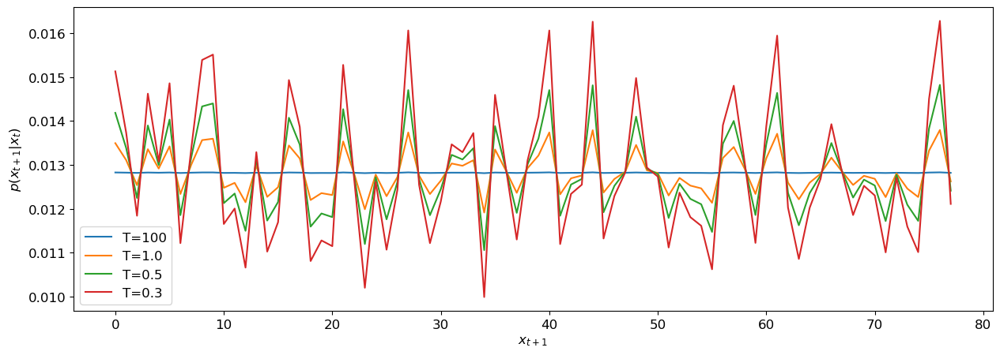

In [15]:
scores = y[0,0,:].detach()
_, ax = plt.subplots(figsize=(15,5))

for t in reversed([0.3, 0.5, 1.0, 100]):
    ax.plot(charnn.hot_softmax(scores, temperature=t).cpu().numpy(), label=f'T={t}')
ax.set_xlabel('$x_{t+1}$')
ax.set_ylabel('$p(x_{t+1}|x_t)$')
ax.legend()

uniform_proba = 1/len(char_to_idx)
uniform_diff = torch.abs(charnn.hot_softmax(scores, temperature=100) - uniform_proba)
test.assertTrue(torch.all(uniform_diff < 1e-4))

**TODO**: Implement the `generate_from_model()` function in the `hw3/charnn.py` module.

In [16]:
for _ in range(3):
    text = charnn.generate_from_model(model, "foobar", 50, (char_to_idx, idx_to_char), T=0.5)
    print(text)
    test.assertEqual(len(text), 50)

foobar5PcNVDS
[t:t(ehzrpLuq,7mjfa;1GO:gIx5Ha)e[GE4
foobarZx0yQ0DkS;I0Lfg)EBFv,onv0vc91p?!i,aXtXNqJAKD
foobarKF vthIloss7XXHK(Xo;jE-eb,Psa:?6Ax-F G1G;gpC


### Training
<a id=part1_7></a>

To train this model, we'll calculate the loss at each time step by comparing the predicted char to
the actual char from our label. We can use cross entropy since per char it's similar to a classification problem.
We'll then sum the losses over the sequence and back-propagate the gradients though time.
Notice that the back-propagation algorithm will "visit" each layer's parameter tensors multiple times,
so we'll accumulate gradients in parameters of the blocks. Luckily `autograd` will handle this part for us.

As usual, the first step of training will be to try and **overfit** a large model (many parameters) to a tiny dataset.
Again, this is to ensure the model and training code are implemented correctly, i.e. that the model can learn.

For a generative model such as this, overfitting is slightly trickier than for classification.
What we'll aim to do is to get our model to **memorize** a specific sequence of chars, so that when given the first
char in the sequence it will immediately spit out the rest of the sequence verbatim.

Let's create a tiny dataset to memorize.

In [17]:
# Pick a tiny subset of the dataset
subset_start, subset_end = 1001, 1005
ds_corpus_ss = torch.utils.data.Subset(ds_corpus, range(subset_start, subset_end))
batch_size_ss = 1
sampler_ss = SequenceBatchSampler(ds_corpus_ss, batch_size=batch_size_ss)
dl_corpus_ss = torch.utils.data.DataLoader(ds_corpus_ss, batch_size_ss, sampler=sampler_ss, shuffle=False)

# Convert subset to text
subset_text = ''
for i in range(subset_end - subset_start):
    subset_text += unembed(ds_corpus_ss[i][0])
print(f'Text to "memorize":\n\n{subset_text}')

Text to "memorize":

TRAM. What would you have?
  HELENA. Something; and scarce so much; nothing, indeed.
    I would not tell you what I would, my lord.
    Faith, yes:
    Strangers and foes do sunder and not kiss.
  BERTRAM. I pray you, stay not, but in haste to horse.
  HE


Now let's implement the first part of our training code.

**TODO**: Implement the `train_epoch()` and `train_batch()` methods of the `RNNTrainer` class in the `hw3/training.py` module. 
You must think about how to correctly handle the hidden state of the model between batches and epochs for this specific task (i.e. text generation).

In [18]:
import torch.nn as nn
import torch.optim as optim
from hw3.training import RNNTrainer

torch.manual_seed(42)

lr = 0.01
num_epochs = 500

in_dim = vocab_len
h_dim = 128
n_layers = 2
loss_fn = nn.CrossEntropyLoss()
model = charnn.MultilayerGRU(in_dim, h_dim, out_dim=in_dim, n_layers=n_layers).to(device)
optimizer = optim.Adam(model.parameters(), lr=lr)
trainer = RNNTrainer(model, loss_fn, optimizer, device)

for epoch in range(num_epochs):
    epoch_result = trainer.train_epoch(dl_corpus_ss, verbose=False)
    
    # Every X epochs, we'll generate a sequence starting from the first char in the first sequence
    # to visualize how/if/what the model is learning.
    if epoch == 0 or (epoch+1) % 25 == 0:
        avg_loss = np.mean(epoch_result.losses)
        accuracy = np.mean(epoch_result.accuracy)
        print(f'\nEpoch #{epoch+1}: Avg. loss = {avg_loss:.3f}, Accuracy = {accuracy:.2f}%')
        
        generated_sequence = charnn.generate_from_model(model, subset_text[0],
                                                        seq_len*(subset_end-subset_start),
                                                        (char_to_idx,idx_to_char), T=0.1)
        
        # Stop if we've successfully memorized the small dataset.
        print(generated_sequence)
        if generated_sequence == subset_text:
            break

# Test successful overfitting
test.assertGreater(epoch_result.accuracy, 99)
test.assertEqual(generated_sequence, subset_text)


Epoch #1: Avg. loss = 3.940, Accuracy = 17.58%
Twn                                               n                                                                                                                                                                                                             

Epoch #25: Avg. loss = 0.286, Accuracy = 94.53%
TRAM. What would you have?
  HELENA. Something; and scarce so much; not indeed.
    Faith, yes:
    Faith, yes:
    Faith, yes:
    Faith, yes:
    Faith, yes:
    Faith, yes:
    Faith, yes:
    Faith, yes:
    Faith, yes:
    Faith, yes:
    Faith, yes:


Epoch #50: Avg. loss = 0.008, Accuracy = 100.00%
TRAM. What would you have?
  HELENA. Something; and scarce so much; nothing, indeed.
    I would not tell you what I would, my lord.
    Faith, yes:
    Strangers and foes do sunder and not kiss.
  BERTRAM. I pray you, stay not, but in haste to horse.
  HE


TRAM. What would you have?
  HELENA. Something; and scarce so much; nothing, indeed.
    I would not tell you what I would, my lord.
    Faith, yes:
    Strangers and foes do sunder and not kiss.
  BERTRAM. I pray you, stay not, but in haste to horse.
  HE


OK, so training works - we can memorize a short sequence.
We'll now train a much larger model on our large dataset. You'll need a GPU for this part.

First, lets set up our dataset and models for training.
We'll split our corpus into 90% train and 10% test-set.
Also, we'll use a learning-rate scheduler to control the learning rate during training.

**TODO**: Set the hyperparameters in the `part1_rnn_hyperparams()` function of the `hw3/answers.py` module.

In [19]:
from hw3.answers import part1_rnn_hyperparams

hp = part1_rnn_hyperparams()
print('hyperparams:\n', hp)

### Dataset definition
vocab_len = len(char_to_idx)
batch_size = hp['batch_size']
seq_len = hp['seq_len']
train_test_ratio = 0.9
num_samples = (len(corpus) - 1) // seq_len
num_train = int(train_test_ratio * num_samples)

samples, labels = charnn.chars_to_labelled_samples(corpus, char_to_idx, seq_len, device)

ds_train = torch.utils.data.TensorDataset(samples[:num_train], labels[:num_train])
sampler_train = SequenceBatchSampler(ds_train, batch_size)
dl_train = torch.utils.data.DataLoader(ds_train, batch_size, shuffle=False, sampler=sampler_train, drop_last=True)

ds_test = torch.utils.data.TensorDataset(samples[num_train:], labels[num_train:])
sampler_test = SequenceBatchSampler(ds_test, batch_size)
dl_test = torch.utils.data.DataLoader(ds_test, batch_size, shuffle=False, sampler=sampler_test, drop_last=True)

print(f'Train: {len(dl_train):3d} batches, {len(dl_train)*batch_size*seq_len:7d} chars')
print(f'Test:  {len(dl_test):3d} batches, {len(dl_test)*batch_size*seq_len:7d} chars')

### Training definition
in_dim = out_dim = vocab_len
checkpoint_file = 'checkpoints/rnn'
num_epochs = 50
early_stopping = 5

model = charnn.MultilayerGRU(in_dim, hp['h_dim'], out_dim, hp['n_layers'], hp['dropout'])
loss_fn = nn.CrossEntropyLoss()
optimizer = optim.Adam(model.parameters(), lr=hp['learn_rate'])
scheduler = optim.lr_scheduler.ReduceLROnPlateau(
    optimizer, mode='max', factor=hp['lr_sched_factor'], patience=hp['lr_sched_patience'], verbose=True
)
trainer = RNNTrainer(model, loss_fn, optimizer, device)

hyperparams:
 {'batch_size': 128, 'seq_len': 64, 'h_dim': 512, 'n_layers': 3, 'dropout': 0.1, 'learn_rate': 0.001, 'lr_sched_factor': 0.1, 'lr_sched_patience': 3}
Train: 697 batches, 5709824 chars
Test:   77 batches,  630784 chars


The code blocks below will train the model and save checkpoints containing the training state and the best model parameters to a file. This allows you to stop training and resume it later from where you left.

Note that you can use the `main.py` script provided within the assignment folder to run this notebook from the command line as if it were a python script by using the `run-nb` subcommand. This allows you to train your model using this notebook without starting jupyter. You can combine this with `srun` or `sbatch` to run the notebook with a GPU on the course servers.

**TODO**:
- Implement the `fit()` method of the `Trainer` class. You can reuse the relevant implementation parts from HW2, but make sure to implement early stopping and checkpoints.
- Implement the `test_epoch()` and `test_batch()` methods of the `RNNTrainer` class in the `hw3/training.py` module.
- Run the following block to train.
- When training is done and you're satisfied with the model's outputs, rename the checkpoint file to `checkpoints/rnn_final.pt`.
  This will cause the block to skip training and instead load your saved model when running the homework submission script.
  Note that your submission zip file will not include the checkpoint file. This is OK.

*** Loading final checkpoint file checkpoints/rnn_final.pt instead of training


train_batch (3.303):   1%|          | 6/697 [00:01<03:10,  3.64it/s]

train_batch (3.352):   1%|          | 6/697 [00:02<03:10,  3.64it/s]

train_batch (3.352):   1%|          | 7/697 [00:02<03:06,  3.70it/s]

train_batch (3.314):   1%|          | 7/697 [00:02<03:06,  3.70it/s]

train_batch (3.314):   1%|          | 8/697 [00:02<03:04,  3.73it/s]

train_batch (3.244):   1%|          | 8/697 [00:02<03:04,  3.73it/s]

train_batch (3.244):   1%|▏         | 9/697 [00:02<03:02,  3.76it/s]

train_batch (3.207):   1%|▏         | 9/697 [00:02<03:02,  3.76it/s]

train_batch (3.207):   1%|▏         | 10/697 [00:02<03:02,  3.77it/s]

train_batch (3.207):   1%|▏         | 10/697 [00:03<03:02,  3.77it/s]

train_batch (3.207):   2%|▏         | 11/697 [00:03<03:01,  3.78it/s]

train_batch (3.213):   2%|▏         | 11/697 [00:03<03:01,  3.78it/s]

train_batch (3.213):   2%|▏         | 12/697 [00:03<03:01,  3.78it/s]

train_batch (3.168):   2%|▏         | 12/697 [00:03<03:01,  3.78it/s]

train_batch (3.168):   2%|▏         | 13/697 [00:03<03:00,  3.79it/s]

train_batch (3.167):   2%|▏         | 13/697 [00:03<03:00,  3.79it/s]

train_batch (3.167):   2%|▏         | 14/697 [00:03<03:00,  3.79it/s]

train_batch (3.174):   2%|▏         | 14/697 [00:04<03:00,  3.79it/s]

train_batch (3.174):   2%|▏         | 15/697 [00:04<02:59,  3.81it/s]

train_batch (3.147):   2%|▏         | 15/697 [00:04<02:59,  3.81it/s]

train_batch (3.147):   2%|▏         | 16/697 [00:04<02:58,  3.81it/s]

train_batch (3.162):   2%|▏         | 16/697 [00:04<02:58,  3.81it/s]

train_batch (3.162):   2%|▏         | 17/697 [00:04<02:58,  3.81it/s]

train_batch (3.176):   2%|▏         | 17/697 [00:04<02:58,  3.81it/s]

train_batch (3.176):   3%|▎         | 18/697 [00:04<02:58,  3.81it/s]

train_batch (3.174):   3%|▎         | 18/697 [00:05<02:58,  3.81it/s]

train_batch (3.174):   3%|▎         | 19/697 [00:05<02:57,  3.81it/s]

train_batch (3.139):   3%|▎         | 19/697 [00:05<02:57,  3.81it/s]

train_batch (3.139):   3%|▎         | 20/697 [00:05<02:58,  3.80it/s]

train_batch (3.141):   3%|▎         | 20/697 [00:05<02:58,  3.80it/s]

train_batch (3.141):   3%|▎         | 21/697 [00:05<02:57,  3.80it/s]

train_batch (3.123):   3%|▎         | 21/697 [00:05<02:57,  3.80it/s]

train_batch (3.123):   3%|▎         | 22/697 [00:05<02:57,  3.80it/s]

train_batch (3.142):   3%|▎         | 22/697 [00:06<02:57,  3.80it/s]

train_batch (3.142):   3%|▎         | 23/697 [00:06<02:57,  3.80it/s]

train_batch (3.139):   3%|▎         | 23/697 [00:06<02:57,  3.80it/s]

train_batch (3.139):   3%|▎         | 24/697 [00:06<02:57,  3.80it/s]

train_batch (3.144):   3%|▎         | 24/697 [00:06<02:57,  3.80it/s]

train_batch (3.144):   4%|▎         | 25/697 [00:06<02:56,  3.80it/s]

train_batch (3.107):   4%|▎         | 25/697 [00:07<02:56,  3.80it/s]

train_batch (3.107):   4%|▎         | 26/697 [00:07<02:56,  3.80it/s]

train_batch (3.119):   4%|▎         | 26/697 [00:07<02:56,  3.80it/s]

train_batch (3.119):   4%|▍         | 27/697 [00:07<02:56,  3.80it/s]

train_batch (3.134):   4%|▍         | 27/697 [00:07<02:56,  3.80it/s]

train_batch (3.134):   4%|▍         | 28/697 [00:07<02:56,  3.79it/s]

train_batch (3.109):   4%|▍         | 28/697 [00:07<02:56,  3.79it/s]

train_batch (3.109):   4%|▍         | 29/697 [00:07<02:56,  3.79it/s]

train_batch (3.124):   4%|▍         | 29/697 [00:08<02:56,  3.79it/s]

train_batch (3.124):   4%|▍         | 30/697 [00:08<02:56,  3.78it/s]

train_batch (3.104):   4%|▍         | 30/697 [00:08<02:56,  3.78it/s]

train_batch (3.104):   4%|▍         | 31/697 [00:08<02:55,  3.79it/s]

train_batch (3.092):   4%|▍         | 31/697 [00:08<02:55,  3.79it/s]

train_batch (3.092):   5%|▍         | 32/697 [00:08<02:55,  3.80it/s]

train_batch (3.049):   5%|▍         | 32/697 [00:08<02:55,  3.80it/s]

train_batch (3.049):   5%|▍         | 33/697 [00:08<02:54,  3.81it/s]

train_batch (3.078):   5%|▍         | 33/697 [00:09<02:54,  3.81it/s]

train_batch (3.078):   5%|▍         | 34/697 [00:09<02:54,  3.81it/s]

train_batch (3.049):   5%|▍         | 34/697 [00:09<02:54,  3.81it/s]

train_batch (3.049):   5%|▌         | 35/697 [00:09<02:53,  3.81it/s]

train_batch (2.979):   5%|▌         | 35/697 [00:09<02:53,  3.81it/s]

train_batch (2.979):   5%|▌         | 36/697 [00:09<02:53,  3.80it/s]

train_batch (3.012):   5%|▌         | 36/697 [00:09<02:53,  3.80it/s]

train_batch (3.012):   5%|▌         | 37/697 [00:09<02:53,  3.81it/s]

train_batch (2.985):   5%|▌         | 37/697 [00:10<02:53,  3.81it/s]

train_batch (2.985):   5%|▌         | 38/697 [00:10<02:53,  3.80it/s]

train_batch (2.967):   5%|▌         | 38/697 [00:10<02:53,  3.80it/s]

train_batch (2.967):   6%|▌         | 39/697 [00:10<02:53,  3.80it/s]

train_batch (2.956):   6%|▌         | 39/697 [00:10<02:53,  3.80it/s]

train_batch (2.956):   6%|▌         | 40/697 [00:10<02:52,  3.80it/s]

train_batch (2.959):   6%|▌         | 40/697 [00:10<02:52,  3.80it/s]

train_batch (2.959):   6%|▌         | 41/697 [00:10<02:52,  3.81it/s]

train_batch (2.903):   6%|▌         | 41/697 [00:11<02:52,  3.81it/s]

train_batch (2.903):   6%|▌         | 42/697 [00:11<02:52,  3.80it/s]

train_batch (2.904):   6%|▌         | 42/697 [00:11<02:52,  3.80it/s]

train_batch (2.904):   6%|▌         | 43/697 [00:11<02:52,  3.79it/s]

train_batch (2.869):   6%|▌         | 43/697 [00:11<02:52,  3.79it/s]

train_batch (2.869):   6%|▋         | 44/697 [00:11<02:52,  3.79it/s]

train_batch (2.887):   6%|▋         | 44/697 [00:12<02:52,  3.79it/s]

train_batch (2.887):   6%|▋         | 45/697 [00:12<02:51,  3.80it/s]

train_batch (2.896):   6%|▋         | 45/697 [00:12<02:51,  3.80it/s]

train_batch (2.896):   7%|▋         | 46/697 [00:12<02:51,  3.80it/s]

train_batch (2.792):   7%|▋         | 46/697 [00:12<02:51,  3.80it/s]

train_batch (2.792):   7%|▋         | 47/697 [00:12<02:50,  3.80it/s]

train_batch (2.765):   7%|▋         | 47/697 [00:12<02:50,  3.80it/s]

train_batch (2.765):   7%|▋         | 48/697 [00:12<02:51,  3.79it/s]

train_batch (2.739):   7%|▋         | 48/697 [00:13<02:51,  3.79it/s]

train_batch (2.739):   7%|▋         | 49/697 [00:13<02:50,  3.79it/s]

train_batch (2.726):   7%|▋         | 49/697 [00:13<02:50,  3.79it/s]

train_batch (2.726):   7%|▋         | 50/697 [00:13<02:50,  3.79it/s]

train_batch (2.676):   7%|▋         | 50/697 [00:13<02:50,  3.79it/s]

train_batch (2.676):   7%|▋         | 51/697 [00:13<02:50,  3.80it/s]

train_batch (2.709):   7%|▋         | 51/697 [00:13<02:50,  3.80it/s]

train_batch (2.709):   7%|▋         | 52/697 [00:13<02:49,  3.80it/s]

train_batch (2.647):   7%|▋         | 52/697 [00:14<02:49,  3.80it/s]

train_batch (2.647):   8%|▊         | 53/697 [00:14<02:49,  3.81it/s]

train_batch (2.656):   8%|▊         | 53/697 [00:14<02:49,  3.81it/s]

train_batch (2.656):   8%|▊         | 54/697 [00:14<02:48,  3.81it/s]

train_batch (2.592):   8%|▊         | 54/697 [00:14<02:48,  3.81it/s]

train_batch (2.592):   8%|▊         | 55/697 [00:14<02:48,  3.82it/s]

train_batch (2.592):   8%|▊         | 55/697 [00:14<02:48,  3.82it/s]

train_batch (2.592):   8%|▊         | 56/697 [00:14<02:48,  3.81it/s]

train_batch (2.510):   8%|▊         | 56/697 [00:15<02:48,  3.81it/s]

train_batch (2.510):   8%|▊         | 57/697 [00:15<02:48,  3.81it/s]

train_batch (2.523):   8%|▊         | 57/697 [00:15<02:48,  3.81it/s]

train_batch (2.523):   8%|▊         | 58/697 [00:15<02:47,  3.81it/s]

train_batch (2.496):   8%|▊         | 58/697 [00:15<02:47,  3.81it/s]

train_batch (2.496):   8%|▊         | 59/697 [00:15<02:47,  3.81it/s]

train_batch (2.476):   8%|▊         | 59/697 [00:15<02:47,  3.81it/s]

train_batch (2.476):   9%|▊         | 60/697 [00:15<02:47,  3.80it/s]

train_batch (2.485):   9%|▊         | 60/697 [00:16<02:47,  3.80it/s]

train_batch (2.485):   9%|▉         | 61/697 [00:16<02:47,  3.80it/s]

train_batch (2.474):   9%|▉         | 61/697 [00:16<02:47,  3.80it/s]

train_batch (2.474):   9%|▉         | 62/697 [00:16<02:47,  3.80it/s]

train_batch (2.426):   9%|▉         | 62/697 [00:16<02:47,  3.80it/s]

train_batch (2.426):   9%|▉         | 63/697 [00:16<02:46,  3.80it/s]

train_batch (2.404):   9%|▉         | 63/697 [00:17<02:46,  3.80it/s]

train_batch (2.404):   9%|▉         | 64/697 [00:17<02:46,  3.80it/s]

train_batch (2.437):   9%|▉         | 64/697 [00:17<02:46,  3.80it/s]

train_batch (2.437):   9%|▉         | 65/697 [00:17<02:46,  3.80it/s]

train_batch (2.430):   9%|▉         | 65/697 [00:17<02:46,  3.80it/s]

train_batch (2.430):   9%|▉         | 66/697 [00:17<02:45,  3.81it/s]

train_batch (2.363):   9%|▉         | 66/697 [00:17<02:45,  3.81it/s]

train_batch (2.363):  10%|▉         | 67/697 [00:17<02:45,  3.81it/s]

train_batch (2.360):  10%|▉         | 67/697 [00:18<02:45,  3.81it/s]

train_batch (2.360):  10%|▉         | 68/697 [00:18<02:45,  3.80it/s]

train_batch (2.380):  10%|▉         | 68/697 [00:18<02:45,  3.80it/s]

train_batch (2.380):  10%|▉         | 69/697 [00:18<02:45,  3.80it/s]

train_batch (2.324):  10%|▉         | 69/697 [00:18<02:45,  3.80it/s]

train_batch (2.324):  10%|█         | 70/697 [00:18<02:44,  3.80it/s]

train_batch (2.323):  10%|█         | 70/697 [00:18<02:44,  3.80it/s]

train_batch (2.323):  10%|█         | 71/697 [00:18<02:44,  3.81it/s]

train_batch (2.378):  10%|█         | 71/697 [00:19<02:44,  3.81it/s]

train_batch (2.378):  10%|█         | 72/697 [00:19<02:44,  3.81it/s]

train_batch (2.334):  10%|█         | 72/697 [00:19<02:44,  3.81it/s]

train_batch (2.334):  10%|█         | 73/697 [00:19<02:44,  3.80it/s]

train_batch (2.356):  10%|█         | 73/697 [00:19<02:44,  3.80it/s]

train_batch (2.356):  11%|█         | 74/697 [00:19<02:43,  3.80it/s]

train_batch (2.279):  11%|█         | 74/697 [00:19<02:43,  3.80it/s]

train_batch (2.279):  11%|█         | 75/697 [00:19<02:43,  3.80it/s]

train_batch (2.308):  11%|█         | 75/697 [00:20<02:43,  3.80it/s]

train_batch (2.308):  11%|█         | 76/697 [00:20<02:43,  3.80it/s]

train_batch (2.291):  11%|█         | 76/697 [00:20<02:43,  3.80it/s]

train_batch (2.291):  11%|█         | 77/697 [00:20<02:42,  3.81it/s]

train_batch (2.256):  11%|█         | 77/697 [00:20<02:42,  3.81it/s]

train_batch (2.256):  11%|█         | 78/697 [00:20<02:42,  3.80it/s]

train_batch (2.286):  11%|█         | 78/697 [00:20<02:42,  3.80it/s]

train_batch (2.286):  11%|█▏        | 79/697 [00:20<02:42,  3.81it/s]

train_batch (2.266):  11%|█▏        | 79/697 [00:21<02:42,  3.81it/s]

train_batch (2.266):  11%|█▏        | 80/697 [00:21<02:42,  3.81it/s]

train_batch (2.250):  11%|█▏        | 80/697 [00:21<02:42,  3.81it/s]

train_batch (2.250):  12%|█▏        | 81/697 [00:21<02:41,  3.81it/s]

train_batch (2.274):  12%|█▏        | 81/697 [00:21<02:41,  3.81it/s]

train_batch (2.274):  12%|█▏        | 82/697 [00:21<02:41,  3.80it/s]

train_batch (2.259):  12%|█▏        | 82/697 [00:22<02:41,  3.80it/s]

train_batch (2.259):  12%|█▏        | 83/697 [00:22<02:41,  3.79it/s]

train_batch (2.238):  12%|█▏        | 83/697 [00:22<02:41,  3.79it/s]

train_batch (2.238):  12%|█▏        | 84/697 [00:22<02:41,  3.79it/s]

train_batch (2.200):  12%|█▏        | 84/697 [00:22<02:41,  3.79it/s]

train_batch (2.200):  12%|█▏        | 85/697 [00:22<02:41,  3.80it/s]

train_batch (2.193):  12%|█▏        | 85/697 [00:22<02:41,  3.80it/s]

train_batch (2.193):  12%|█▏        | 86/697 [00:22<02:40,  3.80it/s]

train_batch (2.202):  12%|█▏        | 86/697 [00:23<02:40,  3.80it/s]

train_batch (2.202):  12%|█▏        | 87/697 [00:23<02:40,  3.80it/s]

train_batch (2.234):  12%|█▏        | 87/697 [00:23<02:40,  3.80it/s]

train_batch (2.234):  13%|█▎        | 88/697 [00:23<02:40,  3.79it/s]

train_batch (2.211):  13%|█▎        | 88/697 [00:23<02:40,  3.79it/s]

train_batch (2.211):  13%|█▎        | 89/697 [00:23<02:40,  3.80it/s]

train_batch (2.184):  13%|█▎        | 89/697 [00:23<02:40,  3.80it/s]

train_batch (2.184):  13%|█▎        | 90/697 [00:23<02:39,  3.80it/s]

train_batch (2.218):  13%|█▎        | 90/697 [00:24<02:39,  3.80it/s]

train_batch (2.218):  13%|█▎        | 91/697 [00:24<02:39,  3.80it/s]

train_batch (2.182):  13%|█▎        | 91/697 [00:24<02:39,  3.80it/s]

train_batch (2.182):  13%|█▎        | 92/697 [00:24<02:39,  3.80it/s]

train_batch (2.190):  13%|█▎        | 92/697 [00:24<02:39,  3.80it/s]

train_batch (2.190):  13%|█▎        | 93/697 [00:24<02:38,  3.80it/s]

train_batch (2.171):  13%|█▎        | 93/697 [00:24<02:38,  3.80it/s]

train_batch (2.171):  13%|█▎        | 94/697 [00:24<02:38,  3.80it/s]

train_batch (2.190):  13%|█▎        | 94/697 [00:25<02:38,  3.80it/s]

train_batch (2.190):  14%|█▎        | 95/697 [00:25<02:38,  3.81it/s]

train_batch (2.117):  14%|█▎        | 95/697 [00:25<02:38,  3.81it/s]

train_batch (2.117):  14%|█▍        | 96/697 [00:25<02:38,  3.79it/s]

train_batch (2.102):  14%|█▍        | 96/697 [00:25<02:38,  3.79it/s]

train_batch (2.102):  14%|█▍        | 97/697 [00:25<02:37,  3.80it/s]

train_batch (2.141):  14%|█▍        | 97/697 [00:25<02:37,  3.80it/s]

train_batch (2.141):  14%|█▍        | 98/697 [00:25<02:37,  3.80it/s]

train_batch (2.138):  14%|█▍        | 98/697 [00:26<02:37,  3.80it/s]

train_batch (2.138):  14%|█▍        | 99/697 [00:26<02:37,  3.79it/s]

train_batch (2.157):  14%|█▍        | 99/697 [00:26<02:37,  3.79it/s]

train_batch (2.157):  14%|█▍        | 100/697 [00:26<02:37,  3.79it/s]

train_batch (2.125):  14%|█▍        | 100/697 [00:26<02:37,  3.79it/s]

train_batch (2.125):  14%|█▍        | 101/697 [00:26<02:36,  3.80it/s]

train_batch (2.152):  14%|█▍        | 101/697 [00:27<02:36,  3.80it/s]

train_batch (2.152):  15%|█▍        | 102/697 [00:27<02:36,  3.80it/s]

train_batch (2.120):  15%|█▍        | 102/697 [00:27<02:36,  3.80it/s]

train_batch (2.120):  15%|█▍        | 103/697 [00:27<02:36,  3.80it/s]

train_batch (2.075):  15%|█▍        | 103/697 [00:27<02:36,  3.80it/s]

train_batch (2.075):  15%|█▍        | 104/697 [00:27<02:36,  3.80it/s]

train_batch (2.100):  15%|█▍        | 104/697 [00:27<02:36,  3.80it/s]

train_batch (2.100):  15%|█▌        | 105/697 [00:27<02:35,  3.81it/s]

train_batch (2.099):  15%|█▌        | 105/697 [00:28<02:35,  3.81it/s]

train_batch (2.099):  15%|█▌        | 106/697 [00:28<02:35,  3.81it/s]

train_batch (2.094):  15%|█▌        | 106/697 [00:28<02:35,  3.81it/s]

train_batch (2.094):  15%|█▌        | 107/697 [00:28<02:35,  3.80it/s]

train_batch (2.056):  15%|█▌        | 107/697 [00:28<02:35,  3.80it/s]

train_batch (2.056):  15%|█▌        | 108/697 [00:28<02:34,  3.80it/s]

train_batch (2.118):  15%|█▌        | 108/697 [00:28<02:34,  3.80it/s]

train_batch (2.118):  16%|█▌        | 109/697 [00:28<02:34,  3.80it/s]

train_batch (2.106):  16%|█▌        | 109/697 [00:29<02:34,  3.80it/s]

train_batch (2.106):  16%|█▌        | 110/697 [00:29<02:34,  3.80it/s]

train_batch (2.106):  16%|█▌        | 110/697 [00:29<02:34,  3.80it/s]

train_batch (2.106):  16%|█▌        | 111/697 [00:29<02:33,  3.81it/s]

train_batch (2.072):  16%|█▌        | 111/697 [00:29<02:33,  3.81it/s]

train_batch (2.072):  16%|█▌        | 112/697 [00:29<02:33,  3.81it/s]

train_batch (2.108):  16%|█▌        | 112/697 [00:29<02:33,  3.81it/s]

train_batch (2.108):  16%|█▌        | 113/697 [00:29<02:33,  3.80it/s]

train_batch (2.074):  16%|█▌        | 113/697 [00:30<02:33,  3.80it/s]

train_batch (2.074):  16%|█▋        | 114/697 [00:30<02:33,  3.80it/s]

train_batch (2.089):  16%|█▋        | 114/697 [00:30<02:33,  3.80it/s]

train_batch (2.089):  16%|█▋        | 115/697 [00:30<02:33,  3.80it/s]

train_batch (2.048):  16%|█▋        | 115/697 [00:30<02:33,  3.80it/s]

train_batch (2.048):  17%|█▋        | 116/697 [00:30<02:32,  3.81it/s]

train_batch (2.090):  17%|█▋        | 116/697 [00:30<02:32,  3.81it/s]

train_batch (2.090):  17%|█▋        | 117/697 [00:30<02:32,  3.81it/s]

train_batch (2.045):  17%|█▋        | 117/697 [00:31<02:32,  3.81it/s]

train_batch (2.045):  17%|█▋        | 118/697 [00:31<02:32,  3.80it/s]

train_batch (2.028):  17%|█▋        | 118/697 [00:31<02:32,  3.80it/s]

train_batch (2.028):  17%|█▋        | 119/697 [00:31<02:32,  3.80it/s]

train_batch (2.030):  17%|█▋        | 119/697 [00:31<02:32,  3.80it/s]

train_batch (2.030):  17%|█▋        | 120/697 [00:31<02:31,  3.80it/s]

train_batch (2.015):  17%|█▋        | 120/697 [00:32<02:31,  3.80it/s]

train_batch (2.015):  17%|█▋        | 121/697 [00:32<02:31,  3.80it/s]

train_batch (2.013):  17%|█▋        | 121/697 [00:32<02:31,  3.80it/s]

train_batch (2.013):  18%|█▊        | 122/697 [00:32<02:31,  3.79it/s]

train_batch (2.042):  18%|█▊        | 122/697 [00:32<02:31,  3.79it/s]

train_batch (2.042):  18%|█▊        | 123/697 [00:32<02:31,  3.80it/s]

train_batch (1.996):  18%|█▊        | 123/697 [00:32<02:31,  3.80it/s]

train_batch (1.996):  18%|█▊        | 124/697 [00:32<02:30,  3.80it/s]

train_batch (2.013):  18%|█▊        | 124/697 [00:33<02:30,  3.80it/s]

train_batch (2.013):  18%|█▊        | 125/697 [00:33<02:30,  3.80it/s]

train_batch (2.030):  18%|█▊        | 125/697 [00:33<02:30,  3.80it/s]

train_batch (2.030):  18%|█▊        | 126/697 [00:33<02:30,  3.80it/s]

train_batch (2.055):  18%|█▊        | 126/697 [00:33<02:30,  3.80it/s]

train_batch (2.055):  18%|█▊        | 127/697 [00:33<02:29,  3.81it/s]

train_batch (2.000):  18%|█▊        | 127/697 [00:33<02:29,  3.81it/s]

train_batch (2.000):  18%|█▊        | 128/697 [00:33<02:29,  3.81it/s]

train_batch (1.997):  18%|█▊        | 128/697 [00:34<02:29,  3.81it/s]

train_batch (1.997):  19%|█▊        | 129/697 [00:34<02:29,  3.81it/s]

train_batch (2.001):  19%|█▊        | 129/697 [00:34<02:29,  3.81it/s]

train_batch (2.001):  19%|█▊        | 130/697 [00:34<02:29,  3.80it/s]

train_batch (2.016):  19%|█▊        | 130/697 [00:34<02:29,  3.80it/s]

train_batch (2.016):  19%|█▉        | 131/697 [00:34<02:28,  3.81it/s]

train_batch (1.987):  19%|█▉        | 131/697 [00:34<02:28,  3.81it/s]

train_batch (1.987):  19%|█▉        | 132/697 [00:34<02:28,  3.81it/s]

train_batch (2.006):  19%|█▉        | 132/697 [00:35<02:28,  3.81it/s]

train_batch (2.006):  19%|█▉        | 133/697 [00:35<02:28,  3.80it/s]

train_batch (1.983):  19%|█▉        | 133/697 [00:35<02:28,  3.80it/s]

train_batch (1.983):  19%|█▉        | 134/697 [00:35<02:27,  3.81it/s]

train_batch (1.989):  19%|█▉        | 134/697 [00:35<02:27,  3.81it/s]

train_batch (1.989):  19%|█▉        | 135/697 [00:35<02:27,  3.81it/s]

train_batch (1.955):  19%|█▉        | 135/697 [00:35<02:27,  3.81it/s]

train_batch (1.955):  20%|█▉        | 136/697 [00:35<02:27,  3.81it/s]

train_batch (2.006):  20%|█▉        | 136/697 [00:36<02:27,  3.81it/s]

train_batch (2.006):  20%|█▉        | 137/697 [00:36<02:27,  3.81it/s]

train_batch (1.978):  20%|█▉        | 137/697 [00:36<02:27,  3.81it/s]

train_batch (1.978):  20%|█▉        | 138/697 [00:36<02:26,  3.80it/s]

train_batch (1.980):  20%|█▉        | 138/697 [00:36<02:26,  3.80it/s]

train_batch (1.980):  20%|█▉        | 139/697 [00:36<02:26,  3.80it/s]

train_batch (2.002):  20%|█▉        | 139/697 [00:37<02:26,  3.80it/s]

train_batch (2.002):  20%|██        | 140/697 [00:37<02:26,  3.80it/s]

train_batch (1.983):  20%|██        | 140/697 [00:37<02:26,  3.80it/s]

train_batch (1.983):  20%|██        | 141/697 [00:37<02:25,  3.81it/s]

train_batch (1.985):  20%|██        | 141/697 [00:37<02:25,  3.81it/s]

train_batch (1.985):  20%|██        | 142/697 [00:37<02:25,  3.81it/s]

train_batch (1.952):  20%|██        | 142/697 [00:37<02:25,  3.81it/s]

train_batch (1.952):  21%|██        | 143/697 [00:37<02:25,  3.81it/s]

train_batch (1.973):  21%|██        | 143/697 [00:38<02:25,  3.81it/s]

train_batch (1.973):  21%|██        | 144/697 [00:38<02:25,  3.80it/s]

train_batch (1.932):  21%|██        | 144/697 [00:38<02:25,  3.80it/s]

train_batch (1.932):  21%|██        | 145/697 [00:38<02:24,  3.81it/s]

train_batch (1.967):  21%|██        | 145/697 [00:38<02:24,  3.81it/s]

train_batch (1.967):  21%|██        | 146/697 [00:38<02:24,  3.81it/s]

train_batch (1.972):  21%|██        | 146/697 [00:38<02:24,  3.81it/s]

train_batch (1.972):  21%|██        | 147/697 [00:38<02:25,  3.78it/s]

train_batch (1.904):  21%|██        | 147/697 [00:39<02:25,  3.78it/s]

train_batch (1.904):  21%|██        | 148/697 [00:39<02:25,  3.78it/s]

train_batch (1.947):  21%|██        | 148/697 [00:39<02:25,  3.78it/s]

train_batch (1.947):  21%|██▏       | 149/697 [00:39<02:24,  3.79it/s]

train_batch (1.954):  21%|██▏       | 149/697 [00:39<02:24,  3.79it/s]

train_batch (1.954):  22%|██▏       | 150/697 [00:39<02:24,  3.79it/s]

train_batch (1.908):  22%|██▏       | 150/697 [00:39<02:24,  3.79it/s]

train_batch (1.908):  22%|██▏       | 151/697 [00:39<02:23,  3.80it/s]

train_batch (1.925):  22%|██▏       | 151/697 [00:40<02:23,  3.80it/s]

train_batch (1.925):  22%|██▏       | 152/697 [00:40<02:23,  3.80it/s]

train_batch (1.922):  22%|██▏       | 152/697 [00:40<02:23,  3.80it/s]

train_batch (1.922):  22%|██▏       | 153/697 [00:40<02:23,  3.79it/s]

train_batch (1.972):  22%|██▏       | 153/697 [00:40<02:23,  3.79it/s]

train_batch (1.972):  22%|██▏       | 154/697 [00:40<02:22,  3.80it/s]

train_batch (1.925):  22%|██▏       | 154/697 [00:40<02:22,  3.80it/s]

train_batch (1.925):  22%|██▏       | 155/697 [00:40<02:23,  3.79it/s]

train_batch (1.948):  22%|██▏       | 155/697 [00:41<02:23,  3.79it/s]

train_batch (1.948):  22%|██▏       | 156/697 [00:41<02:22,  3.79it/s]

train_batch (1.939):  22%|██▏       | 156/697 [00:41<02:22,  3.79it/s]

train_batch (1.939):  23%|██▎       | 157/697 [00:41<02:22,  3.79it/s]

train_batch (1.932):  23%|██▎       | 157/697 [00:41<02:22,  3.79it/s]

train_batch (1.932):  23%|██▎       | 158/697 [00:41<02:22,  3.79it/s]

train_batch (1.922):  23%|██▎       | 158/697 [00:42<02:22,  3.79it/s]

train_batch (1.922):  23%|██▎       | 159/697 [00:42<02:21,  3.80it/s]

train_batch (1.922):  23%|██▎       | 159/697 [00:42<02:21,  3.80it/s]

train_batch (1.922):  23%|██▎       | 160/697 [00:42<02:21,  3.79it/s]

train_batch (1.920):  23%|██▎       | 160/697 [00:42<02:21,  3.79it/s]

train_batch (1.920):  23%|██▎       | 161/697 [00:42<02:20,  3.80it/s]

train_batch (1.918):  23%|██▎       | 161/697 [00:42<02:20,  3.80it/s]

train_batch (1.918):  23%|██▎       | 162/697 [00:42<02:20,  3.80it/s]

train_batch (1.943):  23%|██▎       | 162/697 [00:43<02:20,  3.80it/s]

train_batch (1.943):  23%|██▎       | 163/697 [00:43<02:20,  3.80it/s]

train_batch (1.949):  23%|██▎       | 163/697 [00:43<02:20,  3.80it/s]

train_batch (1.949):  24%|██▎       | 164/697 [00:43<02:20,  3.80it/s]

train_batch (1.909):  24%|██▎       | 164/697 [00:43<02:20,  3.80it/s]

train_batch (1.909):  24%|██▎       | 165/697 [00:43<02:20,  3.79it/s]

train_batch (1.910):  24%|██▎       | 165/697 [00:43<02:20,  3.79it/s]

train_batch (1.910):  24%|██▍       | 166/697 [00:43<02:20,  3.79it/s]

train_batch (1.834):  24%|██▍       | 166/697 [00:44<02:20,  3.79it/s]

train_batch (1.834):  24%|██▍       | 167/697 [00:44<02:19,  3.79it/s]

train_batch (1.878):  24%|██▍       | 167/697 [00:44<02:19,  3.79it/s]

train_batch (1.878):  24%|██▍       | 168/697 [00:44<02:19,  3.80it/s]

train_batch (1.908):  24%|██▍       | 168/697 [00:44<02:19,  3.80it/s]

train_batch (1.908):  24%|██▍       | 169/697 [00:44<02:18,  3.80it/s]

train_batch (1.887):  24%|██▍       | 169/697 [00:44<02:18,  3.80it/s]

train_batch (1.887):  24%|██▍       | 170/697 [00:44<02:18,  3.80it/s]

train_batch (1.937):  24%|██▍       | 170/697 [00:45<02:18,  3.80it/s]

train_batch (1.937):  25%|██▍       | 171/697 [00:45<02:18,  3.80it/s]

train_batch (1.884):  25%|██▍       | 171/697 [00:45<02:18,  3.80it/s]

train_batch (1.884):  25%|██▍       | 172/697 [00:45<02:18,  3.80it/s]

train_batch (1.883):  25%|██▍       | 172/697 [00:45<02:18,  3.80it/s]

train_batch (1.883):  25%|██▍       | 173/697 [00:45<02:17,  3.81it/s]

train_batch (1.857):  25%|██▍       | 173/697 [00:45<02:17,  3.81it/s]

train_batch (1.857):  25%|██▍       | 174/697 [00:45<02:17,  3.81it/s]

train_batch (1.895):  25%|██▍       | 174/697 [00:46<02:17,  3.81it/s]

train_batch (1.895):  25%|██▌       | 175/697 [00:46<02:17,  3.81it/s]

train_batch (1.868):  25%|██▌       | 175/697 [00:46<02:17,  3.81it/s]

train_batch (1.868):  25%|██▌       | 176/697 [00:46<02:17,  3.79it/s]

train_batch (1.842):  25%|██▌       | 176/697 [00:46<02:17,  3.79it/s]

train_batch (1.842):  25%|██▌       | 177/697 [00:46<02:16,  3.81it/s]

train_batch (1.896):  25%|██▌       | 177/697 [00:47<02:16,  3.81it/s]

train_batch (1.896):  26%|██▌       | 178/697 [00:47<02:16,  3.81it/s]

train_batch (1.886):  26%|██▌       | 178/697 [00:47<02:16,  3.81it/s]

train_batch (1.886):  26%|██▌       | 179/697 [00:47<02:15,  3.81it/s]

train_batch (1.886):  26%|██▌       | 179/697 [00:47<02:15,  3.81it/s]

train_batch (1.886):  26%|██▌       | 180/697 [00:47<02:15,  3.81it/s]

train_batch (1.865):  26%|██▌       | 180/697 [00:47<02:15,  3.81it/s]

train_batch (1.865):  26%|██▌       | 181/697 [00:47<02:15,  3.81it/s]

train_batch (1.860):  26%|██▌       | 181/697 [00:48<02:15,  3.81it/s]

train_batch (1.860):  26%|██▌       | 182/697 [00:48<02:15,  3.81it/s]

train_batch (1.838):  26%|██▌       | 182/697 [00:48<02:15,  3.81it/s]

train_batch (1.838):  26%|██▋       | 183/697 [00:48<02:14,  3.82it/s]

train_batch (1.824):  26%|██▋       | 183/697 [00:48<02:14,  3.82it/s]

train_batch (1.824):  26%|██▋       | 184/697 [00:48<02:14,  3.81it/s]

train_batch (1.873):  26%|██▋       | 184/697 [00:48<02:14,  3.81it/s]

train_batch (1.873):  27%|██▋       | 185/697 [00:48<02:14,  3.81it/s]

train_batch (1.825):  27%|██▋       | 185/697 [00:49<02:14,  3.81it/s]

train_batch (1.825):  27%|██▋       | 186/697 [00:49<02:14,  3.81it/s]

train_batch (1.835):  27%|██▋       | 186/697 [00:49<02:14,  3.81it/s]

train_batch (1.835):  27%|██▋       | 187/697 [00:49<02:13,  3.81it/s]

train_batch (1.819):  27%|██▋       | 187/697 [00:49<02:13,  3.81it/s]

train_batch (1.819):  27%|██▋       | 188/697 [00:49<02:13,  3.81it/s]

train_batch (1.892):  27%|██▋       | 188/697 [00:49<02:13,  3.81it/s]

train_batch (1.892):  27%|██▋       | 189/697 [00:49<02:13,  3.81it/s]

train_batch (1.866):  27%|██▋       | 189/697 [00:50<02:13,  3.81it/s]

train_batch (1.866):  27%|██▋       | 190/697 [00:50<02:13,  3.81it/s]

train_batch (1.868):  27%|██▋       | 190/697 [00:50<02:13,  3.81it/s]

train_batch (1.868):  27%|██▋       | 191/697 [00:50<02:13,  3.80it/s]

train_batch (1.871):  27%|██▋       | 191/697 [00:50<02:13,  3.80it/s]

train_batch (1.871):  28%|██▊       | 192/697 [00:50<02:12,  3.81it/s]

train_batch (1.850):  28%|██▊       | 192/697 [00:50<02:12,  3.81it/s]

train_batch (1.850):  28%|██▊       | 193/697 [00:50<02:12,  3.80it/s]

train_batch (1.846):  28%|██▊       | 193/697 [00:51<02:12,  3.80it/s]

train_batch (1.846):  28%|██▊       | 194/697 [00:51<02:12,  3.79it/s]

train_batch (1.854):  28%|██▊       | 194/697 [00:51<02:12,  3.79it/s]

train_batch (1.854):  28%|██▊       | 195/697 [00:51<02:11,  3.80it/s]

train_batch (1.848):  28%|██▊       | 195/697 [00:51<02:11,  3.80it/s]

train_batch (1.848):  28%|██▊       | 196/697 [00:51<02:12,  3.79it/s]

train_batch (1.827):  28%|██▊       | 196/697 [00:52<02:12,  3.79it/s]

train_batch (1.827):  28%|██▊       | 197/697 [00:52<02:11,  3.80it/s]

train_batch (1.804):  28%|██▊       | 197/697 [00:52<02:11,  3.80it/s]

train_batch (1.804):  28%|██▊       | 198/697 [00:52<02:11,  3.80it/s]

train_batch (1.768):  28%|██▊       | 198/697 [00:52<02:11,  3.80it/s]

train_batch (1.768):  29%|██▊       | 199/697 [00:52<02:11,  3.79it/s]

train_batch (1.820):  29%|██▊       | 199/697 [00:52<02:11,  3.79it/s]

train_batch (1.820):  29%|██▊       | 200/697 [00:52<02:11,  3.78it/s]

train_batch (1.808):  29%|██▊       | 200/697 [00:53<02:11,  3.78it/s]

train_batch (1.808):  29%|██▉       | 201/697 [00:53<02:10,  3.79it/s]

train_batch (1.848):  29%|██▉       | 201/697 [00:53<02:10,  3.79it/s]

train_batch (1.848):  29%|██▉       | 202/697 [00:53<02:10,  3.79it/s]

train_batch (1.850):  29%|██▉       | 202/697 [00:53<02:10,  3.79it/s]

train_batch (1.850):  29%|██▉       | 203/697 [00:53<02:10,  3.80it/s]

train_batch (1.787):  29%|██▉       | 203/697 [00:53<02:10,  3.80it/s]

train_batch (1.787):  29%|██▉       | 204/697 [00:53<02:09,  3.80it/s]

train_batch (1.846):  29%|██▉       | 204/697 [00:54<02:09,  3.80it/s]

train_batch (1.846):  29%|██▉       | 205/697 [00:54<02:09,  3.80it/s]

train_batch (1.812):  29%|██▉       | 205/697 [00:54<02:09,  3.80it/s]

train_batch (1.812):  30%|██▉       | 206/697 [00:54<02:08,  3.81it/s]

train_batch (1.855):  30%|██▉       | 206/697 [00:54<02:08,  3.81it/s]

train_batch (1.855):  30%|██▉       | 207/697 [00:54<02:08,  3.80it/s]

train_batch (1.826):  30%|██▉       | 207/697 [00:54<02:08,  3.80it/s]

train_batch (1.826):  30%|██▉       | 208/697 [00:54<02:08,  3.80it/s]

train_batch (1.767):  30%|██▉       | 208/697 [00:55<02:08,  3.80it/s]

train_batch (1.767):  30%|██▉       | 209/697 [00:55<02:08,  3.80it/s]

train_batch (1.806):  30%|██▉       | 209/697 [00:55<02:08,  3.80it/s]

train_batch (1.806):  30%|███       | 210/697 [00:55<02:08,  3.80it/s]

train_batch (1.803):  30%|███       | 210/697 [00:55<02:08,  3.80it/s]

train_batch (1.803):  30%|███       | 211/697 [00:55<02:07,  3.80it/s]

train_batch (1.771):  30%|███       | 211/697 [00:55<02:07,  3.80it/s]

train_batch (1.771):  30%|███       | 212/697 [00:55<02:07,  3.80it/s]

train_batch (1.810):  30%|███       | 212/697 [00:56<02:07,  3.80it/s]

train_batch (1.810):  31%|███       | 213/697 [00:56<02:07,  3.81it/s]

train_batch (1.797):  31%|███       | 213/697 [00:56<02:07,  3.81it/s]

train_batch (1.797):  31%|███       | 214/697 [00:56<02:06,  3.81it/s]

train_batch (1.813):  31%|███       | 214/697 [00:56<02:06,  3.81it/s]

train_batch (1.813):  31%|███       | 215/697 [00:56<02:06,  3.81it/s]

train_batch (1.793):  31%|███       | 215/697 [00:57<02:06,  3.81it/s]

train_batch (1.793):  31%|███       | 216/697 [00:57<02:06,  3.81it/s]

train_batch (1.798):  31%|███       | 216/697 [00:57<02:06,  3.81it/s]

train_batch (1.798):  31%|███       | 217/697 [00:57<02:06,  3.81it/s]

train_batch (1.810):  31%|███       | 217/697 [00:57<02:06,  3.81it/s]

train_batch (1.810):  31%|███▏      | 218/697 [00:57<02:05,  3.81it/s]

train_batch (1.815):  31%|███▏      | 218/697 [00:57<02:05,  3.81it/s]

train_batch (1.815):  31%|███▏      | 219/697 [00:57<02:05,  3.80it/s]

train_batch (1.784):  31%|███▏      | 219/697 [00:58<02:05,  3.80it/s]

train_batch (1.784):  32%|███▏      | 220/697 [00:58<02:05,  3.81it/s]

train_batch (1.758):  32%|███▏      | 220/697 [00:58<02:05,  3.81it/s]

train_batch (1.758):  32%|███▏      | 221/697 [00:58<02:05,  3.80it/s]

train_batch (1.762):  32%|███▏      | 221/697 [00:58<02:05,  3.80it/s]

train_batch (1.762):  32%|███▏      | 222/697 [00:58<02:04,  3.81it/s]

train_batch (1.806):  32%|███▏      | 222/697 [00:58<02:04,  3.81it/s]

train_batch (1.806):  32%|███▏      | 223/697 [00:58<02:04,  3.81it/s]

train_batch (1.791):  32%|███▏      | 223/697 [00:59<02:04,  3.81it/s]

train_batch (1.791):  32%|███▏      | 224/697 [00:59<02:04,  3.81it/s]

train_batch (1.771):  32%|███▏      | 224/697 [00:59<02:04,  3.81it/s]

train_batch (1.771):  32%|███▏      | 225/697 [00:59<02:03,  3.81it/s]

train_batch (1.816):  32%|███▏      | 225/697 [00:59<02:03,  3.81it/s]

train_batch (1.816):  32%|███▏      | 226/697 [00:59<02:03,  3.82it/s]

train_batch (1.800):  32%|███▏      | 226/697 [00:59<02:03,  3.82it/s]

train_batch (1.800):  33%|███▎      | 227/697 [00:59<02:03,  3.82it/s]

train_batch (1.785):  33%|███▎      | 227/697 [01:00<02:03,  3.82it/s]

train_batch (1.785):  33%|███▎      | 228/697 [01:00<02:02,  3.81it/s]

train_batch (1.778):  33%|███▎      | 228/697 [01:00<02:02,  3.81it/s]

train_batch (1.778):  33%|███▎      | 229/697 [01:00<02:02,  3.81it/s]

train_batch (1.783):  33%|███▎      | 229/697 [01:00<02:02,  3.81it/s]

train_batch (1.783):  33%|███▎      | 230/697 [01:00<02:02,  3.81it/s]

train_batch (1.804):  33%|███▎      | 230/697 [01:00<02:02,  3.81it/s]

train_batch (1.804):  33%|███▎      | 231/697 [01:00<02:02,  3.81it/s]

train_batch (1.765):  33%|███▎      | 231/697 [01:01<02:02,  3.81it/s]

train_batch (1.765):  33%|███▎      | 232/697 [01:01<02:02,  3.81it/s]

train_batch (1.786):  33%|███▎      | 232/697 [01:01<02:02,  3.81it/s]

train_batch (1.786):  33%|███▎      | 233/697 [01:01<02:01,  3.82it/s]

train_batch (1.806):  33%|███▎      | 233/697 [01:01<02:01,  3.82it/s]

train_batch (1.806):  34%|███▎      | 234/697 [01:01<02:01,  3.81it/s]

train_batch (1.771):  34%|███▎      | 234/697 [01:02<02:01,  3.81it/s]

train_batch (1.771):  34%|███▎      | 235/697 [01:02<02:01,  3.81it/s]

train_batch (1.763):  34%|███▎      | 235/697 [01:02<02:01,  3.81it/s]

train_batch (1.763):  34%|███▍      | 236/697 [01:02<02:00,  3.81it/s]

train_batch (1.764):  34%|███▍      | 236/697 [01:02<02:00,  3.81it/s]

train_batch (1.764):  34%|███▍      | 237/697 [01:02<02:00,  3.82it/s]

train_batch (1.767):  34%|███▍      | 237/697 [01:02<02:00,  3.82it/s]

train_batch (1.767):  34%|███▍      | 238/697 [01:02<02:00,  3.81it/s]

train_batch (1.752):  34%|███▍      | 238/697 [01:03<02:00,  3.81it/s]

train_batch (1.752):  34%|███▍      | 239/697 [01:03<02:00,  3.80it/s]

train_batch (1.745):  34%|███▍      | 239/697 [01:03<02:00,  3.80it/s]

train_batch (1.745):  34%|███▍      | 240/697 [01:03<02:00,  3.80it/s]

train_batch (1.763):  34%|███▍      | 240/697 [01:03<02:00,  3.80it/s]

train_batch (1.763):  35%|███▍      | 241/697 [01:03<01:59,  3.81it/s]

train_batch (1.731):  35%|███▍      | 241/697 [01:03<01:59,  3.81it/s]

train_batch (1.731):  35%|███▍      | 242/697 [01:03<01:59,  3.81it/s]

train_batch (1.798):  35%|███▍      | 242/697 [01:04<01:59,  3.81it/s]

train_batch (1.798):  35%|███▍      | 243/697 [01:04<01:59,  3.81it/s]

train_batch (1.757):  35%|███▍      | 243/697 [01:04<01:59,  3.81it/s]

train_batch (1.757):  35%|███▌      | 244/697 [01:04<01:58,  3.81it/s]

train_batch (1.752):  35%|███▌      | 244/697 [01:04<01:58,  3.81it/s]

train_batch (1.752):  35%|███▌      | 245/697 [01:04<01:58,  3.82it/s]

train_batch (1.705):  35%|███▌      | 245/697 [01:04<01:58,  3.82it/s]

train_batch (1.705):  35%|███▌      | 246/697 [01:04<01:58,  3.82it/s]

train_batch (1.792):  35%|███▌      | 246/697 [01:05<01:58,  3.82it/s]

train_batch (1.792):  35%|███▌      | 247/697 [01:05<01:57,  3.82it/s]

train_batch (1.771):  35%|███▌      | 247/697 [01:05<01:57,  3.82it/s]

train_batch (1.771):  36%|███▌      | 248/697 [01:05<01:57,  3.81it/s]

train_batch (1.723):  36%|███▌      | 248/697 [01:05<01:57,  3.81it/s]

train_batch (1.723):  36%|███▌      | 249/697 [01:05<01:57,  3.81it/s]

train_batch (1.746):  36%|███▌      | 249/697 [01:05<01:57,  3.81it/s]

train_batch (1.746):  36%|███▌      | 250/697 [01:05<01:57,  3.81it/s]

train_batch (1.719):  36%|███▌      | 250/697 [01:06<01:57,  3.81it/s]

train_batch (1.719):  36%|███▌      | 251/697 [01:06<01:56,  3.82it/s]

train_batch (1.747):  36%|███▌      | 251/697 [01:06<01:56,  3.82it/s]

train_batch (1.747):  36%|███▌      | 252/697 [01:06<01:56,  3.82it/s]

train_batch (1.717):  36%|███▌      | 252/697 [01:06<01:56,  3.82it/s]

train_batch (1.717):  36%|███▋      | 253/697 [01:06<01:56,  3.81it/s]

train_batch (1.748):  36%|███▋      | 253/697 [01:06<01:56,  3.81it/s]

train_batch (1.748):  36%|███▋      | 254/697 [01:06<01:56,  3.80it/s]

train_batch (1.705):  36%|███▋      | 254/697 [01:07<01:56,  3.80it/s]

train_batch (1.705):  37%|███▋      | 255/697 [01:07<01:56,  3.81it/s]

train_batch (1.713):  37%|███▋      | 255/697 [01:07<01:56,  3.81it/s]

train_batch (1.713):  37%|███▋      | 256/697 [01:07<01:55,  3.81it/s]

train_batch (1.725):  37%|███▋      | 256/697 [01:07<01:55,  3.81it/s]

train_batch (1.725):  37%|███▋      | 257/697 [01:07<01:55,  3.82it/s]

train_batch (1.699):  37%|███▋      | 257/697 [01:08<01:55,  3.82it/s]

train_batch (1.699):  37%|███▋      | 258/697 [01:08<01:55,  3.81it/s]

train_batch (1.745):  37%|███▋      | 258/697 [01:08<01:55,  3.81it/s]

train_batch (1.745):  37%|███▋      | 259/697 [01:08<01:55,  3.80it/s]

train_batch (1.742):  37%|███▋      | 259/697 [01:08<01:55,  3.80it/s]

train_batch (1.742):  37%|███▋      | 260/697 [01:08<01:54,  3.80it/s]

train_batch (1.716):  37%|███▋      | 260/697 [01:08<01:54,  3.80it/s]

train_batch (1.716):  37%|███▋      | 261/697 [01:08<01:54,  3.81it/s]

train_batch (1.744):  37%|███▋      | 261/697 [01:09<01:54,  3.81it/s]

train_batch (1.744):  38%|███▊      | 262/697 [01:09<01:54,  3.81it/s]

train_batch (1.756):  38%|███▊      | 262/697 [01:09<01:54,  3.81it/s]

train_batch (1.756):  38%|███▊      | 263/697 [01:09<01:53,  3.81it/s]

train_batch (1.717):  38%|███▊      | 263/697 [01:09<01:53,  3.81it/s]

train_batch (1.717):  38%|███▊      | 264/697 [01:09<01:53,  3.81it/s]

train_batch (1.710):  38%|███▊      | 264/697 [01:09<01:53,  3.81it/s]

train_batch (1.710):  38%|███▊      | 265/697 [01:09<01:53,  3.81it/s]

train_batch (1.727):  38%|███▊      | 265/697 [01:10<01:53,  3.81it/s]

train_batch (1.727):  38%|███▊      | 266/697 [01:10<01:53,  3.81it/s]

train_batch (1.712):  38%|███▊      | 266/697 [01:10<01:53,  3.81it/s]

train_batch (1.712):  38%|███▊      | 267/697 [01:10<01:52,  3.81it/s]

train_batch (1.731):  38%|███▊      | 267/697 [01:10<01:52,  3.81it/s]

train_batch (1.731):  38%|███▊      | 268/697 [01:10<01:52,  3.81it/s]

train_batch (1.705):  38%|███▊      | 268/697 [01:10<01:52,  3.81it/s]

train_batch (1.705):  39%|███▊      | 269/697 [01:10<01:52,  3.80it/s]

train_batch (1.705):  39%|███▊      | 269/697 [01:11<01:52,  3.80it/s]

train_batch (1.705):  39%|███▊      | 270/697 [01:11<01:52,  3.80it/s]

train_batch (1.719):  39%|███▊      | 270/697 [01:11<01:52,  3.80it/s]

train_batch (1.719):  39%|███▉      | 271/697 [01:11<01:51,  3.80it/s]

train_batch (1.743):  39%|███▉      | 271/697 [01:11<01:51,  3.80it/s]

train_batch (1.743):  39%|███▉      | 272/697 [01:11<01:51,  3.81it/s]

train_batch (1.724):  39%|███▉      | 272/697 [01:11<01:51,  3.81it/s]

train_batch (1.724):  39%|███▉      | 273/697 [01:11<01:51,  3.81it/s]

train_batch (1.743):  39%|███▉      | 273/697 [01:12<01:51,  3.81it/s]

train_batch (1.743):  39%|███▉      | 274/697 [01:12<01:51,  3.80it/s]

train_batch (1.716):  39%|███▉      | 274/697 [01:12<01:51,  3.80it/s]

train_batch (1.716):  39%|███▉      | 275/697 [01:12<01:50,  3.81it/s]

train_batch (1.671):  39%|███▉      | 275/697 [01:12<01:50,  3.81it/s]

train_batch (1.671):  40%|███▉      | 276/697 [01:12<01:50,  3.80it/s]

train_batch (1.706):  40%|███▉      | 276/697 [01:13<01:50,  3.80it/s]

train_batch (1.706):  40%|███▉      | 277/697 [01:13<01:50,  3.80it/s]

train_batch (1.692):  40%|███▉      | 277/697 [01:13<01:50,  3.80it/s]

train_batch (1.692):  40%|███▉      | 278/697 [01:13<01:50,  3.81it/s]

train_batch (1.649):  40%|███▉      | 278/697 [01:13<01:50,  3.81it/s]

train_batch (1.649):  40%|████      | 279/697 [01:13<01:49,  3.80it/s]

train_batch (1.692):  40%|████      | 279/697 [01:13<01:49,  3.80it/s]

train_batch (1.692):  40%|████      | 280/697 [01:13<01:49,  3.81it/s]

train_batch (1.696):  40%|████      | 280/697 [01:14<01:49,  3.81it/s]

train_batch (1.696):  40%|████      | 281/697 [01:14<01:49,  3.82it/s]

train_batch (1.695):  40%|████      | 281/697 [01:14<01:49,  3.82it/s]

train_batch (1.695):  40%|████      | 282/697 [01:14<01:48,  3.81it/s]

train_batch (1.702):  40%|████      | 282/697 [01:14<01:48,  3.81it/s]

train_batch (1.702):  41%|████      | 283/697 [01:14<01:48,  3.82it/s]

train_batch (1.671):  41%|████      | 283/697 [01:14<01:48,  3.82it/s]

train_batch (1.671):  41%|████      | 284/697 [01:14<01:48,  3.81it/s]

train_batch (1.710):  41%|████      | 284/697 [01:15<01:48,  3.81it/s]

train_batch (1.710):  41%|████      | 285/697 [01:15<01:48,  3.81it/s]

train_batch (1.650):  41%|████      | 285/697 [01:15<01:48,  3.81it/s]

train_batch (1.650):  41%|████      | 286/697 [01:15<01:47,  3.81it/s]

train_batch (1.704):  41%|████      | 286/697 [01:15<01:47,  3.81it/s]

train_batch (1.704):  41%|████      | 287/697 [01:15<01:47,  3.81it/s]

train_batch (1.700):  41%|████      | 287/697 [01:15<01:47,  3.81it/s]

train_batch (1.700):  41%|████▏     | 288/697 [01:15<01:47,  3.81it/s]

train_batch (1.715):  41%|████▏     | 288/697 [01:16<01:47,  3.81it/s]

train_batch (1.715):  41%|████▏     | 289/697 [01:16<01:47,  3.81it/s]

train_batch (1.693):  41%|████▏     | 289/697 [01:16<01:47,  3.81it/s]

train_batch (1.693):  42%|████▏     | 290/697 [01:16<01:47,  3.80it/s]

train_batch (1.668):  42%|████▏     | 290/697 [01:16<01:47,  3.80it/s]

train_batch (1.668):  42%|████▏     | 291/697 [01:16<01:46,  3.81it/s]

train_batch (1.675):  42%|████▏     | 291/697 [01:16<01:46,  3.81it/s]

train_batch (1.675):  42%|████▏     | 292/697 [01:16<01:46,  3.81it/s]

train_batch (1.667):  42%|████▏     | 292/697 [01:17<01:46,  3.81it/s]

train_batch (1.667):  42%|████▏     | 293/697 [01:17<01:46,  3.81it/s]

train_batch (1.670):  42%|████▏     | 293/697 [01:17<01:46,  3.81it/s]

train_batch (1.670):  42%|████▏     | 294/697 [01:17<01:45,  3.81it/s]

train_batch (1.691):  42%|████▏     | 294/697 [01:17<01:45,  3.81it/s]

train_batch (1.691):  42%|████▏     | 295/697 [01:17<01:45,  3.82it/s]

train_batch (1.692):  42%|████▏     | 295/697 [01:18<01:45,  3.82it/s]

train_batch (1.692):  42%|████▏     | 296/697 [01:18<01:45,  3.81it/s]

train_batch (1.669):  42%|████▏     | 296/697 [01:18<01:45,  3.81it/s]

train_batch (1.669):  43%|████▎     | 297/697 [01:18<01:44,  3.82it/s]

train_batch (1.691):  43%|████▎     | 297/697 [01:18<01:44,  3.82it/s]

train_batch (1.691):  43%|████▎     | 298/697 [01:18<01:44,  3.82it/s]

train_batch (1.656):  43%|████▎     | 298/697 [01:18<01:44,  3.82it/s]

train_batch (1.656):  43%|████▎     | 299/697 [01:18<01:44,  3.82it/s]

train_batch (1.712):  43%|████▎     | 299/697 [01:19<01:44,  3.82it/s]

train_batch (1.712):  43%|████▎     | 300/697 [01:19<01:44,  3.81it/s]

train_batch (1.688):  43%|████▎     | 300/697 [01:19<01:44,  3.81it/s]

train_batch (1.688):  43%|████▎     | 301/697 [01:19<01:43,  3.81it/s]

train_batch (1.687):  43%|████▎     | 301/697 [01:19<01:43,  3.81it/s]

train_batch (1.687):  43%|████▎     | 302/697 [01:19<01:43,  3.81it/s]

train_batch (1.647):  43%|████▎     | 302/697 [01:19<01:43,  3.81it/s]

train_batch (1.647):  43%|████▎     | 303/697 [01:19<01:43,  3.82it/s]

train_batch (1.664):  43%|████▎     | 303/697 [01:20<01:43,  3.82it/s]

train_batch (1.664):  44%|████▎     | 304/697 [01:20<01:43,  3.81it/s]

train_batch (1.661):  44%|████▎     | 304/697 [01:20<01:43,  3.81it/s]

train_batch (1.661):  44%|████▍     | 305/697 [01:20<01:42,  3.81it/s]

train_batch (1.665):  44%|████▍     | 305/697 [01:20<01:42,  3.81it/s]

train_batch (1.665):  44%|████▍     | 306/697 [01:20<01:42,  3.81it/s]

train_batch (1.649):  44%|████▍     | 306/697 [01:20<01:42,  3.81it/s]

train_batch (1.649):  44%|████▍     | 307/697 [01:20<01:42,  3.81it/s]

train_batch (1.659):  44%|████▍     | 307/697 [01:21<01:42,  3.81it/s]

train_batch (1.659):  44%|████▍     | 308/697 [01:21<01:42,  3.78it/s]

train_batch (1.629):  44%|████▍     | 308/697 [01:21<01:42,  3.78it/s]

train_batch (1.629):  44%|████▍     | 309/697 [01:21<01:42,  3.79it/s]

train_batch (1.633):  44%|████▍     | 309/697 [01:21<01:42,  3.79it/s]

train_batch (1.633):  44%|████▍     | 310/697 [01:21<01:41,  3.80it/s]

train_batch (1.670):  44%|████▍     | 310/697 [01:21<01:41,  3.80it/s]

train_batch (1.670):  45%|████▍     | 311/697 [01:21<01:41,  3.80it/s]

train_batch (1.664):  45%|████▍     | 311/697 [01:22<01:41,  3.80it/s]

train_batch (1.664):  45%|████▍     | 312/697 [01:22<01:41,  3.80it/s]

train_batch (1.656):  45%|████▍     | 312/697 [01:22<01:41,  3.80it/s]

train_batch (1.656):  45%|████▍     | 313/697 [01:22<01:40,  3.81it/s]

train_batch (1.677):  45%|████▍     | 313/697 [01:22<01:40,  3.81it/s]

train_batch (1.677):  45%|████▌     | 314/697 [01:22<01:40,  3.81it/s]

train_batch (1.635):  45%|████▌     | 314/697 [01:23<01:40,  3.81it/s]

train_batch (1.635):  45%|████▌     | 315/697 [01:23<01:40,  3.81it/s]

train_batch (1.680):  45%|████▌     | 315/697 [01:23<01:40,  3.81it/s]

train_batch (1.680):  45%|████▌     | 316/697 [01:23<01:40,  3.80it/s]

train_batch (1.638):  45%|████▌     | 316/697 [01:23<01:40,  3.80it/s]

train_batch (1.638):  45%|████▌     | 317/697 [01:23<01:39,  3.81it/s]

train_batch (1.621):  45%|████▌     | 317/697 [01:23<01:39,  3.81it/s]

train_batch (1.621):  46%|████▌     | 318/697 [01:23<01:39,  3.81it/s]

train_batch (1.669):  46%|████▌     | 318/697 [01:24<01:39,  3.81it/s]

train_batch (1.669):  46%|████▌     | 319/697 [01:24<01:39,  3.81it/s]

train_batch (1.665):  46%|████▌     | 319/697 [01:24<01:39,  3.81it/s]

train_batch (1.665):  46%|████▌     | 320/697 [01:24<01:38,  3.81it/s]

train_batch (1.665):  46%|████▌     | 320/697 [01:24<01:38,  3.81it/s]

train_batch (1.665):  46%|████▌     | 321/697 [01:24<01:38,  3.80it/s]

train_batch (1.652):  46%|████▌     | 321/697 [01:24<01:38,  3.80it/s]

train_batch (1.652):  46%|████▌     | 322/697 [01:24<01:38,  3.80it/s]

train_batch (1.599):  46%|████▌     | 322/697 [01:25<01:38,  3.80it/s]

train_batch (1.599):  46%|████▋     | 323/697 [01:25<01:38,  3.81it/s]

train_batch (1.629):  46%|████▋     | 323/697 [01:25<01:38,  3.81it/s]

train_batch (1.629):  46%|████▋     | 324/697 [01:25<01:38,  3.80it/s]

train_batch (1.679):  46%|████▋     | 324/697 [01:25<01:38,  3.80it/s]

train_batch (1.679):  47%|████▋     | 325/697 [01:25<01:37,  3.81it/s]

train_batch (1.640):  47%|████▋     | 325/697 [01:25<01:37,  3.81it/s]

train_batch (1.640):  47%|████▋     | 326/697 [01:25<01:37,  3.81it/s]

train_batch (1.619):  47%|████▋     | 326/697 [01:26<01:37,  3.81it/s]

train_batch (1.619):  47%|████▋     | 327/697 [01:26<01:37,  3.81it/s]

train_batch (1.669):  47%|████▋     | 327/697 [01:26<01:37,  3.81it/s]

train_batch (1.669):  47%|████▋     | 328/697 [01:26<01:36,  3.81it/s]

train_batch (1.674):  47%|████▋     | 328/697 [01:26<01:36,  3.81it/s]

train_batch (1.674):  47%|████▋     | 329/697 [01:26<01:36,  3.81it/s]

train_batch (1.670):  47%|████▋     | 329/697 [01:26<01:36,  3.81it/s]

train_batch (1.670):  47%|████▋     | 330/697 [01:26<01:36,  3.82it/s]

train_batch (1.668):  47%|████▋     | 330/697 [01:27<01:36,  3.82it/s]

train_batch (1.668):  47%|████▋     | 331/697 [01:27<01:35,  3.82it/s]

train_batch (1.643):  47%|████▋     | 331/697 [01:27<01:35,  3.82it/s]

train_batch (1.643):  48%|████▊     | 332/697 [01:27<01:35,  3.83it/s]

train_batch (1.623):  48%|████▊     | 332/697 [01:27<01:35,  3.83it/s]

train_batch (1.623):  48%|████▊     | 333/697 [01:27<01:35,  3.83it/s]

train_batch (1.645):  48%|████▊     | 333/697 [01:28<01:35,  3.83it/s]

train_batch (1.645):  48%|████▊     | 334/697 [01:28<01:35,  3.81it/s]

train_batch (1.589):  48%|████▊     | 334/697 [01:28<01:35,  3.81it/s]

train_batch (1.589):  48%|████▊     | 335/697 [01:28<01:34,  3.81it/s]

train_batch (1.654):  48%|████▊     | 335/697 [01:28<01:34,  3.81it/s]

train_batch (1.654):  48%|████▊     | 336/697 [01:28<01:34,  3.81it/s]

train_batch (1.619):  48%|████▊     | 336/697 [01:28<01:34,  3.81it/s]

train_batch (1.619):  48%|████▊     | 337/697 [01:28<01:34,  3.81it/s]

train_batch (1.652):  48%|████▊     | 337/697 [01:29<01:34,  3.81it/s]

train_batch (1.652):  48%|████▊     | 338/697 [01:29<01:34,  3.80it/s]

train_batch (1.636):  48%|████▊     | 338/697 [01:29<01:34,  3.80it/s]

train_batch (1.636):  49%|████▊     | 339/697 [01:29<01:34,  3.81it/s]

train_batch (1.629):  49%|████▊     | 339/697 [01:29<01:34,  3.81it/s]

train_batch (1.629):  49%|████▉     | 340/697 [01:29<01:33,  3.81it/s]

train_batch (1.658):  49%|████▉     | 340/697 [01:29<01:33,  3.81it/s]

train_batch (1.658):  49%|████▉     | 341/697 [01:29<01:33,  3.81it/s]

train_batch (1.654):  49%|████▉     | 341/697 [01:30<01:33,  3.81it/s]

train_batch (1.654):  49%|████▉     | 342/697 [01:30<01:33,  3.81it/s]

train_batch (1.639):  49%|████▉     | 342/697 [01:30<01:33,  3.81it/s]

train_batch (1.639):  49%|████▉     | 343/697 [01:30<01:32,  3.82it/s]

train_batch (1.614):  49%|████▉     | 343/697 [01:30<01:32,  3.82it/s]

train_batch (1.614):  49%|████▉     | 344/697 [01:30<01:32,  3.81it/s]

train_batch (1.626):  49%|████▉     | 344/697 [01:30<01:32,  3.81it/s]

train_batch (1.626):  49%|████▉     | 345/697 [01:30<01:32,  3.80it/s]

train_batch (1.616):  49%|████▉     | 345/697 [01:31<01:32,  3.80it/s]

train_batch (1.616):  50%|████▉     | 346/697 [01:31<01:32,  3.80it/s]

train_batch (1.628):  50%|████▉     | 346/697 [01:31<01:32,  3.80it/s]

train_batch (1.628):  50%|████▉     | 347/697 [01:31<01:31,  3.81it/s]

train_batch (1.609):  50%|████▉     | 347/697 [01:31<01:31,  3.81it/s]

train_batch (1.609):  50%|████▉     | 348/697 [01:31<01:31,  3.81it/s]

train_batch (1.641):  50%|████▉     | 348/697 [01:31<01:31,  3.81it/s]

train_batch (1.641):  50%|█████     | 349/697 [01:31<01:31,  3.80it/s]

train_batch (1.604):  50%|█████     | 349/697 [01:32<01:31,  3.80it/s]

train_batch (1.604):  50%|█████     | 350/697 [01:32<01:31,  3.80it/s]

train_batch (1.606):  50%|█████     | 350/697 [01:32<01:31,  3.80it/s]

train_batch (1.606):  50%|█████     | 351/697 [01:32<01:30,  3.81it/s]

train_batch (1.653):  50%|█████     | 351/697 [01:32<01:30,  3.81it/s]

train_batch (1.653):  51%|█████     | 352/697 [01:32<01:30,  3.82it/s]

train_batch (1.632):  51%|█████     | 352/697 [01:32<01:30,  3.82it/s]

train_batch (1.632):  51%|█████     | 353/697 [01:32<01:30,  3.82it/s]

train_batch (1.617):  51%|█████     | 353/697 [01:33<01:30,  3.82it/s]

train_batch (1.617):  51%|█████     | 354/697 [01:33<01:29,  3.82it/s]

train_batch (1.593):  51%|█████     | 354/697 [01:33<01:29,  3.82it/s]

train_batch (1.593):  51%|█████     | 355/697 [01:33<01:29,  3.82it/s]

train_batch (1.619):  51%|█████     | 355/697 [01:33<01:29,  3.82it/s]

train_batch (1.619):  51%|█████     | 356/697 [01:33<01:29,  3.82it/s]

train_batch (1.586):  51%|█████     | 356/697 [01:34<01:29,  3.82it/s]

train_batch (1.586):  51%|█████     | 357/697 [01:34<01:29,  3.81it/s]

train_batch (1.613):  51%|█████     | 357/697 [01:34<01:29,  3.81it/s]

train_batch (1.613):  51%|█████▏    | 358/697 [01:34<01:28,  3.81it/s]

train_batch (1.613):  51%|█████▏    | 358/697 [01:34<01:28,  3.81it/s]

train_batch (1.613):  52%|█████▏    | 359/697 [01:34<01:28,  3.81it/s]

train_batch (1.608):  52%|█████▏    | 359/697 [01:34<01:28,  3.81it/s]

train_batch (1.608):  52%|█████▏    | 360/697 [01:34<01:28,  3.81it/s]

train_batch (1.592):  52%|█████▏    | 360/697 [01:35<01:28,  3.81it/s]

train_batch (1.592):  52%|█████▏    | 361/697 [01:35<01:28,  3.80it/s]

train_batch (1.564):  52%|█████▏    | 361/697 [01:35<01:28,  3.80it/s]

train_batch (1.564):  52%|█████▏    | 362/697 [01:35<01:28,  3.80it/s]

train_batch (1.551):  52%|█████▏    | 362/697 [01:35<01:28,  3.80it/s]

train_batch (1.551):  52%|█████▏    | 363/697 [01:35<01:27,  3.81it/s]

train_batch (1.585):  52%|█████▏    | 363/697 [01:35<01:27,  3.81it/s]

train_batch (1.585):  52%|█████▏    | 364/697 [01:35<01:27,  3.81it/s]

train_batch (1.588):  52%|█████▏    | 364/697 [01:36<01:27,  3.81it/s]

train_batch (1.588):  52%|█████▏    | 365/697 [01:36<01:27,  3.81it/s]

train_batch (1.611):  52%|█████▏    | 365/697 [01:36<01:27,  3.81it/s]

train_batch (1.611):  53%|█████▎    | 366/697 [01:36<01:27,  3.80it/s]

train_batch (1.587):  53%|█████▎    | 366/697 [01:36<01:27,  3.80it/s]

train_batch (1.587):  53%|█████▎    | 367/697 [01:36<01:26,  3.81it/s]

train_batch (1.564):  53%|█████▎    | 367/697 [01:36<01:26,  3.81it/s]

train_batch (1.564):  53%|█████▎    | 368/697 [01:36<01:26,  3.81it/s]

train_batch (1.569):  53%|█████▎    | 368/697 [01:37<01:26,  3.81it/s]

train_batch (1.569):  53%|█████▎    | 369/697 [01:37<01:25,  3.82it/s]

train_batch (1.560):  53%|█████▎    | 369/697 [01:37<01:25,  3.82it/s]

train_batch (1.560):  53%|█████▎    | 370/697 [01:37<01:25,  3.81it/s]

train_batch (1.597):  53%|█████▎    | 370/697 [01:37<01:25,  3.81it/s]

train_batch (1.597):  53%|█████▎    | 371/697 [01:37<01:25,  3.81it/s]

train_batch (1.600):  53%|█████▎    | 371/697 [01:37<01:25,  3.81it/s]

train_batch (1.600):  53%|█████▎    | 372/697 [01:37<01:25,  3.81it/s]

train_batch (1.574):  53%|█████▎    | 372/697 [01:38<01:25,  3.81it/s]

train_batch (1.574):  54%|█████▎    | 373/697 [01:38<01:24,  3.82it/s]

train_batch (1.602):  54%|█████▎    | 373/697 [01:38<01:24,  3.82it/s]

train_batch (1.602):  54%|█████▎    | 374/697 [01:38<01:24,  3.82it/s]

train_batch (1.608):  54%|█████▎    | 374/697 [01:38<01:24,  3.82it/s]

train_batch (1.608):  54%|█████▍    | 375/697 [01:38<01:24,  3.81it/s]

train_batch (1.577):  54%|█████▍    | 375/697 [01:39<01:24,  3.81it/s]

train_batch (1.577):  54%|█████▍    | 376/697 [01:39<01:24,  3.81it/s]

train_batch (1.579):  54%|█████▍    | 376/697 [01:39<01:24,  3.81it/s]

train_batch (1.579):  54%|█████▍    | 377/697 [01:39<01:23,  3.81it/s]

train_batch (1.629):  54%|█████▍    | 377/697 [01:39<01:23,  3.81it/s]

train_batch (1.629):  54%|█████▍    | 378/697 [01:39<01:23,  3.81it/s]

train_batch (1.580):  54%|█████▍    | 378/697 [01:39<01:23,  3.81it/s]

train_batch (1.580):  54%|█████▍    | 379/697 [01:39<01:23,  3.82it/s]

train_batch (1.511):  54%|█████▍    | 379/697 [01:40<01:23,  3.82it/s]

train_batch (1.511):  55%|█████▍    | 380/697 [01:40<01:23,  3.81it/s]

train_batch (1.584):  55%|█████▍    | 380/697 [01:40<01:23,  3.81it/s]

train_batch (1.584):  55%|█████▍    | 381/697 [01:40<01:22,  3.82it/s]

train_batch (1.598):  55%|█████▍    | 381/697 [01:40<01:22,  3.82it/s]

train_batch (1.598):  55%|█████▍    | 382/697 [01:40<01:22,  3.80it/s]

train_batch (1.586):  55%|█████▍    | 382/697 [01:40<01:22,  3.80it/s]

train_batch (1.586):  55%|█████▍    | 383/697 [01:40<01:22,  3.80it/s]

train_batch (1.588):  55%|█████▍    | 383/697 [01:41<01:22,  3.80it/s]

train_batch (1.588):  55%|█████▌    | 384/697 [01:41<01:22,  3.80it/s]

train_batch (1.581):  55%|█████▌    | 384/697 [01:41<01:22,  3.80it/s]

train_batch (1.581):  55%|█████▌    | 385/697 [01:41<01:22,  3.80it/s]

train_batch (1.579):  55%|█████▌    | 385/697 [01:41<01:22,  3.80it/s]

train_batch (1.579):  55%|█████▌    | 386/697 [01:41<01:21,  3.80it/s]

train_batch (1.551):  55%|█████▌    | 386/697 [01:41<01:21,  3.80it/s]

train_batch (1.551):  56%|█████▌    | 387/697 [01:41<01:21,  3.81it/s]

train_batch (1.569):  56%|█████▌    | 387/697 [01:42<01:21,  3.81it/s]

train_batch (1.569):  56%|█████▌    | 388/697 [01:42<01:21,  3.81it/s]

train_batch (1.599):  56%|█████▌    | 388/697 [01:42<01:21,  3.81it/s]

train_batch (1.599):  56%|█████▌    | 389/697 [01:42<01:20,  3.81it/s]

train_batch (1.574):  56%|█████▌    | 389/697 [01:42<01:20,  3.81it/s]

train_batch (1.574):  56%|█████▌    | 390/697 [01:42<01:20,  3.81it/s]

train_batch (1.567):  56%|█████▌    | 390/697 [01:42<01:20,  3.81it/s]

train_batch (1.567):  56%|█████▌    | 391/697 [01:42<01:20,  3.81it/s]

train_batch (1.588):  56%|█████▌    | 391/697 [01:43<01:20,  3.81it/s]

train_batch (1.588):  56%|█████▌    | 392/697 [01:43<01:19,  3.81it/s]

train_batch (1.567):  56%|█████▌    | 392/697 [01:43<01:19,  3.81it/s]

train_batch (1.567):  56%|█████▋    | 393/697 [01:43<01:19,  3.82it/s]

train_batch (1.610):  56%|█████▋    | 393/697 [01:43<01:19,  3.82it/s]

train_batch (1.610):  57%|█████▋    | 394/697 [01:43<01:19,  3.82it/s]

train_batch (1.570):  57%|█████▋    | 394/697 [01:44<01:19,  3.82it/s]

train_batch (1.570):  57%|█████▋    | 395/697 [01:44<01:19,  3.82it/s]

train_batch (1.546):  57%|█████▋    | 395/697 [01:44<01:19,  3.82it/s]

train_batch (1.546):  57%|█████▋    | 396/697 [01:44<01:18,  3.82it/s]

train_batch (1.575):  57%|█████▋    | 396/697 [01:44<01:18,  3.82it/s]

train_batch (1.575):  57%|█████▋    | 397/697 [01:44<01:18,  3.82it/s]

train_batch (1.573):  57%|█████▋    | 397/697 [01:44<01:18,  3.82it/s]

train_batch (1.573):  57%|█████▋    | 398/697 [01:44<01:18,  3.82it/s]

train_batch (1.535):  57%|█████▋    | 398/697 [01:45<01:18,  3.82it/s]

train_batch (1.535):  57%|█████▋    | 399/697 [01:45<01:18,  3.82it/s]

train_batch (1.554):  57%|█████▋    | 399/697 [01:45<01:18,  3.82it/s]

train_batch (1.554):  57%|█████▋    | 400/697 [01:45<01:17,  3.82it/s]

train_batch (1.566):  57%|█████▋    | 400/697 [01:45<01:17,  3.82it/s]

train_batch (1.566):  58%|█████▊    | 401/697 [01:45<01:17,  3.81it/s]

train_batch (1.560):  58%|█████▊    | 401/697 [01:45<01:17,  3.81it/s]

train_batch (1.560):  58%|█████▊    | 402/697 [01:45<01:17,  3.80it/s]

train_batch (1.563):  58%|█████▊    | 402/697 [01:46<01:17,  3.80it/s]

train_batch (1.563):  58%|█████▊    | 403/697 [01:46<01:17,  3.81it/s]

train_batch (1.575):  58%|█████▊    | 403/697 [01:46<01:17,  3.81it/s]

train_batch (1.575):  58%|█████▊    | 404/697 [01:46<01:17,  3.80it/s]

train_batch (1.551):  58%|█████▊    | 404/697 [01:46<01:17,  3.80it/s]

train_batch (1.551):  58%|█████▊    | 405/697 [01:46<01:16,  3.81it/s]

train_batch (1.552):  58%|█████▊    | 405/697 [01:46<01:16,  3.81it/s]

train_batch (1.552):  58%|█████▊    | 406/697 [01:46<01:16,  3.81it/s]

train_batch (1.587):  58%|█████▊    | 406/697 [01:47<01:16,  3.81it/s]

train_batch (1.587):  58%|█████▊    | 407/697 [01:47<01:16,  3.81it/s]

train_batch (1.562):  58%|█████▊    | 407/697 [01:47<01:16,  3.81it/s]

train_batch (1.562):  59%|█████▊    | 408/697 [01:47<01:15,  3.82it/s]

train_batch (1.523):  59%|█████▊    | 408/697 [01:47<01:15,  3.82it/s]

train_batch (1.523):  59%|█████▊    | 409/697 [01:47<01:15,  3.81it/s]

train_batch (1.555):  59%|█████▊    | 409/697 [01:47<01:15,  3.81it/s]

train_batch (1.555):  59%|█████▉    | 410/697 [01:47<01:15,  3.81it/s]

train_batch (1.575):  59%|█████▉    | 410/697 [01:48<01:15,  3.81it/s]

train_batch (1.575):  59%|█████▉    | 411/697 [01:48<01:15,  3.81it/s]

train_batch (1.562):  59%|█████▉    | 411/697 [01:48<01:15,  3.81it/s]

train_batch (1.562):  59%|█████▉    | 412/697 [01:48<01:21,  3.48it/s]

train_batch (1.586):  59%|█████▉    | 412/697 [01:48<01:21,  3.48it/s]

train_batch (1.586):  59%|█████▉    | 413/697 [01:48<01:19,  3.57it/s]

train_batch (1.552):  59%|█████▉    | 413/697 [01:49<01:19,  3.57it/s]

train_batch (1.552):  59%|█████▉    | 414/697 [01:49<01:17,  3.63it/s]

train_batch (1.529):  59%|█████▉    | 414/697 [01:49<01:17,  3.63it/s]

train_batch (1.529):  60%|█████▉    | 415/697 [01:49<01:16,  3.68it/s]

train_batch (1.563):  60%|█████▉    | 415/697 [01:49<01:16,  3.68it/s]

train_batch (1.563):  60%|█████▉    | 416/697 [01:49<01:15,  3.72it/s]

train_batch (1.562):  60%|█████▉    | 416/697 [01:49<01:15,  3.72it/s]

train_batch (1.562):  60%|█████▉    | 417/697 [01:49<01:14,  3.75it/s]

train_batch (1.524):  60%|█████▉    | 417/697 [01:50<01:14,  3.75it/s]

train_batch (1.524):  60%|█████▉    | 418/697 [01:50<01:14,  3.77it/s]

train_batch (1.552):  60%|█████▉    | 418/697 [01:50<01:14,  3.77it/s]

train_batch (1.552):  60%|██████    | 419/697 [01:50<01:13,  3.78it/s]

train_batch (1.525):  60%|██████    | 419/697 [01:50<01:13,  3.78it/s]

train_batch (1.525):  60%|██████    | 420/697 [01:50<01:13,  3.79it/s]

train_batch (1.541):  60%|██████    | 420/697 [01:50<01:13,  3.79it/s]

train_batch (1.541):  60%|██████    | 421/697 [01:50<01:12,  3.80it/s]

train_batch (1.561):  60%|██████    | 421/697 [01:51<01:12,  3.80it/s]

train_batch (1.561):  61%|██████    | 422/697 [01:51<01:12,  3.79it/s]

train_batch (1.563):  61%|██████    | 422/697 [01:51<01:12,  3.79it/s]

train_batch (1.563):  61%|██████    | 423/697 [01:51<01:12,  3.80it/s]

train_batch (1.549):  61%|██████    | 423/697 [01:51<01:12,  3.80it/s]

train_batch (1.549):  61%|██████    | 424/697 [01:51<01:11,  3.80it/s]

train_batch (1.551):  61%|██████    | 424/697 [01:51<01:11,  3.80it/s]

train_batch (1.551):  61%|██████    | 425/697 [01:51<01:11,  3.80it/s]

train_batch (1.557):  61%|██████    | 425/697 [01:52<01:11,  3.80it/s]

train_batch (1.557):  61%|██████    | 426/697 [01:52<01:11,  3.81it/s]

train_batch (1.551):  61%|██████    | 426/697 [01:52<01:11,  3.81it/s]

train_batch (1.551):  61%|██████▏   | 427/697 [01:52<01:10,  3.81it/s]

train_batch (1.537):  61%|██████▏   | 427/697 [01:52<01:10,  3.81it/s]

train_batch (1.537):  61%|██████▏   | 428/697 [01:52<01:10,  3.80it/s]

train_batch (1.526):  61%|██████▏   | 428/697 [01:53<01:10,  3.80it/s]

train_batch (1.526):  62%|██████▏   | 429/697 [01:53<01:10,  3.81it/s]

train_batch (1.534):  62%|██████▏   | 429/697 [01:53<01:10,  3.81it/s]

train_batch (1.534):  62%|██████▏   | 430/697 [01:53<01:10,  3.81it/s]

train_batch (1.559):  62%|██████▏   | 430/697 [01:53<01:10,  3.81it/s]

train_batch (1.559):  62%|██████▏   | 431/697 [01:53<01:09,  3.81it/s]

train_batch (1.512):  62%|██████▏   | 431/697 [01:53<01:09,  3.81it/s]

train_batch (1.512):  62%|██████▏   | 432/697 [01:53<01:09,  3.81it/s]

train_batch (1.577):  62%|██████▏   | 432/697 [01:54<01:09,  3.81it/s]

train_batch (1.577):  62%|██████▏   | 433/697 [01:54<01:09,  3.80it/s]

train_batch (1.515):  62%|██████▏   | 433/697 [01:54<01:09,  3.80it/s]

train_batch (1.515):  62%|██████▏   | 434/697 [01:54<01:09,  3.80it/s]

train_batch (1.547):  62%|██████▏   | 434/697 [01:54<01:09,  3.80it/s]

train_batch (1.547):  62%|██████▏   | 435/697 [01:54<01:08,  3.81it/s]

train_batch (1.555):  62%|██████▏   | 435/697 [01:54<01:08,  3.81it/s]

train_batch (1.555):  63%|██████▎   | 436/697 [01:54<01:08,  3.81it/s]

train_batch (1.549):  63%|██████▎   | 436/697 [01:55<01:08,  3.81it/s]

train_batch (1.549):  63%|██████▎   | 437/697 [01:55<01:08,  3.81it/s]

train_batch (1.557):  63%|██████▎   | 437/697 [01:55<01:08,  3.81it/s]

train_batch (1.557):  63%|██████▎   | 438/697 [01:55<01:08,  3.81it/s]

train_batch (1.568):  63%|██████▎   | 438/697 [01:55<01:08,  3.81it/s]

train_batch (1.568):  63%|██████▎   | 439/697 [01:55<01:07,  3.82it/s]

train_batch (1.561):  63%|██████▎   | 439/697 [01:55<01:07,  3.82it/s]

train_batch (1.561):  63%|██████▎   | 440/697 [01:55<01:07,  3.81it/s]

train_batch (1.543):  63%|██████▎   | 440/697 [01:56<01:07,  3.81it/s]

train_batch (1.543):  63%|██████▎   | 441/697 [01:56<01:07,  3.82it/s]

train_batch (1.502):  63%|██████▎   | 441/697 [01:56<01:07,  3.82it/s]

train_batch (1.502):  63%|██████▎   | 442/697 [01:56<01:06,  3.81it/s]

train_batch (1.532):  63%|██████▎   | 442/697 [01:56<01:06,  3.81it/s]

train_batch (1.532):  64%|██████▎   | 443/697 [01:56<01:06,  3.80it/s]

train_batch (1.531):  64%|██████▎   | 443/697 [01:56<01:06,  3.80it/s]

train_batch (1.531):  64%|██████▎   | 444/697 [01:56<01:06,  3.80it/s]

train_batch (1.570):  64%|██████▎   | 444/697 [01:57<01:06,  3.80it/s]

train_batch (1.570):  64%|██████▍   | 445/697 [01:57<01:06,  3.81it/s]

train_batch (1.536):  64%|██████▍   | 445/697 [01:57<01:06,  3.81it/s]

train_batch (1.536):  64%|██████▍   | 446/697 [01:57<01:05,  3.81it/s]

train_batch (1.549):  64%|██████▍   | 446/697 [01:57<01:05,  3.81it/s]

train_batch (1.549):  64%|██████▍   | 447/697 [01:57<01:05,  3.82it/s]

train_batch (1.518):  64%|██████▍   | 447/697 [01:58<01:05,  3.82it/s]

train_batch (1.518):  64%|██████▍   | 448/697 [01:58<01:05,  3.81it/s]

train_batch (1.501):  64%|██████▍   | 448/697 [01:58<01:05,  3.81it/s]

train_batch (1.501):  64%|██████▍   | 449/697 [01:58<01:04,  3.82it/s]

train_batch (1.540):  64%|██████▍   | 449/697 [01:58<01:04,  3.82it/s]

train_batch (1.540):  65%|██████▍   | 450/697 [01:58<01:04,  3.82it/s]

train_batch (1.520):  65%|██████▍   | 450/697 [01:58<01:04,  3.82it/s]

train_batch (1.520):  65%|██████▍   | 451/697 [01:58<01:04,  3.82it/s]

train_batch (1.537):  65%|██████▍   | 451/697 [01:59<01:04,  3.82it/s]

train_batch (1.537):  65%|██████▍   | 452/697 [01:59<01:04,  3.81it/s]

train_batch (1.550):  65%|██████▍   | 452/697 [01:59<01:04,  3.81it/s]

train_batch (1.550):  65%|██████▍   | 453/697 [01:59<01:04,  3.81it/s]

train_batch (1.537):  65%|██████▍   | 453/697 [01:59<01:04,  3.81it/s]

train_batch (1.537):  65%|██████▌   | 454/697 [01:59<01:03,  3.81it/s]

train_batch (1.507):  65%|██████▌   | 454/697 [01:59<01:03,  3.81it/s]

train_batch (1.507):  65%|██████▌   | 455/697 [01:59<01:03,  3.81it/s]

train_batch (1.525):  65%|██████▌   | 455/697 [02:00<01:03,  3.81it/s]

train_batch (1.525):  65%|██████▌   | 456/697 [02:00<01:03,  3.81it/s]

train_batch (1.527):  65%|██████▌   | 456/697 [02:00<01:03,  3.81it/s]

train_batch (1.527):  66%|██████▌   | 457/697 [02:00<01:02,  3.81it/s]

train_batch (1.545):  66%|██████▌   | 457/697 [02:00<01:02,  3.81it/s]

train_batch (1.545):  66%|██████▌   | 458/697 [02:00<01:02,  3.81it/s]

train_batch (1.529):  66%|██████▌   | 458/697 [02:00<01:02,  3.81it/s]

train_batch (1.529):  66%|██████▌   | 459/697 [02:00<01:02,  3.81it/s]

train_batch (1.514):  66%|██████▌   | 459/697 [02:01<01:02,  3.81it/s]

train_batch (1.514):  66%|██████▌   | 460/697 [02:01<01:02,  3.81it/s]

train_batch (1.539):  66%|██████▌   | 460/697 [02:01<01:02,  3.81it/s]

train_batch (1.539):  66%|██████▌   | 461/697 [02:01<01:01,  3.82it/s]

train_batch (1.536):  66%|██████▌   | 461/697 [02:01<01:01,  3.82it/s]

train_batch (1.536):  66%|██████▋   | 462/697 [02:01<01:01,  3.81it/s]

train_batch (1.518):  66%|██████▋   | 462/697 [02:01<01:01,  3.81it/s]

train_batch (1.518):  66%|██████▋   | 463/697 [02:01<01:01,  3.81it/s]

train_batch (1.536):  66%|██████▋   | 463/697 [02:02<01:01,  3.81it/s]

train_batch (1.536):  67%|██████▋   | 464/697 [02:02<01:01,  3.81it/s]

train_batch (1.508):  67%|██████▋   | 464/697 [02:02<01:01,  3.81it/s]

train_batch (1.508):  67%|██████▋   | 465/697 [02:02<01:00,  3.82it/s]

train_batch (1.541):  67%|██████▋   | 465/697 [02:02<01:00,  3.82it/s]

train_batch (1.541):  67%|██████▋   | 466/697 [02:02<01:00,  3.81it/s]

train_batch (1.508):  67%|██████▋   | 466/697 [02:02<01:00,  3.81it/s]

train_batch (1.508):  67%|██████▋   | 467/697 [02:02<01:00,  3.81it/s]

train_batch (1.503):  67%|██████▋   | 467/697 [02:03<01:00,  3.81it/s]

train_batch (1.503):  67%|██████▋   | 468/697 [02:03<01:00,  3.81it/s]

train_batch (1.552):  67%|██████▋   | 468/697 [02:03<01:00,  3.81it/s]

train_batch (1.552):  67%|██████▋   | 469/697 [02:03<00:59,  3.80it/s]

train_batch (1.490):  67%|██████▋   | 469/697 [02:03<00:59,  3.80it/s]

train_batch (1.490):  67%|██████▋   | 470/697 [02:03<00:59,  3.80it/s]

train_batch (1.495):  67%|██████▋   | 470/697 [02:04<00:59,  3.80it/s]

train_batch (1.495):  68%|██████▊   | 471/697 [02:04<00:59,  3.81it/s]

train_batch (1.545):  68%|██████▊   | 471/697 [02:04<00:59,  3.81it/s]

train_batch (1.545):  68%|██████▊   | 472/697 [02:04<00:59,  3.81it/s]

train_batch (1.495):  68%|██████▊   | 472/697 [02:04<00:59,  3.81it/s]

train_batch (1.495):  68%|██████▊   | 473/697 [02:04<00:58,  3.81it/s]

train_batch (1.492):  68%|██████▊   | 473/697 [02:04<00:58,  3.81it/s]

train_batch (1.492):  68%|██████▊   | 474/697 [02:04<00:58,  3.81it/s]

train_batch (1.554):  68%|██████▊   | 474/697 [02:05<00:58,  3.81it/s]

train_batch (1.554):  68%|██████▊   | 475/697 [02:05<00:58,  3.81it/s]

train_batch (1.534):  68%|██████▊   | 475/697 [02:05<00:58,  3.81it/s]

train_batch (1.534):  68%|██████▊   | 476/697 [02:05<00:57,  3.81it/s]

train_batch (1.527):  68%|██████▊   | 476/697 [02:05<00:57,  3.81it/s]

train_batch (1.527):  68%|██████▊   | 477/697 [02:05<00:57,  3.81it/s]

train_batch (1.503):  68%|██████▊   | 477/697 [02:05<00:57,  3.81it/s]

train_batch (1.503):  69%|██████▊   | 478/697 [02:05<00:57,  3.80it/s]

train_batch (1.548):  69%|██████▊   | 478/697 [02:06<00:57,  3.80it/s]

train_batch (1.548):  69%|██████▊   | 479/697 [02:06<00:57,  3.81it/s]

train_batch (1.511):  69%|██████▊   | 479/697 [02:06<00:57,  3.81it/s]

train_batch (1.511):  69%|██████▉   | 480/697 [02:06<00:56,  3.81it/s]

train_batch (1.553):  69%|██████▉   | 480/697 [02:06<00:56,  3.81it/s]

train_batch (1.553):  69%|██████▉   | 481/697 [02:06<00:56,  3.81it/s]

train_batch (1.516):  69%|██████▉   | 481/697 [02:06<00:56,  3.81it/s]

train_batch (1.516):  69%|██████▉   | 482/697 [02:06<00:56,  3.79it/s]

train_batch (1.519):  69%|██████▉   | 482/697 [02:07<00:56,  3.79it/s]

train_batch (1.519):  69%|██████▉   | 483/697 [02:07<00:56,  3.80it/s]

train_batch (1.519):  69%|██████▉   | 483/697 [02:07<00:56,  3.80it/s]

train_batch (1.519):  69%|██████▉   | 484/697 [02:07<00:56,  3.80it/s]

train_batch (1.523):  69%|██████▉   | 484/697 [02:07<00:56,  3.80it/s]

train_batch (1.523):  70%|██████▉   | 485/697 [02:07<00:55,  3.80it/s]

train_batch (1.530):  70%|██████▉   | 485/697 [02:07<00:55,  3.80it/s]

train_batch (1.530):  70%|██████▉   | 486/697 [02:07<00:55,  3.79it/s]

train_batch (1.477):  70%|██████▉   | 486/697 [02:08<00:55,  3.79it/s]

train_batch (1.477):  70%|██████▉   | 487/697 [02:08<00:55,  3.80it/s]

train_batch (1.505):  70%|██████▉   | 487/697 [02:08<00:55,  3.80it/s]

train_batch (1.505):  70%|███████   | 488/697 [02:08<00:55,  3.80it/s]

train_batch (1.478):  70%|███████   | 488/697 [02:08<00:55,  3.80it/s]

train_batch (1.478):  70%|███████   | 489/697 [02:08<00:54,  3.80it/s]

train_batch (1.517):  70%|███████   | 489/697 [02:09<00:54,  3.80it/s]

train_batch (1.517):  70%|███████   | 490/697 [02:09<00:54,  3.81it/s]

train_batch (1.535):  70%|███████   | 490/697 [02:09<00:54,  3.81it/s]

train_batch (1.535):  70%|███████   | 491/697 [02:09<00:53,  3.82it/s]

train_batch (1.499):  70%|███████   | 491/697 [02:09<00:53,  3.82it/s]

train_batch (1.499):  71%|███████   | 492/697 [02:09<00:53,  3.81it/s]

train_batch (1.487):  71%|███████   | 492/697 [02:09<00:53,  3.81it/s]

train_batch (1.487):  71%|███████   | 493/697 [02:09<00:53,  3.81it/s]

train_batch (1.526):  71%|███████   | 493/697 [02:10<00:53,  3.81it/s]

train_batch (1.526):  71%|███████   | 494/697 [02:10<00:53,  3.81it/s]

train_batch (1.535):  71%|███████   | 494/697 [02:10<00:53,  3.81it/s]

train_batch (1.535):  71%|███████   | 495/697 [02:10<00:53,  3.81it/s]

train_batch (1.528):  71%|███████   | 495/697 [02:10<00:53,  3.81it/s]

train_batch (1.528):  71%|███████   | 496/697 [02:10<00:52,  3.81it/s]

train_batch (1.530):  71%|███████   | 496/697 [02:10<00:52,  3.81it/s]

train_batch (1.530):  71%|███████▏  | 497/697 [02:10<00:52,  3.80it/s]

train_batch (1.508):  71%|███████▏  | 497/697 [02:11<00:52,  3.80it/s]

train_batch (1.508):  71%|███████▏  | 498/697 [02:11<00:52,  3.80it/s]

train_batch (1.525):  71%|███████▏  | 498/697 [02:11<00:52,  3.80it/s]

train_batch (1.525):  72%|███████▏  | 499/697 [02:11<00:52,  3.80it/s]

train_batch (1.504):  72%|███████▏  | 499/697 [02:11<00:52,  3.80it/s]

train_batch (1.504):  72%|███████▏  | 500/697 [02:11<00:51,  3.81it/s]

train_batch (1.513):  72%|███████▏  | 500/697 [02:11<00:51,  3.81it/s]

train_batch (1.513):  72%|███████▏  | 501/697 [02:11<00:51,  3.81it/s]

train_batch (1.491):  72%|███████▏  | 501/697 [02:12<00:51,  3.81it/s]

train_batch (1.491):  72%|███████▏  | 502/697 [02:12<00:51,  3.82it/s]

train_batch (1.500):  72%|███████▏  | 502/697 [02:12<00:51,  3.82it/s]

train_batch (1.500):  72%|███████▏  | 503/697 [02:12<00:50,  3.81it/s]

train_batch (1.492):  72%|███████▏  | 503/697 [02:12<00:50,  3.81it/s]

train_batch (1.492):  72%|███████▏  | 504/697 [02:12<00:50,  3.81it/s]

train_batch (1.501):  72%|███████▏  | 504/697 [02:12<00:50,  3.81it/s]

train_batch (1.501):  72%|███████▏  | 505/697 [02:12<00:50,  3.81it/s]

train_batch (1.515):  72%|███████▏  | 505/697 [02:13<00:50,  3.81it/s]

train_batch (1.515):  73%|███████▎  | 506/697 [02:13<00:50,  3.81it/s]

train_batch (1.509):  73%|███████▎  | 506/697 [02:13<00:50,  3.81it/s]

train_batch (1.509):  73%|███████▎  | 507/697 [02:13<00:49,  3.81it/s]

train_batch (1.480):  73%|███████▎  | 507/697 [02:13<00:49,  3.81it/s]

train_batch (1.480):  73%|███████▎  | 508/697 [02:13<00:49,  3.81it/s]

train_batch (1.530):  73%|███████▎  | 508/697 [02:14<00:49,  3.81it/s]

train_batch (1.530):  73%|███████▎  | 509/697 [02:14<00:49,  3.81it/s]

train_batch (1.509):  73%|███████▎  | 509/697 [02:14<00:49,  3.81it/s]

train_batch (1.509):  73%|███████▎  | 510/697 [02:14<00:49,  3.81it/s]

train_batch (1.487):  73%|███████▎  | 510/697 [02:14<00:49,  3.81it/s]

train_batch (1.487):  73%|███████▎  | 511/697 [02:14<00:48,  3.81it/s]

train_batch (1.486):  73%|███████▎  | 511/697 [02:14<00:48,  3.81it/s]

train_batch (1.486):  73%|███████▎  | 512/697 [02:14<00:48,  3.81it/s]

train_batch (1.514):  73%|███████▎  | 512/697 [02:15<00:48,  3.81it/s]

train_batch (1.514):  74%|███████▎  | 513/697 [02:15<00:48,  3.81it/s]

train_batch (1.488):  74%|███████▎  | 513/697 [02:15<00:48,  3.81it/s]

train_batch (1.488):  74%|███████▎  | 514/697 [02:15<00:48,  3.80it/s]

train_batch (1.488):  74%|███████▎  | 514/697 [02:15<00:48,  3.80it/s]

train_batch (1.488):  74%|███████▍  | 515/697 [02:15<00:47,  3.81it/s]

train_batch (1.497):  74%|███████▍  | 515/697 [02:15<00:47,  3.81it/s]

train_batch (1.497):  74%|███████▍  | 516/697 [02:15<00:47,  3.81it/s]

train_batch (1.481):  74%|███████▍  | 516/697 [02:16<00:47,  3.81it/s]

train_batch (1.481):  74%|███████▍  | 517/697 [02:16<00:47,  3.81it/s]

train_batch (1.480):  74%|███████▍  | 517/697 [02:16<00:47,  3.81it/s]

train_batch (1.480):  74%|███████▍  | 518/697 [02:16<00:47,  3.80it/s]

train_batch (1.499):  74%|███████▍  | 518/697 [02:16<00:47,  3.80it/s]

train_batch (1.499):  74%|███████▍  | 519/697 [02:16<00:46,  3.81it/s]

train_batch (1.494):  74%|███████▍  | 519/697 [02:16<00:46,  3.81it/s]

train_batch (1.494):  75%|███████▍  | 520/697 [02:16<00:46,  3.81it/s]

train_batch (1.438):  75%|███████▍  | 520/697 [02:17<00:46,  3.81it/s]

train_batch (1.438):  75%|███████▍  | 521/697 [02:17<00:46,  3.81it/s]

train_batch (1.469):  75%|███████▍  | 521/697 [02:17<00:46,  3.81it/s]

train_batch (1.469):  75%|███████▍  | 522/697 [02:17<00:45,  3.81it/s]

train_batch (1.467):  75%|███████▍  | 522/697 [02:17<00:45,  3.81it/s]

train_batch (1.467):  75%|███████▌  | 523/697 [02:17<00:45,  3.80it/s]

train_batch (1.467):  75%|███████▌  | 523/697 [02:17<00:45,  3.80it/s]

train_batch (1.467):  75%|███████▌  | 524/697 [02:17<00:45,  3.80it/s]

train_batch (1.458):  75%|███████▌  | 524/697 [02:18<00:45,  3.80it/s]

train_batch (1.458):  75%|███████▌  | 525/697 [02:18<00:45,  3.80it/s]

train_batch (1.458):  75%|███████▌  | 525/697 [02:18<00:45,  3.80it/s]

train_batch (1.458):  75%|███████▌  | 526/697 [02:18<00:44,  3.81it/s]

train_batch (1.487):  75%|███████▌  | 526/697 [02:18<00:44,  3.81it/s]

train_batch (1.487):  76%|███████▌  | 527/697 [02:18<00:44,  3.81it/s]

train_batch (1.443):  76%|███████▌  | 527/697 [02:19<00:44,  3.81it/s]

train_batch (1.443):  76%|███████▌  | 528/697 [02:19<00:44,  3.80it/s]

train_batch (1.484):  76%|███████▌  | 528/697 [02:19<00:44,  3.80it/s]

train_batch (1.484):  76%|███████▌  | 529/697 [02:19<00:44,  3.81it/s]

train_batch (1.457):  76%|███████▌  | 529/697 [02:19<00:44,  3.81it/s]

train_batch (1.457):  76%|███████▌  | 530/697 [02:19<00:43,  3.81it/s]

train_batch (1.447):  76%|███████▌  | 530/697 [02:19<00:43,  3.81it/s]

train_batch (1.447):  76%|███████▌  | 531/697 [02:19<00:43,  3.82it/s]

train_batch (1.458):  76%|███████▌  | 531/697 [02:20<00:43,  3.82it/s]

train_batch (1.458):  76%|███████▋  | 532/697 [02:20<00:43,  3.82it/s]

train_batch (1.444):  76%|███████▋  | 532/697 [02:20<00:43,  3.82it/s]

train_batch (1.444):  76%|███████▋  | 533/697 [02:20<00:42,  3.82it/s]

train_batch (1.488):  76%|███████▋  | 533/697 [02:20<00:42,  3.82it/s]

train_batch (1.488):  77%|███████▋  | 534/697 [02:20<00:42,  3.82it/s]

train_batch (1.489):  77%|███████▋  | 534/697 [02:20<00:42,  3.82it/s]

train_batch (1.489):  77%|███████▋  | 535/697 [02:20<00:42,  3.82it/s]

train_batch (1.463):  77%|███████▋  | 535/697 [02:21<00:42,  3.82it/s]

train_batch (1.463):  77%|███████▋  | 536/697 [02:21<00:42,  3.79it/s]

train_batch (1.499):  77%|███████▋  | 536/697 [02:21<00:42,  3.79it/s]

train_batch (1.499):  77%|███████▋  | 537/697 [02:21<00:42,  3.80it/s]

train_batch (1.481):  77%|███████▋  | 537/697 [02:21<00:42,  3.80it/s]

train_batch (1.481):  77%|███████▋  | 538/697 [02:21<00:41,  3.79it/s]

train_batch (1.499):  77%|███████▋  | 538/697 [02:21<00:41,  3.79it/s]

train_batch (1.499):  77%|███████▋  | 539/697 [02:21<00:41,  3.80it/s]

train_batch (1.510):  77%|███████▋  | 539/697 [02:22<00:41,  3.80it/s]

train_batch (1.510):  77%|███████▋  | 540/697 [02:22<00:41,  3.80it/s]

train_batch (1.478):  77%|███████▋  | 540/697 [02:22<00:41,  3.80it/s]

train_batch (1.478):  78%|███████▊  | 541/697 [02:22<00:40,  3.81it/s]

train_batch (1.460):  78%|███████▊  | 541/697 [02:22<00:40,  3.81it/s]

train_batch (1.460):  78%|███████▊  | 542/697 [02:22<00:40,  3.81it/s]

train_batch (1.519):  78%|███████▊  | 542/697 [02:22<00:40,  3.81it/s]

train_batch (1.519):  78%|███████▊  | 543/697 [02:22<00:40,  3.80it/s]

train_batch (1.478):  78%|███████▊  | 543/697 [02:23<00:40,  3.80it/s]

train_batch (1.478):  78%|███████▊  | 544/697 [02:23<00:40,  3.80it/s]

train_batch (1.502):  78%|███████▊  | 544/697 [02:23<00:40,  3.80it/s]

train_batch (1.502):  78%|███████▊  | 545/697 [02:23<00:39,  3.81it/s]

train_batch (1.465):  78%|███████▊  | 545/697 [02:23<00:39,  3.81it/s]

train_batch (1.465):  78%|███████▊  | 546/697 [02:23<00:39,  3.81it/s]

train_batch (1.483):  78%|███████▊  | 546/697 [02:24<00:39,  3.81it/s]

train_batch (1.483):  78%|███████▊  | 547/697 [02:24<00:39,  3.81it/s]

train_batch (1.447):  78%|███████▊  | 547/697 [02:24<00:39,  3.81it/s]

train_batch (1.447):  79%|███████▊  | 548/697 [02:24<00:39,  3.80it/s]

train_batch (1.459):  79%|███████▊  | 548/697 [02:24<00:39,  3.80it/s]

train_batch (1.459):  79%|███████▉  | 549/697 [02:24<00:39,  3.79it/s]

train_batch (1.474):  79%|███████▉  | 549/697 [02:24<00:39,  3.79it/s]

train_batch (1.474):  79%|███████▉  | 550/697 [02:24<00:38,  3.79it/s]

train_batch (1.471):  79%|███████▉  | 550/697 [02:25<00:38,  3.79it/s]

train_batch (1.471):  79%|███████▉  | 551/697 [02:25<00:38,  3.80it/s]

train_batch (1.473):  79%|███████▉  | 551/697 [02:25<00:38,  3.80it/s]

train_batch (1.473):  79%|███████▉  | 552/697 [02:25<00:38,  3.80it/s]

train_batch (1.500):  79%|███████▉  | 552/697 [02:25<00:38,  3.80it/s]

train_batch (1.500):  79%|███████▉  | 553/697 [02:25<00:37,  3.80it/s]

train_batch (1.464):  79%|███████▉  | 553/697 [02:25<00:37,  3.80it/s]

train_batch (1.464):  79%|███████▉  | 554/697 [02:25<00:37,  3.81it/s]

train_batch (1.458):  79%|███████▉  | 554/697 [02:26<00:37,  3.81it/s]

train_batch (1.458):  80%|███████▉  | 555/697 [02:26<00:37,  3.81it/s]

train_batch (1.474):  80%|███████▉  | 555/697 [02:26<00:37,  3.81it/s]

train_batch (1.474):  80%|███████▉  | 556/697 [02:26<00:36,  3.81it/s]

train_batch (1.485):  80%|███████▉  | 556/697 [02:26<00:36,  3.81it/s]

train_batch (1.485):  80%|███████▉  | 557/697 [02:26<00:36,  3.81it/s]

train_batch (1.478):  80%|███████▉  | 557/697 [02:26<00:36,  3.81it/s]

train_batch (1.478):  80%|████████  | 558/697 [02:26<00:36,  3.80it/s]

train_batch (1.478):  80%|████████  | 558/697 [02:27<00:36,  3.80it/s]

train_batch (1.478):  80%|████████  | 559/697 [02:27<00:36,  3.81it/s]

train_batch (1.481):  80%|████████  | 559/697 [02:27<00:36,  3.81it/s]

train_batch (1.481):  80%|████████  | 560/697 [02:27<00:35,  3.81it/s]

train_batch (1.453):  80%|████████  | 560/697 [02:27<00:35,  3.81it/s]

train_batch (1.453):  80%|████████  | 561/697 [02:27<00:35,  3.81it/s]

train_batch (1.465):  80%|████████  | 561/697 [02:27<00:35,  3.81it/s]

train_batch (1.465):  81%|████████  | 562/697 [02:27<00:35,  3.81it/s]

train_batch (1.439):  81%|████████  | 562/697 [02:28<00:35,  3.81it/s]

train_batch (1.439):  81%|████████  | 563/697 [02:28<00:35,  3.81it/s]

train_batch (1.428):  81%|████████  | 563/697 [02:28<00:35,  3.81it/s]

train_batch (1.428):  81%|████████  | 564/697 [02:28<00:34,  3.81it/s]

train_batch (1.500):  81%|████████  | 564/697 [02:28<00:34,  3.81it/s]

train_batch (1.500):  81%|████████  | 565/697 [02:28<00:34,  3.80it/s]

train_batch (1.446):  81%|████████  | 565/697 [02:29<00:34,  3.80it/s]

train_batch (1.446):  81%|████████  | 566/697 [02:29<00:34,  3.80it/s]

train_batch (1.461):  81%|████████  | 566/697 [02:29<00:34,  3.80it/s]

train_batch (1.461):  81%|████████▏ | 567/697 [02:29<00:34,  3.81it/s]

train_batch (1.465):  81%|████████▏ | 567/697 [02:29<00:34,  3.81it/s]

train_batch (1.465):  81%|████████▏ | 568/697 [02:29<00:33,  3.81it/s]

train_batch (1.412):  81%|████████▏ | 568/697 [02:29<00:33,  3.81it/s]

train_batch (1.412):  82%|████████▏ | 569/697 [02:29<00:33,  3.81it/s]

train_batch (1.427):  82%|████████▏ | 569/697 [02:30<00:33,  3.81it/s]

train_batch (1.427):  82%|████████▏ | 570/697 [02:30<00:33,  3.81it/s]

train_batch (1.437):  82%|████████▏ | 570/697 [02:30<00:33,  3.81it/s]

train_batch (1.437):  82%|████████▏ | 571/697 [02:30<00:33,  3.82it/s]

train_batch (1.448):  82%|████████▏ | 571/697 [02:30<00:33,  3.82it/s]

train_batch (1.448):  82%|████████▏ | 572/697 [02:30<00:32,  3.81it/s]

train_batch (1.463):  82%|████████▏ | 572/697 [02:30<00:32,  3.81it/s]

train_batch (1.463):  82%|████████▏ | 573/697 [02:30<00:32,  3.80it/s]

train_batch (1.496):  82%|████████▏ | 573/697 [02:31<00:32,  3.80it/s]

train_batch (1.496):  82%|████████▏ | 574/697 [02:31<00:32,  3.80it/s]

train_batch (1.470):  82%|████████▏ | 574/697 [02:31<00:32,  3.80it/s]

train_batch (1.470):  82%|████████▏ | 575/697 [02:31<00:32,  3.81it/s]

train_batch (1.466):  82%|████████▏ | 575/697 [02:31<00:32,  3.81it/s]

train_batch (1.466):  83%|████████▎ | 576/697 [02:31<00:31,  3.81it/s]

train_batch (1.456):  83%|████████▎ | 576/697 [02:31<00:31,  3.81it/s]

train_batch (1.456):  83%|████████▎ | 577/697 [02:31<00:31,  3.81it/s]

train_batch (1.476):  83%|████████▎ | 577/697 [02:32<00:31,  3.81it/s]

train_batch (1.476):  83%|████████▎ | 578/697 [02:32<00:31,  3.81it/s]

train_batch (1.487):  83%|████████▎ | 578/697 [02:32<00:31,  3.81it/s]

train_batch (1.487):  83%|████████▎ | 579/697 [02:32<00:30,  3.81it/s]

train_batch (1.439):  83%|████████▎ | 579/697 [02:32<00:30,  3.81it/s]

train_batch (1.439):  83%|████████▎ | 580/697 [02:32<00:30,  3.82it/s]

train_batch (1.457):  83%|████████▎ | 580/697 [02:32<00:30,  3.82it/s]

train_batch (1.457):  83%|████████▎ | 581/697 [02:32<00:30,  3.81it/s]

train_batch (1.485):  83%|████████▎ | 581/697 [02:33<00:30,  3.81it/s]

train_batch (1.485):  84%|████████▎ | 582/697 [02:33<00:30,  3.82it/s]

train_batch (1.447):  84%|████████▎ | 582/697 [02:33<00:30,  3.82it/s]

train_batch (1.447):  84%|████████▎ | 583/697 [02:33<00:29,  3.82it/s]

train_batch (1.488):  84%|████████▎ | 583/697 [02:33<00:29,  3.82it/s]

train_batch (1.488):  84%|████████▍ | 584/697 [02:33<00:29,  3.81it/s]

train_batch (1.470):  84%|████████▍ | 584/697 [02:33<00:29,  3.81it/s]

train_batch (1.470):  84%|████████▍ | 585/697 [02:33<00:29,  3.81it/s]

train_batch (1.480):  84%|████████▍ | 585/697 [02:34<00:29,  3.81it/s]

train_batch (1.480):  84%|████████▍ | 586/697 [02:34<00:29,  3.81it/s]

train_batch (1.433):  84%|████████▍ | 586/697 [02:34<00:29,  3.81it/s]

train_batch (1.433):  84%|████████▍ | 587/697 [02:34<00:28,  3.81it/s]

train_batch (1.434):  84%|████████▍ | 587/697 [02:34<00:28,  3.81it/s]

train_batch (1.434):  84%|████████▍ | 588/697 [02:34<00:28,  3.80it/s]

train_batch (1.473):  84%|████████▍ | 588/697 [02:35<00:28,  3.80it/s]

train_batch (1.473):  85%|████████▍ | 589/697 [02:35<00:28,  3.81it/s]

train_batch (1.439):  85%|████████▍ | 589/697 [02:35<00:28,  3.81it/s]

train_batch (1.439):  85%|████████▍ | 590/697 [02:35<00:28,  3.81it/s]

train_batch (1.468):  85%|████████▍ | 590/697 [02:35<00:28,  3.81it/s]

train_batch (1.468):  85%|████████▍ | 591/697 [02:35<00:27,  3.81it/s]

train_batch (1.462):  85%|████████▍ | 591/697 [02:35<00:27,  3.81it/s]

train_batch (1.462):  85%|████████▍ | 592/697 [02:35<00:27,  3.81it/s]

train_batch (1.430):  85%|████████▍ | 592/697 [02:36<00:27,  3.81it/s]

train_batch (1.430):  85%|████████▌ | 593/697 [02:36<00:27,  3.80it/s]

train_batch (1.503):  85%|████████▌ | 593/697 [02:36<00:27,  3.80it/s]

train_batch (1.503):  85%|████████▌ | 594/697 [02:36<00:27,  3.80it/s]

train_batch (1.481):  85%|████████▌ | 594/697 [02:36<00:27,  3.80it/s]

train_batch (1.481):  85%|████████▌ | 595/697 [02:36<00:26,  3.80it/s]

train_batch (1.460):  85%|████████▌ | 595/697 [02:36<00:26,  3.80it/s]

train_batch (1.460):  86%|████████▌ | 596/697 [02:36<00:26,  3.80it/s]

train_batch (1.442):  86%|████████▌ | 596/697 [02:37<00:26,  3.80it/s]

train_batch (1.442):  86%|████████▌ | 597/697 [02:37<00:26,  3.81it/s]

train_batch (1.427):  86%|████████▌ | 597/697 [02:37<00:26,  3.81it/s]

train_batch (1.427):  86%|████████▌ | 598/697 [02:37<00:26,  3.80it/s]

train_batch (1.451):  86%|████████▌ | 598/697 [02:37<00:26,  3.80it/s]

train_batch (1.451):  86%|████████▌ | 599/697 [02:37<00:25,  3.80it/s]

train_batch (1.458):  86%|████████▌ | 599/697 [02:37<00:25,  3.80it/s]

train_batch (1.458):  86%|████████▌ | 600/697 [02:37<00:25,  3.80it/s]

train_batch (1.454):  86%|████████▌ | 600/697 [02:38<00:25,  3.80it/s]

train_batch (1.454):  86%|████████▌ | 601/697 [02:38<00:25,  3.81it/s]

train_batch (1.449):  86%|████████▌ | 601/697 [02:38<00:25,  3.81it/s]

train_batch (1.449):  86%|████████▋ | 602/697 [02:38<00:24,  3.81it/s]

train_batch (1.439):  86%|████████▋ | 602/697 [02:38<00:24,  3.81it/s]

train_batch (1.439):  87%|████████▋ | 603/697 [02:38<00:24,  3.80it/s]

train_batch (1.430):  87%|████████▋ | 603/697 [02:38<00:24,  3.80it/s]

train_batch (1.430):  87%|████████▋ | 604/697 [02:38<00:24,  3.81it/s]

train_batch (1.429):  87%|████████▋ | 604/697 [02:39<00:24,  3.81it/s]

train_batch (1.429):  87%|████████▋ | 605/697 [02:39<00:24,  3.81it/s]

train_batch (1.437):  87%|████████▋ | 605/697 [02:39<00:24,  3.81it/s]

train_batch (1.437):  87%|████████▋ | 606/697 [02:39<00:23,  3.81it/s]

train_batch (1.419):  87%|████████▋ | 606/697 [02:39<00:23,  3.81it/s]

train_batch (1.419):  87%|████████▋ | 607/697 [02:39<00:23,  3.81it/s]

train_batch (1.450):  87%|████████▋ | 607/697 [02:40<00:23,  3.81it/s]

train_batch (1.450):  87%|████████▋ | 608/697 [02:40<00:23,  3.81it/s]

train_batch (1.444):  87%|████████▋ | 608/697 [02:40<00:23,  3.81it/s]

train_batch (1.444):  87%|████████▋ | 609/697 [02:40<00:23,  3.81it/s]

train_batch (1.448):  87%|████████▋ | 609/697 [02:40<00:23,  3.81it/s]

train_batch (1.448):  88%|████████▊ | 610/697 [02:40<00:22,  3.81it/s]

train_batch (1.422):  88%|████████▊ | 610/697 [02:40<00:22,  3.81it/s]

train_batch (1.422):  88%|████████▊ | 611/697 [02:40<00:22,  3.81it/s]

train_batch (1.443):  88%|████████▊ | 611/697 [02:41<00:22,  3.81it/s]

train_batch (1.443):  88%|████████▊ | 612/697 [02:41<00:22,  3.81it/s]

train_batch (1.422):  88%|████████▊ | 612/697 [02:41<00:22,  3.81it/s]

train_batch (1.422):  88%|████████▊ | 613/697 [02:41<00:22,  3.80it/s]

train_batch (1.418):  88%|████████▊ | 613/697 [02:41<00:22,  3.80it/s]

train_batch (1.418):  88%|████████▊ | 614/697 [02:41<00:21,  3.81it/s]

train_batch (1.406):  88%|████████▊ | 614/697 [02:41<00:21,  3.81it/s]

train_batch (1.406):  88%|████████▊ | 615/697 [02:41<00:21,  3.81it/s]

train_batch (1.425):  88%|████████▊ | 615/697 [02:42<00:21,  3.81it/s]

train_batch (1.425):  88%|████████▊ | 616/697 [02:42<00:21,  3.81it/s]

train_batch (1.412):  88%|████████▊ | 616/697 [02:42<00:21,  3.81it/s]

train_batch (1.412):  89%|████████▊ | 617/697 [02:42<00:21,  3.81it/s]

train_batch (1.448):  89%|████████▊ | 617/697 [02:42<00:21,  3.81it/s]

train_batch (1.448):  89%|████████▊ | 618/697 [02:42<00:20,  3.81it/s]

train_batch (1.395):  89%|████████▊ | 618/697 [02:42<00:20,  3.81it/s]

train_batch (1.395):  89%|████████▉ | 619/697 [02:42<00:20,  3.80it/s]

train_batch (1.433):  89%|████████▉ | 619/697 [02:43<00:20,  3.80it/s]

train_batch (1.433):  89%|████████▉ | 620/697 [02:43<00:20,  3.80it/s]

train_batch (1.440):  89%|████████▉ | 620/697 [02:43<00:20,  3.80it/s]

train_batch (1.440):  89%|████████▉ | 621/697 [02:43<00:19,  3.81it/s]

train_batch (1.425):  89%|████████▉ | 621/697 [02:43<00:19,  3.81it/s]

train_batch (1.425):  89%|████████▉ | 622/697 [02:43<00:19,  3.80it/s]

train_batch (1.426):  89%|████████▉ | 622/697 [02:43<00:19,  3.80it/s]

train_batch (1.426):  89%|████████▉ | 623/697 [02:43<00:19,  3.80it/s]

train_batch (1.440):  89%|████████▉ | 623/697 [02:44<00:19,  3.80it/s]

train_batch (1.440):  90%|████████▉ | 624/697 [02:44<00:19,  3.81it/s]

train_batch (1.411):  90%|████████▉ | 624/697 [02:44<00:19,  3.81it/s]

train_batch (1.411):  90%|████████▉ | 625/697 [02:44<00:18,  3.82it/s]

train_batch (1.461):  90%|████████▉ | 625/697 [02:44<00:18,  3.82it/s]

train_batch (1.461):  90%|████████▉ | 626/697 [02:44<00:18,  3.82it/s]

train_batch (1.383):  90%|████████▉ | 626/697 [02:45<00:18,  3.82it/s]

train_batch (1.383):  90%|████████▉ | 627/697 [02:45<00:18,  3.81it/s]

train_batch (1.450):  90%|████████▉ | 627/697 [02:45<00:18,  3.81it/s]

train_batch (1.450):  90%|█████████ | 628/697 [02:45<00:18,  3.81it/s]

train_batch (1.420):  90%|█████████ | 628/697 [02:45<00:18,  3.81it/s]

train_batch (1.420):  90%|█████████ | 629/697 [02:45<00:17,  3.81it/s]

train_batch (1.410):  90%|█████████ | 629/697 [02:45<00:17,  3.81it/s]

train_batch (1.410):  90%|█████████ | 630/697 [02:45<00:17,  3.81it/s]

train_batch (1.439):  90%|█████████ | 630/697 [02:46<00:17,  3.81it/s]

train_batch (1.439):  91%|█████████ | 631/697 [02:46<00:17,  3.81it/s]

train_batch (1.446):  91%|█████████ | 631/697 [02:46<00:17,  3.81it/s]

train_batch (1.446):  91%|█████████ | 632/697 [02:46<00:17,  3.81it/s]

train_batch (1.459):  91%|█████████ | 632/697 [02:46<00:17,  3.81it/s]

train_batch (1.459):  91%|█████████ | 633/697 [02:46<00:16,  3.81it/s]

train_batch (1.427):  91%|█████████ | 633/697 [02:46<00:16,  3.81it/s]

train_batch (1.427):  91%|█████████ | 634/697 [02:46<00:16,  3.80it/s]

train_batch (1.419):  91%|█████████ | 634/697 [02:47<00:16,  3.80it/s]

train_batch (1.419):  91%|█████████ | 635/697 [02:47<00:16,  3.81it/s]

train_batch (1.422):  91%|█████████ | 635/697 [02:47<00:16,  3.81it/s]

train_batch (1.422):  91%|█████████ | 636/697 [02:47<00:16,  3.81it/s]

train_batch (1.429):  91%|█████████ | 636/697 [02:47<00:16,  3.81it/s]

train_batch (1.429):  91%|█████████▏| 637/697 [02:47<00:15,  3.80it/s]

train_batch (1.423):  91%|█████████▏| 637/697 [02:47<00:15,  3.80it/s]

train_batch (1.423):  92%|█████████▏| 638/697 [02:47<00:15,  3.80it/s]

train_batch (1.404):  92%|█████████▏| 638/697 [02:48<00:15,  3.80it/s]

train_batch (1.404):  92%|█████████▏| 639/697 [02:48<00:15,  3.80it/s]

train_batch (1.418):  92%|█████████▏| 639/697 [02:48<00:15,  3.80it/s]

train_batch (1.418):  92%|█████████▏| 640/697 [02:48<00:14,  3.80it/s]

train_batch (1.451):  92%|█████████▏| 640/697 [02:48<00:14,  3.80it/s]

train_batch (1.451):  92%|█████████▏| 641/697 [02:48<00:14,  3.81it/s]

train_batch (1.421):  92%|█████████▏| 641/697 [02:48<00:14,  3.81it/s]

train_batch (1.421):  92%|█████████▏| 642/697 [02:48<00:14,  3.80it/s]

train_batch (1.411):  92%|█████████▏| 642/697 [02:49<00:14,  3.80it/s]

train_batch (1.411):  92%|█████████▏| 643/697 [02:49<00:14,  3.81it/s]

train_batch (1.415):  92%|█████████▏| 643/697 [02:49<00:14,  3.81it/s]

train_batch (1.415):  92%|█████████▏| 644/697 [02:49<00:13,  3.81it/s]

train_batch (1.439):  92%|█████████▏| 644/697 [02:49<00:13,  3.81it/s]

train_batch (1.439):  93%|█████████▎| 645/697 [02:49<00:13,  3.81it/s]

train_batch (1.383):  93%|█████████▎| 645/697 [02:50<00:13,  3.81it/s]

train_batch (1.383):  93%|█████████▎| 646/697 [02:50<00:13,  3.81it/s]

train_batch (1.393):  93%|█████████▎| 646/697 [02:50<00:13,  3.81it/s]

train_batch (1.393):  93%|█████████▎| 647/697 [02:50<00:13,  3.81it/s]

train_batch (1.394):  93%|█████████▎| 647/697 [02:50<00:13,  3.81it/s]

train_batch (1.394):  93%|█████████▎| 648/697 [02:50<00:12,  3.81it/s]

train_batch (1.442):  93%|█████████▎| 648/697 [02:50<00:12,  3.81it/s]

train_batch (1.442):  93%|█████████▎| 649/697 [02:50<00:12,  3.81it/s]

train_batch (1.407):  93%|█████████▎| 649/697 [02:51<00:12,  3.81it/s]

train_batch (1.407):  93%|█████████▎| 650/697 [02:51<00:12,  3.81it/s]

train_batch (1.412):  93%|█████████▎| 650/697 [02:51<00:12,  3.81it/s]

train_batch (1.412):  93%|█████████▎| 651/697 [02:51<00:12,  3.81it/s]

train_batch (1.436):  93%|█████████▎| 651/697 [02:51<00:12,  3.81it/s]

train_batch (1.436):  94%|█████████▎| 652/697 [02:51<00:11,  3.81it/s]

train_batch (1.415):  94%|█████████▎| 652/697 [02:51<00:11,  3.81it/s]

train_batch (1.415):  94%|█████████▎| 653/697 [02:51<00:11,  3.81it/s]

train_batch (1.412):  94%|█████████▎| 653/697 [02:52<00:11,  3.81it/s]

train_batch (1.412):  94%|█████████▍| 654/697 [02:52<00:11,  3.81it/s]

train_batch (1.404):  94%|█████████▍| 654/697 [02:52<00:11,  3.81it/s]

train_batch (1.404):  94%|█████████▍| 655/697 [02:52<00:11,  3.81it/s]

train_batch (1.436):  94%|█████████▍| 655/697 [02:52<00:11,  3.81it/s]

train_batch (1.436):  94%|█████████▍| 656/697 [02:52<00:10,  3.81it/s]

train_batch (1.451):  94%|█████████▍| 656/697 [02:52<00:10,  3.81it/s]

train_batch (1.451):  94%|█████████▍| 657/697 [02:52<00:10,  3.81it/s]

train_batch (1.421):  94%|█████████▍| 657/697 [02:53<00:10,  3.81it/s]

train_batch (1.421):  94%|█████████▍| 658/697 [02:53<00:10,  3.81it/s]

train_batch (1.427):  94%|█████████▍| 658/697 [02:53<00:10,  3.81it/s]

train_batch (1.427):  95%|█████████▍| 659/697 [02:53<00:09,  3.81it/s]

train_batch (1.429):  95%|█████████▍| 659/697 [02:53<00:09,  3.81it/s]

train_batch (1.429):  95%|█████████▍| 660/697 [02:53<00:09,  3.81it/s]

train_batch (1.400):  95%|█████████▍| 660/697 [02:53<00:09,  3.81it/s]

train_batch (1.400):  95%|█████████▍| 661/697 [02:53<00:09,  3.81it/s]

train_batch (1.391):  95%|█████████▍| 661/697 [02:54<00:09,  3.81it/s]

train_batch (1.391):  95%|█████████▍| 662/697 [02:54<00:09,  3.81it/s]

train_batch (1.433):  95%|█████████▍| 662/697 [02:54<00:09,  3.81it/s]

train_batch (1.433):  95%|█████████▌| 663/697 [02:54<00:08,  3.81it/s]

train_batch (1.396):  95%|█████████▌| 663/697 [02:54<00:08,  3.81it/s]

train_batch (1.396):  95%|█████████▌| 664/697 [02:54<00:08,  3.82it/s]

train_batch (1.438):  95%|█████████▌| 664/697 [02:54<00:08,  3.82it/s]

train_batch (1.438):  95%|█████████▌| 665/697 [02:54<00:08,  3.81it/s]

train_batch (1.391):  95%|█████████▌| 665/697 [02:55<00:08,  3.81it/s]

train_batch (1.391):  96%|█████████▌| 666/697 [02:55<00:08,  3.81it/s]

train_batch (1.423):  96%|█████████▌| 666/697 [02:55<00:08,  3.81it/s]

train_batch (1.423):  96%|█████████▌| 667/697 [02:55<00:07,  3.81it/s]

train_batch (1.421):  96%|█████████▌| 667/697 [02:55<00:07,  3.81it/s]

train_batch (1.421):  96%|█████████▌| 668/697 [02:55<00:07,  3.81it/s]

train_batch (1.411):  96%|█████████▌| 668/697 [02:56<00:07,  3.81it/s]

train_batch (1.411):  96%|█████████▌| 669/697 [02:56<00:07,  3.81it/s]

train_batch (1.430):  96%|█████████▌| 669/697 [02:56<00:07,  3.81it/s]

train_batch (1.430):  96%|█████████▌| 670/697 [02:56<00:07,  3.81it/s]

train_batch (1.400):  96%|█████████▌| 670/697 [02:56<00:07,  3.81it/s]

train_batch (1.400):  96%|█████████▋| 671/697 [02:56<00:06,  3.81it/s]

train_batch (1.426):  96%|█████████▋| 671/697 [02:56<00:06,  3.81it/s]

train_batch (1.426):  96%|█████████▋| 672/697 [02:56<00:06,  3.80it/s]

train_batch (1.449):  96%|█████████▋| 672/697 [02:57<00:06,  3.80it/s]

train_batch (1.449):  97%|█████████▋| 673/697 [02:57<00:06,  3.80it/s]

train_batch (1.420):  97%|█████████▋| 673/697 [02:57<00:06,  3.80it/s]

train_batch (1.420):  97%|█████████▋| 674/697 [02:57<00:06,  3.80it/s]

train_batch (1.416):  97%|█████████▋| 674/697 [02:57<00:06,  3.80it/s]

train_batch (1.416):  97%|█████████▋| 675/697 [02:57<00:05,  3.81it/s]

train_batch (1.435):  97%|█████████▋| 675/697 [02:57<00:05,  3.81it/s]

train_batch (1.435):  97%|█████████▋| 676/697 [02:57<00:05,  3.81it/s]

train_batch (1.446):  97%|█████████▋| 676/697 [02:58<00:05,  3.81it/s]

train_batch (1.446):  97%|█████████▋| 677/697 [02:58<00:05,  3.81it/s]

train_batch (1.443):  97%|█████████▋| 677/697 [02:58<00:05,  3.81it/s]

train_batch (1.443):  97%|█████████▋| 678/697 [02:58<00:04,  3.80it/s]

train_batch (1.404):  97%|█████████▋| 678/697 [02:58<00:04,  3.80it/s]

train_batch (1.404):  97%|█████████▋| 679/697 [02:58<00:04,  3.81it/s]

train_batch (1.417):  97%|█████████▋| 679/697 [02:58<00:04,  3.81it/s]

train_batch (1.417):  98%|█████████▊| 680/697 [02:58<00:04,  3.81it/s]

train_batch (1.435):  98%|█████████▊| 680/697 [02:59<00:04,  3.81it/s]

train_batch (1.435):  98%|█████████▊| 681/697 [02:59<00:04,  3.82it/s]

train_batch (1.422):  98%|█████████▊| 681/697 [02:59<00:04,  3.82it/s]

train_batch (1.422):  98%|█████████▊| 682/697 [02:59<00:03,  3.81it/s]

train_batch (1.403):  98%|█████████▊| 682/697 [02:59<00:03,  3.81it/s]

train_batch (1.403):  98%|█████████▊| 683/697 [02:59<00:03,  3.81it/s]

train_batch (1.404):  98%|█████████▊| 683/697 [02:59<00:03,  3.81it/s]

train_batch (1.404):  98%|█████████▊| 684/697 [02:59<00:03,  3.81it/s]

train_batch (1.413):  98%|█████████▊| 684/697 [03:00<00:03,  3.81it/s]

train_batch (1.413):  98%|█████████▊| 685/697 [03:00<00:03,  3.81it/s]

train_batch (1.406):  98%|█████████▊| 685/697 [03:00<00:03,  3.81it/s]

train_batch (1.406):  98%|█████████▊| 686/697 [03:00<00:02,  3.81it/s]

train_batch (1.417):  98%|█████████▊| 686/697 [03:00<00:02,  3.81it/s]

train_batch (1.417):  99%|█████████▊| 687/697 [03:00<00:02,  3.80it/s]

train_batch (1.405):  99%|█████████▊| 687/697 [03:01<00:02,  3.80it/s]

train_batch (1.405):  99%|█████████▊| 688/697 [03:01<00:02,  3.81it/s]

train_batch (1.416):  99%|█████████▊| 688/697 [03:01<00:02,  3.81it/s]

train_batch (1.416):  99%|█████████▉| 689/697 [03:01<00:02,  3.80it/s]

train_batch (1.410):  99%|█████████▉| 689/697 [03:01<00:02,  3.80it/s]

train_batch (1.410):  99%|█████████▉| 690/697 [03:01<00:01,  3.80it/s]

train_batch (1.365):  99%|█████████▉| 690/697 [03:01<00:01,  3.80it/s]

train_batch (1.365):  99%|█████████▉| 691/697 [03:01<00:01,  3.81it/s]

train_batch (1.404):  99%|█████████▉| 691/697 [03:02<00:01,  3.81it/s]

train_batch (1.404):  99%|█████████▉| 692/697 [03:02<00:01,  3.80it/s]

train_batch (1.398):  99%|█████████▉| 692/697 [03:02<00:01,  3.80it/s]

train_batch (1.398):  99%|█████████▉| 693/697 [03:02<00:01,  3.80it/s]

train_batch (1.417):  99%|█████████▉| 693/697 [03:02<00:01,  3.80it/s]

train_batch (1.417): 100%|█████████▉| 694/697 [03:02<00:00,  3.80it/s]

train_batch (1.393): 100%|█████████▉| 694/697 [03:02<00:00,  3.80it/s]

train_batch (1.393): 100%|█████████▉| 695/697 [03:02<00:00,  3.81it/s]

train_batch (1.435): 100%|█████████▉| 695/697 [03:03<00:00,  3.81it/s]

train_batch (1.435): 100%|█████████▉| 696/697 [03:03<00:00,  3.80it/s]

train_batch (1.408): 100%|█████████▉| 696/697 [03:03<00:00,  3.80it/s]

train_batch (1.408): 100%|██████████| 697/697 [03:03<00:00,  3.80it/s]

train_batch (Avg. Loss 1.786, Accuracy 48.8): 100%|██████████| 697/697 [03:03<00:00,  3.80it/s]

train_batch (Avg. Loss 1.786, Accuracy 48.8): 100%|██████████| 697/697 [03:03<00:00,  3.80it/s]

test_batch:   0%|          | 0/77 [00:00<?, ?it/s]

test_batch (1.650):   0%|          | 0/77 [00:00<?, ?it/s]

test_batch (1.543):   1%|▏         | 1/77 [00:00<00:13,  5.64it/s]

test_batch (1.543):   3%|▎         | 2/77 [00:00<00:06, 11.25it/s]

test_batch (1.519):   3%|▎         | 2/77 [00:00<00:06, 11.25it/s]

test_batch (1.514):   4%|▍         | 3/77 [00:00<00:06, 11.25it/s]

test_batch (1.514):   5%|▌         | 4/77 [00:00<00:06, 11.15it/s]

test_batch (1.517):   5%|▌         | 4/77 [00:00<00:06, 11.15it/s]

test_batch (1.530):   6%|▋         | 5/77 [00:00<00:06, 11.15it/s]

test_batch (1.530):   8%|▊         | 6/77 [00:00<00:06, 11.13it/s]

test_batch (1.536):   8%|▊         | 6/77 [00:00<00:06, 11.13it/s]

test_batch (1.521):   9%|▉         | 7/77 [00:00<00:06, 11.13it/s]

test_batch (1.521):  10%|█         | 8/77 [00:00<00:06, 11.14it/s]

test_batch (1.530):  10%|█         | 8/77 [00:00<00:06, 11.14it/s]

test_batch (1.518):  12%|█▏        | 9/77 [00:00<00:06, 11.14it/s]

test_batch (1.518):  13%|█▎        | 10/77 [00:00<00:06, 11.13it/s]

test_batch (1.503):  13%|█▎        | 10/77 [00:00<00:06, 11.13it/s]

test_batch (1.563):  14%|█▍        | 11/77 [00:01<00:05, 11.13it/s]

test_batch (1.563):  16%|█▌        | 12/77 [00:01<00:05, 11.10it/s]

test_batch (1.544):  16%|█▌        | 12/77 [00:01<00:05, 11.10it/s]

test_batch (1.518):  17%|█▋        | 13/77 [00:01<00:05, 11.10it/s]

test_batch (1.518):  18%|█▊        | 14/77 [00:01<00:05, 11.09it/s]

test_batch (1.531):  18%|█▊        | 14/77 [00:01<00:05, 11.09it/s]

test_batch (1.519):  19%|█▉        | 15/77 [00:01<00:05, 11.09it/s]

test_batch (1.519):  21%|██        | 16/77 [00:01<00:05, 11.10it/s]

test_batch (1.506):  21%|██        | 16/77 [00:01<00:05, 11.10it/s]

test_batch (1.537):  22%|██▏       | 17/77 [00:01<00:05, 11.10it/s]

test_batch (1.537):  23%|██▎       | 18/77 [00:01<00:05, 11.08it/s]

test_batch (1.522):  23%|██▎       | 18/77 [00:01<00:05, 11.08it/s]

test_batch (1.519):  25%|██▍       | 19/77 [00:01<00:05, 11.08it/s]

test_batch (1.519):  26%|██▌       | 20/77 [00:01<00:05, 11.06it/s]

test_batch (1.490):  26%|██▌       | 20/77 [00:01<00:05, 11.06it/s]

test_batch (1.520):  27%|██▋       | 21/77 [00:01<00:05, 11.06it/s]

test_batch (1.520):  29%|██▊       | 22/77 [00:01<00:04, 11.07it/s]

test_batch (1.525):  29%|██▊       | 22/77 [00:02<00:04, 11.07it/s]

test_batch (1.504):  30%|██▉       | 23/77 [00:02<00:04, 11.07it/s]

test_batch (1.504):  31%|███       | 24/77 [00:02<00:04, 11.07it/s]

test_batch (1.512):  31%|███       | 24/77 [00:02<00:04, 11.07it/s]

test_batch (1.498):  32%|███▏      | 25/77 [00:02<00:04, 11.07it/s]

test_batch (1.498):  34%|███▍      | 26/77 [00:02<00:04, 11.07it/s]

test_batch (1.520):  34%|███▍      | 26/77 [00:02<00:04, 11.07it/s]

test_batch (1.513):  35%|███▌      | 27/77 [00:02<00:04, 11.07it/s]

test_batch (1.513):  36%|███▋      | 28/77 [00:02<00:04, 11.06it/s]

test_batch (1.495):  36%|███▋      | 28/77 [00:02<00:04, 11.06it/s]

test_batch (1.527):  38%|███▊      | 29/77 [00:02<00:04, 11.06it/s]

test_batch (1.527):  39%|███▉      | 30/77 [00:02<00:04, 11.06it/s]

test_batch (1.541):  39%|███▉      | 30/77 [00:02<00:04, 11.06it/s]

test_batch (1.517):  40%|████      | 31/77 [00:02<00:04, 11.06it/s]

test_batch (1.517):  42%|████▏     | 32/77 [00:02<00:04, 11.07it/s]

test_batch (1.497):  42%|████▏     | 32/77 [00:02<00:04, 11.07it/s]

test_batch (1.502):  43%|████▎     | 33/77 [00:03<00:03, 11.07it/s]

test_batch (1.502):  44%|████▍     | 34/77 [00:03<00:03, 11.07it/s]

test_batch (1.522):  44%|████▍     | 34/77 [00:03<00:03, 11.07it/s]

test_batch (1.501):  45%|████▌     | 35/77 [00:03<00:03, 11.07it/s]

test_batch (1.501):  47%|████▋     | 36/77 [00:03<00:03, 11.08it/s]

test_batch (1.497):  47%|████▋     | 36/77 [00:03<00:03, 11.08it/s]

test_batch (1.510):  48%|████▊     | 37/77 [00:03<00:03, 11.08it/s]

test_batch (1.510):  49%|████▉     | 38/77 [00:03<00:03, 11.05it/s]

test_batch (1.508):  49%|████▉     | 38/77 [00:03<00:03, 11.05it/s]

test_batch (1.497):  51%|█████     | 39/77 [00:03<00:03, 11.05it/s]

test_batch (1.497):  52%|█████▏    | 40/77 [00:03<00:03, 11.05it/s]

test_batch (1.504):  52%|█████▏    | 40/77 [00:03<00:03, 11.05it/s]

test_batch (1.523):  53%|█████▎    | 41/77 [00:03<00:03, 11.05it/s]

test_batch (1.523):  55%|█████▍    | 42/77 [00:03<00:03, 11.06it/s]

test_batch (1.495):  55%|█████▍    | 42/77 [00:03<00:03, 11.06it/s]

test_batch (1.520):  56%|█████▌    | 43/77 [00:03<00:03, 11.06it/s]

test_batch (1.520):  57%|█████▋    | 44/77 [00:03<00:02, 11.06it/s]

test_batch (1.541):  57%|█████▋    | 44/77 [00:04<00:02, 11.06it/s]

test_batch (1.510):  58%|█████▊    | 45/77 [00:04<00:02, 11.06it/s]

test_batch (1.510):  60%|█████▉    | 46/77 [00:04<00:02, 11.07it/s]

test_batch (1.526):  60%|█████▉    | 46/77 [00:04<00:02, 11.07it/s]

test_batch (1.531):  61%|██████    | 47/77 [00:04<00:02, 11.07it/s]

test_batch (1.531):  62%|██████▏   | 48/77 [00:04<00:02, 11.07it/s]

test_batch (1.519):  62%|██████▏   | 48/77 [00:04<00:02, 11.07it/s]

test_batch (1.533):  64%|██████▎   | 49/77 [00:04<00:02, 11.07it/s]

test_batch (1.533):  65%|██████▍   | 50/77 [00:04<00:02, 11.03it/s]

test_batch (1.538):  65%|██████▍   | 50/77 [00:04<00:02, 11.03it/s]

test_batch (1.531):  66%|██████▌   | 51/77 [00:04<00:02, 11.03it/s]

test_batch (1.531):  68%|██████▊   | 52/77 [00:04<00:02, 11.05it/s]

test_batch (1.510):  68%|██████▊   | 52/77 [00:04<00:02, 11.05it/s]

test_batch (1.492):  69%|██████▉   | 53/77 [00:04<00:02, 11.05it/s]

test_batch (1.492):  70%|███████   | 54/77 [00:04<00:02, 11.03it/s]

test_batch (1.532):  70%|███████   | 54/77 [00:04<00:02, 11.03it/s]

test_batch (1.518):  71%|███████▏  | 55/77 [00:05<00:01, 11.03it/s]

test_batch (1.518):  73%|███████▎  | 56/77 [00:05<00:01, 11.05it/s]

test_batch (1.553):  73%|███████▎  | 56/77 [00:05<00:01, 11.05it/s]

test_batch (1.530):  74%|███████▍  | 57/77 [00:05<00:01, 11.05it/s]

test_batch (1.530):  75%|███████▌  | 58/77 [00:05<00:01, 11.05it/s]

test_batch (1.545):  75%|███████▌  | 58/77 [00:05<00:01, 11.05it/s]

test_batch (1.496):  77%|███████▋  | 59/77 [00:05<00:01, 11.05it/s]

test_batch (1.496):  78%|███████▊  | 60/77 [00:05<00:01, 11.05it/s]

test_batch (1.522):  78%|███████▊  | 60/77 [00:05<00:01, 11.05it/s]

test_batch (1.515):  79%|███████▉  | 61/77 [00:05<00:01, 11.05it/s]

test_batch (1.515):  81%|████████  | 62/77 [00:05<00:01, 11.05it/s]

test_batch (1.510):  81%|████████  | 62/77 [00:05<00:01, 11.05it/s]

test_batch (1.545):  82%|████████▏ | 63/77 [00:05<00:01, 11.05it/s]

test_batch (1.545):  83%|████████▎ | 64/77 [00:05<00:01, 11.03it/s]

test_batch (1.528):  83%|████████▎ | 64/77 [00:05<00:01, 11.03it/s]

test_batch (1.511):  84%|████████▍ | 65/77 [00:05<00:01, 11.03it/s]

test_batch (1.511):  86%|████████▌ | 66/77 [00:05<00:00, 11.05it/s]

test_batch (1.529):  86%|████████▌ | 66/77 [00:06<00:00, 11.05it/s]

test_batch (1.542):  87%|████████▋ | 67/77 [00:06<00:00, 11.05it/s]

test_batch (1.542):  88%|████████▊ | 68/77 [00:06<00:00, 11.06it/s]

test_batch (1.517):  88%|████████▊ | 68/77 [00:06<00:00, 11.06it/s]

test_batch (1.487):  90%|████████▉ | 69/77 [00:06<00:00, 11.06it/s]

test_batch (1.487):  91%|█████████ | 70/77 [00:06<00:00, 11.07it/s]

test_batch (1.511):  91%|█████████ | 70/77 [00:06<00:00, 11.07it/s]

test_batch (1.502):  92%|█████████▏| 71/77 [00:06<00:00, 11.07it/s]

test_batch (1.502):  94%|█████████▎| 72/77 [00:06<00:00, 11.07it/s]

test_batch (1.523):  94%|█████████▎| 72/77 [00:06<00:00, 11.07it/s]

test_batch (1.511):  95%|█████████▍| 73/77 [00:06<00:00, 11.07it/s]

test_batch (1.511):  96%|█████████▌| 74/77 [00:06<00:00, 11.06it/s]

test_batch (1.519):  96%|█████████▌| 74/77 [00:06<00:00, 11.06it/s]

test_batch (1.540):  97%|█████████▋| 75/77 [00:06<00:00, 11.06it/s]

test_batch (1.540):  99%|█████████▊| 76/77 [00:06<00:00, 11.07it/s]

test_batch (1.520):  99%|█████████▊| 76/77 [00:06<00:00, 11.07it/s]

test_batch (Avg. Loss 1.521, Accuracy 54.1): 100%|██████████| 77/77 [00:06<00:00, 11.07it/s]

test_batch (Avg. Loss 1.521, Accuracy 54.1): 100%|██████████| 77/77 [00:06<00:00, 11.07it/s]

*** Saved checkpoint checkpoints/rnn.pt at epoch 1


ACT I.
  PAROLLES. The hall do you do with his fair son at your good time
    I can as a heart to en
--- EPOCH 2/50 ---


train_batch:   0%|          | 0/697 [00:00<?, ?it/s]

train_batch (1.529):   0%|          | 0/697 [00:00<?, ?it/s]

train_batch (1.529):   0%|          | 1/697 [00:00<04:08,  2.80it/s]

train_batch (1.396):   0%|          | 1/697 [00:00<04:08,  2.80it/s]

train_batch (1.396):   0%|          | 2/697 [00:00<03:29,  3.32it/s]

train_batch (1.418):   0%|          | 2/697 [00:00<03:29,  3.32it/s]

train_batch (1.418):   0%|          | 3/697 [00:00<03:16,  3.54it/s]

train_batch (1.422):   0%|          | 3/697 [00:01<03:16,  3.54it/s]

train_batch (1.422):   1%|          | 4/697 [00:01<03:10,  3.64it/s]

train_batch (1.464):   1%|          | 4/697 [00:01<03:10,  3.64it/s]

train_batch (1.464):   1%|          | 5/697 [00:01<03:07,  3.70it/s]

train_batch (1.393):   1%|          | 5/697 [00:01<03:07,  3.70it/s]

train_batch (1.393):   1%|          | 6/697 [00:01<03:04,  3.74it/s]

train_batch (1.430):   1%|          | 6/697 [00:01<03:04,  3.74it/s]

train_batch (1.430):   1%|          | 7/697 [00:01<03:03,  3.76it/s]

train_batch (1.417):   1%|          | 7/697 [00:02<03:03,  3.76it/s]

train_batch (1.417):   1%|          | 8/697 [00:02<03:02,  3.78it/s]

train_batch (1.402):   1%|          | 8/697 [00:02<03:02,  3.78it/s]

train_batch (1.402):   1%|▏         | 9/697 [00:02<03:01,  3.79it/s]

train_batch (1.404):   1%|▏         | 9/697 [00:02<03:01,  3.79it/s]

train_batch (1.404):   1%|▏         | 10/697 [00:02<03:01,  3.78it/s]

train_batch (1.404):   1%|▏         | 10/697 [00:02<03:01,  3.78it/s]

train_batch (1.404):   2%|▏         | 11/697 [00:02<03:00,  3.80it/s]

train_batch (1.433):   2%|▏         | 11/697 [00:03<03:00,  3.80it/s]

train_batch (1.433):   2%|▏         | 12/697 [00:03<03:00,  3.79it/s]

train_batch (1.385):   2%|▏         | 12/697 [00:03<03:00,  3.79it/s]

train_batch (1.385):   2%|▏         | 13/697 [00:03<03:00,  3.80it/s]

train_batch (1.415):   2%|▏         | 13/697 [00:03<03:00,  3.80it/s]

train_batch (1.415):   2%|▏         | 14/697 [00:03<02:59,  3.79it/s]

train_batch (1.410):   2%|▏         | 14/697 [00:04<02:59,  3.79it/s]

train_batch (1.410):   2%|▏         | 15/697 [00:04<02:59,  3.80it/s]

train_batch (1.401):   2%|▏         | 15/697 [00:04<02:59,  3.80it/s]

train_batch (1.401):   2%|▏         | 16/697 [00:04<02:59,  3.80it/s]

train_batch (1.438):   2%|▏         | 16/697 [00:04<02:59,  3.80it/s]

train_batch (1.438):   2%|▏         | 17/697 [00:04<02:58,  3.80it/s]

train_batch (1.422):   2%|▏         | 17/697 [00:04<02:58,  3.80it/s]

train_batch (1.422):   3%|▎         | 18/697 [00:04<02:58,  3.81it/s]

train_batch (1.417):   3%|▎         | 18/697 [00:05<02:58,  3.81it/s]

train_batch (1.417):   3%|▎         | 19/697 [00:05<02:58,  3.81it/s]

train_batch (1.425):   3%|▎         | 19/697 [00:05<02:58,  3.81it/s]

train_batch (1.425):   3%|▎         | 20/697 [00:05<02:57,  3.81it/s]

train_batch (1.385):   3%|▎         | 20/697 [00:05<02:57,  3.81it/s]

train_batch (1.385):   3%|▎         | 21/697 [00:05<02:57,  3.81it/s]

train_batch (1.369):   3%|▎         | 21/697 [00:05<02:57,  3.81it/s]

train_batch (1.369):   3%|▎         | 22/697 [00:05<02:57,  3.81it/s]

train_batch (1.394):   3%|▎         | 22/697 [00:06<02:57,  3.81it/s]

train_batch (1.394):   3%|▎         | 23/697 [00:06<02:56,  3.81it/s]

train_batch (1.404):   3%|▎         | 23/697 [00:06<02:56,  3.81it/s]

train_batch (1.404):   3%|▎         | 24/697 [00:06<02:57,  3.80it/s]

train_batch (1.405):   3%|▎         | 24/697 [00:06<02:57,  3.80it/s]

train_batch (1.405):   4%|▎         | 25/697 [00:06<02:56,  3.81it/s]

train_batch (1.378):   4%|▎         | 25/697 [00:06<02:56,  3.81it/s]

train_batch (1.378):   4%|▎         | 26/697 [00:06<02:56,  3.81it/s]

train_batch (1.389):   4%|▎         | 26/697 [00:07<02:56,  3.81it/s]

train_batch (1.389):   4%|▍         | 27/697 [00:07<02:56,  3.81it/s]

train_batch (1.388):   4%|▍         | 27/697 [00:07<02:56,  3.81it/s]

train_batch (1.388):   4%|▍         | 28/697 [00:07<02:55,  3.80it/s]

train_batch (1.396):   4%|▍         | 28/697 [00:07<02:55,  3.80it/s]

train_batch (1.396):   4%|▍         | 29/697 [00:07<02:55,  3.80it/s]

train_batch (1.382):   4%|▍         | 29/697 [00:07<02:55,  3.80it/s]

train_batch (1.382):   4%|▍         | 30/697 [00:07<02:55,  3.81it/s]

train_batch (1.392):   4%|▍         | 30/697 [00:08<02:55,  3.81it/s]

train_batch (1.392):   4%|▍         | 31/697 [00:08<02:54,  3.81it/s]

train_batch (1.403):   4%|▍         | 31/697 [00:08<02:54,  3.81it/s]

train_batch (1.403):   5%|▍         | 32/697 [00:08<02:54,  3.81it/s]

train_batch (1.358):   5%|▍         | 32/697 [00:08<02:54,  3.81it/s]

train_batch (1.358):   5%|▍         | 33/697 [00:08<02:54,  3.81it/s]

train_batch (1.395):   5%|▍         | 33/697 [00:09<02:54,  3.81it/s]

train_batch (1.395):   5%|▍         | 34/697 [00:09<02:53,  3.81it/s]

train_batch (1.374):   5%|▍         | 34/697 [00:09<02:53,  3.81it/s]

train_batch (1.374):   5%|▌         | 35/697 [00:09<02:53,  3.82it/s]

train_batch (1.368):   5%|▌         | 35/697 [00:09<02:53,  3.82it/s]

train_batch (1.368):   5%|▌         | 36/697 [00:09<02:53,  3.81it/s]

train_batch (1.395):   5%|▌         | 36/697 [00:09<02:53,  3.81it/s]

train_batch (1.395):   5%|▌         | 37/697 [00:09<02:53,  3.81it/s]

train_batch (1.363):   5%|▌         | 37/697 [00:10<02:53,  3.81it/s]

train_batch (1.363):   5%|▌         | 38/697 [00:10<02:52,  3.81it/s]

train_batch (1.352):   5%|▌         | 38/697 [00:10<02:52,  3.81it/s]

train_batch (1.352):   6%|▌         | 39/697 [00:10<02:52,  3.81it/s]

train_batch (1.367):   6%|▌         | 39/697 [00:10<02:52,  3.81it/s]

train_batch (1.367):   6%|▌         | 40/697 [00:10<02:52,  3.81it/s]

train_batch (1.389):   6%|▌         | 40/697 [00:10<02:52,  3.81it/s]

train_batch (1.389):   6%|▌         | 41/697 [00:10<02:52,  3.81it/s]

train_batch (1.371):   6%|▌         | 41/697 [00:11<02:52,  3.81it/s]

train_batch (1.371):   6%|▌         | 42/697 [00:11<02:51,  3.81it/s]

train_batch (1.407):   6%|▌         | 42/697 [00:11<02:51,  3.81it/s]

train_batch (1.407):   6%|▌         | 43/697 [00:11<02:51,  3.81it/s]

train_batch (1.406):   6%|▌         | 43/697 [00:11<02:51,  3.81it/s]

train_batch (1.406):   6%|▋         | 44/697 [00:11<02:51,  3.81it/s]

train_batch (1.405):   6%|▋         | 44/697 [00:11<02:51,  3.81it/s]

train_batch (1.405):   6%|▋         | 45/697 [00:11<02:51,  3.80it/s]

train_batch (1.402):   6%|▋         | 45/697 [00:12<02:51,  3.80it/s]

train_batch (1.402):   7%|▋         | 46/697 [00:12<02:51,  3.80it/s]

train_batch (1.362):   7%|▋         | 46/697 [00:12<02:51,  3.80it/s]

train_batch (1.362):   7%|▋         | 47/697 [00:12<02:50,  3.80it/s]

train_batch (1.367):   7%|▋         | 47/697 [00:12<02:50,  3.80it/s]

train_batch (1.367):   7%|▋         | 48/697 [00:12<02:50,  3.80it/s]

train_batch (1.344):   7%|▋         | 48/697 [00:12<02:50,  3.80it/s]

train_batch (1.344):   7%|▋         | 49/697 [00:12<02:50,  3.81it/s]

train_batch (1.363):   7%|▋         | 49/697 [00:13<02:50,  3.81it/s]

train_batch (1.363):   7%|▋         | 50/697 [00:13<02:49,  3.81it/s]

train_batch (1.375):   7%|▋         | 50/697 [00:13<02:49,  3.81it/s]

train_batch (1.375):   7%|▋         | 51/697 [00:13<02:49,  3.81it/s]

train_batch (1.382):   7%|▋         | 51/697 [00:13<02:49,  3.81it/s]

train_batch (1.382):   7%|▋         | 52/697 [00:13<02:49,  3.81it/s]

train_batch (1.360):   7%|▋         | 52/697 [00:14<02:49,  3.81it/s]

train_batch (1.360):   8%|▊         | 53/697 [00:14<02:49,  3.81it/s]

train_batch (1.393):   8%|▊         | 53/697 [00:14<02:49,  3.81it/s]

train_batch (1.393):   8%|▊         | 54/697 [00:14<02:48,  3.81it/s]

train_batch (1.388):   8%|▊         | 54/697 [00:14<02:48,  3.81it/s]

train_batch (1.388):   8%|▊         | 55/697 [00:14<02:48,  3.81it/s]

train_batch (1.377):   8%|▊         | 55/697 [00:14<02:48,  3.81it/s]

train_batch (1.377):   8%|▊         | 56/697 [00:14<02:48,  3.81it/s]

train_batch (1.348):   8%|▊         | 56/697 [00:15<02:48,  3.81it/s]

train_batch (1.348):   8%|▊         | 57/697 [00:15<02:47,  3.81it/s]

train_batch (1.354):   8%|▊         | 57/697 [00:15<02:47,  3.81it/s]

train_batch (1.354):   8%|▊         | 58/697 [00:15<02:47,  3.81it/s]

train_batch (1.344):   8%|▊         | 58/697 [00:15<02:47,  3.81it/s]

train_batch (1.344):   8%|▊         | 59/697 [00:15<02:47,  3.82it/s]

train_batch (1.351):   8%|▊         | 59/697 [00:15<02:47,  3.82it/s]

train_batch (1.351):   9%|▊         | 60/697 [00:15<02:47,  3.81it/s]

train_batch (1.376):   9%|▊         | 60/697 [00:16<02:47,  3.81it/s]

train_batch (1.376):   9%|▉         | 61/697 [00:16<02:46,  3.81it/s]

train_batch (1.391):   9%|▉         | 61/697 [00:16<02:46,  3.81it/s]

train_batch (1.391):   9%|▉         | 62/697 [00:16<02:47,  3.80it/s]

train_batch (1.381):   9%|▉         | 62/697 [00:16<02:47,  3.80it/s]

train_batch (1.381):   9%|▉         | 63/697 [00:16<02:46,  3.80it/s]

train_batch (1.360):   9%|▉         | 63/697 [00:16<02:46,  3.80it/s]

train_batch (1.360):   9%|▉         | 64/697 [00:16<02:46,  3.81it/s]

train_batch (1.381):   9%|▉         | 64/697 [00:17<02:46,  3.81it/s]

train_batch (1.381):   9%|▉         | 65/697 [00:17<02:45,  3.81it/s]

train_batch (1.358):   9%|▉         | 65/697 [00:17<02:45,  3.81it/s]

train_batch (1.358):   9%|▉         | 66/697 [00:17<02:45,  3.81it/s]

train_batch (1.347):   9%|▉         | 66/697 [00:17<02:45,  3.81it/s]

train_batch (1.347):  10%|▉         | 67/697 [00:17<02:45,  3.80it/s]

train_batch (1.336):  10%|▉         | 67/697 [00:17<02:45,  3.80it/s]

train_batch (1.336):  10%|▉         | 68/697 [00:17<02:45,  3.80it/s]

train_batch (1.333):  10%|▉         | 68/697 [00:18<02:45,  3.80it/s]

train_batch (1.333):  10%|▉         | 69/697 [00:18<02:45,  3.81it/s]

train_batch (1.341):  10%|▉         | 69/697 [00:18<02:45,  3.81it/s]

train_batch (1.341):  10%|█         | 70/697 [00:18<02:44,  3.81it/s]

train_batch (1.396):  10%|█         | 70/697 [00:18<02:44,  3.81it/s]

train_batch (1.396):  10%|█         | 71/697 [00:18<02:44,  3.81it/s]

train_batch (1.396):  10%|█         | 71/697 [00:19<02:44,  3.81it/s]

train_batch (1.396):  10%|█         | 72/697 [00:19<02:44,  3.81it/s]

train_batch (1.363):  10%|█         | 72/697 [00:19<02:44,  3.81it/s]

train_batch (1.363):  10%|█         | 73/697 [00:19<02:43,  3.81it/s]

train_batch (1.390):  10%|█         | 73/697 [00:19<02:43,  3.81it/s]

train_batch (1.390):  11%|█         | 74/697 [00:19<02:43,  3.81it/s]

train_batch (1.362):  11%|█         | 74/697 [00:19<02:43,  3.81it/s]

train_batch (1.362):  11%|█         | 75/697 [00:19<02:43,  3.81it/s]

train_batch (1.392):  11%|█         | 75/697 [00:20<02:43,  3.81it/s]

train_batch (1.392):  11%|█         | 76/697 [00:20<02:42,  3.81it/s]

train_batch (1.363):  11%|█         | 76/697 [00:20<02:42,  3.81it/s]

train_batch (1.363):  11%|█         | 77/697 [00:20<02:42,  3.81it/s]

train_batch (1.354):  11%|█         | 77/697 [00:20<02:42,  3.81it/s]

train_batch (1.354):  11%|█         | 78/697 [00:20<02:43,  3.80it/s]

train_batch (1.392):  11%|█         | 78/697 [00:20<02:43,  3.80it/s]

train_batch (1.392):  11%|█▏        | 79/697 [00:20<02:42,  3.80it/s]

train_batch (1.409):  11%|█▏        | 79/697 [00:21<02:42,  3.80it/s]

train_batch (1.409):  11%|█▏        | 80/697 [00:21<02:43,  3.77it/s]

train_batch (1.342):  11%|█▏        | 80/697 [00:21<02:43,  3.77it/s]

train_batch (1.342):  12%|█▏        | 81/697 [00:21<02:43,  3.78it/s]

train_batch (1.366):  12%|█▏        | 81/697 [00:21<02:43,  3.78it/s]

train_batch (1.366):  12%|█▏        | 82/697 [00:21<02:42,  3.77it/s]

train_batch (1.385):  12%|█▏        | 82/697 [00:21<02:42,  3.77it/s]

train_batch (1.385):  12%|█▏        | 83/697 [00:21<02:42,  3.79it/s]

train_batch (1.361):  12%|█▏        | 83/697 [00:22<02:42,  3.79it/s]

train_batch (1.361):  12%|█▏        | 84/697 [00:22<02:41,  3.79it/s]

train_batch (1.365):  12%|█▏        | 84/697 [00:22<02:41,  3.79it/s]

train_batch (1.365):  12%|█▏        | 85/697 [00:22<02:41,  3.80it/s]

train_batch (1.355):  12%|█▏        | 85/697 [00:22<02:41,  3.80it/s]

train_batch (1.355):  12%|█▏        | 86/697 [00:22<02:40,  3.80it/s]

train_batch (1.389):  12%|█▏        | 86/697 [00:22<02:40,  3.80it/s]

train_batch (1.389):  12%|█▏        | 87/697 [00:22<02:40,  3.80it/s]

train_batch (1.383):  12%|█▏        | 87/697 [00:23<02:40,  3.80it/s]

train_batch (1.383):  13%|█▎        | 88/697 [00:23<02:39,  3.81it/s]

train_batch (1.395):  13%|█▎        | 88/697 [00:23<02:39,  3.81it/s]

train_batch (1.395):  13%|█▎        | 89/697 [00:23<02:39,  3.81it/s]

train_batch (1.368):  13%|█▎        | 89/697 [00:23<02:39,  3.81it/s]

train_batch (1.368):  13%|█▎        | 90/697 [00:23<02:39,  3.80it/s]

train_batch (1.373):  13%|█▎        | 90/697 [00:24<02:39,  3.80it/s]

train_batch (1.373):  13%|█▎        | 91/697 [00:24<02:39,  3.80it/s]

train_batch (1.344):  13%|█▎        | 91/697 [00:24<02:39,  3.80it/s]

train_batch (1.344):  13%|█▎        | 92/697 [00:24<02:39,  3.80it/s]

train_batch (1.383):  13%|█▎        | 92/697 [00:24<02:39,  3.80it/s]

train_batch (1.383):  13%|█▎        | 93/697 [00:24<02:39,  3.80it/s]

train_batch (1.374):  13%|█▎        | 93/697 [00:24<02:39,  3.80it/s]

train_batch (1.374):  13%|█▎        | 94/697 [00:24<02:38,  3.80it/s]

train_batch (1.387):  13%|█▎        | 94/697 [00:25<02:38,  3.80it/s]

train_batch (1.387):  14%|█▎        | 95/697 [00:25<02:38,  3.81it/s]

train_batch (1.354):  14%|█▎        | 95/697 [00:25<02:38,  3.81it/s]

train_batch (1.354):  14%|█▍        | 96/697 [00:25<02:38,  3.80it/s]

train_batch (1.302):  14%|█▍        | 96/697 [00:25<02:38,  3.80it/s]

train_batch (1.302):  14%|█▍        | 97/697 [00:25<02:38,  3.79it/s]

train_batch (1.340):  14%|█▍        | 97/697 [00:25<02:38,  3.79it/s]

train_batch (1.340):  14%|█▍        | 98/697 [00:25<02:38,  3.79it/s]

train_batch (1.380):  14%|█▍        | 98/697 [00:26<02:38,  3.79it/s]

train_batch (1.380):  14%|█▍        | 99/697 [00:26<02:37,  3.80it/s]

train_batch (1.365):  14%|█▍        | 99/697 [00:26<02:37,  3.80it/s]

train_batch (1.365):  14%|█▍        | 100/697 [00:26<02:36,  3.81it/s]

train_batch (1.358):  14%|█▍        | 100/697 [00:26<02:36,  3.81it/s]

train_batch (1.358):  14%|█▍        | 101/697 [00:26<02:36,  3.81it/s]

train_batch (1.369):  14%|█▍        | 101/697 [00:26<02:36,  3.81it/s]

train_batch (1.369):  15%|█▍        | 102/697 [00:26<02:36,  3.80it/s]

train_batch (1.362):  15%|█▍        | 102/697 [00:27<02:36,  3.80it/s]

train_batch (1.362):  15%|█▍        | 103/697 [00:27<02:36,  3.81it/s]

train_batch (1.337):  15%|█▍        | 103/697 [00:27<02:36,  3.81it/s]

train_batch (1.337):  15%|█▍        | 104/697 [00:27<02:36,  3.80it/s]

train_batch (1.352):  15%|█▍        | 104/697 [00:27<02:36,  3.80it/s]

train_batch (1.352):  15%|█▌        | 105/697 [00:27<02:35,  3.80it/s]

train_batch (1.392):  15%|█▌        | 105/697 [00:27<02:35,  3.80it/s]

train_batch (1.392):  15%|█▌        | 106/697 [00:27<02:35,  3.81it/s]

train_batch (1.369):  15%|█▌        | 106/697 [00:28<02:35,  3.81it/s]

train_batch (1.369):  15%|█▌        | 107/697 [00:28<02:34,  3.81it/s]

train_batch (1.342):  15%|█▌        | 107/697 [00:28<02:34,  3.81it/s]

train_batch (1.342):  15%|█▌        | 108/697 [00:28<02:34,  3.81it/s]

train_batch (1.387):  15%|█▌        | 108/697 [00:28<02:34,  3.81it/s]

train_batch (1.387):  16%|█▌        | 109/697 [00:28<02:34,  3.81it/s]

train_batch (1.361):  16%|█▌        | 109/697 [00:28<02:34,  3.81it/s]

train_batch (1.361):  16%|█▌        | 110/697 [00:28<02:34,  3.81it/s]

train_batch (1.384):  16%|█▌        | 110/697 [00:29<02:34,  3.81it/s]

train_batch (1.384):  16%|█▌        | 111/697 [00:29<02:33,  3.81it/s]

train_batch (1.365):  16%|█▌        | 111/697 [00:29<02:33,  3.81it/s]

train_batch (1.365):  16%|█▌        | 112/697 [00:29<02:33,  3.80it/s]

train_batch (1.390):  16%|█▌        | 112/697 [00:29<02:33,  3.80it/s]

train_batch (1.390):  16%|█▌        | 113/697 [00:29<02:33,  3.81it/s]

train_batch (1.390):  16%|█▌        | 113/697 [00:30<02:33,  3.81it/s]

train_batch (1.390):  16%|█▋        | 114/697 [00:30<02:33,  3.81it/s]

train_batch (1.380):  16%|█▋        | 114/697 [00:30<02:33,  3.81it/s]

train_batch (1.380):  16%|█▋        | 115/697 [00:30<02:32,  3.81it/s]

train_batch (1.354):  16%|█▋        | 115/697 [00:30<02:32,  3.81it/s]

train_batch (1.354):  17%|█▋        | 116/697 [00:30<02:32,  3.81it/s]

train_batch (1.362):  17%|█▋        | 116/697 [00:30<02:32,  3.81it/s]

train_batch (1.362):  17%|█▋        | 117/697 [00:30<02:32,  3.81it/s]

train_batch (1.342):  17%|█▋        | 117/697 [00:31<02:32,  3.81it/s]

train_batch (1.342):  17%|█▋        | 118/697 [00:31<02:32,  3.80it/s]

train_batch (1.371):  17%|█▋        | 118/697 [00:31<02:32,  3.80it/s]

train_batch (1.371):  17%|█▋        | 119/697 [00:31<02:32,  3.80it/s]

train_batch (1.385):  17%|█▋        | 119/697 [00:31<02:32,  3.80it/s]

train_batch (1.385):  17%|█▋        | 120/697 [00:31<02:31,  3.80it/s]

train_batch (1.369):  17%|█▋        | 120/697 [00:31<02:31,  3.80it/s]

train_batch (1.369):  17%|█▋        | 121/697 [00:31<02:31,  3.81it/s]

train_batch (1.385):  17%|█▋        | 121/697 [00:32<02:31,  3.81it/s]

train_batch (1.385):  18%|█▊        | 122/697 [00:32<02:30,  3.81it/s]

train_batch (1.385):  18%|█▊        | 122/697 [00:32<02:30,  3.81it/s]

train_batch (1.385):  18%|█▊        | 123/697 [00:32<02:30,  3.81it/s]

train_batch (1.358):  18%|█▊        | 123/697 [00:32<02:30,  3.81it/s]

train_batch (1.358):  18%|█▊        | 124/697 [00:32<02:30,  3.80it/s]

train_batch (1.361):  18%|█▊        | 124/697 [00:32<02:30,  3.80it/s]

train_batch (1.361):  18%|█▊        | 125/697 [00:32<02:30,  3.81it/s]

train_batch (1.426):  18%|█▊        | 125/697 [00:33<02:30,  3.81it/s]

train_batch (1.426):  18%|█▊        | 126/697 [00:33<02:30,  3.80it/s]

train_batch (1.368):  18%|█▊        | 126/697 [00:33<02:30,  3.80it/s]

train_batch (1.368):  18%|█▊        | 127/697 [00:33<02:30,  3.80it/s]

train_batch (1.361):  18%|█▊        | 127/697 [00:33<02:30,  3.80it/s]

train_batch (1.361):  18%|█▊        | 128/697 [00:33<02:29,  3.80it/s]

train_batch (1.341):  18%|█▊        | 128/697 [00:33<02:29,  3.80it/s]

train_batch (1.341):  19%|█▊        | 129/697 [00:33<02:29,  3.81it/s]

train_batch (1.365):  19%|█▊        | 129/697 [00:34<02:29,  3.81it/s]

train_batch (1.365):  19%|█▊        | 130/697 [00:34<02:28,  3.81it/s]

train_batch (1.382):  19%|█▊        | 130/697 [00:34<02:28,  3.81it/s]

train_batch (1.382):  19%|█▉        | 131/697 [00:34<02:28,  3.81it/s]

train_batch (1.338):  19%|█▉        | 131/697 [00:34<02:28,  3.81it/s]

train_batch (1.338):  19%|█▉        | 132/697 [00:34<02:28,  3.81it/s]

train_batch (1.340):  19%|█▉        | 132/697 [00:35<02:28,  3.81it/s]

train_batch (1.340):  19%|█▉        | 133/697 [00:35<02:28,  3.80it/s]

train_batch (1.352):  19%|█▉        | 133/697 [00:35<02:28,  3.80it/s]

train_batch (1.352):  19%|█▉        | 134/697 [00:35<02:28,  3.80it/s]

train_batch (1.377):  19%|█▉        | 134/697 [00:35<02:28,  3.80it/s]

train_batch (1.377):  19%|█▉        | 135/697 [00:35<02:27,  3.81it/s]

train_batch (1.352):  19%|█▉        | 135/697 [00:35<02:27,  3.81it/s]

train_batch (1.352):  20%|█▉        | 136/697 [00:35<02:27,  3.79it/s]

train_batch (1.389):  20%|█▉        | 136/697 [00:36<02:27,  3.79it/s]

train_batch (1.389):  20%|█▉        | 137/697 [00:36<02:27,  3.80it/s]

train_batch (1.373):  20%|█▉        | 137/697 [00:36<02:27,  3.80it/s]

train_batch (1.373):  20%|█▉        | 138/697 [00:36<02:27,  3.79it/s]

train_batch (1.347):  20%|█▉        | 138/697 [00:36<02:27,  3.79it/s]

train_batch (1.347):  20%|█▉        | 139/697 [00:36<02:27,  3.79it/s]

train_batch (1.376):  20%|█▉        | 139/697 [00:36<02:27,  3.79it/s]

train_batch (1.376):  20%|██        | 140/697 [00:36<02:26,  3.79it/s]

train_batch (1.369):  20%|██        | 140/697 [00:37<02:26,  3.79it/s]

train_batch (1.369):  20%|██        | 141/697 [00:37<02:26,  3.80it/s]

train_batch (1.336):  20%|██        | 141/697 [00:37<02:26,  3.80it/s]

train_batch (1.336):  20%|██        | 142/697 [00:37<02:26,  3.79it/s]

train_batch (1.365):  20%|██        | 142/697 [00:37<02:26,  3.79it/s]

train_batch (1.365):  21%|██        | 143/697 [00:37<02:25,  3.80it/s]

train_batch (1.341):  21%|██        | 143/697 [00:37<02:25,  3.80it/s]

train_batch (1.341):  21%|██        | 144/697 [00:37<02:25,  3.80it/s]

train_batch (1.358):  21%|██        | 144/697 [00:38<02:25,  3.80it/s]

train_batch (1.358):  21%|██        | 145/697 [00:38<02:24,  3.81it/s]

train_batch (1.368):  21%|██        | 145/697 [00:38<02:24,  3.81it/s]

train_batch (1.368):  21%|██        | 146/697 [00:38<02:24,  3.81it/s]

train_batch (1.357):  21%|██        | 146/697 [00:38<02:24,  3.81it/s]

train_batch (1.357):  21%|██        | 147/697 [00:38<02:24,  3.81it/s]

train_batch (1.313):  21%|██        | 147/697 [00:38<02:24,  3.81it/s]

train_batch (1.313):  21%|██        | 148/697 [00:38<02:24,  3.80it/s]

train_batch (1.351):  21%|██        | 148/697 [00:39<02:24,  3.80it/s]

train_batch (1.351):  21%|██▏       | 149/697 [00:39<02:23,  3.81it/s]

train_batch (1.362):  21%|██▏       | 149/697 [00:39<02:23,  3.81it/s]

train_batch (1.362):  22%|██▏       | 150/697 [00:39<02:23,  3.81it/s]

train_batch (1.319):  22%|██▏       | 150/697 [00:39<02:23,  3.81it/s]

train_batch (1.319):  22%|██▏       | 151/697 [00:39<02:23,  3.81it/s]

train_batch (1.350):  22%|██▏       | 151/697 [00:40<02:23,  3.81it/s]

train_batch (1.350):  22%|██▏       | 152/697 [00:40<02:23,  3.80it/s]

train_batch (1.321):  22%|██▏       | 152/697 [00:40<02:23,  3.80it/s]

train_batch (1.321):  22%|██▏       | 153/697 [00:40<02:23,  3.80it/s]

train_batch (1.361):  22%|██▏       | 153/697 [00:40<02:23,  3.80it/s]

train_batch (1.361):  22%|██▏       | 154/697 [00:40<02:22,  3.80it/s]

train_batch (1.360):  22%|██▏       | 154/697 [00:40<02:22,  3.80it/s]

train_batch (1.360):  22%|██▏       | 155/697 [00:40<02:22,  3.80it/s]

train_batch (1.341):  22%|██▏       | 155/697 [00:41<02:22,  3.80it/s]

train_batch (1.341):  22%|██▏       | 156/697 [00:41<02:22,  3.80it/s]

train_batch (1.350):  22%|██▏       | 156/697 [00:41<02:22,  3.80it/s]

train_batch (1.350):  23%|██▎       | 157/697 [00:41<02:22,  3.80it/s]

train_batch (1.370):  23%|██▎       | 157/697 [00:41<02:22,  3.80it/s]

train_batch (1.370):  23%|██▎       | 158/697 [00:41<02:22,  3.79it/s]

train_batch (1.361):  23%|██▎       | 158/697 [00:41<02:22,  3.79it/s]

train_batch (1.361):  23%|██▎       | 159/697 [00:41<02:22,  3.78it/s]

train_batch (1.330):  23%|██▎       | 159/697 [00:42<02:22,  3.78it/s]

train_batch (1.330):  23%|██▎       | 160/697 [00:42<02:22,  3.78it/s]

train_batch (1.342):  23%|██▎       | 160/697 [00:42<02:22,  3.78it/s]

train_batch (1.342):  23%|██▎       | 161/697 [00:42<02:21,  3.78it/s]

train_batch (1.367):  23%|██▎       | 161/697 [00:42<02:21,  3.78it/s]

train_batch (1.367):  23%|██▎       | 162/697 [00:42<02:21,  3.78it/s]

train_batch (1.336):  23%|██▎       | 162/697 [00:42<02:21,  3.78it/s]

train_batch (1.336):  23%|██▎       | 163/697 [00:42<02:21,  3.78it/s]

train_batch (1.370):  23%|██▎       | 163/697 [00:43<02:21,  3.78it/s]

train_batch (1.370):  24%|██▎       | 164/697 [00:43<02:21,  3.77it/s]

train_batch (1.360):  24%|██▎       | 164/697 [00:43<02:21,  3.77it/s]

train_batch (1.360):  24%|██▎       | 165/697 [00:43<02:21,  3.77it/s]

train_batch (1.348):  24%|██▎       | 165/697 [00:43<02:21,  3.77it/s]

train_batch (1.348):  24%|██▍       | 166/697 [00:43<02:20,  3.77it/s]

train_batch (1.301):  24%|██▍       | 166/697 [00:44<02:20,  3.77it/s]

train_batch (1.301):  24%|██▍       | 167/697 [00:44<02:20,  3.77it/s]

train_batch (1.331):  24%|██▍       | 167/697 [00:44<02:20,  3.77it/s]

train_batch (1.331):  24%|██▍       | 168/697 [00:44<02:21,  3.75it/s]

train_batch (1.358):  24%|██▍       | 168/697 [00:44<02:21,  3.75it/s]

train_batch (1.358):  24%|██▍       | 169/697 [00:44<02:20,  3.76it/s]

train_batch (1.318):  24%|██▍       | 169/697 [00:44<02:20,  3.76it/s]

train_batch (1.318):  24%|██▍       | 170/697 [00:44<02:20,  3.76it/s]

train_batch (1.343):  24%|██▍       | 170/697 [00:45<02:20,  3.76it/s]

train_batch (1.343):  25%|██▍       | 171/697 [00:45<02:19,  3.78it/s]

train_batch (1.322):  25%|██▍       | 171/697 [00:45<02:19,  3.78it/s]

train_batch (1.322):  25%|██▍       | 172/697 [00:45<02:18,  3.79it/s]

train_batch (1.337):  25%|██▍       | 172/697 [00:45<02:18,  3.79it/s]

train_batch (1.337):  25%|██▍       | 173/697 [00:45<02:18,  3.80it/s]

train_batch (1.327):  25%|██▍       | 173/697 [00:45<02:18,  3.80it/s]

train_batch (1.327):  25%|██▍       | 174/697 [00:45<02:17,  3.80it/s]

train_batch (1.363):  25%|██▍       | 174/697 [00:46<02:17,  3.80it/s]

train_batch (1.363):  25%|██▌       | 175/697 [00:46<02:17,  3.81it/s]

train_batch (1.336):  25%|██▌       | 175/697 [00:46<02:17,  3.81it/s]

train_batch (1.336):  25%|██▌       | 176/697 [00:46<02:16,  3.81it/s]

train_batch (1.332):  25%|██▌       | 176/697 [00:46<02:16,  3.81it/s]

train_batch (1.332):  25%|██▌       | 177/697 [00:46<02:16,  3.81it/s]

train_batch (1.345):  25%|██▌       | 177/697 [00:46<02:16,  3.81it/s]

train_batch (1.345):  26%|██▌       | 178/697 [00:46<02:16,  3.81it/s]

train_batch (1.357):  26%|██▌       | 178/697 [00:47<02:16,  3.81it/s]

train_batch (1.357):  26%|██▌       | 179/697 [00:47<02:15,  3.81it/s]

train_batch (1.327):  26%|██▌       | 179/697 [00:47<02:15,  3.81it/s]

train_batch (1.327):  26%|██▌       | 180/697 [00:47<02:15,  3.81it/s]

train_batch (1.341):  26%|██▌       | 180/697 [00:47<02:15,  3.81it/s]

train_batch (1.341):  26%|██▌       | 181/697 [00:47<02:15,  3.81it/s]

train_batch (1.337):  26%|██▌       | 181/697 [00:47<02:15,  3.81it/s]

train_batch (1.337):  26%|██▌       | 182/697 [00:47<02:15,  3.81it/s]

train_batch (1.320):  26%|██▌       | 182/697 [00:48<02:15,  3.81it/s]

train_batch (1.320):  26%|██▋       | 183/697 [00:48<02:14,  3.81it/s]

train_batch (1.312):  26%|██▋       | 183/697 [00:48<02:14,  3.81it/s]

train_batch (1.312):  26%|██▋       | 184/697 [00:48<02:14,  3.81it/s]

train_batch (1.386):  26%|██▋       | 184/697 [00:48<02:14,  3.81it/s]

train_batch (1.386):  27%|██▋       | 185/697 [00:48<02:14,  3.81it/s]

train_batch (1.330):  27%|██▋       | 185/697 [00:49<02:14,  3.81it/s]

train_batch (1.330):  27%|██▋       | 186/697 [00:49<02:14,  3.81it/s]

train_batch (1.332):  27%|██▋       | 186/697 [00:49<02:14,  3.81it/s]

train_batch (1.332):  27%|██▋       | 187/697 [00:49<02:13,  3.81it/s]

train_batch (1.336):  27%|██▋       | 187/697 [00:49<02:13,  3.81it/s]

train_batch (1.336):  27%|██▋       | 188/697 [00:49<02:13,  3.82it/s]

train_batch (1.378):  27%|██▋       | 188/697 [00:49<02:13,  3.82it/s]

train_batch (1.378):  27%|██▋       | 189/697 [00:49<02:13,  3.81it/s]

train_batch (1.358):  27%|██▋       | 189/697 [00:50<02:13,  3.81it/s]

train_batch (1.358):  27%|██▋       | 190/697 [00:50<02:13,  3.81it/s]

train_batch (1.368):  27%|██▋       | 190/697 [00:50<02:13,  3.81it/s]

train_batch (1.368):  27%|██▋       | 191/697 [00:50<02:12,  3.81it/s]

train_batch (1.371):  27%|██▋       | 191/697 [00:50<02:12,  3.81it/s]

train_batch (1.371):  28%|██▊       | 192/697 [00:50<02:12,  3.81it/s]

train_batch (1.326):  28%|██▊       | 192/697 [00:50<02:12,  3.81it/s]

train_batch (1.326):  28%|██▊       | 193/697 [00:50<02:12,  3.81it/s]

train_batch (1.328):  28%|██▊       | 193/697 [00:51<02:12,  3.81it/s]

train_batch (1.328):  28%|██▊       | 194/697 [00:51<02:12,  3.80it/s]

train_batch (1.368):  28%|██▊       | 194/697 [00:51<02:12,  3.80it/s]

train_batch (1.368):  28%|██▊       | 195/697 [00:51<02:12,  3.79it/s]

train_batch (1.346):  28%|██▊       | 195/697 [00:51<02:12,  3.79it/s]

train_batch (1.346):  28%|██▊       | 196/697 [00:51<02:11,  3.80it/s]

train_batch (1.346):  28%|██▊       | 196/697 [00:51<02:11,  3.80it/s]

train_batch (1.346):  28%|██▊       | 197/697 [00:51<02:11,  3.80it/s]

train_batch (1.319):  28%|██▊       | 197/697 [00:52<02:11,  3.80it/s]

train_batch (1.319):  28%|██▊       | 198/697 [00:52<02:11,  3.81it/s]

train_batch (1.280):  28%|██▊       | 198/697 [00:52<02:11,  3.81it/s]

train_batch (1.280):  29%|██▊       | 199/697 [00:52<02:10,  3.81it/s]

train_batch (1.344):  29%|██▊       | 199/697 [00:52<02:10,  3.81it/s]

train_batch (1.344):  29%|██▊       | 200/697 [00:52<02:10,  3.81it/s]

train_batch (1.332):  29%|██▊       | 200/697 [00:52<02:10,  3.81it/s]

train_batch (1.332):  29%|██▉       | 201/697 [00:52<02:10,  3.81it/s]

train_batch (1.347):  29%|██▉       | 201/697 [00:53<02:10,  3.81it/s]

train_batch (1.347):  29%|██▉       | 202/697 [00:53<02:10,  3.80it/s]

train_batch (1.334):  29%|██▉       | 202/697 [00:53<02:10,  3.80it/s]

train_batch (1.334):  29%|██▉       | 203/697 [00:53<02:09,  3.81it/s]

train_batch (1.306):  29%|██▉       | 203/697 [00:53<02:09,  3.81it/s]

train_batch (1.306):  29%|██▉       | 204/697 [00:53<02:09,  3.81it/s]

train_batch (1.326):  29%|██▉       | 204/697 [00:53<02:09,  3.81it/s]

train_batch (1.326):  29%|██▉       | 205/697 [00:53<02:09,  3.80it/s]

train_batch (1.326):  29%|██▉       | 205/697 [00:54<02:09,  3.80it/s]

train_batch (1.326):  30%|██▉       | 206/697 [00:54<02:09,  3.79it/s]

train_batch (1.335):  30%|██▉       | 206/697 [00:54<02:09,  3.79it/s]

train_batch (1.335):  30%|██▉       | 207/697 [00:54<02:09,  3.78it/s]

train_batch (1.317):  30%|██▉       | 207/697 [00:54<02:09,  3.78it/s]

train_batch (1.317):  30%|██▉       | 208/697 [00:54<02:08,  3.79it/s]

train_batch (1.310):  30%|██▉       | 208/697 [00:55<02:08,  3.79it/s]

train_batch (1.310):  30%|██▉       | 209/697 [00:55<02:08,  3.80it/s]

train_batch (1.329):  30%|██▉       | 209/697 [00:55<02:08,  3.80it/s]

train_batch (1.329):  30%|███       | 210/697 [00:55<02:08,  3.80it/s]

train_batch (1.342):  30%|███       | 210/697 [00:55<02:08,  3.80it/s]

train_batch (1.342):  30%|███       | 211/697 [00:55<02:07,  3.81it/s]

train_batch (1.306):  30%|███       | 211/697 [00:55<02:07,  3.81it/s]

train_batch (1.306):  30%|███       | 212/697 [00:55<02:07,  3.80it/s]

train_batch (1.312):  30%|███       | 212/697 [00:56<02:07,  3.80it/s]

train_batch (1.312):  31%|███       | 213/697 [00:56<02:07,  3.80it/s]

train_batch (1.329):  31%|███       | 213/697 [00:56<02:07,  3.80it/s]

train_batch (1.329):  31%|███       | 214/697 [00:56<02:07,  3.78it/s]

train_batch (1.352):  31%|███       | 214/697 [00:56<02:07,  3.78it/s]

train_batch (1.352):  31%|███       | 215/697 [00:56<02:07,  3.79it/s]

train_batch (1.323):  31%|███       | 215/697 [00:56<02:07,  3.79it/s]

train_batch (1.323):  31%|███       | 216/697 [00:56<02:06,  3.79it/s]

train_batch (1.342):  31%|███       | 216/697 [00:57<02:06,  3.79it/s]

train_batch (1.342):  31%|███       | 217/697 [00:57<02:06,  3.80it/s]

train_batch (1.361):  31%|███       | 217/697 [00:57<02:06,  3.80it/s]

train_batch (1.361):  31%|███▏      | 218/697 [00:57<02:06,  3.79it/s]

train_batch (1.332):  31%|███▏      | 218/697 [00:57<02:06,  3.79it/s]

train_batch (1.332):  31%|███▏      | 219/697 [00:57<02:05,  3.80it/s]

train_batch (1.350):  31%|███▏      | 219/697 [00:57<02:05,  3.80it/s]

train_batch (1.350):  32%|███▏      | 220/697 [00:57<02:05,  3.80it/s]

train_batch (1.318):  32%|███▏      | 220/697 [00:58<02:05,  3.80it/s]

train_batch (1.318):  32%|███▏      | 221/697 [00:58<02:05,  3.80it/s]

train_batch (1.324):  32%|███▏      | 221/697 [00:58<02:05,  3.80it/s]

train_batch (1.324):  32%|███▏      | 222/697 [00:58<02:05,  3.80it/s]

train_batch (1.350):  32%|███▏      | 222/697 [00:58<02:05,  3.80it/s]

train_batch (1.350):  32%|███▏      | 223/697 [00:58<02:04,  3.80it/s]

train_batch (1.363):  32%|███▏      | 223/697 [00:59<02:04,  3.80it/s]

train_batch (1.363):  32%|███▏      | 224/697 [00:59<02:04,  3.80it/s]

train_batch (1.361):  32%|███▏      | 224/697 [00:59<02:04,  3.80it/s]

train_batch (1.361):  32%|███▏      | 225/697 [00:59<02:03,  3.81it/s]

train_batch (1.370):  32%|███▏      | 225/697 [00:59<02:03,  3.81it/s]

train_batch (1.370):  32%|███▏      | 226/697 [00:59<02:03,  3.81it/s]

train_batch (1.361):  32%|███▏      | 226/697 [00:59<02:03,  3.81it/s]

train_batch (1.361):  33%|███▎      | 227/697 [00:59<02:03,  3.80it/s]

train_batch (1.341):  33%|███▎      | 227/697 [01:00<02:03,  3.80it/s]

train_batch (1.341):  33%|███▎      | 228/697 [01:00<02:03,  3.80it/s]

train_batch (1.346):  33%|███▎      | 228/697 [01:00<02:03,  3.80it/s]

train_batch (1.346):  33%|███▎      | 229/697 [01:00<02:03,  3.80it/s]

train_batch (1.316):  33%|███▎      | 229/697 [01:00<02:03,  3.80it/s]

train_batch (1.316):  33%|███▎      | 230/697 [01:00<02:02,  3.80it/s]

train_batch (1.365):  33%|███▎      | 230/697 [01:00<02:02,  3.80it/s]

train_batch (1.365):  33%|███▎      | 231/697 [01:00<02:02,  3.80it/s]

train_batch (1.323):  33%|███▎      | 231/697 [01:01<02:02,  3.80it/s]

train_batch (1.323):  33%|███▎      | 232/697 [01:01<02:02,  3.78it/s]

train_batch (1.319):  33%|███▎      | 232/697 [01:01<02:02,  3.78it/s]

train_batch (1.319):  33%|███▎      | 233/697 [01:01<02:02,  3.79it/s]

train_batch (1.334):  33%|███▎      | 233/697 [01:01<02:02,  3.79it/s]

train_batch (1.334):  34%|███▎      | 234/697 [01:01<02:02,  3.79it/s]

train_batch (1.322):  34%|███▎      | 234/697 [01:01<02:02,  3.79it/s]

train_batch (1.322):  34%|███▎      | 235/697 [01:01<02:01,  3.80it/s]

train_batch (1.332):  34%|███▎      | 235/697 [01:02<02:01,  3.80it/s]

train_batch (1.332):  34%|███▍      | 236/697 [01:02<02:01,  3.80it/s]

train_batch (1.311):  34%|███▍      | 236/697 [01:02<02:01,  3.80it/s]

train_batch (1.311):  34%|███▍      | 237/697 [01:02<02:01,  3.80it/s]

train_batch (1.329):  34%|███▍      | 237/697 [01:02<02:01,  3.80it/s]

train_batch (1.329):  34%|███▍      | 238/697 [01:02<02:00,  3.80it/s]

train_batch (1.312):  34%|███▍      | 238/697 [01:02<02:00,  3.80it/s]

train_batch (1.312):  34%|███▍      | 239/697 [01:02<02:00,  3.81it/s]

train_batch (1.294):  34%|███▍      | 239/697 [01:03<02:00,  3.81it/s]

train_batch (1.294):  34%|███▍      | 240/697 [01:03<02:00,  3.80it/s]

train_batch (1.335):  34%|███▍      | 240/697 [01:03<02:00,  3.80it/s]

train_batch (1.335):  35%|███▍      | 241/697 [01:03<01:59,  3.81it/s]

train_batch (1.315):  35%|███▍      | 241/697 [01:03<01:59,  3.81it/s]

train_batch (1.315):  35%|███▍      | 242/697 [01:03<01:59,  3.81it/s]

train_batch (1.368):  35%|███▍      | 242/697 [01:04<01:59,  3.81it/s]

train_batch (1.368):  35%|███▍      | 243/697 [01:04<01:59,  3.81it/s]

train_batch (1.328):  35%|███▍      | 243/697 [01:04<01:59,  3.81it/s]

train_batch (1.328):  35%|███▌      | 244/697 [01:04<01:59,  3.80it/s]

train_batch (1.324):  35%|███▌      | 244/697 [01:04<01:59,  3.80it/s]

train_batch (1.324):  35%|███▌      | 245/697 [01:04<01:58,  3.80it/s]

train_batch (1.269):  35%|███▌      | 245/697 [01:04<01:58,  3.80it/s]

train_batch (1.269):  35%|███▌      | 246/697 [01:04<01:58,  3.81it/s]

train_batch (1.377):  35%|███▌      | 246/697 [01:05<01:58,  3.81it/s]

train_batch (1.377):  35%|███▌      | 247/697 [01:05<01:58,  3.81it/s]

train_batch (1.352):  35%|███▌      | 247/697 [01:05<01:58,  3.81it/s]

train_batch (1.352):  36%|███▌      | 248/697 [01:05<01:57,  3.81it/s]

train_batch (1.297):  36%|███▌      | 248/697 [01:05<01:57,  3.81it/s]

train_batch (1.297):  36%|███▌      | 249/697 [01:05<01:57,  3.81it/s]

train_batch (1.350):  36%|███▌      | 249/697 [01:05<01:57,  3.81it/s]

train_batch (1.350):  36%|███▌      | 250/697 [01:05<01:57,  3.81it/s]

train_batch (1.325):  36%|███▌      | 250/697 [01:06<01:57,  3.81it/s]

train_batch (1.325):  36%|███▌      | 251/697 [01:06<01:56,  3.82it/s]

train_batch (1.327):  36%|███▌      | 251/697 [01:06<01:56,  3.82it/s]

train_batch (1.327):  36%|███▌      | 252/697 [01:06<01:57,  3.80it/s]

train_batch (1.315):  36%|███▌      | 252/697 [01:06<01:57,  3.80it/s]

train_batch (1.315):  36%|███▋      | 253/697 [01:06<01:56,  3.81it/s]

train_batch (1.324):  36%|███▋      | 253/697 [01:06<01:56,  3.81it/s]

train_batch (1.324):  36%|███▋      | 254/697 [01:06<01:56,  3.81it/s]

train_batch (1.303):  36%|███▋      | 254/697 [01:07<01:56,  3.81it/s]

train_batch (1.303):  37%|███▋      | 255/697 [01:07<01:55,  3.81it/s]

train_batch (1.321):  37%|███▋      | 255/697 [01:07<01:55,  3.81it/s]

train_batch (1.321):  37%|███▋      | 256/697 [01:07<01:56,  3.80it/s]

train_batch (1.327):  37%|███▋      | 256/697 [01:07<01:56,  3.80it/s]

train_batch (1.327):  37%|███▋      | 257/697 [01:07<01:55,  3.80it/s]

train_batch (1.307):  37%|███▋      | 257/697 [01:07<01:55,  3.80it/s]

train_batch (1.307):  37%|███▋      | 258/697 [01:07<01:55,  3.80it/s]

train_batch (1.341):  37%|███▋      | 258/697 [01:08<01:55,  3.80it/s]

train_batch (1.341):  37%|███▋      | 259/697 [01:08<01:55,  3.81it/s]

train_batch (1.325):  37%|███▋      | 259/697 [01:08<01:55,  3.81it/s]

train_batch (1.325):  37%|███▋      | 260/697 [01:08<01:54,  3.81it/s]

train_batch (1.294):  37%|███▋      | 260/697 [01:08<01:54,  3.81it/s]

train_batch (1.294):  37%|███▋      | 261/697 [01:08<01:54,  3.81it/s]

train_batch (1.331):  37%|███▋      | 261/697 [01:08<01:54,  3.81it/s]

train_batch (1.331):  38%|███▊      | 262/697 [01:08<01:54,  3.81it/s]

train_batch (1.349):  38%|███▊      | 262/697 [01:09<01:54,  3.81it/s]

train_batch (1.349):  38%|███▊      | 263/697 [01:09<01:53,  3.81it/s]

train_batch (1.310):  38%|███▊      | 263/697 [01:09<01:53,  3.81it/s]

train_batch (1.310):  38%|███▊      | 264/697 [01:09<01:53,  3.81it/s]

train_batch (1.309):  38%|███▊      | 264/697 [01:09<01:53,  3.81it/s]

train_batch (1.309):  38%|███▊      | 265/697 [01:09<01:53,  3.81it/s]

train_batch (1.332):  38%|███▊      | 265/697 [01:10<01:53,  3.81it/s]

train_batch (1.332):  38%|███▊      | 266/697 [01:10<01:53,  3.81it/s]

train_batch (1.322):  38%|███▊      | 266/697 [01:10<01:53,  3.81it/s]

train_batch (1.322):  38%|███▊      | 267/697 [01:10<01:52,  3.81it/s]

train_batch (1.343):  38%|███▊      | 267/697 [01:10<01:52,  3.81it/s]

train_batch (1.343):  38%|███▊      | 268/697 [01:10<01:52,  3.81it/s]

train_batch (1.312):  38%|███▊      | 268/697 [01:10<01:52,  3.81it/s]

train_batch (1.312):  39%|███▊      | 269/697 [01:10<01:52,  3.81it/s]

train_batch (1.344):  39%|███▊      | 269/697 [01:11<01:52,  3.81it/s]

train_batch (1.344):  39%|███▊      | 270/697 [01:11<01:52,  3.81it/s]

train_batch (1.331):  39%|███▊      | 270/697 [01:11<01:52,  3.81it/s]

train_batch (1.331):  39%|███▉      | 271/697 [01:11<01:51,  3.81it/s]

train_batch (1.356):  39%|███▉      | 271/697 [01:11<01:51,  3.81it/s]

train_batch (1.356):  39%|███▉      | 272/697 [01:11<01:51,  3.80it/s]

train_batch (1.340):  39%|███▉      | 272/697 [01:11<01:51,  3.80it/s]

train_batch (1.340):  39%|███▉      | 273/697 [01:11<01:51,  3.80it/s]

train_batch (1.358):  39%|███▉      | 273/697 [01:12<01:51,  3.80it/s]

train_batch (1.358):  39%|███▉      | 274/697 [01:12<01:51,  3.80it/s]

train_batch (1.357):  39%|███▉      | 274/697 [01:12<01:51,  3.80it/s]

train_batch (1.357):  39%|███▉      | 275/697 [01:12<01:50,  3.81it/s]

train_batch (1.294):  39%|███▉      | 275/697 [01:12<01:50,  3.81it/s]

train_batch (1.294):  40%|███▉      | 276/697 [01:12<01:50,  3.81it/s]

train_batch (1.329):  40%|███▉      | 276/697 [01:12<01:50,  3.81it/s]

train_batch (1.329):  40%|███▉      | 277/697 [01:12<01:50,  3.80it/s]

train_batch (1.307):  40%|███▉      | 277/697 [01:13<01:50,  3.80it/s]

train_batch (1.307):  40%|███▉      | 278/697 [01:13<01:50,  3.81it/s]

train_batch (1.267):  40%|███▉      | 278/697 [01:13<01:50,  3.81it/s]

train_batch (1.267):  40%|████      | 279/697 [01:13<01:49,  3.81it/s]

train_batch (1.323):  40%|████      | 279/697 [01:13<01:49,  3.81it/s]

train_batch (1.323):  40%|████      | 280/697 [01:13<01:49,  3.81it/s]

train_batch (1.309):  40%|████      | 280/697 [01:13<01:49,  3.81it/s]

train_batch (1.309):  40%|████      | 281/697 [01:13<01:49,  3.81it/s]

train_batch (1.319):  40%|████      | 281/697 [01:14<01:49,  3.81it/s]

train_batch (1.319):  40%|████      | 282/697 [01:14<01:49,  3.81it/s]

train_batch (1.336):  40%|████      | 282/697 [01:14<01:49,  3.81it/s]

train_batch (1.336):  41%|████      | 283/697 [01:14<01:48,  3.81it/s]

train_batch (1.313):  41%|████      | 283/697 [01:14<01:48,  3.81it/s]

train_batch (1.313):  41%|████      | 284/697 [01:14<01:48,  3.80it/s]

train_batch (1.338):  41%|████      | 284/697 [01:15<01:48,  3.80it/s]

train_batch (1.338):  41%|████      | 285/697 [01:15<01:48,  3.81it/s]

train_batch (1.322):  41%|████      | 285/697 [01:15<01:48,  3.81it/s]

train_batch (1.322):  41%|████      | 286/697 [01:15<01:47,  3.81it/s]

train_batch (1.368):  41%|████      | 286/697 [01:15<01:47,  3.81it/s]

train_batch (1.368):  41%|████      | 287/697 [01:15<01:47,  3.81it/s]

train_batch (1.340):  41%|████      | 287/697 [01:15<01:47,  3.81it/s]

train_batch (1.340):  41%|████▏     | 288/697 [01:15<01:47,  3.81it/s]

train_batch (1.351):  41%|████▏     | 288/697 [01:16<01:47,  3.81it/s]

train_batch (1.351):  41%|████▏     | 289/697 [01:16<01:47,  3.81it/s]

train_batch (1.322):  41%|████▏     | 289/697 [01:16<01:47,  3.81it/s]

train_batch (1.322):  42%|████▏     | 290/697 [01:16<01:46,  3.81it/s]

train_batch (1.319):  42%|████▏     | 290/697 [01:16<01:46,  3.81it/s]

train_batch (1.319):  42%|████▏     | 291/697 [01:16<01:46,  3.80it/s]

train_batch (1.335):  42%|████▏     | 291/697 [01:16<01:46,  3.80it/s]

train_batch (1.335):  42%|████▏     | 292/697 [01:16<01:46,  3.80it/s]

train_batch (1.312):  42%|████▏     | 292/697 [01:17<01:46,  3.80it/s]

train_batch (1.312):  42%|████▏     | 293/697 [01:17<01:46,  3.80it/s]

train_batch (1.322):  42%|████▏     | 293/697 [01:17<01:46,  3.80it/s]

train_batch (1.322):  42%|████▏     | 294/697 [01:17<01:46,  3.80it/s]

train_batch (1.338):  42%|████▏     | 294/697 [01:17<01:46,  3.80it/s]

train_batch (1.338):  42%|████▏     | 295/697 [01:17<01:45,  3.80it/s]

train_batch (1.336):  42%|████▏     | 295/697 [01:17<01:45,  3.80it/s]

train_batch (1.336):  42%|████▏     | 296/697 [01:17<01:45,  3.80it/s]

train_batch (1.315):  42%|████▏     | 296/697 [01:18<01:45,  3.80it/s]

train_batch (1.315):  43%|████▎     | 297/697 [01:18<01:45,  3.80it/s]

train_batch (1.324):  43%|████▎     | 297/697 [01:18<01:45,  3.80it/s]

train_batch (1.324):  43%|████▎     | 298/697 [01:18<01:45,  3.80it/s]

train_batch (1.296):  43%|████▎     | 298/697 [01:18<01:45,  3.80it/s]

train_batch (1.296):  43%|████▎     | 299/697 [01:18<01:44,  3.81it/s]

train_batch (1.338):  43%|████▎     | 299/697 [01:18<01:44,  3.81it/s]

train_batch (1.338):  43%|████▎     | 300/697 [01:18<01:44,  3.81it/s]

train_batch (1.329):  43%|████▎     | 300/697 [01:19<01:44,  3.81it/s]

train_batch (1.329):  43%|████▎     | 301/697 [01:19<01:43,  3.81it/s]

train_batch (1.349):  43%|████▎     | 301/697 [01:19<01:43,  3.81it/s]

train_batch (1.349):  43%|████▎     | 302/697 [01:19<01:43,  3.81it/s]

train_batch (1.299):  43%|████▎     | 302/697 [01:19<01:43,  3.81it/s]

train_batch (1.299):  43%|████▎     | 303/697 [01:19<01:43,  3.81it/s]

train_batch (1.314):  43%|████▎     | 303/697 [01:20<01:43,  3.81it/s]

train_batch (1.314):  44%|████▎     | 304/697 [01:20<01:43,  3.81it/s]

train_batch (1.320):  44%|████▎     | 304/697 [01:20<01:43,  3.81it/s]

train_batch (1.320):  44%|████▍     | 305/697 [01:20<01:42,  3.81it/s]

train_batch (1.314):  44%|████▍     | 305/697 [01:20<01:42,  3.81it/s]

train_batch (1.314):  44%|████▍     | 306/697 [01:20<01:42,  3.80it/s]

train_batch (1.311):  44%|████▍     | 306/697 [01:20<01:42,  3.80it/s]

train_batch (1.311):  44%|████▍     | 307/697 [01:20<01:42,  3.80it/s]

train_batch (1.306):  44%|████▍     | 307/697 [01:21<01:42,  3.80it/s]

train_batch (1.306):  44%|████▍     | 308/697 [01:21<01:42,  3.80it/s]

train_batch (1.304):  44%|████▍     | 308/697 [01:21<01:42,  3.80it/s]

train_batch (1.304):  44%|████▍     | 309/697 [01:21<01:41,  3.81it/s]

train_batch (1.308):  44%|████▍     | 309/697 [01:21<01:41,  3.81it/s]

train_batch (1.308):  44%|████▍     | 310/697 [01:21<01:41,  3.79it/s]

train_batch (1.355):  44%|████▍     | 310/697 [01:21<01:41,  3.79it/s]

train_batch (1.355):  45%|████▍     | 311/697 [01:21<01:41,  3.80it/s]

train_batch (1.340):  45%|████▍     | 311/697 [01:22<01:41,  3.80it/s]

train_batch (1.340):  45%|████▍     | 312/697 [01:22<01:41,  3.80it/s]

train_batch (1.331):  45%|████▍     | 312/697 [01:22<01:41,  3.80it/s]

train_batch (1.331):  45%|████▍     | 313/697 [01:22<01:40,  3.81it/s]

train_batch (1.337):  45%|████▍     | 313/697 [01:22<01:40,  3.81it/s]

train_batch (1.337):  45%|████▌     | 314/697 [01:22<01:40,  3.81it/s]

train_batch (1.303):  45%|████▌     | 314/697 [01:22<01:40,  3.81it/s]

train_batch (1.303):  45%|████▌     | 315/697 [01:22<01:40,  3.81it/s]

train_batch (1.352):  45%|████▌     | 315/697 [01:23<01:40,  3.81it/s]

train_batch (1.352):  45%|████▌     | 316/697 [01:23<01:40,  3.81it/s]

train_batch (1.323):  45%|████▌     | 316/697 [01:23<01:40,  3.81it/s]

train_batch (1.323):  45%|████▌     | 317/697 [01:23<01:39,  3.81it/s]

train_batch (1.306):  45%|████▌     | 317/697 [01:23<01:39,  3.81it/s]

train_batch (1.306):  46%|████▌     | 318/697 [01:23<01:39,  3.79it/s]

train_batch (1.323):  46%|████▌     | 318/697 [01:23<01:39,  3.79it/s]

train_batch (1.323):  46%|████▌     | 319/697 [01:23<01:39,  3.80it/s]

train_batch (1.342):  46%|████▌     | 319/697 [01:24<01:39,  3.80it/s]

train_batch (1.342):  46%|████▌     | 320/697 [01:24<01:39,  3.80it/s]

train_batch (1.350):  46%|████▌     | 320/697 [01:24<01:39,  3.80it/s]

train_batch (1.350):  46%|████▌     | 321/697 [01:24<01:38,  3.81it/s]

train_batch (1.322):  46%|████▌     | 321/697 [01:24<01:38,  3.81it/s]

train_batch (1.322):  46%|████▌     | 322/697 [01:24<01:38,  3.80it/s]

train_batch (1.279):  46%|████▌     | 322/697 [01:25<01:38,  3.80it/s]

train_batch (1.279):  46%|████▋     | 323/697 [01:25<01:38,  3.80it/s]

train_batch (1.309):  46%|████▋     | 323/697 [01:25<01:38,  3.80it/s]

train_batch (1.309):  46%|████▋     | 324/697 [01:25<01:38,  3.80it/s]

train_batch (1.354):  46%|████▋     | 324/697 [01:25<01:38,  3.80it/s]

train_batch (1.354):  47%|████▋     | 325/697 [01:25<01:37,  3.81it/s]

train_batch (1.322):  47%|████▋     | 325/697 [01:25<01:37,  3.81it/s]

train_batch (1.322):  47%|████▋     | 326/697 [01:25<01:37,  3.80it/s]

train_batch (1.285):  47%|████▋     | 326/697 [01:26<01:37,  3.80it/s]

train_batch (1.285):  47%|████▋     | 327/697 [01:26<01:37,  3.81it/s]

train_batch (1.342):  47%|████▋     | 327/697 [01:26<01:37,  3.81it/s]

train_batch (1.342):  47%|████▋     | 328/697 [01:26<01:37,  3.80it/s]

train_batch (1.343):  47%|████▋     | 328/697 [01:26<01:37,  3.80it/s]

train_batch (1.343):  47%|████▋     | 329/697 [01:26<01:36,  3.80it/s]

train_batch (1.346):  47%|████▋     | 329/697 [01:26<01:36,  3.80it/s]

train_batch (1.346):  47%|████▋     | 330/697 [01:26<01:36,  3.81it/s]

train_batch (1.342):  47%|████▋     | 330/697 [01:27<01:36,  3.81it/s]

train_batch (1.342):  47%|████▋     | 331/697 [01:27<01:36,  3.81it/s]

train_batch (1.337):  47%|████▋     | 331/697 [01:27<01:36,  3.81it/s]

train_batch (1.337):  48%|████▊     | 332/697 [01:27<01:35,  3.80it/s]

train_batch (1.316):  48%|████▊     | 332/697 [01:27<01:35,  3.80it/s]

train_batch (1.316):  48%|████▊     | 333/697 [01:27<01:35,  3.81it/s]

train_batch (1.332):  48%|████▊     | 333/697 [01:27<01:35,  3.81it/s]

train_batch (1.332):  48%|████▊     | 334/697 [01:27<01:35,  3.80it/s]

train_batch (1.271):  48%|████▊     | 334/697 [01:28<01:35,  3.80it/s]

train_batch (1.271):  48%|████▊     | 335/697 [01:28<01:35,  3.80it/s]

train_batch (1.336):  48%|████▊     | 335/697 [01:28<01:35,  3.80it/s]

train_batch (1.336):  48%|████▊     | 336/697 [01:28<01:34,  3.81it/s]

train_batch (1.303):  48%|████▊     | 336/697 [01:28<01:34,  3.81it/s]

train_batch (1.303):  48%|████▊     | 337/697 [01:28<01:34,  3.80it/s]

train_batch (1.357):  48%|████▊     | 337/697 [01:28<01:34,  3.80it/s]

train_batch (1.357):  48%|████▊     | 338/697 [01:28<01:34,  3.80it/s]

train_batch (1.314):  48%|████▊     | 338/697 [01:29<01:34,  3.80it/s]

train_batch (1.314):  49%|████▊     | 339/697 [01:29<01:33,  3.81it/s]

train_batch (1.302):  49%|████▊     | 339/697 [01:29<01:33,  3.81it/s]

train_batch (1.302):  49%|████▉     | 340/697 [01:29<01:33,  3.81it/s]

train_batch (1.342):  49%|████▉     | 340/697 [01:29<01:33,  3.81it/s]

train_batch (1.342):  49%|████▉     | 341/697 [01:29<01:33,  3.81it/s]

train_batch (1.329):  49%|████▉     | 341/697 [01:30<01:33,  3.81it/s]

train_batch (1.329):  49%|████▉     | 342/697 [01:30<01:33,  3.80it/s]

train_batch (1.313):  49%|████▉     | 342/697 [01:30<01:33,  3.80it/s]

train_batch (1.313):  49%|████▉     | 343/697 [01:30<01:33,  3.80it/s]

train_batch (1.304):  49%|████▉     | 343/697 [01:30<01:33,  3.80it/s]

train_batch (1.304):  49%|████▉     | 344/697 [01:30<01:32,  3.80it/s]

train_batch (1.306):  49%|████▉     | 344/697 [01:30<01:32,  3.80it/s]

train_batch (1.306):  49%|████▉     | 345/697 [01:30<01:32,  3.81it/s]

train_batch (1.315):  49%|████▉     | 345/697 [01:31<01:32,  3.81it/s]

train_batch (1.315):  50%|████▉     | 346/697 [01:31<01:32,  3.80it/s]

train_batch (1.317):  50%|████▉     | 346/697 [01:31<01:32,  3.80it/s]

train_batch (1.317):  50%|████▉     | 347/697 [01:31<01:32,  3.80it/s]

train_batch (1.301):  50%|████▉     | 347/697 [01:31<01:32,  3.80it/s]

train_batch (1.301):  50%|████▉     | 348/697 [01:31<01:31,  3.80it/s]

train_batch (1.349):  50%|████▉     | 348/697 [01:31<01:31,  3.80it/s]

train_batch (1.349):  50%|█████     | 349/697 [01:31<01:31,  3.80it/s]

train_batch (1.307):  50%|█████     | 349/697 [01:32<01:31,  3.80it/s]

train_batch (1.307):  50%|█████     | 350/697 [01:32<01:31,  3.81it/s]

train_batch (1.315):  50%|█████     | 350/697 [01:32<01:31,  3.81it/s]

train_batch (1.315):  50%|█████     | 351/697 [01:32<01:30,  3.81it/s]

train_batch (1.378):  50%|█████     | 351/697 [01:32<01:30,  3.81it/s]

train_batch (1.378):  51%|█████     | 352/697 [01:32<01:30,  3.81it/s]

train_batch (1.333):  51%|█████     | 352/697 [01:32<01:30,  3.81it/s]

train_batch (1.333):  51%|█████     | 353/697 [01:32<01:30,  3.82it/s]

train_batch (1.325):  51%|█████     | 353/697 [01:33<01:30,  3.82it/s]

train_batch (1.325):  51%|█████     | 354/697 [01:33<01:29,  3.82it/s]

train_batch (1.312):  51%|█████     | 354/697 [01:33<01:29,  3.82it/s]

train_batch (1.312):  51%|█████     | 355/697 [01:33<01:29,  3.82it/s]

train_batch (1.329):  51%|█████     | 355/697 [01:33<01:29,  3.82it/s]

train_batch (1.329):  51%|█████     | 356/697 [01:33<01:29,  3.82it/s]

train_batch (1.306):  51%|█████     | 356/697 [01:33<01:29,  3.82it/s]

train_batch (1.306):  51%|█████     | 357/697 [01:33<01:29,  3.82it/s]

train_batch (1.309):  51%|█████     | 357/697 [01:34<01:29,  3.82it/s]

train_batch (1.309):  51%|█████▏    | 358/697 [01:34<01:28,  3.81it/s]

train_batch (1.310):  51%|█████▏    | 358/697 [01:34<01:28,  3.81it/s]

train_batch (1.310):  52%|█████▏    | 359/697 [01:34<01:28,  3.81it/s]

train_batch (1.312):  52%|█████▏    | 359/697 [01:34<01:28,  3.81it/s]

train_batch (1.312):  52%|█████▏    | 360/697 [01:34<01:28,  3.81it/s]

train_batch (1.294):  52%|█████▏    | 360/697 [01:35<01:28,  3.81it/s]

train_batch (1.294):  52%|█████▏    | 361/697 [01:35<01:28,  3.82it/s]

train_batch (1.293):  52%|█████▏    | 361/697 [01:35<01:28,  3.82it/s]

train_batch (1.293):  52%|█████▏    | 362/697 [01:35<01:27,  3.81it/s]

train_batch (1.264):  52%|█████▏    | 362/697 [01:35<01:27,  3.81it/s]

train_batch (1.264):  52%|█████▏    | 363/697 [01:35<01:27,  3.81it/s]

train_batch (1.316):  52%|█████▏    | 363/697 [01:35<01:27,  3.81it/s]

train_batch (1.316):  52%|█████▏    | 364/697 [01:35<01:27,  3.81it/s]

train_batch (1.303):  52%|█████▏    | 364/697 [01:36<01:27,  3.81it/s]

train_batch (1.303):  52%|█████▏    | 365/697 [01:36<01:27,  3.81it/s]

train_batch (1.317):  52%|█████▏    | 365/697 [01:36<01:27,  3.81it/s]

train_batch (1.317):  53%|█████▎    | 366/697 [01:36<01:26,  3.81it/s]

train_batch (1.294):  53%|█████▎    | 366/697 [01:36<01:26,  3.81it/s]

train_batch (1.294):  53%|█████▎    | 367/697 [01:36<01:26,  3.80it/s]

train_batch (1.283):  53%|█████▎    | 367/697 [01:36<01:26,  3.80it/s]

train_batch (1.283):  53%|█████▎    | 368/697 [01:36<01:26,  3.81it/s]

train_batch (1.287):  53%|█████▎    | 368/697 [01:37<01:26,  3.81it/s]

train_batch (1.287):  53%|█████▎    | 369/697 [01:37<01:26,  3.81it/s]

train_batch (1.277):  53%|█████▎    | 369/697 [01:37<01:26,  3.81it/s]

train_batch (1.277):  53%|█████▎    | 370/697 [01:37<01:25,  3.81it/s]

train_batch (1.310):  53%|█████▎    | 370/697 [01:37<01:25,  3.81it/s]

train_batch (1.310):  53%|█████▎    | 371/697 [01:37<01:25,  3.81it/s]

train_batch (1.322):  53%|█████▎    | 371/697 [01:37<01:25,  3.81it/s]

train_batch (1.322):  53%|█████▎    | 372/697 [01:37<01:25,  3.80it/s]

train_batch (1.303):  53%|█████▎    | 372/697 [01:38<01:25,  3.80it/s]

train_batch (1.303):  54%|█████▎    | 373/697 [01:38<01:25,  3.81it/s]

train_batch (1.325):  54%|█████▎    | 373/697 [01:38<01:25,  3.81it/s]

train_batch (1.325):  54%|█████▎    | 374/697 [01:38<01:24,  3.81it/s]

train_batch (1.336):  54%|█████▎    | 374/697 [01:38<01:24,  3.81it/s]

train_batch (1.336):  54%|█████▍    | 375/697 [01:38<01:24,  3.81it/s]

train_batch (1.303):  54%|█████▍    | 375/697 [01:38<01:24,  3.81it/s]

train_batch (1.303):  54%|█████▍    | 376/697 [01:38<01:24,  3.82it/s]

train_batch (1.296):  54%|█████▍    | 376/697 [01:39<01:24,  3.82it/s]

train_batch (1.296):  54%|█████▍    | 377/697 [01:39<01:23,  3.82it/s]

train_batch (1.335):  54%|█████▍    | 377/697 [01:39<01:23,  3.82it/s]

train_batch (1.335):  54%|█████▍    | 378/697 [01:39<01:23,  3.81it/s]

train_batch (1.317):  54%|█████▍    | 378/697 [01:39<01:23,  3.81it/s]

train_batch (1.317):  54%|█████▍    | 379/697 [01:39<01:23,  3.81it/s]

train_batch (1.248):  54%|█████▍    | 379/697 [01:39<01:23,  3.81it/s]

train_batch (1.248):  55%|█████▍    | 380/697 [01:39<01:23,  3.81it/s]

train_batch (1.289):  55%|█████▍    | 380/697 [01:40<01:23,  3.81it/s]

train_batch (1.289):  55%|█████▍    | 381/697 [01:40<01:22,  3.81it/s]

train_batch (1.329):  55%|█████▍    | 381/697 [01:40<01:22,  3.81it/s]

train_batch (1.329):  55%|█████▍    | 382/697 [01:40<01:22,  3.80it/s]

train_batch (1.321):  55%|█████▍    | 382/697 [01:40<01:22,  3.80it/s]

train_batch (1.321):  55%|█████▍    | 383/697 [01:40<01:22,  3.81it/s]

train_batch (1.314):  55%|█████▍    | 383/697 [01:41<01:22,  3.81it/s]

train_batch (1.314):  55%|█████▌    | 384/697 [01:41<01:22,  3.80it/s]

train_batch (1.299):  55%|█████▌    | 384/697 [01:41<01:22,  3.80it/s]

train_batch (1.299):  55%|█████▌    | 385/697 [01:41<01:21,  3.81it/s]

train_batch (1.299):  55%|█████▌    | 385/697 [01:41<01:21,  3.81it/s]

train_batch (1.299):  55%|█████▌    | 386/697 [01:41<01:21,  3.81it/s]

train_batch (1.286):  55%|█████▌    | 386/697 [01:41<01:21,  3.81it/s]

train_batch (1.286):  56%|█████▌    | 387/697 [01:41<01:21,  3.78it/s]

train_batch (1.297):  56%|█████▌    | 387/697 [01:42<01:21,  3.78it/s]

train_batch (1.297):  56%|█████▌    | 388/697 [01:42<01:21,  3.79it/s]

train_batch (1.326):  56%|█████▌    | 388/697 [01:42<01:21,  3.79it/s]

train_batch (1.326):  56%|█████▌    | 389/697 [01:42<01:21,  3.79it/s]

train_batch (1.294):  56%|█████▌    | 389/697 [01:42<01:21,  3.79it/s]

train_batch (1.294):  56%|█████▌    | 390/697 [01:42<01:20,  3.80it/s]

train_batch (1.298):  56%|█████▌    | 390/697 [01:42<01:20,  3.80it/s]

train_batch (1.298):  56%|█████▌    | 391/697 [01:42<01:20,  3.80it/s]

train_batch (1.319):  56%|█████▌    | 391/697 [01:43<01:20,  3.80it/s]

train_batch (1.319):  56%|█████▌    | 392/697 [01:43<01:20,  3.80it/s]

train_batch (1.299):  56%|█████▌    | 392/697 [01:43<01:20,  3.80it/s]

train_batch (1.299):  56%|█████▋    | 393/697 [01:43<01:19,  3.80it/s]

train_batch (1.336):  56%|█████▋    | 393/697 [01:43<01:19,  3.80it/s]

train_batch (1.336):  57%|█████▋    | 394/697 [01:43<01:19,  3.81it/s]

train_batch (1.306):  57%|█████▋    | 394/697 [01:43<01:19,  3.81it/s]

train_batch (1.306):  57%|█████▋    | 395/697 [01:43<01:19,  3.81it/s]

train_batch (1.299):  57%|█████▋    | 395/697 [01:44<01:19,  3.81it/s]

train_batch (1.299):  57%|█████▋    | 396/697 [01:44<01:19,  3.81it/s]

train_batch (1.304):  57%|█████▋    | 396/697 [01:44<01:19,  3.81it/s]

train_batch (1.304):  57%|█████▋    | 397/697 [01:44<01:18,  3.81it/s]

train_batch (1.302):  57%|█████▋    | 397/697 [01:44<01:18,  3.81it/s]

train_batch (1.302):  57%|█████▋    | 398/697 [01:44<01:18,  3.81it/s]

train_batch (1.285):  57%|█████▋    | 398/697 [01:44<01:18,  3.81it/s]

train_batch (1.285):  57%|█████▋    | 399/697 [01:44<01:18,  3.81it/s]

train_batch (1.302):  57%|█████▋    | 399/697 [01:45<01:18,  3.81it/s]

train_batch (1.302):  57%|█████▋    | 400/697 [01:45<01:17,  3.81it/s]

train_batch (1.287):  57%|█████▋    | 400/697 [01:45<01:17,  3.81it/s]

train_batch (1.287):  58%|█████▊    | 401/697 [01:45<01:17,  3.81it/s]

train_batch (1.300):  58%|█████▊    | 401/697 [01:45<01:17,  3.81it/s]

train_batch (1.300):  58%|█████▊    | 402/697 [01:45<01:17,  3.80it/s]

train_batch (1.310):  58%|█████▊    | 402/697 [01:46<01:17,  3.80it/s]

train_batch (1.310):  58%|█████▊    | 403/697 [01:46<01:17,  3.81it/s]

train_batch (1.312):  58%|█████▊    | 403/697 [01:46<01:17,  3.81it/s]

train_batch (1.312):  58%|█████▊    | 404/697 [01:46<01:16,  3.81it/s]

train_batch (1.292):  58%|█████▊    | 404/697 [01:46<01:16,  3.81it/s]

train_batch (1.292):  58%|█████▊    | 405/697 [01:46<01:16,  3.81it/s]

train_batch (1.303):  58%|█████▊    | 405/697 [01:46<01:16,  3.81it/s]

train_batch (1.303):  58%|█████▊    | 406/697 [01:46<01:16,  3.79it/s]

train_batch (1.325):  58%|█████▊    | 406/697 [01:47<01:16,  3.79it/s]

train_batch (1.325):  58%|█████▊    | 407/697 [01:47<01:16,  3.80it/s]

train_batch (1.301):  58%|█████▊    | 407/697 [01:47<01:16,  3.80it/s]

train_batch (1.301):  59%|█████▊    | 408/697 [01:47<01:16,  3.80it/s]

train_batch (1.288):  59%|█████▊    | 408/697 [01:47<01:16,  3.80it/s]

train_batch (1.288):  59%|█████▊    | 409/697 [01:47<01:15,  3.80it/s]

train_batch (1.295):  59%|█████▊    | 409/697 [01:47<01:15,  3.80it/s]

train_batch (1.295):  59%|█████▉    | 410/697 [01:47<01:15,  3.80it/s]

train_batch (1.317):  59%|█████▉    | 410/697 [01:48<01:15,  3.80it/s]

train_batch (1.317):  59%|█████▉    | 411/697 [01:48<01:15,  3.80it/s]

train_batch (1.304):  59%|█████▉    | 411/697 [01:48<01:15,  3.80it/s]

train_batch (1.304):  59%|█████▉    | 412/697 [01:48<01:14,  3.80it/s]

train_batch (1.327):  59%|█████▉    | 412/697 [01:48<01:14,  3.80it/s]

train_batch (1.327):  59%|█████▉    | 413/697 [01:48<01:14,  3.80it/s]

train_batch (1.299):  59%|█████▉    | 413/697 [01:48<01:14,  3.80it/s]

train_batch (1.299):  59%|█████▉    | 414/697 [01:48<01:14,  3.81it/s]

train_batch (1.286):  59%|█████▉    | 414/697 [01:49<01:14,  3.81it/s]

train_batch (1.286):  60%|█████▉    | 415/697 [01:49<01:13,  3.81it/s]

train_batch (1.298):  60%|█████▉    | 415/697 [01:49<01:13,  3.81it/s]

train_batch (1.298):  60%|█████▉    | 416/697 [01:49<01:13,  3.81it/s]

train_batch (1.312):  60%|█████▉    | 416/697 [01:49<01:13,  3.81it/s]

train_batch (1.312):  60%|█████▉    | 417/697 [01:49<01:13,  3.81it/s]

train_batch (1.285):  60%|█████▉    | 417/697 [01:49<01:13,  3.81it/s]

train_batch (1.285):  60%|█████▉    | 418/697 [01:49<01:13,  3.81it/s]

train_batch (1.317):  60%|█████▉    | 418/697 [01:50<01:13,  3.81it/s]

train_batch (1.317):  60%|██████    | 419/697 [01:50<01:12,  3.81it/s]

train_batch (1.285):  60%|██████    | 419/697 [01:50<01:12,  3.81it/s]

train_batch (1.285):  60%|██████    | 420/697 [01:50<01:12,  3.81it/s]

train_batch (1.289):  60%|██████    | 420/697 [01:50<01:12,  3.81it/s]

train_batch (1.289):  60%|██████    | 421/697 [01:50<01:12,  3.81it/s]

train_batch (1.311):  60%|██████    | 421/697 [01:51<01:12,  3.81it/s]

train_batch (1.311):  61%|██████    | 422/697 [01:51<01:12,  3.81it/s]

train_batch (1.322):  61%|██████    | 422/697 [01:51<01:12,  3.81it/s]

train_batch (1.322):  61%|██████    | 423/697 [01:51<01:11,  3.81it/s]

train_batch (1.300):  61%|██████    | 423/697 [01:51<01:11,  3.81it/s]

train_batch (1.300):  61%|██████    | 424/697 [01:51<01:11,  3.81it/s]

train_batch (1.290):  61%|██████    | 424/697 [01:51<01:11,  3.81it/s]

train_batch (1.290):  61%|██████    | 425/697 [01:51<01:11,  3.82it/s]

train_batch (1.308):  61%|██████    | 425/697 [01:52<01:11,  3.82it/s]

train_batch (1.308):  61%|██████    | 426/697 [01:52<01:10,  3.82it/s]

train_batch (1.315):  61%|██████    | 426/697 [01:52<01:10,  3.82it/s]

train_batch (1.315):  61%|██████▏   | 427/697 [01:52<01:10,  3.80it/s]

train_batch (1.293):  61%|██████▏   | 427/697 [01:52<01:10,  3.80it/s]

train_batch (1.293):  61%|██████▏   | 428/697 [01:52<01:10,  3.81it/s]

train_batch (1.276):  61%|██████▏   | 428/697 [01:52<01:10,  3.81it/s]

train_batch (1.276):  62%|██████▏   | 429/697 [01:52<01:10,  3.81it/s]

train_batch (1.303):  62%|██████▏   | 429/697 [01:53<01:10,  3.81it/s]

train_batch (1.303):  62%|██████▏   | 430/697 [01:53<01:10,  3.81it/s]

train_batch (1.314):  62%|██████▏   | 430/697 [01:53<01:10,  3.81it/s]

train_batch (1.314):  62%|██████▏   | 431/697 [01:53<01:09,  3.81it/s]

train_batch (1.292):  62%|██████▏   | 431/697 [01:53<01:09,  3.81it/s]

train_batch (1.292):  62%|██████▏   | 432/697 [01:53<01:09,  3.81it/s]

train_batch (1.317):  62%|██████▏   | 432/697 [01:53<01:09,  3.81it/s]

train_batch (1.317):  62%|██████▏   | 433/697 [01:53<01:09,  3.82it/s]

train_batch (1.283):  62%|██████▏   | 433/697 [01:54<01:09,  3.82it/s]

train_batch (1.283):  62%|██████▏   | 434/697 [01:54<01:08,  3.82it/s]

train_batch (1.316):  62%|██████▏   | 434/697 [01:54<01:08,  3.82it/s]

train_batch (1.316):  62%|██████▏   | 435/697 [01:54<01:08,  3.82it/s]

train_batch (1.313):  62%|██████▏   | 435/697 [01:54<01:08,  3.82it/s]

train_batch (1.313):  63%|██████▎   | 436/697 [01:54<01:08,  3.82it/s]

train_batch (1.318):  63%|██████▎   | 436/697 [01:54<01:08,  3.82it/s]

train_batch (1.318):  63%|██████▎   | 437/697 [01:54<01:08,  3.82it/s]

train_batch (1.331):  63%|██████▎   | 437/697 [01:55<01:08,  3.82it/s]

train_batch (1.331):  63%|██████▎   | 438/697 [01:55<01:07,  3.81it/s]

train_batch (1.331):  63%|██████▎   | 438/697 [01:55<01:07,  3.81it/s]

train_batch (1.331):  63%|██████▎   | 439/697 [01:55<01:07,  3.81it/s]

train_batch (1.319):  63%|██████▎   | 439/697 [01:55<01:07,  3.81it/s]

train_batch (1.319):  63%|██████▎   | 440/697 [01:55<01:07,  3.81it/s]

train_batch (1.308):  63%|██████▎   | 440/697 [01:56<01:07,  3.81it/s]

train_batch (1.308):  63%|██████▎   | 441/697 [01:56<01:07,  3.81it/s]

train_batch (1.287):  63%|██████▎   | 441/697 [01:56<01:07,  3.81it/s]

train_batch (1.287):  63%|██████▎   | 442/697 [01:56<01:07,  3.81it/s]

train_batch (1.309):  63%|██████▎   | 442/697 [01:56<01:07,  3.81it/s]

train_batch (1.309):  64%|██████▎   | 443/697 [01:56<01:06,  3.80it/s]

train_batch (1.298):  64%|██████▎   | 443/697 [01:56<01:06,  3.80it/s]

train_batch (1.298):  64%|██████▎   | 444/697 [01:56<01:06,  3.80it/s]

train_batch (1.341):  64%|██████▎   | 444/697 [01:57<01:06,  3.80it/s]

train_batch (1.341):  64%|██████▍   | 445/697 [01:57<01:06,  3.81it/s]

train_batch (1.316):  64%|██████▍   | 445/697 [01:57<01:06,  3.81it/s]

train_batch (1.316):  64%|██████▍   | 446/697 [01:57<01:06,  3.80it/s]

train_batch (1.316):  64%|██████▍   | 446/697 [01:57<01:06,  3.80it/s]

train_batch (1.316):  64%|██████▍   | 447/697 [01:57<01:05,  3.80it/s]

train_batch (1.272):  64%|██████▍   | 447/697 [01:57<01:05,  3.80it/s]

train_batch (1.272):  64%|██████▍   | 448/697 [01:57<01:05,  3.80it/s]

train_batch (1.280):  64%|██████▍   | 448/697 [01:58<01:05,  3.80it/s]

train_batch (1.280):  64%|██████▍   | 449/697 [01:58<01:05,  3.81it/s]

train_batch (1.293):  64%|██████▍   | 449/697 [01:58<01:05,  3.81it/s]

train_batch (1.293):  65%|██████▍   | 450/697 [01:58<01:04,  3.82it/s]

train_batch (1.281):  65%|██████▍   | 450/697 [01:58<01:04,  3.82it/s]

train_batch (1.281):  65%|██████▍   | 451/697 [01:58<01:04,  3.82it/s]

train_batch (1.316):  65%|██████▍   | 451/697 [01:58<01:04,  3.82it/s]

train_batch (1.316):  65%|██████▍   | 452/697 [01:58<01:04,  3.82it/s]

train_batch (1.333):  65%|██████▍   | 452/697 [01:59<01:04,  3.82it/s]

train_batch (1.333):  65%|██████▍   | 453/697 [01:59<01:03,  3.82it/s]

train_batch (1.288):  65%|██████▍   | 453/697 [01:59<01:03,  3.82it/s]

train_batch (1.288):  65%|██████▌   | 454/697 [01:59<01:03,  3.81it/s]

train_batch (1.282):  65%|██████▌   | 454/697 [01:59<01:03,  3.81it/s]

train_batch (1.282):  65%|██████▌   | 455/697 [01:59<01:03,  3.81it/s]

train_batch (1.308):  65%|██████▌   | 455/697 [01:59<01:03,  3.81it/s]

train_batch (1.308):  65%|██████▌   | 456/697 [01:59<01:03,  3.81it/s]

train_batch (1.306):  65%|██████▌   | 456/697 [02:00<01:03,  3.81it/s]

train_batch (1.306):  66%|██████▌   | 457/697 [02:00<01:02,  3.81it/s]

train_batch (1.321):  66%|██████▌   | 457/697 [02:00<01:02,  3.81it/s]

train_batch (1.321):  66%|██████▌   | 458/697 [02:00<01:02,  3.80it/s]

train_batch (1.308):  66%|██████▌   | 458/697 [02:00<01:02,  3.80it/s]

train_batch (1.308):  66%|██████▌   | 459/697 [02:00<01:02,  3.81it/s]

train_batch (1.289):  66%|██████▌   | 459/697 [02:01<01:02,  3.81it/s]

train_batch (1.289):  66%|██████▌   | 460/697 [02:01<01:02,  3.81it/s]

train_batch (1.299):  66%|██████▌   | 460/697 [02:01<01:02,  3.81it/s]

train_batch (1.299):  66%|██████▌   | 461/697 [02:01<01:01,  3.81it/s]

train_batch (1.312):  66%|██████▌   | 461/697 [02:01<01:01,  3.81it/s]

train_batch (1.312):  66%|██████▋   | 462/697 [02:01<01:01,  3.81it/s]

train_batch (1.316):  66%|██████▋   | 462/697 [02:01<01:01,  3.81it/s]

train_batch (1.316):  66%|██████▋   | 463/697 [02:01<01:01,  3.81it/s]

train_batch (1.307):  66%|██████▋   | 463/697 [02:02<01:01,  3.81it/s]

train_batch (1.307):  67%|██████▋   | 464/697 [02:02<01:01,  3.81it/s]

train_batch (1.291):  67%|██████▋   | 464/697 [02:02<01:01,  3.81it/s]

train_batch (1.291):  67%|██████▋   | 465/697 [02:02<01:00,  3.81it/s]

train_batch (1.292):  67%|██████▋   | 465/697 [02:02<01:00,  3.81it/s]

train_batch (1.292):  67%|██████▋   | 466/697 [02:02<01:00,  3.81it/s]

train_batch (1.295):  67%|██████▋   | 466/697 [02:02<01:00,  3.81it/s]

train_batch (1.295):  67%|██████▋   | 467/697 [02:02<01:00,  3.81it/s]

train_batch (1.275):  67%|██████▋   | 467/697 [02:03<01:00,  3.81it/s]

train_batch (1.275):  67%|██████▋   | 468/697 [02:03<01:00,  3.81it/s]

train_batch (1.330):  67%|██████▋   | 468/697 [02:03<01:00,  3.81it/s]

train_batch (1.330):  67%|██████▋   | 469/697 [02:03<00:59,  3.81it/s]

train_batch (1.282):  67%|██████▋   | 469/697 [02:03<00:59,  3.81it/s]

train_batch (1.282):  67%|██████▋   | 470/697 [02:03<00:59,  3.81it/s]

train_batch (1.279):  67%|██████▋   | 470/697 [02:03<00:59,  3.81it/s]

train_batch (1.279):  68%|██████▊   | 471/697 [02:03<00:59,  3.82it/s]

train_batch (1.304):  68%|██████▊   | 471/697 [02:04<00:59,  3.82it/s]

train_batch (1.304):  68%|██████▊   | 472/697 [02:04<00:59,  3.81it/s]

train_batch (1.271):  68%|██████▊   | 472/697 [02:04<00:59,  3.81it/s]

train_batch (1.271):  68%|██████▊   | 473/697 [02:04<00:58,  3.81it/s]

train_batch (1.291):  68%|██████▊   | 473/697 [02:04<00:58,  3.81it/s]

train_batch (1.291):  68%|██████▊   | 474/697 [02:04<00:58,  3.81it/s]

train_batch (1.333):  68%|██████▊   | 474/697 [02:04<00:58,  3.81it/s]

train_batch (1.333):  68%|██████▊   | 475/697 [02:04<00:58,  3.81it/s]

train_batch (1.300):  68%|██████▊   | 475/697 [02:05<00:58,  3.81it/s]

train_batch (1.300):  68%|██████▊   | 476/697 [02:05<00:57,  3.82it/s]

train_batch (1.302):  68%|██████▊   | 476/697 [02:05<00:57,  3.82it/s]

train_batch (1.302):  68%|██████▊   | 477/697 [02:05<00:57,  3.82it/s]

train_batch (1.279):  68%|██████▊   | 477/697 [02:05<00:57,  3.82it/s]

train_batch (1.279):  69%|██████▊   | 478/697 [02:05<00:57,  3.82it/s]

train_batch (1.343):  69%|██████▊   | 478/697 [02:05<00:57,  3.82it/s]

train_batch (1.343):  69%|██████▊   | 479/697 [02:05<00:57,  3.82it/s]

train_batch (1.283):  69%|██████▊   | 479/697 [02:06<00:57,  3.82it/s]

train_batch (1.283):  69%|██████▉   | 480/697 [02:06<00:56,  3.82it/s]

train_batch (1.335):  69%|██████▉   | 480/697 [02:06<00:56,  3.82it/s]

train_batch (1.335):  69%|██████▉   | 481/697 [02:06<00:56,  3.82it/s]

train_batch (1.304):  69%|██████▉   | 481/697 [02:06<00:56,  3.82it/s]

train_batch (1.304):  69%|██████▉   | 482/697 [02:06<00:56,  3.81it/s]

train_batch (1.295):  69%|██████▉   | 482/697 [02:07<00:56,  3.81it/s]

train_batch (1.295):  69%|██████▉   | 483/697 [02:07<00:56,  3.81it/s]

train_batch (1.286):  69%|██████▉   | 483/697 [02:07<00:56,  3.81it/s]

train_batch (1.286):  69%|██████▉   | 484/697 [02:07<00:55,  3.81it/s]

train_batch (1.313):  69%|██████▉   | 484/697 [02:07<00:55,  3.81it/s]

train_batch (1.313):  70%|██████▉   | 485/697 [02:07<00:55,  3.82it/s]

train_batch (1.319):  70%|██████▉   | 485/697 [02:07<00:55,  3.82it/s]

train_batch (1.319):  70%|██████▉   | 486/697 [02:07<00:55,  3.82it/s]

train_batch (1.267):  70%|██████▉   | 486/697 [02:08<00:55,  3.82it/s]

train_batch (1.267):  70%|██████▉   | 487/697 [02:08<00:55,  3.81it/s]

train_batch (1.291):  70%|██████▉   | 487/697 [02:08<00:55,  3.81it/s]

train_batch (1.291):  70%|███████   | 488/697 [02:08<00:54,  3.81it/s]

train_batch (1.279):  70%|███████   | 488/697 [02:08<00:54,  3.81it/s]

train_batch (1.279):  70%|███████   | 489/697 [02:08<00:54,  3.81it/s]

train_batch (1.299):  70%|███████   | 489/697 [02:08<00:54,  3.81it/s]

train_batch (1.299):  70%|███████   | 490/697 [02:08<00:54,  3.81it/s]

train_batch (1.303):  70%|███████   | 490/697 [02:09<00:54,  3.81it/s]

train_batch (1.303):  70%|███████   | 491/697 [02:09<00:54,  3.81it/s]

train_batch (1.285):  70%|███████   | 491/697 [02:09<00:54,  3.81it/s]

train_batch (1.285):  71%|███████   | 492/697 [02:09<00:53,  3.80it/s]

train_batch (1.277):  71%|███████   | 492/697 [02:09<00:53,  3.80it/s]

train_batch (1.277):  71%|███████   | 493/697 [02:09<00:53,  3.81it/s]

train_batch (1.308):  71%|███████   | 493/697 [02:09<00:53,  3.81it/s]

train_batch (1.308):  71%|███████   | 494/697 [02:09<00:53,  3.81it/s]

train_batch (1.333):  71%|███████   | 494/697 [02:10<00:53,  3.81it/s]

train_batch (1.333):  71%|███████   | 495/697 [02:10<00:52,  3.81it/s]

train_batch (1.321):  71%|███████   | 495/697 [02:10<00:52,  3.81it/s]

train_batch (1.321):  71%|███████   | 496/697 [02:10<00:52,  3.81it/s]

train_batch (1.310):  71%|███████   | 496/697 [02:10<00:52,  3.81it/s]

train_batch (1.310):  71%|███████▏  | 497/697 [02:10<00:52,  3.80it/s]

train_batch (1.304):  71%|███████▏  | 497/697 [02:10<00:52,  3.80it/s]

train_batch (1.304):  71%|███████▏  | 498/697 [02:10<00:52,  3.80it/s]

train_batch (1.313):  71%|███████▏  | 498/697 [02:11<00:52,  3.80it/s]

train_batch (1.313):  72%|███████▏  | 499/697 [02:11<00:52,  3.80it/s]

train_batch (1.303):  72%|███████▏  | 499/697 [02:11<00:52,  3.80it/s]

train_batch (1.303):  72%|███████▏  | 500/697 [02:11<00:51,  3.81it/s]

train_batch (1.304):  72%|███████▏  | 500/697 [02:11<00:51,  3.81it/s]

train_batch (1.304):  72%|███████▏  | 501/697 [02:11<00:51,  3.81it/s]

train_batch (1.278):  72%|███████▏  | 501/697 [02:12<00:51,  3.81it/s]

train_batch (1.278):  72%|███████▏  | 502/697 [02:12<00:51,  3.81it/s]

train_batch (1.300):  72%|███████▏  | 502/697 [02:12<00:51,  3.81it/s]

train_batch (1.300):  72%|███████▏  | 503/697 [02:12<00:50,  3.81it/s]

train_batch (1.277):  72%|███████▏  | 503/697 [02:12<00:50,  3.81it/s]

train_batch (1.277):  72%|███████▏  | 504/697 [02:12<00:50,  3.81it/s]

train_batch (1.291):  72%|███████▏  | 504/697 [02:12<00:50,  3.81it/s]

train_batch (1.291):  72%|███████▏  | 505/697 [02:12<00:50,  3.82it/s]

train_batch (1.314):  72%|███████▏  | 505/697 [02:13<00:50,  3.82it/s]

train_batch (1.314):  73%|███████▎  | 506/697 [02:13<00:50,  3.81it/s]

train_batch (1.316):  73%|███████▎  | 506/697 [02:13<00:50,  3.81it/s]

train_batch (1.316):  73%|███████▎  | 507/697 [02:13<00:49,  3.81it/s]

train_batch (1.285):  73%|███████▎  | 507/697 [02:13<00:49,  3.81it/s]

train_batch (1.285):  73%|███████▎  | 508/697 [02:13<00:49,  3.81it/s]

train_batch (1.331):  73%|███████▎  | 508/697 [02:13<00:49,  3.81it/s]

train_batch (1.331):  73%|███████▎  | 509/697 [02:13<00:49,  3.81it/s]

train_batch (1.300):  73%|███████▎  | 509/697 [02:14<00:49,  3.81it/s]

train_batch (1.300):  73%|███████▎  | 510/697 [02:14<00:49,  3.81it/s]

train_batch (1.311):  73%|███████▎  | 510/697 [02:14<00:49,  3.81it/s]

train_batch (1.311):  73%|███████▎  | 511/697 [02:14<00:48,  3.81it/s]

train_batch (1.306):  73%|███████▎  | 511/697 [02:14<00:48,  3.81it/s]

train_batch (1.306):  73%|███████▎  | 512/697 [02:14<00:48,  3.80it/s]

train_batch (1.318):  73%|███████▎  | 512/697 [02:14<00:48,  3.80it/s]

train_batch (1.318):  74%|███████▎  | 513/697 [02:14<00:48,  3.81it/s]

train_batch (1.288):  74%|███████▎  | 513/697 [02:15<00:48,  3.81it/s]

train_batch (1.288):  74%|███████▎  | 514/697 [02:15<00:48,  3.81it/s]

train_batch (1.281):  74%|███████▎  | 514/697 [02:15<00:48,  3.81it/s]

train_batch (1.281):  74%|███████▍  | 515/697 [02:15<00:47,  3.81it/s]

train_batch (1.295):  74%|███████▍  | 515/697 [02:15<00:47,  3.81it/s]

train_batch (1.295):  74%|███████▍  | 516/697 [02:15<00:47,  3.81it/s]

train_batch (1.298):  74%|███████▍  | 516/697 [02:15<00:47,  3.81it/s]

train_batch (1.298):  74%|███████▍  | 517/697 [02:15<00:47,  3.81it/s]

train_batch (1.290):  74%|███████▍  | 517/697 [02:16<00:47,  3.81it/s]

train_batch (1.290):  74%|███████▍  | 518/697 [02:16<00:46,  3.81it/s]

train_batch (1.305):  74%|███████▍  | 518/697 [02:16<00:46,  3.81it/s]

train_batch (1.305):  74%|███████▍  | 519/697 [02:16<00:46,  3.81it/s]

train_batch (1.291):  74%|███████▍  | 519/697 [02:16<00:46,  3.81it/s]

train_batch (1.291):  75%|███████▍  | 520/697 [02:16<00:46,  3.81it/s]

train_batch (1.250):  75%|███████▍  | 520/697 [02:17<00:46,  3.81it/s]

train_batch (1.250):  75%|███████▍  | 521/697 [02:17<00:46,  3.81it/s]

train_batch (1.282):  75%|███████▍  | 521/697 [02:17<00:46,  3.81it/s]

train_batch (1.282):  75%|███████▍  | 522/697 [02:17<00:45,  3.81it/s]

train_batch (1.271):  75%|███████▍  | 522/697 [02:17<00:45,  3.81it/s]

train_batch (1.271):  75%|███████▌  | 523/697 [02:17<00:45,  3.81it/s]

train_batch (1.255):  75%|███████▌  | 523/697 [02:17<00:45,  3.81it/s]

train_batch (1.255):  75%|███████▌  | 524/697 [02:17<00:45,  3.81it/s]

train_batch (1.272):  75%|███████▌  | 524/697 [02:18<00:45,  3.81it/s]

train_batch (1.272):  75%|███████▌  | 525/697 [02:18<00:45,  3.81it/s]

train_batch (1.267):  75%|███████▌  | 525/697 [02:18<00:45,  3.81it/s]

train_batch (1.267):  75%|███████▌  | 526/697 [02:18<00:44,  3.81it/s]

train_batch (1.289):  75%|███████▌  | 526/697 [02:18<00:44,  3.81it/s]

train_batch (1.289):  76%|███████▌  | 527/697 [02:18<00:48,  3.49it/s]

train_batch (1.273):  76%|███████▌  | 527/697 [02:18<00:48,  3.49it/s]

train_batch (1.273):  76%|███████▌  | 528/697 [02:18<00:47,  3.58it/s]

train_batch (1.298):  76%|███████▌  | 528/697 [02:19<00:47,  3.58it/s]

train_batch (1.298):  76%|███████▌  | 529/697 [02:19<00:46,  3.65it/s]

train_batch (1.279):  76%|███████▌  | 529/697 [02:19<00:46,  3.65it/s]

train_batch (1.279):  76%|███████▌  | 530/697 [02:19<00:45,  3.68it/s]

train_batch (1.252):  76%|███████▌  | 530/697 [02:19<00:45,  3.68it/s]

train_batch (1.252):  76%|███████▌  | 531/697 [02:19<00:44,  3.72it/s]

train_batch (1.281):  76%|███████▌  | 531/697 [02:19<00:44,  3.72it/s]

train_batch (1.281):  76%|███████▋  | 532/697 [02:19<00:44,  3.75it/s]

train_batch (1.267):  76%|███████▋  | 532/697 [02:20<00:44,  3.75it/s]

train_batch (1.267):  76%|███████▋  | 533/697 [02:20<00:43,  3.76it/s]

train_batch (1.292):  76%|███████▋  | 533/697 [02:20<00:43,  3.76it/s]

train_batch (1.292):  77%|███████▋  | 534/697 [02:20<00:43,  3.77it/s]

train_batch (1.293):  77%|███████▋  | 534/697 [02:20<00:43,  3.77it/s]

train_batch (1.293):  77%|███████▋  | 535/697 [02:20<00:42,  3.78it/s]

train_batch (1.277):  77%|███████▋  | 535/697 [02:21<00:42,  3.78it/s]

train_batch (1.277):  77%|███████▋  | 536/697 [02:21<00:42,  3.78it/s]

train_batch (1.310):  77%|███████▋  | 536/697 [02:21<00:42,  3.78it/s]

train_batch (1.310):  77%|███████▋  | 537/697 [02:21<00:42,  3.79it/s]

train_batch (1.290):  77%|███████▋  | 537/697 [02:21<00:42,  3.79it/s]

train_batch (1.290):  77%|███████▋  | 538/697 [02:21<00:41,  3.79it/s]

train_batch (1.306):  77%|███████▋  | 538/697 [02:21<00:41,  3.79it/s]

train_batch (1.306):  77%|███████▋  | 539/697 [02:21<00:41,  3.80it/s]

train_batch (1.326):  77%|███████▋  | 539/697 [02:22<00:41,  3.80it/s]

train_batch (1.326):  77%|███████▋  | 540/697 [02:22<00:41,  3.80it/s]

train_batch (1.290):  77%|███████▋  | 540/697 [02:22<00:41,  3.80it/s]

train_batch (1.290):  78%|███████▊  | 541/697 [02:22<00:41,  3.80it/s]

train_batch (1.273):  78%|███████▊  | 541/697 [02:22<00:41,  3.80it/s]

train_batch (1.273):  78%|███████▊  | 542/697 [02:22<00:40,  3.80it/s]

train_batch (1.316):  78%|███████▊  | 542/697 [02:22<00:40,  3.80it/s]

train_batch (1.316):  78%|███████▊  | 543/697 [02:22<00:40,  3.80it/s]

train_batch (1.284):  78%|███████▊  | 543/697 [02:23<00:40,  3.80it/s]

train_batch (1.284):  78%|███████▊  | 544/697 [02:23<00:40,  3.81it/s]

train_batch (1.322):  78%|███████▊  | 544/697 [02:23<00:40,  3.81it/s]

train_batch (1.322):  78%|███████▊  | 545/697 [02:23<00:39,  3.81it/s]

train_batch (1.269):  78%|███████▊  | 545/697 [02:23<00:39,  3.81it/s]

train_batch (1.269):  78%|███████▊  | 546/697 [02:23<00:39,  3.81it/s]

train_batch (1.298):  78%|███████▊  | 546/697 [02:23<00:39,  3.81it/s]

train_batch (1.298):  78%|███████▊  | 547/697 [02:23<00:39,  3.81it/s]

train_batch (1.277):  78%|███████▊  | 547/697 [02:24<00:39,  3.81it/s]

train_batch (1.277):  79%|███████▊  | 548/697 [02:24<00:39,  3.81it/s]

train_batch (1.290):  79%|███████▊  | 548/697 [02:24<00:39,  3.81it/s]

train_batch (1.290):  79%|███████▉  | 549/697 [02:24<00:38,  3.81it/s]

train_batch (1.290):  79%|███████▉  | 549/697 [02:24<00:38,  3.81it/s]

train_batch (1.290):  79%|███████▉  | 550/697 [02:24<00:38,  3.81it/s]

train_batch (1.285):  79%|███████▉  | 550/697 [02:24<00:38,  3.81it/s]

train_batch (1.285):  79%|███████▉  | 551/697 [02:24<00:38,  3.81it/s]

train_batch (1.293):  79%|███████▉  | 551/697 [02:25<00:38,  3.81it/s]

train_batch (1.293):  79%|███████▉  | 552/697 [02:25<00:38,  3.81it/s]

train_batch (1.319):  79%|███████▉  | 552/697 [02:25<00:38,  3.81it/s]

train_batch (1.319):  79%|███████▉  | 553/697 [02:25<00:37,  3.81it/s]

train_batch (1.275):  79%|███████▉  | 553/697 [02:25<00:37,  3.81it/s]

train_batch (1.275):  79%|███████▉  | 554/697 [02:25<00:37,  3.80it/s]

train_batch (1.280):  79%|███████▉  | 554/697 [02:26<00:37,  3.80it/s]

train_batch (1.280):  80%|███████▉  | 555/697 [02:26<00:37,  3.80it/s]

train_batch (1.287):  80%|███████▉  | 555/697 [02:26<00:37,  3.80it/s]

train_batch (1.287):  80%|███████▉  | 556/697 [02:26<00:37,  3.81it/s]

train_batch (1.293):  80%|███████▉  | 556/697 [02:26<00:37,  3.81it/s]

train_batch (1.293):  80%|███████▉  | 557/697 [02:26<00:36,  3.81it/s]

train_batch (1.282):  80%|███████▉  | 557/697 [02:26<00:36,  3.81it/s]

train_batch (1.282):  80%|████████  | 558/697 [02:26<00:36,  3.81it/s]

train_batch (1.299):  80%|████████  | 558/697 [02:27<00:36,  3.81it/s]

train_batch (1.299):  80%|████████  | 559/697 [02:27<00:36,  3.81it/s]

train_batch (1.305):  80%|████████  | 559/697 [02:27<00:36,  3.81it/s]

train_batch (1.305):  80%|████████  | 560/697 [02:27<00:35,  3.81it/s]

train_batch (1.271):  80%|████████  | 560/697 [02:27<00:35,  3.81it/s]

train_batch (1.271):  80%|████████  | 561/697 [02:27<00:35,  3.80it/s]

train_batch (1.277):  80%|████████  | 561/697 [02:27<00:35,  3.80it/s]

train_batch (1.277):  81%|████████  | 562/697 [02:27<00:35,  3.81it/s]

train_batch (1.287):  81%|████████  | 562/697 [02:28<00:35,  3.81it/s]

train_batch (1.287):  81%|████████  | 563/697 [02:28<00:35,  3.81it/s]

train_batch (1.258):  81%|████████  | 563/697 [02:28<00:35,  3.81it/s]

train_batch (1.258):  81%|████████  | 564/697 [02:28<00:34,  3.81it/s]

train_batch (1.324):  81%|████████  | 564/697 [02:28<00:34,  3.81it/s]

train_batch (1.324):  81%|████████  | 565/697 [02:28<00:34,  3.81it/s]

train_batch (1.275):  81%|████████  | 565/697 [02:28<00:34,  3.81it/s]

train_batch (1.275):  81%|████████  | 566/697 [02:28<00:34,  3.81it/s]

train_batch (1.287):  81%|████████  | 566/697 [02:29<00:34,  3.81it/s]

train_batch (1.287):  81%|████████▏ | 567/697 [02:29<00:34,  3.82it/s]

train_batch (1.284):  81%|████████▏ | 567/697 [02:29<00:34,  3.82it/s]

train_batch (1.284):  81%|████████▏ | 568/697 [02:29<00:33,  3.81it/s]

train_batch (1.242):  81%|████████▏ | 568/697 [02:29<00:33,  3.81it/s]

train_batch (1.242):  82%|████████▏ | 569/697 [02:29<00:33,  3.82it/s]

train_batch (1.257):  82%|████████▏ | 569/697 [02:29<00:33,  3.82it/s]

train_batch (1.257):  82%|████████▏ | 570/697 [02:29<00:33,  3.80it/s]

train_batch (1.267):  82%|████████▏ | 570/697 [02:30<00:33,  3.80it/s]

train_batch (1.267):  82%|████████▏ | 571/697 [02:30<00:33,  3.80it/s]

train_batch (1.286):  82%|████████▏ | 571/697 [02:30<00:33,  3.80it/s]

train_batch (1.286):  82%|████████▏ | 572/697 [02:30<00:32,  3.80it/s]

train_batch (1.300):  82%|████████▏ | 572/697 [02:30<00:32,  3.80it/s]

train_batch (1.300):  82%|████████▏ | 573/697 [02:30<00:32,  3.81it/s]

train_batch (1.328):  82%|████████▏ | 573/697 [02:31<00:32,  3.81it/s]

train_batch (1.328):  82%|████████▏ | 574/697 [02:31<00:32,  3.80it/s]

train_batch (1.301):  82%|████████▏ | 574/697 [02:31<00:32,  3.80it/s]

train_batch (1.301):  82%|████████▏ | 575/697 [02:31<00:32,  3.81it/s]

train_batch (1.305):  82%|████████▏ | 575/697 [02:31<00:32,  3.81it/s]

train_batch (1.305):  83%|████████▎ | 576/697 [02:31<00:31,  3.80it/s]

train_batch (1.299):  83%|████████▎ | 576/697 [02:31<00:31,  3.80it/s]

train_batch (1.299):  83%|████████▎ | 577/697 [02:31<00:31,  3.81it/s]

train_batch (1.323):  83%|████████▎ | 577/697 [02:32<00:31,  3.81it/s]

train_batch (1.323):  83%|████████▎ | 578/697 [02:32<00:31,  3.81it/s]

train_batch (1.320):  83%|████████▎ | 578/697 [02:32<00:31,  3.81it/s]

train_batch (1.320):  83%|████████▎ | 579/697 [02:32<00:31,  3.80it/s]

train_batch (1.286):  83%|████████▎ | 579/697 [02:32<00:31,  3.80it/s]

train_batch (1.286):  83%|████████▎ | 580/697 [02:32<00:30,  3.80it/s]

train_batch (1.292):  83%|████████▎ | 580/697 [02:32<00:30,  3.80it/s]

train_batch (1.292):  83%|████████▎ | 581/697 [02:32<00:30,  3.80it/s]

train_batch (1.306):  83%|████████▎ | 581/697 [02:33<00:30,  3.80it/s]

train_batch (1.306):  84%|████████▎ | 582/697 [02:33<00:30,  3.81it/s]

train_batch (1.273):  84%|████████▎ | 582/697 [02:33<00:30,  3.81it/s]

train_batch (1.273):  84%|████████▎ | 583/697 [02:33<00:29,  3.81it/s]

train_batch (1.318):  84%|████████▎ | 583/697 [02:33<00:29,  3.81it/s]

train_batch (1.318):  84%|████████▍ | 584/697 [02:33<00:29,  3.81it/s]

train_batch (1.297):  84%|████████▍ | 584/697 [02:33<00:29,  3.81it/s]

train_batch (1.297):  84%|████████▍ | 585/697 [02:33<00:29,  3.81it/s]

train_batch (1.313):  84%|████████▍ | 585/697 [02:34<00:29,  3.81it/s]

train_batch (1.313):  84%|████████▍ | 586/697 [02:34<00:29,  3.80it/s]

train_batch (1.269):  84%|████████▍ | 586/697 [02:34<00:29,  3.80it/s]

train_batch (1.269):  84%|████████▍ | 587/697 [02:34<00:28,  3.81it/s]

train_batch (1.259):  84%|████████▍ | 587/697 [02:34<00:28,  3.81it/s]

train_batch (1.259):  84%|████████▍ | 588/697 [02:34<00:28,  3.81it/s]

train_batch (1.308):  84%|████████▍ | 588/697 [02:34<00:28,  3.81it/s]

train_batch (1.308):  85%|████████▍ | 589/697 [02:34<00:28,  3.82it/s]

train_batch (1.273):  85%|████████▍ | 589/697 [02:35<00:28,  3.82it/s]

train_batch (1.273):  85%|████████▍ | 590/697 [02:35<00:28,  3.82it/s]

train_batch (1.298):  85%|████████▍ | 590/697 [02:35<00:28,  3.82it/s]

train_batch (1.298):  85%|████████▍ | 591/697 [02:35<00:27,  3.81it/s]

train_batch (1.295):  85%|████████▍ | 591/697 [02:35<00:27,  3.81it/s]

train_batch (1.295):  85%|████████▍ | 592/697 [02:35<00:27,  3.81it/s]

train_batch (1.265):  85%|████████▍ | 592/697 [02:36<00:27,  3.81it/s]

train_batch (1.265):  85%|████████▌ | 593/697 [02:36<00:27,  3.81it/s]

train_batch (1.332):  85%|████████▌ | 593/697 [02:36<00:27,  3.81it/s]

train_batch (1.332):  85%|████████▌ | 594/697 [02:36<00:27,  3.81it/s]

train_batch (1.315):  85%|████████▌ | 594/697 [02:36<00:27,  3.81it/s]

train_batch (1.315):  85%|████████▌ | 595/697 [02:36<00:26,  3.81it/s]

train_batch (1.305):  85%|████████▌ | 595/697 [02:36<00:26,  3.81it/s]

train_batch (1.305):  86%|████████▌ | 596/697 [02:36<00:26,  3.79it/s]

train_batch (1.269):  86%|████████▌ | 596/697 [02:37<00:26,  3.79it/s]

train_batch (1.269):  86%|████████▌ | 597/697 [02:37<00:26,  3.80it/s]

train_batch (1.263):  86%|████████▌ | 597/697 [02:37<00:26,  3.80it/s]

train_batch (1.263):  86%|████████▌ | 598/697 [02:37<00:26,  3.80it/s]

train_batch (1.289):  86%|████████▌ | 598/697 [02:37<00:26,  3.80it/s]

train_batch (1.289):  86%|████████▌ | 599/697 [02:37<00:25,  3.80it/s]

train_batch (1.304):  86%|████████▌ | 599/697 [02:37<00:25,  3.80it/s]

train_batch (1.304):  86%|████████▌ | 600/697 [02:37<00:25,  3.80it/s]

train_batch (1.286):  86%|████████▌ | 600/697 [02:38<00:25,  3.80it/s]

train_batch (1.286):  86%|████████▌ | 601/697 [02:38<00:25,  3.80it/s]

train_batch (1.282):  86%|████████▌ | 601/697 [02:38<00:25,  3.80it/s]

train_batch (1.282):  86%|████████▋ | 602/697 [02:38<00:24,  3.80it/s]

train_batch (1.286):  86%|████████▋ | 602/697 [02:38<00:24,  3.80it/s]

train_batch (1.286):  87%|████████▋ | 603/697 [02:38<00:24,  3.81it/s]

train_batch (1.277):  87%|████████▋ | 603/697 [02:38<00:24,  3.81it/s]

train_batch (1.277):  87%|████████▋ | 604/697 [02:38<00:24,  3.81it/s]

train_batch (1.271):  87%|████████▋ | 604/697 [02:39<00:24,  3.81it/s]

train_batch (1.271):  87%|████████▋ | 605/697 [02:39<00:24,  3.81it/s]

train_batch (1.271):  87%|████████▋ | 605/697 [02:39<00:24,  3.81it/s]

train_batch (1.271):  87%|████████▋ | 606/697 [02:39<00:23,  3.81it/s]

train_batch (1.262):  87%|████████▋ | 606/697 [02:39<00:23,  3.81it/s]

train_batch (1.262):  87%|████████▋ | 607/697 [02:39<00:23,  3.80it/s]

train_batch (1.283):  87%|████████▋ | 607/697 [02:39<00:23,  3.80it/s]

train_batch (1.283):  87%|████████▋ | 608/697 [02:39<00:23,  3.80it/s]

train_batch (1.292):  87%|████████▋ | 608/697 [02:40<00:23,  3.80it/s]

train_batch (1.292):  87%|████████▋ | 609/697 [02:40<00:23,  3.80it/s]

train_batch (1.290):  87%|████████▋ | 609/697 [02:40<00:23,  3.80it/s]

train_batch (1.290):  88%|████████▊ | 610/697 [02:40<00:22,  3.80it/s]

train_batch (1.267):  88%|████████▊ | 610/697 [02:40<00:22,  3.80it/s]

train_batch (1.267):  88%|████████▊ | 611/697 [02:40<00:22,  3.78it/s]

train_batch (1.287):  88%|████████▊ | 611/697 [02:41<00:22,  3.78it/s]

train_batch (1.287):  88%|████████▊ | 612/697 [02:41<00:22,  3.79it/s]

train_batch (1.274):  88%|████████▊ | 612/697 [02:41<00:22,  3.79it/s]

train_batch (1.274):  88%|████████▊ | 613/697 [02:41<00:22,  3.79it/s]

train_batch (1.253):  88%|████████▊ | 613/697 [02:41<00:22,  3.79it/s]

train_batch (1.253):  88%|████████▊ | 614/697 [02:41<00:21,  3.79it/s]

train_batch (1.258):  88%|████████▊ | 614/697 [02:41<00:21,  3.79it/s]

train_batch (1.258):  88%|████████▊ | 615/697 [02:41<00:21,  3.79it/s]

train_batch (1.280):  88%|████████▊ | 615/697 [02:42<00:21,  3.79it/s]

train_batch (1.280):  88%|████████▊ | 616/697 [02:42<00:21,  3.79it/s]

train_batch (1.255):  88%|████████▊ | 616/697 [02:42<00:21,  3.79it/s]

train_batch (1.255):  89%|████████▊ | 617/697 [02:42<00:21,  3.79it/s]

train_batch (1.294):  89%|████████▊ | 617/697 [02:42<00:21,  3.79it/s]

train_batch (1.294):  89%|████████▊ | 618/697 [02:42<00:20,  3.78it/s]

train_batch (1.251):  89%|████████▊ | 618/697 [02:42<00:20,  3.78it/s]

train_batch (1.251):  89%|████████▉ | 619/697 [02:42<00:20,  3.79it/s]

train_batch (1.266):  89%|████████▉ | 619/697 [02:43<00:20,  3.79it/s]

train_batch (1.266):  89%|████████▉ | 620/697 [02:43<00:20,  3.80it/s]

train_batch (1.292):  89%|████████▉ | 620/697 [02:43<00:20,  3.80it/s]

train_batch (1.292):  89%|████████▉ | 621/697 [02:43<00:19,  3.80it/s]

train_batch (1.263):  89%|████████▉ | 621/697 [02:43<00:19,  3.80it/s]

train_batch (1.263):  89%|████████▉ | 622/697 [02:43<00:19,  3.80it/s]

train_batch (1.275):  89%|████████▉ | 622/697 [02:43<00:19,  3.80it/s]

train_batch (1.275):  89%|████████▉ | 623/697 [02:43<00:19,  3.80it/s]

train_batch (1.276):  89%|████████▉ | 623/697 [02:44<00:19,  3.80it/s]

train_batch (1.276):  90%|████████▉ | 624/697 [02:44<00:19,  3.81it/s]

train_batch (1.260):  90%|████████▉ | 624/697 [02:44<00:19,  3.81it/s]

train_batch (1.260):  90%|████████▉ | 625/697 [02:44<00:18,  3.81it/s]

train_batch (1.309):  90%|████████▉ | 625/697 [02:44<00:18,  3.81it/s]

train_batch (1.309):  90%|████████▉ | 626/697 [02:44<00:18,  3.81it/s]

train_batch (1.234):  90%|████████▉ | 626/697 [02:44<00:18,  3.81it/s]

train_batch (1.234):  90%|████████▉ | 627/697 [02:44<00:18,  3.80it/s]

train_batch (1.282):  90%|████████▉ | 627/697 [02:45<00:18,  3.80it/s]

train_batch (1.282):  90%|█████████ | 628/697 [02:45<00:18,  3.80it/s]

train_batch (1.272):  90%|█████████ | 628/697 [02:45<00:18,  3.80it/s]

train_batch (1.272):  90%|█████████ | 629/697 [02:45<00:17,  3.81it/s]

train_batch (1.268):  90%|█████████ | 629/697 [02:45<00:17,  3.81it/s]

train_batch (1.268):  90%|█████████ | 630/697 [02:45<00:17,  3.81it/s]

train_batch (1.283):  90%|█████████ | 630/697 [02:46<00:17,  3.81it/s]

train_batch (1.283):  91%|█████████ | 631/697 [02:46<00:17,  3.82it/s]

train_batch (1.303):  91%|█████████ | 631/697 [02:46<00:17,  3.82it/s]

train_batch (1.303):  91%|█████████ | 632/697 [02:46<00:17,  3.81it/s]

train_batch (1.283):  91%|█████████ | 632/697 [02:46<00:17,  3.81it/s]

train_batch (1.283):  91%|█████████ | 633/697 [02:46<00:16,  3.81it/s]

train_batch (1.271):  91%|█████████ | 633/697 [02:46<00:16,  3.81it/s]

train_batch (1.271):  91%|█████████ | 634/697 [02:46<00:16,  3.81it/s]

train_batch (1.275):  91%|█████████ | 634/697 [02:47<00:16,  3.81it/s]

train_batch (1.275):  91%|█████████ | 635/697 [02:47<00:16,  3.81it/s]

train_batch (1.272):  91%|█████████ | 635/697 [02:47<00:16,  3.81it/s]

train_batch (1.272):  91%|█████████ | 636/697 [02:47<00:16,  3.81it/s]

train_batch (1.265):  91%|█████████ | 636/697 [02:47<00:16,  3.81it/s]

train_batch (1.265):  91%|█████████▏| 637/697 [02:47<00:15,  3.81it/s]

train_batch (1.275):  91%|█████████▏| 637/697 [02:47<00:15,  3.81it/s]

train_batch (1.275):  92%|█████████▏| 638/697 [02:47<00:15,  3.81it/s]

train_batch (1.264):  92%|█████████▏| 638/697 [02:48<00:15,  3.81it/s]

train_batch (1.264):  92%|█████████▏| 639/697 [02:48<00:15,  3.79it/s]

train_batch (1.270):  92%|█████████▏| 639/697 [02:48<00:15,  3.79it/s]

train_batch (1.270):  92%|█████████▏| 640/697 [02:48<00:15,  3.80it/s]

train_batch (1.304):  92%|█████████▏| 640/697 [02:48<00:15,  3.80it/s]

train_batch (1.304):  92%|█████████▏| 641/697 [02:48<00:14,  3.80it/s]

train_batch (1.268):  92%|█████████▏| 641/697 [02:48<00:14,  3.80it/s]

train_batch (1.268):  92%|█████████▏| 642/697 [02:48<00:14,  3.80it/s]

train_batch (1.264):  92%|█████████▏| 642/697 [02:49<00:14,  3.80it/s]

train_batch (1.264):  92%|█████████▏| 643/697 [02:49<00:14,  3.81it/s]

train_batch (1.262):  92%|█████████▏| 643/697 [02:49<00:14,  3.81it/s]

train_batch (1.262):  92%|█████████▏| 644/697 [02:49<00:13,  3.81it/s]

train_batch (1.280):  92%|█████████▏| 644/697 [02:49<00:13,  3.81it/s]

train_batch (1.280):  93%|█████████▎| 645/697 [02:49<00:13,  3.81it/s]

train_batch (1.248):  93%|█████████▎| 645/697 [02:49<00:13,  3.81it/s]

train_batch (1.248):  93%|█████████▎| 646/697 [02:49<00:13,  3.81it/s]

train_batch (1.256):  93%|█████████▎| 646/697 [02:50<00:13,  3.81it/s]

train_batch (1.256):  93%|█████████▎| 647/697 [02:50<00:13,  3.81it/s]

train_batch (1.250):  93%|█████████▎| 647/697 [02:50<00:13,  3.81it/s]

train_batch (1.250):  93%|█████████▎| 648/697 [02:50<00:12,  3.81it/s]

train_batch (1.278):  93%|█████████▎| 648/697 [02:50<00:12,  3.81it/s]

train_batch (1.278):  93%|█████████▎| 649/697 [02:50<00:12,  3.82it/s]

train_batch (1.261):  93%|█████████▎| 649/697 [02:50<00:12,  3.82it/s]

train_batch (1.261):  93%|█████████▎| 650/697 [02:50<00:12,  3.81it/s]

train_batch (1.260):  93%|█████████▎| 650/697 [02:51<00:12,  3.81it/s]

train_batch (1.260):  93%|█████████▎| 651/697 [02:51<00:12,  3.82it/s]

train_batch (1.288):  93%|█████████▎| 651/697 [02:51<00:12,  3.82it/s]

train_batch (1.288):  94%|█████████▎| 652/697 [02:51<00:11,  3.81it/s]

train_batch (1.259):  94%|█████████▎| 652/697 [02:51<00:11,  3.81it/s]

train_batch (1.259):  94%|█████████▎| 653/697 [02:51<00:11,  3.81it/s]

train_batch (1.272):  94%|█████████▎| 653/697 [02:52<00:11,  3.81it/s]

train_batch (1.272):  94%|█████████▍| 654/697 [02:52<00:11,  3.81it/s]

train_batch (1.257):  94%|█████████▍| 654/697 [02:52<00:11,  3.81it/s]

train_batch (1.257):  94%|█████████▍| 655/697 [02:52<00:11,  3.81it/s]

train_batch (1.290):  94%|█████████▍| 655/697 [02:52<00:11,  3.81it/s]

train_batch (1.290):  94%|█████████▍| 656/697 [02:52<00:10,  3.81it/s]

train_batch (1.304):  94%|█████████▍| 656/697 [02:52<00:10,  3.81it/s]

train_batch (1.304):  94%|█████████▍| 657/697 [02:52<00:10,  3.81it/s]

train_batch (1.281):  94%|█████████▍| 657/697 [02:53<00:10,  3.81it/s]

train_batch (1.281):  94%|█████████▍| 658/697 [02:53<00:10,  3.81it/s]

train_batch (1.261):  94%|█████████▍| 658/697 [02:53<00:10,  3.81it/s]

train_batch (1.261):  95%|█████████▍| 659/697 [02:53<00:09,  3.81it/s]

train_batch (1.275):  95%|█████████▍| 659/697 [02:53<00:09,  3.81it/s]

train_batch (1.275):  95%|█████████▍| 660/697 [02:53<00:09,  3.80it/s]

train_batch (1.249):  95%|█████████▍| 660/697 [02:53<00:09,  3.80it/s]

train_batch (1.249):  95%|█████████▍| 661/697 [02:53<00:09,  3.81it/s]

train_batch (1.238):  95%|█████████▍| 661/697 [02:54<00:09,  3.81it/s]

train_batch (1.238):  95%|█████████▍| 662/697 [02:54<00:09,  3.81it/s]

train_batch (1.277):  95%|█████████▍| 662/697 [02:54<00:09,  3.81it/s]

train_batch (1.277):  95%|█████████▌| 663/697 [02:54<00:08,  3.80it/s]

train_batch (1.255):  95%|█████████▌| 663/697 [02:54<00:08,  3.80it/s]

train_batch (1.255):  95%|█████████▌| 664/697 [02:54<00:08,  3.81it/s]

train_batch (1.291):  95%|█████████▌| 664/697 [02:54<00:08,  3.81it/s]

train_batch (1.291):  95%|█████████▌| 665/697 [02:54<00:08,  3.81it/s]

train_batch (1.257):  95%|█████████▌| 665/697 [02:55<00:08,  3.81it/s]

train_batch (1.257):  96%|█████████▌| 666/697 [02:55<00:08,  3.81it/s]

train_batch (1.281):  96%|█████████▌| 666/697 [02:55<00:08,  3.81it/s]

train_batch (1.281):  96%|█████████▌| 667/697 [02:55<00:07,  3.81it/s]

train_batch (1.278):  96%|█████████▌| 667/697 [02:55<00:07,  3.81it/s]

train_batch (1.278):  96%|█████████▌| 668/697 [02:55<00:07,  3.81it/s]

train_batch (1.270):  96%|█████████▌| 668/697 [02:55<00:07,  3.81it/s]

train_batch (1.270):  96%|█████████▌| 669/697 [02:55<00:07,  3.82it/s]

train_batch (1.287):  96%|█████████▌| 669/697 [02:56<00:07,  3.82it/s]

train_batch (1.287):  96%|█████████▌| 670/697 [02:56<00:07,  3.81it/s]

train_batch (1.260):  96%|█████████▌| 670/697 [02:56<00:07,  3.81it/s]

train_batch (1.260):  96%|█████████▋| 671/697 [02:56<00:06,  3.81it/s]

train_batch (1.277):  96%|█████████▋| 671/697 [02:56<00:06,  3.81it/s]

train_batch (1.277):  96%|█████████▋| 672/697 [02:56<00:06,  3.81it/s]

train_batch (1.292):  96%|█████████▋| 672/697 [02:57<00:06,  3.81it/s]

train_batch (1.292):  97%|█████████▋| 673/697 [02:57<00:06,  3.82it/s]

train_batch (1.279):  97%|█████████▋| 673/697 [02:57<00:06,  3.82it/s]

train_batch (1.279):  97%|█████████▋| 674/697 [02:57<00:06,  3.81it/s]

train_batch (1.274):  97%|█████████▋| 674/697 [02:57<00:06,  3.81it/s]

train_batch (1.274):  97%|█████████▋| 675/697 [02:57<00:05,  3.81it/s]

train_batch (1.289):  97%|█████████▋| 675/697 [02:57<00:05,  3.81it/s]

train_batch (1.289):  97%|█████████▋| 676/697 [02:57<00:05,  3.81it/s]

train_batch (1.313):  97%|█████████▋| 676/697 [02:58<00:05,  3.81it/s]

train_batch (1.313):  97%|█████████▋| 677/697 [02:58<00:05,  3.81it/s]

train_batch (1.306):  97%|█████████▋| 677/697 [02:58<00:05,  3.81it/s]

train_batch (1.306):  97%|█████████▋| 678/697 [02:58<00:04,  3.80it/s]

train_batch (1.272):  97%|█████████▋| 678/697 [02:58<00:04,  3.80it/s]

train_batch (1.272):  97%|█████████▋| 679/697 [02:58<00:04,  3.81it/s]

train_batch (1.265):  97%|█████████▋| 679/697 [02:58<00:04,  3.81it/s]

train_batch (1.265):  98%|█████████▊| 680/697 [02:58<00:04,  3.81it/s]

train_batch (1.281):  98%|█████████▊| 680/697 [02:59<00:04,  3.81it/s]

train_batch (1.281):  98%|█████████▊| 681/697 [02:59<00:04,  3.81it/s]

train_batch (1.271):  98%|█████████▊| 681/697 [02:59<00:04,  3.81it/s]

train_batch (1.271):  98%|█████████▊| 682/697 [02:59<00:03,  3.81it/s]

train_batch (1.256):  98%|█████████▊| 682/697 [02:59<00:03,  3.81it/s]

train_batch (1.256):  98%|█████████▊| 683/697 [02:59<00:03,  3.81it/s]

train_batch (1.263):  98%|█████████▊| 683/697 [02:59<00:03,  3.81it/s]

train_batch (1.263):  98%|█████████▊| 684/697 [02:59<00:03,  3.81it/s]

train_batch (1.263):  98%|█████████▊| 684/697 [03:00<00:03,  3.81it/s]

train_batch (1.263):  98%|█████████▊| 685/697 [03:00<00:03,  3.81it/s]

train_batch (1.260):  98%|█████████▊| 685/697 [03:00<00:03,  3.81it/s]

train_batch (1.260):  98%|█████████▊| 686/697 [03:00<00:02,  3.81it/s]

train_batch (1.284):  98%|█████████▊| 686/697 [03:00<00:02,  3.81it/s]

train_batch (1.284):  99%|█████████▊| 687/697 [03:00<00:02,  3.81it/s]

train_batch (1.260):  99%|█████████▊| 687/697 [03:00<00:02,  3.81it/s]

train_batch (1.260):  99%|█████████▊| 688/697 [03:00<00:02,  3.81it/s]

train_batch (1.274):  99%|█████████▊| 688/697 [03:01<00:02,  3.81it/s]

train_batch (1.274):  99%|█████████▉| 689/697 [03:01<00:02,  3.81it/s]

train_batch (1.267):  99%|█████████▉| 689/697 [03:01<00:02,  3.81it/s]

train_batch (1.267):  99%|█████████▉| 690/697 [03:01<00:01,  3.81it/s]

train_batch (1.234):  99%|█████████▉| 690/697 [03:01<00:01,  3.81it/s]

train_batch (1.234):  99%|█████████▉| 691/697 [03:01<00:01,  3.81it/s]

train_batch (1.264):  99%|█████████▉| 691/697 [03:02<00:01,  3.81it/s]

train_batch (1.264):  99%|█████████▉| 692/697 [03:02<00:01,  3.81it/s]

train_batch (1.256):  99%|█████████▉| 692/697 [03:02<00:01,  3.81it/s]

train_batch (1.256):  99%|█████████▉| 693/697 [03:02<00:01,  3.81it/s]

train_batch (1.282):  99%|█████████▉| 693/697 [03:02<00:01,  3.81it/s]

train_batch (1.282): 100%|█████████▉| 694/697 [03:02<00:00,  3.81it/s]

train_batch (1.255): 100%|█████████▉| 694/697 [03:02<00:00,  3.81it/s]

train_batch (1.255): 100%|█████████▉| 695/697 [03:02<00:00,  3.81it/s]

train_batch (1.283): 100%|█████████▉| 695/697 [03:03<00:00,  3.81it/s]

train_batch (1.283): 100%|█████████▉| 696/697 [03:03<00:00,  3.81it/s]

train_batch (1.270): 100%|█████████▉| 696/697 [03:03<00:00,  3.81it/s]

train_batch (1.270): 100%|██████████| 697/697 [03:03<00:00,  3.81it/s]

train_batch (Avg. Loss 1.321, Accuracy 59.9): 100%|██████████| 697/697 [03:03<00:00,  3.81it/s]

train_batch (Avg. Loss 1.321, Accuracy 59.9): 100%|██████████| 697/697 [03:03<00:00,  3.80it/s]

test_batch:   0%|          | 0/77 [00:00<?, ?it/s]

test_batch (1.540):   0%|          | 0/77 [00:00<?, ?it/s]

test_batch (1.400):   1%|▏         | 1/77 [00:00<00:13,  5.63it/s]

test_batch (1.400):   3%|▎         | 2/77 [00:00<00:06, 11.23it/s]

test_batch (1.378):   3%|▎         | 2/77 [00:00<00:06, 11.23it/s]

test_batch (1.378):   4%|▍         | 3/77 [00:00<00:06, 11.23it/s]

test_batch (1.378):   5%|▌         | 4/77 [00:00<00:06, 11.17it/s]

test_batch (1.373):   5%|▌         | 4/77 [00:00<00:06, 11.17it/s]

test_batch (1.390):   6%|▋         | 5/77 [00:00<00:06, 11.17it/s]

test_batch (1.390):   8%|▊         | 6/77 [00:00<00:06, 11.17it/s]

test_batch (1.391):   8%|▊         | 6/77 [00:00<00:06, 11.17it/s]

test_batch (1.382):   9%|▉         | 7/77 [00:00<00:06, 11.17it/s]

test_batch (1.382):  10%|█         | 8/77 [00:00<00:06, 11.16it/s]

test_batch (1.380):  10%|█         | 8/77 [00:00<00:06, 11.16it/s]

test_batch (1.371):  12%|█▏        | 9/77 [00:00<00:06, 11.16it/s]

test_batch (1.371):  13%|█▎        | 10/77 [00:00<00:06, 11.14it/s]

test_batch (1.368):  13%|█▎        | 10/77 [00:00<00:06, 11.14it/s]

test_batch (1.419):  14%|█▍        | 11/77 [00:01<00:05, 11.14it/s]

test_batch (1.419):  16%|█▌        | 12/77 [00:01<00:05, 11.12it/s]

test_batch (1.400):  16%|█▌        | 12/77 [00:01<00:05, 11.12it/s]

test_batch (1.369):  17%|█▋        | 13/77 [00:01<00:05, 11.12it/s]

test_batch (1.369):  18%|█▊        | 14/77 [00:01<00:05, 11.12it/s]

test_batch (1.384):  18%|█▊        | 14/77 [00:01<00:05, 11.12it/s]

test_batch (1.370):  19%|█▉        | 15/77 [00:01<00:05, 11.12it/s]

test_batch (1.370):  21%|██        | 16/77 [00:01<00:05, 11.14it/s]

test_batch (1.364):  21%|██        | 16/77 [00:01<00:05, 11.14it/s]

test_batch (1.395):  22%|██▏       | 17/77 [00:01<00:05, 11.14it/s]

test_batch (1.395):  23%|██▎       | 18/77 [00:01<00:05, 11.14it/s]

test_batch (1.374):  23%|██▎       | 18/77 [00:01<00:05, 11.14it/s]

test_batch (1.374):  25%|██▍       | 19/77 [00:01<00:05, 11.14it/s]

test_batch (1.374):  26%|██▌       | 20/77 [00:01<00:05, 11.10it/s]

test_batch (1.341):  26%|██▌       | 20/77 [00:01<00:05, 11.10it/s]

test_batch (1.371):  27%|██▋       | 21/77 [00:01<00:05, 11.10it/s]

test_batch (1.371):  29%|██▊       | 22/77 [00:01<00:04, 11.09it/s]

test_batch (1.376):  29%|██▊       | 22/77 [00:02<00:04, 11.09it/s]

test_batch (1.364):  30%|██▉       | 23/77 [00:02<00:04, 11.09it/s]

test_batch (1.364):  31%|███       | 24/77 [00:02<00:04, 11.10it/s]

test_batch (1.378):  31%|███       | 24/77 [00:02<00:04, 11.10it/s]

test_batch (1.354):  32%|███▏      | 25/77 [00:02<00:04, 11.10it/s]

test_batch (1.354):  34%|███▍      | 26/77 [00:02<00:04, 11.11it/s]

test_batch (1.382):  34%|███▍      | 26/77 [00:02<00:04, 11.11it/s]

test_batch (1.370):  35%|███▌      | 27/77 [00:02<00:04, 11.11it/s]

test_batch (1.370):  36%|███▋      | 28/77 [00:02<00:04, 11.11it/s]

test_batch (1.357):  36%|███▋      | 28/77 [00:02<00:04, 11.11it/s]

test_batch (1.391):  38%|███▊      | 29/77 [00:02<00:04, 11.11it/s]

test_batch (1.391):  39%|███▉      | 30/77 [00:02<00:04, 11.08it/s]

test_batch (1.380):  39%|███▉      | 30/77 [00:02<00:04, 11.08it/s]

test_batch (1.371):  40%|████      | 31/77 [00:02<00:04, 11.08it/s]

test_batch (1.371):  42%|████▏     | 32/77 [00:02<00:04, 11.08it/s]

test_batch (1.343):  42%|████▏     | 32/77 [00:02<00:04, 11.08it/s]

test_batch (1.352):  43%|████▎     | 33/77 [00:03<00:03, 11.08it/s]

test_batch (1.352):  44%|████▍     | 34/77 [00:03<00:03, 11.08it/s]

test_batch (1.385):  44%|████▍     | 34/77 [00:03<00:03, 11.08it/s]

test_batch (1.350):  45%|████▌     | 35/77 [00:03<00:03, 11.08it/s]

test_batch (1.350):  47%|████▋     | 36/77 [00:03<00:03, 11.09it/s]

test_batch (1.350):  47%|████▋     | 36/77 [00:03<00:03, 11.09it/s]

test_batch (1.375):  48%|████▊     | 37/77 [00:03<00:03, 11.09it/s]

test_batch (1.375):  49%|████▉     | 38/77 [00:03<00:03, 11.10it/s]

test_batch (1.361):  49%|████▉     | 38/77 [00:03<00:03, 11.10it/s]

test_batch (1.346):  51%|█████     | 39/77 [00:03<00:03, 11.10it/s]

test_batch (1.346):  52%|█████▏    | 40/77 [00:03<00:03, 11.11it/s]

test_batch (1.362):  52%|█████▏    | 40/77 [00:03<00:03, 11.11it/s]

test_batch (1.373):  53%|█████▎    | 41/77 [00:03<00:03, 11.11it/s]

test_batch (1.373):  55%|█████▍    | 42/77 [00:03<00:03, 11.09it/s]

test_batch (1.347):  55%|█████▍    | 42/77 [00:03<00:03, 11.09it/s]

test_batch (1.368):  56%|█████▌    | 43/77 [00:03<00:03, 11.09it/s]

test_batch (1.368):  57%|█████▋    | 44/77 [00:03<00:02, 11.08it/s]

test_batch (1.398):  57%|█████▋    | 44/77 [00:04<00:02, 11.08it/s]

test_batch (1.354):  58%|█████▊    | 45/77 [00:04<00:02, 11.08it/s]

test_batch (1.354):  60%|█████▉    | 46/77 [00:04<00:02, 11.10it/s]

test_batch (1.389):  60%|█████▉    | 46/77 [00:04<00:02, 11.10it/s]

test_batch (1.379):  61%|██████    | 47/77 [00:04<00:02, 11.10it/s]

test_batch (1.379):  62%|██████▏   | 48/77 [00:04<00:02, 11.11it/s]

test_batch (1.366):  62%|██████▏   | 48/77 [00:04<00:02, 11.11it/s]

test_batch (1.384):  64%|██████▎   | 49/77 [00:04<00:02, 11.11it/s]

test_batch (1.384):  65%|██████▍   | 50/77 [00:04<00:02, 11.11it/s]

test_batch (1.378):  65%|██████▍   | 50/77 [00:04<00:02, 11.11it/s]

test_batch (1.389):  66%|██████▌   | 51/77 [00:04<00:02, 11.11it/s]

test_batch (1.389):  68%|██████▊   | 52/77 [00:04<00:02, 11.11it/s]

test_batch (1.368):  68%|██████▊   | 52/77 [00:04<00:02, 11.11it/s]

test_batch (1.352):  69%|██████▉   | 53/77 [00:04<00:02, 11.11it/s]

test_batch (1.352):  70%|███████   | 54/77 [00:04<00:02, 11.11it/s]

test_batch (1.384):  70%|███████   | 54/77 [00:04<00:02, 11.11it/s]

test_batch (1.373):  71%|███████▏  | 55/77 [00:05<00:01, 11.11it/s]

test_batch (1.373):  73%|███████▎  | 56/77 [00:05<00:01, 11.09it/s]

test_batch (1.406):  73%|███████▎  | 56/77 [00:05<00:01, 11.09it/s]

test_batch (1.378):  74%|███████▍  | 57/77 [00:05<00:01, 11.09it/s]

test_batch (1.378):  75%|███████▌  | 58/77 [00:05<00:01, 11.09it/s]

test_batch (1.392):  75%|███████▌  | 58/77 [00:05<00:01, 11.09it/s]

test_batch (1.346):  77%|███████▋  | 59/77 [00:05<00:01, 11.09it/s]

test_batch (1.346):  78%|███████▊  | 60/77 [00:05<00:01, 11.11it/s]

test_batch (1.375):  78%|███████▊  | 60/77 [00:05<00:01, 11.11it/s]

test_batch (1.369):  79%|███████▉  | 61/77 [00:05<00:01, 11.11it/s]

test_batch (1.369):  81%|████████  | 62/77 [00:05<00:01, 11.10it/s]

test_batch (1.367):  81%|████████  | 62/77 [00:05<00:01, 11.10it/s]

test_batch (1.395):  82%|████████▏ | 63/77 [00:05<00:01, 11.10it/s]

test_batch (1.395):  83%|████████▎ | 64/77 [00:05<00:01, 11.11it/s]

test_batch (1.376):  83%|████████▎ | 64/77 [00:05<00:01, 11.11it/s]

test_batch (1.361):  84%|████████▍ | 65/77 [00:05<00:01, 11.11it/s]

test_batch (1.361):  86%|████████▌ | 66/77 [00:05<00:00, 11.11it/s]

test_batch (1.383):  86%|████████▌ | 66/77 [00:06<00:00, 11.11it/s]

test_batch (1.399):  87%|████████▋ | 67/77 [00:06<00:00, 11.11it/s]

test_batch (1.399):  88%|████████▊ | 68/77 [00:06<00:00, 11.09it/s]

test_batch (1.377):  88%|████████▊ | 68/77 [00:06<00:00, 11.09it/s]

test_batch (1.337):  90%|████████▉ | 69/77 [00:06<00:00, 11.09it/s]

test_batch (1.337):  91%|█████████ | 70/77 [00:06<00:00, 11.09it/s]

test_batch (1.373):  91%|█████████ | 70/77 [00:06<00:00, 11.09it/s]

test_batch (1.352):  92%|█████████▏| 71/77 [00:06<00:00, 11.09it/s]

test_batch (1.352):  94%|█████████▎| 72/77 [00:06<00:00, 11.09it/s]

test_batch (1.373):  94%|█████████▎| 72/77 [00:06<00:00, 11.09it/s]

test_batch (1.367):  95%|█████████▍| 73/77 [00:06<00:00, 11.09it/s]

test_batch (1.367):  96%|█████████▌| 74/77 [00:06<00:00, 11.02it/s]

test_batch (1.381):  96%|█████████▌| 74/77 [00:06<00:00, 11.02it/s]

test_batch (1.391):  97%|█████████▋| 75/77 [00:06<00:00, 11.02it/s]

test_batch (1.391):  99%|█████████▊| 76/77 [00:06<00:00, 11.04it/s]

test_batch (1.377):  99%|█████████▊| 76/77 [00:06<00:00, 11.04it/s]

test_batch (Avg. Loss 1.376, Accuracy 57.7): 100%|██████████| 77/77 [00:06<00:00, 11.04it/s]

test_batch (Avg. Loss 1.376, Accuracy 57.7): 100%|██████████| 77/77 [00:06<00:00, 11.10it/s]

*** Saved checkpoint checkpoints/rnn.pt at epoch 2


ACT I.
  LADY MACBETH. And be the counteran that you have a death,
    I will see them as your love 
--- EPOCH 3/50 ---


train_batch:   0%|          | 0/697 [00:00<?, ?it/s]

train_batch (1.446):   0%|          | 0/697 [00:00<?, ?it/s]

train_batch (1.446):   0%|          | 1/697 [00:00<04:10,  2.78it/s]

train_batch (1.262):   0%|          | 1/697 [00:00<04:10,  2.78it/s]

train_batch (1.262):   0%|          | 2/697 [00:00<03:30,  3.30it/s]

train_batch (1.281):   0%|          | 2/697 [00:00<03:30,  3.30it/s]

train_batch (1.281):   0%|          | 3/697 [00:00<03:17,  3.51it/s]

train_batch (1.290):   0%|          | 3/697 [00:01<03:17,  3.51it/s]

train_batch (1.290):   1%|          | 4/697 [00:01<03:10,  3.63it/s]

train_batch (1.339):   1%|          | 4/697 [00:01<03:10,  3.63it/s]

train_batch (1.339):   1%|          | 5/697 [00:01<03:06,  3.70it/s]

train_batch (1.266):   1%|          | 5/697 [00:01<03:06,  3.70it/s]

train_batch (1.266):   1%|          | 6/697 [00:01<03:04,  3.74it/s]

train_batch (1.288):   1%|          | 6/697 [00:01<03:04,  3.74it/s]

train_batch (1.288):   1%|          | 7/697 [00:01<03:03,  3.75it/s]

train_batch (1.286):   1%|          | 7/697 [00:02<03:03,  3.75it/s]

train_batch (1.286):   1%|          | 8/697 [00:02<03:02,  3.77it/s]

train_batch (1.275):   1%|          | 8/697 [00:02<03:02,  3.77it/s]

train_batch (1.275):   1%|▏         | 9/697 [00:02<03:01,  3.79it/s]

train_batch (1.269):   1%|▏         | 9/697 [00:02<03:01,  3.79it/s]

train_batch (1.269):   1%|▏         | 10/697 [00:02<03:00,  3.80it/s]

train_batch (1.276):   1%|▏         | 10/697 [00:02<03:00,  3.80it/s]

train_batch (1.276):   2%|▏         | 11/697 [00:02<03:00,  3.80it/s]

train_batch (1.293):   2%|▏         | 11/697 [00:03<03:00,  3.80it/s]

train_batch (1.293):   2%|▏         | 12/697 [00:03<03:00,  3.80it/s]

train_batch (1.257):   2%|▏         | 12/697 [00:03<03:00,  3.80it/s]

train_batch (1.257):   2%|▏         | 13/697 [00:03<02:59,  3.80it/s]

train_batch (1.291):   2%|▏         | 13/697 [00:03<02:59,  3.80it/s]

train_batch (1.291):   2%|▏         | 14/697 [00:03<02:59,  3.81it/s]

train_batch (1.282):   2%|▏         | 14/697 [00:04<02:59,  3.81it/s]

train_batch (1.282):   2%|▏         | 15/697 [00:04<02:58,  3.81it/s]

train_batch (1.276):   2%|▏         | 15/697 [00:04<02:58,  3.81it/s]

train_batch (1.276):   2%|▏         | 16/697 [00:04<02:58,  3.81it/s]

train_batch (1.297):   2%|▏         | 16/697 [00:04<02:58,  3.81it/s]

train_batch (1.297):   2%|▏         | 17/697 [00:04<02:58,  3.82it/s]

train_batch (1.285):   2%|▏         | 17/697 [00:04<02:58,  3.82it/s]

train_batch (1.285):   3%|▎         | 18/697 [00:04<02:58,  3.81it/s]

train_batch (1.272):   3%|▎         | 18/697 [00:05<02:58,  3.81it/s]

train_batch (1.272):   3%|▎         | 19/697 [00:05<02:57,  3.81it/s]

train_batch (1.290):   3%|▎         | 19/697 [00:05<02:57,  3.81it/s]

train_batch (1.290):   3%|▎         | 20/697 [00:05<02:57,  3.81it/s]

train_batch (1.253):   3%|▎         | 20/697 [00:05<02:57,  3.81it/s]

train_batch (1.253):   3%|▎         | 21/697 [00:05<02:57,  3.81it/s]

train_batch (1.242):   3%|▎         | 21/697 [00:05<02:57,  3.81it/s]

train_batch (1.242):   3%|▎         | 22/697 [00:05<02:57,  3.81it/s]

train_batch (1.256):   3%|▎         | 22/697 [00:06<02:57,  3.81it/s]

train_batch (1.256):   3%|▎         | 23/697 [00:06<02:56,  3.81it/s]

train_batch (1.270):   3%|▎         | 23/697 [00:06<02:56,  3.81it/s]

train_batch (1.270):   3%|▎         | 24/697 [00:06<02:56,  3.81it/s]

train_batch (1.276):   3%|▎         | 24/697 [00:06<02:56,  3.81it/s]

train_batch (1.276):   4%|▎         | 25/697 [00:06<02:56,  3.81it/s]

train_batch (1.255):   4%|▎         | 25/697 [00:06<02:56,  3.81it/s]

train_batch (1.255):   4%|▎         | 26/697 [00:06<02:56,  3.79it/s]

train_batch (1.256):   4%|▎         | 26/697 [00:07<02:56,  3.79it/s]

train_batch (1.256):   4%|▍         | 27/697 [00:07<02:56,  3.80it/s]

train_batch (1.254):   4%|▍         | 27/697 [00:07<02:56,  3.80it/s]

train_batch (1.254):   4%|▍         | 28/697 [00:07<02:55,  3.80it/s]

train_batch (1.263):   4%|▍         | 28/697 [00:07<02:55,  3.80it/s]

train_batch (1.263):   4%|▍         | 29/697 [00:07<02:55,  3.81it/s]

train_batch (1.244):   4%|▍         | 29/697 [00:07<02:55,  3.81it/s]

train_batch (1.244):   4%|▍         | 30/697 [00:07<02:55,  3.80it/s]

train_batch (1.255):   4%|▍         | 30/697 [00:08<02:55,  3.80it/s]

train_batch (1.255):   4%|▍         | 31/697 [00:08<02:55,  3.80it/s]

train_batch (1.274):   4%|▍         | 31/697 [00:08<02:55,  3.80it/s]

train_batch (1.274):   5%|▍         | 32/697 [00:08<02:55,  3.80it/s]

train_batch (1.241):   5%|▍         | 32/697 [00:08<02:55,  3.80it/s]

train_batch (1.241):   5%|▍         | 33/697 [00:08<02:54,  3.80it/s]

train_batch (1.272):   5%|▍         | 33/697 [00:09<02:54,  3.80it/s]

train_batch (1.272):   5%|▍         | 34/697 [00:09<02:54,  3.80it/s]

train_batch (1.243):   5%|▍         | 34/697 [00:09<02:54,  3.80it/s]

train_batch (1.243):   5%|▌         | 35/697 [00:09<02:53,  3.81it/s]

train_batch (1.238):   5%|▌         | 35/697 [00:09<02:53,  3.81it/s]

train_batch (1.238):   5%|▌         | 36/697 [00:09<02:53,  3.81it/s]

train_batch (1.270):   5%|▌         | 36/697 [00:09<02:53,  3.81it/s]

train_batch (1.270):   5%|▌         | 37/697 [00:09<02:53,  3.81it/s]

train_batch (1.230):   5%|▌         | 37/697 [00:10<02:53,  3.81it/s]

train_batch (1.230):   5%|▌         | 38/697 [00:10<02:53,  3.80it/s]

train_batch (1.228):   5%|▌         | 38/697 [00:10<02:53,  3.80it/s]

train_batch (1.228):   6%|▌         | 39/697 [00:10<02:52,  3.81it/s]

train_batch (1.233):   6%|▌         | 39/697 [00:10<02:52,  3.81it/s]

train_batch (1.233):   6%|▌         | 40/697 [00:10<02:52,  3.81it/s]

train_batch (1.262):   6%|▌         | 40/697 [00:10<02:52,  3.81it/s]

train_batch (1.262):   6%|▌         | 41/697 [00:10<02:52,  3.81it/s]

train_batch (1.244):   6%|▌         | 41/697 [00:11<02:52,  3.81it/s]

train_batch (1.244):   6%|▌         | 42/697 [00:11<02:52,  3.81it/s]

train_batch (1.288):   6%|▌         | 42/697 [00:11<02:52,  3.81it/s]

train_batch (1.288):   6%|▌         | 43/697 [00:11<02:51,  3.80it/s]

train_batch (1.282):   6%|▌         | 43/697 [00:11<02:51,  3.80it/s]

train_batch (1.282):   6%|▋         | 44/697 [00:11<02:51,  3.81it/s]

train_batch (1.273):   6%|▋         | 44/697 [00:11<02:51,  3.81it/s]

train_batch (1.273):   6%|▋         | 45/697 [00:11<02:51,  3.81it/s]

train_batch (1.257):   6%|▋         | 45/697 [00:12<02:51,  3.81it/s]

train_batch (1.257):   7%|▋         | 46/697 [00:12<02:50,  3.81it/s]

train_batch (1.240):   7%|▋         | 46/697 [00:12<02:50,  3.81it/s]

train_batch (1.240):   7%|▋         | 47/697 [00:12<02:50,  3.81it/s]

train_batch (1.237):   7%|▋         | 47/697 [00:12<02:50,  3.81it/s]

train_batch (1.237):   7%|▋         | 48/697 [00:12<02:50,  3.81it/s]

train_batch (1.224):   7%|▋         | 48/697 [00:12<02:50,  3.81it/s]

train_batch (1.224):   7%|▋         | 49/697 [00:12<02:49,  3.81it/s]

train_batch (1.232):   7%|▋         | 49/697 [00:13<02:49,  3.81it/s]

train_batch (1.232):   7%|▋         | 50/697 [00:13<02:49,  3.81it/s]

train_batch (1.254):   7%|▋         | 50/697 [00:13<02:49,  3.81it/s]

train_batch (1.254):   7%|▋         | 51/697 [00:13<02:49,  3.81it/s]

train_batch (1.264):   7%|▋         | 51/697 [00:13<02:49,  3.81it/s]

train_batch (1.264):   7%|▋         | 52/697 [00:13<02:49,  3.81it/s]

train_batch (1.244):   7%|▋         | 52/697 [00:14<02:49,  3.81it/s]

train_batch (1.244):   8%|▊         | 53/697 [00:14<02:50,  3.79it/s]

train_batch (1.280):   8%|▊         | 53/697 [00:14<02:50,  3.79it/s]

train_batch (1.280):   8%|▊         | 54/697 [00:14<02:49,  3.79it/s]

train_batch (1.255):   8%|▊         | 54/697 [00:14<02:49,  3.79it/s]

train_batch (1.255):   8%|▊         | 55/697 [00:14<02:48,  3.80it/s]

train_batch (1.261):   8%|▊         | 55/697 [00:14<02:48,  3.80it/s]

train_batch (1.261):   8%|▊         | 56/697 [00:14<02:48,  3.80it/s]

train_batch (1.226):   8%|▊         | 56/697 [00:15<02:48,  3.80it/s]

train_batch (1.226):   8%|▊         | 57/697 [00:15<02:48,  3.80it/s]

train_batch (1.243):   8%|▊         | 57/697 [00:15<02:48,  3.80it/s]

train_batch (1.243):   8%|▊         | 58/697 [00:15<02:48,  3.80it/s]

train_batch (1.216):   8%|▊         | 58/697 [00:15<02:48,  3.80it/s]

train_batch (1.216):   8%|▊         | 59/697 [00:15<02:47,  3.81it/s]

train_batch (1.227):   8%|▊         | 59/697 [00:15<02:47,  3.81it/s]

train_batch (1.227):   9%|▊         | 60/697 [00:15<02:47,  3.80it/s]

train_batch (1.252):   9%|▊         | 60/697 [00:16<02:47,  3.80it/s]

train_batch (1.252):   9%|▉         | 61/697 [00:16<02:47,  3.81it/s]

train_batch (1.271):   9%|▉         | 61/697 [00:16<02:47,  3.81it/s]

train_batch (1.271):   9%|▉         | 62/697 [00:16<02:46,  3.81it/s]

train_batch (1.261):   9%|▉         | 62/697 [00:16<02:46,  3.81it/s]

train_batch (1.261):   9%|▉         | 63/697 [00:16<02:46,  3.80it/s]

train_batch (1.245):   9%|▉         | 63/697 [00:16<02:46,  3.80it/s]

train_batch (1.245):   9%|▉         | 64/697 [00:16<02:46,  3.80it/s]

train_batch (1.264):   9%|▉         | 64/697 [00:17<02:46,  3.80it/s]

train_batch (1.264):   9%|▉         | 65/697 [00:17<02:46,  3.80it/s]

train_batch (1.239):   9%|▉         | 65/697 [00:17<02:46,  3.80it/s]

train_batch (1.239):   9%|▉         | 66/697 [00:17<02:45,  3.80it/s]

train_batch (1.228):   9%|▉         | 66/697 [00:17<02:45,  3.80it/s]

train_batch (1.228):  10%|▉         | 67/697 [00:17<02:45,  3.80it/s]

train_batch (1.222):  10%|▉         | 67/697 [00:17<02:45,  3.80it/s]

train_batch (1.222):  10%|▉         | 68/697 [00:17<02:45,  3.80it/s]

train_batch (1.223):  10%|▉         | 68/697 [00:18<02:45,  3.80it/s]

train_batch (1.223):  10%|▉         | 69/697 [00:18<02:45,  3.80it/s]

train_batch (1.235):  10%|▉         | 69/697 [00:18<02:45,  3.80it/s]

train_batch (1.235):  10%|█         | 70/697 [00:18<02:45,  3.80it/s]

train_batch (1.272):  10%|█         | 70/697 [00:18<02:45,  3.80it/s]

train_batch (1.272):  10%|█         | 71/697 [00:18<02:44,  3.80it/s]

train_batch (1.278):  10%|█         | 71/697 [00:19<02:44,  3.80it/s]

train_batch (1.278):  10%|█         | 72/697 [00:19<02:44,  3.80it/s]

train_batch (1.261):  10%|█         | 72/697 [00:19<02:44,  3.80it/s]

train_batch (1.261):  10%|█         | 73/697 [00:19<02:44,  3.80it/s]

train_batch (1.278):  10%|█         | 73/697 [00:19<02:44,  3.80it/s]

train_batch (1.278):  11%|█         | 74/697 [00:19<02:43,  3.81it/s]

train_batch (1.257):  11%|█         | 74/697 [00:19<02:43,  3.81it/s]

train_batch (1.257):  11%|█         | 75/697 [00:19<02:43,  3.80it/s]

train_batch (1.280):  11%|█         | 75/697 [00:20<02:43,  3.80it/s]

train_batch (1.280):  11%|█         | 76/697 [00:20<02:43,  3.80it/s]

train_batch (1.248):  11%|█         | 76/697 [00:20<02:43,  3.80it/s]

train_batch (1.248):  11%|█         | 77/697 [00:20<02:42,  3.80it/s]

train_batch (1.246):  11%|█         | 77/697 [00:20<02:42,  3.80it/s]

train_batch (1.246):  11%|█         | 78/697 [00:20<02:42,  3.80it/s]

train_batch (1.271):  11%|█         | 78/697 [00:20<02:42,  3.80it/s]

train_batch (1.271):  11%|█▏        | 79/697 [00:20<02:42,  3.81it/s]

train_batch (1.289):  11%|█▏        | 79/697 [00:21<02:42,  3.81it/s]

train_batch (1.289):  11%|█▏        | 80/697 [00:21<02:42,  3.81it/s]

train_batch (1.226):  11%|█▏        | 80/697 [00:21<02:42,  3.81it/s]

train_batch (1.226):  12%|█▏        | 81/697 [00:21<02:41,  3.81it/s]

train_batch (1.248):  12%|█▏        | 81/697 [00:21<02:41,  3.81it/s]

train_batch (1.248):  12%|█▏        | 82/697 [00:21<02:41,  3.80it/s]

train_batch (1.254):  12%|█▏        | 82/697 [00:21<02:41,  3.80it/s]

train_batch (1.254):  12%|█▏        | 83/697 [00:21<02:41,  3.80it/s]

train_batch (1.251):  12%|█▏        | 83/697 [00:22<02:41,  3.80it/s]

train_batch (1.251):  12%|█▏        | 84/697 [00:22<02:41,  3.80it/s]

train_batch (1.250):  12%|█▏        | 84/697 [00:22<02:41,  3.80it/s]

train_batch (1.250):  12%|█▏        | 85/697 [00:22<02:40,  3.81it/s]

train_batch (1.237):  12%|█▏        | 85/697 [00:22<02:40,  3.81it/s]

train_batch (1.237):  12%|█▏        | 86/697 [00:22<02:40,  3.80it/s]

train_batch (1.273):  12%|█▏        | 86/697 [00:22<02:40,  3.80it/s]

train_batch (1.273):  12%|█▏        | 87/697 [00:22<02:40,  3.81it/s]

train_batch (1.273):  12%|█▏        | 87/697 [00:23<02:40,  3.81it/s]

train_batch (1.273):  13%|█▎        | 88/697 [00:23<02:39,  3.81it/s]

train_batch (1.271):  13%|█▎        | 88/697 [00:23<02:39,  3.81it/s]

train_batch (1.271):  13%|█▎        | 89/697 [00:23<02:39,  3.81it/s]

train_batch (1.262):  13%|█▎        | 89/697 [00:23<02:39,  3.81it/s]

train_batch (1.262):  13%|█▎        | 90/697 [00:23<02:39,  3.81it/s]

train_batch (1.256):  13%|█▎        | 90/697 [00:24<02:39,  3.81it/s]

train_batch (1.256):  13%|█▎        | 91/697 [00:24<02:38,  3.81it/s]

train_batch (1.226):  13%|█▎        | 91/697 [00:24<02:38,  3.81it/s]

train_batch (1.226):  13%|█▎        | 92/697 [00:24<02:38,  3.81it/s]

train_batch (1.263):  13%|█▎        | 92/697 [00:24<02:38,  3.81it/s]

train_batch (1.263):  13%|█▎        | 93/697 [00:24<02:38,  3.81it/s]

train_batch (1.247):  13%|█▎        | 93/697 [00:24<02:38,  3.81it/s]

train_batch (1.247):  13%|█▎        | 94/697 [00:24<02:38,  3.80it/s]

train_batch (1.274):  13%|█▎        | 94/697 [00:25<02:38,  3.80it/s]

train_batch (1.274):  14%|█▎        | 95/697 [00:25<02:37,  3.81it/s]

train_batch (1.245):  14%|█▎        | 95/697 [00:25<02:37,  3.81it/s]

train_batch (1.245):  14%|█▍        | 96/697 [00:25<02:37,  3.81it/s]

train_batch (1.198):  14%|█▍        | 96/697 [00:25<02:37,  3.81it/s]

train_batch (1.198):  14%|█▍        | 97/697 [00:25<02:37,  3.81it/s]

train_batch (1.232):  14%|█▍        | 97/697 [00:25<02:37,  3.81it/s]

train_batch (1.232):  14%|█▍        | 98/697 [00:25<02:37,  3.81it/s]

train_batch (1.265):  14%|█▍        | 98/697 [00:26<02:37,  3.81it/s]

train_batch (1.265):  14%|█▍        | 99/697 [00:26<02:37,  3.81it/s]

train_batch (1.247):  14%|█▍        | 99/697 [00:26<02:37,  3.81it/s]

train_batch (1.247):  14%|█▍        | 100/697 [00:26<02:36,  3.81it/s]

train_batch (1.229):  14%|█▍        | 100/697 [00:26<02:36,  3.81it/s]

train_batch (1.229):  14%|█▍        | 101/697 [00:26<02:36,  3.81it/s]

train_batch (1.239):  14%|█▍        | 101/697 [00:26<02:36,  3.81it/s]

train_batch (1.239):  15%|█▍        | 102/697 [00:26<02:36,  3.80it/s]

train_batch (1.256):  15%|█▍        | 102/697 [00:27<02:36,  3.80it/s]

train_batch (1.256):  15%|█▍        | 103/697 [00:27<02:36,  3.81it/s]

train_batch (1.230):  15%|█▍        | 103/697 [00:27<02:36,  3.81it/s]

train_batch (1.230):  15%|█▍        | 104/697 [00:27<02:35,  3.81it/s]

train_batch (1.246):  15%|█▍        | 104/697 [00:27<02:35,  3.81it/s]

train_batch (1.246):  15%|█▌        | 105/697 [00:27<02:35,  3.80it/s]

train_batch (1.274):  15%|█▌        | 105/697 [00:27<02:35,  3.80it/s]

train_batch (1.274):  15%|█▌        | 106/697 [00:27<02:35,  3.80it/s]

train_batch (1.262):  15%|█▌        | 106/697 [00:28<02:35,  3.80it/s]

train_batch (1.262):  15%|█▌        | 107/697 [00:28<02:35,  3.80it/s]

train_batch (1.227):  15%|█▌        | 107/697 [00:28<02:35,  3.80it/s]

train_batch (1.227):  15%|█▌        | 108/697 [00:28<02:34,  3.80it/s]

train_batch (1.273):  15%|█▌        | 108/697 [00:28<02:34,  3.80it/s]

train_batch (1.273):  16%|█▌        | 109/697 [00:28<02:34,  3.81it/s]

train_batch (1.241):  16%|█▌        | 109/697 [00:29<02:34,  3.81it/s]

train_batch (1.241):  16%|█▌        | 110/697 [00:29<02:34,  3.81it/s]

train_batch (1.276):  16%|█▌        | 110/697 [00:29<02:34,  3.81it/s]

train_batch (1.276):  16%|█▌        | 111/697 [00:29<02:33,  3.81it/s]

train_batch (1.262):  16%|█▌        | 111/697 [00:29<02:33,  3.81it/s]

train_batch (1.262):  16%|█▌        | 112/697 [00:29<02:33,  3.81it/s]

train_batch (1.282):  16%|█▌        | 112/697 [00:29<02:33,  3.81it/s]

train_batch (1.282):  16%|█▌        | 113/697 [00:29<02:33,  3.81it/s]

train_batch (1.273):  16%|█▌        | 113/697 [00:30<02:33,  3.81it/s]

train_batch (1.273):  16%|█▋        | 114/697 [00:30<02:32,  3.81it/s]

train_batch (1.270):  16%|█▋        | 114/697 [00:30<02:32,  3.81it/s]

train_batch (1.270):  16%|█▋        | 115/697 [00:30<02:32,  3.82it/s]

train_batch (1.241):  16%|█▋        | 115/697 [00:30<02:32,  3.82it/s]

train_batch (1.241):  17%|█▋        | 116/697 [00:30<02:32,  3.82it/s]

train_batch (1.241):  17%|█▋        | 116/697 [00:30<02:32,  3.82it/s]

train_batch (1.241):  17%|█▋        | 117/697 [00:30<02:31,  3.82it/s]

train_batch (1.221):  17%|█▋        | 117/697 [00:31<02:31,  3.82it/s]

train_batch (1.221):  17%|█▋        | 118/697 [00:31<02:31,  3.82it/s]

train_batch (1.250):  17%|█▋        | 118/697 [00:31<02:31,  3.82it/s]

train_batch (1.250):  17%|█▋        | 119/697 [00:31<02:31,  3.82it/s]

train_batch (1.274):  17%|█▋        | 119/697 [00:31<02:31,  3.82it/s]

train_batch (1.274):  17%|█▋        | 120/697 [00:31<02:31,  3.81it/s]

train_batch (1.271):  17%|█▋        | 120/697 [00:31<02:31,  3.81it/s]

train_batch (1.271):  17%|█▋        | 121/697 [00:31<02:31,  3.81it/s]

train_batch (1.272):  17%|█▋        | 121/697 [00:32<02:31,  3.81it/s]

train_batch (1.272):  18%|█▊        | 122/697 [00:32<02:31,  3.81it/s]

train_batch (1.265):  18%|█▊        | 122/697 [00:32<02:31,  3.81it/s]

train_batch (1.265):  18%|█▊        | 123/697 [00:32<02:30,  3.81it/s]

train_batch (1.245):  18%|█▊        | 123/697 [00:32<02:30,  3.81it/s]

train_batch (1.245):  18%|█▊        | 124/697 [00:32<02:30,  3.81it/s]

train_batch (1.252):  18%|█▊        | 124/697 [00:32<02:30,  3.81it/s]

train_batch (1.252):  18%|█▊        | 125/697 [00:32<02:30,  3.81it/s]

train_batch (1.309):  18%|█▊        | 125/697 [00:33<02:30,  3.81it/s]

train_batch (1.309):  18%|█▊        | 126/697 [00:33<02:30,  3.80it/s]

train_batch (1.252):  18%|█▊        | 126/697 [00:33<02:30,  3.80it/s]

train_batch (1.252):  18%|█▊        | 127/697 [00:33<02:29,  3.81it/s]

train_batch (1.243):  18%|█▊        | 127/697 [00:33<02:29,  3.81it/s]

train_batch (1.243):  18%|█▊        | 128/697 [00:33<02:29,  3.80it/s]

train_batch (1.237):  18%|█▊        | 128/697 [00:33<02:29,  3.80it/s]

train_batch (1.237):  19%|█▊        | 129/697 [00:33<02:29,  3.80it/s]

train_batch (1.252):  19%|█▊        | 129/697 [00:34<02:29,  3.80it/s]

train_batch (1.252):  19%|█▊        | 130/697 [00:34<02:29,  3.79it/s]

train_batch (1.260):  19%|█▊        | 130/697 [00:34<02:29,  3.79it/s]

train_batch (1.260):  19%|█▉        | 131/697 [00:34<02:29,  3.80it/s]

train_batch (1.230):  19%|█▉        | 131/697 [00:34<02:29,  3.80it/s]

train_batch (1.230):  19%|█▉        | 132/697 [00:34<02:29,  3.78it/s]

train_batch (1.236):  19%|█▉        | 132/697 [00:35<02:29,  3.78it/s]

train_batch (1.236):  19%|█▉        | 133/697 [00:35<02:28,  3.79it/s]

train_batch (1.243):  19%|█▉        | 133/697 [00:35<02:28,  3.79it/s]

train_batch (1.243):  19%|█▉        | 134/697 [00:35<02:28,  3.79it/s]

train_batch (1.280):  19%|█▉        | 134/697 [00:35<02:28,  3.79it/s]

train_batch (1.280):  19%|█▉        | 135/697 [00:35<02:28,  3.80it/s]

train_batch (1.238):  19%|█▉        | 135/697 [00:35<02:28,  3.80it/s]

train_batch (1.238):  20%|█▉        | 136/697 [00:35<02:28,  3.78it/s]

train_batch (1.285):  20%|█▉        | 136/697 [00:36<02:28,  3.78it/s]

train_batch (1.285):  20%|█▉        | 137/697 [00:36<02:28,  3.77it/s]

train_batch (1.274):  20%|█▉        | 137/697 [00:36<02:28,  3.77it/s]

train_batch (1.274):  20%|█▉        | 138/697 [00:36<02:28,  3.78it/s]

train_batch (1.243):  20%|█▉        | 138/697 [00:36<02:28,  3.78it/s]

train_batch (1.243):  20%|█▉        | 139/697 [00:36<02:27,  3.79it/s]

train_batch (1.256):  20%|█▉        | 139/697 [00:36<02:27,  3.79it/s]

train_batch (1.256):  20%|██        | 140/697 [00:36<02:26,  3.79it/s]

train_batch (1.278):  20%|██        | 140/697 [00:37<02:26,  3.79it/s]

train_batch (1.278):  20%|██        | 141/697 [00:37<02:26,  3.80it/s]

train_batch (1.234):  20%|██        | 141/697 [00:37<02:26,  3.80it/s]

train_batch (1.234):  20%|██        | 142/697 [00:37<02:25,  3.80it/s]

train_batch (1.248):  20%|██        | 142/697 [00:37<02:25,  3.80it/s]

train_batch (1.248):  21%|██        | 143/697 [00:37<02:25,  3.80it/s]

train_batch (1.231):  21%|██        | 143/697 [00:37<02:25,  3.80it/s]

train_batch (1.231):  21%|██        | 144/697 [00:37<02:25,  3.80it/s]

train_batch (1.253):  21%|██        | 144/697 [00:38<02:25,  3.80it/s]

train_batch (1.253):  21%|██        | 145/697 [00:38<02:25,  3.79it/s]

train_batch (1.259):  21%|██        | 145/697 [00:38<02:25,  3.79it/s]

train_batch (1.259):  21%|██        | 146/697 [00:38<02:25,  3.80it/s]

train_batch (1.247):  21%|██        | 146/697 [00:38<02:25,  3.80it/s]

train_batch (1.247):  21%|██        | 147/697 [00:38<02:24,  3.81it/s]

train_batch (1.210):  21%|██        | 147/697 [00:38<02:24,  3.81it/s]

train_batch (1.210):  21%|██        | 148/697 [00:38<02:24,  3.80it/s]

train_batch (1.246):  21%|██        | 148/697 [00:39<02:24,  3.80it/s]

train_batch (1.246):  21%|██▏       | 149/697 [00:39<02:23,  3.81it/s]

train_batch (1.251):  21%|██▏       | 149/697 [00:39<02:23,  3.81it/s]

train_batch (1.251):  22%|██▏       | 150/697 [00:39<02:23,  3.81it/s]

train_batch (1.218):  22%|██▏       | 150/697 [00:39<02:23,  3.81it/s]

train_batch (1.218):  22%|██▏       | 151/697 [00:39<02:23,  3.82it/s]

train_batch (1.251):  22%|██▏       | 151/697 [00:40<02:23,  3.82it/s]

train_batch (1.251):  22%|██▏       | 152/697 [00:40<02:23,  3.81it/s]

train_batch (1.204):  22%|██▏       | 152/697 [00:40<02:23,  3.81it/s]

train_batch (1.204):  22%|██▏       | 153/697 [00:40<02:22,  3.81it/s]

train_batch (1.254):  22%|██▏       | 153/697 [00:40<02:22,  3.81it/s]

train_batch (1.254):  22%|██▏       | 154/697 [00:40<02:22,  3.81it/s]

train_batch (1.254):  22%|██▏       | 154/697 [00:40<02:22,  3.81it/s]

train_batch (1.254):  22%|██▏       | 155/697 [00:40<02:22,  3.81it/s]

train_batch (1.247):  22%|██▏       | 155/697 [00:41<02:22,  3.81it/s]

train_batch (1.247):  22%|██▏       | 156/697 [00:41<02:22,  3.81it/s]

train_batch (1.246):  22%|██▏       | 156/697 [00:41<02:22,  3.81it/s]

train_batch (1.246):  23%|██▎       | 157/697 [00:41<02:21,  3.81it/s]

train_batch (1.262):  23%|██▎       | 157/697 [00:41<02:21,  3.81it/s]

train_batch (1.262):  23%|██▎       | 158/697 [00:41<02:21,  3.81it/s]

train_batch (1.261):  23%|██▎       | 158/697 [00:41<02:21,  3.81it/s]

train_batch (1.261):  23%|██▎       | 159/697 [00:41<02:21,  3.80it/s]

train_batch (1.222):  23%|██▎       | 159/697 [00:42<02:21,  3.80it/s]

train_batch (1.222):  23%|██▎       | 160/697 [00:42<02:21,  3.80it/s]

train_batch (1.236):  23%|██▎       | 160/697 [00:42<02:21,  3.80it/s]

train_batch (1.236):  23%|██▎       | 161/697 [00:42<02:20,  3.81it/s]

train_batch (1.263):  23%|██▎       | 161/697 [00:42<02:20,  3.81it/s]

train_batch (1.263):  23%|██▎       | 162/697 [00:42<02:20,  3.81it/s]

train_batch (1.233):  23%|██▎       | 162/697 [00:42<02:20,  3.81it/s]

train_batch (1.233):  23%|██▎       | 163/697 [00:42<02:20,  3.81it/s]

train_batch (1.272):  23%|██▎       | 163/697 [00:43<02:20,  3.81it/s]

train_batch (1.272):  24%|██▎       | 164/697 [00:43<02:19,  3.81it/s]

train_batch (1.263):  24%|██▎       | 164/697 [00:43<02:19,  3.81it/s]

train_batch (1.263):  24%|██▎       | 165/697 [00:43<02:19,  3.82it/s]

train_batch (1.243):  24%|██▎       | 165/697 [00:43<02:19,  3.82it/s]

train_batch (1.243):  24%|██▍       | 166/697 [00:43<02:19,  3.81it/s]

train_batch (1.213):  24%|██▍       | 166/697 [00:43<02:19,  3.81it/s]

train_batch (1.213):  24%|██▍       | 167/697 [00:43<02:18,  3.82it/s]

train_batch (1.239):  24%|██▍       | 167/697 [00:44<02:18,  3.82it/s]

train_batch (1.239):  24%|██▍       | 168/697 [00:44<02:18,  3.81it/s]

train_batch (1.245):  24%|██▍       | 168/697 [00:44<02:18,  3.81it/s]

train_batch (1.245):  24%|██▍       | 169/697 [00:44<02:18,  3.81it/s]

train_batch (1.207):  24%|██▍       | 169/697 [00:44<02:18,  3.81it/s]

train_batch (1.207):  24%|██▍       | 170/697 [00:44<02:18,  3.81it/s]

train_batch (1.235):  24%|██▍       | 170/697 [00:45<02:18,  3.81it/s]

train_batch (1.235):  25%|██▍       | 171/697 [00:45<02:18,  3.81it/s]

train_batch (1.222):  25%|██▍       | 171/697 [00:45<02:18,  3.81it/s]

train_batch (1.222):  25%|██▍       | 172/697 [00:45<02:18,  3.80it/s]

train_batch (1.231):  25%|██▍       | 172/697 [00:45<02:18,  3.80it/s]

train_batch (1.231):  25%|██▍       | 173/697 [00:45<02:17,  3.80it/s]

train_batch (1.227):  25%|██▍       | 173/697 [00:45<02:17,  3.80it/s]

train_batch (1.227):  25%|██▍       | 174/697 [00:45<02:17,  3.80it/s]

train_batch (1.262):  25%|██▍       | 174/697 [00:46<02:17,  3.80it/s]

train_batch (1.262):  25%|██▌       | 175/697 [00:46<02:17,  3.80it/s]

train_batch (1.227):  25%|██▌       | 175/697 [00:46<02:17,  3.80it/s]

train_batch (1.227):  25%|██▌       | 176/697 [00:46<02:17,  3.80it/s]

train_batch (1.231):  25%|██▌       | 176/697 [00:46<02:17,  3.80it/s]

train_batch (1.231):  25%|██▌       | 177/697 [00:46<02:16,  3.81it/s]

train_batch (1.226):  25%|██▌       | 177/697 [00:46<02:16,  3.81it/s]

train_batch (1.226):  26%|██▌       | 178/697 [00:46<02:16,  3.80it/s]

train_batch (1.240):  26%|██▌       | 178/697 [00:47<02:16,  3.80it/s]

train_batch (1.240):  26%|██▌       | 179/697 [00:47<02:16,  3.79it/s]

train_batch (1.215):  26%|██▌       | 179/697 [00:47<02:16,  3.79it/s]

train_batch (1.215):  26%|██▌       | 180/697 [00:47<02:16,  3.80it/s]

train_batch (1.232):  26%|██▌       | 180/697 [00:47<02:16,  3.80it/s]

train_batch (1.232):  26%|██▌       | 181/697 [00:47<02:15,  3.81it/s]

train_batch (1.240):  26%|██▌       | 181/697 [00:47<02:15,  3.81it/s]

train_batch (1.240):  26%|██▌       | 182/697 [00:47<02:15,  3.80it/s]

train_batch (1.210):  26%|██▌       | 182/697 [00:48<02:15,  3.80it/s]

train_batch (1.210):  26%|██▋       | 183/697 [00:48<02:15,  3.81it/s]

train_batch (1.208):  26%|██▋       | 183/697 [00:48<02:15,  3.81it/s]

train_batch (1.208):  26%|██▋       | 184/697 [00:48<02:14,  3.81it/s]

train_batch (1.278):  26%|██▋       | 184/697 [00:48<02:14,  3.81it/s]

train_batch (1.278):  27%|██▋       | 185/697 [00:48<02:14,  3.81it/s]

train_batch (1.227):  27%|██▋       | 185/697 [00:48<02:14,  3.81it/s]

train_batch (1.227):  27%|██▋       | 186/697 [00:48<02:14,  3.80it/s]

train_batch (1.242):  27%|██▋       | 186/697 [00:49<02:14,  3.80it/s]

train_batch (1.242):  27%|██▋       | 187/697 [00:49<02:14,  3.81it/s]

train_batch (1.247):  27%|██▋       | 187/697 [00:49<02:14,  3.81it/s]

train_batch (1.247):  27%|██▋       | 188/697 [00:49<02:13,  3.80it/s]

train_batch (1.282):  27%|██▋       | 188/697 [00:49<02:13,  3.80it/s]

train_batch (1.282):  27%|██▋       | 189/697 [00:49<02:13,  3.81it/s]

train_batch (1.250):  27%|██▋       | 189/697 [00:50<02:13,  3.81it/s]

train_batch (1.250):  27%|██▋       | 190/697 [00:50<02:13,  3.80it/s]

train_batch (1.266):  27%|██▋       | 190/697 [00:50<02:13,  3.80it/s]

train_batch (1.266):  27%|██▋       | 191/697 [00:50<02:12,  3.81it/s]

train_batch (1.266):  27%|██▋       | 191/697 [00:50<02:12,  3.81it/s]

train_batch (1.266):  28%|██▊       | 192/697 [00:50<02:12,  3.80it/s]

train_batch (1.228):  28%|██▊       | 192/697 [00:50<02:12,  3.80it/s]

train_batch (1.228):  28%|██▊       | 193/697 [00:50<02:12,  3.80it/s]

train_batch (1.231):  28%|██▊       | 193/697 [00:51<02:12,  3.80it/s]

train_batch (1.231):  28%|██▊       | 194/697 [00:51<02:12,  3.80it/s]

train_batch (1.269):  28%|██▊       | 194/697 [00:51<02:12,  3.80it/s]

train_batch (1.269):  28%|██▊       | 195/697 [00:51<02:11,  3.81it/s]

train_batch (1.246):  28%|██▊       | 195/697 [00:51<02:11,  3.81it/s]

train_batch (1.246):  28%|██▊       | 196/697 [00:51<02:11,  3.81it/s]

train_batch (1.258):  28%|██▊       | 196/697 [00:51<02:11,  3.81it/s]

train_batch (1.258):  28%|██▊       | 197/697 [00:51<02:11,  3.81it/s]

train_batch (1.223):  28%|██▊       | 197/697 [00:52<02:11,  3.81it/s]

train_batch (1.223):  28%|██▊       | 198/697 [00:52<02:10,  3.81it/s]

train_batch (1.192):  28%|██▊       | 198/697 [00:52<02:10,  3.81it/s]

train_batch (1.192):  29%|██▊       | 199/697 [00:52<02:10,  3.81it/s]

train_batch (1.251):  29%|██▊       | 199/697 [00:52<02:10,  3.81it/s]

train_batch (1.251):  29%|██▊       | 200/697 [00:52<02:10,  3.81it/s]

train_batch (1.244):  29%|██▊       | 200/697 [00:52<02:10,  3.81it/s]

train_batch (1.244):  29%|██▉       | 201/697 [00:52<02:10,  3.81it/s]

train_batch (1.244):  29%|██▉       | 201/697 [00:53<02:10,  3.81it/s]

train_batch (1.244):  29%|██▉       | 202/697 [00:53<02:09,  3.81it/s]

train_batch (1.234):  29%|██▉       | 202/697 [00:53<02:09,  3.81it/s]

train_batch (1.234):  29%|██▉       | 203/697 [00:53<02:09,  3.81it/s]

train_batch (1.194):  29%|██▉       | 203/697 [00:53<02:09,  3.81it/s]

train_batch (1.194):  29%|██▉       | 204/697 [00:53<02:09,  3.81it/s]

train_batch (1.213):  29%|██▉       | 204/697 [00:53<02:09,  3.81it/s]

train_batch (1.213):  29%|██▉       | 205/697 [00:53<02:09,  3.81it/s]

train_batch (1.233):  29%|██▉       | 205/697 [00:54<02:09,  3.81it/s]

train_batch (1.233):  30%|██▉       | 206/697 [00:54<02:09,  3.80it/s]

train_batch (1.241):  30%|██▉       | 206/697 [00:54<02:09,  3.80it/s]

train_batch (1.241):  30%|██▉       | 207/697 [00:54<02:08,  3.81it/s]

train_batch (1.223):  30%|██▉       | 207/697 [00:54<02:08,  3.81it/s]

train_batch (1.223):  30%|██▉       | 208/697 [00:54<02:08,  3.80it/s]

train_batch (1.204):  30%|██▉       | 208/697 [00:55<02:08,  3.80it/s]

train_batch (1.204):  30%|██▉       | 209/697 [00:55<02:08,  3.80it/s]

train_batch (1.239):  30%|██▉       | 209/697 [00:55<02:08,  3.80it/s]

train_batch (1.239):  30%|███       | 210/697 [00:55<02:08,  3.80it/s]

train_batch (1.245):  30%|███       | 210/697 [00:55<02:08,  3.80it/s]

train_batch (1.245):  30%|███       | 211/697 [00:55<02:07,  3.81it/s]

train_batch (1.217):  30%|███       | 211/697 [00:55<02:07,  3.81it/s]

train_batch (1.217):  30%|███       | 212/697 [00:55<02:07,  3.80it/s]

train_batch (1.209):  30%|███       | 212/697 [00:56<02:07,  3.80it/s]

train_batch (1.209):  31%|███       | 213/697 [00:56<02:07,  3.80it/s]

train_batch (1.234):  31%|███       | 213/697 [00:56<02:07,  3.80it/s]

train_batch (1.234):  31%|███       | 214/697 [00:56<02:07,  3.80it/s]

train_batch (1.254):  31%|███       | 214/697 [00:56<02:07,  3.80it/s]

train_batch (1.254):  31%|███       | 215/697 [00:56<02:06,  3.81it/s]

train_batch (1.225):  31%|███       | 215/697 [00:56<02:06,  3.81it/s]

train_batch (1.225):  31%|███       | 216/697 [00:56<02:06,  3.81it/s]

train_batch (1.241):  31%|███       | 216/697 [00:57<02:06,  3.81it/s]

train_batch (1.241):  31%|███       | 217/697 [00:57<02:06,  3.81it/s]

train_batch (1.265):  31%|███       | 217/697 [00:57<02:06,  3.81it/s]

train_batch (1.265):  31%|███▏      | 218/697 [00:57<02:06,  3.80it/s]

train_batch (1.240):  31%|███▏      | 218/697 [00:57<02:06,  3.80it/s]

train_batch (1.240):  31%|███▏      | 219/697 [00:57<02:05,  3.80it/s]

train_batch (1.264):  31%|███▏      | 219/697 [00:57<02:05,  3.80it/s]

train_batch (1.264):  32%|███▏      | 220/697 [00:57<02:05,  3.80it/s]

train_batch (1.226):  32%|███▏      | 220/697 [00:58<02:05,  3.80it/s]

train_batch (1.226):  32%|███▏      | 221/697 [00:58<02:05,  3.80it/s]

train_batch (1.212):  32%|███▏      | 221/697 [00:58<02:05,  3.80it/s]

train_batch (1.212):  32%|███▏      | 222/697 [00:58<02:04,  3.81it/s]

train_batch (1.243):  32%|███▏      | 222/697 [00:58<02:04,  3.81it/s]

train_batch (1.243):  32%|███▏      | 223/697 [00:58<02:04,  3.81it/s]

train_batch (1.250):  32%|███▏      | 223/697 [00:58<02:04,  3.81it/s]

train_batch (1.250):  32%|███▏      | 224/697 [00:58<02:04,  3.81it/s]

train_batch (1.276):  32%|███▏      | 224/697 [00:59<02:04,  3.81it/s]

train_batch (1.276):  32%|███▏      | 225/697 [00:59<02:03,  3.82it/s]

train_batch (1.269):  32%|███▏      | 225/697 [00:59<02:03,  3.82it/s]

train_batch (1.269):  32%|███▏      | 226/697 [00:59<02:03,  3.82it/s]

train_batch (1.258):  32%|███▏      | 226/697 [00:59<02:03,  3.82it/s]

train_batch (1.258):  33%|███▎      | 227/697 [00:59<02:02,  3.82it/s]

train_batch (1.247):  33%|███▎      | 227/697 [01:00<02:02,  3.82it/s]

train_batch (1.247):  33%|███▎      | 228/697 [01:00<02:02,  3.82it/s]

train_batch (1.256):  33%|███▎      | 228/697 [01:00<02:02,  3.82it/s]

train_batch (1.256):  33%|███▎      | 229/697 [01:00<02:02,  3.82it/s]

train_batch (1.227):  33%|███▎      | 229/697 [01:00<02:02,  3.82it/s]

train_batch (1.227):  33%|███▎      | 230/697 [01:00<02:02,  3.82it/s]

train_batch (1.268):  33%|███▎      | 230/697 [01:00<02:02,  3.82it/s]

train_batch (1.268):  33%|███▎      | 231/697 [01:00<02:01,  3.82it/s]

train_batch (1.233):  33%|███▎      | 231/697 [01:01<02:01,  3.82it/s]

train_batch (1.233):  33%|███▎      | 232/697 [01:01<02:01,  3.82it/s]

train_batch (1.243):  33%|███▎      | 232/697 [01:01<02:01,  3.82it/s]

train_batch (1.243):  33%|███▎      | 233/697 [01:01<02:01,  3.82it/s]

train_batch (1.233):  33%|███▎      | 233/697 [01:01<02:01,  3.82it/s]

train_batch (1.233):  34%|███▎      | 234/697 [01:01<02:01,  3.82it/s]

train_batch (1.213):  34%|███▎      | 234/697 [01:01<02:01,  3.82it/s]

train_batch (1.213):  34%|███▎      | 235/697 [01:01<02:01,  3.81it/s]

train_batch (1.232):  34%|███▎      | 235/697 [01:02<02:01,  3.81it/s]

train_batch (1.232):  34%|███▍      | 236/697 [01:02<02:00,  3.81it/s]

train_batch (1.215):  34%|███▍      | 236/697 [01:02<02:00,  3.81it/s]

train_batch (1.215):  34%|███▍      | 237/697 [01:02<02:00,  3.81it/s]

train_batch (1.239):  34%|███▍      | 237/697 [01:02<02:00,  3.81it/s]

train_batch (1.239):  34%|███▍      | 238/697 [01:02<02:00,  3.80it/s]

train_batch (1.219):  34%|███▍      | 238/697 [01:02<02:00,  3.80it/s]

train_batch (1.219):  34%|███▍      | 239/697 [01:02<02:00,  3.80it/s]

train_batch (1.197):  34%|███▍      | 239/697 [01:03<02:00,  3.80it/s]

train_batch (1.197):  34%|███▍      | 240/697 [01:03<02:00,  3.80it/s]

train_batch (1.244):  34%|███▍      | 240/697 [01:03<02:00,  3.80it/s]

train_batch (1.244):  35%|███▍      | 241/697 [01:03<01:59,  3.81it/s]

train_batch (1.228):  35%|███▍      | 241/697 [01:03<01:59,  3.81it/s]

train_batch (1.228):  35%|███▍      | 242/697 [01:03<01:59,  3.81it/s]

train_batch (1.275):  35%|███▍      | 242/697 [01:03<01:59,  3.81it/s]

train_batch (1.275):  35%|███▍      | 243/697 [01:03<01:59,  3.81it/s]

train_batch (1.227):  35%|███▍      | 243/697 [01:04<01:59,  3.81it/s]

train_batch (1.227):  35%|███▌      | 244/697 [01:04<01:58,  3.81it/s]

train_batch (1.237):  35%|███▌      | 244/697 [01:04<01:58,  3.81it/s]

train_batch (1.237):  35%|███▌      | 245/697 [01:04<01:58,  3.81it/s]

train_batch (1.172):  35%|███▌      | 245/697 [01:04<01:58,  3.81it/s]

train_batch (1.172):  35%|███▌      | 246/697 [01:04<01:58,  3.81it/s]

train_batch (1.278):  35%|███▌      | 246/697 [01:04<01:58,  3.81it/s]

train_batch (1.278):  35%|███▌      | 247/697 [01:04<01:58,  3.80it/s]

train_batch (1.245):  35%|███▌      | 247/697 [01:05<01:58,  3.80it/s]

train_batch (1.245):  36%|███▌      | 248/697 [01:05<01:58,  3.80it/s]

train_batch (1.204):  36%|███▌      | 248/697 [01:05<01:58,  3.80it/s]

train_batch (1.204):  36%|███▌      | 249/697 [01:05<01:57,  3.81it/s]

train_batch (1.243):  36%|███▌      | 249/697 [01:05<01:57,  3.81it/s]

train_batch (1.243):  36%|███▌      | 250/697 [01:05<01:57,  3.81it/s]

train_batch (1.232):  36%|███▌      | 250/697 [01:06<01:57,  3.81it/s]

train_batch (1.232):  36%|███▌      | 251/697 [01:06<01:57,  3.81it/s]

train_batch (1.241):  36%|███▌      | 251/697 [01:06<01:57,  3.81it/s]

train_batch (1.241):  36%|███▌      | 252/697 [01:06<01:56,  3.81it/s]

train_batch (1.224):  36%|███▌      | 252/697 [01:06<01:56,  3.81it/s]

train_batch (1.224):  36%|███▋      | 253/697 [01:06<01:56,  3.81it/s]

train_batch (1.246):  36%|███▋      | 253/697 [01:06<01:56,  3.81it/s]

train_batch (1.246):  36%|███▋      | 254/697 [01:06<01:56,  3.82it/s]

train_batch (1.211):  36%|███▋      | 254/697 [01:07<01:56,  3.82it/s]

train_batch (1.211):  37%|███▋      | 255/697 [01:07<01:55,  3.82it/s]

train_batch (1.222):  37%|███▋      | 255/697 [01:07<01:55,  3.82it/s]

train_batch (1.222):  37%|███▋      | 256/697 [01:07<01:55,  3.82it/s]

train_batch (1.238):  37%|███▋      | 256/697 [01:07<01:55,  3.82it/s]

train_batch (1.238):  37%|███▋      | 257/697 [01:07<01:55,  3.82it/s]

train_batch (1.217):  37%|███▋      | 257/697 [01:07<01:55,  3.82it/s]

train_batch (1.217):  37%|███▋      | 258/697 [01:07<01:55,  3.81it/s]

train_batch (1.238):  37%|███▋      | 258/697 [01:08<01:55,  3.81it/s]

train_batch (1.238):  37%|███▋      | 259/697 [01:08<01:54,  3.81it/s]

train_batch (1.227):  37%|███▋      | 259/697 [01:08<01:54,  3.81it/s]

train_batch (1.227):  37%|███▋      | 260/697 [01:08<01:54,  3.81it/s]

train_batch (1.196):  37%|███▋      | 260/697 [01:08<01:54,  3.81it/s]

train_batch (1.196):  37%|███▋      | 261/697 [01:08<01:54,  3.81it/s]

train_batch (1.236):  37%|███▋      | 261/697 [01:08<01:54,  3.81it/s]

train_batch (1.236):  38%|███▊      | 262/697 [01:08<01:54,  3.81it/s]

train_batch (1.252):  38%|███▊      | 262/697 [01:09<01:54,  3.81it/s]

train_batch (1.252):  38%|███▊      | 263/697 [01:09<01:54,  3.80it/s]

train_batch (1.218):  38%|███▊      | 263/697 [01:09<01:54,  3.80it/s]

train_batch (1.218):  38%|███▊      | 264/697 [01:09<01:53,  3.80it/s]

train_batch (1.217):  38%|███▊      | 264/697 [01:09<01:53,  3.80it/s]

train_batch (1.217):  38%|███▊      | 265/697 [01:09<01:53,  3.80it/s]

train_batch (1.237):  38%|███▊      | 265/697 [01:09<01:53,  3.80it/s]

train_batch (1.237):  38%|███▊      | 266/697 [01:09<01:53,  3.80it/s]

train_batch (1.227):  38%|███▊      | 266/697 [01:10<01:53,  3.80it/s]

train_batch (1.227):  38%|███▊      | 267/697 [01:10<01:52,  3.81it/s]

train_batch (1.256):  38%|███▊      | 267/697 [01:10<01:52,  3.81it/s]

train_batch (1.256):  38%|███▊      | 268/697 [01:10<01:52,  3.80it/s]

train_batch (1.225):  38%|███▊      | 268/697 [01:10<01:52,  3.80it/s]

train_batch (1.225):  39%|███▊      | 269/697 [01:10<01:52,  3.81it/s]

train_batch (1.253):  39%|███▊      | 269/697 [01:11<01:52,  3.81it/s]

train_batch (1.253):  39%|███▊      | 270/697 [01:11<01:52,  3.81it/s]

train_batch (1.235):  39%|███▊      | 270/697 [01:11<01:52,  3.81it/s]

train_batch (1.235):  39%|███▉      | 271/697 [01:11<01:51,  3.82it/s]

train_batch (1.254):  39%|███▉      | 271/697 [01:11<01:51,  3.82it/s]

train_batch (1.254):  39%|███▉      | 272/697 [01:11<01:51,  3.81it/s]

train_batch (1.244):  39%|███▉      | 272/697 [01:11<01:51,  3.81it/s]

train_batch (1.244):  39%|███▉      | 273/697 [01:11<01:51,  3.81it/s]

train_batch (1.267):  39%|███▉      | 273/697 [01:12<01:51,  3.81it/s]

train_batch (1.267):  39%|███▉      | 274/697 [01:12<01:50,  3.81it/s]

train_batch (1.267):  39%|███▉      | 274/697 [01:12<01:50,  3.81it/s]

train_batch (1.267):  39%|███▉      | 275/697 [01:12<01:50,  3.82it/s]

train_batch (1.202):  39%|███▉      | 275/697 [01:12<01:50,  3.82it/s]

train_batch (1.202):  40%|███▉      | 276/697 [01:12<01:50,  3.82it/s]

train_batch (1.229):  40%|███▉      | 276/697 [01:12<01:50,  3.82it/s]

train_batch (1.229):  40%|███▉      | 277/697 [01:12<01:49,  3.82it/s]

train_batch (1.224):  40%|███▉      | 277/697 [01:13<01:49,  3.82it/s]

train_batch (1.224):  40%|███▉      | 278/697 [01:13<01:50,  3.81it/s]

train_batch (1.179):  40%|███▉      | 278/697 [01:13<01:50,  3.81it/s]

train_batch (1.179):  40%|████      | 279/697 [01:13<01:50,  3.80it/s]

train_batch (1.234):  40%|████      | 279/697 [01:13<01:50,  3.80it/s]

train_batch (1.234):  40%|████      | 280/697 [01:13<01:49,  3.80it/s]

train_batch (1.216):  40%|████      | 280/697 [01:13<01:49,  3.80it/s]

train_batch (1.216):  40%|████      | 281/697 [01:13<01:49,  3.80it/s]

train_batch (1.223):  40%|████      | 281/697 [01:14<01:49,  3.80it/s]

train_batch (1.223):  40%|████      | 282/697 [01:14<01:49,  3.80it/s]

train_batch (1.248):  40%|████      | 282/697 [01:14<01:49,  3.80it/s]

train_batch (1.248):  41%|████      | 283/697 [01:14<01:48,  3.81it/s]

train_batch (1.228):  41%|████      | 283/697 [01:14<01:48,  3.81it/s]

train_batch (1.228):  41%|████      | 284/697 [01:14<01:48,  3.81it/s]

train_batch (1.249):  41%|████      | 284/697 [01:14<01:48,  3.81it/s]

train_batch (1.249):  41%|████      | 285/697 [01:14<01:48,  3.81it/s]

train_batch (1.245):  41%|████      | 285/697 [01:15<01:48,  3.81it/s]

train_batch (1.245):  41%|████      | 286/697 [01:15<01:47,  3.81it/s]

train_batch (1.275):  41%|████      | 286/697 [01:15<01:47,  3.81it/s]

train_batch (1.275):  41%|████      | 287/697 [01:15<01:47,  3.81it/s]

train_batch (1.245):  41%|████      | 287/697 [01:15<01:47,  3.81it/s]

train_batch (1.245):  41%|████▏     | 288/697 [01:15<01:47,  3.81it/s]

train_batch (1.261):  41%|████▏     | 288/697 [01:16<01:47,  3.81it/s]

train_batch (1.261):  41%|████▏     | 289/697 [01:16<01:47,  3.79it/s]

train_batch (1.240):  41%|████▏     | 289/697 [01:16<01:47,  3.79it/s]

train_batch (1.240):  42%|████▏     | 290/697 [01:16<01:47,  3.80it/s]

train_batch (1.237):  42%|████▏     | 290/697 [01:16<01:47,  3.80it/s]

train_batch (1.237):  42%|████▏     | 291/697 [01:16<01:46,  3.80it/s]

train_batch (1.244):  42%|████▏     | 291/697 [01:16<01:46,  3.80it/s]

train_batch (1.244):  42%|████▏     | 292/697 [01:16<01:46,  3.80it/s]

train_batch (1.226):  42%|████▏     | 292/697 [01:17<01:46,  3.80it/s]

train_batch (1.226):  42%|████▏     | 293/697 [01:17<01:46,  3.80it/s]

train_batch (1.223):  42%|████▏     | 293/697 [01:17<01:46,  3.80it/s]

train_batch (1.223):  42%|████▏     | 294/697 [01:17<01:45,  3.81it/s]

train_batch (1.247):  42%|████▏     | 294/697 [01:17<01:45,  3.81it/s]

train_batch (1.247):  42%|████▏     | 295/697 [01:17<01:45,  3.81it/s]

train_batch (1.251):  42%|████▏     | 295/697 [01:17<01:45,  3.81it/s]

train_batch (1.251):  42%|████▏     | 296/697 [01:17<01:45,  3.81it/s]

train_batch (1.235):  42%|████▏     | 296/697 [01:18<01:45,  3.81it/s]

train_batch (1.235):  43%|████▎     | 297/697 [01:18<01:45,  3.81it/s]

train_batch (1.230):  43%|████▎     | 297/697 [01:18<01:45,  3.81it/s]

train_batch (1.230):  43%|████▎     | 298/697 [01:18<01:44,  3.81it/s]

train_batch (1.212):  43%|████▎     | 298/697 [01:18<01:44,  3.81it/s]

train_batch (1.212):  43%|████▎     | 299/697 [01:18<01:44,  3.81it/s]

train_batch (1.240):  43%|████▎     | 299/697 [01:18<01:44,  3.81it/s]

train_batch (1.240):  43%|████▎     | 300/697 [01:18<01:44,  3.81it/s]

train_batch (1.239):  43%|████▎     | 300/697 [01:19<01:44,  3.81it/s]

train_batch (1.239):  43%|████▎     | 301/697 [01:19<01:43,  3.82it/s]

train_batch (1.260):  43%|████▎     | 301/697 [01:19<01:43,  3.82it/s]

train_batch (1.260):  43%|████▎     | 302/697 [01:19<01:43,  3.81it/s]

train_batch (1.217):  43%|████▎     | 302/697 [01:19<01:43,  3.81it/s]

train_batch (1.217):  43%|████▎     | 303/697 [01:19<01:43,  3.81it/s]

train_batch (1.229):  43%|████▎     | 303/697 [01:19<01:43,  3.81it/s]

train_batch (1.229):  44%|████▎     | 304/697 [01:19<01:43,  3.81it/s]

train_batch (1.235):  44%|████▎     | 304/697 [01:20<01:43,  3.81it/s]

train_batch (1.235):  44%|████▍     | 305/697 [01:20<01:42,  3.81it/s]

train_batch (1.229):  44%|████▍     | 305/697 [01:20<01:42,  3.81it/s]

train_batch (1.229):  44%|████▍     | 306/697 [01:20<01:42,  3.81it/s]

train_batch (1.229):  44%|████▍     | 306/697 [01:20<01:42,  3.81it/s]

train_batch (1.229):  44%|████▍     | 307/697 [01:20<01:42,  3.81it/s]

train_batch (1.224):  44%|████▍     | 307/697 [01:21<01:42,  3.81it/s]

train_batch (1.224):  44%|████▍     | 308/697 [01:21<01:42,  3.80it/s]

train_batch (1.230):  44%|████▍     | 308/697 [01:21<01:42,  3.80it/s]

train_batch (1.230):  44%|████▍     | 309/697 [01:21<01:41,  3.81it/s]

train_batch (1.216):  44%|████▍     | 309/697 [01:21<01:41,  3.81it/s]

train_batch (1.216):  44%|████▍     | 310/697 [01:21<01:41,  3.81it/s]

train_batch (1.260):  44%|████▍     | 310/697 [01:21<01:41,  3.81it/s]

train_batch (1.260):  45%|████▍     | 311/697 [01:21<01:41,  3.81it/s]

train_batch (1.252):  45%|████▍     | 311/697 [01:22<01:41,  3.81it/s]

train_batch (1.252):  45%|████▍     | 312/697 [01:22<01:41,  3.81it/s]

train_batch (1.247):  45%|████▍     | 312/697 [01:22<01:41,  3.81it/s]

train_batch (1.247):  45%|████▍     | 313/697 [01:22<01:40,  3.81it/s]

train_batch (1.245):  45%|████▍     | 313/697 [01:22<01:40,  3.81it/s]

train_batch (1.245):  45%|████▌     | 314/697 [01:22<01:40,  3.81it/s]

train_batch (1.226):  45%|████▌     | 314/697 [01:22<01:40,  3.81it/s]

train_batch (1.226):  45%|████▌     | 315/697 [01:22<01:40,  3.81it/s]

train_batch (1.257):  45%|████▌     | 315/697 [01:23<01:40,  3.81it/s]

train_batch (1.257):  45%|████▌     | 316/697 [01:23<01:39,  3.81it/s]

train_batch (1.237):  45%|████▌     | 316/697 [01:23<01:39,  3.81it/s]

train_batch (1.237):  45%|████▌     | 317/697 [01:23<01:39,  3.81it/s]

train_batch (1.224):  45%|████▌     | 317/697 [01:23<01:39,  3.81it/s]

train_batch (1.224):  46%|████▌     | 318/697 [01:23<01:39,  3.79it/s]

train_batch (1.243):  46%|████▌     | 318/697 [01:23<01:39,  3.79it/s]

train_batch (1.243):  46%|████▌     | 319/697 [01:23<01:39,  3.80it/s]

train_batch (1.265):  46%|████▌     | 319/697 [01:24<01:39,  3.80it/s]

train_batch (1.265):  46%|████▌     | 320/697 [01:24<01:39,  3.80it/s]

train_batch (1.264):  46%|████▌     | 320/697 [01:24<01:39,  3.80it/s]

train_batch (1.264):  46%|████▌     | 321/697 [01:24<01:38,  3.81it/s]

train_batch (1.240):  46%|████▌     | 321/697 [01:24<01:38,  3.81it/s]

train_batch (1.240):  46%|████▌     | 322/697 [01:24<01:38,  3.80it/s]

train_batch (1.203):  46%|████▌     | 322/697 [01:24<01:38,  3.80it/s]

train_batch (1.203):  46%|████▋     | 323/697 [01:24<01:38,  3.81it/s]

train_batch (1.218):  46%|████▋     | 323/697 [01:25<01:38,  3.81it/s]

train_batch (1.218):  46%|████▋     | 324/697 [01:25<01:38,  3.80it/s]

train_batch (1.258):  46%|████▋     | 324/697 [01:25<01:38,  3.80it/s]

train_batch (1.258):  47%|████▋     | 325/697 [01:25<01:37,  3.81it/s]

train_batch (1.238):  47%|████▋     | 325/697 [01:25<01:37,  3.81it/s]

train_batch (1.238):  47%|████▋     | 326/697 [01:25<01:37,  3.81it/s]

train_batch (1.207):  47%|████▋     | 326/697 [01:25<01:37,  3.81it/s]

train_batch (1.207):  47%|████▋     | 327/697 [01:25<01:37,  3.81it/s]

train_batch (1.247):  47%|████▋     | 327/697 [01:26<01:37,  3.81it/s]

train_batch (1.247):  47%|████▋     | 328/697 [01:26<01:36,  3.81it/s]

train_batch (1.252):  47%|████▋     | 328/697 [01:26<01:36,  3.81it/s]

train_batch (1.252):  47%|████▋     | 329/697 [01:26<01:36,  3.81it/s]

train_batch (1.262):  47%|████▋     | 329/697 [01:26<01:36,  3.81it/s]

train_batch (1.262):  47%|████▋     | 330/697 [01:26<01:36,  3.81it/s]

train_batch (1.254):  47%|████▋     | 330/697 [01:27<01:36,  3.81it/s]

train_batch (1.254):  47%|████▋     | 331/697 [01:27<01:36,  3.81it/s]

train_batch (1.249):  47%|████▋     | 331/697 [01:27<01:36,  3.81it/s]

train_batch (1.249):  48%|████▊     | 332/697 [01:27<01:35,  3.81it/s]

train_batch (1.237):  48%|████▊     | 332/697 [01:27<01:35,  3.81it/s]

train_batch (1.237):  48%|████▊     | 333/697 [01:27<01:35,  3.81it/s]

train_batch (1.246):  48%|████▊     | 333/697 [01:27<01:35,  3.81it/s]

train_batch (1.246):  48%|████▊     | 334/697 [01:27<01:35,  3.81it/s]

train_batch (1.186):  48%|████▊     | 334/697 [01:28<01:35,  3.81it/s]

train_batch (1.186):  48%|████▊     | 335/697 [01:28<01:35,  3.81it/s]

train_batch (1.253):  48%|████▊     | 335/697 [01:28<01:35,  3.81it/s]

train_batch (1.253):  48%|████▊     | 336/697 [01:28<01:34,  3.81it/s]

train_batch (1.222):  48%|████▊     | 336/697 [01:28<01:34,  3.81it/s]

train_batch (1.222):  48%|████▊     | 337/697 [01:28<01:34,  3.81it/s]

train_batch (1.268):  48%|████▊     | 337/697 [01:28<01:34,  3.81it/s]

train_batch (1.268):  48%|████▊     | 338/697 [01:28<01:34,  3.81it/s]

train_batch (1.230):  48%|████▊     | 338/697 [01:29<01:34,  3.81it/s]

train_batch (1.230):  49%|████▊     | 339/697 [01:29<01:33,  3.81it/s]

train_batch (1.220):  49%|████▊     | 339/697 [01:29<01:33,  3.81it/s]

train_batch (1.220):  49%|████▉     | 340/697 [01:29<01:33,  3.81it/s]

train_batch (1.262):  49%|████▉     | 340/697 [01:29<01:33,  3.81it/s]

train_batch (1.262):  49%|████▉     | 341/697 [01:29<01:33,  3.81it/s]

train_batch (1.238):  49%|████▉     | 341/697 [01:29<01:33,  3.81it/s]

train_batch (1.238):  49%|████▉     | 342/697 [01:29<01:33,  3.81it/s]

train_batch (1.227):  49%|████▉     | 342/697 [01:30<01:33,  3.81it/s]

train_batch (1.227):  49%|████▉     | 343/697 [01:30<01:32,  3.81it/s]

train_batch (1.220):  49%|████▉     | 343/697 [01:30<01:32,  3.81it/s]

train_batch (1.220):  49%|████▉     | 344/697 [01:30<01:33,  3.79it/s]

train_batch (1.232):  49%|████▉     | 344/697 [01:30<01:33,  3.79it/s]

train_batch (1.232):  49%|████▉     | 345/697 [01:30<01:32,  3.80it/s]

train_batch (1.240):  49%|████▉     | 345/697 [01:30<01:32,  3.80it/s]

train_batch (1.240):  50%|████▉     | 346/697 [01:30<01:32,  3.81it/s]

train_batch (1.237):  50%|████▉     | 346/697 [01:31<01:32,  3.81it/s]

train_batch (1.237):  50%|████▉     | 347/697 [01:31<01:32,  3.80it/s]

train_batch (1.223):  50%|████▉     | 347/697 [01:31<01:32,  3.80it/s]

train_batch (1.223):  50%|████▉     | 348/697 [01:31<01:31,  3.81it/s]

train_batch (1.266):  50%|████▉     | 348/697 [01:31<01:31,  3.81it/s]

train_batch (1.266):  50%|█████     | 349/697 [01:31<01:31,  3.82it/s]

train_batch (1.229):  50%|█████     | 349/697 [01:32<01:31,  3.82it/s]

train_batch (1.229):  50%|█████     | 350/697 [01:32<01:31,  3.81it/s]

train_batch (1.233):  50%|█████     | 350/697 [01:32<01:31,  3.81it/s]

train_batch (1.233):  50%|█████     | 351/697 [01:32<01:30,  3.81it/s]

train_batch (1.290):  50%|█████     | 351/697 [01:32<01:30,  3.81it/s]

train_batch (1.290):  51%|█████     | 352/697 [01:32<01:30,  3.81it/s]

train_batch (1.248):  51%|█████     | 352/697 [01:32<01:30,  3.81it/s]

train_batch (1.248):  51%|█████     | 353/697 [01:32<01:30,  3.81it/s]

train_batch (1.245):  51%|█████     | 353/697 [01:33<01:30,  3.81it/s]

train_batch (1.245):  51%|█████     | 354/697 [01:33<01:30,  3.81it/s]

train_batch (1.233):  51%|█████     | 354/697 [01:33<01:30,  3.81it/s]

train_batch (1.233):  51%|█████     | 355/697 [01:33<01:29,  3.81it/s]

train_batch (1.250):  51%|█████     | 355/697 [01:33<01:29,  3.81it/s]

train_batch (1.250):  51%|█████     | 356/697 [01:33<01:29,  3.81it/s]

train_batch (1.231):  51%|█████     | 356/697 [01:33<01:29,  3.81it/s]

train_batch (1.231):  51%|█████     | 357/697 [01:33<01:29,  3.81it/s]

train_batch (1.236):  51%|█████     | 357/697 [01:34<01:29,  3.81it/s]

train_batch (1.236):  51%|█████▏    | 358/697 [01:34<01:29,  3.80it/s]

train_batch (1.241):  51%|█████▏    | 358/697 [01:34<01:29,  3.80it/s]

train_batch (1.241):  52%|█████▏    | 359/697 [01:34<01:28,  3.80it/s]

train_batch (1.229):  52%|█████▏    | 359/697 [01:34<01:28,  3.80it/s]

train_batch (1.229):  52%|█████▏    | 360/697 [01:34<01:28,  3.81it/s]

train_batch (1.216):  52%|█████▏    | 360/697 [01:34<01:28,  3.81it/s]

train_batch (1.216):  52%|█████▏    | 361/697 [01:34<01:28,  3.81it/s]

train_batch (1.221):  52%|█████▏    | 361/697 [01:35<01:28,  3.81it/s]

train_batch (1.221):  52%|█████▏    | 362/697 [01:35<01:27,  3.81it/s]

train_batch (1.192):  52%|█████▏    | 362/697 [01:35<01:27,  3.81it/s]

train_batch (1.192):  52%|█████▏    | 363/697 [01:35<01:27,  3.80it/s]

train_batch (1.238):  52%|█████▏    | 363/697 [01:35<01:27,  3.80it/s]

train_batch (1.238):  52%|█████▏    | 364/697 [01:35<01:27,  3.81it/s]

train_batch (1.223):  52%|█████▏    | 364/697 [01:35<01:27,  3.81it/s]

train_batch (1.223):  52%|█████▏    | 365/697 [01:35<01:27,  3.81it/s]

train_batch (1.235):  52%|█████▏    | 365/697 [01:36<01:27,  3.81it/s]

train_batch (1.235):  53%|█████▎    | 366/697 [01:36<01:27,  3.80it/s]

train_batch (1.212):  53%|█████▎    | 366/697 [01:36<01:27,  3.80it/s]

train_batch (1.212):  53%|█████▎    | 367/697 [01:36<01:26,  3.81it/s]

train_batch (1.196):  53%|█████▎    | 367/697 [01:36<01:26,  3.81it/s]

train_batch (1.196):  53%|█████▎    | 368/697 [01:36<01:26,  3.81it/s]

train_batch (1.215):  53%|█████▎    | 368/697 [01:37<01:26,  3.81it/s]

train_batch (1.215):  53%|█████▎    | 369/697 [01:37<01:26,  3.81it/s]

train_batch (1.192):  53%|█████▎    | 369/697 [01:37<01:26,  3.81it/s]

train_batch (1.192):  53%|█████▎    | 370/697 [01:37<01:25,  3.80it/s]

train_batch (1.230):  53%|█████▎    | 370/697 [01:37<01:25,  3.80it/s]

train_batch (1.230):  53%|█████▎    | 371/697 [01:37<01:25,  3.81it/s]

train_batch (1.244):  53%|█████▎    | 371/697 [01:37<01:25,  3.81it/s]

train_batch (1.244):  53%|█████▎    | 372/697 [01:37<01:25,  3.80it/s]

train_batch (1.225):  53%|█████▎    | 372/697 [01:38<01:25,  3.80it/s]

train_batch (1.225):  54%|█████▎    | 373/697 [01:38<01:25,  3.80it/s]

train_batch (1.244):  54%|█████▎    | 373/697 [01:38<01:25,  3.80it/s]

train_batch (1.244):  54%|█████▎    | 374/697 [01:38<01:25,  3.80it/s]

train_batch (1.257):  54%|█████▎    | 374/697 [01:38<01:25,  3.80it/s]

train_batch (1.257):  54%|█████▍    | 375/697 [01:38<01:24,  3.80it/s]

train_batch (1.225):  54%|█████▍    | 375/697 [01:38<01:24,  3.80it/s]

train_batch (1.225):  54%|█████▍    | 376/697 [01:38<01:24,  3.80it/s]

train_batch (1.216):  54%|█████▍    | 376/697 [01:39<01:24,  3.80it/s]

train_batch (1.216):  54%|█████▍    | 377/697 [01:39<01:24,  3.80it/s]

train_batch (1.260):  54%|█████▍    | 377/697 [01:39<01:24,  3.80it/s]

train_batch (1.260):  54%|█████▍    | 378/697 [01:39<01:23,  3.80it/s]

train_batch (1.233):  54%|█████▍    | 378/697 [01:39<01:23,  3.80it/s]

train_batch (1.233):  54%|█████▍    | 379/697 [01:39<01:23,  3.81it/s]

train_batch (1.174):  54%|█████▍    | 379/697 [01:39<01:23,  3.81it/s]

train_batch (1.174):  55%|█████▍    | 380/697 [01:39<01:23,  3.81it/s]

train_batch (1.211):  55%|█████▍    | 380/697 [01:40<01:23,  3.81it/s]

train_batch (1.211):  55%|█████▍    | 381/697 [01:40<01:22,  3.81it/s]

train_batch (1.249):  55%|█████▍    | 381/697 [01:40<01:22,  3.81it/s]

train_batch (1.249):  55%|█████▍    | 382/697 [01:40<01:23,  3.79it/s]

train_batch (1.239):  55%|█████▍    | 382/697 [01:40<01:23,  3.79it/s]

train_batch (1.239):  55%|█████▍    | 383/697 [01:40<01:22,  3.80it/s]

train_batch (1.237):  55%|█████▍    | 383/697 [01:40<01:22,  3.80it/s]

train_batch (1.237):  55%|█████▌    | 384/697 [01:40<01:22,  3.80it/s]

train_batch (1.219):  55%|█████▌    | 384/697 [01:41<01:22,  3.80it/s]

train_batch (1.219):  55%|█████▌    | 385/697 [01:41<01:22,  3.80it/s]

train_batch (1.216):  55%|█████▌    | 385/697 [01:41<01:22,  3.80it/s]

train_batch (1.216):  55%|█████▌    | 386/697 [01:41<01:21,  3.81it/s]

train_batch (1.210):  55%|█████▌    | 386/697 [01:41<01:21,  3.81it/s]

train_batch (1.210):  56%|█████▌    | 387/697 [01:41<01:21,  3.81it/s]

train_batch (1.213):  56%|█████▌    | 387/697 [01:42<01:21,  3.81it/s]

train_batch (1.213):  56%|█████▌    | 388/697 [01:42<01:21,  3.80it/s]

train_batch (1.240):  56%|█████▌    | 388/697 [01:42<01:21,  3.80it/s]

train_batch (1.240):  56%|█████▌    | 389/697 [01:42<01:20,  3.81it/s]

train_batch (1.214):  56%|█████▌    | 389/697 [01:42<01:20,  3.81it/s]

train_batch (1.214):  56%|█████▌    | 390/697 [01:42<01:20,  3.81it/s]

train_batch (1.213):  56%|█████▌    | 390/697 [01:42<01:20,  3.81it/s]

train_batch (1.213):  56%|█████▌    | 391/697 [01:42<01:20,  3.81it/s]

train_batch (1.238):  56%|█████▌    | 391/697 [01:43<01:20,  3.81it/s]

train_batch (1.238):  56%|█████▌    | 392/697 [01:43<01:19,  3.81it/s]

train_batch (1.220):  56%|█████▌    | 392/697 [01:43<01:19,  3.81it/s]

train_batch (1.220):  56%|█████▋    | 393/697 [01:43<01:19,  3.81it/s]

train_batch (1.256):  56%|█████▋    | 393/697 [01:43<01:19,  3.81it/s]

train_batch (1.256):  57%|█████▋    | 394/697 [01:43<01:19,  3.81it/s]

train_batch (1.225):  57%|█████▋    | 394/697 [01:43<01:19,  3.81it/s]

train_batch (1.225):  57%|█████▋    | 395/697 [01:43<01:19,  3.81it/s]

train_batch (1.220):  57%|█████▋    | 395/697 [01:44<01:19,  3.81it/s]

train_batch (1.220):  57%|█████▋    | 396/697 [01:44<01:18,  3.81it/s]

train_batch (1.231):  57%|█████▋    | 396/697 [01:44<01:18,  3.81it/s]

train_batch (1.231):  57%|█████▋    | 397/697 [01:44<01:18,  3.80it/s]

train_batch (1.230):  57%|█████▋    | 397/697 [01:44<01:18,  3.80it/s]

train_batch (1.230):  57%|█████▋    | 398/697 [01:44<01:18,  3.80it/s]

train_batch (1.189):  57%|█████▋    | 398/697 [01:44<01:18,  3.80it/s]

train_batch (1.189):  57%|█████▋    | 399/697 [01:44<01:18,  3.81it/s]

train_batch (1.224):  57%|█████▋    | 399/697 [01:45<01:18,  3.81it/s]

train_batch (1.224):  57%|█████▋    | 400/697 [01:45<01:18,  3.81it/s]

train_batch (1.209):  57%|█████▋    | 400/697 [01:45<01:18,  3.81it/s]

train_batch (1.209):  58%|█████▊    | 401/697 [01:45<01:17,  3.81it/s]

train_batch (1.223):  58%|█████▊    | 401/697 [01:45<01:17,  3.81it/s]

train_batch (1.223):  58%|█████▊    | 402/697 [01:45<01:17,  3.80it/s]

train_batch (1.224):  58%|█████▊    | 402/697 [01:45<01:17,  3.80it/s]

train_batch (1.224):  58%|█████▊    | 403/697 [01:45<01:17,  3.80it/s]

train_batch (1.227):  58%|█████▊    | 403/697 [01:46<01:17,  3.80it/s]

train_batch (1.227):  58%|█████▊    | 404/697 [01:46<01:17,  3.80it/s]

train_batch (1.205):  58%|█████▊    | 404/697 [01:46<01:17,  3.80it/s]

train_batch (1.205):  58%|█████▊    | 405/697 [01:46<01:16,  3.80it/s]

train_batch (1.231):  58%|█████▊    | 405/697 [01:46<01:16,  3.80it/s]

train_batch (1.231):  58%|█████▊    | 406/697 [01:46<01:16,  3.79it/s]

train_batch (1.242):  58%|█████▊    | 406/697 [01:47<01:16,  3.79it/s]

train_batch (1.242):  58%|█████▊    | 407/697 [01:47<01:16,  3.80it/s]

train_batch (1.218):  58%|█████▊    | 407/697 [01:47<01:16,  3.80it/s]

train_batch (1.218):  59%|█████▊    | 408/697 [01:47<01:16,  3.80it/s]

train_batch (1.214):  59%|█████▊    | 408/697 [01:47<01:16,  3.80it/s]

train_batch (1.214):  59%|█████▊    | 409/697 [01:47<01:15,  3.81it/s]

train_batch (1.215):  59%|█████▊    | 409/697 [01:47<01:15,  3.81it/s]

train_batch (1.215):  59%|█████▉    | 410/697 [01:47<01:15,  3.81it/s]

train_batch (1.243):  59%|█████▉    | 410/697 [01:48<01:15,  3.81it/s]

train_batch (1.243):  59%|█████▉    | 411/697 [01:48<01:14,  3.81it/s]

train_batch (1.227):  59%|█████▉    | 411/697 [01:48<01:14,  3.81it/s]

train_batch (1.227):  59%|█████▉    | 412/697 [01:48<01:14,  3.81it/s]

train_batch (1.249):  59%|█████▉    | 412/697 [01:48<01:14,  3.81it/s]

train_batch (1.249):  59%|█████▉    | 413/697 [01:48<01:14,  3.81it/s]

train_batch (1.215):  59%|█████▉    | 413/697 [01:48<01:14,  3.81it/s]

train_batch (1.215):  59%|█████▉    | 414/697 [01:48<01:14,  3.81it/s]

train_batch (1.209):  59%|█████▉    | 414/697 [01:49<01:14,  3.81it/s]

train_batch (1.209):  60%|█████▉    | 415/697 [01:49<01:13,  3.81it/s]

train_batch (1.223):  60%|█████▉    | 415/697 [01:49<01:13,  3.81it/s]

train_batch (1.223):  60%|█████▉    | 416/697 [01:49<01:13,  3.81it/s]

train_batch (1.236):  60%|█████▉    | 416/697 [01:49<01:13,  3.81it/s]

train_batch (1.236):  60%|█████▉    | 417/697 [01:49<01:13,  3.81it/s]

train_batch (1.219):  60%|█████▉    | 417/697 [01:49<01:13,  3.81it/s]

train_batch (1.219):  60%|█████▉    | 418/697 [01:49<01:13,  3.80it/s]

train_batch (1.241):  60%|█████▉    | 418/697 [01:50<01:13,  3.80it/s]

train_batch (1.241):  60%|██████    | 419/697 [01:50<01:13,  3.81it/s]

train_batch (1.211):  60%|██████    | 419/697 [01:50<01:13,  3.81it/s]

train_batch (1.211):  60%|██████    | 420/697 [01:50<01:12,  3.81it/s]

train_batch (1.210):  60%|██████    | 420/697 [01:50<01:12,  3.81it/s]

train_batch (1.210):  60%|██████    | 421/697 [01:50<01:12,  3.81it/s]

train_batch (1.229):  60%|██████    | 421/697 [01:50<01:12,  3.81it/s]

train_batch (1.229):  61%|██████    | 422/697 [01:50<01:12,  3.80it/s]

train_batch (1.241):  61%|██████    | 422/697 [01:51<01:12,  3.80it/s]

train_batch (1.241):  61%|██████    | 423/697 [01:51<01:11,  3.81it/s]

train_batch (1.227):  61%|██████    | 423/697 [01:51<01:11,  3.81it/s]

train_batch (1.227):  61%|██████    | 424/697 [01:51<01:12,  3.78it/s]

train_batch (1.222):  61%|██████    | 424/697 [01:51<01:12,  3.78it/s]

train_batch (1.222):  61%|██████    | 425/697 [01:51<01:11,  3.79it/s]

train_batch (1.238):  61%|██████    | 425/697 [01:52<01:11,  3.79it/s]

train_batch (1.238):  61%|██████    | 426/697 [01:52<01:11,  3.79it/s]

train_batch (1.242):  61%|██████    | 426/697 [01:52<01:11,  3.79it/s]

train_batch (1.242):  61%|██████▏   | 427/697 [01:52<01:11,  3.80it/s]

train_batch (1.224):  61%|██████▏   | 427/697 [01:52<01:11,  3.80it/s]

train_batch (1.224):  61%|██████▏   | 428/697 [01:52<01:10,  3.80it/s]

train_batch (1.210):  61%|██████▏   | 428/697 [01:52<01:10,  3.80it/s]

train_batch (1.210):  62%|██████▏   | 429/697 [01:52<01:10,  3.81it/s]

train_batch (1.229):  62%|██████▏   | 429/697 [01:53<01:10,  3.81it/s]

train_batch (1.229):  62%|██████▏   | 430/697 [01:53<01:10,  3.80it/s]

train_batch (1.243):  62%|██████▏   | 430/697 [01:53<01:10,  3.80it/s]

train_batch (1.243):  62%|██████▏   | 431/697 [01:53<01:09,  3.81it/s]

train_batch (1.233):  62%|██████▏   | 431/697 [01:53<01:09,  3.81it/s]

train_batch (1.233):  62%|██████▏   | 432/697 [01:53<01:09,  3.81it/s]

train_batch (1.243):  62%|██████▏   | 432/697 [01:53<01:09,  3.81it/s]

train_batch (1.243):  62%|██████▏   | 433/697 [01:53<01:09,  3.80it/s]

train_batch (1.210):  62%|██████▏   | 433/697 [01:54<01:09,  3.80it/s]

train_batch (1.210):  62%|██████▏   | 434/697 [01:54<01:09,  3.80it/s]

train_batch (1.247):  62%|██████▏   | 434/697 [01:54<01:09,  3.80it/s]

train_batch (1.247):  62%|██████▏   | 435/697 [01:54<01:08,  3.81it/s]

train_batch (1.231):  62%|██████▏   | 435/697 [01:54<01:08,  3.81it/s]

train_batch (1.231):  63%|██████▎   | 436/697 [01:54<01:08,  3.80it/s]

train_batch (1.240):  63%|██████▎   | 436/697 [01:54<01:08,  3.80it/s]

train_batch (1.240):  63%|██████▎   | 437/697 [01:54<01:08,  3.80it/s]

train_batch (1.265):  63%|██████▎   | 437/697 [01:55<01:08,  3.80it/s]

train_batch (1.265):  63%|██████▎   | 438/697 [01:55<01:08,  3.80it/s]

train_batch (1.255):  63%|██████▎   | 438/697 [01:55<01:08,  3.80it/s]

train_batch (1.255):  63%|██████▎   | 439/697 [01:55<01:07,  3.81it/s]

train_batch (1.233):  63%|██████▎   | 439/697 [01:55<01:07,  3.81it/s]

train_batch (1.233):  63%|██████▎   | 440/697 [01:55<01:07,  3.80it/s]

train_batch (1.232):  63%|██████▎   | 440/697 [01:55<01:07,  3.80it/s]

train_batch (1.232):  63%|██████▎   | 441/697 [01:55<01:07,  3.81it/s]

train_batch (1.212):  63%|██████▎   | 441/697 [01:56<01:07,  3.81it/s]

train_batch (1.212):  63%|██████▎   | 442/697 [01:56<01:07,  3.80it/s]

train_batch (1.238):  63%|██████▎   | 442/697 [01:56<01:07,  3.80it/s]

train_batch (1.238):  64%|██████▎   | 443/697 [01:56<01:06,  3.81it/s]

train_batch (1.222):  64%|██████▎   | 443/697 [01:56<01:06,  3.81it/s]

train_batch (1.222):  64%|██████▎   | 444/697 [01:56<01:06,  3.80it/s]

train_batch (1.267):  64%|██████▎   | 444/697 [01:57<01:06,  3.80it/s]

train_batch (1.267):  64%|██████▍   | 445/697 [01:57<01:06,  3.81it/s]

train_batch (1.244):  64%|██████▍   | 445/697 [01:57<01:06,  3.81it/s]

train_batch (1.244):  64%|██████▍   | 446/697 [01:57<01:05,  3.81it/s]

train_batch (1.235):  64%|██████▍   | 446/697 [01:57<01:05,  3.81it/s]

train_batch (1.235):  64%|██████▍   | 447/697 [01:57<01:05,  3.81it/s]

train_batch (1.201):  64%|██████▍   | 447/697 [01:57<01:05,  3.81it/s]

train_batch (1.201):  64%|██████▍   | 448/697 [01:57<01:05,  3.81it/s]

train_batch (1.198):  64%|██████▍   | 448/697 [01:58<01:05,  3.81it/s]

train_batch (1.198):  64%|██████▍   | 449/697 [01:58<01:05,  3.81it/s]

train_batch (1.221):  64%|██████▍   | 449/697 [01:58<01:05,  3.81it/s]

train_batch (1.221):  65%|██████▍   | 450/697 [01:58<01:05,  3.79it/s]

train_batch (1.197):  65%|██████▍   | 450/697 [01:58<01:05,  3.79it/s]

train_batch (1.197):  65%|██████▍   | 451/697 [01:58<01:04,  3.80it/s]

train_batch (1.241):  65%|██████▍   | 451/697 [01:58<01:04,  3.80it/s]

train_batch (1.241):  65%|██████▍   | 452/697 [01:58<01:04,  3.79it/s]

train_batch (1.247):  65%|██████▍   | 452/697 [01:59<01:04,  3.79it/s]

train_batch (1.247):  65%|██████▍   | 453/697 [01:59<01:04,  3.80it/s]

train_batch (1.215):  65%|██████▍   | 453/697 [01:59<01:04,  3.80it/s]

train_batch (1.215):  65%|██████▌   | 454/697 [01:59<01:03,  3.80it/s]

train_batch (1.210):  65%|██████▌   | 454/697 [01:59<01:03,  3.80it/s]

train_batch (1.210):  65%|██████▌   | 455/697 [01:59<01:03,  3.81it/s]

train_batch (1.230):  65%|██████▌   | 455/697 [01:59<01:03,  3.81it/s]

train_batch (1.230):  65%|██████▌   | 456/697 [01:59<01:03,  3.81it/s]

train_batch (1.236):  65%|██████▌   | 456/697 [02:00<01:03,  3.81it/s]

train_batch (1.236):  66%|██████▌   | 457/697 [02:00<01:03,  3.80it/s]

train_batch (1.242):  66%|██████▌   | 457/697 [02:00<01:03,  3.80it/s]

train_batch (1.242):  66%|██████▌   | 458/697 [02:00<01:02,  3.81it/s]

train_batch (1.228):  66%|██████▌   | 458/697 [02:00<01:02,  3.81it/s]

train_batch (1.228):  66%|██████▌   | 459/697 [02:00<01:02,  3.81it/s]

train_batch (1.223):  66%|██████▌   | 459/697 [02:00<01:02,  3.81it/s]

train_batch (1.223):  66%|██████▌   | 460/697 [02:00<01:02,  3.81it/s]

train_batch (1.218):  66%|██████▌   | 460/697 [02:01<01:02,  3.81it/s]

train_batch (1.218):  66%|██████▌   | 461/697 [02:01<01:01,  3.81it/s]

train_batch (1.242):  66%|██████▌   | 461/697 [02:01<01:01,  3.81it/s]

train_batch (1.242):  66%|██████▋   | 462/697 [02:01<01:01,  3.81it/s]

train_batch (1.234):  66%|██████▋   | 462/697 [02:01<01:01,  3.81it/s]

train_batch (1.234):  66%|██████▋   | 463/697 [02:01<01:01,  3.81it/s]

train_batch (1.234):  66%|██████▋   | 463/697 [02:02<01:01,  3.81it/s]

train_batch (1.234):  67%|██████▋   | 464/697 [02:02<01:01,  3.81it/s]

train_batch (1.211):  67%|██████▋   | 464/697 [02:02<01:01,  3.81it/s]

train_batch (1.211):  67%|██████▋   | 465/697 [02:02<01:00,  3.81it/s]

train_batch (1.216):  67%|██████▋   | 465/697 [02:02<01:00,  3.81it/s]

train_batch (1.216):  67%|██████▋   | 466/697 [02:02<01:00,  3.81it/s]

train_batch (1.222):  67%|██████▋   | 466/697 [02:02<01:00,  3.81it/s]

train_batch (1.222):  67%|██████▋   | 467/697 [02:02<01:00,  3.81it/s]

train_batch (1.209):  67%|██████▋   | 467/697 [02:03<01:00,  3.81it/s]

train_batch (1.209):  67%|██████▋   | 468/697 [02:03<01:00,  3.81it/s]

train_batch (1.254):  67%|██████▋   | 468/697 [02:03<01:00,  3.81it/s]

train_batch (1.254):  67%|██████▋   | 469/697 [02:03<00:59,  3.82it/s]

train_batch (1.211):  67%|██████▋   | 469/697 [02:03<00:59,  3.82it/s]

train_batch (1.211):  67%|██████▋   | 470/697 [02:03<00:59,  3.82it/s]

train_batch (1.203):  67%|██████▋   | 470/697 [02:03<00:59,  3.82it/s]

train_batch (1.203):  68%|██████▊   | 471/697 [02:03<00:59,  3.81it/s]

train_batch (1.229):  68%|██████▊   | 471/697 [02:04<00:59,  3.81it/s]

train_batch (1.229):  68%|██████▊   | 472/697 [02:04<00:59,  3.81it/s]

train_batch (1.196):  68%|██████▊   | 472/697 [02:04<00:59,  3.81it/s]

train_batch (1.196):  68%|██████▊   | 473/697 [02:04<00:58,  3.80it/s]

train_batch (1.216):  68%|██████▊   | 473/697 [02:04<00:58,  3.80it/s]

train_batch (1.216):  68%|██████▊   | 474/697 [02:04<00:58,  3.81it/s]

train_batch (1.252):  68%|██████▊   | 474/697 [02:04<00:58,  3.81it/s]

train_batch (1.252):  68%|██████▊   | 475/697 [02:04<00:58,  3.81it/s]

train_batch (1.227):  68%|██████▊   | 475/697 [02:05<00:58,  3.81it/s]

train_batch (1.227):  68%|██████▊   | 476/697 [02:05<00:58,  3.80it/s]

train_batch (1.224):  68%|██████▊   | 476/697 [02:05<00:58,  3.80it/s]

train_batch (1.224):  68%|██████▊   | 477/697 [02:05<00:57,  3.80it/s]

train_batch (1.214):  68%|██████▊   | 477/697 [02:05<00:57,  3.80it/s]

train_batch (1.214):  69%|██████▊   | 478/697 [02:05<00:57,  3.80it/s]

train_batch (1.271):  69%|██████▊   | 478/697 [02:05<00:57,  3.80it/s]

train_batch (1.271):  69%|██████▊   | 479/697 [02:05<00:57,  3.80it/s]

train_batch (1.221):  69%|██████▊   | 479/697 [02:06<00:57,  3.80it/s]

train_batch (1.221):  69%|██████▉   | 480/697 [02:06<00:57,  3.80it/s]

train_batch (1.252):  69%|██████▉   | 480/697 [02:06<00:57,  3.80it/s]

train_batch (1.252):  69%|██████▉   | 481/697 [02:06<00:56,  3.81it/s]

train_batch (1.234):  69%|██████▉   | 481/697 [02:06<00:56,  3.81it/s]

train_batch (1.234):  69%|██████▉   | 482/697 [02:06<00:56,  3.80it/s]

train_batch (1.226):  69%|██████▉   | 482/697 [02:06<00:56,  3.80it/s]

train_batch (1.226):  69%|██████▉   | 483/697 [02:06<00:56,  3.80it/s]

train_batch (1.208):  69%|██████▉   | 483/697 [02:07<00:56,  3.80it/s]

train_batch (1.208):  69%|██████▉   | 484/697 [02:07<00:55,  3.81it/s]

train_batch (1.247):  69%|██████▉   | 484/697 [02:07<00:55,  3.81it/s]

train_batch (1.247):  70%|██████▉   | 485/697 [02:07<00:55,  3.81it/s]

train_batch (1.249):  70%|██████▉   | 485/697 [02:07<00:55,  3.81it/s]

train_batch (1.249):  70%|██████▉   | 486/697 [02:07<00:55,  3.81it/s]

train_batch (1.195):  70%|██████▉   | 486/697 [02:08<00:55,  3.81it/s]

train_batch (1.195):  70%|██████▉   | 487/697 [02:08<00:55,  3.81it/s]

train_batch (1.224):  70%|██████▉   | 487/697 [02:08<00:55,  3.81it/s]

train_batch (1.224):  70%|███████   | 488/697 [02:08<00:54,  3.81it/s]

train_batch (1.202):  70%|███████   | 488/697 [02:08<00:54,  3.81it/s]

train_batch (1.202):  70%|███████   | 489/697 [02:08<00:54,  3.81it/s]

train_batch (1.240):  70%|███████   | 489/697 [02:08<00:54,  3.81it/s]

train_batch (1.240):  70%|███████   | 490/697 [02:08<00:54,  3.81it/s]

train_batch (1.231):  70%|███████   | 490/697 [02:09<00:54,  3.81it/s]

train_batch (1.231):  70%|███████   | 491/697 [02:09<00:53,  3.82it/s]

train_batch (1.215):  70%|███████   | 491/697 [02:09<00:53,  3.82it/s]

train_batch (1.215):  71%|███████   | 492/697 [02:09<00:53,  3.81it/s]

train_batch (1.199):  71%|███████   | 492/697 [02:09<00:53,  3.81it/s]

train_batch (1.199):  71%|███████   | 493/697 [02:09<00:53,  3.82it/s]

train_batch (1.231):  71%|███████   | 493/697 [02:09<00:53,  3.82it/s]

train_batch (1.231):  71%|███████   | 494/697 [02:09<00:53,  3.81it/s]

train_batch (1.260):  71%|███████   | 494/697 [02:10<00:53,  3.81it/s]

train_batch (1.260):  71%|███████   | 495/697 [02:10<00:52,  3.82it/s]

train_batch (1.247):  71%|███████   | 495/697 [02:10<00:52,  3.82it/s]

train_batch (1.247):  71%|███████   | 496/697 [02:10<00:52,  3.81it/s]

train_batch (1.238):  71%|███████   | 496/697 [02:10<00:52,  3.81it/s]

train_batch (1.238):  71%|███████▏  | 497/697 [02:10<00:52,  3.81it/s]

train_batch (1.235):  71%|███████▏  | 497/697 [02:10<00:52,  3.81it/s]

train_batch (1.235):  71%|███████▏  | 498/697 [02:10<00:52,  3.81it/s]

train_batch (1.240):  71%|███████▏  | 498/697 [02:11<00:52,  3.81it/s]

train_batch (1.240):  72%|███████▏  | 499/697 [02:11<00:51,  3.81it/s]

train_batch (1.254):  72%|███████▏  | 499/697 [02:11<00:51,  3.81it/s]

train_batch (1.254):  72%|███████▏  | 500/697 [02:11<00:51,  3.81it/s]

train_batch (1.248):  72%|███████▏  | 500/697 [02:11<00:51,  3.81it/s]

train_batch (1.248):  72%|███████▏  | 501/697 [02:11<00:51,  3.82it/s]

train_batch (1.206):  72%|███████▏  | 501/697 [02:11<00:51,  3.82it/s]

train_batch (1.206):  72%|███████▏  | 502/697 [02:11<00:51,  3.80it/s]

train_batch (1.236):  72%|███████▏  | 502/697 [02:12<00:51,  3.80it/s]

train_batch (1.236):  72%|███████▏  | 503/697 [02:12<00:51,  3.80it/s]

train_batch (1.205):  72%|███████▏  | 503/697 [02:12<00:51,  3.80it/s]

train_batch (1.205):  72%|███████▏  | 504/697 [02:12<00:50,  3.80it/s]

train_batch (1.222):  72%|███████▏  | 504/697 [02:12<00:50,  3.80it/s]

train_batch (1.222):  72%|███████▏  | 505/697 [02:12<00:50,  3.81it/s]

train_batch (1.246):  72%|███████▏  | 505/697 [02:13<00:50,  3.81it/s]

train_batch (1.246):  73%|███████▎  | 506/697 [02:13<00:50,  3.81it/s]

train_batch (1.247):  73%|███████▎  | 506/697 [02:13<00:50,  3.81it/s]

train_batch (1.247):  73%|███████▎  | 507/697 [02:13<00:49,  3.81it/s]

train_batch (1.220):  73%|███████▎  | 507/697 [02:13<00:49,  3.81it/s]

train_batch (1.220):  73%|███████▎  | 508/697 [02:13<00:49,  3.81it/s]

train_batch (1.257):  73%|███████▎  | 508/697 [02:13<00:49,  3.81it/s]

train_batch (1.257):  73%|███████▎  | 509/697 [02:13<00:49,  3.81it/s]

train_batch (1.242):  73%|███████▎  | 509/697 [02:14<00:49,  3.81it/s]

train_batch (1.242):  73%|███████▎  | 510/697 [02:14<00:49,  3.80it/s]

train_batch (1.239):  73%|███████▎  | 510/697 [02:14<00:49,  3.80it/s]

train_batch (1.239):  73%|███████▎  | 511/697 [02:14<00:48,  3.81it/s]

train_batch (1.232):  73%|███████▎  | 511/697 [02:14<00:48,  3.81it/s]

train_batch (1.232):  73%|███████▎  | 512/697 [02:14<00:48,  3.80it/s]

train_batch (1.244):  73%|███████▎  | 512/697 [02:14<00:48,  3.80it/s]

train_batch (1.244):  74%|███████▎  | 513/697 [02:14<00:48,  3.81it/s]

train_batch (1.226):  74%|███████▎  | 513/697 [02:15<00:48,  3.81it/s]

train_batch (1.226):  74%|███████▎  | 514/697 [02:15<00:48,  3.81it/s]

train_batch (1.211):  74%|███████▎  | 514/697 [02:15<00:48,  3.81it/s]

train_batch (1.211):  74%|███████▍  | 515/697 [02:15<00:47,  3.81it/s]

train_batch (1.226):  74%|███████▍  | 515/697 [02:15<00:47,  3.81it/s]

train_batch (1.226):  74%|███████▍  | 516/697 [02:15<00:47,  3.81it/s]

train_batch (1.232):  74%|███████▍  | 516/697 [02:15<00:47,  3.81it/s]

train_batch (1.232):  74%|███████▍  | 517/697 [02:15<00:47,  3.81it/s]

train_batch (1.216):  74%|███████▍  | 517/697 [02:16<00:47,  3.81it/s]

train_batch (1.216):  74%|███████▍  | 518/697 [02:16<00:47,  3.80it/s]

train_batch (1.235):  74%|███████▍  | 518/697 [02:16<00:47,  3.80it/s]

train_batch (1.235):  74%|███████▍  | 519/697 [02:16<00:46,  3.81it/s]

train_batch (1.225):  74%|███████▍  | 519/697 [02:16<00:46,  3.81it/s]

train_batch (1.225):  75%|███████▍  | 520/697 [02:16<00:46,  3.81it/s]

train_batch (1.186):  75%|███████▍  | 520/697 [02:16<00:46,  3.81it/s]

train_batch (1.186):  75%|███████▍  | 521/697 [02:16<00:46,  3.81it/s]

train_batch (1.208):  75%|███████▍  | 521/697 [02:17<00:46,  3.81it/s]

train_batch (1.208):  75%|███████▍  | 522/697 [02:17<00:45,  3.81it/s]

train_batch (1.205):  75%|███████▍  | 522/697 [02:17<00:45,  3.81it/s]

train_batch (1.205):  75%|███████▌  | 523/697 [02:17<00:45,  3.81it/s]

train_batch (1.194):  75%|███████▌  | 523/697 [02:17<00:45,  3.81it/s]

train_batch (1.194):  75%|███████▌  | 524/697 [02:17<00:45,  3.81it/s]

train_batch (1.211):  75%|███████▌  | 524/697 [02:18<00:45,  3.81it/s]

train_batch (1.211):  75%|███████▌  | 525/697 [02:18<00:45,  3.81it/s]

train_batch (1.204):  75%|███████▌  | 525/697 [02:18<00:45,  3.81it/s]

train_batch (1.204):  75%|███████▌  | 526/697 [02:18<00:44,  3.81it/s]

train_batch (1.221):  75%|███████▌  | 526/697 [02:18<00:44,  3.81it/s]

train_batch (1.221):  76%|███████▌  | 527/697 [02:18<00:44,  3.81it/s]

train_batch (1.201):  76%|███████▌  | 527/697 [02:18<00:44,  3.81it/s]

train_batch (1.201):  76%|███████▌  | 528/697 [02:18<00:44,  3.81it/s]

train_batch (1.219):  76%|███████▌  | 528/697 [02:19<00:44,  3.81it/s]

train_batch (1.219):  76%|███████▌  | 529/697 [02:19<00:44,  3.80it/s]

train_batch (1.218):  76%|███████▌  | 529/697 [02:19<00:44,  3.80it/s]

train_batch (1.218):  76%|███████▌  | 530/697 [02:19<00:44,  3.79it/s]

train_batch (1.186):  76%|███████▌  | 530/697 [02:19<00:44,  3.79it/s]

train_batch (1.186):  76%|███████▌  | 531/697 [02:19<00:43,  3.80it/s]

train_batch (1.211):  76%|███████▌  | 531/697 [02:19<00:43,  3.80it/s]

train_batch (1.211):  76%|███████▋  | 532/697 [02:19<00:43,  3.80it/s]

train_batch (1.201):  76%|███████▋  | 532/697 [02:20<00:43,  3.80it/s]

train_batch (1.201):  76%|███████▋  | 533/697 [02:20<00:43,  3.80it/s]

train_batch (1.229):  76%|███████▋  | 533/697 [02:20<00:43,  3.80it/s]

train_batch (1.229):  77%|███████▋  | 534/697 [02:20<00:42,  3.80it/s]

train_batch (1.220):  77%|███████▋  | 534/697 [02:20<00:42,  3.80it/s]

train_batch (1.220):  77%|███████▋  | 535/697 [02:20<00:42,  3.81it/s]

train_batch (1.201):  77%|███████▋  | 535/697 [02:20<00:42,  3.81it/s]

train_batch (1.201):  77%|███████▋  | 536/697 [02:20<00:42,  3.81it/s]

train_batch (1.233):  77%|███████▋  | 536/697 [02:21<00:42,  3.81it/s]

train_batch (1.233):  77%|███████▋  | 537/697 [02:21<00:41,  3.81it/s]

train_batch (1.229):  77%|███████▋  | 537/697 [02:21<00:41,  3.81it/s]

train_batch (1.229):  77%|███████▋  | 538/697 [02:21<00:41,  3.81it/s]

train_batch (1.244):  77%|███████▋  | 538/697 [02:21<00:41,  3.81it/s]

train_batch (1.244):  77%|███████▋  | 539/697 [02:21<00:41,  3.82it/s]

train_batch (1.251):  77%|███████▋  | 539/697 [02:21<00:41,  3.82it/s]

train_batch (1.251):  77%|███████▋  | 540/697 [02:21<00:41,  3.81it/s]

train_batch (1.217):  77%|███████▋  | 540/697 [02:22<00:41,  3.81it/s]

train_batch (1.217):  78%|███████▊  | 541/697 [02:22<00:40,  3.81it/s]

train_batch (1.205):  78%|███████▊  | 541/697 [02:22<00:40,  3.81it/s]

train_batch (1.205):  78%|███████▊  | 542/697 [02:22<00:40,  3.81it/s]

train_batch (1.243):  78%|███████▊  | 542/697 [02:22<00:40,  3.81it/s]

train_batch (1.243):  78%|███████▊  | 543/697 [02:22<00:40,  3.82it/s]

train_batch (1.222):  78%|███████▊  | 543/697 [02:23<00:40,  3.82it/s]

train_batch (1.222):  78%|███████▊  | 544/697 [02:23<00:40,  3.82it/s]

train_batch (1.250):  78%|███████▊  | 544/697 [02:23<00:40,  3.82it/s]

train_batch (1.250):  78%|███████▊  | 545/697 [02:23<00:39,  3.82it/s]

train_batch (1.198):  78%|███████▊  | 545/697 [02:23<00:39,  3.82it/s]

train_batch (1.198):  78%|███████▊  | 546/697 [02:23<00:39,  3.81it/s]

train_batch (1.219):  78%|███████▊  | 546/697 [02:23<00:39,  3.81it/s]

train_batch (1.219):  78%|███████▊  | 547/697 [02:23<00:39,  3.80it/s]

train_batch (1.211):  78%|███████▊  | 547/697 [02:24<00:39,  3.80it/s]

train_batch (1.211):  79%|███████▊  | 548/697 [02:24<00:39,  3.80it/s]

train_batch (1.224):  79%|███████▊  | 548/697 [02:24<00:39,  3.80it/s]

train_batch (1.224):  79%|███████▉  | 549/697 [02:24<00:38,  3.81it/s]

train_batch (1.218):  79%|███████▉  | 549/697 [02:24<00:38,  3.81it/s]

train_batch (1.218):  79%|███████▉  | 550/697 [02:24<00:38,  3.81it/s]

train_batch (1.212):  79%|███████▉  | 550/697 [02:24<00:38,  3.81it/s]

train_batch (1.212):  79%|███████▉  | 551/697 [02:24<00:38,  3.81it/s]

train_batch (1.225):  79%|███████▉  | 551/697 [02:25<00:38,  3.81it/s]

train_batch (1.225):  79%|███████▉  | 552/697 [02:25<00:38,  3.81it/s]

train_batch (1.252):  79%|███████▉  | 552/697 [02:25<00:38,  3.81it/s]

train_batch (1.252):  79%|███████▉  | 553/697 [02:25<00:37,  3.81it/s]

train_batch (1.205):  79%|███████▉  | 553/697 [02:25<00:37,  3.81it/s]

train_batch (1.205):  79%|███████▉  | 554/697 [02:25<00:37,  3.81it/s]

train_batch (1.211):  79%|███████▉  | 554/697 [02:25<00:37,  3.81it/s]

train_batch (1.211):  80%|███████▉  | 555/697 [02:25<00:37,  3.81it/s]

train_batch (1.206):  80%|███████▉  | 555/697 [02:26<00:37,  3.81it/s]

train_batch (1.206):  80%|███████▉  | 556/697 [02:26<00:37,  3.80it/s]

train_batch (1.223):  80%|███████▉  | 556/697 [02:26<00:37,  3.80it/s]

train_batch (1.223):  80%|███████▉  | 557/697 [02:26<00:36,  3.81it/s]

train_batch (1.217):  80%|███████▉  | 557/697 [02:26<00:36,  3.81it/s]

train_batch (1.217):  80%|████████  | 558/697 [02:26<00:36,  3.80it/s]

train_batch (1.229):  80%|████████  | 558/697 [02:26<00:36,  3.80it/s]

train_batch (1.229):  80%|████████  | 559/697 [02:26<00:36,  3.81it/s]

train_batch (1.249):  80%|████████  | 559/697 [02:27<00:36,  3.81it/s]

train_batch (1.249):  80%|████████  | 560/697 [02:27<00:35,  3.81it/s]

train_batch (1.206):  80%|████████  | 560/697 [02:27<00:35,  3.81it/s]

train_batch (1.206):  80%|████████  | 561/697 [02:27<00:35,  3.81it/s]

train_batch (1.208):  80%|████████  | 561/697 [02:27<00:35,  3.81it/s]

train_batch (1.208):  81%|████████  | 562/697 [02:27<00:35,  3.81it/s]

train_batch (1.221):  81%|████████  | 562/697 [02:27<00:35,  3.81it/s]

train_batch (1.221):  81%|████████  | 563/697 [02:27<00:35,  3.81it/s]

train_batch (1.199):  81%|████████  | 563/697 [02:28<00:35,  3.81it/s]

train_batch (1.199):  81%|████████  | 564/697 [02:28<00:34,  3.81it/s]

train_batch (1.253):  81%|████████  | 564/697 [02:28<00:34,  3.81it/s]

train_batch (1.253):  81%|████████  | 565/697 [02:28<00:34,  3.82it/s]

train_batch (1.207):  81%|████████  | 565/697 [02:28<00:34,  3.82it/s]

train_batch (1.207):  81%|████████  | 566/697 [02:28<00:34,  3.81it/s]

train_batch (1.219):  81%|████████  | 566/697 [02:29<00:34,  3.81it/s]

train_batch (1.219):  81%|████████▏ | 567/697 [02:29<00:34,  3.81it/s]

train_batch (1.219):  81%|████████▏ | 567/697 [02:29<00:34,  3.81it/s]

train_batch (1.219):  81%|████████▏ | 568/697 [02:29<00:33,  3.82it/s]

train_batch (1.183):  81%|████████▏ | 568/697 [02:29<00:33,  3.82it/s]

train_batch (1.183):  82%|████████▏ | 569/697 [02:29<00:33,  3.82it/s]

train_batch (1.193):  82%|████████▏ | 569/697 [02:29<00:33,  3.82it/s]

train_batch (1.193):  82%|████████▏ | 570/697 [02:29<00:33,  3.82it/s]

train_batch (1.204):  82%|████████▏ | 570/697 [02:30<00:33,  3.82it/s]

train_batch (1.204):  82%|████████▏ | 571/697 [02:30<00:33,  3.81it/s]

train_batch (1.220):  82%|████████▏ | 571/697 [02:30<00:33,  3.81it/s]

train_batch (1.220):  82%|████████▏ | 572/697 [02:30<00:32,  3.81it/s]

train_batch (1.230):  82%|████████▏ | 572/697 [02:30<00:32,  3.81it/s]

train_batch (1.230):  82%|████████▏ | 573/697 [02:30<00:32,  3.81it/s]

train_batch (1.267):  82%|████████▏ | 573/697 [02:30<00:32,  3.81it/s]

train_batch (1.267):  82%|████████▏ | 574/697 [02:30<00:32,  3.81it/s]

train_batch (1.235):  82%|████████▏ | 574/697 [02:31<00:32,  3.81it/s]

train_batch (1.235):  82%|████████▏ | 575/697 [02:31<00:32,  3.81it/s]

train_batch (1.241):  82%|████████▏ | 575/697 [02:31<00:32,  3.81it/s]

train_batch (1.241):  83%|████████▎ | 576/697 [02:31<00:31,  3.81it/s]

train_batch (1.236):  83%|████████▎ | 576/697 [02:31<00:31,  3.81it/s]

train_batch (1.236):  83%|████████▎ | 577/697 [02:31<00:31,  3.81it/s]

train_batch (1.258):  83%|████████▎ | 577/697 [02:31<00:31,  3.81it/s]

train_batch (1.258):  83%|████████▎ | 578/697 [02:31<00:31,  3.81it/s]

train_batch (1.260):  83%|████████▎ | 578/697 [02:32<00:31,  3.81it/s]

train_batch (1.260):  83%|████████▎ | 579/697 [02:32<00:30,  3.81it/s]

train_batch (1.219):  83%|████████▎ | 579/697 [02:32<00:30,  3.81it/s]

train_batch (1.219):  83%|████████▎ | 580/697 [02:32<00:30,  3.82it/s]

train_batch (1.232):  83%|████████▎ | 580/697 [02:32<00:30,  3.82it/s]

train_batch (1.232):  83%|████████▎ | 581/697 [02:32<00:30,  3.82it/s]

train_batch (1.243):  83%|████████▎ | 581/697 [02:32<00:30,  3.82it/s]

train_batch (1.243):  84%|████████▎ | 582/697 [02:32<00:30,  3.82it/s]

train_batch (1.201):  84%|████████▎ | 582/697 [02:33<00:30,  3.82it/s]

train_batch (1.201):  84%|████████▎ | 583/697 [02:33<00:29,  3.80it/s]

train_batch (1.252):  84%|████████▎ | 583/697 [02:33<00:29,  3.80it/s]

train_batch (1.252):  84%|████████▍ | 584/697 [02:33<00:29,  3.81it/s]

train_batch (1.224):  84%|████████▍ | 584/697 [02:33<00:29,  3.81it/s]

train_batch (1.224):  84%|████████▍ | 585/697 [02:33<00:29,  3.81it/s]

train_batch (1.248):  84%|████████▍ | 585/697 [02:34<00:29,  3.81it/s]

train_batch (1.248):  84%|████████▍ | 586/697 [02:34<00:29,  3.80it/s]

train_batch (1.219):  84%|████████▍ | 586/697 [02:34<00:29,  3.80it/s]

train_batch (1.219):  84%|████████▍ | 587/697 [02:34<00:28,  3.81it/s]

train_batch (1.210):  84%|████████▍ | 587/697 [02:34<00:28,  3.81it/s]

train_batch (1.210):  84%|████████▍ | 588/697 [02:34<00:28,  3.80it/s]

train_batch (1.245):  84%|████████▍ | 588/697 [02:34<00:28,  3.80it/s]

train_batch (1.245):  85%|████████▍ | 589/697 [02:34<00:28,  3.81it/s]

train_batch (1.210):  85%|████████▍ | 589/697 [02:35<00:28,  3.81it/s]

train_batch (1.210):  85%|████████▍ | 590/697 [02:35<00:28,  3.81it/s]

train_batch (1.238):  85%|████████▍ | 590/697 [02:35<00:28,  3.81it/s]

train_batch (1.238):  85%|████████▍ | 591/697 [02:35<00:27,  3.81it/s]

train_batch (1.236):  85%|████████▍ | 591/697 [02:35<00:27,  3.81it/s]

train_batch (1.236):  85%|████████▍ | 592/697 [02:35<00:27,  3.81it/s]

train_batch (1.212):  85%|████████▍ | 592/697 [02:35<00:27,  3.81it/s]

train_batch (1.212):  85%|████████▌ | 593/697 [02:35<00:27,  3.81it/s]

train_batch (1.259):  85%|████████▌ | 593/697 [02:36<00:27,  3.81it/s]

train_batch (1.259):  85%|████████▌ | 594/697 [02:36<00:27,  3.81it/s]

train_batch (1.250):  85%|████████▌ | 594/697 [02:36<00:27,  3.81it/s]

train_batch (1.250):  85%|████████▌ | 595/697 [02:36<00:26,  3.81it/s]

train_batch (1.243):  85%|████████▌ | 595/697 [02:36<00:26,  3.81it/s]

train_batch (1.243):  86%|████████▌ | 596/697 [02:36<00:26,  3.81it/s]

train_batch (1.200):  86%|████████▌ | 596/697 [02:36<00:26,  3.81it/s]

train_batch (1.200):  86%|████████▌ | 597/697 [02:36<00:26,  3.81it/s]

train_batch (1.197):  86%|████████▌ | 597/697 [02:37<00:26,  3.81it/s]

train_batch (1.197):  86%|████████▌ | 598/697 [02:37<00:26,  3.81it/s]

train_batch (1.231):  86%|████████▌ | 598/697 [02:37<00:26,  3.81it/s]

train_batch (1.231):  86%|████████▌ | 599/697 [02:37<00:25,  3.82it/s]

train_batch (1.231):  86%|████████▌ | 599/697 [02:37<00:25,  3.82it/s]

train_batch (1.231):  86%|████████▌ | 600/697 [02:37<00:25,  3.81it/s]

train_batch (1.221):  86%|████████▌ | 600/697 [02:37<00:25,  3.81it/s]

train_batch (1.221):  86%|████████▌ | 601/697 [02:37<00:25,  3.81it/s]

train_batch (1.213):  86%|████████▌ | 601/697 [02:38<00:25,  3.81it/s]

train_batch (1.213):  86%|████████▋ | 602/697 [02:38<00:24,  3.81it/s]

train_batch (1.212):  86%|████████▋ | 602/697 [02:38<00:24,  3.81it/s]

train_batch (1.212):  87%|████████▋ | 603/697 [02:38<00:24,  3.80it/s]

train_batch (1.213):  87%|████████▋ | 603/697 [02:38<00:24,  3.80it/s]

train_batch (1.213):  87%|████████▋ | 604/697 [02:38<00:24,  3.81it/s]

train_batch (1.213):  87%|████████▋ | 604/697 [02:39<00:24,  3.81it/s]

train_batch (1.213):  87%|████████▋ | 605/697 [02:39<00:24,  3.81it/s]

train_batch (1.212):  87%|████████▋ | 605/697 [02:39<00:24,  3.81it/s]

train_batch (1.212):  87%|████████▋ | 606/697 [02:39<00:23,  3.81it/s]

train_batch (1.196):  87%|████████▋ | 606/697 [02:39<00:23,  3.81it/s]

train_batch (1.196):  87%|████████▋ | 607/697 [02:39<00:23,  3.81it/s]

train_batch (1.212):  87%|████████▋ | 607/697 [02:39<00:23,  3.81it/s]

train_batch (1.212):  87%|████████▋ | 608/697 [02:39<00:23,  3.81it/s]

train_batch (1.227):  87%|████████▋ | 608/697 [02:40<00:23,  3.81it/s]

train_batch (1.227):  87%|████████▋ | 609/697 [02:40<00:23,  3.81it/s]

train_batch (1.231):  87%|████████▋ | 609/697 [02:40<00:23,  3.81it/s]

train_batch (1.231):  88%|████████▊ | 610/697 [02:40<00:22,  3.81it/s]

train_batch (1.210):  88%|████████▊ | 610/697 [02:40<00:22,  3.81it/s]

train_batch (1.210):  88%|████████▊ | 611/697 [02:40<00:22,  3.81it/s]

train_batch (1.233):  88%|████████▊ | 611/697 [02:40<00:22,  3.81it/s]

train_batch (1.233):  88%|████████▊ | 612/697 [02:40<00:22,  3.81it/s]

train_batch (1.201):  88%|████████▊ | 612/697 [02:41<00:22,  3.81it/s]

train_batch (1.201):  88%|████████▊ | 613/697 [02:41<00:22,  3.81it/s]

train_batch (1.188):  88%|████████▊ | 613/697 [02:41<00:22,  3.81it/s]

train_batch (1.188):  88%|████████▊ | 614/697 [02:41<00:21,  3.82it/s]

train_batch (1.199):  88%|████████▊ | 614/697 [02:41<00:21,  3.82it/s]

train_batch (1.199):  88%|████████▊ | 615/697 [02:41<00:21,  3.82it/s]

train_batch (1.215):  88%|████████▊ | 615/697 [02:41<00:21,  3.82it/s]

train_batch (1.215):  88%|████████▊ | 616/697 [02:41<00:21,  3.80it/s]

train_batch (1.197):  88%|████████▊ | 616/697 [02:42<00:21,  3.80it/s]

train_batch (1.197):  89%|████████▊ | 617/697 [02:42<00:21,  3.81it/s]

train_batch (1.229):  89%|████████▊ | 617/697 [02:42<00:21,  3.81it/s]

train_batch (1.229):  89%|████████▊ | 618/697 [02:42<00:20,  3.81it/s]

train_batch (1.190):  89%|████████▊ | 618/697 [02:42<00:20,  3.81it/s]

train_batch (1.190):  89%|████████▉ | 619/697 [02:42<00:20,  3.81it/s]

train_batch (1.208):  89%|████████▉ | 619/697 [02:42<00:20,  3.81it/s]

train_batch (1.208):  89%|████████▉ | 620/697 [02:42<00:20,  3.81it/s]

train_batch (1.215):  89%|████████▉ | 620/697 [02:43<00:20,  3.81it/s]

train_batch (1.215):  89%|████████▉ | 621/697 [02:43<00:19,  3.81it/s]

train_batch (1.200):  89%|████████▉ | 621/697 [02:43<00:19,  3.81it/s]

train_batch (1.200):  89%|████████▉ | 622/697 [02:43<00:19,  3.81it/s]

train_batch (1.216):  89%|████████▉ | 622/697 [02:43<00:19,  3.81it/s]

train_batch (1.216):  89%|████████▉ | 623/697 [02:43<00:19,  3.81it/s]

train_batch (1.208):  89%|████████▉ | 623/697 [02:44<00:19,  3.81it/s]

train_batch (1.208):  90%|████████▉ | 624/697 [02:44<00:19,  3.81it/s]

train_batch (1.200):  90%|████████▉ | 624/697 [02:44<00:19,  3.81it/s]

train_batch (1.200):  90%|████████▉ | 625/697 [02:44<00:18,  3.82it/s]

train_batch (1.241):  90%|████████▉ | 625/697 [02:44<00:18,  3.82it/s]

train_batch (1.241):  90%|████████▉ | 626/697 [02:44<00:18,  3.82it/s]

train_batch (1.174):  90%|████████▉ | 626/697 [02:44<00:18,  3.82it/s]

train_batch (1.174):  90%|████████▉ | 627/697 [02:44<00:18,  3.82it/s]

train_batch (1.206):  90%|████████▉ | 627/697 [02:45<00:18,  3.82it/s]

train_batch (1.206):  90%|█████████ | 628/697 [02:45<00:18,  3.82it/s]

train_batch (1.205):  90%|█████████ | 628/697 [02:45<00:18,  3.82it/s]

train_batch (1.205):  90%|█████████ | 629/697 [02:45<00:17,  3.82it/s]

train_batch (1.204):  90%|█████████ | 629/697 [02:45<00:17,  3.82it/s]

train_batch (1.204):  90%|█████████ | 630/697 [02:45<00:17,  3.81it/s]

train_batch (1.216):  90%|█████████ | 630/697 [02:45<00:17,  3.81it/s]

train_batch (1.216):  91%|█████████ | 631/697 [02:45<00:17,  3.81it/s]

train_batch (1.239):  91%|█████████ | 631/697 [02:46<00:17,  3.81it/s]

train_batch (1.239):  91%|█████████ | 632/697 [02:46<00:17,  3.81it/s]

train_batch (1.216):  91%|█████████ | 632/697 [02:46<00:17,  3.81it/s]

train_batch (1.216):  91%|█████████ | 633/697 [02:46<00:16,  3.81it/s]

train_batch (1.212):  91%|█████████ | 633/697 [02:46<00:16,  3.81it/s]

train_batch (1.212):  91%|█████████ | 634/697 [02:46<00:16,  3.81it/s]

train_batch (1.226):  91%|█████████ | 634/697 [02:46<00:16,  3.81it/s]

train_batch (1.226):  91%|█████████ | 635/697 [02:46<00:16,  3.80it/s]

train_batch (1.218):  91%|█████████ | 635/697 [02:47<00:16,  3.80it/s]

train_batch (1.218):  91%|█████████ | 636/697 [02:47<00:16,  3.80it/s]

train_batch (1.210):  91%|█████████ | 636/697 [02:47<00:16,  3.80it/s]

train_batch (1.210):  91%|█████████▏| 637/697 [02:47<00:15,  3.80it/s]

train_batch (1.211):  91%|█████████▏| 637/697 [02:47<00:15,  3.80it/s]

train_batch (1.211):  92%|█████████▏| 638/697 [02:47<00:15,  3.80it/s]

train_batch (1.214):  92%|█████████▏| 638/697 [02:47<00:15,  3.80it/s]

train_batch (1.214):  92%|█████████▏| 639/697 [02:47<00:15,  3.81it/s]

train_batch (1.207):  92%|█████████▏| 639/697 [02:48<00:15,  3.81it/s]

train_batch (1.207):  92%|█████████▏| 640/697 [02:48<00:14,  3.80it/s]

train_batch (1.236):  92%|█████████▏| 640/697 [02:48<00:14,  3.80it/s]

train_batch (1.236):  92%|█████████▏| 641/697 [02:48<00:14,  3.81it/s]

train_batch (1.200):  92%|█████████▏| 641/697 [02:48<00:14,  3.81it/s]

train_batch (1.200):  92%|█████████▏| 642/697 [02:48<00:15,  3.49it/s]

train_batch (1.211):  92%|█████████▏| 642/697 [02:49<00:15,  3.49it/s]

train_batch (1.211):  92%|█████████▏| 643/697 [02:49<00:15,  3.58it/s]

train_batch (1.199):  92%|█████████▏| 643/697 [02:49<00:15,  3.58it/s]

train_batch (1.199):  92%|█████████▏| 644/697 [02:49<00:14,  3.64it/s]

train_batch (1.226):  92%|█████████▏| 644/697 [02:49<00:14,  3.64it/s]

train_batch (1.226):  93%|█████████▎| 645/697 [02:49<00:14,  3.69it/s]

train_batch (1.197):  93%|█████████▎| 645/697 [02:49<00:14,  3.69it/s]

train_batch (1.197):  93%|█████████▎| 646/697 [02:49<00:13,  3.72it/s]

train_batch (1.212):  93%|█████████▎| 646/697 [02:50<00:13,  3.72it/s]

train_batch (1.212):  93%|█████████▎| 647/697 [02:50<00:13,  3.75it/s]

train_batch (1.177):  93%|█████████▎| 647/697 [02:50<00:13,  3.75it/s]

train_batch (1.177):  93%|█████████▎| 648/697 [02:50<00:13,  3.75it/s]

train_batch (1.208):  93%|█████████▎| 648/697 [02:50<00:13,  3.75it/s]

train_batch (1.208):  93%|█████████▎| 649/697 [02:50<00:12,  3.77it/s]

train_batch (1.198):  93%|█████████▎| 649/697 [02:50<00:12,  3.77it/s]

train_batch (1.198):  93%|█████████▎| 650/697 [02:50<00:12,  3.78it/s]

train_batch (1.204):  93%|█████████▎| 650/697 [02:51<00:12,  3.78it/s]

train_batch (1.204):  93%|█████████▎| 651/697 [02:51<00:12,  3.79it/s]

train_batch (1.224):  93%|█████████▎| 651/697 [02:51<00:12,  3.79it/s]

train_batch (1.224):  94%|█████████▎| 652/697 [02:51<00:11,  3.80it/s]

train_batch (1.195):  94%|█████████▎| 652/697 [02:51<00:11,  3.80it/s]

train_batch (1.195):  94%|█████████▎| 653/697 [02:51<00:11,  3.80it/s]

train_batch (1.213):  94%|█████████▎| 653/697 [02:51<00:11,  3.80it/s]

train_batch (1.213):  94%|█████████▍| 654/697 [02:51<00:11,  3.81it/s]

train_batch (1.198):  94%|█████████▍| 654/697 [02:52<00:11,  3.81it/s]

train_batch (1.198):  94%|█████████▍| 655/697 [02:52<00:11,  3.81it/s]

train_batch (1.228):  94%|█████████▍| 655/697 [02:52<00:11,  3.81it/s]

train_batch (1.228):  94%|█████████▍| 656/697 [02:52<00:10,  3.80it/s]

train_batch (1.236):  94%|█████████▍| 656/697 [02:52<00:10,  3.80it/s]

train_batch (1.236):  94%|█████████▍| 657/697 [02:52<00:10,  3.80it/s]

train_batch (1.208):  94%|█████████▍| 657/697 [02:53<00:10,  3.80it/s]

train_batch (1.208):  94%|█████████▍| 658/697 [02:53<00:10,  3.80it/s]

train_batch (1.200):  94%|█████████▍| 658/697 [02:53<00:10,  3.80it/s]

train_batch (1.200):  95%|█████████▍| 659/697 [02:53<00:09,  3.81it/s]

train_batch (1.211):  95%|█████████▍| 659/697 [02:53<00:09,  3.81it/s]

train_batch (1.211):  95%|█████████▍| 660/697 [02:53<00:09,  3.81it/s]

train_batch (1.186):  95%|█████████▍| 660/697 [02:53<00:09,  3.81it/s]

train_batch (1.186):  95%|█████████▍| 661/697 [02:53<00:09,  3.81it/s]

train_batch (1.181):  95%|█████████▍| 661/697 [02:54<00:09,  3.81it/s]

train_batch (1.181):  95%|█████████▍| 662/697 [02:54<00:09,  3.81it/s]

train_batch (1.212):  95%|█████████▍| 662/697 [02:54<00:09,  3.81it/s]

train_batch (1.212):  95%|█████████▌| 663/697 [02:54<00:08,  3.81it/s]

train_batch (1.194):  95%|█████████▌| 663/697 [02:54<00:08,  3.81it/s]

train_batch (1.194):  95%|█████████▌| 664/697 [02:54<00:08,  3.81it/s]

train_batch (1.224):  95%|█████████▌| 664/697 [02:54<00:08,  3.81it/s]

train_batch (1.224):  95%|█████████▌| 665/697 [02:54<00:08,  3.80it/s]

train_batch (1.196):  95%|█████████▌| 665/697 [02:55<00:08,  3.80it/s]

train_batch (1.196):  96%|█████████▌| 666/697 [02:55<00:08,  3.79it/s]

train_batch (1.214):  96%|█████████▌| 666/697 [02:55<00:08,  3.79it/s]

train_batch (1.214):  96%|█████████▌| 667/697 [02:55<00:07,  3.80it/s]

train_batch (1.211):  96%|█████████▌| 667/697 [02:55<00:07,  3.80it/s]

train_batch (1.211):  96%|█████████▌| 668/697 [02:55<00:07,  3.80it/s]

train_batch (1.199):  96%|█████████▌| 668/697 [02:55<00:07,  3.80it/s]

train_batch (1.199):  96%|█████████▌| 669/697 [02:55<00:07,  3.81it/s]

train_batch (1.224):  96%|█████████▌| 669/697 [02:56<00:07,  3.81it/s]

train_batch (1.224):  96%|█████████▌| 670/697 [02:56<00:07,  3.80it/s]

train_batch (1.199):  96%|█████████▌| 670/697 [02:56<00:07,  3.80it/s]

train_batch (1.199):  96%|█████████▋| 671/697 [02:56<00:06,  3.80it/s]

train_batch (1.213):  96%|█████████▋| 671/697 [02:56<00:06,  3.80it/s]

train_batch (1.213):  96%|█████████▋| 672/697 [02:56<00:06,  3.81it/s]

train_batch (1.236):  96%|█████████▋| 672/697 [02:56<00:06,  3.81it/s]

train_batch (1.236):  97%|█████████▋| 673/697 [02:56<00:06,  3.80it/s]

train_batch (1.214):  97%|█████████▋| 673/697 [02:57<00:06,  3.80it/s]

train_batch (1.214):  97%|█████████▋| 674/697 [02:57<00:06,  3.80it/s]

train_batch (1.210):  97%|█████████▋| 674/697 [02:57<00:06,  3.80it/s]

train_batch (1.210):  97%|█████████▋| 675/697 [02:57<00:05,  3.81it/s]

train_batch (1.224):  97%|█████████▋| 675/697 [02:57<00:05,  3.81it/s]

train_batch (1.224):  97%|█████████▋| 676/697 [02:57<00:05,  3.80it/s]

train_batch (1.245):  97%|█████████▋| 676/697 [02:58<00:05,  3.80it/s]

train_batch (1.245):  97%|█████████▋| 677/697 [02:58<00:05,  3.80it/s]

train_batch (1.249):  97%|█████████▋| 677/697 [02:58<00:05,  3.80it/s]

train_batch (1.249):  97%|█████████▋| 678/697 [02:58<00:04,  3.81it/s]

train_batch (1.218):  97%|█████████▋| 678/697 [02:58<00:04,  3.81it/s]

train_batch (1.218):  97%|█████████▋| 679/697 [02:58<00:04,  3.81it/s]

train_batch (1.195):  97%|█████████▋| 679/697 [02:58<00:04,  3.81it/s]

train_batch (1.195):  98%|█████████▊| 680/697 [02:58<00:04,  3.81it/s]

train_batch (1.221):  98%|█████████▊| 680/697 [02:59<00:04,  3.81it/s]

train_batch (1.221):  98%|█████████▊| 681/697 [02:59<00:04,  3.81it/s]

train_batch (1.207):  98%|█████████▊| 681/697 [02:59<00:04,  3.81it/s]

train_batch (1.207):  98%|█████████▊| 682/697 [02:59<00:03,  3.81it/s]

train_batch (1.199):  98%|█████████▊| 682/697 [02:59<00:03,  3.81it/s]

train_batch (1.199):  98%|█████████▊| 683/697 [02:59<00:03,  3.82it/s]

train_batch (1.212):  98%|█████████▊| 683/697 [02:59<00:03,  3.82it/s]

train_batch (1.212):  98%|█████████▊| 684/697 [02:59<00:03,  3.81it/s]

train_batch (1.204):  98%|█████████▊| 684/697 [03:00<00:03,  3.81it/s]

train_batch (1.204):  98%|█████████▊| 685/697 [03:00<00:03,  3.81it/s]

train_batch (1.201):  98%|█████████▊| 685/697 [03:00<00:03,  3.81it/s]

train_batch (1.201):  98%|█████████▊| 686/697 [03:00<00:02,  3.81it/s]

train_batch (1.212):  98%|█████████▊| 686/697 [03:00<00:02,  3.81it/s]

train_batch (1.212):  99%|█████████▊| 687/697 [03:00<00:02,  3.81it/s]

train_batch (1.192):  99%|█████████▊| 687/697 [03:00<00:02,  3.81it/s]

train_batch (1.192):  99%|█████████▊| 688/697 [03:00<00:02,  3.81it/s]

train_batch (1.211):  99%|█████████▊| 688/697 [03:01<00:02,  3.81it/s]

train_batch (1.211):  99%|█████████▉| 689/697 [03:01<00:02,  3.81it/s]

train_batch (1.203):  99%|█████████▉| 689/697 [03:01<00:02,  3.81it/s]

train_batch (1.203):  99%|█████████▉| 690/697 [03:01<00:01,  3.81it/s]

train_batch (1.180):  99%|█████████▉| 690/697 [03:01<00:01,  3.81it/s]

train_batch (1.180):  99%|█████████▉| 691/697 [03:01<00:01,  3.81it/s]

train_batch (1.197):  99%|█████████▉| 691/697 [03:01<00:01,  3.81it/s]

train_batch (1.197):  99%|█████████▉| 692/697 [03:01<00:01,  3.81it/s]

train_batch (1.197):  99%|█████████▉| 692/697 [03:02<00:01,  3.81it/s]

train_batch (1.197):  99%|█████████▉| 693/697 [03:02<00:01,  3.81it/s]

train_batch (1.221):  99%|█████████▉| 693/697 [03:02<00:01,  3.81it/s]

train_batch (1.221): 100%|█████████▉| 694/697 [03:02<00:00,  3.81it/s]

train_batch (1.188): 100%|█████████▉| 694/697 [03:02<00:00,  3.81it/s]

train_batch (1.188): 100%|█████████▉| 695/697 [03:02<00:00,  3.81it/s]

train_batch (1.226): 100%|█████████▉| 695/697 [03:02<00:00,  3.81it/s]

train_batch (1.226): 100%|█████████▉| 696/697 [03:02<00:00,  3.81it/s]

train_batch (1.213): 100%|█████████▉| 696/697 [03:03<00:00,  3.81it/s]

train_batch (1.213): 100%|██████████| 697/697 [03:03<00:00,  3.81it/s]

train_batch (Avg. Loss 1.234, Accuracy 62.1): 100%|██████████| 697/697 [03:03<00:00,  3.81it/s]

train_batch (Avg. Loss 1.234, Accuracy 62.1): 100%|██████████| 697/697 [03:03<00:00,  3.80it/s]

test_batch:   0%|          | 0/77 [00:00<?, ?it/s]

test_batch (1.485):   0%|          | 0/77 [00:00<?, ?it/s]

test_batch (1.338):   1%|▏         | 1/77 [00:00<00:13,  5.63it/s]

test_batch (1.338):   3%|▎         | 2/77 [00:00<00:06, 11.22it/s]

test_batch (1.308):   3%|▎         | 2/77 [00:00<00:06, 11.22it/s]

test_batch (1.310):   4%|▍         | 3/77 [00:00<00:06, 11.22it/s]

test_batch (1.310):   5%|▌         | 4/77 [00:00<00:06, 11.17it/s]

test_batch (1.309):   5%|▌         | 4/77 [00:00<00:06, 11.17it/s]

test_batch (1.323):   6%|▋         | 5/77 [00:00<00:06, 11.17it/s]

test_batch (1.323):   8%|▊         | 6/77 [00:00<00:06, 11.15it/s]

test_batch (1.323):   8%|▊         | 6/77 [00:00<00:06, 11.15it/s]

test_batch (1.314):   9%|▉         | 7/77 [00:00<00:06, 11.15it/s]

test_batch (1.314):  10%|█         | 8/77 [00:00<00:06, 11.15it/s]

test_batch (1.313):  10%|█         | 8/77 [00:00<00:06, 11.15it/s]

test_batch (1.301):  12%|█▏        | 9/77 [00:00<00:06, 11.15it/s]

test_batch (1.301):  13%|█▎        | 10/77 [00:00<00:06, 11.13it/s]

test_batch (1.303):  13%|█▎        | 10/77 [00:00<00:06, 11.13it/s]

test_batch (1.350):  14%|█▍        | 11/77 [00:01<00:05, 11.13it/s]

test_batch (1.350):  16%|█▌        | 12/77 [00:01<00:05, 11.13it/s]

test_batch (1.337):  16%|█▌        | 12/77 [00:01<00:05, 11.13it/s]

test_batch (1.305):  17%|█▋        | 13/77 [00:01<00:05, 11.13it/s]

test_batch (1.305):  18%|█▊        | 14/77 [00:01<00:05, 11.13it/s]

test_batch (1.320):  18%|█▊        | 14/77 [00:01<00:05, 11.13it/s]

test_batch (1.305):  19%|█▉        | 15/77 [00:01<00:05, 11.13it/s]

test_batch (1.305):  21%|██        | 16/77 [00:01<00:05, 11.13it/s]

test_batch (1.301):  21%|██        | 16/77 [00:01<00:05, 11.13it/s]

test_batch (1.330):  22%|██▏       | 17/77 [00:01<00:05, 11.13it/s]

test_batch (1.330):  23%|██▎       | 18/77 [00:01<00:05, 11.12it/s]

test_batch (1.308):  23%|██▎       | 18/77 [00:01<00:05, 11.12it/s]

test_batch (1.306):  25%|██▍       | 19/77 [00:01<00:05, 11.12it/s]

test_batch (1.306):  26%|██▌       | 20/77 [00:01<00:05, 11.13it/s]

test_batch (1.279):  26%|██▌       | 20/77 [00:01<00:05, 11.13it/s]

test_batch (1.309):  27%|██▋       | 21/77 [00:01<00:05, 11.13it/s]

test_batch (1.309):  29%|██▊       | 22/77 [00:01<00:04, 11.11it/s]

test_batch (1.310):  29%|██▊       | 22/77 [00:02<00:04, 11.11it/s]

test_batch (1.303):  30%|██▉       | 23/77 [00:02<00:04, 11.11it/s]

test_batch (1.303):  31%|███       | 24/77 [00:02<00:04, 11.10it/s]

test_batch (1.314):  31%|███       | 24/77 [00:02<00:04, 11.10it/s]

test_batch (1.287):  32%|███▏      | 25/77 [00:02<00:04, 11.10it/s]

test_batch (1.287):  34%|███▍      | 26/77 [00:02<00:04, 11.10it/s]

test_batch (1.319):  34%|███▍      | 26/77 [00:02<00:04, 11.10it/s]

test_batch (1.308):  35%|███▌      | 27/77 [00:02<00:04, 11.10it/s]

test_batch (1.308):  36%|███▋      | 28/77 [00:02<00:04, 11.09it/s]

test_batch (1.296):  36%|███▋      | 28/77 [00:02<00:04, 11.09it/s]

test_batch (1.325):  38%|███▊      | 29/77 [00:02<00:04, 11.09it/s]

test_batch (1.325):  39%|███▉      | 30/77 [00:02<00:04, 11.08it/s]

test_batch (1.314):  39%|███▉      | 30/77 [00:02<00:04, 11.08it/s]

test_batch (1.309):  40%|████      | 31/77 [00:02<00:04, 11.08it/s]

test_batch (1.309):  42%|████▏     | 32/77 [00:02<00:04, 11.08it/s]

test_batch (1.277):  42%|████▏     | 32/77 [00:02<00:04, 11.08it/s]

test_batch (1.286):  43%|████▎     | 33/77 [00:03<00:03, 11.08it/s]

test_batch (1.286):  44%|████▍     | 34/77 [00:03<00:03, 11.10it/s]

test_batch (1.321):  44%|████▍     | 34/77 [00:03<00:03, 11.10it/s]

test_batch (1.285):  45%|████▌     | 35/77 [00:03<00:03, 11.10it/s]

test_batch (1.285):  47%|████▋     | 36/77 [00:03<00:03, 11.10it/s]

test_batch (1.287):  47%|████▋     | 36/77 [00:03<00:03, 11.10it/s]

test_batch (1.309):  48%|████▊     | 37/77 [00:03<00:03, 11.10it/s]

test_batch (1.309):  49%|████▉     | 38/77 [00:03<00:03, 11.08it/s]

test_batch (1.298):  49%|████▉     | 38/77 [00:03<00:03, 11.08it/s]

test_batch (1.284):  51%|█████     | 39/77 [00:03<00:03, 11.08it/s]

test_batch (1.284):  52%|█████▏    | 40/77 [00:03<00:03, 11.05it/s]

test_batch (1.299):  52%|█████▏    | 40/77 [00:03<00:03, 11.05it/s]

test_batch (1.310):  53%|█████▎    | 41/77 [00:03<00:03, 11.05it/s]

test_batch (1.310):  55%|█████▍    | 42/77 [00:03<00:03, 11.06it/s]

test_batch (1.284):  55%|█████▍    | 42/77 [00:03<00:03, 11.06it/s]

test_batch (1.306):  56%|█████▌    | 43/77 [00:03<00:03, 11.06it/s]

test_batch (1.306):  57%|█████▋    | 44/77 [00:03<00:02, 11.06it/s]

test_batch (1.329):  57%|█████▋    | 44/77 [00:04<00:02, 11.06it/s]

test_batch (1.286):  58%|█████▊    | 45/77 [00:04<00:02, 11.06it/s]

test_batch (1.286):  60%|█████▉    | 46/77 [00:04<00:02, 11.07it/s]

test_batch (1.318):  60%|█████▉    | 46/77 [00:04<00:02, 11.07it/s]

test_batch (1.314):  61%|██████    | 47/77 [00:04<00:02, 11.07it/s]

test_batch (1.314):  62%|██████▏   | 48/77 [00:04<00:02, 11.08it/s]

test_batch (1.307):  62%|██████▏   | 48/77 [00:04<00:02, 11.08it/s]

test_batch (1.319):  64%|██████▎   | 49/77 [00:04<00:02, 11.08it/s]

test_batch (1.319):  65%|██████▍   | 50/77 [00:04<00:02, 11.09it/s]

test_batch (1.311):  65%|██████▍   | 50/77 [00:04<00:02, 11.09it/s]

test_batch (1.329):  66%|██████▌   | 51/77 [00:04<00:02, 11.09it/s]

test_batch (1.329):  68%|██████▊   | 52/77 [00:04<00:02, 11.08it/s]

test_batch (1.306):  68%|██████▊   | 52/77 [00:04<00:02, 11.08it/s]

test_batch (1.288):  69%|██████▉   | 53/77 [00:04<00:02, 11.08it/s]

test_batch (1.288):  70%|███████   | 54/77 [00:04<00:02, 11.08it/s]

test_batch (1.323):  70%|███████   | 54/77 [00:04<00:02, 11.08it/s]

test_batch (1.306):  71%|███████▏  | 55/77 [00:05<00:01, 11.08it/s]

test_batch (1.306):  73%|███████▎  | 56/77 [00:05<00:01, 11.08it/s]

test_batch (1.339):  73%|███████▎  | 56/77 [00:05<00:01, 11.08it/s]

test_batch (1.308):  74%|███████▍  | 57/77 [00:05<00:01, 11.08it/s]

test_batch (1.308):  75%|███████▌  | 58/77 [00:05<00:01, 11.09it/s]

test_batch (1.323):  75%|███████▌  | 58/77 [00:05<00:01, 11.09it/s]

test_batch (1.282):  77%|███████▋  | 59/77 [00:05<00:01, 11.09it/s]

test_batch (1.282):  78%|███████▊  | 60/77 [00:05<00:01, 11.09it/s]

test_batch (1.308):  78%|███████▊  | 60/77 [00:05<00:01, 11.09it/s]

test_batch (1.306):  79%|███████▉  | 61/77 [00:05<00:01, 11.09it/s]

test_batch (1.306):  81%|████████  | 62/77 [00:05<00:01, 11.07it/s]

test_batch (1.302):  81%|████████  | 62/77 [00:05<00:01, 11.07it/s]

test_batch (1.328):  82%|████████▏ | 63/77 [00:05<00:01, 11.07it/s]

test_batch (1.328):  83%|████████▎ | 64/77 [00:05<00:01, 11.08it/s]

test_batch (1.313):  83%|████████▎ | 64/77 [00:05<00:01, 11.08it/s]

test_batch (1.298):  84%|████████▍ | 65/77 [00:05<00:01, 11.08it/s]

test_batch (1.298):  86%|████████▌ | 66/77 [00:05<00:00, 11.08it/s]

test_batch (1.320):  86%|████████▌ | 66/77 [00:06<00:00, 11.08it/s]

test_batch (1.335):  87%|████████▋ | 67/77 [00:06<00:00, 11.08it/s]

test_batch (1.335):  88%|████████▊ | 68/77 [00:06<00:00, 11.07it/s]

test_batch (1.308):  88%|████████▊ | 68/77 [00:06<00:00, 11.07it/s]

test_batch (1.272):  90%|████████▉ | 69/77 [00:06<00:00, 11.07it/s]

test_batch (1.272):  91%|█████████ | 70/77 [00:06<00:00, 11.06it/s]

test_batch (1.311):  91%|█████████ | 70/77 [00:06<00:00, 11.06it/s]

test_batch (1.293):  92%|█████████▏| 71/77 [00:06<00:00, 11.06it/s]

test_batch (1.293):  94%|█████████▎| 72/77 [00:06<00:00, 11.07it/s]

test_batch (1.307):  94%|█████████▎| 72/77 [00:06<00:00, 11.07it/s]

test_batch (1.302):  95%|█████████▍| 73/77 [00:06<00:00, 11.07it/s]

test_batch (1.302):  96%|█████████▌| 74/77 [00:06<00:00, 11.08it/s]

test_batch (1.320):  96%|█████████▌| 74/77 [00:06<00:00, 11.08it/s]

test_batch (1.327):  97%|█████████▋| 75/77 [00:06<00:00, 11.08it/s]

test_batch (1.327):  99%|█████████▊| 76/77 [00:06<00:00, 11.08it/s]

test_batch (1.314):  99%|█████████▊| 76/77 [00:06<00:00, 11.08it/s]

test_batch (Avg. Loss 1.311, Accuracy 59.5): 100%|██████████| 77/77 [00:06<00:00, 11.08it/s]

test_batch (Avg. Loss 1.311, Accuracy 59.5): 100%|██████████| 77/77 [00:06<00:00, 11.09it/s]

*** Saved checkpoint checkpoints/rnn.pt at epoch 3


ACT I.
ANTIPHOLUS OF EPHESUS. Well, sir, a very word, now of his true king.

DUKE OF YORK:
Peace wit
--- EPOCH 4/50 ---


train_batch:   0%|          | 0/697 [00:00<?, ?it/s]

train_batch (1.402):   0%|          | 0/697 [00:00<?, ?it/s]

train_batch (1.402):   0%|          | 1/697 [00:00<04:06,  2.82it/s]

train_batch (1.215):   0%|          | 1/697 [00:00<04:06,  2.82it/s]

train_batch (1.215):   0%|          | 2/697 [00:00<03:28,  3.33it/s]

train_batch (1.219):   0%|          | 2/697 [00:00<03:28,  3.33it/s]

train_batch (1.219):   0%|          | 3/697 [00:00<03:16,  3.54it/s]

train_batch (1.227):   0%|          | 3/697 [00:01<03:16,  3.54it/s]

train_batch (1.227):   1%|          | 4/697 [00:01<03:11,  3.63it/s]

train_batch (1.276):   1%|          | 4/697 [00:01<03:11,  3.63it/s]

train_batch (1.276):   1%|          | 5/697 [00:01<03:07,  3.69it/s]

train_batch (1.215):   1%|          | 5/697 [00:01<03:07,  3.69it/s]

train_batch (1.215):   1%|          | 6/697 [00:01<03:05,  3.73it/s]

train_batch (1.231):   1%|          | 6/697 [00:01<03:05,  3.73it/s]

train_batch (1.231):   1%|          | 7/697 [00:01<03:03,  3.76it/s]

train_batch (1.230):   1%|          | 7/697 [00:02<03:03,  3.76it/s]

train_batch (1.230):   1%|          | 8/697 [00:02<03:02,  3.78it/s]

train_batch (1.220):   1%|          | 8/697 [00:02<03:02,  3.78it/s]

train_batch (1.220):   1%|▏         | 9/697 [00:02<03:01,  3.79it/s]

train_batch (1.214):   1%|▏         | 9/697 [00:02<03:01,  3.79it/s]

train_batch (1.214):   1%|▏         | 10/697 [00:02<03:01,  3.79it/s]

train_batch (1.229):   1%|▏         | 10/697 [00:02<03:01,  3.79it/s]

train_batch (1.229):   2%|▏         | 11/697 [00:02<03:00,  3.79it/s]

train_batch (1.236):   2%|▏         | 11/697 [00:03<03:00,  3.79it/s]

train_batch (1.236):   2%|▏         | 12/697 [00:03<03:00,  3.80it/s]

train_batch (1.201):   2%|▏         | 12/697 [00:03<03:00,  3.80it/s]

train_batch (1.201):   2%|▏         | 13/697 [00:03<02:59,  3.80it/s]

train_batch (1.238):   2%|▏         | 13/697 [00:03<02:59,  3.80it/s]

train_batch (1.238):   2%|▏         | 14/697 [00:03<02:59,  3.80it/s]

train_batch (1.231):   2%|▏         | 14/697 [00:04<02:59,  3.80it/s]

train_batch (1.231):   2%|▏         | 15/697 [00:04<02:59,  3.81it/s]

train_batch (1.228):   2%|▏         | 15/697 [00:04<02:59,  3.81it/s]

train_batch (1.228):   2%|▏         | 16/697 [00:04<02:58,  3.81it/s]

train_batch (1.236):   2%|▏         | 16/697 [00:04<02:58,  3.81it/s]

train_batch (1.236):   2%|▏         | 17/697 [00:04<02:58,  3.81it/s]

train_batch (1.227):   2%|▏         | 17/697 [00:04<02:58,  3.81it/s]

train_batch (1.227):   3%|▎         | 18/697 [00:04<02:58,  3.80it/s]

train_batch (1.213):   3%|▎         | 18/697 [00:05<02:58,  3.80it/s]

train_batch (1.213):   3%|▎         | 19/697 [00:05<02:58,  3.81it/s]

train_batch (1.232):   3%|▎         | 19/697 [00:05<02:58,  3.81it/s]

train_batch (1.232):   3%|▎         | 20/697 [00:05<02:57,  3.81it/s]

train_batch (1.194):   3%|▎         | 20/697 [00:05<02:57,  3.81it/s]

train_batch (1.194):   3%|▎         | 21/697 [00:05<02:57,  3.81it/s]

train_batch (1.186):   3%|▎         | 21/697 [00:05<02:57,  3.81it/s]

train_batch (1.186):   3%|▎         | 22/697 [00:05<02:57,  3.81it/s]

train_batch (1.203):   3%|▎         | 22/697 [00:06<02:57,  3.81it/s]

train_batch (1.203):   3%|▎         | 23/697 [00:06<02:56,  3.81it/s]

train_batch (1.215):   3%|▎         | 23/697 [00:06<02:56,  3.81it/s]

train_batch (1.215):   3%|▎         | 24/697 [00:06<02:56,  3.81it/s]

train_batch (1.222):   3%|▎         | 24/697 [00:06<02:56,  3.81it/s]

train_batch (1.222):   4%|▎         | 25/697 [00:06<02:56,  3.81it/s]

train_batch (1.194):   4%|▎         | 25/697 [00:06<02:56,  3.81it/s]

train_batch (1.194):   4%|▎         | 26/697 [00:06<02:56,  3.81it/s]

train_batch (1.210):   4%|▎         | 26/697 [00:07<02:56,  3.81it/s]

train_batch (1.210):   4%|▍         | 27/697 [00:07<02:55,  3.81it/s]

train_batch (1.193):   4%|▍         | 27/697 [00:07<02:55,  3.81it/s]

train_batch (1.193):   4%|▍         | 28/697 [00:07<02:55,  3.81it/s]

train_batch (1.217):   4%|▍         | 28/697 [00:07<02:55,  3.81it/s]

train_batch (1.217):   4%|▍         | 29/697 [00:07<02:55,  3.81it/s]

train_batch (1.194):   4%|▍         | 29/697 [00:07<02:55,  3.81it/s]

train_batch (1.194):   4%|▍         | 30/697 [00:07<02:55,  3.80it/s]

train_batch (1.193):   4%|▍         | 30/697 [00:08<02:55,  3.80it/s]

train_batch (1.193):   4%|▍         | 31/697 [00:08<02:54,  3.81it/s]

train_batch (1.215):   4%|▍         | 31/697 [00:08<02:54,  3.81it/s]

train_batch (1.215):   5%|▍         | 32/697 [00:08<02:54,  3.81it/s]

train_batch (1.191):   5%|▍         | 32/697 [00:08<02:54,  3.81it/s]

train_batch (1.191):   5%|▍         | 33/697 [00:08<02:54,  3.81it/s]

train_batch (1.220):   5%|▍         | 33/697 [00:09<02:54,  3.81it/s]

train_batch (1.220):   5%|▍         | 34/697 [00:09<02:54,  3.81it/s]

train_batch (1.188):   5%|▍         | 34/697 [00:09<02:54,  3.81it/s]

train_batch (1.188):   5%|▌         | 35/697 [00:09<02:53,  3.81it/s]

train_batch (1.177):   5%|▌         | 35/697 [00:09<02:53,  3.81it/s]

train_batch (1.177):   5%|▌         | 36/697 [00:09<02:53,  3.81it/s]

train_batch (1.211):   5%|▌         | 36/697 [00:09<02:53,  3.81it/s]

train_batch (1.211):   5%|▌         | 37/697 [00:09<02:53,  3.81it/s]

train_batch (1.172):   5%|▌         | 37/697 [00:10<02:53,  3.81it/s]

train_batch (1.172):   5%|▌         | 38/697 [00:10<02:52,  3.81it/s]

train_batch (1.180):   5%|▌         | 38/697 [00:10<02:52,  3.81it/s]

train_batch (1.180):   6%|▌         | 39/697 [00:10<02:52,  3.82it/s]

train_batch (1.177):   6%|▌         | 39/697 [00:10<02:52,  3.82it/s]

train_batch (1.177):   6%|▌         | 40/697 [00:10<02:52,  3.80it/s]

train_batch (1.206):   6%|▌         | 40/697 [00:10<02:52,  3.80it/s]

train_batch (1.206):   6%|▌         | 41/697 [00:10<02:52,  3.80it/s]

train_batch (1.184):   6%|▌         | 41/697 [00:11<02:52,  3.80it/s]

train_batch (1.184):   6%|▌         | 42/697 [00:11<02:52,  3.80it/s]

train_batch (1.236):   6%|▌         | 42/697 [00:11<02:52,  3.80it/s]

train_batch (1.236):   6%|▌         | 43/697 [00:11<02:51,  3.80it/s]

train_batch (1.223):   6%|▌         | 43/697 [00:11<02:51,  3.80it/s]

train_batch (1.223):   6%|▋         | 44/697 [00:11<02:51,  3.80it/s]

train_batch (1.212):   6%|▋         | 44/697 [00:11<02:51,  3.80it/s]

train_batch (1.212):   6%|▋         | 45/697 [00:11<02:51,  3.81it/s]

train_batch (1.201):   6%|▋         | 45/697 [00:12<02:51,  3.81it/s]

train_batch (1.201):   7%|▋         | 46/697 [00:12<02:50,  3.81it/s]

train_batch (1.182):   7%|▋         | 46/697 [00:12<02:50,  3.81it/s]

train_batch (1.182):   7%|▋         | 47/697 [00:12<02:50,  3.81it/s]

train_batch (1.174):   7%|▋         | 47/697 [00:12<02:50,  3.81it/s]

train_batch (1.174):   7%|▋         | 48/697 [00:12<02:50,  3.80it/s]

train_batch (1.165):   7%|▋         | 48/697 [00:12<02:50,  3.80it/s]

train_batch (1.165):   7%|▋         | 49/697 [00:12<02:50,  3.80it/s]

train_batch (1.180):   7%|▋         | 49/697 [00:13<02:50,  3.80it/s]

train_batch (1.180):   7%|▋         | 50/697 [00:13<02:50,  3.79it/s]

train_batch (1.197):   7%|▋         | 50/697 [00:13<02:50,  3.79it/s]

train_batch (1.197):   7%|▋         | 51/697 [00:13<02:50,  3.80it/s]

train_batch (1.198):   7%|▋         | 51/697 [00:13<02:50,  3.80it/s]

train_batch (1.198):   7%|▋         | 52/697 [00:13<02:49,  3.80it/s]

train_batch (1.186):   7%|▋         | 52/697 [00:14<02:49,  3.80it/s]

train_batch (1.186):   8%|▊         | 53/697 [00:14<02:49,  3.81it/s]

train_batch (1.221):   8%|▊         | 53/697 [00:14<02:49,  3.81it/s]

train_batch (1.221):   8%|▊         | 54/697 [00:14<02:48,  3.81it/s]

train_batch (1.193):   8%|▊         | 54/697 [00:14<02:48,  3.81it/s]

train_batch (1.193):   8%|▊         | 55/697 [00:14<02:48,  3.81it/s]

train_batch (1.205):   8%|▊         | 55/697 [00:14<02:48,  3.81it/s]

train_batch (1.205):   8%|▊         | 56/697 [00:14<02:48,  3.81it/s]

train_batch (1.179):   8%|▊         | 56/697 [00:15<02:48,  3.81it/s]

train_batch (1.179):   8%|▊         | 57/697 [00:15<02:47,  3.81it/s]

train_batch (1.185):   8%|▊         | 57/697 [00:15<02:47,  3.81it/s]

train_batch (1.185):   8%|▊         | 58/697 [00:15<02:47,  3.81it/s]

train_batch (1.160):   8%|▊         | 58/697 [00:15<02:47,  3.81it/s]

train_batch (1.160):   8%|▊         | 59/697 [00:15<02:47,  3.81it/s]

train_batch (1.171):   8%|▊         | 59/697 [00:15<02:47,  3.81it/s]

train_batch (1.171):   9%|▊         | 60/697 [00:15<02:47,  3.81it/s]

train_batch (1.194):   9%|▊         | 60/697 [00:16<02:47,  3.81it/s]

train_batch (1.194):   9%|▉         | 61/697 [00:16<02:46,  3.81it/s]

train_batch (1.217):   9%|▉         | 61/697 [00:16<02:46,  3.81it/s]

train_batch (1.217):   9%|▉         | 62/697 [00:16<02:46,  3.81it/s]

train_batch (1.200):   9%|▉         | 62/697 [00:16<02:46,  3.81it/s]

train_batch (1.200):   9%|▉         | 63/697 [00:16<02:46,  3.81it/s]

train_batch (1.190):   9%|▉         | 63/697 [00:16<02:46,  3.81it/s]

train_batch (1.190):   9%|▉         | 64/697 [00:16<02:45,  3.81it/s]

train_batch (1.207):   9%|▉         | 64/697 [00:17<02:45,  3.81it/s]

train_batch (1.207):   9%|▉         | 65/697 [00:17<02:45,  3.82it/s]

train_batch (1.194):   9%|▉         | 65/697 [00:17<02:45,  3.82it/s]

train_batch (1.194):   9%|▉         | 66/697 [00:17<02:45,  3.81it/s]

train_batch (1.185):   9%|▉         | 66/697 [00:17<02:45,  3.81it/s]

train_batch (1.185):  10%|▉         | 67/697 [00:17<02:45,  3.81it/s]

train_batch (1.168):  10%|▉         | 67/697 [00:17<02:45,  3.81it/s]

train_batch (1.168):  10%|▉         | 68/697 [00:17<02:44,  3.82it/s]

train_batch (1.165):  10%|▉         | 68/697 [00:18<02:44,  3.82it/s]

train_batch (1.165):  10%|▉         | 69/697 [00:18<02:44,  3.82it/s]

train_batch (1.183):  10%|▉         | 69/697 [00:18<02:44,  3.82it/s]

train_batch (1.183):  10%|█         | 70/697 [00:18<02:44,  3.82it/s]

train_batch (1.215):  10%|█         | 70/697 [00:18<02:44,  3.82it/s]

train_batch (1.215):  10%|█         | 71/697 [00:18<02:44,  3.81it/s]

train_batch (1.222):  10%|█         | 71/697 [00:18<02:44,  3.81it/s]

train_batch (1.222):  10%|█         | 72/697 [00:18<02:44,  3.81it/s]

train_batch (1.203):  10%|█         | 72/697 [00:19<02:44,  3.81it/s]

train_batch (1.203):  10%|█         | 73/697 [00:19<02:43,  3.81it/s]

train_batch (1.222):  10%|█         | 73/697 [00:19<02:43,  3.81it/s]

train_batch (1.222):  11%|█         | 74/697 [00:19<02:43,  3.81it/s]

train_batch (1.198):  11%|█         | 74/697 [00:19<02:43,  3.81it/s]

train_batch (1.198):  11%|█         | 75/697 [00:19<02:43,  3.81it/s]

train_batch (1.227):  11%|█         | 75/697 [00:20<02:43,  3.81it/s]

train_batch (1.227):  11%|█         | 76/697 [00:20<02:43,  3.81it/s]

train_batch (1.196):  11%|█         | 76/697 [00:20<02:43,  3.81it/s]

train_batch (1.196):  11%|█         | 77/697 [00:20<02:42,  3.81it/s]

train_batch (1.192):  11%|█         | 77/697 [00:20<02:42,  3.81it/s]

train_batch (1.192):  11%|█         | 78/697 [00:20<02:42,  3.80it/s]

train_batch (1.216):  11%|█         | 78/697 [00:20<02:42,  3.80it/s]

train_batch (1.216):  11%|█▏        | 79/697 [00:20<02:43,  3.78it/s]

train_batch (1.240):  11%|█▏        | 79/697 [00:21<02:43,  3.78it/s]

train_batch (1.240):  11%|█▏        | 80/697 [00:21<02:44,  3.76it/s]

train_batch (1.164):  11%|█▏        | 80/697 [00:21<02:44,  3.76it/s]

train_batch (1.164):  12%|█▏        | 81/697 [00:21<02:44,  3.74it/s]

train_batch (1.185):  12%|█▏        | 81/697 [00:21<02:44,  3.74it/s]

train_batch (1.185):  12%|█▏        | 82/697 [00:21<02:44,  3.74it/s]

train_batch (1.205):  12%|█▏        | 82/697 [00:21<02:44,  3.74it/s]

train_batch (1.205):  12%|█▏        | 83/697 [00:21<02:44,  3.74it/s]

train_batch (1.197):  12%|█▏        | 83/697 [00:22<02:44,  3.74it/s]

train_batch (1.197):  12%|█▏        | 84/697 [00:22<02:44,  3.72it/s]

train_batch (1.199):  12%|█▏        | 84/697 [00:22<02:44,  3.72it/s]

train_batch (1.199):  12%|█▏        | 85/697 [00:22<02:43,  3.73it/s]

train_batch (1.184):  12%|█▏        | 85/697 [00:22<02:43,  3.73it/s]

train_batch (1.184):  12%|█▏        | 86/697 [00:22<02:43,  3.74it/s]

train_batch (1.219):  12%|█▏        | 86/697 [00:22<02:43,  3.74it/s]

train_batch (1.219):  12%|█▏        | 87/697 [00:22<02:41,  3.77it/s]

train_batch (1.223):  12%|█▏        | 87/697 [00:23<02:41,  3.77it/s]

train_batch (1.223):  13%|█▎        | 88/697 [00:23<02:41,  3.78it/s]

train_batch (1.222):  13%|█▎        | 88/697 [00:23<02:41,  3.78it/s]

train_batch (1.222):  13%|█▎        | 89/697 [00:23<02:40,  3.78it/s]

train_batch (1.196):  13%|█▎        | 89/697 [00:23<02:40,  3.78it/s]

train_batch (1.196):  13%|█▎        | 90/697 [00:23<02:40,  3.78it/s]

train_batch (1.200):  13%|█▎        | 90/697 [00:24<02:40,  3.78it/s]

train_batch (1.200):  13%|█▎        | 91/697 [00:24<02:39,  3.79it/s]

train_batch (1.177):  13%|█▎        | 91/697 [00:24<02:39,  3.79it/s]

train_batch (1.177):  13%|█▎        | 92/697 [00:24<02:40,  3.76it/s]

train_batch (1.204):  13%|█▎        | 92/697 [00:24<02:40,  3.76it/s]

train_batch (1.204):  13%|█▎        | 93/697 [00:24<02:40,  3.76it/s]

train_batch (1.192):  13%|█▎        | 93/697 [00:24<02:40,  3.76it/s]

train_batch (1.192):  13%|█▎        | 94/697 [00:24<02:40,  3.75it/s]

train_batch (1.216):  13%|█▎        | 94/697 [00:25<02:40,  3.75it/s]

train_batch (1.216):  14%|█▎        | 95/697 [00:25<02:41,  3.74it/s]

train_batch (1.190):  14%|█▎        | 95/697 [00:25<02:41,  3.74it/s]

train_batch (1.190):  14%|█▍        | 96/697 [00:25<02:41,  3.73it/s]

train_batch (1.137):  14%|█▍        | 96/697 [00:25<02:41,  3.73it/s]

train_batch (1.137):  14%|█▍        | 97/697 [00:25<02:41,  3.71it/s]

train_batch (1.171):  14%|█▍        | 97/697 [00:25<02:41,  3.71it/s]

train_batch (1.171):  14%|█▍        | 98/697 [00:25<02:41,  3.72it/s]

train_batch (1.214):  14%|█▍        | 98/697 [00:26<02:41,  3.72it/s]

train_batch (1.214):  14%|█▍        | 99/697 [00:26<02:40,  3.73it/s]

train_batch (1.190):  14%|█▍        | 99/697 [00:26<02:40,  3.73it/s]

train_batch (1.190):  14%|█▍        | 100/697 [00:26<02:40,  3.72it/s]

train_batch (1.172):  14%|█▍        | 100/697 [00:26<02:40,  3.72it/s]

train_batch (1.172):  14%|█▍        | 101/697 [00:26<02:40,  3.72it/s]

train_batch (1.182):  14%|█▍        | 101/697 [00:26<02:40,  3.72it/s]

train_batch (1.182):  15%|█▍        | 102/697 [00:26<02:39,  3.72it/s]

train_batch (1.204):  15%|█▍        | 102/697 [00:27<02:39,  3.72it/s]

train_batch (1.204):  15%|█▍        | 103/697 [00:27<02:39,  3.72it/s]

train_batch (1.179):  15%|█▍        | 103/697 [00:27<02:39,  3.72it/s]

train_batch (1.179):  15%|█▍        | 104/697 [00:27<02:40,  3.70it/s]

train_batch (1.191):  15%|█▍        | 104/697 [00:27<02:40,  3.70it/s]

train_batch (1.191):  15%|█▌        | 105/697 [00:27<02:40,  3.70it/s]

train_batch (1.219):  15%|█▌        | 105/697 [00:28<02:40,  3.70it/s]

train_batch (1.219):  15%|█▌        | 106/697 [00:28<02:39,  3.71it/s]

train_batch (1.213):  15%|█▌        | 106/697 [00:28<02:39,  3.71it/s]

train_batch (1.213):  15%|█▌        | 107/697 [00:28<02:38,  3.71it/s]

train_batch (1.175):  15%|█▌        | 107/697 [00:28<02:38,  3.71it/s]

train_batch (1.175):  15%|█▌        | 108/697 [00:28<02:38,  3.70it/s]

train_batch (1.221):  15%|█▌        | 108/697 [00:28<02:38,  3.70it/s]

train_batch (1.221):  16%|█▌        | 109/697 [00:28<02:38,  3.71it/s]

train_batch (1.190):  16%|█▌        | 109/697 [00:29<02:38,  3.71it/s]

train_batch (1.190):  16%|█▌        | 110/697 [00:29<02:38,  3.71it/s]

train_batch (1.212):  16%|█▌        | 110/697 [00:29<02:38,  3.71it/s]

train_batch (1.212):  16%|█▌        | 111/697 [00:29<02:37,  3.72it/s]

train_batch (1.203):  16%|█▌        | 111/697 [00:29<02:37,  3.72it/s]

train_batch (1.203):  16%|█▌        | 112/697 [00:29<02:37,  3.72it/s]

train_batch (1.232):  16%|█▌        | 112/697 [00:29<02:37,  3.72it/s]

train_batch (1.232):  16%|█▌        | 113/697 [00:29<02:37,  3.72it/s]

train_batch (1.214):  16%|█▌        | 113/697 [00:30<02:37,  3.72it/s]

train_batch (1.214):  16%|█▋        | 114/697 [00:30<02:38,  3.68it/s]

train_batch (1.215):  16%|█▋        | 114/697 [00:30<02:38,  3.68it/s]

train_batch (1.215):  16%|█▋        | 115/697 [00:30<02:37,  3.69it/s]

train_batch (1.183):  16%|█▋        | 115/697 [00:30<02:37,  3.69it/s]

train_batch (1.183):  17%|█▋        | 116/697 [00:30<02:36,  3.71it/s]

train_batch (1.192):  17%|█▋        | 116/697 [00:31<02:36,  3.71it/s]

train_batch (1.192):  17%|█▋        | 117/697 [00:31<02:36,  3.72it/s]

train_batch (1.170):  17%|█▋        | 117/697 [00:31<02:36,  3.72it/s]

train_batch (1.170):  17%|█▋        | 118/697 [00:31<02:35,  3.72it/s]

train_batch (1.199):  17%|█▋        | 118/697 [00:31<02:35,  3.72it/s]

train_batch (1.199):  17%|█▋        | 119/697 [00:31<02:35,  3.72it/s]

train_batch (1.211):  17%|█▋        | 119/697 [00:31<02:35,  3.72it/s]

train_batch (1.211):  17%|█▋        | 120/697 [00:31<02:35,  3.72it/s]

train_batch (1.218):  17%|█▋        | 120/697 [00:32<02:35,  3.72it/s]

train_batch (1.218):  17%|█▋        | 121/697 [00:32<02:34,  3.73it/s]

train_batch (1.221):  17%|█▋        | 121/697 [00:32<02:34,  3.73it/s]

train_batch (1.221):  18%|█▊        | 122/697 [00:32<02:34,  3.72it/s]

train_batch (1.223):  18%|█▊        | 122/697 [00:32<02:34,  3.72it/s]

train_batch (1.223):  18%|█▊        | 123/697 [00:32<02:34,  3.71it/s]

train_batch (1.203):  18%|█▊        | 123/697 [00:32<02:34,  3.71it/s]

train_batch (1.203):  18%|█▊        | 124/697 [00:32<02:35,  3.70it/s]

train_batch (1.205):  18%|█▊        | 124/697 [00:33<02:35,  3.70it/s]

train_batch (1.205):  18%|█▊        | 125/697 [00:33<02:34,  3.71it/s]

train_batch (1.252):  18%|█▊        | 125/697 [00:33<02:34,  3.71it/s]

train_batch (1.252):  18%|█▊        | 126/697 [00:33<02:34,  3.69it/s]

train_batch (1.208):  18%|█▊        | 126/697 [00:33<02:34,  3.69it/s]

train_batch (1.208):  18%|█▊        | 127/697 [00:33<02:35,  3.68it/s]

train_batch (1.193):  18%|█▊        | 127/697 [00:34<02:35,  3.68it/s]

train_batch (1.193):  18%|█▊        | 128/697 [00:34<02:34,  3.68it/s]

train_batch (1.182):  18%|█▊        | 128/697 [00:34<02:34,  3.68it/s]

train_batch (1.182):  19%|█▊        | 129/697 [00:34<02:34,  3.68it/s]

train_batch (1.202):  19%|█▊        | 129/697 [00:34<02:34,  3.68it/s]

train_batch (1.202):  19%|█▊        | 130/697 [00:34<02:34,  3.67it/s]

train_batch (1.207):  19%|█▊        | 130/697 [00:34<02:34,  3.67it/s]

train_batch (1.207):  19%|█▉        | 131/697 [00:34<02:33,  3.68it/s]

train_batch (1.177):  19%|█▉        | 131/697 [00:35<02:33,  3.68it/s]

train_batch (1.177):  19%|█▉        | 132/697 [00:35<02:33,  3.68it/s]

train_batch (1.174):  19%|█▉        | 132/697 [00:35<02:33,  3.68it/s]

train_batch (1.174):  19%|█▉        | 133/697 [00:35<02:33,  3.68it/s]

train_batch (1.192):  19%|█▉        | 133/697 [00:35<02:33,  3.68it/s]

train_batch (1.192):  19%|█▉        | 134/697 [00:35<02:32,  3.68it/s]

train_batch (1.224):  19%|█▉        | 134/697 [00:35<02:32,  3.68it/s]

train_batch (1.224):  19%|█▉        | 135/697 [00:35<02:32,  3.70it/s]

train_batch (1.179):  19%|█▉        | 135/697 [00:36<02:32,  3.70it/s]

train_batch (1.179):  20%|█▉        | 136/697 [00:36<02:31,  3.70it/s]

train_batch (1.237):  20%|█▉        | 136/697 [00:36<02:31,  3.70it/s]

train_batch (1.237):  20%|█▉        | 137/697 [00:36<02:31,  3.70it/s]

train_batch (1.221):  20%|█▉        | 137/697 [00:36<02:31,  3.70it/s]

train_batch (1.221):  20%|█▉        | 138/697 [00:36<02:30,  3.71it/s]

train_batch (1.192):  20%|█▉        | 138/697 [00:36<02:30,  3.71it/s]

train_batch (1.192):  20%|█▉        | 139/697 [00:36<02:30,  3.70it/s]

train_batch (1.206):  20%|█▉        | 139/697 [00:37<02:30,  3.70it/s]

train_batch (1.206):  20%|██        | 140/697 [00:37<02:30,  3.69it/s]

train_batch (1.218):  20%|██        | 140/697 [00:37<02:30,  3.69it/s]

train_batch (1.218):  20%|██        | 141/697 [00:37<02:31,  3.68it/s]

train_batch (1.184):  20%|██        | 141/697 [00:37<02:31,  3.68it/s]

train_batch (1.184):  20%|██        | 142/697 [00:37<02:31,  3.67it/s]

train_batch (1.194):  20%|██        | 142/697 [00:38<02:31,  3.67it/s]

train_batch (1.194):  21%|██        | 143/697 [00:38<02:30,  3.68it/s]

train_batch (1.183):  21%|██        | 143/697 [00:38<02:30,  3.68it/s]

train_batch (1.183):  21%|██        | 144/697 [00:38<02:29,  3.70it/s]

train_batch (1.199):  21%|██        | 144/697 [00:38<02:29,  3.70it/s]

train_batch (1.199):  21%|██        | 145/697 [00:38<02:29,  3.70it/s]

train_batch (1.211):  21%|██        | 145/697 [00:38<02:29,  3.70it/s]

train_batch (1.211):  21%|██        | 146/697 [00:38<02:28,  3.70it/s]

train_batch (1.196):  21%|██        | 146/697 [00:39<02:28,  3.70it/s]

train_batch (1.196):  21%|██        | 147/697 [00:39<02:28,  3.71it/s]

train_batch (1.156):  21%|██        | 147/697 [00:39<02:28,  3.71it/s]

train_batch (1.156):  21%|██        | 148/697 [00:39<02:27,  3.71it/s]

train_batch (1.188):  21%|██        | 148/697 [00:39<02:27,  3.71it/s]

train_batch (1.188):  21%|██▏       | 149/697 [00:39<02:28,  3.70it/s]

train_batch (1.195):  21%|██▏       | 149/697 [00:39<02:28,  3.70it/s]

train_batch (1.195):  22%|██▏       | 150/697 [00:39<02:27,  3.71it/s]

train_batch (1.175):  22%|██▏       | 150/697 [00:40<02:27,  3.71it/s]

train_batch (1.175):  22%|██▏       | 151/697 [00:40<02:26,  3.72it/s]

train_batch (1.196):  22%|██▏       | 151/697 [00:40<02:26,  3.72it/s]

train_batch (1.196):  22%|██▏       | 152/697 [00:40<02:26,  3.71it/s]

train_batch (1.150):  22%|██▏       | 152/697 [00:40<02:26,  3.71it/s]

train_batch (1.150):  22%|██▏       | 153/697 [00:40<02:26,  3.71it/s]

train_batch (1.201):  22%|██▏       | 153/697 [00:41<02:26,  3.71it/s]

train_batch (1.201):  22%|██▏       | 154/697 [00:41<02:26,  3.71it/s]

train_batch (1.200):  22%|██▏       | 154/697 [00:41<02:26,  3.71it/s]

train_batch (1.200):  22%|██▏       | 155/697 [00:41<02:26,  3.71it/s]

train_batch (1.192):  22%|██▏       | 155/697 [00:41<02:26,  3.71it/s]

train_batch (1.192):  22%|██▏       | 156/697 [00:41<02:26,  3.69it/s]

train_batch (1.200):  22%|██▏       | 156/697 [00:41<02:26,  3.69it/s]

train_batch (1.200):  23%|██▎       | 157/697 [00:41<02:26,  3.69it/s]

train_batch (1.210):  23%|██▎       | 157/697 [00:42<02:26,  3.69it/s]

train_batch (1.210):  23%|██▎       | 158/697 [00:42<02:25,  3.70it/s]

train_batch (1.215):  23%|██▎       | 158/697 [00:42<02:25,  3.70it/s]

train_batch (1.215):  23%|██▎       | 159/697 [00:42<02:24,  3.71it/s]

train_batch (1.176):  23%|██▎       | 159/697 [00:42<02:24,  3.71it/s]

train_batch (1.176):  23%|██▎       | 160/697 [00:42<02:25,  3.70it/s]

train_batch (1.181):  23%|██▎       | 160/697 [00:42<02:25,  3.70it/s]

train_batch (1.181):  23%|██▎       | 161/697 [00:42<02:25,  3.70it/s]

train_batch (1.211):  23%|██▎       | 161/697 [00:43<02:25,  3.70it/s]

train_batch (1.211):  23%|██▎       | 162/697 [00:43<02:24,  3.71it/s]

train_batch (1.177):  23%|██▎       | 162/697 [00:43<02:24,  3.71it/s]

train_batch (1.177):  23%|██▎       | 163/697 [00:43<02:23,  3.72it/s]

train_batch (1.218):  23%|██▎       | 163/697 [00:43<02:23,  3.72it/s]

train_batch (1.218):  24%|██▎       | 164/697 [00:43<02:22,  3.74it/s]

train_batch (1.210):  24%|██▎       | 164/697 [00:43<02:22,  3.74it/s]

train_batch (1.210):  24%|██▎       | 165/697 [00:43<02:21,  3.76it/s]

train_batch (1.205):  24%|██▎       | 165/697 [00:44<02:21,  3.76it/s]

train_batch (1.205):  24%|██▍       | 166/697 [00:44<02:21,  3.76it/s]

train_batch (1.161):  24%|██▍       | 166/697 [00:44<02:21,  3.76it/s]

train_batch (1.161):  24%|██▍       | 167/697 [00:44<02:20,  3.78it/s]

train_batch (1.189):  24%|██▍       | 167/697 [00:44<02:20,  3.78it/s]

train_batch (1.189):  24%|██▍       | 168/697 [00:44<02:20,  3.78it/s]

train_batch (1.211):  24%|██▍       | 168/697 [00:45<02:20,  3.78it/s]

train_batch (1.211):  24%|██▍       | 169/697 [00:45<02:19,  3.78it/s]

train_batch (1.160):  24%|██▍       | 169/697 [00:45<02:19,  3.78it/s]

train_batch (1.160):  24%|██▍       | 170/697 [00:45<02:19,  3.79it/s]

train_batch (1.178):  24%|██▍       | 170/697 [00:45<02:19,  3.79it/s]

train_batch (1.178):  25%|██▍       | 171/697 [00:45<02:18,  3.79it/s]

train_batch (1.158):  25%|██▍       | 171/697 [00:45<02:18,  3.79it/s]

train_batch (1.158):  25%|██▍       | 172/697 [00:45<02:18,  3.78it/s]

train_batch (1.184):  25%|██▍       | 172/697 [00:46<02:18,  3.78it/s]

train_batch (1.184):  25%|██▍       | 173/697 [00:46<02:18,  3.79it/s]

train_batch (1.180):  25%|██▍       | 173/697 [00:46<02:18,  3.79it/s]

train_batch (1.180):  25%|██▍       | 174/697 [00:46<02:17,  3.79it/s]

train_batch (1.199):  25%|██▍       | 174/697 [00:46<02:17,  3.79it/s]

train_batch (1.199):  25%|██▌       | 175/697 [00:46<02:18,  3.78it/s]

train_batch (1.175):  25%|██▌       | 175/697 [00:46<02:18,  3.78it/s]

train_batch (1.175):  25%|██▌       | 176/697 [00:46<02:17,  3.78it/s]

train_batch (1.184):  25%|██▌       | 176/697 [00:47<02:17,  3.78it/s]

train_batch (1.184):  25%|██▌       | 177/697 [00:47<02:17,  3.79it/s]

train_batch (1.172):  25%|██▌       | 177/697 [00:47<02:17,  3.79it/s]

train_batch (1.172):  26%|██▌       | 178/697 [00:47<02:16,  3.80it/s]

train_batch (1.194):  26%|██▌       | 178/697 [00:47<02:16,  3.80it/s]

train_batch (1.194):  26%|██▌       | 179/697 [00:47<02:16,  3.80it/s]

train_batch (1.163):  26%|██▌       | 179/697 [00:47<02:16,  3.80it/s]

train_batch (1.163):  26%|██▌       | 180/697 [00:47<02:16,  3.79it/s]

train_batch (1.189):  26%|██▌       | 180/697 [00:48<02:16,  3.79it/s]

train_batch (1.189):  26%|██▌       | 181/697 [00:48<02:15,  3.80it/s]

train_batch (1.182):  26%|██▌       | 181/697 [00:48<02:15,  3.80it/s]

train_batch (1.182):  26%|██▌       | 182/697 [00:48<02:15,  3.80it/s]

train_batch (1.170):  26%|██▌       | 182/697 [00:48<02:15,  3.80it/s]

train_batch (1.170):  26%|██▋       | 183/697 [00:48<02:15,  3.81it/s]

train_batch (1.158):  26%|██▋       | 183/697 [00:49<02:15,  3.81it/s]

train_batch (1.158):  26%|██▋       | 184/697 [00:49<02:14,  3.80it/s]

train_batch (1.228):  26%|██▋       | 184/697 [00:49<02:14,  3.80it/s]

train_batch (1.228):  27%|██▋       | 185/697 [00:49<02:14,  3.80it/s]

train_batch (1.180):  27%|██▋       | 185/697 [00:49<02:14,  3.80it/s]

train_batch (1.180):  27%|██▋       | 186/697 [00:49<02:14,  3.80it/s]

train_batch (1.185):  27%|██▋       | 186/697 [00:49<02:14,  3.80it/s]

train_batch (1.185):  27%|██▋       | 187/697 [00:49<02:14,  3.80it/s]

train_batch (1.199):  27%|██▋       | 187/697 [00:50<02:14,  3.80it/s]

train_batch (1.199):  27%|██▋       | 188/697 [00:50<02:13,  3.80it/s]

train_batch (1.231):  27%|██▋       | 188/697 [00:50<02:13,  3.80it/s]

train_batch (1.231):  27%|██▋       | 189/697 [00:50<02:13,  3.81it/s]

train_batch (1.193):  27%|██▋       | 189/697 [00:50<02:13,  3.81it/s]

train_batch (1.193):  27%|██▋       | 190/697 [00:50<02:13,  3.80it/s]

train_batch (1.219):  27%|██▋       | 190/697 [00:50<02:13,  3.80it/s]

train_batch (1.219):  27%|██▋       | 191/697 [00:50<02:13,  3.80it/s]

train_batch (1.215):  27%|██▋       | 191/697 [00:51<02:13,  3.80it/s]

train_batch (1.215):  28%|██▊       | 192/697 [00:51<02:12,  3.80it/s]

train_batch (1.177):  28%|██▊       | 192/697 [00:51<02:12,  3.80it/s]

train_batch (1.177):  28%|██▊       | 193/697 [00:51<02:12,  3.81it/s]

train_batch (1.173):  28%|██▊       | 193/697 [00:51<02:12,  3.81it/s]

train_batch (1.173):  28%|██▊       | 194/697 [00:51<02:12,  3.80it/s]

train_batch (1.210):  28%|██▊       | 194/697 [00:51<02:12,  3.80it/s]

train_batch (1.210):  28%|██▊       | 195/697 [00:51<02:12,  3.80it/s]

train_batch (1.195):  28%|██▊       | 195/697 [00:52<02:12,  3.80it/s]

train_batch (1.195):  28%|██▊       | 196/697 [00:52<02:12,  3.78it/s]

train_batch (1.205):  28%|██▊       | 196/697 [00:52<02:12,  3.78it/s]

train_batch (1.205):  28%|██▊       | 197/697 [00:52<02:12,  3.77it/s]

train_batch (1.170):  28%|██▊       | 197/697 [00:52<02:12,  3.77it/s]

train_batch (1.170):  28%|██▊       | 198/697 [00:52<02:12,  3.75it/s]

train_batch (1.142):  28%|██▊       | 198/697 [00:52<02:12,  3.75it/s]

train_batch (1.142):  29%|██▊       | 199/697 [00:52<02:12,  3.75it/s]

train_batch (1.203):  29%|██▊       | 199/697 [00:53<02:12,  3.75it/s]

train_batch (1.203):  29%|██▊       | 200/697 [00:53<02:13,  3.74it/s]

train_batch (1.198):  29%|██▊       | 200/697 [00:53<02:13,  3.74it/s]

train_batch (1.198):  29%|██▉       | 201/697 [00:53<02:13,  3.72it/s]

train_batch (1.196):  29%|██▉       | 201/697 [00:53<02:13,  3.72it/s]

train_batch (1.196):  29%|██▉       | 202/697 [00:53<02:12,  3.72it/s]

train_batch (1.183):  29%|██▉       | 202/697 [00:54<02:12,  3.72it/s]

train_batch (1.183):  29%|██▉       | 203/697 [00:54<02:12,  3.72it/s]

train_batch (1.151):  29%|██▉       | 203/697 [00:54<02:12,  3.72it/s]

train_batch (1.151):  29%|██▉       | 204/697 [00:54<02:12,  3.71it/s]

train_batch (1.163):  29%|██▉       | 204/697 [00:54<02:12,  3.71it/s]

train_batch (1.163):  29%|██▉       | 205/697 [00:54<02:12,  3.70it/s]

train_batch (1.180):  29%|██▉       | 205/697 [00:54<02:12,  3.70it/s]

train_batch (1.180):  30%|██▉       | 206/697 [00:54<02:13,  3.69it/s]

train_batch (1.184):  30%|██▉       | 206/697 [00:55<02:13,  3.69it/s]

train_batch (1.184):  30%|██▉       | 207/697 [00:55<02:12,  3.68it/s]

train_batch (1.174):  30%|██▉       | 207/697 [00:55<02:12,  3.68it/s]

train_batch (1.174):  30%|██▉       | 208/697 [00:55<02:12,  3.68it/s]

train_batch (1.170):  30%|██▉       | 208/697 [00:55<02:12,  3.68it/s]

train_batch (1.170):  30%|██▉       | 209/697 [00:55<02:12,  3.69it/s]

train_batch (1.188):  30%|██▉       | 209/697 [00:55<02:12,  3.69it/s]

train_batch (1.188):  30%|███       | 210/697 [00:55<02:12,  3.67it/s]

train_batch (1.192):  30%|███       | 210/697 [00:56<02:12,  3.67it/s]

train_batch (1.192):  30%|███       | 211/697 [00:56<02:12,  3.68it/s]

train_batch (1.173):  30%|███       | 211/697 [00:56<02:12,  3.68it/s]

train_batch (1.173):  30%|███       | 212/697 [00:56<02:11,  3.68it/s]

train_batch (1.151):  30%|███       | 212/697 [00:56<02:11,  3.68it/s]

train_batch (1.151):  31%|███       | 213/697 [00:56<02:11,  3.69it/s]

train_batch (1.178):  31%|███       | 213/697 [00:57<02:11,  3.69it/s]

train_batch (1.178):  31%|███       | 214/697 [00:57<02:10,  3.69it/s]

train_batch (1.204):  31%|███       | 214/697 [00:57<02:10,  3.69it/s]

train_batch (1.204):  31%|███       | 215/697 [00:57<02:10,  3.70it/s]

train_batch (1.175):  31%|███       | 215/697 [00:57<02:10,  3.70it/s]

train_batch (1.175):  31%|███       | 216/697 [00:57<02:09,  3.71it/s]

train_batch (1.184):  31%|███       | 216/697 [00:57<02:09,  3.71it/s]

train_batch (1.184):  31%|███       | 217/697 [00:57<02:09,  3.71it/s]

train_batch (1.210):  31%|███       | 217/697 [00:58<02:09,  3.71it/s]

train_batch (1.210):  31%|███▏      | 218/697 [00:58<02:09,  3.71it/s]

train_batch (1.185):  31%|███▏      | 218/697 [00:58<02:09,  3.71it/s]

train_batch (1.185):  31%|███▏      | 219/697 [00:58<02:09,  3.69it/s]

train_batch (1.209):  31%|███▏      | 219/697 [00:58<02:09,  3.69it/s]

train_batch (1.209):  32%|███▏      | 220/697 [00:58<02:09,  3.68it/s]

train_batch (1.166):  32%|███▏      | 220/697 [00:58<02:09,  3.68it/s]

train_batch (1.166):  32%|███▏      | 221/697 [00:58<02:10,  3.65it/s]

train_batch (1.172):  32%|███▏      | 221/697 [00:59<02:10,  3.65it/s]

train_batch (1.172):  32%|███▏      | 222/697 [00:59<02:11,  3.62it/s]

train_batch (1.198):  32%|███▏      | 222/697 [00:59<02:11,  3.62it/s]

train_batch (1.198):  32%|███▏      | 223/697 [00:59<02:11,  3.60it/s]

train_batch (1.202):  32%|███▏      | 223/697 [00:59<02:11,  3.60it/s]

train_batch (1.202):  32%|███▏      | 224/697 [00:59<02:11,  3.58it/s]

train_batch (1.219):  32%|███▏      | 224/697 [01:00<02:11,  3.58it/s]

train_batch (1.219):  32%|███▏      | 225/697 [01:00<02:10,  3.61it/s]

train_batch (1.217):  32%|███▏      | 225/697 [01:00<02:10,  3.61it/s]

train_batch (1.217):  32%|███▏      | 226/697 [01:00<02:09,  3.63it/s]

train_batch (1.204):  32%|███▏      | 226/697 [01:00<02:09,  3.63it/s]

train_batch (1.204):  33%|███▎      | 227/697 [01:00<02:08,  3.65it/s]

train_batch (1.198):  33%|███▎      | 227/697 [01:00<02:08,  3.65it/s]

train_batch (1.198):  33%|███▎      | 228/697 [01:00<02:08,  3.66it/s]

train_batch (1.206):  33%|███▎      | 228/697 [01:01<02:08,  3.66it/s]

train_batch (1.206):  33%|███▎      | 229/697 [01:01<02:08,  3.64it/s]

train_batch (1.177):  33%|███▎      | 229/697 [01:01<02:08,  3.64it/s]

train_batch (1.177):  33%|███▎      | 230/697 [01:01<02:08,  3.63it/s]

train_batch (1.220):  33%|███▎      | 230/697 [01:01<02:08,  3.63it/s]

train_batch (1.220):  33%|███▎      | 231/697 [01:01<02:08,  3.61it/s]

train_batch (1.178):  33%|███▎      | 231/697 [01:01<02:08,  3.61it/s]

train_batch (1.178):  33%|███▎      | 232/697 [01:01<02:08,  3.61it/s]

train_batch (1.190):  33%|███▎      | 232/697 [01:02<02:08,  3.61it/s]

train_batch (1.190):  33%|███▎      | 233/697 [01:02<02:08,  3.62it/s]

train_batch (1.186):  33%|███▎      | 233/697 [01:02<02:08,  3.62it/s]

train_batch (1.186):  34%|███▎      | 234/697 [01:02<02:07,  3.63it/s]

train_batch (1.167):  34%|███▎      | 234/697 [01:02<02:07,  3.63it/s]

train_batch (1.167):  34%|███▎      | 235/697 [01:02<02:06,  3.64it/s]

train_batch (1.189):  34%|███▎      | 235/697 [01:03<02:06,  3.64it/s]

train_batch (1.189):  34%|███▍      | 236/697 [01:03<02:06,  3.65it/s]

train_batch (1.165):  34%|███▍      | 236/697 [01:03<02:06,  3.65it/s]

train_batch (1.165):  34%|███▍      | 237/697 [01:03<02:06,  3.64it/s]

train_batch (1.198):  34%|███▍      | 237/697 [01:03<02:06,  3.64it/s]

train_batch (1.198):  34%|███▍      | 238/697 [01:03<02:05,  3.64it/s]

train_batch (1.174):  34%|███▍      | 238/697 [01:03<02:05,  3.64it/s]

train_batch (1.174):  34%|███▍      | 239/697 [01:03<02:05,  3.64it/s]

train_batch (1.149):  34%|███▍      | 239/697 [01:04<02:05,  3.64it/s]

train_batch (1.149):  34%|███▍      | 240/697 [01:04<02:05,  3.63it/s]

train_batch (1.196):  34%|███▍      | 240/697 [01:04<02:05,  3.63it/s]

train_batch (1.196):  35%|███▍      | 241/697 [01:04<02:05,  3.63it/s]

train_batch (1.180):  35%|███▍      | 241/697 [01:04<02:05,  3.63it/s]

train_batch (1.180):  35%|███▍      | 242/697 [01:04<02:05,  3.64it/s]

train_batch (1.220):  35%|███▍      | 242/697 [01:04<02:05,  3.64it/s]

train_batch (1.220):  35%|███▍      | 243/697 [01:04<02:04,  3.65it/s]

train_batch (1.182):  35%|███▍      | 243/697 [01:05<02:04,  3.65it/s]

train_batch (1.182):  35%|███▌      | 244/697 [01:05<02:04,  3.65it/s]

train_batch (1.179):  35%|███▌      | 244/697 [01:05<02:04,  3.65it/s]

train_batch (1.179):  35%|███▌      | 245/697 [01:05<02:03,  3.66it/s]

train_batch (1.121):  35%|███▌      | 245/697 [01:05<02:03,  3.66it/s]

train_batch (1.121):  35%|███▌      | 246/697 [01:05<02:03,  3.65it/s]

train_batch (1.222):  35%|███▌      | 246/697 [01:06<02:03,  3.65it/s]

train_batch (1.222):  35%|███▌      | 247/697 [01:06<02:03,  3.64it/s]

train_batch (1.204):  35%|███▌      | 247/697 [01:06<02:03,  3.64it/s]

train_batch (1.204):  36%|███▌      | 248/697 [01:06<02:03,  3.65it/s]

train_batch (1.153):  36%|███▌      | 248/697 [01:06<02:03,  3.65it/s]

train_batch (1.153):  36%|███▌      | 249/697 [01:06<02:02,  3.65it/s]

train_batch (1.198):  36%|███▌      | 249/697 [01:06<02:02,  3.65it/s]

train_batch (1.198):  36%|███▌      | 250/697 [01:06<02:02,  3.65it/s]

train_batch (1.185):  36%|███▌      | 250/697 [01:07<02:02,  3.65it/s]

train_batch (1.185):  36%|███▌      | 251/697 [01:07<02:01,  3.66it/s]

train_batch (1.191):  36%|███▌      | 251/697 [01:07<02:01,  3.66it/s]

train_batch (1.191):  36%|███▌      | 252/697 [01:07<02:01,  3.65it/s]

train_batch (1.172):  36%|███▌      | 252/697 [01:07<02:01,  3.65it/s]

train_batch (1.172):  36%|███▋      | 253/697 [01:07<02:01,  3.65it/s]

train_batch (1.189):  36%|███▋      | 253/697 [01:08<02:01,  3.65it/s]

train_batch (1.189):  36%|███▋      | 254/697 [01:08<02:01,  3.65it/s]

train_batch (1.161):  36%|███▋      | 254/697 [01:08<02:01,  3.65it/s]

train_batch (1.161):  37%|███▋      | 255/697 [01:08<02:01,  3.64it/s]

train_batch (1.180):  37%|███▋      | 255/697 [01:08<02:01,  3.64it/s]

train_batch (1.180):  37%|███▋      | 256/697 [01:08<02:01,  3.64it/s]

train_batch (1.178):  37%|███▋      | 256/697 [01:08<02:01,  3.64it/s]

train_batch (1.178):  37%|███▋      | 257/697 [01:08<02:00,  3.65it/s]

train_batch (1.173):  37%|███▋      | 257/697 [01:09<02:00,  3.65it/s]

train_batch (1.173):  37%|███▋      | 258/697 [01:09<02:00,  3.66it/s]

train_batch (1.182):  37%|███▋      | 258/697 [01:09<02:00,  3.66it/s]

train_batch (1.182):  37%|███▋      | 259/697 [01:09<01:59,  3.66it/s]

train_batch (1.177):  37%|███▋      | 259/697 [01:09<01:59,  3.66it/s]

train_batch (1.177):  37%|███▋      | 260/697 [01:09<01:59,  3.66it/s]

train_batch (1.146):  37%|███▋      | 260/697 [01:09<01:59,  3.66it/s]

train_batch (1.146):  37%|███▋      | 261/697 [01:09<01:59,  3.65it/s]

train_batch (1.190):  37%|███▋      | 261/697 [01:10<01:59,  3.65it/s]

train_batch (1.190):  38%|███▊      | 262/697 [01:10<01:59,  3.64it/s]

train_batch (1.192):  38%|███▊      | 262/697 [01:10<01:59,  3.64it/s]

train_batch (1.192):  38%|███▊      | 263/697 [01:10<01:59,  3.64it/s]

train_batch (1.166):  38%|███▊      | 263/697 [01:10<01:59,  3.64it/s]

train_batch (1.166):  38%|███▊      | 264/697 [01:10<01:58,  3.65it/s]

train_batch (1.171):  38%|███▊      | 264/697 [01:11<01:58,  3.65it/s]

train_batch (1.171):  38%|███▊      | 265/697 [01:11<01:57,  3.66it/s]

train_batch (1.192):  38%|███▊      | 265/697 [01:11<01:57,  3.66it/s]

train_batch (1.192):  38%|███▊      | 266/697 [01:11<01:57,  3.66it/s]

train_batch (1.191):  38%|███▊      | 266/697 [01:11<01:57,  3.66it/s]

train_batch (1.191):  38%|███▊      | 267/697 [01:11<01:57,  3.66it/s]

train_batch (1.205):  38%|███▊      | 267/697 [01:11<01:57,  3.66it/s]

train_batch (1.205):  38%|███▊      | 268/697 [01:11<01:57,  3.65it/s]

train_batch (1.173):  38%|███▊      | 268/697 [01:12<01:57,  3.65it/s]

train_batch (1.173):  39%|███▊      | 269/697 [01:12<01:57,  3.65it/s]

train_batch (1.209):  39%|███▊      | 269/697 [01:12<01:57,  3.65it/s]

train_batch (1.209):  39%|███▊      | 270/697 [01:12<01:57,  3.65it/s]

train_batch (1.193):  39%|███▊      | 270/697 [01:12<01:57,  3.65it/s]

train_batch (1.193):  39%|███▉      | 271/697 [01:12<01:56,  3.66it/s]

train_batch (1.205):  39%|███▉      | 271/697 [01:12<01:56,  3.66it/s]

train_batch (1.205):  39%|███▉      | 272/697 [01:12<01:56,  3.65it/s]

train_batch (1.199):  39%|███▉      | 272/697 [01:13<01:56,  3.65it/s]

train_batch (1.199):  39%|███▉      | 273/697 [01:13<01:55,  3.66it/s]

train_batch (1.214):  39%|███▉      | 273/697 [01:13<01:55,  3.66it/s]

train_batch (1.214):  39%|███▉      | 274/697 [01:13<01:54,  3.69it/s]

train_batch (1.220):  39%|███▉      | 274/697 [01:13<01:54,  3.69it/s]

train_batch (1.220):  39%|███▉      | 275/697 [01:13<01:53,  3.71it/s]

train_batch (1.165):  39%|███▉      | 275/697 [01:14<01:53,  3.71it/s]

train_batch (1.165):  40%|███▉      | 276/697 [01:14<01:52,  3.73it/s]

train_batch (1.182):  40%|███▉      | 276/697 [01:14<01:52,  3.73it/s]

train_batch (1.182):  40%|███▉      | 277/697 [01:14<01:52,  3.72it/s]

train_batch (1.175):  40%|███▉      | 277/697 [01:14<01:52,  3.72it/s]

train_batch (1.175):  40%|███▉      | 278/697 [01:14<01:53,  3.70it/s]

train_batch (1.136):  40%|███▉      | 278/697 [01:14<01:53,  3.70it/s]

train_batch (1.136):  40%|████      | 279/697 [01:14<01:53,  3.69it/s]

train_batch (1.176):  40%|████      | 279/697 [01:15<01:53,  3.69it/s]

train_batch (1.176):  40%|████      | 280/697 [01:15<01:53,  3.68it/s]

train_batch (1.168):  40%|████      | 280/697 [01:15<01:53,  3.68it/s]

train_batch (1.168):  40%|████      | 281/697 [01:15<01:53,  3.68it/s]

train_batch (1.188):  40%|████      | 281/697 [01:15<01:53,  3.68it/s]

train_batch (1.188):  40%|████      | 282/697 [01:15<01:53,  3.67it/s]

train_batch (1.206):  40%|████      | 282/697 [01:15<01:53,  3.67it/s]

train_batch (1.206):  41%|████      | 283/697 [01:15<01:52,  3.67it/s]

train_batch (1.197):  41%|████      | 283/697 [01:16<01:52,  3.67it/s]

train_batch (1.197):  41%|████      | 284/697 [01:16<01:52,  3.67it/s]

train_batch (1.204):  41%|████      | 284/697 [01:16<01:52,  3.67it/s]

train_batch (1.204):  41%|████      | 285/697 [01:16<01:52,  3.65it/s]

train_batch (1.193):  41%|████      | 285/697 [01:16<01:52,  3.65it/s]

train_batch (1.193):  41%|████      | 286/697 [01:16<01:52,  3.65it/s]

train_batch (1.237):  41%|████      | 286/697 [01:17<01:52,  3.65it/s]

train_batch (1.237):  41%|████      | 287/697 [01:17<01:52,  3.66it/s]

train_batch (1.213):  41%|████      | 287/697 [01:17<01:52,  3.66it/s]

train_batch (1.213):  41%|████▏     | 288/697 [01:17<01:51,  3.66it/s]

train_batch (1.213):  41%|████▏     | 288/697 [01:17<01:51,  3.66it/s]

train_batch (1.213):  41%|████▏     | 289/697 [01:17<01:51,  3.67it/s]

train_batch (1.194):  41%|████▏     | 289/697 [01:17<01:51,  3.67it/s]

train_batch (1.194):  42%|████▏     | 290/697 [01:17<01:51,  3.66it/s]

train_batch (1.197):  42%|████▏     | 290/697 [01:18<01:51,  3.66it/s]

train_batch (1.197):  42%|████▏     | 291/697 [01:18<01:50,  3.66it/s]

train_batch (1.190):  42%|████▏     | 291/697 [01:18<01:50,  3.66it/s]

train_batch (1.190):  42%|████▏     | 292/697 [01:18<01:50,  3.66it/s]

train_batch (1.172):  42%|████▏     | 292/697 [01:18<01:50,  3.66it/s]

train_batch (1.172):  42%|████▏     | 293/697 [01:18<01:50,  3.67it/s]

train_batch (1.184):  42%|████▏     | 293/697 [01:18<01:50,  3.67it/s]

train_batch (1.184):  42%|████▏     | 294/697 [01:18<01:49,  3.67it/s]

train_batch (1.206):  42%|████▏     | 294/697 [01:19<01:49,  3.67it/s]

train_batch (1.206):  42%|████▏     | 295/697 [01:19<01:49,  3.67it/s]

train_batch (1.202):  42%|████▏     | 295/697 [01:19<01:49,  3.67it/s]

train_batch (1.202):  42%|████▏     | 296/697 [01:19<01:49,  3.65it/s]

train_batch (1.181):  42%|████▏     | 296/697 [01:19<01:49,  3.65it/s]

train_batch (1.181):  43%|████▎     | 297/697 [01:19<01:50,  3.64it/s]

train_batch (1.190):  43%|████▎     | 297/697 [01:20<01:50,  3.64it/s]

train_batch (1.190):  43%|████▎     | 298/697 [01:20<01:49,  3.63it/s]

train_batch (1.166):  43%|████▎     | 298/697 [01:20<01:49,  3.63it/s]

train_batch (1.166):  43%|████▎     | 299/697 [01:20<01:49,  3.64it/s]

train_batch (1.194):  43%|████▎     | 299/697 [01:20<01:49,  3.64it/s]

train_batch (1.194):  43%|████▎     | 300/697 [01:20<01:49,  3.63it/s]

train_batch (1.193):  43%|████▎     | 300/697 [01:20<01:49,  3.63it/s]

train_batch (1.193):  43%|████▎     | 301/697 [01:20<01:48,  3.64it/s]

train_batch (1.208):  43%|████▎     | 301/697 [01:21<01:48,  3.64it/s]

train_batch (1.208):  43%|████▎     | 302/697 [01:21<01:48,  3.65it/s]

train_batch (1.173):  43%|████▎     | 302/697 [01:21<01:48,  3.65it/s]

train_batch (1.173):  43%|████▎     | 303/697 [01:21<01:47,  3.65it/s]

train_batch (1.174):  43%|████▎     | 303/697 [01:21<01:47,  3.65it/s]

train_batch (1.174):  44%|████▎     | 304/697 [01:21<01:47,  3.66it/s]

train_batch (1.189):  44%|████▎     | 304/697 [01:21<01:47,  3.66it/s]

train_batch (1.189):  44%|████▍     | 305/697 [01:21<01:46,  3.67it/s]

train_batch (1.191):  44%|████▍     | 305/697 [01:22<01:46,  3.67it/s]

train_batch (1.191):  44%|████▍     | 306/697 [01:22<01:46,  3.67it/s]

train_batch (1.178):  44%|████▍     | 306/697 [01:22<01:46,  3.67it/s]

train_batch (1.178):  44%|████▍     | 307/697 [01:22<01:46,  3.66it/s]

train_batch (1.169):  44%|████▍     | 307/697 [01:22<01:46,  3.66it/s]

train_batch (1.169):  44%|████▍     | 308/697 [01:22<01:46,  3.65it/s]

train_batch (1.181):  44%|████▍     | 308/697 [01:23<01:46,  3.65it/s]

train_batch (1.181):  44%|████▍     | 309/697 [01:23<01:46,  3.65it/s]

train_batch (1.172):  44%|████▍     | 309/697 [01:23<01:46,  3.65it/s]

train_batch (1.172):  44%|████▍     | 310/697 [01:23<01:46,  3.65it/s]

train_batch (1.218):  44%|████▍     | 310/697 [01:23<01:46,  3.65it/s]

train_batch (1.218):  45%|████▍     | 311/697 [01:23<01:45,  3.65it/s]

train_batch (1.203):  45%|████▍     | 311/697 [01:23<01:45,  3.65it/s]

train_batch (1.203):  45%|████▍     | 312/697 [01:23<01:45,  3.65it/s]

train_batch (1.197):  45%|████▍     | 312/697 [01:24<01:45,  3.65it/s]

train_batch (1.197):  45%|████▍     | 313/697 [01:24<01:44,  3.66it/s]

train_batch (1.198):  45%|████▍     | 313/697 [01:24<01:44,  3.66it/s]

train_batch (1.198):  45%|████▌     | 314/697 [01:24<01:44,  3.66it/s]

train_batch (1.182):  45%|████▌     | 314/697 [01:24<01:44,  3.66it/s]

train_batch (1.182):  45%|████▌     | 315/697 [01:24<01:44,  3.65it/s]

train_batch (1.210):  45%|████▌     | 315/697 [01:24<01:44,  3.65it/s]

train_batch (1.210):  45%|████▌     | 316/697 [01:24<01:44,  3.66it/s]

train_batch (1.198):  45%|████▌     | 316/697 [01:25<01:44,  3.66it/s]

train_batch (1.198):  45%|████▌     | 317/697 [01:25<01:43,  3.67it/s]

train_batch (1.173):  45%|████▌     | 317/697 [01:25<01:43,  3.67it/s]

train_batch (1.173):  46%|████▌     | 318/697 [01:25<01:43,  3.66it/s]

train_batch (1.196):  46%|████▌     | 318/697 [01:25<01:43,  3.66it/s]

train_batch (1.196):  46%|████▌     | 319/697 [01:25<01:43,  3.65it/s]

train_batch (1.208):  46%|████▌     | 319/697 [01:26<01:43,  3.65it/s]

train_batch (1.208):  46%|████▌     | 320/697 [01:26<01:43,  3.64it/s]

train_batch (1.213):  46%|████▌     | 320/697 [01:26<01:43,  3.64it/s]

train_batch (1.213):  46%|████▌     | 321/697 [01:26<01:43,  3.63it/s]

train_batch (1.189):  46%|████▌     | 321/697 [01:26<01:43,  3.63it/s]

train_batch (1.189):  46%|████▌     | 322/697 [01:26<01:42,  3.65it/s]

train_batch (1.158):  46%|████▌     | 322/697 [01:26<01:42,  3.65it/s]

train_batch (1.158):  46%|████▋     | 323/697 [01:26<01:41,  3.70it/s]

train_batch (1.177):  46%|████▋     | 323/697 [01:27<01:41,  3.70it/s]

train_batch (1.177):  46%|████▋     | 324/697 [01:27<01:39,  3.73it/s]

train_batch (1.214):  46%|████▋     | 324/697 [01:27<01:39,  3.73it/s]

train_batch (1.214):  47%|████▋     | 325/697 [01:27<01:39,  3.72it/s]

train_batch (1.191):  47%|████▋     | 325/697 [01:27<01:39,  3.72it/s]

train_batch (1.191):  47%|████▋     | 326/697 [01:27<01:39,  3.74it/s]

train_batch (1.160):  47%|████▋     | 326/697 [01:27<01:39,  3.74it/s]

train_batch (1.160):  47%|████▋     | 327/697 [01:27<01:38,  3.77it/s]

train_batch (1.204):  47%|████▋     | 327/697 [01:28<01:38,  3.77it/s]

train_batch (1.204):  47%|████▋     | 328/697 [01:28<01:37,  3.78it/s]

train_batch (1.202):  47%|████▋     | 328/697 [01:28<01:37,  3.78it/s]

train_batch (1.202):  47%|████▋     | 329/697 [01:28<01:37,  3.79it/s]

train_batch (1.210):  47%|████▋     | 329/697 [01:28<01:37,  3.79it/s]

train_batch (1.210):  47%|████▋     | 330/697 [01:28<01:36,  3.81it/s]

train_batch (1.210):  47%|████▋     | 330/697 [01:28<01:36,  3.81it/s]

train_batch (1.210):  47%|████▋     | 331/697 [01:28<01:35,  3.82it/s]

train_batch (1.202):  47%|████▋     | 331/697 [01:29<01:35,  3.82it/s]

train_batch (1.202):  48%|████▊     | 332/697 [01:29<01:35,  3.82it/s]

train_batch (1.187):  48%|████▊     | 332/697 [01:29<01:35,  3.82it/s]

train_batch (1.187):  48%|████▊     | 333/697 [01:29<01:35,  3.82it/s]

train_batch (1.203):  48%|████▊     | 333/697 [01:29<01:35,  3.82it/s]

train_batch (1.203):  48%|████▊     | 334/697 [01:29<01:34,  3.82it/s]

train_batch (1.145):  48%|████▊     | 334/697 [01:30<01:34,  3.82it/s]

train_batch (1.145):  48%|████▊     | 335/697 [01:30<01:34,  3.83it/s]

train_batch (1.195):  48%|████▊     | 335/697 [01:30<01:34,  3.83it/s]

train_batch (1.195):  48%|████▊     | 336/697 [01:30<01:34,  3.82it/s]

train_batch (1.179):  48%|████▊     | 336/697 [01:30<01:34,  3.82it/s]

train_batch (1.179):  48%|████▊     | 337/697 [01:30<01:33,  3.83it/s]

train_batch (1.221):  48%|████▊     | 337/697 [01:30<01:33,  3.83it/s]

train_batch (1.221):  48%|████▊     | 338/697 [01:30<01:33,  3.83it/s]

train_batch (1.184):  48%|████▊     | 338/697 [01:31<01:33,  3.83it/s]

train_batch (1.184):  49%|████▊     | 339/697 [01:31<01:33,  3.84it/s]

train_batch (1.180):  49%|████▊     | 339/697 [01:31<01:33,  3.84it/s]

train_batch (1.180):  49%|████▉     | 340/697 [01:31<01:33,  3.82it/s]

train_batch (1.209):  49%|████▉     | 340/697 [01:31<01:33,  3.82it/s]

train_batch (1.209):  49%|████▉     | 341/697 [01:31<01:33,  3.82it/s]

train_batch (1.198):  49%|████▉     | 341/697 [01:31<01:33,  3.82it/s]

train_batch (1.198):  49%|████▉     | 342/697 [01:31<01:32,  3.82it/s]

train_batch (1.180):  49%|████▉     | 342/697 [01:32<01:32,  3.82it/s]

train_batch (1.180):  49%|████▉     | 343/697 [01:32<01:32,  3.83it/s]

train_batch (1.181):  49%|████▉     | 343/697 [01:32<01:32,  3.83it/s]

train_batch (1.181):  49%|████▉     | 344/697 [01:32<01:32,  3.83it/s]

train_batch (1.188):  49%|████▉     | 344/697 [01:32<01:32,  3.83it/s]

train_batch (1.188):  49%|████▉     | 345/697 [01:32<01:31,  3.83it/s]

train_batch (1.191):  49%|████▉     | 345/697 [01:32<01:31,  3.83it/s]

train_batch (1.191):  50%|████▉     | 346/697 [01:32<01:31,  3.83it/s]

train_batch (1.193):  50%|████▉     | 346/697 [01:33<01:31,  3.83it/s]

train_batch (1.193):  50%|████▉     | 347/697 [01:33<01:31,  3.83it/s]

train_batch (1.179):  50%|████▉     | 347/697 [01:33<01:31,  3.83it/s]

train_batch (1.179):  50%|████▉     | 348/697 [01:33<01:31,  3.82it/s]

train_batch (1.216):  50%|████▉     | 348/697 [01:33<01:31,  3.82it/s]

train_batch (1.216):  50%|█████     | 349/697 [01:33<01:30,  3.83it/s]

train_batch (1.183):  50%|█████     | 349/697 [01:33<01:30,  3.83it/s]

train_batch (1.183):  50%|█████     | 350/697 [01:33<01:30,  3.83it/s]

train_batch (1.198):  50%|█████     | 350/697 [01:34<01:30,  3.83it/s]

train_batch (1.198):  50%|█████     | 351/697 [01:34<01:30,  3.83it/s]

train_batch (1.251):  50%|█████     | 351/697 [01:34<01:30,  3.83it/s]

train_batch (1.251):  51%|█████     | 352/697 [01:34<01:30,  3.83it/s]

train_batch (1.199):  51%|█████     | 352/697 [01:34<01:30,  3.83it/s]

train_batch (1.199):  51%|█████     | 353/697 [01:34<01:29,  3.84it/s]

train_batch (1.192):  51%|█████     | 353/697 [01:34<01:29,  3.84it/s]

train_batch (1.192):  51%|█████     | 354/697 [01:34<01:29,  3.83it/s]

train_batch (1.185):  51%|█████     | 354/697 [01:35<01:29,  3.83it/s]

train_batch (1.185):  51%|█████     | 355/697 [01:35<01:29,  3.82it/s]

train_batch (1.212):  51%|█████     | 355/697 [01:35<01:29,  3.82it/s]

train_batch (1.212):  51%|█████     | 356/697 [01:35<01:29,  3.82it/s]

train_batch (1.184):  51%|█████     | 356/697 [01:35<01:29,  3.82it/s]

train_batch (1.184):  51%|█████     | 357/697 [01:35<01:29,  3.82it/s]

train_batch (1.186):  51%|█████     | 357/697 [01:36<01:29,  3.82it/s]

train_batch (1.186):  51%|█████▏    | 358/697 [01:36<01:28,  3.82it/s]

train_batch (1.192):  51%|█████▏    | 358/697 [01:36<01:28,  3.82it/s]

train_batch (1.192):  52%|█████▏    | 359/697 [01:36<01:28,  3.82it/s]

train_batch (1.184):  52%|█████▏    | 359/697 [01:36<01:28,  3.82it/s]

train_batch (1.184):  52%|█████▏    | 360/697 [01:36<01:28,  3.82it/s]

train_batch (1.168):  52%|█████▏    | 360/697 [01:36<01:28,  3.82it/s]

train_batch (1.168):  52%|█████▏    | 361/697 [01:36<01:27,  3.83it/s]

train_batch (1.172):  52%|█████▏    | 361/697 [01:37<01:27,  3.83it/s]

train_batch (1.172):  52%|█████▏    | 362/697 [01:37<01:27,  3.83it/s]

train_batch (1.142):  52%|█████▏    | 362/697 [01:37<01:27,  3.83it/s]

train_batch (1.142):  52%|█████▏    | 363/697 [01:37<01:27,  3.83it/s]

train_batch (1.186):  52%|█████▏    | 363/697 [01:37<01:27,  3.83it/s]

train_batch (1.186):  52%|█████▏    | 364/697 [01:37<01:26,  3.83it/s]

train_batch (1.180):  52%|█████▏    | 364/697 [01:37<01:26,  3.83it/s]

train_batch (1.180):  52%|█████▏    | 365/697 [01:37<01:26,  3.83it/s]

train_batch (1.197):  52%|█████▏    | 365/697 [01:38<01:26,  3.83it/s]

train_batch (1.197):  53%|█████▎    | 366/697 [01:38<01:26,  3.83it/s]

train_batch (1.171):  53%|█████▎    | 366/697 [01:38<01:26,  3.83it/s]

train_batch (1.171):  53%|█████▎    | 367/697 [01:38<01:26,  3.82it/s]

train_batch (1.151):  53%|█████▎    | 367/697 [01:38<01:26,  3.82it/s]

train_batch (1.151):  53%|█████▎    | 368/697 [01:38<01:25,  3.83it/s]

train_batch (1.167):  53%|█████▎    | 368/697 [01:38<01:25,  3.83it/s]

train_batch (1.167):  53%|█████▎    | 369/697 [01:38<01:25,  3.83it/s]

train_batch (1.150):  53%|█████▎    | 369/697 [01:39<01:25,  3.83it/s]

train_batch (1.150):  53%|█████▎    | 370/697 [01:39<01:25,  3.83it/s]

train_batch (1.186):  53%|█████▎    | 370/697 [01:39<01:25,  3.83it/s]

train_batch (1.186):  53%|█████▎    | 371/697 [01:39<01:25,  3.82it/s]

train_batch (1.202):  53%|█████▎    | 371/697 [01:39<01:25,  3.82it/s]

train_batch (1.202):  53%|█████▎    | 372/697 [01:39<01:25,  3.82it/s]

train_batch (1.174):  53%|█████▎    | 372/697 [01:39<01:25,  3.82it/s]

train_batch (1.174):  54%|█████▎    | 373/697 [01:39<01:24,  3.83it/s]

train_batch (1.199):  54%|█████▎    | 373/697 [01:40<01:24,  3.83it/s]

train_batch (1.199):  54%|█████▎    | 374/697 [01:40<01:24,  3.83it/s]

train_batch (1.216):  54%|█████▎    | 374/697 [01:40<01:24,  3.83it/s]

train_batch (1.216):  54%|█████▍    | 375/697 [01:40<01:24,  3.83it/s]

train_batch (1.180):  54%|█████▍    | 375/697 [01:40<01:24,  3.83it/s]

train_batch (1.180):  54%|█████▍    | 376/697 [01:40<01:23,  3.83it/s]

train_batch (1.177):  54%|█████▍    | 376/697 [01:40<01:23,  3.83it/s]

train_batch (1.177):  54%|█████▍    | 377/697 [01:40<01:23,  3.83it/s]

train_batch (1.207):  54%|█████▍    | 377/697 [01:41<01:23,  3.83it/s]

train_batch (1.207):  54%|█████▍    | 378/697 [01:41<01:23,  3.83it/s]

train_batch (1.192):  54%|█████▍    | 378/697 [01:41<01:23,  3.83it/s]

train_batch (1.192):  54%|█████▍    | 379/697 [01:41<01:23,  3.83it/s]

train_batch (1.137):  54%|█████▍    | 379/697 [01:41<01:23,  3.83it/s]

train_batch (1.137):  55%|█████▍    | 380/697 [01:41<01:22,  3.83it/s]

train_batch (1.165):  55%|█████▍    | 380/697 [01:42<01:22,  3.83it/s]

train_batch (1.165):  55%|█████▍    | 381/697 [01:42<01:22,  3.83it/s]

train_batch (1.212):  55%|█████▍    | 381/697 [01:42<01:22,  3.83it/s]

train_batch (1.212):  55%|█████▍    | 382/697 [01:42<01:22,  3.83it/s]

train_batch (1.195):  55%|█████▍    | 382/697 [01:42<01:22,  3.83it/s]

train_batch (1.195):  55%|█████▍    | 383/697 [01:42<01:22,  3.82it/s]

train_batch (1.193):  55%|█████▍    | 383/697 [01:42<01:22,  3.82it/s]

train_batch (1.193):  55%|█████▌    | 384/697 [01:42<01:21,  3.83it/s]

train_batch (1.177):  55%|█████▌    | 384/697 [01:43<01:21,  3.83it/s]

train_batch (1.177):  55%|█████▌    | 385/697 [01:43<01:21,  3.83it/s]

train_batch (1.172):  55%|█████▌    | 385/697 [01:43<01:21,  3.83it/s]

train_batch (1.172):  55%|█████▌    | 386/697 [01:43<01:21,  3.83it/s]

train_batch (1.169):  55%|█████▌    | 386/697 [01:43<01:21,  3.83it/s]

train_batch (1.169):  56%|█████▌    | 387/697 [01:43<01:21,  3.83it/s]

train_batch (1.175):  56%|█████▌    | 387/697 [01:43<01:21,  3.83it/s]

train_batch (1.175):  56%|█████▌    | 388/697 [01:43<01:20,  3.83it/s]

train_batch (1.190):  56%|█████▌    | 388/697 [01:44<01:20,  3.83it/s]

train_batch (1.190):  56%|█████▌    | 389/697 [01:44<01:20,  3.83it/s]

train_batch (1.168):  56%|█████▌    | 389/697 [01:44<01:20,  3.83it/s]

train_batch (1.168):  56%|█████▌    | 390/697 [01:44<01:20,  3.83it/s]

train_batch (1.168):  56%|█████▌    | 390/697 [01:44<01:20,  3.83it/s]

train_batch (1.168):  56%|█████▌    | 391/697 [01:44<01:19,  3.83it/s]

train_batch (1.191):  56%|█████▌    | 391/697 [01:44<01:19,  3.83it/s]

train_batch (1.191):  56%|█████▌    | 392/697 [01:44<01:19,  3.83it/s]

train_batch (1.180):  56%|█████▌    | 392/697 [01:45<01:19,  3.83it/s]

train_batch (1.180):  56%|█████▋    | 393/697 [01:45<01:19,  3.84it/s]

train_batch (1.208):  56%|█████▋    | 393/697 [01:45<01:19,  3.84it/s]

train_batch (1.208):  57%|█████▋    | 394/697 [01:45<01:19,  3.83it/s]

train_batch (1.178):  57%|█████▋    | 394/697 [01:45<01:19,  3.83it/s]

train_batch (1.178):  57%|█████▋    | 395/697 [01:45<01:18,  3.83it/s]

train_batch (1.180):  57%|█████▋    | 395/697 [01:45<01:18,  3.83it/s]

train_batch (1.180):  57%|█████▋    | 396/697 [01:45<01:18,  3.83it/s]

train_batch (1.179):  57%|█████▋    | 396/697 [01:46<01:18,  3.83it/s]

train_batch (1.179):  57%|█████▋    | 397/697 [01:46<01:18,  3.84it/s]

train_batch (1.187):  57%|█████▋    | 397/697 [01:46<01:18,  3.84it/s]

train_batch (1.187):  57%|█████▋    | 398/697 [01:46<01:18,  3.83it/s]

train_batch (1.162):  57%|█████▋    | 398/697 [01:46<01:18,  3.83it/s]

train_batch (1.162):  57%|█████▋    | 399/697 [01:46<01:17,  3.83it/s]

train_batch (1.175):  57%|█████▋    | 399/697 [01:46<01:17,  3.83it/s]

train_batch (1.175):  57%|█████▋    | 400/697 [01:46<01:17,  3.82it/s]

train_batch (1.171):  57%|█████▋    | 400/697 [01:47<01:17,  3.82it/s]

train_batch (1.171):  58%|█████▊    | 401/697 [01:47<01:17,  3.83it/s]

train_batch (1.185):  58%|█████▊    | 401/697 [01:47<01:17,  3.83it/s]

train_batch (1.185):  58%|█████▊    | 402/697 [01:47<01:17,  3.83it/s]

train_batch (1.168):  58%|█████▊    | 402/697 [01:47<01:17,  3.83it/s]

train_batch (1.168):  58%|█████▊    | 403/697 [01:47<01:16,  3.83it/s]

train_batch (1.191):  58%|█████▊    | 403/697 [01:48<01:16,  3.83it/s]

train_batch (1.191):  58%|█████▊    | 404/697 [01:48<01:16,  3.84it/s]

train_batch (1.158):  58%|█████▊    | 404/697 [01:48<01:16,  3.84it/s]

train_batch (1.158):  58%|█████▊    | 405/697 [01:48<01:16,  3.84it/s]

train_batch (1.188):  58%|█████▊    | 405/697 [01:48<01:16,  3.84it/s]

train_batch (1.188):  58%|█████▊    | 406/697 [01:48<01:15,  3.83it/s]

train_batch (1.200):  58%|█████▊    | 406/697 [01:48<01:15,  3.83it/s]

train_batch (1.200):  58%|█████▊    | 407/697 [01:48<01:15,  3.84it/s]

train_batch (1.182):  58%|█████▊    | 407/697 [01:49<01:15,  3.84it/s]

train_batch (1.182):  59%|█████▊    | 408/697 [01:49<01:15,  3.84it/s]

train_batch (1.172):  59%|█████▊    | 408/697 [01:49<01:15,  3.84it/s]

train_batch (1.172):  59%|█████▊    | 409/697 [01:49<01:15,  3.84it/s]

train_batch (1.170):  59%|█████▊    | 409/697 [01:49<01:15,  3.84it/s]

train_batch (1.170):  59%|█████▉    | 410/697 [01:49<01:14,  3.84it/s]

train_batch (1.196):  59%|█████▉    | 410/697 [01:49<01:14,  3.84it/s]

train_batch (1.196):  59%|█████▉    | 411/697 [01:49<01:14,  3.84it/s]

train_batch (1.195):  59%|█████▉    | 411/697 [01:50<01:14,  3.84it/s]

train_batch (1.195):  59%|█████▉    | 412/697 [01:50<01:14,  3.84it/s]

train_batch (1.202):  59%|█████▉    | 412/697 [01:50<01:14,  3.84it/s]

train_batch (1.202):  59%|█████▉    | 413/697 [01:50<01:14,  3.83it/s]

train_batch (1.176):  59%|█████▉    | 413/697 [01:50<01:14,  3.83it/s]

train_batch (1.176):  59%|█████▉    | 414/697 [01:50<01:13,  3.83it/s]

train_batch (1.169):  59%|█████▉    | 414/697 [01:50<01:13,  3.83it/s]

train_batch (1.169):  60%|█████▉    | 415/697 [01:50<01:13,  3.84it/s]

train_batch (1.175):  60%|█████▉    | 415/697 [01:51<01:13,  3.84it/s]

train_batch (1.175):  60%|█████▉    | 416/697 [01:51<01:13,  3.83it/s]

train_batch (1.197):  60%|█████▉    | 416/697 [01:51<01:13,  3.83it/s]

train_batch (1.197):  60%|█████▉    | 417/697 [01:51<01:13,  3.83it/s]

train_batch (1.174):  60%|█████▉    | 417/697 [01:51<01:13,  3.83it/s]

train_batch (1.174):  60%|█████▉    | 418/697 [01:51<01:12,  3.83it/s]

train_batch (1.196):  60%|█████▉    | 418/697 [01:51<01:12,  3.83it/s]

train_batch (1.196):  60%|██████    | 419/697 [01:51<01:12,  3.83it/s]

train_batch (1.174):  60%|██████    | 419/697 [01:52<01:12,  3.83it/s]

train_batch (1.174):  60%|██████    | 420/697 [01:52<01:12,  3.83it/s]

train_batch (1.164):  60%|██████    | 420/697 [01:52<01:12,  3.83it/s]

train_batch (1.164):  60%|██████    | 421/697 [01:52<01:12,  3.83it/s]

train_batch (1.193):  60%|██████    | 421/697 [01:52<01:12,  3.83it/s]

train_batch (1.193):  61%|██████    | 422/697 [01:52<01:11,  3.83it/s]

train_batch (1.197):  61%|██████    | 422/697 [01:52<01:11,  3.83it/s]

train_batch (1.197):  61%|██████    | 423/697 [01:52<01:11,  3.82it/s]

train_batch (1.183):  61%|██████    | 423/697 [01:53<01:11,  3.82it/s]

train_batch (1.183):  61%|██████    | 424/697 [01:53<01:11,  3.82it/s]

train_batch (1.173):  61%|██████    | 424/697 [01:53<01:11,  3.82it/s]

train_batch (1.173):  61%|██████    | 425/697 [01:53<01:11,  3.82it/s]

train_batch (1.188):  61%|██████    | 425/697 [01:53<01:11,  3.82it/s]

train_batch (1.188):  61%|██████    | 426/697 [01:53<01:10,  3.82it/s]

train_batch (1.204):  61%|██████    | 426/697 [01:54<01:10,  3.82it/s]

train_batch (1.204):  61%|██████▏   | 427/697 [01:54<01:10,  3.82it/s]

train_batch (1.183):  61%|██████▏   | 427/697 [01:54<01:10,  3.82it/s]

train_batch (1.183):  61%|██████▏   | 428/697 [01:54<01:10,  3.82it/s]

train_batch (1.159):  61%|██████▏   | 428/697 [01:54<01:10,  3.82it/s]

train_batch (1.159):  62%|██████▏   | 429/697 [01:54<01:09,  3.83it/s]

train_batch (1.185):  62%|██████▏   | 429/697 [01:54<01:09,  3.83it/s]

train_batch (1.185):  62%|██████▏   | 430/697 [01:54<01:09,  3.83it/s]

train_batch (1.199):  62%|██████▏   | 430/697 [01:55<01:09,  3.83it/s]

train_batch (1.199):  62%|██████▏   | 431/697 [01:55<01:09,  3.84it/s]

train_batch (1.187):  62%|██████▏   | 431/697 [01:55<01:09,  3.84it/s]

train_batch (1.187):  62%|██████▏   | 432/697 [01:55<01:09,  3.83it/s]

train_batch (1.192):  62%|██████▏   | 432/697 [01:55<01:09,  3.83it/s]

train_batch (1.192):  62%|██████▏   | 433/697 [01:55<01:09,  3.83it/s]

train_batch (1.171):  62%|██████▏   | 433/697 [01:55<01:09,  3.83it/s]

train_batch (1.171):  62%|██████▏   | 434/697 [01:55<01:08,  3.83it/s]

train_batch (1.200):  62%|██████▏   | 434/697 [01:56<01:08,  3.83it/s]

train_batch (1.200):  62%|██████▏   | 435/697 [01:56<01:08,  3.83it/s]

train_batch (1.194):  62%|██████▏   | 435/697 [01:56<01:08,  3.83it/s]

train_batch (1.194):  63%|██████▎   | 436/697 [01:56<01:08,  3.83it/s]

train_batch (1.204):  63%|██████▎   | 436/697 [01:56<01:08,  3.83it/s]

train_batch (1.204):  63%|██████▎   | 437/697 [01:56<01:08,  3.81it/s]

train_batch (1.220):  63%|██████▎   | 437/697 [01:56<01:08,  3.81it/s]

train_batch (1.220):  63%|██████▎   | 438/697 [01:56<01:07,  3.82it/s]

train_batch (1.209):  63%|██████▎   | 438/697 [01:57<01:07,  3.82it/s]

train_batch (1.209):  63%|██████▎   | 439/697 [01:57<01:07,  3.83it/s]

train_batch (1.198):  63%|██████▎   | 439/697 [01:57<01:07,  3.83it/s]

train_batch (1.198):  63%|██████▎   | 440/697 [01:57<01:07,  3.81it/s]

train_batch (1.202):  63%|██████▎   | 440/697 [01:57<01:07,  3.81it/s]

train_batch (1.202):  63%|██████▎   | 441/697 [01:57<01:07,  3.82it/s]

train_batch (1.180):  63%|██████▎   | 441/697 [01:57<01:07,  3.82it/s]

train_batch (1.180):  63%|██████▎   | 442/697 [01:57<01:06,  3.82it/s]

train_batch (1.200):  63%|██████▎   | 442/697 [01:58<01:06,  3.82it/s]

train_batch (1.200):  64%|██████▎   | 443/697 [01:58<01:06,  3.82it/s]

train_batch (1.181):  64%|██████▎   | 443/697 [01:58<01:06,  3.82it/s]

train_batch (1.181):  64%|██████▎   | 444/697 [01:58<01:06,  3.83it/s]

train_batch (1.220):  64%|██████▎   | 444/697 [01:58<01:06,  3.83it/s]

train_batch (1.220):  64%|██████▍   | 445/697 [01:58<01:05,  3.83it/s]

train_batch (1.204):  64%|██████▍   | 445/697 [01:58<01:05,  3.83it/s]

train_batch (1.204):  64%|██████▍   | 446/697 [01:59<01:05,  3.83it/s]

train_batch (1.194):  64%|██████▍   | 446/697 [01:59<01:05,  3.83it/s]

train_batch (1.194):  64%|██████▍   | 447/697 [01:59<01:05,  3.83it/s]

train_batch (1.164):  64%|██████▍   | 447/697 [01:59<01:05,  3.83it/s]

train_batch (1.164):  64%|██████▍   | 448/697 [01:59<01:05,  3.83it/s]

train_batch (1.159):  64%|██████▍   | 448/697 [01:59<01:05,  3.83it/s]

train_batch (1.159):  64%|██████▍   | 449/697 [01:59<01:04,  3.83it/s]

train_batch (1.187):  64%|██████▍   | 449/697 [02:00<01:04,  3.83it/s]

train_batch (1.187):  65%|██████▍   | 450/697 [02:00<01:04,  3.83it/s]

train_batch (1.160):  65%|██████▍   | 450/697 [02:00<01:04,  3.83it/s]

train_batch (1.160):  65%|██████▍   | 451/697 [02:00<01:04,  3.83it/s]

train_batch (1.198):  65%|██████▍   | 451/697 [02:00<01:04,  3.83it/s]

train_batch (1.198):  65%|██████▍   | 452/697 [02:00<01:04,  3.83it/s]

train_batch (1.202):  65%|██████▍   | 452/697 [02:00<01:04,  3.83it/s]

train_batch (1.202):  65%|██████▍   | 453/697 [02:00<01:03,  3.83it/s]

train_batch (1.165):  65%|██████▍   | 453/697 [02:01<01:03,  3.83it/s]

train_batch (1.165):  65%|██████▌   | 454/697 [02:01<01:03,  3.83it/s]

train_batch (1.166):  65%|██████▌   | 454/697 [02:01<01:03,  3.83it/s]

train_batch (1.166):  65%|██████▌   | 455/697 [02:01<01:03,  3.84it/s]

train_batch (1.189):  65%|██████▌   | 455/697 [02:01<01:03,  3.84it/s]

train_batch (1.189):  65%|██████▌   | 456/697 [02:01<01:02,  3.83it/s]

train_batch (1.191):  65%|██████▌   | 456/697 [02:01<01:02,  3.83it/s]

train_batch (1.191):  66%|██████▌   | 457/697 [02:01<01:02,  3.83it/s]

train_batch (1.205):  66%|██████▌   | 457/697 [02:02<01:02,  3.83it/s]

train_batch (1.205):  66%|██████▌   | 458/697 [02:02<01:02,  3.83it/s]

train_batch (1.185):  66%|██████▌   | 458/697 [02:02<01:02,  3.83it/s]

train_batch (1.185):  66%|██████▌   | 459/697 [02:02<01:02,  3.84it/s]

train_batch (1.179):  66%|██████▌   | 459/697 [02:02<01:02,  3.84it/s]

train_batch (1.179):  66%|██████▌   | 460/697 [02:02<01:01,  3.83it/s]

train_batch (1.178):  66%|██████▌   | 460/697 [02:02<01:01,  3.83it/s]

train_batch (1.178):  66%|██████▌   | 461/697 [02:02<01:01,  3.82it/s]

train_batch (1.204):  66%|██████▌   | 461/697 [02:03<01:01,  3.82it/s]

train_batch (1.204):  66%|██████▋   | 462/697 [02:03<01:01,  3.82it/s]

train_batch (1.191):  66%|██████▋   | 462/697 [02:03<01:01,  3.82it/s]

train_batch (1.191):  66%|██████▋   | 463/697 [02:03<01:01,  3.82it/s]

train_batch (1.186):  66%|██████▋   | 463/697 [02:03<01:01,  3.82it/s]

train_batch (1.186):  67%|██████▋   | 464/697 [02:03<01:01,  3.82it/s]

train_batch (1.165):  67%|██████▋   | 464/697 [02:03<01:01,  3.82it/s]

train_batch (1.165):  67%|██████▋   | 465/697 [02:03<01:00,  3.82it/s]

train_batch (1.177):  67%|██████▋   | 465/697 [02:04<01:00,  3.82it/s]

train_batch (1.177):  67%|██████▋   | 466/697 [02:04<01:00,  3.82it/s]

train_batch (1.182):  67%|██████▋   | 466/697 [02:04<01:00,  3.82it/s]

train_batch (1.182):  67%|██████▋   | 467/697 [02:04<01:00,  3.83it/s]

train_batch (1.164):  67%|██████▋   | 467/697 [02:04<01:00,  3.83it/s]

train_batch (1.164):  67%|██████▋   | 468/697 [02:04<00:59,  3.83it/s]

train_batch (1.217):  67%|██████▋   | 468/697 [02:05<00:59,  3.83it/s]

train_batch (1.217):  67%|██████▋   | 469/697 [02:05<00:59,  3.83it/s]

train_batch (1.171):  67%|██████▋   | 469/697 [02:05<00:59,  3.83it/s]

train_batch (1.171):  67%|██████▋   | 470/697 [02:05<00:59,  3.83it/s]

train_batch (1.166):  67%|██████▋   | 470/697 [02:05<00:59,  3.83it/s]

train_batch (1.166):  68%|██████▊   | 471/697 [02:05<00:59,  3.82it/s]

train_batch (1.185):  68%|██████▊   | 471/697 [02:05<00:59,  3.82it/s]

train_batch (1.185):  68%|██████▊   | 472/697 [02:05<00:58,  3.83it/s]

train_batch (1.157):  68%|██████▊   | 472/697 [02:06<00:58,  3.83it/s]

train_batch (1.157):  68%|██████▊   | 473/697 [02:06<00:58,  3.83it/s]

train_batch (1.176):  68%|██████▊   | 473/697 [02:06<00:58,  3.83it/s]

train_batch (1.176):  68%|██████▊   | 474/697 [02:06<00:58,  3.83it/s]

train_batch (1.202):  68%|██████▊   | 474/697 [02:06<00:58,  3.83it/s]

train_batch (1.202):  68%|██████▊   | 475/697 [02:06<00:58,  3.83it/s]

train_batch (1.182):  68%|██████▊   | 475/697 [02:06<00:58,  3.83it/s]

train_batch (1.182):  68%|██████▊   | 476/697 [02:06<00:57,  3.82it/s]

train_batch (1.181):  68%|██████▊   | 476/697 [02:07<00:57,  3.82it/s]

train_batch (1.181):  68%|██████▊   | 477/697 [02:07<00:57,  3.83it/s]

train_batch (1.174):  68%|██████▊   | 477/697 [02:07<00:57,  3.83it/s]

train_batch (1.174):  69%|██████▊   | 478/697 [02:07<00:57,  3.82it/s]

train_batch (1.221):  69%|██████▊   | 478/697 [02:07<00:57,  3.82it/s]

train_batch (1.221):  69%|██████▊   | 479/697 [02:07<00:56,  3.83it/s]

train_batch (1.176):  69%|██████▊   | 479/697 [02:07<00:56,  3.83it/s]

train_batch (1.176):  69%|██████▉   | 480/697 [02:07<00:56,  3.82it/s]

train_batch (1.216):  69%|██████▉   | 480/697 [02:08<00:56,  3.82it/s]

train_batch (1.216):  69%|██████▉   | 481/697 [02:08<00:56,  3.83it/s]

train_batch (1.193):  69%|██████▉   | 481/697 [02:08<00:56,  3.83it/s]

train_batch (1.193):  69%|██████▉   | 482/697 [02:08<00:56,  3.83it/s]

train_batch (1.182):  69%|██████▉   | 482/697 [02:08<00:56,  3.83it/s]

train_batch (1.182):  69%|██████▉   | 483/697 [02:08<00:55,  3.84it/s]

train_batch (1.174):  69%|██████▉   | 483/697 [02:08<00:55,  3.84it/s]

train_batch (1.174):  69%|██████▉   | 484/697 [02:08<00:55,  3.83it/s]

train_batch (1.199):  69%|██████▉   | 484/697 [02:09<00:55,  3.83it/s]

train_batch (1.199):  70%|██████▉   | 485/697 [02:09<00:55,  3.83it/s]

train_batch (1.208):  70%|██████▉   | 485/697 [02:09<00:55,  3.83it/s]

train_batch (1.208):  70%|██████▉   | 486/697 [02:09<00:55,  3.83it/s]

train_batch (1.160):  70%|██████▉   | 486/697 [02:09<00:55,  3.83it/s]

train_batch (1.160):  70%|██████▉   | 487/697 [02:09<00:54,  3.83it/s]

train_batch (1.185):  70%|██████▉   | 487/697 [02:09<00:54,  3.83it/s]

train_batch (1.185):  70%|███████   | 488/697 [02:09<00:54,  3.83it/s]

train_batch (1.161):  70%|███████   | 488/697 [02:10<00:54,  3.83it/s]

train_batch (1.161):  70%|███████   | 489/697 [02:10<00:54,  3.83it/s]

train_batch (1.200):  70%|███████   | 489/697 [02:10<00:54,  3.83it/s]

train_batch (1.200):  70%|███████   | 490/697 [02:10<00:54,  3.82it/s]

train_batch (1.180):  70%|███████   | 490/697 [02:10<00:54,  3.82it/s]

train_batch (1.180):  70%|███████   | 491/697 [02:10<00:53,  3.83it/s]

train_batch (1.177):  70%|███████   | 491/697 [02:11<00:53,  3.83it/s]

train_batch (1.177):  71%|███████   | 492/697 [02:11<00:53,  3.83it/s]

train_batch (1.165):  71%|███████   | 492/697 [02:11<00:53,  3.83it/s]

train_batch (1.165):  71%|███████   | 493/697 [02:11<00:53,  3.83it/s]

train_batch (1.190):  71%|███████   | 493/697 [02:11<00:53,  3.83it/s]

train_batch (1.190):  71%|███████   | 494/697 [02:11<00:52,  3.83it/s]

train_batch (1.214):  71%|███████   | 494/697 [02:11<00:52,  3.83it/s]

train_batch (1.214):  71%|███████   | 495/697 [02:11<00:52,  3.83it/s]

train_batch (1.197):  71%|███████   | 495/697 [02:12<00:52,  3.83it/s]

train_batch (1.197):  71%|███████   | 496/697 [02:12<00:52,  3.83it/s]

train_batch (1.193):  71%|███████   | 496/697 [02:12<00:52,  3.83it/s]

train_batch (1.193):  71%|███████▏  | 497/697 [02:12<00:52,  3.83it/s]

train_batch (1.191):  71%|███████▏  | 497/697 [02:12<00:52,  3.83it/s]

train_batch (1.191):  71%|███████▏  | 498/697 [02:12<00:52,  3.82it/s]

train_batch (1.199):  71%|███████▏  | 498/697 [02:12<00:52,  3.82it/s]

train_batch (1.199):  72%|███████▏  | 499/697 [02:12<00:51,  3.83it/s]

train_batch (1.208):  72%|███████▏  | 499/697 [02:13<00:51,  3.83it/s]

train_batch (1.208):  72%|███████▏  | 500/697 [02:13<00:51,  3.82it/s]

train_batch (1.208):  72%|███████▏  | 500/697 [02:13<00:51,  3.82it/s]

train_batch (1.208):  72%|███████▏  | 501/697 [02:13<00:51,  3.83it/s]

train_batch (1.161):  72%|███████▏  | 501/697 [02:13<00:51,  3.83it/s]

train_batch (1.161):  72%|███████▏  | 502/697 [02:13<00:50,  3.83it/s]

train_batch (1.199):  72%|███████▏  | 502/697 [02:13<00:50,  3.83it/s]

train_batch (1.199):  72%|███████▏  | 503/697 [02:13<00:50,  3.83it/s]

train_batch (1.161):  72%|███████▏  | 503/697 [02:14<00:50,  3.83it/s]

train_batch (1.161):  72%|███████▏  | 504/697 [02:14<00:50,  3.83it/s]

train_batch (1.189):  72%|███████▏  | 504/697 [02:14<00:50,  3.83it/s]

train_batch (1.189):  72%|███████▏  | 505/697 [02:14<00:50,  3.83it/s]

train_batch (1.201):  72%|███████▏  | 505/697 [02:14<00:50,  3.83it/s]

train_batch (1.201):  73%|███████▎  | 506/697 [02:14<00:49,  3.83it/s]

train_batch (1.208):  73%|███████▎  | 506/697 [02:14<00:49,  3.83it/s]

train_batch (1.208):  73%|███████▎  | 507/697 [02:14<00:49,  3.83it/s]

train_batch (1.170):  73%|███████▎  | 507/697 [02:15<00:49,  3.83it/s]

train_batch (1.170):  73%|███████▎  | 508/697 [02:15<00:49,  3.82it/s]

train_batch (1.214):  73%|███████▎  | 508/697 [02:15<00:49,  3.82it/s]

train_batch (1.214):  73%|███████▎  | 509/697 [02:15<00:49,  3.82it/s]

train_batch (1.192):  73%|███████▎  | 509/697 [02:15<00:49,  3.82it/s]

train_batch (1.192):  73%|███████▎  | 510/697 [02:15<00:48,  3.82it/s]

train_batch (1.194):  73%|███████▎  | 510/697 [02:15<00:48,  3.82it/s]

train_batch (1.194):  73%|███████▎  | 511/697 [02:15<00:48,  3.82it/s]

train_batch (1.194):  73%|███████▎  | 511/697 [02:16<00:48,  3.82it/s]

train_batch (1.194):  73%|███████▎  | 512/697 [02:16<00:48,  3.82it/s]

train_batch (1.211):  73%|███████▎  | 512/697 [02:16<00:48,  3.82it/s]

train_batch (1.211):  74%|███████▎  | 513/697 [02:16<00:48,  3.82it/s]

train_batch (1.185):  74%|███████▎  | 513/697 [02:16<00:48,  3.82it/s]

train_batch (1.185):  74%|███████▎  | 514/697 [02:16<00:47,  3.82it/s]

train_batch (1.169):  74%|███████▎  | 514/697 [02:17<00:47,  3.82it/s]

train_batch (1.169):  74%|███████▍  | 515/697 [02:17<00:47,  3.83it/s]

train_batch (1.185):  74%|███████▍  | 515/697 [02:17<00:47,  3.83it/s]

train_batch (1.185):  74%|███████▍  | 516/697 [02:17<00:47,  3.83it/s]

train_batch (1.201):  74%|███████▍  | 516/697 [02:17<00:47,  3.83it/s]

train_batch (1.201):  74%|███████▍  | 517/697 [02:17<00:47,  3.82it/s]

train_batch (1.180):  74%|███████▍  | 517/697 [02:17<00:47,  3.82it/s]

train_batch (1.180):  74%|███████▍  | 518/697 [02:17<00:46,  3.83it/s]

train_batch (1.191):  74%|███████▍  | 518/697 [02:18<00:46,  3.83it/s]

train_batch (1.191):  74%|███████▍  | 519/697 [02:18<00:46,  3.83it/s]

train_batch (1.189):  74%|███████▍  | 519/697 [02:18<00:46,  3.83it/s]

train_batch (1.189):  75%|███████▍  | 520/697 [02:18<00:46,  3.83it/s]

train_batch (1.146):  75%|███████▍  | 520/697 [02:18<00:46,  3.83it/s]

train_batch (1.146):  75%|███████▍  | 521/697 [02:18<00:45,  3.83it/s]

train_batch (1.174):  75%|███████▍  | 521/697 [02:18<00:45,  3.83it/s]

train_batch (1.174):  75%|███████▍  | 522/697 [02:18<00:45,  3.83it/s]

train_batch (1.162):  75%|███████▍  | 522/697 [02:19<00:45,  3.83it/s]

train_batch (1.162):  75%|███████▌  | 523/697 [02:19<00:45,  3.83it/s]

train_batch (1.155):  75%|███████▌  | 523/697 [02:19<00:45,  3.83it/s]

train_batch (1.155):  75%|███████▌  | 524/697 [02:19<00:45,  3.83it/s]

train_batch (1.169):  75%|███████▌  | 524/697 [02:19<00:45,  3.83it/s]

train_batch (1.169):  75%|███████▌  | 525/697 [02:19<00:44,  3.82it/s]

train_batch (1.162):  75%|███████▌  | 525/697 [02:19<00:44,  3.82it/s]

train_batch (1.162):  75%|███████▌  | 526/697 [02:19<00:44,  3.83it/s]

train_batch (1.176):  75%|███████▌  | 526/697 [02:20<00:44,  3.83it/s]

train_batch (1.176):  76%|███████▌  | 527/697 [02:20<00:44,  3.83it/s]

train_batch (1.175):  76%|███████▌  | 527/697 [02:20<00:44,  3.83it/s]

train_batch (1.175):  76%|███████▌  | 528/697 [02:20<00:44,  3.83it/s]

train_batch (1.176):  76%|███████▌  | 528/697 [02:20<00:44,  3.83it/s]

train_batch (1.176):  76%|███████▌  | 529/697 [02:20<00:43,  3.83it/s]

train_batch (1.176):  76%|███████▌  | 529/697 [02:20<00:43,  3.83it/s]

train_batch (1.176):  76%|███████▌  | 530/697 [02:20<00:43,  3.83it/s]

train_batch (1.156):  76%|███████▌  | 530/697 [02:21<00:43,  3.83it/s]

train_batch (1.156):  76%|███████▌  | 531/697 [02:21<00:43,  3.83it/s]

train_batch (1.167):  76%|███████▌  | 531/697 [02:21<00:43,  3.83it/s]

train_batch (1.167):  76%|███████▋  | 532/697 [02:21<00:43,  3.83it/s]

train_batch (1.167):  76%|███████▋  | 532/697 [02:21<00:43,  3.83it/s]

train_batch (1.167):  76%|███████▋  | 533/697 [02:21<00:42,  3.83it/s]

train_batch (1.184):  76%|███████▋  | 533/697 [02:21<00:42,  3.83it/s]

train_batch (1.184):  77%|███████▋  | 534/697 [02:21<00:42,  3.83it/s]

train_batch (1.174):  77%|███████▋  | 534/697 [02:22<00:42,  3.83it/s]

train_batch (1.174):  77%|███████▋  | 535/697 [02:22<00:42,  3.83it/s]

train_batch (1.157):  77%|███████▋  | 535/697 [02:22<00:42,  3.83it/s]

train_batch (1.157):  77%|███████▋  | 536/697 [02:22<00:42,  3.83it/s]

train_batch (1.201):  77%|███████▋  | 536/697 [02:22<00:42,  3.83it/s]

train_batch (1.201):  77%|███████▋  | 537/697 [02:22<00:41,  3.83it/s]

train_batch (1.180):  77%|███████▋  | 537/697 [02:23<00:41,  3.83it/s]

train_batch (1.180):  77%|███████▋  | 538/697 [02:23<00:41,  3.83it/s]

train_batch (1.200):  77%|███████▋  | 538/697 [02:23<00:41,  3.83it/s]

train_batch (1.200):  77%|███████▋  | 539/697 [02:23<00:41,  3.83it/s]

train_batch (1.213):  77%|███████▋  | 539/697 [02:23<00:41,  3.83it/s]

train_batch (1.213):  77%|███████▋  | 540/697 [02:23<00:41,  3.82it/s]

train_batch (1.179):  77%|███████▋  | 540/697 [02:23<00:41,  3.82it/s]

train_batch (1.179):  78%|███████▊  | 541/697 [02:23<00:40,  3.82it/s]

train_batch (1.171):  78%|███████▊  | 541/697 [02:24<00:40,  3.82it/s]

train_batch (1.171):  78%|███████▊  | 542/697 [02:24<00:40,  3.83it/s]

train_batch (1.192):  78%|███████▊  | 542/697 [02:24<00:40,  3.83it/s]

train_batch (1.192):  78%|███████▊  | 543/697 [02:24<00:40,  3.81it/s]

train_batch (1.178):  78%|███████▊  | 543/697 [02:24<00:40,  3.81it/s]

train_batch (1.178):  78%|███████▊  | 544/697 [02:24<00:40,  3.81it/s]

train_batch (1.210):  78%|███████▊  | 544/697 [02:24<00:40,  3.81it/s]

train_batch (1.210):  78%|███████▊  | 545/697 [02:24<00:39,  3.82it/s]

train_batch (1.162):  78%|███████▊  | 545/697 [02:25<00:39,  3.82it/s]

train_batch (1.162):  78%|███████▊  | 546/697 [02:25<00:39,  3.82it/s]

train_batch (1.172):  78%|███████▊  | 546/697 [02:25<00:39,  3.82it/s]

train_batch (1.172):  78%|███████▊  | 547/697 [02:25<00:39,  3.81it/s]

train_batch (1.174):  78%|███████▊  | 547/697 [02:25<00:39,  3.81it/s]

train_batch (1.174):  79%|███████▊  | 548/697 [02:25<00:39,  3.82it/s]

train_batch (1.194):  79%|███████▊  | 548/697 [02:25<00:39,  3.82it/s]

train_batch (1.194):  79%|███████▉  | 549/697 [02:25<00:38,  3.83it/s]

train_batch (1.173):  79%|███████▉  | 549/697 [02:26<00:38,  3.83it/s]

train_batch (1.173):  79%|███████▉  | 550/697 [02:26<00:38,  3.82it/s]

train_batch (1.169):  79%|███████▉  | 550/697 [02:26<00:38,  3.82it/s]

train_batch (1.169):  79%|███████▉  | 551/697 [02:26<00:38,  3.82it/s]

train_batch (1.181):  79%|███████▉  | 551/697 [02:26<00:38,  3.82it/s]

train_batch (1.181):  79%|███████▉  | 552/697 [02:26<00:37,  3.83it/s]

train_batch (1.207):  79%|███████▉  | 552/697 [02:26<00:37,  3.83it/s]

train_batch (1.207):  79%|███████▉  | 553/697 [02:26<00:37,  3.83it/s]

train_batch (1.167):  79%|███████▉  | 553/697 [02:27<00:37,  3.83it/s]

train_batch (1.167):  79%|███████▉  | 554/697 [02:27<00:37,  3.82it/s]

train_batch (1.177):  79%|███████▉  | 554/697 [02:27<00:37,  3.82it/s]

train_batch (1.177):  80%|███████▉  | 555/697 [02:27<00:37,  3.82it/s]

train_batch (1.171):  80%|███████▉  | 555/697 [02:27<00:37,  3.82it/s]

train_batch (1.171):  80%|███████▉  | 556/697 [02:27<00:36,  3.82it/s]

train_batch (1.180):  80%|███████▉  | 556/697 [02:28<00:36,  3.82it/s]

train_batch (1.180):  80%|███████▉  | 557/697 [02:28<00:36,  3.82it/s]

train_batch (1.168):  80%|███████▉  | 557/697 [02:28<00:36,  3.82it/s]

train_batch (1.168):  80%|████████  | 558/697 [02:28<00:36,  3.82it/s]

train_batch (1.189):  80%|████████  | 558/697 [02:28<00:36,  3.82it/s]

train_batch (1.189):  80%|████████  | 559/697 [02:28<00:36,  3.83it/s]

train_batch (1.214):  80%|████████  | 559/697 [02:28<00:36,  3.83it/s]

train_batch (1.214):  80%|████████  | 560/697 [02:28<00:35,  3.83it/s]

train_batch (1.168):  80%|████████  | 560/697 [02:29<00:35,  3.83it/s]

train_batch (1.168):  80%|████████  | 561/697 [02:29<00:35,  3.83it/s]

train_batch (1.174):  80%|████████  | 561/697 [02:29<00:35,  3.83it/s]

train_batch (1.174):  81%|████████  | 562/697 [02:29<00:35,  3.83it/s]

train_batch (1.186):  81%|████████  | 562/697 [02:29<00:35,  3.83it/s]

train_batch (1.186):  81%|████████  | 563/697 [02:29<00:35,  3.83it/s]

train_batch (1.169):  81%|████████  | 563/697 [02:29<00:35,  3.83it/s]

train_batch (1.169):  81%|████████  | 564/697 [02:29<00:34,  3.83it/s]

train_batch (1.214):  81%|████████  | 564/697 [02:30<00:34,  3.83it/s]

train_batch (1.214):  81%|████████  | 565/697 [02:30<00:34,  3.83it/s]

train_batch (1.169):  81%|████████  | 565/697 [02:30<00:34,  3.83it/s]

train_batch (1.169):  81%|████████  | 566/697 [02:30<00:34,  3.83it/s]

train_batch (1.187):  81%|████████  | 566/697 [02:30<00:34,  3.83it/s]

train_batch (1.187):  81%|████████▏ | 567/697 [02:30<00:33,  3.83it/s]

train_batch (1.178):  81%|████████▏ | 567/697 [02:30<00:33,  3.83it/s]

train_batch (1.178):  81%|████████▏ | 568/697 [02:30<00:33,  3.83it/s]

train_batch (1.142):  81%|████████▏ | 568/697 [02:31<00:33,  3.83it/s]

train_batch (1.142):  82%|████████▏ | 569/697 [02:31<00:33,  3.83it/s]

train_batch (1.157):  82%|████████▏ | 569/697 [02:31<00:33,  3.83it/s]

train_batch (1.157):  82%|████████▏ | 570/697 [02:31<00:33,  3.81it/s]

train_batch (1.173):  82%|████████▏ | 570/697 [02:31<00:33,  3.81it/s]

train_batch (1.173):  82%|████████▏ | 571/697 [02:31<00:33,  3.81it/s]

train_batch (1.179):  82%|████████▏ | 571/697 [02:31<00:33,  3.81it/s]

train_batch (1.179):  82%|████████▏ | 572/697 [02:31<00:32,  3.82it/s]

train_batch (1.194):  82%|████████▏ | 572/697 [02:32<00:32,  3.82it/s]

train_batch (1.194):  82%|████████▏ | 573/697 [02:32<00:32,  3.82it/s]

train_batch (1.227):  82%|████████▏ | 573/697 [02:32<00:32,  3.82it/s]

train_batch (1.227):  82%|████████▏ | 574/697 [02:32<00:32,  3.83it/s]

train_batch (1.208):  82%|████████▏ | 574/697 [02:32<00:32,  3.83it/s]

train_batch (1.208):  82%|████████▏ | 575/697 [02:32<00:31,  3.83it/s]

train_batch (1.202):  82%|████████▏ | 575/697 [02:32<00:31,  3.83it/s]

train_batch (1.202):  83%|████████▎ | 576/697 [02:32<00:31,  3.83it/s]

train_batch (1.203):  83%|████████▎ | 576/697 [02:33<00:31,  3.83it/s]

train_batch (1.203):  83%|████████▎ | 577/697 [02:33<00:31,  3.83it/s]

train_batch (1.224):  83%|████████▎ | 577/697 [02:33<00:31,  3.83it/s]

train_batch (1.224):  83%|████████▎ | 578/697 [02:33<00:31,  3.83it/s]

train_batch (1.216):  83%|████████▎ | 578/697 [02:33<00:31,  3.83it/s]

train_batch (1.216):  83%|████████▎ | 579/697 [02:33<00:30,  3.83it/s]

train_batch (1.172):  83%|████████▎ | 579/697 [02:34<00:30,  3.83it/s]

train_batch (1.172):  83%|████████▎ | 580/697 [02:34<00:30,  3.83it/s]

train_batch (1.202):  83%|████████▎ | 580/697 [02:34<00:30,  3.83it/s]

train_batch (1.202):  83%|████████▎ | 581/697 [02:34<00:30,  3.83it/s]

train_batch (1.205):  83%|████████▎ | 581/697 [02:34<00:30,  3.83it/s]

train_batch (1.205):  84%|████████▎ | 582/697 [02:34<00:30,  3.83it/s]

train_batch (1.166):  84%|████████▎ | 582/697 [02:34<00:30,  3.83it/s]

train_batch (1.166):  84%|████████▎ | 583/697 [02:34<00:29,  3.83it/s]

train_batch (1.209):  84%|████████▎ | 583/697 [02:35<00:29,  3.83it/s]

train_batch (1.209):  84%|████████▍ | 584/697 [02:35<00:29,  3.83it/s]

train_batch (1.195):  84%|████████▍ | 584/697 [02:35<00:29,  3.83it/s]

train_batch (1.195):  84%|████████▍ | 585/697 [02:35<00:29,  3.82it/s]

train_batch (1.210):  84%|████████▍ | 585/697 [02:35<00:29,  3.82it/s]

train_batch (1.210):  84%|████████▍ | 586/697 [02:35<00:29,  3.82it/s]

train_batch (1.184):  84%|████████▍ | 586/697 [02:35<00:29,  3.82it/s]

train_batch (1.184):  84%|████████▍ | 587/697 [02:35<00:28,  3.83it/s]

train_batch (1.170):  84%|████████▍ | 587/697 [02:36<00:28,  3.83it/s]

train_batch (1.170):  84%|████████▍ | 588/697 [02:36<00:28,  3.83it/s]

train_batch (1.205):  84%|████████▍ | 588/697 [02:36<00:28,  3.83it/s]

train_batch (1.205):  85%|████████▍ | 589/697 [02:36<00:28,  3.83it/s]

train_batch (1.170):  85%|████████▍ | 589/697 [02:36<00:28,  3.83it/s]

train_batch (1.170):  85%|████████▍ | 590/697 [02:36<00:27,  3.82it/s]

train_batch (1.193):  85%|████████▍ | 590/697 [02:36<00:27,  3.82it/s]

train_batch (1.193):  85%|████████▍ | 591/697 [02:36<00:27,  3.82it/s]

train_batch (1.204):  85%|████████▍ | 591/697 [02:37<00:27,  3.82it/s]

train_batch (1.204):  85%|████████▍ | 592/697 [02:37<00:27,  3.82it/s]

train_batch (1.176):  85%|████████▍ | 592/697 [02:37<00:27,  3.82it/s]

train_batch (1.176):  85%|████████▌ | 593/697 [02:37<00:27,  3.82it/s]

train_batch (1.218):  85%|████████▌ | 593/697 [02:37<00:27,  3.82it/s]

train_batch (1.218):  85%|████████▌ | 594/697 [02:37<00:26,  3.83it/s]

train_batch (1.211):  85%|████████▌ | 594/697 [02:37<00:26,  3.83it/s]

train_batch (1.211):  85%|████████▌ | 595/697 [02:37<00:26,  3.83it/s]

train_batch (1.208):  85%|████████▌ | 595/697 [02:38<00:26,  3.83it/s]

train_batch (1.208):  86%|████████▌ | 596/697 [02:38<00:26,  3.82it/s]

train_batch (1.164):  86%|████████▌ | 596/697 [02:38<00:26,  3.82it/s]

train_batch (1.164):  86%|████████▌ | 597/697 [02:38<00:26,  3.82it/s]

train_batch (1.155):  86%|████████▌ | 597/697 [02:38<00:26,  3.82it/s]

train_batch (1.155):  86%|████████▌ | 598/697 [02:38<00:25,  3.83it/s]

train_batch (1.192):  86%|████████▌ | 598/697 [02:38<00:25,  3.83it/s]

train_batch (1.192):  86%|████████▌ | 599/697 [02:38<00:25,  3.83it/s]

train_batch (1.200):  86%|████████▌ | 599/697 [02:39<00:25,  3.83it/s]

train_batch (1.200):  86%|████████▌ | 600/697 [02:39<00:25,  3.82it/s]

train_batch (1.184):  86%|████████▌ | 600/697 [02:39<00:25,  3.82it/s]

train_batch (1.184):  86%|████████▌ | 601/697 [02:39<00:25,  3.82it/s]

train_batch (1.171):  86%|████████▌ | 601/697 [02:39<00:25,  3.82it/s]

train_batch (1.171):  86%|████████▋ | 602/697 [02:39<00:24,  3.82it/s]

train_batch (1.178):  86%|████████▋ | 602/697 [02:40<00:24,  3.82it/s]

train_batch (1.178):  87%|████████▋ | 603/697 [02:40<00:24,  3.83it/s]

train_batch (1.176):  87%|████████▋ | 603/697 [02:40<00:24,  3.83it/s]

train_batch (1.176):  87%|████████▋ | 604/697 [02:40<00:24,  3.83it/s]

train_batch (1.166):  87%|████████▋ | 604/697 [02:40<00:24,  3.83it/s]

train_batch (1.166):  87%|████████▋ | 605/697 [02:40<00:24,  3.83it/s]

train_batch (1.176):  87%|████████▋ | 605/697 [02:40<00:24,  3.83it/s]

train_batch (1.176):  87%|████████▋ | 606/697 [02:40<00:23,  3.83it/s]

train_batch (1.168):  87%|████████▋ | 606/697 [02:41<00:23,  3.83it/s]

train_batch (1.168):  87%|████████▋ | 607/697 [02:41<00:23,  3.83it/s]

train_batch (1.178):  87%|████████▋ | 607/697 [02:41<00:23,  3.83it/s]

train_batch (1.178):  87%|████████▋ | 608/697 [02:41<00:23,  3.83it/s]

train_batch (1.192):  87%|████████▋ | 608/697 [02:41<00:23,  3.83it/s]

train_batch (1.192):  87%|████████▋ | 609/697 [02:41<00:22,  3.84it/s]

train_batch (1.198):  87%|████████▋ | 609/697 [02:41<00:22,  3.84it/s]

train_batch (1.198):  88%|████████▊ | 610/697 [02:41<00:22,  3.83it/s]

train_batch (1.170):  88%|████████▊ | 610/697 [02:42<00:22,  3.83it/s]

train_batch (1.170):  88%|████████▊ | 611/697 [02:42<00:22,  3.84it/s]

train_batch (1.189):  88%|████████▊ | 611/697 [02:42<00:22,  3.84it/s]

train_batch (1.189):  88%|████████▊ | 612/697 [02:42<00:22,  3.84it/s]

train_batch (1.175):  88%|████████▊ | 612/697 [02:42<00:22,  3.84it/s]

train_batch (1.175):  88%|████████▊ | 613/697 [02:42<00:21,  3.84it/s]

train_batch (1.151):  88%|████████▊ | 613/697 [02:42<00:21,  3.84it/s]

train_batch (1.151):  88%|████████▊ | 614/697 [02:42<00:21,  3.84it/s]

train_batch (1.158):  88%|████████▊ | 614/697 [02:43<00:21,  3.84it/s]

train_batch (1.158):  88%|████████▊ | 615/697 [02:43<00:21,  3.84it/s]

train_batch (1.175):  88%|████████▊ | 615/697 [02:43<00:21,  3.84it/s]

train_batch (1.175):  88%|████████▊ | 616/697 [02:43<00:21,  3.83it/s]

train_batch (1.159):  88%|████████▊ | 616/697 [02:43<00:21,  3.83it/s]

train_batch (1.159):  89%|████████▊ | 617/697 [02:43<00:20,  3.82it/s]

train_batch (1.184):  89%|████████▊ | 617/697 [02:43<00:20,  3.82it/s]

train_batch (1.184):  89%|████████▊ | 618/697 [02:43<00:20,  3.83it/s]

train_batch (1.152):  89%|████████▊ | 618/697 [02:44<00:20,  3.83it/s]

train_batch (1.152):  89%|████████▉ | 619/697 [02:44<00:20,  3.82it/s]

train_batch (1.162):  89%|████████▉ | 619/697 [02:44<00:20,  3.82it/s]

train_batch (1.162):  89%|████████▉ | 620/697 [02:44<00:20,  3.83it/s]

train_batch (1.169):  89%|████████▉ | 620/697 [02:44<00:20,  3.83it/s]

train_batch (1.169):  89%|████████▉ | 621/697 [02:44<00:19,  3.83it/s]

train_batch (1.160):  89%|████████▉ | 621/697 [02:44<00:19,  3.83it/s]

train_batch (1.160):  89%|████████▉ | 622/697 [02:44<00:19,  3.82it/s]

train_batch (1.173):  89%|████████▉ | 622/697 [02:45<00:19,  3.82it/s]

train_batch (1.173):  89%|████████▉ | 623/697 [02:45<00:19,  3.82it/s]

train_batch (1.178):  89%|████████▉ | 623/697 [02:45<00:19,  3.82it/s]

train_batch (1.178):  90%|████████▉ | 624/697 [02:45<00:19,  3.82it/s]

train_batch (1.161):  90%|████████▉ | 624/697 [02:45<00:19,  3.82it/s]

train_batch (1.161):  90%|████████▉ | 625/697 [02:45<00:18,  3.83it/s]

train_batch (1.209):  90%|████████▉ | 625/697 [02:46<00:18,  3.83it/s]

train_batch (1.209):  90%|████████▉ | 626/697 [02:46<00:18,  3.83it/s]

train_batch (1.135):  90%|████████▉ | 626/697 [02:46<00:18,  3.83it/s]

train_batch (1.135):  90%|████████▉ | 627/697 [02:46<00:18,  3.83it/s]

train_batch (1.170):  90%|████████▉ | 627/697 [02:46<00:18,  3.83it/s]

train_batch (1.170):  90%|█████████ | 628/697 [02:46<00:18,  3.82it/s]

train_batch (1.168):  90%|█████████ | 628/697 [02:46<00:18,  3.82it/s]

train_batch (1.168):  90%|█████████ | 629/697 [02:46<00:17,  3.83it/s]

train_batch (1.168):  90%|█████████ | 629/697 [02:47<00:17,  3.83it/s]

train_batch (1.168):  90%|█████████ | 630/697 [02:47<00:17,  3.82it/s]

train_batch (1.173):  90%|█████████ | 630/697 [02:47<00:17,  3.82it/s]

train_batch (1.173):  91%|█████████ | 631/697 [02:47<00:17,  3.83it/s]

train_batch (1.199):  91%|█████████ | 631/697 [02:47<00:17,  3.83it/s]

train_batch (1.199):  91%|█████████ | 632/697 [02:47<00:17,  3.82it/s]

train_batch (1.169):  91%|█████████ | 632/697 [02:47<00:17,  3.82it/s]

train_batch (1.169):  91%|█████████ | 633/697 [02:47<00:16,  3.83it/s]

train_batch (1.173):  91%|█████████ | 633/697 [02:48<00:16,  3.83it/s]

train_batch (1.173):  91%|█████████ | 634/697 [02:48<00:16,  3.83it/s]

train_batch (1.181):  91%|█████████ | 634/697 [02:48<00:16,  3.83it/s]

train_batch (1.181):  91%|█████████ | 635/697 [02:48<00:16,  3.84it/s]

train_batch (1.179):  91%|█████████ | 635/697 [02:48<00:16,  3.84it/s]

train_batch (1.179):  91%|█████████ | 636/697 [02:48<00:15,  3.83it/s]

train_batch (1.170):  91%|█████████ | 636/697 [02:48<00:15,  3.83it/s]

train_batch (1.170):  91%|█████████▏| 637/697 [02:48<00:15,  3.83it/s]

train_batch (1.172):  91%|█████████▏| 637/697 [02:49<00:15,  3.83it/s]

train_batch (1.172):  92%|█████████▏| 638/697 [02:49<00:15,  3.83it/s]

train_batch (1.174):  92%|█████████▏| 638/697 [02:49<00:15,  3.83it/s]

train_batch (1.174):  92%|█████████▏| 639/697 [02:49<00:15,  3.83it/s]

train_batch (1.169):  92%|█████████▏| 639/697 [02:49<00:15,  3.83it/s]

train_batch (1.169):  92%|█████████▏| 640/697 [02:49<00:14,  3.83it/s]

train_batch (1.202):  92%|█████████▏| 640/697 [02:49<00:14,  3.83it/s]

train_batch (1.202):  92%|█████████▏| 641/697 [02:49<00:14,  3.83it/s]

train_batch (1.167):  92%|█████████▏| 641/697 [02:50<00:14,  3.83it/s]

train_batch (1.167):  92%|█████████▏| 642/697 [02:50<00:14,  3.83it/s]

train_batch (1.159):  92%|█████████▏| 642/697 [02:50<00:14,  3.83it/s]

train_batch (1.159):  92%|█████████▏| 643/697 [02:50<00:14,  3.84it/s]

train_batch (1.163):  92%|█████████▏| 643/697 [02:50<00:14,  3.84it/s]

train_batch (1.163):  92%|█████████▏| 644/697 [02:50<00:13,  3.83it/s]

train_batch (1.176):  92%|█████████▏| 644/697 [02:50<00:13,  3.83it/s]

train_batch (1.176):  93%|█████████▎| 645/697 [02:50<00:13,  3.83it/s]

train_batch (1.160):  93%|█████████▎| 645/697 [02:51<00:13,  3.83it/s]

train_batch (1.160):  93%|█████████▎| 646/697 [02:51<00:13,  3.83it/s]

train_batch (1.168):  93%|█████████▎| 646/697 [02:51<00:13,  3.83it/s]

train_batch (1.168):  93%|█████████▎| 647/697 [02:51<00:13,  3.83it/s]

train_batch (1.144):  93%|█████████▎| 647/697 [02:51<00:13,  3.83it/s]

train_batch (1.144):  93%|█████████▎| 648/697 [02:51<00:12,  3.83it/s]

train_batch (1.177):  93%|█████████▎| 648/697 [02:52<00:12,  3.83it/s]

train_batch (1.177):  93%|█████████▎| 649/697 [02:52<00:12,  3.83it/s]

train_batch (1.161):  93%|█████████▎| 649/697 [02:52<00:12,  3.83it/s]

train_batch (1.161):  93%|█████████▎| 650/697 [02:52<00:12,  3.82it/s]

train_batch (1.162):  93%|█████████▎| 650/697 [02:52<00:12,  3.82it/s]

train_batch (1.162):  93%|█████████▎| 651/697 [02:52<00:12,  3.82it/s]

train_batch (1.181):  93%|█████████▎| 651/697 [02:52<00:12,  3.82it/s]

train_batch (1.181):  94%|█████████▎| 652/697 [02:52<00:11,  3.82it/s]

train_batch (1.147):  94%|█████████▎| 652/697 [02:53<00:11,  3.82it/s]

train_batch (1.147):  94%|█████████▎| 653/697 [02:53<00:11,  3.83it/s]

train_batch (1.176):  94%|█████████▎| 653/697 [02:53<00:11,  3.83it/s]

train_batch (1.176):  94%|█████████▍| 654/697 [02:53<00:11,  3.83it/s]

train_batch (1.166):  94%|█████████▍| 654/697 [02:53<00:11,  3.83it/s]

train_batch (1.166):  94%|█████████▍| 655/697 [02:53<00:10,  3.83it/s]

train_batch (1.190):  94%|█████████▍| 655/697 [02:53<00:10,  3.83it/s]

train_batch (1.190):  94%|█████████▍| 656/697 [02:53<00:10,  3.82it/s]

train_batch (1.192):  94%|█████████▍| 656/697 [02:54<00:10,  3.82it/s]

train_batch (1.192):  94%|█████████▍| 657/697 [02:54<00:10,  3.83it/s]

train_batch (1.164):  94%|█████████▍| 657/697 [02:54<00:10,  3.83it/s]

train_batch (1.164):  94%|█████████▍| 658/697 [02:54<00:10,  3.83it/s]

train_batch (1.158):  94%|█████████▍| 658/697 [02:54<00:10,  3.83it/s]

train_batch (1.158):  95%|█████████▍| 659/697 [02:54<00:09,  3.83it/s]

train_batch (1.175):  95%|█████████▍| 659/697 [02:54<00:09,  3.83it/s]

train_batch (1.175):  95%|█████████▍| 660/697 [02:54<00:09,  3.83it/s]

train_batch (1.152):  95%|█████████▍| 660/697 [02:55<00:09,  3.83it/s]

train_batch (1.152):  95%|█████████▍| 661/697 [02:55<00:09,  3.82it/s]

train_batch (1.139):  95%|█████████▍| 661/697 [02:55<00:09,  3.82it/s]

train_batch (1.139):  95%|█████████▍| 662/697 [02:55<00:09,  3.83it/s]

train_batch (1.173):  95%|█████████▍| 662/697 [02:55<00:09,  3.83it/s]

train_batch (1.173):  95%|█████████▌| 663/697 [02:55<00:08,  3.82it/s]

train_batch (1.154):  95%|█████████▌| 663/697 [02:55<00:08,  3.82it/s]

train_batch (1.154):  95%|█████████▌| 664/697 [02:55<00:08,  3.82it/s]

train_batch (1.184):  95%|█████████▌| 664/697 [02:56<00:08,  3.82it/s]

train_batch (1.184):  95%|█████████▌| 665/697 [02:56<00:08,  3.83it/s]

train_batch (1.154):  95%|█████████▌| 665/697 [02:56<00:08,  3.83it/s]

train_batch (1.154):  96%|█████████▌| 666/697 [02:56<00:08,  3.83it/s]

train_batch (1.178):  96%|█████████▌| 666/697 [02:56<00:08,  3.83it/s]

train_batch (1.178):  96%|█████████▌| 667/697 [02:56<00:07,  3.83it/s]

train_batch (1.176):  96%|█████████▌| 667/697 [02:57<00:07,  3.83it/s]

train_batch (1.176):  96%|█████████▌| 668/697 [02:57<00:07,  3.83it/s]

train_batch (1.155):  96%|█████████▌| 668/697 [02:57<00:07,  3.83it/s]

train_batch (1.155):  96%|█████████▌| 669/697 [02:57<00:07,  3.83it/s]

train_batch (1.186):  96%|█████████▌| 669/697 [02:57<00:07,  3.83it/s]

train_batch (1.186):  96%|█████████▌| 670/697 [02:57<00:07,  3.83it/s]

train_batch (1.167):  96%|█████████▌| 670/697 [02:57<00:07,  3.83it/s]

train_batch (1.167):  96%|█████████▋| 671/697 [02:57<00:06,  3.83it/s]

train_batch (1.166):  96%|█████████▋| 671/697 [02:58<00:06,  3.83it/s]

train_batch (1.166):  96%|█████████▋| 672/697 [02:58<00:06,  3.83it/s]

train_batch (1.199):  96%|█████████▋| 672/697 [02:58<00:06,  3.83it/s]

train_batch (1.199):  97%|█████████▋| 673/697 [02:58<00:06,  3.83it/s]

train_batch (1.178):  97%|█████████▋| 673/697 [02:58<00:06,  3.83it/s]

train_batch (1.178):  97%|█████████▋| 674/697 [02:58<00:05,  3.84it/s]

train_batch (1.165):  97%|█████████▋| 674/697 [02:58<00:05,  3.84it/s]

train_batch (1.165):  97%|█████████▋| 675/697 [02:58<00:05,  3.84it/s]

train_batch (1.186):  97%|█████████▋| 675/697 [02:59<00:05,  3.84it/s]

train_batch (1.186):  97%|█████████▋| 676/697 [02:59<00:05,  3.83it/s]

train_batch (1.210):  97%|█████████▋| 676/697 [02:59<00:05,  3.83it/s]

train_batch (1.210):  97%|█████████▋| 677/697 [02:59<00:05,  3.83it/s]

train_batch (1.213):  97%|█████████▋| 677/697 [02:59<00:05,  3.83it/s]

train_batch (1.213):  97%|█████████▋| 678/697 [02:59<00:04,  3.83it/s]

train_batch (1.187):  97%|█████████▋| 678/697 [02:59<00:04,  3.83it/s]

train_batch (1.187):  97%|█████████▋| 679/697 [02:59<00:04,  3.83it/s]

train_batch (1.166):  97%|█████████▋| 679/697 [03:00<00:04,  3.83it/s]

train_batch (1.166):  98%|█████████▊| 680/697 [03:00<00:04,  3.83it/s]

train_batch (1.181):  98%|█████████▊| 680/697 [03:00<00:04,  3.83it/s]

train_batch (1.181):  98%|█████████▊| 681/697 [03:00<00:04,  3.82it/s]

train_batch (1.178):  98%|█████████▊| 681/697 [03:00<00:04,  3.82it/s]

train_batch (1.178):  98%|█████████▊| 682/697 [03:00<00:03,  3.82it/s]

train_batch (1.165):  98%|█████████▊| 682/697 [03:00<00:03,  3.82it/s]

train_batch (1.165):  98%|█████████▊| 683/697 [03:00<00:03,  3.82it/s]

train_batch (1.184):  98%|█████████▊| 683/697 [03:01<00:03,  3.82it/s]

train_batch (1.184):  98%|█████████▊| 684/697 [03:01<00:03,  3.82it/s]

train_batch (1.174):  98%|█████████▊| 684/697 [03:01<00:03,  3.82it/s]

train_batch (1.174):  98%|█████████▊| 685/697 [03:01<00:03,  3.82it/s]

train_batch (1.181):  98%|█████████▊| 685/697 [03:01<00:03,  3.82it/s]

train_batch (1.181):  98%|█████████▊| 686/697 [03:01<00:02,  3.82it/s]

train_batch (1.170):  98%|█████████▊| 686/697 [03:01<00:02,  3.82it/s]

train_batch (1.170):  99%|█████████▊| 687/697 [03:01<00:02,  3.83it/s]

train_batch (1.172):  99%|█████████▊| 687/697 [03:02<00:02,  3.83it/s]

train_batch (1.172):  99%|█████████▊| 688/697 [03:02<00:02,  3.83it/s]

train_batch (1.180):  99%|█████████▊| 688/697 [03:02<00:02,  3.83it/s]

train_batch (1.180):  99%|█████████▉| 689/697 [03:02<00:02,  3.83it/s]

train_batch (1.177):  99%|█████████▉| 689/697 [03:02<00:02,  3.83it/s]

train_batch (1.177):  99%|█████████▉| 690/697 [03:02<00:01,  3.83it/s]

train_batch (1.143):  99%|█████████▉| 690/697 [03:03<00:01,  3.83it/s]

train_batch (1.143):  99%|█████████▉| 691/697 [03:03<00:01,  3.83it/s]

train_batch (1.170):  99%|█████████▉| 691/697 [03:03<00:01,  3.83it/s]

train_batch (1.170):  99%|█████████▉| 692/697 [03:03<00:01,  3.83it/s]

train_batch (1.156):  99%|█████████▉| 692/697 [03:03<00:01,  3.83it/s]

train_batch (1.156):  99%|█████████▉| 693/697 [03:03<00:01,  3.83it/s]

train_batch (1.185):  99%|█████████▉| 693/697 [03:03<00:01,  3.83it/s]

train_batch (1.185): 100%|█████████▉| 694/697 [03:03<00:00,  3.83it/s]

train_batch (1.161): 100%|█████████▉| 694/697 [03:04<00:00,  3.83it/s]

train_batch (1.161): 100%|█████████▉| 695/697 [03:04<00:00,  3.83it/s]

train_batch (1.192): 100%|█████████▉| 695/697 [03:04<00:00,  3.83it/s]

train_batch (1.192): 100%|█████████▉| 696/697 [03:04<00:00,  3.82it/s]

train_batch (1.167): 100%|█████████▉| 696/697 [03:04<00:00,  3.82it/s]

train_batch (1.167): 100%|██████████| 697/697 [03:04<00:00,  3.83it/s]

train_batch (Avg. Loss 1.188, Accuracy 63.3): 100%|██████████| 697/697 [03:04<00:00,  3.83it/s]

train_batch (Avg. Loss 1.188, Accuracy 63.3): 100%|██████████| 697/697 [03:04<00:00,  3.78it/s]

test_batch:   0%|          | 0/77 [00:00<?, ?it/s]

test_batch (1.466):   0%|          | 0/77 [00:00<?, ?it/s]

test_batch (1.318):   1%|▏         | 1/77 [00:00<00:13,  5.64it/s]

test_batch (1.318):   3%|▎         | 2/77 [00:00<00:06, 11.24it/s]

test_batch (1.286):   3%|▎         | 2/77 [00:00<00:06, 11.24it/s]

test_batch (1.285):   4%|▍         | 3/77 [00:00<00:06, 11.24it/s]

test_batch (1.285):   5%|▌         | 4/77 [00:00<00:06, 11.18it/s]

test_batch (1.281):   5%|▌         | 4/77 [00:00<00:06, 11.18it/s]

test_batch (1.290):   6%|▋         | 5/77 [00:00<00:06, 11.18it/s]

test_batch (1.290):   8%|▊         | 6/77 [00:00<00:06, 11.18it/s]

test_batch (1.297):   8%|▊         | 6/77 [00:00<00:06, 11.18it/s]

test_batch (1.286):   9%|▉         | 7/77 [00:00<00:06, 11.18it/s]

test_batch (1.286):  10%|█         | 8/77 [00:00<00:06, 11.16it/s]

test_batch (1.284):  10%|█         | 8/77 [00:00<00:06, 11.16it/s]

test_batch (1.273):  12%|█▏        | 9/77 [00:00<00:06, 11.16it/s]

test_batch (1.273):  13%|█▎        | 10/77 [00:00<00:06, 11.15it/s]

test_batch (1.279):  13%|█▎        | 10/77 [00:00<00:06, 11.15it/s]

test_batch (1.321):  14%|█▍        | 11/77 [00:01<00:05, 11.15it/s]

test_batch (1.321):  16%|█▌        | 12/77 [00:01<00:05, 11.15it/s]

test_batch (1.306):  16%|█▌        | 12/77 [00:01<00:05, 11.15it/s]

test_batch (1.274):  17%|█▋        | 13/77 [00:01<00:05, 11.15it/s]

test_batch (1.274):  18%|█▊        | 14/77 [00:01<00:05, 11.14it/s]

test_batch (1.292):  18%|█▊        | 14/77 [00:01<00:05, 11.14it/s]

test_batch (1.275):  19%|█▉        | 15/77 [00:01<00:05, 11.14it/s]

test_batch (1.275):  21%|██        | 16/77 [00:01<00:05, 11.15it/s]

test_batch (1.270):  21%|██        | 16/77 [00:01<00:05, 11.15it/s]

test_batch (1.300):  22%|██▏       | 17/77 [00:01<00:05, 11.15it/s]

test_batch (1.300):  23%|██▎       | 18/77 [00:01<00:05, 11.15it/s]

test_batch (1.279):  23%|██▎       | 18/77 [00:01<00:05, 11.15it/s]

test_batch (1.270):  25%|██▍       | 19/77 [00:01<00:05, 11.15it/s]

test_batch (1.270):  26%|██▌       | 20/77 [00:01<00:05, 11.13it/s]

test_batch (1.250):  26%|██▌       | 20/77 [00:01<00:05, 11.13it/s]

test_batch (1.279):  27%|██▋       | 21/77 [00:01<00:05, 11.13it/s]

test_batch (1.279):  29%|██▊       | 22/77 [00:01<00:04, 11.11it/s]

test_batch (1.275):  29%|██▊       | 22/77 [00:02<00:04, 11.11it/s]

test_batch (1.272):  30%|██▉       | 23/77 [00:02<00:04, 11.11it/s]

test_batch (1.272):  31%|███       | 24/77 [00:02<00:04, 11.12it/s]

test_batch (1.287):  31%|███       | 24/77 [00:02<00:04, 11.12it/s]

test_batch (1.254):  32%|███▏      | 25/77 [00:02<00:04, 11.12it/s]

test_batch (1.254):  34%|███▍      | 26/77 [00:02<00:04, 11.11it/s]

test_batch (1.286):  34%|███▍      | 26/77 [00:02<00:04, 11.11it/s]

test_batch (1.277):  35%|███▌      | 27/77 [00:02<00:04, 11.11it/s]

test_batch (1.277):  36%|███▋      | 28/77 [00:02<00:04, 11.12it/s]

test_batch (1.266):  36%|███▋      | 28/77 [00:02<00:04, 11.12it/s]

test_batch (1.297):  38%|███▊      | 29/77 [00:02<00:04, 11.12it/s]

test_batch (1.297):  39%|███▉      | 30/77 [00:02<00:04, 11.12it/s]

test_batch (1.285):  39%|███▉      | 30/77 [00:02<00:04, 11.12it/s]

test_batch (1.273):  40%|████      | 31/77 [00:02<00:04, 11.12it/s]

test_batch (1.273):  42%|████▏     | 32/77 [00:02<00:04, 11.11it/s]

test_batch (1.251):  42%|████▏     | 32/77 [00:02<00:04, 11.11it/s]

test_batch (1.262):  43%|████▎     | 33/77 [00:03<00:03, 11.11it/s]

test_batch (1.262):  44%|████▍     | 34/77 [00:03<00:03, 11.11it/s]

test_batch (1.292):  44%|████▍     | 34/77 [00:03<00:03, 11.11it/s]

test_batch (1.253):  45%|████▌     | 35/77 [00:03<00:03, 11.11it/s]

test_batch (1.253):  47%|████▋     | 36/77 [00:03<00:03, 11.12it/s]

test_batch (1.256):  47%|████▋     | 36/77 [00:03<00:03, 11.12it/s]

test_batch (1.281):  48%|████▊     | 37/77 [00:03<00:03, 11.12it/s]

test_batch (1.281):  49%|████▉     | 38/77 [00:03<00:03, 11.12it/s]

test_batch (1.268):  49%|████▉     | 38/77 [00:03<00:03, 11.12it/s]

test_batch (1.256):  51%|█████     | 39/77 [00:03<00:03, 11.12it/s]

test_batch (1.256):  52%|█████▏    | 40/77 [00:03<00:03, 11.13it/s]

test_batch (1.267):  52%|█████▏    | 40/77 [00:03<00:03, 11.13it/s]

test_batch (1.280):  53%|█████▎    | 41/77 [00:03<00:03, 11.13it/s]

test_batch (1.280):  55%|█████▍    | 42/77 [00:03<00:03, 11.12it/s]

test_batch (1.253):  55%|█████▍    | 42/77 [00:03<00:03, 11.12it/s]

test_batch (1.279):  56%|█████▌    | 43/77 [00:03<00:03, 11.12it/s]

test_batch (1.279):  57%|█████▋    | 44/77 [00:03<00:02, 11.10it/s]

test_batch (1.298):  57%|█████▋    | 44/77 [00:04<00:02, 11.10it/s]

test_batch (1.255):  58%|█████▊    | 45/77 [00:04<00:02, 11.10it/s]

test_batch (1.255):  60%|█████▉    | 46/77 [00:04<00:02, 11.11it/s]

test_batch (1.287):  60%|█████▉    | 46/77 [00:04<00:02, 11.11it/s]

test_batch (1.283):  61%|██████    | 47/77 [00:04<00:02, 11.11it/s]

test_batch (1.283):  62%|██████▏   | 48/77 [00:04<00:02, 11.11it/s]

test_batch (1.277):  62%|██████▏   | 48/77 [00:04<00:02, 11.11it/s]

test_batch (1.289):  64%|██████▎   | 49/77 [00:04<00:02, 11.11it/s]

test_batch (1.289):  65%|██████▍   | 50/77 [00:04<00:02, 11.12it/s]

test_batch (1.278):  65%|██████▍   | 50/77 [00:04<00:02, 11.12it/s]

test_batch (1.296):  66%|██████▌   | 51/77 [00:04<00:02, 11.12it/s]

test_batch (1.296):  68%|██████▊   | 52/77 [00:04<00:02, 11.13it/s]

test_batch (1.272):  68%|██████▊   | 52/77 [00:04<00:02, 11.13it/s]

test_batch (1.258):  69%|██████▉   | 53/77 [00:04<00:02, 11.13it/s]

test_batch (1.258):  70%|███████   | 54/77 [00:04<00:02, 11.12it/s]

test_batch (1.293):  70%|███████   | 54/77 [00:04<00:02, 11.12it/s]

test_batch (1.275):  71%|███████▏  | 55/77 [00:05<00:01, 11.12it/s]

test_batch (1.275):  73%|███████▎  | 56/77 [00:05<00:01, 11.13it/s]

test_batch (1.310):  73%|███████▎  | 56/77 [00:05<00:01, 11.13it/s]

test_batch (1.283):  74%|███████▍  | 57/77 [00:05<00:01, 11.13it/s]

test_batch (1.283):  75%|███████▌  | 58/77 [00:05<00:01, 11.14it/s]

test_batch (1.289):  75%|███████▌  | 58/77 [00:05<00:01, 11.14it/s]

test_batch (1.247):  77%|███████▋  | 59/77 [00:05<00:01, 11.14it/s]

test_batch (1.247):  78%|███████▊  | 60/77 [00:05<00:01, 11.15it/s]

test_batch (1.277):  78%|███████▊  | 60/77 [00:05<00:01, 11.15it/s]

test_batch (1.275):  79%|███████▉  | 61/77 [00:05<00:01, 11.15it/s]

test_batch (1.275):  81%|████████  | 62/77 [00:05<00:01, 11.16it/s]

test_batch (1.271):  81%|████████  | 62/77 [00:05<00:01, 11.16it/s]

test_batch (1.294):  82%|████████▏ | 63/77 [00:05<00:01, 11.16it/s]

test_batch (1.294):  83%|████████▎ | 64/77 [00:05<00:01, 11.15it/s]

test_batch (1.277):  83%|████████▎ | 64/77 [00:05<00:01, 11.15it/s]

test_batch (1.264):  84%|████████▍ | 65/77 [00:05<00:01, 11.15it/s]

test_batch (1.264):  86%|████████▌ | 66/77 [00:05<00:00, 11.14it/s]

test_batch (1.288):  86%|████████▌ | 66/77 [00:06<00:00, 11.14it/s]

test_batch (1.303):  87%|████████▋ | 67/77 [00:06<00:00, 11.14it/s]

test_batch (1.303):  88%|████████▊ | 68/77 [00:06<00:00, 11.13it/s]

test_batch (1.273):  88%|████████▊ | 68/77 [00:06<00:00, 11.13it/s]

test_batch (1.248):  90%|████████▉ | 69/77 [00:06<00:00, 11.13it/s]

test_batch (1.248):  91%|█████████ | 70/77 [00:06<00:00, 11.15it/s]

test_batch (1.285):  91%|█████████ | 70/77 [00:06<00:00, 11.15it/s]

test_batch (1.260):  92%|█████████▏| 71/77 [00:06<00:00, 11.15it/s]

test_batch (1.260):  94%|█████████▎| 72/77 [00:06<00:00, 11.16it/s]

test_batch (1.281):  94%|█████████▎| 72/77 [00:06<00:00, 11.16it/s]

test_batch (1.266):  95%|█████████▍| 73/77 [00:06<00:00, 11.16it/s]

test_batch (1.266):  96%|█████████▌| 74/77 [00:06<00:00, 11.15it/s]

test_batch (1.288):  96%|█████████▌| 74/77 [00:06<00:00, 11.15it/s]

test_batch (1.297):  97%|█████████▋| 75/77 [00:06<00:00, 11.15it/s]

test_batch (1.297):  99%|█████████▊| 76/77 [00:06<00:00, 11.14it/s]

test_batch (1.283):  99%|█████████▊| 76/77 [00:06<00:00, 11.14it/s]

test_batch (Avg. Loss 1.281, Accuracy 60.2): 100%|██████████| 77/77 [00:06<00:00, 11.14it/s]

test_batch (Avg. Loss 1.281, Accuracy 60.2): 100%|██████████| 77/77 [00:06<00:00, 11.13it/s]

*** Saved checkpoint checkpoints/rnn.pt at epoch 4


ACT I.

SICINIUS:
He is a treason where he did say 'twill
  The perfection of the common than the ha
--- EPOCH 5/50 ---


train_batch:   0%|          | 0/697 [00:00<?, ?it/s]

train_batch (1.348):   0%|          | 0/697 [00:00<?, ?it/s]

train_batch (1.348):   0%|          | 1/697 [00:00<04:08,  2.80it/s]

train_batch (1.187):   0%|          | 1/697 [00:00<04:08,  2.80it/s]

train_batch (1.187):   0%|          | 2/697 [00:00<03:28,  3.33it/s]

train_batch (1.180):   0%|          | 2/697 [00:00<03:28,  3.33it/s]

train_batch (1.180):   0%|          | 3/697 [00:00<03:15,  3.54it/s]

train_batch (1.190):   0%|          | 3/697 [00:01<03:15,  3.54it/s]

train_batch (1.190):   1%|          | 4/697 [00:01<03:09,  3.65it/s]

train_batch (1.236):   1%|          | 4/697 [00:01<03:09,  3.65it/s]

train_batch (1.236):   1%|          | 5/697 [00:01<03:06,  3.72it/s]

train_batch (1.179):   1%|          | 5/697 [00:01<03:06,  3.72it/s]

train_batch (1.179):   1%|          | 6/697 [00:01<03:04,  3.74it/s]

train_batch (1.192):   1%|          | 6/697 [00:01<03:04,  3.74it/s]

train_batch (1.192):   1%|          | 7/697 [00:01<03:02,  3.77it/s]

train_batch (1.190):   1%|          | 7/697 [00:02<03:02,  3.77it/s]

train_batch (1.190):   1%|          | 8/697 [00:02<03:01,  3.79it/s]

train_batch (1.179):   1%|          | 8/697 [00:02<03:01,  3.79it/s]

train_batch (1.179):   1%|▏         | 9/697 [00:02<03:00,  3.81it/s]

train_batch (1.180):   1%|▏         | 9/697 [00:02<03:00,  3.81it/s]

train_batch (1.180):   1%|▏         | 10/697 [00:02<03:00,  3.81it/s]

train_batch (1.195):   1%|▏         | 10/697 [00:02<03:00,  3.81it/s]

train_batch (1.195):   2%|▏         | 11/697 [00:02<02:59,  3.82it/s]

train_batch (1.197):   2%|▏         | 11/697 [00:03<02:59,  3.82it/s]

train_batch (1.197):   2%|▏         | 12/697 [00:03<02:59,  3.82it/s]

train_batch (1.159):   2%|▏         | 12/697 [00:03<02:59,  3.82it/s]

train_batch (1.159):   2%|▏         | 13/697 [00:03<02:58,  3.83it/s]

train_batch (1.198):   2%|▏         | 13/697 [00:03<02:58,  3.83it/s]

train_batch (1.198):   2%|▏         | 14/697 [00:03<02:58,  3.82it/s]

train_batch (1.190):   2%|▏         | 14/697 [00:04<02:58,  3.82it/s]

train_batch (1.190):   2%|▏         | 15/697 [00:04<02:58,  3.83it/s]

train_batch (1.197):   2%|▏         | 15/697 [00:04<02:58,  3.83it/s]

train_batch (1.197):   2%|▏         | 16/697 [00:04<02:58,  3.82it/s]

train_batch (1.203):   2%|▏         | 16/697 [00:04<02:58,  3.82it/s]

train_batch (1.203):   2%|▏         | 17/697 [00:04<02:57,  3.83it/s]

train_batch (1.191):   2%|▏         | 17/697 [00:04<02:57,  3.83it/s]

train_batch (1.191):   3%|▎         | 18/697 [00:04<02:57,  3.83it/s]

train_batch (1.184):   3%|▎         | 18/697 [00:05<02:57,  3.83it/s]

train_batch (1.184):   3%|▎         | 19/697 [00:05<02:56,  3.83it/s]

train_batch (1.195):   3%|▎         | 19/697 [00:05<02:56,  3.83it/s]

train_batch (1.195):   3%|▎         | 20/697 [00:05<02:56,  3.83it/s]

train_batch (1.161):   3%|▎         | 20/697 [00:05<02:56,  3.83it/s]

train_batch (1.161):   3%|▎         | 21/697 [00:05<02:56,  3.83it/s]

train_batch (1.154):   3%|▎         | 21/697 [00:05<02:56,  3.83it/s]

train_batch (1.154):   3%|▎         | 22/697 [00:05<02:56,  3.83it/s]

train_batch (1.169):   3%|▎         | 22/697 [00:06<02:56,  3.83it/s]

train_batch (1.169):   3%|▎         | 23/697 [00:06<02:55,  3.83it/s]

train_batch (1.175):   3%|▎         | 23/697 [00:06<02:55,  3.83it/s]

train_batch (1.175):   3%|▎         | 24/697 [00:06<02:55,  3.84it/s]

train_batch (1.182):   3%|▎         | 24/697 [00:06<02:55,  3.84it/s]

train_batch (1.182):   4%|▎         | 25/697 [00:06<02:55,  3.84it/s]

train_batch (1.165):   4%|▎         | 25/697 [00:06<02:55,  3.84it/s]

train_batch (1.165):   4%|▎         | 26/697 [00:06<02:55,  3.82it/s]

train_batch (1.171):   4%|▎         | 26/697 [00:07<02:55,  3.82it/s]

train_batch (1.171):   4%|▍         | 27/697 [00:07<02:55,  3.83it/s]

train_batch (1.166):   4%|▍         | 27/697 [00:07<02:55,  3.83it/s]

train_batch (1.166):   4%|▍         | 28/697 [00:07<02:54,  3.83it/s]

train_batch (1.181):   4%|▍         | 28/697 [00:07<02:54,  3.83it/s]

train_batch (1.181):   4%|▍         | 29/697 [00:07<02:54,  3.83it/s]

train_batch (1.152):   4%|▍         | 29/697 [00:07<02:54,  3.83it/s]

train_batch (1.152):   4%|▍         | 30/697 [00:07<02:54,  3.83it/s]

train_batch (1.158):   4%|▍         | 30/697 [00:08<02:54,  3.83it/s]

train_batch (1.158):   4%|▍         | 31/697 [00:08<02:54,  3.82it/s]

train_batch (1.181):   4%|▍         | 31/697 [00:08<02:54,  3.82it/s]

train_batch (1.181):   5%|▍         | 32/697 [00:08<02:53,  3.83it/s]

train_batch (1.151):   5%|▍         | 32/697 [00:08<02:53,  3.83it/s]

train_batch (1.151):   5%|▍         | 33/697 [00:08<02:53,  3.82it/s]

train_batch (1.176):   5%|▍         | 33/697 [00:08<02:53,  3.82it/s]

train_batch (1.176):   5%|▍         | 34/697 [00:08<02:53,  3.83it/s]

train_batch (1.152):   5%|▍         | 34/697 [00:09<02:53,  3.83it/s]

train_batch (1.152):   5%|▌         | 35/697 [00:09<02:52,  3.83it/s]

train_batch (1.153):   5%|▌         | 35/697 [00:09<02:52,  3.83it/s]

train_batch (1.153):   5%|▌         | 36/697 [00:09<02:52,  3.82it/s]

train_batch (1.174):   5%|▌         | 36/697 [00:09<02:52,  3.82it/s]

train_batch (1.174):   5%|▌         | 37/697 [00:09<02:52,  3.83it/s]

train_batch (1.142):   5%|▌         | 37/697 [00:10<02:52,  3.83it/s]

train_batch (1.142):   5%|▌         | 38/697 [00:10<02:52,  3.83it/s]

train_batch (1.142):   5%|▌         | 38/697 [00:10<02:52,  3.83it/s]

train_batch (1.142):   6%|▌         | 39/697 [00:10<02:51,  3.83it/s]

train_batch (1.141):   6%|▌         | 39/697 [00:10<02:51,  3.83it/s]

train_batch (1.141):   6%|▌         | 40/697 [00:10<02:51,  3.83it/s]

train_batch (1.176):   6%|▌         | 40/697 [00:10<02:51,  3.83it/s]

train_batch (1.176):   6%|▌         | 41/697 [00:10<02:51,  3.83it/s]

train_batch (1.148):   6%|▌         | 41/697 [00:11<02:51,  3.83it/s]

train_batch (1.148):   6%|▌         | 42/697 [00:11<02:51,  3.83it/s]

train_batch (1.196):   6%|▌         | 42/697 [00:11<02:51,  3.83it/s]

train_batch (1.196):   6%|▌         | 43/697 [00:11<02:50,  3.83it/s]

train_batch (1.188):   6%|▌         | 43/697 [00:11<02:50,  3.83it/s]

train_batch (1.188):   6%|▋         | 44/697 [00:11<02:50,  3.82it/s]

train_batch (1.176):   6%|▋         | 44/697 [00:11<02:50,  3.82it/s]

train_batch (1.176):   6%|▋         | 45/697 [00:11<02:50,  3.82it/s]

train_batch (1.156):   6%|▋         | 45/697 [00:12<02:50,  3.82it/s]

train_batch (1.156):   7%|▋         | 46/697 [00:12<02:50,  3.82it/s]

train_batch (1.136):   7%|▋         | 46/697 [00:12<02:50,  3.82it/s]

train_batch (1.136):   7%|▋         | 47/697 [00:12<02:50,  3.82it/s]

train_batch (1.147):   7%|▋         | 47/697 [00:12<02:50,  3.82it/s]

train_batch (1.147):   7%|▋         | 48/697 [00:12<02:49,  3.82it/s]

train_batch (1.133):   7%|▋         | 48/697 [00:12<02:49,  3.82it/s]

train_batch (1.133):   7%|▋         | 49/697 [00:12<02:49,  3.83it/s]

train_batch (1.144):   7%|▋         | 49/697 [00:13<02:49,  3.83it/s]

train_batch (1.144):   7%|▋         | 50/697 [00:13<02:49,  3.82it/s]

train_batch (1.167):   7%|▋         | 50/697 [00:13<02:49,  3.82it/s]

train_batch (1.167):   7%|▋         | 51/697 [00:13<02:48,  3.82it/s]

train_batch (1.153):   7%|▋         | 51/697 [00:13<02:48,  3.82it/s]

train_batch (1.153):   7%|▋         | 52/697 [00:13<02:48,  3.83it/s]

train_batch (1.152):   7%|▋         | 52/697 [00:13<02:48,  3.83it/s]

train_batch (1.152):   8%|▊         | 53/697 [00:13<02:48,  3.83it/s]

train_batch (1.182):   8%|▊         | 53/697 [00:14<02:48,  3.83it/s]

train_batch (1.182):   8%|▊         | 54/697 [00:14<02:47,  3.83it/s]

train_batch (1.161):   8%|▊         | 54/697 [00:14<02:47,  3.83it/s]

train_batch (1.161):   8%|▊         | 55/697 [00:14<02:47,  3.83it/s]

train_batch (1.171):   8%|▊         | 55/697 [00:14<02:47,  3.83it/s]

train_batch (1.171):   8%|▊         | 56/697 [00:14<02:47,  3.83it/s]

train_batch (1.141):   8%|▊         | 56/697 [00:14<02:47,  3.83it/s]

train_batch (1.141):   8%|▊         | 57/697 [00:14<02:47,  3.83it/s]

train_batch (1.152):   8%|▊         | 57/697 [00:15<02:47,  3.83it/s]

train_batch (1.152):   8%|▊         | 58/697 [00:15<02:47,  3.83it/s]

train_batch (1.127):   8%|▊         | 58/697 [00:15<02:47,  3.83it/s]

train_batch (1.127):   8%|▊         | 59/697 [00:15<02:46,  3.82it/s]

train_batch (1.146):   8%|▊         | 59/697 [00:15<02:46,  3.82it/s]

train_batch (1.146):   9%|▊         | 60/697 [00:15<03:02,  3.50it/s]

train_batch (1.153):   9%|▊         | 60/697 [00:16<03:02,  3.50it/s]

train_batch (1.153):   9%|▉         | 61/697 [00:16<02:57,  3.59it/s]

train_batch (1.177):   9%|▉         | 61/697 [00:16<02:57,  3.59it/s]

train_batch (1.177):   9%|▉         | 62/697 [00:16<02:54,  3.65it/s]

train_batch (1.164):   9%|▉         | 62/697 [00:16<02:54,  3.65it/s]

train_batch (1.164):   9%|▉         | 63/697 [00:16<02:51,  3.69it/s]

train_batch (1.158):   9%|▉         | 63/697 [00:16<02:51,  3.69it/s]

train_batch (1.158):   9%|▉         | 64/697 [00:16<02:50,  3.72it/s]

train_batch (1.169):   9%|▉         | 64/697 [00:17<02:50,  3.72it/s]

train_batch (1.169):   9%|▉         | 65/697 [00:17<02:48,  3.75it/s]

train_batch (1.152):   9%|▉         | 65/697 [00:17<02:48,  3.75it/s]

train_batch (1.152):   9%|▉         | 66/697 [00:17<02:47,  3.76it/s]

train_batch (1.136):   9%|▉         | 66/697 [00:17<02:47,  3.76it/s]

train_batch (1.136):  10%|▉         | 67/697 [00:17<02:46,  3.77it/s]

train_batch (1.134):  10%|▉         | 67/697 [00:17<02:46,  3.77it/s]

train_batch (1.134):  10%|▉         | 68/697 [00:17<02:47,  3.76it/s]

train_batch (1.139):  10%|▉         | 68/697 [00:18<02:47,  3.76it/s]

train_batch (1.139):  10%|▉         | 69/697 [00:18<02:46,  3.77it/s]

train_batch (1.149):  10%|▉         | 69/697 [00:18<02:46,  3.77it/s]

train_batch (1.149):  10%|█         | 70/697 [00:18<02:45,  3.79it/s]

train_batch (1.191):  10%|█         | 70/697 [00:18<02:45,  3.79it/s]

train_batch (1.191):  10%|█         | 71/697 [00:18<02:44,  3.80it/s]

train_batch (1.183):  10%|█         | 71/697 [00:19<02:44,  3.80it/s]

train_batch (1.183):  10%|█         | 72/697 [00:19<02:44,  3.81it/s]

train_batch (1.177):  10%|█         | 72/697 [00:19<02:44,  3.81it/s]

train_batch (1.177):  10%|█         | 73/697 [00:19<02:43,  3.81it/s]

train_batch (1.183):  10%|█         | 73/697 [00:19<02:43,  3.81it/s]

train_batch (1.183):  11%|█         | 74/697 [00:19<02:43,  3.82it/s]

train_batch (1.164):  11%|█         | 74/697 [00:19<02:43,  3.82it/s]

train_batch (1.164):  11%|█         | 75/697 [00:19<02:43,  3.81it/s]

train_batch (1.187):  11%|█         | 75/697 [00:20<02:43,  3.81it/s]

train_batch (1.187):  11%|█         | 76/697 [00:20<02:42,  3.82it/s]

train_batch (1.161):  11%|█         | 76/697 [00:20<02:42,  3.82it/s]

train_batch (1.161):  11%|█         | 77/697 [00:20<02:42,  3.83it/s]

train_batch (1.161):  11%|█         | 77/697 [00:20<02:42,  3.83it/s]

train_batch (1.161):  11%|█         | 78/697 [00:20<02:41,  3.83it/s]

train_batch (1.181):  11%|█         | 78/697 [00:20<02:41,  3.83it/s]

train_batch (1.181):  11%|█▏        | 79/697 [00:20<02:41,  3.83it/s]

train_batch (1.199):  11%|█▏        | 79/697 [00:21<02:41,  3.83it/s]

train_batch (1.199):  11%|█▏        | 80/697 [00:21<02:41,  3.83it/s]

train_batch (1.134):  11%|█▏        | 80/697 [00:21<02:41,  3.83it/s]

train_batch (1.134):  12%|█▏        | 81/697 [00:21<02:41,  3.83it/s]

train_batch (1.153):  12%|█▏        | 81/697 [00:21<02:41,  3.83it/s]

train_batch (1.153):  12%|█▏        | 82/697 [00:21<02:40,  3.83it/s]

train_batch (1.166):  12%|█▏        | 82/697 [00:21<02:40,  3.83it/s]

train_batch (1.166):  12%|█▏        | 83/697 [00:21<02:40,  3.83it/s]

train_batch (1.164):  12%|█▏        | 83/697 [00:22<02:40,  3.83it/s]

train_batch (1.164):  12%|█▏        | 84/697 [00:22<02:40,  3.83it/s]

train_batch (1.167):  12%|█▏        | 84/697 [00:22<02:40,  3.83it/s]

train_batch (1.167):  12%|█▏        | 85/697 [00:22<02:39,  3.83it/s]

train_batch (1.154):  12%|█▏        | 85/697 [00:22<02:39,  3.83it/s]

train_batch (1.154):  12%|█▏        | 86/697 [00:22<02:39,  3.83it/s]

train_batch (1.187):  12%|█▏        | 86/697 [00:22<02:39,  3.83it/s]

train_batch (1.187):  12%|█▏        | 87/697 [00:22<02:39,  3.83it/s]

train_batch (1.194):  12%|█▏        | 87/697 [00:23<02:39,  3.83it/s]

train_batch (1.194):  13%|█▎        | 88/697 [00:23<02:38,  3.83it/s]

train_batch (1.189):  13%|█▎        | 88/697 [00:23<02:38,  3.83it/s]

train_batch (1.189):  13%|█▎        | 89/697 [00:23<02:38,  3.83it/s]

train_batch (1.173):  13%|█▎        | 89/697 [00:23<02:38,  3.83it/s]

train_batch (1.173):  13%|█▎        | 90/697 [00:23<02:38,  3.83it/s]

train_batch (1.165):  13%|█▎        | 90/697 [00:23<02:38,  3.83it/s]

train_batch (1.165):  13%|█▎        | 91/697 [00:23<02:38,  3.82it/s]

train_batch (1.139):  13%|█▎        | 91/697 [00:24<02:38,  3.82it/s]

train_batch (1.139):  13%|█▎        | 92/697 [00:24<02:38,  3.83it/s]

train_batch (1.174):  13%|█▎        | 92/697 [00:24<02:38,  3.83it/s]

train_batch (1.174):  13%|█▎        | 93/697 [00:24<02:38,  3.82it/s]

train_batch (1.154):  13%|█▎        | 93/697 [00:24<02:38,  3.82it/s]

train_batch (1.154):  13%|█▎        | 94/697 [00:24<02:37,  3.82it/s]

train_batch (1.183):  13%|█▎        | 94/697 [00:25<02:37,  3.82it/s]

train_batch (1.183):  14%|█▎        | 95/697 [00:25<02:37,  3.83it/s]

train_batch (1.155):  14%|█▎        | 95/697 [00:25<02:37,  3.83it/s]

train_batch (1.155):  14%|█▍        | 96/697 [00:25<02:37,  3.82it/s]

train_batch (1.105):  14%|█▍        | 96/697 [00:25<02:37,  3.82it/s]

train_batch (1.105):  14%|█▍        | 97/697 [00:25<02:36,  3.83it/s]

train_batch (1.136):  14%|█▍        | 97/697 [00:25<02:36,  3.83it/s]

train_batch (1.136):  14%|█▍        | 98/697 [00:25<02:36,  3.82it/s]

train_batch (1.175):  14%|█▍        | 98/697 [00:26<02:36,  3.82it/s]

train_batch (1.175):  14%|█▍        | 99/697 [00:26<02:36,  3.83it/s]

train_batch (1.155):  14%|█▍        | 99/697 [00:26<02:36,  3.83it/s]

train_batch (1.155):  14%|█▍        | 100/697 [00:26<02:36,  3.83it/s]

train_batch (1.138):  14%|█▍        | 100/697 [00:26<02:36,  3.83it/s]

train_batch (1.138):  14%|█▍        | 101/697 [00:26<02:35,  3.82it/s]

train_batch (1.149):  14%|█▍        | 101/697 [00:26<02:35,  3.82it/s]

train_batch (1.149):  15%|█▍        | 102/697 [00:26<02:35,  3.83it/s]

train_batch (1.161):  15%|█▍        | 102/697 [00:27<02:35,  3.83it/s]

train_batch (1.161):  15%|█▍        | 103/697 [00:27<02:35,  3.82it/s]

train_batch (1.145):  15%|█▍        | 103/697 [00:27<02:35,  3.82it/s]

train_batch (1.145):  15%|█▍        | 104/697 [00:27<02:35,  3.83it/s]

train_batch (1.156):  15%|█▍        | 104/697 [00:27<02:35,  3.83it/s]

train_batch (1.156):  15%|█▌        | 105/697 [00:27<02:34,  3.83it/s]

train_batch (1.191):  15%|█▌        | 105/697 [00:27<02:34,  3.83it/s]

train_batch (1.191):  15%|█▌        | 106/697 [00:27<02:34,  3.83it/s]

train_batch (1.178):  15%|█▌        | 106/697 [00:28<02:34,  3.83it/s]

train_batch (1.178):  15%|█▌        | 107/697 [00:28<02:33,  3.83it/s]

train_batch (1.145):  15%|█▌        | 107/697 [00:28<02:33,  3.83it/s]

train_batch (1.145):  15%|█▌        | 108/697 [00:28<02:33,  3.83it/s]

train_batch (1.180):  15%|█▌        | 108/697 [00:28<02:33,  3.83it/s]

train_batch (1.180):  16%|█▌        | 109/697 [00:28<02:33,  3.83it/s]

train_batch (1.163):  16%|█▌        | 109/697 [00:28<02:33,  3.83it/s]

train_batch (1.163):  16%|█▌        | 110/697 [00:28<02:33,  3.83it/s]

train_batch (1.189):  16%|█▌        | 110/697 [00:29<02:33,  3.83it/s]

train_batch (1.189):  16%|█▌        | 111/697 [00:29<02:32,  3.84it/s]

train_batch (1.167):  16%|█▌        | 111/697 [00:29<02:32,  3.84it/s]

train_batch (1.167):  16%|█▌        | 112/697 [00:29<02:33,  3.82it/s]

train_batch (1.201):  16%|█▌        | 112/697 [00:29<02:33,  3.82it/s]

train_batch (1.201):  16%|█▌        | 113/697 [00:29<02:32,  3.83it/s]

train_batch (1.186):  16%|█▌        | 113/697 [00:29<02:32,  3.83it/s]

train_batch (1.186):  16%|█▋        | 114/697 [00:29<02:32,  3.83it/s]

train_batch (1.180):  16%|█▋        | 114/697 [00:30<02:32,  3.83it/s]

train_batch (1.180):  16%|█▋        | 115/697 [00:30<02:31,  3.83it/s]

train_batch (1.152):  16%|█▋        | 115/697 [00:30<02:31,  3.83it/s]

train_batch (1.152):  17%|█▋        | 116/697 [00:30<02:31,  3.83it/s]

train_batch (1.161):  17%|█▋        | 116/697 [00:30<02:31,  3.83it/s]

train_batch (1.161):  17%|█▋        | 117/697 [00:30<02:31,  3.83it/s]

train_batch (1.139):  17%|█▋        | 117/697 [00:31<02:31,  3.83it/s]

train_batch (1.139):  17%|█▋        | 118/697 [00:31<02:31,  3.82it/s]

train_batch (1.159):  17%|█▋        | 118/697 [00:31<02:31,  3.82it/s]

train_batch (1.159):  17%|█▋        | 119/697 [00:31<02:30,  3.83it/s]

train_batch (1.182):  17%|█▋        | 119/697 [00:31<02:30,  3.83it/s]

train_batch (1.182):  17%|█▋        | 120/697 [00:31<02:30,  3.83it/s]

train_batch (1.189):  17%|█▋        | 120/697 [00:31<02:30,  3.83it/s]

train_batch (1.189):  17%|█▋        | 121/697 [00:31<02:30,  3.83it/s]

train_batch (1.186):  17%|█▋        | 121/697 [00:32<02:30,  3.83it/s]

train_batch (1.186):  18%|█▊        | 122/697 [00:32<02:30,  3.82it/s]

train_batch (1.187):  18%|█▊        | 122/697 [00:32<02:30,  3.82it/s]

train_batch (1.187):  18%|█▊        | 123/697 [00:32<02:30,  3.83it/s]

train_batch (1.171):  18%|█▊        | 123/697 [00:32<02:30,  3.83it/s]

train_batch (1.171):  18%|█▊        | 124/697 [00:32<02:29,  3.83it/s]

train_batch (1.175):  18%|█▊        | 124/697 [00:32<02:29,  3.83it/s]

train_batch (1.175):  18%|█▊        | 125/697 [00:32<02:29,  3.83it/s]

train_batch (1.215):  18%|█▊        | 125/697 [00:33<02:29,  3.83it/s]

train_batch (1.215):  18%|█▊        | 126/697 [00:33<02:29,  3.83it/s]

train_batch (1.177):  18%|█▊        | 126/697 [00:33<02:29,  3.83it/s]

train_batch (1.177):  18%|█▊        | 127/697 [00:33<02:28,  3.83it/s]

train_batch (1.165):  18%|█▊        | 127/697 [00:33<02:28,  3.83it/s]

train_batch (1.165):  18%|█▊        | 128/697 [00:33<02:28,  3.83it/s]

train_batch (1.156):  18%|█▊        | 128/697 [00:33<02:28,  3.83it/s]

train_batch (1.156):  19%|█▊        | 129/697 [00:33<02:28,  3.83it/s]

train_batch (1.166):  19%|█▊        | 129/697 [00:34<02:28,  3.83it/s]

train_batch (1.166):  19%|█▊        | 130/697 [00:34<02:28,  3.83it/s]

train_batch (1.181):  19%|█▊        | 130/697 [00:34<02:28,  3.83it/s]

train_batch (1.181):  19%|█▉        | 131/697 [00:34<02:27,  3.83it/s]

train_batch (1.143):  19%|█▉        | 131/697 [00:34<02:27,  3.83it/s]

train_batch (1.143):  19%|█▉        | 132/697 [00:34<02:27,  3.83it/s]

train_batch (1.149):  19%|█▉        | 132/697 [00:34<02:27,  3.83it/s]

train_batch (1.149):  19%|█▉        | 133/697 [00:34<02:27,  3.83it/s]

train_batch (1.164):  19%|█▉        | 133/697 [00:35<02:27,  3.83it/s]

train_batch (1.164):  19%|█▉        | 134/697 [00:35<02:27,  3.83it/s]

train_batch (1.197):  19%|█▉        | 134/697 [00:35<02:27,  3.83it/s]

train_batch (1.197):  19%|█▉        | 135/697 [00:35<02:26,  3.83it/s]

train_batch (1.154):  19%|█▉        | 135/697 [00:35<02:26,  3.83it/s]

train_batch (1.154):  20%|█▉        | 136/697 [00:35<02:26,  3.82it/s]

train_batch (1.196):  20%|█▉        | 136/697 [00:35<02:26,  3.82it/s]

train_batch (1.196):  20%|█▉        | 137/697 [00:35<02:26,  3.83it/s]

train_batch (1.194):  20%|█▉        | 137/697 [00:36<02:26,  3.83it/s]

train_batch (1.194):  20%|█▉        | 138/697 [00:36<02:26,  3.82it/s]

train_batch (1.158):  20%|█▉        | 138/697 [00:36<02:26,  3.82it/s]

train_batch (1.158):  20%|█▉        | 139/697 [00:36<02:25,  3.82it/s]

train_batch (1.184):  20%|█▉        | 139/697 [00:36<02:25,  3.82it/s]

train_batch (1.184):  20%|██        | 140/697 [00:36<02:25,  3.82it/s]

train_batch (1.189):  20%|██        | 140/697 [00:37<02:25,  3.82it/s]

train_batch (1.189):  20%|██        | 141/697 [00:37<02:25,  3.83it/s]

train_batch (1.155):  20%|██        | 141/697 [00:37<02:25,  3.83it/s]

train_batch (1.155):  20%|██        | 142/697 [00:37<02:24,  3.83it/s]

train_batch (1.161):  20%|██        | 142/697 [00:37<02:24,  3.83it/s]

train_batch (1.161):  21%|██        | 143/697 [00:37<02:24,  3.83it/s]

train_batch (1.151):  21%|██        | 143/697 [00:37<02:24,  3.83it/s]

train_batch (1.151):  21%|██        | 144/697 [00:37<02:24,  3.82it/s]

train_batch (1.172):  21%|██        | 144/697 [00:38<02:24,  3.82it/s]

train_batch (1.172):  21%|██        | 145/697 [00:38<02:24,  3.83it/s]

train_batch (1.178):  21%|██        | 145/697 [00:38<02:24,  3.83it/s]

train_batch (1.178):  21%|██        | 146/697 [00:38<02:24,  3.82it/s]

train_batch (1.170):  21%|██        | 146/697 [00:38<02:24,  3.82it/s]

train_batch (1.170):  21%|██        | 147/697 [00:38<02:23,  3.83it/s]

train_batch (1.124):  21%|██        | 147/697 [00:38<02:23,  3.83it/s]

train_batch (1.124):  21%|██        | 148/697 [00:38<02:23,  3.82it/s]

train_batch (1.152):  21%|██        | 148/697 [00:39<02:23,  3.82it/s]

train_batch (1.152):  21%|██▏       | 149/697 [00:39<02:23,  3.83it/s]

train_batch (1.161):  21%|██▏       | 149/697 [00:39<02:23,  3.83it/s]

train_batch (1.161):  22%|██▏       | 150/697 [00:39<02:23,  3.82it/s]

train_batch (1.140):  22%|██▏       | 150/697 [00:39<02:23,  3.82it/s]

train_batch (1.140):  22%|██▏       | 151/697 [00:39<02:22,  3.83it/s]

train_batch (1.162):  22%|██▏       | 151/697 [00:39<02:22,  3.83it/s]

train_batch (1.162):  22%|██▏       | 152/697 [00:39<02:22,  3.83it/s]

train_batch (1.122):  22%|██▏       | 152/697 [00:40<02:22,  3.83it/s]

train_batch (1.122):  22%|██▏       | 153/697 [00:40<02:22,  3.83it/s]

train_batch (1.163):  22%|██▏       | 153/697 [00:40<02:22,  3.83it/s]

train_batch (1.163):  22%|██▏       | 154/697 [00:40<02:21,  3.83it/s]

train_batch (1.176):  22%|██▏       | 154/697 [00:40<02:21,  3.83it/s]

train_batch (1.176):  22%|██▏       | 155/697 [00:40<02:21,  3.82it/s]

train_batch (1.154):  22%|██▏       | 155/697 [00:40<02:21,  3.82it/s]

train_batch (1.154):  22%|██▏       | 156/697 [00:40<02:21,  3.83it/s]

train_batch (1.170):  22%|██▏       | 156/697 [00:41<02:21,  3.83it/s]

train_batch (1.170):  23%|██▎       | 157/697 [00:41<02:20,  3.83it/s]

train_batch (1.185):  23%|██▎       | 157/697 [00:41<02:20,  3.83it/s]

train_batch (1.185):  23%|██▎       | 158/697 [00:41<02:20,  3.83it/s]

train_batch (1.173):  23%|██▎       | 158/697 [00:41<02:20,  3.83it/s]

train_batch (1.173):  23%|██▎       | 159/697 [00:41<02:20,  3.83it/s]

train_batch (1.148):  23%|██▎       | 159/697 [00:41<02:20,  3.83it/s]

train_batch (1.148):  23%|██▎       | 160/697 [00:41<02:20,  3.83it/s]

train_batch (1.157):  23%|██▎       | 160/697 [00:42<02:20,  3.83it/s]

train_batch (1.157):  23%|██▎       | 161/697 [00:42<02:19,  3.83it/s]

train_batch (1.180):  23%|██▎       | 161/697 [00:42<02:19,  3.83it/s]

train_batch (1.180):  23%|██▎       | 162/697 [00:42<02:19,  3.83it/s]

train_batch (1.140):  23%|██▎       | 162/697 [00:42<02:19,  3.83it/s]

train_batch (1.140):  23%|██▎       | 163/697 [00:42<02:19,  3.83it/s]

train_batch (1.187):  23%|██▎       | 163/697 [00:43<02:19,  3.83it/s]

train_batch (1.187):  24%|██▎       | 164/697 [00:43<02:19,  3.83it/s]

train_batch (1.174):  24%|██▎       | 164/697 [00:43<02:19,  3.83it/s]

train_batch (1.174):  24%|██▎       | 165/697 [00:43<02:18,  3.83it/s]

train_batch (1.164):  24%|██▎       | 165/697 [00:43<02:18,  3.83it/s]

train_batch (1.164):  24%|██▍       | 166/697 [00:43<02:18,  3.83it/s]

train_batch (1.132):  24%|██▍       | 166/697 [00:43<02:18,  3.83it/s]

train_batch (1.132):  24%|██▍       | 167/697 [00:43<02:18,  3.83it/s]

train_batch (1.159):  24%|██▍       | 167/697 [00:44<02:18,  3.83it/s]

train_batch (1.159):  24%|██▍       | 168/697 [00:44<02:18,  3.83it/s]

train_batch (1.173):  24%|██▍       | 168/697 [00:44<02:18,  3.83it/s]

train_batch (1.173):  24%|██▍       | 169/697 [00:44<02:17,  3.83it/s]

train_batch (1.127):  24%|██▍       | 169/697 [00:44<02:17,  3.83it/s]

train_batch (1.127):  24%|██▍       | 170/697 [00:44<02:17,  3.83it/s]

train_batch (1.150):  24%|██▍       | 170/697 [00:44<02:17,  3.83it/s]

train_batch (1.150):  25%|██▍       | 171/697 [00:44<02:17,  3.83it/s]

train_batch (1.121):  25%|██▍       | 171/697 [00:45<02:17,  3.83it/s]

train_batch (1.121):  25%|██▍       | 172/697 [00:45<02:17,  3.83it/s]

train_batch (1.158):  25%|██▍       | 172/697 [00:45<02:17,  3.83it/s]

train_batch (1.158):  25%|██▍       | 173/697 [00:45<02:16,  3.83it/s]

train_batch (1.143):  25%|██▍       | 173/697 [00:45<02:16,  3.83it/s]

train_batch (1.143):  25%|██▍       | 174/697 [00:45<02:16,  3.83it/s]

train_batch (1.161):  25%|██▍       | 174/697 [00:45<02:16,  3.83it/s]

train_batch (1.161):  25%|██▌       | 175/697 [00:45<02:16,  3.83it/s]

train_batch (1.148):  25%|██▌       | 175/697 [00:46<02:16,  3.83it/s]

train_batch (1.148):  25%|██▌       | 176/697 [00:46<02:16,  3.83it/s]

train_batch (1.156):  25%|██▌       | 176/697 [00:46<02:16,  3.83it/s]

train_batch (1.156):  25%|██▌       | 177/697 [00:46<02:15,  3.83it/s]

train_batch (1.143):  25%|██▌       | 177/697 [00:46<02:15,  3.83it/s]

train_batch (1.143):  26%|██▌       | 178/697 [00:46<02:15,  3.83it/s]

train_batch (1.169):  26%|██▌       | 178/697 [00:46<02:15,  3.83it/s]

train_batch (1.169):  26%|██▌       | 179/697 [00:46<02:15,  3.83it/s]

train_batch (1.135):  26%|██▌       | 179/697 [00:47<02:15,  3.83it/s]

train_batch (1.135):  26%|██▌       | 180/697 [00:47<02:14,  3.83it/s]

train_batch (1.152):  26%|██▌       | 180/697 [00:47<02:14,  3.83it/s]

train_batch (1.152):  26%|██▌       | 181/697 [00:47<02:14,  3.83it/s]

train_batch (1.141):  26%|██▌       | 181/697 [00:47<02:14,  3.83it/s]

train_batch (1.141):  26%|██▌       | 182/697 [00:47<02:14,  3.83it/s]

train_batch (1.135):  26%|██▌       | 182/697 [00:48<02:14,  3.83it/s]

train_batch (1.135):  26%|██▋       | 183/697 [00:48<02:14,  3.83it/s]

train_batch (1.129):  26%|██▋       | 183/697 [00:48<02:14,  3.83it/s]

train_batch (1.129):  26%|██▋       | 184/697 [00:48<02:14,  3.83it/s]

train_batch (1.189):  26%|██▋       | 184/697 [00:48<02:14,  3.83it/s]

train_batch (1.189):  27%|██▋       | 185/697 [00:48<02:13,  3.83it/s]

train_batch (1.151):  27%|██▋       | 185/697 [00:48<02:13,  3.83it/s]

train_batch (1.151):  27%|██▋       | 186/697 [00:48<02:13,  3.83it/s]

train_batch (1.153):  27%|██▋       | 186/697 [00:49<02:13,  3.83it/s]

train_batch (1.153):  27%|██▋       | 187/697 [00:49<02:12,  3.84it/s]

train_batch (1.156):  27%|██▋       | 187/697 [00:49<02:12,  3.84it/s]

train_batch (1.156):  27%|██▋       | 188/697 [00:49<02:13,  3.83it/s]

train_batch (1.195):  27%|██▋       | 188/697 [00:49<02:13,  3.83it/s]

train_batch (1.195):  27%|██▋       | 189/697 [00:49<02:12,  3.83it/s]

train_batch (1.160):  27%|██▋       | 189/697 [00:49<02:12,  3.83it/s]

train_batch (1.160):  27%|██▋       | 190/697 [00:49<02:12,  3.83it/s]

train_batch (1.191):  27%|██▋       | 190/697 [00:50<02:12,  3.83it/s]

train_batch (1.191):  27%|██▋       | 191/697 [00:50<02:12,  3.83it/s]

train_batch (1.181):  27%|██▋       | 191/697 [00:50<02:12,  3.83it/s]

train_batch (1.181):  28%|██▊       | 192/697 [00:50<02:11,  3.83it/s]

train_batch (1.150):  28%|██▊       | 192/697 [00:50<02:11,  3.83it/s]

train_batch (1.150):  28%|██▊       | 193/697 [00:50<02:11,  3.82it/s]

train_batch (1.142):  28%|██▊       | 193/697 [00:50<02:11,  3.82it/s]

train_batch (1.142):  28%|██▊       | 194/697 [00:50<02:11,  3.82it/s]

train_batch (1.179):  28%|██▊       | 194/697 [00:51<02:11,  3.82it/s]

train_batch (1.179):  28%|██▊       | 195/697 [00:51<02:11,  3.81it/s]

train_batch (1.166):  28%|██▊       | 195/697 [00:51<02:11,  3.81it/s]

train_batch (1.166):  28%|██▊       | 196/697 [00:51<02:11,  3.82it/s]

train_batch (1.178):  28%|██▊       | 196/697 [00:51<02:11,  3.82it/s]

train_batch (1.178):  28%|██▊       | 197/697 [00:51<02:10,  3.83it/s]

train_batch (1.142):  28%|██▊       | 197/697 [00:51<02:10,  3.83it/s]

train_batch (1.142):  28%|██▊       | 198/697 [00:51<02:10,  3.82it/s]

train_batch (1.117):  28%|██▊       | 198/697 [00:52<02:10,  3.82it/s]

train_batch (1.117):  29%|██▊       | 199/697 [00:52<02:10,  3.83it/s]

train_batch (1.156):  29%|██▊       | 199/697 [00:52<02:10,  3.83it/s]

train_batch (1.156):  29%|██▊       | 200/697 [00:52<02:09,  3.83it/s]

train_batch (1.158):  29%|██▊       | 200/697 [00:52<02:09,  3.83it/s]

train_batch (1.158):  29%|██▉       | 201/697 [00:52<02:09,  3.83it/s]

train_batch (1.176):  29%|██▉       | 201/697 [00:52<02:09,  3.83it/s]

train_batch (1.176):  29%|██▉       | 202/697 [00:52<02:09,  3.82it/s]

train_batch (1.157):  29%|██▉       | 202/697 [00:53<02:09,  3.82it/s]

train_batch (1.157):  29%|██▉       | 203/697 [00:53<02:09,  3.83it/s]

train_batch (1.122):  29%|██▉       | 203/697 [00:53<02:09,  3.83it/s]

train_batch (1.122):  29%|██▉       | 204/697 [00:53<02:08,  3.83it/s]

train_batch (1.137):  29%|██▉       | 204/697 [00:53<02:08,  3.83it/s]

train_batch (1.137):  29%|██▉       | 205/697 [00:53<02:08,  3.82it/s]

train_batch (1.149):  29%|██▉       | 205/697 [00:54<02:08,  3.82it/s]

train_batch (1.149):  30%|██▉       | 206/697 [00:54<02:08,  3.82it/s]

train_batch (1.150):  30%|██▉       | 206/697 [00:54<02:08,  3.82it/s]

train_batch (1.150):  30%|██▉       | 207/697 [00:54<02:08,  3.82it/s]

train_batch (1.133):  30%|██▉       | 207/697 [00:54<02:08,  3.82it/s]

train_batch (1.133):  30%|██▉       | 208/697 [00:54<02:07,  3.82it/s]

train_batch (1.130):  30%|██▉       | 208/697 [00:54<02:07,  3.82it/s]

train_batch (1.130):  30%|██▉       | 209/697 [00:54<02:07,  3.82it/s]

train_batch (1.159):  30%|██▉       | 209/697 [00:55<02:07,  3.82it/s]

train_batch (1.159):  30%|███       | 210/697 [00:55<02:07,  3.82it/s]

train_batch (1.163):  30%|███       | 210/697 [00:55<02:07,  3.82it/s]

train_batch (1.163):  30%|███       | 211/697 [00:55<02:06,  3.83it/s]

train_batch (1.138):  30%|███       | 211/697 [00:55<02:06,  3.83it/s]

train_batch (1.138):  30%|███       | 212/697 [00:55<02:06,  3.82it/s]

train_batch (1.127):  30%|███       | 212/697 [00:55<02:06,  3.82it/s]

train_batch (1.127):  31%|███       | 213/697 [00:55<02:06,  3.81it/s]

train_batch (1.155):  31%|███       | 213/697 [00:56<02:06,  3.81it/s]

train_batch (1.155):  31%|███       | 214/697 [00:56<02:06,  3.82it/s]

train_batch (1.175):  31%|███       | 214/697 [00:56<02:06,  3.82it/s]

train_batch (1.175):  31%|███       | 215/697 [00:56<02:06,  3.83it/s]

train_batch (1.144):  31%|███       | 215/697 [00:56<02:06,  3.83it/s]

train_batch (1.144):  31%|███       | 216/697 [00:56<02:05,  3.83it/s]

train_batch (1.151):  31%|███       | 216/697 [00:56<02:05,  3.83it/s]

train_batch (1.151):  31%|███       | 217/697 [00:56<02:05,  3.83it/s]

train_batch (1.183):  31%|███       | 217/697 [00:57<02:05,  3.83it/s]

train_batch (1.183):  31%|███▏      | 218/697 [00:57<02:05,  3.82it/s]

train_batch (1.144):  31%|███▏      | 218/697 [00:57<02:05,  3.82it/s]

train_batch (1.144):  31%|███▏      | 219/697 [00:57<02:06,  3.79it/s]

train_batch (1.178):  31%|███▏      | 219/697 [00:57<02:06,  3.79it/s]

train_batch (1.178):  32%|███▏      | 220/697 [00:57<02:05,  3.80it/s]

train_batch (1.143):  32%|███▏      | 220/697 [00:57<02:05,  3.80it/s]

train_batch (1.143):  32%|███▏      | 221/697 [00:57<02:05,  3.81it/s]

train_batch (1.138):  32%|███▏      | 221/697 [00:58<02:05,  3.81it/s]

train_batch (1.138):  32%|███▏      | 222/697 [00:58<02:04,  3.81it/s]

train_batch (1.164):  32%|███▏      | 222/697 [00:58<02:04,  3.81it/s]

train_batch (1.164):  32%|███▏      | 223/697 [00:58<02:04,  3.82it/s]

train_batch (1.169):  32%|███▏      | 223/697 [00:58<02:04,  3.82it/s]

train_batch (1.169):  32%|███▏      | 224/697 [00:58<02:04,  3.81it/s]

train_batch (1.187):  32%|███▏      | 224/697 [00:58<02:04,  3.81it/s]

train_batch (1.187):  32%|███▏      | 225/697 [00:58<02:03,  3.82it/s]

train_batch (1.195):  32%|███▏      | 225/697 [00:59<02:03,  3.82it/s]

train_batch (1.195):  32%|███▏      | 226/697 [00:59<02:03,  3.82it/s]

train_batch (1.184):  32%|███▏      | 226/697 [00:59<02:03,  3.82it/s]

train_batch (1.184):  33%|███▎      | 227/697 [00:59<02:02,  3.83it/s]

train_batch (1.164):  33%|███▎      | 227/697 [00:59<02:02,  3.83it/s]

train_batch (1.164):  33%|███▎      | 228/697 [00:59<02:02,  3.82it/s]

train_batch (1.166):  33%|███▎      | 228/697 [01:00<02:02,  3.82it/s]

train_batch (1.166):  33%|███▎      | 229/697 [01:00<02:02,  3.82it/s]

train_batch (1.144):  33%|███▎      | 229/697 [01:00<02:02,  3.82it/s]

train_batch (1.144):  33%|███▎      | 230/697 [01:00<02:02,  3.83it/s]

train_batch (1.192):  33%|███▎      | 230/697 [01:00<02:02,  3.83it/s]

train_batch (1.192):  33%|███▎      | 231/697 [01:00<02:01,  3.83it/s]

train_batch (1.158):  33%|███▎      | 231/697 [01:00<02:01,  3.83it/s]

train_batch (1.158):  33%|███▎      | 232/697 [01:00<02:01,  3.83it/s]

train_batch (1.148):  33%|███▎      | 232/697 [01:01<02:01,  3.83it/s]

train_batch (1.148):  33%|███▎      | 233/697 [01:01<02:01,  3.83it/s]

train_batch (1.148):  33%|███▎      | 233/697 [01:01<02:01,  3.83it/s]

train_batch (1.148):  34%|███▎      | 234/697 [01:01<02:01,  3.82it/s]

train_batch (1.138):  34%|███▎      | 234/697 [01:01<02:01,  3.82it/s]

train_batch (1.138):  34%|███▎      | 235/697 [01:01<02:00,  3.83it/s]

train_batch (1.152):  34%|███▎      | 235/697 [01:01<02:00,  3.83it/s]

train_batch (1.152):  34%|███▍      | 236/697 [01:01<02:00,  3.83it/s]

train_batch (1.134):  34%|███▍      | 236/697 [01:02<02:00,  3.83it/s]

train_batch (1.134):  34%|███▍      | 237/697 [01:02<02:00,  3.83it/s]

train_batch (1.164):  34%|███▍      | 237/697 [01:02<02:00,  3.83it/s]

train_batch (1.164):  34%|███▍      | 238/697 [01:02<02:00,  3.82it/s]

train_batch (1.142):  34%|███▍      | 238/697 [01:02<02:00,  3.82it/s]

train_batch (1.142):  34%|███▍      | 239/697 [01:02<01:59,  3.83it/s]

train_batch (1.121):  34%|███▍      | 239/697 [01:02<01:59,  3.83it/s]

train_batch (1.121):  34%|███▍      | 240/697 [01:02<01:59,  3.82it/s]

train_batch (1.171):  34%|███▍      | 240/697 [01:03<01:59,  3.82it/s]

train_batch (1.171):  35%|███▍      | 241/697 [01:03<01:59,  3.83it/s]

train_batch (1.156):  35%|███▍      | 241/697 [01:03<01:59,  3.83it/s]

train_batch (1.156):  35%|███▍      | 242/697 [01:03<01:58,  3.83it/s]

train_batch (1.190):  35%|███▍      | 242/697 [01:03<01:58,  3.83it/s]

train_batch (1.190):  35%|███▍      | 243/697 [01:03<01:58,  3.82it/s]

train_batch (1.152):  35%|███▍      | 243/697 [01:03<01:58,  3.82it/s]

train_batch (1.152):  35%|███▌      | 244/697 [01:03<01:58,  3.82it/s]

train_batch (1.146):  35%|███▌      | 244/697 [01:04<01:58,  3.82it/s]

train_batch (1.146):  35%|███▌      | 245/697 [01:04<01:58,  3.81it/s]

train_batch (1.092):  35%|███▌      | 245/697 [01:04<01:58,  3.81it/s]

train_batch (1.092):  35%|███▌      | 246/697 [01:04<01:58,  3.81it/s]

train_batch (1.192):  35%|███▌      | 246/697 [01:04<01:58,  3.81it/s]

train_batch (1.192):  35%|███▌      | 247/697 [01:04<01:57,  3.82it/s]

train_batch (1.170):  35%|███▌      | 247/697 [01:05<01:57,  3.82it/s]

train_batch (1.170):  36%|███▌      | 248/697 [01:05<01:57,  3.82it/s]

train_batch (1.124):  36%|███▌      | 248/697 [01:05<01:57,  3.82it/s]

train_batch (1.124):  36%|███▌      | 249/697 [01:05<01:57,  3.82it/s]

train_batch (1.165):  36%|███▌      | 249/697 [01:05<01:57,  3.82it/s]

train_batch (1.165):  36%|███▌      | 250/697 [01:05<01:56,  3.82it/s]

train_batch (1.143):  36%|███▌      | 250/697 [01:05<01:56,  3.82it/s]

train_batch (1.143):  36%|███▌      | 251/697 [01:05<01:56,  3.83it/s]

train_batch (1.158):  36%|███▌      | 251/697 [01:06<01:56,  3.83it/s]

train_batch (1.158):  36%|███▌      | 252/697 [01:06<01:56,  3.83it/s]

train_batch (1.140):  36%|███▌      | 252/697 [01:06<01:56,  3.83it/s]

train_batch (1.140):  36%|███▋      | 253/697 [01:06<01:55,  3.83it/s]

train_batch (1.159):  36%|███▋      | 253/697 [01:06<01:55,  3.83it/s]

train_batch (1.159):  36%|███▋      | 254/697 [01:06<01:55,  3.83it/s]

train_batch (1.127):  36%|███▋      | 254/697 [01:06<01:55,  3.83it/s]

train_batch (1.127):  37%|███▋      | 255/697 [01:06<01:55,  3.83it/s]

train_batch (1.153):  37%|███▋      | 255/697 [01:07<01:55,  3.83it/s]

train_batch (1.153):  37%|███▋      | 256/697 [01:07<01:55,  3.82it/s]

train_batch (1.155):  37%|███▋      | 256/697 [01:07<01:55,  3.82it/s]

train_batch (1.155):  37%|███▋      | 257/697 [01:07<01:54,  3.83it/s]

train_batch (1.141):  37%|███▋      | 257/697 [01:07<01:54,  3.83it/s]

train_batch (1.141):  37%|███▋      | 258/697 [01:07<01:54,  3.83it/s]

train_batch (1.154):  37%|███▋      | 258/697 [01:07<01:54,  3.83it/s]

train_batch (1.154):  37%|███▋      | 259/697 [01:07<01:54,  3.83it/s]

train_batch (1.142):  37%|███▋      | 259/697 [01:08<01:54,  3.83it/s]

train_batch (1.142):  37%|███▋      | 260/697 [01:08<01:54,  3.82it/s]

train_batch (1.115):  37%|███▋      | 260/697 [01:08<01:54,  3.82it/s]

train_batch (1.115):  37%|███▋      | 261/697 [01:08<01:53,  3.83it/s]

train_batch (1.170):  37%|███▋      | 261/697 [01:08<01:53,  3.83it/s]

train_batch (1.170):  38%|███▊      | 262/697 [01:08<01:53,  3.83it/s]

train_batch (1.157):  38%|███▊      | 262/697 [01:08<01:53,  3.83it/s]

train_batch (1.157):  38%|███▊      | 263/697 [01:08<01:53,  3.83it/s]

train_batch (1.143):  38%|███▊      | 263/697 [01:09<01:53,  3.83it/s]

train_batch (1.143):  38%|███▊      | 264/697 [01:09<01:53,  3.83it/s]

train_batch (1.138):  38%|███▊      | 264/697 [01:09<01:53,  3.83it/s]

train_batch (1.138):  38%|███▊      | 265/697 [01:09<01:53,  3.82it/s]

train_batch (1.156):  38%|███▊      | 265/697 [01:09<01:53,  3.82it/s]

train_batch (1.156):  38%|███▊      | 266/697 [01:09<01:53,  3.81it/s]

train_batch (1.157):  38%|███▊      | 266/697 [01:09<01:53,  3.81it/s]

train_batch (1.157):  38%|███▊      | 267/697 [01:09<01:52,  3.82it/s]

train_batch (1.169):  38%|███▊      | 267/697 [01:10<01:52,  3.82it/s]

train_batch (1.169):  38%|███▊      | 268/697 [01:10<01:52,  3.82it/s]

train_batch (1.144):  38%|███▊      | 268/697 [01:10<01:52,  3.82it/s]

train_batch (1.144):  39%|███▊      | 269/697 [01:10<01:51,  3.82it/s]

train_batch (1.168):  39%|███▊      | 269/697 [01:10<01:51,  3.82it/s]

train_batch (1.168):  39%|███▊      | 270/697 [01:10<01:51,  3.82it/s]

train_batch (1.157):  39%|███▊      | 270/697 [01:11<01:51,  3.82it/s]

train_batch (1.157):  39%|███▉      | 271/697 [01:11<01:51,  3.83it/s]

train_batch (1.170):  39%|███▉      | 271/697 [01:11<01:51,  3.83it/s]

train_batch (1.170):  39%|███▉      | 272/697 [01:11<01:50,  3.83it/s]

train_batch (1.164):  39%|███▉      | 272/697 [01:11<01:50,  3.83it/s]

train_batch (1.164):  39%|███▉      | 273/697 [01:11<01:50,  3.83it/s]

train_batch (1.185):  39%|███▉      | 273/697 [01:11<01:50,  3.83it/s]

train_batch (1.185):  39%|███▉      | 274/697 [01:11<01:50,  3.82it/s]

train_batch (1.194):  39%|███▉      | 274/697 [01:12<01:50,  3.82it/s]

train_batch (1.194):  39%|███▉      | 275/697 [01:12<01:50,  3.82it/s]

train_batch (1.127):  39%|███▉      | 275/697 [01:12<01:50,  3.82it/s]

train_batch (1.127):  40%|███▉      | 276/697 [01:12<01:50,  3.83it/s]

train_batch (1.148):  40%|███▉      | 276/697 [01:12<01:50,  3.83it/s]

train_batch (1.148):  40%|███▉      | 277/697 [01:12<01:49,  3.83it/s]

train_batch (1.148):  40%|███▉      | 277/697 [01:12<01:49,  3.83it/s]

train_batch (1.148):  40%|███▉      | 278/697 [01:12<01:49,  3.83it/s]

train_batch (1.119):  40%|███▉      | 278/697 [01:13<01:49,  3.83it/s]

train_batch (1.119):  40%|████      | 279/697 [01:13<01:49,  3.83it/s]

train_batch (1.150):  40%|████      | 279/697 [01:13<01:49,  3.83it/s]

train_batch (1.150):  40%|████      | 280/697 [01:13<01:48,  3.83it/s]

train_batch (1.135):  40%|████      | 280/697 [01:13<01:48,  3.83it/s]

train_batch (1.135):  40%|████      | 281/697 [01:13<01:48,  3.83it/s]

train_batch (1.158):  40%|████      | 281/697 [01:13<01:48,  3.83it/s]

train_batch (1.158):  40%|████      | 282/697 [01:13<01:48,  3.83it/s]

train_batch (1.178):  40%|████      | 282/697 [01:14<01:48,  3.83it/s]

train_batch (1.178):  41%|████      | 283/697 [01:14<01:47,  3.83it/s]

train_batch (1.156):  41%|████      | 283/697 [01:14<01:47,  3.83it/s]

train_batch (1.156):  41%|████      | 284/697 [01:14<01:47,  3.83it/s]

train_batch (1.175):  41%|████      | 284/697 [01:14<01:47,  3.83it/s]

train_batch (1.175):  41%|████      | 285/697 [01:14<01:47,  3.83it/s]

train_batch (1.166):  41%|████      | 285/697 [01:14<01:47,  3.83it/s]

train_batch (1.166):  41%|████      | 286/697 [01:14<01:47,  3.83it/s]

train_batch (1.198):  41%|████      | 286/697 [01:15<01:47,  3.83it/s]

train_batch (1.198):  41%|████      | 287/697 [01:15<01:46,  3.84it/s]

train_batch (1.177):  41%|████      | 287/697 [01:15<01:46,  3.84it/s]

train_batch (1.177):  41%|████▏     | 288/697 [01:15<01:46,  3.82it/s]

train_batch (1.189):  41%|████▏     | 288/697 [01:15<01:46,  3.82it/s]

train_batch (1.189):  41%|████▏     | 289/697 [01:15<01:46,  3.83it/s]

train_batch (1.173):  41%|████▏     | 289/697 [01:15<01:46,  3.83it/s]

train_batch (1.173):  42%|████▏     | 290/697 [01:15<01:46,  3.83it/s]

train_batch (1.167):  42%|████▏     | 290/697 [01:16<01:46,  3.83it/s]

train_batch (1.167):  42%|████▏     | 291/697 [01:16<01:46,  3.82it/s]

train_batch (1.167):  42%|████▏     | 291/697 [01:16<01:46,  3.82it/s]

train_batch (1.167):  42%|████▏     | 292/697 [01:16<01:45,  3.82it/s]

train_batch (1.146):  42%|████▏     | 292/697 [01:16<01:45,  3.82it/s]

train_batch (1.146):  42%|████▏     | 293/697 [01:16<01:45,  3.82it/s]

train_batch (1.151):  42%|████▏     | 293/697 [01:17<01:45,  3.82it/s]

train_batch (1.151):  42%|████▏     | 294/697 [01:17<01:45,  3.82it/s]

train_batch (1.173):  42%|████▏     | 294/697 [01:17<01:45,  3.82it/s]

train_batch (1.173):  42%|████▏     | 295/697 [01:17<01:45,  3.83it/s]

train_batch (1.176):  42%|████▏     | 295/697 [01:17<01:45,  3.83it/s]

train_batch (1.176):  42%|████▏     | 296/697 [01:17<01:44,  3.82it/s]

train_batch (1.159):  42%|████▏     | 296/697 [01:17<01:44,  3.82it/s]

train_batch (1.159):  43%|████▎     | 297/697 [01:17<01:44,  3.83it/s]

train_batch (1.159):  43%|████▎     | 297/697 [01:18<01:44,  3.83it/s]

train_batch (1.159):  43%|████▎     | 298/697 [01:18<01:44,  3.82it/s]

train_batch (1.138):  43%|████▎     | 298/697 [01:18<01:44,  3.82it/s]

train_batch (1.138):  43%|████▎     | 299/697 [01:18<01:44,  3.82it/s]

train_batch (1.160):  43%|████▎     | 299/697 [01:18<01:44,  3.82it/s]

train_batch (1.160):  43%|████▎     | 300/697 [01:18<01:43,  3.82it/s]

train_batch (1.164):  43%|████▎     | 300/697 [01:18<01:43,  3.82it/s]

train_batch (1.164):  43%|████▎     | 301/697 [01:18<01:43,  3.83it/s]

train_batch (1.180):  43%|████▎     | 301/697 [01:19<01:43,  3.83it/s]

train_batch (1.180):  43%|████▎     | 302/697 [01:19<01:43,  3.83it/s]

train_batch (1.149):  43%|████▎     | 302/697 [01:19<01:43,  3.83it/s]

train_batch (1.149):  43%|████▎     | 303/697 [01:19<01:42,  3.84it/s]

train_batch (1.143):  43%|████▎     | 303/697 [01:19<01:42,  3.84it/s]

train_batch (1.143):  44%|████▎     | 304/697 [01:19<01:42,  3.83it/s]

train_batch (1.163):  44%|████▎     | 304/697 [01:19<01:42,  3.83it/s]

train_batch (1.163):  44%|████▍     | 305/697 [01:19<01:42,  3.83it/s]

train_batch (1.151):  44%|████▍     | 305/697 [01:20<01:42,  3.83it/s]

train_batch (1.151):  44%|████▍     | 306/697 [01:20<01:42,  3.83it/s]

train_batch (1.158):  44%|████▍     | 306/697 [01:20<01:42,  3.83it/s]

train_batch (1.158):  44%|████▍     | 307/697 [01:20<01:41,  3.84it/s]

train_batch (1.140):  44%|████▍     | 307/697 [01:20<01:41,  3.84it/s]

train_batch (1.140):  44%|████▍     | 308/697 [01:20<01:41,  3.83it/s]

train_batch (1.141):  44%|████▍     | 308/697 [01:20<01:41,  3.83it/s]

train_batch (1.141):  44%|████▍     | 309/697 [01:20<01:41,  3.83it/s]

train_batch (1.133):  44%|████▍     | 309/697 [01:21<01:41,  3.83it/s]

train_batch (1.133):  44%|████▍     | 310/697 [01:21<01:41,  3.82it/s]

train_batch (1.183):  44%|████▍     | 310/697 [01:21<01:41,  3.82it/s]

train_batch (1.183):  45%|████▍     | 311/697 [01:21<01:40,  3.82it/s]

train_batch (1.180):  45%|████▍     | 311/697 [01:21<01:40,  3.82it/s]

train_batch (1.180):  45%|████▍     | 312/697 [01:21<01:40,  3.82it/s]

train_batch (1.176):  45%|████▍     | 312/697 [01:21<01:40,  3.82it/s]

train_batch (1.176):  45%|████▍     | 313/697 [01:21<01:40,  3.82it/s]

train_batch (1.170):  45%|████▍     | 313/697 [01:22<01:40,  3.82it/s]

train_batch (1.170):  45%|████▌     | 314/697 [01:22<01:40,  3.82it/s]

train_batch (1.154):  45%|████▌     | 314/697 [01:22<01:40,  3.82it/s]

train_batch (1.154):  45%|████▌     | 315/697 [01:22<01:40,  3.82it/s]

train_batch (1.181):  45%|████▌     | 315/697 [01:22<01:40,  3.82it/s]

train_batch (1.181):  45%|████▌     | 316/697 [01:22<01:39,  3.83it/s]

train_batch (1.167):  45%|████▌     | 316/697 [01:23<01:39,  3.83it/s]

train_batch (1.167):  45%|████▌     | 317/697 [01:23<01:39,  3.83it/s]

train_batch (1.145):  45%|████▌     | 317/697 [01:23<01:39,  3.83it/s]

train_batch (1.145):  46%|████▌     | 318/697 [01:23<01:39,  3.83it/s]

train_batch (1.167):  46%|████▌     | 318/697 [01:23<01:39,  3.83it/s]

train_batch (1.167):  46%|████▌     | 319/697 [01:23<01:38,  3.83it/s]

train_batch (1.174):  46%|████▌     | 319/697 [01:23<01:38,  3.83it/s]

train_batch (1.174):  46%|████▌     | 320/697 [01:23<01:38,  3.82it/s]

train_batch (1.185):  46%|████▌     | 320/697 [01:24<01:38,  3.82it/s]

train_batch (1.185):  46%|████▌     | 321/697 [01:24<01:38,  3.83it/s]

train_batch (1.160):  46%|████▌     | 321/697 [01:24<01:38,  3.83it/s]

train_batch (1.160):  46%|████▌     | 322/697 [01:24<01:37,  3.83it/s]

train_batch (1.136):  46%|████▌     | 322/697 [01:24<01:37,  3.83it/s]

train_batch (1.136):  46%|████▋     | 323/697 [01:24<01:37,  3.82it/s]

train_batch (1.153):  46%|████▋     | 323/697 [01:24<01:37,  3.82it/s]

train_batch (1.153):  46%|████▋     | 324/697 [01:24<01:37,  3.82it/s]

train_batch (1.180):  46%|████▋     | 324/697 [01:25<01:37,  3.82it/s]

train_batch (1.180):  47%|████▋     | 325/697 [01:25<01:37,  3.82it/s]

train_batch (1.164):  47%|████▋     | 325/697 [01:25<01:37,  3.82it/s]

train_batch (1.164):  47%|████▋     | 326/697 [01:25<01:37,  3.82it/s]

train_batch (1.131):  47%|████▋     | 326/697 [01:25<01:37,  3.82it/s]

train_batch (1.131):  47%|████▋     | 327/697 [01:25<01:36,  3.83it/s]

train_batch (1.171):  47%|████▋     | 327/697 [01:25<01:36,  3.83it/s]

train_batch (1.171):  47%|████▋     | 328/697 [01:25<01:36,  3.83it/s]

train_batch (1.177):  47%|████▋     | 328/697 [01:26<01:36,  3.83it/s]

train_batch (1.177):  47%|████▋     | 329/697 [01:26<01:36,  3.83it/s]

train_batch (1.184):  47%|████▋     | 329/697 [01:26<01:36,  3.83it/s]

train_batch (1.184):  47%|████▋     | 330/697 [01:26<01:35,  3.83it/s]

train_batch (1.185):  47%|████▋     | 330/697 [01:26<01:35,  3.83it/s]

train_batch (1.185):  47%|████▋     | 331/697 [01:26<01:35,  3.82it/s]

train_batch (1.183):  47%|████▋     | 331/697 [01:26<01:35,  3.82it/s]

train_batch (1.183):  48%|████▊     | 332/697 [01:26<01:35,  3.82it/s]

train_batch (1.153):  48%|████▊     | 332/697 [01:27<01:35,  3.82it/s]

train_batch (1.153):  48%|████▊     | 333/697 [01:27<01:35,  3.82it/s]

train_batch (1.179):  48%|████▊     | 333/697 [01:27<01:35,  3.82it/s]

train_batch (1.179):  48%|████▊     | 334/697 [01:27<01:34,  3.83it/s]

train_batch (1.118):  48%|████▊     | 334/697 [01:27<01:34,  3.83it/s]

train_batch (1.118):  48%|████▊     | 335/697 [01:27<01:34,  3.83it/s]

train_batch (1.175):  48%|████▊     | 335/697 [01:28<01:34,  3.83it/s]

train_batch (1.175):  48%|████▊     | 336/697 [01:28<01:34,  3.82it/s]

train_batch (1.156):  48%|████▊     | 336/697 [01:28<01:34,  3.82it/s]

train_batch (1.156):  48%|████▊     | 337/697 [01:28<01:34,  3.82it/s]

train_batch (1.181):  48%|████▊     | 337/697 [01:28<01:34,  3.82it/s]

train_batch (1.181):  48%|████▊     | 338/697 [01:28<01:33,  3.83it/s]

train_batch (1.161):  48%|████▊     | 338/697 [01:28<01:33,  3.83it/s]

train_batch (1.161):  49%|████▊     | 339/697 [01:28<01:33,  3.83it/s]

train_batch (1.156):  49%|████▊     | 339/697 [01:29<01:33,  3.83it/s]

train_batch (1.156):  49%|████▉     | 340/697 [01:29<01:33,  3.83it/s]

train_batch (1.181):  49%|████▉     | 340/697 [01:29<01:33,  3.83it/s]

train_batch (1.181):  49%|████▉     | 341/697 [01:29<01:32,  3.83it/s]

train_batch (1.173):  49%|████▉     | 341/697 [01:29<01:32,  3.83it/s]

train_batch (1.173):  49%|████▉     | 342/697 [01:29<01:32,  3.83it/s]

train_batch (1.151):  49%|████▉     | 342/697 [01:29<01:32,  3.83it/s]

train_batch (1.151):  49%|████▉     | 343/697 [01:29<01:32,  3.83it/s]

train_batch (1.160):  49%|████▉     | 343/697 [01:30<01:32,  3.83it/s]

train_batch (1.160):  49%|████▉     | 344/697 [01:30<01:32,  3.83it/s]

train_batch (1.152):  49%|████▉     | 344/697 [01:30<01:32,  3.83it/s]

train_batch (1.152):  49%|████▉     | 345/697 [01:30<01:31,  3.83it/s]

train_batch (1.154):  49%|████▉     | 345/697 [01:30<01:31,  3.83it/s]

train_batch (1.154):  50%|████▉     | 346/697 [01:30<01:31,  3.83it/s]

train_batch (1.164):  50%|████▉     | 346/697 [01:30<01:31,  3.83it/s]

train_batch (1.164):  50%|████▉     | 347/697 [01:30<01:31,  3.84it/s]

train_batch (1.152):  50%|████▉     | 347/697 [01:31<01:31,  3.84it/s]

train_batch (1.152):  50%|████▉     | 348/697 [01:31<01:31,  3.82it/s]

train_batch (1.180):  50%|████▉     | 348/697 [01:31<01:31,  3.82it/s]

train_batch (1.180):  50%|█████     | 349/697 [01:31<01:30,  3.83it/s]

train_batch (1.153):  50%|█████     | 349/697 [01:31<01:30,  3.83it/s]

train_batch (1.153):  50%|█████     | 350/697 [01:31<01:30,  3.82it/s]

train_batch (1.158):  50%|█████     | 350/697 [01:31<01:30,  3.82it/s]

train_batch (1.158):  50%|█████     | 351/697 [01:31<01:30,  3.81it/s]

train_batch (1.218):  50%|█████     | 351/697 [01:32<01:30,  3.81it/s]

train_batch (1.218):  51%|█████     | 352/697 [01:32<01:30,  3.82it/s]

train_batch (1.180):  51%|█████     | 352/697 [01:32<01:30,  3.82it/s]

train_batch (1.180):  51%|█████     | 353/697 [01:32<01:30,  3.82it/s]

train_batch (1.165):  51%|█████     | 353/697 [01:32<01:30,  3.82it/s]

train_batch (1.165):  51%|█████     | 354/697 [01:32<01:29,  3.82it/s]

train_batch (1.156):  51%|█████     | 354/697 [01:32<01:29,  3.82it/s]

train_batch (1.156):  51%|█████     | 355/697 [01:32<01:29,  3.82it/s]

train_batch (1.171):  51%|█████     | 355/697 [01:33<01:29,  3.82it/s]

train_batch (1.171):  51%|█████     | 356/697 [01:33<01:29,  3.82it/s]

train_batch (1.162):  51%|█████     | 356/697 [01:33<01:29,  3.82it/s]

train_batch (1.162):  51%|█████     | 357/697 [01:33<01:28,  3.82it/s]

train_batch (1.149):  51%|█████     | 357/697 [01:33<01:28,  3.82it/s]

train_batch (1.149):  51%|█████▏    | 358/697 [01:33<01:28,  3.82it/s]

train_batch (1.159):  51%|█████▏    | 358/697 [01:34<01:28,  3.82it/s]

train_batch (1.159):  52%|█████▏    | 359/697 [01:34<01:28,  3.83it/s]

train_batch (1.154):  52%|█████▏    | 359/697 [01:34<01:28,  3.83it/s]

train_batch (1.154):  52%|█████▏    | 360/697 [01:34<01:28,  3.82it/s]

train_batch (1.147):  52%|█████▏    | 360/697 [01:34<01:28,  3.82it/s]

train_batch (1.147):  52%|█████▏    | 361/697 [01:34<01:27,  3.83it/s]

train_batch (1.141):  52%|█████▏    | 361/697 [01:34<01:27,  3.83it/s]

train_batch (1.141):  52%|█████▏    | 362/697 [01:34<01:27,  3.83it/s]

train_batch (1.121):  52%|█████▏    | 362/697 [01:35<01:27,  3.83it/s]

train_batch (1.121):  52%|█████▏    | 363/697 [01:35<01:27,  3.83it/s]

train_batch (1.154):  52%|█████▏    | 363/697 [01:35<01:27,  3.83it/s]

train_batch (1.154):  52%|█████▏    | 364/697 [01:35<01:26,  3.83it/s]

train_batch (1.153):  52%|█████▏    | 364/697 [01:35<01:26,  3.83it/s]

train_batch (1.153):  52%|█████▏    | 365/697 [01:35<01:26,  3.83it/s]

train_batch (1.163):  52%|█████▏    | 365/697 [01:35<01:26,  3.83it/s]

train_batch (1.163):  53%|█████▎    | 366/697 [01:35<01:26,  3.83it/s]

train_batch (1.141):  53%|█████▎    | 366/697 [01:36<01:26,  3.83it/s]

train_batch (1.141):  53%|█████▎    | 367/697 [01:36<01:26,  3.83it/s]

train_batch (1.128):  53%|█████▎    | 367/697 [01:36<01:26,  3.83it/s]

train_batch (1.128):  53%|█████▎    | 368/697 [01:36<01:26,  3.82it/s]

train_batch (1.132):  53%|█████▎    | 368/697 [01:36<01:26,  3.82it/s]

train_batch (1.132):  53%|█████▎    | 369/697 [01:36<01:25,  3.83it/s]

train_batch (1.113):  53%|█████▎    | 369/697 [01:36<01:25,  3.83it/s]

train_batch (1.113):  53%|█████▎    | 370/697 [01:36<01:25,  3.83it/s]

train_batch (1.159):  53%|█████▎    | 370/697 [01:37<01:25,  3.83it/s]

train_batch (1.159):  53%|█████▎    | 371/697 [01:37<01:25,  3.83it/s]

train_batch (1.170):  53%|█████▎    | 371/697 [01:37<01:25,  3.83it/s]

train_batch (1.170):  53%|█████▎    | 372/697 [01:37<01:24,  3.84it/s]

train_batch (1.149):  53%|█████▎    | 372/697 [01:37<01:24,  3.84it/s]

train_batch (1.149):  54%|█████▎    | 373/697 [01:37<01:24,  3.84it/s]

train_batch (1.165):  54%|█████▎    | 373/697 [01:37<01:24,  3.84it/s]

train_batch (1.165):  54%|█████▎    | 374/697 [01:37<01:24,  3.83it/s]

train_batch (1.186):  54%|█████▎    | 374/697 [01:38<01:24,  3.83it/s]

train_batch (1.186):  54%|█████▍    | 375/697 [01:38<01:24,  3.82it/s]

train_batch (1.154):  54%|█████▍    | 375/697 [01:38<01:24,  3.82it/s]

train_batch (1.154):  54%|█████▍    | 376/697 [01:38<01:23,  3.82it/s]

train_batch (1.147):  54%|█████▍    | 376/697 [01:38<01:23,  3.82it/s]

train_batch (1.147):  54%|█████▍    | 377/697 [01:38<01:23,  3.82it/s]

train_batch (1.179):  54%|█████▍    | 377/697 [01:38<01:23,  3.82it/s]

train_batch (1.179):  54%|█████▍    | 378/697 [01:38<01:23,  3.82it/s]

train_batch (1.165):  54%|█████▍    | 378/697 [01:39<01:23,  3.82it/s]

train_batch (1.165):  54%|█████▍    | 379/697 [01:39<01:23,  3.83it/s]

train_batch (1.114):  54%|█████▍    | 379/697 [01:39<01:23,  3.83it/s]

train_batch (1.114):  55%|█████▍    | 380/697 [01:39<01:22,  3.83it/s]

train_batch (1.130):  55%|█████▍    | 380/697 [01:39<01:22,  3.83it/s]

train_batch (1.130):  55%|█████▍    | 381/697 [01:39<01:22,  3.82it/s]

train_batch (1.183):  55%|█████▍    | 381/697 [01:40<01:22,  3.82it/s]

train_batch (1.183):  55%|█████▍    | 382/697 [01:40<01:22,  3.82it/s]

train_batch (1.173):  55%|█████▍    | 382/697 [01:40<01:22,  3.82it/s]

train_batch (1.173):  55%|█████▍    | 383/697 [01:40<01:22,  3.83it/s]

train_batch (1.172):  55%|█████▍    | 383/697 [01:40<01:22,  3.83it/s]

train_batch (1.172):  55%|█████▌    | 384/697 [01:40<01:21,  3.82it/s]

train_batch (1.143):  55%|█████▌    | 384/697 [01:40<01:21,  3.82it/s]

train_batch (1.143):  55%|█████▌    | 385/697 [01:40<01:21,  3.83it/s]

train_batch (1.146):  55%|█████▌    | 385/697 [01:41<01:21,  3.83it/s]

train_batch (1.146):  55%|█████▌    | 386/697 [01:41<01:21,  3.82it/s]

train_batch (1.138):  55%|█████▌    | 386/697 [01:41<01:21,  3.82it/s]

train_batch (1.138):  56%|█████▌    | 387/697 [01:41<01:21,  3.83it/s]

train_batch (1.142):  56%|█████▌    | 387/697 [01:41<01:21,  3.83it/s]

train_batch (1.142):  56%|█████▌    | 388/697 [01:41<01:20,  3.83it/s]

train_batch (1.172):  56%|█████▌    | 388/697 [01:41<01:20,  3.83it/s]

train_batch (1.172):  56%|█████▌    | 389/697 [01:41<01:20,  3.83it/s]

train_batch (1.143):  56%|█████▌    | 389/697 [01:42<01:20,  3.83it/s]

train_batch (1.143):  56%|█████▌    | 390/697 [01:42<01:20,  3.82it/s]

train_batch (1.139):  56%|█████▌    | 390/697 [01:42<01:20,  3.82it/s]

train_batch (1.139):  56%|█████▌    | 391/697 [01:42<01:19,  3.83it/s]

train_batch (1.166):  56%|█████▌    | 391/697 [01:42<01:19,  3.83it/s]

train_batch (1.166):  56%|█████▌    | 392/697 [01:42<01:19,  3.83it/s]

train_batch (1.156):  56%|█████▌    | 392/697 [01:42<01:19,  3.83it/s]

train_batch (1.156):  56%|█████▋    | 393/697 [01:42<01:19,  3.84it/s]

train_batch (1.183):  56%|█████▋    | 393/697 [01:43<01:19,  3.84it/s]

train_batch (1.183):  57%|█████▋    | 394/697 [01:43<01:18,  3.84it/s]

train_batch (1.146):  57%|█████▋    | 394/697 [01:43<01:18,  3.84it/s]

train_batch (1.146):  57%|█████▋    | 395/697 [01:43<01:18,  3.84it/s]

train_batch (1.157):  57%|█████▋    | 395/697 [01:43<01:18,  3.84it/s]

train_batch (1.157):  57%|█████▋    | 396/697 [01:43<01:18,  3.84it/s]

train_batch (1.153):  57%|█████▋    | 396/697 [01:43<01:18,  3.84it/s]

train_batch (1.153):  57%|█████▋    | 397/697 [01:43<01:18,  3.84it/s]

train_batch (1.160):  57%|█████▋    | 397/697 [01:44<01:18,  3.84it/s]

train_batch (1.160):  57%|█████▋    | 398/697 [01:44<01:18,  3.83it/s]

train_batch (1.128):  57%|█████▋    | 398/697 [01:44<01:18,  3.83it/s]

train_batch (1.128):  57%|█████▋    | 399/697 [01:44<01:17,  3.83it/s]

train_batch (1.140):  57%|█████▋    | 399/697 [01:44<01:17,  3.83it/s]

train_batch (1.140):  57%|█████▋    | 400/697 [01:44<01:17,  3.83it/s]

train_batch (1.132):  57%|█████▋    | 400/697 [01:44<01:17,  3.83it/s]

train_batch (1.132):  58%|█████▊    | 401/697 [01:44<01:17,  3.83it/s]

train_batch (1.152):  58%|█████▊    | 401/697 [01:45<01:17,  3.83it/s]

train_batch (1.152):  58%|█████▊    | 402/697 [01:45<01:17,  3.83it/s]

train_batch (1.142):  58%|█████▊    | 402/697 [01:45<01:17,  3.83it/s]

train_batch (1.142):  58%|█████▊    | 403/697 [01:45<01:16,  3.82it/s]

train_batch (1.160):  58%|█████▊    | 403/697 [01:45<01:16,  3.82it/s]

train_batch (1.160):  58%|█████▊    | 404/697 [01:45<01:16,  3.82it/s]

train_batch (1.132):  58%|█████▊    | 404/697 [01:46<01:16,  3.82it/s]

train_batch (1.132):  58%|█████▊    | 405/697 [01:46<01:16,  3.82it/s]

train_batch (1.165):  58%|█████▊    | 405/697 [01:46<01:16,  3.82it/s]

train_batch (1.165):  58%|█████▊    | 406/697 [01:46<01:16,  3.82it/s]

train_batch (1.161):  58%|█████▊    | 406/697 [01:46<01:16,  3.82it/s]

train_batch (1.161):  58%|█████▊    | 407/697 [01:46<01:15,  3.83it/s]

train_batch (1.152):  58%|█████▊    | 407/697 [01:46<01:15,  3.83it/s]

train_batch (1.152):  59%|█████▊    | 408/697 [01:46<01:15,  3.82it/s]

train_batch (1.144):  59%|█████▊    | 408/697 [01:47<01:15,  3.82it/s]

train_batch (1.144):  59%|█████▊    | 409/697 [01:47<01:15,  3.83it/s]

train_batch (1.145):  59%|█████▊    | 409/697 [01:47<01:15,  3.83it/s]

train_batch (1.145):  59%|█████▉    | 410/697 [01:47<01:14,  3.83it/s]

train_batch (1.166):  59%|█████▉    | 410/697 [01:47<01:14,  3.83it/s]

train_batch (1.166):  59%|█████▉    | 411/697 [01:47<01:14,  3.83it/s]

train_batch (1.157):  59%|█████▉    | 411/697 [01:47<01:14,  3.83it/s]

train_batch (1.157):  59%|█████▉    | 412/697 [01:47<01:14,  3.83it/s]

train_batch (1.166):  59%|█████▉    | 412/697 [01:48<01:14,  3.83it/s]

train_batch (1.166):  59%|█████▉    | 413/697 [01:48<01:14,  3.83it/s]

train_batch (1.142):  59%|█████▉    | 413/697 [01:48<01:14,  3.83it/s]

train_batch (1.142):  59%|█████▉    | 414/697 [01:48<01:14,  3.82it/s]

train_batch (1.141):  59%|█████▉    | 414/697 [01:48<01:14,  3.82it/s]

train_batch (1.141):  60%|█████▉    | 415/697 [01:48<01:13,  3.83it/s]

train_batch (1.158):  60%|█████▉    | 415/697 [01:48<01:13,  3.83it/s]

train_batch (1.158):  60%|█████▉    | 416/697 [01:48<01:13,  3.82it/s]

train_batch (1.175):  60%|█████▉    | 416/697 [01:49<01:13,  3.82it/s]

train_batch (1.175):  60%|█████▉    | 417/697 [01:49<01:13,  3.83it/s]

train_batch (1.141):  60%|█████▉    | 417/697 [01:49<01:13,  3.83it/s]

train_batch (1.141):  60%|█████▉    | 418/697 [01:49<01:12,  3.83it/s]

train_batch (1.167):  60%|█████▉    | 418/697 [01:49<01:12,  3.83it/s]

train_batch (1.167):  60%|██████    | 419/697 [01:49<01:12,  3.83it/s]

train_batch (1.139):  60%|██████    | 419/697 [01:49<01:12,  3.83it/s]

train_batch (1.139):  60%|██████    | 420/697 [01:49<01:12,  3.83it/s]

train_batch (1.127):  60%|██████    | 420/697 [01:50<01:12,  3.83it/s]

train_batch (1.127):  60%|██████    | 421/697 [01:50<01:12,  3.83it/s]

train_batch (1.161):  60%|██████    | 421/697 [01:50<01:12,  3.83it/s]

train_batch (1.161):  61%|██████    | 422/697 [01:50<01:11,  3.83it/s]

train_batch (1.174):  61%|██████    | 422/697 [01:50<01:11,  3.83it/s]

train_batch (1.174):  61%|██████    | 423/697 [01:50<01:11,  3.83it/s]

train_batch (1.161):  61%|██████    | 423/697 [01:50<01:11,  3.83it/s]

train_batch (1.161):  61%|██████    | 424/697 [01:50<01:11,  3.83it/s]

train_batch (1.143):  61%|██████    | 424/697 [01:51<01:11,  3.83it/s]

train_batch (1.143):  61%|██████    | 425/697 [01:51<01:11,  3.83it/s]

train_batch (1.154):  61%|██████    | 425/697 [01:51<01:11,  3.83it/s]

train_batch (1.154):  61%|██████    | 426/697 [01:51<01:10,  3.83it/s]

train_batch (1.165):  61%|██████    | 426/697 [01:51<01:10,  3.83it/s]

train_batch (1.165):  61%|██████▏   | 427/697 [01:51<01:10,  3.83it/s]

train_batch (1.160):  61%|██████▏   | 427/697 [01:52<01:10,  3.83it/s]

train_batch (1.160):  61%|██████▏   | 428/697 [01:52<01:10,  3.83it/s]

train_batch (1.135):  61%|██████▏   | 428/697 [01:52<01:10,  3.83it/s]

train_batch (1.135):  62%|██████▏   | 429/697 [01:52<01:10,  3.83it/s]

train_batch (1.163):  62%|██████▏   | 429/697 [01:52<01:10,  3.83it/s]

train_batch (1.163):  62%|██████▏   | 430/697 [01:52<01:09,  3.83it/s]

train_batch (1.168):  62%|██████▏   | 430/697 [01:52<01:09,  3.83it/s]

train_batch (1.168):  62%|██████▏   | 431/697 [01:52<01:09,  3.82it/s]

train_batch (1.159):  62%|██████▏   | 431/697 [01:53<01:09,  3.82it/s]

train_batch (1.159):  62%|██████▏   | 432/697 [01:53<01:09,  3.82it/s]

train_batch (1.175):  62%|██████▏   | 432/697 [01:53<01:09,  3.82it/s]

train_batch (1.175):  62%|██████▏   | 433/697 [01:53<01:09,  3.82it/s]

train_batch (1.143):  62%|██████▏   | 433/697 [01:53<01:09,  3.82it/s]

train_batch (1.143):  62%|██████▏   | 434/697 [01:53<01:08,  3.82it/s]

train_batch (1.173):  62%|██████▏   | 434/697 [01:53<01:08,  3.82it/s]

train_batch (1.173):  62%|██████▏   | 435/697 [01:53<01:08,  3.83it/s]

train_batch (1.164):  62%|██████▏   | 435/697 [01:54<01:08,  3.83it/s]

train_batch (1.164):  63%|██████▎   | 436/697 [01:54<01:08,  3.83it/s]

train_batch (1.182):  63%|██████▎   | 436/697 [01:54<01:08,  3.83it/s]

train_batch (1.182):  63%|██████▎   | 437/697 [01:54<01:07,  3.83it/s]

train_batch (1.201):  63%|██████▎   | 437/697 [01:54<01:07,  3.83it/s]

train_batch (1.201):  63%|██████▎   | 438/697 [01:54<01:07,  3.83it/s]

train_batch (1.185):  63%|██████▎   | 438/697 [01:54<01:07,  3.83it/s]

train_batch (1.185):  63%|██████▎   | 439/697 [01:54<01:07,  3.83it/s]

train_batch (1.155):  63%|██████▎   | 439/697 [01:55<01:07,  3.83it/s]

train_batch (1.155):  63%|██████▎   | 440/697 [01:55<01:07,  3.83it/s]

train_batch (1.175):  63%|██████▎   | 440/697 [01:55<01:07,  3.83it/s]

train_batch (1.175):  63%|██████▎   | 441/697 [01:55<01:06,  3.83it/s]

train_batch (1.153):  63%|██████▎   | 441/697 [01:55<01:06,  3.83it/s]

train_batch (1.153):  63%|██████▎   | 442/697 [01:55<01:06,  3.83it/s]

train_batch (1.174):  63%|██████▎   | 442/697 [01:55<01:06,  3.83it/s]

train_batch (1.174):  64%|██████▎   | 443/697 [01:55<01:06,  3.83it/s]

train_batch (1.145):  64%|██████▎   | 443/697 [01:56<01:06,  3.83it/s]

train_batch (1.145):  64%|██████▎   | 444/697 [01:56<01:06,  3.83it/s]

train_batch (1.189):  64%|██████▎   | 444/697 [01:56<01:06,  3.83it/s]

train_batch (1.189):  64%|██████▍   | 445/697 [01:56<01:05,  3.83it/s]

train_batch (1.177):  64%|██████▍   | 445/697 [01:56<01:05,  3.83it/s]

train_batch (1.177):  64%|██████▍   | 446/697 [01:56<01:05,  3.83it/s]

train_batch (1.168):  64%|██████▍   | 446/697 [01:57<01:05,  3.83it/s]

train_batch (1.168):  64%|██████▍   | 447/697 [01:57<01:05,  3.83it/s]

train_batch (1.140):  64%|██████▍   | 447/697 [01:57<01:05,  3.83it/s]

train_batch (1.140):  64%|██████▍   | 448/697 [01:57<01:05,  3.82it/s]

train_batch (1.130):  64%|██████▍   | 448/697 [01:57<01:05,  3.82it/s]

train_batch (1.130):  64%|██████▍   | 449/697 [01:57<01:04,  3.83it/s]

train_batch (1.153):  64%|██████▍   | 449/697 [01:57<01:04,  3.83it/s]

train_batch (1.153):  65%|██████▍   | 450/697 [01:57<01:04,  3.83it/s]

train_batch (1.127):  65%|██████▍   | 450/697 [01:58<01:04,  3.83it/s]

train_batch (1.127):  65%|██████▍   | 451/697 [01:58<01:04,  3.82it/s]

train_batch (1.181):  65%|██████▍   | 451/697 [01:58<01:04,  3.82it/s]

train_batch (1.181):  65%|██████▍   | 452/697 [01:58<01:04,  3.82it/s]

train_batch (1.178):  65%|██████▍   | 452/697 [01:58<01:04,  3.82it/s]

train_batch (1.178):  65%|██████▍   | 453/697 [01:58<01:03,  3.83it/s]

train_batch (1.153):  65%|██████▍   | 453/697 [01:58<01:03,  3.83it/s]

train_batch (1.153):  65%|██████▌   | 454/697 [01:58<01:03,  3.82it/s]

train_batch (1.145):  65%|██████▌   | 454/697 [01:59<01:03,  3.82it/s]

train_batch (1.145):  65%|██████▌   | 455/697 [01:59<01:03,  3.83it/s]

train_batch (1.161):  65%|██████▌   | 455/697 [01:59<01:03,  3.83it/s]

train_batch (1.161):  65%|██████▌   | 456/697 [01:59<01:02,  3.83it/s]

train_batch (1.163):  65%|██████▌   | 456/697 [01:59<01:02,  3.83it/s]

train_batch (1.163):  66%|██████▌   | 457/697 [01:59<01:02,  3.83it/s]

train_batch (1.179):  66%|██████▌   | 457/697 [01:59<01:02,  3.83it/s]

train_batch (1.179):  66%|██████▌   | 458/697 [01:59<01:02,  3.82it/s]

train_batch (1.156):  66%|██████▌   | 458/697 [02:00<01:02,  3.82it/s]

train_batch (1.156):  66%|██████▌   | 459/697 [02:00<01:02,  3.83it/s]

train_batch (1.155):  66%|██████▌   | 459/697 [02:00<01:02,  3.83it/s]

train_batch (1.155):  66%|██████▌   | 460/697 [02:00<01:01,  3.82it/s]

train_batch (1.157):  66%|██████▌   | 460/697 [02:00<01:01,  3.82it/s]

train_batch (1.157):  66%|██████▌   | 461/697 [02:00<01:01,  3.83it/s]

train_batch (1.184):  66%|██████▌   | 461/697 [02:00<01:01,  3.83it/s]

train_batch (1.184):  66%|██████▋   | 462/697 [02:00<01:01,  3.83it/s]

train_batch (1.172):  66%|██████▋   | 462/697 [02:01<01:01,  3.83it/s]

train_batch (1.172):  66%|██████▋   | 463/697 [02:01<01:01,  3.83it/s]

train_batch (1.162):  66%|██████▋   | 463/697 [02:01<01:01,  3.83it/s]

train_batch (1.162):  67%|██████▋   | 464/697 [02:01<01:00,  3.83it/s]

train_batch (1.139):  67%|██████▋   | 464/697 [02:01<01:00,  3.83it/s]

train_batch (1.139):  67%|██████▋   | 465/697 [02:01<01:00,  3.83it/s]

train_batch (1.154):  67%|██████▋   | 465/697 [02:01<01:00,  3.83it/s]

train_batch (1.154):  67%|██████▋   | 466/697 [02:01<01:00,  3.83it/s]

train_batch (1.154):  67%|██████▋   | 466/697 [02:02<01:00,  3.83it/s]

train_batch (1.154):  67%|██████▋   | 467/697 [02:02<01:00,  3.83it/s]

train_batch (1.149):  67%|██████▋   | 467/697 [02:02<01:00,  3.83it/s]

train_batch (1.149):  67%|██████▋   | 468/697 [02:02<00:59,  3.83it/s]

train_batch (1.198):  67%|██████▋   | 468/697 [02:02<00:59,  3.83it/s]

train_batch (1.198):  67%|██████▋   | 469/697 [02:02<00:59,  3.83it/s]

train_batch (1.148):  67%|██████▋   | 469/697 [02:03<00:59,  3.83it/s]

train_batch (1.148):  67%|██████▋   | 470/697 [02:03<00:59,  3.83it/s]

train_batch (1.132):  67%|██████▋   | 470/697 [02:03<00:59,  3.83it/s]

train_batch (1.132):  68%|██████▊   | 471/697 [02:03<00:59,  3.82it/s]

train_batch (1.158):  68%|██████▊   | 471/697 [02:03<00:59,  3.82it/s]

train_batch (1.158):  68%|██████▊   | 472/697 [02:03<00:58,  3.83it/s]

train_batch (1.131):  68%|██████▊   | 472/697 [02:03<00:58,  3.83it/s]

train_batch (1.131):  68%|██████▊   | 473/697 [02:03<00:58,  3.82it/s]

train_batch (1.154):  68%|██████▊   | 473/697 [02:04<00:58,  3.82it/s]

train_batch (1.154):  68%|██████▊   | 474/697 [02:04<00:58,  3.82it/s]

train_batch (1.176):  68%|██████▊   | 474/697 [02:04<00:58,  3.82it/s]

train_batch (1.176):  68%|██████▊   | 475/697 [02:04<00:58,  3.83it/s]

train_batch (1.151):  68%|██████▊   | 475/697 [02:04<00:58,  3.83it/s]

train_batch (1.151):  68%|██████▊   | 476/697 [02:04<00:57,  3.82it/s]

train_batch (1.157):  68%|██████▊   | 476/697 [02:04<00:57,  3.82it/s]

train_batch (1.157):  68%|██████▊   | 477/697 [02:04<00:57,  3.83it/s]

train_batch (1.149):  68%|██████▊   | 477/697 [02:05<00:57,  3.83it/s]

train_batch (1.149):  69%|██████▊   | 478/697 [02:05<00:57,  3.83it/s]

train_batch (1.202):  69%|██████▊   | 478/697 [02:05<00:57,  3.83it/s]

train_batch (1.202):  69%|██████▊   | 479/697 [02:05<00:56,  3.83it/s]

train_batch (1.153):  69%|██████▊   | 479/697 [02:05<00:56,  3.83it/s]

train_batch (1.153):  69%|██████▉   | 480/697 [02:05<00:56,  3.83it/s]

train_batch (1.182):  69%|██████▉   | 480/697 [02:05<00:56,  3.83it/s]

train_batch (1.182):  69%|██████▉   | 481/697 [02:05<00:56,  3.83it/s]

train_batch (1.170):  69%|██████▉   | 481/697 [02:06<00:56,  3.83it/s]

train_batch (1.170):  69%|██████▉   | 482/697 [02:06<00:56,  3.83it/s]

train_batch (1.157):  69%|██████▉   | 482/697 [02:06<00:56,  3.83it/s]

train_batch (1.157):  69%|██████▉   | 483/697 [02:06<00:55,  3.83it/s]

train_batch (1.145):  69%|██████▉   | 483/697 [02:06<00:55,  3.83it/s]

train_batch (1.145):  69%|██████▉   | 484/697 [02:06<00:55,  3.83it/s]

train_batch (1.184):  69%|██████▉   | 484/697 [02:06<00:55,  3.83it/s]

train_batch (1.184):  70%|██████▉   | 485/697 [02:06<00:55,  3.82it/s]

train_batch (1.187):  70%|██████▉   | 485/697 [02:07<00:55,  3.82it/s]

train_batch (1.187):  70%|██████▉   | 486/697 [02:07<00:55,  3.83it/s]

train_batch (1.147):  70%|██████▉   | 486/697 [02:07<00:55,  3.83it/s]

train_batch (1.147):  70%|██████▉   | 487/697 [02:07<00:54,  3.83it/s]

train_batch (1.160):  70%|██████▉   | 487/697 [02:07<00:54,  3.83it/s]

train_batch (1.160):  70%|███████   | 488/697 [02:07<00:54,  3.83it/s]

train_batch (1.133):  70%|███████   | 488/697 [02:07<00:54,  3.83it/s]

train_batch (1.133):  70%|███████   | 489/697 [02:07<00:54,  3.83it/s]

train_batch (1.173):  70%|███████   | 489/697 [02:08<00:54,  3.83it/s]

train_batch (1.173):  70%|███████   | 490/697 [02:08<00:54,  3.83it/s]

train_batch (1.155):  70%|███████   | 490/697 [02:08<00:54,  3.83it/s]

train_batch (1.155):  70%|███████   | 491/697 [02:08<00:53,  3.83it/s]

train_batch (1.152):  70%|███████   | 491/697 [02:08<00:53,  3.83it/s]

train_batch (1.152):  71%|███████   | 492/697 [02:08<00:53,  3.83it/s]

train_batch (1.138):  71%|███████   | 492/697 [02:09<00:53,  3.83it/s]

train_batch (1.138):  71%|███████   | 493/697 [02:09<00:53,  3.83it/s]

train_batch (1.165):  71%|███████   | 493/697 [02:09<00:53,  3.83it/s]

train_batch (1.165):  71%|███████   | 494/697 [02:09<00:52,  3.83it/s]

train_batch (1.190):  71%|███████   | 494/697 [02:09<00:52,  3.83it/s]

train_batch (1.190):  71%|███████   | 495/697 [02:09<00:52,  3.83it/s]

train_batch (1.179):  71%|███████   | 495/697 [02:09<00:52,  3.83it/s]

train_batch (1.179):  71%|███████   | 496/697 [02:09<00:52,  3.83it/s]

train_batch (1.169):  71%|███████   | 496/697 [02:10<00:52,  3.83it/s]

train_batch (1.169):  71%|███████▏  | 497/697 [02:10<00:52,  3.83it/s]

train_batch (1.171):  71%|███████▏  | 497/697 [02:10<00:52,  3.83it/s]

train_batch (1.171):  71%|███████▏  | 498/697 [02:10<00:52,  3.83it/s]

train_batch (1.168):  71%|███████▏  | 498/697 [02:10<00:52,  3.83it/s]

train_batch (1.168):  72%|███████▏  | 499/697 [02:10<00:51,  3.83it/s]

train_batch (1.182):  72%|███████▏  | 499/697 [02:10<00:51,  3.83it/s]

train_batch (1.182):  72%|███████▏  | 500/697 [02:10<00:51,  3.83it/s]

train_batch (1.183):  72%|███████▏  | 500/697 [02:11<00:51,  3.83it/s]

train_batch (1.183):  72%|███████▏  | 501/697 [02:11<00:51,  3.83it/s]

train_batch (1.132):  72%|███████▏  | 501/697 [02:11<00:51,  3.83it/s]

train_batch (1.132):  72%|███████▏  | 502/697 [02:11<00:50,  3.83it/s]

train_batch (1.161):  72%|███████▏  | 502/697 [02:11<00:50,  3.83it/s]

train_batch (1.161):  72%|███████▏  | 503/697 [02:11<00:50,  3.83it/s]

train_batch (1.134):  72%|███████▏  | 503/697 [02:11<00:50,  3.83it/s]

train_batch (1.134):  72%|███████▏  | 504/697 [02:11<00:50,  3.82it/s]

train_batch (1.156):  72%|███████▏  | 504/697 [02:12<00:50,  3.82it/s]

train_batch (1.156):  72%|███████▏  | 505/697 [02:12<00:50,  3.82it/s]

train_batch (1.171):  72%|███████▏  | 505/697 [02:12<00:50,  3.82it/s]

train_batch (1.171):  73%|███████▎  | 506/697 [02:12<00:49,  3.82it/s]

train_batch (1.188):  73%|███████▎  | 506/697 [02:12<00:49,  3.82it/s]

train_batch (1.188):  73%|███████▎  | 507/697 [02:12<00:49,  3.83it/s]

train_batch (1.146):  73%|███████▎  | 507/697 [02:12<00:49,  3.83it/s]

train_batch (1.146):  73%|███████▎  | 508/697 [02:12<00:49,  3.83it/s]

train_batch (1.187):  73%|███████▎  | 508/697 [02:13<00:49,  3.83it/s]

train_batch (1.187):  73%|███████▎  | 509/697 [02:13<00:49,  3.83it/s]

train_batch (1.170):  73%|███████▎  | 509/697 [02:13<00:49,  3.83it/s]

train_batch (1.170):  73%|███████▎  | 510/697 [02:13<00:48,  3.83it/s]

train_batch (1.172):  73%|███████▎  | 510/697 [02:13<00:48,  3.83it/s]

train_batch (1.172):  73%|███████▎  | 511/697 [02:13<00:48,  3.82it/s]

train_batch (1.163):  73%|███████▎  | 511/697 [02:13<00:48,  3.82it/s]

train_batch (1.163):  73%|███████▎  | 512/697 [02:13<00:48,  3.83it/s]

train_batch (1.181):  73%|███████▎  | 512/697 [02:14<00:48,  3.83it/s]

train_batch (1.181):  74%|███████▎  | 513/697 [02:14<00:48,  3.83it/s]

train_batch (1.164):  74%|███████▎  | 513/697 [02:14<00:48,  3.83it/s]

train_batch (1.164):  74%|███████▎  | 514/697 [02:14<00:47,  3.82it/s]

train_batch (1.143):  74%|███████▎  | 514/697 [02:14<00:47,  3.82it/s]

train_batch (1.143):  74%|███████▍  | 515/697 [02:14<00:47,  3.83it/s]

train_batch (1.162):  74%|███████▍  | 515/697 [02:15<00:47,  3.83it/s]

train_batch (1.162):  74%|███████▍  | 516/697 [02:15<00:47,  3.83it/s]

train_batch (1.168):  74%|███████▍  | 516/697 [02:15<00:47,  3.83it/s]

train_batch (1.168):  74%|███████▍  | 517/697 [02:15<00:46,  3.83it/s]

train_batch (1.162):  74%|███████▍  | 517/697 [02:15<00:46,  3.83it/s]

train_batch (1.162):  74%|███████▍  | 518/697 [02:15<00:46,  3.83it/s]

train_batch (1.168):  74%|███████▍  | 518/697 [02:15<00:46,  3.83it/s]

train_batch (1.168):  74%|███████▍  | 519/697 [02:15<00:46,  3.82it/s]

train_batch (1.157):  74%|███████▍  | 519/697 [02:16<00:46,  3.82it/s]

train_batch (1.157):  75%|███████▍  | 520/697 [02:16<00:46,  3.83it/s]

train_batch (1.127):  75%|███████▍  | 520/697 [02:16<00:46,  3.83it/s]

train_batch (1.127):  75%|███████▍  | 521/697 [02:16<00:45,  3.83it/s]

train_batch (1.150):  75%|███████▍  | 521/697 [02:16<00:45,  3.83it/s]

train_batch (1.150):  75%|███████▍  | 522/697 [02:16<00:45,  3.81it/s]

train_batch (1.140):  75%|███████▍  | 522/697 [02:16<00:45,  3.81it/s]

train_batch (1.140):  75%|███████▌  | 523/697 [02:16<00:45,  3.82it/s]

train_batch (1.127):  75%|███████▌  | 523/697 [02:17<00:45,  3.82it/s]

train_batch (1.127):  75%|███████▌  | 524/697 [02:17<00:45,  3.82it/s]

train_batch (1.144):  75%|███████▌  | 524/697 [02:17<00:45,  3.82it/s]

train_batch (1.144):  75%|███████▌  | 525/697 [02:17<00:44,  3.82it/s]

train_batch (1.138):  75%|███████▌  | 525/697 [02:17<00:44,  3.82it/s]

train_batch (1.138):  75%|███████▌  | 526/697 [02:17<00:44,  3.82it/s]

train_batch (1.155):  75%|███████▌  | 526/697 [02:17<00:44,  3.82it/s]

train_batch (1.155):  76%|███████▌  | 527/697 [02:17<00:44,  3.83it/s]

train_batch (1.147):  76%|███████▌  | 527/697 [02:18<00:44,  3.83it/s]

train_batch (1.147):  76%|███████▌  | 528/697 [02:18<00:44,  3.82it/s]

train_batch (1.149):  76%|███████▌  | 528/697 [02:18<00:44,  3.82it/s]

train_batch (1.149):  76%|███████▌  | 529/697 [02:18<00:43,  3.83it/s]

train_batch (1.153):  76%|███████▌  | 529/697 [02:18<00:43,  3.83it/s]

train_batch (1.153):  76%|███████▌  | 530/697 [02:18<00:43,  3.83it/s]

train_batch (1.130):  76%|███████▌  | 530/697 [02:18<00:43,  3.83it/s]

train_batch (1.130):  76%|███████▌  | 531/697 [02:18<00:43,  3.83it/s]

train_batch (1.135):  76%|███████▌  | 531/697 [02:19<00:43,  3.83it/s]

train_batch (1.135):  76%|███████▋  | 532/697 [02:19<00:43,  3.83it/s]

train_batch (1.148):  76%|███████▋  | 532/697 [02:19<00:43,  3.83it/s]

train_batch (1.148):  76%|███████▋  | 533/697 [02:19<00:42,  3.83it/s]

train_batch (1.157):  76%|███████▋  | 533/697 [02:19<00:42,  3.83it/s]

train_batch (1.157):  77%|███████▋  | 534/697 [02:19<00:42,  3.83it/s]

train_batch (1.152):  77%|███████▋  | 534/697 [02:20<00:42,  3.83it/s]

train_batch (1.152):  77%|███████▋  | 535/697 [02:20<00:42,  3.83it/s]

train_batch (1.140):  77%|███████▋  | 535/697 [02:20<00:42,  3.83it/s]

train_batch (1.140):  77%|███████▋  | 536/697 [02:20<00:42,  3.83it/s]

train_batch (1.172):  77%|███████▋  | 536/697 [02:20<00:42,  3.83it/s]

train_batch (1.172):  77%|███████▋  | 537/697 [02:20<00:41,  3.83it/s]

train_batch (1.148):  77%|███████▋  | 537/697 [02:20<00:41,  3.83it/s]

train_batch (1.148):  77%|███████▋  | 538/697 [02:20<00:41,  3.82it/s]

train_batch (1.179):  77%|███████▋  | 538/697 [02:21<00:41,  3.82it/s]

train_batch (1.179):  77%|███████▋  | 539/697 [02:21<00:41,  3.83it/s]

train_batch (1.179):  77%|███████▋  | 539/697 [02:21<00:41,  3.83it/s]

train_batch (1.179):  77%|███████▋  | 540/697 [02:21<00:41,  3.82it/s]

train_batch (1.156):  77%|███████▋  | 540/697 [02:21<00:41,  3.82it/s]

train_batch (1.156):  78%|███████▊  | 541/697 [02:21<00:40,  3.83it/s]

train_batch (1.146):  78%|███████▊  | 541/697 [02:21<00:40,  3.83it/s]

train_batch (1.146):  78%|███████▊  | 542/697 [02:21<00:40,  3.83it/s]

train_batch (1.171):  78%|███████▊  | 542/697 [02:22<00:40,  3.83it/s]

train_batch (1.171):  78%|███████▊  | 543/697 [02:22<00:40,  3.83it/s]

train_batch (1.160):  78%|███████▊  | 543/697 [02:22<00:40,  3.83it/s]

train_batch (1.160):  78%|███████▊  | 544/697 [02:22<00:39,  3.83it/s]

train_batch (1.187):  78%|███████▊  | 544/697 [02:22<00:39,  3.83it/s]

train_batch (1.187):  78%|███████▊  | 545/697 [02:22<00:39,  3.83it/s]

train_batch (1.137):  78%|███████▊  | 545/697 [02:22<00:39,  3.83it/s]

train_batch (1.137):  78%|███████▊  | 546/697 [02:22<00:39,  3.83it/s]

train_batch (1.147):  78%|███████▊  | 546/697 [02:23<00:39,  3.83it/s]

train_batch (1.147):  78%|███████▊  | 547/697 [02:23<00:39,  3.83it/s]

train_batch (1.153):  78%|███████▊  | 547/697 [02:23<00:39,  3.83it/s]

train_batch (1.153):  79%|███████▊  | 548/697 [02:23<00:38,  3.82it/s]

train_batch (1.163):  79%|███████▊  | 548/697 [02:23<00:38,  3.82it/s]

train_batch (1.163):  79%|███████▉  | 549/697 [02:23<00:38,  3.83it/s]

train_batch (1.149):  79%|███████▉  | 549/697 [02:23<00:38,  3.83it/s]

train_batch (1.149):  79%|███████▉  | 550/697 [02:23<00:38,  3.82it/s]

train_batch (1.132):  79%|███████▉  | 550/697 [02:24<00:38,  3.82it/s]

train_batch (1.132):  79%|███████▉  | 551/697 [02:24<00:38,  3.83it/s]

train_batch (1.163):  79%|███████▉  | 551/697 [02:24<00:38,  3.83it/s]

train_batch (1.163):  79%|███████▉  | 552/697 [02:24<00:37,  3.83it/s]

train_batch (1.171):  79%|███████▉  | 552/697 [02:24<00:37,  3.83it/s]

train_batch (1.171):  79%|███████▉  | 553/697 [02:24<00:37,  3.82it/s]

train_batch (1.145):  79%|███████▉  | 553/697 [02:24<00:37,  3.82it/s]

train_batch (1.145):  79%|███████▉  | 554/697 [02:24<00:37,  3.82it/s]

train_batch (1.157):  79%|███████▉  | 554/697 [02:25<00:37,  3.82it/s]

train_batch (1.157):  80%|███████▉  | 555/697 [02:25<00:37,  3.83it/s]

train_batch (1.142):  80%|███████▉  | 555/697 [02:25<00:37,  3.83it/s]

train_batch (1.142):  80%|███████▉  | 556/697 [02:25<00:36,  3.83it/s]

train_batch (1.160):  80%|███████▉  | 556/697 [02:25<00:36,  3.83it/s]

train_batch (1.160):  80%|███████▉  | 557/697 [02:25<00:36,  3.83it/s]

train_batch (1.149):  80%|███████▉  | 557/697 [02:26<00:36,  3.83it/s]

train_batch (1.149):  80%|████████  | 558/697 [02:26<00:36,  3.83it/s]

train_batch (1.164):  80%|████████  | 558/697 [02:26<00:36,  3.83it/s]

train_batch (1.164):  80%|████████  | 559/697 [02:26<00:36,  3.83it/s]

train_batch (1.180):  80%|████████  | 559/697 [02:26<00:36,  3.83it/s]

train_batch (1.180):  80%|████████  | 560/697 [02:26<00:35,  3.83it/s]

train_batch (1.138):  80%|████████  | 560/697 [02:26<00:35,  3.83it/s]

train_batch (1.138):  80%|████████  | 561/697 [02:26<00:35,  3.83it/s]

train_batch (1.154):  80%|████████  | 561/697 [02:27<00:35,  3.83it/s]

train_batch (1.154):  81%|████████  | 562/697 [02:27<00:35,  3.82it/s]

train_batch (1.162):  81%|████████  | 562/697 [02:27<00:35,  3.82it/s]

train_batch (1.162):  81%|████████  | 563/697 [02:27<00:35,  3.82it/s]

train_batch (1.138):  81%|████████  | 563/697 [02:27<00:35,  3.82it/s]

train_batch (1.138):  81%|████████  | 564/697 [02:27<00:34,  3.82it/s]

train_batch (1.188):  81%|████████  | 564/697 [02:27<00:34,  3.82it/s]

train_batch (1.188):  81%|████████  | 565/697 [02:27<00:34,  3.81it/s]

train_batch (1.147):  81%|████████  | 565/697 [02:28<00:34,  3.81it/s]

train_batch (1.147):  81%|████████  | 566/697 [02:28<00:34,  3.82it/s]

train_batch (1.163):  81%|████████  | 566/697 [02:28<00:34,  3.82it/s]

train_batch (1.163):  81%|████████▏ | 567/697 [02:28<00:33,  3.83it/s]

train_batch (1.153):  81%|████████▏ | 567/697 [02:28<00:33,  3.83it/s]

train_batch (1.153):  81%|████████▏ | 568/697 [02:28<00:33,  3.82it/s]

train_batch (1.121):  81%|████████▏ | 568/697 [02:28<00:33,  3.82it/s]

train_batch (1.121):  82%|████████▏ | 569/697 [02:28<00:33,  3.83it/s]

train_batch (1.132):  82%|████████▏ | 569/697 [02:29<00:33,  3.83it/s]

train_batch (1.132):  82%|████████▏ | 570/697 [02:29<00:33,  3.82it/s]

train_batch (1.144):  82%|████████▏ | 570/697 [02:29<00:33,  3.82it/s]

train_batch (1.144):  82%|████████▏ | 571/697 [02:29<00:32,  3.83it/s]

train_batch (1.162):  82%|████████▏ | 571/697 [02:29<00:32,  3.83it/s]

train_batch (1.162):  82%|████████▏ | 572/697 [02:29<00:32,  3.83it/s]

train_batch (1.176):  82%|████████▏ | 572/697 [02:29<00:32,  3.83it/s]

train_batch (1.176):  82%|████████▏ | 573/697 [02:29<00:32,  3.83it/s]

train_batch (1.206):  82%|████████▏ | 573/697 [02:30<00:32,  3.83it/s]

train_batch (1.206):  82%|████████▏ | 574/697 [02:30<00:32,  3.83it/s]

train_batch (1.176):  82%|████████▏ | 574/697 [02:30<00:32,  3.83it/s]

train_batch (1.176):  82%|████████▏ | 575/697 [02:30<00:31,  3.83it/s]

train_batch (1.175):  82%|████████▏ | 575/697 [02:30<00:31,  3.83it/s]

train_batch (1.175):  83%|████████▎ | 576/697 [02:30<00:31,  3.83it/s]

train_batch (1.187):  83%|████████▎ | 576/697 [02:30<00:31,  3.83it/s]

train_batch (1.187):  83%|████████▎ | 577/697 [02:30<00:31,  3.83it/s]

train_batch (1.195):  83%|████████▎ | 577/697 [02:31<00:31,  3.83it/s]

train_batch (1.195):  83%|████████▎ | 578/697 [02:31<00:31,  3.83it/s]

train_batch (1.190):  83%|████████▎ | 578/697 [02:31<00:31,  3.83it/s]

train_batch (1.190):  83%|████████▎ | 579/697 [02:31<00:30,  3.83it/s]

train_batch (1.155):  83%|████████▎ | 579/697 [02:31<00:30,  3.83it/s]

train_batch (1.155):  83%|████████▎ | 580/697 [02:31<00:30,  3.82it/s]

train_batch (1.169):  83%|████████▎ | 580/697 [02:32<00:30,  3.82it/s]

train_batch (1.169):  83%|████████▎ | 581/697 [02:32<00:30,  3.83it/s]

train_batch (1.174):  83%|████████▎ | 581/697 [02:32<00:30,  3.83it/s]

train_batch (1.174):  84%|████████▎ | 582/697 [02:32<00:30,  3.83it/s]

train_batch (1.144):  84%|████████▎ | 582/697 [02:32<00:30,  3.83it/s]

train_batch (1.144):  84%|████████▎ | 583/697 [02:32<00:29,  3.83it/s]

train_batch (1.183):  84%|████████▎ | 583/697 [02:32<00:29,  3.83it/s]

train_batch (1.183):  84%|████████▍ | 584/697 [02:32<00:29,  3.83it/s]

train_batch (1.162):  84%|████████▍ | 584/697 [02:33<00:29,  3.83it/s]

train_batch (1.162):  84%|████████▍ | 585/697 [02:33<00:29,  3.83it/s]

train_batch (1.184):  84%|████████▍ | 585/697 [02:33<00:29,  3.83it/s]

train_batch (1.184):  84%|████████▍ | 586/697 [02:33<00:28,  3.83it/s]

train_batch (1.153):  84%|████████▍ | 586/697 [02:33<00:28,  3.83it/s]

train_batch (1.153):  84%|████████▍ | 587/697 [02:33<00:28,  3.83it/s]

train_batch (1.131):  84%|████████▍ | 587/697 [02:33<00:28,  3.83it/s]

train_batch (1.131):  84%|████████▍ | 588/697 [02:33<00:28,  3.83it/s]

train_batch (1.184):  84%|████████▍ | 588/697 [02:34<00:28,  3.83it/s]

train_batch (1.184):  85%|████████▍ | 589/697 [02:34<00:28,  3.84it/s]

train_batch (1.157):  85%|████████▍ | 589/697 [02:34<00:28,  3.84it/s]

train_batch (1.157):  85%|████████▍ | 590/697 [02:34<00:27,  3.83it/s]

train_batch (1.171):  85%|████████▍ | 590/697 [02:34<00:27,  3.83it/s]

train_batch (1.171):  85%|████████▍ | 591/697 [02:34<00:27,  3.82it/s]

train_batch (1.171):  85%|████████▍ | 591/697 [02:34<00:27,  3.82it/s]

train_batch (1.171):  85%|████████▍ | 592/697 [02:34<00:27,  3.82it/s]

train_batch (1.155):  85%|████████▍ | 592/697 [02:35<00:27,  3.82it/s]

train_batch (1.155):  85%|████████▌ | 593/697 [02:35<00:27,  3.83it/s]

train_batch (1.194):  85%|████████▌ | 593/697 [02:35<00:27,  3.83it/s]

train_batch (1.194):  85%|████████▌ | 594/697 [02:35<00:26,  3.83it/s]

train_batch (1.178):  85%|████████▌ | 594/697 [02:35<00:26,  3.83it/s]

train_batch (1.178):  85%|████████▌ | 595/697 [02:35<00:26,  3.83it/s]

train_batch (1.178):  85%|████████▌ | 595/697 [02:35<00:26,  3.83it/s]

train_batch (1.178):  86%|████████▌ | 596/697 [02:35<00:26,  3.82it/s]

train_batch (1.144):  86%|████████▌ | 596/697 [02:36<00:26,  3.82it/s]

train_batch (1.144):  86%|████████▌ | 597/697 [02:36<00:26,  3.83it/s]

train_batch (1.134):  86%|████████▌ | 597/697 [02:36<00:26,  3.83it/s]

train_batch (1.134):  86%|████████▌ | 598/697 [02:36<00:25,  3.82it/s]

train_batch (1.168):  86%|████████▌ | 598/697 [02:36<00:25,  3.82it/s]

train_batch (1.168):  86%|████████▌ | 599/697 [02:36<00:25,  3.83it/s]

train_batch (1.177):  86%|████████▌ | 599/697 [02:36<00:25,  3.83it/s]

train_batch (1.177):  86%|████████▌ | 600/697 [02:36<00:25,  3.82it/s]

train_batch (1.166):  86%|████████▌ | 600/697 [02:37<00:25,  3.82it/s]

train_batch (1.166):  86%|████████▌ | 601/697 [02:37<00:25,  3.83it/s]

train_batch (1.148):  86%|████████▌ | 601/697 [02:37<00:25,  3.83it/s]

train_batch (1.148):  86%|████████▋ | 602/697 [02:37<00:24,  3.83it/s]

train_batch (1.153):  86%|████████▋ | 602/697 [02:37<00:24,  3.83it/s]

train_batch (1.153):  87%|████████▋ | 603/697 [02:37<00:24,  3.83it/s]

train_batch (1.146):  87%|████████▋ | 603/697 [02:38<00:24,  3.83it/s]

train_batch (1.146):  87%|████████▋ | 604/697 [02:38<00:24,  3.83it/s]

train_batch (1.145):  87%|████████▋ | 604/697 [02:38<00:24,  3.83it/s]

train_batch (1.145):  87%|████████▋ | 605/697 [02:38<00:24,  3.83it/s]

train_batch (1.145):  87%|████████▋ | 605/697 [02:38<00:24,  3.83it/s]

train_batch (1.145):  87%|████████▋ | 606/697 [02:38<00:23,  3.83it/s]

train_batch (1.141):  87%|████████▋ | 606/697 [02:38<00:23,  3.83it/s]

train_batch (1.141):  87%|████████▋ | 607/697 [02:38<00:23,  3.83it/s]

train_batch (1.160):  87%|████████▋ | 607/697 [02:39<00:23,  3.83it/s]

train_batch (1.160):  87%|████████▋ | 608/697 [02:39<00:23,  3.83it/s]

train_batch (1.161):  87%|████████▋ | 608/697 [02:39<00:23,  3.83it/s]

train_batch (1.161):  87%|████████▋ | 609/697 [02:39<00:22,  3.83it/s]

train_batch (1.159):  87%|████████▋ | 609/697 [02:39<00:22,  3.83it/s]

train_batch (1.159):  88%|████████▊ | 610/697 [02:39<00:22,  3.83it/s]

train_batch (1.142):  88%|████████▊ | 610/697 [02:39<00:22,  3.83it/s]

train_batch (1.142):  88%|████████▊ | 611/697 [02:39<00:22,  3.82it/s]

train_batch (1.167):  88%|████████▊ | 611/697 [02:40<00:22,  3.82it/s]

train_batch (1.167):  88%|████████▊ | 612/697 [02:40<00:22,  3.83it/s]

train_batch (1.144):  88%|████████▊ | 612/697 [02:40<00:22,  3.83it/s]

train_batch (1.144):  88%|████████▊ | 613/697 [02:40<00:21,  3.83it/s]

train_batch (1.123):  88%|████████▊ | 613/697 [02:40<00:21,  3.83it/s]

train_batch (1.123):  88%|████████▊ | 614/697 [02:40<00:21,  3.83it/s]

train_batch (1.129):  88%|████████▊ | 614/697 [02:40<00:21,  3.83it/s]

train_batch (1.129):  88%|████████▊ | 615/697 [02:40<00:21,  3.83it/s]

train_batch (1.148):  88%|████████▊ | 615/697 [02:41<00:21,  3.83it/s]

train_batch (1.148):  88%|████████▊ | 616/697 [02:41<00:21,  3.83it/s]

train_batch (1.125):  88%|████████▊ | 616/697 [02:41<00:21,  3.83it/s]

train_batch (1.125):  89%|████████▊ | 617/697 [02:41<00:20,  3.83it/s]

train_batch (1.154):  89%|████████▊ | 617/697 [02:41<00:20,  3.83it/s]

train_batch (1.154):  89%|████████▊ | 618/697 [02:41<00:20,  3.83it/s]

train_batch (1.136):  89%|████████▊ | 618/697 [02:41<00:20,  3.83it/s]

train_batch (1.136):  89%|████████▉ | 619/697 [02:41<00:20,  3.83it/s]

train_batch (1.143):  89%|████████▉ | 619/697 [02:42<00:20,  3.83it/s]

train_batch (1.143):  89%|████████▉ | 620/697 [02:42<00:20,  3.83it/s]

train_batch (1.145):  89%|████████▉ | 620/697 [02:42<00:20,  3.83it/s]

train_batch (1.145):  89%|████████▉ | 621/697 [02:42<00:19,  3.83it/s]

train_batch (1.134):  89%|████████▉ | 621/697 [02:42<00:19,  3.83it/s]

train_batch (1.134):  89%|████████▉ | 622/697 [02:42<00:19,  3.83it/s]

train_batch (1.146):  89%|████████▉ | 622/697 [02:42<00:19,  3.83it/s]

train_batch (1.146):  89%|████████▉ | 623/697 [02:42<00:19,  3.84it/s]

train_batch (1.156):  89%|████████▉ | 623/697 [02:43<00:19,  3.84it/s]

train_batch (1.156):  90%|████████▉ | 624/697 [02:43<00:19,  3.84it/s]

train_batch (1.139):  90%|████████▉ | 624/697 [02:43<00:19,  3.84it/s]

train_batch (1.139):  90%|████████▉ | 625/697 [02:43<00:18,  3.84it/s]

train_batch (1.175):  90%|████████▉ | 625/697 [02:43<00:18,  3.84it/s]

train_batch (1.175):  90%|████████▉ | 626/697 [02:43<00:18,  3.83it/s]

train_batch (1.114):  90%|████████▉ | 626/697 [02:44<00:18,  3.83it/s]

train_batch (1.114):  90%|████████▉ | 627/697 [02:44<00:18,  3.83it/s]

train_batch (1.139):  90%|████████▉ | 627/697 [02:44<00:18,  3.83it/s]

train_batch (1.139):  90%|█████████ | 628/697 [02:44<00:18,  3.82it/s]

train_batch (1.147):  90%|█████████ | 628/697 [02:44<00:18,  3.82it/s]

train_batch (1.147):  90%|█████████ | 629/697 [02:44<00:17,  3.82it/s]

train_batch (1.143):  90%|█████████ | 629/697 [02:44<00:17,  3.82it/s]

train_batch (1.143):  90%|█████████ | 630/697 [02:44<00:17,  3.82it/s]

train_batch (1.146):  90%|█████████ | 630/697 [02:45<00:17,  3.82it/s]

train_batch (1.146):  91%|█████████ | 631/697 [02:45<00:17,  3.82it/s]

train_batch (1.174):  91%|█████████ | 631/697 [02:45<00:17,  3.82it/s]

train_batch (1.174):  91%|█████████ | 632/697 [02:45<00:17,  3.82it/s]

train_batch (1.146):  91%|█████████ | 632/697 [02:45<00:17,  3.82it/s]

train_batch (1.146):  91%|█████████ | 633/697 [02:45<00:16,  3.83it/s]

train_batch (1.144):  91%|█████████ | 633/697 [02:45<00:16,  3.83it/s]

train_batch (1.144):  91%|█████████ | 634/697 [02:45<00:16,  3.83it/s]

train_batch (1.159):  91%|█████████ | 634/697 [02:46<00:16,  3.83it/s]

train_batch (1.159):  91%|█████████ | 635/697 [02:46<00:16,  3.83it/s]

train_batch (1.154):  91%|█████████ | 635/697 [02:46<00:16,  3.83it/s]

train_batch (1.154):  91%|█████████ | 636/697 [02:46<00:16,  3.79it/s]

train_batch (1.153):  91%|█████████ | 636/697 [02:46<00:16,  3.79it/s]

train_batch (1.153):  91%|█████████▏| 637/697 [02:46<00:15,  3.81it/s]

train_batch (1.150):  91%|█████████▏| 637/697 [02:46<00:15,  3.81it/s]

train_batch (1.150):  92%|█████████▏| 638/697 [02:46<00:15,  3.82it/s]

train_batch (1.147):  92%|█████████▏| 638/697 [02:47<00:15,  3.82it/s]

train_batch (1.147):  92%|█████████▏| 639/697 [02:47<00:15,  3.82it/s]

train_batch (1.146):  92%|█████████▏| 639/697 [02:47<00:15,  3.82it/s]

train_batch (1.146):  92%|█████████▏| 640/697 [02:47<00:14,  3.81it/s]

train_batch (1.175):  92%|█████████▏| 640/697 [02:47<00:14,  3.81it/s]

train_batch (1.175):  92%|█████████▏| 641/697 [02:47<00:14,  3.82it/s]

train_batch (1.150):  92%|█████████▏| 641/697 [02:47<00:14,  3.82it/s]

train_batch (1.150):  92%|█████████▏| 642/697 [02:47<00:14,  3.82it/s]

train_batch (1.136):  92%|█████████▏| 642/697 [02:48<00:14,  3.82it/s]

train_batch (1.136):  92%|█████████▏| 643/697 [02:48<00:14,  3.82it/s]

train_batch (1.138):  92%|█████████▏| 643/697 [02:48<00:14,  3.82it/s]

train_batch (1.138):  92%|█████████▏| 644/697 [02:48<00:13,  3.82it/s]

train_batch (1.156):  92%|█████████▏| 644/697 [02:48<00:13,  3.82it/s]

train_batch (1.156):  93%|█████████▎| 645/697 [02:48<00:13,  3.82it/s]

train_batch (1.132):  93%|█████████▎| 645/697 [02:49<00:13,  3.82it/s]

train_batch (1.132):  93%|█████████▎| 646/697 [02:49<00:13,  3.82it/s]

train_batch (1.150):  93%|█████████▎| 646/697 [02:49<00:13,  3.82it/s]

train_batch (1.150):  93%|█████████▎| 647/697 [02:49<00:13,  3.83it/s]

train_batch (1.122):  93%|█████████▎| 647/697 [02:49<00:13,  3.83it/s]

train_batch (1.122):  93%|█████████▎| 648/697 [02:49<00:12,  3.83it/s]

train_batch (1.145):  93%|█████████▎| 648/697 [02:49<00:12,  3.83it/s]

train_batch (1.145):  93%|█████████▎| 649/697 [02:49<00:12,  3.82it/s]

train_batch (1.130):  93%|█████████▎| 649/697 [02:50<00:12,  3.82it/s]

train_batch (1.130):  93%|█████████▎| 650/697 [02:50<00:12,  3.82it/s]

train_batch (1.137):  93%|█████████▎| 650/697 [02:50<00:12,  3.82it/s]

train_batch (1.137):  93%|█████████▎| 651/697 [02:50<00:12,  3.83it/s]

train_batch (1.153):  93%|█████████▎| 651/697 [02:50<00:12,  3.83it/s]

train_batch (1.153):  94%|█████████▎| 652/697 [02:50<00:11,  3.83it/s]

train_batch (1.125):  94%|█████████▎| 652/697 [02:50<00:11,  3.83it/s]

train_batch (1.125):  94%|█████████▎| 653/697 [02:50<00:11,  3.83it/s]

train_batch (1.152):  94%|█████████▎| 653/697 [02:51<00:11,  3.83it/s]

train_batch (1.152):  94%|█████████▍| 654/697 [02:51<00:11,  3.82it/s]

train_batch (1.137):  94%|█████████▍| 654/697 [02:51<00:11,  3.82it/s]

train_batch (1.137):  94%|█████████▍| 655/697 [02:51<00:10,  3.82it/s]

train_batch (1.158):  94%|█████████▍| 655/697 [02:51<00:10,  3.82it/s]

train_batch (1.158):  94%|█████████▍| 656/697 [02:51<00:10,  3.82it/s]

train_batch (1.172):  94%|█████████▍| 656/697 [02:51<00:10,  3.82it/s]

train_batch (1.172):  94%|█████████▍| 657/697 [02:51<00:10,  3.82it/s]

train_batch (1.140):  94%|█████████▍| 657/697 [02:52<00:10,  3.82it/s]

train_batch (1.140):  94%|█████████▍| 658/697 [02:52<00:10,  3.83it/s]

train_batch (1.144):  94%|█████████▍| 658/697 [02:52<00:10,  3.83it/s]

train_batch (1.144):  95%|█████████▍| 659/697 [02:52<00:09,  3.83it/s]

train_batch (1.145):  95%|█████████▍| 659/697 [02:52<00:09,  3.83it/s]

train_batch (1.145):  95%|█████████▍| 660/697 [02:52<00:09,  3.83it/s]

train_batch (1.128):  95%|█████████▍| 660/697 [02:52<00:09,  3.83it/s]

train_batch (1.128):  95%|█████████▍| 661/697 [02:52<00:09,  3.82it/s]

train_batch (1.125):  95%|█████████▍| 661/697 [02:53<00:09,  3.82it/s]

train_batch (1.125):  95%|█████████▍| 662/697 [02:53<00:09,  3.83it/s]

train_batch (1.143):  95%|█████████▍| 662/697 [02:53<00:09,  3.83it/s]

train_batch (1.143):  95%|█████████▌| 663/697 [02:53<00:08,  3.82it/s]

train_batch (1.135):  95%|█████████▌| 663/697 [02:53<00:08,  3.82it/s]

train_batch (1.135):  95%|█████████▌| 664/697 [02:53<00:08,  3.82it/s]

train_batch (1.163):  95%|█████████▌| 664/697 [02:53<00:08,  3.82it/s]

train_batch (1.163):  95%|█████████▌| 665/697 [02:53<00:08,  3.83it/s]

train_batch (1.128):  95%|█████████▌| 665/697 [02:54<00:08,  3.83it/s]

train_batch (1.128):  96%|█████████▌| 666/697 [02:54<00:08,  3.83it/s]

train_batch (1.155):  96%|█████████▌| 666/697 [02:54<00:08,  3.83it/s]

train_batch (1.155):  96%|█████████▌| 667/697 [02:54<00:07,  3.83it/s]

train_batch (1.149):  96%|█████████▌| 667/697 [02:54<00:07,  3.83it/s]

train_batch (1.149):  96%|█████████▌| 668/697 [02:54<00:07,  3.83it/s]

train_batch (1.133):  96%|█████████▌| 668/697 [02:55<00:07,  3.83it/s]

train_batch (1.133):  96%|█████████▌| 669/697 [02:55<00:07,  3.83it/s]

train_batch (1.160):  96%|█████████▌| 669/697 [02:55<00:07,  3.83it/s]

train_batch (1.160):  96%|█████████▌| 670/697 [02:55<00:07,  3.84it/s]

train_batch (1.139):  96%|█████████▌| 670/697 [02:55<00:07,  3.84it/s]

train_batch (1.139):  96%|█████████▋| 671/697 [02:55<00:06,  3.82it/s]

train_batch (1.138):  96%|█████████▋| 671/697 [02:55<00:06,  3.82it/s]

train_batch (1.138):  96%|█████████▋| 672/697 [02:55<00:06,  3.81it/s]

train_batch (1.170):  96%|█████████▋| 672/697 [02:56<00:06,  3.81it/s]

train_batch (1.170):  97%|█████████▋| 673/697 [02:56<00:06,  3.82it/s]

train_batch (1.156):  97%|█████████▋| 673/697 [02:56<00:06,  3.82it/s]

train_batch (1.156):  97%|█████████▋| 674/697 [02:56<00:06,  3.83it/s]

train_batch (1.148):  97%|█████████▋| 674/697 [02:56<00:06,  3.83it/s]

train_batch (1.148):  97%|█████████▋| 675/697 [02:56<00:05,  3.83it/s]

train_batch (1.161):  97%|█████████▋| 675/697 [02:56<00:05,  3.83it/s]

train_batch (1.161):  97%|█████████▋| 676/697 [02:56<00:05,  3.83it/s]

train_batch (1.183):  97%|█████████▋| 676/697 [02:57<00:05,  3.83it/s]

train_batch (1.183):  97%|█████████▋| 677/697 [02:57<00:05,  3.84it/s]

train_batch (1.185):  97%|█████████▋| 677/697 [02:57<00:05,  3.84it/s]

train_batch (1.185):  97%|█████████▋| 678/697 [02:57<00:04,  3.83it/s]

train_batch (1.156):  97%|█████████▋| 678/697 [02:57<00:04,  3.83it/s]

train_batch (1.156):  97%|█████████▋| 679/697 [02:57<00:04,  3.83it/s]

train_batch (1.139):  97%|█████████▋| 679/697 [02:57<00:04,  3.83it/s]

train_batch (1.139):  98%|█████████▊| 680/697 [02:57<00:04,  3.83it/s]

train_batch (1.164):  98%|█████████▊| 680/697 [02:58<00:04,  3.83it/s]

train_batch (1.164):  98%|█████████▊| 681/697 [02:58<00:04,  3.84it/s]

train_batch (1.149):  98%|█████████▊| 681/697 [02:58<00:04,  3.84it/s]

train_batch (1.149):  98%|█████████▊| 682/697 [02:58<00:03,  3.84it/s]

train_batch (1.137):  98%|█████████▊| 682/697 [02:58<00:03,  3.84it/s]

train_batch (1.137):  98%|█████████▊| 683/697 [02:58<00:03,  3.84it/s]

train_batch (1.156):  98%|█████████▊| 683/697 [02:58<00:03,  3.84it/s]

train_batch (1.156):  98%|█████████▊| 684/697 [02:58<00:03,  3.83it/s]

train_batch (1.151):  98%|█████████▊| 684/697 [02:59<00:03,  3.83it/s]

train_batch (1.151):  98%|█████████▊| 685/697 [02:59<00:03,  3.83it/s]

train_batch (1.154):  98%|█████████▊| 685/697 [02:59<00:03,  3.83it/s]

train_batch (1.154):  98%|█████████▊| 686/697 [02:59<00:02,  3.83it/s]

train_batch (1.144):  98%|█████████▊| 686/697 [02:59<00:02,  3.83it/s]

train_batch (1.144):  99%|█████████▊| 687/697 [02:59<00:02,  3.83it/s]

train_batch (1.140):  99%|█████████▊| 687/697 [02:59<00:02,  3.83it/s]

train_batch (1.140):  99%|█████████▊| 688/697 [02:59<00:02,  3.83it/s]

train_batch (1.161):  99%|█████████▊| 688/697 [03:00<00:02,  3.83it/s]

train_batch (1.161):  99%|█████████▉| 689/697 [03:00<00:02,  3.83it/s]

train_batch (1.141):  99%|█████████▉| 689/697 [03:00<00:02,  3.83it/s]

train_batch (1.141):  99%|█████████▉| 690/697 [03:00<00:01,  3.83it/s]

train_batch (1.124):  99%|█████████▉| 690/697 [03:00<00:01,  3.83it/s]

train_batch (1.124):  99%|█████████▉| 691/697 [03:00<00:01,  3.83it/s]

train_batch (1.143):  99%|█████████▉| 691/697 [03:01<00:01,  3.83it/s]

train_batch (1.143):  99%|█████████▉| 692/697 [03:01<00:01,  3.83it/s]

train_batch (1.135):  99%|█████████▉| 692/697 [03:01<00:01,  3.83it/s]

train_batch (1.135):  99%|█████████▉| 693/697 [03:01<00:01,  3.83it/s]

train_batch (1.162):  99%|█████████▉| 693/697 [03:01<00:01,  3.83it/s]

train_batch (1.162): 100%|█████████▉| 694/697 [03:01<00:00,  3.83it/s]

train_batch (1.134): 100%|█████████▉| 694/697 [03:01<00:00,  3.83it/s]

train_batch (1.134): 100%|█████████▉| 695/697 [03:01<00:00,  3.83it/s]

train_batch (1.156): 100%|█████████▉| 695/697 [03:02<00:00,  3.83it/s]

train_batch (1.156): 100%|█████████▉| 696/697 [03:02<00:00,  3.83it/s]

train_batch (1.151): 100%|█████████▉| 696/697 [03:02<00:00,  3.83it/s]

train_batch (1.151): 100%|██████████| 697/697 [03:02<00:00,  3.83it/s]

train_batch (Avg. Loss 1.159, Accuracy 64.0): 100%|██████████| 697/697 [03:02<00:00,  3.83it/s]

train_batch (Avg. Loss 1.159, Accuracy 64.0): 100%|██████████| 697/697 [03:02<00:00,  3.82it/s]

test_batch:   0%|          | 0/77 [00:00<?, ?it/s]

test_batch (1.466):   0%|          | 0/77 [00:00<?, ?it/s]

test_batch (1.298):   1%|▏         | 1/77 [00:00<00:13,  5.65it/s]

test_batch (1.298):   3%|▎         | 2/77 [00:00<00:06, 11.27it/s]

test_batch (1.266):   3%|▎         | 2/77 [00:00<00:06, 11.27it/s]

test_batch (1.264):   4%|▍         | 3/77 [00:00<00:06, 11.27it/s]

test_batch (1.264):   5%|▌         | 4/77 [00:00<00:06, 11.21it/s]

test_batch (1.260):   5%|▌         | 4/77 [00:00<00:06, 11.21it/s]

test_batch (1.267):   6%|▋         | 5/77 [00:00<00:06, 11.21it/s]

test_batch (1.267):   8%|▊         | 6/77 [00:00<00:06, 11.18it/s]

test_batch (1.274):   8%|▊         | 6/77 [00:00<00:06, 11.18it/s]

test_batch (1.264):   9%|▉         | 7/77 [00:00<00:06, 11.18it/s]

test_batch (1.264):  10%|█         | 8/77 [00:00<00:06, 11.10it/s]

test_batch (1.261):  10%|█         | 8/77 [00:00<00:06, 11.10it/s]

test_batch (1.253):  12%|█▏        | 9/77 [00:00<00:06, 11.10it/s]

test_batch (1.253):  13%|█▎        | 10/77 [00:00<00:06, 11.11it/s]

test_batch (1.254):  13%|█▎        | 10/77 [00:00<00:06, 11.11it/s]

test_batch (1.294):  14%|█▍        | 11/77 [00:01<00:05, 11.11it/s]

test_batch (1.294):  16%|█▌        | 12/77 [00:01<00:05, 11.14it/s]

test_batch (1.286):  16%|█▌        | 12/77 [00:01<00:05, 11.14it/s]

test_batch (1.251):  17%|█▋        | 13/77 [00:01<00:05, 11.14it/s]

test_batch (1.251):  18%|█▊        | 14/77 [00:01<00:05, 11.14it/s]

test_batch (1.268):  18%|█▊        | 14/77 [00:01<00:05, 11.14it/s]

test_batch (1.254):  19%|█▉        | 15/77 [00:01<00:05, 11.14it/s]

test_batch (1.254):  21%|██        | 16/77 [00:01<00:05, 11.10it/s]

test_batch (1.249):  21%|██        | 16/77 [00:01<00:05, 11.10it/s]

test_batch (1.276):  22%|██▏       | 17/77 [00:01<00:05, 11.10it/s]

test_batch (1.276):  23%|██▎       | 18/77 [00:01<00:05, 11.11it/s]

test_batch (1.256):  23%|██▎       | 18/77 [00:01<00:05, 11.11it/s]

test_batch (1.247):  25%|██▍       | 19/77 [00:01<00:05, 11.11it/s]

test_batch (1.247):  26%|██▌       | 20/77 [00:01<00:05, 11.13it/s]

test_batch (1.226):  26%|██▌       | 20/77 [00:01<00:05, 11.13it/s]

test_batch (1.255):  27%|██▋       | 21/77 [00:01<00:05, 11.13it/s]

test_batch (1.255):  29%|██▊       | 22/77 [00:01<00:04, 11.14it/s]

test_batch (1.249):  29%|██▊       | 22/77 [00:02<00:04, 11.14it/s]

test_batch (1.246):  30%|██▉       | 23/77 [00:02<00:04, 11.14it/s]

test_batch (1.246):  31%|███       | 24/77 [00:02<00:04, 11.12it/s]

test_batch (1.266):  31%|███       | 24/77 [00:02<00:04, 11.12it/s]

test_batch (1.231):  32%|███▏      | 25/77 [00:02<00:04, 11.12it/s]

test_batch (1.231):  34%|███▍      | 26/77 [00:02<00:04, 11.13it/s]

test_batch (1.264):  34%|███▍      | 26/77 [00:02<00:04, 11.13it/s]

test_batch (1.252):  35%|███▌      | 27/77 [00:02<00:04, 11.13it/s]

test_batch (1.252):  36%|███▋      | 28/77 [00:02<00:04, 11.14it/s]

test_batch (1.245):  36%|███▋      | 28/77 [00:02<00:04, 11.14it/s]

test_batch (1.275):  38%|███▊      | 29/77 [00:02<00:04, 11.14it/s]

test_batch (1.275):  39%|███▉      | 30/77 [00:02<00:04, 11.14it/s]

test_batch (1.259):  39%|███▉      | 30/77 [00:02<00:04, 11.14it/s]

test_batch (1.251):  40%|████      | 31/77 [00:02<00:04, 11.14it/s]

test_batch (1.251):  42%|████▏     | 32/77 [00:02<00:04, 11.15it/s]

test_batch (1.232):  42%|████▏     | 32/77 [00:02<00:04, 11.15it/s]

test_batch (1.236):  43%|████▎     | 33/77 [00:03<00:03, 11.15it/s]

test_batch (1.236):  44%|████▍     | 34/77 [00:03<00:03, 11.12it/s]

test_batch (1.270):  44%|████▍     | 34/77 [00:03<00:03, 11.12it/s]

test_batch (1.231):  45%|████▌     | 35/77 [00:03<00:03, 11.12it/s]

test_batch (1.231):  47%|████▋     | 36/77 [00:03<00:03, 11.13it/s]

test_batch (1.235):  47%|████▋     | 36/77 [00:03<00:03, 11.13it/s]

test_batch (1.259):  48%|████▊     | 37/77 [00:03<00:03, 11.13it/s]

test_batch (1.259):  49%|████▉     | 38/77 [00:03<00:03, 11.13it/s]

test_batch (1.246):  49%|████▉     | 38/77 [00:03<00:03, 11.13it/s]

test_batch (1.235):  51%|█████     | 39/77 [00:03<00:03, 11.13it/s]

test_batch (1.235):  52%|█████▏    | 40/77 [00:03<00:03, 11.14it/s]

test_batch (1.246):  52%|█████▏    | 40/77 [00:03<00:03, 11.14it/s]

test_batch (1.251):  53%|█████▎    | 41/77 [00:03<00:03, 11.14it/s]

test_batch (1.251):  55%|█████▍    | 42/77 [00:03<00:03, 11.15it/s]

test_batch (1.235):  55%|█████▍    | 42/77 [00:03<00:03, 11.15it/s]

test_batch (1.255):  56%|█████▌    | 43/77 [00:03<00:03, 11.15it/s]

test_batch (1.255):  57%|█████▋    | 44/77 [00:03<00:02, 11.14it/s]

test_batch (1.274):  57%|█████▋    | 44/77 [00:04<00:02, 11.14it/s]

test_batch (1.232):  58%|█████▊    | 45/77 [00:04<00:02, 11.14it/s]

test_batch (1.232):  60%|█████▉    | 46/77 [00:04<00:02, 11.14it/s]

test_batch (1.266):  60%|█████▉    | 46/77 [00:04<00:02, 11.14it/s]

test_batch (1.262):  61%|██████    | 47/77 [00:04<00:02, 11.14it/s]

test_batch (1.262):  62%|██████▏   | 48/77 [00:04<00:02, 11.14it/s]

test_batch (1.254):  62%|██████▏   | 48/77 [00:04<00:02, 11.14it/s]

test_batch (1.263):  64%|██████▎   | 49/77 [00:04<00:02, 11.14it/s]

test_batch (1.263):  65%|██████▍   | 50/77 [00:04<00:02, 11.14it/s]

test_batch (1.250):  65%|██████▍   | 50/77 [00:04<00:02, 11.14it/s]

test_batch (1.271):  66%|██████▌   | 51/77 [00:04<00:02, 11.14it/s]

test_batch (1.271):  68%|██████▊   | 52/77 [00:04<00:02, 11.10it/s]

test_batch (1.248):  68%|██████▊   | 52/77 [00:04<00:02, 11.10it/s]

test_batch (1.235):  69%|██████▉   | 53/77 [00:04<00:02, 11.10it/s]

test_batch (1.235):  70%|███████   | 54/77 [00:04<00:02, 11.08it/s]

test_batch (1.271):  70%|███████   | 54/77 [00:04<00:02, 11.08it/s]

test_batch (1.256):  71%|███████▏  | 55/77 [00:05<00:01, 11.08it/s]

test_batch (1.256):  73%|███████▎  | 56/77 [00:05<00:01, 11.08it/s]

test_batch (1.287):  73%|███████▎  | 56/77 [00:05<00:01, 11.08it/s]

test_batch (1.256):  74%|███████▍  | 57/77 [00:05<00:01, 11.08it/s]

test_batch (1.256):  75%|███████▌  | 58/77 [00:05<00:01, 11.08it/s]

test_batch (1.269):  75%|███████▌  | 58/77 [00:05<00:01, 11.08it/s]

test_batch (1.226):  77%|███████▋  | 59/77 [00:05<00:01, 11.08it/s]

test_batch (1.226):  78%|███████▊  | 60/77 [00:05<00:01, 11.08it/s]

test_batch (1.253):  78%|███████▊  | 60/77 [00:05<00:01, 11.08it/s]

test_batch (1.244):  79%|███████▉  | 61/77 [00:05<00:01, 11.08it/s]

test_batch (1.244):  81%|████████  | 62/77 [00:05<00:01, 11.02it/s]

test_batch (1.249):  81%|████████  | 62/77 [00:05<00:01, 11.02it/s]

test_batch (1.270):  82%|████████▏ | 63/77 [00:05<00:01, 11.02it/s]

test_batch (1.270):  83%|████████▎ | 64/77 [00:05<00:01, 11.03it/s]

test_batch (1.251):  83%|████████▎ | 64/77 [00:05<00:01, 11.03it/s]

test_batch (1.237):  84%|████████▍ | 65/77 [00:05<00:01, 11.03it/s]

test_batch (1.237):  86%|████████▌ | 66/77 [00:05<00:00, 11.03it/s]

test_batch (1.263):  86%|████████▌ | 66/77 [00:06<00:00, 11.03it/s]

test_batch (1.282):  87%|████████▋ | 67/77 [00:06<00:00, 11.03it/s]

test_batch (1.282):  88%|████████▊ | 68/77 [00:06<00:00, 11.05it/s]

test_batch (1.244):  88%|████████▊ | 68/77 [00:06<00:00, 11.05it/s]

test_batch (1.223):  90%|████████▉ | 69/77 [00:06<00:00, 11.05it/s]

test_batch (1.223):  91%|█████████ | 70/77 [00:06<00:00, 11.05it/s]

test_batch (1.266):  91%|█████████ | 70/77 [00:06<00:00, 11.05it/s]

test_batch (1.238):  92%|█████████▏| 71/77 [00:06<00:00, 11.05it/s]

test_batch (1.238):  94%|█████████▎| 72/77 [00:06<00:00, 11.05it/s]

test_batch (1.256):  94%|█████████▎| 72/77 [00:06<00:00, 11.05it/s]

test_batch (1.244):  95%|█████████▍| 73/77 [00:06<00:00, 11.05it/s]

test_batch (1.244):  96%|█████████▌| 74/77 [00:06<00:00, 11.03it/s]

test_batch (1.264):  96%|█████████▌| 74/77 [00:06<00:00, 11.03it/s]

test_batch (1.275):  97%|█████████▋| 75/77 [00:06<00:00, 11.03it/s]

test_batch (1.275):  99%|█████████▊| 76/77 [00:06<00:00, 11.06it/s]

test_batch (1.261):  99%|█████████▊| 76/77 [00:06<00:00, 11.06it/s]

test_batch (Avg. Loss 1.258, Accuracy 60.8): 100%|██████████| 77/77 [00:06<00:00, 11.06it/s]

test_batch (Avg. Loss 1.258, Accuracy 60.8): 100%|██████████| 77/77 [00:06<00:00, 11.10it/s]

*** Saved checkpoint checkpoints/rnn.pt at epoch 5


ACT I. She was a good day,
                                                                         
--- EPOCH 6/50 ---


train_batch:   0%|          | 0/697 [00:00<?, ?it/s]

train_batch (1.334):   0%|          | 0/697 [00:00<?, ?it/s]

train_batch (1.334):   0%|          | 1/697 [00:00<04:09,  2.79it/s]

train_batch (1.153):   0%|          | 1/697 [00:00<04:09,  2.79it/s]

train_batch (1.153):   0%|          | 2/697 [00:00<03:29,  3.32it/s]

train_batch (1.158):   0%|          | 2/697 [00:00<03:29,  3.32it/s]

train_batch (1.158):   0%|          | 3/697 [00:00<03:15,  3.54it/s]

train_batch (1.164):   0%|          | 3/697 [00:01<03:15,  3.54it/s]

train_batch (1.164):   1%|          | 4/697 [00:01<03:09,  3.66it/s]

train_batch (1.198):   1%|          | 4/697 [00:01<03:09,  3.66it/s]

train_batch (1.198):   1%|          | 5/697 [00:01<03:06,  3.71it/s]

train_batch (1.152):   1%|          | 5/697 [00:01<03:06,  3.71it/s]

train_batch (1.152):   1%|          | 6/697 [00:01<03:04,  3.75it/s]

train_batch (1.162):   1%|          | 6/697 [00:01<03:04,  3.75it/s]

train_batch (1.162):   1%|          | 7/697 [00:01<03:02,  3.78it/s]

train_batch (1.170):   1%|          | 7/697 [00:02<03:02,  3.78it/s]

train_batch (1.170):   1%|          | 8/697 [00:02<03:01,  3.79it/s]

train_batch (1.153):   1%|          | 8/697 [00:02<03:01,  3.79it/s]

train_batch (1.153):   1%|▏         | 9/697 [00:02<03:01,  3.80it/s]

train_batch (1.155):   1%|▏         | 9/697 [00:02<03:01,  3.80it/s]

train_batch (1.155):   1%|▏         | 10/697 [00:02<03:00,  3.80it/s]

train_batch (1.171):   1%|▏         | 10/697 [00:02<03:00,  3.80it/s]

train_batch (1.171):   2%|▏         | 11/697 [00:02<03:00,  3.81it/s]

train_batch (1.169):   2%|▏         | 11/697 [00:03<03:00,  3.81it/s]

train_batch (1.169):   2%|▏         | 12/697 [00:03<02:59,  3.81it/s]

train_batch (1.137):   2%|▏         | 12/697 [00:03<02:59,  3.81it/s]

train_batch (1.137):   2%|▏         | 13/697 [00:03<02:59,  3.82it/s]

train_batch (1.169):   2%|▏         | 13/697 [00:03<02:59,  3.82it/s]

train_batch (1.169):   2%|▏         | 14/697 [00:03<02:58,  3.82it/s]

train_batch (1.166):   2%|▏         | 14/697 [00:04<02:58,  3.82it/s]

train_batch (1.166):   2%|▏         | 15/697 [00:04<02:58,  3.82it/s]

train_batch (1.158):   2%|▏         | 15/697 [00:04<02:58,  3.82it/s]

train_batch (1.158):   2%|▏         | 16/697 [00:04<02:58,  3.82it/s]

train_batch (1.168):   2%|▏         | 16/697 [00:04<02:58,  3.82it/s]

train_batch (1.168):   2%|▏         | 17/697 [00:04<02:57,  3.83it/s]

train_batch (1.169):   2%|▏         | 17/697 [00:04<02:57,  3.83it/s]

train_batch (1.169):   3%|▎         | 18/697 [00:04<02:57,  3.83it/s]

train_batch (1.154):   3%|▎         | 18/697 [00:05<02:57,  3.83it/s]

train_batch (1.154):   3%|▎         | 19/697 [00:05<02:56,  3.83it/s]

train_batch (1.168):   3%|▎         | 19/697 [00:05<02:56,  3.83it/s]

train_batch (1.168):   3%|▎         | 20/697 [00:05<02:56,  3.83it/s]

train_batch (1.143):   3%|▎         | 20/697 [00:05<02:56,  3.83it/s]

train_batch (1.143):   3%|▎         | 21/697 [00:05<02:56,  3.82it/s]

train_batch (1.129):   3%|▎         | 21/697 [00:05<02:56,  3.82it/s]

train_batch (1.129):   3%|▎         | 22/697 [00:05<02:56,  3.82it/s]

train_batch (1.141):   3%|▎         | 22/697 [00:06<02:56,  3.82it/s]

train_batch (1.141):   3%|▎         | 23/697 [00:06<02:56,  3.82it/s]

train_batch (1.152):   3%|▎         | 23/697 [00:06<02:56,  3.82it/s]

train_batch (1.152):   3%|▎         | 24/697 [00:06<02:56,  3.82it/s]

train_batch (1.160):   3%|▎         | 24/697 [00:06<02:56,  3.82it/s]

train_batch (1.160):   4%|▎         | 25/697 [00:06<02:55,  3.82it/s]

train_batch (1.137):   4%|▎         | 25/697 [00:06<02:55,  3.82it/s]

train_batch (1.137):   4%|▎         | 26/697 [00:06<02:55,  3.82it/s]

train_batch (1.139):   4%|▎         | 26/697 [00:07<02:55,  3.82it/s]

train_batch (1.139):   4%|▍         | 27/697 [00:07<02:55,  3.83it/s]

train_batch (1.141):   4%|▍         | 27/697 [00:07<02:55,  3.83it/s]

train_batch (1.141):   4%|▍         | 28/697 [00:07<02:54,  3.82it/s]

train_batch (1.150):   4%|▍         | 28/697 [00:07<02:54,  3.82it/s]

train_batch (1.150):   4%|▍         | 29/697 [00:07<02:54,  3.83it/s]

train_batch (1.128):   4%|▍         | 29/697 [00:07<02:54,  3.83it/s]

train_batch (1.128):   4%|▍         | 30/697 [00:07<02:54,  3.82it/s]

train_batch (1.137):   4%|▍         | 30/697 [00:08<02:54,  3.82it/s]

train_batch (1.137):   4%|▍         | 31/697 [00:08<02:54,  3.81it/s]

train_batch (1.162):   4%|▍         | 31/697 [00:08<02:54,  3.81it/s]

train_batch (1.162):   5%|▍         | 32/697 [00:08<02:54,  3.81it/s]

train_batch (1.125):   5%|▍         | 32/697 [00:08<02:54,  3.81it/s]

train_batch (1.125):   5%|▍         | 33/697 [00:08<02:54,  3.81it/s]

train_batch (1.156):   5%|▍         | 33/697 [00:08<02:54,  3.81it/s]

train_batch (1.156):   5%|▍         | 34/697 [00:08<02:54,  3.80it/s]

train_batch (1.130):   5%|▍         | 34/697 [00:09<02:54,  3.80it/s]

train_batch (1.130):   5%|▌         | 35/697 [00:09<02:54,  3.80it/s]

train_batch (1.131):   5%|▌         | 35/697 [00:09<02:54,  3.80it/s]

train_batch (1.131):   5%|▌         | 36/697 [00:09<02:54,  3.80it/s]

train_batch (1.154):   5%|▌         | 36/697 [00:09<02:54,  3.80it/s]

train_batch (1.154):   5%|▌         | 37/697 [00:09<02:53,  3.80it/s]

train_batch (1.116):   5%|▌         | 37/697 [00:10<02:53,  3.80it/s]

train_batch (1.116):   5%|▌         | 38/697 [00:10<02:53,  3.80it/s]

train_batch (1.120):   5%|▌         | 38/697 [00:10<02:53,  3.80it/s]

train_batch (1.120):   6%|▌         | 39/697 [00:10<02:53,  3.80it/s]

train_batch (1.114):   6%|▌         | 39/697 [00:10<02:53,  3.80it/s]

train_batch (1.114):   6%|▌         | 40/697 [00:10<02:54,  3.77it/s]

train_batch (1.147):   6%|▌         | 40/697 [00:10<02:54,  3.77it/s]

train_batch (1.147):   6%|▌         | 41/697 [00:10<02:53,  3.78it/s]

train_batch (1.118):   6%|▌         | 41/697 [00:11<02:53,  3.78it/s]

train_batch (1.118):   6%|▌         | 42/697 [00:11<02:52,  3.79it/s]

train_batch (1.174):   6%|▌         | 42/697 [00:11<02:52,  3.79it/s]

train_batch (1.174):   6%|▌         | 43/697 [00:11<02:51,  3.81it/s]

train_batch (1.161):   6%|▌         | 43/697 [00:11<02:51,  3.81it/s]

train_batch (1.161):   6%|▋         | 44/697 [00:11<02:51,  3.81it/s]

train_batch (1.154):   6%|▋         | 44/697 [00:11<02:51,  3.81it/s]

train_batch (1.154):   6%|▋         | 45/697 [00:11<02:50,  3.82it/s]

train_batch (1.137):   6%|▋         | 45/697 [00:12<02:50,  3.82it/s]

train_batch (1.137):   7%|▋         | 46/697 [00:12<02:50,  3.82it/s]

train_batch (1.127):   7%|▋         | 46/697 [00:12<02:50,  3.82it/s]

train_batch (1.127):   7%|▋         | 47/697 [00:12<02:49,  3.83it/s]

train_batch (1.123):   7%|▋         | 47/697 [00:12<02:49,  3.83it/s]

train_batch (1.123):   7%|▋         | 48/697 [00:12<02:49,  3.83it/s]

train_batch (1.111):   7%|▋         | 48/697 [00:12<02:49,  3.83it/s]

train_batch (1.111):   7%|▋         | 49/697 [00:12<02:49,  3.83it/s]

train_batch (1.120):   7%|▋         | 49/697 [00:13<02:49,  3.83it/s]

train_batch (1.120):   7%|▋         | 50/697 [00:13<02:48,  3.83it/s]

train_batch (1.141):   7%|▋         | 50/697 [00:13<02:48,  3.83it/s]

train_batch (1.141):   7%|▋         | 51/697 [00:13<02:48,  3.83it/s]

train_batch (1.140):   7%|▋         | 51/697 [00:13<02:48,  3.83it/s]

train_batch (1.140):   7%|▋         | 52/697 [00:13<02:48,  3.83it/s]

train_batch (1.130):   7%|▋         | 52/697 [00:13<02:48,  3.83it/s]

train_batch (1.130):   8%|▊         | 53/697 [00:13<02:48,  3.83it/s]

train_batch (1.152):   8%|▊         | 53/697 [00:14<02:48,  3.83it/s]

train_batch (1.152):   8%|▊         | 54/697 [00:14<02:48,  3.82it/s]

train_batch (1.144):   8%|▊         | 54/697 [00:14<02:48,  3.82it/s]

train_batch (1.144):   8%|▊         | 55/697 [00:14<02:48,  3.81it/s]

train_batch (1.149):   8%|▊         | 55/697 [00:14<02:48,  3.81it/s]

train_batch (1.149):   8%|▊         | 56/697 [00:14<02:47,  3.82it/s]

train_batch (1.121):   8%|▊         | 56/697 [00:15<02:47,  3.82it/s]

train_batch (1.121):   8%|▊         | 57/697 [00:15<02:47,  3.82it/s]

train_batch (1.125):   8%|▊         | 57/697 [00:15<02:47,  3.82it/s]

train_batch (1.125):   8%|▊         | 58/697 [00:15<02:47,  3.82it/s]

train_batch (1.112):   8%|▊         | 58/697 [00:15<02:47,  3.82it/s]

train_batch (1.112):   8%|▊         | 59/697 [00:15<02:46,  3.83it/s]

train_batch (1.126):   8%|▊         | 59/697 [00:15<02:46,  3.83it/s]

train_batch (1.126):   9%|▊         | 60/697 [00:15<02:46,  3.82it/s]

train_batch (1.135):   9%|▊         | 60/697 [00:16<02:46,  3.82it/s]

train_batch (1.135):   9%|▉         | 61/697 [00:16<02:45,  3.83it/s]

train_batch (1.166):   9%|▉         | 61/697 [00:16<02:45,  3.83it/s]

train_batch (1.166):   9%|▉         | 62/697 [00:16<02:45,  3.83it/s]

train_batch (1.140):   9%|▉         | 62/697 [00:16<02:45,  3.83it/s]

train_batch (1.140):   9%|▉         | 63/697 [00:16<02:45,  3.83it/s]

train_batch (1.135):   9%|▉         | 63/697 [00:16<02:45,  3.83it/s]

train_batch (1.135):   9%|▉         | 64/697 [00:16<02:45,  3.83it/s]

train_batch (1.151):   9%|▉         | 64/697 [00:17<02:45,  3.83it/s]

train_batch (1.151):   9%|▉         | 65/697 [00:17<02:45,  3.83it/s]

train_batch (1.125):   9%|▉         | 65/697 [00:17<02:45,  3.83it/s]

train_batch (1.125):   9%|▉         | 66/697 [00:17<02:44,  3.83it/s]

train_batch (1.123):   9%|▉         | 66/697 [00:17<02:44,  3.83it/s]

train_batch (1.123):  10%|▉         | 67/697 [00:17<02:44,  3.83it/s]

train_batch (1.113):  10%|▉         | 67/697 [00:17<02:44,  3.83it/s]

train_batch (1.113):  10%|▉         | 68/697 [00:17<02:44,  3.83it/s]

train_batch (1.113):  10%|▉         | 68/697 [00:18<02:44,  3.83it/s]

train_batch (1.113):  10%|▉         | 69/697 [00:18<02:43,  3.83it/s]

train_batch (1.130):  10%|▉         | 69/697 [00:18<02:43,  3.83it/s]

train_batch (1.130):  10%|█         | 70/697 [00:18<02:44,  3.82it/s]

train_batch (1.158):  10%|█         | 70/697 [00:18<02:44,  3.82it/s]

train_batch (1.158):  10%|█         | 71/697 [00:18<02:43,  3.82it/s]

train_batch (1.164):  10%|█         | 71/697 [00:18<02:43,  3.82it/s]

train_batch (1.164):  10%|█         | 72/697 [00:18<02:43,  3.83it/s]

train_batch (1.156):  10%|█         | 72/697 [00:19<02:43,  3.83it/s]

train_batch (1.156):  10%|█         | 73/697 [00:19<02:42,  3.83it/s]

train_batch (1.154):  10%|█         | 73/697 [00:19<02:42,  3.83it/s]

train_batch (1.154):  11%|█         | 74/697 [00:19<02:42,  3.83it/s]

train_batch (1.141):  11%|█         | 74/697 [00:19<02:42,  3.83it/s]

train_batch (1.141):  11%|█         | 75/697 [00:19<02:42,  3.83it/s]

train_batch (1.174):  11%|█         | 75/697 [00:19<02:42,  3.83it/s]

train_batch (1.174):  11%|█         | 76/697 [00:19<02:42,  3.83it/s]

train_batch (1.139):  11%|█         | 76/697 [00:20<02:42,  3.83it/s]

train_batch (1.139):  11%|█         | 77/697 [00:20<02:41,  3.83it/s]

train_batch (1.129):  11%|█         | 77/697 [00:20<02:41,  3.83it/s]

train_batch (1.129):  11%|█         | 78/697 [00:20<02:41,  3.83it/s]

train_batch (1.159):  11%|█         | 78/697 [00:20<02:41,  3.83it/s]

train_batch (1.159):  11%|█▏        | 79/697 [00:20<02:41,  3.84it/s]

train_batch (1.186):  11%|█▏        | 79/697 [00:21<02:41,  3.84it/s]

train_batch (1.186):  11%|█▏        | 80/697 [00:21<02:41,  3.82it/s]

train_batch (1.114):  11%|█▏        | 80/697 [00:21<02:41,  3.82it/s]

train_batch (1.114):  12%|█▏        | 81/697 [00:21<02:41,  3.82it/s]

train_batch (1.133):  12%|█▏        | 81/697 [00:21<02:41,  3.82it/s]

train_batch (1.133):  12%|█▏        | 82/697 [00:21<02:40,  3.82it/s]

train_batch (1.139):  12%|█▏        | 82/697 [00:21<02:40,  3.82it/s]

train_batch (1.139):  12%|█▏        | 83/697 [00:21<02:40,  3.83it/s]

train_batch (1.137):  12%|█▏        | 83/697 [00:22<02:40,  3.83it/s]

train_batch (1.137):  12%|█▏        | 84/697 [00:22<02:40,  3.82it/s]

train_batch (1.146):  12%|█▏        | 84/697 [00:22<02:40,  3.82it/s]

train_batch (1.146):  12%|█▏        | 85/697 [00:22<02:40,  3.82it/s]

train_batch (1.134):  12%|█▏        | 85/697 [00:22<02:40,  3.82it/s]

train_batch (1.134):  12%|█▏        | 86/697 [00:22<02:39,  3.82it/s]

train_batch (1.160):  12%|█▏        | 86/697 [00:22<02:39,  3.82it/s]

train_batch (1.160):  12%|█▏        | 87/697 [00:22<02:39,  3.83it/s]

train_batch (1.177):  12%|█▏        | 87/697 [00:23<02:39,  3.83it/s]

train_batch (1.177):  13%|█▎        | 88/697 [00:23<02:39,  3.83it/s]

train_batch (1.171):  13%|█▎        | 88/697 [00:23<02:39,  3.83it/s]

train_batch (1.171):  13%|█▎        | 89/697 [00:23<02:38,  3.83it/s]

train_batch (1.154):  13%|█▎        | 89/697 [00:23<02:38,  3.83it/s]

train_batch (1.154):  13%|█▎        | 90/697 [00:23<02:38,  3.82it/s]

train_batch (1.150):  13%|█▎        | 90/697 [00:23<02:38,  3.82it/s]

train_batch (1.150):  13%|█▎        | 91/697 [00:23<02:38,  3.83it/s]

train_batch (1.116):  13%|█▎        | 91/697 [00:24<02:38,  3.83it/s]

train_batch (1.116):  13%|█▎        | 92/697 [00:24<02:38,  3.82it/s]

train_batch (1.149):  13%|█▎        | 92/697 [00:24<02:38,  3.82it/s]

train_batch (1.149):  13%|█▎        | 93/697 [00:24<02:37,  3.83it/s]

train_batch (1.139):  13%|█▎        | 93/697 [00:24<02:37,  3.83it/s]

train_batch (1.139):  13%|█▎        | 94/697 [00:24<02:37,  3.83it/s]

train_batch (1.167):  13%|█▎        | 94/697 [00:24<02:37,  3.83it/s]

train_batch (1.167):  14%|█▎        | 95/697 [00:24<02:37,  3.83it/s]

train_batch (1.135):  14%|█▎        | 95/697 [00:25<02:37,  3.83it/s]

train_batch (1.135):  14%|█▍        | 96/697 [00:25<02:37,  3.82it/s]

train_batch (1.080):  14%|█▍        | 96/697 [00:25<02:37,  3.82it/s]

train_batch (1.080):  14%|█▍        | 97/697 [00:25<02:36,  3.83it/s]

train_batch (1.115):  14%|█▍        | 97/697 [00:25<02:36,  3.83it/s]

train_batch (1.115):  14%|█▍        | 98/697 [00:25<02:36,  3.83it/s]

train_batch (1.161):  14%|█▍        | 98/697 [00:25<02:36,  3.83it/s]

train_batch (1.161):  14%|█▍        | 99/697 [00:25<02:36,  3.83it/s]

train_batch (1.132):  14%|█▍        | 99/697 [00:26<02:36,  3.83it/s]

train_batch (1.132):  14%|█▍        | 100/697 [00:26<02:36,  3.82it/s]

train_batch (1.115):  14%|█▍        | 100/697 [00:26<02:36,  3.82it/s]

train_batch (1.115):  14%|█▍        | 101/697 [00:26<02:35,  3.82it/s]

train_batch (1.127):  14%|█▍        | 101/697 [00:26<02:35,  3.82it/s]

train_batch (1.127):  15%|█▍        | 102/697 [00:26<02:35,  3.83it/s]

train_batch (1.146):  15%|█▍        | 102/697 [00:27<02:35,  3.83it/s]

train_batch (1.146):  15%|█▍        | 103/697 [00:27<02:35,  3.83it/s]

train_batch (1.123):  15%|█▍        | 103/697 [00:27<02:35,  3.83it/s]

train_batch (1.123):  15%|█▍        | 104/697 [00:27<02:34,  3.83it/s]

train_batch (1.128):  15%|█▍        | 104/697 [00:27<02:34,  3.83it/s]

train_batch (1.128):  15%|█▌        | 105/697 [00:27<02:34,  3.83it/s]

train_batch (1.164):  15%|█▌        | 105/697 [00:27<02:34,  3.83it/s]

train_batch (1.164):  15%|█▌        | 106/697 [00:27<02:34,  3.82it/s]

train_batch (1.151):  15%|█▌        | 106/697 [00:28<02:34,  3.82it/s]

train_batch (1.151):  15%|█▌        | 107/697 [00:28<02:34,  3.82it/s]

train_batch (1.120):  15%|█▌        | 107/697 [00:28<02:34,  3.82it/s]

train_batch (1.120):  15%|█▌        | 108/697 [00:28<02:34,  3.82it/s]

train_batch (1.160):  15%|█▌        | 108/697 [00:28<02:34,  3.82it/s]

train_batch (1.160):  16%|█▌        | 109/697 [00:28<02:33,  3.82it/s]

train_batch (1.125):  16%|█▌        | 109/697 [00:28<02:33,  3.82it/s]

train_batch (1.125):  16%|█▌        | 110/697 [00:28<02:33,  3.82it/s]

train_batch (1.163):  16%|█▌        | 110/697 [00:29<02:33,  3.82it/s]

train_batch (1.163):  16%|█▌        | 111/697 [00:29<02:33,  3.82it/s]

train_batch (1.138):  16%|█▌        | 111/697 [00:29<02:33,  3.82it/s]

train_batch (1.138):  16%|█▌        | 112/697 [00:29<02:33,  3.82it/s]

train_batch (1.163):  16%|█▌        | 112/697 [00:29<02:33,  3.82it/s]

train_batch (1.163):  16%|█▌        | 113/697 [00:29<02:32,  3.82it/s]

train_batch (1.159):  16%|█▌        | 113/697 [00:29<02:32,  3.82it/s]

train_batch (1.159):  16%|█▋        | 114/697 [00:29<02:32,  3.82it/s]

train_batch (1.160):  16%|█▋        | 114/697 [00:30<02:32,  3.82it/s]

train_batch (1.160):  16%|█▋        | 115/697 [00:30<02:32,  3.82it/s]

train_batch (1.136):  16%|█▋        | 115/697 [00:30<02:32,  3.82it/s]

train_batch (1.136):  17%|█▋        | 116/697 [00:30<02:31,  3.82it/s]

train_batch (1.133):  17%|█▋        | 116/697 [00:30<02:31,  3.82it/s]

train_batch (1.133):  17%|█▋        | 117/697 [00:30<02:31,  3.83it/s]

train_batch (1.117):  17%|█▋        | 117/697 [00:30<02:31,  3.83it/s]

train_batch (1.117):  17%|█▋        | 118/697 [00:30<02:30,  3.84it/s]

train_batch (1.137):  17%|█▋        | 118/697 [00:31<02:30,  3.84it/s]

train_batch (1.137):  17%|█▋        | 119/697 [00:31<02:30,  3.83it/s]

train_batch (1.166):  17%|█▋        | 119/697 [00:31<02:30,  3.83it/s]

train_batch (1.166):  17%|█▋        | 120/697 [00:31<02:30,  3.82it/s]

train_batch (1.158):  17%|█▋        | 120/697 [00:31<02:30,  3.82it/s]

train_batch (1.158):  17%|█▋        | 121/697 [00:31<02:30,  3.83it/s]

train_batch (1.162):  17%|█▋        | 121/697 [00:32<02:30,  3.83it/s]

train_batch (1.162):  18%|█▊        | 122/697 [00:32<02:30,  3.83it/s]

train_batch (1.173):  18%|█▊        | 122/697 [00:32<02:30,  3.83it/s]

train_batch (1.173):  18%|█▊        | 123/697 [00:32<02:29,  3.83it/s]

train_batch (1.145):  18%|█▊        | 123/697 [00:32<02:29,  3.83it/s]

train_batch (1.145):  18%|█▊        | 124/697 [00:32<02:29,  3.83it/s]

train_batch (1.153):  18%|█▊        | 124/697 [00:32<02:29,  3.83it/s]

train_batch (1.153):  18%|█▊        | 125/697 [00:32<02:29,  3.83it/s]

train_batch (1.192):  18%|█▊        | 125/697 [00:33<02:29,  3.83it/s]

train_batch (1.192):  18%|█▊        | 126/697 [00:33<02:29,  3.83it/s]

train_batch (1.148):  18%|█▊        | 126/697 [00:33<02:29,  3.83it/s]

train_batch (1.148):  18%|█▊        | 127/697 [00:33<02:28,  3.83it/s]

train_batch (1.134):  18%|█▊        | 127/697 [00:33<02:28,  3.83it/s]

train_batch (1.134):  18%|█▊        | 128/697 [00:33<02:28,  3.83it/s]

train_batch (1.128):  18%|█▊        | 128/697 [00:33<02:28,  3.83it/s]

train_batch (1.128):  19%|█▊        | 129/697 [00:33<02:28,  3.83it/s]

train_batch (1.143):  19%|█▊        | 129/697 [00:34<02:28,  3.83it/s]

train_batch (1.143):  19%|█▊        | 130/697 [00:34<02:28,  3.83it/s]

train_batch (1.155):  19%|█▊        | 130/697 [00:34<02:28,  3.83it/s]

train_batch (1.155):  19%|█▉        | 131/697 [00:34<02:27,  3.83it/s]

train_batch (1.116):  19%|█▉        | 131/697 [00:34<02:27,  3.83it/s]

train_batch (1.116):  19%|█▉        | 132/697 [00:34<02:27,  3.82it/s]

train_batch (1.118):  19%|█▉        | 132/697 [00:34<02:27,  3.82it/s]

train_batch (1.118):  19%|█▉        | 133/697 [00:34<02:27,  3.83it/s]

train_batch (1.142):  19%|█▉        | 133/697 [00:35<02:27,  3.83it/s]

train_batch (1.142):  19%|█▉        | 134/697 [00:35<02:27,  3.82it/s]

train_batch (1.171):  19%|█▉        | 134/697 [00:35<02:27,  3.82it/s]

train_batch (1.171):  19%|█▉        | 135/697 [00:35<02:26,  3.83it/s]

train_batch (1.128):  19%|█▉        | 135/697 [00:35<02:26,  3.83it/s]

train_batch (1.128):  20%|█▉        | 136/697 [00:35<02:26,  3.83it/s]

train_batch (1.167):  20%|█▉        | 136/697 [00:35<02:26,  3.83it/s]

train_batch (1.167):  20%|█▉        | 137/697 [00:35<02:26,  3.83it/s]

train_batch (1.164):  20%|█▉        | 137/697 [00:36<02:26,  3.83it/s]

train_batch (1.164):  20%|█▉        | 138/697 [00:36<02:26,  3.83it/s]

train_batch (1.143):  20%|█▉        | 138/697 [00:36<02:26,  3.83it/s]

train_batch (1.143):  20%|█▉        | 139/697 [00:36<02:25,  3.83it/s]

train_batch (1.159):  20%|█▉        | 139/697 [00:36<02:25,  3.83it/s]

train_batch (1.159):  20%|██        | 140/697 [00:36<02:25,  3.83it/s]

train_batch (1.164):  20%|██        | 140/697 [00:36<02:25,  3.83it/s]

train_batch (1.164):  20%|██        | 141/697 [00:36<02:25,  3.83it/s]

train_batch (1.123):  20%|██        | 141/697 [00:37<02:25,  3.83it/s]

train_batch (1.123):  20%|██        | 142/697 [00:37<02:24,  3.83it/s]

train_batch (1.132):  20%|██        | 142/697 [00:37<02:24,  3.83it/s]

train_batch (1.132):  21%|██        | 143/697 [00:37<02:24,  3.83it/s]

train_batch (1.128):  21%|██        | 143/697 [00:37<02:24,  3.83it/s]

train_batch (1.128):  21%|██        | 144/697 [00:37<02:24,  3.83it/s]

train_batch (1.150):  21%|██        | 144/697 [00:38<02:24,  3.83it/s]

train_batch (1.150):  21%|██        | 145/697 [00:38<02:24,  3.83it/s]

train_batch (1.147):  21%|██        | 145/697 [00:38<02:24,  3.83it/s]

train_batch (1.147):  21%|██        | 146/697 [00:38<02:24,  3.82it/s]

train_batch (1.153):  21%|██        | 146/697 [00:38<02:24,  3.82it/s]

train_batch (1.153):  21%|██        | 147/697 [00:38<02:23,  3.83it/s]

train_batch (1.098):  21%|██        | 147/697 [00:38<02:23,  3.83it/s]

train_batch (1.098):  21%|██        | 148/697 [00:38<02:23,  3.83it/s]

train_batch (1.132):  21%|██        | 148/697 [00:39<02:23,  3.83it/s]

train_batch (1.132):  21%|██▏       | 149/697 [00:39<02:22,  3.84it/s]

train_batch (1.139):  21%|██▏       | 149/697 [00:39<02:22,  3.84it/s]

train_batch (1.139):  22%|██▏       | 150/697 [00:39<02:22,  3.83it/s]

train_batch (1.127):  22%|██▏       | 150/697 [00:39<02:22,  3.83it/s]

train_batch (1.127):  22%|██▏       | 151/697 [00:39<02:22,  3.83it/s]

train_batch (1.143):  22%|██▏       | 151/697 [00:39<02:22,  3.83it/s]

train_batch (1.143):  22%|██▏       | 152/697 [00:39<02:22,  3.83it/s]

train_batch (1.100):  22%|██▏       | 152/697 [00:40<02:22,  3.83it/s]

train_batch (1.100):  22%|██▏       | 153/697 [00:40<02:21,  3.83it/s]

train_batch (1.137):  22%|██▏       | 153/697 [00:40<02:21,  3.83it/s]

train_batch (1.137):  22%|██▏       | 154/697 [00:40<02:21,  3.83it/s]

train_batch (1.154):  22%|██▏       | 154/697 [00:40<02:21,  3.83it/s]

train_batch (1.154):  22%|██▏       | 155/697 [00:40<02:21,  3.83it/s]

train_batch (1.144):  22%|██▏       | 155/697 [00:40<02:21,  3.83it/s]

train_batch (1.144):  22%|██▏       | 156/697 [00:40<02:21,  3.83it/s]

train_batch (1.153):  22%|██▏       | 156/697 [00:41<02:21,  3.83it/s]

train_batch (1.153):  23%|██▎       | 157/697 [00:41<02:21,  3.82it/s]

train_batch (1.166):  23%|██▎       | 157/697 [00:41<02:21,  3.82it/s]

train_batch (1.166):  23%|██▎       | 158/697 [00:41<02:21,  3.82it/s]

train_batch (1.155):  23%|██▎       | 158/697 [00:41<02:21,  3.82it/s]

train_batch (1.155):  23%|██▎       | 159/697 [00:41<02:20,  3.82it/s]

train_batch (1.128):  23%|██▎       | 159/697 [00:41<02:20,  3.82it/s]

train_batch (1.128):  23%|██▎       | 160/697 [00:41<02:20,  3.81it/s]

train_batch (1.128):  23%|██▎       | 160/697 [00:42<02:20,  3.81it/s]

train_batch (1.128):  23%|██▎       | 161/697 [00:42<02:20,  3.82it/s]

train_batch (1.161):  23%|██▎       | 161/697 [00:42<02:20,  3.82it/s]

train_batch (1.161):  23%|██▎       | 162/697 [00:42<02:20,  3.82it/s]

train_batch (1.119):  23%|██▎       | 162/697 [00:42<02:20,  3.82it/s]

train_batch (1.119):  23%|██▎       | 163/697 [00:42<02:19,  3.82it/s]

train_batch (1.163):  23%|██▎       | 163/697 [00:42<02:19,  3.82it/s]

train_batch (1.163):  24%|██▎       | 164/697 [00:42<02:19,  3.82it/s]

train_batch (1.149):  24%|██▎       | 164/697 [00:43<02:19,  3.82it/s]

train_batch (1.149):  24%|██▎       | 165/697 [00:43<02:19,  3.82it/s]

train_batch (1.139):  24%|██▎       | 165/697 [00:43<02:19,  3.82it/s]

train_batch (1.139):  24%|██▍       | 166/697 [00:43<02:19,  3.82it/s]

train_batch (1.116):  24%|██▍       | 166/697 [00:43<02:19,  3.82it/s]

train_batch (1.116):  24%|██▍       | 167/697 [00:43<02:18,  3.82it/s]

train_batch (1.141):  24%|██▍       | 167/697 [00:44<02:18,  3.82it/s]

train_batch (1.141):  24%|██▍       | 168/697 [00:44<02:18,  3.82it/s]

train_batch (1.152):  24%|██▍       | 168/697 [00:44<02:18,  3.82it/s]

train_batch (1.152):  24%|██▍       | 169/697 [00:44<02:17,  3.83it/s]

train_batch (1.108):  24%|██▍       | 169/697 [00:44<02:17,  3.83it/s]

train_batch (1.108):  24%|██▍       | 170/697 [00:44<02:17,  3.83it/s]

train_batch (1.129):  24%|██▍       | 170/697 [00:44<02:17,  3.83it/s]

train_batch (1.129):  25%|██▍       | 171/697 [00:44<02:17,  3.83it/s]

train_batch (1.103):  25%|██▍       | 171/697 [00:45<02:17,  3.83it/s]

train_batch (1.103):  25%|██▍       | 172/697 [00:45<02:17,  3.83it/s]

train_batch (1.134):  25%|██▍       | 172/697 [00:45<02:17,  3.83it/s]

train_batch (1.134):  25%|██▍       | 173/697 [00:45<02:16,  3.83it/s]

train_batch (1.128):  25%|██▍       | 173/697 [00:45<02:16,  3.83it/s]

train_batch (1.128):  25%|██▍       | 174/697 [00:45<02:16,  3.83it/s]

train_batch (1.151):  25%|██▍       | 174/697 [00:45<02:16,  3.83it/s]

train_batch (1.151):  25%|██▌       | 175/697 [00:45<02:28,  3.51it/s]

train_batch (1.129):  25%|██▌       | 175/697 [00:46<02:28,  3.51it/s]

train_batch (1.129):  25%|██▌       | 176/697 [00:46<02:25,  3.59it/s]

train_batch (1.129):  25%|██▌       | 176/697 [00:46<02:25,  3.59it/s]

train_batch (1.129):  25%|██▌       | 177/697 [00:46<02:22,  3.66it/s]

train_batch (1.113):  25%|██▌       | 177/697 [00:46<02:22,  3.66it/s]

train_batch (1.113):  26%|██▌       | 178/697 [00:46<02:20,  3.71it/s]

train_batch (1.134):  26%|██▌       | 178/697 [00:46<02:20,  3.71it/s]

train_batch (1.134):  26%|██▌       | 179/697 [00:46<02:18,  3.74it/s]

train_batch (1.107):  26%|██▌       | 179/697 [00:47<02:18,  3.74it/s]

train_batch (1.107):  26%|██▌       | 180/697 [00:47<02:17,  3.76it/s]

train_batch (1.132):  26%|██▌       | 180/697 [00:47<02:17,  3.76it/s]

train_batch (1.132):  26%|██▌       | 181/697 [00:47<02:16,  3.78it/s]

train_batch (1.130):  26%|██▌       | 181/697 [00:47<02:16,  3.78it/s]

train_batch (1.130):  26%|██▌       | 182/697 [00:47<02:15,  3.79it/s]

train_batch (1.117):  26%|██▌       | 182/697 [00:48<02:15,  3.79it/s]

train_batch (1.117):  26%|██▋       | 183/697 [00:48<02:15,  3.81it/s]

train_batch (1.104):  26%|██▋       | 183/697 [00:48<02:15,  3.81it/s]

train_batch (1.104):  26%|██▋       | 184/697 [00:48<02:14,  3.81it/s]

train_batch (1.169):  26%|██▋       | 184/697 [00:48<02:14,  3.81it/s]

train_batch (1.169):  27%|██▋       | 185/697 [00:48<02:14,  3.81it/s]

train_batch (1.127):  27%|██▋       | 185/697 [00:48<02:14,  3.81it/s]

train_batch (1.127):  27%|██▋       | 186/697 [00:48<02:13,  3.82it/s]

train_batch (1.127):  27%|██▋       | 186/697 [00:49<02:13,  3.82it/s]

train_batch (1.127):  27%|██▋       | 187/697 [00:49<02:13,  3.82it/s]

train_batch (1.138):  27%|██▋       | 187/697 [00:49<02:13,  3.82it/s]

train_batch (1.138):  27%|██▋       | 188/697 [00:49<02:13,  3.82it/s]

train_batch (1.175):  27%|██▋       | 188/697 [00:49<02:13,  3.82it/s]

train_batch (1.175):  27%|██▋       | 189/697 [00:49<02:12,  3.83it/s]

train_batch (1.138):  27%|██▋       | 189/697 [00:49<02:12,  3.83it/s]

train_batch (1.138):  27%|██▋       | 190/697 [00:49<02:12,  3.82it/s]

train_batch (1.164):  27%|██▋       | 190/697 [00:50<02:12,  3.82it/s]

train_batch (1.164):  27%|██▋       | 191/697 [00:50<02:12,  3.82it/s]

train_batch (1.157):  27%|██▋       | 191/697 [00:50<02:12,  3.82it/s]

train_batch (1.157):  28%|██▊       | 192/697 [00:50<02:12,  3.82it/s]

train_batch (1.123):  28%|██▊       | 192/697 [00:50<02:12,  3.82it/s]

train_batch (1.123):  28%|██▊       | 193/697 [00:50<02:11,  3.83it/s]

train_batch (1.121):  28%|██▊       | 193/697 [00:50<02:11,  3.83it/s]

train_batch (1.121):  28%|██▊       | 194/697 [00:50<02:11,  3.83it/s]

train_batch (1.160):  28%|██▊       | 194/697 [00:51<02:11,  3.83it/s]

train_batch (1.160):  28%|██▊       | 195/697 [00:51<02:11,  3.83it/s]

train_batch (1.142):  28%|██▊       | 195/697 [00:51<02:11,  3.83it/s]

train_batch (1.142):  28%|██▊       | 196/697 [00:51<02:10,  3.83it/s]

train_batch (1.156):  28%|██▊       | 196/697 [00:51<02:10,  3.83it/s]

train_batch (1.156):  28%|██▊       | 197/697 [00:51<02:10,  3.83it/s]

train_batch (1.129):  28%|██▊       | 197/697 [00:51<02:10,  3.83it/s]

train_batch (1.129):  28%|██▊       | 198/697 [00:51<02:10,  3.82it/s]

train_batch (1.099):  28%|██▊       | 198/697 [00:52<02:10,  3.82it/s]

train_batch (1.099):  29%|██▊       | 199/697 [00:52<02:10,  3.82it/s]

train_batch (1.141):  29%|██▊       | 199/697 [00:52<02:10,  3.82it/s]

train_batch (1.141):  29%|██▊       | 200/697 [00:52<02:10,  3.82it/s]

train_batch (1.140):  29%|██▊       | 200/697 [00:52<02:10,  3.82it/s]

train_batch (1.140):  29%|██▉       | 201/697 [00:52<02:09,  3.83it/s]

train_batch (1.141):  29%|██▉       | 201/697 [00:53<02:09,  3.83it/s]

train_batch (1.141):  29%|██▉       | 202/697 [00:53<02:09,  3.83it/s]

train_batch (1.135):  29%|██▉       | 202/697 [00:53<02:09,  3.83it/s]

train_batch (1.135):  29%|██▉       | 203/697 [00:53<02:09,  3.83it/s]

train_batch (1.102):  29%|██▉       | 203/697 [00:53<02:09,  3.83it/s]

train_batch (1.102):  29%|██▉       | 204/697 [00:53<02:08,  3.83it/s]

train_batch (1.121):  29%|██▉       | 204/697 [00:53<02:08,  3.83it/s]

train_batch (1.121):  29%|██▉       | 205/697 [00:53<02:08,  3.82it/s]

train_batch (1.128):  29%|██▉       | 205/697 [00:54<02:08,  3.82it/s]

train_batch (1.128):  30%|██▉       | 206/697 [00:54<02:08,  3.82it/s]

train_batch (1.134):  30%|██▉       | 206/697 [00:54<02:08,  3.82it/s]

train_batch (1.134):  30%|██▉       | 207/697 [00:54<02:08,  3.82it/s]

train_batch (1.121):  30%|██▉       | 207/697 [00:54<02:08,  3.82it/s]

train_batch (1.121):  30%|██▉       | 208/697 [00:54<02:07,  3.82it/s]

train_batch (1.108):  30%|██▉       | 208/697 [00:54<02:07,  3.82it/s]

train_batch (1.108):  30%|██▉       | 209/697 [00:54<02:07,  3.83it/s]

train_batch (1.134):  30%|██▉       | 209/697 [00:55<02:07,  3.83it/s]

train_batch (1.134):  30%|███       | 210/697 [00:55<02:07,  3.81it/s]

train_batch (1.144):  30%|███       | 210/697 [00:55<02:07,  3.81it/s]

train_batch (1.144):  30%|███       | 211/697 [00:55<02:07,  3.82it/s]

train_batch (1.115):  30%|███       | 211/697 [00:55<02:07,  3.82it/s]

train_batch (1.115):  30%|███       | 212/697 [00:55<02:07,  3.82it/s]

train_batch (1.103):  30%|███       | 212/697 [00:55<02:07,  3.82it/s]

train_batch (1.103):  31%|███       | 213/697 [00:55<02:06,  3.82it/s]

train_batch (1.128):  31%|███       | 213/697 [00:56<02:06,  3.82it/s]

train_batch (1.128):  31%|███       | 214/697 [00:56<02:06,  3.82it/s]

train_batch (1.154):  31%|███       | 214/697 [00:56<02:06,  3.82it/s]

train_batch (1.154):  31%|███       | 215/697 [00:56<02:06,  3.83it/s]

train_batch (1.124):  31%|███       | 215/697 [00:56<02:06,  3.83it/s]

train_batch (1.124):  31%|███       | 216/697 [00:56<02:05,  3.83it/s]

train_batch (1.129):  31%|███       | 216/697 [00:56<02:05,  3.83it/s]

train_batch (1.129):  31%|███       | 217/697 [00:56<02:05,  3.82it/s]

train_batch (1.167):  31%|███       | 217/697 [00:57<02:05,  3.82it/s]

train_batch (1.167):  31%|███▏      | 218/697 [00:57<02:05,  3.83it/s]

train_batch (1.130):  31%|███▏      | 218/697 [00:57<02:05,  3.83it/s]

train_batch (1.130):  31%|███▏      | 219/697 [00:57<02:05,  3.82it/s]

train_batch (1.161):  31%|███▏      | 219/697 [00:57<02:05,  3.82it/s]

train_batch (1.161):  32%|███▏      | 220/697 [00:57<02:04,  3.82it/s]

train_batch (1.138):  32%|███▏      | 220/697 [00:57<02:04,  3.82it/s]

train_batch (1.138):  32%|███▏      | 221/697 [00:57<02:04,  3.83it/s]

train_batch (1.114):  32%|███▏      | 221/697 [00:58<02:04,  3.83it/s]

train_batch (1.114):  32%|███▏      | 222/697 [00:58<02:04,  3.83it/s]

train_batch (1.148):  32%|███▏      | 222/697 [00:58<02:04,  3.83it/s]

train_batch (1.148):  32%|███▏      | 223/697 [00:58<02:03,  3.82it/s]

train_batch (1.149):  32%|███▏      | 223/697 [00:58<02:03,  3.82it/s]

train_batch (1.149):  32%|███▏      | 224/697 [00:58<02:03,  3.82it/s]

train_batch (1.163):  32%|███▏      | 224/697 [00:59<02:03,  3.82it/s]

train_batch (1.163):  32%|███▏      | 225/697 [00:59<02:03,  3.83it/s]

train_batch (1.168):  32%|███▏      | 225/697 [00:59<02:03,  3.83it/s]

train_batch (1.168):  32%|███▏      | 226/697 [00:59<02:03,  3.83it/s]

train_batch (1.171):  32%|███▏      | 226/697 [00:59<02:03,  3.83it/s]

train_batch (1.171):  33%|███▎      | 227/697 [00:59<02:02,  3.83it/s]

train_batch (1.153):  33%|███▎      | 227/697 [00:59<02:02,  3.83it/s]

train_batch (1.153):  33%|███▎      | 228/697 [00:59<02:02,  3.83it/s]

train_batch (1.153):  33%|███▎      | 228/697 [01:00<02:02,  3.83it/s]

train_batch (1.153):  33%|███▎      | 229/697 [01:00<02:02,  3.83it/s]

train_batch (1.131):  33%|███▎      | 229/697 [01:00<02:02,  3.83it/s]

train_batch (1.131):  33%|███▎      | 230/697 [01:00<02:02,  3.83it/s]

train_batch (1.168):  33%|███▎      | 230/697 [01:00<02:02,  3.83it/s]

train_batch (1.168):  33%|███▎      | 231/697 [01:00<02:01,  3.83it/s]

train_batch (1.143):  33%|███▎      | 231/697 [01:00<02:01,  3.83it/s]

train_batch (1.143):  33%|███▎      | 232/697 [01:00<02:01,  3.82it/s]

train_batch (1.137):  33%|███▎      | 232/697 [01:01<02:01,  3.82it/s]

train_batch (1.137):  33%|███▎      | 233/697 [01:01<02:01,  3.82it/s]

train_batch (1.127):  33%|███▎      | 233/697 [01:01<02:01,  3.82it/s]

train_batch (1.127):  34%|███▎      | 234/697 [01:01<02:00,  3.83it/s]

train_batch (1.119):  34%|███▎      | 234/697 [01:01<02:00,  3.83it/s]

train_batch (1.119):  34%|███▎      | 235/697 [01:01<02:00,  3.83it/s]

train_batch (1.148):  34%|███▎      | 235/697 [01:01<02:00,  3.83it/s]

train_batch (1.148):  34%|███▍      | 236/697 [01:01<02:00,  3.83it/s]

train_batch (1.120):  34%|███▍      | 236/697 [01:02<02:00,  3.83it/s]

train_batch (1.120):  34%|███▍      | 237/697 [01:02<01:59,  3.83it/s]

train_batch (1.140):  34%|███▍      | 237/697 [01:02<01:59,  3.83it/s]

train_batch (1.140):  34%|███▍      | 238/697 [01:02<01:59,  3.83it/s]

train_batch (1.120):  34%|███▍      | 238/697 [01:02<01:59,  3.83it/s]

train_batch (1.120):  34%|███▍      | 239/697 [01:02<01:59,  3.83it/s]

train_batch (1.101):  34%|███▍      | 239/697 [01:02<01:59,  3.83it/s]

train_batch (1.101):  34%|███▍      | 240/697 [01:02<02:00,  3.81it/s]

train_batch (1.147):  34%|███▍      | 240/697 [01:03<02:00,  3.81it/s]

train_batch (1.147):  35%|███▍      | 241/697 [01:03<01:59,  3.81it/s]

train_batch (1.125):  35%|███▍      | 241/697 [01:03<01:59,  3.81it/s]

train_batch (1.125):  35%|███▍      | 242/697 [01:03<01:59,  3.82it/s]

train_batch (1.164):  35%|███▍      | 242/697 [01:03<01:59,  3.82it/s]

train_batch (1.164):  35%|███▍      | 243/697 [01:03<01:58,  3.82it/s]

train_batch (1.132):  35%|███▍      | 243/697 [01:03<01:58,  3.82it/s]

train_batch (1.132):  35%|███▌      | 244/697 [01:03<01:58,  3.83it/s]

train_batch (1.127):  35%|███▌      | 244/697 [01:04<01:58,  3.83it/s]

train_batch (1.127):  35%|███▌      | 245/697 [01:04<01:57,  3.83it/s]

train_batch (1.080):  35%|███▌      | 245/697 [01:04<01:57,  3.83it/s]

train_batch (1.080):  35%|███▌      | 246/697 [01:04<01:57,  3.83it/s]

train_batch (1.175):  35%|███▌      | 246/697 [01:04<01:57,  3.83it/s]

train_batch (1.175):  35%|███▌      | 247/697 [01:04<01:57,  3.83it/s]

train_batch (1.147):  35%|███▌      | 247/697 [01:05<01:57,  3.83it/s]

train_batch (1.147):  36%|███▌      | 248/697 [01:05<01:57,  3.83it/s]

train_batch (1.110):  36%|███▌      | 248/697 [01:05<01:57,  3.83it/s]

train_batch (1.110):  36%|███▌      | 249/697 [01:05<01:56,  3.84it/s]

train_batch (1.153):  36%|███▌      | 249/697 [01:05<01:56,  3.84it/s]

train_batch (1.153):  36%|███▌      | 250/697 [01:05<01:56,  3.83it/s]

train_batch (1.123):  36%|███▌      | 250/697 [01:05<01:56,  3.83it/s]

train_batch (1.123):  36%|███▌      | 251/697 [01:05<01:56,  3.83it/s]

train_batch (1.143):  36%|███▌      | 251/697 [01:06<01:56,  3.83it/s]

train_batch (1.143):  36%|███▌      | 252/697 [01:06<01:56,  3.83it/s]

train_batch (1.118):  36%|███▌      | 252/697 [01:06<01:56,  3.83it/s]

train_batch (1.118):  36%|███▋      | 253/697 [01:06<01:55,  3.83it/s]

train_batch (1.131):  36%|███▋      | 253/697 [01:06<01:55,  3.83it/s]

train_batch (1.131):  36%|███▋      | 254/697 [01:06<01:55,  3.83it/s]

train_batch (1.110):  36%|███▋      | 254/697 [01:06<01:55,  3.83it/s]

train_batch (1.110):  37%|███▋      | 255/697 [01:06<01:55,  3.84it/s]

train_batch (1.133):  37%|███▋      | 255/697 [01:07<01:55,  3.84it/s]

train_batch (1.133):  37%|███▋      | 256/697 [01:07<01:54,  3.84it/s]

train_batch (1.130):  37%|███▋      | 256/697 [01:07<01:54,  3.84it/s]

train_batch (1.130):  37%|███▋      | 257/697 [01:07<01:54,  3.83it/s]

train_batch (1.134):  37%|███▋      | 257/697 [01:07<01:54,  3.83it/s]

train_batch (1.134):  37%|███▋      | 258/697 [01:07<01:54,  3.84it/s]

train_batch (1.131):  37%|███▋      | 258/697 [01:07<01:54,  3.84it/s]

train_batch (1.131):  37%|███▋      | 259/697 [01:07<01:54,  3.84it/s]

train_batch (1.120):  37%|███▋      | 259/697 [01:08<01:54,  3.84it/s]

train_batch (1.120):  37%|███▋      | 260/697 [01:08<01:54,  3.83it/s]

train_batch (1.092):  37%|███▋      | 260/697 [01:08<01:54,  3.83it/s]

train_batch (1.092):  37%|███▋      | 261/697 [01:08<01:53,  3.83it/s]

train_batch (1.142):  37%|███▋      | 261/697 [01:08<01:53,  3.83it/s]

train_batch (1.142):  38%|███▊      | 262/697 [01:08<01:53,  3.83it/s]

train_batch (1.143):  38%|███▊      | 262/697 [01:08<01:53,  3.83it/s]

train_batch (1.143):  38%|███▊      | 263/697 [01:08<01:53,  3.83it/s]

train_batch (1.115):  38%|███▊      | 263/697 [01:09<01:53,  3.83it/s]

train_batch (1.115):  38%|███▊      | 264/697 [01:09<01:53,  3.83it/s]

train_batch (1.119):  38%|███▊      | 264/697 [01:09<01:53,  3.83it/s]

train_batch (1.119):  38%|███▊      | 265/697 [01:09<01:52,  3.83it/s]

train_batch (1.131):  38%|███▊      | 265/697 [01:09<01:52,  3.83it/s]

train_batch (1.131):  38%|███▊      | 266/697 [01:09<01:52,  3.83it/s]

train_batch (1.129):  38%|███▊      | 266/697 [01:09<01:52,  3.83it/s]

train_batch (1.129):  38%|███▊      | 267/697 [01:09<01:52,  3.83it/s]

train_batch (1.141):  38%|███▊      | 267/697 [01:10<01:52,  3.83it/s]

train_batch (1.141):  38%|███▊      | 268/697 [01:10<01:52,  3.82it/s]

train_batch (1.127):  38%|███▊      | 268/697 [01:10<01:52,  3.82it/s]

train_batch (1.127):  39%|███▊      | 269/697 [01:10<01:51,  3.83it/s]

train_batch (1.154):  39%|███▊      | 269/697 [01:10<01:51,  3.83it/s]

train_batch (1.154):  39%|███▊      | 270/697 [01:10<01:51,  3.83it/s]

train_batch (1.134):  39%|███▊      | 270/697 [01:11<01:51,  3.83it/s]

train_batch (1.134):  39%|███▉      | 271/697 [01:11<01:51,  3.83it/s]

train_batch (1.146):  39%|███▉      | 271/697 [01:11<01:51,  3.83it/s]

train_batch (1.146):  39%|███▉      | 272/697 [01:11<01:51,  3.83it/s]

train_batch (1.138):  39%|███▉      | 272/697 [01:11<01:51,  3.83it/s]

train_batch (1.138):  39%|███▉      | 273/697 [01:11<01:50,  3.83it/s]

train_batch (1.168):  39%|███▉      | 273/697 [01:11<01:50,  3.83it/s]

train_batch (1.168):  39%|███▉      | 274/697 [01:11<01:50,  3.82it/s]

train_batch (1.166):  39%|███▉      | 274/697 [01:12<01:50,  3.82it/s]

train_batch (1.166):  39%|███▉      | 275/697 [01:12<01:50,  3.82it/s]

train_batch (1.104):  39%|███▉      | 275/697 [01:12<01:50,  3.82it/s]

train_batch (1.104):  40%|███▉      | 276/697 [01:12<01:50,  3.82it/s]

train_batch (1.118):  40%|███▉      | 276/697 [01:12<01:50,  3.82it/s]

train_batch (1.118):  40%|███▉      | 277/697 [01:12<01:49,  3.82it/s]

train_batch (1.126):  40%|███▉      | 277/697 [01:12<01:49,  3.82it/s]

train_batch (1.126):  40%|███▉      | 278/697 [01:12<01:49,  3.82it/s]

train_batch (1.089):  40%|███▉      | 278/697 [01:13<01:49,  3.82it/s]

train_batch (1.089):  40%|████      | 279/697 [01:13<01:49,  3.83it/s]

train_batch (1.127):  40%|████      | 279/697 [01:13<01:49,  3.83it/s]

train_batch (1.127):  40%|████      | 280/697 [01:13<01:49,  3.82it/s]

train_batch (1.111):  40%|████      | 280/697 [01:13<01:49,  3.82it/s]

train_batch (1.111):  40%|████      | 281/697 [01:13<01:48,  3.82it/s]

train_batch (1.128):  40%|████      | 281/697 [01:13<01:48,  3.82it/s]

train_batch (1.128):  40%|████      | 282/697 [01:13<01:48,  3.82it/s]

train_batch (1.152):  40%|████      | 282/697 [01:14<01:48,  3.82it/s]

train_batch (1.152):  41%|████      | 283/697 [01:14<01:48,  3.83it/s]

train_batch (1.133):  41%|████      | 283/697 [01:14<01:48,  3.83it/s]

train_batch (1.133):  41%|████      | 284/697 [01:14<01:48,  3.82it/s]

train_batch (1.154):  41%|████      | 284/697 [01:14<01:48,  3.82it/s]

train_batch (1.154):  41%|████      | 285/697 [01:14<01:47,  3.82it/s]

train_batch (1.141):  41%|████      | 285/697 [01:14<01:47,  3.82it/s]

train_batch (1.141):  41%|████      | 286/697 [01:14<01:47,  3.82it/s]

train_batch (1.175):  41%|████      | 286/697 [01:15<01:47,  3.82it/s]

train_batch (1.175):  41%|████      | 287/697 [01:15<01:47,  3.82it/s]

train_batch (1.150):  41%|████      | 287/697 [01:15<01:47,  3.82it/s]

train_batch (1.150):  41%|████▏     | 288/697 [01:15<01:47,  3.82it/s]

train_batch (1.170):  41%|████▏     | 288/697 [01:15<01:47,  3.82it/s]

train_batch (1.170):  41%|████▏     | 289/697 [01:15<01:46,  3.82it/s]

train_batch (1.140):  41%|████▏     | 289/697 [01:16<01:46,  3.82it/s]

train_batch (1.140):  42%|████▏     | 290/697 [01:16<01:46,  3.82it/s]

train_batch (1.145):  42%|████▏     | 290/697 [01:16<01:46,  3.82it/s]

train_batch (1.145):  42%|████▏     | 291/697 [01:16<01:46,  3.82it/s]

train_batch (1.142):  42%|████▏     | 291/697 [01:16<01:46,  3.82it/s]

train_batch (1.142):  42%|████▏     | 292/697 [01:16<01:46,  3.82it/s]

train_batch (1.125):  42%|████▏     | 292/697 [01:16<01:46,  3.82it/s]

train_batch (1.125):  42%|████▏     | 293/697 [01:16<01:45,  3.82it/s]

train_batch (1.117):  42%|████▏     | 293/697 [01:17<01:45,  3.82it/s]

train_batch (1.117):  42%|████▏     | 294/697 [01:17<01:45,  3.82it/s]

train_batch (1.146):  42%|████▏     | 294/697 [01:17<01:45,  3.82it/s]

train_batch (1.146):  42%|████▏     | 295/697 [01:17<01:45,  3.82it/s]

train_batch (1.149):  42%|████▏     | 295/697 [01:17<01:45,  3.82it/s]

train_batch (1.149):  42%|████▏     | 296/697 [01:17<01:44,  3.82it/s]

train_batch (1.133):  42%|████▏     | 296/697 [01:17<01:44,  3.82it/s]

train_batch (1.133):  43%|████▎     | 297/697 [01:17<01:44,  3.82it/s]

train_batch (1.139):  43%|████▎     | 297/697 [01:18<01:44,  3.82it/s]

train_batch (1.139):  43%|████▎     | 298/697 [01:18<01:44,  3.83it/s]

train_batch (1.113):  43%|████▎     | 298/697 [01:18<01:44,  3.83it/s]

train_batch (1.113):  43%|████▎     | 299/697 [01:18<01:44,  3.82it/s]

train_batch (1.139):  43%|████▎     | 299/697 [01:18<01:44,  3.82it/s]

train_batch (1.139):  43%|████▎     | 300/697 [01:18<01:43,  3.82it/s]

train_batch (1.145):  43%|████▎     | 300/697 [01:18<01:43,  3.82it/s]

train_batch (1.145):  43%|████▎     | 301/697 [01:18<01:43,  3.83it/s]

train_batch (1.154):  43%|████▎     | 301/697 [01:19<01:43,  3.83it/s]

train_batch (1.154):  43%|████▎     | 302/697 [01:19<01:43,  3.83it/s]

train_batch (1.121):  43%|████▎     | 302/697 [01:19<01:43,  3.83it/s]

train_batch (1.121):  43%|████▎     | 303/697 [01:19<01:43,  3.82it/s]

train_batch (1.125):  43%|████▎     | 303/697 [01:19<01:43,  3.82it/s]

train_batch (1.125):  44%|████▎     | 304/697 [01:19<01:42,  3.82it/s]

train_batch (1.135):  44%|████▎     | 304/697 [01:19<01:42,  3.82it/s]

train_batch (1.135):  44%|████▍     | 305/697 [01:19<01:42,  3.83it/s]

train_batch (1.126):  44%|████▍     | 305/697 [01:20<01:42,  3.83it/s]

train_batch (1.126):  44%|████▍     | 306/697 [01:20<01:42,  3.83it/s]

train_batch (1.138):  44%|████▍     | 306/697 [01:20<01:42,  3.83it/s]

train_batch (1.138):  44%|████▍     | 307/697 [01:20<01:42,  3.82it/s]

train_batch (1.117):  44%|████▍     | 307/697 [01:20<01:42,  3.82it/s]

train_batch (1.117):  44%|████▍     | 308/697 [01:20<01:41,  3.82it/s]

train_batch (1.119):  44%|████▍     | 308/697 [01:20<01:41,  3.82it/s]

train_batch (1.119):  44%|████▍     | 309/697 [01:20<01:41,  3.82it/s]

train_batch (1.115):  44%|████▍     | 309/697 [01:21<01:41,  3.82it/s]

train_batch (1.115):  44%|████▍     | 310/697 [01:21<01:41,  3.82it/s]

train_batch (1.165):  44%|████▍     | 310/697 [01:21<01:41,  3.82it/s]

train_batch (1.165):  45%|████▍     | 311/697 [01:21<01:41,  3.82it/s]

train_batch (1.151):  45%|████▍     | 311/697 [01:21<01:41,  3.82it/s]

train_batch (1.151):  45%|████▍     | 312/697 [01:21<01:40,  3.82it/s]

train_batch (1.155):  45%|████▍     | 312/697 [01:22<01:40,  3.82it/s]

train_batch (1.155):  45%|████▍     | 313/697 [01:22<01:40,  3.82it/s]

train_batch (1.154):  45%|████▍     | 313/697 [01:22<01:40,  3.82it/s]

train_batch (1.154):  45%|████▌     | 314/697 [01:22<01:40,  3.81it/s]

train_batch (1.128):  45%|████▌     | 314/697 [01:22<01:40,  3.81it/s]

train_batch (1.128):  45%|████▌     | 315/697 [01:22<01:40,  3.81it/s]

train_batch (1.154):  45%|████▌     | 315/697 [01:22<01:40,  3.81it/s]

train_batch (1.154):  45%|████▌     | 316/697 [01:22<01:40,  3.81it/s]

train_batch (1.156):  45%|████▌     | 316/697 [01:23<01:40,  3.81it/s]

train_batch (1.156):  45%|████▌     | 317/697 [01:23<01:39,  3.81it/s]

train_batch (1.130):  45%|████▌     | 317/697 [01:23<01:39,  3.81it/s]

train_batch (1.130):  46%|████▌     | 318/697 [01:23<01:39,  3.82it/s]

train_batch (1.134):  46%|████▌     | 318/697 [01:23<01:39,  3.82it/s]

train_batch (1.134):  46%|████▌     | 319/697 [01:23<01:38,  3.82it/s]

train_batch (1.158):  46%|████▌     | 319/697 [01:23<01:38,  3.82it/s]

train_batch (1.158):  46%|████▌     | 320/697 [01:23<01:38,  3.82it/s]

train_batch (1.163):  46%|████▌     | 320/697 [01:24<01:38,  3.82it/s]

train_batch (1.163):  46%|████▌     | 321/697 [01:24<01:38,  3.83it/s]

train_batch (1.137):  46%|████▌     | 321/697 [01:24<01:38,  3.83it/s]

train_batch (1.137):  46%|████▌     | 322/697 [01:24<01:37,  3.83it/s]

train_batch (1.122):  46%|████▌     | 322/697 [01:24<01:37,  3.83it/s]

train_batch (1.122):  46%|████▋     | 323/697 [01:24<01:37,  3.83it/s]

train_batch (1.128):  46%|████▋     | 323/697 [01:24<01:37,  3.83it/s]

train_batch (1.128):  46%|████▋     | 324/697 [01:24<01:37,  3.83it/s]

train_batch (1.153):  46%|████▋     | 324/697 [01:25<01:37,  3.83it/s]

train_batch (1.153):  47%|████▋     | 325/697 [01:25<01:37,  3.83it/s]

train_batch (1.143):  47%|████▋     | 325/697 [01:25<01:37,  3.83it/s]

train_batch (1.143):  47%|████▋     | 326/697 [01:25<01:36,  3.83it/s]

train_batch (1.106):  47%|████▋     | 326/697 [01:25<01:36,  3.83it/s]

train_batch (1.106):  47%|████▋     | 327/697 [01:25<01:36,  3.83it/s]

train_batch (1.152):  47%|████▋     | 327/697 [01:25<01:36,  3.83it/s]

train_batch (1.152):  47%|████▋     | 328/697 [01:25<01:36,  3.83it/s]

train_batch (1.157):  47%|████▋     | 328/697 [01:26<01:36,  3.83it/s]

train_batch (1.157):  47%|████▋     | 329/697 [01:26<01:36,  3.83it/s]

train_batch (1.167):  47%|████▋     | 329/697 [01:26<01:36,  3.83it/s]

train_batch (1.167):  47%|████▋     | 330/697 [01:26<01:35,  3.82it/s]

train_batch (1.159):  47%|████▋     | 330/697 [01:26<01:35,  3.82it/s]

train_batch (1.159):  47%|████▋     | 331/697 [01:26<01:35,  3.83it/s]

train_batch (1.166):  47%|████▋     | 331/697 [01:26<01:35,  3.83it/s]

train_batch (1.166):  48%|████▊     | 332/697 [01:26<01:35,  3.82it/s]

train_batch (1.136):  48%|████▊     | 332/697 [01:27<01:35,  3.82it/s]

train_batch (1.136):  48%|████▊     | 333/697 [01:27<01:35,  3.83it/s]

train_batch (1.160):  48%|████▊     | 333/697 [01:27<01:35,  3.83it/s]

train_batch (1.160):  48%|████▊     | 334/697 [01:27<01:34,  3.83it/s]

train_batch (1.093):  48%|████▊     | 334/697 [01:27<01:34,  3.83it/s]

train_batch (1.093):  48%|████▊     | 335/697 [01:27<01:34,  3.83it/s]

train_batch (1.156):  48%|████▊     | 335/697 [01:28<01:34,  3.83it/s]

train_batch (1.156):  48%|████▊     | 336/697 [01:28<01:34,  3.83it/s]

train_batch (1.130):  48%|████▊     | 336/697 [01:28<01:34,  3.83it/s]

train_batch (1.130):  48%|████▊     | 337/697 [01:28<01:33,  3.83it/s]

train_batch (1.165):  48%|████▊     | 337/697 [01:28<01:33,  3.83it/s]

train_batch (1.165):  48%|████▊     | 338/697 [01:28<01:33,  3.83it/s]

train_batch (1.124):  48%|████▊     | 338/697 [01:28<01:33,  3.83it/s]

train_batch (1.124):  49%|████▊     | 339/697 [01:28<01:33,  3.83it/s]

train_batch (1.134):  49%|████▊     | 339/697 [01:29<01:33,  3.83it/s]

train_batch (1.134):  49%|████▉     | 340/697 [01:29<01:33,  3.83it/s]

train_batch (1.155):  49%|████▉     | 340/697 [01:29<01:33,  3.83it/s]

train_batch (1.155):  49%|████▉     | 341/697 [01:29<01:32,  3.83it/s]

train_batch (1.146):  49%|████▉     | 341/697 [01:29<01:32,  3.83it/s]

train_batch (1.146):  49%|████▉     | 342/697 [01:29<01:32,  3.83it/s]

train_batch (1.125):  49%|████▉     | 342/697 [01:29<01:32,  3.83it/s]

train_batch (1.125):  49%|████▉     | 343/697 [01:29<01:32,  3.83it/s]

train_batch (1.128):  49%|████▉     | 343/697 [01:30<01:32,  3.83it/s]

train_batch (1.128):  49%|████▉     | 344/697 [01:30<01:32,  3.83it/s]

train_batch (1.124):  49%|████▉     | 344/697 [01:30<01:32,  3.83it/s]

train_batch (1.124):  49%|████▉     | 345/697 [01:30<01:31,  3.83it/s]

train_batch (1.135):  49%|████▉     | 345/697 [01:30<01:31,  3.83it/s]

train_batch (1.135):  50%|████▉     | 346/697 [01:30<01:32,  3.81it/s]

train_batch (1.141):  50%|████▉     | 346/697 [01:30<01:32,  3.81it/s]

train_batch (1.141):  50%|████▉     | 347/697 [01:30<01:31,  3.80it/s]

train_batch (1.128):  50%|████▉     | 347/697 [01:31<01:31,  3.80it/s]

train_batch (1.128):  50%|████▉     | 348/697 [01:31<01:31,  3.81it/s]

train_batch (1.160):  50%|████▉     | 348/697 [01:31<01:31,  3.81it/s]

train_batch (1.160):  50%|█████     | 349/697 [01:31<01:31,  3.82it/s]

train_batch (1.124):  50%|█████     | 349/697 [01:31<01:31,  3.82it/s]

train_batch (1.124):  50%|█████     | 350/697 [01:31<01:30,  3.82it/s]

train_batch (1.134):  50%|█████     | 350/697 [01:31<01:30,  3.82it/s]

train_batch (1.134):  50%|█████     | 351/697 [01:31<01:30,  3.82it/s]

train_batch (1.194):  50%|█████     | 351/697 [01:32<01:30,  3.82it/s]

train_batch (1.194):  51%|█████     | 352/697 [01:32<01:30,  3.82it/s]

train_batch (1.154):  51%|█████     | 352/697 [01:32<01:30,  3.82it/s]

train_batch (1.154):  51%|█████     | 353/697 [01:32<01:30,  3.82it/s]

train_batch (1.147):  51%|█████     | 353/697 [01:32<01:30,  3.82it/s]

train_batch (1.147):  51%|█████     | 354/697 [01:32<01:29,  3.82it/s]

train_batch (1.141):  51%|█████     | 354/697 [01:32<01:29,  3.82it/s]

train_batch (1.141):  51%|█████     | 355/697 [01:33<01:29,  3.83it/s]

train_batch (1.144):  51%|█████     | 355/697 [01:33<01:29,  3.83it/s]

train_batch (1.144):  51%|█████     | 356/697 [01:33<01:29,  3.83it/s]

train_batch (1.146):  51%|█████     | 356/697 [01:33<01:29,  3.83it/s]

train_batch (1.146):  51%|█████     | 357/697 [01:33<01:28,  3.83it/s]

train_batch (1.132):  51%|█████     | 357/697 [01:33<01:28,  3.83it/s]

train_batch (1.132):  51%|█████▏    | 358/697 [01:33<01:28,  3.82it/s]

train_batch (1.136):  51%|█████▏    | 358/697 [01:34<01:28,  3.82it/s]

train_batch (1.136):  52%|█████▏    | 359/697 [01:34<01:28,  3.83it/s]

train_batch (1.136):  52%|█████▏    | 359/697 [01:34<01:28,  3.83it/s]

train_batch (1.136):  52%|█████▏    | 360/697 [01:34<01:28,  3.82it/s]

train_batch (1.120):  52%|█████▏    | 360/697 [01:34<01:28,  3.82it/s]

train_batch (1.120):  52%|█████▏    | 361/697 [01:34<01:27,  3.83it/s]

train_batch (1.122):  52%|█████▏    | 361/697 [01:34<01:27,  3.83it/s]

train_batch (1.122):  52%|█████▏    | 362/697 [01:34<01:27,  3.83it/s]

train_batch (1.096):  52%|█████▏    | 362/697 [01:35<01:27,  3.83it/s]

train_batch (1.096):  52%|█████▏    | 363/697 [01:35<01:27,  3.83it/s]

train_batch (1.143):  52%|█████▏    | 363/697 [01:35<01:27,  3.83it/s]

train_batch (1.143):  52%|█████▏    | 364/697 [01:35<01:26,  3.84it/s]

train_batch (1.128):  52%|█████▏    | 364/697 [01:35<01:26,  3.84it/s]

train_batch (1.128):  52%|█████▏    | 365/697 [01:35<01:26,  3.84it/s]

train_batch (1.137):  52%|█████▏    | 365/697 [01:35<01:26,  3.84it/s]

train_batch (1.137):  53%|█████▎    | 366/697 [01:35<01:26,  3.83it/s]

train_batch (1.116):  53%|█████▎    | 366/697 [01:36<01:26,  3.83it/s]

train_batch (1.116):  53%|█████▎    | 367/697 [01:36<01:26,  3.83it/s]

train_batch (1.104):  53%|█████▎    | 367/697 [01:36<01:26,  3.83it/s]

train_batch (1.104):  53%|█████▎    | 368/697 [01:36<01:25,  3.83it/s]

train_batch (1.117):  53%|█████▎    | 368/697 [01:36<01:25,  3.83it/s]

train_batch (1.117):  53%|█████▎    | 369/697 [01:36<01:25,  3.83it/s]

train_batch (1.096):  53%|█████▎    | 369/697 [01:36<01:25,  3.83it/s]

train_batch (1.096):  53%|█████▎    | 370/697 [01:36<01:25,  3.82it/s]

train_batch (1.140):  53%|█████▎    | 370/697 [01:37<01:25,  3.82it/s]

train_batch (1.140):  53%|█████▎    | 371/697 [01:37<01:25,  3.83it/s]

train_batch (1.154):  53%|█████▎    | 371/697 [01:37<01:25,  3.83it/s]

train_batch (1.154):  53%|█████▎    | 372/697 [01:37<01:25,  3.82it/s]

train_batch (1.121):  53%|█████▎    | 372/697 [01:37<01:25,  3.82it/s]

train_batch (1.121):  54%|█████▎    | 373/697 [01:37<01:24,  3.81it/s]

train_batch (1.145):  54%|█████▎    | 373/697 [01:37<01:24,  3.81it/s]

train_batch (1.145):  54%|█████▎    | 374/697 [01:37<01:24,  3.81it/s]

train_batch (1.163):  54%|█████▎    | 374/697 [01:38<01:24,  3.81it/s]

train_batch (1.163):  54%|█████▍    | 375/697 [01:38<01:24,  3.81it/s]

train_batch (1.139):  54%|█████▍    | 375/697 [01:38<01:24,  3.81it/s]

train_batch (1.139):  54%|█████▍    | 376/697 [01:38<01:24,  3.81it/s]

train_batch (1.123):  54%|█████▍    | 376/697 [01:38<01:24,  3.81it/s]

train_batch (1.123):  54%|█████▍    | 377/697 [01:38<01:23,  3.82it/s]

train_batch (1.149):  54%|█████▍    | 377/697 [01:39<01:23,  3.82it/s]

train_batch (1.149):  54%|█████▍    | 378/697 [01:39<01:23,  3.83it/s]

train_batch (1.149):  54%|█████▍    | 378/697 [01:39<01:23,  3.83it/s]

train_batch (1.149):  54%|█████▍    | 379/697 [01:39<01:23,  3.83it/s]

train_batch (1.094):  54%|█████▍    | 379/697 [01:39<01:23,  3.83it/s]

train_batch (1.094):  55%|█████▍    | 380/697 [01:39<01:23,  3.82it/s]

train_batch (1.113):  55%|█████▍    | 380/697 [01:39<01:23,  3.82it/s]

train_batch (1.113):  55%|█████▍    | 381/697 [01:39<01:22,  3.82it/s]

train_batch (1.160):  55%|█████▍    | 381/697 [01:40<01:22,  3.82it/s]

train_batch (1.160):  55%|█████▍    | 382/697 [01:40<01:22,  3.82it/s]

train_batch (1.144):  55%|█████▍    | 382/697 [01:40<01:22,  3.82it/s]

train_batch (1.144):  55%|█████▍    | 383/697 [01:40<01:22,  3.83it/s]

train_batch (1.148):  55%|█████▍    | 383/697 [01:40<01:22,  3.83it/s]

train_batch (1.148):  55%|█████▌    | 384/697 [01:40<01:21,  3.83it/s]

train_batch (1.120):  55%|█████▌    | 384/697 [01:40<01:21,  3.83it/s]

train_batch (1.120):  55%|█████▌    | 385/697 [01:40<01:21,  3.83it/s]

train_batch (1.129):  55%|█████▌    | 385/697 [01:41<01:21,  3.83it/s]

train_batch (1.129):  55%|█████▌    | 386/697 [01:41<01:21,  3.83it/s]

train_batch (1.120):  55%|█████▌    | 386/697 [01:41<01:21,  3.83it/s]

train_batch (1.120):  56%|█████▌    | 387/697 [01:41<01:20,  3.83it/s]

train_batch (1.120):  56%|█████▌    | 387/697 [01:41<01:20,  3.83it/s]

train_batch (1.120):  56%|█████▌    | 388/697 [01:41<01:20,  3.83it/s]

train_batch (1.142):  56%|█████▌    | 388/697 [01:41<01:20,  3.83it/s]

train_batch (1.142):  56%|█████▌    | 389/697 [01:41<01:20,  3.82it/s]

train_batch (1.117):  56%|█████▌    | 389/697 [01:42<01:20,  3.82it/s]

train_batch (1.117):  56%|█████▌    | 390/697 [01:42<01:20,  3.81it/s]

train_batch (1.122):  56%|█████▌    | 390/697 [01:42<01:20,  3.81it/s]

train_batch (1.122):  56%|█████▌    | 391/697 [01:42<01:20,  3.81it/s]

train_batch (1.140):  56%|█████▌    | 391/697 [01:42<01:20,  3.81it/s]

train_batch (1.140):  56%|█████▌    | 392/697 [01:42<01:20,  3.81it/s]

train_batch (1.131):  56%|█████▌    | 392/697 [01:42<01:20,  3.81it/s]

train_batch (1.131):  56%|█████▋    | 393/697 [01:42<01:19,  3.82it/s]

train_batch (1.160):  56%|█████▋    | 393/697 [01:43<01:19,  3.82it/s]

train_batch (1.160):  57%|█████▋    | 394/697 [01:43<01:19,  3.82it/s]

train_batch (1.133):  57%|█████▋    | 394/697 [01:43<01:19,  3.82it/s]

train_batch (1.133):  57%|█████▋    | 395/697 [01:43<01:19,  3.82it/s]

train_batch (1.133):  57%|█████▋    | 395/697 [01:43<01:19,  3.82it/s]

train_batch (1.133):  57%|█████▋    | 396/697 [01:43<01:18,  3.82it/s]

train_batch (1.130):  57%|█████▋    | 396/697 [01:43<01:18,  3.82it/s]

train_batch (1.130):  57%|█████▋    | 397/697 [01:43<01:18,  3.82it/s]

train_batch (1.146):  57%|█████▋    | 397/697 [01:44<01:18,  3.82it/s]

train_batch (1.146):  57%|█████▋    | 398/697 [01:44<01:18,  3.82it/s]

train_batch (1.108):  57%|█████▋    | 398/697 [01:44<01:18,  3.82it/s]

train_batch (1.108):  57%|█████▋    | 399/697 [01:44<01:17,  3.82it/s]

train_batch (1.135):  57%|█████▋    | 399/697 [01:44<01:17,  3.82it/s]

train_batch (1.135):  57%|█████▋    | 400/697 [01:44<01:17,  3.82it/s]

train_batch (1.115):  57%|█████▋    | 400/697 [01:45<01:17,  3.82it/s]

train_batch (1.115):  58%|█████▊    | 401/697 [01:45<01:17,  3.82it/s]

train_batch (1.132):  58%|█████▊    | 401/697 [01:45<01:17,  3.82it/s]

train_batch (1.132):  58%|█████▊    | 402/697 [01:45<01:17,  3.81it/s]

train_batch (1.123):  58%|█████▊    | 402/697 [01:45<01:17,  3.81it/s]

train_batch (1.123):  58%|█████▊    | 403/697 [01:45<01:17,  3.82it/s]

train_batch (1.135):  58%|█████▊    | 403/697 [01:45<01:17,  3.82it/s]

train_batch (1.135):  58%|█████▊    | 404/697 [01:45<01:16,  3.81it/s]

train_batch (1.112):  58%|█████▊    | 404/697 [01:46<01:16,  3.81it/s]

train_batch (1.112):  58%|█████▊    | 405/697 [01:46<01:16,  3.82it/s]

train_batch (1.151):  58%|█████▊    | 405/697 [01:46<01:16,  3.82it/s]

train_batch (1.151):  58%|█████▊    | 406/697 [01:46<01:16,  3.82it/s]

train_batch (1.138):  58%|█████▊    | 406/697 [01:46<01:16,  3.82it/s]

train_batch (1.138):  58%|█████▊    | 407/697 [01:46<01:15,  3.82it/s]

train_batch (1.135):  58%|█████▊    | 407/697 [01:46<01:15,  3.82it/s]

train_batch (1.135):  59%|█████▊    | 408/697 [01:46<01:15,  3.82it/s]

train_batch (1.132):  59%|█████▊    | 408/697 [01:47<01:15,  3.82it/s]

train_batch (1.132):  59%|█████▊    | 409/697 [01:47<01:15,  3.83it/s]

train_batch (1.127):  59%|█████▊    | 409/697 [01:47<01:15,  3.83it/s]

train_batch (1.127):  59%|█████▉    | 410/697 [01:47<01:15,  3.82it/s]

train_batch (1.144):  59%|█████▉    | 410/697 [01:47<01:15,  3.82it/s]

train_batch (1.144):  59%|█████▉    | 411/697 [01:47<01:14,  3.82it/s]

train_batch (1.146):  59%|█████▉    | 411/697 [01:47<01:14,  3.82it/s]

train_batch (1.146):  59%|█████▉    | 412/697 [01:47<01:14,  3.83it/s]

train_batch (1.147):  59%|█████▉    | 412/697 [01:48<01:14,  3.83it/s]

train_batch (1.147):  59%|█████▉    | 413/697 [01:48<01:14,  3.83it/s]

train_batch (1.124):  59%|█████▉    | 413/697 [01:48<01:14,  3.83it/s]

train_batch (1.124):  59%|█████▉    | 414/697 [01:48<01:13,  3.83it/s]

train_batch (1.126):  59%|█████▉    | 414/697 [01:48<01:13,  3.83it/s]

train_batch (1.126):  60%|█████▉    | 415/697 [01:48<01:13,  3.83it/s]

train_batch (1.130):  60%|█████▉    | 415/697 [01:48<01:13,  3.83it/s]

train_batch (1.130):  60%|█████▉    | 416/697 [01:48<01:13,  3.83it/s]

train_batch (1.145):  60%|█████▉    | 416/697 [01:49<01:13,  3.83it/s]

train_batch (1.145):  60%|█████▉    | 417/697 [01:49<01:13,  3.83it/s]

train_batch (1.119):  60%|█████▉    | 417/697 [01:49<01:13,  3.83it/s]

train_batch (1.119):  60%|█████▉    | 418/697 [01:49<01:12,  3.83it/s]

train_batch (1.144):  60%|█████▉    | 418/697 [01:49<01:12,  3.83it/s]

train_batch (1.144):  60%|██████    | 419/697 [01:49<01:12,  3.84it/s]

train_batch (1.122):  60%|██████    | 419/697 [01:49<01:12,  3.84it/s]

train_batch (1.122):  60%|██████    | 420/697 [01:50<01:12,  3.83it/s]

train_batch (1.110):  60%|██████    | 420/697 [01:50<01:12,  3.83it/s]

train_batch (1.110):  60%|██████    | 421/697 [01:50<01:12,  3.83it/s]

train_batch (1.143):  60%|██████    | 421/697 [01:50<01:12,  3.83it/s]

train_batch (1.143):  61%|██████    | 422/697 [01:50<01:11,  3.83it/s]

train_batch (1.159):  61%|██████    | 422/697 [01:50<01:11,  3.83it/s]

train_batch (1.159):  61%|██████    | 423/697 [01:50<01:11,  3.83it/s]

train_batch (1.142):  61%|██████    | 423/697 [01:51<01:11,  3.83it/s]

train_batch (1.142):  61%|██████    | 424/697 [01:51<01:11,  3.83it/s]

train_batch (1.125):  61%|██████    | 424/697 [01:51<01:11,  3.83it/s]

train_batch (1.125):  61%|██████    | 425/697 [01:51<01:11,  3.83it/s]

train_batch (1.140):  61%|██████    | 425/697 [01:51<01:11,  3.83it/s]

train_batch (1.140):  61%|██████    | 426/697 [01:51<01:10,  3.82it/s]

train_batch (1.156):  61%|██████    | 426/697 [01:51<01:10,  3.82it/s]

train_batch (1.156):  61%|██████▏   | 427/697 [01:51<01:10,  3.82it/s]

train_batch (1.140):  61%|██████▏   | 427/697 [01:52<01:10,  3.82it/s]

train_batch (1.140):  61%|██████▏   | 428/697 [01:52<01:10,  3.82it/s]

train_batch (1.116):  61%|██████▏   | 428/697 [01:52<01:10,  3.82it/s]

train_batch (1.116):  62%|██████▏   | 429/697 [01:52<01:10,  3.82it/s]

train_batch (1.143):  62%|██████▏   | 429/697 [01:52<01:10,  3.82it/s]

train_batch (1.143):  62%|██████▏   | 430/697 [01:52<01:09,  3.82it/s]

train_batch (1.156):  62%|██████▏   | 430/697 [01:52<01:09,  3.82it/s]

train_batch (1.156):  62%|██████▏   | 431/697 [01:52<01:09,  3.82it/s]

train_batch (1.144):  62%|██████▏   | 431/697 [01:53<01:09,  3.82it/s]

train_batch (1.144):  62%|██████▏   | 432/697 [01:53<01:09,  3.82it/s]

train_batch (1.154):  62%|██████▏   | 432/697 [01:53<01:09,  3.82it/s]

train_batch (1.154):  62%|██████▏   | 433/697 [01:53<01:09,  3.82it/s]

train_batch (1.118):  62%|██████▏   | 433/697 [01:53<01:09,  3.82it/s]

train_batch (1.118):  62%|██████▏   | 434/697 [01:53<01:08,  3.82it/s]

train_batch (1.148):  62%|██████▏   | 434/697 [01:53<01:08,  3.82it/s]

train_batch (1.148):  62%|██████▏   | 435/697 [01:53<01:08,  3.82it/s]

train_batch (1.150):  62%|██████▏   | 435/697 [01:54<01:08,  3.82it/s]

train_batch (1.150):  63%|██████▎   | 436/697 [01:54<01:08,  3.82it/s]

train_batch (1.153):  63%|██████▎   | 436/697 [01:54<01:08,  3.82it/s]

train_batch (1.153):  63%|██████▎   | 437/697 [01:54<01:08,  3.82it/s]

train_batch (1.176):  63%|██████▎   | 437/697 [01:54<01:08,  3.82it/s]

train_batch (1.176):  63%|██████▎   | 438/697 [01:54<01:07,  3.83it/s]

train_batch (1.168):  63%|██████▎   | 438/697 [01:54<01:07,  3.83it/s]

train_batch (1.168):  63%|██████▎   | 439/697 [01:54<01:07,  3.83it/s]

train_batch (1.145):  63%|██████▎   | 439/697 [01:55<01:07,  3.83it/s]

train_batch (1.145):  63%|██████▎   | 440/697 [01:55<01:07,  3.82it/s]

train_batch (1.155):  63%|██████▎   | 440/697 [01:55<01:07,  3.82it/s]

train_batch (1.155):  63%|██████▎   | 441/697 [01:55<01:06,  3.83it/s]

train_batch (1.131):  63%|██████▎   | 441/697 [01:55<01:06,  3.83it/s]

train_batch (1.131):  63%|██████▎   | 442/697 [01:55<01:06,  3.83it/s]

train_batch (1.166):  63%|██████▎   | 442/697 [01:56<01:06,  3.83it/s]

train_batch (1.166):  64%|██████▎   | 443/697 [01:56<01:06,  3.83it/s]

train_batch (1.127):  64%|██████▎   | 443/697 [01:56<01:06,  3.83it/s]

train_batch (1.127):  64%|██████▎   | 444/697 [01:56<01:06,  3.83it/s]

train_batch (1.163):  64%|██████▎   | 444/697 [01:56<01:06,  3.83it/s]

train_batch (1.163):  64%|██████▍   | 445/697 [01:56<01:05,  3.83it/s]

train_batch (1.163):  64%|██████▍   | 445/697 [01:56<01:05,  3.83it/s]

train_batch (1.163):  64%|██████▍   | 446/697 [01:56<01:05,  3.82it/s]

train_batch (1.156):  64%|██████▍   | 446/697 [01:57<01:05,  3.82it/s]

train_batch (1.156):  64%|██████▍   | 447/697 [01:57<01:05,  3.83it/s]

train_batch (1.118):  64%|██████▍   | 447/697 [01:57<01:05,  3.83it/s]

train_batch (1.118):  64%|██████▍   | 448/697 [01:57<01:05,  3.83it/s]

train_batch (1.111):  64%|██████▍   | 448/697 [01:57<01:05,  3.83it/s]

train_batch (1.111):  64%|██████▍   | 449/697 [01:57<01:04,  3.83it/s]

train_batch (1.141):  64%|██████▍   | 449/697 [01:57<01:04,  3.83it/s]

train_batch (1.141):  65%|██████▍   | 450/697 [01:57<01:04,  3.83it/s]

train_batch (1.114):  65%|██████▍   | 450/697 [01:58<01:04,  3.83it/s]

train_batch (1.114):  65%|██████▍   | 451/697 [01:58<01:04,  3.84it/s]

train_batch (1.160):  65%|██████▍   | 451/697 [01:58<01:04,  3.84it/s]

train_batch (1.160):  65%|██████▍   | 452/697 [01:58<01:03,  3.83it/s]

train_batch (1.157):  65%|██████▍   | 452/697 [01:58<01:03,  3.83it/s]

train_batch (1.157):  65%|██████▍   | 453/697 [01:58<01:03,  3.83it/s]

train_batch (1.132):  65%|██████▍   | 453/697 [01:58<01:03,  3.83it/s]

train_batch (1.132):  65%|██████▌   | 454/697 [01:58<01:03,  3.83it/s]

train_batch (1.130):  65%|██████▌   | 454/697 [01:59<01:03,  3.83it/s]

train_batch (1.130):  65%|██████▌   | 455/697 [01:59<01:03,  3.83it/s]

train_batch (1.146):  65%|██████▌   | 455/697 [01:59<01:03,  3.83it/s]

train_batch (1.146):  65%|██████▌   | 456/697 [01:59<01:02,  3.83it/s]

train_batch (1.145):  65%|██████▌   | 456/697 [01:59<01:02,  3.83it/s]

train_batch (1.145):  66%|██████▌   | 457/697 [01:59<01:02,  3.83it/s]

train_batch (1.161):  66%|██████▌   | 457/697 [01:59<01:02,  3.83it/s]

train_batch (1.161):  66%|██████▌   | 458/697 [01:59<01:02,  3.83it/s]

train_batch (1.146):  66%|██████▌   | 458/697 [02:00<01:02,  3.83it/s]

train_batch (1.146):  66%|██████▌   | 459/697 [02:00<01:02,  3.84it/s]

train_batch (1.140):  66%|██████▌   | 459/697 [02:00<01:02,  3.84it/s]

train_batch (1.140):  66%|██████▌   | 460/697 [02:00<01:01,  3.83it/s]

train_batch (1.127):  66%|██████▌   | 460/697 [02:00<01:01,  3.83it/s]

train_batch (1.127):  66%|██████▌   | 461/697 [02:00<01:01,  3.83it/s]

train_batch (1.155):  66%|██████▌   | 461/697 [02:00<01:01,  3.83it/s]

train_batch (1.155):  66%|██████▋   | 462/697 [02:00<01:01,  3.83it/s]

train_batch (1.148):  66%|██████▋   | 462/697 [02:01<01:01,  3.83it/s]

train_batch (1.148):  66%|██████▋   | 463/697 [02:01<01:01,  3.82it/s]

train_batch (1.144):  66%|██████▋   | 463/697 [02:01<01:01,  3.82it/s]

train_batch (1.144):  67%|██████▋   | 464/697 [02:01<01:00,  3.83it/s]

train_batch (1.128):  67%|██████▋   | 464/697 [02:01<01:00,  3.83it/s]

train_batch (1.128):  67%|██████▋   | 465/697 [02:01<01:00,  3.82it/s]

train_batch (1.133):  67%|██████▋   | 465/697 [02:02<01:00,  3.82it/s]

train_batch (1.133):  67%|██████▋   | 466/697 [02:02<01:00,  3.82it/s]

train_batch (1.142):  67%|██████▋   | 466/697 [02:02<01:00,  3.82it/s]

train_batch (1.142):  67%|██████▋   | 467/697 [02:02<01:00,  3.83it/s]

train_batch (1.123):  67%|██████▋   | 467/697 [02:02<01:00,  3.83it/s]

train_batch (1.123):  67%|██████▋   | 468/697 [02:02<00:59,  3.82it/s]

train_batch (1.172):  67%|██████▋   | 468/697 [02:02<00:59,  3.82it/s]

train_batch (1.172):  67%|██████▋   | 469/697 [02:02<00:59,  3.83it/s]

train_batch (1.130):  67%|██████▋   | 469/697 [02:03<00:59,  3.83it/s]

train_batch (1.130):  67%|██████▋   | 470/697 [02:03<00:59,  3.83it/s]

train_batch (1.114):  67%|██████▋   | 470/697 [02:03<00:59,  3.83it/s]

train_batch (1.114):  68%|██████▊   | 471/697 [02:03<00:59,  3.83it/s]

train_batch (1.149):  68%|██████▊   | 471/697 [02:03<00:59,  3.83it/s]

train_batch (1.149):  68%|██████▊   | 472/697 [02:03<00:58,  3.83it/s]

train_batch (1.115):  68%|██████▊   | 472/697 [02:03<00:58,  3.83it/s]

train_batch (1.115):  68%|██████▊   | 473/697 [02:03<00:58,  3.83it/s]

train_batch (1.131):  68%|██████▊   | 473/697 [02:04<00:58,  3.83it/s]

train_batch (1.131):  68%|██████▊   | 474/697 [02:04<00:58,  3.82it/s]

train_batch (1.157):  68%|██████▊   | 474/697 [02:04<00:58,  3.82it/s]

train_batch (1.157):  68%|██████▊   | 475/697 [02:04<00:58,  3.82it/s]

train_batch (1.139):  68%|██████▊   | 475/697 [02:04<00:58,  3.82it/s]

train_batch (1.139):  68%|██████▊   | 476/697 [02:04<00:57,  3.83it/s]

train_batch (1.137):  68%|██████▊   | 476/697 [02:04<00:57,  3.83it/s]

train_batch (1.137):  68%|██████▊   | 477/697 [02:04<00:57,  3.83it/s]

train_batch (1.126):  68%|██████▊   | 477/697 [02:05<00:57,  3.83it/s]

train_batch (1.126):  69%|██████▊   | 478/697 [02:05<00:57,  3.83it/s]

train_batch (1.179):  69%|██████▊   | 478/697 [02:05<00:57,  3.83it/s]

train_batch (1.179):  69%|██████▊   | 479/697 [02:05<00:57,  3.82it/s]

train_batch (1.138):  69%|██████▊   | 479/697 [02:05<00:57,  3.82it/s]

train_batch (1.138):  69%|██████▉   | 480/697 [02:05<00:56,  3.82it/s]

train_batch (1.163):  69%|██████▉   | 480/697 [02:05<00:56,  3.82it/s]

train_batch (1.163):  69%|██████▉   | 481/697 [02:05<00:56,  3.83it/s]

train_batch (1.154):  69%|██████▉   | 481/697 [02:06<00:56,  3.83it/s]

train_batch (1.154):  69%|██████▉   | 482/697 [02:06<00:56,  3.83it/s]

train_batch (1.145):  69%|██████▉   | 482/697 [02:06<00:56,  3.83it/s]

train_batch (1.145):  69%|██████▉   | 483/697 [02:06<00:55,  3.83it/s]

train_batch (1.122):  69%|██████▉   | 483/697 [02:06<00:55,  3.83it/s]

train_batch (1.122):  69%|██████▉   | 484/697 [02:06<00:55,  3.83it/s]

train_batch (1.159):  69%|██████▉   | 484/697 [02:06<00:55,  3.83it/s]

train_batch (1.159):  70%|██████▉   | 485/697 [02:06<00:55,  3.83it/s]

train_batch (1.173):  70%|██████▉   | 485/697 [02:07<00:55,  3.83it/s]

train_batch (1.173):  70%|██████▉   | 486/697 [02:07<00:55,  3.83it/s]

train_batch (1.128):  70%|██████▉   | 486/697 [02:07<00:55,  3.83it/s]

train_batch (1.128):  70%|██████▉   | 487/697 [02:07<00:54,  3.83it/s]

train_batch (1.139):  70%|██████▉   | 487/697 [02:07<00:54,  3.83it/s]

train_batch (1.139):  70%|███████   | 488/697 [02:07<00:54,  3.83it/s]

train_batch (1.125):  70%|███████   | 488/697 [02:08<00:54,  3.83it/s]

train_batch (1.125):  70%|███████   | 489/697 [02:08<00:54,  3.83it/s]

train_batch (1.148):  70%|███████   | 489/697 [02:08<00:54,  3.83it/s]

train_batch (1.148):  70%|███████   | 490/697 [02:08<00:54,  3.82it/s]

train_batch (1.139):  70%|███████   | 490/697 [02:08<00:54,  3.82it/s]

train_batch (1.139):  70%|███████   | 491/697 [02:08<00:53,  3.82it/s]

train_batch (1.126):  70%|███████   | 491/697 [02:08<00:53,  3.82it/s]

train_batch (1.126):  71%|███████   | 492/697 [02:08<00:53,  3.83it/s]

train_batch (1.117):  71%|███████   | 492/697 [02:09<00:53,  3.83it/s]

train_batch (1.117):  71%|███████   | 493/697 [02:09<00:53,  3.83it/s]

train_batch (1.143):  71%|███████   | 493/697 [02:09<00:53,  3.83it/s]

train_batch (1.143):  71%|███████   | 494/697 [02:09<00:53,  3.83it/s]

train_batch (1.165):  71%|███████   | 494/697 [02:09<00:53,  3.83it/s]

train_batch (1.165):  71%|███████   | 495/697 [02:09<00:52,  3.82it/s]

train_batch (1.159):  71%|███████   | 495/697 [02:09<00:52,  3.82it/s]

train_batch (1.159):  71%|███████   | 496/697 [02:09<00:52,  3.82it/s]

train_batch (1.155):  71%|███████   | 496/697 [02:10<00:52,  3.82it/s]

train_batch (1.155):  71%|███████▏  | 497/697 [02:10<00:52,  3.82it/s]

train_batch (1.141):  71%|███████▏  | 497/697 [02:10<00:52,  3.82it/s]

train_batch (1.141):  71%|███████▏  | 498/697 [02:10<00:52,  3.82it/s]

train_batch (1.163):  71%|███████▏  | 498/697 [02:10<00:52,  3.82it/s]

train_batch (1.163):  72%|███████▏  | 499/697 [02:10<00:51,  3.83it/s]

train_batch (1.161):  72%|███████▏  | 499/697 [02:10<00:51,  3.83it/s]

train_batch (1.161):  72%|███████▏  | 500/697 [02:10<00:51,  3.82it/s]

train_batch (1.160):  72%|███████▏  | 500/697 [02:11<00:51,  3.82it/s]

train_batch (1.160):  72%|███████▏  | 501/697 [02:11<00:51,  3.82it/s]

train_batch (1.114):  72%|███████▏  | 501/697 [02:11<00:51,  3.82it/s]

train_batch (1.114):  72%|███████▏  | 502/697 [02:11<00:51,  3.82it/s]

train_batch (1.149):  72%|███████▏  | 502/697 [02:11<00:51,  3.82it/s]

train_batch (1.149):  72%|███████▏  | 503/697 [02:11<00:50,  3.83it/s]

train_batch (1.108):  72%|███████▏  | 503/697 [02:11<00:50,  3.83it/s]

train_batch (1.108):  72%|███████▏  | 504/697 [02:11<00:50,  3.83it/s]

train_batch (1.147):  72%|███████▏  | 504/697 [02:12<00:50,  3.83it/s]

train_batch (1.147):  72%|███████▏  | 505/697 [02:12<00:50,  3.83it/s]

train_batch (1.155):  72%|███████▏  | 505/697 [02:12<00:50,  3.83it/s]

train_batch (1.155):  73%|███████▎  | 506/697 [02:12<00:49,  3.83it/s]

train_batch (1.169):  73%|███████▎  | 506/697 [02:12<00:49,  3.83it/s]

train_batch (1.169):  73%|███████▎  | 507/697 [02:12<00:49,  3.83it/s]

train_batch (1.128):  73%|███████▎  | 507/697 [02:12<00:49,  3.83it/s]

train_batch (1.128):  73%|███████▎  | 508/697 [02:12<00:49,  3.84it/s]

train_batch (1.168):  73%|███████▎  | 508/697 [02:13<00:49,  3.84it/s]

train_batch (1.168):  73%|███████▎  | 509/697 [02:13<00:48,  3.84it/s]

train_batch (1.151):  73%|███████▎  | 509/697 [02:13<00:48,  3.84it/s]

train_batch (1.151):  73%|███████▎  | 510/697 [02:13<00:48,  3.84it/s]

train_batch (1.157):  73%|███████▎  | 510/697 [02:13<00:48,  3.84it/s]

train_batch (1.157):  73%|███████▎  | 511/697 [02:13<00:48,  3.84it/s]

train_batch (1.150):  73%|███████▎  | 511/697 [02:14<00:48,  3.84it/s]

train_batch (1.150):  73%|███████▎  | 512/697 [02:14<00:48,  3.83it/s]

train_batch (1.163):  73%|███████▎  | 512/697 [02:14<00:48,  3.83it/s]

train_batch (1.163):  74%|███████▎  | 513/697 [02:14<00:48,  3.83it/s]

train_batch (1.138):  74%|███████▎  | 513/697 [02:14<00:48,  3.83it/s]

train_batch (1.138):  74%|███████▎  | 514/697 [02:14<00:47,  3.83it/s]

train_batch (1.120):  74%|███████▎  | 514/697 [02:14<00:47,  3.83it/s]

train_batch (1.120):  74%|███████▍  | 515/697 [02:14<00:47,  3.82it/s]

train_batch (1.132):  74%|███████▍  | 515/697 [02:15<00:47,  3.82it/s]

train_batch (1.132):  74%|███████▍  | 516/697 [02:15<00:47,  3.82it/s]

train_batch (1.155):  74%|███████▍  | 516/697 [02:15<00:47,  3.82it/s]

train_batch (1.155):  74%|███████▍  | 517/697 [02:15<00:47,  3.82it/s]

train_batch (1.140):  74%|███████▍  | 517/697 [02:15<00:47,  3.82it/s]

train_batch (1.140):  74%|███████▍  | 518/697 [02:15<00:46,  3.82it/s]

train_batch (1.143):  74%|███████▍  | 518/697 [02:15<00:46,  3.82it/s]

train_batch (1.143):  74%|███████▍  | 519/697 [02:15<00:46,  3.82it/s]

train_batch (1.141):  74%|███████▍  | 519/697 [02:16<00:46,  3.82it/s]

train_batch (1.141):  75%|███████▍  | 520/697 [02:16<00:46,  3.82it/s]

train_batch (1.106):  75%|███████▍  | 520/697 [02:16<00:46,  3.82it/s]

train_batch (1.106):  75%|███████▍  | 521/697 [02:16<00:45,  3.83it/s]

train_batch (1.128):  75%|███████▍  | 521/697 [02:16<00:45,  3.83it/s]

train_batch (1.128):  75%|███████▍  | 522/697 [02:16<00:45,  3.82it/s]

train_batch (1.116):  75%|███████▍  | 522/697 [02:16<00:45,  3.82it/s]

train_batch (1.116):  75%|███████▌  | 523/697 [02:16<00:45,  3.83it/s]

train_batch (1.114):  75%|███████▌  | 523/697 [02:17<00:45,  3.83it/s]

train_batch (1.114):  75%|███████▌  | 524/697 [02:17<00:45,  3.83it/s]

train_batch (1.114):  75%|███████▌  | 524/697 [02:17<00:45,  3.83it/s]

train_batch (1.114):  75%|███████▌  | 525/697 [02:17<00:44,  3.83it/s]

train_batch (1.108):  75%|███████▌  | 525/697 [02:17<00:44,  3.83it/s]

train_batch (1.108):  75%|███████▌  | 526/697 [02:17<00:44,  3.82it/s]

train_batch (1.132):  75%|███████▌  | 526/697 [02:17<00:44,  3.82it/s]

train_batch (1.132):  76%|███████▌  | 527/697 [02:17<00:44,  3.82it/s]

train_batch (1.131):  76%|███████▌  | 527/697 [02:18<00:44,  3.82it/s]

train_batch (1.131):  76%|███████▌  | 528/697 [02:18<00:44,  3.82it/s]

train_batch (1.138):  76%|███████▌  | 528/697 [02:18<00:44,  3.82it/s]

train_batch (1.138):  76%|███████▌  | 529/697 [02:18<00:43,  3.82it/s]

train_batch (1.139):  76%|███████▌  | 529/697 [02:18<00:43,  3.82it/s]

train_batch (1.139):  76%|███████▌  | 530/697 [02:18<00:43,  3.82it/s]

train_batch (1.097):  76%|███████▌  | 530/697 [02:19<00:43,  3.82it/s]

train_batch (1.097):  76%|███████▌  | 531/697 [02:19<00:43,  3.82it/s]

train_batch (1.123):  76%|███████▌  | 531/697 [02:19<00:43,  3.82it/s]

train_batch (1.123):  76%|███████▋  | 532/697 [02:19<00:43,  3.82it/s]

train_batch (1.125):  76%|███████▋  | 532/697 [02:19<00:43,  3.82it/s]

train_batch (1.125):  76%|███████▋  | 533/697 [02:19<00:42,  3.82it/s]

train_batch (1.141):  76%|███████▋  | 533/697 [02:19<00:42,  3.82it/s]

train_batch (1.141):  77%|███████▋  | 534/697 [02:19<00:42,  3.82it/s]

train_batch (1.127):  77%|███████▋  | 534/697 [02:20<00:42,  3.82it/s]

train_batch (1.127):  77%|███████▋  | 535/697 [02:20<00:42,  3.82it/s]

train_batch (1.122):  77%|███████▋  | 535/697 [02:20<00:42,  3.82it/s]

train_batch (1.122):  77%|███████▋  | 536/697 [02:20<00:42,  3.83it/s]

train_batch (1.148):  77%|███████▋  | 536/697 [02:20<00:42,  3.83it/s]

train_batch (1.148):  77%|███████▋  | 537/697 [02:20<00:41,  3.83it/s]

train_batch (1.131):  77%|███████▋  | 537/697 [02:20<00:41,  3.83it/s]

train_batch (1.131):  77%|███████▋  | 538/697 [02:20<00:41,  3.83it/s]

train_batch (1.161):  77%|███████▋  | 538/697 [02:21<00:41,  3.83it/s]

train_batch (1.161):  77%|███████▋  | 539/697 [02:21<00:41,  3.84it/s]

train_batch (1.155):  77%|███████▋  | 539/697 [02:21<00:41,  3.84it/s]

train_batch (1.155):  77%|███████▋  | 540/697 [02:21<00:41,  3.83it/s]

train_batch (1.139):  77%|███████▋  | 540/697 [02:21<00:41,  3.83it/s]

train_batch (1.139):  78%|███████▊  | 541/697 [02:21<00:40,  3.83it/s]

train_batch (1.126):  78%|███████▊  | 541/697 [02:21<00:40,  3.83it/s]

train_batch (1.126):  78%|███████▊  | 542/697 [02:21<00:40,  3.83it/s]

train_batch (1.138):  78%|███████▊  | 542/697 [02:22<00:40,  3.83it/s]

train_batch (1.138):  78%|███████▊  | 543/697 [02:22<00:40,  3.83it/s]

train_batch (1.142):  78%|███████▊  | 543/697 [02:22<00:40,  3.83it/s]

train_batch (1.142):  78%|███████▊  | 544/697 [02:22<00:39,  3.83it/s]

train_batch (1.166):  78%|███████▊  | 544/697 [02:22<00:39,  3.83it/s]

train_batch (1.166):  78%|███████▊  | 545/697 [02:22<00:39,  3.83it/s]

train_batch (1.112):  78%|███████▊  | 545/697 [02:22<00:39,  3.83it/s]

train_batch (1.112):  78%|███████▊  | 546/697 [02:22<00:39,  3.82it/s]

train_batch (1.131):  78%|███████▊  | 546/697 [02:23<00:39,  3.82it/s]

train_batch (1.131):  78%|███████▊  | 547/697 [02:23<00:39,  3.83it/s]

train_batch (1.125):  78%|███████▊  | 547/697 [02:23<00:39,  3.83it/s]

train_batch (1.125):  79%|███████▊  | 548/697 [02:23<00:38,  3.83it/s]

train_batch (1.148):  79%|███████▊  | 548/697 [02:23<00:38,  3.83it/s]

train_batch (1.148):  79%|███████▉  | 549/697 [02:23<00:38,  3.83it/s]

train_batch (1.136):  79%|███████▉  | 549/697 [02:23<00:38,  3.83it/s]

train_batch (1.136):  79%|███████▉  | 550/697 [02:23<00:38,  3.83it/s]

train_batch (1.125):  79%|███████▉  | 550/697 [02:24<00:38,  3.83it/s]

train_batch (1.125):  79%|███████▉  | 551/697 [02:24<00:38,  3.83it/s]

train_batch (1.130):  79%|███████▉  | 551/697 [02:24<00:38,  3.83it/s]

train_batch (1.130):  79%|███████▉  | 552/697 [02:24<00:37,  3.83it/s]

train_batch (1.159):  79%|███████▉  | 552/697 [02:24<00:37,  3.83it/s]

train_batch (1.159):  79%|███████▉  | 553/697 [02:24<00:37,  3.83it/s]

train_batch (1.124):  79%|███████▉  | 553/697 [02:25<00:37,  3.83it/s]

train_batch (1.124):  79%|███████▉  | 554/697 [02:25<00:37,  3.83it/s]

train_batch (1.138):  79%|███████▉  | 554/697 [02:25<00:37,  3.83it/s]

train_batch (1.138):  80%|███████▉  | 555/697 [02:25<00:37,  3.83it/s]

train_batch (1.123):  80%|███████▉  | 555/697 [02:25<00:37,  3.83it/s]

train_batch (1.123):  80%|███████▉  | 556/697 [02:25<00:36,  3.82it/s]

train_batch (1.133):  80%|███████▉  | 556/697 [02:25<00:36,  3.82it/s]

train_batch (1.133):  80%|███████▉  | 557/697 [02:25<00:36,  3.83it/s]

train_batch (1.120):  80%|███████▉  | 557/697 [02:26<00:36,  3.83it/s]

train_batch (1.120):  80%|████████  | 558/697 [02:26<00:36,  3.83it/s]

train_batch (1.146):  80%|████████  | 558/697 [02:26<00:36,  3.83it/s]

train_batch (1.146):  80%|████████  | 559/697 [02:26<00:36,  3.83it/s]

train_batch (1.161):  80%|████████  | 559/697 [02:26<00:36,  3.83it/s]

train_batch (1.161):  80%|████████  | 560/697 [02:26<00:35,  3.82it/s]

train_batch (1.119):  80%|████████  | 560/697 [02:26<00:35,  3.82it/s]

train_batch (1.119):  80%|████████  | 561/697 [02:26<00:35,  3.83it/s]

train_batch (1.137):  80%|████████  | 561/697 [02:27<00:35,  3.83it/s]

train_batch (1.137):  81%|████████  | 562/697 [02:27<00:35,  3.82it/s]

train_batch (1.142):  81%|████████  | 562/697 [02:27<00:35,  3.82it/s]

train_batch (1.142):  81%|████████  | 563/697 [02:27<00:35,  3.83it/s]

train_batch (1.131):  81%|████████  | 563/697 [02:27<00:35,  3.83it/s]

train_batch (1.131):  81%|████████  | 564/697 [02:27<00:34,  3.83it/s]

train_batch (1.168):  81%|████████  | 564/697 [02:27<00:34,  3.83it/s]

train_batch (1.168):  81%|████████  | 565/697 [02:27<00:34,  3.82it/s]

train_batch (1.120):  81%|████████  | 565/697 [02:28<00:34,  3.82it/s]

train_batch (1.120):  81%|████████  | 566/697 [02:28<00:34,  3.82it/s]

train_batch (1.146):  81%|████████  | 566/697 [02:28<00:34,  3.82it/s]

train_batch (1.146):  81%|████████▏ | 567/697 [02:28<00:34,  3.82it/s]

train_batch (1.134):  81%|████████▏ | 567/697 [02:28<00:34,  3.82it/s]

train_batch (1.134):  81%|████████▏ | 568/697 [02:28<00:33,  3.82it/s]

train_batch (1.101):  81%|████████▏ | 568/697 [02:28<00:33,  3.82it/s]

train_batch (1.101):  82%|████████▏ | 569/697 [02:28<00:33,  3.83it/s]

train_batch (1.108):  82%|████████▏ | 569/697 [02:29<00:33,  3.83it/s]

train_batch (1.108):  82%|████████▏ | 570/697 [02:29<00:33,  3.83it/s]

train_batch (1.126):  82%|████████▏ | 570/697 [02:29<00:33,  3.83it/s]

train_batch (1.126):  82%|████████▏ | 571/697 [02:29<00:32,  3.83it/s]

train_batch (1.140):  82%|████████▏ | 571/697 [02:29<00:32,  3.83it/s]

train_batch (1.140):  82%|████████▏ | 572/697 [02:29<00:32,  3.83it/s]

train_batch (1.154):  82%|████████▏ | 572/697 [02:29<00:32,  3.83it/s]

train_batch (1.154):  82%|████████▏ | 573/697 [02:29<00:32,  3.83it/s]

train_batch (1.179):  82%|████████▏ | 573/697 [02:30<00:32,  3.83it/s]

train_batch (1.179):  82%|████████▏ | 574/697 [02:30<00:32,  3.81it/s]

train_batch (1.160):  82%|████████▏ | 574/697 [02:30<00:32,  3.81it/s]

train_batch (1.160):  82%|████████▏ | 575/697 [02:30<00:32,  3.81it/s]

train_batch (1.155):  82%|████████▏ | 575/697 [02:30<00:32,  3.81it/s]

train_batch (1.155):  83%|████████▎ | 576/697 [02:30<00:31,  3.81it/s]

train_batch (1.155):  83%|████████▎ | 576/697 [02:31<00:31,  3.81it/s]

train_batch (1.155):  83%|████████▎ | 577/697 [02:31<00:31,  3.82it/s]

train_batch (1.170):  83%|████████▎ | 577/697 [02:31<00:31,  3.82it/s]

train_batch (1.170):  83%|████████▎ | 578/697 [02:31<00:31,  3.83it/s]

train_batch (1.165):  83%|████████▎ | 578/697 [02:31<00:31,  3.83it/s]

train_batch (1.165):  83%|████████▎ | 579/697 [02:31<00:30,  3.83it/s]

train_batch (1.140):  83%|████████▎ | 579/697 [02:31<00:30,  3.83it/s]

train_batch (1.140):  83%|████████▎ | 580/697 [02:31<00:30,  3.82it/s]

train_batch (1.152):  83%|████████▎ | 580/697 [02:32<00:30,  3.82it/s]

train_batch (1.152):  83%|████████▎ | 581/697 [02:32<00:30,  3.83it/s]

train_batch (1.155):  83%|████████▎ | 581/697 [02:32<00:30,  3.83it/s]

train_batch (1.155):  84%|████████▎ | 582/697 [02:32<00:30,  3.82it/s]

train_batch (1.115):  84%|████████▎ | 582/697 [02:32<00:30,  3.82it/s]

train_batch (1.115):  84%|████████▎ | 583/697 [02:32<00:29,  3.82it/s]

train_batch (1.166):  84%|████████▎ | 583/697 [02:32<00:29,  3.82it/s]

train_batch (1.166):  84%|████████▍ | 584/697 [02:32<00:29,  3.82it/s]

train_batch (1.141):  84%|████████▍ | 584/697 [02:33<00:29,  3.82it/s]

train_batch (1.141):  84%|████████▍ | 585/697 [02:33<00:29,  3.82it/s]

train_batch (1.176):  84%|████████▍ | 585/697 [02:33<00:29,  3.82it/s]

train_batch (1.176):  84%|████████▍ | 586/697 [02:33<00:29,  3.82it/s]

train_batch (1.148):  84%|████████▍ | 586/697 [02:33<00:29,  3.82it/s]

train_batch (1.148):  84%|████████▍ | 587/697 [02:33<00:28,  3.83it/s]

train_batch (1.120):  84%|████████▍ | 587/697 [02:33<00:28,  3.83it/s]

train_batch (1.120):  84%|████████▍ | 588/697 [02:33<00:28,  3.83it/s]

train_batch (1.160):  84%|████████▍ | 588/697 [02:34<00:28,  3.83it/s]

train_batch (1.160):  85%|████████▍ | 589/697 [02:34<00:28,  3.83it/s]

train_batch (1.132):  85%|████████▍ | 589/697 [02:34<00:28,  3.83it/s]

train_batch (1.132):  85%|████████▍ | 590/697 [02:34<00:27,  3.83it/s]

train_batch (1.150):  85%|████████▍ | 590/697 [02:34<00:27,  3.83it/s]

train_batch (1.150):  85%|████████▍ | 591/697 [02:34<00:27,  3.83it/s]

train_batch (1.152):  85%|████████▍ | 591/697 [02:34<00:27,  3.83it/s]

train_batch (1.152):  85%|████████▍ | 592/697 [02:34<00:27,  3.83it/s]

train_batch (1.127):  85%|████████▍ | 592/697 [02:35<00:27,  3.83it/s]

train_batch (1.127):  85%|████████▌ | 593/697 [02:35<00:27,  3.83it/s]

train_batch (1.172):  85%|████████▌ | 593/697 [02:35<00:27,  3.83it/s]

train_batch (1.172):  85%|████████▌ | 594/697 [02:35<00:26,  3.83it/s]

train_batch (1.158):  85%|████████▌ | 594/697 [02:35<00:26,  3.83it/s]

train_batch (1.158):  85%|████████▌ | 595/697 [02:35<00:26,  3.83it/s]

train_batch (1.161):  85%|████████▌ | 595/697 [02:35<00:26,  3.83it/s]

train_batch (1.161):  86%|████████▌ | 596/697 [02:35<00:26,  3.83it/s]

train_batch (1.131):  86%|████████▌ | 596/697 [02:36<00:26,  3.83it/s]

train_batch (1.131):  86%|████████▌ | 597/697 [02:36<00:26,  3.83it/s]

train_batch (1.101):  86%|████████▌ | 597/697 [02:36<00:26,  3.83it/s]

train_batch (1.101):  86%|████████▌ | 598/697 [02:36<00:25,  3.83it/s]

train_batch (1.144):  86%|████████▌ | 598/697 [02:36<00:25,  3.83it/s]

train_batch (1.144):  86%|████████▌ | 599/697 [02:36<00:25,  3.83it/s]

train_batch (1.160):  86%|████████▌ | 599/697 [02:37<00:25,  3.83it/s]

train_batch (1.160):  86%|████████▌ | 600/697 [02:37<00:25,  3.83it/s]

train_batch (1.140):  86%|████████▌ | 600/697 [02:37<00:25,  3.83it/s]

train_batch (1.140):  86%|████████▌ | 601/697 [02:37<00:25,  3.83it/s]

train_batch (1.126):  86%|████████▌ | 601/697 [02:37<00:25,  3.83it/s]

train_batch (1.126):  86%|████████▋ | 602/697 [02:37<00:24,  3.83it/s]

train_batch (1.136):  86%|████████▋ | 602/697 [02:37<00:24,  3.83it/s]

train_batch (1.136):  87%|████████▋ | 603/697 [02:37<00:24,  3.83it/s]

train_batch (1.124):  87%|████████▋ | 603/697 [02:38<00:24,  3.83it/s]

train_batch (1.124):  87%|████████▋ | 604/697 [02:38<00:24,  3.83it/s]

train_batch (1.118):  87%|████████▋ | 604/697 [02:38<00:24,  3.83it/s]

train_batch (1.118):  87%|████████▋ | 605/697 [02:38<00:24,  3.82it/s]

train_batch (1.136):  87%|████████▋ | 605/697 [02:38<00:24,  3.82it/s]

train_batch (1.136):  87%|████████▋ | 606/697 [02:38<00:23,  3.82it/s]

train_batch (1.116):  87%|████████▋ | 606/697 [02:38<00:23,  3.82it/s]

train_batch (1.116):  87%|████████▋ | 607/697 [02:38<00:23,  3.82it/s]

train_batch (1.137):  87%|████████▋ | 607/697 [02:39<00:23,  3.82it/s]

train_batch (1.137):  87%|████████▋ | 608/697 [02:39<00:23,  3.83it/s]

train_batch (1.149):  87%|████████▋ | 608/697 [02:39<00:23,  3.83it/s]

train_batch (1.149):  87%|████████▋ | 609/697 [02:39<00:22,  3.83it/s]

train_batch (1.154):  87%|████████▋ | 609/697 [02:39<00:22,  3.83it/s]

train_batch (1.154):  88%|████████▊ | 610/697 [02:39<00:22,  3.82it/s]

train_batch (1.131):  88%|████████▊ | 610/697 [02:39<00:22,  3.82it/s]

train_batch (1.131):  88%|████████▊ | 611/697 [02:39<00:22,  3.82it/s]

train_batch (1.155):  88%|████████▊ | 611/697 [02:40<00:22,  3.82it/s]

train_batch (1.155):  88%|████████▊ | 612/697 [02:40<00:22,  3.82it/s]

train_batch (1.125):  88%|████████▊ | 612/697 [02:40<00:22,  3.82it/s]

train_batch (1.125):  88%|████████▊ | 613/697 [02:40<00:21,  3.82it/s]

train_batch (1.107):  88%|████████▊ | 613/697 [02:40<00:21,  3.82it/s]

train_batch (1.107):  88%|████████▊ | 614/697 [02:40<00:21,  3.82it/s]

train_batch (1.110):  88%|████████▊ | 614/697 [02:40<00:21,  3.82it/s]

train_batch (1.110):  88%|████████▊ | 615/697 [02:40<00:21,  3.82it/s]

train_batch (1.138):  88%|████████▊ | 615/697 [02:41<00:21,  3.82it/s]

train_batch (1.138):  88%|████████▊ | 616/697 [02:41<00:21,  3.82it/s]

train_batch (1.113):  88%|████████▊ | 616/697 [02:41<00:21,  3.82it/s]

train_batch (1.113):  89%|████████▊ | 617/697 [02:41<00:20,  3.82it/s]

train_batch (1.147):  89%|████████▊ | 617/697 [02:41<00:20,  3.82it/s]

train_batch (1.147):  89%|████████▊ | 618/697 [02:41<00:20,  3.82it/s]

train_batch (1.116):  89%|████████▊ | 618/697 [02:42<00:20,  3.82it/s]

train_batch (1.116):  89%|████████▉ | 619/697 [02:42<00:20,  3.82it/s]

train_batch (1.131):  89%|████████▉ | 619/697 [02:42<00:20,  3.82it/s]

train_batch (1.131):  89%|████████▉ | 620/697 [02:42<00:20,  3.82it/s]

train_batch (1.131):  89%|████████▉ | 620/697 [02:42<00:20,  3.82it/s]

train_batch (1.131):  89%|████████▉ | 621/697 [02:42<00:19,  3.83it/s]

train_batch (1.113):  89%|████████▉ | 621/697 [02:42<00:19,  3.83it/s]

train_batch (1.113):  89%|████████▉ | 622/697 [02:42<00:19,  3.83it/s]

train_batch (1.127):  89%|████████▉ | 622/697 [02:43<00:19,  3.83it/s]

train_batch (1.127):  89%|████████▉ | 623/697 [02:43<00:19,  3.83it/s]

train_batch (1.138):  89%|████████▉ | 623/697 [02:43<00:19,  3.83it/s]

train_batch (1.138):  90%|████████▉ | 624/697 [02:43<00:19,  3.82it/s]

train_batch (1.126):  90%|████████▉ | 624/697 [02:43<00:19,  3.82it/s]

train_batch (1.126):  90%|████████▉ | 625/697 [02:43<00:18,  3.82it/s]

train_batch (1.150):  90%|████████▉ | 625/697 [02:43<00:18,  3.82it/s]

train_batch (1.150):  90%|████████▉ | 626/697 [02:43<00:18,  3.82it/s]

train_batch (1.089):  90%|████████▉ | 626/697 [02:44<00:18,  3.82it/s]

train_batch (1.089):  90%|████████▉ | 627/697 [02:44<00:18,  3.82it/s]

train_batch (1.114):  90%|████████▉ | 627/697 [02:44<00:18,  3.82it/s]

train_batch (1.114):  90%|█████████ | 628/697 [02:44<00:18,  3.83it/s]

train_batch (1.128):  90%|█████████ | 628/697 [02:44<00:18,  3.83it/s]

train_batch (1.128):  90%|█████████ | 629/697 [02:44<00:17,  3.82it/s]

train_batch (1.119):  90%|█████████ | 629/697 [02:44<00:17,  3.82it/s]

train_batch (1.119):  90%|█████████ | 630/697 [02:44<00:17,  3.83it/s]

train_batch (1.133):  90%|█████████ | 630/697 [02:45<00:17,  3.83it/s]

train_batch (1.133):  91%|█████████ | 631/697 [02:45<00:17,  3.83it/s]

train_batch (1.157):  91%|█████████ | 631/697 [02:45<00:17,  3.83it/s]

train_batch (1.157):  91%|█████████ | 632/697 [02:45<00:16,  3.83it/s]

train_batch (1.121):  91%|█████████ | 632/697 [02:45<00:16,  3.83it/s]

train_batch (1.121):  91%|█████████ | 633/697 [02:45<00:16,  3.83it/s]

train_batch (1.121):  91%|█████████ | 633/697 [02:45<00:16,  3.83it/s]

train_batch (1.121):  91%|█████████ | 634/697 [02:45<00:16,  3.82it/s]

train_batch (1.134):  91%|█████████ | 634/697 [02:46<00:16,  3.82it/s]

train_batch (1.134):  91%|█████████ | 635/697 [02:46<00:16,  3.82it/s]

train_batch (1.133):  91%|█████████ | 635/697 [02:46<00:16,  3.82it/s]

train_batch (1.133):  91%|█████████ | 636/697 [02:46<00:15,  3.82it/s]

train_batch (1.135):  91%|█████████ | 636/697 [02:46<00:15,  3.82it/s]

train_batch (1.135):  91%|█████████▏| 637/697 [02:46<00:15,  3.83it/s]

train_batch (1.129):  91%|█████████▏| 637/697 [02:46<00:15,  3.83it/s]

train_batch (1.129):  92%|█████████▏| 638/697 [02:46<00:15,  3.83it/s]

train_batch (1.132):  92%|█████████▏| 638/697 [02:47<00:15,  3.83it/s]

train_batch (1.132):  92%|█████████▏| 639/697 [02:47<00:15,  3.82it/s]

train_batch (1.130):  92%|█████████▏| 639/697 [02:47<00:15,  3.82it/s]

train_batch (1.130):  92%|█████████▏| 640/697 [02:47<00:14,  3.81it/s]

train_batch (1.151):  92%|█████████▏| 640/697 [02:47<00:14,  3.81it/s]

train_batch (1.151):  92%|█████████▏| 641/697 [02:47<00:14,  3.81it/s]

train_batch (1.128):  92%|█████████▏| 641/697 [02:48<00:14,  3.81it/s]

train_batch (1.128):  92%|█████████▏| 642/697 [02:48<00:14,  3.82it/s]

train_batch (1.123):  92%|█████████▏| 642/697 [02:48<00:14,  3.82it/s]

train_batch (1.123):  92%|█████████▏| 643/697 [02:48<00:14,  3.82it/s]

train_batch (1.112):  92%|█████████▏| 643/697 [02:48<00:14,  3.82it/s]

train_batch (1.112):  92%|█████████▏| 644/697 [02:48<00:13,  3.82it/s]

train_batch (1.138):  92%|█████████▏| 644/697 [02:48<00:13,  3.82it/s]

train_batch (1.138):  93%|█████████▎| 645/697 [02:48<00:13,  3.83it/s]

train_batch (1.118):  93%|█████████▎| 645/697 [02:49<00:13,  3.83it/s]

train_batch (1.118):  93%|█████████▎| 646/697 [02:49<00:13,  3.83it/s]

train_batch (1.123):  93%|█████████▎| 646/697 [02:49<00:13,  3.83it/s]

train_batch (1.123):  93%|█████████▎| 647/697 [02:49<00:13,  3.83it/s]

train_batch (1.100):  93%|█████████▎| 647/697 [02:49<00:13,  3.83it/s]

train_batch (1.100):  93%|█████████▎| 648/697 [02:49<00:12,  3.82it/s]

train_batch (1.132):  93%|█████████▎| 648/697 [02:49<00:12,  3.82it/s]

train_batch (1.132):  93%|█████████▎| 649/697 [02:49<00:12,  3.83it/s]

train_batch (1.115):  93%|█████████▎| 649/697 [02:50<00:12,  3.83it/s]

train_batch (1.115):  93%|█████████▎| 650/697 [02:50<00:12,  3.83it/s]

train_batch (1.117):  93%|█████████▎| 650/697 [02:50<00:12,  3.83it/s]

train_batch (1.117):  93%|█████████▎| 651/697 [02:50<00:12,  3.83it/s]

train_batch (1.142):  93%|█████████▎| 651/697 [02:50<00:12,  3.83it/s]

train_batch (1.142):  94%|█████████▎| 652/697 [02:50<00:11,  3.83it/s]

train_batch (1.119):  94%|█████████▎| 652/697 [02:50<00:11,  3.83it/s]

train_batch (1.119):  94%|█████████▎| 653/697 [02:50<00:11,  3.83it/s]

train_batch (1.133):  94%|█████████▎| 653/697 [02:51<00:11,  3.83it/s]

train_batch (1.133):  94%|█████████▍| 654/697 [02:51<00:11,  3.83it/s]

train_batch (1.119):  94%|█████████▍| 654/697 [02:51<00:11,  3.83it/s]

train_batch (1.119):  94%|█████████▍| 655/697 [02:51<00:10,  3.83it/s]

train_batch (1.149):  94%|█████████▍| 655/697 [02:51<00:10,  3.83it/s]

train_batch (1.149):  94%|█████████▍| 656/697 [02:51<00:10,  3.83it/s]

train_batch (1.158):  94%|█████████▍| 656/697 [02:51<00:10,  3.83it/s]

train_batch (1.158):  94%|█████████▍| 657/697 [02:51<00:10,  3.83it/s]

train_batch (1.131):  94%|█████████▍| 657/697 [02:52<00:10,  3.83it/s]

train_batch (1.131):  94%|█████████▍| 658/697 [02:52<00:10,  3.83it/s]

train_batch (1.113):  94%|█████████▍| 658/697 [02:52<00:10,  3.83it/s]

train_batch (1.113):  95%|█████████▍| 659/697 [02:52<00:09,  3.83it/s]

train_batch (1.137):  95%|█████████▍| 659/697 [02:52<00:09,  3.83it/s]

train_batch (1.137):  95%|█████████▍| 660/697 [02:52<00:09,  3.82it/s]

train_batch (1.112):  95%|█████████▍| 660/697 [02:52<00:09,  3.82it/s]

train_batch (1.112):  95%|█████████▍| 661/697 [02:52<00:09,  3.83it/s]

train_batch (1.106):  95%|█████████▍| 661/697 [02:53<00:09,  3.83it/s]

train_batch (1.106):  95%|█████████▍| 662/697 [02:53<00:09,  3.83it/s]

train_batch (1.123):  95%|█████████▍| 662/697 [02:53<00:09,  3.83it/s]

train_batch (1.123):  95%|█████████▌| 663/697 [02:53<00:08,  3.83it/s]

train_batch (1.120):  95%|█████████▌| 663/697 [02:53<00:08,  3.83it/s]

train_batch (1.120):  95%|█████████▌| 664/697 [02:53<00:08,  3.82it/s]

train_batch (1.140):  95%|█████████▌| 664/697 [02:54<00:08,  3.82it/s]

train_batch (1.140):  95%|█████████▌| 665/697 [02:54<00:08,  3.81it/s]

train_batch (1.113):  95%|█████████▌| 665/697 [02:54<00:08,  3.81it/s]

train_batch (1.113):  96%|█████████▌| 666/697 [02:54<00:08,  3.81it/s]

train_batch (1.136):  96%|█████████▌| 666/697 [02:54<00:08,  3.81it/s]

train_batch (1.136):  96%|█████████▌| 667/697 [02:54<00:07,  3.82it/s]

train_batch (1.134):  96%|█████████▌| 667/697 [02:54<00:07,  3.82it/s]

train_batch (1.134):  96%|█████████▌| 668/697 [02:54<00:07,  3.82it/s]

train_batch (1.117):  96%|█████████▌| 668/697 [02:55<00:07,  3.82it/s]

train_batch (1.117):  96%|█████████▌| 669/697 [02:55<00:07,  3.83it/s]

train_batch (1.144):  96%|█████████▌| 669/697 [02:55<00:07,  3.83it/s]

train_batch (1.144):  96%|█████████▌| 670/697 [02:55<00:07,  3.83it/s]

train_batch (1.129):  96%|█████████▌| 670/697 [02:55<00:07,  3.83it/s]

train_batch (1.129):  96%|█████████▋| 671/697 [02:55<00:06,  3.83it/s]

train_batch (1.126):  96%|█████████▋| 671/697 [02:55<00:06,  3.83it/s]

train_batch (1.126):  96%|█████████▋| 672/697 [02:55<00:06,  3.82it/s]

train_batch (1.160):  96%|█████████▋| 672/697 [02:56<00:06,  3.82it/s]

train_batch (1.160):  97%|█████████▋| 673/697 [02:56<00:06,  3.82it/s]

train_batch (1.131):  97%|█████████▋| 673/697 [02:56<00:06,  3.82it/s]

train_batch (1.131):  97%|█████████▋| 674/697 [02:56<00:06,  3.82it/s]

train_batch (1.130):  97%|█████████▋| 674/697 [02:56<00:06,  3.82it/s]

train_batch (1.130):  97%|█████████▋| 675/697 [02:56<00:05,  3.82it/s]

train_batch (1.150):  97%|█████████▋| 675/697 [02:56<00:05,  3.82it/s]

train_batch (1.150):  97%|█████████▋| 676/697 [02:56<00:05,  3.82it/s]

train_batch (1.171):  97%|█████████▋| 676/697 [02:57<00:05,  3.82it/s]

train_batch (1.171):  97%|█████████▋| 677/697 [02:57<00:05,  3.83it/s]

train_batch (1.162):  97%|█████████▋| 677/697 [02:57<00:05,  3.83it/s]

train_batch (1.162):  97%|█████████▋| 678/697 [02:57<00:04,  3.83it/s]

train_batch (1.148):  97%|█████████▋| 678/697 [02:57<00:04,  3.83it/s]

train_batch (1.148):  97%|█████████▋| 679/697 [02:57<00:04,  3.83it/s]

train_batch (1.132):  97%|█████████▋| 679/697 [02:57<00:04,  3.83it/s]

train_batch (1.132):  98%|█████████▊| 680/697 [02:57<00:04,  3.83it/s]

train_batch (1.140):  98%|█████████▊| 680/697 [02:58<00:04,  3.83it/s]

train_batch (1.140):  98%|█████████▊| 681/697 [02:58<00:04,  3.83it/s]

train_batch (1.135):  98%|█████████▊| 681/697 [02:58<00:04,  3.83it/s]

train_batch (1.135):  98%|█████████▊| 682/697 [02:58<00:03,  3.82it/s]

train_batch (1.121):  98%|█████████▊| 682/697 [02:58<00:03,  3.82it/s]

train_batch (1.121):  98%|█████████▊| 683/697 [02:58<00:03,  3.83it/s]

train_batch (1.148):  98%|█████████▊| 683/697 [02:59<00:03,  3.83it/s]

train_batch (1.148):  98%|█████████▊| 684/697 [02:59<00:03,  3.82it/s]

train_batch (1.131):  98%|█████████▊| 684/697 [02:59<00:03,  3.82it/s]

train_batch (1.131):  98%|█████████▊| 685/697 [02:59<00:03,  3.82it/s]

train_batch (1.131):  98%|█████████▊| 685/697 [02:59<00:03,  3.82it/s]

train_batch (1.131):  98%|█████████▊| 686/697 [02:59<00:02,  3.82it/s]

train_batch (1.133):  98%|█████████▊| 686/697 [02:59<00:02,  3.82it/s]

train_batch (1.133):  99%|█████████▊| 687/697 [02:59<00:02,  3.82it/s]

train_batch (1.118):  99%|█████████▊| 687/697 [03:00<00:02,  3.82it/s]

train_batch (1.118):  99%|█████████▊| 688/697 [03:00<00:02,  3.82it/s]

train_batch (1.147):  99%|█████████▊| 688/697 [03:00<00:02,  3.82it/s]

train_batch (1.147):  99%|█████████▉| 689/697 [03:00<00:02,  3.82it/s]

train_batch (1.125):  99%|█████████▉| 689/697 [03:00<00:02,  3.82it/s]

train_batch (1.125):  99%|█████████▉| 690/697 [03:00<00:01,  3.82it/s]

train_batch (1.107):  99%|█████████▉| 690/697 [03:00<00:01,  3.82it/s]

train_batch (1.107):  99%|█████████▉| 691/697 [03:00<00:01,  3.83it/s]

train_batch (1.123):  99%|█████████▉| 691/697 [03:01<00:01,  3.83it/s]

train_batch (1.123):  99%|█████████▉| 692/697 [03:01<00:01,  3.82it/s]

train_batch (1.114):  99%|█████████▉| 692/697 [03:01<00:01,  3.82it/s]

train_batch (1.114):  99%|█████████▉| 693/697 [03:01<00:01,  3.83it/s]

train_batch (1.145):  99%|█████████▉| 693/697 [03:01<00:01,  3.83it/s]

train_batch (1.145): 100%|█████████▉| 694/697 [03:01<00:00,  3.83it/s]

train_batch (1.112): 100%|█████████▉| 694/697 [03:01<00:00,  3.83it/s]

train_batch (1.112): 100%|█████████▉| 695/697 [03:01<00:00,  3.82it/s]

train_batch (1.140): 100%|█████████▉| 695/697 [03:02<00:00,  3.82it/s]

train_batch (1.140): 100%|█████████▉| 696/697 [03:02<00:00,  3.82it/s]

train_batch (1.130): 100%|█████████▉| 696/697 [03:02<00:00,  3.82it/s]

train_batch (1.130): 100%|██████████| 697/697 [03:02<00:00,  3.82it/s]

train_batch (Avg. Loss 1.138, Accuracy 64.6): 100%|██████████| 697/697 [03:02<00:00,  3.82it/s]

train_batch (Avg. Loss 1.138, Accuracy 64.6): 100%|██████████| 697/697 [03:02<00:00,  3.82it/s]

test_batch:   0%|          | 0/77 [00:00<?, ?it/s]

test_batch (1.468):   0%|          | 0/77 [00:00<?, ?it/s]

test_batch (1.292):   1%|▏         | 1/77 [00:00<00:13,  5.66it/s]

test_batch (1.292):   3%|▎         | 2/77 [00:00<00:06, 11.29it/s]

test_batch (1.255):   3%|▎         | 2/77 [00:00<00:06, 11.29it/s]

test_batch (1.255):   4%|▍         | 3/77 [00:00<00:06, 11.29it/s]

test_batch (1.255):   5%|▌         | 4/77 [00:00<00:06, 11.13it/s]

test_batch (1.248):   5%|▌         | 4/77 [00:00<00:06, 11.13it/s]

test_batch (1.256):   6%|▋         | 5/77 [00:00<00:06, 11.13it/s]

test_batch (1.256):   8%|▊         | 6/77 [00:00<00:06, 11.13it/s]

test_batch (1.265):   8%|▊         | 6/77 [00:00<00:06, 11.13it/s]

test_batch (1.252):   9%|▉         | 7/77 [00:00<00:06, 11.13it/s]

test_batch (1.252):  10%|█         | 8/77 [00:00<00:06, 11.14it/s]

test_batch (1.248):  10%|█         | 8/77 [00:00<00:06, 11.14it/s]

test_batch (1.234):  12%|█▏        | 9/77 [00:00<00:06, 11.14it/s]

test_batch (1.234):  13%|█▎        | 10/77 [00:00<00:06, 11.15it/s]

test_batch (1.247):  13%|█▎        | 10/77 [00:00<00:06, 11.15it/s]

test_batch (1.279):  14%|█▍        | 11/77 [00:01<00:05, 11.15it/s]

test_batch (1.279):  16%|█▌        | 12/77 [00:01<00:05, 11.16it/s]

test_batch (1.273):  16%|█▌        | 12/77 [00:01<00:05, 11.16it/s]

test_batch (1.240):  17%|█▋        | 13/77 [00:01<00:05, 11.16it/s]

test_batch (1.240):  18%|█▊        | 14/77 [00:01<00:05, 11.16it/s]

test_batch (1.257):  18%|█▊        | 14/77 [00:01<00:05, 11.16it/s]

test_batch (1.240):  19%|█▉        | 15/77 [00:01<00:05, 11.16it/s]

test_batch (1.240):  21%|██        | 16/77 [00:01<00:05, 11.16it/s]

test_batch (1.236):  21%|██        | 16/77 [00:01<00:05, 11.16it/s]

test_batch (1.261):  22%|██▏       | 17/77 [00:01<00:05, 11.16it/s]

test_batch (1.261):  23%|██▎       | 18/77 [00:01<00:05, 11.16it/s]

test_batch (1.242):  23%|██▎       | 18/77 [00:01<00:05, 11.16it/s]

test_batch (1.234):  25%|██▍       | 19/77 [00:01<00:05, 11.16it/s]

test_batch (1.234):  26%|██▌       | 20/77 [00:01<00:05, 11.16it/s]

test_batch (1.213):  26%|██▌       | 20/77 [00:01<00:05, 11.16it/s]

test_batch (1.243):  27%|██▋       | 21/77 [00:01<00:05, 11.16it/s]

test_batch (1.243):  29%|██▊       | 22/77 [00:01<00:04, 11.15it/s]

test_batch (1.237):  29%|██▊       | 22/77 [00:02<00:04, 11.15it/s]

test_batch (1.232):  30%|██▉       | 23/77 [00:02<00:04, 11.15it/s]

test_batch (1.232):  31%|███       | 24/77 [00:02<00:04, 11.16it/s]

test_batch (1.252):  31%|███       | 24/77 [00:02<00:04, 11.16it/s]

test_batch (1.217):  32%|███▏      | 25/77 [00:02<00:04, 11.16it/s]

test_batch (1.217):  34%|███▍      | 26/77 [00:02<00:04, 11.16it/s]

test_batch (1.247):  34%|███▍      | 26/77 [00:02<00:04, 11.16it/s]

test_batch (1.240):  35%|███▌      | 27/77 [00:02<00:04, 11.16it/s]

test_batch (1.240):  36%|███▋      | 28/77 [00:02<00:04, 11.16it/s]

test_batch (1.230):  36%|███▋      | 28/77 [00:02<00:04, 11.16it/s]

test_batch (1.260):  38%|███▊      | 29/77 [00:02<00:04, 11.16it/s]

test_batch (1.260):  39%|███▉      | 30/77 [00:02<00:04, 11.16it/s]

test_batch (1.241):  39%|███▉      | 30/77 [00:02<00:04, 11.16it/s]

test_batch (1.231):  40%|████      | 31/77 [00:02<00:04, 11.16it/s]

test_batch (1.231):  42%|████▏     | 32/77 [00:02<00:04, 11.14it/s]

test_batch (1.221):  42%|████▏     | 32/77 [00:02<00:04, 11.14it/s]

test_batch (1.223):  43%|████▎     | 33/77 [00:03<00:03, 11.14it/s]

test_batch (1.223):  44%|████▍     | 34/77 [00:03<00:03, 11.15it/s]

test_batch (1.251):  44%|████▍     | 34/77 [00:03<00:03, 11.15it/s]

test_batch (1.220):  45%|████▌     | 35/77 [00:03<00:03, 11.15it/s]

test_batch (1.220):  47%|████▋     | 36/77 [00:03<00:03, 11.15it/s]

test_batch (1.215):  47%|████▋     | 36/77 [00:03<00:03, 11.15it/s]

test_batch (1.243):  48%|████▊     | 37/77 [00:03<00:03, 11.15it/s]

test_batch (1.243):  49%|████▉     | 38/77 [00:03<00:03, 11.14it/s]

test_batch (1.232):  49%|████▉     | 38/77 [00:03<00:03, 11.14it/s]

test_batch (1.219):  51%|█████     | 39/77 [00:03<00:03, 11.14it/s]

test_batch (1.219):  52%|█████▏    | 40/77 [00:03<00:03, 11.15it/s]

test_batch (1.230):  52%|█████▏    | 40/77 [00:03<00:03, 11.15it/s]

test_batch (1.241):  53%|█████▎    | 41/77 [00:03<00:03, 11.15it/s]

test_batch (1.241):  55%|█████▍    | 42/77 [00:03<00:03, 11.14it/s]

test_batch (1.223):  55%|█████▍    | 42/77 [00:03<00:03, 11.14it/s]

test_batch (1.237):  56%|█████▌    | 43/77 [00:03<00:03, 11.14it/s]

test_batch (1.237):  57%|█████▋    | 44/77 [00:03<00:02, 11.13it/s]

test_batch (1.258):  57%|█████▋    | 44/77 [00:04<00:02, 11.13it/s]

test_batch (1.220):  58%|█████▊    | 45/77 [00:04<00:02, 11.13it/s]

test_batch (1.220):  60%|█████▉    | 46/77 [00:04<00:02, 11.15it/s]

test_batch (1.248):  60%|█████▉    | 46/77 [00:04<00:02, 11.15it/s]

test_batch (1.246):  61%|██████    | 47/77 [00:04<00:02, 11.15it/s]

test_batch (1.246):  62%|██████▏   | 48/77 [00:04<00:02, 11.15it/s]

test_batch (1.237):  62%|██████▏   | 48/77 [00:04<00:02, 11.15it/s]

test_batch (1.249):  64%|██████▎   | 49/77 [00:04<00:02, 11.15it/s]

test_batch (1.249):  65%|██████▍   | 50/77 [00:04<00:02, 11.15it/s]

test_batch (1.232):  65%|██████▍   | 50/77 [00:04<00:02, 11.15it/s]

test_batch (1.256):  66%|██████▌   | 51/77 [00:04<00:02, 11.15it/s]

test_batch (1.256):  68%|██████▊   | 52/77 [00:04<00:02, 11.15it/s]

test_batch (1.236):  68%|██████▊   | 52/77 [00:04<00:02, 11.15it/s]

test_batch (1.221):  69%|██████▉   | 53/77 [00:04<00:02, 11.15it/s]

test_batch (1.221):  70%|███████   | 54/77 [00:04<00:02, 11.15it/s]

test_batch (1.259):  70%|███████   | 54/77 [00:04<00:02, 11.15it/s]

test_batch (1.241):  71%|███████▏  | 55/77 [00:05<00:01, 11.15it/s]

test_batch (1.241):  73%|███████▎  | 56/77 [00:05<00:01, 11.15it/s]

test_batch (1.271):  73%|███████▎  | 56/77 [00:05<00:01, 11.15it/s]

test_batch (1.244):  74%|███████▍  | 57/77 [00:05<00:01, 11.15it/s]

test_batch (1.244):  75%|███████▌  | 58/77 [00:05<00:01, 11.15it/s]

test_batch (1.255):  75%|███████▌  | 58/77 [00:05<00:01, 11.15it/s]

test_batch (1.212):  77%|███████▋  | 59/77 [00:05<00:01, 11.15it/s]

test_batch (1.212):  78%|███████▊  | 60/77 [00:05<00:01, 11.17it/s]

test_batch (1.236):  78%|███████▊  | 60/77 [00:05<00:01, 11.17it/s]

test_batch (1.228):  79%|███████▉  | 61/77 [00:05<00:01, 11.17it/s]

test_batch (1.228):  81%|████████  | 62/77 [00:05<00:01, 11.16it/s]

test_batch (1.239):  81%|████████  | 62/77 [00:05<00:01, 11.16it/s]

test_batch (1.259):  82%|████████▏ | 63/77 [00:05<00:01, 11.16it/s]

test_batch (1.259):  83%|████████▎ | 64/77 [00:05<00:01, 11.17it/s]

test_batch (1.234):  83%|████████▎ | 64/77 [00:05<00:01, 11.17it/s]

test_batch (1.224):  84%|████████▍ | 65/77 [00:05<00:01, 11.17it/s]

test_batch (1.224):  86%|████████▌ | 66/77 [00:05<00:00, 11.15it/s]

test_batch (1.252):  86%|████████▌ | 66/77 [00:06<00:00, 11.15it/s]

test_batch (1.264):  87%|████████▋ | 67/77 [00:06<00:00, 11.15it/s]

test_batch (1.264):  88%|████████▊ | 68/77 [00:06<00:00, 11.16it/s]

test_batch (1.226):  88%|████████▊ | 68/77 [00:06<00:00, 11.16it/s]

test_batch (1.214):  90%|████████▉ | 69/77 [00:06<00:00, 11.16it/s]

test_batch (1.214):  91%|█████████ | 70/77 [00:06<00:00, 11.16it/s]

test_batch (1.252):  91%|█████████ | 70/77 [00:06<00:00, 11.16it/s]

test_batch (1.226):  92%|█████████▏| 71/77 [00:06<00:00, 11.16it/s]

test_batch (1.226):  94%|█████████▎| 72/77 [00:06<00:00, 11.17it/s]

test_batch (1.245):  94%|█████████▎| 72/77 [00:06<00:00, 11.17it/s]

test_batch (1.232):  95%|█████████▍| 73/77 [00:06<00:00, 11.17it/s]

test_batch (1.232):  96%|█████████▌| 74/77 [00:06<00:00, 11.16it/s]

test_batch (1.255):  96%|█████████▌| 74/77 [00:06<00:00, 11.16it/s]

test_batch (1.259):  97%|█████████▋| 75/77 [00:06<00:00, 11.16it/s]

test_batch (1.259):  99%|█████████▊| 76/77 [00:06<00:00, 11.16it/s]

test_batch (1.244):  99%|█████████▊| 76/77 [00:06<00:00, 11.16it/s]

test_batch (Avg. Loss 1.245, Accuracy 61.1): 100%|██████████| 77/77 [00:06<00:00, 11.16it/s]

test_batch (Avg. Loss 1.245, Accuracy 61.1): 100%|██████████| 77/77 [00:06<00:00, 11.15it/s]

*** Saved checkpoint checkpoints/rnn.pt at epoch 6


ACT I.

  GREEN. What a heavens! I am not a man bear him and hear me.
    I have not so much with a 
--- EPOCH 7/50 ---


train_batch:   0%|          | 0/697 [00:00<?, ?it/s]

train_batch (1.299):   0%|          | 0/697 [00:00<?, ?it/s]

train_batch (1.299):   0%|          | 1/697 [00:00<04:09,  2.79it/s]

train_batch (1.131):   0%|          | 1/697 [00:00<04:09,  2.79it/s]

train_batch (1.131):   0%|          | 2/697 [00:00<03:30,  3.30it/s]

train_batch (1.127):   0%|          | 2/697 [00:00<03:30,  3.30it/s]

train_batch (1.127):   0%|          | 3/697 [00:00<03:17,  3.51it/s]

train_batch (1.139):   0%|          | 3/697 [00:01<03:17,  3.51it/s]

train_batch (1.139):   1%|          | 4/697 [00:01<03:10,  3.63it/s]

train_batch (1.176):   1%|          | 4/697 [00:01<03:10,  3.63it/s]

train_batch (1.176):   1%|          | 5/697 [00:01<03:07,  3.70it/s]

train_batch (1.128):   1%|          | 5/697 [00:01<03:07,  3.70it/s]

train_batch (1.128):   1%|          | 6/697 [00:01<03:05,  3.73it/s]

train_batch (1.140):   1%|          | 6/697 [00:01<03:05,  3.73it/s]

train_batch (1.140):   1%|          | 7/697 [00:01<03:03,  3.75it/s]

train_batch (1.152):   1%|          | 7/697 [00:02<03:03,  3.75it/s]

train_batch (1.152):   1%|          | 8/697 [00:02<03:03,  3.76it/s]

train_batch (1.139):   1%|          | 8/697 [00:02<03:03,  3.76it/s]

train_batch (1.139):   1%|▏         | 9/697 [00:02<03:02,  3.77it/s]

train_batch (1.131):   1%|▏         | 9/697 [00:02<03:02,  3.77it/s]

train_batch (1.131):   1%|▏         | 10/697 [00:02<03:01,  3.79it/s]

train_batch (1.149):   1%|▏         | 10/697 [00:02<03:01,  3.79it/s]

train_batch (1.149):   2%|▏         | 11/697 [00:02<03:01,  3.79it/s]

train_batch (1.150):   2%|▏         | 11/697 [00:03<03:01,  3.79it/s]

train_batch (1.150):   2%|▏         | 12/697 [00:03<03:01,  3.77it/s]

train_batch (1.123):   2%|▏         | 12/697 [00:03<03:01,  3.77it/s]

train_batch (1.123):   2%|▏         | 13/697 [00:03<03:00,  3.79it/s]

train_batch (1.149):   2%|▏         | 13/697 [00:03<03:00,  3.79it/s]

train_batch (1.149):   2%|▏         | 14/697 [00:03<02:59,  3.80it/s]

train_batch (1.150):   2%|▏         | 14/697 [00:04<02:59,  3.80it/s]

train_batch (1.150):   2%|▏         | 15/697 [00:04<02:58,  3.81it/s]

train_batch (1.151):   2%|▏         | 15/697 [00:04<02:58,  3.81it/s]

train_batch (1.151):   2%|▏         | 16/697 [00:04<02:58,  3.81it/s]

train_batch (1.145):   2%|▏         | 16/697 [00:04<02:58,  3.81it/s]

train_batch (1.145):   2%|▏         | 17/697 [00:04<02:58,  3.82it/s]

train_batch (1.149):   2%|▏         | 17/697 [00:04<02:58,  3.82it/s]

train_batch (1.149):   3%|▎         | 18/697 [00:04<02:57,  3.82it/s]

train_batch (1.128):   3%|▎         | 18/697 [00:05<02:57,  3.82it/s]

train_batch (1.128):   3%|▎         | 19/697 [00:05<02:57,  3.82it/s]

train_batch (1.150):   3%|▎         | 19/697 [00:05<02:57,  3.82it/s]

train_batch (1.150):   3%|▎         | 20/697 [00:05<02:57,  3.82it/s]

train_batch (1.126):   3%|▎         | 20/697 [00:05<02:57,  3.82it/s]

train_batch (1.126):   3%|▎         | 21/697 [00:05<02:56,  3.82it/s]

train_batch (1.099):   3%|▎         | 21/697 [00:05<02:56,  3.82it/s]

train_batch (1.099):   3%|▎         | 22/697 [00:05<02:58,  3.78it/s]

train_batch (1.130):   3%|▎         | 22/697 [00:06<02:58,  3.78it/s]

train_batch (1.130):   3%|▎         | 23/697 [00:06<02:57,  3.79it/s]

train_batch (1.136):   3%|▎         | 23/697 [00:06<02:57,  3.79it/s]

train_batch (1.136):   3%|▎         | 24/697 [00:06<02:57,  3.80it/s]

train_batch (1.133):   3%|▎         | 24/697 [00:06<02:57,  3.80it/s]

train_batch (1.133):   4%|▎         | 25/697 [00:06<02:56,  3.81it/s]

train_batch (1.121):   4%|▎         | 25/697 [00:06<02:56,  3.81it/s]

train_batch (1.121):   4%|▎         | 26/697 [00:06<02:55,  3.82it/s]

train_batch (1.128):   4%|▎         | 26/697 [00:07<02:55,  3.82it/s]

train_batch (1.128):   4%|▍         | 27/697 [00:07<02:55,  3.82it/s]

train_batch (1.115):   4%|▍         | 27/697 [00:07<02:55,  3.82it/s]

train_batch (1.115):   4%|▍         | 28/697 [00:07<02:55,  3.82it/s]

train_batch (1.137):   4%|▍         | 28/697 [00:07<02:55,  3.82it/s]

train_batch (1.137):   4%|▍         | 29/697 [00:07<02:54,  3.82it/s]

train_batch (1.111):   4%|▍         | 29/697 [00:07<02:54,  3.82it/s]

train_batch (1.111):   4%|▍         | 30/697 [00:07<02:54,  3.82it/s]

train_batch (1.120):   4%|▍         | 30/697 [00:08<02:54,  3.82it/s]

train_batch (1.120):   4%|▍         | 31/697 [00:08<02:54,  3.82it/s]

train_batch (1.143):   4%|▍         | 31/697 [00:08<02:54,  3.82it/s]

train_batch (1.143):   5%|▍         | 32/697 [00:08<02:54,  3.81it/s]

train_batch (1.107):   5%|▍         | 32/697 [00:08<02:54,  3.81it/s]

train_batch (1.107):   5%|▍         | 33/697 [00:08<02:54,  3.81it/s]

train_batch (1.147):   5%|▍         | 33/697 [00:09<02:54,  3.81it/s]

train_batch (1.147):   5%|▍         | 34/697 [00:09<02:53,  3.82it/s]

train_batch (1.116):   5%|▍         | 34/697 [00:09<02:53,  3.82it/s]

train_batch (1.116):   5%|▌         | 35/697 [00:09<02:53,  3.82it/s]

train_batch (1.110):   5%|▌         | 35/697 [00:09<02:53,  3.82it/s]

train_batch (1.110):   5%|▌         | 36/697 [00:09<02:52,  3.83it/s]

train_batch (1.139):   5%|▌         | 36/697 [00:09<02:52,  3.83it/s]

train_batch (1.139):   5%|▌         | 37/697 [00:09<02:52,  3.83it/s]

train_batch (1.096):   5%|▌         | 37/697 [00:10<02:52,  3.83it/s]

train_batch (1.096):   5%|▌         | 38/697 [00:10<02:52,  3.83it/s]

train_batch (1.112):   5%|▌         | 38/697 [00:10<02:52,  3.83it/s]

train_batch (1.112):   6%|▌         | 39/697 [00:10<02:51,  3.83it/s]

train_batch (1.098):   6%|▌         | 39/697 [00:10<02:51,  3.83it/s]

train_batch (1.098):   6%|▌         | 40/697 [00:10<02:51,  3.83it/s]

train_batch (1.125):   6%|▌         | 40/697 [00:10<02:51,  3.83it/s]

train_batch (1.125):   6%|▌         | 41/697 [00:10<02:51,  3.83it/s]

train_batch (1.114):   6%|▌         | 41/697 [00:11<02:51,  3.83it/s]

train_batch (1.114):   6%|▌         | 42/697 [00:11<02:51,  3.83it/s]

train_batch (1.152):   6%|▌         | 42/697 [00:11<02:51,  3.83it/s]

train_batch (1.152):   6%|▌         | 43/697 [00:11<02:50,  3.83it/s]

train_batch (1.138):   6%|▌         | 43/697 [00:11<02:50,  3.83it/s]

train_batch (1.138):   6%|▋         | 44/697 [00:11<02:50,  3.83it/s]

train_batch (1.139):   6%|▋         | 44/697 [00:11<02:50,  3.83it/s]

train_batch (1.139):   6%|▋         | 45/697 [00:11<02:50,  3.82it/s]

train_batch (1.116):   6%|▋         | 45/697 [00:12<02:50,  3.82it/s]

train_batch (1.116):   7%|▋         | 46/697 [00:12<02:50,  3.82it/s]

train_batch (1.105):   7%|▋         | 46/697 [00:12<02:50,  3.82it/s]

train_batch (1.105):   7%|▋         | 47/697 [00:12<02:49,  3.82it/s]

train_batch (1.098):   7%|▋         | 47/697 [00:12<02:49,  3.82it/s]

train_batch (1.098):   7%|▋         | 48/697 [00:12<02:50,  3.81it/s]

train_batch (1.090):   7%|▋         | 48/697 [00:12<02:50,  3.81it/s]

train_batch (1.090):   7%|▋         | 49/697 [00:12<02:49,  3.81it/s]

train_batch (1.097):   7%|▋         | 49/697 [00:13<02:49,  3.81it/s]

train_batch (1.097):   7%|▋         | 50/697 [00:13<02:49,  3.82it/s]

train_batch (1.128):   7%|▋         | 50/697 [00:13<02:49,  3.82it/s]

train_batch (1.128):   7%|▋         | 51/697 [00:13<02:48,  3.83it/s]

train_batch (1.120):   7%|▋         | 51/697 [00:13<02:48,  3.83it/s]

train_batch (1.120):   7%|▋         | 52/697 [00:13<02:48,  3.82it/s]

train_batch (1.124):   7%|▋         | 52/697 [00:13<02:48,  3.82it/s]

train_batch (1.124):   8%|▊         | 53/697 [00:13<02:48,  3.83it/s]

train_batch (1.141):   8%|▊         | 53/697 [00:14<02:48,  3.83it/s]

train_batch (1.141):   8%|▊         | 54/697 [00:14<02:47,  3.83it/s]

train_batch (1.125):   8%|▊         | 54/697 [00:14<02:47,  3.83it/s]

train_batch (1.125):   8%|▊         | 55/697 [00:14<02:47,  3.84it/s]

train_batch (1.136):   8%|▊         | 55/697 [00:14<02:47,  3.84it/s]

train_batch (1.136):   8%|▊         | 56/697 [00:14<02:47,  3.83it/s]

train_batch (1.104):   8%|▊         | 56/697 [00:15<02:47,  3.83it/s]

train_batch (1.104):   8%|▊         | 57/697 [00:15<02:47,  3.83it/s]

train_batch (1.117):   8%|▊         | 57/697 [00:15<02:47,  3.83it/s]

train_batch (1.117):   8%|▊         | 58/697 [00:15<02:46,  3.83it/s]

train_batch (1.090):   8%|▊         | 58/697 [00:15<02:46,  3.83it/s]

train_batch (1.090):   8%|▊         | 59/697 [00:15<02:46,  3.83it/s]

train_batch (1.106):   8%|▊         | 59/697 [00:15<02:46,  3.83it/s]

train_batch (1.106):   9%|▊         | 60/697 [00:15<02:46,  3.83it/s]

train_batch (1.128):   9%|▊         | 60/697 [00:16<02:46,  3.83it/s]

train_batch (1.128):   9%|▉         | 61/697 [00:16<02:45,  3.83it/s]

train_batch (1.146):   9%|▉         | 61/697 [00:16<02:45,  3.83it/s]

train_batch (1.146):   9%|▉         | 62/697 [00:16<02:45,  3.83it/s]

train_batch (1.119):   9%|▉         | 62/697 [00:16<02:45,  3.83it/s]

train_batch (1.119):   9%|▉         | 63/697 [00:16<02:45,  3.83it/s]

train_batch (1.115):   9%|▉         | 63/697 [00:16<02:45,  3.83it/s]

train_batch (1.115):   9%|▉         | 64/697 [00:16<02:45,  3.83it/s]

train_batch (1.138):   9%|▉         | 64/697 [00:17<02:45,  3.83it/s]

train_batch (1.138):   9%|▉         | 65/697 [00:17<02:45,  3.82it/s]

train_batch (1.114):   9%|▉         | 65/697 [00:17<02:45,  3.82it/s]

train_batch (1.114):   9%|▉         | 66/697 [00:17<02:44,  3.83it/s]

train_batch (1.099):   9%|▉         | 66/697 [00:17<02:44,  3.83it/s]

train_batch (1.099):  10%|▉         | 67/697 [00:17<02:44,  3.83it/s]

train_batch (1.085):  10%|▉         | 67/697 [00:17<02:44,  3.83it/s]

train_batch (1.085):  10%|▉         | 68/697 [00:17<02:44,  3.82it/s]

train_batch (1.099):  10%|▉         | 68/697 [00:18<02:44,  3.82it/s]

train_batch (1.099):  10%|▉         | 69/697 [00:18<02:44,  3.82it/s]

train_batch (1.114):  10%|▉         | 69/697 [00:18<02:44,  3.82it/s]

train_batch (1.114):  10%|█         | 70/697 [00:18<02:44,  3.82it/s]

train_batch (1.151):  10%|█         | 70/697 [00:18<02:44,  3.82it/s]

train_batch (1.151):  10%|█         | 71/697 [00:18<02:44,  3.81it/s]

train_batch (1.146):  10%|█         | 71/697 [00:18<02:44,  3.81it/s]

train_batch (1.146):  10%|█         | 72/697 [00:18<02:43,  3.82it/s]

train_batch (1.130):  10%|█         | 72/697 [00:19<02:43,  3.82it/s]

train_batch (1.130):  10%|█         | 73/697 [00:19<02:43,  3.82it/s]

train_batch (1.143):  10%|█         | 73/697 [00:19<02:43,  3.82it/s]

train_batch (1.143):  11%|█         | 74/697 [00:19<02:42,  3.83it/s]

train_batch (1.131):  11%|█         | 74/697 [00:19<02:42,  3.83it/s]

train_batch (1.131):  11%|█         | 75/697 [00:19<02:42,  3.83it/s]

train_batch (1.149):  11%|█         | 75/697 [00:19<02:42,  3.83it/s]

train_batch (1.149):  11%|█         | 76/697 [00:19<02:42,  3.82it/s]

train_batch (1.129):  11%|█         | 76/697 [00:20<02:42,  3.82it/s]

train_batch (1.129):  11%|█         | 77/697 [00:20<02:42,  3.82it/s]

train_batch (1.116):  11%|█         | 77/697 [00:20<02:42,  3.82it/s]

train_batch (1.116):  11%|█         | 78/697 [00:20<02:41,  3.82it/s]

train_batch (1.146):  11%|█         | 78/697 [00:20<02:41,  3.82it/s]

train_batch (1.146):  11%|█▏        | 79/697 [00:20<02:41,  3.82it/s]

train_batch (1.158):  11%|█▏        | 79/697 [00:21<02:41,  3.82it/s]

train_batch (1.158):  11%|█▏        | 80/697 [00:21<02:41,  3.82it/s]

train_batch (1.098):  11%|█▏        | 80/697 [00:21<02:41,  3.82it/s]

train_batch (1.098):  12%|█▏        | 81/697 [00:21<02:41,  3.82it/s]

train_batch (1.114):  12%|█▏        | 81/697 [00:21<02:41,  3.82it/s]

train_batch (1.114):  12%|█▏        | 82/697 [00:21<02:40,  3.82it/s]

train_batch (1.122):  12%|█▏        | 82/697 [00:21<02:40,  3.82it/s]

train_batch (1.122):  12%|█▏        | 83/697 [00:21<02:40,  3.82it/s]

train_batch (1.126):  12%|█▏        | 83/697 [00:22<02:40,  3.82it/s]

train_batch (1.126):  12%|█▏        | 84/697 [00:22<02:40,  3.82it/s]

train_batch (1.130):  12%|█▏        | 84/697 [00:22<02:40,  3.82it/s]

train_batch (1.130):  12%|█▏        | 85/697 [00:22<02:40,  3.82it/s]

train_batch (1.122):  12%|█▏        | 85/697 [00:22<02:40,  3.82it/s]

train_batch (1.122):  12%|█▏        | 86/697 [00:22<02:39,  3.82it/s]

train_batch (1.138):  12%|█▏        | 86/697 [00:22<02:39,  3.82it/s]

train_batch (1.138):  12%|█▏        | 87/697 [00:22<02:39,  3.82it/s]

train_batch (1.159):  12%|█▏        | 87/697 [00:23<02:39,  3.82it/s]

train_batch (1.159):  13%|█▎        | 88/697 [00:23<02:39,  3.82it/s]

train_batch (1.160):  13%|█▎        | 88/697 [00:23<02:39,  3.82it/s]

train_batch (1.160):  13%|█▎        | 89/697 [00:23<02:38,  3.82it/s]

train_batch (1.134):  13%|█▎        | 89/697 [00:23<02:38,  3.82it/s]

train_batch (1.134):  13%|█▎        | 90/697 [00:23<02:38,  3.82it/s]

train_batch (1.126):  13%|█▎        | 90/697 [00:23<02:38,  3.82it/s]

train_batch (1.126):  13%|█▎        | 91/697 [00:23<02:38,  3.82it/s]

train_batch (1.105):  13%|█▎        | 91/697 [00:24<02:38,  3.82it/s]

train_batch (1.105):  13%|█▎        | 92/697 [00:24<02:38,  3.82it/s]

train_batch (1.133):  13%|█▎        | 92/697 [00:24<02:38,  3.82it/s]

train_batch (1.133):  13%|█▎        | 93/697 [00:24<02:37,  3.83it/s]

train_batch (1.122):  13%|█▎        | 93/697 [00:24<02:37,  3.83it/s]

train_batch (1.122):  13%|█▎        | 94/697 [00:24<02:37,  3.82it/s]

train_batch (1.142):  13%|█▎        | 94/697 [00:24<02:37,  3.82it/s]

train_batch (1.142):  14%|█▎        | 95/697 [00:24<02:37,  3.83it/s]

train_batch (1.121):  14%|█▎        | 95/697 [00:25<02:37,  3.83it/s]

train_batch (1.121):  14%|█▍        | 96/697 [00:25<02:36,  3.83it/s]

train_batch (1.071):  14%|█▍        | 96/697 [00:25<02:36,  3.83it/s]

train_batch (1.071):  14%|█▍        | 97/697 [00:25<02:36,  3.83it/s]

train_batch (1.108):  14%|█▍        | 97/697 [00:25<02:36,  3.83it/s]

train_batch (1.108):  14%|█▍        | 98/697 [00:25<02:36,  3.83it/s]

train_batch (1.148):  14%|█▍        | 98/697 [00:26<02:36,  3.83it/s]

train_batch (1.148):  14%|█▍        | 99/697 [00:26<02:36,  3.83it/s]

train_batch (1.121):  14%|█▍        | 99/697 [00:26<02:36,  3.83it/s]

train_batch (1.121):  14%|█▍        | 100/697 [00:26<02:36,  3.83it/s]

train_batch (1.098):  14%|█▍        | 100/697 [00:26<02:36,  3.83it/s]

train_batch (1.098):  14%|█▍        | 101/697 [00:26<02:35,  3.82it/s]

train_batch (1.112):  14%|█▍        | 101/697 [00:26<02:35,  3.82it/s]

train_batch (1.112):  15%|█▍        | 102/697 [00:26<02:35,  3.82it/s]

train_batch (1.128):  15%|█▍        | 102/697 [00:27<02:35,  3.82it/s]

train_batch (1.128):  15%|█▍        | 103/697 [00:27<02:35,  3.83it/s]

train_batch (1.106):  15%|█▍        | 103/697 [00:27<02:35,  3.83it/s]

train_batch (1.106):  15%|█▍        | 104/697 [00:27<02:34,  3.83it/s]

train_batch (1.122):  15%|█▍        | 104/697 [00:27<02:34,  3.83it/s]

train_batch (1.122):  15%|█▌        | 105/697 [00:27<02:34,  3.83it/s]

train_batch (1.155):  15%|█▌        | 105/697 [00:27<02:34,  3.83it/s]

train_batch (1.155):  15%|█▌        | 106/697 [00:27<02:34,  3.83it/s]

train_batch (1.142):  15%|█▌        | 106/697 [00:28<02:34,  3.83it/s]

train_batch (1.142):  15%|█▌        | 107/697 [00:28<02:34,  3.83it/s]

train_batch (1.105):  15%|█▌        | 107/697 [00:28<02:34,  3.83it/s]

train_batch (1.105):  15%|█▌        | 108/697 [00:28<02:33,  3.83it/s]

train_batch (1.142):  15%|█▌        | 108/697 [00:28<02:33,  3.83it/s]

train_batch (1.142):  16%|█▌        | 109/697 [00:28<02:33,  3.82it/s]

train_batch (1.120):  16%|█▌        | 109/697 [00:28<02:33,  3.82it/s]

train_batch (1.120):  16%|█▌        | 110/697 [00:28<02:33,  3.82it/s]

train_batch (1.149):  16%|█▌        | 110/697 [00:29<02:33,  3.82it/s]

train_batch (1.149):  16%|█▌        | 111/697 [00:29<02:33,  3.82it/s]

train_batch (1.131):  16%|█▌        | 111/697 [00:29<02:33,  3.82it/s]

train_batch (1.131):  16%|█▌        | 112/697 [00:29<02:32,  3.83it/s]

train_batch (1.157):  16%|█▌        | 112/697 [00:29<02:32,  3.83it/s]

train_batch (1.157):  16%|█▌        | 113/697 [00:29<02:32,  3.83it/s]

train_batch (1.155):  16%|█▌        | 113/697 [00:29<02:32,  3.83it/s]

train_batch (1.155):  16%|█▋        | 114/697 [00:29<02:32,  3.82it/s]

train_batch (1.150):  16%|█▋        | 114/697 [00:30<02:32,  3.82it/s]

train_batch (1.150):  16%|█▋        | 115/697 [00:30<02:32,  3.83it/s]

train_batch (1.118):  16%|█▋        | 115/697 [00:30<02:32,  3.83it/s]

train_batch (1.118):  17%|█▋        | 116/697 [00:30<02:31,  3.83it/s]

train_batch (1.128):  17%|█▋        | 116/697 [00:30<02:31,  3.83it/s]

train_batch (1.128):  17%|█▋        | 117/697 [00:30<02:31,  3.83it/s]

train_batch (1.103):  17%|█▋        | 117/697 [00:30<02:31,  3.83it/s]

train_batch (1.103):  17%|█▋        | 118/697 [00:30<02:31,  3.82it/s]

train_batch (1.118):  17%|█▋        | 118/697 [00:31<02:31,  3.82it/s]

train_batch (1.118):  17%|█▋        | 119/697 [00:31<02:31,  3.83it/s]

train_batch (1.145):  17%|█▋        | 119/697 [00:31<02:31,  3.83it/s]

train_batch (1.145):  17%|█▋        | 120/697 [00:31<02:30,  3.82it/s]

train_batch (1.145):  17%|█▋        | 120/697 [00:31<02:30,  3.82it/s]

train_batch (1.145):  17%|█▋        | 121/697 [00:31<02:30,  3.83it/s]

train_batch (1.145):  17%|█▋        | 121/697 [00:32<02:30,  3.83it/s]

train_batch (1.145):  18%|█▊        | 122/697 [00:32<02:30,  3.81it/s]

train_batch (1.150):  18%|█▊        | 122/697 [00:32<02:30,  3.81it/s]

train_batch (1.150):  18%|█▊        | 123/697 [00:32<02:30,  3.82it/s]

train_batch (1.133):  18%|█▊        | 123/697 [00:32<02:30,  3.82it/s]

train_batch (1.133):  18%|█▊        | 124/697 [00:32<02:29,  3.82it/s]

train_batch (1.136):  18%|█▊        | 124/697 [00:32<02:29,  3.82it/s]

train_batch (1.136):  18%|█▊        | 125/697 [00:32<02:29,  3.83it/s]

train_batch (1.182):  18%|█▊        | 125/697 [00:33<02:29,  3.83it/s]

train_batch (1.182):  18%|█▊        | 126/697 [00:33<02:29,  3.82it/s]

train_batch (1.134):  18%|█▊        | 126/697 [00:33<02:29,  3.82it/s]

train_batch (1.134):  18%|█▊        | 127/697 [00:33<02:28,  3.83it/s]

train_batch (1.122):  18%|█▊        | 127/697 [00:33<02:28,  3.83it/s]

train_batch (1.122):  18%|█▊        | 128/697 [00:33<02:29,  3.82it/s]

train_batch (1.120):  18%|█▊        | 128/697 [00:33<02:29,  3.82it/s]

train_batch (1.120):  19%|█▊        | 129/697 [00:33<02:29,  3.81it/s]

train_batch (1.122):  19%|█▊        | 129/697 [00:34<02:29,  3.81it/s]

train_batch (1.122):  19%|█▊        | 130/697 [00:34<02:28,  3.82it/s]

train_batch (1.135):  19%|█▊        | 130/697 [00:34<02:28,  3.82it/s]

train_batch (1.135):  19%|█▉        | 131/697 [00:34<02:27,  3.82it/s]

train_batch (1.099):  19%|█▉        | 131/697 [00:34<02:27,  3.82it/s]

train_batch (1.099):  19%|█▉        | 132/697 [00:34<02:27,  3.82it/s]

train_batch (1.114):  19%|█▉        | 132/697 [00:34<02:27,  3.82it/s]

train_batch (1.114):  19%|█▉        | 133/697 [00:34<02:27,  3.83it/s]

train_batch (1.123):  19%|█▉        | 133/697 [00:35<02:27,  3.83it/s]

train_batch (1.123):  19%|█▉        | 134/697 [00:35<02:27,  3.83it/s]

train_batch (1.156):  19%|█▉        | 134/697 [00:35<02:27,  3.83it/s]

train_batch (1.156):  19%|█▉        | 135/697 [00:35<02:26,  3.83it/s]

train_batch (1.113):  19%|█▉        | 135/697 [00:35<02:26,  3.83it/s]

train_batch (1.113):  20%|█▉        | 136/697 [00:35<02:26,  3.82it/s]

train_batch (1.158):  20%|█▉        | 136/697 [00:35<02:26,  3.82it/s]

train_batch (1.158):  20%|█▉        | 137/697 [00:35<02:26,  3.82it/s]

train_batch (1.152):  20%|█▉        | 137/697 [00:36<02:26,  3.82it/s]

train_batch (1.152):  20%|█▉        | 138/697 [00:36<02:26,  3.82it/s]

train_batch (1.117):  20%|█▉        | 138/697 [00:36<02:26,  3.82it/s]

train_batch (1.117):  20%|█▉        | 139/697 [00:36<02:25,  3.83it/s]

train_batch (1.145):  20%|█▉        | 139/697 [00:36<02:25,  3.83it/s]

train_batch (1.145):  20%|██        | 140/697 [00:36<02:25,  3.82it/s]

train_batch (1.150):  20%|██        | 140/697 [00:36<02:25,  3.82it/s]

train_batch (1.150):  20%|██        | 141/697 [00:36<02:25,  3.82it/s]

train_batch (1.104):  20%|██        | 141/697 [00:37<02:25,  3.82it/s]

train_batch (1.104):  20%|██        | 142/697 [00:37<02:25,  3.82it/s]

train_batch (1.116):  20%|██        | 142/697 [00:37<02:25,  3.82it/s]

train_batch (1.116):  21%|██        | 143/697 [00:37<02:24,  3.83it/s]

train_batch (1.118):  21%|██        | 143/697 [00:37<02:24,  3.83it/s]

train_batch (1.118):  21%|██        | 144/697 [00:37<02:24,  3.83it/s]

train_batch (1.131):  21%|██        | 144/697 [00:38<02:24,  3.83it/s]

train_batch (1.131):  21%|██        | 145/697 [00:38<02:24,  3.81it/s]

train_batch (1.136):  21%|██        | 145/697 [00:38<02:24,  3.81it/s]

train_batch (1.136):  21%|██        | 146/697 [00:38<02:24,  3.82it/s]

train_batch (1.134):  21%|██        | 146/697 [00:38<02:24,  3.82it/s]

train_batch (1.134):  21%|██        | 147/697 [00:38<02:23,  3.83it/s]

train_batch (1.093):  21%|██        | 147/697 [00:38<02:23,  3.83it/s]

train_batch (1.093):  21%|██        | 148/697 [00:38<02:23,  3.83it/s]

train_batch (1.111):  21%|██        | 148/697 [00:39<02:23,  3.83it/s]

train_batch (1.111):  21%|██▏       | 149/697 [00:39<02:23,  3.83it/s]

train_batch (1.127):  21%|██▏       | 149/697 [00:39<02:23,  3.83it/s]

train_batch (1.127):  22%|██▏       | 150/697 [00:39<02:22,  3.83it/s]

train_batch (1.108):  22%|██▏       | 150/697 [00:39<02:22,  3.83it/s]

train_batch (1.108):  22%|██▏       | 151/697 [00:39<02:22,  3.83it/s]

train_batch (1.137):  22%|██▏       | 151/697 [00:39<02:22,  3.83it/s]

train_batch (1.137):  22%|██▏       | 152/697 [00:39<02:22,  3.82it/s]

train_batch (1.083):  22%|██▏       | 152/697 [00:40<02:22,  3.82it/s]

train_batch (1.083):  22%|██▏       | 153/697 [00:40<02:22,  3.82it/s]

train_batch (1.122):  22%|██▏       | 153/697 [00:40<02:22,  3.82it/s]

train_batch (1.122):  22%|██▏       | 154/697 [00:40<02:21,  3.83it/s]

train_batch (1.128):  22%|██▏       | 154/697 [00:40<02:21,  3.83it/s]

train_batch (1.128):  22%|██▏       | 155/697 [00:40<02:21,  3.83it/s]

train_batch (1.124):  22%|██▏       | 155/697 [00:40<02:21,  3.83it/s]

train_batch (1.124):  22%|██▏       | 156/697 [00:40<02:21,  3.83it/s]

train_batch (1.122):  22%|██▏       | 156/697 [00:41<02:21,  3.83it/s]

train_batch (1.122):  23%|██▎       | 157/697 [00:41<02:21,  3.82it/s]

train_batch (1.141):  23%|██▎       | 157/697 [00:41<02:21,  3.82it/s]

train_batch (1.141):  23%|██▎       | 158/697 [00:41<02:20,  3.83it/s]

train_batch (1.143):  23%|██▎       | 158/697 [00:41<02:20,  3.83it/s]

train_batch (1.143):  23%|██▎       | 159/697 [00:41<02:20,  3.83it/s]

train_batch (1.105):  23%|██▎       | 159/697 [00:41<02:20,  3.83it/s]

train_batch (1.105):  23%|██▎       | 160/697 [00:41<02:20,  3.82it/s]

train_batch (1.117):  23%|██▎       | 160/697 [00:42<02:20,  3.82it/s]

train_batch (1.117):  23%|██▎       | 161/697 [00:42<02:20,  3.82it/s]

train_batch (1.137):  23%|██▎       | 161/697 [00:42<02:20,  3.82it/s]

train_batch (1.137):  23%|██▎       | 162/697 [00:42<02:20,  3.82it/s]

train_batch (1.103):  23%|██▎       | 162/697 [00:42<02:20,  3.82it/s]

train_batch (1.103):  23%|██▎       | 163/697 [00:42<02:19,  3.83it/s]

train_batch (1.151):  23%|██▎       | 163/697 [00:43<02:19,  3.83it/s]

train_batch (1.151):  24%|██▎       | 164/697 [00:43<02:19,  3.83it/s]

train_batch (1.143):  24%|██▎       | 164/697 [00:43<02:19,  3.83it/s]

train_batch (1.143):  24%|██▎       | 165/697 [00:43<02:18,  3.83it/s]

train_batch (1.128):  24%|██▎       | 165/697 [00:43<02:18,  3.83it/s]

train_batch (1.128):  24%|██▍       | 166/697 [00:43<02:19,  3.82it/s]

train_batch (1.100):  24%|██▍       | 166/697 [00:43<02:19,  3.82it/s]

train_batch (1.100):  24%|██▍       | 167/697 [00:43<02:18,  3.82it/s]

train_batch (1.121):  24%|██▍       | 167/697 [00:44<02:18,  3.82it/s]

train_batch (1.121):  24%|██▍       | 168/697 [00:44<02:18,  3.81it/s]

train_batch (1.133):  24%|██▍       | 168/697 [00:44<02:18,  3.81it/s]

train_batch (1.133):  24%|██▍       | 169/697 [00:44<02:18,  3.82it/s]

train_batch (1.092):  24%|██▍       | 169/697 [00:44<02:18,  3.82it/s]

train_batch (1.092):  24%|██▍       | 170/697 [00:44<02:18,  3.82it/s]

train_batch (1.109):  24%|██▍       | 170/697 [00:44<02:18,  3.82it/s]

train_batch (1.109):  25%|██▍       | 171/697 [00:44<02:17,  3.82it/s]

train_batch (1.086):  25%|██▍       | 171/697 [00:45<02:17,  3.82it/s]

train_batch (1.086):  25%|██▍       | 172/697 [00:45<02:17,  3.82it/s]

train_batch (1.114):  25%|██▍       | 172/697 [00:45<02:17,  3.82it/s]

train_batch (1.114):  25%|██▍       | 173/697 [00:45<02:17,  3.82it/s]

train_batch (1.116):  25%|██▍       | 173/697 [00:45<02:17,  3.82it/s]

train_batch (1.116):  25%|██▍       | 174/697 [00:45<02:16,  3.83it/s]

train_batch (1.131):  25%|██▍       | 174/697 [00:45<02:16,  3.83it/s]

train_batch (1.131):  25%|██▌       | 175/697 [00:45<02:16,  3.82it/s]

train_batch (1.110):  25%|██▌       | 175/697 [00:46<02:16,  3.82it/s]

train_batch (1.110):  25%|██▌       | 176/697 [00:46<02:16,  3.83it/s]

train_batch (1.115):  25%|██▌       | 176/697 [00:46<02:16,  3.83it/s]

train_batch (1.115):  25%|██▌       | 177/697 [00:46<02:16,  3.82it/s]

train_batch (1.098):  25%|██▌       | 177/697 [00:46<02:16,  3.82it/s]

train_batch (1.098):  26%|██▌       | 178/697 [00:46<02:15,  3.82it/s]

train_batch (1.111):  26%|██▌       | 178/697 [00:46<02:15,  3.82it/s]

train_batch (1.111):  26%|██▌       | 179/697 [00:46<02:15,  3.83it/s]

train_batch (1.091):  26%|██▌       | 179/697 [00:47<02:15,  3.83it/s]

train_batch (1.091):  26%|██▌       | 180/697 [00:47<02:15,  3.82it/s]

train_batch (1.118):  26%|██▌       | 180/697 [00:47<02:15,  3.82it/s]

train_batch (1.118):  26%|██▌       | 181/697 [00:47<02:15,  3.82it/s]

train_batch (1.112):  26%|██▌       | 181/697 [00:47<02:15,  3.82it/s]

train_batch (1.112):  26%|██▌       | 182/697 [00:47<02:14,  3.82it/s]

train_batch (1.097):  26%|██▌       | 182/697 [00:47<02:14,  3.82it/s]

train_batch (1.097):  26%|██▋       | 183/697 [00:47<02:14,  3.83it/s]

train_batch (1.092):  26%|██▋       | 183/697 [00:48<02:14,  3.83it/s]

train_batch (1.092):  26%|██▋       | 184/697 [00:48<02:14,  3.83it/s]

train_batch (1.157):  26%|██▋       | 184/697 [00:48<02:14,  3.83it/s]

train_batch (1.157):  27%|██▋       | 185/697 [00:48<02:13,  3.83it/s]

train_batch (1.117):  27%|██▋       | 185/697 [00:48<02:13,  3.83it/s]

train_batch (1.117):  27%|██▋       | 186/697 [00:48<02:13,  3.82it/s]

train_batch (1.107):  27%|██▋       | 186/697 [00:49<02:13,  3.82it/s]

train_batch (1.107):  27%|██▋       | 187/697 [00:49<02:13,  3.82it/s]

train_batch (1.122):  27%|██▋       | 187/697 [00:49<02:13,  3.82it/s]

train_batch (1.122):  27%|██▋       | 188/697 [00:49<02:12,  3.83it/s]

train_batch (1.152):  27%|██▋       | 188/697 [00:49<02:12,  3.83it/s]

train_batch (1.152):  27%|██▋       | 189/697 [00:49<02:12,  3.83it/s]

train_batch (1.123):  27%|██▋       | 189/697 [00:49<02:12,  3.83it/s]

train_batch (1.123):  27%|██▋       | 190/697 [00:49<02:12,  3.83it/s]

train_batch (1.146):  27%|██▋       | 190/697 [00:50<02:12,  3.83it/s]

train_batch (1.146):  27%|██▋       | 191/697 [00:50<02:11,  3.83it/s]

train_batch (1.136):  27%|██▋       | 191/697 [00:50<02:11,  3.83it/s]

train_batch (1.136):  28%|██▊       | 192/697 [00:50<02:11,  3.83it/s]

train_batch (1.109):  28%|██▊       | 192/697 [00:50<02:11,  3.83it/s]

train_batch (1.109):  28%|██▊       | 193/697 [00:50<02:11,  3.83it/s]

train_batch (1.105):  28%|██▊       | 193/697 [00:50<02:11,  3.83it/s]

train_batch (1.105):  28%|██▊       | 194/697 [00:50<02:11,  3.83it/s]

train_batch (1.150):  28%|██▊       | 194/697 [00:51<02:11,  3.83it/s]

train_batch (1.150):  28%|██▊       | 195/697 [00:51<02:10,  3.83it/s]

train_batch (1.122):  28%|██▊       | 195/697 [00:51<02:10,  3.83it/s]

train_batch (1.122):  28%|██▊       | 196/697 [00:51<02:10,  3.83it/s]

train_batch (1.138):  28%|██▊       | 196/697 [00:51<02:10,  3.83it/s]

train_batch (1.138):  28%|██▊       | 197/697 [00:51<02:10,  3.84it/s]

train_batch (1.110):  28%|██▊       | 197/697 [00:51<02:10,  3.84it/s]

train_batch (1.110):  28%|██▊       | 198/697 [00:51<02:10,  3.83it/s]

train_batch (1.086):  28%|██▊       | 198/697 [00:52<02:10,  3.83it/s]

train_batch (1.086):  29%|██▊       | 199/697 [00:52<02:09,  3.83it/s]

train_batch (1.124):  29%|██▊       | 199/697 [00:52<02:09,  3.83it/s]

train_batch (1.124):  29%|██▊       | 200/697 [00:52<02:09,  3.83it/s]

train_batch (1.120):  29%|██▊       | 200/697 [00:52<02:09,  3.83it/s]

train_batch (1.120):  29%|██▉       | 201/697 [00:52<02:09,  3.83it/s]

train_batch (1.123):  29%|██▉       | 201/697 [00:52<02:09,  3.83it/s]

train_batch (1.123):  29%|██▉       | 202/697 [00:52<02:09,  3.83it/s]

train_batch (1.118):  29%|██▉       | 202/697 [00:53<02:09,  3.83it/s]

train_batch (1.118):  29%|██▉       | 203/697 [00:53<02:08,  3.83it/s]

train_batch (1.073):  29%|██▉       | 203/697 [00:53<02:08,  3.83it/s]

train_batch (1.073):  29%|██▉       | 204/697 [00:53<02:08,  3.83it/s]

train_batch (1.101):  29%|██▉       | 204/697 [00:53<02:08,  3.83it/s]

train_batch (1.101):  29%|██▉       | 205/697 [00:53<02:08,  3.83it/s]

train_batch (1.113):  29%|██▉       | 205/697 [00:53<02:08,  3.83it/s]

train_batch (1.113):  30%|██▉       | 206/697 [00:53<02:08,  3.83it/s]

train_batch (1.109):  30%|██▉       | 206/697 [00:54<02:08,  3.83it/s]

train_batch (1.109):  30%|██▉       | 207/697 [00:54<02:07,  3.83it/s]

train_batch (1.099):  30%|██▉       | 207/697 [00:54<02:07,  3.83it/s]

train_batch (1.099):  30%|██▉       | 208/697 [00:54<02:07,  3.83it/s]

train_batch (1.090):  30%|██▉       | 208/697 [00:54<02:07,  3.83it/s]

train_batch (1.090):  30%|██▉       | 209/697 [00:54<02:07,  3.83it/s]

train_batch (1.115):  30%|██▉       | 209/697 [00:55<02:07,  3.83it/s]

train_batch (1.115):  30%|███       | 210/697 [00:55<02:07,  3.83it/s]

train_batch (1.129):  30%|███       | 210/697 [00:55<02:07,  3.83it/s]

train_batch (1.129):  30%|███       | 211/697 [00:55<02:06,  3.83it/s]

train_batch (1.105):  30%|███       | 211/697 [00:55<02:06,  3.83it/s]

train_batch (1.105):  30%|███       | 212/697 [00:55<02:06,  3.83it/s]

train_batch (1.081):  30%|███       | 212/697 [00:55<02:06,  3.83it/s]

train_batch (1.081):  31%|███       | 213/697 [00:55<02:06,  3.83it/s]

train_batch (1.119):  31%|███       | 213/697 [00:56<02:06,  3.83it/s]

train_batch (1.119):  31%|███       | 214/697 [00:56<02:06,  3.83it/s]

train_batch (1.147):  31%|███       | 214/697 [00:56<02:06,  3.83it/s]

train_batch (1.147):  31%|███       | 215/697 [00:56<02:05,  3.83it/s]

train_batch (1.108):  31%|███       | 215/697 [00:56<02:05,  3.83it/s]

train_batch (1.108):  31%|███       | 216/697 [00:56<02:05,  3.82it/s]

train_batch (1.115):  31%|███       | 216/697 [00:56<02:05,  3.82it/s]

train_batch (1.115):  31%|███       | 217/697 [00:56<02:05,  3.83it/s]

train_batch (1.144):  31%|███       | 217/697 [00:57<02:05,  3.83it/s]

train_batch (1.144):  31%|███▏      | 218/697 [00:57<02:05,  3.83it/s]

train_batch (1.108):  31%|███▏      | 218/697 [00:57<02:05,  3.83it/s]

train_batch (1.108):  31%|███▏      | 219/697 [00:57<02:04,  3.83it/s]

train_batch (1.148):  31%|███▏      | 219/697 [00:57<02:04,  3.83it/s]

train_batch (1.148):  32%|███▏      | 220/697 [00:57<02:04,  3.83it/s]

train_batch (1.111):  32%|███▏      | 220/697 [00:57<02:04,  3.83it/s]

train_batch (1.111):  32%|███▏      | 221/697 [00:57<02:04,  3.83it/s]

train_batch (1.091):  32%|███▏      | 221/697 [00:58<02:04,  3.83it/s]

train_batch (1.091):  32%|███▏      | 222/697 [00:58<02:03,  3.83it/s]

train_batch (1.125):  32%|███▏      | 222/697 [00:58<02:03,  3.83it/s]

train_batch (1.125):  32%|███▏      | 223/697 [00:58<02:03,  3.83it/s]

train_batch (1.128):  32%|███▏      | 223/697 [00:58<02:03,  3.83it/s]

train_batch (1.128):  32%|███▏      | 224/697 [00:58<02:03,  3.83it/s]

train_batch (1.154):  32%|███▏      | 224/697 [00:58<02:03,  3.83it/s]

train_batch (1.154):  32%|███▏      | 225/697 [00:58<02:03,  3.83it/s]

train_batch (1.152):  32%|███▏      | 225/697 [00:59<02:03,  3.83it/s]

train_batch (1.152):  32%|███▏      | 226/697 [00:59<02:02,  3.83it/s]

train_batch (1.148):  32%|███▏      | 226/697 [00:59<02:02,  3.83it/s]

train_batch (1.148):  33%|███▎      | 227/697 [00:59<02:02,  3.83it/s]

train_batch (1.137):  33%|███▎      | 227/697 [00:59<02:02,  3.83it/s]

train_batch (1.137):  33%|███▎      | 228/697 [00:59<02:02,  3.83it/s]

train_batch (1.135):  33%|███▎      | 228/697 [00:59<02:02,  3.83it/s]

train_batch (1.135):  33%|███▎      | 229/697 [00:59<02:02,  3.83it/s]

train_batch (1.107):  33%|███▎      | 229/697 [01:00<02:02,  3.83it/s]

train_batch (1.107):  33%|███▎      | 230/697 [01:00<02:01,  3.84it/s]

train_batch (1.148):  33%|███▎      | 230/697 [01:00<02:01,  3.84it/s]

train_batch (1.148):  33%|███▎      | 231/697 [01:00<02:01,  3.84it/s]

train_batch (1.120):  33%|███▎      | 231/697 [01:00<02:01,  3.84it/s]

train_batch (1.120):  33%|███▎      | 232/697 [01:00<02:01,  3.83it/s]

train_batch (1.115):  33%|███▎      | 232/697 [01:01<02:01,  3.83it/s]

train_batch (1.115):  33%|███▎      | 233/697 [01:01<02:01,  3.83it/s]

train_batch (1.099):  33%|███▎      | 233/697 [01:01<02:01,  3.83it/s]

train_batch (1.099):  34%|███▎      | 234/697 [01:01<02:01,  3.82it/s]

train_batch (1.101):  34%|███▎      | 234/697 [01:01<02:01,  3.82it/s]

train_batch (1.101):  34%|███▎      | 235/697 [01:01<02:00,  3.82it/s]

train_batch (1.125):  34%|███▎      | 235/697 [01:01<02:00,  3.82it/s]

train_batch (1.125):  34%|███▍      | 236/697 [01:01<02:00,  3.82it/s]

train_batch (1.097):  34%|███▍      | 236/697 [01:02<02:00,  3.82it/s]

train_batch (1.097):  34%|███▍      | 237/697 [01:02<02:00,  3.82it/s]

train_batch (1.120):  34%|███▍      | 237/697 [01:02<02:00,  3.82it/s]

train_batch (1.120):  34%|███▍      | 238/697 [01:02<02:00,  3.82it/s]

train_batch (1.102):  34%|███▍      | 238/697 [01:02<02:00,  3.82it/s]

train_batch (1.102):  34%|███▍      | 239/697 [01:02<01:59,  3.83it/s]

train_batch (1.085):  34%|███▍      | 239/697 [01:02<01:59,  3.83it/s]

train_batch (1.085):  34%|███▍      | 240/697 [01:02<01:59,  3.83it/s]

train_batch (1.124):  34%|███▍      | 240/697 [01:03<01:59,  3.83it/s]

train_batch (1.124):  35%|███▍      | 241/697 [01:03<01:59,  3.82it/s]

train_batch (1.112):  35%|███▍      | 241/697 [01:03<01:59,  3.82it/s]

train_batch (1.112):  35%|███▍      | 242/697 [01:03<01:58,  3.82it/s]

train_batch (1.145):  35%|███▍      | 242/697 [01:03<01:58,  3.82it/s]

train_batch (1.145):  35%|███▍      | 243/697 [01:03<01:58,  3.83it/s]

train_batch (1.110):  35%|███▍      | 243/697 [01:03<01:58,  3.83it/s]

train_batch (1.110):  35%|███▌      | 244/697 [01:03<01:58,  3.83it/s]

train_batch (1.111):  35%|███▌      | 244/697 [01:04<01:58,  3.83it/s]

train_batch (1.111):  35%|███▌      | 245/697 [01:04<01:57,  3.83it/s]

train_batch (1.061):  35%|███▌      | 245/697 [01:04<01:57,  3.83it/s]

train_batch (1.061):  35%|███▌      | 246/697 [01:04<01:57,  3.83it/s]

train_batch (1.150):  35%|███▌      | 246/697 [01:04<01:57,  3.83it/s]

train_batch (1.150):  35%|███▌      | 247/697 [01:04<01:57,  3.83it/s]

train_batch (1.125):  35%|███▌      | 247/697 [01:04<01:57,  3.83it/s]

train_batch (1.125):  36%|███▌      | 248/697 [01:04<01:57,  3.83it/s]

train_batch (1.096):  36%|███▌      | 248/697 [01:05<01:57,  3.83it/s]

train_batch (1.096):  36%|███▌      | 249/697 [01:05<01:56,  3.83it/s]

train_batch (1.132):  36%|███▌      | 249/697 [01:05<01:56,  3.83it/s]

train_batch (1.132):  36%|███▌      | 250/697 [01:05<01:57,  3.82it/s]

train_batch (1.109):  36%|███▌      | 250/697 [01:05<01:57,  3.82it/s]

train_batch (1.109):  36%|███▌      | 251/697 [01:05<01:56,  3.82it/s]

train_batch (1.120):  36%|███▌      | 251/697 [01:06<01:56,  3.82it/s]

train_batch (1.120):  36%|███▌      | 252/697 [01:06<01:56,  3.82it/s]

train_batch (1.104):  36%|███▌      | 252/697 [01:06<01:56,  3.82it/s]

train_batch (1.104):  36%|███▋      | 253/697 [01:06<01:56,  3.82it/s]

train_batch (1.118):  36%|███▋      | 253/697 [01:06<01:56,  3.82it/s]

train_batch (1.118):  36%|███▋      | 254/697 [01:06<01:55,  3.83it/s]

train_batch (1.095):  36%|███▋      | 254/697 [01:06<01:55,  3.83it/s]

train_batch (1.095):  37%|███▋      | 255/697 [01:06<01:55,  3.82it/s]

train_batch (1.109):  37%|███▋      | 255/697 [01:07<01:55,  3.82it/s]

train_batch (1.109):  37%|███▋      | 256/697 [01:07<01:55,  3.82it/s]

train_batch (1.115):  37%|███▋      | 256/697 [01:07<01:55,  3.82it/s]

train_batch (1.115):  37%|███▋      | 257/697 [01:07<01:55,  3.82it/s]

train_batch (1.112):  37%|███▋      | 257/697 [01:07<01:55,  3.82it/s]

train_batch (1.112):  37%|███▋      | 258/697 [01:07<01:54,  3.82it/s]

train_batch (1.122):  37%|███▋      | 258/697 [01:07<01:54,  3.82it/s]

train_batch (1.122):  37%|███▋      | 259/697 [01:07<01:54,  3.82it/s]

train_batch (1.105):  37%|███▋      | 259/697 [01:08<01:54,  3.82it/s]

train_batch (1.105):  37%|███▋      | 260/697 [01:08<01:54,  3.82it/s]

train_batch (1.077):  37%|███▋      | 260/697 [01:08<01:54,  3.82it/s]

train_batch (1.077):  37%|███▋      | 261/697 [01:08<01:54,  3.82it/s]

train_batch (1.132):  37%|███▋      | 261/697 [01:08<01:54,  3.82it/s]

train_batch (1.132):  38%|███▊      | 262/697 [01:08<01:53,  3.82it/s]

train_batch (1.125):  38%|███▊      | 262/697 [01:08<01:53,  3.82it/s]

train_batch (1.125):  38%|███▊      | 263/697 [01:08<01:53,  3.82it/s]

train_batch (1.104):  38%|███▊      | 263/697 [01:09<01:53,  3.82it/s]

train_batch (1.104):  38%|███▊      | 264/697 [01:09<01:53,  3.82it/s]

train_batch (1.100):  38%|███▊      | 264/697 [01:09<01:53,  3.82it/s]

train_batch (1.100):  38%|███▊      | 265/697 [01:09<01:52,  3.82it/s]

train_batch (1.123):  38%|███▊      | 265/697 [01:09<01:52,  3.82it/s]

train_batch (1.123):  38%|███▊      | 266/697 [01:09<01:52,  3.82it/s]

train_batch (1.125):  38%|███▊      | 266/697 [01:09<01:52,  3.82it/s]

train_batch (1.125):  38%|███▊      | 267/697 [01:09<01:52,  3.82it/s]

train_batch (1.134):  38%|███▊      | 267/697 [01:10<01:52,  3.82it/s]

train_batch (1.134):  38%|███▊      | 268/697 [01:10<01:52,  3.83it/s]

train_batch (1.107):  38%|███▊      | 268/697 [01:10<01:52,  3.83it/s]

train_batch (1.107):  39%|███▊      | 269/697 [01:10<01:51,  3.84it/s]

train_batch (1.133):  39%|███▊      | 269/697 [01:10<01:51,  3.84it/s]

train_batch (1.133):  39%|███▊      | 270/697 [01:10<01:51,  3.83it/s]

train_batch (1.134):  39%|███▊      | 270/697 [01:10<01:51,  3.83it/s]

train_batch (1.134):  39%|███▉      | 271/697 [01:10<01:51,  3.83it/s]

train_batch (1.140):  39%|███▉      | 271/697 [01:11<01:51,  3.83it/s]

train_batch (1.140):  39%|███▉      | 272/697 [01:11<01:50,  3.83it/s]

train_batch (1.130):  39%|███▉      | 272/697 [01:11<01:50,  3.83it/s]

train_batch (1.130):  39%|███▉      | 273/697 [01:11<01:50,  3.84it/s]

train_batch (1.147):  39%|███▉      | 273/697 [01:11<01:50,  3.84it/s]

train_batch (1.147):  39%|███▉      | 274/697 [01:11<01:50,  3.83it/s]

train_batch (1.159):  39%|███▉      | 274/697 [01:12<01:50,  3.83it/s]

train_batch (1.159):  39%|███▉      | 275/697 [01:12<01:49,  3.84it/s]

train_batch (1.097):  39%|███▉      | 275/697 [01:12<01:49,  3.84it/s]

train_batch (1.097):  40%|███▉      | 276/697 [01:12<01:49,  3.84it/s]

train_batch (1.104):  40%|███▉      | 276/697 [01:12<01:49,  3.84it/s]

train_batch (1.104):  40%|███▉      | 277/697 [01:12<01:49,  3.84it/s]

train_batch (1.098):  40%|███▉      | 277/697 [01:12<01:49,  3.84it/s]

train_batch (1.098):  40%|███▉      | 278/697 [01:12<01:59,  3.51it/s]

train_batch (1.076):  40%|███▉      | 278/697 [01:13<01:59,  3.51it/s]

train_batch (1.076):  40%|████      | 279/697 [01:13<01:56,  3.60it/s]

train_batch (1.121):  40%|████      | 279/697 [01:13<01:56,  3.60it/s]

train_batch (1.121):  40%|████      | 280/697 [01:13<01:53,  3.66it/s]

train_batch (1.087):  40%|████      | 280/697 [01:13<01:53,  3.66it/s]

train_batch (1.087):  40%|████      | 281/697 [01:13<01:52,  3.71it/s]

train_batch (1.114):  40%|████      | 281/697 [01:13<01:52,  3.71it/s]

train_batch (1.114):  40%|████      | 282/697 [01:13<01:50,  3.74it/s]

train_batch (1.139):  40%|████      | 282/697 [01:14<01:50,  3.74it/s]

train_batch (1.139):  41%|████      | 283/697 [01:14<01:49,  3.77it/s]

train_batch (1.120):  41%|████      | 283/697 [01:14<01:49,  3.77it/s]

train_batch (1.120):  41%|████      | 284/697 [01:14<01:49,  3.78it/s]

train_batch (1.133):  41%|████      | 284/697 [01:14<01:49,  3.78it/s]

train_batch (1.133):  41%|████      | 285/697 [01:14<01:48,  3.80it/s]

train_batch (1.130):  41%|████      | 285/697 [01:14<01:48,  3.80it/s]

train_batch (1.130):  41%|████      | 286/697 [01:14<01:47,  3.81it/s]

train_batch (1.159):  41%|████      | 286/697 [01:15<01:47,  3.81it/s]

train_batch (1.159):  41%|████      | 287/697 [01:15<01:47,  3.82it/s]

train_batch (1.135):  41%|████      | 287/697 [01:15<01:47,  3.82it/s]

train_batch (1.135):  41%|████▏     | 288/697 [01:15<01:47,  3.81it/s]

train_batch (1.145):  41%|████▏     | 288/697 [01:15<01:47,  3.81it/s]

train_batch (1.145):  41%|████▏     | 289/697 [01:15<01:46,  3.82it/s]

train_batch (1.128):  41%|████▏     | 289/697 [01:16<01:46,  3.82it/s]

train_batch (1.128):  42%|████▏     | 290/697 [01:16<01:46,  3.82it/s]

train_batch (1.130):  42%|████▏     | 290/697 [01:16<01:46,  3.82it/s]

train_batch (1.130):  42%|████▏     | 291/697 [01:16<01:46,  3.83it/s]

train_batch (1.123):  42%|████▏     | 291/697 [01:16<01:46,  3.83it/s]

train_batch (1.123):  42%|████▏     | 292/697 [01:16<01:45,  3.82it/s]

train_batch (1.102):  42%|████▏     | 292/697 [01:16<01:45,  3.82it/s]

train_batch (1.102):  42%|████▏     | 293/697 [01:16<01:45,  3.83it/s]

train_batch (1.105):  42%|████▏     | 293/697 [01:17<01:45,  3.83it/s]

train_batch (1.105):  42%|████▏     | 294/697 [01:17<01:45,  3.83it/s]

train_batch (1.125):  42%|████▏     | 294/697 [01:17<01:45,  3.83it/s]

train_batch (1.125):  42%|████▏     | 295/697 [01:17<01:44,  3.83it/s]

train_batch (1.129):  42%|████▏     | 295/697 [01:17<01:44,  3.83it/s]

train_batch (1.129):  42%|████▏     | 296/697 [01:17<01:44,  3.83it/s]

train_batch (1.126):  42%|████▏     | 296/697 [01:17<01:44,  3.83it/s]

train_batch (1.126):  43%|████▎     | 297/697 [01:17<01:44,  3.83it/s]

train_batch (1.109):  43%|████▎     | 297/697 [01:18<01:44,  3.83it/s]

train_batch (1.109):  43%|████▎     | 298/697 [01:18<01:44,  3.83it/s]

train_batch (1.097):  43%|████▎     | 298/697 [01:18<01:44,  3.83it/s]

train_batch (1.097):  43%|████▎     | 299/697 [01:18<01:43,  3.83it/s]

train_batch (1.126):  43%|████▎     | 299/697 [01:18<01:43,  3.83it/s]

train_batch (1.126):  43%|████▎     | 300/697 [01:18<01:43,  3.83it/s]

train_batch (1.124):  43%|████▎     | 300/697 [01:18<01:43,  3.83it/s]

train_batch (1.124):  43%|████▎     | 301/697 [01:18<01:43,  3.83it/s]

train_batch (1.140):  43%|████▎     | 301/697 [01:19<01:43,  3.83it/s]

train_batch (1.140):  43%|████▎     | 302/697 [01:19<01:43,  3.82it/s]

train_batch (1.104):  43%|████▎     | 302/697 [01:19<01:43,  3.82it/s]

train_batch (1.104):  43%|████▎     | 303/697 [01:19<01:42,  3.83it/s]

train_batch (1.106):  43%|████▎     | 303/697 [01:19<01:42,  3.83it/s]

train_batch (1.106):  44%|████▎     | 304/697 [01:19<01:42,  3.83it/s]

train_batch (1.121):  44%|████▎     | 304/697 [01:19<01:42,  3.83it/s]

train_batch (1.121):  44%|████▍     | 305/697 [01:19<01:42,  3.83it/s]

train_batch (1.123):  44%|████▍     | 305/697 [01:20<01:42,  3.83it/s]

train_batch (1.123):  44%|████▍     | 306/697 [01:20<01:42,  3.83it/s]

train_batch (1.120):  44%|████▍     | 306/697 [01:20<01:42,  3.83it/s]

train_batch (1.120):  44%|████▍     | 307/697 [01:20<01:41,  3.83it/s]

train_batch (1.097):  44%|████▍     | 307/697 [01:20<01:41,  3.83it/s]

train_batch (1.097):  44%|████▍     | 308/697 [01:20<01:41,  3.83it/s]

train_batch (1.102):  44%|████▍     | 308/697 [01:20<01:41,  3.83it/s]

train_batch (1.102):  44%|████▍     | 309/697 [01:20<01:41,  3.83it/s]

train_batch (1.103):  44%|████▍     | 309/697 [01:21<01:41,  3.83it/s]

train_batch (1.103):  44%|████▍     | 310/697 [01:21<01:40,  3.83it/s]

train_batch (1.149):  44%|████▍     | 310/697 [01:21<01:40,  3.83it/s]

train_batch (1.149):  45%|████▍     | 311/697 [01:21<01:40,  3.83it/s]

train_batch (1.139):  45%|████▍     | 311/697 [01:21<01:40,  3.83it/s]

train_batch (1.139):  45%|████▍     | 312/697 [01:21<01:40,  3.82it/s]

train_batch (1.144):  45%|████▍     | 312/697 [01:22<01:40,  3.82it/s]

train_batch (1.144):  45%|████▍     | 313/697 [01:22<01:40,  3.83it/s]

train_batch (1.138):  45%|████▍     | 313/697 [01:22<01:40,  3.83it/s]

train_batch (1.138):  45%|████▌     | 314/697 [01:22<01:40,  3.83it/s]

train_batch (1.120):  45%|████▌     | 314/697 [01:22<01:40,  3.83it/s]

train_batch (1.120):  45%|████▌     | 315/697 [01:22<01:39,  3.83it/s]

train_batch (1.146):  45%|████▌     | 315/697 [01:22<01:39,  3.83it/s]

train_batch (1.146):  45%|████▌     | 316/697 [01:22<01:39,  3.82it/s]

train_batch (1.144):  45%|████▌     | 316/697 [01:23<01:39,  3.82it/s]

train_batch (1.144):  45%|████▌     | 317/697 [01:23<01:39,  3.83it/s]

train_batch (1.112):  45%|████▌     | 317/697 [01:23<01:39,  3.83it/s]

train_batch (1.112):  46%|████▌     | 318/697 [01:23<01:39,  3.83it/s]

train_batch (1.132):  46%|████▌     | 318/697 [01:23<01:39,  3.83it/s]

train_batch (1.132):  46%|████▌     | 319/697 [01:23<01:38,  3.83it/s]

train_batch (1.138):  46%|████▌     | 319/697 [01:23<01:38,  3.83it/s]

train_batch (1.138):  46%|████▌     | 320/697 [01:23<01:38,  3.83it/s]

train_batch (1.150):  46%|████▌     | 320/697 [01:24<01:38,  3.83it/s]

train_batch (1.150):  46%|████▌     | 321/697 [01:24<01:38,  3.83it/s]

train_batch (1.119):  46%|████▌     | 321/697 [01:24<01:38,  3.83it/s]

train_batch (1.119):  46%|████▌     | 322/697 [01:24<01:38,  3.82it/s]

train_batch (1.093):  46%|████▌     | 322/697 [01:24<01:38,  3.82it/s]

train_batch (1.093):  46%|████▋     | 323/697 [01:24<01:37,  3.83it/s]

train_batch (1.113):  46%|████▋     | 323/697 [01:24<01:37,  3.83it/s]

train_batch (1.113):  46%|████▋     | 324/697 [01:24<01:37,  3.82it/s]

train_batch (1.134):  46%|████▋     | 324/697 [01:25<01:37,  3.82it/s]

train_batch (1.134):  47%|████▋     | 325/697 [01:25<01:37,  3.82it/s]

train_batch (1.126):  47%|████▋     | 325/697 [01:25<01:37,  3.82it/s]

train_batch (1.126):  47%|████▋     | 326/697 [01:25<01:37,  3.82it/s]

train_batch (1.088):  47%|████▋     | 326/697 [01:25<01:37,  3.82it/s]

train_batch (1.088):  47%|████▋     | 327/697 [01:25<01:36,  3.82it/s]

train_batch (1.136):  47%|████▋     | 327/697 [01:25<01:36,  3.82it/s]

train_batch (1.136):  47%|████▋     | 328/697 [01:25<01:36,  3.83it/s]

train_batch (1.134):  47%|████▋     | 328/697 [01:26<01:36,  3.83it/s]

train_batch (1.134):  47%|████▋     | 329/697 [01:26<01:36,  3.83it/s]

train_batch (1.147):  47%|████▋     | 329/697 [01:26<01:36,  3.83it/s]

train_batch (1.147):  47%|████▋     | 330/697 [01:26<01:35,  3.83it/s]

train_batch (1.145):  47%|████▋     | 330/697 [01:26<01:35,  3.83it/s]

train_batch (1.145):  47%|████▋     | 331/697 [01:26<01:35,  3.83it/s]

train_batch (1.144):  47%|████▋     | 331/697 [01:26<01:35,  3.83it/s]

train_batch (1.144):  48%|████▊     | 332/697 [01:26<01:35,  3.83it/s]

train_batch (1.123):  48%|████▊     | 332/697 [01:27<01:35,  3.83it/s]

train_batch (1.123):  48%|████▊     | 333/697 [01:27<01:34,  3.84it/s]

train_batch (1.147):  48%|████▊     | 333/697 [01:27<01:34,  3.84it/s]

train_batch (1.147):  48%|████▊     | 334/697 [01:27<01:34,  3.83it/s]

train_batch (1.087):  48%|████▊     | 334/697 [01:27<01:34,  3.83it/s]

train_batch (1.087):  48%|████▊     | 335/697 [01:27<01:34,  3.84it/s]

train_batch (1.131):  48%|████▊     | 335/697 [01:28<01:34,  3.84it/s]

train_batch (1.131):  48%|████▊     | 336/697 [01:28<01:34,  3.83it/s]

train_batch (1.112):  48%|████▊     | 336/697 [01:28<01:34,  3.83it/s]

train_batch (1.112):  48%|████▊     | 337/697 [01:28<01:33,  3.84it/s]

train_batch (1.150):  48%|████▊     | 337/697 [01:28<01:33,  3.84it/s]

train_batch (1.150):  48%|████▊     | 338/697 [01:28<01:33,  3.83it/s]

train_batch (1.116):  48%|████▊     | 338/697 [01:28<01:33,  3.83it/s]

train_batch (1.116):  49%|████▊     | 339/697 [01:28<01:33,  3.82it/s]

train_batch (1.115):  49%|████▊     | 339/697 [01:29<01:33,  3.82it/s]

train_batch (1.115):  49%|████▉     | 340/697 [01:29<01:33,  3.83it/s]

train_batch (1.137):  49%|████▉     | 340/697 [01:29<01:33,  3.83it/s]

train_batch (1.137):  49%|████▉     | 341/697 [01:29<01:33,  3.82it/s]

train_batch (1.132):  49%|████▉     | 341/697 [01:29<01:33,  3.82it/s]

train_batch (1.132):  49%|████▉     | 342/697 [01:29<01:32,  3.82it/s]

train_batch (1.111):  49%|████▉     | 342/697 [01:29<01:32,  3.82it/s]

train_batch (1.111):  49%|████▉     | 343/697 [01:29<01:32,  3.83it/s]

train_batch (1.116):  49%|████▉     | 343/697 [01:30<01:32,  3.83it/s]

train_batch (1.116):  49%|████▉     | 344/697 [01:30<01:32,  3.83it/s]

train_batch (1.113):  49%|████▉     | 344/697 [01:30<01:32,  3.83it/s]

train_batch (1.113):  49%|████▉     | 345/697 [01:30<01:31,  3.83it/s]

train_batch (1.120):  49%|████▉     | 345/697 [01:30<01:31,  3.83it/s]

train_batch (1.120):  50%|████▉     | 346/697 [01:30<01:31,  3.83it/s]

train_batch (1.120):  50%|████▉     | 346/697 [01:30<01:31,  3.83it/s]

train_batch (1.120):  50%|████▉     | 347/697 [01:30<01:31,  3.84it/s]

train_batch (1.116):  50%|████▉     | 347/697 [01:31<01:31,  3.84it/s]

train_batch (1.116):  50%|████▉     | 348/697 [01:31<01:31,  3.83it/s]

train_batch (1.142):  50%|████▉     | 348/697 [01:31<01:31,  3.83it/s]

train_batch (1.142):  50%|█████     | 349/697 [01:31<01:30,  3.83it/s]

train_batch (1.116):  50%|█████     | 349/697 [01:31<01:30,  3.83it/s]

train_batch (1.116):  50%|█████     | 350/697 [01:31<01:30,  3.83it/s]

train_batch (1.127):  50%|█████     | 350/697 [01:31<01:30,  3.83it/s]

train_batch (1.127):  50%|█████     | 351/697 [01:31<01:30,  3.83it/s]

train_batch (1.174):  50%|█████     | 351/697 [01:32<01:30,  3.83it/s]

train_batch (1.174):  51%|█████     | 352/697 [01:32<01:30,  3.83it/s]

train_batch (1.135):  51%|█████     | 352/697 [01:32<01:30,  3.83it/s]

train_batch (1.135):  51%|█████     | 353/697 [01:32<01:29,  3.83it/s]

train_batch (1.128):  51%|█████     | 353/697 [01:32<01:29,  3.83it/s]

train_batch (1.128):  51%|█████     | 354/697 [01:32<01:29,  3.82it/s]

train_batch (1.128):  51%|█████     | 354/697 [01:32<01:29,  3.82it/s]

train_batch (1.128):  51%|█████     | 355/697 [01:32<01:29,  3.83it/s]

train_batch (1.131):  51%|█████     | 355/697 [01:33<01:29,  3.83it/s]

train_batch (1.131):  51%|█████     | 356/697 [01:33<01:29,  3.83it/s]

train_batch (1.130):  51%|█████     | 356/697 [01:33<01:29,  3.83it/s]

train_batch (1.130):  51%|█████     | 357/697 [01:33<01:28,  3.83it/s]

train_batch (1.111):  51%|█████     | 357/697 [01:33<01:28,  3.83it/s]

train_batch (1.111):  51%|█████▏    | 358/697 [01:33<01:28,  3.82it/s]

train_batch (1.119):  51%|█████▏    | 358/697 [01:34<01:28,  3.82it/s]

train_batch (1.119):  52%|█████▏    | 359/697 [01:34<01:28,  3.83it/s]

train_batch (1.112):  52%|█████▏    | 359/697 [01:34<01:28,  3.83it/s]

train_batch (1.112):  52%|█████▏    | 360/697 [01:34<01:27,  3.83it/s]

train_batch (1.105):  52%|█████▏    | 360/697 [01:34<01:27,  3.83it/s]

train_batch (1.105):  52%|█████▏    | 361/697 [01:34<01:27,  3.83it/s]

train_batch (1.107):  52%|█████▏    | 361/697 [01:34<01:27,  3.83it/s]

train_batch (1.107):  52%|█████▏    | 362/697 [01:34<01:27,  3.83it/s]

train_batch (1.078):  52%|█████▏    | 362/697 [01:35<01:27,  3.83it/s]

train_batch (1.078):  52%|█████▏    | 363/697 [01:35<01:27,  3.83it/s]

train_batch (1.129):  52%|█████▏    | 363/697 [01:35<01:27,  3.83it/s]

train_batch (1.129):  52%|█████▏    | 364/697 [01:35<01:26,  3.83it/s]

train_batch (1.122):  52%|█████▏    | 364/697 [01:35<01:26,  3.83it/s]

train_batch (1.122):  52%|█████▏    | 365/697 [01:35<01:26,  3.84it/s]

train_batch (1.122):  52%|█████▏    | 365/697 [01:35<01:26,  3.84it/s]

train_batch (1.122):  53%|█████▎    | 366/697 [01:35<01:26,  3.83it/s]

train_batch (1.113):  53%|█████▎    | 366/697 [01:36<01:26,  3.83it/s]

train_batch (1.113):  53%|█████▎    | 367/697 [01:36<01:26,  3.82it/s]

train_batch (1.093):  53%|█████▎    | 367/697 [01:36<01:26,  3.82it/s]

train_batch (1.093):  53%|█████▎    | 368/697 [01:36<01:26,  3.82it/s]

train_batch (1.107):  53%|█████▎    | 368/697 [01:36<01:26,  3.82it/s]

train_batch (1.107):  53%|█████▎    | 369/697 [01:36<01:25,  3.83it/s]

train_batch (1.086):  53%|█████▎    | 369/697 [01:36<01:25,  3.83it/s]

train_batch (1.086):  53%|█████▎    | 370/697 [01:36<01:25,  3.82it/s]

train_batch (1.128):  53%|█████▎    | 370/697 [01:37<01:25,  3.82it/s]

train_batch (1.128):  53%|█████▎    | 371/697 [01:37<01:25,  3.83it/s]

train_batch (1.140):  53%|█████▎    | 371/697 [01:37<01:25,  3.83it/s]

train_batch (1.140):  53%|█████▎    | 372/697 [01:37<01:24,  3.83it/s]

train_batch (1.110):  53%|█████▎    | 372/697 [01:37<01:24,  3.83it/s]

train_batch (1.110):  54%|█████▎    | 373/697 [01:37<01:24,  3.83it/s]

train_batch (1.135):  54%|█████▎    | 373/697 [01:37<01:24,  3.83it/s]

train_batch (1.135):  54%|█████▎    | 374/697 [01:37<01:24,  3.82it/s]

train_batch (1.143):  54%|█████▎    | 374/697 [01:38<01:24,  3.82it/s]

train_batch (1.143):  54%|█████▍    | 375/697 [01:38<01:24,  3.83it/s]

train_batch (1.131):  54%|█████▍    | 375/697 [01:38<01:24,  3.83it/s]

train_batch (1.131):  54%|█████▍    | 376/697 [01:38<01:23,  3.83it/s]

train_batch (1.113):  54%|█████▍    | 376/697 [01:38<01:23,  3.83it/s]

train_batch (1.113):  54%|█████▍    | 377/697 [01:38<01:23,  3.83it/s]

train_batch (1.142):  54%|█████▍    | 377/697 [01:38<01:23,  3.83it/s]

train_batch (1.142):  54%|█████▍    | 378/697 [01:38<01:23,  3.83it/s]

train_batch (1.125):  54%|█████▍    | 378/697 [01:39<01:23,  3.83it/s]

train_batch (1.125):  54%|█████▍    | 379/697 [01:39<01:22,  3.83it/s]

train_batch (1.077):  54%|█████▍    | 379/697 [01:39<01:22,  3.83it/s]

train_batch (1.077):  55%|█████▍    | 380/697 [01:39<01:22,  3.83it/s]

train_batch (1.101):  55%|█████▍    | 380/697 [01:39<01:22,  3.83it/s]

train_batch (1.101):  55%|█████▍    | 381/697 [01:39<01:22,  3.83it/s]

train_batch (1.148):  55%|█████▍    | 381/697 [01:40<01:22,  3.83it/s]

train_batch (1.148):  55%|█████▍    | 382/697 [01:40<01:22,  3.83it/s]

train_batch (1.131):  55%|█████▍    | 382/697 [01:40<01:22,  3.83it/s]

train_batch (1.131):  55%|█████▍    | 383/697 [01:40<01:22,  3.82it/s]

train_batch (1.129):  55%|█████▍    | 383/697 [01:40<01:22,  3.82it/s]

train_batch (1.129):  55%|█████▌    | 384/697 [01:40<01:21,  3.83it/s]

train_batch (1.104):  55%|█████▌    | 384/697 [01:40<01:21,  3.83it/s]

train_batch (1.104):  55%|█████▌    | 385/697 [01:40<01:21,  3.82it/s]

train_batch (1.105):  55%|█████▌    | 385/697 [01:41<01:21,  3.82it/s]

train_batch (1.105):  55%|█████▌    | 386/697 [01:41<01:21,  3.83it/s]

train_batch (1.101):  55%|█████▌    | 386/697 [01:41<01:21,  3.83it/s]

train_batch (1.101):  56%|█████▌    | 387/697 [01:41<01:20,  3.83it/s]

train_batch (1.107):  56%|█████▌    | 387/697 [01:41<01:20,  3.83it/s]

train_batch (1.107):  56%|█████▌    | 388/697 [01:41<01:20,  3.83it/s]

train_batch (1.123):  56%|█████▌    | 388/697 [01:41<01:20,  3.83it/s]

train_batch (1.123):  56%|█████▌    | 389/697 [01:41<01:20,  3.83it/s]

train_batch (1.101):  56%|█████▌    | 389/697 [01:42<01:20,  3.83it/s]

train_batch (1.101):  56%|█████▌    | 390/697 [01:42<01:20,  3.84it/s]

train_batch (1.106):  56%|█████▌    | 390/697 [01:42<01:20,  3.84it/s]

train_batch (1.106):  56%|█████▌    | 391/697 [01:42<01:19,  3.83it/s]

train_batch (1.134):  56%|█████▌    | 391/697 [01:42<01:19,  3.83it/s]

train_batch (1.134):  56%|█████▌    | 392/697 [01:42<01:19,  3.83it/s]

train_batch (1.118):  56%|█████▌    | 392/697 [01:42<01:19,  3.83it/s]

train_batch (1.118):  56%|█████▋    | 393/697 [01:42<01:19,  3.83it/s]

train_batch (1.142):  56%|█████▋    | 393/697 [01:43<01:19,  3.83it/s]

train_batch (1.142):  57%|█████▋    | 394/697 [01:43<01:19,  3.82it/s]

train_batch (1.110):  57%|█████▋    | 394/697 [01:43<01:19,  3.82it/s]

train_batch (1.110):  57%|█████▋    | 395/697 [01:43<01:18,  3.83it/s]

train_batch (1.129):  57%|█████▋    | 395/697 [01:43<01:18,  3.83it/s]

train_batch (1.129):  57%|█████▋    | 396/697 [01:43<01:18,  3.82it/s]

train_batch (1.114):  57%|█████▋    | 396/697 [01:43<01:18,  3.82it/s]

train_batch (1.114):  57%|█████▋    | 397/697 [01:43<01:18,  3.81it/s]

train_batch (1.124):  57%|█████▋    | 397/697 [01:44<01:18,  3.81it/s]

train_batch (1.124):  57%|█████▋    | 398/697 [01:44<01:18,  3.82it/s]

train_batch (1.093):  57%|█████▋    | 398/697 [01:44<01:18,  3.82it/s]

train_batch (1.093):  57%|█████▋    | 399/697 [01:44<01:17,  3.83it/s]

train_batch (1.108):  57%|█████▋    | 399/697 [01:44<01:17,  3.83it/s]

train_batch (1.108):  57%|█████▋    | 400/697 [01:44<01:17,  3.82it/s]

train_batch (1.095):  57%|█████▋    | 400/697 [01:45<01:17,  3.82it/s]

train_batch (1.095):  58%|█████▊    | 401/697 [01:45<01:17,  3.83it/s]

train_batch (1.120):  58%|█████▊    | 401/697 [01:45<01:17,  3.83it/s]

train_batch (1.120):  58%|█████▊    | 402/697 [01:45<01:17,  3.82it/s]

train_batch (1.111):  58%|█████▊    | 402/697 [01:45<01:17,  3.82it/s]

train_batch (1.111):  58%|█████▊    | 403/697 [01:45<01:16,  3.83it/s]

train_batch (1.125):  58%|█████▊    | 403/697 [01:45<01:16,  3.83it/s]

train_batch (1.125):  58%|█████▊    | 404/697 [01:45<01:16,  3.83it/s]

train_batch (1.100):  58%|█████▊    | 404/697 [01:46<01:16,  3.83it/s]

train_batch (1.100):  58%|█████▊    | 405/697 [01:46<01:16,  3.83it/s]

train_batch (1.137):  58%|█████▊    | 405/697 [01:46<01:16,  3.83it/s]

train_batch (1.137):  58%|█████▊    | 406/697 [01:46<01:16,  3.83it/s]

train_batch (1.125):  58%|█████▊    | 406/697 [01:46<01:16,  3.83it/s]

train_batch (1.125):  58%|█████▊    | 407/697 [01:46<01:15,  3.83it/s]

train_batch (1.118):  58%|█████▊    | 407/697 [01:46<01:15,  3.83it/s]

train_batch (1.118):  59%|█████▊    | 408/697 [01:46<01:15,  3.83it/s]

train_batch (1.107):  59%|█████▊    | 408/697 [01:47<01:15,  3.83it/s]

train_batch (1.107):  59%|█████▊    | 409/697 [01:47<01:15,  3.83it/s]

train_batch (1.111):  59%|█████▊    | 409/697 [01:47<01:15,  3.83it/s]

train_batch (1.111):  59%|█████▉    | 410/697 [01:47<01:14,  3.83it/s]

train_batch (1.128):  59%|█████▉    | 410/697 [01:47<01:14,  3.83it/s]

train_batch (1.128):  59%|█████▉    | 411/697 [01:47<01:14,  3.83it/s]

train_batch (1.122):  59%|█████▉    | 411/697 [01:47<01:14,  3.83it/s]

train_batch (1.122):  59%|█████▉    | 412/697 [01:47<01:14,  3.82it/s]

train_batch (1.135):  59%|█████▉    | 412/697 [01:48<01:14,  3.82it/s]

train_batch (1.135):  59%|█████▉    | 413/697 [01:48<01:14,  3.82it/s]

train_batch (1.111):  59%|█████▉    | 413/697 [01:48<01:14,  3.82it/s]

train_batch (1.111):  59%|█████▉    | 414/697 [01:48<01:14,  3.81it/s]

train_batch (1.102):  59%|█████▉    | 414/697 [01:48<01:14,  3.81it/s]

train_batch (1.102):  60%|█████▉    | 415/697 [01:48<01:13,  3.81it/s]

train_batch (1.115):  60%|█████▉    | 415/697 [01:48<01:13,  3.81it/s]

train_batch (1.115):  60%|█████▉    | 416/697 [01:48<01:13,  3.80it/s]

train_batch (1.134):  60%|█████▉    | 416/697 [01:49<01:13,  3.80it/s]

train_batch (1.134):  60%|█████▉    | 417/697 [01:49<01:13,  3.80it/s]

train_batch (1.109):  60%|█████▉    | 417/697 [01:49<01:13,  3.80it/s]

train_batch (1.109):  60%|█████▉    | 418/697 [01:49<01:13,  3.80it/s]

train_batch (1.132):  60%|█████▉    | 418/697 [01:49<01:13,  3.80it/s]

train_batch (1.132):  60%|██████    | 419/697 [01:49<01:13,  3.80it/s]

train_batch (1.102):  60%|██████    | 419/697 [01:49<01:13,  3.80it/s]

train_batch (1.102):  60%|██████    | 420/697 [01:49<01:12,  3.80it/s]

train_batch (1.096):  60%|██████    | 420/697 [01:50<01:12,  3.80it/s]

train_batch (1.096):  60%|██████    | 421/697 [01:50<01:12,  3.80it/s]

train_batch (1.121):  60%|██████    | 421/697 [01:50<01:12,  3.80it/s]

train_batch (1.121):  61%|██████    | 422/697 [01:50<01:12,  3.78it/s]

train_batch (1.140):  61%|██████    | 422/697 [01:50<01:12,  3.78it/s]

train_batch (1.140):  61%|██████    | 423/697 [01:50<01:12,  3.79it/s]

train_batch (1.121):  61%|██████    | 423/697 [01:51<01:12,  3.79it/s]

train_batch (1.121):  61%|██████    | 424/697 [01:51<01:11,  3.80it/s]

train_batch (1.112):  61%|██████    | 424/697 [01:51<01:11,  3.80it/s]

train_batch (1.112):  61%|██████    | 425/697 [01:51<01:11,  3.81it/s]

train_batch (1.129):  61%|██████    | 425/697 [01:51<01:11,  3.81it/s]

train_batch (1.129):  61%|██████    | 426/697 [01:51<01:11,  3.81it/s]

train_batch (1.134):  61%|██████    | 426/697 [01:51<01:11,  3.81it/s]

train_batch (1.134):  61%|██████▏   | 427/697 [01:51<01:10,  3.82it/s]

train_batch (1.122):  61%|██████▏   | 427/697 [01:52<01:10,  3.82it/s]

train_batch (1.122):  61%|██████▏   | 428/697 [01:52<01:10,  3.82it/s]

train_batch (1.097):  61%|██████▏   | 428/697 [01:52<01:10,  3.82it/s]

train_batch (1.097):  62%|██████▏   | 429/697 [01:52<01:10,  3.82it/s]

train_batch (1.125):  62%|██████▏   | 429/697 [01:52<01:10,  3.82it/s]

train_batch (1.125):  62%|██████▏   | 430/697 [01:52<01:09,  3.83it/s]

train_batch (1.131):  62%|██████▏   | 430/697 [01:52<01:09,  3.83it/s]

train_batch (1.131):  62%|██████▏   | 431/697 [01:52<01:09,  3.83it/s]

train_batch (1.127):  62%|██████▏   | 431/697 [01:53<01:09,  3.83it/s]

train_batch (1.127):  62%|██████▏   | 432/697 [01:53<01:09,  3.83it/s]

train_batch (1.140):  62%|██████▏   | 432/697 [01:53<01:09,  3.83it/s]

train_batch (1.140):  62%|██████▏   | 433/697 [01:53<01:08,  3.83it/s]

train_batch (1.116):  62%|██████▏   | 433/697 [01:53<01:08,  3.83it/s]

train_batch (1.116):  62%|██████▏   | 434/697 [01:53<01:08,  3.83it/s]

train_batch (1.131):  62%|██████▏   | 434/697 [01:53<01:08,  3.83it/s]

train_batch (1.131):  62%|██████▏   | 435/697 [01:53<01:08,  3.83it/s]

train_batch (1.136):  62%|██████▏   | 435/697 [01:54<01:08,  3.83it/s]

train_batch (1.136):  63%|██████▎   | 436/697 [01:54<01:08,  3.83it/s]

train_batch (1.140):  63%|██████▎   | 436/697 [01:54<01:08,  3.83it/s]

train_batch (1.140):  63%|██████▎   | 437/697 [01:54<01:07,  3.83it/s]

train_batch (1.155):  63%|██████▎   | 437/697 [01:54<01:07,  3.83it/s]

train_batch (1.155):  63%|██████▎   | 438/697 [01:54<01:07,  3.83it/s]

train_batch (1.152):  63%|██████▎   | 438/697 [01:54<01:07,  3.83it/s]

train_batch (1.152):  63%|██████▎   | 439/697 [01:54<01:07,  3.83it/s]

train_batch (1.124):  63%|██████▎   | 439/697 [01:55<01:07,  3.83it/s]

train_batch (1.124):  63%|██████▎   | 440/697 [01:55<01:07,  3.80it/s]

train_batch (1.137):  63%|██████▎   | 440/697 [01:55<01:07,  3.80it/s]

train_batch (1.137):  63%|██████▎   | 441/697 [01:55<01:07,  3.81it/s]

train_batch (1.113):  63%|██████▎   | 441/697 [01:55<01:07,  3.81it/s]

train_batch (1.113):  63%|██████▎   | 442/697 [01:55<01:06,  3.81it/s]

train_batch (1.148):  63%|██████▎   | 442/697 [01:56<01:06,  3.81it/s]

train_batch (1.148):  64%|██████▎   | 443/697 [01:56<01:06,  3.81it/s]

train_batch (1.108):  64%|██████▎   | 443/697 [01:56<01:06,  3.81it/s]

train_batch (1.108):  64%|██████▎   | 444/697 [01:56<01:06,  3.82it/s]

train_batch (1.140):  64%|██████▎   | 444/697 [01:56<01:06,  3.82it/s]

train_batch (1.140):  64%|██████▍   | 445/697 [01:56<01:05,  3.82it/s]

train_batch (1.148):  64%|██████▍   | 445/697 [01:56<01:05,  3.82it/s]

train_batch (1.148):  64%|██████▍   | 446/697 [01:56<01:05,  3.81it/s]

train_batch (1.127):  64%|██████▍   | 446/697 [01:57<01:05,  3.81it/s]

train_batch (1.127):  64%|██████▍   | 447/697 [01:57<01:05,  3.81it/s]

train_batch (1.100):  64%|██████▍   | 447/697 [01:57<01:05,  3.81it/s]

train_batch (1.100):  64%|██████▍   | 448/697 [01:57<01:05,  3.82it/s]

train_batch (1.099):  64%|██████▍   | 448/697 [01:57<01:05,  3.82it/s]

train_batch (1.099):  64%|██████▍   | 449/697 [01:57<01:04,  3.83it/s]

train_batch (1.119):  64%|██████▍   | 449/697 [01:57<01:04,  3.83it/s]

train_batch (1.119):  65%|██████▍   | 450/697 [01:57<01:04,  3.83it/s]

train_batch (1.093):  65%|██████▍   | 450/697 [01:58<01:04,  3.83it/s]

train_batch (1.093):  65%|██████▍   | 451/697 [01:58<01:04,  3.83it/s]

train_batch (1.139):  65%|██████▍   | 451/697 [01:58<01:04,  3.83it/s]

train_batch (1.139):  65%|██████▍   | 452/697 [01:58<01:04,  3.82it/s]

train_batch (1.142):  65%|██████▍   | 452/697 [01:58<01:04,  3.82it/s]

train_batch (1.142):  65%|██████▍   | 453/697 [01:58<01:03,  3.83it/s]

train_batch (1.113):  65%|██████▍   | 453/697 [01:58<01:03,  3.83it/s]

train_batch (1.113):  65%|██████▌   | 454/697 [01:58<01:03,  3.83it/s]

train_batch (1.113):  65%|██████▌   | 454/697 [01:59<01:03,  3.83it/s]

train_batch (1.113):  65%|██████▌   | 455/697 [01:59<01:03,  3.84it/s]

train_batch (1.127):  65%|██████▌   | 455/697 [01:59<01:03,  3.84it/s]

train_batch (1.127):  65%|██████▌   | 456/697 [01:59<01:02,  3.83it/s]

train_batch (1.129):  65%|██████▌   | 456/697 [01:59<01:02,  3.83it/s]

train_batch (1.129):  66%|██████▌   | 457/697 [01:59<01:02,  3.83it/s]

train_batch (1.135):  66%|██████▌   | 457/697 [01:59<01:02,  3.83it/s]

train_batch (1.135):  66%|██████▌   | 458/697 [01:59<01:02,  3.83it/s]

train_batch (1.124):  66%|██████▌   | 458/697 [02:00<01:02,  3.83it/s]

train_batch (1.124):  66%|██████▌   | 459/697 [02:00<01:02,  3.83it/s]

train_batch (1.121):  66%|██████▌   | 459/697 [02:00<01:02,  3.83it/s]

train_batch (1.121):  66%|██████▌   | 460/697 [02:00<01:01,  3.83it/s]

train_batch (1.125):  66%|██████▌   | 460/697 [02:00<01:01,  3.83it/s]

train_batch (1.125):  66%|██████▌   | 461/697 [02:00<01:01,  3.83it/s]

train_batch (1.144):  66%|██████▌   | 461/697 [02:00<01:01,  3.83it/s]

train_batch (1.144):  66%|██████▋   | 462/697 [02:00<01:01,  3.82it/s]

train_batch (1.137):  66%|██████▋   | 462/697 [02:01<01:01,  3.82it/s]

train_batch (1.137):  66%|██████▋   | 463/697 [02:01<01:01,  3.82it/s]

train_batch (1.123):  66%|██████▋   | 463/697 [02:01<01:01,  3.82it/s]

train_batch (1.123):  67%|██████▋   | 464/697 [02:01<01:00,  3.83it/s]

train_batch (1.112):  67%|██████▋   | 464/697 [02:01<01:00,  3.83it/s]

train_batch (1.112):  67%|██████▋   | 465/697 [02:01<01:00,  3.82it/s]

train_batch (1.123):  67%|██████▋   | 465/697 [02:02<01:00,  3.82it/s]

train_batch (1.123):  67%|██████▋   | 466/697 [02:02<01:00,  3.82it/s]

train_batch (1.119):  67%|██████▋   | 466/697 [02:02<01:00,  3.82it/s]

train_batch (1.119):  67%|██████▋   | 467/697 [02:02<01:00,  3.82it/s]

train_batch (1.108):  67%|██████▋   | 467/697 [02:02<01:00,  3.82it/s]

train_batch (1.108):  67%|██████▋   | 468/697 [02:02<00:59,  3.82it/s]

train_batch (1.154):  67%|██████▋   | 468/697 [02:02<00:59,  3.82it/s]

train_batch (1.154):  67%|██████▋   | 469/697 [02:02<00:59,  3.83it/s]

train_batch (1.119):  67%|██████▋   | 469/697 [02:03<00:59,  3.83it/s]

train_batch (1.119):  67%|██████▋   | 470/697 [02:03<00:59,  3.83it/s]

train_batch (1.101):  67%|██████▋   | 470/697 [02:03<00:59,  3.83it/s]

train_batch (1.101):  68%|██████▊   | 471/697 [02:03<00:58,  3.84it/s]

train_batch (1.132):  68%|██████▊   | 471/697 [02:03<00:58,  3.84it/s]

train_batch (1.132):  68%|██████▊   | 472/697 [02:03<00:58,  3.83it/s]

train_batch (1.098):  68%|██████▊   | 472/697 [02:03<00:58,  3.83it/s]

train_batch (1.098):  68%|██████▊   | 473/697 [02:03<00:58,  3.83it/s]

train_batch (1.119):  68%|██████▊   | 473/697 [02:04<00:58,  3.83it/s]

train_batch (1.119):  68%|██████▊   | 474/697 [02:04<00:58,  3.82it/s]

train_batch (1.138):  68%|██████▊   | 474/697 [02:04<00:58,  3.82it/s]

train_batch (1.138):  68%|██████▊   | 475/697 [02:04<00:58,  3.81it/s]

train_batch (1.124):  68%|██████▊   | 475/697 [02:04<00:58,  3.81it/s]

train_batch (1.124):  68%|██████▊   | 476/697 [02:04<00:57,  3.82it/s]

train_batch (1.128):  68%|██████▊   | 476/697 [02:04<00:57,  3.82it/s]

train_batch (1.128):  68%|██████▊   | 477/697 [02:04<00:57,  3.81it/s]

train_batch (1.113):  68%|██████▊   | 477/697 [02:05<00:57,  3.81it/s]

train_batch (1.113):  69%|██████▊   | 478/697 [02:05<00:57,  3.82it/s]

train_batch (1.163):  69%|██████▊   | 478/697 [02:05<00:57,  3.82it/s]

train_batch (1.163):  69%|██████▊   | 479/697 [02:05<00:57,  3.82it/s]

train_batch (1.123):  69%|██████▊   | 479/697 [02:05<00:57,  3.82it/s]

train_batch (1.123):  69%|██████▉   | 480/697 [02:05<00:56,  3.82it/s]

train_batch (1.141):  69%|██████▉   | 480/697 [02:05<00:56,  3.82it/s]

train_batch (1.141):  69%|██████▉   | 481/697 [02:05<00:56,  3.83it/s]

train_batch (1.129):  69%|██████▉   | 481/697 [02:06<00:56,  3.83it/s]

train_batch (1.129):  69%|██████▉   | 482/697 [02:06<00:56,  3.82it/s]

train_batch (1.124):  69%|██████▉   | 482/697 [02:06<00:56,  3.82it/s]

train_batch (1.124):  69%|██████▉   | 483/697 [02:06<00:55,  3.83it/s]

train_batch (1.107):  69%|██████▉   | 483/697 [02:06<00:55,  3.83it/s]

train_batch (1.107):  69%|██████▉   | 484/697 [02:06<00:55,  3.83it/s]

train_batch (1.140):  69%|██████▉   | 484/697 [02:06<00:55,  3.83it/s]

train_batch (1.140):  70%|██████▉   | 485/697 [02:06<00:55,  3.83it/s]

train_batch (1.149):  70%|██████▉   | 485/697 [02:07<00:55,  3.83it/s]

train_batch (1.149):  70%|██████▉   | 486/697 [02:07<00:54,  3.84it/s]

train_batch (1.117):  70%|██████▉   | 486/697 [02:07<00:54,  3.84it/s]

train_batch (1.117):  70%|██████▉   | 487/697 [02:07<00:54,  3.83it/s]

train_batch (1.115):  70%|██████▉   | 487/697 [02:07<00:54,  3.83it/s]

train_batch (1.115):  70%|███████   | 488/697 [02:07<00:54,  3.83it/s]

train_batch (1.103):  70%|███████   | 488/697 [02:08<00:54,  3.83it/s]

train_batch (1.103):  70%|███████   | 489/697 [02:08<00:54,  3.83it/s]

train_batch (1.142):  70%|███████   | 489/697 [02:08<00:54,  3.83it/s]

train_batch (1.142):  70%|███████   | 490/697 [02:08<00:54,  3.83it/s]

train_batch (1.127):  70%|███████   | 490/697 [02:08<00:54,  3.83it/s]

train_batch (1.127):  70%|███████   | 491/697 [02:08<00:53,  3.82it/s]

train_batch (1.114):  70%|███████   | 491/697 [02:08<00:53,  3.82it/s]

train_batch (1.114):  71%|███████   | 492/697 [02:08<00:53,  3.82it/s]

train_batch (1.106):  71%|███████   | 492/697 [02:09<00:53,  3.82it/s]

train_batch (1.106):  71%|███████   | 493/697 [02:09<00:53,  3.83it/s]

train_batch (1.134):  71%|███████   | 493/697 [02:09<00:53,  3.83it/s]

train_batch (1.134):  71%|███████   | 494/697 [02:09<00:53,  3.83it/s]

train_batch (1.149):  71%|███████   | 494/697 [02:09<00:53,  3.83it/s]

train_batch (1.149):  71%|███████   | 495/697 [02:09<00:52,  3.83it/s]

train_batch (1.138):  71%|███████   | 495/697 [02:09<00:52,  3.83it/s]

train_batch (1.138):  71%|███████   | 496/697 [02:09<00:52,  3.83it/s]

train_batch (1.131):  71%|███████   | 496/697 [02:10<00:52,  3.83it/s]

train_batch (1.131):  71%|███████▏  | 497/697 [02:10<00:52,  3.83it/s]

train_batch (1.141):  71%|███████▏  | 497/697 [02:10<00:52,  3.83it/s]

train_batch (1.141):  71%|███████▏  | 498/697 [02:10<00:52,  3.83it/s]

train_batch (1.138):  71%|███████▏  | 498/697 [02:10<00:52,  3.83it/s]

train_batch (1.138):  72%|███████▏  | 499/697 [02:10<00:51,  3.83it/s]

train_batch (1.152):  72%|███████▏  | 499/697 [02:10<00:51,  3.83it/s]

train_batch (1.152):  72%|███████▏  | 500/697 [02:10<00:51,  3.83it/s]

train_batch (1.140):  72%|███████▏  | 500/697 [02:11<00:51,  3.83it/s]

train_batch (1.140):  72%|███████▏  | 501/697 [02:11<00:51,  3.81it/s]

train_batch (1.097):  72%|███████▏  | 501/697 [02:11<00:51,  3.81it/s]

train_batch (1.097):  72%|███████▏  | 502/697 [02:11<00:51,  3.81it/s]

train_batch (1.128):  72%|███████▏  | 502/697 [02:11<00:51,  3.81it/s]

train_batch (1.128):  72%|███████▏  | 503/697 [02:11<00:50,  3.81it/s]

train_batch (1.101):  72%|███████▏  | 503/697 [02:11<00:50,  3.81it/s]

train_batch (1.101):  72%|███████▏  | 504/697 [02:11<00:50,  3.82it/s]

train_batch (1.133):  72%|███████▏  | 504/697 [02:12<00:50,  3.82it/s]

train_batch (1.133):  72%|███████▏  | 505/697 [02:12<00:50,  3.82it/s]

train_batch (1.144):  72%|███████▏  | 505/697 [02:12<00:50,  3.82it/s]

train_batch (1.144):  73%|███████▎  | 506/697 [02:12<00:49,  3.82it/s]

train_batch (1.154):  73%|███████▎  | 506/697 [02:12<00:49,  3.82it/s]

train_batch (1.154):  73%|███████▎  | 507/697 [02:12<00:49,  3.82it/s]

train_batch (1.114):  73%|███████▎  | 507/697 [02:12<00:49,  3.82it/s]

train_batch (1.114):  73%|███████▎  | 508/697 [02:13<00:49,  3.83it/s]

train_batch (1.139):  73%|███████▎  | 508/697 [02:13<00:49,  3.83it/s]

train_batch (1.139):  73%|███████▎  | 509/697 [02:13<00:49,  3.83it/s]

train_batch (1.133):  73%|███████▎  | 509/697 [02:13<00:49,  3.83it/s]

train_batch (1.133):  73%|███████▎  | 510/697 [02:13<00:48,  3.83it/s]

train_batch (1.141):  73%|███████▎  | 510/697 [02:13<00:48,  3.83it/s]

train_batch (1.141):  73%|███████▎  | 511/697 [02:13<00:48,  3.83it/s]

train_batch (1.131):  73%|███████▎  | 511/697 [02:14<00:48,  3.83it/s]

train_batch (1.131):  73%|███████▎  | 512/697 [02:14<00:48,  3.82it/s]

train_batch (1.139):  73%|███████▎  | 512/697 [02:14<00:48,  3.82it/s]

train_batch (1.139):  74%|███████▎  | 513/697 [02:14<00:48,  3.83it/s]

train_batch (1.133):  74%|███████▎  | 513/697 [02:14<00:48,  3.83it/s]

train_batch (1.133):  74%|███████▎  | 514/697 [02:14<00:47,  3.83it/s]

train_batch (1.112):  74%|███████▎  | 514/697 [02:14<00:47,  3.83it/s]

train_batch (1.112):  74%|███████▍  | 515/697 [02:14<00:47,  3.83it/s]

train_batch (1.125):  74%|███████▍  | 515/697 [02:15<00:47,  3.83it/s]

train_batch (1.125):  74%|███████▍  | 516/697 [02:15<00:47,  3.81it/s]

train_batch (1.134):  74%|███████▍  | 516/697 [02:15<00:47,  3.81it/s]

train_batch (1.134):  74%|███████▍  | 517/697 [02:15<00:47,  3.78it/s]

train_batch (1.127):  74%|███████▍  | 517/697 [02:15<00:47,  3.78it/s]

train_batch (1.127):  74%|███████▍  | 518/697 [02:15<00:47,  3.76it/s]

train_batch (1.129):  74%|███████▍  | 518/697 [02:15<00:47,  3.76it/s]

train_batch (1.129):  74%|███████▍  | 519/697 [02:15<00:47,  3.74it/s]

train_batch (1.133):  74%|███████▍  | 519/697 [02:16<00:47,  3.74it/s]

train_batch (1.133):  75%|███████▍  | 520/697 [02:16<00:47,  3.74it/s]

train_batch (1.092):  75%|███████▍  | 520/697 [02:16<00:47,  3.74it/s]

train_batch (1.092):  75%|███████▍  | 521/697 [02:16<00:47,  3.72it/s]

train_batch (1.119):  75%|███████▍  | 521/697 [02:16<00:47,  3.72it/s]

train_batch (1.119):  75%|███████▍  | 522/697 [02:16<00:47,  3.70it/s]

train_batch (1.102):  75%|███████▍  | 522/697 [02:16<00:47,  3.70it/s]

train_batch (1.102):  75%|███████▌  | 523/697 [02:16<00:47,  3.68it/s]

train_batch (1.092):  75%|███████▌  | 523/697 [02:17<00:47,  3.68it/s]

train_batch (1.092):  75%|███████▌  | 524/697 [02:17<00:47,  3.68it/s]

train_batch (1.107):  75%|███████▌  | 524/697 [02:17<00:47,  3.68it/s]

train_batch (1.107):  75%|███████▌  | 525/697 [02:17<00:46,  3.69it/s]

train_batch (1.104):  75%|███████▌  | 525/697 [02:17<00:46,  3.69it/s]

train_batch (1.104):  75%|███████▌  | 526/697 [02:17<00:46,  3.69it/s]

train_batch (1.127):  75%|███████▌  | 526/697 [02:18<00:46,  3.69it/s]

train_batch (1.127):  76%|███████▌  | 527/697 [02:18<00:46,  3.69it/s]

train_batch (1.115):  76%|███████▌  | 527/697 [02:18<00:46,  3.69it/s]

train_batch (1.115):  76%|███████▌  | 528/697 [02:18<00:45,  3.71it/s]

train_batch (1.123):  76%|███████▌  | 528/697 [02:18<00:45,  3.71it/s]

train_batch (1.123):  76%|███████▌  | 529/697 [02:18<00:45,  3.70it/s]

train_batch (1.123):  76%|███████▌  | 529/697 [02:18<00:45,  3.70it/s]

train_batch (1.123):  76%|███████▌  | 530/697 [02:18<00:45,  3.71it/s]

train_batch (1.091):  76%|███████▌  | 530/697 [02:19<00:45,  3.71it/s]

train_batch (1.091):  76%|███████▌  | 531/697 [02:19<00:44,  3.71it/s]

train_batch (1.106):  76%|███████▌  | 531/697 [02:19<00:44,  3.71it/s]

train_batch (1.106):  76%|███████▋  | 532/697 [02:19<00:44,  3.72it/s]

train_batch (1.109):  76%|███████▋  | 532/697 [02:19<00:44,  3.72it/s]

train_batch (1.109):  76%|███████▋  | 533/697 [02:19<00:43,  3.74it/s]

train_batch (1.126):  76%|███████▋  | 533/697 [02:19<00:43,  3.74it/s]

train_batch (1.126):  77%|███████▋  | 534/697 [02:19<00:43,  3.74it/s]

train_batch (1.118):  77%|███████▋  | 534/697 [02:20<00:43,  3.74it/s]

train_batch (1.118):  77%|███████▋  | 535/697 [02:20<00:43,  3.73it/s]

train_batch (1.109):  77%|███████▋  | 535/697 [02:20<00:43,  3.73it/s]

train_batch (1.109):  77%|███████▋  | 536/697 [02:20<00:43,  3.72it/s]

train_batch (1.139):  77%|███████▋  | 536/697 [02:20<00:43,  3.72it/s]

train_batch (1.139):  77%|███████▋  | 537/697 [02:20<00:42,  3.72it/s]

train_batch (1.120):  77%|███████▋  | 537/697 [02:21<00:42,  3.72it/s]

train_batch (1.120):  77%|███████▋  | 538/697 [02:21<00:42,  3.71it/s]

train_batch (1.141):  77%|███████▋  | 538/697 [02:21<00:42,  3.71it/s]

train_batch (1.141):  77%|███████▋  | 539/697 [02:21<00:42,  3.72it/s]

train_batch (1.142):  77%|███████▋  | 539/697 [02:21<00:42,  3.72it/s]

train_batch (1.142):  77%|███████▋  | 540/697 [02:21<00:42,  3.73it/s]

train_batch (1.122):  77%|███████▋  | 540/697 [02:21<00:42,  3.73it/s]

train_batch (1.122):  78%|███████▊  | 541/697 [02:21<00:41,  3.73it/s]

train_batch (1.114):  78%|███████▊  | 541/697 [02:22<00:41,  3.73it/s]

train_batch (1.114):  78%|███████▊  | 542/697 [02:22<00:41,  3.73it/s]

train_batch (1.136):  78%|███████▊  | 542/697 [02:22<00:41,  3.73it/s]

train_batch (1.136):  78%|███████▊  | 543/697 [02:22<00:41,  3.74it/s]

train_batch (1.132):  78%|███████▊  | 543/697 [02:22<00:41,  3.74it/s]

train_batch (1.132):  78%|███████▊  | 544/697 [02:22<00:40,  3.75it/s]

train_batch (1.151):  78%|███████▊  | 544/697 [02:22<00:40,  3.75it/s]

train_batch (1.151):  78%|███████▊  | 545/697 [02:22<00:40,  3.77it/s]

train_batch (1.098):  78%|███████▊  | 545/697 [02:23<00:40,  3.77it/s]

train_batch (1.098):  78%|███████▊  | 546/697 [02:23<00:39,  3.78it/s]

train_batch (1.115):  78%|███████▊  | 546/697 [02:23<00:39,  3.78it/s]

train_batch (1.115):  78%|███████▊  | 547/697 [02:23<00:39,  3.79it/s]

train_batch (1.109):  78%|███████▊  | 547/697 [02:23<00:39,  3.79it/s]

train_batch (1.109):  79%|███████▊  | 548/697 [02:23<00:39,  3.79it/s]

train_batch (1.118):  79%|███████▊  | 548/697 [02:23<00:39,  3.79it/s]

train_batch (1.118):  79%|███████▉  | 549/697 [02:23<00:38,  3.80it/s]

train_batch (1.121):  79%|███████▉  | 549/697 [02:24<00:38,  3.80it/s]

train_batch (1.121):  79%|███████▉  | 550/697 [02:24<00:38,  3.80it/s]

train_batch (1.109):  79%|███████▉  | 550/697 [02:24<00:38,  3.80it/s]

train_batch (1.109):  79%|███████▉  | 551/697 [02:24<00:38,  3.81it/s]

train_batch (1.119):  79%|███████▉  | 551/697 [02:24<00:38,  3.81it/s]

train_batch (1.119):  79%|███████▉  | 552/697 [02:24<00:38,  3.81it/s]

train_batch (1.149):  79%|███████▉  | 552/697 [02:24<00:38,  3.81it/s]

train_batch (1.149):  79%|███████▉  | 553/697 [02:24<00:37,  3.81it/s]

train_batch (1.105):  79%|███████▉  | 553/697 [02:25<00:37,  3.81it/s]

train_batch (1.105):  79%|███████▉  | 554/697 [02:25<00:37,  3.82it/s]

train_batch (1.120):  79%|███████▉  | 554/697 [02:25<00:37,  3.82it/s]

train_batch (1.120):  80%|███████▉  | 555/697 [02:25<00:37,  3.83it/s]

train_batch (1.115):  80%|███████▉  | 555/697 [02:25<00:37,  3.83it/s]

train_batch (1.115):  80%|███████▉  | 556/697 [02:25<00:36,  3.82it/s]

train_batch (1.123):  80%|███████▉  | 556/697 [02:26<00:36,  3.82it/s]

train_batch (1.123):  80%|███████▉  | 557/697 [02:26<00:36,  3.83it/s]

train_batch (1.108):  80%|███████▉  | 557/697 [02:26<00:36,  3.83it/s]

train_batch (1.108):  80%|████████  | 558/697 [02:26<00:36,  3.82it/s]

train_batch (1.134):  80%|████████  | 558/697 [02:26<00:36,  3.82it/s]

train_batch (1.134):  80%|████████  | 559/697 [02:26<00:36,  3.80it/s]

train_batch (1.147):  80%|████████  | 559/697 [02:26<00:36,  3.80it/s]

train_batch (1.147):  80%|████████  | 560/697 [02:26<00:36,  3.81it/s]

train_batch (1.110):  80%|████████  | 560/697 [02:27<00:36,  3.81it/s]

train_batch (1.110):  80%|████████  | 561/697 [02:27<00:35,  3.80it/s]

train_batch (1.118):  80%|████████  | 561/697 [02:27<00:35,  3.80it/s]

train_batch (1.118):  81%|████████  | 562/697 [02:27<00:35,  3.80it/s]

train_batch (1.123):  81%|████████  | 562/697 [02:27<00:35,  3.80it/s]

train_batch (1.123):  81%|████████  | 563/697 [02:27<00:35,  3.81it/s]

train_batch (1.108):  81%|████████  | 563/697 [02:27<00:35,  3.81it/s]

train_batch (1.108):  81%|████████  | 564/697 [02:27<00:34,  3.81it/s]

train_batch (1.160):  81%|████████  | 564/697 [02:28<00:34,  3.81it/s]

train_batch (1.160):  81%|████████  | 565/697 [02:28<00:34,  3.82it/s]

train_batch (1.104):  81%|████████  | 565/697 [02:28<00:34,  3.82it/s]

train_batch (1.104):  81%|████████  | 566/697 [02:28<00:34,  3.82it/s]

train_batch (1.137):  81%|████████  | 566/697 [02:28<00:34,  3.82it/s]

train_batch (1.137):  81%|████████▏ | 567/697 [02:28<00:33,  3.83it/s]

train_batch (1.124):  81%|████████▏ | 567/697 [02:28<00:33,  3.83it/s]

train_batch (1.124):  81%|████████▏ | 568/697 [02:28<00:33,  3.82it/s]

train_batch (1.092):  81%|████████▏ | 568/697 [02:29<00:33,  3.82it/s]

train_batch (1.092):  82%|████████▏ | 569/697 [02:29<00:33,  3.82it/s]

train_batch (1.096):  82%|████████▏ | 569/697 [02:29<00:33,  3.82it/s]

train_batch (1.096):  82%|████████▏ | 570/697 [02:29<00:33,  3.82it/s]

train_batch (1.109):  82%|████████▏ | 570/697 [02:29<00:33,  3.82it/s]

train_batch (1.109):  82%|████████▏ | 571/697 [02:29<00:33,  3.82it/s]

train_batch (1.127):  82%|████████▏ | 571/697 [02:29<00:33,  3.82it/s]

train_batch (1.127):  82%|████████▏ | 572/697 [02:29<00:32,  3.82it/s]

train_batch (1.142):  82%|████████▏ | 572/697 [02:30<00:32,  3.82it/s]

train_batch (1.142):  82%|████████▏ | 573/697 [02:30<00:32,  3.81it/s]

train_batch (1.164):  82%|████████▏ | 573/697 [02:30<00:32,  3.81it/s]

train_batch (1.164):  82%|████████▏ | 574/697 [02:30<00:32,  3.82it/s]

train_batch (1.142):  82%|████████▏ | 574/697 [02:30<00:32,  3.82it/s]

train_batch (1.142):  82%|████████▏ | 575/697 [02:30<00:31,  3.82it/s]

train_batch (1.144):  82%|████████▏ | 575/697 [02:31<00:31,  3.82it/s]

train_batch (1.144):  83%|████████▎ | 576/697 [02:31<00:31,  3.82it/s]

train_batch (1.147):  83%|████████▎ | 576/697 [02:31<00:31,  3.82it/s]

train_batch (1.147):  83%|████████▎ | 577/697 [02:31<00:31,  3.82it/s]

train_batch (1.150):  83%|████████▎ | 577/697 [02:31<00:31,  3.82it/s]

train_batch (1.150):  83%|████████▎ | 578/697 [02:31<00:31,  3.81it/s]

train_batch (1.161):  83%|████████▎ | 578/697 [02:31<00:31,  3.81it/s]

train_batch (1.161):  83%|████████▎ | 579/697 [02:31<00:31,  3.80it/s]

train_batch (1.126):  83%|████████▎ | 579/697 [02:32<00:31,  3.80it/s]

train_batch (1.126):  83%|████████▎ | 580/697 [02:32<00:30,  3.78it/s]

train_batch (1.135):  83%|████████▎ | 580/697 [02:32<00:30,  3.78it/s]

train_batch (1.135):  83%|████████▎ | 581/697 [02:32<00:30,  3.77it/s]

train_batch (1.139):  83%|████████▎ | 581/697 [02:32<00:30,  3.77it/s]

train_batch (1.139):  84%|████████▎ | 582/697 [02:32<00:30,  3.76it/s]

train_batch (1.108):  84%|████████▎ | 582/697 [02:32<00:30,  3.76it/s]

train_batch (1.108):  84%|████████▎ | 583/697 [02:32<00:30,  3.76it/s]

train_batch (1.155):  84%|████████▎ | 583/697 [02:33<00:30,  3.76it/s]

train_batch (1.155):  84%|████████▍ | 584/697 [02:33<00:30,  3.76it/s]

train_batch (1.135):  84%|████████▍ | 584/697 [02:33<00:30,  3.76it/s]

train_batch (1.135):  84%|████████▍ | 585/697 [02:33<00:29,  3.77it/s]

train_batch (1.149):  84%|████████▍ | 585/697 [02:33<00:29,  3.77it/s]

train_batch (1.149):  84%|████████▍ | 586/697 [02:33<00:29,  3.77it/s]

train_batch (1.136):  84%|████████▍ | 586/697 [02:33<00:29,  3.77it/s]

train_batch (1.136):  84%|████████▍ | 587/697 [02:33<00:29,  3.75it/s]

train_batch (1.105):  84%|████████▍ | 587/697 [02:34<00:29,  3.75it/s]

train_batch (1.105):  84%|████████▍ | 588/697 [02:34<00:29,  3.72it/s]

train_batch (1.150):  84%|████████▍ | 588/697 [02:34<00:29,  3.72it/s]

train_batch (1.150):  85%|████████▍ | 589/697 [02:34<00:29,  3.70it/s]

train_batch (1.124):  85%|████████▍ | 589/697 [02:34<00:29,  3.70it/s]

train_batch (1.124):  85%|████████▍ | 590/697 [02:34<00:28,  3.71it/s]

train_batch (1.136):  85%|████████▍ | 590/697 [02:35<00:28,  3.71it/s]

train_batch (1.136):  85%|████████▍ | 591/697 [02:35<00:28,  3.70it/s]

train_batch (1.125):  85%|████████▍ | 591/697 [02:35<00:28,  3.70it/s]

train_batch (1.125):  85%|████████▍ | 592/697 [02:35<00:28,  3.67it/s]

train_batch (1.121):  85%|████████▍ | 592/697 [02:35<00:28,  3.67it/s]

train_batch (1.121):  85%|████████▌ | 593/697 [02:35<00:28,  3.65it/s]

train_batch (1.161):  85%|████████▌ | 593/697 [02:35<00:28,  3.65it/s]

train_batch (1.161):  85%|████████▌ | 594/697 [02:35<00:28,  3.63it/s]

train_batch (1.155):  85%|████████▌ | 594/697 [02:36<00:28,  3.63it/s]

train_batch (1.155):  85%|████████▌ | 595/697 [02:36<00:28,  3.64it/s]

train_batch (1.144):  85%|████████▌ | 595/697 [02:36<00:28,  3.64it/s]

train_batch (1.144):  86%|████████▌ | 596/697 [02:36<00:27,  3.64it/s]

train_batch (1.119):  86%|████████▌ | 596/697 [02:36<00:27,  3.64it/s]

train_batch (1.119):  86%|████████▌ | 597/697 [02:36<00:27,  3.65it/s]

train_batch (1.096):  86%|████████▌ | 597/697 [02:36<00:27,  3.65it/s]

train_batch (1.096):  86%|████████▌ | 598/697 [02:36<00:27,  3.65it/s]

train_batch (1.126):  86%|████████▌ | 598/697 [02:37<00:27,  3.65it/s]

train_batch (1.126):  86%|████████▌ | 599/697 [02:37<00:26,  3.65it/s]

train_batch (1.137):  86%|████████▌ | 599/697 [02:37<00:26,  3.65it/s]

train_batch (1.137):  86%|████████▌ | 600/697 [02:37<00:26,  3.64it/s]

train_batch (1.119):  86%|████████▌ | 600/697 [02:37<00:26,  3.64it/s]

train_batch (1.119):  86%|████████▌ | 601/697 [02:37<00:26,  3.63it/s]

train_batch (1.114):  86%|████████▌ | 601/697 [02:38<00:26,  3.63it/s]

train_batch (1.114):  86%|████████▋ | 602/697 [02:38<00:26,  3.63it/s]

train_batch (1.117):  86%|████████▋ | 602/697 [02:38<00:26,  3.63it/s]

train_batch (1.117):  87%|████████▋ | 603/697 [02:38<00:25,  3.64it/s]

train_batch (1.114):  87%|████████▋ | 603/697 [02:38<00:25,  3.64it/s]

train_batch (1.114):  87%|████████▋ | 604/697 [02:38<00:25,  3.64it/s]

train_batch (1.101):  87%|████████▋ | 604/697 [02:38<00:25,  3.64it/s]

train_batch (1.101):  87%|████████▋ | 605/697 [02:38<00:25,  3.65it/s]

train_batch (1.112):  87%|████████▋ | 605/697 [02:39<00:25,  3.65it/s]

train_batch (1.112):  87%|████████▋ | 606/697 [02:39<00:25,  3.63it/s]

train_batch (1.108):  87%|████████▋ | 606/697 [02:39<00:25,  3.63it/s]

train_batch (1.108):  87%|████████▋ | 607/697 [02:39<00:24,  3.63it/s]

train_batch (1.117):  87%|████████▋ | 607/697 [02:39<00:24,  3.63it/s]

train_batch (1.117):  87%|████████▋ | 608/697 [02:39<00:24,  3.62it/s]

train_batch (1.131):  87%|████████▋ | 608/697 [02:39<00:24,  3.62it/s]

train_batch (1.131):  87%|████████▋ | 609/697 [02:39<00:24,  3.63it/s]

train_batch (1.128):  87%|████████▋ | 609/697 [02:40<00:24,  3.63it/s]

train_batch (1.128):  88%|████████▊ | 610/697 [02:40<00:23,  3.63it/s]

train_batch (1.115):  88%|████████▊ | 610/697 [02:40<00:23,  3.63it/s]

train_batch (1.115):  88%|████████▊ | 611/697 [02:40<00:23,  3.64it/s]

train_batch (1.135):  88%|████████▊ | 611/697 [02:40<00:23,  3.64it/s]

train_batch (1.135):  88%|████████▊ | 612/697 [02:40<00:23,  3.65it/s]

train_batch (1.106):  88%|████████▊ | 612/697 [02:41<00:23,  3.65it/s]

train_batch (1.106):  88%|████████▊ | 613/697 [02:41<00:23,  3.64it/s]

train_batch (1.097):  88%|████████▊ | 613/697 [02:41<00:23,  3.64it/s]

train_batch (1.097):  88%|████████▊ | 614/697 [02:41<00:22,  3.63it/s]

train_batch (1.098):  88%|████████▊ | 614/697 [02:41<00:22,  3.63it/s]

train_batch (1.098):  88%|████████▊ | 615/697 [02:41<00:22,  3.63it/s]

train_batch (1.114):  88%|████████▊ | 615/697 [02:41<00:22,  3.63it/s]

train_batch (1.114):  88%|████████▊ | 616/697 [02:41<00:22,  3.63it/s]

train_batch (1.095):  88%|████████▊ | 616/697 [02:42<00:22,  3.63it/s]

train_batch (1.095):  89%|████████▊ | 617/697 [02:42<00:22,  3.63it/s]

train_batch (1.129):  89%|████████▊ | 617/697 [02:42<00:22,  3.63it/s]

train_batch (1.129):  89%|████████▊ | 618/697 [02:42<00:21,  3.63it/s]

train_batch (1.101):  89%|████████▊ | 618/697 [02:42<00:21,  3.63it/s]

train_batch (1.101):  89%|████████▉ | 619/697 [02:42<00:21,  3.64it/s]

train_batch (1.119):  89%|████████▉ | 619/697 [02:43<00:21,  3.64it/s]

train_batch (1.119):  89%|████████▉ | 620/697 [02:43<00:21,  3.64it/s]

train_batch (1.123):  89%|████████▉ | 620/697 [02:43<00:21,  3.64it/s]

train_batch (1.123):  89%|████████▉ | 621/697 [02:43<00:20,  3.63it/s]

train_batch (1.103):  89%|████████▉ | 621/697 [02:43<00:20,  3.63it/s]

train_batch (1.103):  89%|████████▉ | 622/697 [02:43<00:20,  3.62it/s]

train_batch (1.111):  89%|████████▉ | 622/697 [02:43<00:20,  3.62it/s]

train_batch (1.111):  89%|████████▉ | 623/697 [02:43<00:20,  3.63it/s]

train_batch (1.122):  89%|████████▉ | 623/697 [02:44<00:20,  3.63it/s]

train_batch (1.122):  90%|████████▉ | 624/697 [02:44<00:20,  3.63it/s]

train_batch (1.113):  90%|████████▉ | 624/697 [02:44<00:20,  3.63it/s]

train_batch (1.113):  90%|████████▉ | 625/697 [02:44<00:19,  3.64it/s]

train_batch (1.140):  90%|████████▉ | 625/697 [02:44<00:19,  3.64it/s]

train_batch (1.140):  90%|████████▉ | 626/697 [02:44<00:19,  3.64it/s]

train_batch (1.077):  90%|████████▉ | 626/697 [02:44<00:19,  3.64it/s]

train_batch (1.077):  90%|████████▉ | 627/697 [02:44<00:19,  3.63it/s]

train_batch (1.109):  90%|████████▉ | 627/697 [02:45<00:19,  3.63it/s]

train_batch (1.109):  90%|█████████ | 628/697 [02:45<00:19,  3.63it/s]

train_batch (1.112):  90%|█████████ | 628/697 [02:45<00:19,  3.63it/s]

train_batch (1.112):  90%|█████████ | 629/697 [02:45<00:18,  3.62it/s]

train_batch (1.107):  90%|█████████ | 629/697 [02:45<00:18,  3.62it/s]

train_batch (1.107):  90%|█████████ | 630/697 [02:45<00:18,  3.63it/s]

train_batch (1.113):  90%|█████████ | 630/697 [02:46<00:18,  3.63it/s]

train_batch (1.113):  91%|█████████ | 631/697 [02:46<00:18,  3.64it/s]

train_batch (1.136):  91%|█████████ | 631/697 [02:46<00:18,  3.64it/s]

train_batch (1.136):  91%|█████████ | 632/697 [02:46<00:17,  3.64it/s]

train_batch (1.113):  91%|█████████ | 632/697 [02:46<00:17,  3.64it/s]

train_batch (1.113):  91%|█████████ | 633/697 [02:46<00:17,  3.65it/s]

train_batch (1.112):  91%|█████████ | 633/697 [02:46<00:17,  3.65it/s]

train_batch (1.112):  91%|█████████ | 634/697 [02:46<00:17,  3.67it/s]

train_batch (1.125):  91%|█████████ | 634/697 [02:47<00:17,  3.67it/s]

train_batch (1.125):  91%|█████████ | 635/697 [02:47<00:16,  3.71it/s]

train_batch (1.120):  91%|█████████ | 635/697 [02:47<00:16,  3.71it/s]

train_batch (1.120):  91%|█████████ | 636/697 [02:47<00:16,  3.72it/s]

train_batch (1.118):  91%|█████████ | 636/697 [02:47<00:16,  3.72it/s]

train_batch (1.118):  91%|█████████▏| 637/697 [02:47<00:16,  3.70it/s]

train_batch (1.121):  91%|█████████▏| 637/697 [02:47<00:16,  3.70it/s]

train_batch (1.121):  92%|█████████▏| 638/697 [02:47<00:16,  3.68it/s]

train_batch (1.122):  92%|█████████▏| 638/697 [02:48<00:16,  3.68it/s]

train_batch (1.122):  92%|█████████▏| 639/697 [02:48<00:15,  3.67it/s]

train_batch (1.118):  92%|█████████▏| 639/697 [02:48<00:15,  3.67it/s]

train_batch (1.118):  92%|█████████▏| 640/697 [02:48<00:15,  3.66it/s]

train_batch (1.135):  92%|█████████▏| 640/697 [02:48<00:15,  3.66it/s]

train_batch (1.135):  92%|█████████▏| 641/697 [02:48<00:15,  3.66it/s]

train_batch (1.117):  92%|█████████▏| 641/697 [02:49<00:15,  3.66it/s]

train_batch (1.117):  92%|█████████▏| 642/697 [02:49<00:15,  3.66it/s]

train_batch (1.102):  92%|█████████▏| 642/697 [02:49<00:15,  3.66it/s]

train_batch (1.102):  92%|█████████▏| 643/697 [02:49<00:14,  3.66it/s]

train_batch (1.099):  92%|█████████▏| 643/697 [02:49<00:14,  3.66it/s]

train_batch (1.099):  92%|█████████▏| 644/697 [02:49<00:14,  3.65it/s]

train_batch (1.115):  92%|█████████▏| 644/697 [02:49<00:14,  3.65it/s]

train_batch (1.115):  93%|█████████▎| 645/697 [02:49<00:14,  3.64it/s]

train_batch (1.109):  93%|█████████▎| 645/697 [02:50<00:14,  3.64it/s]

train_batch (1.109):  93%|█████████▎| 646/697 [02:50<00:14,  3.64it/s]

train_batch (1.113):  93%|█████████▎| 646/697 [02:50<00:14,  3.64it/s]

train_batch (1.113):  93%|█████████▎| 647/697 [02:50<00:13,  3.64it/s]

train_batch (1.082):  93%|█████████▎| 647/697 [02:50<00:13,  3.64it/s]

train_batch (1.082):  93%|█████████▎| 648/697 [02:50<00:13,  3.65it/s]

train_batch (1.106):  93%|█████████▎| 648/697 [02:50<00:13,  3.65it/s]

train_batch (1.106):  93%|█████████▎| 649/697 [02:50<00:13,  3.65it/s]

train_batch (1.100):  93%|█████████▎| 649/697 [02:51<00:13,  3.65it/s]

train_batch (1.100):  93%|█████████▎| 650/697 [02:51<00:12,  3.65it/s]

train_batch (1.104):  93%|█████████▎| 650/697 [02:51<00:12,  3.65it/s]

train_batch (1.104):  93%|█████████▎| 651/697 [02:51<00:12,  3.66it/s]

train_batch (1.119):  93%|█████████▎| 651/697 [02:51<00:12,  3.66it/s]

train_batch (1.119):  94%|█████████▎| 652/697 [02:51<00:12,  3.66it/s]

train_batch (1.099):  94%|█████████▎| 652/697 [02:52<00:12,  3.66it/s]

train_batch (1.099):  94%|█████████▎| 653/697 [02:52<00:12,  3.66it/s]

train_batch (1.128):  94%|█████████▎| 653/697 [02:52<00:12,  3.66it/s]

train_batch (1.128):  94%|█████████▍| 654/697 [02:52<00:11,  3.66it/s]

train_batch (1.113):  94%|█████████▍| 654/697 [02:52<00:11,  3.66it/s]

train_batch (1.113):  94%|█████████▍| 655/697 [02:52<00:11,  3.66it/s]

train_batch (1.128):  94%|█████████▍| 655/697 [02:52<00:11,  3.66it/s]

train_batch (1.128):  94%|█████████▍| 656/697 [02:52<00:11,  3.64it/s]

train_batch (1.142):  94%|█████████▍| 656/697 [02:53<00:11,  3.64it/s]

train_batch (1.142):  94%|█████████▍| 657/697 [02:53<00:10,  3.64it/s]

train_batch (1.110):  94%|█████████▍| 657/697 [02:53<00:10,  3.64it/s]

train_batch (1.110):  94%|█████████▍| 658/697 [02:53<00:10,  3.64it/s]

train_batch (1.099):  94%|█████████▍| 658/697 [02:53<00:10,  3.64it/s]

train_batch (1.099):  95%|█████████▍| 659/697 [02:53<00:10,  3.65it/s]

train_batch (1.117):  95%|█████████▍| 659/697 [02:53<00:10,  3.65it/s]

train_batch (1.117):  95%|█████████▍| 660/697 [02:53<00:10,  3.65it/s]

train_batch (1.101):  95%|█████████▍| 660/697 [02:54<00:10,  3.65it/s]

train_batch (1.101):  95%|█████████▍| 661/697 [02:54<00:09,  3.65it/s]

train_batch (1.100):  95%|█████████▍| 661/697 [02:54<00:09,  3.65it/s]

train_batch (1.100):  95%|█████████▍| 662/697 [02:54<00:09,  3.64it/s]

train_batch (1.113):  95%|█████████▍| 662/697 [02:54<00:09,  3.64it/s]

train_batch (1.113):  95%|█████████▌| 663/697 [02:54<00:09,  3.65it/s]

train_batch (1.104):  95%|█████████▌| 663/697 [02:55<00:09,  3.65it/s]

train_batch (1.104):  95%|█████████▌| 664/697 [02:55<00:09,  3.66it/s]

train_batch (1.120):  95%|█████████▌| 664/697 [02:55<00:09,  3.66it/s]

train_batch (1.120):  95%|█████████▌| 665/697 [02:55<00:08,  3.66it/s]

train_batch (1.091):  95%|█████████▌| 665/697 [02:55<00:08,  3.66it/s]

train_batch (1.091):  96%|█████████▌| 666/697 [02:55<00:08,  3.66it/s]

train_batch (1.113):  96%|█████████▌| 666/697 [02:55<00:08,  3.66it/s]

train_batch (1.113):  96%|█████████▌| 667/697 [02:55<00:08,  3.65it/s]

train_batch (1.112):  96%|█████████▌| 667/697 [02:56<00:08,  3.65it/s]

train_batch (1.112):  96%|█████████▌| 668/697 [02:56<00:07,  3.65it/s]

train_batch (1.098):  96%|█████████▌| 668/697 [02:56<00:07,  3.65it/s]

train_batch (1.098):  96%|█████████▌| 669/697 [02:56<00:07,  3.64it/s]

train_batch (1.132):  96%|█████████▌| 669/697 [02:56<00:07,  3.64it/s]

train_batch (1.132):  96%|█████████▌| 670/697 [02:56<00:07,  3.64it/s]

train_batch (1.108):  96%|█████████▌| 670/697 [02:56<00:07,  3.64it/s]

train_batch (1.108):  96%|█████████▋| 671/697 [02:56<00:07,  3.65it/s]

train_batch (1.112):  96%|█████████▋| 671/697 [02:57<00:07,  3.65it/s]

train_batch (1.112):  96%|█████████▋| 672/697 [02:57<00:06,  3.64it/s]

train_batch (1.139):  96%|█████████▋| 672/697 [02:57<00:06,  3.64it/s]

train_batch (1.139):  97%|█████████▋| 673/697 [02:57<00:06,  3.65it/s]

train_batch (1.119):  97%|█████████▋| 673/697 [02:57<00:06,  3.65it/s]

train_batch (1.119):  97%|█████████▋| 674/697 [02:57<00:06,  3.65it/s]

train_batch (1.109):  97%|█████████▋| 674/697 [02:58<00:06,  3.65it/s]

train_batch (1.109):  97%|█████████▋| 675/697 [02:58<00:06,  3.65it/s]

train_batch (1.124):  97%|█████████▋| 675/697 [02:58<00:06,  3.65it/s]

train_batch (1.124):  97%|█████████▋| 676/697 [02:58<00:05,  3.66it/s]

train_batch (1.157):  97%|█████████▋| 676/697 [02:58<00:05,  3.66it/s]

train_batch (1.157):  97%|█████████▋| 677/697 [02:58<00:05,  3.66it/s]

train_batch (1.156):  97%|█████████▋| 677/697 [02:58<00:05,  3.66it/s]

train_batch (1.156):  97%|█████████▋| 678/697 [02:58<00:05,  3.66it/s]

train_batch (1.132):  97%|█████████▋| 678/697 [02:59<00:05,  3.66it/s]

train_batch (1.132):  97%|█████████▋| 679/697 [02:59<00:04,  3.65it/s]

train_batch (1.104):  97%|█████████▋| 679/697 [02:59<00:04,  3.65it/s]

train_batch (1.104):  98%|█████████▊| 680/697 [02:59<00:04,  3.63it/s]

train_batch (1.129):  98%|█████████▊| 680/697 [02:59<00:04,  3.63it/s]

train_batch (1.129):  98%|█████████▊| 681/697 [02:59<00:04,  3.62it/s]

train_batch (1.118):  98%|█████████▊| 681/697 [02:59<00:04,  3.62it/s]

train_batch (1.118):  98%|█████████▊| 682/697 [02:59<00:04,  3.63it/s]

train_batch (1.110):  98%|█████████▊| 682/697 [03:00<00:04,  3.63it/s]

train_batch (1.110):  98%|█████████▊| 683/697 [03:00<00:03,  3.63it/s]

train_batch (1.127):  98%|█████████▊| 683/697 [03:00<00:03,  3.63it/s]

train_batch (1.127):  98%|█████████▊| 684/697 [03:00<00:03,  3.63it/s]

train_batch (1.118):  98%|█████████▊| 684/697 [03:00<00:03,  3.63it/s]

train_batch (1.118):  98%|█████████▊| 685/697 [03:00<00:03,  3.64it/s]

train_batch (1.125):  98%|█████████▊| 685/697 [03:01<00:03,  3.64it/s]

train_batch (1.125):  98%|█████████▊| 686/697 [03:01<00:03,  3.64it/s]

train_batch (1.114):  98%|█████████▊| 686/697 [03:01<00:03,  3.64it/s]

train_batch (1.114):  99%|█████████▊| 687/697 [03:01<00:02,  3.65it/s]

train_batch (1.109):  99%|█████████▊| 687/697 [03:01<00:02,  3.65it/s]

train_batch (1.109):  99%|█████████▊| 688/697 [03:01<00:02,  3.66it/s]

train_batch (1.126):  99%|█████████▊| 688/697 [03:01<00:02,  3.66it/s]

train_batch (1.126):  99%|█████████▉| 689/697 [03:01<00:02,  3.66it/s]

train_batch (1.123):  99%|█████████▉| 689/697 [03:02<00:02,  3.66it/s]

train_batch (1.123):  99%|█████████▉| 690/697 [03:02<00:01,  3.65it/s]

train_batch (1.091):  99%|█████████▉| 690/697 [03:02<00:01,  3.65it/s]

train_batch (1.091):  99%|█████████▉| 691/697 [03:02<00:01,  3.65it/s]

train_batch (1.110):  99%|█████████▉| 691/697 [03:02<00:01,  3.65it/s]

train_batch (1.110):  99%|█████████▉| 692/697 [03:02<00:01,  3.62it/s]

train_batch (1.096):  99%|█████████▉| 692/697 [03:03<00:01,  3.62it/s]

train_batch (1.096):  99%|█████████▉| 693/697 [03:03<00:01,  3.63it/s]

train_batch (1.139):  99%|█████████▉| 693/697 [03:03<00:01,  3.63it/s]

train_batch (1.139): 100%|█████████▉| 694/697 [03:03<00:00,  3.63it/s]

train_batch (1.103): 100%|█████████▉| 694/697 [03:03<00:00,  3.63it/s]

train_batch (1.103): 100%|█████████▉| 695/697 [03:03<00:00,  3.62it/s]

train_batch (1.127): 100%|█████████▉| 695/697 [03:03<00:00,  3.62it/s]

train_batch (1.127): 100%|█████████▉| 696/697 [03:03<00:00,  3.62it/s]

train_batch (1.114): 100%|█████████▉| 696/697 [03:04<00:00,  3.62it/s]

train_batch (1.114): 100%|██████████| 697/697 [03:04<00:00,  3.63it/s]

train_batch (Avg. Loss 1.123, Accuracy 65.0): 100%|██████████| 697/697 [03:04<00:00,  3.63it/s]

train_batch (Avg. Loss 1.123, Accuracy 65.0): 100%|██████████| 697/697 [03:04<00:00,  3.79it/s]

test_batch:   0%|          | 0/77 [00:00<?, ?it/s]

test_batch (1.458):   0%|          | 0/77 [00:00<?, ?it/s]

test_batch (1.269):   1%|▏         | 1/77 [00:00<00:14,  5.33it/s]

test_batch (1.269):   3%|▎         | 2/77 [00:00<00:07, 10.62it/s]

test_batch (1.234):   3%|▎         | 2/77 [00:00<00:07, 10.62it/s]

test_batch (1.235):   4%|▍         | 3/77 [00:00<00:06, 10.62it/s]

test_batch (1.235):   5%|▌         | 4/77 [00:00<00:06, 10.63it/s]

test_batch (1.236):   5%|▌         | 4/77 [00:00<00:06, 10.63it/s]

test_batch (1.242):   6%|▋         | 5/77 [00:00<00:06, 10.63it/s]

test_batch (1.242):   8%|▊         | 6/77 [00:00<00:06, 10.70it/s]

test_batch (1.247):   8%|▊         | 6/77 [00:00<00:06, 10.70it/s]

test_batch (1.235):   9%|▉         | 7/77 [00:00<00:06, 10.70it/s]

test_batch (1.235):  10%|█         | 8/77 [00:00<00:06, 10.74it/s]

test_batch (1.232):  10%|█         | 8/77 [00:00<00:06, 10.74it/s]

test_batch (1.220):  12%|█▏        | 9/77 [00:00<00:06, 10.74it/s]

test_batch (1.220):  13%|█▎        | 10/77 [00:00<00:06, 10.77it/s]

test_batch (1.232):  13%|█▎        | 10/77 [00:01<00:06, 10.77it/s]

test_batch (1.263):  14%|█▍        | 11/77 [00:01<00:06, 10.77it/s]

test_batch (1.263):  16%|█▌        | 12/77 [00:01<00:06, 10.78it/s]

test_batch (1.258):  16%|█▌        | 12/77 [00:01<00:06, 10.78it/s]

test_batch (1.223):  17%|█▋        | 13/77 [00:01<00:05, 10.78it/s]

test_batch (1.223):  18%|█▊        | 14/77 [00:01<00:05, 10.78it/s]

test_batch (1.242):  18%|█▊        | 14/77 [00:01<00:05, 10.78it/s]

test_batch (1.228):  19%|█▉        | 15/77 [00:01<00:05, 10.78it/s]

test_batch (1.228):  21%|██        | 16/77 [00:01<00:05, 10.76it/s]

test_batch (1.223):  21%|██        | 16/77 [00:01<00:05, 10.76it/s]

test_batch (1.249):  22%|██▏       | 17/77 [00:01<00:05, 10.76it/s]

test_batch (1.249):  23%|██▎       | 18/77 [00:01<00:05, 10.73it/s]

test_batch (1.233):  23%|██▎       | 18/77 [00:01<00:05, 10.73it/s]

test_batch (1.223):  25%|██▍       | 19/77 [00:01<00:05, 10.73it/s]

test_batch (1.223):  26%|██▌       | 20/77 [00:01<00:05, 10.73it/s]

test_batch (1.202):  26%|██▌       | 20/77 [00:01<00:05, 10.73it/s]

test_batch (1.227):  27%|██▋       | 21/77 [00:02<00:05, 10.73it/s]

test_batch (1.227):  29%|██▊       | 22/77 [00:02<00:05, 10.73it/s]

test_batch (1.225):  29%|██▊       | 22/77 [00:02<00:05, 10.73it/s]

test_batch (1.216):  30%|██▉       | 23/77 [00:02<00:05, 10.73it/s]

test_batch (1.216):  31%|███       | 24/77 [00:02<00:04, 10.75it/s]

test_batch (1.241):  31%|███       | 24/77 [00:02<00:04, 10.75it/s]

test_batch (1.205):  32%|███▏      | 25/77 [00:02<00:04, 10.75it/s]

test_batch (1.205):  34%|███▍      | 26/77 [00:02<00:04, 10.73it/s]

test_batch (1.237):  34%|███▍      | 26/77 [00:02<00:04, 10.73it/s]

test_batch (1.228):  35%|███▌      | 27/77 [00:02<00:04, 10.73it/s]

test_batch (1.228):  36%|███▋      | 28/77 [00:02<00:04, 10.74it/s]

test_batch (1.219):  36%|███▋      | 28/77 [00:02<00:04, 10.74it/s]

test_batch (1.244):  38%|███▊      | 29/77 [00:02<00:04, 10.74it/s]

test_batch (1.244):  39%|███▉      | 30/77 [00:02<00:04, 10.71it/s]

test_batch (1.232):  39%|███▉      | 30/77 [00:02<00:04, 10.71it/s]

test_batch (1.218):  40%|████      | 31/77 [00:02<00:04, 10.71it/s]

test_batch (1.218):  42%|████▏     | 32/77 [00:02<00:04, 10.69it/s]

test_batch (1.204):  42%|████▏     | 32/77 [00:03<00:04, 10.69it/s]

test_batch (1.213):  43%|████▎     | 33/77 [00:03<00:04, 10.69it/s]

test_batch (1.213):  44%|████▍     | 34/77 [00:03<00:04, 10.70it/s]

test_batch (1.241):  44%|████▍     | 34/77 [00:03<00:04, 10.70it/s]

test_batch (1.206):  45%|████▌     | 35/77 [00:03<00:03, 10.70it/s]

test_batch (1.206):  47%|████▋     | 36/77 [00:03<00:03, 10.64it/s]

test_batch (1.203):  47%|████▋     | 36/77 [00:03<00:03, 10.64it/s]

test_batch (1.232):  48%|████▊     | 37/77 [00:03<00:03, 10.64it/s]

test_batch (1.232):  49%|████▉     | 38/77 [00:03<00:03, 10.66it/s]

test_batch (1.220):  49%|████▉     | 38/77 [00:03<00:03, 10.66it/s]

test_batch (1.211):  51%|█████     | 39/77 [00:03<00:03, 10.66it/s]

test_batch (1.211):  52%|█████▏    | 40/77 [00:03<00:03, 10.65it/s]

test_batch (1.215):  52%|█████▏    | 40/77 [00:03<00:03, 10.65it/s]

test_batch (1.228):  53%|█████▎    | 41/77 [00:03<00:03, 10.65it/s]

test_batch (1.228):  55%|█████▍    | 42/77 [00:03<00:03, 10.66it/s]

test_batch (1.209):  55%|█████▍    | 42/77 [00:04<00:03, 10.66it/s]

test_batch (1.222):  56%|█████▌    | 43/77 [00:04<00:03, 10.66it/s]

test_batch (1.222):  57%|█████▋    | 44/77 [00:04<00:03, 10.67it/s]

test_batch (1.246):  57%|█████▋    | 44/77 [00:04<00:03, 10.67it/s]

test_batch (1.201):  58%|█████▊    | 45/77 [00:04<00:02, 10.67it/s]

test_batch (1.201):  60%|█████▉    | 46/77 [00:04<00:02, 10.68it/s]

test_batch (1.240):  60%|█████▉    | 46/77 [00:04<00:02, 10.68it/s]

test_batch (1.233):  61%|██████    | 47/77 [00:04<00:02, 10.68it/s]

test_batch (1.233):  62%|██████▏   | 48/77 [00:04<00:02, 10.68it/s]

test_batch (1.225):  62%|██████▏   | 48/77 [00:04<00:02, 10.68it/s]

test_batch (1.243):  64%|██████▎   | 49/77 [00:04<00:02, 10.68it/s]

test_batch (1.243):  65%|██████▍   | 50/77 [00:04<00:02, 10.65it/s]

test_batch (1.225):  65%|██████▍   | 50/77 [00:04<00:02, 10.65it/s]

test_batch (1.243):  66%|██████▌   | 51/77 [00:04<00:02, 10.65it/s]

test_batch (1.243):  68%|██████▊   | 52/77 [00:04<00:02, 10.66it/s]

test_batch (1.220):  68%|██████▊   | 52/77 [00:04<00:02, 10.66it/s]

test_batch (1.210):  69%|██████▉   | 53/77 [00:05<00:02, 10.66it/s]

test_batch (1.210):  70%|███████   | 54/77 [00:05<00:02, 10.68it/s]

test_batch (1.243):  70%|███████   | 54/77 [00:05<00:02, 10.68it/s]

test_batch (1.229):  71%|███████▏  | 55/77 [00:05<00:02, 10.68it/s]

test_batch (1.229):  73%|███████▎  | 56/77 [00:05<00:01, 10.70it/s]

test_batch (1.256):  73%|███████▎  | 56/77 [00:05<00:01, 10.70it/s]

test_batch (1.230):  74%|███████▍  | 57/77 [00:05<00:01, 10.70it/s]

test_batch (1.230):  75%|███████▌  | 58/77 [00:05<00:01, 10.72it/s]

test_batch (1.237):  75%|███████▌  | 58/77 [00:05<00:01, 10.72it/s]

test_batch (1.204):  77%|███████▋  | 59/77 [00:05<00:01, 10.72it/s]

test_batch (1.204):  78%|███████▊  | 60/77 [00:05<00:01, 10.72it/s]

test_batch (1.226):  78%|███████▊  | 60/77 [00:05<00:01, 10.72it/s]

test_batch (1.221):  79%|███████▉  | 61/77 [00:05<00:01, 10.72it/s]

test_batch (1.221):  81%|████████  | 62/77 [00:05<00:01, 10.72it/s]

test_batch (1.220):  81%|████████  | 62/77 [00:05<00:01, 10.72it/s]

test_batch (1.243):  82%|████████▏ | 63/77 [00:05<00:01, 10.72it/s]

test_batch (1.243):  83%|████████▎ | 64/77 [00:05<00:01, 10.74it/s]

test_batch (1.221):  83%|████████▎ | 64/77 [00:06<00:01, 10.74it/s]

test_batch (1.215):  84%|████████▍ | 65/77 [00:06<00:01, 10.74it/s]

test_batch (1.215):  86%|████████▌ | 66/77 [00:06<00:01, 10.73it/s]

test_batch (1.239):  86%|████████▌ | 66/77 [00:06<00:01, 10.73it/s]

test_batch (1.254):  87%|████████▋ | 67/77 [00:06<00:00, 10.73it/s]

test_batch (1.254):  88%|████████▊ | 68/77 [00:06<00:00, 10.73it/s]

test_batch (1.216):  88%|████████▊ | 68/77 [00:06<00:00, 10.73it/s]

test_batch (1.196):  90%|████████▉ | 69/77 [00:06<00:00, 10.73it/s]

test_batch (1.196):  91%|█████████ | 70/77 [00:06<00:00, 10.71it/s]

test_batch (1.243):  91%|█████████ | 70/77 [00:06<00:00, 10.71it/s]

test_batch (1.215):  92%|█████████▏| 71/77 [00:06<00:00, 10.71it/s]

test_batch (1.215):  94%|█████████▎| 72/77 [00:06<00:00, 10.71it/s]

test_batch (1.229):  94%|█████████▎| 72/77 [00:06<00:00, 10.71it/s]

test_batch (1.219):  95%|█████████▍| 73/77 [00:06<00:00, 10.71it/s]

test_batch (1.219):  96%|█████████▌| 74/77 [00:06<00:00, 10.72it/s]

test_batch (1.240):  96%|█████████▌| 74/77 [00:07<00:00, 10.72it/s]

test_batch (1.246):  97%|█████████▋| 75/77 [00:07<00:00, 10.72it/s]

test_batch (1.246):  99%|█████████▊| 76/77 [00:07<00:00, 10.72it/s]

test_batch (1.235):  99%|█████████▊| 76/77 [00:07<00:00, 10.72it/s]

test_batch (Avg. Loss 1.232, Accuracy 61.4): 100%|██████████| 77/77 [00:07<00:00, 10.72it/s]

test_batch (Avg. Loss 1.232, Accuracy 61.4): 100%|██████████| 77/77 [00:07<00:00, 10.71it/s]

*** Saved checkpoint checkpoints/rnn.pt at epoch 7


ACT I.
Exit SERVANT and the DUKE OF YORK
  SIR TOBY. Hark! I will be the prosperous company of the g
--- EPOCH 8/50 ---


train_batch:   0%|          | 0/697 [00:00<?, ?it/s]

train_batch (1.290):   0%|          | 0/697 [00:00<?, ?it/s]

train_batch (1.290):   0%|          | 1/697 [00:00<04:15,  2.73it/s]

train_batch (1.122):   0%|          | 1/697 [00:00<04:15,  2.73it/s]

train_batch (1.122):   0%|          | 2/697 [00:00<03:37,  3.19it/s]

train_batch (1.113):   0%|          | 2/697 [00:00<03:37,  3.19it/s]

train_batch (1.113):   0%|          | 3/697 [00:00<03:25,  3.37it/s]

train_batch (1.126):   0%|          | 3/697 [00:01<03:25,  3.37it/s]

train_batch (1.126):   1%|          | 4/697 [00:01<03:20,  3.45it/s]

train_batch (1.169):   1%|          | 4/697 [00:01<03:20,  3.45it/s]

train_batch (1.169):   1%|          | 5/697 [00:01<03:16,  3.52it/s]

train_batch (1.123):   1%|          | 5/697 [00:01<03:16,  3.52it/s]

train_batch (1.123):   1%|          | 6/697 [00:01<03:14,  3.56it/s]

train_batch (1.129):   1%|          | 6/697 [00:02<03:14,  3.56it/s]

train_batch (1.129):   1%|          | 7/697 [00:02<03:11,  3.60it/s]

train_batch (1.130):   1%|          | 7/697 [00:02<03:11,  3.60it/s]

train_batch (1.130):   1%|          | 8/697 [00:02<03:10,  3.61it/s]

train_batch (1.123):   1%|          | 8/697 [00:02<03:10,  3.61it/s]

train_batch (1.123):   1%|▏         | 9/697 [00:02<03:09,  3.63it/s]

train_batch (1.117):   1%|▏         | 9/697 [00:02<03:09,  3.63it/s]

train_batch (1.117):   1%|▏         | 10/697 [00:02<03:09,  3.63it/s]

train_batch (1.141):   1%|▏         | 10/697 [00:03<03:09,  3.63it/s]

train_batch (1.141):   2%|▏         | 11/697 [00:03<03:09,  3.62it/s]

train_batch (1.132):   2%|▏         | 11/697 [00:03<03:09,  3.62it/s]

train_batch (1.132):   2%|▏         | 12/697 [00:03<03:08,  3.63it/s]

train_batch (1.107):   2%|▏         | 12/697 [00:03<03:08,  3.63it/s]

train_batch (1.107):   2%|▏         | 13/697 [00:03<03:08,  3.63it/s]

train_batch (1.135):   2%|▏         | 13/697 [00:03<03:08,  3.63it/s]

train_batch (1.135):   2%|▏         | 14/697 [00:03<03:08,  3.63it/s]

train_batch (1.127):   2%|▏         | 14/697 [00:04<03:08,  3.63it/s]

train_batch (1.127):   2%|▏         | 15/697 [00:04<03:07,  3.63it/s]

train_batch (1.132):   2%|▏         | 15/697 [00:04<03:07,  3.63it/s]

train_batch (1.132):   2%|▏         | 16/697 [00:04<03:06,  3.64it/s]

train_batch (1.128):   2%|▏         | 16/697 [00:04<03:06,  3.64it/s]

train_batch (1.128):   2%|▏         | 17/697 [00:04<03:06,  3.65it/s]

train_batch (1.131):   2%|▏         | 17/697 [00:05<03:06,  3.65it/s]

train_batch (1.131):   3%|▎         | 18/697 [00:05<03:06,  3.64it/s]

train_batch (1.118):   3%|▎         | 18/697 [00:05<03:06,  3.64it/s]

train_batch (1.118):   3%|▎         | 19/697 [00:05<03:06,  3.63it/s]

train_batch (1.133):   3%|▎         | 19/697 [00:05<03:06,  3.63it/s]

train_batch (1.133):   3%|▎         | 20/697 [00:05<03:06,  3.64it/s]

train_batch (1.115):   3%|▎         | 20/697 [00:05<03:06,  3.64it/s]

train_batch (1.115):   3%|▎         | 21/697 [00:05<03:05,  3.64it/s]

train_batch (1.092):   3%|▎         | 21/697 [00:06<03:05,  3.64it/s]

train_batch (1.092):   3%|▎         | 22/697 [00:06<03:04,  3.65it/s]

train_batch (1.108):   3%|▎         | 22/697 [00:06<03:04,  3.65it/s]

train_batch (1.108):   3%|▎         | 23/697 [00:06<03:04,  3.65it/s]

train_batch (1.114):   3%|▎         | 23/697 [00:06<03:04,  3.65it/s]

train_batch (1.114):   3%|▎         | 24/697 [00:06<03:04,  3.65it/s]

train_batch (1.118):   3%|▎         | 24/697 [00:06<03:04,  3.65it/s]

train_batch (1.118):   4%|▎         | 25/697 [00:06<03:04,  3.64it/s]

train_batch (1.104):   4%|▎         | 25/697 [00:07<03:04,  3.64it/s]

train_batch (1.104):   4%|▎         | 26/697 [00:07<03:04,  3.63it/s]

train_batch (1.115):   4%|▎         | 26/697 [00:07<03:04,  3.63it/s]

train_batch (1.115):   4%|▍         | 27/697 [00:07<03:04,  3.64it/s]

train_batch (1.108):   4%|▍         | 27/697 [00:07<03:04,  3.64it/s]

train_batch (1.108):   4%|▍         | 28/697 [00:07<03:03,  3.64it/s]

train_batch (1.118):   4%|▍         | 28/697 [00:08<03:03,  3.64it/s]

train_batch (1.118):   4%|▍         | 29/697 [00:08<03:02,  3.65it/s]

train_batch (1.098):   4%|▍         | 29/697 [00:08<03:02,  3.65it/s]

train_batch (1.098):   4%|▍         | 30/697 [00:08<03:03,  3.64it/s]

train_batch (1.103):   4%|▍         | 30/697 [00:08<03:03,  3.64it/s]

train_batch (1.103):   4%|▍         | 31/697 [00:08<03:02,  3.65it/s]

train_batch (1.125):   4%|▍         | 31/697 [00:08<03:02,  3.65it/s]

train_batch (1.125):   5%|▍         | 32/697 [00:08<03:02,  3.65it/s]

train_batch (1.105):   5%|▍         | 32/697 [00:09<03:02,  3.65it/s]

train_batch (1.105):   5%|▍         | 33/697 [00:09<03:01,  3.65it/s]

train_batch (1.129):   5%|▍         | 33/697 [00:09<03:01,  3.65it/s]

train_batch (1.129):   5%|▍         | 34/697 [00:09<03:01,  3.65it/s]

train_batch (1.098):   5%|▍         | 34/697 [00:09<03:01,  3.65it/s]

train_batch (1.098):   5%|▌         | 35/697 [00:09<03:00,  3.66it/s]

train_batch (1.104):   5%|▌         | 35/697 [00:09<03:00,  3.66it/s]

train_batch (1.104):   5%|▌         | 36/697 [00:09<03:00,  3.65it/s]

train_batch (1.126):   5%|▌         | 36/697 [00:10<03:00,  3.65it/s]

train_batch (1.126):   5%|▌         | 37/697 [00:10<03:00,  3.65it/s]

train_batch (1.086):   5%|▌         | 37/697 [00:10<03:00,  3.65it/s]

train_batch (1.086):   5%|▌         | 38/697 [00:10<03:01,  3.64it/s]

train_batch (1.100):   5%|▌         | 38/697 [00:10<03:01,  3.64it/s]

train_batch (1.100):   6%|▌         | 39/697 [00:10<03:00,  3.64it/s]

train_batch (1.088):   6%|▌         | 39/697 [00:11<03:00,  3.64it/s]

train_batch (1.088):   6%|▌         | 40/697 [00:11<03:00,  3.65it/s]

train_batch (1.109):   6%|▌         | 40/697 [00:11<03:00,  3.65it/s]

train_batch (1.109):   6%|▌         | 41/697 [00:11<03:00,  3.64it/s]

train_batch (1.090):   6%|▌         | 41/697 [00:11<03:00,  3.64it/s]

train_batch (1.090):   6%|▌         | 42/697 [00:11<02:59,  3.65it/s]

train_batch (1.130):   6%|▌         | 42/697 [00:11<02:59,  3.65it/s]

train_batch (1.130):   6%|▌         | 43/697 [00:11<02:59,  3.65it/s]

train_batch (1.128):   6%|▌         | 43/697 [00:12<02:59,  3.65it/s]

train_batch (1.128):   6%|▋         | 44/697 [00:12<02:59,  3.64it/s]

train_batch (1.117):   6%|▋         | 44/697 [00:12<02:59,  3.64it/s]

train_batch (1.117):   6%|▋         | 45/697 [00:12<02:58,  3.66it/s]

train_batch (1.105):   6%|▋         | 45/697 [00:12<02:58,  3.66it/s]

train_batch (1.105):   7%|▋         | 46/697 [00:12<02:57,  3.66it/s]

train_batch (1.088):   7%|▋         | 46/697 [00:12<02:57,  3.66it/s]

train_batch (1.088):   7%|▋         | 47/697 [00:12<02:57,  3.66it/s]

train_batch (1.089):   7%|▋         | 47/697 [00:13<02:57,  3.66it/s]

train_batch (1.089):   7%|▋         | 48/697 [00:13<02:58,  3.64it/s]

train_batch (1.078):   7%|▋         | 48/697 [00:13<02:58,  3.64it/s]

train_batch (1.078):   7%|▋         | 49/697 [00:13<02:58,  3.64it/s]

train_batch (1.084):   7%|▋         | 49/697 [00:13<02:58,  3.64it/s]

train_batch (1.084):   7%|▋         | 50/697 [00:13<02:58,  3.63it/s]

train_batch (1.115):   7%|▋         | 50/697 [00:14<02:58,  3.63it/s]

train_batch (1.115):   7%|▋         | 51/697 [00:14<02:57,  3.63it/s]

train_batch (1.109):   7%|▋         | 51/697 [00:14<02:57,  3.63it/s]

train_batch (1.109):   7%|▋         | 52/697 [00:14<02:57,  3.64it/s]

train_batch (1.103):   7%|▋         | 52/697 [00:14<02:57,  3.64it/s]

train_batch (1.103):   8%|▊         | 53/697 [00:14<02:56,  3.64it/s]

train_batch (1.127):   8%|▊         | 53/697 [00:14<02:56,  3.64it/s]

train_batch (1.127):   8%|▊         | 54/697 [00:14<02:56,  3.65it/s]

train_batch (1.107):   8%|▊         | 54/697 [00:15<02:56,  3.65it/s]

train_batch (1.107):   8%|▊         | 55/697 [00:15<02:55,  3.65it/s]

train_batch (1.120):   8%|▊         | 55/697 [00:15<02:55,  3.65it/s]

train_batch (1.120):   8%|▊         | 56/697 [00:15<02:55,  3.66it/s]

train_batch (1.095):   8%|▊         | 56/697 [00:15<02:55,  3.66it/s]

train_batch (1.095):   8%|▊         | 57/697 [00:15<02:54,  3.66it/s]

train_batch (1.103):   8%|▊         | 57/697 [00:16<02:54,  3.66it/s]

train_batch (1.103):   8%|▊         | 58/697 [00:16<02:54,  3.66it/s]

train_batch (1.077):   8%|▊         | 58/697 [00:16<02:54,  3.66it/s]

train_batch (1.077):   8%|▊         | 59/697 [00:16<02:54,  3.66it/s]

train_batch (1.088):   8%|▊         | 59/697 [00:16<02:54,  3.66it/s]

train_batch (1.088):   9%|▊         | 60/697 [00:16<02:53,  3.66it/s]

train_batch (1.112):   9%|▊         | 60/697 [00:16<02:53,  3.66it/s]

train_batch (1.112):   9%|▉         | 61/697 [00:16<02:54,  3.65it/s]

train_batch (1.131):   9%|▉         | 61/697 [00:17<02:54,  3.65it/s]

train_batch (1.131):   9%|▉         | 62/697 [00:17<02:54,  3.64it/s]

train_batch (1.106):   9%|▉         | 62/697 [00:17<02:54,  3.64it/s]

train_batch (1.106):   9%|▉         | 63/697 [00:17<02:54,  3.64it/s]

train_batch (1.110):   9%|▉         | 63/697 [00:17<02:54,  3.64it/s]

train_batch (1.110):   9%|▉         | 64/697 [00:17<02:53,  3.65it/s]

train_batch (1.116):   9%|▉         | 64/697 [00:17<02:53,  3.65it/s]

train_batch (1.116):   9%|▉         | 65/697 [00:17<02:53,  3.65it/s]

train_batch (1.100):   9%|▉         | 65/697 [00:18<02:53,  3.65it/s]

train_batch (1.100):   9%|▉         | 66/697 [00:18<02:53,  3.64it/s]

train_batch (1.088):   9%|▉         | 66/697 [00:18<02:53,  3.64it/s]

train_batch (1.088):  10%|▉         | 67/697 [00:18<02:52,  3.64it/s]

train_batch (1.065):  10%|▉         | 67/697 [00:18<02:52,  3.64it/s]

train_batch (1.065):  10%|▉         | 68/697 [00:18<02:52,  3.65it/s]

train_batch (1.082):  10%|▉         | 68/697 [00:19<02:52,  3.65it/s]

train_batch (1.082):  10%|▉         | 69/697 [00:19<02:51,  3.66it/s]

train_batch (1.104):  10%|▉         | 69/697 [00:19<02:51,  3.66it/s]

train_batch (1.104):  10%|█         | 70/697 [00:19<02:51,  3.66it/s]

train_batch (1.132):  10%|█         | 70/697 [00:19<02:51,  3.66it/s]

train_batch (1.132):  10%|█         | 71/697 [00:19<02:51,  3.65it/s]

train_batch (1.129):  10%|█         | 71/697 [00:19<02:51,  3.65it/s]

train_batch (1.129):  10%|█         | 72/697 [00:19<02:52,  3.63it/s]

train_batch (1.114):  10%|█         | 72/697 [00:20<02:52,  3.63it/s]

train_batch (1.114):  10%|█         | 73/697 [00:20<02:51,  3.63it/s]

train_batch (1.127):  10%|█         | 73/697 [00:20<02:51,  3.63it/s]

train_batch (1.127):  11%|█         | 74/697 [00:20<02:51,  3.64it/s]

train_batch (1.110):  11%|█         | 74/697 [00:20<02:51,  3.64it/s]

train_batch (1.110):  11%|█         | 75/697 [00:20<02:50,  3.64it/s]

train_batch (1.134):  11%|█         | 75/697 [00:20<02:50,  3.64it/s]

train_batch (1.134):  11%|█         | 76/697 [00:20<02:50,  3.63it/s]

train_batch (1.115):  11%|█         | 76/697 [00:21<02:50,  3.63it/s]

train_batch (1.115):  11%|█         | 77/697 [00:21<02:50,  3.64it/s]

train_batch (1.107):  11%|█         | 77/697 [00:21<02:50,  3.64it/s]

train_batch (1.107):  11%|█         | 78/697 [00:21<02:50,  3.64it/s]

train_batch (1.129):  11%|█         | 78/697 [00:21<02:50,  3.64it/s]

train_batch (1.129):  11%|█▏        | 79/697 [00:21<02:49,  3.65it/s]

train_batch (1.150):  11%|█▏        | 79/697 [00:22<02:49,  3.65it/s]

train_batch (1.150):  11%|█▏        | 80/697 [00:22<02:48,  3.65it/s]

train_batch (1.079):  11%|█▏        | 80/697 [00:22<02:48,  3.65it/s]

train_batch (1.079):  12%|█▏        | 81/697 [00:22<02:48,  3.65it/s]

train_batch (1.099):  12%|█▏        | 81/697 [00:22<02:48,  3.65it/s]

train_batch (1.099):  12%|█▏        | 82/697 [00:22<02:48,  3.65it/s]

train_batch (1.110):  12%|█▏        | 82/697 [00:22<02:48,  3.65it/s]

train_batch (1.110):  12%|█▏        | 83/697 [00:22<02:48,  3.64it/s]

train_batch (1.101):  12%|█▏        | 83/697 [00:23<02:48,  3.64it/s]

train_batch (1.101):  12%|█▏        | 84/697 [00:23<02:48,  3.64it/s]

train_batch (1.112):  12%|█▏        | 84/697 [00:23<02:48,  3.64it/s]

train_batch (1.112):  12%|█▏        | 85/697 [00:23<02:47,  3.64it/s]

train_batch (1.099):  12%|█▏        | 85/697 [00:23<02:47,  3.64it/s]

train_batch (1.099):  12%|█▏        | 86/697 [00:23<02:47,  3.64it/s]

train_batch (1.127):  12%|█▏        | 86/697 [00:23<02:47,  3.64it/s]

train_batch (1.127):  12%|█▏        | 87/697 [00:23<02:47,  3.64it/s]

train_batch (1.146):  12%|█▏        | 87/697 [00:24<02:47,  3.64it/s]

train_batch (1.146):  13%|█▎        | 88/697 [00:24<02:47,  3.64it/s]

train_batch (1.136):  13%|█▎        | 88/697 [00:24<02:47,  3.64it/s]

train_batch (1.136):  13%|█▎        | 89/697 [00:24<02:46,  3.64it/s]

train_batch (1.116):  13%|█▎        | 89/697 [00:24<02:46,  3.64it/s]

train_batch (1.116):  13%|█▎        | 90/697 [00:24<02:46,  3.64it/s]

train_batch (1.111):  13%|█▎        | 90/697 [00:25<02:46,  3.64it/s]

train_batch (1.111):  13%|█▎        | 91/697 [00:25<02:46,  3.65it/s]

train_batch (1.088):  13%|█▎        | 91/697 [00:25<02:46,  3.65it/s]

train_batch (1.088):  13%|█▎        | 92/697 [00:25<02:45,  3.65it/s]

train_batch (1.123):  13%|█▎        | 92/697 [00:25<02:45,  3.65it/s]

train_batch (1.123):  13%|█▎        | 93/697 [00:25<02:45,  3.65it/s]

train_batch (1.100):  13%|█▎        | 93/697 [00:25<02:45,  3.65it/s]

train_batch (1.100):  13%|█▎        | 94/697 [00:25<02:45,  3.64it/s]

train_batch (1.128):  13%|█▎        | 94/697 [00:26<02:45,  3.64it/s]

train_batch (1.128):  14%|█▎        | 95/697 [00:26<02:45,  3.64it/s]

train_batch (1.106):  14%|█▎        | 95/697 [00:26<02:45,  3.64it/s]

train_batch (1.106):  14%|█▍        | 96/697 [00:26<02:46,  3.62it/s]

train_batch (1.061):  14%|█▍        | 96/697 [00:26<02:46,  3.62it/s]

train_batch (1.061):  14%|█▍        | 97/697 [00:26<02:45,  3.63it/s]

train_batch (1.103):  14%|█▍        | 97/697 [00:26<02:45,  3.63it/s]

train_batch (1.103):  14%|█▍        | 98/697 [00:26<02:44,  3.63it/s]

train_batch (1.133):  14%|█▍        | 98/697 [00:27<02:44,  3.63it/s]

train_batch (1.133):  14%|█▍        | 99/697 [00:27<02:44,  3.63it/s]

train_batch (1.107):  14%|█▍        | 99/697 [00:27<02:44,  3.63it/s]

train_batch (1.107):  14%|█▍        | 100/697 [00:27<02:45,  3.62it/s]

train_batch (1.082):  14%|█▍        | 100/697 [00:27<02:45,  3.62it/s]

train_batch (1.082):  14%|█▍        | 101/697 [00:27<02:45,  3.60it/s]

train_batch (1.104):  14%|█▍        | 101/697 [00:28<02:45,  3.60it/s]

train_batch (1.104):  15%|█▍        | 102/697 [00:28<02:44,  3.61it/s]

train_batch (1.113):  15%|█▍        | 102/697 [00:28<02:44,  3.61it/s]

train_batch (1.113):  15%|█▍        | 103/697 [00:28<02:44,  3.62it/s]

train_batch (1.099):  15%|█▍        | 103/697 [00:28<02:44,  3.62it/s]

train_batch (1.099):  15%|█▍        | 104/697 [00:28<02:43,  3.62it/s]

train_batch (1.104):  15%|█▍        | 104/697 [00:28<02:43,  3.62it/s]

train_batch (1.104):  15%|█▌        | 105/697 [00:28<02:43,  3.62it/s]

train_batch (1.136):  15%|█▌        | 105/697 [00:29<02:43,  3.62it/s]

train_batch (1.136):  15%|█▌        | 106/697 [00:29<02:43,  3.62it/s]

train_batch (1.125):  15%|█▌        | 106/697 [00:29<02:43,  3.62it/s]

train_batch (1.125):  15%|█▌        | 107/697 [00:29<02:42,  3.63it/s]

train_batch (1.088):  15%|█▌        | 107/697 [00:29<02:42,  3.63it/s]

train_batch (1.088):  15%|█▌        | 108/697 [00:29<02:41,  3.64it/s]

train_batch (1.132):  15%|█▌        | 108/697 [00:30<02:41,  3.64it/s]

train_batch (1.132):  16%|█▌        | 109/697 [00:30<02:41,  3.64it/s]

train_batch (1.105):  16%|█▌        | 109/697 [00:30<02:41,  3.64it/s]

train_batch (1.105):  16%|█▌        | 110/697 [00:30<02:41,  3.64it/s]

train_batch (1.134):  16%|█▌        | 110/697 [00:30<02:41,  3.64it/s]

train_batch (1.134):  16%|█▌        | 111/697 [00:30<02:41,  3.63it/s]

train_batch (1.116):  16%|█▌        | 111/697 [00:30<02:41,  3.63it/s]

train_batch (1.116):  16%|█▌        | 112/697 [00:30<02:41,  3.62it/s]

train_batch (1.135):  16%|█▌        | 112/697 [00:31<02:41,  3.62it/s]

train_batch (1.135):  16%|█▌        | 113/697 [00:31<02:40,  3.63it/s]

train_batch (1.140):  16%|█▌        | 113/697 [00:31<02:40,  3.63it/s]

train_batch (1.140):  16%|█▋        | 114/697 [00:31<02:40,  3.63it/s]

train_batch (1.129):  16%|█▋        | 114/697 [00:31<02:40,  3.63it/s]

train_batch (1.129):  16%|█▋        | 115/697 [00:31<02:39,  3.64it/s]

train_batch (1.103):  16%|█▋        | 115/697 [00:31<02:39,  3.64it/s]

train_batch (1.103):  17%|█▋        | 116/697 [00:31<02:39,  3.65it/s]

train_batch (1.107):  17%|█▋        | 116/697 [00:32<02:39,  3.65it/s]

train_batch (1.107):  17%|█▋        | 117/697 [00:32<02:38,  3.65it/s]

train_batch (1.095):  17%|█▋        | 117/697 [00:32<02:38,  3.65it/s]

train_batch (1.095):  17%|█▋        | 118/697 [00:32<02:39,  3.62it/s]

train_batch (1.114):  17%|█▋        | 118/697 [00:32<02:39,  3.62it/s]

train_batch (1.114):  17%|█▋        | 119/697 [00:32<02:39,  3.62it/s]

train_batch (1.138):  17%|█▋        | 119/697 [00:33<02:39,  3.62it/s]

train_batch (1.138):  17%|█▋        | 120/697 [00:33<02:39,  3.62it/s]

train_batch (1.127):  17%|█▋        | 120/697 [00:33<02:39,  3.62it/s]

train_batch (1.127):  17%|█▋        | 121/697 [00:33<02:38,  3.63it/s]

train_batch (1.140):  17%|█▋        | 121/697 [00:33<02:38,  3.63it/s]

train_batch (1.140):  18%|█▊        | 122/697 [00:33<02:38,  3.63it/s]

train_batch (1.138):  18%|█▊        | 122/697 [00:33<02:38,  3.63it/s]

train_batch (1.138):  18%|█▊        | 123/697 [00:33<02:37,  3.64it/s]

train_batch (1.112):  18%|█▊        | 123/697 [00:34<02:37,  3.64it/s]

train_batch (1.112):  18%|█▊        | 124/697 [00:34<02:37,  3.64it/s]

train_batch (1.115):  18%|█▊        | 124/697 [00:34<02:37,  3.64it/s]

train_batch (1.115):  18%|█▊        | 125/697 [00:34<02:37,  3.64it/s]

train_batch (1.164):  18%|█▊        | 125/697 [00:34<02:37,  3.64it/s]

train_batch (1.164):  18%|█▊        | 126/697 [00:34<02:37,  3.63it/s]

train_batch (1.124):  18%|█▊        | 126/697 [00:34<02:37,  3.63it/s]

train_batch (1.124):  18%|█▊        | 127/697 [00:34<02:37,  3.62it/s]

train_batch (1.108):  18%|█▊        | 127/697 [00:35<02:37,  3.62it/s]

train_batch (1.108):  18%|█▊        | 128/697 [00:35<02:36,  3.63it/s]

train_batch (1.098):  18%|█▊        | 128/697 [00:35<02:36,  3.63it/s]

train_batch (1.098):  19%|█▊        | 129/697 [00:35<02:36,  3.63it/s]

train_batch (1.113):  19%|█▊        | 129/697 [00:35<02:36,  3.63it/s]

train_batch (1.113):  19%|█▊        | 130/697 [00:35<02:35,  3.64it/s]

train_batch (1.130):  19%|█▊        | 130/697 [00:36<02:35,  3.64it/s]

train_batch (1.130):  19%|█▉        | 131/697 [00:36<02:35,  3.65it/s]

train_batch (1.087):  19%|█▉        | 131/697 [00:36<02:35,  3.65it/s]

train_batch (1.087):  19%|█▉        | 132/697 [00:36<02:35,  3.64it/s]

train_batch (1.095):  19%|█▉        | 132/697 [00:36<02:35,  3.64it/s]

train_batch (1.095):  19%|█▉        | 133/697 [00:36<02:35,  3.64it/s]

train_batch (1.113):  19%|█▉        | 133/697 [00:36<02:35,  3.64it/s]

train_batch (1.113):  19%|█▉        | 134/697 [00:36<02:35,  3.62it/s]

train_batch (1.143):  19%|█▉        | 134/697 [00:37<02:35,  3.62it/s]

train_batch (1.143):  19%|█▉        | 135/697 [00:37<02:35,  3.62it/s]

train_batch (1.099):  19%|█▉        | 135/697 [00:37<02:35,  3.62it/s]

train_batch (1.099):  20%|█▉        | 136/697 [00:37<02:34,  3.63it/s]

train_batch (1.135):  20%|█▉        | 136/697 [00:37<02:34,  3.63it/s]

train_batch (1.135):  20%|█▉        | 137/697 [00:37<02:33,  3.65it/s]

train_batch (1.133):  20%|█▉        | 137/697 [00:38<02:33,  3.65it/s]

train_batch (1.133):  20%|█▉        | 138/697 [00:38<02:34,  3.62it/s]

train_batch (1.111):  20%|█▉        | 138/697 [00:38<02:34,  3.62it/s]

train_batch (1.111):  20%|█▉        | 139/697 [00:38<02:33,  3.63it/s]

train_batch (1.128):  20%|█▉        | 139/697 [00:38<02:33,  3.63it/s]

train_batch (1.128):  20%|██        | 140/697 [00:38<02:34,  3.62it/s]

train_batch (1.126):  20%|██        | 140/697 [00:38<02:34,  3.62it/s]

train_batch (1.126):  20%|██        | 141/697 [00:38<02:33,  3.61it/s]

train_batch (1.103):  20%|██        | 141/697 [00:39<02:33,  3.61it/s]

train_batch (1.103):  20%|██        | 142/697 [00:39<02:33,  3.62it/s]

train_batch (1.107):  20%|██        | 142/697 [00:39<02:33,  3.62it/s]

train_batch (1.107):  21%|██        | 143/697 [00:39<02:32,  3.62it/s]

train_batch (1.103):  21%|██        | 143/697 [00:39<02:32,  3.62it/s]

train_batch (1.103):  21%|██        | 144/697 [00:39<02:32,  3.63it/s]

train_batch (1.113):  21%|██        | 144/697 [00:39<02:32,  3.63it/s]

train_batch (1.113):  21%|██        | 145/697 [00:39<02:31,  3.64it/s]

train_batch (1.120):  21%|██        | 145/697 [00:40<02:31,  3.64it/s]

train_batch (1.120):  21%|██        | 146/697 [00:40<02:31,  3.65it/s]

train_batch (1.118):  21%|██        | 146/697 [00:40<02:31,  3.65it/s]

train_batch (1.118):  21%|██        | 147/697 [00:40<02:30,  3.65it/s]

train_batch (1.076):  21%|██        | 147/697 [00:40<02:30,  3.65it/s]

train_batch (1.076):  21%|██        | 148/697 [00:40<02:30,  3.64it/s]

train_batch (1.100):  21%|██        | 148/697 [00:41<02:30,  3.64it/s]

train_batch (1.100):  21%|██▏       | 149/697 [00:41<02:30,  3.65it/s]

train_batch (1.110):  21%|██▏       | 149/697 [00:41<02:30,  3.65it/s]

train_batch (1.110):  22%|██▏       | 150/697 [00:41<02:30,  3.64it/s]

train_batch (1.091):  22%|██▏       | 150/697 [00:41<02:30,  3.64it/s]

train_batch (1.091):  22%|██▏       | 151/697 [00:41<02:29,  3.65it/s]

train_batch (1.113):  22%|██▏       | 151/697 [00:41<02:29,  3.65it/s]

train_batch (1.113):  22%|██▏       | 152/697 [00:41<02:29,  3.65it/s]

train_batch (1.073):  22%|██▏       | 152/697 [00:42<02:29,  3.65it/s]

train_batch (1.073):  22%|██▏       | 153/697 [00:42<02:29,  3.64it/s]

train_batch (1.109):  22%|██▏       | 153/697 [00:42<02:29,  3.64it/s]

train_batch (1.109):  22%|██▏       | 154/697 [00:42<02:29,  3.64it/s]

train_batch (1.116):  22%|██▏       | 154/697 [00:42<02:29,  3.64it/s]

train_batch (1.116):  22%|██▏       | 155/697 [00:42<02:28,  3.65it/s]

train_batch (1.104):  22%|██▏       | 155/697 [00:42<02:28,  3.65it/s]

train_batch (1.104):  22%|██▏       | 156/697 [00:42<02:27,  3.66it/s]

train_batch (1.116):  22%|██▏       | 156/697 [00:43<02:27,  3.66it/s]

train_batch (1.116):  23%|██▎       | 157/697 [00:43<02:27,  3.65it/s]

train_batch (1.132):  23%|██▎       | 157/697 [00:43<02:27,  3.65it/s]

train_batch (1.132):  23%|██▎       | 158/697 [00:43<02:27,  3.65it/s]

train_batch (1.121):  23%|██▎       | 158/697 [00:43<02:27,  3.65it/s]

train_batch (1.121):  23%|██▎       | 159/697 [00:43<02:27,  3.65it/s]

train_batch (1.088):  23%|██▎       | 159/697 [00:44<02:27,  3.65it/s]

train_batch (1.088):  23%|██▎       | 160/697 [00:44<02:26,  3.65it/s]

train_batch (1.108):  23%|██▎       | 160/697 [00:44<02:26,  3.65it/s]

train_batch (1.108):  23%|██▎       | 161/697 [00:44<02:26,  3.66it/s]

train_batch (1.125):  23%|██▎       | 161/697 [00:44<02:26,  3.66it/s]

train_batch (1.125):  23%|██▎       | 162/697 [00:44<02:26,  3.66it/s]

train_batch (1.094):  23%|██▎       | 162/697 [00:44<02:26,  3.66it/s]

train_batch (1.094):  23%|██▎       | 163/697 [00:44<02:26,  3.65it/s]

train_batch (1.132):  23%|██▎       | 163/697 [00:45<02:26,  3.65it/s]

train_batch (1.132):  24%|██▎       | 164/697 [00:45<02:26,  3.64it/s]

train_batch (1.124):  24%|██▎       | 164/697 [00:45<02:26,  3.64it/s]

train_batch (1.124):  24%|██▎       | 165/697 [00:45<02:26,  3.62it/s]

train_batch (1.116):  24%|██▎       | 165/697 [00:45<02:26,  3.62it/s]

train_batch (1.116):  24%|██▍       | 166/697 [00:45<02:26,  3.61it/s]

train_batch (1.094):  24%|██▍       | 166/697 [00:45<02:26,  3.61it/s]

train_batch (1.094):  24%|██▍       | 167/697 [00:45<02:26,  3.62it/s]

train_batch (1.109):  24%|██▍       | 167/697 [00:46<02:26,  3.62it/s]

train_batch (1.109):  24%|██▍       | 168/697 [00:46<02:25,  3.63it/s]

train_batch (1.121):  24%|██▍       | 168/697 [00:46<02:25,  3.63it/s]

train_batch (1.121):  24%|██▍       | 169/697 [00:46<02:25,  3.63it/s]

train_batch (1.079):  24%|██▍       | 169/697 [00:46<02:25,  3.63it/s]

train_batch (1.079):  24%|██▍       | 170/697 [00:46<02:24,  3.64it/s]

train_batch (1.108):  24%|██▍       | 170/697 [00:47<02:24,  3.64it/s]

train_batch (1.108):  25%|██▍       | 171/697 [00:47<02:24,  3.65it/s]

train_batch (1.062):  25%|██▍       | 171/697 [00:47<02:24,  3.65it/s]

train_batch (1.062):  25%|██▍       | 172/697 [00:47<02:23,  3.66it/s]

train_batch (1.107):  25%|██▍       | 172/697 [00:47<02:23,  3.66it/s]

train_batch (1.107):  25%|██▍       | 173/697 [00:47<02:23,  3.66it/s]

train_batch (1.100):  25%|██▍       | 173/697 [00:47<02:23,  3.66it/s]

train_batch (1.100):  25%|██▍       | 174/697 [00:47<02:22,  3.66it/s]

train_batch (1.111):  25%|██▍       | 174/697 [00:48<02:22,  3.66it/s]

train_batch (1.111):  25%|██▌       | 175/697 [00:48<02:22,  3.66it/s]

train_batch (1.095):  25%|██▌       | 175/697 [00:48<02:22,  3.66it/s]

train_batch (1.095):  25%|██▌       | 176/697 [00:48<02:22,  3.65it/s]

train_batch (1.106):  25%|██▌       | 176/697 [00:48<02:22,  3.65it/s]

train_batch (1.106):  25%|██▌       | 177/697 [00:48<02:22,  3.64it/s]

train_batch (1.082):  25%|██▌       | 177/697 [00:48<02:22,  3.64it/s]

train_batch (1.082):  26%|██▌       | 178/697 [00:48<02:22,  3.64it/s]

train_batch (1.106):  26%|██▌       | 178/697 [00:49<02:22,  3.64it/s]

train_batch (1.106):  26%|██▌       | 179/697 [00:49<02:21,  3.65it/s]

train_batch (1.078):  26%|██▌       | 179/697 [00:49<02:21,  3.65it/s]

train_batch (1.078):  26%|██▌       | 180/697 [00:49<02:21,  3.65it/s]

train_batch (1.100):  26%|██▌       | 180/697 [00:49<02:21,  3.65it/s]

train_batch (1.100):  26%|██▌       | 181/697 [00:49<02:21,  3.66it/s]

train_batch (1.096):  26%|██▌       | 181/697 [00:50<02:21,  3.66it/s]

train_batch (1.096):  26%|██▌       | 182/697 [00:50<02:20,  3.66it/s]

train_batch (1.096):  26%|██▌       | 182/697 [00:50<02:20,  3.66it/s]

train_batch (1.096):  26%|██▋       | 183/697 [00:50<02:20,  3.65it/s]

train_batch (1.084):  26%|██▋       | 183/697 [00:50<02:20,  3.65it/s]

train_batch (1.084):  26%|██▋       | 184/697 [00:50<02:20,  3.66it/s]

train_batch (1.139):  26%|██▋       | 184/697 [00:50<02:20,  3.66it/s]

train_batch (1.139):  27%|██▋       | 185/697 [00:50<02:19,  3.66it/s]

train_batch (1.095):  27%|██▋       | 185/697 [00:51<02:19,  3.66it/s]

train_batch (1.095):  27%|██▋       | 186/697 [00:51<02:19,  3.65it/s]

train_batch (1.095):  27%|██▋       | 186/697 [00:51<02:19,  3.65it/s]

train_batch (1.095):  27%|██▋       | 187/697 [00:51<02:19,  3.65it/s]

train_batch (1.104):  27%|██▋       | 187/697 [00:51<02:19,  3.65it/s]

train_batch (1.104):  27%|██▋       | 188/697 [00:51<02:19,  3.64it/s]

train_batch (1.143):  27%|██▋       | 188/697 [00:52<02:19,  3.64it/s]

train_batch (1.143):  27%|██▋       | 189/697 [00:52<02:19,  3.64it/s]

train_batch (1.111):  27%|██▋       | 189/697 [00:52<02:19,  3.64it/s]

train_batch (1.111):  27%|██▋       | 190/697 [00:52<02:19,  3.64it/s]

train_batch (1.135):  27%|██▋       | 190/697 [00:52<02:19,  3.64it/s]

train_batch (1.135):  27%|██▋       | 191/697 [00:52<02:19,  3.62it/s]

train_batch (1.140):  27%|██▋       | 191/697 [00:52<02:19,  3.62it/s]

train_batch (1.140):  28%|██▊       | 192/697 [00:52<02:19,  3.62it/s]

train_batch (1.100):  28%|██▊       | 192/697 [00:53<02:19,  3.62it/s]

train_batch (1.100):  28%|██▊       | 193/697 [00:53<02:18,  3.63it/s]

train_batch (1.084):  28%|██▊       | 193/697 [00:53<02:18,  3.63it/s]

train_batch (1.084):  28%|██▊       | 194/697 [00:53<02:18,  3.63it/s]

train_batch (1.125):  28%|██▊       | 194/697 [00:53<02:18,  3.63it/s]

train_batch (1.125):  28%|██▊       | 195/697 [00:53<02:17,  3.65it/s]

train_batch (1.107):  28%|██▊       | 195/697 [00:53<02:17,  3.65it/s]

train_batch (1.107):  28%|██▊       | 196/697 [00:53<02:17,  3.65it/s]

train_batch (1.117):  28%|██▊       | 196/697 [00:54<02:17,  3.65it/s]

train_batch (1.117):  28%|██▊       | 197/697 [00:54<02:16,  3.65it/s]

train_batch (1.091):  28%|██▊       | 197/697 [00:54<02:16,  3.65it/s]

train_batch (1.091):  28%|██▊       | 198/697 [00:54<02:16,  3.65it/s]

train_batch (1.067):  28%|██▊       | 198/697 [00:54<02:16,  3.65it/s]

train_batch (1.067):  29%|██▊       | 199/697 [00:54<02:16,  3.64it/s]

train_batch (1.111):  29%|██▊       | 199/697 [00:55<02:16,  3.64it/s]

train_batch (1.111):  29%|██▊       | 200/697 [00:55<02:16,  3.64it/s]

train_batch (1.115):  29%|██▊       | 200/697 [00:55<02:16,  3.64it/s]

train_batch (1.115):  29%|██▉       | 201/697 [00:55<02:15,  3.65it/s]

train_batch (1.118):  29%|██▉       | 201/697 [00:55<02:15,  3.65it/s]

train_batch (1.118):  29%|██▉       | 202/697 [00:55<02:15,  3.64it/s]

train_batch (1.106):  29%|██▉       | 202/697 [00:55<02:15,  3.64it/s]

train_batch (1.106):  29%|██▉       | 203/697 [00:55<02:15,  3.65it/s]

train_batch (1.062):  29%|██▉       | 203/697 [00:56<02:15,  3.65it/s]

train_batch (1.062):  29%|██▉       | 204/697 [00:56<02:15,  3.65it/s]

train_batch (1.084):  29%|██▉       | 204/697 [00:56<02:15,  3.65it/s]

train_batch (1.084):  29%|██▉       | 205/697 [00:56<02:14,  3.65it/s]

train_batch (1.102):  29%|██▉       | 205/697 [00:56<02:14,  3.65it/s]

train_batch (1.102):  30%|██▉       | 206/697 [00:56<02:14,  3.65it/s]

train_batch (1.097):  30%|██▉       | 206/697 [00:56<02:14,  3.65it/s]

train_batch (1.097):  30%|██▉       | 207/697 [00:56<02:14,  3.65it/s]

train_batch (1.083):  30%|██▉       | 207/697 [00:57<02:14,  3.65it/s]

train_batch (1.083):  30%|██▉       | 208/697 [00:57<02:13,  3.65it/s]

train_batch (1.075):  30%|██▉       | 208/697 [00:57<02:13,  3.65it/s]

train_batch (1.075):  30%|██▉       | 209/697 [00:57<02:13,  3.65it/s]

train_batch (1.109):  30%|██▉       | 209/697 [00:57<02:13,  3.65it/s]

train_batch (1.109):  30%|███       | 210/697 [00:57<02:13,  3.64it/s]

train_batch (1.113):  30%|███       | 210/697 [00:58<02:13,  3.64it/s]

train_batch (1.113):  30%|███       | 211/697 [00:58<02:13,  3.63it/s]

train_batch (1.094):  30%|███       | 211/697 [00:58<02:13,  3.63it/s]

train_batch (1.094):  30%|███       | 212/697 [00:58<02:13,  3.62it/s]

train_batch (1.073):  30%|███       | 212/697 [00:58<02:13,  3.62it/s]

train_batch (1.073):  31%|███       | 213/697 [00:58<02:13,  3.63it/s]

train_batch (1.101):  31%|███       | 213/697 [00:58<02:13,  3.63it/s]

train_batch (1.101):  31%|███       | 214/697 [00:58<02:12,  3.64it/s]

train_batch (1.126):  31%|███       | 214/697 [00:59<02:12,  3.64it/s]

train_batch (1.126):  31%|███       | 215/697 [00:59<02:12,  3.63it/s]

train_batch (1.096):  31%|███       | 215/697 [00:59<02:12,  3.63it/s]

train_batch (1.096):  31%|███       | 216/697 [00:59<02:13,  3.61it/s]

train_batch (1.105):  31%|███       | 216/697 [00:59<02:13,  3.61it/s]

train_batch (1.105):  31%|███       | 217/697 [00:59<02:13,  3.61it/s]

train_batch (1.129):  31%|███       | 217/697 [00:59<02:13,  3.61it/s]

train_batch (1.129):  31%|███▏      | 218/697 [00:59<02:12,  3.62it/s]

train_batch (1.095):  31%|███▏      | 218/697 [01:00<02:12,  3.62it/s]

train_batch (1.095):  31%|███▏      | 219/697 [01:00<02:11,  3.63it/s]

train_batch (1.132):  31%|███▏      | 219/697 [01:00<02:11,  3.63it/s]

train_batch (1.132):  32%|███▏      | 220/697 [01:00<02:11,  3.61it/s]

train_batch (1.096):  32%|███▏      | 220/697 [01:00<02:11,  3.61it/s]

train_batch (1.096):  32%|███▏      | 221/697 [01:00<02:11,  3.62it/s]

train_batch (1.082):  32%|███▏      | 221/697 [01:01<02:11,  3.62it/s]

train_batch (1.082):  32%|███▏      | 222/697 [01:01<02:11,  3.62it/s]

train_batch (1.111):  32%|███▏      | 222/697 [01:01<02:11,  3.62it/s]

train_batch (1.111):  32%|███▏      | 223/697 [01:01<02:10,  3.63it/s]

train_batch (1.108):  32%|███▏      | 223/697 [01:01<02:10,  3.63it/s]

train_batch (1.108):  32%|███▏      | 224/697 [01:01<02:10,  3.63it/s]

train_batch (1.147):  32%|███▏      | 224/697 [01:01<02:10,  3.63it/s]

train_batch (1.147):  32%|███▏      | 225/697 [01:01<02:09,  3.64it/s]

train_batch (1.142):  32%|███▏      | 225/697 [01:02<02:09,  3.64it/s]

train_batch (1.142):  32%|███▏      | 226/697 [01:02<02:09,  3.64it/s]

train_batch (1.136):  32%|███▏      | 226/697 [01:02<02:09,  3.64it/s]

train_batch (1.136):  33%|███▎      | 227/697 [01:02<02:09,  3.62it/s]

train_batch (1.117):  33%|███▎      | 227/697 [01:02<02:09,  3.62it/s]

train_batch (1.117):  33%|███▎      | 228/697 [01:02<02:09,  3.63it/s]

train_batch (1.125):  33%|███▎      | 228/697 [01:03<02:09,  3.63it/s]

train_batch (1.125):  33%|███▎      | 229/697 [01:03<02:08,  3.63it/s]

train_batch (1.094):  33%|███▎      | 229/697 [01:03<02:08,  3.63it/s]

train_batch (1.094):  33%|███▎      | 230/697 [01:03<02:08,  3.63it/s]

train_batch (1.136):  33%|███▎      | 230/697 [01:03<02:08,  3.63it/s]

train_batch (1.136):  33%|███▎      | 231/697 [01:03<02:07,  3.64it/s]

train_batch (1.113):  33%|███▎      | 231/697 [01:03<02:07,  3.64it/s]

train_batch (1.113):  33%|███▎      | 232/697 [01:03<02:07,  3.64it/s]

train_batch (1.110):  33%|███▎      | 232/697 [01:04<02:07,  3.64it/s]

train_batch (1.110):  33%|███▎      | 233/697 [01:04<02:07,  3.63it/s]

train_batch (1.095):  33%|███▎      | 233/697 [01:04<02:07,  3.63it/s]

train_batch (1.095):  34%|███▎      | 234/697 [01:04<02:08,  3.62it/s]

train_batch (1.080):  34%|███▎      | 234/697 [01:04<02:08,  3.62it/s]

train_batch (1.080):  34%|███▎      | 235/697 [01:04<02:07,  3.62it/s]

train_batch (1.112):  34%|███▎      | 235/697 [01:04<02:07,  3.62it/s]

train_batch (1.112):  34%|███▍      | 236/697 [01:04<02:07,  3.63it/s]

train_batch (1.086):  34%|███▍      | 236/697 [01:05<02:07,  3.63it/s]

train_batch (1.086):  34%|███▍      | 237/697 [01:05<02:06,  3.63it/s]

train_batch (1.113):  34%|███▍      | 237/697 [01:05<02:06,  3.63it/s]

train_batch (1.113):  34%|███▍      | 238/697 [01:05<02:06,  3.63it/s]

train_batch (1.094):  34%|███▍      | 238/697 [01:05<02:06,  3.63it/s]

train_batch (1.094):  34%|███▍      | 239/697 [01:05<02:05,  3.64it/s]

train_batch (1.071):  34%|███▍      | 239/697 [01:06<02:05,  3.64it/s]

train_batch (1.071):  34%|███▍      | 240/697 [01:06<02:05,  3.64it/s]

train_batch (1.112):  34%|███▍      | 240/697 [01:06<02:05,  3.64it/s]

train_batch (1.112):  35%|███▍      | 241/697 [01:06<02:05,  3.63it/s]

train_batch (1.102):  35%|███▍      | 241/697 [01:06<02:05,  3.63it/s]

train_batch (1.102):  35%|███▍      | 242/697 [01:06<02:05,  3.62it/s]

train_batch (1.133):  35%|███▍      | 242/697 [01:06<02:05,  3.62it/s]

train_batch (1.133):  35%|███▍      | 243/697 [01:06<02:05,  3.62it/s]

train_batch (1.096):  35%|███▍      | 243/697 [01:07<02:05,  3.62it/s]

train_batch (1.096):  35%|███▌      | 244/697 [01:07<02:04,  3.63it/s]

train_batch (1.096):  35%|███▌      | 244/697 [01:07<02:04,  3.63it/s]

train_batch (1.096):  35%|███▌      | 245/697 [01:07<02:03,  3.65it/s]

train_batch (1.049):  35%|███▌      | 245/697 [01:07<02:03,  3.65it/s]

train_batch (1.049):  35%|███▌      | 246/697 [01:07<02:03,  3.65it/s]

train_batch (1.140):  35%|███▌      | 246/697 [01:07<02:03,  3.65it/s]

train_batch (1.140):  35%|███▌      | 247/697 [01:07<02:03,  3.65it/s]

train_batch (1.115):  35%|███▌      | 247/697 [01:08<02:03,  3.65it/s]

train_batch (1.115):  36%|███▌      | 248/697 [01:08<02:03,  3.63it/s]

train_batch (1.083):  36%|███▌      | 248/697 [01:08<02:03,  3.63it/s]

train_batch (1.083):  36%|███▌      | 249/697 [01:08<02:03,  3.62it/s]

train_batch (1.113):  36%|███▌      | 249/697 [01:08<02:03,  3.62it/s]

train_batch (1.113):  36%|███▌      | 250/697 [01:08<02:03,  3.62it/s]

train_batch (1.093):  36%|███▌      | 250/697 [01:09<02:03,  3.62it/s]

train_batch (1.093):  36%|███▌      | 251/697 [01:09<02:02,  3.63it/s]

train_batch (1.098):  36%|███▌      | 251/697 [01:09<02:02,  3.63it/s]

train_batch (1.098):  36%|███▌      | 252/697 [01:09<02:02,  3.63it/s]

train_batch (1.094):  36%|███▌      | 252/697 [01:09<02:02,  3.63it/s]

train_batch (1.094):  36%|███▋      | 253/697 [01:09<02:01,  3.64it/s]

train_batch (1.099):  36%|███▋      | 253/697 [01:09<02:01,  3.64it/s]

train_batch (1.099):  36%|███▋      | 254/697 [01:09<02:01,  3.65it/s]

train_batch (1.077):  36%|███▋      | 254/697 [01:10<02:01,  3.65it/s]

train_batch (1.077):  37%|███▋      | 255/697 [01:10<02:01,  3.64it/s]

train_batch (1.094):  37%|███▋      | 255/697 [01:10<02:01,  3.64it/s]

train_batch (1.094):  37%|███▋      | 256/697 [01:10<02:01,  3.62it/s]

train_batch (1.106):  37%|███▋      | 256/697 [01:10<02:01,  3.62it/s]

train_batch (1.106):  37%|███▋      | 257/697 [01:10<02:01,  3.62it/s]

train_batch (1.100):  37%|███▋      | 257/697 [01:10<02:01,  3.62it/s]

train_batch (1.100):  37%|███▋      | 258/697 [01:11<02:01,  3.62it/s]

train_batch (1.099):  37%|███▋      | 258/697 [01:11<02:01,  3.62it/s]

train_batch (1.099):  37%|███▋      | 259/697 [01:11<02:00,  3.63it/s]

train_batch (1.087):  37%|███▋      | 259/697 [01:11<02:00,  3.63it/s]

train_batch (1.087):  37%|███▋      | 260/697 [01:11<02:00,  3.64it/s]

train_batch (1.062):  37%|███▋      | 260/697 [01:11<02:00,  3.64it/s]

train_batch (1.062):  37%|███▋      | 261/697 [01:11<01:59,  3.65it/s]

train_batch (1.108):  37%|███▋      | 261/697 [01:12<01:59,  3.65it/s]

train_batch (1.108):  38%|███▊      | 262/697 [01:12<01:59,  3.64it/s]

train_batch (1.112):  38%|███▊      | 262/697 [01:12<01:59,  3.64it/s]

train_batch (1.112):  38%|███▊      | 263/697 [01:12<01:59,  3.65it/s]

train_batch (1.091):  38%|███▊      | 263/697 [01:12<01:59,  3.65it/s]

train_batch (1.091):  38%|███▊      | 264/697 [01:12<01:58,  3.65it/s]

train_batch (1.093):  38%|███▊      | 264/697 [01:12<01:58,  3.65it/s]

train_batch (1.093):  38%|███▊      | 265/697 [01:12<01:58,  3.65it/s]

train_batch (1.110):  38%|███▊      | 265/697 [01:13<01:58,  3.65it/s]

train_batch (1.110):  38%|███▊      | 266/697 [01:13<01:58,  3.65it/s]

train_batch (1.108):  38%|███▊      | 266/697 [01:13<01:58,  3.65it/s]

train_batch (1.108):  38%|███▊      | 267/697 [01:13<01:57,  3.65it/s]

train_batch (1.117):  38%|███▊      | 267/697 [01:13<01:57,  3.65it/s]

train_batch (1.117):  38%|███▊      | 268/697 [01:13<01:57,  3.64it/s]

train_batch (1.101):  38%|███▊      | 268/697 [01:14<01:57,  3.64it/s]

train_batch (1.101):  39%|███▊      | 269/697 [01:14<01:57,  3.63it/s]

train_batch (1.127):  39%|███▊      | 269/697 [01:14<01:57,  3.63it/s]

train_batch (1.127):  39%|███▊      | 270/697 [01:14<01:57,  3.63it/s]

train_batch (1.109):  39%|███▊      | 270/697 [01:14<01:57,  3.63it/s]

train_batch (1.109):  39%|███▉      | 271/697 [01:14<01:57,  3.64it/s]

train_batch (1.115):  39%|███▉      | 271/697 [01:14<01:57,  3.64it/s]

train_batch (1.115):  39%|███▉      | 272/697 [01:14<01:56,  3.64it/s]

train_batch (1.116):  39%|███▉      | 272/697 [01:15<01:56,  3.64it/s]

train_batch (1.116):  39%|███▉      | 273/697 [01:15<01:56,  3.64it/s]

train_batch (1.140):  39%|███▉      | 273/697 [01:15<01:56,  3.64it/s]

train_batch (1.140):  39%|███▉      | 274/697 [01:15<01:56,  3.64it/s]

train_batch (1.140):  39%|███▉      | 274/697 [01:15<01:56,  3.64it/s]

train_batch (1.140):  39%|███▉      | 275/697 [01:15<01:55,  3.64it/s]

train_batch (1.079):  39%|███▉      | 275/697 [01:15<01:55,  3.64it/s]

train_batch (1.079):  40%|███▉      | 276/697 [01:15<01:55,  3.65it/s]

train_batch (1.098):  40%|███▉      | 276/697 [01:16<01:55,  3.65it/s]

train_batch (1.098):  40%|███▉      | 277/697 [01:16<01:54,  3.66it/s]

train_batch (1.084):  40%|███▉      | 277/697 [01:16<01:54,  3.66it/s]

train_batch (1.084):  40%|███▉      | 278/697 [01:16<01:54,  3.65it/s]

train_batch (1.062):  40%|███▉      | 278/697 [01:16<01:54,  3.65it/s]

train_batch (1.062):  40%|████      | 279/697 [01:16<01:54,  3.64it/s]

train_batch (1.106):  40%|████      | 279/697 [01:17<01:54,  3.64it/s]

train_batch (1.106):  40%|████      | 280/697 [01:17<01:54,  3.63it/s]

train_batch (1.080):  40%|████      | 280/697 [01:17<01:54,  3.63it/s]

train_batch (1.080):  40%|████      | 281/697 [01:17<01:54,  3.62it/s]

train_batch (1.106):  40%|████      | 281/697 [01:17<01:54,  3.62it/s]

train_batch (1.106):  40%|████      | 282/697 [01:17<01:54,  3.63it/s]

train_batch (1.131):  40%|████      | 282/697 [01:17<01:54,  3.63it/s]

train_batch (1.131):  41%|████      | 283/697 [01:17<01:54,  3.63it/s]

train_batch (1.108):  41%|████      | 283/697 [01:18<01:54,  3.63it/s]

train_batch (1.108):  41%|████      | 284/697 [01:18<01:53,  3.64it/s]

train_batch (1.122):  41%|████      | 284/697 [01:18<01:53,  3.64it/s]

train_batch (1.122):  41%|████      | 285/697 [01:18<01:53,  3.64it/s]

train_batch (1.107):  41%|████      | 285/697 [01:18<01:53,  3.64it/s]

train_batch (1.107):  41%|████      | 286/697 [01:18<01:52,  3.64it/s]

train_batch (1.157):  41%|████      | 286/697 [01:18<01:52,  3.64it/s]

train_batch (1.157):  41%|████      | 287/697 [01:18<01:52,  3.66it/s]

train_batch (1.119):  41%|████      | 287/697 [01:19<01:52,  3.66it/s]

train_batch (1.119):  41%|████▏     | 288/697 [01:19<01:52,  3.65it/s]

train_batch (1.144):  41%|████▏     | 288/697 [01:19<01:52,  3.65it/s]

train_batch (1.144):  41%|████▏     | 289/697 [01:19<01:51,  3.65it/s]

train_batch (1.108):  41%|████▏     | 289/697 [01:19<01:51,  3.65it/s]

train_batch (1.108):  42%|████▏     | 290/697 [01:19<01:51,  3.65it/s]

train_batch (1.124):  42%|████▏     | 290/697 [01:20<01:51,  3.65it/s]

train_batch (1.124):  42%|████▏     | 291/697 [01:20<01:51,  3.63it/s]

train_batch (1.111):  42%|████▏     | 291/697 [01:20<01:51,  3.63it/s]

train_batch (1.111):  42%|████▏     | 292/697 [01:20<01:51,  3.62it/s]

train_batch (1.089):  42%|████▏     | 292/697 [01:20<01:51,  3.62it/s]

train_batch (1.089):  42%|████▏     | 293/697 [01:20<01:51,  3.64it/s]

train_batch (1.089):  42%|████▏     | 293/697 [01:20<01:51,  3.64it/s]

train_batch (1.089):  42%|████▏     | 294/697 [01:20<01:50,  3.63it/s]

train_batch (1.112):  42%|████▏     | 294/697 [01:21<01:50,  3.63it/s]

train_batch (1.112):  42%|████▏     | 295/697 [01:21<01:50,  3.63it/s]

train_batch (1.124):  42%|████▏     | 295/697 [01:21<01:50,  3.63it/s]

train_batch (1.124):  42%|████▏     | 296/697 [01:21<01:50,  3.64it/s]

train_batch (1.105):  42%|████▏     | 296/697 [01:21<01:50,  3.64it/s]

train_batch (1.105):  43%|████▎     | 297/697 [01:21<01:49,  3.65it/s]

train_batch (1.100):  43%|████▎     | 297/697 [01:21<01:49,  3.65it/s]

train_batch (1.100):  43%|████▎     | 298/697 [01:21<01:49,  3.65it/s]

train_batch (1.081):  43%|████▎     | 298/697 [01:22<01:49,  3.65it/s]

train_batch (1.081):  43%|████▎     | 299/697 [01:22<01:49,  3.65it/s]

train_batch (1.110):  43%|████▎     | 299/697 [01:22<01:49,  3.65it/s]

train_batch (1.110):  43%|████▎     | 300/697 [01:22<01:48,  3.65it/s]

train_batch (1.105):  43%|████▎     | 300/697 [01:22<01:48,  3.65it/s]

train_batch (1.105):  43%|████▎     | 301/697 [01:22<01:48,  3.65it/s]

train_batch (1.120):  43%|████▎     | 301/697 [01:23<01:48,  3.65it/s]

train_batch (1.120):  43%|████▎     | 302/697 [01:23<01:48,  3.64it/s]

train_batch (1.084):  43%|████▎     | 302/697 [01:23<01:48,  3.64it/s]

train_batch (1.084):  43%|████▎     | 303/697 [01:23<01:48,  3.63it/s]

train_batch (1.092):  43%|████▎     | 303/697 [01:23<01:48,  3.63it/s]

train_batch (1.092):  44%|████▎     | 304/697 [01:23<01:48,  3.64it/s]

train_batch (1.110):  44%|████▎     | 304/697 [01:23<01:48,  3.64it/s]

train_batch (1.110):  44%|████▍     | 305/697 [01:23<01:47,  3.64it/s]

train_batch (1.103):  44%|████▍     | 305/697 [01:24<01:47,  3.64it/s]

train_batch (1.103):  44%|████▍     | 306/697 [01:24<01:47,  3.64it/s]

train_batch (1.112):  44%|████▍     | 306/697 [01:24<01:47,  3.64it/s]

train_batch (1.112):  44%|████▍     | 307/697 [01:24<01:47,  3.64it/s]

train_batch (1.079):  44%|████▍     | 307/697 [01:24<01:47,  3.64it/s]

train_batch (1.079):  44%|████▍     | 308/697 [01:24<01:46,  3.64it/s]

train_batch (1.094):  44%|████▍     | 308/697 [01:25<01:46,  3.64it/s]

train_batch (1.094):  44%|████▍     | 309/697 [01:25<01:46,  3.64it/s]

train_batch (1.088):  44%|████▍     | 309/697 [01:25<01:46,  3.64it/s]

train_batch (1.088):  44%|████▍     | 310/697 [01:25<01:46,  3.64it/s]

train_batch (1.131):  44%|████▍     | 310/697 [01:25<01:46,  3.64it/s]

train_batch (1.131):  45%|████▍     | 311/697 [01:25<01:45,  3.65it/s]

train_batch (1.125):  45%|████▍     | 311/697 [01:25<01:45,  3.65it/s]

train_batch (1.125):  45%|████▍     | 312/697 [01:25<01:45,  3.65it/s]

train_batch (1.132):  45%|████▍     | 312/697 [01:26<01:45,  3.65it/s]

train_batch (1.132):  45%|████▍     | 313/697 [01:26<01:45,  3.64it/s]

train_batch (1.126):  45%|████▍     | 313/697 [01:26<01:45,  3.64it/s]

train_batch (1.126):  45%|████▌     | 314/697 [01:26<01:45,  3.63it/s]

train_batch (1.097):  45%|████▌     | 314/697 [01:26<01:45,  3.63it/s]

train_batch (1.097):  45%|████▌     | 315/697 [01:26<01:45,  3.63it/s]

train_batch (1.134):  45%|████▌     | 315/697 [01:26<01:45,  3.63it/s]

train_batch (1.134):  45%|████▌     | 316/697 [01:26<01:44,  3.65it/s]

train_batch (1.128):  45%|████▌     | 316/697 [01:27<01:44,  3.65it/s]

train_batch (1.128):  45%|████▌     | 317/697 [01:27<01:44,  3.65it/s]

train_batch (1.098):  45%|████▌     | 317/697 [01:27<01:44,  3.65it/s]

train_batch (1.098):  46%|████▌     | 318/697 [01:27<01:43,  3.65it/s]

train_batch (1.121):  46%|████▌     | 318/697 [01:27<01:43,  3.65it/s]

train_batch (1.121):  46%|████▌     | 319/697 [01:27<01:43,  3.65it/s]

train_batch (1.124):  46%|████▌     | 319/697 [01:28<01:43,  3.65it/s]

train_batch (1.124):  46%|████▌     | 320/697 [01:28<01:43,  3.65it/s]

train_batch (1.138):  46%|████▌     | 320/697 [01:28<01:43,  3.65it/s]

train_batch (1.138):  46%|████▌     | 321/697 [01:28<01:42,  3.65it/s]

train_batch (1.111):  46%|████▌     | 321/697 [01:28<01:42,  3.65it/s]

train_batch (1.111):  46%|████▌     | 322/697 [01:28<01:42,  3.66it/s]

train_batch (1.081):  46%|████▌     | 322/697 [01:28<01:42,  3.66it/s]

train_batch (1.081):  46%|████▋     | 323/697 [01:28<01:42,  3.66it/s]

train_batch (1.094):  46%|████▋     | 323/697 [01:29<01:42,  3.66it/s]

train_batch (1.094):  46%|████▋     | 324/697 [01:29<01:42,  3.65it/s]

train_batch (1.112):  46%|████▋     | 324/697 [01:29<01:42,  3.65it/s]

train_batch (1.112):  47%|████▋     | 325/697 [01:29<01:42,  3.64it/s]

train_batch (1.112):  47%|████▋     | 325/697 [01:29<01:42,  3.64it/s]

train_batch (1.112):  47%|████▋     | 326/697 [01:29<01:41,  3.64it/s]

train_batch (1.073):  47%|████▋     | 326/697 [01:29<01:41,  3.64it/s]

train_batch (1.073):  47%|████▋     | 327/697 [01:29<01:41,  3.65it/s]

train_batch (1.126):  47%|████▋     | 327/697 [01:30<01:41,  3.65it/s]

train_batch (1.126):  47%|████▋     | 328/697 [01:30<01:41,  3.64it/s]

train_batch (1.120):  47%|████▋     | 328/697 [01:30<01:41,  3.64it/s]

train_batch (1.120):  47%|████▋     | 329/697 [01:30<01:41,  3.63it/s]

train_batch (1.139):  47%|████▋     | 329/697 [01:30<01:41,  3.63it/s]

train_batch (1.139):  47%|████▋     | 330/697 [01:30<01:41,  3.62it/s]

train_batch (1.137):  47%|████▋     | 330/697 [01:31<01:41,  3.62it/s]

train_batch (1.137):  47%|████▋     | 331/697 [01:31<01:41,  3.61it/s]

train_batch (1.127):  47%|████▋     | 331/697 [01:31<01:41,  3.61it/s]

train_batch (1.127):  48%|████▊     | 332/697 [01:31<01:40,  3.62it/s]

train_batch (1.100):  48%|████▊     | 332/697 [01:31<01:40,  3.62it/s]

train_batch (1.100):  48%|████▊     | 333/697 [01:31<01:40,  3.63it/s]

train_batch (1.123):  48%|████▊     | 333/697 [01:31<01:40,  3.63it/s]

train_batch (1.123):  48%|████▊     | 334/697 [01:31<01:40,  3.62it/s]

train_batch (1.075):  48%|████▊     | 334/697 [01:32<01:40,  3.62it/s]

train_batch (1.075):  48%|████▊     | 335/697 [01:32<01:40,  3.61it/s]

train_batch (1.125):  48%|████▊     | 335/697 [01:32<01:40,  3.61it/s]

train_batch (1.125):  48%|████▊     | 336/697 [01:32<01:39,  3.62it/s]

train_batch (1.091):  48%|████▊     | 336/697 [01:32<01:39,  3.62it/s]

train_batch (1.091):  48%|████▊     | 337/697 [01:32<01:39,  3.63it/s]

train_batch (1.136):  48%|████▊     | 337/697 [01:32<01:39,  3.63it/s]

train_batch (1.136):  48%|████▊     | 338/697 [01:32<01:38,  3.64it/s]

train_batch (1.105):  48%|████▊     | 338/697 [01:33<01:38,  3.64it/s]

train_batch (1.105):  49%|████▊     | 339/697 [01:33<01:38,  3.63it/s]

train_batch (1.103):  49%|████▊     | 339/697 [01:33<01:38,  3.63it/s]

train_batch (1.103):  49%|████▉     | 340/697 [01:33<01:38,  3.63it/s]

train_batch (1.123):  49%|████▉     | 340/697 [01:33<01:38,  3.63it/s]

train_batch (1.123):  49%|████▉     | 341/697 [01:33<01:38,  3.63it/s]

train_batch (1.119):  49%|████▉     | 341/697 [01:34<01:38,  3.63it/s]

train_batch (1.119):  49%|████▉     | 342/697 [01:34<01:37,  3.62it/s]

train_batch (1.105):  49%|████▉     | 342/697 [01:34<01:37,  3.62it/s]

train_batch (1.105):  49%|████▉     | 343/697 [01:34<01:37,  3.63it/s]

train_batch (1.106):  49%|████▉     | 343/697 [01:34<01:37,  3.63it/s]

train_batch (1.106):  49%|████▉     | 344/697 [01:34<01:37,  3.64it/s]

train_batch (1.105):  49%|████▉     | 344/697 [01:34<01:37,  3.64it/s]

train_batch (1.105):  49%|████▉     | 345/697 [01:34<01:36,  3.64it/s]

train_batch (1.104):  49%|████▉     | 345/697 [01:35<01:36,  3.64it/s]

train_batch (1.104):  50%|████▉     | 346/697 [01:35<01:36,  3.64it/s]

train_batch (1.110):  50%|████▉     | 346/697 [01:35<01:36,  3.64it/s]

train_batch (1.110):  50%|████▉     | 347/697 [01:35<01:36,  3.64it/s]

train_batch (1.100):  50%|████▉     | 347/697 [01:35<01:36,  3.64it/s]

train_batch (1.100):  50%|████▉     | 348/697 [01:35<01:36,  3.63it/s]

train_batch (1.126):  50%|████▉     | 348/697 [01:36<01:36,  3.63it/s]

train_batch (1.126):  50%|█████     | 349/697 [01:36<01:36,  3.62it/s]

train_batch (1.105):  50%|█████     | 349/697 [01:36<01:36,  3.62it/s]

train_batch (1.105):  50%|█████     | 350/697 [01:36<01:35,  3.63it/s]

train_batch (1.113):  50%|█████     | 350/697 [01:36<01:35,  3.63it/s]

train_batch (1.113):  50%|█████     | 351/697 [01:36<01:35,  3.63it/s]

train_batch (1.164):  50%|█████     | 351/697 [01:36<01:35,  3.63it/s]

train_batch (1.164):  51%|█████     | 352/697 [01:36<01:34,  3.64it/s]

train_batch (1.120):  51%|█████     | 352/697 [01:37<01:34,  3.64it/s]

train_batch (1.120):  51%|█████     | 353/697 [01:37<01:34,  3.64it/s]

train_batch (1.124):  51%|█████     | 353/697 [01:37<01:34,  3.64it/s]

train_batch (1.124):  51%|█████     | 354/697 [01:37<01:34,  3.65it/s]

train_batch (1.110):  51%|█████     | 354/697 [01:37<01:34,  3.65it/s]

train_batch (1.110):  51%|█████     | 355/697 [01:37<01:33,  3.64it/s]

train_batch (1.115):  51%|█████     | 355/697 [01:37<01:33,  3.64it/s]

train_batch (1.115):  51%|█████     | 356/697 [01:37<01:34,  3.63it/s]

train_batch (1.116):  51%|█████     | 356/697 [01:38<01:34,  3.63it/s]

train_batch (1.116):  51%|█████     | 357/697 [01:38<01:33,  3.62it/s]

train_batch (1.095):  51%|█████     | 357/697 [01:38<01:33,  3.62it/s]

train_batch (1.095):  51%|█████▏    | 358/697 [01:38<01:33,  3.62it/s]

train_batch (1.111):  51%|█████▏    | 358/697 [01:38<01:33,  3.62it/s]

train_batch (1.111):  52%|█████▏    | 359/697 [01:38<01:33,  3.63it/s]

train_batch (1.103):  52%|█████▏    | 359/697 [01:39<01:33,  3.63it/s]

train_batch (1.103):  52%|█████▏    | 360/697 [01:39<01:32,  3.64it/s]

train_batch (1.082):  52%|█████▏    | 360/697 [01:39<01:32,  3.64it/s]

train_batch (1.082):  52%|█████▏    | 361/697 [01:39<01:32,  3.65it/s]

train_batch (1.102):  52%|█████▏    | 361/697 [01:39<01:32,  3.65it/s]

train_batch (1.102):  52%|█████▏    | 362/697 [01:39<01:31,  3.64it/s]

train_batch (1.073):  52%|█████▏    | 362/697 [01:39<01:31,  3.64it/s]

train_batch (1.073):  52%|█████▏    | 363/697 [01:39<01:31,  3.64it/s]

train_batch (1.105):  52%|█████▏    | 363/697 [01:40<01:31,  3.64it/s]

train_batch (1.105):  52%|█████▏    | 364/697 [01:40<01:31,  3.63it/s]

train_batch (1.101):  52%|█████▏    | 364/697 [01:40<01:31,  3.63it/s]

train_batch (1.101):  52%|█████▏    | 365/697 [01:40<01:31,  3.64it/s]

train_batch (1.110):  52%|█████▏    | 365/697 [01:40<01:31,  3.64it/s]

train_batch (1.110):  53%|█████▎    | 366/697 [01:40<01:30,  3.64it/s]

train_batch (1.105):  53%|█████▎    | 366/697 [01:40<01:30,  3.64it/s]

train_batch (1.105):  53%|█████▎    | 367/697 [01:40<01:30,  3.65it/s]

train_batch (1.081):  53%|█████▎    | 367/697 [01:41<01:30,  3.65it/s]

train_batch (1.081):  53%|█████▎    | 368/697 [01:41<01:30,  3.64it/s]

train_batch (1.090):  53%|█████▎    | 368/697 [01:41<01:30,  3.64it/s]

train_batch (1.090):  53%|█████▎    | 369/697 [01:41<01:30,  3.64it/s]

train_batch (1.072):  53%|█████▎    | 369/697 [01:41<01:30,  3.64it/s]

train_batch (1.072):  53%|█████▎    | 370/697 [01:41<01:30,  3.63it/s]

train_batch (1.108):  53%|█████▎    | 370/697 [01:42<01:30,  3.63it/s]

train_batch (1.108):  53%|█████▎    | 371/697 [01:42<01:29,  3.62it/s]

train_batch (1.124):  53%|█████▎    | 371/697 [01:42<01:29,  3.62it/s]

train_batch (1.124):  53%|█████▎    | 372/697 [01:42<01:29,  3.63it/s]

train_batch (1.094):  53%|█████▎    | 372/697 [01:42<01:29,  3.63it/s]

train_batch (1.094):  54%|█████▎    | 373/697 [01:42<01:29,  3.64it/s]

train_batch (1.118):  54%|█████▎    | 373/697 [01:42<01:29,  3.64it/s]

train_batch (1.118):  54%|█████▎    | 374/697 [01:42<01:28,  3.65it/s]

train_batch (1.135):  54%|█████▎    | 374/697 [01:43<01:28,  3.65it/s]

train_batch (1.135):  54%|█████▍    | 375/697 [01:43<01:28,  3.65it/s]

train_batch (1.107):  54%|█████▍    | 375/697 [01:43<01:28,  3.65it/s]

train_batch (1.107):  54%|█████▍    | 376/697 [01:43<01:27,  3.65it/s]

train_batch (1.099):  54%|█████▍    | 376/697 [01:43<01:27,  3.65it/s]

train_batch (1.099):  54%|█████▍    | 377/697 [01:43<01:27,  3.65it/s]

train_batch (1.123):  54%|█████▍    | 377/697 [01:43<01:27,  3.65it/s]

train_batch (1.123):  54%|█████▍    | 378/697 [01:43<01:27,  3.65it/s]

train_batch (1.111):  54%|█████▍    | 378/697 [01:44<01:27,  3.65it/s]

train_batch (1.111):  54%|█████▍    | 379/697 [01:44<01:26,  3.66it/s]

train_batch (1.070):  54%|█████▍    | 379/697 [01:44<01:26,  3.66it/s]

train_batch (1.070):  55%|█████▍    | 380/697 [01:44<01:26,  3.66it/s]

train_batch (1.088):  55%|█████▍    | 380/697 [01:44<01:26,  3.66it/s]

train_batch (1.088):  55%|█████▍    | 381/697 [01:44<01:26,  3.66it/s]

train_batch (1.131):  55%|█████▍    | 381/697 [01:45<01:26,  3.66it/s]

train_batch (1.131):  55%|█████▍    | 382/697 [01:45<01:26,  3.64it/s]

train_batch (1.125):  55%|█████▍    | 382/697 [01:45<01:26,  3.64it/s]

train_batch (1.125):  55%|█████▍    | 383/697 [01:45<01:26,  3.63it/s]

train_batch (1.122):  55%|█████▍    | 383/697 [01:45<01:26,  3.63it/s]

train_batch (1.122):  55%|█████▌    | 384/697 [01:45<01:26,  3.63it/s]

train_batch (1.088):  55%|█████▌    | 384/697 [01:45<01:26,  3.63it/s]

train_batch (1.088):  55%|█████▌    | 385/697 [01:45<01:25,  3.65it/s]

train_batch (1.096):  55%|█████▌    | 385/697 [01:46<01:25,  3.65it/s]

train_batch (1.096):  55%|█████▌    | 386/697 [01:46<01:25,  3.65it/s]

train_batch (1.094):  55%|█████▌    | 386/697 [01:46<01:25,  3.65it/s]

train_batch (1.094):  56%|█████▌    | 387/697 [01:46<01:24,  3.65it/s]

train_batch (1.084):  56%|█████▌    | 387/697 [01:46<01:24,  3.65it/s]

train_batch (1.084):  56%|█████▌    | 388/697 [01:46<01:24,  3.66it/s]

train_batch (1.112):  56%|█████▌    | 388/697 [01:46<01:24,  3.66it/s]

train_batch (1.112):  56%|█████▌    | 389/697 [01:46<01:24,  3.66it/s]

train_batch (1.085):  56%|█████▌    | 389/697 [01:47<01:24,  3.66it/s]

train_batch (1.085):  56%|█████▌    | 390/697 [01:47<01:23,  3.66it/s]

train_batch (1.095):  56%|█████▌    | 390/697 [01:47<01:23,  3.66it/s]

train_batch (1.095):  56%|█████▌    | 391/697 [01:47<01:23,  3.67it/s]

train_batch (1.114):  56%|█████▌    | 391/697 [01:47<01:23,  3.67it/s]

train_batch (1.114):  56%|█████▌    | 392/697 [01:47<01:23,  3.66it/s]

train_batch (1.109):  56%|█████▌    | 392/697 [01:48<01:23,  3.66it/s]

train_batch (1.109):  56%|█████▋    | 393/697 [01:48<01:31,  3.32it/s]

train_batch (1.139):  56%|█████▋    | 393/697 [01:48<01:31,  3.32it/s]

train_batch (1.139):  57%|█████▋    | 394/697 [01:48<01:29,  3.40it/s]

train_batch (1.104):  57%|█████▋    | 394/697 [01:48<01:29,  3.40it/s]

train_batch (1.104):  57%|█████▋    | 395/697 [01:48<01:27,  3.46it/s]

train_batch (1.111):  57%|█████▋    | 395/697 [01:48<01:27,  3.46it/s]

train_batch (1.111):  57%|█████▋    | 396/697 [01:49<01:25,  3.51it/s]

train_batch (1.101):  57%|█████▋    | 396/697 [01:49<01:25,  3.51it/s]

train_batch (1.101):  57%|█████▋    | 397/697 [01:49<01:24,  3.55it/s]

train_batch (1.114):  57%|█████▋    | 397/697 [01:49<01:24,  3.55it/s]

train_batch (1.114):  57%|█████▋    | 398/697 [01:49<01:23,  3.58it/s]

train_batch (1.083):  57%|█████▋    | 398/697 [01:49<01:23,  3.58it/s]

train_batch (1.083):  57%|█████▋    | 399/697 [01:49<01:22,  3.60it/s]

train_batch (1.100):  57%|█████▋    | 399/697 [01:50<01:22,  3.60it/s]

train_batch (1.100):  57%|█████▋    | 400/697 [01:50<01:22,  3.61it/s]

train_batch (1.086):  57%|█████▋    | 400/697 [01:50<01:22,  3.61it/s]

train_batch (1.086):  58%|█████▊    | 401/697 [01:50<01:21,  3.63it/s]

train_batch (1.108):  58%|█████▊    | 401/697 [01:50<01:21,  3.63it/s]

train_batch (1.108):  58%|█████▊    | 402/697 [01:50<01:20,  3.65it/s]

train_batch (1.094):  58%|█████▊    | 402/697 [01:50<01:20,  3.65it/s]

train_batch (1.094):  58%|█████▊    | 403/697 [01:50<01:20,  3.65it/s]

train_batch (1.111):  58%|█████▊    | 403/697 [01:51<01:20,  3.65it/s]

train_batch (1.111):  58%|█████▊    | 404/697 [01:51<01:20,  3.65it/s]

train_batch (1.096):  58%|█████▊    | 404/697 [01:51<01:20,  3.65it/s]

train_batch (1.096):  58%|█████▊    | 405/697 [01:51<01:20,  3.64it/s]

train_batch (1.119):  58%|█████▊    | 405/697 [01:51<01:20,  3.64it/s]

train_batch (1.119):  58%|█████▊    | 406/697 [01:51<01:20,  3.63it/s]

train_batch (1.127):  58%|█████▊    | 406/697 [01:52<01:20,  3.63it/s]

train_batch (1.127):  58%|█████▊    | 407/697 [01:52<01:19,  3.64it/s]

train_batch (1.108):  58%|█████▊    | 407/697 [01:52<01:19,  3.64it/s]

train_batch (1.108):  59%|█████▊    | 408/697 [01:52<01:19,  3.64it/s]

train_batch (1.101):  59%|█████▊    | 408/697 [01:52<01:19,  3.64it/s]

train_batch (1.101):  59%|█████▊    | 409/697 [01:52<01:19,  3.64it/s]

train_batch (1.103):  59%|█████▊    | 409/697 [01:52<01:19,  3.64it/s]

train_batch (1.103):  59%|█████▉    | 410/697 [01:52<01:18,  3.64it/s]

train_batch (1.118):  59%|█████▉    | 410/697 [01:53<01:18,  3.64it/s]

train_batch (1.118):  59%|█████▉    | 411/697 [01:53<01:18,  3.64it/s]

train_batch (1.112):  59%|█████▉    | 411/697 [01:53<01:18,  3.64it/s]

train_batch (1.112):  59%|█████▉    | 412/697 [01:53<01:18,  3.65it/s]

train_batch (1.128):  59%|█████▉    | 412/697 [01:53<01:18,  3.65it/s]

train_batch (1.128):  59%|█████▉    | 413/697 [01:53<01:17,  3.66it/s]

train_batch (1.101):  59%|█████▉    | 413/697 [01:53<01:17,  3.66it/s]

train_batch (1.101):  59%|█████▉    | 414/697 [01:53<01:17,  3.65it/s]

train_batch (1.101):  59%|█████▉    | 414/697 [01:54<01:17,  3.65it/s]

train_batch (1.101):  60%|█████▉    | 415/697 [01:54<01:17,  3.65it/s]

train_batch (1.102):  60%|█████▉    | 415/697 [01:54<01:17,  3.65it/s]

train_batch (1.102):  60%|█████▉    | 416/697 [01:54<01:17,  3.64it/s]

train_batch (1.119):  60%|█████▉    | 416/697 [01:54<01:17,  3.64it/s]

train_batch (1.119):  60%|█████▉    | 417/697 [01:54<01:16,  3.64it/s]

train_batch (1.104):  60%|█████▉    | 417/697 [01:55<01:16,  3.64it/s]

train_batch (1.104):  60%|█████▉    | 418/697 [01:55<01:16,  3.64it/s]

train_batch (1.107):  60%|█████▉    | 418/697 [01:55<01:16,  3.64it/s]

train_batch (1.107):  60%|██████    | 419/697 [01:55<01:16,  3.64it/s]

train_batch (1.100):  60%|██████    | 419/697 [01:55<01:16,  3.64it/s]

train_batch (1.100):  60%|██████    | 420/697 [01:55<01:15,  3.65it/s]

train_batch (1.073):  60%|██████    | 420/697 [01:55<01:15,  3.65it/s]

train_batch (1.073):  60%|██████    | 421/697 [01:55<01:15,  3.66it/s]

train_batch (1.110):  60%|██████    | 421/697 [01:56<01:15,  3.66it/s]

train_batch (1.110):  61%|██████    | 422/697 [01:56<01:15,  3.65it/s]

train_batch (1.131):  61%|██████    | 422/697 [01:56<01:15,  3.65it/s]

train_batch (1.131):  61%|██████    | 423/697 [01:56<01:15,  3.65it/s]

train_batch (1.108):  61%|██████    | 423/697 [01:56<01:15,  3.65it/s]

train_batch (1.108):  61%|██████    | 424/697 [01:56<01:14,  3.66it/s]

train_batch (1.093):  61%|██████    | 424/697 [01:56<01:14,  3.66it/s]

train_batch (1.093):  61%|██████    | 425/697 [01:56<01:14,  3.66it/s]

train_batch (1.123):  61%|██████    | 425/697 [01:57<01:14,  3.66it/s]

train_batch (1.123):  61%|██████    | 426/697 [01:57<01:14,  3.65it/s]

train_batch (1.126):  61%|██████    | 426/697 [01:57<01:14,  3.65it/s]

train_batch (1.126):  61%|██████▏   | 427/697 [01:57<01:14,  3.64it/s]

train_batch (1.103):  61%|██████▏   | 427/697 [01:57<01:14,  3.64it/s]

train_batch (1.103):  61%|██████▏   | 428/697 [01:57<01:14,  3.63it/s]

train_batch (1.091):  61%|██████▏   | 428/697 [01:58<01:14,  3.63it/s]

train_batch (1.091):  62%|██████▏   | 429/697 [01:58<01:13,  3.63it/s]

train_batch (1.121):  62%|██████▏   | 429/697 [01:58<01:13,  3.63it/s]

train_batch (1.121):  62%|██████▏   | 430/697 [01:58<01:13,  3.63it/s]

train_batch (1.126):  62%|██████▏   | 430/697 [01:58<01:13,  3.63it/s]

train_batch (1.126):  62%|██████▏   | 431/697 [01:58<01:13,  3.64it/s]

train_batch (1.115):  62%|██████▏   | 431/697 [01:58<01:13,  3.64it/s]

train_batch (1.115):  62%|██████▏   | 432/697 [01:58<01:12,  3.65it/s]

train_batch (1.124):  62%|██████▏   | 432/697 [01:59<01:12,  3.65it/s]

train_batch (1.124):  62%|██████▏   | 433/697 [01:59<01:12,  3.65it/s]

train_batch (1.096):  62%|██████▏   | 433/697 [01:59<01:12,  3.65it/s]

train_batch (1.096):  62%|██████▏   | 434/697 [01:59<01:12,  3.64it/s]

train_batch (1.122):  62%|██████▏   | 434/697 [01:59<01:12,  3.64it/s]

train_batch (1.122):  62%|██████▏   | 435/697 [01:59<01:11,  3.65it/s]

train_batch (1.128):  62%|██████▏   | 435/697 [01:59<01:11,  3.65it/s]

train_batch (1.128):  63%|██████▎   | 436/697 [01:59<01:11,  3.66it/s]

train_batch (1.125):  63%|██████▎   | 436/697 [02:00<01:11,  3.66it/s]

train_batch (1.125):  63%|██████▎   | 437/697 [02:00<01:10,  3.66it/s]

train_batch (1.149):  63%|██████▎   | 437/697 [02:00<01:10,  3.66it/s]

train_batch (1.149):  63%|██████▎   | 438/697 [02:00<01:10,  3.66it/s]

train_batch (1.129):  63%|██████▎   | 438/697 [02:00<01:10,  3.66it/s]

train_batch (1.129):  63%|██████▎   | 439/697 [02:00<01:10,  3.65it/s]

train_batch (1.120):  63%|██████▎   | 439/697 [02:01<01:10,  3.65it/s]

train_batch (1.120):  63%|██████▎   | 440/697 [02:01<01:10,  3.64it/s]

train_batch (1.133):  63%|██████▎   | 440/697 [02:01<01:10,  3.64it/s]

train_batch (1.133):  63%|██████▎   | 441/697 [02:01<01:10,  3.64it/s]

train_batch (1.112):  63%|██████▎   | 441/697 [02:01<01:10,  3.64it/s]

train_batch (1.112):  63%|██████▎   | 442/697 [02:01<01:09,  3.64it/s]

train_batch (1.142):  63%|██████▎   | 442/697 [02:01<01:09,  3.64it/s]

train_batch (1.142):  64%|██████▎   | 443/697 [02:01<01:09,  3.64it/s]

train_batch (1.099):  64%|██████▎   | 443/697 [02:02<01:09,  3.64it/s]

train_batch (1.099):  64%|██████▎   | 444/697 [02:02<01:09,  3.63it/s]

train_batch (1.139):  64%|██████▎   | 444/697 [02:02<01:09,  3.63it/s]

train_batch (1.139):  64%|██████▍   | 445/697 [02:02<01:09,  3.62it/s]

train_batch (1.138):  64%|██████▍   | 445/697 [02:02<01:09,  3.62it/s]

train_batch (1.138):  64%|██████▍   | 446/697 [02:02<01:09,  3.62it/s]

train_batch (1.132):  64%|██████▍   | 446/697 [02:02<01:09,  3.62it/s]

train_batch (1.132):  64%|██████▍   | 447/697 [02:02<01:09,  3.62it/s]

train_batch (1.090):  64%|██████▍   | 447/697 [02:03<01:09,  3.62it/s]

train_batch (1.090):  64%|██████▍   | 448/697 [02:03<01:08,  3.61it/s]

train_batch (1.085):  64%|██████▍   | 448/697 [02:03<01:08,  3.61it/s]

train_batch (1.085):  64%|██████▍   | 449/697 [02:03<01:08,  3.61it/s]

train_batch (1.103):  64%|██████▍   | 449/697 [02:03<01:08,  3.61it/s]

train_batch (1.103):  65%|██████▍   | 450/697 [02:03<01:08,  3.62it/s]

train_batch (1.090):  65%|██████▍   | 450/697 [02:04<01:08,  3.62it/s]

train_batch (1.090):  65%|██████▍   | 451/697 [02:04<01:07,  3.63it/s]

train_batch (1.124):  65%|██████▍   | 451/697 [02:04<01:07,  3.63it/s]

train_batch (1.124):  65%|██████▍   | 452/697 [02:04<01:07,  3.64it/s]

train_batch (1.128):  65%|██████▍   | 452/697 [02:04<01:07,  3.64it/s]

train_batch (1.128):  65%|██████▍   | 453/697 [02:04<01:06,  3.64it/s]

train_batch (1.107):  65%|██████▍   | 453/697 [02:04<01:06,  3.64it/s]

train_batch (1.107):  65%|██████▌   | 454/697 [02:04<01:06,  3.64it/s]

train_batch (1.093):  65%|██████▌   | 454/697 [02:05<01:06,  3.64it/s]

train_batch (1.093):  65%|██████▌   | 455/697 [02:05<01:06,  3.63it/s]

train_batch (1.114):  65%|██████▌   | 455/697 [02:05<01:06,  3.63it/s]

train_batch (1.114):  65%|██████▌   | 456/697 [02:05<01:06,  3.62it/s]

train_batch (1.117):  65%|██████▌   | 456/697 [02:05<01:06,  3.62it/s]

train_batch (1.117):  66%|██████▌   | 457/697 [02:05<01:06,  3.63it/s]

train_batch (1.123):  66%|██████▌   | 457/697 [02:06<01:06,  3.63it/s]

train_batch (1.123):  66%|██████▌   | 458/697 [02:06<01:05,  3.64it/s]

train_batch (1.116):  66%|██████▌   | 458/697 [02:06<01:05,  3.64it/s]

train_batch (1.116):  66%|██████▌   | 459/697 [02:06<01:05,  3.65it/s]

train_batch (1.117):  66%|██████▌   | 459/697 [02:06<01:05,  3.65it/s]

train_batch (1.117):  66%|██████▌   | 460/697 [02:06<01:04,  3.65it/s]

train_batch (1.106):  66%|██████▌   | 460/697 [02:06<01:04,  3.65it/s]

train_batch (1.106):  66%|██████▌   | 461/697 [02:06<01:04,  3.66it/s]

train_batch (1.125):  66%|██████▌   | 461/697 [02:07<01:04,  3.66it/s]

train_batch (1.125):  66%|██████▋   | 462/697 [02:07<01:04,  3.65it/s]

train_batch (1.135):  66%|██████▋   | 462/697 [02:07<01:04,  3.65it/s]

train_batch (1.135):  66%|██████▋   | 463/697 [02:07<01:04,  3.63it/s]

train_batch (1.123):  66%|██████▋   | 463/697 [02:07<01:04,  3.63it/s]

train_batch (1.123):  67%|██████▋   | 464/697 [02:07<01:04,  3.63it/s]

train_batch (1.089):  67%|██████▋   | 464/697 [02:07<01:04,  3.63it/s]

train_batch (1.089):  67%|██████▋   | 465/697 [02:07<01:03,  3.64it/s]

train_batch (1.107):  67%|██████▋   | 465/697 [02:08<01:03,  3.64it/s]

train_batch (1.107):  67%|██████▋   | 466/697 [02:08<01:03,  3.64it/s]

train_batch (1.107):  67%|██████▋   | 466/697 [02:08<01:03,  3.64it/s]

train_batch (1.107):  67%|██████▋   | 467/697 [02:08<01:03,  3.64it/s]

train_batch (1.100):  67%|██████▋   | 467/697 [02:08<01:03,  3.64it/s]

train_batch (1.100):  67%|██████▋   | 468/697 [02:08<01:02,  3.65it/s]

train_batch (1.148):  67%|██████▋   | 468/697 [02:09<01:02,  3.65it/s]

train_batch (1.148):  67%|██████▋   | 469/697 [02:09<01:02,  3.64it/s]

train_batch (1.104):  67%|██████▋   | 469/697 [02:09<01:02,  3.64it/s]

train_batch (1.104):  67%|██████▋   | 470/697 [02:09<01:02,  3.63it/s]

train_batch (1.086):  67%|██████▋   | 470/697 [02:09<01:02,  3.63it/s]

train_batch (1.086):  68%|██████▊   | 471/697 [02:09<01:02,  3.63it/s]

train_batch (1.109):  68%|██████▊   | 471/697 [02:09<01:02,  3.63it/s]

train_batch (1.109):  68%|██████▊   | 472/697 [02:09<01:01,  3.64it/s]

train_batch (1.092):  68%|██████▊   | 472/697 [02:10<01:01,  3.64it/s]

train_batch (1.092):  68%|██████▊   | 473/697 [02:10<01:01,  3.64it/s]

train_batch (1.114):  68%|██████▊   | 473/697 [02:10<01:01,  3.64it/s]

train_batch (1.114):  68%|██████▊   | 474/697 [02:10<01:01,  3.64it/s]

train_batch (1.121):  68%|██████▊   | 474/697 [02:10<01:01,  3.64it/s]

train_batch (1.121):  68%|██████▊   | 475/697 [02:10<01:00,  3.65it/s]

train_batch (1.105):  68%|██████▊   | 475/697 [02:10<01:00,  3.65it/s]

train_batch (1.105):  68%|██████▊   | 476/697 [02:10<01:00,  3.64it/s]

train_batch (1.120):  68%|██████▊   | 476/697 [02:11<01:00,  3.64it/s]

train_batch (1.120):  68%|██████▊   | 477/697 [02:11<01:00,  3.64it/s]

train_batch (1.105):  68%|██████▊   | 477/697 [02:11<01:00,  3.64it/s]

train_batch (1.105):  69%|██████▊   | 478/697 [02:11<01:00,  3.63it/s]

train_batch (1.146):  69%|██████▊   | 478/697 [02:11<01:00,  3.63it/s]

train_batch (1.146):  69%|██████▊   | 479/697 [02:11<00:59,  3.64it/s]

train_batch (1.110):  69%|██████▊   | 479/697 [02:12<00:59,  3.64it/s]

train_batch (1.110):  69%|██████▉   | 480/697 [02:12<00:59,  3.64it/s]

train_batch (1.131):  69%|██████▉   | 480/697 [02:12<00:59,  3.64it/s]

train_batch (1.131):  69%|██████▉   | 481/697 [02:12<00:59,  3.65it/s]

train_batch (1.119):  69%|██████▉   | 481/697 [02:12<00:59,  3.65it/s]

train_batch (1.119):  69%|██████▉   | 482/697 [02:12<00:58,  3.65it/s]

train_batch (1.109):  69%|██████▉   | 482/697 [02:12<00:58,  3.65it/s]

train_batch (1.109):  69%|██████▉   | 483/697 [02:12<00:58,  3.65it/s]

train_batch (1.099):  69%|██████▉   | 483/697 [02:13<00:58,  3.65it/s]

train_batch (1.099):  69%|██████▉   | 484/697 [02:13<00:58,  3.64it/s]

train_batch (1.138):  69%|██████▉   | 484/697 [02:13<00:58,  3.64it/s]

train_batch (1.138):  70%|██████▉   | 485/697 [02:13<00:58,  3.63it/s]

train_batch (1.146):  70%|██████▉   | 485/697 [02:13<00:58,  3.63it/s]

train_batch (1.146):  70%|██████▉   | 486/697 [02:13<00:58,  3.63it/s]

train_batch (1.105):  70%|██████▉   | 486/697 [02:13<00:58,  3.63it/s]

train_batch (1.105):  70%|██████▉   | 487/697 [02:13<00:57,  3.64it/s]

train_batch (1.113):  70%|██████▉   | 487/697 [02:14<00:57,  3.64it/s]

train_batch (1.113):  70%|███████   | 488/697 [02:14<00:57,  3.65it/s]

train_batch (1.091):  70%|███████   | 488/697 [02:14<00:57,  3.65it/s]

train_batch (1.091):  70%|███████   | 489/697 [02:14<00:56,  3.65it/s]

train_batch (1.132):  70%|███████   | 489/697 [02:14<00:56,  3.65it/s]

train_batch (1.132):  70%|███████   | 490/697 [02:14<00:56,  3.66it/s]

train_batch (1.107):  70%|███████   | 490/697 [02:15<00:56,  3.66it/s]

train_batch (1.107):  70%|███████   | 491/697 [02:15<00:56,  3.66it/s]

train_batch (1.108):  70%|███████   | 491/697 [02:15<00:56,  3.66it/s]

train_batch (1.108):  71%|███████   | 492/697 [02:15<00:56,  3.65it/s]

train_batch (1.091):  71%|███████   | 492/697 [02:15<00:56,  3.65it/s]

train_batch (1.091):  71%|███████   | 493/697 [02:15<00:55,  3.66it/s]

train_batch (1.117):  71%|███████   | 493/697 [02:15<00:55,  3.66it/s]

train_batch (1.117):  71%|███████   | 494/697 [02:15<00:55,  3.67it/s]

train_batch (1.136):  71%|███████   | 494/697 [02:16<00:55,  3.67it/s]

train_batch (1.136):  71%|███████   | 495/697 [02:16<00:55,  3.66it/s]

train_batch (1.127):  71%|███████   | 495/697 [02:16<00:55,  3.66it/s]

train_batch (1.127):  71%|███████   | 496/697 [02:16<00:55,  3.65it/s]

train_batch (1.125):  71%|███████   | 496/697 [02:16<00:55,  3.65it/s]

train_batch (1.125):  71%|███████▏  | 497/697 [02:16<00:54,  3.65it/s]

train_batch (1.112):  71%|███████▏  | 497/697 [02:16<00:54,  3.65it/s]

train_batch (1.112):  71%|███████▏  | 498/697 [02:17<00:54,  3.63it/s]

train_batch (1.126):  71%|███████▏  | 498/697 [02:17<00:54,  3.63it/s]

train_batch (1.126):  72%|███████▏  | 499/697 [02:17<00:54,  3.64it/s]

train_batch (1.132):  72%|███████▏  | 499/697 [02:17<00:54,  3.64it/s]

train_batch (1.132):  72%|███████▏  | 500/697 [02:17<00:54,  3.64it/s]

train_batch (1.141):  72%|███████▏  | 500/697 [02:17<00:54,  3.64it/s]

train_batch (1.141):  72%|███████▏  | 501/697 [02:17<00:53,  3.64it/s]

train_batch (1.080):  72%|███████▏  | 501/697 [02:18<00:53,  3.64it/s]

train_batch (1.080):  72%|███████▏  | 502/697 [02:18<00:53,  3.65it/s]

train_batch (1.115):  72%|███████▏  | 502/697 [02:18<00:53,  3.65it/s]

train_batch (1.115):  72%|███████▏  | 503/697 [02:18<00:53,  3.65it/s]

train_batch (1.088):  72%|███████▏  | 503/697 [02:18<00:53,  3.65it/s]

train_batch (1.088):  72%|███████▏  | 504/697 [02:18<00:52,  3.66it/s]

train_batch (1.119):  72%|███████▏  | 504/697 [02:18<00:52,  3.66it/s]

train_batch (1.119):  72%|███████▏  | 505/697 [02:18<00:52,  3.67it/s]

train_batch (1.126):  72%|███████▏  | 505/697 [02:19<00:52,  3.67it/s]

train_batch (1.126):  73%|███████▎  | 506/697 [02:19<00:52,  3.67it/s]

train_batch (1.135):  73%|███████▎  | 506/697 [02:19<00:52,  3.67it/s]

train_batch (1.135):  73%|███████▎  | 507/697 [02:19<00:51,  3.67it/s]

train_batch (1.104):  73%|███████▎  | 507/697 [02:19<00:51,  3.67it/s]

train_batch (1.104):  73%|███████▎  | 508/697 [02:19<00:51,  3.66it/s]

train_batch (1.139):  73%|███████▎  | 508/697 [02:20<00:51,  3.66it/s]

train_batch (1.139):  73%|███████▎  | 509/697 [02:20<00:51,  3.65it/s]

train_batch (1.122):  73%|███████▎  | 509/697 [02:20<00:51,  3.65it/s]

train_batch (1.122):  73%|███████▎  | 510/697 [02:20<00:51,  3.64it/s]

train_batch (1.130):  73%|███████▎  | 510/697 [02:20<00:51,  3.64it/s]

train_batch (1.130):  73%|███████▎  | 511/697 [02:20<00:51,  3.64it/s]

train_batch (1.107):  73%|███████▎  | 511/697 [02:20<00:51,  3.64it/s]

train_batch (1.107):  73%|███████▎  | 512/697 [02:20<00:50,  3.65it/s]

train_batch (1.140):  73%|███████▎  | 512/697 [02:21<00:50,  3.65it/s]

train_batch (1.140):  74%|███████▎  | 513/697 [02:21<00:50,  3.65it/s]

train_batch (1.116):  74%|███████▎  | 513/697 [02:21<00:50,  3.65it/s]

train_batch (1.116):  74%|███████▎  | 514/697 [02:21<00:50,  3.64it/s]

train_batch (1.099):  74%|███████▎  | 514/697 [02:21<00:50,  3.64it/s]

train_batch (1.099):  74%|███████▍  | 515/697 [02:21<00:50,  3.64it/s]

train_batch (1.111):  74%|███████▍  | 515/697 [02:21<00:50,  3.64it/s]

train_batch (1.111):  74%|███████▍  | 516/697 [02:21<00:49,  3.65it/s]

train_batch (1.126):  74%|███████▍  | 516/697 [02:22<00:49,  3.65it/s]

train_batch (1.126):  74%|███████▍  | 517/697 [02:22<00:49,  3.66it/s]

train_batch (1.108):  74%|███████▍  | 517/697 [02:22<00:49,  3.66it/s]

train_batch (1.108):  74%|███████▍  | 518/697 [02:22<00:48,  3.65it/s]

train_batch (1.123):  74%|███████▍  | 518/697 [02:22<00:48,  3.65it/s]

train_batch (1.123):  74%|███████▍  | 519/697 [02:22<00:48,  3.64it/s]

train_batch (1.121):  74%|███████▍  | 519/697 [02:23<00:48,  3.64it/s]

train_batch (1.121):  75%|███████▍  | 520/697 [02:23<00:48,  3.63it/s]

train_batch (1.085):  75%|███████▍  | 520/697 [02:23<00:48,  3.63it/s]

train_batch (1.085):  75%|███████▍  | 521/697 [02:23<00:48,  3.63it/s]

train_batch (1.103):  75%|███████▍  | 521/697 [02:23<00:48,  3.63it/s]

train_batch (1.103):  75%|███████▍  | 522/697 [02:23<00:48,  3.65it/s]

train_batch (1.091):  75%|███████▍  | 522/697 [02:23<00:48,  3.65it/s]

train_batch (1.091):  75%|███████▌  | 523/697 [02:23<00:47,  3.64it/s]

train_batch (1.083):  75%|███████▌  | 523/697 [02:24<00:47,  3.64it/s]

train_batch (1.083):  75%|███████▌  | 524/697 [02:24<00:47,  3.64it/s]

train_batch (1.099):  75%|███████▌  | 524/697 [02:24<00:47,  3.64it/s]

train_batch (1.099):  75%|███████▌  | 525/697 [02:24<00:47,  3.65it/s]

train_batch (1.086):  75%|███████▌  | 525/697 [02:24<00:47,  3.65it/s]

train_batch (1.086):  75%|███████▌  | 526/697 [02:24<00:46,  3.65it/s]

train_batch (1.106):  75%|███████▌  | 526/697 [02:24<00:46,  3.65it/s]

train_batch (1.106):  76%|███████▌  | 527/697 [02:24<00:46,  3.66it/s]

train_batch (1.102):  76%|███████▌  | 527/697 [02:25<00:46,  3.66it/s]

train_batch (1.102):  76%|███████▌  | 528/697 [02:25<00:46,  3.66it/s]

train_batch (1.098):  76%|███████▌  | 528/697 [02:25<00:46,  3.66it/s]

train_batch (1.098):  76%|███████▌  | 529/697 [02:25<00:45,  3.66it/s]

train_batch (1.114):  76%|███████▌  | 529/697 [02:25<00:45,  3.66it/s]

train_batch (1.114):  76%|███████▌  | 530/697 [02:25<00:45,  3.66it/s]

train_batch (1.075):  76%|███████▌  | 530/697 [02:26<00:45,  3.66it/s]

train_batch (1.075):  76%|███████▌  | 531/697 [02:26<00:45,  3.64it/s]

train_batch (1.099):  76%|███████▌  | 531/697 [02:26<00:45,  3.64it/s]

train_batch (1.099):  76%|███████▋  | 532/697 [02:26<00:45,  3.63it/s]

train_batch (1.103):  76%|███████▋  | 532/697 [02:26<00:45,  3.63it/s]

train_batch (1.103):  76%|███████▋  | 533/697 [02:26<00:44,  3.65it/s]

train_batch (1.110):  76%|███████▋  | 533/697 [02:26<00:44,  3.65it/s]

train_batch (1.110):  77%|███████▋  | 534/697 [02:26<00:44,  3.65it/s]

train_batch (1.101):  77%|███████▋  | 534/697 [02:27<00:44,  3.65it/s]

train_batch (1.101):  77%|███████▋  | 535/697 [02:27<00:44,  3.66it/s]

train_batch (1.097):  77%|███████▋  | 535/697 [02:27<00:44,  3.66it/s]

train_batch (1.097):  77%|███████▋  | 536/697 [02:27<00:43,  3.66it/s]

train_batch (1.129):  77%|███████▋  | 536/697 [02:27<00:43,  3.66it/s]

train_batch (1.129):  77%|███████▋  | 537/697 [02:27<00:43,  3.65it/s]

train_batch (1.104):  77%|███████▋  | 537/697 [02:27<00:43,  3.65it/s]

train_batch (1.104):  77%|███████▋  | 538/697 [02:27<00:43,  3.66it/s]

train_batch (1.134):  77%|███████▋  | 538/697 [02:28<00:43,  3.66it/s]

train_batch (1.134):  77%|███████▋  | 539/697 [02:28<00:43,  3.66it/s]

train_batch (1.135):  77%|███████▋  | 539/697 [02:28<00:43,  3.66it/s]

train_batch (1.135):  77%|███████▋  | 540/697 [02:28<00:42,  3.66it/s]

train_batch (1.107):  77%|███████▋  | 540/697 [02:28<00:42,  3.66it/s]

train_batch (1.107):  78%|███████▊  | 541/697 [02:28<00:42,  3.66it/s]

train_batch (1.106):  78%|███████▊  | 541/697 [02:29<00:42,  3.66it/s]

train_batch (1.106):  78%|███████▊  | 542/697 [02:29<00:42,  3.65it/s]

train_batch (1.117):  78%|███████▊  | 542/697 [02:29<00:42,  3.65it/s]

train_batch (1.117):  78%|███████▊  | 543/697 [02:29<00:42,  3.64it/s]

train_batch (1.120):  78%|███████▊  | 543/697 [02:29<00:42,  3.64it/s]

train_batch (1.120):  78%|███████▊  | 544/697 [02:29<00:42,  3.64it/s]

train_batch (1.135):  78%|███████▊  | 544/697 [02:29<00:42,  3.64it/s]

train_batch (1.135):  78%|███████▊  | 545/697 [02:29<00:41,  3.65it/s]

train_batch (1.098):  78%|███████▊  | 545/697 [02:30<00:41,  3.65it/s]

train_batch (1.098):  78%|███████▊  | 546/697 [02:30<00:41,  3.65it/s]

train_batch (1.102):  78%|███████▊  | 546/697 [02:30<00:41,  3.65it/s]

train_batch (1.102):  78%|███████▊  | 547/697 [02:30<00:40,  3.66it/s]

train_batch (1.099):  78%|███████▊  | 547/697 [02:30<00:40,  3.66it/s]

train_batch (1.099):  79%|███████▊  | 548/697 [02:30<00:40,  3.65it/s]

train_batch (1.106):  79%|███████▊  | 548/697 [02:30<00:40,  3.65it/s]

train_batch (1.106):  79%|███████▉  | 549/697 [02:30<00:40,  3.66it/s]

train_batch (1.112):  79%|███████▉  | 549/697 [02:31<00:40,  3.66it/s]

train_batch (1.112):  79%|███████▉  | 550/697 [02:31<00:40,  3.63it/s]

train_batch (1.097):  79%|███████▉  | 550/697 [02:31<00:40,  3.63it/s]

train_batch (1.097):  79%|███████▉  | 551/697 [02:31<00:40,  3.64it/s]

train_batch (1.111):  79%|███████▉  | 551/697 [02:31<00:40,  3.64it/s]

train_batch (1.111):  79%|███████▉  | 552/697 [02:31<00:39,  3.64it/s]

train_batch (1.139):  79%|███████▉  | 552/697 [02:32<00:39,  3.64it/s]

train_batch (1.139):  79%|███████▉  | 553/697 [02:32<00:39,  3.65it/s]

train_batch (1.095):  79%|███████▉  | 553/697 [02:32<00:39,  3.65it/s]

train_batch (1.095):  79%|███████▉  | 554/697 [02:32<00:39,  3.62it/s]

train_batch (1.113):  79%|███████▉  | 554/697 [02:32<00:39,  3.62it/s]

train_batch (1.113):  80%|███████▉  | 555/697 [02:32<00:39,  3.63it/s]

train_batch (1.098):  80%|███████▉  | 555/697 [02:32<00:39,  3.63it/s]

train_batch (1.098):  80%|███████▉  | 556/697 [02:32<00:38,  3.63it/s]

train_batch (1.112):  80%|███████▉  | 556/697 [02:33<00:38,  3.63it/s]

train_batch (1.112):  80%|███████▉  | 557/697 [02:33<00:38,  3.63it/s]

train_batch (1.097):  80%|███████▉  | 557/697 [02:33<00:38,  3.63it/s]

train_batch (1.097):  80%|████████  | 558/697 [02:33<00:38,  3.62it/s]

train_batch (1.120):  80%|████████  | 558/697 [02:33<00:38,  3.62it/s]

train_batch (1.120):  80%|████████  | 559/697 [02:33<00:38,  3.61it/s]

train_batch (1.136):  80%|████████  | 559/697 [02:34<00:38,  3.61it/s]

train_batch (1.136):  80%|████████  | 560/697 [02:34<00:37,  3.61it/s]

train_batch (1.091):  80%|████████  | 560/697 [02:34<00:37,  3.61it/s]

train_batch (1.091):  80%|████████  | 561/697 [02:34<00:37,  3.63it/s]

train_batch (1.103):  80%|████████  | 561/697 [02:34<00:37,  3.63it/s]

train_batch (1.103):  81%|████████  | 562/697 [02:34<00:37,  3.63it/s]

train_batch (1.114):  81%|████████  | 562/697 [02:34<00:37,  3.63it/s]

train_batch (1.114):  81%|████████  | 563/697 [02:34<00:37,  3.62it/s]

train_batch (1.093):  81%|████████  | 563/697 [02:35<00:37,  3.62it/s]

train_batch (1.093):  81%|████████  | 564/697 [02:35<00:36,  3.63it/s]

train_batch (1.147):  81%|████████  | 564/697 [02:35<00:36,  3.63it/s]

train_batch (1.147):  81%|████████  | 565/697 [02:35<00:36,  3.64it/s]

train_batch (1.095):  81%|████████  | 565/697 [02:35<00:36,  3.64it/s]

train_batch (1.095):  81%|████████  | 566/697 [02:35<00:35,  3.65it/s]

train_batch (1.122):  81%|████████  | 566/697 [02:35<00:35,  3.65it/s]

train_batch (1.122):  81%|████████▏ | 567/697 [02:35<00:35,  3.66it/s]

train_batch (1.111):  81%|████████▏ | 567/697 [02:36<00:35,  3.66it/s]

train_batch (1.111):  81%|████████▏ | 568/697 [02:36<00:35,  3.65it/s]

train_batch (1.077):  81%|████████▏ | 568/697 [02:36<00:35,  3.65it/s]

train_batch (1.077):  82%|████████▏ | 569/697 [02:36<00:35,  3.64it/s]

train_batch (1.091):  82%|████████▏ | 569/697 [02:36<00:35,  3.64it/s]

train_batch (1.091):  82%|████████▏ | 570/697 [02:36<00:34,  3.64it/s]

train_batch (1.103):  82%|████████▏ | 570/697 [02:37<00:34,  3.64it/s]

train_batch (1.103):  82%|████████▏ | 571/697 [02:37<00:34,  3.64it/s]

train_batch (1.112):  82%|████████▏ | 571/697 [02:37<00:34,  3.64it/s]

train_batch (1.112):  82%|████████▏ | 572/697 [02:37<00:34,  3.65it/s]

train_batch (1.134):  82%|████████▏ | 572/697 [02:37<00:34,  3.65it/s]

train_batch (1.134):  82%|████████▏ | 573/697 [02:37<00:33,  3.66it/s]

train_batch (1.161):  82%|████████▏ | 573/697 [02:37<00:33,  3.66it/s]

train_batch (1.161):  82%|████████▏ | 574/697 [02:37<00:33,  3.66it/s]

train_batch (1.136):  82%|████████▏ | 574/697 [02:38<00:33,  3.66it/s]

train_batch (1.136):  82%|████████▏ | 575/697 [02:38<00:33,  3.65it/s]

train_batch (1.133):  82%|████████▏ | 575/697 [02:38<00:33,  3.65it/s]

train_batch (1.133):  83%|████████▎ | 576/697 [02:38<00:33,  3.64it/s]

train_batch (1.135):  83%|████████▎ | 576/697 [02:38<00:33,  3.64it/s]

train_batch (1.135):  83%|████████▎ | 577/697 [02:38<00:33,  3.62it/s]

train_batch (1.136):  83%|████████▎ | 577/697 [02:38<00:33,  3.62it/s]

train_batch (1.136):  83%|████████▎ | 578/697 [02:38<00:32,  3.63it/s]

train_batch (1.139):  83%|████████▎ | 578/697 [02:39<00:32,  3.63it/s]

train_batch (1.139):  83%|████████▎ | 579/697 [02:39<00:32,  3.64it/s]

train_batch (1.102):  83%|████████▎ | 579/697 [02:39<00:32,  3.64it/s]

train_batch (1.102):  83%|████████▎ | 580/697 [02:39<00:32,  3.65it/s]

train_batch (1.130):  83%|████████▎ | 580/697 [02:39<00:32,  3.65it/s]

train_batch (1.130):  83%|████████▎ | 581/697 [02:39<00:31,  3.65it/s]

train_batch (1.127):  83%|████████▎ | 581/697 [02:40<00:31,  3.65it/s]

train_batch (1.127):  84%|████████▎ | 582/697 [02:40<00:31,  3.65it/s]

train_batch (1.088):  84%|████████▎ | 582/697 [02:40<00:31,  3.65it/s]

train_batch (1.088):  84%|████████▎ | 583/697 [02:40<00:31,  3.64it/s]

train_batch (1.137):  84%|████████▎ | 583/697 [02:40<00:31,  3.64it/s]

train_batch (1.137):  84%|████████▍ | 584/697 [02:40<00:31,  3.64it/s]

train_batch (1.117):  84%|████████▍ | 584/697 [02:40<00:31,  3.64it/s]

train_batch (1.117):  84%|████████▍ | 585/697 [02:40<00:30,  3.63it/s]

train_batch (1.137):  84%|████████▍ | 585/697 [02:41<00:30,  3.63it/s]

train_batch (1.137):  84%|████████▍ | 586/697 [02:41<00:30,  3.63it/s]

train_batch (1.121):  84%|████████▍ | 586/697 [02:41<00:30,  3.63it/s]

train_batch (1.121):  84%|████████▍ | 587/697 [02:41<00:30,  3.63it/s]

train_batch (1.097):  84%|████████▍ | 587/697 [02:41<00:30,  3.63it/s]

train_batch (1.097):  84%|████████▍ | 588/697 [02:41<00:30,  3.63it/s]

train_batch (1.134):  84%|████████▍ | 588/697 [02:41<00:30,  3.63it/s]

train_batch (1.134):  85%|████████▍ | 589/697 [02:41<00:29,  3.65it/s]

train_batch (1.110):  85%|████████▍ | 589/697 [02:42<00:29,  3.65it/s]

train_batch (1.110):  85%|████████▍ | 590/697 [02:42<00:29,  3.64it/s]

train_batch (1.121):  85%|████████▍ | 590/697 [02:42<00:29,  3.64it/s]

train_batch (1.121):  85%|████████▍ | 591/697 [02:42<00:29,  3.64it/s]

train_batch (1.118):  85%|████████▍ | 591/697 [02:42<00:29,  3.64it/s]

train_batch (1.118):  85%|████████▍ | 592/697 [02:42<00:28,  3.63it/s]

train_batch (1.115):  85%|████████▍ | 592/697 [02:43<00:28,  3.63it/s]

train_batch (1.115):  85%|████████▌ | 593/697 [02:43<00:28,  3.64it/s]

train_batch (1.150):  85%|████████▌ | 593/697 [02:43<00:28,  3.64it/s]

train_batch (1.150):  85%|████████▌ | 594/697 [02:43<00:28,  3.64it/s]

train_batch (1.132):  85%|████████▌ | 594/697 [02:43<00:28,  3.64it/s]

train_batch (1.132):  85%|████████▌ | 595/697 [02:43<00:27,  3.65it/s]

train_batch (1.133):  85%|████████▌ | 595/697 [02:43<00:27,  3.65it/s]

train_batch (1.133):  86%|████████▌ | 596/697 [02:43<00:27,  3.64it/s]

train_batch (1.105):  86%|████████▌ | 596/697 [02:44<00:27,  3.64it/s]

train_batch (1.105):  86%|████████▌ | 597/697 [02:44<00:27,  3.64it/s]

train_batch (1.081):  86%|████████▌ | 597/697 [02:44<00:27,  3.64it/s]

train_batch (1.081):  86%|████████▌ | 598/697 [02:44<00:27,  3.63it/s]

train_batch (1.119):  86%|████████▌ | 598/697 [02:44<00:27,  3.63it/s]

train_batch (1.119):  86%|████████▌ | 599/697 [02:44<00:27,  3.62it/s]

train_batch (1.131):  86%|████████▌ | 599/697 [02:44<00:27,  3.62it/s]

train_batch (1.131):  86%|████████▌ | 600/697 [02:44<00:26,  3.62it/s]

train_batch (1.111):  86%|████████▌ | 600/697 [02:45<00:26,  3.62it/s]

train_batch (1.111):  86%|████████▌ | 601/697 [02:45<00:26,  3.61it/s]

train_batch (1.103):  86%|████████▌ | 601/697 [02:45<00:26,  3.61it/s]

train_batch (1.103):  86%|████████▋ | 602/697 [02:45<00:26,  3.63it/s]

train_batch (1.109):  86%|████████▋ | 602/697 [02:45<00:26,  3.63it/s]

train_batch (1.109):  87%|████████▋ | 603/697 [02:45<00:25,  3.64it/s]

train_batch (1.098):  87%|████████▋ | 603/697 [02:46<00:25,  3.64it/s]

train_batch (1.098):  87%|████████▋ | 604/697 [02:46<00:25,  3.65it/s]

train_batch (1.094):  87%|████████▋ | 604/697 [02:46<00:25,  3.65it/s]

train_batch (1.094):  87%|████████▋ | 605/697 [02:46<00:25,  3.65it/s]

train_batch (1.103):  87%|████████▋ | 605/697 [02:46<00:25,  3.65it/s]

train_batch (1.103):  87%|████████▋ | 606/697 [02:46<00:24,  3.65it/s]

train_batch (1.097):  87%|████████▋ | 606/697 [02:46<00:24,  3.65it/s]

train_batch (1.097):  87%|████████▋ | 607/697 [02:46<00:24,  3.65it/s]

train_batch (1.110):  87%|████████▋ | 607/697 [02:47<00:24,  3.65it/s]

train_batch (1.110):  87%|████████▋ | 608/697 [02:47<00:24,  3.66it/s]

train_batch (1.118):  87%|████████▋ | 608/697 [02:47<00:24,  3.66it/s]

train_batch (1.118):  87%|████████▋ | 609/697 [02:47<00:24,  3.66it/s]

train_batch (1.120):  87%|████████▋ | 609/697 [02:47<00:24,  3.66it/s]

train_batch (1.120):  88%|████████▊ | 610/697 [02:47<00:23,  3.66it/s]

train_batch (1.102):  88%|████████▊ | 610/697 [02:48<00:23,  3.66it/s]

train_batch (1.102):  88%|████████▊ | 611/697 [02:48<00:23,  3.64it/s]

train_batch (1.123):  88%|████████▊ | 611/697 [02:48<00:23,  3.64it/s]

train_batch (1.123):  88%|████████▊ | 612/697 [02:48<00:23,  3.64it/s]

train_batch (1.103):  88%|████████▊ | 612/697 [02:48<00:23,  3.64it/s]

train_batch (1.103):  88%|████████▊ | 613/697 [02:48<00:23,  3.64it/s]

train_batch (1.089):  88%|████████▊ | 613/697 [02:48<00:23,  3.64it/s]

train_batch (1.089):  88%|████████▊ | 614/697 [02:48<00:22,  3.64it/s]

train_batch (1.087):  88%|████████▊ | 614/697 [02:49<00:22,  3.64it/s]

train_batch (1.087):  88%|████████▊ | 615/697 [02:49<00:22,  3.65it/s]

train_batch (1.107):  88%|████████▊ | 615/697 [02:49<00:22,  3.65it/s]

train_batch (1.107):  88%|████████▊ | 616/697 [02:49<00:22,  3.65it/s]

train_batch (1.088):  88%|████████▊ | 616/697 [02:49<00:22,  3.65it/s]

train_batch (1.088):  89%|████████▊ | 617/697 [02:49<00:21,  3.65it/s]

train_batch (1.106):  89%|████████▊ | 617/697 [02:49<00:21,  3.65it/s]

train_batch (1.106):  89%|████████▊ | 618/697 [02:49<00:21,  3.66it/s]

train_batch (1.090):  89%|████████▊ | 618/697 [02:50<00:21,  3.66it/s]

train_batch (1.090):  89%|████████▉ | 619/697 [02:50<00:21,  3.67it/s]

train_batch (1.108):  89%|████████▉ | 619/697 [02:50<00:21,  3.67it/s]

train_batch (1.108):  89%|████████▉ | 620/697 [02:50<00:21,  3.67it/s]

train_batch (1.102):  89%|████████▉ | 620/697 [02:50<00:21,  3.67it/s]

train_batch (1.102):  89%|████████▉ | 621/697 [02:50<00:20,  3.66it/s]

train_batch (1.088):  89%|████████▉ | 621/697 [02:51<00:20,  3.66it/s]

train_batch (1.088):  89%|████████▉ | 622/697 [02:51<00:20,  3.65it/s]

train_batch (1.103):  89%|████████▉ | 622/697 [02:51<00:20,  3.65it/s]

train_batch (1.103):  89%|████████▉ | 623/697 [02:51<00:20,  3.64it/s]

train_batch (1.104):  89%|████████▉ | 623/697 [02:51<00:20,  3.64it/s]

train_batch (1.104):  90%|████████▉ | 624/697 [02:51<00:20,  3.63it/s]

train_batch (1.094):  90%|████████▉ | 624/697 [02:51<00:20,  3.63it/s]

train_batch (1.094):  90%|████████▉ | 625/697 [02:51<00:19,  3.65it/s]

train_batch (1.133):  90%|████████▉ | 625/697 [02:52<00:19,  3.65it/s]

train_batch (1.133):  90%|████████▉ | 626/697 [02:52<00:19,  3.64it/s]

train_batch (1.066):  90%|████████▉ | 626/697 [02:52<00:19,  3.64it/s]

train_batch (1.066):  90%|████████▉ | 627/697 [02:52<00:19,  3.65it/s]

train_batch (1.098):  90%|████████▉ | 627/697 [02:52<00:19,  3.65it/s]

train_batch (1.098):  90%|█████████ | 628/697 [02:52<00:18,  3.65it/s]

train_batch (1.097):  90%|█████████ | 628/697 [02:52<00:18,  3.65it/s]

train_batch (1.097):  90%|█████████ | 629/697 [02:52<00:18,  3.65it/s]

train_batch (1.087):  90%|█████████ | 629/697 [02:53<00:18,  3.65it/s]

train_batch (1.087):  90%|█████████ | 630/697 [02:53<00:18,  3.65it/s]

train_batch (1.095):  90%|█████████ | 630/697 [02:53<00:18,  3.65it/s]

train_batch (1.095):  91%|█████████ | 631/697 [02:53<00:18,  3.65it/s]

train_batch (1.126):  91%|█████████ | 631/697 [02:53<00:18,  3.65it/s]

train_batch (1.126):  91%|█████████ | 632/697 [02:53<00:17,  3.64it/s]

train_batch (1.101):  91%|█████████ | 632/697 [02:54<00:17,  3.64it/s]

train_batch (1.101):  91%|█████████ | 633/697 [02:54<00:17,  3.62it/s]

train_batch (1.100):  91%|█████████ | 633/697 [02:54<00:17,  3.62it/s]

train_batch (1.100):  91%|█████████ | 634/697 [02:54<00:17,  3.61it/s]

train_batch (1.110):  91%|█████████ | 634/697 [02:54<00:17,  3.61it/s]

train_batch (1.110):  91%|█████████ | 635/697 [02:54<00:17,  3.63it/s]

train_batch (1.114):  91%|█████████ | 635/697 [02:54<00:17,  3.63it/s]

train_batch (1.114):  91%|█████████ | 636/697 [02:54<00:16,  3.63it/s]

train_batch (1.101):  91%|█████████ | 636/697 [02:55<00:16,  3.63it/s]

train_batch (1.101):  91%|█████████▏| 637/697 [02:55<00:16,  3.64it/s]

train_batch (1.103):  91%|█████████▏| 637/697 [02:55<00:16,  3.64it/s]

train_batch (1.103):  92%|█████████▏| 638/697 [02:55<00:16,  3.65it/s]

train_batch (1.110):  92%|█████████▏| 638/697 [02:55<00:16,  3.65it/s]

train_batch (1.110):  92%|█████████▏| 639/697 [02:55<00:15,  3.65it/s]

train_batch (1.110):  92%|█████████▏| 639/697 [02:55<00:15,  3.65it/s]

train_batch (1.110):  92%|█████████▏| 640/697 [02:55<00:15,  3.65it/s]

train_batch (1.127):  92%|█████████▏| 640/697 [02:56<00:15,  3.65it/s]

train_batch (1.127):  92%|█████████▏| 641/697 [02:56<00:15,  3.66it/s]

train_batch (1.103):  92%|█████████▏| 641/697 [02:56<00:15,  3.66it/s]

train_batch (1.103):  92%|█████████▏| 642/697 [02:56<00:15,  3.66it/s]

train_batch (1.096):  92%|█████████▏| 642/697 [02:56<00:15,  3.66it/s]

train_batch (1.096):  92%|█████████▏| 643/697 [02:56<00:14,  3.66it/s]

train_batch (1.093):  92%|█████████▏| 643/697 [02:57<00:14,  3.66it/s]

train_batch (1.093):  92%|█████████▏| 644/697 [02:57<00:14,  3.64it/s]

train_batch (1.106):  92%|█████████▏| 644/697 [02:57<00:14,  3.64it/s]

train_batch (1.106):  93%|█████████▎| 645/697 [02:57<00:14,  3.64it/s]

train_batch (1.091):  93%|█████████▎| 645/697 [02:57<00:14,  3.64it/s]

train_batch (1.091):  93%|█████████▎| 646/697 [02:57<00:14,  3.64it/s]

train_batch (1.104):  93%|█████████▎| 646/697 [02:57<00:14,  3.64it/s]

train_batch (1.104):  93%|█████████▎| 647/697 [02:57<00:13,  3.65it/s]

train_batch (1.074):  93%|█████████▎| 647/697 [02:58<00:13,  3.65it/s]

train_batch (1.074):  93%|█████████▎| 648/697 [02:58<00:13,  3.65it/s]

train_batch (1.103):  93%|█████████▎| 648/697 [02:58<00:13,  3.65it/s]

train_batch (1.103):  93%|█████████▎| 649/697 [02:58<00:13,  3.65it/s]

train_batch (1.090):  93%|█████████▎| 649/697 [02:58<00:13,  3.65it/s]

train_batch (1.090):  93%|█████████▎| 650/697 [02:58<00:12,  3.65it/s]

train_batch (1.091):  93%|█████████▎| 650/697 [02:58<00:12,  3.65it/s]

train_batch (1.091):  93%|█████████▎| 651/697 [02:58<00:12,  3.65it/s]

train_batch (1.108):  93%|█████████▎| 651/697 [02:59<00:12,  3.65it/s]

train_batch (1.108):  94%|█████████▎| 652/697 [02:59<00:12,  3.66it/s]

train_batch (1.086):  94%|█████████▎| 652/697 [02:59<00:12,  3.66it/s]

train_batch (1.086):  94%|█████████▎| 653/697 [02:59<00:12,  3.66it/s]

train_batch (1.107):  94%|█████████▎| 653/697 [02:59<00:12,  3.66it/s]

train_batch (1.107):  94%|█████████▍| 654/697 [02:59<00:11,  3.66it/s]

train_batch (1.093):  94%|█████████▍| 654/697 [03:00<00:11,  3.66it/s]

train_batch (1.093):  94%|█████████▍| 655/697 [03:00<00:11,  3.65it/s]

train_batch (1.126):  94%|█████████▍| 655/697 [03:00<00:11,  3.65it/s]

train_batch (1.126):  94%|█████████▍| 656/697 [03:00<00:11,  3.64it/s]

train_batch (1.123):  94%|█████████▍| 656/697 [03:00<00:11,  3.64it/s]

train_batch (1.123):  94%|█████████▍| 657/697 [03:00<00:10,  3.65it/s]

train_batch (1.095):  94%|█████████▍| 657/697 [03:00<00:10,  3.65it/s]

train_batch (1.095):  94%|█████████▍| 658/697 [03:00<00:10,  3.65it/s]

train_batch (1.093):  94%|█████████▍| 658/697 [03:01<00:10,  3.65it/s]

train_batch (1.093):  95%|█████████▍| 659/697 [03:01<00:10,  3.65it/s]

train_batch (1.099):  95%|█████████▍| 659/697 [03:01<00:10,  3.65it/s]

train_batch (1.099):  95%|█████████▍| 660/697 [03:01<00:10,  3.65it/s]

train_batch (1.085):  95%|█████████▍| 660/697 [03:01<00:10,  3.65it/s]

train_batch (1.085):  95%|█████████▍| 661/697 [03:01<00:09,  3.66it/s]

train_batch (1.086):  95%|█████████▍| 661/697 [03:01<00:09,  3.66it/s]

train_batch (1.086):  95%|█████████▍| 662/697 [03:01<00:09,  3.66it/s]

train_batch (1.103):  95%|█████████▍| 662/697 [03:02<00:09,  3.66it/s]

train_batch (1.103):  95%|█████████▌| 663/697 [03:02<00:09,  3.66it/s]

train_batch (1.102):  95%|█████████▌| 663/697 [03:02<00:09,  3.66it/s]

train_batch (1.102):  95%|█████████▌| 664/697 [03:02<00:08,  3.67it/s]

train_batch (1.106):  95%|█████████▌| 664/697 [03:02<00:08,  3.67it/s]

train_batch (1.106):  95%|█████████▌| 665/697 [03:02<00:08,  3.67it/s]

train_batch (1.088):  95%|█████████▌| 665/697 [03:03<00:08,  3.67it/s]

train_batch (1.088):  96%|█████████▌| 666/697 [03:03<00:08,  3.66it/s]

train_batch (1.104):  96%|█████████▌| 666/697 [03:03<00:08,  3.66it/s]

train_batch (1.104):  96%|█████████▌| 667/697 [03:03<00:08,  3.65it/s]

train_batch (1.107):  96%|█████████▌| 667/697 [03:03<00:08,  3.65it/s]

train_batch (1.107):  96%|█████████▌| 668/697 [03:03<00:07,  3.64it/s]

train_batch (1.086):  96%|█████████▌| 668/697 [03:03<00:07,  3.64it/s]

train_batch (1.086):  96%|█████████▌| 669/697 [03:03<00:07,  3.64it/s]

train_batch (1.113):  96%|█████████▌| 669/697 [03:04<00:07,  3.64it/s]

train_batch (1.113):  96%|█████████▌| 670/697 [03:04<00:07,  3.64it/s]

train_batch (1.097):  96%|█████████▌| 670/697 [03:04<00:07,  3.64it/s]

train_batch (1.097):  96%|█████████▋| 671/697 [03:04<00:07,  3.64it/s]

train_batch (1.101):  96%|█████████▋| 671/697 [03:04<00:07,  3.64it/s]

train_batch (1.101):  96%|█████████▋| 672/697 [03:04<00:06,  3.63it/s]

train_batch (1.126):  96%|█████████▋| 672/697 [03:05<00:06,  3.63it/s]

train_batch (1.126):  97%|█████████▋| 673/697 [03:05<00:06,  3.61it/s]

train_batch (1.112):  97%|█████████▋| 673/697 [03:05<00:06,  3.61it/s]

train_batch (1.112):  97%|█████████▋| 674/697 [03:05<00:06,  3.61it/s]

train_batch (1.106):  97%|█████████▋| 674/697 [03:05<00:06,  3.61it/s]

train_batch (1.106):  97%|█████████▋| 675/697 [03:05<00:06,  3.62it/s]

train_batch (1.113):  97%|█████████▋| 675/697 [03:05<00:06,  3.62it/s]

train_batch (1.113):  97%|█████████▋| 676/697 [03:05<00:05,  3.62it/s]

train_batch (1.145):  97%|█████████▋| 676/697 [03:06<00:05,  3.62it/s]

train_batch (1.145):  97%|█████████▋| 677/697 [03:06<00:05,  3.62it/s]

train_batch (1.151):  97%|█████████▋| 677/697 [03:06<00:05,  3.62it/s]

train_batch (1.151):  97%|█████████▋| 678/697 [03:06<00:05,  3.62it/s]

train_batch (1.126):  97%|█████████▋| 678/697 [03:06<00:05,  3.62it/s]

train_batch (1.126):  97%|█████████▋| 679/697 [03:06<00:04,  3.63it/s]

train_batch (1.093):  97%|█████████▋| 679/697 [03:06<00:04,  3.63it/s]

train_batch (1.093):  98%|█████████▊| 680/697 [03:06<00:04,  3.64it/s]

train_batch (1.126):  98%|█████████▊| 680/697 [03:07<00:04,  3.64it/s]

train_batch (1.126):  98%|█████████▊| 681/697 [03:07<00:04,  3.64it/s]

train_batch (1.104):  98%|█████████▊| 681/697 [03:07<00:04,  3.64it/s]

train_batch (1.104):  98%|█████████▊| 682/697 [03:07<00:04,  3.63it/s]

train_batch (1.093):  98%|█████████▊| 682/697 [03:07<00:04,  3.63it/s]

train_batch (1.093):  98%|█████████▊| 683/697 [03:07<00:03,  3.63it/s]

train_batch (1.115):  98%|█████████▊| 683/697 [03:08<00:03,  3.63it/s]

train_batch (1.115):  98%|█████████▊| 684/697 [03:08<00:03,  3.62it/s]

train_batch (1.106):  98%|█████████▊| 684/697 [03:08<00:03,  3.62it/s]

train_batch (1.106):  98%|█████████▊| 685/697 [03:08<00:03,  3.63it/s]

train_batch (1.114):  98%|█████████▊| 685/697 [03:08<00:03,  3.63it/s]

train_batch (1.114):  98%|█████████▊| 686/697 [03:08<00:03,  3.63it/s]

train_batch (1.096):  98%|█████████▊| 686/697 [03:08<00:03,  3.63it/s]

train_batch (1.096):  99%|█████████▊| 687/697 [03:08<00:02,  3.63it/s]

train_batch (1.087):  99%|█████████▊| 687/697 [03:09<00:02,  3.63it/s]

train_batch (1.087):  99%|█████████▊| 688/697 [03:09<00:02,  3.63it/s]

train_batch (1.116):  99%|█████████▊| 688/697 [03:09<00:02,  3.63it/s]

train_batch (1.116):  99%|█████████▉| 689/697 [03:09<00:02,  3.63it/s]

train_batch (1.105):  99%|█████████▉| 689/697 [03:09<00:02,  3.63it/s]

train_batch (1.105):  99%|█████████▉| 690/697 [03:09<00:01,  3.63it/s]

train_batch (1.077):  99%|█████████▉| 690/697 [03:09<00:01,  3.63it/s]

train_batch (1.077):  99%|█████████▉| 691/697 [03:09<00:01,  3.62it/s]

train_batch (1.100):  99%|█████████▉| 691/697 [03:10<00:01,  3.62it/s]

train_batch (1.100):  99%|█████████▉| 692/697 [03:10<00:01,  3.63it/s]

train_batch (1.087):  99%|█████████▉| 692/697 [03:10<00:01,  3.63it/s]

train_batch (1.087):  99%|█████████▉| 693/697 [03:10<00:01,  3.64it/s]

train_batch (1.130):  99%|█████████▉| 693/697 [03:10<00:01,  3.64it/s]

train_batch (1.130): 100%|█████████▉| 694/697 [03:10<00:00,  3.65it/s]

train_batch (1.090): 100%|█████████▉| 694/697 [03:11<00:00,  3.65it/s]

train_batch (1.090): 100%|█████████▉| 695/697 [03:11<00:00,  3.65it/s]

train_batch (1.114): 100%|█████████▉| 695/697 [03:11<00:00,  3.65it/s]

train_batch (1.114): 100%|█████████▉| 696/697 [03:11<00:00,  3.65it/s]

train_batch (1.098): 100%|█████████▉| 696/697 [03:11<00:00,  3.65it/s]

train_batch (1.098): 100%|██████████| 697/697 [03:11<00:00,  3.65it/s]

train_batch (Avg. Loss 1.110, Accuracy 65.3): 100%|██████████| 697/697 [03:11<00:00,  3.65it/s]

train_batch (Avg. Loss 1.110, Accuracy 65.3): 100%|██████████| 697/697 [03:11<00:00,  3.64it/s]

test_batch:   0%|          | 0/77 [00:00<?, ?it/s]

test_batch (1.466):   0%|          | 0/77 [00:00<?, ?it/s]

test_batch (1.263):   1%|▏         | 1/77 [00:00<00:13,  5.43it/s]

test_batch (1.263):   3%|▎         | 2/77 [00:00<00:06, 10.81it/s]

test_batch (1.231):   3%|▎         | 2/77 [00:00<00:06, 10.81it/s]

test_batch (1.225):   4%|▍         | 3/77 [00:00<00:06, 10.81it/s]

test_batch (1.225):   5%|▌         | 4/77 [00:00<00:06, 10.76it/s]

test_batch (1.226):   5%|▌         | 4/77 [00:00<00:06, 10.76it/s]

test_batch (1.235):   6%|▋         | 5/77 [00:00<00:06, 10.76it/s]

test_batch (1.235):   8%|▊         | 6/77 [00:00<00:06, 10.82it/s]

test_batch (1.238):   8%|▊         | 6/77 [00:00<00:06, 10.82it/s]

test_batch (1.227):   9%|▉         | 7/77 [00:00<00:06, 10.82it/s]

test_batch (1.227):  10%|█         | 8/77 [00:00<00:06, 10.83it/s]

test_batch (1.225):  10%|█         | 8/77 [00:00<00:06, 10.83it/s]

test_batch (1.214):  12%|█▏        | 9/77 [00:00<00:06, 10.83it/s]

test_batch (1.214):  13%|█▎        | 10/77 [00:00<00:06, 10.82it/s]

test_batch (1.221):  13%|█▎        | 10/77 [00:01<00:06, 10.82it/s]

test_batch (1.248):  14%|█▍        | 11/77 [00:01<00:06, 10.82it/s]

test_batch (1.248):  16%|█▌        | 12/77 [00:01<00:06, 10.82it/s]

test_batch (1.248):  16%|█▌        | 12/77 [00:01<00:06, 10.82it/s]

test_batch (1.215):  17%|█▋        | 13/77 [00:01<00:05, 10.82it/s]

test_batch (1.215):  18%|█▊        | 14/77 [00:01<00:05, 10.81it/s]

test_batch (1.233):  18%|█▊        | 14/77 [00:01<00:05, 10.81it/s]

test_batch (1.218):  19%|█▉        | 15/77 [00:01<00:05, 10.81it/s]

test_batch (1.218):  21%|██        | 16/77 [00:01<00:05, 10.80it/s]

test_batch (1.216):  21%|██        | 16/77 [00:01<00:05, 10.80it/s]

test_batch (1.239):  22%|██▏       | 17/77 [00:01<00:05, 10.80it/s]

test_batch (1.239):  23%|██▎       | 18/77 [00:01<00:05, 10.79it/s]

test_batch (1.217):  23%|██▎       | 18/77 [00:01<00:05, 10.79it/s]

test_batch (1.207):  25%|██▍       | 19/77 [00:01<00:05, 10.79it/s]

test_batch (1.207):  26%|██▌       | 20/77 [00:01<00:05, 10.78it/s]

test_batch (1.191):  26%|██▌       | 20/77 [00:01<00:05, 10.78it/s]

test_batch (1.218):  27%|██▋       | 21/77 [00:02<00:05, 10.78it/s]

test_batch (1.218):  29%|██▊       | 22/77 [00:02<00:05, 10.78it/s]

test_batch (1.214):  29%|██▊       | 22/77 [00:02<00:05, 10.78it/s]

test_batch (1.207):  30%|██▉       | 23/77 [00:02<00:05, 10.78it/s]

test_batch (1.207):  31%|███       | 24/77 [00:02<00:04, 10.77it/s]

test_batch (1.233):  31%|███       | 24/77 [00:02<00:04, 10.77it/s]

test_batch (1.194):  32%|███▏      | 25/77 [00:02<00:04, 10.77it/s]

test_batch (1.194):  34%|███▍      | 26/77 [00:02<00:04, 10.75it/s]

test_batch (1.226):  34%|███▍      | 26/77 [00:02<00:04, 10.75it/s]

test_batch (1.220):  35%|███▌      | 27/77 [00:02<00:04, 10.75it/s]

test_batch (1.220):  36%|███▋      | 28/77 [00:02<00:04, 10.76it/s]

test_batch (1.213):  36%|███▋      | 28/77 [00:02<00:04, 10.76it/s]

test_batch (1.234):  38%|███▊      | 29/77 [00:02<00:04, 10.76it/s]

test_batch (1.234):  39%|███▉      | 30/77 [00:02<00:04, 10.76it/s]

test_batch (1.220):  39%|███▉      | 30/77 [00:02<00:04, 10.76it/s]

test_batch (1.213):  40%|████      | 31/77 [00:02<00:04, 10.76it/s]

test_batch (1.213):  42%|████▏     | 32/77 [00:02<00:04, 10.77it/s]

test_batch (1.197):  42%|████▏     | 32/77 [00:03<00:04, 10.77it/s]

test_batch (1.202):  43%|████▎     | 33/77 [00:03<00:04, 10.77it/s]

test_batch (1.202):  44%|████▍     | 34/77 [00:03<00:03, 10.78it/s]

test_batch (1.235):  44%|████▍     | 34/77 [00:03<00:03, 10.78it/s]

test_batch (1.196):  45%|████▌     | 35/77 [00:03<00:03, 10.78it/s]

test_batch (1.196):  47%|████▋     | 36/77 [00:03<00:03, 10.77it/s]

test_batch (1.197):  47%|████▋     | 36/77 [00:03<00:03, 10.77it/s]

test_batch (1.225):  48%|████▊     | 37/77 [00:03<00:03, 10.77it/s]

test_batch (1.225):  49%|████▉     | 38/77 [00:03<00:03, 10.74it/s]

test_batch (1.212):  49%|████▉     | 38/77 [00:03<00:03, 10.74it/s]

test_batch (1.200):  51%|█████     | 39/77 [00:03<00:03, 10.74it/s]

test_batch (1.200):  52%|█████▏    | 40/77 [00:03<00:03, 10.74it/s]

test_batch (1.209):  52%|█████▏    | 40/77 [00:03<00:03, 10.74it/s]

test_batch (1.217):  53%|█████▎    | 41/77 [00:03<00:03, 10.74it/s]

test_batch (1.217):  55%|█████▍    | 42/77 [00:03<00:03, 10.74it/s]

test_batch (1.200):  55%|█████▍    | 42/77 [00:03<00:03, 10.74it/s]

test_batch (1.215):  56%|█████▌    | 43/77 [00:04<00:03, 10.74it/s]

test_batch (1.215):  57%|█████▋    | 44/77 [00:04<00:03, 10.73it/s]

test_batch (1.237):  57%|█████▋    | 44/77 [00:04<00:03, 10.73it/s]

test_batch (1.192):  58%|█████▊    | 45/77 [00:04<00:02, 10.73it/s]

test_batch (1.192):  60%|█████▉    | 46/77 [00:04<00:02, 10.72it/s]

test_batch (1.234):  60%|█████▉    | 46/77 [00:04<00:02, 10.72it/s]

test_batch (1.226):  61%|██████    | 47/77 [00:04<00:02, 10.72it/s]

test_batch (1.226):  62%|██████▏   | 48/77 [00:04<00:02, 10.73it/s]

test_batch (1.211):  62%|██████▏   | 48/77 [00:04<00:02, 10.73it/s]

test_batch (1.228):  64%|██████▎   | 49/77 [00:04<00:02, 10.73it/s]

test_batch (1.228):  65%|██████▍   | 50/77 [00:04<00:02, 10.74it/s]

test_batch (1.213):  65%|██████▍   | 50/77 [00:04<00:02, 10.74it/s]

test_batch (1.235):  66%|██████▌   | 51/77 [00:04<00:02, 10.74it/s]

test_batch (1.235):  68%|██████▊   | 52/77 [00:04<00:02, 10.75it/s]

test_batch (1.211):  68%|██████▊   | 52/77 [00:04<00:02, 10.75it/s]

test_batch (1.202):  69%|██████▉   | 53/77 [00:05<00:02, 10.75it/s]

test_batch (1.202):  70%|███████   | 54/77 [00:05<00:02, 10.75it/s]

test_batch (1.238):  70%|███████   | 54/77 [00:05<00:02, 10.75it/s]

test_batch (1.218):  71%|███████▏  | 55/77 [00:05<00:02, 10.75it/s]

test_batch (1.218):  73%|███████▎  | 56/77 [00:05<00:01, 10.75it/s]

test_batch (1.249):  73%|███████▎  | 56/77 [00:05<00:01, 10.75it/s]

test_batch (1.216):  74%|███████▍  | 57/77 [00:05<00:01, 10.75it/s]

test_batch (1.216):  75%|███████▌  | 58/77 [00:05<00:01, 10.74it/s]

test_batch (1.234):  75%|███████▌  | 58/77 [00:05<00:01, 10.74it/s]

test_batch (1.192):  77%|███████▋  | 59/77 [00:05<00:01, 10.74it/s]

test_batch (1.192):  78%|███████▊  | 60/77 [00:05<00:01, 10.75it/s]

test_batch (1.219):  78%|███████▊  | 60/77 [00:05<00:01, 10.75it/s]

test_batch (1.211):  79%|███████▉  | 61/77 [00:05<00:01, 10.75it/s]

test_batch (1.211):  81%|████████  | 62/77 [00:05<00:01, 10.77it/s]

test_batch (1.213):  81%|████████  | 62/77 [00:05<00:01, 10.77it/s]

test_batch (1.231):  82%|████████▏ | 63/77 [00:05<00:01, 10.77it/s]

test_batch (1.231):  83%|████████▎ | 64/77 [00:05<00:01, 10.77it/s]

test_batch (1.211):  83%|████████▎ | 64/77 [00:06<00:01, 10.77it/s]

test_batch (1.209):  84%|████████▍ | 65/77 [00:06<00:01, 10.77it/s]

test_batch (1.209):  86%|████████▌ | 66/77 [00:06<00:01, 10.77it/s]

test_batch (1.231):  86%|████████▌ | 66/77 [00:06<00:01, 10.77it/s]

test_batch (1.242):  87%|████████▋ | 67/77 [00:06<00:00, 10.77it/s]

test_batch (1.242):  88%|████████▊ | 68/77 [00:06<00:00, 10.78it/s]

test_batch (1.209):  88%|████████▊ | 68/77 [00:06<00:00, 10.78it/s]

test_batch (1.190):  90%|████████▉ | 69/77 [00:06<00:00, 10.78it/s]

test_batch (1.190):  91%|█████████ | 70/77 [00:06<00:00, 10.80it/s]

test_batch (1.235):  91%|█████████ | 70/77 [00:06<00:00, 10.80it/s]

test_batch (1.208):  92%|█████████▏| 71/77 [00:06<00:00, 10.80it/s]

test_batch (1.208):  94%|█████████▎| 72/77 [00:06<00:00, 10.79it/s]

test_batch (1.222):  94%|█████████▎| 72/77 [00:06<00:00, 10.79it/s]

test_batch (1.209):  95%|█████████▍| 73/77 [00:06<00:00, 10.79it/s]

test_batch (1.209):  96%|█████████▌| 74/77 [00:06<00:00, 10.78it/s]

test_batch (1.226):  96%|█████████▌| 74/77 [00:06<00:00, 10.78it/s]

test_batch (1.235):  97%|█████████▋| 75/77 [00:07<00:00, 10.78it/s]

test_batch (1.235):  99%|█████████▊| 76/77 [00:07<00:00, 10.80it/s]

test_batch (1.225):  99%|█████████▊| 76/77 [00:07<00:00, 10.80it/s]

test_batch (Avg. Loss 1.223, Accuracy 61.7): 100%|██████████| 77/77 [00:07<00:00, 10.80it/s]

test_batch (Avg. Loss 1.223, Accuracy 61.7): 100%|██████████| 77/77 [00:07<00:00, 10.77it/s]

*** Saved checkpoint checkpoints/rnn.pt at epoch 8


ACT I.
O Lord, the gods that hath sent to the King!

First Murderer:
'Tis true, my lord, I cannot en
--- EPOCH 9/50 ---


train_batch:   0%|          | 0/697 [00:00<?, ?it/s]

train_batch (1.272):   0%|          | 0/697 [00:00<?, ?it/s]

train_batch (1.272):   0%|          | 1/697 [00:00<04:14,  2.74it/s]

train_batch (1.112):   0%|          | 1/697 [00:00<04:14,  2.74it/s]

train_batch (1.112):   0%|          | 2/697 [00:00<03:36,  3.21it/s]

train_batch (1.111):   0%|          | 2/697 [00:00<03:36,  3.21it/s]

train_batch (1.111):   0%|          | 3/697 [00:00<03:24,  3.39it/s]

train_batch (1.121):   0%|          | 3/697 [00:01<03:24,  3.39it/s]

train_batch (1.121):   1%|          | 4/697 [00:01<03:18,  3.49it/s]

train_batch (1.156):   1%|          | 4/697 [00:01<03:18,  3.49it/s]

train_batch (1.156):   1%|          | 5/697 [00:01<03:14,  3.55it/s]

train_batch (1.110):   1%|          | 5/697 [00:01<03:14,  3.55it/s]

train_batch (1.110):   1%|          | 6/697 [00:01<03:12,  3.58it/s]

train_batch (1.124):   1%|          | 6/697 [00:02<03:12,  3.58it/s]

train_batch (1.124):   1%|          | 7/697 [00:02<03:11,  3.61it/s]

train_batch (1.126):   1%|          | 7/697 [00:02<03:11,  3.61it/s]

train_batch (1.126):   1%|          | 8/697 [00:02<03:10,  3.62it/s]

train_batch (1.114):   1%|          | 8/697 [00:02<03:10,  3.62it/s]

train_batch (1.114):   1%|▏         | 9/697 [00:02<03:08,  3.65it/s]

train_batch (1.104):   1%|▏         | 9/697 [00:02<03:08,  3.65it/s]

train_batch (1.104):   1%|▏         | 10/697 [00:02<03:07,  3.66it/s]

train_batch (1.131):   1%|▏         | 10/697 [00:03<03:07,  3.66it/s]

train_batch (1.131):   2%|▏         | 11/697 [00:03<03:08,  3.65it/s]

train_batch (1.121):   2%|▏         | 11/697 [00:03<03:08,  3.65it/s]

train_batch (1.121):   2%|▏         | 12/697 [00:03<03:08,  3.63it/s]

train_batch (1.101):   2%|▏         | 12/697 [00:03<03:08,  3.63it/s]

train_batch (1.101):   2%|▏         | 13/697 [00:03<03:07,  3.64it/s]

train_batch (1.131):   2%|▏         | 13/697 [00:03<03:07,  3.64it/s]

train_batch (1.131):   2%|▏         | 14/697 [00:03<03:07,  3.65it/s]

train_batch (1.116):   2%|▏         | 14/697 [00:04<03:07,  3.65it/s]

train_batch (1.116):   2%|▏         | 15/697 [00:04<03:07,  3.65it/s]

train_batch (1.126):   2%|▏         | 15/697 [00:04<03:07,  3.65it/s]

train_batch (1.126):   2%|▏         | 16/697 [00:04<03:06,  3.65it/s]

train_batch (1.125):   2%|▏         | 16/697 [00:04<03:06,  3.65it/s]

train_batch (1.125):   2%|▏         | 17/697 [00:04<03:06,  3.65it/s]

train_batch (1.115):   2%|▏         | 17/697 [00:05<03:06,  3.65it/s]

train_batch (1.115):   3%|▎         | 18/697 [00:05<03:06,  3.65it/s]

train_batch (1.116):   3%|▎         | 18/697 [00:05<03:06,  3.65it/s]

train_batch (1.116):   3%|▎         | 19/697 [00:05<03:05,  3.65it/s]

train_batch (1.119):   3%|▎         | 19/697 [00:05<03:05,  3.65it/s]

train_batch (1.119):   3%|▎         | 20/697 [00:05<03:05,  3.65it/s]

train_batch (1.103):   3%|▎         | 20/697 [00:05<03:05,  3.65it/s]

train_batch (1.103):   3%|▎         | 21/697 [00:05<03:04,  3.65it/s]

train_batch (1.082):   3%|▎         | 21/697 [00:06<03:04,  3.65it/s]

train_batch (1.082):   3%|▎         | 22/697 [00:06<03:04,  3.66it/s]

train_batch (1.099):   3%|▎         | 22/697 [00:06<03:04,  3.66it/s]

train_batch (1.099):   3%|▎         | 23/697 [00:06<03:04,  3.66it/s]

train_batch (1.105):   3%|▎         | 23/697 [00:06<03:04,  3.66it/s]

train_batch (1.105):   3%|▎         | 24/697 [00:06<03:05,  3.64it/s]

train_batch (1.111):   3%|▎         | 24/697 [00:06<03:05,  3.64it/s]

train_batch (1.111):   4%|▎         | 25/697 [00:06<03:04,  3.64it/s]

train_batch (1.096):   4%|▎         | 25/697 [00:07<03:04,  3.64it/s]

train_batch (1.096):   4%|▎         | 26/697 [00:07<03:04,  3.64it/s]

train_batch (1.101):   4%|▎         | 26/697 [00:07<03:04,  3.64it/s]

train_batch (1.101):   4%|▍         | 27/697 [00:07<03:03,  3.65it/s]

train_batch (1.100):   4%|▍         | 27/697 [00:07<03:03,  3.65it/s]

train_batch (1.100):   4%|▍         | 28/697 [00:07<03:03,  3.65it/s]

train_batch (1.112):   4%|▍         | 28/697 [00:08<03:03,  3.65it/s]

train_batch (1.112):   4%|▍         | 29/697 [00:08<03:02,  3.65it/s]

train_batch (1.089):   4%|▍         | 29/697 [00:08<03:02,  3.65it/s]

train_batch (1.089):   4%|▍         | 30/697 [00:08<03:02,  3.65it/s]

train_batch (1.092):   4%|▍         | 30/697 [00:08<03:02,  3.65it/s]

train_batch (1.092):   4%|▍         | 31/697 [00:08<03:01,  3.67it/s]

train_batch (1.125):   4%|▍         | 31/697 [00:08<03:01,  3.67it/s]

train_batch (1.125):   5%|▍         | 32/697 [00:08<03:01,  3.67it/s]

train_batch (1.084):   5%|▍         | 32/697 [00:09<03:01,  3.67it/s]

train_batch (1.084):   5%|▍         | 33/697 [00:09<03:01,  3.67it/s]

train_batch (1.113):   5%|▍         | 33/697 [00:09<03:01,  3.67it/s]

train_batch (1.113):   5%|▍         | 34/697 [00:09<03:01,  3.66it/s]

train_batch (1.097):   5%|▍         | 34/697 [00:09<03:01,  3.66it/s]

train_batch (1.097):   5%|▌         | 35/697 [00:09<03:01,  3.64it/s]

train_batch (1.085):   5%|▌         | 35/697 [00:09<03:01,  3.64it/s]

train_batch (1.085):   5%|▌         | 36/697 [00:09<03:01,  3.64it/s]

train_batch (1.111):   5%|▌         | 36/697 [00:10<03:01,  3.64it/s]

train_batch (1.111):   5%|▌         | 37/697 [00:10<03:01,  3.63it/s]

train_batch (1.080):   5%|▌         | 37/697 [00:10<03:01,  3.63it/s]

train_batch (1.080):   5%|▌         | 38/697 [00:10<03:00,  3.65it/s]

train_batch (1.092):   5%|▌         | 38/697 [00:10<03:00,  3.65it/s]

train_batch (1.092):   6%|▌         | 39/697 [00:10<03:00,  3.66it/s]

train_batch (1.081):   6%|▌         | 39/697 [00:11<03:00,  3.66it/s]

train_batch (1.081):   6%|▌         | 40/697 [00:11<02:59,  3.66it/s]

train_batch (1.109):   6%|▌         | 40/697 [00:11<02:59,  3.66it/s]

train_batch (1.109):   6%|▌         | 41/697 [00:11<02:59,  3.65it/s]

train_batch (1.086):   6%|▌         | 41/697 [00:11<02:59,  3.65it/s]

train_batch (1.086):   6%|▌         | 42/697 [00:11<02:59,  3.65it/s]

train_batch (1.136):   6%|▌         | 42/697 [00:11<02:59,  3.65it/s]

train_batch (1.136):   6%|▌         | 43/697 [00:11<02:58,  3.66it/s]

train_batch (1.110):   6%|▌         | 43/697 [00:12<02:58,  3.66it/s]

train_batch (1.110):   6%|▋         | 44/697 [00:12<02:58,  3.66it/s]

train_batch (1.116):   6%|▋         | 44/697 [00:12<02:58,  3.66it/s]

train_batch (1.116):   6%|▋         | 45/697 [00:12<02:58,  3.66it/s]

train_batch (1.098):   6%|▋         | 45/697 [00:12<02:58,  3.66it/s]

train_batch (1.098):   7%|▋         | 46/697 [00:12<02:58,  3.65it/s]

train_batch (1.081):   7%|▋         | 46/697 [00:12<02:58,  3.65it/s]

train_batch (1.081):   7%|▋         | 47/697 [00:12<02:58,  3.64it/s]

train_batch (1.077):   7%|▋         | 47/697 [00:13<02:58,  3.64it/s]

train_batch (1.077):   7%|▋         | 48/697 [00:13<02:58,  3.64it/s]

train_batch (1.060):   7%|▋         | 48/697 [00:13<02:58,  3.64it/s]

train_batch (1.060):   7%|▋         | 49/697 [00:13<02:57,  3.64it/s]

train_batch (1.070):   7%|▋         | 49/697 [00:13<02:57,  3.64it/s]

train_batch (1.070):   7%|▋         | 50/697 [00:13<02:57,  3.64it/s]

train_batch (1.109):   7%|▋         | 50/697 [00:14<02:57,  3.64it/s]

train_batch (1.109):   7%|▋         | 51/697 [00:14<02:57,  3.65it/s]

train_batch (1.094):   7%|▋         | 51/697 [00:14<02:57,  3.65it/s]

train_batch (1.094):   7%|▋         | 52/697 [00:14<02:56,  3.65it/s]

train_batch (1.094):   7%|▋         | 52/697 [00:14<02:56,  3.65it/s]

train_batch (1.094):   8%|▊         | 53/697 [00:14<02:56,  3.65it/s]

train_batch (1.124):   8%|▊         | 53/697 [00:14<02:56,  3.65it/s]

train_batch (1.124):   8%|▊         | 54/697 [00:14<02:56,  3.65it/s]

train_batch (1.101):   8%|▊         | 54/697 [00:15<02:56,  3.65it/s]

train_batch (1.101):   8%|▊         | 55/697 [00:15<02:55,  3.66it/s]

train_batch (1.109):   8%|▊         | 55/697 [00:15<02:55,  3.66it/s]

train_batch (1.109):   8%|▊         | 56/697 [00:15<02:55,  3.66it/s]

train_batch (1.082):   8%|▊         | 56/697 [00:15<02:55,  3.66it/s]

train_batch (1.082):   8%|▊         | 57/697 [00:15<02:55,  3.65it/s]

train_batch (1.098):   8%|▊         | 57/697 [00:15<02:55,  3.65it/s]

train_batch (1.098):   8%|▊         | 58/697 [00:15<02:55,  3.64it/s]

train_batch (1.074):   8%|▊         | 58/697 [00:16<02:55,  3.64it/s]

train_batch (1.074):   8%|▊         | 59/697 [00:16<02:55,  3.64it/s]

train_batch (1.077):   8%|▊         | 59/697 [00:16<02:55,  3.64it/s]

train_batch (1.077):   9%|▊         | 60/697 [00:16<02:55,  3.64it/s]

train_batch (1.104):   9%|▊         | 60/697 [00:16<02:55,  3.64it/s]

train_batch (1.104):   9%|▉         | 61/697 [00:16<02:54,  3.65it/s]

train_batch (1.118):   9%|▉         | 61/697 [00:17<02:54,  3.65it/s]

train_batch (1.118):   9%|▉         | 62/697 [00:17<02:54,  3.64it/s]

train_batch (1.105):   9%|▉         | 62/697 [00:17<02:54,  3.64it/s]

train_batch (1.105):   9%|▉         | 63/697 [00:17<02:54,  3.62it/s]

train_batch (1.095):   9%|▉         | 63/697 [00:17<02:54,  3.62it/s]

train_batch (1.095):   9%|▉         | 64/697 [00:17<02:56,  3.59it/s]

train_batch (1.107):   9%|▉         | 64/697 [00:17<02:56,  3.59it/s]

train_batch (1.107):   9%|▉         | 65/697 [00:17<02:55,  3.61it/s]

train_batch (1.083):   9%|▉         | 65/697 [00:18<02:55,  3.61it/s]

train_batch (1.083):   9%|▉         | 66/697 [00:18<02:54,  3.61it/s]

train_batch (1.085):   9%|▉         | 66/697 [00:18<02:54,  3.61it/s]

train_batch (1.085):  10%|▉         | 67/697 [00:18<02:54,  3.61it/s]

train_batch (1.065):  10%|▉         | 67/697 [00:18<02:54,  3.61it/s]

train_batch (1.065):  10%|▉         | 68/697 [00:18<02:54,  3.60it/s]

train_batch (1.081):  10%|▉         | 68/697 [00:19<02:54,  3.60it/s]

train_batch (1.081):  10%|▉         | 69/697 [00:19<02:54,  3.61it/s]

train_batch (1.089):  10%|▉         | 69/697 [00:19<02:54,  3.61it/s]

train_batch (1.089):  10%|█         | 70/697 [00:19<02:54,  3.59it/s]

train_batch (1.119):  10%|█         | 70/697 [00:19<02:54,  3.59it/s]

train_batch (1.119):  10%|█         | 71/697 [00:19<02:53,  3.61it/s]

train_batch (1.117):  10%|█         | 71/697 [00:19<02:53,  3.61it/s]

train_batch (1.117):  10%|█         | 72/697 [00:19<02:52,  3.62it/s]

train_batch (1.098):  10%|█         | 72/697 [00:20<02:52,  3.62it/s]

train_batch (1.098):  10%|█         | 73/697 [00:20<02:52,  3.62it/s]

train_batch (1.117):  10%|█         | 73/697 [00:20<02:52,  3.62it/s]

train_batch (1.117):  11%|█         | 74/697 [00:20<02:52,  3.62it/s]

train_batch (1.101):  11%|█         | 74/697 [00:20<02:52,  3.62it/s]

train_batch (1.101):  11%|█         | 75/697 [00:20<02:51,  3.63it/s]

train_batch (1.121):  11%|█         | 75/697 [00:20<02:51,  3.63it/s]

train_batch (1.121):  11%|█         | 76/697 [00:20<02:50,  3.64it/s]

train_batch (1.098):  11%|█         | 76/697 [00:21<02:50,  3.64it/s]

train_batch (1.098):  11%|█         | 77/697 [00:21<02:50,  3.65it/s]

train_batch (1.096):  11%|█         | 77/697 [00:21<02:50,  3.65it/s]

train_batch (1.096):  11%|█         | 78/697 [00:21<02:49,  3.64it/s]

train_batch (1.118):  11%|█         | 78/697 [00:21<02:49,  3.64it/s]

train_batch (1.118):  11%|█▏        | 79/697 [00:21<02:49,  3.65it/s]

train_batch (1.133):  11%|█▏        | 79/697 [00:22<02:49,  3.65it/s]

train_batch (1.133):  11%|█▏        | 80/697 [00:22<02:49,  3.64it/s]

train_batch (1.067):  11%|█▏        | 80/697 [00:22<02:49,  3.64it/s]

train_batch (1.067):  12%|█▏        | 81/697 [00:22<02:49,  3.63it/s]

train_batch (1.089):  12%|█▏        | 81/697 [00:22<02:49,  3.63it/s]

train_batch (1.089):  12%|█▏        | 82/697 [00:22<02:49,  3.63it/s]

train_batch (1.102):  12%|█▏        | 82/697 [00:22<02:49,  3.63it/s]

train_batch (1.102):  12%|█▏        | 83/697 [00:22<02:49,  3.63it/s]

train_batch (1.093):  12%|█▏        | 83/697 [00:23<02:49,  3.63it/s]

train_batch (1.093):  12%|█▏        | 84/697 [00:23<02:48,  3.63it/s]

train_batch (1.099):  12%|█▏        | 84/697 [00:23<02:48,  3.63it/s]

train_batch (1.099):  12%|█▏        | 85/697 [00:23<02:48,  3.64it/s]

train_batch (1.091):  12%|█▏        | 85/697 [00:23<02:48,  3.64it/s]

train_batch (1.091):  12%|█▏        | 86/697 [00:23<02:47,  3.64it/s]

train_batch (1.115):  12%|█▏        | 86/697 [00:23<02:47,  3.64it/s]

train_batch (1.115):  12%|█▏        | 87/697 [00:23<02:47,  3.64it/s]

train_batch (1.129):  12%|█▏        | 87/697 [00:24<02:47,  3.64it/s]

train_batch (1.129):  13%|█▎        | 88/697 [00:24<02:47,  3.64it/s]

train_batch (1.134):  13%|█▎        | 88/697 [00:24<02:47,  3.64it/s]

train_batch (1.134):  13%|█▎        | 89/697 [00:24<02:47,  3.63it/s]

train_batch (1.108):  13%|█▎        | 89/697 [00:24<02:47,  3.63it/s]

train_batch (1.108):  13%|█▎        | 90/697 [00:24<02:46,  3.64it/s]

train_batch (1.108):  13%|█▎        | 90/697 [00:25<02:46,  3.64it/s]

train_batch (1.108):  13%|█▎        | 91/697 [00:25<02:46,  3.64it/s]

train_batch (1.076):  13%|█▎        | 91/697 [00:25<02:46,  3.64it/s]

train_batch (1.076):  13%|█▎        | 92/697 [00:25<02:45,  3.65it/s]

train_batch (1.114):  13%|█▎        | 92/697 [00:25<02:45,  3.65it/s]

train_batch (1.114):  13%|█▎        | 93/697 [00:25<02:45,  3.64it/s]

train_batch (1.097):  13%|█▎        | 93/697 [00:25<02:45,  3.64it/s]

train_batch (1.097):  13%|█▎        | 94/697 [00:25<02:45,  3.65it/s]

train_batch (1.129):  13%|█▎        | 94/697 [00:26<02:45,  3.65it/s]

train_batch (1.129):  14%|█▎        | 95/697 [00:26<02:45,  3.65it/s]

train_batch (1.094):  14%|█▎        | 95/697 [00:26<02:45,  3.65it/s]

train_batch (1.094):  14%|█▍        | 96/697 [00:26<02:45,  3.64it/s]

train_batch (1.046):  14%|█▍        | 96/697 [00:26<02:45,  3.64it/s]

train_batch (1.046):  14%|█▍        | 97/697 [00:26<02:45,  3.64it/s]

train_batch (1.087):  14%|█▍        | 97/697 [00:26<02:45,  3.64it/s]

train_batch (1.087):  14%|█▍        | 98/697 [00:26<02:44,  3.64it/s]

train_batch (1.121):  14%|█▍        | 98/697 [00:27<02:44,  3.64it/s]

train_batch (1.121):  14%|█▍        | 99/697 [00:27<02:44,  3.64it/s]

train_batch (1.093):  14%|█▍        | 99/697 [00:27<02:44,  3.64it/s]

train_batch (1.093):  14%|█▍        | 100/697 [00:27<02:43,  3.64it/s]

train_batch (1.068):  14%|█▍        | 100/697 [00:27<02:43,  3.64it/s]

train_batch (1.068):  14%|█▍        | 101/697 [00:27<02:43,  3.65it/s]

train_batch (1.090):  14%|█▍        | 101/697 [00:28<02:43,  3.65it/s]

train_batch (1.090):  15%|█▍        | 102/697 [00:28<02:43,  3.64it/s]

train_batch (1.104):  15%|█▍        | 102/697 [00:28<02:43,  3.64it/s]

train_batch (1.104):  15%|█▍        | 103/697 [00:28<02:43,  3.63it/s]

train_batch (1.081):  15%|█▍        | 103/697 [00:28<02:43,  3.63it/s]

train_batch (1.081):  15%|█▍        | 104/697 [00:28<02:43,  3.63it/s]

train_batch (1.088):  15%|█▍        | 104/697 [00:28<02:43,  3.63it/s]

train_batch (1.088):  15%|█▌        | 105/697 [00:28<02:43,  3.63it/s]

train_batch (1.121):  15%|█▌        | 105/697 [00:29<02:43,  3.63it/s]

train_batch (1.121):  15%|█▌        | 106/697 [00:29<02:43,  3.62it/s]

train_batch (1.113):  15%|█▌        | 106/697 [00:29<02:43,  3.62it/s]

train_batch (1.113):  15%|█▌        | 107/697 [00:29<02:42,  3.63it/s]

train_batch (1.086):  15%|█▌        | 107/697 [00:29<02:42,  3.63it/s]

train_batch (1.086):  15%|█▌        | 108/697 [00:29<02:41,  3.64it/s]

train_batch (1.114):  15%|█▌        | 108/697 [00:30<02:41,  3.64it/s]

train_batch (1.114):  16%|█▌        | 109/697 [00:30<02:41,  3.65it/s]

train_batch (1.087):  16%|█▌        | 109/697 [00:30<02:41,  3.65it/s]

train_batch (1.087):  16%|█▌        | 110/697 [00:30<02:41,  3.64it/s]

train_batch (1.127):  16%|█▌        | 110/697 [00:30<02:41,  3.64it/s]

train_batch (1.127):  16%|█▌        | 111/697 [00:30<02:40,  3.64it/s]

train_batch (1.111):  16%|█▌        | 111/697 [00:30<02:40,  3.64it/s]

train_batch (1.111):  16%|█▌        | 112/697 [00:30<02:40,  3.65it/s]

train_batch (1.124):  16%|█▌        | 112/697 [00:31<02:40,  3.65it/s]

train_batch (1.124):  16%|█▌        | 113/697 [00:31<02:39,  3.66it/s]

train_batch (1.117):  16%|█▌        | 113/697 [00:31<02:39,  3.66it/s]

train_batch (1.117):  16%|█▋        | 114/697 [00:31<02:39,  3.66it/s]

train_batch (1.130):  16%|█▋        | 114/697 [00:31<02:39,  3.66it/s]

train_batch (1.130):  16%|█▋        | 115/697 [00:31<02:39,  3.65it/s]

train_batch (1.087):  16%|█▋        | 115/697 [00:31<02:39,  3.65it/s]

train_batch (1.087):  17%|█▋        | 116/697 [00:31<02:39,  3.64it/s]

train_batch (1.100):  17%|█▋        | 116/697 [00:32<02:39,  3.64it/s]

train_batch (1.100):  17%|█▋        | 117/697 [00:32<02:39,  3.64it/s]

train_batch (1.081):  17%|█▋        | 117/697 [00:32<02:39,  3.64it/s]

train_batch (1.081):  17%|█▋        | 118/697 [00:32<02:38,  3.65it/s]

train_batch (1.095):  17%|█▋        | 118/697 [00:32<02:38,  3.65it/s]

train_batch (1.095):  17%|█▋        | 119/697 [00:32<02:38,  3.65it/s]

train_batch (1.137):  17%|█▋        | 119/697 [00:33<02:38,  3.65it/s]

train_batch (1.137):  17%|█▋        | 120/697 [00:33<02:37,  3.65it/s]

train_batch (1.110):  17%|█▋        | 120/697 [00:33<02:37,  3.65it/s]

train_batch (1.110):  17%|█▋        | 121/697 [00:33<02:37,  3.65it/s]

train_batch (1.115):  17%|█▋        | 121/697 [00:33<02:37,  3.65it/s]

train_batch (1.115):  18%|█▊        | 122/697 [00:33<02:37,  3.65it/s]

train_batch (1.124):  18%|█▊        | 122/697 [00:33<02:37,  3.65it/s]

train_batch (1.124):  18%|█▊        | 123/697 [00:33<02:37,  3.65it/s]

train_batch (1.104):  18%|█▊        | 123/697 [00:34<02:37,  3.65it/s]

train_batch (1.104):  18%|█▊        | 124/697 [00:34<02:36,  3.65it/s]

train_batch (1.104):  18%|█▊        | 124/697 [00:34<02:36,  3.65it/s]

train_batch (1.104):  18%|█▊        | 125/697 [00:34<02:36,  3.65it/s]

train_batch (1.154):  18%|█▊        | 125/697 [00:34<02:36,  3.65it/s]

train_batch (1.154):  18%|█▊        | 126/697 [00:34<02:36,  3.65it/s]

train_batch (1.117):  18%|█▊        | 126/697 [00:34<02:36,  3.65it/s]

train_batch (1.117):  18%|█▊        | 127/697 [00:34<02:36,  3.63it/s]

train_batch (1.101):  18%|█▊        | 127/697 [00:35<02:36,  3.63it/s]

train_batch (1.101):  18%|█▊        | 128/697 [00:35<02:36,  3.63it/s]

train_batch (1.086):  18%|█▊        | 128/697 [00:35<02:36,  3.63it/s]

train_batch (1.086):  19%|█▊        | 129/697 [00:35<02:36,  3.64it/s]

train_batch (1.101):  19%|█▊        | 129/697 [00:35<02:36,  3.64it/s]

train_batch (1.101):  19%|█▊        | 130/697 [00:35<02:35,  3.64it/s]

train_batch (1.114):  19%|█▊        | 130/697 [00:36<02:35,  3.64it/s]

train_batch (1.114):  19%|█▉        | 131/697 [00:36<02:35,  3.65it/s]

train_batch (1.071):  19%|█▉        | 131/697 [00:36<02:35,  3.65it/s]

train_batch (1.071):  19%|█▉        | 132/697 [00:36<02:34,  3.65it/s]

train_batch (1.081):  19%|█▉        | 132/697 [00:36<02:34,  3.65it/s]

train_batch (1.081):  19%|█▉        | 133/697 [00:36<02:34,  3.65it/s]

train_batch (1.102):  19%|█▉        | 133/697 [00:36<02:34,  3.65it/s]

train_batch (1.102):  19%|█▉        | 134/697 [00:36<02:34,  3.65it/s]

train_batch (1.126):  19%|█▉        | 134/697 [00:37<02:34,  3.65it/s]

train_batch (1.126):  19%|█▉        | 135/697 [00:37<02:34,  3.65it/s]

train_batch (1.086):  19%|█▉        | 135/697 [00:37<02:34,  3.65it/s]

train_batch (1.086):  20%|█▉        | 136/697 [00:37<02:33,  3.65it/s]

train_batch (1.122):  20%|█▉        | 136/697 [00:37<02:33,  3.65it/s]

train_batch (1.122):  20%|█▉        | 137/697 [00:37<02:33,  3.65it/s]

train_batch (1.129):  20%|█▉        | 137/697 [00:37<02:33,  3.65it/s]

train_batch (1.129):  20%|█▉        | 138/697 [00:37<02:33,  3.64it/s]

train_batch (1.093):  20%|█▉        | 138/697 [00:38<02:33,  3.64it/s]

train_batch (1.093):  20%|█▉        | 139/697 [00:38<02:33,  3.64it/s]

train_batch (1.113):  20%|█▉        | 139/697 [00:38<02:33,  3.64it/s]

train_batch (1.113):  20%|██        | 140/697 [00:38<02:33,  3.63it/s]

train_batch (1.129):  20%|██        | 140/697 [00:38<02:33,  3.63it/s]

train_batch (1.129):  20%|██        | 141/697 [00:38<02:32,  3.64it/s]

train_batch (1.084):  20%|██        | 141/697 [00:39<02:32,  3.64it/s]

train_batch (1.084):  20%|██        | 142/697 [00:39<02:32,  3.63it/s]

train_batch (1.104):  20%|██        | 142/697 [00:39<02:32,  3.63it/s]

train_batch (1.104):  21%|██        | 143/697 [00:39<02:32,  3.64it/s]

train_batch (1.095):  21%|██        | 143/697 [00:39<02:32,  3.64it/s]

train_batch (1.095):  21%|██        | 144/697 [00:39<02:31,  3.64it/s]

train_batch (1.108):  21%|██        | 144/697 [00:39<02:31,  3.64it/s]

train_batch (1.108):  21%|██        | 145/697 [00:39<02:31,  3.64it/s]

train_batch (1.112):  21%|██        | 145/697 [00:40<02:31,  3.64it/s]

train_batch (1.112):  21%|██        | 146/697 [00:40<02:30,  3.65it/s]

train_batch (1.113):  21%|██        | 146/697 [00:40<02:30,  3.65it/s]

train_batch (1.113):  21%|██        | 147/697 [00:40<02:30,  3.66it/s]

train_batch (1.060):  21%|██        | 147/697 [00:40<02:30,  3.66it/s]

train_batch (1.060):  21%|██        | 148/697 [00:40<02:30,  3.66it/s]

train_batch (1.082):  21%|██        | 148/697 [00:40<02:30,  3.66it/s]

train_batch (1.082):  21%|██▏       | 149/697 [00:40<02:30,  3.65it/s]

train_batch (1.097):  21%|██▏       | 149/697 [00:41<02:30,  3.65it/s]

train_batch (1.097):  22%|██▏       | 150/697 [00:41<02:30,  3.63it/s]

train_batch (1.080):  22%|██▏       | 150/697 [00:41<02:30,  3.63it/s]

train_batch (1.080):  22%|██▏       | 151/697 [00:41<02:30,  3.64it/s]

train_batch (1.105):  22%|██▏       | 151/697 [00:41<02:30,  3.64it/s]

train_batch (1.105):  22%|██▏       | 152/697 [00:41<02:29,  3.64it/s]

train_batch (1.060):  22%|██▏       | 152/697 [00:42<02:29,  3.64it/s]

train_batch (1.060):  22%|██▏       | 153/697 [00:42<02:29,  3.64it/s]

train_batch (1.099):  22%|██▏       | 153/697 [00:42<02:29,  3.64it/s]

train_batch (1.099):  22%|██▏       | 154/697 [00:42<02:29,  3.64it/s]

train_batch (1.109):  22%|██▏       | 154/697 [00:42<02:29,  3.64it/s]

train_batch (1.109):  22%|██▏       | 155/697 [00:42<02:28,  3.64it/s]

train_batch (1.099):  22%|██▏       | 155/697 [00:42<02:28,  3.64it/s]

train_batch (1.099):  22%|██▏       | 156/697 [00:42<02:28,  3.65it/s]

train_batch (1.106):  22%|██▏       | 156/697 [00:43<02:28,  3.65it/s]

train_batch (1.106):  23%|██▎       | 157/697 [00:43<02:27,  3.66it/s]

train_batch (1.114):  23%|██▎       | 157/697 [00:43<02:27,  3.66it/s]

train_batch (1.114):  23%|██▎       | 158/697 [00:43<02:27,  3.66it/s]

train_batch (1.110):  23%|██▎       | 158/697 [00:43<02:27,  3.66it/s]

train_batch (1.110):  23%|██▎       | 159/697 [00:43<02:27,  3.66it/s]

train_batch (1.082):  23%|██▎       | 159/697 [00:44<02:27,  3.66it/s]

train_batch (1.082):  23%|██▎       | 160/697 [00:44<02:27,  3.64it/s]

train_batch (1.093):  23%|██▎       | 160/697 [00:44<02:27,  3.64it/s]

train_batch (1.093):  23%|██▎       | 161/697 [00:44<02:27,  3.63it/s]

train_batch (1.116):  23%|██▎       | 161/697 [00:44<02:27,  3.63it/s]

train_batch (1.116):  23%|██▎       | 162/697 [00:44<02:27,  3.63it/s]

train_batch (1.072):  23%|██▎       | 162/697 [00:44<02:27,  3.63it/s]

train_batch (1.072):  23%|██▎       | 163/697 [00:44<02:26,  3.64it/s]

train_batch (1.112):  23%|██▎       | 163/697 [00:45<02:26,  3.64it/s]

train_batch (1.112):  24%|██▎       | 164/697 [00:45<02:26,  3.64it/s]

train_batch (1.114):  24%|██▎       | 164/697 [00:45<02:26,  3.64it/s]

train_batch (1.114):  24%|██▎       | 165/697 [00:45<02:26,  3.64it/s]

train_batch (1.100):  24%|██▎       | 165/697 [00:45<02:26,  3.64it/s]

train_batch (1.100):  24%|██▍       | 166/697 [00:45<02:25,  3.64it/s]

train_batch (1.078):  24%|██▍       | 166/697 [00:45<02:25,  3.64it/s]

train_batch (1.078):  24%|██▍       | 167/697 [00:45<02:25,  3.64it/s]

train_batch (1.094):  24%|██▍       | 167/697 [00:46<02:25,  3.64it/s]

train_batch (1.094):  24%|██▍       | 168/697 [00:46<02:25,  3.64it/s]

train_batch (1.106):  24%|██▍       | 168/697 [00:46<02:25,  3.64it/s]

train_batch (1.106):  24%|██▍       | 169/697 [00:46<02:24,  3.65it/s]

train_batch (1.069):  24%|██▍       | 169/697 [00:46<02:24,  3.65it/s]

train_batch (1.069):  24%|██▍       | 170/697 [00:46<02:24,  3.66it/s]

train_batch (1.087):  24%|██▍       | 170/697 [00:47<02:24,  3.66it/s]

train_batch (1.087):  25%|██▍       | 171/697 [00:47<02:23,  3.66it/s]

train_batch (1.058):  25%|██▍       | 171/697 [00:47<02:23,  3.66it/s]

train_batch (1.058):  25%|██▍       | 172/697 [00:47<02:23,  3.65it/s]

train_batch (1.095):  25%|██▍       | 172/697 [00:47<02:23,  3.65it/s]

train_batch (1.095):  25%|██▍       | 173/697 [00:47<02:23,  3.64it/s]

train_batch (1.088):  25%|██▍       | 173/697 [00:47<02:23,  3.64it/s]

train_batch (1.088):  25%|██▍       | 174/697 [00:47<02:23,  3.64it/s]

train_batch (1.106):  25%|██▍       | 174/697 [00:48<02:23,  3.64it/s]

train_batch (1.106):  25%|██▌       | 175/697 [00:48<02:23,  3.64it/s]

train_batch (1.088):  25%|██▌       | 175/697 [00:48<02:23,  3.64it/s]

train_batch (1.088):  25%|██▌       | 176/697 [00:48<02:23,  3.63it/s]

train_batch (1.099):  25%|██▌       | 176/697 [00:48<02:23,  3.63it/s]

train_batch (1.099):  25%|██▌       | 177/697 [00:48<02:23,  3.63it/s]

train_batch (1.077):  25%|██▌       | 177/697 [00:48<02:23,  3.63it/s]

train_batch (1.077):  26%|██▌       | 178/697 [00:48<02:23,  3.61it/s]

train_batch (1.091):  26%|██▌       | 178/697 [00:49<02:23,  3.61it/s]

train_batch (1.091):  26%|██▌       | 179/697 [00:49<02:23,  3.61it/s]

train_batch (1.069):  26%|██▌       | 179/697 [00:49<02:23,  3.61it/s]

train_batch (1.069):  26%|██▌       | 180/697 [00:49<02:22,  3.62it/s]

train_batch (1.089):  26%|██▌       | 180/697 [00:49<02:22,  3.62it/s]

train_batch (1.089):  26%|██▌       | 181/697 [00:49<02:22,  3.62it/s]

train_batch (1.091):  26%|██▌       | 181/697 [00:50<02:22,  3.62it/s]

train_batch (1.091):  26%|██▌       | 182/697 [00:50<02:22,  3.61it/s]

train_batch (1.087):  26%|██▌       | 182/697 [00:50<02:22,  3.61it/s]

train_batch (1.087):  26%|██▋       | 183/697 [00:50<02:21,  3.62it/s]

train_batch (1.067):  26%|██▋       | 183/697 [00:50<02:21,  3.62it/s]

train_batch (1.067):  26%|██▋       | 184/697 [00:50<02:21,  3.63it/s]

train_batch (1.134):  26%|██▋       | 184/697 [00:50<02:21,  3.63it/s]

train_batch (1.134):  27%|██▋       | 185/697 [00:50<02:20,  3.64it/s]

train_batch (1.093):  27%|██▋       | 185/697 [00:51<02:20,  3.64it/s]

train_batch (1.093):  27%|██▋       | 186/697 [00:51<02:20,  3.64it/s]

train_batch (1.084):  27%|██▋       | 186/697 [00:51<02:20,  3.64it/s]

train_batch (1.084):  27%|██▋       | 187/697 [00:51<02:20,  3.63it/s]

train_batch (1.095):  27%|██▋       | 187/697 [00:51<02:20,  3.63it/s]

train_batch (1.095):  27%|██▋       | 188/697 [00:51<02:20,  3.62it/s]

train_batch (1.128):  27%|██▋       | 188/697 [00:51<02:20,  3.62it/s]

train_batch (1.128):  27%|██▋       | 189/697 [00:51<02:20,  3.62it/s]

train_batch (1.101):  27%|██▋       | 189/697 [00:52<02:20,  3.62it/s]

train_batch (1.101):  27%|██▋       | 190/697 [00:52<02:20,  3.62it/s]

train_batch (1.118):  27%|██▋       | 190/697 [00:52<02:20,  3.62it/s]

train_batch (1.118):  27%|██▋       | 191/697 [00:52<02:19,  3.63it/s]

train_batch (1.121):  27%|██▋       | 191/697 [00:52<02:19,  3.63it/s]

train_batch (1.121):  28%|██▊       | 192/697 [00:52<02:18,  3.64it/s]

train_batch (1.087):  28%|██▊       | 192/697 [00:53<02:18,  3.64it/s]

train_batch (1.087):  28%|██▊       | 193/697 [00:53<02:18,  3.65it/s]

train_batch (1.085):  28%|██▊       | 193/697 [00:53<02:18,  3.65it/s]

train_batch (1.085):  28%|██▊       | 194/697 [00:53<02:18,  3.63it/s]

train_batch (1.125):  28%|██▊       | 194/697 [00:53<02:18,  3.63it/s]

train_batch (1.125):  28%|██▊       | 195/697 [00:53<02:18,  3.63it/s]

train_batch (1.100):  28%|██▊       | 195/697 [00:53<02:18,  3.63it/s]

train_batch (1.100):  28%|██▊       | 196/697 [00:53<02:18,  3.62it/s]

train_batch (1.104):  28%|██▊       | 196/697 [00:54<02:18,  3.62it/s]

train_batch (1.104):  28%|██▊       | 197/697 [00:54<02:17,  3.62it/s]

train_batch (1.086):  28%|██▊       | 197/697 [00:54<02:17,  3.62it/s]

train_batch (1.086):  28%|██▊       | 198/697 [00:54<02:17,  3.63it/s]

train_batch (1.057):  28%|██▊       | 198/697 [00:54<02:17,  3.63it/s]

train_batch (1.057):  29%|██▊       | 199/697 [00:54<02:16,  3.65it/s]

train_batch (1.105):  29%|██▊       | 199/697 [00:55<02:16,  3.65it/s]

train_batch (1.105):  29%|██▊       | 200/697 [00:55<02:16,  3.65it/s]

train_batch (1.099):  29%|██▊       | 200/697 [00:55<02:16,  3.65it/s]

train_batch (1.099):  29%|██▉       | 201/697 [00:55<02:15,  3.65it/s]

train_batch (1.108):  29%|██▉       | 201/697 [00:55<02:15,  3.65it/s]

train_batch (1.108):  29%|██▉       | 202/697 [00:55<02:16,  3.64it/s]

train_batch (1.090):  29%|██▉       | 202/697 [00:55<02:16,  3.64it/s]

train_batch (1.090):  29%|██▉       | 203/697 [00:55<02:16,  3.63it/s]

train_batch (1.049):  29%|██▉       | 203/697 [00:56<02:16,  3.63it/s]

train_batch (1.049):  29%|██▉       | 204/697 [00:56<02:15,  3.64it/s]

train_batch (1.072):  29%|██▉       | 204/697 [00:56<02:15,  3.64it/s]

train_batch (1.072):  29%|██▉       | 205/697 [00:56<02:15,  3.64it/s]

train_batch (1.087):  29%|██▉       | 205/697 [00:56<02:15,  3.64it/s]

train_batch (1.087):  30%|██▉       | 206/697 [00:56<02:14,  3.65it/s]

train_batch (1.091):  30%|██▉       | 206/697 [00:56<02:14,  3.65it/s]

train_batch (1.091):  30%|██▉       | 207/697 [00:56<02:14,  3.65it/s]

train_batch (1.072):  30%|██▉       | 207/697 [00:57<02:14,  3.65it/s]

train_batch (1.072):  30%|██▉       | 208/697 [00:57<02:14,  3.65it/s]

train_batch (1.066):  30%|██▉       | 208/697 [00:57<02:14,  3.65it/s]

train_batch (1.066):  30%|██▉       | 209/697 [00:57<02:14,  3.63it/s]

train_batch (1.095):  30%|██▉       | 209/697 [00:57<02:14,  3.63it/s]

train_batch (1.095):  30%|███       | 210/697 [00:57<02:14,  3.62it/s]

train_batch (1.099):  30%|███       | 210/697 [00:58<02:14,  3.62it/s]

train_batch (1.099):  30%|███       | 211/697 [00:58<02:14,  3.62it/s]

train_batch (1.083):  30%|███       | 211/697 [00:58<02:14,  3.62it/s]

train_batch (1.083):  30%|███       | 212/697 [00:58<02:13,  3.63it/s]

train_batch (1.063):  30%|███       | 212/697 [00:58<02:13,  3.63it/s]

train_batch (1.063):  31%|███       | 213/697 [00:58<02:13,  3.63it/s]

train_batch (1.086):  31%|███       | 213/697 [00:58<02:13,  3.63it/s]

train_batch (1.086):  31%|███       | 214/697 [00:58<02:12,  3.64it/s]

train_batch (1.118):  31%|███       | 214/697 [00:59<02:12,  3.64it/s]

train_batch (1.118):  31%|███       | 215/697 [00:59<02:12,  3.64it/s]

train_batch (1.088):  31%|███       | 215/697 [00:59<02:12,  3.64it/s]

train_batch (1.088):  31%|███       | 216/697 [00:59<02:12,  3.63it/s]

train_batch (1.094):  31%|███       | 216/697 [00:59<02:12,  3.63it/s]

train_batch (1.094):  31%|███       | 217/697 [00:59<02:12,  3.63it/s]

train_batch (1.121):  31%|███       | 217/697 [00:59<02:12,  3.63it/s]

train_batch (1.121):  31%|███▏      | 218/697 [00:59<02:11,  3.63it/s]

train_batch (1.087):  31%|███▏      | 218/697 [01:00<02:11,  3.63it/s]

train_batch (1.087):  31%|███▏      | 219/697 [01:00<02:11,  3.64it/s]

train_batch (1.110):  31%|███▏      | 219/697 [01:00<02:11,  3.64it/s]

train_batch (1.110):  32%|███▏      | 220/697 [01:00<02:11,  3.63it/s]

train_batch (1.095):  32%|███▏      | 220/697 [01:00<02:11,  3.63it/s]

train_batch (1.095):  32%|███▏      | 221/697 [01:00<02:10,  3.64it/s]

train_batch (1.070):  32%|███▏      | 221/697 [01:01<02:10,  3.64it/s]

train_batch (1.070):  32%|███▏      | 222/697 [01:01<02:10,  3.64it/s]

train_batch (1.095):  32%|███▏      | 222/697 [01:01<02:10,  3.64it/s]

train_batch (1.095):  32%|███▏      | 223/697 [01:01<02:10,  3.64it/s]

train_batch (1.103):  32%|███▏      | 223/697 [01:01<02:10,  3.64it/s]

train_batch (1.103):  32%|███▏      | 224/697 [01:01<02:09,  3.64it/s]

train_batch (1.134):  32%|███▏      | 224/697 [01:01<02:09,  3.64it/s]

train_batch (1.134):  32%|███▏      | 225/697 [01:01<02:09,  3.65it/s]

train_batch (1.131):  32%|███▏      | 225/697 [01:02<02:09,  3.65it/s]

train_batch (1.131):  32%|███▏      | 226/697 [01:02<02:08,  3.65it/s]

train_batch (1.123):  32%|███▏      | 226/697 [01:02<02:08,  3.65it/s]

train_batch (1.123):  33%|███▎      | 227/697 [01:02<02:08,  3.66it/s]

train_batch (1.103):  33%|███▎      | 227/697 [01:02<02:08,  3.66it/s]

train_batch (1.103):  33%|███▎      | 228/697 [01:02<02:08,  3.65it/s]

train_batch (1.104):  33%|███▎      | 228/697 [01:02<02:08,  3.65it/s]

train_batch (1.104):  33%|███▎      | 229/697 [01:02<02:08,  3.65it/s]

train_batch (1.088):  33%|███▎      | 229/697 [01:03<02:08,  3.65it/s]

train_batch (1.088):  33%|███▎      | 230/697 [01:03<02:08,  3.63it/s]

train_batch (1.119):  33%|███▎      | 230/697 [01:03<02:08,  3.63it/s]

train_batch (1.119):  33%|███▎      | 231/697 [01:03<02:08,  3.63it/s]

train_batch (1.097):  33%|███▎      | 231/697 [01:03<02:08,  3.63it/s]

train_batch (1.097):  33%|███▎      | 232/697 [01:03<02:07,  3.64it/s]

train_batch (1.100):  33%|███▎      | 232/697 [01:04<02:07,  3.64it/s]

train_batch (1.100):  33%|███▎      | 233/697 [01:04<02:07,  3.65it/s]

train_batch (1.071):  33%|███▎      | 233/697 [01:04<02:07,  3.65it/s]

train_batch (1.071):  34%|███▎      | 234/697 [01:04<02:06,  3.65it/s]

train_batch (1.074):  34%|███▎      | 234/697 [01:04<02:06,  3.65it/s]

train_batch (1.074):  34%|███▎      | 235/697 [01:04<02:06,  3.65it/s]

train_batch (1.099):  34%|███▎      | 235/697 [01:04<02:06,  3.65it/s]

train_batch (1.099):  34%|███▍      | 236/697 [01:04<02:06,  3.65it/s]

train_batch (1.067):  34%|███▍      | 236/697 [01:05<02:06,  3.65it/s]

train_batch (1.067):  34%|███▍      | 237/697 [01:05<02:05,  3.65it/s]

train_batch (1.095):  34%|███▍      | 237/697 [01:05<02:05,  3.65it/s]

train_batch (1.095):  34%|███▍      | 238/697 [01:05<02:06,  3.62it/s]

train_batch (1.083):  34%|███▍      | 238/697 [01:05<02:06,  3.62it/s]

train_batch (1.083):  34%|███▍      | 239/697 [01:05<02:06,  3.62it/s]

train_batch (1.061):  34%|███▍      | 239/697 [01:06<02:06,  3.62it/s]

train_batch (1.061):  34%|███▍      | 240/697 [01:06<02:06,  3.62it/s]

train_batch (1.103):  34%|███▍      | 240/697 [01:06<02:06,  3.62it/s]

train_batch (1.103):  35%|███▍      | 241/697 [01:06<02:06,  3.62it/s]

train_batch (1.083):  35%|███▍      | 241/697 [01:06<02:06,  3.62it/s]

train_batch (1.083):  35%|███▍      | 242/697 [01:06<02:05,  3.62it/s]

train_batch (1.125):  35%|███▍      | 242/697 [01:06<02:05,  3.62it/s]

train_batch (1.125):  35%|███▍      | 243/697 [01:06<02:05,  3.63it/s]

train_batch (1.076):  35%|███▍      | 243/697 [01:07<02:05,  3.63it/s]

train_batch (1.076):  35%|███▌      | 244/697 [01:07<02:04,  3.63it/s]

train_batch (1.086):  35%|███▌      | 244/697 [01:07<02:04,  3.63it/s]

train_batch (1.086):  35%|███▌      | 245/697 [01:07<02:04,  3.63it/s]

train_batch (1.036):  35%|███▌      | 245/697 [01:07<02:04,  3.63it/s]

train_batch (1.036):  35%|███▌      | 246/697 [01:07<02:04,  3.63it/s]

train_batch (1.124):  35%|███▌      | 246/697 [01:07<02:04,  3.63it/s]

train_batch (1.124):  35%|███▌      | 247/697 [01:07<02:03,  3.64it/s]

train_batch (1.100):  35%|███▌      | 247/697 [01:08<02:03,  3.64it/s]

train_batch (1.100):  36%|███▌      | 248/697 [01:08<02:03,  3.65it/s]

train_batch (1.067):  36%|███▌      | 248/697 [01:08<02:03,  3.65it/s]

train_batch (1.067):  36%|███▌      | 249/697 [01:08<02:02,  3.65it/s]

train_batch (1.100):  36%|███▌      | 249/697 [01:08<02:02,  3.65it/s]

train_batch (1.100):  36%|███▌      | 250/697 [01:08<02:02,  3.65it/s]

train_batch (1.084):  36%|███▌      | 250/697 [01:09<02:02,  3.65it/s]

train_batch (1.084):  36%|███▌      | 251/697 [01:09<02:02,  3.64it/s]

train_batch (1.098):  36%|███▌      | 251/697 [01:09<02:02,  3.64it/s]

train_batch (1.098):  36%|███▌      | 252/697 [01:09<02:02,  3.63it/s]

train_batch (1.078):  36%|███▌      | 252/697 [01:09<02:02,  3.63it/s]

train_batch (1.078):  36%|███▋      | 253/697 [01:09<02:02,  3.63it/s]

train_batch (1.094):  36%|███▋      | 253/697 [01:09<02:02,  3.63it/s]

train_batch (1.094):  36%|███▋      | 254/697 [01:09<02:01,  3.63it/s]

train_batch (1.075):  36%|███▋      | 254/697 [01:10<02:01,  3.63it/s]

train_batch (1.075):  37%|███▋      | 255/697 [01:10<02:01,  3.63it/s]

train_batch (1.093):  37%|███▋      | 255/697 [01:10<02:01,  3.63it/s]

train_batch (1.093):  37%|███▋      | 256/697 [01:10<02:01,  3.64it/s]

train_batch (1.094):  37%|███▋      | 256/697 [01:10<02:01,  3.64it/s]

train_batch (1.094):  37%|███▋      | 257/697 [01:10<02:00,  3.64it/s]

train_batch (1.080):  37%|███▋      | 257/697 [01:10<02:00,  3.64it/s]

train_batch (1.080):  37%|███▋      | 258/697 [01:10<02:00,  3.64it/s]

train_batch (1.093):  37%|███▋      | 258/697 [01:11<02:00,  3.64it/s]

train_batch (1.093):  37%|███▋      | 259/697 [01:11<02:00,  3.65it/s]

train_batch (1.072):  37%|███▋      | 259/697 [01:11<02:00,  3.65it/s]

train_batch (1.072):  37%|███▋      | 260/697 [01:11<01:59,  3.65it/s]

train_batch (1.056):  37%|███▋      | 260/697 [01:11<01:59,  3.65it/s]

train_batch (1.056):  37%|███▋      | 261/697 [01:11<01:59,  3.65it/s]

train_batch (1.101):  37%|███▋      | 261/697 [01:12<01:59,  3.65it/s]

train_batch (1.101):  38%|███▊      | 262/697 [01:12<01:59,  3.65it/s]

train_batch (1.107):  38%|███▊      | 262/697 [01:12<01:59,  3.65it/s]

train_batch (1.107):  38%|███▊      | 263/697 [01:12<01:59,  3.64it/s]

train_batch (1.069):  38%|███▊      | 263/697 [01:12<01:59,  3.64it/s]

train_batch (1.069):  38%|███▊      | 264/697 [01:12<01:59,  3.63it/s]

train_batch (1.080):  38%|███▊      | 264/697 [01:12<01:59,  3.63it/s]

train_batch (1.080):  38%|███▊      | 265/697 [01:12<01:58,  3.64it/s]

train_batch (1.098):  38%|███▊      | 265/697 [01:13<01:58,  3.64it/s]

train_batch (1.098):  38%|███▊      | 266/697 [01:13<01:58,  3.64it/s]

train_batch (1.096):  38%|███▊      | 266/697 [01:13<01:58,  3.64it/s]

train_batch (1.096):  38%|███▊      | 267/697 [01:13<01:58,  3.63it/s]

train_batch (1.117):  38%|███▊      | 267/697 [01:13<01:58,  3.63it/s]

train_batch (1.117):  38%|███▊      | 268/697 [01:13<01:57,  3.64it/s]

train_batch (1.085):  38%|███▊      | 268/697 [01:13<01:57,  3.64it/s]

train_batch (1.085):  39%|███▊      | 269/697 [01:13<01:57,  3.64it/s]

train_batch (1.117):  39%|███▊      | 269/697 [01:14<01:57,  3.64it/s]

train_batch (1.117):  39%|███▊      | 270/697 [01:14<01:57,  3.65it/s]

train_batch (1.109):  39%|███▊      | 270/697 [01:14<01:57,  3.65it/s]

train_batch (1.109):  39%|███▉      | 271/697 [01:14<01:56,  3.65it/s]

train_batch (1.115):  39%|███▉      | 271/697 [01:14<01:56,  3.65it/s]

train_batch (1.115):  39%|███▉      | 272/697 [01:14<01:56,  3.65it/s]

train_batch (1.109):  39%|███▉      | 272/697 [01:15<01:56,  3.65it/s]

train_batch (1.109):  39%|███▉      | 273/697 [01:15<01:56,  3.65it/s]

train_batch (1.129):  39%|███▉      | 273/697 [01:15<01:56,  3.65it/s]

train_batch (1.129):  39%|███▉      | 274/697 [01:15<01:56,  3.63it/s]

train_batch (1.138):  39%|███▉      | 274/697 [01:15<01:56,  3.63it/s]

train_batch (1.138):  39%|███▉      | 275/697 [01:15<01:55,  3.64it/s]

train_batch (1.070):  39%|███▉      | 275/697 [01:15<01:55,  3.64it/s]

train_batch (1.070):  40%|███▉      | 276/697 [01:15<01:55,  3.64it/s]

train_batch (1.079):  40%|███▉      | 276/697 [01:16<01:55,  3.64it/s]

train_batch (1.079):  40%|███▉      | 277/697 [01:16<01:55,  3.64it/s]

train_batch (1.088):  40%|███▉      | 277/697 [01:16<01:55,  3.64it/s]

train_batch (1.088):  40%|███▉      | 278/697 [01:16<01:55,  3.64it/s]

train_batch (1.055):  40%|███▉      | 278/697 [01:16<01:55,  3.64it/s]

train_batch (1.055):  40%|████      | 279/697 [01:16<01:54,  3.64it/s]

train_batch (1.100):  40%|████      | 279/697 [01:17<01:54,  3.64it/s]

train_batch (1.100):  40%|████      | 280/697 [01:17<01:54,  3.65it/s]

train_batch (1.072):  40%|████      | 280/697 [01:17<01:54,  3.65it/s]

train_batch (1.072):  40%|████      | 281/697 [01:17<01:54,  3.65it/s]

train_batch (1.088):  40%|████      | 281/697 [01:17<01:54,  3.65it/s]

train_batch (1.088):  40%|████      | 282/697 [01:17<01:53,  3.65it/s]

train_batch (1.118):  40%|████      | 282/697 [01:17<01:53,  3.65it/s]

train_batch (1.118):  41%|████      | 283/697 [01:17<01:53,  3.66it/s]

train_batch (1.113):  41%|████      | 283/697 [01:18<01:53,  3.66it/s]

train_batch (1.113):  41%|████      | 284/697 [01:18<01:53,  3.65it/s]

train_batch (1.122):  41%|████      | 284/697 [01:18<01:53,  3.65it/s]

train_batch (1.122):  41%|████      | 285/697 [01:18<01:52,  3.66it/s]

train_batch (1.103):  41%|████      | 285/697 [01:18<01:52,  3.66it/s]

train_batch (1.103):  41%|████      | 286/697 [01:18<01:52,  3.65it/s]

train_batch (1.134):  41%|████      | 286/697 [01:18<01:52,  3.65it/s]

train_batch (1.134):  41%|████      | 287/697 [01:18<01:52,  3.64it/s]

train_batch (1.114):  41%|████      | 287/697 [01:19<01:52,  3.64it/s]

train_batch (1.114):  41%|████▏     | 288/697 [01:19<01:52,  3.63it/s]

train_batch (1.132):  41%|████▏     | 288/697 [01:19<01:52,  3.63it/s]

train_batch (1.132):  41%|████▏     | 289/697 [01:19<01:51,  3.64it/s]

train_batch (1.110):  41%|████▏     | 289/697 [01:19<01:51,  3.64it/s]

train_batch (1.110):  42%|████▏     | 290/697 [01:19<01:51,  3.63it/s]

train_batch (1.104):  42%|████▏     | 290/697 [01:20<01:51,  3.63it/s]

train_batch (1.104):  42%|████▏     | 291/697 [01:20<01:51,  3.63it/s]

train_batch (1.108):  42%|████▏     | 291/697 [01:20<01:51,  3.63it/s]

train_batch (1.108):  42%|████▏     | 292/697 [01:20<01:52,  3.60it/s]

train_batch (1.083):  42%|████▏     | 292/697 [01:20<01:52,  3.60it/s]

train_batch (1.083):  42%|████▏     | 293/697 [01:20<01:51,  3.62it/s]

train_batch (1.085):  42%|████▏     | 293/697 [01:20<01:51,  3.62it/s]

train_batch (1.085):  42%|████▏     | 294/697 [01:20<01:51,  3.62it/s]

train_batch (1.100):  42%|████▏     | 294/697 [01:21<01:51,  3.62it/s]

train_batch (1.100):  42%|████▏     | 295/697 [01:21<01:51,  3.62it/s]

train_batch (1.111):  42%|████▏     | 295/697 [01:21<01:51,  3.62it/s]

train_batch (1.111):  42%|████▏     | 296/697 [01:21<01:50,  3.62it/s]

train_batch (1.102):  42%|████▏     | 296/697 [01:21<01:50,  3.62it/s]

train_batch (1.102):  43%|████▎     | 297/697 [01:21<01:50,  3.62it/s]

train_batch (1.096):  43%|████▎     | 297/697 [01:21<01:50,  3.62it/s]

train_batch (1.096):  43%|████▎     | 298/697 [01:21<01:49,  3.63it/s]

train_batch (1.079):  43%|████▎     | 298/697 [01:22<01:49,  3.63it/s]

train_batch (1.079):  43%|████▎     | 299/697 [01:22<01:49,  3.63it/s]

train_batch (1.101):  43%|████▎     | 299/697 [01:22<01:49,  3.63it/s]

train_batch (1.101):  43%|████▎     | 300/697 [01:22<01:49,  3.63it/s]

train_batch (1.092):  43%|████▎     | 300/697 [01:22<01:49,  3.63it/s]

train_batch (1.092):  43%|████▎     | 301/697 [01:22<01:48,  3.63it/s]

train_batch (1.118):  43%|████▎     | 301/697 [01:23<01:48,  3.63it/s]

train_batch (1.118):  43%|████▎     | 302/697 [01:23<01:49,  3.62it/s]

train_batch (1.089):  43%|████▎     | 302/697 [01:23<01:49,  3.62it/s]

train_batch (1.089):  43%|████▎     | 303/697 [01:23<01:48,  3.62it/s]

train_batch (1.088):  43%|████▎     | 303/697 [01:23<01:48,  3.62it/s]

train_batch (1.088):  44%|████▎     | 304/697 [01:23<01:48,  3.62it/s]

train_batch (1.102):  44%|████▎     | 304/697 [01:23<01:48,  3.62it/s]

train_batch (1.102):  44%|████▍     | 305/697 [01:23<01:47,  3.63it/s]

train_batch (1.097):  44%|████▍     | 305/697 [01:24<01:47,  3.63it/s]

train_batch (1.097):  44%|████▍     | 306/697 [01:24<01:47,  3.64it/s]

train_batch (1.102):  44%|████▍     | 306/697 [01:24<01:47,  3.64it/s]

train_batch (1.102):  44%|████▍     | 307/697 [01:24<01:47,  3.64it/s]

train_batch (1.077):  44%|████▍     | 307/697 [01:24<01:47,  3.64it/s]

train_batch (1.077):  44%|████▍     | 308/697 [01:24<01:46,  3.64it/s]

train_batch (1.083):  44%|████▍     | 308/697 [01:24<01:46,  3.64it/s]

train_batch (1.083):  44%|████▍     | 309/697 [01:24<01:46,  3.64it/s]

train_batch (1.083):  44%|████▍     | 309/697 [01:25<01:46,  3.64it/s]

train_batch (1.083):  44%|████▍     | 310/697 [01:25<01:46,  3.63it/s]

train_batch (1.119):  44%|████▍     | 310/697 [01:25<01:46,  3.63it/s]

train_batch (1.119):  45%|████▍     | 311/697 [01:25<01:46,  3.64it/s]

train_batch (1.123):  45%|████▍     | 311/697 [01:25<01:46,  3.64it/s]

train_batch (1.123):  45%|████▍     | 312/697 [01:25<01:45,  3.64it/s]

train_batch (1.128):  45%|████▍     | 312/697 [01:26<01:45,  3.64it/s]

train_batch (1.128):  45%|████▍     | 313/697 [01:26<01:45,  3.64it/s]

train_batch (1.120):  45%|████▍     | 313/697 [01:26<01:45,  3.64it/s]

train_batch (1.120):  45%|████▌     | 314/697 [01:26<01:45,  3.64it/s]

train_batch (1.093):  45%|████▌     | 314/697 [01:26<01:45,  3.64it/s]

train_batch (1.093):  45%|████▌     | 315/697 [01:26<01:44,  3.64it/s]

train_batch (1.119):  45%|████▌     | 315/697 [01:26<01:44,  3.64it/s]

train_batch (1.119):  45%|████▌     | 316/697 [01:26<01:44,  3.63it/s]

train_batch (1.110):  45%|████▌     | 316/697 [01:27<01:44,  3.63it/s]

train_batch (1.110):  45%|████▌     | 317/697 [01:27<01:45,  3.62it/s]

train_batch (1.090):  45%|████▌     | 317/697 [01:27<01:45,  3.62it/s]

train_batch (1.090):  46%|████▌     | 318/697 [01:27<01:44,  3.62it/s]

train_batch (1.106):  46%|████▌     | 318/697 [01:27<01:44,  3.62it/s]

train_batch (1.106):  46%|████▌     | 319/697 [01:27<01:44,  3.63it/s]

train_batch (1.125):  46%|████▌     | 319/697 [01:28<01:44,  3.63it/s]

train_batch (1.125):  46%|████▌     | 320/697 [01:28<01:43,  3.64it/s]

train_batch (1.131):  46%|████▌     | 320/697 [01:28<01:43,  3.64it/s]

train_batch (1.131):  46%|████▌     | 321/697 [01:28<01:43,  3.63it/s]

train_batch (1.101):  46%|████▌     | 321/697 [01:28<01:43,  3.63it/s]

train_batch (1.101):  46%|████▌     | 322/697 [01:28<01:42,  3.64it/s]

train_batch (1.072):  46%|████▌     | 322/697 [01:28<01:42,  3.64it/s]

train_batch (1.072):  46%|████▋     | 323/697 [01:28<01:42,  3.64it/s]

train_batch (1.095):  46%|████▋     | 323/697 [01:29<01:42,  3.64it/s]

train_batch (1.095):  46%|████▋     | 324/697 [01:29<01:42,  3.62it/s]

train_batch (1.112):  46%|████▋     | 324/697 [01:29<01:42,  3.62it/s]

train_batch (1.112):  47%|████▋     | 325/697 [01:29<01:42,  3.63it/s]

train_batch (1.110):  47%|████▋     | 325/697 [01:29<01:42,  3.63it/s]

train_batch (1.110):  47%|████▋     | 326/697 [01:29<01:42,  3.63it/s]

train_batch (1.065):  47%|████▋     | 326/697 [01:29<01:42,  3.63it/s]

train_batch (1.065):  47%|████▋     | 327/697 [01:29<01:41,  3.63it/s]

train_batch (1.108):  47%|████▋     | 327/697 [01:30<01:41,  3.63it/s]

train_batch (1.108):  47%|████▋     | 328/697 [01:30<01:41,  3.63it/s]

train_batch (1.114):  47%|████▋     | 328/697 [01:30<01:41,  3.63it/s]

train_batch (1.114):  47%|████▋     | 329/697 [01:30<01:40,  3.65it/s]

train_batch (1.122):  47%|████▋     | 329/697 [01:30<01:40,  3.65it/s]

train_batch (1.122):  47%|████▋     | 330/697 [01:30<01:40,  3.64it/s]

train_batch (1.122):  47%|████▋     | 330/697 [01:31<01:40,  3.64it/s]

train_batch (1.122):  47%|████▋     | 331/697 [01:31<01:40,  3.64it/s]

train_batch (1.125):  47%|████▋     | 331/697 [01:31<01:40,  3.64it/s]

train_batch (1.125):  48%|████▊     | 332/697 [01:31<01:40,  3.62it/s]

train_batch (1.094):  48%|████▊     | 332/697 [01:31<01:40,  3.62it/s]

train_batch (1.094):  48%|████▊     | 333/697 [01:31<01:40,  3.63it/s]

train_batch (1.113):  48%|████▊     | 333/697 [01:31<01:40,  3.63it/s]

train_batch (1.113):  48%|████▊     | 334/697 [01:31<01:39,  3.64it/s]

train_batch (1.058):  48%|████▊     | 334/697 [01:32<01:39,  3.64it/s]

train_batch (1.058):  48%|████▊     | 335/697 [01:32<01:39,  3.64it/s]

train_batch (1.114):  48%|████▊     | 335/697 [01:32<01:39,  3.64it/s]

train_batch (1.114):  48%|████▊     | 336/697 [01:32<01:39,  3.64it/s]

train_batch (1.094):  48%|████▊     | 336/697 [01:32<01:39,  3.64it/s]

train_batch (1.094):  48%|████▊     | 337/697 [01:32<01:38,  3.64it/s]

train_batch (1.120):  48%|████▊     | 337/697 [01:32<01:38,  3.64it/s]

train_batch (1.120):  48%|████▊     | 338/697 [01:32<01:38,  3.64it/s]

train_batch (1.098):  48%|████▊     | 338/697 [01:33<01:38,  3.64it/s]

train_batch (1.098):  49%|████▊     | 339/697 [01:33<01:38,  3.64it/s]

train_batch (1.094):  49%|████▊     | 339/697 [01:33<01:38,  3.64it/s]

train_batch (1.094):  49%|████▉     | 340/697 [01:33<01:37,  3.65it/s]

train_batch (1.113):  49%|████▉     | 340/697 [01:33<01:37,  3.65it/s]

train_batch (1.113):  49%|████▉     | 341/697 [01:33<01:37,  3.64it/s]

train_batch (1.101):  49%|████▉     | 341/697 [01:34<01:37,  3.64it/s]

train_batch (1.101):  49%|████▉     | 342/697 [01:34<01:37,  3.64it/s]

train_batch (1.088):  49%|████▉     | 342/697 [01:34<01:37,  3.64it/s]

train_batch (1.088):  49%|████▉     | 343/697 [01:34<01:37,  3.63it/s]

train_batch (1.095):  49%|████▉     | 343/697 [01:34<01:37,  3.63it/s]

train_batch (1.095):  49%|████▉     | 344/697 [01:34<01:37,  3.63it/s]

train_batch (1.092):  49%|████▉     | 344/697 [01:34<01:37,  3.63it/s]

train_batch (1.092):  49%|████▉     | 345/697 [01:34<01:37,  3.62it/s]

train_batch (1.106):  49%|████▉     | 345/697 [01:35<01:37,  3.62it/s]

train_batch (1.106):  50%|████▉     | 346/697 [01:35<01:36,  3.63it/s]

train_batch (1.100):  50%|████▉     | 346/697 [01:35<01:36,  3.63it/s]

train_batch (1.100):  50%|████▉     | 347/697 [01:35<01:36,  3.63it/s]

train_batch (1.085):  50%|████▉     | 347/697 [01:35<01:36,  3.63it/s]

train_batch (1.085):  50%|████▉     | 348/697 [01:35<01:35,  3.64it/s]

train_batch (1.110):  50%|████▉     | 348/697 [01:35<01:35,  3.64it/s]

train_batch (1.110):  50%|█████     | 349/697 [01:35<01:35,  3.64it/s]

train_batch (1.093):  50%|█████     | 349/697 [01:36<01:35,  3.64it/s]

train_batch (1.093):  50%|█████     | 350/697 [01:36<01:35,  3.64it/s]

train_batch (1.104):  50%|█████     | 350/697 [01:36<01:35,  3.64it/s]

train_batch (1.104):  50%|█████     | 351/697 [01:36<01:34,  3.65it/s]

train_batch (1.155):  50%|█████     | 351/697 [01:36<01:34,  3.65it/s]

train_batch (1.155):  51%|█████     | 352/697 [01:36<01:34,  3.66it/s]

train_batch (1.110):  51%|█████     | 352/697 [01:37<01:34,  3.66it/s]

train_batch (1.110):  51%|█████     | 353/697 [01:37<01:34,  3.65it/s]

train_batch (1.110):  51%|█████     | 353/697 [01:37<01:34,  3.65it/s]

train_batch (1.110):  51%|█████     | 354/697 [01:37<01:34,  3.64it/s]

train_batch (1.095):  51%|█████     | 354/697 [01:37<01:34,  3.64it/s]

train_batch (1.095):  51%|█████     | 355/697 [01:37<01:34,  3.63it/s]

train_batch (1.115):  51%|█████     | 355/697 [01:37<01:34,  3.63it/s]

train_batch (1.115):  51%|█████     | 356/697 [01:37<01:34,  3.62it/s]

train_batch (1.095):  51%|█████     | 356/697 [01:38<01:34,  3.62it/s]

train_batch (1.095):  51%|█████     | 357/697 [01:38<01:33,  3.63it/s]

train_batch (1.087):  51%|█████     | 357/697 [01:38<01:33,  3.63it/s]

train_batch (1.087):  51%|█████▏    | 358/697 [01:38<01:33,  3.64it/s]

train_batch (1.088):  51%|█████▏    | 358/697 [01:38<01:33,  3.64it/s]

train_batch (1.088):  52%|█████▏    | 359/697 [01:38<01:32,  3.64it/s]

train_batch (1.098):  52%|█████▏    | 359/697 [01:39<01:32,  3.64it/s]

train_batch (1.098):  52%|█████▏    | 360/697 [01:39<01:32,  3.65it/s]

train_batch (1.078):  52%|█████▏    | 360/697 [01:39<01:32,  3.65it/s]

train_batch (1.078):  52%|█████▏    | 361/697 [01:39<01:32,  3.65it/s]

train_batch (1.087):  52%|█████▏    | 361/697 [01:39<01:32,  3.65it/s]

train_batch (1.087):  52%|█████▏    | 362/697 [01:39<01:31,  3.65it/s]

train_batch (1.061):  52%|█████▏    | 362/697 [01:39<01:31,  3.65it/s]

train_batch (1.061):  52%|█████▏    | 363/697 [01:39<01:31,  3.66it/s]

train_batch (1.098):  52%|█████▏    | 363/697 [01:40<01:31,  3.66it/s]

train_batch (1.098):  52%|█████▏    | 364/697 [01:40<01:31,  3.65it/s]

train_batch (1.093):  52%|█████▏    | 364/697 [01:40<01:31,  3.65it/s]

train_batch (1.093):  52%|█████▏    | 365/697 [01:40<01:30,  3.65it/s]

train_batch (1.100):  52%|█████▏    | 365/697 [01:40<01:30,  3.65it/s]

train_batch (1.100):  53%|█████▎    | 366/697 [01:40<01:31,  3.63it/s]

train_batch (1.088):  53%|█████▎    | 366/697 [01:40<01:31,  3.63it/s]

train_batch (1.088):  53%|█████▎    | 367/697 [01:40<01:30,  3.63it/s]

train_batch (1.071):  53%|█████▎    | 367/697 [01:41<01:30,  3.63it/s]

train_batch (1.071):  53%|█████▎    | 368/697 [01:41<01:30,  3.64it/s]

train_batch (1.081):  53%|█████▎    | 368/697 [01:41<01:30,  3.64it/s]

train_batch (1.081):  53%|█████▎    | 369/697 [01:41<01:30,  3.64it/s]

train_batch (1.061):  53%|█████▎    | 369/697 [01:41<01:30,  3.64it/s]

train_batch (1.061):  53%|█████▎    | 370/697 [01:41<01:30,  3.63it/s]

train_batch (1.097):  53%|█████▎    | 370/697 [01:42<01:30,  3.63it/s]

train_batch (1.097):  53%|█████▎    | 371/697 [01:42<01:29,  3.64it/s]

train_batch (1.111):  53%|█████▎    | 371/697 [01:42<01:29,  3.64it/s]

train_batch (1.111):  53%|█████▎    | 372/697 [01:42<01:29,  3.64it/s]

train_batch (1.103):  53%|█████▎    | 372/697 [01:42<01:29,  3.64it/s]

train_batch (1.103):  54%|█████▎    | 373/697 [01:42<01:28,  3.64it/s]

train_batch (1.111):  54%|█████▎    | 373/697 [01:42<01:28,  3.64it/s]

train_batch (1.111):  54%|█████▎    | 374/697 [01:42<01:28,  3.65it/s]

train_batch (1.115):  54%|█████▎    | 374/697 [01:43<01:28,  3.65it/s]

train_batch (1.115):  54%|█████▍    | 375/697 [01:43<01:27,  3.66it/s]

train_batch (1.100):  54%|█████▍    | 375/697 [01:43<01:27,  3.66it/s]

train_batch (1.100):  54%|█████▍    | 376/697 [01:43<01:27,  3.65it/s]

train_batch (1.088):  54%|█████▍    | 376/697 [01:43<01:27,  3.65it/s]

train_batch (1.088):  54%|█████▍    | 377/697 [01:43<01:27,  3.64it/s]

train_batch (1.118):  54%|█████▍    | 377/697 [01:43<01:27,  3.64it/s]

train_batch (1.118):  54%|█████▍    | 378/697 [01:43<01:27,  3.63it/s]

train_batch (1.105):  54%|█████▍    | 378/697 [01:44<01:27,  3.63it/s]

train_batch (1.105):  54%|█████▍    | 379/697 [01:44<01:27,  3.63it/s]

train_batch (1.062):  54%|█████▍    | 379/697 [01:44<01:27,  3.63it/s]

train_batch (1.062):  55%|█████▍    | 380/697 [01:44<01:27,  3.63it/s]

train_batch (1.077):  55%|█████▍    | 380/697 [01:44<01:27,  3.63it/s]

train_batch (1.077):  55%|█████▍    | 381/697 [01:44<01:26,  3.64it/s]

train_batch (1.135):  55%|█████▍    | 381/697 [01:45<01:26,  3.64it/s]

train_batch (1.135):  55%|█████▍    | 382/697 [01:45<01:26,  3.64it/s]

train_batch (1.113):  55%|█████▍    | 382/697 [01:45<01:26,  3.64it/s]

train_batch (1.113):  55%|█████▍    | 383/697 [01:45<01:26,  3.63it/s]

train_batch (1.113):  55%|█████▍    | 383/697 [01:45<01:26,  3.63it/s]

train_batch (1.113):  55%|█████▌    | 384/697 [01:45<01:26,  3.63it/s]

train_batch (1.086):  55%|█████▌    | 384/697 [01:45<01:26,  3.63it/s]

train_batch (1.086):  55%|█████▌    | 385/697 [01:45<01:25,  3.64it/s]

train_batch (1.090):  55%|█████▌    | 385/697 [01:46<01:25,  3.64it/s]

train_batch (1.090):  55%|█████▌    | 386/697 [01:46<01:25,  3.64it/s]

train_batch (1.081):  55%|█████▌    | 386/697 [01:46<01:25,  3.64it/s]

train_batch (1.081):  56%|█████▌    | 387/697 [01:46<01:25,  3.64it/s]

train_batch (1.085):  56%|█████▌    | 387/697 [01:46<01:25,  3.64it/s]

train_batch (1.085):  56%|█████▌    | 388/697 [01:46<01:25,  3.63it/s]

train_batch (1.104):  56%|█████▌    | 388/697 [01:46<01:25,  3.63it/s]

train_batch (1.104):  56%|█████▌    | 389/697 [01:46<01:25,  3.62it/s]

train_batch (1.076):  56%|█████▌    | 389/697 [01:47<01:25,  3.62it/s]

train_batch (1.076):  56%|█████▌    | 390/697 [01:47<01:24,  3.62it/s]

train_batch (1.090):  56%|█████▌    | 390/697 [01:47<01:24,  3.62it/s]

train_batch (1.090):  56%|█████▌    | 391/697 [01:47<01:24,  3.64it/s]

train_batch (1.102):  56%|█████▌    | 391/697 [01:47<01:24,  3.64it/s]

train_batch (1.102):  56%|█████▌    | 392/697 [01:47<01:23,  3.63it/s]

train_batch (1.097):  56%|█████▌    | 392/697 [01:48<01:23,  3.63it/s]

train_batch (1.097):  56%|█████▋    | 393/697 [01:48<01:23,  3.64it/s]

train_batch (1.118):  56%|█████▋    | 393/697 [01:48<01:23,  3.64it/s]

train_batch (1.118):  57%|█████▋    | 394/697 [01:48<01:23,  3.64it/s]

train_batch (1.091):  57%|█████▋    | 394/697 [01:48<01:23,  3.64it/s]

train_batch (1.091):  57%|█████▋    | 395/697 [01:48<01:22,  3.64it/s]

train_batch (1.106):  57%|█████▋    | 395/697 [01:48<01:22,  3.64it/s]

train_batch (1.106):  57%|█████▋    | 396/697 [01:48<01:22,  3.65it/s]

train_batch (1.090):  57%|█████▋    | 396/697 [01:49<01:22,  3.65it/s]

train_batch (1.090):  57%|█████▋    | 397/697 [01:49<01:22,  3.65it/s]

train_batch (1.119):  57%|█████▋    | 397/697 [01:49<01:22,  3.65it/s]

train_batch (1.119):  57%|█████▋    | 398/697 [01:49<01:21,  3.65it/s]

train_batch (1.073):  57%|█████▋    | 398/697 [01:49<01:21,  3.65it/s]

train_batch (1.073):  57%|█████▋    | 399/697 [01:49<01:21,  3.65it/s]

train_batch (1.095):  57%|█████▋    | 399/697 [01:50<01:21,  3.65it/s]

train_batch (1.095):  57%|█████▋    | 400/697 [01:50<01:21,  3.64it/s]

train_batch (1.074):  57%|█████▋    | 400/697 [01:50<01:21,  3.64it/s]

train_batch (1.074):  58%|█████▊    | 401/697 [01:50<01:21,  3.63it/s]

train_batch (1.110):  58%|█████▊    | 401/697 [01:50<01:21,  3.63it/s]

train_batch (1.110):  58%|█████▊    | 402/697 [01:50<01:21,  3.64it/s]

train_batch (1.090):  58%|█████▊    | 402/697 [01:50<01:21,  3.64it/s]

train_batch (1.090):  58%|█████▊    | 403/697 [01:50<01:20,  3.65it/s]

train_batch (1.106):  58%|█████▊    | 403/697 [01:51<01:20,  3.65it/s]

train_batch (1.106):  58%|█████▊    | 404/697 [01:51<01:20,  3.64it/s]

train_batch (1.075):  58%|█████▊    | 404/697 [01:51<01:20,  3.64it/s]

train_batch (1.075):  58%|█████▊    | 405/697 [01:51<01:20,  3.63it/s]

train_batch (1.099):  58%|█████▊    | 405/697 [01:51<01:20,  3.63it/s]

train_batch (1.099):  58%|█████▊    | 406/697 [01:51<01:20,  3.61it/s]

train_batch (1.112):  58%|█████▊    | 406/697 [01:51<01:20,  3.61it/s]

train_batch (1.112):  58%|█████▊    | 407/697 [01:51<01:20,  3.62it/s]

train_batch (1.106):  58%|█████▊    | 407/697 [01:52<01:20,  3.62it/s]

train_batch (1.106):  59%|█████▊    | 408/697 [01:52<01:19,  3.62it/s]

train_batch (1.081):  59%|█████▊    | 408/697 [01:52<01:19,  3.62it/s]

train_batch (1.081):  59%|█████▊    | 409/697 [01:52<01:19,  3.63it/s]

train_batch (1.090):  59%|█████▊    | 409/697 [01:52<01:19,  3.63it/s]

train_batch (1.090):  59%|█████▉    | 410/697 [01:52<01:19,  3.62it/s]

train_batch (1.105):  59%|█████▉    | 410/697 [01:53<01:19,  3.62it/s]

train_batch (1.105):  59%|█████▉    | 411/697 [01:53<01:18,  3.62it/s]

train_batch (1.105):  59%|█████▉    | 411/697 [01:53<01:18,  3.62it/s]

train_batch (1.105):  59%|█████▉    | 412/697 [01:53<01:18,  3.62it/s]

train_batch (1.118):  59%|█████▉    | 412/697 [01:53<01:18,  3.62it/s]

train_batch (1.118):  59%|█████▉    | 413/697 [01:53<01:18,  3.63it/s]

train_batch (1.095):  59%|█████▉    | 413/697 [01:53<01:18,  3.63it/s]

train_batch (1.095):  59%|█████▉    | 414/697 [01:53<01:17,  3.63it/s]

train_batch (1.086):  59%|█████▉    | 414/697 [01:54<01:17,  3.63it/s]

train_batch (1.086):  60%|█████▉    | 415/697 [01:54<01:17,  3.63it/s]

train_batch (1.100):  60%|█████▉    | 415/697 [01:54<01:17,  3.63it/s]

train_batch (1.100):  60%|█████▉    | 416/697 [01:54<01:17,  3.62it/s]

train_batch (1.115):  60%|█████▉    | 416/697 [01:54<01:17,  3.62it/s]

train_batch (1.115):  60%|█████▉    | 417/697 [01:54<01:17,  3.61it/s]

train_batch (1.089):  60%|█████▉    | 417/697 [01:54<01:17,  3.61it/s]

train_batch (1.089):  60%|█████▉    | 418/697 [01:54<01:17,  3.62it/s]

train_batch (1.110):  60%|█████▉    | 418/697 [01:55<01:17,  3.62it/s]

train_batch (1.110):  60%|██████    | 419/697 [01:55<01:16,  3.62it/s]

train_batch (1.091):  60%|██████    | 419/697 [01:55<01:16,  3.62it/s]

train_batch (1.091):  60%|██████    | 420/697 [01:55<01:16,  3.64it/s]

train_batch (1.066):  60%|██████    | 420/697 [01:55<01:16,  3.64it/s]

train_batch (1.066):  60%|██████    | 421/697 [01:55<01:15,  3.65it/s]

train_batch (1.103):  60%|██████    | 421/697 [01:56<01:15,  3.65it/s]

train_batch (1.103):  61%|██████    | 422/697 [01:56<01:15,  3.64it/s]

train_batch (1.119):  61%|██████    | 422/697 [01:56<01:15,  3.64it/s]

train_batch (1.119):  61%|██████    | 423/697 [01:56<01:15,  3.63it/s]

train_batch (1.103):  61%|██████    | 423/697 [01:56<01:15,  3.63it/s]

train_batch (1.103):  61%|██████    | 424/697 [01:56<01:15,  3.62it/s]

train_batch (1.086):  61%|██████    | 424/697 [01:56<01:15,  3.62it/s]

train_batch (1.086):  61%|██████    | 425/697 [01:56<01:14,  3.63it/s]

train_batch (1.108):  61%|██████    | 425/697 [01:57<01:14,  3.63it/s]

train_batch (1.108):  61%|██████    | 426/697 [01:57<01:14,  3.64it/s]

train_batch (1.115):  61%|██████    | 426/697 [01:57<01:14,  3.64it/s]

train_batch (1.115):  61%|██████▏   | 427/697 [01:57<01:14,  3.64it/s]

train_batch (1.102):  61%|██████▏   | 427/697 [01:57<01:14,  3.64it/s]

train_batch (1.102):  61%|██████▏   | 428/697 [01:57<01:13,  3.65it/s]

train_batch (1.081):  61%|██████▏   | 428/697 [01:57<01:13,  3.65it/s]

train_batch (1.081):  62%|██████▏   | 429/697 [01:57<01:13,  3.65it/s]

train_batch (1.108):  62%|██████▏   | 429/697 [01:58<01:13,  3.65it/s]

train_batch (1.108):  62%|██████▏   | 430/697 [01:58<01:13,  3.64it/s]

train_batch (1.104):  62%|██████▏   | 430/697 [01:58<01:13,  3.64it/s]

train_batch (1.104):  62%|██████▏   | 431/697 [01:58<01:13,  3.63it/s]

train_batch (1.100):  62%|██████▏   | 431/697 [01:58<01:13,  3.63it/s]

train_batch (1.100):  62%|██████▏   | 432/697 [01:58<01:12,  3.64it/s]

train_batch (1.121):  62%|██████▏   | 432/697 [01:59<01:12,  3.64it/s]

train_batch (1.121):  62%|██████▏   | 433/697 [01:59<01:12,  3.64it/s]

train_batch (1.094):  62%|██████▏   | 433/697 [01:59<01:12,  3.64it/s]

train_batch (1.094):  62%|██████▏   | 434/697 [01:59<01:12,  3.65it/s]

train_batch (1.115):  62%|██████▏   | 434/697 [01:59<01:12,  3.65it/s]

train_batch (1.115):  62%|██████▏   | 435/697 [01:59<01:11,  3.66it/s]

train_batch (1.113):  62%|██████▏   | 435/697 [01:59<01:11,  3.66it/s]

train_batch (1.113):  63%|██████▎   | 436/697 [01:59<01:11,  3.66it/s]

train_batch (1.118):  63%|██████▎   | 436/697 [02:00<01:11,  3.66it/s]

train_batch (1.118):  63%|██████▎   | 437/697 [02:00<01:11,  3.65it/s]

train_batch (1.140):  63%|██████▎   | 437/697 [02:00<01:11,  3.65it/s]

train_batch (1.140):  63%|██████▎   | 438/697 [02:00<01:11,  3.64it/s]

train_batch (1.121):  63%|██████▎   | 438/697 [02:00<01:11,  3.64it/s]

train_batch (1.121):  63%|██████▎   | 439/697 [02:00<01:10,  3.64it/s]

train_batch (1.102):  63%|██████▎   | 439/697 [02:01<01:10,  3.64it/s]

train_batch (1.102):  63%|██████▎   | 440/697 [02:01<01:10,  3.64it/s]

train_batch (1.119):  63%|██████▎   | 440/697 [02:01<01:10,  3.64it/s]

train_batch (1.119):  63%|██████▎   | 441/697 [02:01<01:10,  3.63it/s]

train_batch (1.098):  63%|██████▎   | 441/697 [02:01<01:10,  3.63it/s]

train_batch (1.098):  63%|██████▎   | 442/697 [02:01<01:10,  3.63it/s]

train_batch (1.115):  63%|██████▎   | 442/697 [02:01<01:10,  3.63it/s]

train_batch (1.115):  64%|██████▎   | 443/697 [02:01<01:09,  3.63it/s]

train_batch (1.089):  64%|██████▎   | 443/697 [02:02<01:09,  3.63it/s]

train_batch (1.089):  64%|██████▎   | 444/697 [02:02<01:09,  3.63it/s]

train_batch (1.130):  64%|██████▎   | 444/697 [02:02<01:09,  3.63it/s]

train_batch (1.130):  64%|██████▍   | 445/697 [02:02<01:09,  3.61it/s]

train_batch (1.132):  64%|██████▍   | 445/697 [02:02<01:09,  3.61it/s]

train_batch (1.132):  64%|██████▍   | 446/697 [02:02<01:09,  3.61it/s]

train_batch (1.110):  64%|██████▍   | 446/697 [02:02<01:09,  3.61it/s]

train_batch (1.110):  64%|██████▍   | 447/697 [02:02<01:08,  3.63it/s]

train_batch (1.078):  64%|██████▍   | 447/697 [02:03<01:08,  3.63it/s]

train_batch (1.078):  64%|██████▍   | 448/697 [02:03<01:08,  3.62it/s]

train_batch (1.080):  64%|██████▍   | 448/697 [02:03<01:08,  3.62it/s]

train_batch (1.080):  64%|██████▍   | 449/697 [02:03<01:08,  3.63it/s]

train_batch (1.104):  64%|██████▍   | 449/697 [02:03<01:08,  3.63it/s]

train_batch (1.104):  65%|██████▍   | 450/697 [02:03<01:08,  3.63it/s]

train_batch (1.069):  65%|██████▍   | 450/697 [02:04<01:08,  3.63it/s]

train_batch (1.069):  65%|██████▍   | 451/697 [02:04<01:07,  3.64it/s]

train_batch (1.114):  65%|██████▍   | 451/697 [02:04<01:07,  3.64it/s]

train_batch (1.114):  65%|██████▍   | 452/697 [02:04<01:07,  3.64it/s]

train_batch (1.118):  65%|██████▍   | 452/697 [02:04<01:07,  3.64it/s]

train_batch (1.118):  65%|██████▍   | 453/697 [02:04<01:06,  3.65it/s]

train_batch (1.089):  65%|██████▍   | 453/697 [02:04<01:06,  3.65it/s]

train_batch (1.089):  65%|██████▌   | 454/697 [02:04<01:06,  3.65it/s]

train_batch (1.083):  65%|██████▌   | 454/697 [02:05<01:06,  3.65it/s]

train_batch (1.083):  65%|██████▌   | 455/697 [02:05<01:06,  3.65it/s]

train_batch (1.105):  65%|██████▌   | 455/697 [02:05<01:06,  3.65it/s]

train_batch (1.105):  65%|██████▌   | 456/697 [02:05<01:06,  3.64it/s]

train_batch (1.110):  65%|██████▌   | 456/697 [02:05<01:06,  3.64it/s]

train_batch (1.110):  66%|██████▌   | 457/697 [02:05<01:06,  3.63it/s]

train_batch (1.112):  66%|██████▌   | 457/697 [02:05<01:06,  3.63it/s]

train_batch (1.112):  66%|██████▌   | 458/697 [02:05<01:05,  3.63it/s]

train_batch (1.094):  66%|██████▌   | 458/697 [02:06<01:05,  3.63it/s]

train_batch (1.094):  66%|██████▌   | 459/697 [02:06<01:05,  3.63it/s]

train_batch (1.099):  66%|██████▌   | 459/697 [02:06<01:05,  3.63it/s]

train_batch (1.099):  66%|██████▌   | 460/697 [02:06<01:05,  3.64it/s]

train_batch (1.104):  66%|██████▌   | 460/697 [02:06<01:05,  3.64it/s]

train_batch (1.104):  66%|██████▌   | 461/697 [02:06<01:04,  3.64it/s]

train_batch (1.111):  66%|██████▌   | 461/697 [02:07<01:04,  3.64it/s]

train_batch (1.111):  66%|██████▋   | 462/697 [02:07<01:04,  3.65it/s]

train_batch (1.114):  66%|██████▋   | 462/697 [02:07<01:04,  3.65it/s]

train_batch (1.114):  66%|██████▋   | 463/697 [02:07<01:04,  3.65it/s]

train_batch (1.111):  66%|██████▋   | 463/697 [02:07<01:04,  3.65it/s]

train_batch (1.111):  67%|██████▋   | 464/697 [02:07<01:03,  3.65it/s]

train_batch (1.084):  67%|██████▋   | 464/697 [02:07<01:03,  3.65it/s]

train_batch (1.084):  67%|██████▋   | 465/697 [02:07<01:03,  3.66it/s]

train_batch (1.094):  67%|██████▋   | 465/697 [02:08<01:03,  3.66it/s]

train_batch (1.094):  67%|██████▋   | 466/697 [02:08<01:02,  3.67it/s]

train_batch (1.100):  67%|██████▋   | 466/697 [02:08<01:02,  3.67it/s]

train_batch (1.100):  67%|██████▋   | 467/697 [02:08<01:02,  3.66it/s]

train_batch (1.077):  67%|██████▋   | 467/697 [02:08<01:02,  3.66it/s]

train_batch (1.077):  67%|██████▋   | 468/697 [02:08<01:02,  3.65it/s]

train_batch (1.135):  67%|██████▋   | 468/697 [02:08<01:02,  3.65it/s]

train_batch (1.135):  67%|██████▋   | 469/697 [02:08<01:02,  3.64it/s]

train_batch (1.098):  67%|██████▋   | 469/697 [02:09<01:02,  3.64it/s]

train_batch (1.098):  67%|██████▋   | 470/697 [02:09<01:02,  3.64it/s]

train_batch (1.078):  67%|██████▋   | 470/697 [02:09<01:02,  3.64it/s]

train_batch (1.078):  68%|██████▊   | 471/697 [02:09<01:02,  3.64it/s]

train_batch (1.093):  68%|██████▊   | 471/697 [02:09<01:02,  3.64it/s]

train_batch (1.093):  68%|██████▊   | 472/697 [02:09<01:01,  3.64it/s]

train_batch (1.083):  68%|██████▊   | 472/697 [02:10<01:01,  3.64it/s]

train_batch (1.083):  68%|██████▊   | 473/697 [02:10<01:01,  3.64it/s]

train_batch (1.096):  68%|██████▊   | 473/697 [02:10<01:01,  3.64it/s]

train_batch (1.096):  68%|██████▊   | 474/697 [02:10<01:01,  3.64it/s]

train_batch (1.128):  68%|██████▊   | 474/697 [02:10<01:01,  3.64it/s]

train_batch (1.128):  68%|██████▊   | 475/697 [02:10<01:00,  3.64it/s]

train_batch (1.096):  68%|██████▊   | 475/697 [02:10<01:00,  3.64it/s]

train_batch (1.096):  68%|██████▊   | 476/697 [02:10<01:00,  3.65it/s]

train_batch (1.101):  68%|██████▊   | 476/697 [02:11<01:00,  3.65it/s]

train_batch (1.101):  68%|██████▊   | 477/697 [02:11<01:00,  3.66it/s]

train_batch (1.092):  68%|██████▊   | 477/697 [02:11<01:00,  3.66it/s]

train_batch (1.092):  69%|██████▊   | 478/697 [02:11<00:59,  3.66it/s]

train_batch (1.139):  69%|██████▊   | 478/697 [02:11<00:59,  3.66it/s]

train_batch (1.139):  69%|██████▊   | 479/697 [02:11<00:59,  3.66it/s]

train_batch (1.104):  69%|██████▊   | 479/697 [02:11<00:59,  3.66it/s]

train_batch (1.104):  69%|██████▉   | 480/697 [02:11<00:59,  3.65it/s]

train_batch (1.118):  69%|██████▉   | 480/697 [02:12<00:59,  3.65it/s]

train_batch (1.118):  69%|██████▉   | 481/697 [02:12<00:59,  3.65it/s]

train_batch (1.116):  69%|██████▉   | 481/697 [02:12<00:59,  3.65it/s]

train_batch (1.116):  69%|██████▉   | 482/697 [02:12<00:58,  3.65it/s]

train_batch (1.110):  69%|██████▉   | 482/697 [02:12<00:58,  3.65it/s]

train_batch (1.110):  69%|██████▉   | 483/697 [02:12<00:58,  3.65it/s]

train_batch (1.089):  69%|██████▉   | 483/697 [02:13<00:58,  3.65it/s]

train_batch (1.089):  69%|██████▉   | 484/697 [02:13<00:58,  3.65it/s]

train_batch (1.118):  69%|██████▉   | 484/697 [02:13<00:58,  3.65it/s]

train_batch (1.118):  70%|██████▉   | 485/697 [02:13<00:58,  3.65it/s]

train_batch (1.127):  70%|██████▉   | 485/697 [02:13<00:58,  3.65it/s]

train_batch (1.127):  70%|██████▉   | 486/697 [02:13<00:57,  3.66it/s]

train_batch (1.101):  70%|██████▉   | 486/697 [02:13<00:57,  3.66it/s]

train_batch (1.101):  70%|██████▉   | 487/697 [02:13<00:57,  3.65it/s]

train_batch (1.097):  70%|██████▉   | 487/697 [02:14<00:57,  3.65it/s]

train_batch (1.097):  70%|███████   | 488/697 [02:14<00:57,  3.65it/s]

train_batch (1.071):  70%|███████   | 488/697 [02:14<00:57,  3.65it/s]

train_batch (1.071):  70%|███████   | 489/697 [02:14<00:56,  3.66it/s]

train_batch (1.117):  70%|███████   | 489/697 [02:14<00:56,  3.66it/s]

train_batch (1.117):  70%|███████   | 490/697 [02:14<00:56,  3.66it/s]

train_batch (1.103):  70%|███████   | 490/697 [02:14<00:56,  3.66it/s]

train_batch (1.103):  70%|███████   | 491/697 [02:14<00:56,  3.66it/s]

train_batch (1.096):  70%|███████   | 491/697 [02:15<00:56,  3.66it/s]

train_batch (1.096):  71%|███████   | 492/697 [02:15<00:56,  3.65it/s]

train_batch (1.080):  71%|███████   | 492/697 [02:15<00:56,  3.65it/s]

train_batch (1.080):  71%|███████   | 493/697 [02:15<00:55,  3.64it/s]

train_batch (1.106):  71%|███████   | 493/697 [02:15<00:55,  3.64it/s]

train_batch (1.106):  71%|███████   | 494/697 [02:15<00:55,  3.64it/s]

train_batch (1.129):  71%|███████   | 494/697 [02:16<00:55,  3.64it/s]

train_batch (1.129):  71%|███████   | 495/697 [02:16<00:55,  3.65it/s]

train_batch (1.122):  71%|███████   | 495/697 [02:16<00:55,  3.65it/s]

train_batch (1.122):  71%|███████   | 496/697 [02:16<00:55,  3.65it/s]

train_batch (1.112):  71%|███████   | 496/697 [02:16<00:55,  3.65it/s]

train_batch (1.112):  71%|███████▏  | 497/697 [02:16<00:54,  3.64it/s]

train_batch (1.105):  71%|███████▏  | 497/697 [02:16<00:54,  3.64it/s]

train_batch (1.105):  71%|███████▏  | 498/697 [02:16<00:54,  3.65it/s]

train_batch (1.121):  71%|███████▏  | 498/697 [02:17<00:54,  3.65it/s]

train_batch (1.121):  72%|███████▏  | 499/697 [02:17<00:54,  3.66it/s]

train_batch (1.124):  72%|███████▏  | 499/697 [02:17<00:54,  3.66it/s]

train_batch (1.124):  72%|███████▏  | 500/697 [02:17<00:53,  3.66it/s]

train_batch (1.130):  72%|███████▏  | 500/697 [02:17<00:53,  3.66it/s]

train_batch (1.130):  72%|███████▏  | 501/697 [02:17<00:53,  3.66it/s]

train_batch (1.075):  72%|███████▏  | 501/697 [02:18<00:53,  3.66it/s]

train_batch (1.075):  72%|███████▏  | 502/697 [02:18<00:53,  3.66it/s]

train_batch (1.115):  72%|███████▏  | 502/697 [02:18<00:53,  3.66it/s]

train_batch (1.115):  72%|███████▏  | 503/697 [02:18<00:53,  3.66it/s]

train_batch (1.079):  72%|███████▏  | 503/697 [02:18<00:53,  3.66it/s]

train_batch (1.079):  72%|███████▏  | 504/697 [02:18<00:52,  3.65it/s]

train_batch (1.106):  72%|███████▏  | 504/697 [02:18<00:52,  3.65it/s]

train_batch (1.106):  72%|███████▏  | 505/697 [02:18<00:52,  3.65it/s]

train_batch (1.114):  72%|███████▏  | 505/697 [02:19<00:52,  3.65it/s]

train_batch (1.114):  73%|███████▎  | 506/697 [02:19<00:52,  3.64it/s]

train_batch (1.127):  73%|███████▎  | 506/697 [02:19<00:52,  3.64it/s]

train_batch (1.127):  73%|███████▎  | 507/697 [02:19<00:52,  3.64it/s]

train_batch (1.091):  73%|███████▎  | 507/697 [02:19<00:52,  3.64it/s]

train_batch (1.091):  73%|███████▎  | 508/697 [02:19<00:56,  3.32it/s]

train_batch (1.127):  73%|███████▎  | 508/697 [02:20<00:56,  3.32it/s]

train_batch (1.127):  73%|███████▎  | 509/697 [02:20<00:54,  3.42it/s]

train_batch (1.116):  73%|███████▎  | 509/697 [02:20<00:54,  3.42it/s]

train_batch (1.116):  73%|███████▎  | 510/697 [02:20<00:53,  3.48it/s]

train_batch (1.112):  73%|███████▎  | 510/697 [02:20<00:53,  3.48it/s]

train_batch (1.112):  73%|███████▎  | 511/697 [02:20<00:52,  3.53it/s]

train_batch (1.102):  73%|███████▎  | 511/697 [02:20<00:52,  3.53it/s]

train_batch (1.102):  73%|███████▎  | 512/697 [02:20<00:51,  3.58it/s]

train_batch (1.124):  73%|███████▎  | 512/697 [02:21<00:51,  3.58it/s]

train_batch (1.124):  74%|███████▎  | 513/697 [02:21<00:51,  3.61it/s]

train_batch (1.114):  74%|███████▎  | 513/697 [02:21<00:51,  3.61it/s]

train_batch (1.114):  74%|███████▎  | 514/697 [02:21<00:50,  3.62it/s]

train_batch (1.086):  74%|███████▎  | 514/697 [02:21<00:50,  3.62it/s]

train_batch (1.086):  74%|███████▍  | 515/697 [02:21<00:50,  3.62it/s]

train_batch (1.100):  74%|███████▍  | 515/697 [02:21<00:50,  3.62it/s]

train_batch (1.100):  74%|███████▍  | 516/697 [02:21<00:49,  3.62it/s]

train_batch (1.113):  74%|███████▍  | 516/697 [02:22<00:49,  3.62it/s]

train_batch (1.113):  74%|███████▍  | 517/697 [02:22<00:49,  3.61it/s]

train_batch (1.101):  74%|███████▍  | 517/697 [02:22<00:49,  3.61it/s]

train_batch (1.101):  74%|███████▍  | 518/697 [02:22<00:49,  3.62it/s]

train_batch (1.109):  74%|███████▍  | 518/697 [02:22<00:49,  3.62it/s]

train_batch (1.109):  74%|███████▍  | 519/697 [02:22<00:49,  3.62it/s]

train_batch (1.104):  74%|███████▍  | 519/697 [02:23<00:49,  3.62it/s]

train_batch (1.104):  75%|███████▍  | 520/697 [02:23<00:49,  3.61it/s]

train_batch (1.074):  75%|███████▍  | 520/697 [02:23<00:49,  3.61it/s]

train_batch (1.074):  75%|███████▍  | 521/697 [02:23<00:48,  3.61it/s]

train_batch (1.099):  75%|███████▍  | 521/697 [02:23<00:48,  3.61it/s]

train_batch (1.099):  75%|███████▍  | 522/697 [02:23<00:48,  3.60it/s]

train_batch (1.084):  75%|███████▍  | 522/697 [02:23<00:48,  3.60it/s]

train_batch (1.084):  75%|███████▌  | 523/697 [02:23<00:48,  3.62it/s]

train_batch (1.080):  75%|███████▌  | 523/697 [02:24<00:48,  3.62it/s]

train_batch (1.080):  75%|███████▌  | 524/697 [02:24<00:47,  3.62it/s]

train_batch (1.083):  75%|███████▌  | 524/697 [02:24<00:47,  3.62it/s]

train_batch (1.083):  75%|███████▌  | 525/697 [02:24<00:47,  3.63it/s]

train_batch (1.077):  75%|███████▌  | 525/697 [02:24<00:47,  3.63it/s]

train_batch (1.077):  75%|███████▌  | 526/697 [02:24<00:47,  3.62it/s]

train_batch (1.100):  75%|███████▌  | 526/697 [02:24<00:47,  3.62it/s]

train_batch (1.100):  76%|███████▌  | 527/697 [02:24<00:46,  3.63it/s]

train_batch (1.088):  76%|███████▌  | 527/697 [02:25<00:46,  3.63it/s]

train_batch (1.088):  76%|███████▌  | 528/697 [02:25<00:46,  3.63it/s]

train_batch (1.099):  76%|███████▌  | 528/697 [02:25<00:46,  3.63it/s]

train_batch (1.099):  76%|███████▌  | 529/697 [02:25<00:46,  3.64it/s]

train_batch (1.107):  76%|███████▌  | 529/697 [02:25<00:46,  3.64it/s]

train_batch (1.107):  76%|███████▌  | 530/697 [02:25<00:45,  3.63it/s]

train_batch (1.065):  76%|███████▌  | 530/697 [02:26<00:45,  3.63it/s]

train_batch (1.065):  76%|███████▌  | 531/697 [02:26<00:45,  3.63it/s]

train_batch (1.085):  76%|███████▌  | 531/697 [02:26<00:45,  3.63it/s]

train_batch (1.085):  76%|███████▋  | 532/697 [02:26<00:45,  3.63it/s]

train_batch (1.085):  76%|███████▋  | 532/697 [02:26<00:45,  3.63it/s]

train_batch (1.085):  76%|███████▋  | 533/697 [02:26<00:45,  3.62it/s]

train_batch (1.109):  76%|███████▋  | 533/697 [02:26<00:45,  3.62it/s]

train_batch (1.109):  77%|███████▋  | 534/697 [02:26<00:44,  3.63it/s]

train_batch (1.096):  77%|███████▋  | 534/697 [02:27<00:44,  3.63it/s]

train_batch (1.096):  77%|███████▋  | 535/697 [02:27<00:44,  3.63it/s]

train_batch (1.088):  77%|███████▋  | 535/697 [02:27<00:44,  3.63it/s]

train_batch (1.088):  77%|███████▋  | 536/697 [02:27<00:44,  3.64it/s]

train_batch (1.118):  77%|███████▋  | 536/697 [02:27<00:44,  3.64it/s]

train_batch (1.118):  77%|███████▋  | 537/697 [02:27<00:43,  3.65it/s]

train_batch (1.100):  77%|███████▋  | 537/697 [02:28<00:43,  3.65it/s]

train_batch (1.100):  77%|███████▋  | 538/697 [02:28<00:43,  3.65it/s]

train_batch (1.122):  77%|███████▋  | 538/697 [02:28<00:43,  3.65it/s]

train_batch (1.122):  77%|███████▋  | 539/697 [02:28<00:43,  3.64it/s]

train_batch (1.122):  77%|███████▋  | 539/697 [02:28<00:43,  3.64it/s]

train_batch (1.122):  77%|███████▋  | 540/697 [02:28<00:43,  3.63it/s]

train_batch (1.095):  77%|███████▋  | 540/697 [02:28<00:43,  3.63it/s]

train_batch (1.095):  78%|███████▊  | 541/697 [02:28<00:42,  3.64it/s]

train_batch (1.091):  78%|███████▊  | 541/697 [02:29<00:42,  3.64it/s]

train_batch (1.091):  78%|███████▊  | 542/697 [02:29<00:42,  3.64it/s]

train_batch (1.104):  78%|███████▊  | 542/697 [02:29<00:42,  3.64it/s]

train_batch (1.104):  78%|███████▊  | 543/697 [02:29<00:42,  3.66it/s]

train_batch (1.101):  78%|███████▊  | 543/697 [02:29<00:42,  3.66it/s]

train_batch (1.101):  78%|███████▊  | 544/697 [02:29<00:41,  3.66it/s]

train_batch (1.129):  78%|███████▊  | 544/697 [02:29<00:41,  3.66it/s]

train_batch (1.129):  78%|███████▊  | 545/697 [02:29<00:41,  3.66it/s]

train_batch (1.081):  78%|███████▊  | 545/697 [02:30<00:41,  3.66it/s]

train_batch (1.081):  78%|███████▊  | 546/697 [02:30<00:41,  3.63it/s]

train_batch (1.091):  78%|███████▊  | 546/697 [02:30<00:41,  3.63it/s]

train_batch (1.091):  78%|███████▊  | 547/697 [02:30<00:41,  3.63it/s]

train_batch (1.093):  78%|███████▊  | 547/697 [02:30<00:41,  3.63it/s]

train_batch (1.093):  79%|███████▊  | 548/697 [02:30<00:40,  3.64it/s]

train_batch (1.096):  79%|███████▊  | 548/697 [02:31<00:40,  3.64it/s]

train_batch (1.096):  79%|███████▉  | 549/697 [02:31<00:40,  3.64it/s]

train_batch (1.094):  79%|███████▉  | 549/697 [02:31<00:40,  3.64it/s]

train_batch (1.094):  79%|███████▉  | 550/697 [02:31<00:40,  3.64it/s]

train_batch (1.092):  79%|███████▉  | 550/697 [02:31<00:40,  3.64it/s]

train_batch (1.092):  79%|███████▉  | 551/697 [02:31<00:39,  3.65it/s]

train_batch (1.107):  79%|███████▉  | 551/697 [02:31<00:39,  3.65it/s]

train_batch (1.107):  79%|███████▉  | 552/697 [02:31<00:39,  3.66it/s]

train_batch (1.122):  79%|███████▉  | 552/697 [02:32<00:39,  3.66it/s]

train_batch (1.122):  79%|███████▉  | 553/697 [02:32<00:39,  3.66it/s]

train_batch (1.088):  79%|███████▉  | 553/697 [02:32<00:39,  3.66it/s]

train_batch (1.088):  79%|███████▉  | 554/697 [02:32<00:39,  3.63it/s]

train_batch (1.105):  79%|███████▉  | 554/697 [02:32<00:39,  3.63it/s]

train_batch (1.105):  80%|███████▉  | 555/697 [02:32<00:39,  3.63it/s]

train_batch (1.096):  80%|███████▉  | 555/697 [02:32<00:39,  3.63it/s]

train_batch (1.096):  80%|███████▉  | 556/697 [02:32<00:38,  3.64it/s]

train_batch (1.103):  80%|███████▉  | 556/697 [02:33<00:38,  3.64it/s]

train_batch (1.103):  80%|███████▉  | 557/697 [02:33<00:38,  3.65it/s]

train_batch (1.088):  80%|███████▉  | 557/697 [02:33<00:38,  3.65it/s]

train_batch (1.088):  80%|████████  | 558/697 [02:33<00:38,  3.65it/s]

train_batch (1.107):  80%|████████  | 558/697 [02:33<00:38,  3.65it/s]

train_batch (1.107):  80%|████████  | 559/697 [02:33<00:37,  3.65it/s]

train_batch (1.125):  80%|████████  | 559/697 [02:34<00:37,  3.65it/s]

train_batch (1.125):  80%|████████  | 560/697 [02:34<00:37,  3.64it/s]

train_batch (1.083):  80%|████████  | 560/697 [02:34<00:37,  3.64it/s]

train_batch (1.083):  80%|████████  | 561/697 [02:34<00:37,  3.64it/s]

train_batch (1.095):  80%|████████  | 561/697 [02:34<00:37,  3.64it/s]

train_batch (1.095):  81%|████████  | 562/697 [02:34<00:37,  3.62it/s]

train_batch (1.107):  81%|████████  | 562/697 [02:34<00:37,  3.62it/s]

train_batch (1.107):  81%|████████  | 563/697 [02:34<00:36,  3.62it/s]

train_batch (1.089):  81%|████████  | 563/697 [02:35<00:36,  3.62it/s]

train_batch (1.089):  81%|████████  | 564/697 [02:35<00:36,  3.62it/s]

train_batch (1.124):  81%|████████  | 564/697 [02:35<00:36,  3.62it/s]

train_batch (1.124):  81%|████████  | 565/697 [02:35<00:36,  3.62it/s]

train_batch (1.086):  81%|████████  | 565/697 [02:35<00:36,  3.62it/s]

train_batch (1.086):  81%|████████  | 566/697 [02:35<00:36,  3.62it/s]

train_batch (1.113):  81%|████████  | 566/697 [02:35<00:36,  3.62it/s]

train_batch (1.113):  81%|████████▏ | 567/697 [02:35<00:35,  3.63it/s]

train_batch (1.096):  81%|████████▏ | 567/697 [02:36<00:35,  3.63it/s]

train_batch (1.096):  81%|████████▏ | 568/697 [02:36<00:35,  3.63it/s]

train_batch (1.063):  81%|████████▏ | 568/697 [02:36<00:35,  3.63it/s]

train_batch (1.063):  82%|████████▏ | 569/697 [02:36<00:35,  3.61it/s]

train_batch (1.078):  82%|████████▏ | 569/697 [02:36<00:35,  3.61it/s]

train_batch (1.078):  82%|████████▏ | 570/697 [02:36<00:35,  3.63it/s]

train_batch (1.094):  82%|████████▏ | 570/697 [02:37<00:35,  3.63it/s]

train_batch (1.094):  82%|████████▏ | 571/697 [02:37<00:34,  3.63it/s]

train_batch (1.103):  82%|████████▏ | 571/697 [02:37<00:34,  3.63it/s]

train_batch (1.103):  82%|████████▏ | 572/697 [02:37<00:34,  3.63it/s]

train_batch (1.115):  82%|████████▏ | 572/697 [02:37<00:34,  3.63it/s]

train_batch (1.115):  82%|████████▏ | 573/697 [02:37<00:34,  3.63it/s]

train_batch (1.144):  82%|████████▏ | 573/697 [02:37<00:34,  3.63it/s]

train_batch (1.144):  82%|████████▏ | 574/697 [02:37<00:33,  3.63it/s]

train_batch (1.113):  82%|████████▏ | 574/697 [02:38<00:33,  3.63it/s]

train_batch (1.113):  82%|████████▏ | 575/697 [02:38<00:33,  3.63it/s]

train_batch (1.118):  82%|████████▏ | 575/697 [02:38<00:33,  3.63it/s]

train_batch (1.118):  83%|████████▎ | 576/697 [02:38<00:33,  3.63it/s]

train_batch (1.125):  83%|████████▎ | 576/697 [02:38<00:33,  3.63it/s]

train_batch (1.125):  83%|████████▎ | 577/697 [02:38<00:32,  3.64it/s]

train_batch (1.130):  83%|████████▎ | 577/697 [02:39<00:32,  3.64it/s]

train_batch (1.130):  83%|████████▎ | 578/697 [02:39<00:32,  3.65it/s]

train_batch (1.135):  83%|████████▎ | 578/697 [02:39<00:32,  3.65it/s]

train_batch (1.135):  83%|████████▎ | 579/697 [02:39<00:32,  3.65it/s]

train_batch (1.096):  83%|████████▎ | 579/697 [02:39<00:32,  3.65it/s]

train_batch (1.096):  83%|████████▎ | 580/697 [02:39<00:32,  3.65it/s]

train_batch (1.111):  83%|████████▎ | 580/697 [02:39<00:32,  3.65it/s]

train_batch (1.111):  83%|████████▎ | 581/697 [02:39<00:31,  3.67it/s]

train_batch (1.116):  83%|████████▎ | 581/697 [02:40<00:31,  3.67it/s]

train_batch (1.116):  84%|████████▎ | 582/697 [02:40<00:31,  3.67it/s]

train_batch (1.081):  84%|████████▎ | 582/697 [02:40<00:31,  3.67it/s]

train_batch (1.081):  84%|████████▎ | 583/697 [02:40<00:31,  3.67it/s]

train_batch (1.129):  84%|████████▎ | 583/697 [02:40<00:31,  3.67it/s]

train_batch (1.129):  84%|████████▍ | 584/697 [02:40<00:30,  3.67it/s]

train_batch (1.110):  84%|████████▍ | 584/697 [02:40<00:30,  3.67it/s]

train_batch (1.110):  84%|████████▍ | 585/697 [02:40<00:30,  3.66it/s]

train_batch (1.125):  84%|████████▍ | 585/697 [02:41<00:30,  3.66it/s]

train_batch (1.125):  84%|████████▍ | 586/697 [02:41<00:30,  3.64it/s]

train_batch (1.104):  84%|████████▍ | 586/697 [02:41<00:30,  3.64it/s]

train_batch (1.104):  84%|████████▍ | 587/697 [02:41<00:30,  3.65it/s]

train_batch (1.091):  84%|████████▍ | 587/697 [02:41<00:30,  3.65it/s]

train_batch (1.091):  84%|████████▍ | 588/697 [02:41<00:29,  3.64it/s]

train_batch (1.124):  84%|████████▍ | 588/697 [02:42<00:29,  3.64it/s]

train_batch (1.124):  85%|████████▍ | 589/697 [02:42<00:29,  3.65it/s]

train_batch (1.098):  85%|████████▍ | 589/697 [02:42<00:29,  3.65it/s]

train_batch (1.098):  85%|████████▍ | 590/697 [02:42<00:29,  3.63it/s]

train_batch (1.112):  85%|████████▍ | 590/697 [02:42<00:29,  3.63it/s]

train_batch (1.112):  85%|████████▍ | 591/697 [02:42<00:29,  3.64it/s]

train_batch (1.117):  85%|████████▍ | 591/697 [02:42<00:29,  3.64it/s]

train_batch (1.117):  85%|████████▍ | 592/697 [02:42<00:28,  3.65it/s]

train_batch (1.099):  85%|████████▍ | 592/697 [02:43<00:28,  3.65it/s]

train_batch (1.099):  85%|████████▌ | 593/697 [02:43<00:28,  3.66it/s]

train_batch (1.138):  85%|████████▌ | 593/697 [02:43<00:28,  3.66it/s]

train_batch (1.138):  85%|████████▌ | 594/697 [02:43<00:28,  3.66it/s]

train_batch (1.123):  85%|████████▌ | 594/697 [02:43<00:28,  3.66it/s]

train_batch (1.123):  85%|████████▌ | 595/697 [02:43<00:27,  3.66it/s]

train_batch (1.122):  85%|████████▌ | 595/697 [02:43<00:27,  3.66it/s]

train_batch (1.122):  86%|████████▌ | 596/697 [02:43<00:27,  3.65it/s]

train_batch (1.094):  86%|████████▌ | 596/697 [02:44<00:27,  3.65it/s]

train_batch (1.094):  86%|████████▌ | 597/697 [02:44<00:27,  3.65it/s]

train_batch (1.080):  86%|████████▌ | 597/697 [02:44<00:27,  3.65it/s]

train_batch (1.080):  86%|████████▌ | 598/697 [02:44<00:27,  3.64it/s]

train_batch (1.116):  86%|████████▌ | 598/697 [02:44<00:27,  3.64it/s]

train_batch (1.116):  86%|████████▌ | 599/697 [02:44<00:26,  3.64it/s]

train_batch (1.116):  86%|████████▌ | 599/697 [02:45<00:26,  3.64it/s]

train_batch (1.116):  86%|████████▌ | 600/697 [02:45<00:26,  3.64it/s]

train_batch (1.105):  86%|████████▌ | 600/697 [02:45<00:26,  3.64it/s]

train_batch (1.105):  86%|████████▌ | 601/697 [02:45<00:26,  3.65it/s]

train_batch (1.088):  86%|████████▌ | 601/697 [02:45<00:26,  3.65it/s]

train_batch (1.088):  86%|████████▋ | 602/697 [02:45<00:26,  3.64it/s]

train_batch (1.103):  86%|████████▋ | 602/697 [02:45<00:26,  3.64it/s]

train_batch (1.103):  87%|████████▋ | 603/697 [02:45<00:25,  3.64it/s]

train_batch (1.090):  87%|████████▋ | 603/697 [02:46<00:25,  3.64it/s]

train_batch (1.090):  87%|████████▋ | 604/697 [02:46<00:25,  3.65it/s]

train_batch (1.085):  87%|████████▋ | 604/697 [02:46<00:25,  3.65it/s]

train_batch (1.085):  87%|████████▋ | 605/697 [02:46<00:25,  3.65it/s]

train_batch (1.094):  87%|████████▋ | 605/697 [02:46<00:25,  3.65it/s]

train_batch (1.094):  87%|████████▋ | 606/697 [02:46<00:24,  3.65it/s]

train_batch (1.086):  87%|████████▋ | 606/697 [02:46<00:24,  3.65it/s]

train_batch (1.086):  87%|████████▋ | 607/697 [02:46<00:24,  3.64it/s]

train_batch (1.096):  87%|████████▋ | 607/697 [02:47<00:24,  3.64it/s]

train_batch (1.096):  87%|████████▋ | 608/697 [02:47<00:24,  3.63it/s]

train_batch (1.102):  87%|████████▋ | 608/697 [02:47<00:24,  3.63it/s]

train_batch (1.102):  87%|████████▋ | 609/697 [02:47<00:24,  3.63it/s]

train_batch (1.100):  87%|████████▋ | 609/697 [02:47<00:24,  3.63it/s]

train_batch (1.100):  88%|████████▊ | 610/697 [02:47<00:23,  3.64it/s]

train_batch (1.092):  88%|████████▊ | 610/697 [02:48<00:23,  3.64it/s]

train_batch (1.092):  88%|████████▊ | 611/697 [02:48<00:23,  3.65it/s]

train_batch (1.114):  88%|████████▊ | 611/697 [02:48<00:23,  3.65it/s]

train_batch (1.114):  88%|████████▊ | 612/697 [02:48<00:23,  3.65it/s]

train_batch (1.093):  88%|████████▊ | 612/697 [02:48<00:23,  3.65it/s]

train_batch (1.093):  88%|████████▊ | 613/697 [02:48<00:22,  3.65it/s]

train_batch (1.080):  88%|████████▊ | 613/697 [02:48<00:22,  3.65it/s]

train_batch (1.080):  88%|████████▊ | 614/697 [02:48<00:22,  3.65it/s]

train_batch (1.080):  88%|████████▊ | 614/697 [02:49<00:22,  3.65it/s]

train_batch (1.080):  88%|████████▊ | 615/697 [02:49<00:22,  3.66it/s]

train_batch (1.096):  88%|████████▊ | 615/697 [02:49<00:22,  3.66it/s]

train_batch (1.096):  88%|████████▊ | 616/697 [02:49<00:22,  3.66it/s]

train_batch (1.064):  88%|████████▊ | 616/697 [02:49<00:22,  3.66it/s]

train_batch (1.064):  89%|████████▊ | 617/697 [02:49<00:21,  3.66it/s]

train_batch (1.107):  89%|████████▊ | 617/697 [02:49<00:21,  3.66it/s]

train_batch (1.107):  89%|████████▊ | 618/697 [02:49<00:21,  3.63it/s]

train_batch (1.077):  89%|████████▊ | 618/697 [02:50<00:21,  3.63it/s]

train_batch (1.077):  89%|████████▉ | 619/697 [02:50<00:21,  3.62it/s]

train_batch (1.100):  89%|████████▉ | 619/697 [02:50<00:21,  3.62it/s]

train_batch (1.100):  89%|████████▉ | 620/697 [02:50<00:21,  3.63it/s]

train_batch (1.096):  89%|████████▉ | 620/697 [02:50<00:21,  3.63it/s]

train_batch (1.096):  89%|████████▉ | 621/697 [02:50<00:20,  3.65it/s]

train_batch (1.075):  89%|████████▉ | 621/697 [02:51<00:20,  3.65it/s]

train_batch (1.075):  89%|████████▉ | 622/697 [02:51<00:20,  3.65it/s]

train_batch (1.087):  89%|████████▉ | 622/697 [02:51<00:20,  3.65it/s]

train_batch (1.087):  89%|████████▉ | 623/697 [02:51<00:20,  3.64it/s]

train_batch (1.095):  89%|████████▉ | 623/697 [02:51<00:20,  3.64it/s]

train_batch (1.095):  90%|████████▉ | 624/697 [02:51<00:20,  3.64it/s]

train_batch (1.090):  90%|████████▉ | 624/697 [02:51<00:20,  3.64it/s]

train_batch (1.090):  90%|████████▉ | 625/697 [02:51<00:19,  3.65it/s]

train_batch (1.119):  90%|████████▉ | 625/697 [02:52<00:19,  3.65it/s]

train_batch (1.119):  90%|████████▉ | 626/697 [02:52<00:19,  3.66it/s]

train_batch (1.055):  90%|████████▉ | 626/697 [02:52<00:19,  3.66it/s]

train_batch (1.055):  90%|████████▉ | 627/697 [02:52<00:19,  3.66it/s]

train_batch (1.082):  90%|████████▉ | 627/697 [02:52<00:19,  3.66it/s]

train_batch (1.082):  90%|█████████ | 628/697 [02:52<00:18,  3.66it/s]

train_batch (1.097):  90%|█████████ | 628/697 [02:52<00:18,  3.66it/s]

train_batch (1.097):  90%|█████████ | 629/697 [02:52<00:18,  3.66it/s]

train_batch (1.081):  90%|█████████ | 629/697 [02:53<00:18,  3.66it/s]

train_batch (1.081):  90%|█████████ | 630/697 [02:53<00:18,  3.65it/s]

train_batch (1.090):  90%|█████████ | 630/697 [02:53<00:18,  3.65it/s]

train_batch (1.090):  91%|█████████ | 631/697 [02:53<00:18,  3.65it/s]

train_batch (1.120):  91%|█████████ | 631/697 [02:53<00:18,  3.65it/s]

train_batch (1.120):  91%|█████████ | 632/697 [02:53<00:17,  3.64it/s]

train_batch (1.090):  91%|█████████ | 632/697 [02:54<00:17,  3.64it/s]

train_batch (1.090):  91%|█████████ | 633/697 [02:54<00:17,  3.65it/s]

train_batch (1.088):  91%|█████████ | 633/697 [02:54<00:17,  3.65it/s]

train_batch (1.088):  91%|█████████ | 634/697 [02:54<00:17,  3.64it/s]

train_batch (1.109):  91%|█████████ | 634/697 [02:54<00:17,  3.64it/s]

train_batch (1.109):  91%|█████████ | 635/697 [02:54<00:17,  3.63it/s]

train_batch (1.096):  91%|█████████ | 635/697 [02:54<00:17,  3.63it/s]

train_batch (1.096):  91%|█████████ | 636/697 [02:54<00:16,  3.62it/s]

train_batch (1.094):  91%|█████████ | 636/697 [02:55<00:16,  3.62it/s]

train_batch (1.094):  91%|█████████▏| 637/697 [02:55<00:16,  3.62it/s]

train_batch (1.103):  91%|█████████▏| 637/697 [02:55<00:16,  3.62it/s]

train_batch (1.103):  92%|█████████▏| 638/697 [02:55<00:16,  3.62it/s]

train_batch (1.099):  92%|█████████▏| 638/697 [02:55<00:16,  3.62it/s]

train_batch (1.099):  92%|█████████▏| 639/697 [02:55<00:16,  3.62it/s]

train_batch (1.095):  92%|█████████▏| 639/697 [02:56<00:16,  3.62it/s]

train_batch (1.095):  92%|█████████▏| 640/697 [02:56<00:15,  3.62it/s]

train_batch (1.117):  92%|█████████▏| 640/697 [02:56<00:15,  3.62it/s]

train_batch (1.117):  92%|█████████▏| 641/697 [02:56<00:15,  3.62it/s]

train_batch (1.094):  92%|█████████▏| 641/697 [02:56<00:15,  3.62it/s]

train_batch (1.094):  92%|█████████▏| 642/697 [02:56<00:15,  3.63it/s]

train_batch (1.083):  92%|█████████▏| 642/697 [02:56<00:15,  3.63it/s]

train_batch (1.083):  92%|█████████▏| 643/697 [02:56<00:14,  3.65it/s]

train_batch (1.085):  92%|█████████▏| 643/697 [02:57<00:14,  3.65it/s]

train_batch (1.085):  92%|█████████▏| 644/697 [02:57<00:14,  3.65it/s]

train_batch (1.098):  92%|█████████▏| 644/697 [02:57<00:14,  3.65it/s]

train_batch (1.098):  93%|█████████▎| 645/697 [02:57<00:14,  3.64it/s]

train_batch (1.085):  93%|█████████▎| 645/697 [02:57<00:14,  3.64it/s]

train_batch (1.085):  93%|█████████▎| 646/697 [02:57<00:14,  3.63it/s]

train_batch (1.094):  93%|█████████▎| 646/697 [02:57<00:14,  3.63it/s]

train_batch (1.094):  93%|█████████▎| 647/697 [02:57<00:13,  3.63it/s]

train_batch (1.058):  93%|█████████▎| 647/697 [02:58<00:13,  3.63it/s]

train_batch (1.058):  93%|█████████▎| 648/697 [02:58<00:13,  3.63it/s]

train_batch (1.088):  93%|█████████▎| 648/697 [02:58<00:13,  3.63it/s]

train_batch (1.088):  93%|█████████▎| 649/697 [02:58<00:13,  3.61it/s]

train_batch (1.073):  93%|█████████▎| 649/697 [02:58<00:13,  3.61it/s]

train_batch (1.073):  93%|█████████▎| 650/697 [02:58<00:12,  3.62it/s]

train_batch (1.089):  93%|█████████▎| 650/697 [02:59<00:12,  3.62it/s]

train_batch (1.089):  93%|█████████▎| 651/697 [02:59<00:12,  3.63it/s]

train_batch (1.109):  93%|█████████▎| 651/697 [02:59<00:12,  3.63it/s]

train_batch (1.109):  94%|█████████▎| 652/697 [02:59<00:12,  3.63it/s]

train_batch (1.081):  94%|█████████▎| 652/697 [02:59<00:12,  3.63it/s]

train_batch (1.081):  94%|█████████▎| 653/697 [02:59<00:12,  3.63it/s]

train_batch (1.105):  94%|█████████▎| 653/697 [02:59<00:12,  3.63it/s]

train_batch (1.105):  94%|█████████▍| 654/697 [02:59<00:11,  3.62it/s]

train_batch (1.096):  94%|█████████▍| 654/697 [03:00<00:11,  3.62it/s]

train_batch (1.096):  94%|█████████▍| 655/697 [03:00<00:11,  3.63it/s]

train_batch (1.105):  94%|█████████▍| 655/697 [03:00<00:11,  3.63it/s]

train_batch (1.105):  94%|█████████▍| 656/697 [03:00<00:11,  3.64it/s]

train_batch (1.123):  94%|█████████▍| 656/697 [03:00<00:11,  3.64it/s]

train_batch (1.123):  94%|█████████▍| 657/697 [03:00<00:10,  3.64it/s]

train_batch (1.094):  94%|█████████▍| 657/697 [03:00<00:10,  3.64it/s]

train_batch (1.094):  94%|█████████▍| 658/697 [03:00<00:10,  3.65it/s]

train_batch (1.080):  94%|█████████▍| 658/697 [03:01<00:10,  3.65it/s]

train_batch (1.080):  95%|█████████▍| 659/697 [03:01<00:10,  3.65it/s]

train_batch (1.104):  95%|█████████▍| 659/697 [03:01<00:10,  3.65it/s]

train_batch (1.104):  95%|█████████▍| 660/697 [03:01<00:10,  3.65it/s]

train_batch (1.075):  95%|█████████▍| 660/697 [03:01<00:10,  3.65it/s]

train_batch (1.075):  95%|█████████▍| 661/697 [03:01<00:09,  3.63it/s]

train_batch (1.073):  95%|█████████▍| 661/697 [03:02<00:09,  3.63it/s]

train_batch (1.073):  95%|█████████▍| 662/697 [03:02<00:09,  3.62it/s]

train_batch (1.091):  95%|█████████▍| 662/697 [03:02<00:09,  3.62it/s]

train_batch (1.091):  95%|█████████▌| 663/697 [03:02<00:09,  3.63it/s]

train_batch (1.082):  95%|█████████▌| 663/697 [03:02<00:09,  3.63it/s]

train_batch (1.082):  95%|█████████▌| 664/697 [03:02<00:09,  3.63it/s]

train_batch (1.105):  95%|█████████▌| 664/697 [03:02<00:09,  3.63it/s]

train_batch (1.105):  95%|█████████▌| 665/697 [03:02<00:08,  3.65it/s]

train_batch (1.074):  95%|█████████▌| 665/697 [03:03<00:08,  3.65it/s]

train_batch (1.074):  96%|█████████▌| 666/697 [03:03<00:08,  3.65it/s]

train_batch (1.099):  96%|█████████▌| 666/697 [03:03<00:08,  3.65it/s]

train_batch (1.099):  96%|█████████▌| 667/697 [03:03<00:08,  3.64it/s]

train_batch (1.096):  96%|█████████▌| 667/697 [03:03<00:08,  3.64it/s]

train_batch (1.096):  96%|█████████▌| 668/697 [03:03<00:07,  3.63it/s]

train_batch (1.082):  96%|█████████▌| 668/697 [03:03<00:07,  3.63it/s]

train_batch (1.082):  96%|█████████▌| 669/697 [03:03<00:07,  3.63it/s]

train_batch (1.115):  96%|█████████▌| 669/697 [03:04<00:07,  3.63it/s]

train_batch (1.115):  96%|█████████▌| 670/697 [03:04<00:07,  3.64it/s]

train_batch (1.093):  96%|█████████▌| 670/697 [03:04<00:07,  3.64it/s]

train_batch (1.093):  96%|█████████▋| 671/697 [03:04<00:07,  3.64it/s]

train_batch (1.082):  96%|█████████▋| 671/697 [03:04<00:07,  3.64it/s]

train_batch (1.082):  96%|█████████▋| 672/697 [03:04<00:06,  3.65it/s]

train_batch (1.115):  96%|█████████▋| 672/697 [03:05<00:06,  3.65it/s]

train_batch (1.115):  97%|█████████▋| 673/697 [03:05<00:06,  3.66it/s]

train_batch (1.095):  97%|█████████▋| 673/697 [03:05<00:06,  3.66it/s]

train_batch (1.095):  97%|█████████▋| 674/697 [03:05<00:06,  3.64it/s]

train_batch (1.096):  97%|█████████▋| 674/697 [03:05<00:06,  3.64it/s]

train_batch (1.096):  97%|█████████▋| 675/697 [03:05<00:06,  3.62it/s]

train_batch (1.107):  97%|█████████▋| 675/697 [03:05<00:06,  3.62it/s]

train_batch (1.107):  97%|█████████▋| 676/697 [03:05<00:05,  3.61it/s]

train_batch (1.132):  97%|█████████▋| 676/697 [03:06<00:05,  3.61it/s]

train_batch (1.132):  97%|█████████▋| 677/697 [03:06<00:05,  3.62it/s]

train_batch (1.135):  97%|█████████▋| 677/697 [03:06<00:05,  3.62it/s]

train_batch (1.135):  97%|█████████▋| 678/697 [03:06<00:05,  3.62it/s]

train_batch (1.114):  97%|█████████▋| 678/697 [03:06<00:05,  3.62it/s]

train_batch (1.114):  97%|█████████▋| 679/697 [03:06<00:04,  3.64it/s]

train_batch (1.077):  97%|█████████▋| 679/697 [03:07<00:04,  3.64it/s]

train_batch (1.077):  98%|█████████▊| 680/697 [03:07<00:04,  3.64it/s]

train_batch (1.106):  98%|█████████▊| 680/697 [03:07<00:04,  3.64it/s]

train_batch (1.106):  98%|█████████▊| 681/697 [03:07<00:04,  3.64it/s]

train_batch (1.094):  98%|█████████▊| 681/697 [03:07<00:04,  3.64it/s]

train_batch (1.094):  98%|█████████▊| 682/697 [03:07<00:04,  3.65it/s]

train_batch (1.086):  98%|█████████▊| 682/697 [03:07<00:04,  3.65it/s]

train_batch (1.086):  98%|█████████▊| 683/697 [03:07<00:03,  3.65it/s]

train_batch (1.102):  98%|█████████▊| 683/697 [03:08<00:03,  3.65it/s]

train_batch (1.102):  98%|█████████▊| 684/697 [03:08<00:03,  3.66it/s]

train_batch (1.101):  98%|█████████▊| 684/697 [03:08<00:03,  3.66it/s]

train_batch (1.101):  98%|█████████▊| 685/697 [03:08<00:03,  3.66it/s]

train_batch (1.103):  98%|█████████▊| 685/697 [03:08<00:03,  3.66it/s]

train_batch (1.103):  98%|█████████▊| 686/697 [03:08<00:03,  3.65it/s]

train_batch (1.088):  98%|█████████▊| 686/697 [03:08<00:03,  3.65it/s]

train_batch (1.088):  99%|█████████▊| 687/697 [03:08<00:02,  3.65it/s]

train_batch (1.086):  99%|█████████▊| 687/697 [03:09<00:02,  3.65it/s]

train_batch (1.086):  99%|█████████▊| 688/697 [03:09<00:02,  3.65it/s]

train_batch (1.107):  99%|█████████▊| 688/697 [03:09<00:02,  3.65it/s]

train_batch (1.107):  99%|█████████▉| 689/697 [03:09<00:02,  3.65it/s]

train_batch (1.099):  99%|█████████▉| 689/697 [03:09<00:02,  3.65it/s]

train_batch (1.099):  99%|█████████▉| 690/697 [03:09<00:01,  3.65it/s]

train_batch (1.072):  99%|█████████▉| 690/697 [03:10<00:01,  3.65it/s]

train_batch (1.072):  99%|█████████▉| 691/697 [03:10<00:01,  3.65it/s]

train_batch (1.085):  99%|█████████▉| 691/697 [03:10<00:01,  3.65it/s]

train_batch (1.085):  99%|█████████▉| 692/697 [03:10<00:01,  3.66it/s]

train_batch (1.078):  99%|█████████▉| 692/697 [03:10<00:01,  3.66it/s]

train_batch (1.078):  99%|█████████▉| 693/697 [03:10<00:01,  3.66it/s]

train_batch (1.119):  99%|█████████▉| 693/697 [03:10<00:01,  3.66it/s]

train_batch (1.119): 100%|█████████▉| 694/697 [03:10<00:00,  3.64it/s]

train_batch (1.075): 100%|█████████▉| 694/697 [03:11<00:00,  3.64it/s]

train_batch (1.075): 100%|█████████▉| 695/697 [03:11<00:00,  3.65it/s]

train_batch (1.112): 100%|█████████▉| 695/697 [03:11<00:00,  3.65it/s]

train_batch (1.112): 100%|█████████▉| 696/697 [03:11<00:00,  3.66it/s]

train_batch (1.089): 100%|█████████▉| 696/697 [03:11<00:00,  3.66it/s]

train_batch (1.089): 100%|██████████| 697/697 [03:11<00:00,  3.66it/s]

train_batch (Avg. Loss 1.100, Accuracy 65.6): 100%|██████████| 697/697 [03:11<00:00,  3.66it/s]

train_batch (Avg. Loss 1.100, Accuracy 65.6): 100%|██████████| 697/697 [03:11<00:00,  3.64it/s]

test_batch:   0%|          | 0/77 [00:00<?, ?it/s]

test_batch (1.471):   0%|          | 0/77 [00:00<?, ?it/s]

test_batch (1.257):   1%|▏         | 1/77 [00:00<00:13,  5.47it/s]

test_batch (1.257):   3%|▎         | 2/77 [00:00<00:06, 10.90it/s]

test_batch (1.230):   3%|▎         | 2/77 [00:00<00:06, 10.90it/s]

test_batch (1.217):   4%|▍         | 3/77 [00:00<00:06, 10.90it/s]

test_batch (1.217):   5%|▌         | 4/77 [00:00<00:06, 10.87it/s]

test_batch (1.218):   5%|▌         | 4/77 [00:00<00:06, 10.87it/s]

test_batch (1.226):   6%|▋         | 5/77 [00:00<00:06, 10.87it/s]

test_batch (1.226):   8%|▊         | 6/77 [00:00<00:06, 10.81it/s]

test_batch (1.228):   8%|▊         | 6/77 [00:00<00:06, 10.81it/s]

test_batch (1.218):   9%|▉         | 7/77 [00:00<00:06, 10.81it/s]

test_batch (1.218):  10%|█         | 8/77 [00:00<00:06, 10.82it/s]

test_batch (1.212):  10%|█         | 8/77 [00:00<00:06, 10.82it/s]

test_batch (1.201):  12%|█▏        | 9/77 [00:00<00:06, 10.82it/s]

test_batch (1.201):  13%|█▎        | 10/77 [00:00<00:06, 10.79it/s]

test_batch (1.213):  13%|█▎        | 10/77 [00:01<00:06, 10.79it/s]

test_batch (1.240):  14%|█▍        | 11/77 [00:01<00:06, 10.79it/s]

test_batch (1.240):  16%|█▌        | 12/77 [00:01<00:06, 10.79it/s]

test_batch (1.242):  16%|█▌        | 12/77 [00:01<00:06, 10.79it/s]

test_batch (1.209):  17%|█▋        | 13/77 [00:01<00:05, 10.79it/s]

test_batch (1.209):  18%|█▊        | 14/77 [00:01<00:05, 10.80it/s]

test_batch (1.224):  18%|█▊        | 14/77 [00:01<00:05, 10.80it/s]

test_batch (1.206):  19%|█▉        | 15/77 [00:01<00:05, 10.80it/s]

test_batch (1.206):  21%|██        | 16/77 [00:01<00:05, 10.81it/s]

test_batch (1.212):  21%|██        | 16/77 [00:01<00:05, 10.81it/s]

test_batch (1.226):  22%|██▏       | 17/77 [00:01<00:05, 10.81it/s]

test_batch (1.226):  23%|██▎       | 18/77 [00:01<00:05, 10.78it/s]

test_batch (1.211):  23%|██▎       | 18/77 [00:01<00:05, 10.78it/s]

test_batch (1.201):  25%|██▍       | 19/77 [00:01<00:05, 10.78it/s]

test_batch (1.201):  26%|██▌       | 20/77 [00:01<00:05, 10.77it/s]

test_batch (1.184):  26%|██▌       | 20/77 [00:01<00:05, 10.77it/s]

test_batch (1.216):  27%|██▋       | 21/77 [00:02<00:05, 10.77it/s]

test_batch (1.216):  29%|██▊       | 22/77 [00:02<00:05, 10.78it/s]

test_batch (1.209):  29%|██▊       | 22/77 [00:02<00:05, 10.78it/s]

test_batch (1.197):  30%|██▉       | 23/77 [00:02<00:05, 10.78it/s]

test_batch (1.197):  31%|███       | 24/77 [00:02<00:04, 10.77it/s]

test_batch (1.221):  31%|███       | 24/77 [00:02<00:04, 10.77it/s]

test_batch (1.188):  32%|███▏      | 25/77 [00:02<00:04, 10.77it/s]

test_batch (1.188):  34%|███▍      | 26/77 [00:02<00:04, 10.75it/s]

test_batch (1.220):  34%|███▍      | 26/77 [00:02<00:04, 10.75it/s]

test_batch (1.212):  35%|███▌      | 27/77 [00:02<00:04, 10.75it/s]

test_batch (1.212):  36%|███▋      | 28/77 [00:02<00:04, 10.75it/s]

test_batch (1.206):  36%|███▋      | 28/77 [00:02<00:04, 10.75it/s]

test_batch (1.227):  38%|███▊      | 29/77 [00:02<00:04, 10.75it/s]

test_batch (1.227):  39%|███▉      | 30/77 [00:02<00:04, 10.76it/s]

test_batch (1.209):  39%|███▉      | 30/77 [00:02<00:04, 10.76it/s]

test_batch (1.205):  40%|████      | 31/77 [00:02<00:04, 10.76it/s]

test_batch (1.205):  42%|████▏     | 32/77 [00:02<00:04, 10.76it/s]

test_batch (1.187):  42%|████▏     | 32/77 [00:03<00:04, 10.76it/s]

test_batch (1.190):  43%|████▎     | 33/77 [00:03<00:04, 10.76it/s]

test_batch (1.190):  44%|████▍     | 34/77 [00:03<00:03, 10.76it/s]

test_batch (1.220):  44%|████▍     | 34/77 [00:03<00:03, 10.76it/s]

test_batch (1.193):  45%|████▌     | 35/77 [00:03<00:03, 10.76it/s]

test_batch (1.193):  47%|████▋     | 36/77 [00:03<00:03, 10.77it/s]

test_batch (1.193):  47%|████▋     | 36/77 [00:03<00:03, 10.77it/s]

test_batch (1.215):  48%|████▊     | 37/77 [00:03<00:03, 10.77it/s]

test_batch (1.215):  49%|████▉     | 38/77 [00:03<00:03, 10.77it/s]

test_batch (1.204):  49%|████▉     | 38/77 [00:03<00:03, 10.77it/s]

test_batch (1.191):  51%|█████     | 39/77 [00:03<00:03, 10.77it/s]

test_batch (1.191):  52%|█████▏    | 40/77 [00:03<00:03, 10.72it/s]

test_batch (1.202):  52%|█████▏    | 40/77 [00:03<00:03, 10.72it/s]

test_batch (1.211):  53%|█████▎    | 41/77 [00:03<00:03, 10.72it/s]

test_batch (1.211):  55%|█████▍    | 42/77 [00:03<00:03, 10.73it/s]

test_batch (1.192):  55%|█████▍    | 42/77 [00:03<00:03, 10.73it/s]

test_batch (1.205):  56%|█████▌    | 43/77 [00:04<00:03, 10.73it/s]

test_batch (1.205):  57%|█████▋    | 44/77 [00:04<00:03, 10.73it/s]

test_batch (1.226):  57%|█████▋    | 44/77 [00:04<00:03, 10.73it/s]

test_batch (1.183):  58%|█████▊    | 45/77 [00:04<00:02, 10.73it/s]

test_batch (1.183):  60%|█████▉    | 46/77 [00:04<00:02, 10.74it/s]

test_batch (1.226):  60%|█████▉    | 46/77 [00:04<00:02, 10.74it/s]

test_batch (1.219):  61%|██████    | 47/77 [00:04<00:02, 10.74it/s]

test_batch (1.219):  62%|██████▏   | 48/77 [00:04<00:02, 10.74it/s]

test_batch (1.209):  62%|██████▏   | 48/77 [00:04<00:02, 10.74it/s]

test_batch (1.220):  64%|██████▎   | 49/77 [00:04<00:02, 10.74it/s]

test_batch (1.220):  65%|██████▍   | 50/77 [00:04<00:02, 10.74it/s]

test_batch (1.206):  65%|██████▍   | 50/77 [00:04<00:02, 10.74it/s]

test_batch (1.225):  66%|██████▌   | 51/77 [00:04<00:02, 10.74it/s]

test_batch (1.225):  68%|██████▊   | 52/77 [00:04<00:02, 10.75it/s]

test_batch (1.205):  68%|██████▊   | 52/77 [00:04<00:02, 10.75it/s]

test_batch (1.195):  69%|██████▉   | 53/77 [00:05<00:02, 10.75it/s]

test_batch (1.195):  70%|███████   | 54/77 [00:05<00:02, 10.75it/s]

test_batch (1.224):  70%|███████   | 54/77 [00:05<00:02, 10.75it/s]

test_batch (1.211):  71%|███████▏  | 55/77 [00:05<00:02, 10.75it/s]

test_batch (1.211):  73%|███████▎  | 56/77 [00:05<00:01, 10.76it/s]

test_batch (1.237):  73%|███████▎  | 56/77 [00:05<00:01, 10.76it/s]

test_batch (1.211):  74%|███████▍  | 57/77 [00:05<00:01, 10.76it/s]

test_batch (1.211):  75%|███████▌  | 58/77 [00:05<00:01, 10.76it/s]

test_batch (1.220):  75%|███████▌  | 58/77 [00:05<00:01, 10.76it/s]

test_batch (1.186):  77%|███████▋  | 59/77 [00:05<00:01, 10.76it/s]

test_batch (1.186):  78%|███████▊  | 60/77 [00:05<00:01, 10.76it/s]

test_batch (1.212):  78%|███████▊  | 60/77 [00:05<00:01, 10.76it/s]

test_batch (1.201):  79%|███████▉  | 61/77 [00:05<00:01, 10.76it/s]

test_batch (1.201):  81%|████████  | 62/77 [00:05<00:01, 10.76it/s]

test_batch (1.208):  81%|████████  | 62/77 [00:05<00:01, 10.76it/s]

test_batch (1.223):  82%|████████▏ | 63/77 [00:05<00:01, 10.76it/s]

test_batch (1.223):  83%|████████▎ | 64/77 [00:05<00:01, 10.78it/s]

test_batch (1.205):  83%|████████▎ | 64/77 [00:06<00:01, 10.78it/s]

test_batch (1.193):  84%|████████▍ | 65/77 [00:06<00:01, 10.78it/s]

test_batch (1.193):  86%|████████▌ | 66/77 [00:06<00:01, 10.78it/s]

test_batch (1.218):  86%|████████▌ | 66/77 [00:06<00:01, 10.78it/s]

test_batch (1.232):  87%|████████▋ | 67/77 [00:06<00:00, 10.78it/s]

test_batch (1.232):  88%|████████▊ | 68/77 [00:06<00:00, 10.78it/s]

test_batch (1.198):  88%|████████▊ | 68/77 [00:06<00:00, 10.78it/s]

test_batch (1.181):  90%|████████▉ | 69/77 [00:06<00:00, 10.78it/s]

test_batch (1.181):  91%|█████████ | 70/77 [00:06<00:00, 10.78it/s]

test_batch (1.225):  91%|█████████ | 70/77 [00:06<00:00, 10.78it/s]

test_batch (1.199):  92%|█████████▏| 71/77 [00:06<00:00, 10.78it/s]

test_batch (1.199):  94%|█████████▎| 72/77 [00:06<00:00, 10.76it/s]

test_batch (1.209):  94%|█████████▎| 72/77 [00:06<00:00, 10.76it/s]

test_batch (1.198):  95%|█████████▍| 73/77 [00:06<00:00, 10.76it/s]

test_batch (1.198):  96%|█████████▌| 74/77 [00:06<00:00, 10.76it/s]

test_batch (1.217):  96%|█████████▌| 74/77 [00:06<00:00, 10.76it/s]

test_batch (1.228):  97%|█████████▋| 75/77 [00:07<00:00, 10.76it/s]

test_batch (1.228):  99%|█████████▊| 76/77 [00:07<00:00, 10.76it/s]

test_batch (1.218):  99%|█████████▊| 76/77 [00:07<00:00, 10.76it/s]

test_batch (Avg. Loss 1.215, Accuracy 61.9): 100%|██████████| 77/77 [00:07<00:00, 10.76it/s]

test_batch (Avg. Loss 1.215, Accuracy 61.9): 100%|██████████| 77/77 [00:07<00:00, 10.76it/s]

*** Saved checkpoint checkpoints/rnn.pt at epoch 9


ACT I.

                                Enter OFFICERS and ATTENDANTS

  ANTONY. Be good madam, you 
--- EPOCH 10/50 ---


train_batch:   0%|          | 0/697 [00:00<?, ?it/s]

train_batch (1.267):   0%|          | 0/697 [00:00<?, ?it/s]

train_batch (1.267):   0%|          | 1/697 [00:00<04:12,  2.76it/s]

train_batch (1.101):   0%|          | 1/697 [00:00<04:12,  2.76it/s]

train_batch (1.101):   0%|          | 2/697 [00:00<03:37,  3.20it/s]

train_batch (1.092):   0%|          | 2/697 [00:00<03:37,  3.20it/s]

train_batch (1.092):   0%|          | 3/697 [00:00<03:24,  3.40it/s]

train_batch (1.113):   0%|          | 3/697 [00:01<03:24,  3.40it/s]

train_batch (1.113):   1%|          | 4/697 [00:01<03:18,  3.49it/s]

train_batch (1.136):   1%|          | 4/697 [00:01<03:18,  3.49it/s]

train_batch (1.136):   1%|          | 5/697 [00:01<03:14,  3.55it/s]

train_batch (1.099):   1%|          | 5/697 [00:01<03:14,  3.55it/s]

train_batch (1.099):   1%|          | 6/697 [00:01<03:12,  3.59it/s]

train_batch (1.109):   1%|          | 6/697 [00:02<03:12,  3.59it/s]

train_batch (1.109):   1%|          | 7/697 [00:02<03:10,  3.62it/s]

train_batch (1.113):   1%|          | 7/697 [00:02<03:10,  3.62it/s]

train_batch (1.113):   1%|          | 8/697 [00:02<03:10,  3.62it/s]

train_batch (1.101):   1%|          | 8/697 [00:02<03:10,  3.62it/s]

train_batch (1.101):   1%|▏         | 9/697 [00:02<03:09,  3.63it/s]

train_batch (1.091):   1%|▏         | 9/697 [00:02<03:09,  3.63it/s]

train_batch (1.091):   1%|▏         | 10/697 [00:02<03:09,  3.62it/s]

train_batch (1.111):   1%|▏         | 10/697 [00:03<03:09,  3.62it/s]

train_batch (1.111):   2%|▏         | 11/697 [00:03<03:09,  3.62it/s]

train_batch (1.110):   2%|▏         | 11/697 [00:03<03:09,  3.62it/s]

train_batch (1.110):   2%|▏         | 12/697 [00:03<03:08,  3.63it/s]

train_batch (1.087):   2%|▏         | 12/697 [00:03<03:08,  3.63it/s]

train_batch (1.087):   2%|▏         | 13/697 [00:03<03:08,  3.63it/s]

train_batch (1.116):   2%|▏         | 13/697 [00:03<03:08,  3.63it/s]

train_batch (1.116):   2%|▏         | 14/697 [00:03<03:07,  3.64it/s]

train_batch (1.111):   2%|▏         | 14/697 [00:04<03:07,  3.64it/s]

train_batch (1.111):   2%|▏         | 15/697 [00:04<03:07,  3.65it/s]

train_batch (1.118):   2%|▏         | 15/697 [00:04<03:07,  3.65it/s]

train_batch (1.118):   2%|▏         | 16/697 [00:04<03:06,  3.64it/s]

train_batch (1.110):   2%|▏         | 16/697 [00:04<03:06,  3.64it/s]

train_batch (1.110):   2%|▏         | 17/697 [00:04<03:06,  3.65it/s]

train_batch (1.118):   2%|▏         | 17/697 [00:05<03:06,  3.65it/s]

train_batch (1.118):   3%|▎         | 18/697 [00:05<03:06,  3.65it/s]

train_batch (1.101):   3%|▎         | 18/697 [00:05<03:06,  3.65it/s]

train_batch (1.101):   3%|▎         | 19/697 [00:05<03:05,  3.66it/s]

train_batch (1.108):   3%|▎         | 19/697 [00:05<03:05,  3.66it/s]

train_batch (1.108):   3%|▎         | 20/697 [00:05<03:05,  3.65it/s]

train_batch (1.094):   3%|▎         | 20/697 [00:05<03:05,  3.65it/s]

train_batch (1.094):   3%|▎         | 21/697 [00:05<03:05,  3.65it/s]

train_batch (1.079):   3%|▎         | 21/697 [00:06<03:05,  3.65it/s]

train_batch (1.079):   3%|▎         | 22/697 [00:06<03:05,  3.64it/s]

train_batch (1.081):   3%|▎         | 22/697 [00:06<03:05,  3.64it/s]

train_batch (1.081):   3%|▎         | 23/697 [00:06<03:05,  3.63it/s]

train_batch (1.103):   3%|▎         | 23/697 [00:06<03:05,  3.63it/s]

train_batch (1.103):   3%|▎         | 24/697 [00:06<03:05,  3.64it/s]

train_batch (1.104):   3%|▎         | 24/697 [00:06<03:05,  3.64it/s]

train_batch (1.104):   4%|▎         | 25/697 [00:06<03:04,  3.64it/s]

train_batch (1.081):   4%|▎         | 25/697 [00:07<03:04,  3.64it/s]

train_batch (1.081):   4%|▎         | 26/697 [00:07<03:05,  3.62it/s]

train_batch (1.103):   4%|▎         | 26/697 [00:07<03:05,  3.62it/s]

train_batch (1.103):   4%|▍         | 27/697 [00:07<03:05,  3.62it/s]

train_batch (1.092):   4%|▍         | 27/697 [00:07<03:05,  3.62it/s]

train_batch (1.092):   4%|▍         | 28/697 [00:07<03:05,  3.61it/s]

train_batch (1.099):   4%|▍         | 28/697 [00:08<03:05,  3.61it/s]

train_batch (1.099):   4%|▍         | 29/697 [00:08<03:04,  3.61it/s]

train_batch (1.077):   4%|▍         | 29/697 [00:08<03:04,  3.61it/s]

train_batch (1.077):   4%|▍         | 30/697 [00:08<03:04,  3.61it/s]

train_batch (1.086):   4%|▍         | 30/697 [00:08<03:04,  3.61it/s]

train_batch (1.086):   4%|▍         | 31/697 [00:08<03:04,  3.61it/s]

train_batch (1.115):   4%|▍         | 31/697 [00:08<03:04,  3.61it/s]

train_batch (1.115):   5%|▍         | 32/697 [00:08<03:04,  3.61it/s]

train_batch (1.076):   5%|▍         | 32/697 [00:09<03:04,  3.61it/s]

train_batch (1.076):   5%|▍         | 33/697 [00:09<03:03,  3.62it/s]

train_batch (1.112):   5%|▍         | 33/697 [00:09<03:03,  3.62it/s]

train_batch (1.112):   5%|▍         | 34/697 [00:09<03:02,  3.63it/s]

train_batch (1.080):   5%|▍         | 34/697 [00:09<03:02,  3.63it/s]

train_batch (1.080):   5%|▌         | 35/697 [00:09<03:02,  3.64it/s]

train_batch (1.082):   5%|▌         | 35/697 [00:09<03:02,  3.64it/s]

train_batch (1.082):   5%|▌         | 36/697 [00:09<03:01,  3.64it/s]

train_batch (1.102):   5%|▌         | 36/697 [00:10<03:01,  3.64it/s]

train_batch (1.102):   5%|▌         | 37/697 [00:10<03:01,  3.63it/s]

train_batch (1.063):   5%|▌         | 37/697 [00:10<03:01,  3.63it/s]

train_batch (1.063):   5%|▌         | 38/697 [00:10<03:01,  3.63it/s]

train_batch (1.073):   5%|▌         | 38/697 [00:10<03:01,  3.63it/s]

train_batch (1.073):   6%|▌         | 39/697 [00:10<03:02,  3.61it/s]

train_batch (1.071):   6%|▌         | 39/697 [00:11<03:02,  3.61it/s]

train_batch (1.071):   6%|▌         | 40/697 [00:11<03:01,  3.62it/s]

train_batch (1.101):   6%|▌         | 40/697 [00:11<03:01,  3.62it/s]

train_batch (1.101):   6%|▌         | 41/697 [00:11<03:00,  3.63it/s]

train_batch (1.083):   6%|▌         | 41/697 [00:11<03:00,  3.63it/s]

train_batch (1.083):   6%|▌         | 42/697 [00:11<03:00,  3.63it/s]

train_batch (1.123):   6%|▌         | 42/697 [00:11<03:00,  3.63it/s]

train_batch (1.123):   6%|▌         | 43/697 [00:11<02:59,  3.64it/s]

train_batch (1.111):   6%|▌         | 43/697 [00:12<02:59,  3.64it/s]

train_batch (1.111):   6%|▋         | 44/697 [00:12<02:59,  3.64it/s]

train_batch (1.099):   6%|▋         | 44/697 [00:12<02:59,  3.64it/s]

train_batch (1.099):   6%|▋         | 45/697 [00:12<02:59,  3.63it/s]

train_batch (1.089):   6%|▋         | 45/697 [00:12<02:59,  3.63it/s]

train_batch (1.089):   7%|▋         | 46/697 [00:12<02:59,  3.62it/s]

train_batch (1.074):   7%|▋         | 46/697 [00:13<02:59,  3.62it/s]

train_batch (1.074):   7%|▋         | 47/697 [00:13<02:59,  3.63it/s]

train_batch (1.070):   7%|▋         | 47/697 [00:13<02:59,  3.63it/s]

train_batch (1.070):   7%|▋         | 48/697 [00:13<02:58,  3.64it/s]

train_batch (1.063):   7%|▋         | 48/697 [00:13<02:58,  3.64it/s]

train_batch (1.063):   7%|▋         | 49/697 [00:13<02:57,  3.65it/s]

train_batch (1.056):   7%|▋         | 49/697 [00:13<02:57,  3.65it/s]

train_batch (1.056):   7%|▋         | 50/697 [00:13<02:56,  3.66it/s]

train_batch (1.099):   7%|▋         | 50/697 [00:14<02:56,  3.66it/s]

train_batch (1.099):   7%|▋         | 51/697 [00:14<02:56,  3.66it/s]

train_batch (1.081):   7%|▋         | 51/697 [00:14<02:56,  3.66it/s]

train_batch (1.081):   7%|▋         | 52/697 [00:14<02:56,  3.65it/s]

train_batch (1.091):   7%|▋         | 52/697 [00:14<02:56,  3.65it/s]

train_batch (1.091):   8%|▊         | 53/697 [00:14<02:57,  3.63it/s]

train_batch (1.111):   8%|▊         | 53/697 [00:14<02:57,  3.63it/s]

train_batch (1.111):   8%|▊         | 54/697 [00:14<02:57,  3.63it/s]

train_batch (1.093):   8%|▊         | 54/697 [00:15<02:57,  3.63it/s]

train_batch (1.093):   8%|▊         | 55/697 [00:15<02:56,  3.63it/s]

train_batch (1.092):   8%|▊         | 55/697 [00:15<02:56,  3.63it/s]

train_batch (1.092):   8%|▊         | 56/697 [00:15<02:56,  3.64it/s]

train_batch (1.072):   8%|▊         | 56/697 [00:15<02:56,  3.64it/s]

train_batch (1.072):   8%|▊         | 57/697 [00:15<02:55,  3.64it/s]

train_batch (1.083):   8%|▊         | 57/697 [00:16<02:55,  3.64it/s]

train_batch (1.083):   8%|▊         | 58/697 [00:16<02:55,  3.64it/s]

train_batch (1.061):   8%|▊         | 58/697 [00:16<02:55,  3.64it/s]

train_batch (1.061):   8%|▊         | 59/697 [00:16<02:55,  3.64it/s]

train_batch (1.071):   8%|▊         | 59/697 [00:16<02:55,  3.64it/s]

train_batch (1.071):   9%|▊         | 60/697 [00:16<02:55,  3.63it/s]

train_batch (1.088):   9%|▊         | 60/697 [00:16<02:55,  3.63it/s]

train_batch (1.088):   9%|▉         | 61/697 [00:16<02:55,  3.63it/s]

train_batch (1.113):   9%|▉         | 61/697 [00:17<02:55,  3.63it/s]

train_batch (1.113):   9%|▉         | 62/697 [00:17<02:54,  3.63it/s]

train_batch (1.088):   9%|▉         | 62/697 [00:17<02:54,  3.63it/s]

train_batch (1.088):   9%|▉         | 63/697 [00:17<02:54,  3.63it/s]

train_batch (1.084):   9%|▉         | 63/697 [00:17<02:54,  3.63it/s]

train_batch (1.084):   9%|▉         | 64/697 [00:17<02:54,  3.64it/s]

train_batch (1.094):   9%|▉         | 64/697 [00:17<02:54,  3.64it/s]

train_batch (1.094):   9%|▉         | 65/697 [00:17<02:53,  3.64it/s]

train_batch (1.076):   9%|▉         | 65/697 [00:18<02:53,  3.64it/s]

train_batch (1.076):   9%|▉         | 66/697 [00:18<02:53,  3.63it/s]

train_batch (1.067):   9%|▉         | 66/697 [00:18<02:53,  3.63it/s]

train_batch (1.067):  10%|▉         | 67/697 [00:18<02:53,  3.63it/s]

train_batch (1.053):  10%|▉         | 67/697 [00:18<02:53,  3.63it/s]

train_batch (1.053):  10%|▉         | 68/697 [00:18<02:53,  3.62it/s]

train_batch (1.069):  10%|▉         | 68/697 [00:19<02:53,  3.62it/s]

train_batch (1.069):  10%|▉         | 69/697 [00:19<02:53,  3.62it/s]

train_batch (1.074):  10%|▉         | 69/697 [00:19<02:53,  3.62it/s]

train_batch (1.074):  10%|█         | 70/697 [00:19<02:52,  3.63it/s]

train_batch (1.107):  10%|█         | 70/697 [00:19<02:52,  3.63it/s]

train_batch (1.107):  10%|█         | 71/697 [00:19<02:52,  3.63it/s]

train_batch (1.113):  10%|█         | 71/697 [00:19<02:52,  3.63it/s]

train_batch (1.113):  10%|█         | 72/697 [00:19<02:52,  3.63it/s]

train_batch (1.096):  10%|█         | 72/697 [00:20<02:52,  3.63it/s]

train_batch (1.096):  10%|█         | 73/697 [00:20<02:50,  3.65it/s]

train_batch (1.107):  10%|█         | 73/697 [00:20<02:50,  3.65it/s]

train_batch (1.107):  11%|█         | 74/697 [00:20<02:50,  3.65it/s]

train_batch (1.088):  11%|█         | 74/697 [00:20<02:50,  3.65it/s]

train_batch (1.088):  11%|█         | 75/697 [00:20<02:50,  3.64it/s]

train_batch (1.115):  11%|█         | 75/697 [00:20<02:50,  3.64it/s]

train_batch (1.115):  11%|█         | 76/697 [00:20<02:50,  3.65it/s]

train_batch (1.094):  11%|█         | 76/697 [00:21<02:50,  3.65it/s]

train_batch (1.094):  11%|█         | 77/697 [00:21<02:49,  3.65it/s]

train_batch (1.085):  11%|█         | 77/697 [00:21<02:49,  3.65it/s]

train_batch (1.085):  11%|█         | 78/697 [00:21<02:49,  3.66it/s]

train_batch (1.104):  11%|█         | 78/697 [00:21<02:49,  3.66it/s]

train_batch (1.104):  11%|█▏        | 79/697 [00:21<02:49,  3.65it/s]

train_batch (1.121):  11%|█▏        | 79/697 [00:22<02:49,  3.65it/s]

train_batch (1.121):  11%|█▏        | 80/697 [00:22<02:49,  3.64it/s]

train_batch (1.061):  11%|█▏        | 80/697 [00:22<02:49,  3.64it/s]

train_batch (1.061):  12%|█▏        | 81/697 [00:22<02:49,  3.63it/s]

train_batch (1.072):  12%|█▏        | 81/697 [00:22<02:49,  3.63it/s]

train_batch (1.072):  12%|█▏        | 82/697 [00:22<02:49,  3.64it/s]

train_batch (1.088):  12%|█▏        | 82/697 [00:22<02:49,  3.64it/s]

train_batch (1.088):  12%|█▏        | 83/697 [00:22<02:48,  3.65it/s]

train_batch (1.087):  12%|█▏        | 83/697 [00:23<02:48,  3.65it/s]

train_batch (1.087):  12%|█▏        | 84/697 [00:23<02:47,  3.65it/s]

train_batch (1.093):  12%|█▏        | 84/697 [00:23<02:47,  3.65it/s]

train_batch (1.093):  12%|█▏        | 85/697 [00:23<02:47,  3.65it/s]

train_batch (1.086):  12%|█▏        | 85/697 [00:23<02:47,  3.65it/s]

train_batch (1.086):  12%|█▏        | 86/697 [00:23<02:47,  3.65it/s]

train_batch (1.102):  12%|█▏        | 86/697 [00:24<02:47,  3.65it/s]

train_batch (1.102):  12%|█▏        | 87/697 [00:24<02:46,  3.66it/s]

train_batch (1.117):  12%|█▏        | 87/697 [00:24<02:46,  3.66it/s]

train_batch (1.117):  13%|█▎        | 88/697 [00:24<02:46,  3.66it/s]

train_batch (1.124):  13%|█▎        | 88/697 [00:24<02:46,  3.66it/s]

train_batch (1.124):  13%|█▎        | 89/697 [00:24<02:46,  3.66it/s]

train_batch (1.099):  13%|█▎        | 89/697 [00:24<02:46,  3.66it/s]

train_batch (1.099):  13%|█▎        | 90/697 [00:24<02:46,  3.65it/s]

train_batch (1.093):  13%|█▎        | 90/697 [00:25<02:46,  3.65it/s]

train_batch (1.093):  13%|█▎        | 91/697 [00:25<02:46,  3.64it/s]

train_batch (1.063):  13%|█▎        | 91/697 [00:25<02:46,  3.64it/s]

train_batch (1.063):  13%|█▎        | 92/697 [00:25<02:46,  3.63it/s]

train_batch (1.098):  13%|█▎        | 92/697 [00:25<02:46,  3.63it/s]

train_batch (1.098):  13%|█▎        | 93/697 [00:25<02:45,  3.64it/s]

train_batch (1.079):  13%|█▎        | 93/697 [00:25<02:45,  3.64it/s]

train_batch (1.079):  13%|█▎        | 94/697 [00:25<02:45,  3.64it/s]

train_batch (1.109):  13%|█▎        | 94/697 [00:26<02:45,  3.64it/s]

train_batch (1.109):  14%|█▎        | 95/697 [00:26<02:45,  3.64it/s]

train_batch (1.085):  14%|█▎        | 95/697 [00:26<02:45,  3.64it/s]

train_batch (1.085):  14%|█▍        | 96/697 [00:26<02:44,  3.65it/s]

train_batch (1.038):  14%|█▍        | 96/697 [00:26<02:44,  3.65it/s]

train_batch (1.038):  14%|█▍        | 97/697 [00:26<02:44,  3.65it/s]

train_batch (1.081):  14%|█▍        | 97/697 [00:27<02:44,  3.65it/s]

train_batch (1.081):  14%|█▍        | 98/697 [00:27<02:43,  3.66it/s]

train_batch (1.105):  14%|█▍        | 98/697 [00:27<02:43,  3.66it/s]

train_batch (1.105):  14%|█▍        | 99/697 [00:27<02:43,  3.66it/s]

train_batch (1.086):  14%|█▍        | 99/697 [00:27<02:43,  3.66it/s]

train_batch (1.086):  14%|█▍        | 100/697 [00:27<02:42,  3.66it/s]

train_batch (1.065):  14%|█▍        | 100/697 [00:27<02:42,  3.66it/s]

train_batch (1.065):  14%|█▍        | 101/697 [00:27<02:42,  3.66it/s]

train_batch (1.070):  14%|█▍        | 101/697 [00:28<02:42,  3.66it/s]

train_batch (1.070):  15%|█▍        | 102/697 [00:28<02:42,  3.65it/s]

train_batch (1.090):  15%|█▍        | 102/697 [00:28<02:42,  3.65it/s]

train_batch (1.090):  15%|█▍        | 103/697 [00:28<02:42,  3.65it/s]

train_batch (1.075):  15%|█▍        | 103/697 [00:28<02:42,  3.65it/s]

train_batch (1.075):  15%|█▍        | 104/697 [00:28<02:42,  3.64it/s]

train_batch (1.078):  15%|█▍        | 104/697 [00:28<02:42,  3.64it/s]

train_batch (1.078):  15%|█▌        | 105/697 [00:28<02:42,  3.65it/s]

train_batch (1.112):  15%|█▌        | 105/697 [00:29<02:42,  3.65it/s]

train_batch (1.112):  15%|█▌        | 106/697 [00:29<02:41,  3.65it/s]

train_batch (1.102):  15%|█▌        | 106/697 [00:29<02:41,  3.65it/s]

train_batch (1.102):  15%|█▌        | 107/697 [00:29<02:41,  3.66it/s]

train_batch (1.073):  15%|█▌        | 107/697 [00:29<02:41,  3.66it/s]

train_batch (1.073):  15%|█▌        | 108/697 [00:29<02:41,  3.65it/s]

train_batch (1.111):  15%|█▌        | 108/697 [00:30<02:41,  3.65it/s]

train_batch (1.111):  16%|█▌        | 109/697 [00:30<02:41,  3.64it/s]

train_batch (1.077):  16%|█▌        | 109/697 [00:30<02:41,  3.64it/s]

train_batch (1.077):  16%|█▌        | 110/697 [00:30<02:41,  3.64it/s]

train_batch (1.113):  16%|█▌        | 110/697 [00:30<02:41,  3.64it/s]

train_batch (1.113):  16%|█▌        | 111/697 [00:30<02:40,  3.65it/s]

train_batch (1.094):  16%|█▌        | 111/697 [00:30<02:40,  3.65it/s]

train_batch (1.094):  16%|█▌        | 112/697 [00:30<02:40,  3.65it/s]

train_batch (1.116):  16%|█▌        | 112/697 [00:31<02:40,  3.65it/s]

train_batch (1.116):  16%|█▌        | 113/697 [00:31<02:39,  3.65it/s]

train_batch (1.108):  16%|█▌        | 113/697 [00:31<02:39,  3.65it/s]

train_batch (1.108):  16%|█▋        | 114/697 [00:31<02:40,  3.64it/s]

train_batch (1.108):  16%|█▋        | 114/697 [00:31<02:40,  3.64it/s]

train_batch (1.108):  16%|█▋        | 115/697 [00:31<02:39,  3.65it/s]

train_batch (1.087):  16%|█▋        | 115/697 [00:31<02:39,  3.65it/s]

train_batch (1.087):  17%|█▋        | 116/697 [00:31<02:39,  3.65it/s]

train_batch (1.089):  17%|█▋        | 116/697 [00:32<02:39,  3.65it/s]

train_batch (1.089):  17%|█▋        | 117/697 [00:32<02:39,  3.65it/s]

train_batch (1.077):  17%|█▋        | 117/697 [00:32<02:39,  3.65it/s]

train_batch (1.077):  17%|█▋        | 118/697 [00:32<02:38,  3.65it/s]

train_batch (1.090):  17%|█▋        | 118/697 [00:32<02:38,  3.65it/s]

train_batch (1.090):  17%|█▋        | 119/697 [00:32<02:38,  3.66it/s]

train_batch (1.120):  17%|█▋        | 119/697 [00:33<02:38,  3.66it/s]

train_batch (1.120):  17%|█▋        | 120/697 [00:33<02:37,  3.65it/s]

train_batch (1.102):  17%|█▋        | 120/697 [00:33<02:37,  3.65it/s]

train_batch (1.102):  17%|█▋        | 121/697 [00:33<02:37,  3.66it/s]

train_batch (1.109):  17%|█▋        | 121/697 [00:33<02:37,  3.66it/s]

train_batch (1.109):  18%|█▊        | 122/697 [00:33<02:36,  3.67it/s]

train_batch (1.116):  18%|█▊        | 122/697 [00:33<02:36,  3.67it/s]

train_batch (1.116):  18%|█▊        | 123/697 [00:33<02:36,  3.67it/s]

train_batch (1.090):  18%|█▊        | 123/697 [00:34<02:36,  3.67it/s]

train_batch (1.090):  18%|█▊        | 124/697 [00:34<02:36,  3.66it/s]

train_batch (1.096):  18%|█▊        | 124/697 [00:34<02:36,  3.66it/s]

train_batch (1.096):  18%|█▊        | 125/697 [00:34<02:36,  3.64it/s]

train_batch (1.144):  18%|█▊        | 125/697 [00:34<02:36,  3.64it/s]

train_batch (1.144):  18%|█▊        | 126/697 [00:34<02:37,  3.63it/s]

train_batch (1.099):  18%|█▊        | 126/697 [00:34<02:37,  3.63it/s]

train_batch (1.099):  18%|█▊        | 127/697 [00:34<02:36,  3.64it/s]

train_batch (1.084):  18%|█▊        | 127/697 [00:35<02:36,  3.64it/s]

train_batch (1.084):  18%|█▊        | 128/697 [00:35<02:36,  3.64it/s]

train_batch (1.081):  18%|█▊        | 128/697 [00:35<02:36,  3.64it/s]

train_batch (1.081):  19%|█▊        | 129/697 [00:35<02:35,  3.64it/s]

train_batch (1.089):  19%|█▊        | 129/697 [00:35<02:35,  3.64it/s]

train_batch (1.089):  19%|█▊        | 130/697 [00:35<02:35,  3.65it/s]

train_batch (1.110):  19%|█▊        | 130/697 [00:36<02:35,  3.65it/s]

train_batch (1.110):  19%|█▉        | 131/697 [00:36<02:34,  3.66it/s]

train_batch (1.068):  19%|█▉        | 131/697 [00:36<02:34,  3.66it/s]

train_batch (1.068):  19%|█▉        | 132/697 [00:36<02:34,  3.65it/s]

train_batch (1.072):  19%|█▉        | 132/697 [00:36<02:34,  3.65it/s]

train_batch (1.072):  19%|█▉        | 133/697 [00:36<02:34,  3.66it/s]

train_batch (1.099):  19%|█▉        | 133/697 [00:36<02:34,  3.66it/s]

train_batch (1.099):  19%|█▉        | 134/697 [00:36<02:33,  3.66it/s]

train_batch (1.129):  19%|█▉        | 134/697 [00:37<02:33,  3.66it/s]

train_batch (1.129):  19%|█▉        | 135/697 [00:37<02:33,  3.66it/s]

train_batch (1.083):  19%|█▉        | 135/697 [00:37<02:33,  3.66it/s]

train_batch (1.083):  20%|█▉        | 136/697 [00:37<02:33,  3.65it/s]

train_batch (1.117):  20%|█▉        | 136/697 [00:37<02:33,  3.65it/s]

train_batch (1.117):  20%|█▉        | 137/697 [00:37<02:33,  3.65it/s]

train_batch (1.119):  20%|█▉        | 137/697 [00:37<02:33,  3.65it/s]

train_batch (1.119):  20%|█▉        | 138/697 [00:37<02:33,  3.64it/s]

train_batch (1.087):  20%|█▉        | 138/697 [00:38<02:33,  3.64it/s]

train_batch (1.087):  20%|█▉        | 139/697 [00:38<02:33,  3.64it/s]

train_batch (1.103):  20%|█▉        | 139/697 [00:38<02:33,  3.64it/s]

train_batch (1.103):  20%|██        | 140/697 [00:38<02:32,  3.65it/s]

train_batch (1.114):  20%|██        | 140/697 [00:38<02:32,  3.65it/s]

train_batch (1.114):  20%|██        | 141/697 [00:38<02:32,  3.64it/s]

train_batch (1.082):  20%|██        | 141/697 [00:39<02:32,  3.64it/s]

train_batch (1.082):  20%|██        | 142/697 [00:39<02:33,  3.63it/s]

train_batch (1.094):  20%|██        | 142/697 [00:39<02:33,  3.63it/s]

train_batch (1.094):  21%|██        | 143/697 [00:39<02:33,  3.61it/s]

train_batch (1.087):  21%|██        | 143/697 [00:39<02:33,  3.61it/s]

train_batch (1.087):  21%|██        | 144/697 [00:39<02:32,  3.63it/s]

train_batch (1.101):  21%|██        | 144/697 [00:39<02:32,  3.63it/s]

train_batch (1.101):  21%|██        | 145/697 [00:39<02:32,  3.63it/s]

train_batch (1.102):  21%|██        | 145/697 [00:40<02:32,  3.63it/s]

train_batch (1.102):  21%|██        | 146/697 [00:40<02:32,  3.62it/s]

train_batch (1.098):  21%|██        | 146/697 [00:40<02:32,  3.62it/s]

train_batch (1.098):  21%|██        | 147/697 [00:40<02:31,  3.62it/s]

train_batch (1.060):  21%|██        | 147/697 [00:40<02:31,  3.62it/s]

train_batch (1.060):  21%|██        | 148/697 [00:40<02:31,  3.63it/s]

train_batch (1.079):  21%|██        | 148/697 [00:41<02:31,  3.63it/s]

train_batch (1.079):  21%|██▏       | 149/697 [00:41<02:30,  3.64it/s]

train_batch (1.092):  21%|██▏       | 149/697 [00:41<02:30,  3.64it/s]

train_batch (1.092):  22%|██▏       | 150/697 [00:41<02:30,  3.64it/s]

train_batch (1.077):  22%|██▏       | 150/697 [00:41<02:30,  3.64it/s]

train_batch (1.077):  22%|██▏       | 151/697 [00:41<02:29,  3.65it/s]

train_batch (1.101):  22%|██▏       | 151/697 [00:41<02:29,  3.65it/s]

train_batch (1.101):  22%|██▏       | 152/697 [00:41<02:29,  3.64it/s]

train_batch (1.055):  22%|██▏       | 152/697 [00:42<02:29,  3.64it/s]

train_batch (1.055):  22%|██▏       | 153/697 [00:42<02:29,  3.63it/s]

train_batch (1.080):  22%|██▏       | 153/697 [00:42<02:29,  3.63it/s]

train_batch (1.080):  22%|██▏       | 154/697 [00:42<02:29,  3.62it/s]

train_batch (1.092):  22%|██▏       | 154/697 [00:42<02:29,  3.62it/s]

train_batch (1.092):  22%|██▏       | 155/697 [00:42<02:29,  3.63it/s]

train_batch (1.088):  22%|██▏       | 155/697 [00:42<02:29,  3.63it/s]

train_batch (1.088):  22%|██▏       | 156/697 [00:42<02:28,  3.64it/s]

train_batch (1.100):  22%|██▏       | 156/697 [00:43<02:28,  3.64it/s]

train_batch (1.100):  23%|██▎       | 157/697 [00:43<02:28,  3.63it/s]

train_batch (1.103):  23%|██▎       | 157/697 [00:43<02:28,  3.63it/s]

train_batch (1.103):  23%|██▎       | 158/697 [00:43<02:28,  3.64it/s]

train_batch (1.114):  23%|██▎       | 158/697 [00:43<02:28,  3.64it/s]

train_batch (1.114):  23%|██▎       | 159/697 [00:43<02:28,  3.63it/s]

train_batch (1.076):  23%|██▎       | 159/697 [00:44<02:28,  3.63it/s]

train_batch (1.076):  23%|██▎       | 160/697 [00:44<02:28,  3.61it/s]

train_batch (1.089):  23%|██▎       | 160/697 [00:44<02:28,  3.61it/s]

train_batch (1.089):  23%|██▎       | 161/697 [00:44<02:28,  3.61it/s]

train_batch (1.108):  23%|██▎       | 161/697 [00:44<02:28,  3.61it/s]

train_batch (1.108):  23%|██▎       | 162/697 [00:44<02:27,  3.62it/s]

train_batch (1.071):  23%|██▎       | 162/697 [00:44<02:27,  3.62it/s]

train_batch (1.071):  23%|██▎       | 163/697 [00:44<02:27,  3.63it/s]

train_batch (1.113):  23%|██▎       | 163/697 [00:45<02:27,  3.63it/s]

train_batch (1.113):  24%|██▎       | 164/697 [00:45<02:26,  3.64it/s]

train_batch (1.107):  24%|██▎       | 164/697 [00:45<02:26,  3.64it/s]

train_batch (1.107):  24%|██▎       | 165/697 [00:45<02:26,  3.64it/s]

train_batch (1.093):  24%|██▎       | 165/697 [00:45<02:26,  3.64it/s]

train_batch (1.093):  24%|██▍       | 166/697 [00:45<02:25,  3.64it/s]

train_batch (1.073):  24%|██▍       | 166/697 [00:45<02:25,  3.64it/s]

train_batch (1.073):  24%|██▍       | 167/697 [00:45<02:26,  3.63it/s]

train_batch (1.082):  24%|██▍       | 167/697 [00:46<02:26,  3.63it/s]

train_batch (1.082):  24%|██▍       | 168/697 [00:46<02:26,  3.61it/s]

train_batch (1.101):  24%|██▍       | 168/697 [00:46<02:26,  3.61it/s]

train_batch (1.101):  24%|██▍       | 169/697 [00:46<02:25,  3.62it/s]

train_batch (1.063):  24%|██▍       | 169/697 [00:46<02:25,  3.62it/s]

train_batch (1.063):  24%|██▍       | 170/697 [00:46<02:25,  3.63it/s]

train_batch (1.076):  24%|██▍       | 170/697 [00:47<02:25,  3.63it/s]

train_batch (1.076):  25%|██▍       | 171/697 [00:47<02:24,  3.63it/s]

train_batch (1.064):  25%|██▍       | 171/697 [00:47<02:24,  3.63it/s]

train_batch (1.064):  25%|██▍       | 172/697 [00:47<02:24,  3.63it/s]

train_batch (1.097):  25%|██▍       | 172/697 [00:47<02:24,  3.63it/s]

train_batch (1.097):  25%|██▍       | 173/697 [00:47<02:23,  3.64it/s]

train_batch (1.080):  25%|██▍       | 173/697 [00:47<02:23,  3.64it/s]

train_batch (1.080):  25%|██▍       | 174/697 [00:47<02:23,  3.64it/s]

train_batch (1.098):  25%|██▍       | 174/697 [00:48<02:23,  3.64it/s]

train_batch (1.098):  25%|██▌       | 175/697 [00:48<02:23,  3.63it/s]

train_batch (1.084):  25%|██▌       | 175/697 [00:48<02:23,  3.63it/s]

train_batch (1.084):  25%|██▌       | 176/697 [00:48<02:24,  3.61it/s]

train_batch (1.089):  25%|██▌       | 176/697 [00:48<02:24,  3.61it/s]

train_batch (1.089):  25%|██▌       | 177/697 [00:48<02:23,  3.62it/s]

train_batch (1.067):  25%|██▌       | 177/697 [00:49<02:23,  3.62it/s]

train_batch (1.067):  26%|██▌       | 178/697 [00:49<02:23,  3.63it/s]

train_batch (1.086):  26%|██▌       | 178/697 [00:49<02:23,  3.63it/s]

train_batch (1.086):  26%|██▌       | 179/697 [00:49<02:22,  3.64it/s]

train_batch (1.058):  26%|██▌       | 179/697 [00:49<02:22,  3.64it/s]

train_batch (1.058):  26%|██▌       | 180/697 [00:49<02:21,  3.65it/s]

train_batch (1.081):  26%|██▌       | 180/697 [00:49<02:21,  3.65it/s]

train_batch (1.081):  26%|██▌       | 181/697 [00:49<02:21,  3.65it/s]

train_batch (1.080):  26%|██▌       | 181/697 [00:50<02:21,  3.65it/s]

train_batch (1.080):  26%|██▌       | 182/697 [00:50<02:21,  3.64it/s]

train_batch (1.080):  26%|██▌       | 182/697 [00:50<02:21,  3.64it/s]

train_batch (1.080):  26%|██▋       | 183/697 [00:50<02:21,  3.63it/s]

train_batch (1.057):  26%|██▋       | 183/697 [00:50<02:21,  3.63it/s]

train_batch (1.057):  26%|██▋       | 184/697 [00:50<02:21,  3.63it/s]

train_batch (1.125):  26%|██▋       | 184/697 [00:50<02:21,  3.63it/s]

train_batch (1.125):  27%|██▋       | 185/697 [00:50<02:20,  3.64it/s]

train_batch (1.082):  27%|██▋       | 185/697 [00:51<02:20,  3.64it/s]

train_batch (1.082):  27%|██▋       | 186/697 [00:51<02:20,  3.64it/s]

train_batch (1.077):  27%|██▋       | 186/697 [00:51<02:20,  3.64it/s]

train_batch (1.077):  27%|██▋       | 187/697 [00:51<02:20,  3.64it/s]

train_batch (1.084):  27%|██▋       | 187/697 [00:51<02:20,  3.64it/s]

train_batch (1.084):  27%|██▋       | 188/697 [00:51<02:19,  3.65it/s]

train_batch (1.121):  27%|██▋       | 188/697 [00:52<02:19,  3.65it/s]

train_batch (1.121):  27%|██▋       | 189/697 [00:52<02:18,  3.66it/s]

train_batch (1.087):  27%|██▋       | 189/697 [00:52<02:18,  3.66it/s]

train_batch (1.087):  27%|██▋       | 190/697 [00:52<02:19,  3.64it/s]

train_batch (1.113):  27%|██▋       | 190/697 [00:52<02:19,  3.64it/s]

train_batch (1.113):  27%|██▋       | 191/697 [00:52<02:18,  3.65it/s]

train_batch (1.118):  27%|██▋       | 191/697 [00:52<02:18,  3.65it/s]

train_batch (1.118):  28%|██▊       | 192/697 [00:52<02:18,  3.65it/s]

train_batch (1.077):  28%|██▊       | 192/697 [00:53<02:18,  3.65it/s]

train_batch (1.077):  28%|██▊       | 193/697 [00:53<02:17,  3.66it/s]

train_batch (1.065):  28%|██▊       | 193/697 [00:53<02:17,  3.66it/s]

train_batch (1.065):  28%|██▊       | 194/697 [00:53<02:17,  3.65it/s]

train_batch (1.106):  28%|██▊       | 194/697 [00:53<02:17,  3.65it/s]

train_batch (1.106):  28%|██▊       | 195/697 [00:53<02:17,  3.64it/s]

train_batch (1.094):  28%|██▊       | 195/697 [00:53<02:17,  3.64it/s]

train_batch (1.094):  28%|██▊       | 196/697 [00:53<02:17,  3.64it/s]

train_batch (1.099):  28%|██▊       | 196/697 [00:54<02:17,  3.64it/s]

train_batch (1.099):  28%|██▊       | 197/697 [00:54<02:17,  3.64it/s]

train_batch (1.075):  28%|██▊       | 197/697 [00:54<02:17,  3.64it/s]

train_batch (1.075):  28%|██▊       | 198/697 [00:54<02:16,  3.65it/s]

train_batch (1.045):  28%|██▊       | 198/697 [00:54<02:16,  3.65it/s]

train_batch (1.045):  29%|██▊       | 199/697 [00:54<02:16,  3.64it/s]

train_batch (1.088):  29%|██▊       | 199/697 [00:55<02:16,  3.64it/s]

train_batch (1.088):  29%|██▊       | 200/697 [00:55<02:16,  3.64it/s]

train_batch (1.095):  29%|██▊       | 200/697 [00:55<02:16,  3.64it/s]

train_batch (1.095):  29%|██▉       | 201/697 [00:55<02:16,  3.64it/s]

train_batch (1.093):  29%|██▉       | 201/697 [00:55<02:16,  3.64it/s]

train_batch (1.093):  29%|██▉       | 202/697 [00:55<02:15,  3.65it/s]

train_batch (1.082):  29%|██▉       | 202/697 [00:55<02:15,  3.65it/s]

train_batch (1.082):  29%|██▉       | 203/697 [00:55<02:15,  3.65it/s]

train_batch (1.044):  29%|██▉       | 203/697 [00:56<02:15,  3.65it/s]

train_batch (1.044):  29%|██▉       | 204/697 [00:56<02:15,  3.65it/s]

train_batch (1.060):  29%|██▉       | 204/697 [00:56<02:15,  3.65it/s]

train_batch (1.060):  29%|██▉       | 205/697 [00:56<02:14,  3.65it/s]

train_batch (1.077):  29%|██▉       | 205/697 [00:56<02:14,  3.65it/s]

train_batch (1.077):  30%|██▉       | 206/697 [00:56<02:14,  3.64it/s]

train_batch (1.081):  30%|██▉       | 206/697 [00:56<02:14,  3.64it/s]

train_batch (1.081):  30%|██▉       | 207/697 [00:56<02:14,  3.64it/s]

train_batch (1.067):  30%|██▉       | 207/697 [00:57<02:14,  3.64it/s]

train_batch (1.067):  30%|██▉       | 208/697 [00:57<02:14,  3.64it/s]

train_batch (1.064):  30%|██▉       | 208/697 [00:57<02:14,  3.64it/s]

train_batch (1.064):  30%|██▉       | 209/697 [00:57<02:14,  3.63it/s]

train_batch (1.085):  30%|██▉       | 209/697 [00:57<02:14,  3.63it/s]

train_batch (1.085):  30%|███       | 210/697 [00:57<02:14,  3.63it/s]

train_batch (1.095):  30%|███       | 210/697 [00:58<02:14,  3.63it/s]

train_batch (1.095):  30%|███       | 211/697 [00:58<02:13,  3.64it/s]

train_batch (1.065):  30%|███       | 211/697 [00:58<02:13,  3.64it/s]

train_batch (1.065):  30%|███       | 212/697 [00:58<02:13,  3.64it/s]

train_batch (1.049):  30%|███       | 212/697 [00:58<02:13,  3.64it/s]

train_batch (1.049):  31%|███       | 213/697 [00:58<02:12,  3.65it/s]

train_batch (1.078):  31%|███       | 213/697 [00:58<02:12,  3.65it/s]

train_batch (1.078):  31%|███       | 214/697 [00:58<02:12,  3.65it/s]

train_batch (1.113):  31%|███       | 214/697 [00:59<02:12,  3.65it/s]

train_batch (1.113):  31%|███       | 215/697 [00:59<02:11,  3.66it/s]

train_batch (1.078):  31%|███       | 215/697 [00:59<02:11,  3.66it/s]

train_batch (1.078):  31%|███       | 216/697 [00:59<02:11,  3.65it/s]

train_batch (1.084):  31%|███       | 216/697 [00:59<02:11,  3.65it/s]

train_batch (1.084):  31%|███       | 217/697 [00:59<02:11,  3.64it/s]

train_batch (1.114):  31%|███       | 217/697 [00:59<02:11,  3.64it/s]

train_batch (1.114):  31%|███▏      | 218/697 [00:59<02:11,  3.63it/s]

train_batch (1.081):  31%|███▏      | 218/697 [01:00<02:11,  3.63it/s]

train_batch (1.081):  31%|███▏      | 219/697 [01:00<02:11,  3.64it/s]

train_batch (1.111):  31%|███▏      | 219/697 [01:00<02:11,  3.64it/s]

train_batch (1.111):  32%|███▏      | 220/697 [01:00<02:10,  3.65it/s]

train_batch (1.084):  32%|███▏      | 220/697 [01:00<02:10,  3.65it/s]

train_batch (1.084):  32%|███▏      | 221/697 [01:00<02:10,  3.65it/s]

train_batch (1.063):  32%|███▏      | 221/697 [01:01<02:10,  3.65it/s]

train_batch (1.063):  32%|███▏      | 222/697 [01:01<02:10,  3.65it/s]

train_batch (1.091):  32%|███▏      | 222/697 [01:01<02:10,  3.65it/s]

train_batch (1.091):  32%|███▏      | 223/697 [01:01<02:09,  3.65it/s]

train_batch (1.090):  32%|███▏      | 223/697 [01:01<02:09,  3.65it/s]

train_batch (1.090):  32%|███▏      | 224/697 [01:01<02:09,  3.65it/s]

train_batch (1.123):  32%|███▏      | 224/697 [01:01<02:09,  3.65it/s]

train_batch (1.123):  32%|███▏      | 225/697 [01:01<02:08,  3.66it/s]

train_batch (1.122):  32%|███▏      | 225/697 [01:02<02:08,  3.66it/s]

train_batch (1.122):  32%|███▏      | 226/697 [01:02<02:08,  3.66it/s]

train_batch (1.110):  32%|███▏      | 226/697 [01:02<02:08,  3.66it/s]

train_batch (1.110):  33%|███▎      | 227/697 [01:02<02:08,  3.66it/s]

train_batch (1.100):  33%|███▎      | 227/697 [01:02<02:08,  3.66it/s]

train_batch (1.100):  33%|███▎      | 228/697 [01:02<02:08,  3.65it/s]

train_batch (1.101):  33%|███▎      | 228/697 [01:02<02:08,  3.65it/s]

train_batch (1.101):  33%|███▎      | 229/697 [01:02<02:08,  3.63it/s]

train_batch (1.080):  33%|███▎      | 229/697 [01:03<02:08,  3.63it/s]

train_batch (1.080):  33%|███▎      | 230/697 [01:03<02:08,  3.63it/s]

train_batch (1.108):  33%|███▎      | 230/697 [01:03<02:08,  3.63it/s]

train_batch (1.108):  33%|███▎      | 231/697 [01:03<02:08,  3.63it/s]

train_batch (1.093):  33%|███▎      | 231/697 [01:03<02:08,  3.63it/s]

train_batch (1.093):  33%|███▎      | 232/697 [01:03<02:07,  3.64it/s]

train_batch (1.088):  33%|███▎      | 232/697 [01:04<02:07,  3.64it/s]

train_batch (1.088):  33%|███▎      | 233/697 [01:04<02:07,  3.65it/s]

train_batch (1.072):  33%|███▎      | 233/697 [01:04<02:07,  3.65it/s]

train_batch (1.072):  34%|███▎      | 234/697 [01:04<02:07,  3.65it/s]

train_batch (1.063):  34%|███▎      | 234/697 [01:04<02:07,  3.65it/s]

train_batch (1.063):  34%|███▎      | 235/697 [01:04<02:06,  3.65it/s]

train_batch (1.101):  34%|███▎      | 235/697 [01:04<02:06,  3.65it/s]

train_batch (1.101):  34%|███▍      | 236/697 [01:04<02:06,  3.65it/s]

train_batch (1.063):  34%|███▍      | 236/697 [01:05<02:06,  3.65it/s]

train_batch (1.063):  34%|███▍      | 237/697 [01:05<02:05,  3.66it/s]

train_batch (1.083):  34%|███▍      | 237/697 [01:05<02:05,  3.66it/s]

train_batch (1.083):  34%|███▍      | 238/697 [01:05<02:05,  3.66it/s]

train_batch (1.069):  34%|███▍      | 238/697 [01:05<02:05,  3.66it/s]

train_batch (1.069):  34%|███▍      | 239/697 [01:05<02:05,  3.64it/s]

train_batch (1.058):  34%|███▍      | 239/697 [01:06<02:05,  3.64it/s]

train_batch (1.058):  34%|███▍      | 240/697 [01:06<02:05,  3.63it/s]

train_batch (1.090):  34%|███▍      | 240/697 [01:06<02:05,  3.63it/s]

train_batch (1.090):  35%|███▍      | 241/697 [01:06<02:05,  3.63it/s]

train_batch (1.082):  35%|███▍      | 241/697 [01:06<02:05,  3.63it/s]

train_batch (1.082):  35%|███▍      | 242/697 [01:06<02:05,  3.63it/s]

train_batch (1.105):  35%|███▍      | 242/697 [01:06<02:05,  3.63it/s]

train_batch (1.105):  35%|███▍      | 243/697 [01:06<02:04,  3.64it/s]

train_batch (1.076):  35%|███▍      | 243/697 [01:07<02:04,  3.64it/s]

train_batch (1.076):  35%|███▌      | 244/697 [01:07<02:04,  3.63it/s]

train_batch (1.077):  35%|███▌      | 244/697 [01:07<02:04,  3.63it/s]

train_batch (1.077):  35%|███▌      | 245/697 [01:07<02:04,  3.64it/s]

train_batch (1.037):  35%|███▌      | 245/697 [01:07<02:04,  3.64it/s]

train_batch (1.037):  35%|███▌      | 246/697 [01:07<02:03,  3.64it/s]

train_batch (1.106):  35%|███▌      | 246/697 [01:07<02:03,  3.64it/s]

train_batch (1.106):  35%|███▌      | 247/697 [01:07<02:03,  3.64it/s]

train_batch (1.090):  35%|███▌      | 247/697 [01:08<02:03,  3.64it/s]

train_batch (1.090):  36%|███▌      | 248/697 [01:08<02:03,  3.65it/s]

train_batch (1.057):  36%|███▌      | 248/697 [01:08<02:03,  3.65it/s]

train_batch (1.057):  36%|███▌      | 249/697 [01:08<02:02,  3.66it/s]

train_batch (1.098):  36%|███▌      | 249/697 [01:08<02:02,  3.66it/s]

train_batch (1.098):  36%|███▌      | 250/697 [01:08<02:02,  3.66it/s]

train_batch (1.082):  36%|███▌      | 250/697 [01:09<02:02,  3.66it/s]

train_batch (1.082):  36%|███▌      | 251/697 [01:09<02:02,  3.65it/s]

train_batch (1.094):  36%|███▌      | 251/697 [01:09<02:02,  3.65it/s]

train_batch (1.094):  36%|███▌      | 252/697 [01:09<02:02,  3.63it/s]

train_batch (1.077):  36%|███▌      | 252/697 [01:09<02:02,  3.63it/s]

train_batch (1.077):  36%|███▋      | 253/697 [01:09<02:02,  3.63it/s]

train_batch (1.087):  36%|███▋      | 253/697 [01:09<02:02,  3.63it/s]

train_batch (1.087):  36%|███▋      | 254/697 [01:09<02:01,  3.63it/s]

train_batch (1.065):  36%|███▋      | 254/697 [01:10<02:01,  3.63it/s]

train_batch (1.065):  37%|███▋      | 255/697 [01:10<02:01,  3.64it/s]

train_batch (1.084):  37%|███▋      | 255/697 [01:10<02:01,  3.64it/s]

train_batch (1.084):  37%|███▋      | 256/697 [01:10<02:01,  3.62it/s]

train_batch (1.098):  37%|███▋      | 256/697 [01:10<02:01,  3.62it/s]

train_batch (1.098):  37%|███▋      | 257/697 [01:10<02:01,  3.62it/s]

train_batch (1.073):  37%|███▋      | 257/697 [01:10<02:01,  3.62it/s]

train_batch (1.073):  37%|███▋      | 258/697 [01:10<02:01,  3.60it/s]

train_batch (1.075):  37%|███▋      | 258/697 [01:11<02:01,  3.60it/s]

train_batch (1.075):  37%|███▋      | 259/697 [01:11<02:01,  3.61it/s]

train_batch (1.063):  37%|███▋      | 259/697 [01:11<02:01,  3.61it/s]

train_batch (1.063):  37%|███▋      | 260/697 [01:11<02:01,  3.61it/s]

train_batch (1.044):  37%|███▋      | 260/697 [01:11<02:01,  3.61it/s]

train_batch (1.044):  37%|███▋      | 261/697 [01:11<02:00,  3.61it/s]

train_batch (1.088):  37%|███▋      | 261/697 [01:12<02:00,  3.61it/s]

train_batch (1.088):  38%|███▊      | 262/697 [01:12<02:00,  3.62it/s]

train_batch (1.083):  38%|███▊      | 262/697 [01:12<02:00,  3.62it/s]

train_batch (1.083):  38%|███▊      | 263/697 [01:12<01:59,  3.63it/s]

train_batch (1.062):  38%|███▊      | 263/697 [01:12<01:59,  3.63it/s]

train_batch (1.062):  38%|███▊      | 264/697 [01:12<01:59,  3.63it/s]

train_batch (1.071):  38%|███▊      | 264/697 [01:12<01:59,  3.63it/s]

train_batch (1.071):  38%|███▊      | 265/697 [01:12<01:58,  3.64it/s]

train_batch (1.091):  38%|███▊      | 265/697 [01:13<01:58,  3.64it/s]

train_batch (1.091):  38%|███▊      | 266/697 [01:13<01:58,  3.64it/s]

train_batch (1.084):  38%|███▊      | 266/697 [01:13<01:58,  3.64it/s]

train_batch (1.084):  38%|███▊      | 267/697 [01:13<01:58,  3.63it/s]

train_batch (1.099):  38%|███▊      | 267/697 [01:13<01:58,  3.63it/s]

train_batch (1.099):  38%|███▊      | 268/697 [01:13<01:58,  3.62it/s]

train_batch (1.071):  38%|███▊      | 268/697 [01:13<01:58,  3.62it/s]

train_batch (1.071):  39%|███▊      | 269/697 [01:13<01:57,  3.63it/s]

train_batch (1.100):  39%|███▊      | 269/697 [01:14<01:57,  3.63it/s]

train_batch (1.100):  39%|███▊      | 270/697 [01:14<01:57,  3.63it/s]

train_batch (1.080):  39%|███▊      | 270/697 [01:14<01:57,  3.63it/s]

train_batch (1.080):  39%|███▉      | 271/697 [01:14<01:57,  3.62it/s]

train_batch (1.102):  39%|███▉      | 271/697 [01:14<01:57,  3.62it/s]

train_batch (1.102):  39%|███▉      | 272/697 [01:14<01:57,  3.63it/s]

train_batch (1.089):  39%|███▉      | 272/697 [01:15<01:57,  3.63it/s]

train_batch (1.089):  39%|███▉      | 273/697 [01:15<01:56,  3.63it/s]

train_batch (1.119):  39%|███▉      | 273/697 [01:15<01:56,  3.63it/s]

train_batch (1.119):  39%|███▉      | 274/697 [01:15<01:56,  3.63it/s]

train_batch (1.118):  39%|███▉      | 274/697 [01:15<01:56,  3.63it/s]

train_batch (1.118):  39%|███▉      | 275/697 [01:15<01:56,  3.62it/s]

train_batch (1.062):  39%|███▉      | 275/697 [01:15<01:56,  3.62it/s]

train_batch (1.062):  40%|███▉      | 276/697 [01:15<01:56,  3.61it/s]

train_batch (1.076):  40%|███▉      | 276/697 [01:16<01:56,  3.61it/s]

train_batch (1.076):  40%|███▉      | 277/697 [01:16<01:55,  3.62it/s]

train_batch (1.071):  40%|███▉      | 277/697 [01:16<01:55,  3.62it/s]

train_batch (1.071):  40%|███▉      | 278/697 [01:16<01:55,  3.63it/s]

train_batch (1.051):  40%|███▉      | 278/697 [01:16<01:55,  3.63it/s]

train_batch (1.051):  40%|████      | 279/697 [01:16<01:54,  3.64it/s]

train_batch (1.082):  40%|████      | 279/697 [01:17<01:54,  3.64it/s]

train_batch (1.082):  40%|████      | 280/697 [01:17<01:54,  3.63it/s]

train_batch (1.063):  40%|████      | 280/697 [01:17<01:54,  3.63it/s]

train_batch (1.063):  40%|████      | 281/697 [01:17<01:54,  3.63it/s]

train_batch (1.086):  40%|████      | 281/697 [01:17<01:54,  3.63it/s]

train_batch (1.086):  40%|████      | 282/697 [01:17<01:54,  3.63it/s]

train_batch (1.106):  40%|████      | 282/697 [01:17<01:54,  3.63it/s]

train_batch (1.106):  41%|████      | 283/697 [01:17<01:54,  3.63it/s]

train_batch (1.095):  41%|████      | 283/697 [01:18<01:54,  3.63it/s]

train_batch (1.095):  41%|████      | 284/697 [01:18<01:53,  3.64it/s]

train_batch (1.100):  41%|████      | 284/697 [01:18<01:53,  3.64it/s]

train_batch (1.100):  41%|████      | 285/697 [01:18<01:53,  3.64it/s]

train_batch (1.087):  41%|████      | 285/697 [01:18<01:53,  3.64it/s]

train_batch (1.087):  41%|████      | 286/697 [01:18<01:52,  3.64it/s]

train_batch (1.121):  41%|████      | 286/697 [01:18<01:52,  3.64it/s]

train_batch (1.121):  41%|████      | 287/697 [01:18<01:52,  3.64it/s]

train_batch (1.108):  41%|████      | 287/697 [01:19<01:52,  3.64it/s]

train_batch (1.108):  41%|████▏     | 288/697 [01:19<01:52,  3.64it/s]

train_batch (1.125):  41%|████▏     | 288/697 [01:19<01:52,  3.64it/s]

train_batch (1.125):  41%|████▏     | 289/697 [01:19<01:52,  3.63it/s]

train_batch (1.092):  41%|████▏     | 289/697 [01:19<01:52,  3.63it/s]

train_batch (1.092):  42%|████▏     | 290/697 [01:19<01:52,  3.62it/s]

train_batch (1.100):  42%|████▏     | 290/697 [01:20<01:52,  3.62it/s]

train_batch (1.100):  42%|████▏     | 291/697 [01:20<01:52,  3.62it/s]

train_batch (1.095):  42%|████▏     | 291/697 [01:20<01:52,  3.62it/s]

train_batch (1.095):  42%|████▏     | 292/697 [01:20<01:51,  3.63it/s]

train_batch (1.069):  42%|████▏     | 292/697 [01:20<01:51,  3.63it/s]

train_batch (1.069):  42%|████▏     | 293/697 [01:20<01:51,  3.63it/s]

train_batch (1.067):  42%|████▏     | 293/697 [01:20<01:51,  3.63it/s]

train_batch (1.067):  42%|████▏     | 294/697 [01:20<01:50,  3.64it/s]

train_batch (1.095):  42%|████▏     | 294/697 [01:21<01:50,  3.64it/s]

train_batch (1.095):  42%|████▏     | 295/697 [01:21<01:50,  3.64it/s]

train_batch (1.110):  42%|████▏     | 295/697 [01:21<01:50,  3.64it/s]

train_batch (1.110):  42%|████▏     | 296/697 [01:21<01:50,  3.64it/s]

train_batch (1.097):  42%|████▏     | 296/697 [01:21<01:50,  3.64it/s]

train_batch (1.097):  43%|████▎     | 297/697 [01:21<01:50,  3.63it/s]

train_batch (1.087):  43%|████▎     | 297/697 [01:21<01:50,  3.63it/s]

train_batch (1.087):  43%|████▎     | 298/697 [01:21<01:50,  3.62it/s]

train_batch (1.068):  43%|████▎     | 298/697 [01:22<01:50,  3.62it/s]

train_batch (1.068):  43%|████▎     | 299/697 [01:22<01:49,  3.64it/s]

train_batch (1.086):  43%|████▎     | 299/697 [01:22<01:49,  3.64it/s]

train_batch (1.086):  43%|████▎     | 300/697 [01:22<01:49,  3.64it/s]

train_batch (1.087):  43%|████▎     | 300/697 [01:22<01:49,  3.64it/s]

train_batch (1.087):  43%|████▎     | 301/697 [01:22<01:48,  3.64it/s]

train_batch (1.105):  43%|████▎     | 301/697 [01:23<01:48,  3.64it/s]

train_batch (1.105):  43%|████▎     | 302/697 [01:23<01:48,  3.64it/s]

train_batch (1.070):  43%|████▎     | 302/697 [01:23<01:48,  3.64it/s]

train_batch (1.070):  43%|████▎     | 303/697 [01:23<01:48,  3.64it/s]

train_batch (1.081):  43%|████▎     | 303/697 [01:23<01:48,  3.64it/s]

train_batch (1.081):  44%|████▎     | 304/697 [01:23<01:47,  3.64it/s]

train_batch (1.092):  44%|████▎     | 304/697 [01:23<01:47,  3.64it/s]

train_batch (1.092):  44%|████▍     | 305/697 [01:23<01:47,  3.65it/s]

train_batch (1.083):  44%|████▍     | 305/697 [01:24<01:47,  3.65it/s]

train_batch (1.083):  44%|████▍     | 306/697 [01:24<01:47,  3.65it/s]

train_batch (1.097):  44%|████▍     | 306/697 [01:24<01:47,  3.65it/s]

train_batch (1.097):  44%|████▍     | 307/697 [01:24<01:46,  3.66it/s]

train_batch (1.059):  44%|████▍     | 307/697 [01:24<01:46,  3.66it/s]

train_batch (1.059):  44%|████▍     | 308/697 [01:24<01:46,  3.66it/s]

train_batch (1.079):  44%|████▍     | 308/697 [01:24<01:46,  3.66it/s]

train_batch (1.079):  44%|████▍     | 309/697 [01:24<01:46,  3.65it/s]

train_batch (1.074):  44%|████▍     | 309/697 [01:25<01:46,  3.65it/s]

train_batch (1.074):  44%|████▍     | 310/697 [01:25<01:46,  3.64it/s]

train_batch (1.115):  44%|████▍     | 310/697 [01:25<01:46,  3.64it/s]

train_batch (1.115):  45%|████▍     | 311/697 [01:25<01:46,  3.61it/s]

train_batch (1.115):  45%|████▍     | 311/697 [01:25<01:46,  3.61it/s]

train_batch (1.115):  45%|████▍     | 312/697 [01:25<01:46,  3.62it/s]

train_batch (1.113):  45%|████▍     | 312/697 [01:26<01:46,  3.62it/s]

train_batch (1.113):  45%|████▍     | 313/697 [01:26<01:45,  3.63it/s]

train_batch (1.109):  45%|████▍     | 313/697 [01:26<01:45,  3.63it/s]

train_batch (1.109):  45%|████▌     | 314/697 [01:26<01:45,  3.64it/s]

train_batch (1.087):  45%|████▌     | 314/697 [01:26<01:45,  3.64it/s]

train_batch (1.087):  45%|████▌     | 315/697 [01:26<01:44,  3.64it/s]

train_batch (1.122):  45%|████▌     | 315/697 [01:26<01:44,  3.64it/s]

train_batch (1.122):  45%|████▌     | 316/697 [01:26<01:44,  3.64it/s]

train_batch (1.103):  45%|████▌     | 316/697 [01:27<01:44,  3.64it/s]

train_batch (1.103):  45%|████▌     | 317/697 [01:27<01:44,  3.65it/s]

train_batch (1.082):  45%|████▌     | 317/697 [01:27<01:44,  3.65it/s]

train_batch (1.082):  46%|████▌     | 318/697 [01:27<01:43,  3.65it/s]

train_batch (1.101):  46%|████▌     | 318/697 [01:27<01:43,  3.65it/s]

train_batch (1.101):  46%|████▌     | 319/697 [01:27<01:43,  3.65it/s]

train_batch (1.099):  46%|████▌     | 319/697 [01:28<01:43,  3.65it/s]

train_batch (1.099):  46%|████▌     | 320/697 [01:28<01:43,  3.64it/s]

train_batch (1.118):  46%|████▌     | 320/697 [01:28<01:43,  3.64it/s]

train_batch (1.118):  46%|████▌     | 321/697 [01:28<01:43,  3.63it/s]

train_batch (1.091):  46%|████▌     | 321/697 [01:28<01:43,  3.63it/s]

train_batch (1.091):  46%|████▌     | 322/697 [01:28<01:43,  3.63it/s]

train_batch (1.067):  46%|████▌     | 322/697 [01:28<01:43,  3.63it/s]

train_batch (1.067):  46%|████▋     | 323/697 [01:28<01:42,  3.64it/s]

train_batch (1.085):  46%|████▋     | 323/697 [01:29<01:42,  3.64it/s]

train_batch (1.085):  46%|████▋     | 324/697 [01:29<01:42,  3.64it/s]

train_batch (1.097):  46%|████▋     | 324/697 [01:29<01:42,  3.64it/s]

train_batch (1.097):  47%|████▋     | 325/697 [01:29<01:42,  3.64it/s]

train_batch (1.096):  47%|████▋     | 325/697 [01:29<01:42,  3.64it/s]

train_batch (1.096):  47%|████▋     | 326/697 [01:29<01:41,  3.65it/s]

train_batch (1.059):  47%|████▋     | 326/697 [01:29<01:41,  3.65it/s]

train_batch (1.059):  47%|████▋     | 327/697 [01:29<01:41,  3.65it/s]

train_batch (1.102):  47%|████▋     | 327/697 [01:30<01:41,  3.65it/s]

train_batch (1.102):  47%|████▋     | 328/697 [01:30<01:40,  3.65it/s]

train_batch (1.097):  47%|████▋     | 328/697 [01:30<01:40,  3.65it/s]

train_batch (1.097):  47%|████▋     | 329/697 [01:30<01:40,  3.66it/s]

train_batch (1.104):  47%|████▋     | 329/697 [01:30<01:40,  3.66it/s]

train_batch (1.104):  47%|████▋     | 330/697 [01:30<01:40,  3.65it/s]

train_batch (1.118):  47%|████▋     | 330/697 [01:31<01:40,  3.65it/s]

train_batch (1.118):  47%|████▋     | 331/697 [01:31<01:40,  3.65it/s]

train_batch (1.112):  47%|████▋     | 331/697 [01:31<01:40,  3.65it/s]

train_batch (1.112):  48%|████▊     | 332/697 [01:31<01:40,  3.64it/s]

train_batch (1.080):  48%|████▊     | 332/697 [01:31<01:40,  3.64it/s]

train_batch (1.080):  48%|████▊     | 333/697 [01:31<01:40,  3.64it/s]

train_batch (1.107):  48%|████▊     | 333/697 [01:31<01:40,  3.64it/s]

train_batch (1.107):  48%|████▊     | 334/697 [01:31<01:39,  3.64it/s]

train_batch (1.051):  48%|████▊     | 334/697 [01:32<01:39,  3.64it/s]

train_batch (1.051):  48%|████▊     | 335/697 [01:32<01:39,  3.64it/s]

train_batch (1.105):  48%|████▊     | 335/697 [01:32<01:39,  3.64it/s]

train_batch (1.105):  48%|████▊     | 336/697 [01:32<01:39,  3.64it/s]

train_batch (1.081):  48%|████▊     | 336/697 [01:32<01:39,  3.64it/s]

train_batch (1.081):  48%|████▊     | 337/697 [01:32<01:39,  3.63it/s]

train_batch (1.111):  48%|████▊     | 337/697 [01:32<01:39,  3.63it/s]

train_batch (1.111):  48%|████▊     | 338/697 [01:32<01:38,  3.63it/s]

train_batch (1.078):  48%|████▊     | 338/697 [01:33<01:38,  3.63it/s]

train_batch (1.078):  49%|████▊     | 339/697 [01:33<01:38,  3.64it/s]

train_batch (1.087):  49%|████▊     | 339/697 [01:33<01:38,  3.64it/s]

train_batch (1.087):  49%|████▉     | 340/697 [01:33<01:37,  3.65it/s]

train_batch (1.112):  49%|████▉     | 340/697 [01:33<01:37,  3.65it/s]

train_batch (1.112):  49%|████▉     | 341/697 [01:33<01:37,  3.64it/s]

train_batch (1.095):  49%|████▉     | 341/697 [01:34<01:37,  3.64it/s]

train_batch (1.095):  49%|████▉     | 342/697 [01:34<01:37,  3.64it/s]

train_batch (1.082):  49%|████▉     | 342/697 [01:34<01:37,  3.64it/s]

train_batch (1.082):  49%|████▉     | 343/697 [01:34<01:37,  3.64it/s]

train_batch (1.093):  49%|████▉     | 343/697 [01:34<01:37,  3.64it/s]

train_batch (1.093):  49%|████▉     | 344/697 [01:34<01:37,  3.63it/s]

train_batch (1.082):  49%|████▉     | 344/697 [01:34<01:37,  3.63it/s]

train_batch (1.082):  49%|████▉     | 345/697 [01:34<01:36,  3.63it/s]

train_batch (1.094):  49%|████▉     | 345/697 [01:35<01:36,  3.63it/s]

train_batch (1.094):  50%|████▉     | 346/697 [01:35<01:36,  3.64it/s]

train_batch (1.087):  50%|████▉     | 346/697 [01:35<01:36,  3.64it/s]

train_batch (1.087):  50%|████▉     | 347/697 [01:35<01:36,  3.63it/s]

train_batch (1.077):  50%|████▉     | 347/697 [01:35<01:36,  3.63it/s]

train_batch (1.077):  50%|████▉     | 348/697 [01:35<01:35,  3.64it/s]

train_batch (1.104):  50%|████▉     | 348/697 [01:35<01:35,  3.64it/s]

train_batch (1.104):  50%|█████     | 349/697 [01:35<01:35,  3.65it/s]

train_batch (1.085):  50%|█████     | 349/697 [01:36<01:35,  3.65it/s]

train_batch (1.085):  50%|█████     | 350/697 [01:36<01:35,  3.65it/s]

train_batch (1.091):  50%|█████     | 350/697 [01:36<01:35,  3.65it/s]

train_batch (1.091):  50%|█████     | 351/697 [01:36<01:34,  3.65it/s]

train_batch (1.150):  50%|█████     | 351/697 [01:36<01:34,  3.65it/s]

train_batch (1.150):  51%|█████     | 352/697 [01:36<01:34,  3.65it/s]

train_batch (1.099):  51%|█████     | 352/697 [01:37<01:34,  3.65it/s]

train_batch (1.099):  51%|█████     | 353/697 [01:37<01:34,  3.65it/s]

train_batch (1.096):  51%|█████     | 353/697 [01:37<01:34,  3.65it/s]

train_batch (1.096):  51%|█████     | 354/697 [01:37<01:34,  3.64it/s]

train_batch (1.085):  51%|█████     | 354/697 [01:37<01:34,  3.64it/s]

train_batch (1.085):  51%|█████     | 355/697 [01:37<01:34,  3.64it/s]

train_batch (1.101):  51%|█████     | 355/697 [01:37<01:34,  3.64it/s]

train_batch (1.101):  51%|█████     | 356/697 [01:37<01:33,  3.64it/s]

train_batch (1.091):  51%|█████     | 356/697 [01:38<01:33,  3.64it/s]

train_batch (1.091):  51%|█████     | 357/697 [01:38<01:33,  3.65it/s]

train_batch (1.079):  51%|█████     | 357/697 [01:38<01:33,  3.65it/s]

train_batch (1.079):  51%|█████▏    | 358/697 [01:38<01:32,  3.65it/s]

train_batch (1.081):  51%|█████▏    | 358/697 [01:38<01:32,  3.65it/s]

train_batch (1.081):  52%|█████▏    | 359/697 [01:38<01:32,  3.65it/s]

train_batch (1.087):  52%|█████▏    | 359/697 [01:39<01:32,  3.65it/s]

train_batch (1.087):  52%|█████▏    | 360/697 [01:39<01:32,  3.66it/s]

train_batch (1.077):  52%|█████▏    | 360/697 [01:39<01:32,  3.66it/s]

train_batch (1.077):  52%|█████▏    | 361/697 [01:39<01:31,  3.65it/s]

train_batch (1.082):  52%|█████▏    | 361/697 [01:39<01:31,  3.65it/s]

train_batch (1.082):  52%|█████▏    | 362/697 [01:39<01:31,  3.64it/s]

train_batch (1.054):  52%|█████▏    | 362/697 [01:39<01:31,  3.64it/s]

train_batch (1.054):  52%|█████▏    | 363/697 [01:39<01:31,  3.64it/s]

train_batch (1.080):  52%|█████▏    | 363/697 [01:40<01:31,  3.64it/s]

train_batch (1.080):  52%|█████▏    | 364/697 [01:40<01:31,  3.64it/s]

train_batch (1.084):  52%|█████▏    | 364/697 [01:40<01:31,  3.64it/s]

train_batch (1.084):  52%|█████▏    | 365/697 [01:40<01:31,  3.65it/s]

train_batch (1.094):  52%|█████▏    | 365/697 [01:40<01:31,  3.65it/s]

train_batch (1.094):  53%|█████▎    | 366/697 [01:40<01:30,  3.64it/s]

train_batch (1.085):  53%|█████▎    | 366/697 [01:40<01:30,  3.64it/s]

train_batch (1.085):  53%|█████▎    | 367/697 [01:40<01:30,  3.64it/s]

train_batch (1.065):  53%|█████▎    | 367/697 [01:41<01:30,  3.64it/s]

train_batch (1.065):  53%|█████▎    | 368/697 [01:41<01:30,  3.63it/s]

train_batch (1.064):  53%|█████▎    | 368/697 [01:41<01:30,  3.63it/s]

train_batch (1.064):  53%|█████▎    | 369/697 [01:41<01:29,  3.64it/s]

train_batch (1.054):  53%|█████▎    | 369/697 [01:41<01:29,  3.64it/s]

train_batch (1.054):  53%|█████▎    | 370/697 [01:41<01:29,  3.65it/s]

train_batch (1.092):  53%|█████▎    | 370/697 [01:42<01:29,  3.65it/s]

train_batch (1.092):  53%|█████▎    | 371/697 [01:42<01:29,  3.64it/s]

train_batch (1.108):  53%|█████▎    | 371/697 [01:42<01:29,  3.64it/s]

train_batch (1.108):  53%|█████▎    | 372/697 [01:42<01:29,  3.61it/s]

train_batch (1.084):  53%|█████▎    | 372/697 [01:42<01:29,  3.61it/s]

train_batch (1.084):  54%|█████▎    | 373/697 [01:42<01:29,  3.61it/s]

train_batch (1.106):  54%|█████▎    | 373/697 [01:42<01:29,  3.61it/s]

train_batch (1.106):  54%|█████▎    | 374/697 [01:42<01:29,  3.61it/s]

train_batch (1.116):  54%|█████▎    | 374/697 [01:43<01:29,  3.61it/s]

train_batch (1.116):  54%|█████▍    | 375/697 [01:43<01:28,  3.62it/s]

train_batch (1.086):  54%|█████▍    | 375/697 [01:43<01:28,  3.62it/s]

train_batch (1.086):  54%|█████▍    | 376/697 [01:43<01:28,  3.61it/s]

train_batch (1.075):  54%|█████▍    | 376/697 [01:43<01:28,  3.61it/s]

train_batch (1.075):  54%|█████▍    | 377/697 [01:43<01:28,  3.61it/s]

train_batch (1.107):  54%|█████▍    | 377/697 [01:43<01:28,  3.61it/s]

train_batch (1.107):  54%|█████▍    | 378/697 [01:43<01:28,  3.61it/s]

train_batch (1.097):  54%|█████▍    | 378/697 [01:44<01:28,  3.61it/s]

train_batch (1.097):  54%|█████▍    | 379/697 [01:44<01:28,  3.61it/s]

train_batch (1.046):  54%|█████▍    | 379/697 [01:44<01:28,  3.61it/s]

train_batch (1.046):  55%|█████▍    | 380/697 [01:44<01:27,  3.62it/s]

train_batch (1.070):  55%|█████▍    | 380/697 [01:44<01:27,  3.62it/s]

train_batch (1.070):  55%|█████▍    | 381/697 [01:44<01:27,  3.63it/s]

train_batch (1.116):  55%|█████▍    | 381/697 [01:45<01:27,  3.63it/s]

train_batch (1.116):  55%|█████▍    | 382/697 [01:45<01:26,  3.62it/s]

train_batch (1.103):  55%|█████▍    | 382/697 [01:45<01:26,  3.62it/s]

train_batch (1.103):  55%|█████▍    | 383/697 [01:45<01:27,  3.61it/s]

train_batch (1.104):  55%|█████▍    | 383/697 [01:45<01:27,  3.61it/s]

train_batch (1.104):  55%|█████▌    | 384/697 [01:45<01:26,  3.61it/s]

train_batch (1.085):  55%|█████▌    | 384/697 [01:45<01:26,  3.61it/s]

train_batch (1.085):  55%|█████▌    | 385/697 [01:45<01:26,  3.62it/s]

train_batch (1.088):  55%|█████▌    | 385/697 [01:46<01:26,  3.62it/s]

train_batch (1.088):  55%|█████▌    | 386/697 [01:46<01:25,  3.62it/s]

train_batch (1.075):  55%|█████▌    | 386/697 [01:46<01:25,  3.62it/s]

train_batch (1.075):  56%|█████▌    | 387/697 [01:46<01:25,  3.63it/s]

train_batch (1.073):  56%|█████▌    | 387/697 [01:46<01:25,  3.63it/s]

train_batch (1.073):  56%|█████▌    | 388/697 [01:46<01:25,  3.63it/s]

train_batch (1.094):  56%|█████▌    | 388/697 [01:47<01:25,  3.63it/s]

train_batch (1.094):  56%|█████▌    | 389/697 [01:47<01:24,  3.63it/s]

train_batch (1.072):  56%|█████▌    | 389/697 [01:47<01:24,  3.63it/s]

train_batch (1.072):  56%|█████▌    | 390/697 [01:47<01:24,  3.61it/s]

train_batch (1.077):  56%|█████▌    | 390/697 [01:47<01:24,  3.61it/s]

train_batch (1.077):  56%|█████▌    | 391/697 [01:47<01:24,  3.62it/s]

train_batch (1.102):  56%|█████▌    | 391/697 [01:47<01:24,  3.62it/s]

train_batch (1.102):  56%|█████▌    | 392/697 [01:47<01:24,  3.62it/s]

train_batch (1.093):  56%|█████▌    | 392/697 [01:48<01:24,  3.62it/s]

train_batch (1.093):  56%|█████▋    | 393/697 [01:48<01:23,  3.62it/s]

train_batch (1.106):  56%|█████▋    | 393/697 [01:48<01:23,  3.62it/s]

train_batch (1.106):  57%|█████▋    | 394/697 [01:48<01:23,  3.62it/s]

train_batch (1.092):  57%|█████▋    | 394/697 [01:48<01:23,  3.62it/s]

train_batch (1.092):  57%|█████▋    | 395/697 [01:48<01:23,  3.63it/s]

train_batch (1.085):  57%|█████▋    | 395/697 [01:48<01:23,  3.63it/s]

train_batch (1.085):  57%|█████▋    | 396/697 [01:48<01:22,  3.63it/s]

train_batch (1.087):  57%|█████▋    | 396/697 [01:49<01:22,  3.63it/s]

train_batch (1.087):  57%|█████▋    | 397/697 [01:49<01:22,  3.62it/s]

train_batch (1.095):  57%|█████▋    | 397/697 [01:49<01:22,  3.62it/s]

train_batch (1.095):  57%|█████▋    | 398/697 [01:49<01:22,  3.61it/s]

train_batch (1.068):  57%|█████▋    | 398/697 [01:49<01:22,  3.61it/s]

train_batch (1.068):  57%|█████▋    | 399/697 [01:49<01:22,  3.62it/s]

train_batch (1.080):  57%|█████▋    | 399/697 [01:50<01:22,  3.62it/s]

train_batch (1.080):  57%|█████▋    | 400/697 [01:50<01:21,  3.63it/s]

train_batch (1.067):  57%|█████▋    | 400/697 [01:50<01:21,  3.63it/s]

train_batch (1.067):  58%|█████▊    | 401/697 [01:50<01:21,  3.63it/s]

train_batch (1.085):  58%|█████▊    | 401/697 [01:50<01:21,  3.63it/s]

train_batch (1.085):  58%|█████▊    | 402/697 [01:50<01:21,  3.63it/s]

train_batch (1.079):  58%|█████▊    | 402/697 [01:50<01:21,  3.63it/s]

train_batch (1.079):  58%|█████▊    | 403/697 [01:50<01:20,  3.63it/s]

train_batch (1.093):  58%|█████▊    | 403/697 [01:51<01:20,  3.63it/s]

train_batch (1.093):  58%|█████▊    | 404/697 [01:51<01:20,  3.62it/s]

train_batch (1.067):  58%|█████▊    | 404/697 [01:51<01:20,  3.62it/s]

train_batch (1.067):  58%|█████▊    | 405/697 [01:51<01:20,  3.62it/s]

train_batch (1.097):  58%|█████▊    | 405/697 [01:51<01:20,  3.62it/s]

train_batch (1.097):  58%|█████▊    | 406/697 [01:51<01:20,  3.62it/s]

train_batch (1.097):  58%|█████▊    | 406/697 [01:51<01:20,  3.62it/s]

train_batch (1.097):  58%|█████▊    | 407/697 [01:51<01:19,  3.63it/s]

train_batch (1.084):  58%|█████▊    | 407/697 [01:52<01:19,  3.63it/s]

train_batch (1.084):  59%|█████▊    | 408/697 [01:52<01:19,  3.63it/s]

train_batch (1.085):  59%|█████▊    | 408/697 [01:52<01:19,  3.63it/s]

train_batch (1.085):  59%|█████▊    | 409/697 [01:52<01:19,  3.63it/s]

train_batch (1.086):  59%|█████▊    | 409/697 [01:52<01:19,  3.63it/s]

train_batch (1.086):  59%|█████▉    | 410/697 [01:52<01:19,  3.63it/s]

train_batch (1.099):  59%|█████▉    | 410/697 [01:53<01:19,  3.63it/s]

train_batch (1.099):  59%|█████▉    | 411/697 [01:53<01:18,  3.63it/s]

train_batch (1.094):  59%|█████▉    | 411/697 [01:53<01:18,  3.63it/s]

train_batch (1.094):  59%|█████▉    | 412/697 [01:53<01:18,  3.62it/s]

train_batch (1.110):  59%|█████▉    | 412/697 [01:53<01:18,  3.62it/s]

train_batch (1.110):  59%|█████▉    | 413/697 [01:53<01:18,  3.61it/s]

train_batch (1.081):  59%|█████▉    | 413/697 [01:53<01:18,  3.61it/s]

train_batch (1.081):  59%|█████▉    | 414/697 [01:53<01:18,  3.61it/s]

train_batch (1.089):  59%|█████▉    | 414/697 [01:54<01:18,  3.61it/s]

train_batch (1.089):  60%|█████▉    | 415/697 [01:54<01:17,  3.62it/s]

train_batch (1.086):  60%|█████▉    | 415/697 [01:54<01:17,  3.62it/s]

train_batch (1.086):  60%|█████▉    | 416/697 [01:54<01:17,  3.63it/s]

train_batch (1.094):  60%|█████▉    | 416/697 [01:54<01:17,  3.63it/s]

train_batch (1.094):  60%|█████▉    | 417/697 [01:54<01:17,  3.63it/s]

train_batch (1.087):  60%|█████▉    | 417/697 [01:55<01:17,  3.63it/s]

train_batch (1.087):  60%|█████▉    | 418/697 [01:55<01:16,  3.63it/s]

train_batch (1.096):  60%|█████▉    | 418/697 [01:55<01:16,  3.63it/s]

train_batch (1.096):  60%|██████    | 419/697 [01:55<01:16,  3.63it/s]

train_batch (1.080):  60%|██████    | 419/697 [01:55<01:16,  3.63it/s]

train_batch (1.080):  60%|██████    | 420/697 [01:55<01:16,  3.63it/s]

train_batch (1.054):  60%|██████    | 420/697 [01:55<01:16,  3.63it/s]

train_batch (1.054):  60%|██████    | 421/697 [01:55<01:15,  3.65it/s]

train_batch (1.096):  60%|██████    | 421/697 [01:56<01:15,  3.65it/s]

train_batch (1.096):  61%|██████    | 422/697 [01:56<01:15,  3.65it/s]

train_batch (1.111):  61%|██████    | 422/697 [01:56<01:15,  3.65it/s]

train_batch (1.111):  61%|██████    | 423/697 [01:56<01:15,  3.64it/s]

train_batch (1.089):  61%|██████    | 423/697 [01:56<01:15,  3.64it/s]

train_batch (1.089):  61%|██████    | 424/697 [01:56<01:14,  3.64it/s]

train_batch (1.085):  61%|██████    | 424/697 [01:56<01:14,  3.64it/s]

train_batch (1.085):  61%|██████    | 425/697 [01:56<01:14,  3.64it/s]

train_batch (1.103):  61%|██████    | 425/697 [01:57<01:14,  3.64it/s]

train_batch (1.103):  61%|██████    | 426/697 [01:57<01:14,  3.64it/s]

train_batch (1.104):  61%|██████    | 426/697 [01:57<01:14,  3.64it/s]

train_batch (1.104):  61%|██████▏   | 427/697 [01:57<01:14,  3.64it/s]

train_batch (1.094):  61%|██████▏   | 427/697 [01:57<01:14,  3.64it/s]

train_batch (1.094):  61%|██████▏   | 428/697 [01:57<01:13,  3.64it/s]

train_batch (1.071):  61%|██████▏   | 428/697 [01:58<01:13,  3.64it/s]

train_batch (1.071):  62%|██████▏   | 429/697 [01:58<01:13,  3.64it/s]

train_batch (1.093):  62%|██████▏   | 429/697 [01:58<01:13,  3.64it/s]

train_batch (1.093):  62%|██████▏   | 430/697 [01:58<01:13,  3.63it/s]

train_batch (1.102):  62%|██████▏   | 430/697 [01:58<01:13,  3.63it/s]

train_batch (1.102):  62%|██████▏   | 431/697 [01:58<01:13,  3.63it/s]

train_batch (1.089):  62%|██████▏   | 431/697 [01:58<01:13,  3.63it/s]

train_batch (1.089):  62%|██████▏   | 432/697 [01:58<01:12,  3.63it/s]

train_batch (1.114):  62%|██████▏   | 432/697 [01:59<01:12,  3.63it/s]

train_batch (1.114):  62%|██████▏   | 433/697 [01:59<01:12,  3.63it/s]

train_batch (1.074):  62%|██████▏   | 433/697 [01:59<01:12,  3.63it/s]

train_batch (1.074):  62%|██████▏   | 434/697 [01:59<01:12,  3.63it/s]

train_batch (1.106):  62%|██████▏   | 434/697 [01:59<01:12,  3.63it/s]

train_batch (1.106):  62%|██████▏   | 435/697 [01:59<01:12,  3.63it/s]

train_batch (1.103):  62%|██████▏   | 435/697 [01:59<01:12,  3.63it/s]

train_batch (1.103):  63%|██████▎   | 436/697 [01:59<01:12,  3.62it/s]

train_batch (1.107):  63%|██████▎   | 436/697 [02:00<01:12,  3.62it/s]

train_batch (1.107):  63%|██████▎   | 437/697 [02:00<01:12,  3.59it/s]

train_batch (1.129):  63%|██████▎   | 437/697 [02:00<01:12,  3.59it/s]

train_batch (1.129):  63%|██████▎   | 438/697 [02:00<01:11,  3.61it/s]

train_batch (1.108):  63%|██████▎   | 438/697 [02:00<01:11,  3.61it/s]

train_batch (1.108):  63%|██████▎   | 439/697 [02:00<01:11,  3.61it/s]

train_batch (1.097):  63%|██████▎   | 439/697 [02:01<01:11,  3.61it/s]

train_batch (1.097):  63%|██████▎   | 440/697 [02:01<01:11,  3.62it/s]

train_batch (1.109):  63%|██████▎   | 440/697 [02:01<01:11,  3.62it/s]

train_batch (1.109):  63%|██████▎   | 441/697 [02:01<01:10,  3.63it/s]

train_batch (1.085):  63%|██████▎   | 441/697 [02:01<01:10,  3.63it/s]

train_batch (1.085):  63%|██████▎   | 442/697 [02:01<01:10,  3.62it/s]

train_batch (1.112):  63%|██████▎   | 442/697 [02:01<01:10,  3.62it/s]

train_batch (1.112):  64%|██████▎   | 443/697 [02:01<01:09,  3.63it/s]

train_batch (1.076):  64%|██████▎   | 443/697 [02:02<01:09,  3.63it/s]

train_batch (1.076):  64%|██████▎   | 444/697 [02:02<01:09,  3.64it/s]

train_batch (1.123):  64%|██████▎   | 444/697 [02:02<01:09,  3.64it/s]

train_batch (1.123):  64%|██████▍   | 445/697 [02:02<01:09,  3.65it/s]

train_batch (1.123):  64%|██████▍   | 445/697 [02:02<01:09,  3.65it/s]

train_batch (1.123):  64%|██████▍   | 446/697 [02:02<01:08,  3.64it/s]

train_batch (1.093):  64%|██████▍   | 446/697 [02:02<01:08,  3.64it/s]

train_batch (1.093):  64%|██████▍   | 447/697 [02:02<01:08,  3.63it/s]

train_batch (1.072):  64%|██████▍   | 447/697 [02:03<01:08,  3.63it/s]

train_batch (1.072):  64%|██████▍   | 448/697 [02:03<01:08,  3.62it/s]

train_batch (1.073):  64%|██████▍   | 448/697 [02:03<01:08,  3.62it/s]

train_batch (1.073):  64%|██████▍   | 449/697 [02:03<01:08,  3.61it/s]

train_batch (1.102):  64%|██████▍   | 449/697 [02:03<01:08,  3.61it/s]

train_batch (1.102):  65%|██████▍   | 450/697 [02:03<01:08,  3.62it/s]

train_batch (1.058):  65%|██████▍   | 450/697 [02:04<01:08,  3.62it/s]

train_batch (1.058):  65%|██████▍   | 451/697 [02:04<01:07,  3.63it/s]

train_batch (1.104):  65%|██████▍   | 451/697 [02:04<01:07,  3.63it/s]

train_batch (1.104):  65%|██████▍   | 452/697 [02:04<01:07,  3.64it/s]

train_batch (1.114):  65%|██████▍   | 452/697 [02:04<01:07,  3.64it/s]

train_batch (1.114):  65%|██████▍   | 453/697 [02:04<01:07,  3.64it/s]

train_batch (1.083):  65%|██████▍   | 453/697 [02:04<01:07,  3.64it/s]

train_batch (1.083):  65%|██████▌   | 454/697 [02:04<01:06,  3.64it/s]

train_batch (1.083):  65%|██████▌   | 454/697 [02:05<01:06,  3.64it/s]

train_batch (1.083):  65%|██████▌   | 455/697 [02:05<01:06,  3.65it/s]

train_batch (1.097):  65%|██████▌   | 455/697 [02:05<01:06,  3.65it/s]

train_batch (1.097):  65%|██████▌   | 456/697 [02:05<01:05,  3.65it/s]

train_batch (1.103):  65%|██████▌   | 456/697 [02:05<01:05,  3.65it/s]

train_batch (1.103):  66%|██████▌   | 457/697 [02:05<01:05,  3.66it/s]

train_batch (1.109):  66%|██████▌   | 457/697 [02:06<01:05,  3.66it/s]

train_batch (1.109):  66%|██████▌   | 458/697 [02:06<01:05,  3.64it/s]

train_batch (1.096):  66%|██████▌   | 458/697 [02:06<01:05,  3.64it/s]

train_batch (1.096):  66%|██████▌   | 459/697 [02:06<01:05,  3.63it/s]

train_batch (1.096):  66%|██████▌   | 459/697 [02:06<01:05,  3.63it/s]

train_batch (1.096):  66%|██████▌   | 460/697 [02:06<01:05,  3.64it/s]

train_batch (1.085):  66%|██████▌   | 460/697 [02:06<01:05,  3.64it/s]

train_batch (1.085):  66%|██████▌   | 461/697 [02:06<01:04,  3.63it/s]

train_batch (1.110):  66%|██████▌   | 461/697 [02:07<01:04,  3.63it/s]

train_batch (1.110):  66%|██████▋   | 462/697 [02:07<01:04,  3.63it/s]

train_batch (1.103):  66%|██████▋   | 462/697 [02:07<01:04,  3.63it/s]

train_batch (1.103):  66%|██████▋   | 463/697 [02:07<01:04,  3.64it/s]

train_batch (1.100):  66%|██████▋   | 463/697 [02:07<01:04,  3.64it/s]

train_batch (1.100):  67%|██████▋   | 464/697 [02:07<01:04,  3.64it/s]

train_batch (1.070):  67%|██████▋   | 464/697 [02:07<01:04,  3.64it/s]

train_batch (1.070):  67%|██████▋   | 465/697 [02:07<01:03,  3.63it/s]

train_batch (1.081):  67%|██████▋   | 465/697 [02:08<01:03,  3.63it/s]

train_batch (1.081):  67%|██████▋   | 466/697 [02:08<01:03,  3.65it/s]

train_batch (1.093):  67%|██████▋   | 466/697 [02:08<01:03,  3.65it/s]

train_batch (1.093):  67%|██████▋   | 467/697 [02:08<01:02,  3.65it/s]

train_batch (1.069):  67%|██████▋   | 467/697 [02:08<01:02,  3.65it/s]

train_batch (1.069):  67%|██████▋   | 468/697 [02:08<01:02,  3.65it/s]

train_batch (1.134):  67%|██████▋   | 468/697 [02:09<01:02,  3.65it/s]

train_batch (1.134):  67%|██████▋   | 469/697 [02:09<01:02,  3.65it/s]

train_batch (1.079):  67%|██████▋   | 469/697 [02:09<01:02,  3.65it/s]

train_batch (1.079):  67%|██████▋   | 470/697 [02:09<01:02,  3.63it/s]

train_batch (1.074):  67%|██████▋   | 470/697 [02:09<01:02,  3.63it/s]

train_batch (1.074):  68%|██████▊   | 471/697 [02:09<01:02,  3.63it/s]

train_batch (1.092):  68%|██████▊   | 471/697 [02:09<01:02,  3.63it/s]

train_batch (1.092):  68%|██████▊   | 472/697 [02:09<01:01,  3.63it/s]

train_batch (1.069):  68%|██████▊   | 472/697 [02:10<01:01,  3.63it/s]

train_batch (1.069):  68%|██████▊   | 473/697 [02:10<01:01,  3.63it/s]

train_batch (1.093):  68%|██████▊   | 473/697 [02:10<01:01,  3.63it/s]

train_batch (1.093):  68%|██████▊   | 474/697 [02:10<01:01,  3.63it/s]

train_batch (1.110):  68%|██████▊   | 474/697 [02:10<01:01,  3.63it/s]

train_batch (1.110):  68%|██████▊   | 475/697 [02:10<01:00,  3.64it/s]

train_batch (1.090):  68%|██████▊   | 475/697 [02:10<01:00,  3.64it/s]

train_batch (1.090):  68%|██████▊   | 476/697 [02:10<01:00,  3.63it/s]

train_batch (1.093):  68%|██████▊   | 476/697 [02:11<01:00,  3.63it/s]

train_batch (1.093):  68%|██████▊   | 477/697 [02:11<01:00,  3.64it/s]

train_batch (1.081):  68%|██████▊   | 477/697 [02:11<01:00,  3.64it/s]

train_batch (1.081):  69%|██████▊   | 478/697 [02:11<01:00,  3.65it/s]

train_batch (1.132):  69%|██████▊   | 478/697 [02:11<01:00,  3.65it/s]

train_batch (1.132):  69%|██████▊   | 479/697 [02:11<00:59,  3.66it/s]

train_batch (1.095):  69%|██████▊   | 479/697 [02:12<00:59,  3.66it/s]

train_batch (1.095):  69%|██████▉   | 480/697 [02:12<00:59,  3.66it/s]

train_batch (1.108):  69%|██████▉   | 480/697 [02:12<00:59,  3.66it/s]

train_batch (1.108):  69%|██████▉   | 481/697 [02:12<00:59,  3.65it/s]

train_batch (1.106):  69%|██████▉   | 481/697 [02:12<00:59,  3.65it/s]

train_batch (1.106):  69%|██████▉   | 482/697 [02:12<00:59,  3.63it/s]

train_batch (1.099):  69%|██████▉   | 482/697 [02:12<00:59,  3.63it/s]

train_batch (1.099):  69%|██████▉   | 483/697 [02:12<00:59,  3.62it/s]

train_batch (1.077):  69%|██████▉   | 483/697 [02:13<00:59,  3.62it/s]

train_batch (1.077):  69%|██████▉   | 484/697 [02:13<00:58,  3.63it/s]

train_batch (1.116):  69%|██████▉   | 484/697 [02:13<00:58,  3.63it/s]

train_batch (1.116):  70%|██████▉   | 485/697 [02:13<00:58,  3.63it/s]

train_batch (1.113):  70%|██████▉   | 485/697 [02:13<00:58,  3.63it/s]

train_batch (1.113):  70%|██████▉   | 486/697 [02:13<00:58,  3.62it/s]

train_batch (1.083):  70%|██████▉   | 486/697 [02:13<00:58,  3.62it/s]

train_batch (1.083):  70%|██████▉   | 487/697 [02:13<00:58,  3.62it/s]

train_batch (1.091):  70%|██████▉   | 487/697 [02:14<00:58,  3.62it/s]

train_batch (1.091):  70%|███████   | 488/697 [02:14<00:58,  3.60it/s]

train_batch (1.075):  70%|███████   | 488/697 [02:14<00:58,  3.60it/s]

train_batch (1.075):  70%|███████   | 489/697 [02:14<00:57,  3.61it/s]

train_batch (1.106):  70%|███████   | 489/697 [02:14<00:57,  3.61it/s]

train_batch (1.106):  70%|███████   | 490/697 [02:14<00:57,  3.61it/s]

train_batch (1.092):  70%|███████   | 490/697 [02:15<00:57,  3.61it/s]

train_batch (1.092):  70%|███████   | 491/697 [02:15<00:57,  3.61it/s]

train_batch (1.085):  70%|███████   | 491/697 [02:15<00:57,  3.61it/s]

train_batch (1.085):  71%|███████   | 492/697 [02:15<00:57,  3.60it/s]

train_batch (1.079):  71%|███████   | 492/697 [02:15<00:57,  3.60it/s]

train_batch (1.079):  71%|███████   | 493/697 [02:15<00:56,  3.61it/s]

train_batch (1.098):  71%|███████   | 493/697 [02:15<00:56,  3.61it/s]

train_batch (1.098):  71%|███████   | 494/697 [02:15<00:56,  3.62it/s]

train_batch (1.113):  71%|███████   | 494/697 [02:16<00:56,  3.62it/s]

train_batch (1.113):  71%|███████   | 495/697 [02:16<00:55,  3.63it/s]

train_batch (1.107):  71%|███████   | 495/697 [02:16<00:55,  3.63it/s]

train_batch (1.107):  71%|███████   | 496/697 [02:16<00:55,  3.63it/s]

train_batch (1.102):  71%|███████   | 496/697 [02:16<00:55,  3.63it/s]

train_batch (1.102):  71%|███████▏  | 497/697 [02:16<00:55,  3.63it/s]

train_batch (1.097):  71%|███████▏  | 497/697 [02:17<00:55,  3.63it/s]

train_batch (1.097):  71%|███████▏  | 498/697 [02:17<00:54,  3.62it/s]

train_batch (1.116):  71%|███████▏  | 498/697 [02:17<00:54,  3.62it/s]

train_batch (1.116):  72%|███████▏  | 499/697 [02:17<00:54,  3.61it/s]

train_batch (1.114):  72%|███████▏  | 499/697 [02:17<00:54,  3.61it/s]

train_batch (1.114):  72%|███████▏  | 500/697 [02:17<00:54,  3.62it/s]

train_batch (1.118):  72%|███████▏  | 500/697 [02:17<00:54,  3.62it/s]

train_batch (1.118):  72%|███████▏  | 501/697 [02:17<00:54,  3.62it/s]

train_batch (1.077):  72%|███████▏  | 501/697 [02:18<00:54,  3.62it/s]

train_batch (1.077):  72%|███████▏  | 502/697 [02:18<00:53,  3.62it/s]

train_batch (1.105):  72%|███████▏  | 502/697 [02:18<00:53,  3.62it/s]

train_batch (1.105):  72%|███████▏  | 503/697 [02:18<00:53,  3.61it/s]

train_batch (1.070):  72%|███████▏  | 503/697 [02:18<00:53,  3.61it/s]

train_batch (1.070):  72%|███████▏  | 504/697 [02:18<00:53,  3.60it/s]

train_batch (1.100):  72%|███████▏  | 504/697 [02:18<00:53,  3.60it/s]

train_batch (1.100):  72%|███████▏  | 505/697 [02:18<00:53,  3.56it/s]

train_batch (1.112):  72%|███████▏  | 505/697 [02:19<00:53,  3.56it/s]

train_batch (1.112):  73%|███████▎  | 506/697 [02:19<00:53,  3.57it/s]

train_batch (1.123):  73%|███████▎  | 506/697 [02:19<00:53,  3.57it/s]

train_batch (1.123):  73%|███████▎  | 507/697 [02:19<00:52,  3.59it/s]

train_batch (1.076):  73%|███████▎  | 507/697 [02:19<00:52,  3.59it/s]

train_batch (1.076):  73%|███████▎  | 508/697 [02:19<00:52,  3.60it/s]

train_batch (1.121):  73%|███████▎  | 508/697 [02:20<00:52,  3.60it/s]

train_batch (1.121):  73%|███████▎  | 509/697 [02:20<00:51,  3.63it/s]

train_batch (1.109):  73%|███████▎  | 509/697 [02:20<00:51,  3.63it/s]

train_batch (1.109):  73%|███████▎  | 510/697 [02:20<00:51,  3.63it/s]

train_batch (1.106):  73%|███████▎  | 510/697 [02:20<00:51,  3.63it/s]

train_batch (1.106):  73%|███████▎  | 511/697 [02:20<00:51,  3.63it/s]

train_batch (1.092):  73%|███████▎  | 511/697 [02:20<00:51,  3.63it/s]

train_batch (1.092):  73%|███████▎  | 512/697 [02:20<00:50,  3.63it/s]

train_batch (1.118):  73%|███████▎  | 512/697 [02:21<00:50,  3.63it/s]

train_batch (1.118):  74%|███████▎  | 513/697 [02:21<00:50,  3.62it/s]

train_batch (1.099):  74%|███████▎  | 513/697 [02:21<00:50,  3.62it/s]

train_batch (1.099):  74%|███████▎  | 514/697 [02:21<00:50,  3.62it/s]

train_batch (1.080):  74%|███████▎  | 514/697 [02:21<00:50,  3.62it/s]

train_batch (1.080):  74%|███████▍  | 515/697 [02:21<00:50,  3.63it/s]

train_batch (1.089):  74%|███████▍  | 515/697 [02:22<00:50,  3.63it/s]

train_batch (1.089):  74%|███████▍  | 516/697 [02:22<00:50,  3.62it/s]

train_batch (1.111):  74%|███████▍  | 516/697 [02:22<00:50,  3.62it/s]

train_batch (1.111):  74%|███████▍  | 517/697 [02:22<00:49,  3.63it/s]

train_batch (1.092):  74%|███████▍  | 517/697 [02:22<00:49,  3.63it/s]

train_batch (1.092):  74%|███████▍  | 518/697 [02:22<00:49,  3.63it/s]

train_batch (1.104):  74%|███████▍  | 518/697 [02:22<00:49,  3.63it/s]

train_batch (1.104):  74%|███████▍  | 519/697 [02:22<00:49,  3.62it/s]

train_batch (1.106):  74%|███████▍  | 519/697 [02:23<00:49,  3.62it/s]

train_batch (1.106):  75%|███████▍  | 520/697 [02:23<00:48,  3.62it/s]

train_batch (1.056):  75%|███████▍  | 520/697 [02:23<00:48,  3.62it/s]

train_batch (1.056):  75%|███████▍  | 521/697 [02:23<00:48,  3.61it/s]

train_batch (1.080):  75%|███████▍  | 521/697 [02:23<00:48,  3.61it/s]

train_batch (1.080):  75%|███████▍  | 522/697 [02:23<00:48,  3.62it/s]

train_batch (1.075):  75%|███████▍  | 522/697 [02:23<00:48,  3.62it/s]

train_batch (1.075):  75%|███████▌  | 523/697 [02:23<00:47,  3.63it/s]

train_batch (1.067):  75%|███████▌  | 523/697 [02:24<00:47,  3.63it/s]

train_batch (1.067):  75%|███████▌  | 524/697 [02:24<00:47,  3.63it/s]

train_batch (1.084):  75%|███████▌  | 524/697 [02:24<00:47,  3.63it/s]

train_batch (1.084):  75%|███████▌  | 525/697 [02:24<00:47,  3.64it/s]

train_batch (1.069):  75%|███████▌  | 525/697 [02:24<00:47,  3.64it/s]

train_batch (1.069):  75%|███████▌  | 526/697 [02:24<00:46,  3.64it/s]

train_batch (1.084):  75%|███████▌  | 526/697 [02:25<00:46,  3.64it/s]

train_batch (1.084):  76%|███████▌  | 527/697 [02:25<00:46,  3.63it/s]

train_batch (1.086):  76%|███████▌  | 527/697 [02:25<00:46,  3.63it/s]

train_batch (1.086):  76%|███████▌  | 528/697 [02:25<00:46,  3.62it/s]

train_batch (1.092):  76%|███████▌  | 528/697 [02:25<00:46,  3.62it/s]

train_batch (1.092):  76%|███████▌  | 529/697 [02:25<00:46,  3.63it/s]

train_batch (1.089):  76%|███████▌  | 529/697 [02:25<00:46,  3.63it/s]

train_batch (1.089):  76%|███████▌  | 530/697 [02:25<00:46,  3.62it/s]

train_batch (1.055):  76%|███████▌  | 530/697 [02:26<00:46,  3.62it/s]

train_batch (1.055):  76%|███████▌  | 531/697 [02:26<00:45,  3.63it/s]

train_batch (1.087):  76%|███████▌  | 531/697 [02:26<00:45,  3.63it/s]

train_batch (1.087):  76%|███████▋  | 532/697 [02:26<00:45,  3.63it/s]

train_batch (1.083):  76%|███████▋  | 532/697 [02:26<00:45,  3.63it/s]

train_batch (1.083):  76%|███████▋  | 533/697 [02:26<00:45,  3.64it/s]

train_batch (1.098):  76%|███████▋  | 533/697 [02:26<00:45,  3.64it/s]

train_batch (1.098):  77%|███████▋  | 534/697 [02:26<00:44,  3.64it/s]

train_batch (1.089):  77%|███████▋  | 534/697 [02:27<00:44,  3.64it/s]

train_batch (1.089):  77%|███████▋  | 535/697 [02:27<00:44,  3.64it/s]

train_batch (1.075):  77%|███████▋  | 535/697 [02:27<00:44,  3.64it/s]

train_batch (1.075):  77%|███████▋  | 536/697 [02:27<00:44,  3.65it/s]

train_batch (1.105):  77%|███████▋  | 536/697 [02:27<00:44,  3.65it/s]

train_batch (1.105):  77%|███████▋  | 537/697 [02:27<00:43,  3.66it/s]

train_batch (1.089):  77%|███████▋  | 537/697 [02:28<00:43,  3.66it/s]

train_batch (1.089):  77%|███████▋  | 538/697 [02:28<00:43,  3.65it/s]

train_batch (1.113):  77%|███████▋  | 538/697 [02:28<00:43,  3.65it/s]

train_batch (1.113):  77%|███████▋  | 539/697 [02:28<00:43,  3.64it/s]

train_batch (1.113):  77%|███████▋  | 539/697 [02:28<00:43,  3.64it/s]

train_batch (1.113):  77%|███████▋  | 540/697 [02:28<00:43,  3.63it/s]

train_batch (1.090):  77%|███████▋  | 540/697 [02:28<00:43,  3.63it/s]

train_batch (1.090):  78%|███████▊  | 541/697 [02:28<00:43,  3.63it/s]

train_batch (1.077):  78%|███████▊  | 541/697 [02:29<00:43,  3.63it/s]

train_batch (1.077):  78%|███████▊  | 542/697 [02:29<00:42,  3.63it/s]

train_batch (1.094):  78%|███████▊  | 542/697 [02:29<00:42,  3.63it/s]

train_batch (1.094):  78%|███████▊  | 543/697 [02:29<00:42,  3.64it/s]

train_batch (1.098):  78%|███████▊  | 543/697 [02:29<00:42,  3.64it/s]

train_batch (1.098):  78%|███████▊  | 544/697 [02:29<00:41,  3.65it/s]

train_batch (1.127):  78%|███████▊  | 544/697 [02:29<00:41,  3.65it/s]

train_batch (1.127):  78%|███████▊  | 545/697 [02:29<00:41,  3.65it/s]

train_batch (1.071):  78%|███████▊  | 545/697 [02:30<00:41,  3.65it/s]

train_batch (1.071):  78%|███████▊  | 546/697 [02:30<00:41,  3.64it/s]

train_batch (1.081):  78%|███████▊  | 546/697 [02:30<00:41,  3.64it/s]

train_batch (1.081):  78%|███████▊  | 547/697 [02:30<00:41,  3.66it/s]

train_batch (1.087):  78%|███████▊  | 547/697 [02:30<00:41,  3.66it/s]

train_batch (1.087):  79%|███████▊  | 548/697 [02:30<00:40,  3.65it/s]

train_batch (1.091):  79%|███████▊  | 548/697 [02:31<00:40,  3.65it/s]

train_batch (1.091):  79%|███████▉  | 549/697 [02:31<00:40,  3.66it/s]

train_batch (1.087):  79%|███████▉  | 549/697 [02:31<00:40,  3.66it/s]

train_batch (1.087):  79%|███████▉  | 550/697 [02:31<00:40,  3.64it/s]

train_batch (1.072):  79%|███████▉  | 550/697 [02:31<00:40,  3.64it/s]

train_batch (1.072):  79%|███████▉  | 551/697 [02:31<00:40,  3.64it/s]

train_batch (1.098):  79%|███████▉  | 551/697 [02:31<00:40,  3.64it/s]

train_batch (1.098):  79%|███████▉  | 552/697 [02:31<00:39,  3.64it/s]

train_batch (1.113):  79%|███████▉  | 552/697 [02:32<00:39,  3.64it/s]

train_batch (1.113):  79%|███████▉  | 553/697 [02:32<00:39,  3.64it/s]

train_batch (1.078):  79%|███████▉  | 553/697 [02:32<00:39,  3.64it/s]

train_batch (1.078):  79%|███████▉  | 554/697 [02:32<00:39,  3.64it/s]

train_batch (1.089):  79%|███████▉  | 554/697 [02:32<00:39,  3.64it/s]

train_batch (1.089):  80%|███████▉  | 555/697 [02:32<00:39,  3.64it/s]

train_batch (1.073):  80%|███████▉  | 555/697 [02:33<00:39,  3.64it/s]

train_batch (1.073):  80%|███████▉  | 556/697 [02:33<00:38,  3.64it/s]

train_batch (1.090):  80%|███████▉  | 556/697 [02:33<00:38,  3.64it/s]

train_batch (1.090):  80%|███████▉  | 557/697 [02:33<00:38,  3.63it/s]

train_batch (1.080):  80%|███████▉  | 557/697 [02:33<00:38,  3.63it/s]

train_batch (1.080):  80%|████████  | 558/697 [02:33<00:38,  3.64it/s]

train_batch (1.102):  80%|████████  | 558/697 [02:33<00:38,  3.64it/s]

train_batch (1.102):  80%|████████  | 559/697 [02:33<00:37,  3.65it/s]

train_batch (1.116):  80%|████████  | 559/697 [02:34<00:37,  3.65it/s]

train_batch (1.116):  80%|████████  | 560/697 [02:34<00:37,  3.65it/s]

train_batch (1.069):  80%|████████  | 560/697 [02:34<00:37,  3.65it/s]

train_batch (1.069):  80%|████████  | 561/697 [02:34<00:37,  3.65it/s]

train_batch (1.093):  80%|████████  | 561/697 [02:34<00:37,  3.65it/s]

train_batch (1.093):  81%|████████  | 562/697 [02:34<00:37,  3.65it/s]

train_batch (1.100):  81%|████████  | 562/697 [02:34<00:37,  3.65it/s]

train_batch (1.100):  81%|████████  | 563/697 [02:34<00:36,  3.64it/s]

train_batch (1.081):  81%|████████  | 563/697 [02:35<00:36,  3.64it/s]

train_batch (1.081):  81%|████████  | 564/697 [02:35<00:36,  3.65it/s]

train_batch (1.123):  81%|████████  | 564/697 [02:35<00:36,  3.65it/s]

train_batch (1.123):  81%|████████  | 565/697 [02:35<00:36,  3.65it/s]

train_batch (1.074):  81%|████████  | 565/697 [02:35<00:36,  3.65it/s]

train_batch (1.074):  81%|████████  | 566/697 [02:35<00:35,  3.65it/s]

train_batch (1.097):  81%|████████  | 566/697 [02:36<00:35,  3.65it/s]

train_batch (1.097):  81%|████████▏ | 567/697 [02:36<00:35,  3.66it/s]

train_batch (1.096):  81%|████████▏ | 567/697 [02:36<00:35,  3.66it/s]

train_batch (1.096):  81%|████████▏ | 568/697 [02:36<00:35,  3.65it/s]

train_batch (1.059):  81%|████████▏ | 568/697 [02:36<00:35,  3.65it/s]

train_batch (1.059):  82%|████████▏ | 569/697 [02:36<00:34,  3.66it/s]

train_batch (1.066):  82%|████████▏ | 569/697 [02:36<00:34,  3.66it/s]

train_batch (1.066):  82%|████████▏ | 570/697 [02:36<00:34,  3.66it/s]

train_batch (1.086):  82%|████████▏ | 570/697 [02:37<00:34,  3.66it/s]

train_batch (1.086):  82%|████████▏ | 571/697 [02:37<00:34,  3.67it/s]

train_batch (1.099):  82%|████████▏ | 571/697 [02:37<00:34,  3.67it/s]

train_batch (1.099):  82%|████████▏ | 572/697 [02:37<00:34,  3.66it/s]

train_batch (1.114):  82%|████████▏ | 572/697 [02:37<00:34,  3.66it/s]

train_batch (1.114):  82%|████████▏ | 573/697 [02:37<00:33,  3.66it/s]

train_batch (1.136):  82%|████████▏ | 573/697 [02:37<00:33,  3.66it/s]

train_batch (1.136):  82%|████████▏ | 574/697 [02:37<00:33,  3.64it/s]

train_batch (1.116):  82%|████████▏ | 574/697 [02:38<00:33,  3.64it/s]

train_batch (1.116):  82%|████████▏ | 575/697 [02:38<00:33,  3.65it/s]

train_batch (1.105):  82%|████████▏ | 575/697 [02:38<00:33,  3.65it/s]

train_batch (1.105):  83%|████████▎ | 576/697 [02:38<00:33,  3.64it/s]

train_batch (1.117):  83%|████████▎ | 576/697 [02:38<00:33,  3.64it/s]

train_batch (1.117):  83%|████████▎ | 577/697 [02:38<00:32,  3.64it/s]

train_batch (1.125):  83%|████████▎ | 577/697 [02:39<00:32,  3.64it/s]

train_batch (1.125):  83%|████████▎ | 578/697 [02:39<00:32,  3.65it/s]

train_batch (1.123):  83%|████████▎ | 578/697 [02:39<00:32,  3.65it/s]

train_batch (1.123):  83%|████████▎ | 579/697 [02:39<00:32,  3.64it/s]

train_batch (1.097):  83%|████████▎ | 579/697 [02:39<00:32,  3.64it/s]

train_batch (1.097):  83%|████████▎ | 580/697 [02:39<00:32,  3.64it/s]

train_batch (1.103):  83%|████████▎ | 580/697 [02:39<00:32,  3.64it/s]

train_batch (1.103):  83%|████████▎ | 581/697 [02:39<00:31,  3.66it/s]

train_batch (1.102):  83%|████████▎ | 581/697 [02:40<00:31,  3.66it/s]

train_batch (1.102):  84%|████████▎ | 582/697 [02:40<00:31,  3.66it/s]

train_batch (1.073):  84%|████████▎ | 582/697 [02:40<00:31,  3.66it/s]

train_batch (1.073):  84%|████████▎ | 583/697 [02:40<00:31,  3.66it/s]

train_batch (1.112):  84%|████████▎ | 583/697 [02:40<00:31,  3.66it/s]

train_batch (1.112):  84%|████████▍ | 584/697 [02:40<00:30,  3.65it/s]

train_batch (1.113):  84%|████████▍ | 584/697 [02:40<00:30,  3.65it/s]

train_batch (1.113):  84%|████████▍ | 585/697 [02:40<00:30,  3.65it/s]

train_batch (1.120):  84%|████████▍ | 585/697 [02:41<00:30,  3.65it/s]

train_batch (1.120):  84%|████████▍ | 586/697 [02:41<00:30,  3.65it/s]

train_batch (1.106):  84%|████████▍ | 586/697 [02:41<00:30,  3.65it/s]

train_batch (1.106):  84%|████████▍ | 587/697 [02:41<00:30,  3.65it/s]

train_batch (1.077):  84%|████████▍ | 587/697 [02:41<00:30,  3.65it/s]

train_batch (1.077):  84%|████████▍ | 588/697 [02:41<00:29,  3.65it/s]

train_batch (1.118):  84%|████████▍ | 588/697 [02:42<00:29,  3.65it/s]

train_batch (1.118):  85%|████████▍ | 589/697 [02:42<00:29,  3.66it/s]

train_batch (1.098):  85%|████████▍ | 589/697 [02:42<00:29,  3.66it/s]

train_batch (1.098):  85%|████████▍ | 590/697 [02:42<00:29,  3.65it/s]

train_batch (1.105):  85%|████████▍ | 590/697 [02:42<00:29,  3.65it/s]

train_batch (1.105):  85%|████████▍ | 591/697 [02:42<00:28,  3.66it/s]

train_batch (1.103):  85%|████████▍ | 591/697 [02:42<00:28,  3.66it/s]

train_batch (1.103):  85%|████████▍ | 592/697 [02:42<00:28,  3.65it/s]

train_batch (1.089):  85%|████████▍ | 592/697 [02:43<00:28,  3.65it/s]

train_batch (1.089):  85%|████████▌ | 593/697 [02:43<00:28,  3.65it/s]

train_batch (1.130):  85%|████████▌ | 593/697 [02:43<00:28,  3.65it/s]

train_batch (1.130):  85%|████████▌ | 594/697 [02:43<00:28,  3.66it/s]

train_batch (1.113):  85%|████████▌ | 594/697 [02:43<00:28,  3.66it/s]

train_batch (1.113):  85%|████████▌ | 595/697 [02:43<00:27,  3.66it/s]

train_batch (1.110):  85%|████████▌ | 595/697 [02:43<00:27,  3.66it/s]

train_batch (1.110):  86%|████████▌ | 596/697 [02:43<00:27,  3.65it/s]

train_batch (1.091):  86%|████████▌ | 596/697 [02:44<00:27,  3.65it/s]

train_batch (1.091):  86%|████████▌ | 597/697 [02:44<00:27,  3.64it/s]

train_batch (1.072):  86%|████████▌ | 597/697 [02:44<00:27,  3.64it/s]

train_batch (1.072):  86%|████████▌ | 598/697 [02:44<00:27,  3.64it/s]

train_batch (1.093):  86%|████████▌ | 598/697 [02:44<00:27,  3.64it/s]

train_batch (1.093):  86%|████████▌ | 599/697 [02:44<00:26,  3.65it/s]

train_batch (1.115):  86%|████████▌ | 599/697 [02:45<00:26,  3.65it/s]

train_batch (1.115):  86%|████████▌ | 600/697 [02:45<00:26,  3.65it/s]

train_batch (1.092):  86%|████████▌ | 600/697 [02:45<00:26,  3.65it/s]

train_batch (1.092):  86%|████████▌ | 601/697 [02:45<00:26,  3.63it/s]

train_batch (1.085):  86%|████████▌ | 601/697 [02:45<00:26,  3.63it/s]

train_batch (1.085):  86%|████████▋ | 602/697 [02:45<00:26,  3.62it/s]

train_batch (1.094):  86%|████████▋ | 602/697 [02:45<00:26,  3.62it/s]

train_batch (1.094):  87%|████████▋ | 603/697 [02:45<00:25,  3.62it/s]

train_batch (1.085):  87%|████████▋ | 603/697 [02:46<00:25,  3.62it/s]

train_batch (1.085):  87%|████████▋ | 604/697 [02:46<00:25,  3.63it/s]

train_batch (1.070):  87%|████████▋ | 604/697 [02:46<00:25,  3.63it/s]

train_batch (1.070):  87%|████████▋ | 605/697 [02:46<00:25,  3.63it/s]

train_batch (1.087):  87%|████████▋ | 605/697 [02:46<00:25,  3.63it/s]

train_batch (1.087):  87%|████████▋ | 606/697 [02:46<00:25,  3.62it/s]

train_batch (1.073):  87%|████████▋ | 606/697 [02:46<00:25,  3.62it/s]

train_batch (1.073):  87%|████████▋ | 607/697 [02:47<00:24,  3.62it/s]

train_batch (1.088):  87%|████████▋ | 607/697 [02:47<00:24,  3.62it/s]

train_batch (1.088):  87%|████████▋ | 608/697 [02:47<00:24,  3.63it/s]

train_batch (1.099):  87%|████████▋ | 608/697 [02:47<00:24,  3.63it/s]

train_batch (1.099):  87%|████████▋ | 609/697 [02:47<00:24,  3.64it/s]

train_batch (1.104):  87%|████████▋ | 609/697 [02:47<00:24,  3.64it/s]

train_batch (1.104):  88%|████████▊ | 610/697 [02:47<00:23,  3.64it/s]

train_batch (1.080):  88%|████████▊ | 610/697 [02:48<00:23,  3.64it/s]

train_batch (1.080):  88%|████████▊ | 611/697 [02:48<00:23,  3.65it/s]

train_batch (1.105):  88%|████████▊ | 611/697 [02:48<00:23,  3.65it/s]

train_batch (1.105):  88%|████████▊ | 612/697 [02:48<00:23,  3.63it/s]

train_batch (1.083):  88%|████████▊ | 612/697 [02:48<00:23,  3.63it/s]

train_batch (1.083):  88%|████████▊ | 613/697 [02:48<00:23,  3.63it/s]

train_batch (1.066):  88%|████████▊ | 613/697 [02:48<00:23,  3.63it/s]

train_batch (1.066):  88%|████████▊ | 614/697 [02:48<00:22,  3.63it/s]

train_batch (1.061):  88%|████████▊ | 614/697 [02:49<00:22,  3.63it/s]

train_batch (1.061):  88%|████████▊ | 615/697 [02:49<00:22,  3.64it/s]

train_batch (1.083):  88%|████████▊ | 615/697 [02:49<00:22,  3.64it/s]

train_batch (1.083):  88%|████████▊ | 616/697 [02:49<00:22,  3.63it/s]

train_batch (1.061):  88%|████████▊ | 616/697 [02:49<00:22,  3.63it/s]

train_batch (1.061):  89%|████████▊ | 617/697 [02:49<00:21,  3.65it/s]

train_batch (1.100):  89%|████████▊ | 617/697 [02:50<00:21,  3.65it/s]

train_batch (1.100):  89%|████████▊ | 618/697 [02:50<00:21,  3.66it/s]

train_batch (1.083):  89%|████████▊ | 618/697 [02:50<00:21,  3.66it/s]

train_batch (1.083):  89%|████████▉ | 619/697 [02:50<00:21,  3.64it/s]

train_batch (1.088):  89%|████████▉ | 619/697 [02:50<00:21,  3.64it/s]

train_batch (1.088):  89%|████████▉ | 620/697 [02:50<00:21,  3.64it/s]

train_batch (1.080):  89%|████████▉ | 620/697 [02:50<00:21,  3.64it/s]

train_batch (1.080):  89%|████████▉ | 621/697 [02:50<00:20,  3.63it/s]

train_batch (1.073):  89%|████████▉ | 621/697 [02:51<00:20,  3.63it/s]

train_batch (1.073):  89%|████████▉ | 622/697 [02:51<00:20,  3.63it/s]

train_batch (1.081):  89%|████████▉ | 622/697 [02:51<00:20,  3.63it/s]

train_batch (1.081):  89%|████████▉ | 623/697 [02:51<00:22,  3.32it/s]

train_batch (1.095):  89%|████████▉ | 623/697 [02:51<00:22,  3.32it/s]

train_batch (1.095):  90%|████████▉ | 624/697 [02:51<00:21,  3.42it/s]

train_batch (1.083):  90%|████████▉ | 624/697 [02:52<00:21,  3.42it/s]

train_batch (1.083):  90%|████████▉ | 625/697 [02:52<00:20,  3.49it/s]

train_batch (1.119):  90%|████████▉ | 625/697 [02:52<00:20,  3.49it/s]

train_batch (1.119):  90%|████████▉ | 626/697 [02:52<00:20,  3.53it/s]

train_batch (1.052):  90%|████████▉ | 626/697 [02:52<00:20,  3.53it/s]

train_batch (1.052):  90%|████████▉ | 627/697 [02:52<00:19,  3.55it/s]

train_batch (1.079):  90%|████████▉ | 627/697 [02:52<00:19,  3.55it/s]

train_batch (1.079):  90%|█████████ | 628/697 [02:52<00:19,  3.57it/s]

train_batch (1.079):  90%|█████████ | 628/697 [02:53<00:19,  3.57it/s]

train_batch (1.079):  90%|█████████ | 629/697 [02:53<00:18,  3.60it/s]

train_batch (1.079):  90%|█████████ | 629/697 [02:53<00:18,  3.60it/s]

train_batch (1.079):  90%|█████████ | 630/697 [02:53<00:18,  3.60it/s]

train_batch (1.075):  90%|█████████ | 630/697 [02:53<00:18,  3.60it/s]

train_batch (1.075):  91%|█████████ | 631/697 [02:53<00:18,  3.62it/s]

train_batch (1.108):  91%|█████████ | 631/697 [02:53<00:18,  3.62it/s]

train_batch (1.108):  91%|█████████ | 632/697 [02:53<00:17,  3.64it/s]

train_batch (1.081):  91%|█████████ | 632/697 [02:54<00:17,  3.64it/s]

train_batch (1.081):  91%|█████████ | 633/697 [02:54<00:17,  3.64it/s]

train_batch (1.078):  91%|█████████ | 633/697 [02:54<00:17,  3.64it/s]

train_batch (1.078):  91%|█████████ | 634/697 [02:54<00:17,  3.64it/s]

train_batch (1.092):  91%|█████████ | 634/697 [02:54<00:17,  3.64it/s]

train_batch (1.092):  91%|█████████ | 635/697 [02:54<00:17,  3.63it/s]

train_batch (1.090):  91%|█████████ | 635/697 [02:55<00:17,  3.63it/s]

train_batch (1.090):  91%|█████████ | 636/697 [02:55<00:16,  3.63it/s]

train_batch (1.090):  91%|█████████ | 636/697 [02:55<00:16,  3.63it/s]

train_batch (1.090):  91%|█████████▏| 637/697 [02:55<00:16,  3.63it/s]

train_batch (1.091):  91%|█████████▏| 637/697 [02:55<00:16,  3.63it/s]

train_batch (1.091):  92%|█████████▏| 638/697 [02:55<00:16,  3.63it/s]

train_batch (1.092):  92%|█████████▏| 638/697 [02:55<00:16,  3.63it/s]

train_batch (1.092):  92%|█████████▏| 639/697 [02:55<00:15,  3.64it/s]

train_batch (1.095):  92%|█████████▏| 639/697 [02:56<00:15,  3.64it/s]

train_batch (1.095):  92%|█████████▏| 640/697 [02:56<00:15,  3.64it/s]

train_batch (1.104):  92%|█████████▏| 640/697 [02:56<00:15,  3.64it/s]

train_batch (1.104):  92%|█████████▏| 641/697 [02:56<00:15,  3.63it/s]

train_batch (1.092):  92%|█████████▏| 641/697 [02:56<00:15,  3.63it/s]

train_batch (1.092):  92%|█████████▏| 642/697 [02:56<00:15,  3.63it/s]

train_batch (1.074):  92%|█████████▏| 642/697 [02:56<00:15,  3.63it/s]

train_batch (1.074):  92%|█████████▏| 643/697 [02:56<00:14,  3.62it/s]

train_batch (1.080):  92%|█████████▏| 643/697 [02:57<00:14,  3.62it/s]

train_batch (1.080):  92%|█████████▏| 644/697 [02:57<00:14,  3.63it/s]

train_batch (1.091):  92%|█████████▏| 644/697 [02:57<00:14,  3.63it/s]

train_batch (1.091):  93%|█████████▎| 645/697 [02:57<00:14,  3.63it/s]

train_batch (1.073):  93%|█████████▎| 645/697 [02:57<00:14,  3.63it/s]

train_batch (1.073):  93%|█████████▎| 646/697 [02:57<00:13,  3.65it/s]

train_batch (1.083):  93%|█████████▎| 646/697 [02:58<00:13,  3.65it/s]

train_batch (1.083):  93%|█████████▎| 647/697 [02:58<00:13,  3.65it/s]

train_batch (1.055):  93%|█████████▎| 647/697 [02:58<00:13,  3.65it/s]

train_batch (1.055):  93%|█████████▎| 648/697 [02:58<00:13,  3.65it/s]

train_batch (1.084):  93%|█████████▎| 648/697 [02:58<00:13,  3.65it/s]

train_batch (1.084):  93%|█████████▎| 649/697 [02:58<00:13,  3.65it/s]

train_batch (1.071):  93%|█████████▎| 649/697 [02:58<00:13,  3.65it/s]

train_batch (1.071):  93%|█████████▎| 650/697 [02:58<00:12,  3.66it/s]

train_batch (1.083):  93%|█████████▎| 650/697 [02:59<00:12,  3.66it/s]

train_batch (1.083):  93%|█████████▎| 651/697 [02:59<00:12,  3.66it/s]

train_batch (1.098):  93%|█████████▎| 651/697 [02:59<00:12,  3.66it/s]

train_batch (1.098):  94%|█████████▎| 652/697 [02:59<00:12,  3.66it/s]

train_batch (1.060):  94%|█████████▎| 652/697 [02:59<00:12,  3.66it/s]

train_batch (1.060):  94%|█████████▎| 653/697 [02:59<00:12,  3.66it/s]

train_batch (1.097):  94%|█████████▎| 653/697 [02:59<00:12,  3.66it/s]

train_batch (1.097):  94%|█████████▍| 654/697 [02:59<00:11,  3.66it/s]

train_batch (1.087):  94%|█████████▍| 654/697 [03:00<00:11,  3.66it/s]

train_batch (1.087):  94%|█████████▍| 655/697 [03:00<00:11,  3.65it/s]

train_batch (1.097):  94%|█████████▍| 655/697 [03:00<00:11,  3.65it/s]

train_batch (1.097):  94%|█████████▍| 656/697 [03:00<00:11,  3.65it/s]

train_batch (1.104):  94%|█████████▍| 656/697 [03:00<00:11,  3.65it/s]

train_batch (1.104):  94%|█████████▍| 657/697 [03:00<00:10,  3.65it/s]

train_batch (1.069):  94%|█████████▍| 657/697 [03:01<00:10,  3.65it/s]

train_batch (1.069):  94%|█████████▍| 658/697 [03:01<00:10,  3.66it/s]

train_batch (1.077):  94%|█████████▍| 658/697 [03:01<00:10,  3.66it/s]

train_batch (1.077):  95%|█████████▍| 659/697 [03:01<00:10,  3.66it/s]

train_batch (1.090):  95%|█████████▍| 659/697 [03:01<00:10,  3.66it/s]

train_batch (1.090):  95%|█████████▍| 660/697 [03:01<00:10,  3.65it/s]

train_batch (1.069):  95%|█████████▍| 660/697 [03:01<00:10,  3.65it/s]

train_batch (1.069):  95%|█████████▍| 661/697 [03:01<00:09,  3.65it/s]

train_batch (1.073):  95%|█████████▍| 661/697 [03:02<00:09,  3.65it/s]

train_batch (1.073):  95%|█████████▍| 662/697 [03:02<00:09,  3.65it/s]

train_batch (1.090):  95%|█████████▍| 662/697 [03:02<00:09,  3.65it/s]

train_batch (1.090):  95%|█████████▌| 663/697 [03:02<00:09,  3.66it/s]

train_batch (1.078):  95%|█████████▌| 663/697 [03:02<00:09,  3.66it/s]

train_batch (1.078):  95%|█████████▌| 664/697 [03:02<00:09,  3.66it/s]

train_batch (1.100):  95%|█████████▌| 664/697 [03:03<00:09,  3.66it/s]

train_batch (1.100):  95%|█████████▌| 665/697 [03:03<00:08,  3.65it/s]

train_batch (1.062):  95%|█████████▌| 665/697 [03:03<00:08,  3.65it/s]

train_batch (1.062):  96%|█████████▌| 666/697 [03:03<00:08,  3.64it/s]

train_batch (1.085):  96%|█████████▌| 666/697 [03:03<00:08,  3.64it/s]

train_batch (1.085):  96%|█████████▌| 667/697 [03:03<00:08,  3.64it/s]

train_batch (1.086):  96%|█████████▌| 667/697 [03:03<00:08,  3.64it/s]

train_batch (1.086):  96%|█████████▌| 668/697 [03:03<00:07,  3.64it/s]

train_batch (1.071):  96%|█████████▌| 668/697 [03:04<00:07,  3.64it/s]

train_batch (1.071):  96%|█████████▌| 669/697 [03:04<00:07,  3.65it/s]

train_batch (1.103):  96%|█████████▌| 669/697 [03:04<00:07,  3.65it/s]

train_batch (1.103):  96%|█████████▌| 670/697 [03:04<00:07,  3.65it/s]

train_batch (1.080):  96%|█████████▌| 670/697 [03:04<00:07,  3.65it/s]

train_batch (1.080):  96%|█████████▋| 671/697 [03:04<00:07,  3.66it/s]

train_batch (1.074):  96%|█████████▋| 671/697 [03:04<00:07,  3.66it/s]

train_batch (1.074):  96%|█████████▋| 672/697 [03:04<00:06,  3.65it/s]

train_batch (1.108):  96%|█████████▋| 672/697 [03:05<00:06,  3.65it/s]

train_batch (1.108):  97%|█████████▋| 673/697 [03:05<00:06,  3.66it/s]

train_batch (1.088):  97%|█████████▋| 673/697 [03:05<00:06,  3.66it/s]

train_batch (1.088):  97%|█████████▋| 674/697 [03:05<00:06,  3.66it/s]

train_batch (1.082):  97%|█████████▋| 674/697 [03:05<00:06,  3.66it/s]

train_batch (1.082):  97%|█████████▋| 675/697 [03:05<00:06,  3.66it/s]

train_batch (1.104):  97%|█████████▋| 675/697 [03:06<00:06,  3.66it/s]

train_batch (1.104):  97%|█████████▋| 676/697 [03:06<00:05,  3.65it/s]

train_batch (1.120):  97%|█████████▋| 676/697 [03:06<00:05,  3.65it/s]

train_batch (1.120):  97%|█████████▋| 677/697 [03:06<00:05,  3.64it/s]

train_batch (1.124):  97%|█████████▋| 677/697 [03:06<00:05,  3.64it/s]

train_batch (1.124):  97%|█████████▋| 678/697 [03:06<00:05,  3.64it/s]

train_batch (1.100):  97%|█████████▋| 678/697 [03:06<00:05,  3.64it/s]

train_batch (1.100):  97%|█████████▋| 679/697 [03:06<00:04,  3.65it/s]

train_batch (1.073):  97%|█████████▋| 679/697 [03:07<00:04,  3.65it/s]

train_batch (1.073):  98%|█████████▊| 680/697 [03:07<00:04,  3.64it/s]

train_batch (1.099):  98%|█████████▊| 680/697 [03:07<00:04,  3.64it/s]

train_batch (1.099):  98%|█████████▊| 681/697 [03:07<00:04,  3.64it/s]

train_batch (1.086):  98%|█████████▊| 681/697 [03:07<00:04,  3.64it/s]

train_batch (1.086):  98%|█████████▊| 682/697 [03:07<00:04,  3.65it/s]

train_batch (1.073):  98%|█████████▊| 682/697 [03:07<00:04,  3.65it/s]

train_batch (1.073):  98%|█████████▊| 683/697 [03:07<00:03,  3.65it/s]

train_batch (1.094):  98%|█████████▊| 683/697 [03:08<00:03,  3.65it/s]

train_batch (1.094):  98%|█████████▊| 684/697 [03:08<00:03,  3.65it/s]

train_batch (1.090):  98%|█████████▊| 684/697 [03:08<00:03,  3.65it/s]

train_batch (1.090):  98%|█████████▊| 685/697 [03:08<00:03,  3.66it/s]

train_batch (1.097):  98%|█████████▊| 685/697 [03:08<00:03,  3.66it/s]

train_batch (1.097):  98%|█████████▊| 686/697 [03:08<00:03,  3.66it/s]

train_batch (1.088):  98%|█████████▊| 686/697 [03:09<00:03,  3.66it/s]

train_batch (1.088):  99%|█████████▊| 687/697 [03:09<00:02,  3.66it/s]

train_batch (1.074):  99%|█████████▊| 687/697 [03:09<00:02,  3.66it/s]

train_batch (1.074):  99%|█████████▊| 688/697 [03:09<00:02,  3.65it/s]

train_batch (1.086):  99%|█████████▊| 688/697 [03:09<00:02,  3.65it/s]

train_batch (1.086):  99%|█████████▉| 689/697 [03:09<00:02,  3.64it/s]

train_batch (1.089):  99%|█████████▉| 689/697 [03:09<00:02,  3.64it/s]

train_batch (1.089):  99%|█████████▉| 690/697 [03:09<00:01,  3.65it/s]

train_batch (1.054):  99%|█████████▉| 690/697 [03:10<00:01,  3.65it/s]

train_batch (1.054):  99%|█████████▉| 691/697 [03:10<00:01,  3.65it/s]

train_batch (1.076):  99%|█████████▉| 691/697 [03:10<00:01,  3.65it/s]

train_batch (1.076):  99%|█████████▉| 692/697 [03:10<00:01,  3.65it/s]

train_batch (1.069):  99%|█████████▉| 692/697 [03:10<00:01,  3.65it/s]

train_batch (1.069):  99%|█████████▉| 693/697 [03:10<00:01,  3.66it/s]

train_batch (1.104):  99%|█████████▉| 693/697 [03:10<00:01,  3.66it/s]

train_batch (1.104): 100%|█████████▉| 694/697 [03:10<00:00,  3.65it/s]

train_batch (1.074): 100%|█████████▉| 694/697 [03:11<00:00,  3.65it/s]

train_batch (1.074): 100%|█████████▉| 695/697 [03:11<00:00,  3.65it/s]

train_batch (1.111): 100%|█████████▉| 695/697 [03:11<00:00,  3.65it/s]

train_batch (1.111): 100%|█████████▉| 696/697 [03:11<00:00,  3.65it/s]

train_batch (1.079): 100%|█████████▉| 696/697 [03:11<00:00,  3.65it/s]

train_batch (1.079): 100%|██████████| 697/697 [03:11<00:00,  3.66it/s]

train_batch (Avg. Loss 1.091, Accuracy 65.9): 100%|██████████| 697/697 [03:11<00:00,  3.66it/s]

train_batch (Avg. Loss 1.091, Accuracy 65.9): 100%|██████████| 697/697 [03:11<00:00,  3.63it/s]

test_batch:   0%|          | 0/77 [00:00<?, ?it/s]

test_batch (1.477):   0%|          | 0/77 [00:00<?, ?it/s]

test_batch (1.259):   1%|▏         | 1/77 [00:00<00:13,  5.48it/s]

test_batch (1.259):   3%|▎         | 2/77 [00:00<00:06, 10.91it/s]

test_batch (1.230):   3%|▎         | 2/77 [00:00<00:06, 10.91it/s]

test_batch (1.222):   4%|▍         | 3/77 [00:00<00:06, 10.91it/s]

test_batch (1.222):   5%|▌         | 4/77 [00:00<00:06, 10.86it/s]

test_batch (1.216):   5%|▌         | 4/77 [00:00<00:06, 10.86it/s]

test_batch (1.226):   6%|▋         | 5/77 [00:00<00:06, 10.86it/s]

test_batch (1.226):   8%|▊         | 6/77 [00:00<00:06, 10.85it/s]

test_batch (1.227):   8%|▊         | 6/77 [00:00<00:06, 10.85it/s]

test_batch (1.213):   9%|▉         | 7/77 [00:00<00:06, 10.85it/s]

test_batch (1.213):  10%|█         | 8/77 [00:00<00:06, 10.85it/s]

test_batch (1.210):  10%|█         | 8/77 [00:00<00:06, 10.85it/s]

test_batch (1.198):  12%|█▏        | 9/77 [00:00<00:06, 10.85it/s]

test_batch (1.198):  13%|█▎        | 10/77 [00:00<00:06, 10.85it/s]

test_batch (1.207):  13%|█▎        | 10/77 [00:01<00:06, 10.85it/s]

test_batch (1.234):  14%|█▍        | 11/77 [00:01<00:06, 10.85it/s]

test_batch (1.234):  16%|█▌        | 12/77 [00:01<00:05, 10.84it/s]

test_batch (1.237):  16%|█▌        | 12/77 [00:01<00:05, 10.84it/s]

test_batch (1.206):  17%|█▋        | 13/77 [00:01<00:05, 10.84it/s]

test_batch (1.206):  18%|█▊        | 14/77 [00:01<00:05, 10.86it/s]

test_batch (1.218):  18%|█▊        | 14/77 [00:01<00:05, 10.86it/s]

test_batch (1.208):  19%|█▉        | 15/77 [00:01<00:05, 10.86it/s]

test_batch (1.208):  21%|██        | 16/77 [00:01<00:05, 10.85it/s]

test_batch (1.209):  21%|██        | 16/77 [00:01<00:05, 10.85it/s]

test_batch (1.221):  22%|██▏       | 17/77 [00:01<00:05, 10.85it/s]

test_batch (1.221):  23%|██▎       | 18/77 [00:01<00:05, 10.83it/s]

test_batch (1.207):  23%|██▎       | 18/77 [00:01<00:05, 10.83it/s]

test_batch (1.189):  25%|██▍       | 19/77 [00:01<00:05, 10.83it/s]

test_batch (1.189):  26%|██▌       | 20/77 [00:01<00:05, 10.82it/s]

test_batch (1.172):  26%|██▌       | 20/77 [00:01<00:05, 10.82it/s]

test_batch (1.201):  27%|██▋       | 21/77 [00:02<00:05, 10.82it/s]

test_batch (1.201):  29%|██▊       | 22/77 [00:02<00:05, 10.82it/s]

test_batch (1.200):  29%|██▊       | 22/77 [00:02<00:05, 10.82it/s]

test_batch (1.187):  30%|██▉       | 23/77 [00:02<00:04, 10.82it/s]

test_batch (1.187):  31%|███       | 24/77 [00:02<00:04, 10.82it/s]

test_batch (1.221):  31%|███       | 24/77 [00:02<00:04, 10.82it/s]

test_batch (1.177):  32%|███▏      | 25/77 [00:02<00:04, 10.82it/s]

test_batch (1.177):  34%|███▍      | 26/77 [00:02<00:04, 10.82it/s]

test_batch (1.213):  34%|███▍      | 26/77 [00:02<00:04, 10.82it/s]

test_batch (1.211):  35%|███▌      | 27/77 [00:02<00:04, 10.82it/s]

test_batch (1.211):  36%|███▋      | 28/77 [00:02<00:04, 10.82it/s]

test_batch (1.195):  36%|███▋      | 28/77 [00:02<00:04, 10.82it/s]

test_batch (1.220):  38%|███▊      | 29/77 [00:02<00:04, 10.82it/s]

test_batch (1.220):  39%|███▉      | 30/77 [00:02<00:04, 10.82it/s]

test_batch (1.205):  39%|███▉      | 30/77 [00:02<00:04, 10.82it/s]

test_batch (1.196):  40%|████      | 31/77 [00:02<00:04, 10.82it/s]

test_batch (1.196):  42%|████▏     | 32/77 [00:02<00:04, 10.81it/s]

test_batch (1.184):  42%|████▏     | 32/77 [00:03<00:04, 10.81it/s]

test_batch (1.188):  43%|████▎     | 33/77 [00:03<00:04, 10.81it/s]

test_batch (1.188):  44%|████▍     | 34/77 [00:03<00:03, 10.83it/s]

test_batch (1.217):  44%|████▍     | 34/77 [00:03<00:03, 10.83it/s]

test_batch (1.188):  45%|████▌     | 35/77 [00:03<00:03, 10.83it/s]

test_batch (1.188):  47%|████▋     | 36/77 [00:03<00:03, 10.81it/s]

test_batch (1.183):  47%|████▋     | 36/77 [00:03<00:03, 10.81it/s]

test_batch (1.211):  48%|████▊     | 37/77 [00:03<00:03, 10.81it/s]

test_batch (1.211):  49%|████▉     | 38/77 [00:03<00:03, 10.80it/s]

test_batch (1.198):  49%|████▉     | 38/77 [00:03<00:03, 10.80it/s]

test_batch (1.180):  51%|█████     | 39/77 [00:03<00:03, 10.80it/s]

test_batch (1.180):  52%|█████▏    | 40/77 [00:03<00:03, 10.78it/s]

test_batch (1.191):  52%|█████▏    | 40/77 [00:03<00:03, 10.78it/s]

test_batch (1.203):  53%|█████▎    | 41/77 [00:03<00:03, 10.78it/s]

test_batch (1.203):  55%|█████▍    | 42/77 [00:03<00:03, 10.71it/s]

test_batch (1.187):  55%|█████▍    | 42/77 [00:03<00:03, 10.71it/s]

test_batch (1.202):  56%|█████▌    | 43/77 [00:04<00:03, 10.71it/s]

test_batch (1.202):  57%|█████▋    | 44/77 [00:04<00:03, 10.71it/s]

test_batch (1.221):  57%|█████▋    | 44/77 [00:04<00:03, 10.71it/s]

test_batch (1.182):  58%|█████▊    | 45/77 [00:04<00:02, 10.71it/s]

test_batch (1.182):  60%|█████▉    | 46/77 [00:04<00:02, 10.73it/s]

test_batch (1.218):  60%|█████▉    | 46/77 [00:04<00:02, 10.73it/s]

test_batch (1.217):  61%|██████    | 47/77 [00:04<00:02, 10.73it/s]

test_batch (1.217):  62%|██████▏   | 48/77 [00:04<00:02, 10.75it/s]

test_batch (1.203):  62%|██████▏   | 48/77 [00:04<00:02, 10.75it/s]

test_batch (1.213):  64%|██████▎   | 49/77 [00:04<00:02, 10.75it/s]

test_batch (1.213):  65%|██████▍   | 50/77 [00:04<00:02, 10.75it/s]

test_batch (1.197):  65%|██████▍   | 50/77 [00:04<00:02, 10.75it/s]

test_batch (1.215):  66%|██████▌   | 51/77 [00:04<00:02, 10.75it/s]

test_batch (1.215):  68%|██████▊   | 52/77 [00:04<00:02, 10.75it/s]

test_batch (1.196):  68%|██████▊   | 52/77 [00:04<00:02, 10.75it/s]

test_batch (1.191):  69%|██████▉   | 53/77 [00:04<00:02, 10.75it/s]

test_batch (1.191):  70%|███████   | 54/77 [00:05<00:02, 10.76it/s]

test_batch (1.222):  70%|███████   | 54/77 [00:05<00:02, 10.76it/s]

test_batch (1.208):  71%|███████▏  | 55/77 [00:05<00:02, 10.76it/s]

test_batch (1.208):  73%|███████▎  | 56/77 [00:05<00:01, 10.75it/s]

test_batch (1.231):  73%|███████▎  | 56/77 [00:05<00:01, 10.75it/s]

test_batch (1.201):  74%|███████▍  | 57/77 [00:05<00:01, 10.75it/s]

test_batch (1.201):  75%|███████▌  | 58/77 [00:05<00:01, 10.78it/s]

test_batch (1.210):  75%|███████▌  | 58/77 [00:05<00:01, 10.78it/s]

test_batch (1.179):  77%|███████▋  | 59/77 [00:05<00:01, 10.78it/s]

test_batch (1.179):  78%|███████▊  | 60/77 [00:05<00:01, 10.77it/s]

test_batch (1.201):  78%|███████▊  | 60/77 [00:05<00:01, 10.77it/s]

test_batch (1.199):  79%|███████▉  | 61/77 [00:05<00:01, 10.77it/s]

test_batch (1.199):  81%|████████  | 62/77 [00:05<00:01, 10.75it/s]

test_batch (1.203):  81%|████████  | 62/77 [00:05<00:01, 10.75it/s]

test_batch (1.221):  82%|████████▏ | 63/77 [00:05<00:01, 10.75it/s]

test_batch (1.221):  83%|████████▎ | 64/77 [00:05<00:01, 10.77it/s]

test_batch (1.200):  83%|████████▎ | 64/77 [00:06<00:01, 10.77it/s]

test_batch (1.189):  84%|████████▍ | 65/77 [00:06<00:01, 10.77it/s]

test_batch (1.189):  86%|████████▌ | 66/77 [00:06<00:01, 10.78it/s]

test_batch (1.212):  86%|████████▌ | 66/77 [00:06<00:01, 10.78it/s]

test_batch (1.224):  87%|████████▋ | 67/77 [00:06<00:00, 10.78it/s]

test_batch (1.224):  88%|████████▊ | 68/77 [00:06<00:00, 10.79it/s]

test_batch (1.188):  88%|████████▊ | 68/77 [00:06<00:00, 10.79it/s]

test_batch (1.177):  90%|████████▉ | 69/77 [00:06<00:00, 10.79it/s]

test_batch (1.177):  91%|█████████ | 70/77 [00:06<00:00, 10.77it/s]

test_batch (1.219):  91%|█████████ | 70/77 [00:06<00:00, 10.77it/s]

test_batch (1.196):  92%|█████████▏| 71/77 [00:06<00:00, 10.77it/s]

test_batch (1.196):  94%|█████████▎| 72/77 [00:06<00:00, 10.73it/s]

test_batch (1.207):  94%|█████████▎| 72/77 [00:06<00:00, 10.73it/s]

test_batch (1.195):  95%|█████████▍| 73/77 [00:06<00:00, 10.73it/s]

test_batch (1.195):  96%|█████████▌| 74/77 [00:06<00:00, 10.75it/s]

test_batch (1.214):  96%|█████████▌| 74/77 [00:06<00:00, 10.75it/s]

test_batch (1.222):  97%|█████████▋| 75/77 [00:07<00:00, 10.75it/s]

test_batch (1.222):  99%|█████████▊| 76/77 [00:07<00:00, 10.78it/s]

test_batch (1.209):  99%|█████████▊| 76/77 [00:07<00:00, 10.78it/s]

test_batch (Avg. Loss 1.209, Accuracy 62.1): 100%|██████████| 77/77 [00:07<00:00, 10.78it/s]

test_batch (Avg. Loss 1.209, Accuracy 62.1): 100%|██████████| 77/77 [00:07<00:00, 10.79it/s]

*** Saved checkpoint checkpoints/rnn.pt at epoch 10


ACT I.

BRUTUS:
Peace, he will pay the realm to the proclamation.

MENENIUS:
Here is a stranger to t
--- EPOCH 11/50 ---


train_batch:   0%|          | 0/697 [00:00<?, ?it/s]

train_batch (1.242):   0%|          | 0/697 [00:00<?, ?it/s]

train_batch (1.242):   0%|          | 1/697 [00:00<04:18,  2.69it/s]

train_batch (1.090):   0%|          | 1/697 [00:00<04:18,  2.69it/s]

train_batch (1.090):   0%|          | 2/697 [00:00<03:38,  3.18it/s]

train_batch (1.093):   0%|          | 2/697 [00:00<03:38,  3.18it/s]

train_batch (1.093):   0%|          | 3/697 [00:00<03:25,  3.38it/s]

train_batch (1.104):   0%|          | 3/697 [00:01<03:25,  3.38it/s]

train_batch (1.104):   1%|          | 4/697 [00:01<03:21,  3.44it/s]

train_batch (1.140):   1%|          | 4/697 [00:01<03:21,  3.44it/s]

train_batch (1.140):   1%|          | 5/697 [00:01<03:17,  3.51it/s]

train_batch (1.092):   1%|          | 5/697 [00:01<03:17,  3.51it/s]

train_batch (1.092):   1%|          | 6/697 [00:01<03:14,  3.55it/s]

train_batch (1.097):   1%|          | 6/697 [00:02<03:14,  3.55it/s]

train_batch (1.097):   1%|          | 7/697 [00:02<03:12,  3.58it/s]

train_batch (1.106):   1%|          | 7/697 [00:02<03:12,  3.58it/s]

train_batch (1.106):   1%|          | 8/697 [00:02<03:11,  3.61it/s]

train_batch (1.103):   1%|          | 8/697 [00:02<03:11,  3.61it/s]

train_batch (1.103):   1%|▏         | 9/697 [00:02<03:09,  3.62it/s]

train_batch (1.082):   1%|▏         | 9/697 [00:02<03:09,  3.62it/s]

train_batch (1.082):   1%|▏         | 10/697 [00:02<03:09,  3.63it/s]

train_batch (1.112):   1%|▏         | 10/697 [00:03<03:09,  3.63it/s]

train_batch (1.112):   2%|▏         | 11/697 [00:03<03:09,  3.63it/s]

train_batch (1.109):   2%|▏         | 11/697 [00:03<03:09,  3.63it/s]

train_batch (1.109):   2%|▏         | 12/697 [00:03<03:08,  3.63it/s]

train_batch (1.081):   2%|▏         | 12/697 [00:03<03:08,  3.63it/s]

train_batch (1.081):   2%|▏         | 13/697 [00:03<03:08,  3.63it/s]

train_batch (1.111):   2%|▏         | 13/697 [00:03<03:08,  3.63it/s]

train_batch (1.111):   2%|▏         | 14/697 [00:03<03:07,  3.64it/s]

train_batch (1.095):   2%|▏         | 14/697 [00:04<03:07,  3.64it/s]

train_batch (1.095):   2%|▏         | 15/697 [00:04<03:06,  3.65it/s]

train_batch (1.108):   2%|▏         | 15/697 [00:04<03:06,  3.65it/s]

train_batch (1.108):   2%|▏         | 16/697 [00:04<03:06,  3.65it/s]

train_batch (1.103):   2%|▏         | 16/697 [00:04<03:06,  3.65it/s]

train_batch (1.103):   2%|▏         | 17/697 [00:04<03:05,  3.66it/s]

train_batch (1.100):   2%|▏         | 17/697 [00:05<03:05,  3.66it/s]

train_batch (1.100):   3%|▎         | 18/697 [00:05<03:06,  3.64it/s]

train_batch (1.096):   3%|▎         | 18/697 [00:05<03:06,  3.64it/s]

train_batch (1.096):   3%|▎         | 19/697 [00:05<03:06,  3.64it/s]

train_batch (1.104):   3%|▎         | 19/697 [00:05<03:06,  3.64it/s]

train_batch (1.104):   3%|▎         | 20/697 [00:05<03:05,  3.64it/s]

train_batch (1.091):   3%|▎         | 20/697 [00:05<03:05,  3.64it/s]

train_batch (1.091):   3%|▎         | 21/697 [00:05<03:05,  3.65it/s]

train_batch (1.072):   3%|▎         | 21/697 [00:06<03:05,  3.65it/s]

train_batch (1.072):   3%|▎         | 22/697 [00:06<03:05,  3.65it/s]

train_batch (1.079):   3%|▎         | 22/697 [00:06<03:05,  3.65it/s]

train_batch (1.079):   3%|▎         | 23/697 [00:06<03:04,  3.65it/s]

train_batch (1.095):   3%|▎         | 23/697 [00:06<03:04,  3.65it/s]

train_batch (1.095):   3%|▎         | 24/697 [00:06<03:04,  3.64it/s]

train_batch (1.093):   3%|▎         | 24/697 [00:06<03:04,  3.64it/s]

train_batch (1.093):   4%|▎         | 25/697 [00:06<03:04,  3.63it/s]

train_batch (1.079):   4%|▎         | 25/697 [00:07<03:04,  3.63it/s]

train_batch (1.079):   4%|▎         | 26/697 [00:07<03:04,  3.63it/s]

train_batch (1.092):   4%|▎         | 26/697 [00:07<03:04,  3.63it/s]

train_batch (1.092):   4%|▍         | 27/697 [00:07<03:04,  3.63it/s]

train_batch (1.079):   4%|▍         | 27/697 [00:07<03:04,  3.63it/s]

train_batch (1.079):   4%|▍         | 28/697 [00:07<03:04,  3.63it/s]

train_batch (1.092):   4%|▍         | 28/697 [00:08<03:04,  3.63it/s]

train_batch (1.092):   4%|▍         | 29/697 [00:08<03:03,  3.64it/s]

train_batch (1.074):   4%|▍         | 29/697 [00:08<03:03,  3.64it/s]

train_batch (1.074):   4%|▍         | 30/697 [00:08<03:02,  3.65it/s]

train_batch (1.082):   4%|▍         | 30/697 [00:08<03:02,  3.65it/s]

train_batch (1.082):   4%|▍         | 31/697 [00:08<03:02,  3.65it/s]

train_batch (1.098):   4%|▍         | 31/697 [00:08<03:02,  3.65it/s]

train_batch (1.098):   5%|▍         | 32/697 [00:08<03:02,  3.64it/s]

train_batch (1.077):   5%|▍         | 32/697 [00:09<03:02,  3.64it/s]

train_batch (1.077):   5%|▍         | 33/697 [00:09<03:02,  3.64it/s]

train_batch (1.108):   5%|▍         | 33/697 [00:09<03:02,  3.64it/s]

train_batch (1.108):   5%|▍         | 34/697 [00:09<03:02,  3.62it/s]

train_batch (1.074):   5%|▍         | 34/697 [00:09<03:02,  3.62it/s]

train_batch (1.074):   5%|▌         | 35/697 [00:09<03:02,  3.63it/s]

train_batch (1.067):   5%|▌         | 35/697 [00:09<03:02,  3.63it/s]

train_batch (1.067):   5%|▌         | 36/697 [00:09<03:01,  3.64it/s]

train_batch (1.089):   5%|▌         | 36/697 [00:10<03:01,  3.64it/s]

train_batch (1.089):   5%|▌         | 37/697 [00:10<03:00,  3.65it/s]

train_batch (1.057):   5%|▌         | 37/697 [00:10<03:00,  3.65it/s]

train_batch (1.057):   5%|▌         | 38/697 [00:10<03:00,  3.65it/s]

train_batch (1.073):   5%|▌         | 38/697 [00:10<03:00,  3.65it/s]

train_batch (1.073):   6%|▌         | 39/697 [00:10<03:00,  3.65it/s]

train_batch (1.057):   6%|▌         | 39/697 [00:11<03:00,  3.65it/s]

train_batch (1.057):   6%|▌         | 40/697 [00:11<03:00,  3.65it/s]

train_batch (1.083):   6%|▌         | 40/697 [00:11<03:00,  3.65it/s]

train_batch (1.083):   6%|▌         | 41/697 [00:11<02:59,  3.65it/s]

train_batch (1.073):   6%|▌         | 41/697 [00:11<02:59,  3.65it/s]

train_batch (1.073):   6%|▌         | 42/697 [00:11<02:59,  3.66it/s]

train_batch (1.113):   6%|▌         | 42/697 [00:11<02:59,  3.66it/s]

train_batch (1.113):   6%|▌         | 43/697 [00:11<02:58,  3.67it/s]

train_batch (1.100):   6%|▌         | 43/697 [00:12<02:58,  3.67it/s]

train_batch (1.100):   6%|▋         | 44/697 [00:12<02:58,  3.66it/s]

train_batch (1.098):   6%|▋         | 44/697 [00:12<02:58,  3.66it/s]

train_batch (1.098):   6%|▋         | 45/697 [00:12<02:58,  3.65it/s]

train_batch (1.082):   6%|▋         | 45/697 [00:12<02:58,  3.65it/s]

train_batch (1.082):   7%|▋         | 46/697 [00:12<02:59,  3.63it/s]

train_batch (1.077):   7%|▋         | 46/697 [00:13<02:59,  3.63it/s]

train_batch (1.077):   7%|▋         | 47/697 [00:13<02:58,  3.63it/s]

train_batch (1.068):   7%|▋         | 47/697 [00:13<02:58,  3.63it/s]

train_batch (1.068):   7%|▋         | 48/697 [00:13<02:58,  3.64it/s]

train_batch (1.049):   7%|▋         | 48/697 [00:13<02:58,  3.64it/s]

train_batch (1.049):   7%|▋         | 49/697 [00:13<02:58,  3.64it/s]

train_batch (1.056):   7%|▋         | 49/697 [00:13<02:58,  3.64it/s]

train_batch (1.056):   7%|▋         | 50/697 [00:13<02:57,  3.64it/s]

train_batch (1.093):   7%|▋         | 50/697 [00:14<02:57,  3.64it/s]

train_batch (1.093):   7%|▋         | 51/697 [00:14<02:57,  3.65it/s]

train_batch (1.081):   7%|▋         | 51/697 [00:14<02:57,  3.65it/s]

train_batch (1.081):   7%|▋         | 52/697 [00:14<02:56,  3.65it/s]

train_batch (1.085):   7%|▋         | 52/697 [00:14<02:56,  3.65it/s]

train_batch (1.085):   8%|▊         | 53/697 [00:14<02:56,  3.66it/s]

train_batch (1.101):   8%|▊         | 53/697 [00:14<02:56,  3.66it/s]

train_batch (1.101):   8%|▊         | 54/697 [00:14<02:55,  3.67it/s]

train_batch (1.090):   8%|▊         | 54/697 [00:15<02:55,  3.67it/s]

train_batch (1.090):   8%|▊         | 55/697 [00:15<02:55,  3.67it/s]

train_batch (1.098):   8%|▊         | 55/697 [00:15<02:55,  3.67it/s]

train_batch (1.098):   8%|▊         | 56/697 [00:15<02:55,  3.66it/s]

train_batch (1.066):   8%|▊         | 56/697 [00:15<02:55,  3.66it/s]

train_batch (1.066):   8%|▊         | 57/697 [00:15<02:55,  3.65it/s]

train_batch (1.080):   8%|▊         | 57/697 [00:16<02:55,  3.65it/s]

train_batch (1.080):   8%|▊         | 58/697 [00:16<02:55,  3.64it/s]

train_batch (1.053):   8%|▊         | 58/697 [00:16<02:55,  3.64it/s]

train_batch (1.053):   8%|▊         | 59/697 [00:16<02:55,  3.64it/s]

train_batch (1.065):   8%|▊         | 59/697 [00:16<02:55,  3.64it/s]

train_batch (1.065):   9%|▊         | 60/697 [00:16<02:54,  3.65it/s]

train_batch (1.082):   9%|▊         | 60/697 [00:16<02:54,  3.65it/s]

train_batch (1.082):   9%|▉         | 61/697 [00:16<02:53,  3.66it/s]

train_batch (1.101):   9%|▉         | 61/697 [00:17<02:53,  3.66it/s]

train_batch (1.101):   9%|▉         | 62/697 [00:17<02:53,  3.66it/s]

train_batch (1.079):   9%|▉         | 62/697 [00:17<02:53,  3.66it/s]

train_batch (1.079):   9%|▉         | 63/697 [00:17<02:53,  3.66it/s]

train_batch (1.068):   9%|▉         | 63/697 [00:17<02:53,  3.66it/s]

train_batch (1.068):   9%|▉         | 64/697 [00:17<02:53,  3.66it/s]

train_batch (1.088):   9%|▉         | 64/697 [00:17<02:53,  3.66it/s]

train_batch (1.088):   9%|▉         | 65/697 [00:17<02:52,  3.66it/s]

train_batch (1.075):   9%|▉         | 65/697 [00:18<02:52,  3.66it/s]

train_batch (1.075):   9%|▉         | 66/697 [00:18<02:53,  3.65it/s]

train_batch (1.051):   9%|▉         | 66/697 [00:18<02:53,  3.65it/s]

train_batch (1.051):  10%|▉         | 67/697 [00:18<02:52,  3.65it/s]

train_batch (1.044):  10%|▉         | 67/697 [00:18<02:52,  3.65it/s]

train_batch (1.044):  10%|▉         | 68/697 [00:18<02:52,  3.64it/s]

train_batch (1.057):  10%|▉         | 68/697 [00:19<02:52,  3.64it/s]

train_batch (1.057):  10%|▉         | 69/697 [00:19<02:52,  3.64it/s]

train_batch (1.072):  10%|▉         | 69/697 [00:19<02:52,  3.64it/s]

train_batch (1.072):  10%|█         | 70/697 [00:19<02:52,  3.64it/s]

train_batch (1.100):  10%|█         | 70/697 [00:19<02:52,  3.64it/s]

train_batch (1.100):  10%|█         | 71/697 [00:19<02:51,  3.65it/s]

train_batch (1.105):  10%|█         | 71/697 [00:19<02:51,  3.65it/s]

train_batch (1.105):  10%|█         | 72/697 [00:19<02:51,  3.65it/s]

train_batch (1.086):  10%|█         | 72/697 [00:20<02:51,  3.65it/s]

train_batch (1.086):  10%|█         | 73/697 [00:20<02:51,  3.65it/s]

train_batch (1.092):  10%|█         | 73/697 [00:20<02:51,  3.65it/s]

train_batch (1.092):  11%|█         | 74/697 [00:20<02:51,  3.64it/s]

train_batch (1.091):  11%|█         | 74/697 [00:20<02:51,  3.64it/s]

train_batch (1.091):  11%|█         | 75/697 [00:20<02:51,  3.64it/s]

train_batch (1.110):  11%|█         | 75/697 [00:20<02:51,  3.64it/s]

train_batch (1.110):  11%|█         | 76/697 [00:20<02:50,  3.64it/s]

train_batch (1.081):  11%|█         | 76/697 [00:21<02:50,  3.64it/s]

train_batch (1.081):  11%|█         | 77/697 [00:21<02:49,  3.65it/s]

train_batch (1.081):  11%|█         | 77/697 [00:21<02:49,  3.65it/s]

train_batch (1.081):  11%|█         | 78/697 [00:21<02:49,  3.66it/s]

train_batch (1.101):  11%|█         | 78/697 [00:21<02:49,  3.66it/s]

train_batch (1.101):  11%|█▏        | 79/697 [00:21<02:49,  3.65it/s]

train_batch (1.118):  11%|█▏        | 79/697 [00:22<02:49,  3.65it/s]

train_batch (1.118):  11%|█▏        | 80/697 [00:22<02:49,  3.64it/s]

train_batch (1.056):  11%|█▏        | 80/697 [00:22<02:49,  3.64it/s]

train_batch (1.056):  12%|█▏        | 81/697 [00:22<02:49,  3.64it/s]

train_batch (1.073):  12%|█▏        | 81/697 [00:22<02:49,  3.64it/s]

train_batch (1.073):  12%|█▏        | 82/697 [00:22<02:48,  3.64it/s]

train_batch (1.082):  12%|█▏        | 82/697 [00:22<02:48,  3.64it/s]

train_batch (1.082):  12%|█▏        | 83/697 [00:22<02:48,  3.65it/s]

train_batch (1.074):  12%|█▏        | 83/697 [00:23<02:48,  3.65it/s]

train_batch (1.074):  12%|█▏        | 84/697 [00:23<02:48,  3.65it/s]

train_batch (1.071):  12%|█▏        | 84/697 [00:23<02:48,  3.65it/s]

train_batch (1.071):  12%|█▏        | 85/697 [00:23<02:47,  3.66it/s]

train_batch (1.085):  12%|█▏        | 85/697 [00:23<02:47,  3.66it/s]

train_batch (1.085):  12%|█▏        | 86/697 [00:23<02:47,  3.65it/s]

train_batch (1.101):  12%|█▏        | 86/697 [00:23<02:47,  3.65it/s]

train_batch (1.101):  12%|█▏        | 87/697 [00:23<02:47,  3.65it/s]

train_batch (1.115):  12%|█▏        | 87/697 [00:24<02:47,  3.65it/s]

train_batch (1.115):  13%|█▎        | 88/697 [00:24<02:46,  3.65it/s]

train_batch (1.110):  13%|█▎        | 88/697 [00:24<02:46,  3.65it/s]

train_batch (1.110):  13%|█▎        | 89/697 [00:24<02:45,  3.67it/s]

train_batch (1.096):  13%|█▎        | 89/697 [00:24<02:45,  3.67it/s]

train_batch (1.096):  13%|█▎        | 90/697 [00:24<02:45,  3.66it/s]

train_batch (1.083):  13%|█▎        | 90/697 [00:25<02:45,  3.66it/s]

train_batch (1.083):  13%|█▎        | 91/697 [00:25<02:45,  3.65it/s]

train_batch (1.065):  13%|█▎        | 91/697 [00:25<02:45,  3.65it/s]

train_batch (1.065):  13%|█▎        | 92/697 [00:25<02:46,  3.64it/s]

train_batch (1.094):  13%|█▎        | 92/697 [00:25<02:46,  3.64it/s]

train_batch (1.094):  13%|█▎        | 93/697 [00:25<02:45,  3.65it/s]

train_batch (1.079):  13%|█▎        | 93/697 [00:25<02:45,  3.65it/s]

train_batch (1.079):  13%|█▎        | 94/697 [00:25<02:45,  3.65it/s]

train_batch (1.104):  13%|█▎        | 94/697 [00:26<02:45,  3.65it/s]

train_batch (1.104):  14%|█▎        | 95/697 [00:26<02:44,  3.65it/s]

train_batch (1.078):  14%|█▎        | 95/697 [00:26<02:44,  3.65it/s]

train_batch (1.078):  14%|█▍        | 96/697 [00:26<02:44,  3.66it/s]

train_batch (1.028):  14%|█▍        | 96/697 [00:26<02:44,  3.66it/s]

train_batch (1.028):  14%|█▍        | 97/697 [00:26<02:43,  3.66it/s]

train_batch (1.077):  14%|█▍        | 97/697 [00:26<02:43,  3.66it/s]

train_batch (1.077):  14%|█▍        | 98/697 [00:26<02:43,  3.65it/s]

train_batch (1.098):  14%|█▍        | 98/697 [00:27<02:43,  3.65it/s]

train_batch (1.098):  14%|█▍        | 99/697 [00:27<02:43,  3.66it/s]

train_batch (1.087):  14%|█▍        | 99/697 [00:27<02:43,  3.66it/s]

train_batch (1.087):  14%|█▍        | 100/697 [00:27<02:42,  3.66it/s]

train_batch (1.061):  14%|█▍        | 100/697 [00:27<02:42,  3.66it/s]

train_batch (1.061):  14%|█▍        | 101/697 [00:27<02:43,  3.66it/s]

train_batch (1.070):  14%|█▍        | 101/697 [00:28<02:43,  3.66it/s]

train_batch (1.070):  15%|█▍        | 102/697 [00:28<02:43,  3.65it/s]

train_batch (1.086):  15%|█▍        | 102/697 [00:28<02:43,  3.65it/s]

train_batch (1.086):  15%|█▍        | 103/697 [00:28<02:43,  3.64it/s]

train_batch (1.067):  15%|█▍        | 103/697 [00:28<02:43,  3.64it/s]

train_batch (1.067):  15%|█▍        | 104/697 [00:28<02:42,  3.64it/s]

train_batch (1.070):  15%|█▍        | 104/697 [00:28<02:42,  3.64it/s]

train_batch (1.070):  15%|█▌        | 105/697 [00:28<02:42,  3.64it/s]

train_batch (1.111):  15%|█▌        | 105/697 [00:29<02:42,  3.64it/s]

train_batch (1.111):  15%|█▌        | 106/697 [00:29<02:42,  3.63it/s]

train_batch (1.091):  15%|█▌        | 106/697 [00:29<02:42,  3.63it/s]

train_batch (1.091):  15%|█▌        | 107/697 [00:29<02:42,  3.63it/s]

train_batch (1.062):  15%|█▌        | 107/697 [00:29<02:42,  3.63it/s]

train_batch (1.062):  15%|█▌        | 108/697 [00:29<02:42,  3.62it/s]

train_batch (1.093):  15%|█▌        | 108/697 [00:29<02:42,  3.62it/s]

train_batch (1.093):  16%|█▌        | 109/697 [00:30<02:42,  3.62it/s]

train_batch (1.072):  16%|█▌        | 109/697 [00:30<02:42,  3.62it/s]

train_batch (1.072):  16%|█▌        | 110/697 [00:30<02:42,  3.61it/s]

train_batch (1.105):  16%|█▌        | 110/697 [00:30<02:42,  3.61it/s]

train_batch (1.105):  16%|█▌        | 111/697 [00:30<02:41,  3.63it/s]

train_batch (1.089):  16%|█▌        | 111/697 [00:30<02:41,  3.63it/s]

train_batch (1.089):  16%|█▌        | 112/697 [00:30<02:41,  3.63it/s]

train_batch (1.115):  16%|█▌        | 112/697 [00:31<02:41,  3.63it/s]

train_batch (1.115):  16%|█▌        | 113/697 [00:31<02:41,  3.62it/s]

train_batch (1.103):  16%|█▌        | 113/697 [00:31<02:41,  3.62it/s]

train_batch (1.103):  16%|█▋        | 114/697 [00:31<02:40,  3.63it/s]

train_batch (1.103):  16%|█▋        | 114/697 [00:31<02:40,  3.63it/s]

train_batch (1.103):  16%|█▋        | 115/697 [00:31<02:40,  3.63it/s]

train_batch (1.076):  16%|█▋        | 115/697 [00:31<02:40,  3.63it/s]

train_batch (1.076):  17%|█▋        | 116/697 [00:31<02:39,  3.63it/s]

train_batch (1.076):  17%|█▋        | 116/697 [00:32<02:39,  3.63it/s]

train_batch (1.076):  17%|█▋        | 117/697 [00:32<02:39,  3.63it/s]

train_batch (1.071):  17%|█▋        | 117/697 [00:32<02:39,  3.63it/s]

train_batch (1.071):  17%|█▋        | 118/697 [00:32<02:39,  3.64it/s]

train_batch (1.085):  17%|█▋        | 118/697 [00:32<02:39,  3.64it/s]

train_batch (1.085):  17%|█▋        | 119/697 [00:32<02:39,  3.63it/s]

train_batch (1.110):  17%|█▋        | 119/697 [00:33<02:39,  3.63it/s]

train_batch (1.110):  17%|█▋        | 120/697 [00:33<02:39,  3.62it/s]

train_batch (1.090):  17%|█▋        | 120/697 [00:33<02:39,  3.62it/s]

train_batch (1.090):  17%|█▋        | 121/697 [00:33<02:39,  3.62it/s]

train_batch (1.104):  17%|█▋        | 121/697 [00:33<02:39,  3.62it/s]

train_batch (1.104):  18%|█▊        | 122/697 [00:33<02:38,  3.62it/s]

train_batch (1.113):  18%|█▊        | 122/697 [00:33<02:38,  3.62it/s]

train_batch (1.113):  18%|█▊        | 123/697 [00:33<02:38,  3.63it/s]

train_batch (1.087):  18%|█▊        | 123/697 [00:34<02:38,  3.63it/s]

train_batch (1.087):  18%|█▊        | 124/697 [00:34<02:37,  3.64it/s]

train_batch (1.090):  18%|█▊        | 124/697 [00:34<02:37,  3.64it/s]

train_batch (1.090):  18%|█▊        | 125/697 [00:34<02:36,  3.65it/s]

train_batch (1.130):  18%|█▊        | 125/697 [00:34<02:36,  3.65it/s]

train_batch (1.130):  18%|█▊        | 126/697 [00:34<02:36,  3.64it/s]

train_batch (1.092):  18%|█▊        | 126/697 [00:34<02:36,  3.64it/s]

train_batch (1.092):  18%|█▊        | 127/697 [00:34<02:37,  3.63it/s]

train_batch (1.079):  18%|█▊        | 127/697 [00:35<02:37,  3.63it/s]

train_batch (1.079):  18%|█▊        | 128/697 [00:35<02:37,  3.62it/s]

train_batch (1.067):  18%|█▊        | 128/697 [00:35<02:37,  3.62it/s]

train_batch (1.067):  19%|█▊        | 129/697 [00:35<02:36,  3.63it/s]

train_batch (1.087):  19%|█▊        | 129/697 [00:35<02:36,  3.63it/s]

train_batch (1.087):  19%|█▊        | 130/697 [00:35<02:36,  3.63it/s]

train_batch (1.098):  19%|█▊        | 130/697 [00:36<02:36,  3.63it/s]

train_batch (1.098):  19%|█▉        | 131/697 [00:36<02:35,  3.64it/s]

train_batch (1.057):  19%|█▉        | 131/697 [00:36<02:35,  3.64it/s]

train_batch (1.057):  19%|█▉        | 132/697 [00:36<02:35,  3.64it/s]

train_batch (1.068):  19%|█▉        | 132/697 [00:36<02:35,  3.64it/s]

train_batch (1.068):  19%|█▉        | 133/697 [00:36<02:34,  3.65it/s]

train_batch (1.090):  19%|█▉        | 133/697 [00:36<02:34,  3.65it/s]

train_batch (1.090):  19%|█▉        | 134/697 [00:36<02:34,  3.64it/s]

train_batch (1.125):  19%|█▉        | 134/697 [00:37<02:34,  3.64it/s]

train_batch (1.125):  19%|█▉        | 135/697 [00:37<02:34,  3.63it/s]

train_batch (1.073):  19%|█▉        | 135/697 [00:37<02:34,  3.63it/s]

train_batch (1.073):  20%|█▉        | 136/697 [00:37<02:33,  3.64it/s]

train_batch (1.111):  20%|█▉        | 136/697 [00:37<02:33,  3.64it/s]

train_batch (1.111):  20%|█▉        | 137/697 [00:37<02:33,  3.65it/s]

train_batch (1.106):  20%|█▉        | 137/697 [00:37<02:33,  3.65it/s]

train_batch (1.106):  20%|█▉        | 138/697 [00:37<02:33,  3.65it/s]

train_batch (1.071):  20%|█▉        | 138/697 [00:38<02:33,  3.65it/s]

train_batch (1.071):  20%|█▉        | 139/697 [00:38<02:33,  3.64it/s]

train_batch (1.109):  20%|█▉        | 139/697 [00:38<02:33,  3.64it/s]

train_batch (1.109):  20%|██        | 140/697 [00:38<02:32,  3.64it/s]

train_batch (1.110):  20%|██        | 140/697 [00:38<02:32,  3.64it/s]

train_batch (1.110):  20%|██        | 141/697 [00:38<02:33,  3.63it/s]

train_batch (1.070):  20%|██        | 141/697 [00:39<02:33,  3.63it/s]

train_batch (1.070):  20%|██        | 142/697 [00:39<02:33,  3.63it/s]

train_batch (1.079):  20%|██        | 142/697 [00:39<02:33,  3.63it/s]

train_batch (1.079):  21%|██        | 143/697 [00:39<02:32,  3.63it/s]

train_batch (1.079):  21%|██        | 143/697 [00:39<02:32,  3.63it/s]

train_batch (1.079):  21%|██        | 144/697 [00:39<02:32,  3.63it/s]

train_batch (1.092):  21%|██        | 144/697 [00:39<02:32,  3.63it/s]

train_batch (1.092):  21%|██        | 145/697 [00:39<02:32,  3.63it/s]

train_batch (1.095):  21%|██        | 145/697 [00:40<02:32,  3.63it/s]

train_batch (1.095):  21%|██        | 146/697 [00:40<02:31,  3.63it/s]

train_batch (1.094):  21%|██        | 146/697 [00:40<02:31,  3.63it/s]

train_batch (1.094):  21%|██        | 147/697 [00:40<02:30,  3.65it/s]

train_batch (1.056):  21%|██        | 147/697 [00:40<02:30,  3.65it/s]

train_batch (1.056):  21%|██        | 148/697 [00:40<02:30,  3.64it/s]

train_batch (1.069):  21%|██        | 148/697 [00:41<02:30,  3.64it/s]

train_batch (1.069):  21%|██▏       | 149/697 [00:41<02:30,  3.63it/s]

train_batch (1.085):  21%|██▏       | 149/697 [00:41<02:30,  3.63it/s]

train_batch (1.085):  22%|██▏       | 150/697 [00:41<02:30,  3.63it/s]

train_batch (1.066):  22%|██▏       | 150/697 [00:41<02:30,  3.63it/s]

train_batch (1.066):  22%|██▏       | 151/697 [00:41<02:30,  3.64it/s]

train_batch (1.090):  22%|██▏       | 151/697 [00:41<02:30,  3.64it/s]

train_batch (1.090):  22%|██▏       | 152/697 [00:41<02:29,  3.64it/s]

train_batch (1.047):  22%|██▏       | 152/697 [00:42<02:29,  3.64it/s]

train_batch (1.047):  22%|██▏       | 153/697 [00:42<02:29,  3.65it/s]

train_batch (1.077):  22%|██▏       | 153/697 [00:42<02:29,  3.65it/s]

train_batch (1.077):  22%|██▏       | 154/697 [00:42<02:28,  3.65it/s]

train_batch (1.094):  22%|██▏       | 154/697 [00:42<02:28,  3.65it/s]

train_batch (1.094):  22%|██▏       | 155/697 [00:42<02:28,  3.66it/s]

train_batch (1.080):  22%|██▏       | 155/697 [00:42<02:28,  3.66it/s]

train_batch (1.080):  22%|██▏       | 156/697 [00:42<02:27,  3.66it/s]

train_batch (1.083):  22%|██▏       | 156/697 [00:43<02:27,  3.66it/s]

train_batch (1.083):  23%|██▎       | 157/697 [00:43<02:27,  3.66it/s]

train_batch (1.099):  23%|██▎       | 157/697 [00:43<02:27,  3.66it/s]

train_batch (1.099):  23%|██▎       | 158/697 [00:43<02:27,  3.66it/s]

train_batch (1.095):  23%|██▎       | 158/697 [00:43<02:27,  3.66it/s]

train_batch (1.095):  23%|██▎       | 159/697 [00:43<02:26,  3.67it/s]

train_batch (1.061):  23%|██▎       | 159/697 [00:44<02:26,  3.67it/s]

train_batch (1.061):  23%|██▎       | 160/697 [00:44<02:26,  3.66it/s]

train_batch (1.082):  23%|██▎       | 160/697 [00:44<02:26,  3.66it/s]

train_batch (1.082):  23%|██▎       | 161/697 [00:44<02:27,  3.65it/s]

train_batch (1.102):  23%|██▎       | 161/697 [00:44<02:27,  3.65it/s]

train_batch (1.102):  23%|██▎       | 162/697 [00:44<02:26,  3.64it/s]

train_batch (1.065):  23%|██▎       | 162/697 [00:44<02:26,  3.64it/s]

train_batch (1.065):  23%|██▎       | 163/697 [00:44<02:26,  3.64it/s]

train_batch (1.103):  23%|██▎       | 163/697 [00:45<02:26,  3.64it/s]

train_batch (1.103):  24%|██▎       | 164/697 [00:45<02:26,  3.64it/s]

train_batch (1.098):  24%|██▎       | 164/697 [00:45<02:26,  3.64it/s]

train_batch (1.098):  24%|██▎       | 165/697 [00:45<02:26,  3.64it/s]

train_batch (1.083):  24%|██▎       | 165/697 [00:45<02:26,  3.64it/s]

train_batch (1.083):  24%|██▍       | 166/697 [00:45<02:25,  3.65it/s]

train_batch (1.065):  24%|██▍       | 166/697 [00:45<02:25,  3.65it/s]

train_batch (1.065):  24%|██▍       | 167/697 [00:45<02:24,  3.66it/s]

train_batch (1.074):  24%|██▍       | 167/697 [00:46<02:24,  3.66it/s]

train_batch (1.074):  24%|██▍       | 168/697 [00:46<02:25,  3.65it/s]

train_batch (1.095):  24%|██▍       | 168/697 [00:46<02:25,  3.65it/s]

train_batch (1.095):  24%|██▍       | 169/697 [00:46<02:24,  3.66it/s]

train_batch (1.055):  24%|██▍       | 169/697 [00:46<02:24,  3.66it/s]

train_batch (1.055):  24%|██▍       | 170/697 [00:46<02:23,  3.67it/s]

train_batch (1.064):  24%|██▍       | 170/697 [00:47<02:23,  3.67it/s]

train_batch (1.064):  25%|██▍       | 171/697 [00:47<02:23,  3.66it/s]

train_batch (1.049):  25%|██▍       | 171/697 [00:47<02:23,  3.66it/s]

train_batch (1.049):  25%|██▍       | 172/697 [00:47<02:23,  3.65it/s]

train_batch (1.082):  25%|██▍       | 172/697 [00:47<02:23,  3.65it/s]

train_batch (1.082):  25%|██▍       | 173/697 [00:47<02:23,  3.64it/s]

train_batch (1.066):  25%|██▍       | 173/697 [00:47<02:23,  3.64it/s]

train_batch (1.066):  25%|██▍       | 174/697 [00:47<02:23,  3.64it/s]

train_batch (1.085):  25%|██▍       | 174/697 [00:48<02:23,  3.64it/s]

train_batch (1.085):  25%|██▌       | 175/697 [00:48<02:23,  3.64it/s]

train_batch (1.072):  25%|██▌       | 175/697 [00:48<02:23,  3.64it/s]

train_batch (1.072):  25%|██▌       | 176/697 [00:48<02:23,  3.63it/s]

train_batch (1.077):  25%|██▌       | 176/697 [00:48<02:23,  3.63it/s]

train_batch (1.077):  25%|██▌       | 177/697 [00:48<02:22,  3.65it/s]

train_batch (1.059):  25%|██▌       | 177/697 [00:48<02:22,  3.65it/s]

train_batch (1.059):  26%|██▌       | 178/697 [00:48<02:22,  3.64it/s]

train_batch (1.072):  26%|██▌       | 178/697 [00:49<02:22,  3.64it/s]

train_batch (1.072):  26%|██▌       | 179/697 [00:49<02:22,  3.64it/s]

train_batch (1.054):  26%|██▌       | 179/697 [00:49<02:22,  3.64it/s]

train_batch (1.054):  26%|██▌       | 180/697 [00:49<02:21,  3.66it/s]

train_batch (1.068):  26%|██▌       | 180/697 [00:49<02:21,  3.66it/s]

train_batch (1.068):  26%|██▌       | 181/697 [00:49<02:20,  3.66it/s]

train_batch (1.078):  26%|██▌       | 181/697 [00:50<02:20,  3.66it/s]

train_batch (1.078):  26%|██▌       | 182/697 [00:50<02:20,  3.66it/s]

train_batch (1.071):  26%|██▌       | 182/697 [00:50<02:20,  3.66it/s]

train_batch (1.071):  26%|██▋       | 183/697 [00:50<02:20,  3.65it/s]

train_batch (1.060):  26%|██▋       | 183/697 [00:50<02:20,  3.65it/s]

train_batch (1.060):  26%|██▋       | 184/697 [00:50<02:20,  3.64it/s]

train_batch (1.113):  26%|██▋       | 184/697 [00:50<02:20,  3.64it/s]

train_batch (1.113):  27%|██▋       | 185/697 [00:50<02:20,  3.64it/s]

train_batch (1.079):  27%|██▋       | 185/697 [00:51<02:20,  3.64it/s]

train_batch (1.079):  27%|██▋       | 186/697 [00:51<02:20,  3.65it/s]

train_batch (1.079):  27%|██▋       | 186/697 [00:51<02:20,  3.65it/s]

train_batch (1.079):  27%|██▋       | 187/697 [00:51<02:19,  3.65it/s]

train_batch (1.082):  27%|██▋       | 187/697 [00:51<02:19,  3.65it/s]

train_batch (1.082):  27%|██▋       | 188/697 [00:51<02:19,  3.65it/s]

train_batch (1.108):  27%|██▋       | 188/697 [00:51<02:19,  3.65it/s]

train_batch (1.108):  27%|██▋       | 189/697 [00:51<02:18,  3.66it/s]

train_batch (1.084):  27%|██▋       | 189/697 [00:52<02:18,  3.66it/s]

train_batch (1.084):  27%|██▋       | 190/697 [00:52<02:18,  3.65it/s]

train_batch (1.107):  27%|██▋       | 190/697 [00:52<02:18,  3.65it/s]

train_batch (1.107):  27%|██▋       | 191/697 [00:52<02:18,  3.66it/s]

train_batch (1.102):  27%|██▋       | 191/697 [00:52<02:18,  3.66it/s]

train_batch (1.102):  28%|██▊       | 192/697 [00:52<02:17,  3.66it/s]

train_batch (1.066):  28%|██▊       | 192/697 [00:53<02:17,  3.66it/s]

train_batch (1.066):  28%|██▊       | 193/697 [00:53<02:17,  3.67it/s]

train_batch (1.065):  28%|██▊       | 193/697 [00:53<02:17,  3.67it/s]

train_batch (1.065):  28%|██▊       | 194/697 [00:53<02:17,  3.66it/s]

train_batch (1.102):  28%|██▊       | 194/697 [00:53<02:17,  3.66it/s]

train_batch (1.102):  28%|██▊       | 195/697 [00:53<02:17,  3.66it/s]

train_batch (1.078):  28%|██▊       | 195/697 [00:53<02:17,  3.66it/s]

train_batch (1.078):  28%|██▊       | 196/697 [00:53<02:17,  3.65it/s]

train_batch (1.082):  28%|██▊       | 196/697 [00:54<02:17,  3.65it/s]

train_batch (1.082):  28%|██▊       | 197/697 [00:54<02:17,  3.64it/s]

train_batch (1.072):  28%|██▊       | 197/697 [00:54<02:17,  3.64it/s]

train_batch (1.072):  28%|██▊       | 198/697 [00:54<02:16,  3.65it/s]

train_batch (1.037):  28%|██▊       | 198/697 [00:54<02:16,  3.65it/s]

train_batch (1.037):  29%|██▊       | 199/697 [00:54<02:16,  3.65it/s]

train_batch (1.080):  29%|██▊       | 199/697 [00:54<02:16,  3.65it/s]

train_batch (1.080):  29%|██▊       | 200/697 [00:54<02:15,  3.66it/s]

train_batch (1.084):  29%|██▊       | 200/697 [00:55<02:15,  3.66it/s]

train_batch (1.084):  29%|██▉       | 201/697 [00:55<02:15,  3.66it/s]

train_batch (1.087):  29%|██▉       | 201/697 [00:55<02:15,  3.66it/s]

train_batch (1.087):  29%|██▉       | 202/697 [00:55<02:15,  3.65it/s]

train_batch (1.076):  29%|██▉       | 202/697 [00:55<02:15,  3.65it/s]

train_batch (1.076):  29%|██▉       | 203/697 [00:55<02:15,  3.66it/s]

train_batch (1.035):  29%|██▉       | 203/697 [00:56<02:15,  3.66it/s]

train_batch (1.035):  29%|██▉       | 204/697 [00:56<02:14,  3.66it/s]

train_batch (1.059):  29%|██▉       | 204/697 [00:56<02:14,  3.66it/s]

train_batch (1.059):  29%|██▉       | 205/697 [00:56<02:14,  3.66it/s]

train_batch (1.071):  29%|██▉       | 205/697 [00:56<02:14,  3.66it/s]

train_batch (1.071):  30%|██▉       | 206/697 [00:56<02:14,  3.65it/s]

train_batch (1.073):  30%|██▉       | 206/697 [00:56<02:14,  3.65it/s]

train_batch (1.073):  30%|██▉       | 207/697 [00:56<02:14,  3.65it/s]

train_batch (1.056):  30%|██▉       | 207/697 [00:57<02:14,  3.65it/s]

train_batch (1.056):  30%|██▉       | 208/697 [00:57<02:14,  3.65it/s]

train_batch (1.056):  30%|██▉       | 208/697 [00:57<02:14,  3.65it/s]

train_batch (1.056):  30%|██▉       | 209/697 [00:57<02:13,  3.64it/s]

train_batch (1.080):  30%|██▉       | 209/697 [00:57<02:13,  3.64it/s]

train_batch (1.080):  30%|███       | 210/697 [00:57<02:13,  3.65it/s]

train_batch (1.078):  30%|███       | 210/697 [00:57<02:13,  3.65it/s]

train_batch (1.078):  30%|███       | 211/697 [00:57<02:13,  3.65it/s]

train_batch (1.061):  30%|███       | 211/697 [00:58<02:13,  3.65it/s]

train_batch (1.061):  30%|███       | 212/697 [00:58<02:12,  3.65it/s]

train_batch (1.056):  30%|███       | 212/697 [00:58<02:12,  3.65it/s]

train_batch (1.056):  31%|███       | 213/697 [00:58<02:12,  3.65it/s]

train_batch (1.078):  31%|███       | 213/697 [00:58<02:12,  3.65it/s]

train_batch (1.078):  31%|███       | 214/697 [00:58<02:12,  3.65it/s]

train_batch (1.100):  31%|███       | 214/697 [00:59<02:12,  3.65it/s]

train_batch (1.100):  31%|███       | 215/697 [00:59<02:11,  3.66it/s]

train_batch (1.070):  31%|███       | 215/697 [00:59<02:11,  3.66it/s]

train_batch (1.070):  31%|███       | 216/697 [00:59<02:11,  3.65it/s]

train_batch (1.080):  31%|███       | 216/697 [00:59<02:11,  3.65it/s]

train_batch (1.080):  31%|███       | 217/697 [00:59<02:11,  3.65it/s]

train_batch (1.111):  31%|███       | 217/697 [00:59<02:11,  3.65it/s]

train_batch (1.111):  31%|███▏      | 218/697 [00:59<02:11,  3.65it/s]

train_batch (1.069):  31%|███▏      | 218/697 [01:00<02:11,  3.65it/s]

train_batch (1.069):  31%|███▏      | 219/697 [01:00<02:10,  3.65it/s]

train_batch (1.098):  31%|███▏      | 219/697 [01:00<02:10,  3.65it/s]

train_batch (1.098):  32%|███▏      | 220/697 [01:00<02:10,  3.64it/s]

train_batch (1.079):  32%|███▏      | 220/697 [01:00<02:10,  3.64it/s]

train_batch (1.079):  32%|███▏      | 221/697 [01:00<02:10,  3.65it/s]

train_batch (1.055):  32%|███▏      | 221/697 [01:00<02:10,  3.65it/s]

train_batch (1.055):  32%|███▏      | 222/697 [01:00<02:09,  3.66it/s]

train_batch (1.087):  32%|███▏      | 222/697 [01:01<02:09,  3.66it/s]

train_batch (1.087):  32%|███▏      | 223/697 [01:01<02:09,  3.65it/s]

train_batch (1.086):  32%|███▏      | 223/697 [01:01<02:09,  3.65it/s]

train_batch (1.086):  32%|███▏      | 224/697 [01:01<02:09,  3.64it/s]

train_batch (1.119):  32%|███▏      | 224/697 [01:01<02:09,  3.64it/s]

train_batch (1.119):  32%|███▏      | 225/697 [01:01<02:10,  3.63it/s]

train_batch (1.115):  32%|███▏      | 225/697 [01:02<02:10,  3.63it/s]

train_batch (1.115):  32%|███▏      | 226/697 [01:02<02:09,  3.63it/s]

train_batch (1.109):  32%|███▏      | 226/697 [01:02<02:09,  3.63it/s]

train_batch (1.109):  33%|███▎      | 227/697 [01:02<02:09,  3.63it/s]

train_batch (1.094):  33%|███▎      | 227/697 [01:02<02:09,  3.63it/s]

train_batch (1.094):  33%|███▎      | 228/697 [01:02<02:09,  3.63it/s]

train_batch (1.090):  33%|███▎      | 228/697 [01:02<02:09,  3.63it/s]

train_batch (1.090):  33%|███▎      | 229/697 [01:02<02:09,  3.62it/s]

train_batch (1.066):  33%|███▎      | 229/697 [01:03<02:09,  3.62it/s]

train_batch (1.066):  33%|███▎      | 230/697 [01:03<02:08,  3.62it/s]

train_batch (1.103):  33%|███▎      | 230/697 [01:03<02:08,  3.62it/s]

train_batch (1.103):  33%|███▎      | 231/697 [01:03<02:08,  3.63it/s]

train_batch (1.087):  33%|███▎      | 231/697 [01:03<02:08,  3.63it/s]

train_batch (1.087):  33%|███▎      | 232/697 [01:03<02:07,  3.63it/s]

train_batch (1.085):  33%|███▎      | 232/697 [01:04<02:07,  3.63it/s]

train_batch (1.085):  33%|███▎      | 233/697 [01:04<02:07,  3.64it/s]

train_batch (1.062):  33%|███▎      | 233/697 [01:04<02:07,  3.64it/s]

train_batch (1.062):  34%|███▎      | 234/697 [01:04<02:07,  3.64it/s]

train_batch (1.057):  34%|███▎      | 234/697 [01:04<02:07,  3.64it/s]

train_batch (1.057):  34%|███▎      | 235/697 [01:04<02:07,  3.64it/s]

train_batch (1.085):  34%|███▎      | 235/697 [01:04<02:07,  3.64it/s]

train_batch (1.085):  34%|███▍      | 236/697 [01:04<02:07,  3.62it/s]

train_batch (1.053):  34%|███▍      | 236/697 [01:05<02:07,  3.62it/s]

train_batch (1.053):  34%|███▍      | 237/697 [01:05<02:06,  3.63it/s]

train_batch (1.083):  34%|███▍      | 237/697 [01:05<02:06,  3.63it/s]

train_batch (1.083):  34%|███▍      | 238/697 [01:05<02:06,  3.64it/s]

train_batch (1.064):  34%|███▍      | 238/697 [01:05<02:06,  3.64it/s]

train_batch (1.064):  34%|███▍      | 239/697 [01:05<02:05,  3.65it/s]

train_batch (1.042):  34%|███▍      | 239/697 [01:05<02:05,  3.65it/s]

train_batch (1.042):  34%|███▍      | 240/697 [01:05<02:05,  3.65it/s]

train_batch (1.085):  34%|███▍      | 240/697 [01:06<02:05,  3.65it/s]

train_batch (1.085):  35%|███▍      | 241/697 [01:06<02:04,  3.66it/s]

train_batch (1.071):  35%|███▍      | 241/697 [01:06<02:04,  3.66it/s]

train_batch (1.071):  35%|███▍      | 242/697 [01:06<02:04,  3.65it/s]

train_batch (1.110):  35%|███▍      | 242/697 [01:06<02:04,  3.65it/s]

train_batch (1.110):  35%|███▍      | 243/697 [01:06<02:04,  3.64it/s]

train_batch (1.069):  35%|███▍      | 243/697 [01:07<02:04,  3.64it/s]

train_batch (1.069):  35%|███▌      | 244/697 [01:07<02:04,  3.63it/s]

train_batch (1.069):  35%|███▌      | 244/697 [01:07<02:04,  3.63it/s]

train_batch (1.069):  35%|███▌      | 245/697 [01:07<02:04,  3.64it/s]

train_batch (1.023):  35%|███▌      | 245/697 [01:07<02:04,  3.64it/s]

train_batch (1.023):  35%|███▌      | 246/697 [01:07<02:03,  3.64it/s]

train_batch (1.108):  35%|███▌      | 246/697 [01:07<02:03,  3.64it/s]

train_batch (1.108):  35%|███▌      | 247/697 [01:07<02:03,  3.65it/s]

train_batch (1.087):  35%|███▌      | 247/697 [01:08<02:03,  3.65it/s]

train_batch (1.087):  36%|███▌      | 248/697 [01:08<02:03,  3.65it/s]

train_batch (1.060):  36%|███▌      | 248/697 [01:08<02:03,  3.65it/s]

train_batch (1.060):  36%|███▌      | 249/697 [01:08<02:03,  3.64it/s]

train_batch (1.086):  36%|███▌      | 249/697 [01:08<02:03,  3.64it/s]

train_batch (1.086):  36%|███▌      | 250/697 [01:08<02:03,  3.63it/s]

train_batch (1.074):  36%|███▌      | 250/697 [01:08<02:03,  3.63it/s]

train_batch (1.074):  36%|███▌      | 251/697 [01:08<02:03,  3.62it/s]

train_batch (1.083):  36%|███▌      | 251/697 [01:09<02:03,  3.62it/s]

train_batch (1.083):  36%|███▌      | 252/697 [01:09<02:02,  3.63it/s]

train_batch (1.069):  36%|███▌      | 252/697 [01:09<02:02,  3.63it/s]

train_batch (1.069):  36%|███▋      | 253/697 [01:09<02:02,  3.63it/s]

train_batch (1.070):  36%|███▋      | 253/697 [01:09<02:02,  3.63it/s]

train_batch (1.070):  36%|███▋      | 254/697 [01:09<02:01,  3.64it/s]

train_batch (1.064):  36%|███▋      | 254/697 [01:10<02:01,  3.64it/s]

train_batch (1.064):  37%|███▋      | 255/697 [01:10<02:01,  3.65it/s]

train_batch (1.077):  37%|███▋      | 255/697 [01:10<02:01,  3.65it/s]

train_batch (1.077):  37%|███▋      | 256/697 [01:10<02:00,  3.64it/s]

train_batch (1.075):  37%|███▋      | 256/697 [01:10<02:00,  3.64it/s]

train_batch (1.075):  37%|███▋      | 257/697 [01:10<02:00,  3.64it/s]

train_batch (1.065):  37%|███▋      | 257/697 [01:10<02:00,  3.64it/s]

train_batch (1.065):  37%|███▋      | 258/697 [01:10<02:01,  3.62it/s]

train_batch (1.076):  37%|███▋      | 258/697 [01:11<02:01,  3.62it/s]

train_batch (1.076):  37%|███▋      | 259/697 [01:11<02:00,  3.63it/s]

train_batch (1.056):  37%|███▋      | 259/697 [01:11<02:00,  3.63it/s]

train_batch (1.056):  37%|███▋      | 260/697 [01:11<02:00,  3.63it/s]

train_batch (1.031):  37%|███▋      | 260/697 [01:11<02:00,  3.63it/s]

train_batch (1.031):  37%|███▋      | 261/697 [01:11<02:00,  3.63it/s]

train_batch (1.087):  37%|███▋      | 261/697 [01:12<02:00,  3.63it/s]

train_batch (1.087):  38%|███▊      | 262/697 [01:12<01:59,  3.64it/s]

train_batch (1.081):  38%|███▊      | 262/697 [01:12<01:59,  3.64it/s]

train_batch (1.081):  38%|███▊      | 263/697 [01:12<01:59,  3.64it/s]

train_batch (1.055):  38%|███▊      | 263/697 [01:12<01:59,  3.64it/s]

train_batch (1.055):  38%|███▊      | 264/697 [01:12<01:58,  3.64it/s]

train_batch (1.063):  38%|███▊      | 264/697 [01:12<01:58,  3.64it/s]

train_batch (1.063):  38%|███▊      | 265/697 [01:12<01:58,  3.64it/s]

train_batch (1.083):  38%|███▊      | 265/697 [01:13<01:58,  3.64it/s]

train_batch (1.083):  38%|███▊      | 266/697 [01:13<01:58,  3.63it/s]

train_batch (1.080):  38%|███▊      | 266/697 [01:13<01:58,  3.63it/s]

train_batch (1.080):  38%|███▊      | 267/697 [01:13<01:58,  3.64it/s]

train_batch (1.102):  38%|███▊      | 267/697 [01:13<01:58,  3.64it/s]

train_batch (1.102):  38%|███▊      | 268/697 [01:13<01:57,  3.64it/s]

train_batch (1.070):  38%|███▊      | 268/697 [01:13<01:57,  3.64it/s]

train_batch (1.070):  39%|███▊      | 269/697 [01:13<01:57,  3.65it/s]

train_batch (1.099):  39%|███▊      | 269/697 [01:14<01:57,  3.65it/s]

train_batch (1.099):  39%|███▊      | 270/697 [01:14<01:57,  3.65it/s]

train_batch (1.079):  39%|███▊      | 270/697 [01:14<01:57,  3.65it/s]

train_batch (1.079):  39%|███▉      | 271/697 [01:14<01:56,  3.65it/s]

train_batch (1.097):  39%|███▉      | 271/697 [01:14<01:56,  3.65it/s]

train_batch (1.097):  39%|███▉      | 272/697 [01:14<01:56,  3.65it/s]

train_batch (1.081):  39%|███▉      | 272/697 [01:15<01:56,  3.65it/s]

train_batch (1.081):  39%|███▉      | 273/697 [01:15<01:55,  3.66it/s]

train_batch (1.103):  39%|███▉      | 273/697 [01:15<01:55,  3.66it/s]

train_batch (1.103):  39%|███▉      | 274/697 [01:15<01:55,  3.66it/s]

train_batch (1.113):  39%|███▉      | 274/697 [01:15<01:55,  3.66it/s]

train_batch (1.113):  39%|███▉      | 275/697 [01:15<01:55,  3.66it/s]

train_batch (1.057):  39%|███▉      | 275/697 [01:15<01:55,  3.66it/s]

train_batch (1.057):  40%|███▉      | 276/697 [01:15<01:55,  3.65it/s]

train_batch (1.074):  40%|███▉      | 276/697 [01:16<01:55,  3.65it/s]

train_batch (1.074):  40%|███▉      | 277/697 [01:16<01:55,  3.65it/s]

train_batch (1.060):  40%|███▉      | 277/697 [01:16<01:55,  3.65it/s]

train_batch (1.060):  40%|███▉      | 278/697 [01:16<01:54,  3.64it/s]

train_batch (1.038):  40%|███▉      | 278/697 [01:16<01:54,  3.64it/s]

train_batch (1.038):  40%|████      | 279/697 [01:16<01:54,  3.65it/s]

train_batch (1.077):  40%|████      | 279/697 [01:16<01:54,  3.65it/s]

train_batch (1.077):  40%|████      | 280/697 [01:16<01:54,  3.65it/s]

train_batch (1.053):  40%|████      | 280/697 [01:17<01:54,  3.65it/s]

train_batch (1.053):  40%|████      | 281/697 [01:17<01:54,  3.63it/s]

train_batch (1.087):  40%|████      | 281/697 [01:17<01:54,  3.63it/s]

train_batch (1.087):  40%|████      | 282/697 [01:17<01:53,  3.64it/s]

train_batch (1.101):  40%|████      | 282/697 [01:17<01:53,  3.64it/s]

train_batch (1.101):  41%|████      | 283/697 [01:17<01:53,  3.64it/s]

train_batch (1.088):  41%|████      | 283/697 [01:18<01:53,  3.64it/s]

train_batch (1.088):  41%|████      | 284/697 [01:18<01:53,  3.64it/s]

train_batch (1.098):  41%|████      | 284/697 [01:18<01:53,  3.64it/s]

train_batch (1.098):  41%|████      | 285/697 [01:18<01:52,  3.65it/s]

train_batch (1.087):  41%|████      | 285/697 [01:18<01:52,  3.65it/s]

train_batch (1.087):  41%|████      | 286/697 [01:18<01:52,  3.65it/s]

train_batch (1.119):  41%|████      | 286/697 [01:18<01:52,  3.65it/s]

train_batch (1.119):  41%|████      | 287/697 [01:18<01:52,  3.65it/s]

train_batch (1.098):  41%|████      | 287/697 [01:19<01:52,  3.65it/s]

train_batch (1.098):  41%|████▏     | 288/697 [01:19<01:52,  3.64it/s]

train_batch (1.110):  41%|████▏     | 288/697 [01:19<01:52,  3.64it/s]

train_batch (1.110):  41%|████▏     | 289/697 [01:19<01:52,  3.64it/s]

train_batch (1.088):  41%|████▏     | 289/697 [01:19<01:52,  3.64it/s]

train_batch (1.088):  42%|████▏     | 290/697 [01:19<01:52,  3.63it/s]

train_batch (1.091):  42%|████▏     | 290/697 [01:19<01:52,  3.63it/s]

train_batch (1.091):  42%|████▏     | 291/697 [01:19<01:51,  3.64it/s]

train_batch (1.083):  42%|████▏     | 291/697 [01:20<01:51,  3.64it/s]

train_batch (1.083):  42%|████▏     | 292/697 [01:20<01:51,  3.64it/s]

train_batch (1.055):  42%|████▏     | 292/697 [01:20<01:51,  3.64it/s]

train_batch (1.055):  42%|████▏     | 293/697 [01:20<01:50,  3.65it/s]

train_batch (1.071):  42%|████▏     | 293/697 [01:20<01:50,  3.65it/s]

train_batch (1.071):  42%|████▏     | 294/697 [01:20<01:50,  3.65it/s]

train_batch (1.086):  42%|████▏     | 294/697 [01:21<01:50,  3.65it/s]

train_batch (1.086):  42%|████▏     | 295/697 [01:21<01:50,  3.65it/s]

train_batch (1.087):  42%|████▏     | 295/697 [01:21<01:50,  3.65it/s]

train_batch (1.087):  42%|████▏     | 296/697 [01:21<01:49,  3.65it/s]

train_batch (1.086):  42%|████▏     | 296/697 [01:21<01:49,  3.65it/s]

train_batch (1.086):  43%|████▎     | 297/697 [01:21<01:49,  3.66it/s]

train_batch (1.076):  43%|████▎     | 297/697 [01:21<01:49,  3.66it/s]

train_batch (1.076):  43%|████▎     | 298/697 [01:21<01:48,  3.67it/s]

train_batch (1.062):  43%|████▎     | 298/697 [01:22<01:48,  3.67it/s]

train_batch (1.062):  43%|████▎     | 299/697 [01:22<01:48,  3.66it/s]

train_batch (1.084):  43%|████▎     | 299/697 [01:22<01:48,  3.66it/s]

train_batch (1.084):  43%|████▎     | 300/697 [01:22<01:49,  3.64it/s]

train_batch (1.085):  43%|████▎     | 300/697 [01:22<01:49,  3.64it/s]

train_batch (1.085):  43%|████▎     | 301/697 [01:22<01:49,  3.63it/s]

train_batch (1.096):  43%|████▎     | 301/697 [01:22<01:49,  3.63it/s]

train_batch (1.096):  43%|████▎     | 302/697 [01:22<01:48,  3.63it/s]

train_batch (1.059):  43%|████▎     | 302/697 [01:23<01:48,  3.63it/s]

train_batch (1.059):  43%|████▎     | 303/697 [01:23<01:48,  3.63it/s]

train_batch (1.070):  43%|████▎     | 303/697 [01:23<01:48,  3.63it/s]

train_batch (1.070):  44%|████▎     | 304/697 [01:23<01:48,  3.63it/s]

train_batch (1.086):  44%|████▎     | 304/697 [01:23<01:48,  3.63it/s]

train_batch (1.086):  44%|████▍     | 305/697 [01:23<01:47,  3.64it/s]

train_batch (1.084):  44%|████▍     | 305/697 [01:24<01:47,  3.64it/s]

train_batch (1.084):  44%|████▍     | 306/697 [01:24<01:47,  3.64it/s]

train_batch (1.080):  44%|████▍     | 306/697 [01:24<01:47,  3.64it/s]

train_batch (1.080):  44%|████▍     | 307/697 [01:24<01:47,  3.64it/s]

train_batch (1.057):  44%|████▍     | 307/697 [01:24<01:47,  3.64it/s]

train_batch (1.057):  44%|████▍     | 308/697 [01:24<01:46,  3.66it/s]

train_batch (1.075):  44%|████▍     | 308/697 [01:24<01:46,  3.66it/s]

train_batch (1.075):  44%|████▍     | 309/697 [01:24<01:46,  3.65it/s]

train_batch (1.065):  44%|████▍     | 309/697 [01:25<01:46,  3.65it/s]

train_batch (1.065):  44%|████▍     | 310/697 [01:25<01:45,  3.65it/s]

train_batch (1.105):  44%|████▍     | 310/697 [01:25<01:45,  3.65it/s]

train_batch (1.105):  45%|████▍     | 311/697 [01:25<01:45,  3.65it/s]

train_batch (1.104):  45%|████▍     | 311/697 [01:25<01:45,  3.65it/s]

train_batch (1.104):  45%|████▍     | 312/697 [01:25<01:45,  3.64it/s]

train_batch (1.093):  45%|████▍     | 312/697 [01:25<01:45,  3.64it/s]

train_batch (1.093):  45%|████▍     | 313/697 [01:25<01:45,  3.65it/s]

train_batch (1.096):  45%|████▍     | 313/697 [01:26<01:45,  3.65it/s]

train_batch (1.096):  45%|████▌     | 314/697 [01:26<01:45,  3.64it/s]

train_batch (1.068):  45%|████▌     | 314/697 [01:26<01:45,  3.64it/s]

train_batch (1.068):  45%|████▌     | 315/697 [01:26<01:44,  3.65it/s]

train_batch (1.096):  45%|████▌     | 315/697 [01:26<01:44,  3.65it/s]

train_batch (1.096):  45%|████▌     | 316/697 [01:26<01:44,  3.64it/s]

train_batch (1.097):  45%|████▌     | 316/697 [01:27<01:44,  3.64it/s]

train_batch (1.097):  45%|████▌     | 317/697 [01:27<01:44,  3.65it/s]

train_batch (1.075):  45%|████▌     | 317/697 [01:27<01:44,  3.65it/s]

train_batch (1.075):  46%|████▌     | 318/697 [01:27<01:43,  3.65it/s]

train_batch (1.093):  46%|████▌     | 318/697 [01:27<01:43,  3.65it/s]

train_batch (1.093):  46%|████▌     | 319/697 [01:27<01:43,  3.65it/s]

train_batch (1.102):  46%|████▌     | 319/697 [01:27<01:43,  3.65it/s]

train_batch (1.102):  46%|████▌     | 320/697 [01:27<01:43,  3.65it/s]

train_batch (1.109):  46%|████▌     | 320/697 [01:28<01:43,  3.65it/s]

train_batch (1.109):  46%|████▌     | 321/697 [01:28<01:42,  3.66it/s]

train_batch (1.081):  46%|████▌     | 321/697 [01:28<01:42,  3.66it/s]

train_batch (1.081):  46%|████▌     | 322/697 [01:28<01:42,  3.66it/s]

train_batch (1.060):  46%|████▌     | 322/697 [01:28<01:42,  3.66it/s]

train_batch (1.060):  46%|████▋     | 323/697 [01:28<01:42,  3.65it/s]

train_batch (1.078):  46%|████▋     | 323/697 [01:29<01:42,  3.65it/s]

train_batch (1.078):  46%|████▋     | 324/697 [01:29<01:42,  3.64it/s]

train_batch (1.094):  46%|████▋     | 324/697 [01:29<01:42,  3.64it/s]

train_batch (1.094):  47%|████▋     | 325/697 [01:29<01:42,  3.64it/s]

train_batch (1.097):  47%|████▋     | 325/697 [01:29<01:42,  3.64it/s]

train_batch (1.097):  47%|████▋     | 326/697 [01:29<01:41,  3.64it/s]

train_batch (1.050):  47%|████▋     | 326/697 [01:29<01:41,  3.64it/s]

train_batch (1.050):  47%|████▋     | 327/697 [01:29<01:41,  3.65it/s]

train_batch (1.096):  47%|████▋     | 327/697 [01:30<01:41,  3.65it/s]

train_batch (1.096):  47%|████▋     | 328/697 [01:30<01:41,  3.65it/s]

train_batch (1.094):  47%|████▋     | 328/697 [01:30<01:41,  3.65it/s]

train_batch (1.094):  47%|████▋     | 329/697 [01:30<01:40,  3.65it/s]

train_batch (1.108):  47%|████▋     | 329/697 [01:30<01:40,  3.65it/s]

train_batch (1.108):  47%|████▋     | 330/697 [01:30<01:40,  3.65it/s]

train_batch (1.107):  47%|████▋     | 330/697 [01:30<01:40,  3.65it/s]

train_batch (1.107):  47%|████▋     | 331/697 [01:30<01:40,  3.66it/s]

train_batch (1.102):  47%|████▋     | 331/697 [01:31<01:40,  3.66it/s]

train_batch (1.102):  48%|████▊     | 332/697 [01:31<01:40,  3.65it/s]

train_batch (1.076):  48%|████▊     | 332/697 [01:31<01:40,  3.65it/s]

train_batch (1.076):  48%|████▊     | 333/697 [01:31<01:39,  3.65it/s]

train_batch (1.096):  48%|████▊     | 333/697 [01:31<01:39,  3.65it/s]

train_batch (1.096):  48%|████▊     | 334/697 [01:31<01:39,  3.65it/s]

train_batch (1.056):  48%|████▊     | 334/697 [01:32<01:39,  3.65it/s]

train_batch (1.056):  48%|████▊     | 335/697 [01:32<01:38,  3.66it/s]

train_batch (1.095):  48%|████▊     | 335/697 [01:32<01:38,  3.66it/s]

train_batch (1.095):  48%|████▊     | 336/697 [01:32<01:39,  3.65it/s]

train_batch (1.081):  48%|████▊     | 336/697 [01:32<01:39,  3.65it/s]

train_batch (1.081):  48%|████▊     | 337/697 [01:32<01:38,  3.64it/s]

train_batch (1.103):  48%|████▊     | 337/697 [01:32<01:38,  3.64it/s]

train_batch (1.103):  48%|████▊     | 338/697 [01:32<01:38,  3.65it/s]

train_batch (1.076):  48%|████▊     | 338/697 [01:33<01:38,  3.65it/s]

train_batch (1.076):  49%|████▊     | 339/697 [01:33<01:37,  3.65it/s]

train_batch (1.075):  49%|████▊     | 339/697 [01:33<01:37,  3.65it/s]

train_batch (1.075):  49%|████▉     | 340/697 [01:33<01:37,  3.64it/s]

train_batch (1.097):  49%|████▉     | 340/697 [01:33<01:37,  3.64it/s]

train_batch (1.097):  49%|████▉     | 341/697 [01:33<01:37,  3.63it/s]

train_batch (1.085):  49%|████▉     | 341/697 [01:33<01:37,  3.63it/s]

train_batch (1.085):  49%|████▉     | 342/697 [01:33<01:38,  3.62it/s]

train_batch (1.072):  49%|████▉     | 342/697 [01:34<01:38,  3.62it/s]

train_batch (1.072):  49%|████▉     | 343/697 [01:34<01:37,  3.62it/s]

train_batch (1.072):  49%|████▉     | 343/697 [01:34<01:37,  3.62it/s]

train_batch (1.072):  49%|████▉     | 344/697 [01:34<01:37,  3.62it/s]

train_batch (1.075):  49%|████▉     | 344/697 [01:34<01:37,  3.62it/s]

train_batch (1.075):  49%|████▉     | 345/697 [01:34<01:37,  3.62it/s]

train_batch (1.082):  49%|████▉     | 345/697 [01:35<01:37,  3.62it/s]

train_batch (1.082):  50%|████▉     | 346/697 [01:35<01:37,  3.61it/s]

train_batch (1.081):  50%|████▉     | 346/697 [01:35<01:37,  3.61it/s]

train_batch (1.081):  50%|████▉     | 347/697 [01:35<01:36,  3.62it/s]

train_batch (1.074):  50%|████▉     | 347/697 [01:35<01:36,  3.62it/s]

train_batch (1.074):  50%|████▉     | 348/697 [01:35<01:36,  3.63it/s]

train_batch (1.106):  50%|████▉     | 348/697 [01:35<01:36,  3.63it/s]

train_batch (1.106):  50%|█████     | 349/697 [01:35<01:35,  3.64it/s]

train_batch (1.077):  50%|█████     | 349/697 [01:36<01:35,  3.64it/s]

train_batch (1.077):  50%|█████     | 350/697 [01:36<01:35,  3.64it/s]

train_batch (1.089):  50%|█████     | 350/697 [01:36<01:35,  3.64it/s]

train_batch (1.089):  50%|█████     | 351/697 [01:36<01:35,  3.64it/s]

train_batch (1.137):  50%|█████     | 351/697 [01:36<01:35,  3.64it/s]

train_batch (1.137):  51%|█████     | 352/697 [01:36<01:35,  3.63it/s]

train_batch (1.084):  51%|█████     | 352/697 [01:36<01:35,  3.63it/s]

train_batch (1.084):  51%|█████     | 353/697 [01:36<01:35,  3.62it/s]

train_batch (1.094):  51%|█████     | 353/697 [01:37<01:35,  3.62it/s]

train_batch (1.094):  51%|█████     | 354/697 [01:37<01:34,  3.62it/s]

train_batch (1.078):  51%|█████     | 354/697 [01:37<01:34,  3.62it/s]

train_batch (1.078):  51%|█████     | 355/697 [01:37<01:34,  3.63it/s]

train_batch (1.092):  51%|█████     | 355/697 [01:37<01:34,  3.63it/s]

train_batch (1.092):  51%|█████     | 356/697 [01:37<01:33,  3.63it/s]

train_batch (1.082):  51%|█████     | 356/697 [01:38<01:33,  3.63it/s]

train_batch (1.082):  51%|█████     | 357/697 [01:38<01:33,  3.64it/s]

train_batch (1.071):  51%|█████     | 357/697 [01:38<01:33,  3.64it/s]

train_batch (1.071):  51%|█████▏    | 358/697 [01:38<01:33,  3.64it/s]

train_batch (1.078):  51%|█████▏    | 358/697 [01:38<01:33,  3.64it/s]

train_batch (1.078):  52%|█████▏    | 359/697 [01:38<01:32,  3.64it/s]

train_batch (1.084):  52%|█████▏    | 359/697 [01:38<01:32,  3.64it/s]

train_batch (1.084):  52%|█████▏    | 360/697 [01:38<01:32,  3.63it/s]

train_batch (1.072):  52%|█████▏    | 360/697 [01:39<01:32,  3.63it/s]

train_batch (1.072):  52%|█████▏    | 361/697 [01:39<01:32,  3.63it/s]

train_batch (1.070):  52%|█████▏    | 361/697 [01:39<01:32,  3.63it/s]

train_batch (1.070):  52%|█████▏    | 362/697 [01:39<01:31,  3.64it/s]

train_batch (1.049):  52%|█████▏    | 362/697 [01:39<01:31,  3.64it/s]

train_batch (1.049):  52%|█████▏    | 363/697 [01:39<01:31,  3.64it/s]

train_batch (1.082):  52%|█████▏    | 363/697 [01:39<01:31,  3.64it/s]

train_batch (1.082):  52%|█████▏    | 364/697 [01:39<01:31,  3.64it/s]

train_batch (1.077):  52%|█████▏    | 364/697 [01:40<01:31,  3.64it/s]

train_batch (1.077):  52%|█████▏    | 365/697 [01:40<01:31,  3.64it/s]

train_batch (1.084):  52%|█████▏    | 365/697 [01:40<01:31,  3.64it/s]

train_batch (1.084):  53%|█████▎    | 366/697 [01:40<01:31,  3.64it/s]

train_batch (1.071):  53%|█████▎    | 366/697 [01:40<01:31,  3.64it/s]

train_batch (1.071):  53%|█████▎    | 367/697 [01:40<01:30,  3.63it/s]

train_batch (1.052):  53%|█████▎    | 367/697 [01:41<01:30,  3.63it/s]

train_batch (1.052):  53%|█████▎    | 368/697 [01:41<01:30,  3.62it/s]

train_batch (1.063):  53%|█████▎    | 368/697 [01:41<01:30,  3.62it/s]

train_batch (1.063):  53%|█████▎    | 369/697 [01:41<01:30,  3.62it/s]

train_batch (1.043):  53%|█████▎    | 369/697 [01:41<01:30,  3.62it/s]

train_batch (1.043):  53%|█████▎    | 370/697 [01:41<01:30,  3.63it/s]

train_batch (1.090):  53%|█████▎    | 370/697 [01:41<01:30,  3.63it/s]

train_batch (1.090):  53%|█████▎    | 371/697 [01:41<01:29,  3.64it/s]

train_batch (1.097):  53%|█████▎    | 371/697 [01:42<01:29,  3.64it/s]

train_batch (1.097):  53%|█████▎    | 372/697 [01:42<01:29,  3.64it/s]

train_batch (1.077):  53%|█████▎    | 372/697 [01:42<01:29,  3.64it/s]

train_batch (1.077):  54%|█████▎    | 373/697 [01:42<01:28,  3.64it/s]

train_batch (1.098):  54%|█████▎    | 373/697 [01:42<01:28,  3.64it/s]

train_batch (1.098):  54%|█████▎    | 374/697 [01:42<01:28,  3.63it/s]

train_batch (1.113):  54%|█████▎    | 374/697 [01:43<01:28,  3.63it/s]

train_batch (1.113):  54%|█████▍    | 375/697 [01:43<01:28,  3.62it/s]

train_batch (1.085):  54%|█████▍    | 375/697 [01:43<01:28,  3.62it/s]

train_batch (1.085):  54%|█████▍    | 376/697 [01:43<01:28,  3.63it/s]

train_batch (1.071):  54%|█████▍    | 376/697 [01:43<01:28,  3.63it/s]

train_batch (1.071):  54%|█████▍    | 377/697 [01:43<01:27,  3.64it/s]

train_batch (1.103):  54%|█████▍    | 377/697 [01:43<01:27,  3.64it/s]

train_batch (1.103):  54%|█████▍    | 378/697 [01:43<01:27,  3.64it/s]

train_batch (1.090):  54%|█████▍    | 378/697 [01:44<01:27,  3.64it/s]

train_batch (1.090):  54%|█████▍    | 379/697 [01:44<01:27,  3.64it/s]

train_batch (1.039):  54%|█████▍    | 379/697 [01:44<01:27,  3.64it/s]

train_batch (1.039):  55%|█████▍    | 380/697 [01:44<01:27,  3.64it/s]

train_batch (1.056):  55%|█████▍    | 380/697 [01:44<01:27,  3.64it/s]

train_batch (1.056):  55%|█████▍    | 381/697 [01:44<01:26,  3.63it/s]

train_batch (1.110):  55%|█████▍    | 381/697 [01:44<01:26,  3.63it/s]

train_batch (1.110):  55%|█████▍    | 382/697 [01:44<01:26,  3.63it/s]

train_batch (1.094):  55%|█████▍    | 382/697 [01:45<01:26,  3.63it/s]

train_batch (1.094):  55%|█████▍    | 383/697 [01:45<01:27,  3.60it/s]

train_batch (1.090):  55%|█████▍    | 383/697 [01:45<01:27,  3.60it/s]

train_batch (1.090):  55%|█████▌    | 384/697 [01:45<01:26,  3.60it/s]

train_batch (1.071):  55%|█████▌    | 384/697 [01:45<01:26,  3.60it/s]

train_batch (1.071):  55%|█████▌    | 385/697 [01:45<01:26,  3.62it/s]

train_batch (1.072):  55%|█████▌    | 385/697 [01:46<01:26,  3.62it/s]

train_batch (1.072):  55%|█████▌    | 386/697 [01:46<01:25,  3.63it/s]

train_batch (1.071):  55%|█████▌    | 386/697 [01:46<01:25,  3.63it/s]

train_batch (1.071):  56%|█████▌    | 387/697 [01:46<01:25,  3.64it/s]

train_batch (1.061):  56%|█████▌    | 387/697 [01:46<01:25,  3.64it/s]

train_batch (1.061):  56%|█████▌    | 388/697 [01:46<01:24,  3.64it/s]

train_batch (1.082):  56%|█████▌    | 388/697 [01:46<01:24,  3.64it/s]

train_batch (1.082):  56%|█████▌    | 389/697 [01:46<01:24,  3.64it/s]

train_batch (1.061):  56%|█████▌    | 389/697 [01:47<01:24,  3.64it/s]

train_batch (1.061):  56%|█████▌    | 390/697 [01:47<01:24,  3.65it/s]

train_batch (1.073):  56%|█████▌    | 390/697 [01:47<01:24,  3.65it/s]

train_batch (1.073):  56%|█████▌    | 391/697 [01:47<01:23,  3.65it/s]

train_batch (1.092):  56%|█████▌    | 391/697 [01:47<01:23,  3.65it/s]

train_batch (1.092):  56%|█████▌    | 392/697 [01:47<01:23,  3.65it/s]

train_batch (1.079):  56%|█████▌    | 392/697 [01:47<01:23,  3.65it/s]

train_batch (1.079):  56%|█████▋    | 393/697 [01:47<01:23,  3.65it/s]

train_batch (1.102):  56%|█████▋    | 393/697 [01:48<01:23,  3.65it/s]

train_batch (1.102):  57%|█████▋    | 394/697 [01:48<01:23,  3.64it/s]

train_batch (1.084):  57%|█████▋    | 394/697 [01:48<01:23,  3.64it/s]

train_batch (1.084):  57%|█████▋    | 395/697 [01:48<01:23,  3.63it/s]

train_batch (1.075):  57%|█████▋    | 395/697 [01:48<01:23,  3.63it/s]

train_batch (1.075):  57%|█████▋    | 396/697 [01:48<01:22,  3.63it/s]

train_batch (1.072):  57%|█████▋    | 396/697 [01:49<01:22,  3.63it/s]

train_batch (1.072):  57%|█████▋    | 397/697 [01:49<01:22,  3.65it/s]

train_batch (1.092):  57%|█████▋    | 397/697 [01:49<01:22,  3.65it/s]

train_batch (1.092):  57%|█████▋    | 398/697 [01:49<01:22,  3.64it/s]

train_batch (1.054):  57%|█████▋    | 398/697 [01:49<01:22,  3.64it/s]

train_batch (1.054):  57%|█████▋    | 399/697 [01:49<01:21,  3.65it/s]

train_batch (1.068):  57%|█████▋    | 399/697 [01:49<01:21,  3.65it/s]

train_batch (1.068):  57%|█████▋    | 400/697 [01:49<01:21,  3.65it/s]

train_batch (1.066):  57%|█████▋    | 400/697 [01:50<01:21,  3.65it/s]

train_batch (1.066):  58%|█████▊    | 401/697 [01:50<01:21,  3.65it/s]

train_batch (1.089):  58%|█████▊    | 401/697 [01:50<01:21,  3.65it/s]

train_batch (1.089):  58%|█████▊    | 402/697 [01:50<01:20,  3.65it/s]

train_batch (1.076):  58%|█████▊    | 402/697 [01:50<01:20,  3.65it/s]

train_batch (1.076):  58%|█████▊    | 403/697 [01:50<01:20,  3.66it/s]

train_batch (1.089):  58%|█████▊    | 403/697 [01:50<01:20,  3.66it/s]

train_batch (1.089):  58%|█████▊    | 404/697 [01:50<01:20,  3.65it/s]

train_batch (1.066):  58%|█████▊    | 404/697 [01:51<01:20,  3.65it/s]

train_batch (1.066):  58%|█████▊    | 405/697 [01:51<01:20,  3.65it/s]

train_batch (1.094):  58%|█████▊    | 405/697 [01:51<01:20,  3.65it/s]

train_batch (1.094):  58%|█████▊    | 406/697 [01:51<01:19,  3.64it/s]

train_batch (1.082):  58%|█████▊    | 406/697 [01:51<01:19,  3.64it/s]

train_batch (1.082):  58%|█████▊    | 407/697 [01:51<01:19,  3.64it/s]

train_batch (1.084):  58%|█████▊    | 407/697 [01:52<01:19,  3.64it/s]

train_batch (1.084):  59%|█████▊    | 408/697 [01:52<01:19,  3.64it/s]

train_batch (1.076):  59%|█████▊    | 408/697 [01:52<01:19,  3.64it/s]

train_batch (1.076):  59%|█████▊    | 409/697 [01:52<01:19,  3.64it/s]

train_batch (1.077):  59%|█████▊    | 409/697 [01:52<01:19,  3.64it/s]

train_batch (1.077):  59%|█████▉    | 410/697 [01:52<01:18,  3.63it/s]

train_batch (1.081):  59%|█████▉    | 410/697 [01:52<01:18,  3.63it/s]

train_batch (1.081):  59%|█████▉    | 411/697 [01:52<01:18,  3.64it/s]

train_batch (1.088):  59%|█████▉    | 411/697 [01:53<01:18,  3.64it/s]

train_batch (1.088):  59%|█████▉    | 412/697 [01:53<01:18,  3.64it/s]

train_batch (1.106):  59%|█████▉    | 412/697 [01:53<01:18,  3.64it/s]

train_batch (1.106):  59%|█████▉    | 413/697 [01:53<01:17,  3.65it/s]

train_batch (1.073):  59%|█████▉    | 413/697 [01:53<01:17,  3.65it/s]

train_batch (1.073):  59%|█████▉    | 414/697 [01:53<01:17,  3.65it/s]

train_batch (1.072):  59%|█████▉    | 414/697 [01:54<01:17,  3.65it/s]

train_batch (1.072):  60%|█████▉    | 415/697 [01:54<01:17,  3.65it/s]

train_batch (1.073):  60%|█████▉    | 415/697 [01:54<01:17,  3.65it/s]

train_batch (1.073):  60%|█████▉    | 416/697 [01:54<01:16,  3.65it/s]

train_batch (1.089):  60%|█████▉    | 416/697 [01:54<01:16,  3.65it/s]

train_batch (1.089):  60%|█████▉    | 417/697 [01:54<01:16,  3.65it/s]

train_batch (1.076):  60%|█████▉    | 417/697 [01:54<01:16,  3.65it/s]

train_batch (1.076):  60%|█████▉    | 418/697 [01:54<01:16,  3.64it/s]

train_batch (1.091):  60%|█████▉    | 418/697 [01:55<01:16,  3.64it/s]

train_batch (1.091):  60%|██████    | 419/697 [01:55<01:16,  3.65it/s]

train_batch (1.066):  60%|██████    | 419/697 [01:55<01:16,  3.65it/s]

train_batch (1.066):  60%|██████    | 420/697 [01:55<01:16,  3.64it/s]

train_batch (1.046):  60%|██████    | 420/697 [01:55<01:16,  3.64it/s]

train_batch (1.046):  60%|██████    | 421/697 [01:55<01:15,  3.64it/s]

train_batch (1.089):  60%|██████    | 421/697 [01:55<01:15,  3.64it/s]

train_batch (1.089):  61%|██████    | 422/697 [01:55<01:15,  3.64it/s]

train_batch (1.102):  61%|██████    | 422/697 [01:56<01:15,  3.64it/s]

train_batch (1.102):  61%|██████    | 423/697 [01:56<01:15,  3.65it/s]

train_batch (1.087):  61%|██████    | 423/697 [01:56<01:15,  3.65it/s]

train_batch (1.087):  61%|██████    | 424/697 [01:56<01:14,  3.65it/s]

train_batch (1.071):  61%|██████    | 424/697 [01:56<01:14,  3.65it/s]

train_batch (1.071):  61%|██████    | 425/697 [01:56<01:14,  3.65it/s]

train_batch (1.093):  61%|██████    | 425/697 [01:57<01:14,  3.65it/s]

train_batch (1.093):  61%|██████    | 426/697 [01:57<01:14,  3.65it/s]

train_batch (1.093):  61%|██████    | 426/697 [01:57<01:14,  3.65it/s]

train_batch (1.093):  61%|██████▏   | 427/697 [01:57<01:14,  3.65it/s]

train_batch (1.079):  61%|██████▏   | 427/697 [01:57<01:14,  3.65it/s]

train_batch (1.079):  61%|██████▏   | 428/697 [01:57<01:13,  3.65it/s]

train_batch (1.068):  61%|██████▏   | 428/697 [01:57<01:13,  3.65it/s]

train_batch (1.068):  62%|██████▏   | 429/697 [01:57<01:13,  3.65it/s]

train_batch (1.085):  62%|██████▏   | 429/697 [01:58<01:13,  3.65it/s]

train_batch (1.085):  62%|██████▏   | 430/697 [01:58<01:13,  3.63it/s]

train_batch (1.098):  62%|██████▏   | 430/697 [01:58<01:13,  3.63it/s]

train_batch (1.098):  62%|██████▏   | 431/697 [01:58<01:13,  3.64it/s]

train_batch (1.090):  62%|██████▏   | 431/697 [01:58<01:13,  3.64it/s]

train_batch (1.090):  62%|██████▏   | 432/697 [01:58<01:12,  3.64it/s]

train_batch (1.105):  62%|██████▏   | 432/697 [01:58<01:12,  3.64it/s]

train_batch (1.105):  62%|██████▏   | 433/697 [01:58<01:12,  3.64it/s]

train_batch (1.073):  62%|██████▏   | 433/697 [01:59<01:12,  3.64it/s]

train_batch (1.073):  62%|██████▏   | 434/697 [01:59<01:12,  3.64it/s]

train_batch (1.106):  62%|██████▏   | 434/697 [01:59<01:12,  3.64it/s]

train_batch (1.106):  62%|██████▏   | 435/697 [01:59<01:12,  3.63it/s]

train_batch (1.081):  62%|██████▏   | 435/697 [01:59<01:12,  3.63it/s]

train_batch (1.081):  63%|██████▎   | 436/697 [01:59<01:11,  3.63it/s]

train_batch (1.103):  63%|██████▎   | 436/697 [02:00<01:11,  3.63it/s]

train_batch (1.103):  63%|██████▎   | 437/697 [02:00<01:11,  3.64it/s]

train_batch (1.127):  63%|██████▎   | 437/697 [02:00<01:11,  3.64it/s]

train_batch (1.127):  63%|██████▎   | 438/697 [02:00<01:11,  3.64it/s]

train_batch (1.105):  63%|██████▎   | 438/697 [02:00<01:11,  3.64it/s]

train_batch (1.105):  63%|██████▎   | 439/697 [02:00<01:10,  3.64it/s]

train_batch (1.094):  63%|██████▎   | 439/697 [02:00<01:10,  3.64it/s]

train_batch (1.094):  63%|██████▎   | 440/697 [02:00<01:10,  3.64it/s]

train_batch (1.105):  63%|██████▎   | 440/697 [02:01<01:10,  3.64it/s]

train_batch (1.105):  63%|██████▎   | 441/697 [02:01<01:10,  3.61it/s]

train_batch (1.085):  63%|██████▎   | 441/697 [02:01<01:10,  3.61it/s]

train_batch (1.085):  63%|██████▎   | 442/697 [02:01<01:10,  3.62it/s]

train_batch (1.113):  63%|██████▎   | 442/697 [02:01<01:10,  3.62it/s]

train_batch (1.113):  64%|██████▎   | 443/697 [02:01<01:09,  3.63it/s]

train_batch (1.066):  64%|██████▎   | 443/697 [02:01<01:09,  3.63it/s]

train_batch (1.066):  64%|██████▎   | 444/697 [02:01<01:09,  3.62it/s]

train_batch (1.111):  64%|██████▎   | 444/697 [02:02<01:09,  3.62it/s]

train_batch (1.111):  64%|██████▍   | 445/697 [02:02<01:09,  3.63it/s]

train_batch (1.113):  64%|██████▍   | 445/697 [02:02<01:09,  3.63it/s]

train_batch (1.113):  64%|██████▍   | 446/697 [02:02<01:08,  3.64it/s]

train_batch (1.099):  64%|██████▍   | 446/697 [02:02<01:08,  3.64it/s]

train_batch (1.099):  64%|██████▍   | 447/697 [02:02<01:08,  3.65it/s]

train_batch (1.066):  64%|██████▍   | 447/697 [02:03<01:08,  3.65it/s]

train_batch (1.066):  64%|██████▍   | 448/697 [02:03<01:08,  3.65it/s]

train_batch (1.065):  64%|██████▍   | 448/697 [02:03<01:08,  3.65it/s]

train_batch (1.065):  64%|██████▍   | 449/697 [02:03<01:07,  3.65it/s]

train_batch (1.084):  64%|██████▍   | 449/697 [02:03<01:07,  3.65it/s]

train_batch (1.084):  65%|██████▍   | 450/697 [02:03<01:07,  3.65it/s]

train_batch (1.053):  65%|██████▍   | 450/697 [02:03<01:07,  3.65it/s]

train_batch (1.053):  65%|██████▍   | 451/697 [02:03<01:07,  3.65it/s]

train_batch (1.096):  65%|██████▍   | 451/697 [02:04<01:07,  3.65it/s]

train_batch (1.096):  65%|██████▍   | 452/697 [02:04<01:07,  3.65it/s]

train_batch (1.101):  65%|██████▍   | 452/697 [02:04<01:07,  3.65it/s]

train_batch (1.101):  65%|██████▍   | 453/697 [02:04<01:06,  3.65it/s]

train_batch (1.074):  65%|██████▍   | 453/697 [02:04<01:06,  3.65it/s]

train_batch (1.074):  65%|██████▌   | 454/697 [02:04<01:06,  3.63it/s]

train_batch (1.074):  65%|██████▌   | 454/697 [02:04<01:06,  3.63it/s]

train_batch (1.074):  65%|██████▌   | 455/697 [02:04<01:06,  3.64it/s]

train_batch (1.091):  65%|██████▌   | 455/697 [02:05<01:06,  3.64it/s]

train_batch (1.091):  65%|██████▌   | 456/697 [02:05<01:06,  3.65it/s]

train_batch (1.095):  65%|██████▌   | 456/697 [02:05<01:06,  3.65it/s]

train_batch (1.095):  66%|██████▌   | 457/697 [02:05<01:05,  3.64it/s]

train_batch (1.103):  66%|██████▌   | 457/697 [02:05<01:05,  3.64it/s]

train_batch (1.103):  66%|██████▌   | 458/697 [02:05<01:05,  3.64it/s]

train_batch (1.079):  66%|██████▌   | 458/697 [02:06<01:05,  3.64it/s]

train_batch (1.079):  66%|██████▌   | 459/697 [02:06<01:05,  3.62it/s]

train_batch (1.084):  66%|██████▌   | 459/697 [02:06<01:05,  3.62it/s]

train_batch (1.084):  66%|██████▌   | 460/697 [02:06<01:05,  3.61it/s]

train_batch (1.081):  66%|██████▌   | 460/697 [02:06<01:05,  3.61it/s]

train_batch (1.081):  66%|██████▌   | 461/697 [02:06<01:05,  3.63it/s]

train_batch (1.096):  66%|██████▌   | 461/697 [02:06<01:05,  3.63it/s]

train_batch (1.096):  66%|██████▋   | 462/697 [02:06<01:04,  3.63it/s]

train_batch (1.102):  66%|██████▋   | 462/697 [02:07<01:04,  3.63it/s]

train_batch (1.102):  66%|██████▋   | 463/697 [02:07<01:04,  3.62it/s]

train_batch (1.085):  66%|██████▋   | 463/697 [02:07<01:04,  3.62it/s]

train_batch (1.085):  67%|██████▋   | 464/697 [02:07<01:04,  3.62it/s]

train_batch (1.069):  67%|██████▋   | 464/697 [02:07<01:04,  3.62it/s]

train_batch (1.069):  67%|██████▋   | 465/697 [02:07<01:03,  3.63it/s]

train_batch (1.084):  67%|██████▋   | 465/697 [02:08<01:03,  3.63it/s]

train_batch (1.084):  67%|██████▋   | 466/697 [02:08<01:03,  3.63it/s]

train_batch (1.089):  67%|██████▋   | 466/697 [02:08<01:03,  3.63it/s]

train_batch (1.089):  67%|██████▋   | 467/697 [02:08<01:03,  3.63it/s]

train_batch (1.060):  67%|██████▋   | 467/697 [02:08<01:03,  3.63it/s]

train_batch (1.060):  67%|██████▋   | 468/697 [02:08<01:02,  3.64it/s]

train_batch (1.119):  67%|██████▋   | 468/697 [02:08<01:02,  3.64it/s]

train_batch (1.119):  67%|██████▋   | 469/697 [02:08<01:02,  3.64it/s]

train_batch (1.078):  67%|██████▋   | 469/697 [02:09<01:02,  3.64it/s]

train_batch (1.078):  67%|██████▋   | 470/697 [02:09<01:02,  3.62it/s]

train_batch (1.061):  67%|██████▋   | 470/697 [02:09<01:02,  3.62it/s]

train_batch (1.061):  68%|██████▊   | 471/697 [02:09<01:02,  3.62it/s]

train_batch (1.088):  68%|██████▊   | 471/697 [02:09<01:02,  3.62it/s]

train_batch (1.088):  68%|██████▊   | 472/697 [02:09<01:02,  3.63it/s]

train_batch (1.067):  68%|██████▊   | 472/697 [02:09<01:02,  3.63it/s]

train_batch (1.067):  68%|██████▊   | 473/697 [02:09<01:01,  3.64it/s]

train_batch (1.074):  68%|██████▊   | 473/697 [02:10<01:01,  3.64it/s]

train_batch (1.074):  68%|██████▊   | 474/697 [02:10<01:01,  3.63it/s]

train_batch (1.104):  68%|██████▊   | 474/697 [02:10<01:01,  3.63it/s]

train_batch (1.104):  68%|██████▊   | 475/697 [02:10<01:00,  3.65it/s]

train_batch (1.084):  68%|██████▊   | 475/697 [02:10<01:00,  3.65it/s]

train_batch (1.084):  68%|██████▊   | 476/697 [02:10<01:00,  3.64it/s]

train_batch (1.092):  68%|██████▊   | 476/697 [02:11<01:00,  3.64it/s]

train_batch (1.092):  68%|██████▊   | 477/697 [02:11<01:00,  3.63it/s]

train_batch (1.075):  68%|██████▊   | 477/697 [02:11<01:00,  3.63it/s]

train_batch (1.075):  69%|██████▊   | 478/697 [02:11<01:00,  3.63it/s]

train_batch (1.123):  69%|██████▊   | 478/697 [02:11<01:00,  3.63it/s]

train_batch (1.123):  69%|██████▊   | 479/697 [02:11<01:00,  3.63it/s]

train_batch (1.096):  69%|██████▊   | 479/697 [02:11<01:00,  3.63it/s]

train_batch (1.096):  69%|██████▉   | 480/697 [02:11<00:59,  3.63it/s]

train_batch (1.105):  69%|██████▉   | 480/697 [02:12<00:59,  3.63it/s]

train_batch (1.105):  69%|██████▉   | 481/697 [02:12<00:59,  3.64it/s]

train_batch (1.104):  69%|██████▉   | 481/697 [02:12<00:59,  3.64it/s]

train_batch (1.104):  69%|██████▉   | 482/697 [02:12<00:58,  3.65it/s]

train_batch (1.092):  69%|██████▉   | 482/697 [02:12<00:58,  3.65it/s]

train_batch (1.092):  69%|██████▉   | 483/697 [02:12<00:58,  3.65it/s]

train_batch (1.080):  69%|██████▉   | 483/697 [02:12<00:58,  3.65it/s]

train_batch (1.080):  69%|██████▉   | 484/697 [02:12<00:58,  3.64it/s]

train_batch (1.104):  69%|██████▉   | 484/697 [02:13<00:58,  3.64it/s]

train_batch (1.104):  70%|██████▉   | 485/697 [02:13<00:58,  3.63it/s]

train_batch (1.110):  70%|██████▉   | 485/697 [02:13<00:58,  3.63it/s]

train_batch (1.110):  70%|██████▉   | 486/697 [02:13<00:58,  3.63it/s]

train_batch (1.073):  70%|██████▉   | 486/697 [02:13<00:58,  3.63it/s]

train_batch (1.073):  70%|██████▉   | 487/697 [02:13<00:57,  3.64it/s]

train_batch (1.079):  70%|██████▉   | 487/697 [02:14<00:57,  3.64it/s]

train_batch (1.079):  70%|███████   | 488/697 [02:14<00:57,  3.65it/s]

train_batch (1.066):  70%|███████   | 488/697 [02:14<00:57,  3.65it/s]

train_batch (1.066):  70%|███████   | 489/697 [02:14<00:57,  3.65it/s]

train_batch (1.092):  70%|███████   | 489/697 [02:14<00:57,  3.65it/s]

train_batch (1.092):  70%|███████   | 490/697 [02:14<00:56,  3.65it/s]

train_batch (1.083):  70%|███████   | 490/697 [02:14<00:56,  3.65it/s]

train_batch (1.083):  70%|███████   | 491/697 [02:14<00:56,  3.64it/s]

train_batch (1.075):  70%|███████   | 491/697 [02:15<00:56,  3.64it/s]

train_batch (1.075):  71%|███████   | 492/697 [02:15<00:56,  3.63it/s]

train_batch (1.069):  71%|███████   | 492/697 [02:15<00:56,  3.63it/s]

train_batch (1.069):  71%|███████   | 493/697 [02:15<00:56,  3.64it/s]

train_batch (1.097):  71%|███████   | 493/697 [02:15<00:56,  3.64it/s]

train_batch (1.097):  71%|███████   | 494/697 [02:15<00:55,  3.64it/s]

train_batch (1.104):  71%|███████   | 494/697 [02:16<00:55,  3.64it/s]

train_batch (1.104):  71%|███████   | 495/697 [02:16<00:55,  3.64it/s]

train_batch (1.101):  71%|███████   | 495/697 [02:16<00:55,  3.64it/s]

train_batch (1.101):  71%|███████   | 496/697 [02:16<00:55,  3.64it/s]

train_batch (1.097):  71%|███████   | 496/697 [02:16<00:55,  3.64it/s]

train_batch (1.097):  71%|███████▏  | 497/697 [02:16<00:54,  3.65it/s]

train_batch (1.097):  71%|███████▏  | 497/697 [02:16<00:54,  3.65it/s]

train_batch (1.097):  71%|███████▏  | 498/697 [02:16<00:54,  3.64it/s]

train_batch (1.096):  71%|███████▏  | 498/697 [02:17<00:54,  3.64it/s]

train_batch (1.096):  72%|███████▏  | 499/697 [02:17<00:54,  3.63it/s]

train_batch (1.113):  72%|███████▏  | 499/697 [02:17<00:54,  3.63it/s]

train_batch (1.113):  72%|███████▏  | 500/697 [02:17<00:54,  3.62it/s]

train_batch (1.111):  72%|███████▏  | 500/697 [02:17<00:54,  3.62it/s]

train_batch (1.111):  72%|███████▏  | 501/697 [02:17<00:53,  3.63it/s]

train_batch (1.064):  72%|███████▏  | 501/697 [02:17<00:53,  3.63it/s]

train_batch (1.064):  72%|███████▏  | 502/697 [02:17<00:53,  3.63it/s]

train_batch (1.093):  72%|███████▏  | 502/697 [02:18<00:53,  3.63it/s]

train_batch (1.093):  72%|███████▏  | 503/697 [02:18<00:53,  3.64it/s]

train_batch (1.063):  72%|███████▏  | 503/697 [02:18<00:53,  3.64it/s]

train_batch (1.063):  72%|███████▏  | 504/697 [02:18<00:52,  3.65it/s]

train_batch (1.088):  72%|███████▏  | 504/697 [02:18<00:52,  3.65it/s]

train_batch (1.088):  72%|███████▏  | 505/697 [02:18<00:52,  3.65it/s]

train_batch (1.096):  72%|███████▏  | 505/697 [02:19<00:52,  3.65it/s]

train_batch (1.096):  73%|███████▎  | 506/697 [02:19<00:52,  3.65it/s]

train_batch (1.110):  73%|███████▎  | 506/697 [02:19<00:52,  3.65it/s]

train_batch (1.110):  73%|███████▎  | 507/697 [02:19<00:51,  3.66it/s]

train_batch (1.080):  73%|███████▎  | 507/697 [02:19<00:51,  3.66it/s]

train_batch (1.080):  73%|███████▎  | 508/697 [02:19<00:51,  3.66it/s]

train_batch (1.100):  73%|███████▎  | 508/697 [02:19<00:51,  3.66it/s]

train_batch (1.100):  73%|███████▎  | 509/697 [02:19<00:51,  3.66it/s]

train_batch (1.091):  73%|███████▎  | 509/697 [02:20<00:51,  3.66it/s]

train_batch (1.091):  73%|███████▎  | 510/697 [02:20<00:51,  3.65it/s]

train_batch (1.096):  73%|███████▎  | 510/697 [02:20<00:51,  3.65it/s]

train_batch (1.096):  73%|███████▎  | 511/697 [02:20<00:50,  3.65it/s]

train_batch (1.087):  73%|███████▎  | 511/697 [02:20<00:50,  3.65it/s]

train_batch (1.087):  73%|███████▎  | 512/697 [02:20<00:50,  3.64it/s]

train_batch (1.117):  73%|███████▎  | 512/697 [02:20<00:50,  3.64it/s]

train_batch (1.117):  74%|███████▎  | 513/697 [02:20<00:50,  3.65it/s]

train_batch (1.098):  74%|███████▎  | 513/697 [02:21<00:50,  3.65it/s]

train_batch (1.098):  74%|███████▎  | 514/697 [02:21<00:50,  3.65it/s]

train_batch (1.071):  74%|███████▎  | 514/697 [02:21<00:50,  3.65it/s]

train_batch (1.071):  74%|███████▍  | 515/697 [02:21<00:49,  3.65it/s]

train_batch (1.077):  74%|███████▍  | 515/697 [02:21<00:49,  3.65it/s]

train_batch (1.077):  74%|███████▍  | 516/697 [02:21<00:49,  3.65it/s]

train_batch (1.104):  74%|███████▍  | 516/697 [02:22<00:49,  3.65it/s]

train_batch (1.104):  74%|███████▍  | 517/697 [02:22<00:49,  3.66it/s]

train_batch (1.095):  74%|███████▍  | 517/697 [02:22<00:49,  3.66it/s]

train_batch (1.095):  74%|███████▍  | 518/697 [02:22<00:48,  3.65it/s]

train_batch (1.096):  74%|███████▍  | 518/697 [02:22<00:48,  3.65it/s]

train_batch (1.096):  74%|███████▍  | 519/697 [02:22<00:48,  3.66it/s]

train_batch (1.086):  74%|███████▍  | 519/697 [02:22<00:48,  3.66it/s]

train_batch (1.086):  75%|███████▍  | 520/697 [02:22<00:48,  3.67it/s]

train_batch (1.060):  75%|███████▍  | 520/697 [02:23<00:48,  3.67it/s]

train_batch (1.060):  75%|███████▍  | 521/697 [02:23<00:48,  3.66it/s]

train_batch (1.087):  75%|███████▍  | 521/697 [02:23<00:48,  3.66it/s]

train_batch (1.087):  75%|███████▍  | 522/697 [02:23<00:47,  3.65it/s]

train_batch (1.063):  75%|███████▍  | 522/697 [02:23<00:47,  3.65it/s]

train_batch (1.063):  75%|███████▌  | 523/697 [02:23<00:47,  3.63it/s]

train_batch (1.056):  75%|███████▌  | 523/697 [02:23<00:47,  3.63it/s]

train_batch (1.056):  75%|███████▌  | 524/697 [02:23<00:47,  3.63it/s]

train_batch (1.071):  75%|███████▌  | 524/697 [02:24<00:47,  3.63it/s]

train_batch (1.071):  75%|███████▌  | 525/697 [02:24<00:47,  3.63it/s]

train_batch (1.063):  75%|███████▌  | 525/697 [02:24<00:47,  3.63it/s]

train_batch (1.063):  75%|███████▌  | 526/697 [02:24<00:47,  3.64it/s]

train_batch (1.082):  75%|███████▌  | 526/697 [02:24<00:47,  3.64it/s]

train_batch (1.082):  76%|███████▌  | 527/697 [02:24<00:46,  3.64it/s]

train_batch (1.076):  76%|███████▌  | 527/697 [02:25<00:46,  3.64it/s]

train_batch (1.076):  76%|███████▌  | 528/697 [02:25<00:46,  3.65it/s]

train_batch (1.078):  76%|███████▌  | 528/697 [02:25<00:46,  3.65it/s]

train_batch (1.078):  76%|███████▌  | 529/697 [02:25<00:46,  3.65it/s]

train_batch (1.087):  76%|███████▌  | 529/697 [02:25<00:46,  3.65it/s]

train_batch (1.087):  76%|███████▌  | 530/697 [02:25<00:45,  3.65it/s]

train_batch (1.046):  76%|███████▌  | 530/697 [02:25<00:45,  3.65it/s]

train_batch (1.046):  76%|███████▌  | 531/697 [02:25<00:45,  3.67it/s]

train_batch (1.072):  76%|███████▌  | 531/697 [02:26<00:45,  3.67it/s]

train_batch (1.072):  76%|███████▋  | 532/697 [02:26<00:45,  3.66it/s]

train_batch (1.081):  76%|███████▋  | 532/697 [02:26<00:45,  3.66it/s]

train_batch (1.081):  76%|███████▋  | 533/697 [02:26<00:44,  3.66it/s]

train_batch (1.097):  76%|███████▋  | 533/697 [02:26<00:44,  3.66it/s]

train_batch (1.097):  77%|███████▋  | 534/697 [02:26<00:44,  3.65it/s]

train_batch (1.075):  77%|███████▋  | 534/697 [02:26<00:44,  3.65it/s]

train_batch (1.075):  77%|███████▋  | 535/697 [02:26<00:44,  3.64it/s]

train_batch (1.061):  77%|███████▋  | 535/697 [02:27<00:44,  3.64it/s]

train_batch (1.061):  77%|███████▋  | 536/697 [02:27<00:44,  3.63it/s]

train_batch (1.109):  77%|███████▋  | 536/697 [02:27<00:44,  3.63it/s]

train_batch (1.109):  77%|███████▋  | 537/697 [02:27<00:44,  3.63it/s]

train_batch (1.083):  77%|███████▋  | 537/697 [02:27<00:44,  3.63it/s]

train_batch (1.083):  77%|███████▋  | 538/697 [02:27<00:43,  3.63it/s]

train_batch (1.098):  77%|███████▋  | 538/697 [02:28<00:43,  3.63it/s]

train_batch (1.098):  77%|███████▋  | 539/697 [02:28<00:43,  3.64it/s]

train_batch (1.114):  77%|███████▋  | 539/697 [02:28<00:43,  3.64it/s]

train_batch (1.114):  77%|███████▋  | 540/697 [02:28<00:43,  3.65it/s]

train_batch (1.081):  77%|███████▋  | 540/697 [02:28<00:43,  3.65it/s]

train_batch (1.081):  78%|███████▊  | 541/697 [02:28<00:42,  3.65it/s]

train_batch (1.084):  78%|███████▊  | 541/697 [02:28<00:42,  3.65it/s]

train_batch (1.084):  78%|███████▊  | 542/697 [02:28<00:42,  3.65it/s]

train_batch (1.098):  78%|███████▊  | 542/697 [02:29<00:42,  3.65it/s]

train_batch (1.098):  78%|███████▊  | 543/697 [02:29<00:42,  3.66it/s]

train_batch (1.090):  78%|███████▊  | 543/697 [02:29<00:42,  3.66it/s]

train_batch (1.090):  78%|███████▊  | 544/697 [02:29<00:41,  3.66it/s]

train_batch (1.121):  78%|███████▊  | 544/697 [02:29<00:41,  3.66it/s]

train_batch (1.121):  78%|███████▊  | 545/697 [02:29<00:41,  3.66it/s]

train_batch (1.069):  78%|███████▊  | 545/697 [02:29<00:41,  3.66it/s]

train_batch (1.069):  78%|███████▊  | 546/697 [02:29<00:41,  3.65it/s]

train_batch (1.067):  78%|███████▊  | 546/697 [02:30<00:41,  3.65it/s]

train_batch (1.067):  78%|███████▊  | 547/697 [02:30<00:41,  3.64it/s]

train_batch (1.079):  78%|███████▊  | 547/697 [02:30<00:41,  3.64it/s]

train_batch (1.079):  79%|███████▊  | 548/697 [02:30<00:40,  3.64it/s]

train_batch (1.083):  79%|███████▊  | 548/697 [02:30<00:40,  3.64it/s]

train_batch (1.083):  79%|███████▉  | 549/697 [02:30<00:40,  3.65it/s]

train_batch (1.085):  79%|███████▉  | 549/697 [02:31<00:40,  3.65it/s]

train_batch (1.085):  79%|███████▉  | 550/697 [02:31<00:40,  3.66it/s]

train_batch (1.070):  79%|███████▉  | 550/697 [02:31<00:40,  3.66it/s]

train_batch (1.070):  79%|███████▉  | 551/697 [02:31<00:39,  3.65it/s]

train_batch (1.091):  79%|███████▉  | 551/697 [02:31<00:39,  3.65it/s]

train_batch (1.091):  79%|███████▉  | 552/697 [02:31<00:39,  3.65it/s]

train_batch (1.101):  79%|███████▉  | 552/697 [02:31<00:39,  3.65it/s]

train_batch (1.101):  79%|███████▉  | 553/697 [02:31<00:39,  3.64it/s]

train_batch (1.072):  79%|███████▉  | 553/697 [02:32<00:39,  3.64it/s]

train_batch (1.072):  79%|███████▉  | 554/697 [02:32<00:39,  3.64it/s]

train_batch (1.085):  79%|███████▉  | 554/697 [02:32<00:39,  3.64it/s]

train_batch (1.085):  80%|███████▉  | 555/697 [02:32<00:38,  3.65it/s]

train_batch (1.073):  80%|███████▉  | 555/697 [02:32<00:38,  3.65it/s]

train_batch (1.073):  80%|███████▉  | 556/697 [02:32<00:38,  3.65it/s]

train_batch (1.086):  80%|███████▉  | 556/697 [02:32<00:38,  3.65it/s]

train_batch (1.086):  80%|███████▉  | 557/697 [02:32<00:38,  3.66it/s]

train_batch (1.072):  80%|███████▉  | 557/697 [02:33<00:38,  3.66it/s]

train_batch (1.072):  80%|████████  | 558/697 [02:33<00:38,  3.65it/s]

train_batch (1.095):  80%|████████  | 558/697 [02:33<00:38,  3.65it/s]

train_batch (1.095):  80%|████████  | 559/697 [02:33<00:37,  3.64it/s]

train_batch (1.120):  80%|████████  | 559/697 [02:33<00:37,  3.64it/s]

train_batch (1.120):  80%|████████  | 560/697 [02:33<00:37,  3.64it/s]

train_batch (1.066):  80%|████████  | 560/697 [02:34<00:37,  3.64it/s]

train_batch (1.066):  80%|████████  | 561/697 [02:34<00:37,  3.63it/s]

train_batch (1.080):  80%|████████  | 561/697 [02:34<00:37,  3.63it/s]

train_batch (1.080):  81%|████████  | 562/697 [02:34<00:37,  3.63it/s]

train_batch (1.082):  81%|████████  | 562/697 [02:34<00:37,  3.63it/s]

train_batch (1.082):  81%|████████  | 563/697 [02:34<00:36,  3.64it/s]

train_batch (1.073):  81%|████████  | 563/697 [02:34<00:36,  3.64it/s]

train_batch (1.073):  81%|████████  | 564/697 [02:34<00:36,  3.65it/s]

train_batch (1.110):  81%|████████  | 564/697 [02:35<00:36,  3.65it/s]

train_batch (1.110):  81%|████████  | 565/697 [02:35<00:36,  3.64it/s]

train_batch (1.071):  81%|████████  | 565/697 [02:35<00:36,  3.64it/s]

train_batch (1.071):  81%|████████  | 566/697 [02:35<00:35,  3.65it/s]

train_batch (1.095):  81%|████████  | 566/697 [02:35<00:35,  3.65it/s]

train_batch (1.095):  81%|████████▏ | 567/697 [02:35<00:35,  3.65it/s]

train_batch (1.081):  81%|████████▏ | 567/697 [02:36<00:35,  3.65it/s]

train_batch (1.081):  81%|████████▏ | 568/697 [02:36<00:35,  3.65it/s]

train_batch (1.048):  81%|████████▏ | 568/697 [02:36<00:35,  3.65it/s]

train_batch (1.048):  82%|████████▏ | 569/697 [02:36<00:35,  3.65it/s]

train_batch (1.065):  82%|████████▏ | 569/697 [02:36<00:35,  3.65it/s]

train_batch (1.065):  82%|████████▏ | 570/697 [02:36<00:34,  3.65it/s]

train_batch (1.077):  82%|████████▏ | 570/697 [02:36<00:34,  3.65it/s]

train_batch (1.077):  82%|████████▏ | 571/697 [02:36<00:34,  3.65it/s]

train_batch (1.079):  82%|████████▏ | 571/697 [02:37<00:34,  3.65it/s]

train_batch (1.079):  82%|████████▏ | 572/697 [02:37<00:34,  3.64it/s]

train_batch (1.110):  82%|████████▏ | 572/697 [02:37<00:34,  3.64it/s]

train_batch (1.110):  82%|████████▏ | 573/697 [02:37<00:34,  3.64it/s]

train_batch (1.128):  82%|████████▏ | 573/697 [02:37<00:34,  3.64it/s]

train_batch (1.128):  82%|████████▏ | 574/697 [02:37<00:33,  3.65it/s]

train_batch (1.113):  82%|████████▏ | 574/697 [02:37<00:33,  3.65it/s]

train_batch (1.113):  82%|████████▏ | 575/697 [02:37<00:33,  3.64it/s]

train_batch (1.092):  82%|████████▏ | 575/697 [02:38<00:33,  3.64it/s]

train_batch (1.092):  83%|████████▎ | 576/697 [02:38<00:33,  3.63it/s]

train_batch (1.108):  83%|████████▎ | 576/697 [02:38<00:33,  3.63it/s]

train_batch (1.108):  83%|████████▎ | 577/697 [02:38<00:33,  3.61it/s]

train_batch (1.118):  83%|████████▎ | 577/697 [02:38<00:33,  3.61it/s]

train_batch (1.118):  83%|████████▎ | 578/697 [02:38<00:32,  3.62it/s]

train_batch (1.112):  83%|████████▎ | 578/697 [02:39<00:32,  3.62it/s]

train_batch (1.112):  83%|████████▎ | 579/697 [02:39<00:32,  3.63it/s]

train_batch (1.087):  83%|████████▎ | 579/697 [02:39<00:32,  3.63it/s]

train_batch (1.087):  83%|████████▎ | 580/697 [02:39<00:32,  3.63it/s]

train_batch (1.103):  83%|████████▎ | 580/697 [02:39<00:32,  3.63it/s]

train_batch (1.103):  83%|████████▎ | 581/697 [02:39<00:32,  3.62it/s]

train_batch (1.101):  83%|████████▎ | 581/697 [02:39<00:32,  3.62it/s]

train_batch (1.101):  84%|████████▎ | 582/697 [02:39<00:31,  3.63it/s]

train_batch (1.064):  84%|████████▎ | 582/697 [02:40<00:31,  3.63it/s]

train_batch (1.064):  84%|████████▎ | 583/697 [02:40<00:31,  3.63it/s]

train_batch (1.104):  84%|████████▎ | 583/697 [02:40<00:31,  3.63it/s]

train_batch (1.104):  84%|████████▍ | 584/697 [02:40<00:30,  3.65it/s]

train_batch (1.097):  84%|████████▍ | 584/697 [02:40<00:30,  3.65it/s]

train_batch (1.097):  84%|████████▍ | 585/697 [02:40<00:30,  3.64it/s]

train_batch (1.118):  84%|████████▍ | 585/697 [02:40<00:30,  3.64it/s]

train_batch (1.118):  84%|████████▍ | 586/697 [02:40<00:30,  3.64it/s]

train_batch (1.087):  84%|████████▍ | 586/697 [02:41<00:30,  3.64it/s]

train_batch (1.087):  84%|████████▍ | 587/697 [02:41<00:30,  3.63it/s]

train_batch (1.067):  84%|████████▍ | 587/697 [02:41<00:30,  3.63it/s]

train_batch (1.067):  84%|████████▍ | 588/697 [02:41<00:30,  3.63it/s]

train_batch (1.105):  84%|████████▍ | 588/697 [02:41<00:30,  3.63it/s]

train_batch (1.105):  85%|████████▍ | 589/697 [02:41<00:29,  3.63it/s]

train_batch (1.087):  85%|████████▍ | 589/697 [02:42<00:29,  3.63it/s]

train_batch (1.087):  85%|████████▍ | 590/697 [02:42<00:29,  3.64it/s]

train_batch (1.098):  85%|████████▍ | 590/697 [02:42<00:29,  3.64it/s]

train_batch (1.098):  85%|████████▍ | 591/697 [02:42<00:29,  3.64it/s]

train_batch (1.098):  85%|████████▍ | 591/697 [02:42<00:29,  3.64it/s]

train_batch (1.098):  85%|████████▍ | 592/697 [02:42<00:28,  3.65it/s]

train_batch (1.086):  85%|████████▍ | 592/697 [02:42<00:28,  3.65it/s]

train_batch (1.086):  85%|████████▌ | 593/697 [02:42<00:28,  3.64it/s]

train_batch (1.121):  85%|████████▌ | 593/697 [02:43<00:28,  3.64it/s]

train_batch (1.121):  85%|████████▌ | 594/697 [02:43<00:28,  3.63it/s]

train_batch (1.111):  85%|████████▌ | 594/697 [02:43<00:28,  3.63it/s]

train_batch (1.111):  85%|████████▌ | 595/697 [02:43<00:28,  3.62it/s]

train_batch (1.101):  85%|████████▌ | 595/697 [02:43<00:28,  3.62it/s]

train_batch (1.101):  86%|████████▌ | 596/697 [02:43<00:27,  3.63it/s]

train_batch (1.081):  86%|████████▌ | 596/697 [02:44<00:27,  3.63it/s]

train_batch (1.081):  86%|████████▌ | 597/697 [02:44<00:27,  3.63it/s]

train_batch (1.058):  86%|████████▌ | 597/697 [02:44<00:27,  3.63it/s]

train_batch (1.058):  86%|████████▌ | 598/697 [02:44<00:27,  3.64it/s]

train_batch (1.089):  86%|████████▌ | 598/697 [02:44<00:27,  3.64it/s]

train_batch (1.089):  86%|████████▌ | 599/697 [02:44<00:26,  3.64it/s]

train_batch (1.114):  86%|████████▌ | 599/697 [02:44<00:26,  3.64it/s]

train_batch (1.114):  86%|████████▌ | 600/697 [02:44<00:26,  3.64it/s]

train_batch (1.081):  86%|████████▌ | 600/697 [02:45<00:26,  3.64it/s]

train_batch (1.081):  86%|████████▌ | 601/697 [02:45<00:26,  3.64it/s]

train_batch (1.071):  86%|████████▌ | 601/697 [02:45<00:26,  3.64it/s]

train_batch (1.071):  86%|████████▋ | 602/697 [02:45<00:26,  3.62it/s]

train_batch (1.083):  86%|████████▋ | 602/697 [02:45<00:26,  3.62it/s]

train_batch (1.083):  87%|████████▋ | 603/697 [02:45<00:25,  3.63it/s]

train_batch (1.073):  87%|████████▋ | 603/697 [02:45<00:25,  3.63it/s]

train_batch (1.073):  87%|████████▋ | 604/697 [02:45<00:25,  3.64it/s]

train_batch (1.064):  87%|████████▋ | 604/697 [02:46<00:25,  3.64it/s]

train_batch (1.064):  87%|████████▋ | 605/697 [02:46<00:25,  3.64it/s]

train_batch (1.085):  87%|████████▋ | 605/697 [02:46<00:25,  3.64it/s]

train_batch (1.085):  87%|████████▋ | 606/697 [02:46<00:24,  3.64it/s]

train_batch (1.069):  87%|████████▋ | 606/697 [02:46<00:24,  3.64it/s]

train_batch (1.069):  87%|████████▋ | 607/697 [02:46<00:24,  3.64it/s]

train_batch (1.091):  87%|████████▋ | 607/697 [02:47<00:24,  3.64it/s]

train_batch (1.091):  87%|████████▋ | 608/697 [02:47<00:24,  3.63it/s]

train_batch (1.097):  87%|████████▋ | 608/697 [02:47<00:24,  3.63it/s]

train_batch (1.097):  87%|████████▋ | 609/697 [02:47<00:24,  3.62it/s]

train_batch (1.089):  87%|████████▋ | 609/697 [02:47<00:24,  3.62it/s]

train_batch (1.089):  88%|████████▊ | 610/697 [02:47<00:24,  3.61it/s]

train_batch (1.085):  88%|████████▊ | 610/697 [02:47<00:24,  3.61it/s]

train_batch (1.085):  88%|████████▊ | 611/697 [02:47<00:23,  3.62it/s]

train_batch (1.098):  88%|████████▊ | 611/697 [02:48<00:23,  3.62it/s]

train_batch (1.098):  88%|████████▊ | 612/697 [02:48<00:23,  3.62it/s]

train_batch (1.075):  88%|████████▊ | 612/697 [02:48<00:23,  3.62it/s]

train_batch (1.075):  88%|████████▊ | 613/697 [02:48<00:23,  3.64it/s]

train_batch (1.064):  88%|████████▊ | 613/697 [02:48<00:23,  3.64it/s]

train_batch (1.064):  88%|████████▊ | 614/697 [02:48<00:22,  3.64it/s]

train_batch (1.064):  88%|████████▊ | 614/697 [02:48<00:22,  3.64it/s]

train_batch (1.064):  88%|████████▊ | 615/697 [02:48<00:22,  3.64it/s]

train_batch (1.084):  88%|████████▊ | 615/697 [02:49<00:22,  3.64it/s]

train_batch (1.084):  88%|████████▊ | 616/697 [02:49<00:22,  3.63it/s]

train_batch (1.061):  88%|████████▊ | 616/697 [02:49<00:22,  3.63it/s]

train_batch (1.061):  89%|████████▊ | 617/697 [02:49<00:22,  3.63it/s]

train_batch (1.087):  89%|████████▊ | 617/697 [02:49<00:22,  3.63it/s]

train_batch (1.087):  89%|████████▊ | 618/697 [02:49<00:21,  3.64it/s]

train_batch (1.069):  89%|████████▊ | 618/697 [02:50<00:21,  3.64it/s]

train_batch (1.069):  89%|████████▉ | 619/697 [02:50<00:21,  3.64it/s]

train_batch (1.085):  89%|████████▉ | 619/697 [02:50<00:21,  3.64it/s]

train_batch (1.085):  89%|████████▉ | 620/697 [02:50<00:21,  3.64it/s]

train_batch (1.082):  89%|████████▉ | 620/697 [02:50<00:21,  3.64it/s]

train_batch (1.082):  89%|████████▉ | 621/697 [02:50<00:20,  3.64it/s]

train_batch (1.072):  89%|████████▉ | 621/697 [02:50<00:20,  3.64it/s]

train_batch (1.072):  89%|████████▉ | 622/697 [02:50<00:20,  3.64it/s]

train_batch (1.074):  89%|████████▉ | 622/697 [02:51<00:20,  3.64it/s]

train_batch (1.074):  89%|████████▉ | 623/697 [02:51<00:20,  3.65it/s]

train_batch (1.085):  89%|████████▉ | 623/697 [02:51<00:20,  3.65it/s]

train_batch (1.085):  90%|████████▉ | 624/697 [02:51<00:19,  3.65it/s]

train_batch (1.072):  90%|████████▉ | 624/697 [02:51<00:19,  3.65it/s]

train_batch (1.072):  90%|████████▉ | 625/697 [02:51<00:19,  3.66it/s]

train_batch (1.113):  90%|████████▉ | 625/697 [02:51<00:19,  3.66it/s]

train_batch (1.113):  90%|████████▉ | 626/697 [02:51<00:19,  3.66it/s]

train_batch (1.040):  90%|████████▉ | 626/697 [02:52<00:19,  3.66it/s]

train_batch (1.040):  90%|████████▉ | 627/697 [02:52<00:19,  3.65it/s]

train_batch (1.068):  90%|████████▉ | 627/697 [02:52<00:19,  3.65it/s]

train_batch (1.068):  90%|█████████ | 628/697 [02:52<00:18,  3.64it/s]

train_batch (1.076):  90%|█████████ | 628/697 [02:52<00:18,  3.64it/s]

train_batch (1.076):  90%|█████████ | 629/697 [02:52<00:18,  3.63it/s]

train_batch (1.061):  90%|█████████ | 629/697 [02:53<00:18,  3.63it/s]

train_batch (1.061):  90%|█████████ | 630/697 [02:53<00:18,  3.63it/s]

train_batch (1.069):  90%|█████████ | 630/697 [02:53<00:18,  3.63it/s]

train_batch (1.069):  91%|█████████ | 631/697 [02:53<00:18,  3.63it/s]

train_batch (1.105):  91%|█████████ | 631/697 [02:53<00:18,  3.63it/s]

train_batch (1.105):  91%|█████████ | 632/697 [02:53<00:17,  3.64it/s]

train_batch (1.074):  91%|█████████ | 632/697 [02:53<00:17,  3.64it/s]

train_batch (1.074):  91%|█████████ | 633/697 [02:53<00:17,  3.64it/s]

train_batch (1.081):  91%|█████████ | 633/697 [02:54<00:17,  3.64it/s]

train_batch (1.081):  91%|█████████ | 634/697 [02:54<00:17,  3.64it/s]

train_batch (1.089):  91%|█████████ | 634/697 [02:54<00:17,  3.64it/s]

train_batch (1.089):  91%|█████████ | 635/697 [02:54<00:17,  3.64it/s]

train_batch (1.088):  91%|█████████ | 635/697 [02:54<00:17,  3.64it/s]

train_batch (1.088):  91%|█████████ | 636/697 [02:54<00:16,  3.65it/s]

train_batch (1.073):  91%|█████████ | 636/697 [02:54<00:16,  3.65it/s]

train_batch (1.073):  91%|█████████▏| 637/697 [02:54<00:16,  3.66it/s]

train_batch (1.095):  91%|█████████▏| 637/697 [02:55<00:16,  3.66it/s]

train_batch (1.095):  92%|█████████▏| 638/697 [02:55<00:16,  3.66it/s]

train_batch (1.077):  92%|█████████▏| 638/697 [02:55<00:16,  3.66it/s]

train_batch (1.077):  92%|█████████▏| 639/697 [02:55<00:15,  3.65it/s]

train_batch (1.084):  92%|█████████▏| 639/697 [02:55<00:15,  3.65it/s]

train_batch (1.084):  92%|█████████▏| 640/697 [02:55<00:15,  3.64it/s]

train_batch (1.098):  92%|█████████▏| 640/697 [02:56<00:15,  3.64it/s]

train_batch (1.098):  92%|█████████▏| 641/697 [02:56<00:15,  3.64it/s]

train_batch (1.078):  92%|█████████▏| 641/697 [02:56<00:15,  3.64it/s]

train_batch (1.078):  92%|█████████▏| 642/697 [02:56<00:15,  3.64it/s]

train_batch (1.077):  92%|█████████▏| 642/697 [02:56<00:15,  3.64it/s]

train_batch (1.077):  92%|█████████▏| 643/697 [02:56<00:14,  3.64it/s]

train_batch (1.071):  92%|█████████▏| 643/697 [02:56<00:14,  3.64it/s]

train_batch (1.071):  92%|█████████▏| 644/697 [02:56<00:14,  3.64it/s]

train_batch (1.084):  92%|█████████▏| 644/697 [02:57<00:14,  3.64it/s]

train_batch (1.084):  93%|█████████▎| 645/697 [02:57<00:14,  3.64it/s]

train_batch (1.065):  93%|█████████▎| 645/697 [02:57<00:14,  3.64it/s]

train_batch (1.065):  93%|█████████▎| 646/697 [02:57<00:13,  3.65it/s]

train_batch (1.070):  93%|█████████▎| 646/697 [02:57<00:13,  3.65it/s]

train_batch (1.070):  93%|█████████▎| 647/697 [02:57<00:13,  3.65it/s]

train_batch (1.049):  93%|█████████▎| 647/697 [02:58<00:13,  3.65it/s]

train_batch (1.049):  93%|█████████▎| 648/697 [02:58<00:13,  3.66it/s]

train_batch (1.070):  93%|█████████▎| 648/697 [02:58<00:13,  3.66it/s]

train_batch (1.070):  93%|█████████▎| 649/697 [02:58<00:13,  3.66it/s]

train_batch (1.065):  93%|█████████▎| 649/697 [02:58<00:13,  3.66it/s]

train_batch (1.065):  93%|█████████▎| 650/697 [02:58<00:12,  3.66it/s]

train_batch (1.071):  93%|█████████▎| 650/697 [02:58<00:12,  3.66it/s]

train_batch (1.071):  93%|█████████▎| 651/697 [02:58<00:12,  3.66it/s]

train_batch (1.094):  93%|█████████▎| 651/697 [02:59<00:12,  3.66it/s]

train_batch (1.094):  94%|█████████▎| 652/697 [02:59<00:12,  3.65it/s]

train_batch (1.060):  94%|█████████▎| 652/697 [02:59<00:12,  3.65it/s]

train_batch (1.060):  94%|█████████▎| 653/697 [02:59<00:12,  3.64it/s]

train_batch (1.089):  94%|█████████▎| 653/697 [02:59<00:12,  3.64it/s]

train_batch (1.089):  94%|█████████▍| 654/697 [02:59<00:11,  3.64it/s]

train_batch (1.078):  94%|█████████▍| 654/697 [02:59<00:11,  3.64it/s]

train_batch (1.078):  94%|█████████▍| 655/697 [02:59<00:11,  3.65it/s]

train_batch (1.087):  94%|█████████▍| 655/697 [03:00<00:11,  3.65it/s]

train_batch (1.087):  94%|█████████▍| 656/697 [03:00<00:11,  3.63it/s]

train_batch (1.100):  94%|█████████▍| 656/697 [03:00<00:11,  3.63it/s]

train_batch (1.100):  94%|█████████▍| 657/697 [03:00<00:10,  3.64it/s]

train_batch (1.076):  94%|█████████▍| 657/697 [03:00<00:10,  3.64it/s]

train_batch (1.076):  94%|█████████▍| 658/697 [03:00<00:10,  3.65it/s]

train_batch (1.071):  94%|█████████▍| 658/697 [03:01<00:10,  3.65it/s]

train_batch (1.071):  95%|█████████▍| 659/697 [03:01<00:10,  3.65it/s]

train_batch (1.076):  95%|█████████▍| 659/697 [03:01<00:10,  3.65it/s]

train_batch (1.076):  95%|█████████▍| 660/697 [03:01<00:10,  3.66it/s]

train_batch (1.056):  95%|█████████▍| 660/697 [03:01<00:10,  3.66it/s]

train_batch (1.056):  95%|█████████▍| 661/697 [03:01<00:09,  3.66it/s]

train_batch (1.057):  95%|█████████▍| 661/697 [03:01<00:09,  3.66it/s]

train_batch (1.057):  95%|█████████▍| 662/697 [03:01<00:09,  3.66it/s]

train_batch (1.077):  95%|█████████▍| 662/697 [03:02<00:09,  3.66it/s]

train_batch (1.077):  95%|█████████▌| 663/697 [03:02<00:09,  3.66it/s]

train_batch (1.073):  95%|█████████▌| 663/697 [03:02<00:09,  3.66it/s]

train_batch (1.073):  95%|█████████▌| 664/697 [03:02<00:09,  3.64it/s]

train_batch (1.088):  95%|█████████▌| 664/697 [03:02<00:09,  3.64it/s]

train_batch (1.088):  95%|█████████▌| 665/697 [03:02<00:08,  3.63it/s]

train_batch (1.053):  95%|█████████▌| 665/697 [03:02<00:08,  3.63it/s]

train_batch (1.053):  96%|█████████▌| 666/697 [03:02<00:08,  3.63it/s]

train_batch (1.078):  96%|█████████▌| 666/697 [03:03<00:08,  3.63it/s]

train_batch (1.078):  96%|█████████▌| 667/697 [03:03<00:08,  3.64it/s]

train_batch (1.070):  96%|█████████▌| 667/697 [03:03<00:08,  3.64it/s]

train_batch (1.070):  96%|█████████▌| 668/697 [03:03<00:07,  3.64it/s]

train_batch (1.073):  96%|█████████▌| 668/697 [03:03<00:07,  3.64it/s]

train_batch (1.073):  96%|█████████▌| 669/697 [03:03<00:07,  3.66it/s]

train_batch (1.095):  96%|█████████▌| 669/697 [03:04<00:07,  3.66it/s]

train_batch (1.095):  96%|█████████▌| 670/697 [03:04<00:07,  3.65it/s]

train_batch (1.071):  96%|█████████▌| 670/697 [03:04<00:07,  3.65it/s]

train_batch (1.071):  96%|█████████▋| 671/697 [03:04<00:07,  3.65it/s]

train_batch (1.066):  96%|█████████▋| 671/697 [03:04<00:07,  3.65it/s]

train_batch (1.066):  96%|█████████▋| 672/697 [03:04<00:06,  3.66it/s]

train_batch (1.106):  96%|█████████▋| 672/697 [03:04<00:06,  3.66it/s]

train_batch (1.106):  97%|█████████▋| 673/697 [03:04<00:06,  3.67it/s]

train_batch (1.075):  97%|█████████▋| 673/697 [03:05<00:06,  3.67it/s]

train_batch (1.075):  97%|█████████▋| 674/697 [03:05<00:06,  3.66it/s]

train_batch (1.084):  97%|█████████▋| 674/697 [03:05<00:06,  3.66it/s]

train_batch (1.084):  97%|█████████▋| 675/697 [03:05<00:06,  3.66it/s]

train_batch (1.094):  97%|█████████▋| 675/697 [03:05<00:06,  3.66it/s]

train_batch (1.094):  97%|█████████▋| 676/697 [03:05<00:05,  3.65it/s]

train_batch (1.121):  97%|█████████▋| 676/697 [03:05<00:05,  3.65it/s]

train_batch (1.121):  97%|█████████▋| 677/697 [03:05<00:05,  3.64it/s]

train_batch (1.114):  97%|█████████▋| 677/697 [03:06<00:05,  3.64it/s]

train_batch (1.114):  97%|█████████▋| 678/697 [03:06<00:05,  3.64it/s]

train_batch (1.094):  97%|█████████▋| 678/697 [03:06<00:05,  3.64it/s]

train_batch (1.094):  97%|█████████▋| 679/697 [03:06<00:04,  3.65it/s]

train_batch (1.064):  97%|█████████▋| 679/697 [03:06<00:04,  3.65it/s]

train_batch (1.064):  98%|█████████▊| 680/697 [03:06<00:04,  3.65it/s]

train_batch (1.090):  98%|█████████▊| 680/697 [03:07<00:04,  3.65it/s]

train_batch (1.090):  98%|█████████▊| 681/697 [03:07<00:04,  3.66it/s]

train_batch (1.088):  98%|█████████▊| 681/697 [03:07<00:04,  3.66it/s]

train_batch (1.088):  98%|█████████▊| 682/697 [03:07<00:04,  3.65it/s]

train_batch (1.060):  98%|█████████▊| 682/697 [03:07<00:04,  3.65it/s]

train_batch (1.060):  98%|█████████▊| 683/697 [03:07<00:03,  3.65it/s]

train_batch (1.086):  98%|█████████▊| 683/697 [03:07<00:03,  3.65it/s]

train_batch (1.086):  98%|█████████▊| 684/697 [03:07<00:03,  3.66it/s]

train_batch (1.078):  98%|█████████▊| 684/697 [03:08<00:03,  3.66it/s]

train_batch (1.078):  98%|█████████▊| 685/697 [03:08<00:03,  3.67it/s]

train_batch (1.097):  98%|█████████▊| 685/697 [03:08<00:03,  3.67it/s]

train_batch (1.097):  98%|█████████▊| 686/697 [03:08<00:03,  3.67it/s]

train_batch (1.088):  98%|█████████▊| 686/697 [03:08<00:03,  3.67it/s]

train_batch (1.088):  99%|█████████▊| 687/697 [03:08<00:02,  3.67it/s]

train_batch (1.065):  99%|█████████▊| 687/697 [03:08<00:02,  3.67it/s]

train_batch (1.065):  99%|█████████▊| 688/697 [03:08<00:02,  3.66it/s]

train_batch (1.084):  99%|█████████▊| 688/697 [03:09<00:02,  3.66it/s]

train_batch (1.084):  99%|█████████▉| 689/697 [03:09<00:02,  3.65it/s]

train_batch (1.084):  99%|█████████▉| 689/697 [03:09<00:02,  3.65it/s]

train_batch (1.084):  99%|█████████▉| 690/697 [03:09<00:01,  3.64it/s]

train_batch (1.046):  99%|█████████▉| 690/697 [03:09<00:01,  3.64it/s]

train_batch (1.046):  99%|█████████▉| 691/697 [03:09<00:01,  3.64it/s]

train_batch (1.079):  99%|█████████▉| 691/697 [03:10<00:01,  3.64it/s]

train_batch (1.079):  99%|█████████▉| 692/697 [03:10<00:01,  3.63it/s]

train_batch (1.067):  99%|█████████▉| 692/697 [03:10<00:01,  3.63it/s]

train_batch (1.067):  99%|█████████▉| 693/697 [03:10<00:01,  3.62it/s]

train_batch (1.101):  99%|█████████▉| 693/697 [03:10<00:01,  3.62it/s]

train_batch (1.101): 100%|█████████▉| 694/697 [03:10<00:00,  3.61it/s]

train_batch (1.066): 100%|█████████▉| 694/697 [03:10<00:00,  3.61it/s]

train_batch (1.066): 100%|█████████▉| 695/697 [03:10<00:00,  3.61it/s]

train_batch (1.094): 100%|█████████▉| 695/697 [03:11<00:00,  3.61it/s]

train_batch (1.094): 100%|█████████▉| 696/697 [03:11<00:00,  3.63it/s]

train_batch (1.081): 100%|█████████▉| 696/697 [03:11<00:00,  3.63it/s]

train_batch (1.081): 100%|██████████| 697/697 [03:11<00:00,  3.63it/s]

train_batch (Avg. Loss 1.084, Accuracy 66.1): 100%|██████████| 697/697 [03:11<00:00,  3.63it/s]

train_batch (Avg. Loss 1.084, Accuracy 66.1): 100%|██████████| 697/697 [03:11<00:00,  3.64it/s]

test_batch:   0%|          | 0/77 [00:00<?, ?it/s]

test_batch (1.484):   0%|          | 0/77 [00:00<?, ?it/s]

test_batch (1.264):   1%|▏         | 1/77 [00:00<00:13,  5.43it/s]

test_batch (1.264):   3%|▎         | 2/77 [00:00<00:06, 10.81it/s]

test_batch (1.229):   3%|▎         | 2/77 [00:00<00:06, 10.81it/s]

test_batch (1.215):   4%|▍         | 3/77 [00:00<00:06, 10.81it/s]

test_batch (1.215):   5%|▌         | 4/77 [00:00<00:06, 10.69it/s]

test_batch (1.216):   5%|▌         | 4/77 [00:00<00:06, 10.69it/s]

test_batch (1.223):   6%|▋         | 5/77 [00:00<00:06, 10.69it/s]

test_batch (1.223):   8%|▊         | 6/77 [00:00<00:06, 10.73it/s]

test_batch (1.229):   8%|▊         | 6/77 [00:00<00:06, 10.73it/s]

test_batch (1.214):   9%|▉         | 7/77 [00:00<00:06, 10.73it/s]

test_batch (1.214):  10%|█         | 8/77 [00:00<00:06, 10.78it/s]

test_batch (1.207):  10%|█         | 8/77 [00:00<00:06, 10.78it/s]

test_batch (1.194):  12%|█▏        | 9/77 [00:00<00:06, 10.78it/s]

test_batch (1.194):  13%|█▎        | 10/77 [00:00<00:06, 10.80it/s]

test_batch (1.205):  13%|█▎        | 10/77 [00:01<00:06, 10.80it/s]

test_batch (1.235):  14%|█▍        | 11/77 [00:01<00:06, 10.80it/s]

test_batch (1.235):  16%|█▌        | 12/77 [00:01<00:05, 10.84it/s]

test_batch (1.227):  16%|█▌        | 12/77 [00:01<00:05, 10.84it/s]

test_batch (1.201):  17%|█▋        | 13/77 [00:01<00:05, 10.84it/s]

test_batch (1.201):  18%|█▊        | 14/77 [00:01<00:05, 10.84it/s]

test_batch (1.212):  18%|█▊        | 14/77 [00:01<00:05, 10.84it/s]

test_batch (1.198):  19%|█▉        | 15/77 [00:01<00:05, 10.84it/s]

test_batch (1.198):  21%|██        | 16/77 [00:01<00:05, 10.86it/s]

test_batch (1.203):  21%|██        | 16/77 [00:01<00:05, 10.86it/s]

test_batch (1.221):  22%|██▏       | 17/77 [00:01<00:05, 10.86it/s]

test_batch (1.221):  23%|██▎       | 18/77 [00:01<00:05, 10.85it/s]

test_batch (1.205):  23%|██▎       | 18/77 [00:01<00:05, 10.85it/s]

test_batch (1.191):  25%|██▍       | 19/77 [00:01<00:05, 10.85it/s]

test_batch (1.191):  26%|██▌       | 20/77 [00:01<00:05, 10.85it/s]

test_batch (1.171):  26%|██▌       | 20/77 [00:01<00:05, 10.85it/s]

test_batch (1.203):  27%|██▋       | 21/77 [00:02<00:05, 10.85it/s]

test_batch (1.203):  29%|██▊       | 22/77 [00:02<00:05, 10.83it/s]

test_batch (1.196):  29%|██▊       | 22/77 [00:02<00:05, 10.83it/s]

test_batch (1.183):  30%|██▉       | 23/77 [00:02<00:04, 10.83it/s]

test_batch (1.183):  31%|███       | 24/77 [00:02<00:04, 10.82it/s]

test_batch (1.215):  31%|███       | 24/77 [00:02<00:04, 10.82it/s]

test_batch (1.177):  32%|███▏      | 25/77 [00:02<00:04, 10.82it/s]

test_batch (1.177):  34%|███▍      | 26/77 [00:02<00:04, 10.84it/s]

test_batch (1.205):  34%|███▍      | 26/77 [00:02<00:04, 10.84it/s]

test_batch (1.206):  35%|███▌      | 27/77 [00:02<00:04, 10.84it/s]

test_batch (1.206):  36%|███▋      | 28/77 [00:02<00:04, 10.83it/s]

test_batch (1.192):  36%|███▋      | 28/77 [00:02<00:04, 10.83it/s]

test_batch (1.219):  38%|███▊      | 29/77 [00:02<00:04, 10.83it/s]

test_batch (1.219):  39%|███▉      | 30/77 [00:02<00:04, 10.83it/s]

test_batch (1.199):  39%|███▉      | 30/77 [00:02<00:04, 10.83it/s]

test_batch (1.195):  40%|████      | 31/77 [00:02<00:04, 10.83it/s]

test_batch (1.195):  42%|████▏     | 32/77 [00:02<00:04, 10.85it/s]

test_batch (1.178):  42%|████▏     | 32/77 [00:03<00:04, 10.85it/s]

test_batch (1.181):  43%|████▎     | 33/77 [00:03<00:04, 10.85it/s]

test_batch (1.181):  44%|████▍     | 34/77 [00:03<00:03, 10.86it/s]

test_batch (1.214):  44%|████▍     | 34/77 [00:03<00:03, 10.86it/s]

test_batch (1.181):  45%|████▌     | 35/77 [00:03<00:03, 10.86it/s]

test_batch (1.181):  47%|████▋     | 36/77 [00:03<00:03, 10.86it/s]

test_batch (1.180):  47%|████▋     | 36/77 [00:03<00:03, 10.86it/s]

test_batch (1.205):  48%|████▊     | 37/77 [00:03<00:03, 10.86it/s]

test_batch (1.205):  49%|████▉     | 38/77 [00:03<00:03, 10.86it/s]

test_batch (1.195):  49%|████▉     | 38/77 [00:03<00:03, 10.86it/s]

test_batch (1.180):  51%|█████     | 39/77 [00:03<00:03, 10.86it/s]

test_batch (1.180):  52%|█████▏    | 40/77 [00:03<00:03, 10.85it/s]

test_batch (1.192):  52%|█████▏    | 40/77 [00:03<00:03, 10.85it/s]

test_batch (1.202):  53%|█████▎    | 41/77 [00:03<00:03, 10.85it/s]

test_batch (1.202):  55%|█████▍    | 42/77 [00:03<00:03, 10.85it/s]

test_batch (1.183):  55%|█████▍    | 42/77 [00:03<00:03, 10.85it/s]

test_batch (1.196):  56%|█████▌    | 43/77 [00:04<00:03, 10.85it/s]

test_batch (1.196):  57%|█████▋    | 44/77 [00:04<00:03, 10.83it/s]

test_batch (1.218):  57%|█████▋    | 44/77 [00:04<00:03, 10.83it/s]

test_batch (1.173):  58%|█████▊    | 45/77 [00:04<00:02, 10.83it/s]

test_batch (1.173):  60%|█████▉    | 46/77 [00:04<00:02, 10.82it/s]

test_batch (1.212):  60%|█████▉    | 46/77 [00:04<00:02, 10.82it/s]

test_batch (1.213):  61%|██████    | 47/77 [00:04<00:02, 10.82it/s]

test_batch (1.213):  62%|██████▏   | 48/77 [00:04<00:02, 10.79it/s]

test_batch (1.198):  62%|██████▏   | 48/77 [00:04<00:02, 10.79it/s]

test_batch (1.205):  64%|██████▎   | 49/77 [00:04<00:02, 10.79it/s]

test_batch (1.205):  65%|██████▍   | 50/77 [00:04<00:02, 10.81it/s]

test_batch (1.197):  65%|██████▍   | 50/77 [00:04<00:02, 10.81it/s]

test_batch (1.211):  66%|██████▌   | 51/77 [00:04<00:02, 10.81it/s]

test_batch (1.211):  68%|██████▊   | 52/77 [00:04<00:02, 10.81it/s]

test_batch (1.196):  68%|██████▊   | 52/77 [00:04<00:02, 10.81it/s]

test_batch (1.183):  69%|██████▉   | 53/77 [00:04<00:02, 10.81it/s]

test_batch (1.183):  70%|███████   | 54/77 [00:04<00:02, 10.84it/s]

test_batch (1.222):  70%|███████   | 54/77 [00:05<00:02, 10.84it/s]

test_batch (1.201):  71%|███████▏  | 55/77 [00:05<00:02, 10.84it/s]

test_batch (1.201):  73%|███████▎  | 56/77 [00:05<00:01, 10.84it/s]

test_batch (1.230):  73%|███████▎  | 56/77 [00:05<00:01, 10.84it/s]

test_batch (1.200):  74%|███████▍  | 57/77 [00:05<00:01, 10.84it/s]

test_batch (1.200):  75%|███████▌  | 58/77 [00:05<00:01, 10.85it/s]

test_batch (1.213):  75%|███████▌  | 58/77 [00:05<00:01, 10.85it/s]

test_batch (1.175):  77%|███████▋  | 59/77 [00:05<00:01, 10.85it/s]

test_batch (1.175):  78%|███████▊  | 60/77 [00:05<00:01, 10.87it/s]

test_batch (1.198):  78%|███████▊  | 60/77 [00:05<00:01, 10.87it/s]

test_batch (1.196):  79%|███████▉  | 61/77 [00:05<00:01, 10.87it/s]

test_batch (1.196):  81%|████████  | 62/77 [00:05<00:01, 10.85it/s]

test_batch (1.196):  81%|████████  | 62/77 [00:05<00:01, 10.85it/s]

test_batch (1.211):  82%|████████▏ | 63/77 [00:05<00:01, 10.85it/s]

test_batch (1.211):  83%|████████▎ | 64/77 [00:05<00:01, 10.85it/s]

test_batch (1.189):  83%|████████▎ | 64/77 [00:06<00:01, 10.85it/s]

test_batch (1.187):  84%|████████▍ | 65/77 [00:06<00:01, 10.85it/s]

test_batch (1.187):  86%|████████▌ | 66/77 [00:06<00:01, 10.83it/s]

test_batch (1.214):  86%|████████▌ | 66/77 [00:06<00:01, 10.83it/s]

test_batch (1.222):  87%|████████▋ | 67/77 [00:06<00:00, 10.83it/s]

test_batch (1.222):  88%|████████▊ | 68/77 [00:06<00:00, 10.82it/s]

test_batch (1.187):  88%|████████▊ | 68/77 [00:06<00:00, 10.82it/s]

test_batch (1.175):  90%|████████▉ | 69/77 [00:06<00:00, 10.82it/s]

test_batch (1.175):  91%|█████████ | 70/77 [00:06<00:00, 10.83it/s]

test_batch (1.215):  91%|█████████ | 70/77 [00:06<00:00, 10.83it/s]

test_batch (1.194):  92%|█████████▏| 71/77 [00:06<00:00, 10.83it/s]

test_batch (1.194):  94%|█████████▎| 72/77 [00:06<00:00, 10.84it/s]

test_batch (1.204):  94%|█████████▎| 72/77 [00:06<00:00, 10.84it/s]

test_batch (1.190):  95%|█████████▍| 73/77 [00:06<00:00, 10.84it/s]

test_batch (1.190):  96%|█████████▌| 74/77 [00:06<00:00, 10.84it/s]

test_batch (1.210):  96%|█████████▌| 74/77 [00:06<00:00, 10.84it/s]

test_batch (1.215):  97%|█████████▋| 75/77 [00:07<00:00, 10.84it/s]

test_batch (1.215):  99%|█████████▊| 76/77 [00:07<00:00, 10.85it/s]

test_batch (1.205):  99%|█████████▊| 76/77 [00:07<00:00, 10.85it/s]

test_batch (Avg. Loss 1.206, Accuracy 62.2): 100%|██████████| 77/77 [00:07<00:00, 10.85it/s]

test_batch (Avg. Loss 1.206, Accuracy 62.2): 100%|██████████| 77/77 [00:07<00:00, 10.83it/s]

*** Saved checkpoint checkpoints/rnn.pt at epoch 11


ACT I.
ANTIPHOLUS OF EPHESUS. Lady, you say an honest man that says so
      the best that I have a 
--- EPOCH 12/50 ---


train_batch:   0%|          | 0/697 [00:00<?, ?it/s]

train_batch (1.234):   0%|          | 0/697 [00:00<?, ?it/s]

train_batch (1.234):   0%|          | 1/697 [00:00<04:15,  2.72it/s]

train_batch (1.090):   0%|          | 1/697 [00:00<04:15,  2.72it/s]

train_batch (1.090):   0%|          | 2/697 [00:00<03:38,  3.18it/s]

train_batch (1.075):   0%|          | 2/697 [00:00<03:38,  3.18it/s]

train_batch (1.075):   0%|          | 3/697 [00:00<03:26,  3.36it/s]

train_batch (1.088):   0%|          | 3/697 [00:01<03:26,  3.36it/s]

train_batch (1.088):   1%|          | 4/697 [00:01<03:19,  3.47it/s]

train_batch (1.127):   1%|          | 4/697 [00:01<03:19,  3.47it/s]

train_batch (1.127):   1%|          | 5/697 [00:01<03:16,  3.53it/s]

train_batch (1.085):   1%|          | 5/697 [00:01<03:16,  3.53it/s]

train_batch (1.085):   1%|          | 6/697 [00:01<03:13,  3.58it/s]

train_batch (1.085):   1%|          | 6/697 [00:02<03:13,  3.58it/s]

train_batch (1.085):   1%|          | 7/697 [00:02<03:11,  3.60it/s]

train_batch (1.091):   1%|          | 7/697 [00:02<03:11,  3.60it/s]

train_batch (1.091):   1%|          | 8/697 [00:02<03:10,  3.61it/s]

train_batch (1.091):   1%|          | 8/697 [00:02<03:10,  3.61it/s]

train_batch (1.091):   1%|▏         | 9/697 [00:02<03:10,  3.61it/s]

train_batch (1.087):   1%|▏         | 9/697 [00:02<03:10,  3.61it/s]

train_batch (1.087):   1%|▏         | 10/697 [00:02<03:10,  3.61it/s]

train_batch (1.099):   1%|▏         | 10/697 [00:03<03:10,  3.61it/s]

train_batch (1.099):   2%|▏         | 11/697 [00:03<03:09,  3.62it/s]

train_batch (1.101):   2%|▏         | 11/697 [00:03<03:09,  3.62it/s]

train_batch (1.101):   2%|▏         | 12/697 [00:03<03:08,  3.63it/s]

train_batch (1.068):   2%|▏         | 12/697 [00:03<03:08,  3.63it/s]

train_batch (1.068):   2%|▏         | 13/697 [00:03<03:08,  3.63it/s]

train_batch (1.102):   2%|▏         | 13/697 [00:03<03:08,  3.63it/s]

train_batch (1.102):   2%|▏         | 14/697 [00:03<03:07,  3.64it/s]

train_batch (1.089):   2%|▏         | 14/697 [00:04<03:07,  3.64it/s]

train_batch (1.089):   2%|▏         | 15/697 [00:04<03:07,  3.65it/s]

train_batch (1.094):   2%|▏         | 15/697 [00:04<03:07,  3.65it/s]

train_batch (1.094):   2%|▏         | 16/697 [00:04<03:06,  3.65it/s]

train_batch (1.089):   2%|▏         | 16/697 [00:04<03:06,  3.65it/s]

train_batch (1.089):   2%|▏         | 17/697 [00:04<03:06,  3.65it/s]

train_batch (1.109):   2%|▏         | 17/697 [00:05<03:06,  3.65it/s]

train_batch (1.109):   3%|▎         | 18/697 [00:05<03:06,  3.65it/s]

train_batch (1.094):   3%|▎         | 18/697 [00:05<03:06,  3.65it/s]

train_batch (1.094):   3%|▎         | 19/697 [00:05<03:05,  3.65it/s]

train_batch (1.094):   3%|▎         | 19/697 [00:05<03:05,  3.65it/s]

train_batch (1.094):   3%|▎         | 20/697 [00:05<03:05,  3.66it/s]

train_batch (1.079):   3%|▎         | 20/697 [00:05<03:05,  3.66it/s]

train_batch (1.079):   3%|▎         | 21/697 [00:05<03:04,  3.67it/s]

train_batch (1.061):   3%|▎         | 21/697 [00:06<03:04,  3.67it/s]

train_batch (1.061):   3%|▎         | 22/697 [00:06<03:05,  3.64it/s]

train_batch (1.074):   3%|▎         | 22/697 [00:06<03:05,  3.64it/s]

train_batch (1.074):   3%|▎         | 23/697 [00:06<03:05,  3.63it/s]

train_batch (1.081):   3%|▎         | 23/697 [00:06<03:05,  3.63it/s]

train_batch (1.081):   3%|▎         | 24/697 [00:06<03:04,  3.64it/s]

train_batch (1.085):   3%|▎         | 24/697 [00:06<03:04,  3.64it/s]

train_batch (1.085):   4%|▎         | 25/697 [00:06<03:04,  3.65it/s]

train_batch (1.074):   4%|▎         | 25/697 [00:07<03:04,  3.65it/s]

train_batch (1.074):   4%|▎         | 26/697 [00:07<03:03,  3.65it/s]

train_batch (1.081):   4%|▎         | 26/697 [00:07<03:03,  3.65it/s]

train_batch (1.081):   4%|▍         | 27/697 [00:07<03:03,  3.66it/s]

train_batch (1.075):   4%|▍         | 27/697 [00:07<03:03,  3.66it/s]

train_batch (1.075):   4%|▍         | 28/697 [00:07<03:02,  3.66it/s]

train_batch (1.082):   4%|▍         | 28/697 [00:08<03:02,  3.66it/s]

train_batch (1.082):   4%|▍         | 29/697 [00:08<03:03,  3.65it/s]

train_batch (1.066):   4%|▍         | 29/697 [00:08<03:03,  3.65it/s]

train_batch (1.066):   4%|▍         | 30/697 [00:08<03:02,  3.65it/s]

train_batch (1.071):   4%|▍         | 30/697 [00:08<03:02,  3.65it/s]

train_batch (1.071):   4%|▍         | 31/697 [00:08<03:02,  3.65it/s]

train_batch (1.090):   4%|▍         | 31/697 [00:08<03:02,  3.65it/s]

train_batch (1.090):   5%|▍         | 32/697 [00:08<03:01,  3.65it/s]

train_batch (1.073):   5%|▍         | 32/697 [00:09<03:01,  3.65it/s]

train_batch (1.073):   5%|▍         | 33/697 [00:09<03:01,  3.65it/s]

train_batch (1.095):   5%|▍         | 33/697 [00:09<03:01,  3.65it/s]

train_batch (1.095):   5%|▍         | 34/697 [00:09<03:02,  3.64it/s]

train_batch (1.058):   5%|▍         | 34/697 [00:09<03:02,  3.64it/s]

train_batch (1.058):   5%|▌         | 35/697 [00:09<03:01,  3.64it/s]

train_batch (1.058):   5%|▌         | 35/697 [00:09<03:01,  3.64it/s]

train_batch (1.058):   5%|▌         | 36/697 [00:09<03:01,  3.64it/s]

train_batch (1.083):   5%|▌         | 36/697 [00:10<03:01,  3.64it/s]

train_batch (1.083):   5%|▌         | 37/697 [00:10<03:01,  3.64it/s]

train_batch (1.048):   5%|▌         | 37/697 [00:10<03:01,  3.64it/s]

train_batch (1.048):   5%|▌         | 38/697 [00:10<03:00,  3.64it/s]

train_batch (1.062):   5%|▌         | 38/697 [00:10<03:00,  3.64it/s]

train_batch (1.062):   6%|▌         | 39/697 [00:10<03:00,  3.65it/s]

train_batch (1.052):   6%|▌         | 39/697 [00:11<03:00,  3.65it/s]

train_batch (1.052):   6%|▌         | 40/697 [00:11<02:59,  3.66it/s]

train_batch (1.075):   6%|▌         | 40/697 [00:11<02:59,  3.66it/s]

train_batch (1.075):   6%|▌         | 41/697 [00:11<03:15,  3.35it/s]

train_batch (1.061):   6%|▌         | 41/697 [00:11<03:15,  3.35it/s]

train_batch (1.061):   6%|▌         | 42/697 [00:11<03:11,  3.43it/s]

train_batch (1.099):   6%|▌         | 42/697 [00:11<03:11,  3.43it/s]

train_batch (1.099):   6%|▌         | 43/697 [00:11<03:07,  3.50it/s]

train_batch (1.093):   6%|▌         | 43/697 [00:12<03:07,  3.50it/s]

train_batch (1.093):   6%|▋         | 44/697 [00:12<03:04,  3.53it/s]

train_batch (1.079):   6%|▋         | 44/697 [00:12<03:04,  3.53it/s]

train_batch (1.079):   6%|▋         | 45/697 [00:12<03:03,  3.55it/s]

train_batch (1.070):   6%|▋         | 45/697 [00:12<03:03,  3.55it/s]

train_batch (1.070):   7%|▋         | 46/697 [00:12<03:02,  3.57it/s]

train_batch (1.061):   7%|▋         | 46/697 [00:13<03:02,  3.57it/s]

train_batch (1.061):   7%|▋         | 47/697 [00:13<03:00,  3.60it/s]

train_batch (1.060):   7%|▋         | 47/697 [00:13<03:00,  3.60it/s]

train_batch (1.060):   7%|▋         | 48/697 [00:13<02:59,  3.61it/s]

train_batch (1.042):   7%|▋         | 48/697 [00:13<02:59,  3.61it/s]

train_batch (1.042):   7%|▋         | 49/697 [00:13<02:58,  3.63it/s]

train_batch (1.041):   7%|▋         | 49/697 [00:13<02:58,  3.63it/s]

train_batch (1.041):   7%|▋         | 50/697 [00:13<02:57,  3.64it/s]

train_batch (1.078):   7%|▋         | 50/697 [00:14<02:57,  3.64it/s]

train_batch (1.078):   7%|▋         | 51/697 [00:14<02:57,  3.64it/s]

train_batch (1.068):   7%|▋         | 51/697 [00:14<02:57,  3.64it/s]

train_batch (1.068):   7%|▋         | 52/697 [00:14<02:56,  3.66it/s]

train_batch (1.072):   7%|▋         | 52/697 [00:14<02:56,  3.66it/s]

train_batch (1.072):   8%|▊         | 53/697 [00:14<02:55,  3.66it/s]

train_batch (1.101):   8%|▊         | 53/697 [00:14<02:55,  3.66it/s]

train_batch (1.101):   8%|▊         | 54/697 [00:14<02:55,  3.67it/s]

train_batch (1.074):   8%|▊         | 54/697 [00:15<02:55,  3.67it/s]

train_batch (1.074):   8%|▊         | 55/697 [00:15<02:55,  3.66it/s]

train_batch (1.082):   8%|▊         | 55/697 [00:15<02:55,  3.66it/s]

train_batch (1.082):   8%|▊         | 56/697 [00:15<02:55,  3.65it/s]

train_batch (1.051):   8%|▊         | 56/697 [00:15<02:55,  3.65it/s]

train_batch (1.051):   8%|▊         | 57/697 [00:15<02:55,  3.65it/s]

train_batch (1.066):   8%|▊         | 57/697 [00:16<02:55,  3.65it/s]

train_batch (1.066):   8%|▊         | 58/697 [00:16<02:54,  3.65it/s]

train_batch (1.045):   8%|▊         | 58/697 [00:16<02:54,  3.65it/s]

train_batch (1.045):   8%|▊         | 59/697 [00:16<02:54,  3.65it/s]

train_batch (1.057):   8%|▊         | 59/697 [00:16<02:54,  3.65it/s]

train_batch (1.057):   9%|▊         | 60/697 [00:16<02:54,  3.65it/s]

train_batch (1.070):   9%|▊         | 60/697 [00:16<02:54,  3.65it/s]

train_batch (1.070):   9%|▉         | 61/697 [00:16<02:53,  3.66it/s]

train_batch (1.096):   9%|▉         | 61/697 [00:17<02:53,  3.66it/s]

train_batch (1.096):   9%|▉         | 62/697 [00:17<02:53,  3.65it/s]

train_batch (1.077):   9%|▉         | 62/697 [00:17<02:53,  3.65it/s]

train_batch (1.077):   9%|▉         | 63/697 [00:17<02:53,  3.66it/s]

train_batch (1.074):   9%|▉         | 63/697 [00:17<02:53,  3.66it/s]

train_batch (1.074):   9%|▉         | 64/697 [00:17<02:52,  3.67it/s]

train_batch (1.076):   9%|▉         | 64/697 [00:17<02:52,  3.67it/s]

train_batch (1.076):   9%|▉         | 65/697 [00:17<02:52,  3.67it/s]

train_batch (1.064):   9%|▉         | 65/697 [00:18<02:52,  3.67it/s]

train_batch (1.064):   9%|▉         | 66/697 [00:18<02:51,  3.67it/s]

train_batch (1.052):   9%|▉         | 66/697 [00:18<02:51,  3.67it/s]

train_batch (1.052):  10%|▉         | 67/697 [00:18<02:52,  3.66it/s]

train_batch (1.035):  10%|▉         | 67/697 [00:18<02:52,  3.66it/s]

train_batch (1.035):  10%|▉         | 68/697 [00:18<02:52,  3.64it/s]

train_batch (1.060):  10%|▉         | 68/697 [00:19<02:52,  3.64it/s]

train_batch (1.060):  10%|▉         | 69/697 [00:19<02:52,  3.65it/s]

train_batch (1.057):  10%|▉         | 69/697 [00:19<02:52,  3.65it/s]

train_batch (1.057):  10%|█         | 70/697 [00:19<02:52,  3.64it/s]

train_batch (1.101):  10%|█         | 70/697 [00:19<02:52,  3.64it/s]

train_batch (1.101):  10%|█         | 71/697 [00:19<02:51,  3.64it/s]

train_batch (1.099):  10%|█         | 71/697 [00:19<02:51,  3.64it/s]

train_batch (1.099):  10%|█         | 72/697 [00:19<02:52,  3.62it/s]

train_batch (1.080):  10%|█         | 72/697 [00:20<02:52,  3.62it/s]

train_batch (1.080):  10%|█         | 73/697 [00:20<02:52,  3.63it/s]

train_batch (1.093):  10%|█         | 73/697 [00:20<02:52,  3.63it/s]

train_batch (1.093):  11%|█         | 74/697 [00:20<02:52,  3.62it/s]

train_batch (1.081):  11%|█         | 74/697 [00:20<02:52,  3.62it/s]

train_batch (1.081):  11%|█         | 75/697 [00:20<02:51,  3.63it/s]

train_batch (1.101):  11%|█         | 75/697 [00:21<02:51,  3.63it/s]

train_batch (1.101):  11%|█         | 76/697 [00:21<02:50,  3.64it/s]

train_batch (1.079):  11%|█         | 76/697 [00:21<02:50,  3.64it/s]

train_batch (1.079):  11%|█         | 77/697 [00:21<02:49,  3.65it/s]

train_batch (1.072):  11%|█         | 77/697 [00:21<02:49,  3.65it/s]

train_batch (1.072):  11%|█         | 78/697 [00:21<02:50,  3.64it/s]

train_batch (1.099):  11%|█         | 78/697 [00:21<02:50,  3.64it/s]

train_batch (1.099):  11%|█▏        | 79/697 [00:21<02:49,  3.64it/s]

train_batch (1.115):  11%|█▏        | 79/697 [00:22<02:49,  3.64it/s]

train_batch (1.115):  11%|█▏        | 80/697 [00:22<02:49,  3.63it/s]

train_batch (1.050):  11%|█▏        | 80/697 [00:22<02:49,  3.63it/s]

train_batch (1.050):  12%|█▏        | 81/697 [00:22<02:50,  3.62it/s]

train_batch (1.063):  12%|█▏        | 81/697 [00:22<02:50,  3.62it/s]

train_batch (1.063):  12%|█▏        | 82/697 [00:22<02:49,  3.63it/s]

train_batch (1.075):  12%|█▏        | 82/697 [00:22<02:49,  3.63it/s]

train_batch (1.075):  12%|█▏        | 83/697 [00:22<02:48,  3.63it/s]

train_batch (1.074):  12%|█▏        | 83/697 [00:23<02:48,  3.63it/s]

train_batch (1.074):  12%|█▏        | 84/697 [00:23<02:49,  3.63it/s]

train_batch (1.074):  12%|█▏        | 84/697 [00:23<02:49,  3.63it/s]

train_batch (1.074):  12%|█▏        | 85/697 [00:23<02:49,  3.61it/s]

train_batch (1.065):  12%|█▏        | 85/697 [00:23<02:49,  3.61it/s]

train_batch (1.065):  12%|█▏        | 86/697 [00:23<02:48,  3.62it/s]

train_batch (1.093):  12%|█▏        | 86/697 [00:24<02:48,  3.62it/s]

train_batch (1.093):  12%|█▏        | 87/697 [00:24<02:48,  3.63it/s]

train_batch (1.102):  12%|█▏        | 87/697 [00:24<02:48,  3.63it/s]

train_batch (1.102):  13%|█▎        | 88/697 [00:24<02:47,  3.63it/s]

train_batch (1.106):  13%|█▎        | 88/697 [00:24<02:47,  3.63it/s]

train_batch (1.106):  13%|█▎        | 89/697 [00:24<02:47,  3.63it/s]

train_batch (1.080):  13%|█▎        | 89/697 [00:24<02:47,  3.63it/s]

train_batch (1.080):  13%|█▎        | 90/697 [00:24<02:47,  3.62it/s]

train_batch (1.077):  13%|█▎        | 90/697 [00:25<02:47,  3.62it/s]

train_batch (1.077):  13%|█▎        | 91/697 [00:25<02:47,  3.62it/s]

train_batch (1.053):  13%|█▎        | 91/697 [00:25<02:47,  3.62it/s]

train_batch (1.053):  13%|█▎        | 92/697 [00:25<02:46,  3.63it/s]

train_batch (1.093):  13%|█▎        | 92/697 [00:25<02:46,  3.63it/s]

train_batch (1.093):  13%|█▎        | 93/697 [00:25<02:46,  3.64it/s]

train_batch (1.078):  13%|█▎        | 93/697 [00:25<02:46,  3.64it/s]

train_batch (1.078):  13%|█▎        | 94/697 [00:25<02:45,  3.64it/s]

train_batch (1.091):  13%|█▎        | 94/697 [00:26<02:45,  3.64it/s]

train_batch (1.091):  14%|█▎        | 95/697 [00:26<02:45,  3.64it/s]

train_batch (1.073):  14%|█▎        | 95/697 [00:26<02:45,  3.64it/s]

train_batch (1.073):  14%|█▍        | 96/697 [00:26<02:45,  3.62it/s]

train_batch (1.030):  14%|█▍        | 96/697 [00:26<02:45,  3.62it/s]

train_batch (1.030):  14%|█▍        | 97/697 [00:26<02:46,  3.61it/s]

train_batch (1.071):  14%|█▍        | 97/697 [00:27<02:46,  3.61it/s]

train_batch (1.071):  14%|█▍        | 98/697 [00:27<02:45,  3.62it/s]

train_batch (1.093):  14%|█▍        | 98/697 [00:27<02:45,  3.62it/s]

train_batch (1.093):  14%|█▍        | 99/697 [00:27<02:44,  3.64it/s]

train_batch (1.077):  14%|█▍        | 99/697 [00:27<02:44,  3.64it/s]

train_batch (1.077):  14%|█▍        | 100/697 [00:27<02:44,  3.64it/s]

train_batch (1.057):  14%|█▍        | 100/697 [00:27<02:44,  3.64it/s]

train_batch (1.057):  14%|█▍        | 101/697 [00:27<02:43,  3.65it/s]

train_batch (1.062):  14%|█▍        | 101/697 [00:28<02:43,  3.65it/s]

train_batch (1.062):  15%|█▍        | 102/697 [00:28<02:43,  3.64it/s]

train_batch (1.069):  15%|█▍        | 102/697 [00:28<02:43,  3.64it/s]

train_batch (1.069):  15%|█▍        | 103/697 [00:28<02:43,  3.64it/s]

train_batch (1.060):  15%|█▍        | 103/697 [00:28<02:43,  3.64it/s]

train_batch (1.060):  15%|█▍        | 104/697 [00:28<02:43,  3.63it/s]

train_batch (1.072):  15%|█▍        | 104/697 [00:29<02:43,  3.63it/s]

train_batch (1.072):  15%|█▌        | 105/697 [00:29<02:42,  3.64it/s]

train_batch (1.099):  15%|█▌        | 105/697 [00:29<02:42,  3.64it/s]

train_batch (1.099):  15%|█▌        | 106/697 [00:29<02:42,  3.64it/s]

train_batch (1.087):  15%|█▌        | 106/697 [00:29<02:42,  3.64it/s]

train_batch (1.087):  15%|█▌        | 107/697 [00:29<02:41,  3.65it/s]

train_batch (1.057):  15%|█▌        | 107/697 [00:29<02:41,  3.65it/s]

train_batch (1.057):  15%|█▌        | 108/697 [00:29<02:41,  3.65it/s]

train_batch (1.092):  15%|█▌        | 108/697 [00:30<02:41,  3.65it/s]

train_batch (1.092):  16%|█▌        | 109/697 [00:30<02:40,  3.66it/s]

train_batch (1.068):  16%|█▌        | 109/697 [00:30<02:40,  3.66it/s]

train_batch (1.068):  16%|█▌        | 110/697 [00:30<02:41,  3.64it/s]

train_batch (1.097):  16%|█▌        | 110/697 [00:30<02:41,  3.64it/s]

train_batch (1.097):  16%|█▌        | 111/697 [00:30<02:41,  3.62it/s]

train_batch (1.079):  16%|█▌        | 111/697 [00:30<02:41,  3.62it/s]

train_batch (1.079):  16%|█▌        | 112/697 [00:30<02:41,  3.63it/s]

train_batch (1.106):  16%|█▌        | 112/697 [00:31<02:41,  3.63it/s]

train_batch (1.106):  16%|█▌        | 113/697 [00:31<02:40,  3.63it/s]

train_batch (1.092):  16%|█▌        | 113/697 [00:31<02:40,  3.63it/s]

train_batch (1.092):  16%|█▋        | 114/697 [00:31<02:40,  3.64it/s]

train_batch (1.092):  16%|█▋        | 114/697 [00:31<02:40,  3.64it/s]

train_batch (1.092):  16%|█▋        | 115/697 [00:31<02:39,  3.65it/s]

train_batch (1.066):  16%|█▋        | 115/697 [00:32<02:39,  3.65it/s]

train_batch (1.066):  17%|█▋        | 116/697 [00:32<02:38,  3.66it/s]

train_batch (1.069):  17%|█▋        | 116/697 [00:32<02:38,  3.66it/s]

train_batch (1.069):  17%|█▋        | 117/697 [00:32<02:38,  3.65it/s]

train_batch (1.064):  17%|█▋        | 117/697 [00:32<02:38,  3.65it/s]

train_batch (1.064):  17%|█▋        | 118/697 [00:32<02:39,  3.64it/s]

train_batch (1.075):  17%|█▋        | 118/697 [00:32<02:39,  3.64it/s]

train_batch (1.075):  17%|█▋        | 119/697 [00:32<02:38,  3.64it/s]

train_batch (1.105):  17%|█▋        | 119/697 [00:33<02:38,  3.64it/s]

train_batch (1.105):  17%|█▋        | 120/697 [00:33<02:38,  3.64it/s]

train_batch (1.091):  17%|█▋        | 120/697 [00:33<02:38,  3.64it/s]

train_batch (1.091):  17%|█▋        | 121/697 [00:33<02:38,  3.64it/s]

train_batch (1.096):  17%|█▋        | 121/697 [00:33<02:38,  3.64it/s]

train_batch (1.096):  18%|█▊        | 122/697 [00:33<02:37,  3.65it/s]

train_batch (1.103):  18%|█▊        | 122/697 [00:33<02:37,  3.65it/s]

train_batch (1.103):  18%|█▊        | 123/697 [00:33<02:37,  3.64it/s]

train_batch (1.075):  18%|█▊        | 123/697 [00:34<02:37,  3.64it/s]

train_batch (1.075):  18%|█▊        | 124/697 [00:34<02:37,  3.64it/s]

train_batch (1.085):  18%|█▊        | 124/697 [00:34<02:37,  3.64it/s]

train_batch (1.085):  18%|█▊        | 125/697 [00:34<02:37,  3.63it/s]

train_batch (1.126):  18%|█▊        | 125/697 [00:34<02:37,  3.63it/s]

train_batch (1.126):  18%|█▊        | 126/697 [00:34<02:37,  3.63it/s]

train_batch (1.089):  18%|█▊        | 126/697 [00:35<02:37,  3.63it/s]

train_batch (1.089):  18%|█▊        | 127/697 [00:35<02:36,  3.64it/s]

train_batch (1.072):  18%|█▊        | 127/697 [00:35<02:36,  3.64it/s]

train_batch (1.072):  18%|█▊        | 128/697 [00:35<02:36,  3.64it/s]

train_batch (1.062):  18%|█▊        | 128/697 [00:35<02:36,  3.64it/s]

train_batch (1.062):  19%|█▊        | 129/697 [00:35<02:35,  3.65it/s]

train_batch (1.074):  19%|█▊        | 129/697 [00:35<02:35,  3.65it/s]

train_batch (1.074):  19%|█▊        | 130/697 [00:35<02:35,  3.65it/s]

train_batch (1.094):  19%|█▊        | 130/697 [00:36<02:35,  3.65it/s]

train_batch (1.094):  19%|█▉        | 131/697 [00:36<02:34,  3.66it/s]

train_batch (1.059):  19%|█▉        | 131/697 [00:36<02:34,  3.66it/s]

train_batch (1.059):  19%|█▉        | 132/697 [00:36<02:34,  3.66it/s]

train_batch (1.067):  19%|█▉        | 132/697 [00:36<02:34,  3.66it/s]

train_batch (1.067):  19%|█▉        | 133/697 [00:36<02:34,  3.65it/s]

train_batch (1.083):  19%|█▉        | 133/697 [00:36<02:34,  3.65it/s]

train_batch (1.083):  19%|█▉        | 134/697 [00:36<02:34,  3.65it/s]

train_batch (1.110):  19%|█▉        | 134/697 [00:37<02:34,  3.65it/s]

train_batch (1.110):  19%|█▉        | 135/697 [00:37<02:33,  3.66it/s]

train_batch (1.069):  19%|█▉        | 135/697 [00:37<02:33,  3.66it/s]

train_batch (1.069):  20%|█▉        | 136/697 [00:37<02:33,  3.66it/s]

train_batch (1.095):  20%|█▉        | 136/697 [00:37<02:33,  3.66it/s]

train_batch (1.095):  20%|█▉        | 137/697 [00:37<02:33,  3.64it/s]

train_batch (1.108):  20%|█▉        | 137/697 [00:38<02:33,  3.64it/s]

train_batch (1.108):  20%|█▉        | 138/697 [00:38<02:33,  3.64it/s]

train_batch (1.073):  20%|█▉        | 138/697 [00:38<02:33,  3.64it/s]

train_batch (1.073):  20%|█▉        | 139/697 [00:38<02:33,  3.64it/s]

train_batch (1.093):  20%|█▉        | 139/697 [00:38<02:33,  3.64it/s]

train_batch (1.093):  20%|██        | 140/697 [00:38<02:32,  3.64it/s]

train_batch (1.104):  20%|██        | 140/697 [00:38<02:32,  3.64it/s]

train_batch (1.104):  20%|██        | 141/697 [00:38<02:32,  3.64it/s]

train_batch (1.061):  20%|██        | 141/697 [00:39<02:32,  3.64it/s]

train_batch (1.061):  20%|██        | 142/697 [00:39<02:31,  3.65it/s]

train_batch (1.074):  20%|██        | 142/697 [00:39<02:31,  3.65it/s]

train_batch (1.074):  21%|██        | 143/697 [00:39<02:31,  3.65it/s]

train_batch (1.069):  21%|██        | 143/697 [00:39<02:31,  3.65it/s]

train_batch (1.069):  21%|██        | 144/697 [00:39<02:31,  3.65it/s]

train_batch (1.084):  21%|██        | 144/697 [00:39<02:31,  3.65it/s]

train_batch (1.084):  21%|██        | 145/697 [00:39<02:31,  3.66it/s]

train_batch (1.092):  21%|██        | 145/697 [00:40<02:31,  3.66it/s]

train_batch (1.092):  21%|██        | 146/697 [00:40<02:30,  3.65it/s]

train_batch (1.083):  21%|██        | 146/697 [00:40<02:30,  3.65it/s]

train_batch (1.083):  21%|██        | 147/697 [00:40<02:30,  3.66it/s]

train_batch (1.049):  21%|██        | 147/697 [00:40<02:30,  3.66it/s]

train_batch (1.049):  21%|██        | 148/697 [00:40<02:30,  3.65it/s]

train_batch (1.067):  21%|██        | 148/697 [00:41<02:30,  3.65it/s]

train_batch (1.067):  21%|██▏       | 149/697 [00:41<02:30,  3.65it/s]

train_batch (1.077):  21%|██▏       | 149/697 [00:41<02:30,  3.65it/s]

train_batch (1.077):  22%|██▏       | 150/697 [00:41<02:30,  3.64it/s]

train_batch (1.054):  22%|██▏       | 150/697 [00:41<02:30,  3.64it/s]

train_batch (1.054):  22%|██▏       | 151/697 [00:41<02:30,  3.64it/s]

train_batch (1.087):  22%|██▏       | 151/697 [00:41<02:30,  3.64it/s]

train_batch (1.087):  22%|██▏       | 152/697 [00:41<02:29,  3.64it/s]

train_batch (1.037):  22%|██▏       | 152/697 [00:42<02:29,  3.64it/s]

train_batch (1.037):  22%|██▏       | 153/697 [00:42<02:28,  3.65it/s]

train_batch (1.072):  22%|██▏       | 153/697 [00:42<02:28,  3.65it/s]

train_batch (1.072):  22%|██▏       | 154/697 [00:42<02:28,  3.66it/s]

train_batch (1.092):  22%|██▏       | 154/697 [00:42<02:28,  3.66it/s]

train_batch (1.092):  22%|██▏       | 155/697 [00:42<02:27,  3.66it/s]

train_batch (1.075):  22%|██▏       | 155/697 [00:42<02:27,  3.66it/s]

train_batch (1.075):  22%|██▏       | 156/697 [00:42<02:27,  3.66it/s]

train_batch (1.078):  22%|██▏       | 156/697 [00:43<02:27,  3.66it/s]

train_batch (1.078):  23%|██▎       | 157/697 [00:43<02:27,  3.66it/s]

train_batch (1.094):  23%|██▎       | 157/697 [00:43<02:27,  3.66it/s]

train_batch (1.094):  23%|██▎       | 158/697 [00:43<02:27,  3.66it/s]

train_batch (1.096):  23%|██▎       | 158/697 [00:43<02:27,  3.66it/s]

train_batch (1.096):  23%|██▎       | 159/697 [00:43<02:26,  3.67it/s]

train_batch (1.059):  23%|██▎       | 159/697 [00:44<02:26,  3.67it/s]

train_batch (1.059):  23%|██▎       | 160/697 [00:44<02:26,  3.65it/s]

train_batch (1.070):  23%|██▎       | 160/697 [00:44<02:26,  3.65it/s]

train_batch (1.070):  23%|██▎       | 161/697 [00:44<02:27,  3.64it/s]

train_batch (1.089):  23%|██▎       | 161/697 [00:44<02:27,  3.64it/s]

train_batch (1.089):  23%|██▎       | 162/697 [00:44<02:26,  3.64it/s]

train_batch (1.057):  23%|██▎       | 162/697 [00:44<02:26,  3.64it/s]

train_batch (1.057):  23%|██▎       | 163/697 [00:44<02:26,  3.64it/s]

train_batch (1.093):  23%|██▎       | 163/697 [00:45<02:26,  3.64it/s]

train_batch (1.093):  24%|██▎       | 164/697 [00:45<02:25,  3.66it/s]

train_batch (1.091):  24%|██▎       | 164/697 [00:45<02:25,  3.66it/s]

train_batch (1.091):  24%|██▎       | 165/697 [00:45<02:25,  3.66it/s]

train_batch (1.079):  24%|██▎       | 165/697 [00:45<02:25,  3.66it/s]

train_batch (1.079):  24%|██▍       | 166/697 [00:45<02:24,  3.66it/s]

train_batch (1.055):  24%|██▍       | 166/697 [00:45<02:24,  3.66it/s]

train_batch (1.055):  24%|██▍       | 167/697 [00:45<02:24,  3.67it/s]

train_batch (1.069):  24%|██▍       | 167/697 [00:46<02:24,  3.67it/s]

train_batch (1.069):  24%|██▍       | 168/697 [00:46<02:24,  3.67it/s]

train_batch (1.085):  24%|██▍       | 168/697 [00:46<02:24,  3.67it/s]

train_batch (1.085):  24%|██▍       | 169/697 [00:46<02:23,  3.67it/s]

train_batch (1.052):  24%|██▍       | 169/697 [00:46<02:23,  3.67it/s]

train_batch (1.052):  24%|██▍       | 170/697 [00:46<02:23,  3.66it/s]

train_batch (1.062):  24%|██▍       | 170/697 [00:47<02:23,  3.66it/s]

train_batch (1.062):  25%|██▍       | 171/697 [00:47<02:23,  3.67it/s]

train_batch (1.041):  25%|██▍       | 171/697 [00:47<02:23,  3.67it/s]

train_batch (1.041):  25%|██▍       | 172/697 [00:47<02:23,  3.66it/s]

train_batch (1.074):  25%|██▍       | 172/697 [00:47<02:23,  3.66it/s]

train_batch (1.074):  25%|██▍       | 173/697 [00:47<02:23,  3.66it/s]

train_batch (1.064):  25%|██▍       | 173/697 [00:47<02:23,  3.66it/s]

train_batch (1.064):  25%|██▍       | 174/697 [00:47<02:23,  3.65it/s]

train_batch (1.089):  25%|██▍       | 174/697 [00:48<02:23,  3.65it/s]

train_batch (1.089):  25%|██▌       | 175/697 [00:48<02:23,  3.64it/s]

train_batch (1.071):  25%|██▌       | 175/697 [00:48<02:23,  3.64it/s]

train_batch (1.071):  25%|██▌       | 176/697 [00:48<02:22,  3.64it/s]

train_batch (1.070):  25%|██▌       | 176/697 [00:48<02:22,  3.64it/s]

train_batch (1.070):  25%|██▌       | 177/697 [00:48<02:22,  3.64it/s]

train_batch (1.061):  25%|██▌       | 177/697 [00:49<02:22,  3.64it/s]

train_batch (1.061):  26%|██▌       | 178/697 [00:49<02:22,  3.65it/s]

train_batch (1.072):  26%|██▌       | 178/697 [00:49<02:22,  3.65it/s]

train_batch (1.072):  26%|██▌       | 179/697 [00:49<02:21,  3.66it/s]

train_batch (1.046):  26%|██▌       | 179/697 [00:49<02:21,  3.66it/s]

train_batch (1.046):  26%|██▌       | 180/697 [00:49<02:21,  3.65it/s]

train_batch (1.067):  26%|██▌       | 180/697 [00:49<02:21,  3.65it/s]

train_batch (1.067):  26%|██▌       | 181/697 [00:49<02:20,  3.67it/s]

train_batch (1.062):  26%|██▌       | 181/697 [00:50<02:20,  3.67it/s]

train_batch (1.062):  26%|██▌       | 182/697 [00:50<02:20,  3.66it/s]

train_batch (1.062):  26%|██▌       | 182/697 [00:50<02:20,  3.66it/s]

train_batch (1.062):  26%|██▋       | 183/697 [00:50<02:20,  3.65it/s]

train_batch (1.049):  26%|██▋       | 183/697 [00:50<02:20,  3.65it/s]

train_batch (1.049):  26%|██▋       | 184/697 [00:50<02:20,  3.64it/s]

train_batch (1.116):  26%|██▋       | 184/697 [00:50<02:20,  3.64it/s]

train_batch (1.116):  27%|██▋       | 185/697 [00:50<02:20,  3.64it/s]

train_batch (1.077):  27%|██▋       | 185/697 [00:51<02:20,  3.64it/s]

train_batch (1.077):  27%|██▋       | 186/697 [00:51<02:20,  3.64it/s]

train_batch (1.071):  27%|██▋       | 186/697 [00:51<02:20,  3.64it/s]

train_batch (1.071):  27%|██▋       | 187/697 [00:51<02:20,  3.64it/s]

train_batch (1.078):  27%|██▋       | 187/697 [00:51<02:20,  3.64it/s]

train_batch (1.078):  27%|██▋       | 188/697 [00:51<02:19,  3.65it/s]

train_batch (1.103):  27%|██▋       | 188/697 [00:52<02:19,  3.65it/s]

train_batch (1.103):  27%|██▋       | 189/697 [00:52<02:18,  3.66it/s]

train_batch (1.077):  27%|██▋       | 189/697 [00:52<02:18,  3.66it/s]

train_batch (1.077):  27%|██▋       | 190/697 [00:52<02:18,  3.66it/s]

train_batch (1.102):  27%|██▋       | 190/697 [00:52<02:18,  3.66it/s]

train_batch (1.102):  27%|██▋       | 191/697 [00:52<02:18,  3.66it/s]

train_batch (1.100):  27%|██▋       | 191/697 [00:52<02:18,  3.66it/s]

train_batch (1.100):  28%|██▊       | 192/697 [00:52<02:18,  3.65it/s]

train_batch (1.060):  28%|██▊       | 192/697 [00:53<02:18,  3.65it/s]

train_batch (1.060):  28%|██▊       | 193/697 [00:53<02:17,  3.66it/s]

train_batch (1.055):  28%|██▊       | 193/697 [00:53<02:17,  3.66it/s]

train_batch (1.055):  28%|██▊       | 194/697 [00:53<02:17,  3.66it/s]

train_batch (1.096):  28%|██▊       | 194/697 [00:53<02:17,  3.66it/s]

train_batch (1.096):  28%|██▊       | 195/697 [00:53<02:17,  3.66it/s]

train_batch (1.085):  28%|██▊       | 195/697 [00:53<02:17,  3.66it/s]

train_batch (1.085):  28%|██▊       | 196/697 [00:53<02:17,  3.66it/s]

train_batch (1.088):  28%|██▊       | 196/697 [00:54<02:17,  3.66it/s]

train_batch (1.088):  28%|██▊       | 197/697 [00:54<02:16,  3.65it/s]

train_batch (1.057):  28%|██▊       | 197/697 [00:54<02:16,  3.65it/s]

train_batch (1.057):  28%|██▊       | 198/697 [00:54<02:16,  3.64it/s]

train_batch (1.045):  28%|██▊       | 198/697 [00:54<02:16,  3.64it/s]

train_batch (1.045):  29%|██▊       | 199/697 [00:54<02:16,  3.65it/s]

train_batch (1.077):  29%|██▊       | 199/697 [00:55<02:16,  3.65it/s]

train_batch (1.077):  29%|██▊       | 200/697 [00:55<02:16,  3.65it/s]

train_batch (1.082):  29%|██▊       | 200/697 [00:55<02:16,  3.65it/s]

train_batch (1.082):  29%|██▉       | 201/697 [00:55<02:16,  3.64it/s]

train_batch (1.079):  29%|██▉       | 201/697 [00:55<02:16,  3.64it/s]

train_batch (1.079):  29%|██▉       | 202/697 [00:55<02:16,  3.63it/s]

train_batch (1.076):  29%|██▉       | 202/697 [00:55<02:16,  3.63it/s]

train_batch (1.076):  29%|██▉       | 203/697 [00:55<02:16,  3.62it/s]

train_batch (1.042):  29%|██▉       | 203/697 [00:56<02:16,  3.62it/s]

train_batch (1.042):  29%|██▉       | 204/697 [00:56<02:15,  3.63it/s]

train_batch (1.050):  29%|██▉       | 204/697 [00:56<02:15,  3.63it/s]

train_batch (1.050):  29%|██▉       | 205/697 [00:56<02:15,  3.63it/s]

train_batch (1.070):  29%|██▉       | 205/697 [00:56<02:15,  3.63it/s]

train_batch (1.070):  30%|██▉       | 206/697 [00:56<02:15,  3.63it/s]

train_batch (1.068):  30%|██▉       | 206/697 [00:56<02:15,  3.63it/s]

train_batch (1.068):  30%|██▉       | 207/697 [00:56<02:15,  3.63it/s]

train_batch (1.055):  30%|██▉       | 207/697 [00:57<02:15,  3.63it/s]

train_batch (1.055):  30%|██▉       | 208/697 [00:57<02:14,  3.63it/s]

train_batch (1.046):  30%|██▉       | 208/697 [00:57<02:14,  3.63it/s]

train_batch (1.046):  30%|██▉       | 209/697 [00:57<02:14,  3.64it/s]

train_batch (1.077):  30%|██▉       | 209/697 [00:57<02:14,  3.64it/s]

train_batch (1.077):  30%|███       | 210/697 [00:57<02:13,  3.64it/s]

train_batch (1.078):  30%|███       | 210/697 [00:58<02:13,  3.64it/s]

train_batch (1.078):  30%|███       | 211/697 [00:58<02:13,  3.64it/s]

train_batch (1.054):  30%|███       | 211/697 [00:58<02:13,  3.64it/s]

train_batch (1.054):  30%|███       | 212/697 [00:58<02:13,  3.64it/s]

train_batch (1.054):  30%|███       | 212/697 [00:58<02:13,  3.64it/s]

train_batch (1.054):  31%|███       | 213/697 [00:58<02:13,  3.64it/s]

train_batch (1.066):  31%|███       | 213/697 [00:58<02:13,  3.64it/s]

train_batch (1.066):  31%|███       | 214/697 [00:58<02:13,  3.63it/s]

train_batch (1.092):  31%|███       | 214/697 [00:59<02:13,  3.63it/s]

train_batch (1.092):  31%|███       | 215/697 [00:59<02:12,  3.64it/s]

train_batch (1.072):  31%|███       | 215/697 [00:59<02:12,  3.64it/s]

train_batch (1.072):  31%|███       | 216/697 [00:59<02:12,  3.63it/s]

train_batch (1.080):  31%|███       | 216/697 [00:59<02:12,  3.63it/s]

train_batch (1.080):  31%|███       | 217/697 [00:59<02:11,  3.65it/s]

train_batch (1.092):  31%|███       | 217/697 [00:59<02:11,  3.65it/s]

train_batch (1.092):  31%|███▏      | 218/697 [00:59<02:11,  3.65it/s]

train_batch (1.062):  31%|███▏      | 218/697 [01:00<02:11,  3.65it/s]

train_batch (1.062):  31%|███▏      | 219/697 [01:00<02:11,  3.65it/s]

train_batch (1.094):  31%|███▏      | 219/697 [01:00<02:11,  3.65it/s]

train_batch (1.094):  32%|███▏      | 220/697 [01:00<02:11,  3.64it/s]

train_batch (1.068):  32%|███▏      | 220/697 [01:00<02:11,  3.64it/s]

train_batch (1.068):  32%|███▏      | 221/697 [01:00<02:11,  3.63it/s]

train_batch (1.047):  32%|███▏      | 221/697 [01:01<02:11,  3.63it/s]

train_batch (1.047):  32%|███▏      | 222/697 [01:01<02:10,  3.63it/s]

train_batch (1.075):  32%|███▏      | 222/697 [01:01<02:10,  3.63it/s]

train_batch (1.075):  32%|███▏      | 223/697 [01:01<02:10,  3.64it/s]

train_batch (1.072):  32%|███▏      | 223/697 [01:01<02:10,  3.64it/s]

train_batch (1.072):  32%|███▏      | 224/697 [01:01<02:09,  3.65it/s]

train_batch (1.108):  32%|███▏      | 224/697 [01:01<02:09,  3.65it/s]

train_batch (1.108):  32%|███▏      | 225/697 [01:01<02:09,  3.65it/s]

train_batch (1.106):  32%|███▏      | 225/697 [01:02<02:09,  3.65it/s]

train_batch (1.106):  32%|███▏      | 226/697 [01:02<02:09,  3.65it/s]

train_batch (1.102):  32%|███▏      | 226/697 [01:02<02:09,  3.65it/s]

train_batch (1.102):  33%|███▎      | 227/697 [01:02<02:08,  3.65it/s]

train_batch (1.082):  33%|███▎      | 227/697 [01:02<02:08,  3.65it/s]

train_batch (1.082):  33%|███▎      | 228/697 [01:02<02:09,  3.63it/s]

train_batch (1.086):  33%|███▎      | 228/697 [01:03<02:09,  3.63it/s]

train_batch (1.086):  33%|███▎      | 229/697 [01:03<02:08,  3.63it/s]

train_batch (1.065):  33%|███▎      | 229/697 [01:03<02:08,  3.63it/s]

train_batch (1.065):  33%|███▎      | 230/697 [01:03<02:08,  3.64it/s]

train_batch (1.101):  33%|███▎      | 230/697 [01:03<02:08,  3.64it/s]

train_batch (1.101):  33%|███▎      | 231/697 [01:03<02:07,  3.65it/s]

train_batch (1.075):  33%|███▎      | 231/697 [01:03<02:07,  3.65it/s]

train_batch (1.075):  33%|███▎      | 232/697 [01:03<02:07,  3.65it/s]

train_batch (1.075):  33%|███▎      | 232/697 [01:04<02:07,  3.65it/s]

train_batch (1.075):  33%|███▎      | 233/697 [01:04<02:07,  3.65it/s]

train_batch (1.062):  33%|███▎      | 233/697 [01:04<02:07,  3.65it/s]

train_batch (1.062):  34%|███▎      | 234/697 [01:04<02:07,  3.64it/s]

train_batch (1.053):  34%|███▎      | 234/697 [01:04<02:07,  3.64it/s]

train_batch (1.053):  34%|███▎      | 235/697 [01:04<02:07,  3.63it/s]

train_batch (1.083):  34%|███▎      | 235/697 [01:04<02:07,  3.63it/s]

train_batch (1.083):  34%|███▍      | 236/697 [01:04<02:07,  3.63it/s]

train_batch (1.047):  34%|███▍      | 236/697 [01:05<02:07,  3.63it/s]

train_batch (1.047):  34%|███▍      | 237/697 [01:05<02:06,  3.64it/s]

train_batch (1.073):  34%|███▍      | 237/697 [01:05<02:06,  3.64it/s]

train_batch (1.073):  34%|███▍      | 238/697 [01:05<02:06,  3.63it/s]

train_batch (1.052):  34%|███▍      | 238/697 [01:05<02:06,  3.63it/s]

train_batch (1.052):  34%|███▍      | 239/697 [01:05<02:05,  3.65it/s]

train_batch (1.038):  34%|███▍      | 239/697 [01:06<02:05,  3.65it/s]

train_batch (1.038):  34%|███▍      | 240/697 [01:06<02:05,  3.65it/s]

train_batch (1.078):  34%|███▍      | 240/697 [01:06<02:05,  3.65it/s]

train_batch (1.078):  35%|███▍      | 241/697 [01:06<02:05,  3.64it/s]

train_batch (1.065):  35%|███▍      | 241/697 [01:06<02:05,  3.64it/s]

train_batch (1.065):  35%|███▍      | 242/697 [01:06<02:05,  3.63it/s]

train_batch (1.100):  35%|███▍      | 242/697 [01:06<02:05,  3.63it/s]

train_batch (1.100):  35%|███▍      | 243/697 [01:06<02:04,  3.63it/s]

train_batch (1.067):  35%|███▍      | 243/697 [01:07<02:04,  3.63it/s]

train_batch (1.067):  35%|███▌      | 244/697 [01:07<02:04,  3.63it/s]

train_batch (1.068):  35%|███▌      | 244/697 [01:07<02:04,  3.63it/s]

train_batch (1.068):  35%|███▌      | 245/697 [01:07<02:04,  3.64it/s]

train_batch (1.023):  35%|███▌      | 245/697 [01:07<02:04,  3.64it/s]

train_batch (1.023):  35%|███▌      | 246/697 [01:07<02:03,  3.65it/s]

train_batch (1.098):  35%|███▌      | 246/697 [01:07<02:03,  3.65it/s]

train_batch (1.098):  35%|███▌      | 247/697 [01:07<02:03,  3.66it/s]

train_batch (1.077):  35%|███▌      | 247/697 [01:08<02:03,  3.66it/s]

train_batch (1.077):  36%|███▌      | 248/697 [01:08<02:02,  3.66it/s]

train_batch (1.048):  36%|███▌      | 248/697 [01:08<02:02,  3.66it/s]

train_batch (1.048):  36%|███▌      | 249/697 [01:08<02:02,  3.66it/s]

train_batch (1.080):  36%|███▌      | 249/697 [01:08<02:02,  3.66it/s]

train_batch (1.080):  36%|███▌      | 250/697 [01:08<02:02,  3.65it/s]

train_batch (1.066):  36%|███▌      | 250/697 [01:09<02:02,  3.65it/s]

train_batch (1.066):  36%|███▌      | 251/697 [01:09<02:02,  3.65it/s]

train_batch (1.077):  36%|███▌      | 251/697 [01:09<02:02,  3.65it/s]

train_batch (1.077):  36%|███▌      | 252/697 [01:09<02:01,  3.66it/s]

train_batch (1.063):  36%|███▌      | 252/697 [01:09<02:01,  3.66it/s]

train_batch (1.063):  36%|███▋      | 253/697 [01:09<02:01,  3.67it/s]

train_batch (1.060):  36%|███▋      | 253/697 [01:09<02:01,  3.67it/s]

train_batch (1.060):  36%|███▋      | 254/697 [01:09<02:00,  3.66it/s]

train_batch (1.051):  36%|███▋      | 254/697 [01:10<02:00,  3.66it/s]

train_batch (1.051):  37%|███▋      | 255/697 [01:10<02:00,  3.66it/s]

train_batch (1.069):  37%|███▋      | 255/697 [01:10<02:00,  3.66it/s]

train_batch (1.069):  37%|███▋      | 256/697 [01:10<02:00,  3.65it/s]

train_batch (1.079):  37%|███▋      | 256/697 [01:10<02:00,  3.65it/s]

train_batch (1.079):  37%|███▋      | 257/697 [01:10<02:00,  3.65it/s]

train_batch (1.066):  37%|███▋      | 257/697 [01:10<02:00,  3.65it/s]

train_batch (1.066):  37%|███▋      | 258/697 [01:10<02:00,  3.65it/s]

train_batch (1.074):  37%|███▋      | 258/697 [01:11<02:00,  3.65it/s]

train_batch (1.074):  37%|███▋      | 259/697 [01:11<01:59,  3.65it/s]

train_batch (1.062):  37%|███▋      | 259/697 [01:11<01:59,  3.65it/s]

train_batch (1.062):  37%|███▋      | 260/697 [01:11<01:59,  3.65it/s]

train_batch (1.035):  37%|███▋      | 260/697 [01:11<01:59,  3.65it/s]

train_batch (1.035):  37%|███▋      | 261/697 [01:11<01:58,  3.66it/s]

train_batch (1.083):  37%|███▋      | 261/697 [01:12<01:58,  3.66it/s]

train_batch (1.083):  38%|███▊      | 262/697 [01:12<01:58,  3.66it/s]

train_batch (1.073):  38%|███▊      | 262/697 [01:12<01:58,  3.66it/s]

train_batch (1.073):  38%|███▊      | 263/697 [01:12<01:58,  3.66it/s]

train_batch (1.047):  38%|███▊      | 263/697 [01:12<01:58,  3.66it/s]

train_batch (1.047):  38%|███▊      | 264/697 [01:12<01:58,  3.66it/s]

train_batch (1.051):  38%|███▊      | 264/697 [01:12<01:58,  3.66it/s]

train_batch (1.051):  38%|███▊      | 265/697 [01:12<01:57,  3.66it/s]

train_batch (1.070):  38%|███▊      | 265/697 [01:13<01:57,  3.66it/s]

train_batch (1.070):  38%|███▊      | 266/697 [01:13<01:57,  3.66it/s]

train_batch (1.069):  38%|███▊      | 266/697 [01:13<01:57,  3.66it/s]

train_batch (1.069):  38%|███▊      | 267/697 [01:13<01:57,  3.65it/s]

train_batch (1.077):  38%|███▊      | 267/697 [01:13<01:57,  3.65it/s]

train_batch (1.077):  38%|███▊      | 268/697 [01:13<01:57,  3.64it/s]

train_batch (1.056):  38%|███▊      | 268/697 [01:13<01:57,  3.64it/s]

train_batch (1.056):  39%|███▊      | 269/697 [01:13<01:57,  3.64it/s]

train_batch (1.093):  39%|███▊      | 269/697 [01:14<01:57,  3.64it/s]

train_batch (1.093):  39%|███▊      | 270/697 [01:14<01:57,  3.64it/s]

train_batch (1.070):  39%|███▊      | 270/697 [01:14<01:57,  3.64it/s]

train_batch (1.070):  39%|███▉      | 271/697 [01:14<01:56,  3.64it/s]

train_batch (1.087):  39%|███▉      | 271/697 [01:14<01:56,  3.64it/s]

train_batch (1.087):  39%|███▉      | 272/697 [01:14<01:56,  3.64it/s]

train_batch (1.087):  39%|███▉      | 272/697 [01:15<01:56,  3.64it/s]

train_batch (1.087):  39%|███▉      | 273/697 [01:15<01:56,  3.65it/s]

train_batch (1.101):  39%|███▉      | 273/697 [01:15<01:56,  3.65it/s]

train_batch (1.101):  39%|███▉      | 274/697 [01:15<01:55,  3.66it/s]

train_batch (1.109):  39%|███▉      | 274/697 [01:15<01:55,  3.66it/s]

train_batch (1.109):  39%|███▉      | 275/697 [01:15<01:55,  3.65it/s]

train_batch (1.044):  39%|███▉      | 275/697 [01:15<01:55,  3.65it/s]

train_batch (1.044):  40%|███▉      | 276/697 [01:15<01:54,  3.66it/s]

train_batch (1.069):  40%|███▉      | 276/697 [01:16<01:54,  3.66it/s]

train_batch (1.069):  40%|███▉      | 277/697 [01:16<01:54,  3.66it/s]

train_batch (1.061):  40%|███▉      | 277/697 [01:16<01:54,  3.66it/s]

train_batch (1.061):  40%|███▉      | 278/697 [01:16<01:54,  3.66it/s]

train_batch (1.035):  40%|███▉      | 278/697 [01:16<01:54,  3.66it/s]

train_batch (1.035):  40%|████      | 279/697 [01:16<01:54,  3.66it/s]

train_batch (1.081):  40%|████      | 279/697 [01:16<01:54,  3.66it/s]

train_batch (1.081):  40%|████      | 280/697 [01:16<01:54,  3.64it/s]

train_batch (1.048):  40%|████      | 280/697 [01:17<01:54,  3.64it/s]

train_batch (1.048):  40%|████      | 281/697 [01:17<01:54,  3.64it/s]

train_batch (1.073):  40%|████      | 281/697 [01:17<01:54,  3.64it/s]

train_batch (1.073):  40%|████      | 282/697 [01:17<01:54,  3.64it/s]

train_batch (1.095):  40%|████      | 282/697 [01:17<01:54,  3.64it/s]

train_batch (1.095):  41%|████      | 283/697 [01:17<01:53,  3.65it/s]

train_batch (1.092):  41%|████      | 283/697 [01:18<01:53,  3.65it/s]

train_batch (1.092):  41%|████      | 284/697 [01:18<01:53,  3.65it/s]

train_batch (1.091):  41%|████      | 284/697 [01:18<01:53,  3.65it/s]

train_batch (1.091):  41%|████      | 285/697 [01:18<01:52,  3.66it/s]

train_batch (1.085):  41%|████      | 285/697 [01:18<01:52,  3.66it/s]

train_batch (1.085):  41%|████      | 286/697 [01:18<01:52,  3.65it/s]

train_batch (1.110):  41%|████      | 286/697 [01:18<01:52,  3.65it/s]

train_batch (1.110):  41%|████      | 287/697 [01:18<01:52,  3.65it/s]

train_batch (1.097):  41%|████      | 287/697 [01:19<01:52,  3.65it/s]

train_batch (1.097):  41%|████▏     | 288/697 [01:19<01:51,  3.66it/s]

train_batch (1.107):  41%|████▏     | 288/697 [01:19<01:51,  3.66it/s]

train_batch (1.107):  41%|████▏     | 289/697 [01:19<01:51,  3.67it/s]

train_batch (1.082):  41%|████▏     | 289/697 [01:19<01:51,  3.67it/s]

train_batch (1.082):  42%|████▏     | 290/697 [01:19<01:51,  3.66it/s]

train_batch (1.093):  42%|████▏     | 290/697 [01:19<01:51,  3.66it/s]

train_batch (1.093):  42%|████▏     | 291/697 [01:19<01:51,  3.65it/s]

train_batch (1.076):  42%|████▏     | 291/697 [01:20<01:51,  3.65it/s]

train_batch (1.076):  42%|████▏     | 292/697 [01:20<01:51,  3.65it/s]

train_batch (1.061):  42%|████▏     | 292/697 [01:20<01:51,  3.65it/s]

train_batch (1.061):  42%|████▏     | 293/697 [01:20<01:50,  3.65it/s]

train_batch (1.061):  42%|████▏     | 293/697 [01:20<01:50,  3.65it/s]

train_batch (1.061):  42%|████▏     | 294/697 [01:20<01:50,  3.65it/s]

train_batch (1.085):  42%|████▏     | 294/697 [01:21<01:50,  3.65it/s]

train_batch (1.085):  42%|████▏     | 295/697 [01:21<01:50,  3.65it/s]

train_batch (1.089):  42%|████▏     | 295/697 [01:21<01:50,  3.65it/s]

train_batch (1.089):  42%|████▏     | 296/697 [01:21<01:49,  3.65it/s]

train_batch (1.079):  42%|████▏     | 296/697 [01:21<01:49,  3.65it/s]

train_batch (1.079):  43%|████▎     | 297/697 [01:21<01:49,  3.66it/s]

train_batch (1.070):  43%|████▎     | 297/697 [01:21<01:49,  3.66it/s]

train_batch (1.070):  43%|████▎     | 298/697 [01:21<01:48,  3.66it/s]

train_batch (1.055):  43%|████▎     | 298/697 [01:22<01:48,  3.66it/s]

train_batch (1.055):  43%|████▎     | 299/697 [01:22<01:48,  3.65it/s]

train_batch (1.077):  43%|████▎     | 299/697 [01:22<01:48,  3.65it/s]

train_batch (1.077):  43%|████▎     | 300/697 [01:22<01:48,  3.66it/s]

train_batch (1.069):  43%|████▎     | 300/697 [01:22<01:48,  3.66it/s]

train_batch (1.069):  43%|████▎     | 301/697 [01:22<01:48,  3.66it/s]

train_batch (1.088):  43%|████▎     | 301/697 [01:22<01:48,  3.66it/s]

train_batch (1.088):  43%|████▎     | 302/697 [01:22<01:47,  3.67it/s]

train_batch (1.064):  43%|████▎     | 302/697 [01:23<01:47,  3.67it/s]

train_batch (1.064):  43%|████▎     | 303/697 [01:23<01:47,  3.66it/s]

train_batch (1.070):  43%|████▎     | 303/697 [01:23<01:47,  3.66it/s]

train_batch (1.070):  44%|████▎     | 304/697 [01:23<01:47,  3.64it/s]

train_batch (1.082):  44%|████▎     | 304/697 [01:23<01:47,  3.64it/s]

train_batch (1.082):  44%|████▍     | 305/697 [01:23<01:47,  3.64it/s]

train_batch (1.077):  44%|████▍     | 305/697 [01:24<01:47,  3.64it/s]

train_batch (1.077):  44%|████▍     | 306/697 [01:24<01:47,  3.64it/s]

train_batch (1.083):  44%|████▍     | 306/697 [01:24<01:47,  3.64it/s]

train_batch (1.083):  44%|████▍     | 307/697 [01:24<01:47,  3.64it/s]

train_batch (1.042):  44%|████▍     | 307/697 [01:24<01:47,  3.64it/s]

train_batch (1.042):  44%|████▍     | 308/697 [01:24<01:46,  3.65it/s]

train_batch (1.062):  44%|████▍     | 308/697 [01:24<01:46,  3.65it/s]

train_batch (1.062):  44%|████▍     | 309/697 [01:24<01:46,  3.65it/s]

train_batch (1.057):  44%|████▍     | 309/697 [01:25<01:46,  3.65it/s]

train_batch (1.057):  44%|████▍     | 310/697 [01:25<01:46,  3.65it/s]

train_batch (1.106):  44%|████▍     | 310/697 [01:25<01:46,  3.65it/s]

train_batch (1.106):  45%|████▍     | 311/697 [01:25<01:45,  3.64it/s]

train_batch (1.099):  45%|████▍     | 311/697 [01:25<01:45,  3.64it/s]

train_batch (1.099):  45%|████▍     | 312/697 [01:25<01:45,  3.65it/s]

train_batch (1.101):  45%|████▍     | 312/697 [01:26<01:45,  3.65it/s]

train_batch (1.101):  45%|████▍     | 313/697 [01:26<01:45,  3.65it/s]

train_batch (1.099):  45%|████▍     | 313/697 [01:26<01:45,  3.65it/s]

train_batch (1.099):  45%|████▌     | 314/697 [01:26<01:44,  3.66it/s]

train_batch (1.075):  45%|████▌     | 314/697 [01:26<01:44,  3.66it/s]

train_batch (1.075):  45%|████▌     | 315/697 [01:26<01:44,  3.66it/s]

train_batch (1.106):  45%|████▌     | 315/697 [01:26<01:44,  3.66it/s]

train_batch (1.106):  45%|████▌     | 316/697 [01:26<01:44,  3.65it/s]

train_batch (1.090):  45%|████▌     | 316/697 [01:27<01:44,  3.65it/s]

train_batch (1.090):  45%|████▌     | 317/697 [01:27<01:44,  3.65it/s]

train_batch (1.075):  45%|████▌     | 317/697 [01:27<01:44,  3.65it/s]

train_batch (1.075):  46%|████▌     | 318/697 [01:27<01:43,  3.65it/s]

train_batch (1.097):  46%|████▌     | 318/697 [01:27<01:43,  3.65it/s]

train_batch (1.097):  46%|████▌     | 319/697 [01:27<01:43,  3.65it/s]

train_batch (1.095):  46%|████▌     | 319/697 [01:27<01:43,  3.65it/s]

train_batch (1.095):  46%|████▌     | 320/697 [01:27<01:43,  3.64it/s]

train_batch (1.099):  46%|████▌     | 320/697 [01:28<01:43,  3.64it/s]

train_batch (1.099):  46%|████▌     | 321/697 [01:28<01:43,  3.63it/s]

train_batch (1.072):  46%|████▌     | 321/697 [01:28<01:43,  3.63it/s]

train_batch (1.072):  46%|████▌     | 322/697 [01:28<01:43,  3.62it/s]

train_batch (1.049):  46%|████▌     | 322/697 [01:28<01:43,  3.62it/s]

train_batch (1.049):  46%|████▋     | 323/697 [01:28<01:43,  3.62it/s]

train_batch (1.067):  46%|████▋     | 323/697 [01:29<01:43,  3.62it/s]

train_batch (1.067):  46%|████▋     | 324/697 [01:29<01:42,  3.62it/s]

train_batch (1.087):  46%|████▋     | 324/697 [01:29<01:42,  3.62it/s]

train_batch (1.087):  47%|████▋     | 325/697 [01:29<01:42,  3.63it/s]

train_batch (1.091):  47%|████▋     | 325/697 [01:29<01:42,  3.63it/s]

train_batch (1.091):  47%|████▋     | 326/697 [01:29<01:42,  3.61it/s]

train_batch (1.043):  47%|████▋     | 326/697 [01:29<01:42,  3.61it/s]

train_batch (1.043):  47%|████▋     | 327/697 [01:29<01:41,  3.63it/s]

train_batch (1.091):  47%|████▋     | 327/697 [01:30<01:41,  3.63it/s]

train_batch (1.091):  47%|████▋     | 328/697 [01:30<01:41,  3.63it/s]

train_batch (1.083):  47%|████▋     | 328/697 [01:30<01:41,  3.63it/s]

train_batch (1.083):  47%|████▋     | 329/697 [01:30<01:40,  3.65it/s]

train_batch (1.102):  47%|████▋     | 329/697 [01:30<01:40,  3.65it/s]

train_batch (1.102):  47%|████▋     | 330/697 [01:30<01:40,  3.65it/s]

train_batch (1.103):  47%|████▋     | 330/697 [01:30<01:40,  3.65it/s]

train_batch (1.103):  47%|████▋     | 331/697 [01:30<01:40,  3.65it/s]

train_batch (1.103):  47%|████▋     | 331/697 [01:31<01:40,  3.65it/s]

train_batch (1.103):  48%|████▊     | 332/697 [01:31<01:40,  3.63it/s]

train_batch (1.070):  48%|████▊     | 332/697 [01:31<01:40,  3.63it/s]

train_batch (1.070):  48%|████▊     | 333/697 [01:31<01:40,  3.62it/s]

train_batch (1.090):  48%|████▊     | 333/697 [01:31<01:40,  3.62it/s]

train_batch (1.090):  48%|████▊     | 334/697 [01:31<01:40,  3.63it/s]

train_batch (1.045):  48%|████▊     | 334/697 [01:32<01:40,  3.63it/s]

train_batch (1.045):  48%|████▊     | 335/697 [01:32<01:39,  3.64it/s]

train_batch (1.095):  48%|████▊     | 335/697 [01:32<01:39,  3.64it/s]

train_batch (1.095):  48%|████▊     | 336/697 [01:32<01:38,  3.65it/s]

train_batch (1.073):  48%|████▊     | 336/697 [01:32<01:38,  3.65it/s]

train_batch (1.073):  48%|████▊     | 337/697 [01:32<01:38,  3.66it/s]

train_batch (1.103):  48%|████▊     | 337/697 [01:32<01:38,  3.66it/s]

train_batch (1.103):  48%|████▊     | 338/697 [01:32<01:38,  3.66it/s]

train_batch (1.070):  48%|████▊     | 338/697 [01:33<01:38,  3.66it/s]

train_batch (1.070):  49%|████▊     | 339/697 [01:33<01:38,  3.65it/s]

train_batch (1.076):  49%|████▊     | 339/697 [01:33<01:38,  3.65it/s]

train_batch (1.076):  49%|████▉     | 340/697 [01:33<01:38,  3.63it/s]

train_batch (1.091):  49%|████▉     | 340/697 [01:33<01:38,  3.63it/s]

train_batch (1.091):  49%|████▉     | 341/697 [01:33<01:38,  3.63it/s]

train_batch (1.079):  49%|████▉     | 341/697 [01:33<01:38,  3.63it/s]

train_batch (1.079):  49%|████▉     | 342/697 [01:33<01:37,  3.63it/s]

train_batch (1.059):  49%|████▉     | 342/697 [01:34<01:37,  3.63it/s]

train_batch (1.059):  49%|████▉     | 343/697 [01:34<01:37,  3.64it/s]

train_batch (1.065):  49%|████▉     | 343/697 [01:34<01:37,  3.64it/s]

train_batch (1.065):  49%|████▉     | 344/697 [01:34<01:36,  3.65it/s]

train_batch (1.067):  49%|████▉     | 344/697 [01:34<01:36,  3.65it/s]

train_batch (1.067):  49%|████▉     | 345/697 [01:34<01:36,  3.66it/s]

train_batch (1.072):  49%|████▉     | 345/697 [01:35<01:36,  3.66it/s]

train_batch (1.072):  50%|████▉     | 346/697 [01:35<01:36,  3.65it/s]

train_batch (1.067):  50%|████▉     | 346/697 [01:35<01:36,  3.65it/s]

train_batch (1.067):  50%|████▉     | 347/697 [01:35<01:36,  3.64it/s]

train_batch (1.068):  50%|████▉     | 347/697 [01:35<01:36,  3.64it/s]

train_batch (1.068):  50%|████▉     | 348/697 [01:35<01:36,  3.63it/s]

train_batch (1.093):  50%|████▉     | 348/697 [01:35<01:36,  3.63it/s]

train_batch (1.093):  50%|█████     | 349/697 [01:35<01:35,  3.64it/s]

train_batch (1.073):  50%|█████     | 349/697 [01:36<01:35,  3.64it/s]

train_batch (1.073):  50%|█████     | 350/697 [01:36<01:35,  3.64it/s]

train_batch (1.077):  50%|█████     | 350/697 [01:36<01:35,  3.64it/s]

train_batch (1.077):  50%|█████     | 351/697 [01:36<01:34,  3.66it/s]

train_batch (1.127):  50%|█████     | 351/697 [01:36<01:34,  3.66it/s]

train_batch (1.127):  51%|█████     | 352/697 [01:36<01:34,  3.66it/s]

train_batch (1.080):  51%|█████     | 352/697 [01:37<01:34,  3.66it/s]

train_batch (1.080):  51%|█████     | 353/697 [01:37<01:34,  3.65it/s]

train_batch (1.090):  51%|█████     | 353/697 [01:37<01:34,  3.65it/s]

train_batch (1.090):  51%|█████     | 354/697 [01:37<01:34,  3.63it/s]

train_batch (1.082):  51%|█████     | 354/697 [01:37<01:34,  3.63it/s]

train_batch (1.082):  51%|█████     | 355/697 [01:37<01:34,  3.62it/s]

train_batch (1.088):  51%|█████     | 355/697 [01:37<01:34,  3.62it/s]

train_batch (1.088):  51%|█████     | 356/697 [01:37<01:33,  3.63it/s]

train_batch (1.077):  51%|█████     | 356/697 [01:38<01:33,  3.63it/s]

train_batch (1.077):  51%|█████     | 357/697 [01:38<01:33,  3.64it/s]

train_batch (1.064):  51%|█████     | 357/697 [01:38<01:33,  3.64it/s]

train_batch (1.064):  51%|█████▏    | 358/697 [01:38<01:33,  3.64it/s]

train_batch (1.074):  51%|█████▏    | 358/697 [01:38<01:33,  3.64it/s]

train_batch (1.074):  52%|█████▏    | 359/697 [01:38<01:32,  3.65it/s]

train_batch (1.076):  52%|█████▏    | 359/697 [01:38<01:32,  3.65it/s]

train_batch (1.076):  52%|█████▏    | 360/697 [01:38<01:32,  3.66it/s]

train_batch (1.056):  52%|█████▏    | 360/697 [01:39<01:32,  3.66it/s]

train_batch (1.056):  52%|█████▏    | 361/697 [01:39<01:32,  3.65it/s]

train_batch (1.073):  52%|█████▏    | 361/697 [01:39<01:32,  3.65it/s]

train_batch (1.073):  52%|█████▏    | 362/697 [01:39<01:31,  3.64it/s]

train_batch (1.039):  52%|█████▏    | 362/697 [01:39<01:31,  3.64it/s]

train_batch (1.039):  52%|█████▏    | 363/697 [01:39<01:31,  3.64it/s]

train_batch (1.079):  52%|█████▏    | 363/697 [01:40<01:31,  3.64it/s]

train_batch (1.079):  52%|█████▏    | 364/697 [01:40<01:31,  3.63it/s]

train_batch (1.073):  52%|█████▏    | 364/697 [01:40<01:31,  3.63it/s]

train_batch (1.073):  52%|█████▏    | 365/697 [01:40<01:31,  3.64it/s]

train_batch (1.076):  52%|█████▏    | 365/697 [01:40<01:31,  3.64it/s]

train_batch (1.076):  53%|█████▎    | 366/697 [01:40<01:30,  3.64it/s]

train_batch (1.066):  53%|█████▎    | 366/697 [01:40<01:30,  3.64it/s]

train_batch (1.066):  53%|█████▎    | 367/697 [01:40<01:30,  3.65it/s]

train_batch (1.042):  53%|█████▎    | 367/697 [01:41<01:30,  3.65it/s]

train_batch (1.042):  53%|█████▎    | 368/697 [01:41<01:30,  3.65it/s]

train_batch (1.060):  53%|█████▎    | 368/697 [01:41<01:30,  3.65it/s]

train_batch (1.060):  53%|█████▎    | 369/697 [01:41<01:29,  3.65it/s]

train_batch (1.045):  53%|█████▎    | 369/697 [01:41<01:29,  3.65it/s]

train_batch (1.045):  53%|█████▎    | 370/697 [01:41<01:29,  3.65it/s]

train_batch (1.075):  53%|█████▎    | 370/697 [01:41<01:29,  3.65it/s]

train_batch (1.075):  53%|█████▎    | 371/697 [01:41<01:29,  3.65it/s]

train_batch (1.095):  53%|█████▎    | 371/697 [01:42<01:29,  3.65it/s]

train_batch (1.095):  53%|█████▎    | 372/697 [01:42<01:29,  3.64it/s]

train_batch (1.075):  53%|█████▎    | 372/697 [01:42<01:29,  3.64it/s]

train_batch (1.075):  54%|█████▎    | 373/697 [01:42<01:28,  3.64it/s]

train_batch (1.085):  54%|█████▎    | 373/697 [01:42<01:28,  3.64it/s]

train_batch (1.085):  54%|█████▎    | 374/697 [01:42<01:28,  3.64it/s]

train_batch (1.106):  54%|█████▎    | 374/697 [01:43<01:28,  3.64it/s]

train_batch (1.106):  54%|█████▍    | 375/697 [01:43<01:28,  3.65it/s]

train_batch (1.075):  54%|█████▍    | 375/697 [01:43<01:28,  3.65it/s]

train_batch (1.075):  54%|█████▍    | 376/697 [01:43<01:28,  3.64it/s]

train_batch (1.062):  54%|█████▍    | 376/697 [01:43<01:28,  3.64it/s]

train_batch (1.062):  54%|█████▍    | 377/697 [01:43<01:28,  3.64it/s]

train_batch (1.094):  54%|█████▍    | 377/697 [01:43<01:28,  3.64it/s]

train_batch (1.094):  54%|█████▍    | 378/697 [01:43<01:28,  3.62it/s]

train_batch (1.088):  54%|█████▍    | 378/697 [01:44<01:28,  3.62it/s]

train_batch (1.088):  54%|█████▍    | 379/697 [01:44<01:27,  3.64it/s]

train_batch (1.039):  54%|█████▍    | 379/697 [01:44<01:27,  3.64it/s]

train_batch (1.039):  55%|█████▍    | 380/697 [01:44<01:27,  3.63it/s]

train_batch (1.051):  55%|█████▍    | 380/697 [01:44<01:27,  3.63it/s]

train_batch (1.051):  55%|█████▍    | 381/697 [01:44<01:27,  3.63it/s]

train_batch (1.101):  55%|█████▍    | 381/697 [01:44<01:27,  3.63it/s]

train_batch (1.101):  55%|█████▍    | 382/697 [01:44<01:26,  3.64it/s]

train_batch (1.089):  55%|█████▍    | 382/697 [01:45<01:26,  3.64it/s]

train_batch (1.089):  55%|█████▍    | 383/697 [01:45<01:26,  3.65it/s]

train_batch (1.083):  55%|█████▍    | 383/697 [01:45<01:26,  3.65it/s]

train_batch (1.083):  55%|█████▌    | 384/697 [01:45<01:25,  3.64it/s]

train_batch (1.071):  55%|█████▌    | 384/697 [01:45<01:25,  3.64it/s]

train_batch (1.071):  55%|█████▌    | 385/697 [01:45<01:25,  3.66it/s]

train_batch (1.066):  55%|█████▌    | 385/697 [01:46<01:25,  3.66it/s]

train_batch (1.066):  55%|█████▌    | 386/697 [01:46<01:25,  3.65it/s]

train_batch (1.067):  55%|█████▌    | 386/697 [01:46<01:25,  3.65it/s]

train_batch (1.067):  56%|█████▌    | 387/697 [01:46<01:24,  3.65it/s]

train_batch (1.061):  56%|█████▌    | 387/697 [01:46<01:24,  3.65it/s]

train_batch (1.061):  56%|█████▌    | 388/697 [01:46<01:24,  3.65it/s]

train_batch (1.082):  56%|█████▌    | 388/697 [01:46<01:24,  3.65it/s]

train_batch (1.082):  56%|█████▌    | 389/697 [01:46<01:24,  3.65it/s]

train_batch (1.057):  56%|█████▌    | 389/697 [01:47<01:24,  3.65it/s]

train_batch (1.057):  56%|█████▌    | 390/697 [01:47<01:24,  3.64it/s]

train_batch (1.068):  56%|█████▌    | 390/697 [01:47<01:24,  3.64it/s]

train_batch (1.068):  56%|█████▌    | 391/697 [01:47<01:23,  3.65it/s]

train_batch (1.086):  56%|█████▌    | 391/697 [01:47<01:23,  3.65it/s]

train_batch (1.086):  56%|█████▌    | 392/697 [01:47<01:23,  3.65it/s]

train_batch (1.080):  56%|█████▌    | 392/697 [01:47<01:23,  3.65it/s]

train_batch (1.080):  56%|█████▋    | 393/697 [01:47<01:23,  3.66it/s]

train_batch (1.102):  56%|█████▋    | 393/697 [01:48<01:23,  3.66it/s]

train_batch (1.102):  57%|█████▋    | 394/697 [01:48<01:22,  3.66it/s]

train_batch (1.073):  57%|█████▋    | 394/697 [01:48<01:22,  3.66it/s]

train_batch (1.073):  57%|█████▋    | 395/697 [01:48<01:22,  3.66it/s]

train_batch (1.077):  57%|█████▋    | 395/697 [01:48<01:22,  3.66it/s]

train_batch (1.077):  57%|█████▋    | 396/697 [01:48<01:22,  3.65it/s]

train_batch (1.079):  57%|█████▋    | 396/697 [01:49<01:22,  3.65it/s]

train_batch (1.079):  57%|█████▋    | 397/697 [01:49<01:22,  3.66it/s]

train_batch (1.091):  57%|█████▋    | 397/697 [01:49<01:22,  3.66it/s]

train_batch (1.091):  57%|█████▋    | 398/697 [01:49<01:21,  3.66it/s]

train_batch (1.049):  57%|█████▋    | 398/697 [01:49<01:21,  3.66it/s]

train_batch (1.049):  57%|█████▋    | 399/697 [01:49<01:21,  3.66it/s]

train_batch (1.060):  57%|█████▋    | 399/697 [01:49<01:21,  3.66it/s]

train_batch (1.060):  57%|█████▋    | 400/697 [01:49<01:21,  3.65it/s]

train_batch (1.057):  57%|█████▋    | 400/697 [01:50<01:21,  3.65it/s]

train_batch (1.057):  58%|█████▊    | 401/697 [01:50<01:21,  3.64it/s]

train_batch (1.075):  58%|█████▊    | 401/697 [01:50<01:21,  3.64it/s]

train_batch (1.075):  58%|█████▊    | 402/697 [01:50<01:21,  3.64it/s]

train_batch (1.064):  58%|█████▊    | 402/697 [01:50<01:21,  3.64it/s]

train_batch (1.064):  58%|█████▊    | 403/697 [01:50<01:20,  3.65it/s]

train_batch (1.088):  58%|█████▊    | 403/697 [01:50<01:20,  3.65it/s]

train_batch (1.088):  58%|█████▊    | 404/697 [01:50<01:20,  3.64it/s]

train_batch (1.060):  58%|█████▊    | 404/697 [01:51<01:20,  3.64it/s]

train_batch (1.060):  58%|█████▊    | 405/697 [01:51<01:19,  3.66it/s]

train_batch (1.080):  58%|█████▊    | 405/697 [01:51<01:19,  3.66it/s]

train_batch (1.080):  58%|█████▊    | 406/697 [01:51<01:19,  3.65it/s]

train_batch (1.083):  58%|█████▊    | 406/697 [01:51<01:19,  3.65it/s]

train_batch (1.083):  58%|█████▊    | 407/697 [01:51<01:19,  3.65it/s]

train_batch (1.075):  58%|█████▊    | 407/697 [01:52<01:19,  3.65it/s]

train_batch (1.075):  59%|█████▊    | 408/697 [01:52<01:19,  3.66it/s]

train_batch (1.072):  59%|█████▊    | 408/697 [01:52<01:19,  3.66it/s]

train_batch (1.072):  59%|█████▊    | 409/697 [01:52<01:18,  3.66it/s]

train_batch (1.073):  59%|█████▊    | 409/697 [01:52<01:18,  3.66it/s]

train_batch (1.073):  59%|█████▉    | 410/697 [01:52<01:18,  3.66it/s]

train_batch (1.082):  59%|█████▉    | 410/697 [01:52<01:18,  3.66it/s]

train_batch (1.082):  59%|█████▉    | 411/697 [01:52<01:18,  3.66it/s]

train_batch (1.081):  59%|█████▉    | 411/697 [01:53<01:18,  3.66it/s]

train_batch (1.081):  59%|█████▉    | 412/697 [01:53<01:17,  3.65it/s]

train_batch (1.097):  59%|█████▉    | 412/697 [01:53<01:17,  3.65it/s]

train_batch (1.097):  59%|█████▉    | 413/697 [01:53<01:17,  3.64it/s]

train_batch (1.065):  59%|█████▉    | 413/697 [01:53<01:17,  3.64it/s]

train_batch (1.065):  59%|█████▉    | 414/697 [01:53<01:17,  3.64it/s]

train_batch (1.066):  59%|█████▉    | 414/697 [01:54<01:17,  3.64it/s]

train_batch (1.066):  60%|█████▉    | 415/697 [01:54<01:17,  3.65it/s]

train_batch (1.067):  60%|█████▉    | 415/697 [01:54<01:17,  3.65it/s]

train_batch (1.067):  60%|█████▉    | 416/697 [01:54<01:16,  3.66it/s]

train_batch (1.085):  60%|█████▉    | 416/697 [01:54<01:16,  3.66it/s]

train_batch (1.085):  60%|█████▉    | 417/697 [01:54<01:16,  3.66it/s]

train_batch (1.073):  60%|█████▉    | 417/697 [01:54<01:16,  3.66it/s]

train_batch (1.073):  60%|█████▉    | 418/697 [01:54<01:16,  3.66it/s]

train_batch (1.087):  60%|█████▉    | 418/697 [01:55<01:16,  3.66it/s]

train_batch (1.087):  60%|██████    | 419/697 [01:55<01:15,  3.66it/s]

train_batch (1.070):  60%|██████    | 419/697 [01:55<01:15,  3.66it/s]

train_batch (1.070):  60%|██████    | 420/697 [01:55<01:15,  3.67it/s]

train_batch (1.049):  60%|██████    | 420/697 [01:55<01:15,  3.67it/s]

train_batch (1.049):  60%|██████    | 421/697 [01:55<01:15,  3.67it/s]

train_batch (1.078):  60%|██████    | 421/697 [01:55<01:15,  3.67it/s]

train_batch (1.078):  61%|██████    | 422/697 [01:55<01:14,  3.67it/s]

train_batch (1.100):  61%|██████    | 422/697 [01:56<01:14,  3.67it/s]

train_batch (1.100):  61%|██████    | 423/697 [01:56<01:14,  3.66it/s]

train_batch (1.075):  61%|██████    | 423/697 [01:56<01:14,  3.66it/s]

train_batch (1.075):  61%|██████    | 424/697 [01:56<01:14,  3.65it/s]

train_batch (1.069):  61%|██████    | 424/697 [01:56<01:14,  3.65it/s]

train_batch (1.069):  61%|██████    | 425/697 [01:56<01:14,  3.64it/s]

train_batch (1.086):  61%|██████    | 425/697 [01:57<01:14,  3.64it/s]

train_batch (1.086):  61%|██████    | 426/697 [01:57<01:14,  3.64it/s]

train_batch (1.084):  61%|██████    | 426/697 [01:57<01:14,  3.64it/s]

train_batch (1.084):  61%|██████▏   | 427/697 [01:57<01:14,  3.65it/s]

train_batch (1.076):  61%|██████▏   | 427/697 [01:57<01:14,  3.65it/s]

train_batch (1.076):  61%|██████▏   | 428/697 [01:57<01:13,  3.65it/s]

train_batch (1.064):  61%|██████▏   | 428/697 [01:57<01:13,  3.65it/s]

train_batch (1.064):  62%|██████▏   | 429/697 [01:57<01:13,  3.65it/s]

train_batch (1.086):  62%|██████▏   | 429/697 [01:58<01:13,  3.65it/s]

train_batch (1.086):  62%|██████▏   | 430/697 [01:58<01:13,  3.66it/s]

train_batch (1.090):  62%|██████▏   | 430/697 [01:58<01:13,  3.66it/s]

train_batch (1.090):  62%|██████▏   | 431/697 [01:58<01:12,  3.66it/s]

train_batch (1.083):  62%|██████▏   | 431/697 [01:58<01:12,  3.66it/s]

train_batch (1.083):  62%|██████▏   | 432/697 [01:58<01:12,  3.66it/s]

train_batch (1.087):  62%|██████▏   | 432/697 [01:58<01:12,  3.66it/s]

train_batch (1.087):  62%|██████▏   | 433/697 [01:58<01:12,  3.66it/s]

train_batch (1.069):  62%|██████▏   | 433/697 [01:59<01:12,  3.66it/s]

train_batch (1.069):  62%|██████▏   | 434/697 [01:59<01:11,  3.67it/s]

train_batch (1.098):  62%|██████▏   | 434/697 [01:59<01:11,  3.67it/s]

train_batch (1.098):  62%|██████▏   | 435/697 [01:59<01:11,  3.67it/s]

train_batch (1.089):  62%|██████▏   | 435/697 [01:59<01:11,  3.67it/s]

train_batch (1.089):  63%|██████▎   | 436/697 [01:59<01:11,  3.65it/s]

train_batch (1.094):  63%|██████▎   | 436/697 [02:00<01:11,  3.65it/s]

train_batch (1.094):  63%|██████▎   | 437/697 [02:00<01:11,  3.64it/s]

train_batch (1.120):  63%|██████▎   | 437/697 [02:00<01:11,  3.64it/s]

train_batch (1.120):  63%|██████▎   | 438/697 [02:00<01:11,  3.64it/s]

train_batch (1.110):  63%|██████▎   | 438/697 [02:00<01:11,  3.64it/s]

train_batch (1.110):  63%|██████▎   | 439/697 [02:00<01:10,  3.64it/s]

train_batch (1.090):  63%|██████▎   | 439/697 [02:00<01:10,  3.64it/s]

train_batch (1.090):  63%|██████▎   | 440/697 [02:00<01:10,  3.64it/s]

train_batch (1.096):  63%|██████▎   | 440/697 [02:01<01:10,  3.64it/s]

train_batch (1.096):  63%|██████▎   | 441/697 [02:01<01:10,  3.63it/s]

train_batch (1.077):  63%|██████▎   | 441/697 [02:01<01:10,  3.63it/s]

train_batch (1.077):  63%|██████▎   | 442/697 [02:01<01:10,  3.62it/s]

train_batch (1.104):  63%|██████▎   | 442/697 [02:01<01:10,  3.62it/s]

train_batch (1.104):  64%|██████▎   | 443/697 [02:01<01:10,  3.62it/s]

train_batch (1.056):  64%|██████▎   | 443/697 [02:01<01:10,  3.62it/s]

train_batch (1.056):  64%|██████▎   | 444/697 [02:01<01:09,  3.63it/s]

train_batch (1.098):  64%|██████▎   | 444/697 [02:02<01:09,  3.63it/s]

train_batch (1.098):  64%|██████▍   | 445/697 [02:02<01:09,  3.62it/s]

train_batch (1.106):  64%|██████▍   | 445/697 [02:02<01:09,  3.62it/s]

train_batch (1.106):  64%|██████▍   | 446/697 [02:02<01:09,  3.62it/s]

train_batch (1.087):  64%|██████▍   | 446/697 [02:02<01:09,  3.62it/s]

train_batch (1.087):  64%|██████▍   | 447/697 [02:02<01:09,  3.62it/s]

train_batch (1.062):  64%|██████▍   | 447/697 [02:03<01:09,  3.62it/s]

train_batch (1.062):  64%|██████▍   | 448/697 [02:03<01:08,  3.63it/s]

train_batch (1.050):  64%|██████▍   | 448/697 [02:03<01:08,  3.63it/s]

train_batch (1.050):  64%|██████▍   | 449/697 [02:03<01:08,  3.64it/s]

train_batch (1.083):  64%|██████▍   | 449/697 [02:03<01:08,  3.64it/s]

train_batch (1.083):  65%|██████▍   | 450/697 [02:03<01:07,  3.64it/s]

train_batch (1.048):  65%|██████▍   | 450/697 [02:03<01:07,  3.64it/s]

train_batch (1.048):  65%|██████▍   | 451/697 [02:03<01:07,  3.65it/s]

train_batch (1.099):  65%|██████▍   | 451/697 [02:04<01:07,  3.65it/s]

train_batch (1.099):  65%|██████▍   | 452/697 [02:04<01:07,  3.64it/s]

train_batch (1.100):  65%|██████▍   | 452/697 [02:04<01:07,  3.64it/s]

train_batch (1.100):  65%|██████▍   | 453/697 [02:04<01:07,  3.64it/s]

train_batch (1.075):  65%|██████▍   | 453/697 [02:04<01:07,  3.64it/s]

train_batch (1.075):  65%|██████▌   | 454/697 [02:04<01:07,  3.63it/s]

train_batch (1.069):  65%|██████▌   | 454/697 [02:04<01:07,  3.63it/s]

train_batch (1.069):  65%|██████▌   | 455/697 [02:04<01:06,  3.63it/s]

train_batch (1.084):  65%|██████▌   | 455/697 [02:05<01:06,  3.63it/s]

train_batch (1.084):  65%|██████▌   | 456/697 [02:05<01:06,  3.64it/s]

train_batch (1.083):  65%|██████▌   | 456/697 [02:05<01:06,  3.64it/s]

train_batch (1.083):  66%|██████▌   | 457/697 [02:05<01:05,  3.64it/s]

train_batch (1.089):  66%|██████▌   | 457/697 [02:05<01:05,  3.64it/s]

train_batch (1.089):  66%|██████▌   | 458/697 [02:05<01:05,  3.64it/s]

train_batch (1.079):  66%|██████▌   | 458/697 [02:06<01:05,  3.64it/s]

train_batch (1.079):  66%|██████▌   | 459/697 [02:06<01:05,  3.63it/s]

train_batch (1.073):  66%|██████▌   | 459/697 [02:06<01:05,  3.63it/s]

train_batch (1.073):  66%|██████▌   | 460/697 [02:06<01:05,  3.62it/s]

train_batch (1.079):  66%|██████▌   | 460/697 [02:06<01:05,  3.62it/s]

train_batch (1.079):  66%|██████▌   | 461/697 [02:06<01:05,  3.62it/s]

train_batch (1.100):  66%|██████▌   | 461/697 [02:06<01:05,  3.62it/s]

train_batch (1.100):  66%|██████▋   | 462/697 [02:06<01:04,  3.63it/s]

train_batch (1.087):  66%|██████▋   | 462/697 [02:07<01:04,  3.63it/s]

train_batch (1.087):  66%|██████▋   | 463/697 [02:07<01:04,  3.64it/s]

train_batch (1.080):  66%|██████▋   | 463/697 [02:07<01:04,  3.64it/s]

train_batch (1.080):  67%|██████▋   | 464/697 [02:07<01:03,  3.65it/s]

train_batch (1.066):  67%|██████▋   | 464/697 [02:07<01:03,  3.65it/s]

train_batch (1.066):  67%|██████▋   | 465/697 [02:07<01:03,  3.65it/s]

train_batch (1.069):  67%|██████▋   | 465/697 [02:08<01:03,  3.65it/s]

train_batch (1.069):  67%|██████▋   | 466/697 [02:08<01:03,  3.65it/s]

train_batch (1.071):  67%|██████▋   | 466/697 [02:08<01:03,  3.65it/s]

train_batch (1.071):  67%|██████▋   | 467/697 [02:08<01:03,  3.65it/s]

train_batch (1.059):  67%|██████▋   | 467/697 [02:08<01:03,  3.65it/s]

train_batch (1.059):  67%|██████▋   | 468/697 [02:08<01:02,  3.64it/s]

train_batch (1.114):  67%|██████▋   | 468/697 [02:08<01:02,  3.64it/s]

train_batch (1.114):  67%|██████▋   | 469/697 [02:08<01:02,  3.63it/s]

train_batch (1.074):  67%|██████▋   | 469/697 [02:09<01:02,  3.63it/s]

train_batch (1.074):  67%|██████▋   | 470/697 [02:09<01:02,  3.64it/s]

train_batch (1.051):  67%|██████▋   | 470/697 [02:09<01:02,  3.64it/s]

train_batch (1.051):  68%|██████▊   | 471/697 [02:09<01:02,  3.64it/s]

train_batch (1.077):  68%|██████▊   | 471/697 [02:09<01:02,  3.64it/s]

train_batch (1.077):  68%|██████▊   | 472/697 [02:09<01:01,  3.65it/s]

train_batch (1.058):  68%|██████▊   | 472/697 [02:09<01:01,  3.65it/s]

train_batch (1.058):  68%|██████▊   | 473/697 [02:09<01:01,  3.65it/s]

train_batch (1.076):  68%|██████▊   | 473/697 [02:10<01:01,  3.65it/s]

train_batch (1.076):  68%|██████▊   | 474/697 [02:10<01:01,  3.65it/s]

train_batch (1.098):  68%|██████▊   | 474/697 [02:10<01:01,  3.65it/s]

train_batch (1.098):  68%|██████▊   | 475/697 [02:10<01:00,  3.64it/s]

train_batch (1.080):  68%|██████▊   | 475/697 [02:10<01:00,  3.64it/s]

train_batch (1.080):  68%|██████▊   | 476/697 [02:10<01:00,  3.64it/s]

train_batch (1.080):  68%|██████▊   | 476/697 [02:11<01:00,  3.64it/s]

train_batch (1.080):  68%|██████▊   | 477/697 [02:11<01:00,  3.64it/s]

train_batch (1.068):  68%|██████▊   | 477/697 [02:11<01:00,  3.64it/s]

train_batch (1.068):  69%|██████▊   | 478/697 [02:11<01:00,  3.64it/s]

train_batch (1.109):  69%|██████▊   | 478/697 [02:11<01:00,  3.64it/s]

train_batch (1.109):  69%|██████▊   | 479/697 [02:11<00:59,  3.65it/s]

train_batch (1.086):  69%|██████▊   | 479/697 [02:11<00:59,  3.65it/s]

train_batch (1.086):  69%|██████▉   | 480/697 [02:11<00:59,  3.65it/s]

train_batch (1.099):  69%|██████▉   | 480/697 [02:12<00:59,  3.65it/s]

train_batch (1.099):  69%|██████▉   | 481/697 [02:12<00:59,  3.66it/s]

train_batch (1.100):  69%|██████▉   | 481/697 [02:12<00:59,  3.66it/s]

train_batch (1.100):  69%|██████▉   | 482/697 [02:12<00:58,  3.66it/s]

train_batch (1.085):  69%|██████▉   | 482/697 [02:12<00:58,  3.66it/s]

train_batch (1.085):  69%|██████▉   | 483/697 [02:12<00:58,  3.63it/s]

train_batch (1.070):  69%|██████▉   | 483/697 [02:12<00:58,  3.63it/s]

train_batch (1.070):  69%|██████▉   | 484/697 [02:12<00:58,  3.63it/s]

train_batch (1.096):  69%|██████▉   | 484/697 [02:13<00:58,  3.63it/s]

train_batch (1.096):  70%|██████▉   | 485/697 [02:13<00:58,  3.63it/s]

train_batch (1.112):  70%|██████▉   | 485/697 [02:13<00:58,  3.63it/s]

train_batch (1.112):  70%|██████▉   | 486/697 [02:13<00:58,  3.63it/s]

train_batch (1.066):  70%|██████▉   | 486/697 [02:13<00:58,  3.63it/s]

train_batch (1.066):  70%|██████▉   | 487/697 [02:13<00:57,  3.64it/s]

train_batch (1.073):  70%|██████▉   | 487/697 [02:14<00:57,  3.64it/s]

train_batch (1.073):  70%|███████   | 488/697 [02:14<00:57,  3.64it/s]

train_batch (1.055):  70%|███████   | 488/697 [02:14<00:57,  3.64it/s]

train_batch (1.055):  70%|███████   | 489/697 [02:14<00:57,  3.65it/s]

train_batch (1.100):  70%|███████   | 489/697 [02:14<00:57,  3.65it/s]

train_batch (1.100):  70%|███████   | 490/697 [02:14<00:56,  3.65it/s]

train_batch (1.083):  70%|███████   | 490/697 [02:14<00:56,  3.65it/s]

train_batch (1.083):  70%|███████   | 491/697 [02:14<00:56,  3.66it/s]

train_batch (1.077):  70%|███████   | 491/697 [02:15<00:56,  3.66it/s]

train_batch (1.077):  71%|███████   | 492/697 [02:15<00:56,  3.66it/s]

train_batch (1.059):  71%|███████   | 492/697 [02:15<00:56,  3.66it/s]

train_batch (1.059):  71%|███████   | 493/697 [02:15<00:55,  3.66it/s]

train_batch (1.089):  71%|███████   | 493/697 [02:15<00:55,  3.66it/s]

train_batch (1.089):  71%|███████   | 494/697 [02:15<00:55,  3.67it/s]

train_batch (1.103):  71%|███████   | 494/697 [02:15<00:55,  3.67it/s]

train_batch (1.103):  71%|███████   | 495/697 [02:15<00:55,  3.67it/s]

train_batch (1.094):  71%|███████   | 495/697 [02:16<00:55,  3.67it/s]

train_batch (1.094):  71%|███████   | 496/697 [02:16<00:54,  3.66it/s]

train_batch (1.093):  71%|███████   | 496/697 [02:16<00:54,  3.66it/s]

train_batch (1.093):  71%|███████▏  | 497/697 [02:16<00:54,  3.66it/s]

train_batch (1.085):  71%|███████▏  | 497/697 [02:16<00:54,  3.66it/s]

train_batch (1.085):  71%|███████▏  | 498/697 [02:16<00:54,  3.64it/s]

train_batch (1.097):  71%|███████▏  | 498/697 [02:17<00:54,  3.64it/s]

train_batch (1.097):  72%|███████▏  | 499/697 [02:17<00:54,  3.63it/s]

train_batch (1.100):  72%|███████▏  | 499/697 [02:17<00:54,  3.63it/s]

train_batch (1.100):  72%|███████▏  | 500/697 [02:17<00:54,  3.64it/s]

train_batch (1.100):  72%|███████▏  | 500/697 [02:17<00:54,  3.64it/s]

train_batch (1.100):  72%|███████▏  | 501/697 [02:17<00:53,  3.65it/s]

train_batch (1.054):  72%|███████▏  | 501/697 [02:17<00:53,  3.65it/s]

train_batch (1.054):  72%|███████▏  | 502/697 [02:17<00:53,  3.65it/s]

train_batch (1.083):  72%|███████▏  | 502/697 [02:18<00:53,  3.65it/s]

train_batch (1.083):  72%|███████▏  | 503/697 [02:18<00:53,  3.66it/s]

train_batch (1.062):  72%|███████▏  | 503/697 [02:18<00:53,  3.66it/s]

train_batch (1.062):  72%|███████▏  | 504/697 [02:18<00:52,  3.66it/s]

train_batch (1.091):  72%|███████▏  | 504/697 [02:18<00:52,  3.66it/s]

train_batch (1.091):  72%|███████▏  | 505/697 [02:18<00:52,  3.66it/s]

train_batch (1.102):  72%|███████▏  | 505/697 [02:18<00:52,  3.66it/s]

train_batch (1.102):  73%|███████▎  | 506/697 [02:18<00:52,  3.67it/s]

train_batch (1.103):  73%|███████▎  | 506/697 [02:19<00:52,  3.67it/s]

train_batch (1.103):  73%|███████▎  | 507/697 [02:19<00:51,  3.67it/s]

train_batch (1.076):  73%|███████▎  | 507/697 [02:19<00:51,  3.67it/s]

train_batch (1.076):  73%|███████▎  | 508/697 [02:19<00:51,  3.67it/s]

train_batch (1.101):  73%|███████▎  | 508/697 [02:19<00:51,  3.67it/s]

train_batch (1.101):  73%|███████▎  | 509/697 [02:19<00:51,  3.65it/s]

train_batch (1.092):  73%|███████▎  | 509/697 [02:20<00:51,  3.65it/s]

train_batch (1.092):  73%|███████▎  | 510/697 [02:20<00:51,  3.65it/s]

train_batch (1.100):  73%|███████▎  | 510/697 [02:20<00:51,  3.65it/s]

train_batch (1.100):  73%|███████▎  | 511/697 [02:20<00:50,  3.65it/s]

train_batch (1.084):  73%|███████▎  | 511/697 [02:20<00:50,  3.65it/s]

train_batch (1.084):  73%|███████▎  | 512/697 [02:20<00:50,  3.65it/s]

train_batch (1.110):  73%|███████▎  | 512/697 [02:20<00:50,  3.65it/s]

train_batch (1.110):  74%|███████▎  | 513/697 [02:20<00:50,  3.64it/s]

train_batch (1.088):  74%|███████▎  | 513/697 [02:21<00:50,  3.64it/s]

train_batch (1.088):  74%|███████▎  | 514/697 [02:21<00:50,  3.64it/s]

train_batch (1.066):  74%|███████▎  | 514/697 [02:21<00:50,  3.64it/s]

train_batch (1.066):  74%|███████▍  | 515/697 [02:21<00:49,  3.65it/s]

train_batch (1.083):  74%|███████▍  | 515/697 [02:21<00:49,  3.65it/s]

train_batch (1.083):  74%|███████▍  | 516/697 [02:21<00:49,  3.65it/s]

train_batch (1.096):  74%|███████▍  | 516/697 [02:21<00:49,  3.65it/s]

train_batch (1.096):  74%|███████▍  | 517/697 [02:21<00:49,  3.66it/s]

train_batch (1.082):  74%|███████▍  | 517/697 [02:22<00:49,  3.66it/s]

train_batch (1.082):  74%|███████▍  | 518/697 [02:22<00:49,  3.65it/s]

train_batch (1.090):  74%|███████▍  | 518/697 [02:22<00:49,  3.65it/s]

train_batch (1.090):  74%|███████▍  | 519/697 [02:22<00:48,  3.66it/s]

train_batch (1.091):  74%|███████▍  | 519/697 [02:22<00:48,  3.66it/s]

train_batch (1.091):  75%|███████▍  | 520/697 [02:22<00:48,  3.67it/s]

train_batch (1.059):  75%|███████▍  | 520/697 [02:23<00:48,  3.67it/s]

train_batch (1.059):  75%|███████▍  | 521/697 [02:23<00:47,  3.67it/s]

train_batch (1.073):  75%|███████▍  | 521/697 [02:23<00:47,  3.67it/s]

train_batch (1.073):  75%|███████▍  | 522/697 [02:23<00:47,  3.66it/s]

train_batch (1.059):  75%|███████▍  | 522/697 [02:23<00:47,  3.66it/s]

train_batch (1.059):  75%|███████▌  | 523/697 [02:23<00:47,  3.66it/s]

train_batch (1.060):  75%|███████▌  | 523/697 [02:23<00:47,  3.66it/s]

train_batch (1.060):  75%|███████▌  | 524/697 [02:23<00:47,  3.65it/s]

train_batch (1.073):  75%|███████▌  | 524/697 [02:24<00:47,  3.65it/s]

train_batch (1.073):  75%|███████▌  | 525/697 [02:24<00:47,  3.65it/s]

train_batch (1.061):  75%|███████▌  | 525/697 [02:24<00:47,  3.65it/s]

train_batch (1.061):  75%|███████▌  | 526/697 [02:24<00:46,  3.65it/s]

train_batch (1.063):  75%|███████▌  | 526/697 [02:24<00:46,  3.65it/s]

train_batch (1.063):  76%|███████▌  | 527/697 [02:24<00:46,  3.65it/s]

train_batch (1.078):  76%|███████▌  | 527/697 [02:24<00:46,  3.65it/s]

train_batch (1.078):  76%|███████▌  | 528/697 [02:24<00:46,  3.63it/s]

train_batch (1.079):  76%|███████▌  | 528/697 [02:25<00:46,  3.63it/s]

train_batch (1.079):  76%|███████▌  | 529/697 [02:25<00:46,  3.64it/s]

train_batch (1.080):  76%|███████▌  | 529/697 [02:25<00:46,  3.64it/s]

train_batch (1.080):  76%|███████▌  | 530/697 [02:25<00:45,  3.64it/s]

train_batch (1.051):  76%|███████▌  | 530/697 [02:25<00:45,  3.64it/s]

train_batch (1.051):  76%|███████▌  | 531/697 [02:25<00:45,  3.64it/s]

train_batch (1.072):  76%|███████▌  | 531/697 [02:26<00:45,  3.64it/s]

train_batch (1.072):  76%|███████▋  | 532/697 [02:26<00:45,  3.65it/s]

train_batch (1.076):  76%|███████▋  | 532/697 [02:26<00:45,  3.65it/s]

train_batch (1.076):  76%|███████▋  | 533/697 [02:26<00:44,  3.66it/s]

train_batch (1.094):  76%|███████▋  | 533/697 [02:26<00:44,  3.66it/s]

train_batch (1.094):  77%|███████▋  | 534/697 [02:26<00:44,  3.66it/s]

train_batch (1.080):  77%|███████▋  | 534/697 [02:26<00:44,  3.66it/s]

train_batch (1.080):  77%|███████▋  | 535/697 [02:26<00:44,  3.65it/s]

train_batch (1.070):  77%|███████▋  | 535/697 [02:27<00:44,  3.65it/s]

train_batch (1.070):  77%|███████▋  | 536/697 [02:27<00:44,  3.64it/s]

train_batch (1.105):  77%|███████▋  | 536/697 [02:27<00:44,  3.64it/s]

train_batch (1.105):  77%|███████▋  | 537/697 [02:27<00:44,  3.64it/s]

train_batch (1.074):  77%|███████▋  | 537/697 [02:27<00:44,  3.64it/s]

train_batch (1.074):  77%|███████▋  | 538/697 [02:27<00:43,  3.64it/s]

train_batch (1.094):  77%|███████▋  | 538/697 [02:28<00:43,  3.64it/s]

train_batch (1.094):  77%|███████▋  | 539/697 [02:28<00:43,  3.64it/s]

train_batch (1.102):  77%|███████▋  | 539/697 [02:28<00:43,  3.64it/s]

train_batch (1.102):  77%|███████▋  | 540/697 [02:28<00:42,  3.65it/s]

train_batch (1.084):  77%|███████▋  | 540/697 [02:28<00:42,  3.65it/s]

train_batch (1.084):  78%|███████▊  | 541/697 [02:28<00:42,  3.65it/s]

train_batch (1.069):  78%|███████▊  | 541/697 [02:28<00:42,  3.65it/s]

train_batch (1.069):  78%|███████▊  | 542/697 [02:28<00:42,  3.64it/s]

train_batch (1.093):  78%|███████▊  | 542/697 [02:29<00:42,  3.64it/s]

train_batch (1.093):  78%|███████▊  | 543/697 [02:29<00:42,  3.65it/s]

train_batch (1.095):  78%|███████▊  | 543/697 [02:29<00:42,  3.65it/s]

train_batch (1.095):  78%|███████▊  | 544/697 [02:29<00:41,  3.65it/s]

train_batch (1.109):  78%|███████▊  | 544/697 [02:29<00:41,  3.65it/s]

train_batch (1.109):  78%|███████▊  | 545/697 [02:29<00:41,  3.66it/s]

train_batch (1.065):  78%|███████▊  | 545/697 [02:29<00:41,  3.66it/s]

train_batch (1.065):  78%|███████▊  | 546/697 [02:29<00:41,  3.66it/s]

train_batch (1.065):  78%|███████▊  | 546/697 [02:30<00:41,  3.66it/s]

train_batch (1.065):  78%|███████▊  | 547/697 [02:30<00:41,  3.65it/s]

train_batch (1.072):  78%|███████▊  | 547/697 [02:30<00:41,  3.65it/s]

train_batch (1.072):  79%|███████▊  | 548/697 [02:30<00:40,  3.64it/s]

train_batch (1.071):  79%|███████▊  | 548/697 [02:30<00:40,  3.64it/s]

train_batch (1.071):  79%|███████▉  | 549/697 [02:30<00:40,  3.64it/s]

train_batch (1.079):  79%|███████▉  | 549/697 [02:31<00:40,  3.64it/s]

train_batch (1.079):  79%|███████▉  | 550/697 [02:31<00:40,  3.64it/s]

train_batch (1.073):  79%|███████▉  | 550/697 [02:31<00:40,  3.64it/s]

train_batch (1.073):  79%|███████▉  | 551/697 [02:31<00:40,  3.65it/s]

train_batch (1.087):  79%|███████▉  | 551/697 [02:31<00:40,  3.65it/s]

train_batch (1.087):  79%|███████▉  | 552/697 [02:31<00:39,  3.65it/s]

train_batch (1.099):  79%|███████▉  | 552/697 [02:31<00:39,  3.65it/s]

train_batch (1.099):  79%|███████▉  | 553/697 [02:31<00:39,  3.65it/s]

train_batch (1.069):  79%|███████▉  | 553/697 [02:32<00:39,  3.65it/s]

train_batch (1.069):  79%|███████▉  | 554/697 [02:32<00:39,  3.65it/s]

train_batch (1.076):  79%|███████▉  | 554/697 [02:32<00:39,  3.65it/s]

train_batch (1.076):  80%|███████▉  | 555/697 [02:32<00:38,  3.65it/s]

train_batch (1.074):  80%|███████▉  | 555/697 [02:32<00:38,  3.65it/s]

train_batch (1.074):  80%|███████▉  | 556/697 [02:32<00:38,  3.66it/s]

train_batch (1.074):  80%|███████▉  | 556/697 [02:32<00:38,  3.66it/s]

train_batch (1.074):  80%|███████▉  | 557/697 [02:32<00:38,  3.65it/s]

train_batch (1.065):  80%|███████▉  | 557/697 [02:33<00:38,  3.65it/s]

train_batch (1.065):  80%|████████  | 558/697 [02:33<00:38,  3.65it/s]

train_batch (1.088):  80%|████████  | 558/697 [02:33<00:38,  3.65it/s]

train_batch (1.088):  80%|████████  | 559/697 [02:33<00:37,  3.65it/s]

train_batch (1.109):  80%|████████  | 559/697 [02:33<00:37,  3.65it/s]

train_batch (1.109):  80%|████████  | 560/697 [02:33<00:37,  3.64it/s]

train_batch (1.063):  80%|████████  | 560/697 [02:34<00:37,  3.64it/s]

train_batch (1.063):  80%|████████  | 561/697 [02:34<00:37,  3.64it/s]

train_batch (1.070):  80%|████████  | 561/697 [02:34<00:37,  3.64it/s]

train_batch (1.070):  81%|████████  | 562/697 [02:34<00:37,  3.65it/s]

train_batch (1.076):  81%|████████  | 562/697 [02:34<00:37,  3.65it/s]

train_batch (1.076):  81%|████████  | 563/697 [02:34<00:36,  3.65it/s]

train_batch (1.072):  81%|████████  | 563/697 [02:34<00:36,  3.65it/s]

train_batch (1.072):  81%|████████  | 564/697 [02:34<00:36,  3.63it/s]

train_batch (1.114):  81%|████████  | 564/697 [02:35<00:36,  3.63it/s]

train_batch (1.114):  81%|████████  | 565/697 [02:35<00:36,  3.63it/s]

train_batch (1.063):  81%|████████  | 565/697 [02:35<00:36,  3.63it/s]

train_batch (1.063):  81%|████████  | 566/697 [02:35<00:36,  3.61it/s]

train_batch (1.085):  81%|████████  | 566/697 [02:35<00:36,  3.61it/s]

train_batch (1.085):  81%|████████▏ | 567/697 [02:35<00:35,  3.63it/s]

train_batch (1.081):  81%|████████▏ | 567/697 [02:35<00:35,  3.63it/s]

train_batch (1.081):  81%|████████▏ | 568/697 [02:35<00:35,  3.63it/s]

train_batch (1.050):  81%|████████▏ | 568/697 [02:36<00:35,  3.63it/s]

train_batch (1.050):  82%|████████▏ | 569/697 [02:36<00:35,  3.63it/s]

train_batch (1.051):  82%|████████▏ | 569/697 [02:36<00:35,  3.63it/s]

train_batch (1.051):  82%|████████▏ | 570/697 [02:36<00:35,  3.62it/s]

train_batch (1.075):  82%|████████▏ | 570/697 [02:36<00:35,  3.62it/s]

train_batch (1.075):  82%|████████▏ | 571/697 [02:36<00:34,  3.63it/s]

train_batch (1.086):  82%|████████▏ | 571/697 [02:37<00:34,  3.63it/s]

train_batch (1.086):  82%|████████▏ | 572/697 [02:37<00:34,  3.63it/s]

train_batch (1.101):  82%|████████▏ | 572/697 [02:37<00:34,  3.63it/s]

train_batch (1.101):  82%|████████▏ | 573/697 [02:37<00:34,  3.64it/s]

train_batch (1.121):  82%|████████▏ | 573/697 [02:37<00:34,  3.64it/s]

train_batch (1.121):  82%|████████▏ | 574/697 [02:37<00:33,  3.64it/s]

train_batch (1.105):  82%|████████▏ | 574/697 [02:37<00:33,  3.64it/s]

train_batch (1.105):  82%|████████▏ | 575/697 [02:37<00:33,  3.63it/s]

train_batch (1.092):  82%|████████▏ | 575/697 [02:38<00:33,  3.63it/s]

train_batch (1.092):  83%|████████▎ | 576/697 [02:38<00:33,  3.62it/s]

train_batch (1.107):  83%|████████▎ | 576/697 [02:38<00:33,  3.62it/s]

train_batch (1.107):  83%|████████▎ | 577/697 [02:38<00:33,  3.61it/s]

train_batch (1.114):  83%|████████▎ | 577/697 [02:38<00:33,  3.61it/s]

train_batch (1.114):  83%|████████▎ | 578/697 [02:38<00:32,  3.62it/s]

train_batch (1.108):  83%|████████▎ | 578/697 [02:39<00:32,  3.62it/s]

train_batch (1.108):  83%|████████▎ | 579/697 [02:39<00:32,  3.62it/s]

train_batch (1.076):  83%|████████▎ | 579/697 [02:39<00:32,  3.62it/s]

train_batch (1.076):  83%|████████▎ | 580/697 [02:39<00:32,  3.64it/s]

train_batch (1.093):  83%|████████▎ | 580/697 [02:39<00:32,  3.64it/s]

train_batch (1.093):  83%|████████▎ | 581/697 [02:39<00:31,  3.65it/s]

train_batch (1.092):  83%|████████▎ | 581/697 [02:39<00:31,  3.65it/s]

train_batch (1.092):  84%|████████▎ | 582/697 [02:39<00:31,  3.64it/s]

train_batch (1.060):  84%|████████▎ | 582/697 [02:40<00:31,  3.64it/s]

train_batch (1.060):  84%|████████▎ | 583/697 [02:40<00:31,  3.64it/s]

train_batch (1.106):  84%|████████▎ | 583/697 [02:40<00:31,  3.64it/s]

train_batch (1.106):  84%|████████▍ | 584/697 [02:40<00:31,  3.62it/s]

train_batch (1.098):  84%|████████▍ | 584/697 [02:40<00:31,  3.62it/s]

train_batch (1.098):  84%|████████▍ | 585/697 [02:40<00:30,  3.63it/s]

train_batch (1.103):  84%|████████▍ | 585/697 [02:40<00:30,  3.63it/s]

train_batch (1.103):  84%|████████▍ | 586/697 [02:40<00:30,  3.63it/s]

train_batch (1.093):  84%|████████▍ | 586/697 [02:41<00:30,  3.63it/s]

train_batch (1.093):  84%|████████▍ | 587/697 [02:41<00:30,  3.64it/s]

train_batch (1.063):  84%|████████▍ | 587/697 [02:41<00:30,  3.64it/s]

train_batch (1.063):  84%|████████▍ | 588/697 [02:41<00:29,  3.64it/s]

train_batch (1.105):  84%|████████▍ | 588/697 [02:41<00:29,  3.64it/s]

train_batch (1.105):  85%|████████▍ | 589/697 [02:41<00:29,  3.65it/s]

train_batch (1.085):  85%|████████▍ | 589/697 [02:42<00:29,  3.65it/s]

train_batch (1.085):  85%|████████▍ | 590/697 [02:42<00:29,  3.64it/s]

train_batch (1.097):  85%|████████▍ | 590/697 [02:42<00:29,  3.64it/s]

train_batch (1.097):  85%|████████▍ | 591/697 [02:42<00:29,  3.63it/s]

train_batch (1.092):  85%|████████▍ | 591/697 [02:42<00:29,  3.63it/s]

train_batch (1.092):  85%|████████▍ | 592/697 [02:42<00:28,  3.62it/s]

train_batch (1.077):  85%|████████▍ | 592/697 [02:42<00:28,  3.62it/s]

train_batch (1.077):  85%|████████▌ | 593/697 [02:42<00:28,  3.64it/s]

train_batch (1.122):  85%|████████▌ | 593/697 [02:43<00:28,  3.64it/s]

train_batch (1.122):  85%|████████▌ | 594/697 [02:43<00:28,  3.64it/s]

train_batch (1.107):  85%|████████▌ | 594/697 [02:43<00:28,  3.64it/s]

train_batch (1.107):  85%|████████▌ | 595/697 [02:43<00:27,  3.65it/s]

train_batch (1.106):  85%|████████▌ | 595/697 [02:43<00:27,  3.65it/s]

train_batch (1.106):  86%|████████▌ | 596/697 [02:43<00:27,  3.65it/s]

train_batch (1.080):  86%|████████▌ | 596/697 [02:43<00:27,  3.65it/s]

train_batch (1.080):  86%|████████▌ | 597/697 [02:43<00:27,  3.65it/s]

train_batch (1.051):  86%|████████▌ | 597/697 [02:44<00:27,  3.65it/s]

train_batch (1.051):  86%|████████▌ | 598/697 [02:44<00:27,  3.65it/s]

train_batch (1.089):  86%|████████▌ | 598/697 [02:44<00:27,  3.65it/s]

train_batch (1.089):  86%|████████▌ | 599/697 [02:44<00:26,  3.64it/s]

train_batch (1.101):  86%|████████▌ | 599/697 [02:44<00:26,  3.64it/s]

train_batch (1.101):  86%|████████▌ | 600/697 [02:44<00:26,  3.62it/s]

train_batch (1.079):  86%|████████▌ | 600/697 [02:45<00:26,  3.62it/s]

train_batch (1.079):  86%|████████▌ | 601/697 [02:45<00:26,  3.63it/s]

train_batch (1.064):  86%|████████▌ | 601/697 [02:45<00:26,  3.63it/s]

train_batch (1.064):  86%|████████▋ | 602/697 [02:45<00:26,  3.63it/s]

train_batch (1.082):  86%|████████▋ | 602/697 [02:45<00:26,  3.63it/s]

train_batch (1.082):  87%|████████▋ | 603/697 [02:45<00:25,  3.64it/s]

train_batch (1.075):  87%|████████▋ | 603/697 [02:45<00:25,  3.64it/s]

train_batch (1.075):  87%|████████▋ | 604/697 [02:45<00:25,  3.65it/s]

train_batch (1.064):  87%|████████▋ | 604/697 [02:46<00:25,  3.65it/s]

train_batch (1.064):  87%|████████▋ | 605/697 [02:46<00:25,  3.66it/s]

train_batch (1.082):  87%|████████▋ | 605/697 [02:46<00:25,  3.66it/s]

train_batch (1.082):  87%|████████▋ | 606/697 [02:46<00:24,  3.65it/s]

train_batch (1.069):  87%|████████▋ | 606/697 [02:46<00:24,  3.65it/s]

train_batch (1.069):  87%|████████▋ | 607/697 [02:46<00:24,  3.65it/s]

train_batch (1.083):  87%|████████▋ | 607/697 [02:46<00:24,  3.65it/s]

train_batch (1.083):  87%|████████▋ | 608/697 [02:46<00:24,  3.64it/s]

train_batch (1.089):  87%|████████▋ | 608/697 [02:47<00:24,  3.64it/s]

train_batch (1.089):  87%|████████▋ | 609/697 [02:47<00:24,  3.63it/s]

train_batch (1.087):  87%|████████▋ | 609/697 [02:47<00:24,  3.63it/s]

train_batch (1.087):  88%|████████▊ | 610/697 [02:47<00:23,  3.64it/s]

train_batch (1.065):  88%|████████▊ | 610/697 [02:47<00:23,  3.64it/s]

train_batch (1.065):  88%|████████▊ | 611/697 [02:47<00:23,  3.64it/s]

train_batch (1.099):  88%|████████▊ | 611/697 [02:48<00:23,  3.64it/s]

train_batch (1.099):  88%|████████▊ | 612/697 [02:48<00:23,  3.64it/s]

train_batch (1.077):  88%|████████▊ | 612/697 [02:48<00:23,  3.64it/s]

train_batch (1.077):  88%|████████▊ | 613/697 [02:48<00:23,  3.64it/s]

train_batch (1.056):  88%|████████▊ | 613/697 [02:48<00:23,  3.64it/s]

train_batch (1.056):  88%|████████▊ | 614/697 [02:48<00:22,  3.64it/s]

train_batch (1.052):  88%|████████▊ | 614/697 [02:48<00:22,  3.64it/s]

train_batch (1.052):  88%|████████▊ | 615/697 [02:48<00:22,  3.65it/s]

train_batch (1.079):  88%|████████▊ | 615/697 [02:49<00:22,  3.65it/s]

train_batch (1.079):  88%|████████▊ | 616/697 [02:49<00:22,  3.65it/s]

train_batch (1.053):  88%|████████▊ | 616/697 [02:49<00:22,  3.65it/s]

train_batch (1.053):  89%|████████▊ | 617/697 [02:49<00:21,  3.66it/s]

train_batch (1.084):  89%|████████▊ | 617/697 [02:49<00:21,  3.66it/s]

train_batch (1.084):  89%|████████▊ | 618/697 [02:49<00:21,  3.66it/s]

train_batch (1.071):  89%|████████▊ | 618/697 [02:49<00:21,  3.66it/s]

train_batch (1.071):  89%|████████▉ | 619/697 [02:49<00:21,  3.66it/s]

train_batch (1.075):  89%|████████▉ | 619/697 [02:50<00:21,  3.66it/s]

train_batch (1.075):  89%|████████▉ | 620/697 [02:50<00:21,  3.66it/s]

train_batch (1.077):  89%|████████▉ | 620/697 [02:50<00:21,  3.66it/s]

train_batch (1.077):  89%|████████▉ | 621/697 [02:50<00:20,  3.65it/s]

train_batch (1.062):  89%|████████▉ | 621/697 [02:50<00:20,  3.65it/s]

train_batch (1.062):  89%|████████▉ | 622/697 [02:50<00:20,  3.65it/s]

train_batch (1.071):  89%|████████▉ | 622/697 [02:51<00:20,  3.65it/s]

train_batch (1.071):  89%|████████▉ | 623/697 [02:51<00:20,  3.65it/s]

train_batch (1.083):  89%|████████▉ | 623/697 [02:51<00:20,  3.65it/s]

train_batch (1.083):  90%|████████▉ | 624/697 [02:51<00:20,  3.65it/s]

train_batch (1.072):  90%|████████▉ | 624/697 [02:51<00:20,  3.65it/s]

train_batch (1.072):  90%|████████▉ | 625/697 [02:51<00:19,  3.65it/s]

train_batch (1.106):  90%|████████▉ | 625/697 [02:51<00:19,  3.65it/s]

train_batch (1.106):  90%|████████▉ | 626/697 [02:51<00:19,  3.65it/s]

train_batch (1.039):  90%|████████▉ | 626/697 [02:52<00:19,  3.65it/s]

train_batch (1.039):  90%|████████▉ | 627/697 [02:52<00:19,  3.65it/s]

train_batch (1.065):  90%|████████▉ | 627/697 [02:52<00:19,  3.65it/s]

train_batch (1.065):  90%|█████████ | 628/697 [02:52<00:18,  3.65it/s]

train_batch (1.071):  90%|█████████ | 628/697 [02:52<00:18,  3.65it/s]

train_batch (1.071):  90%|█████████ | 629/697 [02:52<00:18,  3.65it/s]

train_batch (1.064):  90%|█████████ | 629/697 [02:52<00:18,  3.65it/s]

train_batch (1.064):  90%|█████████ | 630/697 [02:52<00:18,  3.65it/s]

train_batch (1.067):  90%|█████████ | 630/697 [02:53<00:18,  3.65it/s]

train_batch (1.067):  91%|█████████ | 631/697 [02:53<00:18,  3.66it/s]

train_batch (1.099):  91%|█████████ | 631/697 [02:53<00:18,  3.66it/s]

train_batch (1.099):  91%|█████████ | 632/697 [02:53<00:17,  3.66it/s]

train_batch (1.071):  91%|█████████ | 632/697 [02:53<00:17,  3.66it/s]

train_batch (1.071):  91%|█████████ | 633/697 [02:53<00:17,  3.65it/s]

train_batch (1.067):  91%|█████████ | 633/697 [02:54<00:17,  3.65it/s]

train_batch (1.067):  91%|█████████ | 634/697 [02:54<00:17,  3.65it/s]

train_batch (1.086):  91%|█████████ | 634/697 [02:54<00:17,  3.65it/s]

train_batch (1.086):  91%|█████████ | 635/697 [02:54<00:16,  3.65it/s]

train_batch (1.085):  91%|█████████ | 635/697 [02:54<00:16,  3.65it/s]

train_batch (1.085):  91%|█████████ | 636/697 [02:54<00:16,  3.64it/s]

train_batch (1.066):  91%|█████████ | 636/697 [02:54<00:16,  3.64it/s]

train_batch (1.066):  91%|█████████▏| 637/697 [02:54<00:16,  3.64it/s]

train_batch (1.085):  91%|█████████▏| 637/697 [02:55<00:16,  3.64it/s]

train_batch (1.085):  92%|█████████▏| 638/697 [02:55<00:16,  3.65it/s]

train_batch (1.076):  92%|█████████▏| 638/697 [02:55<00:16,  3.65it/s]

train_batch (1.076):  92%|█████████▏| 639/697 [02:55<00:15,  3.65it/s]

train_batch (1.078):  92%|█████████▏| 639/697 [02:55<00:15,  3.65it/s]

train_batch (1.078):  92%|█████████▏| 640/697 [02:55<00:15,  3.65it/s]

train_batch (1.097):  92%|█████████▏| 640/697 [02:56<00:15,  3.65it/s]

train_batch (1.097):  92%|█████████▏| 641/697 [02:56<00:15,  3.66it/s]

train_batch (1.075):  92%|█████████▏| 641/697 [02:56<00:15,  3.66it/s]

train_batch (1.075):  92%|█████████▏| 642/697 [02:56<00:15,  3.65it/s]

train_batch (1.064):  92%|█████████▏| 642/697 [02:56<00:15,  3.65it/s]

train_batch (1.064):  92%|█████████▏| 643/697 [02:56<00:14,  3.66it/s]

train_batch (1.070):  92%|█████████▏| 643/697 [02:56<00:14,  3.66it/s]

train_batch (1.070):  92%|█████████▏| 644/697 [02:56<00:14,  3.66it/s]

train_batch (1.085):  92%|█████████▏| 644/697 [02:57<00:14,  3.66it/s]

train_batch (1.085):  93%|█████████▎| 645/697 [02:57<00:14,  3.65it/s]

train_batch (1.055):  93%|█████████▎| 645/697 [02:57<00:14,  3.65it/s]

train_batch (1.055):  93%|█████████▎| 646/697 [02:57<00:13,  3.66it/s]

train_batch (1.068):  93%|█████████▎| 646/697 [02:57<00:13,  3.66it/s]

train_batch (1.068):  93%|█████████▎| 647/697 [02:57<00:13,  3.66it/s]

train_batch (1.049):  93%|█████████▎| 647/697 [02:57<00:13,  3.66it/s]

train_batch (1.049):  93%|█████████▎| 648/697 [02:57<00:13,  3.66it/s]

train_batch (1.068):  93%|█████████▎| 648/697 [02:58<00:13,  3.66it/s]

train_batch (1.068):  93%|█████████▎| 649/697 [02:58<00:13,  3.66it/s]

train_batch (1.055):  93%|█████████▎| 649/697 [02:58<00:13,  3.66it/s]

train_batch (1.055):  93%|█████████▎| 650/697 [02:58<00:12,  3.65it/s]

train_batch (1.070):  93%|█████████▎| 650/697 [02:58<00:12,  3.65it/s]

train_batch (1.070):  93%|█████████▎| 651/697 [02:58<00:12,  3.65it/s]

train_batch (1.087):  93%|█████████▎| 651/697 [02:59<00:12,  3.65it/s]

train_batch (1.087):  94%|█████████▎| 652/697 [02:59<00:12,  3.65it/s]

train_batch (1.057):  94%|█████████▎| 652/697 [02:59<00:12,  3.65it/s]

train_batch (1.057):  94%|█████████▎| 653/697 [02:59<00:12,  3.65it/s]

train_batch (1.090):  94%|█████████▎| 653/697 [02:59<00:12,  3.65it/s]

train_batch (1.090):  94%|█████████▍| 654/697 [02:59<00:11,  3.65it/s]

train_batch (1.071):  94%|█████████▍| 654/697 [02:59<00:11,  3.65it/s]

train_batch (1.071):  94%|█████████▍| 655/697 [02:59<00:11,  3.65it/s]

train_batch (1.085):  94%|█████████▍| 655/697 [03:00<00:11,  3.65it/s]

train_batch (1.085):  94%|█████████▍| 656/697 [03:00<00:11,  3.65it/s]

train_batch (1.092):  94%|█████████▍| 656/697 [03:00<00:11,  3.65it/s]

train_batch (1.092):  94%|█████████▍| 657/697 [03:00<00:10,  3.64it/s]

train_batch (1.071):  94%|█████████▍| 657/697 [03:00<00:10,  3.64it/s]

train_batch (1.071):  94%|█████████▍| 658/697 [03:00<00:10,  3.65it/s]

train_batch (1.061):  94%|█████████▍| 658/697 [03:00<00:10,  3.65it/s]

train_batch (1.061):  95%|█████████▍| 659/697 [03:00<00:10,  3.65it/s]

train_batch (1.075):  95%|█████████▍| 659/697 [03:01<00:10,  3.65it/s]

train_batch (1.075):  95%|█████████▍| 660/697 [03:01<00:10,  3.65it/s]

train_batch (1.056):  95%|█████████▍| 660/697 [03:01<00:10,  3.65it/s]

train_batch (1.056):  95%|█████████▍| 661/697 [03:01<00:09,  3.65it/s]

train_batch (1.053):  95%|█████████▍| 661/697 [03:01<00:09,  3.65it/s]

train_batch (1.053):  95%|█████████▍| 662/697 [03:01<00:09,  3.63it/s]

train_batch (1.075):  95%|█████████▍| 662/697 [03:02<00:09,  3.63it/s]

train_batch (1.075):  95%|█████████▌| 663/697 [03:02<00:09,  3.62it/s]

train_batch (1.069):  95%|█████████▌| 663/697 [03:02<00:09,  3.62it/s]

train_batch (1.069):  95%|█████████▌| 664/697 [03:02<00:09,  3.63it/s]

train_batch (1.081):  95%|█████████▌| 664/697 [03:02<00:09,  3.63it/s]

train_batch (1.081):  95%|█████████▌| 665/697 [03:02<00:08,  3.64it/s]

train_batch (1.054):  95%|█████████▌| 665/697 [03:02<00:08,  3.64it/s]

train_batch (1.054):  96%|█████████▌| 666/697 [03:02<00:08,  3.64it/s]

train_batch (1.078):  96%|█████████▌| 666/697 [03:03<00:08,  3.64it/s]

train_batch (1.078):  96%|█████████▌| 667/697 [03:03<00:08,  3.65it/s]

train_batch (1.077):  96%|█████████▌| 667/697 [03:03<00:08,  3.65it/s]

train_batch (1.077):  96%|█████████▌| 668/697 [03:03<00:07,  3.65it/s]

train_batch (1.055):  96%|█████████▌| 668/697 [03:03<00:07,  3.65it/s]

train_batch (1.055):  96%|█████████▌| 669/697 [03:03<00:07,  3.65it/s]

train_batch (1.093):  96%|█████████▌| 669/697 [03:03<00:07,  3.65it/s]

train_batch (1.093):  96%|█████████▌| 670/697 [03:03<00:07,  3.66it/s]

train_batch (1.080):  96%|█████████▌| 670/697 [03:04<00:07,  3.66it/s]

train_batch (1.080):  96%|█████████▋| 671/697 [03:04<00:07,  3.66it/s]

train_batch (1.074):  96%|█████████▋| 671/697 [03:04<00:07,  3.66it/s]

train_batch (1.074):  96%|█████████▋| 672/697 [03:04<00:06,  3.65it/s]

train_batch (1.090):  96%|█████████▋| 672/697 [03:04<00:06,  3.65it/s]

train_batch (1.090):  97%|█████████▋| 673/697 [03:04<00:06,  3.64it/s]

train_batch (1.081):  97%|█████████▋| 673/697 [03:05<00:06,  3.64it/s]

train_batch (1.081):  97%|█████████▋| 674/697 [03:05<00:06,  3.64it/s]

train_batch (1.081):  97%|█████████▋| 674/697 [03:05<00:06,  3.64it/s]

train_batch (1.081):  97%|█████████▋| 675/697 [03:05<00:06,  3.64it/s]

train_batch (1.084):  97%|█████████▋| 675/697 [03:05<00:06,  3.64it/s]

train_batch (1.084):  97%|█████████▋| 676/697 [03:05<00:05,  3.63it/s]

train_batch (1.109):  97%|█████████▋| 676/697 [03:05<00:05,  3.63it/s]

train_batch (1.109):  97%|█████████▋| 677/697 [03:05<00:05,  3.64it/s]

train_batch (1.118):  97%|█████████▋| 677/697 [03:06<00:05,  3.64it/s]

train_batch (1.118):  97%|█████████▋| 678/697 [03:06<00:05,  3.64it/s]

train_batch (1.088):  97%|█████████▋| 678/697 [03:06<00:05,  3.64it/s]

train_batch (1.088):  97%|█████████▋| 679/697 [03:06<00:04,  3.65it/s]

train_batch (1.065):  97%|█████████▋| 679/697 [03:06<00:04,  3.65it/s]

train_batch (1.065):  98%|█████████▊| 680/697 [03:06<00:04,  3.65it/s]

train_batch (1.088):  98%|█████████▊| 680/697 [03:06<00:04,  3.65it/s]

train_batch (1.088):  98%|█████████▊| 681/697 [03:06<00:04,  3.65it/s]

train_batch (1.073):  98%|█████████▊| 681/697 [03:07<00:04,  3.65it/s]

train_batch (1.073):  98%|█████████▊| 682/697 [03:07<00:04,  3.64it/s]

train_batch (1.057):  98%|█████████▊| 682/697 [03:07<00:04,  3.64it/s]

train_batch (1.057):  98%|█████████▊| 683/697 [03:07<00:03,  3.65it/s]

train_batch (1.090):  98%|█████████▊| 683/697 [03:07<00:03,  3.65it/s]

train_batch (1.090):  98%|█████████▊| 684/697 [03:07<00:03,  3.65it/s]

train_batch (1.076):  98%|█████████▊| 684/697 [03:08<00:03,  3.65it/s]

train_batch (1.076):  98%|█████████▊| 685/697 [03:08<00:03,  3.65it/s]

train_batch (1.086):  98%|█████████▊| 685/697 [03:08<00:03,  3.65it/s]

train_batch (1.086):  98%|█████████▊| 686/697 [03:08<00:03,  3.64it/s]

train_batch (1.079):  98%|█████████▊| 686/697 [03:08<00:03,  3.64it/s]

train_batch (1.079):  99%|█████████▊| 687/697 [03:08<00:02,  3.63it/s]

train_batch (1.062):  99%|█████████▊| 687/697 [03:08<00:02,  3.63it/s]

train_batch (1.062):  99%|█████████▊| 688/697 [03:08<00:02,  3.63it/s]

train_batch (1.084):  99%|█████████▊| 688/697 [03:09<00:02,  3.63it/s]

train_batch (1.084):  99%|█████████▉| 689/697 [03:09<00:02,  3.64it/s]

train_batch (1.081):  99%|█████████▉| 689/697 [03:09<00:02,  3.64it/s]

train_batch (1.081):  99%|█████████▉| 690/697 [03:09<00:01,  3.64it/s]

train_batch (1.040):  99%|█████████▉| 690/697 [03:09<00:01,  3.64it/s]

train_batch (1.040):  99%|█████████▉| 691/697 [03:09<00:01,  3.64it/s]

train_batch (1.070):  99%|█████████▉| 691/697 [03:10<00:01,  3.64it/s]

train_batch (1.070):  99%|█████████▉| 692/697 [03:10<00:01,  3.62it/s]

train_batch (1.060):  99%|█████████▉| 692/697 [03:10<00:01,  3.62it/s]

train_batch (1.060):  99%|█████████▉| 693/697 [03:10<00:01,  3.61it/s]

train_batch (1.101):  99%|█████████▉| 693/697 [03:10<00:01,  3.61it/s]

train_batch (1.101): 100%|█████████▉| 694/697 [03:10<00:00,  3.62it/s]

train_batch (1.062): 100%|█████████▉| 694/697 [03:10<00:00,  3.62it/s]

train_batch (1.062): 100%|█████████▉| 695/697 [03:10<00:00,  3.62it/s]

train_batch (1.089): 100%|█████████▉| 695/697 [03:11<00:00,  3.62it/s]

train_batch (1.089): 100%|█████████▉| 696/697 [03:11<00:00,  3.61it/s]

train_batch (1.073): 100%|█████████▉| 696/697 [03:11<00:00,  3.61it/s]

train_batch (1.073): 100%|██████████| 697/697 [03:11<00:00,  3.62it/s]

train_batch (Avg. Loss 1.078, Accuracy 66.2): 100%|██████████| 697/697 [03:11<00:00,  3.62it/s]

train_batch (Avg. Loss 1.078, Accuracy 66.2): 100%|██████████| 697/697 [03:11<00:00,  3.64it/s]

test_batch:   0%|          | 0/77 [00:00<?, ?it/s]

test_batch (1.480):   0%|          | 0/77 [00:00<?, ?it/s]

test_batch (1.258):   1%|▏         | 1/77 [00:00<00:13,  5.47it/s]

test_batch (1.258):   3%|▎         | 2/77 [00:00<00:06, 10.90it/s]

test_batch (1.229):   3%|▎         | 2/77 [00:00<00:06, 10.90it/s]

test_batch (1.218):   4%|▍         | 3/77 [00:00<00:06, 10.90it/s]

test_batch (1.218):   5%|▌         | 4/77 [00:00<00:06, 10.84it/s]

test_batch (1.212):   5%|▌         | 4/77 [00:00<00:06, 10.84it/s]

test_batch (1.216):   6%|▋         | 5/77 [00:00<00:06, 10.84it/s]

test_batch (1.216):   8%|▊         | 6/77 [00:00<00:06, 10.85it/s]

test_batch (1.223):   8%|▊         | 6/77 [00:00<00:06, 10.85it/s]

test_batch (1.212):   9%|▉         | 7/77 [00:00<00:06, 10.85it/s]

test_batch (1.212):  10%|█         | 8/77 [00:00<00:06, 10.86it/s]

test_batch (1.203):  10%|█         | 8/77 [00:00<00:06, 10.86it/s]

test_batch (1.190):  12%|█▏        | 9/77 [00:00<00:06, 10.86it/s]

test_batch (1.190):  13%|█▎        | 10/77 [00:00<00:06, 10.86it/s]

test_batch (1.202):  13%|█▎        | 10/77 [00:01<00:06, 10.86it/s]

test_batch (1.229):  14%|█▍        | 11/77 [00:01<00:06, 10.86it/s]

test_batch (1.229):  16%|█▌        | 12/77 [00:01<00:05, 10.85it/s]

test_batch (1.225):  16%|█▌        | 12/77 [00:01<00:05, 10.85it/s]

test_batch (1.202):  17%|█▋        | 13/77 [00:01<00:05, 10.85it/s]

test_batch (1.202):  18%|█▊        | 14/77 [00:01<00:05, 10.84it/s]

test_batch (1.211):  18%|█▊        | 14/77 [00:01<00:05, 10.84it/s]

test_batch (1.196):  19%|█▉        | 15/77 [00:01<00:05, 10.84it/s]

test_batch (1.196):  21%|██        | 16/77 [00:01<00:05, 10.78it/s]

test_batch (1.201):  21%|██        | 16/77 [00:01<00:05, 10.78it/s]

test_batch (1.220):  22%|██▏       | 17/77 [00:01<00:05, 10.78it/s]

test_batch (1.220):  23%|██▎       | 18/77 [00:01<00:05, 10.74it/s]

test_batch (1.199):  23%|██▎       | 18/77 [00:01<00:05, 10.74it/s]

test_batch (1.184):  25%|██▍       | 19/77 [00:01<00:05, 10.74it/s]

test_batch (1.184):  26%|██▌       | 20/77 [00:01<00:05, 10.72it/s]

test_batch (1.169):  26%|██▌       | 20/77 [00:01<00:05, 10.72it/s]

test_batch (1.199):  27%|██▋       | 21/77 [00:02<00:05, 10.72it/s]

test_batch (1.199):  29%|██▊       | 22/77 [00:02<00:05, 10.71it/s]

test_batch (1.194):  29%|██▊       | 22/77 [00:02<00:05, 10.71it/s]

test_batch (1.178):  30%|██▉       | 23/77 [00:02<00:05, 10.71it/s]

test_batch (1.178):  31%|███       | 24/77 [00:02<00:04, 10.71it/s]

test_batch (1.207):  31%|███       | 24/77 [00:02<00:04, 10.71it/s]

test_batch (1.172):  32%|███▏      | 25/77 [00:02<00:04, 10.71it/s]

test_batch (1.172):  34%|███▍      | 26/77 [00:02<00:04, 10.74it/s]

test_batch (1.205):  34%|███▍      | 26/77 [00:02<00:04, 10.74it/s]

test_batch (1.197):  35%|███▌      | 27/77 [00:02<00:04, 10.74it/s]

test_batch (1.197):  36%|███▋      | 28/77 [00:02<00:04, 10.77it/s]

test_batch (1.191):  36%|███▋      | 28/77 [00:02<00:04, 10.77it/s]

test_batch (1.219):  38%|███▊      | 29/77 [00:02<00:04, 10.77it/s]

test_batch (1.219):  39%|███▉      | 30/77 [00:02<00:04, 10.78it/s]

test_batch (1.200):  39%|███▉      | 30/77 [00:02<00:04, 10.78it/s]

test_batch (1.191):  40%|████      | 31/77 [00:02<00:04, 10.78it/s]

test_batch (1.191):  42%|████▏     | 32/77 [00:02<00:04, 10.80it/s]

test_batch (1.173):  42%|████▏     | 32/77 [00:03<00:04, 10.80it/s]

test_batch (1.169):  43%|████▎     | 33/77 [00:03<00:04, 10.80it/s]

test_batch (1.169):  44%|████▍     | 34/77 [00:03<00:03, 10.77it/s]

test_batch (1.208):  44%|████▍     | 34/77 [00:03<00:03, 10.77it/s]

test_batch (1.183):  45%|████▌     | 35/77 [00:03<00:03, 10.77it/s]

test_batch (1.183):  47%|████▋     | 36/77 [00:03<00:03, 10.77it/s]

test_batch (1.173):  47%|████▋     | 36/77 [00:03<00:03, 10.77it/s]

test_batch (1.204):  48%|████▊     | 37/77 [00:03<00:03, 10.77it/s]

test_batch (1.204):  49%|████▉     | 38/77 [00:03<00:03, 10.75it/s]

test_batch (1.188):  49%|████▉     | 38/77 [00:03<00:03, 10.75it/s]

test_batch (1.176):  51%|█████     | 39/77 [00:03<00:03, 10.75it/s]

test_batch (1.176):  52%|█████▏    | 40/77 [00:03<00:03, 10.74it/s]

test_batch (1.190):  52%|█████▏    | 40/77 [00:03<00:03, 10.74it/s]

test_batch (1.198):  53%|█████▎    | 41/77 [00:03<00:03, 10.74it/s]

test_batch (1.198):  55%|█████▍    | 42/77 [00:03<00:03, 10.72it/s]

test_batch (1.180):  55%|█████▍    | 42/77 [00:03<00:03, 10.72it/s]

test_batch (1.194):  56%|█████▌    | 43/77 [00:04<00:03, 10.72it/s]

test_batch (1.194):  57%|█████▋    | 44/77 [00:04<00:03, 10.74it/s]

test_batch (1.213):  57%|█████▋    | 44/77 [00:04<00:03, 10.74it/s]

test_batch (1.176):  58%|█████▊    | 45/77 [00:04<00:02, 10.74it/s]

test_batch (1.176):  60%|█████▉    | 46/77 [00:04<00:02, 10.78it/s]

test_batch (1.212):  60%|█████▉    | 46/77 [00:04<00:02, 10.78it/s]

test_batch (1.208):  61%|██████    | 47/77 [00:04<00:02, 10.78it/s]

test_batch (1.208):  62%|██████▏   | 48/77 [00:04<00:02, 10.78it/s]

test_batch (1.192):  62%|██████▏   | 48/77 [00:04<00:02, 10.78it/s]

test_batch (1.210):  64%|██████▎   | 49/77 [00:04<00:02, 10.78it/s]

test_batch (1.210):  65%|██████▍   | 50/77 [00:04<00:02, 10.76it/s]

test_batch (1.197):  65%|██████▍   | 50/77 [00:04<00:02, 10.76it/s]

test_batch (1.206):  66%|██████▌   | 51/77 [00:04<00:02, 10.76it/s]

test_batch (1.206):  68%|██████▊   | 52/77 [00:04<00:02, 10.71it/s]

test_batch (1.183):  68%|██████▊   | 52/77 [00:04<00:02, 10.71it/s]

test_batch (1.180):  69%|██████▉   | 53/77 [00:05<00:02, 10.71it/s]

test_batch (1.180):  70%|███████   | 54/77 [00:05<00:02, 10.70it/s]

test_batch (1.213):  70%|███████   | 54/77 [00:05<00:02, 10.70it/s]

test_batch (1.207):  71%|███████▏  | 55/77 [00:05<00:02, 10.70it/s]

test_batch (1.207):  73%|███████▎  | 56/77 [00:05<00:01, 10.71it/s]

test_batch (1.226):  73%|███████▎  | 56/77 [00:05<00:01, 10.71it/s]

test_batch (1.198):  74%|███████▍  | 57/77 [00:05<00:01, 10.71it/s]

test_batch (1.198):  75%|███████▌  | 58/77 [00:05<00:01, 10.73it/s]

test_batch (1.202):  75%|███████▌  | 58/77 [00:05<00:01, 10.73it/s]

test_batch (1.171):  77%|███████▋  | 59/77 [00:05<00:01, 10.73it/s]

test_batch (1.171):  78%|███████▊  | 60/77 [00:05<00:01, 10.75it/s]

test_batch (1.194):  78%|███████▊  | 60/77 [00:05<00:01, 10.75it/s]

test_batch (1.191):  79%|███████▉  | 61/77 [00:05<00:01, 10.75it/s]

test_batch (1.191):  81%|████████  | 62/77 [00:05<00:01, 10.74it/s]

test_batch (1.196):  81%|████████  | 62/77 [00:05<00:01, 10.74it/s]

test_batch (1.210):  82%|████████▏ | 63/77 [00:05<00:01, 10.74it/s]

test_batch (1.210):  83%|████████▎ | 64/77 [00:05<00:01, 10.73it/s]

test_batch (1.192):  83%|████████▎ | 64/77 [00:06<00:01, 10.73it/s]

test_batch (1.181):  84%|████████▍ | 65/77 [00:06<00:01, 10.73it/s]

test_batch (1.181):  86%|████████▌ | 66/77 [00:06<00:01, 10.73it/s]

test_batch (1.209):  86%|████████▌ | 66/77 [00:06<00:01, 10.73it/s]

test_batch (1.221):  87%|████████▋ | 67/77 [00:06<00:00, 10.73it/s]

test_batch (1.221):  88%|████████▊ | 68/77 [00:06<00:00, 10.76it/s]

test_batch (1.185):  88%|████████▊ | 68/77 [00:06<00:00, 10.76it/s]

test_batch (1.170):  90%|████████▉ | 69/77 [00:06<00:00, 10.76it/s]

test_batch (1.170):  91%|█████████ | 70/77 [00:06<00:00, 10.79it/s]

test_batch (1.210):  91%|█████████ | 70/77 [00:06<00:00, 10.79it/s]

test_batch (1.192):  92%|█████████▏| 71/77 [00:06<00:00, 10.79it/s]

test_batch (1.192):  94%|█████████▎| 72/77 [00:06<00:00, 10.82it/s]

test_batch (1.200):  94%|█████████▎| 72/77 [00:06<00:00, 10.82it/s]

test_batch (1.187):  95%|█████████▍| 73/77 [00:06<00:00, 10.82it/s]

test_batch (1.187):  96%|█████████▌| 74/77 [00:06<00:00, 10.82it/s]

test_batch (1.208):  96%|█████████▌| 74/77 [00:06<00:00, 10.82it/s]

test_batch (1.215):  97%|█████████▋| 75/77 [00:07<00:00, 10.82it/s]

test_batch (1.215):  99%|█████████▊| 76/77 [00:07<00:00, 10.81it/s]

test_batch (1.199):  99%|█████████▊| 76/77 [00:07<00:00, 10.81it/s]

test_batch (Avg. Loss 1.203, Accuracy 62.3): 100%|██████████| 77/77 [00:07<00:00, 10.81it/s]

test_batch (Avg. Loss 1.203, Accuracy 62.3): 100%|██████████| 77/77 [00:07<00:00, 10.77it/s]

*** Saved checkpoint checkpoints/rnn.pt at epoch 12


ACT I.                                                     Exit
  SOLDIER. The sixther of the Duke o
--- EPOCH 13/50 ---


train_batch:   0%|          | 0/697 [00:00<?, ?it/s]

train_batch (1.230):   0%|          | 0/697 [00:00<?, ?it/s]

train_batch (1.230):   0%|          | 1/697 [00:00<04:14,  2.74it/s]

train_batch (1.084):   0%|          | 1/697 [00:00<04:14,  2.74it/s]

train_batch (1.084):   0%|          | 2/697 [00:00<03:36,  3.21it/s]

train_batch (1.079):   0%|          | 2/697 [00:00<03:36,  3.21it/s]

train_batch (1.079):   0%|          | 3/697 [00:00<03:24,  3.39it/s]

train_batch (1.085):   0%|          | 3/697 [00:01<03:24,  3.39it/s]

train_batch (1.085):   1%|          | 4/697 [00:01<03:19,  3.48it/s]

train_batch (1.122):   1%|          | 4/697 [00:01<03:19,  3.48it/s]

train_batch (1.122):   1%|          | 5/697 [00:01<03:15,  3.54it/s]

train_batch (1.074):   1%|          | 5/697 [00:01<03:15,  3.54it/s]

train_batch (1.074):   1%|          | 6/697 [00:01<03:13,  3.57it/s]

train_batch (1.079):   1%|          | 6/697 [00:02<03:13,  3.57it/s]

train_batch (1.079):   1%|          | 7/697 [00:02<03:11,  3.60it/s]

train_batch (1.091):   1%|          | 7/697 [00:02<03:11,  3.60it/s]

train_batch (1.091):   1%|          | 8/697 [00:02<03:11,  3.61it/s]

train_batch (1.083):   1%|          | 8/697 [00:02<03:11,  3.61it/s]

train_batch (1.083):   1%|▏         | 9/697 [00:02<03:10,  3.62it/s]

train_batch (1.079):   1%|▏         | 9/697 [00:02<03:10,  3.62it/s]

train_batch (1.079):   1%|▏         | 10/697 [00:02<03:09,  3.62it/s]

train_batch (1.095):   1%|▏         | 10/697 [00:03<03:09,  3.62it/s]

train_batch (1.095):   2%|▏         | 11/697 [00:03<03:09,  3.62it/s]

train_batch (1.093):   2%|▏         | 11/697 [00:03<03:09,  3.62it/s]

train_batch (1.093):   2%|▏         | 12/697 [00:03<03:09,  3.62it/s]

train_batch (1.064):   2%|▏         | 12/697 [00:03<03:09,  3.62it/s]

train_batch (1.064):   2%|▏         | 13/697 [00:03<03:08,  3.63it/s]

train_batch (1.092):   2%|▏         | 13/697 [00:03<03:08,  3.63it/s]

train_batch (1.092):   2%|▏         | 14/697 [00:03<03:08,  3.63it/s]

train_batch (1.087):   2%|▏         | 14/697 [00:04<03:08,  3.63it/s]

train_batch (1.087):   2%|▏         | 15/697 [00:04<03:07,  3.64it/s]

train_batch (1.099):   2%|▏         | 15/697 [00:04<03:07,  3.64it/s]

train_batch (1.099):   2%|▏         | 16/697 [00:04<03:06,  3.65it/s]

train_batch (1.085):   2%|▏         | 16/697 [00:04<03:06,  3.65it/s]

train_batch (1.085):   2%|▏         | 17/697 [00:04<03:06,  3.65it/s]

train_batch (1.096):   2%|▏         | 17/697 [00:05<03:06,  3.65it/s]

train_batch (1.096):   3%|▎         | 18/697 [00:05<03:06,  3.64it/s]

train_batch (1.085):   3%|▎         | 18/697 [00:05<03:06,  3.64it/s]

train_batch (1.085):   3%|▎         | 19/697 [00:05<03:05,  3.65it/s]

train_batch (1.093):   3%|▎         | 19/697 [00:05<03:05,  3.65it/s]

train_batch (1.093):   3%|▎         | 20/697 [00:05<03:05,  3.66it/s]

train_batch (1.077):   3%|▎         | 20/697 [00:05<03:05,  3.66it/s]

train_batch (1.077):   3%|▎         | 21/697 [00:05<03:04,  3.66it/s]

train_batch (1.061):   3%|▎         | 21/697 [00:06<03:04,  3.66it/s]

train_batch (1.061):   3%|▎         | 22/697 [00:06<03:04,  3.65it/s]

train_batch (1.072):   3%|▎         | 22/697 [00:06<03:04,  3.65it/s]

train_batch (1.072):   3%|▎         | 23/697 [00:06<03:04,  3.64it/s]

train_batch (1.080):   3%|▎         | 23/697 [00:06<03:04,  3.64it/s]

train_batch (1.080):   3%|▎         | 24/697 [00:06<03:04,  3.64it/s]

train_batch (1.075):   3%|▎         | 24/697 [00:06<03:04,  3.64it/s]

train_batch (1.075):   4%|▎         | 25/697 [00:06<03:04,  3.64it/s]

train_batch (1.069):   4%|▎         | 25/697 [00:07<03:04,  3.64it/s]

train_batch (1.069):   4%|▎         | 26/697 [00:07<03:04,  3.64it/s]

train_batch (1.075):   4%|▎         | 26/697 [00:07<03:04,  3.64it/s]

train_batch (1.075):   4%|▍         | 27/697 [00:07<03:03,  3.65it/s]

train_batch (1.070):   4%|▍         | 27/697 [00:07<03:03,  3.65it/s]

train_batch (1.070):   4%|▍         | 28/697 [00:07<03:03,  3.65it/s]

train_batch (1.078):   4%|▍         | 28/697 [00:08<03:03,  3.65it/s]

train_batch (1.078):   4%|▍         | 29/697 [00:08<03:02,  3.65it/s]

train_batch (1.049):   4%|▍         | 29/697 [00:08<03:02,  3.65it/s]

train_batch (1.049):   4%|▍         | 30/697 [00:08<03:02,  3.65it/s]

train_batch (1.066):   4%|▍         | 30/697 [00:08<03:02,  3.65it/s]

train_batch (1.066):   4%|▍         | 31/697 [00:08<03:02,  3.66it/s]

train_batch (1.083):   4%|▍         | 31/697 [00:08<03:02,  3.66it/s]

train_batch (1.083):   5%|▍         | 32/697 [00:08<03:02,  3.65it/s]

train_batch (1.070):   5%|▍         | 32/697 [00:09<03:02,  3.65it/s]

train_batch (1.070):   5%|▍         | 33/697 [00:09<03:01,  3.66it/s]

train_batch (1.085):   5%|▍         | 33/697 [00:09<03:01,  3.66it/s]

train_batch (1.085):   5%|▍         | 34/697 [00:09<03:00,  3.67it/s]

train_batch (1.063):   5%|▍         | 34/697 [00:09<03:00,  3.67it/s]

train_batch (1.063):   5%|▌         | 35/697 [00:09<03:00,  3.67it/s]

train_batch (1.064):   5%|▌         | 35/697 [00:09<03:00,  3.67it/s]

train_batch (1.064):   5%|▌         | 36/697 [00:09<03:00,  3.65it/s]

train_batch (1.088):   5%|▌         | 36/697 [00:10<03:00,  3.65it/s]

train_batch (1.088):   5%|▌         | 37/697 [00:10<03:00,  3.65it/s]

train_batch (1.045):   5%|▌         | 37/697 [00:10<03:00,  3.65it/s]

train_batch (1.045):   5%|▌         | 38/697 [00:10<03:00,  3.65it/s]

train_batch (1.056):   5%|▌         | 38/697 [00:10<03:00,  3.65it/s]

train_batch (1.056):   6%|▌         | 39/697 [00:10<03:00,  3.65it/s]

train_batch (1.046):   6%|▌         | 39/697 [00:11<03:00,  3.65it/s]

train_batch (1.046):   6%|▌         | 40/697 [00:11<03:00,  3.65it/s]

train_batch (1.079):   6%|▌         | 40/697 [00:11<03:00,  3.65it/s]

train_batch (1.079):   6%|▌         | 41/697 [00:11<02:59,  3.65it/s]

train_batch (1.055):   6%|▌         | 41/697 [00:11<02:59,  3.65it/s]

train_batch (1.055):   6%|▌         | 42/697 [00:11<02:59,  3.66it/s]

train_batch (1.091):   6%|▌         | 42/697 [00:11<02:59,  3.66it/s]

train_batch (1.091):   6%|▌         | 43/697 [00:11<02:58,  3.66it/s]

train_batch (1.097):   6%|▌         | 43/697 [00:12<02:58,  3.66it/s]

train_batch (1.097):   6%|▋         | 44/697 [00:12<02:58,  3.65it/s]

train_batch (1.081):   6%|▋         | 44/697 [00:12<02:58,  3.65it/s]

train_batch (1.081):   6%|▋         | 45/697 [00:12<02:58,  3.66it/s]

train_batch (1.082):   6%|▋         | 45/697 [00:12<02:58,  3.66it/s]

train_batch (1.082):   7%|▋         | 46/697 [00:12<02:57,  3.66it/s]

train_batch (1.055):   7%|▋         | 46/697 [00:12<02:57,  3.66it/s]

train_batch (1.055):   7%|▋         | 47/697 [00:12<02:57,  3.66it/s]

train_batch (1.046):   7%|▋         | 47/697 [00:13<02:57,  3.66it/s]

train_batch (1.046):   7%|▋         | 48/697 [00:13<02:57,  3.66it/s]

train_batch (1.035):   7%|▋         | 48/697 [00:13<02:57,  3.66it/s]

train_batch (1.035):   7%|▋         | 49/697 [00:13<02:57,  3.66it/s]

train_batch (1.041):   7%|▋         | 49/697 [00:13<02:57,  3.66it/s]

train_batch (1.041):   7%|▋         | 50/697 [00:13<02:57,  3.65it/s]

train_batch (1.072):   7%|▋         | 50/697 [00:14<02:57,  3.65it/s]

train_batch (1.072):   7%|▋         | 51/697 [00:14<02:57,  3.63it/s]

train_batch (1.074):   7%|▋         | 51/697 [00:14<02:57,  3.63it/s]

train_batch (1.074):   7%|▋         | 52/697 [00:14<02:57,  3.64it/s]

train_batch (1.071):   7%|▋         | 52/697 [00:14<02:57,  3.64it/s]

train_batch (1.071):   8%|▊         | 53/697 [00:14<02:56,  3.64it/s]

train_batch (1.092):   8%|▊         | 53/697 [00:14<02:56,  3.64it/s]

train_batch (1.092):   8%|▊         | 54/697 [00:14<02:56,  3.65it/s]

train_batch (1.074):   8%|▊         | 54/697 [00:15<02:56,  3.65it/s]

train_batch (1.074):   8%|▊         | 55/697 [00:15<02:55,  3.66it/s]

train_batch (1.068):   8%|▊         | 55/697 [00:15<02:55,  3.66it/s]

train_batch (1.068):   8%|▊         | 56/697 [00:15<02:55,  3.65it/s]

train_batch (1.060):   8%|▊         | 56/697 [00:15<02:55,  3.65it/s]

train_batch (1.060):   8%|▊         | 57/697 [00:15<02:55,  3.65it/s]

train_batch (1.068):   8%|▊         | 57/697 [00:15<02:55,  3.65it/s]

train_batch (1.068):   8%|▊         | 58/697 [00:15<02:54,  3.65it/s]

train_batch (1.045):   8%|▊         | 58/697 [00:16<02:54,  3.65it/s]

train_batch (1.045):   8%|▊         | 59/697 [00:16<02:54,  3.66it/s]

train_batch (1.052):   8%|▊         | 59/697 [00:16<02:54,  3.66it/s]

train_batch (1.052):   9%|▊         | 60/697 [00:16<02:54,  3.66it/s]

train_batch (1.069):   9%|▊         | 60/697 [00:16<02:54,  3.66it/s]

train_batch (1.069):   9%|▉         | 61/697 [00:16<02:53,  3.66it/s]

train_batch (1.088):   9%|▉         | 61/697 [00:17<02:53,  3.66it/s]

train_batch (1.088):   9%|▉         | 62/697 [00:17<02:53,  3.65it/s]

train_batch (1.064):   9%|▉         | 62/697 [00:17<02:53,  3.65it/s]

train_batch (1.064):   9%|▉         | 63/697 [00:17<02:53,  3.65it/s]

train_batch (1.059):   9%|▉         | 63/697 [00:17<02:53,  3.65it/s]

train_batch (1.059):   9%|▉         | 64/697 [00:17<02:53,  3.64it/s]

train_batch (1.071):   9%|▉         | 64/697 [00:17<02:53,  3.64it/s]

train_batch (1.071):   9%|▉         | 65/697 [00:17<02:53,  3.64it/s]

train_batch (1.055):   9%|▉         | 65/697 [00:18<02:53,  3.64it/s]

train_batch (1.055):   9%|▉         | 66/697 [00:18<02:53,  3.63it/s]

train_batch (1.049):   9%|▉         | 66/697 [00:18<02:53,  3.63it/s]

train_batch (1.049):  10%|▉         | 67/697 [00:18<02:52,  3.64it/s]

train_batch (1.041):  10%|▉         | 67/697 [00:18<02:52,  3.64it/s]

train_batch (1.041):  10%|▉         | 68/697 [00:18<02:53,  3.64it/s]

train_batch (1.052):  10%|▉         | 68/697 [00:19<02:53,  3.64it/s]

train_batch (1.052):  10%|▉         | 69/697 [00:19<02:52,  3.64it/s]

train_batch (1.061):  10%|▉         | 69/697 [00:19<02:52,  3.64it/s]

train_batch (1.061):  10%|█         | 70/697 [00:19<02:52,  3.64it/s]

train_batch (1.095):  10%|█         | 70/697 [00:19<02:52,  3.64it/s]

train_batch (1.095):  10%|█         | 71/697 [00:19<02:51,  3.66it/s]

train_batch (1.086):  10%|█         | 71/697 [00:19<02:51,  3.66it/s]

train_batch (1.086):  10%|█         | 72/697 [00:19<02:51,  3.65it/s]

train_batch (1.075):  10%|█         | 72/697 [00:20<02:51,  3.65it/s]

train_batch (1.075):  10%|█         | 73/697 [00:20<02:50,  3.66it/s]

train_batch (1.081):  10%|█         | 73/697 [00:20<02:50,  3.66it/s]

train_batch (1.081):  11%|█         | 74/697 [00:20<02:50,  3.65it/s]

train_batch (1.074):  11%|█         | 74/697 [00:20<02:50,  3.65it/s]

train_batch (1.074):  11%|█         | 75/697 [00:20<02:50,  3.65it/s]

train_batch (1.095):  11%|█         | 75/697 [00:20<02:50,  3.65it/s]

train_batch (1.095):  11%|█         | 76/697 [00:20<02:50,  3.65it/s]

train_batch (1.064):  11%|█         | 76/697 [00:21<02:50,  3.65it/s]

train_batch (1.064):  11%|█         | 77/697 [00:21<02:50,  3.64it/s]

train_batch (1.064):  11%|█         | 77/697 [00:21<02:50,  3.64it/s]

train_batch (1.064):  11%|█         | 78/697 [00:21<02:49,  3.64it/s]

train_batch (1.083):  11%|█         | 78/697 [00:21<02:49,  3.64it/s]

train_batch (1.083):  11%|█▏        | 79/697 [00:21<02:49,  3.65it/s]

train_batch (1.105):  11%|█▏        | 79/697 [00:22<02:49,  3.65it/s]

train_batch (1.105):  11%|█▏        | 80/697 [00:22<02:49,  3.64it/s]

train_batch (1.039):  11%|█▏        | 80/697 [00:22<02:49,  3.64it/s]

train_batch (1.039):  12%|█▏        | 81/697 [00:22<02:48,  3.65it/s]

train_batch (1.057):  12%|█▏        | 81/697 [00:22<02:48,  3.65it/s]

train_batch (1.057):  12%|█▏        | 82/697 [00:22<02:48,  3.65it/s]

train_batch (1.072):  12%|█▏        | 82/697 [00:22<02:48,  3.65it/s]

train_batch (1.072):  12%|█▏        | 83/697 [00:22<02:47,  3.66it/s]

train_batch (1.070):  12%|█▏        | 83/697 [00:23<02:47,  3.66it/s]

train_batch (1.070):  12%|█▏        | 84/697 [00:23<02:47,  3.66it/s]

train_batch (1.069):  12%|█▏        | 84/697 [00:23<02:47,  3.66it/s]

train_batch (1.069):  12%|█▏        | 85/697 [00:23<02:47,  3.66it/s]

train_batch (1.064):  12%|█▏        | 85/697 [00:23<02:47,  3.66it/s]

train_batch (1.064):  12%|█▏        | 86/697 [00:23<02:46,  3.66it/s]

train_batch (1.083):  12%|█▏        | 86/697 [00:23<02:46,  3.66it/s]

train_batch (1.083):  12%|█▏        | 87/697 [00:23<02:47,  3.65it/s]

train_batch (1.102):  12%|█▏        | 87/697 [00:24<02:47,  3.65it/s]

train_batch (1.102):  13%|█▎        | 88/697 [00:24<02:47,  3.65it/s]

train_batch (1.107):  13%|█▎        | 88/697 [00:24<02:47,  3.65it/s]

train_batch (1.107):  13%|█▎        | 89/697 [00:24<02:46,  3.65it/s]

train_batch (1.076):  13%|█▎        | 89/697 [00:24<02:46,  3.65it/s]

train_batch (1.076):  13%|█▎        | 90/697 [00:24<02:46,  3.65it/s]

train_batch (1.068):  13%|█▎        | 90/697 [00:25<02:46,  3.65it/s]

train_batch (1.068):  13%|█▎        | 91/697 [00:25<02:46,  3.65it/s]

train_batch (1.047):  13%|█▎        | 91/697 [00:25<02:46,  3.65it/s]

train_batch (1.047):  13%|█▎        | 92/697 [00:25<02:46,  3.63it/s]

train_batch (1.082):  13%|█▎        | 92/697 [00:25<02:46,  3.63it/s]

train_batch (1.082):  13%|█▎        | 93/697 [00:25<02:46,  3.62it/s]

train_batch (1.067):  13%|█▎        | 93/697 [00:25<02:46,  3.62it/s]

train_batch (1.067):  13%|█▎        | 94/697 [00:25<02:47,  3.60it/s]

train_batch (1.092):  13%|█▎        | 94/697 [00:26<02:47,  3.60it/s]

train_batch (1.092):  14%|█▎        | 95/697 [00:26<02:46,  3.62it/s]

train_batch (1.069):  14%|█▎        | 95/697 [00:26<02:46,  3.62it/s]

train_batch (1.069):  14%|█▍        | 96/697 [00:26<02:45,  3.62it/s]

train_batch (1.013):  14%|█▍        | 96/697 [00:26<02:45,  3.62it/s]

train_batch (1.013):  14%|█▍        | 97/697 [00:26<02:45,  3.62it/s]

train_batch (1.064):  14%|█▍        | 97/697 [00:26<02:45,  3.62it/s]

train_batch (1.064):  14%|█▍        | 98/697 [00:26<02:45,  3.62it/s]

train_batch (1.090):  14%|█▍        | 98/697 [00:27<02:45,  3.62it/s]

train_batch (1.090):  14%|█▍        | 99/697 [00:27<02:44,  3.63it/s]

train_batch (1.065):  14%|█▍        | 99/697 [00:27<02:44,  3.63it/s]

train_batch (1.065):  14%|█▍        | 100/697 [00:27<02:44,  3.63it/s]

train_batch (1.042):  14%|█▍        | 100/697 [00:27<02:44,  3.63it/s]

train_batch (1.042):  14%|█▍        | 101/697 [00:27<02:44,  3.63it/s]

train_batch (1.059):  14%|█▍        | 101/697 [00:28<02:44,  3.63it/s]

train_batch (1.059):  15%|█▍        | 102/697 [00:28<02:43,  3.64it/s]

train_batch (1.080):  15%|█▍        | 102/697 [00:28<02:43,  3.64it/s]

train_batch (1.080):  15%|█▍        | 103/697 [00:28<02:43,  3.64it/s]

train_batch (1.063):  15%|█▍        | 103/697 [00:28<02:43,  3.64it/s]

train_batch (1.063):  15%|█▍        | 104/697 [00:28<02:43,  3.63it/s]

train_batch (1.061):  15%|█▍        | 104/697 [00:28<02:43,  3.63it/s]

train_batch (1.061):  15%|█▌        | 105/697 [00:28<02:43,  3.63it/s]

train_batch (1.088):  15%|█▌        | 105/697 [00:29<02:43,  3.63it/s]

train_batch (1.088):  15%|█▌        | 106/697 [00:29<02:42,  3.64it/s]

train_batch (1.085):  15%|█▌        | 106/697 [00:29<02:42,  3.64it/s]

train_batch (1.085):  15%|█▌        | 107/697 [00:29<02:41,  3.65it/s]

train_batch (1.064):  15%|█▌        | 107/697 [00:29<02:41,  3.65it/s]

train_batch (1.064):  15%|█▌        | 108/697 [00:29<02:41,  3.65it/s]

train_batch (1.082):  15%|█▌        | 108/697 [00:29<02:41,  3.65it/s]

train_batch (1.082):  16%|█▌        | 109/697 [00:29<02:41,  3.65it/s]

train_batch (1.072):  16%|█▌        | 109/697 [00:30<02:41,  3.65it/s]

train_batch (1.072):  16%|█▌        | 110/697 [00:30<02:40,  3.65it/s]

train_batch (1.098):  16%|█▌        | 110/697 [00:30<02:40,  3.65it/s]

train_batch (1.098):  16%|█▌        | 111/697 [00:30<02:40,  3.65it/s]

train_batch (1.080):  16%|█▌        | 111/697 [00:30<02:40,  3.65it/s]

train_batch (1.080):  16%|█▌        | 112/697 [00:30<02:40,  3.64it/s]

train_batch (1.095):  16%|█▌        | 112/697 [00:31<02:40,  3.64it/s]

train_batch (1.095):  16%|█▌        | 113/697 [00:31<02:40,  3.64it/s]

train_batch (1.085):  16%|█▌        | 113/697 [00:31<02:40,  3.64it/s]

train_batch (1.085):  16%|█▋        | 114/697 [00:31<02:39,  3.65it/s]

train_batch (1.090):  16%|█▋        | 114/697 [00:31<02:39,  3.65it/s]

train_batch (1.090):  16%|█▋        | 115/697 [00:31<02:39,  3.64it/s]

train_batch (1.058):  16%|█▋        | 115/697 [00:31<02:39,  3.64it/s]

train_batch (1.058):  17%|█▋        | 116/697 [00:31<02:39,  3.63it/s]

train_batch (1.074):  17%|█▋        | 116/697 [00:32<02:39,  3.63it/s]

train_batch (1.074):  17%|█▋        | 117/697 [00:32<02:39,  3.64it/s]

train_batch (1.058):  17%|█▋        | 117/697 [00:32<02:39,  3.64it/s]

train_batch (1.058):  17%|█▋        | 118/697 [00:32<02:39,  3.64it/s]

train_batch (1.067):  17%|█▋        | 118/697 [00:32<02:39,  3.64it/s]

train_batch (1.067):  17%|█▋        | 119/697 [00:32<02:39,  3.64it/s]

train_batch (1.099):  17%|█▋        | 119/697 [00:33<02:39,  3.64it/s]

train_batch (1.099):  17%|█▋        | 120/697 [00:33<02:39,  3.63it/s]

train_batch (1.091):  17%|█▋        | 120/697 [00:33<02:39,  3.63it/s]

train_batch (1.091):  17%|█▋        | 121/697 [00:33<02:38,  3.63it/s]

train_batch (1.088):  17%|█▋        | 121/697 [00:33<02:38,  3.63it/s]

train_batch (1.088):  18%|█▊        | 122/697 [00:33<02:37,  3.64it/s]

train_batch (1.101):  18%|█▊        | 122/697 [00:33<02:37,  3.64it/s]

train_batch (1.101):  18%|█▊        | 123/697 [00:33<02:37,  3.64it/s]

train_batch (1.070):  18%|█▊        | 123/697 [00:34<02:37,  3.64it/s]

train_batch (1.070):  18%|█▊        | 124/697 [00:34<02:36,  3.65it/s]

train_batch (1.073):  18%|█▊        | 124/697 [00:34<02:36,  3.65it/s]

train_batch (1.073):  18%|█▊        | 125/697 [00:34<02:36,  3.65it/s]

train_batch (1.125):  18%|█▊        | 125/697 [00:34<02:36,  3.65it/s]

train_batch (1.125):  18%|█▊        | 126/697 [00:34<02:36,  3.65it/s]

train_batch (1.084):  18%|█▊        | 126/697 [00:34<02:36,  3.65it/s]

train_batch (1.084):  18%|█▊        | 127/697 [00:34<02:36,  3.65it/s]

train_batch (1.068):  18%|█▊        | 127/697 [00:35<02:36,  3.65it/s]

train_batch (1.068):  18%|█▊        | 128/697 [00:35<02:36,  3.64it/s]

train_batch (1.060):  18%|█▊        | 128/697 [00:35<02:36,  3.64it/s]

train_batch (1.060):  19%|█▊        | 129/697 [00:35<02:36,  3.64it/s]

train_batch (1.079):  19%|█▊        | 129/697 [00:35<02:36,  3.64it/s]

train_batch (1.079):  19%|█▊        | 130/697 [00:35<02:35,  3.65it/s]

train_batch (1.094):  19%|█▊        | 130/697 [00:36<02:35,  3.65it/s]

train_batch (1.094):  19%|█▉        | 131/697 [00:36<02:35,  3.65it/s]

train_batch (1.050):  19%|█▉        | 131/697 [00:36<02:35,  3.65it/s]

train_batch (1.050):  19%|█▉        | 132/697 [00:36<02:34,  3.66it/s]

train_batch (1.054):  19%|█▉        | 132/697 [00:36<02:34,  3.66it/s]

train_batch (1.054):  19%|█▉        | 133/697 [00:36<02:34,  3.66it/s]

train_batch (1.081):  19%|█▉        | 133/697 [00:36<02:34,  3.66it/s]

train_batch (1.081):  19%|█▉        | 134/697 [00:36<02:34,  3.65it/s]

train_batch (1.105):  19%|█▉        | 134/697 [00:37<02:34,  3.65it/s]

train_batch (1.105):  19%|█▉        | 135/697 [00:37<02:33,  3.65it/s]

train_batch (1.055):  19%|█▉        | 135/697 [00:37<02:33,  3.65it/s]

train_batch (1.055):  20%|█▉        | 136/697 [00:37<02:33,  3.65it/s]

train_batch (1.097):  20%|█▉        | 136/697 [00:37<02:33,  3.65it/s]

train_batch (1.097):  20%|█▉        | 137/697 [00:37<02:34,  3.64it/s]

train_batch (1.104):  20%|█▉        | 137/697 [00:37<02:34,  3.64it/s]

train_batch (1.104):  20%|█▉        | 138/697 [00:37<02:33,  3.63it/s]

train_batch (1.063):  20%|█▉        | 138/697 [00:38<02:33,  3.63it/s]

train_batch (1.063):  20%|█▉        | 139/697 [00:38<02:33,  3.64it/s]

train_batch (1.093):  20%|█▉        | 139/697 [00:38<02:33,  3.64it/s]

train_batch (1.093):  20%|██        | 140/697 [00:38<02:32,  3.64it/s]

train_batch (1.098):  20%|██        | 140/697 [00:38<02:32,  3.64it/s]

train_batch (1.098):  20%|██        | 141/697 [00:38<02:32,  3.65it/s]

train_batch (1.060):  20%|██        | 141/697 [00:39<02:32,  3.65it/s]

train_batch (1.060):  20%|██        | 142/697 [00:39<02:32,  3.65it/s]

train_batch (1.067):  20%|██        | 142/697 [00:39<02:32,  3.65it/s]

train_batch (1.067):  21%|██        | 143/697 [00:39<02:31,  3.65it/s]

train_batch (1.068):  21%|██        | 143/697 [00:39<02:31,  3.65it/s]

train_batch (1.068):  21%|██        | 144/697 [00:39<02:31,  3.66it/s]

train_batch (1.079):  21%|██        | 144/697 [00:39<02:31,  3.66it/s]

train_batch (1.079):  21%|██        | 145/697 [00:39<02:30,  3.67it/s]

train_batch (1.090):  21%|██        | 145/697 [00:40<02:30,  3.67it/s]

train_batch (1.090):  21%|██        | 146/697 [00:40<02:30,  3.65it/s]

train_batch (1.078):  21%|██        | 146/697 [00:40<02:30,  3.65it/s]

train_batch (1.078):  21%|██        | 147/697 [00:40<02:30,  3.66it/s]

train_batch (1.042):  21%|██        | 147/697 [00:40<02:30,  3.66it/s]

train_batch (1.042):  21%|██        | 148/697 [00:40<02:29,  3.66it/s]

train_batch (1.055):  21%|██        | 148/697 [00:40<02:29,  3.66it/s]

train_batch (1.055):  21%|██▏       | 149/697 [00:40<02:29,  3.65it/s]

train_batch (1.077):  21%|██▏       | 149/697 [00:41<02:29,  3.65it/s]

train_batch (1.077):  22%|██▏       | 150/697 [00:41<02:30,  3.65it/s]

train_batch (1.052):  22%|██▏       | 150/697 [00:41<02:30,  3.65it/s]

train_batch (1.052):  22%|██▏       | 151/697 [00:41<02:29,  3.66it/s]

train_batch (1.080):  22%|██▏       | 151/697 [00:41<02:29,  3.66it/s]

train_batch (1.080):  22%|██▏       | 152/697 [00:41<02:29,  3.65it/s]

train_batch (1.027):  22%|██▏       | 152/697 [00:42<02:29,  3.65it/s]

train_batch (1.027):  22%|██▏       | 153/697 [00:42<02:29,  3.64it/s]

train_batch (1.076):  22%|██▏       | 153/697 [00:42<02:29,  3.64it/s]

train_batch (1.076):  22%|██▏       | 154/697 [00:42<02:28,  3.65it/s]

train_batch (1.087):  22%|██▏       | 154/697 [00:42<02:28,  3.65it/s]

train_batch (1.087):  22%|██▏       | 155/697 [00:42<02:28,  3.65it/s]

train_batch (1.071):  22%|██▏       | 155/697 [00:42<02:28,  3.65it/s]

train_batch (1.071):  22%|██▏       | 156/697 [00:42<02:42,  3.33it/s]

train_batch (1.075):  22%|██▏       | 156/697 [00:43<02:42,  3.33it/s]

train_batch (1.075):  23%|██▎       | 157/697 [00:43<02:37,  3.43it/s]

train_batch (1.094):  23%|██▎       | 157/697 [00:43<02:37,  3.43it/s]

train_batch (1.094):  23%|██▎       | 158/697 [00:43<02:34,  3.50it/s]

train_batch (1.086):  23%|██▎       | 158/697 [00:43<02:34,  3.50it/s]

train_batch (1.086):  23%|██▎       | 159/697 [00:43<02:31,  3.55it/s]

train_batch (1.055):  23%|██▎       | 159/697 [00:44<02:31,  3.55it/s]

train_batch (1.055):  23%|██▎       | 160/697 [00:44<02:29,  3.58it/s]

train_batch (1.066):  23%|██▎       | 160/697 [00:44<02:29,  3.58it/s]

train_batch (1.066):  23%|██▎       | 161/697 [00:44<02:28,  3.62it/s]

train_batch (1.092):  23%|██▎       | 161/697 [00:44<02:28,  3.62it/s]

train_batch (1.092):  23%|██▎       | 162/697 [00:44<02:27,  3.63it/s]

train_batch (1.057):  23%|██▎       | 162/697 [00:44<02:27,  3.63it/s]

train_batch (1.057):  23%|██▎       | 163/697 [00:44<02:26,  3.64it/s]

train_batch (1.089):  23%|██▎       | 163/697 [00:45<02:26,  3.64it/s]

train_batch (1.089):  24%|██▎       | 164/697 [00:45<02:26,  3.64it/s]

train_batch (1.091):  24%|██▎       | 164/697 [00:45<02:26,  3.64it/s]

train_batch (1.091):  24%|██▎       | 165/697 [00:45<02:26,  3.64it/s]

train_batch (1.068):  24%|██▎       | 165/697 [00:45<02:26,  3.64it/s]

train_batch (1.068):  24%|██▍       | 166/697 [00:45<02:25,  3.64it/s]

train_batch (1.051):  24%|██▍       | 166/697 [00:45<02:25,  3.64it/s]

train_batch (1.051):  24%|██▍       | 167/697 [00:45<02:25,  3.64it/s]

train_batch (1.065):  24%|██▍       | 167/697 [00:46<02:25,  3.64it/s]

train_batch (1.065):  24%|██▍       | 168/697 [00:46<02:25,  3.64it/s]

train_batch (1.080):  24%|██▍       | 168/697 [00:46<02:25,  3.64it/s]

train_batch (1.080):  24%|██▍       | 169/697 [00:46<02:24,  3.65it/s]

train_batch (1.039):  24%|██▍       | 169/697 [00:46<02:24,  3.65it/s]

train_batch (1.039):  24%|██▍       | 170/697 [00:46<02:24,  3.65it/s]

train_batch (1.058):  24%|██▍       | 170/697 [00:47<02:24,  3.65it/s]

train_batch (1.058):  25%|██▍       | 171/697 [00:47<02:25,  3.63it/s]

train_batch (1.035):  25%|██▍       | 171/697 [00:47<02:25,  3.63it/s]

train_batch (1.035):  25%|██▍       | 172/697 [00:47<02:24,  3.62it/s]

train_batch (1.075):  25%|██▍       | 172/697 [00:47<02:24,  3.62it/s]

train_batch (1.075):  25%|██▍       | 173/697 [00:47<02:23,  3.64it/s]

train_batch (1.051):  25%|██▍       | 173/697 [00:47<02:23,  3.64it/s]

train_batch (1.051):  25%|██▍       | 174/697 [00:47<02:23,  3.65it/s]

train_batch (1.082):  25%|██▍       | 174/697 [00:48<02:23,  3.65it/s]

train_batch (1.082):  25%|██▌       | 175/697 [00:48<02:22,  3.65it/s]

train_batch (1.069):  25%|██▌       | 175/697 [00:48<02:22,  3.65it/s]

train_batch (1.069):  25%|██▌       | 176/697 [00:48<02:22,  3.65it/s]

train_batch (1.062):  25%|██▌       | 176/697 [00:48<02:22,  3.65it/s]

train_batch (1.062):  25%|██▌       | 177/697 [00:48<02:22,  3.66it/s]

train_batch (1.051):  25%|██▌       | 177/697 [00:48<02:22,  3.66it/s]

train_batch (1.051):  26%|██▌       | 178/697 [00:48<02:22,  3.65it/s]

train_batch (1.063):  26%|██▌       | 178/697 [00:49<02:22,  3.65it/s]

train_batch (1.063):  26%|██▌       | 179/697 [00:49<02:22,  3.65it/s]

train_batch (1.048):  26%|██▌       | 179/697 [00:49<02:22,  3.65it/s]

train_batch (1.048):  26%|██▌       | 180/697 [00:49<02:21,  3.65it/s]

train_batch (1.058):  26%|██▌       | 180/697 [00:49<02:21,  3.65it/s]

train_batch (1.058):  26%|██▌       | 181/697 [00:49<02:20,  3.66it/s]

train_batch (1.062):  26%|██▌       | 181/697 [00:50<02:20,  3.66it/s]

train_batch (1.062):  26%|██▌       | 182/697 [00:50<02:20,  3.66it/s]

train_batch (1.051):  26%|██▌       | 182/697 [00:50<02:20,  3.66it/s]

train_batch (1.051):  26%|██▋       | 183/697 [00:50<02:20,  3.65it/s]

train_batch (1.040):  26%|██▋       | 183/697 [00:50<02:20,  3.65it/s]

train_batch (1.040):  26%|██▋       | 184/697 [00:50<02:20,  3.65it/s]

train_batch (1.106):  26%|██▋       | 184/697 [00:50<02:20,  3.65it/s]

train_batch (1.106):  27%|██▋       | 185/697 [00:50<02:20,  3.65it/s]

train_batch (1.066):  27%|██▋       | 185/697 [00:51<02:20,  3.65it/s]

train_batch (1.066):  27%|██▋       | 186/697 [00:51<02:19,  3.66it/s]

train_batch (1.064):  27%|██▋       | 186/697 [00:51<02:19,  3.66it/s]

train_batch (1.064):  27%|██▋       | 187/697 [00:51<02:19,  3.66it/s]

train_batch (1.075):  27%|██▋       | 187/697 [00:51<02:19,  3.66it/s]

train_batch (1.075):  27%|██▋       | 188/697 [00:51<02:18,  3.66it/s]

train_batch (1.102):  27%|██▋       | 188/697 [00:51<02:18,  3.66it/s]

train_batch (1.102):  27%|██▋       | 189/697 [00:51<02:18,  3.66it/s]

train_batch (1.069):  27%|██▋       | 189/697 [00:52<02:18,  3.66it/s]

train_batch (1.069):  27%|██▋       | 190/697 [00:52<02:18,  3.66it/s]

train_batch (1.085):  27%|██▋       | 190/697 [00:52<02:18,  3.66it/s]

train_batch (1.085):  27%|██▋       | 191/697 [00:52<02:18,  3.66it/s]

train_batch (1.084):  27%|██▋       | 191/697 [00:52<02:18,  3.66it/s]

train_batch (1.084):  28%|██▊       | 192/697 [00:52<02:18,  3.65it/s]

train_batch (1.061):  28%|██▊       | 192/697 [00:53<02:18,  3.65it/s]

train_batch (1.061):  28%|██▊       | 193/697 [00:53<02:18,  3.64it/s]

train_batch (1.056):  28%|██▊       | 193/697 [00:53<02:18,  3.64it/s]

train_batch (1.056):  28%|██▊       | 194/697 [00:53<02:18,  3.64it/s]

train_batch (1.094):  28%|██▊       | 194/697 [00:53<02:18,  3.64it/s]

train_batch (1.094):  28%|██▊       | 195/697 [00:53<02:17,  3.65it/s]

train_batch (1.070):  28%|██▊       | 195/697 [00:53<02:17,  3.65it/s]

train_batch (1.070):  28%|██▊       | 196/697 [00:53<02:17,  3.64it/s]

train_batch (1.084):  28%|██▊       | 196/697 [00:54<02:17,  3.64it/s]

train_batch (1.084):  28%|██▊       | 197/697 [00:54<02:17,  3.64it/s]

train_batch (1.061):  28%|██▊       | 197/697 [00:54<02:17,  3.64it/s]

train_batch (1.061):  28%|██▊       | 198/697 [00:54<02:17,  3.63it/s]

train_batch (1.029):  28%|██▊       | 198/697 [00:54<02:17,  3.63it/s]

train_batch (1.029):  29%|██▊       | 199/697 [00:54<02:16,  3.64it/s]

train_batch (1.066):  29%|██▊       | 199/697 [00:55<02:16,  3.64it/s]

train_batch (1.066):  29%|██▊       | 200/697 [00:55<02:16,  3.64it/s]

train_batch (1.068):  29%|██▊       | 200/697 [00:55<02:16,  3.64it/s]

train_batch (1.068):  29%|██▉       | 201/697 [00:55<02:16,  3.64it/s]

train_batch (1.078):  29%|██▉       | 201/697 [00:55<02:16,  3.64it/s]

train_batch (1.078):  29%|██▉       | 202/697 [00:55<02:15,  3.64it/s]

train_batch (1.061):  29%|██▉       | 202/697 [00:55<02:15,  3.64it/s]

train_batch (1.061):  29%|██▉       | 203/697 [00:55<02:15,  3.63it/s]

train_batch (1.017):  29%|██▉       | 203/697 [00:56<02:15,  3.63it/s]

train_batch (1.017):  29%|██▉       | 204/697 [00:56<02:15,  3.63it/s]

train_batch (1.050):  29%|██▉       | 204/697 [00:56<02:15,  3.63it/s]

train_batch (1.050):  29%|██▉       | 205/697 [00:56<02:15,  3.63it/s]

train_batch (1.061):  29%|██▉       | 205/697 [00:56<02:15,  3.63it/s]

train_batch (1.061):  30%|██▉       | 206/697 [00:56<02:15,  3.63it/s]

train_batch (1.062):  30%|██▉       | 206/697 [00:56<02:15,  3.63it/s]

train_batch (1.062):  30%|██▉       | 207/697 [00:56<02:14,  3.64it/s]

train_batch (1.044):  30%|██▉       | 207/697 [00:57<02:14,  3.64it/s]

train_batch (1.044):  30%|██▉       | 208/697 [00:57<02:14,  3.64it/s]

train_batch (1.041):  30%|██▉       | 208/697 [00:57<02:14,  3.64it/s]

train_batch (1.041):  30%|██▉       | 209/697 [00:57<02:14,  3.64it/s]

train_batch (1.066):  30%|██▉       | 209/697 [00:57<02:14,  3.64it/s]

train_batch (1.066):  30%|███       | 210/697 [00:57<02:13,  3.65it/s]

train_batch (1.074):  30%|███       | 210/697 [00:58<02:13,  3.65it/s]

train_batch (1.074):  30%|███       | 211/697 [00:58<02:13,  3.65it/s]

train_batch (1.053):  30%|███       | 211/697 [00:58<02:13,  3.65it/s]

train_batch (1.053):  30%|███       | 212/697 [00:58<02:12,  3.65it/s]

train_batch (1.035):  30%|███       | 212/697 [00:58<02:12,  3.65it/s]

train_batch (1.035):  31%|███       | 213/697 [00:58<02:12,  3.65it/s]

train_batch (1.062):  31%|███       | 213/697 [00:58<02:12,  3.65it/s]

train_batch (1.062):  31%|███       | 214/697 [00:58<02:12,  3.65it/s]

train_batch (1.093):  31%|███       | 214/697 [00:59<02:12,  3.65it/s]

train_batch (1.093):  31%|███       | 215/697 [00:59<02:12,  3.65it/s]

train_batch (1.056):  31%|███       | 215/697 [00:59<02:12,  3.65it/s]

train_batch (1.056):  31%|███       | 216/697 [00:59<02:12,  3.64it/s]

train_batch (1.071):  31%|███       | 216/697 [00:59<02:12,  3.64it/s]

train_batch (1.071):  31%|███       | 217/697 [00:59<02:12,  3.64it/s]

train_batch (1.101):  31%|███       | 217/697 [00:59<02:12,  3.64it/s]

train_batch (1.101):  31%|███▏      | 218/697 [00:59<02:11,  3.63it/s]

train_batch (1.062):  31%|███▏      | 218/697 [01:00<02:11,  3.63it/s]

train_batch (1.062):  31%|███▏      | 219/697 [01:00<02:11,  3.63it/s]

train_batch (1.079):  31%|███▏      | 219/697 [01:00<02:11,  3.63it/s]

train_batch (1.079):  32%|███▏      | 220/697 [01:00<02:11,  3.63it/s]

train_batch (1.062):  32%|███▏      | 220/697 [01:00<02:11,  3.63it/s]

train_batch (1.062):  32%|███▏      | 221/697 [01:00<02:11,  3.63it/s]

train_batch (1.048):  32%|███▏      | 221/697 [01:01<02:11,  3.63it/s]

train_batch (1.048):  32%|███▏      | 222/697 [01:01<02:11,  3.61it/s]

train_batch (1.073):  32%|███▏      | 222/697 [01:01<02:11,  3.61it/s]

train_batch (1.073):  32%|███▏      | 223/697 [01:01<02:11,  3.62it/s]

train_batch (1.081):  32%|███▏      | 223/697 [01:01<02:11,  3.62it/s]

train_batch (1.081):  32%|███▏      | 224/697 [01:01<02:10,  3.63it/s]

train_batch (1.096):  32%|███▏      | 224/697 [01:01<02:10,  3.63it/s]

train_batch (1.096):  32%|███▏      | 225/697 [01:01<02:10,  3.62it/s]

train_batch (1.111):  32%|███▏      | 225/697 [01:02<02:10,  3.62it/s]

train_batch (1.111):  32%|███▏      | 226/697 [01:02<02:10,  3.60it/s]

train_batch (1.096):  32%|███▏      | 226/697 [01:02<02:10,  3.60it/s]

train_batch (1.096):  33%|███▎      | 227/697 [01:02<02:09,  3.62it/s]

train_batch (1.077):  33%|███▎      | 227/697 [01:02<02:09,  3.62it/s]

train_batch (1.077):  33%|███▎      | 228/697 [01:02<02:09,  3.62it/s]

train_batch (1.076):  33%|███▎      | 228/697 [01:02<02:09,  3.62it/s]

train_batch (1.076):  33%|███▎      | 229/697 [01:02<02:08,  3.64it/s]

train_batch (1.057):  33%|███▎      | 229/697 [01:03<02:08,  3.64it/s]

train_batch (1.057):  33%|███▎      | 230/697 [01:03<02:08,  3.65it/s]

train_batch (1.086):  33%|███▎      | 230/697 [01:03<02:08,  3.65it/s]

train_batch (1.086):  33%|███▎      | 231/697 [01:03<02:07,  3.65it/s]

train_batch (1.078):  33%|███▎      | 231/697 [01:03<02:07,  3.65it/s]

train_batch (1.078):  33%|███▎      | 232/697 [01:03<02:07,  3.64it/s]

train_batch (1.070):  33%|███▎      | 232/697 [01:04<02:07,  3.64it/s]

train_batch (1.070):  33%|███▎      | 233/697 [01:04<02:07,  3.64it/s]

train_batch (1.055):  33%|███▎      | 233/697 [01:04<02:07,  3.64it/s]

train_batch (1.055):  34%|███▎      | 234/697 [01:04<02:07,  3.64it/s]

train_batch (1.046):  34%|███▎      | 234/697 [01:04<02:07,  3.64it/s]

train_batch (1.046):  34%|███▎      | 235/697 [01:04<02:07,  3.64it/s]

train_batch (1.072):  34%|███▎      | 235/697 [01:04<02:07,  3.64it/s]

train_batch (1.072):  34%|███▍      | 236/697 [01:04<02:06,  3.64it/s]

train_batch (1.051):  34%|███▍      | 236/697 [01:05<02:06,  3.64it/s]

train_batch (1.051):  34%|███▍      | 237/697 [01:05<02:05,  3.65it/s]

train_batch (1.070):  34%|███▍      | 237/697 [01:05<02:05,  3.65it/s]

train_batch (1.070):  34%|███▍      | 238/697 [01:05<02:05,  3.65it/s]

train_batch (1.050):  34%|███▍      | 238/697 [01:05<02:05,  3.65it/s]

train_batch (1.050):  34%|███▍      | 239/697 [01:05<02:05,  3.66it/s]

train_batch (1.041):  34%|███▍      | 239/697 [01:06<02:05,  3.66it/s]

train_batch (1.041):  34%|███▍      | 240/697 [01:06<02:05,  3.64it/s]

train_batch (1.065):  34%|███▍      | 240/697 [01:06<02:05,  3.64it/s]

train_batch (1.065):  35%|███▍      | 241/697 [01:06<02:05,  3.64it/s]

train_batch (1.056):  35%|███▍      | 241/697 [01:06<02:05,  3.64it/s]

train_batch (1.056):  35%|███▍      | 242/697 [01:06<02:05,  3.63it/s]

train_batch (1.092):  35%|███▍      | 242/697 [01:06<02:05,  3.63it/s]

train_batch (1.092):  35%|███▍      | 243/697 [01:06<02:04,  3.64it/s]

train_batch (1.068):  35%|███▍      | 243/697 [01:07<02:04,  3.64it/s]

train_batch (1.068):  35%|███▌      | 244/697 [01:07<02:04,  3.64it/s]

train_batch (1.055):  35%|███▌      | 244/697 [01:07<02:04,  3.64it/s]

train_batch (1.055):  35%|███▌      | 245/697 [01:07<02:03,  3.65it/s]

train_batch (1.015):  35%|███▌      | 245/697 [01:07<02:03,  3.65it/s]

train_batch (1.015):  35%|███▌      | 246/697 [01:07<02:03,  3.66it/s]

train_batch (1.096):  35%|███▌      | 246/697 [01:07<02:03,  3.66it/s]

train_batch (1.096):  35%|███▌      | 247/697 [01:07<02:02,  3.66it/s]

train_batch (1.075):  35%|███▌      | 247/697 [01:08<02:02,  3.66it/s]

train_batch (1.075):  36%|███▌      | 248/697 [01:08<02:03,  3.64it/s]

train_batch (1.044):  36%|███▌      | 248/697 [01:08<02:03,  3.64it/s]

train_batch (1.044):  36%|███▌      | 249/697 [01:08<02:03,  3.64it/s]

train_batch (1.076):  36%|███▌      | 249/697 [01:08<02:03,  3.64it/s]

train_batch (1.076):  36%|███▌      | 250/697 [01:08<02:02,  3.64it/s]

train_batch (1.062):  36%|███▌      | 250/697 [01:09<02:02,  3.64it/s]

train_batch (1.062):  36%|███▌      | 251/697 [01:09<02:02,  3.64it/s]

train_batch (1.079):  36%|███▌      | 251/697 [01:09<02:02,  3.64it/s]

train_batch (1.079):  36%|███▌      | 252/697 [01:09<02:02,  3.64it/s]

train_batch (1.055):  36%|███▌      | 252/697 [01:09<02:02,  3.64it/s]

train_batch (1.055):  36%|███▋      | 253/697 [01:09<02:01,  3.66it/s]

train_batch (1.059):  36%|███▋      | 253/697 [01:09<02:01,  3.66it/s]

train_batch (1.059):  36%|███▋      | 254/697 [01:09<02:01,  3.66it/s]

train_batch (1.050):  36%|███▋      | 254/697 [01:10<02:01,  3.66it/s]

train_batch (1.050):  37%|███▋      | 255/697 [01:10<02:00,  3.66it/s]

train_batch (1.065):  37%|███▋      | 255/697 [01:10<02:00,  3.66it/s]

train_batch (1.065):  37%|███▋      | 256/697 [01:10<02:00,  3.64it/s]

train_batch (1.069):  37%|███▋      | 256/697 [01:10<02:00,  3.64it/s]

train_batch (1.069):  37%|███▋      | 257/697 [01:10<02:00,  3.64it/s]

train_batch (1.055):  37%|███▋      | 257/697 [01:10<02:00,  3.64it/s]

train_batch (1.055):  37%|███▋      | 258/697 [01:10<02:00,  3.63it/s]

train_batch (1.057):  37%|███▋      | 258/697 [01:11<02:00,  3.63it/s]

train_batch (1.057):  37%|███▋      | 259/697 [01:11<02:00,  3.64it/s]

train_batch (1.049):  37%|███▋      | 259/697 [01:11<02:00,  3.64it/s]

train_batch (1.049):  37%|███▋      | 260/697 [01:11<01:59,  3.65it/s]

train_batch (1.029):  37%|███▋      | 260/697 [01:11<01:59,  3.65it/s]

train_batch (1.029):  37%|███▋      | 261/697 [01:11<01:59,  3.65it/s]

train_batch (1.076):  37%|███▋      | 261/697 [01:12<01:59,  3.65it/s]

train_batch (1.076):  38%|███▊      | 262/697 [01:12<01:58,  3.66it/s]

train_batch (1.074):  38%|███▊      | 262/697 [01:12<01:58,  3.66it/s]

train_batch (1.074):  38%|███▊      | 263/697 [01:12<01:58,  3.66it/s]

train_batch (1.052):  38%|███▊      | 263/697 [01:12<01:58,  3.66it/s]

train_batch (1.052):  38%|███▊      | 264/697 [01:12<01:58,  3.66it/s]

train_batch (1.058):  38%|███▊      | 264/697 [01:12<01:58,  3.66it/s]

train_batch (1.058):  38%|███▊      | 265/697 [01:12<01:58,  3.65it/s]

train_batch (1.073):  38%|███▊      | 265/697 [01:13<01:58,  3.65it/s]

train_batch (1.073):  38%|███▊      | 266/697 [01:13<01:58,  3.65it/s]

train_batch (1.067):  38%|███▊      | 266/697 [01:13<01:58,  3.65it/s]

train_batch (1.067):  38%|███▊      | 267/697 [01:13<01:57,  3.64it/s]

train_batch (1.082):  38%|███▊      | 267/697 [01:13<01:57,  3.64it/s]

train_batch (1.082):  38%|███▊      | 268/697 [01:13<01:57,  3.65it/s]

train_batch (1.065):  38%|███▊      | 268/697 [01:13<01:57,  3.65it/s]

train_batch (1.065):  39%|███▊      | 269/697 [01:13<01:57,  3.65it/s]

train_batch (1.084):  39%|███▊      | 269/697 [01:14<01:57,  3.65it/s]

train_batch (1.084):  39%|███▊      | 270/697 [01:14<01:57,  3.64it/s]

train_batch (1.066):  39%|███▊      | 270/697 [01:14<01:57,  3.64it/s]

train_batch (1.066):  39%|███▉      | 271/697 [01:14<01:56,  3.65it/s]

train_batch (1.077):  39%|███▉      | 271/697 [01:14<01:56,  3.65it/s]

train_batch (1.077):  39%|███▉      | 272/697 [01:14<01:56,  3.66it/s]

train_batch (1.082):  39%|███▉      | 272/697 [01:15<01:56,  3.66it/s]

train_batch (1.082):  39%|███▉      | 273/697 [01:15<01:55,  3.66it/s]

train_batch (1.099):  39%|███▉      | 273/697 [01:15<01:55,  3.66it/s]

train_batch (1.099):  39%|███▉      | 274/697 [01:15<01:55,  3.65it/s]

train_batch (1.108):  39%|███▉      | 274/697 [01:15<01:55,  3.65it/s]

train_batch (1.108):  39%|███▉      | 275/697 [01:15<01:55,  3.66it/s]

train_batch (1.040):  39%|███▉      | 275/697 [01:15<01:55,  3.66it/s]

train_batch (1.040):  40%|███▉      | 276/697 [01:15<01:54,  3.66it/s]

train_batch (1.063):  40%|███▉      | 276/697 [01:16<01:54,  3.66it/s]

train_batch (1.063):  40%|███▉      | 277/697 [01:16<01:54,  3.66it/s]

train_batch (1.072):  40%|███▉      | 277/697 [01:16<01:54,  3.66it/s]

train_batch (1.072):  40%|███▉      | 278/697 [01:16<01:54,  3.66it/s]

train_batch (1.040):  40%|███▉      | 278/697 [01:16<01:54,  3.66it/s]

train_batch (1.040):  40%|████      | 279/697 [01:16<01:54,  3.65it/s]

train_batch (1.068):  40%|████      | 279/697 [01:16<01:54,  3.65it/s]

train_batch (1.068):  40%|████      | 280/697 [01:16<01:54,  3.63it/s]

train_batch (1.041):  40%|████      | 280/697 [01:17<01:54,  3.63it/s]

train_batch (1.041):  40%|████      | 281/697 [01:17<01:54,  3.63it/s]

train_batch (1.073):  40%|████      | 281/697 [01:17<01:54,  3.63it/s]

train_batch (1.073):  40%|████      | 282/697 [01:17<01:54,  3.64it/s]

train_batch (1.087):  40%|████      | 282/697 [01:17<01:54,  3.64it/s]

train_batch (1.087):  41%|████      | 283/697 [01:17<01:53,  3.64it/s]

train_batch (1.075):  41%|████      | 283/697 [01:18<01:53,  3.64it/s]

train_batch (1.075):  41%|████      | 284/697 [01:18<01:53,  3.64it/s]

train_batch (1.081):  41%|████      | 284/697 [01:18<01:53,  3.64it/s]

train_batch (1.081):  41%|████      | 285/697 [01:18<01:52,  3.65it/s]

train_batch (1.081):  41%|████      | 285/697 [01:18<01:52,  3.65it/s]

train_batch (1.081):  41%|████      | 286/697 [01:18<01:52,  3.65it/s]

train_batch (1.109):  41%|████      | 286/697 [01:18<01:52,  3.65it/s]

train_batch (1.109):  41%|████      | 287/697 [01:18<01:52,  3.65it/s]

train_batch (1.089):  41%|████      | 287/697 [01:19<01:52,  3.65it/s]

train_batch (1.089):  41%|████▏     | 288/697 [01:19<01:52,  3.65it/s]

train_batch (1.107):  41%|████▏     | 288/697 [01:19<01:52,  3.65it/s]

train_batch (1.107):  41%|████▏     | 289/697 [01:19<01:51,  3.66it/s]

train_batch (1.077):  41%|████▏     | 289/697 [01:19<01:51,  3.66it/s]

train_batch (1.077):  42%|████▏     | 290/697 [01:19<01:51,  3.66it/s]

train_batch (1.093):  42%|████▏     | 290/697 [01:19<01:51,  3.66it/s]

train_batch (1.093):  42%|████▏     | 291/697 [01:19<01:51,  3.65it/s]

train_batch (1.071):  42%|████▏     | 291/697 [01:20<01:51,  3.65it/s]

train_batch (1.071):  42%|████▏     | 292/697 [01:20<01:50,  3.66it/s]

train_batch (1.050):  42%|████▏     | 292/697 [01:20<01:50,  3.66it/s]

train_batch (1.050):  42%|████▏     | 293/697 [01:20<01:50,  3.65it/s]

train_batch (1.070):  42%|████▏     | 293/697 [01:20<01:50,  3.65it/s]

train_batch (1.070):  42%|████▏     | 294/697 [01:20<01:50,  3.65it/s]

train_batch (1.087):  42%|████▏     | 294/697 [01:21<01:50,  3.65it/s]

train_batch (1.087):  42%|████▏     | 295/697 [01:21<01:50,  3.65it/s]

train_batch (1.085):  42%|████▏     | 295/697 [01:21<01:50,  3.65it/s]

train_batch (1.085):  42%|████▏     | 296/697 [01:21<01:49,  3.66it/s]

train_batch (1.078):  42%|████▏     | 296/697 [01:21<01:49,  3.66it/s]

train_batch (1.078):  43%|████▎     | 297/697 [01:21<01:49,  3.66it/s]

train_batch (1.073):  43%|████▎     | 297/697 [01:21<01:49,  3.66it/s]

train_batch (1.073):  43%|████▎     | 298/697 [01:21<01:48,  3.66it/s]

train_batch (1.047):  43%|████▎     | 298/697 [01:22<01:48,  3.66it/s]

train_batch (1.047):  43%|████▎     | 299/697 [01:22<01:48,  3.65it/s]

train_batch (1.076):  43%|████▎     | 299/697 [01:22<01:48,  3.65it/s]

train_batch (1.076):  43%|████▎     | 300/697 [01:22<01:48,  3.64it/s]

train_batch (1.076):  43%|████▎     | 300/697 [01:22<01:48,  3.64it/s]

train_batch (1.076):  43%|████▎     | 301/697 [01:22<01:48,  3.65it/s]

train_batch (1.084):  43%|████▎     | 301/697 [01:22<01:48,  3.65it/s]

train_batch (1.084):  43%|████▎     | 302/697 [01:23<01:48,  3.65it/s]

train_batch (1.056):  43%|████▎     | 302/697 [01:23<01:48,  3.65it/s]

train_batch (1.056):  43%|████▎     | 303/697 [01:23<01:47,  3.66it/s]

train_batch (1.071):  43%|████▎     | 303/697 [01:23<01:47,  3.66it/s]

train_batch (1.071):  44%|████▎     | 304/697 [01:23<01:47,  3.65it/s]

train_batch (1.076):  44%|████▎     | 304/697 [01:23<01:47,  3.65it/s]

train_batch (1.076):  44%|████▍     | 305/697 [01:23<01:47,  3.64it/s]

train_batch (1.075):  44%|████▍     | 305/697 [01:24<01:47,  3.64it/s]

train_batch (1.075):  44%|████▍     | 306/697 [01:24<01:47,  3.64it/s]

train_batch (1.087):  44%|████▍     | 306/697 [01:24<01:47,  3.64it/s]

train_batch (1.087):  44%|████▍     | 307/697 [01:24<01:47,  3.63it/s]

train_batch (1.042):  44%|████▍     | 307/697 [01:24<01:47,  3.63it/s]

train_batch (1.042):  44%|████▍     | 308/697 [01:24<01:47,  3.63it/s]

train_batch (1.061):  44%|████▍     | 308/697 [01:24<01:47,  3.63it/s]

train_batch (1.061):  44%|████▍     | 309/697 [01:24<01:46,  3.64it/s]

train_batch (1.056):  44%|████▍     | 309/697 [01:25<01:46,  3.64it/s]

train_batch (1.056):  44%|████▍     | 310/697 [01:25<01:46,  3.64it/s]

train_batch (1.093):  44%|████▍     | 310/697 [01:25<01:46,  3.64it/s]

train_batch (1.093):  45%|████▍     | 311/697 [01:25<01:46,  3.64it/s]

train_batch (1.096):  45%|████▍     | 311/697 [01:25<01:46,  3.64it/s]

train_batch (1.096):  45%|████▍     | 312/697 [01:25<01:45,  3.63it/s]

train_batch (1.098):  45%|████▍     | 312/697 [01:26<01:45,  3.63it/s]

train_batch (1.098):  45%|████▍     | 313/697 [01:26<01:45,  3.64it/s]

train_batch (1.096):  45%|████▍     | 313/697 [01:26<01:45,  3.64it/s]

train_batch (1.096):  45%|████▌     | 314/697 [01:26<01:45,  3.64it/s]

train_batch (1.059):  45%|████▌     | 314/697 [01:26<01:45,  3.64it/s]

train_batch (1.059):  45%|████▌     | 315/697 [01:26<01:44,  3.64it/s]

train_batch (1.092):  45%|████▌     | 315/697 [01:26<01:44,  3.64it/s]

train_batch (1.092):  45%|████▌     | 316/697 [01:26<01:44,  3.65it/s]

train_batch (1.095):  45%|████▌     | 316/697 [01:27<01:44,  3.65it/s]

train_batch (1.095):  45%|████▌     | 317/697 [01:27<01:43,  3.65it/s]

train_batch (1.070):  45%|████▌     | 317/697 [01:27<01:43,  3.65it/s]

train_batch (1.070):  46%|████▌     | 318/697 [01:27<01:43,  3.65it/s]

train_batch (1.083):  46%|████▌     | 318/697 [01:27<01:43,  3.65it/s]

train_batch (1.083):  46%|████▌     | 319/697 [01:27<01:43,  3.65it/s]

train_batch (1.092):  46%|████▌     | 319/697 [01:27<01:43,  3.65it/s]

train_batch (1.092):  46%|████▌     | 320/697 [01:27<01:43,  3.65it/s]

train_batch (1.102):  46%|████▌     | 320/697 [01:28<01:43,  3.65it/s]

train_batch (1.102):  46%|████▌     | 321/697 [01:28<01:43,  3.65it/s]

train_batch (1.069):  46%|████▌     | 321/697 [01:28<01:43,  3.65it/s]

train_batch (1.069):  46%|████▌     | 322/697 [01:28<01:42,  3.65it/s]

train_batch (1.043):  46%|████▌     | 322/697 [01:28<01:42,  3.65it/s]

train_batch (1.043):  46%|████▋     | 323/697 [01:28<01:42,  3.64it/s]

train_batch (1.072):  46%|████▋     | 323/697 [01:29<01:42,  3.64it/s]

train_batch (1.072):  46%|████▋     | 324/697 [01:29<01:42,  3.64it/s]

train_batch (1.082):  46%|████▋     | 324/697 [01:29<01:42,  3.64it/s]

train_batch (1.082):  47%|████▋     | 325/697 [01:29<01:41,  3.65it/s]

train_batch (1.079):  47%|████▋     | 325/697 [01:29<01:41,  3.65it/s]

train_batch (1.079):  47%|████▋     | 326/697 [01:29<01:41,  3.66it/s]

train_batch (1.032):  47%|████▋     | 326/697 [01:29<01:41,  3.66it/s]

train_batch (1.032):  47%|████▋     | 327/697 [01:29<01:41,  3.66it/s]

train_batch (1.089):  47%|████▋     | 327/697 [01:30<01:41,  3.66it/s]

train_batch (1.089):  47%|████▋     | 328/697 [01:30<01:40,  3.66it/s]

train_batch (1.083):  47%|████▋     | 328/697 [01:30<01:40,  3.66it/s]

train_batch (1.083):  47%|████▋     | 329/697 [01:30<01:40,  3.66it/s]

train_batch (1.093):  47%|████▋     | 329/697 [01:30<01:40,  3.66it/s]

train_batch (1.093):  47%|████▋     | 330/697 [01:30<01:40,  3.66it/s]

train_batch (1.103):  47%|████▋     | 330/697 [01:30<01:40,  3.66it/s]

train_batch (1.103):  47%|████▋     | 331/697 [01:30<01:40,  3.65it/s]

train_batch (1.091):  47%|████▋     | 331/697 [01:31<01:40,  3.65it/s]

train_batch (1.091):  48%|████▊     | 332/697 [01:31<01:40,  3.65it/s]

train_batch (1.064):  48%|████▊     | 332/697 [01:31<01:40,  3.65it/s]

train_batch (1.064):  48%|████▊     | 333/697 [01:31<01:39,  3.65it/s]

train_batch (1.084):  48%|████▊     | 333/697 [01:31<01:39,  3.65it/s]

train_batch (1.084):  48%|████▊     | 334/697 [01:31<01:39,  3.65it/s]

train_batch (1.033):  48%|████▊     | 334/697 [01:32<01:39,  3.65it/s]

train_batch (1.033):  48%|████▊     | 335/697 [01:32<01:39,  3.65it/s]

train_batch (1.085):  48%|████▊     | 335/697 [01:32<01:39,  3.65it/s]

train_batch (1.085):  48%|████▊     | 336/697 [01:32<01:38,  3.66it/s]

train_batch (1.068):  48%|████▊     | 336/697 [01:32<01:38,  3.66it/s]

train_batch (1.068):  48%|████▊     | 337/697 [01:32<01:38,  3.66it/s]

train_batch (1.095):  48%|████▊     | 337/697 [01:32<01:38,  3.66it/s]

train_batch (1.095):  48%|████▊     | 338/697 [01:32<01:38,  3.65it/s]

train_batch (1.062):  48%|████▊     | 338/697 [01:33<01:38,  3.65it/s]

train_batch (1.062):  49%|████▊     | 339/697 [01:33<01:38,  3.65it/s]

train_batch (1.066):  49%|████▊     | 339/697 [01:33<01:38,  3.65it/s]

train_batch (1.066):  49%|████▉     | 340/697 [01:33<01:37,  3.65it/s]

train_batch (1.096):  49%|████▉     | 340/697 [01:33<01:37,  3.65it/s]

train_batch (1.096):  49%|████▉     | 341/697 [01:33<01:37,  3.66it/s]

train_batch (1.078):  49%|████▉     | 341/697 [01:33<01:37,  3.66it/s]

train_batch (1.078):  49%|████▉     | 342/697 [01:33<01:37,  3.65it/s]

train_batch (1.064):  49%|████▉     | 342/697 [01:34<01:37,  3.65it/s]

train_batch (1.064):  49%|████▉     | 343/697 [01:34<01:37,  3.64it/s]

train_batch (1.061):  49%|████▉     | 343/697 [01:34<01:37,  3.64it/s]

train_batch (1.061):  49%|████▉     | 344/697 [01:34<01:37,  3.64it/s]

train_batch (1.058):  49%|████▉     | 344/697 [01:34<01:37,  3.64it/s]

train_batch (1.058):  49%|████▉     | 345/697 [01:34<01:36,  3.63it/s]

train_batch (1.069):  49%|████▉     | 345/697 [01:35<01:36,  3.63it/s]

train_batch (1.069):  50%|████▉     | 346/697 [01:35<01:36,  3.64it/s]

train_batch (1.072):  50%|████▉     | 346/697 [01:35<01:36,  3.64it/s]

train_batch (1.072):  50%|████▉     | 347/697 [01:35<01:36,  3.64it/s]

train_batch (1.062):  50%|████▉     | 347/697 [01:35<01:36,  3.64it/s]

train_batch (1.062):  50%|████▉     | 348/697 [01:35<01:36,  3.63it/s]

train_batch (1.086):  50%|████▉     | 348/697 [01:35<01:36,  3.63it/s]

train_batch (1.086):  50%|█████     | 349/697 [01:35<01:35,  3.63it/s]

train_batch (1.062):  50%|█████     | 349/697 [01:36<01:35,  3.63it/s]

train_batch (1.062):  50%|█████     | 350/697 [01:36<01:36,  3.60it/s]

train_batch (1.072):  50%|█████     | 350/697 [01:36<01:36,  3.60it/s]

train_batch (1.072):  50%|█████     | 351/697 [01:36<01:35,  3.61it/s]

train_batch (1.123):  50%|█████     | 351/697 [01:36<01:35,  3.61it/s]

train_batch (1.123):  51%|█████     | 352/697 [01:36<01:35,  3.62it/s]

train_batch (1.087):  51%|█████     | 352/697 [01:37<01:35,  3.62it/s]

train_batch (1.087):  51%|█████     | 353/697 [01:37<01:35,  3.62it/s]

train_batch (1.078):  51%|█████     | 353/697 [01:37<01:35,  3.62it/s]

train_batch (1.078):  51%|█████     | 354/697 [01:37<01:34,  3.61it/s]

train_batch (1.070):  51%|█████     | 354/697 [01:37<01:34,  3.61it/s]

train_batch (1.070):  51%|█████     | 355/697 [01:37<01:34,  3.63it/s]

train_batch (1.084):  51%|█████     | 355/697 [01:37<01:34,  3.63it/s]

train_batch (1.084):  51%|█████     | 356/697 [01:37<01:33,  3.64it/s]

train_batch (1.071):  51%|█████     | 356/697 [01:38<01:33,  3.64it/s]

train_batch (1.071):  51%|█████     | 357/697 [01:38<01:33,  3.64it/s]

train_batch (1.059):  51%|█████     | 357/697 [01:38<01:33,  3.64it/s]

train_batch (1.059):  51%|█████▏    | 358/697 [01:38<01:33,  3.64it/s]

train_batch (1.061):  51%|█████▏    | 358/697 [01:38<01:33,  3.64it/s]

train_batch (1.061):  52%|█████▏    | 359/697 [01:38<01:32,  3.64it/s]

train_batch (1.074):  52%|█████▏    | 359/697 [01:38<01:32,  3.64it/s]

train_batch (1.074):  52%|█████▏    | 360/697 [01:38<01:32,  3.63it/s]

train_batch (1.050):  52%|█████▏    | 360/697 [01:39<01:32,  3.63it/s]

train_batch (1.050):  52%|█████▏    | 361/697 [01:39<01:32,  3.62it/s]

train_batch (1.056):  52%|█████▏    | 361/697 [01:39<01:32,  3.62it/s]

train_batch (1.056):  52%|█████▏    | 362/697 [01:39<01:32,  3.64it/s]

train_batch (1.039):  52%|█████▏    | 362/697 [01:39<01:32,  3.64it/s]

train_batch (1.039):  52%|█████▏    | 363/697 [01:39<01:31,  3.64it/s]

train_batch (1.076):  52%|█████▏    | 363/697 [01:40<01:31,  3.64it/s]

train_batch (1.076):  52%|█████▏    | 364/697 [01:40<01:31,  3.65it/s]

train_batch (1.062):  52%|█████▏    | 364/697 [01:40<01:31,  3.65it/s]

train_batch (1.062):  52%|█████▏    | 365/697 [01:40<01:31,  3.65it/s]

train_batch (1.072):  52%|█████▏    | 365/697 [01:40<01:31,  3.65it/s]

train_batch (1.072):  53%|█████▎    | 366/697 [01:40<01:30,  3.66it/s]

train_batch (1.066):  53%|█████▎    | 366/697 [01:40<01:30,  3.66it/s]

train_batch (1.066):  53%|█████▎    | 367/697 [01:40<01:30,  3.66it/s]

train_batch (1.040):  53%|█████▎    | 367/697 [01:41<01:30,  3.66it/s]

train_batch (1.040):  53%|█████▎    | 368/697 [01:41<01:30,  3.65it/s]

train_batch (1.045):  53%|█████▎    | 368/697 [01:41<01:30,  3.65it/s]

train_batch (1.045):  53%|█████▎    | 369/697 [01:41<01:29,  3.65it/s]

train_batch (1.039):  53%|█████▎    | 369/697 [01:41<01:29,  3.65it/s]

train_batch (1.039):  53%|█████▎    | 370/697 [01:41<01:29,  3.65it/s]

train_batch (1.065):  53%|█████▎    | 370/697 [01:41<01:29,  3.65it/s]

train_batch (1.065):  53%|█████▎    | 371/697 [01:41<01:29,  3.65it/s]

train_batch (1.091):  53%|█████▎    | 371/697 [01:42<01:29,  3.65it/s]

train_batch (1.091):  53%|█████▎    | 372/697 [01:42<01:29,  3.64it/s]

train_batch (1.075):  53%|█████▎    | 372/697 [01:42<01:29,  3.64it/s]

train_batch (1.075):  54%|█████▎    | 373/697 [01:42<01:28,  3.65it/s]

train_batch (1.080):  54%|█████▎    | 373/697 [01:42<01:28,  3.65it/s]

train_batch (1.080):  54%|█████▎    | 374/697 [01:42<01:28,  3.65it/s]

train_batch (1.091):  54%|█████▎    | 374/697 [01:43<01:28,  3.65it/s]

train_batch (1.091):  54%|█████▍    | 375/697 [01:43<01:28,  3.65it/s]

train_batch (1.066):  54%|█████▍    | 375/697 [01:43<01:28,  3.65it/s]

train_batch (1.066):  54%|█████▍    | 376/697 [01:43<01:27,  3.65it/s]

train_batch (1.065):  54%|█████▍    | 376/697 [01:43<01:27,  3.65it/s]

train_batch (1.065):  54%|█████▍    | 377/697 [01:43<01:27,  3.64it/s]

train_batch (1.087):  54%|█████▍    | 377/697 [01:43<01:27,  3.64it/s]

train_batch (1.087):  54%|█████▍    | 378/697 [01:43<01:27,  3.64it/s]

train_batch (1.087):  54%|█████▍    | 378/697 [01:44<01:27,  3.64it/s]

train_batch (1.087):  54%|█████▍    | 379/697 [01:44<01:27,  3.64it/s]

train_batch (1.033):  54%|█████▍    | 379/697 [01:44<01:27,  3.64it/s]

train_batch (1.033):  55%|█████▍    | 380/697 [01:44<01:27,  3.64it/s]

train_batch (1.048):  55%|█████▍    | 380/697 [01:44<01:27,  3.64it/s]

train_batch (1.048):  55%|█████▍    | 381/697 [01:44<01:26,  3.65it/s]

train_batch (1.098):  55%|█████▍    | 381/697 [01:44<01:26,  3.65it/s]

train_batch (1.098):  55%|█████▍    | 382/697 [01:44<01:26,  3.65it/s]

train_batch (1.081):  55%|█████▍    | 382/697 [01:45<01:26,  3.65it/s]

train_batch (1.081):  55%|█████▍    | 383/697 [01:45<01:25,  3.65it/s]

train_batch (1.086):  55%|█████▍    | 383/697 [01:45<01:25,  3.65it/s]

train_batch (1.086):  55%|█████▌    | 384/697 [01:45<01:25,  3.65it/s]

train_batch (1.061):  55%|█████▌    | 384/697 [01:45<01:25,  3.65it/s]

train_batch (1.061):  55%|█████▌    | 385/697 [01:45<01:25,  3.64it/s]

train_batch (1.060):  55%|█████▌    | 385/697 [01:46<01:25,  3.64it/s]

train_batch (1.060):  55%|█████▌    | 386/697 [01:46<01:25,  3.63it/s]

train_batch (1.061):  55%|█████▌    | 386/697 [01:46<01:25,  3.63it/s]

train_batch (1.061):  56%|█████▌    | 387/697 [01:46<01:25,  3.63it/s]

train_batch (1.055):  56%|█████▌    | 387/697 [01:46<01:25,  3.63it/s]

train_batch (1.055):  56%|█████▌    | 388/697 [01:46<01:24,  3.65it/s]

train_batch (1.072):  56%|█████▌    | 388/697 [01:46<01:24,  3.65it/s]

train_batch (1.072):  56%|█████▌    | 389/697 [01:46<01:24,  3.65it/s]

train_batch (1.052):  56%|█████▌    | 389/697 [01:47<01:24,  3.65it/s]

train_batch (1.052):  56%|█████▌    | 390/697 [01:47<01:24,  3.65it/s]

train_batch (1.057):  56%|█████▌    | 390/697 [01:47<01:24,  3.65it/s]

train_batch (1.057):  56%|█████▌    | 391/697 [01:47<01:23,  3.65it/s]

train_batch (1.078):  56%|█████▌    | 391/697 [01:47<01:23,  3.65it/s]

train_batch (1.078):  56%|█████▌    | 392/697 [01:47<01:23,  3.64it/s]

train_batch (1.068):  56%|█████▌    | 392/697 [01:47<01:23,  3.64it/s]

train_batch (1.068):  56%|█████▋    | 393/697 [01:47<01:23,  3.64it/s]

train_batch (1.090):  56%|█████▋    | 393/697 [01:48<01:23,  3.64it/s]

train_batch (1.090):  57%|█████▋    | 394/697 [01:48<01:23,  3.63it/s]

train_batch (1.073):  57%|█████▋    | 394/697 [01:48<01:23,  3.63it/s]

train_batch (1.073):  57%|█████▋    | 395/697 [01:48<01:22,  3.65it/s]

train_batch (1.075):  57%|█████▋    | 395/697 [01:48<01:22,  3.65it/s]

train_batch (1.075):  57%|█████▋    | 396/697 [01:48<01:22,  3.65it/s]

train_batch (1.060):  57%|█████▋    | 396/697 [01:49<01:22,  3.65it/s]

train_batch (1.060):  57%|█████▋    | 397/697 [01:49<01:22,  3.66it/s]

train_batch (1.080):  57%|█████▋    | 397/697 [01:49<01:22,  3.66it/s]

train_batch (1.080):  57%|█████▋    | 398/697 [01:49<01:21,  3.66it/s]

train_batch (1.044):  57%|█████▋    | 398/697 [01:49<01:21,  3.66it/s]

train_batch (1.044):  57%|█████▋    | 399/697 [01:49<01:21,  3.65it/s]

train_batch (1.063):  57%|█████▋    | 399/697 [01:49<01:21,  3.65it/s]

train_batch (1.063):  57%|█████▋    | 400/697 [01:49<01:21,  3.66it/s]

train_batch (1.049):  57%|█████▋    | 400/697 [01:50<01:21,  3.66it/s]

train_batch (1.049):  58%|█████▊    | 401/697 [01:50<01:21,  3.65it/s]

train_batch (1.067):  58%|█████▊    | 401/697 [01:50<01:21,  3.65it/s]

train_batch (1.067):  58%|█████▊    | 402/697 [01:50<01:20,  3.66it/s]

train_batch (1.055):  58%|█████▊    | 402/697 [01:50<01:20,  3.66it/s]

train_batch (1.055):  58%|█████▊    | 403/697 [01:50<01:20,  3.66it/s]

train_batch (1.075):  58%|█████▊    | 403/697 [01:50<01:20,  3.66it/s]

train_batch (1.075):  58%|█████▊    | 404/697 [01:50<01:20,  3.66it/s]

train_batch (1.049):  58%|█████▊    | 404/697 [01:51<01:20,  3.66it/s]

train_batch (1.049):  58%|█████▊    | 405/697 [01:51<01:19,  3.66it/s]

train_batch (1.081):  58%|█████▊    | 405/697 [01:51<01:19,  3.66it/s]

train_batch (1.081):  58%|█████▊    | 406/697 [01:51<01:19,  3.66it/s]

train_batch (1.078):  58%|█████▊    | 406/697 [01:51<01:19,  3.66it/s]

train_batch (1.078):  58%|█████▊    | 407/697 [01:51<01:19,  3.66it/s]

train_batch (1.062):  58%|█████▊    | 407/697 [01:52<01:19,  3.66it/s]

train_batch (1.062):  59%|█████▊    | 408/697 [01:52<01:19,  3.65it/s]

train_batch (1.064):  59%|█████▊    | 408/697 [01:52<01:19,  3.65it/s]

train_batch (1.064):  59%|█████▊    | 409/697 [01:52<01:19,  3.65it/s]

train_batch (1.058):  59%|█████▊    | 409/697 [01:52<01:19,  3.65it/s]

train_batch (1.058):  59%|█████▉    | 410/697 [01:52<01:18,  3.64it/s]

train_batch (1.072):  59%|█████▉    | 410/697 [01:52<01:18,  3.64it/s]

train_batch (1.072):  59%|█████▉    | 411/697 [01:52<01:18,  3.65it/s]

train_batch (1.074):  59%|█████▉    | 411/697 [01:53<01:18,  3.65it/s]

train_batch (1.074):  59%|█████▉    | 412/697 [01:53<01:18,  3.65it/s]

train_batch (1.092):  59%|█████▉    | 412/697 [01:53<01:18,  3.65it/s]

train_batch (1.092):  59%|█████▉    | 413/697 [01:53<01:17,  3.66it/s]

train_batch (1.060):  59%|█████▉    | 413/697 [01:53<01:17,  3.66it/s]

train_batch (1.060):  59%|█████▉    | 414/697 [01:53<01:17,  3.66it/s]

train_batch (1.063):  59%|█████▉    | 414/697 [01:53<01:17,  3.66it/s]

train_batch (1.063):  60%|█████▉    | 415/697 [01:53<01:17,  3.66it/s]

train_batch (1.069):  60%|█████▉    | 415/697 [01:54<01:17,  3.66it/s]

train_batch (1.069):  60%|█████▉    | 416/697 [01:54<01:16,  3.65it/s]

train_batch (1.077):  60%|█████▉    | 416/697 [01:54<01:16,  3.65it/s]

train_batch (1.077):  60%|█████▉    | 417/697 [01:54<01:16,  3.66it/s]

train_batch (1.062):  60%|█████▉    | 417/697 [01:54<01:16,  3.66it/s]

train_batch (1.062):  60%|█████▉    | 418/697 [01:54<01:16,  3.66it/s]

train_batch (1.084):  60%|█████▉    | 418/697 [01:55<01:16,  3.66it/s]

train_batch (1.084):  60%|██████    | 419/697 [01:55<01:15,  3.66it/s]

train_batch (1.058):  60%|██████    | 419/697 [01:55<01:15,  3.66it/s]

train_batch (1.058):  60%|██████    | 420/697 [01:55<01:15,  3.67it/s]

train_batch (1.039):  60%|██████    | 420/697 [01:55<01:15,  3.67it/s]

train_batch (1.039):  60%|██████    | 421/697 [01:55<01:15,  3.66it/s]

train_batch (1.075):  60%|██████    | 421/697 [01:55<01:15,  3.66it/s]

train_batch (1.075):  61%|██████    | 422/697 [01:55<01:15,  3.65it/s]

train_batch (1.093):  61%|██████    | 422/697 [01:56<01:15,  3.65it/s]

train_batch (1.093):  61%|██████    | 423/697 [01:56<01:15,  3.64it/s]

train_batch (1.072):  61%|██████    | 423/697 [01:56<01:15,  3.64it/s]

train_batch (1.072):  61%|██████    | 424/697 [01:56<01:14,  3.64it/s]

train_batch (1.055):  61%|██████    | 424/697 [01:56<01:14,  3.64it/s]

train_batch (1.055):  61%|██████    | 425/697 [01:56<01:14,  3.65it/s]

train_batch (1.081):  61%|██████    | 425/697 [01:57<01:14,  3.65it/s]

train_batch (1.081):  61%|██████    | 426/697 [01:57<01:14,  3.65it/s]

train_batch (1.083):  61%|██████    | 426/697 [01:57<01:14,  3.65it/s]

train_batch (1.083):  61%|██████▏   | 427/697 [01:57<01:13,  3.66it/s]

train_batch (1.071):  61%|██████▏   | 427/697 [01:57<01:13,  3.66it/s]

train_batch (1.071):  61%|██████▏   | 428/697 [01:57<01:13,  3.64it/s]

train_batch (1.057):  61%|██████▏   | 428/697 [01:57<01:13,  3.64it/s]

train_batch (1.057):  62%|██████▏   | 429/697 [01:57<01:13,  3.64it/s]

train_batch (1.075):  62%|██████▏   | 429/697 [01:58<01:13,  3.64it/s]

train_batch (1.075):  62%|██████▏   | 430/697 [01:58<01:13,  3.65it/s]

train_batch (1.081):  62%|██████▏   | 430/697 [01:58<01:13,  3.65it/s]

train_batch (1.081):  62%|██████▏   | 431/697 [01:58<01:12,  3.65it/s]

train_batch (1.075):  62%|██████▏   | 431/697 [01:58<01:12,  3.65it/s]

train_batch (1.075):  62%|██████▏   | 432/697 [01:58<01:12,  3.65it/s]

train_batch (1.089):  62%|██████▏   | 432/697 [01:58<01:12,  3.65it/s]

train_batch (1.089):  62%|██████▏   | 433/697 [01:58<01:12,  3.66it/s]

train_batch (1.056):  62%|██████▏   | 433/697 [01:59<01:12,  3.66it/s]

train_batch (1.056):  62%|██████▏   | 434/697 [01:59<01:11,  3.66it/s]

train_batch (1.086):  62%|██████▏   | 434/697 [01:59<01:11,  3.66it/s]

train_batch (1.086):  62%|██████▏   | 435/697 [01:59<01:11,  3.65it/s]

train_batch (1.085):  62%|██████▏   | 435/697 [01:59<01:11,  3.65it/s]

train_batch (1.085):  63%|██████▎   | 436/697 [01:59<01:11,  3.65it/s]

train_batch (1.082):  63%|██████▎   | 436/697 [02:00<01:11,  3.65it/s]

train_batch (1.082):  63%|██████▎   | 437/697 [02:00<01:11,  3.65it/s]

train_batch (1.112):  63%|██████▎   | 437/697 [02:00<01:11,  3.65it/s]

train_batch (1.112):  63%|██████▎   | 438/697 [02:00<01:10,  3.65it/s]

train_batch (1.098):  63%|██████▎   | 438/697 [02:00<01:10,  3.65it/s]

train_batch (1.098):  63%|██████▎   | 439/697 [02:00<01:10,  3.65it/s]

train_batch (1.075):  63%|██████▎   | 439/697 [02:00<01:10,  3.65it/s]

train_batch (1.075):  63%|██████▎   | 440/697 [02:00<01:10,  3.65it/s]

train_batch (1.093):  63%|██████▎   | 440/697 [02:01<01:10,  3.65it/s]

train_batch (1.093):  63%|██████▎   | 441/697 [02:01<01:09,  3.66it/s]

train_batch (1.075):  63%|██████▎   | 441/697 [02:01<01:09,  3.66it/s]

train_batch (1.075):  63%|██████▎   | 442/697 [02:01<01:09,  3.65it/s]

train_batch (1.096):  63%|██████▎   | 442/697 [02:01<01:09,  3.65it/s]

train_batch (1.096):  64%|██████▎   | 443/697 [02:01<01:09,  3.64it/s]

train_batch (1.055):  64%|██████▎   | 443/697 [02:01<01:09,  3.64it/s]

train_batch (1.055):  64%|██████▎   | 444/697 [02:01<01:09,  3.65it/s]

train_batch (1.096):  64%|██████▎   | 444/697 [02:02<01:09,  3.65it/s]

train_batch (1.096):  64%|██████▍   | 445/697 [02:02<01:08,  3.66it/s]

train_batch (1.102):  64%|██████▍   | 445/697 [02:02<01:08,  3.66it/s]

train_batch (1.102):  64%|██████▍   | 446/697 [02:02<01:08,  3.65it/s]

train_batch (1.084):  64%|██████▍   | 446/697 [02:02<01:08,  3.65it/s]

train_batch (1.084):  64%|██████▍   | 447/697 [02:02<01:08,  3.64it/s]

train_batch (1.055):  64%|██████▍   | 447/697 [02:03<01:08,  3.64it/s]

train_batch (1.055):  64%|██████▍   | 448/697 [02:03<01:08,  3.64it/s]

train_batch (1.047):  64%|██████▍   | 448/697 [02:03<01:08,  3.64it/s]

train_batch (1.047):  64%|██████▍   | 449/697 [02:03<01:08,  3.61it/s]

train_batch (1.079):  64%|██████▍   | 449/697 [02:03<01:08,  3.61it/s]

train_batch (1.079):  65%|██████▍   | 450/697 [02:03<01:08,  3.62it/s]

train_batch (1.045):  65%|██████▍   | 450/697 [02:03<01:08,  3.62it/s]

train_batch (1.045):  65%|██████▍   | 451/697 [02:03<01:07,  3.63it/s]

train_batch (1.092):  65%|██████▍   | 451/697 [02:04<01:07,  3.63it/s]

train_batch (1.092):  65%|██████▍   | 452/697 [02:04<01:07,  3.63it/s]

train_batch (1.088):  65%|██████▍   | 452/697 [02:04<01:07,  3.63it/s]

train_batch (1.088):  65%|██████▍   | 453/697 [02:04<01:07,  3.64it/s]

train_batch (1.062):  65%|██████▍   | 453/697 [02:04<01:07,  3.64it/s]

train_batch (1.062):  65%|██████▌   | 454/697 [02:04<01:06,  3.64it/s]

train_batch (1.060):  65%|██████▌   | 454/697 [02:04<01:06,  3.64it/s]

train_batch (1.060):  65%|██████▌   | 455/697 [02:04<01:06,  3.65it/s]

train_batch (1.078):  65%|██████▌   | 455/697 [02:05<01:06,  3.65it/s]

train_batch (1.078):  65%|██████▌   | 456/697 [02:05<01:06,  3.65it/s]

train_batch (1.086):  65%|██████▌   | 456/697 [02:05<01:06,  3.65it/s]

train_batch (1.086):  66%|██████▌   | 457/697 [02:05<01:05,  3.66it/s]

train_batch (1.086):  66%|██████▌   | 457/697 [02:05<01:05,  3.66it/s]

train_batch (1.086):  66%|██████▌   | 458/697 [02:05<01:05,  3.66it/s]

train_batch (1.067):  66%|██████▌   | 458/697 [02:06<01:05,  3.66it/s]

train_batch (1.067):  66%|██████▌   | 459/697 [02:06<01:04,  3.66it/s]

train_batch (1.073):  66%|██████▌   | 459/697 [02:06<01:04,  3.66it/s]

train_batch (1.073):  66%|██████▌   | 460/697 [02:06<01:04,  3.66it/s]

train_batch (1.069):  66%|██████▌   | 460/697 [02:06<01:04,  3.66it/s]

train_batch (1.069):  66%|██████▌   | 461/697 [02:06<01:04,  3.65it/s]

train_batch (1.087):  66%|██████▌   | 461/697 [02:06<01:04,  3.65it/s]

train_batch (1.087):  66%|██████▋   | 462/697 [02:06<01:04,  3.64it/s]

train_batch (1.086):  66%|██████▋   | 462/697 [02:07<01:04,  3.64it/s]

train_batch (1.086):  66%|██████▋   | 463/697 [02:07<01:04,  3.64it/s]

train_batch (1.078):  66%|██████▋   | 463/697 [02:07<01:04,  3.64it/s]

train_batch (1.078):  67%|██████▋   | 464/697 [02:07<01:03,  3.65it/s]

train_batch (1.052):  67%|██████▋   | 464/697 [02:07<01:03,  3.65it/s]

train_batch (1.052):  67%|██████▋   | 465/697 [02:07<01:03,  3.65it/s]

train_batch (1.065):  67%|██████▋   | 465/697 [02:07<01:03,  3.65it/s]

train_batch (1.065):  67%|██████▋   | 466/697 [02:07<01:03,  3.65it/s]

train_batch (1.068):  67%|██████▋   | 466/697 [02:08<01:03,  3.65it/s]

train_batch (1.068):  67%|██████▋   | 467/697 [02:08<01:02,  3.66it/s]

train_batch (1.044):  67%|██████▋   | 467/697 [02:08<01:02,  3.66it/s]

train_batch (1.044):  67%|██████▋   | 468/697 [02:08<01:02,  3.66it/s]

train_batch (1.104):  67%|██████▋   | 468/697 [02:08<01:02,  3.66it/s]

train_batch (1.104):  67%|██████▋   | 469/697 [02:08<01:02,  3.66it/s]

train_batch (1.065):  67%|██████▋   | 469/697 [02:09<01:02,  3.66it/s]

train_batch (1.065):  67%|██████▋   | 470/697 [02:09<01:01,  3.66it/s]

train_batch (1.040):  67%|██████▋   | 470/697 [02:09<01:01,  3.66it/s]

train_batch (1.040):  68%|██████▊   | 471/697 [02:09<01:01,  3.67it/s]

train_batch (1.077):  68%|██████▊   | 471/697 [02:09<01:01,  3.67it/s]

train_batch (1.077):  68%|██████▊   | 472/697 [02:09<01:01,  3.67it/s]

train_batch (1.058):  68%|██████▊   | 472/697 [02:09<01:01,  3.67it/s]

train_batch (1.058):  68%|██████▊   | 473/697 [02:09<01:01,  3.66it/s]

train_batch (1.072):  68%|██████▊   | 473/697 [02:10<01:01,  3.66it/s]

train_batch (1.072):  68%|██████▊   | 474/697 [02:10<01:01,  3.64it/s]

train_batch (1.100):  68%|██████▊   | 474/697 [02:10<01:01,  3.64it/s]

train_batch (1.100):  68%|██████▊   | 475/697 [02:10<01:00,  3.64it/s]

train_batch (1.069):  68%|██████▊   | 475/697 [02:10<01:00,  3.64it/s]

train_batch (1.069):  68%|██████▊   | 476/697 [02:10<01:00,  3.63it/s]

train_batch (1.080):  68%|██████▊   | 476/697 [02:10<01:00,  3.63it/s]

train_batch (1.080):  68%|██████▊   | 477/697 [02:10<01:00,  3.64it/s]

train_batch (1.055):  68%|██████▊   | 477/697 [02:11<01:00,  3.64it/s]

train_batch (1.055):  69%|██████▊   | 478/697 [02:11<01:00,  3.63it/s]

train_batch (1.105):  69%|██████▊   | 478/697 [02:11<01:00,  3.63it/s]

train_batch (1.105):  69%|██████▊   | 479/697 [02:11<01:00,  3.63it/s]

train_batch (1.077):  69%|██████▊   | 479/697 [02:11<01:00,  3.63it/s]

train_batch (1.077):  69%|██████▉   | 480/697 [02:11<01:00,  3.60it/s]

train_batch (1.100):  69%|██████▉   | 480/697 [02:12<01:00,  3.60it/s]

train_batch (1.100):  69%|██████▉   | 481/697 [02:12<01:00,  3.60it/s]

train_batch (1.091):  69%|██████▉   | 481/697 [02:12<01:00,  3.60it/s]

train_batch (1.091):  69%|██████▉   | 482/697 [02:12<00:59,  3.61it/s]

train_batch (1.079):  69%|██████▉   | 482/697 [02:12<00:59,  3.61it/s]

train_batch (1.079):  69%|██████▉   | 483/697 [02:12<00:58,  3.63it/s]

train_batch (1.066):  69%|██████▉   | 483/697 [02:12<00:58,  3.63it/s]

train_batch (1.066):  69%|██████▉   | 484/697 [02:12<00:58,  3.63it/s]

train_batch (1.093):  69%|██████▉   | 484/697 [02:13<00:58,  3.63it/s]

train_batch (1.093):  70%|██████▉   | 485/697 [02:13<00:58,  3.62it/s]

train_batch (1.100):  70%|██████▉   | 485/697 [02:13<00:58,  3.62it/s]

train_batch (1.100):  70%|██████▉   | 486/697 [02:13<00:58,  3.63it/s]

train_batch (1.063):  70%|██████▉   | 486/697 [02:13<00:58,  3.63it/s]

train_batch (1.063):  70%|██████▉   | 487/697 [02:13<00:57,  3.64it/s]

train_batch (1.074):  70%|██████▉   | 487/697 [02:14<00:57,  3.64it/s]

train_batch (1.074):  70%|███████   | 488/697 [02:14<00:57,  3.64it/s]

train_batch (1.050):  70%|███████   | 488/697 [02:14<00:57,  3.64it/s]

train_batch (1.050):  70%|███████   | 489/697 [02:14<00:57,  3.65it/s]

train_batch (1.092):  70%|███████   | 489/697 [02:14<00:57,  3.65it/s]

train_batch (1.092):  70%|███████   | 490/697 [02:14<00:56,  3.64it/s]

train_batch (1.077):  70%|███████   | 490/697 [02:14<00:56,  3.64it/s]

train_batch (1.077):  70%|███████   | 491/697 [02:14<00:56,  3.65it/s]

train_batch (1.076):  70%|███████   | 491/697 [02:15<00:56,  3.65it/s]

train_batch (1.076):  71%|███████   | 492/697 [02:15<00:56,  3.64it/s]

train_batch (1.045):  71%|███████   | 492/697 [02:15<00:56,  3.64it/s]

train_batch (1.045):  71%|███████   | 493/697 [02:15<00:55,  3.64it/s]

train_batch (1.084):  71%|███████   | 493/697 [02:15<00:55,  3.64it/s]

train_batch (1.084):  71%|███████   | 494/697 [02:15<00:55,  3.64it/s]

train_batch (1.095):  71%|███████   | 494/697 [02:15<00:55,  3.64it/s]

train_batch (1.095):  71%|███████   | 495/697 [02:15<00:55,  3.64it/s]

train_batch (1.104):  71%|███████   | 495/697 [02:16<00:55,  3.64it/s]

train_batch (1.104):  71%|███████   | 496/697 [02:16<00:55,  3.64it/s]

train_batch (1.084):  71%|███████   | 496/697 [02:16<00:55,  3.64it/s]

train_batch (1.084):  71%|███████▏  | 497/697 [02:16<00:54,  3.64it/s]

train_batch (1.081):  71%|███████▏  | 497/697 [02:16<00:54,  3.64it/s]

train_batch (1.081):  71%|███████▏  | 498/697 [02:16<00:54,  3.64it/s]

train_batch (1.094):  71%|███████▏  | 498/697 [02:17<00:54,  3.64it/s]

train_batch (1.094):  72%|███████▏  | 499/697 [02:17<00:54,  3.65it/s]

train_batch (1.096):  72%|███████▏  | 499/697 [02:17<00:54,  3.65it/s]

train_batch (1.096):  72%|███████▏  | 500/697 [02:17<00:54,  3.64it/s]

train_batch (1.089):  72%|███████▏  | 500/697 [02:17<00:54,  3.64it/s]

train_batch (1.089):  72%|███████▏  | 501/697 [02:17<00:53,  3.64it/s]

train_batch (1.053):  72%|███████▏  | 501/697 [02:17<00:53,  3.64it/s]

train_batch (1.053):  72%|███████▏  | 502/697 [02:17<00:53,  3.64it/s]

train_batch (1.086):  72%|███████▏  | 502/697 [02:18<00:53,  3.64it/s]

train_batch (1.086):  72%|███████▏  | 503/697 [02:18<00:53,  3.64it/s]

train_batch (1.046):  72%|███████▏  | 503/697 [02:18<00:53,  3.64it/s]

train_batch (1.046):  72%|███████▏  | 504/697 [02:18<00:53,  3.63it/s]

train_batch (1.087):  72%|███████▏  | 504/697 [02:18<00:53,  3.63it/s]

train_batch (1.087):  72%|███████▏  | 505/697 [02:18<00:52,  3.64it/s]

train_batch (1.095):  72%|███████▏  | 505/697 [02:18<00:52,  3.64it/s]

train_batch (1.095):  73%|███████▎  | 506/697 [02:18<00:52,  3.63it/s]

train_batch (1.105):  73%|███████▎  | 506/697 [02:19<00:52,  3.63it/s]

train_batch (1.105):  73%|███████▎  | 507/697 [02:19<00:52,  3.63it/s]

train_batch (1.068):  73%|███████▎  | 507/697 [02:19<00:52,  3.63it/s]

train_batch (1.068):  73%|███████▎  | 508/697 [02:19<00:52,  3.63it/s]

train_batch (1.090):  73%|███████▎  | 508/697 [02:19<00:52,  3.63it/s]

train_batch (1.090):  73%|███████▎  | 509/697 [02:19<00:51,  3.62it/s]

train_batch (1.087):  73%|███████▎  | 509/697 [02:20<00:51,  3.62it/s]

train_batch (1.087):  73%|███████▎  | 510/697 [02:20<00:51,  3.62it/s]

train_batch (1.086):  73%|███████▎  | 510/697 [02:20<00:51,  3.62it/s]

train_batch (1.086):  73%|███████▎  | 511/697 [02:20<00:51,  3.63it/s]

train_batch (1.076):  73%|███████▎  | 511/697 [02:20<00:51,  3.63it/s]

train_batch (1.076):  73%|███████▎  | 512/697 [02:20<00:50,  3.64it/s]

train_batch (1.102):  73%|███████▎  | 512/697 [02:20<00:50,  3.64it/s]

train_batch (1.102):  74%|███████▎  | 513/697 [02:20<00:50,  3.65it/s]

train_batch (1.075):  74%|███████▎  | 513/697 [02:21<00:50,  3.65it/s]

train_batch (1.075):  74%|███████▎  | 514/697 [02:21<00:50,  3.65it/s]

train_batch (1.060):  74%|███████▎  | 514/697 [02:21<00:50,  3.65it/s]

train_batch (1.060):  74%|███████▍  | 515/697 [02:21<00:49,  3.65it/s]

train_batch (1.078):  74%|███████▍  | 515/697 [02:21<00:49,  3.65it/s]

train_batch (1.078):  74%|███████▍  | 516/697 [02:21<00:49,  3.64it/s]

train_batch (1.086):  74%|███████▍  | 516/697 [02:21<00:49,  3.64it/s]

train_batch (1.086):  74%|███████▍  | 517/697 [02:21<00:49,  3.63it/s]

train_batch (1.087):  74%|███████▍  | 517/697 [02:22<00:49,  3.63it/s]

train_batch (1.087):  74%|███████▍  | 518/697 [02:22<00:49,  3.63it/s]

train_batch (1.083):  74%|███████▍  | 518/697 [02:22<00:49,  3.63it/s]

train_batch (1.083):  74%|███████▍  | 519/697 [02:22<00:49,  3.63it/s]

train_batch (1.077):  74%|███████▍  | 519/697 [02:22<00:49,  3.63it/s]

train_batch (1.077):  75%|███████▍  | 520/697 [02:22<00:48,  3.63it/s]

train_batch (1.054):  75%|███████▍  | 520/697 [02:23<00:48,  3.63it/s]

train_batch (1.054):  75%|███████▍  | 521/697 [02:23<00:48,  3.63it/s]

train_batch (1.066):  75%|███████▍  | 521/697 [02:23<00:48,  3.63it/s]

train_batch (1.066):  75%|███████▍  | 522/697 [02:23<00:48,  3.64it/s]

train_batch (1.051):  75%|███████▍  | 522/697 [02:23<00:48,  3.64it/s]

train_batch (1.051):  75%|███████▌  | 523/697 [02:23<00:47,  3.64it/s]

train_batch (1.050):  75%|███████▌  | 523/697 [02:23<00:47,  3.64it/s]

train_batch (1.050):  75%|███████▌  | 524/697 [02:23<00:47,  3.64it/s]

train_batch (1.071):  75%|███████▌  | 524/697 [02:24<00:47,  3.64it/s]

train_batch (1.071):  75%|███████▌  | 525/697 [02:24<00:47,  3.64it/s]

train_batch (1.052):  75%|███████▌  | 525/697 [02:24<00:47,  3.64it/s]

train_batch (1.052):  75%|███████▌  | 526/697 [02:24<00:47,  3.63it/s]

train_batch (1.074):  75%|███████▌  | 526/697 [02:24<00:47,  3.63it/s]

train_batch (1.074):  76%|███████▌  | 527/697 [02:24<00:46,  3.64it/s]

train_batch (1.075):  76%|███████▌  | 527/697 [02:25<00:46,  3.64it/s]

train_batch (1.075):  76%|███████▌  | 528/697 [02:25<00:46,  3.64it/s]

train_batch (1.072):  76%|███████▌  | 528/697 [02:25<00:46,  3.64it/s]

train_batch (1.072):  76%|███████▌  | 529/697 [02:25<00:46,  3.65it/s]

train_batch (1.069):  76%|███████▌  | 529/697 [02:25<00:46,  3.65it/s]

train_batch (1.069):  76%|███████▌  | 530/697 [02:25<00:45,  3.65it/s]

train_batch (1.037):  76%|███████▌  | 530/697 [02:25<00:45,  3.65it/s]

train_batch (1.037):  76%|███████▌  | 531/697 [02:25<00:45,  3.64it/s]

train_batch (1.062):  76%|███████▌  | 531/697 [02:26<00:45,  3.64it/s]

train_batch (1.062):  76%|███████▋  | 532/697 [02:26<00:45,  3.64it/s]

train_batch (1.060):  76%|███████▋  | 532/697 [02:26<00:45,  3.64it/s]

train_batch (1.060):  76%|███████▋  | 533/697 [02:26<00:44,  3.65it/s]

train_batch (1.082):  76%|███████▋  | 533/697 [02:26<00:44,  3.65it/s]

train_batch (1.082):  77%|███████▋  | 534/697 [02:26<00:44,  3.65it/s]

train_batch (1.070):  77%|███████▋  | 534/697 [02:26<00:44,  3.65it/s]

train_batch (1.070):  77%|███████▋  | 535/697 [02:26<00:44,  3.66it/s]

train_batch (1.064):  77%|███████▋  | 535/697 [02:27<00:44,  3.66it/s]

train_batch (1.064):  77%|███████▋  | 536/697 [02:27<00:44,  3.66it/s]

train_batch (1.091):  77%|███████▋  | 536/697 [02:27<00:44,  3.66it/s]

train_batch (1.091):  77%|███████▋  | 537/697 [02:27<00:43,  3.66it/s]

train_batch (1.080):  77%|███████▋  | 537/697 [02:27<00:43,  3.66it/s]

train_batch (1.080):  77%|███████▋  | 538/697 [02:27<00:43,  3.65it/s]

train_batch (1.088):  77%|███████▋  | 538/697 [02:28<00:43,  3.65it/s]

train_batch (1.088):  77%|███████▋  | 539/697 [02:28<00:43,  3.64it/s]

train_batch (1.090):  77%|███████▋  | 539/697 [02:28<00:43,  3.64it/s]

train_batch (1.090):  77%|███████▋  | 540/697 [02:28<00:43,  3.64it/s]

train_batch (1.076):  77%|███████▋  | 540/697 [02:28<00:43,  3.64it/s]

train_batch (1.076):  78%|███████▊  | 541/697 [02:28<00:42,  3.64it/s]

train_batch (1.066):  78%|███████▊  | 541/697 [02:28<00:42,  3.64it/s]

train_batch (1.066):  78%|███████▊  | 542/697 [02:28<00:42,  3.64it/s]

train_batch (1.084):  78%|███████▊  | 542/697 [02:29<00:42,  3.64it/s]

train_batch (1.084):  78%|███████▊  | 543/697 [02:29<00:42,  3.65it/s]

train_batch (1.085):  78%|███████▊  | 543/697 [02:29<00:42,  3.65it/s]

train_batch (1.085):  78%|███████▊  | 544/697 [02:29<00:41,  3.65it/s]

train_batch (1.098):  78%|███████▊  | 544/697 [02:29<00:41,  3.65it/s]

train_batch (1.098):  78%|███████▊  | 545/697 [02:29<00:41,  3.66it/s]

train_batch (1.065):  78%|███████▊  | 545/697 [02:29<00:41,  3.66it/s]

train_batch (1.065):  78%|███████▊  | 546/697 [02:29<00:41,  3.65it/s]

train_batch (1.062):  78%|███████▊  | 546/697 [02:30<00:41,  3.65it/s]

train_batch (1.062):  78%|███████▊  | 547/697 [02:30<00:41,  3.66it/s]

train_batch (1.068):  78%|███████▊  | 547/697 [02:30<00:41,  3.66it/s]

train_batch (1.068):  79%|███████▊  | 548/697 [02:30<00:40,  3.65it/s]

train_batch (1.069):  79%|███████▊  | 548/697 [02:30<00:40,  3.65it/s]

train_batch (1.069):  79%|███████▉  | 549/697 [02:30<00:40,  3.65it/s]

train_batch (1.076):  79%|███████▉  | 549/697 [02:31<00:40,  3.65it/s]

train_batch (1.076):  79%|███████▉  | 550/697 [02:31<00:40,  3.65it/s]

train_batch (1.061):  79%|███████▉  | 550/697 [02:31<00:40,  3.65it/s]

train_batch (1.061):  79%|███████▉  | 551/697 [02:31<00:40,  3.65it/s]

train_batch (1.075):  79%|███████▉  | 551/697 [02:31<00:40,  3.65it/s]

train_batch (1.075):  79%|███████▉  | 552/697 [02:31<00:39,  3.64it/s]

train_batch (1.090):  79%|███████▉  | 552/697 [02:31<00:39,  3.64it/s]

train_batch (1.090):  79%|███████▉  | 553/697 [02:31<00:39,  3.64it/s]

train_batch (1.068):  79%|███████▉  | 553/697 [02:32<00:39,  3.64it/s]

train_batch (1.068):  79%|███████▉  | 554/697 [02:32<00:39,  3.64it/s]

train_batch (1.076):  79%|███████▉  | 554/697 [02:32<00:39,  3.64it/s]

train_batch (1.076):  80%|███████▉  | 555/697 [02:32<00:38,  3.65it/s]

train_batch (1.064):  80%|███████▉  | 555/697 [02:32<00:38,  3.65it/s]

train_batch (1.064):  80%|███████▉  | 556/697 [02:32<00:38,  3.65it/s]

train_batch (1.075):  80%|███████▉  | 556/697 [02:32<00:38,  3.65it/s]

train_batch (1.075):  80%|███████▉  | 557/697 [02:32<00:38,  3.64it/s]

train_batch (1.066):  80%|███████▉  | 557/697 [02:33<00:38,  3.64it/s]

train_batch (1.066):  80%|████████  | 558/697 [02:33<00:38,  3.64it/s]

train_batch (1.084):  80%|████████  | 558/697 [02:33<00:38,  3.64it/s]

train_batch (1.084):  80%|████████  | 559/697 [02:33<00:37,  3.66it/s]

train_batch (1.102):  80%|████████  | 559/697 [02:33<00:37,  3.66it/s]

train_batch (1.102):  80%|████████  | 560/697 [02:33<00:37,  3.66it/s]

train_batch (1.057):  80%|████████  | 560/697 [02:34<00:37,  3.66it/s]

train_batch (1.057):  80%|████████  | 561/697 [02:34<00:37,  3.65it/s]

train_batch (1.063):  80%|████████  | 561/697 [02:34<00:37,  3.65it/s]

train_batch (1.063):  81%|████████  | 562/697 [02:34<00:37,  3.64it/s]

train_batch (1.076):  81%|████████  | 562/697 [02:34<00:37,  3.64it/s]

train_batch (1.076):  81%|████████  | 563/697 [02:34<00:36,  3.64it/s]

train_batch (1.072):  81%|████████  | 563/697 [02:34<00:36,  3.64it/s]

train_batch (1.072):  81%|████████  | 564/697 [02:34<00:36,  3.64it/s]

train_batch (1.110):  81%|████████  | 564/697 [02:35<00:36,  3.64it/s]

train_batch (1.110):  81%|████████  | 565/697 [02:35<00:36,  3.64it/s]

train_batch (1.056):  81%|████████  | 565/697 [02:35<00:36,  3.64it/s]

train_batch (1.056):  81%|████████  | 566/697 [02:35<00:35,  3.65it/s]

train_batch (1.086):  81%|████████  | 566/697 [02:35<00:35,  3.65it/s]

train_batch (1.086):  81%|████████▏ | 567/697 [02:35<00:35,  3.65it/s]

train_batch (1.077):  81%|████████▏ | 567/697 [02:35<00:35,  3.65it/s]

train_batch (1.077):  81%|████████▏ | 568/697 [02:35<00:35,  3.66it/s]

train_batch (1.051):  81%|████████▏ | 568/697 [02:36<00:35,  3.66it/s]

train_batch (1.051):  82%|████████▏ | 569/697 [02:36<00:35,  3.65it/s]

train_batch (1.055):  82%|████████▏ | 569/697 [02:36<00:35,  3.65it/s]

train_batch (1.055):  82%|████████▏ | 570/697 [02:36<00:34,  3.65it/s]

train_batch (1.075):  82%|████████▏ | 570/697 [02:36<00:34,  3.65it/s]

train_batch (1.075):  82%|████████▏ | 571/697 [02:36<00:34,  3.66it/s]

train_batch (1.076):  82%|████████▏ | 571/697 [02:37<00:34,  3.66it/s]

train_batch (1.076):  82%|████████▏ | 572/697 [02:37<00:34,  3.66it/s]

train_batch (1.096):  82%|████████▏ | 572/697 [02:37<00:34,  3.66it/s]

train_batch (1.096):  82%|████████▏ | 573/697 [02:37<00:33,  3.67it/s]

train_batch (1.125):  82%|████████▏ | 573/697 [02:37<00:33,  3.67it/s]

train_batch (1.125):  82%|████████▏ | 574/697 [02:37<00:33,  3.67it/s]

train_batch (1.095):  82%|████████▏ | 574/697 [02:37<00:33,  3.67it/s]

train_batch (1.095):  82%|████████▏ | 575/697 [02:37<00:33,  3.66it/s]

train_batch (1.092):  82%|████████▏ | 575/697 [02:38<00:33,  3.66it/s]

train_batch (1.092):  83%|████████▎ | 576/697 [02:38<00:33,  3.65it/s]

train_batch (1.095):  83%|████████▎ | 576/697 [02:38<00:33,  3.65it/s]

train_batch (1.095):  83%|████████▎ | 577/697 [02:38<00:32,  3.65it/s]

train_batch (1.110):  83%|████████▎ | 577/697 [02:38<00:32,  3.65it/s]

train_batch (1.110):  83%|████████▎ | 578/697 [02:38<00:32,  3.65it/s]

train_batch (1.105):  83%|████████▎ | 578/697 [02:38<00:32,  3.65it/s]

train_batch (1.105):  83%|████████▎ | 579/697 [02:38<00:32,  3.65it/s]

train_batch (1.081):  83%|████████▎ | 579/697 [02:39<00:32,  3.65it/s]

train_batch (1.081):  83%|████████▎ | 580/697 [02:39<00:32,  3.65it/s]

train_batch (1.082):  83%|████████▎ | 580/697 [02:39<00:32,  3.65it/s]

train_batch (1.082):  83%|████████▎ | 581/697 [02:39<00:31,  3.65it/s]

train_batch (1.089):  83%|████████▎ | 581/697 [02:39<00:31,  3.65it/s]

train_batch (1.089):  84%|████████▎ | 582/697 [02:39<00:31,  3.66it/s]

train_batch (1.057):  84%|████████▎ | 582/697 [02:40<00:31,  3.66it/s]

train_batch (1.057):  84%|████████▎ | 583/697 [02:40<00:31,  3.63it/s]

train_batch (1.100):  84%|████████▎ | 583/697 [02:40<00:31,  3.63it/s]

train_batch (1.100):  84%|████████▍ | 584/697 [02:40<00:31,  3.64it/s]

train_batch (1.073):  84%|████████▍ | 584/697 [02:40<00:31,  3.64it/s]

train_batch (1.073):  84%|████████▍ | 585/697 [02:40<00:30,  3.65it/s]

train_batch (1.100):  84%|████████▍ | 585/697 [02:40<00:30,  3.65it/s]

train_batch (1.100):  84%|████████▍ | 586/697 [02:40<00:30,  3.65it/s]

train_batch (1.091):  84%|████████▍ | 586/697 [02:41<00:30,  3.65it/s]

train_batch (1.091):  84%|████████▍ | 587/697 [02:41<00:30,  3.65it/s]

train_batch (1.057):  84%|████████▍ | 587/697 [02:41<00:30,  3.65it/s]

train_batch (1.057):  84%|████████▍ | 588/697 [02:41<00:29,  3.66it/s]

train_batch (1.093):  84%|████████▍ | 588/697 [02:41<00:29,  3.66it/s]

train_batch (1.093):  85%|████████▍ | 589/697 [02:41<00:29,  3.66it/s]

train_batch (1.081):  85%|████████▍ | 589/697 [02:42<00:29,  3.66it/s]

train_batch (1.081):  85%|████████▍ | 590/697 [02:42<00:29,  3.65it/s]

train_batch (1.080):  85%|████████▍ | 590/697 [02:42<00:29,  3.65it/s]

train_batch (1.080):  85%|████████▍ | 591/697 [02:42<00:29,  3.64it/s]

train_batch (1.087):  85%|████████▍ | 591/697 [02:42<00:29,  3.64it/s]

train_batch (1.087):  85%|████████▍ | 592/697 [02:42<00:28,  3.64it/s]

train_batch (1.082):  85%|████████▍ | 592/697 [02:42<00:28,  3.64it/s]

train_batch (1.082):  85%|████████▌ | 593/697 [02:42<00:28,  3.65it/s]

train_batch (1.110):  85%|████████▌ | 593/697 [02:43<00:28,  3.65it/s]

train_batch (1.110):  85%|████████▌ | 594/697 [02:43<00:28,  3.64it/s]

train_batch (1.099):  85%|████████▌ | 594/697 [02:43<00:28,  3.64it/s]

train_batch (1.099):  85%|████████▌ | 595/697 [02:43<00:27,  3.65it/s]

train_batch (1.089):  85%|████████▌ | 595/697 [02:43<00:27,  3.65it/s]

train_batch (1.089):  86%|████████▌ | 596/697 [02:43<00:27,  3.65it/s]

train_batch (1.077):  86%|████████▌ | 596/697 [02:43<00:27,  3.65it/s]

train_batch (1.077):  86%|████████▌ | 597/697 [02:43<00:27,  3.65it/s]

train_batch (1.051):  86%|████████▌ | 597/697 [02:44<00:27,  3.65it/s]

train_batch (1.051):  86%|████████▌ | 598/697 [02:44<00:27,  3.66it/s]

train_batch (1.079):  86%|████████▌ | 598/697 [02:44<00:27,  3.66it/s]

train_batch (1.079):  86%|████████▌ | 599/697 [02:44<00:26,  3.66it/s]

train_batch (1.101):  86%|████████▌ | 599/697 [02:44<00:26,  3.66it/s]

train_batch (1.101):  86%|████████▌ | 600/697 [02:44<00:26,  3.65it/s]

train_batch (1.078):  86%|████████▌ | 600/697 [02:45<00:26,  3.65it/s]

train_batch (1.078):  86%|████████▌ | 601/697 [02:45<00:26,  3.63it/s]

train_batch (1.064):  86%|████████▌ | 601/697 [02:45<00:26,  3.63it/s]

train_batch (1.064):  86%|████████▋ | 602/697 [02:45<00:26,  3.63it/s]

train_batch (1.069):  86%|████████▋ | 602/697 [02:45<00:26,  3.63it/s]

train_batch (1.069):  87%|████████▋ | 603/697 [02:45<00:25,  3.62it/s]

train_batch (1.068):  87%|████████▋ | 603/697 [02:45<00:25,  3.62it/s]

train_batch (1.068):  87%|████████▋ | 604/697 [02:45<00:25,  3.62it/s]

train_batch (1.054):  87%|████████▋ | 604/697 [02:46<00:25,  3.62it/s]

train_batch (1.054):  87%|████████▋ | 605/697 [02:46<00:25,  3.63it/s]

train_batch (1.072):  87%|████████▋ | 605/697 [02:46<00:25,  3.63it/s]

train_batch (1.072):  87%|████████▋ | 606/697 [02:46<00:25,  3.63it/s]

train_batch (1.055):  87%|████████▋ | 606/697 [02:46<00:25,  3.63it/s]

train_batch (1.055):  87%|████████▋ | 607/697 [02:46<00:24,  3.61it/s]

train_batch (1.062):  87%|████████▋ | 607/697 [02:46<00:24,  3.61it/s]

train_batch (1.062):  87%|████████▋ | 608/697 [02:46<00:24,  3.60it/s]

train_batch (1.083):  87%|████████▋ | 608/697 [02:47<00:24,  3.60it/s]

train_batch (1.083):  87%|████████▋ | 609/697 [02:47<00:24,  3.60it/s]

train_batch (1.089):  87%|████████▋ | 609/697 [02:47<00:24,  3.60it/s]

train_batch (1.089):  88%|████████▊ | 610/697 [02:47<00:24,  3.61it/s]

train_batch (1.063):  88%|████████▊ | 610/697 [02:47<00:24,  3.61it/s]

train_batch (1.063):  88%|████████▊ | 611/697 [02:47<00:23,  3.62it/s]

train_batch (1.097):  88%|████████▊ | 611/697 [02:48<00:23,  3.62it/s]

train_batch (1.097):  88%|████████▊ | 612/697 [02:48<00:23,  3.61it/s]

train_batch (1.064):  88%|████████▊ | 612/697 [02:48<00:23,  3.61it/s]

train_batch (1.064):  88%|████████▊ | 613/697 [02:48<00:23,  3.62it/s]

train_batch (1.050):  88%|████████▊ | 613/697 [02:48<00:23,  3.62it/s]

train_batch (1.050):  88%|████████▊ | 614/697 [02:48<00:22,  3.63it/s]

train_batch (1.045):  88%|████████▊ | 614/697 [02:48<00:22,  3.63it/s]

train_batch (1.045):  88%|████████▊ | 615/697 [02:48<00:22,  3.64it/s]

train_batch (1.074):  88%|████████▊ | 615/697 [02:49<00:22,  3.64it/s]

train_batch (1.074):  88%|████████▊ | 616/697 [02:49<00:22,  3.64it/s]

train_batch (1.050):  88%|████████▊ | 616/697 [02:49<00:22,  3.64it/s]

train_batch (1.050):  89%|████████▊ | 617/697 [02:49<00:21,  3.64it/s]

train_batch (1.085):  89%|████████▊ | 617/697 [02:49<00:21,  3.64it/s]

train_batch (1.085):  89%|████████▊ | 618/697 [02:49<00:21,  3.63it/s]

train_batch (1.062):  89%|████████▊ | 618/697 [02:49<00:21,  3.63it/s]

train_batch (1.062):  89%|████████▉ | 619/697 [02:49<00:21,  3.63it/s]

train_batch (1.076):  89%|████████▉ | 619/697 [02:50<00:21,  3.63it/s]

train_batch (1.076):  89%|████████▉ | 620/697 [02:50<00:21,  3.61it/s]

train_batch (1.073):  89%|████████▉ | 620/697 [02:50<00:21,  3.61it/s]

train_batch (1.073):  89%|████████▉ | 621/697 [02:50<00:20,  3.63it/s]

train_batch (1.054):  89%|████████▉ | 621/697 [02:50<00:20,  3.63it/s]

train_batch (1.054):  89%|████████▉ | 622/697 [02:50<00:20,  3.63it/s]

train_batch (1.070):  89%|████████▉ | 622/697 [02:51<00:20,  3.63it/s]

train_batch (1.070):  89%|████████▉ | 623/697 [02:51<00:20,  3.63it/s]

train_batch (1.074):  89%|████████▉ | 623/697 [02:51<00:20,  3.63it/s]

train_batch (1.074):  90%|████████▉ | 624/697 [02:51<00:20,  3.64it/s]

train_batch (1.060):  90%|████████▉ | 624/697 [02:51<00:20,  3.64it/s]

train_batch (1.060):  90%|████████▉ | 625/697 [02:51<00:19,  3.65it/s]

train_batch (1.097):  90%|████████▉ | 625/697 [02:51<00:19,  3.65it/s]

train_batch (1.097):  90%|████████▉ | 626/697 [02:51<00:19,  3.64it/s]

train_batch (1.026):  90%|████████▉ | 626/697 [02:52<00:19,  3.64it/s]

train_batch (1.026):  90%|████████▉ | 627/697 [02:52<00:19,  3.64it/s]

train_batch (1.062):  90%|████████▉ | 627/697 [02:52<00:19,  3.64it/s]

train_batch (1.062):  90%|█████████ | 628/697 [02:52<00:18,  3.63it/s]

train_batch (1.056):  90%|█████████ | 628/697 [02:52<00:18,  3.63it/s]

train_batch (1.056):  90%|█████████ | 629/697 [02:52<00:18,  3.64it/s]

train_batch (1.055):  90%|█████████ | 629/697 [02:53<00:18,  3.64it/s]

train_batch (1.055):  90%|█████████ | 630/697 [02:53<00:18,  3.64it/s]

train_batch (1.063):  90%|█████████ | 630/697 [02:53<00:18,  3.64it/s]

train_batch (1.063):  91%|█████████ | 631/697 [02:53<00:18,  3.64it/s]

train_batch (1.097):  91%|█████████ | 631/697 [02:53<00:18,  3.64it/s]

train_batch (1.097):  91%|█████████ | 632/697 [02:53<00:17,  3.64it/s]

train_batch (1.067):  91%|█████████ | 632/697 [02:53<00:17,  3.64it/s]

train_batch (1.067):  91%|█████████ | 633/697 [02:53<00:17,  3.65it/s]

train_batch (1.068):  91%|█████████ | 633/697 [02:54<00:17,  3.65it/s]

train_batch (1.068):  91%|█████████ | 634/697 [02:54<00:17,  3.63it/s]

train_batch (1.077):  91%|█████████ | 634/697 [02:54<00:17,  3.63it/s]

train_batch (1.077):  91%|█████████ | 635/697 [02:54<00:17,  3.64it/s]

train_batch (1.073):  91%|█████████ | 635/697 [02:54<00:17,  3.64it/s]

train_batch (1.073):  91%|█████████ | 636/697 [02:54<00:16,  3.63it/s]

train_batch (1.064):  91%|█████████ | 636/697 [02:54<00:16,  3.63it/s]

train_batch (1.064):  91%|█████████▏| 637/697 [02:54<00:16,  3.63it/s]

train_batch (1.078):  91%|█████████▏| 637/697 [02:55<00:16,  3.63it/s]

train_batch (1.078):  92%|█████████▏| 638/697 [02:55<00:16,  3.64it/s]

train_batch (1.069):  92%|█████████▏| 638/697 [02:55<00:16,  3.64it/s]

train_batch (1.069):  92%|█████████▏| 639/697 [02:55<00:15,  3.65it/s]

train_batch (1.072):  92%|█████████▏| 639/697 [02:55<00:15,  3.65it/s]

train_batch (1.072):  92%|█████████▏| 640/697 [02:55<00:15,  3.64it/s]

train_batch (1.092):  92%|█████████▏| 640/697 [02:56<00:15,  3.64it/s]

train_batch (1.092):  92%|█████████▏| 641/697 [02:56<00:15,  3.65it/s]

train_batch (1.077):  92%|█████████▏| 641/697 [02:56<00:15,  3.65it/s]

train_batch (1.077):  92%|█████████▏| 642/697 [02:56<00:15,  3.64it/s]

train_batch (1.056):  92%|█████████▏| 642/697 [02:56<00:15,  3.64it/s]

train_batch (1.056):  92%|█████████▏| 643/697 [02:56<00:14,  3.64it/s]

train_batch (1.062):  92%|█████████▏| 643/697 [02:56<00:14,  3.64it/s]

train_batch (1.062):  92%|█████████▏| 644/697 [02:56<00:14,  3.63it/s]

train_batch (1.081):  92%|█████████▏| 644/697 [02:57<00:14,  3.63it/s]

train_batch (1.081):  93%|█████████▎| 645/697 [02:57<00:14,  3.63it/s]

train_batch (1.059):  93%|█████████▎| 645/697 [02:57<00:14,  3.63it/s]

train_batch (1.059):  93%|█████████▎| 646/697 [02:57<00:14,  3.64it/s]

train_batch (1.065):  93%|█████████▎| 646/697 [02:57<00:14,  3.64it/s]

train_batch (1.065):  93%|█████████▎| 647/697 [02:57<00:13,  3.64it/s]

train_batch (1.044):  93%|█████████▎| 647/697 [02:57<00:13,  3.64it/s]

train_batch (1.044):  93%|█████████▎| 648/697 [02:57<00:13,  3.64it/s]

train_batch (1.067):  93%|█████████▎| 648/697 [02:58<00:13,  3.64it/s]

train_batch (1.067):  93%|█████████▎| 649/697 [02:58<00:13,  3.64it/s]

train_batch (1.057):  93%|█████████▎| 649/697 [02:58<00:13,  3.64it/s]

train_batch (1.057):  93%|█████████▎| 650/697 [02:58<00:12,  3.64it/s]

train_batch (1.060):  93%|█████████▎| 650/697 [02:58<00:12,  3.64it/s]

train_batch (1.060):  93%|█████████▎| 651/697 [02:58<00:12,  3.63it/s]

train_batch (1.084):  93%|█████████▎| 651/697 [02:59<00:12,  3.63it/s]

train_batch (1.084):  94%|█████████▎| 652/697 [02:59<00:12,  3.62it/s]

train_batch (1.052):  94%|█████████▎| 652/697 [02:59<00:12,  3.62it/s]

train_batch (1.052):  94%|█████████▎| 653/697 [02:59<00:12,  3.62it/s]

train_batch (1.079):  94%|█████████▎| 653/697 [02:59<00:12,  3.62it/s]

train_batch (1.079):  94%|█████████▍| 654/697 [02:59<00:11,  3.63it/s]

train_batch (1.073):  94%|█████████▍| 654/697 [02:59<00:11,  3.63it/s]

train_batch (1.073):  94%|█████████▍| 655/697 [02:59<00:11,  3.63it/s]

train_batch (1.082):  94%|█████████▍| 655/697 [03:00<00:11,  3.63it/s]

train_batch (1.082):  94%|█████████▍| 656/697 [03:00<00:11,  3.63it/s]

train_batch (1.089):  94%|█████████▍| 656/697 [03:00<00:11,  3.63it/s]

train_batch (1.089):  94%|█████████▍| 657/697 [03:00<00:11,  3.63it/s]

train_batch (1.067):  94%|█████████▍| 657/697 [03:00<00:11,  3.63it/s]

train_batch (1.067):  94%|█████████▍| 658/697 [03:00<00:10,  3.64it/s]

train_batch (1.050):  94%|█████████▍| 658/697 [03:00<00:10,  3.64it/s]

train_batch (1.050):  95%|█████████▍| 659/697 [03:00<00:10,  3.64it/s]

train_batch (1.071):  95%|█████████▍| 659/697 [03:01<00:10,  3.64it/s]

train_batch (1.071):  95%|█████████▍| 660/697 [03:01<00:10,  3.63it/s]

train_batch (1.058):  95%|█████████▍| 660/697 [03:01<00:10,  3.63it/s]

train_batch (1.058):  95%|█████████▍| 661/697 [03:01<00:09,  3.64it/s]

train_batch (1.046):  95%|█████████▍| 661/697 [03:01<00:09,  3.64it/s]

train_batch (1.046):  95%|█████████▍| 662/697 [03:01<00:09,  3.65it/s]

train_batch (1.073):  95%|█████████▍| 662/697 [03:02<00:09,  3.65it/s]

train_batch (1.073):  95%|█████████▌| 663/697 [03:02<00:09,  3.65it/s]

train_batch (1.064):  95%|█████████▌| 663/697 [03:02<00:09,  3.65it/s]

train_batch (1.064):  95%|█████████▌| 664/697 [03:02<00:09,  3.65it/s]

train_batch (1.068):  95%|█████████▌| 664/697 [03:02<00:09,  3.65it/s]

train_batch (1.068):  95%|█████████▌| 665/697 [03:02<00:08,  3.65it/s]

train_batch (1.050):  95%|█████████▌| 665/697 [03:02<00:08,  3.65it/s]

train_batch (1.050):  96%|█████████▌| 666/697 [03:02<00:08,  3.64it/s]

train_batch (1.063):  96%|█████████▌| 666/697 [03:03<00:08,  3.64it/s]

train_batch (1.063):  96%|█████████▌| 667/697 [03:03<00:08,  3.64it/s]

train_batch (1.073):  96%|█████████▌| 667/697 [03:03<00:08,  3.64it/s]

train_batch (1.073):  96%|█████████▌| 668/697 [03:03<00:07,  3.64it/s]

train_batch (1.057):  96%|█████████▌| 668/697 [03:03<00:07,  3.64it/s]

train_batch (1.057):  96%|█████████▌| 669/697 [03:03<00:07,  3.64it/s]

train_batch (1.090):  96%|█████████▌| 669/697 [03:04<00:07,  3.64it/s]

train_batch (1.090):  96%|█████████▌| 670/697 [03:04<00:07,  3.64it/s]

train_batch (1.067):  96%|█████████▌| 670/697 [03:04<00:07,  3.64it/s]

train_batch (1.067):  96%|█████████▋| 671/697 [03:04<00:07,  3.65it/s]

train_batch (1.068):  96%|█████████▋| 671/697 [03:04<00:07,  3.65it/s]

train_batch (1.068):  96%|█████████▋| 672/697 [03:04<00:06,  3.65it/s]

train_batch (1.094):  96%|█████████▋| 672/697 [03:04<00:06,  3.65it/s]

train_batch (1.094):  97%|█████████▋| 673/697 [03:04<00:06,  3.65it/s]

train_batch (1.083):  97%|█████████▋| 673/697 [03:05<00:06,  3.65it/s]

train_batch (1.083):  97%|█████████▋| 674/697 [03:05<00:06,  3.65it/s]

train_batch (1.072):  97%|█████████▋| 674/697 [03:05<00:06,  3.65it/s]

train_batch (1.072):  97%|█████████▋| 675/697 [03:05<00:06,  3.66it/s]

train_batch (1.077):  97%|█████████▋| 675/697 [03:05<00:06,  3.66it/s]

train_batch (1.077):  97%|█████████▋| 676/697 [03:05<00:05,  3.66it/s]

train_batch (1.105):  97%|█████████▋| 676/697 [03:05<00:05,  3.66it/s]

train_batch (1.105):  97%|█████████▋| 677/697 [03:05<00:05,  3.66it/s]

train_batch (1.106):  97%|█████████▋| 677/697 [03:06<00:05,  3.66it/s]

train_batch (1.106):  97%|█████████▋| 678/697 [03:06<00:05,  3.65it/s]

train_batch (1.093):  97%|█████████▋| 678/697 [03:06<00:05,  3.65it/s]

train_batch (1.093):  97%|█████████▋| 679/697 [03:06<00:04,  3.65it/s]

train_batch (1.060):  97%|█████████▋| 679/697 [03:06<00:04,  3.65it/s]

train_batch (1.060):  98%|█████████▊| 680/697 [03:06<00:04,  3.65it/s]

train_batch (1.085):  98%|█████████▊| 680/697 [03:07<00:04,  3.65it/s]

train_batch (1.085):  98%|█████████▊| 681/697 [03:07<00:04,  3.64it/s]

train_batch (1.081):  98%|█████████▊| 681/697 [03:07<00:04,  3.64it/s]

train_batch (1.081):  98%|█████████▊| 682/697 [03:07<00:04,  3.64it/s]

train_batch (1.058):  98%|█████████▊| 682/697 [03:07<00:04,  3.64it/s]

train_batch (1.058):  98%|█████████▊| 683/697 [03:07<00:03,  3.64it/s]

train_batch (1.083):  98%|█████████▊| 683/697 [03:07<00:03,  3.64it/s]

train_batch (1.083):  98%|█████████▊| 684/697 [03:07<00:03,  3.64it/s]

train_batch (1.066):  98%|█████████▊| 684/697 [03:08<00:03,  3.64it/s]

train_batch (1.066):  98%|█████████▊| 685/697 [03:08<00:03,  3.64it/s]

train_batch (1.077):  98%|█████████▊| 685/697 [03:08<00:03,  3.64it/s]

train_batch (1.077):  98%|█████████▊| 686/697 [03:08<00:03,  3.64it/s]

train_batch (1.064):  98%|█████████▊| 686/697 [03:08<00:03,  3.64it/s]

train_batch (1.064):  99%|█████████▊| 687/697 [03:08<00:02,  3.65it/s]

train_batch (1.064):  99%|█████████▊| 687/697 [03:08<00:02,  3.65it/s]

train_batch (1.064):  99%|█████████▊| 688/697 [03:08<00:02,  3.65it/s]

train_batch (1.084):  99%|█████████▊| 688/697 [03:09<00:02,  3.65it/s]

train_batch (1.084):  99%|█████████▉| 689/697 [03:09<00:02,  3.66it/s]

train_batch (1.077):  99%|█████████▉| 689/697 [03:09<00:02,  3.66it/s]

train_batch (1.077):  99%|█████████▉| 690/697 [03:09<00:01,  3.66it/s]

train_batch (1.044):  99%|█████████▉| 690/697 [03:09<00:01,  3.66it/s]

train_batch (1.044):  99%|█████████▉| 691/697 [03:09<00:01,  3.66it/s]

train_batch (1.064):  99%|█████████▉| 691/697 [03:10<00:01,  3.66it/s]

train_batch (1.064):  99%|█████████▉| 692/697 [03:10<00:01,  3.65it/s]

train_batch (1.054):  99%|█████████▉| 692/697 [03:10<00:01,  3.65it/s]

train_batch (1.054):  99%|█████████▉| 693/697 [03:10<00:01,  3.64it/s]

train_batch (1.091):  99%|█████████▉| 693/697 [03:10<00:01,  3.64it/s]

train_batch (1.091): 100%|█████████▉| 694/697 [03:10<00:00,  3.64it/s]

train_batch (1.053): 100%|█████████▉| 694/697 [03:10<00:00,  3.64it/s]

train_batch (1.053): 100%|█████████▉| 695/697 [03:10<00:00,  3.63it/s]

train_batch (1.085): 100%|█████████▉| 695/697 [03:11<00:00,  3.63it/s]

train_batch (1.085): 100%|█████████▉| 696/697 [03:11<00:00,  3.63it/s]

train_batch (1.070): 100%|█████████▉| 696/697 [03:11<00:00,  3.63it/s]

train_batch (1.070): 100%|██████████| 697/697 [03:11<00:00,  3.64it/s]

train_batch (Avg. Loss 1.073, Accuracy 66.4): 100%|██████████| 697/697 [03:11<00:00,  3.64it/s]

train_batch (Avg. Loss 1.073, Accuracy 66.4): 100%|██████████| 697/697 [03:11<00:00,  3.64it/s]

test_batch:   0%|          | 0/77 [00:00<?, ?it/s]

test_batch (1.487):   0%|          | 0/77 [00:00<?, ?it/s]

test_batch (1.263):   1%|▏         | 1/77 [00:00<00:13,  5.51it/s]

test_batch (1.263):   3%|▎         | 2/77 [00:00<00:06, 10.98it/s]

test_batch (1.232):   3%|▎         | 2/77 [00:00<00:06, 10.98it/s]

test_batch (1.214):   4%|▍         | 3/77 [00:00<00:06, 10.98it/s]

test_batch (1.214):   5%|▌         | 4/77 [00:00<00:06, 10.89it/s]

test_batch (1.210):   5%|▌         | 4/77 [00:00<00:06, 10.89it/s]

test_batch (1.220):   6%|▋         | 5/77 [00:00<00:06, 10.89it/s]

test_batch (1.220):   8%|▊         | 6/77 [00:00<00:06, 10.83it/s]

test_batch (1.226):   8%|▊         | 6/77 [00:00<00:06, 10.83it/s]

test_batch (1.212):   9%|▉         | 7/77 [00:00<00:06, 10.83it/s]

test_batch (1.212):  10%|█         | 8/77 [00:00<00:06, 10.81it/s]

test_batch (1.206):  10%|█         | 8/77 [00:00<00:06, 10.81it/s]

test_batch (1.193):  12%|█▏        | 9/77 [00:00<00:06, 10.81it/s]

test_batch (1.193):  13%|█▎        | 10/77 [00:00<00:06, 10.79it/s]

test_batch (1.202):  13%|█▎        | 10/77 [00:01<00:06, 10.79it/s]

test_batch (1.226):  14%|█▍        | 11/77 [00:01<00:06, 10.79it/s]

test_batch (1.226):  16%|█▌        | 12/77 [00:01<00:06, 10.75it/s]

test_batch (1.227):  16%|█▌        | 12/77 [00:01<00:06, 10.75it/s]

test_batch (1.196):  17%|█▋        | 13/77 [00:01<00:05, 10.75it/s]

test_batch (1.196):  18%|█▊        | 14/77 [00:01<00:05, 10.74it/s]

test_batch (1.213):  18%|█▊        | 14/77 [00:01<00:05, 10.74it/s]

test_batch (1.201):  19%|█▉        | 15/77 [00:01<00:05, 10.74it/s]

test_batch (1.201):  21%|██        | 16/77 [00:01<00:05, 10.75it/s]

test_batch (1.196):  21%|██        | 16/77 [00:01<00:05, 10.75it/s]

test_batch (1.212):  22%|██▏       | 17/77 [00:01<00:05, 10.75it/s]

test_batch (1.212):  23%|██▎       | 18/77 [00:01<00:05, 10.73it/s]

test_batch (1.198):  23%|██▎       | 18/77 [00:01<00:05, 10.73it/s]

test_batch (1.190):  25%|██▍       | 19/77 [00:01<00:05, 10.73it/s]

test_batch (1.190):  26%|██▌       | 20/77 [00:01<00:05, 10.75it/s]

test_batch (1.168):  26%|██▌       | 20/77 [00:01<00:05, 10.75it/s]

test_batch (1.197):  27%|██▋       | 21/77 [00:02<00:05, 10.75it/s]

test_batch (1.197):  29%|██▊       | 22/77 [00:02<00:05, 10.77it/s]

test_batch (1.192):  29%|██▊       | 22/77 [00:02<00:05, 10.77it/s]

test_batch (1.170):  30%|██▉       | 23/77 [00:02<00:05, 10.77it/s]

test_batch (1.170):  31%|███       | 24/77 [00:02<00:04, 10.78it/s]

test_batch (1.213):  31%|███       | 24/77 [00:02<00:04, 10.78it/s]

test_batch (1.169):  32%|███▏      | 25/77 [00:02<00:04, 10.78it/s]

test_batch (1.169):  34%|███▍      | 26/77 [00:02<00:04, 10.80it/s]

test_batch (1.206):  34%|███▍      | 26/77 [00:02<00:04, 10.80it/s]

test_batch (1.200):  35%|███▌      | 27/77 [00:02<00:04, 10.80it/s]

test_batch (1.200):  36%|███▋      | 28/77 [00:02<00:04, 10.76it/s]

test_batch (1.186):  36%|███▋      | 28/77 [00:02<00:04, 10.76it/s]

test_batch (1.212):  38%|███▊      | 29/77 [00:02<00:04, 10.76it/s]

test_batch (1.212):  39%|███▉      | 30/77 [00:02<00:04, 10.75it/s]

test_batch (1.195):  39%|███▉      | 30/77 [00:02<00:04, 10.75it/s]

test_batch (1.190):  40%|████      | 31/77 [00:02<00:04, 10.75it/s]

test_batch (1.190):  42%|████▏     | 32/77 [00:02<00:04, 10.72it/s]

test_batch (1.172):  42%|████▏     | 32/77 [00:03<00:04, 10.72it/s]

test_batch (1.174):  43%|████▎     | 33/77 [00:03<00:04, 10.72it/s]

test_batch (1.174):  44%|████▍     | 34/77 [00:03<00:04, 10.72it/s]

test_batch (1.210):  44%|████▍     | 34/77 [00:03<00:04, 10.72it/s]

test_batch (1.181):  45%|████▌     | 35/77 [00:03<00:03, 10.72it/s]

test_batch (1.181):  47%|████▋     | 36/77 [00:03<00:03, 10.74it/s]

test_batch (1.175):  47%|████▋     | 36/77 [00:03<00:03, 10.74it/s]

test_batch (1.200):  48%|████▊     | 37/77 [00:03<00:03, 10.74it/s]

test_batch (1.200):  49%|████▉     | 38/77 [00:03<00:03, 10.77it/s]

test_batch (1.187):  49%|████▉     | 38/77 [00:03<00:03, 10.77it/s]

test_batch (1.173):  51%|█████     | 39/77 [00:03<00:03, 10.77it/s]

test_batch (1.173):  52%|█████▏    | 40/77 [00:03<00:03, 10.79it/s]

test_batch (1.181):  52%|█████▏    | 40/77 [00:03<00:03, 10.79it/s]

test_batch (1.190):  53%|█████▎    | 41/77 [00:03<00:03, 10.79it/s]

test_batch (1.190):  55%|█████▍    | 42/77 [00:03<00:03, 10.79it/s]

test_batch (1.175):  55%|█████▍    | 42/77 [00:03<00:03, 10.79it/s]

test_batch (1.195):  56%|█████▌    | 43/77 [00:04<00:03, 10.79it/s]

test_batch (1.195):  57%|█████▋    | 44/77 [00:04<00:03, 10.78it/s]

test_batch (1.218):  57%|█████▋    | 44/77 [00:04<00:03, 10.78it/s]

test_batch (1.165):  58%|█████▊    | 45/77 [00:04<00:02, 10.78it/s]

test_batch (1.165):  60%|█████▉    | 46/77 [00:04<00:02, 10.77it/s]

test_batch (1.209):  60%|█████▉    | 46/77 [00:04<00:02, 10.77it/s]

test_batch (1.205):  61%|██████    | 47/77 [00:04<00:02, 10.77it/s]

test_batch (1.205):  62%|██████▏   | 48/77 [00:04<00:02, 10.77it/s]

test_batch (1.193):  62%|██████▏   | 48/77 [00:04<00:02, 10.77it/s]

test_batch (1.195):  64%|██████▎   | 49/77 [00:04<00:02, 10.77it/s]

test_batch (1.195):  65%|██████▍   | 50/77 [00:04<00:02, 10.79it/s]

test_batch (1.193):  65%|██████▍   | 50/77 [00:04<00:02, 10.79it/s]

test_batch (1.204):  66%|██████▌   | 51/77 [00:04<00:02, 10.79it/s]

test_batch (1.204):  68%|██████▊   | 52/77 [00:04<00:02, 10.80it/s]

test_batch (1.189):  68%|██████▊   | 52/77 [00:04<00:02, 10.80it/s]

test_batch (1.179):  69%|██████▉   | 53/77 [00:05<00:02, 10.80it/s]

test_batch (1.179):  70%|███████   | 54/77 [00:05<00:02, 10.82it/s]

test_batch (1.213):  70%|███████   | 54/77 [00:05<00:02, 10.82it/s]

test_batch (1.203):  71%|███████▏  | 55/77 [00:05<00:02, 10.82it/s]

test_batch (1.203):  73%|███████▎  | 56/77 [00:05<00:01, 10.80it/s]

test_batch (1.224):  73%|███████▎  | 56/77 [00:05<00:01, 10.80it/s]

test_batch (1.196):  74%|███████▍  | 57/77 [00:05<00:01, 10.80it/s]

test_batch (1.196):  75%|███████▌  | 58/77 [00:05<00:01, 10.81it/s]

test_batch (1.202):  75%|███████▌  | 58/77 [00:05<00:01, 10.81it/s]

test_batch (1.164):  77%|███████▋  | 59/77 [00:05<00:01, 10.81it/s]

test_batch (1.164):  78%|███████▊  | 60/77 [00:05<00:01, 10.81it/s]

test_batch (1.191):  78%|███████▊  | 60/77 [00:05<00:01, 10.81it/s]

test_batch (1.186):  79%|███████▉  | 61/77 [00:05<00:01, 10.81it/s]

test_batch (1.186):  81%|████████  | 62/77 [00:05<00:01, 10.79it/s]

test_batch (1.195):  81%|████████  | 62/77 [00:05<00:01, 10.79it/s]

test_batch (1.206):  82%|████████▏ | 63/77 [00:05<00:01, 10.79it/s]

test_batch (1.206):  83%|████████▎ | 64/77 [00:05<00:01, 10.81it/s]

test_batch (1.189):  83%|████████▎ | 64/77 [00:06<00:01, 10.81it/s]

test_batch (1.177):  84%|████████▍ | 65/77 [00:06<00:01, 10.81it/s]

test_batch (1.177):  86%|████████▌ | 66/77 [00:06<00:01, 10.81it/s]

test_batch (1.205):  86%|████████▌ | 66/77 [00:06<00:01, 10.81it/s]

test_batch (1.214):  87%|████████▋ | 67/77 [00:06<00:00, 10.81it/s]

test_batch (1.214):  88%|████████▊ | 68/77 [00:06<00:00, 10.82it/s]

test_batch (1.180):  88%|████████▊ | 68/77 [00:06<00:00, 10.82it/s]

test_batch (1.167):  90%|████████▉ | 69/77 [00:06<00:00, 10.82it/s]

test_batch (1.167):  91%|█████████ | 70/77 [00:06<00:00, 10.79it/s]

test_batch (1.206):  91%|█████████ | 70/77 [00:06<00:00, 10.79it/s]

test_batch (1.189):  92%|█████████▏| 71/77 [00:06<00:00, 10.79it/s]

test_batch (1.189):  94%|█████████▎| 72/77 [00:06<00:00, 10.79it/s]

test_batch (1.201):  94%|█████████▎| 72/77 [00:06<00:00, 10.79it/s]

test_batch (1.186):  95%|█████████▍| 73/77 [00:06<00:00, 10.79it/s]

test_batch (1.186):  96%|█████████▌| 74/77 [00:06<00:00, 10.80it/s]

test_batch (1.205):  96%|█████████▌| 74/77 [00:06<00:00, 10.80it/s]

test_batch (1.212):  97%|█████████▋| 75/77 [00:07<00:00, 10.80it/s]

test_batch (1.212):  99%|█████████▊| 76/77 [00:07<00:00, 10.79it/s]

test_batch (1.199):  99%|█████████▊| 76/77 [00:07<00:00, 10.79it/s]

test_batch (Avg. Loss 1.201, Accuracy 62.4): 100%|██████████| 77/77 [00:07<00:00, 10.79it/s]

test_batch (Avg. Loss 1.201, Accuracy 62.4): 100%|██████████| 77/77 [00:07<00:00, 10.78it/s]

*** Saved checkpoint checkpoints/rnn.pt at epoch 13


ACT I.                                                       Exit
  GREMIO. I am a gentleman, sir; I
--- EPOCH 14/50 ---


train_batch:   0%|          | 0/697 [00:00<?, ?it/s]

train_batch (1.225):   0%|          | 0/697 [00:00<?, ?it/s]

train_batch (1.225):   0%|          | 1/697 [00:00<04:16,  2.72it/s]

train_batch (1.076):   0%|          | 1/697 [00:00<04:16,  2.72it/s]

train_batch (1.076):   0%|          | 2/697 [00:00<03:36,  3.21it/s]

train_batch (1.064):   0%|          | 2/697 [00:00<03:36,  3.21it/s]

train_batch (1.064):   0%|          | 3/697 [00:00<03:24,  3.39it/s]

train_batch (1.083):   0%|          | 3/697 [00:01<03:24,  3.39it/s]

train_batch (1.083):   1%|          | 4/697 [00:01<03:18,  3.50it/s]

train_batch (1.125):   1%|          | 4/697 [00:01<03:18,  3.50it/s]

train_batch (1.125):   1%|          | 5/697 [00:01<03:14,  3.56it/s]

train_batch (1.065):   1%|          | 5/697 [00:01<03:14,  3.56it/s]

train_batch (1.065):   1%|          | 6/697 [00:01<03:12,  3.60it/s]

train_batch (1.077):   1%|          | 6/697 [00:02<03:12,  3.60it/s]

train_batch (1.077):   1%|          | 7/697 [00:02<03:11,  3.61it/s]

train_batch (1.083):   1%|          | 7/697 [00:02<03:11,  3.61it/s]

train_batch (1.083):   1%|          | 8/697 [00:02<03:10,  3.61it/s]

train_batch (1.074):   1%|          | 8/697 [00:02<03:10,  3.61it/s]

train_batch (1.074):   1%|▏         | 9/697 [00:02<03:10,  3.61it/s]

train_batch (1.067):   1%|▏         | 9/697 [00:02<03:10,  3.61it/s]

train_batch (1.067):   1%|▏         | 10/697 [00:02<03:10,  3.61it/s]

train_batch (1.086):   1%|▏         | 10/697 [00:03<03:10,  3.61it/s]

train_batch (1.086):   2%|▏         | 11/697 [00:03<03:08,  3.63it/s]

train_batch (1.092):   2%|▏         | 11/697 [00:03<03:08,  3.63it/s]

train_batch (1.092):   2%|▏         | 12/697 [00:03<03:08,  3.63it/s]

train_batch (1.061):   2%|▏         | 12/697 [00:03<03:08,  3.63it/s]

train_batch (1.061):   2%|▏         | 13/697 [00:03<03:08,  3.63it/s]

train_batch (1.100):   2%|▏         | 13/697 [00:03<03:08,  3.63it/s]

train_batch (1.100):   2%|▏         | 14/697 [00:03<03:08,  3.62it/s]

train_batch (1.089):   2%|▏         | 14/697 [00:04<03:08,  3.62it/s]

train_batch (1.089):   2%|▏         | 15/697 [00:04<03:08,  3.61it/s]

train_batch (1.083):   2%|▏         | 15/697 [00:04<03:08,  3.61it/s]

train_batch (1.083):   2%|▏         | 16/697 [00:04<03:07,  3.62it/s]

train_batch (1.079):   2%|▏         | 16/697 [00:04<03:07,  3.62it/s]

train_batch (1.079):   2%|▏         | 17/697 [00:04<03:07,  3.62it/s]

train_batch (1.091):   2%|▏         | 17/697 [00:05<03:07,  3.62it/s]

train_batch (1.091):   3%|▎         | 18/697 [00:05<03:07,  3.63it/s]

train_batch (1.082):   3%|▎         | 18/697 [00:05<03:07,  3.63it/s]

train_batch (1.082):   3%|▎         | 19/697 [00:05<03:07,  3.62it/s]

train_batch (1.086):   3%|▎         | 19/697 [00:05<03:07,  3.62it/s]

train_batch (1.086):   3%|▎         | 20/697 [00:05<03:06,  3.63it/s]

train_batch (1.068):   3%|▎         | 20/697 [00:05<03:06,  3.63it/s]

train_batch (1.068):   3%|▎         | 21/697 [00:05<03:06,  3.63it/s]

train_batch (1.054):   3%|▎         | 21/697 [00:06<03:06,  3.63it/s]

train_batch (1.054):   3%|▎         | 22/697 [00:06<03:05,  3.64it/s]

train_batch (1.066):   3%|▎         | 22/697 [00:06<03:05,  3.64it/s]

train_batch (1.066):   3%|▎         | 23/697 [00:06<03:05,  3.64it/s]

train_batch (1.084):   3%|▎         | 23/697 [00:06<03:05,  3.64it/s]

train_batch (1.084):   3%|▎         | 24/697 [00:06<03:04,  3.64it/s]

train_batch (1.081):   3%|▎         | 24/697 [00:06<03:04,  3.64it/s]

train_batch (1.081):   4%|▎         | 25/697 [00:06<03:04,  3.64it/s]

train_batch (1.060):   4%|▎         | 25/697 [00:07<03:04,  3.64it/s]

train_batch (1.060):   4%|▎         | 26/697 [00:07<03:05,  3.63it/s]

train_batch (1.072):   4%|▎         | 26/697 [00:07<03:05,  3.63it/s]

train_batch (1.072):   4%|▍         | 27/697 [00:07<03:04,  3.62it/s]

train_batch (1.068):   4%|▍         | 27/697 [00:07<03:04,  3.62it/s]

train_batch (1.068):   4%|▍         | 28/697 [00:07<03:04,  3.63it/s]

train_batch (1.080):   4%|▍         | 28/697 [00:08<03:04,  3.63it/s]

train_batch (1.080):   4%|▍         | 29/697 [00:08<03:03,  3.64it/s]

train_batch (1.051):   4%|▍         | 29/697 [00:08<03:03,  3.64it/s]

train_batch (1.051):   4%|▍         | 30/697 [00:08<03:02,  3.65it/s]

train_batch (1.060):   4%|▍         | 30/697 [00:08<03:02,  3.65it/s]

train_batch (1.060):   4%|▍         | 31/697 [00:08<03:02,  3.66it/s]

train_batch (1.093):   4%|▍         | 31/697 [00:08<03:02,  3.66it/s]

train_batch (1.093):   5%|▍         | 32/697 [00:08<03:01,  3.65it/s]

train_batch (1.064):   5%|▍         | 32/697 [00:09<03:01,  3.65it/s]

train_batch (1.064):   5%|▍         | 33/697 [00:09<03:02,  3.65it/s]

train_batch (1.092):   5%|▍         | 33/697 [00:09<03:02,  3.65it/s]

train_batch (1.092):   5%|▍         | 34/697 [00:09<03:01,  3.65it/s]

train_batch (1.055):   5%|▍         | 34/697 [00:09<03:01,  3.65it/s]

train_batch (1.055):   5%|▌         | 35/697 [00:09<03:02,  3.64it/s]

train_batch (1.057):   5%|▌         | 35/697 [00:09<03:02,  3.64it/s]

train_batch (1.057):   5%|▌         | 36/697 [00:09<03:02,  3.63it/s]

train_batch (1.088):   5%|▌         | 36/697 [00:10<03:02,  3.63it/s]

train_batch (1.088):   5%|▌         | 37/697 [00:10<03:01,  3.64it/s]

train_batch (1.039):   5%|▌         | 37/697 [00:10<03:01,  3.64it/s]

train_batch (1.039):   5%|▌         | 38/697 [00:10<03:01,  3.64it/s]

train_batch (1.054):   5%|▌         | 38/697 [00:10<03:01,  3.64it/s]

train_batch (1.054):   6%|▌         | 39/697 [00:10<03:01,  3.63it/s]

train_batch (1.046):   6%|▌         | 39/697 [00:11<03:01,  3.63it/s]

train_batch (1.046):   6%|▌         | 40/697 [00:11<03:00,  3.64it/s]

train_batch (1.075):   6%|▌         | 40/697 [00:11<03:00,  3.64it/s]

train_batch (1.075):   6%|▌         | 41/697 [00:11<03:00,  3.63it/s]

train_batch (1.054):   6%|▌         | 41/697 [00:11<03:00,  3.63it/s]

train_batch (1.054):   6%|▌         | 42/697 [00:11<03:00,  3.62it/s]

train_batch (1.093):   6%|▌         | 42/697 [00:11<03:00,  3.62it/s]

train_batch (1.093):   6%|▌         | 43/697 [00:11<03:00,  3.62it/s]

train_batch (1.085):   6%|▌         | 43/697 [00:12<03:00,  3.62it/s]

train_batch (1.085):   6%|▋         | 44/697 [00:12<02:59,  3.63it/s]

train_batch (1.079):   6%|▋         | 44/697 [00:12<02:59,  3.63it/s]

train_batch (1.079):   6%|▋         | 45/697 [00:12<02:59,  3.64it/s]

train_batch (1.061):   6%|▋         | 45/697 [00:12<02:59,  3.64it/s]

train_batch (1.061):   7%|▋         | 46/697 [00:12<02:59,  3.64it/s]

train_batch (1.052):   7%|▋         | 46/697 [00:13<02:59,  3.64it/s]

train_batch (1.052):   7%|▋         | 47/697 [00:13<02:58,  3.64it/s]

train_batch (1.046):   7%|▋         | 47/697 [00:13<02:58,  3.64it/s]

train_batch (1.046):   7%|▋         | 48/697 [00:13<02:57,  3.65it/s]

train_batch (1.037):   7%|▋         | 48/697 [00:13<02:57,  3.65it/s]

train_batch (1.037):   7%|▋         | 49/697 [00:13<02:57,  3.66it/s]

train_batch (1.035):   7%|▋         | 49/697 [00:13<02:57,  3.66it/s]

train_batch (1.035):   7%|▋         | 50/697 [00:13<02:57,  3.64it/s]

train_batch (1.068):   7%|▋         | 50/697 [00:14<02:57,  3.64it/s]

train_batch (1.068):   7%|▋         | 51/697 [00:14<02:57,  3.64it/s]

train_batch (1.059):   7%|▋         | 51/697 [00:14<02:57,  3.64it/s]

train_batch (1.059):   7%|▋         | 52/697 [00:14<02:57,  3.64it/s]

train_batch (1.067):   7%|▋         | 52/697 [00:14<02:57,  3.64it/s]

train_batch (1.067):   8%|▊         | 53/697 [00:14<02:56,  3.64it/s]

train_batch (1.091):   8%|▊         | 53/697 [00:14<02:56,  3.64it/s]

train_batch (1.091):   8%|▊         | 54/697 [00:14<02:56,  3.64it/s]

train_batch (1.069):   8%|▊         | 54/697 [00:15<02:56,  3.64it/s]

train_batch (1.069):   8%|▊         | 55/697 [00:15<02:55,  3.65it/s]

train_batch (1.064):   8%|▊         | 55/697 [00:15<02:55,  3.65it/s]

train_batch (1.064):   8%|▊         | 56/697 [00:15<02:56,  3.64it/s]

train_batch (1.042):   8%|▊         | 56/697 [00:15<02:56,  3.64it/s]

train_batch (1.042):   8%|▊         | 57/697 [00:15<02:55,  3.65it/s]

train_batch (1.063):   8%|▊         | 57/697 [00:16<02:55,  3.65it/s]

train_batch (1.063):   8%|▊         | 58/697 [00:16<02:55,  3.65it/s]

train_batch (1.047):   8%|▊         | 58/697 [00:16<02:55,  3.65it/s]

train_batch (1.047):   8%|▊         | 59/697 [00:16<02:55,  3.64it/s]

train_batch (1.048):   8%|▊         | 59/697 [00:16<02:55,  3.64it/s]

train_batch (1.048):   9%|▊         | 60/697 [00:16<02:55,  3.63it/s]

train_batch (1.070):   9%|▊         | 60/697 [00:16<02:55,  3.63it/s]

train_batch (1.070):   9%|▉         | 61/697 [00:16<02:55,  3.63it/s]

train_batch (1.094):   9%|▉         | 61/697 [00:17<02:55,  3.63it/s]

train_batch (1.094):   9%|▉         | 62/697 [00:17<02:54,  3.64it/s]

train_batch (1.068):   9%|▉         | 62/697 [00:17<02:54,  3.64it/s]

train_batch (1.068):   9%|▉         | 63/697 [00:17<02:53,  3.65it/s]

train_batch (1.062):   9%|▉         | 63/697 [00:17<02:53,  3.65it/s]

train_batch (1.062):   9%|▉         | 64/697 [00:17<02:53,  3.64it/s]

train_batch (1.072):   9%|▉         | 64/697 [00:17<02:53,  3.64it/s]

train_batch (1.072):   9%|▉         | 65/697 [00:17<02:53,  3.64it/s]

train_batch (1.045):   9%|▉         | 65/697 [00:18<02:53,  3.64it/s]

train_batch (1.045):   9%|▉         | 66/697 [00:18<02:53,  3.64it/s]

train_batch (1.041):   9%|▉         | 66/697 [00:18<02:53,  3.64it/s]

train_batch (1.041):  10%|▉         | 67/697 [00:18<02:52,  3.65it/s]

train_batch (1.035):  10%|▉         | 67/697 [00:18<02:52,  3.65it/s]

train_batch (1.035):  10%|▉         | 68/697 [00:18<02:52,  3.66it/s]

train_batch (1.044):  10%|▉         | 68/697 [00:19<02:52,  3.66it/s]

train_batch (1.044):  10%|▉         | 69/697 [00:19<02:51,  3.65it/s]

train_batch (1.062):  10%|▉         | 69/697 [00:19<02:51,  3.65it/s]

train_batch (1.062):  10%|█         | 70/697 [00:19<02:51,  3.65it/s]

train_batch (1.089):  10%|█         | 70/697 [00:19<02:51,  3.65it/s]

train_batch (1.089):  10%|█         | 71/697 [00:19<02:51,  3.66it/s]

train_batch (1.093):  10%|█         | 71/697 [00:19<02:51,  3.66it/s]

train_batch (1.093):  10%|█         | 72/697 [00:19<02:51,  3.65it/s]

train_batch (1.078):  10%|█         | 72/697 [00:20<02:51,  3.65it/s]

train_batch (1.078):  10%|█         | 73/697 [00:20<02:51,  3.65it/s]

train_batch (1.077):  10%|█         | 73/697 [00:20<02:51,  3.65it/s]

train_batch (1.077):  11%|█         | 74/697 [00:20<02:50,  3.64it/s]

train_batch (1.063):  11%|█         | 74/697 [00:20<02:50,  3.64it/s]

train_batch (1.063):  11%|█         | 75/697 [00:20<02:50,  3.65it/s]

train_batch (1.086):  11%|█         | 75/697 [00:20<02:50,  3.65it/s]

train_batch (1.086):  11%|█         | 76/697 [00:20<02:50,  3.65it/s]

train_batch (1.072):  11%|█         | 76/697 [00:21<02:50,  3.65it/s]

train_batch (1.072):  11%|█         | 77/697 [00:21<02:49,  3.65it/s]

train_batch (1.060):  11%|█         | 77/697 [00:21<02:49,  3.65it/s]

train_batch (1.060):  11%|█         | 78/697 [00:21<02:49,  3.66it/s]

train_batch (1.087):  11%|█         | 78/697 [00:21<02:49,  3.66it/s]

train_batch (1.087):  11%|█▏        | 79/697 [00:21<02:48,  3.66it/s]

train_batch (1.109):  11%|█▏        | 79/697 [00:22<02:48,  3.66it/s]

train_batch (1.109):  11%|█▏        | 80/697 [00:22<02:49,  3.65it/s]

train_batch (1.043):  11%|█▏        | 80/697 [00:22<02:49,  3.65it/s]

train_batch (1.043):  12%|█▏        | 81/697 [00:22<02:48,  3.66it/s]

train_batch (1.062):  12%|█▏        | 81/697 [00:22<02:48,  3.66it/s]

train_batch (1.062):  12%|█▏        | 82/697 [00:22<02:47,  3.66it/s]

train_batch (1.073):  12%|█▏        | 82/697 [00:22<02:47,  3.66it/s]

train_batch (1.073):  12%|█▏        | 83/697 [00:22<02:47,  3.66it/s]

train_batch (1.063):  12%|█▏        | 83/697 [00:23<02:47,  3.66it/s]

train_batch (1.063):  12%|█▏        | 84/697 [00:23<02:48,  3.64it/s]

train_batch (1.070):  12%|█▏        | 84/697 [00:23<02:48,  3.64it/s]

train_batch (1.070):  12%|█▏        | 85/697 [00:23<02:48,  3.64it/s]

train_batch (1.069):  12%|█▏        | 85/697 [00:23<02:48,  3.64it/s]

train_batch (1.069):  12%|█▏        | 86/697 [00:23<02:48,  3.63it/s]

train_batch (1.087):  12%|█▏        | 86/697 [00:23<02:48,  3.63it/s]

train_batch (1.087):  12%|█▏        | 87/697 [00:23<02:47,  3.63it/s]

train_batch (1.099):  12%|█▏        | 87/697 [00:24<02:47,  3.63it/s]

train_batch (1.099):  13%|█▎        | 88/697 [00:24<02:47,  3.64it/s]

train_batch (1.104):  13%|█▎        | 88/697 [00:24<02:47,  3.64it/s]

train_batch (1.104):  13%|█▎        | 89/697 [00:24<02:46,  3.64it/s]

train_batch (1.079):  13%|█▎        | 89/697 [00:24<02:46,  3.64it/s]

train_batch (1.079):  13%|█▎        | 90/697 [00:24<02:46,  3.65it/s]

train_batch (1.070):  13%|█▎        | 90/697 [00:25<02:46,  3.65it/s]

train_batch (1.070):  13%|█▎        | 91/697 [00:25<02:45,  3.65it/s]

train_batch (1.042):  13%|█▎        | 91/697 [00:25<02:45,  3.65it/s]

train_batch (1.042):  13%|█▎        | 92/697 [00:25<02:45,  3.65it/s]

train_batch (1.083):  13%|█▎        | 92/697 [00:25<02:45,  3.65it/s]

train_batch (1.083):  13%|█▎        | 93/697 [00:25<02:45,  3.65it/s]

train_batch (1.063):  13%|█▎        | 93/697 [00:25<02:45,  3.65it/s]

train_batch (1.063):  13%|█▎        | 94/697 [00:25<02:44,  3.66it/s]

train_batch (1.090):  13%|█▎        | 94/697 [00:26<02:44,  3.66it/s]

train_batch (1.090):  14%|█▎        | 95/697 [00:26<02:44,  3.67it/s]

train_batch (1.065):  14%|█▎        | 95/697 [00:26<02:44,  3.67it/s]

train_batch (1.065):  14%|█▍        | 96/697 [00:26<02:44,  3.66it/s]

train_batch (1.014):  14%|█▍        | 96/697 [00:26<02:44,  3.66it/s]

train_batch (1.014):  14%|█▍        | 97/697 [00:26<02:44,  3.65it/s]

train_batch (1.063):  14%|█▍        | 97/697 [00:26<02:44,  3.65it/s]

train_batch (1.063):  14%|█▍        | 98/697 [00:26<02:44,  3.64it/s]

train_batch (1.089):  14%|█▍        | 98/697 [00:27<02:44,  3.64it/s]

train_batch (1.089):  14%|█▍        | 99/697 [00:27<02:44,  3.63it/s]

train_batch (1.063):  14%|█▍        | 99/697 [00:27<02:44,  3.63it/s]

train_batch (1.063):  14%|█▍        | 100/697 [00:27<02:44,  3.63it/s]

train_batch (1.042):  14%|█▍        | 100/697 [00:27<02:44,  3.63it/s]

train_batch (1.042):  14%|█▍        | 101/697 [00:27<02:43,  3.64it/s]

train_batch (1.056):  14%|█▍        | 101/697 [00:28<02:43,  3.64it/s]

train_batch (1.056):  15%|█▍        | 102/697 [00:28<02:43,  3.65it/s]

train_batch (1.066):  15%|█▍        | 102/697 [00:28<02:43,  3.65it/s]

train_batch (1.066):  15%|█▍        | 103/697 [00:28<02:42,  3.65it/s]

train_batch (1.051):  15%|█▍        | 103/697 [00:28<02:42,  3.65it/s]

train_batch (1.051):  15%|█▍        | 104/697 [00:28<02:42,  3.65it/s]

train_batch (1.059):  15%|█▍        | 104/697 [00:28<02:42,  3.65it/s]

train_batch (1.059):  15%|█▌        | 105/697 [00:28<02:42,  3.65it/s]

train_batch (1.092):  15%|█▌        | 105/697 [00:29<02:42,  3.65it/s]

train_batch (1.092):  15%|█▌        | 106/697 [00:29<02:41,  3.65it/s]

train_batch (1.073):  15%|█▌        | 106/697 [00:29<02:41,  3.65it/s]

train_batch (1.073):  15%|█▌        | 107/697 [00:29<02:41,  3.66it/s]

train_batch (1.050):  15%|█▌        | 107/697 [00:29<02:41,  3.66it/s]

train_batch (1.050):  15%|█▌        | 108/697 [00:29<02:40,  3.66it/s]

train_batch (1.087):  15%|█▌        | 108/697 [00:30<02:40,  3.66it/s]

train_batch (1.087):  16%|█▌        | 109/697 [00:30<02:40,  3.66it/s]

train_batch (1.061):  16%|█▌        | 109/697 [00:30<02:40,  3.66it/s]

train_batch (1.061):  16%|█▌        | 110/697 [00:30<02:40,  3.65it/s]

train_batch (1.091):  16%|█▌        | 110/697 [00:30<02:40,  3.65it/s]

train_batch (1.091):  16%|█▌        | 111/697 [00:30<02:40,  3.65it/s]

train_batch (1.069):  16%|█▌        | 111/697 [00:30<02:40,  3.65it/s]

train_batch (1.069):  16%|█▌        | 112/697 [00:30<02:40,  3.64it/s]

train_batch (1.097):  16%|█▌        | 112/697 [00:31<02:40,  3.64it/s]

train_batch (1.097):  16%|█▌        | 113/697 [00:31<02:40,  3.64it/s]

train_batch (1.082):  16%|█▌        | 113/697 [00:31<02:40,  3.64it/s]

train_batch (1.082):  16%|█▋        | 114/697 [00:31<02:40,  3.63it/s]

train_batch (1.082):  16%|█▋        | 114/697 [00:31<02:40,  3.63it/s]

train_batch (1.082):  16%|█▋        | 115/697 [00:31<02:39,  3.64it/s]

train_batch (1.049):  16%|█▋        | 115/697 [00:31<02:39,  3.64it/s]

train_batch (1.049):  17%|█▋        | 116/697 [00:31<02:39,  3.64it/s]

train_batch (1.057):  17%|█▋        | 116/697 [00:32<02:39,  3.64it/s]

train_batch (1.057):  17%|█▋        | 117/697 [00:32<02:38,  3.65it/s]

train_batch (1.055):  17%|█▋        | 117/697 [00:32<02:38,  3.65it/s]

train_batch (1.055):  17%|█▋        | 118/697 [00:32<02:38,  3.65it/s]

train_batch (1.065):  17%|█▋        | 118/697 [00:32<02:38,  3.65it/s]

train_batch (1.065):  17%|█▋        | 119/697 [00:32<02:38,  3.65it/s]

train_batch (1.098):  17%|█▋        | 119/697 [00:33<02:38,  3.65it/s]

train_batch (1.098):  17%|█▋        | 120/697 [00:33<02:37,  3.66it/s]

train_batch (1.079):  17%|█▋        | 120/697 [00:33<02:37,  3.66it/s]

train_batch (1.079):  17%|█▋        | 121/697 [00:33<02:37,  3.66it/s]

train_batch (1.082):  17%|█▋        | 121/697 [00:33<02:37,  3.66it/s]

train_batch (1.082):  18%|█▊        | 122/697 [00:33<02:37,  3.66it/s]

train_batch (1.097):  18%|█▊        | 122/697 [00:33<02:37,  3.66it/s]

train_batch (1.097):  18%|█▊        | 123/697 [00:33<02:37,  3.66it/s]

train_batch (1.068):  18%|█▊        | 123/697 [00:34<02:37,  3.66it/s]

train_batch (1.068):  18%|█▊        | 124/697 [00:34<02:37,  3.65it/s]

train_batch (1.084):  18%|█▊        | 124/697 [00:34<02:37,  3.65it/s]

train_batch (1.084):  18%|█▊        | 125/697 [00:34<02:37,  3.64it/s]

train_batch (1.120):  18%|█▊        | 125/697 [00:34<02:37,  3.64it/s]

train_batch (1.120):  18%|█▊        | 126/697 [00:34<02:36,  3.64it/s]

train_batch (1.082):  18%|█▊        | 126/697 [00:34<02:36,  3.64it/s]

train_batch (1.082):  18%|█▊        | 127/697 [00:34<02:36,  3.64it/s]

train_batch (1.065):  18%|█▊        | 127/697 [00:35<02:36,  3.64it/s]

train_batch (1.065):  18%|█▊        | 128/697 [00:35<02:36,  3.63it/s]

train_batch (1.056):  18%|█▊        | 128/697 [00:35<02:36,  3.63it/s]

train_batch (1.056):  19%|█▊        | 129/697 [00:35<02:35,  3.64it/s]

train_batch (1.066):  19%|█▊        | 129/697 [00:35<02:35,  3.64it/s]

train_batch (1.066):  19%|█▊        | 130/697 [00:35<02:35,  3.65it/s]

train_batch (1.081):  19%|█▊        | 130/697 [00:36<02:35,  3.65it/s]

train_batch (1.081):  19%|█▉        | 131/697 [00:36<02:35,  3.65it/s]

train_batch (1.052):  19%|█▉        | 131/697 [00:36<02:35,  3.65it/s]

train_batch (1.052):  19%|█▉        | 132/697 [00:36<02:35,  3.64it/s]

train_batch (1.055):  19%|█▉        | 132/697 [00:36<02:35,  3.64it/s]

train_batch (1.055):  19%|█▉        | 133/697 [00:36<02:34,  3.65it/s]

train_batch (1.070):  19%|█▉        | 133/697 [00:36<02:34,  3.65it/s]

train_batch (1.070):  19%|█▉        | 134/697 [00:36<02:33,  3.66it/s]

train_batch (1.105):  19%|█▉        | 134/697 [00:37<02:33,  3.66it/s]

train_batch (1.105):  19%|█▉        | 135/697 [00:37<02:33,  3.66it/s]

train_batch (1.051):  19%|█▉        | 135/697 [00:37<02:33,  3.66it/s]

train_batch (1.051):  20%|█▉        | 136/697 [00:37<02:33,  3.65it/s]

train_batch (1.097):  20%|█▉        | 136/697 [00:37<02:33,  3.65it/s]

train_batch (1.097):  20%|█▉        | 137/697 [00:37<02:33,  3.64it/s]

train_batch (1.094):  20%|█▉        | 137/697 [00:37<02:33,  3.64it/s]

train_batch (1.094):  20%|█▉        | 138/697 [00:37<02:33,  3.63it/s]

train_batch (1.060):  20%|█▉        | 138/697 [00:38<02:33,  3.63it/s]

train_batch (1.060):  20%|█▉        | 139/697 [00:38<02:33,  3.64it/s]

train_batch (1.087):  20%|█▉        | 139/697 [00:38<02:33,  3.64it/s]

train_batch (1.087):  20%|██        | 140/697 [00:38<02:32,  3.64it/s]

train_batch (1.089):  20%|██        | 140/697 [00:38<02:32,  3.64it/s]

train_batch (1.089):  20%|██        | 141/697 [00:38<02:33,  3.63it/s]

train_batch (1.049):  20%|██        | 141/697 [00:39<02:33,  3.63it/s]

train_batch (1.049):  20%|██        | 142/697 [00:39<02:33,  3.61it/s]

train_batch (1.063):  20%|██        | 142/697 [00:39<02:33,  3.61it/s]

train_batch (1.063):  21%|██        | 143/697 [00:39<02:33,  3.60it/s]

train_batch (1.050):  21%|██        | 143/697 [00:39<02:33,  3.60it/s]

train_batch (1.050):  21%|██        | 144/697 [00:39<02:33,  3.60it/s]

train_batch (1.068):  21%|██        | 144/697 [00:39<02:33,  3.60it/s]

train_batch (1.068):  21%|██        | 145/697 [00:39<02:32,  3.62it/s]

train_batch (1.079):  21%|██        | 145/697 [00:40<02:32,  3.62it/s]

train_batch (1.079):  21%|██        | 146/697 [00:40<02:32,  3.62it/s]

train_batch (1.082):  21%|██        | 146/697 [00:40<02:32,  3.62it/s]

train_batch (1.082):  21%|██        | 147/697 [00:40<02:32,  3.61it/s]

train_batch (1.033):  21%|██        | 147/697 [00:40<02:32,  3.61it/s]

train_batch (1.033):  21%|██        | 148/697 [00:40<02:31,  3.62it/s]

train_batch (1.047):  21%|██        | 148/697 [00:41<02:31,  3.62it/s]

train_batch (1.047):  21%|██▏       | 149/697 [00:41<02:30,  3.63it/s]

train_batch (1.069):  21%|██▏       | 149/697 [00:41<02:30,  3.63it/s]

train_batch (1.069):  22%|██▏       | 150/697 [00:41<02:30,  3.63it/s]

train_batch (1.050):  22%|██▏       | 150/697 [00:41<02:30,  3.63it/s]

train_batch (1.050):  22%|██▏       | 151/697 [00:41<02:30,  3.64it/s]

train_batch (1.073):  22%|██▏       | 151/697 [00:41<02:30,  3.64it/s]

train_batch (1.073):  22%|██▏       | 152/697 [00:41<02:29,  3.64it/s]

train_batch (1.025):  22%|██▏       | 152/697 [00:42<02:29,  3.64it/s]

train_batch (1.025):  22%|██▏       | 153/697 [00:42<02:29,  3.65it/s]

train_batch (1.067):  22%|██▏       | 153/697 [00:42<02:29,  3.65it/s]

train_batch (1.067):  22%|██▏       | 154/697 [00:42<02:29,  3.64it/s]

train_batch (1.087):  22%|██▏       | 154/697 [00:42<02:29,  3.64it/s]

train_batch (1.087):  22%|██▏       | 155/697 [00:42<02:29,  3.63it/s]

train_batch (1.070):  22%|██▏       | 155/697 [00:42<02:29,  3.63it/s]

train_batch (1.070):  22%|██▏       | 156/697 [00:42<02:28,  3.64it/s]

train_batch (1.075):  22%|██▏       | 156/697 [00:43<02:28,  3.64it/s]

train_batch (1.075):  23%|██▎       | 157/697 [00:43<02:28,  3.64it/s]

train_batch (1.081):  23%|██▎       | 157/697 [00:43<02:28,  3.64it/s]

train_batch (1.081):  23%|██▎       | 158/697 [00:43<02:28,  3.64it/s]

train_batch (1.081):  23%|██▎       | 158/697 [00:43<02:28,  3.64it/s]

train_batch (1.081):  23%|██▎       | 159/697 [00:43<02:27,  3.65it/s]

train_batch (1.046):  23%|██▎       | 159/697 [00:44<02:27,  3.65it/s]

train_batch (1.046):  23%|██▎       | 160/697 [00:44<02:27,  3.64it/s]

train_batch (1.065):  23%|██▎       | 160/697 [00:44<02:27,  3.64it/s]

train_batch (1.065):  23%|██▎       | 161/697 [00:44<02:27,  3.64it/s]

train_batch (1.090):  23%|██▎       | 161/697 [00:44<02:27,  3.64it/s]

train_batch (1.090):  23%|██▎       | 162/697 [00:44<02:27,  3.64it/s]

train_batch (1.048):  23%|██▎       | 162/697 [00:44<02:27,  3.64it/s]

train_batch (1.048):  23%|██▎       | 163/697 [00:44<02:26,  3.64it/s]

train_batch (1.081):  23%|██▎       | 163/697 [00:45<02:26,  3.64it/s]

train_batch (1.081):  24%|██▎       | 164/697 [00:45<02:26,  3.65it/s]

train_batch (1.076):  24%|██▎       | 164/697 [00:45<02:26,  3.65it/s]

train_batch (1.076):  24%|██▎       | 165/697 [00:45<02:25,  3.65it/s]

train_batch (1.066):  24%|██▎       | 165/697 [00:45<02:25,  3.65it/s]

train_batch (1.066):  24%|██▍       | 166/697 [00:45<02:25,  3.65it/s]

train_batch (1.041):  24%|██▍       | 166/697 [00:45<02:25,  3.65it/s]

train_batch (1.041):  24%|██▍       | 167/697 [00:45<02:25,  3.65it/s]

train_batch (1.055):  24%|██▍       | 167/697 [00:46<02:25,  3.65it/s]

train_batch (1.055):  24%|██▍       | 168/697 [00:46<02:25,  3.64it/s]

train_batch (1.071):  24%|██▍       | 168/697 [00:46<02:25,  3.64it/s]

train_batch (1.071):  24%|██▍       | 169/697 [00:46<02:24,  3.64it/s]

train_batch (1.039):  24%|██▍       | 169/697 [00:46<02:24,  3.64it/s]

train_batch (1.039):  24%|██▍       | 170/697 [00:46<02:25,  3.63it/s]

train_batch (1.056):  24%|██▍       | 170/697 [00:47<02:25,  3.63it/s]

train_batch (1.056):  25%|██▍       | 171/697 [00:47<02:24,  3.63it/s]

train_batch (1.029):  25%|██▍       | 171/697 [00:47<02:24,  3.63it/s]

train_batch (1.029):  25%|██▍       | 172/697 [00:47<02:25,  3.62it/s]

train_batch (1.073):  25%|██▍       | 172/697 [00:47<02:25,  3.62it/s]

train_batch (1.073):  25%|██▍       | 173/697 [00:47<02:24,  3.62it/s]

train_batch (1.058):  25%|██▍       | 173/697 [00:47<02:24,  3.62it/s]

train_batch (1.058):  25%|██▍       | 174/697 [00:47<02:24,  3.62it/s]

train_batch (1.069):  25%|██▍       | 174/697 [00:48<02:24,  3.62it/s]

train_batch (1.069):  25%|██▌       | 175/697 [00:48<02:23,  3.63it/s]

train_batch (1.056):  25%|██▌       | 175/697 [00:48<02:23,  3.63it/s]

train_batch (1.056):  25%|██▌       | 176/697 [00:48<02:23,  3.64it/s]

train_batch (1.069):  25%|██▌       | 176/697 [00:48<02:23,  3.64it/s]

train_batch (1.069):  25%|██▌       | 177/697 [00:48<02:22,  3.65it/s]

train_batch (1.044):  25%|██▌       | 177/697 [00:48<02:22,  3.65it/s]

train_batch (1.044):  26%|██▌       | 178/697 [00:48<02:22,  3.64it/s]

train_batch (1.067):  26%|██▌       | 178/697 [00:49<02:22,  3.64it/s]

train_batch (1.067):  26%|██▌       | 179/697 [00:49<02:22,  3.65it/s]

train_batch (1.044):  26%|██▌       | 179/697 [00:49<02:22,  3.65it/s]

train_batch (1.044):  26%|██▌       | 180/697 [00:49<02:22,  3.64it/s]

train_batch (1.057):  26%|██▌       | 180/697 [00:49<02:22,  3.64it/s]

train_batch (1.057):  26%|██▌       | 181/697 [00:49<02:21,  3.65it/s]

train_batch (1.062):  26%|██▌       | 181/697 [00:50<02:21,  3.65it/s]

train_batch (1.062):  26%|██▌       | 182/697 [00:50<02:21,  3.65it/s]

train_batch (1.055):  26%|██▌       | 182/697 [00:50<02:21,  3.65it/s]

train_batch (1.055):  26%|██▋       | 183/697 [00:50<02:20,  3.65it/s]

train_batch (1.038):  26%|██▋       | 183/697 [00:50<02:20,  3.65it/s]

train_batch (1.038):  26%|██▋       | 184/697 [00:50<02:20,  3.65it/s]

train_batch (1.102):  26%|██▋       | 184/697 [00:50<02:20,  3.65it/s]

train_batch (1.102):  27%|██▋       | 185/697 [00:50<02:19,  3.66it/s]

train_batch (1.061):  27%|██▋       | 185/697 [00:51<02:19,  3.66it/s]

train_batch (1.061):  27%|██▋       | 186/697 [00:51<02:19,  3.65it/s]

train_batch (1.062):  27%|██▋       | 186/697 [00:51<02:19,  3.65it/s]

train_batch (1.062):  27%|██▋       | 187/697 [00:51<02:19,  3.65it/s]

train_batch (1.060):  27%|██▋       | 187/697 [00:51<02:19,  3.65it/s]

train_batch (1.060):  27%|██▋       | 188/697 [00:51<02:20,  3.63it/s]

train_batch (1.094):  27%|██▋       | 188/697 [00:51<02:20,  3.63it/s]

train_batch (1.094):  27%|██▋       | 189/697 [00:51<02:19,  3.63it/s]

train_batch (1.057):  27%|██▋       | 189/697 [00:52<02:19,  3.63it/s]

train_batch (1.057):  27%|██▋       | 190/697 [00:52<02:19,  3.64it/s]

train_batch (1.087):  27%|██▋       | 190/697 [00:52<02:19,  3.64it/s]

train_batch (1.087):  27%|██▋       | 191/697 [00:52<02:18,  3.65it/s]

train_batch (1.083):  27%|██▋       | 191/697 [00:52<02:18,  3.65it/s]

train_batch (1.083):  28%|██▊       | 192/697 [00:52<02:18,  3.65it/s]

train_batch (1.064):  28%|██▊       | 192/697 [00:53<02:18,  3.65it/s]

train_batch (1.064):  28%|██▊       | 193/697 [00:53<02:17,  3.65it/s]

train_batch (1.046):  28%|██▊       | 193/697 [00:53<02:17,  3.65it/s]

train_batch (1.046):  28%|██▊       | 194/697 [00:53<02:17,  3.66it/s]

train_batch (1.089):  28%|██▊       | 194/697 [00:53<02:17,  3.66it/s]

train_batch (1.089):  28%|██▊       | 195/697 [00:53<02:17,  3.66it/s]

train_batch (1.070):  28%|██▊       | 195/697 [00:53<02:17,  3.66it/s]

train_batch (1.070):  28%|██▊       | 196/697 [00:53<02:16,  3.66it/s]

train_batch (1.077):  28%|██▊       | 196/697 [00:54<02:16,  3.66it/s]

train_batch (1.077):  28%|██▊       | 197/697 [00:54<02:16,  3.66it/s]

train_batch (1.052):  28%|██▊       | 197/697 [00:54<02:16,  3.66it/s]

train_batch (1.052):  28%|██▊       | 198/697 [00:54<02:15,  3.67it/s]

train_batch (1.022):  28%|██▊       | 198/697 [00:54<02:15,  3.67it/s]

train_batch (1.022):  29%|██▊       | 199/697 [00:54<02:15,  3.67it/s]

train_batch (1.065):  29%|██▊       | 199/697 [00:54<02:15,  3.67it/s]

train_batch (1.065):  29%|██▊       | 200/697 [00:54<02:15,  3.66it/s]

train_batch (1.059):  29%|██▊       | 200/697 [00:55<02:15,  3.66it/s]

train_batch (1.059):  29%|██▉       | 201/697 [00:55<02:15,  3.66it/s]

train_batch (1.062):  29%|██▉       | 201/697 [00:55<02:15,  3.66it/s]

train_batch (1.062):  29%|██▉       | 202/697 [00:55<02:15,  3.65it/s]

train_batch (1.061):  29%|██▉       | 202/697 [00:55<02:15,  3.65it/s]

train_batch (1.061):  29%|██▉       | 203/697 [00:55<02:15,  3.65it/s]

train_batch (1.021):  29%|██▉       | 203/697 [00:56<02:15,  3.65it/s]

train_batch (1.021):  29%|██▉       | 204/697 [00:56<02:14,  3.66it/s]

train_batch (1.036):  29%|██▉       | 204/697 [00:56<02:14,  3.66it/s]

train_batch (1.036):  29%|██▉       | 205/697 [00:56<02:14,  3.66it/s]

train_batch (1.064):  29%|██▉       | 205/697 [00:56<02:14,  3.66it/s]

train_batch (1.064):  30%|██▉       | 206/697 [00:56<02:14,  3.66it/s]

train_batch (1.056):  30%|██▉       | 206/697 [00:56<02:14,  3.66it/s]

train_batch (1.056):  30%|██▉       | 207/697 [00:56<02:13,  3.66it/s]

train_batch (1.045):  30%|██▉       | 207/697 [00:57<02:13,  3.66it/s]

train_batch (1.045):  30%|██▉       | 208/697 [00:57<02:13,  3.67it/s]

train_batch (1.030):  30%|██▉       | 208/697 [00:57<02:13,  3.67it/s]

train_batch (1.030):  30%|██▉       | 209/697 [00:57<02:13,  3.66it/s]

train_batch (1.068):  30%|██▉       | 209/697 [00:57<02:13,  3.66it/s]

train_batch (1.068):  30%|███       | 210/697 [00:57<02:12,  3.67it/s]

train_batch (1.070):  30%|███       | 210/697 [00:57<02:12,  3.67it/s]

train_batch (1.070):  30%|███       | 211/697 [00:57<02:12,  3.67it/s]

train_batch (1.044):  30%|███       | 211/697 [00:58<02:12,  3.67it/s]

train_batch (1.044):  30%|███       | 212/697 [00:58<02:12,  3.67it/s]

train_batch (1.041):  30%|███       | 212/697 [00:58<02:12,  3.67it/s]

train_batch (1.041):  31%|███       | 213/697 [00:58<02:11,  3.67it/s]

train_batch (1.059):  31%|███       | 213/697 [00:58<02:11,  3.67it/s]

train_batch (1.059):  31%|███       | 214/697 [00:58<02:11,  3.67it/s]

train_batch (1.092):  31%|███       | 214/697 [00:59<02:11,  3.67it/s]

train_batch (1.092):  31%|███       | 215/697 [00:59<02:11,  3.65it/s]

train_batch (1.051):  31%|███       | 215/697 [00:59<02:11,  3.65it/s]

train_batch (1.051):  31%|███       | 216/697 [00:59<02:11,  3.65it/s]

train_batch (1.057):  31%|███       | 216/697 [00:59<02:11,  3.65it/s]

train_batch (1.057):  31%|███       | 217/697 [00:59<02:11,  3.65it/s]

train_batch (1.088):  31%|███       | 217/697 [00:59<02:11,  3.65it/s]

train_batch (1.088):  31%|███▏      | 218/697 [00:59<02:11,  3.64it/s]

train_batch (1.048):  31%|███▏      | 218/697 [01:00<02:11,  3.64it/s]

train_batch (1.048):  31%|███▏      | 219/697 [01:00<02:11,  3.64it/s]

train_batch (1.073):  31%|███▏      | 219/697 [01:00<02:11,  3.64it/s]

train_batch (1.073):  32%|███▏      | 220/697 [01:00<02:10,  3.64it/s]

train_batch (1.055):  32%|███▏      | 220/697 [01:00<02:10,  3.64it/s]

train_batch (1.055):  32%|███▏      | 221/697 [01:00<02:10,  3.65it/s]

train_batch (1.036):  32%|███▏      | 221/697 [01:01<02:10,  3.65it/s]

train_batch (1.036):  32%|███▏      | 222/697 [01:01<02:10,  3.65it/s]

train_batch (1.065):  32%|███▏      | 222/697 [01:01<02:10,  3.65it/s]

train_batch (1.065):  32%|███▏      | 223/697 [01:01<02:09,  3.65it/s]

train_batch (1.062):  32%|███▏      | 223/697 [01:01<02:09,  3.65it/s]

train_batch (1.062):  32%|███▏      | 224/697 [01:01<02:09,  3.66it/s]

train_batch (1.095):  32%|███▏      | 224/697 [01:01<02:09,  3.66it/s]

train_batch (1.095):  32%|███▏      | 225/697 [01:01<02:08,  3.66it/s]

train_batch (1.097):  32%|███▏      | 225/697 [01:02<02:08,  3.66it/s]

train_batch (1.097):  32%|███▏      | 226/697 [01:02<02:08,  3.66it/s]

train_batch (1.091):  32%|███▏      | 226/697 [01:02<02:08,  3.66it/s]

train_batch (1.091):  33%|███▎      | 227/697 [01:02<02:08,  3.66it/s]

train_batch (1.070):  33%|███▎      | 227/697 [01:02<02:08,  3.66it/s]

train_batch (1.070):  33%|███▎      | 228/697 [01:02<02:08,  3.64it/s]

train_batch (1.068):  33%|███▎      | 228/697 [01:02<02:08,  3.64it/s]

train_batch (1.068):  33%|███▎      | 229/697 [01:02<02:08,  3.65it/s]

train_batch (1.051):  33%|███▎      | 229/697 [01:03<02:08,  3.65it/s]

train_batch (1.051):  33%|███▎      | 230/697 [01:03<02:08,  3.64it/s]

train_batch (1.087):  33%|███▎      | 230/697 [01:03<02:08,  3.64it/s]

train_batch (1.087):  33%|███▎      | 231/697 [01:03<02:07,  3.65it/s]

train_batch (1.058):  33%|███▎      | 231/697 [01:03<02:07,  3.65it/s]

train_batch (1.058):  33%|███▎      | 232/697 [01:03<02:07,  3.65it/s]

train_batch (1.066):  33%|███▎      | 232/697 [01:04<02:07,  3.65it/s]

train_batch (1.066):  33%|███▎      | 233/697 [01:04<02:07,  3.65it/s]

train_batch (1.048):  33%|███▎      | 233/697 [01:04<02:07,  3.65it/s]

train_batch (1.048):  34%|███▎      | 234/697 [01:04<02:06,  3.65it/s]

train_batch (1.039):  34%|███▎      | 234/697 [01:04<02:06,  3.65it/s]

train_batch (1.039):  34%|███▎      | 235/697 [01:04<02:06,  3.66it/s]

train_batch (1.066):  34%|███▎      | 235/697 [01:04<02:06,  3.66it/s]

train_batch (1.066):  34%|███▍      | 236/697 [01:04<02:05,  3.66it/s]

train_batch (1.038):  34%|███▍      | 236/697 [01:05<02:05,  3.66it/s]

train_batch (1.038):  34%|███▍      | 237/697 [01:05<02:05,  3.67it/s]

train_batch (1.061):  34%|███▍      | 237/697 [01:05<02:05,  3.67it/s]

train_batch (1.061):  34%|███▍      | 238/697 [01:05<02:05,  3.66it/s]

train_batch (1.038):  34%|███▍      | 238/697 [01:05<02:05,  3.66it/s]

train_batch (1.038):  34%|███▍      | 239/697 [01:05<02:05,  3.66it/s]

train_batch (1.033):  34%|███▍      | 239/697 [01:05<02:05,  3.66it/s]

train_batch (1.033):  34%|███▍      | 240/697 [01:05<02:05,  3.65it/s]

train_batch (1.065):  34%|███▍      | 240/697 [01:06<02:05,  3.65it/s]

train_batch (1.065):  35%|███▍      | 241/697 [01:06<02:04,  3.65it/s]

train_batch (1.058):  35%|███▍      | 241/697 [01:06<02:04,  3.65it/s]

train_batch (1.058):  35%|███▍      | 242/697 [01:06<02:04,  3.65it/s]

train_batch (1.091):  35%|███▍      | 242/697 [01:06<02:04,  3.65it/s]

train_batch (1.091):  35%|███▍      | 243/697 [01:06<02:04,  3.64it/s]

train_batch (1.053):  35%|███▍      | 243/697 [01:07<02:04,  3.64it/s]

train_batch (1.053):  35%|███▌      | 244/697 [01:07<02:04,  3.63it/s]

train_batch (1.054):  35%|███▌      | 244/697 [01:07<02:04,  3.63it/s]

train_batch (1.054):  35%|███▌      | 245/697 [01:07<02:05,  3.60it/s]

train_batch (1.007):  35%|███▌      | 245/697 [01:07<02:05,  3.60it/s]

train_batch (1.007):  35%|███▌      | 246/697 [01:07<02:04,  3.61it/s]

train_batch (1.090):  35%|███▌      | 246/697 [01:07<02:04,  3.61it/s]

train_batch (1.090):  35%|███▌      | 247/697 [01:07<02:04,  3.63it/s]

train_batch (1.065):  35%|███▌      | 247/697 [01:08<02:04,  3.63it/s]

train_batch (1.065):  36%|███▌      | 248/697 [01:08<02:03,  3.62it/s]

train_batch (1.040):  36%|███▌      | 248/697 [01:08<02:03,  3.62it/s]

train_batch (1.040):  36%|███▌      | 249/697 [01:08<02:03,  3.63it/s]

train_batch (1.070):  36%|███▌      | 249/697 [01:08<02:03,  3.63it/s]

train_batch (1.070):  36%|███▌      | 250/697 [01:08<02:03,  3.63it/s]

train_batch (1.051):  36%|███▌      | 250/697 [01:08<02:03,  3.63it/s]

train_batch (1.051):  36%|███▌      | 251/697 [01:08<02:03,  3.62it/s]

train_batch (1.066):  36%|███▌      | 251/697 [01:09<02:03,  3.62it/s]

train_batch (1.066):  36%|███▌      | 252/697 [01:09<02:03,  3.62it/s]

train_batch (1.050):  36%|███▌      | 252/697 [01:09<02:03,  3.62it/s]

train_batch (1.050):  36%|███▋      | 253/697 [01:09<02:02,  3.63it/s]

train_batch (1.055):  36%|███▋      | 253/697 [01:09<02:02,  3.63it/s]

train_batch (1.055):  36%|███▋      | 254/697 [01:09<02:02,  3.63it/s]

train_batch (1.042):  36%|███▋      | 254/697 [01:10<02:02,  3.63it/s]

train_batch (1.042):  37%|███▋      | 255/697 [01:10<02:01,  3.63it/s]

train_batch (1.059):  37%|███▋      | 255/697 [01:10<02:01,  3.63it/s]

train_batch (1.059):  37%|███▋      | 256/697 [01:10<02:01,  3.63it/s]

train_batch (1.070):  37%|███▋      | 256/697 [01:10<02:01,  3.63it/s]

train_batch (1.070):  37%|███▋      | 257/697 [01:10<02:00,  3.64it/s]

train_batch (1.055):  37%|███▋      | 257/697 [01:10<02:00,  3.64it/s]

train_batch (1.055):  37%|███▋      | 258/697 [01:10<02:00,  3.65it/s]

train_batch (1.050):  37%|███▋      | 258/697 [01:11<02:00,  3.65it/s]

train_batch (1.050):  37%|███▋      | 259/697 [01:11<02:00,  3.64it/s]

train_batch (1.043):  37%|███▋      | 259/697 [01:11<02:00,  3.64it/s]

train_batch (1.043):  37%|███▋      | 260/697 [01:11<02:00,  3.64it/s]

train_batch (1.020):  37%|███▋      | 260/697 [01:11<02:00,  3.64it/s]

train_batch (1.020):  37%|███▋      | 261/697 [01:11<01:59,  3.65it/s]

train_batch (1.072):  37%|███▋      | 261/697 [01:11<01:59,  3.65it/s]

train_batch (1.072):  38%|███▊      | 262/697 [01:11<01:59,  3.65it/s]

train_batch (1.053):  38%|███▊      | 262/697 [01:12<01:59,  3.65it/s]

train_batch (1.053):  38%|███▊      | 263/697 [01:12<01:58,  3.65it/s]

train_batch (1.045):  38%|███▊      | 263/697 [01:12<01:58,  3.65it/s]

train_batch (1.045):  38%|███▊      | 264/697 [01:12<01:58,  3.66it/s]

train_batch (1.047):  38%|███▊      | 264/697 [01:12<01:58,  3.66it/s]

train_batch (1.047):  38%|███▊      | 265/697 [01:12<01:57,  3.67it/s]

train_batch (1.070):  38%|███▊      | 265/697 [01:13<01:57,  3.67it/s]

train_batch (1.070):  38%|███▊      | 266/697 [01:13<01:57,  3.67it/s]

train_batch (1.058):  38%|███▊      | 266/697 [01:13<01:57,  3.67it/s]

train_batch (1.058):  38%|███▊      | 267/697 [01:13<01:57,  3.66it/s]

train_batch (1.072):  38%|███▊      | 267/697 [01:13<01:57,  3.66it/s]

train_batch (1.072):  38%|███▊      | 268/697 [01:13<01:57,  3.65it/s]

train_batch (1.053):  38%|███▊      | 268/697 [01:13<01:57,  3.65it/s]

train_batch (1.053):  39%|███▊      | 269/697 [01:13<01:57,  3.65it/s]

train_batch (1.081):  39%|███▊      | 269/697 [01:14<01:57,  3.65it/s]

train_batch (1.081):  39%|███▊      | 270/697 [01:14<01:57,  3.64it/s]

train_batch (1.065):  39%|███▊      | 270/697 [01:14<01:57,  3.64it/s]

train_batch (1.065):  39%|███▉      | 271/697 [01:14<02:08,  3.32it/s]

train_batch (1.080):  39%|███▉      | 271/697 [01:14<02:08,  3.32it/s]

train_batch (1.080):  39%|███▉      | 272/697 [01:14<02:04,  3.40it/s]

train_batch (1.068):  39%|███▉      | 272/697 [01:15<02:04,  3.40it/s]

train_batch (1.068):  39%|███▉      | 273/697 [01:15<02:02,  3.46it/s]

train_batch (1.092):  39%|███▉      | 273/697 [01:15<02:02,  3.46it/s]

train_batch (1.092):  39%|███▉      | 274/697 [01:15<02:01,  3.49it/s]

train_batch (1.102):  39%|███▉      | 274/697 [01:15<02:01,  3.49it/s]

train_batch (1.102):  39%|███▉      | 275/697 [01:15<01:59,  3.54it/s]

train_batch (1.041):  39%|███▉      | 275/697 [01:15<01:59,  3.54it/s]

train_batch (1.041):  40%|███▉      | 276/697 [01:15<01:57,  3.57it/s]

train_batch (1.058):  40%|███▉      | 276/697 [01:16<01:57,  3.57it/s]

train_batch (1.058):  40%|███▉      | 277/697 [01:16<01:57,  3.59it/s]

train_batch (1.054):  40%|███▉      | 277/697 [01:16<01:57,  3.59it/s]

train_batch (1.054):  40%|███▉      | 278/697 [01:16<01:56,  3.61it/s]

train_batch (1.024):  40%|███▉      | 278/697 [01:16<01:56,  3.61it/s]

train_batch (1.024):  40%|████      | 279/697 [01:16<01:55,  3.62it/s]

train_batch (1.061):  40%|████      | 279/697 [01:17<01:55,  3.62it/s]

train_batch (1.061):  40%|████      | 280/697 [01:17<01:54,  3.64it/s]

train_batch (1.031):  40%|████      | 280/697 [01:17<01:54,  3.64it/s]

train_batch (1.031):  40%|████      | 281/697 [01:17<01:54,  3.65it/s]

train_batch (1.060):  40%|████      | 281/697 [01:17<01:54,  3.65it/s]

train_batch (1.060):  40%|████      | 282/697 [01:17<01:54,  3.63it/s]

train_batch (1.088):  40%|████      | 282/697 [01:17<01:54,  3.63it/s]

train_batch (1.088):  41%|████      | 283/697 [01:17<01:53,  3.64it/s]

train_batch (1.077):  41%|████      | 283/697 [01:18<01:53,  3.64it/s]

train_batch (1.077):  41%|████      | 284/697 [01:18<01:53,  3.65it/s]

train_batch (1.078):  41%|████      | 284/697 [01:18<01:53,  3.65it/s]

train_batch (1.078):  41%|████      | 285/697 [01:18<01:53,  3.64it/s]

train_batch (1.077):  41%|████      | 285/697 [01:18<01:53,  3.64it/s]

train_batch (1.077):  41%|████      | 286/697 [01:18<01:52,  3.65it/s]

train_batch (1.106):  41%|████      | 286/697 [01:18<01:52,  3.65it/s]

train_batch (1.106):  41%|████      | 287/697 [01:18<01:52,  3.65it/s]

train_batch (1.084):  41%|████      | 287/697 [01:19<01:52,  3.65it/s]

train_batch (1.084):  41%|████▏     | 288/697 [01:19<01:52,  3.65it/s]

train_batch (1.098):  41%|████▏     | 288/697 [01:19<01:52,  3.65it/s]

train_batch (1.098):  41%|████▏     | 289/697 [01:19<01:52,  3.64it/s]

train_batch (1.075):  41%|████▏     | 289/697 [01:19<01:52,  3.64it/s]

train_batch (1.075):  42%|████▏     | 290/697 [01:19<01:51,  3.64it/s]

train_batch (1.082):  42%|████▏     | 290/697 [01:20<01:51,  3.64it/s]

train_batch (1.082):  42%|████▏     | 291/697 [01:20<01:51,  3.63it/s]

train_batch (1.063):  42%|████▏     | 291/697 [01:20<01:51,  3.63it/s]

train_batch (1.063):  42%|████▏     | 292/697 [01:20<01:51,  3.64it/s]

train_batch (1.051):  42%|████▏     | 292/697 [01:20<01:51,  3.64it/s]

train_batch (1.051):  42%|████▏     | 293/697 [01:20<01:50,  3.64it/s]

train_batch (1.050):  42%|████▏     | 293/697 [01:20<01:50,  3.64it/s]

train_batch (1.050):  42%|████▏     | 294/697 [01:20<01:50,  3.64it/s]

train_batch (1.083):  42%|████▏     | 294/697 [01:21<01:50,  3.64it/s]

train_batch (1.083):  42%|████▏     | 295/697 [01:21<01:50,  3.63it/s]

train_batch (1.071):  42%|████▏     | 295/697 [01:21<01:50,  3.63it/s]

train_batch (1.071):  42%|████▏     | 296/697 [01:21<01:50,  3.63it/s]

train_batch (1.068):  42%|████▏     | 296/697 [01:21<01:50,  3.63it/s]

train_batch (1.068):  43%|████▎     | 297/697 [01:21<01:50,  3.64it/s]

train_batch (1.069):  43%|████▎     | 297/697 [01:21<01:50,  3.64it/s]

train_batch (1.069):  43%|████▎     | 298/697 [01:21<01:49,  3.65it/s]

train_batch (1.040):  43%|████▎     | 298/697 [01:22<01:49,  3.65it/s]

train_batch (1.040):  43%|████▎     | 299/697 [01:22<01:48,  3.65it/s]

train_batch (1.065):  43%|████▎     | 299/697 [01:22<01:48,  3.65it/s]

train_batch (1.065):  43%|████▎     | 300/697 [01:22<01:48,  3.65it/s]

train_batch (1.076):  43%|████▎     | 300/697 [01:22<01:48,  3.65it/s]

train_batch (1.076):  43%|████▎     | 301/697 [01:22<01:48,  3.65it/s]

train_batch (1.079):  43%|████▎     | 301/697 [01:23<01:48,  3.65it/s]

train_batch (1.079):  43%|████▎     | 302/697 [01:23<01:48,  3.64it/s]

train_batch (1.051):  43%|████▎     | 302/697 [01:23<01:48,  3.64it/s]

train_batch (1.051):  43%|████▎     | 303/697 [01:23<01:48,  3.64it/s]

train_batch (1.055):  43%|████▎     | 303/697 [01:23<01:48,  3.64it/s]

train_batch (1.055):  44%|████▎     | 304/697 [01:23<01:48,  3.63it/s]

train_batch (1.067):  44%|████▎     | 304/697 [01:23<01:48,  3.63it/s]

train_batch (1.067):  44%|████▍     | 305/697 [01:23<01:47,  3.64it/s]

train_batch (1.065):  44%|████▍     | 305/697 [01:24<01:47,  3.64it/s]

train_batch (1.065):  44%|████▍     | 306/697 [01:24<01:47,  3.64it/s]

train_batch (1.070):  44%|████▍     | 306/697 [01:24<01:47,  3.64it/s]

train_batch (1.070):  44%|████▍     | 307/697 [01:24<01:47,  3.63it/s]

train_batch (1.029):  44%|████▍     | 307/697 [01:24<01:47,  3.63it/s]

train_batch (1.029):  44%|████▍     | 308/697 [01:24<01:47,  3.63it/s]

train_batch (1.055):  44%|████▍     | 308/697 [01:24<01:47,  3.63it/s]

train_batch (1.055):  44%|████▍     | 309/697 [01:24<01:46,  3.64it/s]

train_batch (1.047):  44%|████▍     | 309/697 [01:25<01:46,  3.64it/s]

train_batch (1.047):  44%|████▍     | 310/697 [01:25<01:46,  3.64it/s]

train_batch (1.088):  44%|████▍     | 310/697 [01:25<01:46,  3.64it/s]

train_batch (1.088):  45%|████▍     | 311/697 [01:25<01:45,  3.64it/s]

train_batch (1.083):  45%|████▍     | 311/697 [01:25<01:45,  3.64it/s]

train_batch (1.083):  45%|████▍     | 312/697 [01:25<01:45,  3.65it/s]

train_batch (1.093):  45%|████▍     | 312/697 [01:26<01:45,  3.65it/s]

train_batch (1.093):  45%|████▍     | 313/697 [01:26<01:45,  3.64it/s]

train_batch (1.079):  45%|████▍     | 313/697 [01:26<01:45,  3.64it/s]

train_batch (1.079):  45%|████▌     | 314/697 [01:26<01:45,  3.63it/s]

train_batch (1.063):  45%|████▌     | 314/697 [01:26<01:45,  3.63it/s]

train_batch (1.063):  45%|████▌     | 315/697 [01:26<01:45,  3.63it/s]

train_batch (1.092):  45%|████▌     | 315/697 [01:26<01:45,  3.63it/s]

train_batch (1.092):  45%|████▌     | 316/697 [01:26<01:44,  3.64it/s]

train_batch (1.077):  45%|████▌     | 316/697 [01:27<01:44,  3.64it/s]

train_batch (1.077):  45%|████▌     | 317/697 [01:27<01:44,  3.65it/s]

train_batch (1.067):  45%|████▌     | 317/697 [01:27<01:44,  3.65it/s]

train_batch (1.067):  46%|████▌     | 318/697 [01:27<01:44,  3.64it/s]

train_batch (1.085):  46%|████▌     | 318/697 [01:27<01:44,  3.64it/s]

train_batch (1.085):  46%|████▌     | 319/697 [01:27<01:43,  3.64it/s]

train_batch (1.083):  46%|████▌     | 319/697 [01:28<01:43,  3.64it/s]

train_batch (1.083):  46%|████▌     | 320/697 [01:28<01:43,  3.64it/s]

train_batch (1.092):  46%|████▌     | 320/697 [01:28<01:43,  3.64it/s]

train_batch (1.092):  46%|████▌     | 321/697 [01:28<01:43,  3.64it/s]

train_batch (1.066):  46%|████▌     | 321/697 [01:28<01:43,  3.64it/s]

train_batch (1.066):  46%|████▌     | 322/697 [01:28<01:43,  3.62it/s]

train_batch (1.035):  46%|████▌     | 322/697 [01:28<01:43,  3.62it/s]

train_batch (1.035):  46%|████▋     | 323/697 [01:28<01:42,  3.64it/s]

train_batch (1.063):  46%|████▋     | 323/697 [01:29<01:42,  3.64it/s]

train_batch (1.063):  46%|████▋     | 324/697 [01:29<01:42,  3.64it/s]

train_batch (1.071):  46%|████▋     | 324/697 [01:29<01:42,  3.64it/s]

train_batch (1.071):  47%|████▋     | 325/697 [01:29<01:42,  3.64it/s]

train_batch (1.081):  47%|████▋     | 325/697 [01:29<01:42,  3.64it/s]

train_batch (1.081):  47%|████▋     | 326/697 [01:29<01:42,  3.63it/s]

train_batch (1.031):  47%|████▋     | 326/697 [01:29<01:42,  3.63it/s]

train_batch (1.031):  47%|████▋     | 327/697 [01:29<01:41,  3.63it/s]

train_batch (1.079):  47%|████▋     | 327/697 [01:30<01:41,  3.63it/s]

train_batch (1.079):  47%|████▋     | 328/697 [01:30<01:42,  3.60it/s]

train_batch (1.074):  47%|████▋     | 328/697 [01:30<01:42,  3.60it/s]

train_batch (1.074):  47%|████▋     | 329/697 [01:30<01:42,  3.59it/s]

train_batch (1.082):  47%|████▋     | 329/697 [01:30<01:42,  3.59it/s]

train_batch (1.082):  47%|████▋     | 330/697 [01:30<01:41,  3.61it/s]

train_batch (1.095):  47%|████▋     | 330/697 [01:31<01:41,  3.61it/s]

train_batch (1.095):  47%|████▋     | 331/697 [01:31<01:41,  3.62it/s]

train_batch (1.093):  47%|████▋     | 331/697 [01:31<01:41,  3.62it/s]

train_batch (1.093):  48%|████▊     | 332/697 [01:31<01:40,  3.62it/s]

train_batch (1.061):  48%|████▊     | 332/697 [01:31<01:40,  3.62it/s]

train_batch (1.061):  48%|████▊     | 333/697 [01:31<01:40,  3.63it/s]

train_batch (1.085):  48%|████▊     | 333/697 [01:31<01:40,  3.63it/s]

train_batch (1.085):  48%|████▊     | 334/697 [01:31<01:40,  3.63it/s]

train_batch (1.031):  48%|████▊     | 334/697 [01:32<01:40,  3.63it/s]

train_batch (1.031):  48%|████▊     | 335/697 [01:32<01:39,  3.63it/s]

train_batch (1.076):  48%|████▊     | 335/697 [01:32<01:39,  3.63it/s]

train_batch (1.076):  48%|████▊     | 336/697 [01:32<01:39,  3.61it/s]

train_batch (1.064):  48%|████▊     | 336/697 [01:32<01:39,  3.61it/s]

train_batch (1.064):  48%|████▊     | 337/697 [01:32<01:41,  3.54it/s]

train_batch (1.091):  48%|████▊     | 337/697 [01:33<01:41,  3.54it/s]

train_batch (1.091):  48%|████▊     | 338/697 [01:33<01:43,  3.48it/s]

train_batch (1.062):  48%|████▊     | 338/697 [01:33<01:43,  3.48it/s]

train_batch (1.062):  49%|████▊     | 339/697 [01:33<01:44,  3.43it/s]

train_batch (1.064):  49%|████▊     | 339/697 [01:33<01:44,  3.43it/s]

train_batch (1.064):  49%|████▉     | 340/697 [01:33<01:44,  3.40it/s]

train_batch (1.084):  49%|████▉     | 340/697 [01:33<01:44,  3.40it/s]

train_batch (1.084):  49%|████▉     | 341/697 [01:33<01:44,  3.39it/s]

train_batch (1.072):  49%|████▉     | 341/697 [01:34<01:44,  3.39it/s]

train_batch (1.072):  49%|████▉     | 342/697 [01:34<01:44,  3.40it/s]

train_batch (1.057):  49%|████▉     | 342/697 [01:34<01:44,  3.40it/s]

train_batch (1.057):  49%|████▉     | 343/697 [01:34<01:43,  3.42it/s]

train_batch (1.063):  49%|████▉     | 343/697 [01:34<01:43,  3.42it/s]

train_batch (1.063):  49%|████▉     | 344/697 [01:34<01:42,  3.44it/s]

train_batch (1.060):  49%|████▉     | 344/697 [01:35<01:42,  3.44it/s]

train_batch (1.060):  49%|████▉     | 345/697 [01:35<01:42,  3.45it/s]

train_batch (1.066):  49%|████▉     | 345/697 [01:35<01:42,  3.45it/s]

train_batch (1.066):  50%|████▉     | 346/697 [01:35<01:41,  3.46it/s]

train_batch (1.052):  50%|████▉     | 346/697 [01:35<01:41,  3.46it/s]

train_batch (1.052):  50%|████▉     | 347/697 [01:35<01:40,  3.47it/s]

train_batch (1.057):  50%|████▉     | 347/697 [01:35<01:40,  3.47it/s]

train_batch (1.057):  50%|████▉     | 348/697 [01:35<01:40,  3.46it/s]

train_batch (1.087):  50%|████▉     | 348/697 [01:36<01:40,  3.46it/s]

train_batch (1.087):  50%|█████     | 349/697 [01:36<01:40,  3.46it/s]

train_batch (1.058):  50%|█████     | 349/697 [01:36<01:40,  3.46it/s]

train_batch (1.058):  50%|█████     | 350/697 [01:36<01:40,  3.45it/s]

train_batch (1.074):  50%|█████     | 350/697 [01:36<01:40,  3.45it/s]

train_batch (1.074):  50%|█████     | 351/697 [01:36<01:41,  3.43it/s]

train_batch (1.117):  50%|█████     | 351/697 [01:37<01:41,  3.43it/s]

train_batch (1.117):  51%|█████     | 352/697 [01:37<01:40,  3.42it/s]

train_batch (1.070):  51%|█████     | 352/697 [01:37<01:40,  3.42it/s]

train_batch (1.070):  51%|█████     | 353/697 [01:37<01:40,  3.42it/s]

train_batch (1.076):  51%|█████     | 353/697 [01:37<01:40,  3.42it/s]

train_batch (1.076):  51%|█████     | 354/697 [01:37<01:39,  3.43it/s]

train_batch (1.067):  51%|█████     | 354/697 [01:37<01:39,  3.43it/s]

train_batch (1.067):  51%|█████     | 355/697 [01:37<01:38,  3.47it/s]

train_batch (1.087):  51%|█████     | 355/697 [01:38<01:38,  3.47it/s]

train_batch (1.087):  51%|█████     | 356/697 [01:38<01:38,  3.45it/s]

train_batch (1.070):  51%|█████     | 356/697 [01:38<01:38,  3.45it/s]

train_batch (1.070):  51%|█████     | 357/697 [01:38<01:39,  3.42it/s]

train_batch (1.054):  51%|█████     | 357/697 [01:38<01:39,  3.42it/s]

train_batch (1.054):  51%|█████▏    | 358/697 [01:38<01:39,  3.41it/s]

train_batch (1.069):  51%|█████▏    | 358/697 [01:39<01:39,  3.41it/s]

train_batch (1.069):  52%|█████▏    | 359/697 [01:39<01:38,  3.43it/s]

train_batch (1.066):  52%|█████▏    | 359/697 [01:39<01:38,  3.43it/s]

train_batch (1.066):  52%|█████▏    | 360/697 [01:39<01:38,  3.41it/s]

train_batch (1.056):  52%|█████▏    | 360/697 [01:39<01:38,  3.41it/s]

train_batch (1.056):  52%|█████▏    | 361/697 [01:39<01:38,  3.42it/s]

train_batch (1.062):  52%|█████▏    | 361/697 [01:40<01:38,  3.42it/s]

train_batch (1.062):  52%|█████▏    | 362/697 [01:40<01:38,  3.40it/s]

train_batch (1.031):  52%|█████▏    | 362/697 [01:40<01:38,  3.40it/s]

train_batch (1.031):  52%|█████▏    | 363/697 [01:40<01:38,  3.39it/s]

train_batch (1.073):  52%|█████▏    | 363/697 [01:40<01:38,  3.39it/s]

train_batch (1.073):  52%|█████▏    | 364/697 [01:40<01:38,  3.40it/s]

train_batch (1.065):  52%|█████▏    | 364/697 [01:40<01:38,  3.40it/s]

train_batch (1.065):  52%|█████▏    | 365/697 [01:40<01:37,  3.42it/s]

train_batch (1.067):  52%|█████▏    | 365/697 [01:41<01:37,  3.42it/s]

train_batch (1.067):  53%|█████▎    | 366/697 [01:41<01:36,  3.43it/s]

train_batch (1.060):  53%|█████▎    | 366/697 [01:41<01:36,  3.43it/s]

train_batch (1.060):  53%|█████▎    | 367/697 [01:41<01:36,  3.43it/s]

train_batch (1.032):  53%|█████▎    | 367/697 [01:41<01:36,  3.43it/s]

train_batch (1.032):  53%|█████▎    | 368/697 [01:41<01:35,  3.44it/s]

train_batch (1.049):  53%|█████▎    | 368/697 [01:42<01:35,  3.44it/s]

train_batch (1.049):  53%|█████▎    | 369/697 [01:42<01:35,  3.44it/s]

train_batch (1.031):  53%|█████▎    | 369/697 [01:42<01:35,  3.44it/s]

train_batch (1.031):  53%|█████▎    | 370/697 [01:42<01:35,  3.44it/s]

train_batch (1.066):  53%|█████▎    | 370/697 [01:42<01:35,  3.44it/s]

train_batch (1.066):  53%|█████▎    | 371/697 [01:42<01:35,  3.42it/s]

train_batch (1.074):  53%|█████▎    | 371/697 [01:42<01:35,  3.42it/s]

train_batch (1.074):  53%|█████▎    | 372/697 [01:42<01:35,  3.41it/s]

train_batch (1.063):  53%|█████▎    | 372/697 [01:43<01:35,  3.41it/s]

train_batch (1.063):  54%|█████▎    | 373/697 [01:43<01:34,  3.43it/s]

train_batch (1.076):  54%|█████▎    | 373/697 [01:43<01:34,  3.43it/s]

train_batch (1.076):  54%|█████▎    | 374/697 [01:43<01:33,  3.44it/s]

train_batch (1.096):  54%|█████▎    | 374/697 [01:43<01:33,  3.44it/s]

train_batch (1.096):  54%|█████▍    | 375/697 [01:43<01:33,  3.44it/s]

train_batch (1.071):  54%|█████▍    | 375/697 [01:44<01:33,  3.44it/s]

train_batch (1.071):  54%|█████▍    | 376/697 [01:44<01:33,  3.44it/s]

train_batch (1.052):  54%|█████▍    | 376/697 [01:44<01:33,  3.44it/s]

train_batch (1.052):  54%|█████▍    | 377/697 [01:44<01:32,  3.44it/s]

train_batch (1.087):  54%|█████▍    | 377/697 [01:44<01:32,  3.44it/s]

train_batch (1.087):  54%|█████▍    | 378/697 [01:44<01:32,  3.46it/s]

train_batch (1.068):  54%|█████▍    | 378/697 [01:44<01:32,  3.46it/s]

train_batch (1.068):  54%|█████▍    | 379/697 [01:44<01:31,  3.47it/s]

train_batch (1.029):  54%|█████▍    | 379/697 [01:45<01:31,  3.47it/s]

train_batch (1.029):  55%|█████▍    | 380/697 [01:45<01:30,  3.49it/s]

train_batch (1.043):  55%|█████▍    | 380/697 [01:45<01:30,  3.49it/s]

train_batch (1.043):  55%|█████▍    | 381/697 [01:45<01:29,  3.51it/s]

train_batch (1.090):  55%|█████▍    | 381/697 [01:45<01:29,  3.51it/s]

train_batch (1.090):  55%|█████▍    | 382/697 [01:45<01:29,  3.53it/s]

train_batch (1.072):  55%|█████▍    | 382/697 [01:46<01:29,  3.53it/s]

train_batch (1.072):  55%|█████▍    | 383/697 [01:46<01:28,  3.54it/s]

train_batch (1.085):  55%|█████▍    | 383/697 [01:46<01:28,  3.54it/s]

train_batch (1.085):  55%|█████▌    | 384/697 [01:46<01:28,  3.54it/s]

train_batch (1.045):  55%|█████▌    | 384/697 [01:46<01:28,  3.54it/s]

train_batch (1.045):  55%|█████▌    | 385/697 [01:46<01:27,  3.56it/s]

train_batch (1.063):  55%|█████▌    | 385/697 [01:46<01:27,  3.56it/s]

train_batch (1.063):  55%|█████▌    | 386/697 [01:46<01:27,  3.54it/s]

train_batch (1.041):  55%|█████▌    | 386/697 [01:47<01:27,  3.54it/s]

train_batch (1.041):  56%|█████▌    | 387/697 [01:47<01:27,  3.54it/s]

train_batch (1.063):  56%|█████▌    | 387/697 [01:47<01:27,  3.54it/s]

train_batch (1.063):  56%|█████▌    | 388/697 [01:47<01:27,  3.54it/s]

train_batch (1.068):  56%|█████▌    | 388/697 [01:47<01:27,  3.54it/s]

train_batch (1.068):  56%|█████▌    | 389/697 [01:47<01:26,  3.55it/s]

train_batch (1.048):  56%|█████▌    | 389/697 [01:48<01:26,  3.55it/s]

train_batch (1.048):  56%|█████▌    | 390/697 [01:48<01:26,  3.53it/s]

train_batch (1.051):  56%|█████▌    | 390/697 [01:48<01:26,  3.53it/s]

train_batch (1.051):  56%|█████▌    | 391/697 [01:48<01:26,  3.53it/s]

train_batch (1.073):  56%|█████▌    | 391/697 [01:48<01:26,  3.53it/s]

train_batch (1.073):  56%|█████▌    | 392/697 [01:48<01:26,  3.53it/s]

train_batch (1.060):  56%|█████▌    | 392/697 [01:48<01:26,  3.53it/s]

train_batch (1.060):  56%|█████▋    | 393/697 [01:48<01:25,  3.54it/s]

train_batch (1.091):  56%|█████▋    | 393/697 [01:49<01:25,  3.54it/s]

train_batch (1.091):  57%|█████▋    | 394/697 [01:49<01:25,  3.54it/s]

train_batch (1.072):  57%|█████▋    | 394/697 [01:49<01:25,  3.54it/s]

train_batch (1.072):  57%|█████▋    | 395/697 [01:49<01:25,  3.55it/s]

train_batch (1.067):  57%|█████▋    | 395/697 [01:49<01:25,  3.55it/s]

train_batch (1.067):  57%|█████▋    | 396/697 [01:49<01:24,  3.56it/s]

train_batch (1.057):  57%|█████▋    | 396/697 [01:50<01:24,  3.56it/s]

train_batch (1.057):  57%|█████▋    | 397/697 [01:50<01:24,  3.55it/s]

train_batch (1.075):  57%|█████▋    | 397/697 [01:50<01:24,  3.55it/s]

train_batch (1.075):  57%|█████▋    | 398/697 [01:50<01:24,  3.54it/s]

train_batch (1.042):  57%|█████▋    | 398/697 [01:50<01:24,  3.54it/s]

train_batch (1.042):  57%|█████▋    | 399/697 [01:50<01:24,  3.54it/s]

train_batch (1.057):  57%|█████▋    | 399/697 [01:50<01:24,  3.54it/s]

train_batch (1.057):  57%|█████▋    | 400/697 [01:50<01:23,  3.54it/s]

train_batch (1.042):  57%|█████▋    | 400/697 [01:51<01:23,  3.54it/s]

train_batch (1.042):  58%|█████▊    | 401/697 [01:51<01:23,  3.54it/s]

train_batch (1.059):  58%|█████▊    | 401/697 [01:51<01:23,  3.54it/s]

train_batch (1.059):  58%|█████▊    | 402/697 [01:51<01:23,  3.55it/s]

train_batch (1.055):  58%|█████▊    | 402/697 [01:51<01:23,  3.55it/s]

train_batch (1.055):  58%|█████▊    | 403/697 [01:51<01:22,  3.55it/s]

train_batch (1.072):  58%|█████▊    | 403/697 [01:52<01:22,  3.55it/s]

train_batch (1.072):  58%|█████▊    | 404/697 [01:52<01:22,  3.55it/s]

train_batch (1.051):  58%|█████▊    | 404/697 [01:52<01:22,  3.55it/s]

train_batch (1.051):  58%|█████▊    | 405/697 [01:52<01:22,  3.55it/s]

train_batch (1.071):  58%|█████▊    | 405/697 [01:52<01:22,  3.55it/s]

train_batch (1.071):  58%|█████▊    | 406/697 [01:52<01:21,  3.55it/s]

train_batch (1.073):  58%|█████▊    | 406/697 [01:52<01:21,  3.55it/s]

train_batch (1.073):  58%|█████▊    | 407/697 [01:52<01:21,  3.56it/s]

train_batch (1.065):  58%|█████▊    | 407/697 [01:53<01:21,  3.56it/s]

train_batch (1.065):  59%|█████▊    | 408/697 [01:53<01:21,  3.56it/s]

train_batch (1.058):  59%|█████▊    | 408/697 [01:53<01:21,  3.56it/s]

train_batch (1.058):  59%|█████▊    | 409/697 [01:53<01:21,  3.55it/s]

train_batch (1.053):  59%|█████▊    | 409/697 [01:53<01:21,  3.55it/s]

train_batch (1.053):  59%|█████▉    | 410/697 [01:53<01:20,  3.55it/s]

train_batch (1.064):  59%|█████▉    | 410/697 [01:53<01:20,  3.55it/s]

train_batch (1.064):  59%|█████▉    | 411/697 [01:53<01:20,  3.56it/s]

train_batch (1.072):  59%|█████▉    | 411/697 [01:54<01:20,  3.56it/s]

train_batch (1.072):  59%|█████▉    | 412/697 [01:54<01:19,  3.56it/s]

train_batch (1.085):  59%|█████▉    | 412/697 [01:54<01:19,  3.56it/s]

train_batch (1.085):  59%|█████▉    | 413/697 [01:54<01:19,  3.56it/s]

train_batch (1.058):  59%|█████▉    | 413/697 [01:54<01:19,  3.56it/s]

train_batch (1.058):  59%|█████▉    | 414/697 [01:54<01:19,  3.54it/s]

train_batch (1.058):  59%|█████▉    | 414/697 [01:55<01:19,  3.54it/s]

train_batch (1.058):  60%|█████▉    | 415/697 [01:55<01:19,  3.53it/s]

train_batch (1.062):  60%|█████▉    | 415/697 [01:55<01:19,  3.53it/s]

train_batch (1.062):  60%|█████▉    | 416/697 [01:55<01:19,  3.54it/s]

train_batch (1.080):  60%|█████▉    | 416/697 [01:55<01:19,  3.54it/s]

train_batch (1.080):  60%|█████▉    | 417/697 [01:55<01:18,  3.55it/s]

train_batch (1.056):  60%|█████▉    | 417/697 [01:55<01:18,  3.55it/s]

train_batch (1.056):  60%|█████▉    | 418/697 [01:55<01:18,  3.55it/s]

train_batch (1.075):  60%|█████▉    | 418/697 [01:56<01:18,  3.55it/s]

train_batch (1.075):  60%|██████    | 419/697 [01:56<01:18,  3.56it/s]

train_batch (1.054):  60%|██████    | 419/697 [01:56<01:18,  3.56it/s]

train_batch (1.054):  60%|██████    | 420/697 [01:56<01:17,  3.56it/s]

train_batch (1.042):  60%|██████    | 420/697 [01:56<01:17,  3.56it/s]

train_batch (1.042):  60%|██████    | 421/697 [01:56<01:17,  3.55it/s]

train_batch (1.074):  60%|██████    | 421/697 [01:57<01:17,  3.55it/s]

train_batch (1.074):  61%|██████    | 422/697 [01:57<01:17,  3.54it/s]

train_batch (1.093):  61%|██████    | 422/697 [01:57<01:17,  3.54it/s]

train_batch (1.093):  61%|██████    | 423/697 [01:57<01:17,  3.54it/s]

train_batch (1.075):  61%|██████    | 423/697 [01:57<01:17,  3.54it/s]

train_batch (1.075):  61%|██████    | 424/697 [01:57<01:16,  3.55it/s]

train_batch (1.062):  61%|██████    | 424/697 [01:57<01:16,  3.55it/s]

train_batch (1.062):  61%|██████    | 425/697 [01:57<01:16,  3.55it/s]

train_batch (1.068):  61%|██████    | 425/697 [01:58<01:16,  3.55it/s]

train_batch (1.068):  61%|██████    | 426/697 [01:58<01:16,  3.54it/s]

train_batch (1.077):  61%|██████    | 426/697 [01:58<01:16,  3.54it/s]

train_batch (1.077):  61%|██████▏   | 427/697 [01:58<01:16,  3.54it/s]

train_batch (1.066):  61%|██████▏   | 427/697 [01:58<01:16,  3.54it/s]

train_batch (1.066):  61%|██████▏   | 428/697 [01:58<01:16,  3.54it/s]

train_batch (1.050):  61%|██████▏   | 428/697 [01:59<01:16,  3.54it/s]

train_batch (1.050):  62%|██████▏   | 429/697 [01:59<01:15,  3.55it/s]

train_batch (1.075):  62%|██████▏   | 429/697 [01:59<01:15,  3.55it/s]

train_batch (1.075):  62%|██████▏   | 430/697 [01:59<01:15,  3.54it/s]

train_batch (1.071):  62%|██████▏   | 430/697 [01:59<01:15,  3.54it/s]

train_batch (1.071):  62%|██████▏   | 431/697 [01:59<01:15,  3.55it/s]

train_batch (1.077):  62%|██████▏   | 431/697 [01:59<01:15,  3.55it/s]

train_batch (1.077):  62%|██████▏   | 432/697 [01:59<01:14,  3.55it/s]

train_batch (1.080):  62%|██████▏   | 432/697 [02:00<01:14,  3.55it/s]

train_batch (1.080):  62%|██████▏   | 433/697 [02:00<01:14,  3.54it/s]

train_batch (1.058):  62%|██████▏   | 433/697 [02:00<01:14,  3.54it/s]

train_batch (1.058):  62%|██████▏   | 434/697 [02:00<01:14,  3.54it/s]

train_batch (1.082):  62%|██████▏   | 434/697 [02:00<01:14,  3.54it/s]

train_batch (1.082):  62%|██████▏   | 435/697 [02:00<01:13,  3.55it/s]

train_batch (1.079):  62%|██████▏   | 435/697 [02:01<01:13,  3.55it/s]

train_batch (1.079):  63%|██████▎   | 436/697 [02:01<01:13,  3.55it/s]

train_batch (1.084):  63%|██████▎   | 436/697 [02:01<01:13,  3.55it/s]

train_batch (1.084):  63%|██████▎   | 437/697 [02:01<01:13,  3.55it/s]

train_batch (1.103):  63%|██████▎   | 437/697 [02:01<01:13,  3.55it/s]

train_batch (1.103):  63%|██████▎   | 438/697 [02:01<01:12,  3.56it/s]

train_batch (1.087):  63%|██████▎   | 438/697 [02:01<01:12,  3.56it/s]

train_batch (1.087):  63%|██████▎   | 439/697 [02:01<01:12,  3.55it/s]

train_batch (1.075):  63%|██████▎   | 439/697 [02:02<01:12,  3.55it/s]

train_batch (1.075):  63%|██████▎   | 440/697 [02:02<01:12,  3.54it/s]

train_batch (1.083):  63%|██████▎   | 440/697 [02:02<01:12,  3.54it/s]

train_batch (1.083):  63%|██████▎   | 441/697 [02:02<01:12,  3.52it/s]

train_batch (1.067):  63%|██████▎   | 441/697 [02:02<01:12,  3.52it/s]

train_batch (1.067):  63%|██████▎   | 442/697 [02:02<01:12,  3.53it/s]

train_batch (1.097):  63%|██████▎   | 442/697 [02:03<01:12,  3.53it/s]

train_batch (1.097):  64%|██████▎   | 443/697 [02:03<01:11,  3.53it/s]

train_batch (1.059):  64%|██████▎   | 443/697 [02:03<01:11,  3.53it/s]

train_batch (1.059):  64%|██████▎   | 444/697 [02:03<01:11,  3.53it/s]

train_batch (1.089):  64%|██████▎   | 444/697 [02:03<01:11,  3.53it/s]

train_batch (1.089):  64%|██████▍   | 445/697 [02:03<01:11,  3.53it/s]

train_batch (1.100):  64%|██████▍   | 445/697 [02:03<01:11,  3.53it/s]

train_batch (1.100):  64%|██████▍   | 446/697 [02:03<01:11,  3.52it/s]

train_batch (1.084):  64%|██████▍   | 446/697 [02:04<01:11,  3.52it/s]

train_batch (1.084):  64%|██████▍   | 447/697 [02:04<01:10,  3.53it/s]

train_batch (1.049):  64%|██████▍   | 447/697 [02:04<01:10,  3.53it/s]

train_batch (1.049):  64%|██████▍   | 448/697 [02:04<01:10,  3.52it/s]

train_batch (1.038):  64%|██████▍   | 448/697 [02:04<01:10,  3.52it/s]

train_batch (1.038):  64%|██████▍   | 449/697 [02:04<01:10,  3.53it/s]

train_batch (1.070):  64%|██████▍   | 449/697 [02:05<01:10,  3.53it/s]

train_batch (1.070):  65%|██████▍   | 450/697 [02:05<01:10,  3.52it/s]

train_batch (1.037):  65%|██████▍   | 450/697 [02:05<01:10,  3.52it/s]

train_batch (1.037):  65%|██████▍   | 451/697 [02:05<01:09,  3.52it/s]

train_batch (1.088):  65%|██████▍   | 451/697 [02:05<01:09,  3.52it/s]

train_batch (1.088):  65%|██████▍   | 452/697 [02:05<01:10,  3.48it/s]

train_batch (1.088):  65%|██████▍   | 452/697 [02:05<01:10,  3.48it/s]

train_batch (1.088):  65%|██████▍   | 453/697 [02:05<01:10,  3.44it/s]

train_batch (1.063):  65%|██████▍   | 453/697 [02:06<01:10,  3.44it/s]

train_batch (1.063):  65%|██████▌   | 454/697 [02:06<01:10,  3.44it/s]

train_batch (1.055):  65%|██████▌   | 454/697 [02:06<01:10,  3.44it/s]

train_batch (1.055):  65%|██████▌   | 455/697 [02:06<01:10,  3.45it/s]

train_batch (1.082):  65%|██████▌   | 455/697 [02:06<01:10,  3.45it/s]

train_batch (1.082):  65%|██████▌   | 456/697 [02:06<01:09,  3.48it/s]

train_batch (1.080):  65%|██████▌   | 456/697 [02:07<01:09,  3.48it/s]

train_batch (1.080):  66%|██████▌   | 457/697 [02:07<01:08,  3.48it/s]

train_batch (1.079):  66%|██████▌   | 457/697 [02:07<01:08,  3.48it/s]

train_batch (1.079):  66%|██████▌   | 458/697 [02:07<01:08,  3.48it/s]

train_batch (1.068):  66%|██████▌   | 458/697 [02:07<01:08,  3.48it/s]

train_batch (1.068):  66%|██████▌   | 459/697 [02:07<01:08,  3.48it/s]

train_batch (1.066):  66%|██████▌   | 459/697 [02:07<01:08,  3.48it/s]

train_batch (1.066):  66%|██████▌   | 460/697 [02:07<01:08,  3.49it/s]

train_batch (1.069):  66%|██████▌   | 460/697 [02:08<01:08,  3.49it/s]

train_batch (1.069):  66%|██████▌   | 461/697 [02:08<01:07,  3.50it/s]

train_batch (1.088):  66%|██████▌   | 461/697 [02:08<01:07,  3.50it/s]

train_batch (1.088):  66%|██████▋   | 462/697 [02:08<01:07,  3.51it/s]

train_batch (1.085):  66%|██████▋   | 462/697 [02:08<01:07,  3.51it/s]

train_batch (1.085):  66%|██████▋   | 463/697 [02:08<01:06,  3.52it/s]

train_batch (1.067):  66%|██████▋   | 463/697 [02:09<01:06,  3.52it/s]

train_batch (1.067):  67%|██████▋   | 464/697 [02:09<01:06,  3.51it/s]

train_batch (1.049):  67%|██████▋   | 464/697 [02:09<01:06,  3.51it/s]

train_batch (1.049):  67%|██████▋   | 465/697 [02:09<01:05,  3.52it/s]

train_batch (1.057):  67%|██████▋   | 465/697 [02:09<01:05,  3.52it/s]

train_batch (1.057):  67%|██████▋   | 466/697 [02:09<01:05,  3.55it/s]

train_batch (1.060):  67%|██████▋   | 466/697 [02:09<01:05,  3.55it/s]

train_batch (1.060):  67%|██████▋   | 467/697 [02:09<01:04,  3.59it/s]

train_batch (1.043):  67%|██████▋   | 467/697 [02:10<01:04,  3.59it/s]

train_batch (1.043):  67%|██████▋   | 468/697 [02:10<01:03,  3.60it/s]

train_batch (1.104):  67%|██████▋   | 468/697 [02:10<01:03,  3.60it/s]

train_batch (1.104):  67%|██████▋   | 469/697 [02:10<01:02,  3.63it/s]

train_batch (1.068):  67%|██████▋   | 469/697 [02:10<01:02,  3.63it/s]

train_batch (1.068):  67%|██████▋   | 470/697 [02:10<01:02,  3.64it/s]

train_batch (1.045):  67%|██████▋   | 470/697 [02:10<01:02,  3.64it/s]

train_batch (1.045):  68%|██████▊   | 471/697 [02:10<01:02,  3.63it/s]

train_batch (1.075):  68%|██████▊   | 471/697 [02:11<01:02,  3.63it/s]

train_batch (1.075):  68%|██████▊   | 472/697 [02:11<01:02,  3.63it/s]

train_batch (1.057):  68%|██████▊   | 472/697 [02:11<01:02,  3.63it/s]

train_batch (1.057):  68%|██████▊   | 473/697 [02:11<01:01,  3.64it/s]

train_batch (1.059):  68%|██████▊   | 473/697 [02:11<01:01,  3.64it/s]

train_batch (1.059):  68%|██████▊   | 474/697 [02:11<01:01,  3.64it/s]

train_batch (1.093):  68%|██████▊   | 474/697 [02:12<01:01,  3.64it/s]

train_batch (1.093):  68%|██████▊   | 475/697 [02:12<01:00,  3.65it/s]

train_batch (1.064):  68%|██████▊   | 475/697 [02:12<01:00,  3.65it/s]

train_batch (1.064):  68%|██████▊   | 476/697 [02:12<01:00,  3.65it/s]

train_batch (1.076):  68%|██████▊   | 476/697 [02:12<01:00,  3.65it/s]

train_batch (1.076):  68%|██████▊   | 477/697 [02:12<01:00,  3.66it/s]

train_batch (1.059):  68%|██████▊   | 477/697 [02:12<01:00,  3.66it/s]

train_batch (1.059):  69%|██████▊   | 478/697 [02:12<00:59,  3.65it/s]

train_batch (1.095):  69%|██████▊   | 478/697 [02:13<00:59,  3.65it/s]

train_batch (1.095):  69%|██████▊   | 479/697 [02:13<00:59,  3.64it/s]

train_batch (1.078):  69%|██████▊   | 479/697 [02:13<00:59,  3.64it/s]

train_batch (1.078):  69%|██████▉   | 480/697 [02:13<00:59,  3.65it/s]

train_batch (1.092):  69%|██████▉   | 480/697 [02:13<00:59,  3.65it/s]

train_batch (1.092):  69%|██████▉   | 481/697 [02:13<00:59,  3.65it/s]

train_batch (1.094):  69%|██████▉   | 481/697 [02:13<00:59,  3.65it/s]

train_batch (1.094):  69%|██████▉   | 482/697 [02:13<00:58,  3.65it/s]

train_batch (1.067):  69%|██████▉   | 482/697 [02:14<00:58,  3.65it/s]

train_batch (1.067):  69%|██████▉   | 483/697 [02:14<00:58,  3.66it/s]

train_batch (1.052):  69%|██████▉   | 483/697 [02:14<00:58,  3.66it/s]

train_batch (1.052):  69%|██████▉   | 484/697 [02:14<00:58,  3.65it/s]

train_batch (1.088):  69%|██████▉   | 484/697 [02:14<00:58,  3.65it/s]

train_batch (1.088):  70%|██████▉   | 485/697 [02:14<00:58,  3.65it/s]

train_batch (1.101):  70%|██████▉   | 485/697 [02:15<00:58,  3.65it/s]

train_batch (1.101):  70%|██████▉   | 486/697 [02:15<00:57,  3.65it/s]

train_batch (1.060):  70%|██████▉   | 486/697 [02:15<00:57,  3.65it/s]

train_batch (1.060):  70%|██████▉   | 487/697 [02:15<00:57,  3.66it/s]

train_batch (1.065):  70%|██████▉   | 487/697 [02:15<00:57,  3.66it/s]

train_batch (1.065):  70%|███████   | 488/697 [02:15<00:57,  3.66it/s]

train_batch (1.047):  70%|███████   | 488/697 [02:15<00:57,  3.66it/s]

train_batch (1.047):  70%|███████   | 489/697 [02:15<00:56,  3.66it/s]

train_batch (1.089):  70%|███████   | 489/697 [02:16<00:56,  3.66it/s]

train_batch (1.089):  70%|███████   | 490/697 [02:16<00:56,  3.66it/s]

train_batch (1.068):  70%|███████   | 490/697 [02:16<00:56,  3.66it/s]

train_batch (1.068):  70%|███████   | 491/697 [02:16<00:56,  3.65it/s]

train_batch (1.065):  70%|███████   | 491/697 [02:16<00:56,  3.65it/s]

train_batch (1.065):  71%|███████   | 492/697 [02:16<00:56,  3.66it/s]

train_batch (1.055):  71%|███████   | 492/697 [02:16<00:56,  3.66it/s]

train_batch (1.055):  71%|███████   | 493/697 [02:16<00:55,  3.66it/s]

train_batch (1.077):  71%|███████   | 493/697 [02:17<00:55,  3.66it/s]

train_batch (1.077):  71%|███████   | 494/697 [02:17<00:55,  3.66it/s]

train_batch (1.088):  71%|███████   | 494/697 [02:17<00:55,  3.66it/s]

train_batch (1.088):  71%|███████   | 495/697 [02:17<00:55,  3.66it/s]

train_batch (1.081):  71%|███████   | 495/697 [02:17<00:55,  3.66it/s]

train_batch (1.081):  71%|███████   | 496/697 [02:17<00:54,  3.66it/s]

train_batch (1.069):  71%|███████   | 496/697 [02:18<00:54,  3.66it/s]

train_batch (1.069):  71%|███████▏  | 497/697 [02:18<00:54,  3.65it/s]

train_batch (1.077):  71%|███████▏  | 497/697 [02:18<00:54,  3.65it/s]

train_batch (1.077):  71%|███████▏  | 498/697 [02:18<00:54,  3.65it/s]

train_batch (1.081):  71%|███████▏  | 498/697 [02:18<00:54,  3.65it/s]

train_batch (1.081):  72%|███████▏  | 499/697 [02:18<00:54,  3.66it/s]

train_batch (1.091):  72%|███████▏  | 499/697 [02:18<00:54,  3.66it/s]

train_batch (1.091):  72%|███████▏  | 500/697 [02:18<00:53,  3.65it/s]

train_batch (1.083):  72%|███████▏  | 500/697 [02:19<00:53,  3.65it/s]

train_batch (1.083):  72%|███████▏  | 501/697 [02:19<00:53,  3.65it/s]

train_batch (1.042):  72%|███████▏  | 501/697 [02:19<00:53,  3.65it/s]

train_batch (1.042):  72%|███████▏  | 502/697 [02:19<00:53,  3.66it/s]

train_batch (1.081):  72%|███████▏  | 502/697 [02:19<00:53,  3.66it/s]

train_batch (1.081):  72%|███████▏  | 503/697 [02:19<00:53,  3.66it/s]

train_batch (1.046):  72%|███████▏  | 503/697 [02:19<00:53,  3.66it/s]

train_batch (1.046):  72%|███████▏  | 504/697 [02:19<00:52,  3.65it/s]

train_batch (1.079):  72%|███████▏  | 504/697 [02:20<00:52,  3.65it/s]

train_batch (1.079):  72%|███████▏  | 505/697 [02:20<00:52,  3.65it/s]

train_batch (1.085):  72%|███████▏  | 505/697 [02:20<00:52,  3.65it/s]

train_batch (1.085):  73%|███████▎  | 506/697 [02:20<00:52,  3.65it/s]

train_batch (1.101):  73%|███████▎  | 506/697 [02:20<00:52,  3.65it/s]

train_batch (1.101):  73%|███████▎  | 507/697 [02:20<00:51,  3.66it/s]

train_batch (1.055):  73%|███████▎  | 507/697 [02:21<00:51,  3.66it/s]

train_batch (1.055):  73%|███████▎  | 508/697 [02:21<00:51,  3.66it/s]

train_batch (1.089):  73%|███████▎  | 508/697 [02:21<00:51,  3.66it/s]

train_batch (1.089):  73%|███████▎  | 509/697 [02:21<00:51,  3.66it/s]

train_batch (1.084):  73%|███████▎  | 509/697 [02:21<00:51,  3.66it/s]

train_batch (1.084):  73%|███████▎  | 510/697 [02:21<00:51,  3.64it/s]

train_batch (1.086):  73%|███████▎  | 510/697 [02:21<00:51,  3.64it/s]

train_batch (1.086):  73%|███████▎  | 511/697 [02:21<00:51,  3.64it/s]

train_batch (1.062):  73%|███████▎  | 511/697 [02:22<00:51,  3.64it/s]

train_batch (1.062):  73%|███████▎  | 512/697 [02:22<00:50,  3.65it/s]

train_batch (1.100):  73%|███████▎  | 512/697 [02:22<00:50,  3.65it/s]

train_batch (1.100):  74%|███████▎  | 513/697 [02:22<00:50,  3.66it/s]

train_batch (1.083):  74%|███████▎  | 513/697 [02:22<00:50,  3.66it/s]

train_batch (1.083):  74%|███████▎  | 514/697 [02:22<00:50,  3.66it/s]

train_batch (1.061):  74%|███████▎  | 514/697 [02:22<00:50,  3.66it/s]

train_batch (1.061):  74%|███████▍  | 515/697 [02:22<00:49,  3.65it/s]

train_batch (1.070):  74%|███████▍  | 515/697 [02:23<00:49,  3.65it/s]

train_batch (1.070):  74%|███████▍  | 516/697 [02:23<00:49,  3.65it/s]

train_batch (1.081):  74%|███████▍  | 516/697 [02:23<00:49,  3.65it/s]

train_batch (1.081):  74%|███████▍  | 517/697 [02:23<00:49,  3.65it/s]

train_batch (1.074):  74%|███████▍  | 517/697 [02:23<00:49,  3.65it/s]

train_batch (1.074):  74%|███████▍  | 518/697 [02:23<00:48,  3.66it/s]

train_batch (1.078):  74%|███████▍  | 518/697 [02:24<00:48,  3.66it/s]

train_batch (1.078):  74%|███████▍  | 519/697 [02:24<00:48,  3.65it/s]

train_batch (1.075):  74%|███████▍  | 519/697 [02:24<00:48,  3.65it/s]

train_batch (1.075):  75%|███████▍  | 520/697 [02:24<00:48,  3.65it/s]

train_batch (1.042):  75%|███████▍  | 520/697 [02:24<00:48,  3.65it/s]

train_batch (1.042):  75%|███████▍  | 521/697 [02:24<00:48,  3.65it/s]

train_batch (1.063):  75%|███████▍  | 521/697 [02:24<00:48,  3.65it/s]

train_batch (1.063):  75%|███████▍  | 522/697 [02:24<00:48,  3.64it/s]

train_batch (1.058):  75%|███████▍  | 522/697 [02:25<00:48,  3.64it/s]

train_batch (1.058):  75%|███████▌  | 523/697 [02:25<00:47,  3.64it/s]

train_batch (1.036):  75%|███████▌  | 523/697 [02:25<00:47,  3.64it/s]

train_batch (1.036):  75%|███████▌  | 524/697 [02:25<00:47,  3.65it/s]

train_batch (1.058):  75%|███████▌  | 524/697 [02:25<00:47,  3.65it/s]

train_batch (1.058):  75%|███████▌  | 525/697 [02:25<00:47,  3.66it/s]

train_batch (1.051):  75%|███████▌  | 525/697 [02:26<00:47,  3.66it/s]

train_batch (1.051):  75%|███████▌  | 526/697 [02:26<00:46,  3.66it/s]

train_batch (1.062):  75%|███████▌  | 526/697 [02:26<00:46,  3.66it/s]

train_batch (1.062):  76%|███████▌  | 527/697 [02:26<00:46,  3.67it/s]

train_batch (1.066):  76%|███████▌  | 527/697 [02:26<00:46,  3.67it/s]

train_batch (1.066):  76%|███████▌  | 528/697 [02:26<00:46,  3.65it/s]

train_batch (1.078):  76%|███████▌  | 528/697 [02:26<00:46,  3.65it/s]

train_batch (1.078):  76%|███████▌  | 529/697 [02:26<00:46,  3.65it/s]

train_batch (1.061):  76%|███████▌  | 529/697 [02:27<00:46,  3.65it/s]

train_batch (1.061):  76%|███████▌  | 530/697 [02:27<00:45,  3.65it/s]

train_batch (1.032):  76%|███████▌  | 530/697 [02:27<00:45,  3.65it/s]

train_batch (1.032):  76%|███████▌  | 531/697 [02:27<00:45,  3.65it/s]

train_batch (1.061):  76%|███████▌  | 531/697 [02:27<00:45,  3.65it/s]

train_batch (1.061):  76%|███████▋  | 532/697 [02:27<00:45,  3.65it/s]

train_batch (1.060):  76%|███████▋  | 532/697 [02:27<00:45,  3.65it/s]

train_batch (1.060):  76%|███████▋  | 533/697 [02:27<00:44,  3.66it/s]

train_batch (1.075):  76%|███████▋  | 533/697 [02:28<00:44,  3.66it/s]

train_batch (1.075):  77%|███████▋  | 534/697 [02:28<00:44,  3.66it/s]

train_batch (1.074):  77%|███████▋  | 534/697 [02:28<00:44,  3.66it/s]

train_batch (1.074):  77%|███████▋  | 535/697 [02:28<00:44,  3.64it/s]

train_batch (1.051):  77%|███████▋  | 535/697 [02:28<00:44,  3.64it/s]

train_batch (1.051):  77%|███████▋  | 536/697 [02:28<00:44,  3.65it/s]

train_batch (1.078):  77%|███████▋  | 536/697 [02:29<00:44,  3.65it/s]

train_batch (1.078):  77%|███████▋  | 537/697 [02:29<00:43,  3.65it/s]

train_batch (1.072):  77%|███████▋  | 537/697 [02:29<00:43,  3.65it/s]

train_batch (1.072):  77%|███████▋  | 538/697 [02:29<00:43,  3.65it/s]

train_batch (1.089):  77%|███████▋  | 538/697 [02:29<00:43,  3.65it/s]

train_batch (1.089):  77%|███████▋  | 539/697 [02:29<00:43,  3.66it/s]

train_batch (1.081):  77%|███████▋  | 539/697 [02:29<00:43,  3.66it/s]

train_batch (1.081):  77%|███████▋  | 540/697 [02:29<00:42,  3.66it/s]

train_batch (1.064):  77%|███████▋  | 540/697 [02:30<00:42,  3.66it/s]

train_batch (1.064):  78%|███████▊  | 541/697 [02:30<00:42,  3.64it/s]

train_batch (1.055):  78%|███████▊  | 541/697 [02:30<00:42,  3.64it/s]

train_batch (1.055):  78%|███████▊  | 542/697 [02:30<00:42,  3.64it/s]

train_batch (1.076):  78%|███████▊  | 542/697 [02:30<00:42,  3.64it/s]

train_batch (1.076):  78%|███████▊  | 543/697 [02:30<00:42,  3.65it/s]

train_batch (1.073):  78%|███████▊  | 543/697 [02:30<00:42,  3.65it/s]

train_batch (1.073):  78%|███████▊  | 544/697 [02:30<00:41,  3.65it/s]

train_batch (1.092):  78%|███████▊  | 544/697 [02:31<00:41,  3.65it/s]

train_batch (1.092):  78%|███████▊  | 545/697 [02:31<00:41,  3.65it/s]

train_batch (1.054):  78%|███████▊  | 545/697 [02:31<00:41,  3.65it/s]

train_batch (1.054):  78%|███████▊  | 546/697 [02:31<00:41,  3.65it/s]

train_batch (1.056):  78%|███████▊  | 546/697 [02:31<00:41,  3.65it/s]

train_batch (1.056):  78%|███████▊  | 547/697 [02:31<00:41,  3.65it/s]

train_batch (1.054):  78%|███████▊  | 547/697 [02:32<00:41,  3.65it/s]

train_batch (1.054):  79%|███████▊  | 548/697 [02:32<00:41,  3.63it/s]

train_batch (1.068):  79%|███████▊  | 548/697 [02:32<00:41,  3.63it/s]

train_batch (1.068):  79%|███████▉  | 549/697 [02:32<00:40,  3.64it/s]

train_batch (1.075):  79%|███████▉  | 549/697 [02:32<00:40,  3.64it/s]

train_batch (1.075):  79%|███████▉  | 550/697 [02:32<00:40,  3.64it/s]

train_batch (1.054):  79%|███████▉  | 550/697 [02:32<00:40,  3.64it/s]

train_batch (1.054):  79%|███████▉  | 551/697 [02:32<00:39,  3.66it/s]

train_batch (1.070):  79%|███████▉  | 551/697 [02:33<00:39,  3.66it/s]

train_batch (1.070):  79%|███████▉  | 552/697 [02:33<00:39,  3.65it/s]

train_batch (1.101):  79%|███████▉  | 552/697 [02:33<00:39,  3.65it/s]

train_batch (1.101):  79%|███████▉  | 553/697 [02:33<00:39,  3.65it/s]

train_batch (1.058):  79%|███████▉  | 553/697 [02:33<00:39,  3.65it/s]

train_batch (1.058):  79%|███████▉  | 554/697 [02:33<00:39,  3.64it/s]

train_batch (1.073):  79%|███████▉  | 554/697 [02:33<00:39,  3.64it/s]

train_batch (1.073):  80%|███████▉  | 555/697 [02:33<00:39,  3.64it/s]

train_batch (1.061):  80%|███████▉  | 555/697 [02:34<00:39,  3.64it/s]

train_batch (1.061):  80%|███████▉  | 556/697 [02:34<00:38,  3.64it/s]

train_batch (1.072):  80%|███████▉  | 556/697 [02:34<00:38,  3.64it/s]

train_batch (1.072):  80%|███████▉  | 557/697 [02:34<00:38,  3.65it/s]

train_batch (1.066):  80%|███████▉  | 557/697 [02:34<00:38,  3.65it/s]

train_batch (1.066):  80%|████████  | 558/697 [02:34<00:38,  3.66it/s]

train_batch (1.086):  80%|████████  | 558/697 [02:35<00:38,  3.66it/s]

train_batch (1.086):  80%|████████  | 559/697 [02:35<00:37,  3.66it/s]

train_batch (1.098):  80%|████████  | 559/697 [02:35<00:37,  3.66it/s]

train_batch (1.098):  80%|████████  | 560/697 [02:35<00:37,  3.65it/s]

train_batch (1.050):  80%|████████  | 560/697 [02:35<00:37,  3.65it/s]

train_batch (1.050):  80%|████████  | 561/697 [02:35<00:37,  3.65it/s]

train_batch (1.059):  80%|████████  | 561/697 [02:35<00:37,  3.65it/s]

train_batch (1.059):  81%|████████  | 562/697 [02:35<00:36,  3.65it/s]

train_batch (1.071):  81%|████████  | 562/697 [02:36<00:36,  3.65it/s]

train_batch (1.071):  81%|████████  | 563/697 [02:36<00:36,  3.65it/s]

train_batch (1.063):  81%|████████  | 563/697 [02:36<00:36,  3.65it/s]

train_batch (1.063):  81%|████████  | 564/697 [02:36<00:36,  3.65it/s]

train_batch (1.110):  81%|████████  | 564/697 [02:36<00:36,  3.65it/s]

train_batch (1.110):  81%|████████  | 565/697 [02:36<00:36,  3.66it/s]

train_batch (1.058):  81%|████████  | 565/697 [02:36<00:36,  3.66it/s]

train_batch (1.058):  81%|████████  | 566/697 [02:36<00:35,  3.65it/s]

train_batch (1.069):  81%|████████  | 566/697 [02:37<00:35,  3.65it/s]

train_batch (1.069):  81%|████████▏ | 567/697 [02:37<00:35,  3.65it/s]

train_batch (1.065):  81%|████████▏ | 567/697 [02:37<00:35,  3.65it/s]

train_batch (1.065):  81%|████████▏ | 568/697 [02:37<00:35,  3.65it/s]

train_batch (1.041):  81%|████████▏ | 568/697 [02:37<00:35,  3.65it/s]

train_batch (1.041):  82%|████████▏ | 569/697 [02:37<00:35,  3.66it/s]

train_batch (1.054):  82%|████████▏ | 569/697 [02:38<00:35,  3.66it/s]

train_batch (1.054):  82%|████████▏ | 570/697 [02:38<00:34,  3.66it/s]

train_batch (1.061):  82%|████████▏ | 570/697 [02:38<00:34,  3.66it/s]

train_batch (1.061):  82%|████████▏ | 571/697 [02:38<00:34,  3.66it/s]

train_batch (1.064):  82%|████████▏ | 571/697 [02:38<00:34,  3.66it/s]

train_batch (1.064):  82%|████████▏ | 572/697 [02:38<00:34,  3.65it/s]

train_batch (1.090):  82%|████████▏ | 572/697 [02:38<00:34,  3.65it/s]

train_batch (1.090):  82%|████████▏ | 573/697 [02:38<00:34,  3.64it/s]

train_batch (1.114):  82%|████████▏ | 573/697 [02:39<00:34,  3.64it/s]

train_batch (1.114):  82%|████████▏ | 574/697 [02:39<00:33,  3.64it/s]

train_batch (1.090):  82%|████████▏ | 574/697 [02:39<00:33,  3.64it/s]

train_batch (1.090):  82%|████████▏ | 575/697 [02:39<00:33,  3.64it/s]

train_batch (1.085):  82%|████████▏ | 575/697 [02:39<00:33,  3.64it/s]

train_batch (1.085):  83%|████████▎ | 576/697 [02:39<00:33,  3.65it/s]

train_batch (1.096):  83%|████████▎ | 576/697 [02:39<00:33,  3.65it/s]

train_batch (1.096):  83%|████████▎ | 577/697 [02:39<00:32,  3.65it/s]

train_batch (1.108):  83%|████████▎ | 577/697 [02:40<00:32,  3.65it/s]

train_batch (1.108):  83%|████████▎ | 578/697 [02:40<00:32,  3.66it/s]

train_batch (1.106):  83%|████████▎ | 578/697 [02:40<00:32,  3.66it/s]

train_batch (1.106):  83%|████████▎ | 579/697 [02:40<00:32,  3.64it/s]

train_batch (1.072):  83%|████████▎ | 579/697 [02:40<00:32,  3.64it/s]

train_batch (1.072):  83%|████████▎ | 580/697 [02:40<00:32,  3.63it/s]

train_batch (1.079):  83%|████████▎ | 580/697 [02:41<00:32,  3.63it/s]

train_batch (1.079):  83%|████████▎ | 581/697 [02:41<00:31,  3.64it/s]

train_batch (1.083):  83%|████████▎ | 581/697 [02:41<00:31,  3.64it/s]

train_batch (1.083):  84%|████████▎ | 582/697 [02:41<00:31,  3.64it/s]

train_batch (1.044):  84%|████████▎ | 582/697 [02:41<00:31,  3.64it/s]

train_batch (1.044):  84%|████████▎ | 583/697 [02:41<00:31,  3.65it/s]

train_batch (1.097):  84%|████████▎ | 583/697 [02:41<00:31,  3.65it/s]

train_batch (1.097):  84%|████████▍ | 584/697 [02:41<00:30,  3.66it/s]

train_batch (1.082):  84%|████████▍ | 584/697 [02:42<00:30,  3.66it/s]

train_batch (1.082):  84%|████████▍ | 585/697 [02:42<00:30,  3.65it/s]

train_batch (1.104):  84%|████████▍ | 585/697 [02:42<00:30,  3.65it/s]

train_batch (1.104):  84%|████████▍ | 586/697 [02:42<00:30,  3.65it/s]

train_batch (1.084):  84%|████████▍ | 586/697 [02:42<00:30,  3.65it/s]

train_batch (1.084):  84%|████████▍ | 587/697 [02:42<00:30,  3.66it/s]

train_batch (1.057):  84%|████████▍ | 587/697 [02:42<00:30,  3.66it/s]

train_batch (1.057):  84%|████████▍ | 588/697 [02:42<00:29,  3.65it/s]

train_batch (1.085):  84%|████████▍ | 588/697 [02:43<00:29,  3.65it/s]

train_batch (1.085):  85%|████████▍ | 589/697 [02:43<00:29,  3.66it/s]

train_batch (1.074):  85%|████████▍ | 589/697 [02:43<00:29,  3.66it/s]

train_batch (1.074):  85%|████████▍ | 590/697 [02:43<00:29,  3.65it/s]

train_batch (1.092):  85%|████████▍ | 590/697 [02:43<00:29,  3.65it/s]

train_batch (1.092):  85%|████████▍ | 591/697 [02:43<00:29,  3.65it/s]

train_batch (1.081):  85%|████████▍ | 591/697 [02:44<00:29,  3.65it/s]

train_batch (1.081):  85%|████████▍ | 592/697 [02:44<00:28,  3.65it/s]

train_batch (1.072):  85%|████████▍ | 592/697 [02:44<00:28,  3.65it/s]

train_batch (1.072):  85%|████████▌ | 593/697 [02:44<00:28,  3.65it/s]

train_batch (1.112):  85%|████████▌ | 593/697 [02:44<00:28,  3.65it/s]

train_batch (1.112):  85%|████████▌ | 594/697 [02:44<00:28,  3.65it/s]

train_batch (1.094):  85%|████████▌ | 594/697 [02:44<00:28,  3.65it/s]

train_batch (1.094):  85%|████████▌ | 595/697 [02:44<00:27,  3.65it/s]

train_batch (1.103):  85%|████████▌ | 595/697 [02:45<00:27,  3.65it/s]

train_batch (1.103):  86%|████████▌ | 596/697 [02:45<00:27,  3.66it/s]

train_batch (1.071):  86%|████████▌ | 596/697 [02:45<00:27,  3.66it/s]

train_batch (1.071):  86%|████████▌ | 597/697 [02:45<00:27,  3.66it/s]

train_batch (1.056):  86%|████████▌ | 597/697 [02:45<00:27,  3.66it/s]

train_batch (1.056):  86%|████████▌ | 598/697 [02:45<00:27,  3.66it/s]

train_batch (1.076):  86%|████████▌ | 598/697 [02:46<00:27,  3.66it/s]

train_batch (1.076):  86%|████████▌ | 599/697 [02:46<00:26,  3.64it/s]

train_batch (1.090):  86%|████████▌ | 599/697 [02:46<00:26,  3.64it/s]

train_batch (1.090):  86%|████████▌ | 600/697 [02:46<00:26,  3.64it/s]

train_batch (1.069):  86%|████████▌ | 600/697 [02:46<00:26,  3.64it/s]

train_batch (1.069):  86%|████████▌ | 601/697 [02:46<00:26,  3.64it/s]

train_batch (1.066):  86%|████████▌ | 601/697 [02:46<00:26,  3.64it/s]

train_batch (1.066):  86%|████████▋ | 602/697 [02:46<00:26,  3.65it/s]

train_batch (1.076):  86%|████████▋ | 602/697 [02:47<00:26,  3.65it/s]

train_batch (1.076):  87%|████████▋ | 603/697 [02:47<00:25,  3.65it/s]

train_batch (1.073):  87%|████████▋ | 603/697 [02:47<00:25,  3.65it/s]

train_batch (1.073):  87%|████████▋ | 604/697 [02:47<00:25,  3.64it/s]

train_batch (1.051):  87%|████████▋ | 604/697 [02:47<00:25,  3.64it/s]

train_batch (1.051):  87%|████████▋ | 605/697 [02:47<00:25,  3.64it/s]

train_batch (1.069):  87%|████████▋ | 605/697 [02:47<00:25,  3.64it/s]

train_batch (1.069):  87%|████████▋ | 606/697 [02:47<00:24,  3.65it/s]

train_batch (1.053):  87%|████████▋ | 606/697 [02:48<00:24,  3.65it/s]

train_batch (1.053):  87%|████████▋ | 607/697 [02:48<00:24,  3.65it/s]

train_batch (1.066):  87%|████████▋ | 607/697 [02:48<00:24,  3.65it/s]

train_batch (1.066):  87%|████████▋ | 608/697 [02:48<00:24,  3.66it/s]

train_batch (1.074):  87%|████████▋ | 608/697 [02:48<00:24,  3.66it/s]

train_batch (1.074):  87%|████████▋ | 609/697 [02:48<00:24,  3.67it/s]

train_batch (1.077):  87%|████████▋ | 609/697 [02:49<00:24,  3.67it/s]

train_batch (1.077):  88%|████████▊ | 610/697 [02:49<00:23,  3.66it/s]

train_batch (1.059):  88%|████████▊ | 610/697 [02:49<00:23,  3.66it/s]

train_batch (1.059):  88%|████████▊ | 611/697 [02:49<00:23,  3.65it/s]

train_batch (1.077):  88%|████████▊ | 611/697 [02:49<00:23,  3.65it/s]

train_batch (1.077):  88%|████████▊ | 612/697 [02:49<00:23,  3.64it/s]

train_batch (1.064):  88%|████████▊ | 612/697 [02:49<00:23,  3.64it/s]

train_batch (1.064):  88%|████████▊ | 613/697 [02:49<00:23,  3.65it/s]

train_batch (1.045):  88%|████████▊ | 613/697 [02:50<00:23,  3.65it/s]

train_batch (1.045):  88%|████████▊ | 614/697 [02:50<00:22,  3.65it/s]

train_batch (1.045):  88%|████████▊ | 614/697 [02:50<00:22,  3.65it/s]

train_batch (1.045):  88%|████████▊ | 615/697 [02:50<00:22,  3.65it/s]

train_batch (1.065):  88%|████████▊ | 615/697 [02:50<00:22,  3.65it/s]

train_batch (1.065):  88%|████████▊ | 616/697 [02:50<00:22,  3.66it/s]

train_batch (1.038):  88%|████████▊ | 616/697 [02:50<00:22,  3.66it/s]

train_batch (1.038):  89%|████████▊ | 617/697 [02:50<00:21,  3.65it/s]

train_batch (1.068):  89%|████████▊ | 617/697 [02:51<00:21,  3.65it/s]

train_batch (1.068):  89%|████████▊ | 618/697 [02:51<00:21,  3.64it/s]

train_batch (1.055):  89%|████████▊ | 618/697 [02:51<00:21,  3.64it/s]

train_batch (1.055):  89%|████████▉ | 619/697 [02:51<00:21,  3.65it/s]

train_batch (1.062):  89%|████████▉ | 619/697 [02:51<00:21,  3.65it/s]

train_batch (1.062):  89%|████████▉ | 620/697 [02:51<00:21,  3.65it/s]

train_batch (1.067):  89%|████████▉ | 620/697 [02:52<00:21,  3.65it/s]

train_batch (1.067):  89%|████████▉ | 621/697 [02:52<00:20,  3.65it/s]

train_batch (1.056):  89%|████████▉ | 621/697 [02:52<00:20,  3.65it/s]

train_batch (1.056):  89%|████████▉ | 622/697 [02:52<00:20,  3.66it/s]

train_batch (1.058):  89%|████████▉ | 622/697 [02:52<00:20,  3.66it/s]

train_batch (1.058):  89%|████████▉ | 623/697 [02:52<00:20,  3.65it/s]

train_batch (1.070):  89%|████████▉ | 623/697 [02:52<00:20,  3.65it/s]

train_batch (1.070):  90%|████████▉ | 624/697 [02:52<00:19,  3.65it/s]

train_batch (1.062):  90%|████████▉ | 624/697 [02:53<00:19,  3.65it/s]

train_batch (1.062):  90%|████████▉ | 625/697 [02:53<00:19,  3.65it/s]

train_batch (1.091):  90%|████████▉ | 625/697 [02:53<00:19,  3.65it/s]

train_batch (1.091):  90%|████████▉ | 626/697 [02:53<00:19,  3.65it/s]

train_batch (1.016):  90%|████████▉ | 626/697 [02:53<00:19,  3.65it/s]

train_batch (1.016):  90%|████████▉ | 627/697 [02:53<00:19,  3.66it/s]

train_batch (1.056):  90%|████████▉ | 627/697 [02:53<00:19,  3.66it/s]

train_batch (1.056):  90%|█████████ | 628/697 [02:53<00:18,  3.66it/s]

train_batch (1.061):  90%|█████████ | 628/697 [02:54<00:18,  3.66it/s]

train_batch (1.061):  90%|█████████ | 629/697 [02:54<00:18,  3.66it/s]

train_batch (1.048):  90%|█████████ | 629/697 [02:54<00:18,  3.66it/s]

train_batch (1.048):  90%|█████████ | 630/697 [02:54<00:18,  3.65it/s]

train_batch (1.064):  90%|█████████ | 630/697 [02:54<00:18,  3.65it/s]

train_batch (1.064):  91%|█████████ | 631/697 [02:54<00:18,  3.65it/s]

train_batch (1.091):  91%|█████████ | 631/697 [02:55<00:18,  3.65it/s]

train_batch (1.091):  91%|█████████ | 632/697 [02:55<00:17,  3.66it/s]

train_batch (1.058):  91%|█████████ | 632/697 [02:55<00:17,  3.66it/s]

train_batch (1.058):  91%|█████████ | 633/697 [02:55<00:17,  3.66it/s]

train_batch (1.054):  91%|█████████ | 633/697 [02:55<00:17,  3.66it/s]

train_batch (1.054):  91%|█████████ | 634/697 [02:55<00:17,  3.66it/s]

train_batch (1.077):  91%|█████████ | 634/697 [02:55<00:17,  3.66it/s]

train_batch (1.077):  91%|█████████ | 635/697 [02:55<00:16,  3.66it/s]

train_batch (1.068):  91%|█████████ | 635/697 [02:56<00:16,  3.66it/s]

train_batch (1.068):  91%|█████████ | 636/697 [02:56<00:16,  3.65it/s]

train_batch (1.064):  91%|█████████ | 636/697 [02:56<00:16,  3.65it/s]

train_batch (1.064):  91%|█████████▏| 637/697 [02:56<00:16,  3.65it/s]

train_batch (1.065):  91%|█████████▏| 637/697 [02:56<00:16,  3.65it/s]

train_batch (1.065):  92%|█████████▏| 638/697 [02:56<00:16,  3.65it/s]

train_batch (1.061):  92%|█████████▏| 638/697 [02:56<00:16,  3.65it/s]

train_batch (1.061):  92%|█████████▏| 639/697 [02:56<00:15,  3.65it/s]

train_batch (1.070):  92%|█████████▏| 639/697 [02:57<00:15,  3.65it/s]

train_batch (1.070):  92%|█████████▏| 640/697 [02:57<00:15,  3.66it/s]

train_batch (1.082):  92%|█████████▏| 640/697 [02:57<00:15,  3.66it/s]

train_batch (1.082):  92%|█████████▏| 641/697 [02:57<00:15,  3.66it/s]

train_batch (1.075):  92%|█████████▏| 641/697 [02:57<00:15,  3.66it/s]

train_batch (1.075):  92%|█████████▏| 642/697 [02:57<00:15,  3.65it/s]

train_batch (1.053):  92%|█████████▏| 642/697 [02:58<00:15,  3.65it/s]

train_batch (1.053):  92%|█████████▏| 643/697 [02:58<00:14,  3.65it/s]

train_batch (1.057):  92%|█████████▏| 643/697 [02:58<00:14,  3.65it/s]

train_batch (1.057):  92%|█████████▏| 644/697 [02:58<00:14,  3.65it/s]

train_batch (1.074):  92%|█████████▏| 644/697 [02:58<00:14,  3.65it/s]

train_batch (1.074):  93%|█████████▎| 645/697 [02:58<00:14,  3.65it/s]

train_batch (1.059):  93%|█████████▎| 645/697 [02:58<00:14,  3.65it/s]

train_batch (1.059):  93%|█████████▎| 646/697 [02:58<00:13,  3.66it/s]

train_batch (1.065):  93%|█████████▎| 646/697 [02:59<00:13,  3.66it/s]

train_batch (1.065):  93%|█████████▎| 647/697 [02:59<00:13,  3.65it/s]

train_batch (1.037):  93%|█████████▎| 647/697 [02:59<00:13,  3.65it/s]

train_batch (1.037):  93%|█████████▎| 648/697 [02:59<00:13,  3.65it/s]

train_batch (1.059):  93%|█████████▎| 648/697 [02:59<00:13,  3.65it/s]

train_batch (1.059):  93%|█████████▎| 649/697 [02:59<00:13,  3.64it/s]

train_batch (1.048):  93%|█████████▎| 649/697 [02:59<00:13,  3.64it/s]

train_batch (1.048):  93%|█████████▎| 650/697 [02:59<00:12,  3.65it/s]

train_batch (1.054):  93%|█████████▎| 650/697 [03:00<00:12,  3.65it/s]

train_batch (1.054):  93%|█████████▎| 651/697 [03:00<00:12,  3.61it/s]

train_batch (1.081):  93%|█████████▎| 651/697 [03:00<00:12,  3.61it/s]

train_batch (1.081):  94%|█████████▎| 652/697 [03:00<00:12,  3.61it/s]

train_batch (1.048):  94%|█████████▎| 652/697 [03:00<00:12,  3.61it/s]

train_batch (1.048):  94%|█████████▎| 653/697 [03:00<00:12,  3.63it/s]

train_batch (1.078):  94%|█████████▎| 653/697 [03:01<00:12,  3.63it/s]

train_batch (1.078):  94%|█████████▍| 654/697 [03:01<00:11,  3.64it/s]

train_batch (1.074):  94%|█████████▍| 654/697 [03:01<00:11,  3.64it/s]

train_batch (1.074):  94%|█████████▍| 655/697 [03:01<00:11,  3.63it/s]

train_batch (1.077):  94%|█████████▍| 655/697 [03:01<00:11,  3.63it/s]

train_batch (1.077):  94%|█████████▍| 656/697 [03:01<00:11,  3.63it/s]

train_batch (1.088):  94%|█████████▍| 656/697 [03:01<00:11,  3.63it/s]

train_batch (1.088):  94%|█████████▍| 657/697 [03:01<00:10,  3.64it/s]

train_batch (1.071):  94%|█████████▍| 657/697 [03:02<00:10,  3.64it/s]

train_batch (1.071):  94%|█████████▍| 658/697 [03:02<00:10,  3.64it/s]

train_batch (1.056):  94%|█████████▍| 658/697 [03:02<00:10,  3.64it/s]

train_batch (1.056):  95%|█████████▍| 659/697 [03:02<00:10,  3.65it/s]

train_batch (1.059):  95%|█████████▍| 659/697 [03:02<00:10,  3.65it/s]

train_batch (1.059):  95%|█████████▍| 660/697 [03:02<00:10,  3.64it/s]

train_batch (1.053):  95%|█████████▍| 660/697 [03:03<00:10,  3.64it/s]

train_batch (1.053):  95%|█████████▍| 661/697 [03:03<00:09,  3.63it/s]

train_batch (1.050):  95%|█████████▍| 661/697 [03:03<00:09,  3.63it/s]

train_batch (1.050):  95%|█████████▍| 662/697 [03:03<00:09,  3.63it/s]

train_batch (1.071):  95%|█████████▍| 662/697 [03:03<00:09,  3.63it/s]

train_batch (1.071):  95%|█████████▌| 663/697 [03:03<00:09,  3.64it/s]

train_batch (1.056):  95%|█████████▌| 663/697 [03:03<00:09,  3.64it/s]

train_batch (1.056):  95%|█████████▌| 664/697 [03:03<00:09,  3.64it/s]

train_batch (1.069):  95%|█████████▌| 664/697 [03:04<00:09,  3.64it/s]

train_batch (1.069):  95%|█████████▌| 665/697 [03:04<00:08,  3.64it/s]

train_batch (1.051):  95%|█████████▌| 665/697 [03:04<00:08,  3.64it/s]

train_batch (1.051):  96%|█████████▌| 666/697 [03:04<00:08,  3.65it/s]

train_batch (1.067):  96%|█████████▌| 666/697 [03:04<00:08,  3.65it/s]

train_batch (1.067):  96%|█████████▌| 667/697 [03:04<00:08,  3.66it/s]

train_batch (1.061):  96%|█████████▌| 667/697 [03:04<00:08,  3.66it/s]

train_batch (1.061):  96%|█████████▌| 668/697 [03:04<00:07,  3.64it/s]

train_batch (1.053):  96%|█████████▌| 668/697 [03:05<00:07,  3.64it/s]

train_batch (1.053):  96%|█████████▌| 669/697 [03:05<00:07,  3.64it/s]

train_batch (1.077):  96%|█████████▌| 669/697 [03:05<00:07,  3.64it/s]

train_batch (1.077):  96%|█████████▌| 670/697 [03:05<00:07,  3.64it/s]

train_batch (1.074):  96%|█████████▌| 670/697 [03:05<00:07,  3.64it/s]

train_batch (1.074):  96%|█████████▋| 671/697 [03:05<00:07,  3.65it/s]

train_batch (1.049):  96%|█████████▋| 671/697 [03:06<00:07,  3.65it/s]

train_batch (1.049):  96%|█████████▋| 672/697 [03:06<00:06,  3.66it/s]

train_batch (1.086):  96%|█████████▋| 672/697 [03:06<00:06,  3.66it/s]

train_batch (1.086):  97%|█████████▋| 673/697 [03:06<00:06,  3.66it/s]

train_batch (1.074):  97%|█████████▋| 673/697 [03:06<00:06,  3.66it/s]

train_batch (1.074):  97%|█████████▋| 674/697 [03:06<00:06,  3.65it/s]

train_batch (1.067):  97%|█████████▋| 674/697 [03:06<00:06,  3.65it/s]

train_batch (1.067):  97%|█████████▋| 675/697 [03:06<00:06,  3.65it/s]

train_batch (1.079):  97%|█████████▋| 675/697 [03:07<00:06,  3.65it/s]

train_batch (1.079):  97%|█████████▋| 676/697 [03:07<00:05,  3.64it/s]

train_batch (1.102):  97%|█████████▋| 676/697 [03:07<00:05,  3.64it/s]

train_batch (1.102):  97%|█████████▋| 677/697 [03:07<00:05,  3.65it/s]

train_batch (1.105):  97%|█████████▋| 677/697 [03:07<00:05,  3.65it/s]

train_batch (1.105):  97%|█████████▋| 678/697 [03:07<00:05,  3.66it/s]

train_batch (1.081):  97%|█████████▋| 678/697 [03:07<00:05,  3.66it/s]

train_batch (1.081):  97%|█████████▋| 679/697 [03:07<00:04,  3.66it/s]

train_batch (1.052):  97%|█████████▋| 679/697 [03:08<00:04,  3.66it/s]

train_batch (1.052):  98%|█████████▊| 680/697 [03:08<00:04,  3.66it/s]

train_batch (1.077):  98%|█████████▊| 680/697 [03:08<00:04,  3.66it/s]

train_batch (1.077):  98%|█████████▊| 681/697 [03:08<00:04,  3.65it/s]

train_batch (1.065):  98%|█████████▊| 681/697 [03:08<00:04,  3.65it/s]

train_batch (1.065):  98%|█████████▊| 682/697 [03:08<00:04,  3.65it/s]

train_batch (1.059):  98%|█████████▊| 682/697 [03:09<00:04,  3.65it/s]

train_batch (1.059):  98%|█████████▊| 683/697 [03:09<00:03,  3.66it/s]

train_batch (1.088):  98%|█████████▊| 683/697 [03:09<00:03,  3.66it/s]

train_batch (1.088):  98%|█████████▊| 684/697 [03:09<00:03,  3.66it/s]

train_batch (1.069):  98%|█████████▊| 684/697 [03:09<00:03,  3.66it/s]

train_batch (1.069):  98%|█████████▊| 685/697 [03:09<00:03,  3.66it/s]

train_batch (1.078):  98%|█████████▊| 685/697 [03:09<00:03,  3.66it/s]

train_batch (1.078):  98%|█████████▊| 686/697 [03:09<00:03,  3.66it/s]

train_batch (1.061):  98%|█████████▊| 686/697 [03:10<00:03,  3.66it/s]

train_batch (1.061):  99%|█████████▊| 687/697 [03:10<00:02,  3.64it/s]

train_batch (1.054):  99%|█████████▊| 687/697 [03:10<00:02,  3.64it/s]

train_batch (1.054):  99%|█████████▊| 688/697 [03:10<00:02,  3.64it/s]

train_batch (1.079):  99%|█████████▊| 688/697 [03:10<00:02,  3.64it/s]

train_batch (1.079):  99%|█████████▉| 689/697 [03:10<00:02,  3.65it/s]

train_batch (1.070):  99%|█████████▉| 689/697 [03:10<00:02,  3.65it/s]

train_batch (1.070):  99%|█████████▉| 690/697 [03:10<00:01,  3.65it/s]

train_batch (1.041):  99%|█████████▉| 690/697 [03:11<00:01,  3.65it/s]

train_batch (1.041):  99%|█████████▉| 691/697 [03:11<00:01,  3.65it/s]

train_batch (1.065):  99%|█████████▉| 691/697 [03:11<00:01,  3.65it/s]

train_batch (1.065):  99%|█████████▉| 692/697 [03:11<00:01,  3.65it/s]

train_batch (1.052):  99%|█████████▉| 692/697 [03:11<00:01,  3.65it/s]

train_batch (1.052):  99%|█████████▉| 693/697 [03:11<00:01,  3.65it/s]

train_batch (1.090):  99%|█████████▉| 693/697 [03:12<00:01,  3.65it/s]

train_batch (1.090): 100%|█████████▉| 694/697 [03:12<00:00,  3.65it/s]

train_batch (1.045): 100%|█████████▉| 694/697 [03:12<00:00,  3.65it/s]

train_batch (1.045): 100%|█████████▉| 695/697 [03:12<00:00,  3.65it/s]

train_batch (1.074): 100%|█████████▉| 695/697 [03:12<00:00,  3.65it/s]

train_batch (1.074): 100%|█████████▉| 696/697 [03:12<00:00,  3.65it/s]

train_batch (1.071): 100%|█████████▉| 696/697 [03:12<00:00,  3.65it/s]

train_batch (1.071): 100%|██████████| 697/697 [03:12<00:00,  3.66it/s]

train_batch (Avg. Loss 1.068, Accuracy 66.5): 100%|██████████| 697/697 [03:12<00:00,  3.66it/s]

train_batch (Avg. Loss 1.068, Accuracy 66.5): 100%|██████████| 697/697 [03:12<00:00,  3.61it/s]

test_batch:   0%|          | 0/77 [00:00<?, ?it/s]

test_batch (1.491):   0%|          | 0/77 [00:00<?, ?it/s]

test_batch (1.258):   1%|▏         | 1/77 [00:00<00:13,  5.47it/s]

test_batch (1.258):   3%|▎         | 2/77 [00:00<00:06, 10.88it/s]

test_batch (1.230):   3%|▎         | 2/77 [00:00<00:06, 10.88it/s]

test_batch (1.210):   4%|▍         | 3/77 [00:00<00:06, 10.88it/s]

test_batch (1.210):   5%|▌         | 4/77 [00:00<00:06, 10.79it/s]

test_batch (1.208):   5%|▌         | 4/77 [00:00<00:06, 10.79it/s]

test_batch (1.213):   6%|▋         | 5/77 [00:00<00:06, 10.79it/s]

test_batch (1.213):   8%|▊         | 6/77 [00:00<00:06, 10.81it/s]

test_batch (1.227):   8%|▊         | 6/77 [00:00<00:06, 10.81it/s]

test_batch (1.212):   9%|▉         | 7/77 [00:00<00:06, 10.81it/s]

test_batch (1.212):  10%|█         | 8/77 [00:00<00:06, 10.72it/s]

test_batch (1.207):  10%|█         | 8/77 [00:00<00:06, 10.72it/s]

test_batch (1.189):  12%|█▏        | 9/77 [00:00<00:06, 10.72it/s]

test_batch (1.189):  13%|█▎        | 10/77 [00:00<00:06, 10.81it/s]

test_batch (1.198):  13%|█▎        | 10/77 [00:01<00:06, 10.81it/s]

test_batch (1.230):  14%|█▍        | 11/77 [00:01<00:06, 10.81it/s]

test_batch (1.230):  16%|█▌        | 12/77 [00:01<00:06, 10.78it/s]

test_batch (1.228):  16%|█▌        | 12/77 [00:01<00:06, 10.78it/s]

test_batch (1.203):  17%|█▋        | 13/77 [00:01<00:05, 10.78it/s]

test_batch (1.203):  18%|█▊        | 14/77 [00:01<00:05, 10.76it/s]

test_batch (1.208):  18%|█▊        | 14/77 [00:01<00:05, 10.76it/s]

test_batch (1.191):  19%|█▉        | 15/77 [00:01<00:05, 10.76it/s]

test_batch (1.191):  21%|██        | 16/77 [00:01<00:05, 10.76it/s]

test_batch (1.198):  21%|██        | 16/77 [00:01<00:05, 10.76it/s]

test_batch (1.211):  22%|██▏       | 17/77 [00:01<00:05, 10.76it/s]

test_batch (1.211):  23%|██▎       | 18/77 [00:01<00:05, 10.76it/s]

test_batch (1.196):  23%|██▎       | 18/77 [00:01<00:05, 10.76it/s]

test_batch (1.176):  25%|██▍       | 19/77 [00:01<00:05, 10.76it/s]

test_batch (1.176):  26%|██▌       | 20/77 [00:01<00:05, 10.77it/s]

test_batch (1.162):  26%|██▌       | 20/77 [00:01<00:05, 10.77it/s]

test_batch (1.195):  27%|██▋       | 21/77 [00:02<00:05, 10.77it/s]

test_batch (1.195):  29%|██▊       | 22/77 [00:02<00:05, 10.75it/s]

test_batch (1.193):  29%|██▊       | 22/77 [00:02<00:05, 10.75it/s]

test_batch (1.177):  30%|██▉       | 23/77 [00:02<00:05, 10.75it/s]

test_batch (1.177):  31%|███       | 24/77 [00:02<00:04, 10.74it/s]

test_batch (1.210):  31%|███       | 24/77 [00:02<00:04, 10.74it/s]

test_batch (1.168):  32%|███▏      | 25/77 [00:02<00:04, 10.74it/s]

test_batch (1.168):  34%|███▍      | 26/77 [00:02<00:04, 10.73it/s]

test_batch (1.207):  34%|███▍      | 26/77 [00:02<00:04, 10.73it/s]

test_batch (1.201):  35%|███▌      | 27/77 [00:02<00:04, 10.73it/s]

test_batch (1.201):  36%|███▋      | 28/77 [00:02<00:04, 10.72it/s]

test_batch (1.183):  36%|███▋      | 28/77 [00:02<00:04, 10.72it/s]

test_batch (1.219):  38%|███▊      | 29/77 [00:02<00:04, 10.72it/s]

test_batch (1.219):  39%|███▉      | 30/77 [00:02<00:04, 10.74it/s]

test_batch (1.196):  39%|███▉      | 30/77 [00:02<00:04, 10.74it/s]

test_batch (1.193):  40%|████      | 31/77 [00:02<00:04, 10.74it/s]

test_batch (1.193):  42%|████▏     | 32/77 [00:02<00:04, 10.75it/s]

test_batch (1.172):  42%|████▏     | 32/77 [00:03<00:04, 10.75it/s]

test_batch (1.175):  43%|████▎     | 33/77 [00:03<00:04, 10.75it/s]

test_batch (1.175):  44%|████▍     | 34/77 [00:03<00:03, 10.75it/s]

test_batch (1.205):  44%|████▍     | 34/77 [00:03<00:03, 10.75it/s]

test_batch (1.181):  45%|████▌     | 35/77 [00:03<00:03, 10.75it/s]

test_batch (1.181):  47%|████▋     | 36/77 [00:03<00:03, 10.75it/s]

test_batch (1.173):  47%|████▋     | 36/77 [00:03<00:03, 10.75it/s]

test_batch (1.196):  48%|████▊     | 37/77 [00:03<00:03, 10.75it/s]

test_batch (1.196):  49%|████▉     | 38/77 [00:03<00:03, 10.76it/s]

test_batch (1.187):  49%|████▉     | 38/77 [00:03<00:03, 10.76it/s]

test_batch (1.173):  51%|█████     | 39/77 [00:03<00:03, 10.76it/s]

test_batch (1.173):  52%|█████▏    | 40/77 [00:03<00:03, 10.76it/s]

test_batch (1.184):  52%|█████▏    | 40/77 [00:03<00:03, 10.76it/s]

test_batch (1.194):  53%|█████▎    | 41/77 [00:03<00:03, 10.76it/s]

test_batch (1.194):  55%|█████▍    | 42/77 [00:03<00:03, 10.76it/s]

test_batch (1.180):  55%|█████▍    | 42/77 [00:03<00:03, 10.76it/s]

test_batch (1.187):  56%|█████▌    | 43/77 [00:04<00:03, 10.76it/s]

test_batch (1.187):  57%|█████▋    | 44/77 [00:04<00:03, 10.75it/s]

test_batch (1.216):  57%|█████▋    | 44/77 [00:04<00:03, 10.75it/s]

test_batch (1.169):  58%|█████▊    | 45/77 [00:04<00:02, 10.75it/s]

test_batch (1.169):  60%|█████▉    | 46/77 [00:04<00:02, 10.73it/s]

test_batch (1.209):  60%|█████▉    | 46/77 [00:04<00:02, 10.73it/s]

test_batch (1.207):  61%|██████    | 47/77 [00:04<00:02, 10.73it/s]

test_batch (1.207):  62%|██████▏   | 48/77 [00:04<00:02, 10.74it/s]

test_batch (1.195):  62%|██████▏   | 48/77 [00:04<00:02, 10.74it/s]

test_batch (1.196):  64%|██████▎   | 49/77 [00:04<00:02, 10.74it/s]

test_batch (1.196):  65%|██████▍   | 50/77 [00:04<00:02, 10.74it/s]

test_batch (1.197):  65%|██████▍   | 50/77 [00:04<00:02, 10.74it/s]

test_batch (1.209):  66%|██████▌   | 51/77 [00:04<00:02, 10.74it/s]

test_batch (1.209):  68%|██████▊   | 52/77 [00:04<00:02, 10.71it/s]

test_batch (1.197):  68%|██████▊   | 52/77 [00:04<00:02, 10.71it/s]

test_batch (1.180):  69%|██████▉   | 53/77 [00:05<00:02, 10.71it/s]

test_batch (1.180):  70%|███████   | 54/77 [00:05<00:02, 10.73it/s]

test_batch (1.217):  70%|███████   | 54/77 [00:05<00:02, 10.73it/s]

test_batch (1.203):  71%|███████▏  | 55/77 [00:05<00:02, 10.73it/s]

test_batch (1.203):  73%|███████▎  | 56/77 [00:05<00:01, 10.74it/s]

test_batch (1.227):  73%|███████▎  | 56/77 [00:05<00:01, 10.74it/s]

test_batch (1.198):  74%|███████▍  | 57/77 [00:05<00:01, 10.74it/s]

test_batch (1.198):  75%|███████▌  | 58/77 [00:05<00:01, 10.75it/s]

test_batch (1.206):  75%|███████▌  | 58/77 [00:05<00:01, 10.75it/s]

test_batch (1.171):  77%|███████▋  | 59/77 [00:05<00:01, 10.75it/s]

test_batch (1.171):  78%|███████▊  | 60/77 [00:05<00:01, 10.74it/s]

test_batch (1.195):  78%|███████▊  | 60/77 [00:05<00:01, 10.74it/s]

test_batch (1.189):  79%|███████▉  | 61/77 [00:05<00:01, 10.74it/s]

test_batch (1.189):  81%|████████  | 62/77 [00:05<00:01, 10.74it/s]

test_batch (1.201):  81%|████████  | 62/77 [00:05<00:01, 10.74it/s]

test_batch (1.210):  82%|████████▏ | 63/77 [00:05<00:01, 10.74it/s]

test_batch (1.210):  83%|████████▎ | 64/77 [00:05<00:01, 10.74it/s]

test_batch (1.192):  83%|████████▎ | 64/77 [00:06<00:01, 10.74it/s]

test_batch (1.179):  84%|████████▍ | 65/77 [00:06<00:01, 10.74it/s]

test_batch (1.179):  86%|████████▌ | 66/77 [00:06<00:01, 10.74it/s]

test_batch (1.208):  86%|████████▌ | 66/77 [00:06<00:01, 10.74it/s]

test_batch (1.210):  87%|████████▋ | 67/77 [00:06<00:00, 10.74it/s]

test_batch (1.210):  88%|████████▊ | 68/77 [00:06<00:00, 10.75it/s]

test_batch (1.179):  88%|████████▊ | 68/77 [00:06<00:00, 10.75it/s]

test_batch (1.166):  90%|████████▉ | 69/77 [00:06<00:00, 10.75it/s]

test_batch (1.166):  91%|█████████ | 70/77 [00:06<00:00, 10.74it/s]

test_batch (1.210):  91%|█████████ | 70/77 [00:06<00:00, 10.74it/s]

test_batch (1.185):  92%|█████████▏| 71/77 [00:06<00:00, 10.74it/s]

test_batch (1.185):  94%|█████████▎| 72/77 [00:06<00:00, 10.74it/s]

test_batch (1.194):  94%|█████████▎| 72/77 [00:06<00:00, 10.74it/s]

test_batch (1.185):  95%|█████████▍| 73/77 [00:06<00:00, 10.74it/s]

test_batch (1.185):  96%|█████████▌| 74/77 [00:06<00:00, 10.76it/s]

test_batch (1.203):  96%|█████████▌| 74/77 [00:06<00:00, 10.76it/s]

test_batch (1.214):  97%|█████████▋| 75/77 [00:07<00:00, 10.76it/s]

test_batch (1.214):  99%|█████████▊| 76/77 [00:07<00:00, 10.77it/s]

test_batch (1.199):  99%|█████████▊| 76/77 [00:07<00:00, 10.77it/s]

test_batch (Avg. Loss 1.201, Accuracy 62.3): 100%|██████████| 77/77 [00:07<00:00, 10.77it/s]

test_batch (Avg. Loss 1.201, Accuracy 62.3): 100%|██████████| 77/77 [00:07<00:00, 10.75it/s]

ACT I.
ANTIPHOLUS OF EPHESUS. And I will tell him what I could persuade thee.
DROMIO OF SYRACUSE. Go
--- EPOCH 15/50 ---


train_batch:   0%|          | 0/697 [00:00<?, ?it/s]

train_batch (1.220):   0%|          | 0/697 [00:00<?, ?it/s]

train_batch (1.220):   0%|          | 1/697 [00:00<04:13,  2.74it/s]

train_batch (1.072):   0%|          | 1/697 [00:00<04:13,  2.74it/s]

train_batch (1.072):   0%|          | 2/697 [00:00<03:35,  3.22it/s]

train_batch (1.070):   0%|          | 2/697 [00:00<03:35,  3.22it/s]

train_batch (1.070):   0%|          | 3/697 [00:00<03:23,  3.41it/s]

train_batch (1.085):   0%|          | 3/697 [00:01<03:23,  3.41it/s]

train_batch (1.085):   1%|          | 4/697 [00:01<03:18,  3.50it/s]

train_batch (1.118):   1%|          | 4/697 [00:01<03:18,  3.50it/s]

train_batch (1.118):   1%|          | 5/697 [00:01<03:14,  3.55it/s]

train_batch (1.064):   1%|          | 5/697 [00:01<03:14,  3.55it/s]

train_batch (1.064):   1%|          | 6/697 [00:01<03:12,  3.59it/s]

train_batch (1.070):   1%|          | 6/697 [00:02<03:12,  3.59it/s]

train_batch (1.070):   1%|          | 7/697 [00:02<03:11,  3.61it/s]

train_batch (1.082):   1%|          | 7/697 [00:02<03:11,  3.61it/s]

train_batch (1.082):   1%|          | 8/697 [00:02<03:10,  3.61it/s]

train_batch (1.072):   1%|          | 8/697 [00:02<03:10,  3.61it/s]

train_batch (1.072):   1%|▏         | 9/697 [00:02<03:09,  3.63it/s]

train_batch (1.068):   1%|▏         | 9/697 [00:02<03:09,  3.63it/s]

train_batch (1.068):   1%|▏         | 10/697 [00:02<03:09,  3.63it/s]

train_batch (1.083):   1%|▏         | 10/697 [00:03<03:09,  3.63it/s]

train_batch (1.083):   2%|▏         | 11/697 [00:03<03:08,  3.65it/s]

train_batch (1.088):   2%|▏         | 11/697 [00:03<03:08,  3.65it/s]

train_batch (1.088):   2%|▏         | 12/697 [00:03<03:07,  3.65it/s]

train_batch (1.061):   2%|▏         | 12/697 [00:03<03:07,  3.65it/s]

train_batch (1.061):   2%|▏         | 13/697 [00:03<03:07,  3.65it/s]

train_batch (1.081):   2%|▏         | 13/697 [00:03<03:07,  3.65it/s]

train_batch (1.081):   2%|▏         | 14/697 [00:03<03:07,  3.64it/s]

train_batch (1.081):   2%|▏         | 14/697 [00:04<03:07,  3.64it/s]

train_batch (1.081):   2%|▏         | 15/697 [00:04<03:07,  3.64it/s]

train_batch (1.082):   2%|▏         | 15/697 [00:04<03:07,  3.64it/s]

train_batch (1.082):   2%|▏         | 16/697 [00:04<03:06,  3.65it/s]

train_batch (1.080):   2%|▏         | 16/697 [00:04<03:06,  3.65it/s]

train_batch (1.080):   2%|▏         | 17/697 [00:04<03:06,  3.65it/s]

train_batch (1.087):   2%|▏         | 17/697 [00:05<03:06,  3.65it/s]

train_batch (1.087):   3%|▎         | 18/697 [00:05<03:05,  3.66it/s]

train_batch (1.069):   3%|▎         | 18/697 [00:05<03:05,  3.66it/s]

train_batch (1.069):   3%|▎         | 19/697 [00:05<03:05,  3.66it/s]

train_batch (1.086):   3%|▎         | 19/697 [00:05<03:05,  3.66it/s]

train_batch (1.086):   3%|▎         | 20/697 [00:05<03:05,  3.65it/s]

train_batch (1.073):   3%|▎         | 20/697 [00:05<03:05,  3.65it/s]

train_batch (1.073):   3%|▎         | 21/697 [00:05<03:05,  3.65it/s]

train_batch (1.050):   3%|▎         | 21/697 [00:06<03:05,  3.65it/s]

train_batch (1.050):   3%|▎         | 22/697 [00:06<03:04,  3.65it/s]

train_batch (1.055):   3%|▎         | 22/697 [00:06<03:04,  3.65it/s]

train_batch (1.055):   3%|▎         | 23/697 [00:06<03:04,  3.65it/s]

train_batch (1.071):   3%|▎         | 23/697 [00:06<03:04,  3.65it/s]

train_batch (1.071):   3%|▎         | 24/697 [00:06<03:04,  3.65it/s]

train_batch (1.073):   3%|▎         | 24/697 [00:06<03:04,  3.65it/s]

train_batch (1.073):   4%|▎         | 25/697 [00:06<03:04,  3.65it/s]

train_batch (1.061):   4%|▎         | 25/697 [00:07<03:04,  3.65it/s]

train_batch (1.061):   4%|▎         | 26/697 [00:07<03:04,  3.63it/s]

train_batch (1.068):   4%|▎         | 26/697 [00:07<03:04,  3.63it/s]

train_batch (1.068):   4%|▍         | 27/697 [00:07<03:04,  3.63it/s]

train_batch (1.067):   4%|▍         | 27/697 [00:07<03:04,  3.63it/s]

train_batch (1.067):   4%|▍         | 28/697 [00:07<03:03,  3.64it/s]

train_batch (1.068):   4%|▍         | 28/697 [00:08<03:03,  3.64it/s]

train_batch (1.068):   4%|▍         | 29/697 [00:08<03:02,  3.65it/s]

train_batch (1.054):   4%|▍         | 29/697 [00:08<03:02,  3.65it/s]

train_batch (1.054):   4%|▍         | 30/697 [00:08<03:02,  3.65it/s]

train_batch (1.058):   4%|▍         | 30/697 [00:08<03:02,  3.65it/s]

train_batch (1.058):   4%|▍         | 31/697 [00:08<03:02,  3.65it/s]

train_batch (1.076):   4%|▍         | 31/697 [00:08<03:02,  3.65it/s]

train_batch (1.076):   5%|▍         | 32/697 [00:08<03:02,  3.65it/s]

train_batch (1.053):   5%|▍         | 32/697 [00:09<03:02,  3.65it/s]

train_batch (1.053):   5%|▍         | 33/697 [00:09<03:02,  3.64it/s]

train_batch (1.090):   5%|▍         | 33/697 [00:09<03:02,  3.64it/s]

train_batch (1.090):   5%|▍         | 34/697 [00:09<03:02,  3.64it/s]

train_batch (1.053):   5%|▍         | 34/697 [00:09<03:02,  3.64it/s]

train_batch (1.053):   5%|▌         | 35/697 [00:09<03:01,  3.65it/s]

train_batch (1.055):   5%|▌         | 35/697 [00:09<03:01,  3.65it/s]

train_batch (1.055):   5%|▌         | 36/697 [00:09<03:00,  3.65it/s]

train_batch (1.076):   5%|▌         | 36/697 [00:10<03:00,  3.65it/s]

train_batch (1.076):   5%|▌         | 37/697 [00:10<03:00,  3.66it/s]

train_batch (1.036):   5%|▌         | 37/697 [00:10<03:00,  3.66it/s]

train_batch (1.036):   5%|▌         | 38/697 [00:10<03:00,  3.65it/s]

train_batch (1.049):   5%|▌         | 38/697 [00:10<03:00,  3.65it/s]

train_batch (1.049):   6%|▌         | 39/697 [00:10<03:00,  3.65it/s]

train_batch (1.039):   6%|▌         | 39/697 [00:11<03:00,  3.65it/s]

train_batch (1.039):   6%|▌         | 40/697 [00:11<03:00,  3.64it/s]

train_batch (1.067):   6%|▌         | 40/697 [00:11<03:00,  3.64it/s]

train_batch (1.067):   6%|▌         | 41/697 [00:11<03:00,  3.64it/s]

train_batch (1.049):   6%|▌         | 41/697 [00:11<03:00,  3.64it/s]

train_batch (1.049):   6%|▌         | 42/697 [00:11<02:59,  3.64it/s]

train_batch (1.085):   6%|▌         | 42/697 [00:11<02:59,  3.64it/s]

train_batch (1.085):   6%|▌         | 43/697 [00:11<02:59,  3.65it/s]

train_batch (1.080):   6%|▌         | 43/697 [00:12<02:59,  3.65it/s]

train_batch (1.080):   6%|▋         | 44/697 [00:12<02:58,  3.65it/s]

train_batch (1.075):   6%|▋         | 44/697 [00:12<02:58,  3.65it/s]

train_batch (1.075):   6%|▋         | 45/697 [00:12<02:58,  3.65it/s]

train_batch (1.057):   6%|▋         | 45/697 [00:12<02:58,  3.65it/s]

train_batch (1.057):   7%|▋         | 46/697 [00:12<02:59,  3.64it/s]

train_batch (1.040):   7%|▋         | 46/697 [00:12<02:59,  3.64it/s]

train_batch (1.040):   7%|▋         | 47/697 [00:12<02:58,  3.64it/s]

train_batch (1.042):   7%|▋         | 47/697 [00:13<02:58,  3.64it/s]

train_batch (1.042):   7%|▋         | 48/697 [00:13<02:58,  3.64it/s]

train_batch (1.032):   7%|▋         | 48/697 [00:13<02:58,  3.64it/s]

train_batch (1.032):   7%|▋         | 49/697 [00:13<02:57,  3.65it/s]

train_batch (1.039):   7%|▋         | 49/697 [00:13<02:57,  3.65it/s]

train_batch (1.039):   7%|▋         | 50/697 [00:13<02:57,  3.64it/s]

train_batch (1.068):   7%|▋         | 50/697 [00:14<02:57,  3.64it/s]

train_batch (1.068):   7%|▋         | 51/697 [00:14<02:57,  3.64it/s]

train_batch (1.058):   7%|▋         | 51/697 [00:14<02:57,  3.64it/s]

train_batch (1.058):   7%|▋         | 52/697 [00:14<02:57,  3.64it/s]

train_batch (1.059):   7%|▋         | 52/697 [00:14<02:57,  3.64it/s]

train_batch (1.059):   8%|▊         | 53/697 [00:14<02:56,  3.65it/s]

train_batch (1.081):   8%|▊         | 53/697 [00:14<02:56,  3.65it/s]

train_batch (1.081):   8%|▊         | 54/697 [00:14<02:56,  3.65it/s]

train_batch (1.063):   8%|▊         | 54/697 [00:15<02:56,  3.65it/s]

train_batch (1.063):   8%|▊         | 55/697 [00:15<02:55,  3.65it/s]

train_batch (1.066):   8%|▊         | 55/697 [00:15<02:55,  3.65it/s]

train_batch (1.066):   8%|▊         | 56/697 [00:15<02:55,  3.65it/s]

train_batch (1.047):   8%|▊         | 56/697 [00:15<02:55,  3.65it/s]

train_batch (1.047):   8%|▊         | 57/697 [00:15<02:55,  3.65it/s]

train_batch (1.067):   8%|▊         | 57/697 [00:15<02:55,  3.65it/s]

train_batch (1.067):   8%|▊         | 58/697 [00:15<02:55,  3.64it/s]

train_batch (1.039):   8%|▊         | 58/697 [00:16<02:55,  3.64it/s]

train_batch (1.039):   8%|▊         | 59/697 [00:16<02:55,  3.64it/s]

train_batch (1.041):   8%|▊         | 59/697 [00:16<02:55,  3.64it/s]

train_batch (1.041):   9%|▊         | 60/697 [00:16<02:54,  3.65it/s]

train_batch (1.070):   9%|▊         | 60/697 [00:16<02:54,  3.65it/s]

train_batch (1.070):   9%|▉         | 61/697 [00:16<02:54,  3.65it/s]

train_batch (1.082):   9%|▉         | 61/697 [00:17<02:54,  3.65it/s]

train_batch (1.082):   9%|▉         | 62/697 [00:17<02:54,  3.65it/s]

train_batch (1.064):   9%|▉         | 62/697 [00:17<02:54,  3.65it/s]

train_batch (1.064):   9%|▉         | 63/697 [00:17<02:53,  3.65it/s]

train_batch (1.058):   9%|▉         | 63/697 [00:17<02:53,  3.65it/s]

train_batch (1.058):   9%|▉         | 64/697 [00:17<02:53,  3.65it/s]

train_batch (1.071):   9%|▉         | 64/697 [00:17<02:53,  3.65it/s]

train_batch (1.071):   9%|▉         | 65/697 [00:17<02:53,  3.64it/s]

train_batch (1.038):   9%|▉         | 65/697 [00:18<02:53,  3.64it/s]

train_batch (1.038):   9%|▉         | 66/697 [00:18<02:53,  3.65it/s]

train_batch (1.039):   9%|▉         | 66/697 [00:18<02:53,  3.65it/s]

train_batch (1.039):  10%|▉         | 67/697 [00:18<02:52,  3.65it/s]

train_batch (1.030):  10%|▉         | 67/697 [00:18<02:52,  3.65it/s]

train_batch (1.030):  10%|▉         | 68/697 [00:18<02:52,  3.65it/s]

train_batch (1.037):  10%|▉         | 68/697 [00:19<02:52,  3.65it/s]

train_batch (1.037):  10%|▉         | 69/697 [00:19<02:52,  3.65it/s]

train_batch (1.047):  10%|▉         | 69/697 [00:19<02:52,  3.65it/s]

train_batch (1.047):  10%|█         | 70/697 [00:19<02:52,  3.63it/s]

train_batch (1.084):  10%|█         | 70/697 [00:19<02:52,  3.63it/s]

train_batch (1.084):  10%|█         | 71/697 [00:19<02:52,  3.64it/s]

train_batch (1.078):  10%|█         | 71/697 [00:19<02:52,  3.64it/s]

train_batch (1.078):  10%|█         | 72/697 [00:19<02:51,  3.64it/s]

train_batch (1.067):  10%|█         | 72/697 [00:20<02:51,  3.64it/s]

train_batch (1.067):  10%|█         | 73/697 [00:20<02:51,  3.64it/s]

train_batch (1.070):  10%|█         | 73/697 [00:20<02:51,  3.64it/s]

train_batch (1.070):  11%|█         | 74/697 [00:20<02:50,  3.65it/s]

train_batch (1.064):  11%|█         | 74/697 [00:20<02:50,  3.65it/s]

train_batch (1.064):  11%|█         | 75/697 [00:20<02:50,  3.66it/s]

train_batch (1.094):  11%|█         | 75/697 [00:20<02:50,  3.66it/s]

train_batch (1.094):  11%|█         | 76/697 [00:20<02:50,  3.64it/s]

train_batch (1.059):  11%|█         | 76/697 [00:21<02:50,  3.64it/s]

train_batch (1.059):  11%|█         | 77/697 [00:21<02:50,  3.63it/s]

train_batch (1.055):  11%|█         | 77/697 [00:21<02:50,  3.63it/s]

train_batch (1.055):  11%|█         | 78/697 [00:21<02:50,  3.64it/s]

train_batch (1.080):  11%|█         | 78/697 [00:21<02:50,  3.64it/s]

train_batch (1.080):  11%|█▏        | 79/697 [00:21<02:49,  3.64it/s]

train_batch (1.099):  11%|█▏        | 79/697 [00:22<02:49,  3.64it/s]

train_batch (1.099):  11%|█▏        | 80/697 [00:22<02:49,  3.64it/s]

train_batch (1.035):  11%|█▏        | 80/697 [00:22<02:49,  3.64it/s]

train_batch (1.035):  12%|█▏        | 81/697 [00:22<02:49,  3.64it/s]

train_batch (1.050):  12%|█▏        | 81/697 [00:22<02:49,  3.64it/s]

train_batch (1.050):  12%|█▏        | 82/697 [00:22<02:48,  3.64it/s]

train_batch (1.062):  12%|█▏        | 82/697 [00:22<02:48,  3.64it/s]

train_batch (1.062):  12%|█▏        | 83/697 [00:22<02:48,  3.64it/s]

train_batch (1.063):  12%|█▏        | 83/697 [00:23<02:48,  3.64it/s]

train_batch (1.063):  12%|█▏        | 84/697 [00:23<02:48,  3.63it/s]

train_batch (1.066):  12%|█▏        | 84/697 [00:23<02:48,  3.63it/s]

train_batch (1.066):  12%|█▏        | 85/697 [00:23<02:48,  3.64it/s]

train_batch (1.056):  12%|█▏        | 85/697 [00:23<02:48,  3.64it/s]

train_batch (1.056):  12%|█▏        | 86/697 [00:23<02:48,  3.63it/s]

train_batch (1.079):  12%|█▏        | 86/697 [00:23<02:48,  3.63it/s]

train_batch (1.079):  12%|█▏        | 87/697 [00:23<02:47,  3.64it/s]

train_batch (1.093):  12%|█▏        | 87/697 [00:24<02:47,  3.64it/s]

train_batch (1.093):  13%|█▎        | 88/697 [00:24<02:47,  3.64it/s]

train_batch (1.089):  13%|█▎        | 88/697 [00:24<02:47,  3.64it/s]

train_batch (1.089):  13%|█▎        | 89/697 [00:24<02:47,  3.64it/s]

train_batch (1.078):  13%|█▎        | 89/697 [00:24<02:47,  3.64it/s]

train_batch (1.078):  13%|█▎        | 90/697 [00:24<02:48,  3.60it/s]

train_batch (1.064):  13%|█▎        | 90/697 [00:25<02:48,  3.60it/s]

train_batch (1.064):  13%|█▎        | 91/697 [00:25<02:48,  3.61it/s]

train_batch (1.045):  13%|█▎        | 91/697 [00:25<02:48,  3.61it/s]

train_batch (1.045):  13%|█▎        | 92/697 [00:25<02:47,  3.61it/s]

train_batch (1.082):  13%|█▎        | 92/697 [00:25<02:47,  3.61it/s]

train_batch (1.082):  13%|█▎        | 93/697 [00:25<02:46,  3.62it/s]

train_batch (1.059):  13%|█▎        | 93/697 [00:25<02:46,  3.62it/s]

train_batch (1.059):  13%|█▎        | 94/697 [00:25<02:45,  3.63it/s]

train_batch (1.082):  13%|█▎        | 94/697 [00:26<02:45,  3.63it/s]

train_batch (1.082):  14%|█▎        | 95/697 [00:26<02:45,  3.64it/s]

train_batch (1.062):  14%|█▎        | 95/697 [00:26<02:45,  3.64it/s]

train_batch (1.062):  14%|█▍        | 96/697 [00:26<02:45,  3.64it/s]

train_batch (1.010):  14%|█▍        | 96/697 [00:26<02:45,  3.64it/s]

train_batch (1.010):  14%|█▍        | 97/697 [00:26<02:44,  3.65it/s]

train_batch (1.053):  14%|█▍        | 97/697 [00:26<02:44,  3.65it/s]

train_batch (1.053):  14%|█▍        | 98/697 [00:26<02:44,  3.64it/s]

train_batch (1.083):  14%|█▍        | 98/697 [00:27<02:44,  3.64it/s]

train_batch (1.083):  14%|█▍        | 99/697 [00:27<02:45,  3.62it/s]

train_batch (1.066):  14%|█▍        | 99/697 [00:27<02:45,  3.62it/s]

train_batch (1.066):  14%|█▍        | 100/697 [00:27<02:44,  3.63it/s]

train_batch (1.038):  14%|█▍        | 100/697 [00:27<02:44,  3.63it/s]

train_batch (1.038):  14%|█▍        | 101/697 [00:27<02:43,  3.64it/s]

train_batch (1.044):  14%|█▍        | 101/697 [00:28<02:43,  3.64it/s]

train_batch (1.044):  15%|█▍        | 102/697 [00:28<02:43,  3.64it/s]

train_batch (1.058):  15%|█▍        | 102/697 [00:28<02:43,  3.64it/s]

train_batch (1.058):  15%|█▍        | 103/697 [00:28<02:43,  3.64it/s]

train_batch (1.042):  15%|█▍        | 103/697 [00:28<02:43,  3.64it/s]

train_batch (1.042):  15%|█▍        | 104/697 [00:28<02:42,  3.64it/s]

train_batch (1.057):  15%|█▍        | 104/697 [00:28<02:42,  3.64it/s]

train_batch (1.057):  15%|█▌        | 105/697 [00:28<02:42,  3.65it/s]

train_batch (1.088):  15%|█▌        | 105/697 [00:29<02:42,  3.65it/s]

train_batch (1.088):  15%|█▌        | 106/697 [00:29<02:41,  3.66it/s]

train_batch (1.075):  15%|█▌        | 106/697 [00:29<02:41,  3.66it/s]

train_batch (1.075):  15%|█▌        | 107/697 [00:29<02:41,  3.65it/s]

train_batch (1.045):  15%|█▌        | 107/697 [00:29<02:41,  3.65it/s]

train_batch (1.045):  15%|█▌        | 108/697 [00:29<02:41,  3.64it/s]

train_batch (1.074):  15%|█▌        | 108/697 [00:30<02:41,  3.64it/s]

train_batch (1.074):  16%|█▌        | 109/697 [00:30<02:41,  3.63it/s]

train_batch (1.053):  16%|█▌        | 109/697 [00:30<02:41,  3.63it/s]

train_batch (1.053):  16%|█▌        | 110/697 [00:30<02:41,  3.63it/s]

train_batch (1.082):  16%|█▌        | 110/697 [00:30<02:41,  3.63it/s]

train_batch (1.082):  16%|█▌        | 111/697 [00:30<02:41,  3.64it/s]

train_batch (1.066):  16%|█▌        | 111/697 [00:30<02:41,  3.64it/s]

train_batch (1.066):  16%|█▌        | 112/697 [00:30<02:40,  3.64it/s]

train_batch (1.087):  16%|█▌        | 112/697 [00:31<02:40,  3.64it/s]

train_batch (1.087):  16%|█▌        | 113/697 [00:31<02:40,  3.65it/s]

train_batch (1.071):  16%|█▌        | 113/697 [00:31<02:40,  3.65it/s]

train_batch (1.071):  16%|█▋        | 114/697 [00:31<02:40,  3.64it/s]

train_batch (1.077):  16%|█▋        | 114/697 [00:31<02:40,  3.64it/s]

train_batch (1.077):  16%|█▋        | 115/697 [00:31<02:39,  3.64it/s]

train_batch (1.049):  16%|█▋        | 115/697 [00:31<02:39,  3.64it/s]

train_batch (1.049):  17%|█▋        | 116/697 [00:31<02:39,  3.65it/s]

train_batch (1.062):  17%|█▋        | 116/697 [00:32<02:39,  3.65it/s]

train_batch (1.062):  17%|█▋        | 117/697 [00:32<02:39,  3.64it/s]

train_batch (1.047):  17%|█▋        | 117/697 [00:32<02:39,  3.64it/s]

train_batch (1.047):  17%|█▋        | 118/697 [00:32<02:38,  3.65it/s]

train_batch (1.061):  17%|█▋        | 118/697 [00:32<02:38,  3.65it/s]

train_batch (1.061):  17%|█▋        | 119/697 [00:32<02:38,  3.65it/s]

train_batch (1.085):  17%|█▋        | 119/697 [00:33<02:38,  3.65it/s]

train_batch (1.085):  17%|█▋        | 120/697 [00:33<02:37,  3.65it/s]

train_batch (1.074):  17%|█▋        | 120/697 [00:33<02:37,  3.65it/s]

train_batch (1.074):  17%|█▋        | 121/697 [00:33<02:37,  3.65it/s]

train_batch (1.078):  17%|█▋        | 121/697 [00:33<02:37,  3.65it/s]

train_batch (1.078):  18%|█▊        | 122/697 [00:33<02:37,  3.64it/s]

train_batch (1.088):  18%|█▊        | 122/697 [00:33<02:37,  3.64it/s]

train_batch (1.088):  18%|█▊        | 123/697 [00:33<02:37,  3.64it/s]

train_batch (1.062):  18%|█▊        | 123/697 [00:34<02:37,  3.64it/s]

train_batch (1.062):  18%|█▊        | 124/697 [00:34<02:37,  3.64it/s]

train_batch (1.070):  18%|█▊        | 124/697 [00:34<02:37,  3.64it/s]

train_batch (1.070):  18%|█▊        | 125/697 [00:34<02:36,  3.65it/s]

train_batch (1.113):  18%|█▊        | 125/697 [00:34<02:36,  3.65it/s]

train_batch (1.113):  18%|█▊        | 126/697 [00:34<02:36,  3.65it/s]

train_batch (1.081):  18%|█▊        | 126/697 [00:34<02:36,  3.65it/s]

train_batch (1.081):  18%|█▊        | 127/697 [00:34<02:36,  3.64it/s]

train_batch (1.056):  18%|█▊        | 127/697 [00:35<02:36,  3.64it/s]

train_batch (1.056):  18%|█▊        | 128/697 [00:35<02:36,  3.63it/s]

train_batch (1.057):  18%|█▊        | 128/697 [00:35<02:36,  3.63it/s]

train_batch (1.057):  19%|█▊        | 129/697 [00:35<02:35,  3.64it/s]

train_batch (1.060):  19%|█▊        | 129/697 [00:35<02:35,  3.64it/s]

train_batch (1.060):  19%|█▊        | 130/697 [00:35<02:35,  3.65it/s]

train_batch (1.088):  19%|█▊        | 130/697 [00:36<02:35,  3.65it/s]

train_batch (1.088):  19%|█▉        | 131/697 [00:36<02:35,  3.65it/s]

train_batch (1.046):  19%|█▉        | 131/697 [00:36<02:35,  3.65it/s]

train_batch (1.046):  19%|█▉        | 132/697 [00:36<02:34,  3.65it/s]

train_batch (1.050):  19%|█▉        | 132/697 [00:36<02:34,  3.65it/s]

train_batch (1.050):  19%|█▉        | 133/697 [00:36<02:34,  3.65it/s]

train_batch (1.068):  19%|█▉        | 133/697 [00:36<02:34,  3.65it/s]

train_batch (1.068):  19%|█▉        | 134/697 [00:36<02:34,  3.65it/s]

train_batch (1.099):  19%|█▉        | 134/697 [00:37<02:34,  3.65it/s]

train_batch (1.099):  19%|█▉        | 135/697 [00:37<02:34,  3.65it/s]

train_batch (1.059):  19%|█▉        | 135/697 [00:37<02:34,  3.65it/s]

train_batch (1.059):  20%|█▉        | 136/697 [00:37<02:33,  3.65it/s]

train_batch (1.088):  20%|█▉        | 136/697 [00:37<02:33,  3.65it/s]

train_batch (1.088):  20%|█▉        | 137/697 [00:37<02:33,  3.66it/s]

train_batch (1.093):  20%|█▉        | 137/697 [00:37<02:33,  3.66it/s]

train_batch (1.093):  20%|█▉        | 138/697 [00:37<02:32,  3.65it/s]

train_batch (1.062):  20%|█▉        | 138/697 [00:38<02:32,  3.65it/s]

train_batch (1.062):  20%|█▉        | 139/697 [00:38<02:32,  3.65it/s]

train_batch (1.082):  20%|█▉        | 139/697 [00:38<02:32,  3.65it/s]

train_batch (1.082):  20%|██        | 140/697 [00:38<02:32,  3.65it/s]

train_batch (1.086):  20%|██        | 140/697 [00:38<02:32,  3.65it/s]

train_batch (1.086):  20%|██        | 141/697 [00:38<02:33,  3.63it/s]

train_batch (1.055):  20%|██        | 141/697 [00:39<02:33,  3.63it/s]

train_batch (1.055):  20%|██        | 142/697 [00:39<02:32,  3.63it/s]

train_batch (1.058):  20%|██        | 142/697 [00:39<02:32,  3.63it/s]

train_batch (1.058):  21%|██        | 143/697 [00:39<02:32,  3.64it/s]

train_batch (1.060):  21%|██        | 143/697 [00:39<02:32,  3.64it/s]

train_batch (1.060):  21%|██        | 144/697 [00:39<02:31,  3.65it/s]

train_batch (1.072):  21%|██        | 144/697 [00:39<02:31,  3.65it/s]

train_batch (1.072):  21%|██        | 145/697 [00:39<02:31,  3.65it/s]

train_batch (1.074):  21%|██        | 145/697 [00:40<02:31,  3.65it/s]

train_batch (1.074):  21%|██        | 146/697 [00:40<02:31,  3.65it/s]

train_batch (1.067):  21%|██        | 146/697 [00:40<02:31,  3.65it/s]

train_batch (1.067):  21%|██        | 147/697 [00:40<02:30,  3.64it/s]

train_batch (1.035):  21%|██        | 147/697 [00:40<02:30,  3.64it/s]

train_batch (1.035):  21%|██        | 148/697 [00:40<02:30,  3.65it/s]

train_batch (1.050):  21%|██        | 148/697 [00:40<02:30,  3.65it/s]

train_batch (1.050):  21%|██▏       | 149/697 [00:40<02:30,  3.64it/s]

train_batch (1.062):  21%|██▏       | 149/697 [00:41<02:30,  3.64it/s]

train_batch (1.062):  22%|██▏       | 150/697 [00:41<02:30,  3.65it/s]

train_batch (1.048):  22%|██▏       | 150/697 [00:41<02:30,  3.65it/s]

train_batch (1.048):  22%|██▏       | 151/697 [00:41<02:29,  3.65it/s]

train_batch (1.068):  22%|██▏       | 151/697 [00:41<02:29,  3.65it/s]

train_batch (1.068):  22%|██▏       | 152/697 [00:41<02:29,  3.64it/s]

train_batch (1.024):  22%|██▏       | 152/697 [00:42<02:29,  3.64it/s]

train_batch (1.024):  22%|██▏       | 153/697 [00:42<02:29,  3.63it/s]

train_batch (1.057):  22%|██▏       | 153/697 [00:42<02:29,  3.63it/s]

train_batch (1.057):  22%|██▏       | 154/697 [00:42<02:29,  3.63it/s]

train_batch (1.077):  22%|██▏       | 154/697 [00:42<02:29,  3.63it/s]

train_batch (1.077):  22%|██▏       | 155/697 [00:42<02:28,  3.64it/s]

train_batch (1.073):  22%|██▏       | 155/697 [00:42<02:28,  3.64it/s]

train_batch (1.073):  22%|██▏       | 156/697 [00:42<02:28,  3.64it/s]

train_batch (1.068):  22%|██▏       | 156/697 [00:43<02:28,  3.64it/s]

train_batch (1.068):  23%|██▎       | 157/697 [00:43<02:28,  3.64it/s]

train_batch (1.078):  23%|██▎       | 157/697 [00:43<02:28,  3.64it/s]

train_batch (1.078):  23%|██▎       | 158/697 [00:43<02:27,  3.65it/s]

train_batch (1.085):  23%|██▎       | 158/697 [00:43<02:27,  3.65it/s]

train_batch (1.085):  23%|██▎       | 159/697 [00:43<02:27,  3.65it/s]

train_batch (1.047):  23%|██▎       | 159/697 [00:43<02:27,  3.65it/s]

train_batch (1.047):  23%|██▎       | 160/697 [00:43<02:27,  3.64it/s]

train_batch (1.061):  23%|██▎       | 160/697 [00:44<02:27,  3.64it/s]

train_batch (1.061):  23%|██▎       | 161/697 [00:44<02:26,  3.65it/s]

train_batch (1.075):  23%|██▎       | 161/697 [00:44<02:26,  3.65it/s]

train_batch (1.075):  23%|██▎       | 162/697 [00:44<02:26,  3.65it/s]

train_batch (1.038):  23%|██▎       | 162/697 [00:44<02:26,  3.65it/s]

train_batch (1.038):  23%|██▎       | 163/697 [00:44<02:26,  3.66it/s]

train_batch (1.091):  23%|██▎       | 163/697 [00:45<02:26,  3.66it/s]

train_batch (1.091):  24%|██▎       | 164/697 [00:45<02:25,  3.66it/s]

train_batch (1.084):  24%|██▎       | 164/697 [00:45<02:25,  3.66it/s]

train_batch (1.084):  24%|██▎       | 165/697 [00:45<02:25,  3.65it/s]

train_batch (1.057):  24%|██▎       | 165/697 [00:45<02:25,  3.65it/s]

train_batch (1.057):  24%|██▍       | 166/697 [00:45<02:25,  3.65it/s]

train_batch (1.043):  24%|██▍       | 166/697 [00:45<02:25,  3.65it/s]

train_batch (1.043):  24%|██▍       | 167/697 [00:45<02:25,  3.65it/s]

train_batch (1.061):  24%|██▍       | 167/697 [00:46<02:25,  3.65it/s]

train_batch (1.061):  24%|██▍       | 168/697 [00:46<02:24,  3.65it/s]

train_batch (1.076):  24%|██▍       | 168/697 [00:46<02:24,  3.65it/s]

train_batch (1.076):  24%|██▍       | 169/697 [00:46<02:24,  3.65it/s]

train_batch (1.031):  24%|██▍       | 169/697 [00:46<02:24,  3.65it/s]

train_batch (1.031):  24%|██▍       | 170/697 [00:46<02:24,  3.66it/s]

train_batch (1.056):  24%|██▍       | 170/697 [00:47<02:24,  3.66it/s]

train_batch (1.056):  25%|██▍       | 171/697 [00:47<02:23,  3.66it/s]

train_batch (1.029):  25%|██▍       | 171/697 [00:47<02:23,  3.66it/s]

train_batch (1.029):  25%|██▍       | 172/697 [00:47<02:24,  3.64it/s]

train_batch (1.064):  25%|██▍       | 172/697 [00:47<02:24,  3.64it/s]

train_batch (1.064):  25%|██▍       | 173/697 [00:47<02:23,  3.65it/s]

train_batch (1.056):  25%|██▍       | 173/697 [00:47<02:23,  3.65it/s]

train_batch (1.056):  25%|██▍       | 174/697 [00:47<02:23,  3.65it/s]

train_batch (1.070):  25%|██▍       | 174/697 [00:48<02:23,  3.65it/s]

train_batch (1.070):  25%|██▌       | 175/697 [00:48<02:23,  3.65it/s]

train_batch (1.053):  25%|██▌       | 175/697 [00:48<02:23,  3.65it/s]

train_batch (1.053):  25%|██▌       | 176/697 [00:48<02:23,  3.64it/s]

train_batch (1.060):  25%|██▌       | 176/697 [00:48<02:23,  3.64it/s]

train_batch (1.060):  25%|██▌       | 177/697 [00:48<02:22,  3.64it/s]

train_batch (1.042):  25%|██▌       | 177/697 [00:48<02:22,  3.64it/s]

train_batch (1.042):  26%|██▌       | 178/697 [00:48<02:22,  3.64it/s]

train_batch (1.047):  26%|██▌       | 178/697 [00:49<02:22,  3.64it/s]

train_batch (1.047):  26%|██▌       | 179/697 [00:49<02:22,  3.63it/s]

train_batch (1.038):  26%|██▌       | 179/697 [00:49<02:22,  3.63it/s]

train_batch (1.038):  26%|██▌       | 180/697 [00:49<02:22,  3.63it/s]

train_batch (1.052):  26%|██▌       | 180/697 [00:49<02:22,  3.63it/s]

train_batch (1.052):  26%|██▌       | 181/697 [00:49<02:22,  3.63it/s]

train_batch (1.053):  26%|██▌       | 181/697 [00:50<02:22,  3.63it/s]

train_batch (1.053):  26%|██▌       | 182/697 [00:50<02:22,  3.63it/s]

train_batch (1.040):  26%|██▌       | 182/697 [00:50<02:22,  3.63it/s]

train_batch (1.040):  26%|██▋       | 183/697 [00:50<02:21,  3.64it/s]

train_batch (1.039):  26%|██▋       | 183/697 [00:50<02:21,  3.64it/s]

train_batch (1.039):  26%|██▋       | 184/697 [00:50<02:22,  3.61it/s]

train_batch (1.099):  26%|██▋       | 184/697 [00:50<02:22,  3.61it/s]

train_batch (1.099):  27%|██▋       | 185/697 [00:50<02:22,  3.60it/s]

train_batch (1.059):  27%|██▋       | 185/697 [00:51<02:22,  3.60it/s]

train_batch (1.059):  27%|██▋       | 186/697 [00:51<02:22,  3.59it/s]

train_batch (1.044):  27%|██▋       | 186/697 [00:51<02:22,  3.59it/s]

train_batch (1.044):  27%|██▋       | 187/697 [00:51<02:21,  3.61it/s]

train_batch (1.071):  27%|██▋       | 187/697 [00:51<02:21,  3.61it/s]

train_batch (1.071):  27%|██▋       | 188/697 [00:51<02:20,  3.62it/s]

train_batch (1.092):  27%|██▋       | 188/697 [00:51<02:20,  3.62it/s]

train_batch (1.092):  27%|██▋       | 189/697 [00:51<02:19,  3.63it/s]

train_batch (1.052):  27%|██▋       | 189/697 [00:52<02:19,  3.63it/s]

train_batch (1.052):  27%|██▋       | 190/697 [00:52<02:19,  3.63it/s]

train_batch (1.088):  27%|██▋       | 190/697 [00:52<02:19,  3.63it/s]

train_batch (1.088):  27%|██▋       | 191/697 [00:52<02:19,  3.63it/s]

train_batch (1.080):  27%|██▋       | 191/697 [00:52<02:19,  3.63it/s]

train_batch (1.080):  28%|██▊       | 192/697 [00:52<02:19,  3.63it/s]

train_batch (1.054):  28%|██▊       | 192/697 [00:53<02:19,  3.63it/s]

train_batch (1.054):  28%|██▊       | 193/697 [00:53<02:18,  3.64it/s]

train_batch (1.047):  28%|██▊       | 193/697 [00:53<02:18,  3.64it/s]

train_batch (1.047):  28%|██▊       | 194/697 [00:53<02:18,  3.64it/s]

train_batch (1.086):  28%|██▊       | 194/697 [00:53<02:18,  3.64it/s]

train_batch (1.086):  28%|██▊       | 195/697 [00:53<02:17,  3.65it/s]

train_batch (1.065):  28%|██▊       | 195/697 [00:53<02:17,  3.65it/s]

train_batch (1.065):  28%|██▊       | 196/697 [00:53<02:17,  3.65it/s]

train_batch (1.069):  28%|██▊       | 196/697 [00:54<02:17,  3.65it/s]

train_batch (1.069):  28%|██▊       | 197/697 [00:54<02:17,  3.64it/s]

train_batch (1.053):  28%|██▊       | 197/697 [00:54<02:17,  3.64it/s]

train_batch (1.053):  28%|██▊       | 198/697 [00:54<02:17,  3.64it/s]

train_batch (1.026):  28%|██▊       | 198/697 [00:54<02:17,  3.64it/s]

train_batch (1.026):  29%|██▊       | 199/697 [00:54<02:16,  3.64it/s]

train_batch (1.067):  29%|██▊       | 199/697 [00:54<02:16,  3.64it/s]

train_batch (1.067):  29%|██▊       | 200/697 [00:54<02:16,  3.64it/s]

train_batch (1.063):  29%|██▊       | 200/697 [00:55<02:16,  3.64it/s]

train_batch (1.063):  29%|██▉       | 201/697 [00:55<02:16,  3.64it/s]

train_batch (1.060):  29%|██▉       | 201/697 [00:55<02:16,  3.64it/s]

train_batch (1.060):  29%|██▉       | 202/697 [00:55<02:15,  3.64it/s]

train_batch (1.060):  29%|██▉       | 202/697 [00:55<02:15,  3.64it/s]

train_batch (1.060):  29%|██▉       | 203/697 [00:55<02:15,  3.64it/s]

train_batch (1.019):  29%|██▉       | 203/697 [00:56<02:15,  3.64it/s]

train_batch (1.019):  29%|██▉       | 204/697 [00:56<02:15,  3.64it/s]

train_batch (1.039):  29%|██▉       | 204/697 [00:56<02:15,  3.64it/s]

train_batch (1.039):  29%|██▉       | 205/697 [00:56<02:15,  3.64it/s]

train_batch (1.055):  29%|██▉       | 205/697 [00:56<02:15,  3.64it/s]

train_batch (1.055):  30%|██▉       | 206/697 [00:56<02:14,  3.64it/s]

train_batch (1.053):  30%|██▉       | 206/697 [00:56<02:14,  3.64it/s]

train_batch (1.053):  30%|██▉       | 207/697 [00:56<02:14,  3.65it/s]

train_batch (1.036):  30%|██▉       | 207/697 [00:57<02:14,  3.65it/s]

train_batch (1.036):  30%|██▉       | 208/697 [00:57<02:13,  3.65it/s]

train_batch (1.039):  30%|██▉       | 208/697 [00:57<02:13,  3.65it/s]

train_batch (1.039):  30%|██▉       | 209/697 [00:57<02:13,  3.65it/s]

train_batch (1.062):  30%|██▉       | 209/697 [00:57<02:13,  3.65it/s]

train_batch (1.062):  30%|███       | 210/697 [00:57<02:13,  3.64it/s]

train_batch (1.073):  30%|███       | 210/697 [00:58<02:13,  3.64it/s]

train_batch (1.073):  30%|███       | 211/697 [00:58<02:14,  3.62it/s]

train_batch (1.039):  30%|███       | 211/697 [00:58<02:14,  3.62it/s]

train_batch (1.039):  30%|███       | 212/697 [00:58<02:13,  3.63it/s]

train_batch (1.031):  30%|███       | 212/697 [00:58<02:13,  3.63it/s]

train_batch (1.031):  31%|███       | 213/697 [00:58<02:12,  3.64it/s]

train_batch (1.053):  31%|███       | 213/697 [00:58<02:12,  3.64it/s]

train_batch (1.053):  31%|███       | 214/697 [00:58<02:12,  3.65it/s]

train_batch (1.082):  31%|███       | 214/697 [00:59<02:12,  3.65it/s]

train_batch (1.082):  31%|███       | 215/697 [00:59<02:12,  3.65it/s]

train_batch (1.064):  31%|███       | 215/697 [00:59<02:12,  3.65it/s]

train_batch (1.064):  31%|███       | 216/697 [00:59<02:12,  3.64it/s]

train_batch (1.055):  31%|███       | 216/697 [00:59<02:12,  3.64it/s]

train_batch (1.055):  31%|███       | 217/697 [00:59<02:12,  3.63it/s]

train_batch (1.085):  31%|███       | 217/697 [00:59<02:12,  3.63it/s]

train_batch (1.085):  31%|███▏      | 218/697 [00:59<02:11,  3.63it/s]

train_batch (1.045):  31%|███▏      | 218/697 [01:00<02:11,  3.63it/s]

train_batch (1.045):  31%|███▏      | 219/697 [01:00<02:11,  3.64it/s]

train_batch (1.077):  31%|███▏      | 219/697 [01:00<02:11,  3.64it/s]

train_batch (1.077):  32%|███▏      | 220/697 [01:00<02:11,  3.64it/s]

train_batch (1.056):  32%|███▏      | 220/697 [01:00<02:11,  3.64it/s]

train_batch (1.056):  32%|███▏      | 221/697 [01:00<02:10,  3.65it/s]

train_batch (1.036):  32%|███▏      | 221/697 [01:01<02:10,  3.65it/s]

train_batch (1.036):  32%|███▏      | 222/697 [01:01<02:10,  3.65it/s]

train_batch (1.061):  32%|███▏      | 222/697 [01:01<02:10,  3.65it/s]

train_batch (1.061):  32%|███▏      | 223/697 [01:01<02:09,  3.65it/s]

train_batch (1.066):  32%|███▏      | 223/697 [01:01<02:09,  3.65it/s]

train_batch (1.066):  32%|███▏      | 224/697 [01:01<02:09,  3.65it/s]

train_batch (1.095):  32%|███▏      | 224/697 [01:01<02:09,  3.65it/s]

train_batch (1.095):  32%|███▏      | 225/697 [01:01<02:09,  3.65it/s]

train_batch (1.091):  32%|███▏      | 225/697 [01:02<02:09,  3.65it/s]

train_batch (1.091):  32%|███▏      | 226/697 [01:02<02:09,  3.65it/s]

train_batch (1.087):  32%|███▏      | 226/697 [01:02<02:09,  3.65it/s]

train_batch (1.087):  33%|███▎      | 227/697 [01:02<02:08,  3.65it/s]

train_batch (1.061):  33%|███▎      | 227/697 [01:02<02:08,  3.65it/s]

train_batch (1.061):  33%|███▎      | 228/697 [01:02<02:08,  3.66it/s]

train_batch (1.069):  33%|███▎      | 228/697 [01:02<02:08,  3.66it/s]

train_batch (1.069):  33%|███▎      | 229/697 [01:02<02:08,  3.65it/s]

train_batch (1.044):  33%|███▎      | 229/697 [01:03<02:08,  3.65it/s]

train_batch (1.044):  33%|███▎      | 230/697 [01:03<02:08,  3.64it/s]

train_batch (1.084):  33%|███▎      | 230/697 [01:03<02:08,  3.64it/s]

train_batch (1.084):  33%|███▎      | 231/697 [01:03<02:08,  3.64it/s]

train_batch (1.071):  33%|███▎      | 231/697 [01:03<02:08,  3.64it/s]

train_batch (1.071):  33%|███▎      | 232/697 [01:03<02:07,  3.64it/s]

train_batch (1.064):  33%|███▎      | 232/697 [01:04<02:07,  3.64it/s]

train_batch (1.064):  33%|███▎      | 233/697 [01:04<02:06,  3.65it/s]

train_batch (1.038):  33%|███▎      | 233/697 [01:04<02:06,  3.65it/s]

train_batch (1.038):  34%|███▎      | 234/697 [01:04<02:06,  3.65it/s]

train_batch (1.033):  34%|███▎      | 234/697 [01:04<02:06,  3.65it/s]

train_batch (1.033):  34%|███▎      | 235/697 [01:04<02:06,  3.65it/s]

train_batch (1.068):  34%|███▎      | 235/697 [01:04<02:06,  3.65it/s]

train_batch (1.068):  34%|███▍      | 236/697 [01:04<02:06,  3.64it/s]

train_batch (1.041):  34%|███▍      | 236/697 [01:05<02:06,  3.64it/s]

train_batch (1.041):  34%|███▍      | 237/697 [01:05<02:06,  3.65it/s]

train_batch (1.060):  34%|███▍      | 237/697 [01:05<02:06,  3.65it/s]

train_batch (1.060):  34%|███▍      | 238/697 [01:05<02:05,  3.65it/s]

train_batch (1.040):  34%|███▍      | 238/697 [01:05<02:05,  3.65it/s]

train_batch (1.040):  34%|███▍      | 239/697 [01:05<02:05,  3.66it/s]

train_batch (1.030):  34%|███▍      | 239/697 [01:05<02:05,  3.66it/s]

train_batch (1.030):  34%|███▍      | 240/697 [01:05<02:04,  3.66it/s]

train_batch (1.051):  34%|███▍      | 240/697 [01:06<02:04,  3.66it/s]

train_batch (1.051):  35%|███▍      | 241/697 [01:06<02:04,  3.65it/s]

train_batch (1.047):  35%|███▍      | 241/697 [01:06<02:04,  3.65it/s]

train_batch (1.047):  35%|███▍      | 242/697 [01:06<02:04,  3.64it/s]

train_batch (1.077):  35%|███▍      | 242/697 [01:06<02:04,  3.64it/s]

train_batch (1.077):  35%|███▍      | 243/697 [01:06<02:04,  3.65it/s]

train_batch (1.055):  35%|███▍      | 243/697 [01:07<02:04,  3.65it/s]

train_batch (1.055):  35%|███▌      | 244/697 [01:07<02:04,  3.64it/s]

train_batch (1.043):  35%|███▌      | 244/697 [01:07<02:04,  3.64it/s]

train_batch (1.043):  35%|███▌      | 245/697 [01:07<02:03,  3.65it/s]

train_batch (1.011):  35%|███▌      | 245/697 [01:07<02:03,  3.65it/s]

train_batch (1.011):  35%|███▌      | 246/697 [01:07<02:03,  3.65it/s]

train_batch (1.083):  35%|███▌      | 246/697 [01:07<02:03,  3.65it/s]

train_batch (1.083):  35%|███▌      | 247/697 [01:07<02:03,  3.65it/s]

train_batch (1.053):  35%|███▌      | 247/697 [01:08<02:03,  3.65it/s]

train_batch (1.053):  36%|███▌      | 248/697 [01:08<02:03,  3.65it/s]

train_batch (1.034):  36%|███▌      | 248/697 [01:08<02:03,  3.65it/s]

train_batch (1.034):  36%|███▌      | 249/697 [01:08<02:02,  3.64it/s]

train_batch (1.068):  36%|███▌      | 249/697 [01:08<02:02,  3.64it/s]

train_batch (1.068):  36%|███▌      | 250/697 [01:08<02:02,  3.65it/s]

train_batch (1.055):  36%|███▌      | 250/697 [01:08<02:02,  3.65it/s]

train_batch (1.055):  36%|███▌      | 251/697 [01:08<02:02,  3.65it/s]

train_batch (1.068):  36%|███▌      | 251/697 [01:09<02:02,  3.65it/s]

train_batch (1.068):  36%|███▌      | 252/697 [01:09<02:01,  3.66it/s]

train_batch (1.046):  36%|███▌      | 252/697 [01:09<02:01,  3.66it/s]

train_batch (1.046):  36%|███▋      | 253/697 [01:09<02:01,  3.66it/s]

train_batch (1.052):  36%|███▋      | 253/697 [01:09<02:01,  3.66it/s]

train_batch (1.052):  36%|███▋      | 254/697 [01:09<02:01,  3.65it/s]

train_batch (1.042):  36%|███▋      | 254/697 [01:10<02:01,  3.65it/s]

train_batch (1.042):  37%|███▋      | 255/697 [01:10<02:01,  3.64it/s]

train_batch (1.051):  37%|███▋      | 255/697 [01:10<02:01,  3.64it/s]

train_batch (1.051):  37%|███▋      | 256/697 [01:10<02:00,  3.65it/s]

train_batch (1.053):  37%|███▋      | 256/697 [01:10<02:00,  3.65it/s]

train_batch (1.053):  37%|███▋      | 257/697 [01:10<02:00,  3.65it/s]

train_batch (1.047):  37%|███▋      | 257/697 [01:10<02:00,  3.65it/s]

train_batch (1.047):  37%|███▋      | 258/697 [01:10<02:00,  3.64it/s]

train_batch (1.049):  37%|███▋      | 258/697 [01:11<02:00,  3.64it/s]

train_batch (1.049):  37%|███▋      | 259/697 [01:11<02:00,  3.65it/s]

train_batch (1.036):  37%|███▋      | 259/697 [01:11<02:00,  3.65it/s]

train_batch (1.036):  37%|███▋      | 260/697 [01:11<01:59,  3.65it/s]

train_batch (1.020):  37%|███▋      | 260/697 [01:11<01:59,  3.65it/s]

train_batch (1.020):  37%|███▋      | 261/697 [01:11<01:59,  3.64it/s]

train_batch (1.069):  37%|███▋      | 261/697 [01:11<01:59,  3.64it/s]

train_batch (1.069):  38%|███▊      | 262/697 [01:11<01:59,  3.64it/s]

train_batch (1.052):  38%|███▊      | 262/697 [01:12<01:59,  3.64it/s]

train_batch (1.052):  38%|███▊      | 263/697 [01:12<01:59,  3.64it/s]

train_batch (1.040):  38%|███▊      | 263/697 [01:12<01:59,  3.64it/s]

train_batch (1.040):  38%|███▊      | 264/697 [01:12<01:58,  3.65it/s]

train_batch (1.049):  38%|███▊      | 264/697 [01:12<01:58,  3.65it/s]

train_batch (1.049):  38%|███▊      | 265/697 [01:12<01:58,  3.65it/s]

train_batch (1.059):  38%|███▊      | 265/697 [01:13<01:58,  3.65it/s]

train_batch (1.059):  38%|███▊      | 266/697 [01:13<01:57,  3.66it/s]

train_batch (1.051):  38%|███▊      | 266/697 [01:13<01:57,  3.66it/s]

train_batch (1.051):  38%|███▊      | 267/697 [01:13<01:57,  3.65it/s]

train_batch (1.061):  38%|███▊      | 267/697 [01:13<01:57,  3.65it/s]

train_batch (1.061):  38%|███▊      | 268/697 [01:13<01:57,  3.64it/s]

train_batch (1.045):  38%|███▊      | 268/697 [01:13<01:57,  3.64it/s]

train_batch (1.045):  39%|███▊      | 269/697 [01:13<01:57,  3.65it/s]

train_batch (1.070):  39%|███▊      | 269/697 [01:14<01:57,  3.65it/s]

train_batch (1.070):  39%|███▊      | 270/697 [01:14<01:57,  3.64it/s]

train_batch (1.064):  39%|███▊      | 270/697 [01:14<01:57,  3.64it/s]

train_batch (1.064):  39%|███▉      | 271/697 [01:14<01:56,  3.64it/s]

train_batch (1.067):  39%|███▉      | 271/697 [01:14<01:56,  3.64it/s]

train_batch (1.067):  39%|███▉      | 272/697 [01:14<01:56,  3.65it/s]

train_batch (1.061):  39%|███▉      | 272/697 [01:15<01:56,  3.65it/s]

train_batch (1.061):  39%|███▉      | 273/697 [01:15<01:56,  3.64it/s]

train_batch (1.091):  39%|███▉      | 273/697 [01:15<01:56,  3.64it/s]

train_batch (1.091):  39%|███▉      | 274/697 [01:15<01:56,  3.64it/s]

train_batch (1.087):  39%|███▉      | 274/697 [01:15<01:56,  3.64it/s]

train_batch (1.087):  39%|███▉      | 275/697 [01:15<01:55,  3.65it/s]

train_batch (1.034):  39%|███▉      | 275/697 [01:15<01:55,  3.65it/s]

train_batch (1.034):  40%|███▉      | 276/697 [01:15<01:55,  3.64it/s]

train_batch (1.050):  40%|███▉      | 276/697 [01:16<01:55,  3.64it/s]

train_batch (1.050):  40%|███▉      | 277/697 [01:16<01:54,  3.65it/s]

train_batch (1.047):  40%|███▉      | 277/697 [01:16<01:54,  3.65it/s]

train_batch (1.047):  40%|███▉      | 278/697 [01:16<01:54,  3.65it/s]

train_batch (1.020):  40%|███▉      | 278/697 [01:16<01:54,  3.65it/s]

train_batch (1.020):  40%|████      | 279/697 [01:16<01:54,  3.65it/s]

train_batch (1.058):  40%|████      | 279/697 [01:16<01:54,  3.65it/s]

train_batch (1.058):  40%|████      | 280/697 [01:16<01:54,  3.64it/s]

train_batch (1.024):  40%|████      | 280/697 [01:17<01:54,  3.64it/s]

train_batch (1.024):  40%|████      | 281/697 [01:17<01:53,  3.65it/s]

train_batch (1.062):  40%|████      | 281/697 [01:17<01:53,  3.65it/s]

train_batch (1.062):  40%|████      | 282/697 [01:17<01:53,  3.65it/s]

train_batch (1.082):  40%|████      | 282/697 [01:17<01:53,  3.65it/s]

train_batch (1.082):  41%|████      | 283/697 [01:17<01:53,  3.66it/s]

train_batch (1.066):  41%|████      | 283/697 [01:18<01:53,  3.66it/s]

train_batch (1.066):  41%|████      | 284/697 [01:18<01:52,  3.66it/s]

train_batch (1.069):  41%|████      | 284/697 [01:18<01:52,  3.66it/s]

train_batch (1.069):  41%|████      | 285/697 [01:18<01:52,  3.66it/s]

train_batch (1.072):  41%|████      | 285/697 [01:18<01:52,  3.66it/s]

train_batch (1.072):  41%|████      | 286/697 [01:18<01:52,  3.65it/s]

train_batch (1.099):  41%|████      | 286/697 [01:18<01:52,  3.65it/s]

train_batch (1.099):  41%|████      | 287/697 [01:18<01:52,  3.65it/s]

train_batch (1.073):  41%|████      | 287/697 [01:19<01:52,  3.65it/s]

train_batch (1.073):  41%|████▏     | 288/697 [01:19<01:52,  3.64it/s]

train_batch (1.091):  41%|████▏     | 288/697 [01:19<01:52,  3.64it/s]

train_batch (1.091):  41%|████▏     | 289/697 [01:19<01:51,  3.64it/s]

train_batch (1.064):  41%|████▏     | 289/697 [01:19<01:51,  3.64it/s]

train_batch (1.064):  42%|████▏     | 290/697 [01:19<01:51,  3.65it/s]

train_batch (1.072):  42%|████▏     | 290/697 [01:19<01:51,  3.65it/s]

train_batch (1.072):  42%|████▏     | 291/697 [01:19<01:51,  3.65it/s]

train_batch (1.066):  42%|████▏     | 291/697 [01:20<01:51,  3.65it/s]

train_batch (1.066):  42%|████▏     | 292/697 [01:20<01:50,  3.65it/s]

train_batch (1.049):  42%|████▏     | 292/697 [01:20<01:50,  3.65it/s]

train_batch (1.049):  42%|████▏     | 293/697 [01:20<01:50,  3.65it/s]

train_batch (1.045):  42%|████▏     | 293/697 [01:20<01:50,  3.65it/s]

train_batch (1.045):  42%|████▏     | 294/697 [01:20<01:50,  3.65it/s]

train_batch (1.071):  42%|████▏     | 294/697 [01:21<01:50,  3.65it/s]

train_batch (1.071):  42%|████▏     | 295/697 [01:21<01:49,  3.66it/s]

train_batch (1.079):  42%|████▏     | 295/697 [01:21<01:49,  3.66it/s]

train_batch (1.079):  42%|████▏     | 296/697 [01:21<01:49,  3.65it/s]

train_batch (1.067):  42%|████▏     | 296/697 [01:21<01:49,  3.65it/s]

train_batch (1.067):  43%|████▎     | 297/697 [01:21<01:49,  3.66it/s]

train_batch (1.051):  43%|████▎     | 297/697 [01:21<01:49,  3.66it/s]

train_batch (1.051):  43%|████▎     | 298/697 [01:21<01:49,  3.66it/s]

train_batch (1.032):  43%|████▎     | 298/697 [01:22<01:49,  3.66it/s]

train_batch (1.032):  43%|████▎     | 299/697 [01:22<01:48,  3.65it/s]

train_batch (1.065):  43%|████▎     | 299/697 [01:22<01:48,  3.65it/s]

train_batch (1.065):  43%|████▎     | 300/697 [01:22<01:48,  3.64it/s]

train_batch (1.071):  43%|████▎     | 300/697 [01:22<01:48,  3.64it/s]

train_batch (1.071):  43%|████▎     | 301/697 [01:22<01:48,  3.65it/s]

train_batch (1.071):  43%|████▎     | 301/697 [01:22<01:48,  3.65it/s]

train_batch (1.071):  43%|████▎     | 302/697 [01:22<01:48,  3.64it/s]

train_batch (1.042):  43%|████▎     | 302/697 [01:23<01:48,  3.64it/s]

train_batch (1.042):  43%|████▎     | 303/697 [01:23<01:47,  3.65it/s]

train_batch (1.050):  43%|████▎     | 303/697 [01:23<01:47,  3.65it/s]

train_batch (1.050):  44%|████▎     | 304/697 [01:23<01:47,  3.65it/s]

train_batch (1.064):  44%|████▎     | 304/697 [01:23<01:47,  3.65it/s]

train_batch (1.064):  44%|████▍     | 305/697 [01:23<01:47,  3.65it/s]

train_batch (1.057):  44%|████▍     | 305/697 [01:24<01:47,  3.65it/s]

train_batch (1.057):  44%|████▍     | 306/697 [01:24<01:47,  3.64it/s]

train_batch (1.061):  44%|████▍     | 306/697 [01:24<01:47,  3.64it/s]

train_batch (1.061):  44%|████▍     | 307/697 [01:24<01:47,  3.64it/s]

train_batch (1.027):  44%|████▍     | 307/697 [01:24<01:47,  3.64it/s]

train_batch (1.027):  44%|████▍     | 308/697 [01:24<01:46,  3.64it/s]

train_batch (1.057):  44%|████▍     | 308/697 [01:24<01:46,  3.64it/s]

train_batch (1.057):  44%|████▍     | 309/697 [01:24<01:46,  3.65it/s]

train_batch (1.045):  44%|████▍     | 309/697 [01:25<01:46,  3.65it/s]

train_batch (1.045):  44%|████▍     | 310/697 [01:25<01:46,  3.65it/s]

train_batch (1.085):  44%|████▍     | 310/697 [01:25<01:46,  3.65it/s]

train_batch (1.085):  45%|████▍     | 311/697 [01:25<01:45,  3.65it/s]

train_batch (1.081):  45%|████▍     | 311/697 [01:25<01:45,  3.65it/s]

train_batch (1.081):  45%|████▍     | 312/697 [01:25<01:45,  3.64it/s]

train_batch (1.100):  45%|████▍     | 312/697 [01:25<01:45,  3.64it/s]

train_batch (1.100):  45%|████▍     | 313/697 [01:25<01:45,  3.64it/s]

train_batch (1.083):  45%|████▍     | 313/697 [01:26<01:45,  3.64it/s]

train_batch (1.083):  45%|████▌     | 314/697 [01:26<01:46,  3.61it/s]

train_batch (1.063):  45%|████▌     | 314/697 [01:26<01:46,  3.61it/s]

train_batch (1.063):  45%|████▌     | 315/697 [01:26<01:45,  3.63it/s]

train_batch (1.087):  45%|████▌     | 315/697 [01:26<01:45,  3.63it/s]

train_batch (1.087):  45%|████▌     | 316/697 [01:26<01:44,  3.63it/s]

train_batch (1.080):  45%|████▌     | 316/697 [01:27<01:44,  3.63it/s]

train_batch (1.080):  45%|████▌     | 317/697 [01:27<01:44,  3.63it/s]

train_batch (1.055):  45%|████▌     | 317/697 [01:27<01:44,  3.63it/s]

train_batch (1.055):  46%|████▌     | 318/697 [01:27<01:44,  3.62it/s]

train_batch (1.081):  46%|████▌     | 318/697 [01:27<01:44,  3.62it/s]

train_batch (1.081):  46%|████▌     | 319/697 [01:27<01:44,  3.63it/s]

train_batch (1.078):  46%|████▌     | 319/697 [01:27<01:44,  3.63it/s]

train_batch (1.078):  46%|████▌     | 320/697 [01:27<01:43,  3.63it/s]

train_batch (1.097):  46%|████▌     | 320/697 [01:28<01:43,  3.63it/s]

train_batch (1.097):  46%|████▌     | 321/697 [01:28<01:43,  3.65it/s]

train_batch (1.066):  46%|████▌     | 321/697 [01:28<01:43,  3.65it/s]

train_batch (1.066):  46%|████▌     | 322/697 [01:28<01:42,  3.65it/s]

train_batch (1.042):  46%|████▌     | 322/697 [01:28<01:42,  3.65it/s]

train_batch (1.042):  46%|████▋     | 323/697 [01:28<01:42,  3.66it/s]

train_batch (1.063):  46%|████▋     | 323/697 [01:29<01:42,  3.66it/s]

train_batch (1.063):  46%|████▋     | 324/697 [01:29<01:42,  3.64it/s]

train_batch (1.063):  46%|████▋     | 324/697 [01:29<01:42,  3.64it/s]

train_batch (1.063):  47%|████▋     | 325/697 [01:29<01:42,  3.64it/s]

train_batch (1.076):  47%|████▋     | 325/697 [01:29<01:42,  3.64it/s]

train_batch (1.076):  47%|████▋     | 326/697 [01:29<01:41,  3.64it/s]

train_batch (1.029):  47%|████▋     | 326/697 [01:29<01:41,  3.64it/s]

train_batch (1.029):  47%|████▋     | 327/697 [01:29<01:41,  3.64it/s]

train_batch (1.072):  47%|████▋     | 327/697 [01:30<01:41,  3.64it/s]

train_batch (1.072):  47%|████▋     | 328/697 [01:30<01:41,  3.64it/s]

train_batch (1.073):  47%|████▋     | 328/697 [01:30<01:41,  3.64it/s]

train_batch (1.073):  47%|████▋     | 329/697 [01:30<01:40,  3.65it/s]

train_batch (1.081):  47%|████▋     | 329/697 [01:30<01:40,  3.65it/s]

train_batch (1.081):  47%|████▋     | 330/697 [01:30<01:40,  3.65it/s]

train_batch (1.080):  47%|████▋     | 330/697 [01:30<01:40,  3.65it/s]

train_batch (1.080):  47%|████▋     | 331/697 [01:30<01:40,  3.64it/s]

train_batch (1.082):  47%|████▋     | 331/697 [01:31<01:40,  3.64it/s]

train_batch (1.082):  48%|████▊     | 332/697 [01:31<01:40,  3.65it/s]

train_batch (1.060):  48%|████▊     | 332/697 [01:31<01:40,  3.65it/s]

train_batch (1.060):  48%|████▊     | 333/697 [01:31<01:39,  3.65it/s]

train_batch (1.072):  48%|████▊     | 333/697 [01:31<01:39,  3.65it/s]

train_batch (1.072):  48%|████▊     | 334/697 [01:31<01:39,  3.65it/s]

train_batch (1.034):  48%|████▊     | 334/697 [01:32<01:39,  3.65it/s]

train_batch (1.034):  48%|████▊     | 335/697 [01:32<01:39,  3.65it/s]

train_batch (1.078):  48%|████▊     | 335/697 [01:32<01:39,  3.65it/s]

train_batch (1.078):  48%|████▊     | 336/697 [01:32<01:39,  3.64it/s]

train_batch (1.057):  48%|████▊     | 336/697 [01:32<01:39,  3.64it/s]

train_batch (1.057):  48%|████▊     | 337/697 [01:32<01:38,  3.64it/s]

train_batch (1.082):  48%|████▊     | 337/697 [01:32<01:38,  3.64it/s]

train_batch (1.082):  48%|████▊     | 338/697 [01:32<01:38,  3.65it/s]

train_batch (1.048):  48%|████▊     | 338/697 [01:33<01:38,  3.65it/s]

train_batch (1.048):  49%|████▊     | 339/697 [01:33<01:38,  3.64it/s]

train_batch (1.056):  49%|████▊     | 339/697 [01:33<01:38,  3.64it/s]

train_batch (1.056):  49%|████▉     | 340/697 [01:33<01:37,  3.65it/s]

train_batch (1.077):  49%|████▉     | 340/697 [01:33<01:37,  3.65it/s]

train_batch (1.077):  49%|████▉     | 341/697 [01:33<01:37,  3.66it/s]

train_batch (1.066):  49%|████▉     | 341/697 [01:33<01:37,  3.66it/s]

train_batch (1.066):  49%|████▉     | 342/697 [01:33<01:37,  3.64it/s]

train_batch (1.046):  49%|████▉     | 342/697 [01:34<01:37,  3.64it/s]

train_batch (1.046):  49%|████▉     | 343/697 [01:34<01:37,  3.64it/s]

train_batch (1.047):  49%|████▉     | 343/697 [01:34<01:37,  3.64it/s]

train_batch (1.047):  49%|████▉     | 344/697 [01:34<01:36,  3.65it/s]

train_batch (1.042):  49%|████▉     | 344/697 [01:34<01:36,  3.65it/s]

train_batch (1.042):  49%|████▉     | 345/697 [01:34<01:36,  3.65it/s]

train_batch (1.073):  49%|████▉     | 345/697 [01:35<01:36,  3.65it/s]

train_batch (1.073):  50%|████▉     | 346/697 [01:35<01:36,  3.65it/s]

train_batch (1.057):  50%|████▉     | 346/697 [01:35<01:36,  3.65it/s]

train_batch (1.057):  50%|████▉     | 347/697 [01:35<01:35,  3.66it/s]

train_batch (1.054):  50%|████▉     | 347/697 [01:35<01:35,  3.66it/s]

train_batch (1.054):  50%|████▉     | 348/697 [01:35<01:35,  3.65it/s]

train_batch (1.074):  50%|████▉     | 348/697 [01:35<01:35,  3.65it/s]

train_batch (1.074):  50%|█████     | 349/697 [01:35<01:35,  3.65it/s]

train_batch (1.054):  50%|█████     | 349/697 [01:36<01:35,  3.65it/s]

train_batch (1.054):  50%|█████     | 350/697 [01:36<01:34,  3.65it/s]

train_batch (1.065):  50%|█████     | 350/697 [01:36<01:34,  3.65it/s]

train_batch (1.065):  50%|█████     | 351/697 [01:36<01:34,  3.66it/s]

train_batch (1.115):  50%|█████     | 351/697 [01:36<01:34,  3.66it/s]

train_batch (1.115):  51%|█████     | 352/697 [01:36<01:34,  3.66it/s]

train_batch (1.070):  51%|█████     | 352/697 [01:36<01:34,  3.66it/s]

train_batch (1.070):  51%|█████     | 353/697 [01:36<01:33,  3.66it/s]

train_batch (1.075):  51%|█████     | 353/697 [01:37<01:33,  3.66it/s]

train_batch (1.075):  51%|█████     | 354/697 [01:37<01:33,  3.67it/s]

train_batch (1.057):  51%|█████     | 354/697 [01:37<01:33,  3.67it/s]

train_batch (1.057):  51%|█████     | 355/697 [01:37<01:33,  3.66it/s]

train_batch (1.077):  51%|█████     | 355/697 [01:37<01:33,  3.66it/s]

train_batch (1.077):  51%|█████     | 356/697 [01:37<01:33,  3.64it/s]

train_batch (1.070):  51%|█████     | 356/697 [01:38<01:33,  3.64it/s]

train_batch (1.070):  51%|█████     | 357/697 [01:38<01:34,  3.59it/s]

train_batch (1.063):  51%|█████     | 357/697 [01:38<01:34,  3.59it/s]

train_batch (1.063):  51%|█████▏    | 358/697 [01:38<01:35,  3.56it/s]

train_batch (1.062):  51%|█████▏    | 358/697 [01:38<01:35,  3.56it/s]

train_batch (1.062):  52%|█████▏    | 359/697 [01:38<01:35,  3.53it/s]

train_batch (1.072):  52%|█████▏    | 359/697 [01:38<01:35,  3.53it/s]

train_batch (1.072):  52%|█████▏    | 360/697 [01:38<01:35,  3.51it/s]

train_batch (1.056):  52%|█████▏    | 360/697 [01:39<01:35,  3.51it/s]

train_batch (1.056):  52%|█████▏    | 361/697 [01:39<01:35,  3.52it/s]

train_batch (1.050):  52%|█████▏    | 361/697 [01:39<01:35,  3.52it/s]

train_batch (1.050):  52%|█████▏    | 362/697 [01:39<01:35,  3.51it/s]

train_batch (1.032):  52%|█████▏    | 362/697 [01:39<01:35,  3.51it/s]

train_batch (1.032):  52%|█████▏    | 363/697 [01:39<01:35,  3.51it/s]

train_batch (1.064):  52%|█████▏    | 363/697 [01:40<01:35,  3.51it/s]

train_batch (1.064):  52%|█████▏    | 364/697 [01:40<01:35,  3.50it/s]

train_batch (1.058):  52%|█████▏    | 364/697 [01:40<01:35,  3.50it/s]

train_batch (1.058):  52%|█████▏    | 365/697 [01:40<01:35,  3.49it/s]

train_batch (1.067):  52%|█████▏    | 365/697 [01:40<01:35,  3.49it/s]

train_batch (1.067):  53%|█████▎    | 366/697 [01:40<01:34,  3.48it/s]

train_batch (1.047):  53%|█████▎    | 366/697 [01:40<01:34,  3.48it/s]

train_batch (1.047):  53%|█████▎    | 367/697 [01:40<01:34,  3.48it/s]

train_batch (1.034):  53%|█████▎    | 367/697 [01:41<01:34,  3.48it/s]

train_batch (1.034):  53%|█████▎    | 368/697 [01:41<01:34,  3.48it/s]

train_batch (1.044):  53%|█████▎    | 368/697 [01:41<01:34,  3.48it/s]

train_batch (1.044):  53%|█████▎    | 369/697 [01:41<01:34,  3.49it/s]

train_batch (1.029):  53%|█████▎    | 369/697 [01:41<01:34,  3.49it/s]

train_batch (1.029):  53%|█████▎    | 370/697 [01:41<01:33,  3.50it/s]

train_batch (1.051):  53%|█████▎    | 370/697 [01:42<01:33,  3.50it/s]

train_batch (1.051):  53%|█████▎    | 371/697 [01:42<01:33,  3.49it/s]

train_batch (1.076):  53%|█████▎    | 371/697 [01:42<01:33,  3.49it/s]

train_batch (1.076):  53%|█████▎    | 372/697 [01:42<01:32,  3.50it/s]

train_batch (1.067):  53%|█████▎    | 372/697 [01:42<01:32,  3.50it/s]

train_batch (1.067):  54%|█████▎    | 373/697 [01:42<01:32,  3.50it/s]

train_batch (1.068):  54%|█████▎    | 373/697 [01:42<01:32,  3.50it/s]

train_batch (1.068):  54%|█████▎    | 374/697 [01:42<01:32,  3.49it/s]

train_batch (1.096):  54%|█████▎    | 374/697 [01:43<01:32,  3.49it/s]

train_batch (1.096):  54%|█████▍    | 375/697 [01:43<01:32,  3.49it/s]

train_batch (1.064):  54%|█████▍    | 375/697 [01:43<01:32,  3.49it/s]

train_batch (1.064):  54%|█████▍    | 376/697 [01:43<01:32,  3.48it/s]

train_batch (1.049):  54%|█████▍    | 376/697 [01:43<01:32,  3.48it/s]

train_batch (1.049):  54%|█████▍    | 377/697 [01:43<01:31,  3.48it/s]

train_batch (1.087):  54%|█████▍    | 377/697 [01:44<01:31,  3.48it/s]

train_batch (1.087):  54%|█████▍    | 378/697 [01:44<01:31,  3.48it/s]

train_batch (1.054):  54%|█████▍    | 378/697 [01:44<01:31,  3.48it/s]

train_batch (1.054):  54%|█████▍    | 379/697 [01:44<01:31,  3.48it/s]

train_batch (1.025):  54%|█████▍    | 379/697 [01:44<01:31,  3.48it/s]

train_batch (1.025):  55%|█████▍    | 380/697 [01:44<01:30,  3.49it/s]

train_batch (1.040):  55%|█████▍    | 380/697 [01:44<01:30,  3.49it/s]

train_batch (1.040):  55%|█████▍    | 381/697 [01:44<01:30,  3.47it/s]

train_batch (1.085):  55%|█████▍    | 381/697 [01:45<01:30,  3.47it/s]

train_batch (1.085):  55%|█████▍    | 382/697 [01:45<01:30,  3.47it/s]

train_batch (1.073):  55%|█████▍    | 382/697 [01:45<01:30,  3.47it/s]

train_batch (1.073):  55%|█████▍    | 383/697 [01:45<01:30,  3.47it/s]

train_batch (1.076):  55%|█████▍    | 383/697 [01:45<01:30,  3.47it/s]

train_batch (1.076):  55%|█████▌    | 384/697 [01:45<01:30,  3.47it/s]

train_batch (1.048):  55%|█████▌    | 384/697 [01:46<01:30,  3.47it/s]

train_batch (1.048):  55%|█████▌    | 385/697 [01:46<01:29,  3.47it/s]

train_batch (1.056):  55%|█████▌    | 385/697 [01:46<01:29,  3.47it/s]

train_batch (1.056):  55%|█████▌    | 386/697 [01:46<01:29,  3.47it/s]

train_batch (1.049):  55%|█████▌    | 386/697 [01:46<01:29,  3.47it/s]

train_batch (1.049):  56%|█████▌    | 387/697 [01:46<01:37,  3.17it/s]

train_batch (1.057):  56%|█████▌    | 387/697 [01:47<01:37,  3.17it/s]

train_batch (1.057):  56%|█████▌    | 388/697 [01:47<01:34,  3.26it/s]

train_batch (1.068):  56%|█████▌    | 388/697 [01:47<01:34,  3.26it/s]

train_batch (1.068):  56%|█████▌    | 389/697 [01:47<01:32,  3.33it/s]

train_batch (1.049):  56%|█████▌    | 389/697 [01:47<01:32,  3.33it/s]

train_batch (1.049):  56%|█████▌    | 390/697 [01:47<01:30,  3.38it/s]

train_batch (1.051):  56%|█████▌    | 390/697 [01:47<01:30,  3.38it/s]

train_batch (1.051):  56%|█████▌    | 391/697 [01:47<01:29,  3.42it/s]

train_batch (1.066):  56%|█████▌    | 391/697 [01:48<01:29,  3.42it/s]

train_batch (1.066):  56%|█████▌    | 392/697 [01:48<01:28,  3.45it/s]

train_batch (1.065):  56%|█████▌    | 392/697 [01:48<01:28,  3.45it/s]

train_batch (1.065):  56%|█████▋    | 393/697 [01:48<01:27,  3.46it/s]

train_batch (1.090):  56%|█████▋    | 393/697 [01:48<01:27,  3.46it/s]

train_batch (1.090):  57%|█████▋    | 394/697 [01:48<01:27,  3.47it/s]

train_batch (1.067):  57%|█████▋    | 394/697 [01:49<01:27,  3.47it/s]

train_batch (1.067):  57%|█████▋    | 395/697 [01:49<01:26,  3.48it/s]

train_batch (1.071):  57%|█████▋    | 395/697 [01:49<01:26,  3.48it/s]

train_batch (1.071):  57%|█████▋    | 396/697 [01:49<01:25,  3.51it/s]

train_batch (1.056):  57%|█████▋    | 396/697 [01:49<01:25,  3.51it/s]

train_batch (1.056):  57%|█████▋    | 397/697 [01:49<01:24,  3.55it/s]

train_batch (1.074):  57%|█████▋    | 397/697 [01:49<01:24,  3.55it/s]

train_batch (1.074):  57%|█████▋    | 398/697 [01:49<01:23,  3.58it/s]

train_batch (1.032):  57%|█████▋    | 398/697 [01:50<01:23,  3.58it/s]

train_batch (1.032):  57%|█████▋    | 399/697 [01:50<01:22,  3.60it/s]

train_batch (1.055):  57%|█████▋    | 399/697 [01:50<01:22,  3.60it/s]

train_batch (1.055):  57%|█████▋    | 400/697 [01:50<01:22,  3.60it/s]

train_batch (1.041):  57%|█████▋    | 400/697 [01:50<01:22,  3.60it/s]

train_batch (1.041):  58%|█████▊    | 401/697 [01:50<01:21,  3.62it/s]

train_batch (1.061):  58%|█████▊    | 401/697 [01:50<01:21,  3.62it/s]

train_batch (1.061):  58%|█████▊    | 402/697 [01:50<01:21,  3.63it/s]

train_batch (1.050):  58%|█████▊    | 402/697 [01:51<01:21,  3.63it/s]

train_batch (1.050):  58%|█████▊    | 403/697 [01:51<01:20,  3.63it/s]

train_batch (1.063):  58%|█████▊    | 403/697 [01:51<01:20,  3.63it/s]

train_batch (1.063):  58%|█████▊    | 404/697 [01:51<01:20,  3.64it/s]

train_batch (1.041):  58%|█████▊    | 404/697 [01:51<01:20,  3.64it/s]

train_batch (1.041):  58%|█████▊    | 405/697 [01:51<01:20,  3.65it/s]

train_batch (1.067):  58%|█████▊    | 405/697 [01:52<01:20,  3.65it/s]

train_batch (1.067):  58%|█████▊    | 406/697 [01:52<01:19,  3.65it/s]

train_batch (1.069):  58%|█████▊    | 406/697 [01:52<01:19,  3.65it/s]

train_batch (1.069):  58%|█████▊    | 407/697 [01:52<01:19,  3.64it/s]

train_batch (1.057):  58%|█████▊    | 407/697 [01:52<01:19,  3.64it/s]

train_batch (1.057):  59%|█████▊    | 408/697 [01:52<01:19,  3.65it/s]

train_batch (1.056):  59%|█████▊    | 408/697 [01:52<01:19,  3.65it/s]

train_batch (1.056):  59%|█████▊    | 409/697 [01:52<01:19,  3.63it/s]

train_batch (1.058):  59%|█████▊    | 409/697 [01:53<01:19,  3.63it/s]

train_batch (1.058):  59%|█████▉    | 410/697 [01:53<01:18,  3.64it/s]

train_batch (1.068):  59%|█████▉    | 410/697 [01:53<01:18,  3.64it/s]

train_batch (1.068):  59%|█████▉    | 411/697 [01:53<01:18,  3.64it/s]

train_batch (1.074):  59%|█████▉    | 411/697 [01:53<01:18,  3.64it/s]

train_batch (1.074):  59%|█████▉    | 412/697 [01:53<01:18,  3.64it/s]

train_batch (1.081):  59%|█████▉    | 412/697 [01:53<01:18,  3.64it/s]

train_batch (1.081):  59%|█████▉    | 413/697 [01:53<01:17,  3.64it/s]

train_batch (1.047):  59%|█████▉    | 413/697 [01:54<01:17,  3.64it/s]

train_batch (1.047):  59%|█████▉    | 414/697 [01:54<01:17,  3.65it/s]

train_batch (1.058):  59%|█████▉    | 414/697 [01:54<01:17,  3.65it/s]

train_batch (1.058):  60%|█████▉    | 415/697 [01:54<01:17,  3.64it/s]

train_batch (1.047):  60%|█████▉    | 415/697 [01:54<01:17,  3.64it/s]

train_batch (1.047):  60%|█████▉    | 416/697 [01:54<01:17,  3.64it/s]

train_batch (1.073):  60%|█████▉    | 416/697 [01:55<01:17,  3.64it/s]

train_batch (1.073):  60%|█████▉    | 417/697 [01:55<01:16,  3.65it/s]

train_batch (1.054):  60%|█████▉    | 417/697 [01:55<01:16,  3.65it/s]

train_batch (1.054):  60%|█████▉    | 418/697 [01:55<01:16,  3.66it/s]

train_batch (1.073):  60%|█████▉    | 418/697 [01:55<01:16,  3.66it/s]

train_batch (1.073):  60%|██████    | 419/697 [01:55<01:16,  3.65it/s]

train_batch (1.046):  60%|██████    | 419/697 [01:55<01:16,  3.65it/s]

train_batch (1.046):  60%|██████    | 420/697 [01:55<01:15,  3.65it/s]

train_batch (1.036):  60%|██████    | 420/697 [01:56<01:15,  3.65it/s]

train_batch (1.036):  60%|██████    | 421/697 [01:56<01:15,  3.65it/s]

train_batch (1.065):  60%|██████    | 421/697 [01:56<01:15,  3.65it/s]

train_batch (1.065):  61%|██████    | 422/697 [01:56<01:15,  3.65it/s]

train_batch (1.082):  61%|██████    | 422/697 [01:56<01:15,  3.65it/s]

train_batch (1.082):  61%|██████    | 423/697 [01:56<01:14,  3.66it/s]

train_batch (1.073):  61%|██████    | 423/697 [01:57<01:14,  3.66it/s]

train_batch (1.073):  61%|██████    | 424/697 [01:57<01:14,  3.66it/s]

train_batch (1.040):  61%|██████    | 424/697 [01:57<01:14,  3.66it/s]

train_batch (1.040):  61%|██████    | 425/697 [01:57<01:14,  3.65it/s]

train_batch (1.069):  61%|██████    | 425/697 [01:57<01:14,  3.65it/s]

train_batch (1.069):  61%|██████    | 426/697 [01:57<01:14,  3.64it/s]

train_batch (1.071):  61%|██████    | 426/697 [01:57<01:14,  3.64it/s]

train_batch (1.071):  61%|██████▏   | 427/697 [01:57<01:14,  3.65it/s]

train_batch (1.067):  61%|██████▏   | 427/697 [01:58<01:14,  3.65it/s]

train_batch (1.067):  61%|██████▏   | 428/697 [01:58<01:13,  3.64it/s]

train_batch (1.043):  61%|██████▏   | 428/697 [01:58<01:13,  3.64it/s]

train_batch (1.043):  62%|██████▏   | 429/697 [01:58<01:13,  3.66it/s]

train_batch (1.071):  62%|██████▏   | 429/697 [01:58<01:13,  3.66it/s]

train_batch (1.071):  62%|██████▏   | 430/697 [01:58<01:12,  3.66it/s]

train_batch (1.071):  62%|██████▏   | 430/697 [01:58<01:12,  3.66it/s]

train_batch (1.071):  62%|██████▏   | 431/697 [01:58<01:12,  3.65it/s]

train_batch (1.075):  62%|██████▏   | 431/697 [01:59<01:12,  3.65it/s]

train_batch (1.075):  62%|██████▏   | 432/697 [01:59<01:12,  3.64it/s]

train_batch (1.078):  62%|██████▏   | 432/697 [01:59<01:12,  3.64it/s]

train_batch (1.078):  62%|██████▏   | 433/697 [01:59<01:12,  3.64it/s]

train_batch (1.047):  62%|██████▏   | 433/697 [01:59<01:12,  3.64it/s]

train_batch (1.047):  62%|██████▏   | 434/697 [01:59<01:12,  3.65it/s]

train_batch (1.087):  62%|██████▏   | 434/697 [02:00<01:12,  3.65it/s]

train_batch (1.087):  62%|██████▏   | 435/697 [02:00<01:11,  3.65it/s]

train_batch (1.072):  62%|██████▏   | 435/697 [02:00<01:11,  3.65it/s]

train_batch (1.072):  63%|██████▎   | 436/697 [02:00<01:11,  3.65it/s]

train_batch (1.091):  63%|██████▎   | 436/697 [02:00<01:11,  3.65it/s]

train_batch (1.091):  63%|██████▎   | 437/697 [02:00<01:11,  3.65it/s]

train_batch (1.102):  63%|██████▎   | 437/697 [02:00<01:11,  3.65it/s]

train_batch (1.102):  63%|██████▎   | 438/697 [02:00<01:11,  3.64it/s]

train_batch (1.091):  63%|██████▎   | 438/697 [02:01<01:11,  3.64it/s]

train_batch (1.091):  63%|██████▎   | 439/697 [02:01<01:10,  3.64it/s]

train_batch (1.075):  63%|██████▎   | 439/697 [02:01<01:10,  3.64it/s]

train_batch (1.075):  63%|██████▎   | 440/697 [02:01<01:10,  3.64it/s]

train_batch (1.089):  63%|██████▎   | 440/697 [02:01<01:10,  3.64it/s]

train_batch (1.089):  63%|██████▎   | 441/697 [02:01<01:10,  3.65it/s]

train_batch (1.064):  63%|██████▎   | 441/697 [02:01<01:10,  3.65it/s]

train_batch (1.064):  63%|██████▎   | 442/697 [02:01<01:09,  3.66it/s]

train_batch (1.086):  63%|██████▎   | 442/697 [02:02<01:09,  3.66it/s]

train_batch (1.086):  64%|██████▎   | 443/697 [02:02<01:09,  3.66it/s]

train_batch (1.052):  64%|██████▎   | 443/697 [02:02<01:09,  3.66it/s]

train_batch (1.052):  64%|██████▎   | 444/697 [02:02<01:09,  3.65it/s]

train_batch (1.103):  64%|██████▎   | 444/697 [02:02<01:09,  3.65it/s]

train_batch (1.103):  64%|██████▍   | 445/697 [02:02<01:08,  3.65it/s]

train_batch (1.090):  64%|██████▍   | 445/697 [02:03<01:08,  3.65it/s]

train_batch (1.090):  64%|██████▍   | 446/697 [02:03<01:08,  3.66it/s]

train_batch (1.067):  64%|██████▍   | 446/697 [02:03<01:08,  3.66it/s]

train_batch (1.067):  64%|██████▍   | 447/697 [02:03<01:08,  3.66it/s]

train_batch (1.050):  64%|██████▍   | 447/697 [02:03<01:08,  3.66it/s]

train_batch (1.050):  64%|██████▍   | 448/697 [02:03<01:08,  3.66it/s]

train_batch (1.048):  64%|██████▍   | 448/697 [02:03<01:08,  3.66it/s]

train_batch (1.048):  64%|██████▍   | 449/697 [02:03<01:07,  3.66it/s]

train_batch (1.068):  64%|██████▍   | 449/697 [02:04<01:07,  3.66it/s]

train_batch (1.068):  65%|██████▍   | 450/697 [02:04<01:07,  3.65it/s]

train_batch (1.035):  65%|██████▍   | 450/697 [02:04<01:07,  3.65it/s]

train_batch (1.035):  65%|██████▍   | 451/697 [02:04<01:07,  3.64it/s]

train_batch (1.084):  65%|██████▍   | 451/697 [02:04<01:07,  3.64it/s]

train_batch (1.084):  65%|██████▍   | 452/697 [02:04<01:07,  3.65it/s]

train_batch (1.079):  65%|██████▍   | 452/697 [02:04<01:07,  3.65it/s]

train_batch (1.079):  65%|██████▍   | 453/697 [02:04<01:06,  3.65it/s]

train_batch (1.059):  65%|██████▍   | 453/697 [02:05<01:06,  3.65it/s]

train_batch (1.059):  65%|██████▌   | 454/697 [02:05<01:06,  3.66it/s]

train_batch (1.049):  65%|██████▌   | 454/697 [02:05<01:06,  3.66it/s]

train_batch (1.049):  65%|██████▌   | 455/697 [02:05<01:06,  3.66it/s]

train_batch (1.078):  65%|██████▌   | 455/697 [02:05<01:06,  3.66it/s]

train_batch (1.078):  65%|██████▌   | 456/697 [02:05<01:05,  3.65it/s]

train_batch (1.069):  65%|██████▌   | 456/697 [02:06<01:05,  3.65it/s]

train_batch (1.069):  66%|██████▌   | 457/697 [02:06<01:05,  3.65it/s]

train_batch (1.077):  66%|██████▌   | 457/697 [02:06<01:05,  3.65it/s]

train_batch (1.077):  66%|██████▌   | 458/697 [02:06<01:05,  3.65it/s]

train_batch (1.059):  66%|██████▌   | 458/697 [02:06<01:05,  3.65it/s]

train_batch (1.059):  66%|██████▌   | 459/697 [02:06<01:05,  3.65it/s]

train_batch (1.065):  66%|██████▌   | 459/697 [02:06<01:05,  3.65it/s]

train_batch (1.065):  66%|██████▌   | 460/697 [02:06<01:05,  3.63it/s]

train_batch (1.058):  66%|██████▌   | 460/697 [02:07<01:05,  3.63it/s]

train_batch (1.058):  66%|██████▌   | 461/697 [02:07<01:04,  3.64it/s]

train_batch (1.077):  66%|██████▌   | 461/697 [02:07<01:04,  3.64it/s]

train_batch (1.077):  66%|██████▋   | 462/697 [02:07<01:04,  3.64it/s]

train_batch (1.081):  66%|██████▋   | 462/697 [02:07<01:04,  3.64it/s]

train_batch (1.081):  66%|██████▋   | 463/697 [02:07<01:04,  3.64it/s]

train_batch (1.071):  66%|██████▋   | 463/697 [02:07<01:04,  3.64it/s]

train_batch (1.071):  67%|██████▋   | 464/697 [02:07<01:04,  3.63it/s]

train_batch (1.048):  67%|██████▋   | 464/697 [02:08<01:04,  3.63it/s]

train_batch (1.048):  67%|██████▋   | 465/697 [02:08<01:03,  3.64it/s]

train_batch (1.053):  67%|██████▋   | 465/697 [02:08<01:03,  3.64it/s]

train_batch (1.053):  67%|██████▋   | 466/697 [02:08<01:03,  3.64it/s]

train_batch (1.064):  67%|██████▋   | 466/697 [02:08<01:03,  3.64it/s]

train_batch (1.064):  67%|██████▋   | 467/697 [02:08<01:02,  3.65it/s]

train_batch (1.048):  67%|██████▋   | 467/697 [02:09<01:02,  3.65it/s]

train_batch (1.048):  67%|██████▋   | 468/697 [02:09<01:02,  3.65it/s]

train_batch (1.095):  67%|██████▋   | 468/697 [02:09<01:02,  3.65it/s]

train_batch (1.095):  67%|██████▋   | 469/697 [02:09<01:02,  3.65it/s]

train_batch (1.065):  67%|██████▋   | 469/697 [02:09<01:02,  3.65it/s]

train_batch (1.065):  67%|██████▋   | 470/697 [02:09<01:02,  3.64it/s]

train_batch (1.040):  67%|██████▋   | 470/697 [02:09<01:02,  3.64it/s]

train_batch (1.040):  68%|██████▊   | 471/697 [02:09<01:01,  3.65it/s]

train_batch (1.062):  68%|██████▊   | 471/697 [02:10<01:01,  3.65it/s]

train_batch (1.062):  68%|██████▊   | 472/697 [02:10<01:01,  3.65it/s]

train_batch (1.046):  68%|██████▊   | 472/697 [02:10<01:01,  3.65it/s]

train_batch (1.046):  68%|██████▊   | 473/697 [02:10<01:01,  3.66it/s]

train_batch (1.071):  68%|██████▊   | 473/697 [02:10<01:01,  3.66it/s]

train_batch (1.071):  68%|██████▊   | 474/697 [02:10<01:00,  3.66it/s]

train_batch (1.087):  68%|██████▊   | 474/697 [02:10<01:00,  3.66it/s]

train_batch (1.087):  68%|██████▊   | 475/697 [02:10<01:00,  3.65it/s]

train_batch (1.073):  68%|██████▊   | 475/697 [02:11<01:00,  3.65it/s]

train_batch (1.073):  68%|██████▊   | 476/697 [02:11<01:00,  3.64it/s]

train_batch (1.082):  68%|██████▊   | 476/697 [02:11<01:00,  3.64it/s]

train_batch (1.082):  68%|██████▊   | 477/697 [02:11<01:00,  3.64it/s]

train_batch (1.054):  68%|██████▊   | 477/697 [02:11<01:00,  3.64it/s]

train_batch (1.054):  69%|██████▊   | 478/697 [02:11<01:00,  3.64it/s]

train_batch (1.096):  69%|██████▊   | 478/697 [02:12<01:00,  3.64it/s]

train_batch (1.096):  69%|██████▊   | 479/697 [02:12<00:59,  3.64it/s]

train_batch (1.073):  69%|██████▊   | 479/697 [02:12<00:59,  3.64it/s]

train_batch (1.073):  69%|██████▉   | 480/697 [02:12<00:59,  3.64it/s]

train_batch (1.083):  69%|██████▉   | 480/697 [02:12<00:59,  3.64it/s]

train_batch (1.083):  69%|██████▉   | 481/697 [02:12<00:59,  3.65it/s]

train_batch (1.085):  69%|██████▉   | 481/697 [02:12<00:59,  3.65it/s]

train_batch (1.085):  69%|██████▉   | 482/697 [02:12<00:59,  3.64it/s]

train_batch (1.064):  69%|██████▉   | 482/697 [02:13<00:59,  3.64it/s]

train_batch (1.064):  69%|██████▉   | 483/697 [02:13<00:58,  3.64it/s]

train_batch (1.056):  69%|██████▉   | 483/697 [02:13<00:58,  3.64it/s]

train_batch (1.056):  69%|██████▉   | 484/697 [02:13<00:58,  3.65it/s]

train_batch (1.094):  69%|██████▉   | 484/697 [02:13<00:58,  3.65it/s]

train_batch (1.094):  70%|██████▉   | 485/697 [02:13<00:58,  3.65it/s]

train_batch (1.096):  70%|██████▉   | 485/697 [02:14<00:58,  3.65it/s]

train_batch (1.096):  70%|██████▉   | 486/697 [02:14<00:57,  3.66it/s]

train_batch (1.054):  70%|██████▉   | 486/697 [02:14<00:57,  3.66it/s]

train_batch (1.054):  70%|██████▉   | 487/697 [02:14<00:57,  3.67it/s]

train_batch (1.066):  70%|██████▉   | 487/697 [02:14<00:57,  3.67it/s]

train_batch (1.066):  70%|███████   | 488/697 [02:14<00:57,  3.66it/s]

train_batch (1.048):  70%|███████   | 488/697 [02:14<00:57,  3.66it/s]

train_batch (1.048):  70%|███████   | 489/697 [02:14<00:56,  3.65it/s]

train_batch (1.078):  70%|███████   | 489/697 [02:15<00:56,  3.65it/s]

train_batch (1.078):  70%|███████   | 490/697 [02:15<00:56,  3.66it/s]

train_batch (1.062):  70%|███████   | 490/697 [02:15<00:56,  3.66it/s]

train_batch (1.062):  70%|███████   | 491/697 [02:15<00:56,  3.66it/s]

train_batch (1.064):  70%|███████   | 491/697 [02:15<00:56,  3.66it/s]

train_batch (1.064):  71%|███████   | 492/697 [02:15<00:56,  3.66it/s]

train_batch (1.058):  71%|███████   | 492/697 [02:15<00:56,  3.66it/s]

train_batch (1.058):  71%|███████   | 493/697 [02:15<00:55,  3.66it/s]

train_batch (1.074):  71%|███████   | 493/697 [02:16<00:55,  3.66it/s]

train_batch (1.074):  71%|███████   | 494/697 [02:16<00:55,  3.67it/s]

train_batch (1.084):  71%|███████   | 494/697 [02:16<00:55,  3.67it/s]

train_batch (1.084):  71%|███████   | 495/697 [02:16<00:55,  3.67it/s]

train_batch (1.087):  71%|███████   | 495/697 [02:16<00:55,  3.67it/s]

train_batch (1.087):  71%|███████   | 496/697 [02:16<00:54,  3.66it/s]

train_batch (1.078):  71%|███████   | 496/697 [02:17<00:54,  3.66it/s]

train_batch (1.078):  71%|███████▏  | 497/697 [02:17<00:54,  3.66it/s]

train_batch (1.077):  71%|███████▏  | 497/697 [02:17<00:54,  3.66it/s]

train_batch (1.077):  71%|███████▏  | 498/697 [02:17<00:54,  3.66it/s]

train_batch (1.077):  71%|███████▏  | 498/697 [02:17<00:54,  3.66it/s]

train_batch (1.077):  72%|███████▏  | 499/697 [02:17<00:53,  3.67it/s]

train_batch (1.092):  72%|███████▏  | 499/697 [02:17<00:53,  3.67it/s]

train_batch (1.092):  72%|███████▏  | 500/697 [02:17<00:53,  3.67it/s]

train_batch (1.082):  72%|███████▏  | 500/697 [02:18<00:53,  3.67it/s]

train_batch (1.082):  72%|███████▏  | 501/697 [02:18<00:53,  3.66it/s]

train_batch (1.038):  72%|███████▏  | 501/697 [02:18<00:53,  3.66it/s]

train_batch (1.038):  72%|███████▏  | 502/697 [02:18<00:53,  3.65it/s]

train_batch (1.072):  72%|███████▏  | 502/697 [02:18<00:53,  3.65it/s]

train_batch (1.072):  72%|███████▏  | 503/697 [02:18<00:53,  3.66it/s]

train_batch (1.044):  72%|███████▏  | 503/697 [02:18<00:53,  3.66it/s]

train_batch (1.044):  72%|███████▏  | 504/697 [02:18<00:52,  3.66it/s]

train_batch (1.070):  72%|███████▏  | 504/697 [02:19<00:52,  3.66it/s]

train_batch (1.070):  72%|███████▏  | 505/697 [02:19<00:52,  3.66it/s]

train_batch (1.088):  72%|███████▏  | 505/697 [02:19<00:52,  3.66it/s]

train_batch (1.088):  73%|███████▎  | 506/697 [02:19<00:52,  3.66it/s]

train_batch (1.091):  73%|███████▎  | 506/697 [02:19<00:52,  3.66it/s]

train_batch (1.091):  73%|███████▎  | 507/697 [02:19<00:51,  3.65it/s]

train_batch (1.063):  73%|███████▎  | 507/697 [02:20<00:51,  3.65it/s]

train_batch (1.063):  73%|███████▎  | 508/697 [02:20<00:51,  3.64it/s]

train_batch (1.090):  73%|███████▎  | 508/697 [02:20<00:51,  3.64it/s]

train_batch (1.090):  73%|███████▎  | 509/697 [02:20<00:51,  3.65it/s]

train_batch (1.085):  73%|███████▎  | 509/697 [02:20<00:51,  3.65it/s]

train_batch (1.085):  73%|███████▎  | 510/697 [02:20<00:51,  3.65it/s]

train_batch (1.087):  73%|███████▎  | 510/697 [02:20<00:51,  3.65it/s]

train_batch (1.087):  73%|███████▎  | 511/697 [02:20<00:50,  3.66it/s]

train_batch (1.069):  73%|███████▎  | 511/697 [02:21<00:50,  3.66it/s]

train_batch (1.069):  73%|███████▎  | 512/697 [02:21<00:50,  3.66it/s]

train_batch (1.093):  73%|███████▎  | 512/697 [02:21<00:50,  3.66it/s]

train_batch (1.093):  74%|███████▎  | 513/697 [02:21<00:50,  3.66it/s]

train_batch (1.077):  74%|███████▎  | 513/697 [02:21<00:50,  3.66it/s]

train_batch (1.077):  74%|███████▎  | 514/697 [02:21<00:50,  3.64it/s]

train_batch (1.061):  74%|███████▎  | 514/697 [02:21<00:50,  3.64it/s]

train_batch (1.061):  74%|███████▍  | 515/697 [02:21<00:50,  3.64it/s]

train_batch (1.075):  74%|███████▍  | 515/697 [02:22<00:50,  3.64it/s]

train_batch (1.075):  74%|███████▍  | 516/697 [02:22<00:49,  3.65it/s]

train_batch (1.075):  74%|███████▍  | 516/697 [02:22<00:49,  3.65it/s]

train_batch (1.075):  74%|███████▍  | 517/697 [02:22<00:49,  3.65it/s]

train_batch (1.070):  74%|███████▍  | 517/697 [02:22<00:49,  3.65it/s]

train_batch (1.070):  74%|███████▍  | 518/697 [02:22<00:49,  3.65it/s]

train_batch (1.080):  74%|███████▍  | 518/697 [02:23<00:49,  3.65it/s]

train_batch (1.080):  74%|███████▍  | 519/697 [02:23<00:48,  3.65it/s]

train_batch (1.075):  74%|███████▍  | 519/697 [02:23<00:48,  3.65it/s]

train_batch (1.075):  75%|███████▍  | 520/697 [02:23<00:48,  3.64it/s]

train_batch (1.042):  75%|███████▍  | 520/697 [02:23<00:48,  3.64it/s]

train_batch (1.042):  75%|███████▍  | 521/697 [02:23<00:48,  3.64it/s]

train_batch (1.061):  75%|███████▍  | 521/697 [02:23<00:48,  3.64it/s]

train_batch (1.061):  75%|███████▍  | 522/697 [02:23<00:47,  3.65it/s]

train_batch (1.042):  75%|███████▍  | 522/697 [02:24<00:47,  3.65it/s]

train_batch (1.042):  75%|███████▌  | 523/697 [02:24<00:47,  3.65it/s]

train_batch (1.039):  75%|███████▌  | 523/697 [02:24<00:47,  3.65it/s]

train_batch (1.039):  75%|███████▌  | 524/697 [02:24<00:47,  3.66it/s]

train_batch (1.059):  75%|███████▌  | 524/697 [02:24<00:47,  3.66it/s]

train_batch (1.059):  75%|███████▌  | 525/697 [02:24<00:47,  3.66it/s]

train_batch (1.042):  75%|███████▌  | 525/697 [02:24<00:47,  3.66it/s]

train_batch (1.042):  75%|███████▌  | 526/697 [02:24<00:46,  3.65it/s]

train_batch (1.064):  75%|███████▌  | 526/697 [02:25<00:46,  3.65it/s]

train_batch (1.064):  76%|███████▌  | 527/697 [02:25<00:46,  3.64it/s]

train_batch (1.062):  76%|███████▌  | 527/697 [02:25<00:46,  3.64it/s]

train_batch (1.062):  76%|███████▌  | 528/697 [02:25<00:46,  3.64it/s]

train_batch (1.072):  76%|███████▌  | 528/697 [02:25<00:46,  3.64it/s]

train_batch (1.072):  76%|███████▌  | 529/697 [02:25<00:46,  3.64it/s]

train_batch (1.068):  76%|███████▌  | 529/697 [02:26<00:46,  3.64it/s]

train_batch (1.068):  76%|███████▌  | 530/697 [02:26<00:45,  3.64it/s]

train_batch (1.032):  76%|███████▌  | 530/697 [02:26<00:45,  3.64it/s]

train_batch (1.032):  76%|███████▌  | 531/697 [02:26<00:45,  3.65it/s]

train_batch (1.053):  76%|███████▌  | 531/697 [02:26<00:45,  3.65it/s]

train_batch (1.053):  76%|███████▋  | 532/697 [02:26<00:45,  3.65it/s]

train_batch (1.058):  76%|███████▋  | 532/697 [02:26<00:45,  3.65it/s]

train_batch (1.058):  76%|███████▋  | 533/697 [02:26<00:44,  3.65it/s]

train_batch (1.077):  76%|███████▋  | 533/697 [02:27<00:44,  3.65it/s]

train_batch (1.077):  77%|███████▋  | 534/697 [02:27<00:44,  3.64it/s]

train_batch (1.064):  77%|███████▋  | 534/697 [02:27<00:44,  3.64it/s]

train_batch (1.064):  77%|███████▋  | 535/697 [02:27<00:44,  3.65it/s]

train_batch (1.052):  77%|███████▋  | 535/697 [02:27<00:44,  3.65it/s]

train_batch (1.052):  77%|███████▋  | 536/697 [02:27<00:44,  3.65it/s]

train_batch (1.081):  77%|███████▋  | 536/697 [02:27<00:44,  3.65it/s]

train_batch (1.081):  77%|███████▋  | 537/697 [02:27<00:43,  3.66it/s]

train_batch (1.067):  77%|███████▋  | 537/697 [02:28<00:43,  3.66it/s]

train_batch (1.067):  77%|███████▋  | 538/697 [02:28<00:43,  3.66it/s]

train_batch (1.080):  77%|███████▋  | 538/697 [02:28<00:43,  3.66it/s]

train_batch (1.080):  77%|███████▋  | 539/697 [02:28<00:43,  3.65it/s]

train_batch (1.083):  77%|███████▋  | 539/697 [02:28<00:43,  3.65it/s]

train_batch (1.083):  77%|███████▋  | 540/697 [02:28<00:43,  3.64it/s]

train_batch (1.065):  77%|███████▋  | 540/697 [02:29<00:43,  3.64it/s]

train_batch (1.065):  78%|███████▊  | 541/697 [02:29<00:42,  3.65it/s]

train_batch (1.060):  78%|███████▊  | 541/697 [02:29<00:42,  3.65it/s]

train_batch (1.060):  78%|███████▊  | 542/697 [02:29<00:42,  3.65it/s]

train_batch (1.069):  78%|███████▊  | 542/697 [02:29<00:42,  3.65it/s]

train_batch (1.069):  78%|███████▊  | 543/697 [02:29<00:42,  3.65it/s]

train_batch (1.071):  78%|███████▊  | 543/697 [02:29<00:42,  3.65it/s]

train_batch (1.071):  78%|███████▊  | 544/697 [02:29<00:41,  3.65it/s]

train_batch (1.102):  78%|███████▊  | 544/697 [02:30<00:41,  3.65it/s]

train_batch (1.102):  78%|███████▊  | 545/697 [02:30<00:41,  3.65it/s]

train_batch (1.058):  78%|███████▊  | 545/697 [02:30<00:41,  3.65it/s]

train_batch (1.058):  78%|███████▊  | 546/697 [02:30<00:41,  3.64it/s]

train_batch (1.055):  78%|███████▊  | 546/697 [02:30<00:41,  3.64it/s]

train_batch (1.055):  78%|███████▊  | 547/697 [02:30<00:41,  3.65it/s]

train_batch (1.059):  78%|███████▊  | 547/697 [02:30<00:41,  3.65it/s]

train_batch (1.059):  79%|███████▊  | 548/697 [02:30<00:40,  3.64it/s]

train_batch (1.069):  79%|███████▊  | 548/697 [02:31<00:40,  3.64it/s]

train_batch (1.069):  79%|███████▉  | 549/697 [02:31<00:40,  3.65it/s]

train_batch (1.073):  79%|███████▉  | 549/697 [02:31<00:40,  3.65it/s]

train_batch (1.073):  79%|███████▉  | 550/697 [02:31<00:40,  3.65it/s]

train_batch (1.055):  79%|███████▉  | 550/697 [02:31<00:40,  3.65it/s]

train_batch (1.055):  79%|███████▉  | 551/697 [02:31<00:39,  3.66it/s]

train_batch (1.071):  79%|███████▉  | 551/697 [02:32<00:39,  3.66it/s]

train_batch (1.071):  79%|███████▉  | 552/697 [02:32<00:39,  3.65it/s]

train_batch (1.083):  79%|███████▉  | 552/697 [02:32<00:39,  3.65it/s]

train_batch (1.083):  79%|███████▉  | 553/697 [02:32<00:39,  3.65it/s]

train_batch (1.064):  79%|███████▉  | 553/697 [02:32<00:39,  3.65it/s]

train_batch (1.064):  79%|███████▉  | 554/697 [02:32<00:39,  3.66it/s]

train_batch (1.067):  79%|███████▉  | 554/697 [02:32<00:39,  3.66it/s]

train_batch (1.067):  80%|███████▉  | 555/697 [02:32<00:38,  3.66it/s]

train_batch (1.063):  80%|███████▉  | 555/697 [02:33<00:38,  3.66it/s]

train_batch (1.063):  80%|███████▉  | 556/697 [02:33<00:38,  3.66it/s]

train_batch (1.072):  80%|███████▉  | 556/697 [02:33<00:38,  3.66it/s]

train_batch (1.072):  80%|███████▉  | 557/697 [02:33<00:38,  3.66it/s]

train_batch (1.057):  80%|███████▉  | 557/697 [02:33<00:38,  3.66it/s]

train_batch (1.057):  80%|████████  | 558/697 [02:33<00:38,  3.65it/s]

train_batch (1.080):  80%|████████  | 558/697 [02:33<00:38,  3.65it/s]

train_batch (1.080):  80%|████████  | 559/697 [02:33<00:37,  3.65it/s]

train_batch (1.095):  80%|████████  | 559/697 [02:34<00:37,  3.65it/s]

train_batch (1.095):  80%|████████  | 560/697 [02:34<00:37,  3.65it/s]

train_batch (1.049):  80%|████████  | 560/697 [02:34<00:37,  3.65it/s]

train_batch (1.049):  80%|████████  | 561/697 [02:34<00:37,  3.65it/s]

train_batch (1.046):  80%|████████  | 561/697 [02:34<00:37,  3.65it/s]

train_batch (1.046):  81%|████████  | 562/697 [02:34<00:36,  3.65it/s]

train_batch (1.076):  81%|████████  | 562/697 [02:35<00:36,  3.65it/s]

train_batch (1.076):  81%|████████  | 563/697 [02:35<00:36,  3.66it/s]

train_batch (1.062):  81%|████████  | 563/697 [02:35<00:36,  3.66it/s]

train_batch (1.062):  81%|████████  | 564/697 [02:35<00:36,  3.66it/s]

train_batch (1.096):  81%|████████  | 564/697 [02:35<00:36,  3.66it/s]

train_batch (1.096):  81%|████████  | 565/697 [02:35<00:36,  3.65it/s]

train_batch (1.051):  81%|████████  | 565/697 [02:35<00:36,  3.65it/s]

train_batch (1.051):  81%|████████  | 566/697 [02:35<00:35,  3.65it/s]

train_batch (1.069):  81%|████████  | 566/697 [02:36<00:35,  3.65it/s]

train_batch (1.069):  81%|████████▏ | 567/697 [02:36<00:35,  3.65it/s]

train_batch (1.060):  81%|████████▏ | 567/697 [02:36<00:35,  3.65it/s]

train_batch (1.060):  81%|████████▏ | 568/697 [02:36<00:35,  3.65it/s]

train_batch (1.037):  81%|████████▏ | 568/697 [02:36<00:35,  3.65it/s]

train_batch (1.037):  82%|████████▏ | 569/697 [02:36<00:35,  3.66it/s]

train_batch (1.046):  82%|████████▏ | 569/697 [02:36<00:35,  3.66it/s]

train_batch (1.046):  82%|████████▏ | 570/697 [02:36<00:34,  3.66it/s]

train_batch (1.055):  82%|████████▏ | 570/697 [02:37<00:34,  3.66it/s]

train_batch (1.055):  82%|████████▏ | 571/697 [02:37<00:34,  3.65it/s]

train_batch (1.068):  82%|████████▏ | 571/697 [02:37<00:34,  3.65it/s]

train_batch (1.068):  82%|████████▏ | 572/697 [02:37<00:34,  3.65it/s]

train_batch (1.084):  82%|████████▏ | 572/697 [02:37<00:34,  3.65it/s]

train_batch (1.084):  82%|████████▏ | 573/697 [02:37<00:33,  3.65it/s]

train_batch (1.112):  82%|████████▏ | 573/697 [02:38<00:33,  3.65it/s]

train_batch (1.112):  82%|████████▏ | 574/697 [02:38<00:33,  3.66it/s]

train_batch (1.086):  82%|████████▏ | 574/697 [02:38<00:33,  3.66it/s]

train_batch (1.086):  82%|████████▏ | 575/697 [02:38<00:33,  3.66it/s]

train_batch (1.081):  82%|████████▏ | 575/697 [02:38<00:33,  3.66it/s]

train_batch (1.081):  83%|████████▎ | 576/697 [02:38<00:33,  3.66it/s]

train_batch (1.095):  83%|████████▎ | 576/697 [02:38<00:33,  3.66it/s]

train_batch (1.095):  83%|████████▎ | 577/697 [02:38<00:32,  3.65it/s]

train_batch (1.097):  83%|████████▎ | 577/697 [02:39<00:32,  3.65it/s]

train_batch (1.097):  83%|████████▎ | 578/697 [02:39<00:32,  3.65it/s]

train_batch (1.091):  83%|████████▎ | 578/697 [02:39<00:32,  3.65it/s]

train_batch (1.091):  83%|████████▎ | 579/697 [02:39<00:32,  3.65it/s]

train_batch (1.064):  83%|████████▎ | 579/697 [02:39<00:32,  3.65it/s]

train_batch (1.064):  83%|████████▎ | 580/697 [02:39<00:32,  3.65it/s]

train_batch (1.079):  83%|████████▎ | 580/697 [02:40<00:32,  3.65it/s]

train_batch (1.079):  83%|████████▎ | 581/697 [02:40<00:31,  3.66it/s]

train_batch (1.075):  83%|████████▎ | 581/697 [02:40<00:31,  3.66it/s]

train_batch (1.075):  84%|████████▎ | 582/697 [02:40<00:31,  3.66it/s]

train_batch (1.046):  84%|████████▎ | 582/697 [02:40<00:31,  3.66it/s]

train_batch (1.046):  84%|████████▎ | 583/697 [02:40<00:31,  3.66it/s]

train_batch (1.091):  84%|████████▎ | 583/697 [02:40<00:31,  3.66it/s]

train_batch (1.091):  84%|████████▍ | 584/697 [02:40<00:30,  3.65it/s]

train_batch (1.077):  84%|████████▍ | 584/697 [02:41<00:30,  3.65it/s]

train_batch (1.077):  84%|████████▍ | 585/697 [02:41<00:30,  3.65it/s]

train_batch (1.103):  84%|████████▍ | 585/697 [02:41<00:30,  3.65it/s]

train_batch (1.103):  84%|████████▍ | 586/697 [02:41<00:30,  3.66it/s]

train_batch (1.070):  84%|████████▍ | 586/697 [02:41<00:30,  3.66it/s]

train_batch (1.070):  84%|████████▍ | 587/697 [02:41<00:30,  3.66it/s]

train_batch (1.060):  84%|████████▍ | 587/697 [02:41<00:30,  3.66it/s]

train_batch (1.060):  84%|████████▍ | 588/697 [02:41<00:29,  3.66it/s]

train_batch (1.088):  84%|████████▍ | 588/697 [02:42<00:29,  3.66it/s]

train_batch (1.088):  85%|████████▍ | 589/697 [02:42<00:29,  3.65it/s]

train_batch (1.073):  85%|████████▍ | 589/697 [02:42<00:29,  3.65it/s]

train_batch (1.073):  85%|████████▍ | 590/697 [02:42<00:29,  3.64it/s]

train_batch (1.079):  85%|████████▍ | 590/697 [02:42<00:29,  3.64it/s]

train_batch (1.079):  85%|████████▍ | 591/697 [02:42<00:29,  3.64it/s]

train_batch (1.076):  85%|████████▍ | 591/697 [02:43<00:29,  3.64it/s]

train_batch (1.076):  85%|████████▍ | 592/697 [02:43<00:28,  3.65it/s]

train_batch (1.067):  85%|████████▍ | 592/697 [02:43<00:28,  3.65it/s]

train_batch (1.067):  85%|████████▌ | 593/697 [02:43<00:28,  3.65it/s]

train_batch (1.103):  85%|████████▌ | 593/697 [02:43<00:28,  3.65it/s]

train_batch (1.103):  85%|████████▌ | 594/697 [02:43<00:28,  3.66it/s]

train_batch (1.087):  85%|████████▌ | 594/697 [02:43<00:28,  3.66it/s]

train_batch (1.087):  85%|████████▌ | 595/697 [02:43<00:27,  3.65it/s]

train_batch (1.090):  85%|████████▌ | 595/697 [02:44<00:27,  3.65it/s]

train_batch (1.090):  86%|████████▌ | 596/697 [02:44<00:27,  3.65it/s]

train_batch (1.072):  86%|████████▌ | 596/697 [02:44<00:27,  3.65it/s]

train_batch (1.072):  86%|████████▌ | 597/697 [02:44<00:27,  3.64it/s]

train_batch (1.059):  86%|████████▌ | 597/697 [02:44<00:27,  3.64it/s]

train_batch (1.059):  86%|████████▌ | 598/697 [02:44<00:27,  3.65it/s]

train_batch (1.065):  86%|████████▌ | 598/697 [02:44<00:27,  3.65it/s]

train_batch (1.065):  86%|████████▌ | 599/697 [02:44<00:26,  3.65it/s]

train_batch (1.084):  86%|████████▌ | 599/697 [02:45<00:26,  3.65it/s]

train_batch (1.084):  86%|████████▌ | 600/697 [02:45<00:26,  3.66it/s]

train_batch (1.071):  86%|████████▌ | 600/697 [02:45<00:26,  3.66it/s]

train_batch (1.071):  86%|████████▌ | 601/697 [02:45<00:26,  3.67it/s]

train_batch (1.057):  86%|████████▌ | 601/697 [02:45<00:26,  3.67it/s]

train_batch (1.057):  86%|████████▋ | 602/697 [02:45<00:25,  3.66it/s]

train_batch (1.069):  86%|████████▋ | 602/697 [02:46<00:25,  3.66it/s]

train_batch (1.069):  87%|████████▋ | 603/697 [02:46<00:25,  3.66it/s]

train_batch (1.065):  87%|████████▋ | 603/697 [02:46<00:25,  3.66it/s]

train_batch (1.065):  87%|████████▋ | 604/697 [02:46<00:25,  3.66it/s]

train_batch (1.044):  87%|████████▋ | 604/697 [02:46<00:25,  3.66it/s]

train_batch (1.044):  87%|████████▋ | 605/697 [02:46<00:25,  3.66it/s]

train_batch (1.064):  87%|████████▋ | 605/697 [02:46<00:25,  3.66it/s]

train_batch (1.064):  87%|████████▋ | 606/697 [02:46<00:24,  3.66it/s]

train_batch (1.053):  87%|████████▋ | 606/697 [02:47<00:24,  3.66it/s]

train_batch (1.053):  87%|████████▋ | 607/697 [02:47<00:24,  3.66it/s]

train_batch (1.065):  87%|████████▋ | 607/697 [02:47<00:24,  3.66it/s]

train_batch (1.065):  87%|████████▋ | 608/697 [02:47<00:24,  3.65it/s]

train_batch (1.069):  87%|████████▋ | 608/697 [02:47<00:24,  3.65it/s]

train_batch (1.069):  87%|████████▋ | 609/697 [02:47<00:24,  3.64it/s]

train_batch (1.078):  87%|████████▋ | 609/697 [02:47<00:24,  3.64it/s]

train_batch (1.078):  88%|████████▊ | 610/697 [02:47<00:23,  3.64it/s]

train_batch (1.057):  88%|████████▊ | 610/697 [02:48<00:23,  3.64it/s]

train_batch (1.057):  88%|████████▊ | 611/697 [02:48<00:23,  3.65it/s]

train_batch (1.091):  88%|████████▊ | 611/697 [02:48<00:23,  3.65it/s]

train_batch (1.091):  88%|████████▊ | 612/697 [02:48<00:23,  3.65it/s]

train_batch (1.056):  88%|████████▊ | 612/697 [02:48<00:23,  3.65it/s]

train_batch (1.056):  88%|████████▊ | 613/697 [02:48<00:22,  3.66it/s]

train_batch (1.033):  88%|████████▊ | 613/697 [02:49<00:22,  3.66it/s]

train_batch (1.033):  88%|████████▊ | 614/697 [02:49<00:22,  3.66it/s]

train_batch (1.050):  88%|████████▊ | 614/697 [02:49<00:22,  3.66it/s]

train_batch (1.050):  88%|████████▊ | 615/697 [02:49<00:22,  3.65it/s]

train_batch (1.062):  88%|████████▊ | 615/697 [02:49<00:22,  3.65it/s]

train_batch (1.062):  88%|████████▊ | 616/697 [02:49<00:22,  3.65it/s]

train_batch (1.037):  88%|████████▊ | 616/697 [02:49<00:22,  3.65it/s]

train_batch (1.037):  89%|████████▊ | 617/697 [02:49<00:21,  3.65it/s]

train_batch (1.077):  89%|████████▊ | 617/697 [02:50<00:21,  3.65it/s]

train_batch (1.077):  89%|████████▊ | 618/697 [02:50<00:21,  3.65it/s]

train_batch (1.062):  89%|████████▊ | 618/697 [02:50<00:21,  3.65it/s]

train_batch (1.062):  89%|████████▉ | 619/697 [02:50<00:21,  3.66it/s]

train_batch (1.062):  89%|████████▉ | 619/697 [02:50<00:21,  3.66it/s]

train_batch (1.062):  89%|████████▉ | 620/697 [02:50<00:21,  3.66it/s]

train_batch (1.063):  89%|████████▉ | 620/697 [02:50<00:21,  3.66it/s]

train_batch (1.063):  89%|████████▉ | 621/697 [02:50<00:20,  3.65it/s]

train_batch (1.055):  89%|████████▉ | 621/697 [02:51<00:20,  3.65it/s]

train_batch (1.055):  89%|████████▉ | 622/697 [02:51<00:20,  3.64it/s]

train_batch (1.065):  89%|████████▉ | 622/697 [02:51<00:20,  3.64it/s]

train_batch (1.065):  89%|████████▉ | 623/697 [02:51<00:20,  3.65it/s]

train_batch (1.076):  89%|████████▉ | 623/697 [02:51<00:20,  3.65it/s]

train_batch (1.076):  90%|████████▉ | 624/697 [02:51<00:19,  3.65it/s]

train_batch (1.061):  90%|████████▉ | 624/697 [02:52<00:19,  3.65it/s]

train_batch (1.061):  90%|████████▉ | 625/697 [02:52<00:19,  3.65it/s]

train_batch (1.089):  90%|████████▉ | 625/697 [02:52<00:19,  3.65it/s]

train_batch (1.089):  90%|████████▉ | 626/697 [02:52<00:19,  3.66it/s]

train_batch (1.027):  90%|████████▉ | 626/697 [02:52<00:19,  3.66it/s]

train_batch (1.027):  90%|████████▉ | 627/697 [02:52<00:19,  3.66it/s]

train_batch (1.052):  90%|████████▉ | 627/697 [02:52<00:19,  3.66it/s]

train_batch (1.052):  90%|█████████ | 628/697 [02:52<00:18,  3.66it/s]

train_batch (1.059):  90%|█████████ | 628/697 [02:53<00:18,  3.66it/s]

train_batch (1.059):  90%|█████████ | 629/697 [02:53<00:18,  3.65it/s]

train_batch (1.045):  90%|█████████ | 629/697 [02:53<00:18,  3.65it/s]

train_batch (1.045):  90%|█████████ | 630/697 [02:53<00:18,  3.65it/s]

train_batch (1.047):  90%|█████████ | 630/697 [02:53<00:18,  3.65it/s]

train_batch (1.047):  91%|█████████ | 631/697 [02:53<00:18,  3.66it/s]

train_batch (1.082):  91%|█████████ | 631/697 [02:53<00:18,  3.66it/s]

train_batch (1.082):  91%|█████████ | 632/697 [02:53<00:17,  3.66it/s]

train_batch (1.059):  91%|█████████ | 632/697 [02:54<00:17,  3.66it/s]

train_batch (1.059):  91%|█████████ | 633/697 [02:54<00:17,  3.66it/s]

train_batch (1.058):  91%|█████████ | 633/697 [02:54<00:17,  3.66it/s]

train_batch (1.058):  91%|█████████ | 634/697 [02:54<00:17,  3.65it/s]

train_batch (1.069):  91%|█████████ | 634/697 [02:54<00:17,  3.65it/s]

train_batch (1.069):  91%|█████████ | 635/697 [02:54<00:16,  3.65it/s]

train_batch (1.062):  91%|█████████ | 635/697 [02:55<00:16,  3.65it/s]

train_batch (1.062):  91%|█████████ | 636/697 [02:55<00:16,  3.65it/s]

train_batch (1.061):  91%|█████████ | 636/697 [02:55<00:16,  3.65it/s]

train_batch (1.061):  91%|█████████▏| 637/697 [02:55<00:16,  3.65it/s]

train_batch (1.071):  91%|█████████▏| 637/697 [02:55<00:16,  3.65it/s]

train_batch (1.071):  92%|█████████▏| 638/697 [02:55<00:16,  3.66it/s]

train_batch (1.070):  92%|█████████▏| 638/697 [02:55<00:16,  3.66it/s]

train_batch (1.070):  92%|█████████▏| 639/697 [02:55<00:15,  3.66it/s]

train_batch (1.067):  92%|█████████▏| 639/697 [02:56<00:15,  3.66it/s]

train_batch (1.067):  92%|█████████▏| 640/697 [02:56<00:15,  3.65it/s]

train_batch (1.078):  92%|█████████▏| 640/697 [02:56<00:15,  3.65it/s]

train_batch (1.078):  92%|█████████▏| 641/697 [02:56<00:15,  3.64it/s]

train_batch (1.068):  92%|█████████▏| 641/697 [02:56<00:15,  3.64it/s]

train_batch (1.068):  92%|█████████▏| 642/697 [02:56<00:15,  3.65it/s]

train_batch (1.055):  92%|█████████▏| 642/697 [02:56<00:15,  3.65it/s]

train_batch (1.055):  92%|█████████▏| 643/697 [02:56<00:14,  3.66it/s]

train_batch (1.052):  92%|█████████▏| 643/697 [02:57<00:14,  3.66it/s]

train_batch (1.052):  92%|█████████▏| 644/697 [02:57<00:14,  3.65it/s]

train_batch (1.078):  92%|█████████▏| 644/697 [02:57<00:14,  3.65it/s]

train_batch (1.078):  93%|█████████▎| 645/697 [02:57<00:14,  3.65it/s]

train_batch (1.050):  93%|█████████▎| 645/697 [02:57<00:14,  3.65it/s]

train_batch (1.050):  93%|█████████▎| 646/697 [02:57<00:13,  3.65it/s]

train_batch (1.058):  93%|█████████▎| 646/697 [02:58<00:13,  3.65it/s]

train_batch (1.058):  93%|█████████▎| 647/697 [02:58<00:13,  3.64it/s]

train_batch (1.031):  93%|█████████▎| 647/697 [02:58<00:13,  3.64it/s]

train_batch (1.031):  93%|█████████▎| 648/697 [02:58<00:13,  3.64it/s]

train_batch (1.053):  93%|█████████▎| 648/697 [02:58<00:13,  3.64it/s]

train_batch (1.053):  93%|█████████▎| 649/697 [02:58<00:13,  3.65it/s]

train_batch (1.046):  93%|█████████▎| 649/697 [02:58<00:13,  3.65it/s]

train_batch (1.046):  93%|█████████▎| 650/697 [02:58<00:12,  3.65it/s]

train_batch (1.057):  93%|█████████▎| 650/697 [02:59<00:12,  3.65it/s]

train_batch (1.057):  93%|█████████▎| 651/697 [02:59<00:12,  3.65it/s]

train_batch (1.081):  93%|█████████▎| 651/697 [02:59<00:12,  3.65it/s]

train_batch (1.081):  94%|█████████▎| 652/697 [02:59<00:12,  3.66it/s]

train_batch (1.038):  94%|█████████▎| 652/697 [02:59<00:12,  3.66it/s]

train_batch (1.038):  94%|█████████▎| 653/697 [02:59<00:12,  3.65it/s]

train_batch (1.063):  94%|█████████▎| 653/697 [02:59<00:12,  3.65it/s]

train_batch (1.063):  94%|█████████▍| 654/697 [02:59<00:11,  3.64it/s]

train_batch (1.054):  94%|█████████▍| 654/697 [03:00<00:11,  3.64it/s]

train_batch (1.054):  94%|█████████▍| 655/697 [03:00<00:11,  3.65it/s]

train_batch (1.075):  94%|█████████▍| 655/697 [03:00<00:11,  3.65it/s]

train_batch (1.075):  94%|█████████▍| 656/697 [03:00<00:11,  3.65it/s]

train_batch (1.085):  94%|█████████▍| 656/697 [03:00<00:11,  3.65it/s]

train_batch (1.085):  94%|█████████▍| 657/697 [03:00<00:10,  3.65it/s]

train_batch (1.064):  94%|█████████▍| 657/697 [03:01<00:10,  3.65it/s]

train_batch (1.064):  94%|█████████▍| 658/697 [03:01<00:10,  3.65it/s]

train_batch (1.050):  94%|█████████▍| 658/697 [03:01<00:10,  3.65it/s]

train_batch (1.050):  95%|█████████▍| 659/697 [03:01<00:10,  3.64it/s]

train_batch (1.062):  95%|█████████▍| 659/697 [03:01<00:10,  3.64it/s]

train_batch (1.062):  95%|█████████▍| 660/697 [03:01<00:10,  3.64it/s]

train_batch (1.040):  95%|█████████▍| 660/697 [03:01<00:10,  3.64it/s]

train_batch (1.040):  95%|█████████▍| 661/697 [03:01<00:09,  3.65it/s]

train_batch (1.042):  95%|█████████▍| 661/697 [03:02<00:09,  3.65it/s]

train_batch (1.042):  95%|█████████▍| 662/697 [03:02<00:09,  3.65it/s]

train_batch (1.061):  95%|█████████▍| 662/697 [03:02<00:09,  3.65it/s]

train_batch (1.061):  95%|█████████▌| 663/697 [03:02<00:09,  3.66it/s]

train_batch (1.062):  95%|█████████▌| 663/697 [03:02<00:09,  3.66it/s]

train_batch (1.062):  95%|█████████▌| 664/697 [03:02<00:08,  3.67it/s]

train_batch (1.064):  95%|█████████▌| 664/697 [03:03<00:08,  3.67it/s]

train_batch (1.064):  95%|█████████▌| 665/697 [03:03<00:08,  3.66it/s]

train_batch (1.045):  95%|█████████▌| 665/697 [03:03<00:08,  3.66it/s]

train_batch (1.045):  96%|█████████▌| 666/697 [03:03<00:08,  3.65it/s]

train_batch (1.064):  96%|█████████▌| 666/697 [03:03<00:08,  3.65it/s]

train_batch (1.064):  96%|█████████▌| 667/697 [03:03<00:08,  3.64it/s]

train_batch (1.068):  96%|█████████▌| 667/697 [03:03<00:08,  3.64it/s]

train_batch (1.068):  96%|█████████▌| 668/697 [03:03<00:07,  3.65it/s]

train_batch (1.043):  96%|█████████▌| 668/697 [03:04<00:07,  3.65it/s]

train_batch (1.043):  96%|█████████▌| 669/697 [03:04<00:07,  3.64it/s]

train_batch (1.075):  96%|█████████▌| 669/697 [03:04<00:07,  3.64it/s]

train_batch (1.075):  96%|█████████▌| 670/697 [03:04<00:07,  3.65it/s]

train_batch (1.063):  96%|█████████▌| 670/697 [03:04<00:07,  3.65it/s]

train_batch (1.063):  96%|█████████▋| 671/697 [03:04<00:07,  3.65it/s]

train_batch (1.051):  96%|█████████▋| 671/697 [03:04<00:07,  3.65it/s]

train_batch (1.051):  96%|█████████▋| 672/697 [03:04<00:06,  3.65it/s]

train_batch (1.089):  96%|█████████▋| 672/697 [03:05<00:06,  3.65it/s]

train_batch (1.089):  97%|█████████▋| 673/697 [03:05<00:06,  3.64it/s]

train_batch (1.060):  97%|█████████▋| 673/697 [03:05<00:06,  3.64it/s]

train_batch (1.060):  97%|█████████▋| 674/697 [03:05<00:06,  3.65it/s]

train_batch (1.068):  97%|█████████▋| 674/697 [03:05<00:06,  3.65it/s]

train_batch (1.068):  97%|█████████▋| 675/697 [03:05<00:06,  3.65it/s]

train_batch (1.075):  97%|█████████▋| 675/697 [03:06<00:06,  3.65it/s]

train_batch (1.075):  97%|█████████▋| 676/697 [03:06<00:05,  3.65it/s]

train_batch (1.115):  97%|█████████▋| 676/697 [03:06<00:05,  3.65it/s]

train_batch (1.115):  97%|█████████▋| 677/697 [03:06<00:05,  3.65it/s]

train_batch (1.094):  97%|█████████▋| 677/697 [03:06<00:05,  3.65it/s]

train_batch (1.094):  97%|█████████▋| 678/697 [03:06<00:05,  3.64it/s]

train_batch (1.075):  97%|█████████▋| 678/697 [03:06<00:05,  3.64it/s]

train_batch (1.075):  97%|█████████▋| 679/697 [03:06<00:04,  3.64it/s]

train_batch (1.047):  97%|█████████▋| 679/697 [03:07<00:04,  3.64it/s]

train_batch (1.047):  98%|█████████▊| 680/697 [03:07<00:04,  3.64it/s]

train_batch (1.080):  98%|█████████▊| 680/697 [03:07<00:04,  3.64it/s]

train_batch (1.080):  98%|█████████▊| 681/697 [03:07<00:04,  3.64it/s]

train_batch (1.076):  98%|█████████▊| 681/697 [03:07<00:04,  3.64it/s]

train_batch (1.076):  98%|█████████▊| 682/697 [03:07<00:04,  3.65it/s]

train_batch (1.057):  98%|█████████▊| 682/697 [03:07<00:04,  3.65it/s]

train_batch (1.057):  98%|█████████▊| 683/697 [03:07<00:03,  3.65it/s]

train_batch (1.078):  98%|█████████▊| 683/697 [03:08<00:03,  3.65it/s]

train_batch (1.078):  98%|█████████▊| 684/697 [03:08<00:03,  3.65it/s]

train_batch (1.068):  98%|█████████▊| 684/697 [03:08<00:03,  3.65it/s]

train_batch (1.068):  98%|█████████▊| 685/697 [03:08<00:03,  3.64it/s]

train_batch (1.095):  98%|█████████▊| 685/697 [03:08<00:03,  3.64it/s]

train_batch (1.095):  98%|█████████▊| 686/697 [03:08<00:03,  3.64it/s]

train_batch (1.069):  98%|█████████▊| 686/697 [03:09<00:03,  3.64it/s]

train_batch (1.069):  99%|█████████▊| 687/697 [03:09<00:02,  3.65it/s]

train_batch (1.049):  99%|█████████▊| 687/697 [03:09<00:02,  3.65it/s]

train_batch (1.049):  99%|█████████▊| 688/697 [03:09<00:02,  3.65it/s]

train_batch (1.069):  99%|█████████▊| 688/697 [03:09<00:02,  3.65it/s]

train_batch (1.069):  99%|█████████▉| 689/697 [03:09<00:02,  3.66it/s]

train_batch (1.073):  99%|█████████▉| 689/697 [03:09<00:02,  3.66it/s]

train_batch (1.073):  99%|█████████▉| 690/697 [03:09<00:01,  3.66it/s]

train_batch (1.039):  99%|█████████▉| 690/697 [03:10<00:01,  3.66it/s]

train_batch (1.039):  99%|█████████▉| 691/697 [03:10<00:01,  3.66it/s]

train_batch (1.062):  99%|█████████▉| 691/697 [03:10<00:01,  3.66it/s]

train_batch (1.062):  99%|█████████▉| 692/697 [03:10<00:01,  3.65it/s]

train_batch (1.047):  99%|█████████▉| 692/697 [03:10<00:01,  3.65it/s]

train_batch (1.047):  99%|█████████▉| 693/697 [03:10<00:01,  3.65it/s]

train_batch (1.083):  99%|█████████▉| 693/697 [03:10<00:01,  3.65it/s]

train_batch (1.083): 100%|█████████▉| 694/697 [03:10<00:00,  3.65it/s]

train_batch (1.058): 100%|█████████▉| 694/697 [03:11<00:00,  3.65it/s]

train_batch (1.058): 100%|█████████▉| 695/697 [03:11<00:00,  3.65it/s]

train_batch (1.072): 100%|█████████▉| 695/697 [03:11<00:00,  3.65it/s]

train_batch (1.072): 100%|█████████▉| 696/697 [03:11<00:00,  3.65it/s]

train_batch (1.062): 100%|█████████▉| 696/697 [03:11<00:00,  3.65it/s]

train_batch (1.062): 100%|██████████| 697/697 [03:11<00:00,  3.65it/s]

train_batch (Avg. Loss 1.064, Accuracy 66.6): 100%|██████████| 697/697 [03:11<00:00,  3.65it/s]

train_batch (Avg. Loss 1.064, Accuracy 66.6): 100%|██████████| 697/697 [03:11<00:00,  3.63it/s]

test_batch:   0%|          | 0/77 [00:00<?, ?it/s]

test_batch (1.482):   0%|          | 0/77 [00:00<?, ?it/s]

test_batch (1.257):   1%|▏         | 1/77 [00:00<00:13,  5.46it/s]

test_batch (1.257):   3%|▎         | 2/77 [00:00<00:06, 10.87it/s]

test_batch (1.219):   3%|▎         | 2/77 [00:00<00:06, 10.87it/s]

test_batch (1.212):   4%|▍         | 3/77 [00:00<00:06, 10.87it/s]

test_batch (1.212):   5%|▌         | 4/77 [00:00<00:06, 10.79it/s]

test_batch (1.201):   5%|▌         | 4/77 [00:00<00:06, 10.79it/s]

test_batch (1.213):   6%|▋         | 5/77 [00:00<00:06, 10.79it/s]

test_batch (1.213):   8%|▊         | 6/77 [00:00<00:06, 10.82it/s]

test_batch (1.224):   8%|▊         | 6/77 [00:00<00:06, 10.82it/s]

test_batch (1.209):   9%|▉         | 7/77 [00:00<00:06, 10.82it/s]

test_batch (1.209):  10%|█         | 8/77 [00:00<00:06, 10.84it/s]

test_batch (1.206):  10%|█         | 8/77 [00:00<00:06, 10.84it/s]

test_batch (1.189):  12%|█▏        | 9/77 [00:00<00:06, 10.84it/s]

test_batch (1.189):  13%|█▎        | 10/77 [00:00<00:06, 10.78it/s]

test_batch (1.192):  13%|█▎        | 10/77 [00:01<00:06, 10.78it/s]

test_batch (1.220):  14%|█▍        | 11/77 [00:01<00:06, 10.78it/s]

test_batch (1.220):  16%|█▌        | 12/77 [00:01<00:06, 10.79it/s]

test_batch (1.225):  16%|█▌        | 12/77 [00:01<00:06, 10.79it/s]

test_batch (1.196):  17%|█▋        | 13/77 [00:01<00:05, 10.79it/s]

test_batch (1.196):  18%|█▊        | 14/77 [00:01<00:05, 10.80it/s]

test_batch (1.210):  18%|█▊        | 14/77 [00:01<00:05, 10.80it/s]

test_batch (1.191):  19%|█▉        | 15/77 [00:01<00:05, 10.80it/s]

test_batch (1.191):  21%|██        | 16/77 [00:01<00:05, 10.80it/s]

test_batch (1.197):  21%|██        | 16/77 [00:01<00:05, 10.80it/s]

test_batch (1.214):  22%|██▏       | 17/77 [00:01<00:05, 10.80it/s]

test_batch (1.214):  23%|██▎       | 18/77 [00:01<00:05, 10.80it/s]

test_batch (1.200):  23%|██▎       | 18/77 [00:01<00:05, 10.80it/s]

test_batch (1.185):  25%|██▍       | 19/77 [00:01<00:05, 10.80it/s]

test_batch (1.185):  26%|██▌       | 20/77 [00:01<00:05, 10.79it/s]

test_batch (1.159):  26%|██▌       | 20/77 [00:01<00:05, 10.79it/s]

test_batch (1.201):  27%|██▋       | 21/77 [00:02<00:05, 10.79it/s]

test_batch (1.201):  29%|██▊       | 22/77 [00:02<00:05, 10.75it/s]

test_batch (1.192):  29%|██▊       | 22/77 [00:02<00:05, 10.75it/s]

test_batch (1.174):  30%|██▉       | 23/77 [00:02<00:05, 10.75it/s]

test_batch (1.174):  31%|███       | 24/77 [00:02<00:04, 10.75it/s]

test_batch (1.206):  31%|███       | 24/77 [00:02<00:04, 10.75it/s]

test_batch (1.175):  32%|███▏      | 25/77 [00:02<00:04, 10.75it/s]

test_batch (1.175):  34%|███▍      | 26/77 [00:02<00:04, 10.76it/s]

test_batch (1.199):  34%|███▍      | 26/77 [00:02<00:04, 10.76it/s]

test_batch (1.205):  35%|███▌      | 27/77 [00:02<00:04, 10.76it/s]

test_batch (1.205):  36%|███▋      | 28/77 [00:02<00:04, 10.77it/s]

test_batch (1.188):  36%|███▋      | 28/77 [00:02<00:04, 10.77it/s]

test_batch (1.215):  38%|███▊      | 29/77 [00:02<00:04, 10.77it/s]

test_batch (1.215):  39%|███▉      | 30/77 [00:02<00:04, 10.76it/s]

test_batch (1.200):  39%|███▉      | 30/77 [00:02<00:04, 10.76it/s]

test_batch (1.186):  40%|████      | 31/77 [00:02<00:04, 10.76it/s]

test_batch (1.186):  42%|████▏     | 32/77 [00:02<00:04, 10.78it/s]

test_batch (1.172):  42%|████▏     | 32/77 [00:03<00:04, 10.78it/s]

test_batch (1.177):  43%|████▎     | 33/77 [00:03<00:04, 10.78it/s]

test_batch (1.177):  44%|████▍     | 34/77 [00:03<00:03, 10.80it/s]

test_batch (1.202):  44%|████▍     | 34/77 [00:03<00:03, 10.80it/s]

test_batch (1.177):  45%|████▌     | 35/77 [00:03<00:03, 10.80it/s]

test_batch (1.177):  47%|████▋     | 36/77 [00:03<00:03, 10.79it/s]

test_batch (1.174):  47%|████▋     | 36/77 [00:03<00:03, 10.79it/s]

test_batch (1.201):  48%|████▊     | 37/77 [00:03<00:03, 10.79it/s]

test_batch (1.201):  49%|████▉     | 38/77 [00:03<00:03, 10.81it/s]

test_batch (1.190):  49%|████▉     | 38/77 [00:03<00:03, 10.81it/s]

test_batch (1.171):  51%|█████     | 39/77 [00:03<00:03, 10.81it/s]

test_batch (1.171):  52%|█████▏    | 40/77 [00:03<00:03, 10.81it/s]

test_batch (1.189):  52%|█████▏    | 40/77 [00:03<00:03, 10.81it/s]

test_batch (1.194):  53%|█████▎    | 41/77 [00:03<00:03, 10.81it/s]

test_batch (1.194):  55%|█████▍    | 42/77 [00:03<00:03, 10.81it/s]

test_batch (1.180):  55%|█████▍    | 42/77 [00:03<00:03, 10.81it/s]

test_batch (1.188):  56%|█████▌    | 43/77 [00:04<00:03, 10.81it/s]

test_batch (1.188):  57%|█████▋    | 44/77 [00:04<00:03, 10.79it/s]

test_batch (1.217):  57%|█████▋    | 44/77 [00:04<00:03, 10.79it/s]

test_batch (1.173):  58%|█████▊    | 45/77 [00:04<00:02, 10.79it/s]

test_batch (1.173):  60%|█████▉    | 46/77 [00:04<00:02, 10.78it/s]

test_batch (1.207):  60%|█████▉    | 46/77 [00:04<00:02, 10.78it/s]

test_batch (1.205):  61%|██████    | 47/77 [00:04<00:02, 10.78it/s]

test_batch (1.205):  62%|██████▏   | 48/77 [00:04<00:02, 10.77it/s]

test_batch (1.194):  62%|██████▏   | 48/77 [00:04<00:02, 10.77it/s]

test_batch (1.200):  64%|██████▎   | 49/77 [00:04<00:02, 10.77it/s]

test_batch (1.200):  65%|██████▍   | 50/77 [00:04<00:02, 10.76it/s]

test_batch (1.194):  65%|██████▍   | 50/77 [00:04<00:02, 10.76it/s]

test_batch (1.208):  66%|██████▌   | 51/77 [00:04<00:02, 10.76it/s]

test_batch (1.208):  68%|██████▊   | 52/77 [00:04<00:02, 10.70it/s]

test_batch (1.191):  68%|██████▊   | 52/77 [00:04<00:02, 10.70it/s]

test_batch (1.176):  69%|██████▉   | 53/77 [00:05<00:02, 10.70it/s]

test_batch (1.176):  70%|███████   | 54/77 [00:05<00:02, 10.71it/s]

test_batch (1.212):  70%|███████   | 54/77 [00:05<00:02, 10.71it/s]

test_batch (1.202):  71%|███████▏  | 55/77 [00:05<00:02, 10.71it/s]

test_batch (1.202):  73%|███████▎  | 56/77 [00:05<00:01, 10.71it/s]

test_batch (1.226):  73%|███████▎  | 56/77 [00:05<00:01, 10.71it/s]

test_batch (1.194):  74%|███████▍  | 57/77 [00:05<00:01, 10.71it/s]

test_batch (1.194):  75%|███████▌  | 58/77 [00:05<00:01, 10.73it/s]

test_batch (1.208):  75%|███████▌  | 58/77 [00:05<00:01, 10.73it/s]

test_batch (1.171):  77%|███████▋  | 59/77 [00:05<00:01, 10.73it/s]

test_batch (1.171):  78%|███████▊  | 60/77 [00:05<00:01, 10.76it/s]

test_batch (1.194):  78%|███████▊  | 60/77 [00:05<00:01, 10.76it/s]

test_batch (1.181):  79%|███████▉  | 61/77 [00:05<00:01, 10.76it/s]

test_batch (1.181):  81%|████████  | 62/77 [00:05<00:01, 10.78it/s]

test_batch (1.201):  81%|████████  | 62/77 [00:05<00:01, 10.78it/s]

test_batch (1.207):  82%|████████▏ | 63/77 [00:05<00:01, 10.78it/s]

test_batch (1.207):  83%|████████▎ | 64/77 [00:05<00:01, 10.79it/s]

test_batch (1.191):  83%|████████▎ | 64/77 [00:06<00:01, 10.79it/s]

test_batch (1.180):  84%|████████▍ | 65/77 [00:06<00:01, 10.79it/s]

test_batch (1.180):  86%|████████▌ | 66/77 [00:06<00:01, 10.78it/s]

test_batch (1.207):  86%|████████▌ | 66/77 [00:06<00:01, 10.78it/s]

test_batch (1.219):  87%|████████▋ | 67/77 [00:06<00:00, 10.78it/s]

test_batch (1.219):  88%|████████▊ | 68/77 [00:06<00:00, 10.77it/s]

test_batch (1.179):  88%|████████▊ | 68/77 [00:06<00:00, 10.77it/s]

test_batch (1.163):  90%|████████▉ | 69/77 [00:06<00:00, 10.77it/s]

test_batch (1.163):  91%|█████████ | 70/77 [00:06<00:00, 10.79it/s]

test_batch (1.209):  91%|█████████ | 70/77 [00:06<00:00, 10.79it/s]

test_batch (1.193):  92%|█████████▏| 71/77 [00:06<00:00, 10.79it/s]

test_batch (1.193):  94%|█████████▎| 72/77 [00:06<00:00, 10.78it/s]

test_batch (1.203):  94%|█████████▎| 72/77 [00:06<00:00, 10.78it/s]

test_batch (1.188):  95%|█████████▍| 73/77 [00:06<00:00, 10.78it/s]

test_batch (1.188):  96%|█████████▌| 74/77 [00:06<00:00, 10.80it/s]

test_batch (1.205):  96%|█████████▌| 74/77 [00:06<00:00, 10.80it/s]

test_batch (1.214):  97%|█████████▋| 75/77 [00:07<00:00, 10.80it/s]

test_batch (1.214):  99%|█████████▊| 76/77 [00:07<00:00, 10.82it/s]

test_batch (1.199):  99%|█████████▊| 76/77 [00:07<00:00, 10.82it/s]

test_batch (Avg. Loss 1.201, Accuracy 62.4): 100%|██████████| 77/77 [00:07<00:00, 10.82it/s]

test_batch (Avg. Loss 1.201, Accuracy 62.4): 100%|██████████| 77/77 [00:07<00:00, 10.78it/s]

ACT I. SCENE I.
The duke hath changed the commonwealth

  GREMIO and ANTONY and LADIES stand up in t
--- EPOCH 16/50 ---


train_batch:   0%|          | 0/697 [00:00<?, ?it/s]

train_batch (1.216):   0%|          | 0/697 [00:00<?, ?it/s]

train_batch (1.216):   0%|          | 1/697 [00:00<04:18,  2.69it/s]

train_batch (1.075):   0%|          | 1/697 [00:00<04:18,  2.69it/s]

train_batch (1.075):   0%|          | 2/697 [00:00<03:37,  3.19it/s]

train_batch (1.061):   0%|          | 2/697 [00:00<03:37,  3.19it/s]

train_batch (1.061):   0%|          | 3/697 [00:00<03:24,  3.40it/s]

train_batch (1.078):   0%|          | 3/697 [00:01<03:24,  3.40it/s]

train_batch (1.078):   1%|          | 4/697 [00:01<03:18,  3.49it/s]

train_batch (1.116):   1%|          | 4/697 [00:01<03:18,  3.49it/s]

train_batch (1.116):   1%|          | 5/697 [00:01<03:15,  3.54it/s]

train_batch (1.065):   1%|          | 5/697 [00:01<03:15,  3.54it/s]

train_batch (1.065):   1%|          | 6/697 [00:01<03:13,  3.57it/s]

train_batch (1.065):   1%|          | 6/697 [00:02<03:13,  3.57it/s]

train_batch (1.065):   1%|          | 7/697 [00:02<03:11,  3.60it/s]

train_batch (1.081):   1%|          | 7/697 [00:02<03:11,  3.60it/s]

train_batch (1.081):   1%|          | 8/697 [00:02<03:10,  3.62it/s]

train_batch (1.069):   1%|          | 8/697 [00:02<03:10,  3.62it/s]

train_batch (1.069):   1%|▏         | 9/697 [00:02<03:09,  3.64it/s]

train_batch (1.071):   1%|▏         | 9/697 [00:02<03:09,  3.64it/s]

train_batch (1.071):   1%|▏         | 10/697 [00:02<03:09,  3.63it/s]

train_batch (1.081):   1%|▏         | 10/697 [00:03<03:09,  3.63it/s]

train_batch (1.081):   2%|▏         | 11/697 [00:03<03:08,  3.63it/s]

train_batch (1.088):   2%|▏         | 11/697 [00:03<03:08,  3.63it/s]

train_batch (1.088):   2%|▏         | 12/697 [00:03<03:08,  3.63it/s]

train_batch (1.050):   2%|▏         | 12/697 [00:03<03:08,  3.63it/s]

train_batch (1.050):   2%|▏         | 13/697 [00:03<03:08,  3.62it/s]

train_batch (1.088):   2%|▏         | 13/697 [00:03<03:08,  3.62it/s]

train_batch (1.088):   2%|▏         | 14/697 [00:03<03:08,  3.62it/s]

train_batch (1.081):   2%|▏         | 14/697 [00:04<03:08,  3.62it/s]

train_batch (1.081):   2%|▏         | 15/697 [00:04<03:08,  3.63it/s]

train_batch (1.080):   2%|▏         | 15/697 [00:04<03:08,  3.63it/s]

train_batch (1.080):   2%|▏         | 16/697 [00:04<03:07,  3.63it/s]

train_batch (1.084):   2%|▏         | 16/697 [00:04<03:07,  3.63it/s]

train_batch (1.084):   2%|▏         | 17/697 [00:04<03:07,  3.64it/s]

train_batch (1.079):   2%|▏         | 17/697 [00:05<03:07,  3.64it/s]

train_batch (1.079):   3%|▎         | 18/697 [00:05<03:06,  3.63it/s]

train_batch (1.078):   3%|▎         | 18/697 [00:05<03:06,  3.63it/s]

train_batch (1.078):   3%|▎         | 19/697 [00:05<03:06,  3.64it/s]

train_batch (1.075):   3%|▎         | 19/697 [00:05<03:06,  3.64it/s]

train_batch (1.075):   3%|▎         | 20/697 [00:05<03:05,  3.64it/s]

train_batch (1.075):   3%|▎         | 20/697 [00:05<03:05,  3.64it/s]

train_batch (1.075):   3%|▎         | 21/697 [00:05<03:05,  3.65it/s]

train_batch (1.051):   3%|▎         | 21/697 [00:06<03:05,  3.65it/s]

train_batch (1.051):   3%|▎         | 22/697 [00:06<03:04,  3.65it/s]

train_batch (1.059):   3%|▎         | 22/697 [00:06<03:04,  3.65it/s]

train_batch (1.059):   3%|▎         | 23/697 [00:06<03:04,  3.66it/s]

train_batch (1.062):   3%|▎         | 23/697 [00:06<03:04,  3.66it/s]

train_batch (1.062):   3%|▎         | 24/697 [00:06<03:04,  3.65it/s]

train_batch (1.062):   3%|▎         | 24/697 [00:06<03:04,  3.65it/s]

train_batch (1.062):   4%|▎         | 25/697 [00:06<03:04,  3.65it/s]

train_batch (1.050):   4%|▎         | 25/697 [00:07<03:04,  3.65it/s]

train_batch (1.050):   4%|▎         | 26/697 [00:07<03:03,  3.66it/s]

train_batch (1.063):   4%|▎         | 26/697 [00:07<03:03,  3.66it/s]

train_batch (1.063):   4%|▍         | 27/697 [00:07<03:03,  3.66it/s]

train_batch (1.063):   4%|▍         | 27/697 [00:07<03:03,  3.66it/s]

train_batch (1.063):   4%|▍         | 28/697 [00:07<03:03,  3.66it/s]

train_batch (1.070):   4%|▍         | 28/697 [00:08<03:03,  3.66it/s]

train_batch (1.070):   4%|▍         | 29/697 [00:08<03:02,  3.66it/s]

train_batch (1.043):   4%|▍         | 29/697 [00:08<03:02,  3.66it/s]

train_batch (1.043):   4%|▍         | 30/697 [00:08<03:02,  3.65it/s]

train_batch (1.055):   4%|▍         | 30/697 [00:08<03:02,  3.65it/s]

train_batch (1.055):   4%|▍         | 31/697 [00:08<03:02,  3.64it/s]

train_batch (1.077):   4%|▍         | 31/697 [00:08<03:02,  3.64it/s]

train_batch (1.077):   5%|▍         | 32/697 [00:08<03:02,  3.64it/s]

train_batch (1.056):   5%|▍         | 32/697 [00:09<03:02,  3.64it/s]

train_batch (1.056):   5%|▍         | 33/697 [00:09<03:02,  3.64it/s]

train_batch (1.076):   5%|▍         | 33/697 [00:09<03:02,  3.64it/s]

train_batch (1.076):   5%|▍         | 34/697 [00:09<03:01,  3.65it/s]

train_batch (1.048):   5%|▍         | 34/697 [00:09<03:01,  3.65it/s]

train_batch (1.048):   5%|▌         | 35/697 [00:09<03:01,  3.65it/s]

train_batch (1.048):   5%|▌         | 35/697 [00:09<03:01,  3.65it/s]

train_batch (1.048):   5%|▌         | 36/697 [00:09<03:00,  3.66it/s]

train_batch (1.068):   5%|▌         | 36/697 [00:10<03:00,  3.66it/s]

train_batch (1.068):   5%|▌         | 37/697 [00:10<03:00,  3.65it/s]

train_batch (1.036):   5%|▌         | 37/697 [00:10<03:00,  3.65it/s]

train_batch (1.036):   5%|▌         | 38/697 [00:10<03:00,  3.65it/s]

train_batch (1.046):   5%|▌         | 38/697 [00:10<03:00,  3.65it/s]

train_batch (1.046):   6%|▌         | 39/697 [00:10<03:00,  3.65it/s]

train_batch (1.038):   6%|▌         | 39/697 [00:11<03:00,  3.65it/s]

train_batch (1.038):   6%|▌         | 40/697 [00:11<03:00,  3.64it/s]

train_batch (1.065):   6%|▌         | 40/697 [00:11<03:00,  3.64it/s]

train_batch (1.065):   6%|▌         | 41/697 [00:11<02:59,  3.65it/s]

train_batch (1.049):   6%|▌         | 41/697 [00:11<02:59,  3.65it/s]

train_batch (1.049):   6%|▌         | 42/697 [00:11<02:59,  3.66it/s]

train_batch (1.082):   6%|▌         | 42/697 [00:11<02:59,  3.66it/s]

train_batch (1.082):   6%|▌         | 43/697 [00:11<02:59,  3.65it/s]

train_batch (1.068):   6%|▌         | 43/697 [00:12<02:59,  3.65it/s]

train_batch (1.068):   6%|▋         | 44/697 [00:12<02:59,  3.64it/s]

train_batch (1.067):   6%|▋         | 44/697 [00:12<02:59,  3.64it/s]

train_batch (1.067):   6%|▋         | 45/697 [00:12<02:58,  3.65it/s]

train_batch (1.062):   6%|▋         | 45/697 [00:12<02:58,  3.65it/s]

train_batch (1.062):   7%|▋         | 46/697 [00:12<02:58,  3.65it/s]

train_batch (1.040):   7%|▋         | 46/697 [00:12<02:58,  3.65it/s]

train_batch (1.040):   7%|▋         | 47/697 [00:12<02:57,  3.66it/s]

train_batch (1.038):   7%|▋         | 47/697 [00:13<02:57,  3.66it/s]

train_batch (1.038):   7%|▋         | 48/697 [00:13<02:58,  3.65it/s]

train_batch (1.031):   7%|▋         | 48/697 [00:13<02:58,  3.65it/s]

train_batch (1.031):   7%|▋         | 49/697 [00:13<02:57,  3.65it/s]

train_batch (1.031):   7%|▋         | 49/697 [00:13<02:57,  3.65it/s]

train_batch (1.031):   7%|▋         | 50/697 [00:13<02:57,  3.64it/s]

train_batch (1.059):   7%|▋         | 50/697 [00:14<02:57,  3.64it/s]

train_batch (1.059):   7%|▋         | 51/697 [00:14<02:56,  3.65it/s]

train_batch (1.053):   7%|▋         | 51/697 [00:14<02:56,  3.65it/s]

train_batch (1.053):   7%|▋         | 52/697 [00:14<02:56,  3.65it/s]

train_batch (1.053):   7%|▋         | 52/697 [00:14<02:56,  3.65it/s]

train_batch (1.053):   8%|▊         | 53/697 [00:14<02:56,  3.66it/s]

train_batch (1.066):   8%|▊         | 53/697 [00:14<02:56,  3.66it/s]

train_batch (1.066):   8%|▊         | 54/697 [00:14<02:56,  3.65it/s]

train_batch (1.062):   8%|▊         | 54/697 [00:15<02:56,  3.65it/s]

train_batch (1.062):   8%|▊         | 55/697 [00:15<02:55,  3.65it/s]

train_batch (1.064):   8%|▊         | 55/697 [00:15<02:55,  3.65it/s]

train_batch (1.064):   8%|▊         | 56/697 [00:15<02:55,  3.64it/s]

train_batch (1.045):   8%|▊         | 56/697 [00:15<02:55,  3.64it/s]

train_batch (1.045):   8%|▊         | 57/697 [00:15<02:55,  3.65it/s]

train_batch (1.052):   8%|▊         | 57/697 [00:15<02:55,  3.65it/s]

train_batch (1.052):   8%|▊         | 58/697 [00:15<02:55,  3.65it/s]

train_batch (1.035):   8%|▊         | 58/697 [00:16<02:55,  3.65it/s]

train_batch (1.035):   8%|▊         | 59/697 [00:16<02:54,  3.65it/s]

train_batch (1.047):   8%|▊         | 59/697 [00:16<02:54,  3.65it/s]

train_batch (1.047):   9%|▊         | 60/697 [00:16<02:54,  3.66it/s]

train_batch (1.052):   9%|▊         | 60/697 [00:16<02:54,  3.66it/s]

train_batch (1.052):   9%|▉         | 61/697 [00:16<02:53,  3.66it/s]

train_batch (1.081):   9%|▉         | 61/697 [00:17<02:53,  3.66it/s]

train_batch (1.081):   9%|▉         | 62/697 [00:17<02:53,  3.65it/s]

train_batch (1.056):   9%|▉         | 62/697 [00:17<02:53,  3.65it/s]

train_batch (1.056):   9%|▉         | 63/697 [00:17<02:53,  3.65it/s]

train_batch (1.049):   9%|▉         | 63/697 [00:17<02:53,  3.65it/s]

train_batch (1.049):   9%|▉         | 64/697 [00:17<02:53,  3.65it/s]

train_batch (1.063):   9%|▉         | 64/697 [00:17<02:53,  3.65it/s]

train_batch (1.063):   9%|▉         | 65/697 [00:17<02:53,  3.65it/s]

train_batch (1.045):   9%|▉         | 65/697 [00:18<02:53,  3.65it/s]

train_batch (1.045):   9%|▉         | 66/697 [00:18<02:52,  3.65it/s]

train_batch (1.034):   9%|▉         | 66/697 [00:18<02:52,  3.65it/s]

train_batch (1.034):  10%|▉         | 67/697 [00:18<02:52,  3.65it/s]

train_batch (1.023):  10%|▉         | 67/697 [00:18<02:52,  3.65it/s]

train_batch (1.023):  10%|▉         | 68/697 [00:18<02:52,  3.65it/s]

train_batch (1.041):  10%|▉         | 68/697 [00:19<02:52,  3.65it/s]

train_batch (1.041):  10%|▉         | 69/697 [00:19<02:52,  3.65it/s]

train_batch (1.058):  10%|▉         | 69/697 [00:19<02:52,  3.65it/s]

train_batch (1.058):  10%|█         | 70/697 [00:19<02:51,  3.65it/s]

train_batch (1.082):  10%|█         | 70/697 [00:19<02:51,  3.65it/s]

train_batch (1.082):  10%|█         | 71/697 [00:19<02:51,  3.65it/s]

train_batch (1.073):  10%|█         | 71/697 [00:19<02:51,  3.65it/s]

train_batch (1.073):  10%|█         | 72/697 [00:19<02:51,  3.65it/s]

train_batch (1.065):  10%|█         | 72/697 [00:20<02:51,  3.65it/s]

train_batch (1.065):  10%|█         | 73/697 [00:20<02:50,  3.65it/s]

train_batch (1.071):  10%|█         | 73/697 [00:20<02:50,  3.65it/s]

train_batch (1.071):  11%|█         | 74/697 [00:20<02:50,  3.65it/s]

train_batch (1.066):  11%|█         | 74/697 [00:20<02:50,  3.65it/s]

train_batch (1.066):  11%|█         | 75/697 [00:20<02:50,  3.64it/s]

train_batch (1.081):  11%|█         | 75/697 [00:20<02:50,  3.64it/s]

train_batch (1.081):  11%|█         | 76/697 [00:20<02:50,  3.64it/s]

train_batch (1.059):  11%|█         | 76/697 [00:21<02:50,  3.64it/s]

train_batch (1.059):  11%|█         | 77/697 [00:21<02:50,  3.64it/s]

train_batch (1.055):  11%|█         | 77/697 [00:21<02:50,  3.64it/s]

train_batch (1.055):  11%|█         | 78/697 [00:21<02:50,  3.64it/s]

train_batch (1.076):  11%|█         | 78/697 [00:21<02:50,  3.64it/s]

train_batch (1.076):  11%|█▏        | 79/697 [00:21<02:49,  3.65it/s]

train_batch (1.094):  11%|█▏        | 79/697 [00:22<02:49,  3.65it/s]

train_batch (1.094):  11%|█▏        | 80/697 [00:22<02:48,  3.65it/s]

train_batch (1.033):  11%|█▏        | 80/697 [00:22<02:48,  3.65it/s]

train_batch (1.033):  12%|█▏        | 81/697 [00:22<02:48,  3.65it/s]

train_batch (1.052):  12%|█▏        | 81/697 [00:22<02:48,  3.65it/s]

train_batch (1.052):  12%|█▏        | 82/697 [00:22<02:48,  3.65it/s]

train_batch (1.065):  12%|█▏        | 82/697 [00:22<02:48,  3.65it/s]

train_batch (1.065):  12%|█▏        | 83/697 [00:22<02:48,  3.65it/s]

train_batch (1.065):  12%|█▏        | 83/697 [00:23<02:48,  3.65it/s]

train_batch (1.065):  12%|█▏        | 84/697 [00:23<02:48,  3.65it/s]

train_batch (1.055):  12%|█▏        | 84/697 [00:23<02:48,  3.65it/s]

train_batch (1.055):  12%|█▏        | 85/697 [00:23<02:47,  3.65it/s]

train_batch (1.055):  12%|█▏        | 85/697 [00:23<02:47,  3.65it/s]

train_batch (1.055):  12%|█▏        | 86/697 [00:23<02:47,  3.65it/s]

train_batch (1.075):  12%|█▏        | 86/697 [00:23<02:47,  3.65it/s]

train_batch (1.075):  12%|█▏        | 87/697 [00:23<02:47,  3.65it/s]

train_batch (1.086):  12%|█▏        | 87/697 [00:24<02:47,  3.65it/s]

train_batch (1.086):  13%|█▎        | 88/697 [00:24<02:47,  3.64it/s]

train_batch (1.095):  13%|█▎        | 88/697 [00:24<02:47,  3.64it/s]

train_batch (1.095):  13%|█▎        | 89/697 [00:24<02:46,  3.65it/s]

train_batch (1.072):  13%|█▎        | 89/697 [00:24<02:46,  3.65it/s]

train_batch (1.072):  13%|█▎        | 90/697 [00:24<02:46,  3.65it/s]

train_batch (1.063):  13%|█▎        | 90/697 [00:25<02:46,  3.65it/s]

train_batch (1.063):  13%|█▎        | 91/697 [00:25<02:45,  3.66it/s]

train_batch (1.037):  13%|█▎        | 91/697 [00:25<02:45,  3.66it/s]

train_batch (1.037):  13%|█▎        | 92/697 [00:25<02:45,  3.66it/s]

train_batch (1.078):  13%|█▎        | 92/697 [00:25<02:45,  3.66it/s]

train_batch (1.078):  13%|█▎        | 93/697 [00:25<02:45,  3.65it/s]

train_batch (1.054):  13%|█▎        | 93/697 [00:25<02:45,  3.65it/s]

train_batch (1.054):  13%|█▎        | 94/697 [00:25<02:45,  3.64it/s]

train_batch (1.074):  13%|█▎        | 94/697 [00:26<02:45,  3.64it/s]

train_batch (1.074):  14%|█▎        | 95/697 [00:26<02:44,  3.65it/s]

train_batch (1.061):  14%|█▎        | 95/697 [00:26<02:44,  3.65it/s]

train_batch (1.061):  14%|█▍        | 96/697 [00:26<02:44,  3.64it/s]

train_batch (1.010):  14%|█▍        | 96/697 [00:26<02:44,  3.64it/s]

train_batch (1.010):  14%|█▍        | 97/697 [00:26<02:44,  3.65it/s]

train_batch (1.044):  14%|█▍        | 97/697 [00:26<02:44,  3.65it/s]

train_batch (1.044):  14%|█▍        | 98/697 [00:26<02:43,  3.65it/s]

train_batch (1.085):  14%|█▍        | 98/697 [00:27<02:43,  3.65it/s]

train_batch (1.085):  14%|█▍        | 99/697 [00:27<02:43,  3.66it/s]

train_batch (1.048):  14%|█▍        | 99/697 [00:27<02:43,  3.66it/s]

train_batch (1.048):  14%|█▍        | 100/697 [00:27<02:43,  3.65it/s]

train_batch (1.031):  14%|█▍        | 100/697 [00:27<02:43,  3.65it/s]

train_batch (1.031):  14%|█▍        | 101/697 [00:27<02:43,  3.64it/s]

train_batch (1.050):  14%|█▍        | 101/697 [00:28<02:43,  3.64it/s]

train_batch (1.050):  15%|█▍        | 102/697 [00:28<02:43,  3.65it/s]

train_batch (1.062):  15%|█▍        | 102/697 [00:28<02:43,  3.65it/s]

train_batch (1.062):  15%|█▍        | 103/697 [00:28<02:42,  3.65it/s]

train_batch (1.042):  15%|█▍        | 103/697 [00:28<02:42,  3.65it/s]

train_batch (1.042):  15%|█▍        | 104/697 [00:28<02:42,  3.64it/s]

train_batch (1.050):  15%|█▍        | 104/697 [00:28<02:42,  3.64it/s]

train_batch (1.050):  15%|█▌        | 105/697 [00:28<02:42,  3.65it/s]

train_batch (1.080):  15%|█▌        | 105/697 [00:29<02:42,  3.65it/s]

train_batch (1.080):  15%|█▌        | 106/697 [00:29<02:42,  3.64it/s]

train_batch (1.066):  15%|█▌        | 106/697 [00:29<02:42,  3.64it/s]

train_batch (1.066):  15%|█▌        | 107/697 [00:29<02:42,  3.64it/s]

train_batch (1.044):  15%|█▌        | 107/697 [00:29<02:42,  3.64it/s]

train_batch (1.044):  15%|█▌        | 108/697 [00:29<02:41,  3.64it/s]

train_batch (1.077):  15%|█▌        | 108/697 [00:29<02:41,  3.64it/s]

train_batch (1.077):  16%|█▌        | 109/697 [00:29<02:41,  3.65it/s]

train_batch (1.054):  16%|█▌        | 109/697 [00:30<02:41,  3.65it/s]

train_batch (1.054):  16%|█▌        | 110/697 [00:30<02:40,  3.66it/s]

train_batch (1.084):  16%|█▌        | 110/697 [00:30<02:40,  3.66it/s]

train_batch (1.084):  16%|█▌        | 111/697 [00:30<02:39,  3.66it/s]

train_batch (1.066):  16%|█▌        | 111/697 [00:30<02:39,  3.66it/s]

train_batch (1.066):  16%|█▌        | 112/697 [00:30<02:39,  3.66it/s]

train_batch (1.085):  16%|█▌        | 112/697 [00:31<02:39,  3.66it/s]

train_batch (1.085):  16%|█▌        | 113/697 [00:31<02:40,  3.64it/s]

train_batch (1.074):  16%|█▌        | 113/697 [00:31<02:40,  3.64it/s]

train_batch (1.074):  16%|█▋        | 114/697 [00:31<02:40,  3.63it/s]

train_batch (1.071):  16%|█▋        | 114/697 [00:31<02:40,  3.63it/s]

train_batch (1.071):  16%|█▋        | 115/697 [00:31<02:39,  3.64it/s]

train_batch (1.051):  16%|█▋        | 115/697 [00:31<02:39,  3.64it/s]

train_batch (1.051):  17%|█▋        | 116/697 [00:31<02:40,  3.63it/s]

train_batch (1.052):  17%|█▋        | 116/697 [00:32<02:40,  3.63it/s]

train_batch (1.052):  17%|█▋        | 117/697 [00:32<02:39,  3.63it/s]

train_batch (1.046):  17%|█▋        | 117/697 [00:32<02:39,  3.63it/s]

train_batch (1.046):  17%|█▋        | 118/697 [00:32<02:39,  3.63it/s]

train_batch (1.061):  17%|█▋        | 118/697 [00:32<02:39,  3.63it/s]

train_batch (1.061):  17%|█▋        | 119/697 [00:32<02:40,  3.61it/s]

train_batch (1.091):  17%|█▋        | 119/697 [00:33<02:40,  3.61it/s]

train_batch (1.091):  17%|█▋        | 120/697 [00:33<02:39,  3.61it/s]

train_batch (1.072):  17%|█▋        | 120/697 [00:33<02:39,  3.61it/s]

train_batch (1.072):  17%|█▋        | 121/697 [00:33<02:39,  3.62it/s]

train_batch (1.073):  17%|█▋        | 121/697 [00:33<02:39,  3.62it/s]

train_batch (1.073):  18%|█▊        | 122/697 [00:33<02:39,  3.61it/s]

train_batch (1.085):  18%|█▊        | 122/697 [00:33<02:39,  3.61it/s]

train_batch (1.085):  18%|█▊        | 123/697 [00:33<02:38,  3.62it/s]

train_batch (1.052):  18%|█▊        | 123/697 [00:34<02:38,  3.62it/s]

train_batch (1.052):  18%|█▊        | 124/697 [00:34<02:37,  3.64it/s]

train_batch (1.065):  18%|█▊        | 124/697 [00:34<02:37,  3.64it/s]

train_batch (1.065):  18%|█▊        | 125/697 [00:34<02:38,  3.62it/s]

train_batch (1.114):  18%|█▊        | 125/697 [00:34<02:38,  3.62it/s]

train_batch (1.114):  18%|█▊        | 126/697 [00:34<02:37,  3.62it/s]

train_batch (1.068):  18%|█▊        | 126/697 [00:34<02:37,  3.62it/s]

train_batch (1.068):  18%|█▊        | 127/697 [00:34<02:36,  3.64it/s]

train_batch (1.058):  18%|█▊        | 127/697 [00:35<02:36,  3.64it/s]

train_batch (1.058):  18%|█▊        | 128/697 [00:35<02:36,  3.64it/s]

train_batch (1.047):  18%|█▊        | 128/697 [00:35<02:36,  3.64it/s]

train_batch (1.047):  19%|█▊        | 129/697 [00:35<02:36,  3.64it/s]

train_batch (1.057):  19%|█▊        | 129/697 [00:35<02:36,  3.64it/s]

train_batch (1.057):  19%|█▊        | 130/697 [00:35<02:35,  3.64it/s]

train_batch (1.082):  19%|█▊        | 130/697 [00:36<02:35,  3.64it/s]

train_batch (1.082):  19%|█▉        | 131/697 [00:36<02:35,  3.63it/s]

train_batch (1.033):  19%|█▉        | 131/697 [00:36<02:35,  3.63it/s]

train_batch (1.033):  19%|█▉        | 132/697 [00:36<02:35,  3.63it/s]

train_batch (1.042):  19%|█▉        | 132/697 [00:36<02:35,  3.63it/s]

train_batch (1.042):  19%|█▉        | 133/697 [00:36<02:34,  3.64it/s]

train_batch (1.059):  19%|█▉        | 133/697 [00:36<02:34,  3.64it/s]

train_batch (1.059):  19%|█▉        | 134/697 [00:36<02:34,  3.64it/s]

train_batch (1.089):  19%|█▉        | 134/697 [00:37<02:34,  3.64it/s]

train_batch (1.089):  19%|█▉        | 135/697 [00:37<02:33,  3.65it/s]

train_batch (1.051):  19%|█▉        | 135/697 [00:37<02:33,  3.65it/s]

train_batch (1.051):  20%|█▉        | 136/697 [00:37<02:33,  3.65it/s]

train_batch (1.085):  20%|█▉        | 136/697 [00:37<02:33,  3.65it/s]

train_batch (1.085):  20%|█▉        | 137/697 [00:37<02:33,  3.66it/s]

train_batch (1.083):  20%|█▉        | 137/697 [00:37<02:33,  3.66it/s]

train_batch (1.083):  20%|█▉        | 138/697 [00:37<02:33,  3.65it/s]

train_batch (1.059):  20%|█▉        | 138/697 [00:38<02:33,  3.65it/s]

train_batch (1.059):  20%|█▉        | 139/697 [00:38<02:33,  3.64it/s]

train_batch (1.070):  20%|█▉        | 139/697 [00:38<02:33,  3.64it/s]

train_batch (1.070):  20%|██        | 140/697 [00:38<02:33,  3.64it/s]

train_batch (1.073):  20%|██        | 140/697 [00:38<02:33,  3.64it/s]

train_batch (1.073):  20%|██        | 141/697 [00:38<02:32,  3.65it/s]

train_batch (1.048):  20%|██        | 141/697 [00:39<02:32,  3.65it/s]

train_batch (1.048):  20%|██        | 142/697 [00:39<02:32,  3.65it/s]

train_batch (1.065):  20%|██        | 142/697 [00:39<02:32,  3.65it/s]

train_batch (1.065):  21%|██        | 143/697 [00:39<02:31,  3.65it/s]

train_batch (1.055):  21%|██        | 143/697 [00:39<02:31,  3.65it/s]

train_batch (1.055):  21%|██        | 144/697 [00:39<02:31,  3.65it/s]

train_batch (1.069):  21%|██        | 144/697 [00:39<02:31,  3.65it/s]

train_batch (1.069):  21%|██        | 145/697 [00:39<02:31,  3.64it/s]

train_batch (1.069):  21%|██        | 145/697 [00:40<02:31,  3.64it/s]

train_batch (1.069):  21%|██        | 146/697 [00:40<02:31,  3.64it/s]

train_batch (1.072):  21%|██        | 146/697 [00:40<02:31,  3.64it/s]

train_batch (1.072):  21%|██        | 147/697 [00:40<02:31,  3.64it/s]

train_batch (1.034):  21%|██        | 147/697 [00:40<02:31,  3.64it/s]

train_batch (1.034):  21%|██        | 148/697 [00:40<02:30,  3.66it/s]

train_batch (1.053):  21%|██        | 148/697 [00:40<02:30,  3.66it/s]

train_batch (1.053):  21%|██▏       | 149/697 [00:40<02:29,  3.66it/s]

train_batch (1.062):  21%|██▏       | 149/697 [00:41<02:29,  3.66it/s]

train_batch (1.062):  22%|██▏       | 150/697 [00:41<02:29,  3.66it/s]

train_batch (1.042):  22%|██▏       | 150/697 [00:41<02:29,  3.66it/s]

train_batch (1.042):  22%|██▏       | 151/697 [00:41<02:29,  3.65it/s]

train_batch (1.068):  22%|██▏       | 151/697 [00:41<02:29,  3.65it/s]

train_batch (1.068):  22%|██▏       | 152/697 [00:41<02:29,  3.64it/s]

train_batch (1.019):  22%|██▏       | 152/697 [00:42<02:29,  3.64it/s]

train_batch (1.019):  22%|██▏       | 153/697 [00:42<02:29,  3.65it/s]

train_batch (1.060):  22%|██▏       | 153/697 [00:42<02:29,  3.65it/s]

train_batch (1.060):  22%|██▏       | 154/697 [00:42<02:28,  3.65it/s]

train_batch (1.072):  22%|██▏       | 154/697 [00:42<02:28,  3.65it/s]

train_batch (1.072):  22%|██▏       | 155/697 [00:42<02:28,  3.66it/s]

train_batch (1.059):  22%|██▏       | 155/697 [00:42<02:28,  3.66it/s]

train_batch (1.059):  22%|██▏       | 156/697 [00:42<02:27,  3.66it/s]

train_batch (1.070):  22%|██▏       | 156/697 [00:43<02:27,  3.66it/s]

train_batch (1.070):  23%|██▎       | 157/697 [00:43<02:27,  3.66it/s]

train_batch (1.076):  23%|██▎       | 157/697 [00:43<02:27,  3.66it/s]

train_batch (1.076):  23%|██▎       | 158/697 [00:43<02:27,  3.65it/s]

train_batch (1.078):  23%|██▎       | 158/697 [00:43<02:27,  3.65it/s]

train_batch (1.078):  23%|██▎       | 159/697 [00:43<02:27,  3.65it/s]

train_batch (1.042):  23%|██▎       | 159/697 [00:43<02:27,  3.65it/s]

train_batch (1.042):  23%|██▎       | 160/697 [00:43<02:27,  3.65it/s]

train_batch (1.055):  23%|██▎       | 160/697 [00:44<02:27,  3.65it/s]

train_batch (1.055):  23%|██▎       | 161/697 [00:44<02:26,  3.66it/s]

train_batch (1.075):  23%|██▎       | 161/697 [00:44<02:26,  3.66it/s]

train_batch (1.075):  23%|██▎       | 162/697 [00:44<02:26,  3.65it/s]

train_batch (1.040):  23%|██▎       | 162/697 [00:44<02:26,  3.65it/s]

train_batch (1.040):  23%|██▎       | 163/697 [00:44<02:26,  3.64it/s]

train_batch (1.076):  23%|██▎       | 163/697 [00:45<02:26,  3.64it/s]

train_batch (1.076):  24%|██▎       | 164/697 [00:45<02:26,  3.64it/s]

train_batch (1.071):  24%|██▎       | 164/697 [00:45<02:26,  3.64it/s]

train_batch (1.071):  24%|██▎       | 165/697 [00:45<02:25,  3.65it/s]

train_batch (1.065):  24%|██▎       | 165/697 [00:45<02:25,  3.65it/s]

train_batch (1.065):  24%|██▍       | 166/697 [00:45<02:25,  3.65it/s]

train_batch (1.050):  24%|██▍       | 166/697 [00:45<02:25,  3.65it/s]

train_batch (1.050):  24%|██▍       | 167/697 [00:45<02:24,  3.66it/s]

train_batch (1.051):  24%|██▍       | 167/697 [00:46<02:24,  3.66it/s]

train_batch (1.051):  24%|██▍       | 168/697 [00:46<02:24,  3.66it/s]

train_batch (1.071):  24%|██▍       | 168/697 [00:46<02:24,  3.66it/s]

train_batch (1.071):  24%|██▍       | 169/697 [00:46<02:24,  3.66it/s]

train_batch (1.034):  24%|██▍       | 169/697 [00:46<02:24,  3.66it/s]

train_batch (1.034):  24%|██▍       | 170/697 [00:46<02:24,  3.65it/s]

train_batch (1.054):  24%|██▍       | 170/697 [00:46<02:24,  3.65it/s]

train_batch (1.054):  25%|██▍       | 171/697 [00:46<02:24,  3.64it/s]

train_batch (1.026):  25%|██▍       | 171/697 [00:47<02:24,  3.64it/s]

train_batch (1.026):  25%|██▍       | 172/697 [00:47<02:23,  3.65it/s]

train_batch (1.063):  25%|██▍       | 172/697 [00:47<02:23,  3.65it/s]

train_batch (1.063):  25%|██▍       | 173/697 [00:47<02:23,  3.65it/s]

train_batch (1.046):  25%|██▍       | 173/697 [00:47<02:23,  3.65it/s]

train_batch (1.046):  25%|██▍       | 174/697 [00:47<02:23,  3.65it/s]

train_batch (1.068):  25%|██▍       | 174/697 [00:48<02:23,  3.65it/s]

train_batch (1.068):  25%|██▌       | 175/697 [00:48<02:22,  3.66it/s]

train_batch (1.055):  25%|██▌       | 175/697 [00:48<02:22,  3.66it/s]

train_batch (1.055):  25%|██▌       | 176/697 [00:48<02:22,  3.65it/s]

train_batch (1.054):  25%|██▌       | 176/697 [00:48<02:22,  3.65it/s]

train_batch (1.054):  25%|██▌       | 177/697 [00:48<02:22,  3.65it/s]

train_batch (1.031):  25%|██▌       | 177/697 [00:48<02:22,  3.65it/s]

train_batch (1.031):  26%|██▌       | 178/697 [00:48<02:22,  3.65it/s]

train_batch (1.047):  26%|██▌       | 178/697 [00:49<02:22,  3.65it/s]

train_batch (1.047):  26%|██▌       | 179/697 [00:49<02:22,  3.65it/s]

train_batch (1.024):  26%|██▌       | 179/697 [00:49<02:22,  3.65it/s]

train_batch (1.024):  26%|██▌       | 180/697 [00:49<02:21,  3.65it/s]

train_batch (1.054):  26%|██▌       | 180/697 [00:49<02:21,  3.65it/s]

train_batch (1.054):  26%|██▌       | 181/697 [00:49<02:21,  3.65it/s]

train_batch (1.052):  26%|██▌       | 181/697 [00:50<02:21,  3.65it/s]

train_batch (1.052):  26%|██▌       | 182/697 [00:50<02:21,  3.64it/s]

train_batch (1.040):  26%|██▌       | 182/697 [00:50<02:21,  3.64it/s]

train_batch (1.040):  26%|██▋       | 183/697 [00:50<02:21,  3.64it/s]

train_batch (1.031):  26%|██▋       | 183/697 [00:50<02:21,  3.64it/s]

train_batch (1.031):  26%|██▋       | 184/697 [00:50<02:20,  3.65it/s]

train_batch (1.092):  26%|██▋       | 184/697 [00:50<02:20,  3.65it/s]

train_batch (1.092):  27%|██▋       | 185/697 [00:50<02:20,  3.65it/s]

train_batch (1.048):  27%|██▋       | 185/697 [00:51<02:20,  3.65it/s]

train_batch (1.048):  27%|██▋       | 186/697 [00:51<02:19,  3.66it/s]

train_batch (1.052):  27%|██▋       | 186/697 [00:51<02:19,  3.66it/s]

train_batch (1.052):  27%|██▋       | 187/697 [00:51<02:19,  3.66it/s]

train_batch (1.054):  27%|██▋       | 187/697 [00:51<02:19,  3.66it/s]

train_batch (1.054):  27%|██▋       | 188/697 [00:51<02:19,  3.65it/s]

train_batch (1.084):  27%|██▋       | 188/697 [00:51<02:19,  3.65it/s]

train_batch (1.084):  27%|██▋       | 189/697 [00:51<02:19,  3.64it/s]

train_batch (1.053):  27%|██▋       | 189/697 [00:52<02:19,  3.64it/s]

train_batch (1.053):  27%|██▋       | 190/697 [00:52<02:19,  3.64it/s]

train_batch (1.080):  27%|██▋       | 190/697 [00:52<02:19,  3.64it/s]

train_batch (1.080):  27%|██▋       | 191/697 [00:52<02:18,  3.65it/s]

train_batch (1.081):  27%|██▋       | 191/697 [00:52<02:18,  3.65it/s]

train_batch (1.081):  28%|██▊       | 192/697 [00:52<02:18,  3.65it/s]

train_batch (1.054):  28%|██▊       | 192/697 [00:53<02:18,  3.65it/s]

train_batch (1.054):  28%|██▊       | 193/697 [00:53<02:17,  3.66it/s]

train_batch (1.035):  28%|██▊       | 193/697 [00:53<02:17,  3.66it/s]

train_batch (1.035):  28%|██▊       | 194/697 [00:53<02:17,  3.66it/s]

train_batch (1.079):  28%|██▊       | 194/697 [00:53<02:17,  3.66it/s]

train_batch (1.079):  28%|██▊       | 195/697 [00:53<02:17,  3.65it/s]

train_batch (1.066):  28%|██▊       | 195/697 [00:53<02:17,  3.65it/s]

train_batch (1.066):  28%|██▊       | 196/697 [00:53<02:17,  3.64it/s]

train_batch (1.066):  28%|██▊       | 196/697 [00:54<02:17,  3.64it/s]

train_batch (1.066):  28%|██▊       | 197/697 [00:54<02:17,  3.65it/s]

train_batch (1.049):  28%|██▊       | 197/697 [00:54<02:17,  3.65it/s]

train_batch (1.049):  28%|██▊       | 198/697 [00:54<02:16,  3.65it/s]

train_batch (1.021):  28%|██▊       | 198/697 [00:54<02:16,  3.65it/s]

train_batch (1.021):  29%|██▊       | 199/697 [00:54<02:16,  3.66it/s]

train_batch (1.066):  29%|██▊       | 199/697 [00:54<02:16,  3.66it/s]

train_batch (1.066):  29%|██▊       | 200/697 [00:54<02:15,  3.66it/s]

train_batch (1.052):  29%|██▊       | 200/697 [00:55<02:15,  3.66it/s]

train_batch (1.052):  29%|██▉       | 201/697 [00:55<02:15,  3.65it/s]

train_batch (1.069):  29%|██▉       | 201/697 [00:55<02:15,  3.65it/s]

train_batch (1.069):  29%|██▉       | 202/697 [00:55<02:15,  3.65it/s]

train_batch (1.053):  29%|██▉       | 202/697 [00:55<02:15,  3.65it/s]

train_batch (1.053):  29%|██▉       | 203/697 [00:55<02:15,  3.65it/s]

train_batch (1.008):  29%|██▉       | 203/697 [00:56<02:15,  3.65it/s]

train_batch (1.008):  29%|██▉       | 204/697 [00:56<02:15,  3.65it/s]

train_batch (1.044):  29%|██▉       | 204/697 [00:56<02:15,  3.65it/s]

train_batch (1.044):  29%|██▉       | 205/697 [00:56<02:14,  3.66it/s]

train_batch (1.045):  29%|██▉       | 205/697 [00:56<02:14,  3.66it/s]

train_batch (1.045):  30%|██▉       | 206/697 [00:56<02:14,  3.65it/s]

train_batch (1.051):  30%|██▉       | 206/697 [00:56<02:14,  3.65it/s]

train_batch (1.051):  30%|██▉       | 207/697 [00:56<02:14,  3.65it/s]

train_batch (1.035):  30%|██▉       | 207/697 [00:57<02:14,  3.65it/s]

train_batch (1.035):  30%|██▉       | 208/697 [00:57<02:14,  3.65it/s]

train_batch (1.030):  30%|██▉       | 208/697 [00:57<02:14,  3.65it/s]

train_batch (1.030):  30%|██▉       | 209/697 [00:57<02:13,  3.65it/s]

train_batch (1.054):  30%|██▉       | 209/697 [00:57<02:13,  3.65it/s]

train_batch (1.054):  30%|███       | 210/697 [00:57<02:13,  3.64it/s]

train_batch (1.063):  30%|███       | 210/697 [00:57<02:13,  3.64it/s]

train_batch (1.063):  30%|███       | 211/697 [00:57<02:13,  3.65it/s]

train_batch (1.034):  30%|███       | 211/697 [00:58<02:13,  3.65it/s]

train_batch (1.034):  30%|███       | 212/697 [00:58<02:12,  3.65it/s]

train_batch (1.030):  30%|███       | 212/697 [00:58<02:12,  3.65it/s]

train_batch (1.030):  31%|███       | 213/697 [00:58<02:12,  3.65it/s]

train_batch (1.054):  31%|███       | 213/697 [00:58<02:12,  3.65it/s]

train_batch (1.054):  31%|███       | 214/697 [00:58<02:12,  3.64it/s]

train_batch (1.083):  31%|███       | 214/697 [00:59<02:12,  3.64it/s]

train_batch (1.083):  31%|███       | 215/697 [00:59<02:12,  3.64it/s]

train_batch (1.048):  31%|███       | 215/697 [00:59<02:12,  3.64it/s]

train_batch (1.048):  31%|███       | 216/697 [00:59<02:12,  3.64it/s]

train_batch (1.046):  31%|███       | 216/697 [00:59<02:12,  3.64it/s]

train_batch (1.046):  31%|███       | 217/697 [00:59<02:11,  3.65it/s]

train_batch (1.078):  31%|███       | 217/697 [00:59<02:11,  3.65it/s]

train_batch (1.078):  31%|███▏      | 218/697 [00:59<02:11,  3.65it/s]

train_batch (1.048):  31%|███▏      | 218/697 [01:00<02:11,  3.65it/s]

train_batch (1.048):  31%|███▏      | 219/697 [01:00<02:11,  3.65it/s]

train_batch (1.064):  31%|███▏      | 219/697 [01:00<02:11,  3.65it/s]

train_batch (1.064):  32%|███▏      | 220/697 [01:00<02:11,  3.63it/s]

train_batch (1.050):  32%|███▏      | 220/697 [01:00<02:11,  3.63it/s]

train_batch (1.050):  32%|███▏      | 221/697 [01:00<02:11,  3.63it/s]

train_batch (1.022):  32%|███▏      | 221/697 [01:00<02:11,  3.63it/s]

train_batch (1.022):  32%|███▏      | 222/697 [01:00<02:10,  3.64it/s]

train_batch (1.062):  32%|███▏      | 222/697 [01:01<02:10,  3.64it/s]

train_batch (1.062):  32%|███▏      | 223/697 [01:01<02:10,  3.64it/s]

train_batch (1.061):  32%|███▏      | 223/697 [01:01<02:10,  3.64it/s]

train_batch (1.061):  32%|███▏      | 224/697 [01:01<02:09,  3.65it/s]

train_batch (1.093):  32%|███▏      | 224/697 [01:01<02:09,  3.65it/s]

train_batch (1.093):  32%|███▏      | 225/697 [01:01<02:09,  3.65it/s]

train_batch (1.093):  32%|███▏      | 225/697 [01:02<02:09,  3.65it/s]

train_batch (1.093):  32%|███▏      | 226/697 [01:02<02:09,  3.65it/s]

train_batch (1.087):  32%|███▏      | 226/697 [01:02<02:09,  3.65it/s]

train_batch (1.087):  33%|███▎      | 227/697 [01:02<02:08,  3.65it/s]

train_batch (1.055):  33%|███▎      | 227/697 [01:02<02:08,  3.65it/s]

train_batch (1.055):  33%|███▎      | 228/697 [01:02<02:08,  3.65it/s]

train_batch (1.072):  33%|███▎      | 228/697 [01:02<02:08,  3.65it/s]

train_batch (1.072):  33%|███▎      | 229/697 [01:02<02:08,  3.65it/s]

train_batch (1.044):  33%|███▎      | 229/697 [01:03<02:08,  3.65it/s]

train_batch (1.044):  33%|███▎      | 230/697 [01:03<02:07,  3.65it/s]

train_batch (1.082):  33%|███▎      | 230/697 [01:03<02:07,  3.65it/s]

train_batch (1.082):  33%|███▎      | 231/697 [01:03<02:07,  3.66it/s]

train_batch (1.058):  33%|███▎      | 231/697 [01:03<02:07,  3.66it/s]

train_batch (1.058):  33%|███▎      | 232/697 [01:03<02:06,  3.66it/s]

train_batch (1.064):  33%|███▎      | 232/697 [01:03<02:06,  3.66it/s]

train_batch (1.064):  33%|███▎      | 233/697 [01:03<02:07,  3.65it/s]

train_batch (1.040):  33%|███▎      | 233/697 [01:04<02:07,  3.65it/s]

train_batch (1.040):  34%|███▎      | 234/697 [01:04<02:07,  3.64it/s]

train_batch (1.029):  34%|███▎      | 234/697 [01:04<02:07,  3.64it/s]

train_batch (1.029):  34%|███▎      | 235/697 [01:04<02:06,  3.65it/s]

train_batch (1.064):  34%|███▎      | 235/697 [01:04<02:06,  3.65it/s]

train_batch (1.064):  34%|███▍      | 236/697 [01:04<02:06,  3.65it/s]

train_batch (1.035):  34%|███▍      | 236/697 [01:05<02:06,  3.65it/s]

train_batch (1.035):  34%|███▍      | 237/697 [01:05<02:05,  3.67it/s]

train_batch (1.061):  34%|███▍      | 237/697 [01:05<02:05,  3.67it/s]

train_batch (1.061):  34%|███▍      | 238/697 [01:05<02:05,  3.66it/s]

train_batch (1.046):  34%|███▍      | 238/697 [01:05<02:05,  3.66it/s]

train_batch (1.046):  34%|███▍      | 239/697 [01:05<02:05,  3.66it/s]

train_batch (1.022):  34%|███▍      | 239/697 [01:05<02:05,  3.66it/s]

train_batch (1.022):  34%|███▍      | 240/697 [01:05<02:05,  3.64it/s]

train_batch (1.063):  34%|███▍      | 240/697 [01:06<02:05,  3.64it/s]

train_batch (1.063):  35%|███▍      | 241/697 [01:06<02:05,  3.64it/s]

train_batch (1.042):  35%|███▍      | 241/697 [01:06<02:05,  3.64it/s]

train_batch (1.042):  35%|███▍      | 242/697 [01:06<02:04,  3.64it/s]

train_batch (1.078):  35%|███▍      | 242/697 [01:06<02:04,  3.64it/s]

train_batch (1.078):  35%|███▍      | 243/697 [01:06<02:04,  3.65it/s]

train_batch (1.052):  35%|███▍      | 243/697 [01:06<02:04,  3.65it/s]

train_batch (1.052):  35%|███▌      | 244/697 [01:06<02:03,  3.66it/s]

train_batch (1.049):  35%|███▌      | 244/697 [01:07<02:03,  3.66it/s]

train_batch (1.049):  35%|███▌      | 245/697 [01:07<02:03,  3.65it/s]

train_batch (0.996):  35%|███▌      | 245/697 [01:07<02:03,  3.65it/s]

train_batch (0.996):  35%|███▌      | 246/697 [01:07<02:03,  3.65it/s]

train_batch (1.086):  35%|███▌      | 246/697 [01:07<02:03,  3.65it/s]

train_batch (1.086):  35%|███▌      | 247/697 [01:07<02:03,  3.64it/s]

train_batch (1.060):  35%|███▌      | 247/697 [01:08<02:03,  3.64it/s]

train_batch (1.060):  36%|███▌      | 248/697 [01:08<02:03,  3.64it/s]

train_batch (1.036):  36%|███▌      | 248/697 [01:08<02:03,  3.64it/s]

train_batch (1.036):  36%|███▌      | 249/697 [01:08<02:03,  3.64it/s]

train_batch (1.063):  36%|███▌      | 249/697 [01:08<02:03,  3.64it/s]

train_batch (1.063):  36%|███▌      | 250/697 [01:08<02:02,  3.65it/s]

train_batch (1.057):  36%|███▌      | 250/697 [01:08<02:02,  3.65it/s]

train_batch (1.057):  36%|███▌      | 251/697 [01:08<02:02,  3.66it/s]

train_batch (1.076):  36%|███▌      | 251/697 [01:09<02:02,  3.66it/s]

train_batch (1.076):  36%|███▌      | 252/697 [01:09<02:01,  3.65it/s]

train_batch (1.039):  36%|███▌      | 252/697 [01:09<02:01,  3.65it/s]

train_batch (1.039):  36%|███▋      | 253/697 [01:09<02:01,  3.65it/s]

train_batch (1.053):  36%|███▋      | 253/697 [01:09<02:01,  3.65it/s]

train_batch (1.053):  36%|███▋      | 254/697 [01:09<02:01,  3.65it/s]

train_batch (1.030):  36%|███▋      | 254/697 [01:10<02:01,  3.65it/s]

train_batch (1.030):  37%|███▋      | 255/697 [01:10<02:01,  3.65it/s]

train_batch (1.057):  37%|███▋      | 255/697 [01:10<02:01,  3.65it/s]

train_batch (1.057):  37%|███▋      | 256/697 [01:10<02:00,  3.64it/s]

train_batch (1.065):  37%|███▋      | 256/697 [01:10<02:00,  3.64it/s]

train_batch (1.065):  37%|███▋      | 257/697 [01:10<02:00,  3.64it/s]

train_batch (1.045):  37%|███▋      | 257/697 [01:10<02:00,  3.64it/s]

train_batch (1.045):  37%|███▋      | 258/697 [01:10<02:00,  3.64it/s]

train_batch (1.050):  37%|███▋      | 258/697 [01:11<02:00,  3.64it/s]

train_batch (1.050):  37%|███▋      | 259/697 [01:11<02:00,  3.64it/s]

train_batch (1.035):  37%|███▋      | 259/697 [01:11<02:00,  3.64it/s]

train_batch (1.035):  37%|███▋      | 260/697 [01:11<01:59,  3.64it/s]

train_batch (1.018):  37%|███▋      | 260/697 [01:11<01:59,  3.64it/s]

train_batch (1.018):  37%|███▋      | 261/697 [01:11<01:59,  3.65it/s]

train_batch (1.058):  37%|███▋      | 261/697 [01:11<01:59,  3.65it/s]

train_batch (1.058):  38%|███▊      | 262/697 [01:11<01:59,  3.65it/s]

train_batch (1.051):  38%|███▊      | 262/697 [01:12<01:59,  3.65it/s]

train_batch (1.051):  38%|███▊      | 263/697 [01:12<01:59,  3.65it/s]

train_batch (1.036):  38%|███▊      | 263/697 [01:12<01:59,  3.65it/s]

train_batch (1.036):  38%|███▊      | 264/697 [01:12<01:58,  3.64it/s]

train_batch (1.044):  38%|███▊      | 264/697 [01:12<01:58,  3.64it/s]

train_batch (1.044):  38%|███▊      | 265/697 [01:12<01:58,  3.63it/s]

train_batch (1.062):  38%|███▊      | 265/697 [01:13<01:58,  3.63it/s]

train_batch (1.062):  38%|███▊      | 266/697 [01:13<01:58,  3.63it/s]

train_batch (1.050):  38%|███▊      | 266/697 [01:13<01:58,  3.63it/s]

train_batch (1.050):  38%|███▊      | 267/697 [01:13<01:58,  3.64it/s]

train_batch (1.071):  38%|███▊      | 267/697 [01:13<01:58,  3.64it/s]

train_batch (1.071):  38%|███▊      | 268/697 [01:13<01:57,  3.64it/s]

train_batch (1.053):  38%|███▊      | 268/697 [01:13<01:57,  3.64it/s]

train_batch (1.053):  39%|███▊      | 269/697 [01:13<01:57,  3.64it/s]

train_batch (1.073):  39%|███▊      | 269/697 [01:14<01:57,  3.64it/s]

train_batch (1.073):  39%|███▊      | 270/697 [01:14<01:56,  3.65it/s]

train_batch (1.055):  39%|███▊      | 270/697 [01:14<01:56,  3.65it/s]

train_batch (1.055):  39%|███▉      | 271/697 [01:14<01:56,  3.65it/s]

train_batch (1.075):  39%|███▉      | 271/697 [01:14<01:56,  3.65it/s]

train_batch (1.075):  39%|███▉      | 272/697 [01:14<01:56,  3.64it/s]

train_batch (1.063):  39%|███▉      | 272/697 [01:14<01:56,  3.64it/s]

train_batch (1.063):  39%|███▉      | 273/697 [01:14<01:56,  3.64it/s]

train_batch (1.081):  39%|███▉      | 273/697 [01:15<01:56,  3.64it/s]

train_batch (1.081):  39%|███▉      | 274/697 [01:15<01:56,  3.64it/s]

train_batch (1.086):  39%|███▉      | 274/697 [01:15<01:56,  3.64it/s]

train_batch (1.086):  39%|███▉      | 275/697 [01:15<01:55,  3.65it/s]

train_batch (1.031):  39%|███▉      | 275/697 [01:15<01:55,  3.65it/s]

train_batch (1.031):  40%|███▉      | 276/697 [01:15<01:55,  3.65it/s]

train_batch (1.051):  40%|███▉      | 276/697 [01:16<01:55,  3.65it/s]

train_batch (1.051):  40%|███▉      | 277/697 [01:16<01:55,  3.65it/s]

train_batch (1.045):  40%|███▉      | 277/697 [01:16<01:55,  3.65it/s]

train_batch (1.045):  40%|███▉      | 278/697 [01:16<01:55,  3.64it/s]

train_batch (1.010):  40%|███▉      | 278/697 [01:16<01:55,  3.64it/s]

train_batch (1.010):  40%|████      | 279/697 [01:16<01:54,  3.64it/s]

train_batch (1.052):  40%|████      | 279/697 [01:16<01:54,  3.64it/s]

train_batch (1.052):  40%|████      | 280/697 [01:16<01:54,  3.65it/s]

train_batch (1.026):  40%|████      | 280/697 [01:17<01:54,  3.65it/s]

train_batch (1.026):  40%|████      | 281/697 [01:17<01:53,  3.65it/s]

train_batch (1.053):  40%|████      | 281/697 [01:17<01:53,  3.65it/s]

train_batch (1.053):  40%|████      | 282/697 [01:17<01:53,  3.65it/s]

train_batch (1.087):  40%|████      | 282/697 [01:17<01:53,  3.65it/s]

train_batch (1.087):  41%|████      | 283/697 [01:17<01:53,  3.66it/s]

train_batch (1.072):  41%|████      | 283/697 [01:17<01:53,  3.66it/s]

train_batch (1.072):  41%|████      | 284/697 [01:17<01:53,  3.64it/s]

train_batch (1.073):  41%|████      | 284/697 [01:18<01:53,  3.64it/s]

train_batch (1.073):  41%|████      | 285/697 [01:18<01:53,  3.64it/s]

train_batch (1.070):  41%|████      | 285/697 [01:18<01:53,  3.64it/s]

train_batch (1.070):  41%|████      | 286/697 [01:18<01:52,  3.64it/s]

train_batch (1.097):  41%|████      | 286/697 [01:18<01:52,  3.64it/s]

train_batch (1.097):  41%|████      | 287/697 [01:18<01:52,  3.64it/s]

train_batch (1.071):  41%|████      | 287/697 [01:19<01:52,  3.64it/s]

train_batch (1.071):  41%|████▏     | 288/697 [01:19<01:52,  3.64it/s]

train_batch (1.092):  41%|████▏     | 288/697 [01:19<01:52,  3.64it/s]

train_batch (1.092):  41%|████▏     | 289/697 [01:19<01:51,  3.65it/s]

train_batch (1.069):  41%|████▏     | 289/697 [01:19<01:51,  3.65it/s]

train_batch (1.069):  42%|████▏     | 290/697 [01:19<01:51,  3.64it/s]

train_batch (1.081):  42%|████▏     | 290/697 [01:19<01:51,  3.64it/s]

train_batch (1.081):  42%|████▏     | 291/697 [01:19<01:51,  3.64it/s]

train_batch (1.057):  42%|████▏     | 291/697 [01:20<01:51,  3.64it/s]

train_batch (1.057):  42%|████▏     | 292/697 [01:20<01:51,  3.64it/s]

train_batch (1.041):  42%|████▏     | 292/697 [01:20<01:51,  3.64it/s]

train_batch (1.041):  42%|████▏     | 293/697 [01:20<01:50,  3.65it/s]

train_batch (1.045):  42%|████▏     | 293/697 [01:20<01:50,  3.65it/s]

train_batch (1.045):  42%|████▏     | 294/697 [01:20<01:50,  3.65it/s]

train_batch (1.075):  42%|████▏     | 294/697 [01:20<01:50,  3.65it/s]

train_batch (1.075):  42%|████▏     | 295/697 [01:20<01:50,  3.65it/s]

train_batch (1.063):  42%|████▏     | 295/697 [01:21<01:50,  3.65it/s]

train_batch (1.063):  42%|████▏     | 296/697 [01:21<01:49,  3.65it/s]

train_batch (1.066):  42%|████▏     | 296/697 [01:21<01:49,  3.65it/s]

train_batch (1.066):  43%|████▎     | 297/697 [01:21<01:49,  3.64it/s]

train_batch (1.061):  43%|████▎     | 297/697 [01:21<01:49,  3.64it/s]

train_batch (1.061):  43%|████▎     | 298/697 [01:21<01:49,  3.64it/s]

train_batch (1.032):  43%|████▎     | 298/697 [01:22<01:49,  3.64it/s]

train_batch (1.032):  43%|████▎     | 299/697 [01:22<01:49,  3.65it/s]

train_batch (1.061):  43%|████▎     | 299/697 [01:22<01:49,  3.65it/s]

train_batch (1.061):  43%|████▎     | 300/697 [01:22<01:48,  3.65it/s]

train_batch (1.065):  43%|████▎     | 300/697 [01:22<01:48,  3.65it/s]

train_batch (1.065):  43%|████▎     | 301/697 [01:22<01:48,  3.65it/s]

train_batch (1.065):  43%|████▎     | 301/697 [01:22<01:48,  3.65it/s]

train_batch (1.065):  43%|████▎     | 302/697 [01:22<01:48,  3.65it/s]

train_batch (1.047):  43%|████▎     | 302/697 [01:23<01:48,  3.65it/s]

train_batch (1.047):  43%|████▎     | 303/697 [01:23<01:48,  3.64it/s]

train_batch (1.048):  43%|████▎     | 303/697 [01:23<01:48,  3.64it/s]

train_batch (1.048):  44%|████▎     | 304/697 [01:23<01:48,  3.63it/s]

train_batch (1.059):  44%|████▎     | 304/697 [01:23<01:48,  3.63it/s]

train_batch (1.059):  44%|████▍     | 305/697 [01:23<01:47,  3.64it/s]

train_batch (1.060):  44%|████▍     | 305/697 [01:24<01:47,  3.64it/s]

train_batch (1.060):  44%|████▍     | 306/697 [01:24<01:47,  3.64it/s]

train_batch (1.060):  44%|████▍     | 306/697 [01:24<01:47,  3.64it/s]

train_batch (1.060):  44%|████▍     | 307/697 [01:24<01:46,  3.65it/s]

train_batch (1.040):  44%|████▍     | 307/697 [01:24<01:46,  3.65it/s]

train_batch (1.040):  44%|████▍     | 308/697 [01:24<01:46,  3.65it/s]

train_batch (1.053):  44%|████▍     | 308/697 [01:24<01:46,  3.65it/s]

train_batch (1.053):  44%|████▍     | 309/697 [01:24<01:46,  3.65it/s]

train_batch (1.044):  44%|████▍     | 309/697 [01:25<01:46,  3.65it/s]

train_batch (1.044):  44%|████▍     | 310/697 [01:25<01:46,  3.63it/s]

train_batch (1.089):  44%|████▍     | 310/697 [01:25<01:46,  3.63it/s]

train_batch (1.089):  45%|████▍     | 311/697 [01:25<01:46,  3.63it/s]

train_batch (1.083):  45%|████▍     | 311/697 [01:25<01:46,  3.63it/s]

train_batch (1.083):  45%|████▍     | 312/697 [01:25<01:45,  3.63it/s]

train_batch (1.087):  45%|████▍     | 312/697 [01:25<01:45,  3.63it/s]

train_batch (1.087):  45%|████▍     | 313/697 [01:25<01:45,  3.64it/s]

train_batch (1.067):  45%|████▍     | 313/697 [01:26<01:45,  3.64it/s]

train_batch (1.067):  45%|████▌     | 314/697 [01:26<01:45,  3.64it/s]

train_batch (1.059):  45%|████▌     | 314/697 [01:26<01:45,  3.64it/s]

train_batch (1.059):  45%|████▌     | 315/697 [01:26<01:44,  3.64it/s]

train_batch (1.080):  45%|████▌     | 315/697 [01:26<01:44,  3.64it/s]

train_batch (1.080):  45%|████▌     | 316/697 [01:26<01:44,  3.64it/s]

train_batch (1.072):  45%|████▌     | 316/697 [01:27<01:44,  3.64it/s]

train_batch (1.072):  45%|████▌     | 317/697 [01:27<01:44,  3.64it/s]

train_batch (1.063):  45%|████▌     | 317/697 [01:27<01:44,  3.64it/s]

train_batch (1.063):  46%|████▌     | 318/697 [01:27<01:43,  3.65it/s]

train_batch (1.070):  46%|████▌     | 318/697 [01:27<01:43,  3.65it/s]

train_batch (1.070):  46%|████▌     | 319/697 [01:27<01:43,  3.65it/s]

train_batch (1.076):  46%|████▌     | 319/697 [01:27<01:43,  3.65it/s]

train_batch (1.076):  46%|████▌     | 320/697 [01:27<01:43,  3.64it/s]

train_batch (1.100):  46%|████▌     | 320/697 [01:28<01:43,  3.64it/s]

train_batch (1.100):  46%|████▌     | 321/697 [01:28<01:43,  3.64it/s]

train_batch (1.059):  46%|████▌     | 321/697 [01:28<01:43,  3.64it/s]

train_batch (1.059):  46%|████▌     | 322/697 [01:28<01:43,  3.63it/s]

train_batch (1.038):  46%|████▌     | 322/697 [01:28<01:43,  3.63it/s]

train_batch (1.038):  46%|████▋     | 323/697 [01:28<01:42,  3.63it/s]

train_batch (1.060):  46%|████▋     | 323/697 [01:28<01:42,  3.63it/s]

train_batch (1.060):  46%|████▋     | 324/697 [01:28<01:42,  3.64it/s]

train_batch (1.069):  46%|████▋     | 324/697 [01:29<01:42,  3.64it/s]

train_batch (1.069):  47%|████▋     | 325/697 [01:29<01:42,  3.64it/s]

train_batch (1.075):  47%|████▋     | 325/697 [01:29<01:42,  3.64it/s]

train_batch (1.075):  47%|████▋     | 326/697 [01:29<01:41,  3.65it/s]

train_batch (1.025):  47%|████▋     | 326/697 [01:29<01:41,  3.65it/s]

train_batch (1.025):  47%|████▋     | 327/697 [01:29<01:41,  3.65it/s]

train_batch (1.070):  47%|████▋     | 327/697 [01:30<01:41,  3.65it/s]

train_batch (1.070):  47%|████▋     | 328/697 [01:30<01:41,  3.64it/s]

train_batch (1.058):  47%|████▋     | 328/697 [01:30<01:41,  3.64it/s]

train_batch (1.058):  47%|████▋     | 329/697 [01:30<01:41,  3.64it/s]

train_batch (1.071):  47%|████▋     | 329/697 [01:30<01:41,  3.64it/s]

train_batch (1.071):  47%|████▋     | 330/697 [01:30<01:40,  3.64it/s]

train_batch (1.076):  47%|████▋     | 330/697 [01:30<01:40,  3.64it/s]

train_batch (1.076):  47%|████▋     | 331/697 [01:30<01:40,  3.64it/s]

train_batch (1.074):  47%|████▋     | 331/697 [01:31<01:40,  3.64it/s]

train_batch (1.074):  48%|████▊     | 332/697 [01:31<01:40,  3.65it/s]

train_batch (1.062):  48%|████▊     | 332/697 [01:31<01:40,  3.65it/s]

train_batch (1.062):  48%|████▊     | 333/697 [01:31<01:39,  3.66it/s]

train_batch (1.079):  48%|████▊     | 333/697 [01:31<01:39,  3.66it/s]

train_batch (1.079):  48%|████▊     | 334/697 [01:31<01:39,  3.65it/s]

train_batch (1.030):  48%|████▊     | 334/697 [01:31<01:39,  3.65it/s]

train_batch (1.030):  48%|████▊     | 335/697 [01:31<01:39,  3.64it/s]

train_batch (1.073):  48%|████▊     | 335/697 [01:32<01:39,  3.64it/s]

train_batch (1.073):  48%|████▊     | 336/697 [01:32<01:39,  3.64it/s]

train_batch (1.064):  48%|████▊     | 336/697 [01:32<01:39,  3.64it/s]

train_batch (1.064):  48%|████▊     | 337/697 [01:32<01:38,  3.65it/s]

train_batch (1.087):  48%|████▊     | 337/697 [01:32<01:38,  3.65it/s]

train_batch (1.087):  48%|████▊     | 338/697 [01:32<01:38,  3.66it/s]

train_batch (1.050):  48%|████▊     | 338/697 [01:33<01:38,  3.66it/s]

train_batch (1.050):  49%|████▊     | 339/697 [01:33<01:37,  3.66it/s]

train_batch (1.045):  49%|████▊     | 339/697 [01:33<01:37,  3.66it/s]

train_batch (1.045):  49%|████▉     | 340/697 [01:33<01:37,  3.65it/s]

train_batch (1.084):  49%|████▉     | 340/697 [01:33<01:37,  3.65it/s]

train_batch (1.084):  49%|████▉     | 341/697 [01:33<01:37,  3.64it/s]

train_batch (1.072):  49%|████▉     | 341/697 [01:33<01:37,  3.64it/s]

train_batch (1.072):  49%|████▉     | 342/697 [01:33<01:37,  3.64it/s]

train_batch (1.051):  49%|████▉     | 342/697 [01:34<01:37,  3.64it/s]

train_batch (1.051):  49%|████▉     | 343/697 [01:34<01:36,  3.65it/s]

train_batch (1.052):  49%|████▉     | 343/697 [01:34<01:36,  3.65it/s]

train_batch (1.052):  49%|████▉     | 344/697 [01:34<01:36,  3.65it/s]

train_batch (1.048):  49%|████▉     | 344/697 [01:34<01:36,  3.65it/s]

train_batch (1.048):  49%|████▉     | 345/697 [01:34<01:36,  3.64it/s]

train_batch (1.054):  49%|████▉     | 345/697 [01:34<01:36,  3.64it/s]

train_batch (1.054):  50%|████▉     | 346/697 [01:34<01:36,  3.64it/s]

train_batch (1.058):  50%|████▉     | 346/697 [01:35<01:36,  3.64it/s]

train_batch (1.058):  50%|████▉     | 347/697 [01:35<01:36,  3.63it/s]

train_batch (1.049):  50%|████▉     | 347/697 [01:35<01:36,  3.63it/s]

train_batch (1.049):  50%|████▉     | 348/697 [01:35<01:36,  3.63it/s]

train_batch (1.069):  50%|████▉     | 348/697 [01:35<01:36,  3.63it/s]

train_batch (1.069):  50%|█████     | 349/697 [01:35<01:36,  3.62it/s]

train_batch (1.058):  50%|█████     | 349/697 [01:36<01:36,  3.62it/s]

train_batch (1.058):  50%|█████     | 350/697 [01:36<01:35,  3.62it/s]

train_batch (1.068):  50%|█████     | 350/697 [01:36<01:35,  3.62it/s]

train_batch (1.068):  50%|█████     | 351/697 [01:36<01:35,  3.63it/s]

train_batch (1.118):  50%|█████     | 351/697 [01:36<01:35,  3.63it/s]

train_batch (1.118):  51%|█████     | 352/697 [01:36<01:35,  3.63it/s]

train_batch (1.068):  51%|█████     | 352/697 [01:36<01:35,  3.63it/s]

train_batch (1.068):  51%|█████     | 353/697 [01:36<01:34,  3.63it/s]

train_batch (1.064):  51%|█████     | 353/697 [01:37<01:34,  3.63it/s]

train_batch (1.064):  51%|█████     | 354/697 [01:37<01:34,  3.63it/s]

train_batch (1.058):  51%|█████     | 354/697 [01:37<01:34,  3.63it/s]

train_batch (1.058):  51%|█████     | 355/697 [01:37<01:34,  3.64it/s]

train_batch (1.070):  51%|█████     | 355/697 [01:37<01:34,  3.64it/s]

train_batch (1.070):  51%|█████     | 356/697 [01:37<01:34,  3.63it/s]

train_batch (1.060):  51%|█████     | 356/697 [01:38<01:34,  3.63it/s]

train_batch (1.060):  51%|█████     | 357/697 [01:38<01:34,  3.62it/s]

train_batch (1.045):  51%|█████     | 357/697 [01:38<01:34,  3.62it/s]

train_batch (1.045):  51%|█████▏    | 358/697 [01:38<01:33,  3.62it/s]

train_batch (1.059):  51%|█████▏    | 358/697 [01:38<01:33,  3.62it/s]

train_batch (1.059):  52%|█████▏    | 359/697 [01:38<01:33,  3.62it/s]

train_batch (1.058):  52%|█████▏    | 359/697 [01:38<01:33,  3.62it/s]

train_batch (1.058):  52%|█████▏    | 360/697 [01:38<01:33,  3.62it/s]

train_batch (1.041):  52%|█████▏    | 360/697 [01:39<01:33,  3.62it/s]

train_batch (1.041):  52%|█████▏    | 361/697 [01:39<01:32,  3.64it/s]

train_batch (1.052):  52%|█████▏    | 361/697 [01:39<01:32,  3.64it/s]

train_batch (1.052):  52%|█████▏    | 362/697 [01:39<01:31,  3.65it/s]

train_batch (1.030):  52%|█████▏    | 362/697 [01:39<01:31,  3.65it/s]

train_batch (1.030):  52%|█████▏    | 363/697 [01:39<01:31,  3.64it/s]

train_batch (1.064):  52%|█████▏    | 363/697 [01:39<01:31,  3.64it/s]

train_batch (1.064):  52%|█████▏    | 364/697 [01:39<01:31,  3.64it/s]

train_batch (1.054):  52%|█████▏    | 364/697 [01:40<01:31,  3.64it/s]

train_batch (1.054):  52%|█████▏    | 365/697 [01:40<01:31,  3.64it/s]

train_batch (1.067):  52%|█████▏    | 365/697 [01:40<01:31,  3.64it/s]

train_batch (1.067):  53%|█████▎    | 366/697 [01:40<01:30,  3.64it/s]

train_batch (1.050):  53%|█████▎    | 366/697 [01:40<01:30,  3.64it/s]

train_batch (1.050):  53%|█████▎    | 367/697 [01:40<01:30,  3.65it/s]

train_batch (1.039):  53%|█████▎    | 367/697 [01:41<01:30,  3.65it/s]

train_batch (1.039):  53%|█████▎    | 368/697 [01:41<01:30,  3.65it/s]

train_batch (1.044):  53%|█████▎    | 368/697 [01:41<01:30,  3.65it/s]

train_batch (1.044):  53%|█████▎    | 369/697 [01:41<01:29,  3.66it/s]

train_batch (1.022):  53%|█████▎    | 369/697 [01:41<01:29,  3.66it/s]

train_batch (1.022):  53%|█████▎    | 370/697 [01:41<01:29,  3.66it/s]

train_batch (1.059):  53%|█████▎    | 370/697 [01:41<01:29,  3.66it/s]

train_batch (1.059):  53%|█████▎    | 371/697 [01:41<01:29,  3.65it/s]

train_batch (1.070):  53%|█████▎    | 371/697 [01:42<01:29,  3.65it/s]

train_batch (1.070):  53%|█████▎    | 372/697 [01:42<01:29,  3.64it/s]

train_batch (1.047):  53%|█████▎    | 372/697 [01:42<01:29,  3.64it/s]

train_batch (1.047):  54%|█████▎    | 373/697 [01:42<01:28,  3.64it/s]

train_batch (1.072):  54%|█████▎    | 373/697 [01:42<01:28,  3.64it/s]

train_batch (1.072):  54%|█████▎    | 374/697 [01:42<01:28,  3.65it/s]

train_batch (1.091):  54%|█████▎    | 374/697 [01:42<01:28,  3.65it/s]

train_batch (1.091):  54%|█████▍    | 375/697 [01:42<01:28,  3.65it/s]

train_batch (1.063):  54%|█████▍    | 375/697 [01:43<01:28,  3.65it/s]

train_batch (1.063):  54%|█████▍    | 376/697 [01:43<01:27,  3.66it/s]

train_batch (1.049):  54%|█████▍    | 376/697 [01:43<01:27,  3.66it/s]

train_batch (1.049):  54%|█████▍    | 377/697 [01:43<01:27,  3.66it/s]

train_batch (1.074):  54%|█████▍    | 377/697 [01:43<01:27,  3.66it/s]

train_batch (1.074):  54%|█████▍    | 378/697 [01:43<01:27,  3.65it/s]

train_batch (1.072):  54%|█████▍    | 378/697 [01:44<01:27,  3.65it/s]

train_batch (1.072):  54%|█████▍    | 379/697 [01:44<01:27,  3.64it/s]

train_batch (1.023):  54%|█████▍    | 379/697 [01:44<01:27,  3.64it/s]

train_batch (1.023):  55%|█████▍    | 380/697 [01:44<01:27,  3.63it/s]

train_batch (1.047):  55%|█████▍    | 380/697 [01:44<01:27,  3.63it/s]

train_batch (1.047):  55%|█████▍    | 381/697 [01:44<01:26,  3.64it/s]

train_batch (1.087):  55%|█████▍    | 381/697 [01:44<01:26,  3.64it/s]

train_batch (1.087):  55%|█████▍    | 382/697 [01:44<01:26,  3.64it/s]

train_batch (1.067):  55%|█████▍    | 382/697 [01:45<01:26,  3.64it/s]

train_batch (1.067):  55%|█████▍    | 383/697 [01:45<01:25,  3.66it/s]

train_batch (1.078):  55%|█████▍    | 383/697 [01:45<01:25,  3.66it/s]

train_batch (1.078):  55%|█████▌    | 384/697 [01:45<01:25,  3.65it/s]

train_batch (1.044):  55%|█████▌    | 384/697 [01:45<01:25,  3.65it/s]

train_batch (1.044):  55%|█████▌    | 385/697 [01:45<01:25,  3.66it/s]

train_batch (1.060):  55%|█████▌    | 385/697 [01:45<01:25,  3.66it/s]

train_batch (1.060):  55%|█████▌    | 386/697 [01:45<01:25,  3.65it/s]

train_batch (1.048):  55%|█████▌    | 386/697 [01:46<01:25,  3.65it/s]

train_batch (1.048):  56%|█████▌    | 387/697 [01:46<01:25,  3.63it/s]

train_batch (1.045):  56%|█████▌    | 387/697 [01:46<01:25,  3.63it/s]

train_batch (1.045):  56%|█████▌    | 388/697 [01:46<01:25,  3.63it/s]

train_batch (1.070):  56%|█████▌    | 388/697 [01:46<01:25,  3.63it/s]

train_batch (1.070):  56%|█████▌    | 389/697 [01:46<01:24,  3.64it/s]

train_batch (1.037):  56%|█████▌    | 389/697 [01:47<01:24,  3.64it/s]

train_batch (1.037):  56%|█████▌    | 390/697 [01:47<01:24,  3.64it/s]

train_batch (1.042):  56%|█████▌    | 390/697 [01:47<01:24,  3.64it/s]

train_batch (1.042):  56%|█████▌    | 391/697 [01:47<01:24,  3.63it/s]

train_batch (1.070):  56%|█████▌    | 391/697 [01:47<01:24,  3.63it/s]

train_batch (1.070):  56%|█████▌    | 392/697 [01:47<01:23,  3.64it/s]

train_batch (1.060):  56%|█████▌    | 392/697 [01:47<01:23,  3.64it/s]

train_batch (1.060):  56%|█████▋    | 393/697 [01:47<01:23,  3.64it/s]

train_batch (1.077):  56%|█████▋    | 393/697 [01:48<01:23,  3.64it/s]

train_batch (1.077):  57%|█████▋    | 394/697 [01:48<01:23,  3.65it/s]

train_batch (1.057):  57%|█████▋    | 394/697 [01:48<01:23,  3.65it/s]

train_batch (1.057):  57%|█████▋    | 395/697 [01:48<01:22,  3.66it/s]

train_batch (1.058):  57%|█████▋    | 395/697 [01:48<01:22,  3.66it/s]

train_batch (1.058):  57%|█████▋    | 396/697 [01:48<01:22,  3.66it/s]

train_batch (1.052):  57%|█████▋    | 396/697 [01:48<01:22,  3.66it/s]

train_batch (1.052):  57%|█████▋    | 397/697 [01:48<01:21,  3.67it/s]

train_batch (1.074):  57%|█████▋    | 397/697 [01:49<01:21,  3.67it/s]

train_batch (1.074):  57%|█████▋    | 398/697 [01:49<01:21,  3.66it/s]

train_batch (1.038):  57%|█████▋    | 398/697 [01:49<01:21,  3.66it/s]

train_batch (1.038):  57%|█████▋    | 399/697 [01:49<01:21,  3.65it/s]

train_batch (1.052):  57%|█████▋    | 399/697 [01:49<01:21,  3.65it/s]

train_batch (1.052):  57%|█████▋    | 400/697 [01:49<01:21,  3.64it/s]

train_batch (1.041):  57%|█████▋    | 400/697 [01:50<01:21,  3.64it/s]

train_batch (1.041):  58%|█████▊    | 401/697 [01:50<01:21,  3.65it/s]

train_batch (1.060):  58%|█████▊    | 401/697 [01:50<01:21,  3.65it/s]

train_batch (1.060):  58%|█████▊    | 402/697 [01:50<01:20,  3.65it/s]

train_batch (1.061):  58%|█████▊    | 402/697 [01:50<01:20,  3.65it/s]

train_batch (1.061):  58%|█████▊    | 403/697 [01:50<01:20,  3.66it/s]

train_batch (1.061):  58%|█████▊    | 403/697 [01:50<01:20,  3.66it/s]

train_batch (1.061):  58%|█████▊    | 404/697 [01:50<01:20,  3.66it/s]

train_batch (1.046):  58%|█████▊    | 404/697 [01:51<01:20,  3.66it/s]

train_batch (1.046):  58%|█████▊    | 405/697 [01:51<01:19,  3.66it/s]

train_batch (1.063):  58%|█████▊    | 405/697 [01:51<01:19,  3.66it/s]

train_batch (1.063):  58%|█████▊    | 406/697 [01:51<01:19,  3.66it/s]

train_batch (1.067):  58%|█████▊    | 406/697 [01:51<01:19,  3.66it/s]

train_batch (1.067):  58%|█████▊    | 407/697 [01:51<01:19,  3.67it/s]

train_batch (1.065):  58%|█████▊    | 407/697 [01:51<01:19,  3.67it/s]

train_batch (1.065):  59%|█████▊    | 408/697 [01:52<01:18,  3.66it/s]

train_batch (1.052):  59%|█████▊    | 408/697 [01:52<01:18,  3.66it/s]

train_batch (1.052):  59%|█████▊    | 409/697 [01:52<01:18,  3.66it/s]

train_batch (1.050):  59%|█████▊    | 409/697 [01:52<01:18,  3.66it/s]

train_batch (1.050):  59%|█████▉    | 410/697 [01:52<01:18,  3.66it/s]

train_batch (1.066):  59%|█████▉    | 410/697 [01:52<01:18,  3.66it/s]

train_batch (1.066):  59%|█████▉    | 411/697 [01:52<01:18,  3.66it/s]

train_batch (1.058):  59%|█████▉    | 411/697 [01:53<01:18,  3.66it/s]

train_batch (1.058):  59%|█████▉    | 412/697 [01:53<01:18,  3.65it/s]

train_batch (1.088):  59%|█████▉    | 412/697 [01:53<01:18,  3.65it/s]

train_batch (1.088):  59%|█████▉    | 413/697 [01:53<01:18,  3.61it/s]

train_batch (1.046):  59%|█████▉    | 413/697 [01:53<01:18,  3.61it/s]

train_batch (1.046):  59%|█████▉    | 414/697 [01:53<01:18,  3.63it/s]

train_batch (1.044):  59%|█████▉    | 414/697 [01:53<01:18,  3.63it/s]

train_batch (1.044):  60%|█████▉    | 415/697 [01:53<01:17,  3.63it/s]

train_batch (1.059):  60%|█████▉    | 415/697 [01:54<01:17,  3.63it/s]

train_batch (1.059):  60%|█████▉    | 416/697 [01:54<01:17,  3.64it/s]

train_batch (1.061):  60%|█████▉    | 416/697 [01:54<01:17,  3.64it/s]

train_batch (1.061):  60%|█████▉    | 417/697 [01:54<01:16,  3.64it/s]

train_batch (1.054):  60%|█████▉    | 417/697 [01:54<01:16,  3.64it/s]

train_batch (1.054):  60%|█████▉    | 418/697 [01:54<01:16,  3.64it/s]

train_batch (1.072):  60%|█████▉    | 418/697 [01:55<01:16,  3.64it/s]

train_batch (1.072):  60%|██████    | 419/697 [01:55<01:15,  3.66it/s]

train_batch (1.040):  60%|██████    | 419/697 [01:55<01:15,  3.66it/s]

train_batch (1.040):  60%|██████    | 420/697 [01:55<01:15,  3.67it/s]

train_batch (1.027):  60%|██████    | 420/697 [01:55<01:15,  3.67it/s]

train_batch (1.027):  60%|██████    | 421/697 [01:55<01:15,  3.67it/s]

train_batch (1.065):  60%|██████    | 421/697 [01:55<01:15,  3.67it/s]

train_batch (1.065):  61%|██████    | 422/697 [01:55<01:15,  3.66it/s]

train_batch (1.075):  61%|██████    | 422/697 [01:56<01:15,  3.66it/s]

train_batch (1.075):  61%|██████    | 423/697 [01:56<01:15,  3.65it/s]

train_batch (1.077):  61%|██████    | 423/697 [01:56<01:15,  3.65it/s]

train_batch (1.077):  61%|██████    | 424/697 [01:56<01:14,  3.64it/s]

train_batch (1.044):  61%|██████    | 424/697 [01:56<01:14,  3.64it/s]

train_batch (1.044):  61%|██████    | 425/697 [01:56<01:14,  3.65it/s]

train_batch (1.065):  61%|██████    | 425/697 [01:56<01:14,  3.65it/s]

train_batch (1.065):  61%|██████    | 426/697 [01:56<01:14,  3.64it/s]

train_batch (1.071):  61%|██████    | 426/697 [01:57<01:14,  3.64it/s]

train_batch (1.071):  61%|██████▏   | 427/697 [01:57<01:13,  3.65it/s]

train_batch (1.070):  61%|██████▏   | 427/697 [01:57<01:13,  3.65it/s]

train_batch (1.070):  61%|██████▏   | 428/697 [01:57<01:13,  3.66it/s]

train_batch (1.041):  61%|██████▏   | 428/697 [01:57<01:13,  3.66it/s]

train_batch (1.041):  62%|██████▏   | 429/697 [01:57<01:13,  3.65it/s]

train_batch (1.063):  62%|██████▏   | 429/697 [01:58<01:13,  3.65it/s]

train_batch (1.063):  62%|██████▏   | 430/697 [01:58<01:13,  3.65it/s]

train_batch (1.077):  62%|██████▏   | 430/697 [01:58<01:13,  3.65it/s]

train_batch (1.077):  62%|██████▏   | 431/697 [01:58<01:12,  3.67it/s]

train_batch (1.064):  62%|██████▏   | 431/697 [01:58<01:12,  3.67it/s]

train_batch (1.064):  62%|██████▏   | 432/697 [01:58<01:12,  3.67it/s]

train_batch (1.077):  62%|██████▏   | 432/697 [01:58<01:12,  3.67it/s]

train_batch (1.077):  62%|██████▏   | 433/697 [01:58<01:11,  3.67it/s]

train_batch (1.049):  62%|██████▏   | 433/697 [01:59<01:11,  3.67it/s]

train_batch (1.049):  62%|██████▏   | 434/697 [01:59<01:11,  3.66it/s]

train_batch (1.076):  62%|██████▏   | 434/697 [01:59<01:11,  3.66it/s]

train_batch (1.076):  62%|██████▏   | 435/697 [01:59<01:11,  3.65it/s]

train_batch (1.068):  62%|██████▏   | 435/697 [01:59<01:11,  3.65it/s]

train_batch (1.068):  63%|██████▎   | 436/697 [01:59<01:11,  3.64it/s]

train_batch (1.079):  63%|██████▎   | 436/697 [01:59<01:11,  3.64it/s]

train_batch (1.079):  63%|██████▎   | 437/697 [01:59<01:11,  3.64it/s]

train_batch (1.100):  63%|██████▎   | 437/697 [02:00<01:11,  3.64it/s]

train_batch (1.100):  63%|██████▎   | 438/697 [02:00<01:10,  3.65it/s]

train_batch (1.083):  63%|██████▎   | 438/697 [02:00<01:10,  3.65it/s]

train_batch (1.083):  63%|██████▎   | 439/697 [02:00<01:10,  3.66it/s]

train_batch (1.069):  63%|██████▎   | 439/697 [02:00<01:10,  3.66it/s]

train_batch (1.069):  63%|██████▎   | 440/697 [02:00<01:10,  3.65it/s]

train_batch (1.084):  63%|██████▎   | 440/697 [02:01<01:10,  3.65it/s]

train_batch (1.084):  63%|██████▎   | 441/697 [02:01<01:09,  3.66it/s]

train_batch (1.065):  63%|██████▎   | 441/697 [02:01<01:09,  3.66it/s]

train_batch (1.065):  63%|██████▎   | 442/697 [02:01<01:09,  3.66it/s]

train_batch (1.093):  63%|██████▎   | 442/697 [02:01<01:09,  3.66it/s]

train_batch (1.093):  64%|██████▎   | 443/697 [02:01<01:09,  3.66it/s]

train_batch (1.052):  64%|██████▎   | 443/697 [02:01<01:09,  3.66it/s]

train_batch (1.052):  64%|██████▎   | 444/697 [02:01<01:09,  3.66it/s]

train_batch (1.084):  64%|██████▎   | 444/697 [02:02<01:09,  3.66it/s]

train_batch (1.084):  64%|██████▍   | 445/697 [02:02<01:08,  3.67it/s]

train_batch (1.093):  64%|██████▍   | 445/697 [02:02<01:08,  3.67it/s]

train_batch (1.093):  64%|██████▍   | 446/697 [02:02<01:08,  3.66it/s]

train_batch (1.079):  64%|██████▍   | 446/697 [02:02<01:08,  3.66it/s]

train_batch (1.079):  64%|██████▍   | 447/697 [02:02<01:08,  3.65it/s]

train_batch (1.049):  64%|██████▍   | 447/697 [02:02<01:08,  3.65it/s]

train_batch (1.049):  64%|██████▍   | 448/697 [02:02<01:08,  3.64it/s]

train_batch (1.043):  64%|██████▍   | 448/697 [02:03<01:08,  3.64it/s]

train_batch (1.043):  64%|██████▍   | 449/697 [02:03<01:08,  3.64it/s]

train_batch (1.068):  64%|██████▍   | 449/697 [02:03<01:08,  3.64it/s]

train_batch (1.068):  65%|██████▍   | 450/697 [02:03<01:07,  3.64it/s]

train_batch (1.037):  65%|██████▍   | 450/697 [02:03<01:07,  3.64it/s]

train_batch (1.037):  65%|██████▍   | 451/697 [02:03<01:07,  3.64it/s]

train_batch (1.076):  65%|██████▍   | 451/697 [02:04<01:07,  3.64it/s]

train_batch (1.076):  65%|██████▍   | 452/697 [02:04<01:07,  3.64it/s]

train_batch (1.081):  65%|██████▍   | 452/697 [02:04<01:07,  3.64it/s]

train_batch (1.081):  65%|██████▍   | 453/697 [02:04<01:06,  3.65it/s]

train_batch (1.055):  65%|██████▍   | 453/697 [02:04<01:06,  3.65it/s]

train_batch (1.055):  65%|██████▌   | 454/697 [02:04<01:06,  3.64it/s]

train_batch (1.057):  65%|██████▌   | 454/697 [02:04<01:06,  3.64it/s]

train_batch (1.057):  65%|██████▌   | 455/697 [02:04<01:06,  3.64it/s]

train_batch (1.076):  65%|██████▌   | 455/697 [02:05<01:06,  3.64it/s]

train_batch (1.076):  65%|██████▌   | 456/697 [02:05<01:06,  3.65it/s]

train_batch (1.073):  65%|██████▌   | 456/697 [02:05<01:06,  3.65it/s]

train_batch (1.073):  66%|██████▌   | 457/697 [02:05<01:05,  3.66it/s]

train_batch (1.067):  66%|██████▌   | 457/697 [02:05<01:05,  3.66it/s]

train_batch (1.067):  66%|██████▌   | 458/697 [02:05<01:05,  3.63it/s]

train_batch (1.063):  66%|██████▌   | 458/697 [02:05<01:05,  3.63it/s]

train_batch (1.063):  66%|██████▌   | 459/697 [02:05<01:05,  3.64it/s]

train_batch (1.061):  66%|██████▌   | 459/697 [02:06<01:05,  3.64it/s]

train_batch (1.061):  66%|██████▌   | 460/697 [02:06<01:05,  3.64it/s]

train_batch (1.066):  66%|██████▌   | 460/697 [02:06<01:05,  3.64it/s]

train_batch (1.066):  66%|██████▌   | 461/697 [02:06<01:04,  3.64it/s]

train_batch (1.078):  66%|██████▌   | 461/697 [02:06<01:04,  3.64it/s]

train_batch (1.078):  66%|██████▋   | 462/697 [02:06<01:04,  3.64it/s]

train_batch (1.081):  66%|██████▋   | 462/697 [02:07<01:04,  3.64it/s]

train_batch (1.081):  66%|██████▋   | 463/697 [02:07<01:04,  3.64it/s]

train_batch (1.069):  66%|██████▋   | 463/697 [02:07<01:04,  3.64it/s]

train_batch (1.069):  67%|██████▋   | 464/697 [02:07<01:04,  3.64it/s]

train_batch (1.052):  67%|██████▋   | 464/697 [02:07<01:04,  3.64it/s]

train_batch (1.052):  67%|██████▋   | 465/697 [02:07<01:03,  3.63it/s]

train_batch (1.048):  67%|██████▋   | 465/697 [02:07<01:03,  3.63it/s]

train_batch (1.048):  67%|██████▋   | 466/697 [02:07<01:04,  3.60it/s]

train_batch (1.059):  67%|██████▋   | 466/697 [02:08<01:04,  3.60it/s]

train_batch (1.059):  67%|██████▋   | 467/697 [02:08<01:04,  3.58it/s]

train_batch (1.038):  67%|██████▋   | 467/697 [02:08<01:04,  3.58it/s]

train_batch (1.038):  67%|██████▋   | 468/697 [02:08<01:03,  3.61it/s]

train_batch (1.103):  67%|██████▋   | 468/697 [02:08<01:03,  3.61it/s]

train_batch (1.103):  67%|██████▋   | 469/697 [02:08<01:03,  3.62it/s]

train_batch (1.063):  67%|██████▋   | 469/697 [02:09<01:03,  3.62it/s]

train_batch (1.063):  67%|██████▋   | 470/697 [02:09<01:02,  3.62it/s]

train_batch (1.041):  67%|██████▋   | 470/697 [02:09<01:02,  3.62it/s]

train_batch (1.041):  68%|██████▊   | 471/697 [02:09<01:02,  3.62it/s]

train_batch (1.074):  68%|██████▊   | 471/697 [02:09<01:02,  3.62it/s]

train_batch (1.074):  68%|██████▊   | 472/697 [02:09<01:01,  3.63it/s]

train_batch (1.045):  68%|██████▊   | 472/697 [02:09<01:01,  3.63it/s]

train_batch (1.045):  68%|██████▊   | 473/697 [02:09<01:01,  3.64it/s]

train_batch (1.066):  68%|██████▊   | 473/697 [02:10<01:01,  3.64it/s]

train_batch (1.066):  68%|██████▊   | 474/697 [02:10<01:01,  3.65it/s]

train_batch (1.079):  68%|██████▊   | 474/697 [02:10<01:01,  3.65it/s]

train_batch (1.079):  68%|██████▊   | 475/697 [02:10<01:00,  3.65it/s]

train_batch (1.054):  68%|██████▊   | 475/697 [02:10<01:00,  3.65it/s]

train_batch (1.054):  68%|██████▊   | 476/697 [02:10<01:00,  3.65it/s]

train_batch (1.070):  68%|██████▊   | 476/697 [02:10<01:00,  3.65it/s]

train_batch (1.070):  68%|██████▊   | 477/697 [02:10<01:00,  3.65it/s]

train_batch (1.062):  68%|██████▊   | 477/697 [02:11<01:00,  3.65it/s]

train_batch (1.062):  69%|██████▊   | 478/697 [02:11<01:00,  3.64it/s]

train_batch (1.100):  69%|██████▊   | 478/697 [02:11<01:00,  3.64it/s]

train_batch (1.100):  69%|██████▊   | 479/697 [02:11<00:59,  3.64it/s]

train_batch (1.058):  69%|██████▊   | 479/697 [02:11<00:59,  3.64it/s]

train_batch (1.058):  69%|██████▉   | 480/697 [02:11<00:59,  3.64it/s]

train_batch (1.084):  69%|██████▉   | 480/697 [02:12<00:59,  3.64it/s]

train_batch (1.084):  69%|██████▉   | 481/697 [02:12<00:59,  3.65it/s]

train_batch (1.086):  69%|██████▉   | 481/697 [02:12<00:59,  3.65it/s]

train_batch (1.086):  69%|██████▉   | 482/697 [02:12<00:58,  3.66it/s]

train_batch (1.062):  69%|██████▉   | 482/697 [02:12<00:58,  3.66it/s]

train_batch (1.062):  69%|██████▉   | 483/697 [02:12<00:58,  3.66it/s]

train_batch (1.054):  69%|██████▉   | 483/697 [02:12<00:58,  3.66it/s]

train_batch (1.054):  69%|██████▉   | 484/697 [02:12<00:58,  3.65it/s]

train_batch (1.077):  69%|██████▉   | 484/697 [02:13<00:58,  3.65it/s]

train_batch (1.077):  70%|██████▉   | 485/697 [02:13<00:58,  3.64it/s]

train_batch (1.086):  70%|██████▉   | 485/697 [02:13<00:58,  3.64it/s]

train_batch (1.086):  70%|██████▉   | 486/697 [02:13<00:57,  3.64it/s]

train_batch (1.052):  70%|██████▉   | 486/697 [02:13<00:57,  3.64it/s]

train_batch (1.052):  70%|██████▉   | 487/697 [02:13<00:57,  3.66it/s]

train_batch (1.066):  70%|██████▉   | 487/697 [02:13<00:57,  3.66it/s]

train_batch (1.066):  70%|███████   | 488/697 [02:13<00:57,  3.65it/s]

train_batch (1.043):  70%|███████   | 488/697 [02:14<00:57,  3.65it/s]

train_batch (1.043):  70%|███████   | 489/697 [02:14<00:56,  3.65it/s]

train_batch (1.078):  70%|███████   | 489/697 [02:14<00:56,  3.65it/s]

train_batch (1.078):  70%|███████   | 490/697 [02:14<00:56,  3.65it/s]

train_batch (1.055):  70%|███████   | 490/697 [02:14<00:56,  3.65it/s]

train_batch (1.055):  70%|███████   | 491/697 [02:14<00:56,  3.65it/s]

train_batch (1.063):  70%|███████   | 491/697 [02:15<00:56,  3.65it/s]

train_batch (1.063):  71%|███████   | 492/697 [02:15<00:56,  3.64it/s]

train_batch (1.047):  71%|███████   | 492/697 [02:15<00:56,  3.64it/s]

train_batch (1.047):  71%|███████   | 493/697 [02:15<00:55,  3.64it/s]

train_batch (1.063):  71%|███████   | 493/697 [02:15<00:55,  3.64it/s]

train_batch (1.063):  71%|███████   | 494/697 [02:15<00:55,  3.64it/s]

train_batch (1.081):  71%|███████   | 494/697 [02:15<00:55,  3.64it/s]

train_batch (1.081):  71%|███████   | 495/697 [02:15<00:55,  3.64it/s]

train_batch (1.077):  71%|███████   | 495/697 [02:16<00:55,  3.64it/s]

train_batch (1.077):  71%|███████   | 496/697 [02:16<00:55,  3.65it/s]

train_batch (1.069):  71%|███████   | 496/697 [02:16<00:55,  3.65it/s]

train_batch (1.069):  71%|███████▏  | 497/697 [02:16<00:54,  3.65it/s]

train_batch (1.070):  71%|███████▏  | 497/697 [02:16<00:54,  3.65it/s]

train_batch (1.070):  71%|███████▏  | 498/697 [02:16<00:54,  3.65it/s]

train_batch (1.070):  71%|███████▏  | 498/697 [02:16<00:54,  3.65it/s]

train_batch (1.070):  72%|███████▏  | 499/697 [02:16<00:54,  3.65it/s]

train_batch (1.082):  72%|███████▏  | 499/697 [02:17<00:54,  3.65it/s]

train_batch (1.082):  72%|███████▏  | 500/697 [02:17<00:54,  3.63it/s]

train_batch (1.078):  72%|███████▏  | 500/697 [02:17<00:54,  3.63it/s]

train_batch (1.078):  72%|███████▏  | 501/697 [02:17<00:53,  3.63it/s]

train_batch (1.045):  72%|███████▏  | 501/697 [02:17<00:53,  3.63it/s]

train_batch (1.045):  72%|███████▏  | 502/697 [02:17<00:53,  3.64it/s]

train_batch (1.072):  72%|███████▏  | 502/697 [02:18<00:53,  3.64it/s]

train_batch (1.072):  72%|███████▏  | 503/697 [02:18<00:58,  3.33it/s]

train_batch (1.038):  72%|███████▏  | 503/697 [02:18<00:58,  3.33it/s]

train_batch (1.038):  72%|███████▏  | 504/697 [02:18<00:56,  3.42it/s]

train_batch (1.067):  72%|███████▏  | 504/697 [02:18<00:56,  3.42it/s]

train_batch (1.067):  72%|███████▏  | 505/697 [02:18<00:55,  3.49it/s]

train_batch (1.083):  72%|███████▏  | 505/697 [02:18<00:55,  3.49it/s]

train_batch (1.083):  73%|███████▎  | 506/697 [02:18<00:54,  3.53it/s]

train_batch (1.087):  73%|███████▎  | 506/697 [02:19<00:54,  3.53it/s]

train_batch (1.087):  73%|███████▎  | 507/697 [02:19<00:53,  3.56it/s]

train_batch (1.046):  73%|███████▎  | 507/697 [02:19<00:53,  3.56it/s]

train_batch (1.046):  73%|███████▎  | 508/697 [02:19<00:52,  3.58it/s]

train_batch (1.079):  73%|███████▎  | 508/697 [02:19<00:52,  3.58it/s]

train_batch (1.079):  73%|███████▎  | 509/697 [02:19<00:52,  3.60it/s]

train_batch (1.080):  73%|███████▎  | 509/697 [02:20<00:52,  3.60it/s]

train_batch (1.080):  73%|███████▎  | 510/697 [02:20<00:51,  3.61it/s]

train_batch (1.079):  73%|███████▎  | 510/697 [02:20<00:51,  3.61it/s]

train_batch (1.079):  73%|███████▎  | 511/697 [02:20<00:51,  3.63it/s]

train_batch (1.060):  73%|███████▎  | 511/697 [02:20<00:51,  3.63it/s]

train_batch (1.060):  73%|███████▎  | 512/697 [02:20<00:50,  3.64it/s]

train_batch (1.085):  73%|███████▎  | 512/697 [02:20<00:50,  3.64it/s]

train_batch (1.085):  74%|███████▎  | 513/697 [02:20<00:50,  3.64it/s]

train_batch (1.068):  74%|███████▎  | 513/697 [02:21<00:50,  3.64it/s]

train_batch (1.068):  74%|███████▎  | 514/697 [02:21<00:50,  3.64it/s]

train_batch (1.046):  74%|███████▎  | 514/697 [02:21<00:50,  3.64it/s]

train_batch (1.046):  74%|███████▍  | 515/697 [02:21<00:49,  3.65it/s]

train_batch (1.061):  74%|███████▍  | 515/697 [02:21<00:49,  3.65it/s]

train_batch (1.061):  74%|███████▍  | 516/697 [02:21<00:49,  3.65it/s]

train_batch (1.077):  74%|███████▍  | 516/697 [02:21<00:49,  3.65it/s]

train_batch (1.077):  74%|███████▍  | 517/697 [02:21<00:49,  3.66it/s]

train_batch (1.068):  74%|███████▍  | 517/697 [02:22<00:49,  3.66it/s]

train_batch (1.068):  74%|███████▍  | 518/697 [02:22<00:49,  3.65it/s]

train_batch (1.073):  74%|███████▍  | 518/697 [02:22<00:49,  3.65it/s]

train_batch (1.073):  74%|███████▍  | 519/697 [02:22<00:48,  3.65it/s]

train_batch (1.071):  74%|███████▍  | 519/697 [02:22<00:48,  3.65it/s]

train_batch (1.071):  75%|███████▍  | 520/697 [02:22<00:48,  3.64it/s]

train_batch (1.046):  75%|███████▍  | 520/697 [02:23<00:48,  3.64it/s]

train_batch (1.046):  75%|███████▍  | 521/697 [02:23<00:48,  3.64it/s]

train_batch (1.056):  75%|███████▍  | 521/697 [02:23<00:48,  3.64it/s]

train_batch (1.056):  75%|███████▍  | 522/697 [02:23<00:47,  3.65it/s]

train_batch (1.042):  75%|███████▍  | 522/697 [02:23<00:47,  3.65it/s]

train_batch (1.042):  75%|███████▌  | 523/697 [02:23<00:47,  3.66it/s]

train_batch (1.034):  75%|███████▌  | 523/697 [02:23<00:47,  3.66it/s]

train_batch (1.034):  75%|███████▌  | 524/697 [02:23<00:47,  3.66it/s]

train_batch (1.047):  75%|███████▌  | 524/697 [02:24<00:47,  3.66it/s]

train_batch (1.047):  75%|███████▌  | 525/697 [02:24<00:46,  3.66it/s]

train_batch (1.032):  75%|███████▌  | 525/697 [02:24<00:46,  3.66it/s]

train_batch (1.032):  75%|███████▌  | 526/697 [02:24<00:46,  3.66it/s]

train_batch (1.059):  75%|███████▌  | 526/697 [02:24<00:46,  3.66it/s]

train_batch (1.059):  76%|███████▌  | 527/697 [02:24<00:46,  3.67it/s]

train_batch (1.047):  76%|███████▌  | 527/697 [02:24<00:46,  3.67it/s]

train_batch (1.047):  76%|███████▌  | 528/697 [02:24<00:46,  3.66it/s]

train_batch (1.057):  76%|███████▌  | 528/697 [02:25<00:46,  3.66it/s]

train_batch (1.057):  76%|███████▌  | 529/697 [02:25<00:45,  3.67it/s]

train_batch (1.066):  76%|███████▌  | 529/697 [02:25<00:45,  3.67it/s]

train_batch (1.066):  76%|███████▌  | 530/697 [02:25<00:45,  3.66it/s]

train_batch (1.029):  76%|███████▌  | 530/697 [02:25<00:45,  3.66it/s]

train_batch (1.029):  76%|███████▌  | 531/697 [02:25<00:45,  3.66it/s]

train_batch (1.046):  76%|███████▌  | 531/697 [02:26<00:45,  3.66it/s]

train_batch (1.046):  76%|███████▋  | 532/697 [02:26<00:45,  3.65it/s]

train_batch (1.058):  76%|███████▋  | 532/697 [02:26<00:45,  3.65it/s]

train_batch (1.058):  76%|███████▋  | 533/697 [02:26<00:44,  3.65it/s]

train_batch (1.073):  76%|███████▋  | 533/697 [02:26<00:44,  3.65it/s]

train_batch (1.073):  77%|███████▋  | 534/697 [02:26<00:44,  3.65it/s]

train_batch (1.055):  77%|███████▋  | 534/697 [02:26<00:44,  3.65it/s]

train_batch (1.055):  77%|███████▋  | 535/697 [02:26<00:44,  3.65it/s]

train_batch (1.040):  77%|███████▋  | 535/697 [02:27<00:44,  3.65it/s]

train_batch (1.040):  77%|███████▋  | 536/697 [02:27<00:43,  3.66it/s]

train_batch (1.077):  77%|███████▋  | 536/697 [02:27<00:43,  3.66it/s]

train_batch (1.077):  77%|███████▋  | 537/697 [02:27<00:43,  3.66it/s]

train_batch (1.056):  77%|███████▋  | 537/697 [02:27<00:43,  3.66it/s]

train_batch (1.056):  77%|███████▋  | 538/697 [02:27<00:43,  3.66it/s]

train_batch (1.071):  77%|███████▋  | 538/697 [02:28<00:43,  3.66it/s]

train_batch (1.071):  77%|███████▋  | 539/697 [02:28<00:43,  3.66it/s]

train_batch (1.077):  77%|███████▋  | 539/697 [02:28<00:43,  3.66it/s]

train_batch (1.077):  77%|███████▋  | 540/697 [02:28<00:42,  3.66it/s]

train_batch (1.065):  77%|███████▋  | 540/697 [02:28<00:42,  3.66it/s]

train_batch (1.065):  78%|███████▊  | 541/697 [02:28<00:42,  3.66it/s]

train_batch (1.059):  78%|███████▊  | 541/697 [02:28<00:42,  3.66it/s]

train_batch (1.059):  78%|███████▊  | 542/697 [02:28<00:42,  3.66it/s]

train_batch (1.073):  78%|███████▊  | 542/697 [02:29<00:42,  3.66it/s]

train_batch (1.073):  78%|███████▊  | 543/697 [02:29<00:42,  3.66it/s]

train_batch (1.067):  78%|███████▊  | 543/697 [02:29<00:42,  3.66it/s]

train_batch (1.067):  78%|███████▊  | 544/697 [02:29<00:41,  3.65it/s]

train_batch (1.092):  78%|███████▊  | 544/697 [02:29<00:41,  3.65it/s]

train_batch (1.092):  78%|███████▊  | 545/697 [02:29<00:41,  3.65it/s]

train_batch (1.049):  78%|███████▊  | 545/697 [02:29<00:41,  3.65it/s]

train_batch (1.049):  78%|███████▊  | 546/697 [02:29<00:41,  3.65it/s]

train_batch (1.051):  78%|███████▊  | 546/697 [02:30<00:41,  3.65it/s]

train_batch (1.051):  78%|███████▊  | 547/697 [02:30<00:41,  3.65it/s]

train_batch (1.047):  78%|███████▊  | 547/697 [02:30<00:41,  3.65it/s]

train_batch (1.047):  79%|███████▊  | 548/697 [02:30<00:40,  3.65it/s]

train_batch (1.060):  79%|███████▊  | 548/697 [02:30<00:40,  3.65it/s]

train_batch (1.060):  79%|███████▉  | 549/697 [02:30<00:40,  3.66it/s]

train_batch (1.065):  79%|███████▉  | 549/697 [02:31<00:40,  3.66it/s]

train_batch (1.065):  79%|███████▉  | 550/697 [02:31<00:40,  3.66it/s]

train_batch (1.050):  79%|███████▉  | 550/697 [02:31<00:40,  3.66it/s]

train_batch (1.050):  79%|███████▉  | 551/697 [02:31<00:39,  3.66it/s]

train_batch (1.076):  79%|███████▉  | 551/697 [02:31<00:39,  3.66it/s]

train_batch (1.076):  79%|███████▉  | 552/697 [02:31<00:39,  3.67it/s]

train_batch (1.083):  79%|███████▉  | 552/697 [02:31<00:39,  3.67it/s]

train_batch (1.083):  79%|███████▉  | 553/697 [02:31<00:39,  3.67it/s]

train_batch (1.045):  79%|███████▉  | 553/697 [02:32<00:39,  3.67it/s]

train_batch (1.045):  79%|███████▉  | 554/697 [02:32<00:39,  3.66it/s]

train_batch (1.065):  79%|███████▉  | 554/697 [02:32<00:39,  3.66it/s]

train_batch (1.065):  80%|███████▉  | 555/697 [02:32<00:38,  3.66it/s]

train_batch (1.056):  80%|███████▉  | 555/697 [02:32<00:38,  3.66it/s]

train_batch (1.056):  80%|███████▉  | 556/697 [02:32<00:38,  3.65it/s]

train_batch (1.063):  80%|███████▉  | 556/697 [02:32<00:38,  3.65it/s]

train_batch (1.063):  80%|███████▉  | 557/697 [02:32<00:38,  3.65it/s]

train_batch (1.045):  80%|███████▉  | 557/697 [02:33<00:38,  3.65it/s]

train_batch (1.045):  80%|████████  | 558/697 [02:33<00:38,  3.65it/s]

train_batch (1.059):  80%|████████  | 558/697 [02:33<00:38,  3.65it/s]

train_batch (1.059):  80%|████████  | 559/697 [02:33<00:37,  3.67it/s]

train_batch (1.086):  80%|████████  | 559/697 [02:33<00:37,  3.67it/s]

train_batch (1.086):  80%|████████  | 560/697 [02:33<00:37,  3.66it/s]

train_batch (1.040):  80%|████████  | 560/697 [02:34<00:37,  3.66it/s]

train_batch (1.040):  80%|████████  | 561/697 [02:34<00:37,  3.67it/s]

train_batch (1.063):  80%|████████  | 561/697 [02:34<00:37,  3.67it/s]

train_batch (1.063):  81%|████████  | 562/697 [02:34<00:36,  3.67it/s]

train_batch (1.067):  81%|████████  | 562/697 [02:34<00:36,  3.67it/s]

train_batch (1.067):  81%|████████  | 563/697 [02:34<00:36,  3.66it/s]

train_batch (1.057):  81%|████████  | 563/697 [02:34<00:36,  3.66it/s]

train_batch (1.057):  81%|████████  | 564/697 [02:34<00:36,  3.66it/s]

train_batch (1.100):  81%|████████  | 564/697 [02:35<00:36,  3.66it/s]

train_batch (1.100):  81%|████████  | 565/697 [02:35<00:35,  3.67it/s]

train_batch (1.051):  81%|████████  | 565/697 [02:35<00:35,  3.67it/s]

train_batch (1.051):  81%|████████  | 566/697 [02:35<00:35,  3.67it/s]

train_batch (1.067):  81%|████████  | 566/697 [02:35<00:35,  3.67it/s]

train_batch (1.067):  81%|████████▏ | 567/697 [02:35<00:35,  3.65it/s]

train_batch (1.054):  81%|████████▏ | 567/697 [02:35<00:35,  3.65it/s]

train_batch (1.054):  81%|████████▏ | 568/697 [02:35<00:35,  3.64it/s]

train_batch (1.039):  81%|████████▏ | 568/697 [02:36<00:35,  3.64it/s]

train_batch (1.039):  82%|████████▏ | 569/697 [02:36<00:35,  3.64it/s]

train_batch (1.045):  82%|████████▏ | 569/697 [02:36<00:35,  3.64it/s]

train_batch (1.045):  82%|████████▏ | 570/697 [02:36<00:34,  3.64it/s]

train_batch (1.047):  82%|████████▏ | 570/697 [02:36<00:34,  3.64it/s]

train_batch (1.047):  82%|████████▏ | 571/697 [02:36<00:34,  3.65it/s]

train_batch (1.063):  82%|████████▏ | 571/697 [02:37<00:34,  3.65it/s]

train_batch (1.063):  82%|████████▏ | 572/697 [02:37<00:34,  3.65it/s]

train_batch (1.084):  82%|████████▏ | 572/697 [02:37<00:34,  3.65it/s]

train_batch (1.084):  82%|████████▏ | 573/697 [02:37<00:33,  3.67it/s]

train_batch (1.114):  82%|████████▏ | 573/697 [02:37<00:33,  3.67it/s]

train_batch (1.114):  82%|████████▏ | 574/697 [02:37<00:33,  3.66it/s]

train_batch (1.081):  82%|████████▏ | 574/697 [02:37<00:33,  3.66it/s]

train_batch (1.081):  82%|████████▏ | 575/697 [02:37<00:33,  3.66it/s]

train_batch (1.083):  82%|████████▏ | 575/697 [02:38<00:33,  3.66it/s]

train_batch (1.083):  83%|████████▎ | 576/697 [02:38<00:32,  3.67it/s]

train_batch (1.089):  83%|████████▎ | 576/697 [02:38<00:32,  3.67it/s]

train_batch (1.089):  83%|████████▎ | 577/697 [02:38<00:32,  3.67it/s]

train_batch (1.089):  83%|████████▎ | 577/697 [02:38<00:32,  3.67it/s]

train_batch (1.089):  83%|████████▎ | 578/697 [02:38<00:32,  3.67it/s]

train_batch (1.089):  83%|████████▎ | 578/697 [02:38<00:32,  3.67it/s]

train_batch (1.089):  83%|████████▎ | 579/697 [02:38<00:32,  3.67it/s]

train_batch (1.063):  83%|████████▎ | 579/697 [02:39<00:32,  3.67it/s]

train_batch (1.063):  83%|████████▎ | 580/697 [02:39<00:31,  3.66it/s]

train_batch (1.072):  83%|████████▎ | 580/697 [02:39<00:31,  3.66it/s]

train_batch (1.072):  83%|████████▎ | 581/697 [02:39<00:31,  3.66it/s]

train_batch (1.076):  83%|████████▎ | 581/697 [02:39<00:31,  3.66it/s]

train_batch (1.076):  84%|████████▎ | 582/697 [02:39<00:31,  3.65it/s]

train_batch (1.048):  84%|████████▎ | 582/697 [02:40<00:31,  3.65it/s]

train_batch (1.048):  84%|████████▎ | 583/697 [02:40<00:31,  3.66it/s]

train_batch (1.088):  84%|████████▎ | 583/697 [02:40<00:31,  3.66it/s]

train_batch (1.088):  84%|████████▍ | 584/697 [02:40<00:30,  3.66it/s]

train_batch (1.075):  84%|████████▍ | 584/697 [02:40<00:30,  3.66it/s]

train_batch (1.075):  84%|████████▍ | 585/697 [02:40<00:30,  3.65it/s]

train_batch (1.103):  84%|████████▍ | 585/697 [02:40<00:30,  3.65it/s]

train_batch (1.103):  84%|████████▍ | 586/697 [02:40<00:30,  3.64it/s]

train_batch (1.079):  84%|████████▍ | 586/697 [02:41<00:30,  3.64it/s]

train_batch (1.079):  84%|████████▍ | 587/697 [02:41<00:30,  3.63it/s]

train_batch (1.048):  84%|████████▍ | 587/697 [02:41<00:30,  3.63it/s]

train_batch (1.048):  84%|████████▍ | 588/697 [02:41<00:30,  3.63it/s]

train_batch (1.082):  84%|████████▍ | 588/697 [02:41<00:30,  3.63it/s]

train_batch (1.082):  85%|████████▍ | 589/697 [02:41<00:29,  3.64it/s]

train_batch (1.072):  85%|████████▍ | 589/697 [02:41<00:29,  3.64it/s]

train_batch (1.072):  85%|████████▍ | 590/697 [02:41<00:29,  3.63it/s]

train_batch (1.073):  85%|████████▍ | 590/697 [02:42<00:29,  3.63it/s]

train_batch (1.073):  85%|████████▍ | 591/697 [02:42<00:29,  3.63it/s]

train_batch (1.077):  85%|████████▍ | 591/697 [02:42<00:29,  3.63it/s]

train_batch (1.077):  85%|████████▍ | 592/697 [02:42<00:28,  3.63it/s]

train_batch (1.063):  85%|████████▍ | 592/697 [02:42<00:28,  3.63it/s]

train_batch (1.063):  85%|████████▌ | 593/697 [02:42<00:28,  3.63it/s]

train_batch (1.100):  85%|████████▌ | 593/697 [02:43<00:28,  3.63it/s]

train_batch (1.100):  85%|████████▌ | 594/697 [02:43<00:28,  3.64it/s]

train_batch (1.094):  85%|████████▌ | 594/697 [02:43<00:28,  3.64it/s]

train_batch (1.094):  85%|████████▌ | 595/697 [02:43<00:27,  3.65it/s]

train_batch (1.084):  85%|████████▌ | 595/697 [02:43<00:27,  3.65it/s]

train_batch (1.084):  86%|████████▌ | 596/697 [02:43<00:27,  3.65it/s]

train_batch (1.059):  86%|████████▌ | 596/697 [02:43<00:27,  3.65it/s]

train_batch (1.059):  86%|████████▌ | 597/697 [02:43<00:27,  3.65it/s]

train_batch (1.048):  86%|████████▌ | 597/697 [02:44<00:27,  3.65it/s]

train_batch (1.048):  86%|████████▌ | 598/697 [02:44<00:27,  3.63it/s]

train_batch (1.078):  86%|████████▌ | 598/697 [02:44<00:27,  3.63it/s]

train_batch (1.078):  86%|████████▌ | 599/697 [02:44<00:26,  3.64it/s]

train_batch (1.085):  86%|████████▌ | 599/697 [02:44<00:26,  3.64it/s]

train_batch (1.085):  86%|████████▌ | 600/697 [02:44<00:26,  3.64it/s]

train_batch (1.065):  86%|████████▌ | 600/697 [02:44<00:26,  3.64it/s]

train_batch (1.065):  86%|████████▌ | 601/697 [02:44<00:26,  3.64it/s]

train_batch (1.068):  86%|████████▌ | 601/697 [02:45<00:26,  3.64it/s]

train_batch (1.068):  86%|████████▋ | 602/697 [02:45<00:26,  3.65it/s]

train_batch (1.060):  86%|████████▋ | 602/697 [02:45<00:26,  3.65it/s]

train_batch (1.060):  87%|████████▋ | 603/697 [02:45<00:25,  3.65it/s]

train_batch (1.052):  87%|████████▋ | 603/697 [02:45<00:25,  3.65it/s]

train_batch (1.052):  87%|████████▋ | 604/697 [02:45<00:25,  3.65it/s]

train_batch (1.044):  87%|████████▋ | 604/697 [02:46<00:25,  3.65it/s]

train_batch (1.044):  87%|████████▋ | 605/697 [02:46<00:25,  3.64it/s]

train_batch (1.066):  87%|████████▋ | 605/697 [02:46<00:25,  3.64it/s]

train_batch (1.066):  87%|████████▋ | 606/697 [02:46<00:25,  3.64it/s]

train_batch (1.051):  87%|████████▋ | 606/697 [02:46<00:25,  3.64it/s]

train_batch (1.051):  87%|████████▋ | 607/697 [02:46<00:24,  3.64it/s]

train_batch (1.070):  87%|████████▋ | 607/697 [02:46<00:24,  3.64it/s]

train_batch (1.070):  87%|████████▋ | 608/697 [02:46<00:24,  3.65it/s]

train_batch (1.070):  87%|████████▋ | 608/697 [02:47<00:24,  3.65it/s]

train_batch (1.070):  87%|████████▋ | 609/697 [02:47<00:24,  3.66it/s]

train_batch (1.072):  87%|████████▋ | 609/697 [02:47<00:24,  3.66it/s]

train_batch (1.072):  88%|████████▊ | 610/697 [02:47<00:23,  3.66it/s]

train_batch (1.050):  88%|████████▊ | 610/697 [02:47<00:23,  3.66it/s]

train_batch (1.050):  88%|████████▊ | 611/697 [02:47<00:23,  3.66it/s]

train_batch (1.081):  88%|████████▊ | 611/697 [02:47<00:23,  3.66it/s]

train_batch (1.081):  88%|████████▊ | 612/697 [02:47<00:23,  3.65it/s]

train_batch (1.057):  88%|████████▊ | 612/697 [02:48<00:23,  3.65it/s]

train_batch (1.057):  88%|████████▊ | 613/697 [02:48<00:23,  3.64it/s]

train_batch (1.044):  88%|████████▊ | 613/697 [02:48<00:23,  3.64it/s]

train_batch (1.044):  88%|████████▊ | 614/697 [02:48<00:22,  3.64it/s]

train_batch (1.033):  88%|████████▊ | 614/697 [02:48<00:22,  3.64it/s]

train_batch (1.033):  88%|████████▊ | 615/697 [02:48<00:22,  3.65it/s]

train_batch (1.057):  88%|████████▊ | 615/697 [02:49<00:22,  3.65it/s]

train_batch (1.057):  88%|████████▊ | 616/697 [02:49<00:22,  3.65it/s]

train_batch (1.035):  88%|████████▊ | 616/697 [02:49<00:22,  3.65it/s]

train_batch (1.035):  89%|████████▊ | 617/697 [02:49<00:21,  3.65it/s]

train_batch (1.075):  89%|████████▊ | 617/697 [02:49<00:21,  3.65it/s]

train_batch (1.075):  89%|████████▊ | 618/697 [02:49<00:21,  3.66it/s]

train_batch (1.051):  89%|████████▊ | 618/697 [02:49<00:21,  3.66it/s]

train_batch (1.051):  89%|████████▉ | 619/697 [02:49<00:21,  3.66it/s]

train_batch (1.061):  89%|████████▉ | 619/697 [02:50<00:21,  3.66it/s]

train_batch (1.061):  89%|████████▉ | 620/697 [02:50<00:21,  3.65it/s]

train_batch (1.061):  89%|████████▉ | 620/697 [02:50<00:21,  3.65it/s]

train_batch (1.061):  89%|████████▉ | 621/697 [02:50<00:20,  3.64it/s]

train_batch (1.041):  89%|████████▉ | 621/697 [02:50<00:20,  3.64it/s]

train_batch (1.041):  89%|████████▉ | 622/697 [02:50<00:20,  3.64it/s]

train_batch (1.058):  89%|████████▉ | 622/697 [02:51<00:20,  3.64it/s]

train_batch (1.058):  89%|████████▉ | 623/697 [02:51<00:20,  3.64it/s]

train_batch (1.064):  89%|████████▉ | 623/697 [02:51<00:20,  3.64it/s]

train_batch (1.064):  90%|████████▉ | 624/697 [02:51<00:19,  3.65it/s]

train_batch (1.057):  90%|████████▉ | 624/697 [02:51<00:19,  3.65it/s]

train_batch (1.057):  90%|████████▉ | 625/697 [02:51<00:19,  3.66it/s]

train_batch (1.087):  90%|████████▉ | 625/697 [02:51<00:19,  3.66it/s]

train_batch (1.087):  90%|████████▉ | 626/697 [02:51<00:19,  3.65it/s]

train_batch (1.019):  90%|████████▉ | 626/697 [02:52<00:19,  3.65it/s]

train_batch (1.019):  90%|████████▉ | 627/697 [02:52<00:19,  3.65it/s]

train_batch (1.058):  90%|████████▉ | 627/697 [02:52<00:19,  3.65it/s]

train_batch (1.058):  90%|█████████ | 628/697 [02:52<00:18,  3.64it/s]

train_batch (1.055):  90%|█████████ | 628/697 [02:52<00:18,  3.64it/s]

train_batch (1.055):  90%|█████████ | 629/697 [02:52<00:18,  3.64it/s]

train_batch (1.046):  90%|█████████ | 629/697 [02:52<00:18,  3.64it/s]

train_batch (1.046):  90%|█████████ | 630/697 [02:52<00:18,  3.64it/s]

train_batch (1.048):  90%|█████████ | 630/697 [02:53<00:18,  3.64it/s]

train_batch (1.048):  91%|█████████ | 631/697 [02:53<00:18,  3.64it/s]

train_batch (1.076):  91%|█████████ | 631/697 [02:53<00:18,  3.64it/s]

train_batch (1.076):  91%|█████████ | 632/697 [02:53<00:17,  3.66it/s]

train_batch (1.051):  91%|█████████ | 632/697 [02:53<00:17,  3.66it/s]

train_batch (1.051):  91%|█████████ | 633/697 [02:53<00:17,  3.66it/s]

train_batch (1.065):  91%|█████████ | 633/697 [02:54<00:17,  3.66it/s]

train_batch (1.065):  91%|█████████ | 634/697 [02:54<00:17,  3.66it/s]

train_batch (1.059):  91%|█████████ | 634/697 [02:54<00:17,  3.66it/s]

train_batch (1.059):  91%|█████████ | 635/697 [02:54<00:16,  3.67it/s]

train_batch (1.067):  91%|█████████ | 635/697 [02:54<00:16,  3.67it/s]

train_batch (1.067):  91%|█████████ | 636/697 [02:54<00:16,  3.66it/s]

train_batch (1.056):  91%|█████████ | 636/697 [02:54<00:16,  3.66it/s]

train_batch (1.056):  91%|█████████▏| 637/697 [02:54<00:16,  3.66it/s]

train_batch (1.064):  91%|█████████▏| 637/697 [02:55<00:16,  3.66it/s]

train_batch (1.064):  92%|█████████▏| 638/697 [02:55<00:16,  3.67it/s]

train_batch (1.057):  92%|█████████▏| 638/697 [02:55<00:16,  3.67it/s]

train_batch (1.057):  92%|█████████▏| 639/697 [02:55<00:15,  3.67it/s]

train_batch (1.065):  92%|█████████▏| 639/697 [02:55<00:15,  3.67it/s]

train_batch (1.065):  92%|█████████▏| 640/697 [02:55<00:15,  3.66it/s]

train_batch (1.079):  92%|█████████▏| 640/697 [02:55<00:15,  3.66it/s]

train_batch (1.079):  92%|█████████▏| 641/697 [02:55<00:15,  3.64it/s]

train_batch (1.058):  92%|█████████▏| 641/697 [02:56<00:15,  3.64it/s]

train_batch (1.058):  92%|█████████▏| 642/697 [02:56<00:15,  3.64it/s]

train_batch (1.044):  92%|█████████▏| 642/697 [02:56<00:15,  3.64it/s]

train_batch (1.044):  92%|█████████▏| 643/697 [02:56<00:14,  3.65it/s]

train_batch (1.052):  92%|█████████▏| 643/697 [02:56<00:14,  3.65it/s]

train_batch (1.052):  92%|█████████▏| 644/697 [02:56<00:14,  3.65it/s]

train_batch (1.066):  92%|█████████▏| 644/697 [02:57<00:14,  3.65it/s]

train_batch (1.066):  93%|█████████▎| 645/697 [02:57<00:14,  3.66it/s]

train_batch (1.042):  93%|█████████▎| 645/697 [02:57<00:14,  3.66it/s]

train_batch (1.042):  93%|█████████▎| 646/697 [02:57<00:13,  3.66it/s]

train_batch (1.050):  93%|█████████▎| 646/697 [02:57<00:13,  3.66it/s]

train_batch (1.050):  93%|█████████▎| 647/697 [02:57<00:13,  3.66it/s]

train_batch (1.036):  93%|█████████▎| 647/697 [02:57<00:13,  3.66it/s]

train_batch (1.036):  93%|█████████▎| 648/697 [02:57<00:13,  3.67it/s]

train_batch (1.055):  93%|█████████▎| 648/697 [02:58<00:13,  3.67it/s]

train_batch (1.055):  93%|█████████▎| 649/697 [02:58<00:13,  3.67it/s]

train_batch (1.041):  93%|█████████▎| 649/697 [02:58<00:13,  3.67it/s]

train_batch (1.041):  93%|█████████▎| 650/697 [02:58<00:12,  3.66it/s]

train_batch (1.054):  93%|█████████▎| 650/697 [02:58<00:12,  3.66it/s]

train_batch (1.054):  93%|█████████▎| 651/697 [02:58<00:12,  3.66it/s]

train_batch (1.076):  93%|█████████▎| 651/697 [02:58<00:12,  3.66it/s]

train_batch (1.076):  94%|█████████▎| 652/697 [02:58<00:12,  3.66it/s]

train_batch (1.042):  94%|█████████▎| 652/697 [02:59<00:12,  3.66it/s]

train_batch (1.042):  94%|█████████▎| 653/697 [02:59<00:12,  3.65it/s]

train_batch (1.066):  94%|█████████▎| 653/697 [02:59<00:12,  3.65it/s]

train_batch (1.066):  94%|█████████▍| 654/697 [02:59<00:11,  3.65it/s]

train_batch (1.057):  94%|█████████▍| 654/697 [02:59<00:11,  3.65it/s]

train_batch (1.057):  94%|█████████▍| 655/697 [02:59<00:11,  3.65it/s]

train_batch (1.073):  94%|█████████▍| 655/697 [03:00<00:11,  3.65it/s]

train_batch (1.073):  94%|█████████▍| 656/697 [03:00<00:11,  3.65it/s]

train_batch (1.076):  94%|█████████▍| 656/697 [03:00<00:11,  3.65it/s]

train_batch (1.076):  94%|█████████▍| 657/697 [03:00<00:10,  3.66it/s]

train_batch (1.049):  94%|█████████▍| 657/697 [03:00<00:10,  3.66it/s]

train_batch (1.049):  94%|█████████▍| 658/697 [03:00<00:10,  3.66it/s]

train_batch (1.047):  94%|█████████▍| 658/697 [03:00<00:10,  3.66it/s]

train_batch (1.047):  95%|█████████▍| 659/697 [03:00<00:10,  3.66it/s]

train_batch (1.063):  95%|█████████▍| 659/697 [03:01<00:10,  3.66it/s]

train_batch (1.063):  95%|█████████▍| 660/697 [03:01<00:10,  3.67it/s]

train_batch (1.038):  95%|█████████▍| 660/697 [03:01<00:10,  3.67it/s]

train_batch (1.038):  95%|█████████▍| 661/697 [03:01<00:09,  3.67it/s]

train_batch (1.034):  95%|█████████▍| 661/697 [03:01<00:09,  3.67it/s]

train_batch (1.034):  95%|█████████▍| 662/697 [03:01<00:09,  3.67it/s]

train_batch (1.057):  95%|█████████▍| 662/697 [03:01<00:09,  3.67it/s]

train_batch (1.057):  95%|█████████▌| 663/697 [03:01<00:09,  3.66it/s]

train_batch (1.047):  95%|█████████▌| 663/697 [03:02<00:09,  3.66it/s]

train_batch (1.047):  95%|█████████▌| 664/697 [03:02<00:09,  3.65it/s]

train_batch (1.068):  95%|█████████▌| 664/697 [03:02<00:09,  3.65it/s]

train_batch (1.068):  95%|█████████▌| 665/697 [03:02<00:08,  3.65it/s]

train_batch (1.037):  95%|█████████▌| 665/697 [03:02<00:08,  3.65it/s]

train_batch (1.037):  96%|█████████▌| 666/697 [03:02<00:08,  3.66it/s]

train_batch (1.055):  96%|█████████▌| 666/697 [03:03<00:08,  3.66it/s]

train_batch (1.055):  96%|█████████▌| 667/697 [03:03<00:08,  3.66it/s]

train_batch (1.054):  96%|█████████▌| 667/697 [03:03<00:08,  3.66it/s]

train_batch (1.054):  96%|█████████▌| 668/697 [03:03<00:07,  3.66it/s]

train_batch (1.053):  96%|█████████▌| 668/697 [03:03<00:07,  3.66it/s]

train_batch (1.053):  96%|█████████▌| 669/697 [03:03<00:07,  3.67it/s]

train_batch (1.077):  96%|█████████▌| 669/697 [03:03<00:07,  3.67it/s]

train_batch (1.077):  96%|█████████▌| 670/697 [03:03<00:07,  3.66it/s]

train_batch (1.055):  96%|█████████▌| 670/697 [03:04<00:07,  3.66it/s]

train_batch (1.055):  96%|█████████▋| 671/697 [03:04<00:07,  3.66it/s]

train_batch (1.043):  96%|█████████▋| 671/697 [03:04<00:07,  3.66it/s]

train_batch (1.043):  96%|█████████▋| 672/697 [03:04<00:06,  3.67it/s]

train_batch (1.072):  96%|█████████▋| 672/697 [03:04<00:06,  3.67it/s]

train_batch (1.072):  97%|█████████▋| 673/697 [03:04<00:06,  3.68it/s]

train_batch (1.065):  97%|█████████▋| 673/697 [03:04<00:06,  3.68it/s]

train_batch (1.065):  97%|█████████▋| 674/697 [03:04<00:06,  3.67it/s]

train_batch (1.056):  97%|█████████▋| 674/697 [03:05<00:06,  3.67it/s]

train_batch (1.056):  97%|█████████▋| 675/697 [03:05<00:05,  3.67it/s]

train_batch (1.074):  97%|█████████▋| 675/697 [03:05<00:05,  3.67it/s]

train_batch (1.074):  97%|█████████▋| 676/697 [03:05<00:05,  3.66it/s]

train_batch (1.099):  97%|█████████▋| 676/697 [03:05<00:05,  3.66it/s]

train_batch (1.099):  97%|█████████▋| 677/697 [03:05<00:05,  3.66it/s]

train_batch (1.101):  97%|█████████▋| 677/697 [03:06<00:05,  3.66it/s]

train_batch (1.101):  97%|█████████▋| 678/697 [03:06<00:05,  3.66it/s]

train_batch (1.074):  97%|█████████▋| 678/697 [03:06<00:05,  3.66it/s]

train_batch (1.074):  97%|█████████▋| 679/697 [03:06<00:04,  3.65it/s]

train_batch (1.040):  97%|█████████▋| 679/697 [03:06<00:04,  3.65it/s]

train_batch (1.040):  98%|█████████▊| 680/697 [03:06<00:04,  3.66it/s]

train_batch (1.072):  98%|█████████▊| 680/697 [03:06<00:04,  3.66it/s]

train_batch (1.072):  98%|█████████▊| 681/697 [03:06<00:04,  3.66it/s]

train_batch (1.065):  98%|█████████▊| 681/697 [03:07<00:04,  3.66it/s]

train_batch (1.065):  98%|█████████▊| 682/697 [03:07<00:04,  3.65it/s]

train_batch (1.058):  98%|█████████▊| 682/697 [03:07<00:04,  3.65it/s]

train_batch (1.058):  98%|█████████▊| 683/697 [03:07<00:03,  3.66it/s]

train_batch (1.071):  98%|█████████▊| 683/697 [03:07<00:03,  3.66it/s]

train_batch (1.071):  98%|█████████▊| 684/697 [03:07<00:03,  3.66it/s]

train_batch (1.064):  98%|█████████▊| 684/697 [03:07<00:03,  3.66it/s]

train_batch (1.064):  98%|█████████▊| 685/697 [03:07<00:03,  3.67it/s]

train_batch (1.076):  98%|█████████▊| 685/697 [03:08<00:03,  3.67it/s]

train_batch (1.076):  98%|█████████▊| 686/697 [03:08<00:03,  3.66it/s]

train_batch (1.063):  98%|█████████▊| 686/697 [03:08<00:03,  3.66it/s]

train_batch (1.063):  99%|█████████▊| 687/697 [03:08<00:02,  3.66it/s]

train_batch (1.054):  99%|█████████▊| 687/697 [03:08<00:02,  3.66it/s]

train_batch (1.054):  99%|█████████▊| 688/697 [03:08<00:02,  3.65it/s]

train_batch (1.069):  99%|█████████▊| 688/697 [03:09<00:02,  3.65it/s]

train_batch (1.069):  99%|█████████▉| 689/697 [03:09<00:02,  3.65it/s]

train_batch (1.065):  99%|█████████▉| 689/697 [03:09<00:02,  3.65it/s]

train_batch (1.065):  99%|█████████▉| 690/697 [03:09<00:01,  3.65it/s]

train_batch (1.033):  99%|█████████▉| 690/697 [03:09<00:01,  3.65it/s]

train_batch (1.033):  99%|█████████▉| 691/697 [03:09<00:01,  3.66it/s]

train_batch (1.064):  99%|█████████▉| 691/697 [03:09<00:01,  3.66it/s]

train_batch (1.064):  99%|█████████▉| 692/697 [03:09<00:01,  3.66it/s]

train_batch (1.040):  99%|█████████▉| 692/697 [03:10<00:01,  3.66it/s]

train_batch (1.040):  99%|█████████▉| 693/697 [03:10<00:01,  3.66it/s]

train_batch (1.086):  99%|█████████▉| 693/697 [03:10<00:01,  3.66it/s]

train_batch (1.086): 100%|█████████▉| 694/697 [03:10<00:00,  3.66it/s]

train_batch (1.050): 100%|█████████▉| 694/697 [03:10<00:00,  3.66it/s]

train_batch (1.050): 100%|█████████▉| 695/697 [03:10<00:00,  3.67it/s]

train_batch (1.065): 100%|█████████▉| 695/697 [03:10<00:00,  3.67it/s]

train_batch (1.065): 100%|█████████▉| 696/697 [03:10<00:00,  3.66it/s]

train_batch (1.057): 100%|█████████▉| 696/697 [03:11<00:00,  3.66it/s]

train_batch (1.057): 100%|██████████| 697/697 [03:11<00:00,  3.67it/s]

train_batch (Avg. Loss 1.061, Accuracy 66.7): 100%|██████████| 697/697 [03:11<00:00,  3.67it/s]

train_batch (Avg. Loss 1.061, Accuracy 66.7): 100%|██████████| 697/697 [03:11<00:00,  3.64it/s]

test_batch:   0%|          | 0/77 [00:00<?, ?it/s]

test_batch (1.490):   0%|          | 0/77 [00:00<?, ?it/s]

test_batch (1.253):   1%|▏         | 1/77 [00:00<00:13,  5.50it/s]

test_batch (1.253):   3%|▎         | 2/77 [00:00<00:06, 10.96it/s]

test_batch (1.230):   3%|▎         | 2/77 [00:00<00:06, 10.96it/s]

test_batch (1.216):   4%|▍         | 3/77 [00:00<00:06, 10.96it/s]

test_batch (1.216):   5%|▌         | 4/77 [00:00<00:06, 10.88it/s]

test_batch (1.205):   5%|▌         | 4/77 [00:00<00:06, 10.88it/s]

test_batch (1.212):   6%|▋         | 5/77 [00:00<00:06, 10.88it/s]

test_batch (1.212):   8%|▊         | 6/77 [00:00<00:06, 10.83it/s]

test_batch (1.220):   8%|▊         | 6/77 [00:00<00:06, 10.83it/s]

test_batch (1.207):   9%|▉         | 7/77 [00:00<00:06, 10.83it/s]

test_batch (1.207):  10%|█         | 8/77 [00:00<00:06, 10.82it/s]

test_batch (1.207):  10%|█         | 8/77 [00:00<00:06, 10.82it/s]

test_batch (1.190):  12%|█▏        | 9/77 [00:00<00:06, 10.82it/s]

test_batch (1.190):  13%|█▎        | 10/77 [00:00<00:06, 10.80it/s]

test_batch (1.194):  13%|█▎        | 10/77 [00:01<00:06, 10.80it/s]

test_batch (1.224):  14%|█▍        | 11/77 [00:01<00:06, 10.80it/s]

test_batch (1.224):  16%|█▌        | 12/77 [00:01<00:06, 10.81it/s]

test_batch (1.220):  16%|█▌        | 12/77 [00:01<00:06, 10.81it/s]

test_batch (1.200):  17%|█▋        | 13/77 [00:01<00:05, 10.81it/s]

test_batch (1.200):  18%|█▊        | 14/77 [00:01<00:05, 10.79it/s]

test_batch (1.202):  18%|█▊        | 14/77 [00:01<00:05, 10.79it/s]

test_batch (1.185):  19%|█▉        | 15/77 [00:01<00:05, 10.79it/s]

test_batch (1.185):  21%|██        | 16/77 [00:01<00:05, 10.79it/s]

test_batch (1.192):  21%|██        | 16/77 [00:01<00:05, 10.79it/s]

test_batch (1.213):  22%|██▏       | 17/77 [00:01<00:05, 10.79it/s]

test_batch (1.213):  23%|██▎       | 18/77 [00:01<00:05, 10.81it/s]

test_batch (1.197):  23%|██▎       | 18/77 [00:01<00:05, 10.81it/s]

test_batch (1.183):  25%|██▍       | 19/77 [00:01<00:05, 10.81it/s]

test_batch (1.183):  26%|██▌       | 20/77 [00:01<00:05, 10.80it/s]

test_batch (1.157):  26%|██▌       | 20/77 [00:01<00:05, 10.80it/s]

test_batch (1.194):  27%|██▋       | 21/77 [00:02<00:05, 10.80it/s]

test_batch (1.194):  29%|██▊       | 22/77 [00:02<00:05, 10.80it/s]

test_batch (1.195):  29%|██▊       | 22/77 [00:02<00:05, 10.80it/s]

test_batch (1.169):  30%|██▉       | 23/77 [00:02<00:04, 10.80it/s]

test_batch (1.169):  31%|███       | 24/77 [00:02<00:04, 10.78it/s]

test_batch (1.202):  31%|███       | 24/77 [00:02<00:04, 10.78it/s]

test_batch (1.166):  32%|███▏      | 25/77 [00:02<00:04, 10.78it/s]

test_batch (1.166):  34%|███▍      | 26/77 [00:02<00:04, 10.78it/s]

test_batch (1.194):  34%|███▍      | 26/77 [00:02<00:04, 10.78it/s]

test_batch (1.195):  35%|███▌      | 27/77 [00:02<00:04, 10.78it/s]

test_batch (1.195):  36%|███▋      | 28/77 [00:02<00:04, 10.76it/s]

test_batch (1.176):  36%|███▋      | 28/77 [00:02<00:04, 10.76it/s]

test_batch (1.211):  38%|███▊      | 29/77 [00:02<00:04, 10.76it/s]

test_batch (1.211):  39%|███▉      | 30/77 [00:02<00:04, 10.75it/s]

test_batch (1.191):  39%|███▉      | 30/77 [00:02<00:04, 10.75it/s]

test_batch (1.181):  40%|████      | 31/77 [00:02<00:04, 10.75it/s]

test_batch (1.181):  42%|████▏     | 32/77 [00:02<00:04, 10.76it/s]

test_batch (1.169):  42%|████▏     | 32/77 [00:03<00:04, 10.76it/s]

test_batch (1.169):  43%|████▎     | 33/77 [00:03<00:04, 10.76it/s]

test_batch (1.169):  44%|████▍     | 34/77 [00:03<00:03, 10.77it/s]

test_batch (1.201):  44%|████▍     | 34/77 [00:03<00:03, 10.77it/s]

test_batch (1.171):  45%|████▌     | 35/77 [00:03<00:03, 10.77it/s]

test_batch (1.171):  47%|████▋     | 36/77 [00:03<00:03, 10.78it/s]

test_batch (1.165):  47%|████▋     | 36/77 [00:03<00:03, 10.78it/s]

test_batch (1.199):  48%|████▊     | 37/77 [00:03<00:03, 10.78it/s]

test_batch (1.199):  49%|████▉     | 38/77 [00:03<00:03, 10.77it/s]

test_batch (1.181):  49%|████▉     | 38/77 [00:03<00:03, 10.77it/s]

test_batch (1.168):  51%|█████     | 39/77 [00:03<00:03, 10.77it/s]

test_batch (1.168):  52%|█████▏    | 40/77 [00:03<00:03, 10.78it/s]

test_batch (1.179):  52%|█████▏    | 40/77 [00:03<00:03, 10.78it/s]

test_batch (1.188):  53%|█████▎    | 41/77 [00:03<00:03, 10.78it/s]

test_batch (1.188):  55%|█████▍    | 42/77 [00:03<00:03, 10.74it/s]

test_batch (1.166):  55%|█████▍    | 42/77 [00:03<00:03, 10.74it/s]

test_batch (1.186):  56%|█████▌    | 43/77 [00:04<00:03, 10.74it/s]

test_batch (1.186):  57%|█████▋    | 44/77 [00:04<00:03, 10.64it/s]

test_batch (1.215):  57%|█████▋    | 44/77 [00:04<00:03, 10.64it/s]

test_batch (1.167):  58%|█████▊    | 45/77 [00:04<00:03, 10.64it/s]

test_batch (1.167):  60%|█████▉    | 46/77 [00:04<00:02, 10.58it/s]

test_batch (1.206):  60%|█████▉    | 46/77 [00:04<00:02, 10.58it/s]

test_batch (1.200):  61%|██████    | 47/77 [00:04<00:02, 10.58it/s]

test_batch (1.200):  62%|██████▏   | 48/77 [00:04<00:02, 10.57it/s]

test_batch (1.181):  62%|██████▏   | 48/77 [00:04<00:02, 10.57it/s]

test_batch (1.191):  64%|██████▎   | 49/77 [00:04<00:02, 10.57it/s]

test_batch (1.191):  65%|██████▍   | 50/77 [00:04<00:02, 10.53it/s]

test_batch (1.188):  65%|██████▍   | 50/77 [00:04<00:02, 10.53it/s]

test_batch (1.201):  66%|██████▌   | 51/77 [00:04<00:02, 10.53it/s]

test_batch (1.201):  68%|██████▊   | 52/77 [00:04<00:02, 10.48it/s]

test_batch (1.188):  68%|██████▊   | 52/77 [00:04<00:02, 10.48it/s]

test_batch (1.173):  69%|██████▉   | 53/77 [00:05<00:02, 10.48it/s]

test_batch (1.173):  70%|███████   | 54/77 [00:05<00:02, 10.45it/s]

test_batch (1.204):  70%|███████   | 54/77 [00:05<00:02, 10.45it/s]

test_batch (1.197):  71%|███████▏  | 55/77 [00:05<00:02, 10.45it/s]

test_batch (1.197):  73%|███████▎  | 56/77 [00:05<00:02, 10.40it/s]

test_batch (1.218):  73%|███████▎  | 56/77 [00:05<00:02, 10.40it/s]

test_batch (1.191):  74%|███████▍  | 57/77 [00:05<00:01, 10.40it/s]

test_batch (1.191):  75%|███████▌  | 58/77 [00:05<00:01, 10.41it/s]

test_batch (1.201):  75%|███████▌  | 58/77 [00:05<00:01, 10.41it/s]

test_batch (1.164):  77%|███████▋  | 59/77 [00:05<00:01, 10.41it/s]

test_batch (1.164):  78%|███████▊  | 60/77 [00:05<00:01, 10.42it/s]

test_batch (1.183):  78%|███████▊  | 60/77 [00:05<00:01, 10.42it/s]

test_batch (1.178):  79%|███████▉  | 61/77 [00:05<00:01, 10.42it/s]

test_batch (1.178):  81%|████████  | 62/77 [00:05<00:01, 10.43it/s]

test_batch (1.186):  81%|████████  | 62/77 [00:05<00:01, 10.43it/s]

test_batch (1.204):  82%|████████▏ | 63/77 [00:06<00:01, 10.43it/s]

test_batch (1.204):  83%|████████▎ | 64/77 [00:06<00:01, 10.43it/s]

test_batch (1.183):  83%|████████▎ | 64/77 [00:06<00:01, 10.43it/s]

test_batch (1.179):  84%|████████▍ | 65/77 [00:06<00:01, 10.43it/s]

test_batch (1.179):  86%|████████▌ | 66/77 [00:06<00:01, 10.43it/s]

test_batch (1.198):  86%|████████▌ | 66/77 [00:06<00:01, 10.43it/s]

test_batch (1.206):  87%|████████▋ | 67/77 [00:06<00:00, 10.43it/s]

test_batch (1.206):  88%|████████▊ | 68/77 [00:06<00:00, 10.44it/s]

test_batch (1.168):  88%|████████▊ | 68/77 [00:06<00:00, 10.44it/s]

test_batch (1.159):  90%|████████▉ | 69/77 [00:06<00:00, 10.44it/s]

test_batch (1.159):  91%|█████████ | 70/77 [00:06<00:00, 10.45it/s]

test_batch (1.204):  91%|█████████ | 70/77 [00:06<00:00, 10.45it/s]

test_batch (1.180):  92%|█████████▏| 71/77 [00:06<00:00, 10.45it/s]

test_batch (1.180):  94%|█████████▎| 72/77 [00:06<00:00, 10.43it/s]

test_batch (1.199):  94%|█████████▎| 72/77 [00:06<00:00, 10.43it/s]

test_batch (1.180):  95%|█████████▍| 73/77 [00:06<00:00, 10.43it/s]

test_batch (1.180):  96%|█████████▌| 74/77 [00:06<00:00, 10.40it/s]

test_batch (1.197):  96%|█████████▌| 74/77 [00:07<00:00, 10.40it/s]

test_batch (1.201):  97%|█████████▋| 75/77 [00:07<00:00, 10.40it/s]

test_batch (1.201):  99%|█████████▊| 76/77 [00:07<00:00, 10.39it/s]

test_batch (1.196):  99%|█████████▊| 76/77 [00:07<00:00, 10.39it/s]

test_batch (Avg. Loss 1.196, Accuracy 62.5): 100%|██████████| 77/77 [00:07<00:00, 10.39it/s]

test_batch (Avg. Loss 1.196, Accuracy 62.5): 100%|██████████| 77/77 [00:07<00:00, 10.61it/s]

*** Saved checkpoint checkpoints/rnn.pt at epoch 16


ACT I. SCENE 2.

                                                Enter CLOTEN

  PETRUCHIO. Pray you
--- EPOCH 17/50 ---


train_batch:   0%|          | 0/697 [00:00<?, ?it/s]

train_batch (1.220):   0%|          | 0/697 [00:00<?, ?it/s]

train_batch (1.220):   0%|          | 1/697 [00:00<04:20,  2.67it/s]

train_batch (1.062):   0%|          | 1/697 [00:00<04:20,  2.67it/s]

train_batch (1.062):   0%|          | 2/697 [00:00<03:43,  3.11it/s]

train_batch (1.059):   0%|          | 2/697 [00:00<03:43,  3.11it/s]

train_batch (1.059):   0%|          | 3/697 [00:00<03:33,  3.25it/s]

train_batch (1.063):   0%|          | 3/697 [00:01<03:33,  3.25it/s]

train_batch (1.063):   1%|          | 4/697 [00:01<03:28,  3.33it/s]

train_batch (1.105):   1%|          | 4/697 [00:01<03:28,  3.33it/s]

train_batch (1.105):   1%|          | 5/697 [00:01<03:24,  3.39it/s]

train_batch (1.055):   1%|          | 5/697 [00:01<03:24,  3.39it/s]

train_batch (1.055):   1%|          | 6/697 [00:01<03:21,  3.42it/s]

train_batch (1.061):   1%|          | 6/697 [00:02<03:21,  3.42it/s]

train_batch (1.061):   1%|          | 7/697 [00:02<03:20,  3.44it/s]

train_batch (1.080):   1%|          | 7/697 [00:02<03:20,  3.44it/s]

train_batch (1.080):   1%|          | 8/697 [00:02<03:19,  3.46it/s]

train_batch (1.077):   1%|          | 8/697 [00:02<03:19,  3.46it/s]

train_batch (1.077):   1%|▏         | 9/697 [00:02<03:18,  3.46it/s]

train_batch (1.059):   1%|▏         | 9/697 [00:02<03:18,  3.46it/s]

train_batch (1.059):   1%|▏         | 10/697 [00:02<03:19,  3.45it/s]

train_batch (1.082):   1%|▏         | 10/697 [00:03<03:19,  3.45it/s]

train_batch (1.082):   2%|▏         | 11/697 [00:03<03:17,  3.48it/s]

train_batch (1.083):   2%|▏         | 11/697 [00:03<03:17,  3.48it/s]

train_batch (1.083):   2%|▏         | 12/697 [00:03<03:16,  3.48it/s]

train_batch (1.050):   2%|▏         | 12/697 [00:03<03:16,  3.48it/s]

train_batch (1.050):   2%|▏         | 13/697 [00:03<03:16,  3.48it/s]

train_batch (1.071):   2%|▏         | 13/697 [00:04<03:16,  3.48it/s]

train_batch (1.071):   2%|▏         | 14/697 [00:04<03:16,  3.47it/s]

train_batch (1.070):   2%|▏         | 14/697 [00:04<03:16,  3.47it/s]

train_batch (1.070):   2%|▏         | 15/697 [00:04<03:15,  3.48it/s]

train_batch (1.076):   2%|▏         | 15/697 [00:04<03:15,  3.48it/s]

train_batch (1.076):   2%|▏         | 16/697 [00:04<03:15,  3.48it/s]

train_batch (1.080):   2%|▏         | 16/697 [00:04<03:15,  3.48it/s]

train_batch (1.080):   2%|▏         | 17/697 [00:04<03:14,  3.49it/s]

train_batch (1.070):   2%|▏         | 17/697 [00:05<03:14,  3.49it/s]

train_batch (1.070):   3%|▎         | 18/697 [00:05<03:15,  3.48it/s]

train_batch (1.074):   3%|▎         | 18/697 [00:05<03:15,  3.48it/s]

train_batch (1.074):   3%|▎         | 19/697 [00:05<03:14,  3.49it/s]

train_batch (1.078):   3%|▎         | 19/697 [00:05<03:14,  3.49it/s]

train_batch (1.078):   3%|▎         | 20/697 [00:05<03:14,  3.49it/s]

train_batch (1.069):   3%|▎         | 20/697 [00:06<03:14,  3.49it/s]

train_batch (1.069):   3%|▎         | 21/697 [00:06<03:13,  3.49it/s]

train_batch (1.052):   3%|▎         | 21/697 [00:06<03:13,  3.49it/s]

train_batch (1.052):   3%|▎         | 22/697 [00:06<03:12,  3.50it/s]

train_batch (1.044):   3%|▎         | 22/697 [00:06<03:12,  3.50it/s]

train_batch (1.044):   3%|▎         | 23/697 [00:06<03:12,  3.50it/s]

train_batch (1.058):   3%|▎         | 23/697 [00:06<03:12,  3.50it/s]

train_batch (1.058):   3%|▎         | 24/697 [00:06<03:11,  3.51it/s]

train_batch (1.071):   3%|▎         | 24/697 [00:07<03:11,  3.51it/s]

train_batch (1.071):   4%|▎         | 25/697 [00:07<03:11,  3.51it/s]

train_batch (1.055):   4%|▎         | 25/697 [00:07<03:11,  3.51it/s]

train_batch (1.055):   4%|▎         | 26/697 [00:07<03:12,  3.49it/s]

train_batch (1.064):   4%|▎         | 26/697 [00:07<03:12,  3.49it/s]

train_batch (1.064):   4%|▍         | 27/697 [00:07<03:11,  3.49it/s]

train_batch (1.063):   4%|▍         | 27/697 [00:08<03:11,  3.49it/s]

train_batch (1.063):   4%|▍         | 28/697 [00:08<03:11,  3.49it/s]

train_batch (1.058):   4%|▍         | 28/697 [00:08<03:11,  3.49it/s]

train_batch (1.058):   4%|▍         | 29/697 [00:08<03:09,  3.52it/s]

train_batch (1.042):   4%|▍         | 29/697 [00:08<03:09,  3.52it/s]

train_batch (1.042):   4%|▍         | 30/697 [00:08<03:07,  3.56it/s]

train_batch (1.051):   4%|▍         | 30/697 [00:08<03:07,  3.56it/s]

train_batch (1.051):   4%|▍         | 31/697 [00:08<03:05,  3.59it/s]

train_batch (1.067):   4%|▍         | 31/697 [00:09<03:05,  3.59it/s]

train_batch (1.067):   5%|▍         | 32/697 [00:09<03:04,  3.61it/s]

train_batch (1.052):   5%|▍         | 32/697 [00:09<03:04,  3.61it/s]

train_batch (1.052):   5%|▍         | 33/697 [00:09<03:03,  3.62it/s]

train_batch (1.075):   5%|▍         | 33/697 [00:09<03:03,  3.62it/s]

train_batch (1.075):   5%|▍         | 34/697 [00:09<03:01,  3.64it/s]

train_batch (1.049):   5%|▍         | 34/697 [00:10<03:01,  3.64it/s]

train_batch (1.049):   5%|▌         | 35/697 [00:10<03:01,  3.65it/s]

train_batch (1.036):   5%|▌         | 35/697 [00:10<03:01,  3.65it/s]

train_batch (1.036):   5%|▌         | 36/697 [00:10<03:00,  3.65it/s]

train_batch (1.066):   5%|▌         | 36/697 [00:10<03:00,  3.65it/s]

train_batch (1.066):   5%|▌         | 37/697 [00:10<03:00,  3.66it/s]

train_batch (1.031):   5%|▌         | 37/697 [00:10<03:00,  3.66it/s]

train_batch (1.031):   5%|▌         | 38/697 [00:10<03:00,  3.65it/s]

train_batch (1.038):   5%|▌         | 38/697 [00:11<03:00,  3.65it/s]

train_batch (1.038):   6%|▌         | 39/697 [00:11<03:00,  3.64it/s]

train_batch (1.030):   6%|▌         | 39/697 [00:11<03:00,  3.64it/s]

train_batch (1.030):   6%|▌         | 40/697 [00:11<03:00,  3.64it/s]

train_batch (1.063):   6%|▌         | 40/697 [00:11<03:00,  3.64it/s]

train_batch (1.063):   6%|▌         | 41/697 [00:11<02:59,  3.65it/s]

train_batch (1.039):   6%|▌         | 41/697 [00:11<02:59,  3.65it/s]

train_batch (1.039):   6%|▌         | 42/697 [00:11<02:59,  3.64it/s]

train_batch (1.081):   6%|▌         | 42/697 [00:12<02:59,  3.64it/s]

train_batch (1.081):   6%|▌         | 43/697 [00:12<02:59,  3.65it/s]

train_batch (1.071):   6%|▌         | 43/697 [00:12<02:59,  3.65it/s]

train_batch (1.071):   6%|▋         | 44/697 [00:12<02:58,  3.65it/s]

train_batch (1.063):   6%|▋         | 44/697 [00:12<02:58,  3.65it/s]

train_batch (1.063):   6%|▋         | 45/697 [00:12<02:58,  3.65it/s]

train_batch (1.056):   6%|▋         | 45/697 [00:13<02:58,  3.65it/s]

train_batch (1.056):   7%|▋         | 46/697 [00:13<02:58,  3.66it/s]

train_batch (1.043):   7%|▋         | 46/697 [00:13<02:58,  3.66it/s]

train_batch (1.043):   7%|▋         | 47/697 [00:13<02:57,  3.67it/s]

train_batch (1.029):   7%|▋         | 47/697 [00:13<02:57,  3.67it/s]

train_batch (1.029):   7%|▋         | 48/697 [00:13<02:57,  3.66it/s]

train_batch (1.023):   7%|▋         | 48/697 [00:13<02:57,  3.66it/s]

train_batch (1.023):   7%|▋         | 49/697 [00:13<02:57,  3.65it/s]

train_batch (1.027):   7%|▋         | 49/697 [00:14<02:57,  3.65it/s]

train_batch (1.027):   7%|▋         | 50/697 [00:14<02:57,  3.64it/s]

train_batch (1.056):   7%|▋         | 50/697 [00:14<02:57,  3.64it/s]

train_batch (1.056):   7%|▋         | 51/697 [00:14<02:57,  3.64it/s]

train_batch (1.057):   7%|▋         | 51/697 [00:14<02:57,  3.64it/s]

train_batch (1.057):   7%|▋         | 52/697 [00:14<02:57,  3.63it/s]

train_batch (1.054):   7%|▋         | 52/697 [00:14<02:57,  3.63it/s]

train_batch (1.054):   8%|▊         | 53/697 [00:14<02:57,  3.63it/s]

train_batch (1.074):   8%|▊         | 53/697 [00:15<02:57,  3.63it/s]

train_batch (1.074):   8%|▊         | 54/697 [00:15<02:57,  3.63it/s]

train_batch (1.061):   8%|▊         | 54/697 [00:15<02:57,  3.63it/s]

train_batch (1.061):   8%|▊         | 55/697 [00:15<02:56,  3.63it/s]

train_batch (1.060):   8%|▊         | 55/697 [00:15<02:56,  3.63it/s]

train_batch (1.060):   8%|▊         | 56/697 [00:15<02:56,  3.63it/s]

train_batch (1.028):   8%|▊         | 56/697 [00:16<02:56,  3.63it/s]

train_batch (1.028):   8%|▊         | 57/697 [00:16<02:55,  3.64it/s]

train_batch (1.051):   8%|▊         | 57/697 [00:16<02:55,  3.64it/s]

train_batch (1.051):   8%|▊         | 58/697 [00:16<02:56,  3.63it/s]

train_batch (1.028):   8%|▊         | 58/697 [00:16<02:56,  3.63it/s]

train_batch (1.028):   8%|▊         | 59/697 [00:16<02:55,  3.63it/s]

train_batch (1.041):   8%|▊         | 59/697 [00:16<02:55,  3.63it/s]

train_batch (1.041):   9%|▊         | 60/697 [00:16<02:55,  3.64it/s]

train_batch (1.060):   9%|▊         | 60/697 [00:17<02:55,  3.64it/s]

train_batch (1.060):   9%|▉         | 61/697 [00:17<02:54,  3.65it/s]

train_batch (1.072):   9%|▉         | 61/697 [00:17<02:54,  3.65it/s]

train_batch (1.072):   9%|▉         | 62/697 [00:17<02:53,  3.66it/s]

train_batch (1.051):   9%|▉         | 62/697 [00:17<02:53,  3.66it/s]

train_batch (1.051):   9%|▉         | 63/697 [00:17<02:53,  3.66it/s]

train_batch (1.048):   9%|▉         | 63/697 [00:17<02:53,  3.66it/s]

train_batch (1.048):   9%|▉         | 64/697 [00:17<02:53,  3.65it/s]

train_batch (1.050):   9%|▉         | 64/697 [00:18<02:53,  3.65it/s]

train_batch (1.050):   9%|▉         | 65/697 [00:18<02:53,  3.65it/s]

train_batch (1.036):   9%|▉         | 65/697 [00:18<02:53,  3.65it/s]

train_batch (1.036):   9%|▉         | 66/697 [00:18<02:53,  3.64it/s]

train_batch (1.031):   9%|▉         | 66/697 [00:18<02:53,  3.64it/s]

train_batch (1.031):  10%|▉         | 67/697 [00:18<02:52,  3.64it/s]

train_batch (1.015):  10%|▉         | 67/697 [00:19<02:52,  3.64it/s]

train_batch (1.015):  10%|▉         | 68/697 [00:19<02:52,  3.65it/s]

train_batch (1.021):  10%|▉         | 68/697 [00:19<02:52,  3.65it/s]

train_batch (1.021):  10%|▉         | 69/697 [00:19<02:51,  3.66it/s]

train_batch (1.052):  10%|▉         | 69/697 [00:19<02:51,  3.66it/s]

train_batch (1.052):  10%|█         | 70/697 [00:19<02:51,  3.66it/s]

train_batch (1.080):  10%|█         | 70/697 [00:19<02:51,  3.66it/s]

train_batch (1.080):  10%|█         | 71/697 [00:19<02:50,  3.66it/s]

train_batch (1.072):  10%|█         | 71/697 [00:20<02:50,  3.66it/s]

train_batch (1.072):  10%|█         | 72/697 [00:20<02:50,  3.66it/s]

train_batch (1.054):  10%|█         | 72/697 [00:20<02:50,  3.66it/s]

train_batch (1.054):  10%|█         | 73/697 [00:20<02:50,  3.67it/s]

train_batch (1.069):  10%|█         | 73/697 [00:20<02:50,  3.67it/s]

train_batch (1.069):  11%|█         | 74/697 [00:20<02:49,  3.67it/s]

train_batch (1.070):  11%|█         | 74/697 [00:20<02:49,  3.67it/s]

train_batch (1.070):  11%|█         | 75/697 [00:20<02:49,  3.66it/s]

train_batch (1.080):  11%|█         | 75/697 [00:21<02:49,  3.66it/s]

train_batch (1.080):  11%|█         | 76/697 [00:21<02:49,  3.66it/s]

train_batch (1.058):  11%|█         | 76/697 [00:21<02:49,  3.66it/s]

train_batch (1.058):  11%|█         | 77/697 [00:21<02:49,  3.66it/s]

train_batch (1.044):  11%|█         | 77/697 [00:21<02:49,  3.66it/s]

train_batch (1.044):  11%|█         | 78/697 [00:21<02:49,  3.65it/s]

train_batch (1.076):  11%|█         | 78/697 [00:22<02:49,  3.65it/s]

train_batch (1.076):  11%|█▏        | 79/697 [00:22<02:49,  3.65it/s]

train_batch (1.088):  11%|█▏        | 79/697 [00:22<02:49,  3.65it/s]

train_batch (1.088):  11%|█▏        | 80/697 [00:22<02:48,  3.65it/s]

train_batch (1.028):  11%|█▏        | 80/697 [00:22<02:48,  3.65it/s]

train_batch (1.028):  12%|█▏        | 81/697 [00:22<02:48,  3.66it/s]

train_batch (1.036):  12%|█▏        | 81/697 [00:22<02:48,  3.66it/s]

train_batch (1.036):  12%|█▏        | 82/697 [00:22<02:47,  3.67it/s]

train_batch (1.051):  12%|█▏        | 82/697 [00:23<02:47,  3.67it/s]

train_batch (1.051):  12%|█▏        | 83/697 [00:23<02:47,  3.67it/s]

train_batch (1.046):  12%|█▏        | 83/697 [00:23<02:47,  3.67it/s]

train_batch (1.046):  12%|█▏        | 84/697 [00:23<02:47,  3.67it/s]

train_batch (1.052):  12%|█▏        | 84/697 [00:23<02:47,  3.67it/s]

train_batch (1.052):  12%|█▏        | 85/697 [00:23<02:46,  3.67it/s]

train_batch (1.049):  12%|█▏        | 85/697 [00:23<02:46,  3.67it/s]

train_batch (1.049):  12%|█▏        | 86/697 [00:24<02:46,  3.67it/s]

train_batch (1.072):  12%|█▏        | 86/697 [00:24<02:46,  3.67it/s]

train_batch (1.072):  12%|█▏        | 87/697 [00:24<02:46,  3.67it/s]

train_batch (1.079):  12%|█▏        | 87/697 [00:24<02:46,  3.67it/s]

train_batch (1.079):  13%|█▎        | 88/697 [00:24<02:45,  3.67it/s]

train_batch (1.090):  13%|█▎        | 88/697 [00:24<02:45,  3.67it/s]

train_batch (1.090):  13%|█▎        | 89/697 [00:24<02:45,  3.66it/s]

train_batch (1.072):  13%|█▎        | 89/697 [00:25<02:45,  3.66it/s]

train_batch (1.072):  13%|█▎        | 90/697 [00:25<02:46,  3.65it/s]

train_batch (1.064):  13%|█▎        | 90/697 [00:25<02:46,  3.65it/s]

train_batch (1.064):  13%|█▎        | 91/697 [00:25<02:46,  3.65it/s]

train_batch (1.040):  13%|█▎        | 91/697 [00:25<02:46,  3.65it/s]

train_batch (1.040):  13%|█▎        | 92/697 [00:25<02:45,  3.66it/s]

train_batch (1.080):  13%|█▎        | 92/697 [00:25<02:45,  3.66it/s]

train_batch (1.080):  13%|█▎        | 93/697 [00:25<02:44,  3.66it/s]

train_batch (1.056):  13%|█▎        | 93/697 [00:26<02:44,  3.66it/s]

train_batch (1.056):  13%|█▎        | 94/697 [00:26<02:44,  3.65it/s]

train_batch (1.072):  13%|█▎        | 94/697 [00:26<02:44,  3.65it/s]

train_batch (1.072):  14%|█▎        | 95/697 [00:26<02:44,  3.66it/s]

train_batch (1.065):  14%|█▎        | 95/697 [00:26<02:44,  3.66it/s]

train_batch (1.065):  14%|█▍        | 96/697 [00:26<02:44,  3.66it/s]

train_batch (1.002):  14%|█▍        | 96/697 [00:27<02:44,  3.66it/s]

train_batch (1.002):  14%|█▍        | 97/697 [00:27<02:43,  3.66it/s]

train_batch (1.045):  14%|█▍        | 97/697 [00:27<02:43,  3.66it/s]

train_batch (1.045):  14%|█▍        | 98/697 [00:27<02:43,  3.67it/s]

train_batch (1.065):  14%|█▍        | 98/697 [00:27<02:43,  3.67it/s]

train_batch (1.065):  14%|█▍        | 99/697 [00:27<02:42,  3.68it/s]

train_batch (1.060):  14%|█▍        | 99/697 [00:27<02:42,  3.68it/s]

train_batch (1.060):  14%|█▍        | 100/697 [00:27<02:42,  3.67it/s]

train_batch (1.018):  14%|█▍        | 100/697 [00:28<02:42,  3.67it/s]

train_batch (1.018):  14%|█▍        | 101/697 [00:28<02:44,  3.63it/s]

train_batch (1.038):  14%|█▍        | 101/697 [00:28<02:44,  3.63it/s]

train_batch (1.038):  15%|█▍        | 102/697 [00:28<02:43,  3.63it/s]

train_batch (1.054):  15%|█▍        | 102/697 [00:28<02:43,  3.63it/s]

train_batch (1.054):  15%|█▍        | 103/697 [00:28<02:43,  3.63it/s]

train_batch (1.042):  15%|█▍        | 103/697 [00:28<02:43,  3.63it/s]

train_batch (1.042):  15%|█▍        | 104/697 [00:28<02:43,  3.63it/s]

train_batch (1.048):  15%|█▍        | 104/697 [00:29<02:43,  3.63it/s]

train_batch (1.048):  15%|█▌        | 105/697 [00:29<02:43,  3.63it/s]

train_batch (1.076):  15%|█▌        | 105/697 [00:29<02:43,  3.63it/s]

train_batch (1.076):  15%|█▌        | 106/697 [00:29<02:42,  3.64it/s]

train_batch (1.063):  15%|█▌        | 106/697 [00:29<02:42,  3.64it/s]

train_batch (1.063):  15%|█▌        | 107/697 [00:29<02:42,  3.63it/s]

train_batch (1.036):  15%|█▌        | 107/697 [00:30<02:42,  3.63it/s]

train_batch (1.036):  15%|█▌        | 108/697 [00:30<02:42,  3.61it/s]

train_batch (1.074):  15%|█▌        | 108/697 [00:30<02:42,  3.61it/s]

train_batch (1.074):  16%|█▌        | 109/697 [00:30<02:43,  3.61it/s]

train_batch (1.046):  16%|█▌        | 109/697 [00:30<02:43,  3.61it/s]

train_batch (1.046):  16%|█▌        | 110/697 [00:30<02:42,  3.61it/s]

train_batch (1.080):  16%|█▌        | 110/697 [00:30<02:42,  3.61it/s]

train_batch (1.080):  16%|█▌        | 111/697 [00:30<02:42,  3.62it/s]

train_batch (1.055):  16%|█▌        | 111/697 [00:31<02:42,  3.62it/s]

train_batch (1.055):  16%|█▌        | 112/697 [00:31<02:41,  3.62it/s]

train_batch (1.083):  16%|█▌        | 112/697 [00:31<02:41,  3.62it/s]

train_batch (1.083):  16%|█▌        | 113/697 [00:31<02:41,  3.62it/s]

train_batch (1.071):  16%|█▌        | 113/697 [00:31<02:41,  3.62it/s]

train_batch (1.071):  16%|█▋        | 114/697 [00:31<02:40,  3.64it/s]

train_batch (1.074):  16%|█▋        | 114/697 [00:31<02:40,  3.64it/s]

train_batch (1.074):  16%|█▋        | 115/697 [00:31<02:39,  3.64it/s]

train_batch (1.052):  16%|█▋        | 115/697 [00:32<02:39,  3.64it/s]

train_batch (1.052):  17%|█▋        | 116/697 [00:32<02:39,  3.64it/s]

train_batch (1.058):  17%|█▋        | 116/697 [00:32<02:39,  3.64it/s]

train_batch (1.058):  17%|█▋        | 117/697 [00:32<02:39,  3.64it/s]

train_batch (1.041):  17%|█▋        | 117/697 [00:32<02:39,  3.64it/s]

train_batch (1.041):  17%|█▋        | 118/697 [00:32<02:39,  3.63it/s]

train_batch (1.054):  17%|█▋        | 118/697 [00:33<02:39,  3.63it/s]

train_batch (1.054):  17%|█▋        | 119/697 [00:33<02:39,  3.62it/s]

train_batch (1.084):  17%|█▋        | 119/697 [00:33<02:39,  3.62it/s]

train_batch (1.084):  17%|█▋        | 120/697 [00:33<02:39,  3.62it/s]

train_batch (1.069):  17%|█▋        | 120/697 [00:33<02:39,  3.62it/s]

train_batch (1.069):  17%|█▋        | 121/697 [00:33<02:38,  3.63it/s]

train_batch (1.077):  17%|█▋        | 121/697 [00:33<02:38,  3.63it/s]

train_batch (1.077):  18%|█▊        | 122/697 [00:33<02:38,  3.63it/s]

train_batch (1.088):  18%|█▊        | 122/697 [00:34<02:38,  3.63it/s]

train_batch (1.088):  18%|█▊        | 123/697 [00:34<02:37,  3.64it/s]

train_batch (1.063):  18%|█▊        | 123/697 [00:34<02:37,  3.64it/s]

train_batch (1.063):  18%|█▊        | 124/697 [00:34<02:37,  3.64it/s]

train_batch (1.061):  18%|█▊        | 124/697 [00:34<02:37,  3.64it/s]

train_batch (1.061):  18%|█▊        | 125/697 [00:34<02:36,  3.65it/s]

train_batch (1.107):  18%|█▊        | 125/697 [00:34<02:36,  3.65it/s]

train_batch (1.107):  18%|█▊        | 126/697 [00:34<02:36,  3.64it/s]

train_batch (1.073):  18%|█▊        | 126/697 [00:35<02:36,  3.64it/s]

train_batch (1.073):  18%|█▊        | 127/697 [00:35<02:37,  3.63it/s]

train_batch (1.051):  18%|█▊        | 127/697 [00:35<02:37,  3.63it/s]

train_batch (1.051):  18%|█▊        | 128/697 [00:35<02:36,  3.62it/s]

train_batch (1.055):  18%|█▊        | 128/697 [00:35<02:36,  3.62it/s]

train_batch (1.055):  19%|█▊        | 129/697 [00:35<02:36,  3.64it/s]

train_batch (1.058):  19%|█▊        | 129/697 [00:36<02:36,  3.64it/s]

train_batch (1.058):  19%|█▊        | 130/697 [00:36<02:35,  3.64it/s]

train_batch (1.069):  19%|█▊        | 130/697 [00:36<02:35,  3.64it/s]

train_batch (1.069):  19%|█▉        | 131/697 [00:36<02:35,  3.65it/s]

train_batch (1.040):  19%|█▉        | 131/697 [00:36<02:35,  3.65it/s]

train_batch (1.040):  19%|█▉        | 132/697 [00:36<02:34,  3.65it/s]

train_batch (1.049):  19%|█▉        | 132/697 [00:36<02:34,  3.65it/s]

train_batch (1.049):  19%|█▉        | 133/697 [00:36<02:34,  3.65it/s]

train_batch (1.066):  19%|█▉        | 133/697 [00:37<02:34,  3.65it/s]

train_batch (1.066):  19%|█▉        | 134/697 [00:37<02:34,  3.64it/s]

train_batch (1.091):  19%|█▉        | 134/697 [00:37<02:34,  3.64it/s]

train_batch (1.091):  19%|█▉        | 135/697 [00:37<02:35,  3.62it/s]

train_batch (1.044):  19%|█▉        | 135/697 [00:37<02:35,  3.62it/s]

train_batch (1.044):  20%|█▉        | 136/697 [00:37<02:34,  3.64it/s]

train_batch (1.085):  20%|█▉        | 136/697 [00:38<02:34,  3.64it/s]

train_batch (1.085):  20%|█▉        | 137/697 [00:38<02:33,  3.64it/s]

train_batch (1.084):  20%|█▉        | 137/697 [00:38<02:33,  3.64it/s]

train_batch (1.084):  20%|█▉        | 138/697 [00:38<02:33,  3.64it/s]

train_batch (1.058):  20%|█▉        | 138/697 [00:38<02:33,  3.64it/s]

train_batch (1.058):  20%|█▉        | 139/697 [00:38<02:33,  3.65it/s]

train_batch (1.075):  20%|█▉        | 139/697 [00:38<02:33,  3.65it/s]

train_batch (1.075):  20%|██        | 140/697 [00:38<02:32,  3.65it/s]

train_batch (1.081):  20%|██        | 140/697 [00:39<02:32,  3.65it/s]

train_batch (1.081):  20%|██        | 141/697 [00:39<02:32,  3.65it/s]

train_batch (1.043):  20%|██        | 141/697 [00:39<02:32,  3.65it/s]

train_batch (1.043):  20%|██        | 142/697 [00:39<02:32,  3.64it/s]

train_batch (1.051):  20%|██        | 142/697 [00:39<02:32,  3.64it/s]

train_batch (1.051):  21%|██        | 143/697 [00:39<02:32,  3.64it/s]

train_batch (1.047):  21%|██        | 143/697 [00:39<02:32,  3.64it/s]

train_batch (1.047):  21%|██        | 144/697 [00:39<02:31,  3.64it/s]

train_batch (1.059):  21%|██        | 144/697 [00:40<02:31,  3.64it/s]

train_batch (1.059):  21%|██        | 145/697 [00:40<02:31,  3.65it/s]

train_batch (1.075):  21%|██        | 145/697 [00:40<02:31,  3.65it/s]

train_batch (1.075):  21%|██        | 146/697 [00:40<02:30,  3.65it/s]

train_batch (1.067):  21%|██        | 146/697 [00:40<02:30,  3.65it/s]

train_batch (1.067):  21%|██        | 147/697 [00:40<02:30,  3.65it/s]

train_batch (1.026):  21%|██        | 147/697 [00:41<02:30,  3.65it/s]

train_batch (1.026):  21%|██        | 148/697 [00:41<02:30,  3.65it/s]

train_batch (1.042):  21%|██        | 148/697 [00:41<02:30,  3.65it/s]

train_batch (1.042):  21%|██▏       | 149/697 [00:41<02:29,  3.66it/s]

train_batch (1.058):  21%|██▏       | 149/697 [00:41<02:29,  3.66it/s]

train_batch (1.058):  22%|██▏       | 150/697 [00:41<02:29,  3.65it/s]

train_batch (1.045):  22%|██▏       | 150/697 [00:41<02:29,  3.65it/s]

train_batch (1.045):  22%|██▏       | 151/697 [00:41<02:29,  3.65it/s]

train_batch (1.071):  22%|██▏       | 151/697 [00:42<02:29,  3.65it/s]

train_batch (1.071):  22%|██▏       | 152/697 [00:42<02:30,  3.63it/s]

train_batch (1.021):  22%|██▏       | 152/697 [00:42<02:30,  3.63it/s]

train_batch (1.021):  22%|██▏       | 153/697 [00:42<02:29,  3.64it/s]

train_batch (1.045):  22%|██▏       | 153/697 [00:42<02:29,  3.64it/s]

train_batch (1.045):  22%|██▏       | 154/697 [00:42<02:28,  3.65it/s]

train_batch (1.071):  22%|██▏       | 154/697 [00:42<02:28,  3.65it/s]

train_batch (1.071):  22%|██▏       | 155/697 [00:42<02:28,  3.65it/s]

train_batch (1.057):  22%|██▏       | 155/697 [00:43<02:28,  3.65it/s]

train_batch (1.057):  22%|██▏       | 156/697 [00:43<02:27,  3.66it/s]

train_batch (1.055):  22%|██▏       | 156/697 [00:43<02:27,  3.66it/s]

train_batch (1.055):  23%|██▎       | 157/697 [00:43<02:27,  3.66it/s]

train_batch (1.078):  23%|██▎       | 157/697 [00:43<02:27,  3.66it/s]

train_batch (1.078):  23%|██▎       | 158/697 [00:43<02:27,  3.65it/s]

train_batch (1.074):  23%|██▎       | 158/697 [00:44<02:27,  3.65it/s]

train_batch (1.074):  23%|██▎       | 159/697 [00:44<02:27,  3.65it/s]

train_batch (1.035):  23%|██▎       | 159/697 [00:44<02:27,  3.65it/s]

train_batch (1.035):  23%|██▎       | 160/697 [00:44<02:26,  3.66it/s]

train_batch (1.055):  23%|██▎       | 160/697 [00:44<02:26,  3.66it/s]

train_batch (1.055):  23%|██▎       | 161/697 [00:44<02:26,  3.66it/s]

train_batch (1.075):  23%|██▎       | 161/697 [00:44<02:26,  3.66it/s]

train_batch (1.075):  23%|██▎       | 162/697 [00:44<02:26,  3.66it/s]

train_batch (1.029):  23%|██▎       | 162/697 [00:45<02:26,  3.66it/s]

train_batch (1.029):  23%|██▎       | 163/697 [00:45<02:25,  3.66it/s]

train_batch (1.082):  23%|██▎       | 163/697 [00:45<02:25,  3.66it/s]

train_batch (1.082):  24%|██▎       | 164/697 [00:45<02:25,  3.66it/s]

train_batch (1.070):  24%|██▎       | 164/697 [00:45<02:25,  3.66it/s]

train_batch (1.070):  24%|██▎       | 165/697 [00:45<02:25,  3.65it/s]

train_batch (1.058):  24%|██▎       | 165/697 [00:45<02:25,  3.65it/s]

train_batch (1.058):  24%|██▍       | 166/697 [00:45<02:25,  3.64it/s]

train_batch (1.033):  24%|██▍       | 166/697 [00:46<02:25,  3.64it/s]

train_batch (1.033):  24%|██▍       | 167/697 [00:46<02:25,  3.65it/s]

train_batch (1.049):  24%|██▍       | 167/697 [00:46<02:25,  3.65it/s]

train_batch (1.049):  24%|██▍       | 168/697 [00:46<02:24,  3.65it/s]

train_batch (1.063):  24%|██▍       | 168/697 [00:46<02:24,  3.65it/s]

train_batch (1.063):  24%|██▍       | 169/697 [00:46<02:24,  3.66it/s]

train_batch (1.031):  24%|██▍       | 169/697 [00:47<02:24,  3.66it/s]

train_batch (1.031):  24%|██▍       | 170/697 [00:47<02:24,  3.65it/s]

train_batch (1.045):  24%|██▍       | 170/697 [00:47<02:24,  3.65it/s]

train_batch (1.045):  25%|██▍       | 171/697 [00:47<02:23,  3.66it/s]

train_batch (1.026):  25%|██▍       | 171/697 [00:47<02:23,  3.66it/s]

train_batch (1.026):  25%|██▍       | 172/697 [00:47<02:23,  3.66it/s]

train_batch (1.060):  25%|██▍       | 172/697 [00:47<02:23,  3.66it/s]

train_batch (1.060):  25%|██▍       | 173/697 [00:47<02:22,  3.67it/s]

train_batch (1.036):  25%|██▍       | 173/697 [00:48<02:22,  3.67it/s]

train_batch (1.036):  25%|██▍       | 174/697 [00:48<02:22,  3.67it/s]

train_batch (1.067):  25%|██▍       | 174/697 [00:48<02:22,  3.67it/s]

train_batch (1.067):  25%|██▌       | 175/697 [00:48<02:22,  3.67it/s]

train_batch (1.045):  25%|██▌       | 175/697 [00:48<02:22,  3.67it/s]

train_batch (1.045):  25%|██▌       | 176/697 [00:48<02:22,  3.66it/s]

train_batch (1.043):  25%|██▌       | 176/697 [00:48<02:22,  3.66it/s]

train_batch (1.043):  25%|██▌       | 177/697 [00:48<02:22,  3.66it/s]

train_batch (1.038):  25%|██▌       | 177/697 [00:49<02:22,  3.66it/s]

train_batch (1.038):  26%|██▌       | 178/697 [00:49<02:22,  3.64it/s]

train_batch (1.057):  26%|██▌       | 178/697 [00:49<02:22,  3.64it/s]

train_batch (1.057):  26%|██▌       | 179/697 [00:49<02:21,  3.65it/s]

train_batch (1.036):  26%|██▌       | 179/697 [00:49<02:21,  3.65it/s]

train_batch (1.036):  26%|██▌       | 180/697 [00:49<02:21,  3.65it/s]

train_batch (1.054):  26%|██▌       | 180/697 [00:50<02:21,  3.65it/s]

train_batch (1.054):  26%|██▌       | 181/697 [00:50<02:21,  3.65it/s]

train_batch (1.054):  26%|██▌       | 181/697 [00:50<02:21,  3.65it/s]

train_batch (1.054):  26%|██▌       | 182/697 [00:50<02:20,  3.66it/s]

train_batch (1.041):  26%|██▌       | 182/697 [00:50<02:20,  3.66it/s]

train_batch (1.041):  26%|██▋       | 183/697 [00:50<02:20,  3.66it/s]

train_batch (1.039):  26%|██▋       | 183/697 [00:50<02:20,  3.66it/s]

train_batch (1.039):  26%|██▋       | 184/697 [00:50<02:20,  3.66it/s]

train_batch (1.087):  26%|██▋       | 184/697 [00:51<02:20,  3.66it/s]

train_batch (1.087):  27%|██▋       | 185/697 [00:51<02:19,  3.67it/s]

train_batch (1.040):  27%|██▋       | 185/697 [00:51<02:19,  3.67it/s]

train_batch (1.040):  27%|██▋       | 186/697 [00:51<02:19,  3.66it/s]

train_batch (1.047):  27%|██▋       | 186/697 [00:51<02:19,  3.66it/s]

train_batch (1.047):  27%|██▋       | 187/697 [00:51<02:18,  3.67it/s]

train_batch (1.056):  27%|██▋       | 187/697 [00:51<02:18,  3.67it/s]

train_batch (1.056):  27%|██▋       | 188/697 [00:51<02:18,  3.67it/s]

train_batch (1.084):  27%|██▋       | 188/697 [00:52<02:18,  3.67it/s]

train_batch (1.084):  27%|██▋       | 189/697 [00:52<02:18,  3.67it/s]

train_batch (1.041):  27%|██▋       | 189/697 [00:52<02:18,  3.67it/s]

train_batch (1.041):  27%|██▋       | 190/697 [00:52<02:18,  3.66it/s]

train_batch (1.088):  27%|██▋       | 190/697 [00:52<02:18,  3.66it/s]

train_batch (1.088):  27%|██▋       | 191/697 [00:52<02:18,  3.66it/s]

train_batch (1.083):  27%|██▋       | 191/697 [00:53<02:18,  3.66it/s]

train_batch (1.083):  28%|██▊       | 192/697 [00:53<02:18,  3.64it/s]

train_batch (1.040):  28%|██▊       | 192/697 [00:53<02:18,  3.64it/s]

train_batch (1.040):  28%|██▊       | 193/697 [00:53<02:18,  3.64it/s]

train_batch (1.038):  28%|██▊       | 193/697 [00:53<02:18,  3.64it/s]

train_batch (1.038):  28%|██▊       | 194/697 [00:53<02:18,  3.64it/s]

train_batch (1.078):  28%|██▊       | 194/697 [00:53<02:18,  3.64it/s]

train_batch (1.078):  28%|██▊       | 195/697 [00:53<02:17,  3.64it/s]

train_batch (1.062):  28%|██▊       | 195/697 [00:54<02:17,  3.64it/s]

train_batch (1.062):  28%|██▊       | 196/697 [00:54<02:17,  3.65it/s]

train_batch (1.068):  28%|██▊       | 196/697 [00:54<02:17,  3.65it/s]

train_batch (1.068):  28%|██▊       | 197/697 [00:54<02:16,  3.65it/s]

train_batch (1.036):  28%|██▊       | 197/697 [00:54<02:16,  3.65it/s]

train_batch (1.036):  28%|██▊       | 198/697 [00:54<02:16,  3.66it/s]

train_batch (1.019):  28%|██▊       | 198/697 [00:54<02:16,  3.66it/s]

train_batch (1.019):  29%|██▊       | 199/697 [00:54<02:15,  3.67it/s]

train_batch (1.053):  29%|██▊       | 199/697 [00:55<02:15,  3.67it/s]

train_batch (1.053):  29%|██▊       | 200/697 [00:55<02:15,  3.67it/s]

train_batch (1.053):  29%|██▊       | 200/697 [00:55<02:15,  3.67it/s]

train_batch (1.053):  29%|██▉       | 201/697 [00:55<02:15,  3.67it/s]

train_batch (1.055):  29%|██▉       | 201/697 [00:55<02:15,  3.67it/s]

train_batch (1.055):  29%|██▉       | 202/697 [00:55<02:15,  3.66it/s]

train_batch (1.050):  29%|██▉       | 202/697 [00:56<02:15,  3.66it/s]

train_batch (1.050):  29%|██▉       | 203/697 [00:56<02:15,  3.64it/s]

train_batch (1.009):  29%|██▉       | 203/697 [00:56<02:15,  3.64it/s]

train_batch (1.009):  29%|██▉       | 204/697 [00:56<02:15,  3.63it/s]

train_batch (1.025):  29%|██▉       | 204/697 [00:56<02:15,  3.63it/s]

train_batch (1.025):  29%|██▉       | 205/697 [00:56<02:15,  3.64it/s]

train_batch (1.048):  29%|██▉       | 205/697 [00:56<02:15,  3.64it/s]

train_batch (1.048):  30%|██▉       | 206/697 [00:56<02:14,  3.64it/s]

train_batch (1.048):  30%|██▉       | 206/697 [00:57<02:14,  3.64it/s]

train_batch (1.048):  30%|██▉       | 207/697 [00:57<02:14,  3.65it/s]

train_batch (1.034):  30%|██▉       | 207/697 [00:57<02:14,  3.65it/s]

train_batch (1.034):  30%|██▉       | 208/697 [00:57<02:13,  3.65it/s]

train_batch (1.025):  30%|██▉       | 208/697 [00:57<02:13,  3.65it/s]

train_batch (1.025):  30%|██▉       | 209/697 [00:57<02:13,  3.66it/s]

train_batch (1.055):  30%|██▉       | 209/697 [00:57<02:13,  3.66it/s]

train_batch (1.055):  30%|███       | 210/697 [00:57<02:13,  3.65it/s]

train_batch (1.060):  30%|███       | 210/697 [00:58<02:13,  3.65it/s]

train_batch (1.060):  30%|███       | 211/697 [00:58<02:12,  3.67it/s]

train_batch (1.035):  30%|███       | 211/697 [00:58<02:12,  3.67it/s]

train_batch (1.035):  30%|███       | 212/697 [00:58<02:12,  3.67it/s]

train_batch (1.030):  30%|███       | 212/697 [00:58<02:12,  3.67it/s]

train_batch (1.030):  31%|███       | 213/697 [00:58<02:11,  3.67it/s]

train_batch (1.041):  31%|███       | 213/697 [00:59<02:11,  3.67it/s]

train_batch (1.041):  31%|███       | 214/697 [00:59<02:11,  3.66it/s]

train_batch (1.075):  31%|███       | 214/697 [00:59<02:11,  3.66it/s]

train_batch (1.075):  31%|███       | 215/697 [00:59<02:11,  3.66it/s]

train_batch (1.049):  31%|███       | 215/697 [00:59<02:11,  3.66it/s]

train_batch (1.049):  31%|███       | 216/697 [00:59<02:11,  3.66it/s]

train_batch (1.052):  31%|███       | 216/697 [00:59<02:11,  3.66it/s]

train_batch (1.052):  31%|███       | 217/697 [00:59<02:11,  3.66it/s]

train_batch (1.068):  31%|███       | 217/697 [01:00<02:11,  3.66it/s]

train_batch (1.068):  31%|███▏      | 218/697 [01:00<02:11,  3.65it/s]

train_batch (1.040):  31%|███▏      | 218/697 [01:00<02:11,  3.65it/s]

train_batch (1.040):  31%|███▏      | 219/697 [01:00<02:10,  3.65it/s]

train_batch (1.078):  31%|███▏      | 219/697 [01:00<02:10,  3.65it/s]

train_batch (1.078):  32%|███▏      | 220/697 [01:00<02:10,  3.66it/s]

train_batch (1.040):  32%|███▏      | 220/697 [01:00<02:10,  3.66it/s]

train_batch (1.040):  32%|███▏      | 221/697 [01:00<02:10,  3.65it/s]

train_batch (1.032):  32%|███▏      | 221/697 [01:01<02:10,  3.65it/s]

train_batch (1.032):  32%|███▏      | 222/697 [01:01<02:10,  3.64it/s]

train_batch (1.057):  32%|███▏      | 222/697 [01:01<02:10,  3.64it/s]

train_batch (1.057):  32%|███▏      | 223/697 [01:01<02:09,  3.65it/s]

train_batch (1.050):  32%|███▏      | 223/697 [01:01<02:09,  3.65it/s]

train_batch (1.050):  32%|███▏      | 224/697 [01:01<02:09,  3.66it/s]

train_batch (1.089):  32%|███▏      | 224/697 [01:02<02:09,  3.66it/s]

train_batch (1.089):  32%|███▏      | 225/697 [01:02<02:09,  3.65it/s]

train_batch (1.080):  32%|███▏      | 225/697 [01:02<02:09,  3.65it/s]

train_batch (1.080):  32%|███▏      | 226/697 [01:02<02:09,  3.63it/s]

train_batch (1.074):  32%|███▏      | 226/697 [01:02<02:09,  3.63it/s]

train_batch (1.074):  33%|███▎      | 227/697 [01:02<02:11,  3.57it/s]

train_batch (1.064):  33%|███▎      | 227/697 [01:02<02:11,  3.57it/s]

train_batch (1.064):  33%|███▎      | 228/697 [01:02<02:12,  3.54it/s]

train_batch (1.069):  33%|███▎      | 228/697 [01:03<02:12,  3.54it/s]

train_batch (1.069):  33%|███▎      | 229/697 [01:03<02:13,  3.52it/s]

train_batch (1.041):  33%|███▎      | 229/697 [01:03<02:13,  3.52it/s]

train_batch (1.041):  33%|███▎      | 230/697 [01:03<02:12,  3.52it/s]

train_batch (1.075):  33%|███▎      | 230/697 [01:03<02:12,  3.52it/s]

train_batch (1.075):  33%|███▎      | 231/697 [01:03<02:12,  3.52it/s]

train_batch (1.049):  33%|███▎      | 231/697 [01:04<02:12,  3.52it/s]

train_batch (1.049):  33%|███▎      | 232/697 [01:04<02:12,  3.50it/s]

train_batch (1.055):  33%|███▎      | 232/697 [01:04<02:12,  3.50it/s]

train_batch (1.055):  33%|███▎      | 233/697 [01:04<02:12,  3.49it/s]

train_batch (1.036):  33%|███▎      | 233/697 [01:04<02:12,  3.49it/s]

train_batch (1.036):  34%|███▎      | 234/697 [01:04<02:13,  3.48it/s]

train_batch (1.028):  34%|███▎      | 234/697 [01:04<02:13,  3.48it/s]

train_batch (1.028):  34%|███▎      | 235/697 [01:04<02:12,  3.48it/s]

train_batch (1.062):  34%|███▎      | 235/697 [01:05<02:12,  3.48it/s]

train_batch (1.062):  34%|███▍      | 236/697 [01:05<02:12,  3.47it/s]

train_batch (1.025):  34%|███▍      | 236/697 [01:05<02:12,  3.47it/s]

train_batch (1.025):  34%|███▍      | 237/697 [01:05<02:12,  3.47it/s]

train_batch (1.057):  34%|███▍      | 237/697 [01:05<02:12,  3.47it/s]

train_batch (1.057):  34%|███▍      | 238/697 [01:05<02:12,  3.46it/s]

train_batch (1.035):  34%|███▍      | 238/697 [01:06<02:12,  3.46it/s]

train_batch (1.035):  34%|███▍      | 239/697 [01:06<02:11,  3.48it/s]

train_batch (1.022):  34%|███▍      | 239/697 [01:06<02:11,  3.48it/s]

train_batch (1.022):  34%|███▍      | 240/697 [01:06<02:10,  3.50it/s]

train_batch (1.056):  34%|███▍      | 240/697 [01:06<02:10,  3.50it/s]

train_batch (1.056):  35%|███▍      | 241/697 [01:06<02:10,  3.50it/s]

train_batch (1.039):  35%|███▍      | 241/697 [01:06<02:10,  3.50it/s]

train_batch (1.039):  35%|███▍      | 242/697 [01:06<02:10,  3.49it/s]

train_batch (1.070):  35%|███▍      | 242/697 [01:07<02:10,  3.49it/s]

train_batch (1.070):  35%|███▍      | 243/697 [01:07<02:10,  3.49it/s]

train_batch (1.042):  35%|███▍      | 243/697 [01:07<02:10,  3.49it/s]

train_batch (1.042):  35%|███▌      | 244/697 [01:07<02:09,  3.49it/s]

train_batch (1.046):  35%|███▌      | 244/697 [01:07<02:09,  3.49it/s]

train_batch (1.046):  35%|███▌      | 245/697 [01:07<02:09,  3.49it/s]

train_batch (0.998):  35%|███▌      | 245/697 [01:08<02:09,  3.49it/s]

train_batch (0.998):  35%|███▌      | 246/697 [01:08<02:09,  3.48it/s]

train_batch (1.076):  35%|███▌      | 246/697 [01:08<02:09,  3.48it/s]

train_batch (1.076):  35%|███▌      | 247/697 [01:08<02:09,  3.48it/s]

train_batch (1.048):  35%|███▌      | 247/697 [01:08<02:09,  3.48it/s]

train_batch (1.048):  36%|███▌      | 248/697 [01:08<02:09,  3.48it/s]

train_batch (1.029):  36%|███▌      | 248/697 [01:08<02:09,  3.48it/s]

train_batch (1.029):  36%|███▌      | 249/697 [01:08<02:09,  3.47it/s]

train_batch (1.061):  36%|███▌      | 249/697 [01:09<02:09,  3.47it/s]

train_batch (1.061):  36%|███▌      | 250/697 [01:09<02:08,  3.48it/s]

train_batch (1.041):  36%|███▌      | 250/697 [01:09<02:08,  3.48it/s]

train_batch (1.041):  36%|███▌      | 251/697 [01:09<02:07,  3.49it/s]

train_batch (1.067):  36%|███▌      | 251/697 [01:09<02:07,  3.49it/s]

train_batch (1.067):  36%|███▌      | 252/697 [01:09<02:07,  3.49it/s]

train_batch (1.031):  36%|███▌      | 252/697 [01:10<02:07,  3.49it/s]

train_batch (1.031):  36%|███▋      | 253/697 [01:10<02:07,  3.49it/s]

train_batch (1.045):  36%|███▋      | 253/697 [01:10<02:07,  3.49it/s]

train_batch (1.045):  36%|███▋      | 254/697 [01:10<02:07,  3.48it/s]

train_batch (1.031):  36%|███▋      | 254/697 [01:10<02:07,  3.48it/s]

train_batch (1.031):  37%|███▋      | 255/697 [01:10<02:06,  3.49it/s]

train_batch (1.041):  37%|███▋      | 255/697 [01:10<02:06,  3.49it/s]

train_batch (1.041):  37%|███▋      | 256/697 [01:10<02:06,  3.48it/s]

train_batch (1.047):  37%|███▋      | 256/697 [01:11<02:06,  3.48it/s]

train_batch (1.047):  37%|███▋      | 257/697 [01:11<02:06,  3.49it/s]

train_batch (1.037):  37%|███▋      | 257/697 [01:11<02:06,  3.49it/s]

train_batch (1.037):  37%|███▋      | 258/697 [01:11<02:06,  3.48it/s]

train_batch (1.042):  37%|███▋      | 258/697 [01:11<02:06,  3.48it/s]

train_batch (1.042):  37%|███▋      | 259/697 [01:11<02:05,  3.49it/s]

train_batch (1.030):  37%|███▋      | 259/697 [01:12<02:05,  3.49it/s]

train_batch (1.030):  37%|███▋      | 260/697 [01:12<02:05,  3.49it/s]

train_batch (1.013):  37%|███▋      | 260/697 [01:12<02:05,  3.49it/s]

train_batch (1.013):  37%|███▋      | 261/697 [01:12<02:05,  3.49it/s]

train_batch (1.061):  37%|███▋      | 261/697 [01:12<02:05,  3.49it/s]

train_batch (1.061):  38%|███▊      | 262/697 [01:12<02:04,  3.48it/s]

train_batch (1.048):  38%|███▊      | 262/697 [01:12<02:04,  3.48it/s]

train_batch (1.048):  38%|███▊      | 263/697 [01:12<02:04,  3.49it/s]

train_batch (1.032):  38%|███▊      | 263/697 [01:13<02:04,  3.49it/s]

train_batch (1.032):  38%|███▊      | 264/697 [01:13<02:04,  3.48it/s]

train_batch (1.039):  38%|███▊      | 264/697 [01:13<02:04,  3.48it/s]

train_batch (1.039):  38%|███▊      | 265/697 [01:13<02:03,  3.49it/s]

train_batch (1.054):  38%|███▊      | 265/697 [01:13<02:03,  3.49it/s]

train_batch (1.054):  38%|███▊      | 266/697 [01:13<02:03,  3.49it/s]

train_batch (1.054):  38%|███▊      | 266/697 [01:14<02:03,  3.49it/s]

train_batch (1.054):  38%|███▊      | 267/697 [01:14<02:01,  3.53it/s]

train_batch (1.059):  38%|███▊      | 267/697 [01:14<02:01,  3.53it/s]

train_batch (1.059):  38%|███▊      | 268/697 [01:14<02:00,  3.56it/s]

train_batch (1.042):  38%|███▊      | 268/697 [01:14<02:00,  3.56it/s]

train_batch (1.042):  39%|███▊      | 269/697 [01:14<01:59,  3.59it/s]

train_batch (1.066):  39%|███▊      | 269/697 [01:14<01:59,  3.59it/s]

train_batch (1.066):  39%|███▊      | 270/697 [01:14<01:58,  3.60it/s]

train_batch (1.049):  39%|███▊      | 270/697 [01:15<01:58,  3.60it/s]

train_batch (1.049):  39%|███▉      | 271/697 [01:15<01:57,  3.61it/s]

train_batch (1.069):  39%|███▉      | 271/697 [01:15<01:57,  3.61it/s]

train_batch (1.069):  39%|███▉      | 272/697 [01:15<01:56,  3.63it/s]

train_batch (1.054):  39%|███▉      | 272/697 [01:15<01:56,  3.63it/s]

train_batch (1.054):  39%|███▉      | 273/697 [01:15<01:56,  3.64it/s]

train_batch (1.074):  39%|███▉      | 273/697 [01:16<01:56,  3.64it/s]

train_batch (1.074):  39%|███▉      | 274/697 [01:16<01:56,  3.65it/s]

train_batch (1.079):  39%|███▉      | 274/697 [01:16<01:56,  3.65it/s]

train_batch (1.079):  39%|███▉      | 275/697 [01:16<01:55,  3.65it/s]

train_batch (1.025):  39%|███▉      | 275/697 [01:16<01:55,  3.65it/s]

train_batch (1.025):  40%|███▉      | 276/697 [01:16<01:55,  3.66it/s]

train_batch (1.040):  40%|███▉      | 276/697 [01:16<01:55,  3.66it/s]

train_batch (1.040):  40%|███▉      | 277/697 [01:16<01:55,  3.65it/s]

train_batch (1.035):  40%|███▉      | 277/697 [01:17<01:55,  3.65it/s]

train_batch (1.035):  40%|███▉      | 278/697 [01:17<01:55,  3.63it/s]

train_batch (1.023):  40%|███▉      | 278/697 [01:17<01:55,  3.63it/s]

train_batch (1.023):  40%|████      | 279/697 [01:17<01:55,  3.63it/s]

train_batch (1.053):  40%|████      | 279/697 [01:17<01:55,  3.63it/s]

train_batch (1.053):  40%|████      | 280/697 [01:17<01:54,  3.64it/s]

train_batch (1.035):  40%|████      | 280/697 [01:17<01:54,  3.64it/s]

train_batch (1.035):  40%|████      | 281/697 [01:17<01:54,  3.64it/s]

train_batch (1.047):  40%|████      | 281/697 [01:18<01:54,  3.64it/s]

train_batch (1.047):  40%|████      | 282/697 [01:18<01:53,  3.65it/s]

train_batch (1.076):  40%|████      | 282/697 [01:18<01:53,  3.65it/s]

train_batch (1.076):  41%|████      | 283/697 [01:18<01:53,  3.65it/s]

train_batch (1.066):  41%|████      | 283/697 [01:18<01:53,  3.65it/s]

train_batch (1.066):  41%|████      | 284/697 [01:18<01:52,  3.66it/s]

train_batch (1.068):  41%|████      | 284/697 [01:19<01:52,  3.66it/s]

train_batch (1.068):  41%|████      | 285/697 [01:19<01:52,  3.66it/s]

train_batch (1.068):  41%|████      | 285/697 [01:19<01:52,  3.66it/s]

train_batch (1.068):  41%|████      | 286/697 [01:19<01:52,  3.65it/s]

train_batch (1.088):  41%|████      | 286/697 [01:19<01:52,  3.65it/s]

train_batch (1.088):  41%|████      | 287/697 [01:19<01:52,  3.65it/s]

train_batch (1.077):  41%|████      | 287/697 [01:19<01:52,  3.65it/s]

train_batch (1.077):  41%|████▏     | 288/697 [01:19<01:52,  3.65it/s]

train_batch (1.078):  41%|████▏     | 288/697 [01:20<01:52,  3.65it/s]

train_batch (1.078):  41%|████▏     | 289/697 [01:20<01:51,  3.65it/s]

train_batch (1.060):  41%|████▏     | 289/697 [01:20<01:51,  3.65it/s]

train_batch (1.060):  42%|████▏     | 290/697 [01:20<01:51,  3.65it/s]

train_batch (1.067):  42%|████▏     | 290/697 [01:20<01:51,  3.65it/s]

train_batch (1.067):  42%|████▏     | 291/697 [01:20<01:51,  3.65it/s]

train_batch (1.055):  42%|████▏     | 291/697 [01:20<01:51,  3.65it/s]

train_batch (1.055):  42%|████▏     | 292/697 [01:20<01:51,  3.65it/s]

train_batch (1.038):  42%|████▏     | 292/697 [01:21<01:51,  3.65it/s]

train_batch (1.038):  42%|████▏     | 293/697 [01:21<01:50,  3.64it/s]

train_batch (1.039):  42%|████▏     | 293/697 [01:21<01:50,  3.64it/s]

train_batch (1.039):  42%|████▏     | 294/697 [01:21<01:50,  3.65it/s]

train_batch (1.065):  42%|████▏     | 294/697 [01:21<01:50,  3.65it/s]

train_batch (1.065):  42%|████▏     | 295/697 [01:21<01:50,  3.65it/s]

train_batch (1.064):  42%|████▏     | 295/697 [01:22<01:50,  3.65it/s]

train_batch (1.064):  42%|████▏     | 296/697 [01:22<01:50,  3.65it/s]

train_batch (1.061):  42%|████▏     | 296/697 [01:22<01:50,  3.65it/s]

train_batch (1.061):  43%|████▎     | 297/697 [01:22<01:49,  3.65it/s]

train_batch (1.051):  43%|████▎     | 297/697 [01:22<01:49,  3.65it/s]

train_batch (1.051):  43%|████▎     | 298/697 [01:22<01:49,  3.65it/s]

train_batch (1.035):  43%|████▎     | 298/697 [01:22<01:49,  3.65it/s]

train_batch (1.035):  43%|████▎     | 299/697 [01:22<01:48,  3.65it/s]

train_batch (1.061):  43%|████▎     | 299/697 [01:23<01:48,  3.65it/s]

train_batch (1.061):  43%|████▎     | 300/697 [01:23<01:48,  3.66it/s]

train_batch (1.057):  43%|████▎     | 300/697 [01:23<01:48,  3.66it/s]

train_batch (1.057):  43%|████▎     | 301/697 [01:23<01:48,  3.66it/s]

train_batch (1.069):  43%|████▎     | 301/697 [01:23<01:48,  3.66it/s]

train_batch (1.069):  43%|████▎     | 302/697 [01:23<01:47,  3.66it/s]

train_batch (1.036):  43%|████▎     | 302/697 [01:23<01:47,  3.66it/s]

train_batch (1.036):  43%|████▎     | 303/697 [01:23<01:47,  3.66it/s]

train_batch (1.046):  43%|████▎     | 303/697 [01:24<01:47,  3.66it/s]

train_batch (1.046):  44%|████▎     | 304/697 [01:24<01:47,  3.65it/s]

train_batch (1.061):  44%|████▎     | 304/697 [01:24<01:47,  3.65it/s]

train_batch (1.061):  44%|████▍     | 305/697 [01:24<01:47,  3.65it/s]

train_batch (1.059):  44%|████▍     | 305/697 [01:24<01:47,  3.65it/s]

train_batch (1.059):  44%|████▍     | 306/697 [01:24<01:47,  3.64it/s]

train_batch (1.057):  44%|████▍     | 306/697 [01:25<01:47,  3.64it/s]

train_batch (1.057):  44%|████▍     | 307/697 [01:25<01:47,  3.64it/s]

train_batch (1.032):  44%|████▍     | 307/697 [01:25<01:47,  3.64it/s]

train_batch (1.032):  44%|████▍     | 308/697 [01:25<01:46,  3.64it/s]

train_batch (1.046):  44%|████▍     | 308/697 [01:25<01:46,  3.64it/s]

train_batch (1.046):  44%|████▍     | 309/697 [01:25<01:46,  3.65it/s]

train_batch (1.042):  44%|████▍     | 309/697 [01:25<01:46,  3.65it/s]

train_batch (1.042):  44%|████▍     | 310/697 [01:25<01:46,  3.65it/s]

train_batch (1.077):  44%|████▍     | 310/697 [01:26<01:46,  3.65it/s]

train_batch (1.077):  45%|████▍     | 311/697 [01:26<01:45,  3.65it/s]

train_batch (1.078):  45%|████▍     | 311/697 [01:26<01:45,  3.65it/s]

train_batch (1.078):  45%|████▍     | 312/697 [01:26<01:45,  3.66it/s]

train_batch (1.089):  45%|████▍     | 312/697 [01:26<01:45,  3.66it/s]

train_batch (1.089):  45%|████▍     | 313/697 [01:26<01:44,  3.67it/s]

train_batch (1.067):  45%|████▍     | 313/697 [01:27<01:44,  3.67it/s]

train_batch (1.067):  45%|████▌     | 314/697 [01:27<01:44,  3.67it/s]

train_batch (1.055):  45%|████▌     | 314/697 [01:27<01:44,  3.67it/s]

train_batch (1.055):  45%|████▌     | 315/697 [01:27<01:44,  3.66it/s]

train_batch (1.083):  45%|████▌     | 315/697 [01:27<01:44,  3.66it/s]

train_batch (1.083):  45%|████▌     | 316/697 [01:27<01:44,  3.65it/s]

train_batch (1.076):  45%|████▌     | 316/697 [01:27<01:44,  3.65it/s]

train_batch (1.076):  45%|████▌     | 317/697 [01:27<01:44,  3.65it/s]

train_batch (1.050):  45%|████▌     | 317/697 [01:28<01:44,  3.65it/s]

train_batch (1.050):  46%|████▌     | 318/697 [01:28<01:44,  3.64it/s]

train_batch (1.072):  46%|████▌     | 318/697 [01:28<01:44,  3.64it/s]

train_batch (1.072):  46%|████▌     | 319/697 [01:28<01:43,  3.65it/s]

train_batch (1.078):  46%|████▌     | 319/697 [01:28<01:43,  3.65it/s]

train_batch (1.078):  46%|████▌     | 320/697 [01:28<01:43,  3.65it/s]

train_batch (1.085):  46%|████▌     | 320/697 [01:28<01:43,  3.65it/s]

train_batch (1.085):  46%|████▌     | 321/697 [01:28<01:42,  3.65it/s]

train_batch (1.057):  46%|████▌     | 321/697 [01:29<01:42,  3.65it/s]

train_batch (1.057):  46%|████▌     | 322/697 [01:29<01:42,  3.64it/s]

train_batch (1.032):  46%|████▌     | 322/697 [01:29<01:42,  3.64it/s]

train_batch (1.032):  46%|████▋     | 323/697 [01:29<01:42,  3.64it/s]

train_batch (1.046):  46%|████▋     | 323/697 [01:29<01:42,  3.64it/s]

train_batch (1.046):  46%|████▋     | 324/697 [01:29<01:42,  3.64it/s]

train_batch (1.065):  46%|████▋     | 324/697 [01:30<01:42,  3.64it/s]

train_batch (1.065):  47%|████▋     | 325/697 [01:30<01:42,  3.64it/s]

train_batch (1.067):  47%|████▋     | 325/697 [01:30<01:42,  3.64it/s]

train_batch (1.067):  47%|████▋     | 326/697 [01:30<01:41,  3.65it/s]

train_batch (1.015):  47%|████▋     | 326/697 [01:30<01:41,  3.65it/s]

train_batch (1.015):  47%|████▋     | 327/697 [01:30<01:41,  3.65it/s]

train_batch (1.069):  47%|████▋     | 327/697 [01:30<01:41,  3.65it/s]

train_batch (1.069):  47%|████▋     | 328/697 [01:30<01:40,  3.66it/s]

train_batch (1.065):  47%|████▋     | 328/697 [01:31<01:40,  3.66it/s]

train_batch (1.065):  47%|████▋     | 329/697 [01:31<01:40,  3.65it/s]

train_batch (1.072):  47%|████▋     | 329/697 [01:31<01:40,  3.65it/s]

train_batch (1.072):  47%|████▋     | 330/697 [01:31<01:40,  3.65it/s]

train_batch (1.085):  47%|████▋     | 330/697 [01:31<01:40,  3.65it/s]

train_batch (1.085):  47%|████▋     | 331/697 [01:31<01:40,  3.65it/s]

train_batch (1.073):  47%|████▋     | 331/697 [01:31<01:40,  3.65it/s]

train_batch (1.073):  48%|████▊     | 332/697 [01:31<01:40,  3.65it/s]

train_batch (1.052):  48%|████▊     | 332/697 [01:32<01:40,  3.65it/s]

train_batch (1.052):  48%|████▊     | 333/697 [01:32<01:39,  3.64it/s]

train_batch (1.075):  48%|████▊     | 333/697 [01:32<01:39,  3.64it/s]

train_batch (1.075):  48%|████▊     | 334/697 [01:32<01:39,  3.65it/s]

train_batch (1.028):  48%|████▊     | 334/697 [01:32<01:39,  3.65it/s]

train_batch (1.028):  48%|████▊     | 335/697 [01:32<01:39,  3.65it/s]

train_batch (1.071):  48%|████▊     | 335/697 [01:33<01:39,  3.65it/s]

train_batch (1.071):  48%|████▊     | 336/697 [01:33<01:39,  3.65it/s]

train_batch (1.055):  48%|████▊     | 336/697 [01:33<01:39,  3.65it/s]

train_batch (1.055):  48%|████▊     | 337/697 [01:33<01:38,  3.65it/s]

train_batch (1.080):  48%|████▊     | 337/697 [01:33<01:38,  3.65it/s]

train_batch (1.080):  48%|████▊     | 338/697 [01:33<01:38,  3.65it/s]

train_batch (1.055):  48%|████▊     | 338/697 [01:33<01:38,  3.65it/s]

train_batch (1.055):  49%|████▊     | 339/697 [01:33<01:37,  3.65it/s]

train_batch (1.051):  49%|████▊     | 339/697 [01:34<01:37,  3.65it/s]

train_batch (1.051):  49%|████▉     | 340/697 [01:34<01:37,  3.65it/s]

train_batch (1.074):  49%|████▉     | 340/697 [01:34<01:37,  3.65it/s]

train_batch (1.074):  49%|████▉     | 341/697 [01:34<01:37,  3.65it/s]

train_batch (1.070):  49%|████▉     | 341/697 [01:34<01:37,  3.65it/s]

train_batch (1.070):  49%|████▉     | 342/697 [01:34<01:37,  3.66it/s]

train_batch (1.048):  49%|████▉     | 342/697 [01:34<01:37,  3.66it/s]

train_batch (1.048):  49%|████▉     | 343/697 [01:34<01:36,  3.66it/s]

train_batch (1.056):  49%|████▉     | 343/697 [01:35<01:36,  3.66it/s]

train_batch (1.056):  49%|████▉     | 344/697 [01:35<01:36,  3.66it/s]

train_batch (1.047):  49%|████▉     | 344/697 [01:35<01:36,  3.66it/s]

train_batch (1.047):  49%|████▉     | 345/697 [01:35<01:36,  3.65it/s]

train_batch (1.048):  49%|████▉     | 345/697 [01:35<01:36,  3.65it/s]

train_batch (1.048):  50%|████▉     | 346/697 [01:35<01:36,  3.65it/s]

train_batch (1.048):  50%|████▉     | 346/697 [01:36<01:36,  3.65it/s]

train_batch (1.048):  50%|████▉     | 347/697 [01:36<01:35,  3.65it/s]

train_batch (1.056):  50%|████▉     | 347/697 [01:36<01:35,  3.65it/s]

train_batch (1.056):  50%|████▉     | 348/697 [01:36<01:35,  3.65it/s]

train_batch (1.076):  50%|████▉     | 348/697 [01:36<01:35,  3.65it/s]

train_batch (1.076):  50%|█████     | 349/697 [01:36<01:35,  3.66it/s]

train_batch (1.049):  50%|█████     | 349/697 [01:36<01:35,  3.66it/s]

train_batch (1.049):  50%|█████     | 350/697 [01:36<01:34,  3.66it/s]

train_batch (1.059):  50%|█████     | 350/697 [01:37<01:34,  3.66it/s]

train_batch (1.059):  50%|█████     | 351/697 [01:37<01:34,  3.66it/s]

train_batch (1.114):  50%|█████     | 351/697 [01:37<01:34,  3.66it/s]

train_batch (1.114):  51%|█████     | 352/697 [01:37<01:34,  3.66it/s]

train_batch (1.066):  51%|█████     | 352/697 [01:37<01:34,  3.66it/s]

train_batch (1.066):  51%|█████     | 353/697 [01:37<01:33,  3.66it/s]

train_batch (1.067):  51%|█████     | 353/697 [01:37<01:33,  3.66it/s]

train_batch (1.067):  51%|█████     | 354/697 [01:37<01:33,  3.66it/s]

train_batch (1.054):  51%|█████     | 354/697 [01:38<01:33,  3.66it/s]

train_batch (1.054):  51%|█████     | 355/697 [01:38<01:33,  3.65it/s]

train_batch (1.073):  51%|█████     | 355/697 [01:38<01:33,  3.65it/s]

train_batch (1.073):  51%|█████     | 356/697 [01:38<01:33,  3.64it/s]

train_batch (1.056):  51%|█████     | 356/697 [01:38<01:33,  3.64it/s]

train_batch (1.056):  51%|█████     | 357/697 [01:38<01:33,  3.64it/s]

train_batch (1.051):  51%|█████     | 357/697 [01:39<01:33,  3.64it/s]

train_batch (1.051):  51%|█████▏    | 358/697 [01:39<01:33,  3.63it/s]

train_batch (1.063):  51%|█████▏    | 358/697 [01:39<01:33,  3.63it/s]

train_batch (1.063):  52%|█████▏    | 359/697 [01:39<01:32,  3.64it/s]

train_batch (1.053):  52%|█████▏    | 359/697 [01:39<01:32,  3.64it/s]

train_batch (1.053):  52%|█████▏    | 360/697 [01:39<01:32,  3.65it/s]

train_batch (1.036):  52%|█████▏    | 360/697 [01:39<01:32,  3.65it/s]

train_batch (1.036):  52%|█████▏    | 361/697 [01:39<01:32,  3.65it/s]

train_batch (1.050):  52%|█████▏    | 361/697 [01:40<01:32,  3.65it/s]

train_batch (1.050):  52%|█████▏    | 362/697 [01:40<01:32,  3.63it/s]

train_batch (1.021):  52%|█████▏    | 362/697 [01:40<01:32,  3.63it/s]

train_batch (1.021):  52%|█████▏    | 363/697 [01:40<01:32,  3.63it/s]

train_batch (1.056):  52%|█████▏    | 363/697 [01:40<01:32,  3.63it/s]

train_batch (1.056):  52%|█████▏    | 364/697 [01:40<01:32,  3.61it/s]

train_batch (1.049):  52%|█████▏    | 364/697 [01:40<01:32,  3.61it/s]

train_batch (1.049):  52%|█████▏    | 365/697 [01:40<01:31,  3.62it/s]

train_batch (1.066):  52%|█████▏    | 365/697 [01:41<01:31,  3.62it/s]

train_batch (1.066):  53%|█████▎    | 366/697 [01:41<01:31,  3.62it/s]

train_batch (1.046):  53%|█████▎    | 366/697 [01:41<01:31,  3.62it/s]

train_batch (1.046):  53%|█████▎    | 367/697 [01:41<01:31,  3.62it/s]

train_batch (1.031):  53%|█████▎    | 367/697 [01:41<01:31,  3.62it/s]

train_batch (1.031):  53%|█████▎    | 368/697 [01:41<01:30,  3.62it/s]

train_batch (1.038):  53%|█████▎    | 368/697 [01:42<01:30,  3.62it/s]

train_batch (1.038):  53%|█████▎    | 369/697 [01:42<01:30,  3.63it/s]

train_batch (1.018):  53%|█████▎    | 369/697 [01:42<01:30,  3.63it/s]

train_batch (1.018):  53%|█████▎    | 370/697 [01:42<01:30,  3.63it/s]

train_batch (1.064):  53%|█████▎    | 370/697 [01:42<01:30,  3.63it/s]

train_batch (1.064):  53%|█████▎    | 371/697 [01:42<01:29,  3.64it/s]

train_batch (1.076):  53%|█████▎    | 371/697 [01:42<01:29,  3.64it/s]

train_batch (1.076):  53%|█████▎    | 372/697 [01:42<01:29,  3.64it/s]

train_batch (1.062):  53%|█████▎    | 372/697 [01:43<01:29,  3.64it/s]

train_batch (1.062):  54%|█████▎    | 373/697 [01:43<01:29,  3.64it/s]

train_batch (1.060):  54%|█████▎    | 373/697 [01:43<01:29,  3.64it/s]

train_batch (1.060):  54%|█████▎    | 374/697 [01:43<01:28,  3.63it/s]

train_batch (1.079):  54%|█████▎    | 374/697 [01:43<01:28,  3.63it/s]

train_batch (1.079):  54%|█████▍    | 375/697 [01:43<01:28,  3.62it/s]

train_batch (1.062):  54%|█████▍    | 375/697 [01:44<01:28,  3.62it/s]

train_batch (1.062):  54%|█████▍    | 376/697 [01:44<01:28,  3.63it/s]

train_batch (1.046):  54%|█████▍    | 376/697 [01:44<01:28,  3.63it/s]

train_batch (1.046):  54%|█████▍    | 377/697 [01:44<01:28,  3.63it/s]

train_batch (1.072):  54%|█████▍    | 377/697 [01:44<01:28,  3.63it/s]

train_batch (1.072):  54%|█████▍    | 378/697 [01:44<01:27,  3.64it/s]

train_batch (1.061):  54%|█████▍    | 378/697 [01:44<01:27,  3.64it/s]

train_batch (1.061):  54%|█████▍    | 379/697 [01:44<01:27,  3.64it/s]

train_batch (1.018):  54%|█████▍    | 379/697 [01:45<01:27,  3.64it/s]

train_batch (1.018):  55%|█████▍    | 380/697 [01:45<01:27,  3.64it/s]

train_batch (1.045):  55%|█████▍    | 380/697 [01:45<01:27,  3.64it/s]

train_batch (1.045):  55%|█████▍    | 381/697 [01:45<01:26,  3.63it/s]

train_batch (1.082):  55%|█████▍    | 381/697 [01:45<01:26,  3.63it/s]

train_batch (1.082):  55%|█████▍    | 382/697 [01:45<01:26,  3.63it/s]

train_batch (1.063):  55%|█████▍    | 382/697 [01:45<01:26,  3.63it/s]

train_batch (1.063):  55%|█████▍    | 383/697 [01:45<01:26,  3.63it/s]

train_batch (1.068):  55%|█████▍    | 383/697 [01:46<01:26,  3.63it/s]

train_batch (1.068):  55%|█████▌    | 384/697 [01:46<01:26,  3.63it/s]

train_batch (1.043):  55%|█████▌    | 384/697 [01:46<01:26,  3.63it/s]

train_batch (1.043):  55%|█████▌    | 385/697 [01:46<01:26,  3.61it/s]

train_batch (1.043):  55%|█████▌    | 385/697 [01:46<01:26,  3.61it/s]

train_batch (1.043):  55%|█████▌    | 386/697 [01:46<01:26,  3.58it/s]

train_batch (1.042):  55%|█████▌    | 386/697 [01:47<01:26,  3.58it/s]

train_batch (1.042):  56%|█████▌    | 387/697 [01:47<01:26,  3.56it/s]

train_batch (1.036):  56%|█████▌    | 387/697 [01:47<01:26,  3.56it/s]

train_batch (1.036):  56%|█████▌    | 388/697 [01:47<01:27,  3.55it/s]

train_batch (1.058):  56%|█████▌    | 388/697 [01:47<01:27,  3.55it/s]

train_batch (1.058):  56%|█████▌    | 389/697 [01:47<01:27,  3.53it/s]

train_batch (1.036):  56%|█████▌    | 389/697 [01:47<01:27,  3.53it/s]

train_batch (1.036):  56%|█████▌    | 390/697 [01:47<01:27,  3.52it/s]

train_batch (1.043):  56%|█████▌    | 390/697 [01:48<01:27,  3.52it/s]

train_batch (1.043):  56%|█████▌    | 391/697 [01:48<01:27,  3.52it/s]

train_batch (1.067):  56%|█████▌    | 391/697 [01:48<01:27,  3.52it/s]

train_batch (1.067):  56%|█████▌    | 392/697 [01:48<01:26,  3.51it/s]

train_batch (1.060):  56%|█████▌    | 392/697 [01:48<01:26,  3.51it/s]

train_batch (1.060):  56%|█████▋    | 393/697 [01:48<01:26,  3.52it/s]

train_batch (1.079):  56%|█████▋    | 393/697 [01:49<01:26,  3.52it/s]

train_batch (1.079):  57%|█████▋    | 394/697 [01:49<01:26,  3.50it/s]

train_batch (1.056):  57%|█████▋    | 394/697 [01:49<01:26,  3.50it/s]

train_batch (1.056):  57%|█████▋    | 395/697 [01:49<01:26,  3.51it/s]

train_batch (1.064):  57%|█████▋    | 395/697 [01:49<01:26,  3.51it/s]

train_batch (1.064):  57%|█████▋    | 396/697 [01:49<01:25,  3.50it/s]

train_batch (1.047):  57%|█████▋    | 396/697 [01:49<01:25,  3.50it/s]

train_batch (1.047):  57%|█████▋    | 397/697 [01:49<01:25,  3.51it/s]

train_batch (1.063):  57%|█████▋    | 397/697 [01:50<01:25,  3.51it/s]

train_batch (1.063):  57%|█████▋    | 398/697 [01:50<01:25,  3.52it/s]

train_batch (1.032):  57%|█████▋    | 398/697 [01:50<01:25,  3.52it/s]

train_batch (1.032):  57%|█████▋    | 399/697 [01:50<01:24,  3.52it/s]

train_batch (1.041):  57%|█████▋    | 399/697 [01:50<01:24,  3.52it/s]

train_batch (1.041):  57%|█████▋    | 400/697 [01:50<01:24,  3.50it/s]

train_batch (1.029):  57%|█████▋    | 400/697 [01:51<01:24,  3.50it/s]

train_batch (1.029):  58%|█████▊    | 401/697 [01:51<01:24,  3.50it/s]

train_batch (1.050):  58%|█████▊    | 401/697 [01:51<01:24,  3.50it/s]

train_batch (1.050):  58%|█████▊    | 402/697 [01:51<01:24,  3.50it/s]

train_batch (1.050):  58%|█████▊    | 402/697 [01:51<01:24,  3.50it/s]

train_batch (1.050):  58%|█████▊    | 403/697 [01:51<01:24,  3.49it/s]

train_batch (1.063):  58%|█████▊    | 403/697 [01:51<01:24,  3.49it/s]

train_batch (1.063):  58%|█████▊    | 404/697 [01:51<01:23,  3.49it/s]

train_batch (1.037):  58%|█████▊    | 404/697 [01:52<01:23,  3.49it/s]

train_batch (1.037):  58%|█████▊    | 405/697 [01:52<01:23,  3.49it/s]

train_batch (1.067):  58%|█████▊    | 405/697 [01:52<01:23,  3.49it/s]

train_batch (1.067):  58%|█████▊    | 406/697 [01:52<01:23,  3.48it/s]

train_batch (1.058):  58%|█████▊    | 406/697 [01:52<01:23,  3.48it/s]

train_batch (1.058):  58%|█████▊    | 407/697 [01:52<01:23,  3.48it/s]

train_batch (1.052):  58%|█████▊    | 407/697 [01:53<01:23,  3.48it/s]

train_batch (1.052):  59%|█████▊    | 408/697 [01:53<01:23,  3.48it/s]

train_batch (1.047):  59%|█████▊    | 408/697 [01:53<01:23,  3.48it/s]

train_batch (1.047):  59%|█████▊    | 409/697 [01:53<01:22,  3.48it/s]

train_batch (1.054):  59%|█████▊    | 409/697 [01:53<01:22,  3.48it/s]

train_batch (1.054):  59%|█████▉    | 410/697 [01:53<01:22,  3.49it/s]

train_batch (1.058):  59%|█████▉    | 410/697 [01:53<01:22,  3.49it/s]

train_batch (1.058):  59%|█████▉    | 411/697 [01:53<01:22,  3.48it/s]

train_batch (1.057):  59%|█████▉    | 411/697 [01:54<01:22,  3.48it/s]

train_batch (1.057):  59%|█████▉    | 412/697 [01:54<01:21,  3.48it/s]

train_batch (1.078):  59%|█████▉    | 412/697 [01:54<01:21,  3.48it/s]

train_batch (1.078):  59%|█████▉    | 413/697 [01:54<01:21,  3.48it/s]

train_batch (1.051):  59%|█████▉    | 413/697 [01:54<01:21,  3.48it/s]

train_batch (1.051):  59%|█████▉    | 414/697 [01:54<01:21,  3.49it/s]

train_batch (1.043):  59%|█████▉    | 414/697 [01:55<01:21,  3.49it/s]

train_batch (1.043):  60%|█████▉    | 415/697 [01:55<01:20,  3.48it/s]

train_batch (1.044):  60%|█████▉    | 415/697 [01:55<01:20,  3.48it/s]

train_batch (1.044):  60%|█████▉    | 416/697 [01:55<01:20,  3.48it/s]

train_batch (1.060):  60%|█████▉    | 416/697 [01:55<01:20,  3.48it/s]

train_batch (1.060):  60%|█████▉    | 417/697 [01:55<01:20,  3.48it/s]

train_batch (1.045):  60%|█████▉    | 417/697 [01:55<01:20,  3.48it/s]

train_batch (1.045):  60%|█████▉    | 418/697 [01:55<01:19,  3.49it/s]

train_batch (1.064):  60%|█████▉    | 418/697 [01:56<01:19,  3.49it/s]

train_batch (1.064):  60%|██████    | 419/697 [01:56<01:19,  3.50it/s]

train_batch (1.046):  60%|██████    | 419/697 [01:56<01:19,  3.50it/s]

train_batch (1.046):  60%|██████    | 420/697 [01:56<01:19,  3.51it/s]

train_batch (1.021):  60%|██████    | 420/697 [01:56<01:19,  3.51it/s]

train_batch (1.021):  60%|██████    | 421/697 [01:56<01:18,  3.50it/s]

train_batch (1.057):  60%|██████    | 421/697 [01:57<01:18,  3.50it/s]

train_batch (1.057):  61%|██████    | 422/697 [01:57<01:18,  3.50it/s]

train_batch (1.083):  61%|██████    | 422/697 [01:57<01:18,  3.50it/s]

train_batch (1.083):  61%|██████    | 423/697 [01:57<01:18,  3.51it/s]

train_batch (1.066):  61%|██████    | 423/697 [01:57<01:18,  3.51it/s]

train_batch (1.066):  61%|██████    | 424/697 [01:57<01:17,  3.51it/s]

train_batch (1.046):  61%|██████    | 424/697 [01:57<01:17,  3.51it/s]

train_batch (1.046):  61%|██████    | 425/697 [01:57<01:17,  3.51it/s]

train_batch (1.060):  61%|██████    | 425/697 [01:58<01:17,  3.51it/s]

train_batch (1.060):  61%|██████    | 426/697 [01:58<01:17,  3.51it/s]

train_batch (1.075):  61%|██████    | 426/697 [01:58<01:17,  3.51it/s]

train_batch (1.075):  61%|██████▏   | 427/697 [01:58<01:16,  3.51it/s]

train_batch (1.056):  61%|██████▏   | 427/697 [01:58<01:16,  3.51it/s]

train_batch (1.056):  61%|██████▏   | 428/697 [01:58<01:16,  3.51it/s]

train_batch (1.042):  61%|██████▏   | 428/697 [01:59<01:16,  3.51it/s]

train_batch (1.042):  62%|██████▏   | 429/697 [01:59<01:16,  3.51it/s]

train_batch (1.068):  62%|██████▏   | 429/697 [01:59<01:16,  3.51it/s]

train_batch (1.068):  62%|██████▏   | 430/697 [01:59<01:15,  3.56it/s]

train_batch (1.064):  62%|██████▏   | 430/697 [01:59<01:15,  3.56it/s]

train_batch (1.064):  62%|██████▏   | 431/697 [01:59<01:14,  3.59it/s]

train_batch (1.054):  62%|██████▏   | 431/697 [01:59<01:14,  3.59it/s]

train_batch (1.054):  62%|██████▏   | 432/697 [01:59<01:13,  3.61it/s]

train_batch (1.066):  62%|██████▏   | 432/697 [02:00<01:13,  3.61it/s]

train_batch (1.066):  62%|██████▏   | 433/697 [02:00<01:12,  3.63it/s]

train_batch (1.043):  62%|██████▏   | 433/697 [02:00<01:12,  3.63it/s]

train_batch (1.043):  62%|██████▏   | 434/697 [02:00<01:12,  3.63it/s]

train_batch (1.071):  62%|██████▏   | 434/697 [02:00<01:12,  3.63it/s]

train_batch (1.071):  62%|██████▏   | 435/697 [02:00<01:11,  3.65it/s]

train_batch (1.067):  62%|██████▏   | 435/697 [02:00<01:11,  3.65it/s]

train_batch (1.067):  63%|██████▎   | 436/697 [02:00<01:11,  3.63it/s]

train_batch (1.080):  63%|██████▎   | 436/697 [02:01<01:11,  3.63it/s]

train_batch (1.080):  63%|██████▎   | 437/697 [02:01<01:11,  3.63it/s]

train_batch (1.103):  63%|██████▎   | 437/697 [02:01<01:11,  3.63it/s]

train_batch (1.103):  63%|██████▎   | 438/697 [02:01<01:11,  3.64it/s]

train_batch (1.080):  63%|██████▎   | 438/697 [02:01<01:11,  3.64it/s]

train_batch (1.080):  63%|██████▎   | 439/697 [02:01<01:10,  3.64it/s]

train_batch (1.067):  63%|██████▎   | 439/697 [02:02<01:10,  3.64it/s]

train_batch (1.067):  63%|██████▎   | 440/697 [02:02<01:10,  3.64it/s]

train_batch (1.086):  63%|██████▎   | 440/697 [02:02<01:10,  3.64it/s]

train_batch (1.086):  63%|██████▎   | 441/697 [02:02<01:10,  3.65it/s]

train_batch (1.058):  63%|██████▎   | 441/697 [02:02<01:10,  3.65it/s]

train_batch (1.058):  63%|██████▎   | 442/697 [02:02<01:09,  3.65it/s]

train_batch (1.090):  63%|██████▎   | 442/697 [02:02<01:09,  3.65it/s]

train_batch (1.090):  64%|██████▎   | 443/697 [02:02<01:09,  3.65it/s]

train_batch (1.044):  64%|██████▎   | 443/697 [02:03<01:09,  3.65it/s]

train_batch (1.044):  64%|██████▎   | 444/697 [02:03<01:09,  3.66it/s]

train_batch (1.081):  64%|██████▎   | 444/697 [02:03<01:09,  3.66it/s]

train_batch (1.081):  64%|██████▍   | 445/697 [02:03<01:08,  3.67it/s]

train_batch (1.081):  64%|██████▍   | 445/697 [02:03<01:08,  3.67it/s]

train_batch (1.081):  64%|██████▍   | 446/697 [02:03<01:08,  3.66it/s]

train_batch (1.074):  64%|██████▍   | 446/697 [02:03<01:08,  3.66it/s]

train_batch (1.074):  64%|██████▍   | 447/697 [02:03<01:08,  3.66it/s]

train_batch (1.041):  64%|██████▍   | 447/697 [02:04<01:08,  3.66it/s]

train_batch (1.041):  64%|██████▍   | 448/697 [02:04<01:08,  3.66it/s]

train_batch (1.036):  64%|██████▍   | 448/697 [02:04<01:08,  3.66it/s]

train_batch (1.036):  64%|██████▍   | 449/697 [02:04<01:07,  3.65it/s]

train_batch (1.060):  64%|██████▍   | 449/697 [02:04<01:07,  3.65it/s]

train_batch (1.060):  65%|██████▍   | 450/697 [02:04<01:07,  3.65it/s]

train_batch (1.031):  65%|██████▍   | 450/697 [02:05<01:07,  3.65it/s]

train_batch (1.031):  65%|██████▍   | 451/697 [02:05<01:07,  3.64it/s]

train_batch (1.076):  65%|██████▍   | 451/697 [02:05<01:07,  3.64it/s]

train_batch (1.076):  65%|██████▍   | 452/697 [02:05<01:07,  3.65it/s]

train_batch (1.076):  65%|██████▍   | 452/697 [02:05<01:07,  3.65it/s]

train_batch (1.076):  65%|██████▍   | 453/697 [02:05<01:06,  3.66it/s]

train_batch (1.059):  65%|██████▍   | 453/697 [02:05<01:06,  3.66it/s]

train_batch (1.059):  65%|██████▌   | 454/697 [02:05<01:06,  3.65it/s]

train_batch (1.036):  65%|██████▌   | 454/697 [02:06<01:06,  3.65it/s]

train_batch (1.036):  65%|██████▌   | 455/697 [02:06<01:06,  3.65it/s]

train_batch (1.074):  65%|██████▌   | 455/697 [02:06<01:06,  3.65it/s]

train_batch (1.074):  65%|██████▌   | 456/697 [02:06<01:06,  3.65it/s]

train_batch (1.061):  65%|██████▌   | 456/697 [02:06<01:06,  3.65it/s]

train_batch (1.061):  66%|██████▌   | 457/697 [02:06<01:05,  3.66it/s]

train_batch (1.068):  66%|██████▌   | 457/697 [02:07<01:05,  3.66it/s]

train_batch (1.068):  66%|██████▌   | 458/697 [02:07<01:05,  3.66it/s]

train_batch (1.048):  66%|██████▌   | 458/697 [02:07<01:05,  3.66it/s]

train_batch (1.048):  66%|██████▌   | 459/697 [02:07<01:05,  3.66it/s]

train_batch (1.054):  66%|██████▌   | 459/697 [02:07<01:05,  3.66it/s]

train_batch (1.054):  66%|██████▌   | 460/697 [02:07<01:04,  3.66it/s]

train_batch (1.063):  66%|██████▌   | 460/697 [02:07<01:04,  3.66it/s]

train_batch (1.063):  66%|██████▌   | 461/697 [02:07<01:04,  3.66it/s]

train_batch (1.070):  66%|██████▌   | 461/697 [02:08<01:04,  3.66it/s]

train_batch (1.070):  66%|██████▋   | 462/697 [02:08<01:04,  3.65it/s]

train_batch (1.068):  66%|██████▋   | 462/697 [02:08<01:04,  3.65it/s]

train_batch (1.068):  66%|██████▋   | 463/697 [02:08<01:04,  3.65it/s]

train_batch (1.059):  66%|██████▋   | 463/697 [02:08<01:04,  3.65it/s]

train_batch (1.059):  67%|██████▋   | 464/697 [02:08<01:03,  3.65it/s]

train_batch (1.034):  67%|██████▋   | 464/697 [02:08<01:03,  3.65it/s]

train_batch (1.034):  67%|██████▋   | 465/697 [02:08<01:03,  3.65it/s]

train_batch (1.052):  67%|██████▋   | 465/697 [02:09<01:03,  3.65it/s]

train_batch (1.052):  67%|██████▋   | 466/697 [02:09<01:03,  3.65it/s]

train_batch (1.051):  67%|██████▋   | 466/697 [02:09<01:03,  3.65it/s]

train_batch (1.051):  67%|██████▋   | 467/697 [02:09<01:02,  3.66it/s]

train_batch (1.036):  67%|██████▋   | 467/697 [02:09<01:02,  3.66it/s]

train_batch (1.036):  67%|██████▋   | 468/697 [02:09<01:02,  3.65it/s]

train_batch (1.086):  67%|██████▋   | 468/697 [02:10<01:02,  3.65it/s]

train_batch (1.086):  67%|██████▋   | 469/697 [02:10<01:02,  3.65it/s]

train_batch (1.066):  67%|██████▋   | 469/697 [02:10<01:02,  3.65it/s]

train_batch (1.066):  67%|██████▋   | 470/697 [02:10<01:02,  3.66it/s]

train_batch (1.038):  67%|██████▋   | 470/697 [02:10<01:02,  3.66it/s]

train_batch (1.038):  68%|██████▊   | 471/697 [02:10<01:01,  3.67it/s]

train_batch (1.057):  68%|██████▊   | 471/697 [02:10<01:01,  3.67it/s]

train_batch (1.057):  68%|██████▊   | 472/697 [02:10<01:01,  3.66it/s]

train_batch (1.038):  68%|██████▊   | 472/697 [02:11<01:01,  3.66it/s]

train_batch (1.038):  68%|██████▊   | 473/697 [02:11<01:01,  3.65it/s]

train_batch (1.052):  68%|██████▊   | 473/697 [02:11<01:01,  3.65it/s]

train_batch (1.052):  68%|██████▊   | 474/697 [02:11<01:01,  3.65it/s]

train_batch (1.074):  68%|██████▊   | 474/697 [02:11<01:01,  3.65it/s]

train_batch (1.074):  68%|██████▊   | 475/697 [02:11<01:00,  3.65it/s]

train_batch (1.058):  68%|██████▊   | 475/697 [02:11<01:00,  3.65it/s]

train_batch (1.058):  68%|██████▊   | 476/697 [02:11<01:00,  3.66it/s]

train_batch (1.065):  68%|██████▊   | 476/697 [02:12<01:00,  3.66it/s]

train_batch (1.065):  68%|██████▊   | 477/697 [02:12<01:00,  3.66it/s]

train_batch (1.048):  68%|██████▊   | 477/697 [02:12<01:00,  3.66it/s]

train_batch (1.048):  69%|██████▊   | 478/697 [02:12<00:59,  3.66it/s]

train_batch (1.091):  69%|██████▊   | 478/697 [02:12<00:59,  3.66it/s]

train_batch (1.091):  69%|██████▊   | 479/697 [02:12<00:59,  3.66it/s]

train_batch (1.060):  69%|██████▊   | 479/697 [02:13<00:59,  3.66it/s]

train_batch (1.060):  69%|██████▉   | 480/697 [02:13<00:59,  3.66it/s]

train_batch (1.083):  69%|██████▉   | 480/697 [02:13<00:59,  3.66it/s]

train_batch (1.083):  69%|██████▉   | 481/697 [02:13<00:59,  3.65it/s]

train_batch (1.076):  69%|██████▉   | 481/697 [02:13<00:59,  3.65it/s]

train_batch (1.076):  69%|██████▉   | 482/697 [02:13<00:58,  3.65it/s]

train_batch (1.056):  69%|██████▉   | 482/697 [02:13<00:58,  3.65it/s]

train_batch (1.056):  69%|██████▉   | 483/697 [02:13<00:58,  3.66it/s]

train_batch (1.045):  69%|██████▉   | 483/697 [02:14<00:58,  3.66it/s]

train_batch (1.045):  69%|██████▉   | 484/697 [02:14<00:58,  3.66it/s]

train_batch (1.070):  69%|██████▉   | 484/697 [02:14<00:58,  3.66it/s]

train_batch (1.070):  70%|██████▉   | 485/697 [02:14<00:57,  3.66it/s]

train_batch (1.075):  70%|██████▉   | 485/697 [02:14<00:57,  3.66it/s]

train_batch (1.075):  70%|██████▉   | 486/697 [02:14<00:57,  3.65it/s]

train_batch (1.051):  70%|██████▉   | 486/697 [02:14<00:57,  3.65it/s]

train_batch (1.051):  70%|██████▉   | 487/697 [02:14<00:57,  3.64it/s]

train_batch (1.062):  70%|██████▉   | 487/697 [02:15<00:57,  3.64it/s]

train_batch (1.062):  70%|███████   | 488/697 [02:15<00:57,  3.64it/s]

train_batch (1.041):  70%|███████   | 488/697 [02:15<00:57,  3.64it/s]

train_batch (1.041):  70%|███████   | 489/697 [02:15<00:57,  3.65it/s]

train_batch (1.079):  70%|███████   | 489/697 [02:15<00:57,  3.65it/s]

train_batch (1.079):  70%|███████   | 490/697 [02:15<00:56,  3.65it/s]

train_batch (1.061):  70%|███████   | 490/697 [02:16<00:56,  3.65it/s]

train_batch (1.061):  70%|███████   | 491/697 [02:16<00:56,  3.64it/s]

train_batch (1.055):  70%|███████   | 491/697 [02:16<00:56,  3.64it/s]

train_batch (1.055):  71%|███████   | 492/697 [02:16<00:56,  3.64it/s]

train_batch (1.040):  71%|███████   | 492/697 [02:16<00:56,  3.64it/s]

train_batch (1.040):  71%|███████   | 493/697 [02:16<00:56,  3.62it/s]

train_batch (1.063):  71%|███████   | 493/697 [02:16<00:56,  3.62it/s]

train_batch (1.063):  71%|███████   | 494/697 [02:16<00:55,  3.63it/s]

train_batch (1.083):  71%|███████   | 494/697 [02:17<00:55,  3.63it/s]

train_batch (1.083):  71%|███████   | 495/697 [02:17<00:55,  3.63it/s]

train_batch (1.074):  71%|███████   | 495/697 [02:17<00:55,  3.63it/s]

train_batch (1.074):  71%|███████   | 496/697 [02:17<00:55,  3.63it/s]

train_batch (1.067):  71%|███████   | 496/697 [02:17<00:55,  3.63it/s]

train_batch (1.067):  71%|███████▏  | 497/697 [02:17<00:55,  3.63it/s]

train_batch (1.070):  71%|███████▏  | 497/697 [02:17<00:55,  3.63it/s]

train_batch (1.070):  71%|███████▏  | 498/697 [02:17<00:54,  3.64it/s]

train_batch (1.071):  71%|███████▏  | 498/697 [02:18<00:54,  3.64it/s]

train_batch (1.071):  72%|███████▏  | 499/697 [02:18<00:54,  3.64it/s]

train_batch (1.080):  72%|███████▏  | 499/697 [02:18<00:54,  3.64it/s]

train_batch (1.080):  72%|███████▏  | 500/697 [02:18<00:53,  3.66it/s]

train_batch (1.084):  72%|███████▏  | 500/697 [02:18<00:53,  3.66it/s]

train_batch (1.084):  72%|███████▏  | 501/697 [02:18<00:53,  3.66it/s]

train_batch (1.034):  72%|███████▏  | 501/697 [02:19<00:53,  3.66it/s]

train_batch (1.034):  72%|███████▏  | 502/697 [02:19<00:53,  3.65it/s]

train_batch (1.066):  72%|███████▏  | 502/697 [02:19<00:53,  3.65it/s]

train_batch (1.066):  72%|███████▏  | 503/697 [02:19<00:53,  3.64it/s]

train_batch (1.037):  72%|███████▏  | 503/697 [02:19<00:53,  3.64it/s]

train_batch (1.037):  72%|███████▏  | 504/697 [02:19<00:53,  3.62it/s]

train_batch (1.071):  72%|███████▏  | 504/697 [02:19<00:53,  3.62it/s]

train_batch (1.071):  72%|███████▏  | 505/697 [02:19<00:52,  3.63it/s]

train_batch (1.079):  72%|███████▏  | 505/697 [02:20<00:52,  3.63it/s]

train_batch (1.079):  73%|███████▎  | 506/697 [02:20<00:52,  3.63it/s]

train_batch (1.081):  73%|███████▎  | 506/697 [02:20<00:52,  3.63it/s]

train_batch (1.081):  73%|███████▎  | 507/697 [02:20<00:52,  3.64it/s]

train_batch (1.065):  73%|███████▎  | 507/697 [02:20<00:52,  3.64it/s]

train_batch (1.065):  73%|███████▎  | 508/697 [02:20<00:52,  3.61it/s]

train_batch (1.081):  73%|███████▎  | 508/697 [02:20<00:52,  3.61it/s]

train_batch (1.081):  73%|███████▎  | 509/697 [02:20<00:51,  3.62it/s]

train_batch (1.072):  73%|███████▎  | 509/697 [02:21<00:51,  3.62it/s]

train_batch (1.072):  73%|███████▎  | 510/697 [02:21<00:51,  3.62it/s]

train_batch (1.085):  73%|███████▎  | 510/697 [02:21<00:51,  3.62it/s]

train_batch (1.085):  73%|███████▎  | 511/697 [02:21<00:51,  3.63it/s]

train_batch (1.067):  73%|███████▎  | 511/697 [02:21<00:51,  3.63it/s]

train_batch (1.067):  73%|███████▎  | 512/697 [02:21<00:51,  3.62it/s]

train_batch (1.088):  73%|███████▎  | 512/697 [02:22<00:51,  3.62it/s]

train_batch (1.088):  74%|███████▎  | 513/697 [02:22<00:50,  3.63it/s]

train_batch (1.067):  74%|███████▎  | 513/697 [02:22<00:50,  3.63it/s]

train_batch (1.067):  74%|███████▎  | 514/697 [02:22<00:50,  3.64it/s]

train_batch (1.046):  74%|███████▎  | 514/697 [02:22<00:50,  3.64it/s]

train_batch (1.046):  74%|███████▍  | 515/697 [02:22<00:49,  3.64it/s]

train_batch (1.061):  74%|███████▍  | 515/697 [02:22<00:49,  3.64it/s]

train_batch (1.061):  74%|███████▍  | 516/697 [02:22<00:49,  3.64it/s]

train_batch (1.079):  74%|███████▍  | 516/697 [02:23<00:49,  3.64it/s]

train_batch (1.079):  74%|███████▍  | 517/697 [02:23<00:49,  3.65it/s]

train_batch (1.062):  74%|███████▍  | 517/697 [02:23<00:49,  3.65it/s]

train_batch (1.062):  74%|███████▍  | 518/697 [02:23<00:49,  3.65it/s]

train_batch (1.068):  74%|███████▍  | 518/697 [02:23<00:49,  3.65it/s]

train_batch (1.068):  74%|███████▍  | 519/697 [02:23<00:48,  3.65it/s]

train_batch (1.066):  74%|███████▍  | 519/697 [02:24<00:48,  3.65it/s]

train_batch (1.066):  75%|███████▍  | 520/697 [02:24<00:48,  3.63it/s]

train_batch (1.040):  75%|███████▍  | 520/697 [02:24<00:48,  3.63it/s]

train_batch (1.040):  75%|███████▍  | 521/697 [02:24<00:48,  3.64it/s]

train_batch (1.055):  75%|███████▍  | 521/697 [02:24<00:48,  3.64it/s]

train_batch (1.055):  75%|███████▍  | 522/697 [02:24<00:47,  3.65it/s]

train_batch (1.048):  75%|███████▍  | 522/697 [02:24<00:47,  3.65it/s]

train_batch (1.048):  75%|███████▌  | 523/697 [02:24<00:47,  3.65it/s]

train_batch (1.031):  75%|███████▌  | 523/697 [02:25<00:47,  3.65it/s]

train_batch (1.031):  75%|███████▌  | 524/697 [02:25<00:47,  3.65it/s]

train_batch (1.044):  75%|███████▌  | 524/697 [02:25<00:47,  3.65it/s]

train_batch (1.044):  75%|███████▌  | 525/697 [02:25<00:47,  3.65it/s]

train_batch (1.031):  75%|███████▌  | 525/697 [02:25<00:47,  3.65it/s]

train_batch (1.031):  75%|███████▌  | 526/697 [02:25<00:46,  3.66it/s]

train_batch (1.053):  75%|███████▌  | 526/697 [02:25<00:46,  3.66it/s]

train_batch (1.053):  76%|███████▌  | 527/697 [02:25<00:46,  3.65it/s]

train_batch (1.044):  76%|███████▌  | 527/697 [02:26<00:46,  3.65it/s]

train_batch (1.044):  76%|███████▌  | 528/697 [02:26<00:46,  3.65it/s]

train_batch (1.059):  76%|███████▌  | 528/697 [02:26<00:46,  3.65it/s]

train_batch (1.059):  76%|███████▌  | 529/697 [02:26<00:46,  3.64it/s]

train_batch (1.057):  76%|███████▌  | 529/697 [02:26<00:46,  3.64it/s]

train_batch (1.057):  76%|███████▌  | 530/697 [02:26<00:45,  3.65it/s]

train_batch (1.025):  76%|███████▌  | 530/697 [02:27<00:45,  3.65it/s]

train_batch (1.025):  76%|███████▌  | 531/697 [02:27<00:45,  3.65it/s]

train_batch (1.050):  76%|███████▌  | 531/697 [02:27<00:45,  3.65it/s]

train_batch (1.050):  76%|███████▋  | 532/697 [02:27<00:45,  3.64it/s]

train_batch (1.044):  76%|███████▋  | 532/697 [02:27<00:45,  3.64it/s]

train_batch (1.044):  76%|███████▋  | 533/697 [02:27<00:44,  3.65it/s]

train_batch (1.055):  76%|███████▋  | 533/697 [02:27<00:44,  3.65it/s]

train_batch (1.055):  77%|███████▋  | 534/697 [02:27<00:44,  3.66it/s]

train_batch (1.055):  77%|███████▋  | 534/697 [02:28<00:44,  3.66it/s]

train_batch (1.055):  77%|███████▋  | 535/697 [02:28<00:44,  3.65it/s]

train_batch (1.039):  77%|███████▋  | 535/697 [02:28<00:44,  3.65it/s]

train_batch (1.039):  77%|███████▋  | 536/697 [02:28<00:44,  3.65it/s]

train_batch (1.085):  77%|███████▋  | 536/697 [02:28<00:44,  3.65it/s]

train_batch (1.085):  77%|███████▋  | 537/697 [02:28<00:44,  3.64it/s]

train_batch (1.058):  77%|███████▋  | 537/697 [02:28<00:44,  3.64it/s]

train_batch (1.058):  77%|███████▋  | 538/697 [02:28<00:43,  3.64it/s]

train_batch (1.072):  77%|███████▋  | 538/697 [02:29<00:43,  3.64it/s]

train_batch (1.072):  77%|███████▋  | 539/697 [02:29<00:43,  3.64it/s]

train_batch (1.070):  77%|███████▋  | 539/697 [02:29<00:43,  3.64it/s]

train_batch (1.070):  77%|███████▋  | 540/697 [02:29<00:43,  3.64it/s]

train_batch (1.062):  77%|███████▋  | 540/697 [02:29<00:43,  3.64it/s]

train_batch (1.062):  78%|███████▊  | 541/697 [02:29<00:42,  3.65it/s]

train_batch (1.052):  78%|███████▊  | 541/697 [02:30<00:42,  3.65it/s]

train_batch (1.052):  78%|███████▊  | 542/697 [02:30<00:42,  3.65it/s]

train_batch (1.068):  78%|███████▊  | 542/697 [02:30<00:42,  3.65it/s]

train_batch (1.068):  78%|███████▊  | 543/697 [02:30<00:42,  3.65it/s]

train_batch (1.066):  78%|███████▊  | 543/697 [02:30<00:42,  3.65it/s]

train_batch (1.066):  78%|███████▊  | 544/697 [02:30<00:41,  3.66it/s]

train_batch (1.095):  78%|███████▊  | 544/697 [02:30<00:41,  3.66it/s]

train_batch (1.095):  78%|███████▊  | 545/697 [02:30<00:41,  3.66it/s]

train_batch (1.050):  78%|███████▊  | 545/697 [02:31<00:41,  3.66it/s]

train_batch (1.050):  78%|███████▊  | 546/697 [02:31<00:41,  3.66it/s]

train_batch (1.052):  78%|███████▊  | 546/697 [02:31<00:41,  3.66it/s]

train_batch (1.052):  78%|███████▊  | 547/697 [02:31<00:40,  3.66it/s]

train_batch (1.057):  78%|███████▊  | 547/697 [02:31<00:40,  3.66it/s]

train_batch (1.057):  79%|███████▊  | 548/697 [02:31<00:40,  3.66it/s]

train_batch (1.058):  79%|███████▊  | 548/697 [02:31<00:40,  3.66it/s]

train_batch (1.058):  79%|███████▉  | 549/697 [02:31<00:40,  3.66it/s]

train_batch (1.068):  79%|███████▉  | 549/697 [02:32<00:40,  3.66it/s]

train_batch (1.068):  79%|███████▉  | 550/697 [02:32<00:40,  3.65it/s]

train_batch (1.048):  79%|███████▉  | 550/697 [02:32<00:40,  3.65it/s]

train_batch (1.048):  79%|███████▉  | 551/697 [02:32<00:39,  3.65it/s]

train_batch (1.069):  79%|███████▉  | 551/697 [02:32<00:39,  3.65it/s]

train_batch (1.069):  79%|███████▉  | 552/697 [02:32<00:39,  3.65it/s]

train_batch (1.074):  79%|███████▉  | 552/697 [02:33<00:39,  3.65it/s]

train_batch (1.074):  79%|███████▉  | 553/697 [02:33<00:39,  3.65it/s]

train_batch (1.057):  79%|███████▉  | 553/697 [02:33<00:39,  3.65it/s]

train_batch (1.057):  79%|███████▉  | 554/697 [02:33<00:39,  3.65it/s]

train_batch (1.059):  79%|███████▉  | 554/697 [02:33<00:39,  3.65it/s]

train_batch (1.059):  80%|███████▉  | 555/697 [02:33<00:38,  3.66it/s]

train_batch (1.051):  80%|███████▉  | 555/697 [02:33<00:38,  3.66it/s]

train_batch (1.051):  80%|███████▉  | 556/697 [02:33<00:38,  3.66it/s]

train_batch (1.059):  80%|███████▉  | 556/697 [02:34<00:38,  3.66it/s]

train_batch (1.059):  80%|███████▉  | 557/697 [02:34<00:38,  3.65it/s]

train_batch (1.052):  80%|███████▉  | 557/697 [02:34<00:38,  3.65it/s]

train_batch (1.052):  80%|████████  | 558/697 [02:34<00:37,  3.66it/s]

train_batch (1.065):  80%|████████  | 558/697 [02:34<00:37,  3.66it/s]

train_batch (1.065):  80%|████████  | 559/697 [02:34<00:37,  3.66it/s]

train_batch (1.091):  80%|████████  | 559/697 [02:34<00:37,  3.66it/s]

train_batch (1.091):  80%|████████  | 560/697 [02:34<00:37,  3.65it/s]

train_batch (1.030):  80%|████████  | 560/697 [02:35<00:37,  3.65it/s]

train_batch (1.030):  80%|████████  | 561/697 [02:35<00:37,  3.65it/s]

train_batch (1.052):  80%|████████  | 561/697 [02:35<00:37,  3.65it/s]

train_batch (1.052):  81%|████████  | 562/697 [02:35<00:37,  3.65it/s]

train_batch (1.067):  81%|████████  | 562/697 [02:35<00:37,  3.65it/s]

train_batch (1.067):  81%|████████  | 563/697 [02:35<00:36,  3.65it/s]

train_batch (1.054):  81%|████████  | 563/697 [02:36<00:36,  3.65it/s]

train_batch (1.054):  81%|████████  | 564/697 [02:36<00:36,  3.64it/s]

train_batch (1.093):  81%|████████  | 564/697 [02:36<00:36,  3.64it/s]

train_batch (1.093):  81%|████████  | 565/697 [02:36<00:36,  3.65it/s]

train_batch (1.043):  81%|████████  | 565/697 [02:36<00:36,  3.65it/s]

train_batch (1.043):  81%|████████  | 566/697 [02:36<00:35,  3.66it/s]

train_batch (1.070):  81%|████████  | 566/697 [02:36<00:35,  3.66it/s]

train_batch (1.070):  81%|████████▏ | 567/697 [02:36<00:35,  3.66it/s]

train_batch (1.061):  81%|████████▏ | 567/697 [02:37<00:35,  3.66it/s]

train_batch (1.061):  81%|████████▏ | 568/697 [02:37<00:35,  3.66it/s]

train_batch (1.038):  81%|████████▏ | 568/697 [02:37<00:35,  3.66it/s]

train_batch (1.038):  82%|████████▏ | 569/697 [02:37<00:34,  3.66it/s]

train_batch (1.042):  82%|████████▏ | 569/697 [02:37<00:34,  3.66it/s]

train_batch (1.042):  82%|████████▏ | 570/697 [02:37<00:34,  3.66it/s]

train_batch (1.051):  82%|████████▏ | 570/697 [02:37<00:34,  3.66it/s]

train_batch (1.051):  82%|████████▏ | 571/697 [02:37<00:34,  3.66it/s]

train_batch (1.058):  82%|████████▏ | 571/697 [02:38<00:34,  3.66it/s]

train_batch (1.058):  82%|████████▏ | 572/697 [02:38<00:34,  3.66it/s]

train_batch (1.080):  82%|████████▏ | 572/697 [02:38<00:34,  3.66it/s]

train_batch (1.080):  82%|████████▏ | 573/697 [02:38<00:33,  3.67it/s]

train_batch (1.105):  82%|████████▏ | 573/697 [02:38<00:33,  3.67it/s]

train_batch (1.105):  82%|████████▏ | 574/697 [02:38<00:33,  3.67it/s]

train_batch (1.087):  82%|████████▏ | 574/697 [02:39<00:33,  3.67it/s]

train_batch (1.087):  82%|████████▏ | 575/697 [02:39<00:33,  3.66it/s]

train_batch (1.082):  82%|████████▏ | 575/697 [02:39<00:33,  3.66it/s]

train_batch (1.082):  83%|████████▎ | 576/697 [02:39<00:33,  3.66it/s]

train_batch (1.078):  83%|████████▎ | 576/697 [02:39<00:33,  3.66it/s]

train_batch (1.078):  83%|████████▎ | 577/697 [02:39<00:32,  3.66it/s]

train_batch (1.095):  83%|████████▎ | 577/697 [02:39<00:32,  3.66it/s]

train_batch (1.095):  83%|████████▎ | 578/697 [02:39<00:32,  3.66it/s]

train_batch (1.090):  83%|████████▎ | 578/697 [02:40<00:32,  3.66it/s]

train_batch (1.090):  83%|████████▎ | 579/697 [02:40<00:32,  3.66it/s]

train_batch (1.065):  83%|████████▎ | 579/697 [02:40<00:32,  3.66it/s]

train_batch (1.065):  83%|████████▎ | 580/697 [02:40<00:31,  3.66it/s]

train_batch (1.075):  83%|████████▎ | 580/697 [02:40<00:31,  3.66it/s]

train_batch (1.075):  83%|████████▎ | 581/697 [02:40<00:31,  3.66it/s]

train_batch (1.068):  83%|████████▎ | 581/697 [02:40<00:31,  3.66it/s]

train_batch (1.068):  84%|████████▎ | 582/697 [02:40<00:31,  3.66it/s]

train_batch (1.038):  84%|████████▎ | 582/697 [02:41<00:31,  3.66it/s]

train_batch (1.038):  84%|████████▎ | 583/697 [02:41<00:31,  3.66it/s]

train_batch (1.084):  84%|████████▎ | 583/697 [02:41<00:31,  3.66it/s]

train_batch (1.084):  84%|████████▍ | 584/697 [02:41<00:31,  3.63it/s]

train_batch (1.066):  84%|████████▍ | 584/697 [02:41<00:31,  3.63it/s]

train_batch (1.066):  84%|████████▍ | 585/697 [02:41<00:31,  3.58it/s]

train_batch (1.090):  84%|████████▍ | 585/697 [02:42<00:31,  3.58it/s]

train_batch (1.090):  84%|████████▍ | 586/697 [02:42<00:31,  3.56it/s]

train_batch (1.067):  84%|████████▍ | 586/697 [02:42<00:31,  3.56it/s]

train_batch (1.067):  84%|████████▍ | 587/697 [02:42<00:31,  3.54it/s]

train_batch (1.037):  84%|████████▍ | 587/697 [02:42<00:31,  3.54it/s]

train_batch (1.037):  84%|████████▍ | 588/697 [02:42<00:30,  3.54it/s]

train_batch (1.081):  84%|████████▍ | 588/697 [02:42<00:30,  3.54it/s]

train_batch (1.081):  85%|████████▍ | 589/697 [02:42<00:30,  3.53it/s]

train_batch (1.060):  85%|████████▍ | 589/697 [02:43<00:30,  3.53it/s]

train_batch (1.060):  85%|████████▍ | 590/697 [02:43<00:30,  3.52it/s]

train_batch (1.077):  85%|████████▍ | 590/697 [02:43<00:30,  3.52it/s]

train_batch (1.077):  85%|████████▍ | 591/697 [02:43<00:30,  3.52it/s]

train_batch (1.073):  85%|████████▍ | 591/697 [02:43<00:30,  3.52it/s]

train_batch (1.073):  85%|████████▍ | 592/697 [02:43<00:29,  3.52it/s]

train_batch (1.063):  85%|████████▍ | 592/697 [02:44<00:29,  3.52it/s]

train_batch (1.063):  85%|████████▌ | 593/697 [02:44<00:29,  3.51it/s]

train_batch (1.091):  85%|████████▌ | 593/697 [02:44<00:29,  3.51it/s]

train_batch (1.091):  85%|████████▌ | 594/697 [02:44<00:29,  3.50it/s]

train_batch (1.078):  85%|████████▌ | 594/697 [02:44<00:29,  3.50it/s]

train_batch (1.078):  85%|████████▌ | 595/697 [02:44<00:29,  3.50it/s]

train_batch (1.086):  85%|████████▌ | 595/697 [02:44<00:29,  3.50it/s]

train_batch (1.086):  86%|████████▌ | 596/697 [02:44<00:28,  3.51it/s]

train_batch (1.051):  86%|████████▌ | 596/697 [02:45<00:28,  3.51it/s]

train_batch (1.051):  86%|████████▌ | 597/697 [02:45<00:28,  3.53it/s]

train_batch (1.049):  86%|████████▌ | 597/697 [02:45<00:28,  3.53it/s]

train_batch (1.049):  86%|████████▌ | 598/697 [02:45<00:28,  3.53it/s]

train_batch (1.071):  86%|████████▌ | 598/697 [02:45<00:28,  3.53it/s]

train_batch (1.071):  86%|████████▌ | 599/697 [02:45<00:27,  3.53it/s]

train_batch (1.072):  86%|████████▌ | 599/697 [02:46<00:27,  3.53it/s]

train_batch (1.072):  86%|████████▌ | 600/697 [02:46<00:27,  3.52it/s]

train_batch (1.071):  86%|████████▌ | 600/697 [02:46<00:27,  3.52it/s]

train_batch (1.071):  86%|████████▌ | 601/697 [02:46<00:27,  3.51it/s]

train_batch (1.045):  86%|████████▌ | 601/697 [02:46<00:27,  3.51it/s]

train_batch (1.045):  86%|████████▋ | 602/697 [02:46<00:27,  3.51it/s]

train_batch (1.055):  86%|████████▋ | 602/697 [02:46<00:27,  3.51it/s]

train_batch (1.055):  87%|████████▋ | 603/697 [02:46<00:26,  3.52it/s]

train_batch (1.055):  87%|████████▋ | 603/697 [02:47<00:26,  3.52it/s]

train_batch (1.055):  87%|████████▋ | 604/697 [02:47<00:26,  3.51it/s]

train_batch (1.039):  87%|████████▋ | 604/697 [02:47<00:26,  3.51it/s]

train_batch (1.039):  87%|████████▋ | 605/697 [02:47<00:26,  3.51it/s]

train_batch (1.064):  87%|████████▋ | 605/697 [02:47<00:26,  3.51it/s]

train_batch (1.064):  87%|████████▋ | 606/697 [02:47<00:25,  3.51it/s]

train_batch (1.046):  87%|████████▋ | 606/697 [02:48<00:25,  3.51it/s]

train_batch (1.046):  87%|████████▋ | 607/697 [02:48<00:25,  3.50it/s]

train_batch (1.059):  87%|████████▋ | 607/697 [02:48<00:25,  3.50it/s]

train_batch (1.059):  87%|████████▋ | 608/697 [02:48<00:25,  3.50it/s]

train_batch (1.068):  87%|████████▋ | 608/697 [02:48<00:25,  3.50it/s]

train_batch (1.068):  87%|████████▋ | 609/697 [02:48<00:25,  3.51it/s]

train_batch (1.079):  87%|████████▋ | 609/697 [02:48<00:25,  3.51it/s]

train_batch (1.079):  88%|████████▊ | 610/697 [02:48<00:24,  3.51it/s]

train_batch (1.052):  88%|████████▊ | 610/697 [02:49<00:24,  3.51it/s]

train_batch (1.052):  88%|████████▊ | 611/697 [02:49<00:24,  3.51it/s]

train_batch (1.087):  88%|████████▊ | 611/697 [02:49<00:24,  3.51it/s]

train_batch (1.087):  88%|████████▊ | 612/697 [02:49<00:24,  3.51it/s]

train_batch (1.058):  88%|████████▊ | 612/697 [02:49<00:24,  3.51it/s]

train_batch (1.058):  88%|████████▊ | 613/697 [02:49<00:24,  3.49it/s]

train_batch (1.037):  88%|████████▊ | 613/697 [02:50<00:24,  3.49it/s]

train_batch (1.037):  88%|████████▊ | 614/697 [02:50<00:23,  3.48it/s]

train_batch (1.039):  88%|████████▊ | 614/697 [02:50<00:23,  3.48it/s]

train_batch (1.039):  88%|████████▊ | 615/697 [02:50<00:23,  3.49it/s]

train_batch (1.057):  88%|████████▊ | 615/697 [02:50<00:23,  3.49it/s]

train_batch (1.057):  88%|████████▊ | 616/697 [02:50<00:23,  3.49it/s]

train_batch (1.039):  88%|████████▊ | 616/697 [02:50<00:23,  3.49it/s]

train_batch (1.039):  89%|████████▊ | 617/697 [02:50<00:22,  3.49it/s]

train_batch (1.068):  89%|████████▊ | 617/697 [02:51<00:22,  3.49it/s]

train_batch (1.068):  89%|████████▊ | 618/697 [02:51<00:24,  3.17it/s]

train_batch (1.046):  89%|████████▊ | 618/697 [02:51<00:24,  3.17it/s]

train_batch (1.046):  89%|████████▉ | 619/697 [02:51<00:23,  3.27it/s]

train_batch (1.067):  89%|████████▉ | 619/697 [02:51<00:23,  3.27it/s]

train_batch (1.067):  89%|████████▉ | 620/697 [02:51<00:23,  3.34it/s]

train_batch (1.060):  89%|████████▉ | 620/697 [02:52<00:23,  3.34it/s]

train_batch (1.060):  89%|████████▉ | 621/697 [02:52<00:22,  3.38it/s]

train_batch (1.049):  89%|████████▉ | 621/697 [02:52<00:22,  3.38it/s]

train_batch (1.049):  89%|████████▉ | 622/697 [02:52<00:21,  3.43it/s]

train_batch (1.054):  89%|████████▉ | 622/697 [02:52<00:21,  3.43it/s]

train_batch (1.054):  89%|████████▉ | 623/697 [02:52<00:21,  3.44it/s]

train_batch (1.057):  89%|████████▉ | 623/697 [02:53<00:21,  3.44it/s]

train_batch (1.057):  90%|████████▉ | 624/697 [02:53<00:21,  3.46it/s]

train_batch (1.045):  90%|████████▉ | 624/697 [02:53<00:21,  3.46it/s]

train_batch (1.045):  90%|████████▉ | 625/697 [02:53<00:20,  3.48it/s]

train_batch (1.089):  90%|████████▉ | 625/697 [02:53<00:20,  3.48it/s]

train_batch (1.089):  90%|████████▉ | 626/697 [02:53<00:20,  3.47it/s]

train_batch (1.016):  90%|████████▉ | 626/697 [02:53<00:20,  3.47it/s]

train_batch (1.016):  90%|████████▉ | 627/697 [02:53<00:20,  3.48it/s]

train_batch (1.049):  90%|████████▉ | 627/697 [02:54<00:20,  3.48it/s]

train_batch (1.049):  90%|█████████ | 628/697 [02:54<00:19,  3.49it/s]

train_batch (1.052):  90%|█████████ | 628/697 [02:54<00:19,  3.49it/s]

train_batch (1.052):  90%|█████████ | 629/697 [02:54<00:19,  3.51it/s]

train_batch (1.044):  90%|█████████ | 629/697 [02:54<00:19,  3.51it/s]

train_batch (1.044):  90%|█████████ | 630/697 [02:54<00:19,  3.52it/s]

train_batch (1.040):  90%|█████████ | 630/697 [02:55<00:19,  3.52it/s]

train_batch (1.040):  91%|█████████ | 631/697 [02:55<00:18,  3.54it/s]

train_batch (1.071):  91%|█████████ | 631/697 [02:55<00:18,  3.54it/s]

train_batch (1.071):  91%|█████████ | 632/697 [02:55<00:18,  3.52it/s]

train_batch (1.045):  91%|█████████ | 632/697 [02:55<00:18,  3.52it/s]

train_batch (1.045):  91%|█████████ | 633/697 [02:55<00:18,  3.52it/s]

train_batch (1.064):  91%|█████████ | 633/697 [02:55<00:18,  3.52it/s]

train_batch (1.064):  91%|█████████ | 634/697 [02:55<00:17,  3.53it/s]

train_batch (1.070):  91%|█████████ | 634/697 [02:56<00:17,  3.53it/s]

train_batch (1.070):  91%|█████████ | 635/697 [02:56<00:17,  3.57it/s]

train_batch (1.060):  91%|█████████ | 635/697 [02:56<00:17,  3.57it/s]

train_batch (1.060):  91%|█████████ | 636/697 [02:56<00:16,  3.60it/s]

train_batch (1.050):  91%|█████████ | 636/697 [02:56<00:16,  3.60it/s]

train_batch (1.050):  91%|█████████▏| 637/697 [02:56<00:16,  3.62it/s]

train_batch (1.062):  91%|█████████▏| 637/697 [02:56<00:16,  3.62it/s]

train_batch (1.062):  92%|█████████▏| 638/697 [02:56<00:16,  3.64it/s]

train_batch (1.055):  92%|█████████▏| 638/697 [02:57<00:16,  3.64it/s]

train_batch (1.055):  92%|█████████▏| 639/697 [02:57<00:15,  3.65it/s]

train_batch (1.065):  92%|█████████▏| 639/697 [02:57<00:15,  3.65it/s]

train_batch (1.065):  92%|█████████▏| 640/697 [02:57<00:15,  3.65it/s]

train_batch (1.075):  92%|█████████▏| 640/697 [02:57<00:15,  3.65it/s]

train_batch (1.075):  92%|█████████▏| 641/697 [02:57<00:15,  3.65it/s]

train_batch (1.060):  92%|█████████▏| 641/697 [02:58<00:15,  3.65it/s]

train_batch (1.060):  92%|█████████▏| 642/697 [02:58<00:15,  3.65it/s]

train_batch (1.045):  92%|█████████▏| 642/697 [02:58<00:15,  3.65it/s]

train_batch (1.045):  92%|█████████▏| 643/697 [02:58<00:14,  3.64it/s]

train_batch (1.057):  92%|█████████▏| 643/697 [02:58<00:14,  3.64it/s]

train_batch (1.057):  92%|█████████▏| 644/697 [02:58<00:14,  3.65it/s]

train_batch (1.066):  92%|█████████▏| 644/697 [02:58<00:14,  3.65it/s]

train_batch (1.066):  93%|█████████▎| 645/697 [02:58<00:14,  3.65it/s]

train_batch (1.042):  93%|█████████▎| 645/697 [02:59<00:14,  3.65it/s]

train_batch (1.042):  93%|█████████▎| 646/697 [02:59<00:13,  3.65it/s]

train_batch (1.059):  93%|█████████▎| 646/697 [02:59<00:13,  3.65it/s]

train_batch (1.059):  93%|█████████▎| 647/697 [02:59<00:13,  3.66it/s]

train_batch (1.031):  93%|█████████▎| 647/697 [02:59<00:13,  3.66it/s]

train_batch (1.031):  93%|█████████▎| 648/697 [02:59<00:13,  3.66it/s]

train_batch (1.053):  93%|█████████▎| 648/697 [02:59<00:13,  3.66it/s]

train_batch (1.053):  93%|█████████▎| 649/697 [02:59<00:13,  3.66it/s]

train_batch (1.040):  93%|█████████▎| 649/697 [03:00<00:13,  3.66it/s]

train_batch (1.040):  93%|█████████▎| 650/697 [03:00<00:12,  3.66it/s]

train_batch (1.046):  93%|█████████▎| 650/697 [03:00<00:12,  3.66it/s]

train_batch (1.046):  93%|█████████▎| 651/697 [03:00<00:12,  3.65it/s]

train_batch (1.068):  93%|█████████▎| 651/697 [03:00<00:12,  3.65it/s]

train_batch (1.068):  94%|█████████▎| 652/697 [03:00<00:12,  3.64it/s]

train_batch (1.043):  94%|█████████▎| 652/697 [03:01<00:12,  3.64it/s]

train_batch (1.043):  94%|█████████▎| 653/697 [03:01<00:12,  3.64it/s]

train_batch (1.069):  94%|█████████▎| 653/697 [03:01<00:12,  3.64it/s]

train_batch (1.069):  94%|█████████▍| 654/697 [03:01<00:11,  3.65it/s]

train_batch (1.062):  94%|█████████▍| 654/697 [03:01<00:11,  3.65it/s]

train_batch (1.062):  94%|█████████▍| 655/697 [03:01<00:11,  3.66it/s]

train_batch (1.069):  94%|█████████▍| 655/697 [03:01<00:11,  3.66it/s]

train_batch (1.069):  94%|█████████▍| 656/697 [03:01<00:11,  3.66it/s]

train_batch (1.083):  94%|█████████▍| 656/697 [03:02<00:11,  3.66it/s]

train_batch (1.083):  94%|█████████▍| 657/697 [03:02<00:10,  3.66it/s]

train_batch (1.048):  94%|█████████▍| 657/697 [03:02<00:10,  3.66it/s]

train_batch (1.048):  94%|█████████▍| 658/697 [03:02<00:10,  3.65it/s]

train_batch (1.042):  94%|█████████▍| 658/697 [03:02<00:10,  3.65it/s]

train_batch (1.042):  95%|█████████▍| 659/697 [03:02<00:10,  3.65it/s]

train_batch (1.064):  95%|█████████▍| 659/697 [03:03<00:10,  3.65it/s]

train_batch (1.064):  95%|█████████▍| 660/697 [03:03<00:10,  3.64it/s]

train_batch (1.049):  95%|█████████▍| 660/697 [03:03<00:10,  3.64it/s]

train_batch (1.049):  95%|█████████▍| 661/697 [03:03<00:09,  3.64it/s]

train_batch (1.031):  95%|█████████▍| 661/697 [03:03<00:09,  3.64it/s]

train_batch (1.031):  95%|█████████▍| 662/697 [03:03<00:09,  3.64it/s]

train_batch (1.053):  95%|█████████▍| 662/697 [03:03<00:09,  3.64it/s]

train_batch (1.053):  95%|█████████▌| 663/697 [03:03<00:09,  3.65it/s]

train_batch (1.045):  95%|█████████▌| 663/697 [03:04<00:09,  3.65it/s]

train_batch (1.045):  95%|█████████▌| 664/697 [03:04<00:09,  3.66it/s]

train_batch (1.059):  95%|█████████▌| 664/697 [03:04<00:09,  3.66it/s]

train_batch (1.059):  95%|█████████▌| 665/697 [03:04<00:08,  3.67it/s]

train_batch (1.045):  95%|█████████▌| 665/697 [03:04<00:08,  3.67it/s]

train_batch (1.045):  96%|█████████▌| 666/697 [03:04<00:08,  3.66it/s]

train_batch (1.049):  96%|█████████▌| 666/697 [03:04<00:08,  3.66it/s]

train_batch (1.049):  96%|█████████▌| 667/697 [03:04<00:08,  3.66it/s]

train_batch (1.054):  96%|█████████▌| 667/697 [03:05<00:08,  3.66it/s]

train_batch (1.054):  96%|█████████▌| 668/697 [03:05<00:07,  3.64it/s]

train_batch (1.039):  96%|█████████▌| 668/697 [03:05<00:07,  3.64it/s]

train_batch (1.039):  96%|█████████▌| 669/697 [03:05<00:07,  3.65it/s]

train_batch (1.071):  96%|█████████▌| 669/697 [03:05<00:07,  3.65it/s]

train_batch (1.071):  96%|█████████▌| 670/697 [03:05<00:07,  3.65it/s]

train_batch (1.050):  96%|█████████▌| 670/697 [03:06<00:07,  3.65it/s]

train_batch (1.050):  96%|█████████▋| 671/697 [03:06<00:07,  3.66it/s]

train_batch (1.047):  96%|█████████▋| 671/697 [03:06<00:07,  3.66it/s]

train_batch (1.047):  96%|█████████▋| 672/697 [03:06<00:06,  3.66it/s]

train_batch (1.070):  96%|█████████▋| 672/697 [03:06<00:06,  3.66it/s]

train_batch (1.070):  97%|█████████▋| 673/697 [03:06<00:06,  3.66it/s]

train_batch (1.054):  97%|█████████▋| 673/697 [03:06<00:06,  3.66it/s]

train_batch (1.054):  97%|█████████▋| 674/697 [03:06<00:06,  3.66it/s]

train_batch (1.056):  97%|█████████▋| 674/697 [03:07<00:06,  3.66it/s]

train_batch (1.056):  97%|█████████▋| 675/697 [03:07<00:06,  3.66it/s]

train_batch (1.067):  97%|█████████▋| 675/697 [03:07<00:06,  3.66it/s]

train_batch (1.067):  97%|█████████▋| 676/697 [03:07<00:05,  3.67it/s]

train_batch (1.092):  97%|█████████▋| 676/697 [03:07<00:05,  3.67it/s]

train_batch (1.092):  97%|█████████▋| 677/697 [03:07<00:05,  3.68it/s]

train_batch (1.095):  97%|█████████▋| 677/697 [03:07<00:05,  3.68it/s]

train_batch (1.095):  97%|█████████▋| 678/697 [03:07<00:05,  3.67it/s]

train_batch (1.070):  97%|█████████▋| 678/697 [03:08<00:05,  3.67it/s]

train_batch (1.070):  97%|█████████▋| 679/697 [03:08<00:04,  3.67it/s]

train_batch (1.046):  97%|█████████▋| 679/697 [03:08<00:04,  3.67it/s]

train_batch (1.046):  98%|█████████▊| 680/697 [03:08<00:04,  3.66it/s]

train_batch (1.058):  98%|█████████▊| 680/697 [03:08<00:04,  3.66it/s]

train_batch (1.058):  98%|█████████▊| 681/697 [03:08<00:04,  3.66it/s]

train_batch (1.059):  98%|█████████▊| 681/697 [03:09<00:04,  3.66it/s]

train_batch (1.059):  98%|█████████▊| 682/697 [03:09<00:04,  3.64it/s]

train_batch (1.044):  98%|█████████▊| 682/697 [03:09<00:04,  3.64it/s]

train_batch (1.044):  98%|█████████▊| 683/697 [03:09<00:03,  3.64it/s]

train_batch (1.075):  98%|█████████▊| 683/697 [03:09<00:03,  3.64it/s]

train_batch (1.075):  98%|█████████▊| 684/697 [03:09<00:03,  3.65it/s]

train_batch (1.059):  98%|█████████▊| 684/697 [03:09<00:03,  3.65it/s]

train_batch (1.059):  98%|█████████▊| 685/697 [03:09<00:03,  3.66it/s]

train_batch (1.068):  98%|█████████▊| 685/697 [03:10<00:03,  3.66it/s]

train_batch (1.068):  98%|█████████▊| 686/697 [03:10<00:03,  3.66it/s]

train_batch (1.051):  98%|█████████▊| 686/697 [03:10<00:03,  3.66it/s]

train_batch (1.051):  99%|█████████▊| 687/697 [03:10<00:02,  3.66it/s]

train_batch (1.042):  99%|█████████▊| 687/697 [03:10<00:02,  3.66it/s]

train_batch (1.042):  99%|█████████▊| 688/697 [03:10<00:02,  3.66it/s]

train_batch (1.063):  99%|█████████▊| 688/697 [03:10<00:02,  3.66it/s]

train_batch (1.063):  99%|█████████▉| 689/697 [03:10<00:02,  3.67it/s]

train_batch (1.059):  99%|█████████▉| 689/697 [03:11<00:02,  3.67it/s]

train_batch (1.059):  99%|█████████▉| 690/697 [03:11<00:01,  3.67it/s]

train_batch (1.026):  99%|█████████▉| 690/697 [03:11<00:01,  3.67it/s]

train_batch (1.026):  99%|█████████▉| 691/697 [03:11<00:01,  3.68it/s]

train_batch (1.065):  99%|█████████▉| 691/697 [03:11<00:01,  3.68it/s]

train_batch (1.065):  99%|█████████▉| 692/697 [03:11<00:01,  3.68it/s]

train_batch (1.033):  99%|█████████▉| 692/697 [03:12<00:01,  3.68it/s]

train_batch (1.033):  99%|█████████▉| 693/697 [03:12<00:01,  3.68it/s]

train_batch (1.082):  99%|█████████▉| 693/697 [03:12<00:01,  3.68it/s]

train_batch (1.082): 100%|█████████▉| 694/697 [03:12<00:00,  3.67it/s]

train_batch (1.033): 100%|█████████▉| 694/697 [03:12<00:00,  3.67it/s]

train_batch (1.033): 100%|█████████▉| 695/697 [03:12<00:00,  3.66it/s]

train_batch (1.060): 100%|█████████▉| 695/697 [03:12<00:00,  3.66it/s]

train_batch (1.060): 100%|█████████▉| 696/697 [03:12<00:00,  3.66it/s]

train_batch (1.054): 100%|█████████▉| 696/697 [03:13<00:00,  3.66it/s]

train_batch (1.054): 100%|██████████| 697/697 [03:13<00:00,  3.66it/s]

train_batch (Avg. Loss 1.058, Accuracy 66.8): 100%|██████████| 697/697 [03:13<00:00,  3.66it/s]

train_batch (Avg. Loss 1.058, Accuracy 66.8): 100%|██████████| 697/697 [03:13<00:00,  3.61it/s]

test_batch:   0%|          | 0/77 [00:00<?, ?it/s]

test_batch (1.501):   0%|          | 0/77 [00:00<?, ?it/s]

test_batch (1.263):   1%|▏         | 1/77 [00:00<00:13,  5.47it/s]

test_batch (1.263):   3%|▎         | 2/77 [00:00<00:06, 10.89it/s]

test_batch (1.235):   3%|▎         | 2/77 [00:00<00:06, 10.89it/s]

test_batch (1.218):   4%|▍         | 3/77 [00:00<00:06, 10.89it/s]

test_batch (1.218):   5%|▌         | 4/77 [00:00<00:06, 10.89it/s]

test_batch (1.209):   5%|▌         | 4/77 [00:00<00:06, 10.89it/s]

test_batch (1.218):   6%|▋         | 5/77 [00:00<00:06, 10.89it/s]

test_batch (1.218):   8%|▊         | 6/77 [00:00<00:06, 10.86it/s]

test_batch (1.227):   8%|▊         | 6/77 [00:00<00:06, 10.86it/s]

test_batch (1.209):   9%|▉         | 7/77 [00:00<00:06, 10.86it/s]

test_batch (1.209):  10%|█         | 8/77 [00:00<00:06, 10.87it/s]

test_batch (1.205):  10%|█         | 8/77 [00:00<00:06, 10.87it/s]

test_batch (1.188):  12%|█▏        | 9/77 [00:00<00:06, 10.87it/s]

test_batch (1.188):  13%|█▎        | 10/77 [00:00<00:06, 10.84it/s]

test_batch (1.195):  13%|█▎        | 10/77 [00:01<00:06, 10.84it/s]

test_batch (1.220):  14%|█▍        | 11/77 [00:01<00:06, 10.84it/s]

test_batch (1.220):  16%|█▌        | 12/77 [00:01<00:06, 10.83it/s]

test_batch (1.216):  16%|█▌        | 12/77 [00:01<00:06, 10.83it/s]

test_batch (1.194):  17%|█▋        | 13/77 [00:01<00:05, 10.83it/s]

test_batch (1.194):  18%|█▊        | 14/77 [00:01<00:05, 10.83it/s]

test_batch (1.202):  18%|█▊        | 14/77 [00:01<00:05, 10.83it/s]

test_batch (1.184):  19%|█▉        | 15/77 [00:01<00:05, 10.83it/s]

test_batch (1.184):  21%|██        | 16/77 [00:01<00:05, 10.85it/s]

test_batch (1.186):  21%|██        | 16/77 [00:01<00:05, 10.85it/s]

test_batch (1.207):  22%|██▏       | 17/77 [00:01<00:05, 10.85it/s]

test_batch (1.207):  23%|██▎       | 18/77 [00:01<00:05, 10.84it/s]

test_batch (1.189):  23%|██▎       | 18/77 [00:01<00:05, 10.84it/s]

test_batch (1.178):  25%|██▍       | 19/77 [00:01<00:05, 10.84it/s]

test_batch (1.178):  26%|██▌       | 20/77 [00:01<00:05, 10.83it/s]

test_batch (1.152):  26%|██▌       | 20/77 [00:01<00:05, 10.83it/s]

test_batch (1.186):  27%|██▋       | 21/77 [00:02<00:05, 10.83it/s]

test_batch (1.186):  29%|██▊       | 22/77 [00:02<00:05, 10.82it/s]

test_batch (1.184):  29%|██▊       | 22/77 [00:02<00:05, 10.82it/s]

test_batch (1.167):  30%|██▉       | 23/77 [00:02<00:04, 10.82it/s]

test_batch (1.167):  31%|███       | 24/77 [00:02<00:04, 10.83it/s]

test_batch (1.194):  31%|███       | 24/77 [00:02<00:04, 10.83it/s]

test_batch (1.165):  32%|███▏      | 25/77 [00:02<00:04, 10.83it/s]

test_batch (1.165):  34%|███▍      | 26/77 [00:02<00:04, 10.84it/s]

test_batch (1.194):  34%|███▍      | 26/77 [00:02<00:04, 10.84it/s]

test_batch (1.187):  35%|███▌      | 27/77 [00:02<00:04, 10.84it/s]

test_batch (1.187):  36%|███▋      | 28/77 [00:02<00:04, 10.82it/s]

test_batch (1.173):  36%|███▋      | 28/77 [00:02<00:04, 10.82it/s]

test_batch (1.201):  38%|███▊      | 29/77 [00:02<00:04, 10.82it/s]

test_batch (1.201):  39%|███▉      | 30/77 [00:02<00:04, 10.80it/s]

test_batch (1.187):  39%|███▉      | 30/77 [00:02<00:04, 10.80it/s]

test_batch (1.183):  40%|████      | 31/77 [00:02<00:04, 10.80it/s]

test_batch (1.183):  42%|████▏     | 32/77 [00:02<00:04, 10.80it/s]

test_batch (1.166):  42%|████▏     | 32/77 [00:03<00:04, 10.80it/s]

test_batch (1.173):  43%|████▎     | 33/77 [00:03<00:04, 10.80it/s]

test_batch (1.173):  44%|████▍     | 34/77 [00:03<00:03, 10.78it/s]

test_batch (1.197):  44%|████▍     | 34/77 [00:03<00:03, 10.78it/s]

test_batch (1.167):  45%|████▌     | 35/77 [00:03<00:03, 10.78it/s]

test_batch (1.167):  47%|████▋     | 36/77 [00:03<00:03, 10.76it/s]

test_batch (1.160):  47%|████▋     | 36/77 [00:03<00:03, 10.76it/s]

test_batch (1.191):  48%|████▊     | 37/77 [00:03<00:03, 10.76it/s]

test_batch (1.191):  49%|████▉     | 38/77 [00:03<00:03, 10.77it/s]

test_batch (1.178):  49%|████▉     | 38/77 [00:03<00:03, 10.77it/s]

test_batch (1.159):  51%|█████     | 39/77 [00:03<00:03, 10.77it/s]

test_batch (1.159):  52%|█████▏    | 40/77 [00:03<00:03, 10.74it/s]

test_batch (1.180):  52%|█████▏    | 40/77 [00:03<00:03, 10.74it/s]

test_batch (1.180):  53%|█████▎    | 41/77 [00:03<00:03, 10.74it/s]

test_batch (1.180):  55%|█████▍    | 42/77 [00:03<00:03, 10.74it/s]

test_batch (1.164):  55%|█████▍    | 42/77 [00:03<00:03, 10.74it/s]

test_batch (1.178):  56%|█████▌    | 43/77 [00:04<00:03, 10.74it/s]

test_batch (1.178):  57%|█████▋    | 44/77 [00:04<00:03, 10.72it/s]

test_batch (1.212):  57%|█████▋    | 44/77 [00:04<00:03, 10.72it/s]

test_batch (1.159):  58%|█████▊    | 45/77 [00:04<00:02, 10.72it/s]

test_batch (1.159):  60%|█████▉    | 46/77 [00:04<00:02, 10.75it/s]

test_batch (1.198):  60%|█████▉    | 46/77 [00:04<00:02, 10.75it/s]

test_batch (1.198):  61%|██████    | 47/77 [00:04<00:02, 10.75it/s]

test_batch (1.198):  62%|██████▏   | 48/77 [00:04<00:02, 10.73it/s]

test_batch (1.179):  62%|██████▏   | 48/77 [00:04<00:02, 10.73it/s]

test_batch (1.188):  64%|██████▎   | 49/77 [00:04<00:02, 10.73it/s]

test_batch (1.188):  65%|██████▍   | 50/77 [00:04<00:02, 10.73it/s]

test_batch (1.186):  65%|██████▍   | 50/77 [00:04<00:02, 10.73it/s]

test_batch (1.200):  66%|██████▌   | 51/77 [00:04<00:02, 10.73it/s]

test_batch (1.200):  68%|██████▊   | 52/77 [00:04<00:02, 10.73it/s]

test_batch (1.183):  68%|██████▊   | 52/77 [00:04<00:02, 10.73it/s]

test_batch (1.171):  69%|██████▉   | 53/77 [00:05<00:02, 10.73it/s]

test_batch (1.171):  70%|███████   | 54/77 [00:05<00:02, 10.72it/s]

test_batch (1.202):  70%|███████   | 54/77 [00:05<00:02, 10.72it/s]

test_batch (1.194):  71%|███████▏  | 55/77 [00:05<00:02, 10.72it/s]

test_batch (1.194):  73%|███████▎  | 56/77 [00:05<00:01, 10.68it/s]

test_batch (1.212):  73%|███████▎  | 56/77 [00:05<00:01, 10.68it/s]

test_batch (1.186):  74%|███████▍  | 57/77 [00:05<00:01, 10.68it/s]

test_batch (1.186):  75%|███████▌  | 58/77 [00:05<00:01, 10.71it/s]

test_batch (1.196):  75%|███████▌  | 58/77 [00:05<00:01, 10.71it/s]

test_batch (1.159):  77%|███████▋  | 59/77 [00:05<00:01, 10.71it/s]

test_batch (1.159):  78%|███████▊  | 60/77 [00:05<00:01, 10.74it/s]

test_batch (1.188):  78%|███████▊  | 60/77 [00:05<00:01, 10.74it/s]

test_batch (1.177):  79%|███████▉  | 61/77 [00:05<00:01, 10.74it/s]

test_batch (1.177):  81%|████████  | 62/77 [00:05<00:01, 10.74it/s]

test_batch (1.185):  81%|████████  | 62/77 [00:05<00:01, 10.74it/s]

test_batch (1.197):  82%|████████▏ | 63/77 [00:05<00:01, 10.74it/s]

test_batch (1.197):  83%|████████▎ | 64/77 [00:05<00:01, 10.76it/s]

test_batch (1.182):  83%|████████▎ | 64/77 [00:06<00:01, 10.76it/s]

test_batch (1.170):  84%|████████▍ | 65/77 [00:06<00:01, 10.76it/s]

test_batch (1.170):  86%|████████▌ | 66/77 [00:06<00:01, 10.77it/s]

test_batch (1.194):  86%|████████▌ | 66/77 [00:06<00:01, 10.77it/s]

test_batch (1.202):  87%|████████▋ | 67/77 [00:06<00:00, 10.77it/s]

test_batch (1.202):  88%|████████▊ | 68/77 [00:06<00:00, 10.77it/s]

test_batch (1.169):  88%|████████▊ | 68/77 [00:06<00:00, 10.77it/s]

test_batch (1.155):  90%|████████▉ | 69/77 [00:06<00:00, 10.77it/s]

test_batch (1.155):  91%|█████████ | 70/77 [00:06<00:00, 10.78it/s]

test_batch (1.206):  91%|█████████ | 70/77 [00:06<00:00, 10.78it/s]

test_batch (1.177):  92%|█████████▏| 71/77 [00:06<00:00, 10.78it/s]

test_batch (1.177):  94%|█████████▎| 72/77 [00:06<00:00, 10.78it/s]

test_batch (1.191):  94%|█████████▎| 72/77 [00:06<00:00, 10.78it/s]

test_batch (1.175):  95%|█████████▍| 73/77 [00:06<00:00, 10.78it/s]

test_batch (1.175):  96%|█████████▌| 74/77 [00:06<00:00, 10.78it/s]

test_batch (1.189):  96%|█████████▌| 74/77 [00:06<00:00, 10.78it/s]

test_batch (1.209):  97%|█████████▋| 75/77 [00:07<00:00, 10.78it/s]

test_batch (1.209):  99%|█████████▊| 76/77 [00:07<00:00, 10.77it/s]

test_batch (1.186):  99%|█████████▊| 76/77 [00:07<00:00, 10.77it/s]

test_batch (Avg. Loss 1.193, Accuracy 62.7): 100%|██████████| 77/77 [00:07<00:00, 10.77it/s]

test_batch (Avg. Loss 1.193, Accuracy 62.7): 100%|██████████| 77/77 [00:07<00:00, 10.78it/s]

*** Saved checkpoint checkpoints/rnn.pt at epoch 17


ACT I.

                                              ENOBARBUS

  PANDARUS. Villain, I am a man who
--- EPOCH 18/50 ---


train_batch:   0%|          | 0/697 [00:00<?, ?it/s]

train_batch (1.203):   0%|          | 0/697 [00:00<?, ?it/s]

train_batch (1.203):   0%|          | 1/697 [00:00<04:13,  2.74it/s]

train_batch (1.055):   0%|          | 1/697 [00:00<04:13,  2.74it/s]

train_batch (1.055):   0%|          | 2/697 [00:00<03:36,  3.21it/s]

train_batch (1.057):   0%|          | 2/697 [00:00<03:36,  3.21it/s]

train_batch (1.057):   0%|          | 3/697 [00:00<03:24,  3.40it/s]

train_batch (1.072):   0%|          | 3/697 [00:01<03:24,  3.40it/s]

train_batch (1.072):   1%|          | 4/697 [00:01<03:17,  3.50it/s]

train_batch (1.099):   1%|          | 4/697 [00:01<03:17,  3.50it/s]

train_batch (1.099):   1%|          | 5/697 [00:01<03:14,  3.56it/s]

train_batch (1.052):   1%|          | 5/697 [00:01<03:14,  3.56it/s]

train_batch (1.052):   1%|          | 6/697 [00:01<03:11,  3.60it/s]

train_batch (1.056):   1%|          | 6/697 [00:02<03:11,  3.60it/s]

train_batch (1.056):   1%|          | 7/697 [00:02<03:10,  3.62it/s]

train_batch (1.071):   1%|          | 7/697 [00:02<03:10,  3.62it/s]

train_batch (1.071):   1%|          | 8/697 [00:02<03:09,  3.63it/s]

train_batch (1.062):   1%|          | 8/697 [00:02<03:09,  3.63it/s]

train_batch (1.062):   1%|▏         | 9/697 [00:02<03:08,  3.64it/s]

train_batch (1.062):   1%|▏         | 9/697 [00:02<03:08,  3.64it/s]

train_batch (1.062):   1%|▏         | 10/697 [00:02<03:08,  3.65it/s]

train_batch (1.080):   1%|▏         | 10/697 [00:03<03:08,  3.65it/s]

train_batch (1.080):   2%|▏         | 11/697 [00:03<03:08,  3.64it/s]

train_batch (1.073):   2%|▏         | 11/697 [00:03<03:08,  3.64it/s]

train_batch (1.073):   2%|▏         | 12/697 [00:03<03:07,  3.65it/s]

train_batch (1.052):   2%|▏         | 12/697 [00:03<03:07,  3.65it/s]

train_batch (1.052):   2%|▏         | 13/697 [00:03<03:07,  3.66it/s]

train_batch (1.074):   2%|▏         | 13/697 [00:03<03:07,  3.66it/s]

train_batch (1.074):   2%|▏         | 14/697 [00:03<03:06,  3.66it/s]

train_batch (1.065):   2%|▏         | 14/697 [00:04<03:06,  3.66it/s]

train_batch (1.065):   2%|▏         | 15/697 [00:04<03:05,  3.67it/s]

train_batch (1.067):   2%|▏         | 15/697 [00:04<03:05,  3.67it/s]

train_batch (1.067):   2%|▏         | 16/697 [00:04<03:05,  3.67it/s]

train_batch (1.069):   2%|▏         | 16/697 [00:04<03:05,  3.67it/s]

train_batch (1.069):   2%|▏         | 17/697 [00:04<03:05,  3.67it/s]

train_batch (1.069):   2%|▏         | 17/697 [00:05<03:05,  3.67it/s]

train_batch (1.069):   3%|▎         | 18/697 [00:05<03:05,  3.67it/s]

train_batch (1.068):   3%|▎         | 18/697 [00:05<03:05,  3.67it/s]

train_batch (1.068):   3%|▎         | 19/697 [00:05<03:04,  3.67it/s]

train_batch (1.073):   3%|▎         | 19/697 [00:05<03:04,  3.67it/s]

train_batch (1.073):   3%|▎         | 20/697 [00:05<03:04,  3.67it/s]

train_batch (1.056):   3%|▎         | 20/697 [00:05<03:04,  3.67it/s]

train_batch (1.056):   3%|▎         | 21/697 [00:05<03:04,  3.67it/s]

train_batch (1.047):   3%|▎         | 21/697 [00:06<03:04,  3.67it/s]

train_batch (1.047):   3%|▎         | 22/697 [00:06<03:03,  3.67it/s]

train_batch (1.046):   3%|▎         | 22/697 [00:06<03:03,  3.67it/s]

train_batch (1.046):   3%|▎         | 23/697 [00:06<03:04,  3.66it/s]

train_batch (1.065):   3%|▎         | 23/697 [00:06<03:04,  3.66it/s]

train_batch (1.065):   3%|▎         | 24/697 [00:06<03:04,  3.65it/s]

train_batch (1.062):   3%|▎         | 24/697 [00:06<03:04,  3.65it/s]

train_batch (1.062):   4%|▎         | 25/697 [00:06<03:04,  3.65it/s]

train_batch (1.050):   4%|▎         | 25/697 [00:07<03:04,  3.65it/s]

train_batch (1.050):   4%|▎         | 26/697 [00:07<03:03,  3.65it/s]

train_batch (1.062):   4%|▎         | 26/697 [00:07<03:03,  3.65it/s]

train_batch (1.062):   4%|▍         | 27/697 [00:07<03:03,  3.66it/s]

train_batch (1.051):   4%|▍         | 27/697 [00:07<03:03,  3.66it/s]

train_batch (1.051):   4%|▍         | 28/697 [00:07<03:03,  3.65it/s]

train_batch (1.063):   4%|▍         | 28/697 [00:08<03:03,  3.65it/s]

train_batch (1.063):   4%|▍         | 29/697 [00:08<03:04,  3.63it/s]

train_batch (1.043):   4%|▍         | 29/697 [00:08<03:04,  3.63it/s]

train_batch (1.043):   4%|▍         | 30/697 [00:08<03:04,  3.62it/s]

train_batch (1.048):   4%|▍         | 30/697 [00:08<03:04,  3.62it/s]

train_batch (1.048):   4%|▍         | 31/697 [00:08<03:03,  3.63it/s]

train_batch (1.070):   4%|▍         | 31/697 [00:08<03:03,  3.63it/s]

train_batch (1.070):   5%|▍         | 32/697 [00:08<03:03,  3.63it/s]

train_batch (1.047):   5%|▍         | 32/697 [00:09<03:03,  3.63it/s]

train_batch (1.047):   5%|▍         | 33/697 [00:09<03:02,  3.63it/s]

train_batch (1.077):   5%|▍         | 33/697 [00:09<03:02,  3.63it/s]

train_batch (1.077):   5%|▍         | 34/697 [00:09<03:02,  3.63it/s]

train_batch (1.033):   5%|▍         | 34/697 [00:09<03:02,  3.63it/s]

train_batch (1.033):   5%|▌         | 35/697 [00:09<03:02,  3.63it/s]

train_batch (1.040):   5%|▌         | 35/697 [00:09<03:02,  3.63it/s]

train_batch (1.040):   5%|▌         | 36/697 [00:09<03:02,  3.63it/s]

train_batch (1.064):   5%|▌         | 36/697 [00:10<03:02,  3.63it/s]

train_batch (1.064):   5%|▌         | 37/697 [00:10<03:01,  3.64it/s]

train_batch (1.023):   5%|▌         | 37/697 [00:10<03:01,  3.64it/s]

train_batch (1.023):   5%|▌         | 38/697 [00:10<03:01,  3.64it/s]

train_batch (1.031):   5%|▌         | 38/697 [00:10<03:01,  3.64it/s]

train_batch (1.031):   6%|▌         | 39/697 [00:10<03:00,  3.64it/s]

train_batch (1.028):   6%|▌         | 39/697 [00:11<03:00,  3.64it/s]

train_batch (1.028):   6%|▌         | 40/697 [00:11<03:00,  3.63it/s]

train_batch (1.060):   6%|▌         | 40/697 [00:11<03:00,  3.63it/s]

train_batch (1.060):   6%|▌         | 41/697 [00:11<03:00,  3.63it/s]

train_batch (1.040):   6%|▌         | 41/697 [00:11<03:00,  3.63it/s]

train_batch (1.040):   6%|▌         | 42/697 [00:11<02:59,  3.64it/s]

train_batch (1.084):   6%|▌         | 42/697 [00:11<02:59,  3.64it/s]

train_batch (1.084):   6%|▌         | 43/697 [00:11<02:59,  3.65it/s]

train_batch (1.065):   6%|▌         | 43/697 [00:12<02:59,  3.65it/s]

train_batch (1.065):   6%|▋         | 44/697 [00:12<02:58,  3.65it/s]

train_batch (1.059):   6%|▋         | 44/697 [00:12<02:58,  3.65it/s]

train_batch (1.059):   6%|▋         | 45/697 [00:12<02:58,  3.65it/s]

train_batch (1.056):   6%|▋         | 45/697 [00:12<02:58,  3.65it/s]

train_batch (1.056):   7%|▋         | 46/697 [00:12<02:58,  3.65it/s]

train_batch (1.032):   7%|▋         | 46/697 [00:12<02:58,  3.65it/s]

train_batch (1.032):   7%|▋         | 47/697 [00:12<02:57,  3.66it/s]

train_batch (1.026):   7%|▋         | 47/697 [00:13<02:57,  3.66it/s]

train_batch (1.026):   7%|▋         | 48/697 [00:13<02:57,  3.66it/s]

train_batch (1.024):   7%|▋         | 48/697 [00:13<02:57,  3.66it/s]

train_batch (1.024):   7%|▋         | 49/697 [00:13<02:57,  3.65it/s]

train_batch (1.020):   7%|▋         | 49/697 [00:13<02:57,  3.65it/s]

train_batch (1.020):   7%|▋         | 50/697 [00:13<02:57,  3.65it/s]

train_batch (1.055):   7%|▋         | 50/697 [00:14<02:57,  3.65it/s]

train_batch (1.055):   7%|▋         | 51/697 [00:14<02:56,  3.66it/s]

train_batch (1.051):   7%|▋         | 51/697 [00:14<02:56,  3.66it/s]

train_batch (1.051):   7%|▋         | 52/697 [00:14<02:56,  3.66it/s]

train_batch (1.046):   7%|▋         | 52/697 [00:14<02:56,  3.66it/s]

train_batch (1.046):   8%|▊         | 53/697 [00:14<02:56,  3.66it/s]

train_batch (1.068):   8%|▊         | 53/697 [00:14<02:56,  3.66it/s]

train_batch (1.068):   8%|▊         | 54/697 [00:14<02:55,  3.66it/s]

train_batch (1.057):   8%|▊         | 54/697 [00:15<02:55,  3.66it/s]

train_batch (1.057):   8%|▊         | 55/697 [00:15<02:55,  3.66it/s]

train_batch (1.054):   8%|▊         | 55/697 [00:15<02:55,  3.66it/s]

train_batch (1.054):   8%|▊         | 56/697 [00:15<02:55,  3.66it/s]

train_batch (1.028):   8%|▊         | 56/697 [00:15<02:55,  3.66it/s]

train_batch (1.028):   8%|▊         | 57/697 [00:15<02:55,  3.66it/s]

train_batch (1.053):   8%|▊         | 57/697 [00:15<02:55,  3.66it/s]

train_batch (1.053):   8%|▊         | 58/697 [00:15<02:54,  3.65it/s]

train_batch (1.027):   8%|▊         | 58/697 [00:16<02:54,  3.65it/s]

train_batch (1.027):   8%|▊         | 59/697 [00:16<02:54,  3.66it/s]

train_batch (1.033):   8%|▊         | 59/697 [00:16<02:54,  3.66it/s]

train_batch (1.033):   9%|▊         | 60/697 [00:16<02:54,  3.66it/s]

train_batch (1.050):   9%|▊         | 60/697 [00:16<02:54,  3.66it/s]

train_batch (1.050):   9%|▉         | 61/697 [00:16<02:53,  3.66it/s]

train_batch (1.074):   9%|▉         | 61/697 [00:17<02:53,  3.66it/s]

train_batch (1.074):   9%|▉         | 62/697 [00:17<02:53,  3.66it/s]

train_batch (1.045):   9%|▉         | 62/697 [00:17<02:53,  3.66it/s]

train_batch (1.045):   9%|▉         | 63/697 [00:17<02:52,  3.67it/s]

train_batch (1.044):   9%|▉         | 63/697 [00:17<02:52,  3.67it/s]

train_batch (1.044):   9%|▉         | 64/697 [00:17<02:52,  3.66it/s]

train_batch (1.047):   9%|▉         | 64/697 [00:17<02:52,  3.66it/s]

train_batch (1.047):   9%|▉         | 65/697 [00:17<02:52,  3.66it/s]

train_batch (1.035):   9%|▉         | 65/697 [00:18<02:52,  3.66it/s]

train_batch (1.035):   9%|▉         | 66/697 [00:18<02:53,  3.64it/s]

train_batch (1.036):   9%|▉         | 66/697 [00:18<02:53,  3.64it/s]

train_batch (1.036):  10%|▉         | 67/697 [00:18<02:52,  3.66it/s]

train_batch (1.020):  10%|▉         | 67/697 [00:18<02:52,  3.66it/s]

train_batch (1.020):  10%|▉         | 68/697 [00:18<02:52,  3.65it/s]

train_batch (1.030):  10%|▉         | 68/697 [00:18<02:52,  3.65it/s]

train_batch (1.030):  10%|▉         | 69/697 [00:18<02:51,  3.65it/s]

train_batch (1.043):  10%|▉         | 69/697 [00:19<02:51,  3.65it/s]

train_batch (1.043):  10%|█         | 70/697 [00:19<02:51,  3.66it/s]

train_batch (1.075):  10%|█         | 70/697 [00:19<02:51,  3.66it/s]

train_batch (1.075):  10%|█         | 71/697 [00:19<02:51,  3.66it/s]

train_batch (1.067):  10%|█         | 71/697 [00:19<02:51,  3.66it/s]

train_batch (1.067):  10%|█         | 72/697 [00:19<02:51,  3.65it/s]

train_batch (1.060):  10%|█         | 72/697 [00:20<02:51,  3.65it/s]

train_batch (1.060):  10%|█         | 73/697 [00:20<02:51,  3.64it/s]

train_batch (1.062):  10%|█         | 73/697 [00:20<02:51,  3.64it/s]

train_batch (1.062):  11%|█         | 74/697 [00:20<02:51,  3.63it/s]

train_batch (1.053):  11%|█         | 74/697 [00:20<02:51,  3.63it/s]

train_batch (1.053):  11%|█         | 75/697 [00:20<02:51,  3.63it/s]

train_batch (1.071):  11%|█         | 75/697 [00:20<02:51,  3.63it/s]

train_batch (1.071):  11%|█         | 76/697 [00:20<02:50,  3.63it/s]

train_batch (1.054):  11%|█         | 76/697 [00:21<02:50,  3.63it/s]

train_batch (1.054):  11%|█         | 77/697 [00:21<02:50,  3.64it/s]

train_batch (1.041):  11%|█         | 77/697 [00:21<02:50,  3.64it/s]

train_batch (1.041):  11%|█         | 78/697 [00:21<02:49,  3.65it/s]

train_batch (1.072):  11%|█         | 78/697 [00:21<02:49,  3.65it/s]

train_batch (1.072):  11%|█▏        | 79/697 [00:21<02:49,  3.65it/s]

train_batch (1.095):  11%|█▏        | 79/697 [00:21<02:49,  3.65it/s]

train_batch (1.095):  11%|█▏        | 80/697 [00:21<02:48,  3.66it/s]

train_batch (1.020):  11%|█▏        | 80/697 [00:22<02:48,  3.66it/s]

train_batch (1.020):  12%|█▏        | 81/697 [00:22<02:48,  3.66it/s]

train_batch (1.046):  12%|█▏        | 81/697 [00:22<02:48,  3.66it/s]

train_batch (1.046):  12%|█▏        | 82/697 [00:22<02:48,  3.66it/s]

train_batch (1.040):  12%|█▏        | 82/697 [00:22<02:48,  3.66it/s]

train_batch (1.040):  12%|█▏        | 83/697 [00:22<02:47,  3.67it/s]

train_batch (1.048):  12%|█▏        | 83/697 [00:23<02:47,  3.67it/s]

train_batch (1.048):  12%|█▏        | 84/697 [00:23<02:46,  3.67it/s]

train_batch (1.055):  12%|█▏        | 84/697 [00:23<02:46,  3.67it/s]

train_batch (1.055):  12%|█▏        | 85/697 [00:23<02:46,  3.67it/s]

train_batch (1.041):  12%|█▏        | 85/697 [00:23<02:46,  3.67it/s]

train_batch (1.041):  12%|█▏        | 86/697 [00:23<02:46,  3.66it/s]

train_batch (1.069):  12%|█▏        | 86/697 [00:23<02:46,  3.66it/s]

train_batch (1.069):  12%|█▏        | 87/697 [00:23<02:46,  3.65it/s]

train_batch (1.079):  12%|█▏        | 87/697 [00:24<02:46,  3.65it/s]

train_batch (1.079):  13%|█▎        | 88/697 [00:24<02:46,  3.65it/s]

train_batch (1.084):  13%|█▎        | 88/697 [00:24<02:46,  3.65it/s]

train_batch (1.084):  13%|█▎        | 89/697 [00:24<02:46,  3.65it/s]

train_batch (1.066):  13%|█▎        | 89/697 [00:24<02:46,  3.65it/s]

train_batch (1.066):  13%|█▎        | 90/697 [00:24<02:46,  3.65it/s]

train_batch (1.054):  13%|█▎        | 90/697 [00:25<02:46,  3.65it/s]

train_batch (1.054):  13%|█▎        | 91/697 [00:25<02:46,  3.65it/s]

train_batch (1.036):  13%|█▎        | 91/697 [00:25<02:46,  3.65it/s]

train_batch (1.036):  13%|█▎        | 92/697 [00:25<02:47,  3.62it/s]

train_batch (1.066):  13%|█▎        | 92/697 [00:25<02:47,  3.62it/s]

train_batch (1.066):  13%|█▎        | 93/697 [00:25<02:46,  3.62it/s]

train_batch (1.045):  13%|█▎        | 93/697 [00:25<02:46,  3.62it/s]

train_batch (1.045):  13%|█▎        | 94/697 [00:25<02:46,  3.63it/s]

train_batch (1.079):  13%|█▎        | 94/697 [00:26<02:46,  3.63it/s]

train_batch (1.079):  14%|█▎        | 95/697 [00:26<02:45,  3.63it/s]

train_batch (1.056):  14%|█▎        | 95/697 [00:26<02:45,  3.63it/s]

train_batch (1.056):  14%|█▍        | 96/697 [00:26<02:46,  3.61it/s]

train_batch (0.998):  14%|█▍        | 96/697 [00:26<02:46,  3.61it/s]

train_batch (0.998):  14%|█▍        | 97/697 [00:26<02:45,  3.63it/s]

train_batch (1.042):  14%|█▍        | 97/697 [00:26<02:45,  3.63it/s]

train_batch (1.042):  14%|█▍        | 98/697 [00:26<02:44,  3.64it/s]

train_batch (1.071):  14%|█▍        | 98/697 [00:27<02:44,  3.64it/s]

train_batch (1.071):  14%|█▍        | 99/697 [00:27<02:44,  3.64it/s]

train_batch (1.042):  14%|█▍        | 99/697 [00:27<02:44,  3.64it/s]

train_batch (1.042):  14%|█▍        | 100/697 [00:27<02:44,  3.64it/s]

train_batch (1.021):  14%|█▍        | 100/697 [00:27<02:44,  3.64it/s]

train_batch (1.021):  14%|█▍        | 101/697 [00:27<02:43,  3.64it/s]

train_batch (1.034):  14%|█▍        | 101/697 [00:28<02:43,  3.64it/s]

train_batch (1.034):  15%|█▍        | 102/697 [00:28<02:43,  3.65it/s]

train_batch (1.055):  15%|█▍        | 102/697 [00:28<02:43,  3.65it/s]

train_batch (1.055):  15%|█▍        | 103/697 [00:28<02:42,  3.66it/s]

train_batch (1.033):  15%|█▍        | 103/697 [00:28<02:42,  3.66it/s]

train_batch (1.033):  15%|█▍        | 104/697 [00:28<02:43,  3.63it/s]

train_batch (1.041):  15%|█▍        | 104/697 [00:28<02:43,  3.63it/s]

train_batch (1.041):  15%|█▌        | 105/697 [00:28<02:43,  3.63it/s]

train_batch (1.071):  15%|█▌        | 105/697 [00:29<02:43,  3.63it/s]

train_batch (1.071):  15%|█▌        | 106/697 [00:29<02:42,  3.64it/s]

train_batch (1.058):  15%|█▌        | 106/697 [00:29<02:42,  3.64it/s]

train_batch (1.058):  15%|█▌        | 107/697 [00:29<02:41,  3.66it/s]

train_batch (1.044):  15%|█▌        | 107/697 [00:29<02:41,  3.66it/s]

train_batch (1.044):  15%|█▌        | 108/697 [00:29<02:41,  3.65it/s]

train_batch (1.071):  15%|█▌        | 108/697 [00:29<02:41,  3.65it/s]

train_batch (1.071):  16%|█▌        | 109/697 [00:29<02:40,  3.67it/s]

train_batch (1.051):  16%|█▌        | 109/697 [00:30<02:40,  3.67it/s]

train_batch (1.051):  16%|█▌        | 110/697 [00:30<02:39,  3.67it/s]

train_batch (1.072):  16%|█▌        | 110/697 [00:30<02:39,  3.67it/s]

train_batch (1.072):  16%|█▌        | 111/697 [00:30<02:39,  3.67it/s]

train_batch (1.054):  16%|█▌        | 111/697 [00:30<02:39,  3.67it/s]

train_batch (1.054):  16%|█▌        | 112/697 [00:30<02:39,  3.67it/s]

train_batch (1.075):  16%|█▌        | 112/697 [00:31<02:39,  3.67it/s]

train_batch (1.075):  16%|█▌        | 113/697 [00:31<02:39,  3.67it/s]

train_batch (1.061):  16%|█▌        | 113/697 [00:31<02:39,  3.67it/s]

train_batch (1.061):  16%|█▋        | 114/697 [00:31<02:39,  3.66it/s]

train_batch (1.067):  16%|█▋        | 114/697 [00:31<02:39,  3.66it/s]

train_batch (1.067):  16%|█▋        | 115/697 [00:31<02:39,  3.65it/s]

train_batch (1.053):  16%|█▋        | 115/697 [00:31<02:39,  3.65it/s]

train_batch (1.053):  17%|█▋        | 116/697 [00:31<02:39,  3.65it/s]

train_batch (1.054):  17%|█▋        | 116/697 [00:32<02:39,  3.65it/s]

train_batch (1.054):  17%|█▋        | 117/697 [00:32<02:38,  3.66it/s]

train_batch (1.035):  17%|█▋        | 117/697 [00:32<02:38,  3.66it/s]

train_batch (1.035):  17%|█▋        | 118/697 [00:32<02:38,  3.66it/s]

train_batch (1.058):  17%|█▋        | 118/697 [00:32<02:38,  3.66it/s]

train_batch (1.058):  17%|█▋        | 119/697 [00:32<02:38,  3.65it/s]

train_batch (1.081):  17%|█▋        | 119/697 [00:32<02:38,  3.65it/s]

train_batch (1.081):  17%|█▋        | 120/697 [00:32<02:37,  3.65it/s]

train_batch (1.073):  17%|█▋        | 120/697 [00:33<02:37,  3.65it/s]

train_batch (1.073):  17%|█▋        | 121/697 [00:33<02:37,  3.66it/s]

train_batch (1.073):  17%|█▋        | 121/697 [00:33<02:37,  3.66it/s]

train_batch (1.073):  18%|█▊        | 122/697 [00:33<02:36,  3.66it/s]

train_batch (1.083):  18%|█▊        | 122/697 [00:33<02:36,  3.66it/s]

train_batch (1.083):  18%|█▊        | 123/697 [00:33<02:36,  3.67it/s]

train_batch (1.050):  18%|█▊        | 123/697 [00:34<02:36,  3.67it/s]

train_batch (1.050):  18%|█▊        | 124/697 [00:34<02:36,  3.67it/s]

train_batch (1.063):  18%|█▊        | 124/697 [00:34<02:36,  3.67it/s]

train_batch (1.063):  18%|█▊        | 125/697 [00:34<02:35,  3.67it/s]

train_batch (1.099):  18%|█▊        | 125/697 [00:34<02:35,  3.67it/s]

train_batch (1.099):  18%|█▊        | 126/697 [00:34<02:35,  3.66it/s]

train_batch (1.066):  18%|█▊        | 126/697 [00:34<02:35,  3.66it/s]

train_batch (1.066):  18%|█▊        | 127/697 [00:34<02:35,  3.66it/s]

train_batch (1.054):  18%|█▊        | 127/697 [00:35<02:35,  3.66it/s]

train_batch (1.054):  18%|█▊        | 128/697 [00:35<02:35,  3.65it/s]

train_batch (1.044):  18%|█▊        | 128/697 [00:35<02:35,  3.65it/s]

train_batch (1.044):  19%|█▊        | 129/697 [00:35<02:35,  3.66it/s]

train_batch (1.055):  19%|█▊        | 129/697 [00:35<02:35,  3.66it/s]

train_batch (1.055):  19%|█▊        | 130/697 [00:35<02:35,  3.66it/s]

train_batch (1.070):  19%|█▊        | 130/697 [00:35<02:35,  3.66it/s]

train_batch (1.070):  19%|█▉        | 131/697 [00:35<02:34,  3.66it/s]

train_batch (1.026):  19%|█▉        | 131/697 [00:36<02:34,  3.66it/s]

train_batch (1.026):  19%|█▉        | 132/697 [00:36<02:34,  3.66it/s]

train_batch (1.043):  19%|█▉        | 132/697 [00:36<02:34,  3.66it/s]

train_batch (1.043):  19%|█▉        | 133/697 [00:36<02:33,  3.66it/s]

train_batch (1.063):  19%|█▉        | 133/697 [00:36<02:33,  3.66it/s]

train_batch (1.063):  19%|█▉        | 134/697 [00:36<02:33,  3.66it/s]

train_batch (1.088):  19%|█▉        | 134/697 [00:37<02:33,  3.66it/s]

train_batch (1.088):  19%|█▉        | 135/697 [00:37<02:33,  3.67it/s]

train_batch (1.052):  19%|█▉        | 135/697 [00:37<02:33,  3.67it/s]

train_batch (1.052):  20%|█▉        | 136/697 [00:37<02:32,  3.67it/s]

train_batch (1.083):  20%|█▉        | 136/697 [00:37<02:32,  3.67it/s]

train_batch (1.083):  20%|█▉        | 137/697 [00:37<02:32,  3.67it/s]

train_batch (1.081):  20%|█▉        | 137/697 [00:37<02:32,  3.67it/s]

train_batch (1.081):  20%|█▉        | 138/697 [00:37<02:32,  3.67it/s]

train_batch (1.047):  20%|█▉        | 138/697 [00:38<02:32,  3.67it/s]

train_batch (1.047):  20%|█▉        | 139/697 [00:38<02:32,  3.66it/s]

train_batch (1.076):  20%|█▉        | 139/697 [00:38<02:32,  3.66it/s]

train_batch (1.076):  20%|██        | 140/697 [00:38<02:32,  3.66it/s]

train_batch (1.079):  20%|██        | 140/697 [00:38<02:32,  3.66it/s]

train_batch (1.079):  20%|██        | 141/697 [00:38<02:32,  3.65it/s]

train_batch (1.036):  20%|██        | 141/697 [00:38<02:32,  3.65it/s]

train_batch (1.036):  20%|██        | 142/697 [00:38<02:31,  3.65it/s]

train_batch (1.045):  20%|██        | 142/697 [00:39<02:31,  3.65it/s]

train_batch (1.045):  21%|██        | 143/697 [00:39<02:32,  3.64it/s]

train_batch (1.050):  21%|██        | 143/697 [00:39<02:32,  3.64it/s]

train_batch (1.050):  21%|██        | 144/697 [00:39<02:32,  3.64it/s]

train_batch (1.063):  21%|██        | 144/697 [00:39<02:32,  3.64it/s]

train_batch (1.063):  21%|██        | 145/697 [00:39<02:31,  3.64it/s]

train_batch (1.072):  21%|██        | 145/697 [00:40<02:31,  3.64it/s]

train_batch (1.072):  21%|██        | 146/697 [00:40<02:31,  3.64it/s]

train_batch (1.062):  21%|██        | 146/697 [00:40<02:31,  3.64it/s]

train_batch (1.062):  21%|██        | 147/697 [00:40<02:30,  3.65it/s]

train_batch (1.028):  21%|██        | 147/697 [00:40<02:30,  3.65it/s]

train_batch (1.028):  21%|██        | 148/697 [00:40<02:30,  3.65it/s]

train_batch (1.038):  21%|██        | 148/697 [00:40<02:30,  3.65it/s]

train_batch (1.038):  21%|██▏       | 149/697 [00:40<02:29,  3.65it/s]

train_batch (1.056):  21%|██▏       | 149/697 [00:41<02:29,  3.65it/s]

train_batch (1.056):  22%|██▏       | 150/697 [00:41<02:29,  3.65it/s]

train_batch (1.046):  22%|██▏       | 150/697 [00:41<02:29,  3.65it/s]

train_batch (1.046):  22%|██▏       | 151/697 [00:41<02:29,  3.65it/s]

train_batch (1.065):  22%|██▏       | 151/697 [00:41<02:29,  3.65it/s]

train_batch (1.065):  22%|██▏       | 152/697 [00:41<02:29,  3.64it/s]

train_batch (1.027):  22%|██▏       | 152/697 [00:41<02:29,  3.64it/s]

train_batch (1.027):  22%|██▏       | 153/697 [00:41<02:29,  3.64it/s]

train_batch (1.045):  22%|██▏       | 153/697 [00:42<02:29,  3.64it/s]

train_batch (1.045):  22%|██▏       | 154/697 [00:42<02:29,  3.63it/s]

train_batch (1.068):  22%|██▏       | 154/697 [00:42<02:29,  3.63it/s]

train_batch (1.068):  22%|██▏       | 155/697 [00:42<02:29,  3.64it/s]

train_batch (1.053):  22%|██▏       | 155/697 [00:42<02:29,  3.64it/s]

train_batch (1.053):  22%|██▏       | 156/697 [00:42<02:28,  3.65it/s]

train_batch (1.063):  22%|██▏       | 156/697 [00:43<02:28,  3.65it/s]

train_batch (1.063):  23%|██▎       | 157/697 [00:43<02:27,  3.65it/s]

train_batch (1.079):  23%|██▎       | 157/697 [00:43<02:27,  3.65it/s]

train_batch (1.079):  23%|██▎       | 158/697 [00:43<02:27,  3.64it/s]

train_batch (1.074):  23%|██▎       | 158/697 [00:43<02:27,  3.64it/s]

train_batch (1.074):  23%|██▎       | 159/697 [00:43<02:28,  3.63it/s]

train_batch (1.039):  23%|██▎       | 159/697 [00:43<02:28,  3.63it/s]

train_batch (1.039):  23%|██▎       | 160/697 [00:43<02:27,  3.63it/s]

train_batch (1.051):  23%|██▎       | 160/697 [00:44<02:27,  3.63it/s]

train_batch (1.051):  23%|██▎       | 161/697 [00:44<02:27,  3.64it/s]

train_batch (1.070):  23%|██▎       | 161/697 [00:44<02:27,  3.64it/s]

train_batch (1.070):  23%|██▎       | 162/697 [00:44<02:27,  3.63it/s]

train_batch (1.038):  23%|██▎       | 162/697 [00:44<02:27,  3.63it/s]

train_batch (1.038):  23%|██▎       | 163/697 [00:44<02:27,  3.63it/s]

train_batch (1.070):  23%|██▎       | 163/697 [00:45<02:27,  3.63it/s]

train_batch (1.070):  24%|██▎       | 164/697 [00:45<02:26,  3.63it/s]

train_batch (1.072):  24%|██▎       | 164/697 [00:45<02:26,  3.63it/s]

train_batch (1.072):  24%|██▎       | 165/697 [00:45<02:25,  3.65it/s]

train_batch (1.066):  24%|██▎       | 165/697 [00:45<02:25,  3.65it/s]

train_batch (1.066):  24%|██▍       | 166/697 [00:45<02:25,  3.65it/s]

train_batch (1.034):  24%|██▍       | 166/697 [00:45<02:25,  3.65it/s]

train_batch (1.034):  24%|██▍       | 167/697 [00:45<02:24,  3.66it/s]

train_batch (1.051):  24%|██▍       | 167/697 [00:46<02:24,  3.66it/s]

train_batch (1.051):  24%|██▍       | 168/697 [00:46<02:24,  3.66it/s]

train_batch (1.064):  24%|██▍       | 168/697 [00:46<02:24,  3.66it/s]

train_batch (1.064):  24%|██▍       | 169/697 [00:46<02:25,  3.64it/s]

train_batch (1.032):  24%|██▍       | 169/697 [00:46<02:25,  3.64it/s]

train_batch (1.032):  24%|██▍       | 170/697 [00:46<02:25,  3.63it/s]

train_batch (1.042):  24%|██▍       | 170/697 [00:46<02:25,  3.63it/s]

train_batch (1.042):  25%|██▍       | 171/697 [00:46<02:24,  3.63it/s]

train_batch (1.017):  25%|██▍       | 171/697 [00:47<02:24,  3.63it/s]

train_batch (1.017):  25%|██▍       | 172/697 [00:47<02:24,  3.64it/s]

train_batch (1.056):  25%|██▍       | 172/697 [00:47<02:24,  3.64it/s]

train_batch (1.056):  25%|██▍       | 173/697 [00:47<02:23,  3.65it/s]

train_batch (1.042):  25%|██▍       | 173/697 [00:47<02:23,  3.65it/s]

train_batch (1.042):  25%|██▍       | 174/697 [00:47<02:23,  3.65it/s]

train_batch (1.066):  25%|██▍       | 174/697 [00:48<02:23,  3.65it/s]

train_batch (1.066):  25%|██▌       | 175/697 [00:48<02:22,  3.66it/s]

train_batch (1.047):  25%|██▌       | 175/697 [00:48<02:22,  3.66it/s]

train_batch (1.047):  25%|██▌       | 176/697 [00:48<02:22,  3.66it/s]

train_batch (1.049):  25%|██▌       | 176/697 [00:48<02:22,  3.66it/s]

train_batch (1.049):  25%|██▌       | 177/697 [00:48<02:22,  3.66it/s]

train_batch (1.037):  25%|██▌       | 177/697 [00:48<02:22,  3.66it/s]

train_batch (1.037):  26%|██▌       | 178/697 [00:48<02:21,  3.66it/s]

train_batch (1.043):  26%|██▌       | 178/697 [00:49<02:21,  3.66it/s]

train_batch (1.043):  26%|██▌       | 179/697 [00:49<02:21,  3.66it/s]

train_batch (1.031):  26%|██▌       | 179/697 [00:49<02:21,  3.66it/s]

train_batch (1.031):  26%|██▌       | 180/697 [00:49<02:21,  3.66it/s]

train_batch (1.047):  26%|██▌       | 180/697 [00:49<02:21,  3.66it/s]

train_batch (1.047):  26%|██▌       | 181/697 [00:49<02:21,  3.65it/s]

train_batch (1.040):  26%|██▌       | 181/697 [00:49<02:21,  3.65it/s]

train_batch (1.040):  26%|██▌       | 182/697 [00:49<02:20,  3.66it/s]

train_batch (1.035):  26%|██▌       | 182/697 [00:50<02:20,  3.66it/s]

train_batch (1.035):  26%|██▋       | 183/697 [00:50<02:19,  3.67it/s]

train_batch (1.024):  26%|██▋       | 183/697 [00:50<02:19,  3.67it/s]

train_batch (1.024):  26%|██▋       | 184/697 [00:50<02:19,  3.67it/s]

train_batch (1.087):  26%|██▋       | 184/697 [00:50<02:19,  3.67it/s]

train_batch (1.087):  27%|██▋       | 185/697 [00:50<02:20,  3.64it/s]

train_batch (1.053):  27%|██▋       | 185/697 [00:51<02:20,  3.64it/s]

train_batch (1.053):  27%|██▋       | 186/697 [00:51<02:20,  3.64it/s]

train_batch (1.046):  27%|██▋       | 186/697 [00:51<02:20,  3.64it/s]

train_batch (1.046):  27%|██▋       | 187/697 [00:51<02:20,  3.64it/s]

train_batch (1.053):  27%|██▋       | 187/697 [00:51<02:20,  3.64it/s]

train_batch (1.053):  27%|██▋       | 188/697 [00:51<02:20,  3.63it/s]

train_batch (1.083):  27%|██▋       | 188/697 [00:51<02:20,  3.63it/s]

train_batch (1.083):  27%|██▋       | 189/697 [00:51<02:19,  3.63it/s]

train_batch (1.051):  27%|██▋       | 189/697 [00:52<02:19,  3.63it/s]

train_batch (1.051):  27%|██▋       | 190/697 [00:52<02:19,  3.64it/s]

train_batch (1.081):  27%|██▋       | 190/697 [00:52<02:19,  3.64it/s]

train_batch (1.081):  27%|██▋       | 191/697 [00:52<02:18,  3.64it/s]

train_batch (1.078):  27%|██▋       | 191/697 [00:52<02:18,  3.64it/s]

train_batch (1.078):  28%|██▊       | 192/697 [00:52<02:18,  3.65it/s]

train_batch (1.030):  28%|██▊       | 192/697 [00:52<02:18,  3.65it/s]

train_batch (1.030):  28%|██▊       | 193/697 [00:52<02:17,  3.65it/s]

train_batch (1.037):  28%|██▊       | 193/697 [00:53<02:17,  3.65it/s]

train_batch (1.037):  28%|██▊       | 194/697 [00:53<02:17,  3.65it/s]

train_batch (1.073):  28%|██▊       | 194/697 [00:53<02:17,  3.65it/s]

train_batch (1.073):  28%|██▊       | 195/697 [00:53<02:17,  3.65it/s]

train_batch (1.055):  28%|██▊       | 195/697 [00:53<02:17,  3.65it/s]

train_batch (1.055):  28%|██▊       | 196/697 [00:53<02:17,  3.64it/s]

train_batch (1.059):  28%|██▊       | 196/697 [00:54<02:17,  3.64it/s]

train_batch (1.059):  28%|██▊       | 197/697 [00:54<02:17,  3.64it/s]

train_batch (1.039):  28%|██▊       | 197/697 [00:54<02:17,  3.64it/s]

train_batch (1.039):  28%|██▊       | 198/697 [00:54<02:16,  3.65it/s]

train_batch (1.012):  28%|██▊       | 198/697 [00:54<02:16,  3.65it/s]

train_batch (1.012):  29%|██▊       | 199/697 [00:54<02:16,  3.66it/s]

train_batch (1.053):  29%|██▊       | 199/697 [00:54<02:16,  3.66it/s]

train_batch (1.053):  29%|██▊       | 200/697 [00:54<02:15,  3.66it/s]

train_batch (1.048):  29%|██▊       | 200/697 [00:55<02:15,  3.66it/s]

train_batch (1.048):  29%|██▉       | 201/697 [00:55<02:15,  3.66it/s]

train_batch (1.056):  29%|██▉       | 201/697 [00:55<02:15,  3.66it/s]

train_batch (1.056):  29%|██▉       | 202/697 [00:55<02:14,  3.67it/s]

train_batch (1.041):  29%|██▉       | 202/697 [00:55<02:14,  3.67it/s]

train_batch (1.041):  29%|██▉       | 203/697 [00:55<02:14,  3.66it/s]

train_batch (1.012):  29%|██▉       | 203/697 [00:55<02:14,  3.66it/s]

train_batch (1.012):  29%|██▉       | 204/697 [00:55<02:14,  3.65it/s]

train_batch (1.023):  29%|██▉       | 204/697 [00:56<02:14,  3.65it/s]

train_batch (1.023):  29%|██▉       | 205/697 [00:56<02:14,  3.65it/s]

train_batch (1.050):  29%|██▉       | 205/697 [00:56<02:14,  3.65it/s]

train_batch (1.050):  30%|██▉       | 206/697 [00:56<02:14,  3.65it/s]

train_batch (1.042):  30%|██▉       | 206/697 [00:56<02:14,  3.65it/s]

train_batch (1.042):  30%|██▉       | 207/697 [00:56<02:14,  3.65it/s]

train_batch (1.024):  30%|██▉       | 207/697 [00:57<02:14,  3.65it/s]

train_batch (1.024):  30%|██▉       | 208/697 [00:57<02:13,  3.66it/s]

train_batch (1.029):  30%|██▉       | 208/697 [00:57<02:13,  3.66it/s]

train_batch (1.029):  30%|██▉       | 209/697 [00:57<02:13,  3.66it/s]

train_batch (1.056):  30%|██▉       | 209/697 [00:57<02:13,  3.66it/s]

train_batch (1.056):  30%|███       | 210/697 [00:57<02:13,  3.66it/s]

train_batch (1.061):  30%|███       | 210/697 [00:57<02:13,  3.66it/s]

train_batch (1.061):  30%|███       | 211/697 [00:57<02:12,  3.66it/s]

train_batch (1.036):  30%|███       | 211/697 [00:58<02:12,  3.66it/s]

train_batch (1.036):  30%|███       | 212/697 [00:58<02:12,  3.67it/s]

train_batch (1.024):  30%|███       | 212/697 [00:58<02:12,  3.67it/s]

train_batch (1.024):  31%|███       | 213/697 [00:58<02:11,  3.67it/s]

train_batch (1.046):  31%|███       | 213/697 [00:58<02:11,  3.67it/s]

train_batch (1.046):  31%|███       | 214/697 [00:58<02:11,  3.67it/s]

train_batch (1.076):  31%|███       | 214/697 [00:58<02:11,  3.67it/s]

train_batch (1.076):  31%|███       | 215/697 [00:58<02:11,  3.67it/s]

train_batch (1.051):  31%|███       | 215/697 [00:59<02:11,  3.67it/s]

train_batch (1.051):  31%|███       | 216/697 [00:59<02:11,  3.66it/s]

train_batch (1.051):  31%|███       | 216/697 [00:59<02:11,  3.66it/s]

train_batch (1.051):  31%|███       | 217/697 [00:59<02:11,  3.66it/s]

train_batch (1.076):  31%|███       | 217/697 [00:59<02:11,  3.66it/s]

train_batch (1.076):  31%|███▏      | 218/697 [00:59<02:11,  3.65it/s]

train_batch (1.046):  31%|███▏      | 218/697 [01:00<02:11,  3.65it/s]

train_batch (1.046):  31%|███▏      | 219/697 [01:00<02:11,  3.63it/s]

train_batch (1.065):  31%|███▏      | 219/697 [01:00<02:11,  3.63it/s]

train_batch (1.065):  32%|███▏      | 220/697 [01:00<02:13,  3.56it/s]

train_batch (1.045):  32%|███▏      | 220/697 [01:00<02:13,  3.56it/s]

train_batch (1.045):  32%|███▏      | 221/697 [01:00<02:14,  3.55it/s]

train_batch (1.030):  32%|███▏      | 221/697 [01:00<02:14,  3.55it/s]

train_batch (1.030):  32%|███▏      | 222/697 [01:00<02:14,  3.53it/s]

train_batch (1.055):  32%|███▏      | 222/697 [01:01<02:14,  3.53it/s]

train_batch (1.055):  32%|███▏      | 223/697 [01:01<02:14,  3.53it/s]

train_batch (1.055):  32%|███▏      | 223/697 [01:01<02:14,  3.53it/s]

train_batch (1.055):  32%|███▏      | 224/697 [01:01<02:14,  3.53it/s]

train_batch (1.085):  32%|███▏      | 224/697 [01:01<02:14,  3.53it/s]

train_batch (1.085):  32%|███▏      | 225/697 [01:01<02:13,  3.53it/s]

train_batch (1.088):  32%|███▏      | 225/697 [01:02<02:13,  3.53it/s]

train_batch (1.088):  32%|███▏      | 226/697 [01:02<02:13,  3.52it/s]

train_batch (1.073):  32%|███▏      | 226/697 [01:02<02:13,  3.52it/s]

train_batch (1.073):  33%|███▎      | 227/697 [01:02<02:13,  3.52it/s]

train_batch (1.060):  33%|███▎      | 227/697 [01:02<02:13,  3.52it/s]

train_batch (1.060):  33%|███▎      | 228/697 [01:02<02:13,  3.52it/s]

train_batch (1.062):  33%|███▎      | 228/697 [01:02<02:13,  3.52it/s]

train_batch (1.062):  33%|███▎      | 229/697 [01:02<02:12,  3.52it/s]

train_batch (1.039):  33%|███▎      | 229/697 [01:03<02:12,  3.52it/s]

train_batch (1.039):  33%|███▎      | 230/697 [01:03<02:13,  3.51it/s]

train_batch (1.072):  33%|███▎      | 230/697 [01:03<02:13,  3.51it/s]

train_batch (1.072):  33%|███▎      | 231/697 [01:03<02:12,  3.51it/s]

train_batch (1.056):  33%|███▎      | 231/697 [01:03<02:12,  3.51it/s]

train_batch (1.056):  33%|███▎      | 232/697 [01:03<02:12,  3.52it/s]

train_batch (1.056):  33%|███▎      | 232/697 [01:04<02:12,  3.52it/s]

train_batch (1.056):  33%|███▎      | 233/697 [01:04<02:11,  3.53it/s]

train_batch (1.038):  33%|███▎      | 233/697 [01:04<02:11,  3.53it/s]

train_batch (1.038):  34%|███▎      | 234/697 [01:04<02:11,  3.51it/s]

train_batch (1.024):  34%|███▎      | 234/697 [01:04<02:11,  3.51it/s]

train_batch (1.024):  34%|███▎      | 235/697 [01:04<02:11,  3.50it/s]

train_batch (1.053):  34%|███▎      | 235/697 [01:04<02:11,  3.50it/s]

train_batch (1.053):  34%|███▍      | 236/697 [01:04<02:11,  3.50it/s]

train_batch (1.022):  34%|███▍      | 236/697 [01:05<02:11,  3.50it/s]

train_batch (1.022):  34%|███▍      | 237/697 [01:05<02:11,  3.51it/s]

train_batch (1.050):  34%|███▍      | 237/697 [01:05<02:11,  3.51it/s]

train_batch (1.050):  34%|███▍      | 238/697 [01:05<02:10,  3.50it/s]

train_batch (1.035):  34%|███▍      | 238/697 [01:05<02:10,  3.50it/s]

train_batch (1.035):  34%|███▍      | 239/697 [01:05<02:10,  3.50it/s]

train_batch (1.012):  34%|███▍      | 239/697 [01:06<02:10,  3.50it/s]

train_batch (1.012):  34%|███▍      | 240/697 [01:06<02:10,  3.51it/s]

train_batch (1.048):  34%|███▍      | 240/697 [01:06<02:10,  3.51it/s]

train_batch (1.048):  35%|███▍      | 241/697 [01:06<02:10,  3.51it/s]

train_batch (1.044):  35%|███▍      | 241/697 [01:06<02:10,  3.51it/s]

train_batch (1.044):  35%|███▍      | 242/697 [01:06<02:09,  3.51it/s]

train_batch (1.077):  35%|███▍      | 242/697 [01:06<02:09,  3.51it/s]

train_batch (1.077):  35%|███▍      | 243/697 [01:06<02:09,  3.51it/s]

train_batch (1.052):  35%|███▍      | 243/697 [01:07<02:09,  3.51it/s]

train_batch (1.052):  35%|███▌      | 244/697 [01:07<02:08,  3.51it/s]

train_batch (1.049):  35%|███▌      | 244/697 [01:07<02:08,  3.51it/s]

train_batch (1.049):  35%|███▌      | 245/697 [01:07<02:09,  3.49it/s]

train_batch (0.998):  35%|███▌      | 245/697 [01:07<02:09,  3.49it/s]

train_batch (0.998):  35%|███▌      | 246/697 [01:07<02:09,  3.49it/s]

train_batch (1.087):  35%|███▌      | 246/697 [01:08<02:09,  3.49it/s]

train_batch (1.087):  35%|███▌      | 247/697 [01:08<02:08,  3.50it/s]

train_batch (1.055):  35%|███▌      | 247/697 [01:08<02:08,  3.50it/s]

train_batch (1.055):  36%|███▌      | 248/697 [01:08<02:08,  3.50it/s]

train_batch (1.023):  36%|███▌      | 248/697 [01:08<02:08,  3.50it/s]

train_batch (1.023):  36%|███▌      | 249/697 [01:08<02:07,  3.52it/s]

train_batch (1.064):  36%|███▌      | 249/697 [01:08<02:07,  3.52it/s]

train_batch (1.064):  36%|███▌      | 250/697 [01:08<02:06,  3.53it/s]

train_batch (1.040):  36%|███▌      | 250/697 [01:09<02:06,  3.53it/s]

train_batch (1.040):  36%|███▌      | 251/697 [01:09<02:06,  3.52it/s]

train_batch (1.067):  36%|███▌      | 251/697 [01:09<02:06,  3.52it/s]

train_batch (1.067):  36%|███▌      | 252/697 [01:09<02:06,  3.51it/s]

train_batch (1.039):  36%|███▌      | 252/697 [01:09<02:06,  3.51it/s]

train_batch (1.039):  36%|███▋      | 253/697 [01:09<02:06,  3.50it/s]

train_batch (1.056):  36%|███▋      | 253/697 [01:10<02:06,  3.50it/s]

train_batch (1.056):  36%|███▋      | 254/697 [01:10<02:06,  3.51it/s]

train_batch (1.032):  36%|███▋      | 254/697 [01:10<02:06,  3.51it/s]

train_batch (1.032):  37%|███▋      | 255/697 [01:10<02:06,  3.51it/s]

train_batch (1.047):  37%|███▋      | 255/697 [01:10<02:06,  3.51it/s]

train_batch (1.047):  37%|███▋      | 256/697 [01:10<02:05,  3.51it/s]

train_batch (1.054):  37%|███▋      | 256/697 [01:10<02:05,  3.51it/s]

train_batch (1.054):  37%|███▋      | 257/697 [01:10<02:05,  3.51it/s]

train_batch (1.043):  37%|███▋      | 257/697 [01:11<02:05,  3.51it/s]

train_batch (1.043):  37%|███▋      | 258/697 [01:11<02:05,  3.51it/s]

train_batch (1.049):  37%|███▋      | 258/697 [01:11<02:05,  3.51it/s]

train_batch (1.049):  37%|███▋      | 259/697 [01:11<02:04,  3.51it/s]

train_batch (1.034):  37%|███▋      | 259/697 [01:11<02:04,  3.51it/s]

train_batch (1.034):  37%|███▋      | 260/697 [01:11<02:04,  3.50it/s]

train_batch (1.014):  37%|███▋      | 260/697 [01:12<02:04,  3.50it/s]

train_batch (1.014):  37%|███▋      | 261/697 [01:12<02:04,  3.50it/s]

train_batch (1.060):  37%|███▋      | 261/697 [01:12<02:04,  3.50it/s]

train_batch (1.060):  38%|███▊      | 262/697 [01:12<02:04,  3.50it/s]

train_batch (1.045):  38%|███▊      | 262/697 [01:12<02:04,  3.50it/s]

train_batch (1.045):  38%|███▊      | 263/697 [01:12<02:03,  3.51it/s]

train_batch (1.039):  38%|███▊      | 263/697 [01:12<02:03,  3.51it/s]

train_batch (1.039):  38%|███▊      | 264/697 [01:12<02:01,  3.55it/s]

train_batch (1.039):  38%|███▊      | 264/697 [01:13<02:01,  3.55it/s]

train_batch (1.039):  38%|███▊      | 265/697 [01:13<02:00,  3.59it/s]

train_batch (1.052):  38%|███▊      | 265/697 [01:13<02:00,  3.59it/s]

train_batch (1.052):  38%|███▊      | 266/697 [01:13<01:59,  3.61it/s]

train_batch (1.054):  38%|███▊      | 266/697 [01:13<01:59,  3.61it/s]

train_batch (1.054):  38%|███▊      | 267/697 [01:13<01:58,  3.63it/s]

train_batch (1.063):  38%|███▊      | 267/697 [01:13<01:58,  3.63it/s]

train_batch (1.063):  38%|███▊      | 268/697 [01:13<01:57,  3.64it/s]

train_batch (1.040):  38%|███▊      | 268/697 [01:14<01:57,  3.64it/s]

train_batch (1.040):  39%|███▊      | 269/697 [01:14<01:57,  3.65it/s]

train_batch (1.071):  39%|███▊      | 269/697 [01:14<01:57,  3.65it/s]

train_batch (1.071):  39%|███▊      | 270/697 [01:14<01:57,  3.64it/s]

train_batch (1.049):  39%|███▊      | 270/697 [01:14<01:57,  3.64it/s]

train_batch (1.049):  39%|███▉      | 271/697 [01:14<01:56,  3.64it/s]

train_batch (1.068):  39%|███▉      | 271/697 [01:15<01:56,  3.64it/s]

train_batch (1.068):  39%|███▉      | 272/697 [01:15<01:56,  3.65it/s]

train_batch (1.060):  39%|███▉      | 272/697 [01:15<01:56,  3.65it/s]

train_batch (1.060):  39%|███▉      | 273/697 [01:15<01:56,  3.65it/s]

train_batch (1.087):  39%|███▉      | 273/697 [01:15<01:56,  3.65it/s]

train_batch (1.087):  39%|███▉      | 274/697 [01:15<01:55,  3.65it/s]

train_batch (1.085):  39%|███▉      | 274/697 [01:15<01:55,  3.65it/s]

train_batch (1.085):  39%|███▉      | 275/697 [01:15<01:55,  3.66it/s]

train_batch (1.024):  39%|███▉      | 275/697 [01:16<01:55,  3.66it/s]

train_batch (1.024):  40%|███▉      | 276/697 [01:16<01:55,  3.65it/s]

train_batch (1.047):  40%|███▉      | 276/697 [01:16<01:55,  3.65it/s]

train_batch (1.047):  40%|███▉      | 277/697 [01:16<01:55,  3.64it/s]

train_batch (1.039):  40%|███▉      | 277/697 [01:16<01:55,  3.64it/s]

train_batch (1.039):  40%|███▉      | 278/697 [01:16<01:55,  3.64it/s]

train_batch (1.019):  40%|███▉      | 278/697 [01:16<01:55,  3.64it/s]

train_batch (1.019):  40%|████      | 279/697 [01:16<01:54,  3.64it/s]

train_batch (1.046):  40%|████      | 279/697 [01:17<01:54,  3.64it/s]

train_batch (1.046):  40%|████      | 280/697 [01:17<01:54,  3.65it/s]

train_batch (1.021):  40%|████      | 280/697 [01:17<01:54,  3.65it/s]

train_batch (1.021):  40%|████      | 281/697 [01:17<01:53,  3.66it/s]

train_batch (1.048):  40%|████      | 281/697 [01:17<01:53,  3.66it/s]

train_batch (1.048):  40%|████      | 282/697 [01:17<01:53,  3.66it/s]

train_batch (1.073):  40%|████      | 282/697 [01:18<01:53,  3.66it/s]

train_batch (1.073):  41%|████      | 283/697 [01:18<01:53,  3.66it/s]

train_batch (1.062):  41%|████      | 283/697 [01:18<01:53,  3.66it/s]

train_batch (1.062):  41%|████      | 284/697 [01:18<01:53,  3.65it/s]

train_batch (1.069):  41%|████      | 284/697 [01:18<01:53,  3.65it/s]

train_batch (1.069):  41%|████      | 285/697 [01:18<01:52,  3.65it/s]

train_batch (1.062):  41%|████      | 285/697 [01:18<01:52,  3.65it/s]

train_batch (1.062):  41%|████      | 286/697 [01:18<01:52,  3.65it/s]

train_batch (1.088):  41%|████      | 286/697 [01:19<01:52,  3.65it/s]

train_batch (1.088):  41%|████      | 287/697 [01:19<01:52,  3.65it/s]

train_batch (1.069):  41%|████      | 287/697 [01:19<01:52,  3.65it/s]

train_batch (1.069):  41%|████▏     | 288/697 [01:19<01:52,  3.65it/s]

train_batch (1.078):  41%|████▏     | 288/697 [01:19<01:52,  3.65it/s]

train_batch (1.078):  41%|████▏     | 289/697 [01:19<01:51,  3.64it/s]

train_batch (1.061):  41%|████▏     | 289/697 [01:20<01:51,  3.64it/s]

train_batch (1.061):  42%|████▏     | 290/697 [01:20<01:52,  3.63it/s]

train_batch (1.077):  42%|████▏     | 290/697 [01:20<01:52,  3.63it/s]

train_batch (1.077):  42%|████▏     | 291/697 [01:20<01:52,  3.62it/s]

train_batch (1.052):  42%|████▏     | 291/697 [01:20<01:52,  3.62it/s]

train_batch (1.052):  42%|████▏     | 292/697 [01:20<01:51,  3.63it/s]

train_batch (1.033):  42%|████▏     | 292/697 [01:20<01:51,  3.63it/s]

train_batch (1.033):  42%|████▏     | 293/697 [01:20<01:51,  3.63it/s]

train_batch (1.038):  42%|████▏     | 293/697 [01:21<01:51,  3.63it/s]

train_batch (1.038):  42%|████▏     | 294/697 [01:21<01:51,  3.63it/s]

train_batch (1.068):  42%|████▏     | 294/697 [01:21<01:51,  3.63it/s]

train_batch (1.068):  42%|████▏     | 295/697 [01:21<01:50,  3.62it/s]

train_batch (1.060):  42%|████▏     | 295/697 [01:21<01:50,  3.62it/s]

train_batch (1.060):  42%|████▏     | 296/697 [01:21<01:50,  3.62it/s]

train_batch (1.061):  42%|████▏     | 296/697 [01:21<01:50,  3.62it/s]

train_batch (1.061):  43%|████▎     | 297/697 [01:21<01:50,  3.63it/s]

train_batch (1.054):  43%|████▎     | 297/697 [01:22<01:50,  3.63it/s]

train_batch (1.054):  43%|████▎     | 298/697 [01:22<01:49,  3.63it/s]

train_batch (1.024):  43%|████▎     | 298/697 [01:22<01:49,  3.63it/s]

train_batch (1.024):  43%|████▎     | 299/697 [01:22<01:49,  3.64it/s]

train_batch (1.056):  43%|████▎     | 299/697 [01:22<01:49,  3.64it/s]

train_batch (1.056):  43%|████▎     | 300/697 [01:22<01:48,  3.65it/s]

train_batch (1.054):  43%|████▎     | 300/697 [01:23<01:48,  3.65it/s]

train_batch (1.054):  43%|████▎     | 301/697 [01:23<01:48,  3.65it/s]

train_batch (1.063):  43%|████▎     | 301/697 [01:23<01:48,  3.65it/s]

train_batch (1.063):  43%|████▎     | 302/697 [01:23<01:48,  3.65it/s]

train_batch (1.030):  43%|████▎     | 302/697 [01:23<01:48,  3.65it/s]

train_batch (1.030):  43%|████▎     | 303/697 [01:23<01:48,  3.64it/s]

train_batch (1.045):  43%|████▎     | 303/697 [01:23<01:48,  3.64it/s]

train_batch (1.045):  44%|████▎     | 304/697 [01:23<01:48,  3.64it/s]

train_batch (1.055):  44%|████▎     | 304/697 [01:24<01:48,  3.64it/s]

train_batch (1.055):  44%|████▍     | 305/697 [01:24<01:47,  3.65it/s]

train_batch (1.063):  44%|████▍     | 305/697 [01:24<01:47,  3.65it/s]

train_batch (1.063):  44%|████▍     | 306/697 [01:24<01:47,  3.65it/s]

train_batch (1.055):  44%|████▍     | 306/697 [01:24<01:47,  3.65it/s]

train_batch (1.055):  44%|████▍     | 307/697 [01:24<01:46,  3.66it/s]

train_batch (1.024):  44%|████▍     | 307/697 [01:24<01:46,  3.66it/s]

train_batch (1.024):  44%|████▍     | 308/697 [01:24<01:46,  3.65it/s]

train_batch (1.043):  44%|████▍     | 308/697 [01:25<01:46,  3.65it/s]

train_batch (1.043):  44%|████▍     | 309/697 [01:25<01:46,  3.66it/s]

train_batch (1.042):  44%|████▍     | 309/697 [01:25<01:46,  3.66it/s]

train_batch (1.042):  44%|████▍     | 310/697 [01:25<01:45,  3.66it/s]

train_batch (1.071):  44%|████▍     | 310/697 [01:25<01:45,  3.66it/s]

train_batch (1.071):  45%|████▍     | 311/697 [01:25<01:45,  3.65it/s]

train_batch (1.076):  45%|████▍     | 311/697 [01:26<01:45,  3.65it/s]

train_batch (1.076):  45%|████▍     | 312/697 [01:26<01:45,  3.64it/s]

train_batch (1.075):  45%|████▍     | 312/697 [01:26<01:45,  3.64it/s]

train_batch (1.075):  45%|████▍     | 313/697 [01:26<01:45,  3.65it/s]

train_batch (1.070):  45%|████▍     | 313/697 [01:26<01:45,  3.65it/s]

train_batch (1.070):  45%|████▌     | 314/697 [01:26<01:44,  3.65it/s]

train_batch (1.048):  45%|████▌     | 314/697 [01:26<01:44,  3.65it/s]

train_batch (1.048):  45%|████▌     | 315/697 [01:26<01:44,  3.66it/s]

train_batch (1.080):  45%|████▌     | 315/697 [01:27<01:44,  3.66it/s]

train_batch (1.080):  45%|████▌     | 316/697 [01:27<01:44,  3.65it/s]

train_batch (1.070):  45%|████▌     | 316/697 [01:27<01:44,  3.65it/s]

train_batch (1.070):  45%|████▌     | 317/697 [01:27<01:43,  3.66it/s]

train_batch (1.052):  45%|████▌     | 317/697 [01:27<01:43,  3.66it/s]

train_batch (1.052):  46%|████▌     | 318/697 [01:27<01:43,  3.65it/s]

train_batch (1.072):  46%|████▌     | 318/697 [01:27<01:43,  3.65it/s]

train_batch (1.072):  46%|████▌     | 319/697 [01:27<01:43,  3.64it/s]

train_batch (1.071):  46%|████▌     | 319/697 [01:28<01:43,  3.64it/s]

train_batch (1.071):  46%|████▌     | 320/697 [01:28<01:43,  3.64it/s]

train_batch (1.080):  46%|████▌     | 320/697 [01:28<01:43,  3.64it/s]

train_batch (1.080):  46%|████▌     | 321/697 [01:28<01:43,  3.65it/s]

train_batch (1.056):  46%|████▌     | 321/697 [01:28<01:43,  3.65it/s]

train_batch (1.056):  46%|████▌     | 322/697 [01:28<01:43,  3.64it/s]

train_batch (1.023):  46%|████▌     | 322/697 [01:29<01:43,  3.64it/s]

train_batch (1.023):  46%|████▋     | 323/697 [01:29<01:42,  3.64it/s]

train_batch (1.050):  46%|████▋     | 323/697 [01:29<01:42,  3.64it/s]

train_batch (1.050):  46%|████▋     | 324/697 [01:29<01:42,  3.64it/s]

train_batch (1.056):  46%|████▋     | 324/697 [01:29<01:42,  3.64it/s]

train_batch (1.056):  47%|████▋     | 325/697 [01:29<01:42,  3.65it/s]

train_batch (1.061):  47%|████▋     | 325/697 [01:29<01:42,  3.65it/s]

train_batch (1.061):  47%|████▋     | 326/697 [01:29<01:41,  3.65it/s]

train_batch (1.023):  47%|████▋     | 326/697 [01:30<01:41,  3.65it/s]

train_batch (1.023):  47%|████▋     | 327/697 [01:30<01:41,  3.65it/s]

train_batch (1.066):  47%|████▋     | 327/697 [01:30<01:41,  3.65it/s]

train_batch (1.066):  47%|████▋     | 328/697 [01:30<01:41,  3.64it/s]

train_batch (1.061):  47%|████▋     | 328/697 [01:30<01:41,  3.64it/s]

train_batch (1.061):  47%|████▋     | 329/697 [01:30<01:40,  3.65it/s]

train_batch (1.070):  47%|████▋     | 329/697 [01:30<01:40,  3.65it/s]

train_batch (1.070):  47%|████▋     | 330/697 [01:30<01:40,  3.65it/s]

train_batch (1.080):  47%|████▋     | 330/697 [01:31<01:40,  3.65it/s]

train_batch (1.080):  47%|████▋     | 331/697 [01:31<01:40,  3.65it/s]

train_batch (1.070):  47%|████▋     | 331/697 [01:31<01:40,  3.65it/s]

train_batch (1.070):  48%|████▊     | 332/697 [01:31<01:39,  3.66it/s]

train_batch (1.051):  48%|████▊     | 332/697 [01:31<01:39,  3.66it/s]

train_batch (1.051):  48%|████▊     | 333/697 [01:31<01:39,  3.66it/s]

train_batch (1.070):  48%|████▊     | 333/697 [01:32<01:39,  3.66it/s]

train_batch (1.070):  48%|████▊     | 334/697 [01:32<01:39,  3.65it/s]

train_batch (1.022):  48%|████▊     | 334/697 [01:32<01:39,  3.65it/s]

train_batch (1.022):  48%|████▊     | 335/697 [01:32<01:39,  3.65it/s]

train_batch (1.064):  48%|████▊     | 335/697 [01:32<01:39,  3.65it/s]

train_batch (1.064):  48%|████▊     | 336/697 [01:32<01:39,  3.63it/s]

train_batch (1.050):  48%|████▊     | 336/697 [01:32<01:39,  3.63it/s]

train_batch (1.050):  48%|████▊     | 337/697 [01:32<01:39,  3.63it/s]

train_batch (1.085):  48%|████▊     | 337/697 [01:33<01:39,  3.63it/s]

train_batch (1.085):  48%|████▊     | 338/697 [01:33<01:38,  3.64it/s]

train_batch (1.048):  48%|████▊     | 338/697 [01:33<01:38,  3.64it/s]

train_batch (1.048):  49%|████▊     | 339/697 [01:33<01:38,  3.64it/s]

train_batch (1.052):  49%|████▊     | 339/697 [01:33<01:38,  3.64it/s]

train_batch (1.052):  49%|████▉     | 340/697 [01:33<01:37,  3.64it/s]

train_batch (1.067):  49%|████▉     | 340/697 [01:34<01:37,  3.64it/s]

train_batch (1.067):  49%|████▉     | 341/697 [01:34<01:37,  3.65it/s]

train_batch (1.061):  49%|████▉     | 341/697 [01:34<01:37,  3.65it/s]

train_batch (1.061):  49%|████▉     | 342/697 [01:34<01:37,  3.65it/s]

train_batch (1.045):  49%|████▉     | 342/697 [01:34<01:37,  3.65it/s]

train_batch (1.045):  49%|████▉     | 343/697 [01:34<01:36,  3.65it/s]

train_batch (1.055):  49%|████▉     | 343/697 [01:34<01:36,  3.65it/s]

train_batch (1.055):  49%|████▉     | 344/697 [01:34<01:36,  3.65it/s]

train_batch (1.041):  49%|████▉     | 344/697 [01:35<01:36,  3.65it/s]

train_batch (1.041):  49%|████▉     | 345/697 [01:35<01:36,  3.66it/s]

train_batch (1.057):  49%|████▉     | 345/697 [01:35<01:36,  3.66it/s]

train_batch (1.057):  50%|████▉     | 346/697 [01:35<01:35,  3.66it/s]

train_batch (1.055):  50%|████▉     | 346/697 [01:35<01:35,  3.66it/s]

train_batch (1.055):  50%|████▉     | 347/697 [01:35<01:35,  3.66it/s]

train_batch (1.047):  50%|████▉     | 347/697 [01:35<01:35,  3.66it/s]

train_batch (1.047):  50%|████▉     | 348/697 [01:35<01:35,  3.65it/s]

train_batch (1.079):  50%|████▉     | 348/697 [01:36<01:35,  3.65it/s]

train_batch (1.079):  50%|█████     | 349/697 [01:36<01:35,  3.65it/s]

train_batch (1.056):  50%|█████     | 349/697 [01:36<01:35,  3.65it/s]

train_batch (1.056):  50%|█████     | 350/697 [01:36<01:35,  3.65it/s]

train_batch (1.059):  50%|█████     | 350/697 [01:36<01:35,  3.65it/s]

train_batch (1.059):  50%|█████     | 351/697 [01:36<01:34,  3.65it/s]

train_batch (1.109):  50%|█████     | 351/697 [01:37<01:34,  3.65it/s]

train_batch (1.109):  51%|█████     | 352/697 [01:37<01:34,  3.65it/s]

train_batch (1.063):  51%|█████     | 352/697 [01:37<01:34,  3.65it/s]

train_batch (1.063):  51%|█████     | 353/697 [01:37<01:34,  3.65it/s]

train_batch (1.067):  51%|█████     | 353/697 [01:37<01:34,  3.65it/s]

train_batch (1.067):  51%|█████     | 354/697 [01:37<01:34,  3.65it/s]

train_batch (1.054):  51%|█████     | 354/697 [01:37<01:34,  3.65it/s]

train_batch (1.054):  51%|█████     | 355/697 [01:37<01:33,  3.66it/s]

train_batch (1.064):  51%|█████     | 355/697 [01:38<01:33,  3.66it/s]

train_batch (1.064):  51%|█████     | 356/697 [01:38<01:33,  3.66it/s]

train_batch (1.052):  51%|█████     | 356/697 [01:38<01:33,  3.66it/s]

train_batch (1.052):  51%|█████     | 357/697 [01:38<01:32,  3.66it/s]

train_batch (1.050):  51%|█████     | 357/697 [01:38<01:32,  3.66it/s]

train_batch (1.050):  51%|█████▏    | 358/697 [01:38<01:32,  3.66it/s]

train_batch (1.055):  51%|█████▏    | 358/697 [01:38<01:32,  3.66it/s]

train_batch (1.055):  52%|█████▏    | 359/697 [01:38<01:32,  3.67it/s]

train_batch (1.049):  52%|█████▏    | 359/697 [01:39<01:32,  3.67it/s]

train_batch (1.049):  52%|█████▏    | 360/697 [01:39<01:31,  3.67it/s]

train_batch (1.045):  52%|█████▏    | 360/697 [01:39<01:31,  3.67it/s]

train_batch (1.045):  52%|█████▏    | 361/697 [01:39<01:31,  3.66it/s]

train_batch (1.046):  52%|█████▏    | 361/697 [01:39<01:31,  3.66it/s]

train_batch (1.046):  52%|█████▏    | 362/697 [01:39<01:31,  3.65it/s]

train_batch (1.022):  52%|█████▏    | 362/697 [01:40<01:31,  3.65it/s]

train_batch (1.022):  52%|█████▏    | 363/697 [01:40<01:31,  3.66it/s]

train_batch (1.055):  52%|█████▏    | 363/697 [01:40<01:31,  3.66it/s]

train_batch (1.055):  52%|█████▏    | 364/697 [01:40<01:31,  3.65it/s]

train_batch (1.044):  52%|█████▏    | 364/697 [01:40<01:31,  3.65it/s]

train_batch (1.044):  52%|█████▏    | 365/697 [01:40<01:30,  3.65it/s]

train_batch (1.063):  52%|█████▏    | 365/697 [01:40<01:30,  3.65it/s]

train_batch (1.063):  53%|█████▎    | 366/697 [01:40<01:30,  3.65it/s]

train_batch (1.051):  53%|█████▎    | 366/697 [01:41<01:30,  3.65it/s]

train_batch (1.051):  53%|█████▎    | 367/697 [01:41<01:30,  3.65it/s]

train_batch (1.025):  53%|█████▎    | 367/697 [01:41<01:30,  3.65it/s]

train_batch (1.025):  53%|█████▎    | 368/697 [01:41<01:29,  3.66it/s]

train_batch (1.039):  53%|█████▎    | 368/697 [01:41<01:29,  3.66it/s]

train_batch (1.039):  53%|█████▎    | 369/697 [01:41<01:29,  3.65it/s]

train_batch (1.015):  53%|█████▎    | 369/697 [01:41<01:29,  3.65it/s]

train_batch (1.015):  53%|█████▎    | 370/697 [01:41<01:29,  3.65it/s]

train_batch (1.060):  53%|█████▎    | 370/697 [01:42<01:29,  3.65it/s]

train_batch (1.060):  53%|█████▎    | 371/697 [01:42<01:29,  3.66it/s]

train_batch (1.060):  53%|█████▎    | 371/697 [01:42<01:29,  3.66it/s]

train_batch (1.060):  53%|█████▎    | 372/697 [01:42<01:28,  3.66it/s]

train_batch (1.056):  53%|█████▎    | 372/697 [01:42<01:28,  3.66it/s]

train_batch (1.056):  54%|█████▎    | 373/697 [01:42<01:28,  3.66it/s]

train_batch (1.069):  54%|█████▎    | 373/697 [01:43<01:28,  3.66it/s]

train_batch (1.069):  54%|█████▎    | 374/697 [01:43<01:28,  3.65it/s]

train_batch (1.076):  54%|█████▎    | 374/697 [01:43<01:28,  3.65it/s]

train_batch (1.076):  54%|█████▍    | 375/697 [01:43<01:28,  3.65it/s]

train_batch (1.060):  54%|█████▍    | 375/697 [01:43<01:28,  3.65it/s]

train_batch (1.060):  54%|█████▍    | 376/697 [01:43<01:28,  3.64it/s]

train_batch (1.044):  54%|█████▍    | 376/697 [01:43<01:28,  3.64it/s]

train_batch (1.044):  54%|█████▍    | 377/697 [01:43<01:27,  3.64it/s]

train_batch (1.068):  54%|█████▍    | 377/697 [01:44<01:27,  3.64it/s]

train_batch (1.068):  54%|█████▍    | 378/697 [01:44<01:27,  3.64it/s]

train_batch (1.064):  54%|█████▍    | 378/697 [01:44<01:27,  3.64it/s]

train_batch (1.064):  54%|█████▍    | 379/697 [01:44<01:27,  3.65it/s]

train_batch (1.017):  54%|█████▍    | 379/697 [01:44<01:27,  3.65it/s]

train_batch (1.017):  55%|█████▍    | 380/697 [01:44<01:26,  3.64it/s]

train_batch (1.043):  55%|█████▍    | 380/697 [01:44<01:26,  3.64it/s]

train_batch (1.043):  55%|█████▍    | 381/697 [01:44<01:26,  3.65it/s]

train_batch (1.080):  55%|█████▍    | 381/697 [01:45<01:26,  3.65it/s]

train_batch (1.080):  55%|█████▍    | 382/697 [01:45<01:26,  3.65it/s]

train_batch (1.071):  55%|█████▍    | 382/697 [01:45<01:26,  3.65it/s]

train_batch (1.071):  55%|█████▍    | 383/697 [01:45<01:25,  3.66it/s]

train_batch (1.072):  55%|█████▍    | 383/697 [01:45<01:25,  3.66it/s]

train_batch (1.072):  55%|█████▌    | 384/697 [01:45<01:25,  3.66it/s]

train_batch (1.051):  55%|█████▌    | 384/697 [01:46<01:25,  3.66it/s]

train_batch (1.051):  55%|█████▌    | 385/697 [01:46<01:25,  3.67it/s]

train_batch (1.046):  55%|█████▌    | 385/697 [01:46<01:25,  3.67it/s]

train_batch (1.046):  55%|█████▌    | 386/697 [01:46<01:25,  3.66it/s]

train_batch (1.048):  55%|█████▌    | 386/697 [01:46<01:25,  3.66it/s]

train_batch (1.048):  56%|█████▌    | 387/697 [01:46<01:24,  3.66it/s]

train_batch (1.038):  56%|█████▌    | 387/697 [01:46<01:24,  3.66it/s]

train_batch (1.038):  56%|█████▌    | 388/697 [01:46<01:24,  3.66it/s]

train_batch (1.057):  56%|█████▌    | 388/697 [01:47<01:24,  3.66it/s]

train_batch (1.057):  56%|█████▌    | 389/697 [01:47<01:24,  3.65it/s]

train_batch (1.031):  56%|█████▌    | 389/697 [01:47<01:24,  3.65it/s]

train_batch (1.031):  56%|█████▌    | 390/697 [01:47<01:24,  3.65it/s]

train_batch (1.045):  56%|█████▌    | 390/697 [01:47<01:24,  3.65it/s]

train_batch (1.045):  56%|█████▌    | 391/697 [01:47<01:23,  3.65it/s]

train_batch (1.064):  56%|█████▌    | 391/697 [01:47<01:23,  3.65it/s]

train_batch (1.064):  56%|█████▌    | 392/697 [01:47<01:23,  3.65it/s]

train_batch (1.051):  56%|█████▌    | 392/697 [01:48<01:23,  3.65it/s]

train_batch (1.051):  56%|█████▋    | 393/697 [01:48<01:23,  3.65it/s]

train_batch (1.076):  56%|█████▋    | 393/697 [01:48<01:23,  3.65it/s]

train_batch (1.076):  57%|█████▋    | 394/697 [01:48<01:22,  3.65it/s]

train_batch (1.058):  57%|█████▋    | 394/697 [01:48<01:22,  3.65it/s]

train_batch (1.058):  57%|█████▋    | 395/697 [01:48<01:22,  3.65it/s]

train_batch (1.053):  57%|█████▋    | 395/697 [01:49<01:22,  3.65it/s]

train_batch (1.053):  57%|█████▋    | 396/697 [01:49<01:22,  3.65it/s]

train_batch (1.046):  57%|█████▋    | 396/697 [01:49<01:22,  3.65it/s]

train_batch (1.046):  57%|█████▋    | 397/697 [01:49<01:21,  3.67it/s]

train_batch (1.061):  57%|█████▋    | 397/697 [01:49<01:21,  3.67it/s]

train_batch (1.061):  57%|█████▋    | 398/697 [01:49<01:21,  3.67it/s]

train_batch (1.033):  57%|█████▋    | 398/697 [01:49<01:21,  3.67it/s]

train_batch (1.033):  57%|█████▋    | 399/697 [01:49<01:21,  3.67it/s]

train_batch (1.050):  57%|█████▋    | 399/697 [01:50<01:21,  3.67it/s]

train_batch (1.050):  57%|█████▋    | 400/697 [01:50<01:20,  3.67it/s]

train_batch (1.037):  57%|█████▋    | 400/697 [01:50<01:20,  3.67it/s]

train_batch (1.037):  58%|█████▊    | 401/697 [01:50<01:20,  3.66it/s]

train_batch (1.063):  58%|█████▊    | 401/697 [01:50<01:20,  3.66it/s]

train_batch (1.063):  58%|█████▊    | 402/697 [01:50<01:20,  3.65it/s]

train_batch (1.049):  58%|█████▊    | 402/697 [01:50<01:20,  3.65it/s]

train_batch (1.049):  58%|█████▊    | 403/697 [01:50<01:20,  3.65it/s]

train_batch (1.057):  58%|█████▊    | 403/697 [01:51<01:20,  3.65it/s]

train_batch (1.057):  58%|█████▊    | 404/697 [01:51<01:20,  3.65it/s]

train_batch (1.036):  58%|█████▊    | 404/697 [01:51<01:20,  3.65it/s]

train_batch (1.036):  58%|█████▊    | 405/697 [01:51<01:19,  3.66it/s]

train_batch (1.053):  58%|█████▊    | 405/697 [01:51<01:19,  3.66it/s]

train_batch (1.053):  58%|█████▊    | 406/697 [01:51<01:19,  3.65it/s]

train_batch (1.058):  58%|█████▊    | 406/697 [01:52<01:19,  3.65it/s]

train_batch (1.058):  58%|█████▊    | 407/697 [01:52<01:19,  3.65it/s]

train_batch (1.048):  58%|█████▊    | 407/697 [01:52<01:19,  3.65it/s]

train_batch (1.048):  59%|█████▊    | 408/697 [01:52<01:19,  3.65it/s]

train_batch (1.047):  59%|█████▊    | 408/697 [01:52<01:19,  3.65it/s]

train_batch (1.047):  59%|█████▊    | 409/697 [01:52<01:18,  3.65it/s]

train_batch (1.048):  59%|█████▊    | 409/697 [01:52<01:18,  3.65it/s]

train_batch (1.048):  59%|█████▉    | 410/697 [01:52<01:18,  3.65it/s]

train_batch (1.051):  59%|█████▉    | 410/697 [01:53<01:18,  3.65it/s]

train_batch (1.051):  59%|█████▉    | 411/697 [01:53<01:18,  3.66it/s]

train_batch (1.062):  59%|█████▉    | 411/697 [01:53<01:18,  3.66it/s]

train_batch (1.062):  59%|█████▉    | 412/697 [01:53<01:18,  3.65it/s]

train_batch (1.081):  59%|█████▉    | 412/697 [01:53<01:18,  3.65it/s]

train_batch (1.081):  59%|█████▉    | 413/697 [01:53<01:17,  3.65it/s]

train_batch (1.047):  59%|█████▉    | 413/697 [01:53<01:17,  3.65it/s]

train_batch (1.047):  59%|█████▉    | 414/697 [01:53<01:17,  3.65it/s]

train_batch (1.044):  59%|█████▉    | 414/697 [01:54<01:17,  3.65it/s]

train_batch (1.044):  60%|█████▉    | 415/697 [01:54<01:17,  3.64it/s]

train_batch (1.043):  60%|█████▉    | 415/697 [01:54<01:17,  3.64it/s]

train_batch (1.043):  60%|█████▉    | 416/697 [01:54<01:17,  3.64it/s]

train_batch (1.063):  60%|█████▉    | 416/697 [01:54<01:17,  3.64it/s]

train_batch (1.063):  60%|█████▉    | 417/697 [01:54<01:16,  3.64it/s]

train_batch (1.054):  60%|█████▉    | 417/697 [01:55<01:16,  3.64it/s]

train_batch (1.054):  60%|█████▉    | 418/697 [01:55<01:16,  3.65it/s]

train_batch (1.065):  60%|█████▉    | 418/697 [01:55<01:16,  3.65it/s]

train_batch (1.065):  60%|██████    | 419/697 [01:55<01:16,  3.64it/s]

train_batch (1.039):  60%|██████    | 419/697 [01:55<01:16,  3.64it/s]

train_batch (1.039):  60%|██████    | 420/697 [01:55<01:16,  3.64it/s]

train_batch (1.021):  60%|██████    | 420/697 [01:55<01:16,  3.64it/s]

train_batch (1.021):  60%|██████    | 421/697 [01:55<01:16,  3.63it/s]

train_batch (1.063):  60%|██████    | 421/697 [01:56<01:16,  3.63it/s]

train_batch (1.063):  61%|██████    | 422/697 [01:56<01:16,  3.62it/s]

train_batch (1.072):  61%|██████    | 422/697 [01:56<01:16,  3.62it/s]

train_batch (1.072):  61%|██████    | 423/697 [01:56<01:15,  3.63it/s]

train_batch (1.055):  61%|██████    | 423/697 [01:56<01:15,  3.63it/s]

train_batch (1.055):  61%|██████    | 424/697 [01:56<01:15,  3.61it/s]

train_batch (1.045):  61%|██████    | 424/697 [01:57<01:15,  3.61it/s]

train_batch (1.045):  61%|██████    | 425/697 [01:57<01:15,  3.61it/s]

train_batch (1.055):  61%|██████    | 425/697 [01:57<01:15,  3.61it/s]

train_batch (1.055):  61%|██████    | 426/697 [01:57<01:15,  3.60it/s]

train_batch (1.071):  61%|██████    | 426/697 [01:57<01:15,  3.60it/s]

train_batch (1.071):  61%|██████▏   | 427/697 [01:57<01:14,  3.62it/s]

train_batch (1.062):  61%|██████▏   | 427/697 [01:57<01:14,  3.62it/s]

train_batch (1.062):  61%|██████▏   | 428/697 [01:57<01:14,  3.63it/s]

train_batch (1.041):  61%|██████▏   | 428/697 [01:58<01:14,  3.63it/s]

train_batch (1.041):  62%|██████▏   | 429/697 [01:58<01:13,  3.64it/s]

train_batch (1.059):  62%|██████▏   | 429/697 [01:58<01:13,  3.64it/s]

train_batch (1.059):  62%|██████▏   | 430/697 [01:58<01:13,  3.64it/s]

train_batch (1.069):  62%|██████▏   | 430/697 [01:58<01:13,  3.64it/s]

train_batch (1.069):  62%|██████▏   | 431/697 [01:58<01:12,  3.65it/s]

train_batch (1.061):  62%|██████▏   | 431/697 [01:58<01:12,  3.65it/s]

train_batch (1.061):  62%|██████▏   | 432/697 [01:58<01:12,  3.65it/s]

train_batch (1.071):  62%|██████▏   | 432/697 [01:59<01:12,  3.65it/s]

train_batch (1.071):  62%|██████▏   | 433/697 [01:59<01:12,  3.65it/s]

train_batch (1.041):  62%|██████▏   | 433/697 [01:59<01:12,  3.65it/s]

train_batch (1.041):  62%|██████▏   | 434/697 [01:59<01:12,  3.64it/s]

train_batch (1.074):  62%|██████▏   | 434/697 [01:59<01:12,  3.64it/s]

train_batch (1.074):  62%|██████▏   | 435/697 [01:59<01:11,  3.64it/s]

train_batch (1.055):  62%|██████▏   | 435/697 [02:00<01:11,  3.64it/s]

train_batch (1.055):  63%|██████▎   | 436/697 [02:00<01:11,  3.65it/s]

train_batch (1.067):  63%|██████▎   | 436/697 [02:00<01:11,  3.65it/s]

train_batch (1.067):  63%|██████▎   | 437/697 [02:00<01:11,  3.66it/s]

train_batch (1.094):  63%|██████▎   | 437/697 [02:00<01:11,  3.66it/s]

train_batch (1.094):  63%|██████▎   | 438/697 [02:00<01:10,  3.65it/s]

train_batch (1.084):  63%|██████▎   | 438/697 [02:00<01:10,  3.65it/s]

train_batch (1.084):  63%|██████▎   | 439/697 [02:00<01:10,  3.65it/s]

train_batch (1.066):  63%|██████▎   | 439/697 [02:01<01:10,  3.65it/s]

train_batch (1.066):  63%|██████▎   | 440/697 [02:01<01:10,  3.65it/s]

train_batch (1.084):  63%|██████▎   | 440/697 [02:01<01:10,  3.65it/s]

train_batch (1.084):  63%|██████▎   | 441/697 [02:01<01:10,  3.65it/s]

train_batch (1.052):  63%|██████▎   | 441/697 [02:01<01:10,  3.65it/s]

train_batch (1.052):  63%|██████▎   | 442/697 [02:01<01:09,  3.64it/s]

train_batch (1.092):  63%|██████▎   | 442/697 [02:01<01:09,  3.64it/s]

train_batch (1.092):  64%|██████▎   | 443/697 [02:01<01:09,  3.65it/s]

train_batch (1.046):  64%|██████▎   | 443/697 [02:02<01:09,  3.65it/s]

train_batch (1.046):  64%|██████▎   | 444/697 [02:02<01:09,  3.65it/s]

train_batch (1.086):  64%|██████▎   | 444/697 [02:02<01:09,  3.65it/s]

train_batch (1.086):  64%|██████▍   | 445/697 [02:02<01:09,  3.65it/s]

train_batch (1.094):  64%|██████▍   | 445/697 [02:02<01:09,  3.65it/s]

train_batch (1.094):  64%|██████▍   | 446/697 [02:02<01:08,  3.65it/s]

train_batch (1.074):  64%|██████▍   | 446/697 [02:03<01:08,  3.65it/s]

train_batch (1.074):  64%|██████▍   | 447/697 [02:03<01:08,  3.66it/s]

train_batch (1.047):  64%|██████▍   | 447/697 [02:03<01:08,  3.66it/s]

train_batch (1.047):  64%|██████▍   | 448/697 [02:03<01:08,  3.66it/s]

train_batch (1.030):  64%|██████▍   | 448/697 [02:03<01:08,  3.66it/s]

train_batch (1.030):  64%|██████▍   | 449/697 [02:03<01:07,  3.65it/s]

train_batch (1.055):  64%|██████▍   | 449/697 [02:03<01:07,  3.65it/s]

train_batch (1.055):  65%|██████▍   | 450/697 [02:03<01:07,  3.64it/s]

train_batch (1.030):  65%|██████▍   | 450/697 [02:04<01:07,  3.64it/s]

train_batch (1.030):  65%|██████▍   | 451/697 [02:04<01:07,  3.64it/s]

train_batch (1.075):  65%|██████▍   | 451/697 [02:04<01:07,  3.64it/s]

train_batch (1.075):  65%|██████▍   | 452/697 [02:04<01:07,  3.64it/s]

train_batch (1.079):  65%|██████▍   | 452/697 [02:04<01:07,  3.64it/s]

train_batch (1.079):  65%|██████▍   | 453/697 [02:04<01:06,  3.64it/s]

train_batch (1.056):  65%|██████▍   | 453/697 [02:04<01:06,  3.64it/s]

train_batch (1.056):  65%|██████▌   | 454/697 [02:04<01:06,  3.65it/s]

train_batch (1.043):  65%|██████▌   | 454/697 [02:05<01:06,  3.65it/s]

train_batch (1.043):  65%|██████▌   | 455/697 [02:05<01:06,  3.65it/s]

train_batch (1.066):  65%|██████▌   | 455/697 [02:05<01:06,  3.65it/s]

train_batch (1.066):  65%|██████▌   | 456/697 [02:05<01:05,  3.66it/s]

train_batch (1.078):  65%|██████▌   | 456/697 [02:05<01:05,  3.66it/s]

train_batch (1.078):  66%|██████▌   | 457/697 [02:05<01:05,  3.66it/s]

train_batch (1.071):  66%|██████▌   | 457/697 [02:06<01:05,  3.66it/s]

train_batch (1.071):  66%|██████▌   | 458/697 [02:06<01:05,  3.65it/s]

train_batch (1.046):  66%|██████▌   | 458/697 [02:06<01:05,  3.65it/s]

train_batch (1.046):  66%|██████▌   | 459/697 [02:06<01:05,  3.65it/s]

train_batch (1.047):  66%|██████▌   | 459/697 [02:06<01:05,  3.65it/s]

train_batch (1.047):  66%|██████▌   | 460/697 [02:06<01:04,  3.65it/s]

train_batch (1.054):  66%|██████▌   | 460/697 [02:06<01:04,  3.65it/s]

train_batch (1.054):  66%|██████▌   | 461/697 [02:06<01:04,  3.65it/s]

train_batch (1.080):  66%|██████▌   | 461/697 [02:07<01:04,  3.65it/s]

train_batch (1.080):  66%|██████▋   | 462/697 [02:07<01:04,  3.65it/s]

train_batch (1.072):  66%|██████▋   | 462/697 [02:07<01:04,  3.65it/s]

train_batch (1.072):  66%|██████▋   | 463/697 [02:07<01:03,  3.66it/s]

train_batch (1.054):  66%|██████▋   | 463/697 [02:07<01:03,  3.66it/s]

train_batch (1.054):  67%|██████▋   | 464/697 [02:07<01:03,  3.66it/s]

train_batch (1.045):  67%|██████▋   | 464/697 [02:07<01:03,  3.66it/s]

train_batch (1.045):  67%|██████▋   | 465/697 [02:07<01:03,  3.65it/s]

train_batch (1.050):  67%|██████▋   | 465/697 [02:08<01:03,  3.65it/s]

train_batch (1.050):  67%|██████▋   | 466/697 [02:08<01:03,  3.65it/s]

train_batch (1.053):  67%|██████▋   | 466/697 [02:08<01:03,  3.65it/s]

train_batch (1.053):  67%|██████▋   | 467/697 [02:08<01:03,  3.64it/s]

train_batch (1.028):  67%|██████▋   | 467/697 [02:08<01:03,  3.64it/s]

train_batch (1.028):  67%|██████▋   | 468/697 [02:08<01:03,  3.63it/s]

train_batch (1.084):  67%|██████▋   | 468/697 [02:09<01:03,  3.63it/s]

train_batch (1.084):  67%|██████▋   | 469/697 [02:09<01:02,  3.65it/s]

train_batch (1.054):  67%|██████▋   | 469/697 [02:09<01:02,  3.65it/s]

train_batch (1.054):  67%|██████▋   | 470/697 [02:09<01:02,  3.65it/s]

train_batch (1.032):  67%|██████▋   | 470/697 [02:09<01:02,  3.65it/s]

train_batch (1.032):  68%|██████▊   | 471/697 [02:09<01:01,  3.66it/s]

train_batch (1.052):  68%|██████▊   | 471/697 [02:09<01:01,  3.66it/s]

train_batch (1.052):  68%|██████▊   | 472/697 [02:09<01:01,  3.65it/s]

train_batch (1.040):  68%|██████▊   | 472/697 [02:10<01:01,  3.65it/s]

train_batch (1.040):  68%|██████▊   | 473/697 [02:10<01:01,  3.65it/s]

train_batch (1.058):  68%|██████▊   | 473/697 [02:10<01:01,  3.65it/s]

train_batch (1.058):  68%|██████▊   | 474/697 [02:10<01:01,  3.65it/s]

train_batch (1.080):  68%|██████▊   | 474/697 [02:10<01:01,  3.65it/s]

train_batch (1.080):  68%|██████▊   | 475/697 [02:10<01:00,  3.65it/s]

train_batch (1.050):  68%|██████▊   | 475/697 [02:10<01:00,  3.65it/s]

train_batch (1.050):  68%|██████▊   | 476/697 [02:10<01:00,  3.65it/s]

train_batch (1.057):  68%|██████▊   | 476/697 [02:11<01:00,  3.65it/s]

train_batch (1.057):  68%|██████▊   | 477/697 [02:11<01:00,  3.65it/s]

train_batch (1.048):  68%|██████▊   | 477/697 [02:11<01:00,  3.65it/s]

train_batch (1.048):  69%|██████▊   | 478/697 [02:11<00:59,  3.65it/s]

train_batch (1.099):  69%|██████▊   | 478/697 [02:11<00:59,  3.65it/s]

train_batch (1.099):  69%|██████▊   | 479/697 [02:11<00:59,  3.65it/s]

train_batch (1.059):  69%|██████▊   | 479/697 [02:12<00:59,  3.65it/s]

train_batch (1.059):  69%|██████▉   | 480/697 [02:12<00:59,  3.65it/s]

train_batch (1.083):  69%|██████▉   | 480/697 [02:12<00:59,  3.65it/s]

train_batch (1.083):  69%|██████▉   | 481/697 [02:12<00:59,  3.65it/s]

train_batch (1.077):  69%|██████▉   | 481/697 [02:12<00:59,  3.65it/s]

train_batch (1.077):  69%|██████▉   | 482/697 [02:12<00:59,  3.64it/s]

train_batch (1.060):  69%|██████▉   | 482/697 [02:12<00:59,  3.64it/s]

train_batch (1.060):  69%|██████▉   | 483/697 [02:12<00:58,  3.64it/s]

train_batch (1.043):  69%|██████▉   | 483/697 [02:13<00:58,  3.64it/s]

train_batch (1.043):  69%|██████▉   | 484/697 [02:13<00:58,  3.65it/s]

train_batch (1.073):  69%|██████▉   | 484/697 [02:13<00:58,  3.65it/s]

train_batch (1.073):  70%|██████▉   | 485/697 [02:13<00:58,  3.65it/s]

train_batch (1.085):  70%|██████▉   | 485/697 [02:13<00:58,  3.65it/s]

train_batch (1.085):  70%|██████▉   | 486/697 [02:13<00:57,  3.65it/s]

train_batch (1.048):  70%|██████▉   | 486/697 [02:14<00:57,  3.65it/s]

train_batch (1.048):  70%|██████▉   | 487/697 [02:14<00:57,  3.65it/s]

train_batch (1.061):  70%|██████▉   | 487/697 [02:14<00:57,  3.65it/s]

train_batch (1.061):  70%|███████   | 488/697 [02:14<00:57,  3.65it/s]

train_batch (1.040):  70%|███████   | 488/697 [02:14<00:57,  3.65it/s]

train_batch (1.040):  70%|███████   | 489/697 [02:14<00:56,  3.66it/s]

train_batch (1.073):  70%|███████   | 489/697 [02:14<00:56,  3.66it/s]

train_batch (1.073):  70%|███████   | 490/697 [02:14<00:56,  3.66it/s]

train_batch (1.060):  70%|███████   | 490/697 [02:15<00:56,  3.66it/s]

train_batch (1.060):  70%|███████   | 491/697 [02:15<00:56,  3.66it/s]

train_batch (1.057):  70%|███████   | 491/697 [02:15<00:56,  3.66it/s]

train_batch (1.057):  71%|███████   | 492/697 [02:15<00:56,  3.66it/s]

train_batch (1.038):  71%|███████   | 492/697 [02:15<00:56,  3.66it/s]

train_batch (1.038):  71%|███████   | 493/697 [02:15<00:55,  3.66it/s]

train_batch (1.060):  71%|███████   | 493/697 [02:15<00:55,  3.66it/s]

train_batch (1.060):  71%|███████   | 494/697 [02:15<00:55,  3.65it/s]

train_batch (1.079):  71%|███████   | 494/697 [02:16<00:55,  3.65it/s]

train_batch (1.079):  71%|███████   | 495/697 [02:16<00:55,  3.65it/s]

train_batch (1.074):  71%|███████   | 495/697 [02:16<00:55,  3.65it/s]

train_batch (1.074):  71%|███████   | 496/697 [02:16<00:55,  3.65it/s]

train_batch (1.064):  71%|███████   | 496/697 [02:16<00:55,  3.65it/s]

train_batch (1.064):  71%|███████▏  | 497/697 [02:16<00:55,  3.63it/s]

train_batch (1.066):  71%|███████▏  | 497/697 [02:17<00:55,  3.63it/s]

train_batch (1.066):  71%|███████▏  | 498/697 [02:17<00:54,  3.64it/s]

train_batch (1.078):  71%|███████▏  | 498/697 [02:17<00:54,  3.64it/s]

train_batch (1.078):  72%|███████▏  | 499/697 [02:17<00:54,  3.64it/s]

train_batch (1.077):  72%|███████▏  | 499/697 [02:17<00:54,  3.64it/s]

train_batch (1.077):  72%|███████▏  | 500/697 [02:17<00:54,  3.64it/s]

train_batch (1.082):  72%|███████▏  | 500/697 [02:17<00:54,  3.64it/s]

train_batch (1.082):  72%|███████▏  | 501/697 [02:17<00:53,  3.65it/s]

train_batch (1.035):  72%|███████▏  | 501/697 [02:18<00:53,  3.65it/s]

train_batch (1.035):  72%|███████▏  | 502/697 [02:18<00:53,  3.64it/s]

train_batch (1.075):  72%|███████▏  | 502/697 [02:18<00:53,  3.64it/s]

train_batch (1.075):  72%|███████▏  | 503/697 [02:18<00:53,  3.66it/s]

train_batch (1.031):  72%|███████▏  | 503/697 [02:18<00:53,  3.66it/s]

train_batch (1.031):  72%|███████▏  | 504/697 [02:18<00:52,  3.65it/s]

train_batch (1.067):  72%|███████▏  | 504/697 [02:18<00:52,  3.65it/s]

train_batch (1.067):  72%|███████▏  | 505/697 [02:18<00:52,  3.65it/s]

train_batch (1.073):  72%|███████▏  | 505/697 [02:19<00:52,  3.65it/s]

train_batch (1.073):  73%|███████▎  | 506/697 [02:19<00:52,  3.65it/s]

train_batch (1.079):  73%|███████▎  | 506/697 [02:19<00:52,  3.65it/s]

train_batch (1.079):  73%|███████▎  | 507/697 [02:19<00:52,  3.65it/s]

train_batch (1.061):  73%|███████▎  | 507/697 [02:19<00:52,  3.65it/s]

train_batch (1.061):  73%|███████▎  | 508/697 [02:19<00:51,  3.65it/s]

train_batch (1.073):  73%|███████▎  | 508/697 [02:20<00:51,  3.65it/s]

train_batch (1.073):  73%|███████▎  | 509/697 [02:20<00:51,  3.64it/s]

train_batch (1.086):  73%|███████▎  | 509/697 [02:20<00:51,  3.64it/s]

train_batch (1.086):  73%|███████▎  | 510/697 [02:20<00:51,  3.64it/s]

train_batch (1.076):  73%|███████▎  | 510/697 [02:20<00:51,  3.64it/s]

train_batch (1.076):  73%|███████▎  | 511/697 [02:20<00:51,  3.64it/s]

train_batch (1.058):  73%|███████▎  | 511/697 [02:20<00:51,  3.64it/s]

train_batch (1.058):  73%|███████▎  | 512/697 [02:20<00:50,  3.64it/s]

train_batch (1.079):  73%|███████▎  | 512/697 [02:21<00:50,  3.64it/s]

train_batch (1.079):  74%|███████▎  | 513/697 [02:21<00:50,  3.65it/s]

train_batch (1.068):  74%|███████▎  | 513/697 [02:21<00:50,  3.65it/s]

train_batch (1.068):  74%|███████▎  | 514/697 [02:21<00:50,  3.65it/s]

train_batch (1.044):  74%|███████▎  | 514/697 [02:21<00:50,  3.65it/s]

train_batch (1.044):  74%|███████▍  | 515/697 [02:21<00:49,  3.65it/s]

train_batch (1.061):  74%|███████▍  | 515/697 [02:21<00:49,  3.65it/s]

train_batch (1.061):  74%|███████▍  | 516/697 [02:21<00:49,  3.65it/s]

train_batch (1.069):  74%|███████▍  | 516/697 [02:22<00:49,  3.65it/s]

train_batch (1.069):  74%|███████▍  | 517/697 [02:22<00:49,  3.66it/s]

train_batch (1.067):  74%|███████▍  | 517/697 [02:22<00:49,  3.66it/s]

train_batch (1.067):  74%|███████▍  | 518/697 [02:22<00:48,  3.66it/s]

train_batch (1.063):  74%|███████▍  | 518/697 [02:22<00:48,  3.66it/s]

train_batch (1.063):  74%|███████▍  | 519/697 [02:22<00:48,  3.66it/s]

train_batch (1.075):  74%|███████▍  | 519/697 [02:23<00:48,  3.66it/s]

train_batch (1.075):  75%|███████▍  | 520/697 [02:23<00:48,  3.66it/s]

train_batch (1.030):  75%|███████▍  | 520/697 [02:23<00:48,  3.66it/s]

train_batch (1.030):  75%|███████▍  | 521/697 [02:23<00:48,  3.65it/s]

train_batch (1.059):  75%|███████▍  | 521/697 [02:23<00:48,  3.65it/s]

train_batch (1.059):  75%|███████▍  | 522/697 [02:23<00:47,  3.65it/s]

train_batch (1.041):  75%|███████▍  | 522/697 [02:23<00:47,  3.65it/s]

train_batch (1.041):  75%|███████▌  | 523/697 [02:23<00:47,  3.64it/s]

train_batch (1.029):  75%|███████▌  | 523/697 [02:24<00:47,  3.64it/s]

train_batch (1.029):  75%|███████▌  | 524/697 [02:24<00:47,  3.65it/s]

train_batch (1.051):  75%|███████▌  | 524/697 [02:24<00:47,  3.65it/s]

train_batch (1.051):  75%|███████▌  | 525/697 [02:24<00:47,  3.65it/s]

train_batch (1.034):  75%|███████▌  | 525/697 [02:24<00:47,  3.65it/s]

train_batch (1.034):  75%|███████▌  | 526/697 [02:24<00:46,  3.64it/s]

train_batch (1.042):  75%|███████▌  | 526/697 [02:24<00:46,  3.64it/s]

train_batch (1.042):  76%|███████▌  | 527/697 [02:24<00:46,  3.64it/s]

train_batch (1.058):  76%|███████▌  | 527/697 [02:25<00:46,  3.64it/s]

train_batch (1.058):  76%|███████▌  | 528/697 [02:25<00:46,  3.65it/s]

train_batch (1.061):  76%|███████▌  | 528/697 [02:25<00:46,  3.65it/s]

train_batch (1.061):  76%|███████▌  | 529/697 [02:25<00:46,  3.65it/s]

train_batch (1.048):  76%|███████▌  | 529/697 [02:25<00:46,  3.65it/s]

train_batch (1.048):  76%|███████▌  | 530/697 [02:25<00:45,  3.65it/s]

train_batch (1.027):  76%|███████▌  | 530/697 [02:26<00:45,  3.65it/s]

train_batch (1.027):  76%|███████▌  | 531/697 [02:26<00:45,  3.66it/s]

train_batch (1.045):  76%|███████▌  | 531/697 [02:26<00:45,  3.66it/s]

train_batch (1.045):  76%|███████▋  | 532/697 [02:26<00:45,  3.66it/s]

train_batch (1.047):  76%|███████▋  | 532/697 [02:26<00:45,  3.66it/s]

train_batch (1.047):  76%|███████▋  | 533/697 [02:26<00:44,  3.65it/s]

train_batch (1.071):  76%|███████▋  | 533/697 [02:26<00:44,  3.65it/s]

train_batch (1.071):  77%|███████▋  | 534/697 [02:26<00:44,  3.65it/s]

train_batch (1.059):  77%|███████▋  | 534/697 [02:27<00:44,  3.65it/s]

train_batch (1.059):  77%|███████▋  | 535/697 [02:27<00:44,  3.65it/s]

train_batch (1.037):  77%|███████▋  | 535/697 [02:27<00:44,  3.65it/s]

train_batch (1.037):  77%|███████▋  | 536/697 [02:27<00:44,  3.66it/s]

train_batch (1.083):  77%|███████▋  | 536/697 [02:27<00:44,  3.66it/s]

train_batch (1.083):  77%|███████▋  | 537/697 [02:27<00:43,  3.65it/s]

train_batch (1.059):  77%|███████▋  | 537/697 [02:27<00:43,  3.65it/s]

train_batch (1.059):  77%|███████▋  | 538/697 [02:27<00:43,  3.65it/s]

train_batch (1.083):  77%|███████▋  | 538/697 [02:28<00:43,  3.65it/s]

train_batch (1.083):  77%|███████▋  | 539/697 [02:28<00:43,  3.65it/s]

train_batch (1.072):  77%|███████▋  | 539/697 [02:28<00:43,  3.65it/s]

train_batch (1.072):  77%|███████▋  | 540/697 [02:28<00:43,  3.65it/s]

train_batch (1.050):  77%|███████▋  | 540/697 [02:28<00:43,  3.65it/s]

train_batch (1.050):  78%|███████▊  | 541/697 [02:28<00:42,  3.65it/s]

train_batch (1.047):  78%|███████▊  | 541/697 [02:29<00:42,  3.65it/s]

train_batch (1.047):  78%|███████▊  | 542/697 [02:29<00:42,  3.64it/s]

train_batch (1.063):  78%|███████▊  | 542/697 [02:29<00:42,  3.64it/s]

train_batch (1.063):  78%|███████▊  | 543/697 [02:29<00:42,  3.64it/s]

train_batch (1.064):  78%|███████▊  | 543/697 [02:29<00:42,  3.64it/s]

train_batch (1.064):  78%|███████▊  | 544/697 [02:29<00:42,  3.64it/s]

train_batch (1.083):  78%|███████▊  | 544/697 [02:29<00:42,  3.64it/s]

train_batch (1.083):  78%|███████▊  | 545/697 [02:29<00:41,  3.65it/s]

train_batch (1.047):  78%|███████▊  | 545/697 [02:30<00:41,  3.65it/s]

train_batch (1.047):  78%|███████▊  | 546/697 [02:30<00:41,  3.65it/s]

train_batch (1.046):  78%|███████▊  | 546/697 [02:30<00:41,  3.65it/s]

train_batch (1.046):  78%|███████▊  | 547/697 [02:30<00:41,  3.65it/s]

train_batch (1.047):  78%|███████▊  | 547/697 [02:30<00:41,  3.65it/s]

train_batch (1.047):  79%|███████▊  | 548/697 [02:30<00:40,  3.64it/s]

train_batch (1.064):  79%|███████▊  | 548/697 [02:31<00:40,  3.64it/s]

train_batch (1.064):  79%|███████▉  | 549/697 [02:31<00:40,  3.64it/s]

train_batch (1.067):  79%|███████▉  | 549/697 [02:31<00:40,  3.64it/s]

train_batch (1.067):  79%|███████▉  | 550/697 [02:31<00:40,  3.63it/s]

train_batch (1.045):  79%|███████▉  | 550/697 [02:31<00:40,  3.63it/s]

train_batch (1.045):  79%|███████▉  | 551/697 [02:31<00:40,  3.64it/s]

train_batch (1.060):  79%|███████▉  | 551/697 [02:31<00:40,  3.64it/s]

train_batch (1.060):  79%|███████▉  | 552/697 [02:31<00:39,  3.63it/s]

train_batch (1.077):  79%|███████▉  | 552/697 [02:32<00:39,  3.63it/s]

train_batch (1.077):  79%|███████▉  | 553/697 [02:32<00:39,  3.63it/s]

train_batch (1.041):  79%|███████▉  | 553/697 [02:32<00:39,  3.63it/s]

train_batch (1.041):  79%|███████▉  | 554/697 [02:32<00:39,  3.61it/s]

train_batch (1.060):  79%|███████▉  | 554/697 [02:32<00:39,  3.61it/s]

train_batch (1.060):  80%|███████▉  | 555/697 [02:32<00:39,  3.60it/s]

train_batch (1.057):  80%|███████▉  | 555/697 [02:32<00:39,  3.60it/s]

train_batch (1.057):  80%|███████▉  | 556/697 [02:32<00:39,  3.61it/s]

train_batch (1.066):  80%|███████▉  | 556/697 [02:33<00:39,  3.61it/s]

train_batch (1.066):  80%|███████▉  | 557/697 [02:33<00:38,  3.62it/s]

train_batch (1.041):  80%|███████▉  | 557/697 [02:33<00:38,  3.62it/s]

train_batch (1.041):  80%|████████  | 558/697 [02:33<00:38,  3.62it/s]

train_batch (1.068):  80%|████████  | 558/697 [02:33<00:38,  3.62it/s]

train_batch (1.068):  80%|████████  | 559/697 [02:33<00:38,  3.62it/s]

train_batch (1.084):  80%|████████  | 559/697 [02:34<00:38,  3.62it/s]

train_batch (1.084):  80%|████████  | 560/697 [02:34<00:37,  3.63it/s]

train_batch (1.027):  80%|████████  | 560/697 [02:34<00:37,  3.63it/s]

train_batch (1.027):  80%|████████  | 561/697 [02:34<00:37,  3.63it/s]

train_batch (1.052):  80%|████████  | 561/697 [02:34<00:37,  3.63it/s]

train_batch (1.052):  81%|████████  | 562/697 [02:34<00:37,  3.64it/s]

train_batch (1.059):  81%|████████  | 562/697 [02:34<00:37,  3.64it/s]

train_batch (1.059):  81%|████████  | 563/697 [02:34<00:36,  3.65it/s]

train_batch (1.051):  81%|████████  | 563/697 [02:35<00:36,  3.65it/s]

train_batch (1.051):  81%|████████  | 564/697 [02:35<00:36,  3.65it/s]

train_batch (1.091):  81%|████████  | 564/697 [02:35<00:36,  3.65it/s]

train_batch (1.091):  81%|████████  | 565/697 [02:35<00:36,  3.65it/s]

train_batch (1.040):  81%|████████  | 565/697 [02:35<00:36,  3.65it/s]

train_batch (1.040):  81%|████████  | 566/697 [02:35<00:35,  3.64it/s]

train_batch (1.070):  81%|████████  | 566/697 [02:35<00:35,  3.64it/s]

train_batch (1.070):  81%|████████▏ | 567/697 [02:35<00:35,  3.64it/s]

train_batch (1.048):  81%|████████▏ | 567/697 [02:36<00:35,  3.64it/s]

train_batch (1.048):  81%|████████▏ | 568/697 [02:36<00:35,  3.65it/s]

train_batch (1.029):  81%|████████▏ | 568/697 [02:36<00:35,  3.65it/s]

train_batch (1.029):  82%|████████▏ | 569/697 [02:36<00:35,  3.64it/s]

train_batch (1.041):  82%|████████▏ | 569/697 [02:36<00:35,  3.64it/s]

train_batch (1.041):  82%|████████▏ | 570/697 [02:36<00:34,  3.64it/s]

train_batch (1.044):  82%|████████▏ | 570/697 [02:37<00:34,  3.64it/s]

train_batch (1.044):  82%|████████▏ | 571/697 [02:37<00:34,  3.65it/s]

train_batch (1.061):  82%|████████▏ | 571/697 [02:37<00:34,  3.65it/s]

train_batch (1.061):  82%|████████▏ | 572/697 [02:37<00:34,  3.65it/s]

train_batch (1.075):  82%|████████▏ | 572/697 [02:37<00:34,  3.65it/s]

train_batch (1.075):  82%|████████▏ | 573/697 [02:37<00:33,  3.65it/s]

train_batch (1.106):  82%|████████▏ | 573/697 [02:37<00:33,  3.65it/s]

train_batch (1.106):  82%|████████▏ | 574/697 [02:37<00:33,  3.65it/s]

train_batch (1.081):  82%|████████▏ | 574/697 [02:38<00:33,  3.65it/s]

train_batch (1.081):  82%|████████▏ | 575/697 [02:38<00:33,  3.65it/s]

train_batch (1.086):  82%|████████▏ | 575/697 [02:38<00:33,  3.65it/s]

train_batch (1.086):  83%|████████▎ | 576/697 [02:38<00:33,  3.65it/s]

train_batch (1.076):  83%|████████▎ | 576/697 [02:38<00:33,  3.65it/s]

train_batch (1.076):  83%|████████▎ | 577/697 [02:38<00:32,  3.64it/s]

train_batch (1.086):  83%|████████▎ | 577/697 [02:38<00:32,  3.64it/s]

train_batch (1.086):  83%|████████▎ | 578/697 [02:38<00:32,  3.65it/s]

train_batch (1.085):  83%|████████▎ | 578/697 [02:39<00:32,  3.65it/s]

train_batch (1.085):  83%|████████▎ | 579/697 [02:39<00:32,  3.66it/s]

train_batch (1.063):  83%|████████▎ | 579/697 [02:39<00:32,  3.66it/s]

train_batch (1.063):  83%|████████▎ | 580/697 [02:39<00:31,  3.66it/s]

train_batch (1.073):  83%|████████▎ | 580/697 [02:39<00:31,  3.66it/s]

train_batch (1.073):  83%|████████▎ | 581/697 [02:39<00:31,  3.66it/s]

train_batch (1.068):  83%|████████▎ | 581/697 [02:40<00:31,  3.66it/s]

train_batch (1.068):  84%|████████▎ | 582/697 [02:40<00:31,  3.64it/s]

train_batch (1.042):  84%|████████▎ | 582/697 [02:40<00:31,  3.64it/s]

train_batch (1.042):  84%|████████▎ | 583/697 [02:40<00:31,  3.63it/s]

train_batch (1.077):  84%|████████▎ | 583/697 [02:40<00:31,  3.63it/s]

train_batch (1.077):  84%|████████▍ | 584/697 [02:40<00:31,  3.63it/s]

train_batch (1.069):  84%|████████▍ | 584/697 [02:40<00:31,  3.63it/s]

train_batch (1.069):  84%|████████▍ | 585/697 [02:40<00:30,  3.64it/s]

train_batch (1.094):  84%|████████▍ | 585/697 [02:41<00:30,  3.64it/s]

train_batch (1.094):  84%|████████▍ | 586/697 [02:41<00:30,  3.64it/s]

train_batch (1.073):  84%|████████▍ | 586/697 [02:41<00:30,  3.64it/s]

train_batch (1.073):  84%|████████▍ | 587/697 [02:41<00:30,  3.65it/s]

train_batch (1.044):  84%|████████▍ | 587/697 [02:41<00:30,  3.65it/s]

train_batch (1.044):  84%|████████▍ | 588/697 [02:41<00:29,  3.65it/s]

train_batch (1.076):  84%|████████▍ | 588/697 [02:41<00:29,  3.65it/s]

train_batch (1.076):  85%|████████▍ | 589/697 [02:41<00:29,  3.65it/s]

train_batch (1.064):  85%|████████▍ | 589/697 [02:42<00:29,  3.65it/s]

train_batch (1.064):  85%|████████▍ | 590/697 [02:42<00:29,  3.64it/s]

train_batch (1.072):  85%|████████▍ | 590/697 [02:42<00:29,  3.64it/s]

train_batch (1.072):  85%|████████▍ | 591/697 [02:42<00:29,  3.64it/s]

train_batch (1.071):  85%|████████▍ | 591/697 [02:42<00:29,  3.64it/s]

train_batch (1.071):  85%|████████▍ | 592/697 [02:42<00:28,  3.64it/s]

train_batch (1.062):  85%|████████▍ | 592/697 [02:43<00:28,  3.64it/s]

train_batch (1.062):  85%|████████▌ | 593/697 [02:43<00:28,  3.65it/s]

train_batch (1.094):  85%|████████▌ | 593/697 [02:43<00:28,  3.65it/s]

train_batch (1.094):  85%|████████▌ | 594/697 [02:43<00:28,  3.65it/s]

train_batch (1.080):  85%|████████▌ | 594/697 [02:43<00:28,  3.65it/s]

train_batch (1.080):  85%|████████▌ | 595/697 [02:43<00:27,  3.65it/s]

train_batch (1.076):  85%|████████▌ | 595/697 [02:43<00:27,  3.65it/s]

train_batch (1.076):  86%|████████▌ | 596/697 [02:43<00:27,  3.65it/s]

train_batch (1.048):  86%|████████▌ | 596/697 [02:44<00:27,  3.65it/s]

train_batch (1.048):  86%|████████▌ | 597/697 [02:44<00:27,  3.66it/s]

train_batch (1.043):  86%|████████▌ | 597/697 [02:44<00:27,  3.66it/s]

train_batch (1.043):  86%|████████▌ | 598/697 [02:44<00:27,  3.64it/s]

train_batch (1.065):  86%|████████▌ | 598/697 [02:44<00:27,  3.64it/s]

train_batch (1.065):  86%|████████▌ | 599/697 [02:44<00:26,  3.63it/s]

train_batch (1.081):  86%|████████▌ | 599/697 [02:45<00:26,  3.63it/s]

train_batch (1.081):  86%|████████▌ | 600/697 [02:45<00:26,  3.63it/s]

train_batch (1.063):  86%|████████▌ | 600/697 [02:45<00:26,  3.63it/s]

train_batch (1.063):  86%|████████▌ | 601/697 [02:45<00:26,  3.64it/s]

train_batch (1.047):  86%|████████▌ | 601/697 [02:45<00:26,  3.64it/s]

train_batch (1.047):  86%|████████▋ | 602/697 [02:45<00:26,  3.61it/s]

train_batch (1.052):  86%|████████▋ | 602/697 [02:45<00:26,  3.61it/s]

train_batch (1.052):  87%|████████▋ | 603/697 [02:45<00:25,  3.62it/s]

train_batch (1.054):  87%|████████▋ | 603/697 [02:46<00:25,  3.62it/s]

train_batch (1.054):  87%|████████▋ | 604/697 [02:46<00:25,  3.63it/s]

train_batch (1.039):  87%|████████▋ | 604/697 [02:46<00:25,  3.63it/s]

train_batch (1.039):  87%|████████▋ | 605/697 [02:46<00:25,  3.64it/s]

train_batch (1.057):  87%|████████▋ | 605/697 [02:46<00:25,  3.64it/s]

train_batch (1.057):  87%|████████▋ | 606/697 [02:46<00:24,  3.65it/s]

train_batch (1.039):  87%|████████▋ | 606/697 [02:46<00:24,  3.65it/s]

train_batch (1.039):  87%|████████▋ | 607/697 [02:46<00:24,  3.66it/s]

train_batch (1.048):  87%|████████▋ | 607/697 [02:47<00:24,  3.66it/s]

train_batch (1.048):  87%|████████▋ | 608/697 [02:47<00:24,  3.66it/s]

train_batch (1.069):  87%|████████▋ | 608/697 [02:47<00:24,  3.66it/s]

train_batch (1.069):  87%|████████▋ | 609/697 [02:47<00:24,  3.66it/s]

train_batch (1.069):  87%|████████▋ | 609/697 [02:47<00:24,  3.66it/s]

train_batch (1.069):  88%|████████▊ | 610/697 [02:47<00:23,  3.65it/s]

train_batch (1.051):  88%|████████▊ | 610/697 [02:48<00:23,  3.65it/s]

train_batch (1.051):  88%|████████▊ | 611/697 [02:48<00:23,  3.66it/s]

train_batch (1.083):  88%|████████▊ | 611/697 [02:48<00:23,  3.66it/s]

train_batch (1.083):  88%|████████▊ | 612/697 [02:48<00:23,  3.65it/s]

train_batch (1.041):  88%|████████▊ | 612/697 [02:48<00:23,  3.65it/s]

train_batch (1.041):  88%|████████▊ | 613/697 [02:48<00:23,  3.64it/s]

train_batch (1.035):  88%|████████▊ | 613/697 [02:48<00:23,  3.64it/s]

train_batch (1.035):  88%|████████▊ | 614/697 [02:48<00:22,  3.64it/s]

train_batch (1.030):  88%|████████▊ | 614/697 [02:49<00:22,  3.64it/s]

train_batch (1.030):  88%|████████▊ | 615/697 [02:49<00:22,  3.64it/s]

train_batch (1.060):  88%|████████▊ | 615/697 [02:49<00:22,  3.64it/s]

train_batch (1.060):  88%|████████▊ | 616/697 [02:49<00:22,  3.64it/s]

train_batch (1.033):  88%|████████▊ | 616/697 [02:49<00:22,  3.64it/s]

train_batch (1.033):  89%|████████▊ | 617/697 [02:49<00:21,  3.65it/s]

train_batch (1.066):  89%|████████▊ | 617/697 [02:49<00:21,  3.65it/s]

train_batch (1.066):  89%|████████▊ | 618/697 [02:49<00:21,  3.65it/s]

train_batch (1.040):  89%|████████▊ | 618/697 [02:50<00:21,  3.65it/s]

train_batch (1.040):  89%|████████▉ | 619/697 [02:50<00:21,  3.66it/s]

train_batch (1.059):  89%|████████▉ | 619/697 [02:50<00:21,  3.66it/s]

train_batch (1.059):  89%|████████▉ | 620/697 [02:50<00:21,  3.66it/s]

train_batch (1.049):  89%|████████▉ | 620/697 [02:50<00:21,  3.66it/s]

train_batch (1.049):  89%|████████▉ | 621/697 [02:50<00:20,  3.66it/s]

train_batch (1.044):  89%|████████▉ | 621/697 [02:51<00:20,  3.66it/s]

train_batch (1.044):  89%|████████▉ | 622/697 [02:51<00:20,  3.67it/s]

train_batch (1.047):  89%|████████▉ | 622/697 [02:51<00:20,  3.67it/s]

train_batch (1.047):  89%|████████▉ | 623/697 [02:51<00:20,  3.67it/s]

train_batch (1.063):  89%|████████▉ | 623/697 [02:51<00:20,  3.67it/s]

train_batch (1.063):  90%|████████▉ | 624/697 [02:51<00:19,  3.66it/s]

train_batch (1.043):  90%|████████▉ | 624/697 [02:51<00:19,  3.66it/s]

train_batch (1.043):  90%|████████▉ | 625/697 [02:51<00:19,  3.65it/s]

train_batch (1.082):  90%|████████▉ | 625/697 [02:52<00:19,  3.65it/s]

train_batch (1.082):  90%|████████▉ | 626/697 [02:52<00:19,  3.65it/s]

train_batch (1.015):  90%|████████▉ | 626/697 [02:52<00:19,  3.65it/s]

train_batch (1.015):  90%|████████▉ | 627/697 [02:52<00:19,  3.65it/s]

train_batch (1.046):  90%|████████▉ | 627/697 [02:52<00:19,  3.65it/s]

train_batch (1.046):  90%|█████████ | 628/697 [02:52<00:18,  3.64it/s]

train_batch (1.050):  90%|█████████ | 628/697 [02:52<00:18,  3.64it/s]

train_batch (1.050):  90%|█████████ | 629/697 [02:52<00:18,  3.65it/s]

train_batch (1.036):  90%|█████████ | 629/697 [02:53<00:18,  3.65it/s]

train_batch (1.036):  90%|█████████ | 630/697 [02:53<00:18,  3.64it/s]

train_batch (1.043):  90%|█████████ | 630/697 [02:53<00:18,  3.64it/s]

train_batch (1.043):  91%|█████████ | 631/697 [02:53<00:18,  3.64it/s]

train_batch (1.072):  91%|█████████ | 631/697 [02:53<00:18,  3.64it/s]

train_batch (1.072):  91%|█████████ | 632/697 [02:53<00:17,  3.64it/s]

train_batch (1.049):  91%|█████████ | 632/697 [02:54<00:17,  3.64it/s]

train_batch (1.049):  91%|█████████ | 633/697 [02:54<00:17,  3.65it/s]

train_batch (1.047):  91%|█████████ | 633/697 [02:54<00:17,  3.65it/s]

train_batch (1.047):  91%|█████████ | 634/697 [02:54<00:17,  3.66it/s]

train_batch (1.067):  91%|█████████ | 634/697 [02:54<00:17,  3.66it/s]

train_batch (1.067):  91%|█████████ | 635/697 [02:54<00:16,  3.66it/s]

train_batch (1.058):  91%|█████████ | 635/697 [02:54<00:16,  3.66it/s]

train_batch (1.058):  91%|█████████ | 636/697 [02:54<00:16,  3.66it/s]

train_batch (1.053):  91%|█████████ | 636/697 [02:55<00:16,  3.66it/s]

train_batch (1.053):  91%|█████████▏| 637/697 [02:55<00:16,  3.66it/s]

train_batch (1.064):  91%|█████████▏| 637/697 [02:55<00:16,  3.66it/s]

train_batch (1.064):  92%|█████████▏| 638/697 [02:55<00:16,  3.65it/s]

train_batch (1.058):  92%|█████████▏| 638/697 [02:55<00:16,  3.65it/s]

train_batch (1.058):  92%|█████████▏| 639/697 [02:55<00:15,  3.65it/s]

train_batch (1.059):  92%|█████████▏| 639/697 [02:55<00:15,  3.65it/s]

train_batch (1.059):  92%|█████████▏| 640/697 [02:55<00:15,  3.64it/s]

train_batch (1.080):  92%|█████████▏| 640/697 [02:56<00:15,  3.64it/s]

train_batch (1.080):  92%|█████████▏| 641/697 [02:56<00:15,  3.65it/s]

train_batch (1.054):  92%|█████████▏| 641/697 [02:56<00:15,  3.65it/s]

train_batch (1.054):  92%|█████████▏| 642/697 [02:56<00:15,  3.64it/s]

train_batch (1.046):  92%|█████████▏| 642/697 [02:56<00:15,  3.64it/s]

train_batch (1.046):  92%|█████████▏| 643/697 [02:56<00:14,  3.65it/s]

train_batch (1.048):  92%|█████████▏| 643/697 [02:57<00:14,  3.65it/s]

train_batch (1.048):  92%|█████████▏| 644/697 [02:57<00:14,  3.65it/s]

train_batch (1.054):  92%|█████████▏| 644/697 [02:57<00:14,  3.65it/s]

train_batch (1.054):  93%|█████████▎| 645/697 [02:57<00:14,  3.66it/s]

train_batch (1.042):  93%|█████████▎| 645/697 [02:57<00:14,  3.66it/s]

train_batch (1.042):  93%|█████████▎| 646/697 [02:57<00:13,  3.65it/s]

train_batch (1.059):  93%|█████████▎| 646/697 [02:57<00:13,  3.65it/s]

train_batch (1.059):  93%|█████████▎| 647/697 [02:57<00:13,  3.66it/s]

train_batch (1.027):  93%|█████████▎| 647/697 [02:58<00:13,  3.66it/s]

train_batch (1.027):  93%|█████████▎| 648/697 [02:58<00:13,  3.66it/s]

train_batch (1.051):  93%|█████████▎| 648/697 [02:58<00:13,  3.66it/s]

train_batch (1.051):  93%|█████████▎| 649/697 [02:58<00:13,  3.65it/s]

train_batch (1.034):  93%|█████████▎| 649/697 [02:58<00:13,  3.65it/s]

train_batch (1.034):  93%|█████████▎| 650/697 [02:58<00:12,  3.64it/s]

train_batch (1.054):  93%|█████████▎| 650/697 [02:58<00:12,  3.64it/s]

train_batch (1.054):  93%|█████████▎| 651/697 [02:58<00:12,  3.64it/s]

train_batch (1.075):  93%|█████████▎| 651/697 [02:59<00:12,  3.64it/s]

train_batch (1.075):  94%|█████████▎| 652/697 [02:59<00:12,  3.64it/s]

train_batch (1.034):  94%|█████████▎| 652/697 [02:59<00:12,  3.64it/s]

train_batch (1.034):  94%|█████████▎| 653/697 [02:59<00:12,  3.62it/s]

train_batch (1.055):  94%|█████████▎| 653/697 [02:59<00:12,  3.62it/s]

train_batch (1.055):  94%|█████████▍| 654/697 [02:59<00:11,  3.62it/s]

train_batch (1.045):  94%|█████████▍| 654/697 [03:00<00:11,  3.62it/s]

train_batch (1.045):  94%|█████████▍| 655/697 [03:00<00:11,  3.63it/s]

train_batch (1.068):  94%|█████████▍| 655/697 [03:00<00:11,  3.63it/s]

train_batch (1.068):  94%|█████████▍| 656/697 [03:00<00:11,  3.64it/s]

train_batch (1.082):  94%|█████████▍| 656/697 [03:00<00:11,  3.64it/s]

train_batch (1.082):  94%|█████████▍| 657/697 [03:00<00:10,  3.65it/s]

train_batch (1.054):  94%|█████████▍| 657/697 [03:00<00:10,  3.65it/s]

train_batch (1.054):  94%|█████████▍| 658/697 [03:00<00:10,  3.65it/s]

train_batch (1.034):  94%|█████████▍| 658/697 [03:01<00:10,  3.65it/s]

train_batch (1.034):  95%|█████████▍| 659/697 [03:01<00:10,  3.65it/s]

train_batch (1.050):  95%|█████████▍| 659/697 [03:01<00:10,  3.65it/s]

train_batch (1.050):  95%|█████████▍| 660/697 [03:01<00:10,  3.66it/s]

train_batch (1.036):  95%|█████████▍| 660/697 [03:01<00:10,  3.66it/s]

train_batch (1.036):  95%|█████████▍| 661/697 [03:01<00:09,  3.66it/s]

train_batch (1.037):  95%|█████████▍| 661/697 [03:01<00:09,  3.66it/s]

train_batch (1.037):  95%|█████████▍| 662/697 [03:02<00:09,  3.66it/s]

train_batch (1.050):  95%|█████████▍| 662/697 [03:02<00:09,  3.66it/s]

train_batch (1.050):  95%|█████████▌| 663/697 [03:02<00:09,  3.67it/s]

train_batch (1.044):  95%|█████████▌| 663/697 [03:02<00:09,  3.67it/s]

train_batch (1.044):  95%|█████████▌| 664/697 [03:02<00:08,  3.67it/s]

train_batch (1.063):  95%|█████████▌| 664/697 [03:02<00:08,  3.67it/s]

train_batch (1.063):  95%|█████████▌| 665/697 [03:02<00:08,  3.66it/s]

train_batch (1.036):  95%|█████████▌| 665/697 [03:03<00:08,  3.66it/s]

train_batch (1.036):  96%|█████████▌| 666/697 [03:03<00:08,  3.66it/s]

train_batch (1.048):  96%|█████████▌| 666/697 [03:03<00:08,  3.66it/s]

train_batch (1.048):  96%|█████████▌| 667/697 [03:03<00:08,  3.66it/s]

train_batch (1.053):  96%|█████████▌| 667/697 [03:03<00:08,  3.66it/s]

train_batch (1.053):  96%|█████████▌| 668/697 [03:03<00:07,  3.66it/s]

train_batch (1.041):  96%|█████████▌| 668/697 [03:03<00:07,  3.66it/s]

train_batch (1.041):  96%|█████████▌| 669/697 [03:03<00:07,  3.66it/s]

train_batch (1.072):  96%|█████████▌| 669/697 [03:04<00:07,  3.66it/s]

train_batch (1.072):  96%|█████████▌| 670/697 [03:04<00:07,  3.66it/s]

train_batch (1.059):  96%|█████████▌| 670/697 [03:04<00:07,  3.66it/s]

train_batch (1.059):  96%|█████████▋| 671/697 [03:04<00:07,  3.66it/s]

train_batch (1.036):  96%|█████████▋| 671/697 [03:04<00:07,  3.66it/s]

train_batch (1.036):  96%|█████████▋| 672/697 [03:04<00:06,  3.65it/s]

train_batch (1.074):  96%|█████████▋| 672/697 [03:05<00:06,  3.65it/s]

train_batch (1.074):  97%|█████████▋| 673/697 [03:05<00:06,  3.65it/s]

train_batch (1.055):  97%|█████████▋| 673/697 [03:05<00:06,  3.65it/s]

train_batch (1.055):  97%|█████████▋| 674/697 [03:05<00:06,  3.66it/s]

train_batch (1.058):  97%|█████████▋| 674/697 [03:05<00:06,  3.66it/s]

train_batch (1.058):  97%|█████████▋| 675/697 [03:05<00:06,  3.66it/s]

train_batch (1.066):  97%|█████████▋| 675/697 [03:05<00:06,  3.66it/s]

train_batch (1.066):  97%|█████████▋| 676/697 [03:05<00:05,  3.65it/s]

train_batch (1.097):  97%|█████████▋| 676/697 [03:06<00:05,  3.65it/s]

train_batch (1.097):  97%|█████████▋| 677/697 [03:06<00:05,  3.65it/s]

train_batch (1.093):  97%|█████████▋| 677/697 [03:06<00:05,  3.65it/s]

train_batch (1.093):  97%|█████████▋| 678/697 [03:06<00:05,  3.64it/s]

train_batch (1.065):  97%|█████████▋| 678/697 [03:06<00:05,  3.64it/s]

train_batch (1.065):  97%|█████████▋| 679/697 [03:06<00:04,  3.64it/s]

train_batch (1.041):  97%|█████████▋| 679/697 [03:06<00:04,  3.64it/s]

train_batch (1.041):  98%|█████████▊| 680/697 [03:06<00:04,  3.64it/s]

train_batch (1.059):  98%|█████████▊| 680/697 [03:07<00:04,  3.64it/s]

train_batch (1.059):  98%|█████████▊| 681/697 [03:07<00:04,  3.65it/s]

train_batch (1.054):  98%|█████████▊| 681/697 [03:07<00:04,  3.65it/s]

train_batch (1.054):  98%|█████████▊| 682/697 [03:07<00:04,  3.65it/s]

train_batch (1.048):  98%|█████████▊| 682/697 [03:07<00:04,  3.65it/s]

train_batch (1.048):  98%|█████████▊| 683/697 [03:07<00:03,  3.64it/s]

train_batch (1.074):  98%|█████████▊| 683/697 [03:08<00:03,  3.64it/s]

train_batch (1.074):  98%|█████████▊| 684/697 [03:08<00:03,  3.62it/s]

train_batch (1.054):  98%|█████████▊| 684/697 [03:08<00:03,  3.62it/s]

train_batch (1.054):  98%|█████████▊| 685/697 [03:08<00:03,  3.62it/s]

train_batch (1.068):  98%|█████████▊| 685/697 [03:08<00:03,  3.62it/s]

train_batch (1.068):  98%|█████████▊| 686/697 [03:08<00:03,  3.62it/s]

train_batch (1.055):  98%|█████████▊| 686/697 [03:08<00:03,  3.62it/s]

train_batch (1.055):  99%|█████████▊| 687/697 [03:08<00:02,  3.62it/s]

train_batch (1.039):  99%|█████████▊| 687/697 [03:09<00:02,  3.62it/s]

train_batch (1.039):  99%|█████████▊| 688/697 [03:09<00:02,  3.62it/s]

train_batch (1.068):  99%|█████████▊| 688/697 [03:09<00:02,  3.62it/s]

train_batch (1.068):  99%|█████████▉| 689/697 [03:09<00:02,  3.63it/s]

train_batch (1.052):  99%|█████████▉| 689/697 [03:09<00:02,  3.63it/s]

train_batch (1.052):  99%|█████████▉| 690/697 [03:09<00:01,  3.64it/s]

train_batch (1.037):  99%|█████████▉| 690/697 [03:09<00:01,  3.64it/s]

train_batch (1.037):  99%|█████████▉| 691/697 [03:09<00:01,  3.64it/s]

train_batch (1.058):  99%|█████████▉| 691/697 [03:10<00:01,  3.64it/s]

train_batch (1.058):  99%|█████████▉| 692/697 [03:10<00:01,  3.64it/s]

train_batch (1.034):  99%|█████████▉| 692/697 [03:10<00:01,  3.64it/s]

train_batch (1.034):  99%|█████████▉| 693/697 [03:10<00:01,  3.64it/s]

train_batch (1.080):  99%|█████████▉| 693/697 [03:10<00:01,  3.64it/s]

train_batch (1.080): 100%|█████████▉| 694/697 [03:10<00:00,  3.65it/s]

train_batch (1.043): 100%|█████████▉| 694/697 [03:11<00:00,  3.65it/s]

train_batch (1.043): 100%|█████████▉| 695/697 [03:11<00:00,  3.65it/s]

train_batch (1.064): 100%|█████████▉| 695/697 [03:11<00:00,  3.65it/s]

train_batch (1.064): 100%|█████████▉| 696/697 [03:11<00:00,  3.65it/s]

train_batch (1.057): 100%|█████████▉| 696/697 [03:11<00:00,  3.65it/s]

train_batch (1.057): 100%|██████████| 697/697 [03:11<00:00,  3.64it/s]

train_batch (Avg. Loss 1.056, Accuracy 66.8): 100%|██████████| 697/697 [03:11<00:00,  3.64it/s]

train_batch (Avg. Loss 1.056, Accuracy 66.8): 100%|██████████| 697/697 [03:11<00:00,  3.64it/s]

test_batch:   0%|          | 0/77 [00:00<?, ?it/s]

test_batch (1.498):   0%|          | 0/77 [00:00<?, ?it/s]

test_batch (1.264):   1%|▏         | 1/77 [00:00<00:13,  5.44it/s]

test_batch (1.264):   3%|▎         | 2/77 [00:00<00:06, 10.84it/s]

test_batch (1.225):   3%|▎         | 2/77 [00:00<00:06, 10.84it/s]

test_batch (1.221):   4%|▍         | 3/77 [00:00<00:06, 10.84it/s]

test_batch (1.221):   5%|▌         | 4/77 [00:00<00:06, 10.80it/s]

test_batch (1.203):   5%|▌         | 4/77 [00:00<00:06, 10.80it/s]

test_batch (1.210):   6%|▋         | 5/77 [00:00<00:06, 10.80it/s]

test_batch (1.210):   8%|▊         | 6/77 [00:00<00:06, 10.83it/s]

test_batch (1.214):   8%|▊         | 6/77 [00:00<00:06, 10.83it/s]

test_batch (1.208):   9%|▉         | 7/77 [00:00<00:06, 10.83it/s]

test_batch (1.208):  10%|█         | 8/77 [00:00<00:06, 10.84it/s]

test_batch (1.202):  10%|█         | 8/77 [00:00<00:06, 10.84it/s]

test_batch (1.189):  12%|█▏        | 9/77 [00:00<00:06, 10.84it/s]

test_batch (1.189):  13%|█▎        | 10/77 [00:00<00:06, 10.85it/s]

test_batch (1.193):  13%|█▎        | 10/77 [00:01<00:06, 10.85it/s]

test_batch (1.218):  14%|█▍        | 11/77 [00:01<00:06, 10.85it/s]

test_batch (1.218):  16%|█▌        | 12/77 [00:01<00:06, 10.78it/s]

test_batch (1.215):  16%|█▌        | 12/77 [00:01<00:06, 10.78it/s]

test_batch (1.191):  17%|█▋        | 13/77 [00:01<00:05, 10.78it/s]

test_batch (1.191):  18%|█▊        | 14/77 [00:01<00:05, 10.81it/s]

test_batch (1.204):  18%|█▊        | 14/77 [00:01<00:05, 10.81it/s]

test_batch (1.186):  19%|█▉        | 15/77 [00:01<00:05, 10.81it/s]

test_batch (1.186):  21%|██        | 16/77 [00:01<00:05, 10.83it/s]

test_batch (1.184):  21%|██        | 16/77 [00:01<00:05, 10.83it/s]

test_batch (1.203):  22%|██▏       | 17/77 [00:01<00:05, 10.83it/s]

test_batch (1.203):  23%|██▎       | 18/77 [00:01<00:05, 10.84it/s]

test_batch (1.189):  23%|██▎       | 18/77 [00:01<00:05, 10.84it/s]

test_batch (1.175):  25%|██▍       | 19/77 [00:01<00:05, 10.84it/s]

test_batch (1.175):  26%|██▌       | 20/77 [00:01<00:05, 10.85it/s]

test_batch (1.153):  26%|██▌       | 20/77 [00:01<00:05, 10.85it/s]

test_batch (1.193):  27%|██▋       | 21/77 [00:02<00:05, 10.85it/s]

test_batch (1.193):  29%|██▊       | 22/77 [00:02<00:05, 10.83it/s]

test_batch (1.190):  29%|██▊       | 22/77 [00:02<00:05, 10.83it/s]

test_batch (1.168):  30%|██▉       | 23/77 [00:02<00:04, 10.83it/s]

test_batch (1.168):  31%|███       | 24/77 [00:02<00:04, 10.82it/s]

test_batch (1.194):  31%|███       | 24/77 [00:02<00:04, 10.82it/s]

test_batch (1.167):  32%|███▏      | 25/77 [00:02<00:04, 10.82it/s]

test_batch (1.167):  34%|███▍      | 26/77 [00:02<00:04, 10.83it/s]

test_batch (1.190):  34%|███▍      | 26/77 [00:02<00:04, 10.83it/s]

test_batch (1.184):  35%|███▌      | 27/77 [00:02<00:04, 10.83it/s]

test_batch (1.184):  36%|███▋      | 28/77 [00:02<00:04, 10.84it/s]

test_batch (1.177):  36%|███▋      | 28/77 [00:02<00:04, 10.84it/s]

test_batch (1.211):  38%|███▊      | 29/77 [00:02<00:04, 10.84it/s]

test_batch (1.211):  39%|███▉      | 30/77 [00:02<00:04, 10.84it/s]

test_batch (1.196):  39%|███▉      | 30/77 [00:02<00:04, 10.84it/s]

test_batch (1.187):  40%|████      | 31/77 [00:02<00:04, 10.84it/s]

test_batch (1.187):  42%|████▏     | 32/77 [00:02<00:04, 10.83it/s]

test_batch (1.166):  42%|████▏     | 32/77 [00:03<00:04, 10.83it/s]

test_batch (1.167):  43%|████▎     | 33/77 [00:03<00:04, 10.83it/s]

test_batch (1.167):  44%|████▍     | 34/77 [00:03<00:03, 10.84it/s]

test_batch (1.201):  44%|████▍     | 34/77 [00:03<00:03, 10.84it/s]

test_batch (1.164):  45%|████▌     | 35/77 [00:03<00:03, 10.84it/s]

test_batch (1.164):  47%|████▋     | 36/77 [00:03<00:03, 10.85it/s]

test_batch (1.168):  47%|████▋     | 36/77 [00:03<00:03, 10.85it/s]

test_batch (1.197):  48%|████▊     | 37/77 [00:03<00:03, 10.85it/s]

test_batch (1.197):  49%|████▉     | 38/77 [00:03<00:03, 10.85it/s]

test_batch (1.183):  49%|████▉     | 38/77 [00:03<00:03, 10.85it/s]

test_batch (1.169):  51%|█████     | 39/77 [00:03<00:03, 10.85it/s]

test_batch (1.169):  52%|█████▏    | 40/77 [00:03<00:03, 10.85it/s]

test_batch (1.186):  52%|█████▏    | 40/77 [00:03<00:03, 10.85it/s]

test_batch (1.181):  53%|█████▎    | 41/77 [00:03<00:03, 10.85it/s]

test_batch (1.181):  55%|█████▍    | 42/77 [00:03<00:03, 10.86it/s]

test_batch (1.170):  55%|█████▍    | 42/77 [00:03<00:03, 10.86it/s]

test_batch (1.182):  56%|█████▌    | 43/77 [00:04<00:03, 10.86it/s]

test_batch (1.182):  57%|█████▋    | 44/77 [00:04<00:03, 10.84it/s]

test_batch (1.206):  57%|█████▋    | 44/77 [00:04<00:03, 10.84it/s]

test_batch (1.166):  58%|█████▊    | 45/77 [00:04<00:02, 10.84it/s]

test_batch (1.166):  60%|█████▉    | 46/77 [00:04<00:02, 10.85it/s]

test_batch (1.194):  60%|█████▉    | 46/77 [00:04<00:02, 10.85it/s]

test_batch (1.194):  61%|██████    | 47/77 [00:04<00:02, 10.85it/s]

test_batch (1.194):  62%|██████▏   | 48/77 [00:04<00:02, 10.84it/s]

test_batch (1.177):  62%|██████▏   | 48/77 [00:04<00:02, 10.84it/s]

test_batch (1.194):  64%|██████▎   | 49/77 [00:04<00:02, 10.84it/s]

test_batch (1.194):  65%|██████▍   | 50/77 [00:04<00:02, 10.84it/s]

test_batch (1.188):  65%|██████▍   | 50/77 [00:04<00:02, 10.84it/s]

test_batch (1.201):  66%|██████▌   | 51/77 [00:04<00:02, 10.84it/s]

test_batch (1.201):  68%|██████▊   | 52/77 [00:04<00:02, 10.84it/s]

test_batch (1.181):  68%|██████▊   | 52/77 [00:04<00:02, 10.84it/s]

test_batch (1.173):  69%|██████▉   | 53/77 [00:04<00:02, 10.84it/s]

test_batch (1.173):  70%|███████   | 54/77 [00:04<00:02, 10.83it/s]

test_batch (1.202):  70%|███████   | 54/77 [00:05<00:02, 10.83it/s]

test_batch (1.194):  71%|███████▏  | 55/77 [00:05<00:02, 10.83it/s]

test_batch (1.194):  73%|███████▎  | 56/77 [00:05<00:01, 10.79it/s]

test_batch (1.214):  73%|███████▎  | 56/77 [00:05<00:01, 10.79it/s]

test_batch (1.187):  74%|███████▍  | 57/77 [00:05<00:01, 10.79it/s]

test_batch (1.187):  75%|███████▌  | 58/77 [00:05<00:01, 10.82it/s]

test_batch (1.199):  75%|███████▌  | 58/77 [00:05<00:01, 10.82it/s]

test_batch (1.161):  77%|███████▋  | 59/77 [00:05<00:01, 10.82it/s]

test_batch (1.161):  78%|███████▊  | 60/77 [00:05<00:01, 10.83it/s]

test_batch (1.182):  78%|███████▊  | 60/77 [00:05<00:01, 10.83it/s]

test_batch (1.180):  79%|███████▉  | 61/77 [00:05<00:01, 10.83it/s]

test_batch (1.180):  81%|████████  | 62/77 [00:05<00:01, 10.84it/s]

test_batch (1.191):  81%|████████  | 62/77 [00:05<00:01, 10.84it/s]

test_batch (1.203):  82%|████████▏ | 63/77 [00:05<00:01, 10.84it/s]

test_batch (1.203):  83%|████████▎ | 64/77 [00:05<00:01, 10.86it/s]

test_batch (1.183):  83%|████████▎ | 64/77 [00:05<00:01, 10.86it/s]

test_batch (1.164):  84%|████████▍ | 65/77 [00:06<00:01, 10.86it/s]

test_batch (1.164):  86%|████████▌ | 66/77 [00:06<00:01, 10.86it/s]

test_batch (1.198):  86%|████████▌ | 66/77 [00:06<00:01, 10.86it/s]

test_batch (1.205):  87%|████████▋ | 67/77 [00:06<00:00, 10.86it/s]

test_batch (1.205):  88%|████████▊ | 68/77 [00:06<00:00, 10.85it/s]

test_batch (1.171):  88%|████████▊ | 68/77 [00:06<00:00, 10.85it/s]

test_batch (1.155):  90%|████████▉ | 69/77 [00:06<00:00, 10.85it/s]

test_batch (1.155):  91%|█████████ | 70/77 [00:06<00:00, 10.86it/s]

test_batch (1.203):  91%|█████████ | 70/77 [00:06<00:00, 10.86it/s]

test_batch (1.178):  92%|█████████▏| 71/77 [00:06<00:00, 10.86it/s]

test_batch (1.178):  94%|█████████▎| 72/77 [00:06<00:00, 10.86it/s]

test_batch (1.192):  94%|█████████▎| 72/77 [00:06<00:00, 10.86it/s]

test_batch (1.179):  95%|█████████▍| 73/77 [00:06<00:00, 10.86it/s]

test_batch (1.179):  96%|█████████▌| 74/77 [00:06<00:00, 10.84it/s]

test_batch (1.194):  96%|█████████▌| 74/77 [00:06<00:00, 10.84it/s]

test_batch (1.210):  97%|█████████▋| 75/77 [00:07<00:00, 10.84it/s]

test_batch (1.210):  99%|█████████▊| 76/77 [00:07<00:00, 10.82it/s]

test_batch (1.187):  99%|█████████▊| 76/77 [00:07<00:00, 10.82it/s]

test_batch (Avg. Loss 1.194, Accuracy 62.6): 100%|██████████| 77/77 [00:07<00:00, 10.82it/s]

test_batch (Avg. Loss 1.194, Accuracy 62.6): 100%|██████████| 77/77 [00:07<00:00, 10.83it/s]

ACT I. SCENE I.
London. A strange and state of too;
  And then the constable of the bottom of the fi
--- EPOCH 19/50 ---


train_batch:   0%|          | 0/697 [00:00<?, ?it/s]

train_batch (1.202):   0%|          | 0/697 [00:00<?, ?it/s]

train_batch (1.202):   0%|          | 1/697 [00:00<04:14,  2.74it/s]

train_batch (1.062):   0%|          | 1/697 [00:00<04:14,  2.74it/s]

train_batch (1.062):   0%|          | 2/697 [00:00<03:35,  3.22it/s]

train_batch (1.056):   0%|          | 2/697 [00:00<03:35,  3.22it/s]

train_batch (1.056):   0%|          | 3/697 [00:00<03:23,  3.41it/s]

train_batch (1.071):   0%|          | 3/697 [00:01<03:23,  3.41it/s]

train_batch (1.071):   1%|          | 4/697 [00:01<03:18,  3.49it/s]

train_batch (1.106):   1%|          | 4/697 [00:01<03:18,  3.49it/s]

train_batch (1.106):   1%|          | 5/697 [00:01<03:14,  3.55it/s]

train_batch (1.053):   1%|          | 5/697 [00:01<03:14,  3.55it/s]

train_batch (1.053):   1%|          | 6/697 [00:01<03:13,  3.58it/s]

train_batch (1.056):   1%|          | 6/697 [00:02<03:13,  3.58it/s]

train_batch (1.056):   1%|          | 7/697 [00:02<03:11,  3.60it/s]

train_batch (1.076):   1%|          | 7/697 [00:02<03:11,  3.60it/s]

train_batch (1.076):   1%|          | 8/697 [00:02<03:10,  3.62it/s]

train_batch (1.065):   1%|          | 8/697 [00:02<03:10,  3.62it/s]

train_batch (1.065):   1%|▏         | 9/697 [00:02<03:09,  3.63it/s]

train_batch (1.046):   1%|▏         | 9/697 [00:02<03:09,  3.63it/s]

train_batch (1.046):   1%|▏         | 10/697 [00:02<03:09,  3.63it/s]

train_batch (1.071):   1%|▏         | 10/697 [00:03<03:09,  3.63it/s]

train_batch (1.071):   2%|▏         | 11/697 [00:03<03:08,  3.63it/s]

train_batch (1.072):   2%|▏         | 11/697 [00:03<03:08,  3.63it/s]

train_batch (1.072):   2%|▏         | 12/697 [00:03<03:08,  3.64it/s]

train_batch (1.043):   2%|▏         | 12/697 [00:03<03:08,  3.64it/s]

train_batch (1.043):   2%|▏         | 13/697 [00:03<03:07,  3.65it/s]

train_batch (1.067):   2%|▏         | 13/697 [00:03<03:07,  3.65it/s]

train_batch (1.067):   2%|▏         | 14/697 [00:03<03:07,  3.65it/s]

train_batch (1.070):   2%|▏         | 14/697 [00:04<03:07,  3.65it/s]

train_batch (1.070):   2%|▏         | 15/697 [00:04<03:06,  3.66it/s]

train_batch (1.068):   2%|▏         | 15/697 [00:04<03:06,  3.66it/s]

train_batch (1.068):   2%|▏         | 16/697 [00:04<03:06,  3.66it/s]

train_batch (1.068):   2%|▏         | 16/697 [00:04<03:06,  3.66it/s]

train_batch (1.068):   2%|▏         | 17/697 [00:04<03:05,  3.66it/s]

train_batch (1.071):   2%|▏         | 17/697 [00:05<03:05,  3.66it/s]

train_batch (1.071):   3%|▎         | 18/697 [00:05<03:05,  3.66it/s]

train_batch (1.069):   3%|▎         | 18/697 [00:05<03:05,  3.66it/s]

train_batch (1.069):   3%|▎         | 19/697 [00:05<03:05,  3.66it/s]

train_batch (1.063):   3%|▎         | 19/697 [00:05<03:05,  3.66it/s]

train_batch (1.063):   3%|▎         | 20/697 [00:05<03:05,  3.65it/s]

train_batch (1.057):   3%|▎         | 20/697 [00:05<03:05,  3.65it/s]

train_batch (1.057):   3%|▎         | 21/697 [00:05<03:05,  3.64it/s]

train_batch (1.035):   3%|▎         | 21/697 [00:06<03:05,  3.64it/s]

train_batch (1.035):   3%|▎         | 22/697 [00:06<03:05,  3.65it/s]

train_batch (1.038):   3%|▎         | 22/697 [00:06<03:05,  3.65it/s]

train_batch (1.038):   3%|▎         | 23/697 [00:06<03:04,  3.65it/s]

train_batch (1.062):   3%|▎         | 23/697 [00:06<03:04,  3.65it/s]

train_batch (1.062):   3%|▎         | 24/697 [00:06<03:04,  3.65it/s]

train_batch (1.059):   3%|▎         | 24/697 [00:06<03:04,  3.65it/s]

train_batch (1.059):   4%|▎         | 25/697 [00:06<03:03,  3.66it/s]

train_batch (1.047):   4%|▎         | 25/697 [00:07<03:03,  3.66it/s]

train_batch (1.047):   4%|▎         | 26/697 [00:07<03:03,  3.65it/s]

train_batch (1.049):   4%|▎         | 26/697 [00:07<03:03,  3.65it/s]

train_batch (1.049):   4%|▍         | 27/697 [00:07<03:03,  3.65it/s]

train_batch (1.054):   4%|▍         | 27/697 [00:07<03:03,  3.65it/s]

train_batch (1.054):   4%|▍         | 28/697 [00:07<03:02,  3.66it/s]

train_batch (1.062):   4%|▍         | 28/697 [00:08<03:02,  3.66it/s]

train_batch (1.062):   4%|▍         | 29/697 [00:08<03:02,  3.67it/s]

train_batch (1.035):   4%|▍         | 29/697 [00:08<03:02,  3.67it/s]

train_batch (1.035):   4%|▍         | 30/697 [00:08<03:02,  3.66it/s]

train_batch (1.048):   4%|▍         | 30/697 [00:08<03:02,  3.66it/s]

train_batch (1.048):   4%|▍         | 31/697 [00:08<03:01,  3.66it/s]

train_batch (1.064):   4%|▍         | 31/697 [00:08<03:01,  3.66it/s]

train_batch (1.064):   5%|▍         | 32/697 [00:08<03:01,  3.66it/s]

train_batch (1.043):   5%|▍         | 32/697 [00:09<03:01,  3.66it/s]

train_batch (1.043):   5%|▍         | 33/697 [00:09<03:01,  3.66it/s]

train_batch (1.069):   5%|▍         | 33/697 [00:09<03:01,  3.66it/s]

train_batch (1.069):   5%|▍         | 34/697 [00:09<03:01,  3.66it/s]

train_batch (1.043):   5%|▍         | 34/697 [00:09<03:01,  3.66it/s]

train_batch (1.043):   5%|▌         | 35/697 [00:09<03:01,  3.65it/s]

train_batch (1.034):   5%|▌         | 35/697 [00:10<03:01,  3.65it/s]

train_batch (1.034):   5%|▌         | 36/697 [00:10<03:18,  3.33it/s]

train_batch (1.064):   5%|▌         | 36/697 [00:10<03:18,  3.33it/s]

train_batch (1.064):   5%|▌         | 37/697 [00:10<03:12,  3.42it/s]

train_batch (1.030):   5%|▌         | 37/697 [00:10<03:12,  3.42it/s]

train_batch (1.030):   5%|▌         | 38/697 [00:10<03:08,  3.49it/s]

train_batch (1.036):   5%|▌         | 38/697 [00:10<03:08,  3.49it/s]

train_batch (1.036):   6%|▌         | 39/697 [00:10<03:05,  3.54it/s]

train_batch (1.026):   6%|▌         | 39/697 [00:11<03:05,  3.54it/s]

train_batch (1.026):   6%|▌         | 40/697 [00:11<03:03,  3.57it/s]

train_batch (1.049):   6%|▌         | 40/697 [00:11<03:03,  3.57it/s]

train_batch (1.049):   6%|▌         | 41/697 [00:11<03:01,  3.61it/s]

train_batch (1.035):   6%|▌         | 41/697 [00:11<03:01,  3.61it/s]

train_batch (1.035):   6%|▌         | 42/697 [00:11<03:00,  3.62it/s]

train_batch (1.077):   6%|▌         | 42/697 [00:11<03:00,  3.62it/s]

train_batch (1.077):   6%|▌         | 43/697 [00:11<02:59,  3.64it/s]

train_batch (1.066):   6%|▌         | 43/697 [00:12<02:59,  3.64it/s]

train_batch (1.066):   6%|▋         | 44/697 [00:12<02:59,  3.64it/s]

train_batch (1.056):   6%|▋         | 44/697 [00:12<02:59,  3.64it/s]

train_batch (1.056):   6%|▋         | 45/697 [00:12<02:58,  3.65it/s]

train_batch (1.053):   6%|▋         | 45/697 [00:12<02:58,  3.65it/s]

train_batch (1.053):   7%|▋         | 46/697 [00:12<02:58,  3.65it/s]

train_batch (1.034):   7%|▋         | 46/697 [00:13<02:58,  3.65it/s]

train_batch (1.034):   7%|▋         | 47/697 [00:13<02:58,  3.65it/s]

train_batch (1.022):   7%|▋         | 47/697 [00:13<02:58,  3.65it/s]

train_batch (1.022):   7%|▋         | 48/697 [00:13<02:57,  3.65it/s]

train_batch (1.026):   7%|▋         | 48/697 [00:13<02:57,  3.65it/s]

train_batch (1.026):   7%|▋         | 49/697 [00:13<02:57,  3.65it/s]

train_batch (1.023):   7%|▋         | 49/697 [00:13<02:57,  3.65it/s]

train_batch (1.023):   7%|▋         | 50/697 [00:13<02:57,  3.64it/s]

train_batch (1.054):   7%|▋         | 50/697 [00:14<02:57,  3.64it/s]

train_batch (1.054):   7%|▋         | 51/697 [00:14<02:56,  3.66it/s]

train_batch (1.048):   7%|▋         | 51/697 [00:14<02:56,  3.66it/s]

train_batch (1.048):   7%|▋         | 52/697 [00:14<02:56,  3.66it/s]

train_batch (1.055):   7%|▋         | 52/697 [00:14<02:56,  3.66it/s]

train_batch (1.055):   8%|▊         | 53/697 [00:14<02:56,  3.66it/s]

train_batch (1.068):   8%|▊         | 53/697 [00:14<02:56,  3.66it/s]

train_batch (1.068):   8%|▊         | 54/697 [00:14<02:55,  3.66it/s]

train_batch (1.057):   8%|▊         | 54/697 [00:15<02:55,  3.66it/s]

train_batch (1.057):   8%|▊         | 55/697 [00:15<02:55,  3.66it/s]

train_batch (1.053):   8%|▊         | 55/697 [00:15<02:55,  3.66it/s]

train_batch (1.053):   8%|▊         | 56/697 [00:15<02:54,  3.66it/s]

train_batch (1.030):   8%|▊         | 56/697 [00:15<02:54,  3.66it/s]

train_batch (1.030):   8%|▊         | 57/697 [00:15<02:54,  3.66it/s]

train_batch (1.051):   8%|▊         | 57/697 [00:16<02:54,  3.66it/s]

train_batch (1.051):   8%|▊         | 58/697 [00:16<02:54,  3.66it/s]

train_batch (1.025):   8%|▊         | 58/697 [00:16<02:54,  3.66it/s]

train_batch (1.025):   8%|▊         | 59/697 [00:16<02:54,  3.66it/s]

train_batch (1.029):   8%|▊         | 59/697 [00:16<02:54,  3.66it/s]

train_batch (1.029):   9%|▊         | 60/697 [00:16<02:54,  3.65it/s]

train_batch (1.051):   9%|▊         | 60/697 [00:16<02:54,  3.65it/s]

train_batch (1.051):   9%|▉         | 61/697 [00:16<02:54,  3.65it/s]

train_batch (1.066):   9%|▉         | 61/697 [00:17<02:54,  3.65it/s]

train_batch (1.066):   9%|▉         | 62/697 [00:17<02:53,  3.66it/s]

train_batch (1.047):   9%|▉         | 62/697 [00:17<02:53,  3.66it/s]

train_batch (1.047):   9%|▉         | 63/697 [00:17<02:53,  3.66it/s]

train_batch (1.039):   9%|▉         | 63/697 [00:17<02:53,  3.66it/s]

train_batch (1.039):   9%|▉         | 64/697 [00:17<02:53,  3.66it/s]

train_batch (1.057):   9%|▉         | 64/697 [00:17<02:53,  3.66it/s]

train_batch (1.057):   9%|▉         | 65/697 [00:17<02:52,  3.66it/s]

train_batch (1.029):   9%|▉         | 65/697 [00:18<02:52,  3.66it/s]

train_batch (1.029):   9%|▉         | 66/697 [00:18<02:52,  3.66it/s]

train_batch (1.033):   9%|▉         | 66/697 [00:18<02:52,  3.66it/s]

train_batch (1.033):  10%|▉         | 67/697 [00:18<02:51,  3.66it/s]

train_batch (1.013):  10%|▉         | 67/697 [00:18<02:51,  3.66it/s]

train_batch (1.013):  10%|▉         | 68/697 [00:18<02:51,  3.67it/s]

train_batch (1.019):  10%|▉         | 68/697 [00:19<02:51,  3.67it/s]

train_batch (1.019):  10%|▉         | 69/697 [00:19<02:51,  3.67it/s]

train_batch (1.045):  10%|▉         | 69/697 [00:19<02:51,  3.67it/s]

train_batch (1.045):  10%|█         | 70/697 [00:19<02:50,  3.67it/s]

train_batch (1.069):  10%|█         | 70/697 [00:19<02:50,  3.67it/s]

train_batch (1.069):  10%|█         | 71/697 [00:19<02:50,  3.67it/s]

train_batch (1.070):  10%|█         | 71/697 [00:19<02:50,  3.67it/s]

train_batch (1.070):  10%|█         | 72/697 [00:19<02:50,  3.66it/s]

train_batch (1.056):  10%|█         | 72/697 [00:20<02:50,  3.66it/s]

train_batch (1.056):  10%|█         | 73/697 [00:20<02:50,  3.66it/s]

train_batch (1.065):  10%|█         | 73/697 [00:20<02:50,  3.66it/s]

train_batch (1.065):  11%|█         | 74/697 [00:20<02:50,  3.65it/s]

train_batch (1.050):  11%|█         | 74/697 [00:20<02:50,  3.65it/s]

train_batch (1.050):  11%|█         | 75/697 [00:20<02:50,  3.66it/s]

train_batch (1.071):  11%|█         | 75/697 [00:20<02:50,  3.66it/s]

train_batch (1.071):  11%|█         | 76/697 [00:20<02:49,  3.66it/s]

train_batch (1.045):  11%|█         | 76/697 [00:21<02:49,  3.66it/s]

train_batch (1.045):  11%|█         | 77/697 [00:21<02:49,  3.67it/s]

train_batch (1.052):  11%|█         | 77/697 [00:21<02:49,  3.67it/s]

train_batch (1.052):  11%|█         | 78/697 [00:21<02:49,  3.66it/s]

train_batch (1.069):  11%|█         | 78/697 [00:21<02:49,  3.66it/s]

train_batch (1.069):  11%|█▏        | 79/697 [00:21<02:48,  3.66it/s]

train_batch (1.087):  11%|█▏        | 79/697 [00:22<02:48,  3.66it/s]

train_batch (1.087):  11%|█▏        | 80/697 [00:22<02:48,  3.66it/s]

train_batch (1.021):  11%|█▏        | 80/697 [00:22<02:48,  3.66it/s]

train_batch (1.021):  12%|█▏        | 81/697 [00:22<02:48,  3.66it/s]

train_batch (1.035):  12%|█▏        | 81/697 [00:22<02:48,  3.66it/s]

train_batch (1.035):  12%|█▏        | 82/697 [00:22<02:48,  3.65it/s]

train_batch (1.050):  12%|█▏        | 82/697 [00:22<02:48,  3.65it/s]

train_batch (1.050):  12%|█▏        | 83/697 [00:22<02:47,  3.66it/s]

train_batch (1.054):  12%|█▏        | 83/697 [00:23<02:47,  3.66it/s]

train_batch (1.054):  12%|█▏        | 84/697 [00:23<02:47,  3.66it/s]

train_batch (1.045):  12%|█▏        | 84/697 [00:23<02:47,  3.66it/s]

train_batch (1.045):  12%|█▏        | 85/697 [00:23<02:47,  3.65it/s]

train_batch (1.050):  12%|█▏        | 85/697 [00:23<02:47,  3.65it/s]

train_batch (1.050):  12%|█▏        | 86/697 [00:23<02:47,  3.65it/s]

train_batch (1.073):  12%|█▏        | 86/697 [00:23<02:47,  3.65it/s]

train_batch (1.073):  12%|█▏        | 87/697 [00:23<02:47,  3.65it/s]

train_batch (1.084):  12%|█▏        | 87/697 [00:24<02:47,  3.65it/s]

train_batch (1.084):  13%|█▎        | 88/697 [00:24<02:46,  3.65it/s]

train_batch (1.088):  13%|█▎        | 88/697 [00:24<02:46,  3.65it/s]

train_batch (1.088):  13%|█▎        | 89/697 [00:24<02:46,  3.65it/s]

train_batch (1.064):  13%|█▎        | 89/697 [00:24<02:46,  3.65it/s]

train_batch (1.064):  13%|█▎        | 90/697 [00:24<02:45,  3.66it/s]

train_batch (1.061):  13%|█▎        | 90/697 [00:25<02:45,  3.66it/s]

train_batch (1.061):  13%|█▎        | 91/697 [00:25<02:45,  3.66it/s]

train_batch (1.026):  13%|█▎        | 91/697 [00:25<02:45,  3.66it/s]

train_batch (1.026):  13%|█▎        | 92/697 [00:25<02:46,  3.64it/s]

train_batch (1.069):  13%|█▎        | 92/697 [00:25<02:46,  3.64it/s]

train_batch (1.069):  13%|█▎        | 93/697 [00:25<02:46,  3.63it/s]

train_batch (1.045):  13%|█▎        | 93/697 [00:25<02:46,  3.63it/s]

train_batch (1.045):  13%|█▎        | 94/697 [00:25<02:46,  3.62it/s]

train_batch (1.086):  13%|█▎        | 94/697 [00:26<02:46,  3.62it/s]

train_batch (1.086):  14%|█▎        | 95/697 [00:26<02:45,  3.64it/s]

train_batch (1.068):  14%|█▎        | 95/697 [00:26<02:45,  3.64it/s]

train_batch (1.068):  14%|█▍        | 96/697 [00:26<02:45,  3.64it/s]

train_batch (0.998):  14%|█▍        | 96/697 [00:26<02:45,  3.64it/s]

train_batch (0.998):  14%|█▍        | 97/697 [00:26<02:45,  3.63it/s]

train_batch (1.041):  14%|█▍        | 97/697 [00:26<02:45,  3.63it/s]

train_batch (1.041):  14%|█▍        | 98/697 [00:26<02:45,  3.63it/s]

train_batch (1.079):  14%|█▍        | 98/697 [00:27<02:45,  3.63it/s]

train_batch (1.079):  14%|█▍        | 99/697 [00:27<02:44,  3.64it/s]

train_batch (1.057):  14%|█▍        | 99/697 [00:27<02:44,  3.64it/s]

train_batch (1.057):  14%|█▍        | 100/697 [00:27<02:43,  3.65it/s]

train_batch (1.029):  14%|█▍        | 100/697 [00:27<02:43,  3.65it/s]

train_batch (1.029):  14%|█▍        | 101/697 [00:27<02:42,  3.66it/s]

train_batch (1.034):  14%|█▍        | 101/697 [00:28<02:42,  3.66it/s]

train_batch (1.034):  15%|█▍        | 102/697 [00:28<02:43,  3.65it/s]

train_batch (1.057):  15%|█▍        | 102/697 [00:28<02:43,  3.65it/s]

train_batch (1.057):  15%|█▍        | 103/697 [00:28<02:42,  3.65it/s]

train_batch (1.045):  15%|█▍        | 103/697 [00:28<02:42,  3.65it/s]

train_batch (1.045):  15%|█▍        | 104/697 [00:28<02:42,  3.65it/s]

train_batch (1.055):  15%|█▍        | 104/697 [00:28<02:42,  3.65it/s]

train_batch (1.055):  15%|█▌        | 105/697 [00:28<02:42,  3.64it/s]

train_batch (1.073):  15%|█▌        | 105/697 [00:29<02:42,  3.64it/s]

train_batch (1.073):  15%|█▌        | 106/697 [00:29<02:42,  3.63it/s]

train_batch (1.063):  15%|█▌        | 106/697 [00:29<02:42,  3.63it/s]

train_batch (1.063):  15%|█▌        | 107/697 [00:29<02:42,  3.64it/s]

train_batch (1.051):  15%|█▌        | 107/697 [00:29<02:42,  3.64it/s]

train_batch (1.051):  15%|█▌        | 108/697 [00:29<02:41,  3.64it/s]

train_batch (1.079):  15%|█▌        | 108/697 [00:30<02:41,  3.64it/s]

train_batch (1.079):  16%|█▌        | 109/697 [00:30<02:41,  3.65it/s]

train_batch (1.048):  16%|█▌        | 109/697 [00:30<02:41,  3.65it/s]

train_batch (1.048):  16%|█▌        | 110/697 [00:30<02:40,  3.65it/s]

train_batch (1.064):  16%|█▌        | 110/697 [00:30<02:40,  3.65it/s]

train_batch (1.064):  16%|█▌        | 111/697 [00:30<02:40,  3.65it/s]

train_batch (1.057):  16%|█▌        | 111/697 [00:30<02:40,  3.65it/s]

train_batch (1.057):  16%|█▌        | 112/697 [00:30<02:40,  3.64it/s]

train_batch (1.082):  16%|█▌        | 112/697 [00:31<02:40,  3.64it/s]

train_batch (1.082):  16%|█▌        | 113/697 [00:31<02:40,  3.63it/s]

train_batch (1.071):  16%|█▌        | 113/697 [00:31<02:40,  3.63it/s]

train_batch (1.071):  16%|█▋        | 114/697 [00:31<02:40,  3.63it/s]

train_batch (1.073):  16%|█▋        | 114/697 [00:31<02:40,  3.63it/s]

train_batch (1.073):  16%|█▋        | 115/697 [00:31<02:40,  3.64it/s]

train_batch (1.045):  16%|█▋        | 115/697 [00:31<02:40,  3.64it/s]

train_batch (1.045):  17%|█▋        | 116/697 [00:31<02:39,  3.64it/s]

train_batch (1.049):  17%|█▋        | 116/697 [00:32<02:39,  3.64it/s]

train_batch (1.049):  17%|█▋        | 117/697 [00:32<02:38,  3.66it/s]

train_batch (1.036):  17%|█▋        | 117/697 [00:32<02:38,  3.66it/s]

train_batch (1.036):  17%|█▋        | 118/697 [00:32<02:38,  3.65it/s]

train_batch (1.059):  17%|█▋        | 118/697 [00:32<02:38,  3.65it/s]

train_batch (1.059):  17%|█▋        | 119/697 [00:32<02:38,  3.66it/s]

train_batch (1.074):  17%|█▋        | 119/697 [00:33<02:38,  3.66it/s]

train_batch (1.074):  17%|█▋        | 120/697 [00:33<02:37,  3.65it/s]

train_batch (1.063):  17%|█▋        | 120/697 [00:33<02:37,  3.65it/s]

train_batch (1.063):  17%|█▋        | 121/697 [00:33<02:37,  3.65it/s]

train_batch (1.073):  17%|█▋        | 121/697 [00:33<02:37,  3.65it/s]

train_batch (1.073):  18%|█▊        | 122/697 [00:33<02:38,  3.64it/s]

train_batch (1.075):  18%|█▊        | 122/697 [00:33<02:38,  3.64it/s]

train_batch (1.075):  18%|█▊        | 123/697 [00:33<02:38,  3.63it/s]

train_batch (1.049):  18%|█▊        | 123/697 [00:34<02:38,  3.63it/s]

train_batch (1.049):  18%|█▊        | 124/697 [00:34<02:37,  3.64it/s]

train_batch (1.059):  18%|█▊        | 124/697 [00:34<02:37,  3.64it/s]

train_batch (1.059):  18%|█▊        | 125/697 [00:34<02:36,  3.64it/s]

train_batch (1.104):  18%|█▊        | 125/697 [00:34<02:36,  3.64it/s]

train_batch (1.104):  18%|█▊        | 126/697 [00:34<02:36,  3.65it/s]

train_batch (1.063):  18%|█▊        | 126/697 [00:34<02:36,  3.65it/s]

train_batch (1.063):  18%|█▊        | 127/697 [00:34<02:35,  3.66it/s]

train_batch (1.045):  18%|█▊        | 127/697 [00:35<02:35,  3.66it/s]

train_batch (1.045):  18%|█▊        | 128/697 [00:35<02:35,  3.66it/s]

train_batch (1.043):  18%|█▊        | 128/697 [00:35<02:35,  3.66it/s]

train_batch (1.043):  19%|█▊        | 129/697 [00:35<02:35,  3.65it/s]

train_batch (1.051):  19%|█▊        | 129/697 [00:35<02:35,  3.65it/s]

train_batch (1.051):  19%|█▊        | 130/697 [00:35<02:35,  3.64it/s]

train_batch (1.072):  19%|█▊        | 130/697 [00:36<02:35,  3.64it/s]

train_batch (1.072):  19%|█▉        | 131/697 [00:36<02:35,  3.65it/s]

train_batch (1.033):  19%|█▉        | 131/697 [00:36<02:35,  3.65it/s]

train_batch (1.033):  19%|█▉        | 132/697 [00:36<02:34,  3.65it/s]

train_batch (1.033):  19%|█▉        | 132/697 [00:36<02:34,  3.65it/s]

train_batch (1.033):  19%|█▉        | 133/697 [00:36<02:34,  3.66it/s]

train_batch (1.059):  19%|█▉        | 133/697 [00:36<02:34,  3.66it/s]

train_batch (1.059):  19%|█▉        | 134/697 [00:36<02:33,  3.66it/s]

train_batch (1.092):  19%|█▉        | 134/697 [00:37<02:33,  3.66it/s]

train_batch (1.092):  19%|█▉        | 135/697 [00:37<02:33,  3.66it/s]

train_batch (1.040):  19%|█▉        | 135/697 [00:37<02:33,  3.66it/s]

train_batch (1.040):  20%|█▉        | 136/697 [00:37<02:33,  3.66it/s]

train_batch (1.073):  20%|█▉        | 136/697 [00:37<02:33,  3.66it/s]

train_batch (1.073):  20%|█▉        | 137/697 [00:37<02:33,  3.65it/s]

train_batch (1.082):  20%|█▉        | 137/697 [00:37<02:33,  3.65it/s]

train_batch (1.082):  20%|█▉        | 138/697 [00:37<02:33,  3.63it/s]

train_batch (1.048):  20%|█▉        | 138/697 [00:38<02:33,  3.63it/s]

train_batch (1.048):  20%|█▉        | 139/697 [00:38<02:33,  3.64it/s]

train_batch (1.059):  20%|█▉        | 139/697 [00:38<02:33,  3.64it/s]

train_batch (1.059):  20%|██        | 140/697 [00:38<02:32,  3.65it/s]

train_batch (1.074):  20%|██        | 140/697 [00:38<02:32,  3.65it/s]

train_batch (1.074):  20%|██        | 141/697 [00:38<02:32,  3.65it/s]

train_batch (1.039):  20%|██        | 141/697 [00:39<02:32,  3.65it/s]

train_batch (1.039):  20%|██        | 142/697 [00:39<02:31,  3.65it/s]

train_batch (1.050):  20%|██        | 142/697 [00:39<02:31,  3.65it/s]

train_batch (1.050):  21%|██        | 143/697 [00:39<02:31,  3.65it/s]

train_batch (1.046):  21%|██        | 143/697 [00:39<02:31,  3.65it/s]

train_batch (1.046):  21%|██        | 144/697 [00:39<02:31,  3.65it/s]

train_batch (1.056):  21%|██        | 144/697 [00:39<02:31,  3.65it/s]

train_batch (1.056):  21%|██        | 145/697 [00:39<02:30,  3.66it/s]

train_batch (1.078):  21%|██        | 145/697 [00:40<02:30,  3.66it/s]

train_batch (1.078):  21%|██        | 146/697 [00:40<02:30,  3.65it/s]

train_batch (1.062):  21%|██        | 146/697 [00:40<02:30,  3.65it/s]

train_batch (1.062):  21%|██        | 147/697 [00:40<02:30,  3.66it/s]

train_batch (1.024):  21%|██        | 147/697 [00:40<02:30,  3.66it/s]

train_batch (1.024):  21%|██        | 148/697 [00:40<02:29,  3.67it/s]

train_batch (1.044):  21%|██        | 148/697 [00:40<02:29,  3.67it/s]

train_batch (1.044):  21%|██▏       | 149/697 [00:40<02:29,  3.67it/s]

train_batch (1.046):  21%|██▏       | 149/697 [00:41<02:29,  3.67it/s]

train_batch (1.046):  22%|██▏       | 150/697 [00:41<02:29,  3.67it/s]

train_batch (1.029):  22%|██▏       | 150/697 [00:41<02:29,  3.67it/s]

train_batch (1.029):  22%|██▏       | 151/697 [00:41<02:28,  3.66it/s]

train_batch (1.061):  22%|██▏       | 151/697 [00:41<02:28,  3.66it/s]

train_batch (1.061):  22%|██▏       | 152/697 [00:41<02:29,  3.66it/s]

train_batch (1.022):  22%|██▏       | 152/697 [00:42<02:29,  3.66it/s]

train_batch (1.022):  22%|██▏       | 153/697 [00:42<02:28,  3.65it/s]

train_batch (1.042):  22%|██▏       | 153/697 [00:42<02:28,  3.65it/s]

train_batch (1.042):  22%|██▏       | 154/697 [00:42<02:28,  3.65it/s]

train_batch (1.066):  22%|██▏       | 154/697 [00:42<02:28,  3.65it/s]

train_batch (1.066):  22%|██▏       | 155/697 [00:42<02:28,  3.65it/s]

train_batch (1.054):  22%|██▏       | 155/697 [00:42<02:28,  3.65it/s]

train_batch (1.054):  22%|██▏       | 156/697 [00:42<02:28,  3.65it/s]

train_batch (1.061):  22%|██▏       | 156/697 [00:43<02:28,  3.65it/s]

train_batch (1.061):  23%|██▎       | 157/697 [00:43<02:27,  3.67it/s]

train_batch (1.065):  23%|██▎       | 157/697 [00:43<02:27,  3.67it/s]

train_batch (1.065):  23%|██▎       | 158/697 [00:43<02:27,  3.67it/s]

train_batch (1.066):  23%|██▎       | 158/697 [00:43<02:27,  3.67it/s]

train_batch (1.066):  23%|██▎       | 159/697 [00:43<02:26,  3.67it/s]

train_batch (1.040):  23%|██▎       | 159/697 [00:43<02:26,  3.67it/s]

train_batch (1.040):  23%|██▎       | 160/697 [00:43<02:26,  3.67it/s]

train_batch (1.045):  23%|██▎       | 160/697 [00:44<02:26,  3.67it/s]

train_batch (1.045):  23%|██▎       | 161/697 [00:44<02:25,  3.67it/s]

train_batch (1.068):  23%|██▎       | 161/697 [00:44<02:25,  3.67it/s]

train_batch (1.068):  23%|██▎       | 162/697 [00:44<02:25,  3.67it/s]

train_batch (1.038):  23%|██▎       | 162/697 [00:44<02:25,  3.67it/s]

train_batch (1.038):  23%|██▎       | 163/697 [00:44<02:25,  3.67it/s]

train_batch (1.058):  23%|██▎       | 163/697 [00:45<02:25,  3.67it/s]

train_batch (1.058):  24%|██▎       | 164/697 [00:45<02:25,  3.67it/s]

train_batch (1.063):  24%|██▎       | 164/697 [00:45<02:25,  3.67it/s]

train_batch (1.063):  24%|██▎       | 165/697 [00:45<02:25,  3.66it/s]

train_batch (1.052):  24%|██▎       | 165/697 [00:45<02:25,  3.66it/s]

train_batch (1.052):  24%|██▍       | 166/697 [00:45<02:25,  3.66it/s]

train_batch (1.032):  24%|██▍       | 166/697 [00:45<02:25,  3.66it/s]

train_batch (1.032):  24%|██▍       | 167/697 [00:45<02:24,  3.66it/s]

train_batch (1.050):  24%|██▍       | 167/697 [00:46<02:24,  3.66it/s]

train_batch (1.050):  24%|██▍       | 168/697 [00:46<02:24,  3.66it/s]

train_batch (1.064):  24%|██▍       | 168/697 [00:46<02:24,  3.66it/s]

train_batch (1.064):  24%|██▍       | 169/697 [00:46<02:24,  3.66it/s]

train_batch (1.031):  24%|██▍       | 169/697 [00:46<02:24,  3.66it/s]

train_batch (1.031):  24%|██▍       | 170/697 [00:46<02:23,  3.66it/s]

train_batch (1.041):  24%|██▍       | 170/697 [00:46<02:23,  3.66it/s]

train_batch (1.041):  25%|██▍       | 171/697 [00:46<02:23,  3.67it/s]

train_batch (1.015):  25%|██▍       | 171/697 [00:47<02:23,  3.67it/s]

train_batch (1.015):  25%|██▍       | 172/697 [00:47<02:23,  3.66it/s]

train_batch (1.058):  25%|██▍       | 172/697 [00:47<02:23,  3.66it/s]

train_batch (1.058):  25%|██▍       | 173/697 [00:47<02:23,  3.66it/s]

train_batch (1.037):  25%|██▍       | 173/697 [00:47<02:23,  3.66it/s]

train_batch (1.037):  25%|██▍       | 174/697 [00:47<02:22,  3.67it/s]

train_batch (1.065):  25%|██▍       | 174/697 [00:48<02:22,  3.67it/s]

train_batch (1.065):  25%|██▌       | 175/697 [00:48<02:22,  3.67it/s]

train_batch (1.031):  25%|██▌       | 175/697 [00:48<02:22,  3.67it/s]

train_batch (1.031):  25%|██▌       | 176/697 [00:48<02:22,  3.66it/s]

train_batch (1.052):  25%|██▌       | 176/697 [00:48<02:22,  3.66it/s]

train_batch (1.052):  25%|██▌       | 177/697 [00:48<02:22,  3.66it/s]

train_batch (1.035):  25%|██▌       | 177/697 [00:48<02:22,  3.66it/s]

train_batch (1.035):  26%|██▌       | 178/697 [00:48<02:22,  3.65it/s]

train_batch (1.046):  26%|██▌       | 178/697 [00:49<02:22,  3.65it/s]

train_batch (1.046):  26%|██▌       | 179/697 [00:49<02:21,  3.65it/s]

train_batch (1.024):  26%|██▌       | 179/697 [00:49<02:21,  3.65it/s]

train_batch (1.024):  26%|██▌       | 180/697 [00:49<02:21,  3.65it/s]

train_batch (1.038):  26%|██▌       | 180/697 [00:49<02:21,  3.65it/s]

train_batch (1.038):  26%|██▌       | 181/697 [00:49<02:21,  3.65it/s]

train_batch (1.041):  26%|██▌       | 181/697 [00:49<02:21,  3.65it/s]

train_batch (1.041):  26%|██▌       | 182/697 [00:49<02:21,  3.65it/s]

train_batch (1.034):  26%|██▌       | 182/697 [00:50<02:21,  3.65it/s]

train_batch (1.034):  26%|██▋       | 183/697 [00:50<02:20,  3.66it/s]

train_batch (1.034):  26%|██▋       | 183/697 [00:50<02:20,  3.66it/s]

train_batch (1.034):  26%|██▋       | 184/697 [00:50<02:20,  3.66it/s]

train_batch (1.085):  26%|██▋       | 184/697 [00:50<02:20,  3.66it/s]

train_batch (1.085):  27%|██▋       | 185/697 [00:50<02:19,  3.66it/s]

train_batch (1.049):  27%|██▋       | 185/697 [00:51<02:19,  3.66it/s]

train_batch (1.049):  27%|██▋       | 186/697 [00:51<02:19,  3.66it/s]

train_batch (1.041):  27%|██▋       | 186/697 [00:51<02:19,  3.66it/s]

train_batch (1.041):  27%|██▋       | 187/697 [00:51<02:19,  3.66it/s]

train_batch (1.057):  27%|██▋       | 187/697 [00:51<02:19,  3.66it/s]

train_batch (1.057):  27%|██▋       | 188/697 [00:51<02:18,  3.66it/s]

train_batch (1.074):  27%|██▋       | 188/697 [00:51<02:18,  3.66it/s]

train_batch (1.074):  27%|██▋       | 189/697 [00:51<02:18,  3.65it/s]

train_batch (1.048):  27%|██▋       | 189/697 [00:52<02:18,  3.65it/s]

train_batch (1.048):  27%|██▋       | 190/697 [00:52<02:18,  3.66it/s]

train_batch (1.079):  27%|██▋       | 190/697 [00:52<02:18,  3.66it/s]

train_batch (1.079):  27%|██▋       | 191/697 [00:52<02:18,  3.66it/s]

train_batch (1.065):  27%|██▋       | 191/697 [00:52<02:18,  3.66it/s]

train_batch (1.065):  28%|██▊       | 192/697 [00:52<02:18,  3.64it/s]

train_batch (1.040):  28%|██▊       | 192/697 [00:52<02:18,  3.64it/s]

train_batch (1.040):  28%|██▊       | 193/697 [00:52<02:17,  3.65it/s]

train_batch (1.037):  28%|██▊       | 193/697 [00:53<02:17,  3.65it/s]

train_batch (1.037):  28%|██▊       | 194/697 [00:53<02:17,  3.65it/s]

train_batch (1.081):  28%|██▊       | 194/697 [00:53<02:17,  3.65it/s]

train_batch (1.081):  28%|██▊       | 195/697 [00:53<02:17,  3.66it/s]

train_batch (1.044):  28%|██▊       | 195/697 [00:53<02:17,  3.66it/s]

train_batch (1.044):  28%|██▊       | 196/697 [00:53<02:16,  3.66it/s]

train_batch (1.063):  28%|██▊       | 196/697 [00:54<02:16,  3.66it/s]

train_batch (1.063):  28%|██▊       | 197/697 [00:54<02:16,  3.66it/s]

train_batch (1.042):  28%|██▊       | 197/697 [00:54<02:16,  3.66it/s]

train_batch (1.042):  28%|██▊       | 198/697 [00:54<02:16,  3.66it/s]

train_batch (1.011):  28%|██▊       | 198/697 [00:54<02:16,  3.66it/s]

train_batch (1.011):  29%|██▊       | 199/697 [00:54<02:15,  3.67it/s]

train_batch (1.046):  29%|██▊       | 199/697 [00:54<02:15,  3.67it/s]

train_batch (1.046):  29%|██▊       | 200/697 [00:54<02:15,  3.67it/s]

train_batch (1.052):  29%|██▊       | 200/697 [00:55<02:15,  3.67it/s]

train_batch (1.052):  29%|██▉       | 201/697 [00:55<02:14,  3.68it/s]

train_batch (1.050):  29%|██▉       | 201/697 [00:55<02:14,  3.68it/s]

train_batch (1.050):  29%|██▉       | 202/697 [00:55<02:14,  3.67it/s]

train_batch (1.043):  29%|██▉       | 202/697 [00:55<02:14,  3.67it/s]

train_batch (1.043):  29%|██▉       | 203/697 [00:55<02:14,  3.66it/s]

train_batch (1.011):  29%|██▉       | 203/697 [00:55<02:14,  3.66it/s]

train_batch (1.011):  29%|██▉       | 204/697 [00:55<02:14,  3.66it/s]

train_batch (1.025):  29%|██▉       | 204/697 [00:56<02:14,  3.66it/s]

train_batch (1.025):  29%|██▉       | 205/697 [00:56<02:14,  3.66it/s]

train_batch (1.044):  29%|██▉       | 205/697 [00:56<02:14,  3.66it/s]

train_batch (1.044):  30%|██▉       | 206/697 [00:56<02:14,  3.66it/s]

train_batch (1.033):  30%|██▉       | 206/697 [00:56<02:14,  3.66it/s]

train_batch (1.033):  30%|██▉       | 207/697 [00:56<02:13,  3.66it/s]

train_batch (1.034):  30%|██▉       | 207/697 [00:57<02:13,  3.66it/s]

train_batch (1.034):  30%|██▉       | 208/697 [00:57<02:13,  3.66it/s]

train_batch (1.025):  30%|██▉       | 208/697 [00:57<02:13,  3.66it/s]

train_batch (1.025):  30%|██▉       | 209/697 [00:57<02:13,  3.66it/s]

train_batch (1.053):  30%|██▉       | 209/697 [00:57<02:13,  3.66it/s]

train_batch (1.053):  30%|███       | 210/697 [00:57<02:12,  3.67it/s]

train_batch (1.057):  30%|███       | 210/697 [00:57<02:12,  3.67it/s]

train_batch (1.057):  30%|███       | 211/697 [00:57<02:12,  3.66it/s]

train_batch (1.026):  30%|███       | 211/697 [00:58<02:12,  3.66it/s]

train_batch (1.026):  30%|███       | 212/697 [00:58<02:12,  3.66it/s]

train_batch (1.028):  30%|███       | 212/697 [00:58<02:12,  3.66it/s]

train_batch (1.028):  31%|███       | 213/697 [00:58<02:11,  3.67it/s]

train_batch (1.042):  31%|███       | 213/697 [00:58<02:11,  3.67it/s]

train_batch (1.042):  31%|███       | 214/697 [00:58<02:11,  3.68it/s]

train_batch (1.068):  31%|███       | 214/697 [00:58<02:11,  3.68it/s]

train_batch (1.068):  31%|███       | 215/697 [00:58<02:11,  3.68it/s]

train_batch (1.045):  31%|███       | 215/697 [00:59<02:11,  3.68it/s]

train_batch (1.045):  31%|███       | 216/697 [00:59<02:11,  3.66it/s]

train_batch (1.043):  31%|███       | 216/697 [00:59<02:11,  3.66it/s]

train_batch (1.043):  31%|███       | 217/697 [00:59<02:11,  3.65it/s]

train_batch (1.067):  31%|███       | 217/697 [00:59<02:11,  3.65it/s]

train_batch (1.067):  31%|███▏      | 218/697 [00:59<02:11,  3.65it/s]

train_batch (1.031):  31%|███▏      | 218/697 [01:00<02:11,  3.65it/s]

train_batch (1.031):  31%|███▏      | 219/697 [01:00<02:11,  3.65it/s]

train_batch (1.061):  31%|███▏      | 219/697 [01:00<02:11,  3.65it/s]

train_batch (1.061):  32%|███▏      | 220/697 [01:00<02:10,  3.65it/s]

train_batch (1.044):  32%|███▏      | 220/697 [01:00<02:10,  3.65it/s]

train_batch (1.044):  32%|███▏      | 221/697 [01:00<02:10,  3.66it/s]

train_batch (1.025):  32%|███▏      | 221/697 [01:00<02:10,  3.66it/s]

train_batch (1.025):  32%|███▏      | 222/697 [01:00<02:10,  3.64it/s]

train_batch (1.042):  32%|███▏      | 222/697 [01:01<02:10,  3.64it/s]

train_batch (1.042):  32%|███▏      | 223/697 [01:01<02:10,  3.63it/s]

train_batch (1.053):  32%|███▏      | 223/697 [01:01<02:10,  3.63it/s]

train_batch (1.053):  32%|███▏      | 224/697 [01:01<02:10,  3.62it/s]

train_batch (1.085):  32%|███▏      | 224/697 [01:01<02:10,  3.62it/s]

train_batch (1.085):  32%|███▏      | 225/697 [01:01<02:10,  3.61it/s]

train_batch (1.082):  32%|███▏      | 225/697 [01:02<02:10,  3.61it/s]

train_batch (1.082):  32%|███▏      | 226/697 [01:02<02:10,  3.61it/s]

train_batch (1.081):  32%|███▏      | 226/697 [01:02<02:10,  3.61it/s]

train_batch (1.081):  33%|███▎      | 227/697 [01:02<02:09,  3.62it/s]

train_batch (1.059):  33%|███▎      | 227/697 [01:02<02:09,  3.62it/s]

train_batch (1.059):  33%|███▎      | 228/697 [01:02<02:09,  3.62it/s]

train_batch (1.056):  33%|███▎      | 228/697 [01:02<02:09,  3.62it/s]

train_batch (1.056):  33%|███▎      | 229/697 [01:02<02:09,  3.62it/s]

train_batch (1.040):  33%|███▎      | 229/697 [01:03<02:09,  3.62it/s]

train_batch (1.040):  33%|███▎      | 230/697 [01:03<02:08,  3.63it/s]

train_batch (1.077):  33%|███▎      | 230/697 [01:03<02:08,  3.63it/s]

train_batch (1.077):  33%|███▎      | 231/697 [01:03<02:08,  3.63it/s]

train_batch (1.055):  33%|███▎      | 231/697 [01:03<02:08,  3.63it/s]

train_batch (1.055):  33%|███▎      | 232/697 [01:03<02:07,  3.64it/s]

train_batch (1.047):  33%|███▎      | 232/697 [01:03<02:07,  3.64it/s]

train_batch (1.047):  33%|███▎      | 233/697 [01:03<02:07,  3.64it/s]

train_batch (1.033):  33%|███▎      | 233/697 [01:04<02:07,  3.64it/s]

train_batch (1.033):  34%|███▎      | 234/697 [01:04<02:06,  3.65it/s]

train_batch (1.021):  34%|███▎      | 234/697 [01:04<02:06,  3.65it/s]

train_batch (1.021):  34%|███▎      | 235/697 [01:04<02:06,  3.65it/s]

train_batch (1.058):  34%|███▎      | 235/697 [01:04<02:06,  3.65it/s]

train_batch (1.058):  34%|███▍      | 236/697 [01:04<02:06,  3.64it/s]

train_batch (1.022):  34%|███▍      | 236/697 [01:05<02:06,  3.64it/s]

train_batch (1.022):  34%|███▍      | 237/697 [01:05<02:06,  3.64it/s]

train_batch (1.052):  34%|███▍      | 237/697 [01:05<02:06,  3.64it/s]

train_batch (1.052):  34%|███▍      | 238/697 [01:05<02:05,  3.65it/s]

train_batch (1.022):  34%|███▍      | 238/697 [01:05<02:05,  3.65it/s]

train_batch (1.022):  34%|███▍      | 239/697 [01:05<02:05,  3.65it/s]

train_batch (1.016):  34%|███▍      | 239/697 [01:05<02:05,  3.65it/s]

train_batch (1.016):  34%|███▍      | 240/697 [01:05<02:05,  3.66it/s]

train_batch (1.051):  34%|███▍      | 240/697 [01:06<02:05,  3.66it/s]

train_batch (1.051):  35%|███▍      | 241/697 [01:06<02:04,  3.65it/s]

train_batch (1.031):  35%|███▍      | 241/697 [01:06<02:04,  3.65it/s]

train_batch (1.031):  35%|███▍      | 242/697 [01:06<02:05,  3.63it/s]

train_batch (1.073):  35%|███▍      | 242/697 [01:06<02:05,  3.63it/s]

train_batch (1.073):  35%|███▍      | 243/697 [01:06<02:06,  3.58it/s]

train_batch (1.044):  35%|███▍      | 243/697 [01:06<02:06,  3.58it/s]

train_batch (1.044):  35%|███▌      | 244/697 [01:06<02:07,  3.56it/s]

train_batch (1.038):  35%|███▌      | 244/697 [01:07<02:07,  3.56it/s]

train_batch (1.038):  35%|███▌      | 245/697 [01:07<02:07,  3.54it/s]

train_batch (0.994):  35%|███▌      | 245/697 [01:07<02:07,  3.54it/s]

train_batch (0.994):  35%|███▌      | 246/697 [01:07<02:07,  3.53it/s]

train_batch (1.073):  35%|███▌      | 246/697 [01:07<02:07,  3.53it/s]

train_batch (1.073):  35%|███▌      | 247/697 [01:07<02:07,  3.52it/s]

train_batch (1.051):  35%|███▌      | 247/697 [01:08<02:07,  3.52it/s]

train_batch (1.051):  36%|███▌      | 248/697 [01:08<02:07,  3.52it/s]

train_batch (1.027):  36%|███▌      | 248/697 [01:08<02:07,  3.52it/s]

train_batch (1.027):  36%|███▌      | 249/697 [01:08<02:07,  3.52it/s]

train_batch (1.049):  36%|███▌      | 249/697 [01:08<02:07,  3.52it/s]

train_batch (1.049):  36%|███▌      | 250/697 [01:08<02:07,  3.51it/s]

train_batch (1.032):  36%|███▌      | 250/697 [01:08<02:07,  3.51it/s]

train_batch (1.032):  36%|███▌      | 251/697 [01:08<02:07,  3.50it/s]

train_batch (1.059):  36%|███▌      | 251/697 [01:09<02:07,  3.50it/s]

train_batch (1.059):  36%|███▌      | 252/697 [01:09<02:07,  3.49it/s]

train_batch (1.026):  36%|███▌      | 252/697 [01:09<02:07,  3.49it/s]

train_batch (1.026):  36%|███▋      | 253/697 [01:09<02:07,  3.47it/s]

train_batch (1.040):  36%|███▋      | 253/697 [01:09<02:07,  3.47it/s]

train_batch (1.040):  36%|███▋      | 254/697 [01:09<02:07,  3.47it/s]

train_batch (1.026):  36%|███▋      | 254/697 [01:10<02:07,  3.47it/s]

train_batch (1.026):  37%|███▋      | 255/697 [01:10<02:06,  3.48it/s]

train_batch (1.043):  37%|███▋      | 255/697 [01:10<02:06,  3.48it/s]

train_batch (1.043):  37%|███▋      | 256/697 [01:10<02:06,  3.49it/s]

train_batch (1.047):  37%|███▋      | 256/697 [01:10<02:06,  3.49it/s]

train_batch (1.047):  37%|███▋      | 257/697 [01:10<02:05,  3.51it/s]

train_batch (1.029):  37%|███▋      | 257/697 [01:11<02:05,  3.51it/s]

train_batch (1.029):  37%|███▋      | 258/697 [01:11<02:06,  3.48it/s]

train_batch (1.048):  37%|███▋      | 258/697 [01:11<02:06,  3.48it/s]

train_batch (1.048):  37%|███▋      | 259/697 [01:11<02:05,  3.49it/s]

train_batch (1.027):  37%|███▋      | 259/697 [01:11<02:05,  3.49it/s]

train_batch (1.027):  37%|███▋      | 260/697 [01:11<02:05,  3.49it/s]

train_batch (1.006):  37%|███▋      | 260/697 [01:11<02:05,  3.49it/s]

train_batch (1.006):  37%|███▋      | 261/697 [01:11<02:04,  3.49it/s]

train_batch (1.055):  37%|███▋      | 261/697 [01:12<02:04,  3.49it/s]

train_batch (1.055):  38%|███▊      | 262/697 [01:12<02:04,  3.49it/s]

train_batch (1.040):  38%|███▊      | 262/697 [01:12<02:04,  3.49it/s]

train_batch (1.040):  38%|███▊      | 263/697 [01:12<02:03,  3.50it/s]

train_batch (1.041):  38%|███▊      | 263/697 [01:12<02:03,  3.50it/s]

train_batch (1.041):  38%|███▊      | 264/697 [01:12<02:03,  3.50it/s]

train_batch (1.031):  38%|███▊      | 264/697 [01:13<02:03,  3.50it/s]

train_batch (1.031):  38%|███▊      | 265/697 [01:13<02:03,  3.51it/s]

train_batch (1.052):  38%|███▊      | 265/697 [01:13<02:03,  3.51it/s]

train_batch (1.052):  38%|███▊      | 266/697 [01:13<02:03,  3.50it/s]

train_batch (1.046):  38%|███▊      | 266/697 [01:13<02:03,  3.50it/s]

train_batch (1.046):  38%|███▊      | 267/697 [01:13<02:02,  3.51it/s]

train_batch (1.063):  38%|███▊      | 267/697 [01:13<02:02,  3.51it/s]

train_batch (1.063):  38%|███▊      | 268/697 [01:13<02:02,  3.49it/s]

train_batch (1.037):  38%|███▊      | 268/697 [01:14<02:02,  3.49it/s]

train_batch (1.037):  39%|███▊      | 269/697 [01:14<02:02,  3.50it/s]

train_batch (1.064):  39%|███▊      | 269/697 [01:14<02:02,  3.50it/s]

train_batch (1.064):  39%|███▊      | 270/697 [01:14<02:02,  3.49it/s]

train_batch (1.048):  39%|███▊      | 270/697 [01:14<02:02,  3.49it/s]

train_batch (1.048):  39%|███▉      | 271/697 [01:14<02:02,  3.48it/s]

train_batch (1.061):  39%|███▉      | 271/697 [01:15<02:02,  3.48it/s]

train_batch (1.061):  39%|███▉      | 272/697 [01:15<02:01,  3.49it/s]

train_batch (1.061):  39%|███▉      | 272/697 [01:15<02:01,  3.49it/s]

train_batch (1.061):  39%|███▉      | 273/697 [01:15<02:01,  3.50it/s]

train_batch (1.084):  39%|███▉      | 273/697 [01:15<02:01,  3.50it/s]

train_batch (1.084):  39%|███▉      | 274/697 [01:15<02:01,  3.49it/s]

train_batch (1.083):  39%|███▉      | 274/697 [01:15<02:01,  3.49it/s]

train_batch (1.083):  39%|███▉      | 275/697 [01:15<02:00,  3.49it/s]

train_batch (1.018):  39%|███▉      | 275/697 [01:16<02:00,  3.49it/s]

train_batch (1.018):  40%|███▉      | 276/697 [01:16<02:00,  3.49it/s]

train_batch (1.040):  40%|███▉      | 276/697 [01:16<02:00,  3.49it/s]

train_batch (1.040):  40%|███▉      | 277/697 [01:16<02:00,  3.50it/s]

train_batch (1.032):  40%|███▉      | 277/697 [01:16<02:00,  3.50it/s]

train_batch (1.032):  40%|███▉      | 278/697 [01:16<01:59,  3.50it/s]

train_batch (1.012):  40%|███▉      | 278/697 [01:17<01:59,  3.50it/s]

train_batch (1.012):  40%|████      | 279/697 [01:17<01:59,  3.51it/s]

train_batch (1.050):  40%|████      | 279/697 [01:17<01:59,  3.51it/s]

train_batch (1.050):  40%|████      | 280/697 [01:17<01:58,  3.51it/s]

train_batch (1.029):  40%|████      | 280/697 [01:17<01:58,  3.51it/s]

train_batch (1.029):  40%|████      | 281/697 [01:17<01:58,  3.52it/s]

train_batch (1.052):  40%|████      | 281/697 [01:17<01:58,  3.52it/s]

train_batch (1.052):  40%|████      | 282/697 [01:17<01:58,  3.51it/s]

train_batch (1.077):  40%|████      | 282/697 [01:18<01:58,  3.51it/s]

train_batch (1.077):  41%|████      | 283/697 [01:18<01:57,  3.52it/s]

train_batch (1.064):  41%|████      | 283/697 [01:18<01:57,  3.52it/s]

train_batch (1.064):  41%|████      | 284/697 [01:18<01:57,  3.52it/s]

train_batch (1.060):  41%|████      | 284/697 [01:18<01:57,  3.52it/s]

train_batch (1.060):  41%|████      | 285/697 [01:18<01:57,  3.52it/s]

train_batch (1.054):  41%|████      | 285/697 [01:18<01:57,  3.52it/s]

train_batch (1.054):  41%|████      | 286/697 [01:18<01:56,  3.52it/s]

train_batch (1.085):  41%|████      | 286/697 [01:19<01:56,  3.52it/s]

train_batch (1.085):  41%|████      | 287/697 [01:19<01:56,  3.52it/s]

train_batch (1.079):  41%|████      | 287/697 [01:19<01:56,  3.52it/s]

train_batch (1.079):  41%|████▏     | 288/697 [01:19<01:55,  3.55it/s]

train_batch (1.076):  41%|████▏     | 288/697 [01:19<01:55,  3.55it/s]

train_batch (1.076):  41%|████▏     | 289/697 [01:19<01:53,  3.58it/s]

train_batch (1.054):  41%|████▏     | 289/697 [01:20<01:53,  3.58it/s]

train_batch (1.054):  42%|████▏     | 290/697 [01:20<01:52,  3.61it/s]

train_batch (1.082):  42%|████▏     | 290/697 [01:20<01:52,  3.61it/s]

train_batch (1.082):  42%|████▏     | 291/697 [01:20<01:52,  3.61it/s]

train_batch (1.048):  42%|████▏     | 291/697 [01:20<01:52,  3.61it/s]

train_batch (1.048):  42%|████▏     | 292/697 [01:20<01:51,  3.63it/s]

train_batch (1.028):  42%|████▏     | 292/697 [01:20<01:51,  3.63it/s]

train_batch (1.028):  42%|████▏     | 293/697 [01:20<01:50,  3.64it/s]

train_batch (1.043):  42%|████▏     | 293/697 [01:21<01:50,  3.64it/s]

train_batch (1.043):  42%|████▏     | 294/697 [01:21<01:50,  3.65it/s]

train_batch (1.062):  42%|████▏     | 294/697 [01:21<01:50,  3.65it/s]

train_batch (1.062):  42%|████▏     | 295/697 [01:21<01:50,  3.65it/s]

train_batch (1.065):  42%|████▏     | 295/697 [01:21<01:50,  3.65it/s]

train_batch (1.065):  42%|████▏     | 296/697 [01:21<01:50,  3.64it/s]

train_batch (1.068):  42%|████▏     | 296/697 [01:22<01:50,  3.64it/s]

train_batch (1.068):  43%|████▎     | 297/697 [01:22<01:49,  3.64it/s]

train_batch (1.045):  43%|████▎     | 297/697 [01:22<01:49,  3.64it/s]

train_batch (1.045):  43%|████▎     | 298/697 [01:22<01:49,  3.64it/s]

train_batch (1.023):  43%|████▎     | 298/697 [01:22<01:49,  3.64it/s]

train_batch (1.023):  43%|████▎     | 299/697 [01:22<01:49,  3.64it/s]

train_batch (1.050):  43%|████▎     | 299/697 [01:22<01:49,  3.64it/s]

train_batch (1.050):  43%|████▎     | 300/697 [01:22<01:49,  3.64it/s]

train_batch (1.062):  43%|████▎     | 300/697 [01:23<01:49,  3.64it/s]

train_batch (1.062):  43%|████▎     | 301/697 [01:23<01:48,  3.65it/s]

train_batch (1.060):  43%|████▎     | 301/697 [01:23<01:48,  3.65it/s]

train_batch (1.060):  43%|████▎     | 302/697 [01:23<01:48,  3.66it/s]

train_batch (1.036):  43%|████▎     | 302/697 [01:23<01:48,  3.66it/s]

train_batch (1.036):  43%|████▎     | 303/697 [01:23<01:47,  3.66it/s]

train_batch (1.039):  43%|████▎     | 303/697 [01:23<01:47,  3.66it/s]

train_batch (1.039):  44%|████▎     | 304/697 [01:23<01:47,  3.67it/s]

train_batch (1.058):  44%|████▎     | 304/697 [01:24<01:47,  3.67it/s]

train_batch (1.058):  44%|████▍     | 305/697 [01:24<01:46,  3.67it/s]

train_batch (1.063):  44%|████▍     | 305/697 [01:24<01:46,  3.67it/s]

train_batch (1.063):  44%|████▍     | 306/697 [01:24<01:46,  3.67it/s]

train_batch (1.060):  44%|████▍     | 306/697 [01:24<01:46,  3.67it/s]

train_batch (1.060):  44%|████▍     | 307/697 [01:24<01:46,  3.67it/s]

train_batch (1.030):  44%|████▍     | 307/697 [01:25<01:46,  3.67it/s]

train_batch (1.030):  44%|████▍     | 308/697 [01:25<01:46,  3.66it/s]

train_batch (1.038):  44%|████▍     | 308/697 [01:25<01:46,  3.66it/s]

train_batch (1.038):  44%|████▍     | 309/697 [01:25<01:46,  3.66it/s]

train_batch (1.035):  44%|████▍     | 309/697 [01:25<01:46,  3.66it/s]

train_batch (1.035):  44%|████▍     | 310/697 [01:25<01:45,  3.65it/s]

train_batch (1.071):  44%|████▍     | 310/697 [01:25<01:45,  3.65it/s]

train_batch (1.071):  45%|████▍     | 311/697 [01:25<01:45,  3.65it/s]

train_batch (1.080):  45%|████▍     | 311/697 [01:26<01:45,  3.65it/s]

train_batch (1.080):  45%|████▍     | 312/697 [01:26<01:45,  3.66it/s]

train_batch (1.080):  45%|████▍     | 312/697 [01:26<01:45,  3.66it/s]

train_batch (1.080):  45%|████▍     | 313/697 [01:26<01:44,  3.66it/s]

train_batch (1.065):  45%|████▍     | 313/697 [01:26<01:44,  3.66it/s]

train_batch (1.065):  45%|████▌     | 314/697 [01:26<01:44,  3.66it/s]

train_batch (1.044):  45%|████▌     | 314/697 [01:26<01:44,  3.66it/s]

train_batch (1.044):  45%|████▌     | 315/697 [01:26<01:44,  3.67it/s]

train_batch (1.084):  45%|████▌     | 315/697 [01:27<01:44,  3.67it/s]

train_batch (1.084):  45%|████▌     | 316/697 [01:27<01:44,  3.65it/s]

train_batch (1.074):  45%|████▌     | 316/697 [01:27<01:44,  3.65it/s]

train_batch (1.074):  45%|████▌     | 317/697 [01:27<01:44,  3.65it/s]

train_batch (1.049):  45%|████▌     | 317/697 [01:27<01:44,  3.65it/s]

train_batch (1.049):  46%|████▌     | 318/697 [01:27<01:43,  3.66it/s]

train_batch (1.068):  46%|████▌     | 318/697 [01:28<01:43,  3.66it/s]

train_batch (1.068):  46%|████▌     | 319/697 [01:28<01:43,  3.66it/s]

train_batch (1.074):  46%|████▌     | 319/697 [01:28<01:43,  3.66it/s]

train_batch (1.074):  46%|████▌     | 320/697 [01:28<01:43,  3.66it/s]

train_batch (1.077):  46%|████▌     | 320/697 [01:28<01:43,  3.66it/s]

train_batch (1.077):  46%|████▌     | 321/697 [01:28<01:42,  3.66it/s]

train_batch (1.053):  46%|████▌     | 321/697 [01:28<01:42,  3.66it/s]

train_batch (1.053):  46%|████▌     | 322/697 [01:28<01:42,  3.66it/s]

train_batch (1.019):  46%|████▌     | 322/697 [01:29<01:42,  3.66it/s]

train_batch (1.019):  46%|████▋     | 323/697 [01:29<01:42,  3.66it/s]

train_batch (1.037):  46%|████▋     | 323/697 [01:29<01:42,  3.66it/s]

train_batch (1.037):  46%|████▋     | 324/697 [01:29<01:42,  3.65it/s]

train_batch (1.053):  46%|████▋     | 324/697 [01:29<01:42,  3.65it/s]

train_batch (1.053):  47%|████▋     | 325/697 [01:29<01:41,  3.65it/s]

train_batch (1.080):  47%|████▋     | 325/697 [01:29<01:41,  3.65it/s]

train_batch (1.080):  47%|████▋     | 326/697 [01:29<01:41,  3.65it/s]

train_batch (1.022):  47%|████▋     | 326/697 [01:30<01:41,  3.65it/s]

train_batch (1.022):  47%|████▋     | 327/697 [01:30<01:41,  3.65it/s]

train_batch (1.054):  47%|████▋     | 327/697 [01:30<01:41,  3.65it/s]

train_batch (1.054):  47%|████▋     | 328/697 [01:30<01:40,  3.66it/s]

train_batch (1.064):  47%|████▋     | 328/697 [01:30<01:40,  3.66it/s]

train_batch (1.064):  47%|████▋     | 329/697 [01:30<01:40,  3.66it/s]

train_batch (1.067):  47%|████▋     | 329/697 [01:31<01:40,  3.66it/s]

train_batch (1.067):  47%|████▋     | 330/697 [01:31<01:40,  3.66it/s]

train_batch (1.073):  47%|████▋     | 330/697 [01:31<01:40,  3.66it/s]

train_batch (1.073):  47%|████▋     | 331/697 [01:31<01:39,  3.66it/s]

train_batch (1.065):  47%|████▋     | 331/697 [01:31<01:39,  3.66it/s]

train_batch (1.065):  48%|████▊     | 332/697 [01:31<01:39,  3.66it/s]

train_batch (1.041):  48%|████▊     | 332/697 [01:31<01:39,  3.66it/s]

train_batch (1.041):  48%|████▊     | 333/697 [01:31<01:39,  3.66it/s]

train_batch (1.069):  48%|████▊     | 333/697 [01:32<01:39,  3.66it/s]

train_batch (1.069):  48%|████▊     | 334/697 [01:32<01:38,  3.67it/s]

train_batch (1.024):  48%|████▊     | 334/697 [01:32<01:38,  3.67it/s]

train_batch (1.024):  48%|████▊     | 335/697 [01:32<01:38,  3.67it/s]

train_batch (1.071):  48%|████▊     | 335/697 [01:32<01:38,  3.67it/s]

train_batch (1.071):  48%|████▊     | 336/697 [01:32<01:38,  3.66it/s]

train_batch (1.056):  48%|████▊     | 336/697 [01:32<01:38,  3.66it/s]

train_batch (1.056):  48%|████▊     | 337/697 [01:32<01:38,  3.67it/s]

train_batch (1.077):  48%|████▊     | 337/697 [01:33<01:38,  3.67it/s]

train_batch (1.077):  48%|████▊     | 338/697 [01:33<01:38,  3.66it/s]

train_batch (1.040):  48%|████▊     | 338/697 [01:33<01:38,  3.66it/s]

train_batch (1.040):  49%|████▊     | 339/697 [01:33<01:37,  3.66it/s]

train_batch (1.053):  49%|████▊     | 339/697 [01:33<01:37,  3.66it/s]

train_batch (1.053):  49%|████▉     | 340/697 [01:33<01:37,  3.65it/s]

train_batch (1.068):  49%|████▉     | 340/697 [01:34<01:37,  3.65it/s]

train_batch (1.068):  49%|████▉     | 341/697 [01:34<01:37,  3.66it/s]

train_batch (1.059):  49%|████▉     | 341/697 [01:34<01:37,  3.66it/s]

train_batch (1.059):  49%|████▉     | 342/697 [01:34<01:37,  3.66it/s]

train_batch (1.052):  49%|████▉     | 342/697 [01:34<01:37,  3.66it/s]

train_batch (1.052):  49%|████▉     | 343/697 [01:34<01:36,  3.67it/s]

train_batch (1.051):  49%|████▉     | 343/697 [01:34<01:36,  3.67it/s]

train_batch (1.051):  49%|████▉     | 344/697 [01:34<01:36,  3.66it/s]

train_batch (1.048):  49%|████▉     | 344/697 [01:35<01:36,  3.66it/s]

train_batch (1.048):  49%|████▉     | 345/697 [01:35<01:35,  3.67it/s]

train_batch (1.054):  49%|████▉     | 345/697 [01:35<01:35,  3.67it/s]

train_batch (1.054):  50%|████▉     | 346/697 [01:35<01:35,  3.67it/s]

train_batch (1.038):  50%|████▉     | 346/697 [01:35<01:35,  3.67it/s]

train_batch (1.038):  50%|████▉     | 347/697 [01:35<01:35,  3.68it/s]

train_batch (1.043):  50%|████▉     | 347/697 [01:35<01:35,  3.68it/s]

train_batch (1.043):  50%|████▉     | 348/697 [01:35<01:35,  3.66it/s]

train_batch (1.081):  50%|████▉     | 348/697 [01:36<01:35,  3.66it/s]

train_batch (1.081):  50%|█████     | 349/697 [01:36<01:35,  3.66it/s]

train_batch (1.056):  50%|█████     | 349/697 [01:36<01:35,  3.66it/s]

train_batch (1.056):  50%|█████     | 350/697 [01:36<01:34,  3.66it/s]

train_batch (1.060):  50%|█████     | 350/697 [01:36<01:34,  3.66it/s]

train_batch (1.060):  50%|█████     | 351/697 [01:36<01:34,  3.65it/s]

train_batch (1.104):  50%|█████     | 351/697 [01:37<01:34,  3.65it/s]

train_batch (1.104):  51%|█████     | 352/697 [01:37<01:34,  3.65it/s]

train_batch (1.051):  51%|█████     | 352/697 [01:37<01:34,  3.65it/s]

train_batch (1.051):  51%|█████     | 353/697 [01:37<01:34,  3.65it/s]

train_batch (1.066):  51%|█████     | 353/697 [01:37<01:34,  3.65it/s]

train_batch (1.066):  51%|█████     | 354/697 [01:37<01:33,  3.65it/s]

train_batch (1.060):  51%|█████     | 354/697 [01:37<01:33,  3.65it/s]

train_batch (1.060):  51%|█████     | 355/697 [01:37<01:34,  3.64it/s]

train_batch (1.063):  51%|█████     | 355/697 [01:38<01:34,  3.64it/s]

train_batch (1.063):  51%|█████     | 356/697 [01:38<01:34,  3.63it/s]

train_batch (1.049):  51%|█████     | 356/697 [01:38<01:34,  3.63it/s]

train_batch (1.049):  51%|█████     | 357/697 [01:38<01:33,  3.63it/s]

train_batch (1.049):  51%|█████     | 357/697 [01:38<01:33,  3.63it/s]

train_batch (1.049):  51%|█████▏    | 358/697 [01:38<01:33,  3.63it/s]

train_batch (1.053):  51%|█████▏    | 358/697 [01:38<01:33,  3.63it/s]

train_batch (1.053):  52%|█████▏    | 359/697 [01:38<01:33,  3.63it/s]

train_batch (1.060):  52%|█████▏    | 359/697 [01:39<01:33,  3.63it/s]

train_batch (1.060):  52%|█████▏    | 360/697 [01:39<01:32,  3.64it/s]

train_batch (1.046):  52%|█████▏    | 360/697 [01:39<01:32,  3.64it/s]

train_batch (1.046):  52%|█████▏    | 361/697 [01:39<01:32,  3.64it/s]

train_batch (1.042):  52%|█████▏    | 361/697 [01:39<01:32,  3.64it/s]

train_batch (1.042):  52%|█████▏    | 362/697 [01:39<01:32,  3.63it/s]

train_batch (1.020):  52%|█████▏    | 362/697 [01:40<01:32,  3.63it/s]

train_batch (1.020):  52%|█████▏    | 363/697 [01:40<01:31,  3.64it/s]

train_batch (1.064):  52%|█████▏    | 363/697 [01:40<01:31,  3.64it/s]

train_batch (1.064):  52%|█████▏    | 364/697 [01:40<01:31,  3.65it/s]

train_batch (1.042):  52%|█████▏    | 364/697 [01:40<01:31,  3.65it/s]

train_batch (1.042):  52%|█████▏    | 365/697 [01:40<01:31,  3.65it/s]

train_batch (1.055):  52%|█████▏    | 365/697 [01:40<01:31,  3.65it/s]

train_batch (1.055):  53%|█████▎    | 366/697 [01:40<01:30,  3.65it/s]

train_batch (1.045):  53%|█████▎    | 366/697 [01:41<01:30,  3.65it/s]

train_batch (1.045):  53%|█████▎    | 367/697 [01:41<01:30,  3.65it/s]

train_batch (1.029):  53%|█████▎    | 367/697 [01:41<01:30,  3.65it/s]

train_batch (1.029):  53%|█████▎    | 368/697 [01:41<01:30,  3.65it/s]

train_batch (1.043):  53%|█████▎    | 368/697 [01:41<01:30,  3.65it/s]

train_batch (1.043):  53%|█████▎    | 369/697 [01:41<01:30,  3.64it/s]

train_batch (1.008):  53%|█████▎    | 369/697 [01:41<01:30,  3.64it/s]

train_batch (1.008):  53%|█████▎    | 370/697 [01:41<01:29,  3.64it/s]

train_batch (1.054):  53%|█████▎    | 370/697 [01:42<01:29,  3.64it/s]

train_batch (1.054):  53%|█████▎    | 371/697 [01:42<01:29,  3.65it/s]

train_batch (1.063):  53%|█████▎    | 371/697 [01:42<01:29,  3.65it/s]

train_batch (1.063):  53%|█████▎    | 372/697 [01:42<01:28,  3.66it/s]

train_batch (1.047):  53%|█████▎    | 372/697 [01:42<01:28,  3.66it/s]

train_batch (1.047):  54%|█████▎    | 373/697 [01:42<01:28,  3.66it/s]

train_batch (1.076):  54%|█████▎    | 373/697 [01:43<01:28,  3.66it/s]

train_batch (1.076):  54%|█████▎    | 374/697 [01:43<01:28,  3.65it/s]

train_batch (1.088):  54%|█████▎    | 374/697 [01:43<01:28,  3.65it/s]

train_batch (1.088):  54%|█████▍    | 375/697 [01:43<01:28,  3.66it/s]

train_batch (1.057):  54%|█████▍    | 375/697 [01:43<01:28,  3.66it/s]

train_batch (1.057):  54%|█████▍    | 376/697 [01:43<01:27,  3.65it/s]

train_batch (1.045):  54%|█████▍    | 376/697 [01:43<01:27,  3.65it/s]

train_batch (1.045):  54%|█████▍    | 377/697 [01:43<01:27,  3.64it/s]

train_batch (1.060):  54%|█████▍    | 377/697 [01:44<01:27,  3.64it/s]

train_batch (1.060):  54%|█████▍    | 378/697 [01:44<01:27,  3.64it/s]

train_batch (1.067):  54%|█████▍    | 378/697 [01:44<01:27,  3.64it/s]

train_batch (1.067):  54%|█████▍    | 379/697 [01:44<01:27,  3.65it/s]

train_batch (1.015):  54%|█████▍    | 379/697 [01:44<01:27,  3.65it/s]

train_batch (1.015):  55%|█████▍    | 380/697 [01:44<01:26,  3.65it/s]

train_batch (1.033):  55%|█████▍    | 380/697 [01:45<01:26,  3.65it/s]

train_batch (1.033):  55%|█████▍    | 381/697 [01:45<01:26,  3.66it/s]

train_batch (1.079):  55%|█████▍    | 381/697 [01:45<01:26,  3.66it/s]

train_batch (1.079):  55%|█████▍    | 382/697 [01:45<01:26,  3.66it/s]

train_batch (1.062):  55%|█████▍    | 382/697 [01:45<01:26,  3.66it/s]

train_batch (1.062):  55%|█████▍    | 383/697 [01:45<01:25,  3.66it/s]

train_batch (1.076):  55%|█████▍    | 383/697 [01:45<01:25,  3.66it/s]

train_batch (1.076):  55%|█████▌    | 384/697 [01:45<01:25,  3.64it/s]

train_batch (1.035):  55%|█████▌    | 384/697 [01:46<01:25,  3.64it/s]

train_batch (1.035):  55%|█████▌    | 385/697 [01:46<01:25,  3.64it/s]

train_batch (1.040):  55%|█████▌    | 385/697 [01:46<01:25,  3.64it/s]

train_batch (1.040):  55%|█████▌    | 386/697 [01:46<01:25,  3.63it/s]

train_batch (1.037):  55%|█████▌    | 386/697 [01:46<01:25,  3.63it/s]

train_batch (1.037):  56%|█████▌    | 387/697 [01:46<01:25,  3.64it/s]

train_batch (1.036):  56%|█████▌    | 387/697 [01:46<01:25,  3.64it/s]

train_batch (1.036):  56%|█████▌    | 388/697 [01:46<01:24,  3.65it/s]

train_batch (1.063):  56%|█████▌    | 388/697 [01:47<01:24,  3.65it/s]

train_batch (1.063):  56%|█████▌    | 389/697 [01:47<01:24,  3.66it/s]

train_batch (1.030):  56%|█████▌    | 389/697 [01:47<01:24,  3.66it/s]

train_batch (1.030):  56%|█████▌    | 390/697 [01:47<01:23,  3.66it/s]

train_batch (1.041):  56%|█████▌    | 390/697 [01:47<01:23,  3.66it/s]

train_batch (1.041):  56%|█████▌    | 391/697 [01:47<01:23,  3.66it/s]

train_batch (1.057):  56%|█████▌    | 391/697 [01:48<01:23,  3.66it/s]

train_batch (1.057):  56%|█████▌    | 392/697 [01:48<01:23,  3.65it/s]

train_batch (1.055):  56%|█████▌    | 392/697 [01:48<01:23,  3.65it/s]

train_batch (1.055):  56%|█████▋    | 393/697 [01:48<01:23,  3.64it/s]

train_batch (1.072):  56%|█████▋    | 393/697 [01:48<01:23,  3.64it/s]

train_batch (1.072):  57%|█████▋    | 394/697 [01:48<01:23,  3.64it/s]

train_batch (1.055):  57%|█████▋    | 394/697 [01:48<01:23,  3.64it/s]

train_batch (1.055):  57%|█████▋    | 395/697 [01:48<01:22,  3.65it/s]

train_batch (1.050):  57%|█████▋    | 395/697 [01:49<01:22,  3.65it/s]

train_batch (1.050):  57%|█████▋    | 396/697 [01:49<01:22,  3.65it/s]

train_batch (1.042):  57%|█████▋    | 396/697 [01:49<01:22,  3.65it/s]

train_batch (1.042):  57%|█████▋    | 397/697 [01:49<01:22,  3.65it/s]

train_batch (1.066):  57%|█████▋    | 397/697 [01:49<01:22,  3.65it/s]

train_batch (1.066):  57%|█████▋    | 398/697 [01:49<01:21,  3.65it/s]

train_batch (1.029):  57%|█████▋    | 398/697 [01:49<01:21,  3.65it/s]

train_batch (1.029):  57%|█████▋    | 399/697 [01:49<01:21,  3.65it/s]

train_batch (1.044):  57%|█████▋    | 399/697 [01:50<01:21,  3.65it/s]

train_batch (1.044):  57%|█████▋    | 400/697 [01:50<01:21,  3.65it/s]

train_batch (1.032):  57%|█████▋    | 400/697 [01:50<01:21,  3.65it/s]

train_batch (1.032):  58%|█████▊    | 401/697 [01:50<01:21,  3.65it/s]

train_batch (1.048):  58%|█████▊    | 401/697 [01:50<01:21,  3.65it/s]

train_batch (1.048):  58%|█████▊    | 402/697 [01:50<01:21,  3.64it/s]

train_batch (1.042):  58%|█████▊    | 402/697 [01:51<01:21,  3.64it/s]

train_batch (1.042):  58%|█████▊    | 403/697 [01:51<01:20,  3.64it/s]

train_batch (1.055):  58%|█████▊    | 403/697 [01:51<01:20,  3.64it/s]

train_batch (1.055):  58%|█████▊    | 404/697 [01:51<01:20,  3.64it/s]

train_batch (1.036):  58%|█████▊    | 404/697 [01:51<01:20,  3.64it/s]

train_batch (1.036):  58%|█████▊    | 405/697 [01:51<01:19,  3.65it/s]

train_batch (1.058):  58%|█████▊    | 405/697 [01:51<01:19,  3.65it/s]

train_batch (1.058):  58%|█████▊    | 406/697 [01:51<01:19,  3.65it/s]

train_batch (1.057):  58%|█████▊    | 406/697 [01:52<01:19,  3.65it/s]

train_batch (1.057):  58%|█████▊    | 407/697 [01:52<01:19,  3.65it/s]

train_batch (1.047):  58%|█████▊    | 407/697 [01:52<01:19,  3.65it/s]

train_batch (1.047):  59%|█████▊    | 408/697 [01:52<01:19,  3.66it/s]

train_batch (1.045):  59%|█████▊    | 408/697 [01:52<01:19,  3.66it/s]

train_batch (1.045):  59%|█████▊    | 409/697 [01:52<01:18,  3.66it/s]

train_batch (1.035):  59%|█████▊    | 409/697 [01:52<01:18,  3.66it/s]

train_batch (1.035):  59%|█████▉    | 410/697 [01:52<01:18,  3.66it/s]

train_batch (1.062):  59%|█████▉    | 410/697 [01:53<01:18,  3.66it/s]

train_batch (1.062):  59%|█████▉    | 411/697 [01:53<01:18,  3.67it/s]

train_batch (1.048):  59%|█████▉    | 411/697 [01:53<01:18,  3.67it/s]

train_batch (1.048):  59%|█████▉    | 412/697 [01:53<01:17,  3.66it/s]

train_batch (1.074):  59%|█████▉    | 412/697 [01:53<01:17,  3.66it/s]

train_batch (1.074):  59%|█████▉    | 413/697 [01:53<01:17,  3.66it/s]

train_batch (1.039):  59%|█████▉    | 413/697 [01:54<01:17,  3.66it/s]

train_batch (1.039):  59%|█████▉    | 414/697 [01:54<01:17,  3.65it/s]

train_batch (1.036):  59%|█████▉    | 414/697 [01:54<01:17,  3.65it/s]

train_batch (1.036):  60%|█████▉    | 415/697 [01:54<01:17,  3.65it/s]

train_batch (1.041):  60%|█████▉    | 415/697 [01:54<01:17,  3.65it/s]

train_batch (1.041):  60%|█████▉    | 416/697 [01:54<01:17,  3.65it/s]

train_batch (1.063):  60%|█████▉    | 416/697 [01:54<01:17,  3.65it/s]

train_batch (1.063):  60%|█████▉    | 417/697 [01:54<01:16,  3.64it/s]

train_batch (1.053):  60%|█████▉    | 417/697 [01:55<01:16,  3.64it/s]

train_batch (1.053):  60%|█████▉    | 418/697 [01:55<01:16,  3.65it/s]

train_batch (1.064):  60%|█████▉    | 418/697 [01:55<01:16,  3.65it/s]

train_batch (1.064):  60%|██████    | 419/697 [01:55<01:16,  3.65it/s]

train_batch (1.038):  60%|██████    | 419/697 [01:55<01:16,  3.65it/s]

train_batch (1.038):  60%|██████    | 420/697 [01:55<01:15,  3.66it/s]

train_batch (1.019):  60%|██████    | 420/697 [01:55<01:15,  3.66it/s]

train_batch (1.019):  60%|██████    | 421/697 [01:55<01:15,  3.65it/s]

train_batch (1.047):  60%|██████    | 421/697 [01:56<01:15,  3.65it/s]

train_batch (1.047):  61%|██████    | 422/697 [01:56<01:15,  3.65it/s]

train_batch (1.071):  61%|██████    | 422/697 [01:56<01:15,  3.65it/s]

train_batch (1.071):  61%|██████    | 423/697 [01:56<01:14,  3.65it/s]

train_batch (1.060):  61%|██████    | 423/697 [01:56<01:14,  3.65it/s]

train_batch (1.060):  61%|██████    | 424/697 [01:56<01:14,  3.66it/s]

train_batch (1.040):  61%|██████    | 424/697 [01:57<01:14,  3.66it/s]

train_batch (1.040):  61%|██████    | 425/697 [01:57<01:14,  3.67it/s]

train_batch (1.059):  61%|██████    | 425/697 [01:57<01:14,  3.67it/s]

train_batch (1.059):  61%|██████    | 426/697 [01:57<01:13,  3.67it/s]

train_batch (1.068):  61%|██████    | 426/697 [01:57<01:13,  3.67it/s]

train_batch (1.068):  61%|██████▏   | 427/697 [01:57<01:13,  3.66it/s]

train_batch (1.052):  61%|██████▏   | 427/697 [01:57<01:13,  3.66it/s]

train_batch (1.052):  61%|██████▏   | 428/697 [01:57<01:13,  3.66it/s]

train_batch (1.035):  61%|██████▏   | 428/697 [01:58<01:13,  3.66it/s]

train_batch (1.035):  62%|██████▏   | 429/697 [01:58<01:13,  3.66it/s]

train_batch (1.059):  62%|██████▏   | 429/697 [01:58<01:13,  3.66it/s]

train_batch (1.059):  62%|██████▏   | 430/697 [01:58<01:13,  3.65it/s]

train_batch (1.058):  62%|██████▏   | 430/697 [01:58<01:13,  3.65it/s]

train_batch (1.058):  62%|██████▏   | 431/697 [01:58<01:12,  3.65it/s]

train_batch (1.064):  62%|██████▏   | 431/697 [01:58<01:12,  3.65it/s]

train_batch (1.064):  62%|██████▏   | 432/697 [01:58<01:12,  3.65it/s]

train_batch (1.073):  62%|██████▏   | 432/697 [01:59<01:12,  3.65it/s]

train_batch (1.073):  62%|██████▏   | 433/697 [01:59<01:12,  3.66it/s]

train_batch (1.048):  62%|██████▏   | 433/697 [01:59<01:12,  3.66it/s]

train_batch (1.048):  62%|██████▏   | 434/697 [01:59<01:11,  3.66it/s]

train_batch (1.068):  62%|██████▏   | 434/697 [01:59<01:11,  3.66it/s]

train_batch (1.068):  62%|██████▏   | 435/697 [01:59<01:11,  3.66it/s]

train_batch (1.060):  62%|██████▏   | 435/697 [02:00<01:11,  3.66it/s]

train_batch (1.060):  63%|██████▎   | 436/697 [02:00<01:11,  3.66it/s]

train_batch (1.066):  63%|██████▎   | 436/697 [02:00<01:11,  3.66it/s]

train_batch (1.066):  63%|██████▎   | 437/697 [02:00<01:11,  3.66it/s]

train_batch (1.092):  63%|██████▎   | 437/697 [02:00<01:11,  3.66it/s]

train_batch (1.092):  63%|██████▎   | 438/697 [02:00<01:10,  3.66it/s]

train_batch (1.072):  63%|██████▎   | 438/697 [02:00<01:10,  3.66it/s]

train_batch (1.072):  63%|██████▎   | 439/697 [02:00<01:10,  3.66it/s]

train_batch (1.067):  63%|██████▎   | 439/697 [02:01<01:10,  3.66it/s]

train_batch (1.067):  63%|██████▎   | 440/697 [02:01<01:10,  3.66it/s]

train_batch (1.078):  63%|██████▎   | 440/697 [02:01<01:10,  3.66it/s]

train_batch (1.078):  63%|██████▎   | 441/697 [02:01<01:09,  3.66it/s]

train_batch (1.052):  63%|██████▎   | 441/697 [02:01<01:09,  3.66it/s]

train_batch (1.052):  63%|██████▎   | 442/697 [02:01<01:09,  3.66it/s]

train_batch (1.082):  63%|██████▎   | 442/697 [02:01<01:09,  3.66it/s]

train_batch (1.082):  64%|██████▎   | 443/697 [02:01<01:09,  3.65it/s]

train_batch (1.041):  64%|██████▎   | 443/697 [02:02<01:09,  3.65it/s]

train_batch (1.041):  64%|██████▎   | 444/697 [02:02<01:09,  3.65it/s]

train_batch (1.071):  64%|██████▎   | 444/697 [02:02<01:09,  3.65it/s]

train_batch (1.071):  64%|██████▍   | 445/697 [02:02<01:09,  3.65it/s]

train_batch (1.082):  64%|██████▍   | 445/697 [02:02<01:09,  3.65it/s]

train_batch (1.082):  64%|██████▍   | 446/697 [02:02<01:08,  3.65it/s]

train_batch (1.074):  64%|██████▍   | 446/697 [02:03<01:08,  3.65it/s]

train_batch (1.074):  64%|██████▍   | 447/697 [02:03<01:08,  3.66it/s]

train_batch (1.040):  64%|██████▍   | 447/697 [02:03<01:08,  3.66it/s]

train_batch (1.040):  64%|██████▍   | 448/697 [02:03<01:08,  3.66it/s]

train_batch (1.027):  64%|██████▍   | 448/697 [02:03<01:08,  3.66it/s]

train_batch (1.027):  64%|██████▍   | 449/697 [02:03<01:07,  3.66it/s]

train_batch (1.062):  64%|██████▍   | 449/697 [02:03<01:07,  3.66it/s]

train_batch (1.062):  65%|██████▍   | 450/697 [02:03<01:07,  3.66it/s]

train_batch (1.035):  65%|██████▍   | 450/697 [02:04<01:07,  3.66it/s]

train_batch (1.035):  65%|██████▍   | 451/697 [02:04<01:07,  3.66it/s]

train_batch (1.065):  65%|██████▍   | 451/697 [02:04<01:07,  3.66it/s]

train_batch (1.065):  65%|██████▍   | 452/697 [02:04<01:06,  3.67it/s]

train_batch (1.074):  65%|██████▍   | 452/697 [02:04<01:06,  3.67it/s]

train_batch (1.074):  65%|██████▍   | 453/697 [02:04<01:06,  3.67it/s]

train_batch (1.051):  65%|██████▍   | 453/697 [02:04<01:06,  3.67it/s]

train_batch (1.051):  65%|██████▌   | 454/697 [02:04<01:06,  3.66it/s]

train_batch (1.039):  65%|██████▌   | 454/697 [02:05<01:06,  3.66it/s]

train_batch (1.039):  65%|██████▌   | 455/697 [02:05<01:06,  3.65it/s]

train_batch (1.071):  65%|██████▌   | 455/697 [02:05<01:06,  3.65it/s]

train_batch (1.071):  65%|██████▌   | 456/697 [02:05<01:05,  3.65it/s]

train_batch (1.059):  65%|██████▌   | 456/697 [02:05<01:05,  3.65it/s]

train_batch (1.059):  66%|██████▌   | 457/697 [02:05<01:05,  3.64it/s]

train_batch (1.067):  66%|██████▌   | 457/697 [02:06<01:05,  3.64it/s]

train_batch (1.067):  66%|██████▌   | 458/697 [02:06<01:05,  3.64it/s]

train_batch (1.041):  66%|██████▌   | 458/697 [02:06<01:05,  3.64it/s]

train_batch (1.041):  66%|██████▌   | 459/697 [02:06<01:05,  3.63it/s]

train_batch (1.047):  66%|██████▌   | 459/697 [02:06<01:05,  3.63it/s]

train_batch (1.047):  66%|██████▌   | 460/697 [02:06<01:05,  3.64it/s]

train_batch (1.052):  66%|██████▌   | 460/697 [02:06<01:05,  3.64it/s]

train_batch (1.052):  66%|██████▌   | 461/697 [02:06<01:04,  3.64it/s]

train_batch (1.067):  66%|██████▌   | 461/697 [02:07<01:04,  3.64it/s]

train_batch (1.067):  66%|██████▋   | 462/697 [02:07<01:04,  3.64it/s]

train_batch (1.068):  66%|██████▋   | 462/697 [02:07<01:04,  3.64it/s]

train_batch (1.068):  66%|██████▋   | 463/697 [02:07<01:04,  3.64it/s]

train_batch (1.059):  66%|██████▋   | 463/697 [02:07<01:04,  3.64it/s]

train_batch (1.059):  67%|██████▋   | 464/697 [02:07<01:04,  3.62it/s]

train_batch (1.035):  67%|██████▋   | 464/697 [02:08<01:04,  3.62it/s]

train_batch (1.035):  67%|██████▋   | 465/697 [02:08<01:03,  3.63it/s]

train_batch (1.047):  67%|██████▋   | 465/697 [02:08<01:03,  3.63it/s]

train_batch (1.047):  67%|██████▋   | 466/697 [02:08<01:03,  3.64it/s]

train_batch (1.051):  67%|██████▋   | 466/697 [02:08<01:03,  3.64it/s]

train_batch (1.051):  67%|██████▋   | 467/697 [02:08<01:03,  3.64it/s]

train_batch (1.032):  67%|██████▋   | 467/697 [02:08<01:03,  3.64it/s]

train_batch (1.032):  67%|██████▋   | 468/697 [02:08<01:02,  3.65it/s]

train_batch (1.080):  67%|██████▋   | 468/697 [02:09<01:02,  3.65it/s]

train_batch (1.080):  67%|██████▋   | 469/697 [02:09<01:02,  3.65it/s]

train_batch (1.057):  67%|██████▋   | 469/697 [02:09<01:02,  3.65it/s]

train_batch (1.057):  67%|██████▋   | 470/697 [02:09<01:02,  3.64it/s]

train_batch (1.032):  67%|██████▋   | 470/697 [02:09<01:02,  3.64it/s]

train_batch (1.032):  68%|██████▊   | 471/697 [02:09<01:02,  3.62it/s]

train_batch (1.056):  68%|██████▊   | 471/697 [02:09<01:02,  3.62it/s]

train_batch (1.056):  68%|██████▊   | 472/697 [02:09<01:02,  3.61it/s]

train_batch (1.040):  68%|██████▊   | 472/697 [02:10<01:02,  3.61it/s]

train_batch (1.040):  68%|██████▊   | 473/697 [02:10<01:01,  3.62it/s]

train_batch (1.047):  68%|██████▊   | 473/697 [02:10<01:01,  3.62it/s]

train_batch (1.047):  68%|██████▊   | 474/697 [02:10<01:01,  3.62it/s]

train_batch (1.071):  68%|██████▊   | 474/697 [02:10<01:01,  3.62it/s]

train_batch (1.071):  68%|██████▊   | 475/697 [02:10<01:01,  3.64it/s]

train_batch (1.057):  68%|██████▊   | 475/697 [02:11<01:01,  3.64it/s]

train_batch (1.057):  68%|██████▊   | 476/697 [02:11<01:00,  3.64it/s]

train_batch (1.066):  68%|██████▊   | 476/697 [02:11<01:00,  3.64it/s]

train_batch (1.066):  68%|██████▊   | 477/697 [02:11<01:00,  3.65it/s]

train_batch (1.051):  68%|██████▊   | 477/697 [02:11<01:00,  3.65it/s]

train_batch (1.051):  69%|██████▊   | 478/697 [02:11<00:59,  3.65it/s]

train_batch (1.087):  69%|██████▊   | 478/697 [02:11<00:59,  3.65it/s]

train_batch (1.087):  69%|██████▊   | 479/697 [02:11<00:59,  3.66it/s]

train_batch (1.058):  69%|██████▊   | 479/697 [02:12<00:59,  3.66it/s]

train_batch (1.058):  69%|██████▉   | 480/697 [02:12<00:59,  3.66it/s]

train_batch (1.078):  69%|██████▉   | 480/697 [02:12<00:59,  3.66it/s]

train_batch (1.078):  69%|██████▉   | 481/697 [02:12<00:58,  3.67it/s]

train_batch (1.076):  69%|██████▉   | 481/697 [02:12<00:58,  3.67it/s]

train_batch (1.076):  69%|██████▉   | 482/697 [02:12<00:58,  3.66it/s]

train_batch (1.050):  69%|██████▉   | 482/697 [02:12<00:58,  3.66it/s]

train_batch (1.050):  69%|██████▉   | 483/697 [02:12<00:58,  3.65it/s]

train_batch (1.037):  69%|██████▉   | 483/697 [02:13<00:58,  3.65it/s]

train_batch (1.037):  69%|██████▉   | 484/697 [02:13<00:58,  3.66it/s]

train_batch (1.070):  69%|██████▉   | 484/697 [02:13<00:58,  3.66it/s]

train_batch (1.070):  70%|██████▉   | 485/697 [02:13<00:58,  3.65it/s]

train_batch (1.070):  70%|██████▉   | 485/697 [02:13<00:58,  3.65it/s]

train_batch (1.070):  70%|██████▉   | 486/697 [02:13<00:57,  3.64it/s]

train_batch (1.036):  70%|██████▉   | 486/697 [02:14<00:57,  3.64it/s]

train_batch (1.036):  70%|██████▉   | 487/697 [02:14<00:57,  3.65it/s]

train_batch (1.050):  70%|██████▉   | 487/697 [02:14<00:57,  3.65it/s]

train_batch (1.050):  70%|███████   | 488/697 [02:14<00:57,  3.65it/s]

train_batch (1.040):  70%|███████   | 488/697 [02:14<00:57,  3.65it/s]

train_batch (1.040):  70%|███████   | 489/697 [02:14<00:57,  3.63it/s]

train_batch (1.072):  70%|███████   | 489/697 [02:14<00:57,  3.63it/s]

train_batch (1.072):  70%|███████   | 490/697 [02:14<00:57,  3.61it/s]

train_batch (1.056):  70%|███████   | 490/697 [02:15<00:57,  3.61it/s]

train_batch (1.056):  70%|███████   | 491/697 [02:15<00:56,  3.62it/s]

train_batch (1.057):  70%|███████   | 491/697 [02:15<00:56,  3.62it/s]

train_batch (1.057):  71%|███████   | 492/697 [02:15<00:56,  3.63it/s]

train_batch (1.043):  71%|███████   | 492/697 [02:15<00:56,  3.63it/s]

train_batch (1.043):  71%|███████   | 493/697 [02:15<00:56,  3.63it/s]

train_batch (1.068):  71%|███████   | 493/697 [02:15<00:56,  3.63it/s]

train_batch (1.068):  71%|███████   | 494/697 [02:15<00:55,  3.63it/s]

train_batch (1.077):  71%|███████   | 494/697 [02:16<00:55,  3.63it/s]

train_batch (1.077):  71%|███████   | 495/697 [02:16<00:55,  3.64it/s]

train_batch (1.076):  71%|███████   | 495/697 [02:16<00:55,  3.64it/s]

train_batch (1.076):  71%|███████   | 496/697 [02:16<00:55,  3.63it/s]

train_batch (1.060):  71%|███████   | 496/697 [02:16<00:55,  3.63it/s]

train_batch (1.060):  71%|███████▏  | 497/697 [02:16<00:54,  3.64it/s]

train_batch (1.068):  71%|███████▏  | 497/697 [02:17<00:54,  3.64it/s]

train_batch (1.068):  71%|███████▏  | 498/697 [02:17<00:54,  3.65it/s]

train_batch (1.080):  71%|███████▏  | 498/697 [02:17<00:54,  3.65it/s]

train_batch (1.080):  72%|███████▏  | 499/697 [02:17<00:54,  3.65it/s]

train_batch (1.077):  72%|███████▏  | 499/697 [02:17<00:54,  3.65it/s]

train_batch (1.077):  72%|███████▏  | 500/697 [02:17<00:54,  3.64it/s]

train_batch (1.071):  72%|███████▏  | 500/697 [02:17<00:54,  3.64it/s]

train_batch (1.071):  72%|███████▏  | 501/697 [02:17<00:53,  3.65it/s]

train_batch (1.040):  72%|███████▏  | 501/697 [02:18<00:53,  3.65it/s]

train_batch (1.040):  72%|███████▏  | 502/697 [02:18<00:53,  3.64it/s]

train_batch (1.063):  72%|███████▏  | 502/697 [02:18<00:53,  3.64it/s]

train_batch (1.063):  72%|███████▏  | 503/697 [02:18<00:53,  3.63it/s]

train_batch (1.032):  72%|███████▏  | 503/697 [02:18<00:53,  3.63it/s]

train_batch (1.032):  72%|███████▏  | 504/697 [02:18<00:53,  3.64it/s]

train_batch (1.062):  72%|███████▏  | 504/697 [02:18<00:53,  3.64it/s]

train_batch (1.062):  72%|███████▏  | 505/697 [02:18<00:52,  3.65it/s]

train_batch (1.068):  72%|███████▏  | 505/697 [02:19<00:52,  3.65it/s]

train_batch (1.068):  73%|███████▎  | 506/697 [02:19<00:52,  3.65it/s]

train_batch (1.075):  73%|███████▎  | 506/697 [02:19<00:52,  3.65it/s]

train_batch (1.075):  73%|███████▎  | 507/697 [02:19<00:52,  3.64it/s]

train_batch (1.049):  73%|███████▎  | 507/697 [02:19<00:52,  3.64it/s]

train_batch (1.049):  73%|███████▎  | 508/697 [02:19<00:51,  3.64it/s]

train_batch (1.080):  73%|███████▎  | 508/697 [02:20<00:51,  3.64it/s]

train_batch (1.080):  73%|███████▎  | 509/697 [02:20<00:51,  3.64it/s]

train_batch (1.083):  73%|███████▎  | 509/697 [02:20<00:51,  3.64it/s]

train_batch (1.083):  73%|███████▎  | 510/697 [02:20<00:51,  3.63it/s]

train_batch (1.074):  73%|███████▎  | 510/697 [02:20<00:51,  3.63it/s]

train_batch (1.074):  73%|███████▎  | 511/697 [02:20<00:51,  3.62it/s]

train_batch (1.059):  73%|███████▎  | 511/697 [02:20<00:51,  3.62it/s]

train_batch (1.059):  73%|███████▎  | 512/697 [02:20<00:51,  3.62it/s]

train_batch (1.084):  73%|███████▎  | 512/697 [02:21<00:51,  3.62it/s]

train_batch (1.084):  74%|███████▎  | 513/697 [02:21<00:50,  3.64it/s]

train_batch (1.064):  74%|███████▎  | 513/697 [02:21<00:50,  3.64it/s]

train_batch (1.064):  74%|███████▎  | 514/697 [02:21<00:50,  3.64it/s]

train_batch (1.038):  74%|███████▎  | 514/697 [02:21<00:50,  3.64it/s]

train_batch (1.038):  74%|███████▍  | 515/697 [02:21<00:49,  3.64it/s]

train_batch (1.056):  74%|███████▍  | 515/697 [02:22<00:49,  3.64it/s]

train_batch (1.056):  74%|███████▍  | 516/697 [02:22<00:49,  3.64it/s]

train_batch (1.072):  74%|███████▍  | 516/697 [02:22<00:49,  3.64it/s]

train_batch (1.072):  74%|███████▍  | 517/697 [02:22<00:49,  3.65it/s]

train_batch (1.072):  74%|███████▍  | 517/697 [02:22<00:49,  3.65it/s]

train_batch (1.072):  74%|███████▍  | 518/697 [02:22<00:49,  3.65it/s]

train_batch (1.076):  74%|███████▍  | 518/697 [02:22<00:49,  3.65it/s]

train_batch (1.076):  74%|███████▍  | 519/697 [02:22<00:48,  3.63it/s]

train_batch (1.057):  74%|███████▍  | 519/697 [02:23<00:48,  3.63it/s]

train_batch (1.057):  75%|███████▍  | 520/697 [02:23<00:48,  3.63it/s]

train_batch (1.035):  75%|███████▍  | 520/697 [02:23<00:48,  3.63it/s]

train_batch (1.035):  75%|███████▍  | 521/697 [02:23<00:48,  3.63it/s]

train_batch (1.051):  75%|███████▍  | 521/697 [02:23<00:48,  3.63it/s]

train_batch (1.051):  75%|███████▍  | 522/697 [02:23<00:48,  3.63it/s]

train_batch (1.045):  75%|███████▍  | 522/697 [02:23<00:48,  3.63it/s]

train_batch (1.045):  75%|███████▌  | 523/697 [02:23<00:47,  3.64it/s]

train_batch (1.031):  75%|███████▌  | 523/697 [02:24<00:47,  3.64it/s]

train_batch (1.031):  75%|███████▌  | 524/697 [02:24<00:47,  3.65it/s]

train_batch (1.051):  75%|███████▌  | 524/697 [02:24<00:47,  3.65it/s]

train_batch (1.051):  75%|███████▌  | 525/697 [02:24<00:47,  3.66it/s]

train_batch (1.039):  75%|███████▌  | 525/697 [02:24<00:47,  3.66it/s]

train_batch (1.039):  75%|███████▌  | 526/697 [02:24<00:46,  3.64it/s]

train_batch (1.052):  75%|███████▌  | 526/697 [02:25<00:46,  3.64it/s]

train_batch (1.052):  76%|███████▌  | 527/697 [02:25<00:46,  3.64it/s]

train_batch (1.050):  76%|███████▌  | 527/697 [02:25<00:46,  3.64it/s]

train_batch (1.050):  76%|███████▌  | 528/697 [02:25<00:46,  3.64it/s]

train_batch (1.054):  76%|███████▌  | 528/697 [02:25<00:46,  3.64it/s]

train_batch (1.054):  76%|███████▌  | 529/697 [02:25<00:46,  3.63it/s]

train_batch (1.054):  76%|███████▌  | 529/697 [02:25<00:46,  3.63it/s]

train_batch (1.054):  76%|███████▌  | 530/697 [02:25<00:45,  3.64it/s]

train_batch (1.024):  76%|███████▌  | 530/697 [02:26<00:45,  3.64it/s]

train_batch (1.024):  76%|███████▌  | 531/697 [02:26<00:45,  3.64it/s]

train_batch (1.049):  76%|███████▌  | 531/697 [02:26<00:45,  3.64it/s]

train_batch (1.049):  76%|███████▋  | 532/697 [02:26<00:45,  3.64it/s]

train_batch (1.037):  76%|███████▋  | 532/697 [02:26<00:45,  3.64it/s]

train_batch (1.037):  76%|███████▋  | 533/697 [02:26<00:44,  3.65it/s]

train_batch (1.065):  76%|███████▋  | 533/697 [02:26<00:44,  3.65it/s]

train_batch (1.065):  77%|███████▋  | 534/697 [02:26<00:44,  3.65it/s]

train_batch (1.050):  77%|███████▋  | 534/697 [02:27<00:44,  3.65it/s]

train_batch (1.050):  77%|███████▋  | 535/697 [02:27<00:44,  3.65it/s]

train_batch (1.028):  77%|███████▋  | 535/697 [02:27<00:44,  3.65it/s]

train_batch (1.028):  77%|███████▋  | 536/697 [02:27<00:44,  3.64it/s]

train_batch (1.077):  77%|███████▋  | 536/697 [02:27<00:44,  3.64it/s]

train_batch (1.077):  77%|███████▋  | 537/697 [02:27<00:44,  3.63it/s]

train_batch (1.061):  77%|███████▋  | 537/697 [02:28<00:44,  3.63it/s]

train_batch (1.061):  77%|███████▋  | 538/697 [02:28<00:43,  3.63it/s]

train_batch (1.073):  77%|███████▋  | 538/697 [02:28<00:43,  3.63it/s]

train_batch (1.073):  77%|███████▋  | 539/697 [02:28<00:43,  3.64it/s]

train_batch (1.072):  77%|███████▋  | 539/697 [02:28<00:43,  3.64it/s]

train_batch (1.072):  77%|███████▋  | 540/697 [02:28<00:43,  3.64it/s]

train_batch (1.057):  77%|███████▋  | 540/697 [02:28<00:43,  3.64it/s]

train_batch (1.057):  78%|███████▊  | 541/697 [02:28<00:42,  3.64it/s]

train_batch (1.048):  78%|███████▊  | 541/697 [02:29<00:42,  3.64it/s]

train_batch (1.048):  78%|███████▊  | 542/697 [02:29<00:42,  3.65it/s]

train_batch (1.067):  78%|███████▊  | 542/697 [02:29<00:42,  3.65it/s]

train_batch (1.067):  78%|███████▊  | 543/697 [02:29<00:42,  3.65it/s]

train_batch (1.057):  78%|███████▊  | 543/697 [02:29<00:42,  3.65it/s]

train_batch (1.057):  78%|███████▊  | 544/697 [02:29<00:41,  3.65it/s]

train_batch (1.089):  78%|███████▊  | 544/697 [02:29<00:41,  3.65it/s]

train_batch (1.089):  78%|███████▊  | 545/697 [02:29<00:41,  3.65it/s]

train_batch (1.050):  78%|███████▊  | 545/697 [02:30<00:41,  3.65it/s]

train_batch (1.050):  78%|███████▊  | 546/697 [02:30<00:41,  3.65it/s]

train_batch (1.042):  78%|███████▊  | 546/697 [02:30<00:41,  3.65it/s]

train_batch (1.042):  78%|███████▊  | 547/697 [02:30<00:41,  3.65it/s]

train_batch (1.042):  78%|███████▊  | 547/697 [02:30<00:41,  3.65it/s]

train_batch (1.042):  79%|███████▊  | 548/697 [02:30<00:40,  3.66it/s]

train_batch (1.053):  79%|███████▊  | 548/697 [02:31<00:40,  3.66it/s]

train_batch (1.053):  79%|███████▉  | 549/697 [02:31<00:40,  3.65it/s]

train_batch (1.061):  79%|███████▉  | 549/697 [02:31<00:40,  3.65it/s]

train_batch (1.061):  79%|███████▉  | 550/697 [02:31<00:40,  3.65it/s]

train_batch (1.039):  79%|███████▉  | 550/697 [02:31<00:40,  3.65it/s]

train_batch (1.039):  79%|███████▉  | 551/697 [02:31<00:40,  3.65it/s]

train_batch (1.061):  79%|███████▉  | 551/697 [02:31<00:40,  3.65it/s]

train_batch (1.061):  79%|███████▉  | 552/697 [02:31<00:39,  3.65it/s]

train_batch (1.071):  79%|███████▉  | 552/697 [02:32<00:39,  3.65it/s]

train_batch (1.071):  79%|███████▉  | 553/697 [02:32<00:39,  3.65it/s]

train_batch (1.029):  79%|███████▉  | 553/697 [02:32<00:39,  3.65it/s]

train_batch (1.029):  79%|███████▉  | 554/697 [02:32<00:39,  3.65it/s]

train_batch (1.054):  79%|███████▉  | 554/697 [02:32<00:39,  3.65it/s]

train_batch (1.054):  80%|███████▉  | 555/697 [02:32<00:38,  3.65it/s]

train_batch (1.047):  80%|███████▉  | 555/697 [02:32<00:38,  3.65it/s]

train_batch (1.047):  80%|███████▉  | 556/697 [02:32<00:38,  3.66it/s]

train_batch (1.060):  80%|███████▉  | 556/697 [02:33<00:38,  3.66it/s]

train_batch (1.060):  80%|███████▉  | 557/697 [02:33<00:38,  3.66it/s]

train_batch (1.046):  80%|███████▉  | 557/697 [02:33<00:38,  3.66it/s]

train_batch (1.046):  80%|████████  | 558/697 [02:33<00:38,  3.65it/s]

train_batch (1.066):  80%|████████  | 558/697 [02:33<00:38,  3.65it/s]

train_batch (1.066):  80%|████████  | 559/697 [02:33<00:37,  3.65it/s]

train_batch (1.080):  80%|████████  | 559/697 [02:34<00:37,  3.65it/s]

train_batch (1.080):  80%|████████  | 560/697 [02:34<00:37,  3.65it/s]

train_batch (1.034):  80%|████████  | 560/697 [02:34<00:37,  3.65it/s]

train_batch (1.034):  80%|████████  | 561/697 [02:34<00:37,  3.66it/s]

train_batch (1.048):  80%|████████  | 561/697 [02:34<00:37,  3.66it/s]

train_batch (1.048):  81%|████████  | 562/697 [02:34<00:36,  3.65it/s]

train_batch (1.052):  81%|████████  | 562/697 [02:34<00:36,  3.65it/s]

train_batch (1.052):  81%|████████  | 563/697 [02:34<00:36,  3.65it/s]

train_batch (1.059):  81%|████████  | 563/697 [02:35<00:36,  3.65it/s]

train_batch (1.059):  81%|████████  | 564/697 [02:35<00:36,  3.64it/s]

train_batch (1.095):  81%|████████  | 564/697 [02:35<00:36,  3.64it/s]

train_batch (1.095):  81%|████████  | 565/697 [02:35<00:36,  3.64it/s]

train_batch (1.029):  81%|████████  | 565/697 [02:35<00:36,  3.64it/s]

train_batch (1.029):  81%|████████  | 566/697 [02:35<00:36,  3.64it/s]

train_batch (1.067):  81%|████████  | 566/697 [02:36<00:36,  3.64it/s]

train_batch (1.067):  81%|████████▏ | 567/697 [02:36<00:35,  3.64it/s]

train_batch (1.052):  81%|████████▏ | 567/697 [02:36<00:35,  3.64it/s]

train_batch (1.052):  81%|████████▏ | 568/697 [02:36<00:35,  3.65it/s]

train_batch (1.026):  81%|████████▏ | 568/697 [02:36<00:35,  3.65it/s]

train_batch (1.026):  82%|████████▏ | 569/697 [02:36<00:35,  3.66it/s]

train_batch (1.038):  82%|████████▏ | 569/697 [02:36<00:35,  3.66it/s]

train_batch (1.038):  82%|████████▏ | 570/697 [02:36<00:34,  3.65it/s]

train_batch (1.041):  82%|████████▏ | 570/697 [02:37<00:34,  3.65it/s]

train_batch (1.041):  82%|████████▏ | 571/697 [02:37<00:34,  3.65it/s]

train_batch (1.045):  82%|████████▏ | 571/697 [02:37<00:34,  3.65it/s]

train_batch (1.045):  82%|████████▏ | 572/697 [02:37<00:34,  3.65it/s]

train_batch (1.072):  82%|████████▏ | 572/697 [02:37<00:34,  3.65it/s]

train_batch (1.072):  82%|████████▏ | 573/697 [02:37<00:33,  3.65it/s]

train_batch (1.090):  82%|████████▏ | 573/697 [02:37<00:33,  3.65it/s]

train_batch (1.090):  82%|████████▏ | 574/697 [02:37<00:33,  3.65it/s]

train_batch (1.077):  82%|████████▏ | 574/697 [02:38<00:33,  3.65it/s]

train_batch (1.077):  82%|████████▏ | 575/697 [02:38<00:33,  3.65it/s]

train_batch (1.072):  82%|████████▏ | 575/697 [02:38<00:33,  3.65it/s]

train_batch (1.072):  83%|████████▎ | 576/697 [02:38<00:33,  3.65it/s]

train_batch (1.080):  83%|████████▎ | 576/697 [02:38<00:33,  3.65it/s]

train_batch (1.080):  83%|████████▎ | 577/697 [02:38<00:32,  3.64it/s]

train_batch (1.095):  83%|████████▎ | 577/697 [02:39<00:32,  3.64it/s]

train_batch (1.095):  83%|████████▎ | 578/697 [02:39<00:32,  3.65it/s]

train_batch (1.087):  83%|████████▎ | 578/697 [02:39<00:32,  3.65it/s]

train_batch (1.087):  83%|████████▎ | 579/697 [02:39<00:32,  3.65it/s]

train_batch (1.054):  83%|████████▎ | 579/697 [02:39<00:32,  3.65it/s]

train_batch (1.054):  83%|████████▎ | 580/697 [02:39<00:32,  3.65it/s]

train_batch (1.069):  83%|████████▎ | 580/697 [02:39<00:32,  3.65it/s]

train_batch (1.069):  83%|████████▎ | 581/697 [02:39<00:31,  3.66it/s]

train_batch (1.057):  83%|████████▎ | 581/697 [02:40<00:31,  3.66it/s]

train_batch (1.057):  84%|████████▎ | 582/697 [02:40<00:31,  3.65it/s]

train_batch (1.035):  84%|████████▎ | 582/697 [02:40<00:31,  3.65it/s]

train_batch (1.035):  84%|████████▎ | 583/697 [02:40<00:31,  3.64it/s]

train_batch (1.082):  84%|████████▎ | 583/697 [02:40<00:31,  3.64it/s]

train_batch (1.082):  84%|████████▍ | 584/697 [02:40<00:30,  3.65it/s]

train_batch (1.058):  84%|████████▍ | 584/697 [02:40<00:30,  3.65it/s]

train_batch (1.058):  84%|████████▍ | 585/697 [02:40<00:30,  3.65it/s]

train_batch (1.085):  84%|████████▍ | 585/697 [02:41<00:30,  3.65it/s]

train_batch (1.085):  84%|████████▍ | 586/697 [02:41<00:30,  3.65it/s]

train_batch (1.057):  84%|████████▍ | 586/697 [02:41<00:30,  3.65it/s]

train_batch (1.057):  84%|████████▍ | 587/697 [02:41<00:30,  3.65it/s]

train_batch (1.048):  84%|████████▍ | 587/697 [02:41<00:30,  3.65it/s]

train_batch (1.048):  84%|████████▍ | 588/697 [02:41<00:29,  3.64it/s]

train_batch (1.081):  84%|████████▍ | 588/697 [02:42<00:29,  3.64it/s]

train_batch (1.081):  85%|████████▍ | 589/697 [02:42<00:29,  3.63it/s]

train_batch (1.058):  85%|████████▍ | 589/697 [02:42<00:29,  3.63it/s]

train_batch (1.058):  85%|████████▍ | 590/697 [02:42<00:29,  3.62it/s]

train_batch (1.070):  85%|████████▍ | 590/697 [02:42<00:29,  3.62it/s]

train_batch (1.070):  85%|████████▍ | 591/697 [02:42<00:29,  3.60it/s]

train_batch (1.066):  85%|████████▍ | 591/697 [02:42<00:29,  3.60it/s]

train_batch (1.066):  85%|████████▍ | 592/697 [02:42<00:29,  3.61it/s]

train_batch (1.049):  85%|████████▍ | 592/697 [02:43<00:29,  3.61it/s]

train_batch (1.049):  85%|████████▌ | 593/697 [02:43<00:28,  3.62it/s]

train_batch (1.095):  85%|████████▌ | 593/697 [02:43<00:28,  3.62it/s]

train_batch (1.095):  85%|████████▌ | 594/697 [02:43<00:28,  3.63it/s]

train_batch (1.073):  85%|████████▌ | 594/697 [02:43<00:28,  3.63it/s]

train_batch (1.073):  85%|████████▌ | 595/697 [02:43<00:28,  3.64it/s]

train_batch (1.080):  85%|████████▌ | 595/697 [02:43<00:28,  3.64it/s]

train_batch (1.080):  86%|████████▌ | 596/697 [02:43<00:27,  3.64it/s]

train_batch (1.057):  86%|████████▌ | 596/697 [02:44<00:27,  3.64it/s]

train_batch (1.057):  86%|████████▌ | 597/697 [02:44<00:27,  3.65it/s]

train_batch (1.029):  86%|████████▌ | 597/697 [02:44<00:27,  3.65it/s]

train_batch (1.029):  86%|████████▌ | 598/697 [02:44<00:27,  3.65it/s]

train_batch (1.063):  86%|████████▌ | 598/697 [02:44<00:27,  3.65it/s]

train_batch (1.063):  86%|████████▌ | 599/697 [02:44<00:26,  3.65it/s]

train_batch (1.081):  86%|████████▌ | 599/697 [02:45<00:26,  3.65it/s]

train_batch (1.081):  86%|████████▌ | 600/697 [02:45<00:26,  3.65it/s]

train_batch (1.059):  86%|████████▌ | 600/697 [02:45<00:26,  3.65it/s]

train_batch (1.059):  86%|████████▌ | 601/697 [02:45<00:26,  3.65it/s]

train_batch (1.039):  86%|████████▌ | 601/697 [02:45<00:26,  3.65it/s]

train_batch (1.039):  86%|████████▋ | 602/697 [02:45<00:26,  3.63it/s]

train_batch (1.060):  86%|████████▋ | 602/697 [02:45<00:26,  3.63it/s]

train_batch (1.060):  87%|████████▋ | 603/697 [02:45<00:26,  3.61it/s]

train_batch (1.053):  87%|████████▋ | 603/697 [02:46<00:26,  3.61it/s]

train_batch (1.053):  87%|████████▋ | 604/697 [02:46<00:25,  3.62it/s]

train_batch (1.045):  87%|████████▋ | 604/697 [02:46<00:25,  3.62it/s]

train_batch (1.045):  87%|████████▋ | 605/697 [02:46<00:25,  3.63it/s]

train_batch (1.065):  87%|████████▋ | 605/697 [02:46<00:25,  3.63it/s]

train_batch (1.065):  87%|████████▋ | 606/697 [02:46<00:24,  3.64it/s]

train_batch (1.037):  87%|████████▋ | 606/697 [02:46<00:24,  3.64it/s]

train_batch (1.037):  87%|████████▋ | 607/697 [02:46<00:24,  3.65it/s]

train_batch (1.054):  87%|████████▋ | 607/697 [02:47<00:24,  3.65it/s]

train_batch (1.054):  87%|████████▋ | 608/697 [02:47<00:24,  3.65it/s]

train_batch (1.061):  87%|████████▋ | 608/697 [02:47<00:24,  3.65it/s]

train_batch (1.061):  87%|████████▋ | 609/697 [02:47<00:24,  3.66it/s]

train_batch (1.078):  87%|████████▋ | 609/697 [02:47<00:24,  3.66it/s]

train_batch (1.078):  88%|████████▊ | 610/697 [02:47<00:23,  3.65it/s]

train_batch (1.048):  88%|████████▊ | 610/697 [02:48<00:23,  3.65it/s]

train_batch (1.048):  88%|████████▊ | 611/697 [02:48<00:23,  3.66it/s]

train_batch (1.068):  88%|████████▊ | 611/697 [02:48<00:23,  3.66it/s]

train_batch (1.068):  88%|████████▊ | 612/697 [02:48<00:23,  3.67it/s]

train_batch (1.039):  88%|████████▊ | 612/697 [02:48<00:23,  3.67it/s]

train_batch (1.039):  88%|████████▊ | 613/697 [02:48<00:22,  3.66it/s]

train_batch (1.038):  88%|████████▊ | 613/697 [02:48<00:22,  3.66it/s]

train_batch (1.038):  88%|████████▊ | 614/697 [02:48<00:22,  3.65it/s]

train_batch (1.027):  88%|████████▊ | 614/697 [02:49<00:22,  3.65it/s]

train_batch (1.027):  88%|████████▊ | 615/697 [02:49<00:22,  3.64it/s]

train_batch (1.061):  88%|████████▊ | 615/697 [02:49<00:22,  3.64it/s]

train_batch (1.061):  88%|████████▊ | 616/697 [02:49<00:22,  3.65it/s]

train_batch (1.028):  88%|████████▊ | 616/697 [02:49<00:22,  3.65it/s]

train_batch (1.028):  89%|████████▊ | 617/697 [02:49<00:21,  3.64it/s]

train_batch (1.073):  89%|████████▊ | 617/697 [02:50<00:21,  3.64it/s]

train_batch (1.073):  89%|████████▊ | 618/697 [02:50<00:21,  3.64it/s]

train_batch (1.045):  89%|████████▊ | 618/697 [02:50<00:21,  3.64it/s]

train_batch (1.045):  89%|████████▉ | 619/697 [02:50<00:21,  3.64it/s]

train_batch (1.052):  89%|████████▉ | 619/697 [02:50<00:21,  3.64it/s]

train_batch (1.052):  89%|████████▉ | 620/697 [02:50<00:21,  3.65it/s]

train_batch (1.057):  89%|████████▉ | 620/697 [02:50<00:21,  3.65it/s]

train_batch (1.057):  89%|████████▉ | 621/697 [02:50<00:20,  3.63it/s]

train_batch (1.043):  89%|████████▉ | 621/697 [02:51<00:20,  3.63it/s]

train_batch (1.043):  89%|████████▉ | 622/697 [02:51<00:20,  3.61it/s]

train_batch (1.044):  89%|████████▉ | 622/697 [02:51<00:20,  3.61it/s]

train_batch (1.044):  89%|████████▉ | 623/697 [02:51<00:20,  3.62it/s]

train_batch (1.051):  89%|████████▉ | 623/697 [02:51<00:20,  3.62it/s]

train_batch (1.051):  90%|████████▉ | 624/697 [02:51<00:20,  3.63it/s]

train_batch (1.045):  90%|████████▉ | 624/697 [02:51<00:20,  3.63it/s]

train_batch (1.045):  90%|████████▉ | 625/697 [02:51<00:19,  3.63it/s]

train_batch (1.080):  90%|████████▉ | 625/697 [02:52<00:19,  3.63it/s]

train_batch (1.080):  90%|████████▉ | 626/697 [02:52<00:19,  3.63it/s]

train_batch (1.012):  90%|████████▉ | 626/697 [02:52<00:19,  3.63it/s]

train_batch (1.012):  90%|████████▉ | 627/697 [02:52<00:19,  3.63it/s]

train_batch (1.045):  90%|████████▉ | 627/697 [02:52<00:19,  3.63it/s]

train_batch (1.045):  90%|█████████ | 628/697 [02:52<00:19,  3.63it/s]

train_batch (1.048):  90%|█████████ | 628/697 [02:53<00:19,  3.63it/s]

train_batch (1.048):  90%|█████████ | 629/697 [02:53<00:18,  3.64it/s]

train_batch (1.043):  90%|█████████ | 629/697 [02:53<00:18,  3.64it/s]

train_batch (1.043):  90%|█████████ | 630/697 [02:53<00:18,  3.65it/s]

train_batch (1.040):  90%|█████████ | 630/697 [02:53<00:18,  3.65it/s]

train_batch (1.040):  91%|█████████ | 631/697 [02:53<00:18,  3.65it/s]

train_batch (1.077):  91%|█████████ | 631/697 [02:53<00:18,  3.65it/s]

train_batch (1.077):  91%|█████████ | 632/697 [02:53<00:17,  3.65it/s]

train_batch (1.046):  91%|█████████ | 632/697 [02:54<00:17,  3.65it/s]

train_batch (1.046):  91%|█████████ | 633/697 [02:54<00:17,  3.65it/s]

train_batch (1.044):  91%|█████████ | 633/697 [02:54<00:17,  3.65it/s]

train_batch (1.044):  91%|█████████ | 634/697 [02:54<00:17,  3.65it/s]

train_batch (1.063):  91%|█████████ | 634/697 [02:54<00:17,  3.65it/s]

train_batch (1.063):  91%|█████████ | 635/697 [02:54<00:17,  3.64it/s]

train_batch (1.055):  91%|█████████ | 635/697 [02:54<00:17,  3.64it/s]

train_batch (1.055):  91%|█████████ | 636/697 [02:54<00:16,  3.64it/s]

train_batch (1.049):  91%|█████████ | 636/697 [02:55<00:16,  3.64it/s]

train_batch (1.049):  91%|█████████▏| 637/697 [02:55<00:16,  3.65it/s]

train_batch (1.061):  91%|█████████▏| 637/697 [02:55<00:16,  3.65it/s]

train_batch (1.061):  92%|█████████▏| 638/697 [02:55<00:16,  3.65it/s]

train_batch (1.048):  92%|█████████▏| 638/697 [02:55<00:16,  3.65it/s]

train_batch (1.048):  92%|█████████▏| 639/697 [02:55<00:15,  3.65it/s]

train_batch (1.056):  92%|█████████▏| 639/697 [02:56<00:15,  3.65it/s]

train_batch (1.056):  92%|█████████▏| 640/697 [02:56<00:15,  3.66it/s]

train_batch (1.070):  92%|█████████▏| 640/697 [02:56<00:15,  3.66it/s]

train_batch (1.070):  92%|█████████▏| 641/697 [02:56<00:15,  3.65it/s]

train_batch (1.049):  92%|█████████▏| 641/697 [02:56<00:15,  3.65it/s]

train_batch (1.049):  92%|█████████▏| 642/697 [02:56<00:15,  3.65it/s]

train_batch (1.037):  92%|█████████▏| 642/697 [02:56<00:15,  3.65it/s]

train_batch (1.037):  92%|█████████▏| 643/697 [02:56<00:14,  3.64it/s]

train_batch (1.043):  92%|█████████▏| 643/697 [02:57<00:14,  3.64it/s]

train_batch (1.043):  92%|█████████▏| 644/697 [02:57<00:14,  3.63it/s]

train_batch (1.061):  92%|█████████▏| 644/697 [02:57<00:14,  3.63it/s]

train_batch (1.061):  93%|█████████▎| 645/697 [02:57<00:14,  3.64it/s]

train_batch (1.037):  93%|█████████▎| 645/697 [02:57<00:14,  3.64it/s]

train_batch (1.037):  93%|█████████▎| 646/697 [02:57<00:14,  3.64it/s]

train_batch (1.043):  93%|█████████▎| 646/697 [02:57<00:14,  3.64it/s]

train_batch (1.043):  93%|█████████▎| 647/697 [02:57<00:13,  3.65it/s]

train_batch (1.027):  93%|█████████▎| 647/697 [02:58<00:13,  3.65it/s]

train_batch (1.027):  93%|█████████▎| 648/697 [02:58<00:13,  3.65it/s]

train_batch (1.036):  93%|█████████▎| 648/697 [02:58<00:13,  3.65it/s]

train_batch (1.036):  93%|█████████▎| 649/697 [02:58<00:13,  3.66it/s]

train_batch (1.025):  93%|█████████▎| 649/697 [02:58<00:13,  3.66it/s]

train_batch (1.025):  93%|█████████▎| 650/697 [02:58<00:12,  3.65it/s]

train_batch (1.050):  93%|█████████▎| 650/697 [02:59<00:12,  3.65it/s]

train_batch (1.050):  93%|█████████▎| 651/697 [02:59<00:12,  3.65it/s]

train_batch (1.053):  93%|█████████▎| 651/697 [02:59<00:12,  3.65it/s]

train_batch (1.053):  94%|█████████▎| 652/697 [02:59<00:12,  3.64it/s]

train_batch (1.030):  94%|█████████▎| 652/697 [02:59<00:12,  3.64it/s]

train_batch (1.030):  94%|█████████▎| 653/697 [02:59<00:12,  3.64it/s]

train_batch (1.060):  94%|█████████▎| 653/697 [02:59<00:12,  3.64it/s]

train_batch (1.060):  94%|█████████▍| 654/697 [02:59<00:11,  3.64it/s]

train_batch (1.042):  94%|█████████▍| 654/697 [03:00<00:11,  3.64it/s]

train_batch (1.042):  94%|█████████▍| 655/697 [03:00<00:11,  3.64it/s]

train_batch (1.071):  94%|█████████▍| 655/697 [03:00<00:11,  3.64it/s]

train_batch (1.071):  94%|█████████▍| 656/697 [03:00<00:11,  3.65it/s]

train_batch (1.073):  94%|█████████▍| 656/697 [03:00<00:11,  3.65it/s]

train_batch (1.073):  94%|█████████▍| 657/697 [03:00<00:10,  3.66it/s]

train_batch (1.039):  94%|█████████▍| 657/697 [03:00<00:10,  3.66it/s]

train_batch (1.039):  94%|█████████▍| 658/697 [03:00<00:10,  3.65it/s]

train_batch (1.040):  94%|█████████▍| 658/697 [03:01<00:10,  3.65it/s]

train_batch (1.040):  95%|█████████▍| 659/697 [03:01<00:10,  3.65it/s]

train_batch (1.052):  95%|█████████▍| 659/697 [03:01<00:10,  3.65it/s]

train_batch (1.052):  95%|█████████▍| 660/697 [03:01<00:10,  3.64it/s]

train_batch (1.031):  95%|█████████▍| 660/697 [03:01<00:10,  3.64it/s]

train_batch (1.031):  95%|█████████▍| 661/697 [03:01<00:09,  3.63it/s]

train_batch (1.042):  95%|█████████▍| 661/697 [03:02<00:09,  3.63it/s]

train_batch (1.042):  95%|█████████▍| 662/697 [03:02<00:09,  3.64it/s]

train_batch (1.050):  95%|█████████▍| 662/697 [03:02<00:09,  3.64it/s]

train_batch (1.050):  95%|█████████▌| 663/697 [03:02<00:09,  3.65it/s]

train_batch (1.042):  95%|█████████▌| 663/697 [03:02<00:09,  3.65it/s]

train_batch (1.042):  95%|█████████▌| 664/697 [03:02<00:09,  3.65it/s]

train_batch (1.062):  95%|█████████▌| 664/697 [03:02<00:09,  3.65it/s]

train_batch (1.062):  95%|█████████▌| 665/697 [03:02<00:08,  3.65it/s]

train_batch (1.037):  95%|█████████▌| 665/697 [03:03<00:08,  3.65it/s]

train_batch (1.037):  96%|█████████▌| 666/697 [03:03<00:08,  3.65it/s]

train_batch (1.050):  96%|█████████▌| 666/697 [03:03<00:08,  3.65it/s]

train_batch (1.050):  96%|█████████▌| 667/697 [03:03<00:08,  3.65it/s]

train_batch (1.045):  96%|█████████▌| 667/697 [03:03<00:08,  3.65it/s]

train_batch (1.045):  96%|█████████▌| 668/697 [03:03<00:07,  3.64it/s]

train_batch (1.043):  96%|█████████▌| 668/697 [03:04<00:07,  3.64it/s]

train_batch (1.043):  96%|█████████▌| 669/697 [03:04<00:07,  3.64it/s]

train_batch (1.064):  96%|█████████▌| 669/697 [03:04<00:07,  3.64it/s]

train_batch (1.064):  96%|█████████▌| 670/697 [03:04<00:07,  3.65it/s]

train_batch (1.052):  96%|█████████▌| 670/697 [03:04<00:07,  3.65it/s]

train_batch (1.052):  96%|█████████▋| 671/697 [03:04<00:07,  3.65it/s]

train_batch (1.042):  96%|█████████▋| 671/697 [03:04<00:07,  3.65it/s]

train_batch (1.042):  96%|█████████▋| 672/697 [03:04<00:06,  3.65it/s]

train_batch (1.063):  96%|█████████▋| 672/697 [03:05<00:06,  3.65it/s]

train_batch (1.063):  97%|█████████▋| 673/697 [03:05<00:06,  3.66it/s]

train_batch (1.044):  97%|█████████▋| 673/697 [03:05<00:06,  3.66it/s]

train_batch (1.044):  97%|█████████▋| 674/697 [03:05<00:06,  3.66it/s]

train_batch (1.043):  97%|█████████▋| 674/697 [03:05<00:06,  3.66it/s]

train_batch (1.043):  97%|█████████▋| 675/697 [03:05<00:06,  3.63it/s]

train_batch (1.055):  97%|█████████▋| 675/697 [03:05<00:06,  3.63it/s]

train_batch (1.055):  97%|█████████▋| 676/697 [03:05<00:05,  3.62it/s]

train_batch (1.091):  97%|█████████▋| 676/697 [03:06<00:05,  3.62it/s]

train_batch (1.091):  97%|█████████▋| 677/697 [03:06<00:05,  3.64it/s]

train_batch (1.092):  97%|█████████▋| 677/697 [03:06<00:05,  3.64it/s]

train_batch (1.092):  97%|█████████▋| 678/697 [03:06<00:05,  3.65it/s]

train_batch (1.070):  97%|█████████▋| 678/697 [03:06<00:05,  3.65it/s]

train_batch (1.070):  97%|█████████▋| 679/697 [03:06<00:04,  3.64it/s]

train_batch (1.034):  97%|█████████▋| 679/697 [03:07<00:04,  3.64it/s]

train_batch (1.034):  98%|█████████▊| 680/697 [03:07<00:04,  3.64it/s]

train_batch (1.062):  98%|█████████▊| 680/697 [03:07<00:04,  3.64it/s]

train_batch (1.062):  98%|█████████▊| 681/697 [03:07<00:04,  3.64it/s]

train_batch (1.052):  98%|█████████▊| 681/697 [03:07<00:04,  3.64it/s]

train_batch (1.052):  98%|█████████▊| 682/697 [03:07<00:04,  3.64it/s]

train_batch (1.038):  98%|█████████▊| 682/697 [03:07<00:04,  3.64it/s]

train_batch (1.038):  98%|█████████▊| 683/697 [03:07<00:03,  3.64it/s]

train_batch (1.068):  98%|█████████▊| 683/697 [03:08<00:03,  3.64it/s]

train_batch (1.068):  98%|█████████▊| 684/697 [03:08<00:03,  3.64it/s]

train_batch (1.056):  98%|█████████▊| 684/697 [03:08<00:03,  3.64it/s]

train_batch (1.056):  98%|█████████▊| 685/697 [03:08<00:03,  3.65it/s]

train_batch (1.057):  98%|█████████▊| 685/697 [03:08<00:03,  3.65it/s]

train_batch (1.057):  98%|█████████▊| 686/697 [03:08<00:03,  3.65it/s]

train_batch (1.041):  98%|█████████▊| 686/697 [03:08<00:03,  3.65it/s]

train_batch (1.041):  99%|█████████▊| 687/697 [03:08<00:02,  3.65it/s]

train_batch (1.035):  99%|█████████▊| 687/697 [03:09<00:02,  3.65it/s]

train_batch (1.035):  99%|█████████▊| 688/697 [03:09<00:02,  3.65it/s]

train_batch (1.066):  99%|█████████▊| 688/697 [03:09<00:02,  3.65it/s]

train_batch (1.066):  99%|█████████▉| 689/697 [03:09<00:02,  3.66it/s]

train_batch (1.054):  99%|█████████▉| 689/697 [03:09<00:02,  3.66it/s]

train_batch (1.054):  99%|█████████▉| 690/697 [03:09<00:01,  3.66it/s]

train_batch (1.018):  99%|█████████▉| 690/697 [03:10<00:01,  3.66it/s]

train_batch (1.018):  99%|█████████▉| 691/697 [03:10<00:01,  3.65it/s]

train_batch (1.047):  99%|█████████▉| 691/697 [03:10<00:01,  3.65it/s]

train_batch (1.047):  99%|█████████▉| 692/697 [03:10<00:01,  3.65it/s]

train_batch (1.031):  99%|█████████▉| 692/697 [03:10<00:01,  3.65it/s]

train_batch (1.031):  99%|█████████▉| 693/697 [03:10<00:01,  3.65it/s]

train_batch (1.071):  99%|█████████▉| 693/697 [03:10<00:01,  3.65it/s]

train_batch (1.071): 100%|█████████▉| 694/697 [03:10<00:00,  3.64it/s]

train_batch (1.035): 100%|█████████▉| 694/697 [03:11<00:00,  3.64it/s]

train_batch (1.035): 100%|█████████▉| 695/697 [03:11<00:00,  3.63it/s]

train_batch (1.059): 100%|█████████▉| 695/697 [03:11<00:00,  3.63it/s]

train_batch (1.059): 100%|█████████▉| 696/697 [03:11<00:00,  3.63it/s]

train_batch (1.046): 100%|█████████▉| 696/697 [03:11<00:00,  3.63it/s]

train_batch (1.046): 100%|██████████| 697/697 [03:11<00:00,  3.64it/s]

train_batch (Avg. Loss 1.053, Accuracy 66.9): 100%|██████████| 697/697 [03:11<00:00,  3.64it/s]

train_batch (Avg. Loss 1.053, Accuracy 66.9): 100%|██████████| 697/697 [03:11<00:00,  3.64it/s]

test_batch:   0%|          | 0/77 [00:00<?, ?it/s]

test_batch (1.495):   0%|          | 0/77 [00:00<?, ?it/s]

test_batch (1.262):   1%|▏         | 1/77 [00:00<00:13,  5.53it/s]

test_batch (1.262):   3%|▎         | 2/77 [00:00<00:06, 11.01it/s]

test_batch (1.230):   3%|▎         | 2/77 [00:00<00:06, 11.01it/s]

test_batch (1.215):   4%|▍         | 3/77 [00:00<00:06, 11.01it/s]

test_batch (1.215):   5%|▌         | 4/77 [00:00<00:06, 10.83it/s]

test_batch (1.212):   5%|▌         | 4/77 [00:00<00:06, 10.83it/s]

test_batch (1.212):   6%|▋         | 5/77 [00:00<00:06, 10.83it/s]

test_batch (1.212):   8%|▊         | 6/77 [00:00<00:06, 10.79it/s]

test_batch (1.217):   8%|▊         | 6/77 [00:00<00:06, 10.79it/s]

test_batch (1.202):   9%|▉         | 7/77 [00:00<00:06, 10.79it/s]

test_batch (1.202):  10%|█         | 8/77 [00:00<00:06, 10.77it/s]

test_batch (1.204):  10%|█         | 8/77 [00:00<00:06, 10.77it/s]

test_batch (1.179):  12%|█▏        | 9/77 [00:00<00:06, 10.77it/s]

test_batch (1.179):  13%|█▎        | 10/77 [00:00<00:06, 10.80it/s]

test_batch (1.194):  13%|█▎        | 10/77 [00:01<00:06, 10.80it/s]

test_batch (1.216):  14%|█▍        | 11/77 [00:01<00:06, 10.80it/s]

test_batch (1.216):  16%|█▌        | 12/77 [00:01<00:06, 10.77it/s]

test_batch (1.211):  16%|█▌        | 12/77 [00:01<00:06, 10.77it/s]

test_batch (1.187):  17%|█▋        | 13/77 [00:01<00:05, 10.77it/s]

test_batch (1.187):  18%|█▊        | 14/77 [00:01<00:05, 10.76it/s]

test_batch (1.202):  18%|█▊        | 14/77 [00:01<00:05, 10.76it/s]

test_batch (1.180):  19%|█▉        | 15/77 [00:01<00:05, 10.76it/s]

test_batch (1.180):  21%|██        | 16/77 [00:01<00:05, 10.72it/s]

test_batch (1.183):  21%|██        | 16/77 [00:01<00:05, 10.72it/s]

test_batch (1.202):  22%|██▏       | 17/77 [00:01<00:05, 10.72it/s]

test_batch (1.202):  23%|██▎       | 18/77 [00:01<00:05, 10.73it/s]

test_batch (1.188):  23%|██▎       | 18/77 [00:01<00:05, 10.73it/s]

test_batch (1.168):  25%|██▍       | 19/77 [00:01<00:05, 10.73it/s]

test_batch (1.168):  26%|██▌       | 20/77 [00:01<00:05, 10.73it/s]

test_batch (1.147):  26%|██▌       | 20/77 [00:01<00:05, 10.73it/s]

test_batch (1.186):  27%|██▋       | 21/77 [00:02<00:05, 10.73it/s]

test_batch (1.186):  29%|██▊       | 22/77 [00:02<00:05, 10.72it/s]

test_batch (1.181):  29%|██▊       | 22/77 [00:02<00:05, 10.72it/s]

test_batch (1.162):  30%|██▉       | 23/77 [00:02<00:05, 10.72it/s]

test_batch (1.162):  31%|███       | 24/77 [00:02<00:04, 10.72it/s]

test_batch (1.192):  31%|███       | 24/77 [00:02<00:04, 10.72it/s]

test_batch (1.160):  32%|███▏      | 25/77 [00:02<00:04, 10.72it/s]

test_batch (1.160):  34%|███▍      | 26/77 [00:02<00:04, 10.72it/s]

test_batch (1.188):  34%|███▍      | 26/77 [00:02<00:04, 10.72it/s]

test_batch (1.185):  35%|███▌      | 27/77 [00:02<00:04, 10.72it/s]

test_batch (1.185):  36%|███▋      | 28/77 [00:02<00:04, 10.72it/s]

test_batch (1.164):  36%|███▋      | 28/77 [00:02<00:04, 10.72it/s]

test_batch (1.195):  38%|███▊      | 29/77 [00:02<00:04, 10.72it/s]

test_batch (1.195):  39%|███▉      | 30/77 [00:02<00:04, 10.74it/s]

test_batch (1.186):  39%|███▉      | 30/77 [00:02<00:04, 10.74it/s]

test_batch (1.173):  40%|████      | 31/77 [00:02<00:04, 10.74it/s]

test_batch (1.173):  42%|████▏     | 32/77 [00:02<00:04, 10.74it/s]

test_batch (1.159):  42%|████▏     | 32/77 [00:03<00:04, 10.74it/s]

test_batch (1.159):  43%|████▎     | 33/77 [00:03<00:04, 10.74it/s]

test_batch (1.159):  44%|████▍     | 34/77 [00:03<00:04, 10.74it/s]

test_batch (1.192):  44%|████▍     | 34/77 [00:03<00:04, 10.74it/s]

test_batch (1.166):  45%|████▌     | 35/77 [00:03<00:03, 10.74it/s]

test_batch (1.166):  47%|████▋     | 36/77 [00:03<00:03, 10.72it/s]

test_batch (1.165):  47%|████▋     | 36/77 [00:03<00:03, 10.72it/s]

test_batch (1.190):  48%|████▊     | 37/77 [00:03<00:03, 10.72it/s]

test_batch (1.190):  49%|████▉     | 38/77 [00:03<00:03, 10.74it/s]

test_batch (1.177):  49%|████▉     | 38/77 [00:03<00:03, 10.74it/s]

test_batch (1.159):  51%|█████     | 39/77 [00:03<00:03, 10.74it/s]

test_batch (1.159):  52%|█████▏    | 40/77 [00:03<00:03, 10.73it/s]

test_batch (1.173):  52%|█████▏    | 40/77 [00:03<00:03, 10.73it/s]

test_batch (1.180):  53%|█████▎    | 41/77 [00:03<00:03, 10.73it/s]

test_batch (1.180):  55%|█████▍    | 42/77 [00:03<00:03, 10.73it/s]

test_batch (1.162):  55%|█████▍    | 42/77 [00:04<00:03, 10.73it/s]

test_batch (1.180):  56%|█████▌    | 43/77 [00:04<00:03, 10.73it/s]

test_batch (1.180):  57%|█████▋    | 44/77 [00:04<00:03, 10.73it/s]

test_batch (1.212):  57%|█████▋    | 44/77 [00:04<00:03, 10.73it/s]

test_batch (1.161):  58%|█████▊    | 45/77 [00:04<00:02, 10.73it/s]

test_batch (1.161):  60%|█████▉    | 46/77 [00:04<00:02, 10.72it/s]

test_batch (1.191):  60%|█████▉    | 46/77 [00:04<00:02, 10.72it/s]

test_batch (1.196):  61%|██████    | 47/77 [00:04<00:02, 10.72it/s]

test_batch (1.196):  62%|██████▏   | 48/77 [00:04<00:02, 10.73it/s]

test_batch (1.174):  62%|██████▏   | 48/77 [00:04<00:02, 10.73it/s]

test_batch (1.189):  64%|██████▎   | 49/77 [00:04<00:02, 10.73it/s]

test_batch (1.189):  65%|██████▍   | 50/77 [00:04<00:02, 10.74it/s]

test_batch (1.183):  65%|██████▍   | 50/77 [00:04<00:02, 10.74it/s]

test_batch (1.196):  66%|██████▌   | 51/77 [00:04<00:02, 10.74it/s]

test_batch (1.196):  68%|██████▊   | 52/77 [00:04<00:02, 10.74it/s]

test_batch (1.175):  68%|██████▊   | 52/77 [00:04<00:02, 10.74it/s]

test_batch (1.168):  69%|██████▉   | 53/77 [00:05<00:02, 10.74it/s]

test_batch (1.168):  70%|███████   | 54/77 [00:05<00:02, 10.73it/s]

test_batch (1.202):  70%|███████   | 54/77 [00:05<00:02, 10.73it/s]

test_batch (1.191):  71%|███████▏  | 55/77 [00:05<00:02, 10.73it/s]

test_batch (1.191):  73%|███████▎  | 56/77 [00:05<00:01, 10.73it/s]

test_batch (1.207):  73%|███████▎  | 56/77 [00:05<00:01, 10.73it/s]

test_batch (1.180):  74%|███████▍  | 57/77 [00:05<00:01, 10.73it/s]

test_batch (1.180):  75%|███████▌  | 58/77 [00:05<00:01, 10.74it/s]

test_batch (1.198):  75%|███████▌  | 58/77 [00:05<00:01, 10.74it/s]

test_batch (1.156):  77%|███████▋  | 59/77 [00:05<00:01, 10.74it/s]

test_batch (1.156):  78%|███████▊  | 60/77 [00:05<00:01, 10.70it/s]

test_batch (1.182):  78%|███████▊  | 60/77 [00:05<00:01, 10.70it/s]

test_batch (1.180):  79%|███████▉  | 61/77 [00:05<00:01, 10.70it/s]

test_batch (1.180):  81%|████████  | 62/77 [00:05<00:01, 10.71it/s]

test_batch (1.184):  81%|████████  | 62/77 [00:05<00:01, 10.71it/s]

test_batch (1.200):  82%|████████▏ | 63/77 [00:05<00:01, 10.71it/s]

test_batch (1.200):  83%|████████▎ | 64/77 [00:05<00:01, 10.71it/s]

test_batch (1.177):  83%|████████▎ | 64/77 [00:06<00:01, 10.71it/s]

test_batch (1.170):  84%|████████▍ | 65/77 [00:06<00:01, 10.71it/s]

test_batch (1.170):  86%|████████▌ | 66/77 [00:06<00:01, 10.70it/s]

test_batch (1.196):  86%|████████▌ | 66/77 [00:06<00:01, 10.70it/s]

test_batch (1.200):  87%|████████▋ | 67/77 [00:06<00:00, 10.70it/s]

test_batch (1.200):  88%|████████▊ | 68/77 [00:06<00:00, 10.72it/s]

test_batch (1.168):  88%|████████▊ | 68/77 [00:06<00:00, 10.72it/s]

test_batch (1.156):  90%|████████▉ | 69/77 [00:06<00:00, 10.72it/s]

test_batch (1.156):  91%|█████████ | 70/77 [00:06<00:00, 10.72it/s]

test_batch (1.197):  91%|█████████ | 70/77 [00:06<00:00, 10.72it/s]

test_batch (1.179):  92%|█████████▏| 71/77 [00:06<00:00, 10.72it/s]

test_batch (1.179):  94%|█████████▎| 72/77 [00:06<00:00, 10.73it/s]

test_batch (1.183):  94%|█████████▎| 72/77 [00:06<00:00, 10.73it/s]

test_batch (1.172):  95%|█████████▍| 73/77 [00:06<00:00, 10.73it/s]

test_batch (1.172):  96%|█████████▌| 74/77 [00:06<00:00, 10.74it/s]

test_batch (1.192):  96%|█████████▌| 74/77 [00:06<00:00, 10.74it/s]

test_batch (1.202):  97%|█████████▋| 75/77 [00:07<00:00, 10.74it/s]

test_batch (1.202):  99%|█████████▊| 76/77 [00:07<00:00, 10.72it/s]

test_batch (1.185):  99%|█████████▊| 76/77 [00:07<00:00, 10.72it/s]

test_batch (Avg. Loss 1.190, Accuracy 62.7): 100%|██████████| 77/77 [00:07<00:00, 10.72it/s]

test_batch (Avg. Loss 1.190, Accuracy 62.7): 100%|██████████| 77/77 [00:07<00:00, 10.73it/s]

*** Saved checkpoint checkpoints/rnn.pt at epoch 19


ACT I. So he that doth come in
    his head and his greatness to his country praise
    to the peace
--- EPOCH 20/50 ---


train_batch:   0%|          | 0/697 [00:00<?, ?it/s]

train_batch (1.199):   0%|          | 0/697 [00:00<?, ?it/s]

train_batch (1.199):   0%|          | 1/697 [00:00<04:11,  2.77it/s]

train_batch (1.056):   0%|          | 1/697 [00:00<04:11,  2.77it/s]

train_batch (1.056):   0%|          | 2/697 [00:00<03:35,  3.23it/s]

train_batch (1.054):   0%|          | 2/697 [00:00<03:35,  3.23it/s]

train_batch (1.054):   0%|          | 3/697 [00:00<03:22,  3.43it/s]

train_batch (1.060):   0%|          | 3/697 [00:01<03:22,  3.43it/s]

train_batch (1.060):   1%|          | 4/697 [00:01<03:17,  3.52it/s]

train_batch (1.095):   1%|          | 4/697 [00:01<03:17,  3.52it/s]

train_batch (1.095):   1%|          | 5/697 [00:01<03:13,  3.57it/s]

train_batch (1.056):   1%|          | 5/697 [00:01<03:13,  3.57it/s]

train_batch (1.056):   1%|          | 6/697 [00:01<03:12,  3.60it/s]

train_batch (1.051):   1%|          | 6/697 [00:01<03:12,  3.60it/s]

train_batch (1.051):   1%|          | 7/697 [00:01<03:10,  3.63it/s]

train_batch (1.069):   1%|          | 7/697 [00:02<03:10,  3.63it/s]

train_batch (1.069):   1%|          | 8/697 [00:02<03:09,  3.64it/s]

train_batch (1.059):   1%|          | 8/697 [00:02<03:09,  3.64it/s]

train_batch (1.059):   1%|▏         | 9/697 [00:02<03:09,  3.64it/s]

train_batch (1.051):   1%|▏         | 9/697 [00:02<03:09,  3.64it/s]

train_batch (1.051):   1%|▏         | 10/697 [00:02<03:08,  3.64it/s]

train_batch (1.067):   1%|▏         | 10/697 [00:03<03:08,  3.64it/s]

train_batch (1.067):   2%|▏         | 11/697 [00:03<03:08,  3.65it/s]

train_batch (1.063):   2%|▏         | 11/697 [00:03<03:08,  3.65it/s]

train_batch (1.063):   2%|▏         | 12/697 [00:03<03:07,  3.65it/s]

train_batch (1.040):   2%|▏         | 12/697 [00:03<03:07,  3.65it/s]

train_batch (1.040):   2%|▏         | 13/697 [00:03<03:07,  3.65it/s]

train_batch (1.071):   2%|▏         | 13/697 [00:03<03:07,  3.65it/s]

train_batch (1.071):   2%|▏         | 14/697 [00:03<03:06,  3.66it/s]

train_batch (1.072):   2%|▏         | 14/697 [00:04<03:06,  3.66it/s]

train_batch (1.072):   2%|▏         | 15/697 [00:04<03:06,  3.65it/s]

train_batch (1.067):   2%|▏         | 15/697 [00:04<03:06,  3.65it/s]

train_batch (1.067):   2%|▏         | 16/697 [00:04<03:06,  3.66it/s]

train_batch (1.066):   2%|▏         | 16/697 [00:04<03:06,  3.66it/s]

train_batch (1.066):   2%|▏         | 17/697 [00:04<03:05,  3.66it/s]

train_batch (1.072):   2%|▏         | 17/697 [00:05<03:05,  3.66it/s]

train_batch (1.072):   3%|▎         | 18/697 [00:05<03:05,  3.66it/s]

train_batch (1.052):   3%|▎         | 18/697 [00:05<03:05,  3.66it/s]

train_batch (1.052):   3%|▎         | 19/697 [00:05<03:04,  3.67it/s]

train_batch (1.058):   3%|▎         | 19/697 [00:05<03:04,  3.67it/s]

train_batch (1.058):   3%|▎         | 20/697 [00:05<03:04,  3.67it/s]

train_batch (1.052):   3%|▎         | 20/697 [00:05<03:04,  3.67it/s]

train_batch (1.052):   3%|▎         | 21/697 [00:05<03:04,  3.67it/s]

train_batch (1.039):   3%|▎         | 21/697 [00:06<03:04,  3.67it/s]

train_batch (1.039):   3%|▎         | 22/697 [00:06<03:04,  3.66it/s]

train_batch (1.030):   3%|▎         | 22/697 [00:06<03:04,  3.66it/s]

train_batch (1.030):   3%|▎         | 23/697 [00:06<03:04,  3.66it/s]

train_batch (1.064):   3%|▎         | 23/697 [00:06<03:04,  3.66it/s]

train_batch (1.064):   3%|▎         | 24/697 [00:06<03:04,  3.65it/s]

train_batch (1.059):   3%|▎         | 24/697 [00:06<03:04,  3.65it/s]

train_batch (1.059):   4%|▎         | 25/697 [00:06<03:04,  3.65it/s]

train_batch (1.038):   4%|▎         | 25/697 [00:07<03:04,  3.65it/s]

train_batch (1.038):   4%|▎         | 26/697 [00:07<03:03,  3.65it/s]

train_batch (1.055):   4%|▎         | 26/697 [00:07<03:03,  3.65it/s]

train_batch (1.055):   4%|▍         | 27/697 [00:07<03:03,  3.66it/s]

train_batch (1.045):   4%|▍         | 27/697 [00:07<03:03,  3.66it/s]

train_batch (1.045):   4%|▍         | 28/697 [00:07<03:02,  3.66it/s]

train_batch (1.056):   4%|▍         | 28/697 [00:08<03:02,  3.66it/s]

train_batch (1.056):   4%|▍         | 29/697 [00:08<03:03,  3.65it/s]

train_batch (1.035):   4%|▍         | 29/697 [00:08<03:03,  3.65it/s]

train_batch (1.035):   4%|▍         | 30/697 [00:08<03:03,  3.64it/s]

train_batch (1.038):   4%|▍         | 30/697 [00:08<03:03,  3.64it/s]

train_batch (1.038):   4%|▍         | 31/697 [00:08<03:03,  3.63it/s]

train_batch (1.065):   4%|▍         | 31/697 [00:08<03:03,  3.63it/s]

train_batch (1.065):   5%|▍         | 32/697 [00:08<03:03,  3.62it/s]

train_batch (1.050):   5%|▍         | 32/697 [00:09<03:03,  3.62it/s]

train_batch (1.050):   5%|▍         | 33/697 [00:09<03:02,  3.63it/s]

train_batch (1.072):   5%|▍         | 33/697 [00:09<03:02,  3.63it/s]

train_batch (1.072):   5%|▍         | 34/697 [00:09<03:02,  3.63it/s]

train_batch (1.030):   5%|▍         | 34/697 [00:09<03:02,  3.63it/s]

train_batch (1.030):   5%|▌         | 35/697 [00:09<03:02,  3.63it/s]

train_batch (1.034):   5%|▌         | 35/697 [00:09<03:02,  3.63it/s]

train_batch (1.034):   5%|▌         | 36/697 [00:09<03:02,  3.62it/s]

train_batch (1.062):   5%|▌         | 36/697 [00:10<03:02,  3.62it/s]

train_batch (1.062):   5%|▌         | 37/697 [00:10<03:01,  3.63it/s]

train_batch (1.024):   5%|▌         | 37/697 [00:10<03:01,  3.63it/s]

train_batch (1.024):   5%|▌         | 38/697 [00:10<03:01,  3.63it/s]

train_batch (1.030):   5%|▌         | 38/697 [00:10<03:01,  3.63it/s]

train_batch (1.030):   6%|▌         | 39/697 [00:10<03:00,  3.64it/s]

train_batch (1.019):   6%|▌         | 39/697 [00:11<03:00,  3.64it/s]

train_batch (1.019):   6%|▌         | 40/697 [00:11<03:00,  3.65it/s]

train_batch (1.061):   6%|▌         | 40/697 [00:11<03:00,  3.65it/s]

train_batch (1.061):   6%|▌         | 41/697 [00:11<02:59,  3.66it/s]

train_batch (1.032):   6%|▌         | 41/697 [00:11<02:59,  3.66it/s]

train_batch (1.032):   6%|▌         | 42/697 [00:11<02:59,  3.66it/s]

train_batch (1.076):   6%|▌         | 42/697 [00:11<02:59,  3.66it/s]

train_batch (1.076):   6%|▌         | 43/697 [00:11<02:59,  3.64it/s]

train_batch (1.063):   6%|▌         | 43/697 [00:12<02:59,  3.64it/s]

train_batch (1.063):   6%|▋         | 44/697 [00:12<02:59,  3.64it/s]

train_batch (1.053):   6%|▋         | 44/697 [00:12<02:59,  3.64it/s]

train_batch (1.053):   6%|▋         | 45/697 [00:12<02:58,  3.64it/s]

train_batch (1.039):   6%|▋         | 45/697 [00:12<02:58,  3.64it/s]

train_batch (1.039):   7%|▋         | 46/697 [00:12<02:58,  3.64it/s]

train_batch (1.026):   7%|▋         | 46/697 [00:12<02:58,  3.64it/s]

train_batch (1.026):   7%|▋         | 47/697 [00:12<02:57,  3.66it/s]

train_batch (1.030):   7%|▋         | 47/697 [00:13<02:57,  3.66it/s]

train_batch (1.030):   7%|▋         | 48/697 [00:13<02:57,  3.66it/s]

train_batch (1.018):   7%|▋         | 48/697 [00:13<02:57,  3.66it/s]

train_batch (1.018):   7%|▋         | 49/697 [00:13<02:56,  3.66it/s]

train_batch (1.018):   7%|▋         | 49/697 [00:13<02:56,  3.66it/s]

train_batch (1.018):   7%|▋         | 50/697 [00:13<02:57,  3.65it/s]

train_batch (1.050):   7%|▋         | 50/697 [00:14<02:57,  3.65it/s]

train_batch (1.050):   7%|▋         | 51/697 [00:14<02:56,  3.65it/s]

train_batch (1.034):   7%|▋         | 51/697 [00:14<02:56,  3.65it/s]

train_batch (1.034):   7%|▋         | 52/697 [00:14<02:57,  3.64it/s]

train_batch (1.051):   7%|▋         | 52/697 [00:14<02:57,  3.64it/s]

train_batch (1.051):   8%|▊         | 53/697 [00:14<02:56,  3.64it/s]

train_batch (1.058):   8%|▊         | 53/697 [00:14<02:56,  3.64it/s]

train_batch (1.058):   8%|▊         | 54/697 [00:14<02:56,  3.64it/s]

train_batch (1.059):   8%|▊         | 54/697 [00:15<02:56,  3.64it/s]

train_batch (1.059):   8%|▊         | 55/697 [00:15<02:55,  3.65it/s]

train_batch (1.052):   8%|▊         | 55/697 [00:15<02:55,  3.65it/s]

train_batch (1.052):   8%|▊         | 56/697 [00:15<02:55,  3.66it/s]

train_batch (1.034):   8%|▊         | 56/697 [00:15<02:55,  3.66it/s]

train_batch (1.034):   8%|▊         | 57/697 [00:15<02:54,  3.66it/s]

train_batch (1.042):   8%|▊         | 57/697 [00:15<02:54,  3.66it/s]

train_batch (1.042):   8%|▊         | 58/697 [00:15<02:54,  3.65it/s]

train_batch (1.029):   8%|▊         | 58/697 [00:16<02:54,  3.65it/s]

train_batch (1.029):   8%|▊         | 59/697 [00:16<02:54,  3.65it/s]

train_batch (1.031):   8%|▊         | 59/697 [00:16<02:54,  3.65it/s]

train_batch (1.031):   9%|▊         | 60/697 [00:16<02:54,  3.64it/s]

train_batch (1.046):   9%|▊         | 60/697 [00:16<02:54,  3.64it/s]

train_batch (1.046):   9%|▉         | 61/697 [00:16<02:54,  3.64it/s]

train_batch (1.073):   9%|▉         | 61/697 [00:17<02:54,  3.64it/s]

train_batch (1.073):   9%|▉         | 62/697 [00:17<02:53,  3.65it/s]

train_batch (1.045):   9%|▉         | 62/697 [00:17<02:53,  3.65it/s]

train_batch (1.045):   9%|▉         | 63/697 [00:17<02:53,  3.66it/s]

train_batch (1.036):   9%|▉         | 63/697 [00:17<02:53,  3.66it/s]

train_batch (1.036):   9%|▉         | 64/697 [00:17<02:52,  3.66it/s]

train_batch (1.046):   9%|▉         | 64/697 [00:17<02:52,  3.66it/s]

train_batch (1.046):   9%|▉         | 65/697 [00:17<02:52,  3.66it/s]

train_batch (1.032):   9%|▉         | 65/697 [00:18<02:52,  3.66it/s]

train_batch (1.032):   9%|▉         | 66/697 [00:18<02:52,  3.66it/s]

train_batch (1.021):   9%|▉         | 66/697 [00:18<02:52,  3.66it/s]

train_batch (1.021):  10%|▉         | 67/697 [00:18<02:52,  3.65it/s]

train_batch (1.013):  10%|▉         | 67/697 [00:18<02:52,  3.65it/s]

train_batch (1.013):  10%|▉         | 68/697 [00:18<02:52,  3.64it/s]

train_batch (1.035):  10%|▉         | 68/697 [00:18<02:52,  3.64it/s]

train_batch (1.035):  10%|▉         | 69/697 [00:18<02:53,  3.62it/s]

train_batch (1.038):  10%|▉         | 69/697 [00:19<02:53,  3.62it/s]

train_batch (1.038):  10%|█         | 70/697 [00:19<02:52,  3.64it/s]

train_batch (1.069):  10%|█         | 70/697 [00:19<02:52,  3.64it/s]

train_batch (1.069):  10%|█         | 71/697 [00:19<02:51,  3.65it/s]

train_batch (1.068):  10%|█         | 71/697 [00:19<02:51,  3.65it/s]

train_batch (1.068):  10%|█         | 72/697 [00:19<02:51,  3.64it/s]

train_batch (1.061):  10%|█         | 72/697 [00:20<02:51,  3.64it/s]

train_batch (1.061):  10%|█         | 73/697 [00:20<02:50,  3.65it/s]

train_batch (1.065):  10%|█         | 73/697 [00:20<02:50,  3.65it/s]

train_batch (1.065):  11%|█         | 74/697 [00:20<02:50,  3.66it/s]

train_batch (1.049):  11%|█         | 74/697 [00:20<02:50,  3.66it/s]

train_batch (1.049):  11%|█         | 75/697 [00:20<02:50,  3.66it/s]

train_batch (1.069):  11%|█         | 75/697 [00:20<02:50,  3.66it/s]

train_batch (1.069):  11%|█         | 76/697 [00:20<02:50,  3.65it/s]

train_batch (1.050):  11%|█         | 76/697 [00:21<02:50,  3.65it/s]

train_batch (1.050):  11%|█         | 77/697 [00:21<02:50,  3.65it/s]

train_batch (1.037):  11%|█         | 77/697 [00:21<02:50,  3.65it/s]

train_batch (1.037):  11%|█         | 78/697 [00:21<02:49,  3.65it/s]

train_batch (1.069):  11%|█         | 78/697 [00:21<02:49,  3.65it/s]

train_batch (1.069):  11%|█▏        | 79/697 [00:21<02:49,  3.65it/s]

train_batch (1.086):  11%|█▏        | 79/697 [00:21<02:49,  3.65it/s]

train_batch (1.086):  11%|█▏        | 80/697 [00:21<02:48,  3.65it/s]

train_batch (1.024):  11%|█▏        | 80/697 [00:22<02:48,  3.65it/s]

train_batch (1.024):  12%|█▏        | 81/697 [00:22<02:48,  3.65it/s]

train_batch (1.035):  12%|█▏        | 81/697 [00:22<02:48,  3.65it/s]

train_batch (1.035):  12%|█▏        | 82/697 [00:22<02:48,  3.65it/s]

train_batch (1.045):  12%|█▏        | 82/697 [00:22<02:48,  3.65it/s]

train_batch (1.045):  12%|█▏        | 83/697 [00:22<02:47,  3.66it/s]

train_batch (1.045):  12%|█▏        | 83/697 [00:23<02:47,  3.66it/s]

train_batch (1.045):  12%|█▏        | 84/697 [00:23<02:47,  3.66it/s]

train_batch (1.036):  12%|█▏        | 84/697 [00:23<02:47,  3.66it/s]

train_batch (1.036):  12%|█▏        | 85/697 [00:23<02:46,  3.67it/s]

train_batch (1.045):  12%|█▏        | 85/697 [00:23<02:46,  3.67it/s]

train_batch (1.045):  12%|█▏        | 86/697 [00:23<02:46,  3.67it/s]

train_batch (1.069):  12%|█▏        | 86/697 [00:23<02:46,  3.67it/s]

train_batch (1.069):  12%|█▏        | 87/697 [00:23<02:46,  3.67it/s]

train_batch (1.072):  12%|█▏        | 87/697 [00:24<02:46,  3.67it/s]

train_batch (1.072):  13%|█▎        | 88/697 [00:24<02:46,  3.67it/s]

train_batch (1.087):  13%|█▎        | 88/697 [00:24<02:46,  3.67it/s]

train_batch (1.087):  13%|█▎        | 89/697 [00:24<02:46,  3.66it/s]

train_batch (1.055):  13%|█▎        | 89/697 [00:24<02:46,  3.66it/s]

train_batch (1.055):  13%|█▎        | 90/697 [00:24<02:46,  3.65it/s]

train_batch (1.052):  13%|█▎        | 90/697 [00:25<02:46,  3.65it/s]

train_batch (1.052):  13%|█▎        | 91/697 [00:25<02:46,  3.65it/s]

train_batch (1.019):  13%|█▎        | 91/697 [00:25<02:46,  3.65it/s]

train_batch (1.019):  13%|█▎        | 92/697 [00:25<02:45,  3.66it/s]

train_batch (1.068):  13%|█▎        | 92/697 [00:25<02:45,  3.66it/s]

train_batch (1.068):  13%|█▎        | 93/697 [00:25<02:44,  3.66it/s]

train_batch (1.042):  13%|█▎        | 93/697 [00:25<02:44,  3.66it/s]

train_batch (1.042):  13%|█▎        | 94/697 [00:25<02:45,  3.65it/s]

train_batch (1.067):  13%|█▎        | 94/697 [00:26<02:45,  3.65it/s]

train_batch (1.067):  14%|█▎        | 95/697 [00:26<02:44,  3.66it/s]

train_batch (1.053):  14%|█▎        | 95/697 [00:26<02:44,  3.66it/s]

train_batch (1.053):  14%|█▍        | 96/697 [00:26<02:44,  3.66it/s]

train_batch (0.999):  14%|█▍        | 96/697 [00:26<02:44,  3.66it/s]

train_batch (0.999):  14%|█▍        | 97/697 [00:26<02:43,  3.66it/s]

train_batch (1.038):  14%|█▍        | 97/697 [00:26<02:43,  3.66it/s]

train_batch (1.038):  14%|█▍        | 98/697 [00:26<02:43,  3.66it/s]

train_batch (1.065):  14%|█▍        | 98/697 [00:27<02:43,  3.66it/s]

train_batch (1.065):  14%|█▍        | 99/697 [00:27<02:43,  3.66it/s]

train_batch (1.035):  14%|█▍        | 99/697 [00:27<02:43,  3.66it/s]

train_batch (1.035):  14%|█▍        | 100/697 [00:27<02:42,  3.67it/s]

train_batch (1.019):  14%|█▍        | 100/697 [00:27<02:42,  3.67it/s]

train_batch (1.019):  14%|█▍        | 101/697 [00:27<02:42,  3.66it/s]

train_batch (1.026):  14%|█▍        | 101/697 [00:28<02:42,  3.66it/s]

train_batch (1.026):  15%|█▍        | 102/697 [00:28<02:42,  3.65it/s]

train_batch (1.044):  15%|█▍        | 102/697 [00:28<02:42,  3.65it/s]

train_batch (1.044):  15%|█▍        | 103/697 [00:28<02:42,  3.65it/s]

train_batch (1.031):  15%|█▍        | 103/697 [00:28<02:42,  3.65it/s]

train_batch (1.031):  15%|█▍        | 104/697 [00:28<02:43,  3.64it/s]

train_batch (1.041):  15%|█▍        | 104/697 [00:28<02:43,  3.64it/s]

train_batch (1.041):  15%|█▌        | 105/697 [00:28<02:42,  3.65it/s]

train_batch (1.065):  15%|█▌        | 105/697 [00:29<02:42,  3.65it/s]

train_batch (1.065):  15%|█▌        | 106/697 [00:29<02:41,  3.66it/s]

train_batch (1.051):  15%|█▌        | 106/697 [00:29<02:41,  3.66it/s]

train_batch (1.051):  15%|█▌        | 107/697 [00:29<02:41,  3.66it/s]

train_batch (1.037):  15%|█▌        | 107/697 [00:29<02:41,  3.66it/s]

train_batch (1.037):  15%|█▌        | 108/697 [00:29<02:40,  3.66it/s]

train_batch (1.066):  15%|█▌        | 108/697 [00:29<02:40,  3.66it/s]

train_batch (1.066):  16%|█▌        | 109/697 [00:29<02:40,  3.65it/s]

train_batch (1.045):  16%|█▌        | 109/697 [00:30<02:40,  3.65it/s]

train_batch (1.045):  16%|█▌        | 110/697 [00:30<02:40,  3.65it/s]

train_batch (1.062):  16%|█▌        | 110/697 [00:30<02:40,  3.65it/s]

train_batch (1.062):  16%|█▌        | 111/697 [00:30<02:40,  3.66it/s]

train_batch (1.052):  16%|█▌        | 111/697 [00:30<02:40,  3.66it/s]

train_batch (1.052):  16%|█▌        | 112/697 [00:30<02:39,  3.66it/s]

train_batch (1.074):  16%|█▌        | 112/697 [00:31<02:39,  3.66it/s]

train_batch (1.074):  16%|█▌        | 113/697 [00:31<02:39,  3.66it/s]

train_batch (1.066):  16%|█▌        | 113/697 [00:31<02:39,  3.66it/s]

train_batch (1.066):  16%|█▋        | 114/697 [00:31<02:39,  3.66it/s]

train_batch (1.070):  16%|█▋        | 114/697 [00:31<02:39,  3.66it/s]

train_batch (1.070):  16%|█▋        | 115/697 [00:31<02:38,  3.66it/s]

train_batch (1.039):  16%|█▋        | 115/697 [00:31<02:38,  3.66it/s]

train_batch (1.039):  17%|█▋        | 116/697 [00:31<02:38,  3.65it/s]

train_batch (1.043):  17%|█▋        | 116/697 [00:32<02:38,  3.65it/s]

train_batch (1.043):  17%|█▋        | 117/697 [00:32<02:38,  3.66it/s]

train_batch (1.035):  17%|█▋        | 117/697 [00:32<02:38,  3.66it/s]

train_batch (1.035):  17%|█▋        | 118/697 [00:32<02:38,  3.65it/s]

train_batch (1.052):  17%|█▋        | 118/697 [00:32<02:38,  3.65it/s]

train_batch (1.052):  17%|█▋        | 119/697 [00:32<02:38,  3.65it/s]

train_batch (1.091):  17%|█▋        | 119/697 [00:32<02:38,  3.65it/s]

train_batch (1.091):  17%|█▋        | 120/697 [00:32<02:37,  3.65it/s]

train_batch (1.069):  17%|█▋        | 120/697 [00:33<02:37,  3.65it/s]

train_batch (1.069):  17%|█▋        | 121/697 [00:33<02:37,  3.66it/s]

train_batch (1.072):  17%|█▋        | 121/697 [00:33<02:37,  3.66it/s]

train_batch (1.072):  18%|█▊        | 122/697 [00:33<02:36,  3.67it/s]

train_batch (1.079):  18%|█▊        | 122/697 [00:33<02:36,  3.67it/s]

train_batch (1.079):  18%|█▊        | 123/697 [00:33<02:37,  3.65it/s]

train_batch (1.056):  18%|█▊        | 123/697 [00:34<02:37,  3.65it/s]

train_batch (1.056):  18%|█▊        | 124/697 [00:34<02:36,  3.66it/s]

train_batch (1.061):  18%|█▊        | 124/697 [00:34<02:36,  3.66it/s]

train_batch (1.061):  18%|█▊        | 125/697 [00:34<02:35,  3.67it/s]

train_batch (1.107):  18%|█▊        | 125/697 [00:34<02:35,  3.67it/s]

train_batch (1.107):  18%|█▊        | 126/697 [00:34<02:35,  3.66it/s]

train_batch (1.066):  18%|█▊        | 126/697 [00:34<02:35,  3.66it/s]

train_batch (1.066):  18%|█▊        | 127/697 [00:34<02:35,  3.66it/s]

train_batch (1.049):  18%|█▊        | 127/697 [00:35<02:35,  3.66it/s]

train_batch (1.049):  18%|█▊        | 128/697 [00:35<02:35,  3.66it/s]

train_batch (1.042):  18%|█▊        | 128/697 [00:35<02:35,  3.66it/s]

train_batch (1.042):  19%|█▊        | 129/697 [00:35<02:34,  3.67it/s]

train_batch (1.048):  19%|█▊        | 129/697 [00:35<02:34,  3.67it/s]

train_batch (1.048):  19%|█▊        | 130/697 [00:35<02:35,  3.66it/s]

train_batch (1.069):  19%|█▊        | 130/697 [00:35<02:35,  3.66it/s]

train_batch (1.069):  19%|█▉        | 131/697 [00:35<02:34,  3.65it/s]

train_batch (1.020):  19%|█▉        | 131/697 [00:36<02:34,  3.65it/s]

train_batch (1.020):  19%|█▉        | 132/697 [00:36<02:34,  3.65it/s]

train_batch (1.041):  19%|█▉        | 132/697 [00:36<02:34,  3.65it/s]

train_batch (1.041):  19%|█▉        | 133/697 [00:36<02:34,  3.66it/s]

train_batch (1.056):  19%|█▉        | 133/697 [00:36<02:34,  3.66it/s]

train_batch (1.056):  19%|█▉        | 134/697 [00:36<02:33,  3.66it/s]

train_batch (1.090):  19%|█▉        | 134/697 [00:37<02:33,  3.66it/s]

train_batch (1.090):  19%|█▉        | 135/697 [00:37<02:33,  3.66it/s]

train_batch (1.043):  19%|█▉        | 135/697 [00:37<02:33,  3.66it/s]

train_batch (1.043):  20%|█▉        | 136/697 [00:37<02:33,  3.67it/s]

train_batch (1.073):  20%|█▉        | 136/697 [00:37<02:33,  3.67it/s]

train_batch (1.073):  20%|█▉        | 137/697 [00:37<02:32,  3.67it/s]

train_batch (1.078):  20%|█▉        | 137/697 [00:37<02:32,  3.67it/s]

train_batch (1.078):  20%|█▉        | 138/697 [00:37<02:32,  3.66it/s]

train_batch (1.050):  20%|█▉        | 138/697 [00:38<02:32,  3.66it/s]

train_batch (1.050):  20%|█▉        | 139/697 [00:38<02:31,  3.67it/s]

train_batch (1.069):  20%|█▉        | 139/697 [00:38<02:31,  3.67it/s]

train_batch (1.069):  20%|██        | 140/697 [00:38<02:31,  3.67it/s]

train_batch (1.071):  20%|██        | 140/697 [00:38<02:31,  3.67it/s]

train_batch (1.071):  20%|██        | 141/697 [00:38<02:31,  3.66it/s]

train_batch (1.036):  20%|██        | 141/697 [00:38<02:31,  3.66it/s]

train_batch (1.036):  20%|██        | 142/697 [00:38<02:31,  3.66it/s]

train_batch (1.053):  20%|██        | 142/697 [00:39<02:31,  3.66it/s]

train_batch (1.053):  21%|██        | 143/697 [00:39<02:31,  3.66it/s]

train_batch (1.038):  21%|██        | 143/697 [00:39<02:31,  3.66it/s]

train_batch (1.038):  21%|██        | 144/697 [00:39<02:30,  3.66it/s]

train_batch (1.055):  21%|██        | 144/697 [00:39<02:30,  3.66it/s]

train_batch (1.055):  21%|██        | 145/697 [00:39<02:30,  3.66it/s]

train_batch (1.069):  21%|██        | 145/697 [00:40<02:30,  3.66it/s]

train_batch (1.069):  21%|██        | 146/697 [00:40<02:30,  3.66it/s]

train_batch (1.054):  21%|██        | 146/697 [00:40<02:30,  3.66it/s]

train_batch (1.054):  21%|██        | 147/697 [00:40<02:30,  3.66it/s]

train_batch (1.025):  21%|██        | 147/697 [00:40<02:30,  3.66it/s]

train_batch (1.025):  21%|██        | 148/697 [00:40<02:30,  3.66it/s]

train_batch (1.030):  21%|██        | 148/697 [00:40<02:30,  3.66it/s]

train_batch (1.030):  21%|██▏       | 149/697 [00:40<02:29,  3.66it/s]

train_batch (1.048):  21%|██▏       | 149/697 [00:41<02:29,  3.66it/s]

train_batch (1.048):  22%|██▏       | 150/697 [00:41<02:29,  3.66it/s]

train_batch (1.036):  22%|██▏       | 150/697 [00:41<02:29,  3.66it/s]

train_batch (1.036):  22%|██▏       | 151/697 [00:41<02:42,  3.36it/s]

train_batch (1.067):  22%|██▏       | 151/697 [00:41<02:42,  3.36it/s]

train_batch (1.067):  22%|██▏       | 152/697 [00:41<02:38,  3.44it/s]

train_batch (1.008):  22%|██▏       | 152/697 [00:42<02:38,  3.44it/s]

train_batch (1.008):  22%|██▏       | 153/697 [00:42<02:35,  3.50it/s]

train_batch (1.047):  22%|██▏       | 153/697 [00:42<02:35,  3.50it/s]

train_batch (1.047):  22%|██▏       | 154/697 [00:42<02:32,  3.55it/s]

train_batch (1.053):  22%|██▏       | 154/697 [00:42<02:32,  3.55it/s]

train_batch (1.053):  22%|██▏       | 155/697 [00:42<02:31,  3.57it/s]

train_batch (1.059):  22%|██▏       | 155/697 [00:42<02:31,  3.57it/s]

train_batch (1.059):  22%|██▏       | 156/697 [00:42<02:30,  3.59it/s]

train_batch (1.054):  22%|██▏       | 156/697 [00:43<02:30,  3.59it/s]

train_batch (1.054):  23%|██▎       | 157/697 [00:43<02:29,  3.61it/s]

train_batch (1.060):  23%|██▎       | 157/697 [00:43<02:29,  3.61it/s]

train_batch (1.060):  23%|██▎       | 158/697 [00:43<02:28,  3.62it/s]

train_batch (1.061):  23%|██▎       | 158/697 [00:43<02:28,  3.62it/s]

train_batch (1.061):  23%|██▎       | 159/697 [00:43<02:27,  3.64it/s]

train_batch (1.042):  23%|██▎       | 159/697 [00:43<02:27,  3.64it/s]

train_batch (1.042):  23%|██▎       | 160/697 [00:43<02:27,  3.65it/s]

train_batch (1.048):  23%|██▎       | 160/697 [00:44<02:27,  3.65it/s]

train_batch (1.048):  23%|██▎       | 161/697 [00:44<02:27,  3.64it/s]

train_batch (1.071):  23%|██▎       | 161/697 [00:44<02:27,  3.64it/s]

train_batch (1.071):  23%|██▎       | 162/697 [00:44<02:27,  3.64it/s]

train_batch (1.028):  23%|██▎       | 162/697 [00:44<02:27,  3.64it/s]

train_batch (1.028):  23%|██▎       | 163/697 [00:44<02:27,  3.63it/s]

train_batch (1.060):  23%|██▎       | 163/697 [00:45<02:27,  3.63it/s]

train_batch (1.060):  24%|██▎       | 164/697 [00:45<02:26,  3.63it/s]

train_batch (1.063):  24%|██▎       | 164/697 [00:45<02:26,  3.63it/s]

train_batch (1.063):  24%|██▎       | 165/697 [00:45<02:26,  3.64it/s]

train_batch (1.058):  24%|██▎       | 165/697 [00:45<02:26,  3.64it/s]

train_batch (1.058):  24%|██▍       | 166/697 [00:45<02:25,  3.64it/s]

train_batch (1.039):  24%|██▍       | 166/697 [00:45<02:25,  3.64it/s]

train_batch (1.039):  24%|██▍       | 167/697 [00:45<02:25,  3.64it/s]

train_batch (1.044):  24%|██▍       | 167/697 [00:46<02:25,  3.64it/s]

train_batch (1.044):  24%|██▍       | 168/697 [00:46<02:25,  3.64it/s]

train_batch (1.062):  24%|██▍       | 168/697 [00:46<02:25,  3.64it/s]

train_batch (1.062):  24%|██▍       | 169/697 [00:46<02:24,  3.65it/s]

train_batch (1.026):  24%|██▍       | 169/697 [00:46<02:24,  3.65it/s]

train_batch (1.026):  24%|██▍       | 170/697 [00:46<02:24,  3.65it/s]

train_batch (1.037):  24%|██▍       | 170/697 [00:46<02:24,  3.65it/s]

train_batch (1.037):  25%|██▍       | 171/697 [00:46<02:23,  3.65it/s]

train_batch (1.010):  25%|██▍       | 171/697 [00:47<02:23,  3.65it/s]

train_batch (1.010):  25%|██▍       | 172/697 [00:47<02:23,  3.65it/s]

train_batch (1.053):  25%|██▍       | 172/697 [00:47<02:23,  3.65it/s]

train_batch (1.053):  25%|██▍       | 173/697 [00:47<02:23,  3.66it/s]

train_batch (1.042):  25%|██▍       | 173/697 [00:47<02:23,  3.66it/s]

train_batch (1.042):  25%|██▍       | 174/697 [00:47<02:23,  3.65it/s]

train_batch (1.063):  25%|██▍       | 174/697 [00:48<02:23,  3.65it/s]

train_batch (1.063):  25%|██▌       | 175/697 [00:48<02:23,  3.65it/s]

train_batch (1.040):  25%|██▌       | 175/697 [00:48<02:23,  3.65it/s]

train_batch (1.040):  25%|██▌       | 176/697 [00:48<02:22,  3.64it/s]

train_batch (1.043):  25%|██▌       | 176/697 [00:48<02:22,  3.64it/s]

train_batch (1.043):  25%|██▌       | 177/697 [00:48<02:22,  3.65it/s]

train_batch (1.029):  25%|██▌       | 177/697 [00:48<02:22,  3.65it/s]

train_batch (1.029):  26%|██▌       | 178/697 [00:48<02:22,  3.65it/s]

train_batch (1.045):  26%|██▌       | 178/697 [00:49<02:22,  3.65it/s]

train_batch (1.045):  26%|██▌       | 179/697 [00:49<02:21,  3.66it/s]

train_batch (1.019):  26%|██▌       | 179/697 [00:49<02:21,  3.66it/s]

train_batch (1.019):  26%|██▌       | 180/697 [00:49<02:21,  3.66it/s]

train_batch (1.038):  26%|██▌       | 180/697 [00:49<02:21,  3.66it/s]

train_batch (1.038):  26%|██▌       | 181/697 [00:49<02:21,  3.66it/s]

train_batch (1.039):  26%|██▌       | 181/697 [00:49<02:21,  3.66it/s]

train_batch (1.039):  26%|██▌       | 182/697 [00:49<02:21,  3.65it/s]

train_batch (1.029):  26%|██▌       | 182/697 [00:50<02:21,  3.65it/s]

train_batch (1.029):  26%|██▋       | 183/697 [00:50<02:20,  3.65it/s]

train_batch (1.030):  26%|██▋       | 183/697 [00:50<02:20,  3.65it/s]

train_batch (1.030):  26%|██▋       | 184/697 [00:50<02:20,  3.64it/s]

train_batch (1.078):  26%|██▋       | 184/697 [00:50<02:20,  3.64it/s]

train_batch (1.078):  27%|██▋       | 185/697 [00:50<02:20,  3.64it/s]

train_batch (1.052):  27%|██▋       | 185/697 [00:51<02:20,  3.64it/s]

train_batch (1.052):  27%|██▋       | 186/697 [00:51<02:20,  3.65it/s]

train_batch (1.049):  27%|██▋       | 186/697 [00:51<02:20,  3.65it/s]

train_batch (1.049):  27%|██▋       | 187/697 [00:51<02:19,  3.65it/s]

train_batch (1.052):  27%|██▋       | 187/697 [00:51<02:19,  3.65it/s]

train_batch (1.052):  27%|██▋       | 188/697 [00:51<02:19,  3.65it/s]

train_batch (1.077):  27%|██▋       | 188/697 [00:51<02:19,  3.65it/s]

train_batch (1.077):  27%|██▋       | 189/697 [00:51<02:18,  3.66it/s]

train_batch (1.044):  27%|██▋       | 189/697 [00:52<02:18,  3.66it/s]

train_batch (1.044):  27%|██▋       | 190/697 [00:52<02:18,  3.66it/s]

train_batch (1.078):  27%|██▋       | 190/697 [00:52<02:18,  3.66it/s]

train_batch (1.078):  27%|██▋       | 191/697 [00:52<02:17,  3.67it/s]

train_batch (1.075):  27%|██▋       | 191/697 [00:52<02:17,  3.67it/s]

train_batch (1.075):  28%|██▊       | 192/697 [00:52<02:18,  3.66it/s]

train_batch (1.043):  28%|██▊       | 192/697 [00:52<02:18,  3.66it/s]

train_batch (1.043):  28%|██▊       | 193/697 [00:52<02:18,  3.65it/s]

train_batch (1.032):  28%|██▊       | 193/697 [00:53<02:18,  3.65it/s]

train_batch (1.032):  28%|██▊       | 194/697 [00:53<02:17,  3.66it/s]

train_batch (1.073):  28%|██▊       | 194/697 [00:53<02:17,  3.66it/s]

train_batch (1.073):  28%|██▊       | 195/697 [00:53<02:16,  3.67it/s]

train_batch (1.051):  28%|██▊       | 195/697 [00:53<02:16,  3.67it/s]

train_batch (1.051):  28%|██▊       | 196/697 [00:53<02:16,  3.67it/s]

train_batch (1.062):  28%|██▊       | 196/697 [00:54<02:16,  3.67it/s]

train_batch (1.062):  28%|██▊       | 197/697 [00:54<02:16,  3.67it/s]

train_batch (1.042):  28%|██▊       | 197/697 [00:54<02:16,  3.67it/s]

train_batch (1.042):  28%|██▊       | 198/697 [00:54<02:15,  3.68it/s]

train_batch (1.009):  28%|██▊       | 198/697 [00:54<02:15,  3.68it/s]

train_batch (1.009):  29%|██▊       | 199/697 [00:54<02:15,  3.66it/s]

train_batch (1.043):  29%|██▊       | 199/697 [00:54<02:15,  3.66it/s]

train_batch (1.043):  29%|██▊       | 200/697 [00:54<02:16,  3.65it/s]

train_batch (1.048):  29%|██▊       | 200/697 [00:55<02:16,  3.65it/s]

train_batch (1.048):  29%|██▉       | 201/697 [00:55<02:16,  3.64it/s]

train_batch (1.047):  29%|██▉       | 201/697 [00:55<02:16,  3.64it/s]

train_batch (1.047):  29%|██▉       | 202/697 [00:55<02:15,  3.65it/s]

train_batch (1.039):  29%|██▉       | 202/697 [00:55<02:15,  3.65it/s]

train_batch (1.039):  29%|██▉       | 203/697 [00:55<02:15,  3.65it/s]

train_batch (1.006):  29%|██▉       | 203/697 [00:55<02:15,  3.65it/s]

train_batch (1.006):  29%|██▉       | 204/697 [00:55<02:14,  3.66it/s]

train_batch (1.018):  29%|██▉       | 204/697 [00:56<02:14,  3.66it/s]

train_batch (1.018):  29%|██▉       | 205/697 [00:56<02:14,  3.67it/s]

train_batch (1.045):  29%|██▉       | 205/697 [00:56<02:14,  3.67it/s]

train_batch (1.045):  30%|██▉       | 206/697 [00:56<02:13,  3.67it/s]

train_batch (1.037):  30%|██▉       | 206/697 [00:56<02:13,  3.67it/s]

train_batch (1.037):  30%|██▉       | 207/697 [00:56<02:13,  3.66it/s]

train_batch (1.024):  30%|██▉       | 207/697 [00:57<02:13,  3.66it/s]

train_batch (1.024):  30%|██▉       | 208/697 [00:57<02:13,  3.66it/s]

train_batch (1.025):  30%|██▉       | 208/697 [00:57<02:13,  3.66it/s]

train_batch (1.025):  30%|██▉       | 209/697 [00:57<02:13,  3.66it/s]

train_batch (1.049):  30%|██▉       | 209/697 [00:57<02:13,  3.66it/s]

train_batch (1.049):  30%|███       | 210/697 [00:57<02:13,  3.65it/s]

train_batch (1.058):  30%|███       | 210/697 [00:57<02:13,  3.65it/s]

train_batch (1.058):  30%|███       | 211/697 [00:57<02:13,  3.65it/s]

train_batch (1.031):  30%|███       | 211/697 [00:58<02:13,  3.65it/s]

train_batch (1.031):  30%|███       | 212/697 [00:58<02:12,  3.65it/s]

train_batch (1.023):  30%|███       | 212/697 [00:58<02:12,  3.65it/s]

train_batch (1.023):  31%|███       | 213/697 [00:58<02:12,  3.66it/s]

train_batch (1.034):  31%|███       | 213/697 [00:58<02:12,  3.66it/s]

train_batch (1.034):  31%|███       | 214/697 [00:58<02:12,  3.66it/s]

train_batch (1.067):  31%|███       | 214/697 [00:58<02:12,  3.66it/s]

train_batch (1.067):  31%|███       | 215/697 [00:58<02:11,  3.66it/s]

train_batch (1.038):  31%|███       | 215/697 [00:59<02:11,  3.66it/s]

train_batch (1.038):  31%|███       | 216/697 [00:59<02:11,  3.66it/s]

train_batch (1.038):  31%|███       | 216/697 [00:59<02:11,  3.66it/s]

train_batch (1.038):  31%|███       | 217/697 [00:59<02:11,  3.66it/s]

train_batch (1.075):  31%|███       | 217/697 [00:59<02:11,  3.66it/s]

train_batch (1.075):  31%|███▏      | 218/697 [00:59<02:10,  3.67it/s]

train_batch (1.033):  31%|███▏      | 218/697 [01:00<02:10,  3.67it/s]

train_batch (1.033):  31%|███▏      | 219/697 [01:00<02:10,  3.67it/s]

train_batch (1.060):  31%|███▏      | 219/697 [01:00<02:10,  3.67it/s]

train_batch (1.060):  32%|███▏      | 220/697 [01:00<02:09,  3.67it/s]

train_batch (1.033):  32%|███▏      | 220/697 [01:00<02:09,  3.67it/s]

train_batch (1.033):  32%|███▏      | 221/697 [01:00<02:09,  3.68it/s]

train_batch (1.021):  32%|███▏      | 221/697 [01:00<02:09,  3.68it/s]

train_batch (1.021):  32%|███▏      | 222/697 [01:00<02:09,  3.67it/s]

train_batch (1.058):  32%|███▏      | 222/697 [01:01<02:09,  3.67it/s]

train_batch (1.058):  32%|███▏      | 223/697 [01:01<02:09,  3.66it/s]

train_batch (1.051):  32%|███▏      | 223/697 [01:01<02:09,  3.66it/s]

train_batch (1.051):  32%|███▏      | 224/697 [01:01<02:09,  3.66it/s]

train_batch (1.081):  32%|███▏      | 224/697 [01:01<02:09,  3.66it/s]

train_batch (1.081):  32%|███▏      | 225/697 [01:01<02:08,  3.67it/s]

train_batch (1.076):  32%|███▏      | 225/697 [01:01<02:08,  3.67it/s]

train_batch (1.076):  32%|███▏      | 226/697 [01:01<02:08,  3.66it/s]

train_batch (1.079):  32%|███▏      | 226/697 [01:02<02:08,  3.66it/s]

train_batch (1.079):  33%|███▎      | 227/697 [01:02<02:08,  3.65it/s]

train_batch (1.055):  33%|███▎      | 227/697 [01:02<02:08,  3.65it/s]

train_batch (1.055):  33%|███▎      | 228/697 [01:02<02:08,  3.66it/s]

train_batch (1.059):  33%|███▎      | 228/697 [01:02<02:08,  3.66it/s]

train_batch (1.059):  33%|███▎      | 229/697 [01:02<02:07,  3.66it/s]

train_batch (1.037):  33%|███▎      | 229/697 [01:03<02:07,  3.66it/s]

train_batch (1.037):  33%|███▎      | 230/697 [01:03<02:07,  3.66it/s]

train_batch (1.075):  33%|███▎      | 230/697 [01:03<02:07,  3.66it/s]

train_batch (1.075):  33%|███▎      | 231/697 [01:03<02:06,  3.67it/s]

train_batch (1.046):  33%|███▎      | 231/697 [01:03<02:06,  3.67it/s]

train_batch (1.046):  33%|███▎      | 232/697 [01:03<02:06,  3.67it/s]

train_batch (1.050):  33%|███▎      | 232/697 [01:03<02:06,  3.67it/s]

train_batch (1.050):  33%|███▎      | 233/697 [01:03<02:06,  3.67it/s]

train_batch (1.030):  33%|███▎      | 233/697 [01:04<02:06,  3.67it/s]

train_batch (1.030):  34%|███▎      | 234/697 [01:04<02:06,  3.66it/s]

train_batch (1.022):  34%|███▎      | 234/697 [01:04<02:06,  3.66it/s]

train_batch (1.022):  34%|███▎      | 235/697 [01:04<02:06,  3.66it/s]

train_batch (1.060):  34%|███▎      | 235/697 [01:04<02:06,  3.66it/s]

train_batch (1.060):  34%|███▍      | 236/697 [01:04<02:06,  3.65it/s]

train_batch (1.017):  34%|███▍      | 236/697 [01:05<02:06,  3.65it/s]

train_batch (1.017):  34%|███▍      | 237/697 [01:05<02:05,  3.65it/s]

train_batch (1.049):  34%|███▍      | 237/697 [01:05<02:05,  3.65it/s]

train_batch (1.049):  34%|███▍      | 238/697 [01:05<02:05,  3.66it/s]

train_batch (1.031):  34%|███▍      | 238/697 [01:05<02:05,  3.66it/s]

train_batch (1.031):  34%|███▍      | 239/697 [01:05<02:05,  3.66it/s]

train_batch (1.014):  34%|███▍      | 239/697 [01:05<02:05,  3.66it/s]

train_batch (1.014):  34%|███▍      | 240/697 [01:05<02:04,  3.66it/s]

train_batch (1.042):  34%|███▍      | 240/697 [01:06<02:04,  3.66it/s]

train_batch (1.042):  35%|███▍      | 241/697 [01:06<02:04,  3.67it/s]

train_batch (1.034):  35%|███▍      | 241/697 [01:06<02:04,  3.67it/s]

train_batch (1.034):  35%|███▍      | 242/697 [01:06<02:03,  3.67it/s]

train_batch (1.067):  35%|███▍      | 242/697 [01:06<02:03,  3.67it/s]

train_batch (1.067):  35%|███▍      | 243/697 [01:06<02:03,  3.67it/s]

train_batch (1.034):  35%|███▍      | 243/697 [01:06<02:03,  3.67it/s]

train_batch (1.034):  35%|███▌      | 244/697 [01:06<02:03,  3.67it/s]

train_batch (1.046):  35%|███▌      | 244/697 [01:07<02:03,  3.67it/s]

train_batch (1.046):  35%|███▌      | 245/697 [01:07<02:03,  3.67it/s]

train_batch (0.997):  35%|███▌      | 245/697 [01:07<02:03,  3.67it/s]

train_batch (0.997):  35%|███▌      | 246/697 [01:07<02:02,  3.67it/s]

train_batch (1.065):  35%|███▌      | 246/697 [01:07<02:02,  3.67it/s]

train_batch (1.065):  35%|███▌      | 247/697 [01:07<02:02,  3.66it/s]

train_batch (1.048):  35%|███▌      | 247/697 [01:08<02:02,  3.66it/s]

train_batch (1.048):  36%|███▌      | 248/697 [01:08<02:02,  3.65it/s]

train_batch (1.024):  36%|███▌      | 248/697 [01:08<02:02,  3.65it/s]

train_batch (1.024):  36%|███▌      | 249/697 [01:08<02:02,  3.66it/s]

train_batch (1.052):  36%|███▌      | 249/697 [01:08<02:02,  3.66it/s]

train_batch (1.052):  36%|███▌      | 250/697 [01:08<02:02,  3.66it/s]

train_batch (1.032):  36%|███▌      | 250/697 [01:08<02:02,  3.66it/s]

train_batch (1.032):  36%|███▌      | 251/697 [01:08<02:01,  3.66it/s]

train_batch (1.058):  36%|███▌      | 251/697 [01:09<02:01,  3.66it/s]

train_batch (1.058):  36%|███▌      | 252/697 [01:09<02:01,  3.66it/s]

train_batch (1.023):  36%|███▌      | 252/697 [01:09<02:01,  3.66it/s]

train_batch (1.023):  36%|███▋      | 253/697 [01:09<02:01,  3.67it/s]

train_batch (1.038):  36%|███▋      | 253/697 [01:09<02:01,  3.67it/s]

train_batch (1.038):  36%|███▋      | 254/697 [01:09<02:00,  3.67it/s]

train_batch (1.027):  36%|███▋      | 254/697 [01:09<02:00,  3.67it/s]

train_batch (1.027):  37%|███▋      | 255/697 [01:09<02:00,  3.67it/s]

train_batch (1.043):  37%|███▋      | 255/697 [01:10<02:00,  3.67it/s]

train_batch (1.043):  37%|███▋      | 256/697 [01:10<02:00,  3.67it/s]

train_batch (1.050):  37%|███▋      | 256/697 [01:10<02:00,  3.67it/s]

train_batch (1.050):  37%|███▋      | 257/697 [01:10<01:59,  3.67it/s]

train_batch (1.037):  37%|███▋      | 257/697 [01:10<01:59,  3.67it/s]

train_batch (1.037):  37%|███▋      | 258/697 [01:10<01:59,  3.67it/s]

train_batch (1.038):  37%|███▋      | 258/697 [01:11<01:59,  3.67it/s]

train_batch (1.038):  37%|███▋      | 259/697 [01:11<01:59,  3.67it/s]

train_batch (1.030):  37%|███▋      | 259/697 [01:11<01:59,  3.67it/s]

train_batch (1.030):  37%|███▋      | 260/697 [01:11<01:59,  3.67it/s]

train_batch (1.005):  37%|███▋      | 260/697 [01:11<01:59,  3.67it/s]

train_batch (1.005):  37%|███▋      | 261/697 [01:11<01:58,  3.67it/s]

train_batch (1.058):  37%|███▋      | 261/697 [01:11<01:58,  3.67it/s]

train_batch (1.058):  38%|███▊      | 262/697 [01:11<01:59,  3.65it/s]

train_batch (1.035):  38%|███▊      | 262/697 [01:12<01:59,  3.65it/s]

train_batch (1.035):  38%|███▊      | 263/697 [01:12<01:58,  3.66it/s]

train_batch (1.030):  38%|███▊      | 263/697 [01:12<01:58,  3.66it/s]

train_batch (1.030):  38%|███▊      | 264/697 [01:12<01:58,  3.66it/s]

train_batch (1.036):  38%|███▊      | 264/697 [01:12<01:58,  3.66it/s]

train_batch (1.036):  38%|███▊      | 265/697 [01:12<01:58,  3.66it/s]

train_batch (1.055):  38%|███▊      | 265/697 [01:12<01:58,  3.66it/s]

train_batch (1.055):  38%|███▊      | 266/697 [01:12<01:57,  3.66it/s]

train_batch (1.046):  38%|███▊      | 266/697 [01:13<01:57,  3.66it/s]

train_batch (1.046):  38%|███▊      | 267/697 [01:13<01:57,  3.67it/s]

train_batch (1.052):  38%|███▊      | 267/697 [01:13<01:57,  3.67it/s]

train_batch (1.052):  38%|███▊      | 268/697 [01:13<01:57,  3.66it/s]

train_batch (1.037):  38%|███▊      | 268/697 [01:13<01:57,  3.66it/s]

train_batch (1.037):  39%|███▊      | 269/697 [01:13<01:56,  3.66it/s]

train_batch (1.055):  39%|███▊      | 269/697 [01:14<01:56,  3.66it/s]

train_batch (1.055):  39%|███▊      | 270/697 [01:14<01:56,  3.66it/s]

train_batch (1.038):  39%|███▊      | 270/697 [01:14<01:56,  3.66it/s]

train_batch (1.038):  39%|███▉      | 271/697 [01:14<01:56,  3.67it/s]

train_batch (1.061):  39%|███▉      | 271/697 [01:14<01:56,  3.67it/s]

train_batch (1.061):  39%|███▉      | 272/697 [01:14<01:55,  3.67it/s]

train_batch (1.045):  39%|███▉      | 272/697 [01:14<01:55,  3.67it/s]

train_batch (1.045):  39%|███▉      | 273/697 [01:14<01:55,  3.66it/s]

train_batch (1.065):  39%|███▉      | 273/697 [01:15<01:55,  3.66it/s]

train_batch (1.065):  39%|███▉      | 274/697 [01:15<01:55,  3.65it/s]

train_batch (1.082):  39%|███▉      | 274/697 [01:15<01:55,  3.65it/s]

train_batch (1.082):  39%|███▉      | 275/697 [01:15<01:55,  3.65it/s]

train_batch (1.009):  39%|███▉      | 275/697 [01:15<01:55,  3.65it/s]

train_batch (1.009):  40%|███▉      | 276/697 [01:15<01:55,  3.66it/s]

train_batch (1.032):  40%|███▉      | 276/697 [01:15<01:55,  3.66it/s]

train_batch (1.032):  40%|███▉      | 277/697 [01:15<01:54,  3.67it/s]

train_batch (1.032):  40%|███▉      | 277/697 [01:16<01:54,  3.67it/s]

train_batch (1.032):  40%|███▉      | 278/697 [01:16<01:54,  3.67it/s]

train_batch (1.006):  40%|███▉      | 278/697 [01:16<01:54,  3.67it/s]

train_batch (1.006):  40%|████      | 279/697 [01:16<01:54,  3.66it/s]

train_batch (1.035):  40%|████      | 279/697 [01:16<01:54,  3.66it/s]

train_batch (1.035):  40%|████      | 280/697 [01:16<01:53,  3.67it/s]

train_batch (1.009):  40%|████      | 280/697 [01:17<01:53,  3.67it/s]

train_batch (1.009):  40%|████      | 281/697 [01:17<01:53,  3.67it/s]

train_batch (1.047):  40%|████      | 281/697 [01:17<01:53,  3.67it/s]

train_batch (1.047):  40%|████      | 282/697 [01:17<01:53,  3.66it/s]

train_batch (1.057):  40%|████      | 282/697 [01:17<01:53,  3.66it/s]

train_batch (1.057):  41%|████      | 283/697 [01:17<01:52,  3.67it/s]

train_batch (1.056):  41%|████      | 283/697 [01:17<01:52,  3.67it/s]

train_batch (1.056):  41%|████      | 284/697 [01:17<01:52,  3.67it/s]

train_batch (1.060):  41%|████      | 284/697 [01:18<01:52,  3.67it/s]

train_batch (1.060):  41%|████      | 285/697 [01:18<01:52,  3.67it/s]

train_batch (1.056):  41%|████      | 285/697 [01:18<01:52,  3.67it/s]

train_batch (1.056):  41%|████      | 286/697 [01:18<01:52,  3.66it/s]

train_batch (1.078):  41%|████      | 286/697 [01:18<01:52,  3.66it/s]

train_batch (1.078):  41%|████      | 287/697 [01:18<01:52,  3.65it/s]

train_batch (1.070):  41%|████      | 287/697 [01:18<01:52,  3.65it/s]

train_batch (1.070):  41%|████▏     | 288/697 [01:18<01:52,  3.64it/s]

train_batch (1.077):  41%|████▏     | 288/697 [01:19<01:52,  3.64it/s]

train_batch (1.077):  41%|████▏     | 289/697 [01:19<01:52,  3.64it/s]

train_batch (1.052):  41%|████▏     | 289/697 [01:19<01:52,  3.64it/s]

train_batch (1.052):  42%|████▏     | 290/697 [01:19<01:51,  3.65it/s]

train_batch (1.064):  42%|████▏     | 290/697 [01:19<01:51,  3.65it/s]

train_batch (1.064):  42%|████▏     | 291/697 [01:19<01:50,  3.66it/s]

train_batch (1.051):  42%|████▏     | 291/697 [01:20<01:50,  3.66it/s]

train_batch (1.051):  42%|████▏     | 292/697 [01:20<01:50,  3.65it/s]

train_batch (1.024):  42%|████▏     | 292/697 [01:20<01:50,  3.65it/s]

train_batch (1.024):  42%|████▏     | 293/697 [01:20<01:50,  3.65it/s]

train_batch (1.040):  42%|████▏     | 293/697 [01:20<01:50,  3.65it/s]

train_batch (1.040):  42%|████▏     | 294/697 [01:20<01:50,  3.64it/s]

train_batch (1.059):  42%|████▏     | 294/697 [01:20<01:50,  3.64it/s]

train_batch (1.059):  42%|████▏     | 295/697 [01:20<01:50,  3.64it/s]

train_batch (1.064):  42%|████▏     | 295/697 [01:21<01:50,  3.64it/s]

train_batch (1.064):  42%|████▏     | 296/697 [01:21<01:50,  3.64it/s]

train_batch (1.060):  42%|████▏     | 296/697 [01:21<01:50,  3.64it/s]

train_batch (1.060):  43%|████▎     | 297/697 [01:21<01:49,  3.64it/s]

train_batch (1.053):  43%|████▎     | 297/697 [01:21<01:49,  3.64it/s]

train_batch (1.053):  43%|████▎     | 298/697 [01:21<01:49,  3.65it/s]

train_batch (1.018):  43%|████▎     | 298/697 [01:21<01:49,  3.65it/s]

train_batch (1.018):  43%|████▎     | 299/697 [01:21<01:49,  3.65it/s]

train_batch (1.048):  43%|████▎     | 299/697 [01:22<01:49,  3.65it/s]

train_batch (1.048):  43%|████▎     | 300/697 [01:22<01:48,  3.64it/s]

train_batch (1.038):  43%|████▎     | 300/697 [01:22<01:48,  3.64it/s]

train_batch (1.038):  43%|████▎     | 301/697 [01:22<01:48,  3.64it/s]

train_batch (1.062):  43%|████▎     | 301/697 [01:22<01:48,  3.64it/s]

train_batch (1.062):  43%|████▎     | 302/697 [01:22<01:48,  3.65it/s]

train_batch (1.024):  43%|████▎     | 302/697 [01:23<01:48,  3.65it/s]

train_batch (1.024):  43%|████▎     | 303/697 [01:23<01:47,  3.65it/s]

train_batch (1.048):  43%|████▎     | 303/697 [01:23<01:47,  3.65it/s]

train_batch (1.048):  44%|████▎     | 304/697 [01:23<01:47,  3.66it/s]

train_batch (1.061):  44%|████▎     | 304/697 [01:23<01:47,  3.66it/s]

train_batch (1.061):  44%|████▍     | 305/697 [01:23<01:47,  3.66it/s]

train_batch (1.059):  44%|████▍     | 305/697 [01:23<01:47,  3.66it/s]

train_batch (1.059):  44%|████▍     | 306/697 [01:23<01:46,  3.66it/s]

train_batch (1.061):  44%|████▍     | 306/697 [01:24<01:46,  3.66it/s]

train_batch (1.061):  44%|████▍     | 307/697 [01:24<01:46,  3.65it/s]

train_batch (1.020):  44%|████▍     | 307/697 [01:24<01:46,  3.65it/s]

train_batch (1.020):  44%|████▍     | 308/697 [01:24<01:46,  3.66it/s]

train_batch (1.037):  44%|████▍     | 308/697 [01:24<01:46,  3.66it/s]

train_batch (1.037):  44%|████▍     | 309/697 [01:24<01:46,  3.66it/s]

train_batch (1.040):  44%|████▍     | 309/697 [01:24<01:46,  3.66it/s]

train_batch (1.040):  44%|████▍     | 310/697 [01:24<01:45,  3.66it/s]

train_batch (1.075):  44%|████▍     | 310/697 [01:25<01:45,  3.66it/s]

train_batch (1.075):  45%|████▍     | 311/697 [01:25<01:45,  3.66it/s]

train_batch (1.072):  45%|████▍     | 311/697 [01:25<01:45,  3.66it/s]

train_batch (1.072):  45%|████▍     | 312/697 [01:25<01:45,  3.66it/s]

train_batch (1.079):  45%|████▍     | 312/697 [01:25<01:45,  3.66it/s]

train_batch (1.079):  45%|████▍     | 313/697 [01:25<01:44,  3.66it/s]

train_batch (1.069):  45%|████▍     | 313/697 [01:26<01:44,  3.66it/s]

train_batch (1.069):  45%|████▌     | 314/697 [01:26<01:44,  3.66it/s]

train_batch (1.051):  45%|████▌     | 314/697 [01:26<01:44,  3.66it/s]

train_batch (1.051):  45%|████▌     | 315/697 [01:26<01:44,  3.65it/s]

train_batch (1.077):  45%|████▌     | 315/697 [01:26<01:44,  3.65it/s]

train_batch (1.077):  45%|████▌     | 316/697 [01:26<01:44,  3.65it/s]

train_batch (1.069):  45%|████▌     | 316/697 [01:26<01:44,  3.65it/s]

train_batch (1.069):  45%|████▌     | 317/697 [01:26<01:43,  3.66it/s]

train_batch (1.039):  45%|████▌     | 317/697 [01:27<01:43,  3.66it/s]

train_batch (1.039):  46%|████▌     | 318/697 [01:27<01:43,  3.65it/s]

train_batch (1.067):  46%|████▌     | 318/697 [01:27<01:43,  3.65it/s]

train_batch (1.067):  46%|████▌     | 319/697 [01:27<01:43,  3.66it/s]

train_batch (1.067):  46%|████▌     | 319/697 [01:27<01:43,  3.66it/s]

train_batch (1.067):  46%|████▌     | 320/697 [01:27<01:42,  3.66it/s]

train_batch (1.079):  46%|████▌     | 320/697 [01:27<01:42,  3.66it/s]

train_batch (1.079):  46%|████▌     | 321/697 [01:27<01:42,  3.66it/s]

train_batch (1.051):  46%|████▌     | 321/697 [01:28<01:42,  3.66it/s]

train_batch (1.051):  46%|████▌     | 322/697 [01:28<01:42,  3.66it/s]

train_batch (1.025):  46%|████▌     | 322/697 [01:28<01:42,  3.66it/s]

train_batch (1.025):  46%|████▋     | 323/697 [01:28<01:42,  3.66it/s]

train_batch (1.044):  46%|████▋     | 323/697 [01:28<01:42,  3.66it/s]

train_batch (1.044):  46%|████▋     | 324/697 [01:28<01:42,  3.65it/s]

train_batch (1.062):  46%|████▋     | 324/697 [01:29<01:42,  3.65it/s]

train_batch (1.062):  47%|████▋     | 325/697 [01:29<01:41,  3.65it/s]

train_batch (1.062):  47%|████▋     | 325/697 [01:29<01:41,  3.65it/s]

train_batch (1.062):  47%|████▋     | 326/697 [01:29<01:41,  3.66it/s]

train_batch (1.024):  47%|████▋     | 326/697 [01:29<01:41,  3.66it/s]

train_batch (1.024):  47%|████▋     | 327/697 [01:29<01:40,  3.67it/s]

train_batch (1.059):  47%|████▋     | 327/697 [01:29<01:40,  3.67it/s]

train_batch (1.059):  47%|████▋     | 328/697 [01:29<01:40,  3.67it/s]

train_batch (1.054):  47%|████▋     | 328/697 [01:30<01:40,  3.67it/s]

train_batch (1.054):  47%|████▋     | 329/697 [01:30<01:40,  3.67it/s]

train_batch (1.073):  47%|████▋     | 329/697 [01:30<01:40,  3.67it/s]

train_batch (1.073):  47%|████▋     | 330/697 [01:30<01:40,  3.66it/s]

train_batch (1.075):  47%|████▋     | 330/697 [01:30<01:40,  3.66it/s]

train_batch (1.075):  47%|████▋     | 331/697 [01:30<01:40,  3.64it/s]

train_batch (1.056):  47%|████▋     | 331/697 [01:30<01:40,  3.64it/s]

train_batch (1.056):  48%|████▊     | 332/697 [01:30<01:40,  3.63it/s]

train_batch (1.043):  48%|████▊     | 332/697 [01:31<01:40,  3.63it/s]

train_batch (1.043):  48%|████▊     | 333/697 [01:31<01:40,  3.64it/s]

train_batch (1.066):  48%|████▊     | 333/697 [01:31<01:40,  3.64it/s]

train_batch (1.066):  48%|████▊     | 334/697 [01:31<01:39,  3.64it/s]

train_batch (1.025):  48%|████▊     | 334/697 [01:31<01:39,  3.64it/s]

train_batch (1.025):  48%|████▊     | 335/697 [01:31<01:39,  3.65it/s]

train_batch (1.059):  48%|████▊     | 335/697 [01:32<01:39,  3.65it/s]

train_batch (1.059):  48%|████▊     | 336/697 [01:32<01:38,  3.66it/s]

train_batch (1.047):  48%|████▊     | 336/697 [01:32<01:38,  3.66it/s]

train_batch (1.047):  48%|████▊     | 337/697 [01:32<01:38,  3.66it/s]

train_batch (1.073):  48%|████▊     | 337/697 [01:32<01:38,  3.66it/s]

train_batch (1.073):  48%|████▊     | 338/697 [01:32<01:38,  3.65it/s]

train_batch (1.042):  48%|████▊     | 338/697 [01:32<01:38,  3.65it/s]

train_batch (1.042):  49%|████▊     | 339/697 [01:32<01:38,  3.65it/s]

train_batch (1.041):  49%|████▊     | 339/697 [01:33<01:38,  3.65it/s]

train_batch (1.041):  49%|████▉     | 340/697 [01:33<01:37,  3.65it/s]

train_batch (1.070):  49%|████▉     | 340/697 [01:33<01:37,  3.65it/s]

train_batch (1.070):  49%|████▉     | 341/697 [01:33<01:37,  3.65it/s]

train_batch (1.054):  49%|████▉     | 341/697 [01:33<01:37,  3.65it/s]

train_batch (1.054):  49%|████▉     | 342/697 [01:33<01:37,  3.65it/s]

train_batch (1.044):  49%|████▉     | 342/697 [01:33<01:37,  3.65it/s]

train_batch (1.044):  49%|████▉     | 343/697 [01:33<01:36,  3.66it/s]

train_batch (1.049):  49%|████▉     | 343/697 [01:34<01:36,  3.66it/s]

train_batch (1.049):  49%|████▉     | 344/697 [01:34<01:36,  3.66it/s]

train_batch (1.052):  49%|████▉     | 344/697 [01:34<01:36,  3.66it/s]

train_batch (1.052):  49%|████▉     | 345/697 [01:34<01:36,  3.66it/s]

train_batch (1.048):  49%|████▉     | 345/697 [01:34<01:36,  3.66it/s]

train_batch (1.048):  50%|████▉     | 346/697 [01:34<01:35,  3.66it/s]

train_batch (1.048):  50%|████▉     | 346/697 [01:35<01:35,  3.66it/s]

train_batch (1.048):  50%|████▉     | 347/697 [01:35<01:35,  3.66it/s]

train_batch (1.038):  50%|████▉     | 347/697 [01:35<01:35,  3.66it/s]

train_batch (1.038):  50%|████▉     | 348/697 [01:35<01:35,  3.66it/s]

train_batch (1.071):  50%|████▉     | 348/697 [01:35<01:35,  3.66it/s]

train_batch (1.071):  50%|█████     | 349/697 [01:35<01:34,  3.67it/s]

train_batch (1.043):  50%|█████     | 349/697 [01:35<01:34,  3.67it/s]

train_batch (1.043):  50%|█████     | 350/697 [01:35<01:34,  3.67it/s]

train_batch (1.059):  50%|█████     | 350/697 [01:36<01:34,  3.67it/s]

train_batch (1.059):  50%|█████     | 351/697 [01:36<01:34,  3.68it/s]

train_batch (1.106):  50%|█████     | 351/697 [01:36<01:34,  3.68it/s]

train_batch (1.106):  51%|█████     | 352/697 [01:36<01:33,  3.67it/s]

train_batch (1.056):  51%|█████     | 352/697 [01:36<01:33,  3.67it/s]

train_batch (1.056):  51%|█████     | 353/697 [01:36<01:33,  3.67it/s]

train_batch (1.057):  51%|█████     | 353/697 [01:36<01:33,  3.67it/s]

train_batch (1.057):  51%|█████     | 354/697 [01:36<01:33,  3.65it/s]

train_batch (1.046):  51%|█████     | 354/697 [01:37<01:33,  3.65it/s]

train_batch (1.046):  51%|█████     | 355/697 [01:37<01:33,  3.65it/s]

train_batch (1.069):  51%|█████     | 355/697 [01:37<01:33,  3.65it/s]

train_batch (1.069):  51%|█████     | 356/697 [01:37<01:33,  3.66it/s]

train_batch (1.054):  51%|█████     | 356/697 [01:37<01:33,  3.66it/s]

train_batch (1.054):  51%|█████     | 357/697 [01:37<01:32,  3.66it/s]

train_batch (1.045):  51%|█████     | 357/697 [01:38<01:32,  3.66it/s]

train_batch (1.045):  51%|█████▏    | 358/697 [01:38<01:32,  3.66it/s]

train_batch (1.048):  51%|█████▏    | 358/697 [01:38<01:32,  3.66it/s]

train_batch (1.048):  52%|█████▏    | 359/697 [01:38<01:32,  3.67it/s]

train_batch (1.052):  52%|█████▏    | 359/697 [01:38<01:32,  3.67it/s]

train_batch (1.052):  52%|█████▏    | 360/697 [01:38<01:31,  3.67it/s]

train_batch (1.034):  52%|█████▏    | 360/697 [01:38<01:31,  3.67it/s]

train_batch (1.034):  52%|█████▏    | 361/697 [01:38<01:31,  3.67it/s]

train_batch (1.037):  52%|█████▏    | 361/697 [01:39<01:31,  3.67it/s]

train_batch (1.037):  52%|█████▏    | 362/697 [01:39<01:31,  3.67it/s]

train_batch (1.012):  52%|█████▏    | 362/697 [01:39<01:31,  3.67it/s]

train_batch (1.012):  52%|█████▏    | 363/697 [01:39<01:31,  3.67it/s]

train_batch (1.057):  52%|█████▏    | 363/697 [01:39<01:31,  3.67it/s]

train_batch (1.057):  52%|█████▏    | 364/697 [01:39<01:30,  3.67it/s]

train_batch (1.046):  52%|█████▏    | 364/697 [01:39<01:30,  3.67it/s]

train_batch (1.046):  52%|█████▏    | 365/697 [01:39<01:31,  3.64it/s]

train_batch (1.051):  52%|█████▏    | 365/697 [01:40<01:31,  3.64it/s]

train_batch (1.051):  53%|█████▎    | 366/697 [01:40<01:30,  3.64it/s]

train_batch (1.044):  53%|█████▎    | 366/697 [01:40<01:30,  3.64it/s]

train_batch (1.044):  53%|█████▎    | 367/697 [01:40<01:30,  3.64it/s]

train_batch (1.019):  53%|█████▎    | 367/697 [01:40<01:30,  3.64it/s]

train_batch (1.019):  53%|█████▎    | 368/697 [01:40<01:30,  3.64it/s]

train_batch (1.036):  53%|█████▎    | 368/697 [01:41<01:30,  3.64it/s]

train_batch (1.036):  53%|█████▎    | 369/697 [01:41<01:29,  3.65it/s]

train_batch (1.016):  53%|█████▎    | 369/697 [01:41<01:29,  3.65it/s]

train_batch (1.016):  53%|█████▎    | 370/697 [01:41<01:29,  3.66it/s]

train_batch (1.052):  53%|█████▎    | 370/697 [01:41<01:29,  3.66it/s]

train_batch (1.052):  53%|█████▎    | 371/697 [01:41<01:29,  3.66it/s]

train_batch (1.067):  53%|█████▎    | 371/697 [01:41<01:29,  3.66it/s]

train_batch (1.067):  53%|█████▎    | 372/697 [01:41<01:28,  3.66it/s]

train_batch (1.041):  53%|█████▎    | 372/697 [01:42<01:28,  3.66it/s]

train_batch (1.041):  54%|█████▎    | 373/697 [01:42<01:28,  3.66it/s]

train_batch (1.059):  54%|█████▎    | 373/697 [01:42<01:28,  3.66it/s]

train_batch (1.059):  54%|█████▎    | 374/697 [01:42<01:28,  3.63it/s]

train_batch (1.075):  54%|█████▎    | 374/697 [01:42<01:28,  3.63it/s]

train_batch (1.075):  54%|█████▍    | 375/697 [01:42<01:29,  3.60it/s]

train_batch (1.058):  54%|█████▍    | 375/697 [01:43<01:29,  3.60it/s]

train_batch (1.058):  54%|█████▍    | 376/697 [01:43<01:29,  3.58it/s]

train_batch (1.038):  54%|█████▍    | 376/697 [01:43<01:29,  3.58it/s]

train_batch (1.038):  54%|█████▍    | 377/697 [01:43<01:29,  3.56it/s]

train_batch (1.067):  54%|█████▍    | 377/697 [01:43<01:29,  3.56it/s]

train_batch (1.067):  54%|█████▍    | 378/697 [01:43<01:30,  3.54it/s]

train_batch (1.055):  54%|█████▍    | 378/697 [01:43<01:30,  3.54it/s]

train_batch (1.055):  54%|█████▍    | 379/697 [01:43<01:30,  3.53it/s]

train_batch (1.009):  54%|█████▍    | 379/697 [01:44<01:30,  3.53it/s]

train_batch (1.009):  55%|█████▍    | 380/697 [01:44<01:30,  3.52it/s]

train_batch (1.028):  55%|█████▍    | 380/697 [01:44<01:30,  3.52it/s]

train_batch (1.028):  55%|█████▍    | 381/697 [01:44<01:29,  3.52it/s]

train_batch (1.073):  55%|█████▍    | 381/697 [01:44<01:29,  3.52it/s]

train_batch (1.073):  55%|█████▍    | 382/697 [01:44<01:29,  3.52it/s]

train_batch (1.065):  55%|█████▍    | 382/697 [01:45<01:29,  3.52it/s]

train_batch (1.065):  55%|█████▍    | 383/697 [01:45<01:29,  3.52it/s]

train_batch (1.053):  55%|█████▍    | 383/697 [01:45<01:29,  3.52it/s]

train_batch (1.053):  55%|█████▌    | 384/697 [01:45<01:29,  3.51it/s]

train_batch (1.038):  55%|█████▌    | 384/697 [01:45<01:29,  3.51it/s]

train_batch (1.038):  55%|█████▌    | 385/697 [01:45<01:29,  3.51it/s]

train_batch (1.043):  55%|█████▌    | 385/697 [01:45<01:29,  3.51it/s]

train_batch (1.043):  55%|█████▌    | 386/697 [01:45<01:28,  3.51it/s]

train_batch (1.038):  55%|█████▌    | 386/697 [01:46<01:28,  3.51it/s]

train_batch (1.038):  56%|█████▌    | 387/697 [01:46<01:28,  3.51it/s]

train_batch (1.033):  56%|█████▌    | 387/697 [01:46<01:28,  3.51it/s]

train_batch (1.033):  56%|█████▌    | 388/697 [01:46<01:27,  3.52it/s]

train_batch (1.058):  56%|█████▌    | 388/697 [01:46<01:27,  3.52it/s]

train_batch (1.058):  56%|█████▌    | 389/697 [01:46<01:27,  3.53it/s]

train_batch (1.024):  56%|█████▌    | 389/697 [01:47<01:27,  3.53it/s]

train_batch (1.024):  56%|█████▌    | 390/697 [01:47<01:27,  3.51it/s]

train_batch (1.043):  56%|█████▌    | 390/697 [01:47<01:27,  3.51it/s]

train_batch (1.043):  56%|█████▌    | 391/697 [01:47<01:27,  3.51it/s]

train_batch (1.066):  56%|█████▌    | 391/697 [01:47<01:27,  3.51it/s]

train_batch (1.066):  56%|█████▌    | 392/697 [01:47<01:27,  3.50it/s]

train_batch (1.047):  56%|█████▌    | 392/697 [01:47<01:27,  3.50it/s]

train_batch (1.047):  56%|█████▋    | 393/697 [01:47<01:26,  3.51it/s]

train_batch (1.071):  56%|█████▋    | 393/697 [01:48<01:26,  3.51it/s]

train_batch (1.071):  57%|█████▋    | 394/697 [01:48<01:26,  3.50it/s]

train_batch (1.055):  57%|█████▋    | 394/697 [01:48<01:26,  3.50it/s]

train_batch (1.055):  57%|█████▋    | 395/697 [01:48<01:26,  3.49it/s]

train_batch (1.044):  57%|█████▋    | 395/697 [01:48<01:26,  3.49it/s]

train_batch (1.044):  57%|█████▋    | 396/697 [01:48<01:26,  3.49it/s]

train_batch (1.041):  57%|█████▋    | 396/697 [01:49<01:26,  3.49it/s]

train_batch (1.041):  57%|█████▋    | 397/697 [01:49<01:26,  3.49it/s]

train_batch (1.067):  57%|█████▋    | 397/697 [01:49<01:26,  3.49it/s]

train_batch (1.067):  57%|█████▋    | 398/697 [01:49<01:25,  3.49it/s]

train_batch (1.028):  57%|█████▋    | 398/697 [01:49<01:25,  3.49it/s]

train_batch (1.028):  57%|█████▋    | 399/697 [01:49<01:25,  3.49it/s]

train_batch (1.049):  57%|█████▋    | 399/697 [01:49<01:25,  3.49it/s]

train_batch (1.049):  57%|█████▋    | 400/697 [01:49<01:25,  3.49it/s]

train_batch (1.032):  57%|█████▋    | 400/697 [01:50<01:25,  3.49it/s]

train_batch (1.032):  58%|█████▊    | 401/697 [01:50<01:24,  3.49it/s]

train_batch (1.058):  58%|█████▊    | 401/697 [01:50<01:24,  3.49it/s]

train_batch (1.058):  58%|█████▊    | 402/697 [01:50<01:24,  3.48it/s]

train_batch (1.039):  58%|█████▊    | 402/697 [01:50<01:24,  3.48it/s]

train_batch (1.039):  58%|█████▊    | 403/697 [01:50<01:24,  3.49it/s]

train_batch (1.052):  58%|█████▊    | 403/697 [01:51<01:24,  3.49it/s]

train_batch (1.052):  58%|█████▊    | 404/697 [01:51<01:23,  3.49it/s]

train_batch (1.030):  58%|█████▊    | 404/697 [01:51<01:23,  3.49it/s]

train_batch (1.030):  58%|█████▊    | 405/697 [01:51<01:23,  3.48it/s]

train_batch (1.060):  58%|█████▊    | 405/697 [01:51<01:23,  3.48it/s]

train_batch (1.060):  58%|█████▊    | 406/697 [01:51<01:23,  3.49it/s]

train_batch (1.048):  58%|█████▊    | 406/697 [01:51<01:23,  3.49it/s]

train_batch (1.048):  58%|█████▊    | 407/697 [01:51<01:23,  3.49it/s]

train_batch (1.041):  58%|█████▊    | 407/697 [01:52<01:23,  3.49it/s]

train_batch (1.041):  59%|█████▊    | 408/697 [01:52<01:22,  3.49it/s]

train_batch (1.039):  59%|█████▊    | 408/697 [01:52<01:22,  3.49it/s]

train_batch (1.039):  59%|█████▊    | 409/697 [01:52<01:22,  3.48it/s]

train_batch (1.041):  59%|█████▊    | 409/697 [01:52<01:22,  3.48it/s]

train_batch (1.041):  59%|█████▉    | 410/697 [01:52<01:22,  3.48it/s]

train_batch (1.054):  59%|█████▉    | 410/697 [01:53<01:22,  3.48it/s]

train_batch (1.054):  59%|█████▉    | 411/697 [01:53<01:21,  3.50it/s]

train_batch (1.049):  59%|█████▉    | 411/697 [01:53<01:21,  3.50it/s]

train_batch (1.049):  59%|█████▉    | 412/697 [01:53<01:21,  3.49it/s]

train_batch (1.071):  59%|█████▉    | 412/697 [01:53<01:21,  3.49it/s]

train_batch (1.071):  59%|█████▉    | 413/697 [01:53<01:21,  3.50it/s]

train_batch (1.036):  59%|█████▉    | 413/697 [01:53<01:21,  3.50it/s]

train_batch (1.036):  59%|█████▉    | 414/697 [01:53<01:20,  3.51it/s]

train_batch (1.042):  59%|█████▉    | 414/697 [01:54<01:20,  3.51it/s]

train_batch (1.042):  60%|█████▉    | 415/697 [01:54<01:20,  3.50it/s]

train_batch (1.044):  60%|█████▉    | 415/697 [01:54<01:20,  3.50it/s]

train_batch (1.044):  60%|█████▉    | 416/697 [01:54<01:20,  3.51it/s]

train_batch (1.062):  60%|█████▉    | 416/697 [01:54<01:20,  3.51it/s]

train_batch (1.062):  60%|█████▉    | 417/697 [01:54<01:19,  3.51it/s]

train_batch (1.040):  60%|█████▉    | 417/697 [01:55<01:19,  3.51it/s]

train_batch (1.040):  60%|█████▉    | 418/697 [01:55<01:19,  3.51it/s]

train_batch (1.060):  60%|█████▉    | 418/697 [01:55<01:19,  3.51it/s]

train_batch (1.060):  60%|██████    | 419/697 [01:55<01:18,  3.53it/s]

train_batch (1.036):  60%|██████    | 419/697 [01:55<01:18,  3.53it/s]

train_batch (1.036):  60%|██████    | 420/697 [01:55<01:17,  3.57it/s]

train_batch (1.014):  60%|██████    | 420/697 [01:55<01:17,  3.57it/s]

train_batch (1.014):  60%|██████    | 421/697 [01:55<01:16,  3.60it/s]

train_batch (1.054):  60%|██████    | 421/697 [01:56<01:16,  3.60it/s]

train_batch (1.054):  61%|██████    | 422/697 [01:56<01:16,  3.62it/s]

train_batch (1.072):  61%|██████    | 422/697 [01:56<01:16,  3.62it/s]

train_batch (1.072):  61%|██████    | 423/697 [01:56<01:15,  3.63it/s]

train_batch (1.057):  61%|██████    | 423/697 [01:56<01:15,  3.63it/s]

train_batch (1.057):  61%|██████    | 424/697 [01:56<01:15,  3.64it/s]

train_batch (1.031):  61%|██████    | 424/697 [01:56<01:15,  3.64it/s]

train_batch (1.031):  61%|██████    | 425/697 [01:56<01:14,  3.65it/s]

train_batch (1.050):  61%|██████    | 425/697 [01:57<01:14,  3.65it/s]

train_batch (1.050):  61%|██████    | 426/697 [01:57<01:14,  3.65it/s]

train_batch (1.062):  61%|██████    | 426/697 [01:57<01:14,  3.65it/s]

train_batch (1.062):  61%|██████▏   | 427/697 [01:57<01:13,  3.65it/s]

train_batch (1.057):  61%|██████▏   | 427/697 [01:57<01:13,  3.65it/s]

train_batch (1.057):  61%|██████▏   | 428/697 [01:57<01:14,  3.63it/s]

train_batch (1.034):  61%|██████▏   | 428/697 [01:58<01:14,  3.63it/s]

train_batch (1.034):  62%|██████▏   | 429/697 [01:58<01:13,  3.62it/s]

train_batch (1.057):  62%|██████▏   | 429/697 [01:58<01:13,  3.62it/s]

train_batch (1.057):  62%|██████▏   | 430/697 [01:58<01:13,  3.63it/s]

train_batch (1.054):  62%|██████▏   | 430/697 [01:58<01:13,  3.63it/s]

train_batch (1.054):  62%|██████▏   | 431/697 [01:58<01:13,  3.63it/s]

train_batch (1.053):  62%|██████▏   | 431/697 [01:58<01:13,  3.63it/s]

train_batch (1.053):  62%|██████▏   | 432/697 [01:58<01:12,  3.64it/s]

train_batch (1.062):  62%|██████▏   | 432/697 [01:59<01:12,  3.64it/s]

train_batch (1.062):  62%|██████▏   | 433/697 [01:59<01:12,  3.64it/s]

train_batch (1.039):  62%|██████▏   | 433/697 [01:59<01:12,  3.64it/s]

train_batch (1.039):  62%|██████▏   | 434/697 [01:59<01:12,  3.64it/s]

train_batch (1.064):  62%|██████▏   | 434/697 [01:59<01:12,  3.64it/s]

train_batch (1.064):  62%|██████▏   | 435/697 [01:59<01:11,  3.64it/s]

train_batch (1.060):  62%|██████▏   | 435/697 [01:59<01:11,  3.64it/s]

train_batch (1.060):  63%|██████▎   | 436/697 [01:59<01:11,  3.64it/s]

train_batch (1.068):  63%|██████▎   | 436/697 [02:00<01:11,  3.64it/s]

train_batch (1.068):  63%|██████▎   | 437/697 [02:00<01:11,  3.66it/s]

train_batch (1.090):  63%|██████▎   | 437/697 [02:00<01:11,  3.66it/s]

train_batch (1.090):  63%|██████▎   | 438/697 [02:00<01:10,  3.66it/s]

train_batch (1.072):  63%|██████▎   | 438/697 [02:00<01:10,  3.66it/s]

train_batch (1.072):  63%|██████▎   | 439/697 [02:00<01:10,  3.66it/s]

train_batch (1.065):  63%|██████▎   | 439/697 [02:01<01:10,  3.66it/s]

train_batch (1.065):  63%|██████▎   | 440/697 [02:01<01:10,  3.65it/s]

train_batch (1.081):  63%|██████▎   | 440/697 [02:01<01:10,  3.65it/s]

train_batch (1.081):  63%|██████▎   | 441/697 [02:01<01:10,  3.65it/s]

train_batch (1.046):  63%|██████▎   | 441/697 [02:01<01:10,  3.65it/s]

train_batch (1.046):  63%|██████▎   | 442/697 [02:01<01:09,  3.65it/s]

train_batch (1.074):  63%|██████▎   | 442/697 [02:01<01:09,  3.65it/s]

train_batch (1.074):  64%|██████▎   | 443/697 [02:01<01:09,  3.66it/s]

train_batch (1.038):  64%|██████▎   | 443/697 [02:02<01:09,  3.66it/s]

train_batch (1.038):  64%|██████▎   | 444/697 [02:02<01:09,  3.66it/s]

train_batch (1.073):  64%|██████▎   | 444/697 [02:02<01:09,  3.66it/s]

train_batch (1.073):  64%|██████▍   | 445/697 [02:02<01:08,  3.66it/s]

train_batch (1.076):  64%|██████▍   | 445/697 [02:02<01:08,  3.66it/s]

train_batch (1.076):  64%|██████▍   | 446/697 [02:02<01:08,  3.66it/s]

train_batch (1.068):  64%|██████▍   | 446/697 [02:02<01:08,  3.66it/s]

train_batch (1.068):  64%|██████▍   | 447/697 [02:02<01:08,  3.66it/s]

train_batch (1.035):  64%|██████▍   | 447/697 [02:03<01:08,  3.66it/s]

train_batch (1.035):  64%|██████▍   | 448/697 [02:03<01:08,  3.65it/s]

train_batch (1.019):  64%|██████▍   | 448/697 [02:03<01:08,  3.65it/s]

train_batch (1.019):  64%|██████▍   | 449/697 [02:03<01:07,  3.65it/s]

train_batch (1.057):  64%|██████▍   | 449/697 [02:03<01:07,  3.65it/s]

train_batch (1.057):  65%|██████▍   | 450/697 [02:03<01:07,  3.65it/s]

train_batch (1.031):  65%|██████▍   | 450/697 [02:04<01:07,  3.65it/s]

train_batch (1.031):  65%|██████▍   | 451/697 [02:04<01:07,  3.65it/s]

train_batch (1.070):  65%|██████▍   | 451/697 [02:04<01:07,  3.65it/s]

train_batch (1.070):  65%|██████▍   | 452/697 [02:04<01:06,  3.66it/s]

train_batch (1.064):  65%|██████▍   | 452/697 [02:04<01:06,  3.66it/s]

train_batch (1.064):  65%|██████▍   | 453/697 [02:04<01:06,  3.66it/s]

train_batch (1.045):  65%|██████▍   | 453/697 [02:04<01:06,  3.66it/s]

train_batch (1.045):  65%|██████▌   | 454/697 [02:04<01:06,  3.66it/s]

train_batch (1.043):  65%|██████▌   | 454/697 [02:05<01:06,  3.66it/s]

train_batch (1.043):  65%|██████▌   | 455/697 [02:05<01:06,  3.65it/s]

train_batch (1.061):  65%|██████▌   | 455/697 [02:05<01:06,  3.65it/s]

train_batch (1.061):  65%|██████▌   | 456/697 [02:05<01:05,  3.65it/s]

train_batch (1.063):  65%|██████▌   | 456/697 [02:05<01:05,  3.65it/s]

train_batch (1.063):  66%|██████▌   | 457/697 [02:05<01:05,  3.65it/s]

train_batch (1.066):  66%|██████▌   | 457/697 [02:05<01:05,  3.65it/s]

train_batch (1.066):  66%|██████▌   | 458/697 [02:05<01:05,  3.64it/s]

train_batch (1.047):  66%|██████▌   | 458/697 [02:06<01:05,  3.64it/s]

train_batch (1.047):  66%|██████▌   | 459/697 [02:06<01:05,  3.65it/s]

train_batch (1.043):  66%|██████▌   | 459/697 [02:06<01:05,  3.65it/s]

train_batch (1.043):  66%|██████▌   | 460/697 [02:06<01:04,  3.65it/s]

train_batch (1.050):  66%|██████▌   | 460/697 [02:06<01:04,  3.65it/s]

train_batch (1.050):  66%|██████▌   | 461/697 [02:06<01:04,  3.65it/s]

train_batch (1.068):  66%|██████▌   | 461/697 [02:07<01:04,  3.65it/s]

train_batch (1.068):  66%|██████▋   | 462/697 [02:07<01:04,  3.65it/s]

train_batch (1.058):  66%|██████▋   | 462/697 [02:07<01:04,  3.65it/s]

train_batch (1.058):  66%|██████▋   | 463/697 [02:07<01:03,  3.66it/s]

train_batch (1.046):  66%|██████▋   | 463/697 [02:07<01:03,  3.66it/s]

train_batch (1.046):  67%|██████▋   | 464/697 [02:07<01:03,  3.66it/s]

train_batch (1.033):  67%|██████▋   | 464/697 [02:07<01:03,  3.66it/s]

train_batch (1.033):  67%|██████▋   | 465/697 [02:07<01:03,  3.65it/s]

train_batch (1.047):  67%|██████▋   | 465/697 [02:08<01:03,  3.65it/s]

train_batch (1.047):  67%|██████▋   | 466/697 [02:08<01:03,  3.63it/s]

train_batch (1.048):  67%|██████▋   | 466/697 [02:08<01:03,  3.63it/s]

train_batch (1.048):  67%|██████▋   | 467/697 [02:08<01:03,  3.64it/s]

train_batch (1.024):  67%|██████▋   | 467/697 [02:08<01:03,  3.64it/s]

train_batch (1.024):  67%|██████▋   | 468/697 [02:08<01:02,  3.65it/s]

train_batch (1.084):  67%|██████▋   | 468/697 [02:08<01:02,  3.65it/s]

train_batch (1.084):  67%|██████▋   | 469/697 [02:08<01:02,  3.66it/s]

train_batch (1.045):  67%|██████▋   | 469/697 [02:09<01:02,  3.66it/s]

train_batch (1.045):  67%|██████▋   | 470/697 [02:09<01:02,  3.66it/s]

train_batch (1.030):  67%|██████▋   | 470/697 [02:09<01:02,  3.66it/s]

train_batch (1.030):  68%|██████▊   | 471/697 [02:09<01:01,  3.66it/s]

train_batch (1.054):  68%|██████▊   | 471/697 [02:09<01:01,  3.66it/s]

train_batch (1.054):  68%|██████▊   | 472/697 [02:09<01:01,  3.65it/s]

train_batch (1.028):  68%|██████▊   | 472/697 [02:10<01:01,  3.65it/s]

train_batch (1.028):  68%|██████▊   | 473/697 [02:10<01:01,  3.65it/s]

train_batch (1.048):  68%|██████▊   | 473/697 [02:10<01:01,  3.65it/s]

train_batch (1.048):  68%|██████▊   | 474/697 [02:10<01:01,  3.65it/s]

train_batch (1.071):  68%|██████▊   | 474/697 [02:10<01:01,  3.65it/s]

train_batch (1.071):  68%|██████▊   | 475/697 [02:10<01:00,  3.65it/s]

train_batch (1.046):  68%|██████▊   | 475/697 [02:10<01:00,  3.65it/s]

train_batch (1.046):  68%|██████▊   | 476/697 [02:10<01:00,  3.65it/s]

train_batch (1.055):  68%|██████▊   | 476/697 [02:11<01:00,  3.65it/s]

train_batch (1.055):  68%|██████▊   | 477/697 [02:11<01:00,  3.65it/s]

train_batch (1.051):  68%|██████▊   | 477/697 [02:11<01:00,  3.65it/s]

train_batch (1.051):  69%|██████▊   | 478/697 [02:11<00:59,  3.65it/s]

train_batch (1.091):  69%|██████▊   | 478/697 [02:11<00:59,  3.65it/s]

train_batch (1.091):  69%|██████▊   | 479/697 [02:11<00:59,  3.66it/s]

train_batch (1.048):  69%|██████▊   | 479/697 [02:12<00:59,  3.66it/s]

train_batch (1.048):  69%|██████▉   | 480/697 [02:12<00:59,  3.66it/s]

train_batch (1.077):  69%|██████▉   | 480/697 [02:12<00:59,  3.66it/s]

train_batch (1.077):  69%|██████▉   | 481/697 [02:12<00:59,  3.66it/s]

train_batch (1.065):  69%|██████▉   | 481/697 [02:12<00:59,  3.66it/s]

train_batch (1.065):  69%|██████▉   | 482/697 [02:12<00:58,  3.66it/s]

train_batch (1.053):  69%|██████▉   | 482/697 [02:12<00:58,  3.66it/s]

train_batch (1.053):  69%|██████▉   | 483/697 [02:12<00:58,  3.67it/s]

train_batch (1.038):  69%|██████▉   | 483/697 [02:13<00:58,  3.67it/s]

train_batch (1.038):  69%|██████▉   | 484/697 [02:13<00:58,  3.67it/s]

train_batch (1.065):  69%|██████▉   | 484/697 [02:13<00:58,  3.67it/s]

train_batch (1.065):  70%|██████▉   | 485/697 [02:13<00:57,  3.67it/s]

train_batch (1.073):  70%|██████▉   | 485/697 [02:13<00:57,  3.67it/s]

train_batch (1.073):  70%|██████▉   | 486/697 [02:13<00:57,  3.67it/s]

train_batch (1.043):  70%|██████▉   | 486/697 [02:13<00:57,  3.67it/s]

train_batch (1.043):  70%|██████▉   | 487/697 [02:13<00:57,  3.65it/s]

train_batch (1.047):  70%|██████▉   | 487/697 [02:14<00:57,  3.65it/s]

train_batch (1.047):  70%|███████   | 488/697 [02:14<00:57,  3.65it/s]

train_batch (1.035):  70%|███████   | 488/697 [02:14<00:57,  3.65it/s]

train_batch (1.035):  70%|███████   | 489/697 [02:14<00:57,  3.65it/s]

train_batch (1.070):  70%|███████   | 489/697 [02:14<00:57,  3.65it/s]

train_batch (1.070):  70%|███████   | 490/697 [02:14<00:56,  3.65it/s]

train_batch (1.055):  70%|███████   | 490/697 [02:15<00:56,  3.65it/s]

train_batch (1.055):  70%|███████   | 491/697 [02:15<00:56,  3.65it/s]

train_batch (1.058):  70%|███████   | 491/697 [02:15<00:56,  3.65it/s]

train_batch (1.058):  71%|███████   | 492/697 [02:15<00:56,  3.65it/s]

train_batch (1.034):  71%|███████   | 492/697 [02:15<00:56,  3.65it/s]

train_batch (1.034):  71%|███████   | 493/697 [02:15<00:55,  3.66it/s]

train_batch (1.046):  71%|███████   | 493/697 [02:15<00:55,  3.66it/s]

train_batch (1.046):  71%|███████   | 494/697 [02:15<00:55,  3.66it/s]

train_batch (1.073):  71%|███████   | 494/697 [02:16<00:55,  3.66it/s]

train_batch (1.073):  71%|███████   | 495/697 [02:16<00:55,  3.66it/s]

train_batch (1.064):  71%|███████   | 495/697 [02:16<00:55,  3.66it/s]

train_batch (1.064):  71%|███████   | 496/697 [02:16<00:54,  3.67it/s]

train_batch (1.057):  71%|███████   | 496/697 [02:16<00:54,  3.67it/s]

train_batch (1.057):  71%|███████▏  | 497/697 [02:16<00:54,  3.67it/s]

train_batch (1.063):  71%|███████▏  | 497/697 [02:16<00:54,  3.67it/s]

train_batch (1.063):  71%|███████▏  | 498/697 [02:16<00:54,  3.67it/s]

train_batch (1.069):  71%|███████▏  | 498/697 [02:17<00:54,  3.67it/s]

train_batch (1.069):  72%|███████▏  | 499/697 [02:17<00:53,  3.67it/s]

train_batch (1.081):  72%|███████▏  | 499/697 [02:17<00:53,  3.67it/s]

train_batch (1.081):  72%|███████▏  | 500/697 [02:17<00:53,  3.66it/s]

train_batch (1.073):  72%|███████▏  | 500/697 [02:17<00:53,  3.66it/s]

train_batch (1.073):  72%|███████▏  | 501/697 [02:17<00:53,  3.66it/s]

train_batch (1.030):  72%|███████▏  | 501/697 [02:18<00:53,  3.66it/s]

train_batch (1.030):  72%|███████▏  | 502/697 [02:18<00:53,  3.65it/s]

train_batch (1.051):  72%|███████▏  | 502/697 [02:18<00:53,  3.65it/s]

train_batch (1.051):  72%|███████▏  | 503/697 [02:18<00:53,  3.66it/s]

train_batch (1.021):  72%|███████▏  | 503/697 [02:18<00:53,  3.66it/s]

train_batch (1.021):  72%|███████▏  | 504/697 [02:18<00:52,  3.65it/s]

train_batch (1.061):  72%|███████▏  | 504/697 [02:18<00:52,  3.65it/s]

train_batch (1.061):  72%|███████▏  | 505/697 [02:18<00:52,  3.65it/s]

train_batch (1.076):  72%|███████▏  | 505/697 [02:19<00:52,  3.65it/s]

train_batch (1.076):  73%|███████▎  | 506/697 [02:19<00:52,  3.65it/s]

train_batch (1.079):  73%|███████▎  | 506/697 [02:19<00:52,  3.65it/s]

train_batch (1.079):  73%|███████▎  | 507/697 [02:19<00:52,  3.65it/s]

train_batch (1.052):  73%|███████▎  | 507/697 [02:19<00:52,  3.65it/s]

train_batch (1.052):  73%|███████▎  | 508/697 [02:19<00:51,  3.65it/s]

train_batch (1.076):  73%|███████▎  | 508/697 [02:19<00:51,  3.65it/s]

train_batch (1.076):  73%|███████▎  | 509/697 [02:19<00:51,  3.66it/s]

train_batch (1.065):  73%|███████▎  | 509/697 [02:20<00:51,  3.66it/s]

train_batch (1.065):  73%|███████▎  | 510/697 [02:20<00:51,  3.66it/s]

train_batch (1.075):  73%|███████▎  | 510/697 [02:20<00:51,  3.66it/s]

train_batch (1.075):  73%|███████▎  | 511/697 [02:20<00:50,  3.66it/s]

train_batch (1.060):  73%|███████▎  | 511/697 [02:20<00:50,  3.66it/s]

train_batch (1.060):  73%|███████▎  | 512/697 [02:20<00:50,  3.66it/s]

train_batch (1.081):  73%|███████▎  | 512/697 [02:21<00:50,  3.66it/s]

train_batch (1.081):  74%|███████▎  | 513/697 [02:21<00:50,  3.66it/s]

train_batch (1.059):  74%|███████▎  | 513/697 [02:21<00:50,  3.66it/s]

train_batch (1.059):  74%|███████▎  | 514/697 [02:21<00:49,  3.66it/s]

train_batch (1.037):  74%|███████▎  | 514/697 [02:21<00:49,  3.66it/s]

train_batch (1.037):  74%|███████▍  | 515/697 [02:21<00:49,  3.66it/s]

train_batch (1.054):  74%|███████▍  | 515/697 [02:21<00:49,  3.66it/s]

train_batch (1.054):  74%|███████▍  | 516/697 [02:21<00:49,  3.66it/s]

train_batch (1.063):  74%|███████▍  | 516/697 [02:22<00:49,  3.66it/s]

train_batch (1.063):  74%|███████▍  | 517/697 [02:22<00:49,  3.66it/s]

train_batch (1.058):  74%|███████▍  | 517/697 [02:22<00:49,  3.66it/s]

train_batch (1.058):  74%|███████▍  | 518/697 [02:22<00:49,  3.65it/s]

train_batch (1.063):  74%|███████▍  | 518/697 [02:22<00:49,  3.65it/s]

train_batch (1.063):  74%|███████▍  | 519/697 [02:22<00:48,  3.65it/s]

train_batch (1.063):  74%|███████▍  | 519/697 [02:22<00:48,  3.65it/s]

train_batch (1.063):  75%|███████▍  | 520/697 [02:22<00:48,  3.66it/s]

train_batch (1.028):  75%|███████▍  | 520/697 [02:23<00:48,  3.66it/s]

train_batch (1.028):  75%|███████▍  | 521/697 [02:23<00:48,  3.66it/s]

train_batch (1.040):  75%|███████▍  | 521/697 [02:23<00:48,  3.66it/s]

train_batch (1.040):  75%|███████▍  | 522/697 [02:23<00:47,  3.65it/s]

train_batch (1.030):  75%|███████▍  | 522/697 [02:23<00:47,  3.65it/s]

train_batch (1.030):  75%|███████▌  | 523/697 [02:23<00:47,  3.66it/s]

train_batch (1.022):  75%|███████▌  | 523/697 [02:24<00:47,  3.66it/s]

train_batch (1.022):  75%|███████▌  | 524/697 [02:24<00:47,  3.66it/s]

train_batch (1.042):  75%|███████▌  | 524/697 [02:24<00:47,  3.66it/s]

train_batch (1.042):  75%|███████▌  | 525/697 [02:24<00:46,  3.66it/s]

train_batch (1.030):  75%|███████▌  | 525/697 [02:24<00:46,  3.66it/s]

train_batch (1.030):  75%|███████▌  | 526/697 [02:24<00:46,  3.64it/s]

train_batch (1.050):  75%|███████▌  | 526/697 [02:24<00:46,  3.64it/s]

train_batch (1.050):  76%|███████▌  | 527/697 [02:24<00:46,  3.64it/s]

train_batch (1.049):  76%|███████▌  | 527/697 [02:25<00:46,  3.64it/s]

train_batch (1.049):  76%|███████▌  | 528/697 [02:25<00:46,  3.62it/s]

train_batch (1.049):  76%|███████▌  | 528/697 [02:25<00:46,  3.62it/s]

train_batch (1.049):  76%|███████▌  | 529/697 [02:25<00:46,  3.60it/s]

train_batch (1.053):  76%|███████▌  | 529/697 [02:25<00:46,  3.60it/s]

train_batch (1.053):  76%|███████▌  | 530/697 [02:25<00:46,  3.61it/s]

train_batch (1.027):  76%|███████▌  | 530/697 [02:25<00:46,  3.61it/s]

train_batch (1.027):  76%|███████▌  | 531/697 [02:25<00:45,  3.63it/s]

train_batch (1.047):  76%|███████▌  | 531/697 [02:26<00:45,  3.63it/s]

train_batch (1.047):  76%|███████▋  | 532/697 [02:26<00:45,  3.64it/s]

train_batch (1.045):  76%|███████▋  | 532/697 [02:26<00:45,  3.64it/s]

train_batch (1.045):  76%|███████▋  | 533/697 [02:26<00:45,  3.64it/s]

train_batch (1.056):  76%|███████▋  | 533/697 [02:26<00:45,  3.64it/s]

train_batch (1.056):  77%|███████▋  | 534/697 [02:26<00:44,  3.63it/s]

train_batch (1.056):  77%|███████▋  | 534/697 [02:27<00:44,  3.63it/s]

train_batch (1.056):  77%|███████▋  | 535/697 [02:27<00:44,  3.64it/s]

train_batch (1.033):  77%|███████▋  | 535/697 [02:27<00:44,  3.64it/s]

train_batch (1.033):  77%|███████▋  | 536/697 [02:27<00:43,  3.66it/s]

train_batch (1.065):  77%|███████▋  | 536/697 [02:27<00:43,  3.66it/s]

train_batch (1.065):  77%|███████▋  | 537/697 [02:27<00:43,  3.66it/s]

train_batch (1.061):  77%|███████▋  | 537/697 [02:27<00:43,  3.66it/s]

train_batch (1.061):  77%|███████▋  | 538/697 [02:27<00:43,  3.66it/s]

train_batch (1.073):  77%|███████▋  | 538/697 [02:28<00:43,  3.66it/s]

train_batch (1.073):  77%|███████▋  | 539/697 [02:28<00:43,  3.66it/s]

train_batch (1.072):  77%|███████▋  | 539/697 [02:28<00:43,  3.66it/s]

train_batch (1.072):  77%|███████▋  | 540/697 [02:28<00:42,  3.66it/s]

train_batch (1.052):  77%|███████▋  | 540/697 [02:28<00:42,  3.66it/s]

train_batch (1.052):  78%|███████▊  | 541/697 [02:28<00:42,  3.66it/s]

train_batch (1.055):  78%|███████▊  | 541/697 [02:28<00:42,  3.66it/s]

train_batch (1.055):  78%|███████▊  | 542/697 [02:28<00:42,  3.65it/s]

train_batch (1.068):  78%|███████▊  | 542/697 [02:29<00:42,  3.65it/s]

train_batch (1.068):  78%|███████▊  | 543/697 [02:29<00:42,  3.65it/s]

train_batch (1.065):  78%|███████▊  | 543/697 [02:29<00:42,  3.65it/s]

train_batch (1.065):  78%|███████▊  | 544/697 [02:29<00:41,  3.66it/s]

train_batch (1.084):  78%|███████▊  | 544/697 [02:29<00:41,  3.66it/s]

train_batch (1.084):  78%|███████▊  | 545/697 [02:29<00:41,  3.66it/s]

train_batch (1.043):  78%|███████▊  | 545/697 [02:30<00:41,  3.66it/s]

train_batch (1.043):  78%|███████▊  | 546/697 [02:30<00:41,  3.66it/s]

train_batch (1.044):  78%|███████▊  | 546/697 [02:30<00:41,  3.66it/s]

train_batch (1.044):  78%|███████▊  | 547/697 [02:30<00:40,  3.67it/s]

train_batch (1.045):  78%|███████▊  | 547/697 [02:30<00:40,  3.67it/s]

train_batch (1.045):  79%|███████▊  | 548/697 [02:30<00:40,  3.66it/s]

train_batch (1.058):  79%|███████▊  | 548/697 [02:30<00:40,  3.66it/s]

train_batch (1.058):  79%|███████▉  | 549/697 [02:30<00:40,  3.67it/s]

train_batch (1.062):  79%|███████▉  | 549/697 [02:31<00:40,  3.67it/s]

train_batch (1.062):  79%|███████▉  | 550/697 [02:31<00:40,  3.67it/s]

train_batch (1.048):  79%|███████▉  | 550/697 [02:31<00:40,  3.67it/s]

train_batch (1.048):  79%|███████▉  | 551/697 [02:31<00:39,  3.67it/s]

train_batch (1.054):  79%|███████▉  | 551/697 [02:31<00:39,  3.67it/s]

train_batch (1.054):  79%|███████▉  | 552/697 [02:31<00:39,  3.67it/s]

train_batch (1.079):  79%|███████▉  | 552/697 [02:31<00:39,  3.67it/s]

train_batch (1.079):  79%|███████▉  | 553/697 [02:31<00:39,  3.66it/s]

train_batch (1.050):  79%|███████▉  | 553/697 [02:32<00:39,  3.66it/s]

train_batch (1.050):  79%|███████▉  | 554/697 [02:32<00:39,  3.66it/s]

train_batch (1.058):  79%|███████▉  | 554/697 [02:32<00:39,  3.66it/s]

train_batch (1.058):  80%|███████▉  | 555/697 [02:32<00:38,  3.66it/s]

train_batch (1.046):  80%|███████▉  | 555/697 [02:32<00:38,  3.66it/s]

train_batch (1.046):  80%|███████▉  | 556/697 [02:32<00:38,  3.66it/s]

train_batch (1.056):  80%|███████▉  | 556/697 [02:33<00:38,  3.66it/s]

train_batch (1.056):  80%|███████▉  | 557/697 [02:33<00:38,  3.66it/s]

train_batch (1.045):  80%|███████▉  | 557/697 [02:33<00:38,  3.66it/s]

train_batch (1.045):  80%|████████  | 558/697 [02:33<00:38,  3.65it/s]

train_batch (1.062):  80%|████████  | 558/697 [02:33<00:38,  3.65it/s]

train_batch (1.062):  80%|████████  | 559/697 [02:33<00:37,  3.65it/s]

train_batch (1.076):  80%|████████  | 559/697 [02:33<00:37,  3.65it/s]

train_batch (1.076):  80%|████████  | 560/697 [02:33<00:37,  3.63it/s]

train_batch (1.021):  80%|████████  | 560/697 [02:34<00:37,  3.63it/s]

train_batch (1.021):  80%|████████  | 561/697 [02:34<00:37,  3.62it/s]

train_batch (1.042):  80%|████████  | 561/697 [02:34<00:37,  3.62it/s]

train_batch (1.042):  81%|████████  | 562/697 [02:34<00:37,  3.62it/s]

train_batch (1.060):  81%|████████  | 562/697 [02:34<00:37,  3.62it/s]

train_batch (1.060):  81%|████████  | 563/697 [02:34<00:36,  3.62it/s]

train_batch (1.045):  81%|████████  | 563/697 [02:35<00:36,  3.62it/s]

train_batch (1.045):  81%|████████  | 564/697 [02:35<00:36,  3.63it/s]

train_batch (1.084):  81%|████████  | 564/697 [02:35<00:36,  3.63it/s]

train_batch (1.084):  81%|████████  | 565/697 [02:35<00:36,  3.63it/s]

train_batch (1.043):  81%|████████  | 565/697 [02:35<00:36,  3.63it/s]

train_batch (1.043):  81%|████████  | 566/697 [02:35<00:36,  3.64it/s]

train_batch (1.062):  81%|████████  | 566/697 [02:35<00:36,  3.64it/s]

train_batch (1.062):  81%|████████▏ | 567/697 [02:35<00:35,  3.64it/s]

train_batch (1.054):  81%|████████▏ | 567/697 [02:36<00:35,  3.64it/s]

train_batch (1.054):  81%|████████▏ | 568/697 [02:36<00:35,  3.65it/s]

train_batch (1.030):  81%|████████▏ | 568/697 [02:36<00:35,  3.65it/s]

train_batch (1.030):  82%|████████▏ | 569/697 [02:36<00:35,  3.65it/s]

train_batch (1.041):  82%|████████▏ | 569/697 [02:36<00:35,  3.65it/s]

train_batch (1.041):  82%|████████▏ | 570/697 [02:36<00:34,  3.65it/s]

train_batch (1.040):  82%|████████▏ | 570/697 [02:36<00:34,  3.65it/s]

train_batch (1.040):  82%|████████▏ | 571/697 [02:36<00:34,  3.65it/s]

train_batch (1.053):  82%|████████▏ | 571/697 [02:37<00:34,  3.65it/s]

train_batch (1.053):  82%|████████▏ | 572/697 [02:37<00:34,  3.65it/s]

train_batch (1.069):  82%|████████▏ | 572/697 [02:37<00:34,  3.65it/s]

train_batch (1.069):  82%|████████▏ | 573/697 [02:37<00:33,  3.65it/s]

train_batch (1.094):  82%|████████▏ | 573/697 [02:37<00:33,  3.65it/s]

train_batch (1.094):  82%|████████▏ | 574/697 [02:37<00:33,  3.64it/s]

train_batch (1.069):  82%|████████▏ | 574/697 [02:38<00:33,  3.64it/s]

train_batch (1.069):  82%|████████▏ | 575/697 [02:38<00:33,  3.65it/s]

train_batch (1.067):  82%|████████▏ | 575/697 [02:38<00:33,  3.65it/s]

train_batch (1.067):  83%|████████▎ | 576/697 [02:38<00:33,  3.65it/s]

train_batch (1.084):  83%|████████▎ | 576/697 [02:38<00:33,  3.65it/s]

train_batch (1.084):  83%|████████▎ | 577/697 [02:38<00:32,  3.65it/s]

train_batch (1.086):  83%|████████▎ | 577/697 [02:38<00:32,  3.65it/s]

train_batch (1.086):  83%|████████▎ | 578/697 [02:38<00:32,  3.65it/s]

train_batch (1.089):  83%|████████▎ | 578/697 [02:39<00:32,  3.65it/s]

train_batch (1.089):  83%|████████▎ | 579/697 [02:39<00:32,  3.66it/s]

train_batch (1.052):  83%|████████▎ | 579/697 [02:39<00:32,  3.66it/s]

train_batch (1.052):  83%|████████▎ | 580/697 [02:39<00:32,  3.65it/s]

train_batch (1.060):  83%|████████▎ | 580/697 [02:39<00:32,  3.65it/s]

train_batch (1.060):  83%|████████▎ | 581/697 [02:39<00:31,  3.64it/s]

train_batch (1.060):  83%|████████▎ | 581/697 [02:39<00:31,  3.64it/s]

train_batch (1.060):  84%|████████▎ | 582/697 [02:39<00:31,  3.64it/s]

train_batch (1.041):  84%|████████▎ | 582/697 [02:40<00:31,  3.64it/s]

train_batch (1.041):  84%|████████▎ | 583/697 [02:40<00:31,  3.65it/s]

train_batch (1.076):  84%|████████▎ | 583/697 [02:40<00:31,  3.65it/s]

train_batch (1.076):  84%|████████▍ | 584/697 [02:40<00:30,  3.65it/s]

train_batch (1.052):  84%|████████▍ | 584/697 [02:40<00:30,  3.65it/s]

train_batch (1.052):  84%|████████▍ | 585/697 [02:40<00:30,  3.65it/s]

train_batch (1.076):  84%|████████▍ | 585/697 [02:41<00:30,  3.65it/s]

train_batch (1.076):  84%|████████▍ | 586/697 [02:41<00:30,  3.65it/s]

train_batch (1.058):  84%|████████▍ | 586/697 [02:41<00:30,  3.65it/s]

train_batch (1.058):  84%|████████▍ | 587/697 [02:41<00:30,  3.66it/s]

train_batch (1.045):  84%|████████▍ | 587/697 [02:41<00:30,  3.66it/s]

train_batch (1.045):  84%|████████▍ | 588/697 [02:41<00:29,  3.66it/s]

train_batch (1.075):  84%|████████▍ | 588/697 [02:41<00:29,  3.66it/s]

train_batch (1.075):  85%|████████▍ | 589/697 [02:41<00:29,  3.66it/s]

train_batch (1.055):  85%|████████▍ | 589/697 [02:42<00:29,  3.66it/s]

train_batch (1.055):  85%|████████▍ | 590/697 [02:42<00:29,  3.64it/s]

train_batch (1.069):  85%|████████▍ | 590/697 [02:42<00:29,  3.64it/s]

train_batch (1.069):  85%|████████▍ | 591/697 [02:42<00:29,  3.65it/s]

train_batch (1.072):  85%|████████▍ | 591/697 [02:42<00:29,  3.65it/s]

train_batch (1.072):  85%|████████▍ | 592/697 [02:42<00:28,  3.64it/s]

train_batch (1.055):  85%|████████▍ | 592/697 [02:42<00:28,  3.64it/s]

train_batch (1.055):  85%|████████▌ | 593/697 [02:42<00:28,  3.65it/s]

train_batch (1.088):  85%|████████▌ | 593/697 [02:43<00:28,  3.65it/s]

train_batch (1.088):  85%|████████▌ | 594/697 [02:43<00:28,  3.65it/s]

train_batch (1.074):  85%|████████▌ | 594/697 [02:43<00:28,  3.65it/s]

train_batch (1.074):  85%|████████▌ | 595/697 [02:43<00:27,  3.66it/s]

train_batch (1.072):  85%|████████▌ | 595/697 [02:43<00:27,  3.66it/s]

train_batch (1.072):  86%|████████▌ | 596/697 [02:43<00:27,  3.65it/s]

train_batch (1.048):  86%|████████▌ | 596/697 [02:44<00:27,  3.65it/s]

train_batch (1.048):  86%|████████▌ | 597/697 [02:44<00:27,  3.64it/s]

train_batch (1.031):  86%|████████▌ | 597/697 [02:44<00:27,  3.64it/s]

train_batch (1.031):  86%|████████▌ | 598/697 [02:44<00:27,  3.64it/s]

train_batch (1.065):  86%|████████▌ | 598/697 [02:44<00:27,  3.64it/s]

train_batch (1.065):  86%|████████▌ | 599/697 [02:44<00:26,  3.64it/s]

train_batch (1.070):  86%|████████▌ | 599/697 [02:44<00:26,  3.64it/s]

train_batch (1.070):  86%|████████▌ | 600/697 [02:44<00:26,  3.64it/s]

train_batch (1.060):  86%|████████▌ | 600/697 [02:45<00:26,  3.64it/s]

train_batch (1.060):  86%|████████▌ | 601/697 [02:45<00:26,  3.65it/s]

train_batch (1.043):  86%|████████▌ | 601/697 [02:45<00:26,  3.65it/s]

train_batch (1.043):  86%|████████▋ | 602/697 [02:45<00:25,  3.66it/s]

train_batch (1.051):  86%|████████▋ | 602/697 [02:45<00:25,  3.66it/s]

train_batch (1.051):  87%|████████▋ | 603/697 [02:45<00:25,  3.66it/s]

train_batch (1.041):  87%|████████▋ | 603/697 [02:45<00:25,  3.66it/s]

train_batch (1.041):  87%|████████▋ | 604/697 [02:45<00:25,  3.67it/s]

train_batch (1.036):  87%|████████▋ | 604/697 [02:46<00:25,  3.67it/s]

train_batch (1.036):  87%|████████▋ | 605/697 [02:46<00:25,  3.67it/s]

train_batch (1.058):  87%|████████▋ | 605/697 [02:46<00:25,  3.67it/s]

train_batch (1.058):  87%|████████▋ | 606/697 [02:46<00:24,  3.65it/s]

train_batch (1.050):  87%|████████▋ | 606/697 [02:46<00:24,  3.65it/s]

train_batch (1.050):  87%|████████▋ | 607/697 [02:46<00:24,  3.64it/s]

train_batch (1.051):  87%|████████▋ | 607/697 [02:47<00:24,  3.64it/s]

train_batch (1.051):  87%|████████▋ | 608/697 [02:47<00:24,  3.65it/s]

train_batch (1.060):  87%|████████▋ | 608/697 [02:47<00:24,  3.65it/s]

train_batch (1.060):  87%|████████▋ | 609/697 [02:47<00:24,  3.65it/s]

train_batch (1.061):  87%|████████▋ | 609/697 [02:47<00:24,  3.65it/s]

train_batch (1.061):  88%|████████▊ | 610/697 [02:47<00:23,  3.65it/s]

train_batch (1.041):  88%|████████▊ | 610/697 [02:47<00:23,  3.65it/s]

train_batch (1.041):  88%|████████▊ | 611/697 [02:47<00:23,  3.66it/s]

train_batch (1.072):  88%|████████▊ | 611/697 [02:48<00:23,  3.66it/s]

train_batch (1.072):  88%|████████▊ | 612/697 [02:48<00:23,  3.65it/s]

train_batch (1.026):  88%|████████▊ | 612/697 [02:48<00:23,  3.65it/s]

train_batch (1.026):  88%|████████▊ | 613/697 [02:48<00:22,  3.66it/s]

train_batch (1.029):  88%|████████▊ | 613/697 [02:48<00:22,  3.66it/s]

train_batch (1.029):  88%|████████▊ | 614/697 [02:48<00:22,  3.66it/s]

train_batch (1.028):  88%|████████▊ | 614/697 [02:48<00:22,  3.66it/s]

train_batch (1.028):  88%|████████▊ | 615/697 [02:48<00:22,  3.65it/s]

train_batch (1.048):  88%|████████▊ | 615/697 [02:49<00:22,  3.65it/s]

train_batch (1.048):  88%|████████▊ | 616/697 [02:49<00:22,  3.66it/s]

train_batch (1.024):  88%|████████▊ | 616/697 [02:49<00:22,  3.66it/s]

train_batch (1.024):  89%|████████▊ | 617/697 [02:49<00:21,  3.67it/s]

train_batch (1.065):  89%|████████▊ | 617/697 [02:49<00:21,  3.67it/s]

train_batch (1.065):  89%|████████▊ | 618/697 [02:49<00:21,  3.66it/s]

train_batch (1.045):  89%|████████▊ | 618/697 [02:50<00:21,  3.66it/s]

train_batch (1.045):  89%|████████▉ | 619/697 [02:50<00:21,  3.66it/s]

train_batch (1.049):  89%|████████▉ | 619/697 [02:50<00:21,  3.66it/s]

train_batch (1.049):  89%|████████▉ | 620/697 [02:50<00:21,  3.66it/s]

train_batch (1.050):  89%|████████▉ | 620/697 [02:50<00:21,  3.66it/s]

train_batch (1.050):  89%|████████▉ | 621/697 [02:50<00:20,  3.65it/s]

train_batch (1.040):  89%|████████▉ | 621/697 [02:50<00:20,  3.65it/s]

train_batch (1.040):  89%|████████▉ | 622/697 [02:50<00:20,  3.65it/s]

train_batch (1.044):  89%|████████▉ | 622/697 [02:51<00:20,  3.65it/s]

train_batch (1.044):  89%|████████▉ | 623/697 [02:51<00:20,  3.65it/s]

train_batch (1.056):  89%|████████▉ | 623/697 [02:51<00:20,  3.65it/s]

train_batch (1.056):  90%|████████▉ | 624/697 [02:51<00:19,  3.66it/s]

train_batch (1.044):  90%|████████▉ | 624/697 [02:51<00:19,  3.66it/s]

train_batch (1.044):  90%|████████▉ | 625/697 [02:51<00:19,  3.65it/s]

train_batch (1.072):  90%|████████▉ | 625/697 [02:51<00:19,  3.65it/s]

train_batch (1.072):  90%|████████▉ | 626/697 [02:51<00:19,  3.66it/s]

train_batch (1.012):  90%|████████▉ | 626/697 [02:52<00:19,  3.66it/s]

train_batch (1.012):  90%|████████▉ | 627/697 [02:52<00:19,  3.66it/s]

train_batch (1.040):  90%|████████▉ | 627/697 [02:52<00:19,  3.66it/s]

train_batch (1.040):  90%|█████████ | 628/697 [02:52<00:18,  3.66it/s]

train_batch (1.047):  90%|█████████ | 628/697 [02:52<00:18,  3.66it/s]

train_batch (1.047):  90%|█████████ | 629/697 [02:52<00:18,  3.67it/s]

train_batch (1.035):  90%|█████████ | 629/697 [02:53<00:18,  3.67it/s]

train_batch (1.035):  90%|█████████ | 630/697 [02:53<00:18,  3.67it/s]

train_batch (1.031):  90%|█████████ | 630/697 [02:53<00:18,  3.67it/s]

train_batch (1.031):  91%|█████████ | 631/697 [02:53<00:17,  3.67it/s]

train_batch (1.070):  91%|█████████ | 631/697 [02:53<00:17,  3.67it/s]

train_batch (1.070):  91%|█████████ | 632/697 [02:53<00:17,  3.66it/s]

train_batch (1.037):  91%|█████████ | 632/697 [02:53<00:17,  3.66it/s]

train_batch (1.037):  91%|█████████ | 633/697 [02:53<00:17,  3.65it/s]

train_batch (1.044):  91%|█████████ | 633/697 [02:54<00:17,  3.65it/s]

train_batch (1.044):  91%|█████████ | 634/697 [02:54<00:17,  3.65it/s]

train_batch (1.057):  91%|█████████ | 634/697 [02:54<00:17,  3.65it/s]

train_batch (1.057):  91%|█████████ | 635/697 [02:54<00:17,  3.64it/s]

train_batch (1.055):  91%|█████████ | 635/697 [02:54<00:17,  3.64it/s]

train_batch (1.055):  91%|█████████ | 636/697 [02:54<00:16,  3.64it/s]

train_batch (1.043):  91%|█████████ | 636/697 [02:54<00:16,  3.64it/s]

train_batch (1.043):  91%|█████████▏| 637/697 [02:54<00:16,  3.65it/s]

train_batch (1.056):  91%|█████████▏| 637/697 [02:55<00:16,  3.65it/s]

train_batch (1.056):  92%|█████████▏| 638/697 [02:55<00:16,  3.66it/s]

train_batch (1.044):  92%|█████████▏| 638/697 [02:55<00:16,  3.66it/s]

train_batch (1.044):  92%|█████████▏| 639/697 [02:55<00:15,  3.66it/s]

train_batch (1.051):  92%|█████████▏| 639/697 [02:55<00:15,  3.66it/s]

train_batch (1.051):  92%|█████████▏| 640/697 [02:55<00:15,  3.66it/s]

train_batch (1.066):  92%|█████████▏| 640/697 [02:56<00:15,  3.66it/s]

train_batch (1.066):  92%|█████████▏| 641/697 [02:56<00:15,  3.66it/s]

train_batch (1.044):  92%|█████████▏| 641/697 [02:56<00:15,  3.66it/s]

train_batch (1.044):  92%|█████████▏| 642/697 [02:56<00:15,  3.66it/s]

train_batch (1.036):  92%|█████████▏| 642/697 [02:56<00:15,  3.66it/s]

train_batch (1.036):  92%|█████████▏| 643/697 [02:56<00:14,  3.66it/s]

train_batch (1.034):  92%|█████████▏| 643/697 [02:56<00:14,  3.66it/s]

train_batch (1.034):  92%|█████████▏| 644/697 [02:56<00:14,  3.66it/s]

train_batch (1.052):  92%|█████████▏| 644/697 [02:57<00:14,  3.66it/s]

train_batch (1.052):  93%|█████████▎| 645/697 [02:57<00:14,  3.66it/s]

train_batch (1.039):  93%|█████████▎| 645/697 [02:57<00:14,  3.66it/s]

train_batch (1.039):  93%|█████████▎| 646/697 [02:57<00:13,  3.65it/s]

train_batch (1.055):  93%|█████████▎| 646/697 [02:57<00:13,  3.65it/s]

train_batch (1.055):  93%|█████████▎| 647/697 [02:57<00:13,  3.65it/s]

train_batch (1.025):  93%|█████████▎| 647/697 [02:57<00:13,  3.65it/s]

train_batch (1.025):  93%|█████████▎| 648/697 [02:57<00:13,  3.66it/s]

train_batch (1.051):  93%|█████████▎| 648/697 [02:58<00:13,  3.66it/s]

train_batch (1.051):  93%|█████████▎| 649/697 [02:58<00:13,  3.66it/s]

train_batch (1.031):  93%|█████████▎| 649/697 [02:58<00:13,  3.66it/s]

train_batch (1.031):  93%|█████████▎| 650/697 [02:58<00:12,  3.66it/s]

train_batch (1.048):  93%|█████████▎| 650/697 [02:58<00:12,  3.66it/s]

train_batch (1.048):  93%|█████████▎| 651/697 [02:58<00:12,  3.66it/s]

train_batch (1.060):  93%|█████████▎| 651/697 [02:59<00:12,  3.66it/s]

train_batch (1.060):  94%|█████████▎| 652/697 [02:59<00:12,  3.66it/s]

train_batch (1.028):  94%|█████████▎| 652/697 [02:59<00:12,  3.66it/s]

train_batch (1.028):  94%|█████████▎| 653/697 [02:59<00:12,  3.67it/s]

train_batch (1.056):  94%|█████████▎| 653/697 [02:59<00:12,  3.67it/s]

train_batch (1.056):  94%|█████████▍| 654/697 [02:59<00:11,  3.67it/s]

train_batch (1.044):  94%|█████████▍| 654/697 [02:59<00:11,  3.67it/s]

train_batch (1.044):  94%|█████████▍| 655/697 [02:59<00:11,  3.67it/s]

train_batch (1.060):  94%|█████████▍| 655/697 [03:00<00:11,  3.67it/s]

train_batch (1.060):  94%|█████████▍| 656/697 [03:00<00:11,  3.67it/s]

train_batch (1.065):  94%|█████████▍| 656/697 [03:00<00:11,  3.67it/s]

train_batch (1.065):  94%|█████████▍| 657/697 [03:00<00:10,  3.67it/s]

train_batch (1.046):  94%|█████████▍| 657/697 [03:00<00:10,  3.67it/s]

train_batch (1.046):  94%|█████████▍| 658/697 [03:00<00:10,  3.66it/s]

train_batch (1.029):  94%|█████████▍| 658/697 [03:00<00:10,  3.66it/s]

train_batch (1.029):  95%|█████████▍| 659/697 [03:00<00:10,  3.65it/s]

train_batch (1.050):  95%|█████████▍| 659/697 [03:01<00:10,  3.65it/s]

train_batch (1.050):  95%|█████████▍| 660/697 [03:01<00:10,  3.65it/s]

train_batch (1.041):  95%|█████████▍| 660/697 [03:01<00:10,  3.65it/s]

train_batch (1.041):  95%|█████████▍| 661/697 [03:01<00:09,  3.65it/s]

train_batch (1.038):  95%|█████████▍| 661/697 [03:01<00:09,  3.65it/s]

train_batch (1.038):  95%|█████████▍| 662/697 [03:01<00:09,  3.66it/s]

train_batch (1.047):  95%|█████████▍| 662/697 [03:02<00:09,  3.66it/s]

train_batch (1.047):  95%|█████████▌| 663/697 [03:02<00:09,  3.66it/s]

train_batch (1.041):  95%|█████████▌| 663/697 [03:02<00:09,  3.66it/s]

train_batch (1.041):  95%|█████████▌| 664/697 [03:02<00:09,  3.66it/s]

train_batch (1.058):  95%|█████████▌| 664/697 [03:02<00:09,  3.66it/s]

train_batch (1.058):  95%|█████████▌| 665/697 [03:02<00:08,  3.65it/s]

train_batch (1.028):  95%|█████████▌| 665/697 [03:02<00:08,  3.65it/s]

train_batch (1.028):  96%|█████████▌| 666/697 [03:02<00:08,  3.65it/s]

train_batch (1.050):  96%|█████████▌| 666/697 [03:03<00:08,  3.65it/s]

train_batch (1.050):  96%|█████████▌| 667/697 [03:03<00:08,  3.66it/s]

train_batch (1.042):  96%|█████████▌| 667/697 [03:03<00:08,  3.66it/s]

train_batch (1.042):  96%|█████████▌| 668/697 [03:03<00:07,  3.66it/s]

train_batch (1.035):  96%|█████████▌| 668/697 [03:03<00:07,  3.66it/s]

train_batch (1.035):  96%|█████████▌| 669/697 [03:03<00:07,  3.65it/s]

train_batch (1.067):  96%|█████████▌| 669/697 [03:04<00:07,  3.65it/s]

train_batch (1.067):  96%|█████████▌| 670/697 [03:04<00:07,  3.65it/s]

train_batch (1.041):  96%|█████████▌| 670/697 [03:04<00:07,  3.65it/s]

train_batch (1.041):  96%|█████████▋| 671/697 [03:04<00:07,  3.65it/s]

train_batch (1.042):  96%|█████████▋| 671/697 [03:04<00:07,  3.65it/s]

train_batch (1.042):  96%|█████████▋| 672/697 [03:04<00:06,  3.64it/s]

train_batch (1.063):  96%|█████████▋| 672/697 [03:04<00:06,  3.64it/s]

train_batch (1.063):  97%|█████████▋| 673/697 [03:04<00:06,  3.64it/s]

train_batch (1.048):  97%|█████████▋| 673/697 [03:05<00:06,  3.64it/s]

train_batch (1.048):  97%|█████████▋| 674/697 [03:05<00:06,  3.64it/s]

train_batch (1.049):  97%|█████████▋| 674/697 [03:05<00:06,  3.64it/s]

train_batch (1.049):  97%|█████████▋| 675/697 [03:05<00:06,  3.65it/s]

train_batch (1.056):  97%|█████████▋| 675/697 [03:05<00:06,  3.65it/s]

train_batch (1.056):  97%|█████████▋| 676/697 [03:05<00:05,  3.65it/s]

train_batch (1.091):  97%|█████████▋| 676/697 [03:05<00:05,  3.65it/s]

train_batch (1.091):  97%|█████████▋| 677/697 [03:05<00:05,  3.66it/s]

train_batch (1.089):  97%|█████████▋| 677/697 [03:06<00:05,  3.66it/s]

train_batch (1.089):  97%|█████████▋| 678/697 [03:06<00:05,  3.66it/s]

train_batch (1.056):  97%|█████████▋| 678/697 [03:06<00:05,  3.66it/s]

train_batch (1.056):  97%|█████████▋| 679/697 [03:06<00:04,  3.65it/s]

train_batch (1.038):  97%|█████████▋| 679/697 [03:06<00:04,  3.65it/s]

train_batch (1.038):  98%|█████████▊| 680/697 [03:06<00:04,  3.65it/s]

train_batch (1.063):  98%|█████████▊| 680/697 [03:07<00:04,  3.65it/s]

train_batch (1.063):  98%|█████████▊| 681/697 [03:07<00:04,  3.67it/s]

train_batch (1.053):  98%|█████████▊| 681/697 [03:07<00:04,  3.67it/s]

train_batch (1.053):  98%|█████████▊| 682/697 [03:07<00:04,  3.67it/s]

train_batch (1.046):  98%|█████████▊| 682/697 [03:07<00:04,  3.67it/s]

train_batch (1.046):  98%|█████████▊| 683/697 [03:07<00:03,  3.66it/s]

train_batch (1.063):  98%|█████████▊| 683/697 [03:07<00:03,  3.66it/s]

train_batch (1.063):  98%|█████████▊| 684/697 [03:07<00:03,  3.66it/s]

train_batch (1.050):  98%|█████████▊| 684/697 [03:08<00:03,  3.66it/s]

train_batch (1.050):  98%|█████████▊| 685/697 [03:08<00:03,  3.65it/s]

train_batch (1.057):  98%|█████████▊| 685/697 [03:08<00:03,  3.65it/s]

train_batch (1.057):  98%|█████████▊| 686/697 [03:08<00:03,  3.65it/s]

train_batch (1.038):  98%|█████████▊| 686/697 [03:08<00:03,  3.65it/s]

train_batch (1.038):  99%|█████████▊| 687/697 [03:08<00:02,  3.66it/s]

train_batch (1.037):  99%|█████████▊| 687/697 [03:08<00:02,  3.66it/s]

train_batch (1.037):  99%|█████████▊| 688/697 [03:08<00:02,  3.66it/s]

train_batch (1.050):  99%|█████████▊| 688/697 [03:09<00:02,  3.66it/s]

train_batch (1.050):  99%|█████████▉| 689/697 [03:09<00:02,  3.66it/s]

train_batch (1.049):  99%|█████████▉| 689/697 [03:09<00:02,  3.66it/s]

train_batch (1.049):  99%|█████████▉| 690/697 [03:09<00:01,  3.65it/s]

train_batch (1.020):  99%|█████████▉| 690/697 [03:09<00:01,  3.65it/s]

train_batch (1.020):  99%|█████████▉| 691/697 [03:09<00:01,  3.65it/s]

train_batch (1.055):  99%|█████████▉| 691/697 [03:10<00:01,  3.65it/s]

train_batch (1.055):  99%|█████████▉| 692/697 [03:10<00:01,  3.63it/s]

train_batch (1.024):  99%|█████████▉| 692/697 [03:10<00:01,  3.63it/s]

train_batch (1.024):  99%|█████████▉| 693/697 [03:10<00:01,  3.63it/s]

train_batch (1.079):  99%|█████████▉| 693/697 [03:10<00:01,  3.63it/s]

train_batch (1.079): 100%|█████████▉| 694/697 [03:10<00:00,  3.63it/s]

train_batch (1.036): 100%|█████████▉| 694/697 [03:10<00:00,  3.63it/s]

train_batch (1.036): 100%|█████████▉| 695/697 [03:10<00:00,  3.63it/s]

train_batch (1.062): 100%|█████████▉| 695/697 [03:11<00:00,  3.63it/s]

train_batch (1.062): 100%|█████████▉| 696/697 [03:11<00:00,  3.63it/s]

train_batch (1.039): 100%|█████████▉| 696/697 [03:11<00:00,  3.63it/s]

train_batch (1.039): 100%|██████████| 697/697 [03:11<00:00,  3.64it/s]

train_batch (Avg. Loss 1.051, Accuracy 67.0): 100%|██████████| 697/697 [03:11<00:00,  3.64it/s]

train_batch (Avg. Loss 1.051, Accuracy 67.0): 100%|██████████| 697/697 [03:11<00:00,  3.64it/s]

test_batch:   0%|          | 0/77 [00:00<?, ?it/s]

test_batch (1.499):   0%|          | 0/77 [00:00<?, ?it/s]

test_batch (1.255):   1%|▏         | 1/77 [00:00<00:13,  5.48it/s]

test_batch (1.255):   3%|▎         | 2/77 [00:00<00:06, 10.91it/s]

test_batch (1.234):   3%|▎         | 2/77 [00:00<00:06, 10.91it/s]

test_batch (1.210):   4%|▍         | 3/77 [00:00<00:06, 10.91it/s]

test_batch (1.210):   5%|▌         | 4/77 [00:00<00:06, 10.86it/s]

test_batch (1.200):   5%|▌         | 4/77 [00:00<00:06, 10.86it/s]

test_batch (1.212):   6%|▋         | 5/77 [00:00<00:06, 10.86it/s]

test_batch (1.212):   8%|▊         | 6/77 [00:00<00:06, 10.82it/s]

test_batch (1.214):   8%|▊         | 6/77 [00:00<00:06, 10.82it/s]

test_batch (1.191):   9%|▉         | 7/77 [00:00<00:06, 10.82it/s]

test_batch (1.191):  10%|█         | 8/77 [00:00<00:06, 10.82it/s]

test_batch (1.199):  10%|█         | 8/77 [00:00<00:06, 10.82it/s]

test_batch (1.176):  12%|█▏        | 9/77 [00:00<00:06, 10.82it/s]

test_batch (1.176):  13%|█▎        | 10/77 [00:00<00:06, 10.81it/s]

test_batch (1.185):  13%|█▎        | 10/77 [00:01<00:06, 10.81it/s]

test_batch (1.211):  14%|█▍        | 11/77 [00:01<00:06, 10.81it/s]

test_batch (1.211):  16%|█▌        | 12/77 [00:01<00:06, 10.80it/s]

test_batch (1.206):  16%|█▌        | 12/77 [00:01<00:06, 10.80it/s]

test_batch (1.188):  17%|█▋        | 13/77 [00:01<00:05, 10.80it/s]

test_batch (1.188):  18%|█▊        | 14/77 [00:01<00:05, 10.79it/s]

test_batch (1.194):  18%|█▊        | 14/77 [00:01<00:05, 10.79it/s]

test_batch (1.183):  19%|█▉        | 15/77 [00:01<00:05, 10.79it/s]

test_batch (1.183):  21%|██        | 16/77 [00:01<00:05, 10.78it/s]

test_batch (1.175):  21%|██        | 16/77 [00:01<00:05, 10.78it/s]

test_batch (1.199):  22%|██▏       | 17/77 [00:01<00:05, 10.78it/s]

test_batch (1.199):  23%|██▎       | 18/77 [00:01<00:05, 10.78it/s]

test_batch (1.185):  23%|██▎       | 18/77 [00:01<00:05, 10.78it/s]

test_batch (1.166):  25%|██▍       | 19/77 [00:01<00:05, 10.78it/s]

test_batch (1.166):  26%|██▌       | 20/77 [00:01<00:05, 10.73it/s]

test_batch (1.149):  26%|██▌       | 20/77 [00:01<00:05, 10.73it/s]

test_batch (1.182):  27%|██▋       | 21/77 [00:02<00:05, 10.73it/s]

test_batch (1.182):  29%|██▊       | 22/77 [00:02<00:05, 10.73it/s]

test_batch (1.177):  29%|██▊       | 22/77 [00:02<00:05, 10.73it/s]

test_batch (1.157):  30%|██▉       | 23/77 [00:02<00:05, 10.73it/s]

test_batch (1.157):  31%|███       | 24/77 [00:02<00:04, 10.73it/s]

test_batch (1.180):  31%|███       | 24/77 [00:02<00:04, 10.73it/s]

test_batch (1.150):  32%|███▏      | 25/77 [00:02<00:04, 10.73it/s]

test_batch (1.150):  34%|███▍      | 26/77 [00:02<00:04, 10.75it/s]

test_batch (1.180):  34%|███▍      | 26/77 [00:02<00:04, 10.75it/s]

test_batch (1.183):  35%|███▌      | 27/77 [00:02<00:04, 10.75it/s]

test_batch (1.183):  36%|███▋      | 28/77 [00:02<00:04, 10.76it/s]

test_batch (1.162):  36%|███▋      | 28/77 [00:02<00:04, 10.76it/s]

test_batch (1.201):  38%|███▊      | 29/77 [00:02<00:04, 10.76it/s]

test_batch (1.201):  39%|███▉      | 30/77 [00:02<00:04, 10.77it/s]

test_batch (1.181):  39%|███▉      | 30/77 [00:02<00:04, 10.77it/s]

test_batch (1.169):  40%|████      | 31/77 [00:02<00:04, 10.77it/s]

test_batch (1.169):  42%|████▏     | 32/77 [00:02<00:04, 10.77it/s]

test_batch (1.154):  42%|████▏     | 32/77 [00:03<00:04, 10.77it/s]

test_batch (1.161):  43%|████▎     | 33/77 [00:03<00:04, 10.77it/s]

test_batch (1.161):  44%|████▍     | 34/77 [00:03<00:03, 10.76it/s]

test_batch (1.192):  44%|████▍     | 34/77 [00:03<00:03, 10.76it/s]

test_batch (1.164):  45%|████▌     | 35/77 [00:03<00:03, 10.76it/s]

test_batch (1.164):  47%|████▋     | 36/77 [00:03<00:03, 10.76it/s]

test_batch (1.163):  47%|████▋     | 36/77 [00:03<00:03, 10.76it/s]

test_batch (1.190):  48%|████▊     | 37/77 [00:03<00:03, 10.76it/s]

test_batch (1.190):  49%|████▉     | 38/77 [00:03<00:03, 10.77it/s]

test_batch (1.172):  49%|████▉     | 38/77 [00:03<00:03, 10.77it/s]

test_batch (1.156):  51%|█████     | 39/77 [00:03<00:03, 10.77it/s]

test_batch (1.156):  52%|█████▏    | 40/77 [00:03<00:03, 10.77it/s]

test_batch (1.177):  52%|█████▏    | 40/77 [00:03<00:03, 10.77it/s]

test_batch (1.176):  53%|█████▎    | 41/77 [00:03<00:03, 10.77it/s]

test_batch (1.176):  55%|█████▍    | 42/77 [00:03<00:03, 10.77it/s]

test_batch (1.162):  55%|█████▍    | 42/77 [00:03<00:03, 10.77it/s]

test_batch (1.173):  56%|█████▌    | 43/77 [00:04<00:03, 10.77it/s]

test_batch (1.173):  57%|█████▋    | 44/77 [00:04<00:03, 10.76it/s]

test_batch (1.203):  57%|█████▋    | 44/77 [00:04<00:03, 10.76it/s]

test_batch (1.156):  58%|█████▊    | 45/77 [00:04<00:02, 10.76it/s]

test_batch (1.156):  60%|█████▉    | 46/77 [00:04<00:02, 10.75it/s]

test_batch (1.188):  60%|█████▉    | 46/77 [00:04<00:02, 10.75it/s]

test_batch (1.183):  61%|██████    | 47/77 [00:04<00:02, 10.75it/s]

test_batch (1.183):  62%|██████▏   | 48/77 [00:04<00:02, 10.75it/s]

test_batch (1.171):  62%|██████▏   | 48/77 [00:04<00:02, 10.75it/s]

test_batch (1.191):  64%|██████▎   | 49/77 [00:04<00:02, 10.75it/s]

test_batch (1.191):  65%|██████▍   | 50/77 [00:04<00:02, 10.75it/s]

test_batch (1.175):  65%|██████▍   | 50/77 [00:04<00:02, 10.75it/s]

test_batch (1.189):  66%|██████▌   | 51/77 [00:04<00:02, 10.75it/s]

test_batch (1.189):  68%|██████▊   | 52/77 [00:04<00:02, 10.76it/s]

test_batch (1.173):  68%|██████▊   | 52/77 [00:04<00:02, 10.76it/s]

test_batch (1.165):  69%|██████▉   | 53/77 [00:05<00:02, 10.76it/s]

test_batch (1.165):  70%|███████   | 54/77 [00:05<00:02, 10.75it/s]

test_batch (1.204):  70%|███████   | 54/77 [00:05<00:02, 10.75it/s]

test_batch (1.193):  71%|███████▏  | 55/77 [00:05<00:02, 10.75it/s]

test_batch (1.193):  73%|███████▎  | 56/77 [00:05<00:01, 10.75it/s]

test_batch (1.203):  73%|███████▎  | 56/77 [00:05<00:01, 10.75it/s]

test_batch (1.177):  74%|███████▍  | 57/77 [00:05<00:01, 10.75it/s]

test_batch (1.177):  75%|███████▌  | 58/77 [00:05<00:01, 10.76it/s]

test_batch (1.189):  75%|███████▌  | 58/77 [00:05<00:01, 10.76it/s]

test_batch (1.152):  77%|███████▋  | 59/77 [00:05<00:01, 10.76it/s]

test_batch (1.152):  78%|███████▊  | 60/77 [00:05<00:01, 10.77it/s]

test_batch (1.183):  78%|███████▊  | 60/77 [00:05<00:01, 10.77it/s]

test_batch (1.163):  79%|███████▉  | 61/77 [00:05<00:01, 10.77it/s]

test_batch (1.163):  81%|████████  | 62/77 [00:05<00:01, 10.74it/s]

test_batch (1.181):  81%|████████  | 62/77 [00:05<00:01, 10.74it/s]

test_batch (1.194):  82%|████████▏ | 63/77 [00:05<00:01, 10.74it/s]

test_batch (1.194):  83%|████████▎ | 64/77 [00:05<00:01, 10.76it/s]

test_batch (1.175):  83%|████████▎ | 64/77 [00:06<00:01, 10.76it/s]

test_batch (1.165):  84%|████████▍ | 65/77 [00:06<00:01, 10.76it/s]

test_batch (1.165):  86%|████████▌ | 66/77 [00:06<00:01, 10.76it/s]

test_batch (1.186):  86%|████████▌ | 66/77 [00:06<00:01, 10.76it/s]

test_batch (1.199):  87%|████████▋ | 67/77 [00:06<00:00, 10.76it/s]

test_batch (1.199):  88%|████████▊ | 68/77 [00:06<00:00, 10.76it/s]

test_batch (1.161):  88%|████████▊ | 68/77 [00:06<00:00, 10.76it/s]

test_batch (1.148):  90%|████████▉ | 69/77 [00:06<00:00, 10.76it/s]

test_batch (1.148):  91%|█████████ | 70/77 [00:06<00:00, 10.77it/s]

test_batch (1.201):  91%|█████████ | 70/77 [00:06<00:00, 10.77it/s]

test_batch (1.172):  92%|█████████▏| 71/77 [00:06<00:00, 10.77it/s]

test_batch (1.172):  94%|█████████▎| 72/77 [00:06<00:00, 10.76it/s]

test_batch (1.183):  94%|█████████▎| 72/77 [00:06<00:00, 10.76it/s]

test_batch (1.165):  95%|█████████▍| 73/77 [00:06<00:00, 10.76it/s]

test_batch (1.165):  96%|█████████▌| 74/77 [00:06<00:00, 10.75it/s]

test_batch (1.191):  96%|█████████▌| 74/77 [00:06<00:00, 10.75it/s]

test_batch (1.195):  97%|█████████▋| 75/77 [00:07<00:00, 10.75it/s]

test_batch (1.195):  99%|█████████▊| 76/77 [00:07<00:00, 10.74it/s]

test_batch (1.180):  99%|█████████▊| 76/77 [00:07<00:00, 10.74it/s]

test_batch (Avg. Loss 1.186, Accuracy 62.8): 100%|██████████| 77/77 [00:07<00:00, 10.74it/s]

test_batch (Avg. Loss 1.186, Accuracy 62.8): 100%|██████████| 77/77 [00:07<00:00, 10.76it/s]

*** Saved checkpoint checkpoints/rnn.pt at epoch 20


ACT I. SCENE IV.
ANTIPHOLUS OF SYRACUSE.

Second Senator.

Enter Othello, and Soldiers, with a bawdo
--- EPOCH 21/50 ---


train_batch:   0%|          | 0/697 [00:00<?, ?it/s]

train_batch (1.207):   0%|          | 0/697 [00:00<?, ?it/s]

train_batch (1.207):   0%|          | 1/697 [00:00<04:12,  2.76it/s]

train_batch (1.047):   0%|          | 1/697 [00:00<04:12,  2.76it/s]

train_batch (1.047):   0%|          | 2/697 [00:00<03:35,  3.23it/s]

train_batch (1.046):   0%|          | 2/697 [00:00<03:35,  3.23it/s]

train_batch (1.046):   0%|          | 3/697 [00:00<03:23,  3.42it/s]

train_batch (1.060):   0%|          | 3/697 [00:01<03:23,  3.42it/s]

train_batch (1.060):   1%|          | 4/697 [00:01<03:17,  3.51it/s]

train_batch (1.099):   1%|          | 4/697 [00:01<03:17,  3.51it/s]

train_batch (1.099):   1%|          | 5/697 [00:01<03:14,  3.56it/s]

train_batch (1.041):   1%|          | 5/697 [00:01<03:14,  3.56it/s]

train_batch (1.041):   1%|          | 6/697 [00:01<03:13,  3.57it/s]

train_batch (1.053):   1%|          | 6/697 [00:02<03:13,  3.57it/s]

train_batch (1.053):   1%|          | 7/697 [00:02<03:11,  3.59it/s]

train_batch (1.059):   1%|          | 7/697 [00:02<03:11,  3.59it/s]

train_batch (1.059):   1%|          | 8/697 [00:02<03:10,  3.61it/s]

train_batch (1.055):   1%|          | 8/697 [00:02<03:10,  3.61it/s]

train_batch (1.055):   1%|▏         | 9/697 [00:02<03:09,  3.62it/s]

train_batch (1.046):   1%|▏         | 9/697 [00:02<03:09,  3.62it/s]

train_batch (1.046):   1%|▏         | 10/697 [00:02<03:09,  3.63it/s]

train_batch (1.064):   1%|▏         | 10/697 [00:03<03:09,  3.63it/s]

train_batch (1.064):   2%|▏         | 11/697 [00:03<03:07,  3.65it/s]

train_batch (1.070):   2%|▏         | 11/697 [00:03<03:07,  3.65it/s]

train_batch (1.070):   2%|▏         | 12/697 [00:03<03:07,  3.64it/s]

train_batch (1.032):   2%|▏         | 12/697 [00:03<03:07,  3.64it/s]

train_batch (1.032):   2%|▏         | 13/697 [00:03<03:07,  3.64it/s]

train_batch (1.069):   2%|▏         | 13/697 [00:03<03:07,  3.64it/s]

train_batch (1.069):   2%|▏         | 14/697 [00:03<03:08,  3.62it/s]

train_batch (1.062):   2%|▏         | 14/697 [00:04<03:08,  3.62it/s]

train_batch (1.062):   2%|▏         | 15/697 [00:04<03:08,  3.63it/s]

train_batch (1.062):   2%|▏         | 15/697 [00:04<03:08,  3.63it/s]

train_batch (1.062):   2%|▏         | 16/697 [00:04<03:07,  3.64it/s]

train_batch (1.064):   2%|▏         | 16/697 [00:04<03:07,  3.64it/s]

train_batch (1.064):   2%|▏         | 17/697 [00:04<03:06,  3.64it/s]

train_batch (1.055):   2%|▏         | 17/697 [00:05<03:06,  3.64it/s]

train_batch (1.055):   3%|▎         | 18/697 [00:05<03:06,  3.65it/s]

train_batch (1.056):   3%|▎         | 18/697 [00:05<03:06,  3.65it/s]

train_batch (1.056):   3%|▎         | 19/697 [00:05<03:05,  3.65it/s]

train_batch (1.071):   3%|▎         | 19/697 [00:05<03:05,  3.65it/s]

train_batch (1.071):   3%|▎         | 20/697 [00:05<03:05,  3.65it/s]

train_batch (1.047):   3%|▎         | 20/697 [00:05<03:05,  3.65it/s]

train_batch (1.047):   3%|▎         | 21/697 [00:05<03:05,  3.65it/s]

train_batch (1.036):   3%|▎         | 21/697 [00:06<03:05,  3.65it/s]

train_batch (1.036):   3%|▎         | 22/697 [00:06<03:05,  3.65it/s]

train_batch (1.033):   3%|▎         | 22/697 [00:06<03:05,  3.65it/s]

train_batch (1.033):   3%|▎         | 23/697 [00:06<03:04,  3.66it/s]

train_batch (1.051):   3%|▎         | 23/697 [00:06<03:04,  3.66it/s]

train_batch (1.051):   3%|▎         | 24/697 [00:06<03:03,  3.66it/s]

train_batch (1.057):   3%|▎         | 24/697 [00:06<03:03,  3.66it/s]

train_batch (1.057):   4%|▎         | 25/697 [00:06<03:03,  3.66it/s]

train_batch (1.042):   4%|▎         | 25/697 [00:07<03:03,  3.66it/s]

train_batch (1.042):   4%|▎         | 26/697 [00:07<03:03,  3.65it/s]

train_batch (1.060):   4%|▎         | 26/697 [00:07<03:03,  3.65it/s]

train_batch (1.060):   4%|▍         | 27/697 [00:07<03:03,  3.66it/s]

train_batch (1.053):   4%|▍         | 27/697 [00:07<03:03,  3.66it/s]

train_batch (1.053):   4%|▍         | 28/697 [00:07<03:03,  3.65it/s]

train_batch (1.048):   4%|▍         | 28/697 [00:08<03:03,  3.65it/s]

train_batch (1.048):   4%|▍         | 29/697 [00:08<03:02,  3.65it/s]

train_batch (1.040):   4%|▍         | 29/697 [00:08<03:02,  3.65it/s]

train_batch (1.040):   4%|▍         | 30/697 [00:08<03:02,  3.65it/s]

train_batch (1.044):   4%|▍         | 30/697 [00:08<03:02,  3.65it/s]

train_batch (1.044):   4%|▍         | 31/697 [00:08<03:02,  3.65it/s]

train_batch (1.061):   4%|▍         | 31/697 [00:08<03:02,  3.65it/s]

train_batch (1.061):   5%|▍         | 32/697 [00:08<03:01,  3.66it/s]

train_batch (1.038):   5%|▍         | 32/697 [00:09<03:01,  3.66it/s]

train_batch (1.038):   5%|▍         | 33/697 [00:09<03:01,  3.66it/s]

train_batch (1.055):   5%|▍         | 33/697 [00:09<03:01,  3.66it/s]

train_batch (1.055):   5%|▍         | 34/697 [00:09<03:01,  3.66it/s]

train_batch (1.036):   5%|▍         | 34/697 [00:09<03:01,  3.66it/s]

train_batch (1.036):   5%|▌         | 35/697 [00:09<03:00,  3.67it/s]

train_batch (1.031):   5%|▌         | 35/697 [00:09<03:00,  3.67it/s]

train_batch (1.031):   5%|▌         | 36/697 [00:09<02:59,  3.67it/s]

train_batch (1.058):   5%|▌         | 36/697 [00:10<02:59,  3.67it/s]

train_batch (1.058):   5%|▌         | 37/697 [00:10<03:00,  3.67it/s]

train_batch (1.021):   5%|▌         | 37/697 [00:10<03:00,  3.67it/s]

train_batch (1.021):   5%|▌         | 38/697 [00:10<02:59,  3.66it/s]

train_batch (1.029):   5%|▌         | 38/697 [00:10<02:59,  3.66it/s]

train_batch (1.029):   6%|▌         | 39/697 [00:10<02:59,  3.66it/s]

train_batch (1.018):   6%|▌         | 39/697 [00:11<02:59,  3.66it/s]

train_batch (1.018):   6%|▌         | 40/697 [00:11<02:59,  3.65it/s]

train_batch (1.059):   6%|▌         | 40/697 [00:11<02:59,  3.65it/s]

train_batch (1.059):   6%|▌         | 41/697 [00:11<03:00,  3.64it/s]

train_batch (1.038):   6%|▌         | 41/697 [00:11<03:00,  3.64it/s]

train_batch (1.038):   6%|▌         | 42/697 [00:11<02:59,  3.65it/s]

train_batch (1.070):   6%|▌         | 42/697 [00:11<02:59,  3.65it/s]

train_batch (1.070):   6%|▌         | 43/697 [00:11<02:59,  3.64it/s]

train_batch (1.063):   6%|▌         | 43/697 [00:12<02:59,  3.64it/s]

train_batch (1.063):   6%|▋         | 44/697 [00:12<02:59,  3.64it/s]

train_batch (1.063):   6%|▋         | 44/697 [00:12<02:59,  3.64it/s]

train_batch (1.063):   6%|▋         | 45/697 [00:12<02:58,  3.64it/s]

train_batch (1.043):   6%|▋         | 45/697 [00:12<02:58,  3.64it/s]

train_batch (1.043):   7%|▋         | 46/697 [00:12<02:58,  3.65it/s]

train_batch (1.020):   7%|▋         | 46/697 [00:12<02:58,  3.65it/s]

train_batch (1.020):   7%|▋         | 47/697 [00:12<02:58,  3.65it/s]

train_batch (1.018):   7%|▋         | 47/697 [00:13<02:58,  3.65it/s]

train_batch (1.018):   7%|▋         | 48/697 [00:13<02:57,  3.65it/s]

train_batch (1.015):   7%|▋         | 48/697 [00:13<02:57,  3.65it/s]

train_batch (1.015):   7%|▋         | 49/697 [00:13<02:56,  3.66it/s]

train_batch (1.017):   7%|▋         | 49/697 [00:13<02:56,  3.66it/s]

train_batch (1.017):   7%|▋         | 50/697 [00:13<02:58,  3.62it/s]

train_batch (1.037):   7%|▋         | 50/697 [00:14<02:58,  3.62it/s]

train_batch (1.037):   7%|▋         | 51/697 [00:14<03:00,  3.59it/s]

train_batch (1.040):   7%|▋         | 51/697 [00:14<03:00,  3.59it/s]

train_batch (1.040):   7%|▋         | 52/697 [00:14<03:02,  3.54it/s]

train_batch (1.047):   7%|▋         | 52/697 [00:14<03:02,  3.54it/s]

train_batch (1.047):   8%|▊         | 53/697 [00:14<03:03,  3.52it/s]

train_batch (1.052):   8%|▊         | 53/697 [00:14<03:03,  3.52it/s]

train_batch (1.052):   8%|▊         | 54/697 [00:14<03:02,  3.52it/s]

train_batch (1.042):   8%|▊         | 54/697 [00:15<03:02,  3.52it/s]

train_batch (1.042):   8%|▊         | 55/697 [00:15<03:02,  3.52it/s]

train_batch (1.048):   8%|▊         | 55/697 [00:15<03:02,  3.52it/s]

train_batch (1.048):   8%|▊         | 56/697 [00:15<03:01,  3.53it/s]

train_batch (1.031):   8%|▊         | 56/697 [00:15<03:01,  3.53it/s]

train_batch (1.031):   8%|▊         | 57/697 [00:15<03:01,  3.53it/s]

train_batch (1.046):   8%|▊         | 57/697 [00:16<03:01,  3.53it/s]

train_batch (1.046):   8%|▊         | 58/697 [00:16<03:01,  3.52it/s]

train_batch (1.034):   8%|▊         | 58/697 [00:16<03:01,  3.52it/s]

train_batch (1.034):   8%|▊         | 59/697 [00:16<03:01,  3.51it/s]

train_batch (1.022):   8%|▊         | 59/697 [00:16<03:01,  3.51it/s]

train_batch (1.022):   9%|▊         | 60/697 [00:16<03:01,  3.51it/s]

train_batch (1.043):   9%|▊         | 60/697 [00:16<03:01,  3.51it/s]

train_batch (1.043):   9%|▉         | 61/697 [00:16<03:02,  3.49it/s]

train_batch (1.067):   9%|▉         | 61/697 [00:17<03:02,  3.49it/s]

train_batch (1.067):   9%|▉         | 62/697 [00:17<03:01,  3.50it/s]

train_batch (1.037):   9%|▉         | 62/697 [00:17<03:01,  3.50it/s]

train_batch (1.037):   9%|▉         | 63/697 [00:17<03:00,  3.51it/s]

train_batch (1.035):   9%|▉         | 63/697 [00:17<03:00,  3.51it/s]

train_batch (1.035):   9%|▉         | 64/697 [00:17<02:59,  3.52it/s]

train_batch (1.050):   9%|▉         | 64/697 [00:18<02:59,  3.52it/s]

train_batch (1.050):   9%|▉         | 65/697 [00:18<02:59,  3.51it/s]

train_batch (1.029):   9%|▉         | 65/697 [00:18<02:59,  3.51it/s]

train_batch (1.029):   9%|▉         | 66/697 [00:18<03:00,  3.50it/s]

train_batch (1.025):   9%|▉         | 66/697 [00:18<03:00,  3.50it/s]

train_batch (1.025):  10%|▉         | 67/697 [00:18<02:59,  3.50it/s]

train_batch (1.013):  10%|▉         | 67/697 [00:18<02:59,  3.50it/s]

train_batch (1.013):  10%|▉         | 68/697 [00:18<02:59,  3.51it/s]

train_batch (1.030):  10%|▉         | 68/697 [00:19<02:59,  3.51it/s]

train_batch (1.030):  10%|▉         | 69/697 [00:19<02:58,  3.51it/s]

train_batch (1.041):  10%|▉         | 69/697 [00:19<02:58,  3.51it/s]

train_batch (1.041):  10%|█         | 70/697 [00:19<02:58,  3.51it/s]

train_batch (1.066):  10%|█         | 70/697 [00:19<02:58,  3.51it/s]

train_batch (1.066):  10%|█         | 71/697 [00:19<02:58,  3.51it/s]

train_batch (1.059):  10%|█         | 71/697 [00:20<02:58,  3.51it/s]

train_batch (1.059):  10%|█         | 72/697 [00:20<02:58,  3.51it/s]

train_batch (1.059):  10%|█         | 72/697 [00:20<02:58,  3.51it/s]

train_batch (1.059):  10%|█         | 73/697 [00:20<02:57,  3.52it/s]

train_batch (1.061):  10%|█         | 73/697 [00:20<02:57,  3.52it/s]

train_batch (1.061):  11%|█         | 74/697 [00:20<02:56,  3.52it/s]

train_batch (1.053):  11%|█         | 74/697 [00:20<02:56,  3.52it/s]

train_batch (1.053):  11%|█         | 75/697 [00:20<02:56,  3.52it/s]

train_batch (1.068):  11%|█         | 75/697 [00:21<02:56,  3.52it/s]

train_batch (1.068):  11%|█         | 76/697 [00:21<02:56,  3.52it/s]

train_batch (1.044):  11%|█         | 76/697 [00:21<02:56,  3.52it/s]

train_batch (1.044):  11%|█         | 77/697 [00:21<02:57,  3.50it/s]

train_batch (1.041):  11%|█         | 77/697 [00:21<02:57,  3.50it/s]

train_batch (1.041):  11%|█         | 78/697 [00:21<02:56,  3.50it/s]

train_batch (1.067):  11%|█         | 78/697 [00:22<02:56,  3.50it/s]

train_batch (1.067):  11%|█▏        | 79/697 [00:22<02:56,  3.51it/s]

train_batch (1.087):  11%|█▏        | 79/697 [00:22<02:56,  3.51it/s]

train_batch (1.087):  11%|█▏        | 80/697 [00:22<02:55,  3.51it/s]

train_batch (1.020):  11%|█▏        | 80/697 [00:22<02:55,  3.51it/s]

train_batch (1.020):  12%|█▏        | 81/697 [00:22<02:54,  3.53it/s]

train_batch (1.041):  12%|█▏        | 81/697 [00:22<02:54,  3.53it/s]

train_batch (1.041):  12%|█▏        | 82/697 [00:22<02:55,  3.51it/s]

train_batch (1.057):  12%|█▏        | 82/697 [00:23<02:55,  3.51it/s]

train_batch (1.057):  12%|█▏        | 83/697 [00:23<02:55,  3.51it/s]

train_batch (1.045):  12%|█▏        | 83/697 [00:23<02:55,  3.51it/s]

train_batch (1.045):  12%|█▏        | 84/697 [00:23<02:54,  3.51it/s]

train_batch (1.044):  12%|█▏        | 84/697 [00:23<02:54,  3.51it/s]

train_batch (1.044):  12%|█▏        | 85/697 [00:23<02:54,  3.50it/s]

train_batch (1.040):  12%|█▏        | 85/697 [00:24<02:54,  3.50it/s]

train_batch (1.040):  12%|█▏        | 86/697 [00:24<02:54,  3.49it/s]

train_batch (1.064):  12%|█▏        | 86/697 [00:24<02:54,  3.49it/s]

train_batch (1.064):  12%|█▏        | 87/697 [00:24<02:54,  3.50it/s]

train_batch (1.079):  12%|█▏        | 87/697 [00:24<02:54,  3.50it/s]

train_batch (1.079):  13%|█▎        | 88/697 [00:24<02:53,  3.50it/s]

train_batch (1.081):  13%|█▎        | 88/697 [00:24<02:53,  3.50it/s]

train_batch (1.081):  13%|█▎        | 89/697 [00:24<02:53,  3.51it/s]

train_batch (1.054):  13%|█▎        | 89/697 [00:25<02:53,  3.51it/s]

train_batch (1.054):  13%|█▎        | 90/697 [00:25<02:52,  3.52it/s]

train_batch (1.050):  13%|█▎        | 90/697 [00:25<02:52,  3.52it/s]

train_batch (1.050):  13%|█▎        | 91/697 [00:25<02:52,  3.51it/s]

train_batch (1.028):  13%|█▎        | 91/697 [00:25<02:52,  3.51it/s]

train_batch (1.028):  13%|█▎        | 92/697 [00:25<02:52,  3.51it/s]

train_batch (1.068):  13%|█▎        | 92/697 [00:26<02:52,  3.51it/s]

train_batch (1.068):  13%|█▎        | 93/697 [00:26<02:52,  3.51it/s]

train_batch (1.037):  13%|█▎        | 93/697 [00:26<02:52,  3.51it/s]

train_batch (1.037):  13%|█▎        | 94/697 [00:26<02:51,  3.51it/s]

train_batch (1.067):  13%|█▎        | 94/697 [00:26<02:51,  3.51it/s]

train_batch (1.067):  14%|█▎        | 95/697 [00:26<02:50,  3.53it/s]

train_batch (1.056):  14%|█▎        | 95/697 [00:26<02:50,  3.53it/s]

train_batch (1.056):  14%|█▍        | 96/697 [00:26<02:49,  3.55it/s]

train_batch (0.999):  14%|█▍        | 96/697 [00:27<02:49,  3.55it/s]

train_batch (0.999):  14%|█▍        | 97/697 [00:27<02:47,  3.58it/s]

train_batch (1.040):  14%|█▍        | 97/697 [00:27<02:47,  3.58it/s]

train_batch (1.040):  14%|█▍        | 98/697 [00:27<02:46,  3.59it/s]

train_batch (1.061):  14%|█▍        | 98/697 [00:27<02:46,  3.59it/s]

train_batch (1.061):  14%|█▍        | 99/697 [00:27<02:45,  3.61it/s]

train_batch (1.044):  14%|█▍        | 99/697 [00:27<02:45,  3.61it/s]

train_batch (1.044):  14%|█▍        | 100/697 [00:27<02:45,  3.60it/s]

train_batch (1.034):  14%|█▍        | 100/697 [00:28<02:45,  3.60it/s]

train_batch (1.034):  14%|█▍        | 101/697 [00:28<02:45,  3.60it/s]

train_batch (1.030):  14%|█▍        | 101/697 [00:28<02:45,  3.60it/s]

train_batch (1.030):  15%|█▍        | 102/697 [00:28<02:46,  3.58it/s]

train_batch (1.047):  15%|█▍        | 102/697 [00:28<02:46,  3.58it/s]

train_batch (1.047):  15%|█▍        | 103/697 [00:28<02:45,  3.59it/s]

train_batch (1.034):  15%|█▍        | 103/697 [00:29<02:45,  3.59it/s]

train_batch (1.034):  15%|█▍        | 104/697 [00:29<02:45,  3.59it/s]

train_batch (1.029):  15%|█▍        | 104/697 [00:29<02:45,  3.59it/s]

train_batch (1.029):  15%|█▌        | 105/697 [00:29<02:44,  3.59it/s]

train_batch (1.082):  15%|█▌        | 105/697 [00:29<02:44,  3.59it/s]

train_batch (1.082):  15%|█▌        | 106/697 [00:29<02:45,  3.57it/s]

train_batch (1.057):  15%|█▌        | 106/697 [00:29<02:45,  3.57it/s]

train_batch (1.057):  15%|█▌        | 107/697 [00:29<02:44,  3.58it/s]

train_batch (1.034):  15%|█▌        | 107/697 [00:30<02:44,  3.58it/s]

train_batch (1.034):  15%|█▌        | 108/697 [00:30<02:43,  3.61it/s]

train_batch (1.066):  15%|█▌        | 108/697 [00:30<02:43,  3.61it/s]

train_batch (1.066):  16%|█▌        | 109/697 [00:30<02:42,  3.63it/s]

train_batch (1.050):  16%|█▌        | 109/697 [00:30<02:42,  3.63it/s]

train_batch (1.050):  16%|█▌        | 110/697 [00:30<02:41,  3.63it/s]

train_batch (1.070):  16%|█▌        | 110/697 [00:31<02:41,  3.63it/s]

train_batch (1.070):  16%|█▌        | 111/697 [00:31<02:40,  3.65it/s]

train_batch (1.052):  16%|█▌        | 111/697 [00:31<02:40,  3.65it/s]

train_batch (1.052):  16%|█▌        | 112/697 [00:31<02:40,  3.65it/s]

train_batch (1.078):  16%|█▌        | 112/697 [00:31<02:40,  3.65it/s]

train_batch (1.078):  16%|█▌        | 113/697 [00:31<02:40,  3.65it/s]

train_batch (1.059):  16%|█▌        | 113/697 [00:31<02:40,  3.65it/s]

train_batch (1.059):  16%|█▋        | 114/697 [00:31<02:40,  3.63it/s]

train_batch (1.060):  16%|█▋        | 114/697 [00:32<02:40,  3.63it/s]

train_batch (1.060):  16%|█▋        | 115/697 [00:32<02:40,  3.62it/s]

train_batch (1.032):  16%|█▋        | 115/697 [00:32<02:40,  3.62it/s]

train_batch (1.032):  17%|█▋        | 116/697 [00:32<02:39,  3.63it/s]

train_batch (1.043):  17%|█▋        | 116/697 [00:32<02:39,  3.63it/s]

train_batch (1.043):  17%|█▋        | 117/697 [00:32<02:39,  3.64it/s]

train_batch (1.030):  17%|█▋        | 117/697 [00:32<02:39,  3.64it/s]

train_batch (1.030):  17%|█▋        | 118/697 [00:32<02:39,  3.64it/s]

train_batch (1.049):  17%|█▋        | 118/697 [00:33<02:39,  3.64it/s]

train_batch (1.049):  17%|█▋        | 119/697 [00:33<02:38,  3.65it/s]

train_batch (1.084):  17%|█▋        | 119/697 [00:33<02:38,  3.65it/s]

train_batch (1.084):  17%|█▋        | 120/697 [00:33<02:38,  3.65it/s]

train_batch (1.062):  17%|█▋        | 120/697 [00:33<02:38,  3.65it/s]

train_batch (1.062):  17%|█▋        | 121/697 [00:33<02:37,  3.65it/s]

train_batch (1.070):  17%|█▋        | 121/697 [00:34<02:37,  3.65it/s]

train_batch (1.070):  18%|█▊        | 122/697 [00:34<02:38,  3.64it/s]

train_batch (1.089):  18%|█▊        | 122/697 [00:34<02:38,  3.64it/s]

train_batch (1.089):  18%|█▊        | 123/697 [00:34<02:38,  3.63it/s]

train_batch (1.052):  18%|█▊        | 123/697 [00:34<02:38,  3.63it/s]

train_batch (1.052):  18%|█▊        | 124/697 [00:34<02:37,  3.64it/s]

train_batch (1.063):  18%|█▊        | 124/697 [00:34<02:37,  3.64it/s]

train_batch (1.063):  18%|█▊        | 125/697 [00:34<02:37,  3.64it/s]

train_batch (1.099):  18%|█▊        | 125/697 [00:35<02:37,  3.64it/s]

train_batch (1.099):  18%|█▊        | 126/697 [00:35<02:36,  3.65it/s]

train_batch (1.063):  18%|█▊        | 126/697 [00:35<02:36,  3.65it/s]

train_batch (1.063):  18%|█▊        | 127/697 [00:35<02:35,  3.66it/s]

train_batch (1.039):  18%|█▊        | 127/697 [00:35<02:35,  3.66it/s]

train_batch (1.039):  18%|█▊        | 128/697 [00:35<02:35,  3.65it/s]

train_batch (1.036):  18%|█▊        | 128/697 [00:35<02:35,  3.65it/s]

train_batch (1.036):  19%|█▊        | 129/697 [00:35<02:35,  3.65it/s]

train_batch (1.052):  19%|█▊        | 129/697 [00:36<02:35,  3.65it/s]

train_batch (1.052):  19%|█▊        | 130/697 [00:36<02:35,  3.65it/s]

train_batch (1.064):  19%|█▊        | 130/697 [00:36<02:35,  3.65it/s]

train_batch (1.064):  19%|█▉        | 131/697 [00:36<02:35,  3.64it/s]

train_batch (1.030):  19%|█▉        | 131/697 [00:36<02:35,  3.64it/s]

train_batch (1.030):  19%|█▉        | 132/697 [00:36<02:35,  3.64it/s]

train_batch (1.043):  19%|█▉        | 132/697 [00:37<02:35,  3.64it/s]

train_batch (1.043):  19%|█▉        | 133/697 [00:37<02:34,  3.64it/s]

train_batch (1.059):  19%|█▉        | 133/697 [00:37<02:34,  3.64it/s]

train_batch (1.059):  19%|█▉        | 134/697 [00:37<02:34,  3.65it/s]

train_batch (1.083):  19%|█▉        | 134/697 [00:37<02:34,  3.65it/s]

train_batch (1.083):  19%|█▉        | 135/697 [00:37<02:33,  3.65it/s]

train_batch (1.039):  19%|█▉        | 135/697 [00:37<02:33,  3.65it/s]

train_batch (1.039):  20%|█▉        | 136/697 [00:37<02:33,  3.65it/s]

train_batch (1.068):  20%|█▉        | 136/697 [00:38<02:33,  3.65it/s]

train_batch (1.068):  20%|█▉        | 137/697 [00:38<02:33,  3.65it/s]

train_batch (1.077):  20%|█▉        | 137/697 [00:38<02:33,  3.65it/s]

train_batch (1.077):  20%|█▉        | 138/697 [00:38<02:32,  3.65it/s]

train_batch (1.037):  20%|█▉        | 138/697 [00:38<02:32,  3.65it/s]

train_batch (1.037):  20%|█▉        | 139/697 [00:38<02:33,  3.65it/s]

train_batch (1.057):  20%|█▉        | 139/697 [00:39<02:33,  3.65it/s]

train_batch (1.057):  20%|██        | 140/697 [00:39<02:32,  3.64it/s]

train_batch (1.074):  20%|██        | 140/697 [00:39<02:32,  3.64it/s]

train_batch (1.074):  20%|██        | 141/697 [00:39<02:32,  3.65it/s]

train_batch (1.039):  20%|██        | 141/697 [00:39<02:32,  3.65it/s]

train_batch (1.039):  20%|██        | 142/697 [00:39<02:32,  3.65it/s]

train_batch (1.047):  20%|██        | 142/697 [00:39<02:32,  3.65it/s]

train_batch (1.047):  21%|██        | 143/697 [00:39<02:31,  3.65it/s]

train_batch (1.035):  21%|██        | 143/697 [00:40<02:31,  3.65it/s]

train_batch (1.035):  21%|██        | 144/697 [00:40<02:31,  3.65it/s]

train_batch (1.057):  21%|██        | 144/697 [00:40<02:31,  3.65it/s]

train_batch (1.057):  21%|██        | 145/697 [00:40<02:31,  3.65it/s]

train_batch (1.058):  21%|██        | 145/697 [00:40<02:31,  3.65it/s]

train_batch (1.058):  21%|██        | 146/697 [00:40<02:31,  3.64it/s]

train_batch (1.071):  21%|██        | 146/697 [00:40<02:31,  3.64it/s]

train_batch (1.071):  21%|██        | 147/697 [00:40<02:31,  3.63it/s]

train_batch (1.027):  21%|██        | 147/697 [00:41<02:31,  3.63it/s]

train_batch (1.027):  21%|██        | 148/697 [00:41<02:30,  3.64it/s]

train_batch (1.042):  21%|██        | 148/697 [00:41<02:30,  3.64it/s]

train_batch (1.042):  21%|██▏       | 149/697 [00:41<02:30,  3.65it/s]

train_batch (1.053):  21%|██▏       | 149/697 [00:41<02:30,  3.65it/s]

train_batch (1.053):  22%|██▏       | 150/697 [00:41<02:30,  3.64it/s]

train_batch (1.034):  22%|██▏       | 150/697 [00:42<02:30,  3.64it/s]

train_batch (1.034):  22%|██▏       | 151/697 [00:42<02:29,  3.65it/s]

train_batch (1.064):  22%|██▏       | 151/697 [00:42<02:29,  3.65it/s]

train_batch (1.064):  22%|██▏       | 152/697 [00:42<02:29,  3.65it/s]

train_batch (1.014):  22%|██▏       | 152/697 [00:42<02:29,  3.65it/s]

train_batch (1.014):  22%|██▏       | 153/697 [00:42<02:28,  3.65it/s]

train_batch (1.046):  22%|██▏       | 153/697 [00:42<02:28,  3.65it/s]

train_batch (1.046):  22%|██▏       | 154/697 [00:42<02:28,  3.65it/s]

train_batch (1.061):  22%|██▏       | 154/697 [00:43<02:28,  3.65it/s]

train_batch (1.061):  22%|██▏       | 155/697 [00:43<02:28,  3.65it/s]

train_batch (1.047):  22%|██▏       | 155/697 [00:43<02:28,  3.65it/s]

train_batch (1.047):  22%|██▏       | 156/697 [00:43<02:27,  3.66it/s]

train_batch (1.058):  22%|██▏       | 156/697 [00:43<02:27,  3.66it/s]

train_batch (1.058):  23%|██▎       | 157/697 [00:43<02:27,  3.65it/s]

train_batch (1.072):  23%|██▎       | 157/697 [00:43<02:27,  3.65it/s]

train_batch (1.072):  23%|██▎       | 158/697 [00:43<02:27,  3.65it/s]

train_batch (1.066):  23%|██▎       | 158/697 [00:44<02:27,  3.65it/s]

train_batch (1.066):  23%|██▎       | 159/697 [00:44<02:27,  3.64it/s]

train_batch (1.033):  23%|██▎       | 159/697 [00:44<02:27,  3.64it/s]

train_batch (1.033):  23%|██▎       | 160/697 [00:44<02:27,  3.64it/s]

train_batch (1.037):  23%|██▎       | 160/697 [00:44<02:27,  3.64it/s]

train_batch (1.037):  23%|██▎       | 161/697 [00:44<02:27,  3.64it/s]

train_batch (1.066):  23%|██▎       | 161/697 [00:45<02:27,  3.64it/s]

train_batch (1.066):  23%|██▎       | 162/697 [00:45<02:27,  3.64it/s]

train_batch (1.025):  23%|██▎       | 162/697 [00:45<02:27,  3.64it/s]

train_batch (1.025):  23%|██▎       | 163/697 [00:45<02:26,  3.64it/s]

train_batch (1.071):  23%|██▎       | 163/697 [00:45<02:26,  3.64it/s]

train_batch (1.071):  24%|██▎       | 164/697 [00:45<02:26,  3.65it/s]

train_batch (1.061):  24%|██▎       | 164/697 [00:45<02:26,  3.65it/s]

train_batch (1.061):  24%|██▎       | 165/697 [00:45<02:25,  3.65it/s]

train_batch (1.060):  24%|██▎       | 165/697 [00:46<02:25,  3.65it/s]

train_batch (1.060):  24%|██▍       | 166/697 [00:46<02:25,  3.66it/s]

train_batch (1.032):  24%|██▍       | 166/697 [00:46<02:25,  3.66it/s]

train_batch (1.032):  24%|██▍       | 167/697 [00:46<02:24,  3.66it/s]

train_batch (1.039):  24%|██▍       | 167/697 [00:46<02:24,  3.66it/s]

train_batch (1.039):  24%|██▍       | 168/697 [00:46<02:24,  3.66it/s]

train_batch (1.058):  24%|██▍       | 168/697 [00:46<02:24,  3.66it/s]

train_batch (1.058):  24%|██▍       | 169/697 [00:46<02:24,  3.66it/s]

train_batch (1.025):  24%|██▍       | 169/697 [00:47<02:24,  3.66it/s]

train_batch (1.025):  24%|██▍       | 170/697 [00:47<02:24,  3.66it/s]

train_batch (1.035):  24%|██▍       | 170/697 [00:47<02:24,  3.66it/s]

train_batch (1.035):  25%|██▍       | 171/697 [00:47<02:23,  3.66it/s]

train_batch (1.011):  25%|██▍       | 171/697 [00:47<02:23,  3.66it/s]

train_batch (1.011):  25%|██▍       | 172/697 [00:47<02:23,  3.66it/s]

train_batch (1.061):  25%|██▍       | 172/697 [00:48<02:23,  3.66it/s]

train_batch (1.061):  25%|██▍       | 173/697 [00:48<02:23,  3.65it/s]

train_batch (1.037):  25%|██▍       | 173/697 [00:48<02:23,  3.65it/s]

train_batch (1.037):  25%|██▍       | 174/697 [00:48<02:23,  3.65it/s]

train_batch (1.051):  25%|██▍       | 174/697 [00:48<02:23,  3.65it/s]

train_batch (1.051):  25%|██▌       | 175/697 [00:48<02:23,  3.65it/s]

train_batch (1.040):  25%|██▌       | 175/697 [00:48<02:23,  3.65it/s]

train_batch (1.040):  25%|██▌       | 176/697 [00:48<02:22,  3.65it/s]

train_batch (1.045):  25%|██▌       | 176/697 [00:49<02:22,  3.65it/s]

train_batch (1.045):  25%|██▌       | 177/697 [00:49<02:22,  3.65it/s]

train_batch (1.024):  25%|██▌       | 177/697 [00:49<02:22,  3.65it/s]

train_batch (1.024):  26%|██▌       | 178/697 [00:49<02:22,  3.65it/s]

train_batch (1.029):  26%|██▌       | 178/697 [00:49<02:22,  3.65it/s]

train_batch (1.029):  26%|██▌       | 179/697 [00:49<02:21,  3.65it/s]

train_batch (1.024):  26%|██▌       | 179/697 [00:49<02:21,  3.65it/s]

train_batch (1.024):  26%|██▌       | 180/697 [00:49<02:21,  3.65it/s]

train_batch (1.041):  26%|██▌       | 180/697 [00:50<02:21,  3.65it/s]

train_batch (1.041):  26%|██▌       | 181/697 [00:50<02:21,  3.65it/s]

train_batch (1.037):  26%|██▌       | 181/697 [00:50<02:21,  3.65it/s]

train_batch (1.037):  26%|██▌       | 182/697 [00:50<02:20,  3.66it/s]

train_batch (1.030):  26%|██▌       | 182/697 [00:50<02:20,  3.66it/s]

train_batch (1.030):  26%|██▋       | 183/697 [00:50<02:20,  3.67it/s]

train_batch (1.027):  26%|██▋       | 183/697 [00:51<02:20,  3.67it/s]

train_batch (1.027):  26%|██▋       | 184/697 [00:51<02:20,  3.66it/s]

train_batch (1.085):  26%|██▋       | 184/697 [00:51<02:20,  3.66it/s]

train_batch (1.085):  27%|██▋       | 185/697 [00:51<02:19,  3.67it/s]

train_batch (1.050):  27%|██▋       | 185/697 [00:51<02:19,  3.67it/s]

train_batch (1.050):  27%|██▋       | 186/697 [00:51<02:19,  3.66it/s]

train_batch (1.037):  27%|██▋       | 186/697 [00:51<02:19,  3.66it/s]

train_batch (1.037):  27%|██▋       | 187/697 [00:51<02:19,  3.66it/s]

train_batch (1.055):  27%|██▋       | 187/697 [00:52<02:19,  3.66it/s]

train_batch (1.055):  27%|██▋       | 188/697 [00:52<02:19,  3.66it/s]

train_batch (1.066):  27%|██▋       | 188/697 [00:52<02:19,  3.66it/s]

train_batch (1.066):  27%|██▋       | 189/697 [00:52<02:19,  3.65it/s]

train_batch (1.047):  27%|██▋       | 189/697 [00:52<02:19,  3.65it/s]

train_batch (1.047):  27%|██▋       | 190/697 [00:52<02:18,  3.66it/s]

train_batch (1.073):  27%|██▋       | 190/697 [00:52<02:18,  3.66it/s]

train_batch (1.073):  27%|██▋       | 191/697 [00:52<02:18,  3.66it/s]

train_batch (1.064):  27%|██▋       | 191/697 [00:53<02:18,  3.66it/s]

train_batch (1.064):  28%|██▊       | 192/697 [00:53<02:18,  3.66it/s]

train_batch (1.030):  28%|██▊       | 192/697 [00:53<02:18,  3.66it/s]

train_batch (1.030):  28%|██▊       | 193/697 [00:53<02:17,  3.67it/s]

train_batch (1.029):  28%|██▊       | 193/697 [00:53<02:17,  3.67it/s]

train_batch (1.029):  28%|██▊       | 194/697 [00:53<02:17,  3.67it/s]

train_batch (1.067):  28%|██▊       | 194/697 [00:54<02:17,  3.67it/s]

train_batch (1.067):  28%|██▊       | 195/697 [00:54<02:16,  3.66it/s]

train_batch (1.054):  28%|██▊       | 195/697 [00:54<02:16,  3.66it/s]

train_batch (1.054):  28%|██▊       | 196/697 [00:54<02:16,  3.67it/s]

train_batch (1.058):  28%|██▊       | 196/697 [00:54<02:16,  3.67it/s]

train_batch (1.058):  28%|██▊       | 197/697 [00:54<02:16,  3.68it/s]

train_batch (1.033):  28%|██▊       | 197/697 [00:54<02:16,  3.68it/s]

train_batch (1.033):  28%|██▊       | 198/697 [00:54<02:15,  3.68it/s]

train_batch (1.015):  28%|██▊       | 198/697 [00:55<02:15,  3.68it/s]

train_batch (1.015):  29%|██▊       | 199/697 [00:55<02:15,  3.67it/s]

train_batch (1.044):  29%|██▊       | 199/697 [00:55<02:15,  3.67it/s]

train_batch (1.044):  29%|██▊       | 200/697 [00:55<02:15,  3.66it/s]

train_batch (1.037):  29%|██▊       | 200/697 [00:55<02:15,  3.66it/s]

train_batch (1.037):  29%|██▉       | 201/697 [00:55<02:15,  3.66it/s]

train_batch (1.046):  29%|██▉       | 201/697 [00:55<02:15,  3.66it/s]

train_batch (1.046):  29%|██▉       | 202/697 [00:55<02:15,  3.66it/s]

train_batch (1.040):  29%|██▉       | 202/697 [00:56<02:15,  3.66it/s]

train_batch (1.040):  29%|██▉       | 203/697 [00:56<02:15,  3.66it/s]

train_batch (1.010):  29%|██▉       | 203/697 [00:56<02:15,  3.66it/s]

train_batch (1.010):  29%|██▉       | 204/697 [00:56<02:14,  3.65it/s]

train_batch (1.020):  29%|██▉       | 204/697 [00:56<02:14,  3.65it/s]

train_batch (1.020):  29%|██▉       | 205/697 [00:56<02:14,  3.65it/s]

train_batch (1.044):  29%|██▉       | 205/697 [00:57<02:14,  3.65it/s]

train_batch (1.044):  30%|██▉       | 206/697 [00:57<02:14,  3.65it/s]

train_batch (1.033):  30%|██▉       | 206/697 [00:57<02:14,  3.65it/s]

train_batch (1.033):  30%|██▉       | 207/697 [00:57<02:14,  3.65it/s]

train_batch (1.018):  30%|██▉       | 207/697 [00:57<02:14,  3.65it/s]

train_batch (1.018):  30%|██▉       | 208/697 [00:57<02:13,  3.66it/s]

train_batch (1.011):  30%|██▉       | 208/697 [00:57<02:13,  3.66it/s]

train_batch (1.011):  30%|██▉       | 209/697 [00:57<02:13,  3.66it/s]

train_batch (1.045):  30%|██▉       | 209/697 [00:58<02:13,  3.66it/s]

train_batch (1.045):  30%|███       | 210/697 [00:58<02:12,  3.66it/s]

train_batch (1.053):  30%|███       | 210/697 [00:58<02:12,  3.66it/s]

train_batch (1.053):  30%|███       | 211/697 [00:58<02:12,  3.67it/s]

train_batch (1.028):  30%|███       | 211/697 [00:58<02:12,  3.67it/s]

train_batch (1.028):  30%|███       | 212/697 [00:58<02:12,  3.67it/s]

train_batch (1.018):  30%|███       | 212/697 [00:58<02:12,  3.67it/s]

train_batch (1.018):  31%|███       | 213/697 [00:58<02:12,  3.66it/s]

train_batch (1.038):  31%|███       | 213/697 [00:59<02:12,  3.66it/s]

train_batch (1.038):  31%|███       | 214/697 [00:59<02:11,  3.66it/s]

train_batch (1.068):  31%|███       | 214/697 [00:59<02:11,  3.66it/s]

train_batch (1.068):  31%|███       | 215/697 [00:59<02:11,  3.66it/s]

train_batch (1.035):  31%|███       | 215/697 [00:59<02:11,  3.66it/s]

train_batch (1.035):  31%|███       | 216/697 [00:59<02:11,  3.65it/s]

train_batch (1.034):  31%|███       | 216/697 [01:00<02:11,  3.65it/s]

train_batch (1.034):  31%|███       | 217/697 [01:00<02:11,  3.65it/s]

train_batch (1.066):  31%|███       | 217/697 [01:00<02:11,  3.65it/s]

train_batch (1.066):  31%|███▏      | 218/697 [01:00<02:11,  3.65it/s]

train_batch (1.031):  31%|███▏      | 218/697 [01:00<02:11,  3.65it/s]

train_batch (1.031):  31%|███▏      | 219/697 [01:00<02:10,  3.66it/s]

train_batch (1.065):  31%|███▏      | 219/697 [01:00<02:10,  3.66it/s]

train_batch (1.065):  32%|███▏      | 220/697 [01:00<02:10,  3.66it/s]

train_batch (1.034):  32%|███▏      | 220/697 [01:01<02:10,  3.66it/s]

train_batch (1.034):  32%|███▏      | 221/697 [01:01<02:09,  3.67it/s]

train_batch (1.026):  32%|███▏      | 221/697 [01:01<02:09,  3.67it/s]

train_batch (1.026):  32%|███▏      | 222/697 [01:01<02:09,  3.66it/s]

train_batch (1.048):  32%|███▏      | 222/697 [01:01<02:09,  3.66it/s]

train_batch (1.048):  32%|███▏      | 223/697 [01:01<02:09,  3.66it/s]

train_batch (1.048):  32%|███▏      | 223/697 [01:01<02:09,  3.66it/s]

train_batch (1.048):  32%|███▏      | 224/697 [01:01<02:09,  3.66it/s]

train_batch (1.081):  32%|███▏      | 224/697 [01:02<02:09,  3.66it/s]

train_batch (1.081):  32%|███▏      | 225/697 [01:02<02:08,  3.67it/s]

train_batch (1.076):  32%|███▏      | 225/697 [01:02<02:08,  3.67it/s]

train_batch (1.076):  32%|███▏      | 226/697 [01:02<02:08,  3.66it/s]

train_batch (1.074):  32%|███▏      | 226/697 [01:02<02:08,  3.66it/s]

train_batch (1.074):  33%|███▎      | 227/697 [01:02<02:08,  3.66it/s]

train_batch (1.050):  33%|███▎      | 227/697 [01:03<02:08,  3.66it/s]

train_batch (1.050):  33%|███▎      | 228/697 [01:03<02:08,  3.65it/s]

train_batch (1.057):  33%|███▎      | 228/697 [01:03<02:08,  3.65it/s]

train_batch (1.057):  33%|███▎      | 229/697 [01:03<02:08,  3.65it/s]

train_batch (1.041):  33%|███▎      | 229/697 [01:03<02:08,  3.65it/s]

train_batch (1.041):  33%|███▎      | 230/697 [01:03<02:07,  3.65it/s]

train_batch (1.063):  33%|███▎      | 230/697 [01:03<02:07,  3.65it/s]

train_batch (1.063):  33%|███▎      | 231/697 [01:03<02:07,  3.65it/s]

train_batch (1.051):  33%|███▎      | 231/697 [01:04<02:07,  3.65it/s]

train_batch (1.051):  33%|███▎      | 232/697 [01:04<02:07,  3.66it/s]

train_batch (1.037):  33%|███▎      | 232/697 [01:04<02:07,  3.66it/s]

train_batch (1.037):  33%|███▎      | 233/697 [01:04<02:06,  3.66it/s]

train_batch (1.029):  33%|███▎      | 233/697 [01:04<02:06,  3.66it/s]

train_batch (1.029):  34%|███▎      | 234/697 [01:04<02:06,  3.65it/s]

train_batch (1.027):  34%|███▎      | 234/697 [01:04<02:06,  3.65it/s]

train_batch (1.027):  34%|███▎      | 235/697 [01:04<02:07,  3.64it/s]

train_batch (1.048):  34%|███▎      | 235/697 [01:05<02:07,  3.64it/s]

train_batch (1.048):  34%|███▍      | 236/697 [01:05<02:07,  3.63it/s]

train_batch (1.008):  34%|███▍      | 236/697 [01:05<02:07,  3.63it/s]

train_batch (1.008):  34%|███▍      | 237/697 [01:05<02:06,  3.64it/s]

train_batch (1.049):  34%|███▍      | 237/697 [01:05<02:06,  3.64it/s]

train_batch (1.049):  34%|███▍      | 238/697 [01:05<02:06,  3.64it/s]

train_batch (1.027):  34%|███▍      | 238/697 [01:06<02:06,  3.64it/s]

train_batch (1.027):  34%|███▍      | 239/697 [01:06<02:05,  3.64it/s]

train_batch (1.027):  34%|███▍      | 239/697 [01:06<02:05,  3.64it/s]

train_batch (1.027):  34%|███▍      | 240/697 [01:06<02:05,  3.63it/s]

train_batch (1.039):  34%|███▍      | 240/697 [01:06<02:05,  3.63it/s]

train_batch (1.039):  35%|███▍      | 241/697 [01:06<02:05,  3.65it/s]

train_batch (1.032):  35%|███▍      | 241/697 [01:06<02:05,  3.65it/s]

train_batch (1.032):  35%|███▍      | 242/697 [01:06<02:04,  3.65it/s]

train_batch (1.061):  35%|███▍      | 242/697 [01:07<02:04,  3.65it/s]

train_batch (1.061):  35%|███▍      | 243/697 [01:07<02:04,  3.66it/s]

train_batch (1.039):  35%|███▍      | 243/697 [01:07<02:04,  3.66it/s]

train_batch (1.039):  35%|███▌      | 244/697 [01:07<02:03,  3.66it/s]

train_batch (1.043):  35%|███▌      | 244/697 [01:07<02:03,  3.66it/s]

train_batch (1.043):  35%|███▌      | 245/697 [01:07<02:03,  3.66it/s]

train_batch (0.984):  35%|███▌      | 245/697 [01:08<02:03,  3.66it/s]

train_batch (0.984):  35%|███▌      | 246/697 [01:08<02:03,  3.66it/s]

train_batch (1.067):  35%|███▌      | 246/697 [01:08<02:03,  3.66it/s]

train_batch (1.067):  35%|███▌      | 247/697 [01:08<02:02,  3.66it/s]

train_batch (1.041):  35%|███▌      | 247/697 [01:08<02:02,  3.66it/s]

train_batch (1.041):  36%|███▌      | 248/697 [01:08<02:03,  3.65it/s]

train_batch (1.013):  36%|███▌      | 248/697 [01:08<02:03,  3.65it/s]

train_batch (1.013):  36%|███▌      | 249/697 [01:08<02:02,  3.66it/s]

train_batch (1.042):  36%|███▌      | 249/697 [01:09<02:02,  3.66it/s]

train_batch (1.042):  36%|███▌      | 250/697 [01:09<02:02,  3.65it/s]

train_batch (1.035):  36%|███▌      | 250/697 [01:09<02:02,  3.65it/s]

train_batch (1.035):  36%|███▌      | 251/697 [01:09<02:02,  3.65it/s]

train_batch (1.056):  36%|███▌      | 251/697 [01:09<02:02,  3.65it/s]

train_batch (1.056):  36%|███▌      | 252/697 [01:09<02:01,  3.65it/s]

train_batch (1.030):  36%|███▌      | 252/697 [01:09<02:01,  3.65it/s]

train_batch (1.030):  36%|███▋      | 253/697 [01:09<02:01,  3.66it/s]

train_batch (1.031):  36%|███▋      | 253/697 [01:10<02:01,  3.66it/s]

train_batch (1.031):  36%|███▋      | 254/697 [01:10<02:13,  3.31it/s]

train_batch (1.021):  36%|███▋      | 254/697 [01:10<02:13,  3.31it/s]

train_batch (1.021):  37%|███▋      | 255/697 [01:10<02:10,  3.40it/s]

train_batch (1.043):  37%|███▋      | 255/697 [01:10<02:10,  3.40it/s]

train_batch (1.043):  37%|███▋      | 256/697 [01:10<02:07,  3.46it/s]

train_batch (1.045):  37%|███▋      | 256/697 [01:11<02:07,  3.46it/s]

train_batch (1.045):  37%|███▋      | 257/697 [01:11<02:05,  3.52it/s]

train_batch (1.028):  37%|███▋      | 257/697 [01:11<02:05,  3.52it/s]

train_batch (1.028):  37%|███▋      | 258/697 [01:11<02:03,  3.55it/s]

train_batch (1.035):  37%|███▋      | 258/697 [01:11<02:03,  3.55it/s]

train_batch (1.035):  37%|███▋      | 259/697 [01:11<02:02,  3.59it/s]

train_batch (1.024):  37%|███▋      | 259/697 [01:11<02:02,  3.59it/s]

train_batch (1.024):  37%|███▋      | 260/697 [01:11<02:01,  3.61it/s]

train_batch (1.002):  37%|███▋      | 260/697 [01:12<02:01,  3.61it/s]

train_batch (1.002):  37%|███▋      | 261/697 [01:12<02:00,  3.63it/s]

train_batch (1.044):  37%|███▋      | 261/697 [01:12<02:00,  3.63it/s]

train_batch (1.044):  38%|███▊      | 262/697 [01:12<01:59,  3.63it/s]

train_batch (1.033):  38%|███▊      | 262/697 [01:12<01:59,  3.63it/s]

train_batch (1.033):  38%|███▊      | 263/697 [01:12<01:59,  3.64it/s]

train_batch (1.021):  38%|███▊      | 263/697 [01:13<01:59,  3.64it/s]

train_batch (1.021):  38%|███▊      | 264/697 [01:13<01:59,  3.62it/s]

train_batch (1.027):  38%|███▊      | 264/697 [01:13<01:59,  3.62it/s]

train_batch (1.027):  38%|███▊      | 265/697 [01:13<01:58,  3.64it/s]

train_batch (1.046):  38%|███▊      | 265/697 [01:13<01:58,  3.64it/s]

train_batch (1.046):  38%|███▊      | 266/697 [01:13<01:58,  3.64it/s]

train_batch (1.042):  38%|███▊      | 266/697 [01:13<01:58,  3.64it/s]

train_batch (1.042):  38%|███▊      | 267/697 [01:13<01:57,  3.65it/s]

train_batch (1.058):  38%|███▊      | 267/697 [01:14<01:57,  3.65it/s]

train_batch (1.058):  38%|███▊      | 268/697 [01:14<01:57,  3.65it/s]

train_batch (1.035):  38%|███▊      | 268/697 [01:14<01:57,  3.65it/s]

train_batch (1.035):  39%|███▊      | 269/697 [01:14<01:56,  3.66it/s]

train_batch (1.060):  39%|███▊      | 269/697 [01:14<01:56,  3.66it/s]

train_batch (1.060):  39%|███▊      | 270/697 [01:14<01:56,  3.66it/s]

train_batch (1.048):  39%|███▊      | 270/697 [01:14<01:56,  3.66it/s]

train_batch (1.048):  39%|███▉      | 271/697 [01:14<01:56,  3.65it/s]

train_batch (1.061):  39%|███▉      | 271/697 [01:15<01:56,  3.65it/s]

train_batch (1.061):  39%|███▉      | 272/697 [01:15<01:56,  3.65it/s]

train_batch (1.055):  39%|███▉      | 272/697 [01:15<01:56,  3.65it/s]

train_batch (1.055):  39%|███▉      | 273/697 [01:15<01:56,  3.65it/s]

train_batch (1.068):  39%|███▉      | 273/697 [01:15<01:56,  3.65it/s]

train_batch (1.068):  39%|███▉      | 274/697 [01:15<01:55,  3.65it/s]

train_batch (1.075):  39%|███▉      | 274/697 [01:16<01:55,  3.65it/s]

train_batch (1.075):  39%|███▉      | 275/697 [01:16<01:55,  3.64it/s]

train_batch (1.010):  39%|███▉      | 275/697 [01:16<01:55,  3.64it/s]

train_batch (1.010):  40%|███▉      | 276/697 [01:16<01:55,  3.64it/s]

train_batch (1.031):  40%|███▉      | 276/697 [01:16<01:55,  3.64it/s]

train_batch (1.031):  40%|███▉      | 277/697 [01:16<01:54,  3.65it/s]

train_batch (1.034):  40%|███▉      | 277/697 [01:16<01:54,  3.65it/s]

train_batch (1.034):  40%|███▉      | 278/697 [01:16<01:54,  3.65it/s]

train_batch (1.010):  40%|███▉      | 278/697 [01:17<01:54,  3.65it/s]

train_batch (1.010):  40%|████      | 279/697 [01:17<01:54,  3.65it/s]

train_batch (1.036):  40%|████      | 279/697 [01:17<01:54,  3.65it/s]

train_batch (1.036):  40%|████      | 280/697 [01:17<01:54,  3.65it/s]

train_batch (1.015):  40%|████      | 280/697 [01:17<01:54,  3.65it/s]

train_batch (1.015):  40%|████      | 281/697 [01:17<01:54,  3.64it/s]

train_batch (1.056):  40%|████      | 281/697 [01:17<01:54,  3.64it/s]

train_batch (1.056):  40%|████      | 282/697 [01:17<01:54,  3.64it/s]

train_batch (1.066):  40%|████      | 282/697 [01:18<01:54,  3.64it/s]

train_batch (1.066):  41%|████      | 283/697 [01:18<01:53,  3.64it/s]

train_batch (1.048):  41%|████      | 283/697 [01:18<01:53,  3.64it/s]

train_batch (1.048):  41%|████      | 284/697 [01:18<01:53,  3.65it/s]

train_batch (1.058):  41%|████      | 284/697 [01:18<01:53,  3.65it/s]

train_batch (1.058):  41%|████      | 285/697 [01:18<01:52,  3.66it/s]

train_batch (1.052):  41%|████      | 285/697 [01:19<01:52,  3.66it/s]

train_batch (1.052):  41%|████      | 286/697 [01:19<01:52,  3.65it/s]

train_batch (1.081):  41%|████      | 286/697 [01:19<01:52,  3.65it/s]

train_batch (1.081):  41%|████      | 287/697 [01:19<01:51,  3.66it/s]

train_batch (1.065):  41%|████      | 287/697 [01:19<01:51,  3.66it/s]

train_batch (1.065):  41%|████▏     | 288/697 [01:19<01:51,  3.66it/s]

train_batch (1.071):  41%|████▏     | 288/697 [01:19<01:51,  3.66it/s]

train_batch (1.071):  41%|████▏     | 289/697 [01:19<01:51,  3.66it/s]

train_batch (1.056):  41%|████▏     | 289/697 [01:20<01:51,  3.66it/s]

train_batch (1.056):  42%|████▏     | 290/697 [01:20<01:50,  3.67it/s]

train_batch (1.066):  42%|████▏     | 290/697 [01:20<01:50,  3.67it/s]

train_batch (1.066):  42%|████▏     | 291/697 [01:20<01:50,  3.67it/s]

train_batch (1.050):  42%|████▏     | 291/697 [01:20<01:50,  3.67it/s]

train_batch (1.050):  42%|████▏     | 292/697 [01:20<01:50,  3.67it/s]

train_batch (1.026):  42%|████▏     | 292/697 [01:20<01:50,  3.67it/s]

train_batch (1.026):  42%|████▏     | 293/697 [01:20<01:50,  3.67it/s]

train_batch (1.036):  42%|████▏     | 293/697 [01:21<01:50,  3.67it/s]

train_batch (1.036):  42%|████▏     | 294/697 [01:21<01:50,  3.66it/s]

train_batch (1.056):  42%|████▏     | 294/697 [01:21<01:50,  3.66it/s]

train_batch (1.056):  42%|████▏     | 295/697 [01:21<01:49,  3.65it/s]

train_batch (1.049):  42%|████▏     | 295/697 [01:21<01:49,  3.65it/s]

train_batch (1.049):  42%|████▏     | 296/697 [01:21<01:49,  3.65it/s]

train_batch (1.054):  42%|████▏     | 296/697 [01:22<01:49,  3.65it/s]

train_batch (1.054):  43%|████▎     | 297/697 [01:22<01:49,  3.66it/s]

train_batch (1.048):  43%|████▎     | 297/697 [01:22<01:49,  3.66it/s]

train_batch (1.048):  43%|████▎     | 298/697 [01:22<01:49,  3.66it/s]

train_batch (1.016):  43%|████▎     | 298/697 [01:22<01:49,  3.66it/s]

train_batch (1.016):  43%|████▎     | 299/697 [01:22<01:48,  3.67it/s]

train_batch (1.038):  43%|████▎     | 299/697 [01:22<01:48,  3.67it/s]

train_batch (1.038):  43%|████▎     | 300/697 [01:22<01:48,  3.67it/s]

train_batch (1.047):  43%|████▎     | 300/697 [01:23<01:48,  3.67it/s]

train_batch (1.047):  43%|████▎     | 301/697 [01:23<01:48,  3.66it/s]

train_batch (1.059):  43%|████▎     | 301/697 [01:23<01:48,  3.66it/s]

train_batch (1.059):  43%|████▎     | 302/697 [01:23<01:47,  3.66it/s]

train_batch (1.034):  43%|████▎     | 302/697 [01:23<01:47,  3.66it/s]

train_batch (1.034):  43%|████▎     | 303/697 [01:23<01:47,  3.66it/s]

train_batch (1.029):  43%|████▎     | 303/697 [01:23<01:47,  3.66it/s]

train_batch (1.029):  44%|████▎     | 304/697 [01:23<01:47,  3.66it/s]

train_batch (1.056):  44%|████▎     | 304/697 [01:24<01:47,  3.66it/s]

train_batch (1.056):  44%|████▍     | 305/697 [01:24<01:46,  3.67it/s]

train_batch (1.049):  44%|████▍     | 305/697 [01:24<01:46,  3.67it/s]

train_batch (1.049):  44%|████▍     | 306/697 [01:24<01:46,  3.66it/s]

train_batch (1.056):  44%|████▍     | 306/697 [01:24<01:46,  3.66it/s]

train_batch (1.056):  44%|████▍     | 307/697 [01:24<01:46,  3.66it/s]

train_batch (1.022):  44%|████▍     | 307/697 [01:25<01:46,  3.66it/s]

train_batch (1.022):  44%|████▍     | 308/697 [01:25<01:47,  3.63it/s]

train_batch (1.037):  44%|████▍     | 308/697 [01:25<01:47,  3.63it/s]

train_batch (1.037):  44%|████▍     | 309/697 [01:25<01:46,  3.64it/s]

train_batch (1.027):  44%|████▍     | 309/697 [01:25<01:46,  3.64it/s]

train_batch (1.027):  44%|████▍     | 310/697 [01:25<01:45,  3.65it/s]

train_batch (1.065):  44%|████▍     | 310/697 [01:25<01:45,  3.65it/s]

train_batch (1.065):  45%|████▍     | 311/697 [01:25<01:45,  3.65it/s]

train_batch (1.069):  45%|████▍     | 311/697 [01:26<01:45,  3.65it/s]

train_batch (1.069):  45%|████▍     | 312/697 [01:26<01:45,  3.66it/s]

train_batch (1.071):  45%|████▍     | 312/697 [01:26<01:45,  3.66it/s]

train_batch (1.071):  45%|████▍     | 313/697 [01:26<01:44,  3.66it/s]

train_batch (1.062):  45%|████▍     | 313/697 [01:26<01:44,  3.66it/s]

train_batch (1.062):  45%|████▌     | 314/697 [01:26<01:44,  3.66it/s]

train_batch (1.043):  45%|████▌     | 314/697 [01:26<01:44,  3.66it/s]

train_batch (1.043):  45%|████▌     | 315/697 [01:26<01:44,  3.67it/s]

train_batch (1.068):  45%|████▌     | 315/697 [01:27<01:44,  3.67it/s]

train_batch (1.068):  45%|████▌     | 316/697 [01:27<01:43,  3.67it/s]

train_batch (1.070):  45%|████▌     | 316/697 [01:27<01:43,  3.67it/s]

train_batch (1.070):  45%|████▌     | 317/697 [01:27<01:43,  3.68it/s]

train_batch (1.038):  45%|████▌     | 317/697 [01:27<01:43,  3.68it/s]

train_batch (1.038):  46%|████▌     | 318/697 [01:27<01:43,  3.67it/s]

train_batch (1.055):  46%|████▌     | 318/697 [01:28<01:43,  3.67it/s]

train_batch (1.055):  46%|████▌     | 319/697 [01:28<01:43,  3.67it/s]

train_batch (1.068):  46%|████▌     | 319/697 [01:28<01:43,  3.67it/s]

train_batch (1.068):  46%|████▌     | 320/697 [01:28<01:43,  3.66it/s]

train_batch (1.076):  46%|████▌     | 320/697 [01:28<01:43,  3.66it/s]

train_batch (1.076):  46%|████▌     | 321/697 [01:28<01:42,  3.66it/s]

train_batch (1.053):  46%|████▌     | 321/697 [01:28<01:42,  3.66it/s]

train_batch (1.053):  46%|████▌     | 322/697 [01:28<01:42,  3.67it/s]

train_batch (1.015):  46%|████▌     | 322/697 [01:29<01:42,  3.67it/s]

train_batch (1.015):  46%|████▋     | 323/697 [01:29<01:42,  3.67it/s]

train_batch (1.050):  46%|████▋     | 323/697 [01:29<01:42,  3.67it/s]

train_batch (1.050):  46%|████▋     | 324/697 [01:29<01:41,  3.66it/s]

train_batch (1.063):  46%|████▋     | 324/697 [01:29<01:41,  3.66it/s]

train_batch (1.063):  47%|████▋     | 325/697 [01:29<01:41,  3.67it/s]

train_batch (1.063):  47%|████▋     | 325/697 [01:29<01:41,  3.67it/s]

train_batch (1.063):  47%|████▋     | 326/697 [01:29<01:41,  3.67it/s]

train_batch (1.022):  47%|████▋     | 326/697 [01:30<01:41,  3.67it/s]

train_batch (1.022):  47%|████▋     | 327/697 [01:30<01:41,  3.66it/s]

train_batch (1.053):  47%|████▋     | 327/697 [01:30<01:41,  3.66it/s]

train_batch (1.053):  47%|████▋     | 328/697 [01:30<01:40,  3.66it/s]

train_batch (1.064):  47%|████▋     | 328/697 [01:30<01:40,  3.66it/s]

train_batch (1.064):  47%|████▋     | 329/697 [01:30<01:40,  3.67it/s]

train_batch (1.066):  47%|████▋     | 329/697 [01:31<01:40,  3.67it/s]

train_batch (1.066):  47%|████▋     | 330/697 [01:31<01:40,  3.67it/s]

train_batch (1.072):  47%|████▋     | 330/697 [01:31<01:40,  3.67it/s]

train_batch (1.072):  47%|████▋     | 331/697 [01:31<01:40,  3.66it/s]

train_batch (1.063):  47%|████▋     | 331/697 [01:31<01:40,  3.66it/s]

train_batch (1.063):  48%|████▊     | 332/697 [01:31<01:40,  3.65it/s]

train_batch (1.047):  48%|████▊     | 332/697 [01:31<01:40,  3.65it/s]

train_batch (1.047):  48%|████▊     | 333/697 [01:31<01:39,  3.64it/s]

train_batch (1.070):  48%|████▊     | 333/697 [01:32<01:39,  3.64it/s]

train_batch (1.070):  48%|████▊     | 334/697 [01:32<01:39,  3.64it/s]

train_batch (1.018):  48%|████▊     | 334/697 [01:32<01:39,  3.64it/s]

train_batch (1.018):  48%|████▊     | 335/697 [01:32<01:39,  3.64it/s]

train_batch (1.070):  48%|████▊     | 335/697 [01:32<01:39,  3.64it/s]

train_batch (1.070):  48%|████▊     | 336/697 [01:32<01:38,  3.65it/s]

train_batch (1.039):  48%|████▊     | 336/697 [01:32<01:38,  3.65it/s]

train_batch (1.039):  48%|████▊     | 337/697 [01:33<01:38,  3.66it/s]

train_batch (1.069):  48%|████▊     | 337/697 [01:33<01:38,  3.66it/s]

train_batch (1.069):  48%|████▊     | 338/697 [01:33<01:38,  3.66it/s]

train_batch (1.042):  48%|████▊     | 338/697 [01:33<01:38,  3.66it/s]

train_batch (1.042):  49%|████▊     | 339/697 [01:33<01:37,  3.66it/s]

train_batch (1.045):  49%|████▊     | 339/697 [01:33<01:37,  3.66it/s]

train_batch (1.045):  49%|████▉     | 340/697 [01:33<01:37,  3.67it/s]

train_batch (1.078):  49%|████▉     | 340/697 [01:34<01:37,  3.67it/s]

train_batch (1.078):  49%|████▉     | 341/697 [01:34<01:37,  3.66it/s]

train_batch (1.054):  49%|████▉     | 341/697 [01:34<01:37,  3.66it/s]

train_batch (1.054):  49%|████▉     | 342/697 [01:34<01:36,  3.66it/s]

train_batch (1.036):  49%|████▉     | 342/697 [01:34<01:36,  3.66it/s]

train_batch (1.036):  49%|████▉     | 343/697 [01:34<01:36,  3.67it/s]

train_batch (1.052):  49%|████▉     | 343/697 [01:34<01:36,  3.67it/s]

train_batch (1.052):  49%|████▉     | 344/697 [01:34<01:36,  3.67it/s]

train_batch (1.046):  49%|████▉     | 344/697 [01:35<01:36,  3.67it/s]

train_batch (1.046):  49%|████▉     | 345/697 [01:35<01:35,  3.67it/s]

train_batch (1.048):  49%|████▉     | 345/697 [01:35<01:35,  3.67it/s]

train_batch (1.048):  50%|████▉     | 346/697 [01:35<01:35,  3.66it/s]

train_batch (1.046):  50%|████▉     | 346/697 [01:35<01:35,  3.66it/s]

train_batch (1.046):  50%|████▉     | 347/697 [01:35<01:35,  3.66it/s]

train_batch (1.034):  50%|████▉     | 347/697 [01:36<01:35,  3.66it/s]

train_batch (1.034):  50%|████▉     | 348/697 [01:36<01:35,  3.65it/s]

train_batch (1.073):  50%|████▉     | 348/697 [01:36<01:35,  3.65it/s]

train_batch (1.073):  50%|█████     | 349/697 [01:36<01:35,  3.66it/s]

train_batch (1.052):  50%|█████     | 349/697 [01:36<01:35,  3.66it/s]

train_batch (1.052):  50%|█████     | 350/697 [01:36<01:34,  3.66it/s]

train_batch (1.050):  50%|█████     | 350/697 [01:36<01:34,  3.66it/s]

train_batch (1.050):  50%|█████     | 351/697 [01:36<01:34,  3.67it/s]

train_batch (1.110):  50%|█████     | 351/697 [01:37<01:34,  3.67it/s]

train_batch (1.110):  51%|█████     | 352/697 [01:37<01:34,  3.66it/s]

train_batch (1.054):  51%|█████     | 352/697 [01:37<01:34,  3.66it/s]

train_batch (1.054):  51%|█████     | 353/697 [01:37<01:33,  3.66it/s]

train_batch (1.056):  51%|█████     | 353/697 [01:37<01:33,  3.66it/s]

train_batch (1.056):  51%|█████     | 354/697 [01:37<01:33,  3.67it/s]

train_batch (1.044):  51%|█████     | 354/697 [01:37<01:33,  3.67it/s]

train_batch (1.044):  51%|█████     | 355/697 [01:37<01:33,  3.67it/s]

train_batch (1.056):  51%|█████     | 355/697 [01:38<01:33,  3.67it/s]

train_batch (1.056):  51%|█████     | 356/697 [01:38<01:32,  3.67it/s]

train_batch (1.047):  51%|█████     | 356/697 [01:38<01:32,  3.67it/s]

train_batch (1.047):  51%|█████     | 357/697 [01:38<01:32,  3.67it/s]

train_batch (1.037):  51%|█████     | 357/697 [01:38<01:32,  3.67it/s]

train_batch (1.037):  51%|█████▏    | 358/697 [01:38<01:32,  3.67it/s]

train_batch (1.045):  51%|█████▏    | 358/697 [01:39<01:32,  3.67it/s]

train_batch (1.045):  52%|█████▏    | 359/697 [01:39<01:32,  3.66it/s]

train_batch (1.053):  52%|█████▏    | 359/697 [01:39<01:32,  3.66it/s]

train_batch (1.053):  52%|█████▏    | 360/697 [01:39<01:32,  3.65it/s]

train_batch (1.036):  52%|█████▏    | 360/697 [01:39<01:32,  3.65it/s]

train_batch (1.036):  52%|█████▏    | 361/697 [01:39<01:32,  3.65it/s]

train_batch (1.043):  52%|█████▏    | 361/697 [01:39<01:32,  3.65it/s]

train_batch (1.043):  52%|█████▏    | 362/697 [01:39<01:31,  3.66it/s]

train_batch (1.013):  52%|█████▏    | 362/697 [01:40<01:31,  3.66it/s]

train_batch (1.013):  52%|█████▏    | 363/697 [01:40<01:31,  3.66it/s]

train_batch (1.049):  52%|█████▏    | 363/697 [01:40<01:31,  3.66it/s]

train_batch (1.049):  52%|█████▏    | 364/697 [01:40<01:31,  3.64it/s]

train_batch (1.057):  52%|█████▏    | 364/697 [01:40<01:31,  3.64it/s]

train_batch (1.057):  52%|█████▏    | 365/697 [01:40<01:31,  3.64it/s]

train_batch (1.054):  52%|█████▏    | 365/697 [01:40<01:31,  3.64it/s]

train_batch (1.054):  53%|█████▎    | 366/697 [01:40<01:31,  3.63it/s]

train_batch (1.041):  53%|█████▎    | 366/697 [01:41<01:31,  3.63it/s]

train_batch (1.041):  53%|█████▎    | 367/697 [01:41<01:30,  3.64it/s]

train_batch (1.026):  53%|█████▎    | 367/697 [01:41<01:30,  3.64it/s]

train_batch (1.026):  53%|█████▎    | 368/697 [01:41<01:30,  3.64it/s]

train_batch (1.041):  53%|█████▎    | 368/697 [01:41<01:30,  3.64it/s]

train_batch (1.041):  53%|█████▎    | 369/697 [01:41<01:29,  3.65it/s]

train_batch (1.008):  53%|█████▎    | 369/697 [01:42<01:29,  3.65it/s]

train_batch (1.008):  53%|█████▎    | 370/697 [01:42<01:29,  3.64it/s]

train_batch (1.045):  53%|█████▎    | 370/697 [01:42<01:29,  3.64it/s]

train_batch (1.045):  53%|█████▎    | 371/697 [01:42<01:29,  3.65it/s]

train_batch (1.066):  53%|█████▎    | 371/697 [01:42<01:29,  3.65it/s]

train_batch (1.066):  53%|█████▎    | 372/697 [01:42<01:28,  3.65it/s]

train_batch (1.042):  53%|█████▎    | 372/697 [01:42<01:28,  3.65it/s]

train_batch (1.042):  54%|█████▎    | 373/697 [01:42<01:28,  3.66it/s]

train_batch (1.062):  54%|█████▎    | 373/697 [01:43<01:28,  3.66it/s]

train_batch (1.062):  54%|█████▎    | 374/697 [01:43<01:28,  3.65it/s]

train_batch (1.076):  54%|█████▎    | 374/697 [01:43<01:28,  3.65it/s]

train_batch (1.076):  54%|█████▍    | 375/697 [01:43<01:28,  3.66it/s]

train_batch (1.054):  54%|█████▍    | 375/697 [01:43<01:28,  3.66it/s]

train_batch (1.054):  54%|█████▍    | 376/697 [01:43<01:27,  3.65it/s]

train_batch (1.036):  54%|█████▍    | 376/697 [01:43<01:27,  3.65it/s]

train_batch (1.036):  54%|█████▍    | 377/697 [01:43<01:27,  3.65it/s]

train_batch (1.067):  54%|█████▍    | 377/697 [01:44<01:27,  3.65it/s]

train_batch (1.067):  54%|█████▍    | 378/697 [01:44<01:27,  3.64it/s]

train_batch (1.054):  54%|█████▍    | 378/697 [01:44<01:27,  3.64it/s]

train_batch (1.054):  54%|█████▍    | 379/697 [01:44<01:27,  3.64it/s]

train_batch (1.010):  54%|█████▍    | 379/697 [01:44<01:27,  3.64it/s]

train_batch (1.010):  55%|█████▍    | 380/697 [01:44<01:27,  3.64it/s]

train_batch (1.034):  55%|█████▍    | 380/697 [01:45<01:27,  3.64it/s]

train_batch (1.034):  55%|█████▍    | 381/697 [01:45<01:26,  3.64it/s]

train_batch (1.066):  55%|█████▍    | 381/697 [01:45<01:26,  3.64it/s]

train_batch (1.066):  55%|█████▍    | 382/697 [01:45<01:26,  3.66it/s]

train_batch (1.066):  55%|█████▍    | 382/697 [01:45<01:26,  3.66it/s]

train_batch (1.066):  55%|█████▍    | 383/697 [01:45<01:25,  3.66it/s]

train_batch (1.065):  55%|█████▍    | 383/697 [01:45<01:25,  3.66it/s]

train_batch (1.065):  55%|█████▌    | 384/697 [01:45<01:25,  3.66it/s]

train_batch (1.038):  55%|█████▌    | 384/697 [01:46<01:25,  3.66it/s]

train_batch (1.038):  55%|█████▌    | 385/697 [01:46<01:25,  3.66it/s]

train_batch (1.035):  55%|█████▌    | 385/697 [01:46<01:25,  3.66it/s]

train_batch (1.035):  55%|█████▌    | 386/697 [01:46<01:25,  3.66it/s]

train_batch (1.042):  55%|█████▌    | 386/697 [01:46<01:25,  3.66it/s]

train_batch (1.042):  56%|█████▌    | 387/697 [01:46<01:24,  3.65it/s]

train_batch (1.034):  56%|█████▌    | 387/697 [01:46<01:24,  3.65it/s]

train_batch (1.034):  56%|█████▌    | 388/697 [01:46<01:24,  3.65it/s]

train_batch (1.061):  56%|█████▌    | 388/697 [01:47<01:24,  3.65it/s]

train_batch (1.061):  56%|█████▌    | 389/697 [01:47<01:24,  3.65it/s]

train_batch (1.019):  56%|█████▌    | 389/697 [01:47<01:24,  3.65it/s]

train_batch (1.019):  56%|█████▌    | 390/697 [01:47<01:23,  3.66it/s]

train_batch (1.034):  56%|█████▌    | 390/697 [01:47<01:23,  3.66it/s]

train_batch (1.034):  56%|█████▌    | 391/697 [01:47<01:23,  3.66it/s]

train_batch (1.057):  56%|█████▌    | 391/697 [01:48<01:23,  3.66it/s]

train_batch (1.057):  56%|█████▌    | 392/697 [01:48<01:23,  3.66it/s]

train_batch (1.048):  56%|█████▌    | 392/697 [01:48<01:23,  3.66it/s]

train_batch (1.048):  56%|█████▋    | 393/697 [01:48<01:23,  3.65it/s]

train_batch (1.080):  56%|█████▋    | 393/697 [01:48<01:23,  3.65it/s]

train_batch (1.080):  57%|█████▋    | 394/697 [01:48<01:23,  3.64it/s]

train_batch (1.057):  57%|█████▋    | 394/697 [01:48<01:23,  3.64it/s]

train_batch (1.057):  57%|█████▋    | 395/697 [01:48<01:22,  3.64it/s]

train_batch (1.049):  57%|█████▋    | 395/697 [01:49<01:22,  3.64it/s]

train_batch (1.049):  57%|█████▋    | 396/697 [01:49<01:22,  3.64it/s]

train_batch (1.036):  57%|█████▋    | 396/697 [01:49<01:22,  3.64it/s]

train_batch (1.036):  57%|█████▋    | 397/697 [01:49<01:22,  3.64it/s]

train_batch (1.059):  57%|█████▋    | 397/697 [01:49<01:22,  3.64it/s]

train_batch (1.059):  57%|█████▋    | 398/697 [01:49<01:22,  3.64it/s]

train_batch (1.020):  57%|█████▋    | 398/697 [01:49<01:22,  3.64it/s]

train_batch (1.020):  57%|█████▋    | 399/697 [01:49<01:21,  3.65it/s]

train_batch (1.039):  57%|█████▋    | 399/697 [01:50<01:21,  3.65it/s]

train_batch (1.039):  57%|█████▋    | 400/697 [01:50<01:21,  3.66it/s]

train_batch (1.030):  57%|█████▋    | 400/697 [01:50<01:21,  3.66it/s]

train_batch (1.030):  58%|█████▊    | 401/697 [01:50<01:20,  3.65it/s]

train_batch (1.051):  58%|█████▊    | 401/697 [01:50<01:20,  3.65it/s]

train_batch (1.051):  58%|█████▊    | 402/697 [01:50<01:20,  3.65it/s]

train_batch (1.045):  58%|█████▊    | 402/697 [01:51<01:20,  3.65it/s]

train_batch (1.045):  58%|█████▊    | 403/697 [01:51<01:20,  3.65it/s]

train_batch (1.058):  58%|█████▊    | 403/697 [01:51<01:20,  3.65it/s]

train_batch (1.058):  58%|█████▊    | 404/697 [01:51<01:20,  3.64it/s]

train_batch (1.025):  58%|█████▊    | 404/697 [01:51<01:20,  3.64it/s]

train_batch (1.025):  58%|█████▊    | 405/697 [01:51<01:20,  3.65it/s]

train_batch (1.055):  58%|█████▊    | 405/697 [01:51<01:20,  3.65it/s]

train_batch (1.055):  58%|█████▊    | 406/697 [01:51<01:19,  3.65it/s]

train_batch (1.059):  58%|█████▊    | 406/697 [01:52<01:19,  3.65it/s]

train_batch (1.059):  58%|█████▊    | 407/697 [01:52<01:19,  3.66it/s]

train_batch (1.041):  58%|█████▊    | 407/697 [01:52<01:19,  3.66it/s]

train_batch (1.041):  59%|█████▊    | 408/697 [01:52<01:18,  3.66it/s]

train_batch (1.048):  59%|█████▊    | 408/697 [01:52<01:18,  3.66it/s]

train_batch (1.048):  59%|█████▊    | 409/697 [01:52<01:18,  3.67it/s]

train_batch (1.049):  59%|█████▊    | 409/697 [01:52<01:18,  3.67it/s]

train_batch (1.049):  59%|█████▉    | 410/697 [01:52<01:18,  3.66it/s]

train_batch (1.045):  59%|█████▉    | 410/697 [01:53<01:18,  3.66it/s]

train_batch (1.045):  59%|█████▉    | 411/697 [01:53<01:18,  3.66it/s]

train_batch (1.053):  59%|█████▉    | 411/697 [01:53<01:18,  3.66it/s]

train_batch (1.053):  59%|█████▉    | 412/697 [01:53<01:18,  3.65it/s]

train_batch (1.075):  59%|█████▉    | 412/697 [01:53<01:18,  3.65it/s]

train_batch (1.075):  59%|█████▉    | 413/697 [01:53<01:17,  3.64it/s]

train_batch (1.037):  59%|█████▉    | 413/697 [01:54<01:17,  3.64it/s]

train_batch (1.037):  59%|█████▉    | 414/697 [01:54<01:17,  3.65it/s]

train_batch (1.042):  59%|█████▉    | 414/697 [01:54<01:17,  3.65it/s]

train_batch (1.042):  60%|█████▉    | 415/697 [01:54<01:17,  3.65it/s]

train_batch (1.042):  60%|█████▉    | 415/697 [01:54<01:17,  3.65it/s]

train_batch (1.042):  60%|█████▉    | 416/697 [01:54<01:16,  3.66it/s]

train_batch (1.052):  60%|█████▉    | 416/697 [01:54<01:16,  3.66it/s]

train_batch (1.052):  60%|█████▉    | 417/697 [01:54<01:16,  3.65it/s]

train_batch (1.043):  60%|█████▉    | 417/697 [01:55<01:16,  3.65it/s]

train_batch (1.043):  60%|█████▉    | 418/697 [01:55<01:16,  3.66it/s]

train_batch (1.056):  60%|█████▉    | 418/697 [01:55<01:16,  3.66it/s]

train_batch (1.056):  60%|██████    | 419/697 [01:55<01:15,  3.66it/s]

train_batch (1.033):  60%|██████    | 419/697 [01:55<01:15,  3.66it/s]

train_batch (1.033):  60%|██████    | 420/697 [01:55<01:15,  3.66it/s]

train_batch (1.013):  60%|██████    | 420/697 [01:55<01:15,  3.66it/s]

train_batch (1.013):  60%|██████    | 421/697 [01:55<01:15,  3.66it/s]

train_batch (1.048):  60%|██████    | 421/697 [01:56<01:15,  3.66it/s]

train_batch (1.048):  61%|██████    | 422/697 [01:56<01:15,  3.66it/s]

train_batch (1.063):  61%|██████    | 422/697 [01:56<01:15,  3.66it/s]

train_batch (1.063):  61%|██████    | 423/697 [01:56<01:14,  3.67it/s]

train_batch (1.061):  61%|██████    | 423/697 [01:56<01:14,  3.67it/s]

train_batch (1.061):  61%|██████    | 424/697 [01:56<01:14,  3.66it/s]

train_batch (1.032):  61%|██████    | 424/697 [01:57<01:14,  3.66it/s]

train_batch (1.032):  61%|██████    | 425/697 [01:57<01:14,  3.66it/s]

train_batch (1.051):  61%|██████    | 425/697 [01:57<01:14,  3.66it/s]

train_batch (1.051):  61%|██████    | 426/697 [01:57<01:14,  3.65it/s]

train_batch (1.064):  61%|██████    | 426/697 [01:57<01:14,  3.65it/s]

train_batch (1.064):  61%|██████▏   | 427/697 [01:57<01:13,  3.65it/s]

train_batch (1.045):  61%|██████▏   | 427/697 [01:57<01:13,  3.65it/s]

train_batch (1.045):  61%|██████▏   | 428/697 [01:57<01:13,  3.66it/s]

train_batch (1.023):  61%|██████▏   | 428/697 [01:58<01:13,  3.66it/s]

train_batch (1.023):  62%|██████▏   | 429/697 [01:58<01:13,  3.67it/s]

train_batch (1.052):  62%|██████▏   | 429/697 [01:58<01:13,  3.67it/s]

train_batch (1.052):  62%|██████▏   | 430/697 [01:58<01:12,  3.66it/s]

train_batch (1.050):  62%|██████▏   | 430/697 [01:58<01:12,  3.66it/s]

train_batch (1.050):  62%|██████▏   | 431/697 [01:58<01:12,  3.67it/s]

train_batch (1.051):  62%|██████▏   | 431/697 [01:58<01:12,  3.67it/s]

train_batch (1.051):  62%|██████▏   | 432/697 [01:58<01:12,  3.67it/s]

train_batch (1.059):  62%|██████▏   | 432/697 [01:59<01:12,  3.67it/s]

train_batch (1.059):  62%|██████▏   | 433/697 [01:59<01:12,  3.66it/s]

train_batch (1.034):  62%|██████▏   | 433/697 [01:59<01:12,  3.66it/s]

train_batch (1.034):  62%|██████▏   | 434/697 [01:59<01:11,  3.66it/s]

train_batch (1.064):  62%|██████▏   | 434/697 [01:59<01:11,  3.66it/s]

train_batch (1.064):  62%|██████▏   | 435/697 [01:59<01:11,  3.66it/s]

train_batch (1.057):  62%|██████▏   | 435/697 [02:00<01:11,  3.66it/s]

train_batch (1.057):  63%|██████▎   | 436/697 [02:00<01:11,  3.65it/s]

train_batch (1.074):  63%|██████▎   | 436/697 [02:00<01:11,  3.65it/s]

train_batch (1.074):  63%|██████▎   | 437/697 [02:00<01:11,  3.66it/s]

train_batch (1.089):  63%|██████▎   | 437/697 [02:00<01:11,  3.66it/s]

train_batch (1.089):  63%|██████▎   | 438/697 [02:00<01:10,  3.65it/s]

train_batch (1.077):  63%|██████▎   | 438/697 [02:00<01:10,  3.65it/s]

train_batch (1.077):  63%|██████▎   | 439/697 [02:00<01:10,  3.65it/s]

train_batch (1.053):  63%|██████▎   | 439/697 [02:01<01:10,  3.65it/s]

train_batch (1.053):  63%|██████▎   | 440/697 [02:01<01:10,  3.65it/s]

train_batch (1.068):  63%|██████▎   | 440/697 [02:01<01:10,  3.65it/s]

train_batch (1.068):  63%|██████▎   | 441/697 [02:01<01:09,  3.66it/s]

train_batch (1.052):  63%|██████▎   | 441/697 [02:01<01:09,  3.66it/s]

train_batch (1.052):  63%|██████▎   | 442/697 [02:01<01:09,  3.66it/s]

train_batch (1.078):  63%|██████▎   | 442/697 [02:01<01:09,  3.66it/s]

train_batch (1.078):  64%|██████▎   | 443/697 [02:02<01:09,  3.65it/s]

train_batch (1.043):  64%|██████▎   | 443/697 [02:02<01:09,  3.65it/s]

train_batch (1.043):  64%|██████▎   | 444/697 [02:02<01:09,  3.66it/s]

train_batch (1.073):  64%|██████▎   | 444/697 [02:02<01:09,  3.66it/s]

train_batch (1.073):  64%|██████▍   | 445/697 [02:02<01:08,  3.66it/s]

train_batch (1.071):  64%|██████▍   | 445/697 [02:02<01:08,  3.66it/s]

train_batch (1.071):  64%|██████▍   | 446/697 [02:02<01:08,  3.67it/s]

train_batch (1.060):  64%|██████▍   | 446/697 [02:03<01:08,  3.67it/s]

train_batch (1.060):  64%|██████▍   | 447/697 [02:03<01:08,  3.67it/s]

train_batch (1.027):  64%|██████▍   | 447/697 [02:03<01:08,  3.67it/s]

train_batch (1.027):  64%|██████▍   | 448/697 [02:03<01:07,  3.67it/s]

train_batch (1.026):  64%|██████▍   | 448/697 [02:03<01:07,  3.67it/s]

train_batch (1.026):  64%|██████▍   | 449/697 [02:03<01:07,  3.67it/s]

train_batch (1.052):  64%|██████▍   | 449/697 [02:03<01:07,  3.67it/s]

train_batch (1.052):  65%|██████▍   | 450/697 [02:03<01:07,  3.66it/s]

train_batch (1.024):  65%|██████▍   | 450/697 [02:04<01:07,  3.66it/s]

train_batch (1.024):  65%|██████▍   | 451/697 [02:04<01:07,  3.66it/s]

train_batch (1.065):  65%|██████▍   | 451/697 [02:04<01:07,  3.66it/s]

train_batch (1.065):  65%|██████▍   | 452/697 [02:04<01:06,  3.66it/s]

train_batch (1.058):  65%|██████▍   | 452/697 [02:04<01:06,  3.66it/s]

train_batch (1.058):  65%|██████▍   | 453/697 [02:04<01:06,  3.67it/s]

train_batch (1.045):  65%|██████▍   | 453/697 [02:04<01:06,  3.67it/s]

train_batch (1.045):  65%|██████▌   | 454/697 [02:05<01:06,  3.66it/s]

train_batch (1.043):  65%|██████▌   | 454/697 [02:05<01:06,  3.66it/s]

train_batch (1.043):  65%|██████▌   | 455/697 [02:05<01:06,  3.66it/s]

train_batch (1.061):  65%|██████▌   | 455/697 [02:05<01:06,  3.66it/s]

train_batch (1.061):  65%|██████▌   | 456/697 [02:05<01:05,  3.67it/s]

train_batch (1.054):  65%|██████▌   | 456/697 [02:05<01:05,  3.67it/s]

train_batch (1.054):  66%|██████▌   | 457/697 [02:05<01:05,  3.66it/s]

train_batch (1.061):  66%|██████▌   | 457/697 [02:06<01:05,  3.66it/s]

train_batch (1.061):  66%|██████▌   | 458/697 [02:06<01:05,  3.66it/s]

train_batch (1.050):  66%|██████▌   | 458/697 [02:06<01:05,  3.66it/s]

train_batch (1.050):  66%|██████▌   | 459/697 [02:06<01:04,  3.67it/s]

train_batch (1.051):  66%|██████▌   | 459/697 [02:06<01:04,  3.67it/s]

train_batch (1.051):  66%|██████▌   | 460/697 [02:06<01:04,  3.66it/s]

train_batch (1.042):  66%|██████▌   | 460/697 [02:06<01:04,  3.66it/s]

train_batch (1.042):  66%|██████▌   | 461/697 [02:06<01:04,  3.67it/s]

train_batch (1.065):  66%|██████▌   | 461/697 [02:07<01:04,  3.67it/s]

train_batch (1.065):  66%|██████▋   | 462/697 [02:07<01:04,  3.63it/s]

train_batch (1.064):  66%|██████▋   | 462/697 [02:07<01:04,  3.63it/s]

train_batch (1.064):  66%|██████▋   | 463/697 [02:07<01:04,  3.62it/s]

train_batch (1.048):  66%|██████▋   | 463/697 [02:07<01:04,  3.62it/s]

train_batch (1.048):  67%|██████▋   | 464/697 [02:07<01:04,  3.61it/s]

train_batch (1.030):  67%|██████▋   | 464/697 [02:08<01:04,  3.61it/s]

train_batch (1.030):  67%|██████▋   | 465/697 [02:08<01:04,  3.62it/s]

train_batch (1.043):  67%|██████▋   | 465/697 [02:08<01:04,  3.62it/s]

train_batch (1.043):  67%|██████▋   | 466/697 [02:08<01:03,  3.61it/s]

train_batch (1.048):  67%|██████▋   | 466/697 [02:08<01:03,  3.61it/s]

train_batch (1.048):  67%|██████▋   | 467/697 [02:08<01:03,  3.62it/s]

train_batch (1.023):  67%|██████▋   | 467/697 [02:08<01:03,  3.62it/s]

train_batch (1.023):  67%|██████▋   | 468/697 [02:08<01:03,  3.62it/s]

train_batch (1.076):  67%|██████▋   | 468/697 [02:09<01:03,  3.62it/s]

train_batch (1.076):  67%|██████▋   | 469/697 [02:09<01:02,  3.63it/s]

train_batch (1.049):  67%|██████▋   | 469/697 [02:09<01:02,  3.63it/s]

train_batch (1.049):  67%|██████▋   | 470/697 [02:09<01:02,  3.64it/s]

train_batch (1.030):  67%|██████▋   | 470/697 [02:09<01:02,  3.64it/s]

train_batch (1.030):  68%|██████▊   | 471/697 [02:09<01:02,  3.64it/s]

train_batch (1.056):  68%|██████▊   | 471/697 [02:09<01:02,  3.64it/s]

train_batch (1.056):  68%|██████▊   | 472/697 [02:09<01:01,  3.64it/s]

train_batch (1.037):  68%|██████▊   | 472/697 [02:10<01:01,  3.64it/s]

train_batch (1.037):  68%|██████▊   | 473/697 [02:10<01:01,  3.66it/s]

train_batch (1.045):  68%|██████▊   | 473/697 [02:10<01:01,  3.66it/s]

train_batch (1.045):  68%|██████▊   | 474/697 [02:10<01:00,  3.67it/s]

train_batch (1.068):  68%|██████▊   | 474/697 [02:10<01:00,  3.67it/s]

train_batch (1.068):  68%|██████▊   | 475/697 [02:10<01:00,  3.66it/s]

train_batch (1.054):  68%|██████▊   | 475/697 [02:11<01:00,  3.66it/s]

train_batch (1.054):  68%|██████▊   | 476/697 [02:11<01:00,  3.66it/s]

train_batch (1.060):  68%|██████▊   | 476/697 [02:11<01:00,  3.66it/s]

train_batch (1.060):  68%|██████▊   | 477/697 [02:11<01:00,  3.66it/s]

train_batch (1.045):  68%|██████▊   | 477/697 [02:11<01:00,  3.66it/s]

train_batch (1.045):  69%|██████▊   | 478/697 [02:11<01:00,  3.65it/s]

train_batch (1.078):  69%|██████▊   | 478/697 [02:11<01:00,  3.65it/s]

train_batch (1.078):  69%|██████▊   | 479/697 [02:11<01:00,  3.63it/s]

train_batch (1.036):  69%|██████▊   | 479/697 [02:12<01:00,  3.63it/s]

train_batch (1.036):  69%|██████▉   | 480/697 [02:12<00:59,  3.64it/s]

train_batch (1.065):  69%|██████▉   | 480/697 [02:12<00:59,  3.64it/s]

train_batch (1.065):  69%|██████▉   | 481/697 [02:12<00:59,  3.65it/s]

train_batch (1.074):  69%|██████▉   | 481/697 [02:12<00:59,  3.65it/s]

train_batch (1.074):  69%|██████▉   | 482/697 [02:12<00:58,  3.65it/s]

train_batch (1.049):  69%|██████▉   | 482/697 [02:12<00:58,  3.65it/s]

train_batch (1.049):  69%|██████▉   | 483/697 [02:12<00:58,  3.65it/s]

train_batch (1.038):  69%|██████▉   | 483/697 [02:13<00:58,  3.65it/s]

train_batch (1.038):  69%|██████▉   | 484/697 [02:13<00:58,  3.65it/s]

train_batch (1.069):  69%|██████▉   | 484/697 [02:13<00:58,  3.65it/s]

train_batch (1.069):  70%|██████▉   | 485/697 [02:13<00:57,  3.66it/s]

train_batch (1.078):  70%|██████▉   | 485/697 [02:13<00:57,  3.66it/s]

train_batch (1.078):  70%|██████▉   | 486/697 [02:13<00:57,  3.66it/s]

train_batch (1.039):  70%|██████▉   | 486/697 [02:14<00:57,  3.66it/s]

train_batch (1.039):  70%|██████▉   | 487/697 [02:14<00:57,  3.66it/s]

train_batch (1.048):  70%|██████▉   | 487/697 [02:14<00:57,  3.66it/s]

train_batch (1.048):  70%|███████   | 488/697 [02:14<00:57,  3.66it/s]

train_batch (1.023):  70%|███████   | 488/697 [02:14<00:57,  3.66it/s]

train_batch (1.023):  70%|███████   | 489/697 [02:14<00:56,  3.65it/s]

train_batch (1.066):  70%|███████   | 489/697 [02:14<00:56,  3.65it/s]

train_batch (1.066):  70%|███████   | 490/697 [02:14<00:56,  3.66it/s]

train_batch (1.055):  70%|███████   | 490/697 [02:15<00:56,  3.66it/s]

train_batch (1.055):  70%|███████   | 491/697 [02:15<00:56,  3.66it/s]

train_batch (1.054):  70%|███████   | 491/697 [02:15<00:56,  3.66it/s]

train_batch (1.054):  71%|███████   | 492/697 [02:15<00:56,  3.65it/s]

train_batch (1.033):  71%|███████   | 492/697 [02:15<00:56,  3.65it/s]

train_batch (1.033):  71%|███████   | 493/697 [02:15<00:55,  3.65it/s]

train_batch (1.060):  71%|███████   | 493/697 [02:15<00:55,  3.65it/s]

train_batch (1.060):  71%|███████   | 494/697 [02:15<00:55,  3.65it/s]

train_batch (1.078):  71%|███████   | 494/697 [02:16<00:55,  3.65it/s]

train_batch (1.078):  71%|███████   | 495/697 [02:16<00:55,  3.66it/s]

train_batch (1.068):  71%|███████   | 495/697 [02:16<00:55,  3.66it/s]

train_batch (1.068):  71%|███████   | 496/697 [02:16<00:54,  3.66it/s]

train_batch (1.059):  71%|███████   | 496/697 [02:16<00:54,  3.66it/s]

train_batch (1.059):  71%|███████▏  | 497/697 [02:16<00:54,  3.65it/s]

train_batch (1.059):  71%|███████▏  | 497/697 [02:17<00:54,  3.65it/s]

train_batch (1.059):  71%|███████▏  | 498/697 [02:17<00:54,  3.63it/s]

train_batch (1.071):  71%|███████▏  | 498/697 [02:17<00:54,  3.63it/s]

train_batch (1.071):  72%|███████▏  | 499/697 [02:17<00:54,  3.65it/s]

train_batch (1.081):  72%|███████▏  | 499/697 [02:17<00:54,  3.65it/s]

train_batch (1.081):  72%|███████▏  | 500/697 [02:17<00:54,  3.65it/s]

train_batch (1.074):  72%|███████▏  | 500/697 [02:17<00:54,  3.65it/s]

train_batch (1.074):  72%|███████▏  | 501/697 [02:17<00:53,  3.65it/s]

train_batch (1.028):  72%|███████▏  | 501/697 [02:18<00:53,  3.65it/s]

train_batch (1.028):  72%|███████▏  | 502/697 [02:18<00:53,  3.64it/s]

train_batch (1.056):  72%|███████▏  | 502/697 [02:18<00:53,  3.64it/s]

train_batch (1.056):  72%|███████▏  | 503/697 [02:18<00:53,  3.64it/s]

train_batch (1.028):  72%|███████▏  | 503/697 [02:18<00:53,  3.64it/s]

train_batch (1.028):  72%|███████▏  | 504/697 [02:18<00:52,  3.65it/s]

train_batch (1.063):  72%|███████▏  | 504/697 [02:18<00:52,  3.65it/s]

train_batch (1.063):  72%|███████▏  | 505/697 [02:18<00:52,  3.64it/s]

train_batch (1.064):  72%|███████▏  | 505/697 [02:19<00:52,  3.64it/s]

train_batch (1.064):  73%|███████▎  | 506/697 [02:19<00:52,  3.66it/s]

train_batch (1.079):  73%|███████▎  | 506/697 [02:19<00:52,  3.66it/s]

train_batch (1.079):  73%|███████▎  | 507/697 [02:19<00:52,  3.65it/s]

train_batch (1.046):  73%|███████▎  | 507/697 [02:19<00:52,  3.65it/s]

train_batch (1.046):  73%|███████▎  | 508/697 [02:19<00:51,  3.65it/s]

train_batch (1.070):  73%|███████▎  | 508/697 [02:20<00:51,  3.65it/s]

train_batch (1.070):  73%|███████▎  | 509/697 [02:20<00:51,  3.65it/s]

train_batch (1.063):  73%|███████▎  | 509/697 [02:20<00:51,  3.65it/s]

train_batch (1.063):  73%|███████▎  | 510/697 [02:20<00:51,  3.65it/s]

train_batch (1.074):  73%|███████▎  | 510/697 [02:20<00:51,  3.65it/s]

train_batch (1.074):  73%|███████▎  | 511/697 [02:20<00:50,  3.65it/s]

train_batch (1.054):  73%|███████▎  | 511/697 [02:20<00:50,  3.65it/s]

train_batch (1.054):  73%|███████▎  | 512/697 [02:20<00:50,  3.65it/s]

train_batch (1.083):  73%|███████▎  | 512/697 [02:21<00:50,  3.65it/s]

train_batch (1.083):  74%|███████▎  | 513/697 [02:21<00:50,  3.65it/s]

train_batch (1.060):  74%|███████▎  | 513/697 [02:21<00:50,  3.65it/s]

train_batch (1.060):  74%|███████▎  | 514/697 [02:21<00:49,  3.66it/s]

train_batch (1.041):  74%|███████▎  | 514/697 [02:21<00:49,  3.66it/s]

train_batch (1.041):  74%|███████▍  | 515/697 [02:21<00:49,  3.67it/s]

train_batch (1.052):  74%|███████▍  | 515/697 [02:21<00:49,  3.67it/s]

train_batch (1.052):  74%|███████▍  | 516/697 [02:21<00:49,  3.66it/s]

train_batch (1.066):  74%|███████▍  | 516/697 [02:22<00:49,  3.66it/s]

train_batch (1.066):  74%|███████▍  | 517/697 [02:22<00:49,  3.66it/s]

train_batch (1.056):  74%|███████▍  | 517/697 [02:22<00:49,  3.66it/s]

train_batch (1.056):  74%|███████▍  | 518/697 [02:22<00:48,  3.66it/s]

train_batch (1.055):  74%|███████▍  | 518/697 [02:22<00:48,  3.66it/s]

train_batch (1.055):  74%|███████▍  | 519/697 [02:22<00:48,  3.66it/s]

train_batch (1.064):  74%|███████▍  | 519/697 [02:23<00:48,  3.66it/s]

train_batch (1.064):  75%|███████▍  | 520/697 [02:23<00:48,  3.65it/s]

train_batch (1.028):  75%|███████▍  | 520/697 [02:23<00:48,  3.65it/s]

train_batch (1.028):  75%|███████▍  | 521/697 [02:23<00:48,  3.66it/s]

train_batch (1.047):  75%|███████▍  | 521/697 [02:23<00:48,  3.66it/s]

train_batch (1.047):  75%|███████▍  | 522/697 [02:23<00:47,  3.65it/s]

train_batch (1.039):  75%|███████▍  | 522/697 [02:23<00:47,  3.65it/s]

train_batch (1.039):  75%|███████▌  | 523/697 [02:23<00:47,  3.66it/s]

train_batch (1.025):  75%|███████▌  | 523/697 [02:24<00:47,  3.66it/s]

train_batch (1.025):  75%|███████▌  | 524/697 [02:24<00:47,  3.67it/s]

train_batch (1.041):  75%|███████▌  | 524/697 [02:24<00:47,  3.67it/s]

train_batch (1.041):  75%|███████▌  | 525/697 [02:24<00:47,  3.66it/s]

train_batch (1.033):  75%|███████▌  | 525/697 [02:24<00:47,  3.66it/s]

train_batch (1.033):  75%|███████▌  | 526/697 [02:24<00:46,  3.65it/s]

train_batch (1.039):  75%|███████▌  | 526/697 [02:24<00:46,  3.65it/s]

train_batch (1.039):  76%|███████▌  | 527/697 [02:25<00:46,  3.65it/s]

train_batch (1.049):  76%|███████▌  | 527/697 [02:25<00:46,  3.65it/s]

train_batch (1.049):  76%|███████▌  | 528/697 [02:25<00:46,  3.64it/s]

train_batch (1.042):  76%|███████▌  | 528/697 [02:25<00:46,  3.64it/s]

train_batch (1.042):  76%|███████▌  | 529/697 [02:25<00:46,  3.65it/s]

train_batch (1.053):  76%|███████▌  | 529/697 [02:25<00:46,  3.65it/s]

train_batch (1.053):  76%|███████▌  | 530/697 [02:25<00:45,  3.66it/s]

train_batch (1.021):  76%|███████▌  | 530/697 [02:26<00:45,  3.66it/s]

train_batch (1.021):  76%|███████▌  | 531/697 [02:26<00:45,  3.66it/s]

train_batch (1.039):  76%|███████▌  | 531/697 [02:26<00:45,  3.66it/s]

train_batch (1.039):  76%|███████▋  | 532/697 [02:26<00:45,  3.66it/s]

train_batch (1.056):  76%|███████▋  | 532/697 [02:26<00:45,  3.66it/s]

train_batch (1.056):  76%|███████▋  | 533/697 [02:26<00:44,  3.67it/s]

train_batch (1.063):  76%|███████▋  | 533/697 [02:26<00:44,  3.67it/s]

train_batch (1.063):  77%|███████▋  | 534/697 [02:26<00:44,  3.66it/s]

train_batch (1.052):  77%|███████▋  | 534/697 [02:27<00:44,  3.66it/s]

train_batch (1.052):  77%|███████▋  | 535/697 [02:27<00:44,  3.65it/s]

train_batch (1.025):  77%|███████▋  | 535/697 [02:27<00:44,  3.65it/s]

train_batch (1.025):  77%|███████▋  | 536/697 [02:27<00:44,  3.64it/s]

train_batch (1.071):  77%|███████▋  | 536/697 [02:27<00:44,  3.64it/s]

train_batch (1.071):  77%|███████▋  | 537/697 [02:27<00:43,  3.64it/s]

train_batch (1.050):  77%|███████▋  | 537/697 [02:28<00:43,  3.64it/s]

train_batch (1.050):  77%|███████▋  | 538/697 [02:28<00:43,  3.65it/s]

train_batch (1.071):  77%|███████▋  | 538/697 [02:28<00:43,  3.65it/s]

train_batch (1.071):  77%|███████▋  | 539/697 [02:28<00:43,  3.66it/s]

train_batch (1.074):  77%|███████▋  | 539/697 [02:28<00:43,  3.66it/s]

train_batch (1.074):  77%|███████▋  | 540/697 [02:28<00:42,  3.66it/s]

train_batch (1.048):  77%|███████▋  | 540/697 [02:28<00:42,  3.66it/s]

train_batch (1.048):  78%|███████▊  | 541/697 [02:28<00:42,  3.66it/s]

train_batch (1.048):  78%|███████▊  | 541/697 [02:29<00:42,  3.66it/s]

train_batch (1.048):  78%|███████▊  | 542/697 [02:29<00:42,  3.61it/s]

train_batch (1.060):  78%|███████▊  | 542/697 [02:29<00:42,  3.61it/s]

train_batch (1.060):  78%|███████▊  | 543/697 [02:29<00:43,  3.55it/s]

train_batch (1.054):  78%|███████▊  | 543/697 [02:29<00:43,  3.55it/s]

train_batch (1.054):  78%|███████▊  | 544/697 [02:29<00:43,  3.51it/s]

train_batch (1.085):  78%|███████▊  | 544/697 [02:29<00:43,  3.51it/s]

train_batch (1.085):  78%|███████▊  | 545/697 [02:29<00:42,  3.54it/s]

train_batch (1.032):  78%|███████▊  | 545/697 [02:30<00:42,  3.54it/s]

train_batch (1.032):  78%|███████▊  | 546/697 [02:30<00:42,  3.57it/s]

train_batch (1.048):  78%|███████▊  | 546/697 [02:30<00:42,  3.57it/s]

train_batch (1.048):  78%|███████▊  | 547/697 [02:30<00:41,  3.60it/s]

train_batch (1.044):  78%|███████▊  | 547/697 [02:30<00:41,  3.60it/s]

train_batch (1.044):  79%|███████▊  | 548/697 [02:30<00:41,  3.59it/s]

train_batch (1.051):  79%|███████▊  | 548/697 [02:31<00:41,  3.59it/s]

train_batch (1.051):  79%|███████▉  | 549/697 [02:31<00:41,  3.61it/s]

train_batch (1.056):  79%|███████▉  | 549/697 [02:31<00:41,  3.61it/s]

train_batch (1.056):  79%|███████▉  | 550/697 [02:31<00:41,  3.58it/s]

train_batch (1.040):  79%|███████▉  | 550/697 [02:31<00:41,  3.58it/s]

train_batch (1.040):  79%|███████▉  | 551/697 [02:31<00:40,  3.60it/s]

train_batch (1.054):  79%|███████▉  | 551/697 [02:31<00:40,  3.60it/s]

train_batch (1.054):  79%|███████▉  | 552/697 [02:31<00:40,  3.62it/s]

train_batch (1.079):  79%|███████▉  | 552/697 [02:32<00:40,  3.62it/s]

train_batch (1.079):  79%|███████▉  | 553/697 [02:32<00:39,  3.64it/s]

train_batch (1.035):  79%|███████▉  | 553/697 [02:32<00:39,  3.64it/s]

train_batch (1.035):  79%|███████▉  | 554/697 [02:32<00:39,  3.65it/s]

train_batch (1.052):  79%|███████▉  | 554/697 [02:32<00:39,  3.65it/s]

train_batch (1.052):  80%|███████▉  | 555/697 [02:32<00:38,  3.65it/s]

train_batch (1.043):  80%|███████▉  | 555/697 [02:32<00:38,  3.65it/s]

train_batch (1.043):  80%|███████▉  | 556/697 [02:32<00:38,  3.65it/s]

train_batch (1.051):  80%|███████▉  | 556/697 [02:33<00:38,  3.65it/s]

train_batch (1.051):  80%|███████▉  | 557/697 [02:33<00:38,  3.64it/s]

train_batch (1.040):  80%|███████▉  | 557/697 [02:33<00:38,  3.64it/s]

train_batch (1.040):  80%|████████  | 558/697 [02:33<00:38,  3.64it/s]

train_batch (1.060):  80%|████████  | 558/697 [02:33<00:38,  3.64it/s]

train_batch (1.060):  80%|████████  | 559/697 [02:33<00:37,  3.65it/s]

train_batch (1.077):  80%|████████  | 559/697 [02:34<00:37,  3.65it/s]

train_batch (1.077):  80%|████████  | 560/697 [02:34<00:37,  3.65it/s]

train_batch (1.030):  80%|████████  | 560/697 [02:34<00:37,  3.65it/s]

train_batch (1.030):  80%|████████  | 561/697 [02:34<00:37,  3.66it/s]

train_batch (1.046):  80%|████████  | 561/697 [02:34<00:37,  3.66it/s]

train_batch (1.046):  81%|████████  | 562/697 [02:34<00:37,  3.64it/s]

train_batch (1.060):  81%|████████  | 562/697 [02:34<00:37,  3.64it/s]

train_batch (1.060):  81%|████████  | 563/697 [02:34<00:36,  3.65it/s]

train_batch (1.050):  81%|████████  | 563/697 [02:35<00:36,  3.65it/s]

train_batch (1.050):  81%|████████  | 564/697 [02:35<00:36,  3.65it/s]

train_batch (1.083):  81%|████████  | 564/697 [02:35<00:36,  3.65it/s]

train_batch (1.083):  81%|████████  | 565/697 [02:35<00:36,  3.65it/s]

train_batch (1.031):  81%|████████  | 565/697 [02:35<00:36,  3.65it/s]

train_batch (1.031):  81%|████████  | 566/697 [02:35<00:35,  3.65it/s]

train_batch (1.056):  81%|████████  | 566/697 [02:36<00:35,  3.65it/s]

train_batch (1.056):  81%|████████▏ | 567/697 [02:36<00:35,  3.66it/s]

train_batch (1.052):  81%|████████▏ | 567/697 [02:36<00:35,  3.66it/s]

train_batch (1.052):  81%|████████▏ | 568/697 [02:36<00:35,  3.66it/s]

train_batch (1.028):  81%|████████▏ | 568/697 [02:36<00:35,  3.66it/s]

train_batch (1.028):  82%|████████▏ | 569/697 [02:36<00:34,  3.66it/s]

train_batch (1.030):  82%|████████▏ | 569/697 [02:36<00:34,  3.66it/s]

train_batch (1.030):  82%|████████▏ | 570/697 [02:36<00:34,  3.66it/s]

train_batch (1.044):  82%|████████▏ | 570/697 [02:37<00:34,  3.66it/s]

train_batch (1.044):  82%|████████▏ | 571/697 [02:37<00:34,  3.65it/s]

train_batch (1.052):  82%|████████▏ | 571/697 [02:37<00:34,  3.65it/s]

train_batch (1.052):  82%|████████▏ | 572/697 [02:37<00:34,  3.65it/s]

train_batch (1.064):  82%|████████▏ | 572/697 [02:37<00:34,  3.65it/s]

train_batch (1.064):  82%|████████▏ | 573/697 [02:37<00:33,  3.65it/s]

train_batch (1.104):  82%|████████▏ | 573/697 [02:37<00:33,  3.65it/s]

train_batch (1.104):  82%|████████▏ | 574/697 [02:37<00:33,  3.65it/s]

train_batch (1.086):  82%|████████▏ | 574/697 [02:38<00:33,  3.65it/s]

train_batch (1.086):  82%|████████▏ | 575/697 [02:38<00:33,  3.66it/s]

train_batch (1.074):  82%|████████▏ | 575/697 [02:38<00:33,  3.66it/s]

train_batch (1.074):  83%|████████▎ | 576/697 [02:38<00:33,  3.66it/s]

train_batch (1.070):  83%|████████▎ | 576/697 [02:38<00:33,  3.66it/s]

train_batch (1.070):  83%|████████▎ | 577/697 [02:38<00:32,  3.66it/s]

train_batch (1.084):  83%|████████▎ | 577/697 [02:39<00:32,  3.66it/s]

train_batch (1.084):  83%|████████▎ | 578/697 [02:39<00:32,  3.66it/s]

train_batch (1.084):  83%|████████▎ | 578/697 [02:39<00:32,  3.66it/s]

train_batch (1.084):  83%|████████▎ | 579/697 [02:39<00:32,  3.66it/s]

train_batch (1.053):  83%|████████▎ | 579/697 [02:39<00:32,  3.66it/s]

train_batch (1.053):  83%|████████▎ | 580/697 [02:39<00:32,  3.65it/s]

train_batch (1.061):  83%|████████▎ | 580/697 [02:39<00:32,  3.65it/s]

train_batch (1.061):  83%|████████▎ | 581/697 [02:39<00:31,  3.65it/s]

train_batch (1.054):  83%|████████▎ | 581/697 [02:40<00:31,  3.65it/s]

train_batch (1.054):  84%|████████▎ | 582/697 [02:40<00:31,  3.66it/s]

train_batch (1.034):  84%|████████▎ | 582/697 [02:40<00:31,  3.66it/s]

train_batch (1.034):  84%|████████▎ | 583/697 [02:40<00:31,  3.66it/s]

train_batch (1.075):  84%|████████▎ | 583/697 [02:40<00:31,  3.66it/s]

train_batch (1.075):  84%|████████▍ | 584/697 [02:40<00:30,  3.66it/s]

train_batch (1.058):  84%|████████▍ | 584/697 [02:40<00:30,  3.66it/s]

train_batch (1.058):  84%|████████▍ | 585/697 [02:40<00:30,  3.66it/s]

train_batch (1.075):  84%|████████▍ | 585/697 [02:41<00:30,  3.66it/s]

train_batch (1.075):  84%|████████▍ | 586/697 [02:41<00:30,  3.65it/s]

train_batch (1.059):  84%|████████▍ | 586/697 [02:41<00:30,  3.65it/s]

train_batch (1.059):  84%|████████▍ | 587/697 [02:41<00:30,  3.65it/s]

train_batch (1.037):  84%|████████▍ | 587/697 [02:41<00:30,  3.65it/s]

train_batch (1.037):  84%|████████▍ | 588/697 [02:41<00:29,  3.65it/s]

train_batch (1.070):  84%|████████▍ | 588/697 [02:42<00:29,  3.65it/s]

train_batch (1.070):  85%|████████▍ | 589/697 [02:42<00:29,  3.65it/s]

train_batch (1.055):  85%|████████▍ | 589/697 [02:42<00:29,  3.65it/s]

train_batch (1.055):  85%|████████▍ | 590/697 [02:42<00:29,  3.66it/s]

train_batch (1.062):  85%|████████▍ | 590/697 [02:42<00:29,  3.66it/s]

train_batch (1.062):  85%|████████▍ | 591/697 [02:42<00:29,  3.65it/s]

train_batch (1.058):  85%|████████▍ | 591/697 [02:42<00:29,  3.65it/s]

train_batch (1.058):  85%|████████▍ | 592/697 [02:42<00:28,  3.65it/s]

train_batch (1.054):  85%|████████▍ | 592/697 [02:43<00:28,  3.65it/s]

train_batch (1.054):  85%|████████▌ | 593/697 [02:43<00:28,  3.65it/s]

train_batch (1.088):  85%|████████▌ | 593/697 [02:43<00:28,  3.65it/s]

train_batch (1.088):  85%|████████▌ | 594/697 [02:43<00:28,  3.65it/s]

train_batch (1.072):  85%|████████▌ | 594/697 [02:43<00:28,  3.65it/s]

train_batch (1.072):  85%|████████▌ | 595/697 [02:43<00:27,  3.64it/s]

train_batch (1.075):  85%|████████▌ | 595/697 [02:43<00:27,  3.64it/s]

train_batch (1.075):  86%|████████▌ | 596/697 [02:43<00:27,  3.65it/s]

train_batch (1.056):  86%|████████▌ | 596/697 [02:44<00:27,  3.65it/s]

train_batch (1.056):  86%|████████▌ | 597/697 [02:44<00:27,  3.66it/s]

train_batch (1.024):  86%|████████▌ | 597/697 [02:44<00:27,  3.66it/s]

train_batch (1.024):  86%|████████▌ | 598/697 [02:44<00:27,  3.66it/s]

train_batch (1.063):  86%|████████▌ | 598/697 [02:44<00:27,  3.66it/s]

train_batch (1.063):  86%|████████▌ | 599/697 [02:44<00:26,  3.65it/s]

train_batch (1.080):  86%|████████▌ | 599/697 [02:45<00:26,  3.65it/s]

train_batch (1.080):  86%|████████▌ | 600/697 [02:45<00:26,  3.65it/s]

train_batch (1.060):  86%|████████▌ | 600/697 [02:45<00:26,  3.65it/s]

train_batch (1.060):  86%|████████▌ | 601/697 [02:45<00:26,  3.65it/s]

train_batch (1.038):  86%|████████▌ | 601/697 [02:45<00:26,  3.65it/s]

train_batch (1.038):  86%|████████▋ | 602/697 [02:45<00:26,  3.64it/s]

train_batch (1.053):  86%|████████▋ | 602/697 [02:45<00:26,  3.64it/s]

train_batch (1.053):  87%|████████▋ | 603/697 [02:45<00:25,  3.64it/s]

train_batch (1.042):  87%|████████▋ | 603/697 [02:46<00:25,  3.64it/s]

train_batch (1.042):  87%|████████▋ | 604/697 [02:46<00:25,  3.64it/s]

train_batch (1.029):  87%|████████▋ | 604/697 [02:46<00:25,  3.64it/s]

train_batch (1.029):  87%|████████▋ | 605/697 [02:46<00:25,  3.65it/s]

train_batch (1.055):  87%|████████▋ | 605/697 [02:46<00:25,  3.65it/s]

train_batch (1.055):  87%|████████▋ | 606/697 [02:46<00:24,  3.65it/s]

train_batch (1.037):  87%|████████▋ | 606/697 [02:46<00:24,  3.65it/s]

train_batch (1.037):  87%|████████▋ | 607/697 [02:46<00:24,  3.65it/s]

train_batch (1.043):  87%|████████▋ | 607/697 [02:47<00:24,  3.65it/s]

train_batch (1.043):  87%|████████▋ | 608/697 [02:47<00:24,  3.65it/s]

train_batch (1.058):  87%|████████▋ | 608/697 [02:47<00:24,  3.65it/s]

train_batch (1.058):  87%|████████▋ | 609/697 [02:47<00:24,  3.66it/s]

train_batch (1.070):  87%|████████▋ | 609/697 [02:47<00:24,  3.66it/s]

train_batch (1.070):  88%|████████▊ | 610/697 [02:47<00:23,  3.65it/s]

train_batch (1.045):  88%|████████▊ | 610/697 [02:48<00:23,  3.65it/s]

train_batch (1.045):  88%|████████▊ | 611/697 [02:48<00:23,  3.65it/s]

train_batch (1.070):  88%|████████▊ | 611/697 [02:48<00:23,  3.65it/s]

train_batch (1.070):  88%|████████▊ | 612/697 [02:48<00:23,  3.65it/s]

train_batch (1.034):  88%|████████▊ | 612/697 [02:48<00:23,  3.65it/s]

train_batch (1.034):  88%|████████▊ | 613/697 [02:48<00:22,  3.66it/s]

train_batch (1.029):  88%|████████▊ | 613/697 [02:48<00:22,  3.66it/s]

train_batch (1.029):  88%|████████▊ | 614/697 [02:48<00:22,  3.67it/s]

train_batch (1.028):  88%|████████▊ | 614/697 [02:49<00:22,  3.67it/s]

train_batch (1.028):  88%|████████▊ | 615/697 [02:49<00:22,  3.67it/s]

train_batch (1.058):  88%|████████▊ | 615/697 [02:49<00:22,  3.67it/s]

train_batch (1.058):  88%|████████▊ | 616/697 [02:49<00:22,  3.66it/s]

train_batch (1.026):  88%|████████▊ | 616/697 [02:49<00:22,  3.66it/s]

train_batch (1.026):  89%|████████▊ | 617/697 [02:49<00:21,  3.66it/s]

train_batch (1.058):  89%|████████▊ | 617/697 [02:49<00:21,  3.66it/s]

train_batch (1.058):  89%|████████▊ | 618/697 [02:49<00:21,  3.65it/s]

train_batch (1.040):  89%|████████▊ | 618/697 [02:50<00:21,  3.65it/s]

train_batch (1.040):  89%|████████▉ | 619/697 [02:50<00:21,  3.66it/s]

train_batch (1.051):  89%|████████▉ | 619/697 [02:50<00:21,  3.66it/s]

train_batch (1.051):  89%|████████▉ | 620/697 [02:50<00:21,  3.66it/s]

train_batch (1.048):  89%|████████▉ | 620/697 [02:50<00:21,  3.66it/s]

train_batch (1.048):  89%|████████▉ | 621/697 [02:50<00:20,  3.65it/s]

train_batch (1.031):  89%|████████▉ | 621/697 [02:51<00:20,  3.65it/s]

train_batch (1.031):  89%|████████▉ | 622/697 [02:51<00:20,  3.65it/s]

train_batch (1.042):  89%|████████▉ | 622/697 [02:51<00:20,  3.65it/s]

train_batch (1.042):  89%|████████▉ | 623/697 [02:51<00:20,  3.65it/s]

train_batch (1.044):  89%|████████▉ | 623/697 [02:51<00:20,  3.65it/s]

train_batch (1.044):  90%|████████▉ | 624/697 [02:51<00:20,  3.65it/s]

train_batch (1.042):  90%|████████▉ | 624/697 [02:51<00:20,  3.65it/s]

train_batch (1.042):  90%|████████▉ | 625/697 [02:51<00:19,  3.65it/s]

train_batch (1.079):  90%|████████▉ | 625/697 [02:52<00:19,  3.65it/s]

train_batch (1.079):  90%|████████▉ | 626/697 [02:52<00:19,  3.65it/s]

train_batch (1.006):  90%|████████▉ | 626/697 [02:52<00:19,  3.65it/s]

train_batch (1.006):  90%|████████▉ | 627/697 [02:52<00:19,  3.66it/s]

train_batch (1.036):  90%|████████▉ | 627/697 [02:52<00:19,  3.66it/s]

train_batch (1.036):  90%|█████████ | 628/697 [02:52<00:18,  3.66it/s]

train_batch (1.040):  90%|█████████ | 628/697 [02:52<00:18,  3.66it/s]

train_batch (1.040):  90%|█████████ | 629/697 [02:52<00:18,  3.67it/s]

train_batch (1.031):  90%|█████████ | 629/697 [02:53<00:18,  3.67it/s]

train_batch (1.031):  90%|█████████ | 630/697 [02:53<00:18,  3.67it/s]

train_batch (1.029):  90%|█████████ | 630/697 [02:53<00:18,  3.67it/s]

train_batch (1.029):  91%|█████████ | 631/697 [02:53<00:18,  3.66it/s]

train_batch (1.077):  91%|█████████ | 631/697 [02:53<00:18,  3.66it/s]

train_batch (1.077):  91%|█████████ | 632/697 [02:53<00:17,  3.65it/s]

train_batch (1.042):  91%|█████████ | 632/697 [02:54<00:17,  3.65it/s]

train_batch (1.042):  91%|█████████ | 633/697 [02:54<00:17,  3.65it/s]

train_batch (1.032):  91%|█████████ | 633/697 [02:54<00:17,  3.65it/s]

train_batch (1.032):  91%|█████████ | 634/697 [02:54<00:17,  3.65it/s]

train_batch (1.058):  91%|█████████ | 634/697 [02:54<00:17,  3.65it/s]

train_batch (1.058):  91%|█████████ | 635/697 [02:54<00:16,  3.65it/s]

train_batch (1.048):  91%|█████████ | 635/697 [02:54<00:16,  3.65it/s]

train_batch (1.048):  91%|█████████ | 636/697 [02:54<00:16,  3.65it/s]

train_batch (1.047):  91%|█████████ | 636/697 [02:55<00:16,  3.65it/s]

train_batch (1.047):  91%|█████████▏| 637/697 [02:55<00:16,  3.65it/s]

train_batch (1.056):  91%|█████████▏| 637/697 [02:55<00:16,  3.65it/s]

train_batch (1.056):  92%|█████████▏| 638/697 [02:55<00:16,  3.66it/s]

train_batch (1.049):  92%|█████████▏| 638/697 [02:55<00:16,  3.66it/s]

train_batch (1.049):  92%|█████████▏| 639/697 [02:55<00:15,  3.64it/s]

train_batch (1.049):  92%|█████████▏| 639/697 [02:55<00:15,  3.64it/s]

train_batch (1.049):  92%|█████████▏| 640/697 [02:55<00:15,  3.62it/s]

train_batch (1.062):  92%|█████████▏| 640/697 [02:56<00:15,  3.62it/s]

train_batch (1.062):  92%|█████████▏| 641/697 [02:56<00:15,  3.63it/s]

train_batch (1.051):  92%|█████████▏| 641/697 [02:56<00:15,  3.63it/s]

train_batch (1.051):  92%|█████████▏| 642/697 [02:56<00:15,  3.64it/s]

train_batch (1.038):  92%|█████████▏| 642/697 [02:56<00:15,  3.64it/s]

train_batch (1.038):  92%|█████████▏| 643/697 [02:56<00:14,  3.65it/s]

train_batch (1.033):  92%|█████████▏| 643/697 [02:57<00:14,  3.65it/s]

train_batch (1.033):  92%|█████████▏| 644/697 [02:57<00:14,  3.64it/s]

train_batch (1.059):  92%|█████████▏| 644/697 [02:57<00:14,  3.64it/s]

train_batch (1.059):  93%|█████████▎| 645/697 [02:57<00:14,  3.64it/s]

train_batch (1.043):  93%|█████████▎| 645/697 [02:57<00:14,  3.64it/s]

train_batch (1.043):  93%|█████████▎| 646/697 [02:57<00:14,  3.64it/s]

train_batch (1.041):  93%|█████████▎| 646/697 [02:57<00:14,  3.64it/s]

train_batch (1.041):  93%|█████████▎| 647/697 [02:57<00:13,  3.64it/s]

train_batch (1.017):  93%|█████████▎| 647/697 [02:58<00:13,  3.64it/s]

train_batch (1.017):  93%|█████████▎| 648/697 [02:58<00:13,  3.64it/s]

train_batch (1.039):  93%|█████████▎| 648/697 [02:58<00:13,  3.64it/s]

train_batch (1.039):  93%|█████████▎| 649/697 [02:58<00:13,  3.66it/s]

train_batch (1.028):  93%|█████████▎| 649/697 [02:58<00:13,  3.66it/s]

train_batch (1.028):  93%|█████████▎| 650/697 [02:58<00:12,  3.66it/s]

train_batch (1.039):  93%|█████████▎| 650/697 [02:59<00:12,  3.66it/s]

train_batch (1.039):  93%|█████████▎| 651/697 [02:59<00:12,  3.66it/s]

train_batch (1.058):  93%|█████████▎| 651/697 [02:59<00:12,  3.66it/s]

train_batch (1.058):  94%|█████████▎| 652/697 [02:59<00:12,  3.65it/s]

train_batch (1.024):  94%|█████████▎| 652/697 [02:59<00:12,  3.65it/s]

train_batch (1.024):  94%|█████████▎| 653/697 [02:59<00:12,  3.65it/s]

train_batch (1.052):  94%|█████████▎| 653/697 [02:59<00:12,  3.65it/s]

train_batch (1.052):  94%|█████████▍| 654/697 [02:59<00:11,  3.64it/s]

train_batch (1.046):  94%|█████████▍| 654/697 [03:00<00:11,  3.64it/s]

train_batch (1.046):  94%|█████████▍| 655/697 [03:00<00:11,  3.65it/s]

train_batch (1.058):  94%|█████████▍| 655/697 [03:00<00:11,  3.65it/s]

train_batch (1.058):  94%|█████████▍| 656/697 [03:00<00:11,  3.65it/s]

train_batch (1.066):  94%|█████████▍| 656/697 [03:00<00:11,  3.65it/s]

train_batch (1.066):  94%|█████████▍| 657/697 [03:00<00:10,  3.66it/s]

train_batch (1.040):  94%|█████████▍| 657/697 [03:00<00:10,  3.66it/s]

train_batch (1.040):  94%|█████████▍| 658/697 [03:00<00:10,  3.66it/s]

train_batch (1.035):  94%|█████████▍| 658/697 [03:01<00:10,  3.66it/s]

train_batch (1.035):  95%|█████████▍| 659/697 [03:01<00:10,  3.66it/s]

train_batch (1.038):  95%|█████████▍| 659/697 [03:01<00:10,  3.66it/s]

train_batch (1.038):  95%|█████████▍| 660/697 [03:01<00:10,  3.66it/s]

train_batch (1.034):  95%|█████████▍| 660/697 [03:01<00:10,  3.66it/s]

train_batch (1.034):  95%|█████████▍| 661/697 [03:01<00:09,  3.66it/s]

train_batch (1.033):  95%|█████████▍| 661/697 [03:02<00:09,  3.66it/s]

train_batch (1.033):  95%|█████████▍| 662/697 [03:02<00:09,  3.64it/s]

train_batch (1.044):  95%|█████████▍| 662/697 [03:02<00:09,  3.64it/s]

train_batch (1.044):  95%|█████████▌| 663/697 [03:02<00:09,  3.65it/s]

train_batch (1.036):  95%|█████████▌| 663/697 [03:02<00:09,  3.65it/s]

train_batch (1.036):  95%|█████████▌| 664/697 [03:02<00:09,  3.66it/s]

train_batch (1.046):  95%|█████████▌| 664/697 [03:02<00:09,  3.66it/s]

train_batch (1.046):  95%|█████████▌| 665/697 [03:02<00:08,  3.66it/s]

train_batch (1.031):  95%|█████████▌| 665/697 [03:03<00:08,  3.66it/s]

train_batch (1.031):  96%|█████████▌| 666/697 [03:03<00:08,  3.66it/s]

train_batch (1.043):  96%|█████████▌| 666/697 [03:03<00:08,  3.66it/s]

train_batch (1.043):  96%|█████████▌| 667/697 [03:03<00:08,  3.67it/s]

train_batch (1.052):  96%|█████████▌| 667/697 [03:03<00:08,  3.67it/s]

train_batch (1.052):  96%|█████████▌| 668/697 [03:03<00:07,  3.65it/s]

train_batch (1.024):  96%|█████████▌| 668/697 [03:03<00:07,  3.65it/s]

train_batch (1.024):  96%|█████████▌| 669/697 [03:03<00:07,  3.65it/s]

train_batch (1.060):  96%|█████████▌| 669/697 [03:04<00:07,  3.65it/s]

train_batch (1.060):  96%|█████████▌| 670/697 [03:04<00:07,  3.64it/s]

train_batch (1.048):  96%|█████████▌| 670/697 [03:04<00:07,  3.64it/s]

train_batch (1.048):  96%|█████████▋| 671/697 [03:04<00:07,  3.65it/s]

train_batch (1.042):  96%|█████████▋| 671/697 [03:04<00:07,  3.65it/s]

train_batch (1.042):  96%|█████████▋| 672/697 [03:04<00:06,  3.65it/s]

train_batch (1.062):  96%|█████████▋| 672/697 [03:05<00:06,  3.65it/s]

train_batch (1.062):  97%|█████████▋| 673/697 [03:05<00:06,  3.66it/s]

train_batch (1.052):  97%|█████████▋| 673/697 [03:05<00:06,  3.66it/s]

train_batch (1.052):  97%|█████████▋| 674/697 [03:05<00:06,  3.66it/s]

train_batch (1.051):  97%|█████████▋| 674/697 [03:05<00:06,  3.66it/s]

train_batch (1.051):  97%|█████████▋| 675/697 [03:05<00:06,  3.66it/s]

train_batch (1.057):  97%|█████████▋| 675/697 [03:05<00:06,  3.66it/s]

train_batch (1.057):  97%|█████████▋| 676/697 [03:05<00:05,  3.66it/s]

train_batch (1.095):  97%|█████████▋| 676/697 [03:06<00:05,  3.66it/s]

train_batch (1.095):  97%|█████████▋| 677/697 [03:06<00:05,  3.65it/s]

train_batch (1.087):  97%|█████████▋| 677/697 [03:06<00:05,  3.65it/s]

train_batch (1.087):  97%|█████████▋| 678/697 [03:06<00:05,  3.65it/s]

train_batch (1.059):  97%|█████████▋| 678/697 [03:06<00:05,  3.65it/s]

train_batch (1.059):  97%|█████████▋| 679/697 [03:06<00:04,  3.65it/s]

train_batch (1.040):  97%|█████████▋| 679/697 [03:06<00:04,  3.65it/s]

train_batch (1.040):  98%|█████████▊| 680/697 [03:06<00:04,  3.65it/s]

train_batch (1.062):  98%|█████████▊| 680/697 [03:07<00:04,  3.65it/s]

train_batch (1.062):  98%|█████████▊| 681/697 [03:07<00:04,  3.65it/s]

train_batch (1.051):  98%|█████████▊| 681/697 [03:07<00:04,  3.65it/s]

train_batch (1.051):  98%|█████████▊| 682/697 [03:07<00:04,  3.66it/s]

train_batch (1.040):  98%|█████████▊| 682/697 [03:07<00:04,  3.66it/s]

train_batch (1.040):  98%|█████████▊| 683/697 [03:07<00:03,  3.65it/s]

train_batch (1.061):  98%|█████████▊| 683/697 [03:08<00:03,  3.65it/s]

train_batch (1.061):  98%|█████████▊| 684/697 [03:08<00:03,  3.65it/s]

train_batch (1.057):  98%|█████████▊| 684/697 [03:08<00:03,  3.65it/s]

train_batch (1.057):  98%|█████████▊| 685/697 [03:08<00:03,  3.65it/s]

train_batch (1.057):  98%|█████████▊| 685/697 [03:08<00:03,  3.65it/s]

train_batch (1.057):  98%|█████████▊| 686/697 [03:08<00:03,  3.57it/s]

train_batch (1.044):  98%|█████████▊| 686/697 [03:08<00:03,  3.57it/s]

train_batch (1.044):  99%|█████████▊| 687/697 [03:08<00:02,  3.51it/s]

train_batch (1.033):  99%|█████████▊| 687/697 [03:09<00:02,  3.51it/s]

train_batch (1.033):  99%|█████████▊| 688/697 [03:09<00:02,  3.54it/s]

train_batch (1.064):  99%|█████████▊| 688/697 [03:09<00:02,  3.54it/s]

train_batch (1.064):  99%|█████████▉| 689/697 [03:09<00:02,  3.56it/s]

train_batch (1.053):  99%|█████████▉| 689/697 [03:09<00:02,  3.56it/s]

train_batch (1.053):  99%|█████████▉| 690/697 [03:09<00:01,  3.52it/s]

train_batch (1.021):  99%|█████████▉| 690/697 [03:10<00:01,  3.52it/s]

train_batch (1.021):  99%|█████████▉| 691/697 [03:10<00:01,  3.55it/s]

train_batch (1.042):  99%|█████████▉| 691/697 [03:10<00:01,  3.55it/s]

train_batch (1.042):  99%|█████████▉| 692/697 [03:10<00:01,  3.57it/s]

train_batch (1.028):  99%|█████████▉| 692/697 [03:10<00:01,  3.57it/s]

train_batch (1.028):  99%|█████████▉| 693/697 [03:10<00:01,  3.54it/s]

train_batch (1.070):  99%|█████████▉| 693/697 [03:10<00:01,  3.54it/s]

train_batch (1.070): 100%|█████████▉| 694/697 [03:10<00:00,  3.55it/s]

train_batch (1.040): 100%|█████████▉| 694/697 [03:11<00:00,  3.55it/s]

train_batch (1.040): 100%|█████████▉| 695/697 [03:11<00:00,  3.56it/s]

train_batch (1.056): 100%|█████████▉| 695/697 [03:11<00:00,  3.56it/s]

train_batch (1.056): 100%|█████████▉| 696/697 [03:11<00:00,  3.58it/s]

train_batch (1.051): 100%|█████████▉| 696/697 [03:11<00:00,  3.58it/s]

train_batch (1.051): 100%|██████████| 697/697 [03:11<00:00,  3.59it/s]

train_batch (Avg. Loss 1.049, Accuracy 67.0): 100%|██████████| 697/697 [03:11<00:00,  3.59it/s]

train_batch (Avg. Loss 1.049, Accuracy 67.0): 100%|██████████| 697/697 [03:11<00:00,  3.64it/s]

test_batch:   0%|          | 0/77 [00:00<?, ?it/s]

test_batch (1.493):   0%|          | 0/77 [00:00<?, ?it/s]

test_batch (1.493):   1%|▏         | 1/77 [00:00<00:19,  3.85it/s]

test_batch (1.253):   1%|▏         | 1/77 [00:00<00:19,  3.85it/s]

test_batch (1.222):   3%|▎         | 2/77 [00:00<00:19,  3.85it/s]

test_batch (1.222):   4%|▍         | 3/77 [00:00<00:10,  7.34it/s]

test_batch (1.210):   4%|▍         | 3/77 [00:00<00:10,  7.34it/s]

test_batch (1.196):   5%|▌         | 4/77 [00:00<00:09,  7.34it/s]

test_batch (1.196):   6%|▋         | 5/77 [00:00<00:08,  8.74it/s]

test_batch (1.205):   6%|▋         | 5/77 [00:00<00:08,  8.74it/s]

test_batch (1.215):   8%|▊         | 6/77 [00:00<00:08,  8.74it/s]

test_batch (1.215):   9%|▉         | 7/77 [00:00<00:07,  9.49it/s]

test_batch (1.192):   9%|▉         | 7/77 [00:00<00:07,  9.49it/s]

test_batch (1.197):  10%|█         | 8/77 [00:01<00:07,  9.49it/s]

test_batch (1.197):  12%|█▏        | 9/77 [00:01<00:06,  9.89it/s]

test_batch (1.175):  12%|█▏        | 9/77 [00:01<00:06,  9.89it/s]

test_batch (1.188):  13%|█▎        | 10/77 [00:01<00:06,  9.89it/s]

test_batch (1.188):  14%|█▍        | 11/77 [00:01<00:06, 10.15it/s]

test_batch (1.219):  14%|█▍        | 11/77 [00:01<00:06, 10.15it/s]

test_batch (1.202):  16%|█▌        | 12/77 [00:01<00:06, 10.15it/s]

test_batch (1.202):  17%|█▋        | 13/77 [00:01<00:06, 10.30it/s]

test_batch (1.180):  17%|█▋        | 13/77 [00:01<00:06, 10.30it/s]

test_batch (1.191):  18%|█▊        | 14/77 [00:01<00:06, 10.30it/s]

test_batch (1.191):  19%|█▉        | 15/77 [00:01<00:05, 10.42it/s]

test_batch (1.179):  19%|█▉        | 15/77 [00:01<00:05, 10.42it/s]

test_batch (1.178):  21%|██        | 16/77 [00:01<00:05, 10.42it/s]

test_batch (1.178):  22%|██▏       | 17/77 [00:01<00:05, 10.34it/s]

test_batch (1.195):  22%|██▏       | 17/77 [00:01<00:05, 10.34it/s]

test_batch (1.182):  23%|██▎       | 18/77 [00:01<00:05, 10.34it/s]

test_batch (1.182):  25%|██▍       | 19/77 [00:01<00:05, 10.46it/s]

test_batch (1.167):  25%|██▍       | 19/77 [00:02<00:05, 10.46it/s]

test_batch (1.147):  26%|██▌       | 20/77 [00:02<00:05, 10.46it/s]

test_batch (1.147):  27%|██▋       | 21/77 [00:02<00:05, 10.59it/s]

test_batch (1.183):  27%|██▋       | 21/77 [00:02<00:05, 10.59it/s]

test_batch (1.178):  29%|██▊       | 22/77 [00:02<00:05, 10.59it/s]

test_batch (1.178):  30%|██▉       | 23/77 [00:02<00:05, 10.67it/s]

test_batch (1.156):  30%|██▉       | 23/77 [00:02<00:05, 10.67it/s]

test_batch (1.186):  31%|███       | 24/77 [00:02<00:04, 10.67it/s]

test_batch (1.186):  32%|███▏      | 25/77 [00:02<00:04, 10.72it/s]

test_batch (1.155):  32%|███▏      | 25/77 [00:02<00:04, 10.72it/s]

test_batch (1.178):  34%|███▍      | 26/77 [00:02<00:04, 10.72it/s]

test_batch (1.178):  35%|███▌      | 27/77 [00:02<00:04, 10.72it/s]

test_batch (1.181):  35%|███▌      | 27/77 [00:02<00:04, 10.72it/s]

test_batch (1.158):  36%|███▋      | 28/77 [00:02<00:04, 10.72it/s]

test_batch (1.158):  38%|███▊      | 29/77 [00:02<00:04, 10.77it/s]

test_batch (1.195):  38%|███▊      | 29/77 [00:02<00:04, 10.77it/s]

test_batch (1.177):  39%|███▉      | 30/77 [00:03<00:04, 10.77it/s]

test_batch (1.177):  40%|████      | 31/77 [00:03<00:04, 10.77it/s]

test_batch (1.171):  40%|████      | 31/77 [00:03<00:04, 10.77it/s]

test_batch (1.152):  42%|████▏     | 32/77 [00:03<00:04, 10.77it/s]

test_batch (1.152):  43%|████▎     | 33/77 [00:03<00:04, 10.80it/s]

test_batch (1.156):  43%|████▎     | 33/77 [00:03<00:04, 10.80it/s]

test_batch (1.189):  44%|████▍     | 34/77 [00:03<00:03, 10.80it/s]

test_batch (1.189):  45%|████▌     | 35/77 [00:03<00:03, 10.82it/s]

test_batch (1.160):  45%|████▌     | 35/77 [00:03<00:03, 10.82it/s]

test_batch (1.156):  47%|████▋     | 36/77 [00:03<00:03, 10.82it/s]

test_batch (1.156):  48%|████▊     | 37/77 [00:03<00:03, 10.83it/s]

test_batch (1.184):  48%|████▊     | 37/77 [00:03<00:03, 10.83it/s]

test_batch (1.175):  49%|████▉     | 38/77 [00:03<00:03, 10.83it/s]

test_batch (1.175):  51%|█████     | 39/77 [00:03<00:03, 10.84it/s]

test_batch (1.161):  51%|█████     | 39/77 [00:03<00:03, 10.84it/s]

test_batch (1.175):  52%|█████▏    | 40/77 [00:03<00:03, 10.84it/s]

test_batch (1.175):  53%|█████▎    | 41/77 [00:03<00:03, 10.83it/s]

test_batch (1.175):  53%|█████▎    | 41/77 [00:04<00:03, 10.83it/s]

test_batch (1.158):  55%|█████▍    | 42/77 [00:04<00:03, 10.83it/s]

test_batch (1.158):  56%|█████▌    | 43/77 [00:04<00:03, 10.82it/s]

test_batch (1.170):  56%|█████▌    | 43/77 [00:04<00:03, 10.82it/s]

test_batch (1.200):  57%|█████▋    | 44/77 [00:04<00:03, 10.82it/s]

test_batch (1.200):  58%|█████▊    | 45/77 [00:04<00:02, 10.83it/s]

test_batch (1.156):  58%|█████▊    | 45/77 [00:04<00:02, 10.83it/s]

test_batch (1.190):  60%|█████▉    | 46/77 [00:04<00:02, 10.83it/s]

test_batch (1.190):  61%|██████    | 47/77 [00:04<00:02, 10.84it/s]

test_batch (1.181):  61%|██████    | 47/77 [00:04<00:02, 10.84it/s]

test_batch (1.174):  62%|██████▏   | 48/77 [00:04<00:02, 10.84it/s]

test_batch (1.174):  64%|██████▎   | 49/77 [00:04<00:02, 10.86it/s]

test_batch (1.184):  64%|██████▎   | 49/77 [00:04<00:02, 10.86it/s]

test_batch (1.171):  65%|██████▍   | 50/77 [00:04<00:02, 10.86it/s]

test_batch (1.171):  66%|██████▌   | 51/77 [00:04<00:02, 10.87it/s]

test_batch (1.193):  66%|██████▌   | 51/77 [00:04<00:02, 10.87it/s]

test_batch (1.169):  68%|██████▊   | 52/77 [00:05<00:02, 10.87it/s]

test_batch (1.169):  69%|██████▉   | 53/77 [00:05<00:02, 10.85it/s]

test_batch (1.164):  69%|██████▉   | 53/77 [00:05<00:02, 10.85it/s]

test_batch (1.197):  70%|███████   | 54/77 [00:05<00:02, 10.85it/s]

test_batch (1.197):  71%|███████▏  | 55/77 [00:05<00:02, 10.85it/s]

test_batch (1.185):  71%|███████▏  | 55/77 [00:05<00:02, 10.85it/s]

test_batch (1.206):  73%|███████▎  | 56/77 [00:05<00:01, 10.85it/s]

test_batch (1.206):  74%|███████▍  | 57/77 [00:05<00:01, 10.88it/s]

test_batch (1.177):  74%|███████▍  | 57/77 [00:05<00:01, 10.88it/s]

test_batch (1.200):  75%|███████▌  | 58/77 [00:05<00:01, 10.88it/s]

test_batch (1.200):  77%|███████▋  | 59/77 [00:05<00:01, 10.88it/s]

test_batch (1.153):  77%|███████▋  | 59/77 [00:05<00:01, 10.88it/s]

test_batch (1.178):  78%|███████▊  | 60/77 [00:05<00:01, 10.88it/s]

test_batch (1.178):  79%|███████▉  | 61/77 [00:05<00:01, 10.87it/s]

test_batch (1.169):  79%|███████▉  | 61/77 [00:05<00:01, 10.87it/s]

test_batch (1.179):  81%|████████  | 62/77 [00:06<00:01, 10.87it/s]

test_batch (1.179):  82%|████████▏ | 63/77 [00:06<00:01, 10.86it/s]

test_batch (1.197):  82%|████████▏ | 63/77 [00:06<00:01, 10.86it/s]

test_batch (1.175):  83%|████████▎ | 64/77 [00:06<00:01, 10.86it/s]

test_batch (1.175):  84%|████████▍ | 65/77 [00:06<00:01, 10.86it/s]

test_batch (1.159):  84%|████████▍ | 65/77 [00:06<00:01, 10.86it/s]

test_batch (1.186):  86%|████████▌ | 66/77 [00:06<00:01, 10.86it/s]

test_batch (1.186):  87%|████████▋ | 67/77 [00:06<00:00, 10.88it/s]

test_batch (1.194):  87%|████████▋ | 67/77 [00:06<00:00, 10.88it/s]

test_batch (1.164):  88%|████████▊ | 68/77 [00:06<00:00, 10.88it/s]

test_batch (1.164):  90%|████████▉ | 69/77 [00:06<00:00, 10.88it/s]

test_batch (1.151):  90%|████████▉ | 69/77 [00:06<00:00, 10.88it/s]

test_batch (1.198):  91%|█████████ | 70/77 [00:06<00:00, 10.88it/s]

test_batch (1.198):  92%|█████████▏| 71/77 [00:06<00:00, 10.88it/s]

test_batch (1.181):  92%|█████████▏| 71/77 [00:06<00:00, 10.88it/s]

test_batch (1.179):  94%|█████████▎| 72/77 [00:06<00:00, 10.88it/s]

test_batch (1.179):  95%|█████████▍| 73/77 [00:06<00:00, 10.87it/s]

test_batch (1.167):  95%|█████████▍| 73/77 [00:07<00:00, 10.87it/s]

test_batch (1.192):  96%|█████████▌| 74/77 [00:07<00:00, 10.87it/s]

test_batch (1.192):  97%|█████████▋| 75/77 [00:07<00:00, 10.87it/s]

test_batch (1.204):  97%|█████████▋| 75/77 [00:07<00:00, 10.87it/s]

test_batch (1.181):  99%|█████████▊| 76/77 [00:07<00:00, 10.87it/s]

test_batch (1.181): 100%|██████████| 77/77 [00:07<00:00, 10.87it/s]

test_batch (Avg. Loss 1.185, Accuracy 62.9): 100%|██████████| 77/77 [00:07<00:00, 10.87it/s]

test_batch (Avg. Loss 1.185, Accuracy 62.9): 100%|██████████| 77/77 [00:07<00:00, 10.55it/s]

*** Saved checkpoint checkpoints/rnn.pt at epoch 21


ACT I. O, sir, I have been there,
    And will we may assist the ground to stand,
    And the presen
--- EPOCH 22/50 ---


train_batch:   0%|          | 0/697 [00:00<?, ?it/s]

train_batch (1.198):   0%|          | 0/697 [00:00<?, ?it/s]

train_batch (1.198):   0%|          | 1/697 [00:00<05:10,  2.24it/s]

train_batch (1.050):   0%|          | 1/697 [00:00<05:10,  2.24it/s]

train_batch (1.050):   0%|          | 2/697 [00:00<03:59,  2.90it/s]

train_batch (1.049):   0%|          | 2/697 [00:00<03:59,  2.90it/s]

train_batch (1.049):   0%|          | 3/697 [00:00<03:35,  3.22it/s]

train_batch (1.049):   0%|          | 3/697 [00:01<03:35,  3.22it/s]

train_batch (1.049):   1%|          | 4/697 [00:01<03:24,  3.39it/s]

train_batch (1.098):   1%|          | 4/697 [00:01<03:24,  3.39it/s]

train_batch (1.098):   1%|          | 5/697 [00:01<03:18,  3.49it/s]

train_batch (1.041):   1%|          | 5/697 [00:01<03:18,  3.49it/s]

train_batch (1.041):   1%|          | 6/697 [00:01<03:14,  3.55it/s]

train_batch (1.058):   1%|          | 6/697 [00:02<03:14,  3.55it/s]

train_batch (1.058):   1%|          | 7/697 [00:02<03:12,  3.59it/s]

train_batch (1.071):   1%|          | 7/697 [00:02<03:12,  3.59it/s]

train_batch (1.071):   1%|          | 8/697 [00:02<03:10,  3.61it/s]

train_batch (1.057):   1%|          | 8/697 [00:02<03:10,  3.61it/s]

train_batch (1.057):   1%|▏         | 9/697 [00:02<03:09,  3.63it/s]

train_batch (1.048):   1%|▏         | 9/697 [00:02<03:09,  3.63it/s]

train_batch (1.048):   1%|▏         | 10/697 [00:02<03:08,  3.64it/s]

train_batch (1.068):   1%|▏         | 10/697 [00:03<03:08,  3.64it/s]

train_batch (1.068):   2%|▏         | 11/697 [00:03<03:08,  3.64it/s]

train_batch (1.067):   2%|▏         | 11/697 [00:03<03:08,  3.64it/s]

train_batch (1.067):   2%|▏         | 12/697 [00:03<03:08,  3.64it/s]

train_batch (1.035):   2%|▏         | 12/697 [00:03<03:08,  3.64it/s]

train_batch (1.035):   2%|▏         | 13/697 [00:03<03:08,  3.63it/s]

train_batch (1.068):   2%|▏         | 13/697 [00:03<03:08,  3.63it/s]

train_batch (1.068):   2%|▏         | 14/697 [00:03<03:08,  3.63it/s]

train_batch (1.056):   2%|▏         | 14/697 [00:04<03:08,  3.63it/s]

train_batch (1.056):   2%|▏         | 15/697 [00:04<03:07,  3.64it/s]

train_batch (1.066):   2%|▏         | 15/697 [00:04<03:07,  3.64it/s]

train_batch (1.066):   2%|▏         | 16/697 [00:04<03:06,  3.64it/s]

train_batch (1.061):   2%|▏         | 16/697 [00:04<03:06,  3.64it/s]

train_batch (1.061):   2%|▏         | 17/697 [00:04<03:06,  3.65it/s]

train_batch (1.059):   2%|▏         | 17/697 [00:05<03:06,  3.65it/s]

train_batch (1.059):   3%|▎         | 18/697 [00:05<03:06,  3.65it/s]

train_batch (1.065):   3%|▎         | 18/697 [00:05<03:06,  3.65it/s]

train_batch (1.065):   3%|▎         | 19/697 [00:05<03:05,  3.66it/s]

train_batch (1.057):   3%|▎         | 19/697 [00:05<03:05,  3.66it/s]

train_batch (1.057):   3%|▎         | 20/697 [00:05<03:05,  3.66it/s]

train_batch (1.045):   3%|▎         | 20/697 [00:05<03:05,  3.66it/s]

train_batch (1.045):   3%|▎         | 21/697 [00:05<03:04,  3.66it/s]

train_batch (1.044):   3%|▎         | 21/697 [00:06<03:04,  3.66it/s]

train_batch (1.044):   3%|▎         | 22/697 [00:06<03:04,  3.65it/s]

train_batch (1.039):   3%|▎         | 22/697 [00:06<03:04,  3.65it/s]

train_batch (1.039):   3%|▎         | 23/697 [00:06<03:03,  3.66it/s]

train_batch (1.057):   3%|▎         | 23/697 [00:06<03:03,  3.66it/s]

train_batch (1.057):   3%|▎         | 24/697 [00:06<03:03,  3.67it/s]

train_batch (1.054):   3%|▎         | 24/697 [00:06<03:03,  3.67it/s]

train_batch (1.054):   4%|▎         | 25/697 [00:07<03:03,  3.67it/s]

train_batch (1.037):   4%|▎         | 25/697 [00:07<03:03,  3.67it/s]

train_batch (1.037):   4%|▎         | 26/697 [00:07<03:03,  3.66it/s]

train_batch (1.055):   4%|▎         | 26/697 [00:07<03:03,  3.66it/s]

train_batch (1.055):   4%|▍         | 27/697 [00:07<03:03,  3.65it/s]

train_batch (1.042):   4%|▍         | 27/697 [00:07<03:03,  3.65it/s]

train_batch (1.042):   4%|▍         | 28/697 [00:07<03:03,  3.66it/s]

train_batch (1.053):   4%|▍         | 28/697 [00:08<03:03,  3.66it/s]

train_batch (1.053):   4%|▍         | 29/697 [00:08<03:02,  3.65it/s]

train_batch (1.035):   4%|▍         | 29/697 [00:08<03:02,  3.65it/s]

train_batch (1.035):   4%|▍         | 30/697 [00:08<03:02,  3.66it/s]

train_batch (1.039):   4%|▍         | 30/697 [00:08<03:02,  3.66it/s]

train_batch (1.039):   4%|▍         | 31/697 [00:08<03:01,  3.66it/s]

train_batch (1.062):   4%|▍         | 31/697 [00:08<03:01,  3.66it/s]

train_batch (1.062):   5%|▍         | 32/697 [00:08<03:02,  3.65it/s]

train_batch (1.041):   5%|▍         | 32/697 [00:09<03:02,  3.65it/s]

train_batch (1.041):   5%|▍         | 33/697 [00:09<03:01,  3.66it/s]

train_batch (1.066):   5%|▍         | 33/697 [00:09<03:01,  3.66it/s]

train_batch (1.066):   5%|▍         | 34/697 [00:09<03:01,  3.65it/s]

train_batch (1.029):   5%|▍         | 34/697 [00:09<03:01,  3.65it/s]

train_batch (1.029):   5%|▌         | 35/697 [00:09<03:01,  3.65it/s]

train_batch (1.034):   5%|▌         | 35/697 [00:10<03:01,  3.65it/s]

train_batch (1.034):   5%|▌         | 36/697 [00:10<03:01,  3.64it/s]

train_batch (1.055):   5%|▌         | 36/697 [00:10<03:01,  3.64it/s]

train_batch (1.055):   5%|▌         | 37/697 [00:10<03:00,  3.65it/s]

train_batch (1.026):   5%|▌         | 37/697 [00:10<03:00,  3.65it/s]

train_batch (1.026):   5%|▌         | 38/697 [00:10<03:00,  3.66it/s]

train_batch (1.033):   5%|▌         | 38/697 [00:10<03:00,  3.66it/s]

train_batch (1.033):   6%|▌         | 39/697 [00:10<02:59,  3.66it/s]

train_batch (1.021):   6%|▌         | 39/697 [00:11<02:59,  3.66it/s]

train_batch (1.021):   6%|▌         | 40/697 [00:11<02:59,  3.65it/s]

train_batch (1.051):   6%|▌         | 40/697 [00:11<02:59,  3.65it/s]

train_batch (1.051):   6%|▌         | 41/697 [00:11<02:59,  3.65it/s]

train_batch (1.039):   6%|▌         | 41/697 [00:11<02:59,  3.65it/s]

train_batch (1.039):   6%|▌         | 42/697 [00:11<02:59,  3.64it/s]

train_batch (1.074):   6%|▌         | 42/697 [00:11<02:59,  3.64it/s]

train_batch (1.074):   6%|▌         | 43/697 [00:11<02:59,  3.65it/s]

train_batch (1.055):   6%|▌         | 43/697 [00:12<02:59,  3.65it/s]

train_batch (1.055):   6%|▋         | 44/697 [00:12<02:59,  3.65it/s]

train_batch (1.054):   6%|▋         | 44/697 [00:12<02:59,  3.65it/s]

train_batch (1.054):   6%|▋         | 45/697 [00:12<02:58,  3.65it/s]

train_batch (1.042):   6%|▋         | 45/697 [00:12<02:58,  3.65it/s]

train_batch (1.042):   7%|▋         | 46/697 [00:12<02:58,  3.64it/s]

train_batch (1.027):   7%|▋         | 46/697 [00:13<02:58,  3.64it/s]

train_batch (1.027):   7%|▋         | 47/697 [00:13<02:58,  3.63it/s]

train_batch (1.018):   7%|▋         | 47/697 [00:13<02:58,  3.63it/s]

train_batch (1.018):   7%|▋         | 48/697 [00:13<02:59,  3.61it/s]

train_batch (1.016):   7%|▋         | 48/697 [00:13<02:59,  3.61it/s]

train_batch (1.016):   7%|▋         | 49/697 [00:13<02:58,  3.63it/s]

train_batch (1.016):   7%|▋         | 49/697 [00:13<02:58,  3.63it/s]

train_batch (1.016):   7%|▋         | 50/697 [00:13<02:57,  3.64it/s]

train_batch (1.049):   7%|▋         | 50/697 [00:14<02:57,  3.64it/s]

train_batch (1.049):   7%|▋         | 51/697 [00:14<02:57,  3.64it/s]

train_batch (1.030):   7%|▋         | 51/697 [00:14<02:57,  3.64it/s]

train_batch (1.030):   7%|▋         | 52/697 [00:14<02:57,  3.63it/s]

train_batch (1.040):   7%|▋         | 52/697 [00:14<02:57,  3.63it/s]

train_batch (1.040):   8%|▊         | 53/697 [00:14<02:57,  3.63it/s]

train_batch (1.057):   8%|▊         | 53/697 [00:14<02:57,  3.63it/s]

train_batch (1.057):   8%|▊         | 54/697 [00:14<02:56,  3.64it/s]

train_batch (1.052):   8%|▊         | 54/697 [00:15<02:56,  3.64it/s]

train_batch (1.052):   8%|▊         | 55/697 [00:15<02:56,  3.64it/s]

train_batch (1.051):   8%|▊         | 55/697 [00:15<02:56,  3.64it/s]

train_batch (1.051):   8%|▊         | 56/697 [00:15<02:55,  3.65it/s]

train_batch (1.026):   8%|▊         | 56/697 [00:15<02:55,  3.65it/s]

train_batch (1.026):   8%|▊         | 57/697 [00:15<02:55,  3.65it/s]

train_batch (1.044):   8%|▊         | 57/697 [00:16<02:55,  3.65it/s]

train_batch (1.044):   8%|▊         | 58/697 [00:16<02:54,  3.65it/s]

train_batch (1.015):   8%|▊         | 58/697 [00:16<02:54,  3.65it/s]

train_batch (1.015):   8%|▊         | 59/697 [00:16<02:55,  3.64it/s]

train_batch (1.024):   8%|▊         | 59/697 [00:16<02:55,  3.64it/s]

train_batch (1.024):   9%|▊         | 60/697 [00:16<02:54,  3.64it/s]

train_batch (1.032):   9%|▊         | 60/697 [00:16<02:54,  3.64it/s]

train_batch (1.032):   9%|▉         | 61/697 [00:16<02:54,  3.64it/s]

train_batch (1.063):   9%|▉         | 61/697 [00:17<02:54,  3.64it/s]

train_batch (1.063):   9%|▉         | 62/697 [00:17<02:54,  3.64it/s]

train_batch (1.048):   9%|▉         | 62/697 [00:17<02:54,  3.64it/s]

train_batch (1.048):   9%|▉         | 63/697 [00:17<02:53,  3.65it/s]

train_batch (1.037):   9%|▉         | 63/697 [00:17<02:53,  3.65it/s]

train_batch (1.037):   9%|▉         | 64/697 [00:17<02:53,  3.66it/s]

train_batch (1.044):   9%|▉         | 64/697 [00:17<02:53,  3.66it/s]

train_batch (1.044):   9%|▉         | 65/697 [00:17<02:52,  3.66it/s]

train_batch (1.025):   9%|▉         | 65/697 [00:18<02:52,  3.66it/s]

train_batch (1.025):   9%|▉         | 66/697 [00:18<02:52,  3.66it/s]

train_batch (1.027):   9%|▉         | 66/697 [00:18<02:52,  3.66it/s]

train_batch (1.027):  10%|▉         | 67/697 [00:18<02:52,  3.66it/s]

train_batch (1.017):  10%|▉         | 67/697 [00:18<02:52,  3.66it/s]

train_batch (1.017):  10%|▉         | 68/697 [00:18<02:51,  3.66it/s]

train_batch (1.024):  10%|▉         | 68/697 [00:19<02:51,  3.66it/s]

train_batch (1.024):  10%|▉         | 69/697 [00:19<02:51,  3.65it/s]

train_batch (1.037):  10%|▉         | 69/697 [00:19<02:51,  3.65it/s]

train_batch (1.037):  10%|█         | 70/697 [00:19<02:51,  3.65it/s]

train_batch (1.069):  10%|█         | 70/697 [00:19<02:51,  3.65it/s]

train_batch (1.069):  10%|█         | 71/697 [00:19<02:51,  3.65it/s]

train_batch (1.069):  10%|█         | 71/697 [00:19<02:51,  3.65it/s]

train_batch (1.069):  10%|█         | 72/697 [00:19<02:51,  3.65it/s]

train_batch (1.045):  10%|█         | 72/697 [00:20<02:51,  3.65it/s]

train_batch (1.045):  10%|█         | 73/697 [00:20<02:50,  3.66it/s]

train_batch (1.063):  10%|█         | 73/697 [00:20<02:50,  3.66it/s]

train_batch (1.063):  11%|█         | 74/697 [00:20<02:50,  3.65it/s]

train_batch (1.044):  11%|█         | 74/697 [00:20<02:50,  3.65it/s]

train_batch (1.044):  11%|█         | 75/697 [00:20<02:49,  3.66it/s]

train_batch (1.078):  11%|█         | 75/697 [00:20<02:49,  3.66it/s]

train_batch (1.078):  11%|█         | 76/697 [00:20<02:49,  3.66it/s]

train_batch (1.037):  11%|█         | 76/697 [00:21<02:49,  3.66it/s]

train_batch (1.037):  11%|█         | 77/697 [00:21<02:49,  3.66it/s]

train_batch (1.044):  11%|█         | 77/697 [00:21<02:49,  3.66it/s]

train_batch (1.044):  11%|█         | 78/697 [00:21<02:49,  3.64it/s]

train_batch (1.061):  11%|█         | 78/697 [00:21<02:49,  3.64it/s]

train_batch (1.061):  11%|█▏        | 79/697 [00:21<02:49,  3.65it/s]

train_batch (1.082):  11%|█▏        | 79/697 [00:22<02:49,  3.65it/s]

train_batch (1.082):  11%|█▏        | 80/697 [00:22<02:48,  3.66it/s]

train_batch (1.020):  11%|█▏        | 80/697 [00:22<02:48,  3.66it/s]

train_batch (1.020):  12%|█▏        | 81/697 [00:22<02:48,  3.66it/s]

train_batch (1.041):  12%|█▏        | 81/697 [00:22<02:48,  3.66it/s]

train_batch (1.041):  12%|█▏        | 82/697 [00:22<02:48,  3.66it/s]

train_batch (1.042):  12%|█▏        | 82/697 [00:22<02:48,  3.66it/s]

train_batch (1.042):  12%|█▏        | 83/697 [00:22<02:47,  3.66it/s]

train_batch (1.035):  12%|█▏        | 83/697 [00:23<02:47,  3.66it/s]

train_batch (1.035):  12%|█▏        | 84/697 [00:23<02:47,  3.66it/s]

train_batch (1.028):  12%|█▏        | 84/697 [00:23<02:47,  3.66it/s]

train_batch (1.028):  12%|█▏        | 85/697 [00:23<02:47,  3.66it/s]

train_batch (1.032):  12%|█▏        | 85/697 [00:23<02:47,  3.66it/s]

train_batch (1.032):  12%|█▏        | 86/697 [00:23<02:47,  3.65it/s]

train_batch (1.062):  12%|█▏        | 86/697 [00:23<02:47,  3.65it/s]

train_batch (1.062):  12%|█▏        | 87/697 [00:23<02:47,  3.65it/s]

train_batch (1.071):  12%|█▏        | 87/697 [00:24<02:47,  3.65it/s]

train_batch (1.071):  13%|█▎        | 88/697 [00:24<02:46,  3.65it/s]

train_batch (1.081):  13%|█▎        | 88/697 [00:24<02:46,  3.65it/s]

train_batch (1.081):  13%|█▎        | 89/697 [00:24<02:48,  3.60it/s]

train_batch (1.048):  13%|█▎        | 89/697 [00:24<02:48,  3.60it/s]

train_batch (1.048):  13%|█▎        | 90/697 [00:24<02:47,  3.62it/s]

train_batch (1.045):  13%|█▎        | 90/697 [00:25<02:47,  3.62it/s]

train_batch (1.045):  13%|█▎        | 91/697 [00:25<02:46,  3.64it/s]

train_batch (1.020):  13%|█▎        | 91/697 [00:25<02:46,  3.64it/s]

train_batch (1.020):  13%|█▎        | 92/697 [00:25<02:48,  3.59it/s]

train_batch (1.059):  13%|█▎        | 92/697 [00:25<02:48,  3.59it/s]

train_batch (1.059):  13%|█▎        | 93/697 [00:25<02:50,  3.53it/s]

train_batch (1.037):  13%|█▎        | 93/697 [00:42<02:50,  3.53it/s]

train_batch (1.037):  13%|█▎        | 94/697 [00:42<52:57,  5.27s/it]

train_batch (1.066):  13%|█▎        | 94/697 [00:43<52:57,  5.27s/it]

train_batch (1.066):  14%|█▎        | 95/697 [00:43<39:58,  3.98s/it]

train_batch (1.046):  14%|█▎        | 95/697 [00:43<39:58,  3.98s/it]

train_batch (1.046):  14%|█▍        | 96/697 [00:43<28:46,  2.87s/it]

train_batch (0.990):  14%|█▍        | 96/697 [00:44<28:46,  2.87s/it]

train_batch (0.990):  14%|█▍        | 97/697 [00:44<20:56,  2.09s/it]

train_batch (1.031):  14%|█▍        | 97/697 [00:44<20:56,  2.09s/it]

train_batch (1.031):  14%|█▍        | 98/697 [00:44<15:27,  1.55s/it]

train_batch (1.058):  14%|█▍        | 98/697 [00:44<15:27,  1.55s/it]

train_batch (1.058):  14%|█▍        | 99/697 [00:44<11:38,  1.17s/it]

train_batch (1.031):  14%|█▍        | 99/697 [00:44<11:38,  1.17s/it]

train_batch (1.031):  14%|█▍        | 100/697 [00:44<08:57,  1.11it/s]

train_batch (1.025):  14%|█▍        | 100/697 [00:45<08:57,  1.11it/s]

train_batch (1.025):  14%|█▍        | 101/697 [00:45<07:05,  1.40it/s]

train_batch (1.029):  14%|█▍        | 101/697 [00:45<07:05,  1.40it/s]

train_batch (1.029):  15%|█▍        | 102/697 [00:45<05:46,  1.72it/s]

train_batch (1.048):  15%|█▍        | 102/697 [00:45<05:46,  1.72it/s]

train_batch (1.048):  15%|█▍        | 103/697 [00:45<04:50,  2.04it/s]

train_batch (1.031):  15%|█▍        | 103/697 [00:46<04:50,  2.04it/s]

train_batch (1.031):  15%|█▍        | 104/697 [00:46<04:13,  2.34it/s]

train_batch (1.040):  15%|█▍        | 104/697 [00:46<04:13,  2.34it/s]

train_batch (1.040):  15%|█▌        | 105/697 [00:46<03:45,  2.63it/s]

train_batch (1.061):  15%|█▌        | 105/697 [00:46<03:45,  2.63it/s]

train_batch (1.061):  15%|█▌        | 106/697 [00:46<03:24,  2.89it/s]

train_batch (1.055):  15%|█▌        | 106/697 [00:46<03:24,  2.89it/s]

train_batch (1.055):  15%|█▌        | 107/697 [00:46<03:09,  3.11it/s]

train_batch (1.037):  15%|█▌        | 107/697 [00:47<03:09,  3.11it/s]

train_batch (1.037):  15%|█▌        | 108/697 [00:47<02:59,  3.28it/s]

train_batch (1.062):  15%|█▌        | 108/697 [00:47<02:59,  3.28it/s]

train_batch (1.062):  16%|█▌        | 109/697 [00:47<02:52,  3.40it/s]

train_batch (1.040):  16%|█▌        | 109/697 [00:47<02:52,  3.40it/s]

train_batch (1.040):  16%|█▌        | 110/697 [00:47<02:48,  3.47it/s]

train_batch (1.065):  16%|█▌        | 110/697 [00:47<02:48,  3.47it/s]

train_batch (1.065):  16%|█▌        | 111/697 [00:47<02:47,  3.49it/s]

train_batch (1.052):  16%|█▌        | 111/697 [00:48<02:47,  3.49it/s]

train_batch (1.052):  16%|█▌        | 112/697 [00:48<02:45,  3.53it/s]

train_batch (1.078):  16%|█▌        | 112/697 [00:48<02:45,  3.53it/s]

train_batch (1.078):  16%|█▌        | 113/697 [00:48<02:42,  3.60it/s]

train_batch (1.058):  16%|█▌        | 113/697 [00:48<02:42,  3.60it/s]

train_batch (1.058):  16%|█▋        | 114/697 [00:48<02:39,  3.65it/s]

train_batch (1.052):  16%|█▋        | 114/697 [00:49<02:39,  3.65it/s]

train_batch (1.052):  16%|█▋        | 115/697 [00:49<02:37,  3.69it/s]

train_batch (1.033):  16%|█▋        | 115/697 [00:49<02:37,  3.69it/s]

train_batch (1.033):  17%|█▋        | 116/697 [00:49<02:36,  3.72it/s]

train_batch (1.043):  17%|█▋        | 116/697 [00:49<02:36,  3.72it/s]

train_batch (1.043):  17%|█▋        | 117/697 [00:49<02:34,  3.75it/s]

train_batch (1.035):  17%|█▋        | 117/697 [00:49<02:34,  3.75it/s]

train_batch (1.035):  17%|█▋        | 118/697 [00:49<02:34,  3.75it/s]

train_batch (1.037):  17%|█▋        | 118/697 [00:50<02:34,  3.75it/s]

train_batch (1.037):  17%|█▋        | 119/697 [00:50<02:33,  3.77it/s]

train_batch (1.080):  17%|█▋        | 119/697 [00:50<02:33,  3.77it/s]

train_batch (1.080):  17%|█▋        | 120/697 [00:50<02:33,  3.77it/s]

train_batch (1.064):  17%|█▋        | 120/697 [00:50<02:33,  3.77it/s]

train_batch (1.064):  17%|█▋        | 121/697 [00:50<02:32,  3.78it/s]

train_batch (1.058):  17%|█▋        | 121/697 [00:50<02:32,  3.78it/s]

train_batch (1.058):  18%|█▊        | 122/697 [00:50<02:32,  3.78it/s]

train_batch (1.070):  18%|█▊        | 122/697 [00:51<02:32,  3.78it/s]

train_batch (1.070):  18%|█▊        | 123/697 [00:51<02:31,  3.78it/s]

train_batch (1.056):  18%|█▊        | 123/697 [00:51<02:31,  3.78it/s]

train_batch (1.056):  18%|█▊        | 124/697 [00:51<02:31,  3.78it/s]

train_batch (1.058):  18%|█▊        | 124/697 [00:51<02:31,  3.78it/s]

train_batch (1.058):  18%|█▊        | 125/697 [00:51<02:32,  3.76it/s]

train_batch (1.102):  18%|█▊        | 125/697 [00:51<02:32,  3.76it/s]

train_batch (1.102):  18%|█▊        | 126/697 [00:51<02:32,  3.75it/s]

train_batch (1.064):  18%|█▊        | 126/697 [00:52<02:32,  3.75it/s]

train_batch (1.064):  18%|█▊        | 127/697 [00:52<02:32,  3.74it/s]

train_batch (1.038):  18%|█▊        | 127/697 [00:52<02:32,  3.74it/s]

train_batch (1.038):  18%|█▊        | 128/697 [00:52<02:31,  3.75it/s]

train_batch (1.035):  18%|█▊        | 128/697 [00:52<02:31,  3.75it/s]

train_batch (1.035):  19%|█▊        | 129/697 [00:52<02:30,  3.76it/s]

train_batch (1.050):  19%|█▊        | 129/697 [00:53<02:30,  3.76it/s]

train_batch (1.050):  19%|█▊        | 130/697 [00:53<02:30,  3.77it/s]

train_batch (1.067):  19%|█▊        | 130/697 [00:53<02:30,  3.77it/s]

train_batch (1.067):  19%|█▉        | 131/697 [00:53<02:29,  3.78it/s]

train_batch (1.024):  19%|█▉        | 131/697 [00:53<02:29,  3.78it/s]

train_batch (1.024):  19%|█▉        | 132/697 [00:53<02:29,  3.77it/s]

train_batch (1.038):  19%|█▉        | 132/697 [00:53<02:29,  3.77it/s]

train_batch (1.038):  19%|█▉        | 133/697 [00:53<02:29,  3.78it/s]

train_batch (1.050):  19%|█▉        | 133/697 [00:54<02:29,  3.78it/s]

train_batch (1.050):  19%|█▉        | 134/697 [00:54<02:28,  3.78it/s]

train_batch (1.089):  19%|█▉        | 134/697 [00:54<02:28,  3.78it/s]

train_batch (1.089):  19%|█▉        | 135/697 [00:54<02:28,  3.78it/s]

train_batch (1.029):  19%|█▉        | 135/697 [00:54<02:28,  3.78it/s]

train_batch (1.029):  20%|█▉        | 136/697 [00:54<02:28,  3.79it/s]

train_batch (1.070):  20%|█▉        | 136/697 [00:54<02:28,  3.79it/s]

train_batch (1.070):  20%|█▉        | 137/697 [00:54<02:27,  3.79it/s]

train_batch (1.078):  20%|█▉        | 137/697 [00:55<02:27,  3.79it/s]

train_batch (1.078):  20%|█▉        | 138/697 [00:55<02:27,  3.79it/s]

train_batch (1.048):  20%|█▉        | 138/697 [00:55<02:27,  3.79it/s]

train_batch (1.048):  20%|█▉        | 139/697 [00:55<02:27,  3.79it/s]

train_batch (1.065):  20%|█▉        | 139/697 [00:55<02:27,  3.79it/s]

train_batch (1.065):  20%|██        | 140/697 [00:55<02:27,  3.78it/s]

train_batch (1.075):  20%|██        | 140/697 [00:55<02:27,  3.78it/s]

train_batch (1.075):  20%|██        | 141/697 [00:55<02:26,  3.79it/s]

train_batch (1.042):  20%|██        | 141/697 [00:56<02:26,  3.79it/s]

train_batch (1.042):  20%|██        | 142/697 [00:56<02:26,  3.79it/s]

train_batch (1.053):  20%|██        | 142/697 [00:56<02:26,  3.79it/s]

train_batch (1.053):  21%|██        | 143/697 [00:56<02:26,  3.78it/s]

train_batch (1.043):  21%|██        | 143/697 [00:56<02:26,  3.78it/s]

train_batch (1.043):  21%|██        | 144/697 [00:56<02:26,  3.79it/s]

train_batch (1.057):  21%|██        | 144/697 [00:56<02:26,  3.79it/s]

train_batch (1.057):  21%|██        | 145/697 [00:56<02:25,  3.79it/s]

train_batch (1.061):  21%|██        | 145/697 [00:57<02:25,  3.79it/s]

train_batch (1.061):  21%|██        | 146/697 [00:57<02:25,  3.78it/s]

train_batch (1.066):  21%|██        | 146/697 [00:57<02:25,  3.78it/s]

train_batch (1.066):  21%|██        | 147/697 [00:57<02:25,  3.78it/s]

train_batch (1.028):  21%|██        | 147/697 [00:57<02:25,  3.78it/s]

train_batch (1.028):  21%|██        | 148/697 [00:57<02:25,  3.77it/s]

train_batch (1.037):  21%|██        | 148/697 [00:58<02:25,  3.77it/s]

train_batch (1.037):  21%|██▏       | 149/697 [00:58<02:24,  3.78it/s]

train_batch (1.055):  21%|██▏       | 149/697 [00:58<02:24,  3.78it/s]

train_batch (1.055):  22%|██▏       | 150/697 [00:58<02:24,  3.78it/s]

train_batch (1.036):  22%|██▏       | 150/697 [00:58<02:24,  3.78it/s]

train_batch (1.036):  22%|██▏       | 151/697 [00:58<02:24,  3.78it/s]

train_batch (1.063):  22%|██▏       | 151/697 [00:58<02:24,  3.78it/s]

train_batch (1.063):  22%|██▏       | 152/697 [00:58<02:23,  3.79it/s]

train_batch (1.013):  22%|██▏       | 152/697 [00:59<02:23,  3.79it/s]

train_batch (1.013):  22%|██▏       | 153/697 [00:59<02:23,  3.79it/s]

train_batch (1.042):  22%|██▏       | 153/697 [00:59<02:23,  3.79it/s]

train_batch (1.042):  22%|██▏       | 154/697 [00:59<02:23,  3.78it/s]

train_batch (1.057):  22%|██▏       | 154/697 [00:59<02:23,  3.78it/s]

train_batch (1.057):  22%|██▏       | 155/697 [00:59<02:23,  3.79it/s]

train_batch (1.050):  22%|██▏       | 155/697 [00:59<02:23,  3.79it/s]

train_batch (1.050):  22%|██▏       | 156/697 [00:59<02:22,  3.79it/s]

train_batch (1.059):  22%|██▏       | 156/697 [01:00<02:22,  3.79it/s]

train_batch (1.059):  23%|██▎       | 157/697 [01:00<02:22,  3.79it/s]

train_batch (1.071):  23%|██▎       | 157/697 [01:00<02:22,  3.79it/s]

train_batch (1.071):  23%|██▎       | 158/697 [01:00<02:22,  3.78it/s]

train_batch (1.068):  23%|██▎       | 158/697 [01:00<02:22,  3.78it/s]

train_batch (1.068):  23%|██▎       | 159/697 [01:00<02:21,  3.79it/s]

train_batch (1.036):  23%|██▎       | 159/697 [01:00<02:21,  3.79it/s]

train_batch (1.036):  23%|██▎       | 160/697 [01:00<02:21,  3.79it/s]

train_batch (1.030):  23%|██▎       | 160/697 [01:01<02:21,  3.79it/s]

train_batch (1.030):  23%|██▎       | 161/697 [01:01<02:21,  3.79it/s]

train_batch (1.073):  23%|██▎       | 161/697 [01:01<02:21,  3.79it/s]

train_batch (1.073):  23%|██▎       | 162/697 [01:01<02:21,  3.79it/s]

train_batch (1.028):  23%|██▎       | 162/697 [01:01<02:21,  3.79it/s]

train_batch (1.028):  23%|██▎       | 163/697 [01:01<02:20,  3.79it/s]

train_batch (1.065):  23%|██▎       | 163/697 [01:01<02:20,  3.79it/s]

train_batch (1.065):  24%|██▎       | 164/697 [01:01<02:20,  3.79it/s]

train_batch (1.064):  24%|██▎       | 164/697 [01:02<02:20,  3.79it/s]

train_batch (1.064):  24%|██▎       | 165/697 [01:02<02:20,  3.79it/s]

train_batch (1.057):  24%|██▎       | 165/697 [01:02<02:20,  3.79it/s]

train_batch (1.057):  24%|██▍       | 166/697 [01:02<02:20,  3.78it/s]

train_batch (1.032):  24%|██▍       | 166/697 [01:02<02:20,  3.78it/s]

train_batch (1.032):  24%|██▍       | 167/697 [01:02<02:19,  3.79it/s]

train_batch (1.048):  24%|██▍       | 167/697 [01:03<02:19,  3.79it/s]

train_batch (1.048):  24%|██▍       | 168/697 [01:03<02:19,  3.78it/s]

train_batch (1.063):  24%|██▍       | 168/697 [01:03<02:19,  3.78it/s]

train_batch (1.063):  24%|██▍       | 169/697 [01:03<02:19,  3.78it/s]

train_batch (1.021):  24%|██▍       | 169/697 [01:03<02:19,  3.78it/s]

train_batch (1.021):  24%|██▍       | 170/697 [01:03<02:19,  3.76it/s]

train_batch (1.039):  24%|██▍       | 170/697 [01:03<02:19,  3.76it/s]

train_batch (1.039):  25%|██▍       | 171/697 [01:03<02:19,  3.77it/s]

train_batch (1.013):  25%|██▍       | 171/697 [01:04<02:19,  3.77it/s]

train_batch (1.013):  25%|██▍       | 172/697 [01:04<02:19,  3.77it/s]

train_batch (1.049):  25%|██▍       | 172/697 [01:04<02:19,  3.77it/s]

train_batch (1.049):  25%|██▍       | 173/697 [01:04<02:19,  3.77it/s]

train_batch (1.037):  25%|██▍       | 173/697 [01:04<02:19,  3.77it/s]

train_batch (1.037):  25%|██▍       | 174/697 [01:04<02:18,  3.78it/s]

train_batch (1.054):  25%|██▍       | 174/697 [01:04<02:18,  3.78it/s]

train_batch (1.054):  25%|██▌       | 175/697 [01:04<02:18,  3.78it/s]

train_batch (1.039):  25%|██▌       | 175/697 [01:05<02:18,  3.78it/s]

train_batch (1.039):  25%|██▌       | 176/697 [01:05<02:17,  3.78it/s]

train_batch (1.037):  25%|██▌       | 176/697 [01:05<02:17,  3.78it/s]

train_batch (1.037):  25%|██▌       | 177/697 [01:05<02:17,  3.78it/s]

train_batch (1.033):  25%|██▌       | 177/697 [01:05<02:17,  3.78it/s]

train_batch (1.033):  26%|██▌       | 178/697 [01:05<02:17,  3.77it/s]

train_batch (1.046):  26%|██▌       | 178/697 [01:05<02:17,  3.77it/s]

train_batch (1.046):  26%|██▌       | 179/697 [01:05<02:16,  3.78it/s]

train_batch (1.014):  26%|██▌       | 179/697 [01:06<02:16,  3.78it/s]

train_batch (1.014):  26%|██▌       | 180/697 [01:06<02:16,  3.79it/s]

train_batch (1.040):  26%|██▌       | 180/697 [01:06<02:16,  3.79it/s]

train_batch (1.040):  26%|██▌       | 181/697 [01:06<02:16,  3.79it/s]

train_batch (1.045):  26%|██▌       | 181/697 [01:06<02:16,  3.79it/s]

train_batch (1.045):  26%|██▌       | 182/697 [01:06<02:15,  3.79it/s]

train_batch (1.029):  26%|██▌       | 182/697 [01:07<02:15,  3.79it/s]

train_batch (1.029):  26%|██▋       | 183/697 [01:07<02:15,  3.79it/s]

train_batch (1.021):  26%|██▋       | 183/697 [01:07<02:15,  3.79it/s]

train_batch (1.021):  26%|██▋       | 184/697 [01:07<02:15,  3.78it/s]

train_batch (1.079):  26%|██▋       | 184/697 [01:07<02:15,  3.78it/s]

train_batch (1.079):  27%|██▋       | 185/697 [01:07<02:15,  3.79it/s]

train_batch (1.046):  27%|██▋       | 185/697 [01:07<02:15,  3.79it/s]

train_batch (1.046):  27%|██▋       | 186/697 [01:07<02:14,  3.79it/s]

train_batch (1.040):  27%|██▋       | 186/697 [01:08<02:14,  3.79it/s]

train_batch (1.040):  27%|██▋       | 187/697 [01:08<02:14,  3.79it/s]

train_batch (1.049):  27%|██▋       | 187/697 [01:08<02:14,  3.79it/s]

train_batch (1.049):  27%|██▋       | 188/697 [01:08<02:14,  3.78it/s]

train_batch (1.069):  27%|██▋       | 188/697 [01:08<02:14,  3.78it/s]

train_batch (1.069):  27%|██▋       | 189/697 [01:08<02:14,  3.78it/s]

train_batch (1.043):  27%|██▋       | 189/697 [01:08<02:14,  3.78it/s]

train_batch (1.043):  27%|██▋       | 190/697 [01:08<02:14,  3.78it/s]

train_batch (1.070):  27%|██▋       | 190/697 [01:09<02:14,  3.78it/s]

train_batch (1.070):  27%|██▋       | 191/697 [01:09<02:13,  3.78it/s]

train_batch (1.071):  27%|██▋       | 191/697 [01:09<02:13,  3.78it/s]

train_batch (1.071):  28%|██▊       | 192/697 [01:09<02:13,  3.78it/s]

train_batch (1.040):  28%|██▊       | 192/697 [01:09<02:13,  3.78it/s]

train_batch (1.040):  28%|██▊       | 193/697 [01:09<02:13,  3.78it/s]

train_batch (1.032):  28%|██▊       | 193/697 [01:09<02:13,  3.78it/s]

train_batch (1.032):  28%|██▊       | 194/697 [01:09<02:13,  3.78it/s]

train_batch (1.070):  28%|██▊       | 194/697 [01:10<02:13,  3.78it/s]

train_batch (1.070):  28%|██▊       | 195/697 [01:10<02:12,  3.78it/s]

train_batch (1.041):  28%|██▊       | 195/697 [01:10<02:12,  3.78it/s]

train_batch (1.041):  28%|██▊       | 196/697 [01:10<02:12,  3.78it/s]

train_batch (1.055):  28%|██▊       | 196/697 [01:10<02:12,  3.78it/s]

train_batch (1.055):  28%|██▊       | 197/697 [01:10<02:12,  3.79it/s]

train_batch (1.031):  28%|██▊       | 197/697 [01:10<02:12,  3.79it/s]

train_batch (1.031):  28%|██▊       | 198/697 [01:10<02:11,  3.79it/s]

train_batch (1.004):  28%|██▊       | 198/697 [01:11<02:11,  3.79it/s]

train_batch (1.004):  29%|██▊       | 199/697 [01:11<02:11,  3.79it/s]

train_batch (1.040):  29%|██▊       | 199/697 [01:11<02:11,  3.79it/s]

train_batch (1.040):  29%|██▊       | 200/697 [01:11<02:11,  3.79it/s]

train_batch (1.047):  29%|██▊       | 200/697 [01:11<02:11,  3.79it/s]

train_batch (1.047):  29%|██▉       | 201/697 [01:11<02:10,  3.79it/s]

train_batch (1.044):  29%|██▉       | 201/697 [01:12<02:10,  3.79it/s]

train_batch (1.044):  29%|██▉       | 202/697 [01:12<02:10,  3.79it/s]

train_batch (1.040):  29%|██▉       | 202/697 [01:12<02:10,  3.79it/s]

train_batch (1.040):  29%|██▉       | 203/697 [01:12<02:10,  3.79it/s]

train_batch (1.003):  29%|██▉       | 203/697 [01:12<02:10,  3.79it/s]

train_batch (1.003):  29%|██▉       | 204/697 [01:12<02:10,  3.79it/s]

train_batch (1.020):  29%|██▉       | 204/697 [01:12<02:10,  3.79it/s]

train_batch (1.020):  29%|██▉       | 205/697 [01:12<02:09,  3.79it/s]

train_batch (1.036):  29%|██▉       | 205/697 [01:13<02:09,  3.79it/s]

train_batch (1.036):  30%|██▉       | 206/697 [01:13<02:09,  3.78it/s]

train_batch (1.034):  30%|██▉       | 206/697 [01:13<02:09,  3.78it/s]

train_batch (1.034):  30%|██▉       | 207/697 [01:13<02:09,  3.78it/s]

train_batch (1.030):  30%|██▉       | 207/697 [01:13<02:09,  3.78it/s]

train_batch (1.030):  30%|██▉       | 208/697 [01:13<02:09,  3.79it/s]

train_batch (1.013):  30%|██▉       | 208/697 [01:13<02:09,  3.79it/s]

train_batch (1.013):  30%|██▉       | 209/697 [01:13<02:08,  3.79it/s]

train_batch (1.046):  30%|██▉       | 209/697 [01:14<02:08,  3.79it/s]

train_batch (1.046):  30%|███       | 210/697 [01:14<02:08,  3.79it/s]

train_batch (1.051):  30%|███       | 210/697 [01:14<02:08,  3.79it/s]

train_batch (1.051):  30%|███       | 211/697 [01:14<02:08,  3.80it/s]

train_batch (1.021):  30%|███       | 211/697 [01:14<02:08,  3.80it/s]

train_batch (1.021):  30%|███       | 212/697 [01:14<02:07,  3.80it/s]

train_batch (1.021):  30%|███       | 212/697 [01:14<02:07,  3.80it/s]

train_batch (1.021):  31%|███       | 213/697 [01:14<02:07,  3.80it/s]

train_batch (1.040):  31%|███       | 213/697 [01:15<02:07,  3.80it/s]

train_batch (1.040):  31%|███       | 214/697 [01:15<02:07,  3.79it/s]

train_batch (1.064):  31%|███       | 214/697 [01:15<02:07,  3.79it/s]

train_batch (1.064):  31%|███       | 215/697 [01:15<02:07,  3.79it/s]

train_batch (1.037):  31%|███       | 215/697 [01:15<02:07,  3.79it/s]

train_batch (1.037):  31%|███       | 216/697 [01:15<02:07,  3.79it/s]

train_batch (1.040):  31%|███       | 216/697 [01:15<02:07,  3.79it/s]

train_batch (1.040):  31%|███       | 217/697 [01:15<02:06,  3.79it/s]

train_batch (1.066):  31%|███       | 217/697 [01:16<02:06,  3.79it/s]

train_batch (1.066):  31%|███▏      | 218/697 [01:16<02:06,  3.79it/s]

train_batch (1.026):  31%|███▏      | 218/697 [01:16<02:06,  3.79it/s]

train_batch (1.026):  31%|███▏      | 219/697 [01:16<02:06,  3.77it/s]

train_batch (1.067):  31%|███▏      | 219/697 [01:16<02:06,  3.77it/s]

train_batch (1.067):  32%|███▏      | 220/697 [01:16<02:06,  3.78it/s]

train_batch (1.037):  32%|███▏      | 220/697 [01:17<02:06,  3.78it/s]

train_batch (1.037):  32%|███▏      | 221/697 [01:17<02:05,  3.78it/s]

train_batch (1.023):  32%|███▏      | 221/697 [01:17<02:05,  3.78it/s]

train_batch (1.023):  32%|███▏      | 222/697 [01:17<02:05,  3.79it/s]

train_batch (1.053):  32%|███▏      | 222/697 [01:17<02:05,  3.79it/s]

train_batch (1.053):  32%|███▏      | 223/697 [01:17<02:05,  3.79it/s]

train_batch (1.057):  32%|███▏      | 223/697 [01:17<02:05,  3.79it/s]

train_batch (1.057):  32%|███▏      | 224/697 [01:17<02:04,  3.79it/s]

train_batch (1.074):  32%|███▏      | 224/697 [01:18<02:04,  3.79it/s]

train_batch (1.074):  32%|███▏      | 225/697 [01:18<02:04,  3.79it/s]

train_batch (1.083):  32%|███▏      | 225/697 [01:18<02:04,  3.79it/s]

train_batch (1.083):  32%|███▏      | 226/697 [01:18<02:04,  3.79it/s]

train_batch (1.071):  32%|███▏      | 226/697 [01:18<02:04,  3.79it/s]

train_batch (1.071):  33%|███▎      | 227/697 [01:18<02:04,  3.79it/s]

train_batch (1.056):  33%|███▎      | 227/697 [01:18<02:04,  3.79it/s]

train_batch (1.056):  33%|███▎      | 228/697 [01:18<02:03,  3.79it/s]

train_batch (1.053):  33%|███▎      | 228/697 [01:19<02:03,  3.79it/s]

train_batch (1.053):  33%|███▎      | 229/697 [01:19<02:03,  3.79it/s]

train_batch (1.035):  33%|███▎      | 229/697 [01:19<02:03,  3.79it/s]

train_batch (1.035):  33%|███▎      | 230/697 [01:19<02:03,  3.79it/s]

train_batch (1.068):  33%|███▎      | 230/697 [01:19<02:03,  3.79it/s]

train_batch (1.068):  33%|███▎      | 231/697 [01:19<02:02,  3.79it/s]

train_batch (1.043):  33%|███▎      | 231/697 [01:19<02:02,  3.79it/s]

train_batch (1.043):  33%|███▎      | 232/697 [01:19<02:02,  3.79it/s]

train_batch (1.045):  33%|███▎      | 232/697 [01:20<02:02,  3.79it/s]

train_batch (1.045):  33%|███▎      | 233/697 [01:20<02:02,  3.79it/s]

train_batch (1.026):  33%|███▎      | 233/697 [01:20<02:02,  3.79it/s]

train_batch (1.026):  34%|███▎      | 234/697 [01:20<02:02,  3.78it/s]

train_batch (1.027):  34%|███▎      | 234/697 [01:20<02:02,  3.78it/s]

train_batch (1.027):  34%|███▎      | 235/697 [01:20<02:01,  3.79it/s]

train_batch (1.045):  34%|███▎      | 235/697 [01:21<02:01,  3.79it/s]

train_batch (1.045):  34%|███▍      | 236/697 [01:21<02:01,  3.79it/s]

train_batch (1.024):  34%|███▍      | 236/697 [01:21<02:01,  3.79it/s]

train_batch (1.024):  34%|███▍      | 237/697 [01:21<02:01,  3.79it/s]

train_batch (1.050):  34%|███▍      | 237/697 [01:21<02:01,  3.79it/s]

train_batch (1.050):  34%|███▍      | 238/697 [01:21<02:01,  3.78it/s]

train_batch (1.030):  34%|███▍      | 238/697 [01:21<02:01,  3.78it/s]

train_batch (1.030):  34%|███▍      | 239/697 [01:21<02:01,  3.78it/s]

train_batch (1.016):  34%|███▍      | 239/697 [01:22<02:01,  3.78it/s]

train_batch (1.016):  34%|███▍      | 240/697 [01:22<02:00,  3.78it/s]

train_batch (1.047):  34%|███▍      | 240/697 [01:22<02:00,  3.78it/s]

train_batch (1.047):  35%|███▍      | 241/697 [01:22<02:00,  3.78it/s]

train_batch (1.037):  35%|███▍      | 241/697 [01:22<02:00,  3.78it/s]

train_batch (1.037):  35%|███▍      | 242/697 [01:22<02:00,  3.78it/s]

train_batch (1.067):  35%|███▍      | 242/697 [01:22<02:00,  3.78it/s]

train_batch (1.067):  35%|███▍      | 243/697 [01:22<01:59,  3.79it/s]

train_batch (1.041):  35%|███▍      | 243/697 [01:23<01:59,  3.79it/s]

train_batch (1.041):  35%|███▌      | 244/697 [01:23<01:59,  3.79it/s]

train_batch (1.043):  35%|███▌      | 244/697 [01:23<01:59,  3.79it/s]

train_batch (1.043):  35%|███▌      | 245/697 [01:23<01:59,  3.79it/s]

train_batch (0.985):  35%|███▌      | 245/697 [01:23<01:59,  3.79it/s]

train_batch (0.985):  35%|███▌      | 246/697 [01:23<01:58,  3.79it/s]

train_batch (1.079):  35%|███▌      | 246/697 [01:23<01:58,  3.79it/s]

train_batch (1.079):  35%|███▌      | 247/697 [01:23<01:58,  3.79it/s]

train_batch (1.043):  35%|███▌      | 247/697 [01:24<01:58,  3.79it/s]

train_batch (1.043):  36%|███▌      | 248/697 [01:24<01:58,  3.79it/s]

train_batch (1.016):  36%|███▌      | 248/697 [01:24<01:58,  3.79it/s]

train_batch (1.016):  36%|███▌      | 249/697 [01:24<01:58,  3.79it/s]

train_batch (1.053):  36%|███▌      | 249/697 [01:24<01:58,  3.79it/s]

train_batch (1.053):  36%|███▌      | 250/697 [01:24<01:57,  3.79it/s]

train_batch (1.029):  36%|███▌      | 250/697 [01:24<01:57,  3.79it/s]

train_batch (1.029):  36%|███▌      | 251/697 [01:24<01:57,  3.79it/s]

train_batch (1.063):  36%|███▌      | 251/697 [01:25<01:57,  3.79it/s]

train_batch (1.063):  36%|███▌      | 252/697 [01:25<01:57,  3.78it/s]

train_batch (1.027):  36%|███▌      | 252/697 [01:25<01:57,  3.78it/s]

train_batch (1.027):  36%|███▋      | 253/697 [01:25<01:57,  3.78it/s]

train_batch (1.038):  36%|███▋      | 253/697 [01:25<01:57,  3.78it/s]

train_batch (1.038):  36%|███▋      | 254/697 [01:25<01:57,  3.78it/s]

train_batch (1.020):  36%|███▋      | 254/697 [01:26<01:57,  3.78it/s]

train_batch (1.020):  37%|███▋      | 255/697 [01:26<01:56,  3.78it/s]

train_batch (1.034):  37%|███▋      | 255/697 [01:26<01:56,  3.78it/s]

train_batch (1.034):  37%|███▋      | 256/697 [01:26<01:56,  3.78it/s]

train_batch (1.047):  37%|███▋      | 256/697 [01:26<01:56,  3.78it/s]

train_batch (1.047):  37%|███▋      | 257/697 [01:26<01:56,  3.78it/s]

train_batch (1.030):  37%|███▋      | 257/697 [01:26<01:56,  3.78it/s]

train_batch (1.030):  37%|███▋      | 258/697 [01:26<01:56,  3.78it/s]

train_batch (1.034):  37%|███▋      | 258/697 [01:27<01:56,  3.78it/s]

train_batch (1.034):  37%|███▋      | 259/697 [01:27<01:55,  3.78it/s]

train_batch (1.030):  37%|███▋      | 259/697 [01:27<01:55,  3.78it/s]

train_batch (1.030):  37%|███▋      | 260/697 [01:27<01:55,  3.78it/s]

train_batch (1.003):  37%|███▋      | 260/697 [01:27<01:55,  3.78it/s]

train_batch (1.003):  37%|███▋      | 261/697 [01:27<01:55,  3.79it/s]

train_batch (1.047):  37%|███▋      | 261/697 [01:27<01:55,  3.79it/s]

train_batch (1.047):  38%|███▊      | 262/697 [01:27<01:54,  3.79it/s]

train_batch (1.042):  38%|███▊      | 262/697 [01:28<01:54,  3.79it/s]

train_batch (1.042):  38%|███▊      | 263/697 [01:28<01:54,  3.79it/s]

train_batch (1.032):  38%|███▊      | 263/697 [01:28<01:54,  3.79it/s]

train_batch (1.032):  38%|███▊      | 264/697 [01:28<01:54,  3.78it/s]

train_batch (1.020):  38%|███▊      | 264/697 [01:28<01:54,  3.78it/s]

train_batch (1.020):  38%|███▊      | 265/697 [01:28<01:54,  3.79it/s]

train_batch (1.054):  38%|███▊      | 265/697 [01:28<01:54,  3.79it/s]

train_batch (1.054):  38%|███▊      | 266/697 [01:28<01:53,  3.79it/s]

train_batch (1.041):  38%|███▊      | 266/697 [01:29<01:53,  3.79it/s]

train_batch (1.041):  38%|███▊      | 267/697 [01:29<01:53,  3.79it/s]

train_batch (1.048):  38%|███▊      | 267/697 [01:29<01:53,  3.79it/s]

train_batch (1.048):  38%|███▊      | 268/697 [01:29<01:53,  3.79it/s]

train_batch (1.032):  38%|███▊      | 268/697 [01:29<01:53,  3.79it/s]

train_batch (1.032):  39%|███▊      | 269/697 [01:29<01:52,  3.79it/s]

train_batch (1.057):  39%|███▊      | 269/697 [01:29<01:52,  3.79it/s]

train_batch (1.057):  39%|███▊      | 270/697 [01:29<01:52,  3.79it/s]

train_batch (1.050):  39%|███▊      | 270/697 [01:30<01:52,  3.79it/s]

train_batch (1.050):  39%|███▉      | 271/697 [01:30<01:52,  3.79it/s]

train_batch (1.064):  39%|███▉      | 271/697 [01:30<01:52,  3.79it/s]

train_batch (1.064):  39%|███▉      | 272/697 [01:30<01:52,  3.79it/s]

train_batch (1.044):  39%|███▉      | 272/697 [01:30<01:52,  3.79it/s]

train_batch (1.044):  39%|███▉      | 273/697 [01:30<01:51,  3.79it/s]

train_batch (1.068):  39%|███▉      | 273/697 [01:31<01:51,  3.79it/s]

train_batch (1.068):  39%|███▉      | 274/697 [01:31<01:51,  3.79it/s]

train_batch (1.074):  39%|███▉      | 274/697 [01:31<01:51,  3.79it/s]

train_batch (1.074):  39%|███▉      | 275/697 [01:31<01:51,  3.79it/s]

train_batch (1.010):  39%|███▉      | 275/697 [01:31<01:51,  3.79it/s]

train_batch (1.010):  40%|███▉      | 276/697 [01:31<01:50,  3.80it/s]

train_batch (1.035):  40%|███▉      | 276/697 [01:31<01:50,  3.80it/s]

train_batch (1.035):  40%|███▉      | 277/697 [01:31<01:50,  3.79it/s]

train_batch (1.027):  40%|███▉      | 277/697 [01:32<01:50,  3.79it/s]

train_batch (1.027):  40%|███▉      | 278/697 [01:32<01:50,  3.79it/s]

train_batch (1.005):  40%|███▉      | 278/697 [01:32<01:50,  3.79it/s]

train_batch (1.005):  40%|████      | 279/697 [01:32<01:50,  3.79it/s]

train_batch (1.049):  40%|████      | 279/697 [01:32<01:50,  3.79it/s]

train_batch (1.049):  40%|████      | 280/697 [01:32<01:50,  3.79it/s]

train_batch (1.010):  40%|████      | 280/697 [01:32<01:50,  3.79it/s]

train_batch (1.010):  40%|████      | 281/697 [01:32<01:49,  3.79it/s]

train_batch (1.046):  40%|████      | 281/697 [01:33<01:49,  3.79it/s]

train_batch (1.046):  40%|████      | 282/697 [01:33<01:49,  3.79it/s]

train_batch (1.063):  40%|████      | 282/697 [01:33<01:49,  3.79it/s]

train_batch (1.063):  41%|████      | 283/697 [01:33<01:49,  3.79it/s]

train_batch (1.047):  41%|████      | 283/697 [01:33<01:49,  3.79it/s]

train_batch (1.047):  41%|████      | 284/697 [01:33<01:49,  3.79it/s]

train_batch (1.059):  41%|████      | 284/697 [01:33<01:49,  3.79it/s]

train_batch (1.059):  41%|████      | 285/697 [01:33<01:48,  3.79it/s]

train_batch (1.045):  41%|████      | 285/697 [01:34<01:48,  3.79it/s]

train_batch (1.045):  41%|████      | 286/697 [01:34<01:48,  3.79it/s]

train_batch (1.076):  41%|████      | 286/697 [01:34<01:48,  3.79it/s]

train_batch (1.076):  41%|████      | 287/697 [01:34<01:48,  3.79it/s]

train_batch (1.062):  41%|████      | 287/697 [01:34<01:48,  3.79it/s]

train_batch (1.062):  41%|████▏     | 288/697 [01:34<01:47,  3.79it/s]

train_batch (1.077):  41%|████▏     | 288/697 [01:34<01:47,  3.79it/s]

train_batch (1.077):  41%|████▏     | 289/697 [01:34<01:47,  3.79it/s]

train_batch (1.055):  41%|████▏     | 289/697 [01:35<01:47,  3.79it/s]

train_batch (1.055):  42%|████▏     | 290/697 [01:35<01:47,  3.79it/s]

train_batch (1.063):  42%|████▏     | 290/697 [01:35<01:47,  3.79it/s]

train_batch (1.063):  42%|████▏     | 291/697 [01:35<01:47,  3.79it/s]

train_batch (1.044):  42%|████▏     | 291/697 [01:35<01:47,  3.79it/s]

train_batch (1.044):  42%|████▏     | 292/697 [01:35<01:46,  3.79it/s]

train_batch (1.026):  42%|████▏     | 292/697 [01:36<01:46,  3.79it/s]

train_batch (1.026):  42%|████▏     | 293/697 [01:36<01:46,  3.79it/s]

train_batch (1.038):  42%|████▏     | 293/697 [01:36<01:46,  3.79it/s]

train_batch (1.038):  42%|████▏     | 294/697 [01:36<01:46,  3.79it/s]

train_batch (1.062):  42%|████▏     | 294/697 [01:36<01:46,  3.79it/s]

train_batch (1.062):  42%|████▏     | 295/697 [01:36<01:45,  3.79it/s]

train_batch (1.055):  42%|████▏     | 295/697 [01:36<01:45,  3.79it/s]

train_batch (1.055):  42%|████▏     | 296/697 [01:36<01:45,  3.79it/s]

train_batch (1.058):  42%|████▏     | 296/697 [01:37<01:45,  3.79it/s]

train_batch (1.058):  43%|████▎     | 297/697 [01:37<01:45,  3.79it/s]

train_batch (1.048):  43%|████▎     | 297/697 [01:37<01:45,  3.79it/s]

train_batch (1.048):  43%|████▎     | 298/697 [01:37<01:45,  3.79it/s]

train_batch (1.028):  43%|████▎     | 298/697 [01:37<01:45,  3.79it/s]

train_batch (1.028):  43%|████▎     | 299/697 [01:37<01:44,  3.79it/s]

train_batch (1.049):  43%|████▎     | 299/697 [01:37<01:44,  3.79it/s]

train_batch (1.049):  43%|████▎     | 300/697 [01:37<01:44,  3.80it/s]

train_batch (1.038):  43%|████▎     | 300/697 [01:38<01:44,  3.80it/s]

train_batch (1.038):  43%|████▎     | 301/697 [01:38<01:44,  3.80it/s]

train_batch (1.058):  43%|████▎     | 301/697 [01:38<01:44,  3.80it/s]

train_batch (1.058):  43%|████▎     | 302/697 [01:38<01:44,  3.79it/s]

train_batch (1.039):  43%|████▎     | 302/697 [01:38<01:44,  3.79it/s]

train_batch (1.039):  43%|████▎     | 303/697 [01:38<01:43,  3.79it/s]

train_batch (1.045):  43%|████▎     | 303/697 [01:38<01:43,  3.79it/s]

train_batch (1.045):  44%|████▎     | 304/697 [01:38<01:43,  3.79it/s]

train_batch (1.051):  44%|████▎     | 304/697 [01:39<01:43,  3.79it/s]

train_batch (1.051):  44%|████▍     | 305/697 [01:39<01:43,  3.79it/s]

train_batch (1.050):  44%|████▍     | 305/697 [01:39<01:43,  3.79it/s]

train_batch (1.050):  44%|████▍     | 306/697 [01:39<01:43,  3.79it/s]

train_batch (1.056):  44%|████▍     | 306/697 [01:39<01:43,  3.79it/s]

train_batch (1.056):  44%|████▍     | 307/697 [01:39<01:42,  3.79it/s]

train_batch (1.027):  44%|████▍     | 307/697 [01:40<01:42,  3.79it/s]

train_batch (1.027):  44%|████▍     | 308/697 [01:40<01:42,  3.79it/s]

train_batch (1.037):  44%|████▍     | 308/697 [01:40<01:42,  3.79it/s]

train_batch (1.037):  44%|████▍     | 309/697 [01:40<01:42,  3.79it/s]

train_batch (1.022):  44%|████▍     | 309/697 [01:40<01:42,  3.79it/s]

train_batch (1.022):  44%|████▍     | 310/697 [01:40<01:42,  3.79it/s]

train_batch (1.072):  44%|████▍     | 310/697 [01:40<01:42,  3.79it/s]

train_batch (1.072):  45%|████▍     | 311/697 [01:40<01:41,  3.79it/s]

train_batch (1.074):  45%|████▍     | 311/697 [01:41<01:41,  3.79it/s]

train_batch (1.074):  45%|████▍     | 312/697 [01:41<01:41,  3.79it/s]

train_batch (1.078):  45%|████▍     | 312/697 [01:41<01:41,  3.79it/s]

train_batch (1.078):  45%|████▍     | 313/697 [01:41<01:41,  3.79it/s]

train_batch (1.062):  45%|████▍     | 313/697 [01:41<01:41,  3.79it/s]

train_batch (1.062):  45%|████▌     | 314/697 [01:41<01:40,  3.79it/s]

train_batch (1.047):  45%|████▌     | 314/697 [01:41<01:40,  3.79it/s]

train_batch (1.047):  45%|████▌     | 315/697 [01:41<01:40,  3.79it/s]

train_batch (1.070):  45%|████▌     | 315/697 [01:42<01:40,  3.79it/s]

train_batch (1.070):  45%|████▌     | 316/697 [01:42<01:40,  3.79it/s]

train_batch (1.066):  45%|████▌     | 316/697 [01:42<01:40,  3.79it/s]

train_batch (1.066):  45%|████▌     | 317/697 [01:42<01:40,  3.79it/s]

train_batch (1.041):  45%|████▌     | 317/697 [01:42<01:40,  3.79it/s]

train_batch (1.041):  46%|████▌     | 318/697 [01:42<01:40,  3.79it/s]

train_batch (1.055):  46%|████▌     | 318/697 [01:42<01:40,  3.79it/s]

train_batch (1.055):  46%|████▌     | 319/697 [01:42<01:39,  3.79it/s]

train_batch (1.063):  46%|████▌     | 319/697 [01:43<01:39,  3.79it/s]

train_batch (1.063):  46%|████▌     | 320/697 [01:43<01:39,  3.79it/s]

train_batch (1.078):  46%|████▌     | 320/697 [01:43<01:39,  3.79it/s]

train_batch (1.078):  46%|████▌     | 321/697 [01:43<01:38,  3.80it/s]

train_batch (1.041):  46%|████▌     | 321/697 [01:43<01:38,  3.80it/s]

train_batch (1.041):  46%|████▌     | 322/697 [01:43<01:38,  3.79it/s]

train_batch (1.018):  46%|████▌     | 322/697 [01:43<01:38,  3.79it/s]

train_batch (1.018):  46%|████▋     | 323/697 [01:43<01:38,  3.80it/s]

train_batch (1.046):  46%|████▋     | 323/697 [01:44<01:38,  3.80it/s]

train_batch (1.046):  46%|████▋     | 324/697 [01:44<01:38,  3.79it/s]

train_batch (1.050):  46%|████▋     | 324/697 [01:44<01:38,  3.79it/s]

train_batch (1.050):  47%|████▋     | 325/697 [01:44<01:38,  3.79it/s]

train_batch (1.068):  47%|████▋     | 325/697 [01:44<01:38,  3.79it/s]

train_batch (1.068):  47%|████▋     | 326/697 [01:44<01:37,  3.79it/s]

train_batch (1.019):  47%|████▋     | 326/697 [01:45<01:37,  3.79it/s]

train_batch (1.019):  47%|████▋     | 327/697 [01:45<01:37,  3.79it/s]

train_batch (1.058):  47%|████▋     | 327/697 [01:45<01:37,  3.79it/s]

train_batch (1.058):  47%|████▋     | 328/697 [01:45<01:37,  3.79it/s]

train_batch (1.067):  47%|████▋     | 328/697 [01:45<01:37,  3.79it/s]

train_batch (1.067):  47%|████▋     | 329/697 [01:45<01:37,  3.79it/s]

train_batch (1.057):  47%|████▋     | 329/697 [01:45<01:37,  3.79it/s]

train_batch (1.057):  47%|████▋     | 330/697 [01:45<01:36,  3.79it/s]

train_batch (1.068):  47%|████▋     | 330/697 [01:46<01:36,  3.79it/s]

train_batch (1.068):  47%|████▋     | 331/697 [01:46<01:36,  3.80it/s]

train_batch (1.059):  47%|████▋     | 331/697 [01:46<01:36,  3.80it/s]

train_batch (1.059):  48%|████▊     | 332/697 [01:46<01:36,  3.79it/s]

train_batch (1.048):  48%|████▊     | 332/697 [01:46<01:36,  3.79it/s]

train_batch (1.048):  48%|████▊     | 333/697 [01:46<01:35,  3.79it/s]

train_batch (1.065):  48%|████▊     | 333/697 [01:46<01:35,  3.79it/s]

train_batch (1.065):  48%|████▊     | 334/697 [01:46<01:35,  3.79it/s]

train_batch (1.021):  48%|████▊     | 334/697 [01:47<01:35,  3.79it/s]

train_batch (1.021):  48%|████▊     | 335/697 [01:47<01:35,  3.80it/s]

train_batch (1.064):  48%|████▊     | 335/697 [01:47<01:35,  3.80it/s]

train_batch (1.064):  48%|████▊     | 336/697 [01:47<01:35,  3.79it/s]

train_batch (1.049):  48%|████▊     | 336/697 [01:47<01:35,  3.79it/s]

train_batch (1.049):  48%|████▊     | 337/697 [01:47<01:34,  3.79it/s]

train_batch (1.078):  48%|████▊     | 337/697 [01:47<01:34,  3.79it/s]

train_batch (1.078):  48%|████▊     | 338/697 [01:47<01:34,  3.79it/s]

train_batch (1.036):  48%|████▊     | 338/697 [01:48<01:34,  3.79it/s]

train_batch (1.036):  49%|████▊     | 339/697 [01:48<01:34,  3.77it/s]

train_batch (1.047):  49%|████▊     | 339/697 [01:48<01:34,  3.77it/s]

train_batch (1.047):  49%|████▉     | 340/697 [01:48<01:35,  3.75it/s]

train_batch (1.067):  49%|████▉     | 340/697 [01:48<01:35,  3.75it/s]

train_batch (1.067):  49%|████▉     | 341/697 [01:48<01:34,  3.76it/s]

train_batch (1.054):  49%|████▉     | 341/697 [01:48<01:34,  3.76it/s]

train_batch (1.054):  49%|████▉     | 342/697 [01:48<01:34,  3.77it/s]

train_batch (1.040):  49%|████▉     | 342/697 [01:49<01:34,  3.77it/s]

train_batch (1.040):  49%|████▉     | 343/697 [01:49<01:33,  3.77it/s]

train_batch (1.042):  49%|████▉     | 343/697 [01:49<01:33,  3.77it/s]

train_batch (1.042):  49%|████▉     | 344/697 [01:49<01:33,  3.77it/s]

train_batch (1.028):  49%|████▉     | 344/697 [01:49<01:33,  3.77it/s]

train_batch (1.028):  49%|████▉     | 345/697 [01:49<01:33,  3.77it/s]

train_batch (1.053):  49%|████▉     | 345/697 [01:50<01:33,  3.77it/s]

train_batch (1.053):  50%|████▉     | 346/697 [01:50<01:33,  3.77it/s]

train_batch (1.038):  50%|████▉     | 346/697 [01:50<01:33,  3.77it/s]

train_batch (1.038):  50%|████▉     | 347/697 [01:50<01:32,  3.77it/s]

train_batch (1.033):  50%|████▉     | 347/697 [01:50<01:32,  3.77it/s]

train_batch (1.033):  50%|████▉     | 348/697 [01:50<01:32,  3.77it/s]

train_batch (1.064):  50%|████▉     | 348/697 [01:50<01:32,  3.77it/s]

train_batch (1.064):  50%|█████     | 349/697 [01:50<01:32,  3.77it/s]

train_batch (1.039):  50%|█████     | 349/697 [01:51<01:32,  3.77it/s]

train_batch (1.039):  50%|█████     | 350/697 [01:51<01:32,  3.76it/s]

train_batch (1.052):  50%|█████     | 350/697 [01:51<01:32,  3.76it/s]

train_batch (1.052):  50%|█████     | 351/697 [01:51<01:32,  3.74it/s]

train_batch (1.098):  50%|█████     | 351/697 [01:51<01:32,  3.74it/s]

train_batch (1.098):  51%|█████     | 352/697 [01:51<01:32,  3.75it/s]

train_batch (1.055):  51%|█████     | 352/697 [01:51<01:32,  3.75it/s]

train_batch (1.055):  51%|█████     | 353/697 [01:51<01:31,  3.76it/s]

train_batch (1.056):  51%|█████     | 353/697 [01:52<01:31,  3.76it/s]

train_batch (1.056):  51%|█████     | 354/697 [01:52<01:31,  3.76it/s]

train_batch (1.041):  51%|█████     | 354/697 [01:52<01:31,  3.76it/s]

train_batch (1.041):  51%|█████     | 355/697 [01:52<01:30,  3.77it/s]

train_batch (1.055):  51%|█████     | 355/697 [01:52<01:30,  3.77it/s]

train_batch (1.055):  51%|█████     | 356/697 [01:52<01:30,  3.78it/s]

train_batch (1.051):  51%|█████     | 356/697 [01:52<01:30,  3.78it/s]

train_batch (1.051):  51%|█████     | 357/697 [01:52<01:29,  3.79it/s]

train_batch (1.044):  51%|█████     | 357/697 [01:53<01:29,  3.79it/s]

train_batch (1.044):  51%|█████▏    | 358/697 [01:53<01:29,  3.78it/s]

train_batch (1.046):  51%|█████▏    | 358/697 [01:53<01:29,  3.78it/s]

train_batch (1.046):  52%|█████▏    | 359/697 [01:53<01:29,  3.78it/s]

train_batch (1.055):  52%|█████▏    | 359/697 [01:53<01:29,  3.78it/s]

train_batch (1.055):  52%|█████▏    | 360/697 [01:53<01:29,  3.78it/s]

train_batch (1.041):  52%|█████▏    | 360/697 [01:54<01:29,  3.78it/s]

train_batch (1.041):  52%|█████▏    | 361/697 [01:54<01:28,  3.79it/s]

train_batch (1.040):  52%|█████▏    | 361/697 [01:54<01:28,  3.79it/s]

train_batch (1.040):  52%|█████▏    | 362/697 [01:54<01:28,  3.79it/s]

train_batch (1.022):  52%|█████▏    | 362/697 [01:54<01:28,  3.79it/s]

train_batch (1.022):  52%|█████▏    | 363/697 [01:54<01:28,  3.79it/s]

train_batch (1.047):  52%|█████▏    | 363/697 [01:54<01:28,  3.79it/s]

train_batch (1.047):  52%|█████▏    | 364/697 [01:54<01:28,  3.78it/s]

train_batch (1.039):  52%|█████▏    | 364/697 [01:55<01:28,  3.78it/s]

train_batch (1.039):  52%|█████▏    | 365/697 [01:55<01:27,  3.79it/s]

train_batch (1.048):  52%|█████▏    | 365/697 [01:55<01:27,  3.79it/s]

train_batch (1.048):  53%|█████▎    | 366/697 [01:55<01:27,  3.79it/s]

train_batch (1.039):  53%|█████▎    | 366/697 [01:55<01:27,  3.79it/s]

train_batch (1.039):  53%|█████▎    | 367/697 [01:55<01:27,  3.79it/s]

train_batch (1.021):  53%|█████▎    | 367/697 [01:55<01:27,  3.79it/s]

train_batch (1.021):  53%|█████▎    | 368/697 [01:55<01:26,  3.79it/s]

train_batch (1.038):  53%|█████▎    | 368/697 [01:56<01:26,  3.79it/s]

train_batch (1.038):  53%|█████▎    | 369/697 [01:56<02:11,  2.49it/s]

train_batch (1.005):  53%|█████▎    | 369/697 [01:56<02:11,  2.49it/s]

train_batch (1.005):  53%|█████▎    | 370/697 [01:56<01:57,  2.78it/s]

train_batch (1.044):  53%|█████▎    | 370/697 [01:57<01:57,  2.78it/s]

train_batch (1.044):  53%|█████▎    | 371/697 [01:57<01:47,  3.02it/s]

train_batch (1.063):  53%|█████▎    | 371/697 [01:57<01:47,  3.02it/s]

train_batch (1.063):  53%|█████▎    | 372/697 [01:57<01:41,  3.21it/s]

train_batch (1.050):  53%|█████▎    | 372/697 [01:57<01:41,  3.21it/s]

train_batch (1.050):  54%|█████▎    | 373/697 [01:57<01:36,  3.36it/s]

train_batch (1.064):  54%|█████▎    | 373/697 [01:57<01:36,  3.36it/s]

train_batch (1.064):  54%|█████▎    | 374/697 [01:57<01:32,  3.48it/s]

train_batch (1.076):  54%|█████▎    | 374/697 [01:58<01:32,  3.48it/s]

train_batch (1.076):  54%|█████▍    | 375/697 [01:58<01:30,  3.57it/s]

train_batch (1.055):  54%|█████▍    | 375/697 [01:58<01:30,  3.57it/s]

train_batch (1.055):  54%|█████▍    | 376/697 [01:58<01:28,  3.63it/s]

train_batch (1.036):  54%|█████▍    | 376/697 [01:58<01:28,  3.63it/s]

train_batch (1.036):  54%|█████▍    | 377/697 [01:58<01:26,  3.68it/s]

train_batch (1.066):  54%|█████▍    | 377/697 [01:58<01:26,  3.68it/s]

train_batch (1.066):  54%|█████▍    | 378/697 [01:58<01:26,  3.71it/s]

train_batch (1.057):  54%|█████▍    | 378/697 [01:59<01:26,  3.71it/s]

train_batch (1.057):  54%|█████▍    | 379/697 [01:59<01:25,  3.74it/s]

train_batch (1.013):  54%|█████▍    | 379/697 [01:59<01:25,  3.74it/s]

train_batch (1.013):  55%|█████▍    | 380/697 [01:59<01:24,  3.75it/s]

train_batch (1.026):  55%|█████▍    | 380/697 [01:59<01:24,  3.75it/s]

train_batch (1.026):  55%|█████▍    | 381/697 [01:59<01:23,  3.77it/s]

train_batch (1.076):  55%|█████▍    | 381/697 [02:00<01:23,  3.77it/s]

train_batch (1.076):  55%|█████▍    | 382/697 [02:00<01:23,  3.77it/s]

train_batch (1.058):  55%|█████▍    | 382/697 [02:00<01:23,  3.77it/s]

train_batch (1.058):  55%|█████▍    | 383/697 [02:00<01:23,  3.77it/s]

train_batch (1.065):  55%|█████▍    | 383/697 [02:00<01:23,  3.77it/s]

train_batch (1.065):  55%|█████▌    | 384/697 [02:00<01:22,  3.77it/s]

train_batch (1.033):  55%|█████▌    | 384/697 [02:00<01:22,  3.77it/s]

train_batch (1.033):  55%|█████▌    | 385/697 [02:00<01:22,  3.78it/s]

train_batch (1.035):  55%|█████▌    | 385/697 [02:01<01:22,  3.78it/s]

train_batch (1.035):  55%|█████▌    | 386/697 [02:01<01:22,  3.78it/s]

train_batch (1.042):  55%|█████▌    | 386/697 [02:01<01:22,  3.78it/s]

train_batch (1.042):  56%|█████▌    | 387/697 [02:01<01:21,  3.79it/s]

train_batch (1.033):  56%|█████▌    | 387/697 [02:01<01:21,  3.79it/s]

train_batch (1.033):  56%|█████▌    | 388/697 [02:01<01:21,  3.79it/s]

train_batch (1.063):  56%|█████▌    | 388/697 [02:01<01:21,  3.79it/s]

train_batch (1.063):  56%|█████▌    | 389/697 [02:01<01:21,  3.79it/s]

train_batch (1.032):  56%|█████▌    | 389/697 [02:02<01:21,  3.79it/s]

train_batch (1.032):  56%|█████▌    | 390/697 [02:02<01:20,  3.79it/s]

train_batch (1.036):  56%|█████▌    | 390/697 [02:02<01:20,  3.79it/s]

train_batch (1.036):  56%|█████▌    | 391/697 [02:02<01:20,  3.79it/s]

train_batch (1.062):  56%|█████▌    | 391/697 [02:02<01:20,  3.79it/s]

train_batch (1.062):  56%|█████▌    | 392/697 [02:02<01:20,  3.79it/s]

train_batch (1.042):  56%|█████▌    | 392/697 [02:02<01:20,  3.79it/s]

train_batch (1.042):  56%|█████▋    | 393/697 [02:02<01:20,  3.79it/s]

train_batch (1.067):  56%|█████▋    | 393/697 [02:03<01:20,  3.79it/s]

train_batch (1.067):  57%|█████▋    | 394/697 [02:03<01:19,  3.79it/s]

train_batch (1.051):  57%|█████▋    | 394/697 [02:03<01:19,  3.79it/s]

train_batch (1.051):  57%|█████▋    | 395/697 [02:03<01:19,  3.79it/s]

train_batch (1.041):  57%|█████▋    | 395/697 [02:03<01:19,  3.79it/s]

train_batch (1.041):  57%|█████▋    | 396/697 [02:03<01:19,  3.79it/s]

train_batch (1.029):  57%|█████▋    | 396/697 [02:03<01:19,  3.79it/s]

train_batch (1.029):  57%|█████▋    | 397/697 [02:03<01:19,  3.79it/s]

train_batch (1.056):  57%|█████▋    | 397/697 [02:04<01:19,  3.79it/s]

train_batch (1.056):  57%|█████▋    | 398/697 [02:04<01:19,  3.78it/s]

train_batch (1.024):  57%|█████▋    | 398/697 [02:04<01:19,  3.78it/s]

train_batch (1.024):  57%|█████▋    | 399/697 [02:04<01:18,  3.78it/s]

train_batch (1.042):  57%|█████▋    | 399/697 [02:04<01:18,  3.78it/s]

train_batch (1.042):  57%|█████▋    | 400/697 [02:04<01:18,  3.78it/s]

train_batch (1.025):  57%|█████▋    | 400/697 [02:05<01:18,  3.78it/s]

train_batch (1.025):  58%|█████▊    | 401/697 [02:05<01:18,  3.78it/s]

train_batch (1.048):  58%|█████▊    | 401/697 [02:05<01:18,  3.78it/s]

train_batch (1.048):  58%|█████▊    | 402/697 [02:05<01:18,  3.77it/s]

train_batch (1.044):  58%|█████▊    | 402/697 [02:05<01:18,  3.77it/s]

train_batch (1.044):  58%|█████▊    | 403/697 [02:05<01:18,  3.75it/s]

train_batch (1.051):  58%|█████▊    | 403/697 [02:05<01:18,  3.75it/s]

train_batch (1.051):  58%|█████▊    | 404/697 [02:05<01:17,  3.76it/s]

train_batch (1.027):  58%|█████▊    | 404/697 [02:06<01:17,  3.76it/s]

train_batch (1.027):  58%|█████▊    | 405/697 [02:06<01:17,  3.77it/s]

train_batch (1.052):  58%|█████▊    | 405/697 [02:06<01:17,  3.77it/s]

train_batch (1.052):  58%|█████▊    | 406/697 [02:06<01:17,  3.78it/s]

train_batch (1.056):  58%|█████▊    | 406/697 [02:06<01:17,  3.78it/s]

train_batch (1.056):  58%|█████▊    | 407/697 [02:06<01:16,  3.78it/s]

train_batch (1.039):  58%|█████▊    | 407/697 [02:06<01:16,  3.78it/s]

train_batch (1.039):  59%|█████▊    | 408/697 [02:06<01:16,  3.78it/s]

train_batch (1.042):  59%|█████▊    | 408/697 [02:07<01:16,  3.78it/s]

train_batch (1.042):  59%|█████▊    | 409/697 [02:07<01:16,  3.79it/s]

train_batch (1.038):  59%|█████▊    | 409/697 [02:07<01:16,  3.79it/s]

train_batch (1.038):  59%|█████▉    | 410/697 [02:07<01:15,  3.78it/s]

train_batch (1.048):  59%|█████▉    | 410/697 [02:07<01:15,  3.78it/s]

train_batch (1.048):  59%|█████▉    | 411/697 [02:07<01:15,  3.78it/s]

train_batch (1.054):  59%|█████▉    | 411/697 [02:07<01:15,  3.78it/s]

train_batch (1.054):  59%|█████▉    | 412/697 [02:07<01:15,  3.77it/s]

train_batch (1.071):  59%|█████▉    | 412/697 [02:08<01:15,  3.77it/s]

train_batch (1.071):  59%|█████▉    | 413/697 [02:08<01:15,  3.78it/s]

train_batch (1.038):  59%|█████▉    | 413/697 [02:08<01:15,  3.78it/s]

train_batch (1.038):  59%|█████▉    | 414/697 [02:08<01:15,  3.77it/s]

train_batch (1.049):  59%|█████▉    | 414/697 [02:08<01:15,  3.77it/s]

train_batch (1.049):  60%|█████▉    | 415/697 [02:08<01:14,  3.78it/s]

train_batch (1.044):  60%|█████▉    | 415/697 [02:09<01:14,  3.78it/s]

train_batch (1.044):  60%|█████▉    | 416/697 [02:09<01:14,  3.78it/s]

train_batch (1.062):  60%|█████▉    | 416/697 [02:09<01:14,  3.78it/s]

train_batch (1.062):  60%|█████▉    | 417/697 [02:09<01:14,  3.78it/s]

train_batch (1.059):  60%|█████▉    | 417/697 [02:09<01:14,  3.78it/s]

train_batch (1.059):  60%|█████▉    | 418/697 [02:09<01:14,  3.76it/s]

train_batch (1.064):  60%|█████▉    | 418/697 [02:09<01:14,  3.76it/s]

train_batch (1.064):  60%|██████    | 419/697 [02:09<01:13,  3.76it/s]

train_batch (1.032):  60%|██████    | 419/697 [02:10<01:13,  3.76it/s]

train_batch (1.032):  60%|██████    | 420/697 [02:10<01:13,  3.77it/s]

train_batch (1.017):  60%|██████    | 420/697 [02:10<01:13,  3.77it/s]

train_batch (1.017):  60%|██████    | 421/697 [02:10<01:13,  3.75it/s]

train_batch (1.054):  60%|██████    | 421/697 [02:10<01:13,  3.75it/s]

train_batch (1.054):  61%|██████    | 422/697 [02:10<01:13,  3.74it/s]

train_batch (1.072):  61%|██████    | 422/697 [02:10<01:13,  3.74it/s]

train_batch (1.072):  61%|██████    | 423/697 [02:10<01:12,  3.75it/s]

train_batch (1.062):  61%|██████    | 423/697 [02:11<01:12,  3.75it/s]

train_batch (1.062):  61%|██████    | 424/697 [02:11<01:12,  3.77it/s]

train_batch (1.043):  61%|██████    | 424/697 [02:11<01:12,  3.77it/s]

train_batch (1.043):  61%|██████    | 425/697 [02:11<01:11,  3.78it/s]

train_batch (1.059):  61%|██████    | 425/697 [02:11<01:11,  3.78it/s]

train_batch (1.059):  61%|██████    | 426/697 [02:11<01:11,  3.78it/s]

train_batch (1.062):  61%|██████    | 426/697 [02:11<01:11,  3.78it/s]

train_batch (1.062):  61%|██████▏   | 427/697 [02:11<01:11,  3.79it/s]

train_batch (1.052):  61%|██████▏   | 427/697 [02:12<01:11,  3.79it/s]

train_batch (1.052):  61%|██████▏   | 428/697 [02:12<01:11,  3.78it/s]

train_batch (1.031):  61%|██████▏   | 428/697 [02:12<01:11,  3.78it/s]

train_batch (1.031):  62%|██████▏   | 429/697 [02:12<01:11,  3.77it/s]

train_batch (1.051):  62%|██████▏   | 429/697 [02:12<01:11,  3.77it/s]

train_batch (1.051):  62%|██████▏   | 430/697 [02:12<01:10,  3.77it/s]

train_batch (1.057):  62%|██████▏   | 430/697 [02:13<01:10,  3.77it/s]

train_batch (1.057):  62%|██████▏   | 431/697 [02:13<01:10,  3.77it/s]

train_batch (1.056):  62%|██████▏   | 431/697 [02:13<01:10,  3.77it/s]

train_batch (1.056):  62%|██████▏   | 432/697 [02:13<01:10,  3.77it/s]

train_batch (1.058):  62%|██████▏   | 432/697 [02:13<01:10,  3.77it/s]

train_batch (1.058):  62%|██████▏   | 433/697 [02:13<01:09,  3.77it/s]

train_batch (1.040):  62%|██████▏   | 433/697 [02:13<01:09,  3.77it/s]

train_batch (1.040):  62%|██████▏   | 434/697 [02:13<01:09,  3.78it/s]

train_batch (1.057):  62%|██████▏   | 434/697 [02:14<01:09,  3.78it/s]

train_batch (1.057):  62%|██████▏   | 435/697 [02:14<01:09,  3.79it/s]

train_batch (1.061):  62%|██████▏   | 435/697 [02:14<01:09,  3.79it/s]

train_batch (1.061):  63%|██████▎   | 436/697 [02:14<01:08,  3.79it/s]

train_batch (1.071):  63%|██████▎   | 436/697 [02:14<01:08,  3.79it/s]

train_batch (1.071):  63%|██████▎   | 437/697 [02:14<01:08,  3.79it/s]

train_batch (1.090):  63%|██████▎   | 437/697 [02:14<01:08,  3.79it/s]

train_batch (1.090):  63%|██████▎   | 438/697 [02:14<01:08,  3.79it/s]

train_batch (1.067):  63%|██████▎   | 438/697 [02:15<01:08,  3.79it/s]

train_batch (1.067):  63%|██████▎   | 439/697 [02:15<01:08,  3.79it/s]

train_batch (1.053):  63%|██████▎   | 439/697 [02:15<01:08,  3.79it/s]

train_batch (1.053):  63%|██████▎   | 440/697 [02:15<01:07,  3.79it/s]

train_batch (1.067):  63%|██████▎   | 440/697 [02:15<01:07,  3.79it/s]

train_batch (1.067):  63%|██████▎   | 441/697 [02:15<01:07,  3.79it/s]

train_batch (1.046):  63%|██████▎   | 441/697 [02:15<01:07,  3.79it/s]

train_batch (1.046):  63%|██████▎   | 442/697 [02:15<01:07,  3.79it/s]

train_batch (1.075):  63%|██████▎   | 442/697 [02:16<01:07,  3.79it/s]

train_batch (1.075):  64%|██████▎   | 443/697 [02:16<01:07,  3.79it/s]

train_batch (1.034):  64%|██████▎   | 443/697 [02:16<01:07,  3.79it/s]

train_batch (1.034):  64%|██████▎   | 444/697 [02:16<01:06,  3.79it/s]

train_batch (1.073):  64%|██████▎   | 444/697 [02:16<01:06,  3.79it/s]

train_batch (1.073):  64%|██████▍   | 445/697 [02:16<01:06,  3.79it/s]

train_batch (1.076):  64%|██████▍   | 445/697 [02:16<01:06,  3.79it/s]

train_batch (1.076):  64%|██████▍   | 446/697 [02:16<01:06,  3.79it/s]

train_batch (1.063):  64%|██████▍   | 446/697 [02:17<01:06,  3.79it/s]

train_batch (1.063):  64%|██████▍   | 447/697 [02:17<01:05,  3.80it/s]

train_batch (1.038):  64%|██████▍   | 447/697 [02:17<01:05,  3.80it/s]

train_batch (1.038):  64%|██████▍   | 448/697 [02:17<01:05,  3.79it/s]

train_batch (1.028):  64%|██████▍   | 448/697 [02:17<01:05,  3.79it/s]

train_batch (1.028):  64%|██████▍   | 449/697 [02:17<01:05,  3.80it/s]

train_batch (1.057):  64%|██████▍   | 449/697 [02:18<01:05,  3.80it/s]

train_batch (1.057):  65%|██████▍   | 450/697 [02:18<01:05,  3.78it/s]

train_batch (1.030):  65%|██████▍   | 450/697 [02:18<01:05,  3.78it/s]

train_batch (1.030):  65%|██████▍   | 451/697 [02:18<01:05,  3.78it/s]

train_batch (1.070):  65%|██████▍   | 451/697 [02:18<01:05,  3.78it/s]

train_batch (1.070):  65%|██████▍   | 452/697 [02:18<01:04,  3.78it/s]

train_batch (1.065):  65%|██████▍   | 452/697 [02:18<01:04,  3.78it/s]

train_batch (1.065):  65%|██████▍   | 453/697 [02:18<01:04,  3.79it/s]

train_batch (1.036):  65%|██████▍   | 453/697 [02:19<01:04,  3.79it/s]

train_batch (1.036):  65%|██████▌   | 454/697 [02:19<01:04,  3.79it/s]

train_batch (1.031):  65%|██████▌   | 454/697 [02:19<01:04,  3.79it/s]

train_batch (1.031):  65%|██████▌   | 455/697 [02:19<01:03,  3.79it/s]

train_batch (1.056):  65%|██████▌   | 455/697 [02:19<01:03,  3.79it/s]

train_batch (1.056):  65%|██████▌   | 456/697 [02:19<01:03,  3.79it/s]

train_batch (1.063):  65%|██████▌   | 456/697 [02:19<01:03,  3.79it/s]

train_batch (1.063):  66%|██████▌   | 457/697 [02:19<01:03,  3.78it/s]

train_batch (1.070):  66%|██████▌   | 457/697 [02:20<01:03,  3.78it/s]

train_batch (1.070):  66%|██████▌   | 458/697 [02:20<01:03,  3.79it/s]

train_batch (1.040):  66%|██████▌   | 458/697 [02:20<01:03,  3.79it/s]

train_batch (1.040):  66%|██████▌   | 459/697 [02:20<01:02,  3.78it/s]

train_batch (1.046):  66%|██████▌   | 459/697 [02:20<01:02,  3.78it/s]

train_batch (1.046):  66%|██████▌   | 460/697 [02:20<01:02,  3.78it/s]

train_batch (1.048):  66%|██████▌   | 460/697 [02:20<01:02,  3.78it/s]

train_batch (1.048):  66%|██████▌   | 461/697 [02:20<01:02,  3.79it/s]

train_batch (1.068):  66%|██████▌   | 461/697 [02:21<01:02,  3.79it/s]

train_batch (1.068):  66%|██████▋   | 462/697 [02:21<01:02,  3.79it/s]

train_batch (1.064):  66%|██████▋   | 462/697 [02:21<01:02,  3.79it/s]

train_batch (1.064):  66%|██████▋   | 463/697 [02:21<01:01,  3.79it/s]

train_batch (1.045):  66%|██████▋   | 463/697 [02:21<01:01,  3.79it/s]

train_batch (1.045):  67%|██████▋   | 464/697 [02:21<01:01,  3.79it/s]

train_batch (1.026):  67%|██████▋   | 464/697 [02:21<01:01,  3.79it/s]

train_batch (1.026):  67%|██████▋   | 465/697 [02:21<01:01,  3.79it/s]

train_batch (1.042):  67%|██████▋   | 465/697 [02:22<01:01,  3.79it/s]

train_batch (1.042):  67%|██████▋   | 466/697 [02:22<01:00,  3.79it/s]

train_batch (1.047):  67%|██████▋   | 466/697 [02:22<01:00,  3.79it/s]

train_batch (1.047):  67%|██████▋   | 467/697 [02:22<01:00,  3.78it/s]

train_batch (1.019):  67%|██████▋   | 467/697 [02:22<01:00,  3.78it/s]

train_batch (1.019):  67%|██████▋   | 468/697 [02:22<01:00,  3.79it/s]

train_batch (1.081):  67%|██████▋   | 468/697 [02:23<01:00,  3.79it/s]

train_batch (1.081):  67%|██████▋   | 469/697 [02:23<01:00,  3.79it/s]

train_batch (1.051):  67%|██████▋   | 469/697 [02:23<01:00,  3.79it/s]

train_batch (1.051):  67%|██████▋   | 470/697 [02:23<01:00,  3.78it/s]

train_batch (1.032):  67%|██████▋   | 470/697 [02:23<01:00,  3.78it/s]

train_batch (1.032):  68%|██████▊   | 471/697 [02:23<00:59,  3.79it/s]

train_batch (1.047):  68%|██████▊   | 471/697 [02:23<00:59,  3.79it/s]

train_batch (1.047):  68%|██████▊   | 472/697 [02:23<00:59,  3.79it/s]

train_batch (1.032):  68%|██████▊   | 472/697 [02:24<00:59,  3.79it/s]

train_batch (1.032):  68%|██████▊   | 473/697 [02:24<00:59,  3.78it/s]

train_batch (1.048):  68%|██████▊   | 473/697 [02:24<00:59,  3.78it/s]

train_batch (1.048):  68%|██████▊   | 474/697 [02:24<00:58,  3.78it/s]

train_batch (1.074):  68%|██████▊   | 474/697 [02:24<00:58,  3.78it/s]

train_batch (1.074):  68%|██████▊   | 475/697 [02:24<00:58,  3.79it/s]

train_batch (1.050):  68%|██████▊   | 475/697 [02:24<00:58,  3.79it/s]

train_batch (1.050):  68%|██████▊   | 476/697 [02:24<00:58,  3.79it/s]

train_batch (1.067):  68%|██████▊   | 476/697 [02:25<00:58,  3.79it/s]

train_batch (1.067):  68%|██████▊   | 477/697 [02:25<00:58,  3.79it/s]

train_batch (1.038):  68%|██████▊   | 477/697 [02:25<00:58,  3.79it/s]

train_batch (1.038):  69%|██████▊   | 478/697 [02:25<00:57,  3.79it/s]

train_batch (1.082):  69%|██████▊   | 478/697 [02:25<00:57,  3.79it/s]

train_batch (1.082):  69%|██████▊   | 479/697 [02:25<00:57,  3.79it/s]

train_batch (1.048):  69%|██████▊   | 479/697 [02:25<00:57,  3.79it/s]

train_batch (1.048):  69%|██████▉   | 480/697 [02:25<00:57,  3.79it/s]

train_batch (1.066):  69%|██████▉   | 480/697 [02:26<00:57,  3.79it/s]

train_batch (1.066):  69%|██████▉   | 481/697 [02:26<00:56,  3.79it/s]

train_batch (1.070):  69%|██████▉   | 481/697 [02:26<00:56,  3.79it/s]

train_batch (1.070):  69%|██████▉   | 482/697 [02:26<00:56,  3.78it/s]

train_batch (1.044):  69%|██████▉   | 482/697 [02:26<00:56,  3.78it/s]

train_batch (1.044):  69%|██████▉   | 483/697 [02:26<00:56,  3.79it/s]

train_batch (1.044):  69%|██████▉   | 483/697 [02:26<00:56,  3.79it/s]

train_batch (1.044):  69%|██████▉   | 484/697 [02:26<00:56,  3.79it/s]

train_batch (1.067):  69%|██████▉   | 484/697 [02:27<00:56,  3.79it/s]

train_batch (1.067):  70%|██████▉   | 485/697 [02:27<00:55,  3.79it/s]

train_batch (1.074):  70%|██████▉   | 485/697 [02:27<00:55,  3.79it/s]

train_batch (1.074):  70%|██████▉   | 486/697 [02:27<00:55,  3.79it/s]

train_batch (1.043):  70%|██████▉   | 486/697 [02:27<00:55,  3.79it/s]

train_batch (1.043):  70%|██████▉   | 487/697 [02:27<00:55,  3.79it/s]

train_batch (1.041):  70%|██████▉   | 487/697 [02:28<00:55,  3.79it/s]

train_batch (1.041):  70%|███████   | 488/697 [02:28<00:55,  3.79it/s]

train_batch (1.023):  70%|███████   | 488/697 [02:28<00:55,  3.79it/s]

train_batch (1.023):  70%|███████   | 489/697 [02:28<00:55,  3.78it/s]

train_batch (1.068):  70%|███████   | 489/697 [02:28<00:55,  3.78it/s]

train_batch (1.068):  70%|███████   | 490/697 [02:28<00:54,  3.78it/s]

train_batch (1.049):  70%|███████   | 490/697 [02:28<00:54,  3.78it/s]

train_batch (1.049):  70%|███████   | 491/697 [02:28<00:54,  3.78it/s]

train_batch (1.053):  70%|███████   | 491/697 [02:29<00:54,  3.78it/s]

train_batch (1.053):  71%|███████   | 492/697 [02:29<00:54,  3.78it/s]

train_batch (1.033):  71%|███████   | 492/697 [02:29<00:54,  3.78it/s]

train_batch (1.033):  71%|███████   | 493/697 [02:29<00:53,  3.78it/s]

train_batch (1.055):  71%|███████   | 493/697 [02:29<00:53,  3.78it/s]

train_batch (1.055):  71%|███████   | 494/697 [02:29<00:53,  3.78it/s]

train_batch (1.077):  71%|███████   | 494/697 [02:29<00:53,  3.78it/s]

train_batch (1.077):  71%|███████   | 495/697 [02:29<00:53,  3.79it/s]

train_batch (1.063):  71%|███████   | 495/697 [02:30<00:53,  3.79it/s]

train_batch (1.063):  71%|███████   | 496/697 [02:30<00:52,  3.80it/s]

train_batch (1.050):  71%|███████   | 496/697 [02:30<00:52,  3.80it/s]

train_batch (1.050):  71%|███████▏  | 497/697 [02:30<00:52,  3.79it/s]

train_batch (1.057):  71%|███████▏  | 497/697 [02:30<00:52,  3.79it/s]

train_batch (1.057):  71%|███████▏  | 498/697 [02:30<00:52,  3.79it/s]

train_batch (1.072):  71%|███████▏  | 498/697 [02:30<00:52,  3.79it/s]

train_batch (1.072):  72%|███████▏  | 499/697 [02:30<00:52,  3.79it/s]

train_batch (1.073):  72%|███████▏  | 499/697 [02:31<00:52,  3.79it/s]

train_batch (1.073):  72%|███████▏  | 500/697 [02:31<00:51,  3.79it/s]

train_batch (1.070):  72%|███████▏  | 500/697 [02:31<00:51,  3.79it/s]

train_batch (1.070):  72%|███████▏  | 501/697 [02:31<00:51,  3.79it/s]

train_batch (1.017):  72%|███████▏  | 501/697 [02:31<00:51,  3.79it/s]

train_batch (1.017):  72%|███████▏  | 502/697 [02:31<00:51,  3.79it/s]

train_batch (1.060):  72%|███████▏  | 502/697 [02:32<00:51,  3.79it/s]

train_batch (1.060):  72%|███████▏  | 503/697 [02:32<00:51,  3.80it/s]

train_batch (1.027):  72%|███████▏  | 503/697 [02:32<00:51,  3.80it/s]

train_batch (1.027):  72%|███████▏  | 504/697 [02:32<00:50,  3.80it/s]

train_batch (1.065):  72%|███████▏  | 504/697 [02:32<00:50,  3.80it/s]

train_batch (1.065):  72%|███████▏  | 505/697 [02:32<00:50,  3.79it/s]

train_batch (1.070):  72%|███████▏  | 505/697 [02:32<00:50,  3.79it/s]

train_batch (1.070):  73%|███████▎  | 506/697 [02:32<00:50,  3.80it/s]

train_batch (1.076):  73%|███████▎  | 506/697 [02:33<00:50,  3.80it/s]

train_batch (1.076):  73%|███████▎  | 507/697 [02:33<00:49,  3.80it/s]

train_batch (1.051):  73%|███████▎  | 507/697 [02:33<00:49,  3.80it/s]

train_batch (1.051):  73%|███████▎  | 508/697 [02:33<00:49,  3.80it/s]

train_batch (1.066):  73%|███████▎  | 508/697 [02:33<00:49,  3.80it/s]

train_batch (1.066):  73%|███████▎  | 509/697 [02:33<00:49,  3.79it/s]

train_batch (1.066):  73%|███████▎  | 509/697 [02:33<00:49,  3.79it/s]

train_batch (1.066):  73%|███████▎  | 510/697 [02:33<00:49,  3.80it/s]

train_batch (1.071):  73%|███████▎  | 510/697 [02:34<00:49,  3.80it/s]

train_batch (1.071):  73%|███████▎  | 511/697 [02:34<00:48,  3.80it/s]

train_batch (1.057):  73%|███████▎  | 511/697 [02:34<00:48,  3.80it/s]

train_batch (1.057):  73%|███████▎  | 512/697 [02:34<00:48,  3.79it/s]

train_batch (1.080):  73%|███████▎  | 512/697 [02:34<00:48,  3.79it/s]

train_batch (1.080):  74%|███████▎  | 513/697 [02:34<00:48,  3.79it/s]

train_batch (1.053):  74%|███████▎  | 513/697 [02:34<00:48,  3.79it/s]

train_batch (1.053):  74%|███████▎  | 514/697 [02:34<00:48,  3.79it/s]

train_batch (1.030):  74%|███████▎  | 514/697 [02:35<00:48,  3.79it/s]

train_batch (1.030):  74%|███████▍  | 515/697 [02:35<00:47,  3.80it/s]

train_batch (1.050):  74%|███████▍  | 515/697 [02:35<00:47,  3.80it/s]

train_batch (1.050):  74%|███████▍  | 516/697 [02:35<00:47,  3.79it/s]

train_batch (1.059):  74%|███████▍  | 516/697 [02:35<00:47,  3.79it/s]

train_batch (1.059):  74%|███████▍  | 517/697 [02:35<00:47,  3.79it/s]

train_batch (1.068):  74%|███████▍  | 517/697 [02:35<00:47,  3.79it/s]

train_batch (1.068):  74%|███████▍  | 518/697 [02:35<00:47,  3.79it/s]

train_batch (1.062):  74%|███████▍  | 518/697 [02:36<00:47,  3.79it/s]

train_batch (1.062):  74%|███████▍  | 519/697 [02:36<00:46,  3.79it/s]

train_batch (1.063):  74%|███████▍  | 519/697 [02:36<00:46,  3.79it/s]

train_batch (1.063):  75%|███████▍  | 520/697 [02:36<00:46,  3.79it/s]

train_batch (1.026):  75%|███████▍  | 520/697 [02:36<00:46,  3.79it/s]

train_batch (1.026):  75%|███████▍  | 521/697 [02:36<00:46,  3.78it/s]

train_batch (1.050):  75%|███████▍  | 521/697 [02:37<00:46,  3.78it/s]

train_batch (1.050):  75%|███████▍  | 522/697 [02:37<00:46,  3.78it/s]

train_batch (1.032):  75%|███████▍  | 522/697 [02:37<00:46,  3.78it/s]

train_batch (1.032):  75%|███████▌  | 523/697 [02:37<00:45,  3.79it/s]

train_batch (1.028):  75%|███████▌  | 523/697 [02:37<00:45,  3.79it/s]

train_batch (1.028):  75%|███████▌  | 524/697 [02:37<00:45,  3.79it/s]

train_batch (1.044):  75%|███████▌  | 524/697 [02:37<00:45,  3.79it/s]

train_batch (1.044):  75%|███████▌  | 525/697 [02:37<00:45,  3.79it/s]

train_batch (1.023):  75%|███████▌  | 525/697 [02:38<00:45,  3.79it/s]

train_batch (1.023):  75%|███████▌  | 526/697 [02:38<00:45,  3.79it/s]

train_batch (1.042):  75%|███████▌  | 526/697 [02:38<00:45,  3.79it/s]

train_batch (1.042):  76%|███████▌  | 527/697 [02:38<00:44,  3.80it/s]

train_batch (1.043):  76%|███████▌  | 527/697 [02:38<00:44,  3.80it/s]

train_batch (1.043):  76%|███████▌  | 528/697 [02:38<00:44,  3.79it/s]

train_batch (1.052):  76%|███████▌  | 528/697 [02:38<00:44,  3.79it/s]

train_batch (1.052):  76%|███████▌  | 529/697 [02:38<00:44,  3.79it/s]

train_batch (1.057):  76%|███████▌  | 529/697 [02:39<00:44,  3.79it/s]

train_batch (1.057):  76%|███████▌  | 530/697 [02:39<00:44,  3.79it/s]

train_batch (1.021):  76%|███████▌  | 530/697 [02:39<00:44,  3.79it/s]

train_batch (1.021):  76%|███████▌  | 531/697 [02:39<00:43,  3.79it/s]

train_batch (1.041):  76%|███████▌  | 531/697 [02:39<00:43,  3.79it/s]

train_batch (1.041):  76%|███████▋  | 532/697 [02:39<00:43,  3.79it/s]

train_batch (1.050):  76%|███████▋  | 532/697 [02:39<00:43,  3.79it/s]

train_batch (1.050):  76%|███████▋  | 533/697 [02:39<00:43,  3.79it/s]

train_batch (1.057):  76%|███████▋  | 533/697 [02:40<00:43,  3.79it/s]

train_batch (1.057):  77%|███████▋  | 534/697 [02:40<00:43,  3.79it/s]

train_batch (1.049):  77%|███████▋  | 534/697 [02:40<00:43,  3.79it/s]

train_batch (1.049):  77%|███████▋  | 535/697 [02:40<00:42,  3.79it/s]

train_batch (1.030):  77%|███████▋  | 535/697 [02:40<00:42,  3.79it/s]

train_batch (1.030):  77%|███████▋  | 536/697 [02:40<00:42,  3.79it/s]

train_batch (1.072):  77%|███████▋  | 536/697 [02:40<00:42,  3.79it/s]

train_batch (1.072):  77%|███████▋  | 537/697 [02:40<00:42,  3.79it/s]

train_batch (1.058):  77%|███████▋  | 537/697 [02:41<00:42,  3.79it/s]

train_batch (1.058):  77%|███████▋  | 538/697 [02:41<00:41,  3.79it/s]

train_batch (1.065):  77%|███████▋  | 538/697 [02:41<00:41,  3.79it/s]

train_batch (1.065):  77%|███████▋  | 539/697 [02:41<00:41,  3.79it/s]

train_batch (1.066):  77%|███████▋  | 539/697 [02:41<00:41,  3.79it/s]

train_batch (1.066):  77%|███████▋  | 540/697 [02:41<00:41,  3.79it/s]

train_batch (1.047):  77%|███████▋  | 540/697 [02:42<00:41,  3.79it/s]

train_batch (1.047):  78%|███████▊  | 541/697 [02:42<00:41,  3.79it/s]

train_batch (1.049):  78%|███████▊  | 541/697 [02:42<00:41,  3.79it/s]

train_batch (1.049):  78%|███████▊  | 542/697 [02:42<00:40,  3.79it/s]

train_batch (1.070):  78%|███████▊  | 542/697 [02:42<00:40,  3.79it/s]

train_batch (1.070):  78%|███████▊  | 543/697 [02:42<00:40,  3.79it/s]

train_batch (1.064):  78%|███████▊  | 543/697 [02:42<00:40,  3.79it/s]

train_batch (1.064):  78%|███████▊  | 544/697 [02:42<00:40,  3.79it/s]

train_batch (1.084):  78%|███████▊  | 544/697 [02:43<00:40,  3.79it/s]

train_batch (1.084):  78%|███████▊  | 545/697 [02:43<00:40,  3.79it/s]

train_batch (1.039):  78%|███████▊  | 545/697 [02:43<00:40,  3.79it/s]

train_batch (1.039):  78%|███████▊  | 546/697 [02:43<00:39,  3.79it/s]

train_batch (1.050):  78%|███████▊  | 546/697 [02:43<00:39,  3.79it/s]

train_batch (1.050):  78%|███████▊  | 547/697 [02:43<00:39,  3.79it/s]

train_batch (1.037):  78%|███████▊  | 547/697 [02:43<00:39,  3.79it/s]

train_batch (1.037):  79%|███████▊  | 548/697 [02:43<00:39,  3.79it/s]

train_batch (1.049):  79%|███████▊  | 548/697 [02:44<00:39,  3.79it/s]

train_batch (1.049):  79%|███████▉  | 549/697 [02:44<00:39,  3.79it/s]

train_batch (1.057):  79%|███████▉  | 549/697 [02:44<00:39,  3.79it/s]

train_batch (1.057):  79%|███████▉  | 550/697 [02:44<00:38,  3.79it/s]

train_batch (1.036):  79%|███████▉  | 550/697 [02:44<00:38,  3.79it/s]

train_batch (1.036):  79%|███████▉  | 551/697 [02:44<00:38,  3.79it/s]

train_batch (1.061):  79%|███████▉  | 551/697 [02:44<00:38,  3.79it/s]

train_batch (1.061):  79%|███████▉  | 552/697 [02:44<00:38,  3.78it/s]

train_batch (1.069):  79%|███████▉  | 552/697 [02:45<00:38,  3.78it/s]

train_batch (1.069):  79%|███████▉  | 553/697 [02:45<00:38,  3.78it/s]

train_batch (1.046):  79%|███████▉  | 553/697 [02:45<00:38,  3.78it/s]

train_batch (1.046):  79%|███████▉  | 554/697 [02:45<00:37,  3.79it/s]

train_batch (1.053):  79%|███████▉  | 554/697 [02:45<00:37,  3.79it/s]

train_batch (1.053):  80%|███████▉  | 555/697 [02:45<00:37,  3.79it/s]

train_batch (1.041):  80%|███████▉  | 555/697 [02:45<00:37,  3.79it/s]

train_batch (1.041):  80%|███████▉  | 556/697 [02:45<00:37,  3.79it/s]

train_batch (1.058):  80%|███████▉  | 556/697 [02:46<00:37,  3.79it/s]

train_batch (1.058):  80%|███████▉  | 557/697 [02:46<00:36,  3.79it/s]

train_batch (1.039):  80%|███████▉  | 557/697 [02:46<00:36,  3.79it/s]

train_batch (1.039):  80%|████████  | 558/697 [02:46<00:36,  3.79it/s]

train_batch (1.061):  80%|████████  | 558/697 [02:46<00:36,  3.79it/s]

train_batch (1.061):  80%|████████  | 559/697 [02:46<00:36,  3.79it/s]

train_batch (1.077):  80%|████████  | 559/697 [02:47<00:36,  3.79it/s]

train_batch (1.077):  80%|████████  | 560/697 [02:47<00:36,  3.79it/s]

train_batch (1.034):  80%|████████  | 560/697 [02:47<00:36,  3.79it/s]

train_batch (1.034):  80%|████████  | 561/697 [02:47<00:35,  3.80it/s]

train_batch (1.055):  80%|████████  | 561/697 [02:47<00:35,  3.80it/s]

train_batch (1.055):  81%|████████  | 562/697 [02:47<00:35,  3.79it/s]

train_batch (1.059):  81%|████████  | 562/697 [02:47<00:35,  3.79it/s]

train_batch (1.059):  81%|████████  | 563/697 [02:47<00:35,  3.79it/s]

train_batch (1.051):  81%|████████  | 563/697 [02:48<00:35,  3.79it/s]

train_batch (1.051):  81%|████████  | 564/697 [02:48<00:35,  3.79it/s]

train_batch (1.079):  81%|████████  | 564/697 [02:48<00:35,  3.79it/s]

train_batch (1.079):  81%|████████  | 565/697 [02:48<00:34,  3.79it/s]

train_batch (1.029):  81%|████████  | 565/697 [02:48<00:34,  3.79it/s]

train_batch (1.029):  81%|████████  | 566/697 [02:48<00:34,  3.78it/s]

train_batch (1.067):  81%|████████  | 566/697 [02:48<00:34,  3.78it/s]

train_batch (1.067):  81%|████████▏ | 567/697 [02:48<00:34,  3.79it/s]

train_batch (1.055):  81%|████████▏ | 567/697 [02:49<00:34,  3.79it/s]

train_batch (1.055):  81%|████████▏ | 568/697 [02:49<00:34,  3.79it/s]

train_batch (1.033):  81%|████████▏ | 568/697 [02:49<00:34,  3.79it/s]

train_batch (1.033):  82%|████████▏ | 569/697 [02:49<00:33,  3.79it/s]

train_batch (1.033):  82%|████████▏ | 569/697 [02:49<00:33,  3.79it/s]

train_batch (1.033):  82%|████████▏ | 570/697 [02:49<00:33,  3.79it/s]

train_batch (1.042):  82%|████████▏ | 570/697 [02:49<00:33,  3.79it/s]

train_batch (1.042):  82%|████████▏ | 571/697 [02:49<00:33,  3.79it/s]

train_batch (1.052):  82%|████████▏ | 571/697 [02:50<00:33,  3.79it/s]

train_batch (1.052):  82%|████████▏ | 572/697 [02:50<00:32,  3.79it/s]

train_batch (1.067):  82%|████████▏ | 572/697 [02:50<00:32,  3.79it/s]

train_batch (1.067):  82%|████████▏ | 573/697 [02:50<00:32,  3.79it/s]

train_batch (1.095):  82%|████████▏ | 573/697 [02:50<00:32,  3.79it/s]

train_batch (1.095):  82%|████████▏ | 574/697 [02:50<00:32,  3.79it/s]

train_batch (1.072):  82%|████████▏ | 574/697 [02:51<00:32,  3.79it/s]

train_batch (1.072):  82%|████████▏ | 575/697 [02:51<00:32,  3.79it/s]

train_batch (1.065):  82%|████████▏ | 575/697 [02:51<00:32,  3.79it/s]

train_batch (1.065):  83%|████████▎ | 576/697 [02:51<00:31,  3.79it/s]

train_batch (1.080):  83%|████████▎ | 576/697 [02:51<00:31,  3.79it/s]

train_batch (1.080):  83%|████████▎ | 577/697 [02:51<00:31,  3.78it/s]

train_batch (1.082):  83%|████████▎ | 577/697 [02:51<00:31,  3.78it/s]

train_batch (1.082):  83%|████████▎ | 578/697 [02:51<00:31,  3.75it/s]

train_batch (1.084):  83%|████████▎ | 578/697 [02:52<00:31,  3.75it/s]

train_batch (1.084):  83%|████████▎ | 579/697 [02:52<00:31,  3.77it/s]

train_batch (1.053):  83%|████████▎ | 579/697 [02:52<00:31,  3.77it/s]

train_batch (1.053):  83%|████████▎ | 580/697 [02:52<00:31,  3.77it/s]

train_batch (1.068):  83%|████████▎ | 580/697 [02:52<00:31,  3.77it/s]

train_batch (1.068):  83%|████████▎ | 581/697 [02:52<00:30,  3.77it/s]

train_batch (1.067):  83%|████████▎ | 581/697 [02:52<00:30,  3.77it/s]

train_batch (1.067):  84%|████████▎ | 582/697 [02:52<00:30,  3.77it/s]

train_batch (1.033):  84%|████████▎ | 582/697 [02:53<00:30,  3.77it/s]

train_batch (1.033):  84%|████████▎ | 583/697 [02:53<00:30,  3.77it/s]

train_batch (1.075):  84%|████████▎ | 583/697 [02:53<00:30,  3.77it/s]

train_batch (1.075):  84%|████████▍ | 584/697 [02:53<00:29,  3.77it/s]

train_batch (1.054):  84%|████████▍ | 584/697 [02:53<00:29,  3.77it/s]

train_batch (1.054):  84%|████████▍ | 585/697 [02:53<00:29,  3.78it/s]

train_batch (1.068):  84%|████████▍ | 585/697 [02:53<00:29,  3.78it/s]

train_batch (1.068):  84%|████████▍ | 586/697 [02:53<00:29,  3.78it/s]

train_batch (1.060):  84%|████████▍ | 586/697 [02:54<00:29,  3.78it/s]

train_batch (1.060):  84%|████████▍ | 587/697 [02:54<00:29,  3.78it/s]

train_batch (1.041):  84%|████████▍ | 587/697 [02:54<00:29,  3.78it/s]

train_batch (1.041):  84%|████████▍ | 588/697 [02:54<00:28,  3.78it/s]

train_batch (1.069):  84%|████████▍ | 588/697 [02:54<00:28,  3.78it/s]

train_batch (1.069):  85%|████████▍ | 589/697 [02:54<00:28,  3.79it/s]

train_batch (1.054):  85%|████████▍ | 589/697 [02:54<00:28,  3.79it/s]

train_batch (1.054):  85%|████████▍ | 590/697 [02:54<00:28,  3.79it/s]

train_batch (1.063):  85%|████████▍ | 590/697 [02:55<00:28,  3.79it/s]

train_batch (1.063):  85%|████████▍ | 591/697 [02:55<00:27,  3.79it/s]

train_batch (1.057):  85%|████████▍ | 591/697 [02:55<00:27,  3.79it/s]

train_batch (1.057):  85%|████████▍ | 592/697 [02:55<00:27,  3.79it/s]

train_batch (1.044):  85%|████████▍ | 592/697 [02:55<00:27,  3.79it/s]

train_batch (1.044):  85%|████████▌ | 593/697 [02:55<00:27,  3.79it/s]

train_batch (1.079):  85%|████████▌ | 593/697 [02:56<00:27,  3.79it/s]

train_batch (1.079):  85%|████████▌ | 594/697 [02:56<00:27,  3.79it/s]

train_batch (1.072):  85%|████████▌ | 594/697 [02:56<00:27,  3.79it/s]

train_batch (1.072):  85%|████████▌ | 595/697 [02:56<00:26,  3.79it/s]

train_batch (1.072):  85%|████████▌ | 595/697 [02:56<00:26,  3.79it/s]

train_batch (1.072):  86%|████████▌ | 596/697 [02:56<00:26,  3.79it/s]

train_batch (1.045):  86%|████████▌ | 596/697 [02:56<00:26,  3.79it/s]

train_batch (1.045):  86%|████████▌ | 597/697 [02:56<00:26,  3.79it/s]

train_batch (1.033):  86%|████████▌ | 597/697 [02:57<00:26,  3.79it/s]

train_batch (1.033):  86%|████████▌ | 598/697 [02:57<00:26,  3.79it/s]

train_batch (1.055):  86%|████████▌ | 598/697 [02:57<00:26,  3.79it/s]

train_batch (1.055):  86%|████████▌ | 599/697 [02:57<00:25,  3.79it/s]

train_batch (1.067):  86%|████████▌ | 599/697 [02:57<00:25,  3.79it/s]

train_batch (1.067):  86%|████████▌ | 600/697 [02:57<00:25,  3.79it/s]

train_batch (1.058):  86%|████████▌ | 600/697 [02:57<00:25,  3.79it/s]

train_batch (1.058):  86%|████████▌ | 601/697 [02:57<00:25,  3.79it/s]

train_batch (1.040):  86%|████████▌ | 601/697 [02:58<00:25,  3.79it/s]

train_batch (1.040):  86%|████████▋ | 602/697 [02:58<00:25,  3.80it/s]

train_batch (1.050):  86%|████████▋ | 602/697 [02:58<00:25,  3.80it/s]

train_batch (1.050):  87%|████████▋ | 603/697 [02:58<00:24,  3.79it/s]

train_batch (1.037):  87%|████████▋ | 603/697 [02:58<00:24,  3.79it/s]

train_batch (1.037):  87%|████████▋ | 604/697 [02:58<00:24,  3.80it/s]

train_batch (1.036):  87%|████████▋ | 604/697 [02:58<00:24,  3.80it/s]

train_batch (1.036):  87%|████████▋ | 605/697 [02:58<00:24,  3.80it/s]

train_batch (1.047):  87%|████████▋ | 605/697 [02:59<00:24,  3.80it/s]

train_batch (1.047):  87%|████████▋ | 606/697 [02:59<00:24,  3.79it/s]

train_batch (1.044):  87%|████████▋ | 606/697 [02:59<00:24,  3.79it/s]

train_batch (1.044):  87%|████████▋ | 607/697 [02:59<00:23,  3.79it/s]

train_batch (1.042):  87%|████████▋ | 607/697 [02:59<00:23,  3.79it/s]

train_batch (1.042):  87%|████████▋ | 608/697 [02:59<00:23,  3.79it/s]

train_batch (1.053):  87%|████████▋ | 608/697 [02:59<00:23,  3.79it/s]

train_batch (1.053):  87%|████████▋ | 609/697 [02:59<00:23,  3.79it/s]

train_batch (1.064):  87%|████████▋ | 609/697 [03:00<00:23,  3.79it/s]

train_batch (1.064):  88%|████████▊ | 610/697 [03:00<00:22,  3.79it/s]

train_batch (1.042):  88%|████████▊ | 610/697 [03:00<00:22,  3.79it/s]

train_batch (1.042):  88%|████████▊ | 611/697 [03:00<00:22,  3.78it/s]

train_batch (1.070):  88%|████████▊ | 611/697 [03:00<00:22,  3.78it/s]

train_batch (1.070):  88%|████████▊ | 612/697 [03:00<00:22,  3.77it/s]

train_batch (1.042):  88%|████████▊ | 612/697 [03:01<00:22,  3.77it/s]

train_batch (1.042):  88%|████████▊ | 613/697 [03:01<00:22,  3.78it/s]

train_batch (1.026):  88%|████████▊ | 613/697 [03:01<00:22,  3.78it/s]

train_batch (1.026):  88%|████████▊ | 614/697 [03:01<00:21,  3.78it/s]

train_batch (1.030):  88%|████████▊ | 614/697 [03:01<00:21,  3.78it/s]

train_batch (1.030):  88%|████████▊ | 615/697 [03:01<00:21,  3.78it/s]

train_batch (1.046):  88%|████████▊ | 615/697 [03:01<00:21,  3.78it/s]

train_batch (1.046):  88%|████████▊ | 616/697 [03:01<00:21,  3.78it/s]

train_batch (1.018):  88%|████████▊ | 616/697 [03:02<00:21,  3.78it/s]

train_batch (1.018):  89%|████████▊ | 617/697 [03:02<00:21,  3.78it/s]

train_batch (1.058):  89%|████████▊ | 617/697 [03:02<00:21,  3.78it/s]

train_batch (1.058):  89%|████████▊ | 618/697 [03:02<00:20,  3.78it/s]

train_batch (1.037):  89%|████████▊ | 618/697 [03:02<00:20,  3.78it/s]

train_batch (1.037):  89%|████████▉ | 619/697 [03:02<00:20,  3.79it/s]

train_batch (1.051):  89%|████████▉ | 619/697 [03:02<00:20,  3.79it/s]

train_batch (1.051):  89%|████████▉ | 620/697 [03:02<00:20,  3.79it/s]

train_batch (1.052):  89%|████████▉ | 620/697 [03:03<00:20,  3.79it/s]

train_batch (1.052):  89%|████████▉ | 621/697 [03:03<00:20,  3.78it/s]

train_batch (1.036):  89%|████████▉ | 621/697 [03:03<00:20,  3.78it/s]

train_batch (1.036):  89%|████████▉ | 622/697 [03:03<00:19,  3.78it/s]

train_batch (1.048):  89%|████████▉ | 622/697 [03:03<00:19,  3.78it/s]

train_batch (1.048):  89%|████████▉ | 623/697 [03:03<00:19,  3.78it/s]

train_batch (1.047):  89%|████████▉ | 623/697 [03:03<00:19,  3.78it/s]

train_batch (1.047):  90%|████████▉ | 624/697 [03:03<00:19,  3.77it/s]

train_batch (1.034):  90%|████████▉ | 624/697 [03:04<00:19,  3.77it/s]

train_batch (1.034):  90%|████████▉ | 625/697 [03:04<00:19,  3.78it/s]

train_batch (1.075):  90%|████████▉ | 625/697 [03:04<00:19,  3.78it/s]

train_batch (1.075):  90%|████████▉ | 626/697 [03:04<00:18,  3.77it/s]

train_batch (1.004):  90%|████████▉ | 626/697 [03:04<00:18,  3.77it/s]

train_batch (1.004):  90%|████████▉ | 627/697 [03:04<00:18,  3.78it/s]

train_batch (1.033):  90%|████████▉ | 627/697 [03:05<00:18,  3.78it/s]

train_batch (1.033):  90%|█████████ | 628/697 [03:05<00:18,  3.78it/s]

train_batch (1.041):  90%|█████████ | 628/697 [03:05<00:18,  3.78it/s]

train_batch (1.041):  90%|█████████ | 629/697 [03:05<00:17,  3.78it/s]

train_batch (1.034):  90%|█████████ | 629/697 [03:05<00:17,  3.78it/s]

train_batch (1.034):  90%|█████████ | 630/697 [03:05<00:17,  3.78it/s]

train_batch (1.034):  90%|█████████ | 630/697 [03:05<00:17,  3.78it/s]

train_batch (1.034):  91%|█████████ | 631/697 [03:05<00:17,  3.78it/s]

train_batch (1.063):  91%|█████████ | 631/697 [03:06<00:17,  3.78it/s]

train_batch (1.063):  91%|█████████ | 632/697 [03:06<00:17,  3.79it/s]

train_batch (1.039):  91%|█████████ | 632/697 [03:06<00:17,  3.79it/s]

train_batch (1.039):  91%|█████████ | 633/697 [03:06<00:16,  3.79it/s]

train_batch (1.038):  91%|█████████ | 633/697 [03:06<00:16,  3.79it/s]

train_batch (1.038):  91%|█████████ | 634/697 [03:06<00:16,  3.78it/s]

train_batch (1.054):  91%|█████████ | 634/697 [03:06<00:16,  3.78it/s]

train_batch (1.054):  91%|█████████ | 635/697 [03:06<00:16,  3.78it/s]

train_batch (1.051):  91%|█████████ | 635/697 [03:07<00:16,  3.78it/s]

train_batch (1.051):  91%|█████████ | 636/697 [03:07<00:16,  3.78it/s]

train_batch (1.041):  91%|█████████ | 636/697 [03:07<00:16,  3.78it/s]

train_batch (1.041):  91%|█████████▏| 637/697 [03:07<00:15,  3.78it/s]

train_batch (1.056):  91%|█████████▏| 637/697 [03:07<00:15,  3.78it/s]

train_batch (1.056):  92%|█████████▏| 638/697 [03:07<00:15,  3.78it/s]

train_batch (1.046):  92%|█████████▏| 638/697 [03:07<00:15,  3.78it/s]

train_batch (1.046):  92%|█████████▏| 639/697 [03:07<00:15,  3.79it/s]

train_batch (1.049):  92%|█████████▏| 639/697 [03:08<00:15,  3.79it/s]

train_batch (1.049):  92%|█████████▏| 640/697 [03:08<00:15,  3.79it/s]

train_batch (1.057):  92%|█████████▏| 640/697 [03:08<00:15,  3.79it/s]

train_batch (1.057):  92%|█████████▏| 641/697 [03:08<00:14,  3.79it/s]

train_batch (1.043):  92%|█████████▏| 641/697 [03:08<00:14,  3.79it/s]

train_batch (1.043):  92%|█████████▏| 642/697 [03:08<00:14,  3.78it/s]

train_batch (1.029):  92%|█████████▏| 642/697 [03:08<00:14,  3.78it/s]

train_batch (1.029):  92%|█████████▏| 643/697 [03:08<00:14,  3.78it/s]

train_batch (1.033):  92%|█████████▏| 643/697 [03:09<00:14,  3.78it/s]

train_batch (1.033):  92%|█████████▏| 644/697 [03:09<00:13,  3.79it/s]

train_batch (1.061):  92%|█████████▏| 644/697 [03:09<00:13,  3.79it/s]

train_batch (1.061):  93%|█████████▎| 645/697 [03:09<00:13,  3.78it/s]

train_batch (1.033):  93%|█████████▎| 645/697 [03:09<00:13,  3.78it/s]

train_batch (1.033):  93%|█████████▎| 646/697 [03:09<00:13,  3.78it/s]

train_batch (1.040):  93%|█████████▎| 646/697 [03:10<00:13,  3.78it/s]

train_batch (1.040):  93%|█████████▎| 647/697 [03:10<00:13,  3.78it/s]

train_batch (1.028):  93%|█████████▎| 647/697 [03:10<00:13,  3.78it/s]

train_batch (1.028):  93%|█████████▎| 648/697 [03:10<00:12,  3.78it/s]

train_batch (1.044):  93%|█████████▎| 648/697 [03:10<00:12,  3.78it/s]

train_batch (1.044):  93%|█████████▎| 649/697 [03:10<00:12,  3.79it/s]

train_batch (1.026):  93%|█████████▎| 649/697 [03:10<00:12,  3.79it/s]

train_batch (1.026):  93%|█████████▎| 650/697 [03:10<00:12,  3.79it/s]

train_batch (1.043):  93%|█████████▎| 650/697 [03:11<00:12,  3.79it/s]

train_batch (1.043):  93%|█████████▎| 651/697 [03:11<00:12,  3.79it/s]

train_batch (1.055):  93%|█████████▎| 651/697 [03:11<00:12,  3.79it/s]

train_batch (1.055):  94%|█████████▎| 652/697 [03:11<00:11,  3.79it/s]

train_batch (1.025):  94%|█████████▎| 652/697 [03:11<00:11,  3.79it/s]

train_batch (1.025):  94%|█████████▎| 653/697 [03:11<00:11,  3.78it/s]

train_batch (1.050):  94%|█████████▎| 653/697 [03:11<00:11,  3.78it/s]

train_batch (1.050):  94%|█████████▍| 654/697 [03:11<00:11,  3.78it/s]

train_batch (1.042):  94%|█████████▍| 654/697 [03:12<00:11,  3.78it/s]

train_batch (1.042):  94%|█████████▍| 655/697 [03:12<00:11,  3.78it/s]

train_batch (1.050):  94%|█████████▍| 655/697 [03:12<00:11,  3.78it/s]

train_batch (1.050):  94%|█████████▍| 656/697 [03:12<00:10,  3.78it/s]

train_batch (1.070):  94%|█████████▍| 656/697 [03:12<00:10,  3.78it/s]

train_batch (1.070):  94%|█████████▍| 657/697 [03:12<00:10,  3.78it/s]

train_batch (1.035):  94%|█████████▍| 657/697 [03:12<00:10,  3.78it/s]

train_batch (1.035):  94%|█████████▍| 658/697 [03:12<00:10,  3.78it/s]

train_batch (1.029):  94%|█████████▍| 658/697 [03:13<00:10,  3.78it/s]

train_batch (1.029):  95%|█████████▍| 659/697 [03:13<00:10,  3.79it/s]

train_batch (1.058):  95%|█████████▍| 659/697 [03:13<00:10,  3.79it/s]

train_batch (1.058):  95%|█████████▍| 660/697 [03:13<00:09,  3.78it/s]

train_batch (1.035):  95%|█████████▍| 660/697 [03:13<00:09,  3.78it/s]

train_batch (1.035):  95%|█████████▍| 661/697 [03:13<00:09,  3.78it/s]

train_batch (1.027):  95%|█████████▍| 661/697 [03:13<00:09,  3.78it/s]

train_batch (1.027):  95%|█████████▍| 662/697 [03:13<00:09,  3.79it/s]

train_batch (1.044):  95%|█████████▍| 662/697 [03:14<00:09,  3.79it/s]

train_batch (1.044):  95%|█████████▌| 663/697 [03:14<00:08,  3.79it/s]

train_batch (1.039):  95%|█████████▌| 663/697 [03:14<00:08,  3.79it/s]

train_batch (1.039):  95%|█████████▌| 664/697 [03:14<00:08,  3.78it/s]

train_batch (1.049):  95%|█████████▌| 664/697 [03:14<00:08,  3.78it/s]

train_batch (1.049):  95%|█████████▌| 665/697 [03:14<00:08,  3.79it/s]

train_batch (1.034):  95%|█████████▌| 665/697 [03:15<00:08,  3.79it/s]

train_batch (1.034):  96%|█████████▌| 666/697 [03:15<00:08,  3.79it/s]

train_batch (1.034):  96%|█████████▌| 666/697 [03:15<00:08,  3.79it/s]

train_batch (1.034):  96%|█████████▌| 667/697 [03:15<00:07,  3.78it/s]

train_batch (1.045):  96%|█████████▌| 667/697 [03:15<00:07,  3.78it/s]

train_batch (1.045):  96%|█████████▌| 668/697 [03:15<00:07,  3.78it/s]

train_batch (1.029):  96%|█████████▌| 668/697 [03:15<00:07,  3.78it/s]

train_batch (1.029):  96%|█████████▌| 669/697 [03:15<00:07,  3.79it/s]

train_batch (1.061):  96%|█████████▌| 669/697 [03:16<00:07,  3.79it/s]

train_batch (1.061):  96%|█████████▌| 670/697 [03:16<00:07,  3.78it/s]

train_batch (1.035):  96%|█████████▌| 670/697 [03:16<00:07,  3.78it/s]

train_batch (1.035):  96%|█████████▋| 671/697 [03:16<00:06,  3.78it/s]

train_batch (1.039):  96%|█████████▋| 671/697 [03:16<00:06,  3.78it/s]

train_batch (1.039):  96%|█████████▋| 672/697 [03:16<00:06,  3.78it/s]

train_batch (1.056):  96%|█████████▋| 672/697 [03:16<00:06,  3.78it/s]

train_batch (1.056):  97%|█████████▋| 673/697 [03:16<00:06,  3.79it/s]

train_batch (1.049):  97%|█████████▋| 673/697 [03:17<00:06,  3.79it/s]

train_batch (1.049):  97%|█████████▋| 674/697 [03:17<00:06,  3.79it/s]

train_batch (1.050):  97%|█████████▋| 674/697 [03:17<00:06,  3.79it/s]

train_batch (1.050):  97%|█████████▋| 675/697 [03:17<00:05,  3.79it/s]

train_batch (1.055):  97%|█████████▋| 675/697 [03:17<00:05,  3.79it/s]

train_batch (1.055):  97%|█████████▋| 676/697 [03:17<00:05,  3.79it/s]

train_batch (1.084):  97%|█████████▋| 676/697 [03:17<00:05,  3.79it/s]

train_batch (1.084):  97%|█████████▋| 677/697 [03:17<00:05,  3.79it/s]

train_batch (1.077):  97%|█████████▋| 677/697 [03:18<00:05,  3.79it/s]

train_batch (1.077):  97%|█████████▋| 678/697 [03:18<00:05,  3.79it/s]

train_batch (1.052):  97%|█████████▋| 678/697 [03:18<00:05,  3.79it/s]

train_batch (1.052):  97%|█████████▋| 679/697 [03:18<00:04,  3.79it/s]

train_batch (1.034):  97%|█████████▋| 679/697 [03:18<00:04,  3.79it/s]

train_batch (1.034):  98%|█████████▊| 680/697 [03:18<00:04,  3.79it/s]

train_batch (1.061):  98%|█████████▊| 680/697 [03:19<00:04,  3.79it/s]

train_batch (1.061):  98%|█████████▊| 681/697 [03:19<00:04,  3.80it/s]

train_batch (1.052):  98%|█████████▊| 681/697 [03:19<00:04,  3.80it/s]

train_batch (1.052):  98%|█████████▊| 682/697 [03:19<00:03,  3.80it/s]

train_batch (1.046):  98%|█████████▊| 682/697 [03:19<00:03,  3.80it/s]

train_batch (1.046):  98%|█████████▊| 683/697 [03:19<00:03,  3.79it/s]

train_batch (1.062):  98%|█████████▊| 683/697 [03:19<00:03,  3.79it/s]

train_batch (1.062):  98%|█████████▊| 684/697 [03:19<00:03,  3.79it/s]

train_batch (1.046):  98%|█████████▊| 684/697 [03:20<00:03,  3.79it/s]

train_batch (1.046):  98%|█████████▊| 685/697 [03:20<00:03,  3.79it/s]

train_batch (1.059):  98%|█████████▊| 685/697 [03:20<00:03,  3.79it/s]

train_batch (1.059):  98%|█████████▊| 686/697 [03:20<00:02,  3.79it/s]

train_batch (1.041):  98%|█████████▊| 686/697 [03:20<00:02,  3.79it/s]

train_batch (1.041):  99%|█████████▊| 687/697 [03:20<00:02,  3.79it/s]

train_batch (1.033):  99%|█████████▊| 687/697 [03:20<00:02,  3.79it/s]

train_batch (1.033):  99%|█████████▊| 688/697 [03:20<00:02,  3.79it/s]

train_batch (1.055):  99%|█████████▊| 688/697 [03:21<00:02,  3.79it/s]

train_batch (1.055):  99%|█████████▉| 689/697 [03:21<00:02,  3.79it/s]

train_batch (1.044):  99%|█████████▉| 689/697 [03:21<00:02,  3.79it/s]

train_batch (1.044):  99%|█████████▉| 690/697 [03:21<00:01,  3.78it/s]

train_batch (1.019):  99%|█████████▉| 690/697 [03:21<00:01,  3.78it/s]

train_batch (1.019):  99%|█████████▉| 691/697 [03:21<00:01,  3.79it/s]

train_batch (1.040):  99%|█████████▉| 691/697 [03:21<00:01,  3.79it/s]

train_batch (1.040):  99%|█████████▉| 692/697 [03:21<00:01,  3.79it/s]

train_batch (1.031):  99%|█████████▉| 692/697 [03:22<00:01,  3.79it/s]

train_batch (1.031):  99%|█████████▉| 693/697 [03:22<00:01,  3.80it/s]

train_batch (1.068):  99%|█████████▉| 693/697 [03:22<00:01,  3.80it/s]

train_batch (1.068): 100%|█████████▉| 694/697 [03:22<00:00,  3.79it/s]

train_batch (1.031): 100%|█████████▉| 694/697 [03:22<00:00,  3.79it/s]

train_batch (1.031): 100%|█████████▉| 695/697 [03:22<00:00,  3.79it/s]

train_batch (1.051): 100%|█████████▉| 695/697 [03:22<00:00,  3.79it/s]

train_batch (1.051): 100%|█████████▉| 696/697 [03:22<00:00,  3.79it/s]

train_batch (1.044): 100%|█████████▉| 696/697 [03:23<00:00,  3.79it/s]

train_batch (1.044): 100%|██████████| 697/697 [03:23<00:00,  3.79it/s]

train_batch (Avg. Loss 1.049, Accuracy 67.0): 100%|██████████| 697/697 [03:23<00:00,  3.79it/s]

train_batch (Avg. Loss 1.049, Accuracy 67.0): 100%|██████████| 697/697 [03:23<00:00,  3.43it/s]

test_batch:   0%|          | 0/77 [00:00<?, ?it/s]

test_batch (1.499):   0%|          | 0/77 [00:00<?, ?it/s]

test_batch (1.499):   1%|▏         | 1/77 [00:00<00:10,  7.29it/s]

test_batch (1.266):   1%|▏         | 1/77 [00:00<00:10,  7.29it/s]

test_batch (1.235):   3%|▎         | 2/77 [00:00<00:10,  7.29it/s]

test_batch (1.235):   4%|▍         | 3/77 [00:00<00:07,  9.77it/s]

test_batch (1.229):   4%|▍         | 3/77 [00:00<00:07,  9.77it/s]

test_batch (1.213):   5%|▌         | 4/77 [00:00<00:07,  9.77it/s]

test_batch (1.213):   6%|▋         | 5/77 [00:00<00:06, 10.38it/s]

test_batch (1.211):   6%|▋         | 5/77 [00:00<00:06, 10.38it/s]

test_batch (1.219):   8%|▊         | 6/77 [00:00<00:06, 10.38it/s]

test_batch (1.219):   9%|▉         | 7/77 [00:00<00:06, 10.64it/s]

test_batch (1.205):   9%|▉         | 7/77 [00:00<00:06, 10.64it/s]

test_batch (1.204):  10%|█         | 8/77 [00:00<00:06, 10.64it/s]

test_batch (1.204):  12%|█▏        | 9/77 [00:00<00:06, 10.79it/s]

test_batch (1.180):  12%|█▏        | 9/77 [00:00<00:06, 10.79it/s]

test_batch (1.184):  13%|█▎        | 10/77 [00:01<00:06, 10.79it/s]

test_batch (1.184):  14%|█▍        | 11/77 [00:01<00:06, 10.86it/s]

test_batch (1.220):  14%|█▍        | 11/77 [00:01<00:06, 10.86it/s]

test_batch (1.211):  16%|█▌        | 12/77 [00:01<00:05, 10.86it/s]

test_batch (1.211):  17%|█▋        | 13/77 [00:01<00:05, 10.95it/s]

test_batch (1.188):  17%|█▋        | 13/77 [00:01<00:05, 10.95it/s]

test_batch (1.196):  18%|█▊        | 14/77 [00:01<00:05, 10.95it/s]

test_batch (1.196):  19%|█▉        | 15/77 [00:01<00:05, 10.99it/s]

test_batch (1.186):  19%|█▉        | 15/77 [00:01<00:05, 10.99it/s]

test_batch (1.184):  21%|██        | 16/77 [00:01<00:05, 10.99it/s]

test_batch (1.184):  22%|██▏       | 17/77 [00:01<00:05, 11.02it/s]

test_batch (1.193):  22%|██▏       | 17/77 [00:01<00:05, 11.02it/s]

test_batch (1.180):  23%|██▎       | 18/77 [00:01<00:05, 11.02it/s]

test_batch (1.180):  25%|██▍       | 19/77 [00:01<00:05, 11.03it/s]

test_batch (1.177):  25%|██▍       | 19/77 [00:01<00:05, 11.03it/s]

test_batch (1.146):  26%|██▌       | 20/77 [00:01<00:05, 11.03it/s]

test_batch (1.146):  27%|██▋       | 21/77 [00:01<00:05, 11.02it/s]

test_batch (1.184):  27%|██▋       | 21/77 [00:02<00:05, 11.02it/s]

test_batch (1.184):  29%|██▊       | 22/77 [00:02<00:04, 11.02it/s]

test_batch (1.184):  30%|██▉       | 23/77 [00:02<00:04, 11.04it/s]

test_batch (1.163):  30%|██▉       | 23/77 [00:02<00:04, 11.04it/s]

test_batch (1.188):  31%|███       | 24/77 [00:02<00:04, 11.04it/s]

test_batch (1.188):  32%|███▏      | 25/77 [00:02<00:04, 11.04it/s]

test_batch (1.160):  32%|███▏      | 25/77 [00:02<00:04, 11.04it/s]

test_batch (1.183):  34%|███▍      | 26/77 [00:02<00:04, 11.04it/s]

test_batch (1.183):  35%|███▌      | 27/77 [00:02<00:04, 11.05it/s]

test_batch (1.185):  35%|███▌      | 27/77 [00:02<00:04, 11.05it/s]

test_batch (1.171):  36%|███▋      | 28/77 [00:02<00:04, 11.05it/s]

test_batch (1.171):  38%|███▊      | 29/77 [00:02<00:04, 11.07it/s]

test_batch (1.198):  38%|███▊      | 29/77 [00:02<00:04, 11.07it/s]

test_batch (1.176):  39%|███▉      | 30/77 [00:02<00:04, 11.07it/s]

test_batch (1.176):  40%|████      | 31/77 [00:02<00:04, 11.08it/s]

test_batch (1.175):  40%|████      | 31/77 [00:02<00:04, 11.08it/s]

test_batch (1.160):  42%|████▏     | 32/77 [00:03<00:04, 11.08it/s]

test_batch (1.160):  43%|████▎     | 33/77 [00:03<00:03, 11.09it/s]

test_batch (1.167):  43%|████▎     | 33/77 [00:03<00:03, 11.09it/s]

test_batch (1.199):  44%|████▍     | 34/77 [00:03<00:03, 11.09it/s]

test_batch (1.199):  45%|████▌     | 35/77 [00:03<00:03, 11.07it/s]

test_batch (1.159):  45%|████▌     | 35/77 [00:03<00:03, 11.07it/s]

test_batch (1.159):  47%|████▋     | 36/77 [00:03<00:03, 11.07it/s]

test_batch (1.159):  48%|████▊     | 37/77 [00:03<00:03, 11.08it/s]

test_batch (1.192):  48%|████▊     | 37/77 [00:03<00:03, 11.08it/s]

test_batch (1.181):  49%|████▉     | 38/77 [00:03<00:03, 11.08it/s]

test_batch (1.181):  51%|█████     | 39/77 [00:03<00:03, 11.08it/s]

test_batch (1.157):  51%|█████     | 39/77 [00:03<00:03, 11.08it/s]

test_batch (1.169):  52%|█████▏    | 40/77 [00:03<00:03, 11.08it/s]

test_batch (1.169):  53%|█████▎    | 41/77 [00:03<00:03, 11.09it/s]

test_batch (1.180):  53%|█████▎    | 41/77 [00:03<00:03, 11.09it/s]

test_batch (1.162):  55%|█████▍    | 42/77 [00:03<00:03, 11.09it/s]

test_batch (1.162):  56%|█████▌    | 43/77 [00:03<00:03, 11.09it/s]

test_batch (1.175):  56%|█████▌    | 43/77 [00:04<00:03, 11.09it/s]

test_batch (1.203):  57%|█████▋    | 44/77 [00:04<00:02, 11.09it/s]

test_batch (1.203):  58%|█████▊    | 45/77 [00:04<00:02, 11.07it/s]

test_batch (1.157):  58%|█████▊    | 45/77 [00:04<00:02, 11.07it/s]

test_batch (1.189):  60%|█████▉    | 46/77 [00:04<00:02, 11.07it/s]

test_batch (1.189):  61%|██████    | 47/77 [00:04<00:02, 11.07it/s]

test_batch (1.186):  61%|██████    | 47/77 [00:04<00:02, 11.07it/s]

test_batch (1.171):  62%|██████▏   | 48/77 [00:04<00:02, 11.07it/s]

test_batch (1.171):  64%|██████▎   | 49/77 [00:04<00:02, 11.08it/s]

test_batch (1.187):  64%|██████▎   | 49/77 [00:04<00:02, 11.08it/s]

test_batch (1.182):  65%|██████▍   | 50/77 [00:04<00:02, 11.08it/s]

test_batch (1.182):  66%|██████▌   | 51/77 [00:04<00:02, 11.07it/s]

test_batch (1.187):  66%|██████▌   | 51/77 [00:04<00:02, 11.07it/s]

test_batch (1.168):  68%|██████▊   | 52/77 [00:04<00:02, 11.07it/s]

test_batch (1.168):  69%|██████▉   | 53/77 [00:04<00:02, 11.07it/s]

test_batch (1.159):  69%|██████▉   | 53/77 [00:04<00:02, 11.07it/s]

test_batch (1.200):  70%|███████   | 54/77 [00:05<00:02, 11.07it/s]

test_batch (1.200):  71%|███████▏  | 55/77 [00:05<00:01, 11.08it/s]

test_batch (1.187):  71%|███████▏  | 55/77 [00:05<00:01, 11.08it/s]

test_batch (1.205):  73%|███████▎  | 56/77 [00:05<00:01, 11.08it/s]

test_batch (1.205):  74%|███████▍  | 57/77 [00:05<00:01, 11.08it/s]

test_batch (1.183):  74%|███████▍  | 57/77 [00:05<00:01, 11.08it/s]

test_batch (1.190):  75%|███████▌  | 58/77 [00:05<00:01, 11.08it/s]

test_batch (1.190):  77%|███████▋  | 59/77 [00:05<00:01, 11.10it/s]

test_batch (1.155):  77%|███████▋  | 59/77 [00:05<00:01, 11.10it/s]

test_batch (1.184):  78%|███████▊  | 60/77 [00:05<00:01, 11.10it/s]

test_batch (1.184):  79%|███████▉  | 61/77 [00:05<00:01, 11.09it/s]

test_batch (1.172):  79%|███████▉  | 61/77 [00:05<00:01, 11.09it/s]

test_batch (1.182):  81%|████████  | 62/77 [00:05<00:01, 11.09it/s]

test_batch (1.182):  82%|████████▏ | 63/77 [00:05<00:01, 11.07it/s]

test_batch (1.192):  82%|████████▏ | 63/77 [00:05<00:01, 11.07it/s]

test_batch (1.176):  83%|████████▎ | 64/77 [00:05<00:01, 11.07it/s]

test_batch (1.176):  84%|████████▍ | 65/77 [00:05<00:01, 11.06it/s]

test_batch (1.161):  84%|████████▍ | 65/77 [00:06<00:01, 11.06it/s]

test_batch (1.193):  86%|████████▌ | 66/77 [00:06<00:00, 11.06it/s]

test_batch (1.193):  87%|████████▋ | 67/77 [00:06<00:00, 11.07it/s]

test_batch (1.198):  87%|████████▋ | 67/77 [00:06<00:00, 11.07it/s]

test_batch (1.164):  88%|████████▊ | 68/77 [00:06<00:00, 11.07it/s]

test_batch (1.164):  90%|████████▉ | 69/77 [00:06<00:00, 11.07it/s]

test_batch (1.150):  90%|████████▉ | 69/77 [00:06<00:00, 11.07it/s]

test_batch (1.197):  91%|█████████ | 70/77 [00:06<00:00, 11.07it/s]

test_batch (1.197):  92%|█████████▏| 71/77 [00:06<00:00, 11.07it/s]

test_batch (1.182):  92%|█████████▏| 71/77 [00:06<00:00, 11.07it/s]

test_batch (1.182):  94%|█████████▎| 72/77 [00:06<00:00, 11.07it/s]

test_batch (1.182):  95%|█████████▍| 73/77 [00:06<00:00, 11.08it/s]

test_batch (1.171):  95%|█████████▍| 73/77 [00:06<00:00, 11.08it/s]

test_batch (1.188):  96%|█████████▌| 74/77 [00:06<00:00, 11.08it/s]

test_batch (1.188):  97%|█████████▋| 75/77 [00:06<00:00, 11.09it/s]

test_batch (1.198):  97%|█████████▋| 75/77 [00:06<00:00, 11.09it/s]

test_batch (1.185):  99%|█████████▊| 76/77 [00:07<00:00, 11.09it/s]

test_batch (1.185): 100%|██████████| 77/77 [00:07<00:00, 11.07it/s]

test_batch (Avg. Loss 1.189, Accuracy 62.8): 100%|██████████| 77/77 [00:07<00:00, 11.07it/s]

test_batch (Avg. Loss 1.189, Accuracy 62.8): 100%|██████████| 77/77 [00:07<00:00, 10.99it/s]

ACT I.
    And for this time have I heard thee, thou hast the state
    That in thy face being born 
--- EPOCH 23/50 ---


train_batch:   0%|          | 0/697 [00:00<?, ?it/s]

train_batch (1.186):   0%|          | 0/697 [00:00<?, ?it/s]

train_batch (1.186):   0%|          | 1/697 [00:00<04:09,  2.79it/s]

train_batch (1.053):   0%|          | 1/697 [00:00<04:09,  2.79it/s]

train_batch (1.053):   0%|          | 2/697 [00:00<03:30,  3.29it/s]

train_batch (1.046):   0%|          | 2/697 [00:00<03:30,  3.29it/s]

train_batch (1.046):   0%|          | 3/697 [00:00<03:18,  3.50it/s]

train_batch (1.045):   0%|          | 3/697 [00:01<03:18,  3.50it/s]

train_batch (1.045):   1%|          | 4/697 [00:01<03:11,  3.61it/s]

train_batch (1.090):   1%|          | 4/697 [00:01<03:11,  3.61it/s]

train_batch (1.090):   1%|          | 5/697 [00:01<03:08,  3.67it/s]

train_batch (1.050):   1%|          | 5/697 [00:01<03:08,  3.67it/s]

train_batch (1.050):   1%|          | 6/697 [00:01<03:05,  3.72it/s]

train_batch (1.047):   1%|          | 6/697 [00:01<03:05,  3.72it/s]

train_batch (1.047):   1%|          | 7/697 [00:01<03:04,  3.74it/s]

train_batch (1.065):   1%|          | 7/697 [00:02<03:04,  3.74it/s]

train_batch (1.065):   1%|          | 8/697 [00:02<03:03,  3.76it/s]

train_batch (1.043):   1%|          | 8/697 [00:02<03:03,  3.76it/s]

train_batch (1.043):   1%|▏         | 9/697 [00:02<03:02,  3.77it/s]

train_batch (1.047):   1%|▏         | 9/697 [00:02<03:02,  3.77it/s]

train_batch (1.047):   1%|▏         | 10/697 [00:02<03:01,  3.78it/s]

train_batch (1.071):   1%|▏         | 10/697 [00:02<03:01,  3.78it/s]

train_batch (1.071):   2%|▏         | 11/697 [00:02<03:01,  3.78it/s]

train_batch (1.070):   2%|▏         | 11/697 [00:03<03:01,  3.78it/s]

train_batch (1.070):   2%|▏         | 12/697 [00:03<03:01,  3.78it/s]

train_batch (1.032):   2%|▏         | 12/697 [00:03<03:01,  3.78it/s]

train_batch (1.032):   2%|▏         | 13/697 [00:03<03:00,  3.79it/s]

train_batch (1.069):   2%|▏         | 13/697 [00:03<03:00,  3.79it/s]

train_batch (1.069):   2%|▏         | 14/697 [00:03<03:00,  3.79it/s]

train_batch (1.063):   2%|▏         | 14/697 [00:04<03:00,  3.79it/s]

train_batch (1.063):   2%|▏         | 15/697 [00:04<03:00,  3.79it/s]

train_batch (1.065):   2%|▏         | 15/697 [00:04<03:00,  3.79it/s]

train_batch (1.065):   2%|▏         | 16/697 [00:04<02:59,  3.79it/s]

train_batch (1.064):   2%|▏         | 16/697 [00:04<02:59,  3.79it/s]

train_batch (1.064):   2%|▏         | 17/697 [00:04<02:59,  3.80it/s]

train_batch (1.061):   2%|▏         | 17/697 [00:04<02:59,  3.80it/s]

train_batch (1.061):   3%|▎         | 18/697 [00:04<02:59,  3.79it/s]

train_batch (1.055):   3%|▎         | 18/697 [00:05<02:59,  3.79it/s]

train_batch (1.055):   3%|▎         | 19/697 [00:05<03:00,  3.75it/s]

train_batch (1.062):   3%|▎         | 19/697 [00:05<03:00,  3.75it/s]

train_batch (1.062):   3%|▎         | 20/697 [00:05<03:00,  3.76it/s]

train_batch (1.046):   3%|▎         | 20/697 [00:05<03:00,  3.76it/s]

train_batch (1.046):   3%|▎         | 21/697 [00:05<02:59,  3.77it/s]

train_batch (1.037):   3%|▎         | 21/697 [00:05<02:59,  3.77it/s]

train_batch (1.037):   3%|▎         | 22/697 [00:05<02:59,  3.77it/s]

train_batch (1.039):   3%|▎         | 22/697 [00:06<02:59,  3.77it/s]

train_batch (1.039):   3%|▎         | 23/697 [00:06<02:58,  3.78it/s]

train_batch (1.049):   3%|▎         | 23/697 [00:06<02:58,  3.78it/s]

train_batch (1.049):   3%|▎         | 24/697 [00:06<02:57,  3.78it/s]

train_batch (1.050):   3%|▎         | 24/697 [00:06<02:57,  3.78it/s]

train_batch (1.050):   4%|▎         | 25/697 [00:06<02:57,  3.78it/s]

train_batch (1.035):   4%|▎         | 25/697 [00:06<02:57,  3.78it/s]

train_batch (1.035):   4%|▎         | 26/697 [00:06<02:57,  3.78it/s]

train_batch (1.045):   4%|▎         | 26/697 [00:07<02:57,  3.78it/s]

train_batch (1.045):   4%|▍         | 27/697 [00:07<02:56,  3.79it/s]

train_batch (1.044):   4%|▍         | 27/697 [00:07<02:56,  3.79it/s]

train_batch (1.044):   4%|▍         | 28/697 [00:07<02:56,  3.78it/s]

train_batch (1.047):   4%|▍         | 28/697 [00:07<02:56,  3.78it/s]

train_batch (1.047):   4%|▍         | 29/697 [00:07<02:56,  3.78it/s]

train_batch (1.026):   4%|▍         | 29/697 [00:08<02:56,  3.78it/s]

train_batch (1.026):   4%|▍         | 30/697 [00:08<02:56,  3.78it/s]

train_batch (1.037):   4%|▍         | 30/697 [00:08<02:56,  3.78it/s]

train_batch (1.037):   4%|▍         | 31/697 [00:08<02:55,  3.79it/s]

train_batch (1.053):   4%|▍         | 31/697 [00:08<02:55,  3.79it/s]

train_batch (1.053):   5%|▍         | 32/697 [00:08<02:55,  3.79it/s]

train_batch (1.037):   5%|▍         | 32/697 [00:08<02:55,  3.79it/s]

train_batch (1.037):   5%|▍         | 33/697 [00:08<02:55,  3.79it/s]

train_batch (1.061):   5%|▍         | 33/697 [00:09<02:55,  3.79it/s]

train_batch (1.061):   5%|▍         | 34/697 [00:09<02:55,  3.79it/s]

train_batch (1.025):   5%|▍         | 34/697 [00:09<02:55,  3.79it/s]

train_batch (1.025):   5%|▌         | 35/697 [00:09<02:54,  3.79it/s]

train_batch (1.020):   5%|▌         | 35/697 [00:09<02:54,  3.79it/s]

train_batch (1.020):   5%|▌         | 36/697 [00:09<02:54,  3.79it/s]

train_batch (1.051):   5%|▌         | 36/697 [00:09<02:54,  3.79it/s]

train_batch (1.051):   5%|▌         | 37/697 [00:09<02:54,  3.79it/s]

train_batch (1.016):   5%|▌         | 37/697 [00:10<02:54,  3.79it/s]

train_batch (1.016):   5%|▌         | 38/697 [00:10<02:53,  3.79it/s]

train_batch (1.015):   5%|▌         | 38/697 [00:10<02:53,  3.79it/s]

train_batch (1.015):   6%|▌         | 39/697 [00:10<02:53,  3.79it/s]

train_batch (1.012):   6%|▌         | 39/697 [00:10<02:53,  3.79it/s]

train_batch (1.012):   6%|▌         | 40/697 [00:10<02:53,  3.79it/s]

train_batch (1.056):   6%|▌         | 40/697 [00:10<02:53,  3.79it/s]

train_batch (1.056):   6%|▌         | 41/697 [00:10<02:53,  3.79it/s]

train_batch (1.027):   6%|▌         | 41/697 [00:11<02:53,  3.79it/s]

train_batch (1.027):   6%|▌         | 42/697 [00:11<02:52,  3.79it/s]

train_batch (1.068):   6%|▌         | 42/697 [00:11<02:52,  3.79it/s]

train_batch (1.068):   6%|▌         | 43/697 [00:11<02:52,  3.79it/s]

train_batch (1.052):   6%|▌         | 43/697 [00:11<02:52,  3.79it/s]

train_batch (1.052):   6%|▋         | 44/697 [00:11<02:52,  3.79it/s]

train_batch (1.055):   6%|▋         | 44/697 [00:11<02:52,  3.79it/s]

train_batch (1.055):   6%|▋         | 45/697 [00:11<02:52,  3.78it/s]

train_batch (1.042):   6%|▋         | 45/697 [00:12<02:52,  3.78it/s]

train_batch (1.042):   7%|▋         | 46/697 [00:12<02:51,  3.79it/s]

train_batch (1.025):   7%|▋         | 46/697 [00:12<02:51,  3.79it/s]

train_batch (1.025):   7%|▋         | 47/697 [00:12<02:51,  3.79it/s]

train_batch (1.016):   7%|▋         | 47/697 [00:12<02:51,  3.79it/s]

train_batch (1.016):   7%|▋         | 48/697 [00:12<02:51,  3.79it/s]

train_batch (1.004):   7%|▋         | 48/697 [00:13<02:51,  3.79it/s]

train_batch (1.004):   7%|▋         | 49/697 [00:13<02:50,  3.79it/s]

train_batch (1.008):   7%|▋         | 49/697 [00:13<02:50,  3.79it/s]

train_batch (1.008):   7%|▋         | 50/697 [00:13<02:50,  3.79it/s]

train_batch (1.036):   7%|▋         | 50/697 [00:13<02:50,  3.79it/s]

train_batch (1.036):   7%|▋         | 51/697 [00:13<02:50,  3.79it/s]

train_batch (1.041):   7%|▋         | 51/697 [00:13<02:50,  3.79it/s]

train_batch (1.041):   7%|▋         | 52/697 [00:13<02:50,  3.78it/s]

train_batch (1.033):   7%|▋         | 52/697 [00:14<02:50,  3.78it/s]

train_batch (1.033):   8%|▊         | 53/697 [00:14<02:49,  3.79it/s]

train_batch (1.054):   8%|▊         | 53/697 [00:14<02:49,  3.79it/s]

train_batch (1.054):   8%|▊         | 54/697 [00:14<02:49,  3.79it/s]

train_batch (1.049):   8%|▊         | 54/697 [00:14<02:49,  3.79it/s]

train_batch (1.049):   8%|▊         | 55/697 [00:14<02:49,  3.79it/s]

train_batch (1.040):   8%|▊         | 55/697 [00:14<02:49,  3.79it/s]

train_batch (1.040):   8%|▊         | 56/697 [00:14<02:49,  3.78it/s]

train_batch (1.022):   8%|▊         | 56/697 [00:15<02:49,  3.78it/s]

train_batch (1.022):   8%|▊         | 57/697 [00:15<02:49,  3.78it/s]

train_batch (1.039):   8%|▊         | 57/697 [00:15<02:49,  3.78it/s]

train_batch (1.039):   8%|▊         | 58/697 [00:15<02:48,  3.79it/s]

train_batch (1.020):   8%|▊         | 58/697 [00:15<02:48,  3.79it/s]

train_batch (1.020):   8%|▊         | 59/697 [00:15<02:48,  3.79it/s]

train_batch (1.011):   8%|▊         | 59/697 [00:15<02:48,  3.79it/s]

train_batch (1.011):   9%|▊         | 60/697 [00:15<02:48,  3.79it/s]

train_batch (1.035):   9%|▊         | 60/697 [00:16<02:48,  3.79it/s]

train_batch (1.035):   9%|▉         | 61/697 [00:16<02:47,  3.80it/s]

train_batch (1.069):   9%|▉         | 61/697 [00:16<02:47,  3.80it/s]

train_batch (1.069):   9%|▉         | 62/697 [00:16<02:47,  3.79it/s]

train_batch (1.046):   9%|▉         | 62/697 [00:16<02:47,  3.79it/s]

train_batch (1.046):   9%|▉         | 63/697 [00:16<02:47,  3.79it/s]

train_batch (1.040):   9%|▉         | 63/697 [00:16<02:47,  3.79it/s]

train_batch (1.040):   9%|▉         | 64/697 [00:16<02:47,  3.79it/s]

train_batch (1.047):   9%|▉         | 64/697 [00:17<02:47,  3.79it/s]

train_batch (1.047):   9%|▉         | 65/697 [00:17<02:46,  3.79it/s]

train_batch (1.023):   9%|▉         | 65/697 [00:17<02:46,  3.79it/s]

train_batch (1.023):   9%|▉         | 66/697 [00:17<02:46,  3.79it/s]

train_batch (1.016):   9%|▉         | 66/697 [00:17<02:46,  3.79it/s]

train_batch (1.016):  10%|▉         | 67/697 [00:17<02:46,  3.79it/s]

train_batch (1.003):  10%|▉         | 67/697 [00:18<02:46,  3.79it/s]

train_batch (1.003):  10%|▉         | 68/697 [00:18<02:45,  3.79it/s]

train_batch (1.031):  10%|▉         | 68/697 [00:18<02:45,  3.79it/s]

train_batch (1.031):  10%|▉         | 69/697 [00:18<02:45,  3.79it/s]

train_batch (1.046):  10%|▉         | 69/697 [00:18<02:45,  3.79it/s]

train_batch (1.046):  10%|█         | 70/697 [00:18<02:45,  3.79it/s]

train_batch (1.058):  10%|█         | 70/697 [00:18<02:45,  3.79it/s]

train_batch (1.058):  10%|█         | 71/697 [00:18<02:45,  3.79it/s]

train_batch (1.066):  10%|█         | 71/697 [00:19<02:45,  3.79it/s]

train_batch (1.066):  10%|█         | 72/697 [00:19<02:44,  3.79it/s]

train_batch (1.041):  10%|█         | 72/697 [00:19<02:44,  3.79it/s]

train_batch (1.041):  10%|█         | 73/697 [00:19<02:44,  3.79it/s]

train_batch (1.054):  10%|█         | 73/697 [00:19<02:44,  3.79it/s]

train_batch (1.054):  11%|█         | 74/697 [00:19<02:44,  3.79it/s]

train_batch (1.047):  11%|█         | 74/697 [00:19<02:44,  3.79it/s]

train_batch (1.047):  11%|█         | 75/697 [00:19<02:44,  3.79it/s]

train_batch (1.059):  11%|█         | 75/697 [00:20<02:44,  3.79it/s]

train_batch (1.059):  11%|█         | 76/697 [00:20<02:43,  3.79it/s]

train_batch (1.044):  11%|█         | 76/697 [00:20<02:43,  3.79it/s]

train_batch (1.044):  11%|█         | 77/697 [00:20<02:43,  3.79it/s]

train_batch (1.033):  11%|█         | 77/697 [00:20<02:43,  3.79it/s]

train_batch (1.033):  11%|█         | 78/697 [00:20<02:43,  3.79it/s]

train_batch (1.062):  11%|█         | 78/697 [00:20<02:43,  3.79it/s]

train_batch (1.062):  11%|█▏        | 79/697 [00:20<02:43,  3.79it/s]

train_batch (1.092):  11%|█▏        | 79/697 [00:21<02:43,  3.79it/s]

train_batch (1.092):  11%|█▏        | 80/697 [00:21<02:43,  3.78it/s]

train_batch (1.010):  11%|█▏        | 80/697 [00:21<02:43,  3.78it/s]

train_batch (1.010):  12%|█▏        | 81/697 [00:21<02:42,  3.79it/s]

train_batch (1.036):  12%|█▏        | 81/697 [00:21<02:42,  3.79it/s]

train_batch (1.036):  12%|█▏        | 82/697 [00:21<02:42,  3.78it/s]

train_batch (1.041):  12%|█▏        | 82/697 [00:22<02:42,  3.78it/s]

train_batch (1.041):  12%|█▏        | 83/697 [00:22<02:42,  3.78it/s]

train_batch (1.039):  12%|█▏        | 83/697 [00:22<02:42,  3.78it/s]

train_batch (1.039):  12%|█▏        | 84/697 [00:22<02:42,  3.78it/s]

train_batch (1.038):  12%|█▏        | 84/697 [00:22<02:42,  3.78it/s]

train_batch (1.038):  12%|█▏        | 85/697 [00:22<02:41,  3.78it/s]

train_batch (1.028):  12%|█▏        | 85/697 [00:22<02:41,  3.78it/s]

train_batch (1.028):  12%|█▏        | 86/697 [00:22<02:41,  3.78it/s]

train_batch (1.054):  12%|█▏        | 86/697 [00:23<02:41,  3.78it/s]

train_batch (1.054):  12%|█▏        | 87/697 [00:23<02:41,  3.78it/s]

train_batch (1.068):  12%|█▏        | 87/697 [00:23<02:41,  3.78it/s]

train_batch (1.068):  13%|█▎        | 88/697 [00:23<02:40,  3.78it/s]

train_batch (1.076):  13%|█▎        | 88/697 [00:23<02:40,  3.78it/s]

train_batch (1.076):  13%|█▎        | 89/697 [00:23<02:40,  3.79it/s]

train_batch (1.048):  13%|█▎        | 89/697 [00:23<02:40,  3.79it/s]

train_batch (1.048):  13%|█▎        | 90/697 [00:23<02:40,  3.78it/s]

train_batch (1.041):  13%|█▎        | 90/697 [00:24<02:40,  3.78it/s]

train_batch (1.041):  13%|█▎        | 91/697 [00:24<02:40,  3.78it/s]

train_batch (1.012):  13%|█▎        | 91/697 [00:24<02:40,  3.78it/s]

train_batch (1.012):  13%|█▎        | 92/697 [00:24<02:39,  3.79it/s]

train_batch (1.055):  13%|█▎        | 92/697 [00:24<02:39,  3.79it/s]

train_batch (1.055):  13%|█▎        | 93/697 [00:24<02:39,  3.79it/s]

train_batch (1.034):  13%|█▎        | 93/697 [00:24<02:39,  3.79it/s]

train_batch (1.034):  13%|█▎        | 94/697 [00:24<02:39,  3.78it/s]

train_batch (1.059):  13%|█▎        | 94/697 [00:25<02:39,  3.78it/s]

train_batch (1.059):  14%|█▎        | 95/697 [00:25<02:38,  3.79it/s]

train_batch (1.044):  14%|█▎        | 95/697 [00:25<02:38,  3.79it/s]

train_batch (1.044):  14%|█▍        | 96/697 [00:25<02:38,  3.79it/s]

train_batch (0.989):  14%|█▍        | 96/697 [00:25<02:38,  3.79it/s]

train_batch (0.989):  14%|█▍        | 97/697 [00:25<02:38,  3.78it/s]

train_batch (1.036):  14%|█▍        | 97/697 [00:25<02:38,  3.78it/s]

train_batch (1.036):  14%|█▍        | 98/697 [00:25<02:38,  3.78it/s]

train_batch (1.066):  14%|█▍        | 98/697 [00:26<02:38,  3.78it/s]

train_batch (1.066):  14%|█▍        | 99/697 [00:26<02:38,  3.78it/s]

train_batch (1.036):  14%|█▍        | 99/697 [00:26<02:38,  3.78it/s]

train_batch (1.036):  14%|█▍        | 100/697 [00:26<02:37,  3.78it/s]

train_batch (1.023):  14%|█▍        | 100/697 [00:26<02:37,  3.78it/s]

train_batch (1.023):  14%|█▍        | 101/697 [00:26<02:37,  3.78it/s]

train_batch (1.039):  14%|█▍        | 101/697 [00:27<02:37,  3.78it/s]

train_batch (1.039):  15%|█▍        | 102/697 [00:27<02:37,  3.78it/s]

train_batch (1.045):  15%|█▍        | 102/697 [00:27<02:37,  3.78it/s]

train_batch (1.045):  15%|█▍        | 103/697 [00:27<02:36,  3.78it/s]

train_batch (1.028):  15%|█▍        | 103/697 [00:27<02:36,  3.78it/s]

train_batch (1.028):  15%|█▍        | 104/697 [00:27<02:36,  3.78it/s]

train_batch (1.048):  15%|█▍        | 104/697 [00:27<02:36,  3.78it/s]

train_batch (1.048):  15%|█▌        | 105/697 [00:27<02:36,  3.79it/s]

train_batch (1.071):  15%|█▌        | 105/697 [00:28<02:36,  3.79it/s]

train_batch (1.071):  15%|█▌        | 106/697 [00:28<02:36,  3.79it/s]

train_batch (1.049):  15%|█▌        | 106/697 [00:28<02:36,  3.79it/s]

train_batch (1.049):  15%|█▌        | 107/697 [00:28<02:35,  3.79it/s]

train_batch (1.030):  15%|█▌        | 107/697 [00:28<02:35,  3.79it/s]

train_batch (1.030):  15%|█▌        | 108/697 [00:28<02:35,  3.79it/s]

train_batch (1.065):  15%|█▌        | 108/697 [00:28<02:35,  3.79it/s]

train_batch (1.065):  16%|█▌        | 109/697 [00:28<02:35,  3.79it/s]

train_batch (1.040):  16%|█▌        | 109/697 [00:29<02:35,  3.79it/s]

train_batch (1.040):  16%|█▌        | 110/697 [00:29<02:35,  3.79it/s]

train_batch (1.060):  16%|█▌        | 110/697 [00:29<02:35,  3.79it/s]

train_batch (1.060):  16%|█▌        | 111/697 [00:29<02:34,  3.78it/s]

train_batch (1.047):  16%|█▌        | 111/697 [00:29<02:34,  3.78it/s]

train_batch (1.047):  16%|█▌        | 112/697 [00:29<02:34,  3.79it/s]

train_batch (1.076):  16%|█▌        | 112/697 [00:29<02:34,  3.79it/s]

train_batch (1.076):  16%|█▌        | 113/697 [00:29<02:34,  3.79it/s]

train_batch (1.056):  16%|█▌        | 113/697 [00:30<02:34,  3.79it/s]

train_batch (1.056):  16%|█▋        | 114/697 [00:30<02:34,  3.78it/s]

train_batch (1.056):  16%|█▋        | 114/697 [00:30<02:34,  3.78it/s]

train_batch (1.056):  16%|█▋        | 115/697 [00:30<02:33,  3.79it/s]

train_batch (1.035):  16%|█▋        | 115/697 [00:30<02:33,  3.79it/s]

train_batch (1.035):  17%|█▋        | 116/697 [00:30<02:33,  3.79it/s]

train_batch (1.045):  17%|█▋        | 116/697 [00:30<02:33,  3.79it/s]

train_batch (1.045):  17%|█▋        | 117/697 [00:30<02:33,  3.79it/s]

train_batch (1.030):  17%|█▋        | 117/697 [00:31<02:33,  3.79it/s]

train_batch (1.030):  17%|█▋        | 118/697 [00:31<02:32,  3.79it/s]

train_batch (1.044):  17%|█▋        | 118/697 [00:31<02:32,  3.79it/s]

train_batch (1.044):  17%|█▋        | 119/697 [00:31<02:32,  3.79it/s]

train_batch (1.074):  17%|█▋        | 119/697 [00:31<02:32,  3.79it/s]

train_batch (1.074):  17%|█▋        | 120/697 [00:31<02:32,  3.79it/s]

train_batch (1.050):  17%|█▋        | 120/697 [00:32<02:32,  3.79it/s]

train_batch (1.050):  17%|█▋        | 121/697 [00:32<02:31,  3.79it/s]

train_batch (1.055):  17%|█▋        | 121/697 [00:32<02:31,  3.79it/s]

train_batch (1.055):  18%|█▊        | 122/697 [00:32<02:31,  3.79it/s]

train_batch (1.075):  18%|█▊        | 122/697 [00:32<02:31,  3.79it/s]

train_batch (1.075):  18%|█▊        | 123/697 [00:32<02:31,  3.79it/s]

train_batch (1.050):  18%|█▊        | 123/697 [00:32<02:31,  3.79it/s]

train_batch (1.050):  18%|█▊        | 124/697 [00:32<02:31,  3.79it/s]

train_batch (1.050):  18%|█▊        | 124/697 [00:33<02:31,  3.79it/s]

train_batch (1.050):  18%|█▊        | 125/697 [00:33<02:31,  3.78it/s]

train_batch (1.104):  18%|█▊        | 125/697 [00:33<02:31,  3.78it/s]

train_batch (1.104):  18%|█▊        | 126/697 [00:33<02:30,  3.78it/s]

train_batch (1.061):  18%|█▊        | 126/697 [00:33<02:30,  3.78it/s]

train_batch (1.061):  18%|█▊        | 127/697 [00:33<02:30,  3.78it/s]

train_batch (1.045):  18%|█▊        | 127/697 [00:33<02:30,  3.78it/s]

train_batch (1.045):  18%|█▊        | 128/697 [00:33<02:30,  3.78it/s]

train_batch (1.027):  18%|█▊        | 128/697 [00:34<02:30,  3.78it/s]

train_batch (1.027):  19%|█▊        | 129/697 [00:34<02:30,  3.78it/s]

train_batch (1.048):  19%|█▊        | 129/697 [00:34<02:30,  3.78it/s]

train_batch (1.048):  19%|█▊        | 130/697 [00:34<02:29,  3.78it/s]

train_batch (1.072):  19%|█▊        | 130/697 [00:34<02:29,  3.78it/s]

train_batch (1.072):  19%|█▉        | 131/697 [00:34<02:29,  3.79it/s]

train_batch (1.017):  19%|█▉        | 131/697 [00:34<02:29,  3.79it/s]

train_batch (1.017):  19%|█▉        | 132/697 [00:34<02:29,  3.78it/s]

train_batch (1.029):  19%|█▉        | 132/697 [00:35<02:29,  3.78it/s]

train_batch (1.029):  19%|█▉        | 133/697 [00:35<02:28,  3.79it/s]

train_batch (1.060):  19%|█▉        | 133/697 [00:35<02:28,  3.79it/s]

train_batch (1.060):  19%|█▉        | 134/697 [00:35<02:28,  3.79it/s]

train_batch (1.083):  19%|█▉        | 134/697 [00:35<02:28,  3.79it/s]

train_batch (1.083):  19%|█▉        | 135/697 [00:35<02:28,  3.79it/s]

train_batch (1.026):  19%|█▉        | 135/697 [00:36<02:28,  3.79it/s]

train_batch (1.026):  20%|█▉        | 136/697 [00:36<02:28,  3.79it/s]

train_batch (1.072):  20%|█▉        | 136/697 [00:36<02:28,  3.79it/s]

train_batch (1.072):  20%|█▉        | 137/697 [00:36<02:27,  3.79it/s]

train_batch (1.082):  20%|█▉        | 137/697 [00:36<02:27,  3.79it/s]

train_batch (1.082):  20%|█▉        | 138/697 [00:36<02:27,  3.79it/s]

train_batch (1.036):  20%|█▉        | 138/697 [00:36<02:27,  3.79it/s]

train_batch (1.036):  20%|█▉        | 139/697 [00:36<02:27,  3.79it/s]

train_batch (1.063):  20%|█▉        | 139/697 [00:37<02:27,  3.79it/s]

train_batch (1.063):  20%|██        | 140/697 [00:37<02:26,  3.80it/s]

train_batch (1.073):  20%|██        | 140/697 [00:37<02:26,  3.80it/s]

train_batch (1.073):  20%|██        | 141/697 [00:37<02:26,  3.79it/s]

train_batch (1.037):  20%|██        | 141/697 [00:37<02:26,  3.79it/s]

train_batch (1.037):  20%|██        | 142/697 [00:37<02:26,  3.79it/s]

train_batch (1.047):  20%|██        | 142/697 [00:37<02:26,  3.79it/s]

train_batch (1.047):  21%|██        | 143/697 [00:37<02:26,  3.78it/s]

train_batch (1.033):  21%|██        | 143/697 [00:38<02:26,  3.78it/s]

train_batch (1.033):  21%|██        | 144/697 [00:38<02:26,  3.78it/s]

train_batch (1.060):  21%|██        | 144/697 [00:38<02:26,  3.78it/s]

train_batch (1.060):  21%|██        | 145/697 [00:38<02:25,  3.78it/s]

train_batch (1.054):  21%|██        | 145/697 [00:38<02:25,  3.78it/s]

train_batch (1.054):  21%|██        | 146/697 [00:38<02:25,  3.79it/s]

train_batch (1.057):  21%|██        | 146/697 [00:38<02:25,  3.79it/s]

train_batch (1.057):  21%|██        | 147/697 [00:38<02:25,  3.79it/s]

train_batch (1.019):  21%|██        | 147/697 [00:39<02:25,  3.79it/s]

train_batch (1.019):  21%|██        | 148/697 [00:39<02:25,  3.78it/s]

train_batch (1.035):  21%|██        | 148/697 [00:39<02:25,  3.78it/s]

train_batch (1.035):  21%|██▏       | 149/697 [00:39<02:24,  3.78it/s]

train_batch (1.046):  21%|██▏       | 149/697 [00:39<02:24,  3.78it/s]

train_batch (1.046):  22%|██▏       | 150/697 [00:39<02:24,  3.79it/s]

train_batch (1.032):  22%|██▏       | 150/697 [00:39<02:24,  3.79it/s]

train_batch (1.032):  22%|██▏       | 151/697 [00:39<02:24,  3.79it/s]

train_batch (1.060):  22%|██▏       | 151/697 [00:40<02:24,  3.79it/s]

train_batch (1.060):  22%|██▏       | 152/697 [00:40<02:24,  3.78it/s]

train_batch (1.013):  22%|██▏       | 152/697 [00:40<02:24,  3.78it/s]

train_batch (1.013):  22%|██▏       | 153/697 [00:40<02:23,  3.78it/s]

train_batch (1.034):  22%|██▏       | 153/697 [00:40<02:23,  3.78it/s]

train_batch (1.034):  22%|██▏       | 154/697 [00:40<02:23,  3.78it/s]

train_batch (1.060):  22%|██▏       | 154/697 [00:41<02:23,  3.78it/s]

train_batch (1.060):  22%|██▏       | 155/697 [00:41<02:23,  3.77it/s]

train_batch (1.054):  22%|██▏       | 155/697 [00:41<02:23,  3.77it/s]

train_batch (1.054):  22%|██▏       | 156/697 [00:41<02:23,  3.77it/s]

train_batch (1.047):  22%|██▏       | 156/697 [00:41<02:23,  3.77it/s]

train_batch (1.047):  23%|██▎       | 157/697 [00:41<02:22,  3.78it/s]

train_batch (1.059):  23%|██▎       | 157/697 [00:41<02:22,  3.78it/s]

train_batch (1.059):  23%|██▎       | 158/697 [00:41<02:22,  3.78it/s]

train_batch (1.058):  23%|██▎       | 158/697 [00:42<02:22,  3.78it/s]

train_batch (1.058):  23%|██▎       | 159/697 [00:42<02:22,  3.79it/s]

train_batch (1.028):  23%|██▎       | 159/697 [00:42<02:22,  3.79it/s]

train_batch (1.028):  23%|██▎       | 160/697 [00:42<02:22,  3.78it/s]

train_batch (1.044):  23%|██▎       | 160/697 [00:42<02:22,  3.78it/s]

train_batch (1.044):  23%|██▎       | 161/697 [00:42<02:21,  3.79it/s]

train_batch (1.066):  23%|██▎       | 161/697 [00:42<02:21,  3.79it/s]

train_batch (1.066):  23%|██▎       | 162/697 [00:42<02:21,  3.79it/s]

train_batch (1.025):  23%|██▎       | 162/697 [00:43<02:21,  3.79it/s]

train_batch (1.025):  23%|██▎       | 163/697 [00:43<02:21,  3.79it/s]

train_batch (1.061):  23%|██▎       | 163/697 [00:43<02:21,  3.79it/s]

train_batch (1.061):  24%|██▎       | 164/697 [00:43<02:20,  3.79it/s]

train_batch (1.062):  24%|██▎       | 164/697 [00:43<02:20,  3.79it/s]

train_batch (1.062):  24%|██▎       | 165/697 [00:43<02:20,  3.80it/s]

train_batch (1.051):  24%|██▎       | 165/697 [00:43<02:20,  3.80it/s]

train_batch (1.051):  24%|██▍       | 166/697 [00:43<02:20,  3.79it/s]

train_batch (1.024):  24%|██▍       | 166/697 [00:44<02:20,  3.79it/s]

train_batch (1.024):  24%|██▍       | 167/697 [00:44<02:19,  3.79it/s]

train_batch (1.045):  24%|██▍       | 167/697 [00:44<02:19,  3.79it/s]

train_batch (1.045):  24%|██▍       | 168/697 [00:44<02:19,  3.79it/s]

train_batch (1.053):  24%|██▍       | 168/697 [00:44<02:19,  3.79it/s]

train_batch (1.053):  24%|██▍       | 169/697 [00:44<02:19,  3.79it/s]

train_batch (1.014):  24%|██▍       | 169/697 [00:44<02:19,  3.79it/s]

train_batch (1.014):  24%|██▍       | 170/697 [00:44<02:18,  3.79it/s]

train_batch (1.034):  24%|██▍       | 170/697 [00:45<02:18,  3.79it/s]

train_batch (1.034):  25%|██▍       | 171/697 [00:45<02:18,  3.79it/s]

train_batch (1.003):  25%|██▍       | 171/697 [00:45<02:18,  3.79it/s]

train_batch (1.003):  25%|██▍       | 172/697 [00:45<02:18,  3.79it/s]

train_batch (1.049):  25%|██▍       | 172/697 [00:45<02:18,  3.79it/s]

train_batch (1.049):  25%|██▍       | 173/697 [00:45<02:18,  3.79it/s]

train_batch (1.039):  25%|██▍       | 173/697 [00:46<02:18,  3.79it/s]

train_batch (1.039):  25%|██▍       | 174/697 [00:46<02:18,  3.78it/s]

train_batch (1.055):  25%|██▍       | 174/697 [00:46<02:18,  3.78it/s]

train_batch (1.055):  25%|██▌       | 175/697 [00:46<02:17,  3.79it/s]

train_batch (1.034):  25%|██▌       | 175/697 [00:46<02:17,  3.79it/s]

train_batch (1.034):  25%|██▌       | 176/697 [00:46<02:17,  3.79it/s]

train_batch (1.036):  25%|██▌       | 176/697 [00:46<02:17,  3.79it/s]

train_batch (1.036):  25%|██▌       | 177/697 [00:46<02:17,  3.79it/s]

train_batch (1.024):  25%|██▌       | 177/697 [00:47<02:17,  3.79it/s]

train_batch (1.024):  26%|██▌       | 178/697 [00:47<02:17,  3.78it/s]

train_batch (1.036):  26%|██▌       | 178/697 [00:47<02:17,  3.78it/s]

train_batch (1.036):  26%|██▌       | 179/697 [00:47<02:16,  3.79it/s]

train_batch (1.017):  26%|██▌       | 179/697 [00:47<02:16,  3.79it/s]

train_batch (1.017):  26%|██▌       | 180/697 [00:47<02:16,  3.79it/s]

train_batch (1.038):  26%|██▌       | 180/697 [00:47<02:16,  3.79it/s]

train_batch (1.038):  26%|██▌       | 181/697 [00:47<02:16,  3.79it/s]

train_batch (1.044):  26%|██▌       | 181/697 [00:48<02:16,  3.79it/s]

train_batch (1.044):  26%|██▌       | 182/697 [00:48<02:15,  3.79it/s]

train_batch (1.026):  26%|██▌       | 182/697 [00:48<02:15,  3.79it/s]

train_batch (1.026):  26%|██▋       | 183/697 [00:48<02:15,  3.79it/s]

train_batch (1.016):  26%|██▋       | 183/697 [00:48<02:15,  3.79it/s]

train_batch (1.016):  26%|██▋       | 184/697 [00:48<02:15,  3.79it/s]

train_batch (1.081):  26%|██▋       | 184/697 [00:48<02:15,  3.79it/s]

train_batch (1.081):  27%|██▋       | 185/697 [00:48<02:15,  3.79it/s]

train_batch (1.044):  27%|██▋       | 185/697 [00:49<02:15,  3.79it/s]

train_batch (1.044):  27%|██▋       | 186/697 [00:49<02:14,  3.79it/s]

train_batch (1.032):  27%|██▋       | 186/697 [00:49<02:14,  3.79it/s]

train_batch (1.032):  27%|██▋       | 187/697 [00:49<02:14,  3.78it/s]

train_batch (1.050):  27%|██▋       | 187/697 [00:49<02:14,  3.78it/s]

train_batch (1.050):  27%|██▋       | 188/697 [00:49<02:14,  3.78it/s]

train_batch (1.067):  27%|██▋       | 188/697 [00:50<02:14,  3.78it/s]

train_batch (1.067):  27%|██▋       | 189/697 [00:50<02:14,  3.78it/s]

train_batch (1.035):  27%|██▋       | 189/697 [00:50<02:14,  3.78it/s]

train_batch (1.035):  27%|██▋       | 190/697 [00:50<02:14,  3.78it/s]

train_batch (1.063):  27%|██▋       | 190/697 [00:50<02:14,  3.78it/s]

train_batch (1.063):  27%|██▋       | 191/697 [00:50<02:13,  3.78it/s]

train_batch (1.069):  27%|██▋       | 191/697 [00:50<02:13,  3.78it/s]

train_batch (1.069):  28%|██▊       | 192/697 [00:50<02:13,  3.79it/s]

train_batch (1.030):  28%|██▊       | 192/697 [00:51<02:13,  3.79it/s]

train_batch (1.030):  28%|██▊       | 193/697 [00:51<02:13,  3.78it/s]

train_batch (1.035):  28%|██▊       | 193/697 [00:51<02:13,  3.78it/s]

train_batch (1.035):  28%|██▊       | 194/697 [00:51<02:12,  3.79it/s]

train_batch (1.068):  28%|██▊       | 194/697 [00:51<02:12,  3.79it/s]

train_batch (1.068):  28%|██▊       | 195/697 [00:51<02:12,  3.80it/s]

train_batch (1.041):  28%|██▊       | 195/697 [00:51<02:12,  3.80it/s]

train_batch (1.041):  28%|██▊       | 196/697 [00:51<02:12,  3.79it/s]

train_batch (1.056):  28%|██▊       | 196/697 [00:52<02:12,  3.79it/s]

train_batch (1.056):  28%|██▊       | 197/697 [00:52<02:11,  3.80it/s]

train_batch (1.031):  28%|██▊       | 197/697 [00:52<02:11,  3.80it/s]

train_batch (1.031):  28%|██▊       | 198/697 [00:52<02:11,  3.79it/s]

train_batch (1.007):  28%|██▊       | 198/697 [00:52<02:11,  3.79it/s]

train_batch (1.007):  29%|██▊       | 199/697 [00:52<02:11,  3.79it/s]

train_batch (1.042):  29%|██▊       | 199/697 [00:52<02:11,  3.79it/s]

train_batch (1.042):  29%|██▊       | 200/697 [00:52<02:11,  3.79it/s]

train_batch (1.042):  29%|██▊       | 200/697 [00:53<02:11,  3.79it/s]

train_batch (1.042):  29%|██▉       | 201/697 [00:53<02:10,  3.79it/s]

train_batch (1.047):  29%|██▉       | 201/697 [00:53<02:10,  3.79it/s]

train_batch (1.047):  29%|██▉       | 202/697 [00:53<02:10,  3.78it/s]

train_batch (1.038):  29%|██▉       | 202/697 [00:53<02:10,  3.78it/s]

train_batch (1.038):  29%|██▉       | 203/697 [00:53<02:10,  3.78it/s]

train_batch (0.991):  29%|██▉       | 203/697 [00:53<02:10,  3.78it/s]

train_batch (0.991):  29%|██▉       | 204/697 [00:53<02:10,  3.78it/s]

train_batch (1.018):  29%|██▉       | 204/697 [00:54<02:10,  3.78it/s]

train_batch (1.018):  29%|██▉       | 205/697 [00:54<02:09,  3.79it/s]

train_batch (1.043):  29%|██▉       | 205/697 [00:54<02:09,  3.79it/s]

train_batch (1.043):  30%|██▉       | 206/697 [00:54<02:09,  3.79it/s]

train_batch (1.031):  30%|██▉       | 206/697 [00:54<02:09,  3.79it/s]

train_batch (1.031):  30%|██▉       | 207/697 [00:54<02:09,  3.78it/s]

train_batch (1.028):  30%|██▉       | 207/697 [00:55<02:09,  3.78it/s]

train_batch (1.028):  30%|██▉       | 208/697 [00:55<02:09,  3.78it/s]

train_batch (1.013):  30%|██▉       | 208/697 [00:55<02:09,  3.78it/s]

train_batch (1.013):  30%|██▉       | 209/697 [00:55<02:08,  3.79it/s]

train_batch (1.040):  30%|██▉       | 209/697 [00:55<02:08,  3.79it/s]

train_batch (1.040):  30%|███       | 210/697 [00:55<02:08,  3.79it/s]

train_batch (1.054):  30%|███       | 210/697 [00:55<02:08,  3.79it/s]

train_batch (1.054):  30%|███       | 211/697 [00:55<02:08,  3.79it/s]

train_batch (1.026):  30%|███       | 211/697 [00:56<02:08,  3.79it/s]

train_batch (1.026):  30%|███       | 212/697 [00:56<02:08,  3.78it/s]

train_batch (1.019):  30%|███       | 212/697 [00:56<02:08,  3.78it/s]

train_batch (1.019):  31%|███       | 213/697 [00:56<02:07,  3.79it/s]

train_batch (1.031):  31%|███       | 213/697 [00:56<02:07,  3.79it/s]

train_batch (1.031):  31%|███       | 214/697 [00:56<02:07,  3.78it/s]

train_batch (1.060):  31%|███       | 214/697 [00:56<02:07,  3.78it/s]

train_batch (1.060):  31%|███       | 215/697 [00:56<02:07,  3.78it/s]

train_batch (1.034):  31%|███       | 215/697 [00:57<02:07,  3.78it/s]

train_batch (1.034):  31%|███       | 216/697 [00:57<02:07,  3.79it/s]

train_batch (1.034):  31%|███       | 216/697 [00:57<02:07,  3.79it/s]

train_batch (1.034):  31%|███       | 217/697 [00:57<02:06,  3.79it/s]

train_batch (1.070):  31%|███       | 217/697 [00:57<02:06,  3.79it/s]

train_batch (1.070):  31%|███▏      | 218/697 [00:57<02:07,  3.77it/s]

train_batch (1.022):  31%|███▏      | 218/697 [00:57<02:07,  3.77it/s]

train_batch (1.022):  31%|███▏      | 219/697 [00:57<02:06,  3.77it/s]

train_batch (1.063):  31%|███▏      | 219/697 [00:58<02:06,  3.77it/s]

train_batch (1.063):  32%|███▏      | 220/697 [00:58<02:06,  3.78it/s]

train_batch (1.036):  32%|███▏      | 220/697 [00:58<02:06,  3.78it/s]

train_batch (1.036):  32%|███▏      | 221/697 [00:58<02:05,  3.78it/s]

train_batch (1.011):  32%|███▏      | 221/697 [00:58<02:05,  3.78it/s]

train_batch (1.011):  32%|███▏      | 222/697 [00:58<02:05,  3.78it/s]

train_batch (1.050):  32%|███▏      | 222/697 [00:58<02:05,  3.78it/s]

train_batch (1.050):  32%|███▏      | 223/697 [00:58<02:05,  3.79it/s]

train_batch (1.042):  32%|███▏      | 223/697 [00:59<02:05,  3.79it/s]

train_batch (1.042):  32%|███▏      | 224/697 [00:59<02:04,  3.79it/s]

train_batch (1.071):  32%|███▏      | 224/697 [00:59<02:04,  3.79it/s]

train_batch (1.071):  32%|███▏      | 225/697 [00:59<02:04,  3.79it/s]

train_batch (1.077):  32%|███▏      | 225/697 [00:59<02:04,  3.79it/s]

train_batch (1.077):  32%|███▏      | 226/697 [00:59<02:04,  3.79it/s]

train_batch (1.070):  32%|███▏      | 226/697 [01:00<02:04,  3.79it/s]

train_batch (1.070):  33%|███▎      | 227/697 [01:00<02:04,  3.79it/s]

train_batch (1.048):  33%|███▎      | 227/697 [01:00<02:04,  3.79it/s]

train_batch (1.048):  33%|███▎      | 228/697 [01:00<02:03,  3.79it/s]

train_batch (1.048):  33%|███▎      | 228/697 [01:00<02:03,  3.79it/s]

train_batch (1.048):  33%|███▎      | 229/697 [01:00<02:03,  3.79it/s]

train_batch (1.028):  33%|███▎      | 229/697 [01:00<02:03,  3.79it/s]

train_batch (1.028):  33%|███▎      | 230/697 [01:00<02:03,  3.79it/s]

train_batch (1.062):  33%|███▎      | 230/697 [01:01<02:03,  3.79it/s]

train_batch (1.062):  33%|███▎      | 231/697 [01:01<02:03,  3.79it/s]

train_batch (1.044):  33%|███▎      | 231/697 [01:01<02:03,  3.79it/s]

train_batch (1.044):  33%|███▎      | 232/697 [01:01<02:02,  3.78it/s]

train_batch (1.036):  33%|███▎      | 232/697 [01:01<02:02,  3.78it/s]

train_batch (1.036):  33%|███▎      | 233/697 [01:01<02:02,  3.78it/s]

train_batch (1.024):  33%|███▎      | 233/697 [01:01<02:02,  3.78it/s]

train_batch (1.024):  34%|███▎      | 234/697 [01:01<02:02,  3.78it/s]

train_batch (1.019):  34%|███▎      | 234/697 [01:02<02:02,  3.78it/s]

train_batch (1.019):  34%|███▎      | 235/697 [01:02<02:02,  3.79it/s]

train_batch (1.051):  34%|███▎      | 235/697 [01:02<02:02,  3.79it/s]

train_batch (1.051):  34%|███▍      | 236/697 [01:02<02:01,  3.79it/s]

train_batch (1.011):  34%|███▍      | 236/697 [01:02<02:01,  3.79it/s]

train_batch (1.011):  34%|███▍      | 237/697 [01:02<02:01,  3.79it/s]

train_batch (1.056):  34%|███▍      | 237/697 [01:02<02:01,  3.79it/s]

train_batch (1.056):  34%|███▍      | 238/697 [01:02<02:01,  3.79it/s]

train_batch (1.023):  34%|███▍      | 238/697 [01:03<02:01,  3.79it/s]

train_batch (1.023):  34%|███▍      | 239/697 [01:03<02:00,  3.79it/s]

train_batch (1.015):  34%|███▍      | 239/697 [01:03<02:00,  3.79it/s]

train_batch (1.015):  34%|███▍      | 240/697 [01:03<02:00,  3.79it/s]

train_batch (1.048):  34%|███▍      | 240/697 [01:03<02:00,  3.79it/s]

train_batch (1.048):  35%|███▍      | 241/697 [01:03<02:00,  3.79it/s]

train_batch (1.032):  35%|███▍      | 241/697 [01:04<02:00,  3.79it/s]

train_batch (1.032):  35%|███▍      | 242/697 [01:04<02:00,  3.79it/s]

train_batch (1.057):  35%|███▍      | 242/697 [01:04<02:00,  3.79it/s]

train_batch (1.057):  35%|███▍      | 243/697 [01:04<01:59,  3.79it/s]

train_batch (1.034):  35%|███▍      | 243/697 [01:04<01:59,  3.79it/s]

train_batch (1.034):  35%|███▌      | 244/697 [01:04<01:59,  3.79it/s]

train_batch (1.037):  35%|███▌      | 244/697 [01:04<01:59,  3.79it/s]

train_batch (1.037):  35%|███▌      | 245/697 [01:04<01:59,  3.79it/s]

train_batch (0.984):  35%|███▌      | 245/697 [01:05<01:59,  3.79it/s]

train_batch (0.984):  35%|███▌      | 246/697 [01:05<01:58,  3.79it/s]

train_batch (1.069):  35%|███▌      | 246/697 [01:05<01:58,  3.79it/s]

train_batch (1.069):  35%|███▌      | 247/697 [01:05<01:58,  3.79it/s]

train_batch (1.043):  35%|███▌      | 247/697 [01:05<01:58,  3.79it/s]

train_batch (1.043):  36%|███▌      | 248/697 [01:05<01:58,  3.79it/s]

train_batch (1.025):  36%|███▌      | 248/697 [01:05<01:58,  3.79it/s]

train_batch (1.025):  36%|███▌      | 249/697 [01:05<01:58,  3.79it/s]

train_batch (1.037):  36%|███▌      | 249/697 [01:06<01:58,  3.79it/s]

train_batch (1.037):  36%|███▌      | 250/697 [01:06<01:57,  3.79it/s]

train_batch (1.032):  36%|███▌      | 250/697 [01:06<01:57,  3.79it/s]

train_batch (1.032):  36%|███▌      | 251/697 [01:06<01:57,  3.79it/s]

train_batch (1.049):  36%|███▌      | 251/697 [01:06<01:57,  3.79it/s]

train_batch (1.049):  36%|███▌      | 252/697 [01:06<01:57,  3.79it/s]

train_batch (1.019):  36%|███▌      | 252/697 [01:06<01:57,  3.79it/s]

train_batch (1.019):  36%|███▋      | 253/697 [01:06<01:57,  3.79it/s]

train_batch (1.034):  36%|███▋      | 253/697 [01:07<01:57,  3.79it/s]

train_batch (1.034):  36%|███▋      | 254/697 [01:07<01:57,  3.78it/s]

train_batch (1.026):  36%|███▋      | 254/697 [01:07<01:57,  3.78it/s]

train_batch (1.026):  37%|███▋      | 255/697 [01:07<01:56,  3.79it/s]

train_batch (1.029):  37%|███▋      | 255/697 [01:07<01:56,  3.79it/s]

train_batch (1.029):  37%|███▋      | 256/697 [01:07<01:56,  3.79it/s]

train_batch (1.038):  37%|███▋      | 256/697 [01:07<01:56,  3.79it/s]

train_batch (1.038):  37%|███▋      | 257/697 [01:07<01:56,  3.79it/s]

train_batch (1.024):  37%|███▋      | 257/697 [01:08<01:56,  3.79it/s]

train_batch (1.024):  37%|███▋      | 258/697 [01:08<01:56,  3.78it/s]

train_batch (1.033):  37%|███▋      | 258/697 [01:08<01:56,  3.78it/s]

train_batch (1.033):  37%|███▋      | 259/697 [01:08<01:55,  3.78it/s]

train_batch (1.011):  37%|███▋      | 259/697 [01:08<01:55,  3.78it/s]

train_batch (1.011):  37%|███▋      | 260/697 [01:08<01:55,  3.79it/s]

train_batch (0.996):  37%|███▋      | 260/697 [01:09<01:55,  3.79it/s]

train_batch (0.996):  37%|███▋      | 261/697 [01:09<01:54,  3.79it/s]

train_batch (1.042):  37%|███▋      | 261/697 [01:09<01:54,  3.79it/s]

train_batch (1.042):  38%|███▊      | 262/697 [01:09<01:54,  3.79it/s]

train_batch (1.036):  38%|███▊      | 262/697 [01:09<01:54,  3.79it/s]

train_batch (1.036):  38%|███▊      | 263/697 [01:09<01:54,  3.79it/s]

train_batch (1.033):  38%|███▊      | 263/697 [01:09<01:54,  3.79it/s]

train_batch (1.033):  38%|███▊      | 264/697 [01:09<01:54,  3.78it/s]

train_batch (1.019):  38%|███▊      | 264/697 [01:10<01:54,  3.78it/s]

train_batch (1.019):  38%|███▊      | 265/697 [01:10<01:54,  3.79it/s]

train_batch (1.048):  38%|███▊      | 265/697 [01:10<01:54,  3.79it/s]

train_batch (1.048):  38%|███▊      | 266/697 [01:10<01:53,  3.79it/s]

train_batch (1.037):  38%|███▊      | 266/697 [01:10<01:53,  3.79it/s]

train_batch (1.037):  38%|███▊      | 267/697 [01:10<01:53,  3.79it/s]

train_batch (1.056):  38%|███▊      | 267/697 [01:10<01:53,  3.79it/s]

train_batch (1.056):  38%|███▊      | 268/697 [01:10<01:53,  3.79it/s]

train_batch (1.025):  38%|███▊      | 268/697 [01:11<01:53,  3.79it/s]

train_batch (1.025):  39%|███▊      | 269/697 [01:11<01:52,  3.80it/s]

train_batch (1.057):  39%|███▊      | 269/697 [01:11<01:52,  3.80it/s]

train_batch (1.057):  39%|███▊      | 270/697 [01:11<01:52,  3.80it/s]

train_batch (1.038):  39%|███▊      | 270/697 [01:11<01:52,  3.80it/s]

train_batch (1.038):  39%|███▉      | 271/697 [01:11<01:52,  3.80it/s]

train_batch (1.060):  39%|███▉      | 271/697 [01:11<01:52,  3.80it/s]

train_batch (1.060):  39%|███▉      | 272/697 [01:11<01:52,  3.79it/s]

train_batch (1.038):  39%|███▉      | 272/697 [01:12<01:52,  3.79it/s]

train_batch (1.038):  39%|███▉      | 273/697 [01:12<01:51,  3.79it/s]

train_batch (1.071):  39%|███▉      | 273/697 [01:12<01:51,  3.79it/s]

train_batch (1.071):  39%|███▉      | 274/697 [01:12<01:51,  3.79it/s]

train_batch (1.077):  39%|███▉      | 274/697 [01:12<01:51,  3.79it/s]

train_batch (1.077):  39%|███▉      | 275/697 [01:12<01:51,  3.79it/s]

train_batch (1.012):  39%|███▉      | 275/697 [01:12<01:51,  3.79it/s]

train_batch (1.012):  40%|███▉      | 276/697 [01:12<01:51,  3.79it/s]

train_batch (1.027):  40%|███▉      | 276/697 [01:13<01:51,  3.79it/s]

train_batch (1.027):  40%|███▉      | 277/697 [01:13<01:50,  3.79it/s]

train_batch (1.024):  40%|███▉      | 277/697 [01:13<01:50,  3.79it/s]

train_batch (1.024):  40%|███▉      | 278/697 [01:13<01:50,  3.78it/s]

train_batch (1.003):  40%|███▉      | 278/697 [01:13<01:50,  3.78it/s]

train_batch (1.003):  40%|████      | 279/697 [01:13<01:50,  3.77it/s]

train_batch (1.040):  40%|████      | 279/697 [01:14<01:50,  3.77it/s]

train_batch (1.040):  40%|████      | 280/697 [01:14<01:50,  3.77it/s]

train_batch (1.016):  40%|████      | 280/697 [01:14<01:50,  3.77it/s]

train_batch (1.016):  40%|████      | 281/697 [01:14<01:50,  3.78it/s]

train_batch (1.036):  40%|████      | 281/697 [01:14<01:50,  3.78it/s]

train_batch (1.036):  40%|████      | 282/697 [01:14<01:49,  3.78it/s]

train_batch (1.057):  40%|████      | 282/697 [01:14<01:49,  3.78it/s]

train_batch (1.057):  41%|████      | 283/697 [01:14<01:49,  3.79it/s]

train_batch (1.048):  41%|████      | 283/697 [01:15<01:49,  3.79it/s]

train_batch (1.048):  41%|████      | 284/697 [01:15<01:49,  3.78it/s]

train_batch (1.047):  41%|████      | 284/697 [01:15<01:49,  3.78it/s]

train_batch (1.047):  41%|████      | 285/697 [01:15<01:48,  3.78it/s]

train_batch (1.052):  41%|████      | 285/697 [01:15<01:48,  3.78it/s]

train_batch (1.052):  41%|████      | 286/697 [01:15<01:48,  3.79it/s]

train_batch (1.071):  41%|████      | 286/697 [01:15<01:48,  3.79it/s]

train_batch (1.071):  41%|████      | 287/697 [01:15<01:48,  3.79it/s]

train_batch (1.060):  41%|████      | 287/697 [01:16<01:48,  3.79it/s]

train_batch (1.060):  41%|████▏     | 288/697 [01:16<01:47,  3.79it/s]

train_batch (1.077):  41%|████▏     | 288/697 [01:16<01:47,  3.79it/s]

train_batch (1.077):  41%|████▏     | 289/697 [01:16<01:47,  3.79it/s]

train_batch (1.048):  41%|████▏     | 289/697 [01:16<01:47,  3.79it/s]

train_batch (1.048):  42%|████▏     | 290/697 [01:16<01:47,  3.79it/s]

train_batch (1.068):  42%|████▏     | 290/697 [01:16<01:47,  3.79it/s]

train_batch (1.068):  42%|████▏     | 291/697 [01:16<01:47,  3.79it/s]

train_batch (1.046):  42%|████▏     | 291/697 [01:17<01:47,  3.79it/s]

train_batch (1.046):  42%|████▏     | 292/697 [01:17<01:47,  3.78it/s]

train_batch (1.033):  42%|████▏     | 292/697 [01:17<01:47,  3.78it/s]

train_batch (1.033):  42%|████▏     | 293/697 [01:17<01:46,  3.79it/s]

train_batch (1.030):  42%|████▏     | 293/697 [01:17<01:46,  3.79it/s]

train_batch (1.030):  42%|████▏     | 294/697 [01:17<01:46,  3.79it/s]

train_batch (1.047):  42%|████▏     | 294/697 [01:17<01:46,  3.79it/s]

train_batch (1.047):  42%|████▏     | 295/697 [01:17<01:46,  3.79it/s]

train_batch (1.059):  42%|████▏     | 295/697 [01:18<01:46,  3.79it/s]

train_batch (1.059):  42%|████▏     | 296/697 [01:18<01:45,  3.79it/s]

train_batch (1.049):  42%|████▏     | 296/697 [01:18<01:45,  3.79it/s]

train_batch (1.049):  43%|████▎     | 297/697 [01:18<01:45,  3.79it/s]

train_batch (1.038):  43%|████▎     | 297/697 [01:18<01:45,  3.79it/s]

train_batch (1.038):  43%|████▎     | 298/697 [01:18<01:45,  3.79it/s]

train_batch (1.020):  43%|████▎     | 298/697 [01:19<01:45,  3.79it/s]

train_batch (1.020):  43%|████▎     | 299/697 [01:19<01:45,  3.79it/s]

train_batch (1.038):  43%|████▎     | 299/697 [01:19<01:45,  3.79it/s]

train_batch (1.038):  43%|████▎     | 300/697 [01:19<01:44,  3.79it/s]

train_batch (1.048):  43%|████▎     | 300/697 [01:19<01:44,  3.79it/s]

train_batch (1.048):  43%|████▎     | 301/697 [01:19<01:44,  3.79it/s]

train_batch (1.058):  43%|████▎     | 301/697 [01:19<01:44,  3.79it/s]

train_batch (1.058):  43%|████▎     | 302/697 [01:19<01:44,  3.79it/s]

train_batch (1.029):  43%|████▎     | 302/697 [01:20<01:44,  3.79it/s]

train_batch (1.029):  43%|████▎     | 303/697 [01:20<01:44,  3.79it/s]

train_batch (1.034):  43%|████▎     | 303/697 [01:20<01:44,  3.79it/s]

train_batch (1.034):  44%|████▎     | 304/697 [01:20<01:44,  3.77it/s]

train_batch (1.052):  44%|████▎     | 304/697 [01:20<01:44,  3.77it/s]

train_batch (1.052):  44%|████▍     | 305/697 [01:20<01:44,  3.77it/s]

train_batch (1.046):  44%|████▍     | 305/697 [01:20<01:44,  3.77it/s]

train_batch (1.046):  44%|████▍     | 306/697 [01:20<01:43,  3.78it/s]

train_batch (1.053):  44%|████▍     | 306/697 [01:21<01:43,  3.78it/s]

train_batch (1.053):  44%|████▍     | 307/697 [01:21<01:43,  3.76it/s]

train_batch (1.022):  44%|████▍     | 307/697 [01:21<01:43,  3.76it/s]

train_batch (1.022):  44%|████▍     | 308/697 [01:21<01:43,  3.76it/s]

train_batch (1.037):  44%|████▍     | 308/697 [01:21<01:43,  3.76it/s]

train_batch (1.037):  44%|████▍     | 309/697 [01:21<01:43,  3.76it/s]

train_batch (1.033):  44%|████▍     | 309/697 [01:21<01:43,  3.76it/s]

train_batch (1.033):  44%|████▍     | 310/697 [01:21<01:43,  3.75it/s]

train_batch (1.067):  44%|████▍     | 310/697 [01:22<01:43,  3.75it/s]

train_batch (1.067):  45%|████▍     | 311/697 [01:22<01:43,  3.75it/s]

train_batch (1.064):  45%|████▍     | 311/697 [01:22<01:43,  3.75it/s]

train_batch (1.064):  45%|████▍     | 312/697 [01:22<01:42,  3.75it/s]

train_batch (1.074):  45%|████▍     | 312/697 [01:22<01:42,  3.75it/s]

train_batch (1.074):  45%|████▍     | 313/697 [01:22<01:42,  3.76it/s]

train_batch (1.065):  45%|████▍     | 313/697 [01:23<01:42,  3.76it/s]

train_batch (1.065):  45%|████▌     | 314/697 [01:23<01:42,  3.75it/s]

train_batch (1.044):  45%|████▌     | 314/697 [01:23<01:42,  3.75it/s]

train_batch (1.044):  45%|████▌     | 315/697 [01:23<01:42,  3.73it/s]

train_batch (1.070):  45%|████▌     | 315/697 [01:23<01:42,  3.73it/s]

train_batch (1.070):  45%|████▌     | 316/697 [01:23<01:41,  3.74it/s]

train_batch (1.063):  45%|████▌     | 316/697 [01:23<01:41,  3.74it/s]

train_batch (1.063):  45%|████▌     | 317/697 [01:23<01:41,  3.76it/s]

train_batch (1.042):  45%|████▌     | 317/697 [01:24<01:41,  3.76it/s]

train_batch (1.042):  46%|████▌     | 318/697 [01:24<01:40,  3.77it/s]

train_batch (1.058):  46%|████▌     | 318/697 [01:24<01:40,  3.77it/s]

train_batch (1.058):  46%|████▌     | 319/697 [01:24<01:40,  3.77it/s]

train_batch (1.064):  46%|████▌     | 319/697 [01:24<01:40,  3.77it/s]

train_batch (1.064):  46%|████▌     | 320/697 [01:24<01:40,  3.77it/s]

train_batch (1.069):  46%|████▌     | 320/697 [01:24<01:40,  3.77it/s]

train_batch (1.069):  46%|████▌     | 321/697 [01:24<01:39,  3.78it/s]

train_batch (1.049):  46%|████▌     | 321/697 [01:25<01:39,  3.78it/s]

train_batch (1.049):  46%|████▌     | 322/697 [01:25<01:39,  3.78it/s]

train_batch (1.030):  46%|████▌     | 322/697 [01:25<01:39,  3.78it/s]

train_batch (1.030):  46%|████▋     | 323/697 [01:25<01:39,  3.78it/s]

train_batch (1.035):  46%|████▋     | 323/697 [01:25<01:39,  3.78it/s]

train_batch (1.035):  46%|████▋     | 324/697 [01:25<01:38,  3.78it/s]

train_batch (1.060):  46%|████▋     | 324/697 [01:25<01:38,  3.78it/s]

train_batch (1.060):  47%|████▋     | 325/697 [01:25<01:38,  3.78it/s]

train_batch (1.060):  47%|████▋     | 325/697 [01:26<01:38,  3.78it/s]

train_batch (1.060):  47%|████▋     | 326/697 [01:26<01:38,  3.78it/s]

train_batch (1.015):  47%|████▋     | 326/697 [01:26<01:38,  3.78it/s]

train_batch (1.015):  47%|████▋     | 327/697 [01:26<01:37,  3.79it/s]

train_batch (1.062):  47%|████▋     | 327/697 [01:26<01:37,  3.79it/s]

train_batch (1.062):  47%|████▋     | 328/697 [01:26<01:37,  3.79it/s]

train_batch (1.059):  47%|████▋     | 328/697 [01:27<01:37,  3.79it/s]

train_batch (1.059):  47%|████▋     | 329/697 [01:27<01:37,  3.79it/s]

train_batch (1.064):  47%|████▋     | 329/697 [01:27<01:37,  3.79it/s]

train_batch (1.064):  47%|████▋     | 330/697 [01:27<01:36,  3.79it/s]

train_batch (1.065):  47%|████▋     | 330/697 [01:27<01:36,  3.79it/s]

train_batch (1.065):  47%|████▋     | 331/697 [01:27<01:36,  3.79it/s]

train_batch (1.069):  47%|████▋     | 331/697 [01:27<01:36,  3.79it/s]

train_batch (1.069):  48%|████▊     | 332/697 [01:27<01:36,  3.79it/s]

train_batch (1.043):  48%|████▊     | 332/697 [01:28<01:36,  3.79it/s]

train_batch (1.043):  48%|████▊     | 333/697 [01:28<01:36,  3.78it/s]

train_batch (1.068):  48%|████▊     | 333/697 [01:28<01:36,  3.78it/s]

train_batch (1.068):  48%|████▊     | 334/697 [01:28<01:35,  3.78it/s]

train_batch (1.015):  48%|████▊     | 334/697 [01:28<01:35,  3.78it/s]

train_batch (1.015):  48%|████▊     | 335/697 [01:28<01:35,  3.79it/s]

train_batch (1.062):  48%|████▊     | 335/697 [01:28<01:35,  3.79it/s]

train_batch (1.062):  48%|████▊     | 336/697 [01:28<01:35,  3.79it/s]

train_batch (1.045):  48%|████▊     | 336/697 [01:29<01:35,  3.79it/s]

train_batch (1.045):  48%|████▊     | 337/697 [01:29<01:34,  3.80it/s]

train_batch (1.068):  48%|████▊     | 337/697 [01:29<01:34,  3.80it/s]

train_batch (1.068):  48%|████▊     | 338/697 [01:29<01:34,  3.79it/s]

train_batch (1.037):  48%|████▊     | 338/697 [01:29<01:34,  3.79it/s]

train_batch (1.037):  49%|████▊     | 339/697 [01:29<01:35,  3.76it/s]

train_batch (1.041):  49%|████▊     | 339/697 [01:29<01:35,  3.76it/s]

train_batch (1.041):  49%|████▉     | 340/697 [01:29<01:34,  3.76it/s]

train_batch (1.068):  49%|████▉     | 340/697 [01:30<01:34,  3.76it/s]

train_batch (1.068):  49%|████▉     | 341/697 [01:30<01:34,  3.77it/s]

train_batch (1.043):  49%|████▉     | 341/697 [01:30<01:34,  3.77it/s]

train_batch (1.043):  49%|████▉     | 342/697 [01:30<01:34,  3.78it/s]

train_batch (1.039):  49%|████▉     | 342/697 [01:30<01:34,  3.78it/s]

train_batch (1.039):  49%|████▉     | 343/697 [01:30<01:33,  3.78it/s]

train_batch (1.047):  49%|████▉     | 343/697 [01:30<01:33,  3.78it/s]

train_batch (1.047):  49%|████▉     | 344/697 [01:30<01:33,  3.78it/s]

train_batch (1.031):  49%|████▉     | 344/697 [01:31<01:33,  3.78it/s]

train_batch (1.031):  49%|████▉     | 345/697 [01:31<01:32,  3.79it/s]

train_batch (1.045):  49%|████▉     | 345/697 [01:31<01:32,  3.79it/s]

train_batch (1.045):  50%|████▉     | 346/697 [01:31<01:32,  3.79it/s]

train_batch (1.036):  50%|████▉     | 346/697 [01:31<01:32,  3.79it/s]

train_batch (1.036):  50%|████▉     | 347/697 [01:31<01:32,  3.79it/s]

train_batch (1.042):  50%|████▉     | 347/697 [01:32<01:32,  3.79it/s]

train_batch (1.042):  50%|████▉     | 348/697 [01:32<01:32,  3.78it/s]

train_batch (1.064):  50%|████▉     | 348/697 [01:32<01:32,  3.78it/s]

train_batch (1.064):  50%|█████     | 349/697 [01:32<01:32,  3.78it/s]

train_batch (1.038):  50%|█████     | 349/697 [01:32<01:32,  3.78it/s]

train_batch (1.038):  50%|█████     | 350/697 [01:32<01:31,  3.78it/s]

train_batch (1.049):  50%|█████     | 350/697 [01:32<01:31,  3.78it/s]

train_batch (1.049):  50%|█████     | 351/697 [01:32<01:31,  3.78it/s]

train_batch (1.098):  50%|█████     | 351/697 [01:33<01:31,  3.78it/s]

train_batch (1.098):  51%|█████     | 352/697 [01:33<01:31,  3.77it/s]

train_batch (1.046):  51%|█████     | 352/697 [01:33<01:31,  3.77it/s]

train_batch (1.046):  51%|█████     | 353/697 [01:33<01:31,  3.78it/s]

train_batch (1.058):  51%|█████     | 353/697 [01:33<01:31,  3.78it/s]

train_batch (1.058):  51%|█████     | 354/697 [01:33<01:30,  3.78it/s]

train_batch (1.047):  51%|█████     | 354/697 [01:33<01:30,  3.78it/s]

train_batch (1.047):  51%|█████     | 355/697 [01:33<01:30,  3.78it/s]

train_batch (1.057):  51%|█████     | 355/697 [01:34<01:30,  3.78it/s]

train_batch (1.057):  51%|█████     | 356/697 [01:34<01:30,  3.79it/s]

train_batch (1.047):  51%|█████     | 356/697 [01:34<01:30,  3.79it/s]

train_batch (1.047):  51%|█████     | 357/697 [01:34<01:29,  3.79it/s]

train_batch (1.040):  51%|█████     | 357/697 [01:34<01:29,  3.79it/s]

train_batch (1.040):  51%|█████▏    | 358/697 [01:34<01:29,  3.79it/s]

train_batch (1.041):  51%|█████▏    | 358/697 [01:34<01:29,  3.79it/s]

train_batch (1.041):  52%|█████▏    | 359/697 [01:34<01:29,  3.79it/s]

train_batch (1.046):  52%|█████▏    | 359/697 [01:35<01:29,  3.79it/s]

train_batch (1.046):  52%|█████▏    | 360/697 [01:35<01:28,  3.79it/s]

train_batch (1.036):  52%|█████▏    | 360/697 [01:35<01:28,  3.79it/s]

train_batch (1.036):  52%|█████▏    | 361/697 [01:35<01:28,  3.79it/s]

train_batch (1.032):  52%|█████▏    | 361/697 [01:35<01:28,  3.79it/s]

train_batch (1.032):  52%|█████▏    | 362/697 [01:35<01:28,  3.79it/s]

train_batch (1.013):  52%|█████▏    | 362/697 [01:35<01:28,  3.79it/s]

train_batch (1.013):  52%|█████▏    | 363/697 [01:35<01:28,  3.79it/s]

train_batch (1.045):  52%|█████▏    | 363/697 [01:36<01:28,  3.79it/s]

train_batch (1.045):  52%|█████▏    | 364/697 [01:36<01:27,  3.79it/s]

train_batch (1.036):  52%|█████▏    | 364/697 [01:36<01:27,  3.79it/s]

train_batch (1.036):  52%|█████▏    | 365/697 [01:36<01:27,  3.79it/s]

train_batch (1.047):  52%|█████▏    | 365/697 [01:36<01:27,  3.79it/s]

train_batch (1.047):  53%|█████▎    | 366/697 [01:36<01:27,  3.78it/s]

train_batch (1.032):  53%|█████▎    | 366/697 [01:37<01:27,  3.78it/s]

train_batch (1.032):  53%|█████▎    | 367/697 [01:37<01:27,  3.77it/s]

train_batch (1.022):  53%|█████▎    | 367/697 [01:37<01:27,  3.77it/s]

train_batch (1.022):  53%|█████▎    | 368/697 [01:37<01:27,  3.78it/s]

train_batch (1.029):  53%|█████▎    | 368/697 [01:37<01:27,  3.78it/s]

train_batch (1.029):  53%|█████▎    | 369/697 [01:37<01:26,  3.79it/s]

train_batch (1.004):  53%|█████▎    | 369/697 [01:37<01:26,  3.79it/s]

train_batch (1.004):  53%|█████▎    | 370/697 [01:37<01:26,  3.79it/s]

train_batch (1.042):  53%|█████▎    | 370/697 [01:38<01:26,  3.79it/s]

train_batch (1.042):  53%|█████▎    | 371/697 [01:38<01:26,  3.79it/s]

train_batch (1.059):  53%|█████▎    | 371/697 [01:38<01:26,  3.79it/s]

train_batch (1.059):  53%|█████▎    | 372/697 [01:38<01:25,  3.79it/s]

train_batch (1.047):  53%|█████▎    | 372/697 [01:38<01:25,  3.79it/s]

train_batch (1.047):  54%|█████▎    | 373/697 [01:38<01:25,  3.79it/s]

train_batch (1.048):  54%|█████▎    | 373/697 [01:38<01:25,  3.79it/s]

train_batch (1.048):  54%|█████▎    | 374/697 [01:38<01:25,  3.79it/s]

train_batch (1.076):  54%|█████▎    | 374/697 [01:39<01:25,  3.79it/s]

train_batch (1.076):  54%|█████▍    | 375/697 [01:39<01:24,  3.80it/s]

train_batch (1.045):  54%|█████▍    | 375/697 [01:39<01:24,  3.80it/s]

train_batch (1.045):  54%|█████▍    | 376/697 [01:39<01:24,  3.78it/s]

train_batch (1.036):  54%|█████▍    | 376/697 [01:39<01:24,  3.78it/s]

train_batch (1.036):  54%|█████▍    | 377/697 [01:39<01:24,  3.79it/s]

train_batch (1.065):  54%|█████▍    | 377/697 [01:39<01:24,  3.79it/s]

train_batch (1.065):  54%|█████▍    | 378/697 [01:39<01:24,  3.79it/s]

train_batch (1.049):  54%|█████▍    | 378/697 [01:40<01:24,  3.79it/s]

train_batch (1.049):  54%|█████▍    | 379/697 [01:40<01:23,  3.79it/s]

train_batch (1.004):  54%|█████▍    | 379/697 [01:40<01:23,  3.79it/s]

train_batch (1.004):  55%|█████▍    | 380/697 [01:40<01:23,  3.79it/s]

train_batch (1.036):  55%|█████▍    | 380/697 [01:40<01:23,  3.79it/s]

train_batch (1.036):  55%|█████▍    | 381/697 [01:40<01:23,  3.79it/s]

train_batch (1.077):  55%|█████▍    | 381/697 [01:41<01:23,  3.79it/s]

train_batch (1.077):  55%|█████▍    | 382/697 [01:41<01:23,  3.79it/s]

train_batch (1.054):  55%|█████▍    | 382/697 [01:41<01:23,  3.79it/s]

train_batch (1.054):  55%|█████▍    | 383/697 [01:41<01:22,  3.79it/s]

train_batch (1.060):  55%|█████▍    | 383/697 [01:41<01:22,  3.79it/s]

train_batch (1.060):  55%|█████▌    | 384/697 [01:41<01:22,  3.79it/s]

train_batch (1.034):  55%|█████▌    | 384/697 [01:41<01:22,  3.79it/s]

train_batch (1.034):  55%|█████▌    | 385/697 [01:41<01:22,  3.79it/s]

train_batch (1.039):  55%|█████▌    | 385/697 [01:42<01:22,  3.79it/s]

train_batch (1.039):  55%|█████▌    | 386/697 [01:42<01:22,  3.79it/s]

train_batch (1.030):  55%|█████▌    | 386/697 [01:42<01:22,  3.79it/s]

train_batch (1.030):  56%|█████▌    | 387/697 [01:42<01:21,  3.79it/s]

train_batch (1.028):  56%|█████▌    | 387/697 [01:42<01:21,  3.79it/s]

train_batch (1.028):  56%|█████▌    | 388/697 [01:42<01:21,  3.78it/s]

train_batch (1.053):  56%|█████▌    | 388/697 [01:42<01:21,  3.78it/s]

train_batch (1.053):  56%|█████▌    | 389/697 [01:42<01:21,  3.79it/s]

train_batch (1.023):  56%|█████▌    | 389/697 [01:43<01:21,  3.79it/s]

train_batch (1.023):  56%|█████▌    | 390/697 [01:43<01:21,  3.79it/s]

train_batch (1.039):  56%|█████▌    | 390/697 [01:43<01:21,  3.79it/s]

train_batch (1.039):  56%|█████▌    | 391/697 [01:43<01:20,  3.79it/s]

train_batch (1.064):  56%|█████▌    | 391/697 [01:43<01:20,  3.79it/s]

train_batch (1.064):  56%|█████▌    | 392/697 [01:43<01:20,  3.80it/s]

train_batch (1.035):  56%|█████▌    | 392/697 [01:43<01:20,  3.80it/s]

train_batch (1.035):  56%|█████▋    | 393/697 [01:43<01:20,  3.79it/s]

train_batch (1.065):  56%|█████▋    | 393/697 [01:44<01:20,  3.79it/s]

train_batch (1.065):  57%|█████▋    | 394/697 [01:44<01:19,  3.79it/s]

train_batch (1.044):  57%|█████▋    | 394/697 [01:44<01:19,  3.79it/s]

train_batch (1.044):  57%|█████▋    | 395/697 [01:44<01:19,  3.80it/s]

train_batch (1.045):  57%|█████▋    | 395/697 [01:44<01:19,  3.80it/s]

train_batch (1.045):  57%|█████▋    | 396/697 [01:44<01:19,  3.80it/s]

train_batch (1.040):  57%|█████▋    | 396/697 [01:44<01:19,  3.80it/s]

train_batch (1.040):  57%|█████▋    | 397/697 [01:44<01:18,  3.80it/s]

train_batch (1.047):  57%|█████▋    | 397/697 [01:45<01:18,  3.80it/s]

train_batch (1.047):  57%|█████▋    | 398/697 [01:45<01:18,  3.80it/s]

train_batch (1.018):  57%|█████▋    | 398/697 [01:45<01:18,  3.80it/s]

train_batch (1.018):  57%|█████▋    | 399/697 [01:45<01:18,  3.79it/s]

train_batch (1.039):  57%|█████▋    | 399/697 [01:45<01:18,  3.79it/s]

train_batch (1.039):  57%|█████▋    | 400/697 [01:45<01:18,  3.79it/s]

train_batch (1.029):  57%|█████▋    | 400/697 [01:46<01:18,  3.79it/s]

train_batch (1.029):  58%|█████▊    | 401/697 [01:46<01:18,  3.78it/s]

train_batch (1.059):  58%|█████▊    | 401/697 [01:46<01:18,  3.78it/s]

train_batch (1.059):  58%|█████▊    | 402/697 [01:46<01:17,  3.78it/s]

train_batch (1.034):  58%|█████▊    | 402/697 [01:46<01:17,  3.78it/s]

train_batch (1.034):  58%|█████▊    | 403/697 [01:46<01:17,  3.79it/s]

train_batch (1.045):  58%|█████▊    | 403/697 [01:46<01:17,  3.79it/s]

train_batch (1.045):  58%|█████▊    | 404/697 [01:46<01:17,  3.79it/s]

train_batch (1.032):  58%|█████▊    | 404/697 [01:47<01:17,  3.79it/s]

train_batch (1.032):  58%|█████▊    | 405/697 [01:47<01:17,  3.79it/s]

train_batch (1.048):  58%|█████▊    | 405/697 [01:47<01:17,  3.79it/s]

train_batch (1.048):  58%|█████▊    | 406/697 [01:47<01:16,  3.79it/s]

train_batch (1.048):  58%|█████▊    | 406/697 [01:47<01:16,  3.79it/s]

train_batch (1.048):  58%|█████▊    | 407/697 [01:47<01:16,  3.79it/s]

train_batch (1.042):  58%|█████▊    | 407/697 [01:47<01:16,  3.79it/s]

train_batch (1.042):  59%|█████▊    | 408/697 [01:47<01:16,  3.79it/s]

train_batch (1.037):  59%|█████▊    | 408/697 [01:48<01:16,  3.79it/s]

train_batch (1.037):  59%|█████▊    | 409/697 [01:48<01:15,  3.80it/s]

train_batch (1.036):  59%|█████▊    | 409/697 [01:48<01:15,  3.80it/s]

train_batch (1.036):  59%|█████▉    | 410/697 [01:48<01:15,  3.79it/s]

train_batch (1.061):  59%|█████▉    | 410/697 [01:48<01:15,  3.79it/s]

train_batch (1.061):  59%|█████▉    | 411/697 [01:48<01:15,  3.80it/s]

train_batch (1.052):  59%|█████▉    | 411/697 [01:48<01:15,  3.80it/s]

train_batch (1.052):  59%|█████▉    | 412/697 [01:48<01:15,  3.78it/s]

train_batch (1.069):  59%|█████▉    | 412/697 [01:49<01:15,  3.78it/s]

train_batch (1.069):  59%|█████▉    | 413/697 [01:49<01:14,  3.79it/s]

train_batch (1.038):  59%|█████▉    | 413/697 [01:49<01:14,  3.79it/s]

train_batch (1.038):  59%|█████▉    | 414/697 [01:49<01:14,  3.79it/s]

train_batch (1.030):  59%|█████▉    | 414/697 [01:49<01:14,  3.79it/s]

train_batch (1.030):  60%|█████▉    | 415/697 [01:49<01:14,  3.79it/s]

train_batch (1.036):  60%|█████▉    | 415/697 [01:49<01:14,  3.79it/s]

train_batch (1.036):  60%|█████▉    | 416/697 [01:49<01:14,  3.78it/s]

train_batch (1.048):  60%|█████▉    | 416/697 [01:50<01:14,  3.78it/s]

train_batch (1.048):  60%|█████▉    | 417/697 [01:50<01:13,  3.78it/s]

train_batch (1.042):  60%|█████▉    | 417/697 [01:50<01:13,  3.78it/s]

train_batch (1.042):  60%|█████▉    | 418/697 [01:50<01:13,  3.79it/s]

train_batch (1.055):  60%|█████▉    | 418/697 [01:50<01:13,  3.79it/s]

train_batch (1.055):  60%|██████    | 419/697 [01:50<01:13,  3.79it/s]

train_batch (1.037):  60%|██████    | 419/697 [01:51<01:13,  3.79it/s]

train_batch (1.037):  60%|██████    | 420/697 [01:51<01:13,  3.79it/s]

train_batch (1.014):  60%|██████    | 420/697 [01:51<01:13,  3.79it/s]

train_batch (1.014):  60%|██████    | 421/697 [01:51<01:12,  3.80it/s]

train_batch (1.048):  60%|██████    | 421/697 [01:51<01:12,  3.80it/s]

train_batch (1.048):  61%|██████    | 422/697 [01:51<01:12,  3.78it/s]

train_batch (1.069):  61%|██████    | 422/697 [01:51<01:12,  3.78it/s]

train_batch (1.069):  61%|██████    | 423/697 [01:51<01:12,  3.79it/s]

train_batch (1.057):  61%|██████    | 423/697 [01:52<01:12,  3.79it/s]

train_batch (1.057):  61%|██████    | 424/697 [01:52<01:12,  3.79it/s]

train_batch (1.042):  61%|██████    | 424/697 [01:52<01:12,  3.79it/s]

train_batch (1.042):  61%|██████    | 425/697 [01:52<01:11,  3.79it/s]

train_batch (1.050):  61%|██████    | 425/697 [01:52<01:11,  3.79it/s]

train_batch (1.050):  61%|██████    | 426/697 [01:52<01:11,  3.79it/s]

train_batch (1.061):  61%|██████    | 426/697 [01:52<01:11,  3.79it/s]

train_batch (1.061):  61%|██████▏   | 427/697 [01:52<01:11,  3.79it/s]

train_batch (1.043):  61%|██████▏   | 427/697 [01:53<01:11,  3.79it/s]

train_batch (1.043):  61%|██████▏   | 428/697 [01:53<01:11,  3.78it/s]

train_batch (1.031):  61%|██████▏   | 428/697 [01:53<01:11,  3.78it/s]

train_batch (1.031):  62%|██████▏   | 429/697 [01:53<01:11,  3.77it/s]

train_batch (1.055):  62%|██████▏   | 429/697 [01:53<01:11,  3.77it/s]

train_batch (1.055):  62%|██████▏   | 430/697 [01:53<01:10,  3.78it/s]

train_batch (1.055):  62%|██████▏   | 430/697 [01:53<01:10,  3.78it/s]

train_batch (1.055):  62%|██████▏   | 431/697 [01:53<01:10,  3.78it/s]

train_batch (1.055):  62%|██████▏   | 431/697 [01:54<01:10,  3.78it/s]

train_batch (1.055):  62%|██████▏   | 432/697 [01:54<01:10,  3.78it/s]

train_batch (1.064):  62%|██████▏   | 432/697 [01:54<01:10,  3.78it/s]

train_batch (1.064):  62%|██████▏   | 433/697 [01:54<01:09,  3.79it/s]

train_batch (1.037):  62%|██████▏   | 433/697 [01:54<01:09,  3.79it/s]

train_batch (1.037):  62%|██████▏   | 434/697 [01:54<01:09,  3.78it/s]

train_batch (1.068):  62%|██████▏   | 434/697 [01:54<01:09,  3.78it/s]

train_batch (1.068):  62%|██████▏   | 435/697 [01:54<01:09,  3.79it/s]

train_batch (1.057):  62%|██████▏   | 435/697 [01:55<01:09,  3.79it/s]

train_batch (1.057):  63%|██████▎   | 436/697 [01:55<01:08,  3.79it/s]

train_batch (1.066):  63%|██████▎   | 436/697 [01:55<01:08,  3.79it/s]

train_batch (1.066):  63%|██████▎   | 437/697 [01:55<01:08,  3.79it/s]

train_batch (1.095):  63%|██████▎   | 437/697 [01:55<01:08,  3.79it/s]

train_batch (1.095):  63%|██████▎   | 438/697 [01:55<01:08,  3.79it/s]

train_batch (1.070):  63%|██████▎   | 438/697 [01:56<01:08,  3.79it/s]

train_batch (1.070):  63%|██████▎   | 439/697 [01:56<01:08,  3.79it/s]

train_batch (1.056):  63%|██████▎   | 439/697 [01:56<01:08,  3.79it/s]

train_batch (1.056):  63%|██████▎   | 440/697 [01:56<01:07,  3.79it/s]

train_batch (1.071):  63%|██████▎   | 440/697 [01:56<01:07,  3.79it/s]

train_batch (1.071):  63%|██████▎   | 441/697 [01:56<01:07,  3.80it/s]

train_batch (1.057):  63%|██████▎   | 441/697 [01:56<01:07,  3.80it/s]

train_batch (1.057):  63%|██████▎   | 442/697 [01:56<01:07,  3.79it/s]

train_batch (1.071):  63%|██████▎   | 442/697 [01:57<01:07,  3.79it/s]

train_batch (1.071):  64%|██████▎   | 443/697 [01:57<01:06,  3.79it/s]

train_batch (1.034):  64%|██████▎   | 443/697 [01:57<01:06,  3.79it/s]

train_batch (1.034):  64%|██████▎   | 444/697 [01:57<01:06,  3.79it/s]

train_batch (1.070):  64%|██████▎   | 444/697 [01:57<01:06,  3.79it/s]

train_batch (1.070):  64%|██████▍   | 445/697 [01:57<01:06,  3.80it/s]

train_batch (1.073):  64%|██████▍   | 445/697 [01:57<01:06,  3.80it/s]

train_batch (1.073):  64%|██████▍   | 446/697 [01:57<01:06,  3.78it/s]

train_batch (1.063):  64%|██████▍   | 446/697 [01:58<01:06,  3.78it/s]

train_batch (1.063):  64%|██████▍   | 447/697 [01:58<01:06,  3.78it/s]

train_batch (1.032):  64%|██████▍   | 447/697 [01:58<01:06,  3.78it/s]

train_batch (1.032):  64%|██████▍   | 448/697 [01:58<01:05,  3.78it/s]

train_batch (1.017):  64%|██████▍   | 448/697 [01:58<01:05,  3.78it/s]

train_batch (1.017):  64%|██████▍   | 449/697 [01:58<01:05,  3.79it/s]

train_batch (1.050):  64%|██████▍   | 449/697 [01:58<01:05,  3.79it/s]

train_batch (1.050):  65%|██████▍   | 450/697 [01:58<01:05,  3.79it/s]

train_batch (1.026):  65%|██████▍   | 450/697 [01:59<01:05,  3.79it/s]

train_batch (1.026):  65%|██████▍   | 451/697 [01:59<01:04,  3.79it/s]

train_batch (1.055):  65%|██████▍   | 451/697 [01:59<01:04,  3.79it/s]

train_batch (1.055):  65%|██████▍   | 452/697 [01:59<01:04,  3.78it/s]

train_batch (1.068):  65%|██████▍   | 452/697 [01:59<01:04,  3.78it/s]

train_batch (1.068):  65%|██████▍   | 453/697 [01:59<01:04,  3.79it/s]

train_batch (1.039):  65%|██████▍   | 453/697 [02:00<01:04,  3.79it/s]

train_batch (1.039):  65%|██████▌   | 454/697 [02:00<01:04,  3.79it/s]

train_batch (1.038):  65%|██████▌   | 454/697 [02:00<01:04,  3.79it/s]

train_batch (1.038):  65%|██████▌   | 455/697 [02:00<01:03,  3.79it/s]

train_batch (1.057):  65%|██████▌   | 455/697 [02:00<01:03,  3.79it/s]

train_batch (1.057):  65%|██████▌   | 456/697 [02:00<01:03,  3.79it/s]

train_batch (1.055):  65%|██████▌   | 456/697 [02:00<01:03,  3.79it/s]

train_batch (1.055):  66%|██████▌   | 457/697 [02:00<01:03,  3.78it/s]

train_batch (1.061):  66%|██████▌   | 457/697 [02:01<01:03,  3.78it/s]

train_batch (1.061):  66%|██████▌   | 458/697 [02:01<01:03,  3.79it/s]

train_batch (1.043):  66%|██████▌   | 458/697 [02:01<01:03,  3.79it/s]

train_batch (1.043):  66%|██████▌   | 459/697 [02:01<01:02,  3.79it/s]

train_batch (1.040):  66%|██████▌   | 459/697 [02:01<01:02,  3.79it/s]

train_batch (1.040):  66%|██████▌   | 460/697 [02:01<01:02,  3.79it/s]

train_batch (1.050):  66%|██████▌   | 460/697 [02:01<01:02,  3.79it/s]

train_batch (1.050):  66%|██████▌   | 461/697 [02:01<01:02,  3.79it/s]

train_batch (1.070):  66%|██████▌   | 461/697 [02:02<01:02,  3.79it/s]

train_batch (1.070):  66%|██████▋   | 462/697 [02:02<01:01,  3.79it/s]

train_batch (1.060):  66%|██████▋   | 462/697 [02:02<01:01,  3.79it/s]

train_batch (1.060):  66%|██████▋   | 463/697 [02:02<01:01,  3.79it/s]

train_batch (1.042):  66%|██████▋   | 463/697 [02:02<01:01,  3.79it/s]

train_batch (1.042):  67%|██████▋   | 464/697 [02:02<01:01,  3.79it/s]

train_batch (1.026):  67%|██████▋   | 464/697 [02:02<01:01,  3.79it/s]

train_batch (1.026):  67%|██████▋   | 465/697 [02:02<01:01,  3.79it/s]

train_batch (1.036):  67%|██████▋   | 465/697 [02:03<01:01,  3.79it/s]

train_batch (1.036):  67%|██████▋   | 466/697 [02:03<01:00,  3.79it/s]

train_batch (1.045):  67%|██████▋   | 466/697 [02:03<01:00,  3.79it/s]

train_batch (1.045):  67%|██████▋   | 467/697 [02:03<01:00,  3.79it/s]

train_batch (1.019):  67%|██████▋   | 467/697 [02:03<01:00,  3.79it/s]

train_batch (1.019):  67%|██████▋   | 468/697 [02:03<01:00,  3.79it/s]

train_batch (1.084):  67%|██████▋   | 468/697 [02:03<01:00,  3.79it/s]

train_batch (1.084):  67%|██████▋   | 469/697 [02:03<01:00,  3.79it/s]

train_batch (1.050):  67%|██████▋   | 469/697 [02:04<01:00,  3.79it/s]

train_batch (1.050):  67%|██████▋   | 470/697 [02:04<00:59,  3.80it/s]

train_batch (1.032):  67%|██████▋   | 470/697 [02:04<00:59,  3.80it/s]

train_batch (1.032):  68%|██████▊   | 471/697 [02:04<00:59,  3.79it/s]

train_batch (1.052):  68%|██████▊   | 471/697 [02:04<00:59,  3.79it/s]

train_batch (1.052):  68%|██████▊   | 472/697 [02:04<00:59,  3.79it/s]

train_batch (1.033):  68%|██████▊   | 472/697 [02:05<00:59,  3.79it/s]

train_batch (1.033):  68%|██████▊   | 473/697 [02:05<00:59,  3.78it/s]

train_batch (1.049):  68%|██████▊   | 473/697 [02:05<00:59,  3.78it/s]

train_batch (1.049):  68%|██████▊   | 474/697 [02:05<00:58,  3.79it/s]

train_batch (1.064):  68%|██████▊   | 474/697 [02:05<00:58,  3.79it/s]

train_batch (1.064):  68%|██████▊   | 475/697 [02:05<00:58,  3.79it/s]

train_batch (1.042):  68%|██████▊   | 475/697 [02:05<00:58,  3.79it/s]

train_batch (1.042):  68%|██████▊   | 476/697 [02:05<00:58,  3.79it/s]

train_batch (1.054):  68%|██████▊   | 476/697 [02:06<00:58,  3.79it/s]

train_batch (1.054):  68%|██████▊   | 477/697 [02:06<00:58,  3.78it/s]

train_batch (1.031):  68%|██████▊   | 477/697 [02:06<00:58,  3.78it/s]

train_batch (1.031):  69%|██████▊   | 478/697 [02:06<00:57,  3.79it/s]

train_batch (1.079):  69%|██████▊   | 478/697 [02:06<00:57,  3.79it/s]

train_batch (1.079):  69%|██████▊   | 479/697 [02:06<00:57,  3.79it/s]

train_batch (1.042):  69%|██████▊   | 479/697 [02:06<00:57,  3.79it/s]

train_batch (1.042):  69%|██████▉   | 480/697 [02:06<00:57,  3.79it/s]

train_batch (1.061):  69%|██████▉   | 480/697 [02:07<00:57,  3.79it/s]

train_batch (1.061):  69%|██████▉   | 481/697 [02:07<00:57,  3.78it/s]

train_batch (1.067):  69%|██████▉   | 481/697 [02:07<00:57,  3.78it/s]

train_batch (1.067):  69%|██████▉   | 482/697 [02:07<00:56,  3.78it/s]

train_batch (1.044):  69%|██████▉   | 482/697 [02:07<00:56,  3.78it/s]

train_batch (1.044):  69%|██████▉   | 483/697 [02:07<00:56,  3.79it/s]

train_batch (1.039):  69%|██████▉   | 483/697 [02:07<00:56,  3.79it/s]

train_batch (1.039):  69%|██████▉   | 484/697 [02:07<00:56,  3.79it/s]

train_batch (1.064):  69%|██████▉   | 484/697 [02:08<00:56,  3.79it/s]

train_batch (1.064):  70%|██████▉   | 485/697 [02:08<01:01,  3.47it/s]

train_batch (1.079):  70%|██████▉   | 485/697 [02:08<01:01,  3.47it/s]

train_batch (1.079):  70%|██████▉   | 486/697 [02:08<00:59,  3.56it/s]

train_batch (1.041):  70%|██████▉   | 486/697 [02:08<00:59,  3.56it/s]

train_batch (1.041):  70%|██████▉   | 487/697 [02:08<00:57,  3.62it/s]

train_batch (1.052):  70%|██████▉   | 487/697 [02:09<00:57,  3.62it/s]

train_batch (1.052):  70%|███████   | 488/697 [02:09<00:56,  3.67it/s]

train_batch (1.032):  70%|███████   | 488/697 [02:09<00:56,  3.67it/s]

train_batch (1.032):  70%|███████   | 489/697 [02:09<00:56,  3.71it/s]

train_batch (1.075):  70%|███████   | 489/697 [02:09<00:56,  3.71it/s]

train_batch (1.075):  70%|███████   | 490/697 [02:09<00:55,  3.72it/s]

train_batch (1.046):  70%|███████   | 490/697 [02:09<00:55,  3.72it/s]

train_batch (1.046):  70%|███████   | 491/697 [02:09<00:55,  3.74it/s]

train_batch (1.051):  70%|███████   | 491/697 [02:10<00:55,  3.74it/s]

train_batch (1.051):  71%|███████   | 492/697 [02:10<00:54,  3.75it/s]

train_batch (1.025):  71%|███████   | 492/697 [02:10<00:54,  3.75it/s]

train_batch (1.025):  71%|███████   | 493/697 [02:10<00:54,  3.77it/s]

train_batch (1.044):  71%|███████   | 493/697 [02:10<00:54,  3.77it/s]

train_batch (1.044):  71%|███████   | 494/697 [02:10<00:53,  3.78it/s]

train_batch (1.063):  71%|███████   | 494/697 [02:10<00:53,  3.78it/s]

train_batch (1.063):  71%|███████   | 495/697 [02:10<00:53,  3.78it/s]

train_batch (1.071):  71%|███████   | 495/697 [02:11<00:53,  3.78it/s]

train_batch (1.071):  71%|███████   | 496/697 [02:11<00:53,  3.78it/s]

train_batch (1.058):  71%|███████   | 496/697 [02:11<00:53,  3.78it/s]

train_batch (1.058):  71%|███████▏  | 497/697 [02:11<00:52,  3.79it/s]

train_batch (1.051):  71%|███████▏  | 497/697 [02:11<00:52,  3.79it/s]

train_batch (1.051):  71%|███████▏  | 498/697 [02:11<00:52,  3.79it/s]

train_batch (1.070):  71%|███████▏  | 498/697 [02:11<00:52,  3.79it/s]

train_batch (1.070):  72%|███████▏  | 499/697 [02:11<00:52,  3.79it/s]

train_batch (1.083):  72%|███████▏  | 499/697 [02:12<00:52,  3.79it/s]

train_batch (1.083):  72%|███████▏  | 500/697 [02:12<00:52,  3.79it/s]

train_batch (1.072):  72%|███████▏  | 500/697 [02:12<00:52,  3.79it/s]

train_batch (1.072):  72%|███████▏  | 501/697 [02:12<00:51,  3.79it/s]

train_batch (1.024):  72%|███████▏  | 501/697 [02:12<00:51,  3.79it/s]

train_batch (1.024):  72%|███████▏  | 502/697 [02:12<00:51,  3.79it/s]

train_batch (1.049):  72%|███████▏  | 502/697 [02:13<00:51,  3.79it/s]

train_batch (1.049):  72%|███████▏  | 503/697 [02:13<00:51,  3.78it/s]

train_batch (1.025):  72%|███████▏  | 503/697 [02:13<00:51,  3.78it/s]

train_batch (1.025):  72%|███████▏  | 504/697 [02:13<00:50,  3.79it/s]

train_batch (1.057):  72%|███████▏  | 504/697 [02:13<00:50,  3.79it/s]

train_batch (1.057):  72%|███████▏  | 505/697 [02:13<00:50,  3.79it/s]

train_batch (1.066):  72%|███████▏  | 505/697 [02:13<00:50,  3.79it/s]

train_batch (1.066):  73%|███████▎  | 506/697 [02:13<00:50,  3.79it/s]

train_batch (1.073):  73%|███████▎  | 506/697 [02:14<00:50,  3.79it/s]

train_batch (1.073):  73%|███████▎  | 507/697 [02:14<00:50,  3.79it/s]

train_batch (1.039):  73%|███████▎  | 507/697 [02:14<00:50,  3.79it/s]

train_batch (1.039):  73%|███████▎  | 508/697 [02:14<00:49,  3.79it/s]

train_batch (1.066):  73%|███████▎  | 508/697 [02:14<00:49,  3.79it/s]

train_batch (1.066):  73%|███████▎  | 509/697 [02:14<00:49,  3.79it/s]

train_batch (1.067):  73%|███████▎  | 509/697 [02:14<00:49,  3.79it/s]

train_batch (1.067):  73%|███████▎  | 510/697 [02:14<00:49,  3.79it/s]

train_batch (1.074):  73%|███████▎  | 510/697 [02:15<00:49,  3.79it/s]

train_batch (1.074):  73%|███████▎  | 511/697 [02:15<00:49,  3.79it/s]

train_batch (1.057):  73%|███████▎  | 511/697 [02:15<00:49,  3.79it/s]

train_batch (1.057):  73%|███████▎  | 512/697 [02:15<00:48,  3.79it/s]

train_batch (1.080):  73%|███████▎  | 512/697 [02:15<00:48,  3.79it/s]

train_batch (1.080):  74%|███████▎  | 513/697 [02:15<00:48,  3.79it/s]

train_batch (1.060):  74%|███████▎  | 513/697 [02:15<00:48,  3.79it/s]

train_batch (1.060):  74%|███████▎  | 514/697 [02:15<00:48,  3.78it/s]

train_batch (1.032):  74%|███████▎  | 514/697 [02:16<00:48,  3.78it/s]

train_batch (1.032):  74%|███████▍  | 515/697 [02:16<00:48,  3.79it/s]

train_batch (1.051):  74%|███████▍  | 515/697 [02:16<00:48,  3.79it/s]

train_batch (1.051):  74%|███████▍  | 516/697 [02:16<00:47,  3.79it/s]

train_batch (1.059):  74%|███████▍  | 516/697 [02:16<00:47,  3.79it/s]

train_batch (1.059):  74%|███████▍  | 517/697 [02:16<00:47,  3.79it/s]

train_batch (1.061):  74%|███████▍  | 517/697 [02:16<00:47,  3.79it/s]

train_batch (1.061):  74%|███████▍  | 518/697 [02:16<00:47,  3.79it/s]

train_batch (1.063):  74%|███████▍  | 518/697 [02:17<00:47,  3.79it/s]

train_batch (1.063):  74%|███████▍  | 519/697 [02:17<00:46,  3.79it/s]

train_batch (1.056):  74%|███████▍  | 519/697 [02:17<00:46,  3.79it/s]

train_batch (1.056):  75%|███████▍  | 520/697 [02:17<00:46,  3.78it/s]

train_batch (1.023):  75%|███████▍  | 520/697 [02:17<00:46,  3.78it/s]

train_batch (1.023):  75%|███████▍  | 521/697 [02:17<00:46,  3.78it/s]

train_batch (1.043):  75%|███████▍  | 521/697 [02:18<00:46,  3.78it/s]

train_batch (1.043):  75%|███████▍  | 522/697 [02:18<00:46,  3.78it/s]

train_batch (1.034):  75%|███████▍  | 522/697 [02:18<00:46,  3.78it/s]

train_batch (1.034):  75%|███████▌  | 523/697 [02:18<00:45,  3.79it/s]

train_batch (1.020):  75%|███████▌  | 523/697 [02:18<00:45,  3.79it/s]

train_batch (1.020):  75%|███████▌  | 524/697 [02:18<00:45,  3.79it/s]

train_batch (1.038):  75%|███████▌  | 524/697 [02:18<00:45,  3.79it/s]

train_batch (1.038):  75%|███████▌  | 525/697 [02:18<00:45,  3.79it/s]

train_batch (1.024):  75%|███████▌  | 525/697 [02:19<00:45,  3.79it/s]

train_batch (1.024):  75%|███████▌  | 526/697 [02:19<00:45,  3.79it/s]

train_batch (1.037):  75%|███████▌  | 526/697 [02:19<00:45,  3.79it/s]

train_batch (1.037):  76%|███████▌  | 527/697 [02:19<00:44,  3.78it/s]

train_batch (1.040):  76%|███████▌  | 527/697 [02:19<00:44,  3.78it/s]

train_batch (1.040):  76%|███████▌  | 528/697 [02:19<00:44,  3.79it/s]

train_batch (1.041):  76%|███████▌  | 528/697 [02:19<00:44,  3.79it/s]

train_batch (1.041):  76%|███████▌  | 529/697 [02:19<00:44,  3.79it/s]

train_batch (1.048):  76%|███████▌  | 529/697 [02:20<00:44,  3.79it/s]

train_batch (1.048):  76%|███████▌  | 530/697 [02:20<00:44,  3.79it/s]

train_batch (1.018):  76%|███████▌  | 530/697 [02:20<00:44,  3.79it/s]

train_batch (1.018):  76%|███████▌  | 531/697 [02:20<00:43,  3.79it/s]

train_batch (1.039):  76%|███████▌  | 531/697 [02:20<00:43,  3.79it/s]

train_batch (1.039):  76%|███████▋  | 532/697 [02:20<00:43,  3.79it/s]

train_batch (1.037):  76%|███████▋  | 532/697 [02:20<00:43,  3.79it/s]

train_batch (1.037):  76%|███████▋  | 533/697 [02:20<00:43,  3.79it/s]

train_batch (1.055):  76%|███████▋  | 533/697 [02:21<00:43,  3.79it/s]

train_batch (1.055):  77%|███████▋  | 534/697 [02:21<00:42,  3.79it/s]

train_batch (1.049):  77%|███████▋  | 534/697 [02:21<00:42,  3.79it/s]

train_batch (1.049):  77%|███████▋  | 535/697 [02:21<00:42,  3.79it/s]

train_batch (1.034):  77%|███████▋  | 535/697 [02:21<00:42,  3.79it/s]

train_batch (1.034):  77%|███████▋  | 536/697 [02:21<00:42,  3.79it/s]

train_batch (1.072):  77%|███████▋  | 536/697 [02:21<00:42,  3.79it/s]

train_batch (1.072):  77%|███████▋  | 537/697 [02:21<00:42,  3.79it/s]

train_batch (1.053):  77%|███████▋  | 537/697 [02:22<00:42,  3.79it/s]

train_batch (1.053):  77%|███████▋  | 538/697 [02:22<00:41,  3.79it/s]

train_batch (1.063):  77%|███████▋  | 538/697 [02:22<00:41,  3.79it/s]

train_batch (1.063):  77%|███████▋  | 539/697 [02:22<00:41,  3.79it/s]

train_batch (1.066):  77%|███████▋  | 539/697 [02:22<00:41,  3.79it/s]

train_batch (1.066):  77%|███████▋  | 540/697 [02:22<00:41,  3.78it/s]

train_batch (1.052):  77%|███████▋  | 540/697 [02:23<00:41,  3.78it/s]

train_batch (1.052):  78%|███████▊  | 541/697 [02:23<00:41,  3.78it/s]

train_batch (1.041):  78%|███████▊  | 541/697 [02:23<00:41,  3.78it/s]

train_batch (1.041):  78%|███████▊  | 542/697 [02:23<00:40,  3.78it/s]

train_batch (1.055):  78%|███████▊  | 542/697 [02:23<00:40,  3.78it/s]

train_batch (1.055):  78%|███████▊  | 543/697 [02:23<00:40,  3.79it/s]

train_batch (1.066):  78%|███████▊  | 543/697 [02:23<00:40,  3.79it/s]

train_batch (1.066):  78%|███████▊  | 544/697 [02:23<00:40,  3.78it/s]

train_batch (1.074):  78%|███████▊  | 544/697 [02:24<00:40,  3.78it/s]

train_batch (1.074):  78%|███████▊  | 545/697 [02:24<00:40,  3.79it/s]

train_batch (1.036):  78%|███████▊  | 545/697 [02:24<00:40,  3.79it/s]

train_batch (1.036):  78%|███████▊  | 546/697 [02:24<00:39,  3.79it/s]

train_batch (1.040):  78%|███████▊  | 546/697 [02:24<00:39,  3.79it/s]

train_batch (1.040):  78%|███████▊  | 547/697 [02:24<00:39,  3.79it/s]

train_batch (1.039):  78%|███████▊  | 547/697 [02:24<00:39,  3.79it/s]

train_batch (1.039):  79%|███████▊  | 548/697 [02:24<00:39,  3.79it/s]

train_batch (1.045):  79%|███████▊  | 548/697 [02:25<00:39,  3.79it/s]

train_batch (1.045):  79%|███████▉  | 549/697 [02:25<00:39,  3.79it/s]

train_batch (1.056):  79%|███████▉  | 549/697 [02:25<00:39,  3.79it/s]

train_batch (1.056):  79%|███████▉  | 550/697 [02:25<00:38,  3.79it/s]

train_batch (1.038):  79%|███████▉  | 550/697 [02:25<00:38,  3.79it/s]

train_batch (1.038):  79%|███████▉  | 551/697 [02:25<00:38,  3.79it/s]

train_batch (1.045):  79%|███████▉  | 551/697 [02:25<00:38,  3.79it/s]

train_batch (1.045):  79%|███████▉  | 552/697 [02:25<00:38,  3.78it/s]

train_batch (1.067):  79%|███████▉  | 552/697 [02:26<00:38,  3.78it/s]

train_batch (1.067):  79%|███████▉  | 553/697 [02:26<00:38,  3.79it/s]

train_batch (1.038):  79%|███████▉  | 553/697 [02:26<00:38,  3.79it/s]

train_batch (1.038):  79%|███████▉  | 554/697 [02:26<00:37,  3.79it/s]

train_batch (1.047):  79%|███████▉  | 554/697 [02:26<00:37,  3.79it/s]

train_batch (1.047):  80%|███████▉  | 555/697 [02:26<00:37,  3.78it/s]

train_batch (1.041):  80%|███████▉  | 555/697 [02:27<00:37,  3.78it/s]

train_batch (1.041):  80%|███████▉  | 556/697 [02:27<00:37,  3.78it/s]

train_batch (1.048):  80%|███████▉  | 556/697 [02:27<00:37,  3.78it/s]

train_batch (1.048):  80%|███████▉  | 557/697 [02:27<00:36,  3.79it/s]

train_batch (1.043):  80%|███████▉  | 557/697 [02:27<00:36,  3.79it/s]

train_batch (1.043):  80%|████████  | 558/697 [02:27<00:36,  3.79it/s]

train_batch (1.055):  80%|████████  | 558/697 [02:27<00:36,  3.79it/s]

train_batch (1.055):  80%|████████  | 559/697 [02:27<00:36,  3.80it/s]

train_batch (1.081):  80%|████████  | 559/697 [02:28<00:36,  3.80it/s]

train_batch (1.081):  80%|████████  | 560/697 [02:28<00:36,  3.79it/s]

train_batch (1.032):  80%|████████  | 560/697 [02:28<00:36,  3.79it/s]

train_batch (1.032):  80%|████████  | 561/697 [02:28<00:35,  3.80it/s]

train_batch (1.037):  80%|████████  | 561/697 [02:28<00:35,  3.80it/s]

train_batch (1.037):  81%|████████  | 562/697 [02:28<00:35,  3.79it/s]

train_batch (1.050):  81%|████████  | 562/697 [02:28<00:35,  3.79it/s]

train_batch (1.050):  81%|████████  | 563/697 [02:28<00:35,  3.79it/s]

train_batch (1.044):  81%|████████  | 563/697 [02:29<00:35,  3.79it/s]

train_batch (1.044):  81%|████████  | 564/697 [02:29<00:35,  3.79it/s]

train_batch (1.089):  81%|████████  | 564/697 [02:29<00:35,  3.79it/s]

train_batch (1.089):  81%|████████  | 565/697 [02:29<00:34,  3.79it/s]

train_batch (1.036):  81%|████████  | 565/697 [02:29<00:34,  3.79it/s]

train_batch (1.036):  81%|████████  | 566/697 [02:29<00:34,  3.79it/s]

train_batch (1.056):  81%|████████  | 566/697 [02:29<00:34,  3.79it/s]

train_batch (1.056):  81%|████████▏ | 567/697 [02:29<00:34,  3.79it/s]

train_batch (1.046):  81%|████████▏ | 567/697 [02:30<00:34,  3.79it/s]

train_batch (1.046):  81%|████████▏ | 568/697 [02:30<00:34,  3.79it/s]

train_batch (1.021):  81%|████████▏ | 568/697 [02:30<00:34,  3.79it/s]

train_batch (1.021):  82%|████████▏ | 569/697 [02:30<00:33,  3.79it/s]

train_batch (1.034):  82%|████████▏ | 569/697 [02:30<00:33,  3.79it/s]

train_batch (1.034):  82%|████████▏ | 570/697 [02:30<00:33,  3.79it/s]

train_batch (1.044):  82%|████████▏ | 570/697 [02:30<00:33,  3.79it/s]

train_batch (1.044):  82%|████████▏ | 571/697 [02:30<00:33,  3.79it/s]

train_batch (1.044):  82%|████████▏ | 571/697 [02:31<00:33,  3.79it/s]

train_batch (1.044):  82%|████████▏ | 572/697 [02:31<00:32,  3.79it/s]

train_batch (1.069):  82%|████████▏ | 572/697 [02:31<00:32,  3.79it/s]

train_batch (1.069):  82%|████████▏ | 573/697 [02:31<00:32,  3.80it/s]

train_batch (1.097):  82%|████████▏ | 573/697 [02:31<00:32,  3.80it/s]

train_batch (1.097):  82%|████████▏ | 574/697 [02:31<00:32,  3.80it/s]

train_batch (1.072):  82%|████████▏ | 574/697 [02:32<00:32,  3.80it/s]

train_batch (1.072):  82%|████████▏ | 575/697 [02:32<00:32,  3.79it/s]

train_batch (1.058):  82%|████████▏ | 575/697 [02:32<00:32,  3.79it/s]

train_batch (1.058):  83%|████████▎ | 576/697 [02:32<00:31,  3.79it/s]

train_batch (1.070):  83%|████████▎ | 576/697 [02:32<00:31,  3.79it/s]

train_batch (1.070):  83%|████████▎ | 577/697 [02:32<00:31,  3.79it/s]

train_batch (1.074):  83%|████████▎ | 577/697 [02:32<00:31,  3.79it/s]

train_batch (1.074):  83%|████████▎ | 578/697 [02:32<00:31,  3.79it/s]

train_batch (1.087):  83%|████████▎ | 578/697 [02:33<00:31,  3.79it/s]

train_batch (1.087):  83%|████████▎ | 579/697 [02:33<00:31,  3.78it/s]

train_batch (1.056):  83%|████████▎ | 579/697 [02:33<00:31,  3.78it/s]

train_batch (1.056):  83%|████████▎ | 580/697 [02:33<00:30,  3.78it/s]

train_batch (1.062):  83%|████████▎ | 580/697 [02:33<00:30,  3.78it/s]

train_batch (1.062):  83%|████████▎ | 581/697 [02:33<00:30,  3.78it/s]

train_batch (1.048):  83%|████████▎ | 581/697 [02:33<00:30,  3.78it/s]

train_batch (1.048):  84%|████████▎ | 582/697 [02:33<00:30,  3.79it/s]

train_batch (1.025):  84%|████████▎ | 582/697 [02:34<00:30,  3.79it/s]

train_batch (1.025):  84%|████████▎ | 583/697 [02:34<00:30,  3.79it/s]

train_batch (1.073):  84%|████████▎ | 583/697 [02:34<00:30,  3.79it/s]

train_batch (1.073):  84%|████████▍ | 584/697 [02:34<00:29,  3.79it/s]

train_batch (1.065):  84%|████████▍ | 584/697 [02:34<00:29,  3.79it/s]

train_batch (1.065):  84%|████████▍ | 585/697 [02:34<00:29,  3.80it/s]

train_batch (1.081):  84%|████████▍ | 585/697 [02:34<00:29,  3.80it/s]

train_batch (1.081):  84%|████████▍ | 586/697 [02:34<00:29,  3.79it/s]

train_batch (1.057):  84%|████████▍ | 586/697 [02:35<00:29,  3.79it/s]

train_batch (1.057):  84%|████████▍ | 587/697 [02:35<00:29,  3.79it/s]

train_batch (1.039):  84%|████████▍ | 587/697 [02:35<00:29,  3.79it/s]

train_batch (1.039):  84%|████████▍ | 588/697 [02:35<00:28,  3.79it/s]

train_batch (1.066):  84%|████████▍ | 588/697 [02:35<00:28,  3.79it/s]

train_batch (1.066):  85%|████████▍ | 589/697 [02:35<00:28,  3.80it/s]

train_batch (1.056):  85%|████████▍ | 589/697 [02:35<00:28,  3.80it/s]

train_batch (1.056):  85%|████████▍ | 590/697 [02:35<00:28,  3.79it/s]

train_batch (1.067):  85%|████████▍ | 590/697 [02:36<00:28,  3.79it/s]

train_batch (1.067):  85%|████████▍ | 591/697 [02:36<00:27,  3.79it/s]

train_batch (1.056):  85%|████████▍ | 591/697 [02:36<00:27,  3.79it/s]

train_batch (1.056):  85%|████████▍ | 592/697 [02:36<00:27,  3.80it/s]

train_batch (1.058):  85%|████████▍ | 592/697 [02:36<00:27,  3.80it/s]

train_batch (1.058):  85%|████████▌ | 593/697 [02:36<00:27,  3.79it/s]

train_batch (1.090):  85%|████████▌ | 593/697 [02:37<00:27,  3.79it/s]

train_batch (1.090):  85%|████████▌ | 594/697 [02:37<00:27,  3.79it/s]

train_batch (1.073):  85%|████████▌ | 594/697 [02:37<00:27,  3.79it/s]

train_batch (1.073):  85%|████████▌ | 595/697 [02:37<00:26,  3.79it/s]

train_batch (1.078):  85%|████████▌ | 595/697 [02:37<00:26,  3.79it/s]

train_batch (1.078):  86%|████████▌ | 596/697 [02:37<00:26,  3.79it/s]

train_batch (1.054):  86%|████████▌ | 596/697 [02:37<00:26,  3.79it/s]

train_batch (1.054):  86%|████████▌ | 597/697 [02:37<00:26,  3.79it/s]

train_batch (1.033):  86%|████████▌ | 597/697 [02:38<00:26,  3.79it/s]

train_batch (1.033):  86%|████████▌ | 598/697 [02:38<00:26,  3.79it/s]

train_batch (1.053):  86%|████████▌ | 598/697 [02:38<00:26,  3.79it/s]

train_batch (1.053):  86%|████████▌ | 599/697 [02:38<00:25,  3.80it/s]

train_batch (1.069):  86%|████████▌ | 599/697 [02:38<00:25,  3.80it/s]

train_batch (1.069):  86%|████████▌ | 600/697 [02:38<00:25,  3.80it/s]

train_batch (1.049):  86%|████████▌ | 600/697 [02:38<00:25,  3.80it/s]

train_batch (1.049):  86%|████████▌ | 601/697 [02:38<00:25,  3.80it/s]

train_batch (1.048):  86%|████████▌ | 601/697 [02:39<00:25,  3.80it/s]

train_batch (1.048):  86%|████████▋ | 602/697 [02:39<00:25,  3.80it/s]

train_batch (1.050):  86%|████████▋ | 602/697 [02:39<00:25,  3.80it/s]

train_batch (1.050):  87%|████████▋ | 603/697 [02:39<00:24,  3.79it/s]

train_batch (1.039):  87%|████████▋ | 603/697 [02:39<00:24,  3.79it/s]

train_batch (1.039):  87%|████████▋ | 604/697 [02:39<00:24,  3.79it/s]

train_batch (1.028):  87%|████████▋ | 604/697 [02:39<00:24,  3.79it/s]

train_batch (1.028):  87%|████████▋ | 605/697 [02:39<00:24,  3.80it/s]

train_batch (1.047):  87%|████████▋ | 605/697 [02:40<00:24,  3.80it/s]

train_batch (1.047):  87%|████████▋ | 606/697 [02:40<00:24,  3.79it/s]

train_batch (1.035):  87%|████████▋ | 606/697 [02:40<00:24,  3.79it/s]

train_batch (1.035):  87%|████████▋ | 607/697 [02:40<00:23,  3.79it/s]

train_batch (1.047):  87%|████████▋ | 607/697 [02:40<00:23,  3.79it/s]

train_batch (1.047):  87%|████████▋ | 608/697 [02:40<00:23,  3.79it/s]

train_batch (1.057):  87%|████████▋ | 608/697 [02:40<00:23,  3.79it/s]

train_batch (1.057):  87%|████████▋ | 609/697 [02:40<00:23,  3.79it/s]

train_batch (1.056):  87%|████████▋ | 609/697 [02:41<00:23,  3.79it/s]

train_batch (1.056):  88%|████████▊ | 610/697 [02:41<00:22,  3.79it/s]

train_batch (1.042):  88%|████████▊ | 610/697 [02:41<00:22,  3.79it/s]

train_batch (1.042):  88%|████████▊ | 611/697 [02:41<00:22,  3.79it/s]

train_batch (1.070):  88%|████████▊ | 611/697 [02:41<00:22,  3.79it/s]

train_batch (1.070):  88%|████████▊ | 612/697 [02:41<00:22,  3.79it/s]

train_batch (1.033):  88%|████████▊ | 612/697 [02:42<00:22,  3.79it/s]

train_batch (1.033):  88%|████████▊ | 613/697 [02:42<00:22,  3.79it/s]

train_batch (1.018):  88%|████████▊ | 613/697 [02:42<00:22,  3.79it/s]

train_batch (1.018):  88%|████████▊ | 614/697 [02:42<00:21,  3.79it/s]

train_batch (1.024):  88%|████████▊ | 614/697 [02:42<00:21,  3.79it/s]

train_batch (1.024):  88%|████████▊ | 615/697 [02:42<00:21,  3.79it/s]

train_batch (1.055):  88%|████████▊ | 615/697 [02:42<00:21,  3.79it/s]

train_batch (1.055):  88%|████████▊ | 616/697 [02:42<00:21,  3.79it/s]

train_batch (1.018):  88%|████████▊ | 616/697 [02:43<00:21,  3.79it/s]

train_batch (1.018):  89%|████████▊ | 617/697 [02:43<00:21,  3.79it/s]

train_batch (1.049):  89%|████████▊ | 617/697 [02:43<00:21,  3.79it/s]

train_batch (1.049):  89%|████████▊ | 618/697 [02:43<00:20,  3.79it/s]

train_batch (1.035):  89%|████████▊ | 618/697 [02:43<00:20,  3.79it/s]

train_batch (1.035):  89%|████████▉ | 619/697 [02:43<00:20,  3.80it/s]

train_batch (1.041):  89%|████████▉ | 619/697 [02:43<00:20,  3.80it/s]

train_batch (1.041):  89%|████████▉ | 620/697 [02:43<00:20,  3.80it/s]

train_batch (1.039):  89%|████████▉ | 620/697 [02:44<00:20,  3.80it/s]

train_batch (1.039):  89%|████████▉ | 621/697 [02:44<00:19,  3.80it/s]

train_batch (1.030):  89%|████████▉ | 621/697 [02:44<00:19,  3.80it/s]

train_batch (1.030):  89%|████████▉ | 622/697 [02:44<00:19,  3.80it/s]

train_batch (1.041):  89%|████████▉ | 622/697 [02:44<00:19,  3.80it/s]

train_batch (1.041):  89%|████████▉ | 623/697 [02:44<00:19,  3.79it/s]

train_batch (1.043):  89%|████████▉ | 623/697 [02:44<00:19,  3.79it/s]

train_batch (1.043):  90%|████████▉ | 624/697 [02:44<00:19,  3.79it/s]

train_batch (1.039):  90%|████████▉ | 624/697 [02:45<00:19,  3.79it/s]

train_batch (1.039):  90%|████████▉ | 625/697 [02:45<00:18,  3.80it/s]

train_batch (1.065):  90%|████████▉ | 625/697 [02:45<00:18,  3.80it/s]

train_batch (1.065):  90%|████████▉ | 626/697 [02:45<00:18,  3.80it/s]

train_batch (1.008):  90%|████████▉ | 626/697 [02:45<00:18,  3.80it/s]

train_batch (1.008):  90%|████████▉ | 627/697 [02:45<00:18,  3.79it/s]

train_batch (1.042):  90%|████████▉ | 627/697 [02:46<00:18,  3.79it/s]

train_batch (1.042):  90%|█████████ | 628/697 [02:46<00:18,  3.79it/s]

train_batch (1.037):  90%|█████████ | 628/697 [02:46<00:18,  3.79it/s]

train_batch (1.037):  90%|█████████ | 629/697 [02:46<00:17,  3.79it/s]

train_batch (1.029):  90%|█████████ | 629/697 [02:46<00:17,  3.79it/s]

train_batch (1.029):  90%|█████████ | 630/697 [02:46<00:17,  3.79it/s]

train_batch (1.034):  90%|█████████ | 630/697 [02:46<00:17,  3.79it/s]

train_batch (1.034):  91%|█████████ | 631/697 [02:46<00:17,  3.79it/s]

train_batch (1.062):  91%|█████████ | 631/697 [02:47<00:17,  3.79it/s]

train_batch (1.062):  91%|█████████ | 632/697 [02:47<00:17,  3.79it/s]

train_batch (1.036):  91%|█████████ | 632/697 [02:47<00:17,  3.79it/s]

train_batch (1.036):  91%|█████████ | 633/697 [02:47<00:16,  3.79it/s]

train_batch (1.031):  91%|█████████ | 633/697 [02:47<00:16,  3.79it/s]

train_batch (1.031):  91%|█████████ | 634/697 [02:47<00:16,  3.79it/s]

train_batch (1.050):  91%|█████████ | 634/697 [02:47<00:16,  3.79it/s]

train_batch (1.050):  91%|█████████ | 635/697 [02:47<00:16,  3.80it/s]

train_batch (1.053):  91%|█████████ | 635/697 [02:48<00:16,  3.80it/s]

train_batch (1.053):  91%|█████████ | 636/697 [02:48<00:16,  3.79it/s]

train_batch (1.045):  91%|█████████ | 636/697 [02:48<00:16,  3.79it/s]

train_batch (1.045):  91%|█████████▏| 637/697 [02:48<00:15,  3.79it/s]

train_batch (1.051):  91%|█████████▏| 637/697 [02:48<00:15,  3.79it/s]

train_batch (1.051):  92%|█████████▏| 638/697 [02:48<00:15,  3.79it/s]

train_batch (1.049):  92%|█████████▏| 638/697 [02:48<00:15,  3.79it/s]

train_batch (1.049):  92%|█████████▏| 639/697 [02:48<00:15,  3.80it/s]

train_batch (1.052):  92%|█████████▏| 639/697 [02:49<00:15,  3.80it/s]

train_batch (1.052):  92%|█████████▏| 640/697 [02:49<00:15,  3.79it/s]

train_batch (1.058):  92%|█████████▏| 640/697 [02:49<00:15,  3.79it/s]

train_batch (1.058):  92%|█████████▏| 641/697 [02:49<00:14,  3.78it/s]

train_batch (1.039):  92%|█████████▏| 641/697 [02:49<00:14,  3.78it/s]

train_batch (1.039):  92%|█████████▏| 642/697 [02:49<00:14,  3.79it/s]

train_batch (1.036):  92%|█████████▏| 642/697 [02:49<00:14,  3.79it/s]

train_batch (1.036):  92%|█████████▏| 643/697 [02:49<00:14,  3.79it/s]

train_batch (1.038):  92%|█████████▏| 643/697 [02:50<00:14,  3.79it/s]

train_batch (1.038):  92%|█████████▏| 644/697 [02:50<00:13,  3.79it/s]

train_batch (1.051):  92%|█████████▏| 644/697 [02:50<00:13,  3.79it/s]

train_batch (1.051):  93%|█████████▎| 645/697 [02:50<00:13,  3.80it/s]

train_batch (1.036):  93%|█████████▎| 645/697 [02:50<00:13,  3.80it/s]

train_batch (1.036):  93%|█████████▎| 646/697 [02:50<00:13,  3.79it/s]

train_batch (1.037):  93%|█████████▎| 646/697 [02:51<00:13,  3.79it/s]

train_batch (1.037):  93%|█████████▎| 647/697 [02:51<00:13,  3.79it/s]

train_batch (1.015):  93%|█████████▎| 647/697 [02:51<00:13,  3.79it/s]

train_batch (1.015):  93%|█████████▎| 648/697 [02:51<00:12,  3.79it/s]

train_batch (1.036):  93%|█████████▎| 648/697 [02:51<00:12,  3.79it/s]

train_batch (1.036):  93%|█████████▎| 649/697 [02:51<00:12,  3.78it/s]

train_batch (1.020):  93%|█████████▎| 649/697 [02:51<00:12,  3.78it/s]

train_batch (1.020):  93%|█████████▎| 650/697 [02:51<00:12,  3.78it/s]

train_batch (1.030):  93%|█████████▎| 650/697 [02:52<00:12,  3.78it/s]

train_batch (1.030):  93%|█████████▎| 651/697 [02:52<00:12,  3.78it/s]

train_batch (1.058):  93%|█████████▎| 651/697 [02:52<00:12,  3.78it/s]

train_batch (1.058):  94%|█████████▎| 652/697 [02:52<00:11,  3.78it/s]

train_batch (1.029):  94%|█████████▎| 652/697 [02:52<00:11,  3.78it/s]

train_batch (1.029):  94%|█████████▎| 653/697 [02:52<00:11,  3.79it/s]

train_batch (1.057):  94%|█████████▎| 653/697 [02:52<00:11,  3.79it/s]

train_batch (1.057):  94%|█████████▍| 654/697 [02:52<00:11,  3.79it/s]

train_batch (1.046):  94%|█████████▍| 654/697 [02:53<00:11,  3.79it/s]

train_batch (1.046):  94%|█████████▍| 655/697 [02:53<00:11,  3.79it/s]

train_batch (1.050):  94%|█████████▍| 655/697 [02:53<00:11,  3.79it/s]

train_batch (1.050):  94%|█████████▍| 656/697 [02:53<00:10,  3.78it/s]

train_batch (1.067):  94%|█████████▍| 656/697 [02:53<00:10,  3.78it/s]

train_batch (1.067):  94%|█████████▍| 657/697 [02:53<00:10,  3.78it/s]

train_batch (1.038):  94%|█████████▍| 657/697 [02:53<00:10,  3.78it/s]

train_batch (1.038):  94%|█████████▍| 658/697 [02:53<00:10,  3.78it/s]

train_batch (1.027):  94%|█████████▍| 658/697 [02:54<00:10,  3.78it/s]

train_batch (1.027):  95%|█████████▍| 659/697 [02:54<00:10,  3.79it/s]

train_batch (1.050):  95%|█████████▍| 659/697 [02:54<00:10,  3.79it/s]

train_batch (1.050):  95%|█████████▍| 660/697 [02:54<00:09,  3.79it/s]

train_batch (1.025):  95%|█████████▍| 660/697 [02:54<00:09,  3.79it/s]

train_batch (1.025):  95%|█████████▍| 661/697 [02:54<00:09,  3.79it/s]

train_batch (1.028):  95%|█████████▍| 661/697 [02:54<00:09,  3.79it/s]

train_batch (1.028):  95%|█████████▍| 662/697 [02:54<00:09,  3.79it/s]

train_batch (1.047):  95%|█████████▍| 662/697 [02:55<00:09,  3.79it/s]

train_batch (1.047):  95%|█████████▌| 663/697 [02:55<00:08,  3.80it/s]

train_batch (1.036):  95%|█████████▌| 663/697 [02:55<00:08,  3.80it/s]

train_batch (1.036):  95%|█████████▌| 664/697 [02:55<00:08,  3.79it/s]

train_batch (1.042):  95%|█████████▌| 664/697 [02:55<00:08,  3.79it/s]

train_batch (1.042):  95%|█████████▌| 665/697 [02:55<00:08,  3.79it/s]

train_batch (1.028):  95%|█████████▌| 665/697 [02:56<00:08,  3.79it/s]

train_batch (1.028):  96%|█████████▌| 666/697 [02:56<00:08,  3.78it/s]

train_batch (1.056):  96%|█████████▌| 666/697 [02:56<00:08,  3.78it/s]

train_batch (1.056):  96%|█████████▌| 667/697 [02:56<00:07,  3.78it/s]

train_batch (1.044):  96%|█████████▌| 667/697 [02:56<00:07,  3.78it/s]

train_batch (1.044):  96%|█████████▌| 668/697 [02:56<00:07,  3.79it/s]

train_batch (1.031):  96%|█████████▌| 668/697 [02:56<00:07,  3.79it/s]

train_batch (1.031):  96%|█████████▌| 669/697 [02:56<00:07,  3.79it/s]

train_batch (1.051):  96%|█████████▌| 669/697 [02:57<00:07,  3.79it/s]

train_batch (1.051):  96%|█████████▌| 670/697 [02:57<00:07,  3.79it/s]

train_batch (1.047):  96%|█████████▌| 670/697 [02:57<00:07,  3.79it/s]

train_batch (1.047):  96%|█████████▋| 671/697 [02:57<00:06,  3.79it/s]

train_batch (1.037):  96%|█████████▋| 671/697 [02:57<00:06,  3.79it/s]

train_batch (1.037):  96%|█████████▋| 672/697 [02:57<00:06,  3.79it/s]

train_batch (1.053):  96%|█████████▋| 672/697 [02:57<00:06,  3.79it/s]

train_batch (1.053):  97%|█████████▋| 673/697 [02:57<00:06,  3.79it/s]

train_batch (1.044):  97%|█████████▋| 673/697 [02:58<00:06,  3.79it/s]

train_batch (1.044):  97%|█████████▋| 674/697 [02:58<00:06,  3.79it/s]

train_batch (1.047):  97%|█████████▋| 674/697 [02:58<00:06,  3.79it/s]

train_batch (1.047):  97%|█████████▋| 675/697 [02:58<00:05,  3.79it/s]

train_batch (1.050):  97%|█████████▋| 675/697 [02:58<00:05,  3.79it/s]

train_batch (1.050):  97%|█████████▋| 676/697 [02:58<00:05,  3.79it/s]

train_batch (1.089):  97%|█████████▋| 676/697 [02:58<00:05,  3.79it/s]

train_batch (1.089):  97%|█████████▋| 677/697 [02:58<00:05,  3.79it/s]

train_batch (1.082):  97%|█████████▋| 677/697 [02:59<00:05,  3.79it/s]

train_batch (1.082):  97%|█████████▋| 678/697 [02:59<00:05,  3.79it/s]

train_batch (1.057):  97%|█████████▋| 678/697 [02:59<00:05,  3.79it/s]

train_batch (1.057):  97%|█████████▋| 679/697 [02:59<00:04,  3.79it/s]

train_batch (1.037):  97%|█████████▋| 679/697 [02:59<00:04,  3.79it/s]

train_batch (1.037):  98%|█████████▊| 680/697 [02:59<00:04,  3.79it/s]

train_batch (1.049):  98%|█████████▊| 680/697 [02:59<00:04,  3.79it/s]

train_batch (1.049):  98%|█████████▊| 681/697 [02:59<00:04,  3.80it/s]

train_batch (1.053):  98%|█████████▊| 681/697 [03:00<00:04,  3.80it/s]

train_batch (1.053):  98%|█████████▊| 682/697 [03:00<00:03,  3.80it/s]

train_batch (1.029):  98%|█████████▊| 682/697 [03:00<00:03,  3.80it/s]

train_batch (1.029):  98%|█████████▊| 683/697 [03:00<00:03,  3.80it/s]

train_batch (1.059):  98%|█████████▊| 683/697 [03:00<00:03,  3.80it/s]

train_batch (1.059):  98%|█████████▊| 684/697 [03:00<00:03,  3.79it/s]

train_batch (1.043):  98%|█████████▊| 684/697 [03:01<00:03,  3.79it/s]

train_batch (1.043):  98%|█████████▊| 685/697 [03:01<00:03,  3.79it/s]

train_batch (1.051):  98%|█████████▊| 685/697 [03:01<00:03,  3.79it/s]

train_batch (1.051):  98%|█████████▊| 686/697 [03:01<00:02,  3.79it/s]

train_batch (1.047):  98%|█████████▊| 686/697 [03:01<00:02,  3.79it/s]

train_batch (1.047):  99%|█████████▊| 687/697 [03:01<00:02,  3.79it/s]

train_batch (1.032):  99%|█████████▊| 687/697 [03:01<00:02,  3.79it/s]

train_batch (1.032):  99%|█████████▊| 688/697 [03:01<00:02,  3.79it/s]

train_batch (1.048):  99%|█████████▊| 688/697 [03:02<00:02,  3.79it/s]

train_batch (1.048):  99%|█████████▉| 689/697 [03:02<00:02,  3.80it/s]

train_batch (1.048):  99%|█████████▉| 689/697 [03:02<00:02,  3.80it/s]

train_batch (1.048):  99%|█████████▉| 690/697 [03:02<00:01,  3.80it/s]

train_batch (1.018):  99%|█████████▉| 690/697 [03:02<00:01,  3.80it/s]

train_batch (1.018):  99%|█████████▉| 691/697 [03:02<00:01,  3.80it/s]

train_batch (1.045):  99%|█████████▉| 691/697 [03:02<00:01,  3.80it/s]

train_batch (1.045):  99%|█████████▉| 692/697 [03:02<00:01,  3.80it/s]

train_batch (1.021):  99%|█████████▉| 692/697 [03:03<00:01,  3.80it/s]

train_batch (1.021):  99%|█████████▉| 693/697 [03:03<00:01,  3.80it/s]

train_batch (1.073):  99%|█████████▉| 693/697 [03:03<00:01,  3.80it/s]

train_batch (1.073): 100%|█████████▉| 694/697 [03:03<00:00,  3.80it/s]

train_batch (1.036): 100%|█████████▉| 694/697 [03:03<00:00,  3.80it/s]

train_batch (1.036): 100%|█████████▉| 695/697 [03:03<00:00,  3.79it/s]

train_batch (1.045): 100%|█████████▉| 695/697 [03:03<00:00,  3.79it/s]

train_batch (1.045): 100%|█████████▉| 696/697 [03:03<00:00,  3.79it/s]

train_batch (1.041): 100%|█████████▉| 696/697 [03:04<00:00,  3.79it/s]

train_batch (1.041): 100%|██████████| 697/697 [03:04<00:00,  3.79it/s]

train_batch (Avg. Loss 1.046, Accuracy 67.1): 100%|██████████| 697/697 [03:04<00:00,  3.79it/s]

train_batch (Avg. Loss 1.046, Accuracy 67.1): 100%|██████████| 697/697 [03:04<00:00,  3.78it/s]

test_batch:   0%|          | 0/77 [00:00<?, ?it/s]

test_batch (1.496):   0%|          | 0/77 [00:00<?, ?it/s]

test_batch (1.249):   1%|▏         | 1/77 [00:00<00:13,  5.66it/s]

test_batch (1.249):   3%|▎         | 2/77 [00:00<00:06, 11.28it/s]

test_batch (1.215):   3%|▎         | 2/77 [00:00<00:06, 11.28it/s]

test_batch (1.204):   4%|▍         | 3/77 [00:00<00:06, 11.28it/s]

test_batch (1.204):   5%|▌         | 4/77 [00:00<00:06, 11.17it/s]

test_batch (1.195):   5%|▌         | 4/77 [00:00<00:06, 11.17it/s]

test_batch (1.205):   6%|▋         | 5/77 [00:00<00:06, 11.17it/s]

test_batch (1.205):   8%|▊         | 6/77 [00:00<00:06, 11.15it/s]

test_batch (1.202):   8%|▊         | 6/77 [00:00<00:06, 11.15it/s]

test_batch (1.192):   9%|▉         | 7/77 [00:00<00:06, 11.15it/s]

test_batch (1.192):  10%|█         | 8/77 [00:00<00:06, 11.12it/s]

test_batch (1.194):  10%|█         | 8/77 [00:00<00:06, 11.12it/s]

test_batch (1.170):  12%|█▏        | 9/77 [00:00<00:06, 11.12it/s]

test_batch (1.170):  13%|█▎        | 10/77 [00:00<00:06, 11.11it/s]

test_batch (1.183):  13%|█▎        | 10/77 [00:00<00:06, 11.11it/s]

test_batch (1.205):  14%|█▍        | 11/77 [00:01<00:05, 11.11it/s]

test_batch (1.205):  16%|█▌        | 12/77 [00:01<00:05, 11.07it/s]

test_batch (1.199):  16%|█▌        | 12/77 [00:01<00:05, 11.07it/s]

test_batch (1.174):  17%|█▋        | 13/77 [00:01<00:05, 11.07it/s]

test_batch (1.174):  18%|█▊        | 14/77 [00:01<00:05, 11.09it/s]

test_batch (1.180):  18%|█▊        | 14/77 [00:01<00:05, 11.09it/s]

test_batch (1.173):  19%|█▉        | 15/77 [00:01<00:05, 11.09it/s]

test_batch (1.173):  21%|██        | 16/77 [00:01<00:05, 11.09it/s]

test_batch (1.174):  21%|██        | 16/77 [00:01<00:05, 11.09it/s]

test_batch (1.187):  22%|██▏       | 17/77 [00:01<00:05, 11.09it/s]

test_batch (1.187):  23%|██▎       | 18/77 [00:01<00:05, 11.09it/s]

test_batch (1.174):  23%|██▎       | 18/77 [00:01<00:05, 11.09it/s]

test_batch (1.168):  25%|██▍       | 19/77 [00:01<00:05, 11.09it/s]

test_batch (1.168):  26%|██▌       | 20/77 [00:01<00:05, 11.11it/s]

test_batch (1.140):  26%|██▌       | 20/77 [00:01<00:05, 11.11it/s]

test_batch (1.180):  27%|██▋       | 21/77 [00:01<00:05, 11.11it/s]

test_batch (1.180):  29%|██▊       | 22/77 [00:01<00:04, 11.11it/s]

test_batch (1.170):  29%|██▊       | 22/77 [00:02<00:04, 11.11it/s]

test_batch (1.160):  30%|██▉       | 23/77 [00:02<00:04, 11.11it/s]

test_batch (1.160):  31%|███       | 24/77 [00:02<00:04, 11.10it/s]

test_batch (1.180):  31%|███       | 24/77 [00:02<00:04, 11.10it/s]

test_batch (1.150):  32%|███▏      | 25/77 [00:02<00:04, 11.10it/s]

test_batch (1.150):  34%|███▍      | 26/77 [00:02<00:04, 11.11it/s]

test_batch (1.178):  34%|███▍      | 26/77 [00:02<00:04, 11.11it/s]

test_batch (1.177):  35%|███▌      | 27/77 [00:02<00:04, 11.11it/s]

test_batch (1.177):  36%|███▋      | 28/77 [00:02<00:04, 11.11it/s]

test_batch (1.158):  36%|███▋      | 28/77 [00:02<00:04, 11.11it/s]

test_batch (1.190):  38%|███▊      | 29/77 [00:02<00:04, 11.11it/s]

test_batch (1.190):  39%|███▉      | 30/77 [00:02<00:04, 11.11it/s]

test_batch (1.176):  39%|███▉      | 30/77 [00:02<00:04, 11.11it/s]

test_batch (1.171):  40%|████      | 31/77 [00:02<00:04, 11.11it/s]

test_batch (1.171):  42%|████▏     | 32/77 [00:02<00:04, 11.11it/s]

test_batch (1.153):  42%|████▏     | 32/77 [00:02<00:04, 11.11it/s]

test_batch (1.149):  43%|████▎     | 33/77 [00:03<00:03, 11.11it/s]

test_batch (1.149):  44%|████▍     | 34/77 [00:03<00:03, 11.11it/s]

test_batch (1.189):  44%|████▍     | 34/77 [00:03<00:03, 11.11it/s]

test_batch (1.148):  45%|████▌     | 35/77 [00:03<00:03, 11.11it/s]

test_batch (1.148):  47%|████▋     | 36/77 [00:03<00:03, 11.12it/s]

test_batch (1.159):  47%|████▋     | 36/77 [00:03<00:03, 11.12it/s]

test_batch (1.182):  48%|████▊     | 37/77 [00:03<00:03, 11.12it/s]

test_batch (1.182):  49%|████▉     | 38/77 [00:03<00:03, 11.11it/s]

test_batch (1.176):  49%|████▉     | 38/77 [00:03<00:03, 11.11it/s]

test_batch (1.151):  51%|█████     | 39/77 [00:03<00:03, 11.11it/s]

test_batch (1.151):  52%|█████▏    | 40/77 [00:03<00:03, 11.11it/s]

test_batch (1.173):  52%|█████▏    | 40/77 [00:03<00:03, 11.11it/s]

test_batch (1.176):  53%|█████▎    | 41/77 [00:03<00:03, 11.11it/s]

test_batch (1.176):  55%|█████▍    | 42/77 [00:03<00:03, 11.11it/s]

test_batch (1.152):  55%|█████▍    | 42/77 [00:03<00:03, 11.11it/s]

test_batch (1.166):  56%|█████▌    | 43/77 [00:03<00:03, 11.11it/s]

test_batch (1.166):  57%|█████▋    | 44/77 [00:03<00:02, 11.11it/s]

test_batch (1.194):  57%|█████▋    | 44/77 [00:04<00:02, 11.11it/s]

test_batch (1.152):  58%|█████▊    | 45/77 [00:04<00:02, 11.11it/s]

test_batch (1.152):  60%|█████▉    | 46/77 [00:04<00:02, 11.12it/s]

test_batch (1.180):  60%|█████▉    | 46/77 [00:04<00:02, 11.12it/s]

test_batch (1.182):  61%|██████    | 47/77 [00:04<00:02, 11.12it/s]

test_batch (1.182):  62%|██████▏   | 48/77 [00:04<00:02, 11.13it/s]

test_batch (1.166):  62%|██████▏   | 48/77 [00:04<00:02, 11.13it/s]

test_batch (1.186):  64%|██████▎   | 49/77 [00:04<00:02, 11.13it/s]

test_batch (1.186):  65%|██████▍   | 50/77 [00:04<00:02, 11.12it/s]

test_batch (1.178):  65%|██████▍   | 50/77 [00:04<00:02, 11.12it/s]

test_batch (1.188):  66%|██████▌   | 51/77 [00:04<00:02, 11.12it/s]

test_batch (1.188):  68%|██████▊   | 52/77 [00:04<00:02, 11.11it/s]

test_batch (1.163):  68%|██████▊   | 52/77 [00:04<00:02, 11.11it/s]

test_batch (1.156):  69%|██████▉   | 53/77 [00:04<00:02, 11.11it/s]

test_batch (1.156):  70%|███████   | 54/77 [00:04<00:02, 11.11it/s]

test_batch (1.191):  70%|███████   | 54/77 [00:04<00:02, 11.11it/s]

test_batch (1.180):  71%|███████▏  | 55/77 [00:05<00:01, 11.11it/s]

test_batch (1.180):  73%|███████▎  | 56/77 [00:05<00:01, 11.12it/s]

test_batch (1.197):  73%|███████▎  | 56/77 [00:05<00:01, 11.12it/s]

test_batch (1.177):  74%|███████▍  | 57/77 [00:05<00:01, 11.12it/s]

test_batch (1.177):  75%|███████▌  | 58/77 [00:05<00:01, 11.11it/s]

test_batch (1.187):  75%|███████▌  | 58/77 [00:05<00:01, 11.11it/s]

test_batch (1.151):  77%|███████▋  | 59/77 [00:05<00:01, 11.11it/s]

test_batch (1.151):  78%|███████▊  | 60/77 [00:05<00:01, 11.10it/s]

test_batch (1.175):  78%|███████▊  | 60/77 [00:05<00:01, 11.10it/s]

test_batch (1.164):  79%|███████▉  | 61/77 [00:05<00:01, 11.10it/s]

test_batch (1.164):  81%|████████  | 62/77 [00:05<00:01, 11.10it/s]

test_batch (1.175):  81%|████████  | 62/77 [00:05<00:01, 11.10it/s]

test_batch (1.189):  82%|████████▏ | 63/77 [00:05<00:01, 11.10it/s]

test_batch (1.189):  83%|████████▎ | 64/77 [00:05<00:01, 11.07it/s]

test_batch (1.166):  83%|████████▎ | 64/77 [00:05<00:01, 11.07it/s]

test_batch (1.157):  84%|████████▍ | 65/77 [00:05<00:01, 11.07it/s]

test_batch (1.157):  86%|████████▌ | 66/77 [00:05<00:00, 11.08it/s]

test_batch (1.184):  86%|████████▌ | 66/77 [00:06<00:00, 11.08it/s]

test_batch (1.197):  87%|████████▋ | 67/77 [00:06<00:00, 11.08it/s]

test_batch (1.197):  88%|████████▊ | 68/77 [00:06<00:00, 11.09it/s]

test_batch (1.158):  88%|████████▊ | 68/77 [00:06<00:00, 11.09it/s]

test_batch (1.141):  90%|████████▉ | 69/77 [00:06<00:00, 11.09it/s]

test_batch (1.141):  91%|█████████ | 70/77 [00:06<00:00, 11.10it/s]

test_batch (1.200):  91%|█████████ | 70/77 [00:06<00:00, 11.10it/s]

test_batch (1.174):  92%|█████████▏| 71/77 [00:06<00:00, 11.10it/s]

test_batch (1.174):  94%|█████████▎| 72/77 [00:06<00:00, 11.11it/s]

test_batch (1.180):  94%|█████████▎| 72/77 [00:06<00:00, 11.11it/s]

test_batch (1.163):  95%|█████████▍| 73/77 [00:06<00:00, 11.11it/s]

test_batch (1.163):  96%|█████████▌| 74/77 [00:06<00:00, 11.10it/s]

test_batch (1.181):  96%|█████████▌| 74/77 [00:06<00:00, 11.10it/s]

test_batch (1.193):  97%|█████████▋| 75/77 [00:06<00:00, 11.10it/s]

test_batch (1.193):  99%|█████████▊| 76/77 [00:06<00:00, 11.10it/s]

test_batch (1.175):  99%|█████████▊| 76/77 [00:06<00:00, 11.10it/s]

test_batch (Avg. Loss 1.181, Accuracy 63.0): 100%|██████████| 77/77 [00:06<00:00, 11.10it/s]

test_batch (Avg. Loss 1.181, Accuracy 63.0): 100%|██████████| 77/77 [00:06<00:00, 11.11it/s]

*** Saved checkpoint checkpoints/rnn.pt at epoch 23


ACT I. She is a king of service.
    She hath she here so dead and honour'd for the cheeks;
    And 
--- EPOCH 24/50 ---


train_batch:   0%|          | 0/697 [00:00<?, ?it/s]

train_batch (1.194):   0%|          | 0/697 [00:00<?, ?it/s]

train_batch (1.194):   0%|          | 1/697 [00:00<04:06,  2.82it/s]

train_batch (1.043):   0%|          | 1/697 [00:00<04:06,  2.82it/s]

train_batch (1.043):   0%|          | 2/697 [00:00<03:29,  3.32it/s]

train_batch (1.048):   0%|          | 2/697 [00:00<03:29,  3.32it/s]

train_batch (1.048):   0%|          | 3/697 [00:00<03:17,  3.52it/s]

train_batch (1.052):   0%|          | 3/697 [00:01<03:17,  3.52it/s]

train_batch (1.052):   1%|          | 4/697 [00:01<03:11,  3.62it/s]

train_batch (1.093):   1%|          | 4/697 [00:01<03:11,  3.62it/s]

train_batch (1.093):   1%|          | 5/697 [00:01<03:08,  3.67it/s]

train_batch (1.043):   1%|          | 5/697 [00:01<03:08,  3.67it/s]

train_batch (1.043):   1%|          | 6/697 [00:01<03:06,  3.71it/s]

train_batch (1.039):   1%|          | 6/697 [00:01<03:06,  3.71it/s]

train_batch (1.039):   1%|          | 7/697 [00:01<03:04,  3.74it/s]

train_batch (1.056):   1%|          | 7/697 [00:02<03:04,  3.74it/s]

train_batch (1.056):   1%|          | 8/697 [00:02<03:03,  3.76it/s]

train_batch (1.045):   1%|          | 8/697 [00:02<03:03,  3.76it/s]

train_batch (1.045):   1%|▏         | 9/697 [00:02<03:02,  3.77it/s]

train_batch (1.045):   1%|▏         | 9/697 [00:02<03:02,  3.77it/s]

train_batch (1.045):   1%|▏         | 10/697 [00:02<03:01,  3.78it/s]

train_batch (1.063):   1%|▏         | 10/697 [00:02<03:01,  3.78it/s]

train_batch (1.063):   2%|▏         | 11/697 [00:02<03:01,  3.78it/s]

train_batch (1.051):   2%|▏         | 11/697 [00:03<03:01,  3.78it/s]

train_batch (1.051):   2%|▏         | 12/697 [00:03<03:00,  3.79it/s]

train_batch (1.036):   2%|▏         | 12/697 [00:03<03:00,  3.79it/s]

train_batch (1.036):   2%|▏         | 13/697 [00:03<03:00,  3.79it/s]

train_batch (1.063):   2%|▏         | 13/697 [00:03<03:00,  3.79it/s]

train_batch (1.063):   2%|▏         | 14/697 [00:03<03:00,  3.79it/s]

train_batch (1.052):   2%|▏         | 14/697 [00:04<03:00,  3.79it/s]

train_batch (1.052):   2%|▏         | 15/697 [00:04<02:59,  3.79it/s]

train_batch (1.065):   2%|▏         | 15/697 [00:04<02:59,  3.79it/s]

train_batch (1.065):   2%|▏         | 16/697 [00:04<02:59,  3.79it/s]

train_batch (1.060):   2%|▏         | 16/697 [00:04<02:59,  3.79it/s]

train_batch (1.060):   2%|▏         | 17/697 [00:04<02:59,  3.79it/s]

train_batch (1.058):   2%|▏         | 17/697 [00:04<02:59,  3.79it/s]

train_batch (1.058):   3%|▎         | 18/697 [00:04<02:59,  3.79it/s]

train_batch (1.046):   3%|▎         | 18/697 [00:05<02:59,  3.79it/s]

train_batch (1.046):   3%|▎         | 19/697 [00:05<02:58,  3.79it/s]

train_batch (1.056):   3%|▎         | 19/697 [00:05<02:58,  3.79it/s]

train_batch (1.056):   3%|▎         | 20/697 [00:05<02:58,  3.79it/s]

train_batch (1.042):   3%|▎         | 20/697 [00:05<02:58,  3.79it/s]

train_batch (1.042):   3%|▎         | 21/697 [00:05<02:58,  3.79it/s]

train_batch (1.038):   3%|▎         | 21/697 [00:05<02:58,  3.79it/s]

train_batch (1.038):   3%|▎         | 22/697 [00:05<02:57,  3.80it/s]

train_batch (1.038):   3%|▎         | 22/697 [00:06<02:57,  3.80it/s]

train_batch (1.038):   3%|▎         | 23/697 [00:06<02:57,  3.80it/s]

train_batch (1.051):   3%|▎         | 23/697 [00:06<02:57,  3.80it/s]

train_batch (1.051):   3%|▎         | 24/697 [00:06<02:57,  3.79it/s]

train_batch (1.043):   3%|▎         | 24/697 [00:06<02:57,  3.79it/s]

train_batch (1.043):   4%|▎         | 25/697 [00:06<02:57,  3.79it/s]

train_batch (1.031):   4%|▎         | 25/697 [00:06<02:57,  3.79it/s]

train_batch (1.031):   4%|▎         | 26/697 [00:06<02:56,  3.79it/s]

train_batch (1.051):   4%|▎         | 26/697 [00:07<02:56,  3.79it/s]

train_batch (1.051):   4%|▍         | 27/697 [00:07<02:56,  3.80it/s]

train_batch (1.042):   4%|▍         | 27/697 [00:07<02:56,  3.80it/s]

train_batch (1.042):   4%|▍         | 28/697 [00:07<02:56,  3.79it/s]

train_batch (1.046):   4%|▍         | 28/697 [00:07<02:56,  3.79it/s]

train_batch (1.046):   4%|▍         | 29/697 [00:07<02:56,  3.79it/s]

train_batch (1.028):   4%|▍         | 29/697 [00:08<02:56,  3.79it/s]

train_batch (1.028):   4%|▍         | 30/697 [00:08<02:56,  3.78it/s]

train_batch (1.036):   4%|▍         | 30/697 [00:08<02:56,  3.78it/s]

train_batch (1.036):   4%|▍         | 31/697 [00:08<02:55,  3.79it/s]

train_batch (1.054):   4%|▍         | 31/697 [00:08<02:55,  3.79it/s]

train_batch (1.054):   5%|▍         | 32/697 [00:08<02:55,  3.79it/s]

train_batch (1.030):   5%|▍         | 32/697 [00:08<02:55,  3.79it/s]

train_batch (1.030):   5%|▍         | 33/697 [00:08<02:55,  3.79it/s]

train_batch (1.061):   5%|▍         | 33/697 [00:09<02:55,  3.79it/s]

train_batch (1.061):   5%|▍         | 34/697 [00:09<02:54,  3.79it/s]

train_batch (1.037):   5%|▍         | 34/697 [00:09<02:54,  3.79it/s]

train_batch (1.037):   5%|▌         | 35/697 [00:09<02:54,  3.79it/s]

train_batch (1.026):   5%|▌         | 35/697 [00:09<02:54,  3.79it/s]

train_batch (1.026):   5%|▌         | 36/697 [00:09<02:54,  3.78it/s]

train_batch (1.050):   5%|▌         | 36/697 [00:09<02:54,  3.78it/s]

train_batch (1.050):   5%|▌         | 37/697 [00:09<02:54,  3.78it/s]

train_batch (1.014):   5%|▌         | 37/697 [00:10<02:54,  3.78it/s]

train_batch (1.014):   5%|▌         | 38/697 [00:10<02:54,  3.78it/s]

train_batch (1.020):   5%|▌         | 38/697 [00:10<02:54,  3.78it/s]

train_batch (1.020):   6%|▌         | 39/697 [00:10<02:53,  3.79it/s]

train_batch (1.021):   6%|▌         | 39/697 [00:10<02:53,  3.79it/s]

train_batch (1.021):   6%|▌         | 40/697 [00:10<02:53,  3.78it/s]

train_batch (1.050):   6%|▌         | 40/697 [00:10<02:53,  3.78it/s]

train_batch (1.050):   6%|▌         | 41/697 [00:10<02:53,  3.79it/s]

train_batch (1.030):   6%|▌         | 41/697 [00:11<02:53,  3.79it/s]

train_batch (1.030):   6%|▌         | 42/697 [00:11<02:53,  3.79it/s]

train_batch (1.068):   6%|▌         | 42/697 [00:11<02:53,  3.79it/s]

train_batch (1.068):   6%|▌         | 43/697 [00:11<02:52,  3.78it/s]

train_batch (1.054):   6%|▌         | 43/697 [00:11<02:52,  3.78it/s]

train_batch (1.054):   6%|▋         | 44/697 [00:11<02:52,  3.79it/s]

train_batch (1.056):   6%|▋         | 44/697 [00:11<02:52,  3.79it/s]

train_batch (1.056):   6%|▋         | 45/697 [00:11<02:52,  3.79it/s]

train_batch (1.043):   6%|▋         | 45/697 [00:12<02:52,  3.79it/s]

train_batch (1.043):   7%|▋         | 46/697 [00:12<02:51,  3.79it/s]

train_batch (1.021):   7%|▋         | 46/697 [00:12<02:51,  3.79it/s]

train_batch (1.021):   7%|▋         | 47/697 [00:12<02:51,  3.79it/s]

train_batch (1.018):   7%|▋         | 47/697 [00:12<02:51,  3.79it/s]

train_batch (1.018):   7%|▋         | 48/697 [00:12<02:51,  3.79it/s]

train_batch (0.996):   7%|▋         | 48/697 [00:13<02:51,  3.79it/s]

train_batch (0.996):   7%|▋         | 49/697 [00:13<02:50,  3.79it/s]

train_batch (1.014):   7%|▋         | 49/697 [00:13<02:50,  3.79it/s]

train_batch (1.014):   7%|▋         | 50/697 [00:13<02:50,  3.79it/s]

train_batch (1.051):   7%|▋         | 50/697 [00:13<02:50,  3.79it/s]

train_batch (1.051):   7%|▋         | 51/697 [00:13<02:50,  3.79it/s]

train_batch (1.034):   7%|▋         | 51/697 [00:13<02:50,  3.79it/s]

train_batch (1.034):   7%|▋         | 52/697 [00:13<02:50,  3.79it/s]

train_batch (1.039):   7%|▋         | 52/697 [00:14<02:50,  3.79it/s]

train_batch (1.039):   8%|▊         | 53/697 [00:14<02:49,  3.79it/s]

train_batch (1.049):   8%|▊         | 53/697 [00:14<02:49,  3.79it/s]

train_batch (1.049):   8%|▊         | 54/697 [00:14<02:49,  3.79it/s]

train_batch (1.049):   8%|▊         | 54/697 [00:14<02:49,  3.79it/s]

train_batch (1.049):   8%|▊         | 55/697 [00:14<02:49,  3.79it/s]

train_batch (1.053):   8%|▊         | 55/697 [00:14<02:49,  3.79it/s]

train_batch (1.053):   8%|▊         | 56/697 [00:14<02:49,  3.78it/s]

train_batch (1.017):   8%|▊         | 56/697 [00:15<02:49,  3.78it/s]

train_batch (1.017):   8%|▊         | 57/697 [00:15<02:49,  3.79it/s]

train_batch (1.034):   8%|▊         | 57/697 [00:15<02:49,  3.79it/s]

train_batch (1.034):   8%|▊         | 58/697 [00:15<02:48,  3.79it/s]

train_batch (1.020):   8%|▊         | 58/697 [00:15<02:48,  3.79it/s]

train_batch (1.020):   8%|▊         | 59/697 [00:15<02:48,  3.79it/s]

train_batch (1.020):   8%|▊         | 59/697 [00:15<02:48,  3.79it/s]

train_batch (1.020):   9%|▊         | 60/697 [00:15<02:48,  3.79it/s]

train_batch (1.038):   9%|▊         | 60/697 [00:16<02:48,  3.79it/s]

train_batch (1.038):   9%|▉         | 61/697 [00:16<02:47,  3.79it/s]

train_batch (1.061):   9%|▉         | 61/697 [00:16<02:47,  3.79it/s]

train_batch (1.061):   9%|▉         | 62/697 [00:16<02:47,  3.79it/s]

train_batch (1.039):   9%|▉         | 62/697 [00:16<02:47,  3.79it/s]

train_batch (1.039):   9%|▉         | 63/697 [00:16<02:47,  3.79it/s]

train_batch (1.034):   9%|▉         | 63/697 [00:16<02:47,  3.79it/s]

train_batch (1.034):   9%|▉         | 64/697 [00:16<02:46,  3.79it/s]

train_batch (1.050):   9%|▉         | 64/697 [00:17<02:46,  3.79it/s]

train_batch (1.050):   9%|▉         | 65/697 [00:17<02:46,  3.79it/s]

train_batch (1.013):   9%|▉         | 65/697 [00:17<02:46,  3.79it/s]

train_batch (1.013):   9%|▉         | 66/697 [00:17<02:46,  3.79it/s]

train_batch (1.016):   9%|▉         | 66/697 [00:17<02:46,  3.79it/s]

train_batch (1.016):  10%|▉         | 67/697 [00:17<02:46,  3.79it/s]

train_batch (1.005):  10%|▉         | 67/697 [00:18<02:46,  3.79it/s]

train_batch (1.005):  10%|▉         | 68/697 [00:18<02:45,  3.79it/s]

train_batch (1.018):  10%|▉         | 68/697 [00:18<02:45,  3.79it/s]

train_batch (1.018):  10%|▉         | 69/697 [00:18<02:45,  3.79it/s]

train_batch (1.025):  10%|▉         | 69/697 [00:18<02:45,  3.79it/s]

train_batch (1.025):  10%|█         | 70/697 [00:18<02:45,  3.79it/s]

train_batch (1.067):  10%|█         | 70/697 [00:18<02:45,  3.79it/s]

train_batch (1.067):  10%|█         | 71/697 [00:18<02:44,  3.79it/s]

train_batch (1.046):  10%|█         | 71/697 [00:19<02:44,  3.79it/s]

train_batch (1.046):  10%|█         | 72/697 [00:19<02:44,  3.80it/s]

train_batch (1.049):  10%|█         | 72/697 [00:19<02:44,  3.80it/s]

train_batch (1.049):  10%|█         | 73/697 [00:19<02:44,  3.80it/s]

train_batch (1.062):  10%|█         | 73/697 [00:19<02:44,  3.80it/s]

train_batch (1.062):  11%|█         | 74/697 [00:19<02:44,  3.80it/s]

train_batch (1.045):  11%|█         | 74/697 [00:19<02:44,  3.80it/s]

train_batch (1.045):  11%|█         | 75/697 [00:19<02:44,  3.79it/s]

train_batch (1.061):  11%|█         | 75/697 [00:20<02:44,  3.79it/s]

train_batch (1.061):  11%|█         | 76/697 [00:20<02:43,  3.79it/s]

train_batch (1.045):  11%|█         | 76/697 [00:20<02:43,  3.79it/s]

train_batch (1.045):  11%|█         | 77/697 [00:20<02:43,  3.79it/s]

train_batch (1.034):  11%|█         | 77/697 [00:20<02:43,  3.79it/s]

train_batch (1.034):  11%|█         | 78/697 [00:20<02:43,  3.79it/s]

train_batch (1.058):  11%|█         | 78/697 [00:20<02:43,  3.79it/s]

train_batch (1.058):  11%|█▏        | 79/697 [00:20<02:43,  3.79it/s]

train_batch (1.075):  11%|█▏        | 79/697 [00:21<02:43,  3.79it/s]

train_batch (1.075):  11%|█▏        | 80/697 [00:21<02:42,  3.79it/s]

train_batch (1.011):  11%|█▏        | 80/697 [00:21<02:42,  3.79it/s]

train_batch (1.011):  12%|█▏        | 81/697 [00:21<02:42,  3.79it/s]

train_batch (1.024):  12%|█▏        | 81/697 [00:21<02:42,  3.79it/s]

train_batch (1.024):  12%|█▏        | 82/697 [00:21<02:42,  3.78it/s]

train_batch (1.033):  12%|█▏        | 82/697 [00:21<02:42,  3.78it/s]

train_batch (1.033):  12%|█▏        | 83/697 [00:21<02:42,  3.79it/s]

train_batch (1.046):  12%|█▏        | 83/697 [00:22<02:42,  3.79it/s]

train_batch (1.046):  12%|█▏        | 84/697 [00:22<02:41,  3.79it/s]

train_batch (1.033):  12%|█▏        | 84/697 [00:22<02:41,  3.79it/s]

train_batch (1.033):  12%|█▏        | 85/697 [00:22<02:41,  3.79it/s]

train_batch (1.034):  12%|█▏        | 85/697 [00:22<02:41,  3.79it/s]

train_batch (1.034):  12%|█▏        | 86/697 [00:22<02:41,  3.79it/s]

train_batch (1.055):  12%|█▏        | 86/697 [00:23<02:41,  3.79it/s]

train_batch (1.055):  12%|█▏        | 87/697 [00:23<02:41,  3.79it/s]

train_batch (1.068):  12%|█▏        | 87/697 [00:23<02:41,  3.79it/s]

train_batch (1.068):  13%|█▎        | 88/697 [00:23<02:40,  3.79it/s]

train_batch (1.074):  13%|█▎        | 88/697 [00:23<02:40,  3.79it/s]

train_batch (1.074):  13%|█▎        | 89/697 [00:23<02:40,  3.79it/s]

train_batch (1.053):  13%|█▎        | 89/697 [00:23<02:40,  3.79it/s]

train_batch (1.053):  13%|█▎        | 90/697 [00:23<02:40,  3.78it/s]

train_batch (1.040):  13%|█▎        | 90/697 [00:24<02:40,  3.78it/s]

train_batch (1.040):  13%|█▎        | 91/697 [00:24<02:39,  3.79it/s]

train_batch (1.016):  13%|█▎        | 91/697 [00:24<02:39,  3.79it/s]

train_batch (1.016):  13%|█▎        | 92/697 [00:24<02:39,  3.79it/s]

train_batch (1.060):  13%|█▎        | 92/697 [00:24<02:39,  3.79it/s]

train_batch (1.060):  13%|█▎        | 93/697 [00:24<02:39,  3.79it/s]

train_batch (1.043):  13%|█▎        | 93/697 [00:24<02:39,  3.79it/s]

train_batch (1.043):  13%|█▎        | 94/697 [00:24<02:39,  3.79it/s]

train_batch (1.068):  13%|█▎        | 94/697 [00:25<02:39,  3.79it/s]

train_batch (1.068):  14%|█▎        | 95/697 [00:25<02:38,  3.79it/s]

train_batch (1.040):  14%|█▎        | 95/697 [00:25<02:38,  3.79it/s]

train_batch (1.040):  14%|█▍        | 96/697 [00:25<02:40,  3.75it/s]

train_batch (0.991):  14%|█▍        | 96/697 [00:25<02:40,  3.75it/s]

train_batch (0.991):  14%|█▍        | 97/697 [00:25<02:39,  3.75it/s]

train_batch (1.038):  14%|█▍        | 97/697 [00:25<02:39,  3.75it/s]

train_batch (1.038):  14%|█▍        | 98/697 [00:25<02:39,  3.76it/s]

train_batch (1.057):  14%|█▍        | 98/697 [00:26<02:39,  3.76it/s]

train_batch (1.057):  14%|█▍        | 99/697 [00:26<02:38,  3.77it/s]

train_batch (1.035):  14%|█▍        | 99/697 [00:26<02:38,  3.77it/s]

train_batch (1.035):  14%|█▍        | 100/697 [00:26<02:38,  3.77it/s]

train_batch (1.023):  14%|█▍        | 100/697 [00:26<02:38,  3.77it/s]

train_batch (1.023):  14%|█▍        | 101/697 [00:26<02:37,  3.77it/s]

train_batch (1.023):  14%|█▍        | 101/697 [00:27<02:37,  3.77it/s]

train_batch (1.023):  15%|█▍        | 102/697 [00:27<02:38,  3.76it/s]

train_batch (1.043):  15%|█▍        | 102/697 [00:27<02:38,  3.76it/s]

train_batch (1.043):  15%|█▍        | 103/697 [00:27<02:37,  3.77it/s]

train_batch (1.033):  15%|█▍        | 103/697 [00:27<02:37,  3.77it/s]

train_batch (1.033):  15%|█▍        | 104/697 [00:27<02:37,  3.77it/s]

train_batch (1.032):  15%|█▍        | 104/697 [00:27<02:37,  3.77it/s]

train_batch (1.032):  15%|█▌        | 105/697 [00:27<02:37,  3.77it/s]

train_batch (1.067):  15%|█▌        | 105/697 [00:28<02:37,  3.77it/s]

train_batch (1.067):  15%|█▌        | 106/697 [00:28<02:36,  3.77it/s]

train_batch (1.051):  15%|█▌        | 106/697 [00:28<02:36,  3.77it/s]

train_batch (1.051):  15%|█▌        | 107/697 [00:28<02:37,  3.76it/s]

train_batch (1.026):  15%|█▌        | 107/697 [00:28<02:37,  3.76it/s]

train_batch (1.026):  15%|█▌        | 108/697 [00:28<02:37,  3.74it/s]

train_batch (1.059):  15%|█▌        | 108/697 [00:28<02:37,  3.74it/s]

train_batch (1.059):  16%|█▌        | 109/697 [00:28<02:36,  3.76it/s]

train_batch (1.033):  16%|█▌        | 109/697 [00:29<02:36,  3.76it/s]

train_batch (1.033):  16%|█▌        | 110/697 [00:29<02:35,  3.77it/s]

train_batch (1.064):  16%|█▌        | 110/697 [00:29<02:35,  3.77it/s]

train_batch (1.064):  16%|█▌        | 111/697 [00:29<02:35,  3.77it/s]

train_batch (1.051):  16%|█▌        | 111/697 [00:29<02:35,  3.77it/s]

train_batch (1.051):  16%|█▌        | 112/697 [00:29<02:34,  3.77it/s]

train_batch (1.072):  16%|█▌        | 112/697 [00:29<02:34,  3.77it/s]

train_batch (1.072):  16%|█▌        | 113/697 [00:29<02:34,  3.78it/s]

train_batch (1.055):  16%|█▌        | 113/697 [00:30<02:34,  3.78it/s]

train_batch (1.055):  16%|█▋        | 114/697 [00:30<02:34,  3.76it/s]

train_batch (1.058):  16%|█▋        | 114/697 [00:30<02:34,  3.76it/s]

train_batch (1.058):  16%|█▋        | 115/697 [00:30<02:34,  3.76it/s]

train_batch (1.036):  16%|█▋        | 115/697 [00:30<02:34,  3.76it/s]

train_batch (1.036):  17%|█▋        | 116/697 [00:30<02:34,  3.77it/s]

train_batch (1.032):  17%|█▋        | 116/697 [00:31<02:34,  3.77it/s]

train_batch (1.032):  17%|█▋        | 117/697 [00:31<02:34,  3.77it/s]

train_batch (1.024):  17%|█▋        | 117/697 [00:31<02:34,  3.77it/s]

train_batch (1.024):  17%|█▋        | 118/697 [00:31<02:33,  3.76it/s]

train_batch (1.042):  17%|█▋        | 118/697 [00:31<02:33,  3.76it/s]

train_batch (1.042):  17%|█▋        | 119/697 [00:31<02:33,  3.77it/s]

train_batch (1.068):  17%|█▋        | 119/697 [00:31<02:33,  3.77it/s]

train_batch (1.068):  17%|█▋        | 120/697 [00:31<02:32,  3.78it/s]

train_batch (1.048):  17%|█▋        | 120/697 [00:32<02:32,  3.78it/s]

train_batch (1.048):  17%|█▋        | 121/697 [00:32<02:32,  3.78it/s]

train_batch (1.058):  17%|█▋        | 121/697 [00:32<02:32,  3.78it/s]

train_batch (1.058):  18%|█▊        | 122/697 [00:32<02:31,  3.79it/s]

train_batch (1.077):  18%|█▊        | 122/697 [00:32<02:31,  3.79it/s]

train_batch (1.077):  18%|█▊        | 123/697 [00:32<02:31,  3.79it/s]

train_batch (1.047):  18%|█▊        | 123/697 [00:32<02:31,  3.79it/s]

train_batch (1.047):  18%|█▊        | 124/697 [00:32<02:31,  3.79it/s]

train_batch (1.051):  18%|█▊        | 124/697 [00:33<02:31,  3.79it/s]

train_batch (1.051):  18%|█▊        | 125/697 [00:33<02:31,  3.78it/s]

train_batch (1.086):  18%|█▊        | 125/697 [00:33<02:31,  3.78it/s]

train_batch (1.086):  18%|█▊        | 126/697 [00:33<02:30,  3.78it/s]

train_batch (1.060):  18%|█▊        | 126/697 [00:33<02:30,  3.78it/s]

train_batch (1.060):  18%|█▊        | 127/697 [00:33<02:30,  3.79it/s]

train_batch (1.037):  18%|█▊        | 127/697 [00:33<02:30,  3.79it/s]

train_batch (1.037):  18%|█▊        | 128/697 [00:33<02:29,  3.79it/s]

train_batch (1.031):  18%|█▊        | 128/697 [00:34<02:29,  3.79it/s]

train_batch (1.031):  19%|█▊        | 129/697 [00:34<02:29,  3.80it/s]

train_batch (1.040):  19%|█▊        | 129/697 [00:34<02:29,  3.80it/s]

train_batch (1.040):  19%|█▊        | 130/697 [00:34<02:29,  3.79it/s]

train_batch (1.062):  19%|█▊        | 130/697 [00:34<02:29,  3.79it/s]

train_batch (1.062):  19%|█▉        | 131/697 [00:34<02:29,  3.78it/s]

train_batch (1.017):  19%|█▉        | 131/697 [00:34<02:29,  3.78it/s]

train_batch (1.017):  19%|█▉        | 132/697 [00:34<02:29,  3.78it/s]

train_batch (1.030):  19%|█▉        | 132/697 [00:35<02:29,  3.78it/s]

train_batch (1.030):  19%|█▉        | 133/697 [00:35<02:28,  3.79it/s]

train_batch (1.050):  19%|█▉        | 133/697 [00:35<02:28,  3.79it/s]

train_batch (1.050):  19%|█▉        | 134/697 [00:35<02:28,  3.79it/s]

train_batch (1.082):  19%|█▉        | 134/697 [00:35<02:28,  3.79it/s]

train_batch (1.082):  19%|█▉        | 135/697 [00:35<02:28,  3.79it/s]

train_batch (1.034):  19%|█▉        | 135/697 [00:36<02:28,  3.79it/s]

train_batch (1.034):  20%|█▉        | 136/697 [00:36<02:28,  3.79it/s]

train_batch (1.064):  20%|█▉        | 136/697 [00:36<02:28,  3.79it/s]

train_batch (1.064):  20%|█▉        | 137/697 [00:36<02:27,  3.79it/s]

train_batch (1.069):  20%|█▉        | 137/697 [00:36<02:27,  3.79it/s]

train_batch (1.069):  20%|█▉        | 138/697 [00:36<02:27,  3.79it/s]

train_batch (1.034):  20%|█▉        | 138/697 [00:36<02:27,  3.79it/s]

train_batch (1.034):  20%|█▉        | 139/697 [00:36<02:27,  3.79it/s]

train_batch (1.055):  20%|█▉        | 139/697 [00:37<02:27,  3.79it/s]

train_batch (1.055):  20%|██        | 140/697 [00:37<02:26,  3.79it/s]

train_batch (1.060):  20%|██        | 140/697 [00:37<02:26,  3.79it/s]

train_batch (1.060):  20%|██        | 141/697 [00:37<02:26,  3.79it/s]

train_batch (1.032):  20%|██        | 141/697 [00:37<02:26,  3.79it/s]

train_batch (1.032):  20%|██        | 142/697 [00:37<02:26,  3.79it/s]

train_batch (1.044):  20%|██        | 142/697 [00:37<02:26,  3.79it/s]

train_batch (1.044):  21%|██        | 143/697 [00:37<02:25,  3.80it/s]

train_batch (1.034):  21%|██        | 143/697 [00:38<02:25,  3.80it/s]

train_batch (1.034):  21%|██        | 144/697 [00:38<02:25,  3.80it/s]

train_batch (1.056):  21%|██        | 144/697 [00:38<02:25,  3.80it/s]

train_batch (1.056):  21%|██        | 145/697 [00:38<02:25,  3.79it/s]

train_batch (1.056):  21%|██        | 145/697 [00:38<02:25,  3.79it/s]

train_batch (1.056):  21%|██        | 146/697 [00:38<02:25,  3.79it/s]

train_batch (1.057):  21%|██        | 146/697 [00:38<02:25,  3.79it/s]

train_batch (1.057):  21%|██        | 147/697 [00:38<02:25,  3.79it/s]

train_batch (1.017):  21%|██        | 147/697 [00:39<02:25,  3.79it/s]

train_batch (1.017):  21%|██        | 148/697 [00:39<02:25,  3.78it/s]

train_batch (1.027):  21%|██        | 148/697 [00:39<02:25,  3.78it/s]

train_batch (1.027):  21%|██▏       | 149/697 [00:39<02:24,  3.79it/s]

train_batch (1.038):  21%|██▏       | 149/697 [00:39<02:24,  3.79it/s]

train_batch (1.038):  22%|██▏       | 150/697 [00:39<02:24,  3.79it/s]

train_batch (1.028):  22%|██▏       | 150/697 [00:39<02:24,  3.79it/s]

train_batch (1.028):  22%|██▏       | 151/697 [00:39<02:23,  3.79it/s]

train_batch (1.049):  22%|██▏       | 151/697 [00:40<02:23,  3.79it/s]

train_batch (1.049):  22%|██▏       | 152/697 [00:40<02:23,  3.79it/s]

train_batch (1.004):  22%|██▏       | 152/697 [00:40<02:23,  3.79it/s]

train_batch (1.004):  22%|██▏       | 153/697 [00:40<02:23,  3.80it/s]

train_batch (1.043):  22%|██▏       | 153/697 [00:40<02:23,  3.80it/s]

train_batch (1.043):  22%|██▏       | 154/697 [00:40<02:22,  3.80it/s]

train_batch (1.050):  22%|██▏       | 154/697 [00:41<02:22,  3.80it/s]

train_batch (1.050):  22%|██▏       | 155/697 [00:41<02:22,  3.80it/s]

train_batch (1.048):  22%|██▏       | 155/697 [00:41<02:22,  3.80it/s]

train_batch (1.048):  22%|██▏       | 156/697 [00:41<02:23,  3.78it/s]

train_batch (1.051):  22%|██▏       | 156/697 [00:41<02:23,  3.78it/s]

train_batch (1.051):  23%|██▎       | 157/697 [00:41<02:22,  3.78it/s]

train_batch (1.057):  23%|██▎       | 157/697 [00:41<02:22,  3.78it/s]

train_batch (1.057):  23%|██▎       | 158/697 [00:41<02:22,  3.78it/s]

train_batch (1.056):  23%|██▎       | 158/697 [00:42<02:22,  3.78it/s]

train_batch (1.056):  23%|██▎       | 159/697 [00:42<02:22,  3.78it/s]

train_batch (1.028):  23%|██▎       | 159/697 [00:42<02:22,  3.78it/s]

train_batch (1.028):  23%|██▎       | 160/697 [00:42<02:22,  3.78it/s]

train_batch (1.035):  23%|██▎       | 160/697 [00:42<02:22,  3.78it/s]

train_batch (1.035):  23%|██▎       | 161/697 [00:42<02:21,  3.78it/s]

train_batch (1.066):  23%|██▎       | 161/697 [00:42<02:21,  3.78it/s]

train_batch (1.066):  23%|██▎       | 162/697 [00:42<02:21,  3.78it/s]

train_batch (1.021):  23%|██▎       | 162/697 [00:43<02:21,  3.78it/s]

train_batch (1.021):  23%|██▎       | 163/697 [00:43<02:21,  3.77it/s]

train_batch (1.056):  23%|██▎       | 163/697 [00:43<02:21,  3.77it/s]

train_batch (1.056):  24%|██▎       | 164/697 [00:43<02:21,  3.78it/s]

train_batch (1.060):  24%|██▎       | 164/697 [00:43<02:21,  3.78it/s]

train_batch (1.060):  24%|██▎       | 165/697 [00:43<02:20,  3.77it/s]

train_batch (1.044):  24%|██▎       | 165/697 [00:43<02:20,  3.77it/s]

train_batch (1.044):  24%|██▍       | 166/697 [00:43<02:20,  3.78it/s]

train_batch (1.021):  24%|██▍       | 166/697 [00:44<02:20,  3.78it/s]

train_batch (1.021):  24%|██▍       | 167/697 [00:44<02:19,  3.79it/s]

train_batch (1.046):  24%|██▍       | 167/697 [00:44<02:19,  3.79it/s]

train_batch (1.046):  24%|██▍       | 168/697 [00:44<02:19,  3.79it/s]

train_batch (1.059):  24%|██▍       | 168/697 [00:44<02:19,  3.79it/s]

train_batch (1.059):  24%|██▍       | 169/697 [00:44<02:19,  3.79it/s]

train_batch (1.027):  24%|██▍       | 169/697 [00:44<02:19,  3.79it/s]

train_batch (1.027):  24%|██▍       | 170/697 [00:44<02:18,  3.79it/s]

train_batch (1.034):  24%|██▍       | 170/697 [00:45<02:18,  3.79it/s]

train_batch (1.034):  25%|██▍       | 171/697 [00:45<02:18,  3.79it/s]

train_batch (1.001):  25%|██▍       | 171/697 [00:45<02:18,  3.79it/s]

train_batch (1.001):  25%|██▍       | 172/697 [00:45<02:18,  3.79it/s]

train_batch (1.046):  25%|██▍       | 172/697 [00:45<02:18,  3.79it/s]

train_batch (1.046):  25%|██▍       | 173/697 [00:45<02:18,  3.79it/s]

train_batch (1.027):  25%|██▍       | 173/697 [00:46<02:18,  3.79it/s]

train_batch (1.027):  25%|██▍       | 174/697 [00:46<02:17,  3.79it/s]

train_batch (1.056):  25%|██▍       | 174/697 [00:46<02:17,  3.79it/s]

train_batch (1.056):  25%|██▌       | 175/697 [00:46<02:17,  3.79it/s]

train_batch (1.032):  25%|██▌       | 175/697 [00:46<02:17,  3.79it/s]

train_batch (1.032):  25%|██▌       | 176/697 [00:46<02:17,  3.79it/s]

train_batch (1.033):  25%|██▌       | 176/697 [00:46<02:17,  3.79it/s]

train_batch (1.033):  25%|██▌       | 177/697 [00:46<02:17,  3.79it/s]

train_batch (1.028):  25%|██▌       | 177/697 [00:47<02:17,  3.79it/s]

train_batch (1.028):  26%|██▌       | 178/697 [00:47<02:16,  3.80it/s]

train_batch (1.033):  26%|██▌       | 178/697 [00:47<02:16,  3.80it/s]

train_batch (1.033):  26%|██▌       | 179/697 [00:47<02:16,  3.80it/s]

train_batch (1.020):  26%|██▌       | 179/697 [00:47<02:16,  3.80it/s]

train_batch (1.020):  26%|██▌       | 180/697 [00:47<02:16,  3.79it/s]

train_batch (1.033):  26%|██▌       | 180/697 [00:47<02:16,  3.79it/s]

train_batch (1.033):  26%|██▌       | 181/697 [00:47<02:15,  3.80it/s]

train_batch (1.033):  26%|██▌       | 181/697 [00:48<02:15,  3.80it/s]

train_batch (1.033):  26%|██▌       | 182/697 [00:48<02:15,  3.79it/s]

train_batch (1.021):  26%|██▌       | 182/697 [00:48<02:15,  3.79it/s]

train_batch (1.021):  26%|██▋       | 183/697 [00:48<02:15,  3.80it/s]

train_batch (1.022):  26%|██▋       | 183/697 [00:48<02:15,  3.80it/s]

train_batch (1.022):  26%|██▋       | 184/697 [00:48<02:15,  3.79it/s]

train_batch (1.077):  26%|██▋       | 184/697 [00:48<02:15,  3.79it/s]

train_batch (1.077):  27%|██▋       | 185/697 [00:48<02:14,  3.79it/s]

train_batch (1.033):  27%|██▋       | 185/697 [00:49<02:14,  3.79it/s]

train_batch (1.033):  27%|██▋       | 186/697 [00:49<02:15,  3.78it/s]

train_batch (1.040):  27%|██▋       | 186/697 [00:49<02:15,  3.78it/s]

train_batch (1.040):  27%|██▋       | 187/697 [00:49<02:14,  3.78it/s]

train_batch (1.043):  27%|██▋       | 187/697 [00:49<02:14,  3.78it/s]

train_batch (1.043):  27%|██▋       | 188/697 [00:49<02:14,  3.78it/s]

train_batch (1.069):  27%|██▋       | 188/697 [00:50<02:14,  3.78it/s]

train_batch (1.069):  27%|██▋       | 189/697 [00:50<02:14,  3.79it/s]

train_batch (1.038):  27%|██▋       | 189/697 [00:50<02:14,  3.79it/s]

train_batch (1.038):  27%|██▋       | 190/697 [00:50<02:13,  3.78it/s]

train_batch (1.065):  27%|██▋       | 190/697 [00:50<02:13,  3.78it/s]

train_batch (1.065):  27%|██▋       | 191/697 [00:50<02:13,  3.79it/s]

train_batch (1.060):  27%|██▋       | 191/697 [00:50<02:13,  3.79it/s]

train_batch (1.060):  28%|██▊       | 192/697 [00:50<02:13,  3.79it/s]

train_batch (1.026):  28%|██▊       | 192/697 [00:51<02:13,  3.79it/s]

train_batch (1.026):  28%|██▊       | 193/697 [00:51<02:12,  3.79it/s]

train_batch (1.025):  28%|██▊       | 193/697 [00:51<02:12,  3.79it/s]

train_batch (1.025):  28%|██▊       | 194/697 [00:51<02:12,  3.79it/s]

train_batch (1.068):  28%|██▊       | 194/697 [00:51<02:12,  3.79it/s]

train_batch (1.068):  28%|██▊       | 195/697 [00:51<02:12,  3.78it/s]

train_batch (1.051):  28%|██▊       | 195/697 [00:51<02:12,  3.78it/s]

train_batch (1.051):  28%|██▊       | 196/697 [00:51<02:12,  3.78it/s]

train_batch (1.053):  28%|██▊       | 196/697 [00:52<02:12,  3.78it/s]

train_batch (1.053):  28%|██▊       | 197/697 [00:52<02:12,  3.78it/s]

train_batch (1.033):  28%|██▊       | 197/697 [00:52<02:12,  3.78it/s]

train_batch (1.033):  28%|██▊       | 198/697 [00:52<02:11,  3.78it/s]

train_batch (1.007):  28%|██▊       | 198/697 [00:52<02:11,  3.78it/s]

train_batch (1.007):  29%|██▊       | 199/697 [00:52<02:11,  3.79it/s]

train_batch (1.039):  29%|██▊       | 199/697 [00:52<02:11,  3.79it/s]

train_batch (1.039):  29%|██▊       | 200/697 [00:52<02:11,  3.78it/s]

train_batch (1.037):  29%|██▊       | 200/697 [00:53<02:11,  3.78it/s]

train_batch (1.037):  29%|██▉       | 201/697 [00:53<02:10,  3.79it/s]

train_batch (1.044):  29%|██▉       | 201/697 [00:53<02:10,  3.79it/s]

train_batch (1.044):  29%|██▉       | 202/697 [00:53<02:10,  3.79it/s]

train_batch (1.035):  29%|██▉       | 202/697 [00:53<02:10,  3.79it/s]

train_batch (1.035):  29%|██▉       | 203/697 [00:53<02:10,  3.79it/s]

train_batch (1.002):  29%|██▉       | 203/697 [00:53<02:10,  3.79it/s]

train_batch (1.002):  29%|██▉       | 204/697 [00:53<02:10,  3.79it/s]

train_batch (1.017):  29%|██▉       | 204/697 [00:54<02:10,  3.79it/s]

train_batch (1.017):  29%|██▉       | 205/697 [00:54<02:09,  3.79it/s]

train_batch (1.034):  29%|██▉       | 205/697 [00:54<02:09,  3.79it/s]

train_batch (1.034):  30%|██▉       | 206/697 [00:54<02:09,  3.79it/s]

train_batch (1.038):  30%|██▉       | 206/697 [00:54<02:09,  3.79it/s]

train_batch (1.038):  30%|██▉       | 207/697 [00:54<02:09,  3.78it/s]

train_batch (1.021):  30%|██▉       | 207/697 [00:55<02:09,  3.78it/s]

train_batch (1.021):  30%|██▉       | 208/697 [00:55<02:09,  3.79it/s]

train_batch (1.008):  30%|██▉       | 208/697 [00:55<02:09,  3.79it/s]

train_batch (1.008):  30%|██▉       | 209/697 [00:55<02:08,  3.79it/s]

train_batch (1.036):  30%|██▉       | 209/697 [00:55<02:08,  3.79it/s]

train_batch (1.036):  30%|███       | 210/697 [00:55<02:08,  3.79it/s]

train_batch (1.045):  30%|███       | 210/697 [00:55<02:08,  3.79it/s]

train_batch (1.045):  30%|███       | 211/697 [00:55<02:08,  3.79it/s]

train_batch (1.018):  30%|███       | 211/697 [00:56<02:08,  3.79it/s]

train_batch (1.018):  30%|███       | 212/697 [00:56<02:07,  3.79it/s]

train_batch (1.018):  30%|███       | 212/697 [00:56<02:07,  3.79it/s]

train_batch (1.018):  31%|███       | 213/697 [00:56<02:07,  3.79it/s]

train_batch (1.024):  31%|███       | 213/697 [00:56<02:07,  3.79it/s]

train_batch (1.024):  31%|███       | 214/697 [00:56<02:07,  3.79it/s]

train_batch (1.059):  31%|███       | 214/697 [00:56<02:07,  3.79it/s]

train_batch (1.059):  31%|███       | 215/697 [00:56<02:07,  3.78it/s]

train_batch (1.035):  31%|███       | 215/697 [00:57<02:07,  3.78it/s]

train_batch (1.035):  31%|███       | 216/697 [00:57<02:07,  3.78it/s]

train_batch (1.034):  31%|███       | 216/697 [00:57<02:07,  3.78it/s]

train_batch (1.034):  31%|███       | 217/697 [00:57<02:06,  3.78it/s]

train_batch (1.066):  31%|███       | 217/697 [00:57<02:06,  3.78it/s]

train_batch (1.066):  31%|███▏      | 218/697 [00:57<02:06,  3.78it/s]

train_batch (1.026):  31%|███▏      | 218/697 [00:57<02:06,  3.78it/s]

train_batch (1.026):  31%|███▏      | 219/697 [00:57<02:06,  3.79it/s]

train_batch (1.061):  31%|███▏      | 219/697 [00:58<02:06,  3.79it/s]

train_batch (1.061):  32%|███▏      | 220/697 [00:58<02:06,  3.78it/s]

train_batch (1.026):  32%|███▏      | 220/697 [00:58<02:06,  3.78it/s]

train_batch (1.026):  32%|███▏      | 221/697 [00:58<02:05,  3.79it/s]

train_batch (1.019):  32%|███▏      | 221/697 [00:58<02:05,  3.79it/s]

train_batch (1.019):  32%|███▏      | 222/697 [00:58<02:05,  3.79it/s]

train_batch (1.046):  32%|███▏      | 222/697 [00:58<02:05,  3.79it/s]

train_batch (1.046):  32%|███▏      | 223/697 [00:58<02:04,  3.79it/s]

train_batch (1.047):  32%|███▏      | 223/697 [00:59<02:04,  3.79it/s]

train_batch (1.047):  32%|███▏      | 224/697 [00:59<02:04,  3.79it/s]

train_batch (1.071):  32%|███▏      | 224/697 [00:59<02:04,  3.79it/s]

train_batch (1.071):  32%|███▏      | 225/697 [00:59<02:04,  3.79it/s]

train_batch (1.066):  32%|███▏      | 225/697 [00:59<02:04,  3.79it/s]

train_batch (1.066):  32%|███▏      | 226/697 [00:59<02:04,  3.79it/s]

train_batch (1.075):  32%|███▏      | 226/697 [01:00<02:04,  3.79it/s]

train_batch (1.075):  33%|███▎      | 227/697 [01:00<02:03,  3.79it/s]

train_batch (1.051):  33%|███▎      | 227/697 [01:00<02:03,  3.79it/s]

train_batch (1.051):  33%|███▎      | 228/697 [01:00<02:03,  3.79it/s]

train_batch (1.047):  33%|███▎      | 228/697 [01:00<02:03,  3.79it/s]

train_batch (1.047):  33%|███▎      | 229/697 [01:00<02:03,  3.79it/s]

train_batch (1.031):  33%|███▎      | 229/697 [01:00<02:03,  3.79it/s]

train_batch (1.031):  33%|███▎      | 230/697 [01:00<02:03,  3.79it/s]

train_batch (1.063):  33%|███▎      | 230/697 [01:01<02:03,  3.79it/s]

train_batch (1.063):  33%|███▎      | 231/697 [01:01<02:02,  3.80it/s]

train_batch (1.042):  33%|███▎      | 231/697 [01:01<02:02,  3.80it/s]

train_batch (1.042):  33%|███▎      | 232/697 [01:01<02:02,  3.80it/s]

train_batch (1.043):  33%|███▎      | 232/697 [01:01<02:02,  3.80it/s]

train_batch (1.043):  33%|███▎      | 233/697 [01:01<02:02,  3.80it/s]

train_batch (1.027):  33%|███▎      | 233/697 [01:01<02:02,  3.80it/s]

train_batch (1.027):  34%|███▎      | 234/697 [01:01<02:02,  3.79it/s]

train_batch (1.017):  34%|███▎      | 234/697 [01:02<02:02,  3.79it/s]

train_batch (1.017):  34%|███▎      | 235/697 [01:02<02:01,  3.79it/s]

train_batch (1.049):  34%|███▎      | 235/697 [01:02<02:01,  3.79it/s]

train_batch (1.049):  34%|███▍      | 236/697 [01:02<02:01,  3.79it/s]

train_batch (1.010):  34%|███▍      | 236/697 [01:02<02:01,  3.79it/s]

train_batch (1.010):  34%|███▍      | 237/697 [01:02<02:01,  3.79it/s]

train_batch (1.039):  34%|███▍      | 237/697 [01:02<02:01,  3.79it/s]

train_batch (1.039):  34%|███▍      | 238/697 [01:02<02:01,  3.79it/s]

train_batch (1.030):  34%|███▍      | 238/697 [01:03<02:01,  3.79it/s]

train_batch (1.030):  34%|███▍      | 239/697 [01:03<02:00,  3.79it/s]

train_batch (1.008):  34%|███▍      | 239/697 [01:03<02:00,  3.79it/s]

train_batch (1.008):  34%|███▍      | 240/697 [01:03<02:00,  3.79it/s]

train_batch (1.039):  34%|███▍      | 240/697 [01:03<02:00,  3.79it/s]

train_batch (1.039):  35%|███▍      | 241/697 [01:03<02:00,  3.78it/s]

train_batch (1.025):  35%|███▍      | 241/697 [01:04<02:00,  3.78it/s]

train_batch (1.025):  35%|███▍      | 242/697 [01:04<02:00,  3.78it/s]

train_batch (1.061):  35%|███▍      | 242/697 [01:04<02:00,  3.78it/s]

train_batch (1.061):  35%|███▍      | 243/697 [01:04<01:59,  3.79it/s]

train_batch (1.028):  35%|███▍      | 243/697 [01:04<01:59,  3.79it/s]

train_batch (1.028):  35%|███▌      | 244/697 [01:04<01:59,  3.79it/s]

train_batch (1.028):  35%|███▌      | 244/697 [01:04<01:59,  3.79it/s]

train_batch (1.028):  35%|███▌      | 245/697 [01:04<01:59,  3.79it/s]

train_batch (0.987):  35%|███▌      | 245/697 [01:05<01:59,  3.79it/s]

train_batch (0.987):  35%|███▌      | 246/697 [01:05<01:58,  3.79it/s]

train_batch (1.067):  35%|███▌      | 246/697 [01:05<01:58,  3.79it/s]

train_batch (1.067):  35%|███▌      | 247/697 [01:05<01:58,  3.80it/s]

train_batch (1.035):  35%|███▌      | 247/697 [01:05<01:58,  3.80it/s]

train_batch (1.035):  36%|███▌      | 248/697 [01:05<01:58,  3.79it/s]

train_batch (1.016):  36%|███▌      | 248/697 [01:05<01:58,  3.79it/s]

train_batch (1.016):  36%|███▌      | 249/697 [01:05<01:58,  3.79it/s]

train_batch (1.042):  36%|███▌      | 249/697 [01:06<01:58,  3.79it/s]

train_batch (1.042):  36%|███▌      | 250/697 [01:06<01:57,  3.79it/s]

train_batch (1.030):  36%|███▌      | 250/697 [01:06<01:57,  3.79it/s]

train_batch (1.030):  36%|███▌      | 251/697 [01:06<01:57,  3.79it/s]

train_batch (1.054):  36%|███▌      | 251/697 [01:06<01:57,  3.79it/s]

train_batch (1.054):  36%|███▌      | 252/697 [01:06<01:57,  3.79it/s]

train_batch (1.020):  36%|███▌      | 252/697 [01:06<01:57,  3.79it/s]

train_batch (1.020):  36%|███▋      | 253/697 [01:06<01:56,  3.80it/s]

train_batch (1.036):  36%|███▋      | 253/697 [01:07<01:56,  3.80it/s]

train_batch (1.036):  36%|███▋      | 254/697 [01:07<01:56,  3.79it/s]

train_batch (1.016):  36%|███▋      | 254/697 [01:07<01:56,  3.79it/s]

train_batch (1.016):  37%|███▋      | 255/697 [01:07<01:56,  3.79it/s]

train_batch (1.028):  37%|███▋      | 255/697 [01:07<01:56,  3.79it/s]

train_batch (1.028):  37%|███▋      | 256/697 [01:07<01:56,  3.79it/s]

train_batch (1.030):  37%|███▋      | 256/697 [01:07<01:56,  3.79it/s]

train_batch (1.030):  37%|███▋      | 257/697 [01:07<01:55,  3.80it/s]

train_batch (1.020):  37%|███▋      | 257/697 [01:08<01:55,  3.80it/s]

train_batch (1.020):  37%|███▋      | 258/697 [01:08<01:55,  3.79it/s]

train_batch (1.034):  37%|███▋      | 258/697 [01:08<01:55,  3.79it/s]

train_batch (1.034):  37%|███▋      | 259/697 [01:08<01:55,  3.80it/s]

train_batch (1.018):  37%|███▋      | 259/697 [01:08<01:55,  3.80it/s]

train_batch (1.018):  37%|███▋      | 260/697 [01:08<01:55,  3.80it/s]

train_batch (0.992):  37%|███▋      | 260/697 [01:09<01:55,  3.80it/s]

train_batch (0.992):  37%|███▋      | 261/697 [01:09<01:54,  3.80it/s]

train_batch (1.049):  37%|███▋      | 261/697 [01:09<01:54,  3.80it/s]

train_batch (1.049):  38%|███▊      | 262/697 [01:09<01:54,  3.80it/s]

train_batch (1.043):  38%|███▊      | 262/697 [01:09<01:54,  3.80it/s]

train_batch (1.043):  38%|███▊      | 263/697 [01:09<01:54,  3.79it/s]

train_batch (1.020):  38%|███▊      | 263/697 [01:09<01:54,  3.79it/s]

train_batch (1.020):  38%|███▊      | 264/697 [01:09<01:54,  3.79it/s]

train_batch (1.026):  38%|███▊      | 264/697 [01:10<01:54,  3.79it/s]

train_batch (1.026):  38%|███▊      | 265/697 [01:10<01:53,  3.79it/s]

train_batch (1.041):  38%|███▊      | 265/697 [01:10<01:53,  3.79it/s]

train_batch (1.041):  38%|███▊      | 266/697 [01:10<01:53,  3.79it/s]

train_batch (1.025):  38%|███▊      | 266/697 [01:10<01:53,  3.79it/s]

train_batch (1.025):  38%|███▊      | 267/697 [01:10<01:53,  3.79it/s]

train_batch (1.049):  38%|███▊      | 267/697 [01:10<01:53,  3.79it/s]

train_batch (1.049):  38%|███▊      | 268/697 [01:10<01:53,  3.79it/s]

train_batch (1.033):  38%|███▊      | 268/697 [01:11<01:53,  3.79it/s]

train_batch (1.033):  39%|███▊      | 269/697 [01:11<01:53,  3.79it/s]

train_batch (1.052):  39%|███▊      | 269/697 [01:11<01:53,  3.79it/s]

train_batch (1.052):  39%|███▊      | 270/697 [01:11<01:53,  3.77it/s]

train_batch (1.035):  39%|███▊      | 270/697 [01:11<01:53,  3.77it/s]

train_batch (1.035):  39%|███▉      | 271/697 [01:11<01:53,  3.76it/s]

train_batch (1.063):  39%|███▉      | 271/697 [01:11<01:53,  3.76it/s]

train_batch (1.063):  39%|███▉      | 272/697 [01:11<01:52,  3.77it/s]

train_batch (1.049):  39%|███▉      | 272/697 [01:12<01:52,  3.77it/s]

train_batch (1.049):  39%|███▉      | 273/697 [01:12<01:52,  3.77it/s]

train_batch (1.063):  39%|███▉      | 273/697 [01:12<01:52,  3.77it/s]

train_batch (1.063):  39%|███▉      | 274/697 [01:12<01:52,  3.77it/s]

train_batch (1.078):  39%|███▉      | 274/697 [01:12<01:52,  3.77it/s]

train_batch (1.078):  39%|███▉      | 275/697 [01:12<01:51,  3.77it/s]

train_batch (1.000):  39%|███▉      | 275/697 [01:12<01:51,  3.77it/s]

train_batch (1.000):  40%|███▉      | 276/697 [01:12<01:51,  3.77it/s]

train_batch (1.031):  40%|███▉      | 276/697 [01:13<01:51,  3.77it/s]

train_batch (1.031):  40%|███▉      | 277/697 [01:13<01:51,  3.76it/s]

train_batch (1.027):  40%|███▉      | 277/697 [01:13<01:51,  3.76it/s]

train_batch (1.027):  40%|███▉      | 278/697 [01:13<01:51,  3.76it/s]

train_batch (1.011):  40%|███▉      | 278/697 [01:13<01:51,  3.76it/s]

train_batch (1.011):  40%|████      | 279/697 [01:13<01:51,  3.76it/s]

train_batch (1.042):  40%|████      | 279/697 [01:14<01:51,  3.76it/s]

train_batch (1.042):  40%|████      | 280/697 [01:14<01:50,  3.76it/s]

train_batch (1.008):  40%|████      | 280/697 [01:14<01:50,  3.76it/s]

train_batch (1.008):  40%|████      | 281/697 [01:14<01:51,  3.75it/s]

train_batch (1.040):  40%|████      | 281/697 [01:14<01:51,  3.75it/s]

train_batch (1.040):  40%|████      | 282/697 [01:14<01:51,  3.74it/s]

train_batch (1.061):  40%|████      | 282/697 [01:14<01:51,  3.74it/s]

train_batch (1.061):  41%|████      | 283/697 [01:14<01:50,  3.75it/s]

train_batch (1.040):  41%|████      | 283/697 [01:15<01:50,  3.75it/s]

train_batch (1.040):  41%|████      | 284/697 [01:15<01:49,  3.76it/s]

train_batch (1.050):  41%|████      | 284/697 [01:15<01:49,  3.76it/s]

train_batch (1.050):  41%|████      | 285/697 [01:15<01:49,  3.77it/s]

train_batch (1.048):  41%|████      | 285/697 [01:15<01:49,  3.77it/s]

train_batch (1.048):  41%|████      | 286/697 [01:15<01:48,  3.78it/s]

train_batch (1.079):  41%|████      | 286/697 [01:15<01:48,  3.78it/s]

train_batch (1.079):  41%|████      | 287/697 [01:15<01:48,  3.79it/s]

train_batch (1.054):  41%|████      | 287/697 [01:16<01:48,  3.79it/s]

train_batch (1.054):  41%|████▏     | 288/697 [01:16<01:48,  3.78it/s]

train_batch (1.066):  41%|████▏     | 288/697 [01:16<01:48,  3.78it/s]

train_batch (1.066):  41%|████▏     | 289/697 [01:16<01:47,  3.78it/s]

train_batch (1.051):  41%|████▏     | 289/697 [01:16<01:47,  3.78it/s]

train_batch (1.051):  42%|████▏     | 290/697 [01:16<01:47,  3.78it/s]

train_batch (1.057):  42%|████▏     | 290/697 [01:16<01:47,  3.78it/s]

train_batch (1.057):  42%|████▏     | 291/697 [01:16<01:47,  3.78it/s]

train_batch (1.048):  42%|████▏     | 291/697 [01:17<01:47,  3.78it/s]

train_batch (1.048):  42%|████▏     | 292/697 [01:17<01:46,  3.79it/s]

train_batch (1.035):  42%|████▏     | 292/697 [01:17<01:46,  3.79it/s]

train_batch (1.035):  42%|████▏     | 293/697 [01:17<01:46,  3.79it/s]

train_batch (1.031):  42%|████▏     | 293/697 [01:17<01:46,  3.79it/s]

train_batch (1.031):  42%|████▏     | 294/697 [01:17<01:46,  3.79it/s]

train_batch (1.046):  42%|████▏     | 294/697 [01:18<01:46,  3.79it/s]

train_batch (1.046):  42%|████▏     | 295/697 [01:18<01:46,  3.79it/s]

train_batch (1.056):  42%|████▏     | 295/697 [01:18<01:46,  3.79it/s]

train_batch (1.056):  42%|████▏     | 296/697 [01:18<01:45,  3.78it/s]

train_batch (1.044):  42%|████▏     | 296/697 [01:18<01:45,  3.78it/s]

train_batch (1.044):  43%|████▎     | 297/697 [01:18<01:45,  3.79it/s]

train_batch (1.044):  43%|████▎     | 297/697 [01:18<01:45,  3.79it/s]

train_batch (1.044):  43%|████▎     | 298/697 [01:18<01:45,  3.79it/s]

train_batch (1.022):  43%|████▎     | 298/697 [01:19<01:45,  3.79it/s]

train_batch (1.022):  43%|████▎     | 299/697 [01:19<01:44,  3.79it/s]

train_batch (1.030):  43%|████▎     | 299/697 [01:19<01:44,  3.79it/s]

train_batch (1.030):  43%|████▎     | 300/697 [01:19<01:44,  3.80it/s]

train_batch (1.033):  43%|████▎     | 300/697 [01:19<01:44,  3.80it/s]

train_batch (1.033):  43%|████▎     | 301/697 [01:19<01:44,  3.79it/s]

train_batch (1.055):  43%|████▎     | 301/697 [01:19<01:44,  3.79it/s]

train_batch (1.055):  43%|████▎     | 302/697 [01:19<01:44,  3.79it/s]

train_batch (1.023):  43%|████▎     | 302/697 [01:20<01:44,  3.79it/s]

train_batch (1.023):  43%|████▎     | 303/697 [01:20<01:43,  3.79it/s]

train_batch (1.031):  43%|████▎     | 303/697 [01:20<01:43,  3.79it/s]

train_batch (1.031):  44%|████▎     | 304/697 [01:20<01:43,  3.79it/s]

train_batch (1.049):  44%|████▎     | 304/697 [01:20<01:43,  3.79it/s]

train_batch (1.049):  44%|████▍     | 305/697 [01:20<01:43,  3.80it/s]

train_batch (1.047):  44%|████▍     | 305/697 [01:20<01:43,  3.80it/s]

train_batch (1.047):  44%|████▍     | 306/697 [01:20<01:42,  3.80it/s]

train_batch (1.051):  44%|████▍     | 306/697 [01:21<01:42,  3.80it/s]

train_batch (1.051):  44%|████▍     | 307/697 [01:21<01:42,  3.79it/s]

train_batch (1.019):  44%|████▍     | 307/697 [01:21<01:42,  3.79it/s]

train_batch (1.019):  44%|████▍     | 308/697 [01:21<01:42,  3.79it/s]

train_batch (1.036):  44%|████▍     | 308/697 [01:21<01:42,  3.79it/s]

train_batch (1.036):  44%|████▍     | 309/697 [01:21<01:42,  3.78it/s]

train_batch (1.023):  44%|████▍     | 309/697 [01:21<01:42,  3.78it/s]

train_batch (1.023):  44%|████▍     | 310/697 [01:21<01:42,  3.78it/s]

train_batch (1.062):  44%|████▍     | 310/697 [01:22<01:42,  3.78it/s]

train_batch (1.062):  45%|████▍     | 311/697 [01:22<01:42,  3.78it/s]

train_batch (1.065):  45%|████▍     | 311/697 [01:22<01:42,  3.78it/s]

train_batch (1.065):  45%|████▍     | 312/697 [01:22<01:41,  3.79it/s]

train_batch (1.069):  45%|████▍     | 312/697 [01:22<01:41,  3.79it/s]

train_batch (1.069):  45%|████▍     | 313/697 [01:22<01:41,  3.78it/s]

train_batch (1.058):  45%|████▍     | 313/697 [01:23<01:41,  3.78it/s]

train_batch (1.058):  45%|████▌     | 314/697 [01:23<01:41,  3.78it/s]

train_batch (1.038):  45%|████▌     | 314/697 [01:23<01:41,  3.78it/s]

train_batch (1.038):  45%|████▌     | 315/697 [01:23<01:40,  3.79it/s]

train_batch (1.065):  45%|████▌     | 315/697 [01:23<01:40,  3.79it/s]

train_batch (1.065):  45%|████▌     | 316/697 [01:23<01:40,  3.79it/s]

train_batch (1.064):  45%|████▌     | 316/697 [01:23<01:40,  3.79it/s]

train_batch (1.064):  45%|████▌     | 317/697 [01:23<01:40,  3.79it/s]

train_batch (1.042):  45%|████▌     | 317/697 [01:24<01:40,  3.79it/s]

train_batch (1.042):  46%|████▌     | 318/697 [01:24<01:39,  3.79it/s]

train_batch (1.047):  46%|████▌     | 318/697 [01:24<01:39,  3.79it/s]

train_batch (1.047):  46%|████▌     | 319/697 [01:24<01:39,  3.78it/s]

train_batch (1.059):  46%|████▌     | 319/697 [01:24<01:39,  3.78it/s]

train_batch (1.059):  46%|████▌     | 320/697 [01:24<01:39,  3.79it/s]

train_batch (1.075):  46%|████▌     | 320/697 [01:24<01:39,  3.79it/s]

train_batch (1.075):  46%|████▌     | 321/697 [01:24<01:39,  3.79it/s]

train_batch (1.040):  46%|████▌     | 321/697 [01:25<01:39,  3.79it/s]

train_batch (1.040):  46%|████▌     | 322/697 [01:25<01:38,  3.79it/s]

train_batch (1.010):  46%|████▌     | 322/697 [01:25<01:38,  3.79it/s]

train_batch (1.010):  46%|████▋     | 323/697 [01:25<01:38,  3.80it/s]

train_batch (1.044):  46%|████▋     | 323/697 [01:25<01:38,  3.80it/s]

train_batch (1.044):  46%|████▋     | 324/697 [01:25<01:38,  3.79it/s]

train_batch (1.054):  46%|████▋     | 324/697 [01:25<01:38,  3.79it/s]

train_batch (1.054):  47%|████▋     | 325/697 [01:25<01:37,  3.80it/s]

train_batch (1.050):  47%|████▋     | 325/697 [01:26<01:37,  3.80it/s]

train_batch (1.050):  47%|████▋     | 326/697 [01:26<01:37,  3.79it/s]

train_batch (1.004):  47%|████▋     | 326/697 [01:26<01:37,  3.79it/s]

train_batch (1.004):  47%|████▋     | 327/697 [01:26<01:37,  3.78it/s]

train_batch (1.048):  47%|████▋     | 327/697 [01:26<01:37,  3.78it/s]

train_batch (1.048):  47%|████▋     | 328/697 [01:26<01:37,  3.79it/s]

train_batch (1.053):  47%|████▋     | 328/697 [01:26<01:37,  3.79it/s]

train_batch (1.053):  47%|████▋     | 329/697 [01:26<01:37,  3.78it/s]

train_batch (1.057):  47%|████▋     | 329/697 [01:27<01:37,  3.78it/s]

train_batch (1.057):  47%|████▋     | 330/697 [01:27<01:36,  3.79it/s]

train_batch (1.065):  47%|████▋     | 330/697 [01:27<01:36,  3.79it/s]

train_batch (1.065):  47%|████▋     | 331/697 [01:27<01:36,  3.79it/s]

train_batch (1.065):  47%|████▋     | 331/697 [01:27<01:36,  3.79it/s]

train_batch (1.065):  48%|████▊     | 332/697 [01:27<01:36,  3.79it/s]

train_batch (1.045):  48%|████▊     | 332/697 [01:28<01:36,  3.79it/s]

train_batch (1.045):  48%|████▊     | 333/697 [01:28<01:35,  3.80it/s]

train_batch (1.052):  48%|████▊     | 333/697 [01:28<01:35,  3.80it/s]

train_batch (1.052):  48%|████▊     | 334/697 [01:28<01:35,  3.79it/s]

train_batch (1.012):  48%|████▊     | 334/697 [01:28<01:35,  3.79it/s]

train_batch (1.012):  48%|████▊     | 335/697 [01:28<01:35,  3.79it/s]

train_batch (1.054):  48%|████▊     | 335/697 [01:28<01:35,  3.79it/s]

train_batch (1.054):  48%|████▊     | 336/697 [01:28<01:35,  3.79it/s]

train_batch (1.038):  48%|████▊     | 336/697 [01:29<01:35,  3.79it/s]

train_batch (1.038):  48%|████▊     | 337/697 [01:29<01:34,  3.79it/s]

train_batch (1.070):  48%|████▊     | 337/697 [01:29<01:34,  3.79it/s]

train_batch (1.070):  48%|████▊     | 338/697 [01:29<01:34,  3.79it/s]

train_batch (1.037):  48%|████▊     | 338/697 [01:29<01:34,  3.79it/s]

train_batch (1.037):  49%|████▊     | 339/697 [01:29<01:34,  3.79it/s]

train_batch (1.039):  49%|████▊     | 339/697 [01:29<01:34,  3.79it/s]

train_batch (1.039):  49%|████▉     | 340/697 [01:29<01:34,  3.79it/s]

train_batch (1.067):  49%|████▉     | 340/697 [01:30<01:34,  3.79it/s]

train_batch (1.067):  49%|████▉     | 341/697 [01:30<01:33,  3.79it/s]

train_batch (1.049):  49%|████▉     | 341/697 [01:30<01:33,  3.79it/s]

train_batch (1.049):  49%|████▉     | 342/697 [01:30<01:33,  3.78it/s]

train_batch (1.047):  49%|████▉     | 342/697 [01:30<01:33,  3.78it/s]

train_batch (1.047):  49%|████▉     | 343/697 [01:30<01:33,  3.78it/s]

train_batch (1.033):  49%|████▉     | 343/697 [01:30<01:33,  3.78it/s]

train_batch (1.033):  49%|████▉     | 344/697 [01:30<01:33,  3.78it/s]

train_batch (1.032):  49%|████▉     | 344/697 [01:31<01:33,  3.78it/s]

train_batch (1.032):  49%|████▉     | 345/697 [01:31<01:32,  3.79it/s]

train_batch (1.046):  49%|████▉     | 345/697 [01:31<01:32,  3.79it/s]

train_batch (1.046):  50%|████▉     | 346/697 [01:31<01:32,  3.78it/s]

train_batch (1.044):  50%|████▉     | 346/697 [01:31<01:32,  3.78it/s]

train_batch (1.044):  50%|████▉     | 347/697 [01:31<01:32,  3.79it/s]

train_batch (1.038):  50%|████▉     | 347/697 [01:32<01:32,  3.79it/s]

train_batch (1.038):  50%|████▉     | 348/697 [01:32<01:32,  3.79it/s]

train_batch (1.055):  50%|████▉     | 348/697 [01:32<01:32,  3.79it/s]

train_batch (1.055):  50%|█████     | 349/697 [01:32<01:31,  3.79it/s]

train_batch (1.040):  50%|█████     | 349/697 [01:32<01:31,  3.79it/s]

train_batch (1.040):  50%|█████     | 350/697 [01:32<01:31,  3.79it/s]

train_batch (1.041):  50%|█████     | 350/697 [01:32<01:31,  3.79it/s]

train_batch (1.041):  50%|█████     | 351/697 [01:32<01:31,  3.79it/s]

train_batch (1.100):  50%|█████     | 351/697 [01:33<01:31,  3.79it/s]

train_batch (1.100):  51%|█████     | 352/697 [01:33<01:30,  3.80it/s]

train_batch (1.065):  51%|█████     | 352/697 [01:33<01:30,  3.80it/s]

train_batch (1.065):  51%|█████     | 353/697 [01:33<01:30,  3.79it/s]

train_batch (1.053):  51%|█████     | 353/697 [01:33<01:30,  3.79it/s]

train_batch (1.053):  51%|█████     | 354/697 [01:33<01:30,  3.79it/s]

train_batch (1.044):  51%|█████     | 354/697 [01:33<01:30,  3.79it/s]

train_batch (1.044):  51%|█████     | 355/697 [01:33<01:30,  3.80it/s]

train_batch (1.059):  51%|█████     | 355/697 [01:34<01:30,  3.80it/s]

train_batch (1.059):  51%|█████     | 356/697 [01:34<01:29,  3.79it/s]

train_batch (1.054):  51%|█████     | 356/697 [01:34<01:29,  3.79it/s]

train_batch (1.054):  51%|█████     | 357/697 [01:34<01:29,  3.79it/s]

train_batch (1.035):  51%|█████     | 357/697 [01:34<01:29,  3.79it/s]

train_batch (1.035):  51%|█████▏    | 358/697 [01:34<01:29,  3.79it/s]

train_batch (1.050):  51%|█████▏    | 358/697 [01:34<01:29,  3.79it/s]

train_batch (1.050):  52%|█████▏    | 359/697 [01:34<01:29,  3.78it/s]

train_batch (1.048):  52%|█████▏    | 359/697 [01:35<01:29,  3.78it/s]

train_batch (1.048):  52%|█████▏    | 360/697 [01:35<01:29,  3.78it/s]

train_batch (1.036):  52%|█████▏    | 360/697 [01:35<01:29,  3.78it/s]

train_batch (1.036):  52%|█████▏    | 361/697 [01:35<01:28,  3.79it/s]

train_batch (1.039):  52%|█████▏    | 361/697 [01:35<01:28,  3.79it/s]

train_batch (1.039):  52%|█████▏    | 362/697 [01:35<01:28,  3.79it/s]

train_batch (1.016):  52%|█████▏    | 362/697 [01:35<01:28,  3.79it/s]

train_batch (1.016):  52%|█████▏    | 363/697 [01:35<01:27,  3.80it/s]

train_batch (1.047):  52%|█████▏    | 363/697 [01:36<01:27,  3.80it/s]

train_batch (1.047):  52%|█████▏    | 364/697 [01:36<01:27,  3.79it/s]

train_batch (1.040):  52%|█████▏    | 364/697 [01:36<01:27,  3.79it/s]

train_batch (1.040):  52%|█████▏    | 365/697 [01:36<01:27,  3.79it/s]

train_batch (1.053):  52%|█████▏    | 365/697 [01:36<01:27,  3.79it/s]

train_batch (1.053):  53%|█████▎    | 366/697 [01:36<01:27,  3.79it/s]

train_batch (1.033):  53%|█████▎    | 366/697 [01:37<01:27,  3.79it/s]

train_batch (1.033):  53%|█████▎    | 367/697 [01:37<01:26,  3.80it/s]

train_batch (1.010):  53%|█████▎    | 367/697 [01:37<01:26,  3.80it/s]

train_batch (1.010):  53%|█████▎    | 368/697 [01:37<01:26,  3.79it/s]

train_batch (1.033):  53%|█████▎    | 368/697 [01:37<01:26,  3.79it/s]

train_batch (1.033):  53%|█████▎    | 369/697 [01:37<01:26,  3.79it/s]

train_batch (1.007):  53%|█████▎    | 369/697 [01:37<01:26,  3.79it/s]

train_batch (1.007):  53%|█████▎    | 370/697 [01:37<01:26,  3.78it/s]

train_batch (1.047):  53%|█████▎    | 370/697 [01:38<01:26,  3.78it/s]

train_batch (1.047):  53%|█████▎    | 371/697 [01:38<01:25,  3.79it/s]

train_batch (1.056):  53%|█████▎    | 371/697 [01:38<01:25,  3.79it/s]

train_batch (1.056):  53%|█████▎    | 372/697 [01:38<01:25,  3.79it/s]

train_batch (1.036):  53%|█████▎    | 372/697 [01:38<01:25,  3.79it/s]

train_batch (1.036):  54%|█████▎    | 373/697 [01:38<01:25,  3.79it/s]

train_batch (1.050):  54%|█████▎    | 373/697 [01:38<01:25,  3.79it/s]

train_batch (1.050):  54%|█████▎    | 374/697 [01:38<01:25,  3.79it/s]

train_batch (1.077):  54%|█████▎    | 374/697 [01:39<01:25,  3.79it/s]

train_batch (1.077):  54%|█████▍    | 375/697 [01:39<01:24,  3.79it/s]

train_batch (1.045):  54%|█████▍    | 375/697 [01:39<01:24,  3.79it/s]

train_batch (1.045):  54%|█████▍    | 376/697 [01:39<01:24,  3.79it/s]

train_batch (1.041):  54%|█████▍    | 376/697 [01:39<01:24,  3.79it/s]

train_batch (1.041):  54%|█████▍    | 377/697 [01:39<01:24,  3.79it/s]

train_batch (1.061):  54%|█████▍    | 377/697 [01:39<01:24,  3.79it/s]

train_batch (1.061):  54%|█████▍    | 378/697 [01:39<01:24,  3.79it/s]

train_batch (1.043):  54%|█████▍    | 378/697 [01:40<01:24,  3.79it/s]

train_batch (1.043):  54%|█████▍    | 379/697 [01:40<01:23,  3.79it/s]

train_batch (1.005):  54%|█████▍    | 379/697 [01:40<01:23,  3.79it/s]

train_batch (1.005):  55%|█████▍    | 380/697 [01:40<01:23,  3.79it/s]

train_batch (1.021):  55%|█████▍    | 380/697 [01:40<01:23,  3.79it/s]

train_batch (1.021):  55%|█████▍    | 381/697 [01:40<01:23,  3.79it/s]

train_batch (1.063):  55%|█████▍    | 381/697 [01:40<01:23,  3.79it/s]

train_batch (1.063):  55%|█████▍    | 382/697 [01:40<01:23,  3.79it/s]

train_batch (1.056):  55%|█████▍    | 382/697 [01:41<01:23,  3.79it/s]

train_batch (1.056):  55%|█████▍    | 383/697 [01:41<01:22,  3.79it/s]

train_batch (1.060):  55%|█████▍    | 383/697 [01:41<01:22,  3.79it/s]

train_batch (1.060):  55%|█████▌    | 384/697 [01:41<01:22,  3.79it/s]

train_batch (1.032):  55%|█████▌    | 384/697 [01:41<01:22,  3.79it/s]

train_batch (1.032):  55%|█████▌    | 385/697 [01:41<01:22,  3.79it/s]

train_batch (1.033):  55%|█████▌    | 385/697 [01:42<01:22,  3.79it/s]

train_batch (1.033):  55%|█████▌    | 386/697 [01:42<01:22,  3.78it/s]

train_batch (1.030):  55%|█████▌    | 386/697 [01:42<01:22,  3.78it/s]

train_batch (1.030):  56%|█████▌    | 387/697 [01:42<01:21,  3.79it/s]

train_batch (1.033):  56%|█████▌    | 387/697 [01:42<01:21,  3.79it/s]

train_batch (1.033):  56%|█████▌    | 388/697 [01:42<01:21,  3.79it/s]

train_batch (1.044):  56%|█████▌    | 388/697 [01:42<01:21,  3.79it/s]

train_batch (1.044):  56%|█████▌    | 389/697 [01:42<01:21,  3.79it/s]

train_batch (1.020):  56%|█████▌    | 389/697 [01:43<01:21,  3.79it/s]

train_batch (1.020):  56%|█████▌    | 390/697 [01:43<01:21,  3.78it/s]

train_batch (1.031):  56%|█████▌    | 390/697 [01:43<01:21,  3.78it/s]

train_batch (1.031):  56%|█████▌    | 391/697 [01:43<01:20,  3.79it/s]

train_batch (1.066):  56%|█████▌    | 391/697 [01:43<01:20,  3.79it/s]

train_batch (1.066):  56%|█████▌    | 392/697 [01:43<01:20,  3.79it/s]

train_batch (1.044):  56%|█████▌    | 392/697 [01:43<01:20,  3.79it/s]

train_batch (1.044):  56%|█████▋    | 393/697 [01:43<01:20,  3.78it/s]

train_batch (1.061):  56%|█████▋    | 393/697 [01:44<01:20,  3.78it/s]

train_batch (1.061):  57%|█████▋    | 394/697 [01:44<01:20,  3.78it/s]

train_batch (1.047):  57%|█████▋    | 394/697 [01:44<01:20,  3.78it/s]

train_batch (1.047):  57%|█████▋    | 395/697 [01:44<01:19,  3.78it/s]

train_batch (1.047):  57%|█████▋    | 395/697 [01:44<01:19,  3.78it/s]

train_batch (1.047):  57%|█████▋    | 396/697 [01:44<01:19,  3.79it/s]

train_batch (1.048):  57%|█████▋    | 396/697 [01:44<01:19,  3.79it/s]

train_batch (1.048):  57%|█████▋    | 397/697 [01:44<01:19,  3.78it/s]

train_batch (1.064):  57%|█████▋    | 397/697 [01:45<01:19,  3.78it/s]

train_batch (1.064):  57%|█████▋    | 398/697 [01:45<01:19,  3.78it/s]

train_batch (1.022):  57%|█████▋    | 398/697 [01:45<01:19,  3.78it/s]

train_batch (1.022):  57%|█████▋    | 399/697 [01:45<01:18,  3.78it/s]

train_batch (1.036):  57%|█████▋    | 399/697 [01:45<01:18,  3.78it/s]

train_batch (1.036):  57%|█████▋    | 400/697 [01:45<01:18,  3.79it/s]

train_batch (1.026):  57%|█████▋    | 400/697 [01:45<01:18,  3.79it/s]

train_batch (1.026):  58%|█████▊    | 401/697 [01:45<01:18,  3.79it/s]

train_batch (1.051):  58%|█████▊    | 401/697 [01:46<01:18,  3.79it/s]

train_batch (1.051):  58%|█████▊    | 402/697 [01:46<01:17,  3.79it/s]

train_batch (1.038):  58%|█████▊    | 402/697 [01:46<01:17,  3.79it/s]

train_batch (1.038):  58%|█████▊    | 403/697 [01:46<01:17,  3.79it/s]

train_batch (1.044):  58%|█████▊    | 403/697 [01:46<01:17,  3.79it/s]

train_batch (1.044):  58%|█████▊    | 404/697 [01:46<01:17,  3.79it/s]

train_batch (1.028):  58%|█████▊    | 404/697 [01:47<01:17,  3.79it/s]

train_batch (1.028):  58%|█████▊    | 405/697 [01:47<01:17,  3.79it/s]

train_batch (1.055):  58%|█████▊    | 405/697 [01:47<01:17,  3.79it/s]

train_batch (1.055):  58%|█████▊    | 406/697 [01:47<01:16,  3.80it/s]

train_batch (1.043):  58%|█████▊    | 406/697 [01:47<01:16,  3.80it/s]

train_batch (1.043):  58%|█████▊    | 407/697 [01:47<01:16,  3.80it/s]

train_batch (1.045):  58%|█████▊    | 407/697 [01:47<01:16,  3.80it/s]

train_batch (1.045):  59%|█████▊    | 408/697 [01:47<01:16,  3.79it/s]

train_batch (1.038):  59%|█████▊    | 408/697 [01:48<01:16,  3.79it/s]

train_batch (1.038):  59%|█████▊    | 409/697 [01:48<01:15,  3.79it/s]

train_batch (1.044):  59%|█████▊    | 409/697 [01:48<01:15,  3.79it/s]

train_batch (1.044):  59%|█████▉    | 410/697 [01:48<01:15,  3.79it/s]

train_batch (1.052):  59%|█████▉    | 410/697 [01:48<01:15,  3.79it/s]

train_batch (1.052):  59%|█████▉    | 411/697 [01:48<01:15,  3.79it/s]

train_batch (1.053):  59%|█████▉    | 411/697 [01:48<01:15,  3.79it/s]

train_batch (1.053):  59%|█████▉    | 412/697 [01:48<01:15,  3.79it/s]

train_batch (1.068):  59%|█████▉    | 412/697 [01:49<01:15,  3.79it/s]

train_batch (1.068):  59%|█████▉    | 413/697 [01:49<01:14,  3.79it/s]

train_batch (1.040):  59%|█████▉    | 413/697 [01:49<01:14,  3.79it/s]

train_batch (1.040):  59%|█████▉    | 414/697 [01:49<01:14,  3.79it/s]

train_batch (1.035):  59%|█████▉    | 414/697 [01:49<01:14,  3.79it/s]

train_batch (1.035):  60%|█████▉    | 415/697 [01:49<01:14,  3.79it/s]

train_batch (1.040):  60%|█████▉    | 415/697 [01:49<01:14,  3.79it/s]

train_batch (1.040):  60%|█████▉    | 416/697 [01:49<01:14,  3.79it/s]

train_batch (1.053):  60%|█████▉    | 416/697 [01:50<01:14,  3.79it/s]

train_batch (1.053):  60%|█████▉    | 417/697 [01:50<01:13,  3.80it/s]

train_batch (1.038):  60%|█████▉    | 417/697 [01:50<01:13,  3.80it/s]

train_batch (1.038):  60%|█████▉    | 418/697 [01:50<01:13,  3.79it/s]

train_batch (1.053):  60%|█████▉    | 418/697 [01:50<01:13,  3.79it/s]

train_batch (1.053):  60%|██████    | 419/697 [01:50<01:13,  3.79it/s]

train_batch (1.031):  60%|██████    | 419/697 [01:51<01:13,  3.79it/s]

train_batch (1.031):  60%|██████    | 420/697 [01:51<01:13,  3.79it/s]

train_batch (1.009):  60%|██████    | 420/697 [01:51<01:13,  3.79it/s]

train_batch (1.009):  60%|██████    | 421/697 [01:51<01:12,  3.79it/s]

train_batch (1.047):  60%|██████    | 421/697 [01:51<01:12,  3.79it/s]

train_batch (1.047):  61%|██████    | 422/697 [01:51<01:12,  3.79it/s]

train_batch (1.069):  61%|██████    | 422/697 [01:51<01:12,  3.79it/s]

train_batch (1.069):  61%|██████    | 423/697 [01:51<01:12,  3.79it/s]

train_batch (1.057):  61%|██████    | 423/697 [01:52<01:12,  3.79it/s]

train_batch (1.057):  61%|██████    | 424/697 [01:52<01:11,  3.79it/s]

train_batch (1.032):  61%|██████    | 424/697 [01:52<01:11,  3.79it/s]

train_batch (1.032):  61%|██████    | 425/697 [01:52<01:11,  3.79it/s]

train_batch (1.061):  61%|██████    | 425/697 [01:52<01:11,  3.79it/s]

train_batch (1.061):  61%|██████    | 426/697 [01:52<01:11,  3.79it/s]

train_batch (1.046):  61%|██████    | 426/697 [01:52<01:11,  3.79it/s]

train_batch (1.046):  61%|██████▏   | 427/697 [01:52<01:11,  3.79it/s]

train_batch (1.044):  61%|██████▏   | 427/697 [01:53<01:11,  3.79it/s]

train_batch (1.044):  61%|██████▏   | 428/697 [01:53<01:11,  3.78it/s]

train_batch (1.026):  61%|██████▏   | 428/697 [01:53<01:11,  3.78it/s]

train_batch (1.026):  62%|██████▏   | 429/697 [01:53<01:10,  3.78it/s]

train_batch (1.048):  62%|██████▏   | 429/697 [01:53<01:10,  3.78it/s]

train_batch (1.048):  62%|██████▏   | 430/697 [01:53<01:10,  3.78it/s]

train_batch (1.050):  62%|██████▏   | 430/697 [01:53<01:10,  3.78it/s]

train_batch (1.050):  62%|██████▏   | 431/697 [01:53<01:10,  3.79it/s]

train_batch (1.051):  62%|██████▏   | 431/697 [01:54<01:10,  3.79it/s]

train_batch (1.051):  62%|██████▏   | 432/697 [01:54<01:09,  3.79it/s]

train_batch (1.060):  62%|██████▏   | 432/697 [01:54<01:09,  3.79it/s]

train_batch (1.060):  62%|██████▏   | 433/697 [01:54<01:09,  3.79it/s]

train_batch (1.041):  62%|██████▏   | 433/697 [01:54<01:09,  3.79it/s]

train_batch (1.041):  62%|██████▏   | 434/697 [01:54<01:09,  3.79it/s]

train_batch (1.053):  62%|██████▏   | 434/697 [01:54<01:09,  3.79it/s]

train_batch (1.053):  62%|██████▏   | 435/697 [01:54<01:09,  3.79it/s]

train_batch (1.052):  62%|██████▏   | 435/697 [01:55<01:09,  3.79it/s]

train_batch (1.052):  63%|██████▎   | 436/697 [01:55<01:08,  3.79it/s]

train_batch (1.054):  63%|██████▎   | 436/697 [01:55<01:08,  3.79it/s]

train_batch (1.054):  63%|██████▎   | 437/697 [01:55<01:08,  3.79it/s]

train_batch (1.092):  63%|██████▎   | 437/697 [01:55<01:08,  3.79it/s]

train_batch (1.092):  63%|██████▎   | 438/697 [01:55<01:08,  3.79it/s]

train_batch (1.072):  63%|██████▎   | 438/697 [01:56<01:08,  3.79it/s]

train_batch (1.072):  63%|██████▎   | 439/697 [01:56<01:08,  3.79it/s]

train_batch (1.065):  63%|██████▎   | 439/697 [01:56<01:08,  3.79it/s]

train_batch (1.065):  63%|██████▎   | 440/697 [01:56<01:07,  3.79it/s]

train_batch (1.074):  63%|██████▎   | 440/697 [01:56<01:07,  3.79it/s]

train_batch (1.074):  63%|██████▎   | 441/697 [01:56<01:07,  3.79it/s]

train_batch (1.045):  63%|██████▎   | 441/697 [01:56<01:07,  3.79it/s]

train_batch (1.045):  63%|██████▎   | 442/697 [01:56<01:07,  3.79it/s]

train_batch (1.067):  63%|██████▎   | 442/697 [01:57<01:07,  3.79it/s]

train_batch (1.067):  64%|██████▎   | 443/697 [01:57<01:07,  3.79it/s]

train_batch (1.037):  64%|██████▎   | 443/697 [01:57<01:07,  3.79it/s]

train_batch (1.037):  64%|██████▎   | 444/697 [01:57<01:06,  3.79it/s]

train_batch (1.072):  64%|██████▎   | 444/697 [01:57<01:06,  3.79it/s]

train_batch (1.072):  64%|██████▍   | 445/697 [01:57<01:06,  3.79it/s]

train_batch (1.068):  64%|██████▍   | 445/697 [01:57<01:06,  3.79it/s]

train_batch (1.068):  64%|██████▍   | 446/697 [01:57<01:06,  3.79it/s]

train_batch (1.063):  64%|██████▍   | 446/697 [01:58<01:06,  3.79it/s]

train_batch (1.063):  64%|██████▍   | 447/697 [01:58<01:05,  3.80it/s]

train_batch (1.033):  64%|██████▍   | 447/697 [01:58<01:05,  3.80it/s]

train_batch (1.033):  64%|██████▍   | 448/697 [01:58<01:05,  3.79it/s]

train_batch (1.028):  64%|██████▍   | 448/697 [01:58<01:05,  3.79it/s]

train_batch (1.028):  64%|██████▍   | 449/697 [01:58<01:05,  3.80it/s]

train_batch (1.049):  64%|██████▍   | 449/697 [01:58<01:05,  3.80it/s]

train_batch (1.049):  65%|██████▍   | 450/697 [01:58<01:05,  3.79it/s]

train_batch (1.026):  65%|██████▍   | 450/697 [01:59<01:05,  3.79it/s]

train_batch (1.026):  65%|██████▍   | 451/697 [01:59<01:04,  3.79it/s]

train_batch (1.059):  65%|██████▍   | 451/697 [01:59<01:04,  3.79it/s]

train_batch (1.059):  65%|██████▍   | 452/697 [01:59<01:04,  3.79it/s]

train_batch (1.066):  65%|██████▍   | 452/697 [01:59<01:04,  3.79it/s]

train_batch (1.066):  65%|██████▍   | 453/697 [01:59<01:04,  3.79it/s]

train_batch (1.044):  65%|██████▍   | 453/697 [01:59<01:04,  3.79it/s]

train_batch (1.044):  65%|██████▌   | 454/697 [01:59<01:04,  3.77it/s]

train_batch (1.031):  65%|██████▌   | 454/697 [02:00<01:04,  3.77it/s]

train_batch (1.031):  65%|██████▌   | 455/697 [02:00<01:04,  3.78it/s]

train_batch (1.057):  65%|██████▌   | 455/697 [02:00<01:04,  3.78it/s]

train_batch (1.057):  65%|██████▌   | 456/697 [02:00<01:03,  3.78it/s]

train_batch (1.055):  65%|██████▌   | 456/697 [02:00<01:03,  3.78it/s]

train_batch (1.055):  66%|██████▌   | 457/697 [02:00<01:03,  3.79it/s]

train_batch (1.061):  66%|██████▌   | 457/697 [02:01<01:03,  3.79it/s]

train_batch (1.061):  66%|██████▌   | 458/697 [02:01<01:03,  3.79it/s]

train_batch (1.041):  66%|██████▌   | 458/697 [02:01<01:03,  3.79it/s]

train_batch (1.041):  66%|██████▌   | 459/697 [02:01<01:02,  3.78it/s]

train_batch (1.038):  66%|██████▌   | 459/697 [02:01<01:02,  3.78it/s]

train_batch (1.038):  66%|██████▌   | 460/697 [02:01<01:02,  3.79it/s]

train_batch (1.045):  66%|██████▌   | 460/697 [02:01<01:02,  3.79it/s]

train_batch (1.045):  66%|██████▌   | 461/697 [02:01<01:02,  3.79it/s]

train_batch (1.062):  66%|██████▌   | 461/697 [02:02<01:02,  3.79it/s]

train_batch (1.062):  66%|██████▋   | 462/697 [02:02<01:02,  3.78it/s]

train_batch (1.066):  66%|██████▋   | 462/697 [02:02<01:02,  3.78it/s]

train_batch (1.066):  66%|██████▋   | 463/697 [02:02<01:01,  3.78it/s]

train_batch (1.043):  66%|██████▋   | 463/697 [02:02<01:01,  3.78it/s]

train_batch (1.043):  67%|██████▋   | 464/697 [02:02<01:01,  3.78it/s]

train_batch (1.028):  67%|██████▋   | 464/697 [02:02<01:01,  3.78it/s]

train_batch (1.028):  67%|██████▋   | 465/697 [02:02<01:01,  3.79it/s]

train_batch (1.038):  67%|██████▋   | 465/697 [02:03<01:01,  3.79it/s]

train_batch (1.038):  67%|██████▋   | 466/697 [02:03<01:00,  3.79it/s]

train_batch (1.051):  67%|██████▋   | 466/697 [02:03<01:00,  3.79it/s]

train_batch (1.051):  67%|██████▋   | 467/697 [02:03<01:00,  3.78it/s]

train_batch (1.022):  67%|██████▋   | 467/697 [02:03<01:00,  3.78it/s]

train_batch (1.022):  67%|██████▋   | 468/697 [02:03<01:00,  3.78it/s]

train_batch (1.078):  67%|██████▋   | 468/697 [02:03<01:00,  3.78it/s]

train_batch (1.078):  67%|██████▋   | 469/697 [02:03<01:00,  3.78it/s]

train_batch (1.043):  67%|██████▋   | 469/697 [02:04<01:00,  3.78it/s]

train_batch (1.043):  67%|██████▋   | 470/697 [02:04<01:00,  3.78it/s]

train_batch (1.030):  67%|██████▋   | 470/697 [02:04<01:00,  3.78it/s]

train_batch (1.030):  68%|██████▊   | 471/697 [02:04<00:59,  3.78it/s]

train_batch (1.063):  68%|██████▊   | 471/697 [02:04<00:59,  3.78it/s]

train_batch (1.063):  68%|██████▊   | 472/697 [02:04<00:59,  3.78it/s]

train_batch (1.029):  68%|██████▊   | 472/697 [02:04<00:59,  3.78it/s]

train_batch (1.029):  68%|██████▊   | 473/697 [02:04<00:59,  3.79it/s]

train_batch (1.046):  68%|██████▊   | 473/697 [02:05<00:59,  3.79it/s]

train_batch (1.046):  68%|██████▊   | 474/697 [02:05<00:58,  3.79it/s]

train_batch (1.067):  68%|██████▊   | 474/697 [02:05<00:58,  3.79it/s]

train_batch (1.067):  68%|██████▊   | 475/697 [02:05<00:58,  3.79it/s]

train_batch (1.042):  68%|██████▊   | 475/697 [02:05<00:58,  3.79it/s]

train_batch (1.042):  68%|██████▊   | 476/697 [02:05<00:58,  3.79it/s]

train_batch (1.046):  68%|██████▊   | 476/697 [02:06<00:58,  3.79it/s]

train_batch (1.046):  68%|██████▊   | 477/697 [02:06<00:58,  3.79it/s]

train_batch (1.037):  68%|██████▊   | 477/697 [02:06<00:58,  3.79it/s]

train_batch (1.037):  69%|██████▊   | 478/697 [02:06<00:57,  3.79it/s]

train_batch (1.075):  69%|██████▊   | 478/697 [02:06<00:57,  3.79it/s]

train_batch (1.075):  69%|██████▊   | 479/697 [02:06<00:57,  3.79it/s]

train_batch (1.049):  69%|██████▊   | 479/697 [02:06<00:57,  3.79it/s]

train_batch (1.049):  69%|██████▉   | 480/697 [02:06<00:57,  3.79it/s]

train_batch (1.069):  69%|██████▉   | 480/697 [02:07<00:57,  3.79it/s]

train_batch (1.069):  69%|██████▉   | 481/697 [02:07<00:56,  3.80it/s]

train_batch (1.073):  69%|██████▉   | 481/697 [02:07<00:56,  3.80it/s]

train_batch (1.073):  69%|██████▉   | 482/697 [02:07<00:56,  3.79it/s]

train_batch (1.056):  69%|██████▉   | 482/697 [02:07<00:56,  3.79it/s]

train_batch (1.056):  69%|██████▉   | 483/697 [02:07<00:56,  3.79it/s]

train_batch (1.035):  69%|██████▉   | 483/697 [02:07<00:56,  3.79it/s]

train_batch (1.035):  69%|██████▉   | 484/697 [02:07<00:56,  3.79it/s]

train_batch (1.055):  69%|██████▉   | 484/697 [02:08<00:56,  3.79it/s]

train_batch (1.055):  70%|██████▉   | 485/697 [02:08<00:55,  3.80it/s]

train_batch (1.068):  70%|██████▉   | 485/697 [02:08<00:55,  3.80it/s]

train_batch (1.068):  70%|██████▉   | 486/697 [02:08<00:55,  3.79it/s]

train_batch (1.046):  70%|██████▉   | 486/697 [02:08<00:55,  3.79it/s]

train_batch (1.046):  70%|██████▉   | 487/697 [02:08<00:55,  3.80it/s]

train_batch (1.038):  70%|██████▉   | 487/697 [02:08<00:55,  3.80it/s]

train_batch (1.038):  70%|███████   | 488/697 [02:08<00:55,  3.80it/s]

train_batch (1.029):  70%|███████   | 488/697 [02:09<00:55,  3.80it/s]

train_batch (1.029):  70%|███████   | 489/697 [02:09<00:54,  3.79it/s]

train_batch (1.065):  70%|███████   | 489/697 [02:09<00:54,  3.79it/s]

train_batch (1.065):  70%|███████   | 490/697 [02:09<00:54,  3.78it/s]

train_batch (1.051):  70%|███████   | 490/697 [02:09<00:54,  3.78it/s]

train_batch (1.051):  70%|███████   | 491/697 [02:09<00:54,  3.79it/s]

train_batch (1.048):  70%|███████   | 491/697 [02:10<00:54,  3.79it/s]

train_batch (1.048):  71%|███████   | 492/697 [02:10<00:54,  3.78it/s]

train_batch (1.029):  71%|███████   | 492/697 [02:10<00:54,  3.78it/s]

train_batch (1.029):  71%|███████   | 493/697 [02:10<00:53,  3.78it/s]

train_batch (1.045):  71%|███████   | 493/697 [02:10<00:53,  3.78it/s]

train_batch (1.045):  71%|███████   | 494/697 [02:10<00:53,  3.78it/s]

train_batch (1.068):  71%|███████   | 494/697 [02:10<00:53,  3.78it/s]

train_batch (1.068):  71%|███████   | 495/697 [02:10<00:53,  3.78it/s]

train_batch (1.071):  71%|███████   | 495/697 [02:11<00:53,  3.78it/s]

train_batch (1.071):  71%|███████   | 496/697 [02:11<00:53,  3.78it/s]

train_batch (1.050):  71%|███████   | 496/697 [02:11<00:53,  3.78it/s]

train_batch (1.050):  71%|███████▏  | 497/697 [02:11<00:52,  3.78it/s]

train_batch (1.054):  71%|███████▏  | 497/697 [02:11<00:52,  3.78it/s]

train_batch (1.054):  71%|███████▏  | 498/697 [02:11<00:52,  3.77it/s]

train_batch (1.068):  71%|███████▏  | 498/697 [02:11<00:52,  3.77it/s]

train_batch (1.068):  72%|███████▏  | 499/697 [02:11<00:52,  3.78it/s]

train_batch (1.073):  72%|███████▏  | 499/697 [02:12<00:52,  3.78it/s]

train_batch (1.073):  72%|███████▏  | 500/697 [02:12<00:52,  3.78it/s]

train_batch (1.069):  72%|███████▏  | 500/697 [02:12<00:52,  3.78it/s]

train_batch (1.069):  72%|███████▏  | 501/697 [02:12<00:51,  3.79it/s]

train_batch (1.028):  72%|███████▏  | 501/697 [02:12<00:51,  3.79it/s]

train_batch (1.028):  72%|███████▏  | 502/697 [02:12<00:51,  3.79it/s]

train_batch (1.046):  72%|███████▏  | 502/697 [02:12<00:51,  3.79it/s]

train_batch (1.046):  72%|███████▏  | 503/697 [02:12<00:51,  3.79it/s]

train_batch (1.024):  72%|███████▏  | 503/697 [02:13<00:51,  3.79it/s]

train_batch (1.024):  72%|███████▏  | 504/697 [02:13<00:50,  3.79it/s]

train_batch (1.051):  72%|███████▏  | 504/697 [02:13<00:50,  3.79it/s]

train_batch (1.051):  72%|███████▏  | 505/697 [02:13<00:50,  3.79it/s]

train_batch (1.071):  72%|███████▏  | 505/697 [02:13<00:50,  3.79it/s]

train_batch (1.071):  73%|███████▎  | 506/697 [02:13<00:50,  3.79it/s]

train_batch (1.082):  73%|███████▎  | 506/697 [02:13<00:50,  3.79it/s]

train_batch (1.082):  73%|███████▎  | 507/697 [02:13<00:50,  3.78it/s]

train_batch (1.039):  73%|███████▎  | 507/697 [02:14<00:50,  3.78it/s]

train_batch (1.039):  73%|███████▎  | 508/697 [02:14<00:49,  3.79it/s]

train_batch (1.062):  73%|███████▎  | 508/697 [02:14<00:49,  3.79it/s]

train_batch (1.062):  73%|███████▎  | 509/697 [02:14<00:49,  3.79it/s]

train_batch (1.069):  73%|███████▎  | 509/697 [02:14<00:49,  3.79it/s]

train_batch (1.069):  73%|███████▎  | 510/697 [02:14<00:49,  3.79it/s]

train_batch (1.065):  73%|███████▎  | 510/697 [02:15<00:49,  3.79it/s]

train_batch (1.065):  73%|███████▎  | 511/697 [02:15<00:49,  3.79it/s]

train_batch (1.049):  73%|███████▎  | 511/697 [02:15<00:49,  3.79it/s]

train_batch (1.049):  73%|███████▎  | 512/697 [02:15<00:48,  3.79it/s]

train_batch (1.077):  73%|███████▎  | 512/697 [02:15<00:48,  3.79it/s]

train_batch (1.077):  74%|███████▎  | 513/697 [02:15<00:48,  3.79it/s]

train_batch (1.056):  74%|███████▎  | 513/697 [02:15<00:48,  3.79it/s]

train_batch (1.056):  74%|███████▎  | 514/697 [02:15<00:48,  3.79it/s]

train_batch (1.028):  74%|███████▎  | 514/697 [02:16<00:48,  3.79it/s]

train_batch (1.028):  74%|███████▍  | 515/697 [02:16<00:48,  3.79it/s]

train_batch (1.044):  74%|███████▍  | 515/697 [02:16<00:48,  3.79it/s]

train_batch (1.044):  74%|███████▍  | 516/697 [02:16<00:47,  3.79it/s]

train_batch (1.071):  74%|███████▍  | 516/697 [02:16<00:47,  3.79it/s]

train_batch (1.071):  74%|███████▍  | 517/697 [02:16<00:47,  3.79it/s]

train_batch (1.051):  74%|███████▍  | 517/697 [02:16<00:47,  3.79it/s]

train_batch (1.051):  74%|███████▍  | 518/697 [02:16<00:47,  3.79it/s]

train_batch (1.058):  74%|███████▍  | 518/697 [02:17<00:47,  3.79it/s]

train_batch (1.058):  74%|███████▍  | 519/697 [02:17<00:47,  3.79it/s]

train_batch (1.055):  74%|███████▍  | 519/697 [02:17<00:47,  3.79it/s]

train_batch (1.055):  75%|███████▍  | 520/697 [02:17<00:46,  3.79it/s]

train_batch (1.014):  75%|███████▍  | 520/697 [02:17<00:46,  3.79it/s]

train_batch (1.014):  75%|███████▍  | 521/697 [02:17<00:46,  3.79it/s]

train_batch (1.040):  75%|███████▍  | 521/697 [02:17<00:46,  3.79it/s]

train_batch (1.040):  75%|███████▍  | 522/697 [02:17<00:46,  3.79it/s]

train_batch (1.029):  75%|███████▍  | 522/697 [02:18<00:46,  3.79it/s]

train_batch (1.029):  75%|███████▌  | 523/697 [02:18<00:45,  3.79it/s]

train_batch (1.023):  75%|███████▌  | 523/697 [02:18<00:45,  3.79it/s]

train_batch (1.023):  75%|███████▌  | 524/697 [02:18<00:45,  3.78it/s]

train_batch (1.029):  75%|███████▌  | 524/697 [02:18<00:45,  3.78it/s]

train_batch (1.029):  75%|███████▌  | 525/697 [02:18<00:45,  3.79it/s]

train_batch (1.024):  75%|███████▌  | 525/697 [02:18<00:45,  3.79it/s]

train_batch (1.024):  75%|███████▌  | 526/697 [02:18<00:45,  3.79it/s]

train_batch (1.037):  75%|███████▌  | 526/697 [02:19<00:45,  3.79it/s]

train_batch (1.037):  76%|███████▌  | 527/697 [02:19<00:44,  3.79it/s]

train_batch (1.045):  76%|███████▌  | 527/697 [02:19<00:44,  3.79it/s]

train_batch (1.045):  76%|███████▌  | 528/697 [02:19<00:44,  3.78it/s]

train_batch (1.041):  76%|███████▌  | 528/697 [02:19<00:44,  3.78it/s]

train_batch (1.041):  76%|███████▌  | 529/697 [02:19<00:44,  3.79it/s]

train_batch (1.050):  76%|███████▌  | 529/697 [02:20<00:44,  3.79it/s]

train_batch (1.050):  76%|███████▌  | 530/697 [02:20<00:44,  3.79it/s]

train_batch (1.020):  76%|███████▌  | 530/697 [02:20<00:44,  3.79it/s]

train_batch (1.020):  76%|███████▌  | 531/697 [02:20<00:43,  3.79it/s]

train_batch (1.034):  76%|███████▌  | 531/697 [02:20<00:43,  3.79it/s]

train_batch (1.034):  76%|███████▋  | 532/697 [02:20<00:43,  3.79it/s]

train_batch (1.040):  76%|███████▋  | 532/697 [02:20<00:43,  3.79it/s]

train_batch (1.040):  76%|███████▋  | 533/697 [02:20<00:43,  3.79it/s]

train_batch (1.061):  76%|███████▋  | 533/697 [02:21<00:43,  3.79it/s]

train_batch (1.061):  77%|███████▋  | 534/697 [02:21<00:43,  3.79it/s]

train_batch (1.043):  77%|███████▋  | 534/697 [02:21<00:43,  3.79it/s]

train_batch (1.043):  77%|███████▋  | 535/697 [02:21<00:42,  3.80it/s]

train_batch (1.024):  77%|███████▋  | 535/697 [02:21<00:42,  3.80it/s]

train_batch (1.024):  77%|███████▋  | 536/697 [02:21<00:42,  3.78it/s]

train_batch (1.076):  77%|███████▋  | 536/697 [02:21<00:42,  3.78it/s]

train_batch (1.076):  77%|███████▋  | 537/697 [02:21<00:42,  3.78it/s]

train_batch (1.054):  77%|███████▋  | 537/697 [02:22<00:42,  3.78it/s]

train_batch (1.054):  77%|███████▋  | 538/697 [02:22<00:42,  3.78it/s]

train_batch (1.063):  77%|███████▋  | 538/697 [02:22<00:42,  3.78it/s]

train_batch (1.063):  77%|███████▋  | 539/697 [02:22<00:41,  3.77it/s]

train_batch (1.062):  77%|███████▋  | 539/697 [02:22<00:41,  3.77it/s]

train_batch (1.062):  77%|███████▋  | 540/697 [02:22<00:41,  3.78it/s]

train_batch (1.042):  77%|███████▋  | 540/697 [02:22<00:41,  3.78it/s]

train_batch (1.042):  78%|███████▊  | 541/697 [02:22<00:41,  3.78it/s]

train_batch (1.036):  78%|███████▊  | 541/697 [02:23<00:41,  3.78it/s]

train_batch (1.036):  78%|███████▊  | 542/697 [02:23<00:40,  3.78it/s]

train_batch (1.052):  78%|███████▊  | 542/697 [02:23<00:40,  3.78it/s]

train_batch (1.052):  78%|███████▊  | 543/697 [02:23<00:40,  3.79it/s]

train_batch (1.059):  78%|███████▊  | 543/697 [02:23<00:40,  3.79it/s]

train_batch (1.059):  78%|███████▊  | 544/697 [02:23<00:40,  3.79it/s]

train_batch (1.081):  78%|███████▊  | 544/697 [02:24<00:40,  3.79it/s]

train_batch (1.081):  78%|███████▊  | 545/697 [02:24<00:40,  3.80it/s]

train_batch (1.034):  78%|███████▊  | 545/697 [02:24<00:40,  3.80it/s]

train_batch (1.034):  78%|███████▊  | 546/697 [02:24<00:39,  3.80it/s]

train_batch (1.034):  78%|███████▊  | 546/697 [02:24<00:39,  3.80it/s]

train_batch (1.034):  78%|███████▊  | 547/697 [02:24<00:39,  3.80it/s]

train_batch (1.026):  78%|███████▊  | 547/697 [02:24<00:39,  3.80it/s]

train_batch (1.026):  79%|███████▊  | 548/697 [02:24<00:39,  3.79it/s]

train_batch (1.053):  79%|███████▊  | 548/697 [02:25<00:39,  3.79it/s]

train_batch (1.053):  79%|███████▉  | 549/697 [02:25<00:39,  3.79it/s]

train_batch (1.058):  79%|███████▉  | 549/697 [02:25<00:39,  3.79it/s]

train_batch (1.058):  79%|███████▉  | 550/697 [02:25<00:38,  3.79it/s]

train_batch (1.038):  79%|███████▉  | 550/697 [02:25<00:38,  3.79it/s]

train_batch (1.038):  79%|███████▉  | 551/697 [02:25<00:38,  3.79it/s]

train_batch (1.054):  79%|███████▉  | 551/697 [02:25<00:38,  3.79it/s]

train_batch (1.054):  79%|███████▉  | 552/697 [02:25<00:38,  3.79it/s]

train_batch (1.074):  79%|███████▉  | 552/697 [02:26<00:38,  3.79it/s]

train_batch (1.074):  79%|███████▉  | 553/697 [02:26<00:38,  3.79it/s]

train_batch (1.037):  79%|███████▉  | 553/697 [02:26<00:38,  3.79it/s]

train_batch (1.037):  79%|███████▉  | 554/697 [02:26<00:37,  3.78it/s]

train_batch (1.047):  79%|███████▉  | 554/697 [02:26<00:37,  3.78it/s]

train_batch (1.047):  80%|███████▉  | 555/697 [02:26<00:37,  3.79it/s]

train_batch (1.037):  80%|███████▉  | 555/697 [02:26<00:37,  3.79it/s]

train_batch (1.037):  80%|███████▉  | 556/697 [02:26<00:37,  3.79it/s]

train_batch (1.043):  80%|███████▉  | 556/697 [02:27<00:37,  3.79it/s]

train_batch (1.043):  80%|███████▉  | 557/697 [02:27<00:36,  3.79it/s]

train_batch (1.038):  80%|███████▉  | 557/697 [02:27<00:36,  3.79it/s]

train_batch (1.038):  80%|████████  | 558/697 [02:27<00:36,  3.79it/s]

train_batch (1.061):  80%|████████  | 558/697 [02:27<00:36,  3.79it/s]

train_batch (1.061):  80%|████████  | 559/697 [02:27<00:36,  3.79it/s]

train_batch (1.069):  80%|████████  | 559/697 [02:27<00:36,  3.79it/s]

train_batch (1.069):  80%|████████  | 560/697 [02:27<00:36,  3.79it/s]

train_batch (1.031):  80%|████████  | 560/697 [02:28<00:36,  3.79it/s]

train_batch (1.031):  80%|████████  | 561/697 [02:28<00:35,  3.80it/s]

train_batch (1.035):  80%|████████  | 561/697 [02:28<00:35,  3.80it/s]

train_batch (1.035):  81%|████████  | 562/697 [02:28<00:35,  3.79it/s]

train_batch (1.054):  81%|████████  | 562/697 [02:28<00:35,  3.79it/s]

train_batch (1.054):  81%|████████  | 563/697 [02:28<00:35,  3.79it/s]

train_batch (1.032):  81%|████████  | 563/697 [02:29<00:35,  3.79it/s]

train_batch (1.032):  81%|████████  | 564/697 [02:29<00:35,  3.79it/s]

train_batch (1.080):  81%|████████  | 564/697 [02:29<00:35,  3.79it/s]

train_batch (1.080):  81%|████████  | 565/697 [02:29<00:34,  3.80it/s]

train_batch (1.030):  81%|████████  | 565/697 [02:29<00:34,  3.80it/s]

train_batch (1.030):  81%|████████  | 566/697 [02:29<00:34,  3.80it/s]

train_batch (1.055):  81%|████████  | 566/697 [02:29<00:34,  3.80it/s]

train_batch (1.055):  81%|████████▏ | 567/697 [02:29<00:34,  3.80it/s]

train_batch (1.046):  81%|████████▏ | 567/697 [02:30<00:34,  3.80it/s]

train_batch (1.046):  81%|████████▏ | 568/697 [02:30<00:33,  3.79it/s]

train_batch (1.029):  81%|████████▏ | 568/697 [02:30<00:33,  3.79it/s]

train_batch (1.029):  82%|████████▏ | 569/697 [02:30<00:33,  3.80it/s]

train_batch (1.025):  82%|████████▏ | 569/697 [02:30<00:33,  3.80it/s]

train_batch (1.025):  82%|████████▏ | 570/697 [02:30<00:33,  3.79it/s]

train_batch (1.038):  82%|████████▏ | 570/697 [02:30<00:33,  3.79it/s]

train_batch (1.038):  82%|████████▏ | 571/697 [02:30<00:33,  3.80it/s]

train_batch (1.048):  82%|████████▏ | 571/697 [02:31<00:33,  3.80it/s]

train_batch (1.048):  82%|████████▏ | 572/697 [02:31<00:32,  3.79it/s]

train_batch (1.071):  82%|████████▏ | 572/697 [02:31<00:32,  3.79it/s]

train_batch (1.071):  82%|████████▏ | 573/697 [02:31<00:32,  3.79it/s]

train_batch (1.087):  82%|████████▏ | 573/697 [02:31<00:32,  3.79it/s]

train_batch (1.087):  82%|████████▏ | 574/697 [02:31<00:32,  3.80it/s]

train_batch (1.054):  82%|████████▏ | 574/697 [02:31<00:32,  3.80it/s]

train_batch (1.054):  82%|████████▏ | 575/697 [02:31<00:32,  3.79it/s]

train_batch (1.058):  82%|████████▏ | 575/697 [02:32<00:32,  3.79it/s]

train_batch (1.058):  83%|████████▎ | 576/697 [02:32<00:31,  3.79it/s]

train_batch (1.070):  83%|████████▎ | 576/697 [02:32<00:31,  3.79it/s]

train_batch (1.070):  83%|████████▎ | 577/697 [02:32<00:31,  3.79it/s]

train_batch (1.083):  83%|████████▎ | 577/697 [02:32<00:31,  3.79it/s]

train_batch (1.083):  83%|████████▎ | 578/697 [02:32<00:31,  3.79it/s]

train_batch (1.078):  83%|████████▎ | 578/697 [02:32<00:31,  3.79it/s]

train_batch (1.078):  83%|████████▎ | 579/697 [02:32<00:31,  3.80it/s]

train_batch (1.041):  83%|████████▎ | 579/697 [02:33<00:31,  3.80it/s]

train_batch (1.041):  83%|████████▎ | 580/697 [02:33<00:31,  3.77it/s]

train_batch (1.058):  83%|████████▎ | 580/697 [02:33<00:31,  3.77it/s]

train_batch (1.058):  83%|████████▎ | 581/697 [02:33<00:30,  3.78it/s]

train_batch (1.051):  83%|████████▎ | 581/697 [02:33<00:30,  3.78it/s]

train_batch (1.051):  84%|████████▎ | 582/697 [02:33<00:30,  3.77it/s]

train_batch (1.029):  84%|████████▎ | 582/697 [02:34<00:30,  3.77it/s]

train_batch (1.029):  84%|████████▎ | 583/697 [02:34<00:30,  3.78it/s]

train_batch (1.069):  84%|████████▎ | 583/697 [02:34<00:30,  3.78it/s]

train_batch (1.069):  84%|████████▍ | 584/697 [02:34<00:29,  3.78it/s]

train_batch (1.063):  84%|████████▍ | 584/697 [02:34<00:29,  3.78it/s]

train_batch (1.063):  84%|████████▍ | 585/697 [02:34<00:29,  3.78it/s]

train_batch (1.074):  84%|████████▍ | 585/697 [02:34<00:29,  3.78it/s]

train_batch (1.074):  84%|████████▍ | 586/697 [02:34<00:29,  3.79it/s]

train_batch (1.059):  84%|████████▍ | 586/697 [02:35<00:29,  3.79it/s]

train_batch (1.059):  84%|████████▍ | 587/697 [02:35<00:29,  3.78it/s]

train_batch (1.028):  84%|████████▍ | 587/697 [02:35<00:29,  3.78it/s]

train_batch (1.028):  84%|████████▍ | 588/697 [02:35<00:28,  3.79it/s]

train_batch (1.067):  84%|████████▍ | 588/697 [02:35<00:28,  3.79it/s]

train_batch (1.067):  85%|████████▍ | 589/697 [02:35<00:28,  3.79it/s]

train_batch (1.046):  85%|████████▍ | 589/697 [02:35<00:28,  3.79it/s]

train_batch (1.046):  85%|████████▍ | 590/697 [02:35<00:28,  3.79it/s]

train_batch (1.070):  85%|████████▍ | 590/697 [02:36<00:28,  3.79it/s]

train_batch (1.070):  85%|████████▍ | 591/697 [02:36<00:27,  3.79it/s]

train_batch (1.059):  85%|████████▍ | 591/697 [02:36<00:27,  3.79it/s]

train_batch (1.059):  85%|████████▍ | 592/697 [02:36<00:27,  3.79it/s]

train_batch (1.048):  85%|████████▍ | 592/697 [02:36<00:27,  3.79it/s]

train_batch (1.048):  85%|████████▌ | 593/697 [02:36<00:27,  3.79it/s]

train_batch (1.080):  85%|████████▌ | 593/697 [02:36<00:27,  3.79it/s]

train_batch (1.080):  85%|████████▌ | 594/697 [02:36<00:27,  3.80it/s]

train_batch (1.071):  85%|████████▌ | 594/697 [02:37<00:27,  3.80it/s]

train_batch (1.071):  85%|████████▌ | 595/697 [02:37<00:26,  3.80it/s]

train_batch (1.064):  85%|████████▌ | 595/697 [02:37<00:26,  3.80it/s]

train_batch (1.064):  86%|████████▌ | 596/697 [02:37<00:26,  3.79it/s]

train_batch (1.050):  86%|████████▌ | 596/697 [02:37<00:26,  3.79it/s]

train_batch (1.050):  86%|████████▌ | 597/697 [02:37<00:26,  3.79it/s]

train_batch (1.029):  86%|████████▌ | 597/697 [02:37<00:26,  3.79it/s]

train_batch (1.029):  86%|████████▌ | 598/697 [02:37<00:26,  3.79it/s]

train_batch (1.060):  86%|████████▌ | 598/697 [02:38<00:26,  3.79it/s]

train_batch (1.060):  86%|████████▌ | 599/697 [02:38<00:25,  3.79it/s]

train_batch (1.064):  86%|████████▌ | 599/697 [02:38<00:25,  3.79it/s]

train_batch (1.064):  86%|████████▌ | 600/697 [02:38<00:27,  3.47it/s]

train_batch (1.052):  86%|████████▌ | 600/697 [02:38<00:27,  3.47it/s]

train_batch (1.052):  86%|████████▌ | 601/697 [02:38<00:26,  3.56it/s]

train_batch (1.042):  86%|████████▌ | 601/697 [02:39<00:26,  3.56it/s]

train_batch (1.042):  86%|████████▋ | 602/697 [02:39<00:26,  3.63it/s]

train_batch (1.042):  86%|████████▋ | 602/697 [02:39<00:26,  3.63it/s]

train_batch (1.042):  87%|████████▋ | 603/697 [02:39<00:25,  3.68it/s]

train_batch (1.035):  87%|████████▋ | 603/697 [02:39<00:25,  3.68it/s]

train_batch (1.035):  87%|████████▋ | 604/697 [02:39<00:25,  3.71it/s]

train_batch (1.024):  87%|████████▋ | 604/697 [02:39<00:25,  3.71it/s]

train_batch (1.024):  87%|████████▋ | 605/697 [02:39<00:24,  3.74it/s]

train_batch (1.046):  87%|████████▋ | 605/697 [02:40<00:24,  3.74it/s]

train_batch (1.046):  87%|████████▋ | 606/697 [02:40<00:24,  3.75it/s]

train_batch (1.038):  87%|████████▋ | 606/697 [02:40<00:24,  3.75it/s]

train_batch (1.038):  87%|████████▋ | 607/697 [02:40<00:23,  3.76it/s]

train_batch (1.047):  87%|████████▋ | 607/697 [02:40<00:23,  3.76it/s]

train_batch (1.047):  87%|████████▋ | 608/697 [02:40<00:23,  3.77it/s]

train_batch (1.056):  87%|████████▋ | 608/697 [02:40<00:23,  3.77it/s]

train_batch (1.056):  87%|████████▋ | 609/697 [02:40<00:23,  3.78it/s]

train_batch (1.055):  87%|████████▋ | 609/697 [02:41<00:23,  3.78it/s]

train_batch (1.055):  88%|████████▊ | 610/697 [02:41<00:23,  3.77it/s]

train_batch (1.038):  88%|████████▊ | 610/697 [02:41<00:23,  3.77it/s]

train_batch (1.038):  88%|████████▊ | 611/697 [02:41<00:22,  3.77it/s]

train_batch (1.061):  88%|████████▊ | 611/697 [02:41<00:22,  3.77it/s]

train_batch (1.061):  88%|████████▊ | 612/697 [02:41<00:22,  3.78it/s]

train_batch (1.039):  88%|████████▊ | 612/697 [02:42<00:22,  3.78it/s]

train_batch (1.039):  88%|████████▊ | 613/697 [02:42<00:22,  3.77it/s]

train_batch (1.030):  88%|████████▊ | 613/697 [02:42<00:22,  3.77it/s]

train_batch (1.030):  88%|████████▊ | 614/697 [02:42<00:21,  3.78it/s]

train_batch (1.024):  88%|████████▊ | 614/697 [02:42<00:21,  3.78it/s]

train_batch (1.024):  88%|████████▊ | 615/697 [02:42<00:21,  3.77it/s]

train_batch (1.048):  88%|████████▊ | 615/697 [02:42<00:21,  3.77it/s]

train_batch (1.048):  88%|████████▊ | 616/697 [02:42<00:21,  3.78it/s]

train_batch (1.024):  88%|████████▊ | 616/697 [02:43<00:21,  3.78it/s]

train_batch (1.024):  89%|████████▊ | 617/697 [02:43<00:21,  3.78it/s]

train_batch (1.050):  89%|████████▊ | 617/697 [02:43<00:21,  3.78it/s]

train_batch (1.050):  89%|████████▊ | 618/697 [02:43<00:20,  3.78it/s]

train_batch (1.030):  89%|████████▊ | 618/697 [02:43<00:20,  3.78it/s]

train_batch (1.030):  89%|████████▉ | 619/697 [02:43<00:20,  3.79it/s]

train_batch (1.040):  89%|████████▉ | 619/697 [02:43<00:20,  3.79it/s]

train_batch (1.040):  89%|████████▉ | 620/697 [02:43<00:20,  3.79it/s]

train_batch (1.046):  89%|████████▉ | 620/697 [02:44<00:20,  3.79it/s]

train_batch (1.046):  89%|████████▉ | 621/697 [02:44<00:20,  3.79it/s]

train_batch (1.039):  89%|████████▉ | 621/697 [02:44<00:20,  3.79it/s]

train_batch (1.039):  89%|████████▉ | 622/697 [02:44<00:19,  3.79it/s]

train_batch (1.041):  89%|████████▉ | 622/697 [02:44<00:19,  3.79it/s]

train_batch (1.041):  89%|████████▉ | 623/697 [02:44<00:19,  3.79it/s]

train_batch (1.034):  89%|████████▉ | 623/697 [02:44<00:19,  3.79it/s]

train_batch (1.034):  90%|████████▉ | 624/697 [02:44<00:19,  3.79it/s]

train_batch (1.041):  90%|████████▉ | 624/697 [02:45<00:19,  3.79it/s]

train_batch (1.041):  90%|████████▉ | 625/697 [02:45<00:18,  3.79it/s]

train_batch (1.072):  90%|████████▉ | 625/697 [02:45<00:18,  3.79it/s]

train_batch (1.072):  90%|████████▉ | 626/697 [02:45<00:18,  3.79it/s]

train_batch (1.003):  90%|████████▉ | 626/697 [02:45<00:18,  3.79it/s]

train_batch (1.003):  90%|████████▉ | 627/697 [02:45<00:18,  3.79it/s]

train_batch (1.030):  90%|████████▉ | 627/697 [02:45<00:18,  3.79it/s]

train_batch (1.030):  90%|█████████ | 628/697 [02:45<00:18,  3.79it/s]

train_batch (1.041):  90%|█████████ | 628/697 [02:46<00:18,  3.79it/s]

train_batch (1.041):  90%|█████████ | 629/697 [02:46<00:17,  3.78it/s]

train_batch (1.033):  90%|█████████ | 629/697 [02:46<00:17,  3.78it/s]

train_batch (1.033):  90%|█████████ | 630/697 [02:46<00:17,  3.78it/s]

train_batch (1.025):  90%|█████████ | 630/697 [02:46<00:17,  3.78it/s]

train_batch (1.025):  91%|█████████ | 631/697 [02:46<00:17,  3.78it/s]

train_batch (1.067):  91%|█████████ | 631/697 [02:47<00:17,  3.78it/s]

train_batch (1.067):  91%|█████████ | 632/697 [02:47<00:17,  3.79it/s]

train_batch (1.044):  91%|█████████ | 632/697 [02:47<00:17,  3.79it/s]

train_batch (1.044):  91%|█████████ | 633/697 [02:47<00:16,  3.78it/s]

train_batch (1.035):  91%|█████████ | 633/697 [02:47<00:16,  3.78it/s]

train_batch (1.035):  91%|█████████ | 634/697 [02:47<00:16,  3.79it/s]

train_batch (1.049):  91%|█████████ | 634/697 [02:47<00:16,  3.79it/s]

train_batch (1.049):  91%|█████████ | 635/697 [02:47<00:16,  3.79it/s]

train_batch (1.048):  91%|█████████ | 635/697 [02:48<00:16,  3.79it/s]

train_batch (1.048):  91%|█████████ | 636/697 [02:48<00:16,  3.79it/s]

train_batch (1.042):  91%|█████████ | 636/697 [02:48<00:16,  3.79it/s]

train_batch (1.042):  91%|█████████▏| 637/697 [02:48<00:15,  3.79it/s]

train_batch (1.051):  91%|█████████▏| 637/697 [02:48<00:15,  3.79it/s]

train_batch (1.051):  92%|█████████▏| 638/697 [02:48<00:15,  3.80it/s]

train_batch (1.041):  92%|█████████▏| 638/697 [02:48<00:15,  3.80it/s]

train_batch (1.041):  92%|█████████▏| 639/697 [02:48<00:15,  3.80it/s]

train_batch (1.049):  92%|█████████▏| 639/697 [02:49<00:15,  3.80it/s]

train_batch (1.049):  92%|█████████▏| 640/697 [02:49<00:15,  3.78it/s]

train_batch (1.054):  92%|█████████▏| 640/697 [02:49<00:15,  3.78it/s]

train_batch (1.054):  92%|█████████▏| 641/697 [02:49<00:14,  3.78it/s]

train_batch (1.033):  92%|█████████▏| 641/697 [02:49<00:14,  3.78it/s]

train_batch (1.033):  92%|█████████▏| 642/697 [02:49<00:14,  3.78it/s]

train_batch (1.027):  92%|█████████▏| 642/697 [02:49<00:14,  3.78it/s]

train_batch (1.027):  92%|█████████▏| 643/697 [02:49<00:14,  3.79it/s]

train_batch (1.039):  92%|█████████▏| 643/697 [02:50<00:14,  3.79it/s]

train_batch (1.039):  92%|█████████▏| 644/697 [02:50<00:13,  3.79it/s]

train_batch (1.055):  92%|█████████▏| 644/697 [02:50<00:13,  3.79it/s]

train_batch (1.055):  93%|█████████▎| 645/697 [02:50<00:13,  3.79it/s]

train_batch (1.025):  93%|█████████▎| 645/697 [02:50<00:13,  3.79it/s]

train_batch (1.025):  93%|█████████▎| 646/697 [02:50<00:13,  3.78it/s]

train_batch (1.036):  93%|█████████▎| 646/697 [02:51<00:13,  3.78it/s]

train_batch (1.036):  93%|█████████▎| 647/697 [02:51<00:13,  3.79it/s]

train_batch (1.017):  93%|█████████▎| 647/697 [02:51<00:13,  3.79it/s]

train_batch (1.017):  93%|█████████▎| 648/697 [02:51<00:12,  3.79it/s]

train_batch (1.029):  93%|█████████▎| 648/697 [02:51<00:12,  3.79it/s]

train_batch (1.029):  93%|█████████▎| 649/697 [02:51<00:12,  3.79it/s]

train_batch (1.023):  93%|█████████▎| 649/697 [02:51<00:12,  3.79it/s]

train_batch (1.023):  93%|█████████▎| 650/697 [02:51<00:12,  3.78it/s]

train_batch (1.036):  93%|█████████▎| 650/697 [02:52<00:12,  3.78it/s]

train_batch (1.036):  93%|█████████▎| 651/697 [02:52<00:12,  3.79it/s]

train_batch (1.051):  93%|█████████▎| 651/697 [02:52<00:12,  3.79it/s]

train_batch (1.051):  94%|█████████▎| 652/697 [02:52<00:11,  3.79it/s]

train_batch (1.020):  94%|█████████▎| 652/697 [02:52<00:11,  3.79it/s]

train_batch (1.020):  94%|█████████▎| 653/697 [02:52<00:11,  3.79it/s]

train_batch (1.051):  94%|█████████▎| 653/697 [02:52<00:11,  3.79it/s]

train_batch (1.051):  94%|█████████▍| 654/697 [02:52<00:11,  3.79it/s]

train_batch (1.040):  94%|█████████▍| 654/697 [02:53<00:11,  3.79it/s]

train_batch (1.040):  94%|█████████▍| 655/697 [02:53<00:11,  3.78it/s]

train_batch (1.052):  94%|█████████▍| 655/697 [02:53<00:11,  3.78it/s]

train_batch (1.052):  94%|█████████▍| 656/697 [02:53<00:10,  3.78it/s]

train_batch (1.059):  94%|█████████▍| 656/697 [02:53<00:10,  3.78it/s]

train_batch (1.059):  94%|█████████▍| 657/697 [02:53<00:10,  3.78it/s]

train_batch (1.036):  94%|█████████▍| 657/697 [02:53<00:10,  3.78it/s]

train_batch (1.036):  94%|█████████▍| 658/697 [02:53<00:10,  3.78it/s]

train_batch (1.024):  94%|█████████▍| 658/697 [02:54<00:10,  3.78it/s]

train_batch (1.024):  95%|█████████▍| 659/697 [02:54<00:10,  3.78it/s]

train_batch (1.048):  95%|█████████▍| 659/697 [02:54<00:10,  3.78it/s]

train_batch (1.048):  95%|█████████▍| 660/697 [02:54<00:09,  3.79it/s]

train_batch (1.017):  95%|█████████▍| 660/697 [02:54<00:09,  3.79it/s]

train_batch (1.017):  95%|█████████▍| 661/697 [02:54<00:09,  3.79it/s]

train_batch (1.019):  95%|█████████▍| 661/697 [02:54<00:09,  3.79it/s]

train_batch (1.019):  95%|█████████▍| 662/697 [02:54<00:09,  3.79it/s]

train_batch (1.039):  95%|█████████▍| 662/697 [02:55<00:09,  3.79it/s]

train_batch (1.039):  95%|█████████▌| 663/697 [02:55<00:08,  3.79it/s]

train_batch (1.033):  95%|█████████▌| 663/697 [02:55<00:08,  3.79it/s]

train_batch (1.033):  95%|█████████▌| 664/697 [02:55<00:08,  3.79it/s]

train_batch (1.052):  95%|█████████▌| 664/697 [02:55<00:08,  3.79it/s]

train_batch (1.052):  95%|█████████▌| 665/697 [02:55<00:08,  3.80it/s]

train_batch (1.016):  95%|█████████▌| 665/697 [02:56<00:08,  3.80it/s]

train_batch (1.016):  96%|█████████▌| 666/697 [02:56<00:08,  3.79it/s]

train_batch (1.038):  96%|█████████▌| 666/697 [02:56<00:08,  3.79it/s]

train_batch (1.038):  96%|█████████▌| 667/697 [02:56<00:07,  3.78it/s]

train_batch (1.048):  96%|█████████▌| 667/697 [02:56<00:07,  3.78it/s]

train_batch (1.048):  96%|█████████▌| 668/697 [02:56<00:07,  3.78it/s]

train_batch (1.024):  96%|█████████▌| 668/697 [02:56<00:07,  3.78it/s]

train_batch (1.024):  96%|█████████▌| 669/697 [02:56<00:07,  3.79it/s]

train_batch (1.059):  96%|█████████▌| 669/697 [02:57<00:07,  3.79it/s]

train_batch (1.059):  96%|█████████▌| 670/697 [02:57<00:07,  3.79it/s]

train_batch (1.044):  96%|█████████▌| 670/697 [02:57<00:07,  3.79it/s]

train_batch (1.044):  96%|█████████▋| 671/697 [02:57<00:06,  3.79it/s]

train_batch (1.026):  96%|█████████▋| 671/697 [02:57<00:06,  3.79it/s]

train_batch (1.026):  96%|█████████▋| 672/697 [02:57<00:06,  3.79it/s]

train_batch (1.059):  96%|█████████▋| 672/697 [02:57<00:06,  3.79it/s]

train_batch (1.059):  97%|█████████▋| 673/697 [02:57<00:06,  3.79it/s]

train_batch (1.049):  97%|█████████▋| 673/697 [02:58<00:06,  3.79it/s]

train_batch (1.049):  97%|█████████▋| 674/697 [02:58<00:06,  3.79it/s]

train_batch (1.041):  97%|█████████▋| 674/697 [02:58<00:06,  3.79it/s]

train_batch (1.041):  97%|█████████▋| 675/697 [02:58<00:05,  3.80it/s]

train_batch (1.050):  97%|█████████▋| 675/697 [02:58<00:05,  3.80it/s]

train_batch (1.050):  97%|█████████▋| 676/697 [02:58<00:05,  3.79it/s]

train_batch (1.088):  97%|█████████▋| 676/697 [02:58<00:05,  3.79it/s]

train_batch (1.088):  97%|█████████▋| 677/697 [02:58<00:05,  3.80it/s]

train_batch (1.084):  97%|█████████▋| 677/697 [02:59<00:05,  3.80it/s]

train_batch (1.084):  97%|█████████▋| 678/697 [02:59<00:05,  3.80it/s]

train_batch (1.055):  97%|█████████▋| 678/697 [02:59<00:05,  3.80it/s]

train_batch (1.055):  97%|█████████▋| 679/697 [02:59<00:04,  3.80it/s]

train_batch (1.033):  97%|█████████▋| 679/697 [02:59<00:04,  3.80it/s]

train_batch (1.033):  98%|█████████▊| 680/697 [02:59<00:04,  3.79it/s]

train_batch (1.052):  98%|█████████▊| 680/697 [02:59<00:04,  3.79it/s]

train_batch (1.052):  98%|█████████▊| 681/697 [02:59<00:04,  3.79it/s]

train_batch (1.042):  98%|█████████▊| 681/697 [03:00<00:04,  3.79it/s]

train_batch (1.042):  98%|█████████▊| 682/697 [03:00<00:03,  3.79it/s]

train_batch (1.025):  98%|█████████▊| 682/697 [03:00<00:03,  3.79it/s]

train_batch (1.025):  98%|█████████▊| 683/697 [03:00<00:03,  3.79it/s]

train_batch (1.056):  98%|█████████▊| 683/697 [03:00<00:03,  3.79it/s]

train_batch (1.056):  98%|█████████▊| 684/697 [03:00<00:03,  3.79it/s]

train_batch (1.047):  98%|█████████▊| 684/697 [03:01<00:03,  3.79it/s]

train_batch (1.047):  98%|█████████▊| 685/697 [03:01<00:03,  3.79it/s]

train_batch (1.056):  98%|█████████▊| 685/697 [03:01<00:03,  3.79it/s]

train_batch (1.056):  98%|█████████▊| 686/697 [03:01<00:02,  3.79it/s]

train_batch (1.040):  98%|█████████▊| 686/697 [03:01<00:02,  3.79it/s]

train_batch (1.040):  99%|█████████▊| 687/697 [03:01<00:02,  3.79it/s]

train_batch (1.030):  99%|█████████▊| 687/697 [03:01<00:02,  3.79it/s]

train_batch (1.030):  99%|█████████▊| 688/697 [03:01<00:02,  3.79it/s]

train_batch (1.060):  99%|█████████▊| 688/697 [03:02<00:02,  3.79it/s]

train_batch (1.060):  99%|█████████▉| 689/697 [03:02<00:02,  3.80it/s]

train_batch (1.047):  99%|█████████▉| 689/697 [03:02<00:02,  3.80it/s]

train_batch (1.047):  99%|█████████▉| 690/697 [03:02<00:01,  3.79it/s]

train_batch (1.020):  99%|█████████▉| 690/697 [03:02<00:01,  3.79it/s]

train_batch (1.020):  99%|█████████▉| 691/697 [03:02<00:01,  3.79it/s]

train_batch (1.040):  99%|█████████▉| 691/697 [03:02<00:01,  3.79it/s]

train_batch (1.040):  99%|█████████▉| 692/697 [03:02<00:01,  3.79it/s]

train_batch (1.024):  99%|█████████▉| 692/697 [03:03<00:01,  3.79it/s]

train_batch (1.024):  99%|█████████▉| 693/697 [03:03<00:01,  3.79it/s]

train_batch (1.065):  99%|█████████▉| 693/697 [03:03<00:01,  3.79it/s]

train_batch (1.065): 100%|█████████▉| 694/697 [03:03<00:00,  3.79it/s]

train_batch (1.025): 100%|█████████▉| 694/697 [03:03<00:00,  3.79it/s]

train_batch (1.025): 100%|█████████▉| 695/697 [03:03<00:00,  3.80it/s]

train_batch (1.045): 100%|█████████▉| 695/697 [03:03<00:00,  3.80it/s]

train_batch (1.045): 100%|█████████▉| 696/697 [03:03<00:00,  3.79it/s]

train_batch (1.037): 100%|█████████▉| 696/697 [03:04<00:00,  3.79it/s]

train_batch (1.037): 100%|██████████| 697/697 [03:04<00:00,  3.80it/s]

train_batch (Avg. Loss 1.044, Accuracy 67.1): 100%|██████████| 697/697 [03:04<00:00,  3.80it/s]

train_batch (Avg. Loss 1.044, Accuracy 67.1): 100%|██████████| 697/697 [03:04<00:00,  3.78it/s]

test_batch:   0%|          | 0/77 [00:00<?, ?it/s]

test_batch (1.485):   0%|          | 0/77 [00:00<?, ?it/s]

test_batch (1.251):   1%|▏         | 1/77 [00:00<00:13,  5.61it/s]

test_batch (1.251):   3%|▎         | 2/77 [00:00<00:06, 11.19it/s]

test_batch (1.222):   3%|▎         | 2/77 [00:00<00:06, 11.19it/s]

test_batch (1.213):   4%|▍         | 3/77 [00:00<00:06, 11.19it/s]

test_batch (1.213):   5%|▌         | 4/77 [00:00<00:06, 11.17it/s]

test_batch (1.195):   5%|▌         | 4/77 [00:00<00:06, 11.17it/s]

test_batch (1.197):   6%|▋         | 5/77 [00:00<00:06, 11.17it/s]

test_batch (1.197):   8%|▊         | 6/77 [00:00<00:06, 11.13it/s]

test_batch (1.204):   8%|▊         | 6/77 [00:00<00:06, 11.13it/s]

test_batch (1.194):   9%|▉         | 7/77 [00:00<00:06, 11.13it/s]

test_batch (1.194):  10%|█         | 8/77 [00:00<00:06, 11.13it/s]

test_batch (1.191):  10%|█         | 8/77 [00:00<00:06, 11.13it/s]

test_batch (1.169):  12%|█▏        | 9/77 [00:00<00:06, 11.13it/s]

test_batch (1.169):  13%|█▎        | 10/77 [00:00<00:06, 11.13it/s]

test_batch (1.178):  13%|█▎        | 10/77 [00:00<00:06, 11.13it/s]

test_batch (1.213):  14%|█▍        | 11/77 [00:01<00:05, 11.13it/s]

test_batch (1.213):  16%|█▌        | 12/77 [00:01<00:05, 11.12it/s]

test_batch (1.206):  16%|█▌        | 12/77 [00:01<00:05, 11.12it/s]

test_batch (1.173):  17%|█▋        | 13/77 [00:01<00:05, 11.12it/s]

test_batch (1.173):  18%|█▊        | 14/77 [00:01<00:05, 11.09it/s]

test_batch (1.189):  18%|█▊        | 14/77 [00:01<00:05, 11.09it/s]

test_batch (1.179):  19%|█▉        | 15/77 [00:01<00:05, 11.09it/s]

test_batch (1.179):  21%|██        | 16/77 [00:01<00:05, 11.10it/s]

test_batch (1.172):  21%|██        | 16/77 [00:01<00:05, 11.10it/s]

test_batch (1.189):  22%|██▏       | 17/77 [00:01<00:05, 11.10it/s]

test_batch (1.189):  23%|██▎       | 18/77 [00:01<00:05, 11.10it/s]

test_batch (1.173):  23%|██▎       | 18/77 [00:01<00:05, 11.10it/s]

test_batch (1.166):  25%|██▍       | 19/77 [00:01<00:05, 11.10it/s]

test_batch (1.166):  26%|██▌       | 20/77 [00:01<00:05, 11.11it/s]

test_batch (1.138):  26%|██▌       | 20/77 [00:01<00:05, 11.11it/s]

test_batch (1.173):  27%|██▋       | 21/77 [00:01<00:05, 11.11it/s]

test_batch (1.173):  29%|██▊       | 22/77 [00:01<00:04, 11.10it/s]

test_batch (1.168):  29%|██▊       | 22/77 [00:02<00:04, 11.10it/s]

test_batch (1.150):  30%|██▉       | 23/77 [00:02<00:04, 11.10it/s]

test_batch (1.150):  31%|███       | 24/77 [00:02<00:04, 11.08it/s]

test_batch (1.177):  31%|███       | 24/77 [00:02<00:04, 11.08it/s]

test_batch (1.150):  32%|███▏      | 25/77 [00:02<00:04, 11.08it/s]

test_batch (1.150):  34%|███▍      | 26/77 [00:02<00:04, 11.08it/s]

test_batch (1.187):  34%|███▍      | 26/77 [00:02<00:04, 11.08it/s]

test_batch (1.175):  35%|███▌      | 27/77 [00:02<00:04, 11.08it/s]

test_batch (1.175):  36%|███▋      | 28/77 [00:02<00:04, 11.08it/s]

test_batch (1.155):  36%|███▋      | 28/77 [00:02<00:04, 11.08it/s]

test_batch (1.190):  38%|███▊      | 29/77 [00:02<00:04, 11.08it/s]

test_batch (1.190):  39%|███▉      | 30/77 [00:02<00:04, 11.08it/s]

test_batch (1.168):  39%|███▉      | 30/77 [00:02<00:04, 11.08it/s]

test_batch (1.165):  40%|████      | 31/77 [00:02<00:04, 11.08it/s]

test_batch (1.165):  42%|████▏     | 32/77 [00:02<00:04, 11.08it/s]

test_batch (1.153):  42%|████▏     | 32/77 [00:02<00:04, 11.08it/s]

test_batch (1.155):  43%|████▎     | 33/77 [00:03<00:03, 11.08it/s]

test_batch (1.155):  44%|████▍     | 34/77 [00:03<00:03, 11.08it/s]

test_batch (1.183):  44%|████▍     | 34/77 [00:03<00:03, 11.08it/s]

test_batch (1.149):  45%|████▌     | 35/77 [00:03<00:03, 11.08it/s]

test_batch (1.149):  47%|████▋     | 36/77 [00:03<00:03, 11.08it/s]

test_batch (1.153):  47%|████▋     | 36/77 [00:03<00:03, 11.08it/s]

test_batch (1.188):  48%|████▊     | 37/77 [00:03<00:03, 11.08it/s]

test_batch (1.188):  49%|████▉     | 38/77 [00:03<00:03, 11.09it/s]

test_batch (1.176):  49%|████▉     | 38/77 [00:03<00:03, 11.09it/s]

test_batch (1.143):  51%|█████     | 39/77 [00:03<00:03, 11.09it/s]

test_batch (1.143):  52%|█████▏    | 40/77 [00:03<00:03, 11.08it/s]

test_batch (1.172):  52%|█████▏    | 40/77 [00:03<00:03, 11.08it/s]

test_batch (1.167):  53%|█████▎    | 41/77 [00:03<00:03, 11.08it/s]

test_batch (1.167):  55%|█████▍    | 42/77 [00:03<00:03, 11.08it/s]

test_batch (1.155):  55%|█████▍    | 42/77 [00:03<00:03, 11.08it/s]

test_batch (1.171):  56%|█████▌    | 43/77 [00:03<00:03, 11.08it/s]

test_batch (1.171):  57%|█████▋    | 44/77 [00:03<00:02, 11.10it/s]

test_batch (1.192):  57%|█████▋    | 44/77 [00:04<00:02, 11.10it/s]

test_batch (1.152):  58%|█████▊    | 45/77 [00:04<00:02, 11.10it/s]

test_batch (1.152):  60%|█████▉    | 46/77 [00:04<00:02, 11.10it/s]

test_batch (1.181):  60%|█████▉    | 46/77 [00:04<00:02, 11.10it/s]

test_batch (1.173):  61%|██████    | 47/77 [00:04<00:02, 11.10it/s]

test_batch (1.173):  62%|██████▏   | 48/77 [00:04<00:02, 11.10it/s]

test_batch (1.171):  62%|██████▏   | 48/77 [00:04<00:02, 11.10it/s]

test_batch (1.186):  64%|██████▎   | 49/77 [00:04<00:02, 11.10it/s]

test_batch (1.186):  65%|██████▍   | 50/77 [00:04<00:02, 11.10it/s]

test_batch (1.172):  65%|██████▍   | 50/77 [00:04<00:02, 11.10it/s]

test_batch (1.185):  66%|██████▌   | 51/77 [00:04<00:02, 11.10it/s]

test_batch (1.185):  68%|██████▊   | 52/77 [00:04<00:02, 11.09it/s]

test_batch (1.165):  68%|██████▊   | 52/77 [00:04<00:02, 11.09it/s]

test_batch (1.153):  69%|██████▉   | 53/77 [00:04<00:02, 11.09it/s]

test_batch (1.153):  70%|███████   | 54/77 [00:04<00:02, 11.08it/s]

test_batch (1.197):  70%|███████   | 54/77 [00:04<00:02, 11.08it/s]

test_batch (1.182):  71%|███████▏  | 55/77 [00:05<00:01, 11.08it/s]

test_batch (1.182):  73%|███████▎  | 56/77 [00:05<00:01, 11.08it/s]

test_batch (1.195):  73%|███████▎  | 56/77 [00:05<00:01, 11.08it/s]

test_batch (1.172):  74%|███████▍  | 57/77 [00:05<00:01, 11.08it/s]

test_batch (1.172):  75%|███████▌  | 58/77 [00:05<00:01, 11.08it/s]

test_batch (1.187):  75%|███████▌  | 58/77 [00:05<00:01, 11.08it/s]

test_batch (1.146):  77%|███████▋  | 59/77 [00:05<00:01, 11.08it/s]

test_batch (1.146):  78%|███████▊  | 60/77 [00:05<00:01, 11.07it/s]

test_batch (1.166):  78%|███████▊  | 60/77 [00:05<00:01, 11.07it/s]

test_batch (1.168):  79%|███████▉  | 61/77 [00:05<00:01, 11.07it/s]

test_batch (1.168):  81%|████████  | 62/77 [00:05<00:01, 11.07it/s]

test_batch (1.169):  81%|████████  | 62/77 [00:05<00:01, 11.07it/s]

test_batch (1.187):  82%|████████▏ | 63/77 [00:05<00:01, 11.07it/s]

test_batch (1.187):  83%|████████▎ | 64/77 [00:05<00:01, 11.08it/s]

test_batch (1.169):  83%|████████▎ | 64/77 [00:05<00:01, 11.08it/s]

test_batch (1.161):  84%|████████▍ | 65/77 [00:05<00:01, 11.08it/s]

test_batch (1.161):  86%|████████▌ | 66/77 [00:05<00:00, 11.05it/s]

test_batch (1.186):  86%|████████▌ | 66/77 [00:06<00:00, 11.05it/s]

test_batch (1.199):  87%|████████▋ | 67/77 [00:06<00:00, 11.05it/s]

test_batch (1.199):  88%|████████▊ | 68/77 [00:06<00:00, 11.04it/s]

test_batch (1.155):  88%|████████▊ | 68/77 [00:06<00:00, 11.04it/s]

test_batch (1.141):  90%|████████▉ | 69/77 [00:06<00:00, 11.04it/s]

test_batch (1.141):  91%|█████████ | 70/77 [00:06<00:00, 11.04it/s]

test_batch (1.191):  91%|█████████ | 70/77 [00:06<00:00, 11.04it/s]

test_batch (1.168):  92%|█████████▏| 71/77 [00:06<00:00, 11.04it/s]

test_batch (1.168):  94%|█████████▎| 72/77 [00:06<00:00, 11.05it/s]

test_batch (1.172):  94%|█████████▎| 72/77 [00:06<00:00, 11.05it/s]

test_batch (1.169):  95%|█████████▍| 73/77 [00:06<00:00, 11.05it/s]

test_batch (1.169):  96%|█████████▌| 74/77 [00:06<00:00, 11.05it/s]

test_batch (1.178):  96%|█████████▌| 74/77 [00:06<00:00, 11.05it/s]

test_batch (1.190):  97%|█████████▋| 75/77 [00:06<00:00, 11.05it/s]

test_batch (1.190):  99%|█████████▊| 76/77 [00:06<00:00, 11.05it/s]

test_batch (1.182):  99%|█████████▊| 76/77 [00:06<00:00, 11.05it/s]

test_batch (Avg. Loss 1.180, Accuracy 63.0): 100%|██████████| 77/77 [00:06<00:00, 11.05it/s]

test_batch (Avg. Loss 1.180, Accuracy 63.0): 100%|██████████| 77/77 [00:06<00:00, 11.08it/s]

*** Saved checkpoint checkpoints/rnn.pt at epoch 24


ACT I. SCENE I.
                                          A Trial and a GENTLEMAN

  CASSIUS. First,
--- EPOCH 25/50 ---


train_batch:   0%|          | 0/697 [00:00<?, ?it/s]

train_batch (1.195):   0%|          | 0/697 [00:00<?, ?it/s]

train_batch (1.195):   0%|          | 1/697 [00:00<04:09,  2.79it/s]

train_batch (1.044):   0%|          | 1/697 [00:00<04:09,  2.79it/s]

train_batch (1.044):   0%|          | 2/697 [00:00<03:30,  3.31it/s]

train_batch (1.047):   0%|          | 2/697 [00:00<03:30,  3.31it/s]

train_batch (1.047):   0%|          | 3/697 [00:00<03:17,  3.52it/s]

train_batch (1.053):   0%|          | 3/697 [00:01<03:17,  3.52it/s]

train_batch (1.053):   1%|          | 4/697 [00:01<03:11,  3.62it/s]

train_batch (1.091):   1%|          | 4/697 [00:01<03:11,  3.62it/s]

train_batch (1.091):   1%|          | 5/697 [00:01<03:07,  3.68it/s]

train_batch (1.040):   1%|          | 5/697 [00:01<03:07,  3.68it/s]

train_batch (1.040):   1%|          | 6/697 [00:01<03:05,  3.72it/s]

train_batch (1.042):   1%|          | 6/697 [00:01<03:05,  3.72it/s]

train_batch (1.042):   1%|          | 7/697 [00:01<03:04,  3.75it/s]

train_batch (1.063):   1%|          | 7/697 [00:02<03:04,  3.75it/s]

train_batch (1.063):   1%|          | 8/697 [00:02<03:03,  3.76it/s]

train_batch (1.050):   1%|          | 8/697 [00:02<03:03,  3.76it/s]

train_batch (1.050):   1%|▏         | 9/697 [00:02<03:02,  3.77it/s]

train_batch (1.036):   1%|▏         | 9/697 [00:02<03:02,  3.77it/s]

train_batch (1.036):   1%|▏         | 10/697 [00:02<03:02,  3.77it/s]

train_batch (1.067):   1%|▏         | 10/697 [00:02<03:02,  3.77it/s]

train_batch (1.067):   2%|▏         | 11/697 [00:02<03:01,  3.77it/s]

train_batch (1.061):   2%|▏         | 11/697 [00:03<03:01,  3.77it/s]

train_batch (1.061):   2%|▏         | 12/697 [00:03<03:01,  3.78it/s]

train_batch (1.026):   2%|▏         | 12/697 [00:03<03:01,  3.78it/s]

train_batch (1.026):   2%|▏         | 13/697 [00:03<03:00,  3.78it/s]

train_batch (1.064):   2%|▏         | 13/697 [00:03<03:00,  3.78it/s]

train_batch (1.064):   2%|▏         | 14/697 [00:03<03:00,  3.79it/s]

train_batch (1.052):   2%|▏         | 14/697 [00:04<03:00,  3.79it/s]

train_batch (1.052):   2%|▏         | 15/697 [00:04<03:00,  3.79it/s]

train_batch (1.057):   2%|▏         | 15/697 [00:04<03:00,  3.79it/s]

train_batch (1.057):   2%|▏         | 16/697 [00:04<02:59,  3.79it/s]

train_batch (1.057):   2%|▏         | 16/697 [00:04<02:59,  3.79it/s]

train_batch (1.057):   2%|▏         | 17/697 [00:04<02:59,  3.79it/s]

train_batch (1.057):   2%|▏         | 17/697 [00:04<02:59,  3.79it/s]

train_batch (1.057):   3%|▎         | 18/697 [00:04<02:59,  3.79it/s]

train_batch (1.058):   3%|▎         | 18/697 [00:05<02:59,  3.79it/s]

train_batch (1.058):   3%|▎         | 19/697 [00:05<02:58,  3.79it/s]

train_batch (1.058):   3%|▎         | 19/697 [00:05<02:58,  3.79it/s]

train_batch (1.058):   3%|▎         | 20/697 [00:05<02:58,  3.79it/s]

train_batch (1.040):   3%|▎         | 20/697 [00:05<02:58,  3.79it/s]

train_batch (1.040):   3%|▎         | 21/697 [00:05<02:58,  3.79it/s]

train_batch (1.033):   3%|▎         | 21/697 [00:05<02:58,  3.79it/s]

train_batch (1.033):   3%|▎         | 22/697 [00:05<02:58,  3.79it/s]

train_batch (1.032):   3%|▎         | 22/697 [00:06<02:58,  3.79it/s]

train_batch (1.032):   3%|▎         | 23/697 [00:06<02:57,  3.79it/s]

train_batch (1.048):   3%|▎         | 23/697 [00:06<02:57,  3.79it/s]

train_batch (1.048):   3%|▎         | 24/697 [00:06<02:57,  3.79it/s]

train_batch (1.052):   3%|▎         | 24/697 [00:06<02:57,  3.79it/s]

train_batch (1.052):   4%|▎         | 25/697 [00:06<02:57,  3.80it/s]

train_batch (1.034):   4%|▎         | 25/697 [00:06<02:57,  3.80it/s]

train_batch (1.034):   4%|▎         | 26/697 [00:06<02:57,  3.79it/s]

train_batch (1.046):   4%|▎         | 26/697 [00:07<02:57,  3.79it/s]

train_batch (1.046):   4%|▍         | 27/697 [00:07<02:56,  3.79it/s]

train_batch (1.043):   4%|▍         | 27/697 [00:07<02:56,  3.79it/s]

train_batch (1.043):   4%|▍         | 28/697 [00:07<02:56,  3.79it/s]

train_batch (1.050):   4%|▍         | 28/697 [00:07<02:56,  3.79it/s]

train_batch (1.050):   4%|▍         | 29/697 [00:07<02:56,  3.79it/s]

train_batch (1.027):   4%|▍         | 29/697 [00:08<02:56,  3.79it/s]

train_batch (1.027):   4%|▍         | 30/697 [00:08<02:56,  3.77it/s]

train_batch (1.036):   4%|▍         | 30/697 [00:08<02:56,  3.77it/s]

train_batch (1.036):   4%|▍         | 31/697 [00:08<02:56,  3.78it/s]

train_batch (1.058):   4%|▍         | 31/697 [00:08<02:56,  3.78it/s]

train_batch (1.058):   5%|▍         | 32/697 [00:08<02:55,  3.78it/s]

train_batch (1.033):   5%|▍         | 32/697 [00:08<02:55,  3.78it/s]

train_batch (1.033):   5%|▍         | 33/697 [00:08<02:55,  3.79it/s]

train_batch (1.058):   5%|▍         | 33/697 [00:09<02:55,  3.79it/s]

train_batch (1.058):   5%|▍         | 34/697 [00:09<02:54,  3.79it/s]

train_batch (1.033):   5%|▍         | 34/697 [00:09<02:54,  3.79it/s]

train_batch (1.033):   5%|▌         | 35/697 [00:09<02:54,  3.79it/s]

train_batch (1.029):   5%|▌         | 35/697 [00:09<02:54,  3.79it/s]

train_batch (1.029):   5%|▌         | 36/697 [00:09<02:54,  3.79it/s]

train_batch (1.048):   5%|▌         | 36/697 [00:09<02:54,  3.79it/s]

train_batch (1.048):   5%|▌         | 37/697 [00:09<02:53,  3.79it/s]

train_batch (1.019):   5%|▌         | 37/697 [00:10<02:53,  3.79it/s]

train_batch (1.019):   5%|▌         | 38/697 [00:10<02:53,  3.79it/s]

train_batch (1.022):   5%|▌         | 38/697 [00:10<02:53,  3.79it/s]

train_batch (1.022):   6%|▌         | 39/697 [00:10<02:53,  3.79it/s]

train_batch (1.024):   6%|▌         | 39/697 [00:10<02:53,  3.79it/s]

train_batch (1.024):   6%|▌         | 40/697 [00:10<02:53,  3.79it/s]

train_batch (1.044):   6%|▌         | 40/697 [00:10<02:53,  3.79it/s]

train_batch (1.044):   6%|▌         | 41/697 [00:10<02:53,  3.79it/s]

train_batch (1.024):   6%|▌         | 41/697 [00:11<02:53,  3.79it/s]

train_batch (1.024):   6%|▌         | 42/697 [00:11<02:52,  3.79it/s]

train_batch (1.063):   6%|▌         | 42/697 [00:11<02:52,  3.79it/s]

train_batch (1.063):   6%|▌         | 43/697 [00:11<02:52,  3.79it/s]

train_batch (1.058):   6%|▌         | 43/697 [00:11<02:52,  3.79it/s]

train_batch (1.058):   6%|▋         | 44/697 [00:11<02:52,  3.78it/s]

train_batch (1.049):   6%|▋         | 44/697 [00:11<02:52,  3.78it/s]

train_batch (1.049):   6%|▋         | 45/697 [00:11<02:52,  3.78it/s]

train_batch (1.036):   6%|▋         | 45/697 [00:12<02:52,  3.78it/s]

train_batch (1.036):   7%|▋         | 46/697 [00:12<02:52,  3.78it/s]

train_batch (1.016):   7%|▋         | 46/697 [00:12<02:52,  3.78it/s]

train_batch (1.016):   7%|▋         | 47/697 [00:12<02:51,  3.78it/s]

train_batch (1.021):   7%|▋         | 47/697 [00:12<02:51,  3.78it/s]

train_batch (1.021):   7%|▋         | 48/697 [00:12<02:51,  3.79it/s]

train_batch (1.005):   7%|▋         | 48/697 [00:13<02:51,  3.79it/s]

train_batch (1.005):   7%|▋         | 49/697 [00:13<02:50,  3.79it/s]

train_batch (1.017):   7%|▋         | 49/697 [00:13<02:50,  3.79it/s]

train_batch (1.017):   7%|▋         | 50/697 [00:13<02:50,  3.79it/s]

train_batch (1.045):   7%|▋         | 50/697 [00:13<02:50,  3.79it/s]

train_batch (1.045):   7%|▋         | 51/697 [00:13<02:50,  3.79it/s]

train_batch (1.031):   7%|▋         | 51/697 [00:13<02:50,  3.79it/s]

train_batch (1.031):   7%|▋         | 52/697 [00:13<02:50,  3.79it/s]

train_batch (1.038):   7%|▋         | 52/697 [00:14<02:50,  3.79it/s]

train_batch (1.038):   8%|▊         | 53/697 [00:14<02:49,  3.80it/s]

train_batch (1.048):   8%|▊         | 53/697 [00:14<02:49,  3.80it/s]

train_batch (1.048):   8%|▊         | 54/697 [00:14<02:49,  3.80it/s]

train_batch (1.049):   8%|▊         | 54/697 [00:14<02:49,  3.80it/s]

train_batch (1.049):   8%|▊         | 55/697 [00:14<02:49,  3.79it/s]

train_batch (1.046):   8%|▊         | 55/697 [00:14<02:49,  3.79it/s]

train_batch (1.046):   8%|▊         | 56/697 [00:14<02:49,  3.79it/s]

train_batch (1.016):   8%|▊         | 56/697 [00:15<02:49,  3.79it/s]

train_batch (1.016):   8%|▊         | 57/697 [00:15<02:48,  3.79it/s]

train_batch (1.036):   8%|▊         | 57/697 [00:15<02:48,  3.79it/s]

train_batch (1.036):   8%|▊         | 58/697 [00:15<02:48,  3.79it/s]

train_batch (1.021):   8%|▊         | 58/697 [00:15<02:48,  3.79it/s]

train_batch (1.021):   8%|▊         | 59/697 [00:15<02:48,  3.79it/s]

train_batch (1.019):   8%|▊         | 59/697 [00:15<02:48,  3.79it/s]

train_batch (1.019):   9%|▊         | 60/697 [00:15<02:48,  3.79it/s]

train_batch (1.039):   9%|▊         | 60/697 [00:16<02:48,  3.79it/s]

train_batch (1.039):   9%|▉         | 61/697 [00:16<02:47,  3.79it/s]

train_batch (1.062):   9%|▉         | 61/697 [00:16<02:47,  3.79it/s]

train_batch (1.062):   9%|▉         | 62/697 [00:16<02:47,  3.79it/s]

train_batch (1.034):   9%|▉         | 62/697 [00:16<02:47,  3.79it/s]

train_batch (1.034):   9%|▉         | 63/697 [00:16<02:47,  3.79it/s]

train_batch (1.026):   9%|▉         | 63/697 [00:16<02:47,  3.79it/s]

train_batch (1.026):   9%|▉         | 64/697 [00:16<02:47,  3.78it/s]

train_batch (1.046):   9%|▉         | 64/697 [00:17<02:47,  3.78it/s]

train_batch (1.046):   9%|▉         | 65/697 [00:17<02:46,  3.79it/s]

train_batch (1.023):   9%|▉         | 65/697 [00:17<02:46,  3.79it/s]

train_batch (1.023):   9%|▉         | 66/697 [00:17<02:46,  3.79it/s]

train_batch (1.019):   9%|▉         | 66/697 [00:17<02:46,  3.79it/s]

train_batch (1.019):  10%|▉         | 67/697 [00:17<02:45,  3.80it/s]

train_batch (1.005):  10%|▉         | 67/697 [00:18<02:45,  3.80it/s]

train_batch (1.005):  10%|▉         | 68/697 [00:18<02:45,  3.80it/s]

train_batch (1.016):  10%|▉         | 68/697 [00:18<02:45,  3.80it/s]

train_batch (1.016):  10%|▉         | 69/697 [00:18<02:45,  3.80it/s]

train_batch (1.035):  10%|▉         | 69/697 [00:18<02:45,  3.80it/s]

train_batch (1.035):  10%|█         | 70/697 [00:18<02:45,  3.80it/s]

train_batch (1.057):  10%|█         | 70/697 [00:18<02:45,  3.80it/s]

train_batch (1.057):  10%|█         | 71/697 [00:18<02:44,  3.80it/s]

train_batch (1.054):  10%|█         | 71/697 [00:19<02:44,  3.80it/s]

train_batch (1.054):  10%|█         | 72/697 [00:19<02:44,  3.79it/s]

train_batch (1.043):  10%|█         | 72/697 [00:19<02:44,  3.79it/s]

train_batch (1.043):  10%|█         | 73/697 [00:19<02:44,  3.80it/s]

train_batch (1.053):  10%|█         | 73/697 [00:19<02:44,  3.80it/s]

train_batch (1.053):  11%|█         | 74/697 [00:19<02:44,  3.79it/s]

train_batch (1.051):  11%|█         | 74/697 [00:19<02:44,  3.79it/s]

train_batch (1.051):  11%|█         | 75/697 [00:19<02:43,  3.80it/s]

train_batch (1.063):  11%|█         | 75/697 [00:20<02:43,  3.80it/s]

train_batch (1.063):  11%|█         | 76/697 [00:20<02:43,  3.80it/s]

train_batch (1.038):  11%|█         | 76/697 [00:20<02:43,  3.80it/s]

train_batch (1.038):  11%|█         | 77/697 [00:20<02:43,  3.79it/s]

train_batch (1.032):  11%|█         | 77/697 [00:20<02:43,  3.79it/s]

train_batch (1.032):  11%|█         | 78/697 [00:20<02:43,  3.79it/s]

train_batch (1.061):  11%|█         | 78/697 [00:20<02:43,  3.79it/s]

train_batch (1.061):  11%|█▏        | 79/697 [00:20<02:42,  3.80it/s]

train_batch (1.077):  11%|█▏        | 79/697 [00:21<02:42,  3.80it/s]

train_batch (1.077):  11%|█▏        | 80/697 [00:21<02:42,  3.79it/s]

train_batch (1.010):  11%|█▏        | 80/697 [00:21<02:42,  3.79it/s]

train_batch (1.010):  12%|█▏        | 81/697 [00:21<02:42,  3.79it/s]

train_batch (1.027):  12%|█▏        | 81/697 [00:21<02:42,  3.79it/s]

train_batch (1.027):  12%|█▏        | 82/697 [00:21<02:42,  3.79it/s]

train_batch (1.041):  12%|█▏        | 82/697 [00:21<02:42,  3.79it/s]

train_batch (1.041):  12%|█▏        | 83/697 [00:21<02:41,  3.79it/s]

train_batch (1.033):  12%|█▏        | 83/697 [00:22<02:41,  3.79it/s]

train_batch (1.033):  12%|█▏        | 84/697 [00:22<02:41,  3.79it/s]

train_batch (1.038):  12%|█▏        | 84/697 [00:22<02:41,  3.79it/s]

train_batch (1.038):  12%|█▏        | 85/697 [00:22<02:41,  3.79it/s]

train_batch (1.030):  12%|█▏        | 85/697 [00:22<02:41,  3.79it/s]

train_batch (1.030):  12%|█▏        | 86/697 [00:22<02:41,  3.79it/s]

train_batch (1.051):  12%|█▏        | 86/697 [00:23<02:41,  3.79it/s]

train_batch (1.051):  12%|█▏        | 87/697 [00:23<02:41,  3.79it/s]

train_batch (1.064):  12%|█▏        | 87/697 [00:23<02:41,  3.79it/s]

train_batch (1.064):  13%|█▎        | 88/697 [00:23<02:40,  3.79it/s]

train_batch (1.077):  13%|█▎        | 88/697 [00:23<02:40,  3.79it/s]

train_batch (1.077):  13%|█▎        | 89/697 [00:23<02:40,  3.79it/s]

train_batch (1.043):  13%|█▎        | 89/697 [00:23<02:40,  3.79it/s]

train_batch (1.043):  13%|█▎        | 90/697 [00:23<02:40,  3.79it/s]

train_batch (1.045):  13%|█▎        | 90/697 [00:24<02:40,  3.79it/s]

train_batch (1.045):  13%|█▎        | 91/697 [00:24<02:40,  3.78it/s]

train_batch (1.018):  13%|█▎        | 91/697 [00:24<02:40,  3.78it/s]

train_batch (1.018):  13%|█▎        | 92/697 [00:24<02:39,  3.79it/s]

train_batch (1.059):  13%|█▎        | 92/697 [00:24<02:39,  3.79it/s]

train_batch (1.059):  13%|█▎        | 93/697 [00:24<02:39,  3.79it/s]

train_batch (1.025):  13%|█▎        | 93/697 [00:24<02:39,  3.79it/s]

train_batch (1.025):  13%|█▎        | 94/697 [00:24<02:38,  3.79it/s]

train_batch (1.061):  13%|█▎        | 94/697 [00:25<02:38,  3.79it/s]

train_batch (1.061):  14%|█▎        | 95/697 [00:25<02:39,  3.78it/s]

train_batch (1.040):  14%|█▎        | 95/697 [00:25<02:39,  3.78it/s]

train_batch (1.040):  14%|█▍        | 96/697 [00:25<02:38,  3.78it/s]

train_batch (0.987):  14%|█▍        | 96/697 [00:25<02:38,  3.78it/s]

train_batch (0.987):  14%|█▍        | 97/697 [00:25<02:38,  3.79it/s]

train_batch (1.032):  14%|█▍        | 97/697 [00:25<02:38,  3.79it/s]

train_batch (1.032):  14%|█▍        | 98/697 [00:25<02:37,  3.79it/s]

train_batch (1.053):  14%|█▍        | 98/697 [00:26<02:37,  3.79it/s]

train_batch (1.053):  14%|█▍        | 99/697 [00:26<02:37,  3.79it/s]

train_batch (1.038):  14%|█▍        | 99/697 [00:26<02:37,  3.79it/s]

train_batch (1.038):  14%|█▍        | 100/697 [00:26<02:37,  3.79it/s]

train_batch (1.012):  14%|█▍        | 100/697 [00:26<02:37,  3.79it/s]

train_batch (1.012):  14%|█▍        | 101/697 [00:26<02:37,  3.78it/s]

train_batch (1.024):  14%|█▍        | 101/697 [00:27<02:37,  3.78it/s]

train_batch (1.024):  15%|█▍        | 102/697 [00:27<02:37,  3.78it/s]

train_batch (1.043):  15%|█▍        | 102/697 [00:27<02:37,  3.78it/s]

train_batch (1.043):  15%|█▍        | 103/697 [00:27<02:36,  3.79it/s]

train_batch (1.025):  15%|█▍        | 103/697 [00:27<02:36,  3.79it/s]

train_batch (1.025):  15%|█▍        | 104/697 [00:27<02:36,  3.79it/s]

train_batch (1.034):  15%|█▍        | 104/697 [00:27<02:36,  3.79it/s]

train_batch (1.034):  15%|█▌        | 105/697 [00:27<02:36,  3.78it/s]

train_batch (1.068):  15%|█▌        | 105/697 [00:28<02:36,  3.78it/s]

train_batch (1.068):  15%|█▌        | 106/697 [00:28<02:36,  3.78it/s]

train_batch (1.051):  15%|█▌        | 106/697 [00:28<02:36,  3.78it/s]

train_batch (1.051):  15%|█▌        | 107/697 [00:28<02:35,  3.79it/s]

train_batch (1.024):  15%|█▌        | 107/697 [00:28<02:35,  3.79it/s]

train_batch (1.024):  15%|█▌        | 108/697 [00:28<02:35,  3.79it/s]

train_batch (1.060):  15%|█▌        | 108/697 [00:28<02:35,  3.79it/s]

train_batch (1.060):  16%|█▌        | 109/697 [00:28<02:34,  3.80it/s]

train_batch (1.036):  16%|█▌        | 109/697 [00:29<02:34,  3.80it/s]

train_batch (1.036):  16%|█▌        | 110/697 [00:29<02:35,  3.78it/s]

train_batch (1.055):  16%|█▌        | 110/697 [00:29<02:35,  3.78it/s]

train_batch (1.055):  16%|█▌        | 111/697 [00:29<02:34,  3.79it/s]

train_batch (1.047):  16%|█▌        | 111/697 [00:29<02:34,  3.79it/s]

train_batch (1.047):  16%|█▌        | 112/697 [00:29<02:34,  3.79it/s]

train_batch (1.070):  16%|█▌        | 112/697 [00:29<02:34,  3.79it/s]

train_batch (1.070):  16%|█▌        | 113/697 [00:29<02:34,  3.79it/s]

train_batch (1.048):  16%|█▌        | 113/697 [00:30<02:34,  3.79it/s]

train_batch (1.048):  16%|█▋        | 114/697 [00:30<02:34,  3.78it/s]

train_batch (1.054):  16%|█▋        | 114/697 [00:30<02:34,  3.78it/s]

train_batch (1.054):  16%|█▋        | 115/697 [00:30<02:34,  3.78it/s]

train_batch (1.033):  16%|█▋        | 115/697 [00:30<02:34,  3.78it/s]

train_batch (1.033):  17%|█▋        | 116/697 [00:30<02:33,  3.77it/s]

train_batch (1.033):  17%|█▋        | 116/697 [00:30<02:33,  3.77it/s]

train_batch (1.033):  17%|█▋        | 117/697 [00:30<02:33,  3.78it/s]

train_batch (1.026):  17%|█▋        | 117/697 [00:31<02:33,  3.78it/s]

train_batch (1.026):  17%|█▋        | 118/697 [00:31<02:33,  3.78it/s]

train_batch (1.042):  17%|█▋        | 118/697 [00:31<02:33,  3.78it/s]

train_batch (1.042):  17%|█▋        | 119/697 [00:31<02:32,  3.79it/s]

train_batch (1.068):  17%|█▋        | 119/697 [00:31<02:32,  3.79it/s]

train_batch (1.068):  17%|█▋        | 120/697 [00:31<02:32,  3.79it/s]

train_batch (1.057):  17%|█▋        | 120/697 [00:32<02:32,  3.79it/s]

train_batch (1.057):  17%|█▋        | 121/697 [00:32<02:31,  3.79it/s]

train_batch (1.056):  17%|█▋        | 121/697 [00:32<02:31,  3.79it/s]

train_batch (1.056):  18%|█▊        | 122/697 [00:32<02:31,  3.79it/s]

train_batch (1.064):  18%|█▊        | 122/697 [00:32<02:31,  3.79it/s]

train_batch (1.064):  18%|█▊        | 123/697 [00:32<02:31,  3.80it/s]

train_batch (1.053):  18%|█▊        | 123/697 [00:32<02:31,  3.80it/s]

train_batch (1.053):  18%|█▊        | 124/697 [00:32<02:30,  3.80it/s]

train_batch (1.054):  18%|█▊        | 124/697 [00:33<02:30,  3.80it/s]

train_batch (1.054):  18%|█▊        | 125/697 [00:33<02:30,  3.79it/s]

train_batch (1.088):  18%|█▊        | 125/697 [00:33<02:30,  3.79it/s]

train_batch (1.088):  18%|█▊        | 126/697 [00:33<02:30,  3.79it/s]

train_batch (1.053):  18%|█▊        | 126/697 [00:33<02:30,  3.79it/s]

train_batch (1.053):  18%|█▊        | 127/697 [00:33<02:30,  3.79it/s]

train_batch (1.040):  18%|█▊        | 127/697 [00:33<02:30,  3.79it/s]

train_batch (1.040):  18%|█▊        | 128/697 [00:33<02:29,  3.79it/s]

train_batch (1.031):  18%|█▊        | 128/697 [00:34<02:29,  3.79it/s]

train_batch (1.031):  19%|█▊        | 129/697 [00:34<02:29,  3.80it/s]

train_batch (1.041):  19%|█▊        | 129/697 [00:34<02:29,  3.80it/s]

train_batch (1.041):  19%|█▊        | 130/697 [00:34<02:29,  3.79it/s]

train_batch (1.054):  19%|█▊        | 130/697 [00:34<02:29,  3.79it/s]

train_batch (1.054):  19%|█▉        | 131/697 [00:34<02:29,  3.79it/s]

train_batch (1.021):  19%|█▉        | 131/697 [00:34<02:29,  3.79it/s]

train_batch (1.021):  19%|█▉        | 132/697 [00:34<02:29,  3.78it/s]

train_batch (1.033):  19%|█▉        | 132/697 [00:35<02:29,  3.78it/s]

train_batch (1.033):  19%|█▉        | 133/697 [00:35<02:28,  3.79it/s]

train_batch (1.057):  19%|█▉        | 133/697 [00:35<02:28,  3.79it/s]

train_batch (1.057):  19%|█▉        | 134/697 [00:35<02:28,  3.79it/s]

train_batch (1.072):  19%|█▉        | 134/697 [00:35<02:28,  3.79it/s]

train_batch (1.072):  19%|█▉        | 135/697 [00:35<02:28,  3.79it/s]

train_batch (1.032):  19%|█▉        | 135/697 [00:35<02:28,  3.79it/s]

train_batch (1.032):  20%|█▉        | 136/697 [00:35<02:28,  3.79it/s]

train_batch (1.059):  20%|█▉        | 136/697 [00:36<02:28,  3.79it/s]

train_batch (1.059):  20%|█▉        | 137/697 [00:36<02:27,  3.79it/s]

train_batch (1.072):  20%|█▉        | 137/697 [00:36<02:27,  3.79it/s]

train_batch (1.072):  20%|█▉        | 138/697 [00:36<02:27,  3.79it/s]

train_batch (1.045):  20%|█▉        | 138/697 [00:36<02:27,  3.79it/s]

train_batch (1.045):  20%|█▉        | 139/697 [00:36<02:26,  3.80it/s]

train_batch (1.059):  20%|█▉        | 139/697 [00:37<02:26,  3.80it/s]

train_batch (1.059):  20%|██        | 140/697 [00:37<02:26,  3.79it/s]

train_batch (1.070):  20%|██        | 140/697 [00:37<02:26,  3.79it/s]

train_batch (1.070):  20%|██        | 141/697 [00:37<02:26,  3.79it/s]

train_batch (1.034):  20%|██        | 141/697 [00:37<02:26,  3.79it/s]

train_batch (1.034):  20%|██        | 142/697 [00:37<02:26,  3.79it/s]

train_batch (1.036):  20%|██        | 142/697 [00:37<02:26,  3.79it/s]

train_batch (1.036):  21%|██        | 143/697 [00:37<02:25,  3.80it/s]

train_batch (1.023):  21%|██        | 143/697 [00:38<02:25,  3.80it/s]

train_batch (1.023):  21%|██        | 144/697 [00:38<02:25,  3.80it/s]

train_batch (1.049):  21%|██        | 144/697 [00:38<02:25,  3.80it/s]

train_batch (1.049):  21%|██        | 145/697 [00:38<02:25,  3.79it/s]

train_batch (1.050):  21%|██        | 145/697 [00:38<02:25,  3.79it/s]

train_batch (1.050):  21%|██        | 146/697 [00:38<02:25,  3.79it/s]

train_batch (1.052):  21%|██        | 146/697 [00:38<02:25,  3.79it/s]

train_batch (1.052):  21%|██        | 147/697 [00:38<02:25,  3.79it/s]

train_batch (1.022):  21%|██        | 147/697 [00:39<02:25,  3.79it/s]

train_batch (1.022):  21%|██        | 148/697 [00:39<02:25,  3.78it/s]

train_batch (1.026):  21%|██        | 148/697 [00:39<02:25,  3.78it/s]

train_batch (1.026):  21%|██▏       | 149/697 [00:39<02:24,  3.79it/s]

train_batch (1.046):  21%|██▏       | 149/697 [00:39<02:24,  3.79it/s]

train_batch (1.046):  22%|██▏       | 150/697 [00:39<02:24,  3.79it/s]

train_batch (1.026):  22%|██▏       | 150/697 [00:39<02:24,  3.79it/s]

train_batch (1.026):  22%|██▏       | 151/697 [00:39<02:23,  3.79it/s]

train_batch (1.056):  22%|██▏       | 151/697 [00:40<02:23,  3.79it/s]

train_batch (1.056):  22%|██▏       | 152/697 [00:40<02:23,  3.79it/s]

train_batch (1.006):  22%|██▏       | 152/697 [00:40<02:23,  3.79it/s]

train_batch (1.006):  22%|██▏       | 153/697 [00:40<02:23,  3.79it/s]

train_batch (1.030):  22%|██▏       | 153/697 [00:40<02:23,  3.79it/s]

train_batch (1.030):  22%|██▏       | 154/697 [00:40<02:22,  3.80it/s]

train_batch (1.053):  22%|██▏       | 154/697 [00:40<02:22,  3.80it/s]

train_batch (1.053):  22%|██▏       | 155/697 [00:40<02:23,  3.79it/s]

train_batch (1.045):  22%|██▏       | 155/697 [00:41<02:23,  3.79it/s]

train_batch (1.045):  22%|██▏       | 156/697 [00:41<02:22,  3.79it/s]

train_batch (1.044):  22%|██▏       | 156/697 [00:41<02:22,  3.79it/s]

train_batch (1.044):  23%|██▎       | 157/697 [00:41<02:22,  3.79it/s]

train_batch (1.054):  23%|██▎       | 157/697 [00:41<02:22,  3.79it/s]

train_batch (1.054):  23%|██▎       | 158/697 [00:41<02:22,  3.79it/s]

train_batch (1.054):  23%|██▎       | 158/697 [00:42<02:22,  3.79it/s]

train_batch (1.054):  23%|██▎       | 159/697 [00:42<02:21,  3.79it/s]

train_batch (1.031):  23%|██▎       | 159/697 [00:42<02:21,  3.79it/s]

train_batch (1.031):  23%|██▎       | 160/697 [00:42<02:21,  3.79it/s]

train_batch (1.038):  23%|██▎       | 160/697 [00:42<02:21,  3.79it/s]

train_batch (1.038):  23%|██▎       | 161/697 [00:42<02:21,  3.79it/s]

train_batch (1.054):  23%|██▎       | 161/697 [00:42<02:21,  3.79it/s]

train_batch (1.054):  23%|██▎       | 162/697 [00:42<02:21,  3.79it/s]

train_batch (1.013):  23%|██▎       | 162/697 [00:43<02:21,  3.79it/s]

train_batch (1.013):  23%|██▎       | 163/697 [00:43<02:20,  3.79it/s]

train_batch (1.053):  23%|██▎       | 163/697 [00:43<02:20,  3.79it/s]

train_batch (1.053):  24%|██▎       | 164/697 [00:43<02:20,  3.79it/s]

train_batch (1.060):  24%|██▎       | 164/697 [00:43<02:20,  3.79it/s]

train_batch (1.060):  24%|██▎       | 165/697 [00:43<02:20,  3.79it/s]

train_batch (1.047):  24%|██▎       | 165/697 [00:43<02:20,  3.79it/s]

train_batch (1.047):  24%|██▍       | 166/697 [00:43<02:20,  3.79it/s]

train_batch (1.030):  24%|██▍       | 166/697 [00:44<02:20,  3.79it/s]

train_batch (1.030):  24%|██▍       | 167/697 [00:44<02:19,  3.79it/s]

train_batch (1.044):  24%|██▍       | 167/697 [00:44<02:19,  3.79it/s]

train_batch (1.044):  24%|██▍       | 168/697 [00:44<02:19,  3.78it/s]

train_batch (1.057):  24%|██▍       | 168/697 [00:44<02:19,  3.78it/s]

train_batch (1.057):  24%|██▍       | 169/697 [00:44<02:19,  3.79it/s]

train_batch (1.017):  24%|██▍       | 169/697 [00:44<02:19,  3.79it/s]

train_batch (1.017):  24%|██▍       | 170/697 [00:44<02:19,  3.79it/s]

train_batch (1.042):  24%|██▍       | 170/697 [00:45<02:19,  3.79it/s]

train_batch (1.042):  25%|██▍       | 171/697 [00:45<02:18,  3.80it/s]

train_batch (1.006):  25%|██▍       | 171/697 [00:45<02:18,  3.80it/s]

train_batch (1.006):  25%|██▍       | 172/697 [00:45<02:18,  3.79it/s]

train_batch (1.039):  25%|██▍       | 172/697 [00:45<02:18,  3.79it/s]

train_batch (1.039):  25%|██▍       | 173/697 [00:45<02:18,  3.80it/s]

train_batch (1.023):  25%|██▍       | 173/697 [00:46<02:18,  3.80it/s]

train_batch (1.023):  25%|██▍       | 174/697 [00:46<02:17,  3.79it/s]

train_batch (1.057):  25%|██▍       | 174/697 [00:46<02:17,  3.79it/s]

train_batch (1.057):  25%|██▌       | 175/697 [00:46<02:17,  3.80it/s]

train_batch (1.028):  25%|██▌       | 175/697 [00:46<02:17,  3.80it/s]

train_batch (1.028):  25%|██▌       | 176/697 [00:46<02:17,  3.79it/s]

train_batch (1.035):  25%|██▌       | 176/697 [00:46<02:17,  3.79it/s]

train_batch (1.035):  25%|██▌       | 177/697 [00:46<02:17,  3.79it/s]

train_batch (1.020):  25%|██▌       | 177/697 [00:47<02:17,  3.79it/s]

train_batch (1.020):  26%|██▌       | 178/697 [00:47<02:16,  3.79it/s]

train_batch (1.035):  26%|██▌       | 178/697 [00:47<02:16,  3.79it/s]

train_batch (1.035):  26%|██▌       | 179/697 [00:47<02:16,  3.79it/s]

train_batch (1.013):  26%|██▌       | 179/697 [00:47<02:16,  3.79it/s]

train_batch (1.013):  26%|██▌       | 180/697 [00:47<02:16,  3.78it/s]

train_batch (1.039):  26%|██▌       | 180/697 [00:47<02:16,  3.78it/s]

train_batch (1.039):  26%|██▌       | 181/697 [00:47<02:16,  3.79it/s]

train_batch (1.036):  26%|██▌       | 181/697 [00:48<02:16,  3.79it/s]

train_batch (1.036):  26%|██▌       | 182/697 [00:48<02:15,  3.79it/s]

train_batch (1.019):  26%|██▌       | 182/697 [00:48<02:15,  3.79it/s]

train_batch (1.019):  26%|██▋       | 183/697 [00:48<02:15,  3.79it/s]

train_batch (1.019):  26%|██▋       | 183/697 [00:48<02:15,  3.79it/s]

train_batch (1.019):  26%|██▋       | 184/697 [00:48<02:15,  3.79it/s]

train_batch (1.074):  26%|██▋       | 184/697 [00:48<02:15,  3.79it/s]

train_batch (1.074):  27%|██▋       | 185/697 [00:48<02:15,  3.79it/s]

train_batch (1.038):  27%|██▋       | 185/697 [00:49<02:15,  3.79it/s]

train_batch (1.038):  27%|██▋       | 186/697 [00:49<02:14,  3.79it/s]

train_batch (1.037):  27%|██▋       | 186/697 [00:49<02:14,  3.79it/s]

train_batch (1.037):  27%|██▋       | 187/697 [00:49<02:14,  3.79it/s]

train_batch (1.043):  27%|██▋       | 187/697 [00:49<02:14,  3.79it/s]

train_batch (1.043):  27%|██▋       | 188/697 [00:49<02:14,  3.79it/s]

train_batch (1.069):  27%|██▋       | 188/697 [00:49<02:14,  3.79it/s]

train_batch (1.069):  27%|██▋       | 189/697 [00:49<02:13,  3.79it/s]

train_batch (1.038):  27%|██▋       | 189/697 [00:50<02:13,  3.79it/s]

train_batch (1.038):  27%|██▋       | 190/697 [00:50<02:13,  3.79it/s]

train_batch (1.061):  27%|██▋       | 190/697 [00:50<02:13,  3.79it/s]

train_batch (1.061):  27%|██▋       | 191/697 [00:50<02:13,  3.79it/s]

train_batch (1.077):  27%|██▋       | 191/697 [00:50<02:13,  3.79it/s]

train_batch (1.077):  28%|██▊       | 192/697 [00:50<02:13,  3.79it/s]

train_batch (1.029):  28%|██▊       | 192/697 [00:51<02:13,  3.79it/s]

train_batch (1.029):  28%|██▊       | 193/697 [00:51<02:13,  3.79it/s]

train_batch (1.022):  28%|██▊       | 193/697 [00:51<02:13,  3.79it/s]

train_batch (1.022):  28%|██▊       | 194/697 [00:51<02:12,  3.79it/s]

train_batch (1.060):  28%|██▊       | 194/697 [00:51<02:12,  3.79it/s]

train_batch (1.060):  28%|██▊       | 195/697 [00:51<02:12,  3.79it/s]

train_batch (1.035):  28%|██▊       | 195/697 [00:51<02:12,  3.79it/s]

train_batch (1.035):  28%|██▊       | 196/697 [00:51<02:12,  3.79it/s]

train_batch (1.048):  28%|██▊       | 196/697 [00:52<02:12,  3.79it/s]

train_batch (1.048):  28%|██▊       | 197/697 [00:52<02:11,  3.79it/s]

train_batch (1.029):  28%|██▊       | 197/697 [00:52<02:11,  3.79it/s]

train_batch (1.029):  28%|██▊       | 198/697 [00:52<02:11,  3.79it/s]

train_batch (1.012):  28%|██▊       | 198/697 [00:52<02:11,  3.79it/s]

train_batch (1.012):  29%|██▊       | 199/697 [00:52<02:11,  3.79it/s]

train_batch (1.043):  29%|██▊       | 199/697 [00:52<02:11,  3.79it/s]

train_batch (1.043):  29%|██▊       | 200/697 [00:52<02:11,  3.79it/s]

train_batch (1.037):  29%|██▊       | 200/697 [00:53<02:11,  3.79it/s]

train_batch (1.037):  29%|██▉       | 201/697 [00:53<02:10,  3.80it/s]

train_batch (1.042):  29%|██▉       | 201/697 [00:53<02:10,  3.80it/s]

train_batch (1.042):  29%|██▉       | 202/697 [00:53<02:10,  3.79it/s]

train_batch (1.025):  29%|██▉       | 202/697 [00:53<02:10,  3.79it/s]

train_batch (1.025):  29%|██▉       | 203/697 [00:53<02:10,  3.80it/s]

train_batch (0.999):  29%|██▉       | 203/697 [00:53<02:10,  3.80it/s]

train_batch (0.999):  29%|██▉       | 204/697 [00:53<02:09,  3.79it/s]

train_batch (1.023):  29%|██▉       | 204/697 [00:54<02:09,  3.79it/s]

train_batch (1.023):  29%|██▉       | 205/697 [00:54<02:09,  3.79it/s]

train_batch (1.027):  29%|██▉       | 205/697 [00:54<02:09,  3.79it/s]

train_batch (1.027):  30%|██▉       | 206/697 [00:54<02:09,  3.79it/s]

train_batch (1.039):  30%|██▉       | 206/697 [00:54<02:09,  3.79it/s]

train_batch (1.039):  30%|██▉       | 207/697 [00:54<02:09,  3.79it/s]

train_batch (1.020):  30%|██▉       | 207/697 [00:54<02:09,  3.79it/s]

train_batch (1.020):  30%|██▉       | 208/697 [00:54<02:09,  3.79it/s]

train_batch (1.012):  30%|██▉       | 208/697 [00:55<02:09,  3.79it/s]

train_batch (1.012):  30%|██▉       | 209/697 [00:55<02:08,  3.79it/s]

train_batch (1.035):  30%|██▉       | 209/697 [00:55<02:08,  3.79it/s]

train_batch (1.035):  30%|███       | 210/697 [00:55<02:08,  3.79it/s]

train_batch (1.046):  30%|███       | 210/697 [00:55<02:08,  3.79it/s]

train_batch (1.046):  30%|███       | 211/697 [00:55<02:08,  3.79it/s]

train_batch (1.023):  30%|███       | 211/697 [00:56<02:08,  3.79it/s]

train_batch (1.023):  30%|███       | 212/697 [00:56<02:08,  3.79it/s]

train_batch (1.009):  30%|███       | 212/697 [00:56<02:08,  3.79it/s]

train_batch (1.009):  31%|███       | 213/697 [00:56<02:07,  3.79it/s]

train_batch (1.029):  31%|███       | 213/697 [00:56<02:07,  3.79it/s]

train_batch (1.029):  31%|███       | 214/697 [00:56<02:07,  3.79it/s]

train_batch (1.066):  31%|███       | 214/697 [00:56<02:07,  3.79it/s]

train_batch (1.066):  31%|███       | 215/697 [00:56<02:07,  3.79it/s]

train_batch (1.037):  31%|███       | 215/697 [00:57<02:07,  3.79it/s]

train_batch (1.037):  31%|███       | 216/697 [00:57<02:07,  3.78it/s]

train_batch (1.041):  31%|███       | 216/697 [00:57<02:07,  3.78it/s]

train_batch (1.041):  31%|███       | 217/697 [00:57<02:06,  3.79it/s]

train_batch (1.060):  31%|███       | 217/697 [00:57<02:06,  3.79it/s]

train_batch (1.060):  31%|███▏      | 218/697 [00:57<02:06,  3.79it/s]

train_batch (1.023):  31%|███▏      | 218/697 [00:57<02:06,  3.79it/s]

train_batch (1.023):  31%|███▏      | 219/697 [00:57<02:06,  3.79it/s]

train_batch (1.060):  31%|███▏      | 219/697 [00:58<02:06,  3.79it/s]

train_batch (1.060):  32%|███▏      | 220/697 [00:58<02:05,  3.79it/s]

train_batch (1.029):  32%|███▏      | 220/697 [00:58<02:05,  3.79it/s]

train_batch (1.029):  32%|███▏      | 221/697 [00:58<02:05,  3.79it/s]

train_batch (1.015):  32%|███▏      | 221/697 [00:58<02:05,  3.79it/s]

train_batch (1.015):  32%|███▏      | 222/697 [00:58<02:05,  3.79it/s]

train_batch (1.042):  32%|███▏      | 222/697 [00:58<02:05,  3.79it/s]

train_batch (1.042):  32%|███▏      | 223/697 [00:58<02:05,  3.78it/s]

train_batch (1.038):  32%|███▏      | 223/697 [00:59<02:05,  3.78it/s]

train_batch (1.038):  32%|███▏      | 224/697 [00:59<02:05,  3.78it/s]

train_batch (1.072):  32%|███▏      | 224/697 [00:59<02:05,  3.78it/s]

train_batch (1.072):  32%|███▏      | 225/697 [00:59<02:04,  3.78it/s]

train_batch (1.068):  32%|███▏      | 225/697 [00:59<02:04,  3.78it/s]

train_batch (1.068):  32%|███▏      | 226/697 [00:59<02:04,  3.78it/s]

train_batch (1.061):  32%|███▏      | 226/697 [00:59<02:04,  3.78it/s]

train_batch (1.061):  33%|███▎      | 227/697 [00:59<02:04,  3.78it/s]

train_batch (1.039):  33%|███▎      | 227/697 [01:00<02:04,  3.78it/s]

train_batch (1.039):  33%|███▎      | 228/697 [01:00<02:03,  3.79it/s]

train_batch (1.049):  33%|███▎      | 228/697 [01:00<02:03,  3.79it/s]

train_batch (1.049):  33%|███▎      | 229/697 [01:00<02:03,  3.79it/s]

train_batch (1.028):  33%|███▎      | 229/697 [01:00<02:03,  3.79it/s]

train_batch (1.028):  33%|███▎      | 230/697 [01:00<02:03,  3.79it/s]

train_batch (1.067):  33%|███▎      | 230/697 [01:01<02:03,  3.79it/s]

train_batch (1.067):  33%|███▎      | 231/697 [01:01<02:02,  3.79it/s]

train_batch (1.036):  33%|███▎      | 231/697 [01:01<02:02,  3.79it/s]

train_batch (1.036):  33%|███▎      | 232/697 [01:01<02:02,  3.79it/s]

train_batch (1.035):  33%|███▎      | 232/697 [01:01<02:02,  3.79it/s]

train_batch (1.035):  33%|███▎      | 233/697 [01:01<02:02,  3.80it/s]

train_batch (1.011):  33%|███▎      | 233/697 [01:01<02:02,  3.80it/s]

train_batch (1.011):  34%|███▎      | 234/697 [01:01<02:02,  3.79it/s]

train_batch (1.016):  34%|███▎      | 234/697 [01:02<02:02,  3.79it/s]

train_batch (1.016):  34%|███▎      | 235/697 [01:02<02:01,  3.79it/s]

train_batch (1.050):  34%|███▎      | 235/697 [01:02<02:01,  3.79it/s]

train_batch (1.050):  34%|███▍      | 236/697 [01:02<02:01,  3.78it/s]

train_batch (1.006):  34%|███▍      | 236/697 [01:02<02:01,  3.78it/s]

train_batch (1.006):  34%|███▍      | 237/697 [01:02<02:01,  3.78it/s]

train_batch (1.037):  34%|███▍      | 237/697 [01:02<02:01,  3.78it/s]

train_batch (1.037):  34%|███▍      | 238/697 [01:02<02:01,  3.78it/s]

train_batch (1.017):  34%|███▍      | 238/697 [01:03<02:01,  3.78it/s]

train_batch (1.017):  34%|███▍      | 239/697 [01:03<02:01,  3.78it/s]

train_batch (1.008):  34%|███▍      | 239/697 [01:03<02:01,  3.78it/s]

train_batch (1.008):  34%|███▍      | 240/697 [01:03<02:00,  3.78it/s]

train_batch (1.039):  34%|███▍      | 240/697 [01:03<02:00,  3.78it/s]

train_batch (1.039):  35%|███▍      | 241/697 [01:03<02:00,  3.78it/s]

train_batch (1.026):  35%|███▍      | 241/697 [01:03<02:00,  3.78it/s]

train_batch (1.026):  35%|███▍      | 242/697 [01:03<02:00,  3.76it/s]

train_batch (1.066):  35%|███▍      | 242/697 [01:04<02:00,  3.76it/s]

train_batch (1.066):  35%|███▍      | 243/697 [01:04<02:00,  3.76it/s]

train_batch (1.030):  35%|███▍      | 243/697 [01:04<02:00,  3.76it/s]

train_batch (1.030):  35%|███▌      | 244/697 [01:04<02:00,  3.76it/s]

train_batch (1.028):  35%|███▌      | 244/697 [01:04<02:00,  3.76it/s]

train_batch (1.028):  35%|███▌      | 245/697 [01:04<02:00,  3.76it/s]

train_batch (0.976):  35%|███▌      | 245/697 [01:05<02:00,  3.76it/s]

train_batch (0.976):  35%|███▌      | 246/697 [01:05<01:59,  3.76it/s]

train_batch (1.058):  35%|███▌      | 246/697 [01:05<01:59,  3.76it/s]

train_batch (1.058):  35%|███▌      | 247/697 [01:05<01:59,  3.76it/s]

train_batch (1.041):  35%|███▌      | 247/697 [01:05<01:59,  3.76it/s]

train_batch (1.041):  36%|███▌      | 248/697 [01:05<02:00,  3.74it/s]

train_batch (1.014):  36%|███▌      | 248/697 [01:05<02:00,  3.74it/s]

train_batch (1.014):  36%|███▌      | 249/697 [01:05<01:59,  3.75it/s]

train_batch (1.043):  36%|███▌      | 249/697 [01:06<01:59,  3.75it/s]

train_batch (1.043):  36%|███▌      | 250/697 [01:06<01:58,  3.76it/s]

train_batch (1.026):  36%|███▌      | 250/697 [01:06<01:58,  3.76it/s]

train_batch (1.026):  36%|███▌      | 251/697 [01:06<01:58,  3.77it/s]

train_batch (1.050):  36%|███▌      | 251/697 [01:06<01:58,  3.77it/s]

train_batch (1.050):  36%|███▌      | 252/697 [01:06<01:57,  3.77it/s]

train_batch (1.009):  36%|███▌      | 252/697 [01:06<01:57,  3.77it/s]

train_batch (1.009):  36%|███▋      | 253/697 [01:06<01:57,  3.78it/s]

train_batch (1.039):  36%|███▋      | 253/697 [01:07<01:57,  3.78it/s]

train_batch (1.039):  36%|███▋      | 254/697 [01:07<01:57,  3.78it/s]

train_batch (1.024):  36%|███▋      | 254/697 [01:07<01:57,  3.78it/s]

train_batch (1.024):  37%|███▋      | 255/697 [01:07<01:56,  3.79it/s]

train_batch (1.022):  37%|███▋      | 255/697 [01:07<01:56,  3.79it/s]

train_batch (1.022):  37%|███▋      | 256/697 [01:07<01:56,  3.78it/s]

train_batch (1.039):  37%|███▋      | 256/697 [01:07<01:56,  3.78it/s]

train_batch (1.039):  37%|███▋      | 257/697 [01:07<01:56,  3.79it/s]

train_batch (1.020):  37%|███▋      | 257/697 [01:08<01:56,  3.79it/s]

train_batch (1.020):  37%|███▋      | 258/697 [01:08<01:55,  3.79it/s]

train_batch (1.041):  37%|███▋      | 258/697 [01:08<01:55,  3.79it/s]

train_batch (1.041):  37%|███▋      | 259/697 [01:08<01:55,  3.79it/s]

train_batch (1.023):  37%|███▋      | 259/697 [01:08<01:55,  3.79it/s]

train_batch (1.023):  37%|███▋      | 260/697 [01:08<01:55,  3.78it/s]

train_batch (0.991):  37%|███▋      | 260/697 [01:08<01:55,  3.78it/s]

train_batch (0.991):  37%|███▋      | 261/697 [01:08<01:55,  3.78it/s]

train_batch (1.045):  37%|███▋      | 261/697 [01:09<01:55,  3.78it/s]

train_batch (1.045):  38%|███▊      | 262/697 [01:09<01:54,  3.79it/s]

train_batch (1.033):  38%|███▊      | 262/697 [01:09<01:54,  3.79it/s]

train_batch (1.033):  38%|███▊      | 263/697 [01:09<01:54,  3.78it/s]

train_batch (1.023):  38%|███▊      | 263/697 [01:09<01:54,  3.78it/s]

train_batch (1.023):  38%|███▊      | 264/697 [01:09<01:54,  3.79it/s]

train_batch (1.026):  38%|███▊      | 264/697 [01:10<01:54,  3.79it/s]

train_batch (1.026):  38%|███▊      | 265/697 [01:10<01:54,  3.79it/s]

train_batch (1.044):  38%|███▊      | 265/697 [01:10<01:54,  3.79it/s]

train_batch (1.044):  38%|███▊      | 266/697 [01:10<01:54,  3.78it/s]

train_batch (1.033):  38%|███▊      | 266/697 [01:10<01:54,  3.78it/s]

train_batch (1.033):  38%|███▊      | 267/697 [01:10<01:53,  3.78it/s]

train_batch (1.049):  38%|███▊      | 267/697 [01:10<01:53,  3.78it/s]

train_batch (1.049):  38%|███▊      | 268/697 [01:10<01:53,  3.79it/s]

train_batch (1.025):  38%|███▊      | 268/697 [01:11<01:53,  3.79it/s]

train_batch (1.025):  39%|███▊      | 269/697 [01:11<01:53,  3.79it/s]

train_batch (1.060):  39%|███▊      | 269/697 [01:11<01:53,  3.79it/s]

train_batch (1.060):  39%|███▊      | 270/697 [01:11<01:52,  3.78it/s]

train_batch (1.038):  39%|███▊      | 270/697 [01:11<01:52,  3.78it/s]

train_batch (1.038):  39%|███▉      | 271/697 [01:11<01:52,  3.78it/s]

train_batch (1.054):  39%|███▉      | 271/697 [01:11<01:52,  3.78it/s]

train_batch (1.054):  39%|███▉      | 272/697 [01:11<01:52,  3.78it/s]

train_batch (1.048):  39%|███▉      | 272/697 [01:12<01:52,  3.78it/s]

train_batch (1.048):  39%|███▉      | 273/697 [01:12<01:51,  3.79it/s]

train_batch (1.066):  39%|███▉      | 273/697 [01:12<01:51,  3.79it/s]

train_batch (1.066):  39%|███▉      | 274/697 [01:12<01:51,  3.78it/s]

train_batch (1.079):  39%|███▉      | 274/697 [01:12<01:51,  3.78it/s]

train_batch (1.079):  39%|███▉      | 275/697 [01:12<01:51,  3.79it/s]

train_batch (1.000):  39%|███▉      | 275/697 [01:12<01:51,  3.79it/s]

train_batch (1.000):  40%|███▉      | 276/697 [01:12<01:51,  3.78it/s]

train_batch (1.032):  40%|███▉      | 276/697 [01:13<01:51,  3.78it/s]

train_batch (1.032):  40%|███▉      | 277/697 [01:13<01:50,  3.78it/s]

train_batch (1.024):  40%|███▉      | 277/697 [01:13<01:50,  3.78it/s]

train_batch (1.024):  40%|███▉      | 278/697 [01:13<01:50,  3.79it/s]

train_batch (1.007):  40%|███▉      | 278/697 [01:13<01:50,  3.79it/s]

train_batch (1.007):  40%|████      | 279/697 [01:13<01:50,  3.79it/s]

train_batch (1.035):  40%|████      | 279/697 [01:14<01:50,  3.79it/s]

train_batch (1.035):  40%|████      | 280/697 [01:14<01:50,  3.79it/s]

train_batch (1.005):  40%|████      | 280/697 [01:14<01:50,  3.79it/s]

train_batch (1.005):  40%|████      | 281/697 [01:14<01:49,  3.79it/s]

train_batch (1.037):  40%|████      | 281/697 [01:14<01:49,  3.79it/s]

train_batch (1.037):  40%|████      | 282/697 [01:14<01:49,  3.79it/s]

train_batch (1.056):  40%|████      | 282/697 [01:14<01:49,  3.79it/s]

train_batch (1.056):  41%|████      | 283/697 [01:14<01:49,  3.79it/s]

train_batch (1.053):  41%|████      | 283/697 [01:15<01:49,  3.79it/s]

train_batch (1.053):  41%|████      | 284/697 [01:15<01:49,  3.79it/s]

train_batch (1.047):  41%|████      | 284/697 [01:15<01:49,  3.79it/s]

train_batch (1.047):  41%|████      | 285/697 [01:15<01:48,  3.79it/s]

train_batch (1.045):  41%|████      | 285/697 [01:15<01:48,  3.79it/s]

train_batch (1.045):  41%|████      | 286/697 [01:15<01:48,  3.79it/s]

train_batch (1.069):  41%|████      | 286/697 [01:15<01:48,  3.79it/s]

train_batch (1.069):  41%|████      | 287/697 [01:15<01:48,  3.79it/s]

train_batch (1.057):  41%|████      | 287/697 [01:16<01:48,  3.79it/s]

train_batch (1.057):  41%|████▏     | 288/697 [01:16<01:48,  3.79it/s]

train_batch (1.071):  41%|████▏     | 288/697 [01:16<01:48,  3.79it/s]

train_batch (1.071):  41%|████▏     | 289/697 [01:16<01:47,  3.79it/s]

train_batch (1.047):  41%|████▏     | 289/697 [01:16<01:47,  3.79it/s]

train_batch (1.047):  42%|████▏     | 290/697 [01:16<01:47,  3.79it/s]

train_batch (1.058):  42%|████▏     | 290/697 [01:16<01:47,  3.79it/s]

train_batch (1.058):  42%|████▏     | 291/697 [01:16<01:47,  3.79it/s]

train_batch (1.043):  42%|████▏     | 291/697 [01:17<01:47,  3.79it/s]

train_batch (1.043):  42%|████▏     | 292/697 [01:17<01:46,  3.79it/s]

train_batch (1.028):  42%|████▏     | 292/697 [01:17<01:46,  3.79it/s]

train_batch (1.028):  42%|████▏     | 293/697 [01:17<01:46,  3.79it/s]

train_batch (1.025):  42%|████▏     | 293/697 [01:17<01:46,  3.79it/s]

train_batch (1.025):  42%|████▏     | 294/697 [01:17<01:46,  3.79it/s]

train_batch (1.040):  42%|████▏     | 294/697 [01:17<01:46,  3.79it/s]

train_batch (1.040):  42%|████▏     | 295/697 [01:17<01:46,  3.78it/s]

train_batch (1.043):  42%|████▏     | 295/697 [01:18<01:46,  3.78it/s]

train_batch (1.043):  42%|████▏     | 296/697 [01:18<01:45,  3.79it/s]

train_batch (1.045):  42%|████▏     | 296/697 [01:18<01:45,  3.79it/s]

train_batch (1.045):  43%|████▎     | 297/697 [01:18<01:45,  3.79it/s]

train_batch (1.038):  43%|████▎     | 297/697 [01:18<01:45,  3.79it/s]

train_batch (1.038):  43%|████▎     | 298/697 [01:18<01:45,  3.79it/s]

train_batch (1.014):  43%|████▎     | 298/697 [01:19<01:45,  3.79it/s]

train_batch (1.014):  43%|████▎     | 299/697 [01:19<01:45,  3.78it/s]

train_batch (1.031):  43%|████▎     | 299/697 [01:19<01:45,  3.78it/s]

train_batch (1.031):  43%|████▎     | 300/697 [01:19<01:44,  3.78it/s]

train_batch (1.044):  43%|████▎     | 300/697 [01:19<01:44,  3.78it/s]

train_batch (1.044):  43%|████▎     | 301/697 [01:19<01:44,  3.79it/s]

train_batch (1.057):  43%|████▎     | 301/697 [01:19<01:44,  3.79it/s]

train_batch (1.057):  43%|████▎     | 302/697 [01:19<01:44,  3.79it/s]

train_batch (1.029):  43%|████▎     | 302/697 [01:20<01:44,  3.79it/s]

train_batch (1.029):  43%|████▎     | 303/697 [01:20<01:43,  3.79it/s]

train_batch (1.037):  43%|████▎     | 303/697 [01:20<01:43,  3.79it/s]

train_batch (1.037):  44%|████▎     | 304/697 [01:20<01:43,  3.79it/s]

train_batch (1.035):  44%|████▎     | 304/697 [01:20<01:43,  3.79it/s]

train_batch (1.035):  44%|████▍     | 305/697 [01:20<01:43,  3.79it/s]

train_batch (1.054):  44%|████▍     | 305/697 [01:20<01:43,  3.79it/s]

train_batch (1.054):  44%|████▍     | 306/697 [01:20<01:43,  3.78it/s]

train_batch (1.044):  44%|████▍     | 306/697 [01:21<01:43,  3.78it/s]

train_batch (1.044):  44%|████▍     | 307/697 [01:21<01:43,  3.78it/s]

train_batch (1.025):  44%|████▍     | 307/697 [01:21<01:43,  3.78it/s]

train_batch (1.025):  44%|████▍     | 308/697 [01:21<01:42,  3.79it/s]

train_batch (1.026):  44%|████▍     | 308/697 [01:21<01:42,  3.79it/s]

train_batch (1.026):  44%|████▍     | 309/697 [01:21<01:42,  3.79it/s]

train_batch (1.026):  44%|████▍     | 309/697 [01:21<01:42,  3.79it/s]

train_batch (1.026):  44%|████▍     | 310/697 [01:21<01:42,  3.79it/s]

train_batch (1.058):  44%|████▍     | 310/697 [01:22<01:42,  3.79it/s]

train_batch (1.058):  45%|████▍     | 311/697 [01:22<01:41,  3.79it/s]

train_batch (1.070):  45%|████▍     | 311/697 [01:22<01:41,  3.79it/s]

train_batch (1.070):  45%|████▍     | 312/697 [01:22<01:41,  3.79it/s]

train_batch (1.063):  45%|████▍     | 312/697 [01:22<01:41,  3.79it/s]

train_batch (1.063):  45%|████▍     | 313/697 [01:22<01:41,  3.79it/s]

train_batch (1.059):  45%|████▍     | 313/697 [01:22<01:41,  3.79it/s]

train_batch (1.059):  45%|████▌     | 314/697 [01:22<01:41,  3.79it/s]

train_batch (1.034):  45%|████▌     | 314/697 [01:23<01:41,  3.79it/s]

train_batch (1.034):  45%|████▌     | 315/697 [01:23<01:40,  3.79it/s]

train_batch (1.057):  45%|████▌     | 315/697 [01:23<01:40,  3.79it/s]

train_batch (1.057):  45%|████▌     | 316/697 [01:23<01:40,  3.78it/s]

train_batch (1.064):  45%|████▌     | 316/697 [01:23<01:40,  3.78it/s]

train_batch (1.064):  45%|████▌     | 317/697 [01:23<01:40,  3.78it/s]

train_batch (1.036):  45%|████▌     | 317/697 [01:24<01:40,  3.78it/s]

train_batch (1.036):  46%|████▌     | 318/697 [01:24<01:40,  3.79it/s]

train_batch (1.046):  46%|████▌     | 318/697 [01:24<01:40,  3.79it/s]

train_batch (1.046):  46%|████▌     | 319/697 [01:24<01:39,  3.79it/s]

train_batch (1.054):  46%|████▌     | 319/697 [01:24<01:39,  3.79it/s]

train_batch (1.054):  46%|████▌     | 320/697 [01:24<01:39,  3.79it/s]

train_batch (1.073):  46%|████▌     | 320/697 [01:24<01:39,  3.79it/s]

train_batch (1.073):  46%|████▌     | 321/697 [01:24<01:39,  3.79it/s]

train_batch (1.040):  46%|████▌     | 321/697 [01:25<01:39,  3.79it/s]

train_batch (1.040):  46%|████▌     | 322/697 [01:25<01:38,  3.79it/s]

train_batch (1.009):  46%|████▌     | 322/697 [01:25<01:38,  3.79it/s]

train_batch (1.009):  46%|████▋     | 323/697 [01:25<01:38,  3.79it/s]

train_batch (1.036):  46%|████▋     | 323/697 [01:25<01:38,  3.79it/s]

train_batch (1.036):  46%|████▋     | 324/697 [01:25<01:38,  3.79it/s]

train_batch (1.054):  46%|████▋     | 324/697 [01:25<01:38,  3.79it/s]

train_batch (1.054):  47%|████▋     | 325/697 [01:25<01:38,  3.79it/s]

train_batch (1.058):  47%|████▋     | 325/697 [01:26<01:38,  3.79it/s]

train_batch (1.058):  47%|████▋     | 326/697 [01:26<01:37,  3.79it/s]

train_batch (1.014):  47%|████▋     | 326/697 [01:26<01:37,  3.79it/s]

train_batch (1.014):  47%|████▋     | 327/697 [01:26<01:38,  3.76it/s]

train_batch (1.046):  47%|████▋     | 327/697 [01:26<01:38,  3.76it/s]

train_batch (1.046):  47%|████▋     | 328/697 [01:26<01:37,  3.77it/s]

train_batch (1.047):  47%|████▋     | 328/697 [01:26<01:37,  3.77it/s]

train_batch (1.047):  47%|████▋     | 329/697 [01:26<01:37,  3.78it/s]

train_batch (1.060):  47%|████▋     | 329/697 [01:27<01:37,  3.78it/s]

train_batch (1.060):  47%|████▋     | 330/697 [01:27<01:37,  3.77it/s]

train_batch (1.066):  47%|████▋     | 330/697 [01:27<01:37,  3.77it/s]

train_batch (1.066):  47%|████▋     | 331/697 [01:27<01:36,  3.78it/s]

train_batch (1.060):  47%|████▋     | 331/697 [01:27<01:36,  3.78it/s]

train_batch (1.060):  48%|████▊     | 332/697 [01:27<01:36,  3.78it/s]

train_batch (1.041):  48%|████▊     | 332/697 [01:28<01:36,  3.78it/s]

train_batch (1.041):  48%|████▊     | 333/697 [01:28<01:36,  3.79it/s]

train_batch (1.057):  48%|████▊     | 333/697 [01:28<01:36,  3.79it/s]

train_batch (1.057):  48%|████▊     | 334/697 [01:28<01:35,  3.79it/s]

train_batch (1.008):  48%|████▊     | 334/697 [01:28<01:35,  3.79it/s]

train_batch (1.008):  48%|████▊     | 335/697 [01:28<01:35,  3.79it/s]

train_batch (1.051):  48%|████▊     | 335/697 [01:28<01:35,  3.79it/s]

train_batch (1.051):  48%|████▊     | 336/697 [01:28<01:35,  3.78it/s]

train_batch (1.035):  48%|████▊     | 336/697 [01:29<01:35,  3.78it/s]

train_batch (1.035):  48%|████▊     | 337/697 [01:29<01:35,  3.79it/s]

train_batch (1.067):  48%|████▊     | 337/697 [01:29<01:35,  3.79it/s]

train_batch (1.067):  48%|████▊     | 338/697 [01:29<01:34,  3.79it/s]

train_batch (1.030):  48%|████▊     | 338/697 [01:29<01:34,  3.79it/s]

train_batch (1.030):  49%|████▊     | 339/697 [01:29<01:34,  3.78it/s]

train_batch (1.039):  49%|████▊     | 339/697 [01:29<01:34,  3.78it/s]

train_batch (1.039):  49%|████▉     | 340/697 [01:29<01:34,  3.78it/s]

train_batch (1.055):  49%|████▉     | 340/697 [01:30<01:34,  3.78it/s]

train_batch (1.055):  49%|████▉     | 341/697 [01:30<01:34,  3.78it/s]

train_batch (1.049):  49%|████▉     | 341/697 [01:30<01:34,  3.78it/s]

train_batch (1.049):  49%|████▉     | 342/697 [01:30<01:33,  3.78it/s]

train_batch (1.032):  49%|████▉     | 342/697 [01:30<01:33,  3.78it/s]

train_batch (1.032):  49%|████▉     | 343/697 [01:30<01:33,  3.78it/s]

train_batch (1.033):  49%|████▉     | 343/697 [01:30<01:33,  3.78it/s]

train_batch (1.033):  49%|████▉     | 344/697 [01:30<01:33,  3.78it/s]

train_batch (1.028):  49%|████▉     | 344/697 [01:31<01:33,  3.78it/s]

train_batch (1.028):  49%|████▉     | 345/697 [01:31<01:33,  3.78it/s]

train_batch (1.037):  49%|████▉     | 345/697 [01:31<01:33,  3.78it/s]

train_batch (1.037):  50%|████▉     | 346/697 [01:31<01:32,  3.78it/s]

train_batch (1.037):  50%|████▉     | 346/697 [01:31<01:32,  3.78it/s]

train_batch (1.037):  50%|████▉     | 347/697 [01:31<01:32,  3.78it/s]

train_batch (1.025):  50%|████▉     | 347/697 [01:31<01:32,  3.78it/s]

train_batch (1.025):  50%|████▉     | 348/697 [01:31<01:32,  3.78it/s]

train_batch (1.059):  50%|████▉     | 348/697 [01:32<01:32,  3.78it/s]

train_batch (1.059):  50%|█████     | 349/697 [01:32<01:32,  3.78it/s]

train_batch (1.043):  50%|█████     | 349/697 [01:32<01:32,  3.78it/s]

train_batch (1.043):  50%|█████     | 350/697 [01:32<01:31,  3.78it/s]

train_batch (1.045):  50%|█████     | 350/697 [01:32<01:31,  3.78it/s]

train_batch (1.045):  50%|█████     | 351/697 [01:32<01:31,  3.78it/s]

train_batch (1.092):  50%|█████     | 351/697 [01:33<01:31,  3.78it/s]

train_batch (1.092):  51%|█████     | 352/697 [01:33<01:31,  3.78it/s]

train_batch (1.051):  51%|█████     | 352/697 [01:33<01:31,  3.78it/s]

train_batch (1.051):  51%|█████     | 353/697 [01:33<01:30,  3.78it/s]

train_batch (1.049):  51%|█████     | 353/697 [01:33<01:30,  3.78it/s]

train_batch (1.049):  51%|█████     | 354/697 [01:33<01:30,  3.78it/s]

train_batch (1.047):  51%|█████     | 354/697 [01:33<01:30,  3.78it/s]

train_batch (1.047):  51%|█████     | 355/697 [01:33<01:30,  3.78it/s]

train_batch (1.058):  51%|█████     | 355/697 [01:34<01:30,  3.78it/s]

train_batch (1.058):  51%|█████     | 356/697 [01:34<01:30,  3.78it/s]

train_batch (1.045):  51%|█████     | 356/697 [01:34<01:30,  3.78it/s]

train_batch (1.045):  51%|█████     | 357/697 [01:34<01:29,  3.79it/s]

train_batch (1.035):  51%|█████     | 357/697 [01:34<01:29,  3.79it/s]

train_batch (1.035):  51%|█████▏    | 358/697 [01:34<01:29,  3.79it/s]

train_batch (1.043):  51%|█████▏    | 358/697 [01:34<01:29,  3.79it/s]

train_batch (1.043):  52%|█████▏    | 359/697 [01:34<01:29,  3.79it/s]

train_batch (1.039):  52%|█████▏    | 359/697 [01:35<01:29,  3.79it/s]

train_batch (1.039):  52%|█████▏    | 360/697 [01:35<01:29,  3.78it/s]

train_batch (1.027):  52%|█████▏    | 360/697 [01:35<01:29,  3.78it/s]

train_batch (1.027):  52%|█████▏    | 361/697 [01:35<01:28,  3.79it/s]

train_batch (1.028):  52%|█████▏    | 361/697 [01:35<01:28,  3.79it/s]

train_batch (1.028):  52%|█████▏    | 362/697 [01:35<01:28,  3.79it/s]

train_batch (1.008):  52%|█████▏    | 362/697 [01:35<01:28,  3.79it/s]

train_batch (1.008):  52%|█████▏    | 363/697 [01:35<01:28,  3.80it/s]

train_batch (1.046):  52%|█████▏    | 363/697 [01:36<01:28,  3.80it/s]

train_batch (1.046):  52%|█████▏    | 364/697 [01:36<01:27,  3.80it/s]

train_batch (1.034):  52%|█████▏    | 364/697 [01:36<01:27,  3.80it/s]

train_batch (1.034):  52%|█████▏    | 365/697 [01:36<01:27,  3.80it/s]

train_batch (1.045):  52%|█████▏    | 365/697 [01:36<01:27,  3.80it/s]

train_batch (1.045):  53%|█████▎    | 366/697 [01:36<01:27,  3.80it/s]

train_batch (1.034):  53%|█████▎    | 366/697 [01:36<01:27,  3.80it/s]

train_batch (1.034):  53%|█████▎    | 367/697 [01:36<01:27,  3.78it/s]

train_batch (1.019):  53%|█████▎    | 367/697 [01:37<01:27,  3.78it/s]

train_batch (1.019):  53%|█████▎    | 368/697 [01:37<01:27,  3.77it/s]

train_batch (1.028):  53%|█████▎    | 368/697 [01:37<01:27,  3.77it/s]

train_batch (1.028):  53%|█████▎    | 369/697 [01:37<01:26,  3.78it/s]

train_batch (1.008):  53%|█████▎    | 369/697 [01:37<01:26,  3.78it/s]

train_batch (1.008):  53%|█████▎    | 370/697 [01:37<01:26,  3.77it/s]

train_batch (1.039):  53%|█████▎    | 370/697 [01:38<01:26,  3.77it/s]

train_batch (1.039):  53%|█████▎    | 371/697 [01:38<01:26,  3.78it/s]

train_batch (1.064):  53%|█████▎    | 371/697 [01:38<01:26,  3.78it/s]

train_batch (1.064):  53%|█████▎    | 372/697 [01:38<01:25,  3.79it/s]

train_batch (1.031):  53%|█████▎    | 372/697 [01:38<01:25,  3.79it/s]

train_batch (1.031):  54%|█████▎    | 373/697 [01:38<01:25,  3.79it/s]

train_batch (1.053):  54%|█████▎    | 373/697 [01:38<01:25,  3.79it/s]

train_batch (1.053):  54%|█████▎    | 374/697 [01:38<01:25,  3.79it/s]

train_batch (1.072):  54%|█████▎    | 374/697 [01:39<01:25,  3.79it/s]

train_batch (1.072):  54%|█████▍    | 375/697 [01:39<01:24,  3.79it/s]

train_batch (1.034):  54%|█████▍    | 375/697 [01:39<01:24,  3.79it/s]

train_batch (1.034):  54%|█████▍    | 376/697 [01:39<01:24,  3.79it/s]

train_batch (1.026):  54%|█████▍    | 376/697 [01:39<01:24,  3.79it/s]

train_batch (1.026):  54%|█████▍    | 377/697 [01:39<01:24,  3.79it/s]

train_batch (1.053):  54%|█████▍    | 377/697 [01:39<01:24,  3.79it/s]

train_batch (1.053):  54%|█████▍    | 378/697 [01:39<01:24,  3.79it/s]

train_batch (1.043):  54%|█████▍    | 378/697 [01:40<01:24,  3.79it/s]

train_batch (1.043):  54%|█████▍    | 379/697 [01:40<01:24,  3.78it/s]

train_batch (1.009):  54%|█████▍    | 379/697 [01:40<01:24,  3.78it/s]

train_batch (1.009):  55%|█████▍    | 380/697 [01:40<01:23,  3.78it/s]

train_batch (1.023):  55%|█████▍    | 380/697 [01:40<01:23,  3.78it/s]

train_batch (1.023):  55%|█████▍    | 381/697 [01:40<01:23,  3.79it/s]

train_batch (1.059):  55%|█████▍    | 381/697 [01:40<01:23,  3.79it/s]

train_batch (1.059):  55%|█████▍    | 382/697 [01:40<01:23,  3.79it/s]

train_batch (1.052):  55%|█████▍    | 382/697 [01:41<01:23,  3.79it/s]

train_batch (1.052):  55%|█████▍    | 383/697 [01:41<01:22,  3.79it/s]

train_batch (1.058):  55%|█████▍    | 383/697 [01:41<01:22,  3.79it/s]

train_batch (1.058):  55%|█████▌    | 384/697 [01:41<01:22,  3.78it/s]

train_batch (1.020):  55%|█████▌    | 384/697 [01:41<01:22,  3.78it/s]

train_batch (1.020):  55%|█████▌    | 385/697 [01:41<01:22,  3.78it/s]

train_batch (1.026):  55%|█████▌    | 385/697 [01:42<01:22,  3.78it/s]

train_batch (1.026):  55%|█████▌    | 386/697 [01:42<01:22,  3.78it/s]

train_batch (1.022):  55%|█████▌    | 386/697 [01:42<01:22,  3.78it/s]

train_batch (1.022):  56%|█████▌    | 387/697 [01:42<01:21,  3.78it/s]

train_batch (1.030):  56%|█████▌    | 387/697 [01:42<01:21,  3.78it/s]

train_batch (1.030):  56%|█████▌    | 388/697 [01:42<01:21,  3.78it/s]

train_batch (1.046):  56%|█████▌    | 388/697 [01:42<01:21,  3.78it/s]

train_batch (1.046):  56%|█████▌    | 389/697 [01:42<01:21,  3.79it/s]

train_batch (1.018):  56%|█████▌    | 389/697 [01:43<01:21,  3.79it/s]

train_batch (1.018):  56%|█████▌    | 390/697 [01:43<01:21,  3.79it/s]

train_batch (1.025):  56%|█████▌    | 390/697 [01:43<01:21,  3.79it/s]

train_batch (1.025):  56%|█████▌    | 391/697 [01:43<01:20,  3.79it/s]

train_batch (1.060):  56%|█████▌    | 391/697 [01:43<01:20,  3.79it/s]

train_batch (1.060):  56%|█████▌    | 392/697 [01:43<01:20,  3.79it/s]

train_batch (1.034):  56%|█████▌    | 392/697 [01:43<01:20,  3.79it/s]

train_batch (1.034):  56%|█████▋    | 393/697 [01:43<01:20,  3.79it/s]

train_batch (1.056):  56%|█████▋    | 393/697 [01:44<01:20,  3.79it/s]

train_batch (1.056):  57%|█████▋    | 394/697 [01:44<01:20,  3.79it/s]

train_batch (1.044):  57%|█████▋    | 394/697 [01:44<01:20,  3.79it/s]

train_batch (1.044):  57%|█████▋    | 395/697 [01:44<01:20,  3.75it/s]

train_batch (1.038):  57%|█████▋    | 395/697 [01:44<01:20,  3.75it/s]

train_batch (1.038):  57%|█████▋    | 396/697 [01:44<01:20,  3.76it/s]

train_batch (1.035):  57%|█████▋    | 396/697 [01:44<01:20,  3.76it/s]

train_batch (1.035):  57%|█████▋    | 397/697 [01:44<01:19,  3.76it/s]

train_batch (1.048):  57%|█████▋    | 397/697 [01:45<01:19,  3.76it/s]

train_batch (1.048):  57%|█████▋    | 398/697 [01:45<01:19,  3.77it/s]

train_batch (1.016):  57%|█████▋    | 398/697 [01:45<01:19,  3.77it/s]

train_batch (1.016):  57%|█████▋    | 399/697 [01:45<01:19,  3.77it/s]

train_batch (1.026):  57%|█████▋    | 399/697 [01:45<01:19,  3.77it/s]

train_batch (1.026):  57%|█████▋    | 400/697 [01:45<01:18,  3.77it/s]

train_batch (1.021):  57%|█████▋    | 400/697 [01:45<01:18,  3.77it/s]

train_batch (1.021):  58%|█████▊    | 401/697 [01:45<01:18,  3.78it/s]

train_batch (1.048):  58%|█████▊    | 401/697 [01:46<01:18,  3.78it/s]

train_batch (1.048):  58%|█████▊    | 402/697 [01:46<01:17,  3.78it/s]

train_batch (1.026):  58%|█████▊    | 402/697 [01:46<01:17,  3.78it/s]

train_batch (1.026):  58%|█████▊    | 403/697 [01:46<01:17,  3.78it/s]

train_batch (1.046):  58%|█████▊    | 403/697 [01:46<01:17,  3.78it/s]

train_batch (1.046):  58%|█████▊    | 404/697 [01:46<01:17,  3.78it/s]

train_batch (1.023):  58%|█████▊    | 404/697 [01:47<01:17,  3.78it/s]

train_batch (1.023):  58%|█████▊    | 405/697 [01:47<01:17,  3.78it/s]

train_batch (1.042):  58%|█████▊    | 405/697 [01:47<01:17,  3.78it/s]

train_batch (1.042):  58%|█████▊    | 406/697 [01:47<01:16,  3.78it/s]

train_batch (1.046):  58%|█████▊    | 406/697 [01:47<01:16,  3.78it/s]

train_batch (1.046):  58%|█████▊    | 407/697 [01:47<01:16,  3.79it/s]

train_batch (1.045):  58%|█████▊    | 407/697 [01:47<01:16,  3.79it/s]

train_batch (1.045):  59%|█████▊    | 408/697 [01:47<01:16,  3.79it/s]

train_batch (1.035):  59%|█████▊    | 408/697 [01:48<01:16,  3.79it/s]

train_batch (1.035):  59%|█████▊    | 409/697 [01:48<01:16,  3.79it/s]

train_batch (1.027):  59%|█████▊    | 409/697 [01:48<01:16,  3.79it/s]

train_batch (1.027):  59%|█████▉    | 410/697 [01:48<01:15,  3.78it/s]

train_batch (1.050):  59%|█████▉    | 410/697 [01:48<01:15,  3.78it/s]

train_batch (1.050):  59%|█████▉    | 411/697 [01:48<01:15,  3.79it/s]

train_batch (1.050):  59%|█████▉    | 411/697 [01:48<01:15,  3.79it/s]

train_batch (1.050):  59%|█████▉    | 412/697 [01:48<01:15,  3.79it/s]

train_batch (1.064):  59%|█████▉    | 412/697 [01:49<01:15,  3.79it/s]

train_batch (1.064):  59%|█████▉    | 413/697 [01:49<01:14,  3.79it/s]

train_batch (1.035):  59%|█████▉    | 413/697 [01:49<01:14,  3.79it/s]

train_batch (1.035):  59%|█████▉    | 414/697 [01:49<01:14,  3.79it/s]

train_batch (1.036):  59%|█████▉    | 414/697 [01:49<01:14,  3.79it/s]

train_batch (1.036):  60%|█████▉    | 415/697 [01:49<01:14,  3.79it/s]

train_batch (1.035):  60%|█████▉    | 415/697 [01:49<01:14,  3.79it/s]

train_batch (1.035):  60%|█████▉    | 416/697 [01:49<01:14,  3.79it/s]

train_batch (1.053):  60%|█████▉    | 416/697 [01:50<01:14,  3.79it/s]

train_batch (1.053):  60%|█████▉    | 417/697 [01:50<01:13,  3.79it/s]

train_batch (1.037):  60%|█████▉    | 417/697 [01:50<01:13,  3.79it/s]

train_batch (1.037):  60%|█████▉    | 418/697 [01:50<01:13,  3.79it/s]

train_batch (1.054):  60%|█████▉    | 418/697 [01:50<01:13,  3.79it/s]

train_batch (1.054):  60%|██████    | 419/697 [01:50<01:13,  3.78it/s]

train_batch (1.033):  60%|██████    | 419/697 [01:51<01:13,  3.78it/s]

train_batch (1.033):  60%|██████    | 420/697 [01:51<01:13,  3.78it/s]

train_batch (1.008):  60%|██████    | 420/697 [01:51<01:13,  3.78it/s]

train_batch (1.008):  60%|██████    | 421/697 [01:51<01:12,  3.78it/s]

train_batch (1.048):  60%|██████    | 421/697 [01:51<01:12,  3.78it/s]

train_batch (1.048):  61%|██████    | 422/697 [01:51<01:12,  3.78it/s]

train_batch (1.066):  61%|██████    | 422/697 [01:51<01:12,  3.78it/s]

train_batch (1.066):  61%|██████    | 423/697 [01:51<01:12,  3.79it/s]

train_batch (1.053):  61%|██████    | 423/697 [01:52<01:12,  3.79it/s]

train_batch (1.053):  61%|██████    | 424/697 [01:52<01:12,  3.78it/s]

train_batch (1.030):  61%|██████    | 424/697 [01:52<01:12,  3.78it/s]

train_batch (1.030):  61%|██████    | 425/697 [01:52<01:11,  3.79it/s]

train_batch (1.048):  61%|██████    | 425/697 [01:52<01:11,  3.79it/s]

train_batch (1.048):  61%|██████    | 426/697 [01:52<01:11,  3.79it/s]

train_batch (1.050):  61%|██████    | 426/697 [01:52<01:11,  3.79it/s]

train_batch (1.050):  61%|██████▏   | 427/697 [01:52<01:11,  3.78it/s]

train_batch (1.041):  61%|██████▏   | 427/697 [01:53<01:11,  3.78it/s]

train_batch (1.041):  61%|██████▏   | 428/697 [01:53<01:11,  3.79it/s]

train_batch (1.027):  61%|██████▏   | 428/697 [01:53<01:11,  3.79it/s]

train_batch (1.027):  62%|██████▏   | 429/697 [01:53<01:10,  3.79it/s]

train_batch (1.047):  62%|██████▏   | 429/697 [01:53<01:10,  3.79it/s]

train_batch (1.047):  62%|██████▏   | 430/697 [01:53<01:10,  3.79it/s]

train_batch (1.047):  62%|██████▏   | 430/697 [01:53<01:10,  3.79it/s]

train_batch (1.047):  62%|██████▏   | 431/697 [01:53<01:10,  3.79it/s]

train_batch (1.051):  62%|██████▏   | 431/697 [01:54<01:10,  3.79it/s]

train_batch (1.051):  62%|██████▏   | 432/697 [01:54<01:09,  3.79it/s]

train_batch (1.052):  62%|██████▏   | 432/697 [01:54<01:09,  3.79it/s]

train_batch (1.052):  62%|██████▏   | 433/697 [01:54<01:09,  3.79it/s]

train_batch (1.034):  62%|██████▏   | 433/697 [01:54<01:09,  3.79it/s]

train_batch (1.034):  62%|██████▏   | 434/697 [01:54<01:09,  3.79it/s]

train_batch (1.064):  62%|██████▏   | 434/697 [01:54<01:09,  3.79it/s]

train_batch (1.064):  62%|██████▏   | 435/697 [01:54<01:09,  3.79it/s]

train_batch (1.055):  62%|██████▏   | 435/697 [01:55<01:09,  3.79it/s]

train_batch (1.055):  63%|██████▎   | 436/697 [01:55<01:08,  3.79it/s]

train_batch (1.060):  63%|██████▎   | 436/697 [01:55<01:08,  3.79it/s]

train_batch (1.060):  63%|██████▎   | 437/697 [01:55<01:08,  3.79it/s]

train_batch (1.083):  63%|██████▎   | 437/697 [01:55<01:08,  3.79it/s]

train_batch (1.083):  63%|██████▎   | 438/697 [01:55<01:08,  3.79it/s]

train_batch (1.066):  63%|██████▎   | 438/697 [01:56<01:08,  3.79it/s]

train_batch (1.066):  63%|██████▎   | 439/697 [01:56<01:08,  3.79it/s]

train_batch (1.056):  63%|██████▎   | 439/697 [01:56<01:08,  3.79it/s]

train_batch (1.056):  63%|██████▎   | 440/697 [01:56<01:07,  3.80it/s]

train_batch (1.069):  63%|██████▎   | 440/697 [01:56<01:07,  3.80it/s]

train_batch (1.069):  63%|██████▎   | 441/697 [01:56<01:07,  3.80it/s]

train_batch (1.038):  63%|██████▎   | 441/697 [01:56<01:07,  3.80it/s]

train_batch (1.038):  63%|██████▎   | 442/697 [01:56<01:07,  3.80it/s]

train_batch (1.074):  63%|██████▎   | 442/697 [01:57<01:07,  3.80it/s]

train_batch (1.074):  64%|██████▎   | 443/697 [01:57<01:06,  3.79it/s]

train_batch (1.041):  64%|██████▎   | 443/697 [01:57<01:06,  3.79it/s]

train_batch (1.041):  64%|██████▎   | 444/697 [01:57<01:06,  3.79it/s]

train_batch (1.070):  64%|██████▎   | 444/697 [01:57<01:06,  3.79it/s]

train_batch (1.070):  64%|██████▍   | 445/697 [01:57<01:06,  3.79it/s]

train_batch (1.078):  64%|██████▍   | 445/697 [01:57<01:06,  3.79it/s]

train_batch (1.078):  64%|██████▍   | 446/697 [01:57<01:06,  3.79it/s]

train_batch (1.053):  64%|██████▍   | 446/697 [01:58<01:06,  3.79it/s]

train_batch (1.053):  64%|██████▍   | 447/697 [01:58<01:06,  3.78it/s]

train_batch (1.036):  64%|██████▍   | 447/697 [01:58<01:06,  3.78it/s]

train_batch (1.036):  64%|██████▍   | 448/697 [01:58<01:05,  3.79it/s]

train_batch (1.020):  64%|██████▍   | 448/697 [01:58<01:05,  3.79it/s]

train_batch (1.020):  64%|██████▍   | 449/697 [01:58<01:05,  3.78it/s]

train_batch (1.048):  64%|██████▍   | 449/697 [01:58<01:05,  3.78it/s]

train_batch (1.048):  65%|██████▍   | 450/697 [01:58<01:05,  3.78it/s]

train_batch (1.026):  65%|██████▍   | 450/697 [01:59<01:05,  3.78it/s]

train_batch (1.026):  65%|██████▍   | 451/697 [01:59<01:05,  3.78it/s]

train_batch (1.063):  65%|██████▍   | 451/697 [01:59<01:05,  3.78it/s]

train_batch (1.063):  65%|██████▍   | 452/697 [01:59<01:04,  3.78it/s]

train_batch (1.066):  65%|██████▍   | 452/697 [01:59<01:04,  3.78it/s]

train_batch (1.066):  65%|██████▍   | 453/697 [01:59<01:04,  3.79it/s]

train_batch (1.036):  65%|██████▍   | 453/697 [01:59<01:04,  3.79it/s]

train_batch (1.036):  65%|██████▌   | 454/697 [01:59<01:04,  3.78it/s]

train_batch (1.041):  65%|██████▌   | 454/697 [02:00<01:04,  3.78it/s]

train_batch (1.041):  65%|██████▌   | 455/697 [02:00<01:04,  3.77it/s]

train_batch (1.053):  65%|██████▌   | 455/697 [02:00<01:04,  3.77it/s]

train_batch (1.053):  65%|██████▌   | 456/697 [02:00<01:03,  3.78it/s]

train_batch (1.051):  65%|██████▌   | 456/697 [02:00<01:03,  3.78it/s]

train_batch (1.051):  66%|██████▌   | 457/697 [02:00<01:03,  3.79it/s]

train_batch (1.069):  66%|██████▌   | 457/697 [02:01<01:03,  3.79it/s]

train_batch (1.069):  66%|██████▌   | 458/697 [02:01<01:03,  3.79it/s]

train_batch (1.039):  66%|██████▌   | 458/697 [02:01<01:03,  3.79it/s]

train_batch (1.039):  66%|██████▌   | 459/697 [02:01<01:02,  3.79it/s]

train_batch (1.041):  66%|██████▌   | 459/697 [02:01<01:02,  3.79it/s]

train_batch (1.041):  66%|██████▌   | 460/697 [02:01<01:02,  3.78it/s]

train_batch (1.046):  66%|██████▌   | 460/697 [02:01<01:02,  3.78it/s]

train_batch (1.046):  66%|██████▌   | 461/697 [02:01<01:02,  3.78it/s]

train_batch (1.063):  66%|██████▌   | 461/697 [02:02<01:02,  3.78it/s]

train_batch (1.063):  66%|██████▋   | 462/697 [02:02<01:02,  3.78it/s]

train_batch (1.061):  66%|██████▋   | 462/697 [02:02<01:02,  3.78it/s]

train_batch (1.061):  66%|██████▋   | 463/697 [02:02<01:01,  3.78it/s]

train_batch (1.037):  66%|██████▋   | 463/697 [02:02<01:01,  3.78it/s]

train_batch (1.037):  67%|██████▋   | 464/697 [02:02<01:01,  3.78it/s]

train_batch (1.032):  67%|██████▋   | 464/697 [02:02<01:01,  3.78it/s]

train_batch (1.032):  67%|██████▋   | 465/697 [02:02<01:01,  3.77it/s]

train_batch (1.040):  67%|██████▋   | 465/697 [02:03<01:01,  3.77it/s]

train_batch (1.040):  67%|██████▋   | 466/697 [02:03<01:01,  3.78it/s]

train_batch (1.045):  67%|██████▋   | 466/697 [02:03<01:01,  3.78it/s]

train_batch (1.045):  67%|██████▋   | 467/697 [02:03<01:00,  3.79it/s]

train_batch (1.020):  67%|██████▋   | 467/697 [02:03<01:00,  3.79it/s]

train_batch (1.020):  67%|██████▋   | 468/697 [02:03<01:00,  3.79it/s]

train_batch (1.074):  67%|██████▋   | 468/697 [02:03<01:00,  3.79it/s]

train_batch (1.074):  67%|██████▋   | 469/697 [02:03<01:00,  3.78it/s]

train_batch (1.038):  67%|██████▋   | 469/697 [02:04<01:00,  3.78it/s]

train_batch (1.038):  67%|██████▋   | 470/697 [02:04<01:00,  3.78it/s]

train_batch (1.033):  67%|██████▋   | 470/697 [02:04<01:00,  3.78it/s]

train_batch (1.033):  68%|██████▊   | 471/697 [02:04<00:59,  3.78it/s]

train_batch (1.054):  68%|██████▊   | 471/697 [02:04<00:59,  3.78it/s]

train_batch (1.054):  68%|██████▊   | 472/697 [02:04<00:59,  3.79it/s]

train_batch (1.028):  68%|██████▊   | 472/697 [02:05<00:59,  3.79it/s]

train_batch (1.028):  68%|██████▊   | 473/697 [02:05<00:59,  3.79it/s]

train_batch (1.048):  68%|██████▊   | 473/697 [02:05<00:59,  3.79it/s]

train_batch (1.048):  68%|██████▊   | 474/697 [02:05<00:58,  3.79it/s]

train_batch (1.065):  68%|██████▊   | 474/697 [02:05<00:58,  3.79it/s]

train_batch (1.065):  68%|██████▊   | 475/697 [02:05<00:58,  3.79it/s]

train_batch (1.043):  68%|██████▊   | 475/697 [02:05<00:58,  3.79it/s]

train_batch (1.043):  68%|██████▊   | 476/697 [02:05<00:58,  3.79it/s]

train_batch (1.049):  68%|██████▊   | 476/697 [02:06<00:58,  3.79it/s]

train_batch (1.049):  68%|██████▊   | 477/697 [02:06<00:57,  3.79it/s]

train_batch (1.035):  68%|██████▊   | 477/697 [02:06<00:57,  3.79it/s]

train_batch (1.035):  69%|██████▊   | 478/697 [02:06<00:57,  3.80it/s]

train_batch (1.075):  69%|██████▊   | 478/697 [02:06<00:57,  3.80it/s]

train_batch (1.075):  69%|██████▊   | 479/697 [02:06<00:57,  3.79it/s]

train_batch (1.042):  69%|██████▊   | 479/697 [02:06<00:57,  3.79it/s]

train_batch (1.042):  69%|██████▉   | 480/697 [02:06<00:57,  3.79it/s]

train_batch (1.057):  69%|██████▉   | 480/697 [02:07<00:57,  3.79it/s]

train_batch (1.057):  69%|██████▉   | 481/697 [02:07<00:57,  3.79it/s]

train_batch (1.065):  69%|██████▉   | 481/697 [02:07<00:57,  3.79it/s]

train_batch (1.065):  69%|██████▉   | 482/697 [02:07<00:56,  3.78it/s]

train_batch (1.044):  69%|██████▉   | 482/697 [02:07<00:56,  3.78it/s]

train_batch (1.044):  69%|██████▉   | 483/697 [02:07<00:56,  3.79it/s]

train_batch (1.039):  69%|██████▉   | 483/697 [02:07<00:56,  3.79it/s]

train_batch (1.039):  69%|██████▉   | 484/697 [02:07<00:56,  3.79it/s]

train_batch (1.064):  69%|██████▉   | 484/697 [02:08<00:56,  3.79it/s]

train_batch (1.064):  70%|██████▉   | 485/697 [02:08<00:55,  3.79it/s]

train_batch (1.066):  70%|██████▉   | 485/697 [02:08<00:55,  3.79it/s]

train_batch (1.066):  70%|██████▉   | 486/697 [02:08<00:55,  3.79it/s]

train_batch (1.038):  70%|██████▉   | 486/697 [02:08<00:55,  3.79it/s]

train_batch (1.038):  70%|██████▉   | 487/697 [02:08<00:55,  3.79it/s]

train_batch (1.045):  70%|██████▉   | 487/697 [02:08<00:55,  3.79it/s]

train_batch (1.045):  70%|███████   | 488/697 [02:08<00:55,  3.78it/s]

train_batch (1.021):  70%|███████   | 488/697 [02:09<00:55,  3.78it/s]

train_batch (1.021):  70%|███████   | 489/697 [02:09<00:54,  3.78it/s]

train_batch (1.068):  70%|███████   | 489/697 [02:09<00:54,  3.78it/s]

train_batch (1.068):  70%|███████   | 490/697 [02:09<00:54,  3.78it/s]

train_batch (1.043):  70%|███████   | 490/697 [02:09<00:54,  3.78it/s]

train_batch (1.043):  70%|███████   | 491/697 [02:09<00:54,  3.79it/s]

train_batch (1.048):  70%|███████   | 491/697 [02:10<00:54,  3.79it/s]

train_batch (1.048):  71%|███████   | 492/697 [02:10<00:54,  3.79it/s]

train_batch (1.020):  71%|███████   | 492/697 [02:10<00:54,  3.79it/s]

train_batch (1.020):  71%|███████   | 493/697 [02:10<00:54,  3.78it/s]

train_batch (1.046):  71%|███████   | 493/697 [02:10<00:54,  3.78it/s]

train_batch (1.046):  71%|███████   | 494/697 [02:10<00:53,  3.78it/s]

train_batch (1.066):  71%|███████   | 494/697 [02:10<00:53,  3.78it/s]

train_batch (1.066):  71%|███████   | 495/697 [02:10<00:53,  3.78it/s]

train_batch (1.066):  71%|███████   | 495/697 [02:11<00:53,  3.78it/s]

train_batch (1.066):  71%|███████   | 496/697 [02:11<00:53,  3.78it/s]

train_batch (1.060):  71%|███████   | 496/697 [02:11<00:53,  3.78it/s]

train_batch (1.060):  71%|███████▏  | 497/697 [02:11<00:52,  3.79it/s]

train_batch (1.051):  71%|███████▏  | 497/697 [02:11<00:52,  3.79it/s]

train_batch (1.051):  71%|███████▏  | 498/697 [02:11<00:52,  3.78it/s]

train_batch (1.065):  71%|███████▏  | 498/697 [02:11<00:52,  3.78it/s]

train_batch (1.065):  72%|███████▏  | 499/697 [02:11<00:52,  3.78it/s]

train_batch (1.078):  72%|███████▏  | 499/697 [02:12<00:52,  3.78it/s]

train_batch (1.078):  72%|███████▏  | 500/697 [02:12<00:52,  3.78it/s]

train_batch (1.065):  72%|███████▏  | 500/697 [02:12<00:52,  3.78it/s]

train_batch (1.065):  72%|███████▏  | 501/697 [02:12<00:51,  3.79it/s]

train_batch (1.028):  72%|███████▏  | 501/697 [02:12<00:51,  3.79it/s]

train_batch (1.028):  72%|███████▏  | 502/697 [02:12<00:51,  3.79it/s]

train_batch (1.047):  72%|███████▏  | 502/697 [02:12<00:51,  3.79it/s]

train_batch (1.047):  72%|███████▏  | 503/697 [02:12<00:51,  3.79it/s]

train_batch (1.025):  72%|███████▏  | 503/697 [02:13<00:51,  3.79it/s]

train_batch (1.025):  72%|███████▏  | 504/697 [02:13<00:50,  3.79it/s]

train_batch (1.055):  72%|███████▏  | 504/697 [02:13<00:50,  3.79it/s]

train_batch (1.055):  72%|███████▏  | 505/697 [02:13<00:50,  3.79it/s]

train_batch (1.061):  72%|███████▏  | 505/697 [02:13<00:50,  3.79it/s]

train_batch (1.061):  73%|███████▎  | 506/697 [02:13<00:50,  3.79it/s]

train_batch (1.069):  73%|███████▎  | 506/697 [02:13<00:50,  3.79it/s]

train_batch (1.069):  73%|███████▎  | 507/697 [02:13<00:50,  3.79it/s]

train_batch (1.039):  73%|███████▎  | 507/697 [02:14<00:50,  3.79it/s]

train_batch (1.039):  73%|███████▎  | 508/697 [02:14<00:50,  3.77it/s]

train_batch (1.058):  73%|███████▎  | 508/697 [02:14<00:50,  3.77it/s]

train_batch (1.058):  73%|███████▎  | 509/697 [02:14<00:49,  3.76it/s]

train_batch (1.056):  73%|███████▎  | 509/697 [02:14<00:49,  3.76it/s]

train_batch (1.056):  73%|███████▎  | 510/697 [02:14<00:49,  3.77it/s]

train_batch (1.066):  73%|███████▎  | 510/697 [02:15<00:49,  3.77it/s]

train_batch (1.066):  73%|███████▎  | 511/697 [02:15<00:49,  3.77it/s]

train_batch (1.042):  73%|███████▎  | 511/697 [02:15<00:49,  3.77it/s]

train_batch (1.042):  73%|███████▎  | 512/697 [02:15<00:49,  3.76it/s]

train_batch (1.075):  73%|███████▎  | 512/697 [02:15<00:49,  3.76it/s]

train_batch (1.075):  74%|███████▎  | 513/697 [02:15<00:48,  3.77it/s]

train_batch (1.055):  74%|███████▎  | 513/697 [02:15<00:48,  3.77it/s]

train_batch (1.055):  74%|███████▎  | 514/697 [02:15<00:48,  3.76it/s]

train_batch (1.025):  74%|███████▎  | 514/697 [02:16<00:48,  3.76it/s]

train_batch (1.025):  74%|███████▍  | 515/697 [02:16<00:48,  3.76it/s]

train_batch (1.043):  74%|███████▍  | 515/697 [02:16<00:48,  3.76it/s]

train_batch (1.043):  74%|███████▍  | 516/697 [02:16<00:48,  3.77it/s]

train_batch (1.060):  74%|███████▍  | 516/697 [02:16<00:48,  3.77it/s]

train_batch (1.060):  74%|███████▍  | 517/697 [02:16<00:47,  3.76it/s]

train_batch (1.046):  74%|███████▍  | 517/697 [02:16<00:47,  3.76it/s]

train_batch (1.046):  74%|███████▍  | 518/697 [02:16<00:47,  3.76it/s]

train_batch (1.060):  74%|███████▍  | 518/697 [02:17<00:47,  3.76it/s]

train_batch (1.060):  74%|███████▍  | 519/697 [02:17<00:47,  3.73it/s]

train_batch (1.056):  74%|███████▍  | 519/697 [02:17<00:47,  3.73it/s]

train_batch (1.056):  75%|███████▍  | 520/697 [02:17<00:47,  3.74it/s]

train_batch (1.013):  75%|███████▍  | 520/697 [02:17<00:47,  3.74it/s]

train_batch (1.013):  75%|███████▍  | 521/697 [02:17<00:46,  3.76it/s]

train_batch (1.049):  75%|███████▍  | 521/697 [02:17<00:46,  3.76it/s]

train_batch (1.049):  75%|███████▍  | 522/697 [02:17<00:46,  3.76it/s]

train_batch (1.028):  75%|███████▍  | 522/697 [02:18<00:46,  3.76it/s]

train_batch (1.028):  75%|███████▌  | 523/697 [02:18<00:46,  3.77it/s]

train_batch (1.020):  75%|███████▌  | 523/697 [02:18<00:46,  3.77it/s]

train_batch (1.020):  75%|███████▌  | 524/697 [02:18<00:45,  3.77it/s]

train_batch (1.040):  75%|███████▌  | 524/697 [02:18<00:45,  3.77it/s]

train_batch (1.040):  75%|███████▌  | 525/697 [02:18<00:45,  3.77it/s]

train_batch (1.023):  75%|███████▌  | 525/697 [02:19<00:45,  3.77it/s]

train_batch (1.023):  75%|███████▌  | 526/697 [02:19<00:45,  3.77it/s]

train_batch (1.039):  75%|███████▌  | 526/697 [02:19<00:45,  3.77it/s]

train_batch (1.039):  76%|███████▌  | 527/697 [02:19<00:45,  3.77it/s]

train_batch (1.042):  76%|███████▌  | 527/697 [02:19<00:45,  3.77it/s]

train_batch (1.042):  76%|███████▌  | 528/697 [02:19<00:44,  3.78it/s]

train_batch (1.052):  76%|███████▌  | 528/697 [02:19<00:44,  3.78it/s]

train_batch (1.052):  76%|███████▌  | 529/697 [02:19<00:44,  3.78it/s]

train_batch (1.037):  76%|███████▌  | 529/697 [02:20<00:44,  3.78it/s]

train_batch (1.037):  76%|███████▌  | 530/697 [02:20<00:44,  3.78it/s]

train_batch (1.013):  76%|███████▌  | 530/697 [02:20<00:44,  3.78it/s]

train_batch (1.013):  76%|███████▌  | 531/697 [02:20<00:43,  3.79it/s]

train_batch (1.031):  76%|███████▌  | 531/697 [02:20<00:43,  3.79it/s]

train_batch (1.031):  76%|███████▋  | 532/697 [02:20<00:43,  3.79it/s]

train_batch (1.033):  76%|███████▋  | 532/697 [02:20<00:43,  3.79it/s]

train_batch (1.033):  76%|███████▋  | 533/697 [02:20<00:43,  3.79it/s]

train_batch (1.060):  76%|███████▋  | 533/697 [02:21<00:43,  3.79it/s]

train_batch (1.060):  77%|███████▋  | 534/697 [02:21<00:43,  3.78it/s]

train_batch (1.040):  77%|███████▋  | 534/697 [02:21<00:43,  3.78it/s]

train_batch (1.040):  77%|███████▋  | 535/697 [02:21<00:42,  3.79it/s]

train_batch (1.020):  77%|███████▋  | 535/697 [02:21<00:42,  3.79it/s]

train_batch (1.020):  77%|███████▋  | 536/697 [02:21<00:42,  3.79it/s]

train_batch (1.060):  77%|███████▋  | 536/697 [02:21<00:42,  3.79it/s]

train_batch (1.060):  77%|███████▋  | 537/697 [02:21<00:42,  3.79it/s]

train_batch (1.049):  77%|███████▋  | 537/697 [02:22<00:42,  3.79it/s]

train_batch (1.049):  77%|███████▋  | 538/697 [02:22<00:41,  3.79it/s]

train_batch (1.054):  77%|███████▋  | 538/697 [02:22<00:41,  3.79it/s]

train_batch (1.054):  77%|███████▋  | 539/697 [02:22<00:41,  3.79it/s]

train_batch (1.067):  77%|███████▋  | 539/697 [02:22<00:41,  3.79it/s]

train_batch (1.067):  77%|███████▋  | 540/697 [02:22<00:41,  3.78it/s]

train_batch (1.043):  77%|███████▋  | 540/697 [02:22<00:41,  3.78it/s]

train_batch (1.043):  78%|███████▊  | 541/697 [02:22<00:41,  3.79it/s]

train_batch (1.049):  78%|███████▊  | 541/697 [02:23<00:41,  3.79it/s]

train_batch (1.049):  78%|███████▊  | 542/697 [02:23<00:40,  3.79it/s]

train_batch (1.061):  78%|███████▊  | 542/697 [02:23<00:40,  3.79it/s]

train_batch (1.061):  78%|███████▊  | 543/697 [02:23<00:40,  3.79it/s]

train_batch (1.054):  78%|███████▊  | 543/697 [02:23<00:40,  3.79it/s]

train_batch (1.054):  78%|███████▊  | 544/697 [02:23<00:40,  3.79it/s]

train_batch (1.082):  78%|███████▊  | 544/697 [02:24<00:40,  3.79it/s]

train_batch (1.082):  78%|███████▊  | 545/697 [02:24<00:40,  3.79it/s]

train_batch (1.032):  78%|███████▊  | 545/697 [02:24<00:40,  3.79it/s]

train_batch (1.032):  78%|███████▊  | 546/697 [02:24<00:39,  3.79it/s]

train_batch (1.037):  78%|███████▊  | 546/697 [02:24<00:39,  3.79it/s]

train_batch (1.037):  78%|███████▊  | 547/697 [02:24<00:39,  3.79it/s]

train_batch (1.030):  78%|███████▊  | 547/697 [02:24<00:39,  3.79it/s]

train_batch (1.030):  79%|███████▊  | 548/697 [02:24<00:39,  3.79it/s]

train_batch (1.042):  79%|███████▊  | 548/697 [02:25<00:39,  3.79it/s]

train_batch (1.042):  79%|███████▉  | 549/697 [02:25<00:39,  3.79it/s]

train_batch (1.052):  79%|███████▉  | 549/697 [02:25<00:39,  3.79it/s]

train_batch (1.052):  79%|███████▉  | 550/697 [02:25<00:38,  3.79it/s]

train_batch (1.038):  79%|███████▉  | 550/697 [02:25<00:38,  3.79it/s]

train_batch (1.038):  79%|███████▉  | 551/697 [02:25<00:38,  3.79it/s]

train_batch (1.048):  79%|███████▉  | 551/697 [02:25<00:38,  3.79it/s]

train_batch (1.048):  79%|███████▉  | 552/697 [02:25<00:38,  3.79it/s]

train_batch (1.061):  79%|███████▉  | 552/697 [02:26<00:38,  3.79it/s]

train_batch (1.061):  79%|███████▉  | 553/697 [02:26<00:37,  3.79it/s]

train_batch (1.026):  79%|███████▉  | 553/697 [02:26<00:37,  3.79it/s]

train_batch (1.026):  79%|███████▉  | 554/697 [02:26<00:37,  3.79it/s]

train_batch (1.046):  79%|███████▉  | 554/697 [02:26<00:37,  3.79it/s]

train_batch (1.046):  80%|███████▉  | 555/697 [02:26<00:37,  3.79it/s]

train_batch (1.040):  80%|███████▉  | 555/697 [02:26<00:37,  3.79it/s]

train_batch (1.040):  80%|███████▉  | 556/697 [02:26<00:37,  3.79it/s]

train_batch (1.044):  80%|███████▉  | 556/697 [02:27<00:37,  3.79it/s]

train_batch (1.044):  80%|███████▉  | 557/697 [02:27<00:36,  3.79it/s]

train_batch (1.031):  80%|███████▉  | 557/697 [02:27<00:36,  3.79it/s]

train_batch (1.031):  80%|████████  | 558/697 [02:27<00:36,  3.78it/s]

train_batch (1.056):  80%|████████  | 558/697 [02:27<00:36,  3.78it/s]

train_batch (1.056):  80%|████████  | 559/697 [02:27<00:36,  3.79it/s]

train_batch (1.060):  80%|████████  | 559/697 [02:28<00:36,  3.79it/s]

train_batch (1.060):  80%|████████  | 560/697 [02:28<00:36,  3.79it/s]

train_batch (1.024):  80%|████████  | 560/697 [02:28<00:36,  3.79it/s]

train_batch (1.024):  80%|████████  | 561/697 [02:28<00:35,  3.79it/s]

train_batch (1.046):  80%|████████  | 561/697 [02:28<00:35,  3.79it/s]

train_batch (1.046):  81%|████████  | 562/697 [02:28<00:35,  3.79it/s]

train_batch (1.043):  81%|████████  | 562/697 [02:28<00:35,  3.79it/s]

train_batch (1.043):  81%|████████  | 563/697 [02:28<00:35,  3.79it/s]

train_batch (1.033):  81%|████████  | 563/697 [02:29<00:35,  3.79it/s]

train_batch (1.033):  81%|████████  | 564/697 [02:29<00:35,  3.79it/s]

train_batch (1.089):  81%|████████  | 564/697 [02:29<00:35,  3.79it/s]

train_batch (1.089):  81%|████████  | 565/697 [02:29<00:34,  3.79it/s]

train_batch (1.026):  81%|████████  | 565/697 [02:29<00:34,  3.79it/s]

train_batch (1.026):  81%|████████  | 566/697 [02:29<00:34,  3.79it/s]

train_batch (1.052):  81%|████████  | 566/697 [02:29<00:34,  3.79it/s]

train_batch (1.052):  81%|████████▏ | 567/697 [02:29<00:34,  3.80it/s]

train_batch (1.036):  81%|████████▏ | 567/697 [02:30<00:34,  3.80it/s]

train_batch (1.036):  81%|████████▏ | 568/697 [02:30<00:34,  3.79it/s]

train_batch (1.027):  81%|████████▏ | 568/697 [02:30<00:34,  3.79it/s]

train_batch (1.027):  82%|████████▏ | 569/697 [02:30<00:33,  3.80it/s]

train_batch (1.029):  82%|████████▏ | 569/697 [02:30<00:33,  3.80it/s]

train_batch (1.029):  82%|████████▏ | 570/697 [02:30<00:33,  3.78it/s]

train_batch (1.038):  82%|████████▏ | 570/697 [02:30<00:33,  3.78it/s]

train_batch (1.038):  82%|████████▏ | 571/697 [02:30<00:33,  3.79it/s]

train_batch (1.051):  82%|████████▏ | 571/697 [02:31<00:33,  3.79it/s]

train_batch (1.051):  82%|████████▏ | 572/697 [02:31<00:32,  3.79it/s]

train_batch (1.066):  82%|████████▏ | 572/697 [02:31<00:32,  3.79it/s]

train_batch (1.066):  82%|████████▏ | 573/697 [02:31<00:32,  3.79it/s]

train_batch (1.091):  82%|████████▏ | 573/697 [02:31<00:32,  3.79it/s]

train_batch (1.091):  82%|████████▏ | 574/697 [02:31<00:32,  3.78it/s]

train_batch (1.067):  82%|████████▏ | 574/697 [02:31<00:32,  3.78it/s]

train_batch (1.067):  82%|████████▏ | 575/697 [02:31<00:32,  3.78it/s]

train_batch (1.067):  82%|████████▏ | 575/697 [02:32<00:32,  3.78it/s]

train_batch (1.067):  83%|████████▎ | 576/697 [02:32<00:32,  3.78it/s]

train_batch (1.070):  83%|████████▎ | 576/697 [02:32<00:32,  3.78it/s]

train_batch (1.070):  83%|████████▎ | 577/697 [02:32<00:31,  3.78it/s]

train_batch (1.080):  83%|████████▎ | 577/697 [02:32<00:31,  3.78it/s]

train_batch (1.080):  83%|████████▎ | 578/697 [02:32<00:31,  3.78it/s]

train_batch (1.072):  83%|████████▎ | 578/697 [02:33<00:31,  3.78it/s]

train_batch (1.072):  83%|████████▎ | 579/697 [02:33<00:31,  3.78it/s]

train_batch (1.047):  83%|████████▎ | 579/697 [02:33<00:31,  3.78it/s]

train_batch (1.047):  83%|████████▎ | 580/697 [02:33<00:30,  3.78it/s]

train_batch (1.058):  83%|████████▎ | 580/697 [02:33<00:30,  3.78it/s]

train_batch (1.058):  83%|████████▎ | 581/697 [02:33<00:30,  3.78it/s]

train_batch (1.051):  83%|████████▎ | 581/697 [02:33<00:30,  3.78it/s]

train_batch (1.051):  84%|████████▎ | 582/697 [02:33<00:30,  3.78it/s]

train_batch (1.038):  84%|████████▎ | 582/697 [02:34<00:30,  3.78it/s]

train_batch (1.038):  84%|████████▎ | 583/697 [02:34<00:30,  3.79it/s]

train_batch (1.068):  84%|████████▎ | 583/697 [02:34<00:30,  3.79it/s]

train_batch (1.068):  84%|████████▍ | 584/697 [02:34<00:29,  3.79it/s]

train_batch (1.053):  84%|████████▍ | 584/697 [02:34<00:29,  3.79it/s]

train_batch (1.053):  84%|████████▍ | 585/697 [02:34<00:29,  3.79it/s]

train_batch (1.072):  84%|████████▍ | 585/697 [02:34<00:29,  3.79it/s]

train_batch (1.072):  84%|████████▍ | 586/697 [02:34<00:29,  3.79it/s]

train_batch (1.056):  84%|████████▍ | 586/697 [02:35<00:29,  3.79it/s]

train_batch (1.056):  84%|████████▍ | 587/697 [02:35<00:29,  3.78it/s]

train_batch (1.036):  84%|████████▍ | 587/697 [02:35<00:29,  3.78it/s]

train_batch (1.036):  84%|████████▍ | 588/697 [02:35<00:28,  3.79it/s]

train_batch (1.066):  84%|████████▍ | 588/697 [02:35<00:28,  3.79it/s]

train_batch (1.066):  85%|████████▍ | 589/697 [02:35<00:28,  3.79it/s]

train_batch (1.050):  85%|████████▍ | 589/697 [02:35<00:28,  3.79it/s]

train_batch (1.050):  85%|████████▍ | 590/697 [02:35<00:28,  3.79it/s]

train_batch (1.062):  85%|████████▍ | 590/697 [02:36<00:28,  3.79it/s]

train_batch (1.062):  85%|████████▍ | 591/697 [02:36<00:27,  3.79it/s]

train_batch (1.062):  85%|████████▍ | 591/697 [02:36<00:27,  3.79it/s]

train_batch (1.062):  85%|████████▍ | 592/697 [02:36<00:27,  3.79it/s]

train_batch (1.045):  85%|████████▍ | 592/697 [02:36<00:27,  3.79it/s]

train_batch (1.045):  85%|████████▌ | 593/697 [02:36<00:27,  3.79it/s]

train_batch (1.079):  85%|████████▌ | 593/697 [02:36<00:27,  3.79it/s]

train_batch (1.079):  85%|████████▌ | 594/697 [02:36<00:27,  3.79it/s]

train_batch (1.074):  85%|████████▌ | 594/697 [02:37<00:27,  3.79it/s]

train_batch (1.074):  85%|████████▌ | 595/697 [02:37<00:26,  3.79it/s]

train_batch (1.060):  85%|████████▌ | 595/697 [02:37<00:26,  3.79it/s]

train_batch (1.060):  86%|████████▌ | 596/697 [02:37<00:26,  3.78it/s]

train_batch (1.033):  86%|████████▌ | 596/697 [02:37<00:26,  3.78it/s]

train_batch (1.033):  86%|████████▌ | 597/697 [02:37<00:26,  3.79it/s]

train_batch (1.023):  86%|████████▌ | 597/697 [02:38<00:26,  3.79it/s]

train_batch (1.023):  86%|████████▌ | 598/697 [02:38<00:26,  3.79it/s]

train_batch (1.065):  86%|████████▌ | 598/697 [02:38<00:26,  3.79it/s]

train_batch (1.065):  86%|████████▌ | 599/697 [02:38<00:25,  3.79it/s]

train_batch (1.060):  86%|████████▌ | 599/697 [02:38<00:25,  3.79it/s]

train_batch (1.060):  86%|████████▌ | 600/697 [02:38<00:25,  3.79it/s]

train_batch (1.046):  86%|████████▌ | 600/697 [02:38<00:25,  3.79it/s]

train_batch (1.046):  86%|████████▌ | 601/697 [02:38<00:25,  3.79it/s]

train_batch (1.042):  86%|████████▌ | 601/697 [02:39<00:25,  3.79it/s]

train_batch (1.042):  86%|████████▋ | 602/697 [02:39<00:25,  3.79it/s]

train_batch (1.042):  86%|████████▋ | 602/697 [02:39<00:25,  3.79it/s]

train_batch (1.042):  87%|████████▋ | 603/697 [02:39<00:24,  3.79it/s]

train_batch (1.038):  87%|████████▋ | 603/697 [02:39<00:24,  3.79it/s]

train_batch (1.038):  87%|████████▋ | 604/697 [02:39<00:24,  3.79it/s]

train_batch (1.021):  87%|████████▋ | 604/697 [02:39<00:24,  3.79it/s]

train_batch (1.021):  87%|████████▋ | 605/697 [02:39<00:24,  3.79it/s]

train_batch (1.050):  87%|████████▋ | 605/697 [02:40<00:24,  3.79it/s]

train_batch (1.050):  87%|████████▋ | 606/697 [02:40<00:24,  3.79it/s]

train_batch (1.030):  87%|████████▋ | 606/697 [02:40<00:24,  3.79it/s]

train_batch (1.030):  87%|████████▋ | 607/697 [02:40<00:23,  3.79it/s]

train_batch (1.037):  87%|████████▋ | 607/697 [02:40<00:23,  3.79it/s]

train_batch (1.037):  87%|████████▋ | 608/697 [02:40<00:23,  3.79it/s]

train_batch (1.057):  87%|████████▋ | 608/697 [02:40<00:23,  3.79it/s]

train_batch (1.057):  87%|████████▋ | 609/697 [02:40<00:23,  3.79it/s]

train_batch (1.059):  87%|████████▋ | 609/697 [02:41<00:23,  3.79it/s]

train_batch (1.059):  88%|████████▊ | 610/697 [02:41<00:23,  3.78it/s]

train_batch (1.045):  88%|████████▊ | 610/697 [02:41<00:23,  3.78it/s]

train_batch (1.045):  88%|████████▊ | 611/697 [02:41<00:22,  3.79it/s]

train_batch (1.063):  88%|████████▊ | 611/697 [02:41<00:22,  3.79it/s]

train_batch (1.063):  88%|████████▊ | 612/697 [02:41<00:22,  3.78it/s]

train_batch (1.030):  88%|████████▊ | 612/697 [02:41<00:22,  3.78it/s]

train_batch (1.030):  88%|████████▊ | 613/697 [02:41<00:22,  3.79it/s]

train_batch (1.026):  88%|████████▊ | 613/697 [02:42<00:22,  3.79it/s]

train_batch (1.026):  88%|████████▊ | 614/697 [02:42<00:21,  3.79it/s]

train_batch (1.019):  88%|████████▊ | 614/697 [02:42<00:21,  3.79it/s]

train_batch (1.019):  88%|████████▊ | 615/697 [02:42<00:21,  3.78it/s]

train_batch (1.048):  88%|████████▊ | 615/697 [02:42<00:21,  3.78it/s]

train_batch (1.048):  88%|████████▊ | 616/697 [02:42<00:21,  3.79it/s]

train_batch (1.029):  88%|████████▊ | 616/697 [02:43<00:21,  3.79it/s]

train_batch (1.029):  89%|████████▊ | 617/697 [02:43<00:21,  3.79it/s]

train_batch (1.050):  89%|████████▊ | 617/697 [02:43<00:21,  3.79it/s]

train_batch (1.050):  89%|████████▊ | 618/697 [02:43<00:20,  3.79it/s]

train_batch (1.033):  89%|████████▊ | 618/697 [02:43<00:20,  3.79it/s]

train_batch (1.033):  89%|████████▉ | 619/697 [02:43<00:20,  3.78it/s]

train_batch (1.045):  89%|████████▉ | 619/697 [02:43<00:20,  3.78it/s]

train_batch (1.045):  89%|████████▉ | 620/697 [02:43<00:20,  3.79it/s]

train_batch (1.039):  89%|████████▉ | 620/697 [02:44<00:20,  3.79it/s]

train_batch (1.039):  89%|████████▉ | 621/697 [02:44<00:20,  3.79it/s]

train_batch (1.029):  89%|████████▉ | 621/697 [02:44<00:20,  3.79it/s]

train_batch (1.029):  89%|████████▉ | 622/697 [02:44<00:19,  3.78it/s]

train_batch (1.041):  89%|████████▉ | 622/697 [02:44<00:19,  3.78it/s]

train_batch (1.041):  89%|████████▉ | 623/697 [02:44<00:19,  3.79it/s]

train_batch (1.039):  89%|████████▉ | 623/697 [02:44<00:19,  3.79it/s]

train_batch (1.039):  90%|████████▉ | 624/697 [02:44<00:19,  3.78it/s]

train_batch (1.038):  90%|████████▉ | 624/697 [02:45<00:19,  3.78it/s]

train_batch (1.038):  90%|████████▉ | 625/697 [02:45<00:19,  3.79it/s]

train_batch (1.070):  90%|████████▉ | 625/697 [02:45<00:19,  3.79it/s]

train_batch (1.070):  90%|████████▉ | 626/697 [02:45<00:18,  3.79it/s]

train_batch (0.996):  90%|████████▉ | 626/697 [02:45<00:18,  3.79it/s]

train_batch (0.996):  90%|████████▉ | 627/697 [02:45<00:18,  3.79it/s]

train_batch (1.028):  90%|████████▉ | 627/697 [02:45<00:18,  3.79it/s]

train_batch (1.028):  90%|█████████ | 628/697 [02:45<00:18,  3.79it/s]

train_batch (1.045):  90%|█████████ | 628/697 [02:46<00:18,  3.79it/s]

train_batch (1.045):  90%|█████████ | 629/697 [02:46<00:17,  3.79it/s]

train_batch (1.027):  90%|█████████ | 629/697 [02:46<00:17,  3.79it/s]

train_batch (1.027):  90%|█████████ | 630/697 [02:46<00:17,  3.79it/s]

train_batch (1.033):  90%|█████████ | 630/697 [02:46<00:17,  3.79it/s]

train_batch (1.033):  91%|█████████ | 631/697 [02:46<00:17,  3.79it/s]

train_batch (1.066):  91%|█████████ | 631/697 [02:47<00:17,  3.79it/s]

train_batch (1.066):  91%|█████████ | 632/697 [02:47<00:17,  3.78it/s]

train_batch (1.047):  91%|█████████ | 632/697 [02:47<00:17,  3.78it/s]

train_batch (1.047):  91%|█████████ | 633/697 [02:47<00:16,  3.79it/s]

train_batch (1.039):  91%|█████████ | 633/697 [02:47<00:16,  3.79it/s]

train_batch (1.039):  91%|█████████ | 634/697 [02:47<00:16,  3.79it/s]

train_batch (1.056):  91%|█████████ | 634/697 [02:47<00:16,  3.79it/s]

train_batch (1.056):  91%|█████████ | 635/697 [02:47<00:16,  3.79it/s]

train_batch (1.056):  91%|█████████ | 635/697 [02:48<00:16,  3.79it/s]

train_batch (1.056):  91%|█████████ | 636/697 [02:48<00:16,  3.78it/s]

train_batch (1.042):  91%|█████████ | 636/697 [02:48<00:16,  3.78it/s]

train_batch (1.042):  91%|█████████▏| 637/697 [02:48<00:15,  3.79it/s]

train_batch (1.057):  91%|█████████▏| 637/697 [02:48<00:15,  3.79it/s]

train_batch (1.057):  92%|█████████▏| 638/697 [02:48<00:15,  3.78it/s]

train_batch (1.040):  92%|█████████▏| 638/697 [02:48<00:15,  3.78it/s]

train_batch (1.040):  92%|█████████▏| 639/697 [02:48<00:15,  3.78it/s]

train_batch (1.051):  92%|█████████▏| 639/697 [02:49<00:15,  3.78it/s]

train_batch (1.051):  92%|█████████▏| 640/697 [02:49<00:15,  3.78it/s]

train_batch (1.066):  92%|█████████▏| 640/697 [02:49<00:15,  3.78it/s]

train_batch (1.066):  92%|█████████▏| 641/697 [02:49<00:14,  3.78it/s]

train_batch (1.053):  92%|█████████▏| 641/697 [02:49<00:14,  3.78it/s]

train_batch (1.053):  92%|█████████▏| 642/697 [02:49<00:14,  3.79it/s]

train_batch (1.025):  92%|█████████▏| 642/697 [02:49<00:14,  3.79it/s]

train_batch (1.025):  92%|█████████▏| 643/697 [02:49<00:14,  3.79it/s]

train_batch (1.040):  92%|█████████▏| 643/697 [02:50<00:14,  3.79it/s]

train_batch (1.040):  92%|█████████▏| 644/697 [02:50<00:14,  3.78it/s]

train_batch (1.055):  92%|█████████▏| 644/697 [02:50<00:14,  3.78it/s]

train_batch (1.055):  93%|█████████▎| 645/697 [02:50<00:13,  3.79it/s]

train_batch (1.025):  93%|█████████▎| 645/697 [02:50<00:13,  3.79it/s]

train_batch (1.025):  93%|█████████▎| 646/697 [02:50<00:13,  3.79it/s]

train_batch (1.036):  93%|█████████▎| 646/697 [02:50<00:13,  3.79it/s]

train_batch (1.036):  93%|█████████▎| 647/697 [02:50<00:13,  3.79it/s]

train_batch (1.019):  93%|█████████▎| 647/697 [02:51<00:13,  3.79it/s]

train_batch (1.019):  93%|█████████▎| 648/697 [02:51<00:12,  3.79it/s]

train_batch (1.033):  93%|█████████▎| 648/697 [02:51<00:12,  3.79it/s]

train_batch (1.033):  93%|█████████▎| 649/697 [02:51<00:12,  3.79it/s]

train_batch (1.021):  93%|█████████▎| 649/697 [02:51<00:12,  3.79it/s]

train_batch (1.021):  93%|█████████▎| 650/697 [02:51<00:12,  3.79it/s]

train_batch (1.034):  93%|█████████▎| 650/697 [02:52<00:12,  3.79it/s]

train_batch (1.034):  93%|█████████▎| 651/697 [02:52<00:12,  3.79it/s]

train_batch (1.046):  93%|█████████▎| 651/697 [02:52<00:12,  3.79it/s]

train_batch (1.046):  94%|█████████▎| 652/697 [02:52<00:11,  3.80it/s]

train_batch (1.017):  94%|█████████▎| 652/697 [02:52<00:11,  3.80it/s]

train_batch (1.017):  94%|█████████▎| 653/697 [02:52<00:11,  3.79it/s]

train_batch (1.048):  94%|█████████▎| 653/697 [02:52<00:11,  3.79it/s]

train_batch (1.048):  94%|█████████▍| 654/697 [02:52<00:11,  3.79it/s]

train_batch (1.042):  94%|█████████▍| 654/697 [02:53<00:11,  3.79it/s]

train_batch (1.042):  94%|█████████▍| 655/697 [02:53<00:11,  3.80it/s]

train_batch (1.061):  94%|█████████▍| 655/697 [02:53<00:11,  3.80it/s]

train_batch (1.061):  94%|█████████▍| 656/697 [02:53<00:10,  3.79it/s]

train_batch (1.061):  94%|█████████▍| 656/697 [02:53<00:10,  3.79it/s]

train_batch (1.061):  94%|█████████▍| 657/697 [02:53<00:10,  3.79it/s]

train_batch (1.038):  94%|█████████▍| 657/697 [02:53<00:10,  3.79it/s]

train_batch (1.038):  94%|█████████▍| 658/697 [02:53<00:10,  3.79it/s]

train_batch (1.023):  94%|█████████▍| 658/697 [02:54<00:10,  3.79it/s]

train_batch (1.023):  95%|█████████▍| 659/697 [02:54<00:10,  3.79it/s]

train_batch (1.037):  95%|█████████▍| 659/697 [02:54<00:10,  3.79it/s]

train_batch (1.037):  95%|█████████▍| 660/697 [02:54<00:09,  3.79it/s]

train_batch (1.014):  95%|█████████▍| 660/697 [02:54<00:09,  3.79it/s]

train_batch (1.014):  95%|█████████▍| 661/697 [02:54<00:09,  3.79it/s]

train_batch (1.025):  95%|█████████▍| 661/697 [02:54<00:09,  3.79it/s]

train_batch (1.025):  95%|█████████▍| 662/697 [02:54<00:09,  3.80it/s]

train_batch (1.042):  95%|█████████▍| 662/697 [02:55<00:09,  3.80it/s]

train_batch (1.042):  95%|█████████▌| 663/697 [02:55<00:08,  3.79it/s]

train_batch (1.028):  95%|█████████▌| 663/697 [02:55<00:08,  3.79it/s]

train_batch (1.028):  95%|█████████▌| 664/697 [02:55<00:08,  3.79it/s]

train_batch (1.040):  95%|█████████▌| 664/697 [02:55<00:08,  3.79it/s]

train_batch (1.040):  95%|█████████▌| 665/697 [02:55<00:08,  3.79it/s]

train_batch (1.022):  95%|█████████▌| 665/697 [02:55<00:08,  3.79it/s]

train_batch (1.022):  96%|█████████▌| 666/697 [02:55<00:08,  3.79it/s]

train_batch (1.044):  96%|█████████▌| 666/697 [02:56<00:08,  3.79it/s]

train_batch (1.044):  96%|█████████▌| 667/697 [02:56<00:07,  3.79it/s]

train_batch (1.038):  96%|█████████▌| 667/697 [02:56<00:07,  3.79it/s]

train_batch (1.038):  96%|█████████▌| 668/697 [02:56<00:07,  3.78it/s]

train_batch (1.035):  96%|█████████▌| 668/697 [02:56<00:07,  3.78it/s]

train_batch (1.035):  96%|█████████▌| 669/697 [02:56<00:07,  3.79it/s]

train_batch (1.056):  96%|█████████▌| 669/697 [02:57<00:07,  3.79it/s]

train_batch (1.056):  96%|█████████▌| 670/697 [02:57<00:07,  3.79it/s]

train_batch (1.043):  96%|█████████▌| 670/697 [02:57<00:07,  3.79it/s]

train_batch (1.043):  96%|█████████▋| 671/697 [02:57<00:06,  3.80it/s]

train_batch (1.040):  96%|█████████▋| 671/697 [02:57<00:06,  3.80it/s]

train_batch (1.040):  96%|█████████▋| 672/697 [02:57<00:06,  3.80it/s]

train_batch (1.056):  96%|█████████▋| 672/697 [02:57<00:06,  3.80it/s]

train_batch (1.056):  97%|█████████▋| 673/697 [02:57<00:06,  3.79it/s]

train_batch (1.032):  97%|█████████▋| 673/697 [02:58<00:06,  3.79it/s]

train_batch (1.032):  97%|█████████▋| 674/697 [02:58<00:06,  3.79it/s]

train_batch (1.045):  97%|█████████▋| 674/697 [02:58<00:06,  3.79it/s]

train_batch (1.045):  97%|█████████▋| 675/697 [02:58<00:05,  3.79it/s]

train_batch (1.046):  97%|█████████▋| 675/697 [02:58<00:05,  3.79it/s]

train_batch (1.046):  97%|█████████▋| 676/697 [02:58<00:05,  3.79it/s]

train_batch (1.081):  97%|█████████▋| 676/697 [02:58<00:05,  3.79it/s]

train_batch (1.081):  97%|█████████▋| 677/697 [02:58<00:05,  3.79it/s]

train_batch (1.071):  97%|█████████▋| 677/697 [02:59<00:05,  3.79it/s]

train_batch (1.071):  97%|█████████▋| 678/697 [02:59<00:05,  3.79it/s]

train_batch (1.049):  97%|█████████▋| 678/697 [02:59<00:05,  3.79it/s]

train_batch (1.049):  97%|█████████▋| 679/697 [02:59<00:04,  3.79it/s]

train_batch (1.030):  97%|█████████▋| 679/697 [02:59<00:04,  3.79it/s]

train_batch (1.030):  98%|█████████▊| 680/697 [02:59<00:04,  3.80it/s]

train_batch (1.043):  98%|█████████▊| 680/697 [02:59<00:04,  3.80it/s]

train_batch (1.043):  98%|█████████▊| 681/697 [02:59<00:04,  3.80it/s]

train_batch (1.046):  98%|█████████▊| 681/697 [03:00<00:04,  3.80it/s]

train_batch (1.046):  98%|█████████▊| 682/697 [03:00<00:03,  3.79it/s]

train_batch (1.033):  98%|█████████▊| 682/697 [03:00<00:03,  3.79it/s]

train_batch (1.033):  98%|█████████▊| 683/697 [03:00<00:03,  3.79it/s]

train_batch (1.051):  98%|█████████▊| 683/697 [03:00<00:03,  3.79it/s]

train_batch (1.051):  98%|█████████▊| 684/697 [03:00<00:03,  3.79it/s]

train_batch (1.038):  98%|█████████▊| 684/697 [03:00<00:03,  3.79it/s]

train_batch (1.038):  98%|█████████▊| 685/697 [03:00<00:03,  3.80it/s]

train_batch (1.050):  98%|█████████▊| 685/697 [03:01<00:03,  3.80it/s]

train_batch (1.050):  98%|█████████▊| 686/697 [03:01<00:02,  3.80it/s]

train_batch (1.039):  98%|█████████▊| 686/697 [03:01<00:02,  3.80it/s]

train_batch (1.039):  99%|█████████▊| 687/697 [03:01<00:02,  3.80it/s]

train_batch (1.035):  99%|█████████▊| 687/697 [03:01<00:02,  3.80it/s]

train_batch (1.035):  99%|█████████▊| 688/697 [03:01<00:02,  3.79it/s]

train_batch (1.057):  99%|█████████▊| 688/697 [03:02<00:02,  3.79it/s]

train_batch (1.057):  99%|█████████▉| 689/697 [03:02<00:02,  3.79it/s]

train_batch (1.047):  99%|█████████▉| 689/697 [03:02<00:02,  3.79it/s]

train_batch (1.047):  99%|█████████▉| 690/697 [03:02<00:01,  3.78it/s]

train_batch (1.013):  99%|█████████▉| 690/697 [03:02<00:01,  3.78it/s]

train_batch (1.013):  99%|█████████▉| 691/697 [03:02<00:01,  3.79it/s]

train_batch (1.041):  99%|█████████▉| 691/697 [03:02<00:01,  3.79it/s]

train_batch (1.041):  99%|█████████▉| 692/697 [03:02<00:01,  3.79it/s]

train_batch (1.026):  99%|█████████▉| 692/697 [03:03<00:01,  3.79it/s]

train_batch (1.026):  99%|█████████▉| 693/697 [03:03<00:01,  3.79it/s]

train_batch (1.065):  99%|█████████▉| 693/697 [03:03<00:01,  3.79it/s]

train_batch (1.065): 100%|█████████▉| 694/697 [03:03<00:00,  3.79it/s]

train_batch (1.014): 100%|█████████▉| 694/697 [03:03<00:00,  3.79it/s]

train_batch (1.014): 100%|█████████▉| 695/697 [03:03<00:00,  3.79it/s]

train_batch (1.047): 100%|█████████▉| 695/697 [03:03<00:00,  3.79it/s]

train_batch (1.047): 100%|█████████▉| 696/697 [03:03<00:00,  3.79it/s]

train_batch (1.036): 100%|█████████▉| 696/697 [03:04<00:00,  3.79it/s]

train_batch (1.036): 100%|██████████| 697/697 [03:04<00:00,  3.79it/s]

train_batch (Avg. Loss 1.043, Accuracy 67.2): 100%|██████████| 697/697 [03:04<00:00,  3.79it/s]

train_batch (Avg. Loss 1.043, Accuracy 67.2): 100%|██████████| 697/697 [03:04<00:00,  3.78it/s]

test_batch:   0%|          | 0/77 [00:00<?, ?it/s]

test_batch (1.501):   0%|          | 0/77 [00:00<?, ?it/s]

test_batch (1.255):   1%|▏         | 1/77 [00:00<00:13,  5.63it/s]

test_batch (1.255):   3%|▎         | 2/77 [00:00<00:06, 11.22it/s]

test_batch (1.215):   3%|▎         | 2/77 [00:00<00:06, 11.22it/s]

test_batch (1.206):   4%|▍         | 3/77 [00:00<00:06, 11.22it/s]

test_batch (1.206):   5%|▌         | 4/77 [00:00<00:06, 11.11it/s]

test_batch (1.195):   5%|▌         | 4/77 [00:00<00:06, 11.11it/s]

test_batch (1.208):   6%|▋         | 5/77 [00:00<00:06, 11.11it/s]

test_batch (1.208):   8%|▊         | 6/77 [00:00<00:06, 11.09it/s]

test_batch (1.204):   8%|▊         | 6/77 [00:00<00:06, 11.09it/s]

test_batch (1.189):   9%|▉         | 7/77 [00:00<00:06, 11.09it/s]

test_batch (1.189):  10%|█         | 8/77 [00:00<00:06, 11.10it/s]

test_batch (1.197):  10%|█         | 8/77 [00:00<00:06, 11.10it/s]

test_batch (1.168):  12%|█▏        | 9/77 [00:00<00:06, 11.10it/s]

test_batch (1.168):  13%|█▎        | 10/77 [00:00<00:06, 11.08it/s]

test_batch (1.180):  13%|█▎        | 10/77 [00:00<00:06, 11.08it/s]

test_batch (1.209):  14%|█▍        | 11/77 [00:01<00:05, 11.08it/s]

test_batch (1.209):  16%|█▌        | 12/77 [00:01<00:05, 11.09it/s]

test_batch (1.202):  16%|█▌        | 12/77 [00:01<00:05, 11.09it/s]

test_batch (1.173):  17%|█▋        | 13/77 [00:01<00:05, 11.09it/s]

test_batch (1.173):  18%|█▊        | 14/77 [00:01<00:05, 11.09it/s]

test_batch (1.181):  18%|█▊        | 14/77 [00:01<00:05, 11.09it/s]

test_batch (1.178):  19%|█▉        | 15/77 [00:01<00:05, 11.09it/s]

test_batch (1.178):  21%|██        | 16/77 [00:01<00:05, 11.04it/s]

test_batch (1.166):  21%|██        | 16/77 [00:01<00:05, 11.04it/s]

test_batch (1.191):  22%|██▏       | 17/77 [00:01<00:05, 11.04it/s]

test_batch (1.191):  23%|██▎       | 18/77 [00:01<00:05, 11.05it/s]

test_batch (1.174):  23%|██▎       | 18/77 [00:01<00:05, 11.05it/s]

test_batch (1.163):  25%|██▍       | 19/77 [00:01<00:05, 11.05it/s]

test_batch (1.163):  26%|██▌       | 20/77 [00:01<00:05, 11.07it/s]

test_batch (1.134):  26%|██▌       | 20/77 [00:01<00:05, 11.07it/s]

test_batch (1.177):  27%|██▋       | 21/77 [00:01<00:05, 11.07it/s]

test_batch (1.177):  29%|██▊       | 22/77 [00:01<00:04, 11.07it/s]

test_batch (1.179):  29%|██▊       | 22/77 [00:02<00:04, 11.07it/s]

test_batch (1.152):  30%|██▉       | 23/77 [00:02<00:04, 11.07it/s]

test_batch (1.152):  31%|███       | 24/77 [00:02<00:04, 11.08it/s]

test_batch (1.183):  31%|███       | 24/77 [00:02<00:04, 11.08it/s]

test_batch (1.147):  32%|███▏      | 25/77 [00:02<00:04, 11.08it/s]

test_batch (1.147):  34%|███▍      | 26/77 [00:02<00:04, 11.08it/s]

test_batch (1.180):  34%|███▍      | 26/77 [00:02<00:04, 11.08it/s]

test_batch (1.180):  35%|███▌      | 27/77 [00:02<00:04, 11.08it/s]

test_batch (1.180):  36%|███▋      | 28/77 [00:02<00:04, 11.07it/s]

test_batch (1.161):  36%|███▋      | 28/77 [00:02<00:04, 11.07it/s]

test_batch (1.187):  38%|███▊      | 29/77 [00:02<00:04, 11.07it/s]

test_batch (1.187):  39%|███▉      | 30/77 [00:02<00:04, 11.06it/s]

test_batch (1.170):  39%|███▉      | 30/77 [00:02<00:04, 11.06it/s]

test_batch (1.169):  40%|████      | 31/77 [00:02<00:04, 11.06it/s]

test_batch (1.169):  42%|████▏     | 32/77 [00:02<00:04, 11.05it/s]

test_batch (1.152):  42%|████▏     | 32/77 [00:02<00:04, 11.05it/s]

test_batch (1.154):  43%|████▎     | 33/77 [00:03<00:03, 11.05it/s]

test_batch (1.154):  44%|████▍     | 34/77 [00:03<00:03, 11.05it/s]

test_batch (1.185):  44%|████▍     | 34/77 [00:03<00:03, 11.05it/s]

test_batch (1.147):  45%|████▌     | 35/77 [00:03<00:03, 11.05it/s]

test_batch (1.147):  47%|████▋     | 36/77 [00:03<00:03, 11.06it/s]

test_batch (1.158):  47%|████▋     | 36/77 [00:03<00:03, 11.06it/s]

test_batch (1.185):  48%|████▊     | 37/77 [00:03<00:03, 11.06it/s]

test_batch (1.185):  49%|████▉     | 38/77 [00:03<00:03, 11.07it/s]

test_batch (1.173):  49%|████▉     | 38/77 [00:03<00:03, 11.07it/s]

test_batch (1.148):  51%|█████     | 39/77 [00:03<00:03, 11.07it/s]

test_batch (1.148):  52%|█████▏    | 40/77 [00:03<00:03, 11.06it/s]

test_batch (1.168):  52%|█████▏    | 40/77 [00:03<00:03, 11.06it/s]

test_batch (1.176):  53%|█████▎    | 41/77 [00:03<00:03, 11.06it/s]

test_batch (1.176):  55%|█████▍    | 42/77 [00:03<00:03, 11.07it/s]

test_batch (1.151):  55%|█████▍    | 42/77 [00:03<00:03, 11.07it/s]

test_batch (1.169):  56%|█████▌    | 43/77 [00:03<00:03, 11.07it/s]

test_batch (1.169):  57%|█████▋    | 44/77 [00:03<00:02, 11.07it/s]

test_batch (1.192):  57%|█████▋    | 44/77 [00:04<00:02, 11.07it/s]

test_batch (1.152):  58%|█████▊    | 45/77 [00:04<00:02, 11.07it/s]

test_batch (1.152):  60%|█████▉    | 46/77 [00:04<00:02, 11.07it/s]

test_batch (1.182):  60%|█████▉    | 46/77 [00:04<00:02, 11.07it/s]

test_batch (1.183):  61%|██████    | 47/77 [00:04<00:02, 11.07it/s]

test_batch (1.183):  62%|██████▏   | 48/77 [00:04<00:02, 11.06it/s]

test_batch (1.161):  62%|██████▏   | 48/77 [00:04<00:02, 11.06it/s]

test_batch (1.182):  64%|██████▎   | 49/77 [00:04<00:02, 11.06it/s]

test_batch (1.182):  65%|██████▍   | 50/77 [00:04<00:02, 11.07it/s]

test_batch (1.174):  65%|██████▍   | 50/77 [00:04<00:02, 11.07it/s]

test_batch (1.182):  66%|██████▌   | 51/77 [00:04<00:02, 11.07it/s]

test_batch (1.182):  68%|██████▊   | 52/77 [00:04<00:02, 11.07it/s]

test_batch (1.168):  68%|██████▊   | 52/77 [00:04<00:02, 11.07it/s]

test_batch (1.156):  69%|██████▉   | 53/77 [00:04<00:02, 11.07it/s]

test_batch (1.156):  70%|███████   | 54/77 [00:04<00:02, 11.08it/s]

test_batch (1.200):  70%|███████   | 54/77 [00:04<00:02, 11.08it/s]

test_batch (1.180):  71%|███████▏  | 55/77 [00:05<00:01, 11.08it/s]

test_batch (1.180):  73%|███████▎  | 56/77 [00:05<00:01, 11.08it/s]

test_batch (1.197):  73%|███████▎  | 56/77 [00:05<00:01, 11.08it/s]

test_batch (1.174):  74%|███████▍  | 57/77 [00:05<00:01, 11.08it/s]

test_batch (1.174):  75%|███████▌  | 58/77 [00:05<00:01, 11.08it/s]

test_batch (1.188):  75%|███████▌  | 58/77 [00:05<00:01, 11.08it/s]

test_batch (1.148):  77%|███████▋  | 59/77 [00:05<00:01, 11.08it/s]

test_batch (1.148):  78%|███████▊  | 60/77 [00:05<00:01, 11.07it/s]

test_batch (1.171):  78%|███████▊  | 60/77 [00:05<00:01, 11.07it/s]

test_batch (1.165):  79%|███████▉  | 61/77 [00:05<00:01, 11.07it/s]

test_batch (1.165):  81%|████████  | 62/77 [00:05<00:01, 11.06it/s]

test_batch (1.163):  81%|████████  | 62/77 [00:05<00:01, 11.06it/s]

test_batch (1.183):  82%|████████▏ | 63/77 [00:05<00:01, 11.06it/s]

test_batch (1.183):  83%|████████▎ | 64/77 [00:05<00:01, 11.06it/s]

test_batch (1.169):  83%|████████▎ | 64/77 [00:05<00:01, 11.06it/s]

test_batch (1.161):  84%|████████▍ | 65/77 [00:05<00:01, 11.06it/s]

test_batch (1.161):  86%|████████▌ | 66/77 [00:05<00:00, 11.05it/s]

test_batch (1.186):  86%|████████▌ | 66/77 [00:06<00:00, 11.05it/s]

test_batch (1.200):  87%|████████▋ | 67/77 [00:06<00:00, 11.05it/s]

test_batch (1.200):  88%|████████▊ | 68/77 [00:06<00:00, 11.03it/s]

test_batch (1.153):  88%|████████▊ | 68/77 [00:06<00:00, 11.03it/s]

test_batch (1.143):  90%|████████▉ | 69/77 [00:06<00:00, 11.03it/s]

test_batch (1.143):  91%|█████████ | 70/77 [00:06<00:00, 11.04it/s]

test_batch (1.193):  91%|█████████ | 70/77 [00:06<00:00, 11.04it/s]

test_batch (1.168):  92%|█████████▏| 71/77 [00:06<00:00, 11.04it/s]

test_batch (1.168):  94%|█████████▎| 72/77 [00:06<00:00, 11.04it/s]

test_batch (1.176):  94%|█████████▎| 72/77 [00:06<00:00, 11.04it/s]

test_batch (1.165):  95%|█████████▍| 73/77 [00:06<00:00, 11.04it/s]

test_batch (1.165):  96%|█████████▌| 74/77 [00:06<00:00, 11.05it/s]

test_batch (1.181):  96%|█████████▌| 74/77 [00:06<00:00, 11.05it/s]

test_batch (1.194):  97%|█████████▋| 75/77 [00:06<00:00, 11.05it/s]

test_batch (1.194):  99%|█████████▊| 76/77 [00:06<00:00, 11.04it/s]

test_batch (1.182):  99%|█████████▊| 76/77 [00:06<00:00, 11.04it/s]

test_batch (Avg. Loss 1.181, Accuracy 63.0): 100%|██████████| 77/77 [00:06<00:00, 11.04it/s]

test_batch (Avg. Loss 1.181, Accuracy 63.0): 100%|██████████| 77/77 [00:06<00:00, 11.06it/s]

ACT I. [Aside] I know not what; I have no strange of
    mine own danger.
  SECOND SERVANT. Well, we
--- EPOCH 26/50 ---


train_batch:   0%|          | 0/697 [00:00<?, ?it/s]

train_batch (1.199):   0%|          | 0/697 [00:00<?, ?it/s]

train_batch (1.199):   0%|          | 1/697 [00:00<04:05,  2.84it/s]

train_batch (1.040):   0%|          | 1/697 [00:00<04:05,  2.84it/s]

train_batch (1.040):   0%|          | 2/697 [00:00<03:27,  3.34it/s]

train_batch (1.048):   0%|          | 2/697 [00:00<03:27,  3.34it/s]

train_batch (1.048):   0%|          | 3/697 [00:00<03:16,  3.54it/s]

train_batch (1.052):   0%|          | 3/697 [00:01<03:16,  3.54it/s]

train_batch (1.052):   1%|          | 4/697 [00:01<03:11,  3.62it/s]

train_batch (1.090):   1%|          | 4/697 [00:01<03:11,  3.62it/s]

train_batch (1.090):   1%|          | 5/697 [00:01<03:07,  3.68it/s]

train_batch (1.044):   1%|          | 5/697 [00:01<03:07,  3.68it/s]

train_batch (1.044):   1%|          | 6/697 [00:01<03:05,  3.72it/s]

train_batch (1.054):   1%|          | 6/697 [00:01<03:05,  3.72it/s]

train_batch (1.054):   1%|          | 7/697 [00:01<03:04,  3.74it/s]

train_batch (1.058):   1%|          | 7/697 [00:02<03:04,  3.74it/s]

train_batch (1.058):   1%|          | 8/697 [00:02<03:03,  3.75it/s]

train_batch (1.048):   1%|          | 8/697 [00:02<03:03,  3.75it/s]

train_batch (1.048):   1%|▏         | 9/697 [00:02<03:02,  3.77it/s]

train_batch (1.036):   1%|▏         | 9/697 [00:02<03:02,  3.77it/s]

train_batch (1.036):   1%|▏         | 10/697 [00:02<03:02,  3.77it/s]

train_batch (1.059):   1%|▏         | 10/697 [00:02<03:02,  3.77it/s]

train_batch (1.059):   2%|▏         | 11/697 [00:02<03:01,  3.78it/s]

train_batch (1.060):   2%|▏         | 11/697 [00:03<03:01,  3.78it/s]

train_batch (1.060):   2%|▏         | 12/697 [00:03<03:00,  3.79it/s]

train_batch (1.032):   2%|▏         | 12/697 [00:03<03:00,  3.79it/s]

train_batch (1.032):   2%|▏         | 13/697 [00:03<03:00,  3.78it/s]

train_batch (1.070):   2%|▏         | 13/697 [00:03<03:00,  3.78it/s]

train_batch (1.070):   2%|▏         | 14/697 [00:03<03:01,  3.77it/s]

train_batch (1.053):   2%|▏         | 14/697 [00:04<03:01,  3.77it/s]

train_batch (1.053):   2%|▏         | 15/697 [00:04<03:00,  3.78it/s]

train_batch (1.058):   2%|▏         | 15/697 [00:04<03:00,  3.78it/s]

train_batch (1.058):   2%|▏         | 16/697 [00:04<02:59,  3.78it/s]

train_batch (1.059):   2%|▏         | 16/697 [00:04<02:59,  3.78it/s]

train_batch (1.059):   2%|▏         | 17/697 [00:04<02:59,  3.79it/s]

train_batch (1.056):   2%|▏         | 17/697 [00:04<02:59,  3.79it/s]

train_batch (1.056):   3%|▎         | 18/697 [00:04<03:15,  3.47it/s]

train_batch (1.054):   3%|▎         | 18/697 [00:05<03:15,  3.47it/s]

train_batch (1.054):   3%|▎         | 19/697 [00:05<03:10,  3.56it/s]

train_batch (1.056):   3%|▎         | 19/697 [00:05<03:10,  3.56it/s]

train_batch (1.056):   3%|▎         | 20/697 [00:05<03:06,  3.62it/s]

train_batch (1.049):   3%|▎         | 20/697 [00:05<03:06,  3.62it/s]

train_batch (1.049):   3%|▎         | 21/697 [00:05<03:03,  3.68it/s]

train_batch (1.028):   3%|▎         | 21/697 [00:05<03:03,  3.68it/s]

train_batch (1.028):   3%|▎         | 22/697 [00:05<03:01,  3.71it/s]

train_batch (1.036):   3%|▎         | 22/697 [00:06<03:01,  3.71it/s]

train_batch (1.036):   3%|▎         | 23/697 [00:06<03:00,  3.73it/s]

train_batch (1.050):   3%|▎         | 23/697 [00:06<03:00,  3.73it/s]

train_batch (1.050):   3%|▎         | 24/697 [00:06<02:59,  3.75it/s]

train_batch (1.041):   3%|▎         | 24/697 [00:06<02:59,  3.75it/s]

train_batch (1.041):   4%|▎         | 25/697 [00:06<02:58,  3.76it/s]

train_batch (1.032):   4%|▎         | 25/697 [00:07<02:58,  3.76it/s]

train_batch (1.032):   4%|▎         | 26/697 [00:07<02:57,  3.77it/s]

train_batch (1.046):   4%|▎         | 26/697 [00:07<02:57,  3.77it/s]

train_batch (1.046):   4%|▍         | 27/697 [00:07<02:57,  3.78it/s]

train_batch (1.045):   4%|▍         | 27/697 [00:07<02:57,  3.78it/s]

train_batch (1.045):   4%|▍         | 28/697 [00:07<02:57,  3.78it/s]

train_batch (1.051):   4%|▍         | 28/697 [00:07<02:57,  3.78it/s]

train_batch (1.051):   4%|▍         | 29/697 [00:07<02:57,  3.77it/s]

train_batch (1.030):   4%|▍         | 29/697 [00:08<02:57,  3.77it/s]

train_batch (1.030):   4%|▍         | 30/697 [00:08<02:57,  3.77it/s]

train_batch (1.032):   4%|▍         | 30/697 [00:08<02:57,  3.77it/s]

train_batch (1.032):   4%|▍         | 31/697 [00:08<02:56,  3.76it/s]

train_batch (1.056):   4%|▍         | 31/697 [00:08<02:56,  3.76it/s]

train_batch (1.056):   5%|▍         | 32/697 [00:08<02:56,  3.77it/s]

train_batch (1.032):   5%|▍         | 32/697 [00:08<02:56,  3.77it/s]

train_batch (1.032):   5%|▍         | 33/697 [00:08<02:55,  3.78it/s]

train_batch (1.055):   5%|▍         | 33/697 [00:09<02:55,  3.78it/s]

train_batch (1.055):   5%|▍         | 34/697 [00:09<02:55,  3.78it/s]

train_batch (1.029):   5%|▍         | 34/697 [00:09<02:55,  3.78it/s]

train_batch (1.029):   5%|▌         | 35/697 [00:09<02:54,  3.79it/s]

train_batch (1.025):   5%|▌         | 35/697 [00:09<02:54,  3.79it/s]

train_batch (1.025):   5%|▌         | 36/697 [00:09<02:54,  3.80it/s]

train_batch (1.049):   5%|▌         | 36/697 [00:09<02:54,  3.80it/s]

train_batch (1.049):   5%|▌         | 37/697 [00:09<02:53,  3.80it/s]

train_batch (1.023):   5%|▌         | 37/697 [00:10<02:53,  3.80it/s]

train_batch (1.023):   5%|▌         | 38/697 [00:10<02:53,  3.79it/s]

train_batch (1.022):   5%|▌         | 38/697 [00:10<02:53,  3.79it/s]

train_batch (1.022):   6%|▌         | 39/697 [00:10<02:53,  3.79it/s]

train_batch (1.015):   6%|▌         | 39/697 [00:10<02:53,  3.79it/s]

train_batch (1.015):   6%|▌         | 40/697 [00:10<02:53,  3.79it/s]

train_batch (1.045):   6%|▌         | 40/697 [00:10<02:53,  3.79it/s]

train_batch (1.045):   6%|▌         | 41/697 [00:10<02:52,  3.80it/s]

train_batch (1.021):   6%|▌         | 41/697 [00:11<02:52,  3.80it/s]

train_batch (1.021):   6%|▌         | 42/697 [00:11<02:52,  3.80it/s]

train_batch (1.064):   6%|▌         | 42/697 [00:11<02:52,  3.80it/s]

train_batch (1.064):   6%|▌         | 43/697 [00:11<02:52,  3.80it/s]

train_batch (1.064):   6%|▌         | 43/697 [00:11<02:52,  3.80it/s]

train_batch (1.064):   6%|▋         | 44/697 [00:11<02:52,  3.79it/s]

train_batch (1.043):   6%|▋         | 44/697 [00:12<02:52,  3.79it/s]

train_batch (1.043):   6%|▋         | 45/697 [00:12<02:51,  3.79it/s]

train_batch (1.035):   6%|▋         | 45/697 [00:12<02:51,  3.79it/s]

train_batch (1.035):   7%|▋         | 46/697 [00:12<02:51,  3.79it/s]

train_batch (1.025):   7%|▋         | 46/697 [00:12<02:51,  3.79it/s]

train_batch (1.025):   7%|▋         | 47/697 [00:12<02:51,  3.80it/s]

train_batch (1.017):   7%|▋         | 47/697 [00:12<02:51,  3.80it/s]

train_batch (1.017):   7%|▋         | 48/697 [00:12<02:51,  3.79it/s]

train_batch (1.007):   7%|▋         | 48/697 [00:13<02:51,  3.79it/s]

train_batch (1.007):   7%|▋         | 49/697 [00:13<02:51,  3.78it/s]

train_batch (1.004):   7%|▋         | 49/697 [00:13<02:51,  3.78it/s]

train_batch (1.004):   7%|▋         | 50/697 [00:13<02:50,  3.78it/s]

train_batch (1.032):   7%|▋         | 50/697 [00:13<02:50,  3.78it/s]

train_batch (1.032):   7%|▋         | 51/697 [00:13<02:50,  3.79it/s]

train_batch (1.030):   7%|▋         | 51/697 [00:13<02:50,  3.79it/s]

train_batch (1.030):   7%|▋         | 52/697 [00:13<02:50,  3.79it/s]

train_batch (1.041):   7%|▋         | 52/697 [00:14<02:50,  3.79it/s]

train_batch (1.041):   8%|▊         | 53/697 [00:14<02:49,  3.79it/s]

train_batch (1.047):   8%|▊         | 53/697 [00:14<02:49,  3.79it/s]

train_batch (1.047):   8%|▊         | 54/697 [00:14<02:49,  3.79it/s]

train_batch (1.046):   8%|▊         | 54/697 [00:14<02:49,  3.79it/s]

train_batch (1.046):   8%|▊         | 55/697 [00:14<02:49,  3.79it/s]

train_batch (1.037):   8%|▊         | 55/697 [00:14<02:49,  3.79it/s]

train_batch (1.037):   8%|▊         | 56/697 [00:14<02:49,  3.79it/s]

train_batch (1.015):   8%|▊         | 56/697 [00:15<02:49,  3.79it/s]

train_batch (1.015):   8%|▊         | 57/697 [00:15<02:48,  3.80it/s]

train_batch (1.043):   8%|▊         | 57/697 [00:15<02:48,  3.80it/s]

train_batch (1.043):   8%|▊         | 58/697 [00:15<02:48,  3.79it/s]

train_batch (1.019):   8%|▊         | 58/697 [00:15<02:48,  3.79it/s]

train_batch (1.019):   8%|▊         | 59/697 [00:15<02:48,  3.79it/s]

train_batch (1.017):   8%|▊         | 59/697 [00:16<02:48,  3.79it/s]

train_batch (1.017):   9%|▊         | 60/697 [00:16<02:48,  3.78it/s]

train_batch (1.030):   9%|▊         | 60/697 [00:16<02:48,  3.78it/s]

train_batch (1.030):   9%|▉         | 61/697 [00:16<02:47,  3.79it/s]

train_batch (1.057):   9%|▉         | 61/697 [00:16<02:47,  3.79it/s]

train_batch (1.057):   9%|▉         | 62/697 [00:16<02:47,  3.79it/s]

train_batch (1.037):   9%|▉         | 62/697 [00:16<02:47,  3.79it/s]

train_batch (1.037):   9%|▉         | 63/697 [00:16<02:47,  3.78it/s]

train_batch (1.027):   9%|▉         | 63/697 [00:17<02:47,  3.78it/s]

train_batch (1.027):   9%|▉         | 64/697 [00:17<02:47,  3.79it/s]

train_batch (1.044):   9%|▉         | 64/697 [00:17<02:47,  3.79it/s]

train_batch (1.044):   9%|▉         | 65/697 [00:17<02:46,  3.79it/s]

train_batch (1.022):   9%|▉         | 65/697 [00:17<02:46,  3.79it/s]

train_batch (1.022):   9%|▉         | 66/697 [00:17<02:46,  3.79it/s]

train_batch (1.016):   9%|▉         | 66/697 [00:17<02:46,  3.79it/s]

train_batch (1.016):  10%|▉         | 67/697 [00:17<02:45,  3.80it/s]

train_batch (1.009):  10%|▉         | 67/697 [00:18<02:45,  3.80it/s]

train_batch (1.009):  10%|▉         | 68/697 [00:18<02:45,  3.79it/s]

train_batch (1.011):  10%|▉         | 68/697 [00:18<02:45,  3.79it/s]

train_batch (1.011):  10%|▉         | 69/697 [00:18<02:45,  3.79it/s]

train_batch (1.036):  10%|▉         | 69/697 [00:18<02:45,  3.79it/s]

train_batch (1.036):  10%|█         | 70/697 [00:18<02:45,  3.79it/s]

train_batch (1.057):  10%|█         | 70/697 [00:18<02:45,  3.79it/s]

train_batch (1.057):  10%|█         | 71/697 [00:18<02:44,  3.79it/s]

train_batch (1.059):  10%|█         | 71/697 [00:19<02:44,  3.79it/s]

train_batch (1.059):  10%|█         | 72/697 [00:19<02:44,  3.79it/s]

train_batch (1.036):  10%|█         | 72/697 [00:19<02:44,  3.79it/s]

train_batch (1.036):  10%|█         | 73/697 [00:19<02:44,  3.79it/s]

train_batch (1.051):  10%|█         | 73/697 [00:19<02:44,  3.79it/s]

train_batch (1.051):  11%|█         | 74/697 [00:19<02:44,  3.79it/s]

train_batch (1.035):  11%|█         | 74/697 [00:19<02:44,  3.79it/s]

train_batch (1.035):  11%|█         | 75/697 [00:19<02:44,  3.79it/s]

train_batch (1.062):  11%|█         | 75/697 [00:20<02:44,  3.79it/s]

train_batch (1.062):  11%|█         | 76/697 [00:20<02:43,  3.79it/s]

train_batch (1.035):  11%|█         | 76/697 [00:20<02:43,  3.79it/s]

train_batch (1.035):  11%|█         | 77/697 [00:20<02:43,  3.79it/s]

train_batch (1.035):  11%|█         | 77/697 [00:20<02:43,  3.79it/s]

train_batch (1.035):  11%|█         | 78/697 [00:20<02:43,  3.78it/s]

train_batch (1.057):  11%|█         | 78/697 [00:21<02:43,  3.78it/s]

train_batch (1.057):  11%|█▏        | 79/697 [00:21<02:43,  3.79it/s]

train_batch (1.076):  11%|█▏        | 79/697 [00:21<02:43,  3.79it/s]

train_batch (1.076):  11%|█▏        | 80/697 [00:21<02:42,  3.79it/s]

train_batch (1.009):  11%|█▏        | 80/697 [00:21<02:42,  3.79it/s]

train_batch (1.009):  12%|█▏        | 81/697 [00:21<02:42,  3.79it/s]

train_batch (1.031):  12%|█▏        | 81/697 [00:21<02:42,  3.79it/s]

train_batch (1.031):  12%|█▏        | 82/697 [00:21<02:42,  3.79it/s]

train_batch (1.043):  12%|█▏        | 82/697 [00:22<02:42,  3.79it/s]

train_batch (1.043):  12%|█▏        | 83/697 [00:22<02:42,  3.79it/s]

train_batch (1.035):  12%|█▏        | 83/697 [00:22<02:42,  3.79it/s]

train_batch (1.035):  12%|█▏        | 84/697 [00:22<02:41,  3.79it/s]

train_batch (1.033):  12%|█▏        | 84/697 [00:22<02:41,  3.79it/s]

train_batch (1.033):  12%|█▏        | 85/697 [00:22<02:41,  3.79it/s]

train_batch (1.034):  12%|█▏        | 85/697 [00:22<02:41,  3.79it/s]

train_batch (1.034):  12%|█▏        | 86/697 [00:22<02:40,  3.80it/s]

train_batch (1.049):  12%|█▏        | 86/697 [00:23<02:40,  3.80it/s]

train_batch (1.049):  12%|█▏        | 87/697 [00:23<02:40,  3.80it/s]

train_batch (1.062):  12%|█▏        | 87/697 [00:23<02:40,  3.80it/s]

train_batch (1.062):  13%|█▎        | 88/697 [00:23<02:40,  3.79it/s]

train_batch (1.068):  13%|█▎        | 88/697 [00:23<02:40,  3.79it/s]

train_batch (1.068):  13%|█▎        | 89/697 [00:23<02:40,  3.78it/s]

train_batch (1.038):  13%|█▎        | 89/697 [00:23<02:40,  3.78it/s]

train_batch (1.038):  13%|█▎        | 90/697 [00:23<02:40,  3.79it/s]

train_batch (1.042):  13%|█▎        | 90/697 [00:24<02:40,  3.79it/s]

train_batch (1.042):  13%|█▎        | 91/697 [00:24<02:39,  3.79it/s]

train_batch (1.012):  13%|█▎        | 91/697 [00:24<02:39,  3.79it/s]

train_batch (1.012):  13%|█▎        | 92/697 [00:24<02:39,  3.79it/s]

train_batch (1.052):  13%|█▎        | 92/697 [00:24<02:39,  3.79it/s]

train_batch (1.052):  13%|█▎        | 93/697 [00:24<02:40,  3.76it/s]

train_batch (1.033):  13%|█▎        | 93/697 [00:24<02:40,  3.76it/s]

train_batch (1.033):  13%|█▎        | 94/697 [00:24<02:40,  3.76it/s]

train_batch (1.062):  13%|█▎        | 94/697 [00:25<02:40,  3.76it/s]

train_batch (1.062):  14%|█▎        | 95/697 [00:25<02:39,  3.77it/s]

train_batch (1.040):  14%|█▎        | 95/697 [00:25<02:39,  3.77it/s]

train_batch (1.040):  14%|█▍        | 96/697 [00:25<02:39,  3.77it/s]

train_batch (0.982):  14%|█▍        | 96/697 [00:25<02:39,  3.77it/s]

train_batch (0.982):  14%|█▍        | 97/697 [00:25<02:38,  3.78it/s]

train_batch (1.035):  14%|█▍        | 97/697 [00:26<02:38,  3.78it/s]

train_batch (1.035):  14%|█▍        | 98/697 [00:26<02:38,  3.78it/s]

train_batch (1.056):  14%|█▍        | 98/697 [00:26<02:38,  3.78it/s]

train_batch (1.056):  14%|█▍        | 99/697 [00:26<02:38,  3.78it/s]

train_batch (1.041):  14%|█▍        | 99/697 [00:26<02:38,  3.78it/s]

train_batch (1.041):  14%|█▍        | 100/697 [00:26<02:37,  3.78it/s]

train_batch (1.024):  14%|█▍        | 100/697 [00:26<02:37,  3.78it/s]

train_batch (1.024):  14%|█▍        | 101/697 [00:26<02:37,  3.79it/s]

train_batch (1.029):  14%|█▍        | 101/697 [00:27<02:37,  3.79it/s]

train_batch (1.029):  15%|█▍        | 102/697 [00:27<02:36,  3.79it/s]

train_batch (1.046):  15%|█▍        | 102/697 [00:27<02:36,  3.79it/s]

train_batch (1.046):  15%|█▍        | 103/697 [00:27<02:36,  3.79it/s]

train_batch (1.026):  15%|█▍        | 103/697 [00:27<02:36,  3.79it/s]

train_batch (1.026):  15%|█▍        | 104/697 [00:27<02:36,  3.79it/s]

train_batch (1.036):  15%|█▍        | 104/697 [00:27<02:36,  3.79it/s]

train_batch (1.036):  15%|█▌        | 105/697 [00:27<02:36,  3.79it/s]

train_batch (1.063):  15%|█▌        | 105/697 [00:28<02:36,  3.79it/s]

train_batch (1.063):  15%|█▌        | 106/697 [00:28<02:36,  3.78it/s]

train_batch (1.055):  15%|█▌        | 106/697 [00:28<02:36,  3.78it/s]

train_batch (1.055):  15%|█▌        | 107/697 [00:28<02:35,  3.79it/s]

train_batch (1.032):  15%|█▌        | 107/697 [00:28<02:35,  3.79it/s]

train_batch (1.032):  15%|█▌        | 108/697 [00:28<02:35,  3.79it/s]

train_batch (1.053):  15%|█▌        | 108/697 [00:28<02:35,  3.79it/s]

train_batch (1.053):  16%|█▌        | 109/697 [00:28<02:35,  3.79it/s]

train_batch (1.037):  16%|█▌        | 109/697 [00:29<02:35,  3.79it/s]

train_batch (1.037):  16%|█▌        | 110/697 [00:29<02:34,  3.79it/s]

train_batch (1.058):  16%|█▌        | 110/697 [00:29<02:34,  3.79it/s]

train_batch (1.058):  16%|█▌        | 111/697 [00:29<02:34,  3.80it/s]

train_batch (1.055):  16%|█▌        | 111/697 [00:29<02:34,  3.80it/s]

train_batch (1.055):  16%|█▌        | 112/697 [00:29<02:34,  3.79it/s]

train_batch (1.063):  16%|█▌        | 112/697 [00:29<02:34,  3.79it/s]

train_batch (1.063):  16%|█▌        | 113/697 [00:29<02:33,  3.79it/s]

train_batch (1.047):  16%|█▌        | 113/697 [00:30<02:33,  3.79it/s]

train_batch (1.047):  16%|█▋        | 114/697 [00:30<02:33,  3.79it/s]

train_batch (1.056):  16%|█▋        | 114/697 [00:30<02:33,  3.79it/s]

train_batch (1.056):  16%|█▋        | 115/697 [00:30<02:33,  3.79it/s]

train_batch (1.030):  16%|█▋        | 115/697 [00:30<02:33,  3.79it/s]

train_batch (1.030):  17%|█▋        | 116/697 [00:30<02:33,  3.78it/s]

train_batch (1.029):  17%|█▋        | 116/697 [00:31<02:33,  3.78it/s]

train_batch (1.029):  17%|█▋        | 117/697 [00:31<02:33,  3.78it/s]

train_batch (1.019):  17%|█▋        | 117/697 [00:31<02:33,  3.78it/s]

train_batch (1.019):  17%|█▋        | 118/697 [00:31<02:33,  3.78it/s]

train_batch (1.036):  17%|█▋        | 118/697 [00:31<02:33,  3.78it/s]

train_batch (1.036):  17%|█▋        | 119/697 [00:31<02:32,  3.79it/s]

train_batch (1.065):  17%|█▋        | 119/697 [00:31<02:32,  3.79it/s]

train_batch (1.065):  17%|█▋        | 120/697 [00:31<02:32,  3.79it/s]

train_batch (1.056):  17%|█▋        | 120/697 [00:32<02:32,  3.79it/s]

train_batch (1.056):  17%|█▋        | 121/697 [00:32<02:31,  3.79it/s]

train_batch (1.062):  17%|█▋        | 121/697 [00:32<02:31,  3.79it/s]

train_batch (1.062):  18%|█▊        | 122/697 [00:32<02:31,  3.79it/s]

train_batch (1.062):  18%|█▊        | 122/697 [00:32<02:31,  3.79it/s]

train_batch (1.062):  18%|█▊        | 123/697 [00:32<02:31,  3.79it/s]

train_batch (1.044):  18%|█▊        | 123/697 [00:32<02:31,  3.79it/s]

train_batch (1.044):  18%|█▊        | 124/697 [00:32<02:30,  3.80it/s]

train_batch (1.054):  18%|█▊        | 124/697 [00:33<02:30,  3.80it/s]

train_batch (1.054):  18%|█▊        | 125/697 [00:33<02:30,  3.79it/s]

train_batch (1.093):  18%|█▊        | 125/697 [00:33<02:30,  3.79it/s]

train_batch (1.093):  18%|█▊        | 126/697 [00:33<02:30,  3.79it/s]

train_batch (1.059):  18%|█▊        | 126/697 [00:33<02:30,  3.79it/s]

train_batch (1.059):  18%|█▊        | 127/697 [00:33<02:30,  3.79it/s]

train_batch (1.028):  18%|█▊        | 127/697 [00:33<02:30,  3.79it/s]

train_batch (1.028):  18%|█▊        | 128/697 [00:33<02:30,  3.79it/s]

train_batch (1.038):  18%|█▊        | 128/697 [00:34<02:30,  3.79it/s]

train_batch (1.038):  19%|█▊        | 129/697 [00:34<02:29,  3.79it/s]

train_batch (1.040):  19%|█▊        | 129/697 [00:34<02:29,  3.79it/s]

train_batch (1.040):  19%|█▊        | 130/697 [00:34<02:29,  3.79it/s]

train_batch (1.060):  19%|█▊        | 130/697 [00:34<02:29,  3.79it/s]

train_batch (1.060):  19%|█▉        | 131/697 [00:34<02:29,  3.79it/s]

train_batch (1.018):  19%|█▉        | 131/697 [00:35<02:29,  3.79it/s]

train_batch (1.018):  19%|█▉        | 132/697 [00:35<02:28,  3.80it/s]

train_batch (1.034):  19%|█▉        | 132/697 [00:35<02:28,  3.80it/s]

train_batch (1.034):  19%|█▉        | 133/697 [00:35<02:28,  3.79it/s]

train_batch (1.050):  19%|█▉        | 133/697 [00:35<02:28,  3.79it/s]

train_batch (1.050):  19%|█▉        | 134/697 [00:35<02:28,  3.78it/s]

train_batch (1.073):  19%|█▉        | 134/697 [00:35<02:28,  3.78it/s]

train_batch (1.073):  19%|█▉        | 135/697 [00:35<02:28,  3.78it/s]

train_batch (1.039):  19%|█▉        | 135/697 [00:36<02:28,  3.78it/s]

train_batch (1.039):  20%|█▉        | 136/697 [00:36<02:28,  3.78it/s]

train_batch (1.054):  20%|█▉        | 136/697 [00:36<02:28,  3.78it/s]

train_batch (1.054):  20%|█▉        | 137/697 [00:36<02:27,  3.78it/s]

train_batch (1.057):  20%|█▉        | 137/697 [00:36<02:27,  3.78it/s]

train_batch (1.057):  20%|█▉        | 138/697 [00:36<02:27,  3.79it/s]

train_batch (1.032):  20%|█▉        | 138/697 [00:36<02:27,  3.79it/s]

train_batch (1.032):  20%|█▉        | 139/697 [00:36<02:27,  3.79it/s]

train_batch (1.063):  20%|█▉        | 139/697 [00:37<02:27,  3.79it/s]

train_batch (1.063):  20%|██        | 140/697 [00:37<02:26,  3.79it/s]

train_batch (1.066):  20%|██        | 140/697 [00:37<02:26,  3.79it/s]

train_batch (1.066):  20%|██        | 141/697 [00:37<02:26,  3.79it/s]

train_batch (1.022):  20%|██        | 141/697 [00:37<02:26,  3.79it/s]

train_batch (1.022):  20%|██        | 142/697 [00:37<02:26,  3.79it/s]

train_batch (1.034):  20%|██        | 142/697 [00:37<02:26,  3.79it/s]

train_batch (1.034):  21%|██        | 143/697 [00:37<02:26,  3.79it/s]

train_batch (1.027):  21%|██        | 143/697 [00:38<02:26,  3.79it/s]

train_batch (1.027):  21%|██        | 144/697 [00:38<02:25,  3.79it/s]

train_batch (1.046):  21%|██        | 144/697 [00:38<02:25,  3.79it/s]

train_batch (1.046):  21%|██        | 145/697 [00:38<02:25,  3.79it/s]

train_batch (1.059):  21%|██        | 145/697 [00:38<02:25,  3.79it/s]

train_batch (1.059):  21%|██        | 146/697 [00:38<02:25,  3.79it/s]

train_batch (1.047):  21%|██        | 146/697 [00:38<02:25,  3.79it/s]

train_batch (1.047):  21%|██        | 147/697 [00:38<02:25,  3.79it/s]

train_batch (1.001):  21%|██        | 147/697 [00:39<02:25,  3.79it/s]

train_batch (1.001):  21%|██        | 148/697 [00:39<02:24,  3.79it/s]

train_batch (1.027):  21%|██        | 148/697 [00:39<02:24,  3.79it/s]

train_batch (1.027):  21%|██▏       | 149/697 [00:39<02:24,  3.80it/s]

train_batch (1.038):  21%|██▏       | 149/697 [00:39<02:24,  3.80it/s]

train_batch (1.038):  22%|██▏       | 150/697 [00:39<02:24,  3.79it/s]

train_batch (1.028):  22%|██▏       | 150/697 [00:40<02:24,  3.79it/s]

train_batch (1.028):  22%|██▏       | 151/697 [00:40<02:24,  3.79it/s]

train_batch (1.042):  22%|██▏       | 151/697 [00:40<02:24,  3.79it/s]

train_batch (1.042):  22%|██▏       | 152/697 [00:40<02:23,  3.79it/s]

train_batch (1.007):  22%|██▏       | 152/697 [00:40<02:23,  3.79it/s]

train_batch (1.007):  22%|██▏       | 153/697 [00:40<02:23,  3.79it/s]

train_batch (1.028):  22%|██▏       | 153/697 [00:40<02:23,  3.79it/s]

train_batch (1.028):  22%|██▏       | 154/697 [00:40<02:23,  3.78it/s]

train_batch (1.054):  22%|██▏       | 154/697 [00:41<02:23,  3.78it/s]

train_batch (1.054):  22%|██▏       | 155/697 [00:41<02:23,  3.79it/s]

train_batch (1.042):  22%|██▏       | 155/697 [00:41<02:23,  3.79it/s]

train_batch (1.042):  22%|██▏       | 156/697 [00:41<02:22,  3.79it/s]

train_batch (1.043):  22%|██▏       | 156/697 [00:41<02:22,  3.79it/s]

train_batch (1.043):  23%|██▎       | 157/697 [00:41<02:22,  3.79it/s]

train_batch (1.063):  23%|██▎       | 157/697 [00:41<02:22,  3.79it/s]

train_batch (1.063):  23%|██▎       | 158/697 [00:41<02:22,  3.79it/s]

train_batch (1.053):  23%|██▎       | 158/697 [00:42<02:22,  3.79it/s]

train_batch (1.053):  23%|██▎       | 159/697 [00:42<02:21,  3.79it/s]

train_batch (1.035):  23%|██▎       | 159/697 [00:42<02:21,  3.79it/s]

train_batch (1.035):  23%|██▎       | 160/697 [00:42<02:21,  3.79it/s]

train_batch (1.034):  23%|██▎       | 160/697 [00:42<02:21,  3.79it/s]

train_batch (1.034):  23%|██▎       | 161/697 [00:42<02:21,  3.79it/s]

train_batch (1.054):  23%|██▎       | 161/697 [00:42<02:21,  3.79it/s]

train_batch (1.054):  23%|██▎       | 162/697 [00:42<02:21,  3.79it/s]

train_batch (1.018):  23%|██▎       | 162/697 [00:43<02:21,  3.79it/s]

train_batch (1.018):  23%|██▎       | 163/697 [00:43<02:20,  3.79it/s]

train_batch (1.058):  23%|██▎       | 163/697 [00:43<02:20,  3.79it/s]

train_batch (1.058):  24%|██▎       | 164/697 [00:43<02:20,  3.79it/s]

train_batch (1.057):  24%|██▎       | 164/697 [00:43<02:20,  3.79it/s]

train_batch (1.057):  24%|██▎       | 165/697 [00:43<02:20,  3.79it/s]

train_batch (1.045):  24%|██▎       | 165/697 [00:43<02:20,  3.79it/s]

train_batch (1.045):  24%|██▍       | 166/697 [00:43<02:20,  3.78it/s]

train_batch (1.020):  24%|██▍       | 166/697 [00:44<02:20,  3.78it/s]

train_batch (1.020):  24%|██▍       | 167/697 [00:44<02:19,  3.79it/s]

train_batch (1.039):  24%|██▍       | 167/697 [00:44<02:19,  3.79it/s]

train_batch (1.039):  24%|██▍       | 168/697 [00:44<02:19,  3.79it/s]

train_batch (1.050):  24%|██▍       | 168/697 [00:44<02:19,  3.79it/s]

train_batch (1.050):  24%|██▍       | 169/697 [00:44<02:19,  3.79it/s]

train_batch (1.017):  24%|██▍       | 169/697 [00:45<02:19,  3.79it/s]

train_batch (1.017):  24%|██▍       | 170/697 [00:45<02:19,  3.79it/s]

train_batch (1.035):  24%|██▍       | 170/697 [00:45<02:19,  3.79it/s]

train_batch (1.035):  25%|██▍       | 171/697 [00:45<02:18,  3.79it/s]

train_batch (0.996):  25%|██▍       | 171/697 [00:45<02:18,  3.79it/s]

train_batch (0.996):  25%|██▍       | 172/697 [00:45<02:18,  3.79it/s]

train_batch (1.041):  25%|██▍       | 172/697 [00:45<02:18,  3.79it/s]

train_batch (1.041):  25%|██▍       | 173/697 [00:45<02:18,  3.80it/s]

train_batch (1.026):  25%|██▍       | 173/697 [00:46<02:18,  3.80it/s]

train_batch (1.026):  25%|██▍       | 174/697 [00:46<02:17,  3.80it/s]

train_batch (1.046):  25%|██▍       | 174/697 [00:46<02:17,  3.80it/s]

train_batch (1.046):  25%|██▌       | 175/697 [00:46<02:17,  3.79it/s]

train_batch (1.032):  25%|██▌       | 175/697 [00:46<02:17,  3.79it/s]

train_batch (1.032):  25%|██▌       | 176/697 [00:46<02:17,  3.80it/s]

train_batch (1.038):  25%|██▌       | 176/697 [00:46<02:17,  3.80it/s]

train_batch (1.038):  25%|██▌       | 177/697 [00:46<02:17,  3.78it/s]

train_batch (1.021):  25%|██▌       | 177/697 [00:47<02:17,  3.78it/s]

train_batch (1.021):  26%|██▌       | 178/697 [00:47<02:17,  3.79it/s]

train_batch (1.032):  26%|██▌       | 178/697 [00:47<02:17,  3.79it/s]

train_batch (1.032):  26%|██▌       | 179/697 [00:47<02:16,  3.79it/s]

train_batch (1.015):  26%|██▌       | 179/697 [00:47<02:16,  3.79it/s]

train_batch (1.015):  26%|██▌       | 180/697 [00:47<02:16,  3.79it/s]

train_batch (1.030):  26%|██▌       | 180/697 [00:47<02:16,  3.79it/s]

train_batch (1.030):  26%|██▌       | 181/697 [00:47<02:16,  3.79it/s]

train_batch (1.032):  26%|██▌       | 181/697 [00:48<02:16,  3.79it/s]

train_batch (1.032):  26%|██▌       | 182/697 [00:48<02:15,  3.79it/s]

train_batch (1.027):  26%|██▌       | 182/697 [00:48<02:15,  3.79it/s]

train_batch (1.027):  26%|██▋       | 183/697 [00:48<02:15,  3.79it/s]

train_batch (1.016):  26%|██▋       | 183/697 [00:48<02:15,  3.79it/s]

train_batch (1.016):  26%|██▋       | 184/697 [00:48<02:15,  3.78it/s]

train_batch (1.071):  26%|██▋       | 184/697 [00:48<02:15,  3.78it/s]

train_batch (1.071):  27%|██▋       | 185/697 [00:49<02:15,  3.78it/s]

train_batch (1.031):  27%|██▋       | 185/697 [00:49<02:15,  3.78it/s]

train_batch (1.031):  27%|██▋       | 186/697 [00:49<02:15,  3.78it/s]

train_batch (1.033):  27%|██▋       | 186/697 [00:49<02:15,  3.78it/s]

train_batch (1.033):  27%|██▋       | 187/697 [00:49<02:14,  3.79it/s]

train_batch (1.041):  27%|██▋       | 187/697 [00:49<02:14,  3.79it/s]

train_batch (1.041):  27%|██▋       | 188/697 [00:49<02:14,  3.78it/s]

train_batch (1.061):  27%|██▋       | 188/697 [00:50<02:14,  3.78it/s]

train_batch (1.061):  27%|██▋       | 189/697 [00:50<02:14,  3.78it/s]

train_batch (1.038):  27%|██▋       | 189/697 [00:50<02:14,  3.78it/s]

train_batch (1.038):  27%|██▋       | 190/697 [00:50<02:13,  3.79it/s]

train_batch (1.057):  27%|██▋       | 190/697 [00:50<02:13,  3.79it/s]

train_batch (1.057):  27%|██▋       | 191/697 [00:50<02:13,  3.79it/s]

train_batch (1.057):  27%|██▋       | 191/697 [00:50<02:13,  3.79it/s]

train_batch (1.057):  28%|██▊       | 192/697 [00:50<02:13,  3.79it/s]

train_batch (1.023):  28%|██▊       | 192/697 [00:51<02:13,  3.79it/s]

train_batch (1.023):  28%|██▊       | 193/697 [00:51<02:12,  3.79it/s]

train_batch (1.023):  28%|██▊       | 193/697 [00:51<02:12,  3.79it/s]

train_batch (1.023):  28%|██▊       | 194/697 [00:51<02:12,  3.79it/s]

train_batch (1.071):  28%|██▊       | 194/697 [00:51<02:12,  3.79it/s]

train_batch (1.071):  28%|██▊       | 195/697 [00:51<02:12,  3.79it/s]

train_batch (1.041):  28%|██▊       | 195/697 [00:51<02:12,  3.79it/s]

train_batch (1.041):  28%|██▊       | 196/697 [00:51<02:12,  3.79it/s]

train_batch (1.047):  28%|██▊       | 196/697 [00:52<02:12,  3.79it/s]

train_batch (1.047):  28%|██▊       | 197/697 [00:52<02:12,  3.79it/s]

train_batch (1.036):  28%|██▊       | 197/697 [00:52<02:12,  3.79it/s]

train_batch (1.036):  28%|██▊       | 198/697 [00:52<02:11,  3.79it/s]

train_batch (0.998):  28%|██▊       | 198/697 [00:52<02:11,  3.79it/s]

train_batch (0.998):  29%|██▊       | 199/697 [00:52<02:11,  3.79it/s]

train_batch (1.036):  29%|██▊       | 199/697 [00:52<02:11,  3.79it/s]

train_batch (1.036):  29%|██▊       | 200/697 [00:52<02:11,  3.79it/s]

train_batch (1.033):  29%|██▊       | 200/697 [00:53<02:11,  3.79it/s]

train_batch (1.033):  29%|██▉       | 201/697 [00:53<02:10,  3.80it/s]

train_batch (1.051):  29%|██▉       | 201/697 [00:53<02:10,  3.80it/s]

train_batch (1.051):  29%|██▉       | 202/697 [00:53<02:10,  3.79it/s]

train_batch (1.036):  29%|██▉       | 202/697 [00:53<02:10,  3.79it/s]

train_batch (1.036):  29%|██▉       | 203/697 [00:53<02:10,  3.78it/s]

train_batch (1.005):  29%|██▉       | 203/697 [00:54<02:10,  3.78it/s]

train_batch (1.005):  29%|██▉       | 204/697 [00:54<02:10,  3.77it/s]

train_batch (1.012):  29%|██▉       | 204/697 [00:54<02:10,  3.77it/s]

train_batch (1.012):  29%|██▉       | 205/697 [00:54<02:10,  3.77it/s]

train_batch (1.034):  29%|██▉       | 205/697 [00:54<02:10,  3.77it/s]

train_batch (1.034):  30%|██▉       | 206/697 [00:54<02:10,  3.77it/s]

train_batch (1.029):  30%|██▉       | 206/697 [00:54<02:10,  3.77it/s]

train_batch (1.029):  30%|██▉       | 207/697 [00:54<02:09,  3.77it/s]

train_batch (1.015):  30%|██▉       | 207/697 [00:55<02:09,  3.77it/s]

train_batch (1.015):  30%|██▉       | 208/697 [00:55<02:09,  3.78it/s]

train_batch (1.008):  30%|██▉       | 208/697 [00:55<02:09,  3.78it/s]

train_batch (1.008):  30%|██▉       | 209/697 [00:55<02:09,  3.77it/s]

train_batch (1.040):  30%|██▉       | 209/697 [00:55<02:09,  3.77it/s]

train_batch (1.040):  30%|███       | 210/697 [00:55<02:09,  3.76it/s]

train_batch (1.049):  30%|███       | 210/697 [00:55<02:09,  3.76it/s]

train_batch (1.049):  30%|███       | 211/697 [00:55<02:08,  3.77it/s]

train_batch (1.019):  30%|███       | 211/697 [00:56<02:08,  3.77it/s]

train_batch (1.019):  30%|███       | 212/697 [00:56<02:08,  3.77it/s]

train_batch (1.011):  30%|███       | 212/697 [00:56<02:08,  3.77it/s]

train_batch (1.011):  31%|███       | 213/697 [00:56<02:08,  3.77it/s]

train_batch (1.033):  31%|███       | 213/697 [00:56<02:08,  3.77it/s]

train_batch (1.033):  31%|███       | 214/697 [00:56<02:09,  3.74it/s]

train_batch (1.061):  31%|███       | 214/697 [00:56<02:09,  3.74it/s]

train_batch (1.061):  31%|███       | 215/697 [00:56<02:08,  3.74it/s]

train_batch (1.042):  31%|███       | 215/697 [00:57<02:08,  3.74it/s]

train_batch (1.042):  31%|███       | 216/697 [00:57<02:08,  3.76it/s]

train_batch (1.038):  31%|███       | 216/697 [00:57<02:08,  3.76it/s]

train_batch (1.038):  31%|███       | 217/697 [00:57<02:07,  3.77it/s]

train_batch (1.064):  31%|███       | 217/697 [00:57<02:07,  3.77it/s]

train_batch (1.064):  31%|███▏      | 218/697 [00:57<02:06,  3.77it/s]

train_batch (1.020):  31%|███▏      | 218/697 [00:57<02:06,  3.77it/s]

train_batch (1.020):  31%|███▏      | 219/697 [00:57<02:06,  3.78it/s]

train_batch (1.052):  31%|███▏      | 219/697 [00:58<02:06,  3.78it/s]

train_batch (1.052):  32%|███▏      | 220/697 [00:58<02:06,  3.78it/s]

train_batch (1.045):  32%|███▏      | 220/697 [00:58<02:06,  3.78it/s]

train_batch (1.045):  32%|███▏      | 221/697 [00:58<02:05,  3.79it/s]

train_batch (1.011):  32%|███▏      | 221/697 [00:58<02:05,  3.79it/s]

train_batch (1.011):  32%|███▏      | 222/697 [00:58<02:05,  3.78it/s]

train_batch (1.042):  32%|███▏      | 222/697 [00:59<02:05,  3.78it/s]

train_batch (1.042):  32%|███▏      | 223/697 [00:59<02:05,  3.79it/s]

train_batch (1.035):  32%|███▏      | 223/697 [00:59<02:05,  3.79it/s]

train_batch (1.035):  32%|███▏      | 224/697 [00:59<02:04,  3.79it/s]

train_batch (1.074):  32%|███▏      | 224/697 [00:59<02:04,  3.79it/s]

train_batch (1.074):  32%|███▏      | 225/697 [00:59<02:04,  3.79it/s]

train_batch (1.068):  32%|███▏      | 225/697 [00:59<02:04,  3.79it/s]

train_batch (1.068):  32%|███▏      | 226/697 [00:59<02:04,  3.79it/s]

train_batch (1.068):  32%|███▏      | 226/697 [01:00<02:04,  3.79it/s]

train_batch (1.068):  33%|███▎      | 227/697 [01:00<02:04,  3.79it/s]

train_batch (1.045):  33%|███▎      | 227/697 [01:00<02:04,  3.79it/s]

train_batch (1.045):  33%|███▎      | 228/697 [01:00<02:03,  3.79it/s]

train_batch (1.040):  33%|███▎      | 228/697 [01:00<02:03,  3.79it/s]

train_batch (1.040):  33%|███▎      | 229/697 [01:00<02:03,  3.79it/s]

train_batch (1.026):  33%|███▎      | 229/697 [01:00<02:03,  3.79it/s]

train_batch (1.026):  33%|███▎      | 230/697 [01:00<02:03,  3.79it/s]

train_batch (1.058):  33%|███▎      | 230/697 [01:01<02:03,  3.79it/s]

train_batch (1.058):  33%|███▎      | 231/697 [01:01<02:02,  3.80it/s]

train_batch (1.039):  33%|███▎      | 231/697 [01:01<02:02,  3.80it/s]

train_batch (1.039):  33%|███▎      | 232/697 [01:01<02:02,  3.79it/s]

train_batch (1.036):  33%|███▎      | 232/697 [01:01<02:02,  3.79it/s]

train_batch (1.036):  33%|███▎      | 233/697 [01:01<02:02,  3.80it/s]

train_batch (1.022):  33%|███▎      | 233/697 [01:01<02:02,  3.80it/s]

train_batch (1.022):  34%|███▎      | 234/697 [01:01<02:02,  3.79it/s]

train_batch (1.009):  34%|███▎      | 234/697 [01:02<02:02,  3.79it/s]

train_batch (1.009):  34%|███▎      | 235/697 [01:02<02:01,  3.80it/s]

train_batch (1.049):  34%|███▎      | 235/697 [01:02<02:01,  3.80it/s]

train_batch (1.049):  34%|███▍      | 236/697 [01:02<02:01,  3.80it/s]

train_batch (1.013):  34%|███▍      | 236/697 [01:02<02:01,  3.80it/s]

train_batch (1.013):  34%|███▍      | 237/697 [01:02<02:01,  3.79it/s]

train_batch (1.042):  34%|███▍      | 237/697 [01:03<02:01,  3.79it/s]

train_batch (1.042):  34%|███▍      | 238/697 [01:03<02:01,  3.79it/s]

train_batch (1.016):  34%|███▍      | 238/697 [01:03<02:01,  3.79it/s]

train_batch (1.016):  34%|███▍      | 239/697 [01:03<02:00,  3.79it/s]

train_batch (1.016):  34%|███▍      | 239/697 [01:03<02:00,  3.79it/s]

train_batch (1.016):  34%|███▍      | 240/697 [01:03<02:00,  3.79it/s]

train_batch (1.035):  34%|███▍      | 240/697 [01:03<02:00,  3.79it/s]

train_batch (1.035):  35%|███▍      | 241/697 [01:03<02:00,  3.79it/s]

train_batch (1.030):  35%|███▍      | 241/697 [01:04<02:00,  3.79it/s]

train_batch (1.030):  35%|███▍      | 242/697 [01:04<02:00,  3.79it/s]

train_batch (1.061):  35%|███▍      | 242/697 [01:04<02:00,  3.79it/s]

train_batch (1.061):  35%|███▍      | 243/697 [01:04<01:59,  3.79it/s]

train_batch (1.027):  35%|███▍      | 243/697 [01:04<01:59,  3.79it/s]

train_batch (1.027):  35%|███▌      | 244/697 [01:04<01:59,  3.78it/s]

train_batch (1.032):  35%|███▌      | 244/697 [01:04<01:59,  3.78it/s]

train_batch (1.032):  35%|███▌      | 245/697 [01:04<01:59,  3.79it/s]

train_batch (0.984):  35%|███▌      | 245/697 [01:05<01:59,  3.79it/s]

train_batch (0.984):  35%|███▌      | 246/697 [01:05<01:58,  3.79it/s]

train_batch (1.056):  35%|███▌      | 246/697 [01:05<01:58,  3.79it/s]

train_batch (1.056):  35%|███▌      | 247/697 [01:05<01:58,  3.79it/s]

train_batch (1.039):  35%|███▌      | 247/697 [01:05<01:58,  3.79it/s]

train_batch (1.039):  36%|███▌      | 248/697 [01:05<01:58,  3.79it/s]

train_batch (1.015):  36%|███▌      | 248/697 [01:05<01:58,  3.79it/s]

train_batch (1.015):  36%|███▌      | 249/697 [01:05<01:58,  3.79it/s]

train_batch (1.044):  36%|███▌      | 249/697 [01:06<01:58,  3.79it/s]

train_batch (1.044):  36%|███▌      | 250/697 [01:06<01:58,  3.78it/s]

train_batch (1.030):  36%|███▌      | 250/697 [01:06<01:58,  3.78it/s]

train_batch (1.030):  36%|███▌      | 251/697 [01:06<01:57,  3.79it/s]

train_batch (1.043):  36%|███▌      | 251/697 [01:06<01:57,  3.79it/s]

train_batch (1.043):  36%|███▌      | 252/697 [01:06<01:57,  3.78it/s]

train_batch (1.019):  36%|███▌      | 252/697 [01:06<01:57,  3.78it/s]

train_batch (1.019):  36%|███▋      | 253/697 [01:06<01:57,  3.79it/s]

train_batch (1.035):  36%|███▋      | 253/697 [01:07<01:57,  3.79it/s]

train_batch (1.035):  36%|███▋      | 254/697 [01:07<01:56,  3.79it/s]

train_batch (1.019):  36%|███▋      | 254/697 [01:07<01:56,  3.79it/s]

train_batch (1.019):  37%|███▋      | 255/697 [01:07<01:56,  3.80it/s]

train_batch (1.018):  37%|███▋      | 255/697 [01:07<01:56,  3.80it/s]

train_batch (1.018):  37%|███▋      | 256/697 [01:07<01:56,  3.79it/s]

train_batch (1.039):  37%|███▋      | 256/697 [01:08<01:56,  3.79it/s]

train_batch (1.039):  37%|███▋      | 257/697 [01:08<01:56,  3.79it/s]

train_batch (1.021):  37%|███▋      | 257/697 [01:08<01:56,  3.79it/s]

train_batch (1.021):  37%|███▋      | 258/697 [01:08<01:55,  3.79it/s]

train_batch (1.032):  37%|███▋      | 258/697 [01:08<01:55,  3.79it/s]

train_batch (1.032):  37%|███▋      | 259/697 [01:08<01:55,  3.79it/s]

train_batch (1.023):  37%|███▋      | 259/697 [01:08<01:55,  3.79it/s]

train_batch (1.023):  37%|███▋      | 260/697 [01:08<01:55,  3.79it/s]

train_batch (0.990):  37%|███▋      | 260/697 [01:09<01:55,  3.79it/s]

train_batch (0.990):  37%|███▋      | 261/697 [01:09<01:54,  3.79it/s]

train_batch (1.039):  37%|███▋      | 261/697 [01:09<01:54,  3.79it/s]

train_batch (1.039):  38%|███▊      | 262/697 [01:09<01:54,  3.78it/s]

train_batch (1.036):  38%|███▊      | 262/697 [01:09<01:54,  3.78it/s]

train_batch (1.036):  38%|███▊      | 263/697 [01:09<01:54,  3.78it/s]

train_batch (1.029):  38%|███▊      | 263/697 [01:09<01:54,  3.78it/s]

train_batch (1.029):  38%|███▊      | 264/697 [01:09<01:54,  3.78it/s]

train_batch (1.018):  38%|███▊      | 264/697 [01:10<01:54,  3.78it/s]

train_batch (1.018):  38%|███▊      | 265/697 [01:10<01:53,  3.79it/s]

train_batch (1.043):  38%|███▊      | 265/697 [01:10<01:53,  3.79it/s]

train_batch (1.043):  38%|███▊      | 266/697 [01:10<01:53,  3.79it/s]

train_batch (1.044):  38%|███▊      | 266/697 [01:10<01:53,  3.79it/s]

train_batch (1.044):  38%|███▊      | 267/697 [01:10<01:53,  3.79it/s]

train_batch (1.054):  38%|███▊      | 267/697 [01:10<01:53,  3.79it/s]

train_batch (1.054):  38%|███▊      | 268/697 [01:10<01:53,  3.79it/s]

train_batch (1.019):  38%|███▊      | 268/697 [01:11<01:53,  3.79it/s]

train_batch (1.019):  39%|███▊      | 269/697 [01:11<01:52,  3.80it/s]

train_batch (1.063):  39%|███▊      | 269/697 [01:11<01:52,  3.80it/s]

train_batch (1.063):  39%|███▊      | 270/697 [01:11<01:52,  3.80it/s]

train_batch (1.042):  39%|███▊      | 270/697 [01:11<01:52,  3.80it/s]

train_batch (1.042):  39%|███▉      | 271/697 [01:11<01:52,  3.79it/s]

train_batch (1.060):  39%|███▉      | 271/697 [01:11<01:52,  3.79it/s]

train_batch (1.060):  39%|███▉      | 272/697 [01:11<01:52,  3.79it/s]

train_batch (1.047):  39%|███▉      | 272/697 [01:12<01:52,  3.79it/s]

train_batch (1.047):  39%|███▉      | 273/697 [01:12<01:51,  3.79it/s]

train_batch (1.070):  39%|███▉      | 273/697 [01:12<01:51,  3.79it/s]

train_batch (1.070):  39%|███▉      | 274/697 [01:12<01:51,  3.79it/s]

train_batch (1.074):  39%|███▉      | 274/697 [01:12<01:51,  3.79it/s]

train_batch (1.074):  39%|███▉      | 275/697 [01:12<01:51,  3.79it/s]

train_batch (1.011):  39%|███▉      | 275/697 [01:13<01:51,  3.79it/s]

train_batch (1.011):  40%|███▉      | 276/697 [01:13<01:51,  3.79it/s]

train_batch (1.027):  40%|███▉      | 276/697 [01:13<01:51,  3.79it/s]

train_batch (1.027):  40%|███▉      | 277/697 [01:13<01:50,  3.79it/s]

train_batch (1.026):  40%|███▉      | 277/697 [01:13<01:50,  3.79it/s]

train_batch (1.026):  40%|███▉      | 278/697 [01:13<01:50,  3.79it/s]

train_batch (1.004):  40%|███▉      | 278/697 [01:13<01:50,  3.79it/s]

train_batch (1.004):  40%|████      | 279/697 [01:13<01:50,  3.79it/s]

train_batch (1.031):  40%|████      | 279/697 [01:14<01:50,  3.79it/s]

train_batch (1.031):  40%|████      | 280/697 [01:14<01:49,  3.80it/s]

train_batch (1.005):  40%|████      | 280/697 [01:14<01:49,  3.80it/s]

train_batch (1.005):  40%|████      | 281/697 [01:14<01:49,  3.80it/s]

train_batch (1.045):  40%|████      | 281/697 [01:14<01:49,  3.80it/s]

train_batch (1.045):  40%|████      | 282/697 [01:14<01:49,  3.79it/s]

train_batch (1.059):  40%|████      | 282/697 [01:14<01:49,  3.79it/s]

train_batch (1.059):  41%|████      | 283/697 [01:14<01:49,  3.79it/s]

train_batch (1.039):  41%|████      | 283/697 [01:15<01:49,  3.79it/s]

train_batch (1.039):  41%|████      | 284/697 [01:15<01:49,  3.79it/s]

train_batch (1.043):  41%|████      | 284/697 [01:15<01:49,  3.79it/s]

train_batch (1.043):  41%|████      | 285/697 [01:15<01:48,  3.79it/s]

train_batch (1.040):  41%|████      | 285/697 [01:15<01:48,  3.79it/s]

train_batch (1.040):  41%|████      | 286/697 [01:15<01:48,  3.79it/s]

train_batch (1.064):  41%|████      | 286/697 [01:15<01:48,  3.79it/s]

train_batch (1.064):  41%|████      | 287/697 [01:15<01:48,  3.79it/s]

train_batch (1.060):  41%|████      | 287/697 [01:16<01:48,  3.79it/s]

train_batch (1.060):  41%|████▏     | 288/697 [01:16<01:48,  3.79it/s]

train_batch (1.070):  41%|████▏     | 288/697 [01:16<01:48,  3.79it/s]

train_batch (1.070):  41%|████▏     | 289/697 [01:16<01:47,  3.79it/s]

train_batch (1.048):  41%|████▏     | 289/697 [01:16<01:47,  3.79it/s]

train_batch (1.048):  42%|████▏     | 290/697 [01:16<01:47,  3.79it/s]

train_batch (1.063):  42%|████▏     | 290/697 [01:16<01:47,  3.79it/s]

train_batch (1.063):  42%|████▏     | 291/697 [01:16<01:47,  3.79it/s]

train_batch (1.037):  42%|████▏     | 291/697 [01:17<01:47,  3.79it/s]

train_batch (1.037):  42%|████▏     | 292/697 [01:17<01:47,  3.78it/s]

train_batch (1.019):  42%|████▏     | 292/697 [01:17<01:47,  3.78it/s]

train_batch (1.019):  42%|████▏     | 293/697 [01:17<01:46,  3.79it/s]

train_batch (1.022):  42%|████▏     | 293/697 [01:17<01:46,  3.79it/s]

train_batch (1.022):  42%|████▏     | 294/697 [01:17<01:46,  3.78it/s]

train_batch (1.043):  42%|████▏     | 294/697 [01:18<01:46,  3.78it/s]

train_batch (1.043):  42%|████▏     | 295/697 [01:18<01:46,  3.79it/s]

train_batch (1.047):  42%|████▏     | 295/697 [01:18<01:46,  3.79it/s]

train_batch (1.047):  42%|████▏     | 296/697 [01:18<01:46,  3.78it/s]

train_batch (1.049):  42%|████▏     | 296/697 [01:18<01:46,  3.78it/s]

train_batch (1.049):  43%|████▎     | 297/697 [01:18<01:45,  3.78it/s]

train_batch (1.040):  43%|████▎     | 297/697 [01:18<01:45,  3.78it/s]

train_batch (1.040):  43%|████▎     | 298/697 [01:18<01:45,  3.78it/s]

train_batch (1.019):  43%|████▎     | 298/697 [01:19<01:45,  3.78it/s]

train_batch (1.019):  43%|████▎     | 299/697 [01:19<01:45,  3.79it/s]

train_batch (1.030):  43%|████▎     | 299/697 [01:19<01:45,  3.79it/s]

train_batch (1.030):  43%|████▎     | 300/697 [01:19<01:45,  3.78it/s]

train_batch (1.041):  43%|████▎     | 300/697 [01:19<01:45,  3.78it/s]

train_batch (1.041):  43%|████▎     | 301/697 [01:19<01:44,  3.78it/s]

train_batch (1.057):  43%|████▎     | 301/697 [01:19<01:44,  3.78it/s]

train_batch (1.057):  43%|████▎     | 302/697 [01:19<01:44,  3.78it/s]

train_batch (1.029):  43%|████▎     | 302/697 [01:20<01:44,  3.78it/s]

train_batch (1.029):  43%|████▎     | 303/697 [01:20<01:43,  3.79it/s]

train_batch (1.025):  43%|████▎     | 303/697 [01:20<01:43,  3.79it/s]

train_batch (1.025):  44%|████▎     | 304/697 [01:20<01:44,  3.77it/s]

train_batch (1.044):  44%|████▎     | 304/697 [01:20<01:44,  3.77it/s]

train_batch (1.044):  44%|████▍     | 305/697 [01:20<01:43,  3.77it/s]

train_batch (1.047):  44%|████▍     | 305/697 [01:20<01:43,  3.77it/s]

train_batch (1.047):  44%|████▍     | 306/697 [01:20<01:43,  3.78it/s]

train_batch (1.041):  44%|████▍     | 306/697 [01:21<01:43,  3.78it/s]

train_batch (1.041):  44%|████▍     | 307/697 [01:21<01:43,  3.78it/s]

train_batch (1.020):  44%|████▍     | 307/697 [01:21<01:43,  3.78it/s]

train_batch (1.020):  44%|████▍     | 308/697 [01:21<01:42,  3.78it/s]

train_batch (1.031):  44%|████▍     | 308/697 [01:21<01:42,  3.78it/s]

train_batch (1.031):  44%|████▍     | 309/697 [01:21<01:42,  3.79it/s]

train_batch (1.026):  44%|████▍     | 309/697 [01:22<01:42,  3.79it/s]

train_batch (1.026):  44%|████▍     | 310/697 [01:22<01:42,  3.79it/s]

train_batch (1.060):  44%|████▍     | 310/697 [01:22<01:42,  3.79it/s]

train_batch (1.060):  45%|████▍     | 311/697 [01:22<01:41,  3.78it/s]

train_batch (1.070):  45%|████▍     | 311/697 [01:22<01:41,  3.78it/s]

train_batch (1.070):  45%|████▍     | 312/697 [01:22<01:41,  3.78it/s]

train_batch (1.069):  45%|████▍     | 312/697 [01:22<01:41,  3.78it/s]

train_batch (1.069):  45%|████▍     | 313/697 [01:22<01:41,  3.79it/s]

train_batch (1.057):  45%|████▍     | 313/697 [01:23<01:41,  3.79it/s]

train_batch (1.057):  45%|████▌     | 314/697 [01:23<01:41,  3.79it/s]

train_batch (1.038):  45%|████▌     | 314/697 [01:23<01:41,  3.79it/s]

train_batch (1.038):  45%|████▌     | 315/697 [01:23<01:40,  3.79it/s]

train_batch (1.060):  45%|████▌     | 315/697 [01:23<01:40,  3.79it/s]

train_batch (1.060):  45%|████▌     | 316/697 [01:23<01:40,  3.79it/s]

train_batch (1.066):  45%|████▌     | 316/697 [01:23<01:40,  3.79it/s]

train_batch (1.066):  45%|████▌     | 317/697 [01:23<01:40,  3.79it/s]

train_batch (1.046):  45%|████▌     | 317/697 [01:24<01:40,  3.79it/s]

train_batch (1.046):  46%|████▌     | 318/697 [01:24<01:40,  3.79it/s]

train_batch (1.056):  46%|████▌     | 318/697 [01:24<01:40,  3.79it/s]

train_batch (1.056):  46%|████▌     | 319/697 [01:24<01:39,  3.79it/s]

train_batch (1.063):  46%|████▌     | 319/697 [01:24<01:39,  3.79it/s]

train_batch (1.063):  46%|████▌     | 320/697 [01:24<01:39,  3.79it/s]

train_batch (1.073):  46%|████▌     | 320/697 [01:24<01:39,  3.79it/s]

train_batch (1.073):  46%|████▌     | 321/697 [01:24<01:39,  3.79it/s]

train_batch (1.032):  46%|████▌     | 321/697 [01:25<01:39,  3.79it/s]

train_batch (1.032):  46%|████▌     | 322/697 [01:25<01:38,  3.79it/s]

train_batch (1.007):  46%|████▌     | 322/697 [01:25<01:38,  3.79it/s]

train_batch (1.007):  46%|████▋     | 323/697 [01:25<01:38,  3.80it/s]

train_batch (1.032):  46%|████▋     | 323/697 [01:25<01:38,  3.80it/s]

train_batch (1.032):  46%|████▋     | 324/697 [01:25<01:38,  3.79it/s]

train_batch (1.046):  46%|████▋     | 324/697 [01:25<01:38,  3.79it/s]

train_batch (1.046):  47%|████▋     | 325/697 [01:25<01:37,  3.80it/s]

train_batch (1.053):  47%|████▋     | 325/697 [01:26<01:37,  3.80it/s]

train_batch (1.053):  47%|████▋     | 326/697 [01:26<01:37,  3.80it/s]

train_batch (1.008):  47%|████▋     | 326/697 [01:26<01:37,  3.80it/s]

train_batch (1.008):  47%|████▋     | 327/697 [01:26<01:37,  3.79it/s]

train_batch (1.047):  47%|████▋     | 327/697 [01:26<01:37,  3.79it/s]

train_batch (1.047):  47%|████▋     | 328/697 [01:26<01:37,  3.79it/s]

train_batch (1.056):  47%|████▋     | 328/697 [01:27<01:37,  3.79it/s]

train_batch (1.056):  47%|████▋     | 329/697 [01:27<01:37,  3.79it/s]

train_batch (1.060):  47%|████▋     | 329/697 [01:27<01:37,  3.79it/s]

train_batch (1.060):  47%|████▋     | 330/697 [01:27<01:36,  3.79it/s]

train_batch (1.058):  47%|████▋     | 330/697 [01:27<01:36,  3.79it/s]

train_batch (1.058):  47%|████▋     | 331/697 [01:27<01:36,  3.80it/s]

train_batch (1.055):  47%|████▋     | 331/697 [01:27<01:36,  3.80it/s]

train_batch (1.055):  48%|████▊     | 332/697 [01:27<01:36,  3.79it/s]

train_batch (1.035):  48%|████▊     | 332/697 [01:28<01:36,  3.79it/s]

train_batch (1.035):  48%|████▊     | 333/697 [01:28<01:35,  3.79it/s]

train_batch (1.055):  48%|████▊     | 333/697 [01:28<01:35,  3.79it/s]

train_batch (1.055):  48%|████▊     | 334/697 [01:28<01:35,  3.79it/s]

train_batch (1.011):  48%|████▊     | 334/697 [01:28<01:35,  3.79it/s]

train_batch (1.011):  48%|████▊     | 335/697 [01:28<01:35,  3.79it/s]

train_batch (1.047):  48%|████▊     | 335/697 [01:28<01:35,  3.79it/s]

train_batch (1.047):  48%|████▊     | 336/697 [01:28<01:35,  3.79it/s]

train_batch (1.037):  48%|████▊     | 336/697 [01:29<01:35,  3.79it/s]

train_batch (1.037):  48%|████▊     | 337/697 [01:29<01:34,  3.80it/s]

train_batch (1.061):  48%|████▊     | 337/697 [01:29<01:34,  3.80it/s]

train_batch (1.061):  48%|████▊     | 338/697 [01:29<01:34,  3.79it/s]

train_batch (1.023):  48%|████▊     | 338/697 [01:29<01:34,  3.79it/s]

train_batch (1.023):  49%|████▊     | 339/697 [01:29<01:34,  3.80it/s]

train_batch (1.040):  49%|████▊     | 339/697 [01:29<01:34,  3.80it/s]

train_batch (1.040):  49%|████▉     | 340/697 [01:29<01:34,  3.80it/s]

train_batch (1.066):  49%|████▉     | 340/697 [01:30<01:34,  3.80it/s]

train_batch (1.066):  49%|████▉     | 341/697 [01:30<01:33,  3.80it/s]

train_batch (1.044):  49%|████▉     | 341/697 [01:30<01:33,  3.80it/s]

train_batch (1.044):  49%|████▉     | 342/697 [01:30<01:33,  3.79it/s]

train_batch (1.038):  49%|████▉     | 342/697 [01:30<01:33,  3.79it/s]

train_batch (1.038):  49%|████▉     | 343/697 [01:30<01:33,  3.79it/s]

train_batch (1.041):  49%|████▉     | 343/697 [01:30<01:33,  3.79it/s]

train_batch (1.041):  49%|████▉     | 344/697 [01:30<01:33,  3.80it/s]

train_batch (1.033):  49%|████▉     | 344/697 [01:31<01:33,  3.80it/s]

train_batch (1.033):  49%|████▉     | 345/697 [01:31<01:32,  3.80it/s]

train_batch (1.038):  49%|████▉     | 345/697 [01:31<01:32,  3.80it/s]

train_batch (1.038):  50%|████▉     | 346/697 [01:31<01:32,  3.79it/s]

train_batch (1.030):  50%|████▉     | 346/697 [01:31<01:32,  3.79it/s]

train_batch (1.030):  50%|████▉     | 347/697 [01:31<01:32,  3.79it/s]

train_batch (1.038):  50%|████▉     | 347/697 [01:32<01:32,  3.79it/s]

train_batch (1.038):  50%|████▉     | 348/697 [01:32<01:32,  3.79it/s]

train_batch (1.060):  50%|████▉     | 348/697 [01:32<01:32,  3.79it/s]

train_batch (1.060):  50%|█████     | 349/697 [01:32<01:31,  3.79it/s]

train_batch (1.038):  50%|█████     | 349/697 [01:32<01:31,  3.79it/s]

train_batch (1.038):  50%|█████     | 350/697 [01:32<01:31,  3.79it/s]

train_batch (1.046):  50%|█████     | 350/697 [01:32<01:31,  3.79it/s]

train_batch (1.046):  50%|█████     | 351/697 [01:32<01:31,  3.79it/s]

train_batch (1.088):  50%|█████     | 351/697 [01:33<01:31,  3.79it/s]

train_batch (1.088):  51%|█████     | 352/697 [01:33<01:30,  3.79it/s]

train_batch (1.044):  51%|█████     | 352/697 [01:33<01:30,  3.79it/s]

train_batch (1.044):  51%|█████     | 353/697 [01:33<01:30,  3.79it/s]

train_batch (1.049):  51%|█████     | 353/697 [01:33<01:30,  3.79it/s]

train_batch (1.049):  51%|█████     | 354/697 [01:33<01:30,  3.80it/s]

train_batch (1.046):  51%|█████     | 354/697 [01:33<01:30,  3.80it/s]

train_batch (1.046):  51%|█████     | 355/697 [01:33<01:30,  3.80it/s]

train_batch (1.056):  51%|█████     | 355/697 [01:34<01:30,  3.80it/s]

train_batch (1.056):  51%|█████     | 356/697 [01:34<01:29,  3.79it/s]

train_batch (1.041):  51%|█████     | 356/697 [01:34<01:29,  3.79it/s]

train_batch (1.041):  51%|█████     | 357/697 [01:34<01:29,  3.79it/s]

train_batch (1.031):  51%|█████     | 357/697 [01:34<01:29,  3.79it/s]

train_batch (1.031):  51%|█████▏    | 358/697 [01:34<01:29,  3.80it/s]

train_batch (1.036):  51%|█████▏    | 358/697 [01:34<01:29,  3.80it/s]

train_batch (1.036):  52%|█████▏    | 359/697 [01:34<01:29,  3.79it/s]

train_batch (1.038):  52%|█████▏    | 359/697 [01:35<01:29,  3.79it/s]

train_batch (1.038):  52%|█████▏    | 360/697 [01:35<01:29,  3.78it/s]

train_batch (1.029):  52%|█████▏    | 360/697 [01:35<01:29,  3.78it/s]

train_batch (1.029):  52%|█████▏    | 361/697 [01:35<01:28,  3.78it/s]

train_batch (1.025):  52%|█████▏    | 361/697 [01:35<01:28,  3.78it/s]

train_batch (1.025):  52%|█████▏    | 362/697 [01:35<01:28,  3.78it/s]

train_batch (1.008):  52%|█████▏    | 362/697 [01:35<01:28,  3.78it/s]

train_batch (1.008):  52%|█████▏    | 363/697 [01:36<01:28,  3.79it/s]

train_batch (1.045):  52%|█████▏    | 363/697 [01:36<01:28,  3.79it/s]

train_batch (1.045):  52%|█████▏    | 364/697 [01:36<01:27,  3.79it/s]

train_batch (1.040):  52%|█████▏    | 364/697 [01:36<01:27,  3.79it/s]

train_batch (1.040):  52%|█████▏    | 365/697 [01:36<01:27,  3.79it/s]

train_batch (1.050):  52%|█████▏    | 365/697 [01:36<01:27,  3.79it/s]

train_batch (1.050):  53%|█████▎    | 366/697 [01:36<01:27,  3.79it/s]

train_batch (1.034):  53%|█████▎    | 366/697 [01:37<01:27,  3.79it/s]

train_batch (1.034):  53%|█████▎    | 367/697 [01:37<01:27,  3.79it/s]

train_batch (1.017):  53%|█████▎    | 367/697 [01:37<01:27,  3.79it/s]

train_batch (1.017):  53%|█████▎    | 368/697 [01:37<01:26,  3.79it/s]

train_batch (1.029):  53%|█████▎    | 368/697 [01:37<01:26,  3.79it/s]

train_batch (1.029):  53%|█████▎    | 369/697 [01:37<01:26,  3.78it/s]

train_batch (1.004):  53%|█████▎    | 369/697 [01:37<01:26,  3.78it/s]

train_batch (1.004):  53%|█████▎    | 370/697 [01:37<01:26,  3.78it/s]

train_batch (1.040):  53%|█████▎    | 370/697 [01:38<01:26,  3.78it/s]

train_batch (1.040):  53%|█████▎    | 371/697 [01:38<01:26,  3.78it/s]

train_batch (1.063):  53%|█████▎    | 371/697 [01:38<01:26,  3.78it/s]

train_batch (1.063):  53%|█████▎    | 372/697 [01:38<01:25,  3.79it/s]

train_batch (1.040):  53%|█████▎    | 372/697 [01:38<01:25,  3.79it/s]

train_batch (1.040):  54%|█████▎    | 373/697 [01:38<01:25,  3.79it/s]

train_batch (1.050):  54%|█████▎    | 373/697 [01:38<01:25,  3.79it/s]

train_batch (1.050):  54%|█████▎    | 374/697 [01:38<01:25,  3.79it/s]

train_batch (1.061):  54%|█████▎    | 374/697 [01:39<01:25,  3.79it/s]

train_batch (1.061):  54%|█████▍    | 375/697 [01:39<01:24,  3.80it/s]

train_batch (1.033):  54%|█████▍    | 375/697 [01:39<01:24,  3.80it/s]

train_batch (1.033):  54%|█████▍    | 376/697 [01:39<01:24,  3.79it/s]

train_batch (1.033):  54%|█████▍    | 376/697 [01:39<01:24,  3.79it/s]

train_batch (1.033):  54%|█████▍    | 377/697 [01:39<01:24,  3.79it/s]

train_batch (1.066):  54%|█████▍    | 377/697 [01:39<01:24,  3.79it/s]

train_batch (1.066):  54%|█████▍    | 378/697 [01:39<01:24,  3.79it/s]

train_batch (1.042):  54%|█████▍    | 378/697 [01:40<01:24,  3.79it/s]

train_batch (1.042):  54%|█████▍    | 379/697 [01:40<01:23,  3.79it/s]

train_batch (1.011):  54%|█████▍    | 379/697 [01:40<01:23,  3.79it/s]

train_batch (1.011):  55%|█████▍    | 380/697 [01:40<01:23,  3.79it/s]

train_batch (1.025):  55%|█████▍    | 380/697 [01:40<01:23,  3.79it/s]

train_batch (1.025):  55%|█████▍    | 381/697 [01:40<01:23,  3.78it/s]

train_batch (1.068):  55%|█████▍    | 381/697 [01:41<01:23,  3.78it/s]

train_batch (1.068):  55%|█████▍    | 382/697 [01:41<01:23,  3.79it/s]

train_batch (1.060):  55%|█████▍    | 382/697 [01:41<01:23,  3.79it/s]

train_batch (1.060):  55%|█████▍    | 383/697 [01:41<01:23,  3.78it/s]

train_batch (1.058):  55%|█████▍    | 383/697 [01:41<01:23,  3.78it/s]

train_batch (1.058):  55%|█████▌    | 384/697 [01:41<01:22,  3.79it/s]

train_batch (1.029):  55%|█████▌    | 384/697 [01:41<01:22,  3.79it/s]

train_batch (1.029):  55%|█████▌    | 385/697 [01:41<01:22,  3.79it/s]

train_batch (1.031):  55%|█████▌    | 385/697 [01:42<01:22,  3.79it/s]

train_batch (1.031):  55%|█████▌    | 386/697 [01:42<01:22,  3.79it/s]

train_batch (1.038):  55%|█████▌    | 386/697 [01:42<01:22,  3.79it/s]

train_batch (1.038):  56%|█████▌    | 387/697 [01:42<01:21,  3.79it/s]

train_batch (1.020):  56%|█████▌    | 387/697 [01:42<01:21,  3.79it/s]

train_batch (1.020):  56%|█████▌    | 388/697 [01:42<01:21,  3.79it/s]

train_batch (1.047):  56%|█████▌    | 388/697 [01:42<01:21,  3.79it/s]

train_batch (1.047):  56%|█████▌    | 389/697 [01:42<01:21,  3.79it/s]

train_batch (1.019):  56%|█████▌    | 389/697 [01:43<01:21,  3.79it/s]

train_batch (1.019):  56%|█████▌    | 390/697 [01:43<01:21,  3.79it/s]

train_batch (1.029):  56%|█████▌    | 390/697 [01:43<01:21,  3.79it/s]

train_batch (1.029):  56%|█████▌    | 391/697 [01:43<01:20,  3.78it/s]

train_batch (1.052):  56%|█████▌    | 391/697 [01:43<01:20,  3.78it/s]

train_batch (1.052):  56%|█████▌    | 392/697 [01:43<01:20,  3.78it/s]

train_batch (1.040):  56%|█████▌    | 392/697 [01:43<01:20,  3.78it/s]

train_batch (1.040):  56%|█████▋    | 393/697 [01:43<01:20,  3.79it/s]

train_batch (1.060):  56%|█████▋    | 393/697 [01:44<01:20,  3.79it/s]

train_batch (1.060):  57%|█████▋    | 394/697 [01:44<01:19,  3.80it/s]

train_batch (1.040):  57%|█████▋    | 394/697 [01:44<01:19,  3.80it/s]

train_batch (1.040):  57%|█████▋    | 395/697 [01:44<01:19,  3.80it/s]

train_batch (1.045):  57%|█████▋    | 395/697 [01:44<01:19,  3.80it/s]

train_batch (1.045):  57%|█████▋    | 396/697 [01:44<01:19,  3.78it/s]

train_batch (1.041):  57%|█████▋    | 396/697 [01:44<01:19,  3.78it/s]

train_batch (1.041):  57%|█████▋    | 397/697 [01:44<01:19,  3.79it/s]

train_batch (1.051):  57%|█████▋    | 397/697 [01:45<01:19,  3.79it/s]

train_batch (1.051):  57%|█████▋    | 398/697 [01:45<01:18,  3.79it/s]

train_batch (1.009):  57%|█████▋    | 398/697 [01:45<01:18,  3.79it/s]

train_batch (1.009):  57%|█████▋    | 399/697 [01:45<01:18,  3.79it/s]

train_batch (1.034):  57%|█████▋    | 399/697 [01:45<01:18,  3.79it/s]

train_batch (1.034):  57%|█████▋    | 400/697 [01:45<01:18,  3.79it/s]

train_batch (1.021):  57%|█████▋    | 400/697 [01:46<01:18,  3.79it/s]

train_batch (1.021):  58%|█████▊    | 401/697 [01:46<01:17,  3.80it/s]

train_batch (1.046):  58%|█████▊    | 401/697 [01:46<01:17,  3.80it/s]

train_batch (1.046):  58%|█████▊    | 402/697 [01:46<01:17,  3.79it/s]

train_batch (1.037):  58%|█████▊    | 402/697 [01:46<01:17,  3.79it/s]

train_batch (1.037):  58%|█████▊    | 403/697 [01:46<01:17,  3.80it/s]

train_batch (1.041):  58%|█████▊    | 403/697 [01:46<01:17,  3.80it/s]

train_batch (1.041):  58%|█████▊    | 404/697 [01:46<01:17,  3.79it/s]

train_batch (1.024):  58%|█████▊    | 404/697 [01:47<01:17,  3.79it/s]

train_batch (1.024):  58%|█████▊    | 405/697 [01:47<01:17,  3.79it/s]

train_batch (1.056):  58%|█████▊    | 405/697 [01:47<01:17,  3.79it/s]

train_batch (1.056):  58%|█████▊    | 406/697 [01:47<01:16,  3.79it/s]

train_batch (1.043):  58%|█████▊    | 406/697 [01:47<01:16,  3.79it/s]

train_batch (1.043):  58%|█████▊    | 407/697 [01:47<01:16,  3.79it/s]

train_batch (1.047):  58%|█████▊    | 407/697 [01:47<01:16,  3.79it/s]

train_batch (1.047):  59%|█████▊    | 408/697 [01:47<01:16,  3.79it/s]

train_batch (1.030):  59%|█████▊    | 408/697 [01:48<01:16,  3.79it/s]

train_batch (1.030):  59%|█████▊    | 409/697 [01:48<01:15,  3.79it/s]

train_batch (1.023):  59%|█████▊    | 409/697 [01:48<01:15,  3.79it/s]

train_batch (1.023):  59%|█████▉    | 410/697 [01:48<01:15,  3.79it/s]

train_batch (1.046):  59%|█████▉    | 410/697 [01:48<01:15,  3.79it/s]

train_batch (1.046):  59%|█████▉    | 411/697 [01:48<01:15,  3.78it/s]

train_batch (1.045):  59%|█████▉    | 411/697 [01:48<01:15,  3.78it/s]

train_batch (1.045):  59%|█████▉    | 412/697 [01:48<01:15,  3.78it/s]

train_batch (1.061):  59%|█████▉    | 412/697 [01:49<01:15,  3.78it/s]

train_batch (1.061):  59%|█████▉    | 413/697 [01:49<01:15,  3.78it/s]

train_batch (1.030):  59%|█████▉    | 413/697 [01:49<01:15,  3.78it/s]

train_batch (1.030):  59%|█████▉    | 414/697 [01:49<01:14,  3.78it/s]

train_batch (1.033):  59%|█████▉    | 414/697 [01:49<01:14,  3.78it/s]

train_batch (1.033):  60%|█████▉    | 415/697 [01:49<01:14,  3.79it/s]

train_batch (1.037):  60%|█████▉    | 415/697 [01:49<01:14,  3.79it/s]

train_batch (1.037):  60%|█████▉    | 416/697 [01:49<01:14,  3.79it/s]

train_batch (1.055):  60%|█████▉    | 416/697 [01:50<01:14,  3.79it/s]

train_batch (1.055):  60%|█████▉    | 417/697 [01:50<01:13,  3.79it/s]

train_batch (1.035):  60%|█████▉    | 417/697 [01:50<01:13,  3.79it/s]

train_batch (1.035):  60%|█████▉    | 418/697 [01:50<01:13,  3.78it/s]

train_batch (1.057):  60%|█████▉    | 418/697 [01:50<01:13,  3.78it/s]

train_batch (1.057):  60%|██████    | 419/697 [01:50<01:13,  3.79it/s]

train_batch (1.023):  60%|██████    | 419/697 [01:51<01:13,  3.79it/s]

train_batch (1.023):  60%|██████    | 420/697 [01:51<01:13,  3.79it/s]

train_batch (1.012):  60%|██████    | 420/697 [01:51<01:13,  3.79it/s]

train_batch (1.012):  60%|██████    | 421/697 [01:51<01:12,  3.79it/s]

train_batch (1.042):  60%|██████    | 421/697 [01:51<01:12,  3.79it/s]

train_batch (1.042):  61%|██████    | 422/697 [01:51<01:12,  3.78it/s]

train_batch (1.065):  61%|██████    | 422/697 [01:51<01:12,  3.78it/s]

train_batch (1.065):  61%|██████    | 423/697 [01:51<01:12,  3.77it/s]

train_batch (1.053):  61%|██████    | 423/697 [01:52<01:12,  3.77it/s]

train_batch (1.053):  61%|██████    | 424/697 [01:52<01:12,  3.78it/s]

train_batch (1.027):  61%|██████    | 424/697 [01:52<01:12,  3.78it/s]

train_batch (1.027):  61%|██████    | 425/697 [01:52<01:11,  3.78it/s]

train_batch (1.043):  61%|██████    | 425/697 [01:52<01:11,  3.78it/s]

train_batch (1.043):  61%|██████    | 426/697 [01:52<01:11,  3.78it/s]

train_batch (1.055):  61%|██████    | 426/697 [01:52<01:11,  3.78it/s]

train_batch (1.055):  61%|██████▏   | 427/697 [01:52<01:11,  3.78it/s]

train_batch (1.038):  61%|██████▏   | 427/697 [01:53<01:11,  3.78it/s]

train_batch (1.038):  61%|██████▏   | 428/697 [01:53<01:10,  3.79it/s]

train_batch (1.022):  61%|██████▏   | 428/697 [01:53<01:10,  3.79it/s]

train_batch (1.022):  62%|██████▏   | 429/697 [01:53<01:10,  3.80it/s]

train_batch (1.048):  62%|██████▏   | 429/697 [01:53<01:10,  3.80it/s]

train_batch (1.048):  62%|██████▏   | 430/697 [01:53<01:10,  3.80it/s]

train_batch (1.051):  62%|██████▏   | 430/697 [01:53<01:10,  3.80it/s]

train_batch (1.051):  62%|██████▏   | 431/697 [01:53<01:10,  3.79it/s]

train_batch (1.051):  62%|██████▏   | 431/697 [01:54<01:10,  3.79it/s]

train_batch (1.051):  62%|██████▏   | 432/697 [01:54<01:09,  3.80it/s]

train_batch (1.050):  62%|██████▏   | 432/697 [01:54<01:09,  3.80it/s]

train_batch (1.050):  62%|██████▏   | 433/697 [01:54<01:09,  3.80it/s]

train_batch (1.023):  62%|██████▏   | 433/697 [01:54<01:09,  3.80it/s]

train_batch (1.023):  62%|██████▏   | 434/697 [01:54<01:09,  3.79it/s]

train_batch (1.057):  62%|██████▏   | 434/697 [01:55<01:09,  3.79it/s]

train_batch (1.057):  62%|██████▏   | 435/697 [01:55<01:08,  3.80it/s]

train_batch (1.055):  62%|██████▏   | 435/697 [01:55<01:08,  3.80it/s]

train_batch (1.055):  63%|██████▎   | 436/697 [01:55<01:08,  3.79it/s]

train_batch (1.060):  63%|██████▎   | 436/697 [01:55<01:08,  3.79it/s]

train_batch (1.060):  63%|██████▎   | 437/697 [01:55<01:08,  3.79it/s]

train_batch (1.091):  63%|██████▎   | 437/697 [01:55<01:08,  3.79it/s]

train_batch (1.091):  63%|██████▎   | 438/697 [01:55<01:08,  3.79it/s]

train_batch (1.058):  63%|██████▎   | 438/697 [01:56<01:08,  3.79it/s]

train_batch (1.058):  63%|██████▎   | 439/697 [01:56<01:07,  3.80it/s]

train_batch (1.046):  63%|██████▎   | 439/697 [01:56<01:07,  3.80it/s]

train_batch (1.046):  63%|██████▎   | 440/697 [01:56<01:07,  3.79it/s]

train_batch (1.066):  63%|██████▎   | 440/697 [01:56<01:07,  3.79it/s]

train_batch (1.066):  63%|██████▎   | 441/697 [01:56<01:07,  3.79it/s]

train_batch (1.045):  63%|██████▎   | 441/697 [01:56<01:07,  3.79it/s]

train_batch (1.045):  63%|██████▎   | 442/697 [01:56<01:07,  3.79it/s]

train_batch (1.068):  63%|██████▎   | 442/697 [01:57<01:07,  3.79it/s]

train_batch (1.068):  64%|██████▎   | 443/697 [01:57<01:06,  3.80it/s]

train_batch (1.028):  64%|██████▎   | 443/697 [01:57<01:06,  3.80it/s]

train_batch (1.028):  64%|██████▎   | 444/697 [01:57<01:06,  3.79it/s]

train_batch (1.068):  64%|██████▎   | 444/697 [01:57<01:06,  3.79it/s]

train_batch (1.068):  64%|██████▍   | 445/697 [01:57<01:06,  3.80it/s]

train_batch (1.075):  64%|██████▍   | 445/697 [01:57<01:06,  3.80it/s]

train_batch (1.075):  64%|██████▍   | 446/697 [01:57<01:06,  3.79it/s]

train_batch (1.058):  64%|██████▍   | 446/697 [01:58<01:06,  3.79it/s]

train_batch (1.058):  64%|██████▍   | 447/697 [01:58<01:05,  3.79it/s]

train_batch (1.031):  64%|██████▍   | 447/697 [01:58<01:05,  3.79it/s]

train_batch (1.031):  64%|██████▍   | 448/697 [01:58<01:05,  3.79it/s]

train_batch (1.016):  64%|██████▍   | 448/697 [01:58<01:05,  3.79it/s]

train_batch (1.016):  64%|██████▍   | 449/697 [01:58<01:05,  3.79it/s]

train_batch (1.049):  64%|██████▍   | 449/697 [01:58<01:05,  3.79it/s]

train_batch (1.049):  65%|██████▍   | 450/697 [01:58<01:05,  3.78it/s]

train_batch (1.020):  65%|██████▍   | 450/697 [01:59<01:05,  3.78it/s]

train_batch (1.020):  65%|██████▍   | 451/697 [01:59<01:05,  3.78it/s]

train_batch (1.054):  65%|██████▍   | 451/697 [01:59<01:05,  3.78it/s]

train_batch (1.054):  65%|██████▍   | 452/697 [01:59<01:04,  3.78it/s]

train_batch (1.070):  65%|██████▍   | 452/697 [01:59<01:04,  3.78it/s]

train_batch (1.070):  65%|██████▍   | 453/697 [01:59<01:04,  3.78it/s]

train_batch (1.038):  65%|██████▍   | 453/697 [02:00<01:04,  3.78it/s]

train_batch (1.038):  65%|██████▌   | 454/697 [02:00<01:04,  3.78it/s]

train_batch (1.028):  65%|██████▌   | 454/697 [02:00<01:04,  3.78it/s]

train_batch (1.028):  65%|██████▌   | 455/697 [02:00<01:03,  3.79it/s]

train_batch (1.045):  65%|██████▌   | 455/697 [02:00<01:03,  3.79it/s]

train_batch (1.045):  65%|██████▌   | 456/697 [02:00<01:03,  3.77it/s]

train_batch (1.053):  65%|██████▌   | 456/697 [02:00<01:03,  3.77it/s]

train_batch (1.053):  66%|██████▌   | 457/697 [02:00<01:03,  3.78it/s]

train_batch (1.067):  66%|██████▌   | 457/697 [02:01<01:03,  3.78it/s]

train_batch (1.067):  66%|██████▌   | 458/697 [02:01<01:03,  3.78it/s]

train_batch (1.037):  66%|██████▌   | 458/697 [02:01<01:03,  3.78it/s]

train_batch (1.037):  66%|██████▌   | 459/697 [02:01<01:02,  3.78it/s]

train_batch (1.040):  66%|██████▌   | 459/697 [02:01<01:02,  3.78it/s]

train_batch (1.040):  66%|██████▌   | 460/697 [02:01<01:02,  3.78it/s]

train_batch (1.048):  66%|██████▌   | 460/697 [02:01<01:02,  3.78it/s]

train_batch (1.048):  66%|██████▌   | 461/697 [02:01<01:02,  3.78it/s]

train_batch (1.057):  66%|██████▌   | 461/697 [02:02<01:02,  3.78it/s]

train_batch (1.057):  66%|██████▋   | 462/697 [02:02<01:02,  3.79it/s]

train_batch (1.058):  66%|██████▋   | 462/697 [02:02<01:02,  3.79it/s]

train_batch (1.058):  66%|██████▋   | 463/697 [02:02<01:01,  3.79it/s]

train_batch (1.043):  66%|██████▋   | 463/697 [02:02<01:01,  3.79it/s]

train_batch (1.043):  67%|██████▋   | 464/697 [02:02<01:01,  3.79it/s]

train_batch (1.029):  67%|██████▋   | 464/697 [02:02<01:01,  3.79it/s]

train_batch (1.029):  67%|██████▋   | 465/697 [02:02<01:01,  3.79it/s]

train_batch (1.042):  67%|██████▋   | 465/697 [02:03<01:01,  3.79it/s]

train_batch (1.042):  67%|██████▋   | 466/697 [02:03<01:00,  3.79it/s]

train_batch (1.046):  67%|██████▋   | 466/697 [02:03<01:00,  3.79it/s]

train_batch (1.046):  67%|██████▋   | 467/697 [02:03<01:00,  3.79it/s]

train_batch (1.023):  67%|██████▋   | 467/697 [02:03<01:00,  3.79it/s]

train_batch (1.023):  67%|██████▋   | 468/697 [02:03<01:00,  3.78it/s]

train_batch (1.078):  67%|██████▋   | 468/697 [02:03<01:00,  3.78it/s]

train_batch (1.078):  67%|██████▋   | 469/697 [02:03<01:00,  3.79it/s]

train_batch (1.045):  67%|██████▋   | 469/697 [02:04<01:00,  3.79it/s]

train_batch (1.045):  67%|██████▋   | 470/697 [02:04<00:59,  3.79it/s]

train_batch (1.030):  67%|██████▋   | 470/697 [02:04<00:59,  3.79it/s]

train_batch (1.030):  68%|██████▊   | 471/697 [02:04<00:59,  3.79it/s]

train_batch (1.051):  68%|██████▊   | 471/697 [02:04<00:59,  3.79it/s]

train_batch (1.051):  68%|██████▊   | 472/697 [02:04<00:59,  3.78it/s]

train_batch (1.034):  68%|██████▊   | 472/697 [02:05<00:59,  3.78it/s]

train_batch (1.034):  68%|██████▊   | 473/697 [02:05<00:59,  3.79it/s]

train_batch (1.050):  68%|██████▊   | 473/697 [02:05<00:59,  3.79it/s]

train_batch (1.050):  68%|██████▊   | 474/697 [02:05<00:58,  3.78it/s]

train_batch (1.061):  68%|██████▊   | 474/697 [02:05<00:58,  3.78it/s]

train_batch (1.061):  68%|██████▊   | 475/697 [02:05<00:58,  3.78it/s]

train_batch (1.039):  68%|██████▊   | 475/697 [02:05<00:58,  3.78it/s]

train_batch (1.039):  68%|██████▊   | 476/697 [02:05<00:58,  3.78it/s]

train_batch (1.050):  68%|██████▊   | 476/697 [02:06<00:58,  3.78it/s]

train_batch (1.050):  68%|██████▊   | 477/697 [02:06<00:58,  3.79it/s]

train_batch (1.044):  68%|██████▊   | 477/697 [02:06<00:58,  3.79it/s]

train_batch (1.044):  69%|██████▊   | 478/697 [02:06<00:57,  3.79it/s]

train_batch (1.081):  69%|██████▊   | 478/697 [02:06<00:57,  3.79it/s]

train_batch (1.081):  69%|██████▊   | 479/697 [02:06<00:57,  3.79it/s]

train_batch (1.046):  69%|██████▊   | 479/697 [02:06<00:57,  3.79it/s]

train_batch (1.046):  69%|██████▉   | 480/697 [02:06<00:57,  3.79it/s]

train_batch (1.068):  69%|██████▉   | 480/697 [02:07<00:57,  3.79it/s]

train_batch (1.068):  69%|██████▉   | 481/697 [02:07<00:56,  3.79it/s]

train_batch (1.059):  69%|██████▉   | 481/697 [02:07<00:56,  3.79it/s]

train_batch (1.059):  69%|██████▉   | 482/697 [02:07<00:56,  3.78it/s]

train_batch (1.054):  69%|██████▉   | 482/697 [02:07<00:56,  3.78it/s]

train_batch (1.054):  69%|██████▉   | 483/697 [02:07<00:56,  3.78it/s]

train_batch (1.033):  69%|██████▉   | 483/697 [02:07<00:56,  3.78it/s]

train_batch (1.033):  69%|██████▉   | 484/697 [02:07<00:56,  3.78it/s]

train_batch (1.061):  69%|██████▉   | 484/697 [02:08<00:56,  3.78it/s]

train_batch (1.061):  70%|██████▉   | 485/697 [02:08<00:55,  3.79it/s]

train_batch (1.068):  70%|██████▉   | 485/697 [02:08<00:55,  3.79it/s]

train_batch (1.068):  70%|██████▉   | 486/697 [02:08<00:55,  3.79it/s]

train_batch (1.033):  70%|██████▉   | 486/697 [02:08<00:55,  3.79it/s]

train_batch (1.033):  70%|██████▉   | 487/697 [02:08<00:55,  3.79it/s]

train_batch (1.043):  70%|██████▉   | 487/697 [02:08<00:55,  3.79it/s]

train_batch (1.043):  70%|███████   | 488/697 [02:09<00:55,  3.79it/s]

train_batch (1.026):  70%|███████   | 488/697 [02:09<00:55,  3.79it/s]

train_batch (1.026):  70%|███████   | 489/697 [02:09<00:54,  3.79it/s]

train_batch (1.063):  70%|███████   | 489/697 [02:09<00:54,  3.79it/s]

train_batch (1.063):  70%|███████   | 490/697 [02:09<00:54,  3.79it/s]

train_batch (1.051):  70%|███████   | 490/697 [02:09<00:54,  3.79it/s]

train_batch (1.051):  70%|███████   | 491/697 [02:09<00:54,  3.79it/s]

train_batch (1.046):  70%|███████   | 491/697 [02:10<00:54,  3.79it/s]

train_batch (1.046):  71%|███████   | 492/697 [02:10<00:54,  3.80it/s]

train_batch (1.027):  71%|███████   | 492/697 [02:10<00:54,  3.80it/s]

train_batch (1.027):  71%|███████   | 493/697 [02:10<00:53,  3.80it/s]

train_batch (1.051):  71%|███████   | 493/697 [02:10<00:53,  3.80it/s]

train_batch (1.051):  71%|███████   | 494/697 [02:10<00:53,  3.80it/s]

train_batch (1.068):  71%|███████   | 494/697 [02:10<00:53,  3.80it/s]

train_batch (1.068):  71%|███████   | 495/697 [02:10<00:53,  3.80it/s]

train_batch (1.069):  71%|███████   | 495/697 [02:11<00:53,  3.80it/s]

train_batch (1.069):  71%|███████   | 496/697 [02:11<00:52,  3.80it/s]

train_batch (1.064):  71%|███████   | 496/697 [02:11<00:52,  3.80it/s]

train_batch (1.064):  71%|███████▏  | 497/697 [02:11<00:52,  3.79it/s]

train_batch (1.037):  71%|███████▏  | 497/697 [02:11<00:52,  3.79it/s]

train_batch (1.037):  71%|███████▏  | 498/697 [02:11<00:52,  3.79it/s]

train_batch (1.066):  71%|███████▏  | 498/697 [02:11<00:52,  3.79it/s]

train_batch (1.066):  72%|███████▏  | 499/697 [02:11<00:52,  3.79it/s]

train_batch (1.068):  72%|███████▏  | 499/697 [02:12<00:52,  3.79it/s]

train_batch (1.068):  72%|███████▏  | 500/697 [02:12<00:51,  3.79it/s]

train_batch (1.071):  72%|███████▏  | 500/697 [02:12<00:51,  3.79it/s]

train_batch (1.071):  72%|███████▏  | 501/697 [02:12<00:51,  3.79it/s]

train_batch (1.021):  72%|███████▏  | 501/697 [02:12<00:51,  3.79it/s]

train_batch (1.021):  72%|███████▏  | 502/697 [02:12<00:51,  3.79it/s]

train_batch (1.043):  72%|███████▏  | 502/697 [02:12<00:51,  3.79it/s]

train_batch (1.043):  72%|███████▏  | 503/697 [02:12<00:51,  3.79it/s]

train_batch (1.021):  72%|███████▏  | 503/697 [02:13<00:51,  3.79it/s]

train_batch (1.021):  72%|███████▏  | 504/697 [02:13<00:50,  3.80it/s]

train_batch (1.052):  72%|███████▏  | 504/697 [02:13<00:50,  3.80it/s]

train_batch (1.052):  72%|███████▏  | 505/697 [02:13<00:50,  3.79it/s]

train_batch (1.074):  72%|███████▏  | 505/697 [02:13<00:50,  3.79it/s]

train_batch (1.074):  73%|███████▎  | 506/697 [02:13<00:50,  3.79it/s]

train_batch (1.069):  73%|███████▎  | 506/697 [02:14<00:50,  3.79it/s]

train_batch (1.069):  73%|███████▎  | 507/697 [02:14<00:50,  3.78it/s]

train_batch (1.038):  73%|███████▎  | 507/697 [02:14<00:50,  3.78it/s]

train_batch (1.038):  73%|███████▎  | 508/697 [02:14<00:49,  3.79it/s]

train_batch (1.053):  73%|███████▎  | 508/697 [02:14<00:49,  3.79it/s]

train_batch (1.053):  73%|███████▎  | 509/697 [02:14<00:49,  3.79it/s]

train_batch (1.056):  73%|███████▎  | 509/697 [02:14<00:49,  3.79it/s]

train_batch (1.056):  73%|███████▎  | 510/697 [02:14<00:49,  3.78it/s]

train_batch (1.064):  73%|███████▎  | 510/697 [02:15<00:49,  3.78it/s]

train_batch (1.064):  73%|███████▎  | 511/697 [02:15<00:49,  3.79it/s]

train_batch (1.048):  73%|███████▎  | 511/697 [02:15<00:49,  3.79it/s]

train_batch (1.048):  73%|███████▎  | 512/697 [02:15<00:48,  3.78it/s]

train_batch (1.073):  73%|███████▎  | 512/697 [02:15<00:48,  3.78it/s]

train_batch (1.073):  74%|███████▎  | 513/697 [02:15<00:48,  3.79it/s]

train_batch (1.055):  74%|███████▎  | 513/697 [02:15<00:48,  3.79it/s]

train_batch (1.055):  74%|███████▎  | 514/697 [02:15<00:48,  3.79it/s]

train_batch (1.024):  74%|███████▎  | 514/697 [02:16<00:48,  3.79it/s]

train_batch (1.024):  74%|███████▍  | 515/697 [02:16<00:48,  3.79it/s]

train_batch (1.043):  74%|███████▍  | 515/697 [02:16<00:48,  3.79it/s]

train_batch (1.043):  74%|███████▍  | 516/697 [02:16<00:47,  3.79it/s]

train_batch (1.059):  74%|███████▍  | 516/697 [02:16<00:47,  3.79it/s]

train_batch (1.059):  74%|███████▍  | 517/697 [02:16<00:47,  3.78it/s]

train_batch (1.053):  74%|███████▍  | 517/697 [02:16<00:47,  3.78it/s]

train_batch (1.053):  74%|███████▍  | 518/697 [02:16<00:47,  3.79it/s]

train_batch (1.055):  74%|███████▍  | 518/697 [02:17<00:47,  3.79it/s]

train_batch (1.055):  74%|███████▍  | 519/697 [02:17<00:46,  3.79it/s]

train_batch (1.065):  74%|███████▍  | 519/697 [02:17<00:46,  3.79it/s]

train_batch (1.065):  75%|███████▍  | 520/697 [02:17<00:46,  3.79it/s]

train_batch (1.017):  75%|███████▍  | 520/697 [02:17<00:46,  3.79it/s]

train_batch (1.017):  75%|███████▍  | 521/697 [02:17<00:46,  3.80it/s]

train_batch (1.039):  75%|███████▍  | 521/697 [02:17<00:46,  3.80it/s]

train_batch (1.039):  75%|███████▍  | 522/697 [02:17<00:46,  3.80it/s]

train_batch (1.033):  75%|███████▍  | 522/697 [02:18<00:46,  3.80it/s]

train_batch (1.033):  75%|███████▌  | 523/697 [02:18<00:45,  3.80it/s]

train_batch (1.023):  75%|███████▌  | 523/697 [02:18<00:45,  3.80it/s]

train_batch (1.023):  75%|███████▌  | 524/697 [02:18<00:45,  3.79it/s]

train_batch (1.039):  75%|███████▌  | 524/697 [02:18<00:45,  3.79it/s]

train_batch (1.039):  75%|███████▌  | 525/697 [02:18<00:45,  3.79it/s]

train_batch (1.026):  75%|███████▌  | 525/697 [02:19<00:45,  3.79it/s]

train_batch (1.026):  75%|███████▌  | 526/697 [02:19<00:45,  3.79it/s]

train_batch (1.045):  75%|███████▌  | 526/697 [02:19<00:45,  3.79it/s]

train_batch (1.045):  76%|███████▌  | 527/697 [02:19<00:44,  3.78it/s]

train_batch (1.046):  76%|███████▌  | 527/697 [02:19<00:44,  3.78it/s]

train_batch (1.046):  76%|███████▌  | 528/697 [02:19<00:44,  3.78it/s]

train_batch (1.043):  76%|███████▌  | 528/697 [02:19<00:44,  3.78it/s]

train_batch (1.043):  76%|███████▌  | 529/697 [02:19<00:44,  3.78it/s]

train_batch (1.040):  76%|███████▌  | 529/697 [02:20<00:44,  3.78it/s]

train_batch (1.040):  76%|███████▌  | 530/697 [02:20<00:44,  3.78it/s]

train_batch (1.016):  76%|███████▌  | 530/697 [02:20<00:44,  3.78it/s]

train_batch (1.016):  76%|███████▌  | 531/697 [02:20<00:43,  3.78it/s]

train_batch (1.033):  76%|███████▌  | 531/697 [02:20<00:43,  3.78it/s]

train_batch (1.033):  76%|███████▋  | 532/697 [02:20<00:43,  3.78it/s]

train_batch (1.039):  76%|███████▋  | 532/697 [02:20<00:43,  3.78it/s]

train_batch (1.039):  76%|███████▋  | 533/697 [02:20<00:43,  3.79it/s]

train_batch (1.048):  76%|███████▋  | 533/697 [02:21<00:43,  3.79it/s]

train_batch (1.048):  77%|███████▋  | 534/697 [02:21<00:43,  3.78it/s]

train_batch (1.049):  77%|███████▋  | 534/697 [02:21<00:43,  3.78it/s]

train_batch (1.049):  77%|███████▋  | 535/697 [02:21<00:42,  3.78it/s]

train_batch (1.026):  77%|███████▋  | 535/697 [02:21<00:42,  3.78it/s]

train_batch (1.026):  77%|███████▋  | 536/697 [02:21<00:42,  3.79it/s]

train_batch (1.066):  77%|███████▋  | 536/697 [02:21<00:42,  3.79it/s]

train_batch (1.066):  77%|███████▋  | 537/697 [02:21<00:42,  3.79it/s]

train_batch (1.046):  77%|███████▋  | 537/697 [02:22<00:42,  3.79it/s]

train_batch (1.046):  77%|███████▋  | 538/697 [02:22<00:42,  3.78it/s]

train_batch (1.053):  77%|███████▋  | 538/697 [02:22<00:42,  3.78it/s]

train_batch (1.053):  77%|███████▋  | 539/697 [02:22<00:41,  3.78it/s]

train_batch (1.065):  77%|███████▋  | 539/697 [02:22<00:41,  3.78it/s]

train_batch (1.065):  77%|███████▋  | 540/697 [02:22<00:41,  3.77it/s]

train_batch (1.041):  77%|███████▋  | 540/697 [02:22<00:41,  3.77it/s]

train_batch (1.041):  78%|███████▊  | 541/697 [02:22<00:41,  3.77it/s]

train_batch (1.034):  78%|███████▊  | 541/697 [02:23<00:41,  3.77it/s]

train_batch (1.034):  78%|███████▊  | 542/697 [02:23<00:41,  3.77it/s]

train_batch (1.048):  78%|███████▊  | 542/697 [02:23<00:41,  3.77it/s]

train_batch (1.048):  78%|███████▊  | 543/697 [02:23<00:40,  3.78it/s]

train_batch (1.057):  78%|███████▊  | 543/697 [02:23<00:40,  3.78it/s]

train_batch (1.057):  78%|███████▊  | 544/697 [02:23<00:40,  3.78it/s]

train_batch (1.072):  78%|███████▊  | 544/697 [02:24<00:40,  3.78it/s]

train_batch (1.072):  78%|███████▊  | 545/697 [02:24<00:40,  3.79it/s]

train_batch (1.035):  78%|███████▊  | 545/697 [02:24<00:40,  3.79it/s]

train_batch (1.035):  78%|███████▊  | 546/697 [02:24<00:39,  3.78it/s]

train_batch (1.029):  78%|███████▊  | 546/697 [02:24<00:39,  3.78it/s]

train_batch (1.029):  78%|███████▊  | 547/697 [02:24<00:39,  3.78it/s]

train_batch (1.029):  78%|███████▊  | 547/697 [02:24<00:39,  3.78it/s]

train_batch (1.029):  79%|███████▊  | 548/697 [02:24<00:39,  3.78it/s]

train_batch (1.053):  79%|███████▊  | 548/697 [02:25<00:39,  3.78it/s]

train_batch (1.053):  79%|███████▉  | 549/697 [02:25<00:39,  3.78it/s]

train_batch (1.049):  79%|███████▉  | 549/697 [02:25<00:39,  3.78it/s]

train_batch (1.049):  79%|███████▉  | 550/697 [02:25<00:38,  3.78it/s]

train_batch (1.024):  79%|███████▉  | 550/697 [02:25<00:38,  3.78it/s]

train_batch (1.024):  79%|███████▉  | 551/697 [02:25<00:38,  3.78it/s]

train_batch (1.056):  79%|███████▉  | 551/697 [02:25<00:38,  3.78it/s]

train_batch (1.056):  79%|███████▉  | 552/697 [02:25<00:38,  3.78it/s]

train_batch (1.058):  79%|███████▉  | 552/697 [02:26<00:38,  3.78it/s]

train_batch (1.058):  79%|███████▉  | 553/697 [02:26<00:38,  3.79it/s]

train_batch (1.034):  79%|███████▉  | 553/697 [02:26<00:38,  3.79it/s]

train_batch (1.034):  79%|███████▉  | 554/697 [02:26<00:37,  3.78it/s]

train_batch (1.048):  79%|███████▉  | 554/697 [02:26<00:37,  3.78it/s]

train_batch (1.048):  80%|███████▉  | 555/697 [02:26<00:37,  3.78it/s]

train_batch (1.030):  80%|███████▉  | 555/697 [02:26<00:37,  3.78it/s]

train_batch (1.030):  80%|███████▉  | 556/697 [02:26<00:37,  3.78it/s]

train_batch (1.045):  80%|███████▉  | 556/697 [02:27<00:37,  3.78it/s]

train_batch (1.045):  80%|███████▉  | 557/697 [02:27<00:36,  3.79it/s]

train_batch (1.040):  80%|███████▉  | 557/697 [02:27<00:36,  3.79it/s]

train_batch (1.040):  80%|████████  | 558/697 [02:27<00:36,  3.78it/s]

train_batch (1.055):  80%|████████  | 558/697 [02:27<00:36,  3.78it/s]

train_batch (1.055):  80%|████████  | 559/697 [02:27<00:36,  3.79it/s]

train_batch (1.075):  80%|████████  | 559/697 [02:28<00:36,  3.79it/s]

train_batch (1.075):  80%|████████  | 560/697 [02:28<00:36,  3.78it/s]

train_batch (1.017):  80%|████████  | 560/697 [02:28<00:36,  3.78it/s]

train_batch (1.017):  80%|████████  | 561/697 [02:28<00:35,  3.78it/s]

train_batch (1.036):  80%|████████  | 561/697 [02:28<00:35,  3.78it/s]

train_batch (1.036):  81%|████████  | 562/697 [02:28<00:35,  3.78it/s]

train_batch (1.054):  81%|████████  | 562/697 [02:28<00:35,  3.78it/s]

train_batch (1.054):  81%|████████  | 563/697 [02:28<00:35,  3.79it/s]

train_batch (1.039):  81%|████████  | 563/697 [02:29<00:35,  3.79it/s]

train_batch (1.039):  81%|████████  | 564/697 [02:29<00:35,  3.78it/s]

train_batch (1.077):  81%|████████  | 564/697 [02:29<00:35,  3.78it/s]

train_batch (1.077):  81%|████████  | 565/697 [02:29<00:34,  3.79it/s]

train_batch (1.026):  81%|████████  | 565/697 [02:29<00:34,  3.79it/s]

train_batch (1.026):  81%|████████  | 566/697 [02:29<00:34,  3.79it/s]

train_batch (1.058):  81%|████████  | 566/697 [02:29<00:34,  3.79it/s]

train_batch (1.058):  81%|████████▏ | 567/697 [02:29<00:34,  3.79it/s]

train_batch (1.044):  81%|████████▏ | 567/697 [02:30<00:34,  3.79it/s]

train_batch (1.044):  81%|████████▏ | 568/697 [02:30<00:34,  3.79it/s]

train_batch (1.034):  81%|████████▏ | 568/697 [02:30<00:34,  3.79it/s]

train_batch (1.034):  82%|████████▏ | 569/697 [02:30<00:33,  3.79it/s]

train_batch (1.020):  82%|████████▏ | 569/697 [02:30<00:33,  3.79it/s]

train_batch (1.020):  82%|████████▏ | 570/697 [02:30<00:33,  3.79it/s]

train_batch (1.048):  82%|████████▏ | 570/697 [02:30<00:33,  3.79it/s]

train_batch (1.048):  82%|████████▏ | 571/697 [02:30<00:33,  3.80it/s]

train_batch (1.048):  82%|████████▏ | 571/697 [02:31<00:33,  3.80it/s]

train_batch (1.048):  82%|████████▏ | 572/697 [02:31<00:32,  3.80it/s]

train_batch (1.068):  82%|████████▏ | 572/697 [02:31<00:32,  3.80it/s]

train_batch (1.068):  82%|████████▏ | 573/697 [02:31<00:32,  3.80it/s]

train_batch (1.082):  82%|████████▏ | 573/697 [02:31<00:32,  3.80it/s]

train_batch (1.082):  82%|████████▏ | 574/697 [02:31<00:32,  3.79it/s]

train_batch (1.066):  82%|████████▏ | 574/697 [02:31<00:32,  3.79it/s]

train_batch (1.066):  82%|████████▏ | 575/697 [02:31<00:32,  3.79it/s]

train_batch (1.059):  82%|████████▏ | 575/697 [02:32<00:32,  3.79it/s]

train_batch (1.059):  83%|████████▎ | 576/697 [02:32<00:31,  3.78it/s]

train_batch (1.064):  83%|████████▎ | 576/697 [02:32<00:31,  3.78it/s]

train_batch (1.064):  83%|████████▎ | 577/697 [02:32<00:31,  3.79it/s]

train_batch (1.080):  83%|████████▎ | 577/697 [02:32<00:31,  3.79it/s]

train_batch (1.080):  83%|████████▎ | 578/697 [02:32<00:31,  3.76it/s]

train_batch (1.070):  83%|████████▎ | 578/697 [02:33<00:31,  3.76it/s]

train_batch (1.070):  83%|████████▎ | 579/697 [02:33<00:31,  3.77it/s]

train_batch (1.045):  83%|████████▎ | 579/697 [02:33<00:31,  3.77it/s]

train_batch (1.045):  83%|████████▎ | 580/697 [02:33<00:31,  3.77it/s]

train_batch (1.056):  83%|████████▎ | 580/697 [02:33<00:31,  3.77it/s]

train_batch (1.056):  83%|████████▎ | 581/697 [02:33<00:30,  3.77it/s]

train_batch (1.051):  83%|████████▎ | 581/697 [02:33<00:30,  3.77it/s]

train_batch (1.051):  84%|████████▎ | 582/697 [02:33<00:30,  3.78it/s]

train_batch (1.027):  84%|████████▎ | 582/697 [02:34<00:30,  3.78it/s]

train_batch (1.027):  84%|████████▎ | 583/697 [02:34<00:30,  3.79it/s]

train_batch (1.080):  84%|████████▎ | 583/697 [02:34<00:30,  3.79it/s]

train_batch (1.080):  84%|████████▍ | 584/697 [02:34<00:29,  3.79it/s]

train_batch (1.067):  84%|████████▍ | 584/697 [02:34<00:29,  3.79it/s]

train_batch (1.067):  84%|████████▍ | 585/697 [02:34<00:29,  3.79it/s]

train_batch (1.077):  84%|████████▍ | 585/697 [02:34<00:29,  3.79it/s]

train_batch (1.077):  84%|████████▍ | 586/697 [02:34<00:29,  3.79it/s]

train_batch (1.050):  84%|████████▍ | 586/697 [02:35<00:29,  3.79it/s]

train_batch (1.050):  84%|████████▍ | 587/697 [02:35<00:29,  3.79it/s]

train_batch (1.035):  84%|████████▍ | 587/697 [02:35<00:29,  3.79it/s]

train_batch (1.035):  84%|████████▍ | 588/697 [02:35<00:28,  3.78it/s]

train_batch (1.059):  84%|████████▍ | 588/697 [02:35<00:28,  3.78it/s]

train_batch (1.059):  85%|████████▍ | 589/697 [02:35<00:28,  3.79it/s]

train_batch (1.047):  85%|████████▍ | 589/697 [02:35<00:28,  3.79it/s]

train_batch (1.047):  85%|████████▍ | 590/697 [02:35<00:28,  3.78it/s]

train_batch (1.058):  85%|████████▍ | 590/697 [02:36<00:28,  3.78it/s]

train_batch (1.058):  85%|████████▍ | 591/697 [02:36<00:27,  3.79it/s]

train_batch (1.056):  85%|████████▍ | 591/697 [02:36<00:27,  3.79it/s]

train_batch (1.056):  85%|████████▍ | 592/697 [02:36<00:27,  3.79it/s]

train_batch (1.047):  85%|████████▍ | 592/697 [02:36<00:27,  3.79it/s]

train_batch (1.047):  85%|████████▌ | 593/697 [02:36<00:27,  3.79it/s]

train_batch (1.078):  85%|████████▌ | 593/697 [02:36<00:27,  3.79it/s]

train_batch (1.078):  85%|████████▌ | 594/697 [02:36<00:27,  3.79it/s]

train_batch (1.068):  85%|████████▌ | 594/697 [02:37<00:27,  3.79it/s]

train_batch (1.068):  85%|████████▌ | 595/697 [02:37<00:26,  3.79it/s]

train_batch (1.067):  85%|████████▌ | 595/697 [02:37<00:26,  3.79it/s]

train_batch (1.067):  86%|████████▌ | 596/697 [02:37<00:26,  3.79it/s]

train_batch (1.042):  86%|████████▌ | 596/697 [02:37<00:26,  3.79it/s]

train_batch (1.042):  86%|████████▌ | 597/697 [02:37<00:26,  3.80it/s]

train_batch (1.020):  86%|████████▌ | 597/697 [02:38<00:26,  3.80it/s]

train_batch (1.020):  86%|████████▌ | 598/697 [02:38<00:26,  3.79it/s]

train_batch (1.068):  86%|████████▌ | 598/697 [02:38<00:26,  3.79it/s]

train_batch (1.068):  86%|████████▌ | 599/697 [02:38<00:25,  3.79it/s]

train_batch (1.060):  86%|████████▌ | 599/697 [02:38<00:25,  3.79it/s]

train_batch (1.060):  86%|████████▌ | 600/697 [02:38<00:25,  3.79it/s]

train_batch (1.051):  86%|████████▌ | 600/697 [02:38<00:25,  3.79it/s]

train_batch (1.051):  86%|████████▌ | 601/697 [02:38<00:25,  3.79it/s]

train_batch (1.038):  86%|████████▌ | 601/697 [02:39<00:25,  3.79it/s]

train_batch (1.038):  86%|████████▋ | 602/697 [02:39<00:25,  3.79it/s]

train_batch (1.051):  86%|████████▋ | 602/697 [02:39<00:25,  3.79it/s]

train_batch (1.051):  87%|████████▋ | 603/697 [02:39<00:24,  3.80it/s]

train_batch (1.039):  87%|████████▋ | 603/697 [02:39<00:24,  3.80it/s]

train_batch (1.039):  87%|████████▋ | 604/697 [02:39<00:24,  3.79it/s]

train_batch (1.023):  87%|████████▋ | 604/697 [02:39<00:24,  3.79it/s]

train_batch (1.023):  87%|████████▋ | 605/697 [02:39<00:24,  3.79it/s]

train_batch (1.050):  87%|████████▋ | 605/697 [02:40<00:24,  3.79it/s]

train_batch (1.050):  87%|████████▋ | 606/697 [02:40<00:24,  3.79it/s]

train_batch (1.030):  87%|████████▋ | 606/697 [02:40<00:24,  3.79it/s]

train_batch (1.030):  87%|████████▋ | 607/697 [02:40<00:23,  3.79it/s]

train_batch (1.037):  87%|████████▋ | 607/697 [02:40<00:23,  3.79it/s]

train_batch (1.037):  87%|████████▋ | 608/697 [02:40<00:23,  3.78it/s]

train_batch (1.064):  87%|████████▋ | 608/697 [02:40<00:23,  3.78it/s]

train_batch (1.064):  87%|████████▋ | 609/697 [02:40<00:23,  3.78it/s]

train_batch (1.060):  87%|████████▋ | 609/697 [02:41<00:23,  3.78it/s]

train_batch (1.060):  88%|████████▊ | 610/697 [02:41<00:22,  3.79it/s]

train_batch (1.039):  88%|████████▊ | 610/697 [02:41<00:22,  3.79it/s]

train_batch (1.039):  88%|████████▊ | 611/697 [02:41<00:22,  3.78it/s]

train_batch (1.062):  88%|████████▊ | 611/697 [02:41<00:22,  3.78it/s]

train_batch (1.062):  88%|████████▊ | 612/697 [02:41<00:22,  3.78it/s]

train_batch (1.037):  88%|████████▊ | 612/697 [02:42<00:22,  3.78it/s]

train_batch (1.037):  88%|████████▊ | 613/697 [02:42<00:22,  3.79it/s]

train_batch (1.019):  88%|████████▊ | 613/697 [02:42<00:22,  3.79it/s]

train_batch (1.019):  88%|████████▊ | 614/697 [02:42<00:21,  3.79it/s]

train_batch (1.022):  88%|████████▊ | 614/697 [02:42<00:21,  3.79it/s]

train_batch (1.022):  88%|████████▊ | 615/697 [02:42<00:21,  3.79it/s]

train_batch (1.045):  88%|████████▊ | 615/697 [02:42<00:21,  3.79it/s]

train_batch (1.045):  88%|████████▊ | 616/697 [02:42<00:21,  3.79it/s]

train_batch (1.023):  88%|████████▊ | 616/697 [02:43<00:21,  3.79it/s]

train_batch (1.023):  89%|████████▊ | 617/697 [02:43<00:21,  3.80it/s]

train_batch (1.050):  89%|████████▊ | 617/697 [02:43<00:21,  3.80it/s]

train_batch (1.050):  89%|████████▊ | 618/697 [02:43<00:20,  3.80it/s]

train_batch (1.034):  89%|████████▊ | 618/697 [02:43<00:20,  3.80it/s]

train_batch (1.034):  89%|████████▉ | 619/697 [02:43<00:20,  3.79it/s]

train_batch (1.043):  89%|████████▉ | 619/697 [02:43<00:20,  3.79it/s]

train_batch (1.043):  89%|████████▉ | 620/697 [02:43<00:20,  3.79it/s]

train_batch (1.044):  89%|████████▉ | 620/697 [02:44<00:20,  3.79it/s]

train_batch (1.044):  89%|████████▉ | 621/697 [02:44<00:20,  3.79it/s]

train_batch (1.031):  89%|████████▉ | 621/697 [02:44<00:20,  3.79it/s]

train_batch (1.031):  89%|████████▉ | 622/697 [02:44<00:19,  3.79it/s]

train_batch (1.037):  89%|████████▉ | 622/697 [02:44<00:19,  3.79it/s]

train_batch (1.037):  89%|████████▉ | 623/697 [02:44<00:19,  3.79it/s]

train_batch (1.045):  89%|████████▉ | 623/697 [02:44<00:19,  3.79it/s]

train_batch (1.045):  90%|████████▉ | 624/697 [02:44<00:19,  3.79it/s]

train_batch (1.031):  90%|████████▉ | 624/697 [02:45<00:19,  3.79it/s]

train_batch (1.031):  90%|████████▉ | 625/697 [02:45<00:18,  3.79it/s]

train_batch (1.069):  90%|████████▉ | 625/697 [02:45<00:18,  3.79it/s]

train_batch (1.069):  90%|████████▉ | 626/697 [02:45<00:18,  3.79it/s]

train_batch (0.999):  90%|████████▉ | 626/697 [02:45<00:18,  3.79it/s]

train_batch (0.999):  90%|████████▉ | 627/697 [02:45<00:18,  3.79it/s]

train_batch (1.033):  90%|████████▉ | 627/697 [02:45<00:18,  3.79it/s]

train_batch (1.033):  90%|█████████ | 628/697 [02:45<00:18,  3.79it/s]

train_batch (1.039):  90%|█████████ | 628/697 [02:46<00:18,  3.79it/s]

train_batch (1.039):  90%|█████████ | 629/697 [02:46<00:17,  3.79it/s]

train_batch (1.017):  90%|█████████ | 629/697 [02:46<00:17,  3.79it/s]

train_batch (1.017):  90%|█████████ | 630/697 [02:46<00:17,  3.78it/s]

train_batch (1.034):  90%|█████████ | 630/697 [02:46<00:17,  3.78it/s]

train_batch (1.034):  91%|█████████ | 631/697 [02:46<00:17,  3.78it/s]

train_batch (1.065):  91%|█████████ | 631/697 [02:47<00:17,  3.78it/s]

train_batch (1.065):  91%|█████████ | 632/697 [02:47<00:17,  3.78it/s]

train_batch (1.036):  91%|█████████ | 632/697 [02:47<00:17,  3.78it/s]

train_batch (1.036):  91%|█████████ | 633/697 [02:47<00:16,  3.79it/s]

train_batch (1.040):  91%|█████████ | 633/697 [02:47<00:16,  3.79it/s]

train_batch (1.040):  91%|█████████ | 634/697 [02:47<00:16,  3.78it/s]

train_batch (1.052):  91%|█████████ | 634/697 [02:47<00:16,  3.78it/s]

train_batch (1.052):  91%|█████████ | 635/697 [02:47<00:16,  3.78it/s]

train_batch (1.043):  91%|█████████ | 635/697 [02:48<00:16,  3.78it/s]

train_batch (1.043):  91%|█████████ | 636/697 [02:48<00:16,  3.79it/s]

train_batch (1.037):  91%|█████████ | 636/697 [02:48<00:16,  3.79it/s]

train_batch (1.037):  91%|█████████▏| 637/697 [02:48<00:15,  3.78it/s]

train_batch (1.049):  91%|█████████▏| 637/697 [02:48<00:15,  3.78it/s]

train_batch (1.049):  92%|█████████▏| 638/697 [02:48<00:15,  3.76it/s]

train_batch (1.042):  92%|█████████▏| 638/697 [02:48<00:15,  3.76it/s]

train_batch (1.042):  92%|█████████▏| 639/697 [02:48<00:15,  3.77it/s]

train_batch (1.048):  92%|█████████▏| 639/697 [02:49<00:15,  3.77it/s]

train_batch (1.048):  92%|█████████▏| 640/697 [02:49<00:15,  3.78it/s]

train_batch (1.063):  92%|█████████▏| 640/697 [02:49<00:15,  3.78it/s]

train_batch (1.063):  92%|█████████▏| 641/697 [02:49<00:14,  3.78it/s]

train_batch (1.050):  92%|█████████▏| 641/697 [02:49<00:14,  3.78it/s]

train_batch (1.050):  92%|█████████▏| 642/697 [02:49<00:14,  3.78it/s]

train_batch (1.030):  92%|█████████▏| 642/697 [02:49<00:14,  3.78it/s]

train_batch (1.030):  92%|█████████▏| 643/697 [02:49<00:14,  3.79it/s]

train_batch (1.033):  92%|█████████▏| 643/697 [02:50<00:14,  3.79it/s]

train_batch (1.033):  92%|█████████▏| 644/697 [02:50<00:14,  3.78it/s]

train_batch (1.047):  92%|█████████▏| 644/697 [02:50<00:14,  3.78it/s]

train_batch (1.047):  93%|█████████▎| 645/697 [02:50<00:13,  3.79it/s]

train_batch (1.028):  93%|█████████▎| 645/697 [02:50<00:13,  3.79it/s]

train_batch (1.028):  93%|█████████▎| 646/697 [02:50<00:13,  3.78it/s]

train_batch (1.039):  93%|█████████▎| 646/697 [02:50<00:13,  3.78it/s]

train_batch (1.039):  93%|█████████▎| 647/697 [02:50<00:13,  3.78it/s]

train_batch (1.014):  93%|█████████▎| 647/697 [02:51<00:13,  3.78it/s]

train_batch (1.014):  93%|█████████▎| 648/697 [02:51<00:12,  3.78it/s]

train_batch (1.032):  93%|█████████▎| 648/697 [02:51<00:12,  3.78it/s]

train_batch (1.032):  93%|█████████▎| 649/697 [02:51<00:12,  3.79it/s]

train_batch (1.025):  93%|█████████▎| 649/697 [02:51<00:12,  3.79it/s]

train_batch (1.025):  93%|█████████▎| 650/697 [02:51<00:12,  3.78it/s]

train_batch (1.038):  93%|█████████▎| 650/697 [02:52<00:12,  3.78it/s]

train_batch (1.038):  93%|█████████▎| 651/697 [02:52<00:12,  3.79it/s]

train_batch (1.047):  93%|█████████▎| 651/697 [02:52<00:12,  3.79it/s]

train_batch (1.047):  94%|█████████▎| 652/697 [02:52<00:11,  3.79it/s]

train_batch (1.021):  94%|█████████▎| 652/697 [02:52<00:11,  3.79it/s]

train_batch (1.021):  94%|█████████▎| 653/697 [02:52<00:11,  3.79it/s]

train_batch (1.044):  94%|█████████▎| 653/697 [02:52<00:11,  3.79it/s]

train_batch (1.044):  94%|█████████▍| 654/697 [02:52<00:11,  3.78it/s]

train_batch (1.038):  94%|█████████▍| 654/697 [02:53<00:11,  3.78it/s]

train_batch (1.038):  94%|█████████▍| 655/697 [02:53<00:11,  3.79it/s]

train_batch (1.051):  94%|█████████▍| 655/697 [02:53<00:11,  3.79it/s]

train_batch (1.051):  94%|█████████▍| 656/697 [02:53<00:10,  3.78it/s]

train_batch (1.056):  94%|█████████▍| 656/697 [02:53<00:10,  3.78it/s]

train_batch (1.056):  94%|█████████▍| 657/697 [02:53<00:10,  3.79it/s]

train_batch (1.033):  94%|█████████▍| 657/697 [02:53<00:10,  3.79it/s]

train_batch (1.033):  94%|█████████▍| 658/697 [02:53<00:10,  3.79it/s]

train_batch (1.021):  94%|█████████▍| 658/697 [02:54<00:10,  3.79it/s]

train_batch (1.021):  95%|█████████▍| 659/697 [02:54<00:10,  3.79it/s]

train_batch (1.048):  95%|█████████▍| 659/697 [02:54<00:10,  3.79it/s]

train_batch (1.048):  95%|█████████▍| 660/697 [02:54<00:09,  3.79it/s]

train_batch (1.024):  95%|█████████▍| 660/697 [02:54<00:09,  3.79it/s]

train_batch (1.024):  95%|█████████▍| 661/697 [02:54<00:09,  3.79it/s]

train_batch (1.018):  95%|█████████▍| 661/697 [02:54<00:09,  3.79it/s]

train_batch (1.018):  95%|█████████▍| 662/697 [02:54<00:09,  3.79it/s]

train_batch (1.033):  95%|█████████▍| 662/697 [02:55<00:09,  3.79it/s]

train_batch (1.033):  95%|█████████▌| 663/697 [02:55<00:08,  3.79it/s]

train_batch (1.031):  95%|█████████▌| 663/697 [02:55<00:08,  3.79it/s]

train_batch (1.031):  95%|█████████▌| 664/697 [02:55<00:08,  3.79it/s]

train_batch (1.041):  95%|█████████▌| 664/697 [02:55<00:08,  3.79it/s]

train_batch (1.041):  95%|█████████▌| 665/697 [02:55<00:08,  3.79it/s]

train_batch (1.017):  95%|█████████▌| 665/697 [02:56<00:08,  3.79it/s]

train_batch (1.017):  96%|█████████▌| 666/697 [02:56<00:08,  3.78it/s]

train_batch (1.044):  96%|█████████▌| 666/697 [02:56<00:08,  3.78it/s]

train_batch (1.044):  96%|█████████▌| 667/697 [02:56<00:07,  3.79it/s]

train_batch (1.038):  96%|█████████▌| 667/697 [02:56<00:07,  3.79it/s]

train_batch (1.038):  96%|█████████▌| 668/697 [02:56<00:07,  3.78it/s]

train_batch (1.030):  96%|█████████▌| 668/697 [02:56<00:07,  3.78it/s]

train_batch (1.030):  96%|█████████▌| 669/697 [02:56<00:07,  3.78it/s]

train_batch (1.059):  96%|█████████▌| 669/697 [02:57<00:07,  3.78it/s]

train_batch (1.059):  96%|█████████▌| 670/697 [02:57<00:07,  3.78it/s]

train_batch (1.038):  96%|█████████▌| 670/697 [02:57<00:07,  3.78it/s]

train_batch (1.038):  96%|█████████▋| 671/697 [02:57<00:06,  3.79it/s]

train_batch (1.028):  96%|█████████▋| 671/697 [02:57<00:06,  3.79it/s]

train_batch (1.028):  96%|█████████▋| 672/697 [02:57<00:06,  3.79it/s]

train_batch (1.052):  96%|█████████▋| 672/697 [02:57<00:06,  3.79it/s]

train_batch (1.052):  97%|█████████▋| 673/697 [02:57<00:06,  3.79it/s]

train_batch (1.039):  97%|█████████▋| 673/697 [02:58<00:06,  3.79it/s]

train_batch (1.039):  97%|█████████▋| 674/697 [02:58<00:06,  3.79it/s]

train_batch (1.037):  97%|█████████▋| 674/697 [02:58<00:06,  3.79it/s]

train_batch (1.037):  97%|█████████▋| 675/697 [02:58<00:05,  3.79it/s]

train_batch (1.049):  97%|█████████▋| 675/697 [02:58<00:05,  3.79it/s]

train_batch (1.049):  97%|█████████▋| 676/697 [02:58<00:05,  3.79it/s]

train_batch (1.071):  97%|█████████▋| 676/697 [02:58<00:05,  3.79it/s]

train_batch (1.071):  97%|█████████▋| 677/697 [02:58<00:05,  3.78it/s]

train_batch (1.077):  97%|█████████▋| 677/697 [02:59<00:05,  3.78it/s]

train_batch (1.077):  97%|█████████▋| 678/697 [02:59<00:05,  3.78it/s]

train_batch (1.054):  97%|█████████▋| 678/697 [02:59<00:05,  3.78it/s]

train_batch (1.054):  97%|█████████▋| 679/697 [02:59<00:04,  3.78it/s]

train_batch (1.029):  97%|█████████▋| 679/697 [02:59<00:04,  3.78it/s]

train_batch (1.029):  98%|█████████▊| 680/697 [02:59<00:04,  3.78it/s]

train_batch (1.048):  98%|█████████▊| 680/697 [02:59<00:04,  3.78it/s]

train_batch (1.048):  98%|█████████▊| 681/697 [02:59<00:04,  3.78it/s]

train_batch (1.045):  98%|█████████▊| 681/697 [03:00<00:04,  3.78it/s]

train_batch (1.045):  98%|█████████▊| 682/697 [03:00<00:03,  3.79it/s]

train_batch (1.031):  98%|█████████▊| 682/697 [03:00<00:03,  3.79it/s]

train_batch (1.031):  98%|█████████▊| 683/697 [03:00<00:03,  3.79it/s]

train_batch (1.053):  98%|█████████▊| 683/697 [03:00<00:03,  3.79it/s]

train_batch (1.053):  98%|█████████▊| 684/697 [03:00<00:03,  3.78it/s]

train_batch (1.049):  98%|█████████▊| 684/697 [03:01<00:03,  3.78it/s]

train_batch (1.049):  98%|█████████▊| 685/697 [03:01<00:03,  3.79it/s]

train_batch (1.054):  98%|█████████▊| 685/697 [03:01<00:03,  3.79it/s]

train_batch (1.054):  98%|█████████▊| 686/697 [03:01<00:02,  3.79it/s]

train_batch (1.038):  98%|█████████▊| 686/697 [03:01<00:02,  3.79it/s]

train_batch (1.038):  99%|█████████▊| 687/697 [03:01<00:02,  3.79it/s]

train_batch (1.030):  99%|█████████▊| 687/697 [03:01<00:02,  3.79it/s]

train_batch (1.030):  99%|█████████▊| 688/697 [03:01<00:02,  3.78it/s]

train_batch (1.042):  99%|█████████▊| 688/697 [03:02<00:02,  3.78it/s]

train_batch (1.042):  99%|█████████▉| 689/697 [03:02<00:02,  3.78it/s]

train_batch (1.049):  99%|█████████▉| 689/697 [03:02<00:02,  3.78it/s]

train_batch (1.049):  99%|█████████▉| 690/697 [03:02<00:01,  3.78it/s]

train_batch (1.022):  99%|█████████▉| 690/697 [03:02<00:01,  3.78it/s]

train_batch (1.022):  99%|█████████▉| 691/697 [03:02<00:01,  3.79it/s]

train_batch (1.032):  99%|█████████▉| 691/697 [03:02<00:01,  3.79it/s]

train_batch (1.032):  99%|█████████▉| 692/697 [03:02<00:01,  3.79it/s]

train_batch (1.018):  99%|█████████▉| 692/697 [03:03<00:01,  3.79it/s]

train_batch (1.018):  99%|█████████▉| 693/697 [03:03<00:01,  3.79it/s]

train_batch (1.063):  99%|█████████▉| 693/697 [03:03<00:01,  3.79it/s]

train_batch (1.063): 100%|█████████▉| 694/697 [03:03<00:00,  3.78it/s]

train_batch (1.015): 100%|█████████▉| 694/697 [03:03<00:00,  3.78it/s]

train_batch (1.015): 100%|█████████▉| 695/697 [03:03<00:00,  3.78it/s]

train_batch (1.051): 100%|█████████▉| 695/697 [03:03<00:00,  3.78it/s]

train_batch (1.051): 100%|█████████▉| 696/697 [03:03<00:00,  3.78it/s]

train_batch (1.031): 100%|█████████▉| 696/697 [03:04<00:00,  3.78it/s]

train_batch (1.031): 100%|██████████| 697/697 [03:04<00:00,  3.79it/s]

train_batch (Avg. Loss 1.042, Accuracy 67.2): 100%|██████████| 697/697 [03:04<00:00,  3.79it/s]

train_batch (Avg. Loss 1.042, Accuracy 67.2): 100%|██████████| 697/697 [03:04<00:00,  3.78it/s]

test_batch:   0%|          | 0/77 [00:00<?, ?it/s]

test_batch (1.508):   0%|          | 0/77 [00:00<?, ?it/s]

test_batch (1.264):   1%|▏         | 1/77 [00:00<00:13,  5.58it/s]

test_batch (1.264):   3%|▎         | 2/77 [00:00<00:06, 11.13it/s]

test_batch (1.231):   3%|▎         | 2/77 [00:00<00:06, 11.13it/s]

test_batch (1.212):   4%|▍         | 3/77 [00:00<00:06, 11.13it/s]

test_batch (1.212):   5%|▌         | 4/77 [00:00<00:06, 11.11it/s]

test_batch (1.196):   5%|▌         | 4/77 [00:00<00:06, 11.11it/s]

test_batch (1.202):   6%|▋         | 5/77 [00:00<00:06, 11.11it/s]

test_batch (1.202):   8%|▊         | 6/77 [00:00<00:06, 11.08it/s]

test_batch (1.205):   8%|▊         | 6/77 [00:00<00:06, 11.08it/s]

test_batch (1.191):   9%|▉         | 7/77 [00:00<00:06, 11.08it/s]

test_batch (1.191):  10%|█         | 8/77 [00:00<00:06, 11.07it/s]

test_batch (1.190):  10%|█         | 8/77 [00:00<00:06, 11.07it/s]

test_batch (1.169):  12%|█▏        | 9/77 [00:00<00:06, 11.07it/s]

test_batch (1.169):  13%|█▎        | 10/77 [00:00<00:06, 11.08it/s]

test_batch (1.178):  13%|█▎        | 10/77 [00:00<00:06, 11.08it/s]

test_batch (1.206):  14%|█▍        | 11/77 [00:01<00:05, 11.08it/s]

test_batch (1.206):  16%|█▌        | 12/77 [00:01<00:05, 11.09it/s]

test_batch (1.204):  16%|█▌        | 12/77 [00:01<00:05, 11.09it/s]

test_batch (1.171):  17%|█▋        | 13/77 [00:01<00:05, 11.09it/s]

test_batch (1.171):  18%|█▊        | 14/77 [00:01<00:05, 11.11it/s]

test_batch (1.187):  18%|█▊        | 14/77 [00:01<00:05, 11.11it/s]

test_batch (1.172):  19%|█▉        | 15/77 [00:01<00:05, 11.11it/s]

test_batch (1.172):  21%|██        | 16/77 [00:01<00:05, 11.11it/s]

test_batch (1.175):  21%|██        | 16/77 [00:01<00:05, 11.11it/s]

test_batch (1.188):  22%|██▏       | 17/77 [00:01<00:05, 11.11it/s]

test_batch (1.188):  23%|██▎       | 18/77 [00:01<00:05, 11.06it/s]

test_batch (1.178):  23%|██▎       | 18/77 [00:01<00:05, 11.06it/s]

test_batch (1.166):  25%|██▍       | 19/77 [00:01<00:05, 11.06it/s]

test_batch (1.166):  26%|██▌       | 20/77 [00:01<00:05, 11.05it/s]

test_batch (1.132):  26%|██▌       | 20/77 [00:01<00:05, 11.05it/s]

test_batch (1.175):  27%|██▋       | 21/77 [00:01<00:05, 11.05it/s]

test_batch (1.175):  29%|██▊       | 22/77 [00:01<00:04, 11.06it/s]

test_batch (1.172):  29%|██▊       | 22/77 [00:02<00:04, 11.06it/s]

test_batch (1.151):  30%|██▉       | 23/77 [00:02<00:04, 11.06it/s]

test_batch (1.151):  31%|███       | 24/77 [00:02<00:04, 11.06it/s]

test_batch (1.178):  31%|███       | 24/77 [00:02<00:04, 11.06it/s]

test_batch (1.146):  32%|███▏      | 25/77 [00:02<00:04, 11.06it/s]

test_batch (1.146):  34%|███▍      | 26/77 [00:02<00:04, 11.07it/s]

test_batch (1.177):  34%|███▍      | 26/77 [00:02<00:04, 11.07it/s]

test_batch (1.180):  35%|███▌      | 27/77 [00:02<00:04, 11.07it/s]

test_batch (1.180):  36%|███▋      | 28/77 [00:02<00:04, 11.06it/s]

test_batch (1.163):  36%|███▋      | 28/77 [00:02<00:04, 11.06it/s]

test_batch (1.190):  38%|███▊      | 29/77 [00:02<00:04, 11.06it/s]

test_batch (1.190):  39%|███▉      | 30/77 [00:02<00:04, 11.07it/s]

test_batch (1.173):  39%|███▉      | 30/77 [00:02<00:04, 11.07it/s]

test_batch (1.162):  40%|████      | 31/77 [00:02<00:04, 11.07it/s]

test_batch (1.162):  42%|████▏     | 32/77 [00:02<00:04, 11.07it/s]

test_batch (1.155):  42%|████▏     | 32/77 [00:02<00:04, 11.07it/s]

test_batch (1.152):  43%|████▎     | 33/77 [00:03<00:03, 11.07it/s]

test_batch (1.152):  44%|████▍     | 34/77 [00:03<00:03, 11.04it/s]

test_batch (1.182):  44%|████▍     | 34/77 [00:03<00:03, 11.04it/s]

test_batch (1.152):  45%|████▌     | 35/77 [00:03<00:03, 11.04it/s]

test_batch (1.152):  47%|████▋     | 36/77 [00:03<00:03, 11.05it/s]

test_batch (1.151):  47%|████▋     | 36/77 [00:03<00:03, 11.05it/s]

test_batch (1.192):  48%|████▊     | 37/77 [00:03<00:03, 11.05it/s]

test_batch (1.192):  49%|████▉     | 38/77 [00:03<00:03, 11.04it/s]

test_batch (1.174):  49%|████▉     | 38/77 [00:03<00:03, 11.04it/s]

test_batch (1.150):  51%|█████     | 39/77 [00:03<00:03, 11.04it/s]

test_batch (1.150):  52%|█████▏    | 40/77 [00:03<00:03, 11.04it/s]

test_batch (1.163):  52%|█████▏    | 40/77 [00:03<00:03, 11.04it/s]

test_batch (1.169):  53%|█████▎    | 41/77 [00:03<00:03, 11.04it/s]

test_batch (1.169):  55%|█████▍    | 42/77 [00:03<00:03, 11.05it/s]

test_batch (1.151):  55%|█████▍    | 42/77 [00:03<00:03, 11.05it/s]

test_batch (1.165):  56%|█████▌    | 43/77 [00:03<00:03, 11.05it/s]

test_batch (1.165):  57%|█████▋    | 44/77 [00:03<00:02, 11.01it/s]

test_batch (1.191):  57%|█████▋    | 44/77 [00:04<00:02, 11.01it/s]

test_batch (1.146):  58%|█████▊    | 45/77 [00:04<00:02, 11.01it/s]

test_batch (1.146):  60%|█████▉    | 46/77 [00:04<00:02, 11.03it/s]

test_batch (1.176):  60%|█████▉    | 46/77 [00:04<00:02, 11.03it/s]

test_batch (1.178):  61%|██████    | 47/77 [00:04<00:02, 11.03it/s]

test_batch (1.178):  62%|██████▏   | 48/77 [00:04<00:02, 11.03it/s]

test_batch (1.163):  62%|██████▏   | 48/77 [00:04<00:02, 11.03it/s]

test_batch (1.183):  64%|██████▎   | 49/77 [00:04<00:02, 11.03it/s]

test_batch (1.183):  65%|██████▍   | 50/77 [00:04<00:02, 11.03it/s]

test_batch (1.172):  65%|██████▍   | 50/77 [00:04<00:02, 11.03it/s]

test_batch (1.179):  66%|██████▌   | 51/77 [00:04<00:02, 11.03it/s]

test_batch (1.179):  68%|██████▊   | 52/77 [00:04<00:02, 11.04it/s]

test_batch (1.168):  68%|██████▊   | 52/77 [00:04<00:02, 11.04it/s]

test_batch (1.152):  69%|██████▉   | 53/77 [00:04<00:02, 11.04it/s]

test_batch (1.152):  70%|███████   | 54/77 [00:04<00:02, 11.07it/s]

test_batch (1.188):  70%|███████   | 54/77 [00:04<00:02, 11.07it/s]

test_batch (1.182):  71%|███████▏  | 55/77 [00:05<00:01, 11.07it/s]

test_batch (1.182):  73%|███████▎  | 56/77 [00:05<00:01, 11.07it/s]

test_batch (1.196):  73%|███████▎  | 56/77 [00:05<00:01, 11.07it/s]

test_batch (1.173):  74%|███████▍  | 57/77 [00:05<00:01, 11.07it/s]

test_batch (1.173):  75%|███████▌  | 58/77 [00:05<00:01, 11.08it/s]

test_batch (1.195):  75%|███████▌  | 58/77 [00:05<00:01, 11.08it/s]

test_batch (1.145):  77%|███████▋  | 59/77 [00:05<00:01, 11.08it/s]

test_batch (1.145):  78%|███████▊  | 60/77 [00:05<00:01, 11.08it/s]

test_batch (1.171):  78%|███████▊  | 60/77 [00:05<00:01, 11.08it/s]

test_batch (1.155):  79%|███████▉  | 61/77 [00:05<00:01, 11.08it/s]

test_batch (1.155):  81%|████████  | 62/77 [00:05<00:01, 11.06it/s]

test_batch (1.172):  81%|████████  | 62/77 [00:05<00:01, 11.06it/s]

test_batch (1.184):  82%|████████▏ | 63/77 [00:05<00:01, 11.06it/s]

test_batch (1.184):  83%|████████▎ | 64/77 [00:05<00:01, 11.07it/s]

test_batch (1.167):  83%|████████▎ | 64/77 [00:05<00:01, 11.07it/s]

test_batch (1.156):  84%|████████▍ | 65/77 [00:05<00:01, 11.07it/s]

test_batch (1.156):  86%|████████▌ | 66/77 [00:05<00:00, 11.07it/s]

test_batch (1.185):  86%|████████▌ | 66/77 [00:06<00:00, 11.07it/s]

test_batch (1.193):  87%|████████▋ | 67/77 [00:06<00:00, 11.07it/s]

test_batch (1.193):  88%|████████▊ | 68/77 [00:06<00:00, 11.03it/s]

test_batch (1.151):  88%|████████▊ | 68/77 [00:06<00:00, 11.03it/s]

test_batch (1.146):  90%|████████▉ | 69/77 [00:06<00:00, 11.03it/s]

test_batch (1.146):  91%|█████████ | 70/77 [00:06<00:00, 11.05it/s]

test_batch (1.187):  91%|█████████ | 70/77 [00:06<00:00, 11.05it/s]

test_batch (1.168):  92%|█████████▏| 71/77 [00:06<00:00, 11.05it/s]

test_batch (1.168):  94%|█████████▎| 72/77 [00:06<00:00, 11.05it/s]

test_batch (1.172):  94%|█████████▎| 72/77 [00:06<00:00, 11.05it/s]

test_batch (1.160):  95%|█████████▍| 73/77 [00:06<00:00, 11.05it/s]

test_batch (1.160):  96%|█████████▌| 74/77 [00:06<00:00, 11.05it/s]

test_batch (1.177):  96%|█████████▌| 74/77 [00:06<00:00, 11.05it/s]

test_batch (1.185):  97%|█████████▋| 75/77 [00:06<00:00, 11.05it/s]

test_batch (1.185):  99%|█████████▊| 76/77 [00:06<00:00, 11.06it/s]

test_batch (1.176):  99%|█████████▊| 76/77 [00:06<00:00, 11.06it/s]

test_batch (Avg. Loss 1.180, Accuracy 63.0): 100%|██████████| 77/77 [00:06<00:00, 11.06it/s]

test_batch (Avg. Loss 1.180, Accuracy 63.0): 100%|██████████| 77/77 [00:06<00:00, 11.06it/s]

*** Saved checkpoint checkpoints/rnn.pt at epoch 26


ACT I. SCENE I.
                                        The DUKE OF AUMERLE
  DUKE OF BUCKINGHAM    
--- EPOCH 27/50 ---


train_batch:   0%|          | 0/697 [00:00<?, ?it/s]

train_batch (1.188):   0%|          | 0/697 [00:00<?, ?it/s]

train_batch (1.188):   0%|          | 1/697 [00:00<04:08,  2.80it/s]

train_batch (1.043):   0%|          | 1/697 [00:00<04:08,  2.80it/s]

train_batch (1.043):   0%|          | 2/697 [00:00<03:29,  3.31it/s]

train_batch (1.053):   0%|          | 2/697 [00:00<03:29,  3.31it/s]

train_batch (1.053):   0%|          | 3/697 [00:00<03:17,  3.51it/s]

train_batch (1.060):   0%|          | 3/697 [00:01<03:17,  3.51it/s]

train_batch (1.060):   1%|          | 4/697 [00:01<03:11,  3.61it/s]

train_batch (1.085):   1%|          | 4/697 [00:01<03:11,  3.61it/s]

train_batch (1.085):   1%|          | 5/697 [00:01<03:08,  3.67it/s]

train_batch (1.047):   1%|          | 5/697 [00:01<03:08,  3.67it/s]

train_batch (1.047):   1%|          | 6/697 [00:01<03:06,  3.71it/s]

train_batch (1.044):   1%|          | 6/697 [00:01<03:06,  3.71it/s]

train_batch (1.044):   1%|          | 7/697 [00:01<03:04,  3.74it/s]

train_batch (1.050):   1%|          | 7/697 [00:02<03:04,  3.74it/s]

train_batch (1.050):   1%|          | 8/697 [00:02<03:03,  3.76it/s]

train_batch (1.059):   1%|          | 8/697 [00:02<03:03,  3.76it/s]

train_batch (1.059):   1%|▏         | 9/697 [00:02<03:02,  3.76it/s]

train_batch (1.035):   1%|▏         | 9/697 [00:02<03:02,  3.76it/s]

train_batch (1.035):   1%|▏         | 10/697 [00:02<03:02,  3.77it/s]

train_batch (1.053):   1%|▏         | 10/697 [00:02<03:02,  3.77it/s]

train_batch (1.053):   2%|▏         | 11/697 [00:02<03:01,  3.78it/s]

train_batch (1.050):   2%|▏         | 11/697 [00:03<03:01,  3.78it/s]

train_batch (1.050):   2%|▏         | 12/697 [00:03<03:01,  3.78it/s]

train_batch (1.026):   2%|▏         | 12/697 [00:03<03:01,  3.78it/s]

train_batch (1.026):   2%|▏         | 13/697 [00:03<03:00,  3.79it/s]

train_batch (1.061):   2%|▏         | 13/697 [00:03<03:00,  3.79it/s]

train_batch (1.061):   2%|▏         | 14/697 [00:03<03:00,  3.78it/s]

train_batch (1.050):   2%|▏         | 14/697 [00:04<03:00,  3.78it/s]

train_batch (1.050):   2%|▏         | 15/697 [00:04<03:00,  3.78it/s]

train_batch (1.066):   2%|▏         | 15/697 [00:04<03:00,  3.78it/s]

train_batch (1.066):   2%|▏         | 16/697 [00:04<03:00,  3.78it/s]

train_batch (1.055):   2%|▏         | 16/697 [00:04<03:00,  3.78it/s]

train_batch (1.055):   2%|▏         | 17/697 [00:04<02:59,  3.79it/s]

train_batch (1.057):   2%|▏         | 17/697 [00:04<02:59,  3.79it/s]

train_batch (1.057):   3%|▎         | 18/697 [00:04<02:59,  3.79it/s]

train_batch (1.057):   3%|▎         | 18/697 [00:05<02:59,  3.79it/s]

train_batch (1.057):   3%|▎         | 19/697 [00:05<02:58,  3.79it/s]

train_batch (1.059):   3%|▎         | 19/697 [00:05<02:58,  3.79it/s]

train_batch (1.059):   3%|▎         | 20/697 [00:05<02:58,  3.79it/s]

train_batch (1.036):   3%|▎         | 20/697 [00:05<02:58,  3.79it/s]

train_batch (1.036):   3%|▎         | 21/697 [00:05<02:58,  3.79it/s]

train_batch (1.030):   3%|▎         | 21/697 [00:05<02:58,  3.79it/s]

train_batch (1.030):   3%|▎         | 22/697 [00:05<02:58,  3.79it/s]

train_batch (1.029):   3%|▎         | 22/697 [00:06<02:58,  3.79it/s]

train_batch (1.029):   3%|▎         | 23/697 [00:06<02:57,  3.79it/s]

train_batch (1.047):   3%|▎         | 23/697 [00:06<02:57,  3.79it/s]

train_batch (1.047):   3%|▎         | 24/697 [00:06<02:57,  3.79it/s]

train_batch (1.050):   3%|▎         | 24/697 [00:06<02:57,  3.79it/s]

train_batch (1.050):   4%|▎         | 25/697 [00:06<02:57,  3.79it/s]

train_batch (1.026):   4%|▎         | 25/697 [00:06<02:57,  3.79it/s]

train_batch (1.026):   4%|▎         | 26/697 [00:06<02:57,  3.79it/s]

train_batch (1.039):   4%|▎         | 26/697 [00:07<02:57,  3.79it/s]

train_batch (1.039):   4%|▍         | 27/697 [00:07<02:56,  3.79it/s]

train_batch (1.029):   4%|▍         | 27/697 [00:07<02:56,  3.79it/s]

train_batch (1.029):   4%|▍         | 28/697 [00:07<02:56,  3.78it/s]

train_batch (1.046):   4%|▍         | 28/697 [00:07<02:56,  3.78it/s]

train_batch (1.046):   4%|▍         | 29/697 [00:07<02:56,  3.78it/s]

train_batch (1.023):   4%|▍         | 29/697 [00:08<02:56,  3.78it/s]

train_batch (1.023):   4%|▍         | 30/697 [00:08<02:56,  3.78it/s]

train_batch (1.036):   4%|▍         | 30/697 [00:08<02:56,  3.78it/s]

train_batch (1.036):   4%|▍         | 31/697 [00:08<02:55,  3.79it/s]

train_batch (1.060):   4%|▍         | 31/697 [00:08<02:55,  3.79it/s]

train_batch (1.060):   5%|▍         | 32/697 [00:08<02:55,  3.78it/s]

train_batch (1.035):   5%|▍         | 32/697 [00:08<02:55,  3.78it/s]

train_batch (1.035):   5%|▍         | 33/697 [00:08<02:55,  3.78it/s]

train_batch (1.061):   5%|▍         | 33/697 [00:09<02:55,  3.78it/s]

train_batch (1.061):   5%|▍         | 34/697 [00:09<02:55,  3.78it/s]

train_batch (1.025):   5%|▍         | 34/697 [00:09<02:55,  3.78it/s]

train_batch (1.025):   5%|▌         | 35/697 [00:09<02:55,  3.78it/s]

train_batch (1.022):   5%|▌         | 35/697 [00:09<02:55,  3.78it/s]

train_batch (1.022):   5%|▌         | 36/697 [00:09<02:54,  3.79it/s]

train_batch (1.057):   5%|▌         | 36/697 [00:09<02:54,  3.79it/s]

train_batch (1.057):   5%|▌         | 37/697 [00:09<02:54,  3.78it/s]

train_batch (1.019):   5%|▌         | 37/697 [00:10<02:54,  3.78it/s]

train_batch (1.019):   5%|▌         | 38/697 [00:10<02:54,  3.78it/s]

train_batch (1.016):   5%|▌         | 38/697 [00:10<02:54,  3.78it/s]

train_batch (1.016):   6%|▌         | 39/697 [00:10<02:53,  3.79it/s]

train_batch (1.011):   6%|▌         | 39/697 [00:10<02:53,  3.79it/s]

train_batch (1.011):   6%|▌         | 40/697 [00:10<02:53,  3.79it/s]

train_batch (1.043):   6%|▌         | 40/697 [00:10<02:53,  3.79it/s]

train_batch (1.043):   6%|▌         | 41/697 [00:10<02:53,  3.79it/s]

train_batch (1.023):   6%|▌         | 41/697 [00:11<02:53,  3.79it/s]

train_batch (1.023):   6%|▌         | 42/697 [00:11<02:52,  3.79it/s]

train_batch (1.066):   6%|▌         | 42/697 [00:11<02:52,  3.79it/s]

train_batch (1.066):   6%|▌         | 43/697 [00:11<02:52,  3.79it/s]

train_batch (1.058):   6%|▌         | 43/697 [00:11<02:52,  3.79it/s]

train_batch (1.058):   6%|▋         | 44/697 [00:11<02:52,  3.79it/s]

train_batch (1.043):   6%|▋         | 44/697 [00:11<02:52,  3.79it/s]

train_batch (1.043):   6%|▋         | 45/697 [00:11<02:51,  3.79it/s]

train_batch (1.037):   6%|▋         | 45/697 [00:12<02:51,  3.79it/s]

train_batch (1.037):   7%|▋         | 46/697 [00:12<02:52,  3.78it/s]

train_batch (1.019):   7%|▋         | 46/697 [00:12<02:52,  3.78it/s]

train_batch (1.019):   7%|▋         | 47/697 [00:12<02:51,  3.79it/s]

train_batch (1.019):   7%|▋         | 47/697 [00:12<02:51,  3.79it/s]

train_batch (1.019):   7%|▋         | 48/697 [00:12<02:51,  3.79it/s]

train_batch (1.001):   7%|▋         | 48/697 [00:13<02:51,  3.79it/s]

train_batch (1.001):   7%|▋         | 49/697 [00:13<02:51,  3.79it/s]

train_batch (1.007):   7%|▋         | 49/697 [00:13<02:51,  3.79it/s]

train_batch (1.007):   7%|▋         | 50/697 [00:13<02:50,  3.79it/s]

train_batch (1.040):   7%|▋         | 50/697 [00:13<02:50,  3.79it/s]

train_batch (1.040):   7%|▋         | 51/697 [00:13<02:50,  3.79it/s]

train_batch (1.036):   7%|▋         | 51/697 [00:13<02:50,  3.79it/s]

train_batch (1.036):   7%|▋         | 52/697 [00:13<02:50,  3.79it/s]

train_batch (1.041):   7%|▋         | 52/697 [00:14<02:50,  3.79it/s]

train_batch (1.041):   8%|▊         | 53/697 [00:14<02:49,  3.79it/s]

train_batch (1.057):   8%|▊         | 53/697 [00:14<02:49,  3.79it/s]

train_batch (1.057):   8%|▊         | 54/697 [00:14<02:49,  3.79it/s]

train_batch (1.043):   8%|▊         | 54/697 [00:14<02:49,  3.79it/s]

train_batch (1.043):   8%|▊         | 55/697 [00:14<02:49,  3.79it/s]

train_batch (1.038):   8%|▊         | 55/697 [00:14<02:49,  3.79it/s]

train_batch (1.038):   8%|▊         | 56/697 [00:14<02:49,  3.79it/s]

train_batch (1.017):   8%|▊         | 56/697 [00:15<02:49,  3.79it/s]

train_batch (1.017):   8%|▊         | 57/697 [00:15<02:48,  3.79it/s]

train_batch (1.041):   8%|▊         | 57/697 [00:15<02:48,  3.79it/s]

train_batch (1.041):   8%|▊         | 58/697 [00:15<02:48,  3.79it/s]

train_batch (1.015):   8%|▊         | 58/697 [00:15<02:48,  3.79it/s]

train_batch (1.015):   8%|▊         | 59/697 [00:15<02:48,  3.80it/s]

train_batch (1.025):   8%|▊         | 59/697 [00:15<02:48,  3.80it/s]

train_batch (1.025):   9%|▊         | 60/697 [00:15<02:47,  3.80it/s]

train_batch (1.029):   9%|▊         | 60/697 [00:16<02:47,  3.80it/s]

train_batch (1.029):   9%|▉         | 61/697 [00:16<02:47,  3.79it/s]

train_batch (1.054):   9%|▉         | 61/697 [00:16<02:47,  3.79it/s]

train_batch (1.054):   9%|▉         | 62/697 [00:16<02:47,  3.78it/s]

train_batch (1.041):   9%|▉         | 62/697 [00:16<02:47,  3.78it/s]

train_batch (1.041):   9%|▉         | 63/697 [00:16<02:47,  3.78it/s]

train_batch (1.022):   9%|▉         | 63/697 [00:16<02:47,  3.78it/s]

train_batch (1.022):   9%|▉         | 64/697 [00:16<02:47,  3.78it/s]

train_batch (1.047):   9%|▉         | 64/697 [00:17<02:47,  3.78it/s]

train_batch (1.047):   9%|▉         | 65/697 [00:17<02:46,  3.79it/s]

train_batch (1.022):   9%|▉         | 65/697 [00:17<02:46,  3.79it/s]

train_batch (1.022):   9%|▉         | 66/697 [00:17<02:46,  3.79it/s]

train_batch (1.012):   9%|▉         | 66/697 [00:17<02:46,  3.79it/s]

train_batch (1.012):  10%|▉         | 67/697 [00:17<02:46,  3.79it/s]

train_batch (1.005):  10%|▉         | 67/697 [00:18<02:46,  3.79it/s]

train_batch (1.005):  10%|▉         | 68/697 [00:18<02:46,  3.78it/s]

train_batch (1.017):  10%|▉         | 68/697 [00:18<02:46,  3.78it/s]

train_batch (1.017):  10%|▉         | 69/697 [00:18<02:45,  3.79it/s]

train_batch (1.027):  10%|▉         | 69/697 [00:18<02:45,  3.79it/s]

train_batch (1.027):  10%|█         | 70/697 [00:18<02:45,  3.79it/s]

train_batch (1.062):  10%|█         | 70/697 [00:18<02:45,  3.79it/s]

train_batch (1.062):  10%|█         | 71/697 [00:18<02:45,  3.79it/s]

train_batch (1.058):  10%|█         | 71/697 [00:19<02:45,  3.79it/s]

train_batch (1.058):  10%|█         | 72/697 [00:19<02:44,  3.79it/s]

train_batch (1.034):  10%|█         | 72/697 [00:19<02:44,  3.79it/s]

train_batch (1.034):  10%|█         | 73/697 [00:19<02:44,  3.79it/s]

train_batch (1.050):  10%|█         | 73/697 [00:19<02:44,  3.79it/s]

train_batch (1.050):  11%|█         | 74/697 [00:19<02:44,  3.79it/s]

train_batch (1.045):  11%|█         | 74/697 [00:19<02:44,  3.79it/s]

train_batch (1.045):  11%|█         | 75/697 [00:19<02:43,  3.79it/s]

train_batch (1.056):  11%|█         | 75/697 [00:20<02:43,  3.79it/s]

train_batch (1.056):  11%|█         | 76/697 [00:20<02:43,  3.79it/s]

train_batch (1.035):  11%|█         | 76/697 [00:20<02:43,  3.79it/s]

train_batch (1.035):  11%|█         | 77/697 [00:20<02:43,  3.79it/s]

train_batch (1.025):  11%|█         | 77/697 [00:20<02:43,  3.79it/s]

train_batch (1.025):  11%|█         | 78/697 [00:20<02:43,  3.79it/s]

train_batch (1.064):  11%|█         | 78/697 [00:20<02:43,  3.79it/s]

train_batch (1.064):  11%|█▏        | 79/697 [00:20<02:42,  3.79it/s]

train_batch (1.075):  11%|█▏        | 79/697 [00:21<02:42,  3.79it/s]

train_batch (1.075):  11%|█▏        | 80/697 [00:21<02:42,  3.79it/s]

train_batch (1.003):  11%|█▏        | 80/697 [00:21<02:42,  3.79it/s]

train_batch (1.003):  12%|█▏        | 81/697 [00:21<02:42,  3.79it/s]

train_batch (1.033):  12%|█▏        | 81/697 [00:21<02:42,  3.79it/s]

train_batch (1.033):  12%|█▏        | 82/697 [00:21<02:42,  3.79it/s]

train_batch (1.042):  12%|█▏        | 82/697 [00:22<02:42,  3.79it/s]

train_batch (1.042):  12%|█▏        | 83/697 [00:22<02:41,  3.79it/s]

train_batch (1.037):  12%|█▏        | 83/697 [00:22<02:41,  3.79it/s]

train_batch (1.037):  12%|█▏        | 84/697 [00:22<02:41,  3.79it/s]

train_batch (1.038):  12%|█▏        | 84/697 [00:22<02:41,  3.79it/s]

train_batch (1.038):  12%|█▏        | 85/697 [00:22<02:41,  3.80it/s]

train_batch (1.038):  12%|█▏        | 85/697 [00:22<02:41,  3.80it/s]

train_batch (1.038):  12%|█▏        | 86/697 [00:22<02:41,  3.79it/s]

train_batch (1.053):  12%|█▏        | 86/697 [00:23<02:41,  3.79it/s]

train_batch (1.053):  12%|█▏        | 87/697 [00:23<02:40,  3.80it/s]

train_batch (1.062):  12%|█▏        | 87/697 [00:23<02:40,  3.80it/s]

train_batch (1.062):  13%|█▎        | 88/697 [00:23<02:40,  3.79it/s]

train_batch (1.076):  13%|█▎        | 88/697 [00:23<02:40,  3.79it/s]

train_batch (1.076):  13%|█▎        | 89/697 [00:23<02:40,  3.79it/s]

train_batch (1.047):  13%|█▎        | 89/697 [00:23<02:40,  3.79it/s]

train_batch (1.047):  13%|█▎        | 90/697 [00:23<02:40,  3.79it/s]

train_batch (1.050):  13%|█▎        | 90/697 [00:24<02:40,  3.79it/s]

train_batch (1.050):  13%|█▎        | 91/697 [00:24<02:39,  3.79it/s]

train_batch (1.021):  13%|█▎        | 91/697 [00:24<02:39,  3.79it/s]

train_batch (1.021):  13%|█▎        | 92/697 [00:24<02:39,  3.78it/s]

train_batch (1.047):  13%|█▎        | 92/697 [00:24<02:39,  3.78it/s]

train_batch (1.047):  13%|█▎        | 93/697 [00:24<02:39,  3.79it/s]

train_batch (1.037):  13%|█▎        | 93/697 [00:24<02:39,  3.79it/s]

train_batch (1.037):  13%|█▎        | 94/697 [00:24<02:39,  3.79it/s]

train_batch (1.055):  13%|█▎        | 94/697 [00:25<02:39,  3.79it/s]

train_batch (1.055):  14%|█▎        | 95/697 [00:25<02:38,  3.80it/s]

train_batch (1.040):  14%|█▎        | 95/697 [00:25<02:38,  3.80it/s]

train_batch (1.040):  14%|█▍        | 96/697 [00:25<02:38,  3.80it/s]

train_batch (0.981):  14%|█▍        | 96/697 [00:25<02:38,  3.80it/s]

train_batch (0.981):  14%|█▍        | 97/697 [00:25<02:37,  3.80it/s]

train_batch (1.036):  14%|█▍        | 97/697 [00:25<02:37,  3.80it/s]

train_batch (1.036):  14%|█▍        | 98/697 [00:25<02:37,  3.80it/s]

train_batch (1.059):  14%|█▍        | 98/697 [00:26<02:37,  3.80it/s]

train_batch (1.059):  14%|█▍        | 99/697 [00:26<02:37,  3.80it/s]

train_batch (1.036):  14%|█▍        | 99/697 [00:26<02:37,  3.80it/s]

train_batch (1.036):  14%|█▍        | 100/697 [00:26<02:37,  3.79it/s]

train_batch (1.012):  14%|█▍        | 100/697 [00:26<02:37,  3.79it/s]

train_batch (1.012):  14%|█▍        | 101/697 [00:26<02:37,  3.80it/s]

train_batch (1.019):  14%|█▍        | 101/697 [00:27<02:37,  3.80it/s]

train_batch (1.019):  15%|█▍        | 102/697 [00:27<02:36,  3.80it/s]

train_batch (1.045):  15%|█▍        | 102/697 [00:27<02:36,  3.80it/s]

train_batch (1.045):  15%|█▍        | 103/697 [00:27<02:36,  3.80it/s]

train_batch (1.027):  15%|█▍        | 103/697 [00:27<02:36,  3.80it/s]

train_batch (1.027):  15%|█▍        | 104/697 [00:27<02:36,  3.80it/s]

train_batch (1.027):  15%|█▍        | 104/697 [00:27<02:36,  3.80it/s]

train_batch (1.027):  15%|█▌        | 105/697 [00:27<02:35,  3.80it/s]

train_batch (1.058):  15%|█▌        | 105/697 [00:28<02:35,  3.80it/s]

train_batch (1.058):  15%|█▌        | 106/697 [00:28<02:35,  3.80it/s]

train_batch (1.047):  15%|█▌        | 106/697 [00:28<02:35,  3.80it/s]

train_batch (1.047):  15%|█▌        | 107/697 [00:28<02:35,  3.80it/s]

train_batch (1.031):  15%|█▌        | 107/697 [00:28<02:35,  3.80it/s]

train_batch (1.031):  15%|█▌        | 108/697 [00:28<02:35,  3.79it/s]

train_batch (1.061):  15%|█▌        | 108/697 [00:28<02:35,  3.79it/s]

train_batch (1.061):  16%|█▌        | 109/697 [00:28<02:35,  3.79it/s]

train_batch (1.039):  16%|█▌        | 109/697 [00:29<02:35,  3.79it/s]

train_batch (1.039):  16%|█▌        | 110/697 [00:29<02:34,  3.79it/s]

train_batch (1.061):  16%|█▌        | 110/697 [00:29<02:34,  3.79it/s]

train_batch (1.061):  16%|█▌        | 111/697 [00:29<02:34,  3.79it/s]

train_batch (1.042):  16%|█▌        | 111/697 [00:29<02:34,  3.79it/s]

train_batch (1.042):  16%|█▌        | 112/697 [00:29<02:34,  3.79it/s]

train_batch (1.063):  16%|█▌        | 112/697 [00:29<02:34,  3.79it/s]

train_batch (1.063):  16%|█▌        | 113/697 [00:29<02:33,  3.79it/s]

train_batch (1.049):  16%|█▌        | 113/697 [00:30<02:33,  3.79it/s]

train_batch (1.049):  16%|█▋        | 114/697 [00:30<02:33,  3.79it/s]

train_batch (1.053):  16%|█▋        | 114/697 [00:30<02:33,  3.79it/s]

train_batch (1.053):  16%|█▋        | 115/697 [00:30<02:33,  3.79it/s]

train_batch (1.035):  16%|█▋        | 115/697 [00:30<02:33,  3.79it/s]

train_batch (1.035):  17%|█▋        | 116/697 [00:30<02:33,  3.79it/s]

train_batch (1.034):  17%|█▋        | 116/697 [00:30<02:33,  3.79it/s]

train_batch (1.034):  17%|█▋        | 117/697 [00:30<02:32,  3.80it/s]

train_batch (1.023):  17%|█▋        | 117/697 [00:31<02:32,  3.80it/s]

train_batch (1.023):  17%|█▋        | 118/697 [00:31<02:32,  3.79it/s]

train_batch (1.034):  17%|█▋        | 118/697 [00:31<02:32,  3.79it/s]

train_batch (1.034):  17%|█▋        | 119/697 [00:31<02:32,  3.78it/s]

train_batch (1.060):  17%|█▋        | 119/697 [00:31<02:32,  3.78it/s]

train_batch (1.060):  17%|█▋        | 120/697 [00:31<02:32,  3.79it/s]

train_batch (1.056):  17%|█▋        | 120/697 [00:32<02:32,  3.79it/s]

train_batch (1.056):  17%|█▋        | 121/697 [00:32<02:31,  3.79it/s]

train_batch (1.057):  17%|█▋        | 121/697 [00:32<02:31,  3.79it/s]

train_batch (1.057):  18%|█▊        | 122/697 [00:32<02:31,  3.79it/s]

train_batch (1.070):  18%|█▊        | 122/697 [00:32<02:31,  3.79it/s]

train_batch (1.070):  18%|█▊        | 123/697 [00:32<02:31,  3.79it/s]

train_batch (1.037):  18%|█▊        | 123/697 [00:32<02:31,  3.79it/s]

train_batch (1.037):  18%|█▊        | 124/697 [00:32<02:31,  3.79it/s]

train_batch (1.048):  18%|█▊        | 124/697 [00:33<02:31,  3.79it/s]

train_batch (1.048):  18%|█▊        | 125/697 [00:33<02:30,  3.79it/s]

train_batch (1.097):  18%|█▊        | 125/697 [00:33<02:30,  3.79it/s]

train_batch (1.097):  18%|█▊        | 126/697 [00:33<02:30,  3.79it/s]

train_batch (1.061):  18%|█▊        | 126/697 [00:33<02:30,  3.79it/s]

train_batch (1.061):  18%|█▊        | 127/697 [00:33<02:30,  3.79it/s]

train_batch (1.040):  18%|█▊        | 127/697 [00:33<02:30,  3.79it/s]

train_batch (1.040):  18%|█▊        | 128/697 [00:33<02:30,  3.79it/s]

train_batch (1.027):  18%|█▊        | 128/697 [00:34<02:30,  3.79it/s]

train_batch (1.027):  19%|█▊        | 129/697 [00:34<02:29,  3.79it/s]

train_batch (1.038):  19%|█▊        | 129/697 [00:34<02:29,  3.79it/s]

train_batch (1.038):  19%|█▊        | 130/697 [00:34<02:29,  3.79it/s]

train_batch (1.061):  19%|█▊        | 130/697 [00:34<02:29,  3.79it/s]

train_batch (1.061):  19%|█▉        | 131/697 [00:34<02:29,  3.80it/s]

train_batch (1.016):  19%|█▉        | 131/697 [00:34<02:29,  3.80it/s]

train_batch (1.016):  19%|█▉        | 132/697 [00:34<02:29,  3.79it/s]

train_batch (1.028):  19%|█▉        | 132/697 [00:35<02:29,  3.79it/s]

train_batch (1.028):  19%|█▉        | 133/697 [00:35<02:41,  3.48it/s]

train_batch (1.053):  19%|█▉        | 133/697 [00:35<02:41,  3.48it/s]

train_batch (1.053):  19%|█▉        | 134/697 [00:35<02:37,  3.56it/s]

train_batch (1.074):  19%|█▉        | 134/697 [00:35<02:37,  3.56it/s]

train_batch (1.074):  19%|█▉        | 135/697 [00:35<02:35,  3.62it/s]

train_batch (1.028):  19%|█▉        | 135/697 [00:36<02:35,  3.62it/s]

train_batch (1.028):  20%|█▉        | 136/697 [00:36<02:32,  3.67it/s]

train_batch (1.055):  20%|█▉        | 136/697 [00:36<02:32,  3.67it/s]

train_batch (1.055):  20%|█▉        | 137/697 [00:36<02:31,  3.71it/s]

train_batch (1.065):  20%|█▉        | 137/697 [00:36<02:31,  3.71it/s]

train_batch (1.065):  20%|█▉        | 138/697 [00:36<02:29,  3.73it/s]

train_batch (1.035):  20%|█▉        | 138/697 [00:36<02:29,  3.73it/s]

train_batch (1.035):  20%|█▉        | 139/697 [00:36<02:28,  3.75it/s]

train_batch (1.057):  20%|█▉        | 139/697 [00:37<02:28,  3.75it/s]

train_batch (1.057):  20%|██        | 140/697 [00:37<02:28,  3.76it/s]

train_batch (1.061):  20%|██        | 140/697 [00:37<02:28,  3.76it/s]

train_batch (1.061):  20%|██        | 141/697 [00:37<02:27,  3.77it/s]

train_batch (1.022):  20%|██        | 141/697 [00:37<02:27,  3.77it/s]

train_batch (1.022):  20%|██        | 142/697 [00:37<02:27,  3.77it/s]

train_batch (1.036):  20%|██        | 142/697 [00:37<02:27,  3.77it/s]

train_batch (1.036):  21%|██        | 143/697 [00:37<02:26,  3.78it/s]

train_batch (1.031):  21%|██        | 143/697 [00:38<02:26,  3.78it/s]

train_batch (1.031):  21%|██        | 144/697 [00:38<02:26,  3.78it/s]

train_batch (1.049):  21%|██        | 144/697 [00:38<02:26,  3.78it/s]

train_batch (1.049):  21%|██        | 145/697 [00:38<02:25,  3.78it/s]

train_batch (1.047):  21%|██        | 145/697 [00:38<02:25,  3.78it/s]

train_batch (1.047):  21%|██        | 146/697 [00:38<02:25,  3.78it/s]

train_batch (1.055):  21%|██        | 146/697 [00:38<02:25,  3.78it/s]

train_batch (1.055):  21%|██        | 147/697 [00:38<02:25,  3.78it/s]

train_batch (1.013):  21%|██        | 147/697 [00:39<02:25,  3.78it/s]

train_batch (1.013):  21%|██        | 148/697 [00:39<02:25,  3.78it/s]

train_batch (1.023):  21%|██        | 148/697 [00:39<02:25,  3.78it/s]

train_batch (1.023):  21%|██▏       | 149/697 [00:39<02:24,  3.79it/s]

train_batch (1.042):  21%|██▏       | 149/697 [00:39<02:24,  3.79it/s]

train_batch (1.042):  22%|██▏       | 150/697 [00:39<02:24,  3.78it/s]

train_batch (1.026):  22%|██▏       | 150/697 [00:40<02:24,  3.78it/s]

train_batch (1.026):  22%|██▏       | 151/697 [00:40<02:24,  3.79it/s]

train_batch (1.044):  22%|██▏       | 151/697 [00:40<02:24,  3.79it/s]

train_batch (1.044):  22%|██▏       | 152/697 [00:40<02:23,  3.79it/s]

train_batch (0.997):  22%|██▏       | 152/697 [00:40<02:23,  3.79it/s]

train_batch (0.997):  22%|██▏       | 153/697 [00:40<02:23,  3.78it/s]

train_batch (1.026):  22%|██▏       | 153/697 [00:40<02:23,  3.78it/s]

train_batch (1.026):  22%|██▏       | 154/697 [00:40<02:23,  3.78it/s]

train_batch (1.053):  22%|██▏       | 154/697 [00:41<02:23,  3.78it/s]

train_batch (1.053):  22%|██▏       | 155/697 [00:41<02:23,  3.79it/s]

train_batch (1.036):  22%|██▏       | 155/697 [00:41<02:23,  3.79it/s]

train_batch (1.036):  22%|██▏       | 156/697 [00:41<02:22,  3.79it/s]

train_batch (1.042):  22%|██▏       | 156/697 [00:41<02:22,  3.79it/s]

train_batch (1.042):  23%|██▎       | 157/697 [00:41<02:22,  3.79it/s]

train_batch (1.052):  23%|██▎       | 157/697 [00:41<02:22,  3.79it/s]

train_batch (1.052):  23%|██▎       | 158/697 [00:41<02:22,  3.79it/s]

train_batch (1.061):  23%|██▎       | 158/697 [00:42<02:22,  3.79it/s]

train_batch (1.061):  23%|██▎       | 159/697 [00:42<02:21,  3.79it/s]

train_batch (1.028):  23%|██▎       | 159/697 [00:42<02:21,  3.79it/s]

train_batch (1.028):  23%|██▎       | 160/697 [00:42<02:21,  3.79it/s]

train_batch (1.025):  23%|██▎       | 160/697 [00:42<02:21,  3.79it/s]

train_batch (1.025):  23%|██▎       | 161/697 [00:42<02:21,  3.78it/s]

train_batch (1.051):  23%|██▎       | 161/697 [00:42<02:21,  3.78it/s]

train_batch (1.051):  23%|██▎       | 162/697 [00:42<02:21,  3.78it/s]

train_batch (1.010):  23%|██▎       | 162/697 [00:43<02:21,  3.78it/s]

train_batch (1.010):  23%|██▎       | 163/697 [00:43<02:20,  3.79it/s]

train_batch (1.051):  23%|██▎       | 163/697 [00:43<02:20,  3.79it/s]

train_batch (1.051):  24%|██▎       | 164/697 [00:43<02:20,  3.79it/s]

train_batch (1.058):  24%|██▎       | 164/697 [00:43<02:20,  3.79it/s]

train_batch (1.058):  24%|██▎       | 165/697 [00:43<02:20,  3.79it/s]

train_batch (1.042):  24%|██▎       | 165/697 [00:43<02:20,  3.79it/s]

train_batch (1.042):  24%|██▍       | 166/697 [00:43<02:19,  3.80it/s]

train_batch (1.025):  24%|██▍       | 166/697 [00:44<02:19,  3.80it/s]

train_batch (1.025):  24%|██▍       | 167/697 [00:44<02:19,  3.79it/s]

train_batch (1.031):  24%|██▍       | 167/697 [00:44<02:19,  3.79it/s]

train_batch (1.031):  24%|██▍       | 168/697 [00:44<02:19,  3.79it/s]

train_batch (1.044):  24%|██▍       | 168/697 [00:44<02:19,  3.79it/s]

train_batch (1.044):  24%|██▍       | 169/697 [00:44<02:19,  3.78it/s]

train_batch (1.015):  24%|██▍       | 169/697 [00:45<02:19,  3.78it/s]

train_batch (1.015):  24%|██▍       | 170/697 [00:45<02:19,  3.78it/s]

train_batch (1.031):  24%|██▍       | 170/697 [00:45<02:19,  3.78it/s]

train_batch (1.031):  25%|██▍       | 171/697 [00:45<02:19,  3.78it/s]

train_batch (1.003):  25%|██▍       | 171/697 [00:45<02:19,  3.78it/s]

train_batch (1.003):  25%|██▍       | 172/697 [00:45<02:18,  3.79it/s]

train_batch (1.038):  25%|██▍       | 172/697 [00:45<02:18,  3.79it/s]

train_batch (1.038):  25%|██▍       | 173/697 [00:45<02:18,  3.78it/s]

train_batch (1.026):  25%|██▍       | 173/697 [00:46<02:18,  3.78it/s]

train_batch (1.026):  25%|██▍       | 174/697 [00:46<02:18,  3.78it/s]

train_batch (1.037):  25%|██▍       | 174/697 [00:46<02:18,  3.78it/s]

train_batch (1.037):  25%|██▌       | 175/697 [00:46<02:18,  3.77it/s]

train_batch (1.035):  25%|██▌       | 175/697 [00:46<02:18,  3.77it/s]

train_batch (1.035):  25%|██▌       | 176/697 [00:46<02:18,  3.77it/s]

train_batch (1.033):  25%|██▌       | 176/697 [00:46<02:18,  3.77it/s]

train_batch (1.033):  25%|██▌       | 177/697 [00:46<02:17,  3.77it/s]

train_batch (1.019):  25%|██▌       | 177/697 [00:47<02:17,  3.77it/s]

train_batch (1.019):  26%|██▌       | 178/697 [00:47<02:17,  3.77it/s]

train_batch (1.034):  26%|██▌       | 178/697 [00:47<02:17,  3.77it/s]

train_batch (1.034):  26%|██▌       | 179/697 [00:47<02:17,  3.77it/s]

train_batch (1.014):  26%|██▌       | 179/697 [00:47<02:17,  3.77it/s]

train_batch (1.014):  26%|██▌       | 180/697 [00:47<02:18,  3.74it/s]

train_batch (1.033):  26%|██▌       | 180/697 [00:47<02:18,  3.74it/s]

train_batch (1.033):  26%|██▌       | 181/697 [00:47<02:17,  3.75it/s]

train_batch (1.023):  26%|██▌       | 181/697 [00:48<02:17,  3.75it/s]

train_batch (1.023):  26%|██▌       | 182/697 [00:48<02:17,  3.76it/s]

train_batch (1.018):  26%|██▌       | 182/697 [00:48<02:17,  3.76it/s]

train_batch (1.018):  26%|██▋       | 183/697 [00:48<02:16,  3.76it/s]

train_batch (1.024):  26%|██▋       | 183/697 [00:48<02:16,  3.76it/s]

train_batch (1.024):  26%|██▋       | 184/697 [00:48<02:16,  3.77it/s]

train_batch (1.072):  26%|██▋       | 184/697 [00:49<02:16,  3.77it/s]

train_batch (1.072):  27%|██▋       | 185/697 [00:49<02:15,  3.77it/s]

train_batch (1.037):  27%|██▋       | 185/697 [00:49<02:15,  3.77it/s]

train_batch (1.037):  27%|██▋       | 186/697 [00:49<02:15,  3.77it/s]

train_batch (1.034):  27%|██▋       | 186/697 [00:49<02:15,  3.77it/s]

train_batch (1.034):  27%|██▋       | 187/697 [00:49<02:14,  3.78it/s]

train_batch (1.045):  27%|██▋       | 187/697 [00:49<02:14,  3.78it/s]

train_batch (1.045):  27%|██▋       | 188/697 [00:49<02:14,  3.79it/s]

train_batch (1.068):  27%|██▋       | 188/697 [00:50<02:14,  3.79it/s]

train_batch (1.068):  27%|██▋       | 189/697 [00:50<02:14,  3.79it/s]

train_batch (1.031):  27%|██▋       | 189/697 [00:50<02:14,  3.79it/s]

train_batch (1.031):  27%|██▋       | 190/697 [00:50<02:13,  3.79it/s]

train_batch (1.058):  27%|██▋       | 190/697 [00:50<02:13,  3.79it/s]

train_batch (1.058):  27%|██▋       | 191/697 [00:50<02:13,  3.79it/s]

train_batch (1.060):  27%|██▋       | 191/697 [00:50<02:13,  3.79it/s]

train_batch (1.060):  28%|██▊       | 192/697 [00:50<02:13,  3.79it/s]

train_batch (1.017):  28%|██▊       | 192/697 [00:51<02:13,  3.79it/s]

train_batch (1.017):  28%|██▊       | 193/697 [00:51<02:12,  3.80it/s]

train_batch (1.025):  28%|██▊       | 193/697 [00:51<02:12,  3.80it/s]

train_batch (1.025):  28%|██▊       | 194/697 [00:51<02:12,  3.79it/s]

train_batch (1.054):  28%|██▊       | 194/697 [00:51<02:12,  3.79it/s]

train_batch (1.054):  28%|██▊       | 195/697 [00:51<02:12,  3.78it/s]

train_batch (1.044):  28%|██▊       | 195/697 [00:51<02:12,  3.78it/s]

train_batch (1.044):  28%|██▊       | 196/697 [00:51<02:12,  3.77it/s]

train_batch (1.044):  28%|██▊       | 196/697 [00:52<02:12,  3.77it/s]

train_batch (1.044):  28%|██▊       | 197/697 [00:52<02:12,  3.78it/s]

train_batch (1.029):  28%|██▊       | 197/697 [00:52<02:12,  3.78it/s]

train_batch (1.029):  28%|██▊       | 198/697 [00:52<02:12,  3.77it/s]

train_batch (0.999):  28%|██▊       | 198/697 [00:52<02:12,  3.77it/s]

train_batch (0.999):  29%|██▊       | 199/697 [00:52<02:12,  3.77it/s]

train_batch (1.026):  29%|██▊       | 199/697 [00:52<02:12,  3.77it/s]

train_batch (1.026):  29%|██▊       | 200/697 [00:52<02:12,  3.76it/s]

train_batch (1.039):  29%|██▊       | 200/697 [00:53<02:12,  3.76it/s]

train_batch (1.039):  29%|██▉       | 201/697 [00:53<02:11,  3.77it/s]

train_batch (1.046):  29%|██▉       | 201/697 [00:53<02:11,  3.77it/s]

train_batch (1.046):  29%|██▉       | 202/697 [00:53<02:11,  3.76it/s]

train_batch (1.045):  29%|██▉       | 202/697 [00:53<02:11,  3.76it/s]

train_batch (1.045):  29%|██▉       | 203/697 [00:53<02:11,  3.77it/s]

train_batch (0.999):  29%|██▉       | 203/697 [00:54<02:11,  3.77it/s]

train_batch (0.999):  29%|██▉       | 204/697 [00:54<02:10,  3.77it/s]

train_batch (1.017):  29%|██▉       | 204/697 [00:54<02:10,  3.77it/s]

train_batch (1.017):  29%|██▉       | 205/697 [00:54<02:11,  3.75it/s]

train_batch (1.035):  29%|██▉       | 205/697 [00:54<02:11,  3.75it/s]

train_batch (1.035):  30%|██▉       | 206/697 [00:54<02:10,  3.75it/s]

train_batch (1.036):  30%|██▉       | 206/697 [00:54<02:10,  3.75it/s]

train_batch (1.036):  30%|██▉       | 207/697 [00:54<02:10,  3.76it/s]

train_batch (1.023):  30%|██▉       | 207/697 [00:55<02:10,  3.76it/s]

train_batch (1.023):  30%|██▉       | 208/697 [00:55<02:09,  3.77it/s]

train_batch (1.001):  30%|██▉       | 208/697 [00:55<02:09,  3.77it/s]

train_batch (1.001):  30%|██▉       | 209/697 [00:55<02:09,  3.78it/s]

train_batch (1.040):  30%|██▉       | 209/697 [00:55<02:09,  3.78it/s]

train_batch (1.040):  30%|███       | 210/697 [00:55<02:08,  3.78it/s]

train_batch (1.047):  30%|███       | 210/697 [00:55<02:08,  3.78it/s]

train_batch (1.047):  30%|███       | 211/697 [00:55<02:08,  3.78it/s]

train_batch (1.018):  30%|███       | 211/697 [00:56<02:08,  3.78it/s]

train_batch (1.018):  30%|███       | 212/697 [00:56<02:08,  3.78it/s]

train_batch (1.010):  30%|███       | 212/697 [00:56<02:08,  3.78it/s]

train_batch (1.010):  31%|███       | 213/697 [00:56<02:07,  3.79it/s]

train_batch (1.029):  31%|███       | 213/697 [00:56<02:07,  3.79it/s]

train_batch (1.029):  31%|███       | 214/697 [00:56<02:07,  3.79it/s]

train_batch (1.061):  31%|███       | 214/697 [00:56<02:07,  3.79it/s]

train_batch (1.061):  31%|███       | 215/697 [00:56<02:07,  3.79it/s]

train_batch (1.034):  31%|███       | 215/697 [00:57<02:07,  3.79it/s]

train_batch (1.034):  31%|███       | 216/697 [00:57<02:06,  3.79it/s]

train_batch (1.033):  31%|███       | 216/697 [00:57<02:06,  3.79it/s]

train_batch (1.033):  31%|███       | 217/697 [00:57<02:06,  3.79it/s]

train_batch (1.061):  31%|███       | 217/697 [00:57<02:06,  3.79it/s]

train_batch (1.061):  31%|███▏      | 218/697 [00:57<02:06,  3.79it/s]

train_batch (1.026):  31%|███▏      | 218/697 [00:58<02:06,  3.79it/s]

train_batch (1.026):  31%|███▏      | 219/697 [00:58<02:06,  3.79it/s]

train_batch (1.057):  31%|███▏      | 219/697 [00:58<02:06,  3.79it/s]

train_batch (1.057):  32%|███▏      | 220/697 [00:58<02:05,  3.79it/s]

train_batch (1.026):  32%|███▏      | 220/697 [00:58<02:05,  3.79it/s]

train_batch (1.026):  32%|███▏      | 221/697 [00:58<02:05,  3.79it/s]

train_batch (1.013):  32%|███▏      | 221/697 [00:58<02:05,  3.79it/s]

train_batch (1.013):  32%|███▏      | 222/697 [00:58<02:05,  3.79it/s]

train_batch (1.043):  32%|███▏      | 222/697 [00:59<02:05,  3.79it/s]

train_batch (1.043):  32%|███▏      | 223/697 [00:59<02:05,  3.79it/s]

train_batch (1.043):  32%|███▏      | 223/697 [00:59<02:05,  3.79it/s]

train_batch (1.043):  32%|███▏      | 224/697 [00:59<02:04,  3.79it/s]

train_batch (1.068):  32%|███▏      | 224/697 [00:59<02:04,  3.79it/s]

train_batch (1.068):  32%|███▏      | 225/697 [00:59<02:04,  3.79it/s]

train_batch (1.063):  32%|███▏      | 225/697 [00:59<02:04,  3.79it/s]

train_batch (1.063):  32%|███▏      | 226/697 [00:59<02:04,  3.79it/s]

train_batch (1.061):  32%|███▏      | 226/697 [01:00<02:04,  3.79it/s]

train_batch (1.061):  33%|███▎      | 227/697 [01:00<02:03,  3.80it/s]

train_batch (1.048):  33%|███▎      | 227/697 [01:00<02:03,  3.80it/s]

train_batch (1.048):  33%|███▎      | 228/697 [01:00<02:03,  3.79it/s]

train_batch (1.044):  33%|███▎      | 228/697 [01:00<02:03,  3.79it/s]

train_batch (1.044):  33%|███▎      | 229/697 [01:00<02:03,  3.80it/s]

train_batch (1.033):  33%|███▎      | 229/697 [01:00<02:03,  3.80it/s]

train_batch (1.033):  33%|███▎      | 230/697 [01:00<02:03,  3.79it/s]

train_batch (1.065):  33%|███▎      | 230/697 [01:01<02:03,  3.79it/s]

train_batch (1.065):  33%|███▎      | 231/697 [01:01<02:02,  3.79it/s]

train_batch (1.037):  33%|███▎      | 231/697 [01:01<02:02,  3.79it/s]

train_batch (1.037):  33%|███▎      | 232/697 [01:01<02:02,  3.79it/s]

train_batch (1.039):  33%|███▎      | 232/697 [01:01<02:02,  3.79it/s]

train_batch (1.039):  33%|███▎      | 233/697 [01:01<02:02,  3.79it/s]

train_batch (1.031):  33%|███▎      | 233/697 [01:01<02:02,  3.79it/s]

train_batch (1.031):  34%|███▎      | 234/697 [01:01<02:02,  3.79it/s]

train_batch (1.015):  34%|███▎      | 234/697 [01:02<02:02,  3.79it/s]

train_batch (1.015):  34%|███▎      | 235/697 [01:02<02:01,  3.79it/s]

train_batch (1.046):  34%|███▎      | 235/697 [01:02<02:01,  3.79it/s]

train_batch (1.046):  34%|███▍      | 236/697 [01:02<02:01,  3.79it/s]

train_batch (1.009):  34%|███▍      | 236/697 [01:02<02:01,  3.79it/s]

train_batch (1.009):  34%|███▍      | 237/697 [01:02<02:01,  3.79it/s]

train_batch (1.039):  34%|███▍      | 237/697 [01:03<02:01,  3.79it/s]

train_batch (1.039):  34%|███▍      | 238/697 [01:03<02:01,  3.79it/s]

train_batch (1.020):  34%|███▍      | 238/697 [01:03<02:01,  3.79it/s]

train_batch (1.020):  34%|███▍      | 239/697 [01:03<02:00,  3.79it/s]

train_batch (1.011):  34%|███▍      | 239/697 [01:03<02:00,  3.79it/s]

train_batch (1.011):  34%|███▍      | 240/697 [01:03<02:00,  3.79it/s]

train_batch (1.042):  34%|███▍      | 240/697 [01:03<02:00,  3.79it/s]

train_batch (1.042):  35%|███▍      | 241/697 [01:03<02:00,  3.80it/s]

train_batch (1.020):  35%|███▍      | 241/697 [01:04<02:00,  3.80it/s]

train_batch (1.020):  35%|███▍      | 242/697 [01:04<01:59,  3.79it/s]

train_batch (1.059):  35%|███▍      | 242/697 [01:04<01:59,  3.79it/s]

train_batch (1.059):  35%|███▍      | 243/697 [01:04<01:59,  3.78it/s]

train_batch (1.030):  35%|███▍      | 243/697 [01:04<01:59,  3.78it/s]

train_batch (1.030):  35%|███▌      | 244/697 [01:04<01:59,  3.79it/s]

train_batch (1.039):  35%|███▌      | 244/697 [01:04<01:59,  3.79it/s]

train_batch (1.039):  35%|███▌      | 245/697 [01:04<01:59,  3.79it/s]

train_batch (0.979):  35%|███▌      | 245/697 [01:05<01:59,  3.79it/s]

train_batch (0.979):  35%|███▌      | 246/697 [01:05<01:58,  3.80it/s]

train_batch (1.065):  35%|███▌      | 246/697 [01:05<01:58,  3.80it/s]

train_batch (1.065):  35%|███▌      | 247/697 [01:05<01:58,  3.80it/s]

train_batch (1.025):  35%|███▌      | 247/697 [01:05<01:58,  3.80it/s]

train_batch (1.025):  36%|███▌      | 248/697 [01:05<01:58,  3.79it/s]

train_batch (1.013):  36%|███▌      | 248/697 [01:05<01:58,  3.79it/s]

train_batch (1.013):  36%|███▌      | 249/697 [01:05<01:58,  3.79it/s]

train_batch (1.044):  36%|███▌      | 249/697 [01:06<01:58,  3.79it/s]

train_batch (1.044):  36%|███▌      | 250/697 [01:06<01:57,  3.79it/s]

train_batch (1.024):  36%|███▌      | 250/697 [01:06<01:57,  3.79it/s]

train_batch (1.024):  36%|███▌      | 251/697 [01:06<01:57,  3.80it/s]

train_batch (1.045):  36%|███▌      | 251/697 [01:06<01:57,  3.80it/s]

train_batch (1.045):  36%|███▌      | 252/697 [01:06<01:57,  3.80it/s]

train_batch (1.010):  36%|███▌      | 252/697 [01:06<01:57,  3.80it/s]

train_batch (1.010):  36%|███▋      | 253/697 [01:06<01:56,  3.80it/s]

train_batch (1.030):  36%|███▋      | 253/697 [01:07<01:56,  3.80it/s]

train_batch (1.030):  36%|███▋      | 254/697 [01:07<01:56,  3.79it/s]

train_batch (1.020):  36%|███▋      | 254/697 [01:07<01:56,  3.79it/s]

train_batch (1.020):  37%|███▋      | 255/697 [01:07<01:56,  3.79it/s]

train_batch (1.017):  37%|███▋      | 255/697 [01:07<01:56,  3.79it/s]

train_batch (1.017):  37%|███▋      | 256/697 [01:07<01:56,  3.79it/s]

train_batch (1.029):  37%|███▋      | 256/697 [01:08<01:56,  3.79it/s]

train_batch (1.029):  37%|███▋      | 257/697 [01:08<01:56,  3.79it/s]

train_batch (1.024):  37%|███▋      | 257/697 [01:08<01:56,  3.79it/s]

train_batch (1.024):  37%|███▋      | 258/697 [01:08<01:56,  3.78it/s]

train_batch (1.032):  37%|███▋      | 258/697 [01:08<01:56,  3.78it/s]

train_batch (1.032):  37%|███▋      | 259/697 [01:08<01:55,  3.79it/s]

train_batch (1.018):  37%|███▋      | 259/697 [01:08<01:55,  3.79it/s]

train_batch (1.018):  37%|███▋      | 260/697 [01:08<01:55,  3.79it/s]

train_batch (0.996):  37%|███▋      | 260/697 [01:09<01:55,  3.79it/s]

train_batch (0.996):  37%|███▋      | 261/697 [01:09<01:55,  3.79it/s]

train_batch (1.038):  37%|███▋      | 261/697 [01:09<01:55,  3.79it/s]

train_batch (1.038):  38%|███▊      | 262/697 [01:09<01:54,  3.79it/s]

train_batch (1.037):  38%|███▊      | 262/697 [01:09<01:54,  3.79it/s]

train_batch (1.037):  38%|███▊      | 263/697 [01:09<01:54,  3.79it/s]

train_batch (1.022):  38%|███▊      | 263/697 [01:09<01:54,  3.79it/s]

train_batch (1.022):  38%|███▊      | 264/697 [01:09<01:54,  3.79it/s]

train_batch (1.016):  38%|███▊      | 264/697 [01:10<01:54,  3.79it/s]

train_batch (1.016):  38%|███▊      | 265/697 [01:10<01:53,  3.80it/s]

train_batch (1.041):  38%|███▊      | 265/697 [01:10<01:53,  3.80it/s]

train_batch (1.041):  38%|███▊      | 266/697 [01:10<01:53,  3.79it/s]

train_batch (1.034):  38%|███▊      | 266/697 [01:10<01:53,  3.79it/s]

train_batch (1.034):  38%|███▊      | 267/697 [01:10<01:53,  3.80it/s]

train_batch (1.044):  38%|███▊      | 267/697 [01:10<01:53,  3.80it/s]

train_batch (1.044):  38%|███▊      | 268/697 [01:10<01:53,  3.79it/s]

train_batch (1.019):  38%|███▊      | 268/697 [01:11<01:53,  3.79it/s]

train_batch (1.019):  39%|███▊      | 269/697 [01:11<01:52,  3.79it/s]

train_batch (1.056):  39%|███▊      | 269/697 [01:11<01:52,  3.79it/s]

train_batch (1.056):  39%|███▊      | 270/697 [01:11<01:52,  3.79it/s]

train_batch (1.038):  39%|███▊      | 270/697 [01:11<01:52,  3.79it/s]

train_batch (1.038):  39%|███▉      | 271/697 [01:11<01:52,  3.79it/s]

train_batch (1.052):  39%|███▉      | 271/697 [01:11<01:52,  3.79it/s]

train_batch (1.052):  39%|███▉      | 272/697 [01:11<01:52,  3.79it/s]

train_batch (1.037):  39%|███▉      | 272/697 [01:12<01:52,  3.79it/s]

train_batch (1.037):  39%|███▉      | 273/697 [01:12<01:51,  3.79it/s]

train_batch (1.061):  39%|███▉      | 273/697 [01:12<01:51,  3.79it/s]

train_batch (1.061):  39%|███▉      | 274/697 [01:12<01:51,  3.78it/s]

train_batch (1.066):  39%|███▉      | 274/697 [01:12<01:51,  3.78it/s]

train_batch (1.066):  39%|███▉      | 275/697 [01:12<01:51,  3.78it/s]

train_batch (1.008):  39%|███▉      | 275/697 [01:13<01:51,  3.78it/s]

train_batch (1.008):  40%|███▉      | 276/697 [01:13<01:51,  3.79it/s]

train_batch (1.016):  40%|███▉      | 276/697 [01:13<01:51,  3.79it/s]

train_batch (1.016):  40%|███▉      | 277/697 [01:13<01:50,  3.79it/s]

train_batch (1.023):  40%|███▉      | 277/697 [01:13<01:50,  3.79it/s]

train_batch (1.023):  40%|███▉      | 278/697 [01:13<01:50,  3.79it/s]

train_batch (1.005):  40%|███▉      | 278/697 [01:13<01:50,  3.79it/s]

train_batch (1.005):  40%|████      | 279/697 [01:13<01:50,  3.80it/s]

train_batch (1.039):  40%|████      | 279/697 [01:14<01:50,  3.80it/s]

train_batch (1.039):  40%|████      | 280/697 [01:14<01:49,  3.80it/s]

train_batch (1.004):  40%|████      | 280/697 [01:14<01:49,  3.80it/s]

train_batch (1.004):  40%|████      | 281/697 [01:14<01:49,  3.80it/s]

train_batch (1.035):  40%|████      | 281/697 [01:14<01:49,  3.80it/s]

train_batch (1.035):  40%|████      | 282/697 [01:14<01:49,  3.80it/s]

train_batch (1.060):  40%|████      | 282/697 [01:14<01:49,  3.80it/s]

train_batch (1.060):  41%|████      | 283/697 [01:14<01:49,  3.80it/s]

train_batch (1.043):  41%|████      | 283/697 [01:15<01:49,  3.80it/s]

train_batch (1.043):  41%|████      | 284/697 [01:15<01:48,  3.79it/s]

train_batch (1.044):  41%|████      | 284/697 [01:15<01:48,  3.79it/s]

train_batch (1.044):  41%|████      | 285/697 [01:15<01:48,  3.80it/s]

train_batch (1.042):  41%|████      | 285/697 [01:15<01:48,  3.80it/s]

train_batch (1.042):  41%|████      | 286/697 [01:15<01:48,  3.80it/s]

train_batch (1.075):  41%|████      | 286/697 [01:15<01:48,  3.80it/s]

train_batch (1.075):  41%|████      | 287/697 [01:15<01:48,  3.79it/s]

train_batch (1.053):  41%|████      | 287/697 [01:16<01:48,  3.79it/s]

train_batch (1.053):  41%|████▏     | 288/697 [01:16<01:47,  3.79it/s]

train_batch (1.068):  41%|████▏     | 288/697 [01:16<01:47,  3.79it/s]

train_batch (1.068):  41%|████▏     | 289/697 [01:16<01:47,  3.79it/s]

train_batch (1.047):  41%|████▏     | 289/697 [01:16<01:47,  3.79it/s]

train_batch (1.047):  42%|████▏     | 290/697 [01:16<01:47,  3.78it/s]

train_batch (1.050):  42%|████▏     | 290/697 [01:17<01:47,  3.78it/s]

train_batch (1.050):  42%|████▏     | 291/697 [01:17<01:47,  3.79it/s]

train_batch (1.038):  42%|████▏     | 291/697 [01:17<01:47,  3.79it/s]

train_batch (1.038):  42%|████▏     | 292/697 [01:17<01:46,  3.79it/s]

train_batch (1.029):  42%|████▏     | 292/697 [01:17<01:46,  3.79it/s]

train_batch (1.029):  42%|████▏     | 293/697 [01:17<01:46,  3.78it/s]

train_batch (1.028):  42%|████▏     | 293/697 [01:17<01:46,  3.78it/s]

train_batch (1.028):  42%|████▏     | 294/697 [01:17<01:46,  3.79it/s]

train_batch (1.050):  42%|████▏     | 294/697 [01:18<01:46,  3.79it/s]

train_batch (1.050):  42%|████▏     | 295/697 [01:18<01:45,  3.79it/s]

train_batch (1.047):  42%|████▏     | 295/697 [01:18<01:45,  3.79it/s]

train_batch (1.047):  42%|████▏     | 296/697 [01:18<01:45,  3.80it/s]

train_batch (1.038):  42%|████▏     | 296/697 [01:18<01:45,  3.80it/s]

train_batch (1.038):  43%|████▎     | 297/697 [01:18<01:45,  3.80it/s]

train_batch (1.039):  43%|████▎     | 297/697 [01:18<01:45,  3.80it/s]

train_batch (1.039):  43%|████▎     | 298/697 [01:18<01:45,  3.80it/s]

train_batch (1.011):  43%|████▎     | 298/697 [01:19<01:45,  3.80it/s]

train_batch (1.011):  43%|████▎     | 299/697 [01:19<01:44,  3.80it/s]

train_batch (1.032):  43%|████▎     | 299/697 [01:19<01:44,  3.80it/s]

train_batch (1.032):  43%|████▎     | 300/697 [01:19<01:44,  3.79it/s]

train_batch (1.038):  43%|████▎     | 300/697 [01:19<01:44,  3.79it/s]

train_batch (1.038):  43%|████▎     | 301/697 [01:19<01:44,  3.80it/s]

train_batch (1.054):  43%|████▎     | 301/697 [01:19<01:44,  3.80it/s]

train_batch (1.054):  43%|████▎     | 302/697 [01:19<01:43,  3.80it/s]

train_batch (1.019):  43%|████▎     | 302/697 [01:20<01:43,  3.80it/s]

train_batch (1.019):  43%|████▎     | 303/697 [01:20<01:43,  3.79it/s]

train_batch (1.028):  43%|████▎     | 303/697 [01:20<01:43,  3.79it/s]

train_batch (1.028):  44%|████▎     | 304/697 [01:20<01:43,  3.79it/s]

train_batch (1.043):  44%|████▎     | 304/697 [01:20<01:43,  3.79it/s]

train_batch (1.043):  44%|████▍     | 305/697 [01:20<01:43,  3.79it/s]

train_batch (1.050):  44%|████▍     | 305/697 [01:20<01:43,  3.79it/s]

train_batch (1.050):  44%|████▍     | 306/697 [01:20<01:43,  3.79it/s]

train_batch (1.042):  44%|████▍     | 306/697 [01:21<01:43,  3.79it/s]

train_batch (1.042):  44%|████▍     | 307/697 [01:21<01:42,  3.79it/s]

train_batch (1.010):  44%|████▍     | 307/697 [01:21<01:42,  3.79it/s]

train_batch (1.010):  44%|████▍     | 308/697 [01:21<01:42,  3.78it/s]

train_batch (1.028):  44%|████▍     | 308/697 [01:21<01:42,  3.78it/s]

train_batch (1.028):  44%|████▍     | 309/697 [01:21<01:42,  3.79it/s]

train_batch (1.018):  44%|████▍     | 309/697 [01:22<01:42,  3.79it/s]

train_batch (1.018):  44%|████▍     | 310/697 [01:22<01:42,  3.79it/s]

train_batch (1.059):  44%|████▍     | 310/697 [01:22<01:42,  3.79it/s]

train_batch (1.059):  45%|████▍     | 311/697 [01:22<01:41,  3.79it/s]

train_batch (1.062):  45%|████▍     | 311/697 [01:22<01:41,  3.79it/s]

train_batch (1.062):  45%|████▍     | 312/697 [01:22<01:41,  3.79it/s]

train_batch (1.064):  45%|████▍     | 312/697 [01:22<01:41,  3.79it/s]

train_batch (1.064):  45%|████▍     | 313/697 [01:22<01:41,  3.79it/s]

train_batch (1.053):  45%|████▍     | 313/697 [01:23<01:41,  3.79it/s]

train_batch (1.053):  45%|████▌     | 314/697 [01:23<01:40,  3.80it/s]

train_batch (1.040):  45%|████▌     | 314/697 [01:23<01:40,  3.80it/s]

train_batch (1.040):  45%|████▌     | 315/697 [01:23<01:40,  3.80it/s]

train_batch (1.062):  45%|████▌     | 315/697 [01:23<01:40,  3.80it/s]

train_batch (1.062):  45%|████▌     | 316/697 [01:23<01:40,  3.80it/s]

train_batch (1.054):  45%|████▌     | 316/697 [01:23<01:40,  3.80it/s]

train_batch (1.054):  45%|████▌     | 317/697 [01:23<01:40,  3.80it/s]

train_batch (1.040):  45%|████▌     | 317/697 [01:24<01:40,  3.80it/s]

train_batch (1.040):  46%|████▌     | 318/697 [01:24<01:39,  3.79it/s]

train_batch (1.042):  46%|████▌     | 318/697 [01:24<01:39,  3.79it/s]

train_batch (1.042):  46%|████▌     | 319/697 [01:24<01:39,  3.80it/s]

train_batch (1.057):  46%|████▌     | 319/697 [01:24<01:39,  3.80it/s]

train_batch (1.057):  46%|████▌     | 320/697 [01:24<01:39,  3.80it/s]

train_batch (1.070):  46%|████▌     | 320/697 [01:24<01:39,  3.80it/s]

train_batch (1.070):  46%|████▌     | 321/697 [01:24<01:38,  3.80it/s]

train_batch (1.040):  46%|████▌     | 321/697 [01:25<01:38,  3.80it/s]

train_batch (1.040):  46%|████▌     | 322/697 [01:25<01:38,  3.80it/s]

train_batch (1.009):  46%|████▌     | 322/697 [01:25<01:38,  3.80it/s]

train_batch (1.009):  46%|████▋     | 323/697 [01:25<01:38,  3.80it/s]

train_batch (1.039):  46%|████▋     | 323/697 [01:25<01:38,  3.80it/s]

train_batch (1.039):  46%|████▋     | 324/697 [01:25<01:38,  3.79it/s]

train_batch (1.053):  46%|████▋     | 324/697 [01:25<01:38,  3.79it/s]

train_batch (1.053):  47%|████▋     | 325/697 [01:25<01:38,  3.79it/s]

train_batch (1.054):  47%|████▋     | 325/697 [01:26<01:38,  3.79it/s]

train_batch (1.054):  47%|████▋     | 326/697 [01:26<01:37,  3.79it/s]

train_batch (1.006):  47%|████▋     | 326/697 [01:26<01:37,  3.79it/s]

train_batch (1.006):  47%|████▋     | 327/697 [01:26<01:37,  3.79it/s]

train_batch (1.050):  47%|████▋     | 327/697 [01:26<01:37,  3.79it/s]

train_batch (1.050):  47%|████▋     | 328/697 [01:26<01:37,  3.79it/s]

train_batch (1.050):  47%|████▋     | 328/697 [01:27<01:37,  3.79it/s]

train_batch (1.050):  47%|████▋     | 329/697 [01:27<01:37,  3.79it/s]

train_batch (1.054):  47%|████▋     | 329/697 [01:27<01:37,  3.79it/s]

train_batch (1.054):  47%|████▋     | 330/697 [01:27<01:37,  3.76it/s]

train_batch (1.060):  47%|████▋     | 330/697 [01:27<01:37,  3.76it/s]

train_batch (1.060):  47%|████▋     | 331/697 [01:27<01:37,  3.77it/s]

train_batch (1.060):  47%|████▋     | 331/697 [01:27<01:37,  3.77it/s]

train_batch (1.060):  48%|████▊     | 332/697 [01:27<01:36,  3.78it/s]

train_batch (1.036):  48%|████▊     | 332/697 [01:28<01:36,  3.78it/s]

train_batch (1.036):  48%|████▊     | 333/697 [01:28<01:36,  3.78it/s]

train_batch (1.060):  48%|████▊     | 333/697 [01:28<01:36,  3.78it/s]

train_batch (1.060):  48%|████▊     | 334/697 [01:28<01:35,  3.78it/s]

train_batch (1.005):  48%|████▊     | 334/697 [01:28<01:35,  3.78it/s]

train_batch (1.005):  48%|████▊     | 335/697 [01:28<01:35,  3.79it/s]

train_batch (1.050):  48%|████▊     | 335/697 [01:28<01:35,  3.79it/s]

train_batch (1.050):  48%|████▊     | 336/697 [01:28<01:35,  3.78it/s]

train_batch (1.029):  48%|████▊     | 336/697 [01:29<01:35,  3.78it/s]

train_batch (1.029):  48%|████▊     | 337/697 [01:29<01:34,  3.79it/s]

train_batch (1.063):  48%|████▊     | 337/697 [01:29<01:34,  3.79it/s]

train_batch (1.063):  48%|████▊     | 338/697 [01:29<01:34,  3.79it/s]

train_batch (1.030):  48%|████▊     | 338/697 [01:29<01:34,  3.79it/s]

train_batch (1.030):  49%|████▊     | 339/697 [01:29<01:34,  3.79it/s]

train_batch (1.032):  49%|████▊     | 339/697 [01:29<01:34,  3.79it/s]

train_batch (1.032):  49%|████▉     | 340/697 [01:29<01:34,  3.79it/s]

train_batch (1.058):  49%|████▉     | 340/697 [01:30<01:34,  3.79it/s]

train_batch (1.058):  49%|████▉     | 341/697 [01:30<01:33,  3.80it/s]

train_batch (1.050):  49%|████▉     | 341/697 [01:30<01:33,  3.80it/s]

train_batch (1.050):  49%|████▉     | 342/697 [01:30<01:33,  3.79it/s]

train_batch (1.038):  49%|████▉     | 342/697 [01:30<01:33,  3.79it/s]

train_batch (1.038):  49%|████▉     | 343/697 [01:30<01:33,  3.80it/s]

train_batch (1.042):  49%|████▉     | 343/697 [01:30<01:33,  3.80it/s]

train_batch (1.042):  49%|████▉     | 344/697 [01:30<01:32,  3.80it/s]

train_batch (1.023):  49%|████▉     | 344/697 [01:31<01:32,  3.80it/s]

train_batch (1.023):  49%|████▉     | 345/697 [01:31<01:32,  3.80it/s]

train_batch (1.031):  49%|████▉     | 345/697 [01:31<01:32,  3.80it/s]

train_batch (1.031):  50%|████▉     | 346/697 [01:31<01:32,  3.80it/s]

train_batch (1.037):  50%|████▉     | 346/697 [01:31<01:32,  3.80it/s]

train_batch (1.037):  50%|████▉     | 347/697 [01:31<01:32,  3.80it/s]

train_batch (1.036):  50%|████▉     | 347/697 [01:32<01:32,  3.80it/s]

train_batch (1.036):  50%|████▉     | 348/697 [01:32<01:32,  3.79it/s]

train_batch (1.055):  50%|████▉     | 348/697 [01:32<01:32,  3.79it/s]

train_batch (1.055):  50%|█████     | 349/697 [01:32<01:31,  3.79it/s]

train_batch (1.033):  50%|█████     | 349/697 [01:32<01:31,  3.79it/s]

train_batch (1.033):  50%|█████     | 350/697 [01:32<01:31,  3.79it/s]

train_batch (1.047):  50%|█████     | 350/697 [01:32<01:31,  3.79it/s]

train_batch (1.047):  50%|█████     | 351/697 [01:32<01:31,  3.80it/s]

train_batch (1.088):  50%|█████     | 351/697 [01:33<01:31,  3.80it/s]

train_batch (1.088):  51%|█████     | 352/697 [01:33<01:30,  3.79it/s]

train_batch (1.049):  51%|█████     | 352/697 [01:33<01:30,  3.79it/s]

train_batch (1.049):  51%|█████     | 353/697 [01:33<01:30,  3.79it/s]

train_batch (1.049):  51%|█████     | 353/697 [01:33<01:30,  3.79it/s]

train_batch (1.049):  51%|█████     | 354/697 [01:33<01:30,  3.79it/s]

train_batch (1.040):  51%|█████     | 354/697 [01:33<01:30,  3.79it/s]

train_batch (1.040):  51%|█████     | 355/697 [01:33<01:30,  3.79it/s]

train_batch (1.055):  51%|█████     | 355/697 [01:34<01:30,  3.79it/s]

train_batch (1.055):  51%|█████     | 356/697 [01:34<01:29,  3.79it/s]

train_batch (1.042):  51%|█████     | 356/697 [01:34<01:29,  3.79it/s]

train_batch (1.042):  51%|█████     | 357/697 [01:34<01:29,  3.79it/s]

train_batch (1.031):  51%|█████     | 357/697 [01:34<01:29,  3.79it/s]

train_batch (1.031):  51%|█████▏    | 358/697 [01:34<01:29,  3.79it/s]

train_batch (1.036):  51%|█████▏    | 358/697 [01:34<01:29,  3.79it/s]

train_batch (1.036):  52%|█████▏    | 359/697 [01:34<01:29,  3.79it/s]

train_batch (1.046):  52%|█████▏    | 359/697 [01:35<01:29,  3.79it/s]

train_batch (1.046):  52%|█████▏    | 360/697 [01:35<01:28,  3.80it/s]

train_batch (1.025):  52%|█████▏    | 360/697 [01:35<01:28,  3.80it/s]

train_batch (1.025):  52%|█████▏    | 361/697 [01:35<01:28,  3.79it/s]

train_batch (1.032):  52%|█████▏    | 361/697 [01:35<01:28,  3.79it/s]

train_batch (1.032):  52%|█████▏    | 362/697 [01:35<01:28,  3.79it/s]

train_batch (1.007):  52%|█████▏    | 362/697 [01:35<01:28,  3.79it/s]

train_batch (1.007):  52%|█████▏    | 363/697 [01:35<01:28,  3.79it/s]

train_batch (1.043):  52%|█████▏    | 363/697 [01:36<01:28,  3.79it/s]

train_batch (1.043):  52%|█████▏    | 364/697 [01:36<01:27,  3.78it/s]

train_batch (1.037):  52%|█████▏    | 364/697 [01:36<01:27,  3.78it/s]

train_batch (1.037):  52%|█████▏    | 365/697 [01:36<01:27,  3.77it/s]

train_batch (1.052):  52%|█████▏    | 365/697 [01:36<01:27,  3.77it/s]

train_batch (1.052):  53%|█████▎    | 366/697 [01:36<01:27,  3.78it/s]

train_batch (1.034):  53%|█████▎    | 366/697 [01:37<01:27,  3.78it/s]

train_batch (1.034):  53%|█████▎    | 367/697 [01:37<01:27,  3.78it/s]

train_batch (1.012):  53%|█████▎    | 367/697 [01:37<01:27,  3.78it/s]

train_batch (1.012):  53%|█████▎    | 368/697 [01:37<01:27,  3.78it/s]

train_batch (1.026):  53%|█████▎    | 368/697 [01:37<01:27,  3.78it/s]

train_batch (1.026):  53%|█████▎    | 369/697 [01:37<01:26,  3.78it/s]

train_batch (0.995):  53%|█████▎    | 369/697 [01:37<01:26,  3.78it/s]

train_batch (0.995):  53%|█████▎    | 370/697 [01:37<01:26,  3.79it/s]

train_batch (1.034):  53%|█████▎    | 370/697 [01:38<01:26,  3.79it/s]

train_batch (1.034):  53%|█████▎    | 371/697 [01:38<01:26,  3.79it/s]

train_batch (1.055):  53%|█████▎    | 371/697 [01:38<01:26,  3.79it/s]

train_batch (1.055):  53%|█████▎    | 372/697 [01:38<01:25,  3.79it/s]

train_batch (1.038):  53%|█████▎    | 372/697 [01:38<01:25,  3.79it/s]

train_batch (1.038):  54%|█████▎    | 373/697 [01:38<01:25,  3.79it/s]

train_batch (1.049):  54%|█████▎    | 373/697 [01:38<01:25,  3.79it/s]

train_batch (1.049):  54%|█████▎    | 374/697 [01:38<01:25,  3.79it/s]

train_batch (1.069):  54%|█████▎    | 374/697 [01:39<01:25,  3.79it/s]

train_batch (1.069):  54%|█████▍    | 375/697 [01:39<01:24,  3.80it/s]

train_batch (1.034):  54%|█████▍    | 375/697 [01:39<01:24,  3.80it/s]

train_batch (1.034):  54%|█████▍    | 376/697 [01:39<01:24,  3.80it/s]

train_batch (1.026):  54%|█████▍    | 376/697 [01:39<01:24,  3.80it/s]

train_batch (1.026):  54%|█████▍    | 377/697 [01:39<01:24,  3.80it/s]

train_batch (1.052):  54%|█████▍    | 377/697 [01:39<01:24,  3.80it/s]

train_batch (1.052):  54%|█████▍    | 378/697 [01:39<01:24,  3.79it/s]

train_batch (1.044):  54%|█████▍    | 378/697 [01:40<01:24,  3.79it/s]

train_batch (1.044):  54%|█████▍    | 379/697 [01:40<01:23,  3.79it/s]

train_batch (1.005):  54%|█████▍    | 379/697 [01:40<01:23,  3.79it/s]

train_batch (1.005):  55%|█████▍    | 380/697 [01:40<01:23,  3.79it/s]

train_batch (1.029):  55%|█████▍    | 380/697 [01:40<01:23,  3.79it/s]

train_batch (1.029):  55%|█████▍    | 381/697 [01:40<01:23,  3.80it/s]

train_batch (1.062):  55%|█████▍    | 381/697 [01:41<01:23,  3.80it/s]

train_batch (1.062):  55%|█████▍    | 382/697 [01:41<01:23,  3.79it/s]

train_batch (1.046):  55%|█████▍    | 382/697 [01:41<01:23,  3.79it/s]

train_batch (1.046):  55%|█████▍    | 383/697 [01:41<01:22,  3.79it/s]

train_batch (1.041):  55%|█████▍    | 383/697 [01:41<01:22,  3.79it/s]

train_batch (1.041):  55%|█████▌    | 384/697 [01:41<01:22,  3.79it/s]

train_batch (1.026):  55%|█████▌    | 384/697 [01:41<01:22,  3.79it/s]

train_batch (1.026):  55%|█████▌    | 385/697 [01:41<01:22,  3.79it/s]

train_batch (1.031):  55%|█████▌    | 385/697 [01:42<01:22,  3.79it/s]

train_batch (1.031):  55%|█████▌    | 386/697 [01:42<01:21,  3.79it/s]

train_batch (1.029):  55%|█████▌    | 386/697 [01:42<01:21,  3.79it/s]

train_batch (1.029):  56%|█████▌    | 387/697 [01:42<01:21,  3.79it/s]

train_batch (1.027):  56%|█████▌    | 387/697 [01:42<01:21,  3.79it/s]

train_batch (1.027):  56%|█████▌    | 388/697 [01:42<01:21,  3.79it/s]

train_batch (1.044):  56%|█████▌    | 388/697 [01:42<01:21,  3.79it/s]

train_batch (1.044):  56%|█████▌    | 389/697 [01:42<01:21,  3.79it/s]

train_batch (1.019):  56%|█████▌    | 389/697 [01:43<01:21,  3.79it/s]

train_batch (1.019):  56%|█████▌    | 390/697 [01:43<01:20,  3.80it/s]

train_batch (1.030):  56%|█████▌    | 390/697 [01:43<01:20,  3.80it/s]

train_batch (1.030):  56%|█████▌    | 391/697 [01:43<01:20,  3.79it/s]

train_batch (1.053):  56%|█████▌    | 391/697 [01:43<01:20,  3.79it/s]

train_batch (1.053):  56%|█████▌    | 392/697 [01:43<01:20,  3.79it/s]

train_batch (1.033):  56%|█████▌    | 392/697 [01:43<01:20,  3.79it/s]

train_batch (1.033):  56%|█████▋    | 393/697 [01:43<01:20,  3.79it/s]

train_batch (1.066):  56%|█████▋    | 393/697 [01:44<01:20,  3.79it/s]

train_batch (1.066):  57%|█████▋    | 394/697 [01:44<01:20,  3.79it/s]

train_batch (1.046):  57%|█████▋    | 394/697 [01:44<01:20,  3.79it/s]

train_batch (1.046):  57%|█████▋    | 395/697 [01:44<01:19,  3.78it/s]

train_batch (1.035):  57%|█████▋    | 395/697 [01:44<01:19,  3.78it/s]

train_batch (1.035):  57%|█████▋    | 396/697 [01:44<01:19,  3.78it/s]

train_batch (1.038):  57%|█████▋    | 396/697 [01:44<01:19,  3.78it/s]

train_batch (1.038):  57%|█████▋    | 397/697 [01:44<01:19,  3.79it/s]

train_batch (1.055):  57%|█████▋    | 397/697 [01:45<01:19,  3.79it/s]

train_batch (1.055):  57%|█████▋    | 398/697 [01:45<01:18,  3.79it/s]

train_batch (1.020):  57%|█████▋    | 398/697 [01:45<01:18,  3.79it/s]

train_batch (1.020):  57%|█████▋    | 399/697 [01:45<01:18,  3.79it/s]

train_batch (1.033):  57%|█████▋    | 399/697 [01:45<01:18,  3.79it/s]

train_batch (1.033):  57%|█████▋    | 400/697 [01:45<01:18,  3.79it/s]

train_batch (1.011):  57%|█████▋    | 400/697 [01:46<01:18,  3.79it/s]

train_batch (1.011):  58%|█████▊    | 401/697 [01:46<01:18,  3.79it/s]

train_batch (1.044):  58%|█████▊    | 401/697 [01:46<01:18,  3.79it/s]

train_batch (1.044):  58%|█████▊    | 402/697 [01:46<01:17,  3.79it/s]

train_batch (1.032):  58%|█████▊    | 402/697 [01:46<01:17,  3.79it/s]

train_batch (1.032):  58%|█████▊    | 403/697 [01:46<01:17,  3.79it/s]

train_batch (1.031):  58%|█████▊    | 403/697 [01:46<01:17,  3.79it/s]

train_batch (1.031):  58%|█████▊    | 404/697 [01:46<01:17,  3.79it/s]

train_batch (1.012):  58%|█████▊    | 404/697 [01:47<01:17,  3.79it/s]

train_batch (1.012):  58%|█████▊    | 405/697 [01:47<01:17,  3.79it/s]

train_batch (1.047):  58%|█████▊    | 405/697 [01:47<01:17,  3.79it/s]

train_batch (1.047):  58%|█████▊    | 406/697 [01:47<01:16,  3.78it/s]

train_batch (1.039):  58%|█████▊    | 406/697 [01:47<01:16,  3.78it/s]

train_batch (1.039):  58%|█████▊    | 407/697 [01:47<01:16,  3.78it/s]

train_batch (1.030):  58%|█████▊    | 407/697 [01:47<01:16,  3.78it/s]

train_batch (1.030):  59%|█████▊    | 408/697 [01:47<01:16,  3.78it/s]

train_batch (1.037):  59%|█████▊    | 408/697 [01:48<01:16,  3.78it/s]

train_batch (1.037):  59%|█████▊    | 409/697 [01:48<01:16,  3.79it/s]

train_batch (1.035):  59%|█████▊    | 409/697 [01:48<01:16,  3.79it/s]

train_batch (1.035):  59%|█████▉    | 410/697 [01:48<01:15,  3.79it/s]

train_batch (1.044):  59%|█████▉    | 410/697 [01:48<01:15,  3.79it/s]

train_batch (1.044):  59%|█████▉    | 411/697 [01:48<01:15,  3.79it/s]

train_batch (1.042):  59%|█████▉    | 411/697 [01:48<01:15,  3.79it/s]

train_batch (1.042):  59%|█████▉    | 412/697 [01:48<01:15,  3.78it/s]

train_batch (1.054):  59%|█████▉    | 412/697 [01:49<01:15,  3.78it/s]

train_batch (1.054):  59%|█████▉    | 413/697 [01:49<01:15,  3.78it/s]

train_batch (1.030):  59%|█████▉    | 413/697 [01:49<01:15,  3.78it/s]

train_batch (1.030):  59%|█████▉    | 414/697 [01:49<01:14,  3.78it/s]

train_batch (1.034):  59%|█████▉    | 414/697 [01:49<01:14,  3.78it/s]

train_batch (1.034):  60%|█████▉    | 415/697 [01:49<01:14,  3.78it/s]

train_batch (1.031):  60%|█████▉    | 415/697 [01:49<01:14,  3.78it/s]

train_batch (1.031):  60%|█████▉    | 416/697 [01:49<01:14,  3.78it/s]

train_batch (1.047):  60%|█████▉    | 416/697 [01:50<01:14,  3.78it/s]

train_batch (1.047):  60%|█████▉    | 417/697 [01:50<01:13,  3.79it/s]

train_batch (1.031):  60%|█████▉    | 417/697 [01:50<01:13,  3.79it/s]

train_batch (1.031):  60%|█████▉    | 418/697 [01:50<01:13,  3.79it/s]

train_batch (1.049):  60%|█████▉    | 418/697 [01:50<01:13,  3.79it/s]

train_batch (1.049):  60%|██████    | 419/697 [01:50<01:13,  3.79it/s]

train_batch (1.036):  60%|██████    | 419/697 [01:51<01:13,  3.79it/s]

train_batch (1.036):  60%|██████    | 420/697 [01:51<01:13,  3.79it/s]

train_batch (1.007):  60%|██████    | 420/697 [01:51<01:13,  3.79it/s]

train_batch (1.007):  60%|██████    | 421/697 [01:51<01:12,  3.79it/s]

train_batch (1.037):  60%|██████    | 421/697 [01:51<01:12,  3.79it/s]

train_batch (1.037):  61%|██████    | 422/697 [01:51<01:12,  3.79it/s]

train_batch (1.070):  61%|██████    | 422/697 [01:51<01:12,  3.79it/s]

train_batch (1.070):  61%|██████    | 423/697 [01:51<01:12,  3.79it/s]

train_batch (1.046):  61%|██████    | 423/697 [01:52<01:12,  3.79it/s]

train_batch (1.046):  61%|██████    | 424/697 [01:52<01:11,  3.79it/s]

train_batch (1.031):  61%|██████    | 424/697 [01:52<01:11,  3.79it/s]

train_batch (1.031):  61%|██████    | 425/697 [01:52<01:11,  3.78it/s]

train_batch (1.046):  61%|██████    | 425/697 [01:52<01:11,  3.78it/s]

train_batch (1.046):  61%|██████    | 426/697 [01:52<01:11,  3.79it/s]

train_batch (1.050):  61%|██████    | 426/697 [01:52<01:11,  3.79it/s]

train_batch (1.050):  61%|██████▏   | 427/697 [01:52<01:11,  3.78it/s]

train_batch (1.046):  61%|██████▏   | 427/697 [01:53<01:11,  3.78it/s]

train_batch (1.046):  61%|██████▏   | 428/697 [01:53<01:11,  3.79it/s]

train_batch (1.023):  61%|██████▏   | 428/697 [01:53<01:11,  3.79it/s]

train_batch (1.023):  62%|██████▏   | 429/697 [01:53<01:10,  3.79it/s]

train_batch (1.044):  62%|██████▏   | 429/697 [01:53<01:10,  3.79it/s]

train_batch (1.044):  62%|██████▏   | 430/697 [01:53<01:10,  3.79it/s]

train_batch (1.041):  62%|██████▏   | 430/697 [01:53<01:10,  3.79it/s]

train_batch (1.041):  62%|██████▏   | 431/697 [01:53<01:10,  3.79it/s]

train_batch (1.051):  62%|██████▏   | 431/697 [01:54<01:10,  3.79it/s]

train_batch (1.051):  62%|██████▏   | 432/697 [01:54<01:09,  3.79it/s]

train_batch (1.052):  62%|██████▏   | 432/697 [01:54<01:09,  3.79it/s]

train_batch (1.052):  62%|██████▏   | 433/697 [01:54<01:09,  3.79it/s]

train_batch (1.033):  62%|██████▏   | 433/697 [01:54<01:09,  3.79it/s]

train_batch (1.033):  62%|██████▏   | 434/697 [01:54<01:09,  3.79it/s]

train_batch (1.053):  62%|██████▏   | 434/697 [01:54<01:09,  3.79it/s]

train_batch (1.053):  62%|██████▏   | 435/697 [01:55<01:09,  3.80it/s]

train_batch (1.045):  62%|██████▏   | 435/697 [01:55<01:09,  3.80it/s]

train_batch (1.045):  63%|██████▎   | 436/697 [01:55<01:08,  3.79it/s]

train_batch (1.056):  63%|██████▎   | 436/697 [01:55<01:08,  3.79it/s]

train_batch (1.056):  63%|██████▎   | 437/697 [01:55<01:08,  3.79it/s]

train_batch (1.084):  63%|██████▎   | 437/697 [01:55<01:08,  3.79it/s]

train_batch (1.084):  63%|██████▎   | 438/697 [01:55<01:08,  3.79it/s]

train_batch (1.062):  63%|██████▎   | 438/697 [01:56<01:08,  3.79it/s]

train_batch (1.062):  63%|██████▎   | 439/697 [01:56<01:07,  3.80it/s]

train_batch (1.050):  63%|██████▎   | 439/697 [01:56<01:07,  3.80it/s]

train_batch (1.050):  63%|██████▎   | 440/697 [01:56<01:07,  3.78it/s]

train_batch (1.068):  63%|██████▎   | 440/697 [01:56<01:07,  3.78it/s]

train_batch (1.068):  63%|██████▎   | 441/697 [01:56<01:07,  3.79it/s]

train_batch (1.042):  63%|██████▎   | 441/697 [01:56<01:07,  3.79it/s]

train_batch (1.042):  63%|██████▎   | 442/697 [01:56<01:07,  3.79it/s]

train_batch (1.062):  63%|██████▎   | 442/697 [01:57<01:07,  3.79it/s]

train_batch (1.062):  64%|██████▎   | 443/697 [01:57<01:06,  3.80it/s]

train_batch (1.025):  64%|██████▎   | 443/697 [01:57<01:06,  3.80it/s]

train_batch (1.025):  64%|██████▎   | 444/697 [01:57<01:06,  3.79it/s]

train_batch (1.061):  64%|██████▎   | 444/697 [01:57<01:06,  3.79it/s]

train_batch (1.061):  64%|██████▍   | 445/697 [01:57<01:06,  3.80it/s]

train_batch (1.070):  64%|██████▍   | 445/697 [01:57<01:06,  3.80it/s]

train_batch (1.070):  64%|██████▍   | 446/697 [01:57<01:06,  3.80it/s]

train_batch (1.058):  64%|██████▍   | 446/697 [01:58<01:06,  3.80it/s]

train_batch (1.058):  64%|██████▍   | 447/697 [01:58<01:05,  3.79it/s]

train_batch (1.031):  64%|██████▍   | 447/697 [01:58<01:05,  3.79it/s]

train_batch (1.031):  64%|██████▍   | 448/697 [01:58<01:05,  3.79it/s]

train_batch (1.027):  64%|██████▍   | 448/697 [01:58<01:05,  3.79it/s]

train_batch (1.027):  64%|██████▍   | 449/697 [01:58<01:05,  3.80it/s]

train_batch (1.048):  64%|██████▍   | 449/697 [01:58<01:05,  3.80it/s]

train_batch (1.048):  65%|██████▍   | 450/697 [01:58<01:05,  3.80it/s]

train_batch (1.012):  65%|██████▍   | 450/697 [01:59<01:05,  3.80it/s]

train_batch (1.012):  65%|██████▍   | 451/697 [01:59<01:04,  3.80it/s]

train_batch (1.055):  65%|██████▍   | 451/697 [01:59<01:04,  3.80it/s]

train_batch (1.055):  65%|██████▍   | 452/697 [01:59<01:04,  3.79it/s]

train_batch (1.056):  65%|██████▍   | 452/697 [01:59<01:04,  3.79it/s]

train_batch (1.056):  65%|██████▍   | 453/697 [01:59<01:04,  3.79it/s]

train_batch (1.039):  65%|██████▍   | 453/697 [02:00<01:04,  3.79it/s]

train_batch (1.039):  65%|██████▌   | 454/697 [02:00<01:04,  3.79it/s]

train_batch (1.033):  65%|██████▌   | 454/697 [02:00<01:04,  3.79it/s]

train_batch (1.033):  65%|██████▌   | 455/697 [02:00<01:03,  3.78it/s]

train_batch (1.045):  65%|██████▌   | 455/697 [02:00<01:03,  3.78it/s]

train_batch (1.045):  65%|██████▌   | 456/697 [02:00<01:03,  3.79it/s]

train_batch (1.048):  65%|██████▌   | 456/697 [02:00<01:03,  3.79it/s]

train_batch (1.048):  66%|██████▌   | 457/697 [02:00<01:03,  3.78it/s]

train_batch (1.057):  66%|██████▌   | 457/697 [02:01<01:03,  3.78it/s]

train_batch (1.057):  66%|██████▌   | 458/697 [02:01<01:03,  3.78it/s]

train_batch (1.033):  66%|██████▌   | 458/697 [02:01<01:03,  3.78it/s]

train_batch (1.033):  66%|██████▌   | 459/697 [02:01<01:02,  3.79it/s]

train_batch (1.032):  66%|██████▌   | 459/697 [02:01<01:02,  3.79it/s]

train_batch (1.032):  66%|██████▌   | 460/697 [02:01<01:02,  3.79it/s]

train_batch (1.039):  66%|██████▌   | 460/697 [02:01<01:02,  3.79it/s]

train_batch (1.039):  66%|██████▌   | 461/697 [02:01<01:02,  3.80it/s]

train_batch (1.059):  66%|██████▌   | 461/697 [02:02<01:02,  3.80it/s]

train_batch (1.059):  66%|██████▋   | 462/697 [02:02<01:01,  3.80it/s]

train_batch (1.053):  66%|██████▋   | 462/697 [02:02<01:01,  3.80it/s]

train_batch (1.053):  66%|██████▋   | 463/697 [02:02<01:01,  3.80it/s]

train_batch (1.038):  66%|██████▋   | 463/697 [02:02<01:01,  3.80it/s]

train_batch (1.038):  67%|██████▋   | 464/697 [02:02<01:01,  3.79it/s]

train_batch (1.021):  67%|██████▋   | 464/697 [02:02<01:01,  3.79it/s]

train_batch (1.021):  67%|██████▋   | 465/697 [02:02<01:01,  3.80it/s]

train_batch (1.032):  67%|██████▋   | 465/697 [02:03<01:01,  3.80it/s]

train_batch (1.032):  67%|██████▋   | 466/697 [02:03<01:00,  3.80it/s]

train_batch (1.044):  67%|██████▋   | 466/697 [02:03<01:00,  3.80it/s]

train_batch (1.044):  67%|██████▋   | 467/697 [02:03<01:00,  3.79it/s]

train_batch (1.028):  67%|██████▋   | 467/697 [02:03<01:00,  3.79it/s]

train_batch (1.028):  67%|██████▋   | 468/697 [02:03<01:00,  3.78it/s]

train_batch (1.061):  67%|██████▋   | 468/697 [02:03<01:00,  3.78it/s]

train_batch (1.061):  67%|██████▋   | 469/697 [02:03<01:00,  3.79it/s]

train_batch (1.042):  67%|██████▋   | 469/697 [02:04<01:00,  3.79it/s]

train_batch (1.042):  67%|██████▋   | 470/697 [02:04<00:59,  3.79it/s]

train_batch (1.032):  67%|██████▋   | 470/697 [02:04<00:59,  3.79it/s]

train_batch (1.032):  68%|██████▊   | 471/697 [02:04<00:59,  3.79it/s]

train_batch (1.045):  68%|██████▊   | 471/697 [02:04<00:59,  3.79it/s]

train_batch (1.045):  68%|██████▊   | 472/697 [02:04<00:59,  3.79it/s]

train_batch (1.034):  68%|██████▊   | 472/697 [02:05<00:59,  3.79it/s]

train_batch (1.034):  68%|██████▊   | 473/697 [02:05<00:58,  3.80it/s]

train_batch (1.039):  68%|██████▊   | 473/697 [02:05<00:58,  3.80it/s]

train_batch (1.039):  68%|██████▊   | 474/697 [02:05<00:58,  3.80it/s]

train_batch (1.058):  68%|██████▊   | 474/697 [02:05<00:58,  3.80it/s]

train_batch (1.058):  68%|██████▊   | 475/697 [02:05<00:58,  3.80it/s]

train_batch (1.038):  68%|██████▊   | 475/697 [02:05<00:58,  3.80it/s]

train_batch (1.038):  68%|██████▊   | 476/697 [02:05<00:58,  3.79it/s]

train_batch (1.045):  68%|██████▊   | 476/697 [02:06<00:58,  3.79it/s]

train_batch (1.045):  68%|██████▊   | 477/697 [02:06<00:57,  3.79it/s]

train_batch (1.033):  68%|██████▊   | 477/697 [02:06<00:57,  3.79it/s]

train_batch (1.033):  69%|██████▊   | 478/697 [02:06<00:57,  3.80it/s]

train_batch (1.067):  69%|██████▊   | 478/697 [02:06<00:57,  3.80it/s]

train_batch (1.067):  69%|██████▊   | 479/697 [02:06<00:57,  3.79it/s]

train_batch (1.042):  69%|██████▊   | 479/697 [02:06<00:57,  3.79it/s]

train_batch (1.042):  69%|██████▉   | 480/697 [02:06<00:57,  3.80it/s]

train_batch (1.067):  69%|██████▉   | 480/697 [02:07<00:57,  3.80it/s]

train_batch (1.067):  69%|██████▉   | 481/697 [02:07<00:56,  3.79it/s]

train_batch (1.066):  69%|██████▉   | 481/697 [02:07<00:56,  3.79it/s]

train_batch (1.066):  69%|██████▉   | 482/697 [02:07<00:56,  3.79it/s]

train_batch (1.047):  69%|██████▉   | 482/697 [02:07<00:56,  3.79it/s]

train_batch (1.047):  69%|██████▉   | 483/697 [02:07<00:56,  3.79it/s]

train_batch (1.038):  69%|██████▉   | 483/697 [02:07<00:56,  3.79it/s]

train_batch (1.038):  69%|██████▉   | 484/697 [02:07<00:56,  3.79it/s]

train_batch (1.056):  69%|██████▉   | 484/697 [02:08<00:56,  3.79it/s]

train_batch (1.056):  70%|██████▉   | 485/697 [02:08<00:55,  3.79it/s]

train_batch (1.071):  70%|██████▉   | 485/697 [02:08<00:55,  3.79it/s]

train_batch (1.071):  70%|██████▉   | 486/697 [02:08<00:55,  3.78it/s]

train_batch (1.037):  70%|██████▉   | 486/697 [02:08<00:55,  3.78it/s]

train_batch (1.037):  70%|██████▉   | 487/697 [02:08<00:55,  3.78it/s]

train_batch (1.037):  70%|██████▉   | 487/697 [02:08<00:55,  3.78it/s]

train_batch (1.037):  70%|███████   | 488/697 [02:08<00:55,  3.78it/s]

train_batch (1.028):  70%|███████   | 488/697 [02:09<00:55,  3.78it/s]

train_batch (1.028):  70%|███████   | 489/697 [02:09<00:54,  3.79it/s]

train_batch (1.067):  70%|███████   | 489/697 [02:09<00:54,  3.79it/s]

train_batch (1.067):  70%|███████   | 490/697 [02:09<00:54,  3.79it/s]

train_batch (1.042):  70%|███████   | 490/697 [02:09<00:54,  3.79it/s]

train_batch (1.042):  70%|███████   | 491/697 [02:09<00:54,  3.79it/s]

train_batch (1.047):  70%|███████   | 491/697 [02:10<00:54,  3.79it/s]

train_batch (1.047):  71%|███████   | 492/697 [02:10<00:54,  3.79it/s]

train_batch (1.035):  71%|███████   | 492/697 [02:10<00:54,  3.79it/s]

train_batch (1.035):  71%|███████   | 493/697 [02:10<00:53,  3.79it/s]

train_batch (1.051):  71%|███████   | 493/697 [02:10<00:53,  3.79it/s]

train_batch (1.051):  71%|███████   | 494/697 [02:10<00:53,  3.79it/s]

train_batch (1.066):  71%|███████   | 494/697 [02:10<00:53,  3.79it/s]

train_batch (1.066):  71%|███████   | 495/697 [02:10<00:53,  3.79it/s]

train_batch (1.058):  71%|███████   | 495/697 [02:11<00:53,  3.79it/s]

train_batch (1.058):  71%|███████   | 496/697 [02:11<00:53,  3.79it/s]

train_batch (1.057):  71%|███████   | 496/697 [02:11<00:53,  3.79it/s]

train_batch (1.057):  71%|███████▏  | 497/697 [02:11<00:52,  3.79it/s]

train_batch (1.058):  71%|███████▏  | 497/697 [02:11<00:52,  3.79it/s]

train_batch (1.058):  71%|███████▏  | 498/697 [02:11<00:52,  3.79it/s]

train_batch (1.074):  71%|███████▏  | 498/697 [02:11<00:52,  3.79it/s]

train_batch (1.074):  72%|███████▏  | 499/697 [02:11<00:52,  3.79it/s]

train_batch (1.059):  72%|███████▏  | 499/697 [02:12<00:52,  3.79it/s]

train_batch (1.059):  72%|███████▏  | 500/697 [02:12<00:51,  3.79it/s]

train_batch (1.065):  72%|███████▏  | 500/697 [02:12<00:51,  3.79it/s]

train_batch (1.065):  72%|███████▏  | 501/697 [02:12<00:51,  3.79it/s]

train_batch (1.022):  72%|███████▏  | 501/697 [02:12<00:51,  3.79it/s]

train_batch (1.022):  72%|███████▏  | 502/697 [02:12<00:51,  3.79it/s]

train_batch (1.048):  72%|███████▏  | 502/697 [02:12<00:51,  3.79it/s]

train_batch (1.048):  72%|███████▏  | 503/697 [02:12<00:51,  3.79it/s]

train_batch (1.016):  72%|███████▏  | 503/697 [02:13<00:51,  3.79it/s]

train_batch (1.016):  72%|███████▏  | 504/697 [02:13<00:50,  3.80it/s]

train_batch (1.047):  72%|███████▏  | 504/697 [02:13<00:50,  3.80it/s]

train_batch (1.047):  72%|███████▏  | 505/697 [02:13<00:50,  3.79it/s]

train_batch (1.061):  72%|███████▏  | 505/697 [02:13<00:50,  3.79it/s]

train_batch (1.061):  73%|███████▎  | 506/697 [02:13<00:50,  3.79it/s]

train_batch (1.071):  73%|███████▎  | 506/697 [02:13<00:50,  3.79it/s]

train_batch (1.071):  73%|███████▎  | 507/697 [02:13<00:50,  3.79it/s]

train_batch (1.040):  73%|███████▎  | 507/697 [02:14<00:50,  3.79it/s]

train_batch (1.040):  73%|███████▎  | 508/697 [02:14<00:49,  3.79it/s]

train_batch (1.066):  73%|███████▎  | 508/697 [02:14<00:49,  3.79it/s]

train_batch (1.066):  73%|███████▎  | 509/697 [02:14<00:49,  3.79it/s]

train_batch (1.061):  73%|███████▎  | 509/697 [02:14<00:49,  3.79it/s]

train_batch (1.061):  73%|███████▎  | 510/697 [02:14<00:49,  3.79it/s]

train_batch (1.066):  73%|███████▎  | 510/697 [02:15<00:49,  3.79it/s]

train_batch (1.066):  73%|███████▎  | 511/697 [02:15<00:49,  3.79it/s]

train_batch (1.044):  73%|███████▎  | 511/697 [02:15<00:49,  3.79it/s]

train_batch (1.044):  73%|███████▎  | 512/697 [02:15<00:48,  3.80it/s]

train_batch (1.065):  73%|███████▎  | 512/697 [02:15<00:48,  3.80it/s]

train_batch (1.065):  74%|███████▎  | 513/697 [02:15<00:48,  3.80it/s]

train_batch (1.049):  74%|███████▎  | 513/697 [02:15<00:48,  3.80it/s]

train_batch (1.049):  74%|███████▎  | 514/697 [02:15<00:48,  3.80it/s]

train_batch (1.028):  74%|███████▎  | 514/697 [02:16<00:48,  3.80it/s]

train_batch (1.028):  74%|███████▍  | 515/697 [02:16<00:47,  3.80it/s]

train_batch (1.035):  74%|███████▍  | 515/697 [02:16<00:47,  3.80it/s]

train_batch (1.035):  74%|███████▍  | 516/697 [02:16<00:47,  3.78it/s]

train_batch (1.055):  74%|███████▍  | 516/697 [02:16<00:47,  3.78it/s]

train_batch (1.055):  74%|███████▍  | 517/697 [02:16<00:47,  3.79it/s]

train_batch (1.055):  74%|███████▍  | 517/697 [02:16<00:47,  3.79it/s]

train_batch (1.055):  74%|███████▍  | 518/697 [02:16<00:47,  3.78it/s]

train_batch (1.052):  74%|███████▍  | 518/697 [02:17<00:47,  3.78it/s]

train_batch (1.052):  74%|███████▍  | 519/697 [02:17<00:46,  3.79it/s]

train_batch (1.056):  74%|███████▍  | 519/697 [02:17<00:46,  3.79it/s]

train_batch (1.056):  75%|███████▍  | 520/697 [02:17<00:46,  3.79it/s]

train_batch (1.029):  75%|███████▍  | 520/697 [02:17<00:46,  3.79it/s]

train_batch (1.029):  75%|███████▍  | 521/697 [02:17<00:46,  3.79it/s]

train_batch (1.043):  75%|███████▍  | 521/697 [02:17<00:46,  3.79it/s]

train_batch (1.043):  75%|███████▍  | 522/697 [02:17<00:46,  3.79it/s]

train_batch (1.022):  75%|███████▍  | 522/697 [02:18<00:46,  3.79it/s]

train_batch (1.022):  75%|███████▌  | 523/697 [02:18<00:45,  3.79it/s]

train_batch (1.017):  75%|███████▌  | 523/697 [02:18<00:45,  3.79it/s]

train_batch (1.017):  75%|███████▌  | 524/697 [02:18<00:45,  3.79it/s]

train_batch (1.022):  75%|███████▌  | 524/697 [02:18<00:45,  3.79it/s]

train_batch (1.022):  75%|███████▌  | 525/697 [02:18<00:45,  3.80it/s]

train_batch (1.022):  75%|███████▌  | 525/697 [02:18<00:45,  3.80it/s]

train_batch (1.022):  75%|███████▌  | 526/697 [02:19<00:45,  3.79it/s]

train_batch (1.034):  75%|███████▌  | 526/697 [02:19<00:45,  3.79it/s]

train_batch (1.034):  76%|███████▌  | 527/697 [02:19<00:44,  3.79it/s]

train_batch (1.036):  76%|███████▌  | 527/697 [02:19<00:44,  3.79it/s]

train_batch (1.036):  76%|███████▌  | 528/697 [02:19<00:44,  3.79it/s]

train_batch (1.043):  76%|███████▌  | 528/697 [02:19<00:44,  3.79it/s]

train_batch (1.043):  76%|███████▌  | 529/697 [02:19<00:44,  3.79it/s]

train_batch (1.041):  76%|███████▌  | 529/697 [02:20<00:44,  3.79it/s]

train_batch (1.041):  76%|███████▌  | 530/697 [02:20<00:44,  3.79it/s]

train_batch (1.018):  76%|███████▌  | 530/697 [02:20<00:44,  3.79it/s]

train_batch (1.018):  76%|███████▌  | 531/697 [02:20<00:43,  3.79it/s]

train_batch (1.029):  76%|███████▌  | 531/697 [02:20<00:43,  3.79it/s]

train_batch (1.029):  76%|███████▋  | 532/697 [02:20<00:43,  3.79it/s]

train_batch (1.037):  76%|███████▋  | 532/697 [02:20<00:43,  3.79it/s]

train_batch (1.037):  76%|███████▋  | 533/697 [02:20<00:43,  3.80it/s]

train_batch (1.043):  76%|███████▋  | 533/697 [02:21<00:43,  3.80it/s]

train_batch (1.043):  77%|███████▋  | 534/697 [02:21<00:42,  3.79it/s]

train_batch (1.031):  77%|███████▋  | 534/697 [02:21<00:42,  3.79it/s]

train_batch (1.031):  77%|███████▋  | 535/697 [02:21<00:42,  3.80it/s]

train_batch (1.019):  77%|███████▋  | 535/697 [02:21<00:42,  3.80it/s]

train_batch (1.019):  77%|███████▋  | 536/697 [02:21<00:42,  3.79it/s]

train_batch (1.059):  77%|███████▋  | 536/697 [02:21<00:42,  3.79it/s]

train_batch (1.059):  77%|███████▋  | 537/697 [02:21<00:42,  3.80it/s]

train_batch (1.045):  77%|███████▋  | 537/697 [02:22<00:42,  3.80it/s]

train_batch (1.045):  77%|███████▋  | 538/697 [02:22<00:41,  3.80it/s]

train_batch (1.057):  77%|███████▋  | 538/697 [02:22<00:41,  3.80it/s]

train_batch (1.057):  77%|███████▋  | 539/697 [02:22<00:41,  3.79it/s]

train_batch (1.059):  77%|███████▋  | 539/697 [02:22<00:41,  3.79it/s]

train_batch (1.059):  77%|███████▋  | 540/697 [02:22<00:41,  3.80it/s]

train_batch (1.043):  77%|███████▋  | 540/697 [02:22<00:41,  3.80it/s]

train_batch (1.043):  78%|███████▊  | 541/697 [02:22<00:41,  3.80it/s]

train_batch (1.040):  78%|███████▊  | 541/697 [02:23<00:41,  3.80it/s]

train_batch (1.040):  78%|███████▊  | 542/697 [02:23<00:40,  3.79it/s]

train_batch (1.050):  78%|███████▊  | 542/697 [02:23<00:40,  3.79it/s]

train_batch (1.050):  78%|███████▊  | 543/697 [02:23<00:40,  3.80it/s]

train_batch (1.039):  78%|███████▊  | 543/697 [02:23<00:40,  3.80it/s]

train_batch (1.039):  78%|███████▊  | 544/697 [02:23<00:40,  3.80it/s]

train_batch (1.073):  78%|███████▊  | 544/697 [02:24<00:40,  3.80it/s]

train_batch (1.073):  78%|███████▊  | 545/697 [02:24<00:40,  3.79it/s]

train_batch (1.027):  78%|███████▊  | 545/697 [02:24<00:40,  3.79it/s]

train_batch (1.027):  78%|███████▊  | 546/697 [02:24<00:39,  3.78it/s]

train_batch (1.028):  78%|███████▊  | 546/697 [02:24<00:39,  3.78it/s]

train_batch (1.028):  78%|███████▊  | 547/697 [02:24<00:39,  3.79it/s]

train_batch (1.023):  78%|███████▊  | 547/697 [02:24<00:39,  3.79it/s]

train_batch (1.023):  79%|███████▊  | 548/697 [02:24<00:39,  3.79it/s]

train_batch (1.047):  79%|███████▊  | 548/697 [02:25<00:39,  3.79it/s]

train_batch (1.047):  79%|███████▉  | 549/697 [02:25<00:38,  3.80it/s]

train_batch (1.054):  79%|███████▉  | 549/697 [02:25<00:38,  3.80it/s]

train_batch (1.054):  79%|███████▉  | 550/697 [02:25<00:38,  3.80it/s]

train_batch (1.023):  79%|███████▉  | 550/697 [02:25<00:38,  3.80it/s]

train_batch (1.023):  79%|███████▉  | 551/697 [02:25<00:38,  3.80it/s]

train_batch (1.047):  79%|███████▉  | 551/697 [02:25<00:38,  3.80it/s]

train_batch (1.047):  79%|███████▉  | 552/697 [02:25<00:38,  3.80it/s]

train_batch (1.068):  79%|███████▉  | 552/697 [02:26<00:38,  3.80it/s]

train_batch (1.068):  79%|███████▉  | 553/697 [02:26<00:37,  3.80it/s]

train_batch (1.027):  79%|███████▉  | 553/697 [02:26<00:37,  3.80it/s]

train_batch (1.027):  79%|███████▉  | 554/697 [02:26<00:37,  3.80it/s]

train_batch (1.043):  79%|███████▉  | 554/697 [02:26<00:37,  3.80it/s]

train_batch (1.043):  80%|███████▉  | 555/697 [02:26<00:37,  3.80it/s]

train_batch (1.042):  80%|███████▉  | 555/697 [02:26<00:37,  3.80it/s]

train_batch (1.042):  80%|███████▉  | 556/697 [02:26<00:37,  3.80it/s]

train_batch (1.044):  80%|███████▉  | 556/697 [02:27<00:37,  3.80it/s]

train_batch (1.044):  80%|███████▉  | 557/697 [02:27<00:36,  3.80it/s]

train_batch (1.031):  80%|███████▉  | 557/697 [02:27<00:36,  3.80it/s]

train_batch (1.031):  80%|████████  | 558/697 [02:27<00:36,  3.79it/s]

train_batch (1.055):  80%|████████  | 558/697 [02:27<00:36,  3.79it/s]

train_batch (1.055):  80%|████████  | 559/697 [02:27<00:36,  3.80it/s]

train_batch (1.064):  80%|████████  | 559/697 [02:27<00:36,  3.80it/s]

train_batch (1.064):  80%|████████  | 560/697 [02:27<00:36,  3.79it/s]

train_batch (1.027):  80%|████████  | 560/697 [02:28<00:36,  3.79it/s]

train_batch (1.027):  80%|████████  | 561/697 [02:28<00:35,  3.79it/s]

train_batch (1.030):  80%|████████  | 561/697 [02:28<00:35,  3.79it/s]

train_batch (1.030):  81%|████████  | 562/697 [02:28<00:35,  3.79it/s]

train_batch (1.039):  81%|████████  | 562/697 [02:28<00:35,  3.79it/s]

train_batch (1.039):  81%|████████  | 563/697 [02:28<00:35,  3.80it/s]

train_batch (1.031):  81%|████████  | 563/697 [02:29<00:35,  3.80it/s]

train_batch (1.031):  81%|████████  | 564/697 [02:29<00:35,  3.80it/s]

train_batch (1.074):  81%|████████  | 564/697 [02:29<00:35,  3.80it/s]

train_batch (1.074):  81%|████████  | 565/697 [02:29<00:34,  3.80it/s]

train_batch (1.028):  81%|████████  | 565/697 [02:29<00:34,  3.80it/s]

train_batch (1.028):  81%|████████  | 566/697 [02:29<00:34,  3.80it/s]

train_batch (1.049):  81%|████████  | 566/697 [02:29<00:34,  3.80it/s]

train_batch (1.049):  81%|████████▏ | 567/697 [02:29<00:34,  3.79it/s]

train_batch (1.046):  81%|████████▏ | 567/697 [02:30<00:34,  3.79it/s]

train_batch (1.046):  81%|████████▏ | 568/697 [02:30<00:33,  3.80it/s]

train_batch (1.016):  81%|████████▏ | 568/697 [02:30<00:33,  3.80it/s]

train_batch (1.016):  82%|████████▏ | 569/697 [02:30<00:33,  3.80it/s]

train_batch (1.027):  82%|████████▏ | 569/697 [02:30<00:33,  3.80it/s]

train_batch (1.027):  82%|████████▏ | 570/697 [02:30<00:33,  3.80it/s]

train_batch (1.036):  82%|████████▏ | 570/697 [02:30<00:33,  3.80it/s]

train_batch (1.036):  82%|████████▏ | 571/697 [02:30<00:33,  3.80it/s]

train_batch (1.043):  82%|████████▏ | 571/697 [02:31<00:33,  3.80it/s]

train_batch (1.043):  82%|████████▏ | 572/697 [02:31<00:32,  3.80it/s]

train_batch (1.060):  82%|████████▏ | 572/697 [02:31<00:32,  3.80it/s]

train_batch (1.060):  82%|████████▏ | 573/697 [02:31<00:32,  3.79it/s]

train_batch (1.085):  82%|████████▏ | 573/697 [02:31<00:32,  3.79it/s]

train_batch (1.085):  82%|████████▏ | 574/697 [02:31<00:32,  3.79it/s]

train_batch (1.061):  82%|████████▏ | 574/697 [02:31<00:32,  3.79it/s]

train_batch (1.061):  82%|████████▏ | 575/697 [02:31<00:32,  3.80it/s]

train_batch (1.065):  82%|████████▏ | 575/697 [02:32<00:32,  3.80it/s]

train_batch (1.065):  83%|████████▎ | 576/697 [02:32<00:31,  3.80it/s]

train_batch (1.067):  83%|████████▎ | 576/697 [02:32<00:31,  3.80it/s]

train_batch (1.067):  83%|████████▎ | 577/697 [02:32<00:31,  3.79it/s]

train_batch (1.078):  83%|████████▎ | 577/697 [02:32<00:31,  3.79it/s]

train_batch (1.078):  83%|████████▎ | 578/697 [02:32<00:31,  3.79it/s]

train_batch (1.069):  83%|████████▎ | 578/697 [02:32<00:31,  3.79it/s]

train_batch (1.069):  83%|████████▎ | 579/697 [02:32<00:31,  3.80it/s]

train_batch (1.052):  83%|████████▎ | 579/697 [02:33<00:31,  3.80it/s]

train_batch (1.052):  83%|████████▎ | 580/697 [02:33<00:30,  3.79it/s]

train_batch (1.058):  83%|████████▎ | 580/697 [02:33<00:30,  3.79it/s]

train_batch (1.058):  83%|████████▎ | 581/697 [02:33<00:30,  3.79it/s]

train_batch (1.053):  83%|████████▎ | 581/697 [02:33<00:30,  3.79it/s]

train_batch (1.053):  84%|████████▎ | 582/697 [02:33<00:30,  3.80it/s]

train_batch (1.026):  84%|████████▎ | 582/697 [02:34<00:30,  3.80it/s]

train_batch (1.026):  84%|████████▎ | 583/697 [02:34<00:30,  3.79it/s]

train_batch (1.060):  84%|████████▎ | 583/697 [02:34<00:30,  3.79it/s]

train_batch (1.060):  84%|████████▍ | 584/697 [02:34<00:29,  3.80it/s]

train_batch (1.054):  84%|████████▍ | 584/697 [02:34<00:29,  3.80it/s]

train_batch (1.054):  84%|████████▍ | 585/697 [02:34<00:29,  3.80it/s]

train_batch (1.074):  84%|████████▍ | 585/697 [02:34<00:29,  3.80it/s]

train_batch (1.074):  84%|████████▍ | 586/697 [02:34<00:29,  3.79it/s]

train_batch (1.055):  84%|████████▍ | 586/697 [02:35<00:29,  3.79it/s]

train_batch (1.055):  84%|████████▍ | 587/697 [02:35<00:29,  3.79it/s]

train_batch (1.026):  84%|████████▍ | 587/697 [02:35<00:29,  3.79it/s]

train_batch (1.026):  84%|████████▍ | 588/697 [02:35<00:28,  3.79it/s]

train_batch (1.060):  84%|████████▍ | 588/697 [02:35<00:28,  3.79it/s]

train_batch (1.060):  85%|████████▍ | 589/697 [02:35<00:28,  3.79it/s]

train_batch (1.047):  85%|████████▍ | 589/697 [02:35<00:28,  3.79it/s]

train_batch (1.047):  85%|████████▍ | 590/697 [02:35<00:28,  3.79it/s]

train_batch (1.063):  85%|████████▍ | 590/697 [02:36<00:28,  3.79it/s]

train_batch (1.063):  85%|████████▍ | 591/697 [02:36<00:27,  3.79it/s]

train_batch (1.055):  85%|████████▍ | 591/697 [02:36<00:27,  3.79it/s]

train_batch (1.055):  85%|████████▍ | 592/697 [02:36<00:27,  3.78it/s]

train_batch (1.043):  85%|████████▍ | 592/697 [02:36<00:27,  3.78it/s]

train_batch (1.043):  85%|████████▌ | 593/697 [02:36<00:27,  3.79it/s]

train_batch (1.062):  85%|████████▌ | 593/697 [02:36<00:27,  3.79it/s]

train_batch (1.062):  85%|████████▌ | 594/697 [02:36<00:27,  3.79it/s]

train_batch (1.068):  85%|████████▌ | 594/697 [02:37<00:27,  3.79it/s]

train_batch (1.068):  85%|████████▌ | 595/697 [02:37<00:26,  3.79it/s]

train_batch (1.056):  85%|████████▌ | 595/697 [02:37<00:26,  3.79it/s]

train_batch (1.056):  86%|████████▌ | 596/697 [02:37<00:26,  3.78it/s]

train_batch (1.044):  86%|████████▌ | 596/697 [02:37<00:26,  3.78it/s]

train_batch (1.044):  86%|████████▌ | 597/697 [02:37<00:26,  3.79it/s]

train_batch (1.024):  86%|████████▌ | 597/697 [02:37<00:26,  3.79it/s]

train_batch (1.024):  86%|████████▌ | 598/697 [02:37<00:26,  3.79it/s]

train_batch (1.054):  86%|████████▌ | 598/697 [02:38<00:26,  3.79it/s]

train_batch (1.054):  86%|████████▌ | 599/697 [02:38<00:25,  3.79it/s]

train_batch (1.060):  86%|████████▌ | 599/697 [02:38<00:25,  3.79it/s]

train_batch (1.060):  86%|████████▌ | 600/697 [02:38<00:25,  3.79it/s]

train_batch (1.058):  86%|████████▌ | 600/697 [02:38<00:25,  3.79it/s]

train_batch (1.058):  86%|████████▌ | 601/697 [02:38<00:25,  3.79it/s]

train_batch (1.041):  86%|████████▌ | 601/697 [02:39<00:25,  3.79it/s]

train_batch (1.041):  86%|████████▋ | 602/697 [02:39<00:25,  3.79it/s]

train_batch (1.040):  86%|████████▋ | 602/697 [02:39<00:25,  3.79it/s]

train_batch (1.040):  87%|████████▋ | 603/697 [02:39<00:24,  3.80it/s]

train_batch (1.031):  87%|████████▋ | 603/697 [02:39<00:24,  3.80it/s]

train_batch (1.031):  87%|████████▋ | 604/697 [02:39<00:24,  3.79it/s]

train_batch (1.019):  87%|████████▋ | 604/697 [02:39<00:24,  3.79it/s]

train_batch (1.019):  87%|████████▋ | 605/697 [02:39<00:24,  3.80it/s]

train_batch (1.041):  87%|████████▋ | 605/697 [02:40<00:24,  3.80it/s]

train_batch (1.041):  87%|████████▋ | 606/697 [02:40<00:24,  3.79it/s]

train_batch (1.033):  87%|████████▋ | 606/697 [02:40<00:24,  3.79it/s]

train_batch (1.033):  87%|████████▋ | 607/697 [02:40<00:23,  3.78it/s]

train_batch (1.032):  87%|████████▋ | 607/697 [02:40<00:23,  3.78it/s]

train_batch (1.032):  87%|████████▋ | 608/697 [02:40<00:23,  3.78it/s]

train_batch (1.055):  87%|████████▋ | 608/697 [02:40<00:23,  3.78it/s]

train_batch (1.055):  87%|████████▋ | 609/697 [02:40<00:23,  3.79it/s]

train_batch (1.055):  87%|████████▋ | 609/697 [02:41<00:23,  3.79it/s]

train_batch (1.055):  88%|████████▊ | 610/697 [02:41<00:22,  3.79it/s]

train_batch (1.043):  88%|████████▊ | 610/697 [02:41<00:22,  3.79it/s]

train_batch (1.043):  88%|████████▊ | 611/697 [02:41<00:22,  3.79it/s]

train_batch (1.062):  88%|████████▊ | 611/697 [02:41<00:22,  3.79it/s]

train_batch (1.062):  88%|████████▊ | 612/697 [02:41<00:22,  3.79it/s]

train_batch (1.037):  88%|████████▊ | 612/697 [02:41<00:22,  3.79it/s]

train_batch (1.037):  88%|████████▊ | 613/697 [02:41<00:22,  3.79it/s]

train_batch (1.028):  88%|████████▊ | 613/697 [02:42<00:22,  3.79it/s]

train_batch (1.028):  88%|████████▊ | 614/697 [02:42<00:21,  3.79it/s]

train_batch (1.019):  88%|████████▊ | 614/697 [02:42<00:21,  3.79it/s]

train_batch (1.019):  88%|████████▊ | 615/697 [02:42<00:21,  3.79it/s]

train_batch (1.035):  88%|████████▊ | 615/697 [02:42<00:21,  3.79it/s]

train_batch (1.035):  88%|████████▊ | 616/697 [02:42<00:21,  3.79it/s]

train_batch (1.017):  88%|████████▊ | 616/697 [02:42<00:21,  3.79it/s]

train_batch (1.017):  89%|████████▊ | 617/697 [02:42<00:21,  3.79it/s]

train_batch (1.042):  89%|████████▊ | 617/697 [02:43<00:21,  3.79it/s]

train_batch (1.042):  89%|████████▊ | 618/697 [02:43<00:20,  3.79it/s]

train_batch (1.021):  89%|████████▊ | 618/697 [02:43<00:20,  3.79it/s]

train_batch (1.021):  89%|████████▉ | 619/697 [02:43<00:20,  3.79it/s]

train_batch (1.041):  89%|████████▉ | 619/697 [02:43<00:20,  3.79it/s]

train_batch (1.041):  89%|████████▉ | 620/697 [02:43<00:20,  3.79it/s]

train_batch (1.042):  89%|████████▉ | 620/697 [02:44<00:20,  3.79it/s]

train_batch (1.042):  89%|████████▉ | 621/697 [02:44<00:20,  3.79it/s]

train_batch (1.022):  89%|████████▉ | 621/697 [02:44<00:20,  3.79it/s]

train_batch (1.022):  89%|████████▉ | 622/697 [02:44<00:19,  3.78it/s]

train_batch (1.040):  89%|████████▉ | 622/697 [02:44<00:19,  3.78it/s]

train_batch (1.040):  89%|████████▉ | 623/697 [02:44<00:19,  3.79it/s]

train_batch (1.040):  89%|████████▉ | 623/697 [02:44<00:19,  3.79it/s]

train_batch (1.040):  90%|████████▉ | 624/697 [02:44<00:19,  3.79it/s]

train_batch (1.037):  90%|████████▉ | 624/697 [02:45<00:19,  3.79it/s]

train_batch (1.037):  90%|████████▉ | 625/697 [02:45<00:19,  3.79it/s]

train_batch (1.064):  90%|████████▉ | 625/697 [02:45<00:19,  3.79it/s]

train_batch (1.064):  90%|████████▉ | 626/697 [02:45<00:18,  3.78it/s]

train_batch (0.995):  90%|████████▉ | 626/697 [02:45<00:18,  3.78it/s]

train_batch (0.995):  90%|████████▉ | 627/697 [02:45<00:18,  3.78it/s]

train_batch (1.036):  90%|████████▉ | 627/697 [02:45<00:18,  3.78it/s]

train_batch (1.036):  90%|█████████ | 628/697 [02:45<00:18,  3.78it/s]

train_batch (1.030):  90%|█████████ | 628/697 [02:46<00:18,  3.78it/s]

train_batch (1.030):  90%|█████████ | 629/697 [02:46<00:17,  3.79it/s]

train_batch (1.023):  90%|█████████ | 629/697 [02:46<00:17,  3.79it/s]

train_batch (1.023):  90%|█████████ | 630/697 [02:46<00:17,  3.78it/s]

train_batch (1.024):  90%|█████████ | 630/697 [02:46<00:17,  3.78it/s]

train_batch (1.024):  91%|█████████ | 631/697 [02:46<00:17,  3.78it/s]

train_batch (1.059):  91%|█████████ | 631/697 [02:46<00:17,  3.78it/s]

train_batch (1.059):  91%|█████████ | 632/697 [02:46<00:17,  3.79it/s]

train_batch (1.037):  91%|█████████ | 632/697 [02:47<00:17,  3.79it/s]

train_batch (1.037):  91%|█████████ | 633/697 [02:47<00:16,  3.79it/s]

train_batch (1.034):  91%|█████████ | 633/697 [02:47<00:16,  3.79it/s]

train_batch (1.034):  91%|█████████ | 634/697 [02:47<00:16,  3.78it/s]

train_batch (1.046):  91%|█████████ | 634/697 [02:47<00:16,  3.78it/s]

train_batch (1.046):  91%|█████████ | 635/697 [02:47<00:16,  3.78it/s]

train_batch (1.046):  91%|█████████ | 635/697 [02:48<00:16,  3.78it/s]

train_batch (1.046):  91%|█████████ | 636/697 [02:48<00:16,  3.78it/s]

train_batch (1.031):  91%|█████████ | 636/697 [02:48<00:16,  3.78it/s]

train_batch (1.031):  91%|█████████▏| 637/697 [02:48<00:15,  3.78it/s]

train_batch (1.053):  91%|█████████▏| 637/697 [02:48<00:15,  3.78it/s]

train_batch (1.053):  92%|█████████▏| 638/697 [02:48<00:15,  3.78it/s]

train_batch (1.037):  92%|█████████▏| 638/697 [02:48<00:15,  3.78it/s]

train_batch (1.037):  92%|█████████▏| 639/697 [02:48<00:15,  3.79it/s]

train_batch (1.038):  92%|█████████▏| 639/697 [02:49<00:15,  3.79it/s]

train_batch (1.038):  92%|█████████▏| 640/697 [02:49<00:15,  3.79it/s]

train_batch (1.056):  92%|█████████▏| 640/697 [02:49<00:15,  3.79it/s]

train_batch (1.056):  92%|█████████▏| 641/697 [02:49<00:14,  3.79it/s]

train_batch (1.038):  92%|█████████▏| 641/697 [02:49<00:14,  3.79it/s]

train_batch (1.038):  92%|█████████▏| 642/697 [02:49<00:14,  3.78it/s]

train_batch (1.025):  92%|█████████▏| 642/697 [02:49<00:14,  3.78it/s]

train_batch (1.025):  92%|█████████▏| 643/697 [02:49<00:14,  3.79it/s]

train_batch (1.032):  92%|█████████▏| 643/697 [02:50<00:14,  3.79it/s]

train_batch (1.032):  92%|█████████▏| 644/697 [02:50<00:13,  3.79it/s]

train_batch (1.043):  92%|█████████▏| 644/697 [02:50<00:13,  3.79it/s]

train_batch (1.043):  93%|█████████▎| 645/697 [02:50<00:13,  3.79it/s]

train_batch (1.030):  93%|█████████▎| 645/697 [02:50<00:13,  3.79it/s]

train_batch (1.030):  93%|█████████▎| 646/697 [02:50<00:13,  3.78it/s]

train_batch (1.033):  93%|█████████▎| 646/697 [02:50<00:13,  3.78it/s]

train_batch (1.033):  93%|█████████▎| 647/697 [02:50<00:13,  3.79it/s]

train_batch (1.017):  93%|█████████▎| 647/697 [02:51<00:13,  3.79it/s]

train_batch (1.017):  93%|█████████▎| 648/697 [02:51<00:12,  3.79it/s]

train_batch (1.025):  93%|█████████▎| 648/697 [02:51<00:12,  3.79it/s]

train_batch (1.025):  93%|█████████▎| 649/697 [02:51<00:12,  3.79it/s]

train_batch (1.016):  93%|█████████▎| 649/697 [02:51<00:12,  3.79it/s]

train_batch (1.016):  93%|█████████▎| 650/697 [02:51<00:12,  3.79it/s]

train_batch (1.035):  93%|█████████▎| 650/697 [02:51<00:12,  3.79it/s]

train_batch (1.035):  93%|█████████▎| 651/697 [02:51<00:12,  3.79it/s]

train_batch (1.049):  93%|█████████▎| 651/697 [02:52<00:12,  3.79it/s]

train_batch (1.049):  94%|█████████▎| 652/697 [02:52<00:11,  3.78it/s]

train_batch (1.013):  94%|█████████▎| 652/697 [02:52<00:11,  3.78it/s]

train_batch (1.013):  94%|█████████▎| 653/697 [02:52<00:11,  3.79it/s]

train_batch (1.050):  94%|█████████▎| 653/697 [02:52<00:11,  3.79it/s]

train_batch (1.050):  94%|█████████▍| 654/697 [02:52<00:11,  3.79it/s]

train_batch (1.034):  94%|█████████▍| 654/697 [02:53<00:11,  3.79it/s]

train_batch (1.034):  94%|█████████▍| 655/697 [02:53<00:11,  3.79it/s]

train_batch (1.050):  94%|█████████▍| 655/697 [02:53<00:11,  3.79it/s]

train_batch (1.050):  94%|█████████▍| 656/697 [02:53<00:10,  3.79it/s]

train_batch (1.063):  94%|█████████▍| 656/697 [02:53<00:10,  3.79it/s]

train_batch (1.063):  94%|█████████▍| 657/697 [02:53<00:10,  3.79it/s]

train_batch (1.026):  94%|█████████▍| 657/697 [02:53<00:10,  3.79it/s]

train_batch (1.026):  94%|█████████▍| 658/697 [02:53<00:10,  3.79it/s]

train_batch (1.025):  94%|█████████▍| 658/697 [02:54<00:10,  3.79it/s]

train_batch (1.025):  95%|█████████▍| 659/697 [02:54<00:10,  3.79it/s]

train_batch (1.034):  95%|█████████▍| 659/697 [02:54<00:10,  3.79it/s]

train_batch (1.034):  95%|█████████▍| 660/697 [02:54<00:09,  3.80it/s]

train_batch (1.018):  95%|█████████▍| 660/697 [02:54<00:09,  3.80it/s]

train_batch (1.018):  95%|█████████▍| 661/697 [02:54<00:09,  3.80it/s]

train_batch (1.027):  95%|█████████▍| 661/697 [02:54<00:09,  3.80it/s]

train_batch (1.027):  95%|█████████▍| 662/697 [02:54<00:09,  3.80it/s]

train_batch (1.042):  95%|█████████▍| 662/697 [02:55<00:09,  3.80it/s]

train_batch (1.042):  95%|█████████▌| 663/697 [02:55<00:08,  3.80it/s]

train_batch (1.031):  95%|█████████▌| 663/697 [02:55<00:08,  3.80it/s]

train_batch (1.031):  95%|█████████▌| 664/697 [02:55<00:08,  3.80it/s]

train_batch (1.041):  95%|█████████▌| 664/697 [02:55<00:08,  3.80it/s]

train_batch (1.041):  95%|█████████▌| 665/697 [02:55<00:08,  3.80it/s]

train_batch (1.017):  95%|█████████▌| 665/697 [02:55<00:08,  3.80it/s]

train_batch (1.017):  96%|█████████▌| 666/697 [02:55<00:08,  3.79it/s]

train_batch (1.034):  96%|█████████▌| 666/697 [02:56<00:08,  3.79it/s]

train_batch (1.034):  96%|█████████▌| 667/697 [02:56<00:07,  3.78it/s]

train_batch (1.046):  96%|█████████▌| 667/697 [02:56<00:07,  3.78it/s]

train_batch (1.046):  96%|█████████▌| 668/697 [02:56<00:07,  3.78it/s]

train_batch (1.028):  96%|█████████▌| 668/697 [02:56<00:07,  3.78it/s]

train_batch (1.028):  96%|█████████▌| 669/697 [02:56<00:07,  3.78it/s]

train_batch (1.046):  96%|█████████▌| 669/697 [02:56<00:07,  3.78it/s]

train_batch (1.046):  96%|█████████▌| 670/697 [02:56<00:07,  3.78it/s]

train_batch (1.040):  96%|█████████▌| 670/697 [02:57<00:07,  3.78it/s]

train_batch (1.040):  96%|█████████▋| 671/697 [02:57<00:06,  3.78it/s]

train_batch (1.032):  96%|█████████▋| 671/697 [02:57<00:06,  3.78it/s]

train_batch (1.032):  96%|█████████▋| 672/697 [02:57<00:06,  3.78it/s]

train_batch (1.052):  96%|█████████▋| 672/697 [02:57<00:06,  3.78it/s]

train_batch (1.052):  97%|█████████▋| 673/697 [02:57<00:06,  3.78it/s]

train_batch (1.037):  97%|█████████▋| 673/697 [02:58<00:06,  3.78it/s]

train_batch (1.037):  97%|█████████▋| 674/697 [02:58<00:06,  3.79it/s]

train_batch (1.047):  97%|█████████▋| 674/697 [02:58<00:06,  3.79it/s]

train_batch (1.047):  97%|█████████▋| 675/697 [02:58<00:05,  3.79it/s]

train_batch (1.053):  97%|█████████▋| 675/697 [02:58<00:05,  3.79it/s]

train_batch (1.053):  97%|█████████▋| 676/697 [02:58<00:05,  3.79it/s]

train_batch (1.064):  97%|█████████▋| 676/697 [02:58<00:05,  3.79it/s]

train_batch (1.064):  97%|█████████▋| 677/697 [02:58<00:05,  3.80it/s]

train_batch (1.074):  97%|█████████▋| 677/697 [02:59<00:05,  3.80it/s]

train_batch (1.074):  97%|█████████▋| 678/697 [02:59<00:05,  3.79it/s]

train_batch (1.047):  97%|█████████▋| 678/697 [02:59<00:05,  3.79it/s]

train_batch (1.047):  97%|█████████▋| 679/697 [02:59<00:04,  3.79it/s]

train_batch (1.029):  97%|█████████▋| 679/697 [02:59<00:04,  3.79it/s]

train_batch (1.029):  98%|█████████▊| 680/697 [02:59<00:04,  3.79it/s]

train_batch (1.050):  98%|█████████▊| 680/697 [02:59<00:04,  3.79it/s]

train_batch (1.050):  98%|█████████▊| 681/697 [02:59<00:04,  3.79it/s]

train_batch (1.037):  98%|█████████▊| 681/697 [03:00<00:04,  3.79it/s]

train_batch (1.037):  98%|█████████▊| 682/697 [03:00<00:03,  3.79it/s]

train_batch (1.026):  98%|█████████▊| 682/697 [03:00<00:03,  3.79it/s]

train_batch (1.026):  98%|█████████▊| 683/697 [03:00<00:03,  3.79it/s]

train_batch (1.052):  98%|█████████▊| 683/697 [03:00<00:03,  3.79it/s]

train_batch (1.052):  98%|█████████▊| 684/697 [03:00<00:03,  3.79it/s]

train_batch (1.052):  98%|█████████▊| 684/697 [03:00<00:03,  3.79it/s]

train_batch (1.052):  98%|█████████▊| 685/697 [03:00<00:03,  3.80it/s]

train_batch (1.037):  98%|█████████▊| 685/697 [03:01<00:03,  3.80it/s]

train_batch (1.037):  98%|█████████▊| 686/697 [03:01<00:02,  3.79it/s]

train_batch (1.041):  98%|█████████▊| 686/697 [03:01<00:02,  3.79it/s]

train_batch (1.041):  99%|█████████▊| 687/697 [03:01<00:02,  3.80it/s]

train_batch (1.026):  99%|█████████▊| 687/697 [03:01<00:02,  3.80it/s]

train_batch (1.026):  99%|█████████▊| 688/697 [03:01<00:02,  3.79it/s]

train_batch (1.066):  99%|█████████▊| 688/697 [03:01<00:02,  3.79it/s]

train_batch (1.066):  99%|█████████▉| 689/697 [03:01<00:02,  3.80it/s]

train_batch (1.042):  99%|█████████▉| 689/697 [03:02<00:02,  3.80it/s]

train_batch (1.042):  99%|█████████▉| 690/697 [03:02<00:01,  3.79it/s]

train_batch (1.013):  99%|█████████▉| 690/697 [03:02<00:01,  3.79it/s]

train_batch (1.013):  99%|█████████▉| 691/697 [03:02<00:01,  3.79it/s]

train_batch (1.033):  99%|█████████▉| 691/697 [03:02<00:01,  3.79it/s]

train_batch (1.033):  99%|█████████▉| 692/697 [03:02<00:01,  3.79it/s]

train_batch (1.025):  99%|█████████▉| 692/697 [03:03<00:01,  3.79it/s]

train_batch (1.025):  99%|█████████▉| 693/697 [03:03<00:01,  3.79it/s]

train_batch (1.061):  99%|█████████▉| 693/697 [03:03<00:01,  3.79it/s]

train_batch (1.061): 100%|█████████▉| 694/697 [03:03<00:00,  3.78it/s]

train_batch (1.017): 100%|█████████▉| 694/697 [03:03<00:00,  3.78it/s]

train_batch (1.017): 100%|█████████▉| 695/697 [03:03<00:00,  3.79it/s]

train_batch (1.050): 100%|█████████▉| 695/697 [03:03<00:00,  3.79it/s]

train_batch (1.050): 100%|█████████▉| 696/697 [03:03<00:00,  3.79it/s]

train_batch (1.037): 100%|█████████▉| 696/697 [03:04<00:00,  3.79it/s]

train_batch (1.037): 100%|██████████| 697/697 [03:04<00:00,  3.79it/s]

train_batch (Avg. Loss 1.041, Accuracy 67.2): 100%|██████████| 697/697 [03:04<00:00,  3.79it/s]

train_batch (Avg. Loss 1.041, Accuracy 67.2): 100%|██████████| 697/697 [03:04<00:00,  3.79it/s]

test_batch:   0%|          | 0/77 [00:00<?, ?it/s]

test_batch (1.511):   0%|          | 0/77 [00:00<?, ?it/s]

test_batch (1.258):   1%|▏         | 1/77 [00:00<00:13,  5.63it/s]

test_batch (1.258):   3%|▎         | 2/77 [00:00<00:06, 11.23it/s]

test_batch (1.228):   3%|▎         | 2/77 [00:00<00:06, 11.23it/s]

test_batch (1.211):   4%|▍         | 3/77 [00:00<00:06, 11.23it/s]

test_batch (1.211):   5%|▌         | 4/77 [00:00<00:06, 11.15it/s]

test_batch (1.200):   5%|▌         | 4/77 [00:00<00:06, 11.15it/s]

test_batch (1.204):   6%|▋         | 5/77 [00:00<00:06, 11.15it/s]

test_batch (1.204):   8%|▊         | 6/77 [00:00<00:06, 11.14it/s]

test_batch (1.203):   8%|▊         | 6/77 [00:00<00:06, 11.14it/s]

test_batch (1.193):   9%|▉         | 7/77 [00:00<00:06, 11.14it/s]

test_batch (1.193):  10%|█         | 8/77 [00:00<00:06, 11.11it/s]

test_batch (1.200):  10%|█         | 8/77 [00:00<00:06, 11.11it/s]

test_batch (1.167):  12%|█▏        | 9/77 [00:00<00:06, 11.11it/s]

test_batch (1.167):  13%|█▎        | 10/77 [00:00<00:06, 11.09it/s]

test_batch (1.179):  13%|█▎        | 10/77 [00:00<00:06, 11.09it/s]

test_batch (1.206):  14%|█▍        | 11/77 [00:01<00:05, 11.09it/s]

test_batch (1.206):  16%|█▌        | 12/77 [00:01<00:05, 11.11it/s]

test_batch (1.204):  16%|█▌        | 12/77 [00:01<00:05, 11.11it/s]

test_batch (1.176):  17%|█▋        | 13/77 [00:01<00:05, 11.11it/s]

test_batch (1.176):  18%|█▊        | 14/77 [00:01<00:05, 11.11it/s]

test_batch (1.188):  18%|█▊        | 14/77 [00:01<00:05, 11.11it/s]

test_batch (1.181):  19%|█▉        | 15/77 [00:01<00:05, 11.11it/s]

test_batch (1.181):  21%|██        | 16/77 [00:01<00:05, 11.11it/s]

test_batch (1.173):  21%|██        | 16/77 [00:01<00:05, 11.11it/s]

test_batch (1.191):  22%|██▏       | 17/77 [00:01<00:05, 11.11it/s]

test_batch (1.191):  23%|██▎       | 18/77 [00:01<00:05, 11.11it/s]

test_batch (1.177):  23%|██▎       | 18/77 [00:01<00:05, 11.11it/s]

test_batch (1.163):  25%|██▍       | 19/77 [00:01<00:05, 11.11it/s]

test_batch (1.163):  26%|██▌       | 20/77 [00:01<00:05, 11.05it/s]

test_batch (1.130):  26%|██▌       | 20/77 [00:01<00:05, 11.05it/s]

test_batch (1.171):  27%|██▋       | 21/77 [00:01<00:05, 11.05it/s]

test_batch (1.171):  29%|██▊       | 22/77 [00:01<00:04, 11.06it/s]

test_batch (1.178):  29%|██▊       | 22/77 [00:02<00:04, 11.06it/s]

test_batch (1.148):  30%|██▉       | 23/77 [00:02<00:04, 11.06it/s]

test_batch (1.148):  31%|███       | 24/77 [00:02<00:04, 11.06it/s]

test_batch (1.179):  31%|███       | 24/77 [00:02<00:04, 11.06it/s]

test_batch (1.152):  32%|███▏      | 25/77 [00:02<00:04, 11.06it/s]

test_batch (1.152):  34%|███▍      | 26/77 [00:02<00:04, 11.08it/s]

test_batch (1.174):  34%|███▍      | 26/77 [00:02<00:04, 11.08it/s]

test_batch (1.183):  35%|███▌      | 27/77 [00:02<00:04, 11.08it/s]

test_batch (1.183):  36%|███▋      | 28/77 [00:02<00:04, 11.08it/s]

test_batch (1.159):  36%|███▋      | 28/77 [00:02<00:04, 11.08it/s]

test_batch (1.195):  38%|███▊      | 29/77 [00:02<00:04, 11.08it/s]

test_batch (1.195):  39%|███▉      | 30/77 [00:02<00:04, 11.10it/s]

test_batch (1.179):  39%|███▉      | 30/77 [00:02<00:04, 11.10it/s]

test_batch (1.156):  40%|████      | 31/77 [00:02<00:04, 11.10it/s]

test_batch (1.156):  42%|████▏     | 32/77 [00:02<00:04, 11.11it/s]

test_batch (1.157):  42%|████▏     | 32/77 [00:02<00:04, 11.11it/s]

test_batch (1.154):  43%|████▎     | 33/77 [00:03<00:03, 11.11it/s]

test_batch (1.154):  44%|████▍     | 34/77 [00:03<00:03, 11.10it/s]

test_batch (1.192):  44%|████▍     | 34/77 [00:03<00:03, 11.10it/s]

test_batch (1.156):  45%|████▌     | 35/77 [00:03<00:03, 11.10it/s]

test_batch (1.156):  47%|████▋     | 36/77 [00:03<00:03, 11.11it/s]

test_batch (1.151):  47%|████▋     | 36/77 [00:03<00:03, 11.11it/s]

test_batch (1.177):  48%|████▊     | 37/77 [00:03<00:03, 11.11it/s]

test_batch (1.177):  49%|████▉     | 38/77 [00:03<00:03, 11.10it/s]

test_batch (1.174):  49%|████▉     | 38/77 [00:03<00:03, 11.10it/s]

test_batch (1.154):  51%|█████     | 39/77 [00:03<00:03, 11.10it/s]

test_batch (1.154):  52%|█████▏    | 40/77 [00:03<00:03, 11.08it/s]

test_batch (1.166):  52%|█████▏    | 40/77 [00:03<00:03, 11.08it/s]

test_batch (1.175):  53%|█████▎    | 41/77 [00:03<00:03, 11.08it/s]

test_batch (1.175):  55%|█████▍    | 42/77 [00:03<00:03, 11.08it/s]

test_batch (1.154):  55%|█████▍    | 42/77 [00:03<00:03, 11.08it/s]

test_batch (1.167):  56%|█████▌    | 43/77 [00:03<00:03, 11.08it/s]

test_batch (1.167):  57%|█████▋    | 44/77 [00:03<00:02, 11.07it/s]

test_batch (1.199):  57%|█████▋    | 44/77 [00:04<00:02, 11.07it/s]

test_batch (1.151):  58%|█████▊    | 45/77 [00:04<00:02, 11.07it/s]

test_batch (1.151):  60%|█████▉    | 46/77 [00:04<00:02, 11.07it/s]

test_batch (1.179):  60%|█████▉    | 46/77 [00:04<00:02, 11.07it/s]

test_batch (1.185):  61%|██████    | 47/77 [00:04<00:02, 11.07it/s]

test_batch (1.185):  62%|██████▏   | 48/77 [00:04<00:02, 11.08it/s]

test_batch (1.169):  62%|██████▏   | 48/77 [00:04<00:02, 11.08it/s]

test_batch (1.178):  64%|██████▎   | 49/77 [00:04<00:02, 11.08it/s]

test_batch (1.178):  65%|██████▍   | 50/77 [00:04<00:02, 11.08it/s]

test_batch (1.171):  65%|██████▍   | 50/77 [00:04<00:02, 11.08it/s]

test_batch (1.179):  66%|██████▌   | 51/77 [00:04<00:02, 11.08it/s]

test_batch (1.179):  68%|██████▊   | 52/77 [00:04<00:02, 11.08it/s]

test_batch (1.164):  68%|██████▊   | 52/77 [00:04<00:02, 11.08it/s]

test_batch (1.154):  69%|██████▉   | 53/77 [00:04<00:02, 11.08it/s]

test_batch (1.154):  70%|███████   | 54/77 [00:04<00:02, 11.06it/s]

test_batch (1.192):  70%|███████   | 54/77 [00:04<00:02, 11.06it/s]

test_batch (1.183):  71%|███████▏  | 55/77 [00:05<00:01, 11.06it/s]

test_batch (1.183):  73%|███████▎  | 56/77 [00:05<00:01, 11.07it/s]

test_batch (1.201):  73%|███████▎  | 56/77 [00:05<00:01, 11.07it/s]

test_batch (1.180):  74%|███████▍  | 57/77 [00:05<00:01, 11.07it/s]

test_batch (1.180):  75%|███████▌  | 58/77 [00:05<00:01, 11.07it/s]

test_batch (1.196):  75%|███████▌  | 58/77 [00:05<00:01, 11.07it/s]

test_batch (1.148):  77%|███████▋  | 59/77 [00:05<00:01, 11.07it/s]

test_batch (1.148):  78%|███████▊  | 60/77 [00:05<00:01, 11.08it/s]

test_batch (1.173):  78%|███████▊  | 60/77 [00:05<00:01, 11.08it/s]

test_batch (1.167):  79%|███████▉  | 61/77 [00:05<00:01, 11.08it/s]

test_batch (1.167):  81%|████████  | 62/77 [00:05<00:01, 11.08it/s]

test_batch (1.178):  81%|████████  | 62/77 [00:05<00:01, 11.08it/s]

test_batch (1.190):  82%|████████▏ | 63/77 [00:05<00:01, 11.08it/s]

test_batch (1.190):  83%|████████▎ | 64/77 [00:05<00:01, 11.10it/s]

test_batch (1.169):  83%|████████▎ | 64/77 [00:05<00:01, 11.10it/s]

test_batch (1.159):  84%|████████▍ | 65/77 [00:05<00:01, 11.10it/s]

test_batch (1.159):  86%|████████▌ | 66/77 [00:05<00:00, 11.08it/s]

test_batch (1.185):  86%|████████▌ | 66/77 [00:06<00:00, 11.08it/s]

test_batch (1.192):  87%|████████▋ | 67/77 [00:06<00:00, 11.08it/s]

test_batch (1.192):  88%|████████▊ | 68/77 [00:06<00:00, 11.07it/s]

test_batch (1.155):  88%|████████▊ | 68/77 [00:06<00:00, 11.07it/s]

test_batch (1.148):  90%|████████▉ | 69/77 [00:06<00:00, 11.07it/s]

test_batch (1.148):  91%|█████████ | 70/77 [00:06<00:00, 11.07it/s]

test_batch (1.196):  91%|█████████ | 70/77 [00:06<00:00, 11.07it/s]

test_batch (1.171):  92%|█████████▏| 71/77 [00:06<00:00, 11.07it/s]

test_batch (1.171):  94%|█████████▎| 72/77 [00:06<00:00, 11.05it/s]

test_batch (1.172):  94%|█████████▎| 72/77 [00:06<00:00, 11.05it/s]

test_batch (1.162):  95%|█████████▍| 73/77 [00:06<00:00, 11.05it/s]

test_batch (1.162):  96%|█████████▌| 74/77 [00:06<00:00, 11.06it/s]

test_batch (1.182):  96%|█████████▌| 74/77 [00:06<00:00, 11.06it/s]

test_batch (1.193):  97%|█████████▋| 75/77 [00:06<00:00, 11.06it/s]

test_batch (1.193):  99%|█████████▊| 76/77 [00:06<00:00, 11.07it/s]

test_batch (1.177):  99%|█████████▊| 76/77 [00:06<00:00, 11.07it/s]

test_batch (Avg. Loss 1.182, Accuracy 63.0): 100%|██████████| 77/77 [00:06<00:00, 11.07it/s]

test_batch (Avg. Loss 1.182, Accuracy 63.0): 100%|██████████| 77/77 [00:06<00:00, 11.08it/s]

ACT I.                                          Exit

SCENE III.
A fall of Priam

Enter SILVIUS and 
--- EPOCH 28/50 ---


train_batch:   0%|          | 0/697 [00:00<?, ?it/s]

train_batch (1.190):   0%|          | 0/697 [00:00<?, ?it/s]

train_batch (1.190):   0%|          | 1/697 [00:00<04:06,  2.82it/s]

train_batch (1.037):   0%|          | 1/697 [00:00<04:06,  2.82it/s]

train_batch (1.037):   0%|          | 2/697 [00:00<03:29,  3.32it/s]

train_batch (1.042):   0%|          | 2/697 [00:00<03:29,  3.32it/s]

train_batch (1.042):   0%|          | 3/697 [00:00<03:17,  3.52it/s]

train_batch (1.057):   0%|          | 3/697 [00:01<03:17,  3.52it/s]

train_batch (1.057):   1%|          | 4/697 [00:01<03:11,  3.62it/s]

train_batch (1.083):   1%|          | 4/697 [00:01<03:11,  3.62it/s]

train_batch (1.083):   1%|          | 5/697 [00:01<03:07,  3.68it/s]

train_batch (1.040):   1%|          | 5/697 [00:01<03:07,  3.68it/s]

train_batch (1.040):   1%|          | 6/697 [00:01<03:05,  3.72it/s]

train_batch (1.044):   1%|          | 6/697 [00:01<03:05,  3.72it/s]

train_batch (1.044):   1%|          | 7/697 [00:01<03:04,  3.74it/s]

train_batch (1.042):   1%|          | 7/697 [00:02<03:04,  3.74it/s]

train_batch (1.042):   1%|          | 8/697 [00:02<03:03,  3.75it/s]

train_batch (1.057):   1%|          | 8/697 [00:02<03:03,  3.75it/s]

train_batch (1.057):   1%|▏         | 9/697 [00:02<03:02,  3.77it/s]

train_batch (1.039):   1%|▏         | 9/697 [00:02<03:02,  3.77it/s]

train_batch (1.039):   1%|▏         | 10/697 [00:02<03:01,  3.78it/s]

train_batch (1.053):   1%|▏         | 10/697 [00:02<03:01,  3.78it/s]

train_batch (1.053):   2%|▏         | 11/697 [00:02<03:01,  3.78it/s]

train_batch (1.051):   2%|▏         | 11/697 [00:03<03:01,  3.78it/s]

train_batch (1.051):   2%|▏         | 12/697 [00:03<03:00,  3.79it/s]

train_batch (1.027):   2%|▏         | 12/697 [00:03<03:00,  3.79it/s]

train_batch (1.027):   2%|▏         | 13/697 [00:03<03:00,  3.79it/s]

train_batch (1.064):   2%|▏         | 13/697 [00:03<03:00,  3.79it/s]

train_batch (1.064):   2%|▏         | 14/697 [00:03<03:00,  3.79it/s]

train_batch (1.048):   2%|▏         | 14/697 [00:04<03:00,  3.79it/s]

train_batch (1.048):   2%|▏         | 15/697 [00:04<02:59,  3.80it/s]

train_batch (1.063):   2%|▏         | 15/697 [00:04<02:59,  3.80it/s]

train_batch (1.063):   2%|▏         | 16/697 [00:04<02:59,  3.79it/s]

train_batch (1.050):   2%|▏         | 16/697 [00:04<02:59,  3.79it/s]

train_batch (1.050):   2%|▏         | 17/697 [00:04<02:59,  3.79it/s]

train_batch (1.050):   2%|▏         | 17/697 [00:04<02:59,  3.79it/s]

train_batch (1.050):   3%|▎         | 18/697 [00:04<02:59,  3.79it/s]

train_batch (1.052):   3%|▎         | 18/697 [00:05<02:59,  3.79it/s]

train_batch (1.052):   3%|▎         | 19/697 [00:05<02:58,  3.79it/s]

train_batch (1.055):   3%|▎         | 19/697 [00:05<02:58,  3.79it/s]

train_batch (1.055):   3%|▎         | 20/697 [00:05<02:58,  3.78it/s]

train_batch (1.038):   3%|▎         | 20/697 [00:05<02:58,  3.78it/s]

train_batch (1.038):   3%|▎         | 21/697 [00:05<02:58,  3.79it/s]

train_batch (1.029):   3%|▎         | 21/697 [00:05<02:58,  3.79it/s]

train_batch (1.029):   3%|▎         | 22/697 [00:05<02:58,  3.79it/s]

train_batch (1.032):   3%|▎         | 22/697 [00:06<02:58,  3.79it/s]

train_batch (1.032):   3%|▎         | 23/697 [00:06<02:57,  3.79it/s]

train_batch (1.050):   3%|▎         | 23/697 [00:06<02:57,  3.79it/s]

train_batch (1.050):   3%|▎         | 24/697 [00:06<02:57,  3.79it/s]

train_batch (1.044):   3%|▎         | 24/697 [00:06<02:57,  3.79it/s]

train_batch (1.044):   4%|▎         | 25/697 [00:06<02:57,  3.79it/s]

train_batch (1.028):   4%|▎         | 25/697 [00:06<02:57,  3.79it/s]

train_batch (1.028):   4%|▎         | 26/697 [00:06<02:57,  3.79it/s]

train_batch (1.041):   4%|▎         | 26/697 [00:07<02:57,  3.79it/s]

train_batch (1.041):   4%|▍         | 27/697 [00:07<02:56,  3.79it/s]

train_batch (1.039):   4%|▍         | 27/697 [00:07<02:56,  3.79it/s]

train_batch (1.039):   4%|▍         | 28/697 [00:07<02:56,  3.79it/s]

train_batch (1.048):   4%|▍         | 28/697 [00:07<02:56,  3.79it/s]

train_batch (1.048):   4%|▍         | 29/697 [00:07<02:55,  3.80it/s]

train_batch (1.024):   4%|▍         | 29/697 [00:08<02:55,  3.80it/s]

train_batch (1.024):   4%|▍         | 30/697 [00:08<02:56,  3.79it/s]

train_batch (1.033):   4%|▍         | 30/697 [00:08<02:56,  3.79it/s]

train_batch (1.033):   4%|▍         | 31/697 [00:08<02:56,  3.78it/s]

train_batch (1.048):   4%|▍         | 31/697 [00:08<02:56,  3.78it/s]

train_batch (1.048):   5%|▍         | 32/697 [00:08<02:55,  3.78it/s]

train_batch (1.025):   5%|▍         | 32/697 [00:08<02:55,  3.78it/s]

train_batch (1.025):   5%|▍         | 33/697 [00:08<02:55,  3.79it/s]

train_batch (1.055):   5%|▍         | 33/697 [00:09<02:55,  3.79it/s]

train_batch (1.055):   5%|▍         | 34/697 [00:09<02:55,  3.79it/s]

train_batch (1.022):   5%|▍         | 34/697 [00:09<02:55,  3.79it/s]

train_batch (1.022):   5%|▌         | 35/697 [00:09<02:54,  3.79it/s]

train_batch (1.017):   5%|▌         | 35/697 [00:09<02:54,  3.79it/s]

train_batch (1.017):   5%|▌         | 36/697 [00:09<02:54,  3.79it/s]

train_batch (1.044):   5%|▌         | 36/697 [00:09<02:54,  3.79it/s]

train_batch (1.044):   5%|▌         | 37/697 [00:09<02:53,  3.79it/s]

train_batch (1.013):   5%|▌         | 37/697 [00:10<02:53,  3.79it/s]

train_batch (1.013):   5%|▌         | 38/697 [00:10<02:53,  3.79it/s]

train_batch (1.018):   5%|▌         | 38/697 [00:10<02:53,  3.79it/s]

train_batch (1.018):   6%|▌         | 39/697 [00:10<02:53,  3.79it/s]

train_batch (1.010):   6%|▌         | 39/697 [00:10<02:53,  3.79it/s]

train_batch (1.010):   6%|▌         | 40/697 [00:10<02:53,  3.79it/s]

train_batch (1.048):   6%|▌         | 40/697 [00:10<02:53,  3.79it/s]

train_batch (1.048):   6%|▌         | 41/697 [00:10<02:52,  3.79it/s]

train_batch (1.029):   6%|▌         | 41/697 [00:11<02:52,  3.79it/s]

train_batch (1.029):   6%|▌         | 42/697 [00:11<02:52,  3.79it/s]

train_batch (1.066):   6%|▌         | 42/697 [00:11<02:52,  3.79it/s]

train_batch (1.066):   6%|▌         | 43/697 [00:11<02:52,  3.79it/s]

train_batch (1.050):   6%|▌         | 43/697 [00:11<02:52,  3.79it/s]

train_batch (1.050):   6%|▋         | 44/697 [00:11<02:52,  3.79it/s]

train_batch (1.041):   6%|▋         | 44/697 [00:11<02:52,  3.79it/s]

train_batch (1.041):   6%|▋         | 45/697 [00:11<02:51,  3.79it/s]

train_batch (1.030):   6%|▋         | 45/697 [00:12<02:51,  3.79it/s]

train_batch (1.030):   7%|▋         | 46/697 [00:12<02:51,  3.79it/s]

train_batch (1.018):   7%|▋         | 46/697 [00:12<02:51,  3.79it/s]

train_batch (1.018):   7%|▋         | 47/697 [00:12<02:51,  3.80it/s]

train_batch (1.010):   7%|▋         | 47/697 [00:12<02:51,  3.80it/s]

train_batch (1.010):   7%|▋         | 48/697 [00:12<02:51,  3.79it/s]

train_batch (1.010):   7%|▋         | 48/697 [00:13<02:51,  3.79it/s]

train_batch (1.010):   7%|▋         | 49/697 [00:13<02:50,  3.79it/s]

train_batch (1.007):   7%|▋         | 49/697 [00:13<02:50,  3.79it/s]

train_batch (1.007):   7%|▋         | 50/697 [00:13<02:51,  3.78it/s]

train_batch (1.035):   7%|▋         | 50/697 [00:13<02:51,  3.78it/s]

train_batch (1.035):   7%|▋         | 51/697 [00:13<02:50,  3.78it/s]

train_batch (1.031):   7%|▋         | 51/697 [00:13<02:50,  3.78it/s]

train_batch (1.031):   7%|▋         | 52/697 [00:13<02:50,  3.78it/s]

train_batch (1.041):   7%|▋         | 52/697 [00:14<02:50,  3.78it/s]

train_batch (1.041):   8%|▊         | 53/697 [00:14<02:50,  3.79it/s]

train_batch (1.057):   8%|▊         | 53/697 [00:14<02:50,  3.79it/s]

train_batch (1.057):   8%|▊         | 54/697 [00:14<02:49,  3.79it/s]

train_batch (1.046):   8%|▊         | 54/697 [00:14<02:49,  3.79it/s]

train_batch (1.046):   8%|▊         | 55/697 [00:14<02:49,  3.79it/s]

train_batch (1.045):   8%|▊         | 55/697 [00:14<02:49,  3.79it/s]

train_batch (1.045):   8%|▊         | 56/697 [00:14<02:49,  3.79it/s]

train_batch (1.019):   8%|▊         | 56/697 [00:15<02:49,  3.79it/s]

train_batch (1.019):   8%|▊         | 57/697 [00:15<02:48,  3.79it/s]

train_batch (1.035):   8%|▊         | 57/697 [00:15<02:48,  3.79it/s]

train_batch (1.035):   8%|▊         | 58/697 [00:15<02:48,  3.79it/s]

train_batch (1.025):   8%|▊         | 58/697 [00:15<02:48,  3.79it/s]

train_batch (1.025):   8%|▊         | 59/697 [00:15<02:48,  3.79it/s]

train_batch (1.010):   8%|▊         | 59/697 [00:15<02:48,  3.79it/s]

train_batch (1.010):   9%|▊         | 60/697 [00:15<02:47,  3.79it/s]

train_batch (1.025):   9%|▊         | 60/697 [00:16<02:47,  3.79it/s]

train_batch (1.025):   9%|▉         | 61/697 [00:16<02:48,  3.78it/s]

train_batch (1.051):   9%|▉         | 61/697 [00:16<02:48,  3.78it/s]

train_batch (1.051):   9%|▉         | 62/697 [00:16<02:47,  3.79it/s]

train_batch (1.032):   9%|▉         | 62/697 [00:16<02:47,  3.79it/s]

train_batch (1.032):   9%|▉         | 63/697 [00:16<02:47,  3.79it/s]

train_batch (1.024):   9%|▉         | 63/697 [00:16<02:47,  3.79it/s]

train_batch (1.024):   9%|▉         | 64/697 [00:16<02:47,  3.79it/s]

train_batch (1.043):   9%|▉         | 64/697 [00:17<02:47,  3.79it/s]

train_batch (1.043):   9%|▉         | 65/697 [00:17<02:46,  3.79it/s]

train_batch (1.020):   9%|▉         | 65/697 [00:17<02:46,  3.79it/s]

train_batch (1.020):   9%|▉         | 66/697 [00:17<02:46,  3.79it/s]

train_batch (1.014):   9%|▉         | 66/697 [00:17<02:46,  3.79it/s]

train_batch (1.014):  10%|▉         | 67/697 [00:17<02:46,  3.79it/s]

train_batch (1.011):  10%|▉         | 67/697 [00:18<02:46,  3.79it/s]

train_batch (1.011):  10%|▉         | 68/697 [00:18<02:45,  3.79it/s]

train_batch (1.022):  10%|▉         | 68/697 [00:18<02:45,  3.79it/s]

train_batch (1.022):  10%|▉         | 69/697 [00:18<02:45,  3.79it/s]

train_batch (1.037):  10%|▉         | 69/697 [00:18<02:45,  3.79it/s]

train_batch (1.037):  10%|█         | 70/697 [00:18<02:45,  3.80it/s]

train_batch (1.057):  10%|█         | 70/697 [00:18<02:45,  3.80it/s]

train_batch (1.057):  10%|█         | 71/697 [00:18<02:44,  3.80it/s]

train_batch (1.050):  10%|█         | 71/697 [00:19<02:44,  3.80it/s]

train_batch (1.050):  10%|█         | 72/697 [00:19<02:44,  3.80it/s]

train_batch (1.041):  10%|█         | 72/697 [00:19<02:44,  3.80it/s]

train_batch (1.041):  10%|█         | 73/697 [00:19<02:44,  3.80it/s]

train_batch (1.054):  10%|█         | 73/697 [00:19<02:44,  3.80it/s]

train_batch (1.054):  11%|█         | 74/697 [00:19<02:44,  3.80it/s]

train_batch (1.035):  11%|█         | 74/697 [00:19<02:44,  3.80it/s]

train_batch (1.035):  11%|█         | 75/697 [00:19<02:44,  3.79it/s]

train_batch (1.056):  11%|█         | 75/697 [00:20<02:44,  3.79it/s]

train_batch (1.056):  11%|█         | 76/697 [00:20<02:43,  3.79it/s]

train_batch (1.042):  11%|█         | 76/697 [00:20<02:43,  3.79it/s]

train_batch (1.042):  11%|█         | 77/697 [00:20<02:43,  3.79it/s]

train_batch (1.038):  11%|█         | 77/697 [00:20<02:43,  3.79it/s]

train_batch (1.038):  11%|█         | 78/697 [00:20<02:43,  3.79it/s]

train_batch (1.056):  11%|█         | 78/697 [00:20<02:43,  3.79it/s]

train_batch (1.056):  11%|█▏        | 79/697 [00:20<02:43,  3.79it/s]

train_batch (1.068):  11%|█▏        | 79/697 [00:21<02:43,  3.79it/s]

train_batch (1.068):  11%|█▏        | 80/697 [00:21<02:43,  3.78it/s]

train_batch (1.008):  11%|█▏        | 80/697 [00:21<02:43,  3.78it/s]

train_batch (1.008):  12%|█▏        | 81/697 [00:21<02:43,  3.78it/s]

train_batch (1.034):  12%|█▏        | 81/697 [00:21<02:43,  3.78it/s]

train_batch (1.034):  12%|█▏        | 82/697 [00:21<02:42,  3.78it/s]

train_batch (1.048):  12%|█▏        | 82/697 [00:21<02:42,  3.78it/s]

train_batch (1.048):  12%|█▏        | 83/697 [00:21<02:42,  3.79it/s]

train_batch (1.035):  12%|█▏        | 83/697 [00:22<02:42,  3.79it/s]

train_batch (1.035):  12%|█▏        | 84/697 [00:22<02:42,  3.78it/s]

train_batch (1.044):  12%|█▏        | 84/697 [00:22<02:42,  3.78it/s]

train_batch (1.044):  12%|█▏        | 85/697 [00:22<02:41,  3.78it/s]

train_batch (1.030):  12%|█▏        | 85/697 [00:22<02:41,  3.78it/s]

train_batch (1.030):  12%|█▏        | 86/697 [00:22<02:41,  3.78it/s]

train_batch (1.052):  12%|█▏        | 86/697 [00:23<02:41,  3.78it/s]

train_batch (1.052):  12%|█▏        | 87/697 [00:23<02:41,  3.78it/s]

train_batch (1.061):  12%|█▏        | 87/697 [00:23<02:41,  3.78it/s]

train_batch (1.061):  13%|█▎        | 88/697 [00:23<02:40,  3.79it/s]

train_batch (1.061):  13%|█▎        | 88/697 [00:23<02:40,  3.79it/s]

train_batch (1.061):  13%|█▎        | 89/697 [00:23<02:40,  3.79it/s]

train_batch (1.047):  13%|█▎        | 89/697 [00:23<02:40,  3.79it/s]

train_batch (1.047):  13%|█▎        | 90/697 [00:23<02:40,  3.79it/s]

train_batch (1.048):  13%|█▎        | 90/697 [00:24<02:40,  3.79it/s]

train_batch (1.048):  13%|█▎        | 91/697 [00:24<02:40,  3.77it/s]

train_batch (1.020):  13%|█▎        | 91/697 [00:24<02:40,  3.77it/s]

train_batch (1.020):  13%|█▎        | 92/697 [00:24<02:40,  3.76it/s]

train_batch (1.051):  13%|█▎        | 92/697 [00:24<02:40,  3.76it/s]

train_batch (1.051):  13%|█▎        | 93/697 [00:24<02:40,  3.77it/s]

train_batch (1.034):  13%|█▎        | 93/697 [00:24<02:40,  3.77it/s]

train_batch (1.034):  13%|█▎        | 94/697 [00:24<02:39,  3.77it/s]

train_batch (1.057):  13%|█▎        | 94/697 [00:25<02:39,  3.77it/s]

train_batch (1.057):  14%|█▎        | 95/697 [00:25<02:39,  3.78it/s]

train_batch (1.035):  14%|█▎        | 95/697 [00:25<02:39,  3.78it/s]

train_batch (1.035):  14%|█▍        | 96/697 [00:25<02:38,  3.78it/s]

train_batch (0.982):  14%|█▍        | 96/697 [00:25<02:38,  3.78it/s]

train_batch (0.982):  14%|█▍        | 97/697 [00:25<02:38,  3.78it/s]

train_batch (1.035):  14%|█▍        | 97/697 [00:25<02:38,  3.78it/s]

train_batch (1.035):  14%|█▍        | 98/697 [00:25<02:38,  3.78it/s]

train_batch (1.054):  14%|█▍        | 98/697 [00:26<02:38,  3.78it/s]

train_batch (1.054):  14%|█▍        | 99/697 [00:26<02:38,  3.78it/s]

train_batch (1.048):  14%|█▍        | 99/697 [00:26<02:38,  3.78it/s]

train_batch (1.048):  14%|█▍        | 100/697 [00:26<02:37,  3.78it/s]

train_batch (1.014):  14%|█▍        | 100/697 [00:26<02:37,  3.78it/s]

train_batch (1.014):  14%|█▍        | 101/697 [00:26<02:37,  3.79it/s]

train_batch (1.025):  14%|█▍        | 101/697 [00:27<02:37,  3.79it/s]

train_batch (1.025):  15%|█▍        | 102/697 [00:27<02:36,  3.79it/s]

train_batch (1.038):  15%|█▍        | 102/697 [00:27<02:36,  3.79it/s]

train_batch (1.038):  15%|█▍        | 103/697 [00:27<02:36,  3.79it/s]

train_batch (1.025):  15%|█▍        | 103/697 [00:27<02:36,  3.79it/s]

train_batch (1.025):  15%|█▍        | 104/697 [00:27<02:36,  3.79it/s]

train_batch (1.039):  15%|█▍        | 104/697 [00:27<02:36,  3.79it/s]

train_batch (1.039):  15%|█▌        | 105/697 [00:27<02:36,  3.78it/s]

train_batch (1.065):  15%|█▌        | 105/697 [00:28<02:36,  3.78it/s]

train_batch (1.065):  15%|█▌        | 106/697 [00:28<02:36,  3.79it/s]

train_batch (1.046):  15%|█▌        | 106/697 [00:28<02:36,  3.79it/s]

train_batch (1.046):  15%|█▌        | 107/697 [00:28<02:35,  3.79it/s]

train_batch (1.039):  15%|█▌        | 107/697 [00:28<02:35,  3.79it/s]

train_batch (1.039):  15%|█▌        | 108/697 [00:28<02:35,  3.79it/s]

train_batch (1.058):  15%|█▌        | 108/697 [00:28<02:35,  3.79it/s]

train_batch (1.058):  16%|█▌        | 109/697 [00:28<02:35,  3.79it/s]

train_batch (1.035):  16%|█▌        | 109/697 [00:29<02:35,  3.79it/s]

train_batch (1.035):  16%|█▌        | 110/697 [00:29<02:34,  3.79it/s]

train_batch (1.061):  16%|█▌        | 110/697 [00:29<02:34,  3.79it/s]

train_batch (1.061):  16%|█▌        | 111/697 [00:29<02:34,  3.79it/s]

train_batch (1.041):  16%|█▌        | 111/697 [00:29<02:34,  3.79it/s]

train_batch (1.041):  16%|█▌        | 112/697 [00:29<02:34,  3.78it/s]

train_batch (1.065):  16%|█▌        | 112/697 [00:29<02:34,  3.78it/s]

train_batch (1.065):  16%|█▌        | 113/697 [00:29<02:34,  3.79it/s]

train_batch (1.048):  16%|█▌        | 113/697 [00:30<02:34,  3.79it/s]

train_batch (1.048):  16%|█▋        | 114/697 [00:30<02:34,  3.78it/s]

train_batch (1.057):  16%|█▋        | 114/697 [00:30<02:34,  3.78it/s]

train_batch (1.057):  16%|█▋        | 115/697 [00:30<02:33,  3.78it/s]

train_batch (1.024):  16%|█▋        | 115/697 [00:30<02:33,  3.78it/s]

train_batch (1.024):  17%|█▋        | 116/697 [00:30<02:33,  3.79it/s]

train_batch (1.025):  17%|█▋        | 116/697 [00:30<02:33,  3.79it/s]

train_batch (1.025):  17%|█▋        | 117/697 [00:30<02:32,  3.79it/s]

train_batch (1.018):  17%|█▋        | 117/697 [00:31<02:32,  3.79it/s]

train_batch (1.018):  17%|█▋        | 118/697 [00:31<02:32,  3.79it/s]

train_batch (1.038):  17%|█▋        | 118/697 [00:31<02:32,  3.79it/s]

train_batch (1.038):  17%|█▋        | 119/697 [00:31<02:32,  3.79it/s]

train_batch (1.069):  17%|█▋        | 119/697 [00:31<02:32,  3.79it/s]

train_batch (1.069):  17%|█▋        | 120/697 [00:31<02:32,  3.77it/s]

train_batch (1.056):  17%|█▋        | 120/697 [00:32<02:32,  3.77it/s]

train_batch (1.056):  17%|█▋        | 121/697 [00:32<02:32,  3.78it/s]

train_batch (1.050):  17%|█▋        | 121/697 [00:32<02:32,  3.78it/s]

train_batch (1.050):  18%|█▊        | 122/697 [00:32<02:32,  3.78it/s]

train_batch (1.064):  18%|█▊        | 122/697 [00:32<02:32,  3.78it/s]

train_batch (1.064):  18%|█▊        | 123/697 [00:32<02:31,  3.79it/s]

train_batch (1.040):  18%|█▊        | 123/697 [00:32<02:31,  3.79it/s]

train_batch (1.040):  18%|█▊        | 124/697 [00:32<02:31,  3.79it/s]

train_batch (1.042):  18%|█▊        | 124/697 [00:33<02:31,  3.79it/s]

train_batch (1.042):  18%|█▊        | 125/697 [00:33<02:31,  3.79it/s]

train_batch (1.096):  18%|█▊        | 125/697 [00:33<02:31,  3.79it/s]

train_batch (1.096):  18%|█▊        | 126/697 [00:33<02:30,  3.79it/s]

train_batch (1.054):  18%|█▊        | 126/697 [00:33<02:30,  3.79it/s]

train_batch (1.054):  18%|█▊        | 127/697 [00:33<02:30,  3.80it/s]

train_batch (1.035):  18%|█▊        | 127/697 [00:33<02:30,  3.80it/s]

train_batch (1.035):  18%|█▊        | 128/697 [00:33<02:29,  3.80it/s]

train_batch (1.030):  18%|█▊        | 128/697 [00:34<02:29,  3.80it/s]

train_batch (1.030):  19%|█▊        | 129/697 [00:34<02:29,  3.79it/s]

train_batch (1.040):  19%|█▊        | 129/697 [00:34<02:29,  3.79it/s]

train_batch (1.040):  19%|█▊        | 130/697 [00:34<02:29,  3.79it/s]

train_batch (1.058):  19%|█▊        | 130/697 [00:34<02:29,  3.79it/s]

train_batch (1.058):  19%|█▉        | 131/697 [00:34<02:29,  3.80it/s]

train_batch (1.014):  19%|█▉        | 131/697 [00:34<02:29,  3.80it/s]

train_batch (1.014):  19%|█▉        | 132/697 [00:34<02:28,  3.79it/s]

train_batch (1.031):  19%|█▉        | 132/697 [00:35<02:28,  3.79it/s]

train_batch (1.031):  19%|█▉        | 133/697 [00:35<02:28,  3.80it/s]

train_batch (1.049):  19%|█▉        | 133/697 [00:35<02:28,  3.80it/s]

train_batch (1.049):  19%|█▉        | 134/697 [00:35<02:28,  3.80it/s]

train_batch (1.075):  19%|█▉        | 134/697 [00:35<02:28,  3.80it/s]

train_batch (1.075):  19%|█▉        | 135/697 [00:35<02:28,  3.79it/s]

train_batch (1.036):  19%|█▉        | 135/697 [00:35<02:28,  3.79it/s]

train_batch (1.036):  20%|█▉        | 136/697 [00:35<02:28,  3.78it/s]

train_batch (1.061):  20%|█▉        | 136/697 [00:36<02:28,  3.78it/s]

train_batch (1.061):  20%|█▉        | 137/697 [00:36<02:28,  3.77it/s]

train_batch (1.058):  20%|█▉        | 137/697 [00:36<02:28,  3.77it/s]

train_batch (1.058):  20%|█▉        | 138/697 [00:36<02:28,  3.77it/s]

train_batch (1.028):  20%|█▉        | 138/697 [00:36<02:28,  3.77it/s]

train_batch (1.028):  20%|█▉        | 139/697 [00:36<02:27,  3.77it/s]

train_batch (1.058):  20%|█▉        | 139/697 [00:37<02:27,  3.77it/s]

train_batch (1.058):  20%|██        | 140/697 [00:37<02:27,  3.77it/s]

train_batch (1.071):  20%|██        | 140/697 [00:37<02:27,  3.77it/s]

train_batch (1.071):  20%|██        | 141/697 [00:37<02:27,  3.77it/s]

train_batch (1.025):  20%|██        | 141/697 [00:37<02:27,  3.77it/s]

train_batch (1.025):  20%|██        | 142/697 [00:37<02:27,  3.76it/s]

train_batch (1.035):  20%|██        | 142/697 [00:37<02:27,  3.76it/s]

train_batch (1.035):  21%|██        | 143/697 [00:37<02:27,  3.76it/s]

train_batch (1.038):  21%|██        | 143/697 [00:38<02:27,  3.76it/s]

train_batch (1.038):  21%|██        | 144/697 [00:38<02:26,  3.77it/s]

train_batch (1.044):  21%|██        | 144/697 [00:38<02:26,  3.77it/s]

train_batch (1.044):  21%|██        | 145/697 [00:38<02:26,  3.77it/s]

train_batch (1.058):  21%|██        | 145/697 [00:38<02:26,  3.77it/s]

train_batch (1.058):  21%|██        | 146/697 [00:38<02:26,  3.77it/s]

train_batch (1.046):  21%|██        | 146/697 [00:38<02:26,  3.77it/s]

train_batch (1.046):  21%|██        | 147/697 [00:38<02:26,  3.75it/s]

train_batch (1.010):  21%|██        | 147/697 [00:39<02:26,  3.75it/s]

train_batch (1.010):  21%|██        | 148/697 [00:39<02:27,  3.73it/s]

train_batch (1.025):  21%|██        | 148/697 [00:39<02:27,  3.73it/s]

train_batch (1.025):  21%|██▏       | 149/697 [00:39<02:26,  3.75it/s]

train_batch (1.034):  21%|██▏       | 149/697 [00:39<02:26,  3.75it/s]

train_batch (1.034):  22%|██▏       | 150/697 [00:39<02:25,  3.76it/s]

train_batch (1.021):  22%|██▏       | 150/697 [00:39<02:25,  3.76it/s]

train_batch (1.021):  22%|██▏       | 151/697 [00:39<02:24,  3.77it/s]

train_batch (1.043):  22%|██▏       | 151/697 [00:40<02:24,  3.77it/s]

train_batch (1.043):  22%|██▏       | 152/697 [00:40<02:25,  3.76it/s]

train_batch (0.994):  22%|██▏       | 152/697 [00:40<02:25,  3.76it/s]

train_batch (0.994):  22%|██▏       | 153/697 [00:40<02:24,  3.77it/s]

train_batch (1.035):  22%|██▏       | 153/697 [00:40<02:24,  3.77it/s]

train_batch (1.035):  22%|██▏       | 154/697 [00:40<02:23,  3.77it/s]

train_batch (1.049):  22%|██▏       | 154/697 [00:41<02:23,  3.77it/s]

train_batch (1.049):  22%|██▏       | 155/697 [00:41<02:23,  3.77it/s]

train_batch (1.034):  22%|██▏       | 155/697 [00:41<02:23,  3.77it/s]

train_batch (1.034):  22%|██▏       | 156/697 [00:41<02:23,  3.77it/s]

train_batch (1.044):  22%|██▏       | 156/697 [00:41<02:23,  3.77it/s]

train_batch (1.044):  23%|██▎       | 157/697 [00:41<02:22,  3.78it/s]

train_batch (1.044):  23%|██▎       | 157/697 [00:41<02:22,  3.78it/s]

train_batch (1.044):  23%|██▎       | 158/697 [00:41<02:22,  3.78it/s]

train_batch (1.063):  23%|██▎       | 158/697 [00:42<02:22,  3.78it/s]

train_batch (1.063):  23%|██▎       | 159/697 [00:42<02:21,  3.79it/s]

train_batch (1.026):  23%|██▎       | 159/697 [00:42<02:21,  3.79it/s]

train_batch (1.026):  23%|██▎       | 160/697 [00:42<02:21,  3.79it/s]

train_batch (1.033):  23%|██▎       | 160/697 [00:42<02:21,  3.79it/s]

train_batch (1.033):  23%|██▎       | 161/697 [00:42<02:21,  3.79it/s]

train_batch (1.054):  23%|██▎       | 161/697 [00:42<02:21,  3.79it/s]

train_batch (1.054):  23%|██▎       | 162/697 [00:42<02:21,  3.79it/s]

train_batch (1.017):  23%|██▎       | 162/697 [00:43<02:21,  3.79it/s]

train_batch (1.017):  23%|██▎       | 163/697 [00:43<02:20,  3.79it/s]

train_batch (1.055):  23%|██▎       | 163/697 [00:43<02:20,  3.79it/s]

train_batch (1.055):  24%|██▎       | 164/697 [00:43<02:20,  3.80it/s]

train_batch (1.061):  24%|██▎       | 164/697 [00:43<02:20,  3.80it/s]

train_batch (1.061):  24%|██▎       | 165/697 [00:43<02:20,  3.80it/s]

train_batch (1.050):  24%|██▎       | 165/697 [00:43<02:20,  3.80it/s]

train_batch (1.050):  24%|██▍       | 166/697 [00:43<02:19,  3.80it/s]

train_batch (1.017):  24%|██▍       | 166/697 [00:44<02:19,  3.80it/s]

train_batch (1.017):  24%|██▍       | 167/697 [00:44<02:19,  3.80it/s]

train_batch (1.050):  24%|██▍       | 167/697 [00:44<02:19,  3.80it/s]

train_batch (1.050):  24%|██▍       | 168/697 [00:44<02:19,  3.79it/s]

train_batch (1.052):  24%|██▍       | 168/697 [00:44<02:19,  3.79it/s]

train_batch (1.052):  24%|██▍       | 169/697 [00:44<02:19,  3.79it/s]

train_batch (1.003):  24%|██▍       | 169/697 [00:44<02:19,  3.79it/s]

train_batch (1.003):  24%|██▍       | 170/697 [00:44<02:19,  3.78it/s]

train_batch (1.034):  24%|██▍       | 170/697 [00:45<02:19,  3.78it/s]

train_batch (1.034):  25%|██▍       | 171/697 [00:45<02:19,  3.78it/s]

train_batch (0.994):  25%|██▍       | 171/697 [00:45<02:19,  3.78it/s]

train_batch (0.994):  25%|██▍       | 172/697 [00:45<02:18,  3.79it/s]

train_batch (1.044):  25%|██▍       | 172/697 [00:45<02:18,  3.79it/s]

train_batch (1.044):  25%|██▍       | 173/697 [00:45<02:18,  3.79it/s]

train_batch (1.014):  25%|██▍       | 173/697 [00:46<02:18,  3.79it/s]

train_batch (1.014):  25%|██▍       | 174/697 [00:46<02:18,  3.78it/s]

train_batch (1.046):  25%|██▍       | 174/697 [00:46<02:18,  3.78it/s]

train_batch (1.046):  25%|██▌       | 175/697 [00:46<02:17,  3.78it/s]

train_batch (1.022):  25%|██▌       | 175/697 [00:46<02:17,  3.78it/s]

train_batch (1.022):  25%|██▌       | 176/697 [00:46<02:17,  3.79it/s]

train_batch (1.039):  25%|██▌       | 176/697 [00:46<02:17,  3.79it/s]

train_batch (1.039):  25%|██▌       | 177/697 [00:46<02:17,  3.79it/s]

train_batch (1.014):  25%|██▌       | 177/697 [00:47<02:17,  3.79it/s]

train_batch (1.014):  26%|██▌       | 178/697 [00:47<02:16,  3.79it/s]

train_batch (1.030):  26%|██▌       | 178/697 [00:47<02:16,  3.79it/s]

train_batch (1.030):  26%|██▌       | 179/697 [00:47<02:16,  3.79it/s]

train_batch (1.007):  26%|██▌       | 179/697 [00:47<02:16,  3.79it/s]

train_batch (1.007):  26%|██▌       | 180/697 [00:47<02:16,  3.78it/s]

train_batch (1.033):  26%|██▌       | 180/697 [00:47<02:16,  3.78it/s]

train_batch (1.033):  26%|██▌       | 181/697 [00:47<02:16,  3.79it/s]

train_batch (1.038):  26%|██▌       | 181/697 [00:48<02:16,  3.79it/s]

train_batch (1.038):  26%|██▌       | 182/697 [00:48<02:16,  3.78it/s]

train_batch (1.018):  26%|██▌       | 182/697 [00:48<02:16,  3.78it/s]

train_batch (1.018):  26%|██▋       | 183/697 [00:48<02:15,  3.79it/s]

train_batch (1.017):  26%|██▋       | 183/697 [00:48<02:15,  3.79it/s]

train_batch (1.017):  26%|██▋       | 184/697 [00:48<02:15,  3.79it/s]

train_batch (1.065):  26%|██▋       | 184/697 [00:48<02:15,  3.79it/s]

train_batch (1.065):  27%|██▋       | 185/697 [00:48<02:15,  3.78it/s]

train_batch (1.042):  27%|██▋       | 185/697 [00:49<02:15,  3.78it/s]

train_batch (1.042):  27%|██▋       | 186/697 [00:49<02:15,  3.78it/s]

train_batch (1.031):  27%|██▋       | 186/697 [00:49<02:15,  3.78it/s]

train_batch (1.031):  27%|██▋       | 187/697 [00:49<02:14,  3.78it/s]

train_batch (1.049):  27%|██▋       | 187/697 [00:49<02:14,  3.78it/s]

train_batch (1.049):  27%|██▋       | 188/697 [00:49<02:14,  3.78it/s]

train_batch (1.057):  27%|██▋       | 188/697 [00:50<02:14,  3.78it/s]

train_batch (1.057):  27%|██▋       | 189/697 [00:50<02:14,  3.79it/s]

train_batch (1.036):  27%|██▋       | 189/697 [00:50<02:14,  3.79it/s]

train_batch (1.036):  27%|██▋       | 190/697 [00:50<02:14,  3.78it/s]

train_batch (1.068):  27%|██▋       | 190/697 [00:50<02:14,  3.78it/s]

train_batch (1.068):  27%|██▋       | 191/697 [00:50<02:13,  3.78it/s]

train_batch (1.055):  27%|██▋       | 191/697 [00:50<02:13,  3.78it/s]

train_batch (1.055):  28%|██▊       | 192/697 [00:50<02:13,  3.79it/s]

train_batch (1.022):  28%|██▊       | 192/697 [00:51<02:13,  3.79it/s]

train_batch (1.022):  28%|██▊       | 193/697 [00:51<02:12,  3.79it/s]

train_batch (1.017):  28%|██▊       | 193/697 [00:51<02:12,  3.79it/s]

train_batch (1.017):  28%|██▊       | 194/697 [00:51<02:12,  3.79it/s]

train_batch (1.067):  28%|██▊       | 194/697 [00:51<02:12,  3.79it/s]

train_batch (1.067):  28%|██▊       | 195/697 [00:51<02:12,  3.79it/s]

train_batch (1.040):  28%|██▊       | 195/697 [00:51<02:12,  3.79it/s]

train_batch (1.040):  28%|██▊       | 196/697 [00:51<02:12,  3.79it/s]

train_batch (1.048):  28%|██▊       | 196/697 [00:52<02:12,  3.79it/s]

train_batch (1.048):  28%|██▊       | 197/697 [00:52<02:11,  3.80it/s]

train_batch (1.025):  28%|██▊       | 197/697 [00:52<02:11,  3.80it/s]

train_batch (1.025):  28%|██▊       | 198/697 [00:52<02:11,  3.79it/s]

train_batch (1.001):  28%|██▊       | 198/697 [00:52<02:11,  3.79it/s]

train_batch (1.001):  29%|██▊       | 199/697 [00:52<02:11,  3.80it/s]

train_batch (1.036):  29%|██▊       | 199/697 [00:52<02:11,  3.80it/s]

train_batch (1.036):  29%|██▊       | 200/697 [00:52<02:11,  3.79it/s]

train_batch (1.040):  29%|██▊       | 200/697 [00:53<02:11,  3.79it/s]

train_batch (1.040):  29%|██▉       | 201/697 [00:53<02:10,  3.79it/s]

train_batch (1.035):  29%|██▉       | 201/697 [00:53<02:10,  3.79it/s]

train_batch (1.035):  29%|██▉       | 202/697 [00:53<02:10,  3.79it/s]

train_batch (1.035):  29%|██▉       | 202/697 [00:53<02:10,  3.79it/s]

train_batch (1.035):  29%|██▉       | 203/697 [00:53<02:10,  3.78it/s]

train_batch (0.998):  29%|██▉       | 203/697 [00:53<02:10,  3.78it/s]

train_batch (0.998):  29%|██▉       | 204/697 [00:53<02:10,  3.79it/s]

train_batch (1.020):  29%|██▉       | 204/697 [00:54<02:10,  3.79it/s]

train_batch (1.020):  29%|██▉       | 205/697 [00:54<02:10,  3.78it/s]

train_batch (1.029):  29%|██▉       | 205/697 [00:54<02:10,  3.78it/s]

train_batch (1.029):  30%|██▉       | 206/697 [00:54<02:09,  3.78it/s]

train_batch (1.028):  30%|██▉       | 206/697 [00:54<02:09,  3.78it/s]

train_batch (1.028):  30%|██▉       | 207/697 [00:54<02:09,  3.79it/s]

train_batch (1.022):  30%|██▉       | 207/697 [00:55<02:09,  3.79it/s]

train_batch (1.022):  30%|██▉       | 208/697 [00:55<02:09,  3.79it/s]

train_batch (1.003):  30%|██▉       | 208/697 [00:55<02:09,  3.79it/s]

train_batch (1.003):  30%|██▉       | 209/697 [00:55<02:08,  3.80it/s]

train_batch (1.038):  30%|██▉       | 209/697 [00:55<02:08,  3.80it/s]

train_batch (1.038):  30%|███       | 210/697 [00:55<02:08,  3.80it/s]

train_batch (1.044):  30%|███       | 210/697 [00:55<02:08,  3.80it/s]

train_batch (1.044):  30%|███       | 211/697 [00:55<02:08,  3.79it/s]

train_batch (1.012):  30%|███       | 211/697 [00:56<02:08,  3.79it/s]

train_batch (1.012):  30%|███       | 212/697 [00:56<02:08,  3.79it/s]

train_batch (1.014):  30%|███       | 212/697 [00:56<02:08,  3.79it/s]

train_batch (1.014):  31%|███       | 213/697 [00:56<02:07,  3.79it/s]

train_batch (1.024):  31%|███       | 213/697 [00:56<02:07,  3.79it/s]

train_batch (1.024):  31%|███       | 214/697 [00:56<02:07,  3.78it/s]

train_batch (1.060):  31%|███       | 214/697 [00:56<02:07,  3.78it/s]

train_batch (1.060):  31%|███       | 215/697 [00:56<02:07,  3.78it/s]

train_batch (1.032):  31%|███       | 215/697 [00:57<02:07,  3.78it/s]

train_batch (1.032):  31%|███       | 216/697 [00:57<02:07,  3.78it/s]

train_batch (1.029):  31%|███       | 216/697 [00:57<02:07,  3.78it/s]

train_batch (1.029):  31%|███       | 217/697 [00:57<02:06,  3.79it/s]

train_batch (1.065):  31%|███       | 217/697 [00:57<02:06,  3.79it/s]

train_batch (1.065):  31%|███▏      | 218/697 [00:57<02:06,  3.78it/s]

train_batch (1.019):  31%|███▏      | 218/697 [00:57<02:06,  3.78it/s]

train_batch (1.019):  31%|███▏      | 219/697 [00:57<02:06,  3.79it/s]

train_batch (1.043):  31%|███▏      | 219/697 [00:58<02:06,  3.79it/s]

train_batch (1.043):  32%|███▏      | 220/697 [00:58<02:05,  3.79it/s]

train_batch (1.027):  32%|███▏      | 220/697 [00:58<02:05,  3.79it/s]

train_batch (1.027):  32%|███▏      | 221/697 [00:58<02:05,  3.79it/s]

train_batch (1.015):  32%|███▏      | 221/697 [00:58<02:05,  3.79it/s]

train_batch (1.015):  32%|███▏      | 222/697 [00:58<02:05,  3.80it/s]

train_batch (1.048):  32%|███▏      | 222/697 [00:58<02:05,  3.80it/s]

train_batch (1.048):  32%|███▏      | 223/697 [00:58<02:04,  3.79it/s]

train_batch (1.036):  32%|███▏      | 223/697 [00:59<02:04,  3.79it/s]

train_batch (1.036):  32%|███▏      | 224/697 [00:59<02:04,  3.79it/s]

train_batch (1.067):  32%|███▏      | 224/697 [00:59<02:04,  3.79it/s]

train_batch (1.067):  32%|███▏      | 225/697 [00:59<02:04,  3.78it/s]

train_batch (1.068):  32%|███▏      | 225/697 [00:59<02:04,  3.78it/s]

train_batch (1.068):  32%|███▏      | 226/697 [00:59<02:04,  3.78it/s]

train_batch (1.064):  32%|███▏      | 226/697 [01:00<02:04,  3.78it/s]

train_batch (1.064):  33%|███▎      | 227/697 [01:00<02:04,  3.79it/s]

train_batch (1.044):  33%|███▎      | 227/697 [01:00<02:04,  3.79it/s]

train_batch (1.044):  33%|███▎      | 228/697 [01:00<02:03,  3.79it/s]

train_batch (1.051):  33%|███▎      | 228/697 [01:00<02:03,  3.79it/s]

train_batch (1.051):  33%|███▎      | 229/697 [01:00<02:03,  3.79it/s]

train_batch (1.032):  33%|███▎      | 229/697 [01:00<02:03,  3.79it/s]

train_batch (1.032):  33%|███▎      | 230/697 [01:00<02:03,  3.79it/s]

train_batch (1.065):  33%|███▎      | 230/697 [01:01<02:03,  3.79it/s]

train_batch (1.065):  33%|███▎      | 231/697 [01:01<02:02,  3.79it/s]

train_batch (1.038):  33%|███▎      | 231/697 [01:01<02:02,  3.79it/s]

train_batch (1.038):  33%|███▎      | 232/697 [01:01<02:02,  3.79it/s]

train_batch (1.040):  33%|███▎      | 232/697 [01:01<02:02,  3.79it/s]

train_batch (1.040):  33%|███▎      | 233/697 [01:01<02:02,  3.79it/s]

train_batch (1.033):  33%|███▎      | 233/697 [01:01<02:02,  3.79it/s]

train_batch (1.033):  34%|███▎      | 234/697 [01:01<02:02,  3.79it/s]

train_batch (1.007):  34%|███▎      | 234/697 [01:02<02:02,  3.79it/s]

train_batch (1.007):  34%|███▎      | 235/697 [01:02<02:01,  3.79it/s]

train_batch (1.036):  34%|███▎      | 235/697 [01:02<02:01,  3.79it/s]

train_batch (1.036):  34%|███▍      | 236/697 [01:02<02:01,  3.79it/s]

train_batch (1.007):  34%|███▍      | 236/697 [01:02<02:01,  3.79it/s]

train_batch (1.007):  34%|███▍      | 237/697 [01:02<02:01,  3.80it/s]

train_batch (1.030):  34%|███▍      | 237/697 [01:02<02:01,  3.80it/s]

train_batch (1.030):  34%|███▍      | 238/697 [01:02<02:01,  3.79it/s]

train_batch (1.015):  34%|███▍      | 238/697 [01:03<02:01,  3.79it/s]

train_batch (1.015):  34%|███▍      | 239/697 [01:03<02:00,  3.80it/s]

train_batch (1.009):  34%|███▍      | 239/697 [01:03<02:00,  3.80it/s]

train_batch (1.009):  34%|███▍      | 240/697 [01:03<02:00,  3.79it/s]

train_batch (1.039):  34%|███▍      | 240/697 [01:03<02:00,  3.79it/s]

train_batch (1.039):  35%|███▍      | 241/697 [01:03<02:00,  3.79it/s]

train_batch (1.030):  35%|███▍      | 241/697 [01:03<02:00,  3.79it/s]

train_batch (1.030):  35%|███▍      | 242/697 [01:03<02:00,  3.79it/s]

train_batch (1.053):  35%|███▍      | 242/697 [01:04<02:00,  3.79it/s]

train_batch (1.053):  35%|███▍      | 243/697 [01:04<01:59,  3.79it/s]

train_batch (1.028):  35%|███▍      | 243/697 [01:04<01:59,  3.79it/s]

train_batch (1.028):  35%|███▌      | 244/697 [01:04<01:59,  3.79it/s]

train_batch (1.038):  35%|███▌      | 244/697 [01:04<01:59,  3.79it/s]

train_batch (1.038):  35%|███▌      | 245/697 [01:04<01:59,  3.79it/s]

train_batch (0.983):  35%|███▌      | 245/697 [01:05<01:59,  3.79it/s]

train_batch (0.983):  35%|███▌      | 246/697 [01:05<01:59,  3.79it/s]

train_batch (1.059):  35%|███▌      | 246/697 [01:05<01:59,  3.79it/s]

train_batch (1.059):  35%|███▌      | 247/697 [01:05<01:58,  3.79it/s]

train_batch (1.032):  35%|███▌      | 247/697 [01:05<01:58,  3.79it/s]

train_batch (1.032):  36%|███▌      | 248/697 [01:05<01:58,  3.79it/s]

train_batch (1.016):  36%|███▌      | 248/697 [01:05<01:58,  3.79it/s]

train_batch (1.016):  36%|███▌      | 249/697 [01:05<02:08,  3.48it/s]

train_batch (1.043):  36%|███▌      | 249/697 [01:06<02:08,  3.48it/s]

train_batch (1.043):  36%|███▌      | 250/697 [01:06<02:05,  3.56it/s]

train_batch (1.018):  36%|███▌      | 250/697 [01:06<02:05,  3.56it/s]

train_batch (1.018):  36%|███▌      | 251/697 [01:06<02:02,  3.63it/s]

train_batch (1.045):  36%|███▌      | 251/697 [01:06<02:02,  3.63it/s]

train_batch (1.045):  36%|███▌      | 252/697 [01:06<02:00,  3.68it/s]

train_batch (1.017):  36%|███▌      | 252/697 [01:06<02:00,  3.68it/s]

train_batch (1.017):  36%|███▋      | 253/697 [01:06<01:59,  3.72it/s]

train_batch (1.035):  36%|███▋      | 253/697 [01:07<01:59,  3.72it/s]

train_batch (1.035):  36%|███▋      | 254/697 [01:07<01:58,  3.74it/s]

train_batch (1.024):  36%|███▋      | 254/697 [01:07<01:58,  3.74it/s]

train_batch (1.024):  37%|███▋      | 255/697 [01:07<01:57,  3.75it/s]

train_batch (1.026):  37%|███▋      | 255/697 [01:07<01:57,  3.75it/s]

train_batch (1.026):  37%|███▋      | 256/697 [01:07<01:57,  3.76it/s]

train_batch (1.029):  37%|███▋      | 256/697 [01:08<01:57,  3.76it/s]

train_batch (1.029):  37%|███▋      | 257/697 [01:08<01:56,  3.77it/s]

train_batch (1.025):  37%|███▋      | 257/697 [01:08<01:56,  3.77it/s]

train_batch (1.025):  37%|███▋      | 258/697 [01:08<01:56,  3.77it/s]

train_batch (1.030):  37%|███▋      | 258/697 [01:08<01:56,  3.77it/s]

train_batch (1.030):  37%|███▋      | 259/697 [01:08<01:55,  3.78it/s]

train_batch (1.011):  37%|███▋      | 259/697 [01:08<01:55,  3.78it/s]

train_batch (1.011):  37%|███▋      | 260/697 [01:08<01:55,  3.78it/s]

train_batch (0.989):  37%|███▋      | 260/697 [01:09<01:55,  3.78it/s]

train_batch (0.989):  37%|███▋      | 261/697 [01:09<01:55,  3.79it/s]

train_batch (1.043):  37%|███▋      | 261/697 [01:09<01:55,  3.79it/s]

train_batch (1.043):  38%|███▊      | 262/697 [01:09<01:55,  3.78it/s]

train_batch (1.030):  38%|███▊      | 262/697 [01:09<01:55,  3.78it/s]

train_batch (1.030):  38%|███▊      | 263/697 [01:09<01:54,  3.79it/s]

train_batch (1.031):  38%|███▊      | 263/697 [01:09<01:54,  3.79it/s]

train_batch (1.031):  38%|███▊      | 264/697 [01:09<01:54,  3.79it/s]

train_batch (1.020):  38%|███▊      | 264/697 [01:10<01:54,  3.79it/s]

train_batch (1.020):  38%|███▊      | 265/697 [01:10<01:54,  3.79it/s]

train_batch (1.037):  38%|███▊      | 265/697 [01:10<01:54,  3.79it/s]

train_batch (1.037):  38%|███▊      | 266/697 [01:10<01:53,  3.79it/s]

train_batch (1.033):  38%|███▊      | 266/697 [01:10<01:53,  3.79it/s]

train_batch (1.033):  38%|███▊      | 267/697 [01:10<01:53,  3.80it/s]

train_batch (1.045):  38%|███▊      | 267/697 [01:10<01:53,  3.80it/s]

train_batch (1.045):  38%|███▊      | 268/697 [01:10<01:52,  3.80it/s]

train_batch (1.023):  38%|███▊      | 268/697 [01:11<01:52,  3.80it/s]

train_batch (1.023):  39%|███▊      | 269/697 [01:11<01:52,  3.80it/s]

train_batch (1.048):  39%|███▊      | 269/697 [01:11<01:52,  3.80it/s]

train_batch (1.048):  39%|███▊      | 270/697 [01:11<01:52,  3.80it/s]

train_batch (1.040):  39%|███▊      | 270/697 [01:11<01:52,  3.80it/s]

train_batch (1.040):  39%|███▉      | 271/697 [01:11<01:52,  3.80it/s]

train_batch (1.050):  39%|███▉      | 271/697 [01:11<01:52,  3.80it/s]

train_batch (1.050):  39%|███▉      | 272/697 [01:11<01:51,  3.80it/s]

train_batch (1.046):  39%|███▉      | 272/697 [01:12<01:51,  3.80it/s]

train_batch (1.046):  39%|███▉      | 273/697 [01:12<01:51,  3.79it/s]

train_batch (1.061):  39%|███▉      | 273/697 [01:12<01:51,  3.79it/s]

train_batch (1.061):  39%|███▉      | 274/697 [01:12<01:51,  3.79it/s]

train_batch (1.073):  39%|███▉      | 274/697 [01:12<01:51,  3.79it/s]

train_batch (1.073):  39%|███▉      | 275/697 [01:12<01:51,  3.79it/s]

train_batch (1.009):  39%|███▉      | 275/697 [01:13<01:51,  3.79it/s]

train_batch (1.009):  40%|███▉      | 276/697 [01:13<01:51,  3.78it/s]

train_batch (1.020):  40%|███▉      | 276/697 [01:13<01:51,  3.78it/s]

train_batch (1.020):  40%|███▉      | 277/697 [01:13<01:50,  3.79it/s]

train_batch (1.028):  40%|███▉      | 277/697 [01:13<01:50,  3.79it/s]

train_batch (1.028):  40%|███▉      | 278/697 [01:13<01:50,  3.79it/s]

train_batch (0.999):  40%|███▉      | 278/697 [01:13<01:50,  3.79it/s]

train_batch (0.999):  40%|████      | 279/697 [01:13<01:50,  3.78it/s]

train_batch (1.025):  40%|████      | 279/697 [01:14<01:50,  3.78it/s]

train_batch (1.025):  40%|████      | 280/697 [01:14<01:50,  3.78it/s]

train_batch (1.004):  40%|████      | 280/697 [01:14<01:50,  3.78it/s]

train_batch (1.004):  40%|████      | 281/697 [01:14<01:49,  3.78it/s]

train_batch (1.030):  40%|████      | 281/697 [01:14<01:49,  3.78it/s]

train_batch (1.030):  40%|████      | 282/697 [01:14<01:49,  3.79it/s]

train_batch (1.062):  40%|████      | 282/697 [01:14<01:49,  3.79it/s]

train_batch (1.062):  41%|████      | 283/697 [01:14<01:49,  3.78it/s]

train_batch (1.042):  41%|████      | 283/697 [01:15<01:49,  3.78it/s]

train_batch (1.042):  41%|████      | 284/697 [01:15<01:49,  3.78it/s]

train_batch (1.049):  41%|████      | 284/697 [01:15<01:49,  3.78it/s]

train_batch (1.049):  41%|████      | 285/697 [01:15<01:48,  3.78it/s]

train_batch (1.046):  41%|████      | 285/697 [01:15<01:48,  3.78it/s]

train_batch (1.046):  41%|████      | 286/697 [01:15<01:48,  3.79it/s]

train_batch (1.062):  41%|████      | 286/697 [01:15<01:48,  3.79it/s]

train_batch (1.062):  41%|████      | 287/697 [01:15<01:48,  3.79it/s]

train_batch (1.053):  41%|████      | 287/697 [01:16<01:48,  3.79it/s]

train_batch (1.053):  41%|████▏     | 288/697 [01:16<01:48,  3.79it/s]

train_batch (1.066):  41%|████▏     | 288/697 [01:16<01:48,  3.79it/s]

train_batch (1.066):  41%|████▏     | 289/697 [01:16<01:47,  3.79it/s]

train_batch (1.052):  41%|████▏     | 289/697 [01:16<01:47,  3.79it/s]

train_batch (1.052):  42%|████▏     | 290/697 [01:16<01:47,  3.79it/s]

train_batch (1.055):  42%|████▏     | 290/697 [01:17<01:47,  3.79it/s]

train_batch (1.055):  42%|████▏     | 291/697 [01:17<01:47,  3.78it/s]

train_batch (1.041):  42%|████▏     | 291/697 [01:17<01:47,  3.78it/s]

train_batch (1.041):  42%|████▏     | 292/697 [01:17<01:47,  3.78it/s]

train_batch (1.022):  42%|████▏     | 292/697 [01:17<01:47,  3.78it/s]

train_batch (1.022):  42%|████▏     | 293/697 [01:17<01:46,  3.79it/s]

train_batch (1.027):  42%|████▏     | 293/697 [01:17<01:46,  3.79it/s]

train_batch (1.027):  42%|████▏     | 294/697 [01:17<01:46,  3.79it/s]

train_batch (1.040):  42%|████▏     | 294/697 [01:18<01:46,  3.79it/s]

train_batch (1.040):  42%|████▏     | 295/697 [01:18<01:46,  3.79it/s]

train_batch (1.042):  42%|████▏     | 295/697 [01:18<01:46,  3.79it/s]

train_batch (1.042):  42%|████▏     | 296/697 [01:18<01:45,  3.79it/s]

train_batch (1.056):  42%|████▏     | 296/697 [01:18<01:45,  3.79it/s]

train_batch (1.056):  43%|████▎     | 297/697 [01:18<01:45,  3.79it/s]

train_batch (1.044):  43%|████▎     | 297/697 [01:18<01:45,  3.79it/s]

train_batch (1.044):  43%|████▎     | 298/697 [01:18<01:45,  3.80it/s]

train_batch (1.017):  43%|████▎     | 298/697 [01:19<01:45,  3.80it/s]

train_batch (1.017):  43%|████▎     | 299/697 [01:19<01:44,  3.80it/s]

train_batch (1.030):  43%|████▎     | 299/697 [01:19<01:44,  3.80it/s]

train_batch (1.030):  43%|████▎     | 300/697 [01:19<01:44,  3.79it/s]

train_batch (1.029):  43%|████▎     | 300/697 [01:19<01:44,  3.79it/s]

train_batch (1.029):  43%|████▎     | 301/697 [01:19<01:44,  3.80it/s]

train_batch (1.047):  43%|████▎     | 301/697 [01:19<01:44,  3.80it/s]

train_batch (1.047):  43%|████▎     | 302/697 [01:19<01:44,  3.80it/s]

train_batch (1.026):  43%|████▎     | 302/697 [01:20<01:44,  3.80it/s]

train_batch (1.026):  43%|████▎     | 303/697 [01:20<01:43,  3.79it/s]

train_batch (1.023):  43%|████▎     | 303/697 [01:20<01:43,  3.79it/s]

train_batch (1.023):  44%|████▎     | 304/697 [01:20<01:43,  3.79it/s]

train_batch (1.050):  44%|████▎     | 304/697 [01:20<01:43,  3.79it/s]

train_batch (1.050):  44%|████▍     | 305/697 [01:20<01:43,  3.79it/s]

train_batch (1.038):  44%|████▍     | 305/697 [01:20<01:43,  3.79it/s]

train_batch (1.038):  44%|████▍     | 306/697 [01:20<01:43,  3.79it/s]

train_batch (1.039):  44%|████▍     | 306/697 [01:21<01:43,  3.79it/s]

train_batch (1.039):  44%|████▍     | 307/697 [01:21<01:42,  3.79it/s]

train_batch (1.009):  44%|████▍     | 307/697 [01:21<01:42,  3.79it/s]

train_batch (1.009):  44%|████▍     | 308/697 [01:21<01:42,  3.79it/s]

train_batch (1.036):  44%|████▍     | 308/697 [01:21<01:42,  3.79it/s]

train_batch (1.036):  44%|████▍     | 309/697 [01:21<01:42,  3.79it/s]

train_batch (1.029):  44%|████▍     | 309/697 [01:22<01:42,  3.79it/s]

train_batch (1.029):  44%|████▍     | 310/697 [01:22<01:41,  3.80it/s]

train_batch (1.056):  44%|████▍     | 310/697 [01:22<01:41,  3.80it/s]

train_batch (1.056):  45%|████▍     | 311/697 [01:22<01:41,  3.80it/s]

train_batch (1.070):  45%|████▍     | 311/697 [01:22<01:41,  3.80it/s]

train_batch (1.070):  45%|████▍     | 312/697 [01:22<01:41,  3.80it/s]

train_batch (1.072):  45%|████▍     | 312/697 [01:22<01:41,  3.80it/s]

train_batch (1.072):  45%|████▍     | 313/697 [01:22<01:41,  3.80it/s]

train_batch (1.064):  45%|████▍     | 313/697 [01:23<01:41,  3.80it/s]

train_batch (1.064):  45%|████▌     | 314/697 [01:23<01:40,  3.80it/s]

train_batch (1.033):  45%|████▌     | 314/697 [01:23<01:40,  3.80it/s]

train_batch (1.033):  45%|████▌     | 315/697 [01:23<01:40,  3.80it/s]

train_batch (1.070):  45%|████▌     | 315/697 [01:23<01:40,  3.80it/s]

train_batch (1.070):  45%|████▌     | 316/697 [01:23<01:40,  3.80it/s]

train_batch (1.071):  45%|████▌     | 316/697 [01:23<01:40,  3.80it/s]

train_batch (1.071):  45%|████▌     | 317/697 [01:23<01:40,  3.80it/s]

train_batch (1.036):  45%|████▌     | 317/697 [01:24<01:40,  3.80it/s]

train_batch (1.036):  46%|████▌     | 318/697 [01:24<01:39,  3.79it/s]

train_batch (1.053):  46%|████▌     | 318/697 [01:24<01:39,  3.79it/s]

train_batch (1.053):  46%|████▌     | 319/697 [01:24<01:39,  3.79it/s]

train_batch (1.069):  46%|████▌     | 319/697 [01:24<01:39,  3.79it/s]

train_batch (1.069):  46%|████▌     | 320/697 [01:24<01:39,  3.79it/s]

train_batch (1.076):  46%|████▌     | 320/697 [01:24<01:39,  3.79it/s]

train_batch (1.076):  46%|████▌     | 321/697 [01:24<01:39,  3.79it/s]

train_batch (1.039):  46%|████▌     | 321/697 [01:25<01:39,  3.79it/s]

train_batch (1.039):  46%|████▌     | 322/697 [01:25<01:38,  3.79it/s]

train_batch (1.010):  46%|████▌     | 322/697 [01:25<01:38,  3.79it/s]

train_batch (1.010):  46%|████▋     | 323/697 [01:25<01:38,  3.79it/s]

train_batch (1.039):  46%|████▋     | 323/697 [01:25<01:38,  3.79it/s]

train_batch (1.039):  46%|████▋     | 324/697 [01:25<01:38,  3.79it/s]

train_batch (1.051):  46%|████▋     | 324/697 [01:25<01:38,  3.79it/s]

train_batch (1.051):  47%|████▋     | 325/697 [01:25<01:38,  3.79it/s]

train_batch (1.058):  47%|████▋     | 325/697 [01:26<01:38,  3.79it/s]

train_batch (1.058):  47%|████▋     | 326/697 [01:26<01:38,  3.78it/s]

train_batch (1.013):  47%|████▋     | 326/697 [01:26<01:38,  3.78it/s]

train_batch (1.013):  47%|████▋     | 327/697 [01:26<01:37,  3.79it/s]

train_batch (1.056):  47%|████▋     | 327/697 [01:26<01:37,  3.79it/s]

train_batch (1.056):  47%|████▋     | 328/697 [01:26<01:37,  3.79it/s]

train_batch (1.055):  47%|████▋     | 328/697 [01:27<01:37,  3.79it/s]

train_batch (1.055):  47%|████▋     | 329/697 [01:27<01:37,  3.79it/s]

train_batch (1.064):  47%|████▋     | 329/697 [01:27<01:37,  3.79it/s]

train_batch (1.064):  47%|████▋     | 330/697 [01:27<01:36,  3.79it/s]

train_batch (1.063):  47%|████▋     | 330/697 [01:27<01:36,  3.79it/s]

train_batch (1.063):  47%|████▋     | 331/697 [01:27<01:36,  3.79it/s]

train_batch (1.053):  47%|████▋     | 331/697 [01:27<01:36,  3.79it/s]

train_batch (1.053):  48%|████▊     | 332/697 [01:27<01:36,  3.79it/s]

train_batch (1.036):  48%|████▊     | 332/697 [01:28<01:36,  3.79it/s]

train_batch (1.036):  48%|████▊     | 333/697 [01:28<01:35,  3.79it/s]

train_batch (1.045):  48%|████▊     | 333/697 [01:28<01:35,  3.79it/s]

train_batch (1.045):  48%|████▊     | 334/697 [01:28<01:35,  3.79it/s]

train_batch (1.021):  48%|████▊     | 334/697 [01:28<01:35,  3.79it/s]

train_batch (1.021):  48%|████▊     | 335/697 [01:28<01:35,  3.79it/s]

train_batch (1.059):  48%|████▊     | 335/697 [01:28<01:35,  3.79it/s]

train_batch (1.059):  48%|████▊     | 336/697 [01:28<01:35,  3.79it/s]

train_batch (1.037):  48%|████▊     | 336/697 [01:29<01:35,  3.79it/s]

train_batch (1.037):  48%|████▊     | 337/697 [01:29<01:34,  3.79it/s]

train_batch (1.060):  48%|████▊     | 337/697 [01:29<01:34,  3.79it/s]

train_batch (1.060):  48%|████▊     | 338/697 [01:29<01:34,  3.79it/s]

train_batch (1.038):  48%|████▊     | 338/697 [01:29<01:34,  3.79it/s]

train_batch (1.038):  49%|████▊     | 339/697 [01:29<01:34,  3.79it/s]

train_batch (1.031):  49%|████▊     | 339/697 [01:29<01:34,  3.79it/s]

train_batch (1.031):  49%|████▉     | 340/697 [01:29<01:34,  3.79it/s]

train_batch (1.058):  49%|████▉     | 340/697 [01:30<01:34,  3.79it/s]

train_batch (1.058):  49%|████▉     | 341/697 [01:30<01:33,  3.79it/s]

train_batch (1.048):  49%|████▉     | 341/697 [01:30<01:33,  3.79it/s]

train_batch (1.048):  49%|████▉     | 342/697 [01:30<01:33,  3.79it/s]

train_batch (1.022):  49%|████▉     | 342/697 [01:30<01:33,  3.79it/s]

train_batch (1.022):  49%|████▉     | 343/697 [01:30<01:33,  3.80it/s]

train_batch (1.037):  49%|████▉     | 343/697 [01:30<01:33,  3.80it/s]

train_batch (1.037):  49%|████▉     | 344/697 [01:30<01:33,  3.79it/s]

train_batch (1.023):  49%|████▉     | 344/697 [01:31<01:33,  3.79it/s]

train_batch (1.023):  49%|████▉     | 345/697 [01:31<01:32,  3.79it/s]

train_batch (1.041):  49%|████▉     | 345/697 [01:31<01:32,  3.79it/s]

train_batch (1.041):  50%|████▉     | 346/697 [01:31<01:32,  3.79it/s]

train_batch (1.035):  50%|████▉     | 346/697 [01:31<01:32,  3.79it/s]

train_batch (1.035):  50%|████▉     | 347/697 [01:31<01:32,  3.79it/s]

train_batch (1.025):  50%|████▉     | 347/697 [01:32<01:32,  3.79it/s]

train_batch (1.025):  50%|████▉     | 348/697 [01:32<01:32,  3.79it/s]

train_batch (1.053):  50%|████▉     | 348/697 [01:32<01:32,  3.79it/s]

train_batch (1.053):  50%|█████     | 349/697 [01:32<01:31,  3.79it/s]

train_batch (1.036):  50%|█████     | 349/697 [01:32<01:31,  3.79it/s]

train_batch (1.036):  50%|█████     | 350/697 [01:32<01:31,  3.79it/s]

train_batch (1.037):  50%|█████     | 350/697 [01:32<01:31,  3.79it/s]

train_batch (1.037):  50%|█████     | 351/697 [01:32<01:31,  3.79it/s]

train_batch (1.101):  50%|█████     | 351/697 [01:33<01:31,  3.79it/s]

train_batch (1.101):  51%|█████     | 352/697 [01:33<01:31,  3.79it/s]

train_batch (1.046):  51%|█████     | 352/697 [01:33<01:31,  3.79it/s]

train_batch (1.046):  51%|█████     | 353/697 [01:33<01:30,  3.79it/s]

train_batch (1.053):  51%|█████     | 353/697 [01:33<01:30,  3.79it/s]

train_batch (1.053):  51%|█████     | 354/697 [01:33<01:30,  3.78it/s]

train_batch (1.042):  51%|█████     | 354/697 [01:33<01:30,  3.78it/s]

train_batch (1.042):  51%|█████     | 355/697 [01:33<01:30,  3.78it/s]

train_batch (1.046):  51%|█████     | 355/697 [01:34<01:30,  3.78it/s]

train_batch (1.046):  51%|█████     | 356/697 [01:34<01:30,  3.78it/s]

train_batch (1.043):  51%|█████     | 356/697 [01:34<01:30,  3.78it/s]

train_batch (1.043):  51%|█████     | 357/697 [01:34<01:29,  3.78it/s]

train_batch (1.031):  51%|█████     | 357/697 [01:34<01:29,  3.78it/s]

train_batch (1.031):  51%|█████▏    | 358/697 [01:34<01:29,  3.79it/s]

train_batch (1.039):  51%|█████▏    | 358/697 [01:34<01:29,  3.79it/s]

train_batch (1.039):  52%|█████▏    | 359/697 [01:34<01:29,  3.78it/s]

train_batch (1.039):  52%|█████▏    | 359/697 [01:35<01:29,  3.78it/s]

train_batch (1.039):  52%|█████▏    | 360/697 [01:35<01:29,  3.78it/s]

train_batch (1.026):  52%|█████▏    | 360/697 [01:35<01:29,  3.78it/s]

train_batch (1.026):  52%|█████▏    | 361/697 [01:35<01:28,  3.79it/s]

train_batch (1.032):  52%|█████▏    | 361/697 [01:35<01:28,  3.79it/s]

train_batch (1.032):  52%|█████▏    | 362/697 [01:35<01:28,  3.79it/s]

train_batch (1.017):  52%|█████▏    | 362/697 [01:36<01:28,  3.79it/s]

train_batch (1.017):  52%|█████▏    | 363/697 [01:36<01:28,  3.79it/s]

train_batch (1.041):  52%|█████▏    | 363/697 [01:36<01:28,  3.79it/s]

train_batch (1.041):  52%|█████▏    | 364/697 [01:36<01:28,  3.77it/s]

train_batch (1.035):  52%|█████▏    | 364/697 [01:36<01:28,  3.77it/s]

train_batch (1.035):  52%|█████▏    | 365/697 [01:36<01:27,  3.78it/s]

train_batch (1.048):  52%|█████▏    | 365/697 [01:36<01:27,  3.78it/s]

train_batch (1.048):  53%|█████▎    | 366/697 [01:36<01:27,  3.78it/s]

train_batch (1.037):  53%|█████▎    | 366/697 [01:37<01:27,  3.78it/s]

train_batch (1.037):  53%|█████▎    | 367/697 [01:37<01:27,  3.78it/s]

train_batch (1.014):  53%|█████▎    | 367/697 [01:37<01:27,  3.78it/s]

train_batch (1.014):  53%|█████▎    | 368/697 [01:37<01:26,  3.79it/s]

train_batch (1.023):  53%|█████▎    | 368/697 [01:37<01:26,  3.79it/s]

train_batch (1.023):  53%|█████▎    | 369/697 [01:37<01:26,  3.78it/s]

train_batch (0.999):  53%|█████▎    | 369/697 [01:37<01:26,  3.78it/s]

train_batch (0.999):  53%|█████▎    | 370/697 [01:37<01:26,  3.79it/s]

train_batch (1.033):  53%|█████▎    | 370/697 [01:38<01:26,  3.79it/s]

train_batch (1.033):  53%|█████▎    | 371/697 [01:38<01:26,  3.79it/s]

train_batch (1.057):  53%|█████▎    | 371/697 [01:38<01:26,  3.79it/s]

train_batch (1.057):  53%|█████▎    | 372/697 [01:38<01:25,  3.79it/s]

train_batch (1.035):  53%|█████▎    | 372/697 [01:38<01:25,  3.79it/s]

train_batch (1.035):  54%|█████▎    | 373/697 [01:38<01:25,  3.79it/s]

train_batch (1.042):  54%|█████▎    | 373/697 [01:38<01:25,  3.79it/s]

train_batch (1.042):  54%|█████▎    | 374/697 [01:38<01:25,  3.79it/s]

train_batch (1.070):  54%|█████▎    | 374/697 [01:39<01:25,  3.79it/s]

train_batch (1.070):  54%|█████▍    | 375/697 [01:39<01:25,  3.79it/s]

train_batch (1.032):  54%|█████▍    | 375/697 [01:39<01:25,  3.79it/s]

train_batch (1.032):  54%|█████▍    | 376/697 [01:39<01:24,  3.79it/s]

train_batch (1.026):  54%|█████▍    | 376/697 [01:39<01:24,  3.79it/s]

train_batch (1.026):  54%|█████▍    | 377/697 [01:39<01:24,  3.79it/s]

train_batch (1.049):  54%|█████▍    | 377/697 [01:39<01:24,  3.79it/s]

train_batch (1.049):  54%|█████▍    | 378/697 [01:39<01:24,  3.79it/s]

train_batch (1.039):  54%|█████▍    | 378/697 [01:40<01:24,  3.79it/s]

train_batch (1.039):  54%|█████▍    | 379/697 [01:40<01:23,  3.79it/s]

train_batch (1.005):  54%|█████▍    | 379/697 [01:40<01:23,  3.79it/s]

train_batch (1.005):  55%|█████▍    | 380/697 [01:40<01:23,  3.79it/s]

train_batch (1.025):  55%|█████▍    | 380/697 [01:40<01:23,  3.79it/s]

train_batch (1.025):  55%|█████▍    | 381/697 [01:40<01:23,  3.79it/s]

train_batch (1.059):  55%|█████▍    | 381/697 [01:41<01:23,  3.79it/s]

train_batch (1.059):  55%|█████▍    | 382/697 [01:41<01:23,  3.79it/s]

train_batch (1.049):  55%|█████▍    | 382/697 [01:41<01:23,  3.79it/s]

train_batch (1.049):  55%|█████▍    | 383/697 [01:41<01:22,  3.79it/s]

train_batch (1.047):  55%|█████▍    | 383/697 [01:41<01:22,  3.79it/s]

train_batch (1.047):  55%|█████▌    | 384/697 [01:41<01:22,  3.79it/s]

train_batch (1.025):  55%|█████▌    | 384/697 [01:41<01:22,  3.79it/s]

train_batch (1.025):  55%|█████▌    | 385/697 [01:41<01:22,  3.79it/s]

train_batch (1.022):  55%|█████▌    | 385/697 [01:42<01:22,  3.79it/s]

train_batch (1.022):  55%|█████▌    | 386/697 [01:42<01:22,  3.79it/s]

train_batch (1.024):  55%|█████▌    | 386/697 [01:42<01:22,  3.79it/s]

train_batch (1.024):  56%|█████▌    | 387/697 [01:42<01:21,  3.80it/s]

train_batch (1.028):  56%|█████▌    | 387/697 [01:42<01:21,  3.80it/s]

train_batch (1.028):  56%|█████▌    | 388/697 [01:42<01:21,  3.80it/s]

train_batch (1.046):  56%|█████▌    | 388/697 [01:42<01:21,  3.80it/s]

train_batch (1.046):  56%|█████▌    | 389/697 [01:42<01:21,  3.79it/s]

train_batch (1.019):  56%|█████▌    | 389/697 [01:43<01:21,  3.79it/s]

train_batch (1.019):  56%|█████▌    | 390/697 [01:43<01:21,  3.79it/s]

train_batch (1.026):  56%|█████▌    | 390/697 [01:43<01:21,  3.79it/s]

train_batch (1.026):  56%|█████▌    | 391/697 [01:43<01:20,  3.79it/s]

train_batch (1.051):  56%|█████▌    | 391/697 [01:43<01:20,  3.79it/s]

train_batch (1.051):  56%|█████▌    | 392/697 [01:43<01:20,  3.79it/s]

train_batch (1.034):  56%|█████▌    | 392/697 [01:43<01:20,  3.79it/s]

train_batch (1.034):  56%|█████▋    | 393/697 [01:43<01:20,  3.79it/s]

train_batch (1.055):  56%|█████▋    | 393/697 [01:44<01:20,  3.79it/s]

train_batch (1.055):  57%|█████▋    | 394/697 [01:44<01:20,  3.78it/s]

train_batch (1.042):  57%|█████▋    | 394/697 [01:44<01:20,  3.78it/s]

train_batch (1.042):  57%|█████▋    | 395/697 [01:44<01:19,  3.79it/s]

train_batch (1.040):  57%|█████▋    | 395/697 [01:44<01:19,  3.79it/s]

train_batch (1.040):  57%|█████▋    | 396/697 [01:44<01:19,  3.79it/s]

train_batch (1.036):  57%|█████▋    | 396/697 [01:44<01:19,  3.79it/s]

train_batch (1.036):  57%|█████▋    | 397/697 [01:44<01:19,  3.79it/s]

train_batch (1.045):  57%|█████▋    | 397/697 [01:45<01:19,  3.79it/s]

train_batch (1.045):  57%|█████▋    | 398/697 [01:45<01:18,  3.79it/s]

train_batch (1.009):  57%|█████▋    | 398/697 [01:45<01:18,  3.79it/s]

train_batch (1.009):  57%|█████▋    | 399/697 [01:45<01:18,  3.79it/s]

train_batch (1.036):  57%|█████▋    | 399/697 [01:45<01:18,  3.79it/s]

train_batch (1.036):  57%|█████▋    | 400/697 [01:45<01:18,  3.79it/s]

train_batch (1.024):  57%|█████▋    | 400/697 [01:46<01:18,  3.79it/s]

train_batch (1.024):  58%|█████▊    | 401/697 [01:46<01:18,  3.79it/s]

train_batch (1.037):  58%|█████▊    | 401/697 [01:46<01:18,  3.79it/s]

train_batch (1.037):  58%|█████▊    | 402/697 [01:46<01:17,  3.79it/s]

train_batch (1.031):  58%|█████▊    | 402/697 [01:46<01:17,  3.79it/s]

train_batch (1.031):  58%|█████▊    | 403/697 [01:46<01:17,  3.79it/s]

train_batch (1.044):  58%|█████▊    | 403/697 [01:46<01:17,  3.79it/s]

train_batch (1.044):  58%|█████▊    | 404/697 [01:46<01:17,  3.79it/s]

train_batch (1.023):  58%|█████▊    | 404/697 [01:47<01:17,  3.79it/s]

train_batch (1.023):  58%|█████▊    | 405/697 [01:47<01:16,  3.80it/s]

train_batch (1.048):  58%|█████▊    | 405/697 [01:47<01:16,  3.80it/s]

train_batch (1.048):  58%|█████▊    | 406/697 [01:47<01:16,  3.79it/s]

train_batch (1.041):  58%|█████▊    | 406/697 [01:47<01:16,  3.79it/s]

train_batch (1.041):  58%|█████▊    | 407/697 [01:47<01:16,  3.79it/s]

train_batch (1.034):  58%|█████▊    | 407/697 [01:47<01:16,  3.79it/s]

train_batch (1.034):  59%|█████▊    | 408/697 [01:47<01:16,  3.79it/s]

train_batch (1.030):  59%|█████▊    | 408/697 [01:48<01:16,  3.79it/s]

train_batch (1.030):  59%|█████▊    | 409/697 [01:48<01:15,  3.79it/s]

train_batch (1.032):  59%|█████▊    | 409/697 [01:48<01:15,  3.79it/s]

train_batch (1.032):  59%|█████▉    | 410/697 [01:48<01:15,  3.79it/s]

train_batch (1.040):  59%|█████▉    | 410/697 [01:48<01:15,  3.79it/s]

train_batch (1.040):  59%|█████▉    | 411/697 [01:48<01:15,  3.79it/s]

train_batch (1.042):  59%|█████▉    | 411/697 [01:48<01:15,  3.79it/s]

train_batch (1.042):  59%|█████▉    | 412/697 [01:48<01:15,  3.79it/s]

train_batch (1.053):  59%|█████▉    | 412/697 [01:49<01:15,  3.79it/s]

train_batch (1.053):  59%|█████▉    | 413/697 [01:49<01:14,  3.80it/s]

train_batch (1.032):  59%|█████▉    | 413/697 [01:49<01:14,  3.80it/s]

train_batch (1.032):  59%|█████▉    | 414/697 [01:49<01:14,  3.79it/s]

train_batch (1.036):  59%|█████▉    | 414/697 [01:49<01:14,  3.79it/s]

train_batch (1.036):  60%|█████▉    | 415/697 [01:49<01:14,  3.80it/s]

train_batch (1.033):  60%|█████▉    | 415/697 [01:49<01:14,  3.80it/s]

train_batch (1.033):  60%|█████▉    | 416/697 [01:49<01:14,  3.79it/s]

train_batch (1.048):  60%|█████▉    | 416/697 [01:50<01:14,  3.79it/s]

train_batch (1.048):  60%|█████▉    | 417/697 [01:50<01:13,  3.79it/s]

train_batch (1.038):  60%|█████▉    | 417/697 [01:50<01:13,  3.79it/s]

train_batch (1.038):  60%|█████▉    | 418/697 [01:50<01:13,  3.79it/s]

train_batch (1.049):  60%|█████▉    | 418/697 [01:50<01:13,  3.79it/s]

train_batch (1.049):  60%|██████    | 419/697 [01:50<01:13,  3.79it/s]

train_batch (1.028):  60%|██████    | 419/697 [01:51<01:13,  3.79it/s]

train_batch (1.028):  60%|██████    | 420/697 [01:51<01:12,  3.79it/s]

train_batch (1.000):  60%|██████    | 420/697 [01:51<01:12,  3.79it/s]

train_batch (1.000):  60%|██████    | 421/697 [01:51<01:12,  3.80it/s]

train_batch (1.046):  60%|██████    | 421/697 [01:51<01:12,  3.80it/s]

train_batch (1.046):  61%|██████    | 422/697 [01:51<01:12,  3.80it/s]

train_batch (1.066):  61%|██████    | 422/697 [01:51<01:12,  3.80it/s]

train_batch (1.066):  61%|██████    | 423/697 [01:51<01:12,  3.80it/s]

train_batch (1.059):  61%|██████    | 423/697 [01:52<01:12,  3.80it/s]

train_batch (1.059):  61%|██████    | 424/697 [01:52<01:11,  3.79it/s]

train_batch (1.030):  61%|██████    | 424/697 [01:52<01:11,  3.79it/s]

train_batch (1.030):  61%|██████    | 425/697 [01:52<01:11,  3.80it/s]

train_batch (1.037):  61%|██████    | 425/697 [01:52<01:11,  3.80it/s]

train_batch (1.037):  61%|██████    | 426/697 [01:52<01:11,  3.79it/s]

train_batch (1.049):  61%|██████    | 426/697 [01:52<01:11,  3.79it/s]

train_batch (1.049):  61%|██████▏   | 427/697 [01:52<01:11,  3.79it/s]

train_batch (1.038):  61%|██████▏   | 427/697 [01:53<01:11,  3.79it/s]

train_batch (1.038):  61%|██████▏   | 428/697 [01:53<01:10,  3.79it/s]

train_batch (1.031):  61%|██████▏   | 428/697 [01:53<01:10,  3.79it/s]

train_batch (1.031):  62%|██████▏   | 429/697 [01:53<01:10,  3.79it/s]

train_batch (1.045):  62%|██████▏   | 429/697 [01:53<01:10,  3.79it/s]

train_batch (1.045):  62%|██████▏   | 430/697 [01:53<01:10,  3.79it/s]

train_batch (1.044):  62%|██████▏   | 430/697 [01:53<01:10,  3.79it/s]

train_batch (1.044):  62%|██████▏   | 431/697 [01:53<01:10,  3.80it/s]

train_batch (1.050):  62%|██████▏   | 431/697 [01:54<01:10,  3.80it/s]

train_batch (1.050):  62%|██████▏   | 432/697 [01:54<01:09,  3.80it/s]

train_batch (1.054):  62%|██████▏   | 432/697 [01:54<01:09,  3.80it/s]

train_batch (1.054):  62%|██████▏   | 433/697 [01:54<01:09,  3.80it/s]

train_batch (1.031):  62%|██████▏   | 433/697 [01:54<01:09,  3.80it/s]

train_batch (1.031):  62%|██████▏   | 434/697 [01:54<01:09,  3.80it/s]

train_batch (1.066):  62%|██████▏   | 434/697 [01:54<01:09,  3.80it/s]

train_batch (1.066):  62%|██████▏   | 435/697 [01:54<01:08,  3.80it/s]

train_batch (1.050):  62%|██████▏   | 435/697 [01:55<01:08,  3.80it/s]

train_batch (1.050):  63%|██████▎   | 436/697 [01:55<01:08,  3.80it/s]

train_batch (1.051):  63%|██████▎   | 436/697 [01:55<01:08,  3.80it/s]

train_batch (1.051):  63%|██████▎   | 437/697 [01:55<01:08,  3.80it/s]

train_batch (1.085):  63%|██████▎   | 437/697 [01:55<01:08,  3.80it/s]

train_batch (1.085):  63%|██████▎   | 438/697 [01:55<01:08,  3.80it/s]

train_batch (1.065):  63%|██████▎   | 438/697 [01:56<01:08,  3.80it/s]

train_batch (1.065):  63%|██████▎   | 439/697 [01:56<01:07,  3.80it/s]

train_batch (1.053):  63%|██████▎   | 439/697 [01:56<01:07,  3.80it/s]

train_batch (1.053):  63%|██████▎   | 440/697 [01:56<01:07,  3.80it/s]

train_batch (1.061):  63%|██████▎   | 440/697 [01:56<01:07,  3.80it/s]

train_batch (1.061):  63%|██████▎   | 441/697 [01:56<01:07,  3.79it/s]

train_batch (1.044):  63%|██████▎   | 441/697 [01:56<01:07,  3.79it/s]

train_batch (1.044):  63%|██████▎   | 442/697 [01:56<01:07,  3.79it/s]

train_batch (1.060):  63%|██████▎   | 442/697 [01:57<01:07,  3.79it/s]

train_batch (1.060):  64%|██████▎   | 443/697 [01:57<01:06,  3.79it/s]

train_batch (1.026):  64%|██████▎   | 443/697 [01:57<01:06,  3.79it/s]

train_batch (1.026):  64%|██████▎   | 444/697 [01:57<01:06,  3.80it/s]

train_batch (1.069):  64%|██████▎   | 444/697 [01:57<01:06,  3.80it/s]

train_batch (1.069):  64%|██████▍   | 445/697 [01:57<01:06,  3.80it/s]

train_batch (1.071):  64%|██████▍   | 445/697 [01:57<01:06,  3.80it/s]

train_batch (1.071):  64%|██████▍   | 446/697 [01:57<01:06,  3.79it/s]

train_batch (1.053):  64%|██████▍   | 446/697 [01:58<01:06,  3.79it/s]

train_batch (1.053):  64%|██████▍   | 447/697 [01:58<01:05,  3.79it/s]

train_batch (1.028):  64%|██████▍   | 447/697 [01:58<01:05,  3.79it/s]

train_batch (1.028):  64%|██████▍   | 448/697 [01:58<01:05,  3.78it/s]

train_batch (1.023):  64%|██████▍   | 448/697 [01:58<01:05,  3.78it/s]

train_batch (1.023):  64%|██████▍   | 449/697 [01:58<01:05,  3.79it/s]

train_batch (1.046):  64%|██████▍   | 449/697 [01:58<01:05,  3.79it/s]

train_batch (1.046):  65%|██████▍   | 450/697 [01:58<01:05,  3.79it/s]

train_batch (1.018):  65%|██████▍   | 450/697 [01:59<01:05,  3.79it/s]

train_batch (1.018):  65%|██████▍   | 451/697 [01:59<01:04,  3.80it/s]

train_batch (1.057):  65%|██████▍   | 451/697 [01:59<01:04,  3.80it/s]

train_batch (1.057):  65%|██████▍   | 452/697 [01:59<01:04,  3.79it/s]

train_batch (1.059):  65%|██████▍   | 452/697 [01:59<01:04,  3.79it/s]

train_batch (1.059):  65%|██████▍   | 453/697 [01:59<01:04,  3.80it/s]

train_batch (1.042):  65%|██████▍   | 453/697 [01:59<01:04,  3.80it/s]

train_batch (1.042):  65%|██████▌   | 454/697 [01:59<01:04,  3.80it/s]

train_batch (1.019):  65%|██████▌   | 454/697 [02:00<01:04,  3.80it/s]

train_batch (1.019):  65%|██████▌   | 455/697 [02:00<01:03,  3.78it/s]

train_batch (1.050):  65%|██████▌   | 455/697 [02:00<01:03,  3.78it/s]

train_batch (1.050):  65%|██████▌   | 456/697 [02:00<01:03,  3.79it/s]

train_batch (1.049):  65%|██████▌   | 456/697 [02:00<01:03,  3.79it/s]

train_batch (1.049):  66%|██████▌   | 457/697 [02:00<01:03,  3.79it/s]

train_batch (1.051):  66%|██████▌   | 457/697 [02:01<01:03,  3.79it/s]

train_batch (1.051):  66%|██████▌   | 458/697 [02:01<01:03,  3.79it/s]

train_batch (1.033):  66%|██████▌   | 458/697 [02:01<01:03,  3.79it/s]

train_batch (1.033):  66%|██████▌   | 459/697 [02:01<01:02,  3.79it/s]

train_batch (1.030):  66%|██████▌   | 459/697 [02:01<01:02,  3.79it/s]

train_batch (1.030):  66%|██████▌   | 460/697 [02:01<01:02,  3.79it/s]

train_batch (1.050):  66%|██████▌   | 460/697 [02:01<01:02,  3.79it/s]

train_batch (1.050):  66%|██████▌   | 461/697 [02:01<01:02,  3.79it/s]

train_batch (1.059):  66%|██████▌   | 461/697 [02:02<01:02,  3.79it/s]

train_batch (1.059):  66%|██████▋   | 462/697 [02:02<01:01,  3.79it/s]

train_batch (1.051):  66%|██████▋   | 462/697 [02:02<01:01,  3.79it/s]

train_batch (1.051):  66%|██████▋   | 463/697 [02:02<01:01,  3.79it/s]

train_batch (1.034):  66%|██████▋   | 463/697 [02:02<01:01,  3.79it/s]

train_batch (1.034):  67%|██████▋   | 464/697 [02:02<01:01,  3.80it/s]

train_batch (1.020):  67%|██████▋   | 464/697 [02:02<01:01,  3.80it/s]

train_batch (1.020):  67%|██████▋   | 465/697 [02:02<01:01,  3.80it/s]

train_batch (1.023):  67%|██████▋   | 465/697 [02:03<01:01,  3.80it/s]

train_batch (1.023):  67%|██████▋   | 466/697 [02:03<01:00,  3.80it/s]

train_batch (1.037):  67%|██████▋   | 466/697 [02:03<01:00,  3.80it/s]

train_batch (1.037):  67%|██████▋   | 467/697 [02:03<01:00,  3.79it/s]

train_batch (1.024):  67%|██████▋   | 467/697 [02:03<01:00,  3.79it/s]

train_batch (1.024):  67%|██████▋   | 468/697 [02:03<01:00,  3.79it/s]

train_batch (1.072):  67%|██████▋   | 468/697 [02:03<01:00,  3.79it/s]

train_batch (1.072):  67%|██████▋   | 469/697 [02:03<01:00,  3.79it/s]

train_batch (1.034):  67%|██████▋   | 469/697 [02:04<01:00,  3.79it/s]

train_batch (1.034):  67%|██████▋   | 470/697 [02:04<00:59,  3.79it/s]

train_batch (1.026):  67%|██████▋   | 470/697 [02:04<00:59,  3.79it/s]

train_batch (1.026):  68%|██████▊   | 471/697 [02:04<00:59,  3.80it/s]

train_batch (1.040):  68%|██████▊   | 471/697 [02:04<00:59,  3.80it/s]

train_batch (1.040):  68%|██████▊   | 472/697 [02:04<00:59,  3.80it/s]

train_batch (1.015):  68%|██████▊   | 472/697 [02:05<00:59,  3.80it/s]

train_batch (1.015):  68%|██████▊   | 473/697 [02:05<00:59,  3.80it/s]

train_batch (1.041):  68%|██████▊   | 473/697 [02:05<00:59,  3.80it/s]

train_batch (1.041):  68%|██████▊   | 474/697 [02:05<00:58,  3.79it/s]

train_batch (1.063):  68%|██████▊   | 474/697 [02:05<00:58,  3.79it/s]

train_batch (1.063):  68%|██████▊   | 475/697 [02:05<00:58,  3.80it/s]

train_batch (1.039):  68%|██████▊   | 475/697 [02:05<00:58,  3.80it/s]

train_batch (1.039):  68%|██████▊   | 476/697 [02:05<00:58,  3.79it/s]

train_batch (1.047):  68%|██████▊   | 476/697 [02:06<00:58,  3.79it/s]

train_batch (1.047):  68%|██████▊   | 477/697 [02:06<00:57,  3.80it/s]

train_batch (1.034):  68%|██████▊   | 477/697 [02:06<00:57,  3.80it/s]

train_batch (1.034):  69%|██████▊   | 478/697 [02:06<00:57,  3.80it/s]

train_batch (1.073):  69%|██████▊   | 478/697 [02:06<00:57,  3.80it/s]

train_batch (1.073):  69%|██████▊   | 479/697 [02:06<00:57,  3.80it/s]

train_batch (1.033):  69%|██████▊   | 479/697 [02:06<00:57,  3.80it/s]

train_batch (1.033):  69%|██████▉   | 480/697 [02:06<00:57,  3.80it/s]

train_batch (1.056):  69%|██████▉   | 480/697 [02:07<00:57,  3.80it/s]

train_batch (1.056):  69%|██████▉   | 481/697 [02:07<00:56,  3.79it/s]

train_batch (1.063):  69%|██████▉   | 481/697 [02:07<00:56,  3.79it/s]

train_batch (1.063):  69%|██████▉   | 482/697 [02:07<00:56,  3.79it/s]

train_batch (1.045):  69%|██████▉   | 482/697 [02:07<00:56,  3.79it/s]

train_batch (1.045):  69%|██████▉   | 483/697 [02:07<00:56,  3.79it/s]

train_batch (1.026):  69%|██████▉   | 483/697 [02:07<00:56,  3.79it/s]

train_batch (1.026):  69%|██████▉   | 484/697 [02:07<00:56,  3.79it/s]

train_batch (1.051):  69%|██████▉   | 484/697 [02:08<00:56,  3.79it/s]

train_batch (1.051):  70%|██████▉   | 485/697 [02:08<00:55,  3.79it/s]

train_batch (1.067):  70%|██████▉   | 485/697 [02:08<00:55,  3.79it/s]

train_batch (1.067):  70%|██████▉   | 486/697 [02:08<00:55,  3.79it/s]

train_batch (1.028):  70%|██████▉   | 486/697 [02:08<00:55,  3.79it/s]

train_batch (1.028):  70%|██████▉   | 487/697 [02:08<00:55,  3.80it/s]

train_batch (1.033):  70%|██████▉   | 487/697 [02:08<00:55,  3.80it/s]

train_batch (1.033):  70%|███████   | 488/697 [02:08<00:55,  3.79it/s]

train_batch (1.016):  70%|███████   | 488/697 [02:09<00:55,  3.79it/s]

train_batch (1.016):  70%|███████   | 489/697 [02:09<00:54,  3.79it/s]

train_batch (1.062):  70%|███████   | 489/697 [02:09<00:54,  3.79it/s]

train_batch (1.062):  70%|███████   | 490/697 [02:09<00:54,  3.79it/s]

train_batch (1.045):  70%|███████   | 490/697 [02:09<00:54,  3.79it/s]

train_batch (1.045):  70%|███████   | 491/697 [02:09<00:54,  3.80it/s]

train_batch (1.040):  70%|███████   | 491/697 [02:10<00:54,  3.80it/s]

train_batch (1.040):  71%|███████   | 492/697 [02:10<00:53,  3.80it/s]

train_batch (1.019):  71%|███████   | 492/697 [02:10<00:53,  3.80it/s]

train_batch (1.019):  71%|███████   | 493/697 [02:10<00:53,  3.80it/s]

train_batch (1.037):  71%|███████   | 493/697 [02:10<00:53,  3.80it/s]

train_batch (1.037):  71%|███████   | 494/697 [02:10<00:53,  3.80it/s]

train_batch (1.065):  71%|███████   | 494/697 [02:10<00:53,  3.80it/s]

train_batch (1.065):  71%|███████   | 495/697 [02:10<00:53,  3.80it/s]

train_batch (1.066):  71%|███████   | 495/697 [02:11<00:53,  3.80it/s]

train_batch (1.066):  71%|███████   | 496/697 [02:11<00:52,  3.80it/s]

train_batch (1.054):  71%|███████   | 496/697 [02:11<00:52,  3.80it/s]

train_batch (1.054):  71%|███████▏  | 497/697 [02:11<00:52,  3.80it/s]

train_batch (1.053):  71%|███████▏  | 497/697 [02:11<00:52,  3.80it/s]

train_batch (1.053):  71%|███████▏  | 498/697 [02:11<00:52,  3.79it/s]

train_batch (1.063):  71%|███████▏  | 498/697 [02:11<00:52,  3.79it/s]

train_batch (1.063):  72%|███████▏  | 499/697 [02:11<00:52,  3.80it/s]

train_batch (1.069):  72%|███████▏  | 499/697 [02:12<00:52,  3.80it/s]

train_batch (1.069):  72%|███████▏  | 500/697 [02:12<00:51,  3.79it/s]

train_batch (1.068):  72%|███████▏  | 500/697 [02:12<00:51,  3.79it/s]

train_batch (1.068):  72%|███████▏  | 501/697 [02:12<00:51,  3.80it/s]

train_batch (1.016):  72%|███████▏  | 501/697 [02:12<00:51,  3.80it/s]

train_batch (1.016):  72%|███████▏  | 502/697 [02:12<00:51,  3.79it/s]

train_batch (1.047):  72%|███████▏  | 502/697 [02:12<00:51,  3.79it/s]

train_batch (1.047):  72%|███████▏  | 503/697 [02:12<00:51,  3.79it/s]

train_batch (1.020):  72%|███████▏  | 503/697 [02:13<00:51,  3.79it/s]

train_batch (1.020):  72%|███████▏  | 504/697 [02:13<00:50,  3.79it/s]

train_batch (1.054):  72%|███████▏  | 504/697 [02:13<00:50,  3.79it/s]

train_batch (1.054):  72%|███████▏  | 505/697 [02:13<00:50,  3.79it/s]

train_batch (1.067):  72%|███████▏  | 505/697 [02:13<00:50,  3.79it/s]

train_batch (1.067):  73%|███████▎  | 506/697 [02:13<00:50,  3.80it/s]

train_batch (1.064):  73%|███████▎  | 506/697 [02:13<00:50,  3.80it/s]

train_batch (1.064):  73%|███████▎  | 507/697 [02:13<00:49,  3.80it/s]

train_batch (1.037):  73%|███████▎  | 507/697 [02:14<00:49,  3.80it/s]

train_batch (1.037):  73%|███████▎  | 508/697 [02:14<00:49,  3.80it/s]

train_batch (1.066):  73%|███████▎  | 508/697 [02:14<00:49,  3.80it/s]

train_batch (1.066):  73%|███████▎  | 509/697 [02:14<00:49,  3.80it/s]

train_batch (1.061):  73%|███████▎  | 509/697 [02:14<00:49,  3.80it/s]

train_batch (1.061):  73%|███████▎  | 510/697 [02:14<00:49,  3.80it/s]

train_batch (1.059):  73%|███████▎  | 510/697 [02:15<00:49,  3.80it/s]

train_batch (1.059):  73%|███████▎  | 511/697 [02:15<00:48,  3.80it/s]

train_batch (1.039):  73%|███████▎  | 511/697 [02:15<00:48,  3.80it/s]

train_batch (1.039):  73%|███████▎  | 512/697 [02:15<00:48,  3.80it/s]

train_batch (1.063):  73%|███████▎  | 512/697 [02:15<00:48,  3.80it/s]

train_batch (1.063):  74%|███████▎  | 513/697 [02:15<00:48,  3.79it/s]

train_batch (1.055):  74%|███████▎  | 513/697 [02:15<00:48,  3.79it/s]

train_batch (1.055):  74%|███████▎  | 514/697 [02:15<00:48,  3.79it/s]

train_batch (1.030):  74%|███████▎  | 514/697 [02:16<00:48,  3.79it/s]

train_batch (1.030):  74%|███████▍  | 515/697 [02:16<00:48,  3.78it/s]

train_batch (1.044):  74%|███████▍  | 515/697 [02:16<00:48,  3.78it/s]

train_batch (1.044):  74%|███████▍  | 516/697 [02:16<00:47,  3.79it/s]

train_batch (1.060):  74%|███████▍  | 516/697 [02:16<00:47,  3.79it/s]

train_batch (1.060):  74%|███████▍  | 517/697 [02:16<00:47,  3.79it/s]

train_batch (1.047):  74%|███████▍  | 517/697 [02:16<00:47,  3.79it/s]

train_batch (1.047):  74%|███████▍  | 518/697 [02:16<00:47,  3.79it/s]

train_batch (1.055):  74%|███████▍  | 518/697 [02:17<00:47,  3.79it/s]

train_batch (1.055):  74%|███████▍  | 519/697 [02:17<00:46,  3.79it/s]

train_batch (1.048):  74%|███████▍  | 519/697 [02:17<00:46,  3.79it/s]

train_batch (1.048):  75%|███████▍  | 520/697 [02:17<00:46,  3.79it/s]

train_batch (1.024):  75%|███████▍  | 520/697 [02:17<00:46,  3.79it/s]

train_batch (1.024):  75%|███████▍  | 521/697 [02:17<00:46,  3.79it/s]

train_batch (1.038):  75%|███████▍  | 521/697 [02:17<00:46,  3.79it/s]

train_batch (1.038):  75%|███████▍  | 522/697 [02:17<00:46,  3.79it/s]

train_batch (1.027):  75%|███████▍  | 522/697 [02:18<00:46,  3.79it/s]

train_batch (1.027):  75%|███████▌  | 523/697 [02:18<00:45,  3.78it/s]

train_batch (1.013):  75%|███████▌  | 523/697 [02:18<00:45,  3.78it/s]

train_batch (1.013):  75%|███████▌  | 524/697 [02:18<00:45,  3.79it/s]

train_batch (1.023):  75%|███████▌  | 524/697 [02:18<00:45,  3.79it/s]

train_batch (1.023):  75%|███████▌  | 525/697 [02:18<00:45,  3.78it/s]

train_batch (1.022):  75%|███████▌  | 525/697 [02:18<00:45,  3.78it/s]

train_batch (1.022):  75%|███████▌  | 526/697 [02:18<00:45,  3.79it/s]

train_batch (1.030):  75%|███████▌  | 526/697 [02:19<00:45,  3.79it/s]

train_batch (1.030):  76%|███████▌  | 527/697 [02:19<00:44,  3.79it/s]

train_batch (1.041):  76%|███████▌  | 527/697 [02:19<00:44,  3.79it/s]

train_batch (1.041):  76%|███████▌  | 528/697 [02:19<00:44,  3.79it/s]

train_batch (1.047):  76%|███████▌  | 528/697 [02:19<00:44,  3.79it/s]

train_batch (1.047):  76%|███████▌  | 529/697 [02:19<00:44,  3.79it/s]

train_batch (1.041):  76%|███████▌  | 529/697 [02:20<00:44,  3.79it/s]

train_batch (1.041):  76%|███████▌  | 530/697 [02:20<00:44,  3.79it/s]

train_batch (1.013):  76%|███████▌  | 530/697 [02:20<00:44,  3.79it/s]

train_batch (1.013):  76%|███████▌  | 531/697 [02:20<00:43,  3.79it/s]

train_batch (1.034):  76%|███████▌  | 531/697 [02:20<00:43,  3.79it/s]

train_batch (1.034):  76%|███████▋  | 532/697 [02:20<00:43,  3.79it/s]

train_batch (1.033):  76%|███████▋  | 532/697 [02:20<00:43,  3.79it/s]

train_batch (1.033):  76%|███████▋  | 533/697 [02:20<00:43,  3.79it/s]

train_batch (1.050):  76%|███████▋  | 533/697 [02:21<00:43,  3.79it/s]

train_batch (1.050):  77%|███████▋  | 534/697 [02:21<00:42,  3.79it/s]

train_batch (1.045):  77%|███████▋  | 534/697 [02:21<00:42,  3.79it/s]

train_batch (1.045):  77%|███████▋  | 535/697 [02:21<00:42,  3.79it/s]

train_batch (1.023):  77%|███████▋  | 535/697 [02:21<00:42,  3.79it/s]

train_batch (1.023):  77%|███████▋  | 536/697 [02:21<00:42,  3.79it/s]

train_batch (1.055):  77%|███████▋  | 536/697 [02:21<00:42,  3.79it/s]

train_batch (1.055):  77%|███████▋  | 537/697 [02:21<00:42,  3.79it/s]

train_batch (1.047):  77%|███████▋  | 537/697 [02:22<00:42,  3.79it/s]

train_batch (1.047):  77%|███████▋  | 538/697 [02:22<00:41,  3.79it/s]

train_batch (1.057):  77%|███████▋  | 538/697 [02:22<00:41,  3.79it/s]

train_batch (1.057):  77%|███████▋  | 539/697 [02:22<00:41,  3.79it/s]

train_batch (1.058):  77%|███████▋  | 539/697 [02:22<00:41,  3.79it/s]

train_batch (1.058):  77%|███████▋  | 540/697 [02:22<00:41,  3.79it/s]

train_batch (1.042):  77%|███████▋  | 540/697 [02:22<00:41,  3.79it/s]

train_batch (1.042):  78%|███████▊  | 541/697 [02:22<00:41,  3.80it/s]

train_batch (1.043):  78%|███████▊  | 541/697 [02:23<00:41,  3.80it/s]

train_batch (1.043):  78%|███████▊  | 542/697 [02:23<00:40,  3.79it/s]

train_batch (1.047):  78%|███████▊  | 542/697 [02:23<00:40,  3.79it/s]

train_batch (1.047):  78%|███████▊  | 543/697 [02:23<00:40,  3.79it/s]

train_batch (1.046):  78%|███████▊  | 543/697 [02:23<00:40,  3.79it/s]

train_batch (1.046):  78%|███████▊  | 544/697 [02:23<00:40,  3.79it/s]

train_batch (1.067):  78%|███████▊  | 544/697 [02:23<00:40,  3.79it/s]

train_batch (1.067):  78%|███████▊  | 545/697 [02:23<00:40,  3.79it/s]

train_batch (1.024):  78%|███████▊  | 545/697 [02:24<00:40,  3.79it/s]

train_batch (1.024):  78%|███████▊  | 546/697 [02:24<00:39,  3.78it/s]

train_batch (1.027):  78%|███████▊  | 546/697 [02:24<00:39,  3.78it/s]

train_batch (1.027):  78%|███████▊  | 547/697 [02:24<00:39,  3.79it/s]

train_batch (1.029):  78%|███████▊  | 547/697 [02:24<00:39,  3.79it/s]

train_batch (1.029):  79%|███████▊  | 548/697 [02:24<00:39,  3.78it/s]

train_batch (1.047):  79%|███████▊  | 548/697 [02:25<00:39,  3.78it/s]

train_batch (1.047):  79%|███████▉  | 549/697 [02:25<00:39,  3.78it/s]

train_batch (1.046):  79%|███████▉  | 549/697 [02:25<00:39,  3.78it/s]

train_batch (1.046):  79%|███████▉  | 550/697 [02:25<00:38,  3.79it/s]

train_batch (1.024):  79%|███████▉  | 550/697 [02:25<00:38,  3.79it/s]

train_batch (1.024):  79%|███████▉  | 551/697 [02:25<00:38,  3.79it/s]

train_batch (1.052):  79%|███████▉  | 551/697 [02:25<00:38,  3.79it/s]

train_batch (1.052):  79%|███████▉  | 552/697 [02:25<00:38,  3.79it/s]

train_batch (1.063):  79%|███████▉  | 552/697 [02:26<00:38,  3.79it/s]

train_batch (1.063):  79%|███████▉  | 553/697 [02:26<00:38,  3.79it/s]

train_batch (1.018):  79%|███████▉  | 553/697 [02:26<00:38,  3.79it/s]

train_batch (1.018):  79%|███████▉  | 554/697 [02:26<00:37,  3.79it/s]

train_batch (1.049):  79%|███████▉  | 554/697 [02:26<00:37,  3.79it/s]

train_batch (1.049):  80%|███████▉  | 555/697 [02:26<00:37,  3.80it/s]

train_batch (1.040):  80%|███████▉  | 555/697 [02:26<00:37,  3.80it/s]

train_batch (1.040):  80%|███████▉  | 556/697 [02:26<00:37,  3.79it/s]

train_batch (1.048):  80%|███████▉  | 556/697 [02:27<00:37,  3.79it/s]

train_batch (1.048):  80%|███████▉  | 557/697 [02:27<00:36,  3.80it/s]

train_batch (1.027):  80%|███████▉  | 557/697 [02:27<00:36,  3.80it/s]

train_batch (1.027):  80%|████████  | 558/697 [02:27<00:36,  3.79it/s]

train_batch (1.066):  80%|████████  | 558/697 [02:27<00:36,  3.79it/s]

train_batch (1.066):  80%|████████  | 559/697 [02:27<00:36,  3.79it/s]

train_batch (1.071):  80%|████████  | 559/697 [02:27<00:36,  3.79it/s]

train_batch (1.071):  80%|████████  | 560/697 [02:27<00:36,  3.79it/s]

train_batch (1.016):  80%|████████  | 560/697 [02:28<00:36,  3.79it/s]

train_batch (1.016):  80%|████████  | 561/697 [02:28<00:35,  3.79it/s]

train_batch (1.036):  80%|████████  | 561/697 [02:28<00:35,  3.79it/s]

train_batch (1.036):  81%|████████  | 562/697 [02:28<00:35,  3.79it/s]

train_batch (1.055):  81%|████████  | 562/697 [02:28<00:35,  3.79it/s]

train_batch (1.055):  81%|████████  | 563/697 [02:28<00:35,  3.79it/s]

train_batch (1.034):  81%|████████  | 563/697 [02:29<00:35,  3.79it/s]

train_batch (1.034):  81%|████████  | 564/697 [02:29<00:35,  3.79it/s]

train_batch (1.082):  81%|████████  | 564/697 [02:29<00:35,  3.79it/s]

train_batch (1.082):  81%|████████  | 565/697 [02:29<00:34,  3.79it/s]

train_batch (1.022):  81%|████████  | 565/697 [02:29<00:34,  3.79it/s]

train_batch (1.022):  81%|████████  | 566/697 [02:29<00:34,  3.79it/s]

train_batch (1.050):  81%|████████  | 566/697 [02:29<00:34,  3.79it/s]

train_batch (1.050):  81%|████████▏ | 567/697 [02:29<00:34,  3.79it/s]

train_batch (1.045):  81%|████████▏ | 567/697 [02:30<00:34,  3.79it/s]

train_batch (1.045):  81%|████████▏ | 568/697 [02:30<00:34,  3.79it/s]

train_batch (1.014):  81%|████████▏ | 568/697 [02:30<00:34,  3.79it/s]

train_batch (1.014):  82%|████████▏ | 569/697 [02:30<00:33,  3.79it/s]

train_batch (1.025):  82%|████████▏ | 569/697 [02:30<00:33,  3.79it/s]

train_batch (1.025):  82%|████████▏ | 570/697 [02:30<00:33,  3.79it/s]

train_batch (1.043):  82%|████████▏ | 570/697 [02:30<00:33,  3.79it/s]

train_batch (1.043):  82%|████████▏ | 571/697 [02:30<00:33,  3.79it/s]

train_batch (1.048):  82%|████████▏ | 571/697 [02:31<00:33,  3.79it/s]

train_batch (1.048):  82%|████████▏ | 572/697 [02:31<00:32,  3.79it/s]

train_batch (1.058):  82%|████████▏ | 572/697 [02:31<00:32,  3.79it/s]

train_batch (1.058):  82%|████████▏ | 573/697 [02:31<00:32,  3.79it/s]

train_batch (1.087):  82%|████████▏ | 573/697 [02:31<00:32,  3.79it/s]

train_batch (1.087):  82%|████████▏ | 574/697 [02:31<00:32,  3.78it/s]

train_batch (1.074):  82%|████████▏ | 574/697 [02:31<00:32,  3.78it/s]

train_batch (1.074):  82%|████████▏ | 575/697 [02:31<00:32,  3.79it/s]

train_batch (1.063):  82%|████████▏ | 575/697 [02:32<00:32,  3.79it/s]

train_batch (1.063):  83%|████████▎ | 576/697 [02:32<00:32,  3.76it/s]

train_batch (1.069):  83%|████████▎ | 576/697 [02:32<00:32,  3.76it/s]

train_batch (1.069):  83%|████████▎ | 577/697 [02:32<00:31,  3.77it/s]

train_batch (1.080):  83%|████████▎ | 577/697 [02:32<00:31,  3.77it/s]

train_batch (1.080):  83%|████████▎ | 578/697 [02:32<00:31,  3.77it/s]

train_batch (1.071):  83%|████████▎ | 578/697 [02:32<00:31,  3.77it/s]

train_batch (1.071):  83%|████████▎ | 579/697 [02:32<00:31,  3.78it/s]

train_batch (1.045):  83%|████████▎ | 579/697 [02:33<00:31,  3.78it/s]

train_batch (1.045):  83%|████████▎ | 580/697 [02:33<00:30,  3.78it/s]

train_batch (1.061):  83%|████████▎ | 580/697 [02:33<00:30,  3.78it/s]

train_batch (1.061):  83%|████████▎ | 581/697 [02:33<00:30,  3.79it/s]

train_batch (1.053):  83%|████████▎ | 581/697 [02:33<00:30,  3.79it/s]

train_batch (1.053):  84%|████████▎ | 582/697 [02:33<00:30,  3.78it/s]

train_batch (1.033):  84%|████████▎ | 582/697 [02:34<00:30,  3.78it/s]

train_batch (1.033):  84%|████████▎ | 583/697 [02:34<00:30,  3.78it/s]

train_batch (1.070):  84%|████████▎ | 583/697 [02:34<00:30,  3.78it/s]

train_batch (1.070):  84%|████████▍ | 584/697 [02:34<00:29,  3.79it/s]

train_batch (1.057):  84%|████████▍ | 584/697 [02:34<00:29,  3.79it/s]

train_batch (1.057):  84%|████████▍ | 585/697 [02:34<00:29,  3.79it/s]

train_batch (1.066):  84%|████████▍ | 585/697 [02:34<00:29,  3.79it/s]

train_batch (1.066):  84%|████████▍ | 586/697 [02:34<00:29,  3.79it/s]

train_batch (1.054):  84%|████████▍ | 586/697 [02:35<00:29,  3.79it/s]

train_batch (1.054):  84%|████████▍ | 587/697 [02:35<00:29,  3.78it/s]

train_batch (1.036):  84%|████████▍ | 587/697 [02:35<00:29,  3.78it/s]

train_batch (1.036):  84%|████████▍ | 588/697 [02:35<00:28,  3.78it/s]

train_batch (1.060):  84%|████████▍ | 588/697 [02:35<00:28,  3.78it/s]

train_batch (1.060):  85%|████████▍ | 589/697 [02:35<00:28,  3.79it/s]

train_batch (1.048):  85%|████████▍ | 589/697 [02:35<00:28,  3.79it/s]

train_batch (1.048):  85%|████████▍ | 590/697 [02:35<00:28,  3.79it/s]

train_batch (1.060):  85%|████████▍ | 590/697 [02:36<00:28,  3.79it/s]

train_batch (1.060):  85%|████████▍ | 591/697 [02:36<00:28,  3.79it/s]

train_batch (1.048):  85%|████████▍ | 591/697 [02:36<00:28,  3.79it/s]

train_batch (1.048):  85%|████████▍ | 592/697 [02:36<00:27,  3.78it/s]

train_batch (1.051):  85%|████████▍ | 592/697 [02:36<00:27,  3.78it/s]

train_batch (1.051):  85%|████████▌ | 593/697 [02:36<00:27,  3.79it/s]

train_batch (1.070):  85%|████████▌ | 593/697 [02:36<00:27,  3.79it/s]

train_batch (1.070):  85%|████████▌ | 594/697 [02:36<00:27,  3.78it/s]

train_batch (1.070):  85%|████████▌ | 594/697 [02:37<00:27,  3.78it/s]

train_batch (1.070):  85%|████████▌ | 595/697 [02:37<00:26,  3.79it/s]

train_batch (1.066):  85%|████████▌ | 595/697 [02:37<00:26,  3.79it/s]

train_batch (1.066):  86%|████████▌ | 596/697 [02:37<00:26,  3.79it/s]

train_batch (1.040):  86%|████████▌ | 596/697 [02:37<00:26,  3.79it/s]

train_batch (1.040):  86%|████████▌ | 597/697 [02:37<00:26,  3.79it/s]

train_batch (1.024):  86%|████████▌ | 597/697 [02:37<00:26,  3.79it/s]

train_batch (1.024):  86%|████████▌ | 598/697 [02:37<00:26,  3.79it/s]

train_batch (1.046):  86%|████████▌ | 598/697 [02:38<00:26,  3.79it/s]

train_batch (1.046):  86%|████████▌ | 599/697 [02:38<00:25,  3.79it/s]

train_batch (1.060):  86%|████████▌ | 599/697 [02:38<00:25,  3.79it/s]

train_batch (1.060):  86%|████████▌ | 600/697 [02:38<00:25,  3.80it/s]

train_batch (1.039):  86%|████████▌ | 600/697 [02:38<00:25,  3.80it/s]

train_batch (1.039):  86%|████████▌ | 601/697 [02:38<00:25,  3.80it/s]

train_batch (1.028):  86%|████████▌ | 601/697 [02:39<00:25,  3.80it/s]

train_batch (1.028):  86%|████████▋ | 602/697 [02:39<00:25,  3.80it/s]

train_batch (1.043):  86%|████████▋ | 602/697 [02:39<00:25,  3.80it/s]

train_batch (1.043):  87%|████████▋ | 603/697 [02:39<00:24,  3.79it/s]

train_batch (1.041):  87%|████████▋ | 603/697 [02:39<00:24,  3.79it/s]

train_batch (1.041):  87%|████████▋ | 604/697 [02:39<00:24,  3.79it/s]

train_batch (1.031):  87%|████████▋ | 604/697 [02:39<00:24,  3.79it/s]

train_batch (1.031):  87%|████████▋ | 605/697 [02:39<00:24,  3.79it/s]

train_batch (1.049):  87%|████████▋ | 605/697 [02:40<00:24,  3.79it/s]

train_batch (1.049):  87%|████████▋ | 606/697 [02:40<00:24,  3.77it/s]

train_batch (1.033):  87%|████████▋ | 606/697 [02:40<00:24,  3.77it/s]

train_batch (1.033):  87%|████████▋ | 607/697 [02:40<00:23,  3.76it/s]

train_batch (1.037):  87%|████████▋ | 607/697 [02:40<00:23,  3.76it/s]

train_batch (1.037):  87%|████████▋ | 608/697 [02:40<00:23,  3.77it/s]

train_batch (1.054):  87%|████████▋ | 608/697 [02:40<00:23,  3.77it/s]

train_batch (1.054):  87%|████████▋ | 609/697 [02:40<00:23,  3.76it/s]

train_batch (1.059):  87%|████████▋ | 609/697 [02:41<00:23,  3.76it/s]

train_batch (1.059):  88%|████████▊ | 610/697 [02:41<00:23,  3.76it/s]

train_batch (1.042):  88%|████████▊ | 610/697 [02:41<00:23,  3.76it/s]

train_batch (1.042):  88%|████████▊ | 611/697 [02:41<00:22,  3.76it/s]

train_batch (1.067):  88%|████████▊ | 611/697 [02:41<00:22,  3.76it/s]

train_batch (1.067):  88%|████████▊ | 612/697 [02:41<00:22,  3.76it/s]

train_batch (1.039):  88%|████████▊ | 612/697 [02:41<00:22,  3.76it/s]

train_batch (1.039):  88%|████████▊ | 613/697 [02:41<00:22,  3.76it/s]

train_batch (1.026):  88%|████████▊ | 613/697 [02:42<00:22,  3.76it/s]

train_batch (1.026):  88%|████████▊ | 614/697 [02:42<00:22,  3.76it/s]

train_batch (1.023):  88%|████████▊ | 614/697 [02:42<00:22,  3.76it/s]

train_batch (1.023):  88%|████████▊ | 615/697 [02:42<00:21,  3.77it/s]

train_batch (1.057):  88%|████████▊ | 615/697 [02:42<00:21,  3.77it/s]

train_batch (1.057):  88%|████████▊ | 616/697 [02:42<00:21,  3.77it/s]

train_batch (1.022):  88%|████████▊ | 616/697 [02:43<00:21,  3.77it/s]

train_batch (1.022):  89%|████████▊ | 617/697 [02:43<00:21,  3.76it/s]

train_batch (1.054):  89%|████████▊ | 617/697 [02:43<00:21,  3.76it/s]

train_batch (1.054):  89%|████████▊ | 618/697 [02:43<00:21,  3.74it/s]

train_batch (1.024):  89%|████████▊ | 618/697 [02:43<00:21,  3.74it/s]

train_batch (1.024):  89%|████████▉ | 619/697 [02:43<00:20,  3.76it/s]

train_batch (1.033):  89%|████████▉ | 619/697 [02:43<00:20,  3.76it/s]

train_batch (1.033):  89%|████████▉ | 620/697 [02:43<00:20,  3.77it/s]

train_batch (1.040):  89%|████████▉ | 620/697 [02:44<00:20,  3.77it/s]

train_batch (1.040):  89%|████████▉ | 621/697 [02:44<00:20,  3.78it/s]

train_batch (1.028):  89%|████████▉ | 621/697 [02:44<00:20,  3.78it/s]

train_batch (1.028):  89%|████████▉ | 622/697 [02:44<00:19,  3.79it/s]

train_batch (1.026):  89%|████████▉ | 622/697 [02:44<00:19,  3.79it/s]

train_batch (1.026):  89%|████████▉ | 623/697 [02:44<00:19,  3.79it/s]

train_batch (1.041):  89%|████████▉ | 623/697 [02:44<00:19,  3.79it/s]

train_batch (1.041):  90%|████████▉ | 624/697 [02:44<00:19,  3.79it/s]

train_batch (1.036):  90%|████████▉ | 624/697 [02:45<00:19,  3.79it/s]

train_batch (1.036):  90%|████████▉ | 625/697 [02:45<00:19,  3.78it/s]

train_batch (1.062):  90%|████████▉ | 625/697 [02:45<00:19,  3.78it/s]

train_batch (1.062):  90%|████████▉ | 626/697 [02:45<00:18,  3.79it/s]

train_batch (1.011):  90%|████████▉ | 626/697 [02:45<00:18,  3.79it/s]

train_batch (1.011):  90%|████████▉ | 627/697 [02:45<00:18,  3.79it/s]

train_batch (1.032):  90%|████████▉ | 627/697 [02:45<00:18,  3.79it/s]

train_batch (1.032):  90%|█████████ | 628/697 [02:45<00:18,  3.78it/s]

train_batch (1.032):  90%|█████████ | 628/697 [02:46<00:18,  3.78it/s]

train_batch (1.032):  90%|█████████ | 629/697 [02:46<00:17,  3.78it/s]

train_batch (1.021):  90%|█████████ | 629/697 [02:46<00:17,  3.78it/s]

train_batch (1.021):  90%|█████████ | 630/697 [02:46<00:17,  3.78it/s]

train_batch (1.030):  90%|█████████ | 630/697 [02:46<00:17,  3.78it/s]

train_batch (1.030):  91%|█████████ | 631/697 [02:46<00:17,  3.79it/s]

train_batch (1.060):  91%|█████████ | 631/697 [02:46<00:17,  3.79it/s]

train_batch (1.060):  91%|█████████ | 632/697 [02:46<00:17,  3.79it/s]

train_batch (1.033):  91%|█████████ | 632/697 [02:47<00:17,  3.79it/s]

train_batch (1.033):  91%|█████████ | 633/697 [02:47<00:16,  3.79it/s]

train_batch (1.030):  91%|█████████ | 633/697 [02:47<00:16,  3.79it/s]

train_batch (1.030):  91%|█████████ | 634/697 [02:47<00:16,  3.79it/s]

train_batch (1.046):  91%|█████████ | 634/697 [02:47<00:16,  3.79it/s]

train_batch (1.046):  91%|█████████ | 635/697 [02:47<00:16,  3.79it/s]

train_batch (1.043):  91%|█████████ | 635/697 [02:48<00:16,  3.79it/s]

train_batch (1.043):  91%|█████████ | 636/697 [02:48<00:16,  3.79it/s]

train_batch (1.037):  91%|█████████ | 636/697 [02:48<00:16,  3.79it/s]

train_batch (1.037):  91%|█████████▏| 637/697 [02:48<00:15,  3.79it/s]

train_batch (1.059):  91%|█████████▏| 637/697 [02:48<00:15,  3.79it/s]

train_batch (1.059):  92%|█████████▏| 638/697 [02:48<00:15,  3.79it/s]

train_batch (1.030):  92%|█████████▏| 638/697 [02:48<00:15,  3.79it/s]

train_batch (1.030):  92%|█████████▏| 639/697 [02:48<00:15,  3.80it/s]

train_batch (1.049):  92%|█████████▏| 639/697 [02:49<00:15,  3.80it/s]

train_batch (1.049):  92%|█████████▏| 640/697 [02:49<00:15,  3.80it/s]

train_batch (1.045):  92%|█████████▏| 640/697 [02:49<00:15,  3.80it/s]

train_batch (1.045):  92%|█████████▏| 641/697 [02:49<00:14,  3.80it/s]

train_batch (1.036):  92%|█████████▏| 641/697 [02:49<00:14,  3.80it/s]

train_batch (1.036):  92%|█████████▏| 642/697 [02:49<00:14,  3.80it/s]

train_batch (1.023):  92%|█████████▏| 642/697 [02:49<00:14,  3.80it/s]

train_batch (1.023):  92%|█████████▏| 643/697 [02:49<00:14,  3.80it/s]

train_batch (1.033):  92%|█████████▏| 643/697 [02:50<00:14,  3.80it/s]

train_batch (1.033):  92%|█████████▏| 644/697 [02:50<00:13,  3.80it/s]

train_batch (1.053):  92%|█████████▏| 644/697 [02:50<00:13,  3.80it/s]

train_batch (1.053):  93%|█████████▎| 645/697 [02:50<00:13,  3.80it/s]

train_batch (1.022):  93%|█████████▎| 645/697 [02:50<00:13,  3.80it/s]

train_batch (1.022):  93%|█████████▎| 646/697 [02:50<00:13,  3.80it/s]

train_batch (1.030):  93%|█████████▎| 646/697 [02:50<00:13,  3.80it/s]

train_batch (1.030):  93%|█████████▎| 647/697 [02:50<00:13,  3.79it/s]

train_batch (1.012):  93%|█████████▎| 647/697 [02:51<00:13,  3.79it/s]

train_batch (1.012):  93%|█████████▎| 648/697 [02:51<00:12,  3.79it/s]

train_batch (1.033):  93%|█████████▎| 648/697 [02:51<00:12,  3.79it/s]

train_batch (1.033):  93%|█████████▎| 649/697 [02:51<00:12,  3.79it/s]

train_batch (1.007):  93%|█████████▎| 649/697 [02:51<00:12,  3.79it/s]

train_batch (1.007):  93%|█████████▎| 650/697 [02:51<00:12,  3.80it/s]

train_batch (1.029):  93%|█████████▎| 650/697 [02:51<00:12,  3.80it/s]

train_batch (1.029):  93%|█████████▎| 651/697 [02:51<00:12,  3.80it/s]

train_batch (1.053):  93%|█████████▎| 651/697 [02:52<00:12,  3.80it/s]

train_batch (1.053):  94%|█████████▎| 652/697 [02:52<00:11,  3.80it/s]

train_batch (1.010):  94%|█████████▎| 652/697 [02:52<00:11,  3.80it/s]

train_batch (1.010):  94%|█████████▎| 653/697 [02:52<00:11,  3.80it/s]

train_batch (1.039):  94%|█████████▎| 653/697 [02:52<00:11,  3.80it/s]

train_batch (1.039):  94%|█████████▍| 654/697 [02:52<00:11,  3.80it/s]

train_batch (1.036):  94%|█████████▍| 654/697 [02:53<00:11,  3.80it/s]

train_batch (1.036):  94%|█████████▍| 655/697 [02:53<00:11,  3.80it/s]

train_batch (1.050):  94%|█████████▍| 655/697 [02:53<00:11,  3.80it/s]

train_batch (1.050):  94%|█████████▍| 656/697 [02:53<00:10,  3.80it/s]

train_batch (1.061):  94%|█████████▍| 656/697 [02:53<00:10,  3.80it/s]

train_batch (1.061):  94%|█████████▍| 657/697 [02:53<00:10,  3.80it/s]

train_batch (1.034):  94%|█████████▍| 657/697 [02:53<00:10,  3.80it/s]

train_batch (1.034):  94%|█████████▍| 658/697 [02:53<00:10,  3.80it/s]

train_batch (1.018):  94%|█████████▍| 658/697 [02:54<00:10,  3.80it/s]

train_batch (1.018):  95%|█████████▍| 659/697 [02:54<00:10,  3.80it/s]

train_batch (1.035):  95%|█████████▍| 659/697 [02:54<00:10,  3.80it/s]

train_batch (1.035):  95%|█████████▍| 660/697 [02:54<00:09,  3.80it/s]

train_batch (1.024):  95%|█████████▍| 660/697 [02:54<00:09,  3.80it/s]

train_batch (1.024):  95%|█████████▍| 661/697 [02:54<00:09,  3.80it/s]

train_batch (1.016):  95%|█████████▍| 661/697 [02:54<00:09,  3.80it/s]

train_batch (1.016):  95%|█████████▍| 662/697 [02:54<00:09,  3.80it/s]

train_batch (1.037):  95%|█████████▍| 662/697 [02:55<00:09,  3.80it/s]

train_batch (1.037):  95%|█████████▌| 663/697 [02:55<00:08,  3.79it/s]

train_batch (1.024):  95%|█████████▌| 663/697 [02:55<00:08,  3.79it/s]

train_batch (1.024):  95%|█████████▌| 664/697 [02:55<00:08,  3.79it/s]

train_batch (1.043):  95%|█████████▌| 664/697 [02:55<00:08,  3.79it/s]

train_batch (1.043):  95%|█████████▌| 665/697 [02:55<00:08,  3.80it/s]

train_batch (1.019):  95%|█████████▌| 665/697 [02:55<00:08,  3.80it/s]

train_batch (1.019):  96%|█████████▌| 666/697 [02:55<00:08,  3.79it/s]

train_batch (1.026):  96%|█████████▌| 666/697 [02:56<00:08,  3.79it/s]

train_batch (1.026):  96%|█████████▌| 667/697 [02:56<00:07,  3.79it/s]

train_batch (1.042):  96%|█████████▌| 667/697 [02:56<00:07,  3.79it/s]

train_batch (1.042):  96%|█████████▌| 668/697 [02:56<00:07,  3.79it/s]

train_batch (1.029):  96%|█████████▌| 668/697 [02:56<00:07,  3.79it/s]

train_batch (1.029):  96%|█████████▌| 669/697 [02:56<00:07,  3.79it/s]

train_batch (1.048):  96%|█████████▌| 669/697 [02:57<00:07,  3.79it/s]

train_batch (1.048):  96%|█████████▌| 670/697 [02:57<00:07,  3.79it/s]

train_batch (1.041):  96%|█████████▌| 670/697 [02:57<00:07,  3.79it/s]

train_batch (1.041):  96%|█████████▋| 671/697 [02:57<00:06,  3.80it/s]

train_batch (1.040):  96%|█████████▋| 671/697 [02:57<00:06,  3.80it/s]

train_batch (1.040):  96%|█████████▋| 672/697 [02:57<00:06,  3.79it/s]

train_batch (1.053):  96%|█████████▋| 672/697 [02:57<00:06,  3.79it/s]

train_batch (1.053):  97%|█████████▋| 673/697 [02:57<00:06,  3.79it/s]

train_batch (1.035):  97%|█████████▋| 673/697 [02:58<00:06,  3.79it/s]

train_batch (1.035):  97%|█████████▋| 674/697 [02:58<00:06,  3.79it/s]

train_batch (1.040):  97%|█████████▋| 674/697 [02:58<00:06,  3.79it/s]

train_batch (1.040):  97%|█████████▋| 675/697 [02:58<00:05,  3.80it/s]

train_batch (1.049):  97%|█████████▋| 675/697 [02:58<00:05,  3.80it/s]

train_batch (1.049):  97%|█████████▋| 676/697 [02:58<00:05,  3.80it/s]

train_batch (1.069):  97%|█████████▋| 676/697 [02:58<00:05,  3.80it/s]

train_batch (1.069):  97%|█████████▋| 677/697 [02:58<00:05,  3.80it/s]

train_batch (1.082):  97%|█████████▋| 677/697 [02:59<00:05,  3.80it/s]

train_batch (1.082):  97%|█████████▋| 678/697 [02:59<00:05,  3.79it/s]

train_batch (1.045):  97%|█████████▋| 678/697 [02:59<00:05,  3.79it/s]

train_batch (1.045):  97%|█████████▋| 679/697 [02:59<00:04,  3.79it/s]

train_batch (1.022):  97%|█████████▋| 679/697 [02:59<00:04,  3.79it/s]

train_batch (1.022):  98%|█████████▊| 680/697 [02:59<00:04,  3.79it/s]

train_batch (1.049):  98%|█████████▊| 680/697 [02:59<00:04,  3.79it/s]

train_batch (1.049):  98%|█████████▊| 681/697 [02:59<00:04,  3.79it/s]

train_batch (1.044):  98%|█████████▊| 681/697 [03:00<00:04,  3.79it/s]

train_batch (1.044):  98%|█████████▊| 682/697 [03:00<00:03,  3.79it/s]

train_batch (1.026):  98%|█████████▊| 682/697 [03:00<00:03,  3.79it/s]

train_batch (1.026):  98%|█████████▊| 683/697 [03:00<00:03,  3.80it/s]

train_batch (1.045):  98%|█████████▊| 683/697 [03:00<00:03,  3.80it/s]

train_batch (1.045):  98%|█████████▊| 684/697 [03:00<00:03,  3.80it/s]

train_batch (1.038):  98%|█████████▊| 684/697 [03:00<00:03,  3.80it/s]

train_batch (1.038):  98%|█████████▊| 685/697 [03:00<00:03,  3.79it/s]

train_batch (1.039):  98%|█████████▊| 685/697 [03:01<00:03,  3.79it/s]

train_batch (1.039):  98%|█████████▊| 686/697 [03:01<00:02,  3.79it/s]

train_batch (1.039):  98%|█████████▊| 686/697 [03:01<00:02,  3.79it/s]

train_batch (1.039):  99%|█████████▊| 687/697 [03:01<00:02,  3.80it/s]

train_batch (1.025):  99%|█████████▊| 687/697 [03:01<00:02,  3.80it/s]

train_batch (1.025):  99%|█████████▊| 688/697 [03:01<00:02,  3.79it/s]

train_batch (1.050):  99%|█████████▊| 688/697 [03:02<00:02,  3.79it/s]

train_batch (1.050):  99%|█████████▉| 689/697 [03:02<00:02,  3.79it/s]

train_batch (1.045):  99%|█████████▉| 689/697 [03:02<00:02,  3.79it/s]

train_batch (1.045):  99%|█████████▉| 690/697 [03:02<00:01,  3.78it/s]

train_batch (1.004):  99%|█████████▉| 690/697 [03:02<00:01,  3.78it/s]

train_batch (1.004):  99%|█████████▉| 691/697 [03:02<00:01,  3.79it/s]

train_batch (1.036):  99%|█████████▉| 691/697 [03:02<00:01,  3.79it/s]

train_batch (1.036):  99%|█████████▉| 692/697 [03:02<00:01,  3.79it/s]

train_batch (1.021):  99%|█████████▉| 692/697 [03:03<00:01,  3.79it/s]

train_batch (1.021):  99%|█████████▉| 693/697 [03:03<00:01,  3.79it/s]

train_batch (1.066):  99%|█████████▉| 693/697 [03:03<00:01,  3.79it/s]

train_batch (1.066): 100%|█████████▉| 694/697 [03:03<00:00,  3.79it/s]

train_batch (1.024): 100%|█████████▉| 694/697 [03:03<00:00,  3.79it/s]

train_batch (1.024): 100%|█████████▉| 695/697 [03:03<00:00,  3.79it/s]

train_batch (1.049): 100%|█████████▉| 695/697 [03:03<00:00,  3.79it/s]

train_batch (1.049): 100%|█████████▉| 696/697 [03:03<00:00,  3.79it/s]

train_batch (1.032): 100%|█████████▉| 696/697 [03:04<00:00,  3.79it/s]

train_batch (1.032): 100%|██████████| 697/697 [03:04<00:00,  3.78it/s]

train_batch (Avg. Loss 1.040, Accuracy 67.3): 100%|██████████| 697/697 [03:04<00:00,  3.78it/s]

train_batch (Avg. Loss 1.040, Accuracy 67.3): 100%|██████████| 697/697 [03:04<00:00,  3.79it/s]

test_batch:   0%|          | 0/77 [00:00<?, ?it/s]

test_batch (1.508):   0%|          | 0/77 [00:00<?, ?it/s]

test_batch (1.256):   1%|▏         | 1/77 [00:00<00:13,  5.59it/s]

test_batch (1.256):   3%|▎         | 2/77 [00:00<00:06, 11.16it/s]

test_batch (1.227):   3%|▎         | 2/77 [00:00<00:06, 11.16it/s]

test_batch (1.217):   4%|▍         | 3/77 [00:00<00:06, 11.16it/s]

test_batch (1.217):   5%|▌         | 4/77 [00:00<00:06, 11.11it/s]

test_batch (1.209):   5%|▌         | 4/77 [00:00<00:06, 11.11it/s]

test_batch (1.206):   6%|▋         | 5/77 [00:00<00:06, 11.11it/s]

test_batch (1.206):   8%|▊         | 6/77 [00:00<00:06, 11.07it/s]

test_batch (1.220):   8%|▊         | 6/77 [00:00<00:06, 11.07it/s]

test_batch (1.203):   9%|▉         | 7/77 [00:00<00:06, 11.07it/s]

test_batch (1.203):  10%|█         | 8/77 [00:00<00:06, 11.12it/s]

test_batch (1.203):  10%|█         | 8/77 [00:00<00:06, 11.12it/s]

test_batch (1.174):  12%|█▏        | 9/77 [00:00<00:06, 11.12it/s]

test_batch (1.174):  13%|█▎        | 10/77 [00:00<00:06, 11.10it/s]

test_batch (1.185):  13%|█▎        | 10/77 [00:00<00:06, 11.10it/s]

test_batch (1.216):  14%|█▍        | 11/77 [00:01<00:05, 11.10it/s]

test_batch (1.216):  16%|█▌        | 12/77 [00:01<00:05, 11.11it/s]

test_batch (1.205):  16%|█▌        | 12/77 [00:01<00:05, 11.11it/s]

test_batch (1.178):  17%|█▋        | 13/77 [00:01<00:05, 11.11it/s]

test_batch (1.178):  18%|█▊        | 14/77 [00:01<00:05, 11.11it/s]

test_batch (1.190):  18%|█▊        | 14/77 [00:01<00:05, 11.11it/s]

test_batch (1.178):  19%|█▉        | 15/77 [00:01<00:05, 11.11it/s]

test_batch (1.178):  21%|██        | 16/77 [00:01<00:05, 11.12it/s]

test_batch (1.176):  21%|██        | 16/77 [00:01<00:05, 11.12it/s]

test_batch (1.193):  22%|██▏       | 17/77 [00:01<00:05, 11.12it/s]

test_batch (1.193):  23%|██▎       | 18/77 [00:01<00:05, 11.13it/s]

test_batch (1.177):  23%|██▎       | 18/77 [00:01<00:05, 11.13it/s]

test_batch (1.167):  25%|██▍       | 19/77 [00:01<00:05, 11.13it/s]

test_batch (1.167):  26%|██▌       | 20/77 [00:01<00:05, 11.12it/s]

test_batch (1.148):  26%|██▌       | 20/77 [00:01<00:05, 11.12it/s]

test_batch (1.175):  27%|██▋       | 21/77 [00:01<00:05, 11.12it/s]

test_batch (1.175):  29%|██▊       | 22/77 [00:01<00:04, 11.13it/s]

test_batch (1.179):  29%|██▊       | 22/77 [00:02<00:04, 11.13it/s]

test_batch (1.157):  30%|██▉       | 23/77 [00:02<00:04, 11.13it/s]

test_batch (1.157):  31%|███       | 24/77 [00:02<00:04, 11.13it/s]

test_batch (1.184):  31%|███       | 24/77 [00:02<00:04, 11.13it/s]

test_batch (1.147):  32%|███▏      | 25/77 [00:02<00:04, 11.13it/s]

test_batch (1.147):  34%|███▍      | 26/77 [00:02<00:04, 11.12it/s]

test_batch (1.184):  34%|███▍      | 26/77 [00:02<00:04, 11.12it/s]

test_batch (1.179):  35%|███▌      | 27/77 [00:02<00:04, 11.12it/s]

test_batch (1.179):  36%|███▋      | 28/77 [00:02<00:04, 11.12it/s]

test_batch (1.167):  36%|███▋      | 28/77 [00:02<00:04, 11.12it/s]

test_batch (1.191):  38%|███▊      | 29/77 [00:02<00:04, 11.12it/s]

test_batch (1.191):  39%|███▉      | 30/77 [00:02<00:04, 11.11it/s]

test_batch (1.174):  39%|███▉      | 30/77 [00:02<00:04, 11.11it/s]

test_batch (1.158):  40%|████      | 31/77 [00:02<00:04, 11.11it/s]

test_batch (1.158):  42%|████▏     | 32/77 [00:02<00:04, 11.11it/s]

test_batch (1.155):  42%|████▏     | 32/77 [00:02<00:04, 11.11it/s]

test_batch (1.155):  43%|████▎     | 33/77 [00:03<00:03, 11.11it/s]

test_batch (1.155):  44%|████▍     | 34/77 [00:03<00:03, 11.11it/s]

test_batch (1.194):  44%|████▍     | 34/77 [00:03<00:03, 11.11it/s]

test_batch (1.157):  45%|████▌     | 35/77 [00:03<00:03, 11.11it/s]

test_batch (1.157):  47%|████▋     | 36/77 [00:03<00:03, 11.11it/s]

test_batch (1.154):  47%|████▋     | 36/77 [00:03<00:03, 11.11it/s]

test_batch (1.188):  48%|████▊     | 37/77 [00:03<00:03, 11.11it/s]

test_batch (1.188):  49%|████▉     | 38/77 [00:03<00:03, 11.11it/s]

test_batch (1.174):  49%|████▉     | 38/77 [00:03<00:03, 11.11it/s]

test_batch (1.152):  51%|█████     | 39/77 [00:03<00:03, 11.11it/s]

test_batch (1.152):  52%|█████▏    | 40/77 [00:03<00:03, 11.10it/s]

test_batch (1.168):  52%|█████▏    | 40/77 [00:03<00:03, 11.10it/s]

test_batch (1.173):  53%|█████▎    | 41/77 [00:03<00:03, 11.10it/s]

test_batch (1.173):  55%|█████▍    | 42/77 [00:03<00:03, 11.11it/s]

test_batch (1.151):  55%|█████▍    | 42/77 [00:03<00:03, 11.11it/s]

test_batch (1.165):  56%|█████▌    | 43/77 [00:03<00:03, 11.11it/s]

test_batch (1.165):  57%|█████▋    | 44/77 [00:03<00:02, 11.09it/s]

test_batch (1.191):  57%|█████▋    | 44/77 [00:04<00:02, 11.09it/s]

test_batch (1.155):  58%|█████▊    | 45/77 [00:04<00:02, 11.09it/s]

test_batch (1.155):  60%|█████▉    | 46/77 [00:04<00:02, 11.08it/s]

test_batch (1.181):  60%|█████▉    | 46/77 [00:04<00:02, 11.08it/s]

test_batch (1.183):  61%|██████    | 47/77 [00:04<00:02, 11.08it/s]

test_batch (1.183):  62%|██████▏   | 48/77 [00:04<00:02, 11.08it/s]

test_batch (1.163):  62%|██████▏   | 48/77 [00:04<00:02, 11.08it/s]

test_batch (1.185):  64%|██████▎   | 49/77 [00:04<00:02, 11.08it/s]

test_batch (1.185):  65%|██████▍   | 50/77 [00:04<00:02, 11.09it/s]

test_batch (1.169):  65%|██████▍   | 50/77 [00:04<00:02, 11.09it/s]

test_batch (1.181):  66%|██████▌   | 51/77 [00:04<00:02, 11.09it/s]

test_batch (1.181):  68%|██████▊   | 52/77 [00:04<00:02, 11.07it/s]

test_batch (1.163):  68%|██████▊   | 52/77 [00:04<00:02, 11.07it/s]

test_batch (1.152):  69%|██████▉   | 53/77 [00:04<00:02, 11.07it/s]

test_batch (1.152):  70%|███████   | 54/77 [00:04<00:02, 11.06it/s]

test_batch (1.188):  70%|███████   | 54/77 [00:04<00:02, 11.06it/s]

test_batch (1.178):  71%|███████▏  | 55/77 [00:05<00:01, 11.06it/s]

test_batch (1.178):  73%|███████▎  | 56/77 [00:05<00:01, 11.04it/s]

test_batch (1.195):  73%|███████▎  | 56/77 [00:05<00:01, 11.04it/s]

test_batch (1.177):  74%|███████▍  | 57/77 [00:05<00:01, 11.04it/s]

test_batch (1.177):  75%|███████▌  | 58/77 [00:05<00:01, 11.05it/s]

test_batch (1.187):  75%|███████▌  | 58/77 [00:05<00:01, 11.05it/s]

test_batch (1.150):  77%|███████▋  | 59/77 [00:05<00:01, 11.05it/s]

test_batch (1.150):  78%|███████▊  | 60/77 [00:05<00:01, 11.06it/s]

test_batch (1.172):  78%|███████▊  | 60/77 [00:05<00:01, 11.06it/s]

test_batch (1.168):  79%|███████▉  | 61/77 [00:05<00:01, 11.06it/s]

test_batch (1.168):  81%|████████  | 62/77 [00:05<00:01, 11.09it/s]

test_batch (1.174):  81%|████████  | 62/77 [00:05<00:01, 11.09it/s]

test_batch (1.177):  82%|████████▏ | 63/77 [00:05<00:01, 11.09it/s]

test_batch (1.177):  83%|████████▎ | 64/77 [00:05<00:01, 11.10it/s]

test_batch (1.163):  83%|████████▎ | 64/77 [00:05<00:01, 11.10it/s]

test_batch (1.152):  84%|████████▍ | 65/77 [00:05<00:01, 11.10it/s]

test_batch (1.152):  86%|████████▌ | 66/77 [00:05<00:00, 11.11it/s]

test_batch (1.181):  86%|████████▌ | 66/77 [00:06<00:00, 11.11it/s]

test_batch (1.198):  87%|████████▋ | 67/77 [00:06<00:00, 11.11it/s]

test_batch (1.198):  88%|████████▊ | 68/77 [00:06<00:00, 11.11it/s]

test_batch (1.147):  88%|████████▊ | 68/77 [00:06<00:00, 11.11it/s]

test_batch (1.147):  90%|████████▉ | 69/77 [00:06<00:00, 11.11it/s]

test_batch (1.147):  91%|█████████ | 70/77 [00:06<00:00, 11.11it/s]

test_batch (1.192):  91%|█████████ | 70/77 [00:06<00:00, 11.11it/s]

test_batch (1.167):  92%|█████████▏| 71/77 [00:06<00:00, 11.11it/s]

test_batch (1.167):  94%|█████████▎| 72/77 [00:06<00:00, 11.10it/s]

test_batch (1.178):  94%|█████████▎| 72/77 [00:06<00:00, 11.10it/s]

test_batch (1.159):  95%|█████████▍| 73/77 [00:06<00:00, 11.10it/s]

test_batch (1.159):  96%|█████████▌| 74/77 [00:06<00:00, 11.06it/s]

test_batch (1.183):  96%|█████████▌| 74/77 [00:06<00:00, 11.06it/s]

test_batch (1.190):  97%|█████████▋| 75/77 [00:06<00:00, 11.06it/s]

test_batch (1.190):  99%|█████████▊| 76/77 [00:06<00:00, 11.07it/s]

test_batch (1.179):  99%|█████████▊| 76/77 [00:06<00:00, 11.07it/s]

test_batch (Avg. Loss 1.182, Accuracy 63.0): 100%|██████████| 77/77 [00:06<00:00, 11.07it/s]

test_batch (Avg. Loss 1.182, Accuracy 63.0): 100%|██████████| 77/77 [00:06<00:00, 11.09it/s]

ACT I.
  GRATIANO.                                                                                  
--- EPOCH 29/50 ---


train_batch:   0%|          | 0/697 [00:00<?, ?it/s]

train_batch (1.180):   0%|          | 0/697 [00:00<?, ?it/s]

train_batch (1.180):   0%|          | 1/697 [00:00<04:08,  2.80it/s]

train_batch (1.043):   0%|          | 1/697 [00:00<04:08,  2.80it/s]

train_batch (1.043):   0%|          | 2/697 [00:00<03:30,  3.31it/s]

train_batch (1.038):   0%|          | 2/697 [00:00<03:30,  3.31it/s]

train_batch (1.038):   0%|          | 3/697 [00:00<03:17,  3.52it/s]

train_batch (1.057):   0%|          | 3/697 [00:01<03:17,  3.52it/s]

train_batch (1.057):   1%|          | 4/697 [00:01<03:11,  3.62it/s]

train_batch (1.078):   1%|          | 4/697 [00:01<03:11,  3.62it/s]

train_batch (1.078):   1%|          | 5/697 [00:01<03:07,  3.69it/s]

train_batch (1.042):   1%|          | 5/697 [00:01<03:07,  3.69it/s]

train_batch (1.042):   1%|          | 6/697 [00:01<03:05,  3.72it/s]

train_batch (1.050):   1%|          | 6/697 [00:01<03:05,  3.72it/s]

train_batch (1.050):   1%|          | 7/697 [00:01<03:04,  3.75it/s]

train_batch (1.050):   1%|          | 7/697 [00:02<03:04,  3.75it/s]

train_batch (1.050):   1%|          | 8/697 [00:02<03:03,  3.76it/s]

train_batch (1.052):   1%|          | 8/697 [00:02<03:03,  3.76it/s]

train_batch (1.052):   1%|▏         | 9/697 [00:02<03:02,  3.77it/s]

train_batch (1.044):   1%|▏         | 9/697 [00:02<03:02,  3.77it/s]

train_batch (1.044):   1%|▏         | 10/697 [00:02<03:01,  3.78it/s]

train_batch (1.068):   1%|▏         | 10/697 [00:02<03:01,  3.78it/s]

train_batch (1.068):   2%|▏         | 11/697 [00:02<03:01,  3.79it/s]

train_batch (1.055):   2%|▏         | 11/697 [00:03<03:01,  3.79it/s]

train_batch (1.055):   2%|▏         | 12/697 [00:03<03:00,  3.79it/s]

train_batch (1.024):   2%|▏         | 12/697 [00:03<03:00,  3.79it/s]

train_batch (1.024):   2%|▏         | 13/697 [00:03<03:00,  3.78it/s]

train_batch (1.060):   2%|▏         | 13/697 [00:03<03:00,  3.78it/s]

train_batch (1.060):   2%|▏         | 14/697 [00:03<03:00,  3.78it/s]

train_batch (1.048):   2%|▏         | 14/697 [00:04<03:00,  3.78it/s]

train_batch (1.048):   2%|▏         | 15/697 [00:04<03:00,  3.79it/s]

train_batch (1.059):   2%|▏         | 15/697 [00:04<03:00,  3.79it/s]

train_batch (1.059):   2%|▏         | 16/697 [00:04<02:59,  3.79it/s]

train_batch (1.046):   2%|▏         | 16/697 [00:04<02:59,  3.79it/s]

train_batch (1.046):   2%|▏         | 17/697 [00:04<02:59,  3.79it/s]

train_batch (1.062):   2%|▏         | 17/697 [00:04<02:59,  3.79it/s]

train_batch (1.062):   3%|▎         | 18/697 [00:04<02:59,  3.79it/s]

train_batch (1.050):   3%|▎         | 18/697 [00:05<02:59,  3.79it/s]

train_batch (1.050):   3%|▎         | 19/697 [00:05<02:58,  3.80it/s]

train_batch (1.052):   3%|▎         | 19/697 [00:05<02:58,  3.80it/s]

train_batch (1.052):   3%|▎         | 20/697 [00:05<02:58,  3.80it/s]

train_batch (1.039):   3%|▎         | 20/697 [00:05<02:58,  3.80it/s]

train_batch (1.039):   3%|▎         | 21/697 [00:05<02:58,  3.80it/s]

train_batch (1.035):   3%|▎         | 21/697 [00:05<02:58,  3.80it/s]

train_batch (1.035):   3%|▎         | 22/697 [00:05<02:58,  3.79it/s]

train_batch (1.024):   3%|▎         | 22/697 [00:06<02:58,  3.79it/s]

train_batch (1.024):   3%|▎         | 23/697 [00:06<02:57,  3.79it/s]

train_batch (1.045):   3%|▎         | 23/697 [00:06<02:57,  3.79it/s]

train_batch (1.045):   3%|▎         | 24/697 [00:06<02:57,  3.79it/s]

train_batch (1.044):   3%|▎         | 24/697 [00:06<02:57,  3.79it/s]

train_batch (1.044):   4%|▎         | 25/697 [00:06<02:57,  3.79it/s]

train_batch (1.033):   4%|▎         | 25/697 [00:06<02:57,  3.79it/s]

train_batch (1.033):   4%|▎         | 26/697 [00:06<02:57,  3.79it/s]

train_batch (1.047):   4%|▎         | 26/697 [00:07<02:57,  3.79it/s]

train_batch (1.047):   4%|▍         | 27/697 [00:07<02:56,  3.79it/s]

train_batch (1.041):   4%|▍         | 27/697 [00:07<02:56,  3.79it/s]

train_batch (1.041):   4%|▍         | 28/697 [00:07<02:56,  3.79it/s]

train_batch (1.046):   4%|▍         | 28/697 [00:07<02:56,  3.79it/s]

train_batch (1.046):   4%|▍         | 29/697 [00:07<02:55,  3.80it/s]

train_batch (1.021):   4%|▍         | 29/697 [00:08<02:55,  3.80it/s]

train_batch (1.021):   4%|▍         | 30/697 [00:08<02:56,  3.79it/s]

train_batch (1.028):   4%|▍         | 30/697 [00:08<02:56,  3.79it/s]

train_batch (1.028):   4%|▍         | 31/697 [00:08<02:55,  3.79it/s]

train_batch (1.046):   4%|▍         | 31/697 [00:08<02:55,  3.79it/s]

train_batch (1.046):   5%|▍         | 32/697 [00:08<02:55,  3.79it/s]

train_batch (1.031):   5%|▍         | 32/697 [00:08<02:55,  3.79it/s]

train_batch (1.031):   5%|▍         | 33/697 [00:08<02:55,  3.78it/s]

train_batch (1.056):   5%|▍         | 33/697 [00:09<02:55,  3.78it/s]

train_batch (1.056):   5%|▍         | 34/697 [00:09<02:55,  3.78it/s]

train_batch (1.012):   5%|▍         | 34/697 [00:09<02:55,  3.78it/s]

train_batch (1.012):   5%|▌         | 35/697 [00:09<02:54,  3.79it/s]

train_batch (1.021):   5%|▌         | 35/697 [00:09<02:54,  3.79it/s]

train_batch (1.021):   5%|▌         | 36/697 [00:09<02:54,  3.79it/s]

train_batch (1.051):   5%|▌         | 36/697 [00:09<02:54,  3.79it/s]

train_batch (1.051):   5%|▌         | 37/697 [00:09<02:54,  3.79it/s]

train_batch (1.013):   5%|▌         | 37/697 [00:10<02:54,  3.79it/s]

train_batch (1.013):   5%|▌         | 38/697 [00:10<02:53,  3.79it/s]

train_batch (1.010):   5%|▌         | 38/697 [00:10<02:53,  3.79it/s]

train_batch (1.010):   6%|▌         | 39/697 [00:10<02:53,  3.79it/s]

train_batch (1.017):   6%|▌         | 39/697 [00:10<02:53,  3.79it/s]

train_batch (1.017):   6%|▌         | 40/697 [00:10<02:53,  3.79it/s]

train_batch (1.047):   6%|▌         | 40/697 [00:10<02:53,  3.79it/s]

train_batch (1.047):   6%|▌         | 41/697 [00:10<02:53,  3.79it/s]

train_batch (1.022):   6%|▌         | 41/697 [00:11<02:53,  3.79it/s]

train_batch (1.022):   6%|▌         | 42/697 [00:11<02:52,  3.79it/s]

train_batch (1.062):   6%|▌         | 42/697 [00:11<02:52,  3.79it/s]

train_batch (1.062):   6%|▌         | 43/697 [00:11<02:52,  3.79it/s]

train_batch (1.053):   6%|▌         | 43/697 [00:11<02:52,  3.79it/s]

train_batch (1.053):   6%|▋         | 44/697 [00:11<02:52,  3.79it/s]

train_batch (1.042):   6%|▋         | 44/697 [00:11<02:52,  3.79it/s]

train_batch (1.042):   6%|▋         | 45/697 [00:11<02:51,  3.79it/s]

train_batch (1.034):   6%|▋         | 45/697 [00:12<02:51,  3.79it/s]

train_batch (1.034):   7%|▋         | 46/697 [00:12<02:51,  3.79it/s]

train_batch (1.017):   7%|▋         | 46/697 [00:12<02:51,  3.79it/s]

train_batch (1.017):   7%|▋         | 47/697 [00:12<02:51,  3.80it/s]

train_batch (1.020):   7%|▋         | 47/697 [00:12<02:51,  3.80it/s]

train_batch (1.020):   7%|▋         | 48/697 [00:12<02:51,  3.79it/s]

train_batch (1.004):   7%|▋         | 48/697 [00:13<02:51,  3.79it/s]

train_batch (1.004):   7%|▋         | 49/697 [00:13<02:51,  3.79it/s]

train_batch (1.012):   7%|▋         | 49/697 [00:13<02:51,  3.79it/s]

train_batch (1.012):   7%|▋         | 50/697 [00:13<02:50,  3.79it/s]

train_batch (1.042):   7%|▋         | 50/697 [00:13<02:50,  3.79it/s]

train_batch (1.042):   7%|▋         | 51/697 [00:13<02:50,  3.79it/s]

train_batch (1.026):   7%|▋         | 51/697 [00:13<02:50,  3.79it/s]

train_batch (1.026):   7%|▋         | 52/697 [00:13<02:50,  3.79it/s]

train_batch (1.040):   7%|▋         | 52/697 [00:14<02:50,  3.79it/s]

train_batch (1.040):   8%|▊         | 53/697 [00:14<02:49,  3.79it/s]

train_batch (1.051):   8%|▊         | 53/697 [00:14<02:49,  3.79it/s]

train_batch (1.051):   8%|▊         | 54/697 [00:14<02:49,  3.79it/s]

train_batch (1.046):   8%|▊         | 54/697 [00:14<02:49,  3.79it/s]

train_batch (1.046):   8%|▊         | 55/697 [00:14<02:49,  3.79it/s]

train_batch (1.038):   8%|▊         | 55/697 [00:14<02:49,  3.79it/s]

train_batch (1.038):   8%|▊         | 56/697 [00:14<02:49,  3.79it/s]

train_batch (1.017):   8%|▊         | 56/697 [00:15<02:49,  3.79it/s]

train_batch (1.017):   8%|▊         | 57/697 [00:15<02:48,  3.79it/s]

train_batch (1.044):   8%|▊         | 57/697 [00:15<02:48,  3.79it/s]

train_batch (1.044):   8%|▊         | 58/697 [00:15<02:48,  3.79it/s]

train_batch (1.020):   8%|▊         | 58/697 [00:15<02:48,  3.79it/s]

train_batch (1.020):   8%|▊         | 59/697 [00:15<02:48,  3.79it/s]

train_batch (1.017):   8%|▊         | 59/697 [00:15<02:48,  3.79it/s]

train_batch (1.017):   9%|▊         | 60/697 [00:15<02:48,  3.79it/s]

train_batch (1.035):   9%|▊         | 60/697 [00:16<02:48,  3.79it/s]

train_batch (1.035):   9%|▉         | 61/697 [00:16<02:47,  3.79it/s]

train_batch (1.062):   9%|▉         | 61/697 [00:16<02:47,  3.79it/s]

train_batch (1.062):   9%|▉         | 62/697 [00:16<02:47,  3.79it/s]

train_batch (1.026):   9%|▉         | 62/697 [00:16<02:47,  3.79it/s]

train_batch (1.026):   9%|▉         | 63/697 [00:16<02:47,  3.79it/s]

train_batch (1.031):   9%|▉         | 63/697 [00:16<02:47,  3.79it/s]

train_batch (1.031):   9%|▉         | 64/697 [00:16<02:47,  3.79it/s]

train_batch (1.032):   9%|▉         | 64/697 [00:17<02:47,  3.79it/s]

train_batch (1.032):   9%|▉         | 65/697 [00:17<02:46,  3.79it/s]

train_batch (1.023):   9%|▉         | 65/697 [00:17<02:46,  3.79it/s]

train_batch (1.023):   9%|▉         | 66/697 [00:17<02:46,  3.79it/s]

train_batch (1.020):   9%|▉         | 66/697 [00:17<02:46,  3.79it/s]

train_batch (1.020):  10%|▉         | 67/697 [00:17<02:46,  3.79it/s]

train_batch (1.011):  10%|▉         | 67/697 [00:18<02:46,  3.79it/s]

train_batch (1.011):  10%|▉         | 68/697 [00:18<02:46,  3.79it/s]

train_batch (1.019):  10%|▉         | 68/697 [00:18<02:46,  3.79it/s]

train_batch (1.019):  10%|▉         | 69/697 [00:18<02:45,  3.79it/s]

train_batch (1.023):  10%|▉         | 69/697 [00:18<02:45,  3.79it/s]

train_batch (1.023):  10%|█         | 70/697 [00:18<02:44,  3.80it/s]

train_batch (1.055):  10%|█         | 70/697 [00:18<02:44,  3.80it/s]

train_batch (1.055):  10%|█         | 71/697 [00:18<02:44,  3.80it/s]

train_batch (1.054):  10%|█         | 71/697 [00:19<02:44,  3.80it/s]

train_batch (1.054):  10%|█         | 72/697 [00:19<02:44,  3.80it/s]

train_batch (1.036):  10%|█         | 72/697 [00:19<02:44,  3.80it/s]

train_batch (1.036):  10%|█         | 73/697 [00:19<02:44,  3.80it/s]

train_batch (1.054):  10%|█         | 73/697 [00:19<02:44,  3.80it/s]

train_batch (1.054):  11%|█         | 74/697 [00:19<02:44,  3.80it/s]

train_batch (1.046):  11%|█         | 74/697 [00:19<02:44,  3.80it/s]

train_batch (1.046):  11%|█         | 75/697 [00:19<02:43,  3.80it/s]

train_batch (1.065):  11%|█         | 75/697 [00:20<02:43,  3.80it/s]

train_batch (1.065):  11%|█         | 76/697 [00:20<02:43,  3.79it/s]

train_batch (1.035):  11%|█         | 76/697 [00:20<02:43,  3.79it/s]

train_batch (1.035):  11%|█         | 77/697 [00:20<02:43,  3.79it/s]

train_batch (1.026):  11%|█         | 77/697 [00:20<02:43,  3.79it/s]

train_batch (1.026):  11%|█         | 78/697 [00:20<02:43,  3.79it/s]

train_batch (1.057):  11%|█         | 78/697 [00:20<02:43,  3.79it/s]

train_batch (1.057):  11%|█▏        | 79/697 [00:20<02:42,  3.79it/s]

train_batch (1.080):  11%|█▏        | 79/697 [00:21<02:42,  3.79it/s]

train_batch (1.080):  11%|█▏        | 80/697 [00:21<02:42,  3.79it/s]

train_batch (1.011):  11%|█▏        | 80/697 [00:21<02:42,  3.79it/s]

train_batch (1.011):  12%|█▏        | 81/697 [00:21<02:42,  3.79it/s]

train_batch (1.031):  12%|█▏        | 81/697 [00:21<02:42,  3.79it/s]

train_batch (1.031):  12%|█▏        | 82/697 [00:21<02:42,  3.79it/s]

train_batch (1.045):  12%|█▏        | 82/697 [00:21<02:42,  3.79it/s]

train_batch (1.045):  12%|█▏        | 83/697 [00:21<02:42,  3.79it/s]

train_batch (1.036):  12%|█▏        | 83/697 [00:22<02:42,  3.79it/s]

train_batch (1.036):  12%|█▏        | 84/697 [00:22<02:41,  3.79it/s]

train_batch (1.036):  12%|█▏        | 84/697 [00:22<02:41,  3.79it/s]

train_batch (1.036):  12%|█▏        | 85/697 [00:22<02:41,  3.80it/s]

train_batch (1.022):  12%|█▏        | 85/697 [00:22<02:41,  3.80it/s]

train_batch (1.022):  12%|█▏        | 86/697 [00:22<02:41,  3.79it/s]

train_batch (1.059):  12%|█▏        | 86/697 [00:23<02:41,  3.79it/s]

train_batch (1.059):  12%|█▏        | 87/697 [00:23<02:41,  3.79it/s]

train_batch (1.067):  12%|█▏        | 87/697 [00:23<02:41,  3.79it/s]

train_batch (1.067):  13%|█▎        | 88/697 [00:23<02:40,  3.79it/s]

train_batch (1.075):  13%|█▎        | 88/697 [00:23<02:40,  3.79it/s]

train_batch (1.075):  13%|█▎        | 89/697 [00:23<02:40,  3.79it/s]

train_batch (1.040):  13%|█▎        | 89/697 [00:23<02:40,  3.79it/s]

train_batch (1.040):  13%|█▎        | 90/697 [00:23<02:40,  3.79it/s]

train_batch (1.048):  13%|█▎        | 90/697 [00:24<02:40,  3.79it/s]

train_batch (1.048):  13%|█▎        | 91/697 [00:24<02:39,  3.79it/s]

train_batch (1.005):  13%|█▎        | 91/697 [00:24<02:39,  3.79it/s]

train_batch (1.005):  13%|█▎        | 92/697 [00:24<02:39,  3.79it/s]

train_batch (1.052):  13%|█▎        | 92/697 [00:24<02:39,  3.79it/s]

train_batch (1.052):  13%|█▎        | 93/697 [00:24<02:39,  3.79it/s]

train_batch (1.030):  13%|█▎        | 93/697 [00:24<02:39,  3.79it/s]

train_batch (1.030):  13%|█▎        | 94/697 [00:24<02:39,  3.78it/s]

train_batch (1.058):  13%|█▎        | 94/697 [00:25<02:39,  3.78it/s]

train_batch (1.058):  14%|█▎        | 95/697 [00:25<02:39,  3.79it/s]

train_batch (1.039):  14%|█▎        | 95/697 [00:25<02:39,  3.79it/s]

train_batch (1.039):  14%|█▍        | 96/697 [00:25<02:38,  3.79it/s]

train_batch (0.984):  14%|█▍        | 96/697 [00:25<02:38,  3.79it/s]

train_batch (0.984):  14%|█▍        | 97/697 [00:25<02:38,  3.78it/s]

train_batch (1.034):  14%|█▍        | 97/697 [00:25<02:38,  3.78it/s]

train_batch (1.034):  14%|█▍        | 98/697 [00:25<02:38,  3.78it/s]

train_batch (1.060):  14%|█▍        | 98/697 [00:26<02:38,  3.78it/s]

train_batch (1.060):  14%|█▍        | 99/697 [00:26<02:37,  3.79it/s]

train_batch (1.030):  14%|█▍        | 99/697 [00:26<02:37,  3.79it/s]

train_batch (1.030):  14%|█▍        | 100/697 [00:26<02:37,  3.78it/s]

train_batch (1.019):  14%|█▍        | 100/697 [00:26<02:37,  3.78it/s]

train_batch (1.019):  14%|█▍        | 101/697 [00:26<02:37,  3.78it/s]

train_batch (1.030):  14%|█▍        | 101/697 [00:26<02:37,  3.78it/s]

train_batch (1.030):  15%|█▍        | 102/697 [00:26<02:36,  3.79it/s]

train_batch (1.038):  15%|█▍        | 102/697 [00:27<02:36,  3.79it/s]

train_batch (1.038):  15%|█▍        | 103/697 [00:27<02:37,  3.78it/s]

train_batch (1.022):  15%|█▍        | 103/697 [00:27<02:37,  3.78it/s]

train_batch (1.022):  15%|█▍        | 104/697 [00:27<02:36,  3.78it/s]

train_batch (1.033):  15%|█▍        | 104/697 [00:27<02:36,  3.78it/s]

train_batch (1.033):  15%|█▌        | 105/697 [00:27<02:36,  3.78it/s]

train_batch (1.058):  15%|█▌        | 105/697 [00:28<02:36,  3.78it/s]

train_batch (1.058):  15%|█▌        | 106/697 [00:28<02:36,  3.77it/s]

train_batch (1.048):  15%|█▌        | 106/697 [00:28<02:36,  3.77it/s]

train_batch (1.048):  15%|█▌        | 107/697 [00:28<02:36,  3.78it/s]

train_batch (1.029):  15%|█▌        | 107/697 [00:28<02:36,  3.78it/s]

train_batch (1.029):  15%|█▌        | 108/697 [00:28<02:36,  3.77it/s]

train_batch (1.057):  15%|█▌        | 108/697 [00:28<02:36,  3.77it/s]

train_batch (1.057):  16%|█▌        | 109/697 [00:28<02:35,  3.77it/s]

train_batch (1.031):  16%|█▌        | 109/697 [00:29<02:35,  3.77it/s]

train_batch (1.031):  16%|█▌        | 110/697 [00:29<02:35,  3.77it/s]

train_batch (1.065):  16%|█▌        | 110/697 [00:29<02:35,  3.77it/s]

train_batch (1.065):  16%|█▌        | 111/697 [00:29<02:35,  3.77it/s]

train_batch (1.042):  16%|█▌        | 111/697 [00:29<02:35,  3.77it/s]

train_batch (1.042):  16%|█▌        | 112/697 [00:29<02:35,  3.76it/s]

train_batch (1.060):  16%|█▌        | 112/697 [00:29<02:35,  3.76it/s]

train_batch (1.060):  16%|█▌        | 113/697 [00:29<02:35,  3.76it/s]

train_batch (1.055):  16%|█▌        | 113/697 [00:30<02:35,  3.76it/s]

train_batch (1.055):  16%|█▋        | 114/697 [00:30<02:35,  3.75it/s]

train_batch (1.054):  16%|█▋        | 114/697 [00:30<02:35,  3.75it/s]

train_batch (1.054):  16%|█▋        | 115/697 [00:30<02:35,  3.74it/s]

train_batch (1.021):  16%|█▋        | 115/697 [00:30<02:35,  3.74it/s]

train_batch (1.021):  17%|█▋        | 116/697 [00:30<02:34,  3.76it/s]

train_batch (1.033):  17%|█▋        | 116/697 [00:30<02:34,  3.76it/s]

train_batch (1.033):  17%|█▋        | 117/697 [00:30<02:33,  3.77it/s]

train_batch (1.020):  17%|█▋        | 117/697 [00:31<02:33,  3.77it/s]

train_batch (1.020):  17%|█▋        | 118/697 [00:31<02:33,  3.77it/s]

train_batch (1.037):  17%|█▋        | 118/697 [00:31<02:33,  3.77it/s]

train_batch (1.037):  17%|█▋        | 119/697 [00:31<02:32,  3.78it/s]

train_batch (1.070):  17%|█▋        | 119/697 [00:31<02:32,  3.78it/s]

train_batch (1.070):  17%|█▋        | 120/697 [00:31<02:32,  3.78it/s]

train_batch (1.061):  17%|█▋        | 120/697 [00:32<02:32,  3.78it/s]

train_batch (1.061):  17%|█▋        | 121/697 [00:32<02:32,  3.78it/s]

train_batch (1.054):  17%|█▋        | 121/697 [00:32<02:32,  3.78it/s]

train_batch (1.054):  18%|█▊        | 122/697 [00:32<02:32,  3.78it/s]

train_batch (1.070):  18%|█▊        | 122/697 [00:32<02:32,  3.78it/s]

train_batch (1.070):  18%|█▊        | 123/697 [00:32<02:31,  3.79it/s]

train_batch (1.045):  18%|█▊        | 123/697 [00:32<02:31,  3.79it/s]

train_batch (1.045):  18%|█▊        | 124/697 [00:32<02:31,  3.79it/s]

train_batch (1.049):  18%|█▊        | 124/697 [00:33<02:31,  3.79it/s]

train_batch (1.049):  18%|█▊        | 125/697 [00:33<02:30,  3.79it/s]

train_batch (1.091):  18%|█▊        | 125/697 [00:33<02:30,  3.79it/s]

train_batch (1.091):  18%|█▊        | 126/697 [00:33<02:30,  3.79it/s]

train_batch (1.058):  18%|█▊        | 126/697 [00:33<02:30,  3.79it/s]

train_batch (1.058):  18%|█▊        | 127/697 [00:33<02:30,  3.79it/s]

train_batch (1.033):  18%|█▊        | 127/697 [00:33<02:30,  3.79it/s]

train_batch (1.033):  18%|█▊        | 128/697 [00:33<02:30,  3.78it/s]

train_batch (1.035):  18%|█▊        | 128/697 [00:34<02:30,  3.78it/s]

train_batch (1.035):  19%|█▊        | 129/697 [00:34<02:29,  3.79it/s]

train_batch (1.049):  19%|█▊        | 129/697 [00:34<02:29,  3.79it/s]

train_batch (1.049):  19%|█▊        | 130/697 [00:34<02:29,  3.79it/s]

train_batch (1.046):  19%|█▊        | 130/697 [00:34<02:29,  3.79it/s]

train_batch (1.046):  19%|█▉        | 131/697 [00:34<02:29,  3.79it/s]

train_batch (1.011):  19%|█▉        | 131/697 [00:34<02:29,  3.79it/s]

train_batch (1.011):  19%|█▉        | 132/697 [00:34<02:29,  3.79it/s]

train_batch (1.026):  19%|█▉        | 132/697 [00:35<02:29,  3.79it/s]

train_batch (1.026):  19%|█▉        | 133/697 [00:35<02:28,  3.79it/s]

train_batch (1.055):  19%|█▉        | 133/697 [00:35<02:28,  3.79it/s]

train_batch (1.055):  19%|█▉        | 134/697 [00:35<02:28,  3.79it/s]

train_batch (1.075):  19%|█▉        | 134/697 [00:35<02:28,  3.79it/s]

train_batch (1.075):  19%|█▉        | 135/697 [00:35<02:28,  3.79it/s]

train_batch (1.028):  19%|█▉        | 135/697 [00:35<02:28,  3.79it/s]

train_batch (1.028):  20%|█▉        | 136/697 [00:35<02:28,  3.79it/s]

train_batch (1.064):  20%|█▉        | 136/697 [00:36<02:28,  3.79it/s]

train_batch (1.064):  20%|█▉        | 137/697 [00:36<02:27,  3.80it/s]

train_batch (1.066):  20%|█▉        | 137/697 [00:36<02:27,  3.80it/s]

train_batch (1.066):  20%|█▉        | 138/697 [00:36<02:27,  3.80it/s]

train_batch (1.039):  20%|█▉        | 138/697 [00:36<02:27,  3.80it/s]

train_batch (1.039):  20%|█▉        | 139/697 [00:36<02:27,  3.80it/s]

train_batch (1.055):  20%|█▉        | 139/697 [00:37<02:27,  3.80it/s]

train_batch (1.055):  20%|██        | 140/697 [00:37<02:26,  3.79it/s]

train_batch (1.061):  20%|██        | 140/697 [00:37<02:26,  3.79it/s]

train_batch (1.061):  20%|██        | 141/697 [00:37<02:26,  3.80it/s]

train_batch (1.029):  20%|██        | 141/697 [00:37<02:26,  3.80it/s]

train_batch (1.029):  20%|██        | 142/697 [00:37<02:26,  3.78it/s]

train_batch (1.039):  20%|██        | 142/697 [00:37<02:26,  3.78it/s]

train_batch (1.039):  21%|██        | 143/697 [00:37<02:26,  3.78it/s]

train_batch (1.034):  21%|██        | 143/697 [00:38<02:26,  3.78it/s]

train_batch (1.034):  21%|██        | 144/697 [00:38<02:26,  3.79it/s]

train_batch (1.042):  21%|██        | 144/697 [00:38<02:26,  3.79it/s]

train_batch (1.042):  21%|██        | 145/697 [00:38<02:25,  3.79it/s]

train_batch (1.053):  21%|██        | 145/697 [00:38<02:25,  3.79it/s]

train_batch (1.053):  21%|██        | 146/697 [00:38<02:25,  3.79it/s]

train_batch (1.046):  21%|██        | 146/697 [00:38<02:25,  3.79it/s]

train_batch (1.046):  21%|██        | 147/697 [00:38<02:25,  3.79it/s]

train_batch (1.015):  21%|██        | 147/697 [00:39<02:25,  3.79it/s]

train_batch (1.015):  21%|██        | 148/697 [00:39<02:24,  3.79it/s]

train_batch (1.036):  21%|██        | 148/697 [00:39<02:24,  3.79it/s]

train_batch (1.036):  21%|██▏       | 149/697 [00:39<02:24,  3.79it/s]

train_batch (1.040):  21%|██▏       | 149/697 [00:39<02:24,  3.79it/s]

train_batch (1.040):  22%|██▏       | 150/697 [00:39<02:24,  3.79it/s]

train_batch (1.021):  22%|██▏       | 150/697 [00:39<02:24,  3.79it/s]

train_batch (1.021):  22%|██▏       | 151/697 [00:39<02:24,  3.79it/s]

train_batch (1.047):  22%|██▏       | 151/697 [00:40<02:24,  3.79it/s]

train_batch (1.047):  22%|██▏       | 152/697 [00:40<02:23,  3.78it/s]

train_batch (1.001):  22%|██▏       | 152/697 [00:40<02:23,  3.78it/s]

train_batch (1.001):  22%|██▏       | 153/697 [00:40<02:23,  3.79it/s]

train_batch (1.034):  22%|██▏       | 153/697 [00:40<02:23,  3.79it/s]

train_batch (1.034):  22%|██▏       | 154/697 [00:40<02:23,  3.79it/s]

train_batch (1.051):  22%|██▏       | 154/697 [00:41<02:23,  3.79it/s]

train_batch (1.051):  22%|██▏       | 155/697 [00:41<02:23,  3.79it/s]

train_batch (1.042):  22%|██▏       | 155/697 [00:41<02:23,  3.79it/s]

train_batch (1.042):  22%|██▏       | 156/697 [00:41<02:23,  3.78it/s]

train_batch (1.051):  22%|██▏       | 156/697 [00:41<02:23,  3.78it/s]

train_batch (1.051):  23%|██▎       | 157/697 [00:41<02:22,  3.79it/s]

train_batch (1.056):  23%|██▎       | 157/697 [00:41<02:22,  3.79it/s]

train_batch (1.056):  23%|██▎       | 158/697 [00:41<02:22,  3.79it/s]

train_batch (1.063):  23%|██▎       | 158/697 [00:42<02:22,  3.79it/s]

train_batch (1.063):  23%|██▎       | 159/697 [00:42<02:22,  3.79it/s]

train_batch (1.033):  23%|██▎       | 159/697 [00:42<02:22,  3.79it/s]

train_batch (1.033):  23%|██▎       | 160/697 [00:42<02:21,  3.79it/s]

train_batch (1.041):  23%|██▎       | 160/697 [00:42<02:21,  3.79it/s]

train_batch (1.041):  23%|██▎       | 161/697 [00:42<02:21,  3.79it/s]

train_batch (1.057):  23%|██▎       | 161/697 [00:42<02:21,  3.79it/s]

train_batch (1.057):  23%|██▎       | 162/697 [00:42<02:21,  3.79it/s]

train_batch (1.021):  23%|██▎       | 162/697 [00:43<02:21,  3.79it/s]

train_batch (1.021):  23%|██▎       | 163/697 [00:43<02:20,  3.79it/s]

train_batch (1.061):  23%|██▎       | 163/697 [00:43<02:20,  3.79it/s]

train_batch (1.061):  24%|██▎       | 164/697 [00:43<02:20,  3.79it/s]

train_batch (1.048):  24%|██▎       | 164/697 [00:43<02:20,  3.79it/s]

train_batch (1.048):  24%|██▎       | 165/697 [00:43<02:20,  3.80it/s]

train_batch (1.039):  24%|██▎       | 165/697 [00:43<02:20,  3.80it/s]

train_batch (1.039):  24%|██▍       | 166/697 [00:43<02:19,  3.80it/s]

train_batch (1.016):  24%|██▍       | 166/697 [00:44<02:19,  3.80it/s]

train_batch (1.016):  24%|██▍       | 167/697 [00:44<02:19,  3.79it/s]

train_batch (1.036):  24%|██▍       | 167/697 [00:44<02:19,  3.79it/s]

train_batch (1.036):  24%|██▍       | 168/697 [00:44<02:19,  3.80it/s]

train_batch (1.047):  24%|██▍       | 168/697 [00:44<02:19,  3.80it/s]

train_batch (1.047):  24%|██▍       | 169/697 [00:44<02:19,  3.79it/s]

train_batch (1.009):  24%|██▍       | 169/697 [00:44<02:19,  3.79it/s]

train_batch (1.009):  24%|██▍       | 170/697 [00:44<02:18,  3.79it/s]

train_batch (1.024):  24%|██▍       | 170/697 [00:45<02:18,  3.79it/s]

train_batch (1.024):  25%|██▍       | 171/697 [00:45<02:18,  3.79it/s]

train_batch (1.003):  25%|██▍       | 171/697 [00:45<02:18,  3.79it/s]

train_batch (1.003):  25%|██▍       | 172/697 [00:45<02:18,  3.78it/s]

train_batch (1.043):  25%|██▍       | 172/697 [00:45<02:18,  3.78it/s]

train_batch (1.043):  25%|██▍       | 173/697 [00:45<02:18,  3.78it/s]

train_batch (1.027):  25%|██▍       | 173/697 [00:46<02:18,  3.78it/s]

train_batch (1.027):  25%|██▍       | 174/697 [00:46<02:18,  3.78it/s]

train_batch (1.048):  25%|██▍       | 174/697 [00:46<02:18,  3.78it/s]

train_batch (1.048):  25%|██▌       | 175/697 [00:46<02:17,  3.79it/s]

train_batch (1.022):  25%|██▌       | 175/697 [00:46<02:17,  3.79it/s]

train_batch (1.022):  25%|██▌       | 176/697 [00:46<02:18,  3.77it/s]

train_batch (1.021):  25%|██▌       | 176/697 [00:46<02:18,  3.77it/s]

train_batch (1.021):  25%|██▌       | 177/697 [00:46<02:17,  3.78it/s]

train_batch (1.021):  25%|██▌       | 177/697 [00:47<02:17,  3.78it/s]

train_batch (1.021):  26%|██▌       | 178/697 [00:47<02:17,  3.78it/s]

train_batch (1.039):  26%|██▌       | 178/697 [00:47<02:17,  3.78it/s]

train_batch (1.039):  26%|██▌       | 179/697 [00:47<02:16,  3.79it/s]

train_batch (1.015):  26%|██▌       | 179/697 [00:47<02:16,  3.79it/s]

train_batch (1.015):  26%|██▌       | 180/697 [00:47<02:16,  3.79it/s]

train_batch (1.035):  26%|██▌       | 180/697 [00:47<02:16,  3.79it/s]

train_batch (1.035):  26%|██▌       | 181/697 [00:47<02:16,  3.79it/s]

train_batch (1.022):  26%|██▌       | 181/697 [00:48<02:16,  3.79it/s]

train_batch (1.022):  26%|██▌       | 182/697 [00:48<02:16,  3.79it/s]

train_batch (1.023):  26%|██▌       | 182/697 [00:48<02:16,  3.79it/s]

train_batch (1.023):  26%|██▋       | 183/697 [00:48<02:15,  3.79it/s]

train_batch (1.023):  26%|██▋       | 183/697 [00:48<02:15,  3.79it/s]

train_batch (1.023):  26%|██▋       | 184/697 [00:48<02:15,  3.79it/s]

train_batch (1.076):  26%|██▋       | 184/697 [00:48<02:15,  3.79it/s]

train_batch (1.076):  27%|██▋       | 185/697 [00:48<02:15,  3.79it/s]

train_batch (1.037):  27%|██▋       | 185/697 [00:49<02:15,  3.79it/s]

train_batch (1.037):  27%|██▋       | 186/697 [00:49<02:14,  3.79it/s]

train_batch (1.027):  27%|██▋       | 186/697 [00:49<02:14,  3.79it/s]

train_batch (1.027):  27%|██▋       | 187/697 [00:49<02:14,  3.79it/s]

train_batch (1.045):  27%|██▋       | 187/697 [00:49<02:14,  3.79it/s]

train_batch (1.045):  27%|██▋       | 188/697 [00:49<02:14,  3.79it/s]

train_batch (1.068):  27%|██▋       | 188/697 [00:49<02:14,  3.79it/s]

train_batch (1.068):  27%|██▋       | 189/697 [00:49<02:13,  3.79it/s]

train_batch (1.032):  27%|██▋       | 189/697 [00:50<02:13,  3.79it/s]

train_batch (1.032):  27%|██▋       | 190/697 [00:50<02:13,  3.79it/s]

train_batch (1.058):  27%|██▋       | 190/697 [00:50<02:13,  3.79it/s]

train_batch (1.058):  27%|██▋       | 191/697 [00:50<02:13,  3.80it/s]

train_batch (1.055):  27%|██▋       | 191/697 [00:50<02:13,  3.80it/s]

train_batch (1.055):  28%|██▊       | 192/697 [00:50<02:13,  3.78it/s]

train_batch (1.028):  28%|██▊       | 192/697 [00:51<02:13,  3.78it/s]

train_batch (1.028):  28%|██▊       | 193/697 [00:51<02:13,  3.79it/s]

train_batch (1.023):  28%|██▊       | 193/697 [00:51<02:13,  3.79it/s]

train_batch (1.023):  28%|██▊       | 194/697 [00:51<02:12,  3.79it/s]

train_batch (1.056):  28%|██▊       | 194/697 [00:51<02:12,  3.79it/s]

train_batch (1.056):  28%|██▊       | 195/697 [00:51<02:12,  3.79it/s]

train_batch (1.044):  28%|██▊       | 195/697 [00:51<02:12,  3.79it/s]

train_batch (1.044):  28%|██▊       | 196/697 [00:51<02:12,  3.79it/s]

train_batch (1.046):  28%|██▊       | 196/697 [00:52<02:12,  3.79it/s]

train_batch (1.046):  28%|██▊       | 197/697 [00:52<02:12,  3.78it/s]

train_batch (1.022):  28%|██▊       | 197/697 [00:52<02:12,  3.78it/s]

train_batch (1.022):  28%|██▊       | 198/697 [00:52<02:11,  3.78it/s]

train_batch (0.996):  28%|██▊       | 198/697 [00:52<02:11,  3.78it/s]

train_batch (0.996):  29%|██▊       | 199/697 [00:52<02:11,  3.78it/s]

train_batch (1.032):  29%|██▊       | 199/697 [00:52<02:11,  3.78it/s]

train_batch (1.032):  29%|██▊       | 200/697 [00:52<02:11,  3.78it/s]

train_batch (1.040):  29%|██▊       | 200/697 [00:53<02:11,  3.78it/s]

train_batch (1.040):  29%|██▉       | 201/697 [00:53<02:10,  3.79it/s]

train_batch (1.037):  29%|██▉       | 201/697 [00:53<02:10,  3.79it/s]

train_batch (1.037):  29%|██▉       | 202/697 [00:53<02:10,  3.78it/s]

train_batch (1.027):  29%|██▉       | 202/697 [00:53<02:10,  3.78it/s]

train_batch (1.027):  29%|██▉       | 203/697 [00:53<02:10,  3.78it/s]

train_batch (0.991):  29%|██▉       | 203/697 [00:53<02:10,  3.78it/s]

train_batch (0.991):  29%|██▉       | 204/697 [00:53<02:10,  3.78it/s]

train_batch (1.019):  29%|██▉       | 204/697 [00:54<02:10,  3.78it/s]

train_batch (1.019):  29%|██▉       | 205/697 [00:54<02:09,  3.79it/s]

train_batch (1.032):  29%|██▉       | 205/697 [00:54<02:09,  3.79it/s]

train_batch (1.032):  30%|██▉       | 206/697 [00:54<02:09,  3.79it/s]

train_batch (1.036):  30%|██▉       | 206/697 [00:54<02:09,  3.79it/s]

train_batch (1.036):  30%|██▉       | 207/697 [00:54<02:09,  3.77it/s]

train_batch (1.014):  30%|██▉       | 207/697 [00:55<02:09,  3.77it/s]

train_batch (1.014):  30%|██▉       | 208/697 [00:55<02:09,  3.77it/s]

train_batch (1.009):  30%|██▉       | 208/697 [00:55<02:09,  3.77it/s]

train_batch (1.009):  30%|██▉       | 209/697 [00:55<02:09,  3.78it/s]

train_batch (1.042):  30%|██▉       | 209/697 [00:55<02:09,  3.78it/s]

train_batch (1.042):  30%|███       | 210/697 [00:55<02:08,  3.78it/s]

train_batch (1.037):  30%|███       | 210/697 [00:55<02:08,  3.78it/s]

train_batch (1.037):  30%|███       | 211/697 [00:55<02:08,  3.79it/s]

train_batch (1.012):  30%|███       | 211/697 [00:56<02:08,  3.79it/s]

train_batch (1.012):  30%|███       | 212/697 [00:56<02:08,  3.78it/s]

train_batch (1.013):  30%|███       | 212/697 [00:56<02:08,  3.78it/s]

train_batch (1.013):  31%|███       | 213/697 [00:56<02:07,  3.79it/s]

train_batch (1.031):  31%|███       | 213/697 [00:56<02:07,  3.79it/s]

train_batch (1.031):  31%|███       | 214/697 [00:56<02:07,  3.79it/s]

train_batch (1.054):  31%|███       | 214/697 [00:56<02:07,  3.79it/s]

train_batch (1.054):  31%|███       | 215/697 [00:56<02:07,  3.79it/s]

train_batch (1.028):  31%|███       | 215/697 [00:57<02:07,  3.79it/s]

train_batch (1.028):  31%|███       | 216/697 [00:57<02:06,  3.79it/s]

train_batch (1.034):  31%|███       | 216/697 [00:57<02:06,  3.79it/s]

train_batch (1.034):  31%|███       | 217/697 [00:57<02:06,  3.79it/s]

train_batch (1.058):  31%|███       | 217/697 [00:57<02:06,  3.79it/s]

train_batch (1.058):  31%|███▏      | 218/697 [00:57<02:06,  3.79it/s]

train_batch (1.028):  31%|███▏      | 218/697 [00:57<02:06,  3.79it/s]

train_batch (1.028):  31%|███▏      | 219/697 [00:57<02:06,  3.79it/s]

train_batch (1.049):  31%|███▏      | 219/697 [00:58<02:06,  3.79it/s]

train_batch (1.049):  32%|███▏      | 220/697 [00:58<02:05,  3.79it/s]

train_batch (1.025):  32%|███▏      | 220/697 [00:58<02:05,  3.79it/s]

train_batch (1.025):  32%|███▏      | 221/697 [00:58<02:05,  3.79it/s]

train_batch (1.011):  32%|███▏      | 221/697 [00:58<02:05,  3.79it/s]

train_batch (1.011):  32%|███▏      | 222/697 [00:58<02:05,  3.78it/s]

train_batch (1.040):  32%|███▏      | 222/697 [00:58<02:05,  3.78it/s]

train_batch (1.040):  32%|███▏      | 223/697 [00:58<02:05,  3.79it/s]

train_batch (1.034):  32%|███▏      | 223/697 [00:59<02:05,  3.79it/s]

train_batch (1.034):  32%|███▏      | 224/697 [00:59<02:04,  3.79it/s]

train_batch (1.067):  32%|███▏      | 224/697 [00:59<02:04,  3.79it/s]

train_batch (1.067):  32%|███▏      | 225/697 [00:59<02:04,  3.79it/s]

train_batch (1.066):  32%|███▏      | 225/697 [00:59<02:04,  3.79it/s]

train_batch (1.066):  32%|███▏      | 226/697 [00:59<02:04,  3.79it/s]

train_batch (1.063):  32%|███▏      | 226/697 [01:00<02:04,  3.79it/s]

train_batch (1.063):  33%|███▎      | 227/697 [01:00<02:03,  3.79it/s]

train_batch (1.048):  33%|███▎      | 227/697 [01:00<02:03,  3.79it/s]

train_batch (1.048):  33%|███▎      | 228/697 [01:00<02:03,  3.79it/s]

train_batch (1.042):  33%|███▎      | 228/697 [01:00<02:03,  3.79it/s]

train_batch (1.042):  33%|███▎      | 229/697 [01:00<02:03,  3.79it/s]

train_batch (1.026):  33%|███▎      | 229/697 [01:00<02:03,  3.79it/s]

train_batch (1.026):  33%|███▎      | 230/697 [01:00<02:03,  3.79it/s]

train_batch (1.057):  33%|███▎      | 230/697 [01:01<02:03,  3.79it/s]

train_batch (1.057):  33%|███▎      | 231/697 [01:01<02:03,  3.79it/s]

train_batch (1.047):  33%|███▎      | 231/697 [01:01<02:03,  3.79it/s]

train_batch (1.047):  33%|███▎      | 232/697 [01:01<02:03,  3.78it/s]

train_batch (1.037):  33%|███▎      | 232/697 [01:01<02:03,  3.78it/s]

train_batch (1.037):  33%|███▎      | 233/697 [01:01<02:02,  3.78it/s]

train_batch (1.021):  33%|███▎      | 233/697 [01:01<02:02,  3.78it/s]

train_batch (1.021):  34%|███▎      | 234/697 [01:01<02:02,  3.78it/s]

train_batch (1.010):  34%|███▎      | 234/697 [01:02<02:02,  3.78it/s]

train_batch (1.010):  34%|███▎      | 235/697 [01:02<02:02,  3.79it/s]

train_batch (1.040):  34%|███▎      | 235/697 [01:02<02:02,  3.79it/s]

train_batch (1.040):  34%|███▍      | 236/697 [01:02<02:01,  3.78it/s]

train_batch (1.009):  34%|███▍      | 236/697 [01:02<02:01,  3.78it/s]

train_batch (1.009):  34%|███▍      | 237/697 [01:02<02:01,  3.79it/s]

train_batch (1.047):  34%|███▍      | 237/697 [01:02<02:01,  3.79it/s]

train_batch (1.047):  34%|███▍      | 238/697 [01:02<02:01,  3.79it/s]

train_batch (1.007):  34%|███▍      | 238/697 [01:03<02:01,  3.79it/s]

train_batch (1.007):  34%|███▍      | 239/697 [01:03<02:00,  3.79it/s]

train_batch (1.005):  34%|███▍      | 239/697 [01:03<02:00,  3.79it/s]

train_batch (1.005):  34%|███▍      | 240/697 [01:03<02:00,  3.79it/s]

train_batch (1.038):  34%|███▍      | 240/697 [01:03<02:00,  3.79it/s]

train_batch (1.038):  35%|███▍      | 241/697 [01:03<02:00,  3.78it/s]

train_batch (1.022):  35%|███▍      | 241/697 [01:03<02:00,  3.78it/s]

train_batch (1.022):  35%|███▍      | 242/697 [01:03<02:00,  3.77it/s]

train_batch (1.053):  35%|███▍      | 242/697 [01:04<02:00,  3.77it/s]

train_batch (1.053):  35%|███▍      | 243/697 [01:04<02:00,  3.78it/s]

train_batch (1.039):  35%|███▍      | 243/697 [01:04<02:00,  3.78it/s]

train_batch (1.039):  35%|███▌      | 244/697 [01:04<01:59,  3.78it/s]

train_batch (1.021):  35%|███▌      | 244/697 [01:04<01:59,  3.78it/s]

train_batch (1.021):  35%|███▌      | 245/697 [01:04<01:59,  3.79it/s]

train_batch (0.974):  35%|███▌      | 245/697 [01:05<01:59,  3.79it/s]

train_batch (0.974):  35%|███▌      | 246/697 [01:05<01:59,  3.78it/s]

train_batch (1.051):  35%|███▌      | 246/697 [01:05<01:59,  3.78it/s]

train_batch (1.051):  35%|███▌      | 247/697 [01:05<01:58,  3.79it/s]

train_batch (1.033):  35%|███▌      | 247/697 [01:05<01:58,  3.79it/s]

train_batch (1.033):  36%|███▌      | 248/697 [01:05<01:58,  3.79it/s]

train_batch (1.017):  36%|███▌      | 248/697 [01:05<01:58,  3.79it/s]

train_batch (1.017):  36%|███▌      | 249/697 [01:05<01:58,  3.78it/s]

train_batch (1.042):  36%|███▌      | 249/697 [01:06<01:58,  3.78it/s]

train_batch (1.042):  36%|███▌      | 250/697 [01:06<01:58,  3.79it/s]

train_batch (1.018):  36%|███▌      | 250/697 [01:06<01:58,  3.79it/s]

train_batch (1.018):  36%|███▌      | 251/697 [01:06<01:57,  3.79it/s]

train_batch (1.041):  36%|███▌      | 251/697 [01:06<01:57,  3.79it/s]

train_batch (1.041):  36%|███▌      | 252/697 [01:06<01:57,  3.79it/s]

train_batch (1.017):  36%|███▌      | 252/697 [01:06<01:57,  3.79it/s]

train_batch (1.017):  36%|███▋      | 253/697 [01:06<01:57,  3.79it/s]

train_batch (1.020):  36%|███▋      | 253/697 [01:07<01:57,  3.79it/s]

train_batch (1.020):  36%|███▋      | 254/697 [01:07<01:56,  3.79it/s]

train_batch (1.016):  36%|███▋      | 254/697 [01:07<01:56,  3.79it/s]

train_batch (1.016):  37%|███▋      | 255/697 [01:07<01:56,  3.79it/s]

train_batch (1.023):  37%|███▋      | 255/697 [01:07<01:56,  3.79it/s]

train_batch (1.023):  37%|███▋      | 256/697 [01:07<01:56,  3.79it/s]

train_batch (1.033):  37%|███▋      | 256/697 [01:07<01:56,  3.79it/s]

train_batch (1.033):  37%|███▋      | 257/697 [01:07<01:55,  3.79it/s]

train_batch (1.025):  37%|███▋      | 257/697 [01:08<01:55,  3.79it/s]

train_batch (1.025):  37%|███▋      | 258/697 [01:08<01:55,  3.79it/s]

train_batch (1.028):  37%|███▋      | 258/697 [01:08<01:55,  3.79it/s]

train_batch (1.028):  37%|███▋      | 259/697 [01:08<01:55,  3.79it/s]

train_batch (1.016):  37%|███▋      | 259/697 [01:08<01:55,  3.79it/s]

train_batch (1.016):  37%|███▋      | 260/697 [01:08<01:55,  3.79it/s]

train_batch (0.986):  37%|███▋      | 260/697 [01:08<01:55,  3.79it/s]

train_batch (0.986):  37%|███▋      | 261/697 [01:09<01:55,  3.78it/s]

train_batch (1.039):  37%|███▋      | 261/697 [01:09<01:55,  3.78it/s]

train_batch (1.039):  38%|███▊      | 262/697 [01:09<01:54,  3.79it/s]

train_batch (1.029):  38%|███▊      | 262/697 [01:09<01:54,  3.79it/s]

train_batch (1.029):  38%|███▊      | 263/697 [01:09<01:54,  3.79it/s]

train_batch (1.020):  38%|███▊      | 263/697 [01:09<01:54,  3.79it/s]

train_batch (1.020):  38%|███▊      | 264/697 [01:09<01:54,  3.79it/s]

train_batch (1.019):  38%|███▊      | 264/697 [01:10<01:54,  3.79it/s]

train_batch (1.019):  38%|███▊      | 265/697 [01:10<01:53,  3.79it/s]

train_batch (1.044):  38%|███▊      | 265/697 [01:10<01:53,  3.79it/s]

train_batch (1.044):  38%|███▊      | 266/697 [01:10<01:53,  3.79it/s]

train_batch (1.027):  38%|███▊      | 266/697 [01:10<01:53,  3.79it/s]

train_batch (1.027):  38%|███▊      | 267/697 [01:10<01:53,  3.79it/s]

train_batch (1.044):  38%|███▊      | 267/697 [01:10<01:53,  3.79it/s]

train_batch (1.044):  38%|███▊      | 268/697 [01:10<01:53,  3.79it/s]

train_batch (1.014):  38%|███▊      | 268/697 [01:11<01:53,  3.79it/s]

train_batch (1.014):  39%|███▊      | 269/697 [01:11<01:52,  3.79it/s]

train_batch (1.056):  39%|███▊      | 269/697 [01:11<01:52,  3.79it/s]

train_batch (1.056):  39%|███▊      | 270/697 [01:11<01:52,  3.79it/s]

train_batch (1.035):  39%|███▊      | 270/697 [01:11<01:52,  3.79it/s]

train_batch (1.035):  39%|███▉      | 271/697 [01:11<01:52,  3.78it/s]

train_batch (1.053):  39%|███▉      | 271/697 [01:11<01:52,  3.78it/s]

train_batch (1.053):  39%|███▉      | 272/697 [01:11<01:52,  3.78it/s]

train_batch (1.033):  39%|███▉      | 272/697 [01:12<01:52,  3.78it/s]

train_batch (1.033):  39%|███▉      | 273/697 [01:12<01:51,  3.79it/s]

train_batch (1.054):  39%|███▉      | 273/697 [01:12<01:51,  3.79it/s]

train_batch (1.054):  39%|███▉      | 274/697 [01:12<01:51,  3.79it/s]

train_batch (1.066):  39%|███▉      | 274/697 [01:12<01:51,  3.79it/s]

train_batch (1.066):  39%|███▉      | 275/697 [01:12<01:51,  3.79it/s]

train_batch (1.006):  39%|███▉      | 275/697 [01:12<01:51,  3.79it/s]

train_batch (1.006):  40%|███▉      | 276/697 [01:12<01:51,  3.78it/s]

train_batch (1.018):  40%|███▉      | 276/697 [01:13<01:51,  3.78it/s]

train_batch (1.018):  40%|███▉      | 277/697 [01:13<01:50,  3.79it/s]

train_batch (1.018):  40%|███▉      | 277/697 [01:13<01:50,  3.79it/s]

train_batch (1.018):  40%|███▉      | 278/697 [01:13<01:50,  3.79it/s]

train_batch (0.994):  40%|███▉      | 278/697 [01:13<01:50,  3.79it/s]

train_batch (0.994):  40%|████      | 279/697 [01:13<01:50,  3.79it/s]

train_batch (1.026):  40%|████      | 279/697 [01:14<01:50,  3.79it/s]

train_batch (1.026):  40%|████      | 280/697 [01:14<01:50,  3.79it/s]

train_batch (1.005):  40%|████      | 280/697 [01:14<01:50,  3.79it/s]

train_batch (1.005):  40%|████      | 281/697 [01:14<01:49,  3.79it/s]

train_batch (1.035):  40%|████      | 281/697 [01:14<01:49,  3.79it/s]

train_batch (1.035):  40%|████      | 282/697 [01:14<01:49,  3.79it/s]

train_batch (1.060):  40%|████      | 282/697 [01:14<01:49,  3.79it/s]

train_batch (1.060):  41%|████      | 283/697 [01:14<01:49,  3.78it/s]

train_batch (1.039):  41%|████      | 283/697 [01:15<01:49,  3.78it/s]

train_batch (1.039):  41%|████      | 284/697 [01:15<01:49,  3.79it/s]

train_batch (1.045):  41%|████      | 284/697 [01:15<01:49,  3.79it/s]

train_batch (1.045):  41%|████      | 285/697 [01:15<01:48,  3.79it/s]

train_batch (1.044):  41%|████      | 285/697 [01:15<01:48,  3.79it/s]

train_batch (1.044):  41%|████      | 286/697 [01:15<01:48,  3.79it/s]

train_batch (1.061):  41%|████      | 286/697 [01:15<01:48,  3.79it/s]

train_batch (1.061):  41%|████      | 287/697 [01:15<01:48,  3.79it/s]

train_batch (1.052):  41%|████      | 287/697 [01:16<01:48,  3.79it/s]

train_batch (1.052):  41%|████▏     | 288/697 [01:16<01:47,  3.79it/s]

train_batch (1.066):  41%|████▏     | 288/697 [01:16<01:47,  3.79it/s]

train_batch (1.066):  41%|████▏     | 289/697 [01:16<01:47,  3.80it/s]

train_batch (1.045):  41%|████▏     | 289/697 [01:16<01:47,  3.80it/s]

train_batch (1.045):  42%|████▏     | 290/697 [01:16<01:47,  3.79it/s]

train_batch (1.059):  42%|████▏     | 290/697 [01:16<01:47,  3.79it/s]

train_batch (1.059):  42%|████▏     | 291/697 [01:16<01:47,  3.79it/s]

train_batch (1.044):  42%|████▏     | 291/697 [01:17<01:47,  3.79it/s]

train_batch (1.044):  42%|████▏     | 292/697 [01:17<01:47,  3.78it/s]

train_batch (1.023):  42%|████▏     | 292/697 [01:17<01:47,  3.78it/s]

train_batch (1.023):  42%|████▏     | 293/697 [01:17<01:46,  3.78it/s]

train_batch (1.025):  42%|████▏     | 293/697 [01:17<01:46,  3.78it/s]

train_batch (1.025):  42%|████▏     | 294/697 [01:17<01:46,  3.78it/s]

train_batch (1.040):  42%|████▏     | 294/697 [01:17<01:46,  3.78it/s]

train_batch (1.040):  42%|████▏     | 295/697 [01:17<01:46,  3.79it/s]

train_batch (1.046):  42%|████▏     | 295/697 [01:18<01:46,  3.79it/s]

train_batch (1.046):  42%|████▏     | 296/697 [01:18<01:46,  3.78it/s]

train_batch (1.039):  42%|████▏     | 296/697 [01:18<01:46,  3.78it/s]

train_batch (1.039):  43%|████▎     | 297/697 [01:18<01:45,  3.79it/s]

train_batch (1.033):  43%|████▎     | 297/697 [01:18<01:45,  3.79it/s]

train_batch (1.033):  43%|████▎     | 298/697 [01:18<01:45,  3.79it/s]

train_batch (1.014):  43%|████▎     | 298/697 [01:19<01:45,  3.79it/s]

train_batch (1.014):  43%|████▎     | 299/697 [01:19<01:44,  3.79it/s]

train_batch (1.033):  43%|████▎     | 299/697 [01:19<01:44,  3.79it/s]

train_batch (1.033):  43%|████▎     | 300/697 [01:19<01:44,  3.79it/s]

train_batch (1.036):  43%|████▎     | 300/697 [01:19<01:44,  3.79it/s]

train_batch (1.036):  43%|████▎     | 301/697 [01:19<01:44,  3.79it/s]

train_batch (1.053):  43%|████▎     | 301/697 [01:19<01:44,  3.79it/s]

train_batch (1.053):  43%|████▎     | 302/697 [01:19<01:44,  3.79it/s]

train_batch (1.034):  43%|████▎     | 302/697 [01:20<01:44,  3.79it/s]

train_batch (1.034):  43%|████▎     | 303/697 [01:20<01:43,  3.79it/s]

train_batch (1.023):  43%|████▎     | 303/697 [01:20<01:43,  3.79it/s]

train_batch (1.023):  44%|████▎     | 304/697 [01:20<01:43,  3.79it/s]

train_batch (1.035):  44%|████▎     | 304/697 [01:20<01:43,  3.79it/s]

train_batch (1.035):  44%|████▍     | 305/697 [01:20<01:43,  3.79it/s]

train_batch (1.047):  44%|████▍     | 305/697 [01:20<01:43,  3.79it/s]

train_batch (1.047):  44%|████▍     | 306/697 [01:20<01:43,  3.79it/s]

train_batch (1.044):  44%|████▍     | 306/697 [01:21<01:43,  3.79it/s]

train_batch (1.044):  44%|████▍     | 307/697 [01:21<01:42,  3.79it/s]

train_batch (1.019):  44%|████▍     | 307/697 [01:21<01:42,  3.79it/s]

train_batch (1.019):  44%|████▍     | 308/697 [01:21<01:42,  3.79it/s]

train_batch (1.030):  44%|████▍     | 308/697 [01:21<01:42,  3.79it/s]

train_batch (1.030):  44%|████▍     | 309/697 [01:21<01:42,  3.79it/s]

train_batch (1.017):  44%|████▍     | 309/697 [01:21<01:42,  3.79it/s]

train_batch (1.017):  44%|████▍     | 310/697 [01:21<01:42,  3.79it/s]

train_batch (1.059):  44%|████▍     | 310/697 [01:22<01:42,  3.79it/s]

train_batch (1.059):  45%|████▍     | 311/697 [01:22<01:41,  3.79it/s]

train_batch (1.065):  45%|████▍     | 311/697 [01:22<01:41,  3.79it/s]

train_batch (1.065):  45%|████▍     | 312/697 [01:22<01:41,  3.78it/s]

train_batch (1.069):  45%|████▍     | 312/697 [01:22<01:41,  3.78it/s]

train_batch (1.069):  45%|████▍     | 313/697 [01:22<01:41,  3.79it/s]

train_batch (1.062):  45%|████▍     | 313/697 [01:22<01:41,  3.79it/s]

train_batch (1.062):  45%|████▌     | 314/697 [01:22<01:40,  3.79it/s]

train_batch (1.032):  45%|████▌     | 314/697 [01:23<01:40,  3.79it/s]

train_batch (1.032):  45%|████▌     | 315/697 [01:23<01:40,  3.79it/s]

train_batch (1.062):  45%|████▌     | 315/697 [01:23<01:40,  3.79it/s]

train_batch (1.062):  45%|████▌     | 316/697 [01:23<01:40,  3.78it/s]

train_batch (1.064):  45%|████▌     | 316/697 [01:23<01:40,  3.78it/s]

train_batch (1.064):  45%|████▌     | 317/697 [01:23<01:40,  3.79it/s]

train_batch (1.035):  45%|████▌     | 317/697 [01:24<01:40,  3.79it/s]

train_batch (1.035):  46%|████▌     | 318/697 [01:24<01:40,  3.79it/s]

train_batch (1.051):  46%|████▌     | 318/697 [01:24<01:40,  3.79it/s]

train_batch (1.051):  46%|████▌     | 319/697 [01:24<01:39,  3.79it/s]

train_batch (1.062):  46%|████▌     | 319/697 [01:24<01:39,  3.79it/s]

train_batch (1.062):  46%|████▌     | 320/697 [01:24<01:39,  3.79it/s]

train_batch (1.072):  46%|████▌     | 320/697 [01:24<01:39,  3.79it/s]

train_batch (1.072):  46%|████▌     | 321/697 [01:24<01:39,  3.78it/s]

train_batch (1.043):  46%|████▌     | 321/697 [01:25<01:39,  3.78it/s]

train_batch (1.043):  46%|████▌     | 322/697 [01:25<01:39,  3.77it/s]

train_batch (1.007):  46%|████▌     | 322/697 [01:25<01:39,  3.77it/s]

train_batch (1.007):  46%|████▋     | 323/697 [01:25<01:38,  3.78it/s]

train_batch (1.031):  46%|████▋     | 323/697 [01:25<01:38,  3.78it/s]

train_batch (1.031):  46%|████▋     | 324/697 [01:25<01:38,  3.78it/s]

train_batch (1.047):  46%|████▋     | 324/697 [01:25<01:38,  3.78it/s]

train_batch (1.047):  47%|████▋     | 325/697 [01:25<01:38,  3.79it/s]

train_batch (1.043):  47%|████▋     | 325/697 [01:26<01:38,  3.79it/s]

train_batch (1.043):  47%|████▋     | 326/697 [01:26<01:37,  3.79it/s]

train_batch (1.007):  47%|████▋     | 326/697 [01:26<01:37,  3.79it/s]

train_batch (1.007):  47%|████▋     | 327/697 [01:26<01:37,  3.79it/s]

train_batch (1.047):  47%|████▋     | 327/697 [01:26<01:37,  3.79it/s]

train_batch (1.047):  47%|████▋     | 328/697 [01:26<01:37,  3.80it/s]

train_batch (1.046):  47%|████▋     | 328/697 [01:26<01:37,  3.80it/s]

train_batch (1.046):  47%|████▋     | 329/697 [01:26<01:36,  3.80it/s]

train_batch (1.058):  47%|████▋     | 329/697 [01:27<01:36,  3.80it/s]

train_batch (1.058):  47%|████▋     | 330/697 [01:27<01:36,  3.80it/s]

train_batch (1.058):  47%|████▋     | 330/697 [01:27<01:36,  3.80it/s]

train_batch (1.058):  47%|████▋     | 331/697 [01:27<01:36,  3.79it/s]

train_batch (1.055):  47%|████▋     | 331/697 [01:27<01:36,  3.79it/s]

train_batch (1.055):  48%|████▊     | 332/697 [01:27<01:36,  3.79it/s]

train_batch (1.047):  48%|████▊     | 332/697 [01:28<01:36,  3.79it/s]

train_batch (1.047):  48%|████▊     | 333/697 [01:28<01:36,  3.77it/s]

train_batch (1.053):  48%|████▊     | 333/697 [01:28<01:36,  3.77it/s]

train_batch (1.053):  48%|████▊     | 334/697 [01:28<01:36,  3.77it/s]

train_batch (1.009):  48%|████▊     | 334/697 [01:28<01:36,  3.77it/s]

train_batch (1.009):  48%|████▊     | 335/697 [01:28<01:35,  3.77it/s]

train_batch (1.055):  48%|████▊     | 335/697 [01:28<01:35,  3.77it/s]

train_batch (1.055):  48%|████▊     | 336/697 [01:28<01:35,  3.78it/s]

train_batch (1.037):  48%|████▊     | 336/697 [01:29<01:35,  3.78it/s]

train_batch (1.037):  48%|████▊     | 337/697 [01:29<01:35,  3.79it/s]

train_batch (1.066):  48%|████▊     | 337/697 [01:29<01:35,  3.79it/s]

train_batch (1.066):  48%|████▊     | 338/697 [01:29<01:34,  3.78it/s]

train_batch (1.034):  48%|████▊     | 338/697 [01:29<01:34,  3.78it/s]

train_batch (1.034):  49%|████▊     | 339/697 [01:29<01:34,  3.79it/s]

train_batch (1.037):  49%|████▊     | 339/697 [01:29<01:34,  3.79it/s]

train_batch (1.037):  49%|████▉     | 340/697 [01:29<01:34,  3.79it/s]

train_batch (1.052):  49%|████▉     | 340/697 [01:30<01:34,  3.79it/s]

train_batch (1.052):  49%|████▉     | 341/697 [01:30<01:34,  3.78it/s]

train_batch (1.046):  49%|████▉     | 341/697 [01:30<01:34,  3.78it/s]

train_batch (1.046):  49%|████▉     | 342/697 [01:30<01:33,  3.78it/s]

train_batch (1.030):  49%|████▉     | 342/697 [01:30<01:33,  3.78it/s]

train_batch (1.030):  49%|████▉     | 343/697 [01:30<01:33,  3.79it/s]

train_batch (1.032):  49%|████▉     | 343/697 [01:30<01:33,  3.79it/s]

train_batch (1.032):  49%|████▉     | 344/697 [01:30<01:33,  3.79it/s]

train_batch (1.030):  49%|████▉     | 344/697 [01:31<01:33,  3.79it/s]

train_batch (1.030):  49%|████▉     | 345/697 [01:31<01:32,  3.79it/s]

train_batch (1.051):  49%|████▉     | 345/697 [01:31<01:32,  3.79it/s]

train_batch (1.051):  50%|████▉     | 346/697 [01:31<01:32,  3.79it/s]

train_batch (1.033):  50%|████▉     | 346/697 [01:31<01:32,  3.79it/s]

train_batch (1.033):  50%|████▉     | 347/697 [01:31<01:32,  3.80it/s]

train_batch (1.032):  50%|████▉     | 347/697 [01:31<01:32,  3.80it/s]

train_batch (1.032):  50%|████▉     | 348/697 [01:31<01:31,  3.79it/s]

train_batch (1.060):  50%|████▉     | 348/697 [01:32<01:31,  3.79it/s]

train_batch (1.060):  50%|█████     | 349/697 [01:32<01:31,  3.80it/s]

train_batch (1.034):  50%|█████     | 349/697 [01:32<01:31,  3.80it/s]

train_batch (1.034):  50%|█████     | 350/697 [01:32<01:31,  3.80it/s]

train_batch (1.032):  50%|█████     | 350/697 [01:32<01:31,  3.80it/s]

train_batch (1.032):  50%|█████     | 351/697 [01:32<01:31,  3.80it/s]

train_batch (1.090):  50%|█████     | 351/697 [01:33<01:31,  3.80it/s]

train_batch (1.090):  51%|█████     | 352/697 [01:33<01:30,  3.79it/s]

train_batch (1.038):  51%|█████     | 352/697 [01:33<01:30,  3.79it/s]

train_batch (1.038):  51%|█████     | 353/697 [01:33<01:30,  3.79it/s]

train_batch (1.049):  51%|█████     | 353/697 [01:33<01:30,  3.79it/s]

train_batch (1.049):  51%|█████     | 354/697 [01:33<01:30,  3.79it/s]

train_batch (1.042):  51%|█████     | 354/697 [01:33<01:30,  3.79it/s]

train_batch (1.042):  51%|█████     | 355/697 [01:33<01:30,  3.79it/s]

train_batch (1.045):  51%|█████     | 355/697 [01:34<01:30,  3.79it/s]

train_batch (1.045):  51%|█████     | 356/697 [01:34<01:30,  3.78it/s]

train_batch (1.048):  51%|█████     | 356/697 [01:34<01:30,  3.78it/s]

train_batch (1.048):  51%|█████     | 357/697 [01:34<01:29,  3.79it/s]

train_batch (1.024):  51%|█████     | 357/697 [01:34<01:29,  3.79it/s]

train_batch (1.024):  51%|█████▏    | 358/697 [01:34<01:29,  3.79it/s]

train_batch (1.042):  51%|█████▏    | 358/697 [01:34<01:29,  3.79it/s]

train_batch (1.042):  52%|█████▏    | 359/697 [01:34<01:29,  3.79it/s]

train_batch (1.037):  52%|█████▏    | 359/697 [01:35<01:29,  3.79it/s]

train_batch (1.037):  52%|█████▏    | 360/697 [01:35<01:28,  3.80it/s]

train_batch (1.025):  52%|█████▏    | 360/697 [01:35<01:28,  3.80it/s]

train_batch (1.025):  52%|█████▏    | 361/697 [01:35<01:28,  3.79it/s]

train_batch (1.025):  52%|█████▏    | 361/697 [01:35<01:28,  3.79it/s]

train_batch (1.025):  52%|█████▏    | 362/697 [01:35<01:28,  3.79it/s]

train_batch (1.004):  52%|█████▏    | 362/697 [01:35<01:28,  3.79it/s]

train_batch (1.004):  52%|█████▏    | 363/697 [01:35<01:28,  3.78it/s]

train_batch (1.037):  52%|█████▏    | 363/697 [01:36<01:28,  3.78it/s]

train_batch (1.037):  52%|█████▏    | 364/697 [01:36<01:27,  3.79it/s]

train_batch (1.036):  52%|█████▏    | 364/697 [01:36<01:27,  3.79it/s]

train_batch (1.036):  52%|█████▏    | 365/697 [01:36<01:35,  3.47it/s]

train_batch (1.032):  52%|█████▏    | 365/697 [01:36<01:35,  3.47it/s]

train_batch (1.032):  53%|█████▎    | 366/697 [01:36<01:33,  3.55it/s]

train_batch (1.033):  53%|█████▎    | 366/697 [01:37<01:33,  3.55it/s]

train_batch (1.033):  53%|█████▎    | 367/697 [01:37<01:31,  3.62it/s]

train_batch (1.009):  53%|█████▎    | 367/697 [01:37<01:31,  3.62it/s]

train_batch (1.009):  53%|█████▎    | 368/697 [01:37<01:29,  3.67it/s]

train_batch (1.030):  53%|█████▎    | 368/697 [01:37<01:29,  3.67it/s]

train_batch (1.030):  53%|█████▎    | 369/697 [01:37<01:28,  3.71it/s]

train_batch (0.995):  53%|█████▎    | 369/697 [01:37<01:28,  3.71it/s]

train_batch (0.995):  53%|█████▎    | 370/697 [01:37<01:27,  3.72it/s]

train_batch (1.036):  53%|█████▎    | 370/697 [01:38<01:27,  3.72it/s]

train_batch (1.036):  53%|█████▎    | 371/697 [01:38<01:27,  3.74it/s]

train_batch (1.062):  53%|█████▎    | 371/697 [01:38<01:27,  3.74it/s]

train_batch (1.062):  53%|█████▎    | 372/697 [01:38<01:26,  3.76it/s]

train_batch (1.026):  53%|█████▎    | 372/697 [01:38<01:26,  3.76it/s]

train_batch (1.026):  54%|█████▎    | 373/697 [01:38<01:25,  3.77it/s]

train_batch (1.045):  54%|█████▎    | 373/697 [01:38<01:25,  3.77it/s]

train_batch (1.045):  54%|█████▎    | 374/697 [01:38<01:25,  3.78it/s]

train_batch (1.067):  54%|█████▎    | 374/697 [01:39<01:25,  3.78it/s]

train_batch (1.067):  54%|█████▍    | 375/697 [01:39<01:25,  3.78it/s]

train_batch (1.035):  54%|█████▍    | 375/697 [01:39<01:25,  3.78it/s]

train_batch (1.035):  54%|█████▍    | 376/697 [01:39<01:24,  3.78it/s]

train_batch (1.022):  54%|█████▍    | 376/697 [01:39<01:24,  3.78it/s]

train_batch (1.022):  54%|█████▍    | 377/697 [01:39<01:24,  3.79it/s]

train_batch (1.057):  54%|█████▍    | 377/697 [01:39<01:24,  3.79it/s]

train_batch (1.057):  54%|█████▍    | 378/697 [01:39<01:24,  3.79it/s]

train_batch (1.040):  54%|█████▍    | 378/697 [01:40<01:24,  3.79it/s]

train_batch (1.040):  54%|█████▍    | 379/697 [01:40<01:23,  3.79it/s]

train_batch (1.004):  54%|█████▍    | 379/697 [01:40<01:23,  3.79it/s]

train_batch (1.004):  55%|█████▍    | 380/697 [01:40<01:23,  3.79it/s]

train_batch (1.019):  55%|█████▍    | 380/697 [01:40<01:23,  3.79it/s]

train_batch (1.019):  55%|█████▍    | 381/697 [01:40<01:23,  3.79it/s]

train_batch (1.071):  55%|█████▍    | 381/697 [01:41<01:23,  3.79it/s]

train_batch (1.071):  55%|█████▍    | 382/697 [01:41<01:23,  3.79it/s]

train_batch (1.041):  55%|█████▍    | 382/697 [01:41<01:23,  3.79it/s]

train_batch (1.041):  55%|█████▍    | 383/697 [01:41<01:22,  3.79it/s]

train_batch (1.048):  55%|█████▍    | 383/697 [01:41<01:22,  3.79it/s]

train_batch (1.048):  55%|█████▌    | 384/697 [01:41<01:22,  3.79it/s]

train_batch (1.030):  55%|█████▌    | 384/697 [01:41<01:22,  3.79it/s]

train_batch (1.030):  55%|█████▌    | 385/697 [01:41<01:22,  3.79it/s]

train_batch (1.021):  55%|█████▌    | 385/697 [01:42<01:22,  3.79it/s]

train_batch (1.021):  55%|█████▌    | 386/697 [01:42<01:22,  3.79it/s]

train_batch (1.031):  55%|█████▌    | 386/697 [01:42<01:22,  3.79it/s]

train_batch (1.031):  56%|█████▌    | 387/697 [01:42<01:21,  3.80it/s]

train_batch (1.024):  56%|█████▌    | 387/697 [01:42<01:21,  3.80it/s]

train_batch (1.024):  56%|█████▌    | 388/697 [01:42<01:21,  3.79it/s]

train_batch (1.051):  56%|█████▌    | 388/697 [01:42<01:21,  3.79it/s]

train_batch (1.051):  56%|█████▌    | 389/697 [01:42<01:21,  3.79it/s]

train_batch (1.017):  56%|█████▌    | 389/697 [01:43<01:21,  3.79it/s]

train_batch (1.017):  56%|█████▌    | 390/697 [01:43<01:21,  3.79it/s]

train_batch (1.019):  56%|█████▌    | 390/697 [01:43<01:21,  3.79it/s]

train_batch (1.019):  56%|█████▌    | 391/697 [01:43<01:20,  3.79it/s]

train_batch (1.044):  56%|█████▌    | 391/697 [01:43<01:20,  3.79it/s]

train_batch (1.044):  56%|█████▌    | 392/697 [01:43<01:20,  3.79it/s]

train_batch (1.033):  56%|█████▌    | 392/697 [01:43<01:20,  3.79it/s]

train_batch (1.033):  56%|█████▋    | 393/697 [01:43<01:20,  3.78it/s]

train_batch (1.056):  56%|█████▋    | 393/697 [01:44<01:20,  3.78it/s]

train_batch (1.056):  57%|█████▋    | 394/697 [01:44<01:20,  3.79it/s]

train_batch (1.035):  57%|█████▋    | 394/697 [01:44<01:20,  3.79it/s]

train_batch (1.035):  57%|█████▋    | 395/697 [01:44<01:19,  3.79it/s]

train_batch (1.035):  57%|█████▋    | 395/697 [01:44<01:19,  3.79it/s]

train_batch (1.035):  57%|█████▋    | 396/697 [01:44<01:19,  3.79it/s]

train_batch (1.031):  57%|█████▋    | 396/697 [01:44<01:19,  3.79it/s]

train_batch (1.031):  57%|█████▋    | 397/697 [01:44<01:19,  3.79it/s]

train_batch (1.059):  57%|█████▋    | 397/697 [01:45<01:19,  3.79it/s]

train_batch (1.059):  57%|█████▋    | 398/697 [01:45<01:18,  3.79it/s]

train_batch (1.015):  57%|█████▋    | 398/697 [01:45<01:18,  3.79it/s]

train_batch (1.015):  57%|█████▋    | 399/697 [01:45<01:18,  3.79it/s]

train_batch (1.034):  57%|█████▋    | 399/697 [01:45<01:18,  3.79it/s]

train_batch (1.034):  57%|█████▋    | 400/697 [01:45<01:18,  3.78it/s]

train_batch (1.025):  57%|█████▋    | 400/697 [01:46<01:18,  3.78it/s]

train_batch (1.025):  58%|█████▊    | 401/697 [01:46<01:18,  3.79it/s]

train_batch (1.042):  58%|█████▊    | 401/697 [01:46<01:18,  3.79it/s]

train_batch (1.042):  58%|█████▊    | 402/697 [01:46<01:17,  3.79it/s]

train_batch (1.040):  58%|█████▊    | 402/697 [01:46<01:17,  3.79it/s]

train_batch (1.040):  58%|█████▊    | 403/697 [01:46<01:17,  3.79it/s]

train_batch (1.034):  58%|█████▊    | 403/697 [01:46<01:17,  3.79it/s]

train_batch (1.034):  58%|█████▊    | 404/697 [01:46<01:17,  3.80it/s]

train_batch (1.025):  58%|█████▊    | 404/697 [01:47<01:17,  3.80it/s]

train_batch (1.025):  58%|█████▊    | 405/697 [01:47<01:17,  3.79it/s]

train_batch (1.044):  58%|█████▊    | 405/697 [01:47<01:17,  3.79it/s]

train_batch (1.044):  58%|█████▊    | 406/697 [01:47<01:16,  3.79it/s]

train_batch (1.042):  58%|█████▊    | 406/697 [01:47<01:16,  3.79it/s]

train_batch (1.042):  58%|█████▊    | 407/697 [01:47<01:16,  3.79it/s]

train_batch (1.037):  58%|█████▊    | 407/697 [01:47<01:16,  3.79it/s]

train_batch (1.037):  59%|█████▊    | 408/697 [01:47<01:16,  3.78it/s]

train_batch (1.028):  59%|█████▊    | 408/697 [01:48<01:16,  3.78it/s]

train_batch (1.028):  59%|█████▊    | 409/697 [01:48<01:15,  3.79it/s]

train_batch (1.034):  59%|█████▊    | 409/697 [01:48<01:15,  3.79it/s]

train_batch (1.034):  59%|█████▉    | 410/697 [01:48<01:15,  3.79it/s]

train_batch (1.044):  59%|█████▉    | 410/697 [01:48<01:15,  3.79it/s]

train_batch (1.044):  59%|█████▉    | 411/697 [01:48<01:15,  3.79it/s]

train_batch (1.045):  59%|█████▉    | 411/697 [01:48<01:15,  3.79it/s]

train_batch (1.045):  59%|█████▉    | 412/697 [01:48<01:15,  3.79it/s]

train_batch (1.063):  59%|█████▉    | 412/697 [01:49<01:15,  3.79it/s]

train_batch (1.063):  59%|█████▉    | 413/697 [01:49<01:14,  3.79it/s]

train_batch (1.035):  59%|█████▉    | 413/697 [01:49<01:14,  3.79it/s]

train_batch (1.035):  59%|█████▉    | 414/697 [01:49<01:14,  3.80it/s]

train_batch (1.021):  59%|█████▉    | 414/697 [01:49<01:14,  3.80it/s]

train_batch (1.021):  60%|█████▉    | 415/697 [01:49<01:14,  3.79it/s]

train_batch (1.022):  60%|█████▉    | 415/697 [01:49<01:14,  3.79it/s]

train_batch (1.022):  60%|█████▉    | 416/697 [01:49<01:14,  3.79it/s]

train_batch (1.060):  60%|█████▉    | 416/697 [01:50<01:14,  3.79it/s]

train_batch (1.060):  60%|█████▉    | 417/697 [01:50<01:13,  3.79it/s]

train_batch (1.029):  60%|█████▉    | 417/697 [01:50<01:13,  3.79it/s]

train_batch (1.029):  60%|█████▉    | 418/697 [01:50<01:13,  3.79it/s]

train_batch (1.054):  60%|█████▉    | 418/697 [01:50<01:13,  3.79it/s]

train_batch (1.054):  60%|██████    | 419/697 [01:50<01:13,  3.79it/s]

train_batch (1.039):  60%|██████    | 419/697 [01:51<01:13,  3.79it/s]

train_batch (1.039):  60%|██████    | 420/697 [01:51<01:13,  3.79it/s]

train_batch (1.007):  60%|██████    | 420/697 [01:51<01:13,  3.79it/s]

train_batch (1.007):  60%|██████    | 421/697 [01:51<01:12,  3.79it/s]

train_batch (1.041):  60%|██████    | 421/697 [01:51<01:12,  3.79it/s]

train_batch (1.041):  61%|██████    | 422/697 [01:51<01:12,  3.79it/s]

train_batch (1.067):  61%|██████    | 422/697 [01:51<01:12,  3.79it/s]

train_batch (1.067):  61%|██████    | 423/697 [01:51<01:12,  3.79it/s]

train_batch (1.049):  61%|██████    | 423/697 [01:52<01:12,  3.79it/s]

train_batch (1.049):  61%|██████    | 424/697 [01:52<01:11,  3.79it/s]

train_batch (1.032):  61%|██████    | 424/697 [01:52<01:11,  3.79it/s]

train_batch (1.032):  61%|██████    | 425/697 [01:52<01:11,  3.80it/s]

train_batch (1.040):  61%|██████    | 425/697 [01:52<01:11,  3.80it/s]

train_batch (1.040):  61%|██████    | 426/697 [01:52<01:11,  3.79it/s]

train_batch (1.054):  61%|██████    | 426/697 [01:52<01:11,  3.79it/s]

train_batch (1.054):  61%|██████▏   | 427/697 [01:52<01:11,  3.79it/s]

train_batch (1.037):  61%|██████▏   | 427/697 [01:53<01:11,  3.79it/s]

train_batch (1.037):  61%|██████▏   | 428/697 [01:53<01:11,  3.79it/s]

train_batch (1.019):  61%|██████▏   | 428/697 [01:53<01:11,  3.79it/s]

train_batch (1.019):  62%|██████▏   | 429/697 [01:53<01:10,  3.79it/s]

train_batch (1.052):  62%|██████▏   | 429/697 [01:53<01:10,  3.79it/s]

train_batch (1.052):  62%|██████▏   | 430/697 [01:53<01:10,  3.79it/s]

train_batch (1.056):  62%|██████▏   | 430/697 [01:53<01:10,  3.79it/s]

train_batch (1.056):  62%|██████▏   | 431/697 [01:53<01:10,  3.79it/s]

train_batch (1.046):  62%|██████▏   | 431/697 [01:54<01:10,  3.79it/s]

train_batch (1.046):  62%|██████▏   | 432/697 [01:54<01:09,  3.79it/s]

train_batch (1.060):  62%|██████▏   | 432/697 [01:54<01:09,  3.79it/s]

train_batch (1.060):  62%|██████▏   | 433/697 [01:54<01:09,  3.80it/s]

train_batch (1.033):  62%|██████▏   | 433/697 [01:54<01:09,  3.80it/s]

train_batch (1.033):  62%|██████▏   | 434/697 [01:54<01:09,  3.80it/s]

train_batch (1.054):  62%|██████▏   | 434/697 [01:55<01:09,  3.80it/s]

train_batch (1.054):  62%|██████▏   | 435/697 [01:55<01:09,  3.79it/s]

train_batch (1.054):  62%|██████▏   | 435/697 [01:55<01:09,  3.79it/s]

train_batch (1.054):  63%|██████▎   | 436/697 [01:55<01:08,  3.79it/s]

train_batch (1.059):  63%|██████▎   | 436/697 [01:55<01:08,  3.79it/s]

train_batch (1.059):  63%|██████▎   | 437/697 [01:55<01:08,  3.80it/s]

train_batch (1.093):  63%|██████▎   | 437/697 [01:55<01:08,  3.80it/s]

train_batch (1.093):  63%|██████▎   | 438/697 [01:55<01:08,  3.80it/s]

train_batch (1.069):  63%|██████▎   | 438/697 [01:56<01:08,  3.80it/s]

train_batch (1.069):  63%|██████▎   | 439/697 [01:56<01:07,  3.80it/s]

train_batch (1.045):  63%|██████▎   | 439/697 [01:56<01:07,  3.80it/s]

train_batch (1.045):  63%|██████▎   | 440/697 [01:56<01:07,  3.78it/s]

train_batch (1.060):  63%|██████▎   | 440/697 [01:56<01:07,  3.78it/s]

train_batch (1.060):  63%|██████▎   | 441/697 [01:56<01:07,  3.79it/s]

train_batch (1.043):  63%|██████▎   | 441/697 [01:56<01:07,  3.79it/s]

train_batch (1.043):  63%|██████▎   | 442/697 [01:56<01:07,  3.79it/s]

train_batch (1.068):  63%|██████▎   | 442/697 [01:57<01:07,  3.79it/s]

train_batch (1.068):  64%|██████▎   | 443/697 [01:57<01:07,  3.79it/s]

train_batch (1.035):  64%|██████▎   | 443/697 [01:57<01:07,  3.79it/s]

train_batch (1.035):  64%|██████▎   | 444/697 [01:57<01:06,  3.78it/s]

train_batch (1.055):  64%|██████▎   | 444/697 [01:57<01:06,  3.78it/s]

train_batch (1.055):  64%|██████▍   | 445/697 [01:57<01:06,  3.78it/s]

train_batch (1.061):  64%|██████▍   | 445/697 [01:57<01:06,  3.78it/s]

train_batch (1.061):  64%|██████▍   | 446/697 [01:57<01:06,  3.78it/s]

train_batch (1.053):  64%|██████▍   | 446/697 [01:58<01:06,  3.78it/s]

train_batch (1.053):  64%|██████▍   | 447/697 [01:58<01:06,  3.78it/s]

train_batch (1.034):  64%|██████▍   | 447/697 [01:58<01:06,  3.78it/s]

train_batch (1.034):  64%|██████▍   | 448/697 [01:58<01:05,  3.79it/s]

train_batch (1.014):  64%|██████▍   | 448/697 [01:58<01:05,  3.79it/s]

train_batch (1.014):  64%|██████▍   | 449/697 [01:58<01:05,  3.78it/s]

train_batch (1.051):  64%|██████▍   | 449/697 [01:58<01:05,  3.78it/s]

train_batch (1.051):  65%|██████▍   | 450/697 [01:58<01:05,  3.78it/s]

train_batch (1.020):  65%|██████▍   | 450/697 [01:59<01:05,  3.78it/s]

train_batch (1.020):  65%|██████▍   | 451/697 [01:59<01:04,  3.79it/s]

train_batch (1.059):  65%|██████▍   | 451/697 [01:59<01:04,  3.79it/s]

train_batch (1.059):  65%|██████▍   | 452/697 [01:59<01:04,  3.79it/s]

train_batch (1.070):  65%|██████▍   | 452/697 [01:59<01:04,  3.79it/s]

train_batch (1.070):  65%|██████▍   | 453/697 [01:59<01:04,  3.79it/s]

train_batch (1.026):  65%|██████▍   | 453/697 [02:00<01:04,  3.79it/s]

train_batch (1.026):  65%|██████▌   | 454/697 [02:00<01:04,  3.78it/s]

train_batch (1.027):  65%|██████▌   | 454/697 [02:00<01:04,  3.78it/s]

train_batch (1.027):  65%|██████▌   | 455/697 [02:00<01:03,  3.78it/s]

train_batch (1.045):  65%|██████▌   | 455/697 [02:00<01:03,  3.78it/s]

train_batch (1.045):  65%|██████▌   | 456/697 [02:00<01:03,  3.79it/s]

train_batch (1.054):  65%|██████▌   | 456/697 [02:00<01:03,  3.79it/s]

train_batch (1.054):  66%|██████▌   | 457/697 [02:00<01:03,  3.78it/s]

train_batch (1.057):  66%|██████▌   | 457/697 [02:01<01:03,  3.78it/s]

train_batch (1.057):  66%|██████▌   | 458/697 [02:01<01:03,  3.79it/s]

train_batch (1.029):  66%|██████▌   | 458/697 [02:01<01:03,  3.79it/s]

train_batch (1.029):  66%|██████▌   | 459/697 [02:01<01:02,  3.79it/s]

train_batch (1.042):  66%|██████▌   | 459/697 [02:01<01:02,  3.79it/s]

train_batch (1.042):  66%|██████▌   | 460/697 [02:01<01:02,  3.79it/s]

train_batch (1.035):  66%|██████▌   | 460/697 [02:01<01:02,  3.79it/s]

train_batch (1.035):  66%|██████▌   | 461/697 [02:01<01:02,  3.79it/s]

train_batch (1.055):  66%|██████▌   | 461/697 [02:02<01:02,  3.79it/s]

train_batch (1.055):  66%|██████▋   | 462/697 [02:02<01:02,  3.79it/s]

train_batch (1.050):  66%|██████▋   | 462/697 [02:02<01:02,  3.79it/s]

train_batch (1.050):  66%|██████▋   | 463/697 [02:02<01:01,  3.79it/s]

train_batch (1.039):  66%|██████▋   | 463/697 [02:02<01:01,  3.79it/s]

train_batch (1.039):  67%|██████▋   | 464/697 [02:02<01:01,  3.79it/s]

train_batch (1.021):  67%|██████▋   | 464/697 [02:02<01:01,  3.79it/s]

train_batch (1.021):  67%|██████▋   | 465/697 [02:02<01:01,  3.79it/s]

train_batch (1.030):  67%|██████▋   | 465/697 [02:03<01:01,  3.79it/s]

train_batch (1.030):  67%|██████▋   | 466/697 [02:03<01:00,  3.79it/s]

train_batch (1.038):  67%|██████▋   | 466/697 [02:03<01:00,  3.79it/s]

train_batch (1.038):  67%|██████▋   | 467/697 [02:03<01:00,  3.79it/s]

train_batch (1.021):  67%|██████▋   | 467/697 [02:03<01:00,  3.79it/s]

train_batch (1.021):  67%|██████▋   | 468/697 [02:03<01:00,  3.79it/s]

train_batch (1.074):  67%|██████▋   | 468/697 [02:03<01:00,  3.79it/s]

train_batch (1.074):  67%|██████▋   | 469/697 [02:03<01:00,  3.79it/s]

train_batch (1.036):  67%|██████▋   | 469/697 [02:04<01:00,  3.79it/s]

train_batch (1.036):  67%|██████▋   | 470/697 [02:04<00:59,  3.79it/s]

train_batch (1.018):  67%|██████▋   | 470/697 [02:04<00:59,  3.79it/s]

train_batch (1.018):  68%|██████▊   | 471/697 [02:04<00:59,  3.79it/s]

train_batch (1.041):  68%|██████▊   | 471/697 [02:04<00:59,  3.79it/s]

train_batch (1.041):  68%|██████▊   | 472/697 [02:04<00:59,  3.79it/s]

train_batch (1.015):  68%|██████▊   | 472/697 [02:05<00:59,  3.79it/s]

train_batch (1.015):  68%|██████▊   | 473/697 [02:05<00:59,  3.79it/s]

train_batch (1.040):  68%|██████▊   | 473/697 [02:05<00:59,  3.79it/s]

train_batch (1.040):  68%|██████▊   | 474/697 [02:05<00:58,  3.79it/s]

train_batch (1.055):  68%|██████▊   | 474/697 [02:05<00:58,  3.79it/s]

train_batch (1.055):  68%|██████▊   | 475/697 [02:05<00:58,  3.79it/s]

train_batch (1.036):  68%|██████▊   | 475/697 [02:05<00:58,  3.79it/s]

train_batch (1.036):  68%|██████▊   | 476/697 [02:05<00:58,  3.79it/s]

train_batch (1.048):  68%|██████▊   | 476/697 [02:06<00:58,  3.79it/s]

train_batch (1.048):  68%|██████▊   | 477/697 [02:06<00:58,  3.79it/s]

train_batch (1.036):  68%|██████▊   | 477/697 [02:06<00:58,  3.79it/s]

train_batch (1.036):  69%|██████▊   | 478/697 [02:06<00:57,  3.79it/s]

train_batch (1.068):  69%|██████▊   | 478/697 [02:06<00:57,  3.79it/s]

train_batch (1.068):  69%|██████▊   | 479/697 [02:06<00:57,  3.79it/s]

train_batch (1.036):  69%|██████▊   | 479/697 [02:06<00:57,  3.79it/s]

train_batch (1.036):  69%|██████▉   | 480/697 [02:06<00:57,  3.79it/s]

train_batch (1.063):  69%|██████▉   | 480/697 [02:07<00:57,  3.79it/s]

train_batch (1.063):  69%|██████▉   | 481/697 [02:07<00:56,  3.79it/s]

train_batch (1.061):  69%|██████▉   | 481/697 [02:07<00:56,  3.79it/s]

train_batch (1.061):  69%|██████▉   | 482/697 [02:07<00:56,  3.79it/s]

train_batch (1.042):  69%|██████▉   | 482/697 [02:07<00:56,  3.79it/s]

train_batch (1.042):  69%|██████▉   | 483/697 [02:07<00:56,  3.80it/s]

train_batch (1.031):  69%|██████▉   | 483/697 [02:07<00:56,  3.80it/s]

train_batch (1.031):  69%|██████▉   | 484/697 [02:07<00:56,  3.78it/s]

train_batch (1.055):  69%|██████▉   | 484/697 [02:08<00:56,  3.78it/s]

train_batch (1.055):  70%|██████▉   | 485/697 [02:08<00:55,  3.79it/s]

train_batch (1.064):  70%|██████▉   | 485/697 [02:08<00:55,  3.79it/s]

train_batch (1.064):  70%|██████▉   | 486/697 [02:08<00:55,  3.79it/s]

train_batch (1.030):  70%|██████▉   | 486/697 [02:08<00:55,  3.79it/s]

train_batch (1.030):  70%|██████▉   | 487/697 [02:08<00:55,  3.80it/s]

train_batch (1.046):  70%|██████▉   | 487/697 [02:08<00:55,  3.80it/s]

train_batch (1.046):  70%|███████   | 488/697 [02:08<00:55,  3.79it/s]

train_batch (1.013):  70%|███████   | 488/697 [02:09<00:55,  3.79it/s]

train_batch (1.013):  70%|███████   | 489/697 [02:09<00:54,  3.80it/s]

train_batch (1.062):  70%|███████   | 489/697 [02:09<00:54,  3.80it/s]

train_batch (1.062):  70%|███████   | 490/697 [02:09<00:54,  3.79it/s]

train_batch (1.044):  70%|███████   | 490/697 [02:09<00:54,  3.79it/s]

train_batch (1.044):  70%|███████   | 491/697 [02:09<00:54,  3.79it/s]

train_batch (1.047):  70%|███████   | 491/697 [02:10<00:54,  3.79it/s]

train_batch (1.047):  71%|███████   | 492/697 [02:10<00:54,  3.79it/s]

train_batch (1.018):  71%|███████   | 492/697 [02:10<00:54,  3.79it/s]

train_batch (1.018):  71%|███████   | 493/697 [02:10<00:53,  3.79it/s]

train_batch (1.041):  71%|███████   | 493/697 [02:10<00:53,  3.79it/s]

train_batch (1.041):  71%|███████   | 494/697 [02:10<00:53,  3.79it/s]

train_batch (1.058):  71%|███████   | 494/697 [02:10<00:53,  3.79it/s]

train_batch (1.058):  71%|███████   | 495/697 [02:10<00:53,  3.79it/s]

train_batch (1.053):  71%|███████   | 495/697 [02:11<00:53,  3.79it/s]

train_batch (1.053):  71%|███████   | 496/697 [02:11<00:52,  3.79it/s]

train_batch (1.050):  71%|███████   | 496/697 [02:11<00:52,  3.79it/s]

train_batch (1.050):  71%|███████▏  | 497/697 [02:11<00:52,  3.80it/s]

train_batch (1.053):  71%|███████▏  | 497/697 [02:11<00:52,  3.80it/s]

train_batch (1.053):  71%|███████▏  | 498/697 [02:11<00:52,  3.80it/s]

train_batch (1.055):  71%|███████▏  | 498/697 [02:11<00:52,  3.80it/s]

train_batch (1.055):  72%|███████▏  | 499/697 [02:11<00:52,  3.80it/s]

train_batch (1.067):  72%|███████▏  | 499/697 [02:12<00:52,  3.80it/s]

train_batch (1.067):  72%|███████▏  | 500/697 [02:12<00:51,  3.79it/s]

train_batch (1.062):  72%|███████▏  | 500/697 [02:12<00:51,  3.79it/s]

train_batch (1.062):  72%|███████▏  | 501/697 [02:12<00:51,  3.79it/s]

train_batch (1.018):  72%|███████▏  | 501/697 [02:12<00:51,  3.79it/s]

train_batch (1.018):  72%|███████▏  | 502/697 [02:12<00:51,  3.80it/s]

train_batch (1.049):  72%|███████▏  | 502/697 [02:12<00:51,  3.80it/s]

train_batch (1.049):  72%|███████▏  | 503/697 [02:12<00:51,  3.80it/s]

train_batch (1.012):  72%|███████▏  | 503/697 [02:13<00:51,  3.80it/s]

train_batch (1.012):  72%|███████▏  | 504/697 [02:13<00:50,  3.79it/s]

train_batch (1.051):  72%|███████▏  | 504/697 [02:13<00:50,  3.79it/s]

train_batch (1.051):  72%|███████▏  | 505/697 [02:13<00:50,  3.79it/s]

train_batch (1.062):  72%|███████▏  | 505/697 [02:13<00:50,  3.79it/s]

train_batch (1.062):  73%|███████▎  | 506/697 [02:13<00:50,  3.79it/s]

train_batch (1.074):  73%|███████▎  | 506/697 [02:13<00:50,  3.79it/s]

train_batch (1.074):  73%|███████▎  | 507/697 [02:13<00:50,  3.79it/s]

train_batch (1.032):  73%|███████▎  | 507/697 [02:14<00:50,  3.79it/s]

train_batch (1.032):  73%|███████▎  | 508/697 [02:14<00:49,  3.79it/s]

train_batch (1.063):  73%|███████▎  | 508/697 [02:14<00:49,  3.79it/s]

train_batch (1.063):  73%|███████▎  | 509/697 [02:14<00:49,  3.80it/s]

train_batch (1.054):  73%|███████▎  | 509/697 [02:14<00:49,  3.80it/s]

train_batch (1.054):  73%|███████▎  | 510/697 [02:14<00:49,  3.79it/s]

train_batch (1.058):  73%|███████▎  | 510/697 [02:15<00:49,  3.79it/s]

train_batch (1.058):  73%|███████▎  | 511/697 [02:15<00:49,  3.79it/s]

train_batch (1.048):  73%|███████▎  | 511/697 [02:15<00:49,  3.79it/s]

train_batch (1.048):  73%|███████▎  | 512/697 [02:15<00:48,  3.79it/s]

train_batch (1.065):  73%|███████▎  | 512/697 [02:15<00:48,  3.79it/s]

train_batch (1.065):  74%|███████▎  | 513/697 [02:15<00:48,  3.80it/s]

train_batch (1.043):  74%|███████▎  | 513/697 [02:15<00:48,  3.80it/s]

train_batch (1.043):  74%|███████▎  | 514/697 [02:15<00:48,  3.80it/s]

train_batch (1.028):  74%|███████▎  | 514/697 [02:16<00:48,  3.80it/s]

train_batch (1.028):  74%|███████▍  | 515/697 [02:16<00:47,  3.80it/s]

train_batch (1.041):  74%|███████▍  | 515/697 [02:16<00:47,  3.80it/s]

train_batch (1.041):  74%|███████▍  | 516/697 [02:16<00:47,  3.80it/s]

train_batch (1.061):  74%|███████▍  | 516/697 [02:16<00:47,  3.80it/s]

train_batch (1.061):  74%|███████▍  | 517/697 [02:16<00:47,  3.80it/s]

train_batch (1.050):  74%|███████▍  | 517/697 [02:16<00:47,  3.80it/s]

train_batch (1.050):  74%|███████▍  | 518/697 [02:16<00:47,  3.80it/s]

train_batch (1.055):  74%|███████▍  | 518/697 [02:17<00:47,  3.80it/s]

train_batch (1.055):  74%|███████▍  | 519/697 [02:17<00:46,  3.80it/s]

train_batch (1.062):  74%|███████▍  | 519/697 [02:17<00:46,  3.80it/s]

train_batch (1.062):  75%|███████▍  | 520/697 [02:17<00:46,  3.79it/s]

train_batch (1.019):  75%|███████▍  | 520/697 [02:17<00:46,  3.79it/s]

train_batch (1.019):  75%|███████▍  | 521/697 [02:17<00:46,  3.80it/s]

train_batch (1.039):  75%|███████▍  | 521/697 [02:17<00:46,  3.80it/s]

train_batch (1.039):  75%|███████▍  | 522/697 [02:17<00:46,  3.79it/s]

train_batch (1.020):  75%|███████▍  | 522/697 [02:18<00:46,  3.79it/s]

train_batch (1.020):  75%|███████▌  | 523/697 [02:18<00:45,  3.80it/s]

train_batch (1.011):  75%|███████▌  | 523/697 [02:18<00:45,  3.80it/s]

train_batch (1.011):  75%|███████▌  | 524/697 [02:18<00:45,  3.79it/s]

train_batch (1.033):  75%|███████▌  | 524/697 [02:18<00:45,  3.79it/s]

train_batch (1.033):  75%|███████▌  | 525/697 [02:18<00:45,  3.79it/s]

train_batch (1.021):  75%|███████▌  | 525/697 [02:19<00:45,  3.79it/s]

train_batch (1.021):  75%|███████▌  | 526/697 [02:19<00:45,  3.79it/s]

train_batch (1.036):  75%|███████▌  | 526/697 [02:19<00:45,  3.79it/s]

train_batch (1.036):  76%|███████▌  | 527/697 [02:19<00:44,  3.79it/s]

train_batch (1.045):  76%|███████▌  | 527/697 [02:19<00:44,  3.79it/s]

train_batch (1.045):  76%|███████▌  | 528/697 [02:19<00:44,  3.79it/s]

train_batch (1.041):  76%|███████▌  | 528/697 [02:19<00:44,  3.79it/s]

train_batch (1.041):  76%|███████▌  | 529/697 [02:19<00:44,  3.79it/s]

train_batch (1.040):  76%|███████▌  | 529/697 [02:20<00:44,  3.79it/s]

train_batch (1.040):  76%|███████▌  | 530/697 [02:20<00:44,  3.79it/s]

train_batch (1.015):  76%|███████▌  | 530/697 [02:20<00:44,  3.79it/s]

train_batch (1.015):  76%|███████▌  | 531/697 [02:20<00:43,  3.80it/s]

train_batch (1.026):  76%|███████▌  | 531/697 [02:20<00:43,  3.80it/s]

train_batch (1.026):  76%|███████▋  | 532/697 [02:20<00:43,  3.79it/s]

train_batch (1.029):  76%|███████▋  | 532/697 [02:20<00:43,  3.79it/s]

train_batch (1.029):  76%|███████▋  | 533/697 [02:20<00:43,  3.79it/s]

train_batch (1.055):  76%|███████▋  | 533/697 [02:21<00:43,  3.79it/s]

train_batch (1.055):  77%|███████▋  | 534/697 [02:21<00:43,  3.79it/s]

train_batch (1.044):  77%|███████▋  | 534/697 [02:21<00:43,  3.79it/s]

train_batch (1.044):  77%|███████▋  | 535/697 [02:21<00:42,  3.78it/s]

train_batch (1.019):  77%|███████▋  | 535/697 [02:21<00:42,  3.78it/s]

train_batch (1.019):  77%|███████▋  | 536/697 [02:21<00:42,  3.79it/s]

train_batch (1.057):  77%|███████▋  | 536/697 [02:21<00:42,  3.79it/s]

train_batch (1.057):  77%|███████▋  | 537/697 [02:21<00:42,  3.79it/s]

train_batch (1.040):  77%|███████▋  | 537/697 [02:22<00:42,  3.79it/s]

train_batch (1.040):  77%|███████▋  | 538/697 [02:22<00:41,  3.79it/s]

train_batch (1.064):  77%|███████▋  | 538/697 [02:22<00:41,  3.79it/s]

train_batch (1.064):  77%|███████▋  | 539/697 [02:22<00:41,  3.79it/s]

train_batch (1.060):  77%|███████▋  | 539/697 [02:22<00:41,  3.79it/s]

train_batch (1.060):  77%|███████▋  | 540/697 [02:22<00:41,  3.79it/s]

train_batch (1.040):  77%|███████▋  | 540/697 [02:22<00:41,  3.79it/s]

train_batch (1.040):  78%|███████▊  | 541/697 [02:22<00:41,  3.79it/s]

train_batch (1.025):  78%|███████▊  | 541/697 [02:23<00:41,  3.79it/s]

train_batch (1.025):  78%|███████▊  | 542/697 [02:23<00:40,  3.79it/s]

train_batch (1.046):  78%|███████▊  | 542/697 [02:23<00:40,  3.79it/s]

train_batch (1.046):  78%|███████▊  | 543/697 [02:23<00:40,  3.80it/s]

train_batch (1.047):  78%|███████▊  | 543/697 [02:23<00:40,  3.80it/s]

train_batch (1.047):  78%|███████▊  | 544/697 [02:23<00:40,  3.80it/s]

train_batch (1.078):  78%|███████▊  | 544/697 [02:24<00:40,  3.80it/s]

train_batch (1.078):  78%|███████▊  | 545/697 [02:24<00:40,  3.79it/s]

train_batch (1.035):  78%|███████▊  | 545/697 [02:24<00:40,  3.79it/s]

train_batch (1.035):  78%|███████▊  | 546/697 [02:24<00:39,  3.79it/s]

train_batch (1.024):  78%|███████▊  | 546/697 [02:24<00:39,  3.79it/s]

train_batch (1.024):  78%|███████▊  | 547/697 [02:24<00:39,  3.79it/s]

train_batch (1.033):  78%|███████▊  | 547/697 [02:24<00:39,  3.79it/s]

train_batch (1.033):  79%|███████▊  | 548/697 [02:24<00:39,  3.79it/s]

train_batch (1.043):  79%|███████▊  | 548/697 [02:25<00:39,  3.79it/s]

train_batch (1.043):  79%|███████▉  | 549/697 [02:25<00:39,  3.78it/s]

train_batch (1.044):  79%|███████▉  | 549/697 [02:25<00:39,  3.78it/s]

train_batch (1.044):  79%|███████▉  | 550/697 [02:25<00:38,  3.78it/s]

train_batch (1.028):  79%|███████▉  | 550/697 [02:25<00:38,  3.78it/s]

train_batch (1.028):  79%|███████▉  | 551/697 [02:25<00:38,  3.79it/s]

train_batch (1.043):  79%|███████▉  | 551/697 [02:25<00:38,  3.79it/s]

train_batch (1.043):  79%|███████▉  | 552/697 [02:25<00:38,  3.79it/s]

train_batch (1.061):  79%|███████▉  | 552/697 [02:26<00:38,  3.79it/s]

train_batch (1.061):  79%|███████▉  | 553/697 [02:26<00:38,  3.79it/s]

train_batch (1.021):  79%|███████▉  | 553/697 [02:26<00:38,  3.79it/s]

train_batch (1.021):  79%|███████▉  | 554/697 [02:26<00:37,  3.79it/s]

train_batch (1.048):  79%|███████▉  | 554/697 [02:26<00:37,  3.79it/s]

train_batch (1.048):  80%|███████▉  | 555/697 [02:26<00:37,  3.79it/s]

train_batch (1.035):  80%|███████▉  | 555/697 [02:26<00:37,  3.79it/s]

train_batch (1.035):  80%|███████▉  | 556/697 [02:26<00:37,  3.79it/s]

train_batch (1.045):  80%|███████▉  | 556/697 [02:27<00:37,  3.79it/s]

train_batch (1.045):  80%|███████▉  | 557/697 [02:27<00:36,  3.80it/s]

train_batch (1.034):  80%|███████▉  | 557/697 [02:27<00:36,  3.80it/s]

train_batch (1.034):  80%|████████  | 558/697 [02:27<00:36,  3.80it/s]

train_batch (1.057):  80%|████████  | 558/697 [02:27<00:36,  3.80it/s]

train_batch (1.057):  80%|████████  | 559/697 [02:27<00:36,  3.80it/s]

train_batch (1.068):  80%|████████  | 559/697 [02:27<00:36,  3.80it/s]

train_batch (1.068):  80%|████████  | 560/697 [02:27<00:36,  3.79it/s]

train_batch (1.031):  80%|████████  | 560/697 [02:28<00:36,  3.79it/s]

train_batch (1.031):  80%|████████  | 561/697 [02:28<00:35,  3.80it/s]

train_batch (1.030):  80%|████████  | 561/697 [02:28<00:35,  3.80it/s]

train_batch (1.030):  81%|████████  | 562/697 [02:28<00:35,  3.80it/s]

train_batch (1.054):  81%|████████  | 562/697 [02:28<00:35,  3.80it/s]

train_batch (1.054):  81%|████████  | 563/697 [02:28<00:35,  3.80it/s]

train_batch (1.037):  81%|████████  | 563/697 [02:29<00:35,  3.80it/s]

train_batch (1.037):  81%|████████  | 564/697 [02:29<00:35,  3.79it/s]

train_batch (1.079):  81%|████████  | 564/697 [02:29<00:35,  3.79it/s]

train_batch (1.079):  81%|████████  | 565/697 [02:29<00:34,  3.80it/s]

train_batch (1.024):  81%|████████  | 565/697 [02:29<00:34,  3.80it/s]

train_batch (1.024):  81%|████████  | 566/697 [02:29<00:34,  3.79it/s]

train_batch (1.053):  81%|████████  | 566/697 [02:29<00:34,  3.79it/s]

train_batch (1.053):  81%|████████▏ | 567/697 [02:29<00:34,  3.79it/s]

train_batch (1.044):  81%|████████▏ | 567/697 [02:30<00:34,  3.79it/s]

train_batch (1.044):  81%|████████▏ | 568/697 [02:30<00:34,  3.79it/s]

train_batch (1.027):  81%|████████▏ | 568/697 [02:30<00:34,  3.79it/s]

train_batch (1.027):  82%|████████▏ | 569/697 [02:30<00:33,  3.80it/s]

train_batch (1.024):  82%|████████▏ | 569/697 [02:30<00:33,  3.80it/s]

train_batch (1.024):  82%|████████▏ | 570/697 [02:30<00:33,  3.79it/s]

train_batch (1.037):  82%|████████▏ | 570/697 [02:30<00:33,  3.79it/s]

train_batch (1.037):  82%|████████▏ | 571/697 [02:30<00:33,  3.80it/s]

train_batch (1.044):  82%|████████▏ | 571/697 [02:31<00:33,  3.80it/s]

train_batch (1.044):  82%|████████▏ | 572/697 [02:31<00:32,  3.79it/s]

train_batch (1.061):  82%|████████▏ | 572/697 [02:31<00:32,  3.79it/s]

train_batch (1.061):  82%|████████▏ | 573/697 [02:31<00:32,  3.78it/s]

train_batch (1.080):  82%|████████▏ | 573/697 [02:31<00:32,  3.78it/s]

train_batch (1.080):  82%|████████▏ | 574/697 [02:31<00:32,  3.78it/s]

train_batch (1.062):  82%|████████▏ | 574/697 [02:31<00:32,  3.78it/s]

train_batch (1.062):  82%|████████▏ | 575/697 [02:31<00:32,  3.78it/s]

train_batch (1.062):  82%|████████▏ | 575/697 [02:32<00:32,  3.78it/s]

train_batch (1.062):  83%|████████▎ | 576/697 [02:32<00:31,  3.79it/s]

train_batch (1.059):  83%|████████▎ | 576/697 [02:32<00:31,  3.79it/s]

train_batch (1.059):  83%|████████▎ | 577/697 [02:32<00:31,  3.79it/s]

train_batch (1.066):  83%|████████▎ | 577/697 [02:32<00:31,  3.79it/s]

train_batch (1.066):  83%|████████▎ | 578/697 [02:32<00:31,  3.79it/s]

train_batch (1.069):  83%|████████▎ | 578/697 [02:32<00:31,  3.79it/s]

train_batch (1.069):  83%|████████▎ | 579/697 [02:32<00:31,  3.79it/s]

train_batch (1.038):  83%|████████▎ | 579/697 [02:33<00:31,  3.79it/s]

train_batch (1.038):  83%|████████▎ | 580/697 [02:33<00:30,  3.79it/s]

train_batch (1.057):  83%|████████▎ | 580/697 [02:33<00:30,  3.79it/s]

train_batch (1.057):  83%|████████▎ | 581/697 [02:33<00:30,  3.79it/s]

train_batch (1.052):  83%|████████▎ | 581/697 [02:33<00:30,  3.79it/s]

train_batch (1.052):  84%|████████▎ | 582/697 [02:33<00:30,  3.79it/s]

train_batch (1.025):  84%|████████▎ | 582/697 [02:34<00:30,  3.79it/s]

train_batch (1.025):  84%|████████▎ | 583/697 [02:34<00:30,  3.79it/s]

train_batch (1.057):  84%|████████▎ | 583/697 [02:34<00:30,  3.79it/s]

train_batch (1.057):  84%|████████▍ | 584/697 [02:34<00:29,  3.78it/s]

train_batch (1.052):  84%|████████▍ | 584/697 [02:34<00:29,  3.78it/s]

train_batch (1.052):  84%|████████▍ | 585/697 [02:34<00:29,  3.79it/s]

train_batch (1.071):  84%|████████▍ | 585/697 [02:34<00:29,  3.79it/s]

train_batch (1.071):  84%|████████▍ | 586/697 [02:34<00:29,  3.79it/s]

train_batch (1.051):  84%|████████▍ | 586/697 [02:35<00:29,  3.79it/s]

train_batch (1.051):  84%|████████▍ | 587/697 [02:35<00:28,  3.79it/s]

train_batch (1.032):  84%|████████▍ | 587/697 [02:35<00:28,  3.79it/s]

train_batch (1.032):  84%|████████▍ | 588/697 [02:35<00:28,  3.79it/s]

train_batch (1.059):  84%|████████▍ | 588/697 [02:35<00:28,  3.79it/s]

train_batch (1.059):  85%|████████▍ | 589/697 [02:35<00:28,  3.79it/s]

train_batch (1.044):  85%|████████▍ | 589/697 [02:35<00:28,  3.79it/s]

train_batch (1.044):  85%|████████▍ | 590/697 [02:35<00:28,  3.79it/s]

train_batch (1.068):  85%|████████▍ | 590/697 [02:36<00:28,  3.79it/s]

train_batch (1.068):  85%|████████▍ | 591/697 [02:36<00:27,  3.80it/s]

train_batch (1.055):  85%|████████▍ | 591/697 [02:36<00:27,  3.80it/s]

train_batch (1.055):  85%|████████▍ | 592/697 [02:36<00:27,  3.79it/s]

train_batch (1.048):  85%|████████▍ | 592/697 [02:36<00:27,  3.79it/s]

train_batch (1.048):  85%|████████▌ | 593/697 [02:36<00:27,  3.80it/s]

train_batch (1.075):  85%|████████▌ | 593/697 [02:36<00:27,  3.80it/s]

train_batch (1.075):  85%|████████▌ | 594/697 [02:36<00:27,  3.79it/s]

train_batch (1.072):  85%|████████▌ | 594/697 [02:37<00:27,  3.79it/s]

train_batch (1.072):  85%|████████▌ | 595/697 [02:37<00:26,  3.79it/s]

train_batch (1.066):  85%|████████▌ | 595/697 [02:37<00:26,  3.79it/s]

train_batch (1.066):  86%|████████▌ | 596/697 [02:37<00:26,  3.79it/s]

train_batch (1.039):  86%|████████▌ | 596/697 [02:37<00:26,  3.79it/s]

train_batch (1.039):  86%|████████▌ | 597/697 [02:37<00:26,  3.79it/s]

train_batch (1.020):  86%|████████▌ | 597/697 [02:37<00:26,  3.79it/s]

train_batch (1.020):  86%|████████▌ | 598/697 [02:37<00:26,  3.79it/s]

train_batch (1.052):  86%|████████▌ | 598/697 [02:38<00:26,  3.79it/s]

train_batch (1.052):  86%|████████▌ | 599/697 [02:38<00:25,  3.79it/s]

train_batch (1.053):  86%|████████▌ | 599/697 [02:38<00:25,  3.79it/s]

train_batch (1.053):  86%|████████▌ | 600/697 [02:38<00:25,  3.79it/s]

train_batch (1.045):  86%|████████▌ | 600/697 [02:38<00:25,  3.79it/s]

train_batch (1.045):  86%|████████▌ | 601/697 [02:38<00:25,  3.79it/s]

train_batch (1.040):  86%|████████▌ | 601/697 [02:39<00:25,  3.79it/s]

train_batch (1.040):  86%|████████▋ | 602/697 [02:39<00:25,  3.79it/s]

train_batch (1.048):  86%|████████▋ | 602/697 [02:39<00:25,  3.79it/s]

train_batch (1.048):  87%|████████▋ | 603/697 [02:39<00:24,  3.79it/s]

train_batch (1.035):  87%|████████▋ | 603/697 [02:39<00:24,  3.79it/s]

train_batch (1.035):  87%|████████▋ | 604/697 [02:39<00:24,  3.78it/s]

train_batch (1.021):  87%|████████▋ | 604/697 [02:39<00:24,  3.78it/s]

train_batch (1.021):  87%|████████▋ | 605/697 [02:39<00:24,  3.78it/s]

train_batch (1.039):  87%|████████▋ | 605/697 [02:40<00:24,  3.78it/s]

train_batch (1.039):  87%|████████▋ | 606/697 [02:40<00:24,  3.78it/s]

train_batch (1.034):  87%|████████▋ | 606/697 [02:40<00:24,  3.78it/s]

train_batch (1.034):  87%|████████▋ | 607/697 [02:40<00:23,  3.79it/s]

train_batch (1.034):  87%|████████▋ | 607/697 [02:40<00:23,  3.79it/s]

train_batch (1.034):  87%|████████▋ | 608/697 [02:40<00:23,  3.80it/s]

train_batch (1.055):  87%|████████▋ | 608/697 [02:40<00:23,  3.80it/s]

train_batch (1.055):  87%|████████▋ | 609/697 [02:40<00:23,  3.79it/s]

train_batch (1.052):  87%|████████▋ | 609/697 [02:41<00:23,  3.79it/s]

train_batch (1.052):  88%|████████▊ | 610/697 [02:41<00:22,  3.79it/s]

train_batch (1.049):  88%|████████▊ | 610/697 [02:41<00:22,  3.79it/s]

train_batch (1.049):  88%|████████▊ | 611/697 [02:41<00:22,  3.80it/s]

train_batch (1.063):  88%|████████▊ | 611/697 [02:41<00:22,  3.80it/s]

train_batch (1.063):  88%|████████▊ | 612/697 [02:41<00:22,  3.80it/s]

train_batch (1.025):  88%|████████▊ | 612/697 [02:41<00:22,  3.80it/s]

train_batch (1.025):  88%|████████▊ | 613/697 [02:41<00:22,  3.79it/s]

train_batch (1.025):  88%|████████▊ | 613/697 [02:42<00:22,  3.79it/s]

train_batch (1.025):  88%|████████▊ | 614/697 [02:42<00:21,  3.79it/s]

train_batch (1.014):  88%|████████▊ | 614/697 [02:42<00:21,  3.79it/s]

train_batch (1.014):  88%|████████▊ | 615/697 [02:42<00:21,  3.79it/s]

train_batch (1.044):  88%|████████▊ | 615/697 [02:42<00:21,  3.79it/s]

train_batch (1.044):  88%|████████▊ | 616/697 [02:42<00:21,  3.79it/s]

train_batch (1.023):  88%|████████▊ | 616/697 [02:43<00:21,  3.79it/s]

train_batch (1.023):  89%|████████▊ | 617/697 [02:43<00:21,  3.79it/s]

train_batch (1.050):  89%|████████▊ | 617/697 [02:43<00:21,  3.79it/s]

train_batch (1.050):  89%|████████▊ | 618/697 [02:43<00:20,  3.79it/s]

train_batch (1.028):  89%|████████▊ | 618/697 [02:43<00:20,  3.79it/s]

train_batch (1.028):  89%|████████▉ | 619/697 [02:43<00:20,  3.80it/s]

train_batch (1.040):  89%|████████▉ | 619/697 [02:43<00:20,  3.80it/s]

train_batch (1.040):  89%|████████▉ | 620/697 [02:43<00:20,  3.79it/s]

train_batch (1.037):  89%|████████▉ | 620/697 [02:44<00:20,  3.79it/s]

train_batch (1.037):  89%|████████▉ | 621/697 [02:44<00:20,  3.79it/s]

train_batch (1.030):  89%|████████▉ | 621/697 [02:44<00:20,  3.79it/s]

train_batch (1.030):  89%|████████▉ | 622/697 [02:44<00:19,  3.79it/s]

train_batch (1.035):  89%|████████▉ | 622/697 [02:44<00:19,  3.79it/s]

train_batch (1.035):  89%|████████▉ | 623/697 [02:44<00:19,  3.79it/s]

train_batch (1.039):  89%|████████▉ | 623/697 [02:44<00:19,  3.79it/s]

train_batch (1.039):  90%|████████▉ | 624/697 [02:44<00:19,  3.79it/s]

train_batch (1.030):  90%|████████▉ | 624/697 [02:45<00:19,  3.79it/s]

train_batch (1.030):  90%|████████▉ | 625/697 [02:45<00:18,  3.79it/s]

train_batch (1.061):  90%|████████▉ | 625/697 [02:45<00:18,  3.79it/s]

train_batch (1.061):  90%|████████▉ | 626/697 [02:45<00:18,  3.79it/s]

train_batch (1.002):  90%|████████▉ | 626/697 [02:45<00:18,  3.79it/s]

train_batch (1.002):  90%|████████▉ | 627/697 [02:45<00:18,  3.80it/s]

train_batch (1.030):  90%|████████▉ | 627/697 [02:45<00:18,  3.80it/s]

train_batch (1.030):  90%|█████████ | 628/697 [02:45<00:18,  3.79it/s]

train_batch (1.036):  90%|█████████ | 628/697 [02:46<00:18,  3.79it/s]

train_batch (1.036):  90%|█████████ | 629/697 [02:46<00:17,  3.79it/s]

train_batch (1.016):  90%|█████████ | 629/697 [02:46<00:17,  3.79it/s]

train_batch (1.016):  90%|█████████ | 630/697 [02:46<00:17,  3.79it/s]

train_batch (1.020):  90%|█████████ | 630/697 [02:46<00:17,  3.79it/s]

train_batch (1.020):  91%|█████████ | 631/697 [02:46<00:17,  3.79it/s]

train_batch (1.058):  91%|█████████ | 631/697 [02:46<00:17,  3.79it/s]

train_batch (1.058):  91%|█████████ | 632/697 [02:46<00:17,  3.79it/s]

train_batch (1.035):  91%|█████████ | 632/697 [02:47<00:17,  3.79it/s]

train_batch (1.035):  91%|█████████ | 633/697 [02:47<00:16,  3.79it/s]

train_batch (1.038):  91%|█████████ | 633/697 [02:47<00:16,  3.79it/s]

train_batch (1.038):  91%|█████████ | 634/697 [02:47<00:16,  3.79it/s]

train_batch (1.052):  91%|█████████ | 634/697 [02:47<00:16,  3.79it/s]

train_batch (1.052):  91%|█████████ | 635/697 [02:47<00:16,  3.79it/s]

train_batch (1.048):  91%|█████████ | 635/697 [02:48<00:16,  3.79it/s]

train_batch (1.048):  91%|█████████ | 636/697 [02:48<00:16,  3.78it/s]

train_batch (1.033):  91%|█████████ | 636/697 [02:48<00:16,  3.78it/s]

train_batch (1.033):  91%|█████████▏| 637/697 [02:48<00:15,  3.79it/s]

train_batch (1.054):  91%|█████████▏| 637/697 [02:48<00:15,  3.79it/s]

train_batch (1.054):  92%|█████████▏| 638/697 [02:48<00:15,  3.79it/s]

train_batch (1.035):  92%|█████████▏| 638/697 [02:48<00:15,  3.79it/s]

train_batch (1.035):  92%|█████████▏| 639/697 [02:48<00:15,  3.79it/s]

train_batch (1.038):  92%|█████████▏| 639/697 [02:49<00:15,  3.79it/s]

train_batch (1.038):  92%|█████████▏| 640/697 [02:49<00:15,  3.79it/s]

train_batch (1.054):  92%|█████████▏| 640/697 [02:49<00:15,  3.79it/s]

train_batch (1.054):  92%|█████████▏| 641/697 [02:49<00:14,  3.79it/s]

train_batch (1.044):  92%|█████████▏| 641/697 [02:49<00:14,  3.79it/s]

train_batch (1.044):  92%|█████████▏| 642/697 [02:49<00:14,  3.79it/s]

train_batch (1.033):  92%|█████████▏| 642/697 [02:49<00:14,  3.79it/s]

train_batch (1.033):  92%|█████████▏| 643/697 [02:49<00:14,  3.79it/s]

train_batch (1.027):  92%|█████████▏| 643/697 [02:50<00:14,  3.79it/s]

train_batch (1.027):  92%|█████████▏| 644/697 [02:50<00:13,  3.79it/s]

train_batch (1.047):  92%|█████████▏| 644/697 [02:50<00:13,  3.79it/s]

train_batch (1.047):  93%|█████████▎| 645/697 [02:50<00:13,  3.79it/s]

train_batch (1.027):  93%|█████████▎| 645/697 [02:50<00:13,  3.79it/s]

train_batch (1.027):  93%|█████████▎| 646/697 [02:50<00:13,  3.79it/s]

train_batch (1.038):  93%|█████████▎| 646/697 [02:50<00:13,  3.79it/s]

train_batch (1.038):  93%|█████████▎| 647/697 [02:50<00:13,  3.79it/s]

train_batch (1.005):  93%|█████████▎| 647/697 [02:51<00:13,  3.79it/s]

train_batch (1.005):  93%|█████████▎| 648/697 [02:51<00:12,  3.79it/s]

train_batch (1.025):  93%|█████████▎| 648/697 [02:51<00:12,  3.79it/s]

train_batch (1.025):  93%|█████████▎| 649/697 [02:51<00:12,  3.79it/s]

train_batch (1.010):  93%|█████████▎| 649/697 [02:51<00:12,  3.79it/s]

train_batch (1.010):  93%|█████████▎| 650/697 [02:51<00:12,  3.79it/s]

train_batch (1.023):  93%|█████████▎| 650/697 [02:51<00:12,  3.79it/s]

train_batch (1.023):  93%|█████████▎| 651/697 [02:51<00:12,  3.79it/s]

train_batch (1.061):  93%|█████████▎| 651/697 [02:52<00:12,  3.79it/s]

train_batch (1.061):  94%|█████████▎| 652/697 [02:52<00:11,  3.79it/s]

train_batch (1.018):  94%|█████████▎| 652/697 [02:52<00:11,  3.79it/s]

train_batch (1.018):  94%|█████████▎| 653/697 [02:52<00:11,  3.79it/s]

train_batch (1.052):  94%|█████████▎| 653/697 [02:52<00:11,  3.79it/s]

train_batch (1.052):  94%|█████████▍| 654/697 [02:52<00:11,  3.79it/s]

train_batch (1.043):  94%|█████████▍| 654/697 [02:53<00:11,  3.79it/s]

train_batch (1.043):  94%|█████████▍| 655/697 [02:53<00:11,  3.79it/s]

train_batch (1.056):  94%|█████████▍| 655/697 [02:53<00:11,  3.79it/s]

train_batch (1.056):  94%|█████████▍| 656/697 [02:53<00:10,  3.79it/s]

train_batch (1.058):  94%|█████████▍| 656/697 [02:53<00:10,  3.79it/s]

train_batch (1.058):  94%|█████████▍| 657/697 [02:53<00:10,  3.79it/s]

train_batch (1.029):  94%|█████████▍| 657/697 [02:53<00:10,  3.79it/s]

train_batch (1.029):  94%|█████████▍| 658/697 [02:53<00:10,  3.79it/s]

train_batch (1.027):  94%|█████████▍| 658/697 [02:54<00:10,  3.79it/s]

train_batch (1.027):  95%|█████████▍| 659/697 [02:54<00:10,  3.79it/s]

train_batch (1.037):  95%|█████████▍| 659/697 [02:54<00:10,  3.79it/s]

train_batch (1.037):  95%|█████████▍| 660/697 [02:54<00:09,  3.80it/s]

train_batch (1.028):  95%|█████████▍| 660/697 [02:54<00:09,  3.80it/s]

train_batch (1.028):  95%|█████████▍| 661/697 [02:54<00:09,  3.79it/s]

train_batch (1.020):  95%|█████████▍| 661/697 [02:54<00:09,  3.79it/s]

train_batch (1.020):  95%|█████████▍| 662/697 [02:54<00:09,  3.79it/s]

train_batch (1.035):  95%|█████████▍| 662/697 [02:55<00:09,  3.79it/s]

train_batch (1.035):  95%|█████████▌| 663/697 [02:55<00:08,  3.79it/s]

train_batch (1.035):  95%|█████████▌| 663/697 [02:55<00:08,  3.79it/s]

train_batch (1.035):  95%|█████████▌| 664/697 [02:55<00:08,  3.79it/s]

train_batch (1.044):  95%|█████████▌| 664/697 [02:55<00:08,  3.79it/s]

train_batch (1.044):  95%|█████████▌| 665/697 [02:55<00:08,  3.79it/s]

train_batch (1.019):  95%|█████████▌| 665/697 [02:55<00:08,  3.79it/s]

train_batch (1.019):  96%|█████████▌| 666/697 [02:55<00:08,  3.78it/s]

train_batch (1.039):  96%|█████████▌| 666/697 [02:56<00:08,  3.78it/s]

train_batch (1.039):  96%|█████████▌| 667/697 [02:56<00:07,  3.78it/s]

train_batch (1.043):  96%|█████████▌| 667/697 [02:56<00:07,  3.78it/s]

train_batch (1.043):  96%|█████████▌| 668/697 [02:56<00:07,  3.77it/s]

train_batch (1.030):  96%|█████████▌| 668/697 [02:56<00:07,  3.77it/s]

train_batch (1.030):  96%|█████████▌| 669/697 [02:56<00:07,  3.78it/s]

train_batch (1.048):  96%|█████████▌| 669/697 [02:56<00:07,  3.78it/s]

train_batch (1.048):  96%|█████████▌| 670/697 [02:56<00:07,  3.78it/s]

train_batch (1.042):  96%|█████████▌| 670/697 [02:57<00:07,  3.78it/s]

train_batch (1.042):  96%|█████████▋| 671/697 [02:57<00:06,  3.79it/s]

train_batch (1.032):  96%|█████████▋| 671/697 [02:57<00:06,  3.79it/s]

train_batch (1.032):  96%|█████████▋| 672/697 [02:57<00:06,  3.79it/s]

train_batch (1.057):  96%|█████████▋| 672/697 [02:57<00:06,  3.79it/s]

train_batch (1.057):  97%|█████████▋| 673/697 [02:57<00:06,  3.79it/s]

train_batch (1.039):  97%|█████████▋| 673/697 [02:58<00:06,  3.79it/s]

train_batch (1.039):  97%|█████████▋| 674/697 [02:58<00:06,  3.79it/s]

train_batch (1.033):  97%|█████████▋| 674/697 [02:58<00:06,  3.79it/s]

train_batch (1.033):  97%|█████████▋| 675/697 [02:58<00:05,  3.79it/s]

train_batch (1.053):  97%|█████████▋| 675/697 [02:58<00:05,  3.79it/s]

train_batch (1.053):  97%|█████████▋| 676/697 [02:58<00:05,  3.79it/s]

train_batch (1.065):  97%|█████████▋| 676/697 [02:58<00:05,  3.79it/s]

train_batch (1.065):  97%|█████████▋| 677/697 [02:58<00:05,  3.79it/s]

train_batch (1.067):  97%|█████████▋| 677/697 [02:59<00:05,  3.79it/s]

train_batch (1.067):  97%|█████████▋| 678/697 [02:59<00:05,  3.79it/s]

train_batch (1.050):  97%|█████████▋| 678/697 [02:59<00:05,  3.79it/s]

train_batch (1.050):  97%|█████████▋| 679/697 [02:59<00:04,  3.79it/s]

train_batch (1.023):  97%|█████████▋| 679/697 [02:59<00:04,  3.79it/s]

train_batch (1.023):  98%|█████████▊| 680/697 [02:59<00:04,  3.79it/s]

train_batch (1.048):  98%|█████████▊| 680/697 [02:59<00:04,  3.79it/s]

train_batch (1.048):  98%|█████████▊| 681/697 [02:59<00:04,  3.79it/s]

train_batch (1.034):  98%|█████████▊| 681/697 [03:00<00:04,  3.79it/s]

train_batch (1.034):  98%|█████████▊| 682/697 [03:00<00:03,  3.79it/s]

train_batch (1.028):  98%|█████████▊| 682/697 [03:00<00:03,  3.79it/s]

train_batch (1.028):  98%|█████████▊| 683/697 [03:00<00:03,  3.78it/s]

train_batch (1.053):  98%|█████████▊| 683/697 [03:00<00:03,  3.78it/s]

train_batch (1.053):  98%|█████████▊| 684/697 [03:00<00:03,  3.79it/s]

train_batch (1.037):  98%|█████████▊| 684/697 [03:00<00:03,  3.79it/s]

train_batch (1.037):  98%|█████████▊| 685/697 [03:00<00:03,  3.79it/s]

train_batch (1.050):  98%|█████████▊| 685/697 [03:01<00:03,  3.79it/s]

train_batch (1.050):  98%|█████████▊| 686/697 [03:01<00:02,  3.79it/s]

train_batch (1.037):  98%|█████████▊| 686/697 [03:01<00:02,  3.79it/s]

train_batch (1.037):  99%|█████████▊| 687/697 [03:01<00:02,  3.79it/s]

train_batch (1.025):  99%|█████████▊| 687/697 [03:01<00:02,  3.79it/s]

train_batch (1.025):  99%|█████████▊| 688/697 [03:01<00:02,  3.79it/s]

train_batch (1.055):  99%|█████████▊| 688/697 [03:02<00:02,  3.79it/s]

train_batch (1.055):  99%|█████████▉| 689/697 [03:02<00:02,  3.79it/s]

train_batch (1.054):  99%|█████████▉| 689/697 [03:02<00:02,  3.79it/s]

train_batch (1.054):  99%|█████████▉| 690/697 [03:02<00:01,  3.79it/s]

train_batch (1.003):  99%|█████████▉| 690/697 [03:02<00:01,  3.79it/s]

train_batch (1.003):  99%|█████████▉| 691/697 [03:02<00:01,  3.80it/s]

train_batch (1.036):  99%|█████████▉| 691/697 [03:02<00:01,  3.80it/s]

train_batch (1.036):  99%|█████████▉| 692/697 [03:02<00:01,  3.80it/s]

train_batch (1.024):  99%|█████████▉| 692/697 [03:03<00:01,  3.80it/s]

train_batch (1.024):  99%|█████████▉| 693/697 [03:03<00:01,  3.79it/s]

train_batch (1.065):  99%|█████████▉| 693/697 [03:03<00:01,  3.79it/s]

train_batch (1.065): 100%|█████████▉| 694/697 [03:03<00:00,  3.79it/s]

train_batch (1.023): 100%|█████████▉| 694/697 [03:03<00:00,  3.79it/s]

train_batch (1.023): 100%|█████████▉| 695/697 [03:03<00:00,  3.80it/s]

train_batch (1.036): 100%|█████████▉| 695/697 [03:03<00:00,  3.80it/s]

train_batch (1.036): 100%|█████████▉| 696/697 [03:03<00:00,  3.78it/s]

train_batch (1.039): 100%|█████████▉| 696/697 [03:04<00:00,  3.78it/s]

train_batch (1.039): 100%|██████████| 697/697 [03:04<00:00,  3.79it/s]

train_batch (Avg. Loss 1.040, Accuracy 67.3): 100%|██████████| 697/697 [03:04<00:00,  3.79it/s]

train_batch (Avg. Loss 1.040, Accuracy 67.3): 100%|██████████| 697/697 [03:04<00:00,  3.79it/s]

test_batch:   0%|          | 0/77 [00:00<?, ?it/s]

test_batch (1.501):   0%|          | 0/77 [00:00<?, ?it/s]

test_batch (1.252):   1%|▏         | 1/77 [00:00<00:13,  5.64it/s]

test_batch (1.252):   3%|▎         | 2/77 [00:00<00:06, 11.24it/s]

test_batch (1.212):   3%|▎         | 2/77 [00:00<00:06, 11.24it/s]

test_batch (1.201):   4%|▍         | 3/77 [00:00<00:06, 11.24it/s]

test_batch (1.201):   5%|▌         | 4/77 [00:00<00:06, 11.15it/s]

test_batch (1.183):   5%|▌         | 4/77 [00:00<00:06, 11.15it/s]

test_batch (1.188):   6%|▋         | 5/77 [00:00<00:06, 11.15it/s]

test_batch (1.188):   8%|▊         | 6/77 [00:00<00:06, 11.13it/s]

test_batch (1.191):   8%|▊         | 6/77 [00:00<00:06, 11.13it/s]

test_batch (1.181):   9%|▉         | 7/77 [00:00<00:06, 11.13it/s]

test_batch (1.181):  10%|█         | 8/77 [00:00<00:06, 11.13it/s]

test_batch (1.178):  10%|█         | 8/77 [00:00<00:06, 11.13it/s]

test_batch (1.166):  12%|█▏        | 9/77 [00:00<00:06, 11.13it/s]

test_batch (1.166):  13%|█▎        | 10/77 [00:00<00:06, 11.06it/s]

test_batch (1.168):  13%|█▎        | 10/77 [00:00<00:06, 11.06it/s]

test_batch (1.199):  14%|█▍        | 11/77 [00:01<00:05, 11.06it/s]

test_batch (1.199):  16%|█▌        | 12/77 [00:01<00:05, 11.09it/s]

test_batch (1.185):  16%|█▌        | 12/77 [00:01<00:05, 11.09it/s]

test_batch (1.166):  17%|█▋        | 13/77 [00:01<00:05, 11.09it/s]

test_batch (1.166):  18%|█▊        | 14/77 [00:01<00:05, 11.11it/s]

test_batch (1.183):  18%|█▊        | 14/77 [00:01<00:05, 11.11it/s]

test_batch (1.163):  19%|█▉        | 15/77 [00:01<00:05, 11.11it/s]

test_batch (1.163):  21%|██        | 16/77 [00:01<00:05, 11.09it/s]

test_batch (1.165):  21%|██        | 16/77 [00:01<00:05, 11.09it/s]

test_batch (1.183):  22%|██▏       | 17/77 [00:01<00:05, 11.09it/s]

test_batch (1.183):  23%|██▎       | 18/77 [00:01<00:05, 11.08it/s]

test_batch (1.168):  23%|██▎       | 18/77 [00:01<00:05, 11.08it/s]

test_batch (1.156):  25%|██▍       | 19/77 [00:01<00:05, 11.08it/s]

test_batch (1.156):  26%|██▌       | 20/77 [00:01<00:05, 11.08it/s]

test_batch (1.129):  26%|██▌       | 20/77 [00:01<00:05, 11.08it/s]

test_batch (1.168):  27%|██▋       | 21/77 [00:01<00:05, 11.08it/s]

test_batch (1.168):  29%|██▊       | 22/77 [00:01<00:04, 11.07it/s]

test_batch (1.160):  29%|██▊       | 22/77 [00:02<00:04, 11.07it/s]

test_batch (1.145):  30%|██▉       | 23/77 [00:02<00:04, 11.07it/s]

test_batch (1.145):  31%|███       | 24/77 [00:02<00:04, 11.07it/s]

test_batch (1.177):  31%|███       | 24/77 [00:02<00:04, 11.07it/s]

test_batch (1.140):  32%|███▏      | 25/77 [00:02<00:04, 11.07it/s]

test_batch (1.140):  34%|███▍      | 26/77 [00:02<00:04, 11.06it/s]

test_batch (1.177):  34%|███▍      | 26/77 [00:02<00:04, 11.06it/s]

test_batch (1.180):  35%|███▌      | 27/77 [00:02<00:04, 11.06it/s]

test_batch (1.180):  36%|███▋      | 28/77 [00:02<00:04, 11.07it/s]

test_batch (1.151):  36%|███▋      | 28/77 [00:02<00:04, 11.07it/s]

test_batch (1.185):  38%|███▊      | 29/77 [00:02<00:04, 11.07it/s]

test_batch (1.185):  39%|███▉      | 30/77 [00:02<00:04, 11.07it/s]

test_batch (1.165):  39%|███▉      | 30/77 [00:02<00:04, 11.07it/s]

test_batch (1.158):  40%|████      | 31/77 [00:02<00:04, 11.07it/s]

test_batch (1.158):  42%|████▏     | 32/77 [00:02<00:04, 11.06it/s]

test_batch (1.147):  42%|████▏     | 32/77 [00:02<00:04, 11.06it/s]

test_batch (1.144):  43%|████▎     | 33/77 [00:03<00:03, 11.06it/s]

test_batch (1.144):  44%|████▍     | 34/77 [00:03<00:03, 11.06it/s]

test_batch (1.183):  44%|████▍     | 34/77 [00:03<00:03, 11.06it/s]

test_batch (1.147):  45%|████▌     | 35/77 [00:03<00:03, 11.06it/s]

test_batch (1.147):  47%|████▋     | 36/77 [00:03<00:03, 11.07it/s]

test_batch (1.143):  47%|████▋     | 36/77 [00:03<00:03, 11.07it/s]

test_batch (1.175):  48%|████▊     | 37/77 [00:03<00:03, 11.07it/s]

test_batch (1.175):  49%|████▉     | 38/77 [00:03<00:03, 11.06it/s]

test_batch (1.169):  49%|████▉     | 38/77 [00:03<00:03, 11.06it/s]

test_batch (1.149):  51%|█████     | 39/77 [00:03<00:03, 11.06it/s]

test_batch (1.149):  52%|█████▏    | 40/77 [00:03<00:03, 11.07it/s]

test_batch (1.160):  52%|█████▏    | 40/77 [00:03<00:03, 11.07it/s]

test_batch (1.169):  53%|█████▎    | 41/77 [00:03<00:03, 11.07it/s]

test_batch (1.169):  55%|█████▍    | 42/77 [00:03<00:03, 11.07it/s]

test_batch (1.148):  55%|█████▍    | 42/77 [00:03<00:03, 11.07it/s]

test_batch (1.153):  56%|█████▌    | 43/77 [00:03<00:03, 11.07it/s]

test_batch (1.153):  57%|█████▋    | 44/77 [00:03<00:02, 11.08it/s]

test_batch (1.182):  57%|█████▋    | 44/77 [00:04<00:02, 11.08it/s]

test_batch (1.137):  58%|█████▊    | 45/77 [00:04<00:02, 11.08it/s]

test_batch (1.137):  60%|█████▉    | 46/77 [00:04<00:02, 11.09it/s]

test_batch (1.177):  60%|█████▉    | 46/77 [00:04<00:02, 11.09it/s]

test_batch (1.169):  61%|██████    | 47/77 [00:04<00:02, 11.09it/s]

test_batch (1.169):  62%|██████▏   | 48/77 [00:04<00:02, 11.09it/s]

test_batch (1.160):  62%|██████▏   | 48/77 [00:04<00:02, 11.09it/s]

test_batch (1.174):  64%|██████▎   | 49/77 [00:04<00:02, 11.09it/s]

test_batch (1.174):  65%|██████▍   | 50/77 [00:04<00:02, 11.09it/s]

test_batch (1.163):  65%|██████▍   | 50/77 [00:04<00:02, 11.09it/s]

test_batch (1.169):  66%|██████▌   | 51/77 [00:04<00:02, 11.09it/s]

test_batch (1.169):  68%|██████▊   | 52/77 [00:04<00:02, 11.11it/s]

test_batch (1.158):  68%|██████▊   | 52/77 [00:04<00:02, 11.11it/s]

test_batch (1.147):  69%|██████▉   | 53/77 [00:04<00:02, 11.11it/s]

test_batch (1.147):  70%|███████   | 54/77 [00:04<00:02, 11.10it/s]

test_batch (1.186):  70%|███████   | 54/77 [00:04<00:02, 11.10it/s]

test_batch (1.173):  71%|███████▏  | 55/77 [00:05<00:01, 11.10it/s]

test_batch (1.173):  73%|███████▎  | 56/77 [00:05<00:01, 11.11it/s]

test_batch (1.185):  73%|███████▎  | 56/77 [00:05<00:01, 11.11it/s]

test_batch (1.168):  74%|███████▍  | 57/77 [00:05<00:01, 11.11it/s]

test_batch (1.168):  75%|███████▌  | 58/77 [00:05<00:01, 11.10it/s]

test_batch (1.184):  75%|███████▌  | 58/77 [00:05<00:01, 11.10it/s]

test_batch (1.139):  77%|███████▋  | 59/77 [00:05<00:01, 11.10it/s]

test_batch (1.139):  78%|███████▊  | 60/77 [00:05<00:01, 11.09it/s]

test_batch (1.160):  78%|███████▊  | 60/77 [00:05<00:01, 11.09it/s]

test_batch (1.156):  79%|███████▉  | 61/77 [00:05<00:01, 11.09it/s]

test_batch (1.156):  81%|████████  | 62/77 [00:05<00:01, 11.08it/s]

test_batch (1.166):  81%|████████  | 62/77 [00:05<00:01, 11.08it/s]

test_batch (1.180):  82%|████████▏ | 63/77 [00:05<00:01, 11.08it/s]

test_batch (1.180):  83%|████████▎ | 64/77 [00:05<00:01, 11.09it/s]

test_batch (1.155):  83%|████████▎ | 64/77 [00:05<00:01, 11.09it/s]

test_batch (1.147):  84%|████████▍ | 65/77 [00:05<00:01, 11.09it/s]

test_batch (1.147):  86%|████████▌ | 66/77 [00:05<00:00, 11.08it/s]

test_batch (1.177):  86%|████████▌ | 66/77 [00:06<00:00, 11.08it/s]

test_batch (1.177):  87%|████████▋ | 67/77 [00:06<00:00, 11.08it/s]

test_batch (1.177):  88%|████████▊ | 68/77 [00:06<00:00, 11.09it/s]

test_batch (1.150):  88%|████████▊ | 68/77 [00:06<00:00, 11.09it/s]

test_batch (1.137):  90%|████████▉ | 69/77 [00:06<00:00, 11.09it/s]

test_batch (1.137):  91%|█████████ | 70/77 [00:06<00:00, 11.09it/s]

test_batch (1.184):  91%|█████████ | 70/77 [00:06<00:00, 11.09it/s]

test_batch (1.166):  92%|█████████▏| 71/77 [00:06<00:00, 11.09it/s]

test_batch (1.166):  94%|█████████▎| 72/77 [00:06<00:00, 11.08it/s]

test_batch (1.167):  94%|█████████▎| 72/77 [00:06<00:00, 11.08it/s]

test_batch (1.157):  95%|█████████▍| 73/77 [00:06<00:00, 11.08it/s]

test_batch (1.157):  96%|█████████▌| 74/77 [00:06<00:00, 11.08it/s]

test_batch (1.180):  96%|█████████▌| 74/77 [00:06<00:00, 11.08it/s]

test_batch (1.183):  97%|█████████▋| 75/77 [00:06<00:00, 11.08it/s]

test_batch (1.183):  99%|█████████▊| 76/77 [00:06<00:00, 11.06it/s]

test_batch (1.160):  99%|█████████▊| 76/77 [00:06<00:00, 11.06it/s]

test_batch (Avg. Loss 1.172, Accuracy 63.2): 100%|██████████| 77/77 [00:06<00:00, 11.06it/s]

test_batch (Avg. Loss 1.172, Accuracy 63.2): 100%|██████████| 77/77 [00:06<00:00, 11.08it/s]

*** Saved checkpoint checkpoints/rnn.pt at epoch 29


ACT I.
    Sir, you have been a prisoner that I know
    My mouth should be a subject to the death.

--- EPOCH 30/50 ---


train_batch:   0%|          | 0/697 [00:00<?, ?it/s]

train_batch (1.182):   0%|          | 0/697 [00:00<?, ?it/s]

train_batch (1.182):   0%|          | 1/697 [00:00<04:09,  2.79it/s]

train_batch (1.034):   0%|          | 1/697 [00:00<04:09,  2.79it/s]

train_batch (1.034):   0%|          | 2/697 [00:00<03:30,  3.30it/s]

train_batch (1.039):   0%|          | 2/697 [00:00<03:30,  3.30it/s]

train_batch (1.039):   0%|          | 3/697 [00:00<03:17,  3.51it/s]

train_batch (1.046):   0%|          | 3/697 [00:01<03:17,  3.51it/s]

train_batch (1.046):   1%|          | 4/697 [00:01<03:11,  3.62it/s]

train_batch (1.079):   1%|          | 4/697 [00:01<03:11,  3.62it/s]

train_batch (1.079):   1%|          | 5/697 [00:01<03:08,  3.68it/s]

train_batch (1.039):   1%|          | 5/697 [00:01<03:08,  3.68it/s]

train_batch (1.039):   1%|          | 6/697 [00:01<03:06,  3.70it/s]

train_batch (1.045):   1%|          | 6/697 [00:01<03:06,  3.70it/s]

train_batch (1.045):   1%|          | 7/697 [00:01<03:04,  3.74it/s]

train_batch (1.046):   1%|          | 7/697 [00:02<03:04,  3.74it/s]

train_batch (1.046):   1%|          | 8/697 [00:02<03:03,  3.75it/s]

train_batch (1.043):   1%|          | 8/697 [00:02<03:03,  3.75it/s]

train_batch (1.043):   1%|▏         | 9/697 [00:02<03:02,  3.77it/s]

train_batch (1.046):   1%|▏         | 9/697 [00:02<03:02,  3.77it/s]

train_batch (1.046):   1%|▏         | 10/697 [00:02<03:02,  3.77it/s]

train_batch (1.055):   1%|▏         | 10/697 [00:02<03:02,  3.77it/s]

train_batch (1.055):   2%|▏         | 11/697 [00:02<03:01,  3.78it/s]

train_batch (1.047):   2%|▏         | 11/697 [00:03<03:01,  3.78it/s]

train_batch (1.047):   2%|▏         | 12/697 [00:03<03:00,  3.78it/s]

train_batch (1.030):   2%|▏         | 12/697 [00:03<03:00,  3.78it/s]

train_batch (1.030):   2%|▏         | 13/697 [00:03<03:00,  3.78it/s]

train_batch (1.055):   2%|▏         | 13/697 [00:03<03:00,  3.78it/s]

train_batch (1.055):   2%|▏         | 14/697 [00:03<03:00,  3.78it/s]

train_batch (1.043):   2%|▏         | 14/697 [00:04<03:00,  3.78it/s]

train_batch (1.043):   2%|▏         | 15/697 [00:04<02:59,  3.79it/s]

train_batch (1.054):   2%|▏         | 15/697 [00:04<02:59,  3.79it/s]

train_batch (1.054):   2%|▏         | 16/697 [00:04<02:59,  3.79it/s]

train_batch (1.058):   2%|▏         | 16/697 [00:04<02:59,  3.79it/s]

train_batch (1.058):   2%|▏         | 17/697 [00:04<02:59,  3.79it/s]

train_batch (1.045):   2%|▏         | 17/697 [00:04<02:59,  3.79it/s]

train_batch (1.045):   3%|▎         | 18/697 [00:04<02:59,  3.79it/s]

train_batch (1.043):   3%|▎         | 18/697 [00:05<02:59,  3.79it/s]

train_batch (1.043):   3%|▎         | 19/697 [00:05<02:58,  3.79it/s]

train_batch (1.051):   3%|▎         | 19/697 [00:05<02:58,  3.79it/s]

train_batch (1.051):   3%|▎         | 20/697 [00:05<02:58,  3.79it/s]

train_batch (1.044):   3%|▎         | 20/697 [00:05<02:58,  3.79it/s]

train_batch (1.044):   3%|▎         | 21/697 [00:05<02:58,  3.79it/s]

train_batch (1.024):   3%|▎         | 21/697 [00:05<02:58,  3.79it/s]

train_batch (1.024):   3%|▎         | 22/697 [00:05<02:58,  3.79it/s]

train_batch (1.022):   3%|▎         | 22/697 [00:06<02:58,  3.79it/s]

train_batch (1.022):   3%|▎         | 23/697 [00:06<02:57,  3.79it/s]

train_batch (1.045):   3%|▎         | 23/697 [00:06<02:57,  3.79it/s]

train_batch (1.045):   3%|▎         | 24/697 [00:06<02:57,  3.79it/s]

train_batch (1.040):   3%|▎         | 24/697 [00:06<02:57,  3.79it/s]

train_batch (1.040):   4%|▎         | 25/697 [00:06<02:57,  3.79it/s]

train_batch (1.028):   4%|▎         | 25/697 [00:06<02:57,  3.79it/s]

train_batch (1.028):   4%|▎         | 26/697 [00:06<02:57,  3.79it/s]

train_batch (1.048):   4%|▎         | 26/697 [00:07<02:57,  3.79it/s]

train_batch (1.048):   4%|▍         | 27/697 [00:07<02:56,  3.79it/s]

train_batch (1.032):   4%|▍         | 27/697 [00:07<02:56,  3.79it/s]

train_batch (1.032):   4%|▍         | 28/697 [00:07<02:56,  3.78it/s]

train_batch (1.053):   4%|▍         | 28/697 [00:07<02:56,  3.78it/s]

train_batch (1.053):   4%|▍         | 29/697 [00:07<02:56,  3.79it/s]

train_batch (1.023):   4%|▍         | 29/697 [00:08<02:56,  3.79it/s]

train_batch (1.023):   4%|▍         | 30/697 [00:08<02:56,  3.78it/s]

train_batch (1.038):   4%|▍         | 30/697 [00:08<02:56,  3.78it/s]

train_batch (1.038):   4%|▍         | 31/697 [00:08<02:55,  3.79it/s]

train_batch (1.054):   4%|▍         | 31/697 [00:08<02:55,  3.79it/s]

train_batch (1.054):   5%|▍         | 32/697 [00:08<02:55,  3.78it/s]

train_batch (1.038):   5%|▍         | 32/697 [00:08<02:55,  3.78it/s]

train_batch (1.038):   5%|▍         | 33/697 [00:08<02:55,  3.78it/s]

train_batch (1.050):   5%|▍         | 33/697 [00:09<02:55,  3.78it/s]

train_batch (1.050):   5%|▍         | 34/697 [00:09<02:55,  3.78it/s]

train_batch (1.012):   5%|▍         | 34/697 [00:09<02:55,  3.78it/s]

train_batch (1.012):   5%|▌         | 35/697 [00:09<02:54,  3.79it/s]

train_batch (1.021):   5%|▌         | 35/697 [00:09<02:54,  3.79it/s]

train_batch (1.021):   5%|▌         | 36/697 [00:09<02:54,  3.79it/s]

train_batch (1.057):   5%|▌         | 36/697 [00:09<02:54,  3.79it/s]

train_batch (1.057):   5%|▌         | 37/697 [00:09<02:54,  3.79it/s]

train_batch (1.013):   5%|▌         | 37/697 [00:10<02:54,  3.79it/s]

train_batch (1.013):   5%|▌         | 38/697 [00:10<02:54,  3.79it/s]

train_batch (1.016):   5%|▌         | 38/697 [00:10<02:54,  3.79it/s]

train_batch (1.016):   6%|▌         | 39/697 [00:10<02:53,  3.79it/s]

train_batch (1.011):   6%|▌         | 39/697 [00:10<02:53,  3.79it/s]

train_batch (1.011):   6%|▌         | 40/697 [00:10<02:53,  3.79it/s]

train_batch (1.050):   6%|▌         | 40/697 [00:10<02:53,  3.79it/s]

train_batch (1.050):   6%|▌         | 41/697 [00:10<02:52,  3.79it/s]

train_batch (1.019):   6%|▌         | 41/697 [00:11<02:52,  3.79it/s]

train_batch (1.019):   6%|▌         | 42/697 [00:11<02:52,  3.79it/s]

train_batch (1.060):   6%|▌         | 42/697 [00:11<02:52,  3.79it/s]

train_batch (1.060):   6%|▌         | 43/697 [00:11<02:52,  3.79it/s]

train_batch (1.055):   6%|▌         | 43/697 [00:11<02:52,  3.79it/s]

train_batch (1.055):   6%|▋         | 44/697 [00:11<02:52,  3.79it/s]

train_batch (1.047):   6%|▋         | 44/697 [00:11<02:52,  3.79it/s]

train_batch (1.047):   6%|▋         | 45/697 [00:11<02:51,  3.80it/s]

train_batch (1.031):   6%|▋         | 45/697 [00:12<02:51,  3.80it/s]

train_batch (1.031):   7%|▋         | 46/697 [00:12<02:51,  3.80it/s]

train_batch (1.012):   7%|▋         | 46/697 [00:12<02:51,  3.80it/s]

train_batch (1.012):   7%|▋         | 47/697 [00:12<02:51,  3.80it/s]

train_batch (1.015):   7%|▋         | 47/697 [00:12<02:51,  3.80it/s]

train_batch (1.015):   7%|▋         | 48/697 [00:12<02:51,  3.79it/s]

train_batch (1.002):   7%|▋         | 48/697 [00:13<02:51,  3.79it/s]

train_batch (1.002):   7%|▋         | 49/697 [00:13<02:51,  3.79it/s]

train_batch (1.013):   7%|▋         | 49/697 [00:13<02:51,  3.79it/s]

train_batch (1.013):   7%|▋         | 50/697 [00:13<02:50,  3.79it/s]

train_batch (1.042):   7%|▋         | 50/697 [00:13<02:50,  3.79it/s]

train_batch (1.042):   7%|▋         | 51/697 [00:13<02:50,  3.78it/s]

train_batch (1.034):   7%|▋         | 51/697 [00:13<02:50,  3.78it/s]

train_batch (1.034):   7%|▋         | 52/697 [00:13<02:50,  3.78it/s]

train_batch (1.032):   7%|▋         | 52/697 [00:14<02:50,  3.78it/s]

train_batch (1.032):   8%|▊         | 53/697 [00:14<02:50,  3.79it/s]

train_batch (1.049):   8%|▊         | 53/697 [00:14<02:50,  3.79it/s]

train_batch (1.049):   8%|▊         | 54/697 [00:14<02:49,  3.79it/s]

train_batch (1.041):   8%|▊         | 54/697 [00:14<02:49,  3.79it/s]

train_batch (1.041):   8%|▊         | 55/697 [00:14<02:49,  3.79it/s]

train_batch (1.042):   8%|▊         | 55/697 [00:14<02:49,  3.79it/s]

train_batch (1.042):   8%|▊         | 56/697 [00:14<02:49,  3.79it/s]

train_batch (1.012):   8%|▊         | 56/697 [00:15<02:49,  3.79it/s]

train_batch (1.012):   8%|▊         | 57/697 [00:15<02:48,  3.79it/s]

train_batch (1.032):   8%|▊         | 57/697 [00:15<02:48,  3.79it/s]

train_batch (1.032):   8%|▊         | 58/697 [00:15<02:49,  3.78it/s]

train_batch (1.013):   8%|▊         | 58/697 [00:15<02:49,  3.78it/s]

train_batch (1.013):   8%|▊         | 59/697 [00:15<02:48,  3.78it/s]

train_batch (1.010):   8%|▊         | 59/697 [00:15<02:48,  3.78it/s]

train_batch (1.010):   9%|▊         | 60/697 [00:15<02:48,  3.78it/s]

train_batch (1.031):   9%|▊         | 60/697 [00:16<02:48,  3.78it/s]

train_batch (1.031):   9%|▉         | 61/697 [00:16<02:47,  3.79it/s]

train_batch (1.061):   9%|▉         | 61/697 [00:16<02:47,  3.79it/s]

train_batch (1.061):   9%|▉         | 62/697 [00:16<02:47,  3.79it/s]

train_batch (1.024):   9%|▉         | 62/697 [00:16<02:47,  3.79it/s]

train_batch (1.024):   9%|▉         | 63/697 [00:16<02:47,  3.79it/s]

train_batch (1.024):   9%|▉         | 63/697 [00:16<02:47,  3.79it/s]

train_batch (1.024):   9%|▉         | 64/697 [00:16<02:47,  3.79it/s]

train_batch (1.041):   9%|▉         | 64/697 [00:17<02:47,  3.79it/s]

train_batch (1.041):   9%|▉         | 65/697 [00:17<02:46,  3.80it/s]

train_batch (1.018):   9%|▉         | 65/697 [00:17<02:46,  3.80it/s]

train_batch (1.018):   9%|▉         | 66/697 [00:17<02:46,  3.79it/s]

train_batch (1.017):   9%|▉         | 66/697 [00:17<02:46,  3.79it/s]

train_batch (1.017):  10%|▉         | 67/697 [00:17<02:46,  3.79it/s]

train_batch (1.001):  10%|▉         | 67/697 [00:18<02:46,  3.79it/s]

train_batch (1.001):  10%|▉         | 68/697 [00:18<02:46,  3.79it/s]

train_batch (1.017):  10%|▉         | 68/697 [00:18<02:46,  3.79it/s]

train_batch (1.017):  10%|▉         | 69/697 [00:18<02:45,  3.78it/s]

train_batch (1.023):  10%|▉         | 69/697 [00:18<02:45,  3.78it/s]

train_batch (1.023):  10%|█         | 70/697 [00:18<02:45,  3.78it/s]

train_batch (1.057):  10%|█         | 70/697 [00:18<02:45,  3.78it/s]

train_batch (1.057):  10%|█         | 71/697 [00:18<02:45,  3.78it/s]

train_batch (1.059):  10%|█         | 71/697 [00:19<02:45,  3.78it/s]

train_batch (1.059):  10%|█         | 72/697 [00:19<02:45,  3.78it/s]

train_batch (1.034):  10%|█         | 72/697 [00:19<02:45,  3.78it/s]

train_batch (1.034):  10%|█         | 73/697 [00:19<02:45,  3.78it/s]

train_batch (1.040):  10%|█         | 73/697 [00:19<02:45,  3.78it/s]

train_batch (1.040):  11%|█         | 74/697 [00:19<02:44,  3.78it/s]

train_batch (1.032):  11%|█         | 74/697 [00:19<02:44,  3.78it/s]

train_batch (1.032):  11%|█         | 75/697 [00:19<02:44,  3.78it/s]

train_batch (1.066):  11%|█         | 75/697 [00:20<02:44,  3.78it/s]

train_batch (1.066):  11%|█         | 76/697 [00:20<02:44,  3.77it/s]

train_batch (1.042):  11%|█         | 76/697 [00:20<02:44,  3.77it/s]

train_batch (1.042):  11%|█         | 77/697 [00:20<02:44,  3.77it/s]

train_batch (1.035):  11%|█         | 77/697 [00:20<02:44,  3.77it/s]

train_batch (1.035):  11%|█         | 78/697 [00:20<02:44,  3.76it/s]

train_batch (1.059):  11%|█         | 78/697 [00:20<02:44,  3.76it/s]

train_batch (1.059):  11%|█▏        | 79/697 [00:20<02:44,  3.77it/s]

train_batch (1.071):  11%|█▏        | 79/697 [00:21<02:44,  3.77it/s]

train_batch (1.071):  11%|█▏        | 80/697 [00:21<02:44,  3.76it/s]

train_batch (1.010):  11%|█▏        | 80/697 [00:21<02:44,  3.76it/s]

train_batch (1.010):  12%|█▏        | 81/697 [00:21<02:46,  3.70it/s]

train_batch (1.020):  12%|█▏        | 81/697 [00:21<02:46,  3.70it/s]

train_batch (1.020):  12%|█▏        | 82/697 [00:21<02:44,  3.73it/s]

train_batch (1.029):  12%|█▏        | 82/697 [00:22<02:44,  3.73it/s]

train_batch (1.029):  12%|█▏        | 83/697 [00:22<02:43,  3.74it/s]

train_batch (1.041):  12%|█▏        | 83/697 [00:22<02:43,  3.74it/s]

train_batch (1.041):  12%|█▏        | 84/697 [00:22<02:43,  3.75it/s]

train_batch (1.040):  12%|█▏        | 84/697 [00:22<02:43,  3.75it/s]

train_batch (1.040):  12%|█▏        | 85/697 [00:22<02:42,  3.76it/s]

train_batch (1.022):  12%|█▏        | 85/697 [00:22<02:42,  3.76it/s]

train_batch (1.022):  12%|█▏        | 86/697 [00:22<02:42,  3.77it/s]

train_batch (1.052):  12%|█▏        | 86/697 [00:23<02:42,  3.77it/s]

train_batch (1.052):  12%|█▏        | 87/697 [00:23<02:41,  3.78it/s]

train_batch (1.069):  12%|█▏        | 87/697 [00:23<02:41,  3.78it/s]

train_batch (1.069):  13%|█▎        | 88/697 [00:23<02:41,  3.78it/s]

train_batch (1.071):  13%|█▎        | 88/697 [00:23<02:41,  3.78it/s]

train_batch (1.071):  13%|█▎        | 89/697 [00:23<02:40,  3.79it/s]

train_batch (1.044):  13%|█▎        | 89/697 [00:23<02:40,  3.79it/s]

train_batch (1.044):  13%|█▎        | 90/697 [00:23<02:40,  3.79it/s]

train_batch (1.048):  13%|█▎        | 90/697 [00:24<02:40,  3.79it/s]

train_batch (1.048):  13%|█▎        | 91/697 [00:24<02:39,  3.79it/s]

train_batch (1.014):  13%|█▎        | 91/697 [00:24<02:39,  3.79it/s]

train_batch (1.014):  13%|█▎        | 92/697 [00:24<02:39,  3.80it/s]

train_batch (1.053):  13%|█▎        | 92/697 [00:24<02:39,  3.80it/s]

train_batch (1.053):  13%|█▎        | 93/697 [00:24<02:39,  3.79it/s]

train_batch (1.039):  13%|█▎        | 93/697 [00:24<02:39,  3.79it/s]

train_batch (1.039):  13%|█▎        | 94/697 [00:24<02:39,  3.79it/s]

train_batch (1.051):  13%|█▎        | 94/697 [00:25<02:39,  3.79it/s]

train_batch (1.051):  14%|█▎        | 95/697 [00:25<02:38,  3.79it/s]

train_batch (1.038):  14%|█▎        | 95/697 [00:25<02:38,  3.79it/s]

train_batch (1.038):  14%|█▍        | 96/697 [00:25<02:38,  3.79it/s]

train_batch (0.986):  14%|█▍        | 96/697 [00:25<02:38,  3.79it/s]

train_batch (0.986):  14%|█▍        | 97/697 [00:25<02:38,  3.79it/s]

train_batch (1.022):  14%|█▍        | 97/697 [00:25<02:38,  3.79it/s]

train_batch (1.022):  14%|█▍        | 98/697 [00:25<02:38,  3.79it/s]

train_batch (1.053):  14%|█▍        | 98/697 [00:26<02:38,  3.79it/s]

train_batch (1.053):  14%|█▍        | 99/697 [00:26<02:38,  3.78it/s]

train_batch (1.034):  14%|█▍        | 99/697 [00:26<02:38,  3.78it/s]

train_batch (1.034):  14%|█▍        | 100/697 [00:26<02:38,  3.78it/s]

train_batch (1.007):  14%|█▍        | 100/697 [00:26<02:38,  3.78it/s]

train_batch (1.007):  14%|█▍        | 101/697 [00:26<02:37,  3.79it/s]

train_batch (1.022):  14%|█▍        | 101/697 [00:27<02:37,  3.79it/s]

train_batch (1.022):  15%|█▍        | 102/697 [00:27<02:37,  3.79it/s]

train_batch (1.034):  15%|█▍        | 102/697 [00:27<02:37,  3.79it/s]

train_batch (1.034):  15%|█▍        | 103/697 [00:27<02:36,  3.79it/s]

train_batch (1.019):  15%|█▍        | 103/697 [00:27<02:36,  3.79it/s]

train_batch (1.019):  15%|█▍        | 104/697 [00:27<02:36,  3.78it/s]

train_batch (1.030):  15%|█▍        | 104/697 [00:27<02:36,  3.78it/s]

train_batch (1.030):  15%|█▌        | 105/697 [00:27<02:36,  3.79it/s]

train_batch (1.064):  15%|█▌        | 105/697 [00:28<02:36,  3.79it/s]

train_batch (1.064):  15%|█▌        | 106/697 [00:28<02:36,  3.78it/s]

train_batch (1.048):  15%|█▌        | 106/697 [00:28<02:36,  3.78it/s]

train_batch (1.048):  15%|█▌        | 107/697 [00:28<02:35,  3.79it/s]

train_batch (1.021):  15%|█▌        | 107/697 [00:28<02:35,  3.79it/s]

train_batch (1.021):  15%|█▌        | 108/697 [00:28<02:35,  3.79it/s]

train_batch (1.050):  15%|█▌        | 108/697 [00:28<02:35,  3.79it/s]

train_batch (1.050):  16%|█▌        | 109/697 [00:28<02:35,  3.79it/s]

train_batch (1.038):  16%|█▌        | 109/697 [00:29<02:35,  3.79it/s]

train_batch (1.038):  16%|█▌        | 110/697 [00:29<02:34,  3.79it/s]

train_batch (1.057):  16%|█▌        | 110/697 [00:29<02:34,  3.79it/s]

train_batch (1.057):  16%|█▌        | 111/697 [00:29<02:34,  3.79it/s]

train_batch (1.038):  16%|█▌        | 111/697 [00:29<02:34,  3.79it/s]

train_batch (1.038):  16%|█▌        | 112/697 [00:29<02:34,  3.79it/s]

train_batch (1.062):  16%|█▌        | 112/697 [00:29<02:34,  3.79it/s]

train_batch (1.062):  16%|█▌        | 113/697 [00:29<02:34,  3.79it/s]

train_batch (1.052):  16%|█▌        | 113/697 [00:30<02:34,  3.79it/s]

train_batch (1.052):  16%|█▋        | 114/697 [00:30<02:33,  3.79it/s]

train_batch (1.051):  16%|█▋        | 114/697 [00:30<02:33,  3.79it/s]

train_batch (1.051):  16%|█▋        | 115/697 [00:30<02:33,  3.78it/s]

train_batch (1.025):  16%|█▋        | 115/697 [00:30<02:33,  3.78it/s]

train_batch (1.025):  17%|█▋        | 116/697 [00:30<02:33,  3.78it/s]

train_batch (1.033):  17%|█▋        | 116/697 [00:31<02:33,  3.78it/s]

train_batch (1.033):  17%|█▋        | 117/697 [00:31<02:33,  3.78it/s]

train_batch (1.017):  17%|█▋        | 117/697 [00:31<02:33,  3.78it/s]

train_batch (1.017):  17%|█▋        | 118/697 [00:31<02:32,  3.79it/s]

train_batch (1.031):  17%|█▋        | 118/697 [00:31<02:32,  3.79it/s]

train_batch (1.031):  17%|█▋        | 119/697 [00:31<02:32,  3.79it/s]

train_batch (1.060):  17%|█▋        | 119/697 [00:31<02:32,  3.79it/s]

train_batch (1.060):  17%|█▋        | 120/697 [00:31<02:32,  3.77it/s]

train_batch (1.049):  17%|█▋        | 120/697 [00:32<02:32,  3.77it/s]

train_batch (1.049):  17%|█▋        | 121/697 [00:32<02:32,  3.78it/s]

train_batch (1.054):  17%|█▋        | 121/697 [00:32<02:32,  3.78it/s]

train_batch (1.054):  18%|█▊        | 122/697 [00:32<02:32,  3.78it/s]

train_batch (1.060):  18%|█▊        | 122/697 [00:32<02:32,  3.78it/s]

train_batch (1.060):  18%|█▊        | 123/697 [00:32<02:31,  3.78it/s]

train_batch (1.038):  18%|█▊        | 123/697 [00:32<02:31,  3.78it/s]

train_batch (1.038):  18%|█▊        | 124/697 [00:32<02:31,  3.78it/s]

train_batch (1.045):  18%|█▊        | 124/697 [00:33<02:31,  3.78it/s]

train_batch (1.045):  18%|█▊        | 125/697 [00:33<02:31,  3.78it/s]

train_batch (1.089):  18%|█▊        | 125/697 [00:33<02:31,  3.78it/s]

train_batch (1.089):  18%|█▊        | 126/697 [00:33<02:30,  3.78it/s]

train_batch (1.053):  18%|█▊        | 126/697 [00:33<02:30,  3.78it/s]

train_batch (1.053):  18%|█▊        | 127/697 [00:33<02:30,  3.79it/s]

train_batch (1.033):  18%|█▊        | 127/697 [00:33<02:30,  3.79it/s]

train_batch (1.033):  18%|█▊        | 128/697 [00:33<02:30,  3.78it/s]

train_batch (1.021):  18%|█▊        | 128/697 [00:34<02:30,  3.78it/s]

train_batch (1.021):  19%|█▊        | 129/697 [00:34<02:30,  3.78it/s]

train_batch (1.036):  19%|█▊        | 129/697 [00:34<02:30,  3.78it/s]

train_batch (1.036):  19%|█▊        | 130/697 [00:34<02:29,  3.78it/s]

train_batch (1.056):  19%|█▊        | 130/697 [00:34<02:29,  3.78it/s]

train_batch (1.056):  19%|█▉        | 131/697 [00:34<02:29,  3.78it/s]

train_batch (1.014):  19%|█▉        | 131/697 [00:34<02:29,  3.78it/s]

train_batch (1.014):  19%|█▉        | 132/697 [00:34<02:29,  3.79it/s]

train_batch (1.032):  19%|█▉        | 132/697 [00:35<02:29,  3.79it/s]

train_batch (1.032):  19%|█▉        | 133/697 [00:35<02:29,  3.78it/s]

train_batch (1.040):  19%|█▉        | 133/697 [00:35<02:29,  3.78it/s]

train_batch (1.040):  19%|█▉        | 134/697 [00:35<02:28,  3.79it/s]

train_batch (1.074):  19%|█▉        | 134/697 [00:35<02:28,  3.79it/s]

train_batch (1.074):  19%|█▉        | 135/697 [00:35<02:28,  3.79it/s]

train_batch (1.028):  19%|█▉        | 135/697 [00:36<02:28,  3.79it/s]

train_batch (1.028):  20%|█▉        | 136/697 [00:36<02:28,  3.79it/s]

train_batch (1.052):  20%|█▉        | 136/697 [00:36<02:28,  3.79it/s]

train_batch (1.052):  20%|█▉        | 137/697 [00:36<02:27,  3.79it/s]

train_batch (1.059):  20%|█▉        | 137/697 [00:36<02:27,  3.79it/s]

train_batch (1.059):  20%|█▉        | 138/697 [00:36<02:27,  3.78it/s]

train_batch (1.037):  20%|█▉        | 138/697 [00:36<02:27,  3.78it/s]

train_batch (1.037):  20%|█▉        | 139/697 [00:36<02:27,  3.79it/s]

train_batch (1.050):  20%|█▉        | 139/697 [00:37<02:27,  3.79it/s]

train_batch (1.050):  20%|██        | 140/697 [00:37<02:26,  3.79it/s]

train_batch (1.065):  20%|██        | 140/697 [00:37<02:26,  3.79it/s]

train_batch (1.065):  20%|██        | 141/697 [00:37<02:26,  3.79it/s]

train_batch (1.022):  20%|██        | 141/697 [00:37<02:26,  3.79it/s]

train_batch (1.022):  20%|██        | 142/697 [00:37<02:26,  3.79it/s]

train_batch (1.037):  20%|██        | 142/697 [00:37<02:26,  3.79it/s]

train_batch (1.037):  21%|██        | 143/697 [00:37<02:26,  3.79it/s]

train_batch (1.027):  21%|██        | 143/697 [00:38<02:26,  3.79it/s]

train_batch (1.027):  21%|██        | 144/697 [00:38<02:26,  3.79it/s]

train_batch (1.057):  21%|██        | 144/697 [00:38<02:26,  3.79it/s]

train_batch (1.057):  21%|██        | 145/697 [00:38<02:25,  3.79it/s]

train_batch (1.048):  21%|██        | 145/697 [00:38<02:25,  3.79it/s]

train_batch (1.048):  21%|██        | 146/697 [00:38<02:25,  3.79it/s]

train_batch (1.053):  21%|██        | 146/697 [00:38<02:25,  3.79it/s]

train_batch (1.053):  21%|██        | 147/697 [00:38<02:25,  3.79it/s]

train_batch (1.007):  21%|██        | 147/697 [00:39<02:25,  3.79it/s]

train_batch (1.007):  21%|██        | 148/697 [00:39<02:24,  3.79it/s]

train_batch (1.024):  21%|██        | 148/697 [00:39<02:24,  3.79it/s]

train_batch (1.024):  21%|██▏       | 149/697 [00:39<02:24,  3.79it/s]

train_batch (1.030):  21%|██▏       | 149/697 [00:39<02:24,  3.79it/s]

train_batch (1.030):  22%|██▏       | 150/697 [00:39<02:24,  3.79it/s]

train_batch (1.022):  22%|██▏       | 150/697 [00:39<02:24,  3.79it/s]

train_batch (1.022):  22%|██▏       | 151/697 [00:39<02:24,  3.78it/s]

train_batch (1.040):  22%|██▏       | 151/697 [00:40<02:24,  3.78it/s]

train_batch (1.040):  22%|██▏       | 152/697 [00:40<02:24,  3.78it/s]

train_batch (1.003):  22%|██▏       | 152/697 [00:40<02:24,  3.78it/s]

train_batch (1.003):  22%|██▏       | 153/697 [00:40<02:23,  3.78it/s]

train_batch (1.031):  22%|██▏       | 153/697 [00:40<02:23,  3.78it/s]

train_batch (1.031):  22%|██▏       | 154/697 [00:40<02:23,  3.78it/s]

train_batch (1.050):  22%|██▏       | 154/697 [00:41<02:23,  3.78it/s]

train_batch (1.050):  22%|██▏       | 155/697 [00:41<02:23,  3.78it/s]

train_batch (1.039):  22%|██▏       | 155/697 [00:41<02:23,  3.78it/s]

train_batch (1.039):  22%|██▏       | 156/697 [00:41<02:22,  3.79it/s]

train_batch (1.042):  22%|██▏       | 156/697 [00:41<02:22,  3.79it/s]

train_batch (1.042):  23%|██▎       | 157/697 [00:41<02:22,  3.79it/s]

train_batch (1.059):  23%|██▎       | 157/697 [00:41<02:22,  3.79it/s]

train_batch (1.059):  23%|██▎       | 158/697 [00:41<02:22,  3.79it/s]

train_batch (1.061):  23%|██▎       | 158/697 [00:42<02:22,  3.79it/s]

train_batch (1.061):  23%|██▎       | 159/697 [00:42<02:21,  3.79it/s]

train_batch (1.030):  23%|██▎       | 159/697 [00:42<02:21,  3.79it/s]

train_batch (1.030):  23%|██▎       | 160/697 [00:42<02:21,  3.79it/s]

train_batch (1.043):  23%|██▎       | 160/697 [00:42<02:21,  3.79it/s]

train_batch (1.043):  23%|██▎       | 161/697 [00:42<02:21,  3.80it/s]

train_batch (1.063):  23%|██▎       | 161/697 [00:42<02:21,  3.80it/s]

train_batch (1.063):  23%|██▎       | 162/697 [00:42<02:20,  3.80it/s]

train_batch (1.013):  23%|██▎       | 162/697 [00:43<02:20,  3.80it/s]

train_batch (1.013):  23%|██▎       | 163/697 [00:43<02:20,  3.79it/s]

train_batch (1.055):  23%|██▎       | 163/697 [00:43<02:20,  3.79it/s]

train_batch (1.055):  24%|██▎       | 164/697 [00:43<02:20,  3.79it/s]

train_batch (1.057):  24%|██▎       | 164/697 [00:43<02:20,  3.79it/s]

train_batch (1.057):  24%|██▎       | 165/697 [00:43<02:20,  3.79it/s]

train_batch (1.042):  24%|██▎       | 165/697 [00:43<02:20,  3.79it/s]

train_batch (1.042):  24%|██▍       | 166/697 [00:43<02:19,  3.79it/s]

train_batch (1.020):  24%|██▍       | 166/697 [00:44<02:19,  3.79it/s]

train_batch (1.020):  24%|██▍       | 167/697 [00:44<02:19,  3.79it/s]

train_batch (1.038):  24%|██▍       | 167/697 [00:44<02:19,  3.79it/s]

train_batch (1.038):  24%|██▍       | 168/697 [00:44<02:19,  3.79it/s]

train_batch (1.048):  24%|██▍       | 168/697 [00:44<02:19,  3.79it/s]

train_batch (1.048):  24%|██▍       | 169/697 [00:44<02:19,  3.79it/s]

train_batch (1.012):  24%|██▍       | 169/697 [00:45<02:19,  3.79it/s]

train_batch (1.012):  24%|██▍       | 170/697 [00:45<02:19,  3.79it/s]

train_batch (1.022):  24%|██▍       | 170/697 [00:45<02:19,  3.79it/s]

train_batch (1.022):  25%|██▍       | 171/697 [00:45<02:18,  3.80it/s]

train_batch (1.000):  25%|██▍       | 171/697 [00:45<02:18,  3.80it/s]

train_batch (1.000):  25%|██▍       | 172/697 [00:45<02:18,  3.80it/s]

train_batch (1.029):  25%|██▍       | 172/697 [00:45<02:18,  3.80it/s]

train_batch (1.029):  25%|██▍       | 173/697 [00:45<02:18,  3.79it/s]

train_batch (1.026):  25%|██▍       | 173/697 [00:46<02:18,  3.79it/s]

train_batch (1.026):  25%|██▍       | 174/697 [00:46<02:18,  3.79it/s]

train_batch (1.043):  25%|██▍       | 174/697 [00:46<02:18,  3.79it/s]

train_batch (1.043):  25%|██▌       | 175/697 [00:46<02:17,  3.79it/s]

train_batch (1.022):  25%|██▌       | 175/697 [00:46<02:17,  3.79it/s]

train_batch (1.022):  25%|██▌       | 176/697 [00:46<02:17,  3.79it/s]

train_batch (1.030):  25%|██▌       | 176/697 [00:46<02:17,  3.79it/s]

train_batch (1.030):  25%|██▌       | 177/697 [00:46<02:17,  3.80it/s]

train_batch (1.021):  25%|██▌       | 177/697 [00:47<02:17,  3.80it/s]

train_batch (1.021):  26%|██▌       | 178/697 [00:47<02:16,  3.80it/s]

train_batch (1.028):  26%|██▌       | 178/697 [00:47<02:16,  3.80it/s]

train_batch (1.028):  26%|██▌       | 179/697 [00:47<02:16,  3.80it/s]

train_batch (1.007):  26%|██▌       | 179/697 [00:47<02:16,  3.80it/s]

train_batch (1.007):  26%|██▌       | 180/697 [00:47<02:16,  3.80it/s]

train_batch (1.032):  26%|██▌       | 180/697 [00:47<02:16,  3.80it/s]

train_batch (1.032):  26%|██▌       | 181/697 [00:47<02:16,  3.79it/s]

train_batch (1.014):  26%|██▌       | 181/697 [00:48<02:16,  3.79it/s]

train_batch (1.014):  26%|██▌       | 182/697 [00:48<02:16,  3.79it/s]

train_batch (1.012):  26%|██▌       | 182/697 [00:48<02:16,  3.79it/s]

train_batch (1.012):  26%|██▋       | 183/697 [00:48<02:15,  3.79it/s]

train_batch (1.026):  26%|██▋       | 183/697 [00:48<02:15,  3.79it/s]

train_batch (1.026):  26%|██▋       | 184/697 [00:48<02:15,  3.79it/s]

train_batch (1.063):  26%|██▋       | 184/697 [00:48<02:15,  3.79it/s]

train_batch (1.063):  27%|██▋       | 185/697 [00:48<02:15,  3.79it/s]

train_batch (1.031):  27%|██▋       | 185/697 [00:49<02:15,  3.79it/s]

train_batch (1.031):  27%|██▋       | 186/697 [00:49<02:14,  3.80it/s]

train_batch (1.035):  27%|██▋       | 186/697 [00:49<02:14,  3.80it/s]

train_batch (1.035):  27%|██▋       | 187/697 [00:49<02:14,  3.79it/s]

train_batch (1.034):  27%|██▋       | 187/697 [00:49<02:14,  3.79it/s]

train_batch (1.034):  27%|██▋       | 188/697 [00:49<02:14,  3.79it/s]

train_batch (1.063):  27%|██▋       | 188/697 [00:50<02:14,  3.79it/s]

train_batch (1.063):  27%|██▋       | 189/697 [00:50<02:14,  3.79it/s]

train_batch (1.034):  27%|██▋       | 189/697 [00:50<02:14,  3.79it/s]

train_batch (1.034):  27%|██▋       | 190/697 [00:50<02:13,  3.79it/s]

train_batch (1.065):  27%|██▋       | 190/697 [00:50<02:13,  3.79it/s]

train_batch (1.065):  27%|██▋       | 191/697 [00:50<02:13,  3.79it/s]

train_batch (1.054):  27%|██▋       | 191/697 [00:50<02:13,  3.79it/s]

train_batch (1.054):  28%|██▊       | 192/697 [00:50<02:13,  3.79it/s]

train_batch (1.030):  28%|██▊       | 192/697 [00:51<02:13,  3.79it/s]

train_batch (1.030):  28%|██▊       | 193/697 [00:51<02:13,  3.78it/s]

train_batch (1.025):  28%|██▊       | 193/697 [00:51<02:13,  3.78it/s]

train_batch (1.025):  28%|██▊       | 194/697 [00:51<02:12,  3.79it/s]

train_batch (1.073):  28%|██▊       | 194/697 [00:51<02:12,  3.79it/s]

train_batch (1.073):  28%|██▊       | 195/697 [00:51<02:12,  3.79it/s]

train_batch (1.037):  28%|██▊       | 195/697 [00:51<02:12,  3.79it/s]

train_batch (1.037):  28%|██▊       | 196/697 [00:51<02:12,  3.79it/s]

train_batch (1.050):  28%|██▊       | 196/697 [00:52<02:12,  3.79it/s]

train_batch (1.050):  28%|██▊       | 197/697 [00:52<02:11,  3.79it/s]

train_batch (1.026):  28%|██▊       | 197/697 [00:52<02:11,  3.79it/s]

train_batch (1.026):  28%|██▊       | 198/697 [00:52<02:11,  3.79it/s]

train_batch (0.999):  28%|██▊       | 198/697 [00:52<02:11,  3.79it/s]

train_batch (0.999):  29%|██▊       | 199/697 [00:52<02:11,  3.79it/s]

train_batch (1.035):  29%|██▊       | 199/697 [00:52<02:11,  3.79it/s]

train_batch (1.035):  29%|██▊       | 200/697 [00:52<02:11,  3.79it/s]

train_batch (1.036):  29%|██▊       | 200/697 [00:53<02:11,  3.79it/s]

train_batch (1.036):  29%|██▉       | 201/697 [00:53<02:10,  3.79it/s]

train_batch (1.047):  29%|██▉       | 201/697 [00:53<02:10,  3.79it/s]

train_batch (1.047):  29%|██▉       | 202/697 [00:53<02:10,  3.78it/s]

train_batch (1.039):  29%|██▉       | 202/697 [00:53<02:10,  3.78it/s]

train_batch (1.039):  29%|██▉       | 203/697 [00:53<02:10,  3.78it/s]

train_batch (0.996):  29%|██▉       | 203/697 [00:53<02:10,  3.78it/s]

train_batch (0.996):  29%|██▉       | 204/697 [00:53<02:10,  3.79it/s]

train_batch (1.016):  29%|██▉       | 204/697 [00:54<02:10,  3.79it/s]

train_batch (1.016):  29%|██▉       | 205/697 [00:54<02:09,  3.79it/s]

train_batch (1.026):  29%|██▉       | 205/697 [00:54<02:09,  3.79it/s]

train_batch (1.026):  30%|██▉       | 206/697 [00:54<02:09,  3.79it/s]

train_batch (1.025):  30%|██▉       | 206/697 [00:54<02:09,  3.79it/s]

train_batch (1.025):  30%|██▉       | 207/697 [00:54<02:09,  3.79it/s]

train_batch (1.015):  30%|██▉       | 207/697 [00:55<02:09,  3.79it/s]

train_batch (1.015):  30%|██▉       | 208/697 [00:55<02:09,  3.77it/s]

train_batch (1.003):  30%|██▉       | 208/697 [00:55<02:09,  3.77it/s]

train_batch (1.003):  30%|██▉       | 209/697 [00:55<02:09,  3.77it/s]

train_batch (1.029):  30%|██▉       | 209/697 [00:55<02:09,  3.77it/s]

train_batch (1.029):  30%|███       | 210/697 [00:55<02:08,  3.78it/s]

train_batch (1.047):  30%|███       | 210/697 [00:55<02:08,  3.78it/s]

train_batch (1.047):  30%|███       | 211/697 [00:55<02:08,  3.79it/s]

train_batch (1.016):  30%|███       | 211/697 [00:56<02:08,  3.79it/s]

train_batch (1.016):  30%|███       | 212/697 [00:56<02:07,  3.79it/s]

train_batch (1.011):  30%|███       | 212/697 [00:56<02:07,  3.79it/s]

train_batch (1.011):  31%|███       | 213/697 [00:56<02:07,  3.79it/s]

train_batch (1.028):  31%|███       | 213/697 [00:56<02:07,  3.79it/s]

train_batch (1.028):  31%|███       | 214/697 [00:56<02:07,  3.79it/s]

train_batch (1.059):  31%|███       | 214/697 [00:56<02:07,  3.79it/s]

train_batch (1.059):  31%|███       | 215/697 [00:56<02:06,  3.80it/s]

train_batch (1.029):  31%|███       | 215/697 [00:57<02:06,  3.80it/s]

train_batch (1.029):  31%|███       | 216/697 [00:57<02:06,  3.80it/s]

train_batch (1.030):  31%|███       | 216/697 [00:57<02:06,  3.80it/s]

train_batch (1.030):  31%|███       | 217/697 [00:57<02:06,  3.79it/s]

train_batch (1.061):  31%|███       | 217/697 [00:57<02:06,  3.79it/s]

train_batch (1.061):  31%|███▏      | 218/697 [00:57<02:06,  3.78it/s]

train_batch (1.022):  31%|███▏      | 218/697 [00:57<02:06,  3.78it/s]

train_batch (1.022):  31%|███▏      | 219/697 [00:57<02:06,  3.79it/s]

train_batch (1.051):  31%|███▏      | 219/697 [00:58<02:06,  3.79it/s]

train_batch (1.051):  32%|███▏      | 220/697 [00:58<02:06,  3.78it/s]

train_batch (1.026):  32%|███▏      | 220/697 [00:58<02:06,  3.78it/s]

train_batch (1.026):  32%|███▏      | 221/697 [00:58<02:05,  3.79it/s]

train_batch (1.022):  32%|███▏      | 221/697 [00:58<02:05,  3.79it/s]

train_batch (1.022):  32%|███▏      | 222/697 [00:58<02:05,  3.79it/s]

train_batch (1.050):  32%|███▏      | 222/697 [00:58<02:05,  3.79it/s]

train_batch (1.050):  32%|███▏      | 223/697 [00:58<02:05,  3.79it/s]

train_batch (1.037):  32%|███▏      | 223/697 [00:59<02:05,  3.79it/s]

train_batch (1.037):  32%|███▏      | 224/697 [00:59<02:04,  3.78it/s]

train_batch (1.066):  32%|███▏      | 224/697 [00:59<02:04,  3.78it/s]

train_batch (1.066):  32%|███▏      | 225/697 [00:59<02:04,  3.79it/s]

train_batch (1.070):  32%|███▏      | 225/697 [00:59<02:04,  3.79it/s]

train_batch (1.070):  32%|███▏      | 226/697 [00:59<02:04,  3.79it/s]

train_batch (1.065):  32%|███▏      | 226/697 [01:00<02:04,  3.79it/s]

train_batch (1.065):  33%|███▎      | 227/697 [01:00<02:03,  3.79it/s]

train_batch (1.038):  33%|███▎      | 227/697 [01:00<02:03,  3.79it/s]

train_batch (1.038):  33%|███▎      | 228/697 [01:00<02:03,  3.79it/s]

train_batch (1.053):  33%|███▎      | 228/697 [01:00<02:03,  3.79it/s]

train_batch (1.053):  33%|███▎      | 229/697 [01:00<02:03,  3.79it/s]

train_batch (1.031):  33%|███▎      | 229/697 [01:00<02:03,  3.79it/s]

train_batch (1.031):  33%|███▎      | 230/697 [01:00<02:03,  3.79it/s]

train_batch (1.057):  33%|███▎      | 230/697 [01:01<02:03,  3.79it/s]

train_batch (1.057):  33%|███▎      | 231/697 [01:01<02:02,  3.79it/s]

train_batch (1.044):  33%|███▎      | 231/697 [01:01<02:02,  3.79it/s]

train_batch (1.044):  33%|███▎      | 232/697 [01:01<02:02,  3.79it/s]

train_batch (1.039):  33%|███▎      | 232/697 [01:01<02:02,  3.79it/s]

train_batch (1.039):  33%|███▎      | 233/697 [01:01<02:02,  3.78it/s]

train_batch (1.023):  33%|███▎      | 233/697 [01:01<02:02,  3.78it/s]

train_batch (1.023):  34%|███▎      | 234/697 [01:01<02:02,  3.79it/s]

train_batch (1.014):  34%|███▎      | 234/697 [01:02<02:02,  3.79it/s]

train_batch (1.014):  34%|███▎      | 235/697 [01:02<02:01,  3.79it/s]

train_batch (1.034):  34%|███▎      | 235/697 [01:02<02:01,  3.79it/s]

train_batch (1.034):  34%|███▍      | 236/697 [01:02<02:01,  3.79it/s]

train_batch (1.008):  34%|███▍      | 236/697 [01:02<02:01,  3.79it/s]

train_batch (1.008):  34%|███▍      | 237/697 [01:02<02:01,  3.79it/s]

train_batch (1.044):  34%|███▍      | 237/697 [01:02<02:01,  3.79it/s]

train_batch (1.044):  34%|███▍      | 238/697 [01:02<02:01,  3.79it/s]

train_batch (1.020):  34%|███▍      | 238/697 [01:03<02:01,  3.79it/s]

train_batch (1.020):  34%|███▍      | 239/697 [01:03<02:00,  3.79it/s]

train_batch (0.998):  34%|███▍      | 239/697 [01:03<02:00,  3.79it/s]

train_batch (0.998):  34%|███▍      | 240/697 [01:03<02:00,  3.79it/s]

train_batch (1.049):  34%|███▍      | 240/697 [01:03<02:00,  3.79it/s]

train_batch (1.049):  35%|███▍      | 241/697 [01:03<02:00,  3.78it/s]

train_batch (1.023):  35%|███▍      | 241/697 [01:04<02:00,  3.78it/s]

train_batch (1.023):  35%|███▍      | 242/697 [01:04<02:00,  3.78it/s]

train_batch (1.056):  35%|███▍      | 242/697 [01:04<02:00,  3.78it/s]

train_batch (1.056):  35%|███▍      | 243/697 [01:04<02:00,  3.78it/s]

train_batch (1.035):  35%|███▍      | 243/697 [01:04<02:00,  3.78it/s]

train_batch (1.035):  35%|███▌      | 244/697 [01:04<01:59,  3.78it/s]

train_batch (1.030):  35%|███▌      | 244/697 [01:04<01:59,  3.78it/s]

train_batch (1.030):  35%|███▌      | 245/697 [01:04<01:59,  3.78it/s]

train_batch (0.974):  35%|███▌      | 245/697 [01:05<01:59,  3.78it/s]

train_batch (0.974):  35%|███▌      | 246/697 [01:05<01:59,  3.78it/s]

train_batch (1.049):  35%|███▌      | 246/697 [01:05<01:59,  3.78it/s]

train_batch (1.049):  35%|███▌      | 247/697 [01:05<01:58,  3.79it/s]

train_batch (1.029):  35%|███▌      | 247/697 [01:05<01:58,  3.79it/s]

train_batch (1.029):  36%|███▌      | 248/697 [01:05<01:58,  3.79it/s]

train_batch (1.004):  36%|███▌      | 248/697 [01:05<01:58,  3.79it/s]

train_batch (1.004):  36%|███▌      | 249/697 [01:05<01:58,  3.79it/s]

train_batch (1.043):  36%|███▌      | 249/697 [01:06<01:58,  3.79it/s]

train_batch (1.043):  36%|███▌      | 250/697 [01:06<01:57,  3.79it/s]

train_batch (1.026):  36%|███▌      | 250/697 [01:06<01:57,  3.79it/s]

train_batch (1.026):  36%|███▌      | 251/697 [01:06<01:57,  3.79it/s]

train_batch (1.041):  36%|███▌      | 251/697 [01:06<01:57,  3.79it/s]

train_batch (1.041):  36%|███▌      | 252/697 [01:06<01:57,  3.79it/s]

train_batch (1.015):  36%|███▌      | 252/697 [01:06<01:57,  3.79it/s]

train_batch (1.015):  36%|███▋      | 253/697 [01:06<01:57,  3.78it/s]

train_batch (1.034):  36%|███▋      | 253/697 [01:07<01:57,  3.78it/s]

train_batch (1.034):  36%|███▋      | 254/697 [01:07<01:57,  3.78it/s]

train_batch (1.019):  36%|███▋      | 254/697 [01:07<01:57,  3.78it/s]

train_batch (1.019):  37%|███▋      | 255/697 [01:07<01:56,  3.79it/s]

train_batch (1.017):  37%|███▋      | 255/697 [01:07<01:56,  3.79it/s]

train_batch (1.017):  37%|███▋      | 256/697 [01:07<01:56,  3.79it/s]

train_batch (1.028):  37%|███▋      | 256/697 [01:07<01:56,  3.79it/s]

train_batch (1.028):  37%|███▋      | 257/697 [01:07<01:56,  3.79it/s]

train_batch (1.023):  37%|███▋      | 257/697 [01:08<01:56,  3.79it/s]

train_batch (1.023):  37%|███▋      | 258/697 [01:08<01:55,  3.79it/s]

train_batch (1.031):  37%|███▋      | 258/697 [01:08<01:55,  3.79it/s]

train_batch (1.031):  37%|███▋      | 259/697 [01:08<01:55,  3.79it/s]

train_batch (1.013):  37%|███▋      | 259/697 [01:08<01:55,  3.79it/s]

train_batch (1.013):  37%|███▋      | 260/697 [01:08<01:55,  3.79it/s]

train_batch (0.991):  37%|███▋      | 260/697 [01:09<01:55,  3.79it/s]

train_batch (0.991):  37%|███▋      | 261/697 [01:09<01:54,  3.80it/s]

train_batch (1.040):  37%|███▋      | 261/697 [01:09<01:54,  3.80it/s]

train_batch (1.040):  38%|███▊      | 262/697 [01:09<01:54,  3.80it/s]

train_batch (1.024):  38%|███▊      | 262/697 [01:09<01:54,  3.80it/s]

train_batch (1.024):  38%|███▊      | 263/697 [01:09<01:54,  3.80it/s]

train_batch (1.014):  38%|███▊      | 263/697 [01:09<01:54,  3.80it/s]

train_batch (1.014):  38%|███▊      | 264/697 [01:09<01:54,  3.80it/s]

train_batch (1.025):  38%|███▊      | 264/697 [01:10<01:54,  3.80it/s]

train_batch (1.025):  38%|███▊      | 265/697 [01:10<01:53,  3.80it/s]

train_batch (1.041):  38%|███▊      | 265/697 [01:10<01:53,  3.80it/s]

train_batch (1.041):  38%|███▊      | 266/697 [01:10<01:53,  3.79it/s]

train_batch (1.028):  38%|███▊      | 266/697 [01:10<01:53,  3.79it/s]

train_batch (1.028):  38%|███▊      | 267/697 [01:10<01:53,  3.80it/s]

train_batch (1.047):  38%|███▊      | 267/697 [01:10<01:53,  3.80it/s]

train_batch (1.047):  38%|███▊      | 268/697 [01:10<01:53,  3.78it/s]

train_batch (1.016):  38%|███▊      | 268/697 [01:11<01:53,  3.78it/s]

train_batch (1.016):  39%|███▊      | 269/697 [01:11<01:52,  3.79it/s]

train_batch (1.052):  39%|███▊      | 269/697 [01:11<01:52,  3.79it/s]

train_batch (1.052):  39%|███▊      | 270/697 [01:11<01:52,  3.79it/s]

train_batch (1.026):  39%|███▊      | 270/697 [01:11<01:52,  3.79it/s]

train_batch (1.026):  39%|███▉      | 271/697 [01:11<01:52,  3.78it/s]

train_batch (1.049):  39%|███▉      | 271/697 [01:11<01:52,  3.78it/s]

train_batch (1.049):  39%|███▉      | 272/697 [01:11<01:52,  3.77it/s]

train_batch (1.044):  39%|███▉      | 272/697 [01:12<01:52,  3.77it/s]

train_batch (1.044):  39%|███▉      | 273/697 [01:12<01:52,  3.78it/s]

train_batch (1.055):  39%|███▉      | 273/697 [01:12<01:52,  3.78it/s]

train_batch (1.055):  39%|███▉      | 274/697 [01:12<01:51,  3.78it/s]

train_batch (1.065):  39%|███▉      | 274/697 [01:12<01:51,  3.78it/s]

train_batch (1.065):  39%|███▉      | 275/697 [01:12<01:51,  3.79it/s]

train_batch (1.014):  39%|███▉      | 275/697 [01:12<01:51,  3.79it/s]

train_batch (1.014):  40%|███▉      | 276/697 [01:12<01:51,  3.79it/s]

train_batch (1.018):  40%|███▉      | 276/697 [01:13<01:51,  3.79it/s]

train_batch (1.018):  40%|███▉      | 277/697 [01:13<01:50,  3.79it/s]

train_batch (1.029):  40%|███▉      | 277/697 [01:13<01:50,  3.79it/s]

train_batch (1.029):  40%|███▉      | 278/697 [01:13<01:50,  3.78it/s]

train_batch (0.995):  40%|███▉      | 278/697 [01:13<01:50,  3.78it/s]

train_batch (0.995):  40%|████      | 279/697 [01:13<01:50,  3.77it/s]

train_batch (1.034):  40%|████      | 279/697 [01:14<01:50,  3.77it/s]

train_batch (1.034):  40%|████      | 280/697 [01:14<01:50,  3.78it/s]

train_batch (1.013):  40%|████      | 280/697 [01:14<01:50,  3.78it/s]

train_batch (1.013):  40%|████      | 281/697 [01:14<01:50,  3.78it/s]

train_batch (1.037):  40%|████      | 281/697 [01:14<01:50,  3.78it/s]

train_batch (1.037):  40%|████      | 282/697 [01:14<01:49,  3.78it/s]

train_batch (1.054):  40%|████      | 282/697 [01:14<01:49,  3.78it/s]

train_batch (1.054):  41%|████      | 283/697 [01:14<01:49,  3.78it/s]

train_batch (1.042):  41%|████      | 283/697 [01:15<01:49,  3.78it/s]

train_batch (1.042):  41%|████      | 284/697 [01:15<01:48,  3.79it/s]

train_batch (1.044):  41%|████      | 284/697 [01:15<01:48,  3.79it/s]

train_batch (1.044):  41%|████      | 285/697 [01:15<01:48,  3.79it/s]

train_batch (1.039):  41%|████      | 285/697 [01:15<01:48,  3.79it/s]

train_batch (1.039):  41%|████      | 286/697 [01:15<01:48,  3.79it/s]

train_batch (1.056):  41%|████      | 286/697 [01:15<01:48,  3.79it/s]

train_batch (1.056):  41%|████      | 287/697 [01:15<01:48,  3.79it/s]

train_batch (1.037):  41%|████      | 287/697 [01:16<01:48,  3.79it/s]

train_batch (1.037):  41%|████▏     | 288/697 [01:16<01:48,  3.79it/s]

train_batch (1.067):  41%|████▏     | 288/697 [01:16<01:48,  3.79it/s]

train_batch (1.067):  41%|████▏     | 289/697 [01:16<01:47,  3.79it/s]

train_batch (1.042):  41%|████▏     | 289/697 [01:16<01:47,  3.79it/s]

train_batch (1.042):  42%|████▏     | 290/697 [01:16<01:47,  3.79it/s]

train_batch (1.054):  42%|████▏     | 290/697 [01:16<01:47,  3.79it/s]

train_batch (1.054):  42%|████▏     | 291/697 [01:16<01:47,  3.79it/s]

train_batch (1.038):  42%|████▏     | 291/697 [01:17<01:47,  3.79it/s]

train_batch (1.038):  42%|████▏     | 292/697 [01:17<01:47,  3.78it/s]

train_batch (1.016):  42%|████▏     | 292/697 [01:17<01:47,  3.78it/s]

train_batch (1.016):  42%|████▏     | 293/697 [01:17<01:47,  3.77it/s]

train_batch (1.028):  42%|████▏     | 293/697 [01:17<01:47,  3.77it/s]

train_batch (1.028):  42%|████▏     | 294/697 [01:17<01:46,  3.77it/s]

train_batch (1.039):  42%|████▏     | 294/697 [01:18<01:46,  3.77it/s]

train_batch (1.039):  42%|████▏     | 295/697 [01:18<01:46,  3.78it/s]

train_batch (1.047):  42%|████▏     | 295/697 [01:18<01:46,  3.78it/s]

train_batch (1.047):  42%|████▏     | 296/697 [01:18<01:46,  3.77it/s]

train_batch (1.048):  42%|████▏     | 296/697 [01:18<01:46,  3.77it/s]

train_batch (1.048):  43%|████▎     | 297/697 [01:18<01:46,  3.77it/s]

train_batch (1.035):  43%|████▎     | 297/697 [01:18<01:46,  3.77it/s]

train_batch (1.035):  43%|████▎     | 298/697 [01:18<01:45,  3.77it/s]

train_batch (1.011):  43%|████▎     | 298/697 [01:19<01:45,  3.77it/s]

train_batch (1.011):  43%|████▎     | 299/697 [01:19<01:45,  3.77it/s]

train_batch (1.028):  43%|████▎     | 299/697 [01:19<01:45,  3.77it/s]

train_batch (1.028):  43%|████▎     | 300/697 [01:19<01:45,  3.77it/s]

train_batch (1.033):  43%|████▎     | 300/697 [01:19<01:45,  3.77it/s]

train_batch (1.033):  43%|████▎     | 301/697 [01:19<01:45,  3.77it/s]

train_batch (1.034):  43%|████▎     | 301/697 [01:19<01:45,  3.77it/s]

train_batch (1.034):  43%|████▎     | 302/697 [01:19<01:45,  3.76it/s]

train_batch (1.014):  43%|████▎     | 302/697 [01:20<01:45,  3.76it/s]

train_batch (1.014):  43%|████▎     | 303/697 [01:20<01:44,  3.76it/s]

train_batch (1.029):  43%|████▎     | 303/697 [01:20<01:44,  3.76it/s]

train_batch (1.029):  44%|████▎     | 304/697 [01:20<01:44,  3.76it/s]

train_batch (1.027):  44%|████▎     | 304/697 [01:20<01:44,  3.76it/s]

train_batch (1.027):  44%|████▍     | 305/697 [01:20<01:45,  3.73it/s]

train_batch (1.033):  44%|████▍     | 305/697 [01:20<01:45,  3.73it/s]

train_batch (1.033):  44%|████▍     | 306/697 [01:20<01:44,  3.75it/s]

train_batch (1.038):  44%|████▍     | 306/697 [01:21<01:44,  3.75it/s]

train_batch (1.038):  44%|████▍     | 307/697 [01:21<01:43,  3.76it/s]

train_batch (1.010):  44%|████▍     | 307/697 [01:21<01:43,  3.76it/s]

train_batch (1.010):  44%|████▍     | 308/697 [01:21<01:43,  3.77it/s]

train_batch (1.028):  44%|████▍     | 308/697 [01:21<01:43,  3.77it/s]

train_batch (1.028):  44%|████▍     | 309/697 [01:21<01:42,  3.78it/s]

train_batch (1.014):  44%|████▍     | 309/697 [01:21<01:42,  3.78it/s]

train_batch (1.014):  44%|████▍     | 310/697 [01:21<01:42,  3.77it/s]

train_batch (1.058):  44%|████▍     | 310/697 [01:22<01:42,  3.77it/s]

train_batch (1.058):  45%|████▍     | 311/697 [01:22<01:41,  3.79it/s]

train_batch (1.065):  45%|████▍     | 311/697 [01:22<01:41,  3.79it/s]

train_batch (1.065):  45%|████▍     | 312/697 [01:22<01:41,  3.78it/s]

train_batch (1.059):  45%|████▍     | 312/697 [01:22<01:41,  3.78it/s]

train_batch (1.059):  45%|████▍     | 313/697 [01:22<01:41,  3.78it/s]

train_batch (1.057):  45%|████▍     | 313/697 [01:23<01:41,  3.78it/s]

train_batch (1.057):  45%|████▌     | 314/697 [01:23<01:41,  3.78it/s]

train_batch (1.029):  45%|████▌     | 314/697 [01:23<01:41,  3.78it/s]

train_batch (1.029):  45%|████▌     | 315/697 [01:23<01:41,  3.78it/s]

train_batch (1.056):  45%|████▌     | 315/697 [01:23<01:41,  3.78it/s]

train_batch (1.056):  45%|████▌     | 316/697 [01:23<01:40,  3.78it/s]

train_batch (1.059):  45%|████▌     | 316/697 [01:23<01:40,  3.78it/s]

train_batch (1.059):  45%|████▌     | 317/697 [01:23<01:40,  3.78it/s]

train_batch (1.039):  45%|████▌     | 317/697 [01:24<01:40,  3.78it/s]

train_batch (1.039):  46%|████▌     | 318/697 [01:24<01:40,  3.77it/s]

train_batch (1.046):  46%|████▌     | 318/697 [01:24<01:40,  3.77it/s]

train_batch (1.046):  46%|████▌     | 319/697 [01:24<01:39,  3.78it/s]

train_batch (1.051):  46%|████▌     | 319/697 [01:24<01:39,  3.78it/s]

train_batch (1.051):  46%|████▌     | 320/697 [01:24<01:39,  3.78it/s]

train_batch (1.071):  46%|████▌     | 320/697 [01:24<01:39,  3.78it/s]

train_batch (1.071):  46%|████▌     | 321/697 [01:24<01:39,  3.79it/s]

train_batch (1.042):  46%|████▌     | 321/697 [01:25<01:39,  3.79it/s]

train_batch (1.042):  46%|████▌     | 322/697 [01:25<01:39,  3.79it/s]

train_batch (1.009):  46%|████▌     | 322/697 [01:25<01:39,  3.79it/s]

train_batch (1.009):  46%|████▋     | 323/697 [01:25<01:38,  3.79it/s]

train_batch (1.031):  46%|████▋     | 323/697 [01:25<01:38,  3.79it/s]

train_batch (1.031):  46%|████▋     | 324/697 [01:25<01:38,  3.79it/s]

train_batch (1.046):  46%|████▋     | 324/697 [01:25<01:38,  3.79it/s]

train_batch (1.046):  47%|████▋     | 325/697 [01:25<01:38,  3.79it/s]

train_batch (1.049):  47%|████▋     | 325/697 [01:26<01:38,  3.79it/s]

train_batch (1.049):  47%|████▋     | 326/697 [01:26<01:37,  3.79it/s]

train_batch (1.002):  47%|████▋     | 326/697 [01:26<01:37,  3.79it/s]

train_batch (1.002):  47%|████▋     | 327/697 [01:26<01:37,  3.79it/s]

train_batch (1.047):  47%|████▋     | 327/697 [01:26<01:37,  3.79it/s]

train_batch (1.047):  47%|████▋     | 328/697 [01:26<01:37,  3.78it/s]

train_batch (1.049):  47%|████▋     | 328/697 [01:27<01:37,  3.78it/s]

train_batch (1.049):  47%|████▋     | 329/697 [01:27<01:37,  3.78it/s]

train_batch (1.057):  47%|████▋     | 329/697 [01:27<01:37,  3.78it/s]

train_batch (1.057):  47%|████▋     | 330/697 [01:27<01:36,  3.78it/s]

train_batch (1.057):  47%|████▋     | 330/697 [01:27<01:36,  3.78it/s]

train_batch (1.057):  47%|████▋     | 331/697 [01:27<01:36,  3.79it/s]

train_batch (1.053):  47%|████▋     | 331/697 [01:27<01:36,  3.79it/s]

train_batch (1.053):  48%|████▊     | 332/697 [01:27<01:36,  3.77it/s]

train_batch (1.034):  48%|████▊     | 332/697 [01:28<01:36,  3.77it/s]

train_batch (1.034):  48%|████▊     | 333/697 [01:28<01:36,  3.78it/s]

train_batch (1.048):  48%|████▊     | 333/697 [01:28<01:36,  3.78it/s]

train_batch (1.048):  48%|████▊     | 334/697 [01:28<01:35,  3.79it/s]

train_batch (1.007):  48%|████▊     | 334/697 [01:28<01:35,  3.79it/s]

train_batch (1.007):  48%|████▊     | 335/697 [01:28<01:35,  3.79it/s]

train_batch (1.051):  48%|████▊     | 335/697 [01:28<01:35,  3.79it/s]

train_batch (1.051):  48%|████▊     | 336/697 [01:28<01:35,  3.79it/s]

train_batch (1.037):  48%|████▊     | 336/697 [01:29<01:35,  3.79it/s]

train_batch (1.037):  48%|████▊     | 337/697 [01:29<01:34,  3.79it/s]

train_batch (1.070):  48%|████▊     | 337/697 [01:29<01:34,  3.79it/s]

train_batch (1.070):  48%|████▊     | 338/697 [01:29<01:34,  3.79it/s]

train_batch (1.029):  48%|████▊     | 338/697 [01:29<01:34,  3.79it/s]

train_batch (1.029):  49%|████▊     | 339/697 [01:29<01:34,  3.79it/s]

train_batch (1.036):  49%|████▊     | 339/697 [01:29<01:34,  3.79it/s]

train_batch (1.036):  49%|████▉     | 340/697 [01:29<01:34,  3.79it/s]

train_batch (1.061):  49%|████▉     | 340/697 [01:30<01:34,  3.79it/s]

train_batch (1.061):  49%|████▉     | 341/697 [01:30<01:33,  3.79it/s]

train_batch (1.051):  49%|████▉     | 341/697 [01:30<01:33,  3.79it/s]

train_batch (1.051):  49%|████▉     | 342/697 [01:30<01:33,  3.79it/s]

train_batch (1.028):  49%|████▉     | 342/697 [01:30<01:33,  3.79it/s]

train_batch (1.028):  49%|████▉     | 343/697 [01:30<01:33,  3.78it/s]

train_batch (1.036):  49%|████▉     | 343/697 [01:30<01:33,  3.78it/s]

train_batch (1.036):  49%|████▉     | 344/697 [01:30<01:33,  3.79it/s]

train_batch (1.026):  49%|████▉     | 344/697 [01:31<01:33,  3.79it/s]

train_batch (1.026):  49%|████▉     | 345/697 [01:31<01:32,  3.79it/s]

train_batch (1.030):  49%|████▉     | 345/697 [01:31<01:32,  3.79it/s]

train_batch (1.030):  50%|████▉     | 346/697 [01:31<01:32,  3.79it/s]

train_batch (1.033):  50%|████▉     | 346/697 [01:31<01:32,  3.79it/s]

train_batch (1.033):  50%|████▉     | 347/697 [01:31<01:32,  3.79it/s]

train_batch (1.027):  50%|████▉     | 347/697 [01:32<01:32,  3.79it/s]

train_batch (1.027):  50%|████▉     | 348/697 [01:32<01:32,  3.78it/s]

train_batch (1.054):  50%|████▉     | 348/697 [01:32<01:32,  3.78it/s]

train_batch (1.054):  50%|█████     | 349/697 [01:32<01:31,  3.79it/s]

train_batch (1.027):  50%|█████     | 349/697 [01:32<01:31,  3.79it/s]

train_batch (1.027):  50%|█████     | 350/697 [01:32<01:31,  3.79it/s]

train_batch (1.038):  50%|█████     | 350/697 [01:32<01:31,  3.79it/s]

train_batch (1.038):  50%|█████     | 351/697 [01:32<01:31,  3.79it/s]

train_batch (1.086):  50%|█████     | 351/697 [01:33<01:31,  3.79it/s]

train_batch (1.086):  51%|█████     | 352/697 [01:33<01:30,  3.79it/s]

train_batch (1.040):  51%|█████     | 352/697 [01:33<01:30,  3.79it/s]

train_batch (1.040):  51%|█████     | 353/697 [01:33<01:30,  3.80it/s]

train_batch (1.037):  51%|█████     | 353/697 [01:33<01:30,  3.80it/s]

train_batch (1.037):  51%|█████     | 354/697 [01:33<01:30,  3.79it/s]

train_batch (1.037):  51%|█████     | 354/697 [01:33<01:30,  3.79it/s]

train_batch (1.037):  51%|█████     | 355/697 [01:33<01:30,  3.79it/s]

train_batch (1.047):  51%|█████     | 355/697 [01:34<01:30,  3.79it/s]

train_batch (1.047):  51%|█████     | 356/697 [01:34<01:30,  3.79it/s]

train_batch (1.038):  51%|█████     | 356/697 [01:34<01:30,  3.79it/s]

train_batch (1.038):  51%|█████     | 357/697 [01:34<01:29,  3.78it/s]

train_batch (1.028):  51%|█████     | 357/697 [01:34<01:29,  3.78it/s]

train_batch (1.028):  51%|█████▏    | 358/697 [01:34<01:29,  3.78it/s]

train_batch (1.036):  51%|█████▏    | 358/697 [01:34<01:29,  3.78it/s]

train_batch (1.036):  52%|█████▏    | 359/697 [01:34<01:29,  3.79it/s]

train_batch (1.046):  52%|█████▏    | 359/697 [01:35<01:29,  3.79it/s]

train_batch (1.046):  52%|█████▏    | 360/697 [01:35<01:29,  3.77it/s]

train_batch (1.021):  52%|█████▏    | 360/697 [01:35<01:29,  3.77it/s]

train_batch (1.021):  52%|█████▏    | 361/697 [01:35<01:28,  3.78it/s]

train_batch (1.018):  52%|█████▏    | 361/697 [01:35<01:28,  3.78it/s]

train_batch (1.018):  52%|█████▏    | 362/697 [01:35<01:28,  3.77it/s]

train_batch (0.997):  52%|█████▏    | 362/697 [01:35<01:28,  3.77it/s]

train_batch (0.997):  52%|█████▏    | 363/697 [01:35<01:28,  3.78it/s]

train_batch (1.045):  52%|█████▏    | 363/697 [01:36<01:28,  3.78it/s]

train_batch (1.045):  52%|█████▏    | 364/697 [01:36<01:28,  3.78it/s]

train_batch (1.038):  52%|█████▏    | 364/697 [01:36<01:28,  3.78it/s]

train_batch (1.038):  52%|█████▏    | 365/697 [01:36<01:27,  3.78it/s]

train_batch (1.043):  52%|█████▏    | 365/697 [01:36<01:27,  3.78it/s]

train_batch (1.043):  53%|█████▎    | 366/697 [01:36<01:27,  3.78it/s]

train_batch (1.031):  53%|█████▎    | 366/697 [01:37<01:27,  3.78it/s]

train_batch (1.031):  53%|█████▎    | 367/697 [01:37<01:27,  3.78it/s]

train_batch (1.007):  53%|█████▎    | 367/697 [01:37<01:27,  3.78it/s]

train_batch (1.007):  53%|█████▎    | 368/697 [01:37<01:26,  3.79it/s]

train_batch (1.023):  53%|█████▎    | 368/697 [01:37<01:26,  3.79it/s]

train_batch (1.023):  53%|█████▎    | 369/697 [01:37<01:26,  3.79it/s]

train_batch (1.000):  53%|█████▎    | 369/697 [01:37<01:26,  3.79it/s]

train_batch (1.000):  53%|█████▎    | 370/697 [01:37<01:26,  3.79it/s]

train_batch (1.034):  53%|█████▎    | 370/697 [01:38<01:26,  3.79it/s]

train_batch (1.034):  53%|█████▎    | 371/697 [01:38<01:25,  3.79it/s]

train_batch (1.053):  53%|█████▎    | 371/697 [01:38<01:25,  3.79it/s]

train_batch (1.053):  53%|█████▎    | 372/697 [01:38<01:25,  3.79it/s]

train_batch (1.033):  53%|█████▎    | 372/697 [01:38<01:25,  3.79it/s]

train_batch (1.033):  54%|█████▎    | 373/697 [01:38<01:25,  3.79it/s]

train_batch (1.048):  54%|█████▎    | 373/697 [01:38<01:25,  3.79it/s]

train_batch (1.048):  54%|█████▎    | 374/697 [01:38<01:25,  3.79it/s]

train_batch (1.063):  54%|█████▎    | 374/697 [01:39<01:25,  3.79it/s]

train_batch (1.063):  54%|█████▍    | 375/697 [01:39<01:24,  3.79it/s]

train_batch (1.040):  54%|█████▍    | 375/697 [01:39<01:24,  3.79it/s]

train_batch (1.040):  54%|█████▍    | 376/697 [01:39<01:24,  3.79it/s]

train_batch (1.027):  54%|█████▍    | 376/697 [01:39<01:24,  3.79it/s]

train_batch (1.027):  54%|█████▍    | 377/697 [01:39<01:24,  3.79it/s]

train_batch (1.066):  54%|█████▍    | 377/697 [01:39<01:24,  3.79it/s]

train_batch (1.066):  54%|█████▍    | 378/697 [01:39<01:24,  3.79it/s]

train_batch (1.043):  54%|█████▍    | 378/697 [01:40<01:24,  3.79it/s]

train_batch (1.043):  54%|█████▍    | 379/697 [01:40<01:23,  3.79it/s]

train_batch (0.999):  54%|█████▍    | 379/697 [01:40<01:23,  3.79it/s]

train_batch (0.999):  55%|█████▍    | 380/697 [01:40<01:23,  3.80it/s]

train_batch (1.025):  55%|█████▍    | 380/697 [01:40<01:23,  3.80it/s]

train_batch (1.025):  55%|█████▍    | 381/697 [01:40<01:23,  3.79it/s]

train_batch (1.059):  55%|█████▍    | 381/697 [01:41<01:23,  3.79it/s]

train_batch (1.059):  55%|█████▍    | 382/697 [01:41<01:23,  3.80it/s]

train_batch (1.041):  55%|█████▍    | 382/697 [01:41<01:23,  3.80it/s]

train_batch (1.041):  55%|█████▍    | 383/697 [01:41<01:22,  3.79it/s]

train_batch (1.048):  55%|█████▍    | 383/697 [01:41<01:22,  3.79it/s]

train_batch (1.048):  55%|█████▌    | 384/697 [01:41<01:22,  3.79it/s]

train_batch (1.023):  55%|█████▌    | 384/697 [01:41<01:22,  3.79it/s]

train_batch (1.023):  55%|█████▌    | 385/697 [01:41<01:22,  3.78it/s]

train_batch (1.024):  55%|█████▌    | 385/697 [01:42<01:22,  3.78it/s]

train_batch (1.024):  55%|█████▌    | 386/697 [01:42<01:22,  3.79it/s]

train_batch (1.033):  55%|█████▌    | 386/697 [01:42<01:22,  3.79it/s]

train_batch (1.033):  56%|█████▌    | 387/697 [01:42<01:21,  3.79it/s]

train_batch (1.027):  56%|█████▌    | 387/697 [01:42<01:21,  3.79it/s]

train_batch (1.027):  56%|█████▌    | 388/697 [01:42<01:21,  3.78it/s]

train_batch (1.046):  56%|█████▌    | 388/697 [01:42<01:21,  3.78it/s]

train_batch (1.046):  56%|█████▌    | 389/697 [01:42<01:21,  3.79it/s]

train_batch (1.024):  56%|█████▌    | 389/697 [01:43<01:21,  3.79it/s]

train_batch (1.024):  56%|█████▌    | 390/697 [01:43<01:20,  3.79it/s]

train_batch (1.023):  56%|█████▌    | 390/697 [01:43<01:20,  3.79it/s]

train_batch (1.023):  56%|█████▌    | 391/697 [01:43<01:20,  3.79it/s]

train_batch (1.043):  56%|█████▌    | 391/697 [01:43<01:20,  3.79it/s]

train_batch (1.043):  56%|█████▌    | 392/697 [01:43<01:20,  3.78it/s]

train_batch (1.034):  56%|█████▌    | 392/697 [01:43<01:20,  3.78it/s]

train_batch (1.034):  56%|█████▋    | 393/697 [01:43<01:20,  3.78it/s]

train_batch (1.054):  56%|█████▋    | 393/697 [01:44<01:20,  3.78it/s]

train_batch (1.054):  57%|█████▋    | 394/697 [01:44<01:20,  3.78it/s]

train_batch (1.028):  57%|█████▋    | 394/697 [01:44<01:20,  3.78it/s]

train_batch (1.028):  57%|█████▋    | 395/697 [01:44<01:19,  3.79it/s]

train_batch (1.037):  57%|█████▋    | 395/697 [01:44<01:19,  3.79it/s]

train_batch (1.037):  57%|█████▋    | 396/697 [01:44<01:19,  3.79it/s]

train_batch (1.028):  57%|█████▋    | 396/697 [01:44<01:19,  3.79it/s]

train_batch (1.028):  57%|█████▋    | 397/697 [01:44<01:19,  3.78it/s]

train_batch (1.050):  57%|█████▋    | 397/697 [01:45<01:19,  3.78it/s]

train_batch (1.050):  57%|█████▋    | 398/697 [01:45<01:18,  3.79it/s]

train_batch (1.012):  57%|█████▋    | 398/697 [01:45<01:18,  3.79it/s]

train_batch (1.012):  57%|█████▋    | 399/697 [01:45<01:18,  3.79it/s]

train_batch (1.028):  57%|█████▋    | 399/697 [01:45<01:18,  3.79it/s]

train_batch (1.028):  57%|█████▋    | 400/697 [01:45<01:18,  3.78it/s]

train_batch (1.018):  57%|█████▋    | 400/697 [01:46<01:18,  3.78it/s]

train_batch (1.018):  58%|█████▊    | 401/697 [01:46<01:18,  3.79it/s]

train_batch (1.042):  58%|█████▊    | 401/697 [01:46<01:18,  3.79it/s]

train_batch (1.042):  58%|█████▊    | 402/697 [01:46<01:18,  3.78it/s]

train_batch (1.038):  58%|█████▊    | 402/697 [01:46<01:18,  3.78it/s]

train_batch (1.038):  58%|█████▊    | 403/697 [01:46<01:17,  3.78it/s]

train_batch (1.040):  58%|█████▊    | 403/697 [01:46<01:17,  3.78it/s]

train_batch (1.040):  58%|█████▊    | 404/697 [01:46<01:17,  3.79it/s]

train_batch (1.018):  58%|█████▊    | 404/697 [01:47<01:17,  3.79it/s]

train_batch (1.018):  58%|█████▊    | 405/697 [01:47<01:16,  3.79it/s]

train_batch (1.048):  58%|█████▊    | 405/697 [01:47<01:16,  3.79it/s]

train_batch (1.048):  58%|█████▊    | 406/697 [01:47<01:16,  3.78it/s]

train_batch (1.037):  58%|█████▊    | 406/697 [01:47<01:16,  3.78it/s]

train_batch (1.037):  58%|█████▊    | 407/697 [01:47<01:16,  3.79it/s]

train_batch (1.033):  58%|█████▊    | 407/697 [01:47<01:16,  3.79it/s]

train_batch (1.033):  59%|█████▊    | 408/697 [01:47<01:16,  3.78it/s]

train_batch (1.032):  59%|█████▊    | 408/697 [01:48<01:16,  3.78it/s]

train_batch (1.032):  59%|█████▊    | 409/697 [01:48<01:16,  3.78it/s]

train_batch (1.032):  59%|█████▊    | 409/697 [01:48<01:16,  3.78it/s]

train_batch (1.032):  59%|█████▉    | 410/697 [01:48<01:15,  3.79it/s]

train_batch (1.044):  59%|█████▉    | 410/697 [01:48<01:15,  3.79it/s]

train_batch (1.044):  59%|█████▉    | 411/697 [01:48<01:15,  3.79it/s]

train_batch (1.045):  59%|█████▉    | 411/697 [01:48<01:15,  3.79it/s]

train_batch (1.045):  59%|█████▉    | 412/697 [01:48<01:15,  3.79it/s]

train_batch (1.063):  59%|█████▉    | 412/697 [01:49<01:15,  3.79it/s]

train_batch (1.063):  59%|█████▉    | 413/697 [01:49<01:14,  3.79it/s]

train_batch (1.026):  59%|█████▉    | 413/697 [01:49<01:14,  3.79it/s]

train_batch (1.026):  59%|█████▉    | 414/697 [01:49<01:14,  3.79it/s]

train_batch (1.030):  59%|█████▉    | 414/697 [01:49<01:14,  3.79it/s]

train_batch (1.030):  60%|█████▉    | 415/697 [01:49<01:14,  3.79it/s]

train_batch (1.027):  60%|█████▉    | 415/697 [01:49<01:14,  3.79it/s]

train_batch (1.027):  60%|█████▉    | 416/697 [01:49<01:14,  3.79it/s]

train_batch (1.046):  60%|█████▉    | 416/697 [01:50<01:14,  3.79it/s]

train_batch (1.046):  60%|█████▉    | 417/697 [01:50<01:14,  3.78it/s]

train_batch (1.029):  60%|█████▉    | 417/697 [01:50<01:14,  3.78it/s]

train_batch (1.029):  60%|█████▉    | 418/697 [01:50<01:13,  3.78it/s]

train_batch (1.050):  60%|█████▉    | 418/697 [01:50<01:13,  3.78it/s]

train_batch (1.050):  60%|██████    | 419/697 [01:50<01:13,  3.79it/s]

train_batch (1.038):  60%|██████    | 419/697 [01:51<01:13,  3.79it/s]

train_batch (1.038):  60%|██████    | 420/697 [01:51<01:13,  3.79it/s]

train_batch (1.014):  60%|██████    | 420/697 [01:51<01:13,  3.79it/s]

train_batch (1.014):  60%|██████    | 421/697 [01:51<01:12,  3.79it/s]

train_batch (1.038):  60%|██████    | 421/697 [01:51<01:12,  3.79it/s]

train_batch (1.038):  61%|██████    | 422/697 [01:51<01:12,  3.78it/s]

train_batch (1.059):  61%|██████    | 422/697 [01:51<01:12,  3.78it/s]

train_batch (1.059):  61%|██████    | 423/697 [01:51<01:12,  3.78it/s]

train_batch (1.057):  61%|██████    | 423/697 [01:52<01:12,  3.78it/s]

train_batch (1.057):  61%|██████    | 424/697 [01:52<01:12,  3.78it/s]

train_batch (1.027):  61%|██████    | 424/697 [01:52<01:12,  3.78it/s]

train_batch (1.027):  61%|██████    | 425/697 [01:52<01:11,  3.79it/s]

train_batch (1.041):  61%|██████    | 425/697 [01:52<01:11,  3.79it/s]

train_batch (1.041):  61%|██████    | 426/697 [01:52<01:11,  3.78it/s]

train_batch (1.049):  61%|██████    | 426/697 [01:52<01:11,  3.78it/s]

train_batch (1.049):  61%|██████▏   | 427/697 [01:52<01:11,  3.79it/s]

train_batch (1.039):  61%|██████▏   | 427/697 [01:53<01:11,  3.79it/s]

train_batch (1.039):  61%|██████▏   | 428/697 [01:53<01:11,  3.79it/s]

train_batch (1.026):  61%|██████▏   | 428/697 [01:53<01:11,  3.79it/s]

train_batch (1.026):  62%|██████▏   | 429/697 [01:53<01:10,  3.79it/s]

train_batch (1.046):  62%|██████▏   | 429/697 [01:53<01:10,  3.79it/s]

train_batch (1.046):  62%|██████▏   | 430/697 [01:53<01:10,  3.79it/s]

train_batch (1.050):  62%|██████▏   | 430/697 [01:53<01:10,  3.79it/s]

train_batch (1.050):  62%|██████▏   | 431/697 [01:53<01:10,  3.79it/s]

train_batch (1.048):  62%|██████▏   | 431/697 [01:54<01:10,  3.79it/s]

train_batch (1.048):  62%|██████▏   | 432/697 [01:54<01:10,  3.78it/s]

train_batch (1.056):  62%|██████▏   | 432/697 [01:54<01:10,  3.78it/s]

train_batch (1.056):  62%|██████▏   | 433/697 [01:54<01:09,  3.79it/s]

train_batch (1.021):  62%|██████▏   | 433/697 [01:54<01:09,  3.79it/s]

train_batch (1.021):  62%|██████▏   | 434/697 [01:54<01:09,  3.79it/s]

train_batch (1.056):  62%|██████▏   | 434/697 [01:55<01:09,  3.79it/s]

train_batch (1.056):  62%|██████▏   | 435/697 [01:55<01:09,  3.79it/s]

train_batch (1.054):  62%|██████▏   | 435/697 [01:55<01:09,  3.79it/s]

train_batch (1.054):  63%|██████▎   | 436/697 [01:55<01:08,  3.79it/s]

train_batch (1.054):  63%|██████▎   | 436/697 [01:55<01:08,  3.79it/s]

train_batch (1.054):  63%|██████▎   | 437/697 [01:55<01:08,  3.79it/s]

train_batch (1.077):  63%|██████▎   | 437/697 [01:55<01:08,  3.79it/s]

train_batch (1.077):  63%|██████▎   | 438/697 [01:55<01:08,  3.79it/s]

train_batch (1.059):  63%|██████▎   | 438/697 [01:56<01:08,  3.79it/s]

train_batch (1.059):  63%|██████▎   | 439/697 [01:56<01:08,  3.79it/s]

train_batch (1.054):  63%|██████▎   | 439/697 [01:56<01:08,  3.79it/s]

train_batch (1.054):  63%|██████▎   | 440/697 [01:56<01:07,  3.79it/s]

train_batch (1.059):  63%|██████▎   | 440/697 [01:56<01:07,  3.79it/s]

train_batch (1.059):  63%|██████▎   | 441/697 [01:56<01:07,  3.79it/s]

train_batch (1.043):  63%|██████▎   | 441/697 [01:56<01:07,  3.79it/s]

train_batch (1.043):  63%|██████▎   | 442/697 [01:56<01:07,  3.79it/s]

train_batch (1.063):  63%|██████▎   | 442/697 [01:57<01:07,  3.79it/s]

train_batch (1.063):  64%|██████▎   | 443/697 [01:57<01:07,  3.79it/s]

train_batch (1.028):  64%|██████▎   | 443/697 [01:57<01:07,  3.79it/s]

train_batch (1.028):  64%|██████▎   | 444/697 [01:57<01:06,  3.79it/s]

train_batch (1.063):  64%|██████▎   | 444/697 [01:57<01:06,  3.79it/s]

train_batch (1.063):  64%|██████▍   | 445/697 [01:57<01:06,  3.79it/s]

train_batch (1.062):  64%|██████▍   | 445/697 [01:57<01:06,  3.79it/s]

train_batch (1.062):  64%|██████▍   | 446/697 [01:57<01:06,  3.79it/s]

train_batch (1.054):  64%|██████▍   | 446/697 [01:58<01:06,  3.79it/s]

train_batch (1.054):  64%|██████▍   | 447/697 [01:58<01:06,  3.79it/s]

train_batch (1.030):  64%|██████▍   | 447/697 [01:58<01:06,  3.79it/s]

train_batch (1.030):  64%|██████▍   | 448/697 [01:58<01:05,  3.79it/s]

train_batch (1.021):  64%|██████▍   | 448/697 [01:58<01:05,  3.79it/s]

train_batch (1.021):  64%|██████▍   | 449/697 [01:58<01:05,  3.79it/s]

train_batch (1.045):  64%|██████▍   | 449/697 [01:58<01:05,  3.79it/s]

train_batch (1.045):  65%|██████▍   | 450/697 [01:58<01:05,  3.79it/s]

train_batch (1.014):  65%|██████▍   | 450/697 [01:59<01:05,  3.79it/s]

train_batch (1.014):  65%|██████▍   | 451/697 [01:59<01:04,  3.79it/s]

train_batch (1.053):  65%|██████▍   | 451/697 [01:59<01:04,  3.79it/s]

train_batch (1.053):  65%|██████▍   | 452/697 [01:59<01:04,  3.79it/s]

train_batch (1.057):  65%|██████▍   | 452/697 [01:59<01:04,  3.79it/s]

train_batch (1.057):  65%|██████▍   | 453/697 [01:59<01:04,  3.77it/s]

train_batch (1.034):  65%|██████▍   | 453/697 [02:00<01:04,  3.77it/s]

train_batch (1.034):  65%|██████▌   | 454/697 [02:00<01:04,  3.77it/s]

train_batch (1.027):  65%|██████▌   | 454/697 [02:00<01:04,  3.77it/s]

train_batch (1.027):  65%|██████▌   | 455/697 [02:00<01:03,  3.78it/s]

train_batch (1.038):  65%|██████▌   | 455/697 [02:00<01:03,  3.78it/s]

train_batch (1.038):  65%|██████▌   | 456/697 [02:00<01:03,  3.78it/s]

train_batch (1.041):  65%|██████▌   | 456/697 [02:00<01:03,  3.78it/s]

train_batch (1.041):  66%|██████▌   | 457/697 [02:00<01:03,  3.77it/s]

train_batch (1.054):  66%|██████▌   | 457/697 [02:01<01:03,  3.77it/s]

train_batch (1.054):  66%|██████▌   | 458/697 [02:01<01:03,  3.78it/s]

train_batch (1.036):  66%|██████▌   | 458/697 [02:01<01:03,  3.78it/s]

train_batch (1.036):  66%|██████▌   | 459/697 [02:01<01:02,  3.79it/s]

train_batch (1.036):  66%|██████▌   | 459/697 [02:01<01:02,  3.79it/s]

train_batch (1.036):  66%|██████▌   | 460/697 [02:01<01:02,  3.78it/s]

train_batch (1.040):  66%|██████▌   | 460/697 [02:01<01:02,  3.78it/s]

train_batch (1.040):  66%|██████▌   | 461/697 [02:01<01:02,  3.78it/s]

train_batch (1.053):  66%|██████▌   | 461/697 [02:02<01:02,  3.78it/s]

train_batch (1.053):  66%|██████▋   | 462/697 [02:02<01:02,  3.77it/s]

train_batch (1.052):  66%|██████▋   | 462/697 [02:02<01:02,  3.77it/s]

train_batch (1.052):  66%|██████▋   | 463/697 [02:02<01:02,  3.77it/s]

train_batch (1.045):  66%|██████▋   | 463/697 [02:02<01:02,  3.77it/s]

train_batch (1.045):  67%|██████▋   | 464/697 [02:02<01:01,  3.78it/s]

train_batch (1.024):  67%|██████▋   | 464/697 [02:02<01:01,  3.78it/s]

train_batch (1.024):  67%|██████▋   | 465/697 [02:02<01:01,  3.79it/s]

train_batch (1.026):  67%|██████▋   | 465/697 [02:03<01:01,  3.79it/s]

train_batch (1.026):  67%|██████▋   | 466/697 [02:03<01:01,  3.78it/s]

train_batch (1.040):  67%|██████▋   | 466/697 [02:03<01:01,  3.78it/s]

train_batch (1.040):  67%|██████▋   | 467/697 [02:03<01:00,  3.78it/s]

train_batch (1.020):  67%|██████▋   | 467/697 [02:03<01:00,  3.78it/s]

train_batch (1.020):  67%|██████▋   | 468/697 [02:03<01:00,  3.78it/s]

train_batch (1.066):  67%|██████▋   | 468/697 [02:03<01:00,  3.78it/s]

train_batch (1.066):  67%|██████▋   | 469/697 [02:03<01:00,  3.78it/s]

train_batch (1.035):  67%|██████▋   | 469/697 [02:04<01:00,  3.78it/s]

train_batch (1.035):  67%|██████▋   | 470/697 [02:04<00:59,  3.79it/s]

train_batch (1.021):  67%|██████▋   | 470/697 [02:04<00:59,  3.79it/s]

train_batch (1.021):  68%|██████▊   | 471/697 [02:04<00:59,  3.79it/s]

train_batch (1.048):  68%|██████▊   | 471/697 [02:04<00:59,  3.79it/s]

train_batch (1.048):  68%|██████▊   | 472/697 [02:04<00:59,  3.79it/s]

train_batch (1.026):  68%|██████▊   | 472/697 [02:05<00:59,  3.79it/s]

train_batch (1.026):  68%|██████▊   | 473/697 [02:05<00:59,  3.79it/s]

train_batch (1.049):  68%|██████▊   | 473/697 [02:05<00:59,  3.79it/s]

train_batch (1.049):  68%|██████▊   | 474/697 [02:05<00:58,  3.79it/s]

train_batch (1.059):  68%|██████▊   | 474/697 [02:05<00:58,  3.79it/s]

train_batch (1.059):  68%|██████▊   | 475/697 [02:05<00:58,  3.79it/s]

train_batch (1.041):  68%|██████▊   | 475/697 [02:05<00:58,  3.79it/s]

train_batch (1.041):  68%|██████▊   | 476/697 [02:05<00:58,  3.79it/s]

train_batch (1.052):  68%|██████▊   | 476/697 [02:06<00:58,  3.79it/s]

train_batch (1.052):  68%|██████▊   | 477/697 [02:06<00:58,  3.79it/s]

train_batch (1.031):  68%|██████▊   | 477/697 [02:06<00:58,  3.79it/s]

train_batch (1.031):  69%|██████▊   | 478/697 [02:06<00:57,  3.78it/s]

train_batch (1.068):  69%|██████▊   | 478/697 [02:06<00:57,  3.78it/s]

train_batch (1.068):  69%|██████▊   | 479/697 [02:06<00:57,  3.79it/s]

train_batch (1.031):  69%|██████▊   | 479/697 [02:06<00:57,  3.79it/s]

train_batch (1.031):  69%|██████▉   | 480/697 [02:06<01:02,  3.47it/s]

train_batch (1.064):  69%|██████▉   | 480/697 [02:07<01:02,  3.47it/s]

train_batch (1.064):  69%|██████▉   | 481/697 [02:07<01:00,  3.56it/s]

train_batch (1.054):  69%|██████▉   | 481/697 [02:07<01:00,  3.56it/s]

train_batch (1.054):  69%|██████▉   | 482/697 [02:07<00:59,  3.62it/s]

train_batch (1.041):  69%|██████▉   | 482/697 [02:07<00:59,  3.62it/s]

train_batch (1.041):  69%|██████▉   | 483/697 [02:07<00:58,  3.66it/s]

train_batch (1.032):  69%|██████▉   | 483/697 [02:08<00:58,  3.66it/s]

train_batch (1.032):  69%|██████▉   | 484/697 [02:08<00:57,  3.70it/s]

train_batch (1.052):  69%|██████▉   | 484/697 [02:08<00:57,  3.70it/s]

train_batch (1.052):  70%|██████▉   | 485/697 [02:08<00:56,  3.73it/s]

train_batch (1.064):  70%|██████▉   | 485/697 [02:08<00:56,  3.73it/s]

train_batch (1.064):  70%|██████▉   | 486/697 [02:08<00:56,  3.74it/s]

train_batch (1.034):  70%|██████▉   | 486/697 [02:08<00:56,  3.74it/s]

train_batch (1.034):  70%|██████▉   | 487/697 [02:08<00:55,  3.75it/s]

train_batch (1.044):  70%|██████▉   | 487/697 [02:09<00:55,  3.75it/s]

train_batch (1.044):  70%|███████   | 488/697 [02:09<00:55,  3.76it/s]

train_batch (1.026):  70%|███████   | 488/697 [02:09<00:55,  3.76it/s]

train_batch (1.026):  70%|███████   | 489/697 [02:09<00:55,  3.78it/s]

train_batch (1.050):  70%|███████   | 489/697 [02:09<00:55,  3.78it/s]

train_batch (1.050):  70%|███████   | 490/697 [02:09<00:54,  3.78it/s]

train_batch (1.039):  70%|███████   | 490/697 [02:09<00:54,  3.78it/s]

train_batch (1.039):  70%|███████   | 491/697 [02:09<00:54,  3.78it/s]

train_batch (1.046):  70%|███████   | 491/697 [02:10<00:54,  3.78it/s]

train_batch (1.046):  71%|███████   | 492/697 [02:10<00:54,  3.78it/s]

train_batch (1.021):  71%|███████   | 492/697 [02:10<00:54,  3.78it/s]

train_batch (1.021):  71%|███████   | 493/697 [02:10<00:53,  3.79it/s]

train_batch (1.044):  71%|███████   | 493/697 [02:10<00:53,  3.79it/s]

train_batch (1.044):  71%|███████   | 494/697 [02:10<00:53,  3.78it/s]

train_batch (1.058):  71%|███████   | 494/697 [02:10<00:53,  3.78it/s]

train_batch (1.058):  71%|███████   | 495/697 [02:10<00:53,  3.78it/s]

train_batch (1.057):  71%|███████   | 495/697 [02:11<00:53,  3.78it/s]

train_batch (1.057):  71%|███████   | 496/697 [02:11<00:53,  3.78it/s]

train_batch (1.047):  71%|███████   | 496/697 [02:11<00:53,  3.78it/s]

train_batch (1.047):  71%|███████▏  | 497/697 [02:11<00:52,  3.79it/s]

train_batch (1.042):  71%|███████▏  | 497/697 [02:11<00:52,  3.79it/s]

train_batch (1.042):  71%|███████▏  | 498/697 [02:11<00:52,  3.79it/s]

train_batch (1.055):  71%|███████▏  | 498/697 [02:11<00:52,  3.79it/s]

train_batch (1.055):  72%|███████▏  | 499/697 [02:11<00:52,  3.79it/s]

train_batch (1.065):  72%|███████▏  | 499/697 [02:12<00:52,  3.79it/s]

train_batch (1.065):  72%|███████▏  | 500/697 [02:12<00:51,  3.79it/s]

train_batch (1.061):  72%|███████▏  | 500/697 [02:12<00:51,  3.79it/s]

train_batch (1.061):  72%|███████▏  | 501/697 [02:12<00:51,  3.79it/s]

train_batch (1.014):  72%|███████▏  | 501/697 [02:12<00:51,  3.79it/s]

train_batch (1.014):  72%|███████▏  | 502/697 [02:12<00:51,  3.78it/s]

train_batch (1.047):  72%|███████▏  | 502/697 [02:13<00:51,  3.78it/s]

train_batch (1.047):  72%|███████▏  | 503/697 [02:13<00:51,  3.79it/s]

train_batch (1.017):  72%|███████▏  | 503/697 [02:13<00:51,  3.79it/s]

train_batch (1.017):  72%|███████▏  | 504/697 [02:13<00:50,  3.79it/s]

train_batch (1.048):  72%|███████▏  | 504/697 [02:13<00:50,  3.79it/s]

train_batch (1.048):  72%|███████▏  | 505/697 [02:13<00:50,  3.77it/s]

train_batch (1.059):  72%|███████▏  | 505/697 [02:13<00:50,  3.77it/s]

train_batch (1.059):  73%|███████▎  | 506/697 [02:13<00:50,  3.77it/s]

train_batch (1.068):  73%|███████▎  | 506/697 [02:14<00:50,  3.77it/s]

train_batch (1.068):  73%|███████▎  | 507/697 [02:14<00:50,  3.78it/s]

train_batch (1.036):  73%|███████▎  | 507/697 [02:14<00:50,  3.78it/s]

train_batch (1.036):  73%|███████▎  | 508/697 [02:14<00:50,  3.78it/s]

train_batch (1.043):  73%|███████▎  | 508/697 [02:14<00:50,  3.78it/s]

train_batch (1.043):  73%|███████▎  | 509/697 [02:14<00:49,  3.78it/s]

train_batch (1.053):  73%|███████▎  | 509/697 [02:14<00:49,  3.78it/s]

train_batch (1.053):  73%|███████▎  | 510/697 [02:14<00:49,  3.78it/s]

train_batch (1.053):  73%|███████▎  | 510/697 [02:15<00:49,  3.78it/s]

train_batch (1.053):  73%|███████▎  | 511/697 [02:15<00:49,  3.78it/s]

train_batch (1.043):  73%|███████▎  | 511/697 [02:15<00:49,  3.78it/s]

train_batch (1.043):  73%|███████▎  | 512/697 [02:15<00:48,  3.78it/s]

train_batch (1.074):  73%|███████▎  | 512/697 [02:15<00:48,  3.78it/s]

train_batch (1.074):  74%|███████▎  | 513/697 [02:15<00:48,  3.78it/s]

train_batch (1.045):  74%|███████▎  | 513/697 [02:15<00:48,  3.78it/s]

train_batch (1.045):  74%|███████▎  | 514/697 [02:15<00:48,  3.79it/s]

train_batch (1.029):  74%|███████▎  | 514/697 [02:16<00:48,  3.79it/s]

train_batch (1.029):  74%|███████▍  | 515/697 [02:16<00:47,  3.79it/s]

train_batch (1.040):  74%|███████▍  | 515/697 [02:16<00:47,  3.79it/s]

train_batch (1.040):  74%|███████▍  | 516/697 [02:16<00:47,  3.79it/s]

train_batch (1.060):  74%|███████▍  | 516/697 [02:16<00:47,  3.79it/s]

train_batch (1.060):  74%|███████▍  | 517/697 [02:16<00:47,  3.79it/s]

train_batch (1.047):  74%|███████▍  | 517/697 [02:17<00:47,  3.79it/s]

train_batch (1.047):  74%|███████▍  | 518/697 [02:17<00:47,  3.79it/s]

train_batch (1.042):  74%|███████▍  | 518/697 [02:17<00:47,  3.79it/s]

train_batch (1.042):  74%|███████▍  | 519/697 [02:17<00:46,  3.79it/s]

train_batch (1.051):  74%|███████▍  | 519/697 [02:17<00:46,  3.79it/s]

train_batch (1.051):  75%|███████▍  | 520/697 [02:17<00:46,  3.79it/s]

train_batch (1.014):  75%|███████▍  | 520/697 [02:17<00:46,  3.79it/s]

train_batch (1.014):  75%|███████▍  | 521/697 [02:17<00:46,  3.79it/s]

train_batch (1.036):  75%|███████▍  | 521/697 [02:18<00:46,  3.79it/s]

train_batch (1.036):  75%|███████▍  | 522/697 [02:18<00:46,  3.79it/s]

train_batch (1.020):  75%|███████▍  | 522/697 [02:18<00:46,  3.79it/s]

train_batch (1.020):  75%|███████▌  | 523/697 [02:18<00:45,  3.79it/s]

train_batch (1.012):  75%|███████▌  | 523/697 [02:18<00:45,  3.79it/s]

train_batch (1.012):  75%|███████▌  | 524/697 [02:18<00:45,  3.79it/s]

train_batch (1.031):  75%|███████▌  | 524/697 [02:18<00:45,  3.79it/s]

train_batch (1.031):  75%|███████▌  | 525/697 [02:18<00:45,  3.79it/s]

train_batch (1.025):  75%|███████▌  | 525/697 [02:19<00:45,  3.79it/s]

train_batch (1.025):  75%|███████▌  | 526/697 [02:19<00:45,  3.79it/s]

train_batch (1.030):  75%|███████▌  | 526/697 [02:19<00:45,  3.79it/s]

train_batch (1.030):  76%|███████▌  | 527/697 [02:19<00:44,  3.79it/s]

train_batch (1.032):  76%|███████▌  | 527/697 [02:19<00:44,  3.79it/s]

train_batch (1.032):  76%|███████▌  | 528/697 [02:19<00:44,  3.79it/s]

train_batch (1.033):  76%|███████▌  | 528/697 [02:19<00:44,  3.79it/s]

train_batch (1.033):  76%|███████▌  | 529/697 [02:19<00:44,  3.80it/s]

train_batch (1.041):  76%|███████▌  | 529/697 [02:20<00:44,  3.80it/s]

train_batch (1.041):  76%|███████▌  | 530/697 [02:20<00:43,  3.80it/s]

train_batch (1.012):  76%|███████▌  | 530/697 [02:20<00:43,  3.80it/s]

train_batch (1.012):  76%|███████▌  | 531/697 [02:20<00:43,  3.79it/s]

train_batch (1.028):  76%|███████▌  | 531/697 [02:20<00:43,  3.79it/s]

train_batch (1.028):  76%|███████▋  | 532/697 [02:20<00:43,  3.79it/s]

train_batch (1.033):  76%|███████▋  | 532/697 [02:20<00:43,  3.79it/s]

train_batch (1.033):  76%|███████▋  | 533/697 [02:20<00:43,  3.79it/s]

train_batch (1.055):  76%|███████▋  | 533/697 [02:21<00:43,  3.79it/s]

train_batch (1.055):  77%|███████▋  | 534/697 [02:21<00:42,  3.79it/s]

train_batch (1.031):  77%|███████▋  | 534/697 [02:21<00:42,  3.79it/s]

train_batch (1.031):  77%|███████▋  | 535/697 [02:21<00:42,  3.80it/s]

train_batch (1.024):  77%|███████▋  | 535/697 [02:21<00:42,  3.80it/s]

train_batch (1.024):  77%|███████▋  | 536/697 [02:21<00:42,  3.79it/s]

train_batch (1.069):  77%|███████▋  | 536/697 [02:22<00:42,  3.79it/s]

train_batch (1.069):  77%|███████▋  | 537/697 [02:22<00:42,  3.79it/s]

train_batch (1.043):  77%|███████▋  | 537/697 [02:22<00:42,  3.79it/s]

train_batch (1.043):  77%|███████▋  | 538/697 [02:22<00:41,  3.79it/s]

train_batch (1.056):  77%|███████▋  | 538/697 [02:22<00:41,  3.79it/s]

train_batch (1.056):  77%|███████▋  | 539/697 [02:22<00:41,  3.79it/s]

train_batch (1.057):  77%|███████▋  | 539/697 [02:22<00:41,  3.79it/s]

train_batch (1.057):  77%|███████▋  | 540/697 [02:22<00:41,  3.78it/s]

train_batch (1.031):  77%|███████▋  | 540/697 [02:23<00:41,  3.78it/s]

train_batch (1.031):  78%|███████▊  | 541/697 [02:23<00:41,  3.78it/s]

train_batch (1.023):  78%|███████▊  | 541/697 [02:23<00:41,  3.78it/s]

train_batch (1.023):  78%|███████▊  | 542/697 [02:23<00:40,  3.78it/s]

train_batch (1.045):  78%|███████▊  | 542/697 [02:23<00:40,  3.78it/s]

train_batch (1.045):  78%|███████▊  | 543/697 [02:23<00:40,  3.79it/s]

train_batch (1.050):  78%|███████▊  | 543/697 [02:23<00:40,  3.79it/s]

train_batch (1.050):  78%|███████▊  | 544/697 [02:23<00:40,  3.78it/s]

train_batch (1.070):  78%|███████▊  | 544/697 [02:24<00:40,  3.78it/s]

train_batch (1.070):  78%|███████▊  | 545/697 [02:24<00:40,  3.78it/s]

train_batch (1.027):  78%|███████▊  | 545/697 [02:24<00:40,  3.78it/s]

train_batch (1.027):  78%|███████▊  | 546/697 [02:24<00:39,  3.79it/s]

train_batch (1.040):  78%|███████▊  | 546/697 [02:24<00:39,  3.79it/s]

train_batch (1.040):  78%|███████▊  | 547/697 [02:24<00:39,  3.79it/s]

train_batch (1.036):  78%|███████▊  | 547/697 [02:24<00:39,  3.79it/s]

train_batch (1.036):  79%|███████▊  | 548/697 [02:24<00:39,  3.79it/s]

train_batch (1.047):  79%|███████▊  | 548/697 [02:25<00:39,  3.79it/s]

train_batch (1.047):  79%|███████▉  | 549/697 [02:25<00:38,  3.80it/s]

train_batch (1.049):  79%|███████▉  | 549/697 [02:25<00:38,  3.80it/s]

train_batch (1.049):  79%|███████▉  | 550/697 [02:25<00:38,  3.80it/s]

train_batch (1.026):  79%|███████▉  | 550/697 [02:25<00:38,  3.80it/s]

train_batch (1.026):  79%|███████▉  | 551/697 [02:25<00:38,  3.80it/s]

train_batch (1.052):  79%|███████▉  | 551/697 [02:25<00:38,  3.80it/s]

train_batch (1.052):  79%|███████▉  | 552/697 [02:25<00:38,  3.80it/s]

train_batch (1.067):  79%|███████▉  | 552/697 [02:26<00:38,  3.80it/s]

train_batch (1.067):  79%|███████▉  | 553/697 [02:26<00:37,  3.80it/s]

train_batch (1.031):  79%|███████▉  | 553/697 [02:26<00:37,  3.80it/s]

train_batch (1.031):  79%|███████▉  | 554/697 [02:26<00:37,  3.80it/s]

train_batch (1.043):  79%|███████▉  | 554/697 [02:26<00:37,  3.80it/s]

train_batch (1.043):  80%|███████▉  | 555/697 [02:26<00:37,  3.80it/s]

train_batch (1.036):  80%|███████▉  | 555/697 [02:27<00:37,  3.80it/s]

train_batch (1.036):  80%|███████▉  | 556/697 [02:27<00:37,  3.79it/s]

train_batch (1.047):  80%|███████▉  | 556/697 [02:27<00:37,  3.79it/s]

train_batch (1.047):  80%|███████▉  | 557/697 [02:27<00:36,  3.79it/s]

train_batch (1.022):  80%|███████▉  | 557/697 [02:27<00:36,  3.79it/s]

train_batch (1.022):  80%|████████  | 558/697 [02:27<00:36,  3.79it/s]

train_batch (1.048):  80%|████████  | 558/697 [02:27<00:36,  3.79it/s]

train_batch (1.048):  80%|████████  | 559/697 [02:27<00:36,  3.80it/s]

train_batch (1.062):  80%|████████  | 559/697 [02:28<00:36,  3.80it/s]

train_batch (1.062):  80%|████████  | 560/697 [02:28<00:36,  3.80it/s]

train_batch (1.028):  80%|████████  | 560/697 [02:28<00:36,  3.80it/s]

train_batch (1.028):  80%|████████  | 561/697 [02:28<00:35,  3.79it/s]

train_batch (1.035):  80%|████████  | 561/697 [02:28<00:35,  3.79it/s]

train_batch (1.035):  81%|████████  | 562/697 [02:28<00:35,  3.79it/s]

train_batch (1.045):  81%|████████  | 562/697 [02:28<00:35,  3.79it/s]

train_batch (1.045):  81%|████████  | 563/697 [02:28<00:35,  3.79it/s]

train_batch (1.037):  81%|████████  | 563/697 [02:29<00:35,  3.79it/s]

train_batch (1.037):  81%|████████  | 564/697 [02:29<00:35,  3.79it/s]

train_batch (1.068):  81%|████████  | 564/697 [02:29<00:35,  3.79it/s]

train_batch (1.068):  81%|████████  | 565/697 [02:29<00:34,  3.79it/s]

train_batch (1.024):  81%|████████  | 565/697 [02:29<00:34,  3.79it/s]

train_batch (1.024):  81%|████████  | 566/697 [02:29<00:34,  3.79it/s]

train_batch (1.056):  81%|████████  | 566/697 [02:29<00:34,  3.79it/s]

train_batch (1.056):  81%|████████▏ | 567/697 [02:29<00:34,  3.80it/s]

train_batch (1.046):  81%|████████▏ | 567/697 [02:30<00:34,  3.80it/s]

train_batch (1.046):  81%|████████▏ | 568/697 [02:30<00:34,  3.79it/s]

train_batch (1.007):  81%|████████▏ | 568/697 [02:30<00:34,  3.79it/s]

train_batch (1.007):  82%|████████▏ | 569/697 [02:30<00:33,  3.79it/s]

train_batch (1.024):  82%|████████▏ | 569/697 [02:30<00:33,  3.79it/s]

train_batch (1.024):  82%|████████▏ | 570/697 [02:30<00:33,  3.79it/s]

train_batch (1.041):  82%|████████▏ | 570/697 [02:30<00:33,  3.79it/s]

train_batch (1.041):  82%|████████▏ | 571/697 [02:31<00:33,  3.78it/s]

train_batch (1.040):  82%|████████▏ | 571/697 [02:31<00:33,  3.78it/s]

train_batch (1.040):  82%|████████▏ | 572/697 [02:31<00:32,  3.79it/s]

train_batch (1.060):  82%|████████▏ | 572/697 [02:31<00:32,  3.79it/s]

train_batch (1.060):  82%|████████▏ | 573/697 [02:31<00:32,  3.79it/s]

train_batch (1.081):  82%|████████▏ | 573/697 [02:31<00:32,  3.79it/s]

train_batch (1.081):  82%|████████▏ | 574/697 [02:31<00:32,  3.77it/s]

train_batch (1.058):  82%|████████▏ | 574/697 [02:32<00:32,  3.77it/s]

train_batch (1.058):  82%|████████▏ | 575/697 [02:32<00:32,  3.77it/s]

train_batch (1.059):  82%|████████▏ | 575/697 [02:32<00:32,  3.77it/s]

train_batch (1.059):  83%|████████▎ | 576/697 [02:32<00:32,  3.77it/s]

train_batch (1.065):  83%|████████▎ | 576/697 [02:32<00:32,  3.77it/s]

train_batch (1.065):  83%|████████▎ | 577/697 [02:32<00:31,  3.78it/s]

train_batch (1.078):  83%|████████▎ | 577/697 [02:32<00:31,  3.78it/s]

train_batch (1.078):  83%|████████▎ | 578/697 [02:32<00:31,  3.78it/s]

train_batch (1.076):  83%|████████▎ | 578/697 [02:33<00:31,  3.78it/s]

train_batch (1.076):  83%|████████▎ | 579/697 [02:33<00:31,  3.79it/s]

train_batch (1.045):  83%|████████▎ | 579/697 [02:33<00:31,  3.79it/s]

train_batch (1.045):  83%|████████▎ | 580/697 [02:33<00:30,  3.78it/s]

train_batch (1.048):  83%|████████▎ | 580/697 [02:33<00:30,  3.78it/s]

train_batch (1.048):  83%|████████▎ | 581/697 [02:33<00:30,  3.79it/s]

train_batch (1.055):  83%|████████▎ | 581/697 [02:33<00:30,  3.79it/s]

train_batch (1.055):  84%|████████▎ | 582/697 [02:33<00:30,  3.79it/s]

train_batch (1.022):  84%|████████▎ | 582/697 [02:34<00:30,  3.79it/s]

train_batch (1.022):  84%|████████▎ | 583/697 [02:34<00:30,  3.79it/s]

train_batch (1.064):  84%|████████▎ | 583/697 [02:34<00:30,  3.79it/s]

train_batch (1.064):  84%|████████▍ | 584/697 [02:34<00:29,  3.79it/s]

train_batch (1.046):  84%|████████▍ | 584/697 [02:34<00:29,  3.79it/s]

train_batch (1.046):  84%|████████▍ | 585/697 [02:34<00:29,  3.79it/s]

train_batch (1.067):  84%|████████▍ | 585/697 [02:34<00:29,  3.79it/s]

train_batch (1.067):  84%|████████▍ | 586/697 [02:34<00:29,  3.78it/s]

train_batch (1.060):  84%|████████▍ | 586/697 [02:35<00:29,  3.78it/s]

train_batch (1.060):  84%|████████▍ | 587/697 [02:35<00:29,  3.78it/s]

train_batch (1.027):  84%|████████▍ | 587/697 [02:35<00:29,  3.78it/s]

train_batch (1.027):  84%|████████▍ | 588/697 [02:35<00:28,  3.79it/s]

train_batch (1.064):  84%|████████▍ | 588/697 [02:35<00:28,  3.79it/s]

train_batch (1.064):  85%|████████▍ | 589/697 [02:35<00:28,  3.79it/s]

train_batch (1.048):  85%|████████▍ | 589/697 [02:36<00:28,  3.79it/s]

train_batch (1.048):  85%|████████▍ | 590/697 [02:36<00:28,  3.79it/s]

train_batch (1.056):  85%|████████▍ | 590/697 [02:36<00:28,  3.79it/s]

train_batch (1.056):  85%|████████▍ | 591/697 [02:36<00:28,  3.78it/s]

train_batch (1.046):  85%|████████▍ | 591/697 [02:36<00:28,  3.78it/s]

train_batch (1.046):  85%|████████▍ | 592/697 [02:36<00:27,  3.79it/s]

train_batch (1.043):  85%|████████▍ | 592/697 [02:36<00:27,  3.79it/s]

train_batch (1.043):  85%|████████▌ | 593/697 [02:36<00:27,  3.78it/s]

train_batch (1.073):  85%|████████▌ | 593/697 [02:37<00:27,  3.78it/s]

train_batch (1.073):  85%|████████▌ | 594/697 [02:37<00:27,  3.78it/s]

train_batch (1.064):  85%|████████▌ | 594/697 [02:37<00:27,  3.78it/s]

train_batch (1.064):  85%|████████▌ | 595/697 [02:37<00:26,  3.78it/s]

train_batch (1.059):  85%|████████▌ | 595/697 [02:37<00:26,  3.78it/s]

train_batch (1.059):  86%|████████▌ | 596/697 [02:37<00:26,  3.79it/s]

train_batch (1.032):  86%|████████▌ | 596/697 [02:37<00:26,  3.79it/s]

train_batch (1.032):  86%|████████▌ | 597/697 [02:37<00:26,  3.79it/s]

train_batch (1.019):  86%|████████▌ | 597/697 [02:38<00:26,  3.79it/s]

train_batch (1.019):  86%|████████▌ | 598/697 [02:38<00:26,  3.79it/s]

train_batch (1.051):  86%|████████▌ | 598/697 [02:38<00:26,  3.79it/s]

train_batch (1.051):  86%|████████▌ | 599/697 [02:38<00:25,  3.79it/s]

train_batch (1.058):  86%|████████▌ | 599/697 [02:38<00:25,  3.79it/s]

train_batch (1.058):  86%|████████▌ | 600/697 [02:38<00:25,  3.79it/s]

train_batch (1.053):  86%|████████▌ | 600/697 [02:38<00:25,  3.79it/s]

train_batch (1.053):  86%|████████▌ | 601/697 [02:38<00:25,  3.79it/s]

train_batch (1.032):  86%|████████▌ | 601/697 [02:39<00:25,  3.79it/s]

train_batch (1.032):  86%|████████▋ | 602/697 [02:39<00:25,  3.79it/s]

train_batch (1.045):  86%|████████▋ | 602/697 [02:39<00:25,  3.79it/s]

train_batch (1.045):  87%|████████▋ | 603/697 [02:39<00:24,  3.80it/s]

train_batch (1.032):  87%|████████▋ | 603/697 [02:39<00:24,  3.80it/s]

train_batch (1.032):  87%|████████▋ | 604/697 [02:39<00:24,  3.78it/s]

train_batch (1.019):  87%|████████▋ | 604/697 [02:39<00:24,  3.78it/s]

train_batch (1.019):  87%|████████▋ | 605/697 [02:39<00:24,  3.78it/s]

train_batch (1.047):  87%|████████▋ | 605/697 [02:40<00:24,  3.78it/s]

train_batch (1.047):  87%|████████▋ | 606/697 [02:40<00:24,  3.78it/s]

train_batch (1.031):  87%|████████▋ | 606/697 [02:40<00:24,  3.78it/s]

train_batch (1.031):  87%|████████▋ | 607/697 [02:40<00:23,  3.78it/s]

train_batch (1.044):  87%|████████▋ | 607/697 [02:40<00:23,  3.78it/s]

train_batch (1.044):  87%|████████▋ | 608/697 [02:40<00:23,  3.78it/s]

train_batch (1.057):  87%|████████▋ | 608/697 [02:41<00:23,  3.78it/s]

train_batch (1.057):  87%|████████▋ | 609/697 [02:41<00:23,  3.78it/s]

train_batch (1.054):  87%|████████▋ | 609/697 [02:41<00:23,  3.78it/s]

train_batch (1.054):  88%|████████▊ | 610/697 [02:41<00:23,  3.78it/s]

train_batch (1.033):  88%|████████▊ | 610/697 [02:41<00:23,  3.78it/s]

train_batch (1.033):  88%|████████▊ | 611/697 [02:41<00:22,  3.79it/s]

train_batch (1.052):  88%|████████▊ | 611/697 [02:41<00:22,  3.79it/s]

train_batch (1.052):  88%|████████▊ | 612/697 [02:41<00:22,  3.79it/s]

train_batch (1.030):  88%|████████▊ | 612/697 [02:42<00:22,  3.79it/s]

train_batch (1.030):  88%|████████▊ | 613/697 [02:42<00:22,  3.79it/s]

train_batch (1.027):  88%|████████▊ | 613/697 [02:42<00:22,  3.79it/s]

train_batch (1.027):  88%|████████▊ | 614/697 [02:42<00:21,  3.79it/s]

train_batch (1.021):  88%|████████▊ | 614/697 [02:42<00:21,  3.79it/s]

train_batch (1.021):  88%|████████▊ | 615/697 [02:42<00:21,  3.79it/s]

train_batch (1.046):  88%|████████▊ | 615/697 [02:42<00:21,  3.79it/s]

train_batch (1.046):  88%|████████▊ | 616/697 [02:42<00:21,  3.79it/s]

train_batch (1.013):  88%|████████▊ | 616/697 [02:43<00:21,  3.79it/s]

train_batch (1.013):  89%|████████▊ | 617/697 [02:43<00:21,  3.79it/s]

train_batch (1.050):  89%|████████▊ | 617/697 [02:43<00:21,  3.79it/s]

train_batch (1.050):  89%|████████▊ | 618/697 [02:43<00:20,  3.78it/s]

train_batch (1.027):  89%|████████▊ | 618/697 [02:43<00:20,  3.78it/s]

train_batch (1.027):  89%|████████▉ | 619/697 [02:43<00:20,  3.78it/s]

train_batch (1.041):  89%|████████▉ | 619/697 [02:43<00:20,  3.78it/s]

train_batch (1.041):  89%|████████▉ | 620/697 [02:43<00:20,  3.79it/s]

train_batch (1.040):  89%|████████▉ | 620/697 [02:44<00:20,  3.79it/s]

train_batch (1.040):  89%|████████▉ | 621/697 [02:44<00:20,  3.78it/s]

train_batch (1.022):  89%|████████▉ | 621/697 [02:44<00:20,  3.78it/s]

train_batch (1.022):  89%|████████▉ | 622/697 [02:44<00:19,  3.78it/s]

train_batch (1.037):  89%|████████▉ | 622/697 [02:44<00:19,  3.78it/s]

train_batch (1.037):  89%|████████▉ | 623/697 [02:44<00:19,  3.79it/s]

train_batch (1.038):  89%|████████▉ | 623/697 [02:45<00:19,  3.79it/s]

train_batch (1.038):  90%|████████▉ | 624/697 [02:45<00:19,  3.79it/s]

train_batch (1.035):  90%|████████▉ | 624/697 [02:45<00:19,  3.79it/s]

train_batch (1.035):  90%|████████▉ | 625/697 [02:45<00:18,  3.79it/s]

train_batch (1.060):  90%|████████▉ | 625/697 [02:45<00:18,  3.79it/s]

train_batch (1.060):  90%|████████▉ | 626/697 [02:45<00:18,  3.78it/s]

train_batch (0.996):  90%|████████▉ | 626/697 [02:45<00:18,  3.78it/s]

train_batch (0.996):  90%|████████▉ | 627/697 [02:45<00:18,  3.78it/s]

train_batch (1.028):  90%|████████▉ | 627/697 [02:46<00:18,  3.78it/s]

train_batch (1.028):  90%|█████████ | 628/697 [02:46<00:18,  3.79it/s]

train_batch (1.037):  90%|█████████ | 628/697 [02:46<00:18,  3.79it/s]

train_batch (1.037):  90%|█████████ | 629/697 [02:46<00:17,  3.78it/s]

train_batch (1.016):  90%|█████████ | 629/697 [02:46<00:17,  3.78it/s]

train_batch (1.016):  90%|█████████ | 630/697 [02:46<00:17,  3.78it/s]

train_batch (1.025):  90%|█████████ | 630/697 [02:46<00:17,  3.78it/s]

train_batch (1.025):  91%|█████████ | 631/697 [02:46<00:17,  3.78it/s]

train_batch (1.059):  91%|█████████ | 631/697 [02:47<00:17,  3.78it/s]

train_batch (1.059):  91%|█████████ | 632/697 [02:47<00:17,  3.78it/s]

train_batch (1.033):  91%|█████████ | 632/697 [02:47<00:17,  3.78it/s]

train_batch (1.033):  91%|█████████ | 633/697 [02:47<00:16,  3.79it/s]

train_batch (1.035):  91%|█████████ | 633/697 [02:47<00:16,  3.79it/s]

train_batch (1.035):  91%|█████████ | 634/697 [02:47<00:16,  3.79it/s]

train_batch (1.055):  91%|█████████ | 634/697 [02:47<00:16,  3.79it/s]

train_batch (1.055):  91%|█████████ | 635/697 [02:47<00:16,  3.78it/s]

train_batch (1.045):  91%|█████████ | 635/697 [02:48<00:16,  3.78it/s]

train_batch (1.045):  91%|█████████ | 636/697 [02:48<00:16,  3.79it/s]

train_batch (1.026):  91%|█████████ | 636/697 [02:48<00:16,  3.79it/s]

train_batch (1.026):  91%|█████████▏| 637/697 [02:48<00:15,  3.79it/s]

train_batch (1.047):  91%|█████████▏| 637/697 [02:48<00:15,  3.79it/s]

train_batch (1.047):  92%|█████████▏| 638/697 [02:48<00:15,  3.79it/s]

train_batch (1.033):  92%|█████████▏| 638/697 [02:48<00:15,  3.79it/s]

train_batch (1.033):  92%|█████████▏| 639/697 [02:48<00:15,  3.79it/s]

train_batch (1.043):  92%|█████████▏| 639/697 [02:49<00:15,  3.79it/s]

train_batch (1.043):  92%|█████████▏| 640/697 [02:49<00:15,  3.78it/s]

train_batch (1.054):  92%|█████████▏| 640/697 [02:49<00:15,  3.78it/s]

train_batch (1.054):  92%|█████████▏| 641/697 [02:49<00:14,  3.78it/s]

train_batch (1.039):  92%|█████████▏| 641/697 [02:49<00:14,  3.78it/s]

train_batch (1.039):  92%|█████████▏| 642/697 [02:49<00:14,  3.78it/s]

train_batch (1.025):  92%|█████████▏| 642/697 [02:50<00:14,  3.78it/s]

train_batch (1.025):  92%|█████████▏| 643/697 [02:50<00:14,  3.79it/s]

train_batch (1.033):  92%|█████████▏| 643/697 [02:50<00:14,  3.79it/s]

train_batch (1.033):  92%|█████████▏| 644/697 [02:50<00:13,  3.79it/s]

train_batch (1.042):  92%|█████████▏| 644/697 [02:50<00:13,  3.79it/s]

train_batch (1.042):  93%|█████████▎| 645/697 [02:50<00:13,  3.79it/s]

train_batch (1.018):  93%|█████████▎| 645/697 [02:50<00:13,  3.79it/s]

train_batch (1.018):  93%|█████████▎| 646/697 [02:50<00:13,  3.79it/s]

train_batch (1.032):  93%|█████████▎| 646/697 [02:51<00:13,  3.79it/s]

train_batch (1.032):  93%|█████████▎| 647/697 [02:51<00:13,  3.79it/s]

train_batch (1.015):  93%|█████████▎| 647/697 [02:51<00:13,  3.79it/s]

train_batch (1.015):  93%|█████████▎| 648/697 [02:51<00:12,  3.79it/s]

train_batch (1.030):  93%|█████████▎| 648/697 [02:51<00:12,  3.79it/s]

train_batch (1.030):  93%|█████████▎| 649/697 [02:51<00:12,  3.80it/s]

train_batch (1.008):  93%|█████████▎| 649/697 [02:51<00:12,  3.80it/s]

train_batch (1.008):  93%|█████████▎| 650/697 [02:51<00:12,  3.79it/s]

train_batch (1.034):  93%|█████████▎| 650/697 [02:52<00:12,  3.79it/s]

train_batch (1.034):  93%|█████████▎| 651/697 [02:52<00:12,  3.79it/s]

train_batch (1.044):  93%|█████████▎| 651/697 [02:52<00:12,  3.79it/s]

train_batch (1.044):  94%|█████████▎| 652/697 [02:52<00:11,  3.79it/s]

train_batch (1.019):  94%|█████████▎| 652/697 [02:52<00:11,  3.79it/s]

train_batch (1.019):  94%|█████████▎| 653/697 [02:52<00:11,  3.79it/s]

train_batch (1.041):  94%|█████████▎| 653/697 [02:52<00:11,  3.79it/s]

train_batch (1.041):  94%|█████████▍| 654/697 [02:52<00:11,  3.79it/s]

train_batch (1.035):  94%|█████████▍| 654/697 [02:53<00:11,  3.79it/s]

train_batch (1.035):  94%|█████████▍| 655/697 [02:53<00:11,  3.78it/s]

train_batch (1.039):  94%|█████████▍| 655/697 [02:53<00:11,  3.78it/s]

train_batch (1.039):  94%|█████████▍| 656/697 [02:53<00:10,  3.78it/s]

train_batch (1.050):  94%|█████████▍| 656/697 [02:53<00:10,  3.78it/s]

train_batch (1.050):  94%|█████████▍| 657/697 [02:53<00:10,  3.78it/s]

train_batch (1.020):  94%|█████████▍| 657/697 [02:53<00:10,  3.78it/s]

train_batch (1.020):  94%|█████████▍| 658/697 [02:53<00:10,  3.79it/s]

train_batch (1.025):  94%|█████████▍| 658/697 [02:54<00:10,  3.79it/s]

train_batch (1.025):  95%|█████████▍| 659/697 [02:54<00:10,  3.79it/s]

train_batch (1.040):  95%|█████████▍| 659/697 [02:54<00:10,  3.79it/s]

train_batch (1.040):  95%|█████████▍| 660/697 [02:54<00:09,  3.79it/s]

train_batch (1.022):  95%|█████████▍| 660/697 [02:54<00:09,  3.79it/s]

train_batch (1.022):  95%|█████████▍| 661/697 [02:54<00:09,  3.79it/s]

train_batch (1.023):  95%|█████████▍| 661/697 [02:55<00:09,  3.79it/s]

train_batch (1.023):  95%|█████████▍| 662/697 [02:55<00:09,  3.79it/s]

train_batch (1.036):  95%|█████████▍| 662/697 [02:55<00:09,  3.79it/s]

train_batch (1.036):  95%|█████████▌| 663/697 [02:55<00:08,  3.79it/s]

train_batch (1.030):  95%|█████████▌| 663/697 [02:55<00:08,  3.79it/s]

train_batch (1.030):  95%|█████████▌| 664/697 [02:55<00:08,  3.79it/s]

train_batch (1.036):  95%|█████████▌| 664/697 [02:55<00:08,  3.79it/s]

train_batch (1.036):  95%|█████████▌| 665/697 [02:55<00:08,  3.78it/s]

train_batch (1.021):  95%|█████████▌| 665/697 [02:56<00:08,  3.78it/s]

train_batch (1.021):  96%|█████████▌| 666/697 [02:56<00:08,  3.78it/s]

train_batch (1.030):  96%|█████████▌| 666/697 [02:56<00:08,  3.78it/s]

train_batch (1.030):  96%|█████████▌| 667/697 [02:56<00:07,  3.79it/s]

train_batch (1.038):  96%|█████████▌| 667/697 [02:56<00:07,  3.79it/s]

train_batch (1.038):  96%|█████████▌| 668/697 [02:56<00:07,  3.79it/s]

train_batch (1.032):  96%|█████████▌| 668/697 [02:56<00:07,  3.79it/s]

train_batch (1.032):  96%|█████████▌| 669/697 [02:56<00:07,  3.79it/s]

train_batch (1.050):  96%|█████████▌| 669/697 [02:57<00:07,  3.79it/s]

train_batch (1.050):  96%|█████████▌| 670/697 [02:57<00:07,  3.78it/s]

train_batch (1.038):  96%|█████████▌| 670/697 [02:57<00:07,  3.78it/s]

train_batch (1.038):  96%|█████████▋| 671/697 [02:57<00:06,  3.79it/s]

train_batch (1.026):  96%|█████████▋| 671/697 [02:57<00:06,  3.79it/s]

train_batch (1.026):  96%|█████████▋| 672/697 [02:57<00:06,  3.79it/s]

train_batch (1.048):  96%|█████████▋| 672/697 [02:57<00:06,  3.79it/s]

train_batch (1.048):  97%|█████████▋| 673/697 [02:57<00:06,  3.79it/s]

train_batch (1.037):  97%|█████████▋| 673/697 [02:58<00:06,  3.79it/s]

train_batch (1.037):  97%|█████████▋| 674/697 [02:58<00:06,  3.79it/s]

train_batch (1.039):  97%|█████████▋| 674/697 [02:58<00:06,  3.79it/s]

train_batch (1.039):  97%|█████████▋| 675/697 [02:58<00:05,  3.78it/s]

train_batch (1.048):  97%|█████████▋| 675/697 [02:58<00:05,  3.78it/s]

train_batch (1.048):  97%|█████████▋| 676/697 [02:58<00:05,  3.78it/s]

train_batch (1.064):  97%|█████████▋| 676/697 [02:58<00:05,  3.78it/s]

train_batch (1.064):  97%|█████████▋| 677/697 [02:58<00:05,  3.79it/s]

train_batch (1.073):  97%|█████████▋| 677/697 [02:59<00:05,  3.79it/s]

train_batch (1.073):  97%|█████████▋| 678/697 [02:59<00:05,  3.79it/s]

train_batch (1.053):  97%|█████████▋| 678/697 [02:59<00:05,  3.79it/s]

train_batch (1.053):  97%|█████████▋| 679/697 [02:59<00:04,  3.79it/s]

train_batch (1.027):  97%|█████████▋| 679/697 [02:59<00:04,  3.79it/s]

train_batch (1.027):  98%|█████████▊| 680/697 [02:59<00:04,  3.79it/s]

train_batch (1.044):  98%|█████████▊| 680/697 [03:00<00:04,  3.79it/s]

train_batch (1.044):  98%|█████████▊| 681/697 [03:00<00:04,  3.79it/s]

train_batch (1.035):  98%|█████████▊| 681/697 [03:00<00:04,  3.79it/s]

train_batch (1.035):  98%|█████████▊| 682/697 [03:00<00:03,  3.79it/s]

train_batch (1.024):  98%|█████████▊| 682/697 [03:00<00:03,  3.79it/s]

train_batch (1.024):  98%|█████████▊| 683/697 [03:00<00:03,  3.79it/s]

train_batch (1.042):  98%|█████████▊| 683/697 [03:00<00:03,  3.79it/s]

train_batch (1.042):  98%|█████████▊| 684/697 [03:00<00:03,  3.79it/s]

train_batch (1.040):  98%|█████████▊| 684/697 [03:01<00:03,  3.79it/s]

train_batch (1.040):  98%|█████████▊| 685/697 [03:01<00:03,  3.79it/s]

train_batch (1.043):  98%|█████████▊| 685/697 [03:01<00:03,  3.79it/s]

train_batch (1.043):  98%|█████████▊| 686/697 [03:01<00:02,  3.79it/s]

train_batch (1.037):  98%|█████████▊| 686/697 [03:01<00:02,  3.79it/s]

train_batch (1.037):  99%|█████████▊| 687/697 [03:01<00:02,  3.78it/s]

train_batch (1.021):  99%|█████████▊| 687/697 [03:01<00:02,  3.78it/s]

train_batch (1.021):  99%|█████████▊| 688/697 [03:01<00:02,  3.79it/s]

train_batch (1.041):  99%|█████████▊| 688/697 [03:02<00:02,  3.79it/s]

train_batch (1.041):  99%|█████████▉| 689/697 [03:02<00:02,  3.79it/s]

train_batch (1.041):  99%|█████████▉| 689/697 [03:02<00:02,  3.79it/s]

train_batch (1.041):  99%|█████████▉| 690/697 [03:02<00:01,  3.79it/s]

train_batch (1.004):  99%|█████████▉| 690/697 [03:02<00:01,  3.79it/s]

train_batch (1.004):  99%|█████████▉| 691/697 [03:02<00:01,  3.79it/s]

train_batch (1.035):  99%|█████████▉| 691/697 [03:02<00:01,  3.79it/s]

train_batch (1.035):  99%|█████████▉| 692/697 [03:02<00:01,  3.79it/s]

train_batch (1.017):  99%|█████████▉| 692/697 [03:03<00:01,  3.79it/s]

train_batch (1.017):  99%|█████████▉| 693/697 [03:03<00:01,  3.78it/s]

train_batch (1.062):  99%|█████████▉| 693/697 [03:03<00:01,  3.78it/s]

train_batch (1.062): 100%|█████████▉| 694/697 [03:03<00:00,  3.78it/s]

train_batch (1.016): 100%|█████████▉| 694/697 [03:03<00:00,  3.78it/s]

train_batch (1.016): 100%|█████████▉| 695/697 [03:03<00:00,  3.77it/s]

train_batch (1.044): 100%|█████████▉| 695/697 [03:04<00:00,  3.77it/s]

train_batch (1.044): 100%|█████████▉| 696/697 [03:04<00:00,  3.78it/s]

train_batch (1.023): 100%|█████████▉| 696/697 [03:04<00:00,  3.78it/s]

train_batch (1.023): 100%|██████████| 697/697 [03:04<00:00,  3.78it/s]

train_batch (Avg. Loss 1.038, Accuracy 67.3): 100%|██████████| 697/697 [03:04<00:00,  3.78it/s]

train_batch (Avg. Loss 1.038, Accuracy 67.3): 100%|██████████| 697/697 [03:04<00:00,  3.78it/s]

test_batch:   0%|          | 0/77 [00:00<?, ?it/s]

test_batch (1.512):   0%|          | 0/77 [00:00<?, ?it/s]

test_batch (1.264):   1%|▏         | 1/77 [00:00<00:13,  5.64it/s]

test_batch (1.264):   3%|▎         | 2/77 [00:00<00:06, 11.24it/s]

test_batch (1.231):   3%|▎         | 2/77 [00:00<00:06, 11.24it/s]

test_batch (1.206):   4%|▍         | 3/77 [00:00<00:06, 11.24it/s]

test_batch (1.206):   5%|▌         | 4/77 [00:00<00:06, 11.14it/s]

test_batch (1.200):   5%|▌         | 4/77 [00:00<00:06, 11.14it/s]

test_batch (1.199):   6%|▋         | 5/77 [00:00<00:06, 11.14it/s]

test_batch (1.199):   8%|▊         | 6/77 [00:00<00:06, 11.11it/s]

test_batch (1.196):   8%|▊         | 6/77 [00:00<00:06, 11.11it/s]

test_batch (1.185):   9%|▉         | 7/77 [00:00<00:06, 11.11it/s]

test_batch (1.185):  10%|█         | 8/77 [00:00<00:06, 11.11it/s]

test_batch (1.190):  10%|█         | 8/77 [00:00<00:06, 11.11it/s]

test_batch (1.169):  12%|█▏        | 9/77 [00:00<00:06, 11.11it/s]

test_batch (1.169):  13%|█▎        | 10/77 [00:00<00:06, 11.11it/s]

test_batch (1.170):  13%|█▎        | 10/77 [00:00<00:06, 11.11it/s]

test_batch (1.203):  14%|█▍        | 11/77 [00:01<00:05, 11.11it/s]

test_batch (1.203):  16%|█▌        | 12/77 [00:01<00:05, 11.11it/s]

test_batch (1.195):  16%|█▌        | 12/77 [00:01<00:05, 11.11it/s]

test_batch (1.170):  17%|█▋        | 13/77 [00:01<00:05, 11.11it/s]

test_batch (1.170):  18%|█▊        | 14/77 [00:01<00:05, 11.12it/s]

test_batch (1.182):  18%|█▊        | 14/77 [00:01<00:05, 11.12it/s]

test_batch (1.171):  19%|█▉        | 15/77 [00:01<00:05, 11.12it/s]

test_batch (1.171):  21%|██        | 16/77 [00:01<00:05, 11.11it/s]

test_batch (1.168):  21%|██        | 16/77 [00:01<00:05, 11.11it/s]

test_batch (1.180):  22%|██▏       | 17/77 [00:01<00:05, 11.11it/s]

test_batch (1.180):  23%|██▎       | 18/77 [00:01<00:05, 11.12it/s]

test_batch (1.169):  23%|██▎       | 18/77 [00:01<00:05, 11.12it/s]

test_batch (1.159):  25%|██▍       | 19/77 [00:01<00:05, 11.12it/s]

test_batch (1.159):  26%|██▌       | 20/77 [00:01<00:05, 11.11it/s]

test_batch (1.129):  26%|██▌       | 20/77 [00:01<00:05, 11.11it/s]

test_batch (1.172):  27%|██▋       | 21/77 [00:01<00:05, 11.11it/s]

test_batch (1.172):  29%|██▊       | 22/77 [00:01<00:04, 11.10it/s]

test_batch (1.162):  29%|██▊       | 22/77 [00:02<00:04, 11.10it/s]

test_batch (1.149):  30%|██▉       | 23/77 [00:02<00:04, 11.10it/s]

test_batch (1.149):  31%|███       | 24/77 [00:02<00:04, 11.09it/s]

test_batch (1.182):  31%|███       | 24/77 [00:02<00:04, 11.09it/s]

test_batch (1.140):  32%|███▏      | 25/77 [00:02<00:04, 11.09it/s]

test_batch (1.140):  34%|███▍      | 26/77 [00:02<00:04, 11.09it/s]

test_batch (1.176):  34%|███▍      | 26/77 [00:02<00:04, 11.09it/s]

test_batch (1.183):  35%|███▌      | 27/77 [00:02<00:04, 11.09it/s]

test_batch (1.183):  36%|███▋      | 28/77 [00:02<00:04, 11.09it/s]

test_batch (1.156):  36%|███▋      | 28/77 [00:02<00:04, 11.09it/s]

test_batch (1.190):  38%|███▊      | 29/77 [00:02<00:04, 11.09it/s]

test_batch (1.190):  39%|███▉      | 30/77 [00:02<00:04, 11.09it/s]

test_batch (1.172):  39%|███▉      | 30/77 [00:02<00:04, 11.09it/s]

test_batch (1.158):  40%|████      | 31/77 [00:02<00:04, 11.09it/s]

test_batch (1.158):  42%|████▏     | 32/77 [00:02<00:04, 11.09it/s]

test_batch (1.145):  42%|████▏     | 32/77 [00:02<00:04, 11.09it/s]

test_batch (1.138):  43%|████▎     | 33/77 [00:03<00:03, 11.09it/s]

test_batch (1.138):  44%|████▍     | 34/77 [00:03<00:03, 11.08it/s]

test_batch (1.178):  44%|████▍     | 34/77 [00:03<00:03, 11.08it/s]

test_batch (1.143):  45%|████▌     | 35/77 [00:03<00:03, 11.08it/s]

test_batch (1.143):  47%|████▋     | 36/77 [00:03<00:03, 11.07it/s]

test_batch (1.147):  47%|████▋     | 36/77 [00:03<00:03, 11.07it/s]

test_batch (1.179):  48%|████▊     | 37/77 [00:03<00:03, 11.07it/s]

test_batch (1.179):  49%|████▉     | 38/77 [00:03<00:03, 11.06it/s]

test_batch (1.164):  49%|████▉     | 38/77 [00:03<00:03, 11.06it/s]

test_batch (1.145):  51%|█████     | 39/77 [00:03<00:03, 11.06it/s]

test_batch (1.145):  52%|█████▏    | 40/77 [00:03<00:03, 11.07it/s]

test_batch (1.162):  52%|█████▏    | 40/77 [00:03<00:03, 11.07it/s]

test_batch (1.175):  53%|█████▎    | 41/77 [00:03<00:03, 11.07it/s]

test_batch (1.175):  55%|█████▍    | 42/77 [00:03<00:03, 11.08it/s]

test_batch (1.149):  55%|█████▍    | 42/77 [00:03<00:03, 11.08it/s]

test_batch (1.158):  56%|█████▌    | 43/77 [00:03<00:03, 11.08it/s]

test_batch (1.158):  57%|█████▋    | 44/77 [00:03<00:02, 11.08it/s]

test_batch (1.190):  57%|█████▋    | 44/77 [00:04<00:02, 11.08it/s]

test_batch (1.145):  58%|█████▊    | 45/77 [00:04<00:02, 11.08it/s]

test_batch (1.145):  60%|█████▉    | 46/77 [00:04<00:02, 11.08it/s]

test_batch (1.180):  60%|█████▉    | 46/77 [00:04<00:02, 11.08it/s]

test_batch (1.173):  61%|██████    | 47/77 [00:04<00:02, 11.08it/s]

test_batch (1.173):  62%|██████▏   | 48/77 [00:04<00:02, 11.08it/s]

test_batch (1.168):  62%|██████▏   | 48/77 [00:04<00:02, 11.08it/s]

test_batch (1.180):  64%|██████▎   | 49/77 [00:04<00:02, 11.08it/s]

test_batch (1.180):  65%|██████▍   | 50/77 [00:04<00:02, 11.06it/s]

test_batch (1.159):  65%|██████▍   | 50/77 [00:04<00:02, 11.06it/s]

test_batch (1.176):  66%|██████▌   | 51/77 [00:04<00:02, 11.06it/s]

test_batch (1.176):  68%|██████▊   | 52/77 [00:04<00:02, 11.07it/s]

test_batch (1.167):  68%|██████▊   | 52/77 [00:04<00:02, 11.07it/s]

test_batch (1.151):  69%|██████▉   | 53/77 [00:04<00:02, 11.07it/s]

test_batch (1.151):  70%|███████   | 54/77 [00:04<00:02, 11.08it/s]

test_batch (1.182):  70%|███████   | 54/77 [00:04<00:02, 11.08it/s]

test_batch (1.179):  71%|███████▏  | 55/77 [00:05<00:01, 11.08it/s]

test_batch (1.179):  73%|███████▎  | 56/77 [00:05<00:01, 11.09it/s]

test_batch (1.187):  73%|███████▎  | 56/77 [00:05<00:01, 11.09it/s]

test_batch (1.170):  74%|███████▍  | 57/77 [00:05<00:01, 11.09it/s]

test_batch (1.170):  75%|███████▌  | 58/77 [00:05<00:01, 11.10it/s]

test_batch (1.190):  75%|███████▌  | 58/77 [00:05<00:01, 11.10it/s]

test_batch (1.143):  77%|███████▋  | 59/77 [00:05<00:01, 11.10it/s]

test_batch (1.143):  78%|███████▊  | 60/77 [00:05<00:01, 11.09it/s]

test_batch (1.167):  78%|███████▊  | 60/77 [00:05<00:01, 11.09it/s]

test_batch (1.161):  79%|███████▉  | 61/77 [00:05<00:01, 11.09it/s]

test_batch (1.161):  81%|████████  | 62/77 [00:05<00:01, 11.09it/s]

test_batch (1.169):  81%|████████  | 62/77 [00:05<00:01, 11.09it/s]

test_batch (1.176):  82%|████████▏ | 63/77 [00:05<00:01, 11.09it/s]

test_batch (1.176):  83%|████████▎ | 64/77 [00:05<00:01, 11.07it/s]

test_batch (1.164):  83%|████████▎ | 64/77 [00:05<00:01, 11.07it/s]

test_batch (1.149):  84%|████████▍ | 65/77 [00:05<00:01, 11.07it/s]

test_batch (1.149):  86%|████████▌ | 66/77 [00:05<00:00, 11.08it/s]

test_batch (1.179):  86%|████████▌ | 66/77 [00:06<00:00, 11.08it/s]

test_batch (1.189):  87%|████████▋ | 67/77 [00:06<00:00, 11.08it/s]

test_batch (1.189):  88%|████████▊ | 68/77 [00:06<00:00, 11.08it/s]

test_batch (1.155):  88%|████████▊ | 68/77 [00:06<00:00, 11.08it/s]

test_batch (1.144):  90%|████████▉ | 69/77 [00:06<00:00, 11.08it/s]

test_batch (1.144):  91%|█████████ | 70/77 [00:06<00:00, 11.09it/s]

test_batch (1.186):  91%|█████████ | 70/77 [00:06<00:00, 11.09it/s]

test_batch (1.163):  92%|█████████▏| 71/77 [00:06<00:00, 11.09it/s]

test_batch (1.163):  94%|█████████▎| 72/77 [00:06<00:00, 11.08it/s]

test_batch (1.169):  94%|█████████▎| 72/77 [00:06<00:00, 11.08it/s]

test_batch (1.163):  95%|█████████▍| 73/77 [00:06<00:00, 11.08it/s]

test_batch (1.163):  96%|█████████▌| 74/77 [00:06<00:00, 11.08it/s]

test_batch (1.184):  96%|█████████▌| 74/77 [00:06<00:00, 11.08it/s]

test_batch (1.183):  97%|█████████▋| 75/77 [00:06<00:00, 11.08it/s]

test_batch (1.183):  99%|█████████▊| 76/77 [00:06<00:00, 11.04it/s]

test_batch (1.167):  99%|█████████▊| 76/77 [00:06<00:00, 11.04it/s]

test_batch (Avg. Loss 1.176, Accuracy 63.2): 100%|██████████| 77/77 [00:06<00:00, 11.04it/s]

test_batch (Avg. Loss 1.176, Accuracy 63.2): 100%|██████████| 77/77 [00:06<00:00, 11.08it/s]

*** Saved checkpoint checkpoints/rnn.pt at epoch 30


ACT I.
    Do you know me? If you can be meet with me.
    The party of the Duke of Suffolk, stand u
--- EPOCH 31/50 ---


train_batch:   0%|          | 0/697 [00:00<?, ?it/s]

train_batch (1.188):   0%|          | 0/697 [00:00<?, ?it/s]

train_batch (1.188):   0%|          | 1/697 [00:00<04:09,  2.79it/s]

train_batch (1.035):   0%|          | 1/697 [00:00<04:09,  2.79it/s]

train_batch (1.035):   0%|          | 2/697 [00:00<03:29,  3.31it/s]

train_batch (1.041):   0%|          | 2/697 [00:00<03:29,  3.31it/s]

train_batch (1.041):   0%|          | 3/697 [00:00<03:16,  3.52it/s]

train_batch (1.048):   0%|          | 3/697 [00:01<03:16,  3.52it/s]

train_batch (1.048):   1%|          | 4/697 [00:01<03:11,  3.63it/s]

train_batch (1.078):   1%|          | 4/697 [00:01<03:11,  3.63it/s]

train_batch (1.078):   1%|          | 5/697 [00:01<03:07,  3.68it/s]

train_batch (1.032):   1%|          | 5/697 [00:01<03:07,  3.68it/s]

train_batch (1.032):   1%|          | 6/697 [00:01<03:06,  3.71it/s]

train_batch (1.031):   1%|          | 6/697 [00:01<03:06,  3.71it/s]

train_batch (1.031):   1%|          | 7/697 [00:01<03:04,  3.74it/s]

train_batch (1.049):   1%|          | 7/697 [00:02<03:04,  3.74it/s]

train_batch (1.049):   1%|          | 8/697 [00:02<03:04,  3.74it/s]

train_batch (1.038):   1%|          | 8/697 [00:02<03:04,  3.74it/s]

train_batch (1.038):   1%|▏         | 9/697 [00:02<03:02,  3.76it/s]

train_batch (1.043):   1%|▏         | 9/697 [00:02<03:02,  3.76it/s]

train_batch (1.043):   1%|▏         | 10/697 [00:02<03:02,  3.76it/s]

train_batch (1.057):   1%|▏         | 10/697 [00:02<03:02,  3.76it/s]

train_batch (1.057):   2%|▏         | 11/697 [00:02<03:01,  3.77it/s]

train_batch (1.043):   2%|▏         | 11/697 [00:03<03:01,  3.77it/s]

train_batch (1.043):   2%|▏         | 12/697 [00:03<03:01,  3.78it/s]

train_batch (1.025):   2%|▏         | 12/697 [00:03<03:01,  3.78it/s]

train_batch (1.025):   2%|▏         | 13/697 [00:03<03:00,  3.78it/s]

train_batch (1.057):   2%|▏         | 13/697 [00:03<03:00,  3.78it/s]

train_batch (1.057):   2%|▏         | 14/697 [00:03<03:00,  3.78it/s]

train_batch (1.045):   2%|▏         | 14/697 [00:04<03:00,  3.78it/s]

train_batch (1.045):   2%|▏         | 15/697 [00:04<03:00,  3.78it/s]

train_batch (1.053):   2%|▏         | 15/697 [00:04<03:00,  3.78it/s]

train_batch (1.053):   2%|▏         | 16/697 [00:04<03:00,  3.78it/s]

train_batch (1.057):   2%|▏         | 16/697 [00:04<03:00,  3.78it/s]

train_batch (1.057):   2%|▏         | 17/697 [00:04<02:59,  3.79it/s]

train_batch (1.054):   2%|▏         | 17/697 [00:04<02:59,  3.79it/s]

train_batch (1.054):   3%|▎         | 18/697 [00:04<02:59,  3.79it/s]

train_batch (1.044):   3%|▎         | 18/697 [00:05<02:59,  3.79it/s]

train_batch (1.044):   3%|▎         | 19/697 [00:05<02:58,  3.79it/s]

train_batch (1.054):   3%|▎         | 19/697 [00:05<02:58,  3.79it/s]

train_batch (1.054):   3%|▎         | 20/697 [00:05<02:58,  3.79it/s]

train_batch (1.032):   3%|▎         | 20/697 [00:05<02:58,  3.79it/s]

train_batch (1.032):   3%|▎         | 21/697 [00:05<02:58,  3.79it/s]

train_batch (1.025):   3%|▎         | 21/697 [00:05<02:58,  3.79it/s]

train_batch (1.025):   3%|▎         | 22/697 [00:05<02:57,  3.79it/s]

train_batch (1.024):   3%|▎         | 22/697 [00:06<02:57,  3.79it/s]

train_batch (1.024):   3%|▎         | 23/697 [00:06<02:57,  3.80it/s]

train_batch (1.047):   3%|▎         | 23/697 [00:06<02:57,  3.80it/s]

train_batch (1.047):   3%|▎         | 24/697 [00:06<02:57,  3.79it/s]

train_batch (1.037):   3%|▎         | 24/697 [00:06<02:57,  3.79it/s]

train_batch (1.037):   4%|▎         | 25/697 [00:06<02:57,  3.79it/s]

train_batch (1.031):   4%|▎         | 25/697 [00:06<02:57,  3.79it/s]

train_batch (1.031):   4%|▎         | 26/697 [00:06<02:57,  3.79it/s]

train_batch (1.037):   4%|▎         | 26/697 [00:07<02:57,  3.79it/s]

train_batch (1.037):   4%|▍         | 27/697 [00:07<02:56,  3.79it/s]

train_batch (1.028):   4%|▍         | 27/697 [00:07<02:56,  3.79it/s]

train_batch (1.028):   4%|▍         | 28/697 [00:07<02:56,  3.78it/s]

train_batch (1.045):   4%|▍         | 28/697 [00:07<02:56,  3.78it/s]

train_batch (1.045):   4%|▍         | 29/697 [00:07<02:56,  3.78it/s]

train_batch (1.020):   4%|▍         | 29/697 [00:08<02:56,  3.78it/s]

train_batch (1.020):   4%|▍         | 30/697 [00:08<02:56,  3.78it/s]

train_batch (1.035):   4%|▍         | 30/697 [00:08<02:56,  3.78it/s]

train_batch (1.035):   4%|▍         | 31/697 [00:08<02:56,  3.78it/s]

train_batch (1.046):   4%|▍         | 31/697 [00:08<02:56,  3.78it/s]

train_batch (1.046):   5%|▍         | 32/697 [00:08<02:55,  3.78it/s]

train_batch (1.036):   5%|▍         | 32/697 [00:08<02:55,  3.78it/s]

train_batch (1.036):   5%|▍         | 33/697 [00:08<02:55,  3.79it/s]

train_batch (1.048):   5%|▍         | 33/697 [00:09<02:55,  3.79it/s]

train_batch (1.048):   5%|▍         | 34/697 [00:09<02:55,  3.79it/s]

train_batch (1.016):   5%|▍         | 34/697 [00:09<02:55,  3.79it/s]

train_batch (1.016):   5%|▌         | 35/697 [00:09<02:55,  3.78it/s]

train_batch (1.015):   5%|▌         | 35/697 [00:09<02:55,  3.78it/s]

train_batch (1.015):   5%|▌         | 36/697 [00:09<02:56,  3.75it/s]

train_batch (1.058):   5%|▌         | 36/697 [00:09<02:56,  3.75it/s]

train_batch (1.058):   5%|▌         | 37/697 [00:09<02:55,  3.76it/s]

train_batch (1.012):   5%|▌         | 37/697 [00:10<02:55,  3.76it/s]

train_batch (1.012):   5%|▌         | 38/697 [00:10<02:54,  3.77it/s]

train_batch (1.008):   5%|▌         | 38/697 [00:10<02:54,  3.77it/s]

train_batch (1.008):   6%|▌         | 39/697 [00:10<02:54,  3.77it/s]

train_batch (1.006):   6%|▌         | 39/697 [00:10<02:54,  3.77it/s]

train_batch (1.006):   6%|▌         | 40/697 [00:10<02:54,  3.76it/s]

train_batch (1.046):   6%|▌         | 40/697 [00:10<02:54,  3.76it/s]

train_batch (1.046):   6%|▌         | 41/697 [00:10<02:54,  3.76it/s]

train_batch (1.027):   6%|▌         | 41/697 [00:11<02:54,  3.76it/s]

train_batch (1.027):   6%|▌         | 42/697 [00:11<02:54,  3.76it/s]

train_batch (1.062):   6%|▌         | 42/697 [00:11<02:54,  3.76it/s]

train_batch (1.062):   6%|▌         | 43/697 [00:11<02:53,  3.76it/s]

train_batch (1.051):   6%|▌         | 43/697 [00:11<02:53,  3.76it/s]

train_batch (1.051):   6%|▋         | 44/697 [00:11<02:53,  3.76it/s]

train_batch (1.042):   6%|▋         | 44/697 [00:11<02:53,  3.76it/s]

train_batch (1.042):   6%|▋         | 45/697 [00:11<02:52,  3.77it/s]

train_batch (1.044):   6%|▋         | 45/697 [00:12<02:52,  3.77it/s]

train_batch (1.044):   7%|▋         | 46/697 [00:12<02:52,  3.76it/s]

train_batch (1.010):   7%|▋         | 46/697 [00:12<02:52,  3.76it/s]

train_batch (1.010):   7%|▋         | 47/697 [00:12<02:53,  3.75it/s]

train_batch (1.015):   7%|▋         | 47/697 [00:12<02:53,  3.75it/s]

train_batch (1.015):   7%|▋         | 48/697 [00:12<02:52,  3.76it/s]

train_batch (0.996):   7%|▋         | 48/697 [00:13<02:52,  3.76it/s]

train_batch (0.996):   7%|▋         | 49/697 [00:13<02:51,  3.77it/s]

train_batch (0.996):   7%|▋         | 49/697 [00:13<02:51,  3.77it/s]

train_batch (0.996):   7%|▋         | 50/697 [00:13<02:51,  3.77it/s]

train_batch (1.050):   7%|▋         | 50/697 [00:13<02:51,  3.77it/s]

train_batch (1.050):   7%|▋         | 51/697 [00:13<02:50,  3.78it/s]

train_batch (1.026):   7%|▋         | 51/697 [00:13<02:50,  3.78it/s]

train_batch (1.026):   7%|▋         | 52/697 [00:13<02:50,  3.78it/s]

train_batch (1.031):   7%|▋         | 52/697 [00:14<02:50,  3.78it/s]

train_batch (1.031):   8%|▊         | 53/697 [00:14<02:50,  3.78it/s]

train_batch (1.045):   8%|▊         | 53/697 [00:14<02:50,  3.78it/s]

train_batch (1.045):   8%|▊         | 54/697 [00:14<02:49,  3.79it/s]

train_batch (1.043):   8%|▊         | 54/697 [00:14<02:49,  3.79it/s]

train_batch (1.043):   8%|▊         | 55/697 [00:14<02:49,  3.78it/s]

train_batch (1.036):   8%|▊         | 55/697 [00:14<02:49,  3.78it/s]

train_batch (1.036):   8%|▊         | 56/697 [00:14<02:49,  3.78it/s]

train_batch (1.020):   8%|▊         | 56/697 [00:15<02:49,  3.78it/s]

train_batch (1.020):   8%|▊         | 57/697 [00:15<02:48,  3.79it/s]

train_batch (1.039):   8%|▊         | 57/697 [00:15<02:48,  3.79it/s]

train_batch (1.039):   8%|▊         | 58/697 [00:15<02:48,  3.79it/s]

train_batch (1.022):   8%|▊         | 58/697 [00:15<02:48,  3.79it/s]

train_batch (1.022):   8%|▊         | 59/697 [00:15<02:48,  3.78it/s]

train_batch (1.024):   8%|▊         | 59/697 [00:15<02:48,  3.78it/s]

train_batch (1.024):   9%|▊         | 60/697 [00:15<02:48,  3.79it/s]

train_batch (1.034):   9%|▊         | 60/697 [00:16<02:48,  3.79it/s]

train_batch (1.034):   9%|▉         | 61/697 [00:16<02:47,  3.79it/s]

train_batch (1.055):   9%|▉         | 61/697 [00:16<02:47,  3.79it/s]

train_batch (1.055):   9%|▉         | 62/697 [00:16<02:47,  3.80it/s]

train_batch (1.038):   9%|▉         | 62/697 [00:16<02:47,  3.80it/s]

train_batch (1.038):   9%|▉         | 63/697 [00:16<02:46,  3.80it/s]

train_batch (1.036):   9%|▉         | 63/697 [00:17<02:46,  3.80it/s]

train_batch (1.036):   9%|▉         | 64/697 [00:17<02:46,  3.80it/s]

train_batch (1.043):   9%|▉         | 64/697 [00:17<02:46,  3.80it/s]

train_batch (1.043):   9%|▉         | 65/697 [00:17<02:46,  3.80it/s]

train_batch (1.023):   9%|▉         | 65/697 [00:17<02:46,  3.80it/s]

train_batch (1.023):   9%|▉         | 66/697 [00:17<02:46,  3.80it/s]

train_batch (1.015):   9%|▉         | 66/697 [00:17<02:46,  3.80it/s]

train_batch (1.015):  10%|▉         | 67/697 [00:17<02:45,  3.80it/s]

train_batch (1.002):  10%|▉         | 67/697 [00:18<02:45,  3.80it/s]

train_batch (1.002):  10%|▉         | 68/697 [00:18<02:45,  3.80it/s]

train_batch (1.026):  10%|▉         | 68/697 [00:18<02:45,  3.80it/s]

train_batch (1.026):  10%|▉         | 69/697 [00:18<02:45,  3.80it/s]

train_batch (1.036):  10%|▉         | 69/697 [00:18<02:45,  3.80it/s]

train_batch (1.036):  10%|█         | 70/697 [00:18<02:45,  3.79it/s]

train_batch (1.063):  10%|█         | 70/697 [00:18<02:45,  3.79it/s]

train_batch (1.063):  10%|█         | 71/697 [00:18<02:45,  3.79it/s]

train_batch (1.064):  10%|█         | 71/697 [00:19<02:45,  3.79it/s]

train_batch (1.064):  10%|█         | 72/697 [00:19<02:44,  3.79it/s]

train_batch (1.052):  10%|█         | 72/697 [00:19<02:44,  3.79it/s]

train_batch (1.052):  10%|█         | 73/697 [00:19<02:44,  3.79it/s]

train_batch (1.056):  10%|█         | 73/697 [00:19<02:44,  3.79it/s]

train_batch (1.056):  11%|█         | 74/697 [00:19<02:44,  3.79it/s]

train_batch (1.045):  11%|█         | 74/697 [00:19<02:44,  3.79it/s]

train_batch (1.045):  11%|█         | 75/697 [00:19<02:43,  3.79it/s]

train_batch (1.056):  11%|█         | 75/697 [00:20<02:43,  3.79it/s]

train_batch (1.056):  11%|█         | 76/697 [00:20<02:43,  3.80it/s]

train_batch (1.034):  11%|█         | 76/697 [00:20<02:43,  3.80it/s]

train_batch (1.034):  11%|█         | 77/697 [00:20<02:43,  3.80it/s]

train_batch (1.034):  11%|█         | 77/697 [00:20<02:43,  3.80it/s]

train_batch (1.034):  11%|█         | 78/697 [00:20<02:42,  3.80it/s]

train_batch (1.055):  11%|█         | 78/697 [00:20<02:42,  3.80it/s]

train_batch (1.055):  11%|█▏        | 79/697 [00:20<02:42,  3.80it/s]

train_batch (1.076):  11%|█▏        | 79/697 [00:21<02:42,  3.80it/s]

train_batch (1.076):  11%|█▏        | 80/697 [00:21<02:42,  3.79it/s]

train_batch (1.007):  11%|█▏        | 80/697 [00:21<02:42,  3.79it/s]

train_batch (1.007):  12%|█▏        | 81/697 [00:21<02:42,  3.80it/s]

train_batch (1.032):  12%|█▏        | 81/697 [00:21<02:42,  3.80it/s]

train_batch (1.032):  12%|█▏        | 82/697 [00:21<02:42,  3.79it/s]

train_batch (1.036):  12%|█▏        | 82/697 [00:22<02:42,  3.79it/s]

train_batch (1.036):  12%|█▏        | 83/697 [00:22<02:42,  3.79it/s]

train_batch (1.029):  12%|█▏        | 83/697 [00:22<02:42,  3.79it/s]

train_batch (1.029):  12%|█▏        | 84/697 [00:22<02:41,  3.79it/s]

train_batch (1.034):  12%|█▏        | 84/697 [00:22<02:41,  3.79it/s]

train_batch (1.034):  12%|█▏        | 85/697 [00:22<02:41,  3.78it/s]

train_batch (1.031):  12%|█▏        | 85/697 [00:22<02:41,  3.78it/s]

train_batch (1.031):  12%|█▏        | 86/697 [00:22<02:41,  3.79it/s]

train_batch (1.056):  12%|█▏        | 86/697 [00:23<02:41,  3.79it/s]

train_batch (1.056):  12%|█▏        | 87/697 [00:23<02:41,  3.79it/s]

train_batch (1.062):  12%|█▏        | 87/697 [00:23<02:41,  3.79it/s]

train_batch (1.062):  13%|█▎        | 88/697 [00:23<02:40,  3.79it/s]

train_batch (1.074):  13%|█▎        | 88/697 [00:23<02:40,  3.79it/s]

train_batch (1.074):  13%|█▎        | 89/697 [00:23<02:40,  3.79it/s]

train_batch (1.040):  13%|█▎        | 89/697 [00:23<02:40,  3.79it/s]

train_batch (1.040):  13%|█▎        | 90/697 [00:23<02:40,  3.79it/s]

train_batch (1.039):  13%|█▎        | 90/697 [00:24<02:40,  3.79it/s]

train_batch (1.039):  13%|█▎        | 91/697 [00:24<02:39,  3.79it/s]

train_batch (1.010):  13%|█▎        | 91/697 [00:24<02:39,  3.79it/s]

train_batch (1.010):  13%|█▎        | 92/697 [00:24<02:39,  3.79it/s]

train_batch (1.057):  13%|█▎        | 92/697 [00:24<02:39,  3.79it/s]

train_batch (1.057):  13%|█▎        | 93/697 [00:24<02:39,  3.80it/s]

train_batch (1.038):  13%|█▎        | 93/697 [00:24<02:39,  3.80it/s]

train_batch (1.038):  13%|█▎        | 94/697 [00:24<02:39,  3.79it/s]

train_batch (1.053):  13%|█▎        | 94/697 [00:25<02:39,  3.79it/s]

train_batch (1.053):  14%|█▎        | 95/697 [00:25<02:38,  3.79it/s]

train_batch (1.045):  14%|█▎        | 95/697 [00:25<02:38,  3.79it/s]

train_batch (1.045):  14%|█▍        | 96/697 [00:25<02:38,  3.80it/s]

train_batch (0.982):  14%|█▍        | 96/697 [00:25<02:38,  3.80it/s]

train_batch (0.982):  14%|█▍        | 97/697 [00:25<02:38,  3.80it/s]

train_batch (1.026):  14%|█▍        | 97/697 [00:25<02:38,  3.80it/s]

train_batch (1.026):  14%|█▍        | 98/697 [00:25<02:37,  3.79it/s]

train_batch (1.059):  14%|█▍        | 98/697 [00:26<02:37,  3.79it/s]

train_batch (1.059):  14%|█▍        | 99/697 [00:26<02:37,  3.79it/s]

train_batch (1.034):  14%|█▍        | 99/697 [00:26<02:37,  3.79it/s]

train_batch (1.034):  14%|█▍        | 100/697 [00:26<02:37,  3.79it/s]

train_batch (1.015):  14%|█▍        | 100/697 [00:26<02:37,  3.79it/s]

train_batch (1.015):  14%|█▍        | 101/697 [00:26<02:36,  3.80it/s]

train_batch (1.023):  14%|█▍        | 101/697 [00:27<02:36,  3.80it/s]

train_batch (1.023):  15%|█▍        | 102/697 [00:27<02:37,  3.79it/s]

train_batch (1.036):  15%|█▍        | 102/697 [00:27<02:37,  3.79it/s]

train_batch (1.036):  15%|█▍        | 103/697 [00:27<02:36,  3.79it/s]

train_batch (1.021):  15%|█▍        | 103/697 [00:27<02:36,  3.79it/s]

train_batch (1.021):  15%|█▍        | 104/697 [00:27<02:36,  3.79it/s]

train_batch (1.033):  15%|█▍        | 104/697 [00:27<02:36,  3.79it/s]

train_batch (1.033):  15%|█▌        | 105/697 [00:27<02:36,  3.79it/s]

train_batch (1.060):  15%|█▌        | 105/697 [00:28<02:36,  3.79it/s]

train_batch (1.060):  15%|█▌        | 106/697 [00:28<02:35,  3.79it/s]

train_batch (1.046):  15%|█▌        | 106/697 [00:28<02:35,  3.79it/s]

train_batch (1.046):  15%|█▌        | 107/697 [00:28<02:35,  3.79it/s]

train_batch (1.027):  15%|█▌        | 107/697 [00:28<02:35,  3.79it/s]

train_batch (1.027):  15%|█▌        | 108/697 [00:28<02:35,  3.79it/s]

train_batch (1.054):  15%|█▌        | 108/697 [00:28<02:35,  3.79it/s]

train_batch (1.054):  16%|█▌        | 109/697 [00:28<02:34,  3.79it/s]

train_batch (1.034):  16%|█▌        | 109/697 [00:29<02:34,  3.79it/s]

train_batch (1.034):  16%|█▌        | 110/697 [00:29<02:34,  3.80it/s]

train_batch (1.056):  16%|█▌        | 110/697 [00:29<02:34,  3.80it/s]

train_batch (1.056):  16%|█▌        | 111/697 [00:29<02:34,  3.79it/s]

train_batch (1.040):  16%|█▌        | 111/697 [00:29<02:34,  3.79it/s]

train_batch (1.040):  16%|█▌        | 112/697 [00:29<02:34,  3.79it/s]

train_batch (1.056):  16%|█▌        | 112/697 [00:29<02:34,  3.79it/s]

train_batch (1.056):  16%|█▌        | 113/697 [00:29<02:33,  3.80it/s]

train_batch (1.047):  16%|█▌        | 113/697 [00:30<02:33,  3.80it/s]

train_batch (1.047):  16%|█▋        | 114/697 [00:30<02:33,  3.79it/s]

train_batch (1.052):  16%|█▋        | 114/697 [00:30<02:33,  3.79it/s]

train_batch (1.052):  16%|█▋        | 115/697 [00:30<02:33,  3.80it/s]

train_batch (1.031):  16%|█▋        | 115/697 [00:30<02:33,  3.80it/s]

train_batch (1.031):  17%|█▋        | 116/697 [00:30<02:33,  3.80it/s]

train_batch (1.035):  17%|█▋        | 116/697 [00:30<02:33,  3.80it/s]

train_batch (1.035):  17%|█▋        | 117/697 [00:30<02:32,  3.79it/s]

train_batch (1.022):  17%|█▋        | 117/697 [00:31<02:32,  3.79it/s]

train_batch (1.022):  17%|█▋        | 118/697 [00:31<02:32,  3.79it/s]

train_batch (1.035):  17%|█▋        | 118/697 [00:31<02:32,  3.79it/s]

train_batch (1.035):  17%|█▋        | 119/697 [00:31<02:32,  3.78it/s]

train_batch (1.068):  17%|█▋        | 119/697 [00:31<02:32,  3.78it/s]

train_batch (1.068):  17%|█▋        | 120/697 [00:31<02:32,  3.78it/s]

train_batch (1.047):  17%|█▋        | 120/697 [00:32<02:32,  3.78it/s]

train_batch (1.047):  17%|█▋        | 121/697 [00:32<02:32,  3.79it/s]

train_batch (1.059):  17%|█▋        | 121/697 [00:32<02:32,  3.79it/s]

train_batch (1.059):  18%|█▊        | 122/697 [00:32<02:32,  3.78it/s]

train_batch (1.061):  18%|█▊        | 122/697 [00:32<02:32,  3.78it/s]

train_batch (1.061):  18%|█▊        | 123/697 [00:32<02:31,  3.79it/s]

train_batch (1.035):  18%|█▊        | 123/697 [00:32<02:31,  3.79it/s]

train_batch (1.035):  18%|█▊        | 124/697 [00:32<02:31,  3.78it/s]

train_batch (1.038):  18%|█▊        | 124/697 [00:33<02:31,  3.78it/s]

train_batch (1.038):  18%|█▊        | 125/697 [00:33<02:31,  3.79it/s]

train_batch (1.091):  18%|█▊        | 125/697 [00:33<02:31,  3.79it/s]

train_batch (1.091):  18%|█▊        | 126/697 [00:33<02:30,  3.78it/s]

train_batch (1.051):  18%|█▊        | 126/697 [00:33<02:30,  3.78it/s]

train_batch (1.051):  18%|█▊        | 127/697 [00:33<02:30,  3.79it/s]

train_batch (1.029):  18%|█▊        | 127/697 [00:33<02:30,  3.79it/s]

train_batch (1.029):  18%|█▊        | 128/697 [00:33<02:30,  3.79it/s]

train_batch (1.027):  18%|█▊        | 128/697 [00:34<02:30,  3.79it/s]

train_batch (1.027):  19%|█▊        | 129/697 [00:34<02:30,  3.78it/s]

train_batch (1.041):  19%|█▊        | 129/697 [00:34<02:30,  3.78it/s]

train_batch (1.041):  19%|█▊        | 130/697 [00:34<02:29,  3.78it/s]

train_batch (1.054):  19%|█▊        | 130/697 [00:34<02:29,  3.78it/s]

train_batch (1.054):  19%|█▉        | 131/697 [00:34<02:29,  3.79it/s]

train_batch (1.014):  19%|█▉        | 131/697 [00:34<02:29,  3.79it/s]

train_batch (1.014):  19%|█▉        | 132/697 [00:34<02:29,  3.79it/s]

train_batch (1.022):  19%|█▉        | 132/697 [00:35<02:29,  3.79it/s]

train_batch (1.022):  19%|█▉        | 133/697 [00:35<02:28,  3.79it/s]

train_batch (1.050):  19%|█▉        | 133/697 [00:35<02:28,  3.79it/s]

train_batch (1.050):  19%|█▉        | 134/697 [00:35<02:28,  3.79it/s]

train_batch (1.072):  19%|█▉        | 134/697 [00:35<02:28,  3.79it/s]

train_batch (1.072):  19%|█▉        | 135/697 [00:35<02:28,  3.78it/s]

train_batch (1.032):  19%|█▉        | 135/697 [00:36<02:28,  3.78it/s]

train_batch (1.032):  20%|█▉        | 136/697 [00:36<02:28,  3.78it/s]

train_batch (1.058):  20%|█▉        | 136/697 [00:36<02:28,  3.78it/s]

train_batch (1.058):  20%|█▉        | 137/697 [00:36<02:28,  3.78it/s]

train_batch (1.062):  20%|█▉        | 137/697 [00:36<02:28,  3.78it/s]

train_batch (1.062):  20%|█▉        | 138/697 [00:36<02:27,  3.78it/s]

train_batch (1.034):  20%|█▉        | 138/697 [00:36<02:27,  3.78it/s]

train_batch (1.034):  20%|█▉        | 139/697 [00:36<02:27,  3.79it/s]

train_batch (1.051):  20%|█▉        | 139/697 [00:37<02:27,  3.79it/s]

train_batch (1.051):  20%|██        | 140/697 [00:37<02:27,  3.79it/s]

train_batch (1.068):  20%|██        | 140/697 [00:37<02:27,  3.79it/s]

train_batch (1.068):  20%|██        | 141/697 [00:37<02:26,  3.79it/s]

train_batch (1.021):  20%|██        | 141/697 [00:37<02:26,  3.79it/s]

train_batch (1.021):  20%|██        | 142/697 [00:37<02:26,  3.79it/s]

train_batch (1.027):  20%|██        | 142/697 [00:37<02:26,  3.79it/s]

train_batch (1.027):  21%|██        | 143/697 [00:37<02:25,  3.80it/s]

train_batch (1.038):  21%|██        | 143/697 [00:38<02:25,  3.80it/s]

train_batch (1.038):  21%|██        | 144/697 [00:38<02:25,  3.79it/s]

train_batch (1.046):  21%|██        | 144/697 [00:38<02:25,  3.79it/s]

train_batch (1.046):  21%|██        | 145/697 [00:38<02:25,  3.79it/s]

train_batch (1.051):  21%|██        | 145/697 [00:38<02:25,  3.79it/s]

train_batch (1.051):  21%|██        | 146/697 [00:38<02:25,  3.79it/s]

train_batch (1.050):  21%|██        | 146/697 [00:38<02:25,  3.79it/s]

train_batch (1.050):  21%|██        | 147/697 [00:38<02:25,  3.79it/s]

train_batch (1.009):  21%|██        | 147/697 [00:39<02:25,  3.79it/s]

train_batch (1.009):  21%|██        | 148/697 [00:39<02:24,  3.79it/s]

train_batch (1.025):  21%|██        | 148/697 [00:39<02:24,  3.79it/s]

train_batch (1.025):  21%|██▏       | 149/697 [00:39<02:24,  3.78it/s]

train_batch (1.040):  21%|██▏       | 149/697 [00:39<02:24,  3.78it/s]

train_batch (1.040):  22%|██▏       | 150/697 [00:39<02:24,  3.78it/s]

train_batch (1.022):  22%|██▏       | 150/697 [00:39<02:24,  3.78it/s]

train_batch (1.022):  22%|██▏       | 151/697 [00:39<02:24,  3.78it/s]

train_batch (1.035):  22%|██▏       | 151/697 [00:40<02:24,  3.78it/s]

train_batch (1.035):  22%|██▏       | 152/697 [00:40<02:24,  3.78it/s]

train_batch (0.996):  22%|██▏       | 152/697 [00:40<02:24,  3.78it/s]

train_batch (0.996):  22%|██▏       | 153/697 [00:40<02:23,  3.78it/s]

train_batch (1.033):  22%|██▏       | 153/697 [00:40<02:23,  3.78it/s]

train_batch (1.033):  22%|██▏       | 154/697 [00:40<02:23,  3.78it/s]

train_batch (1.050):  22%|██▏       | 154/697 [00:41<02:23,  3.78it/s]

train_batch (1.050):  22%|██▏       | 155/697 [00:41<02:23,  3.78it/s]

train_batch (1.039):  22%|██▏       | 155/697 [00:41<02:23,  3.78it/s]

train_batch (1.039):  22%|██▏       | 156/697 [00:41<02:22,  3.79it/s]

train_batch (1.039):  22%|██▏       | 156/697 [00:41<02:22,  3.79it/s]

train_batch (1.039):  23%|██▎       | 157/697 [00:41<02:22,  3.79it/s]

train_batch (1.052):  23%|██▎       | 157/697 [00:41<02:22,  3.79it/s]

train_batch (1.052):  23%|██▎       | 158/697 [00:41<02:22,  3.79it/s]

train_batch (1.051):  23%|██▎       | 158/697 [00:42<02:22,  3.79it/s]

train_batch (1.051):  23%|██▎       | 159/697 [00:42<02:21,  3.79it/s]

train_batch (1.035):  23%|██▎       | 159/697 [00:42<02:21,  3.79it/s]

train_batch (1.035):  23%|██▎       | 160/697 [00:42<02:21,  3.79it/s]

train_batch (1.033):  23%|██▎       | 160/697 [00:42<02:21,  3.79it/s]

train_batch (1.033):  23%|██▎       | 161/697 [00:42<02:21,  3.79it/s]

train_batch (1.050):  23%|██▎       | 161/697 [00:42<02:21,  3.79it/s]

train_batch (1.050):  23%|██▎       | 162/697 [00:42<02:21,  3.79it/s]

train_batch (1.009):  23%|██▎       | 162/697 [00:43<02:21,  3.79it/s]

train_batch (1.009):  23%|██▎       | 163/697 [00:43<02:20,  3.79it/s]

train_batch (1.045):  23%|██▎       | 163/697 [00:43<02:20,  3.79it/s]

train_batch (1.045):  24%|██▎       | 164/697 [00:43<02:20,  3.79it/s]

train_batch (1.060):  24%|██▎       | 164/697 [00:43<02:20,  3.79it/s]

train_batch (1.060):  24%|██▎       | 165/697 [00:43<02:20,  3.79it/s]

train_batch (1.045):  24%|██▎       | 165/697 [00:43<02:20,  3.79it/s]

train_batch (1.045):  24%|██▍       | 166/697 [00:43<02:20,  3.79it/s]

train_batch (1.019):  24%|██▍       | 166/697 [00:44<02:20,  3.79it/s]

train_batch (1.019):  24%|██▍       | 167/697 [00:44<02:19,  3.79it/s]

train_batch (1.038):  24%|██▍       | 167/697 [00:44<02:19,  3.79it/s]

train_batch (1.038):  24%|██▍       | 168/697 [00:44<02:19,  3.79it/s]

train_batch (1.053):  24%|██▍       | 168/697 [00:44<02:19,  3.79it/s]

train_batch (1.053):  24%|██▍       | 169/697 [00:44<02:19,  3.79it/s]

train_batch (1.009):  24%|██▍       | 169/697 [00:44<02:19,  3.79it/s]

train_batch (1.009):  24%|██▍       | 170/697 [00:44<02:19,  3.79it/s]

train_batch (1.023):  24%|██▍       | 170/697 [00:45<02:19,  3.79it/s]

train_batch (1.023):  25%|██▍       | 171/697 [00:45<02:18,  3.79it/s]

train_batch (0.996):  25%|██▍       | 171/697 [00:45<02:18,  3.79it/s]

train_batch (0.996):  25%|██▍       | 172/697 [00:45<02:18,  3.80it/s]

train_batch (1.039):  25%|██▍       | 172/697 [00:45<02:18,  3.80it/s]

train_batch (1.039):  25%|██▍       | 173/697 [00:45<02:17,  3.80it/s]

train_batch (1.020):  25%|██▍       | 173/697 [00:46<02:17,  3.80it/s]

train_batch (1.020):  25%|██▍       | 174/697 [00:46<02:17,  3.79it/s]

train_batch (1.045):  25%|██▍       | 174/697 [00:46<02:17,  3.79it/s]

train_batch (1.045):  25%|██▌       | 175/697 [00:46<02:17,  3.80it/s]

train_batch (1.024):  25%|██▌       | 175/697 [00:46<02:17,  3.80it/s]

train_batch (1.024):  25%|██▌       | 176/697 [00:46<02:17,  3.79it/s]

train_batch (1.025):  25%|██▌       | 176/697 [00:46<02:17,  3.79it/s]

train_batch (1.025):  25%|██▌       | 177/697 [00:46<02:17,  3.79it/s]

train_batch (1.011):  25%|██▌       | 177/697 [00:47<02:17,  3.79it/s]

train_batch (1.011):  26%|██▌       | 178/697 [00:47<02:16,  3.79it/s]

train_batch (1.025):  26%|██▌       | 178/697 [00:47<02:16,  3.79it/s]

train_batch (1.025):  26%|██▌       | 179/697 [00:47<02:16,  3.79it/s]

train_batch (1.004):  26%|██▌       | 179/697 [00:47<02:16,  3.79it/s]

train_batch (1.004):  26%|██▌       | 180/697 [00:47<02:16,  3.79it/s]

train_batch (1.032):  26%|██▌       | 180/697 [00:47<02:16,  3.79it/s]

train_batch (1.032):  26%|██▌       | 181/697 [00:47<02:16,  3.79it/s]

train_batch (1.021):  26%|██▌       | 181/697 [00:48<02:16,  3.79it/s]

train_batch (1.021):  26%|██▌       | 182/697 [00:48<02:15,  3.79it/s]

train_batch (1.019):  26%|██▌       | 182/697 [00:48<02:15,  3.79it/s]

train_batch (1.019):  26%|██▋       | 183/697 [00:48<02:15,  3.79it/s]

train_batch (1.007):  26%|██▋       | 183/697 [00:48<02:15,  3.79it/s]

train_batch (1.007):  26%|██▋       | 184/697 [00:48<02:15,  3.79it/s]

train_batch (1.069):  26%|██▋       | 184/697 [00:48<02:15,  3.79it/s]

train_batch (1.069):  27%|██▋       | 185/697 [00:48<02:15,  3.78it/s]

train_batch (1.032):  27%|██▋       | 185/697 [00:49<02:15,  3.78it/s]

train_batch (1.032):  27%|██▋       | 186/697 [00:49<02:15,  3.78it/s]

train_batch (1.024):  27%|██▋       | 186/697 [00:49<02:15,  3.78it/s]

train_batch (1.024):  27%|██▋       | 187/697 [00:49<02:14,  3.79it/s]

train_batch (1.043):  27%|██▋       | 187/697 [00:49<02:14,  3.79it/s]

train_batch (1.043):  27%|██▋       | 188/697 [00:49<02:14,  3.79it/s]

train_batch (1.062):  27%|██▋       | 188/697 [00:49<02:14,  3.79it/s]

train_batch (1.062):  27%|██▋       | 189/697 [00:49<02:14,  3.79it/s]

train_batch (1.025):  27%|██▋       | 189/697 [00:50<02:14,  3.79it/s]

train_batch (1.025):  27%|██▋       | 190/697 [00:50<02:14,  3.78it/s]

train_batch (1.062):  27%|██▋       | 190/697 [00:50<02:14,  3.78it/s]

train_batch (1.062):  27%|██▋       | 191/697 [00:50<02:13,  3.78it/s]

train_batch (1.050):  27%|██▋       | 191/697 [00:50<02:13,  3.78it/s]

train_batch (1.050):  28%|██▊       | 192/697 [00:50<02:13,  3.78it/s]

train_batch (1.025):  28%|██▊       | 192/697 [00:51<02:13,  3.78it/s]

train_batch (1.025):  28%|██▊       | 193/697 [00:51<02:13,  3.79it/s]

train_batch (1.030):  28%|██▊       | 193/697 [00:51<02:13,  3.79it/s]

train_batch (1.030):  28%|██▊       | 194/697 [00:51<02:13,  3.78it/s]

train_batch (1.064):  28%|██▊       | 194/697 [00:51<02:13,  3.78it/s]

train_batch (1.064):  28%|██▊       | 195/697 [00:51<02:12,  3.79it/s]

train_batch (1.040):  28%|██▊       | 195/697 [00:51<02:12,  3.79it/s]

train_batch (1.040):  28%|██▊       | 196/697 [00:51<02:12,  3.78it/s]

train_batch (1.046):  28%|██▊       | 196/697 [00:52<02:12,  3.78it/s]

train_batch (1.046):  28%|██▊       | 197/697 [00:52<02:12,  3.78it/s]

train_batch (1.027):  28%|██▊       | 197/697 [00:52<02:12,  3.78it/s]

train_batch (1.027):  28%|██▊       | 198/697 [00:52<02:11,  3.78it/s]

train_batch (0.998):  28%|██▊       | 198/697 [00:52<02:11,  3.78it/s]

train_batch (0.998):  29%|██▊       | 199/697 [00:52<02:11,  3.78it/s]

train_batch (1.036):  29%|██▊       | 199/697 [00:52<02:11,  3.78it/s]

train_batch (1.036):  29%|██▊       | 200/697 [00:52<02:11,  3.78it/s]

train_batch (1.033):  29%|██▊       | 200/697 [00:53<02:11,  3.78it/s]

train_batch (1.033):  29%|██▉       | 201/697 [00:53<02:11,  3.78it/s]

train_batch (1.039):  29%|██▉       | 201/697 [00:53<02:11,  3.78it/s]

train_batch (1.039):  29%|██▉       | 202/697 [00:53<02:10,  3.79it/s]

train_batch (1.024):  29%|██▉       | 202/697 [00:53<02:10,  3.79it/s]

train_batch (1.024):  29%|██▉       | 203/697 [00:53<02:10,  3.79it/s]

train_batch (0.995):  29%|██▉       | 203/697 [00:53<02:10,  3.79it/s]

train_batch (0.995):  29%|██▉       | 204/697 [00:53<02:10,  3.78it/s]

train_batch (1.004):  29%|██▉       | 204/697 [00:54<02:10,  3.78it/s]

train_batch (1.004):  29%|██▉       | 205/697 [00:54<02:09,  3.79it/s]

train_batch (1.025):  29%|██▉       | 205/697 [00:54<02:09,  3.79it/s]

train_batch (1.025):  30%|██▉       | 206/697 [00:54<02:09,  3.78it/s]

train_batch (1.027):  30%|██▉       | 206/697 [00:54<02:09,  3.78it/s]

train_batch (1.027):  30%|██▉       | 207/697 [00:54<02:09,  3.79it/s]

train_batch (1.025):  30%|██▉       | 207/697 [00:55<02:09,  3.79it/s]

train_batch (1.025):  30%|██▉       | 208/697 [00:55<02:09,  3.79it/s]

train_batch (1.003):  30%|██▉       | 208/697 [00:55<02:09,  3.79it/s]

train_batch (1.003):  30%|██▉       | 209/697 [00:55<02:09,  3.77it/s]

train_batch (1.033):  30%|██▉       | 209/697 [00:55<02:09,  3.77it/s]

train_batch (1.033):  30%|███       | 210/697 [00:55<02:09,  3.77it/s]

train_batch (1.050):  30%|███       | 210/697 [00:55<02:09,  3.77it/s]

train_batch (1.050):  30%|███       | 211/697 [00:55<02:08,  3.78it/s]

train_batch (1.014):  30%|███       | 211/697 [00:56<02:08,  3.78it/s]

train_batch (1.014):  30%|███       | 212/697 [00:56<02:07,  3.79it/s]

train_batch (1.008):  30%|███       | 212/697 [00:56<02:07,  3.79it/s]

train_batch (1.008):  31%|███       | 213/697 [00:56<02:07,  3.79it/s]

train_batch (1.021):  31%|███       | 213/697 [00:56<02:07,  3.79it/s]

train_batch (1.021):  31%|███       | 214/697 [00:56<02:07,  3.79it/s]

train_batch (1.048):  31%|███       | 214/697 [00:56<02:07,  3.79it/s]

train_batch (1.048):  31%|███       | 215/697 [00:56<02:07,  3.79it/s]

train_batch (1.031):  31%|███       | 215/697 [00:57<02:07,  3.79it/s]

train_batch (1.031):  31%|███       | 216/697 [00:57<02:06,  3.80it/s]

train_batch (1.024):  31%|███       | 216/697 [00:57<02:06,  3.80it/s]

train_batch (1.024):  31%|███       | 217/697 [00:57<02:06,  3.80it/s]

train_batch (1.057):  31%|███       | 217/697 [00:57<02:06,  3.80it/s]

train_batch (1.057):  31%|███▏      | 218/697 [00:57<02:06,  3.79it/s]

train_batch (1.021):  31%|███▏      | 218/697 [00:57<02:06,  3.79it/s]

train_batch (1.021):  31%|███▏      | 219/697 [00:57<02:06,  3.78it/s]

train_batch (1.051):  31%|███▏      | 219/697 [00:58<02:06,  3.78it/s]

train_batch (1.051):  32%|███▏      | 220/697 [00:58<02:05,  3.79it/s]

train_batch (1.029):  32%|███▏      | 220/697 [00:58<02:05,  3.79it/s]

train_batch (1.029):  32%|███▏      | 221/697 [00:58<02:05,  3.79it/s]

train_batch (1.017):  32%|███▏      | 221/697 [00:58<02:05,  3.79it/s]

train_batch (1.017):  32%|███▏      | 222/697 [00:58<02:05,  3.79it/s]

train_batch (1.038):  32%|███▏      | 222/697 [00:58<02:05,  3.79it/s]

train_batch (1.038):  32%|███▏      | 223/697 [00:58<02:04,  3.79it/s]

train_batch (1.029):  32%|███▏      | 223/697 [00:59<02:04,  3.79it/s]

train_batch (1.029):  32%|███▏      | 224/697 [00:59<02:04,  3.79it/s]

train_batch (1.066):  32%|███▏      | 224/697 [00:59<02:04,  3.79it/s]

train_batch (1.066):  32%|███▏      | 225/697 [00:59<02:04,  3.79it/s]

train_batch (1.063):  32%|███▏      | 225/697 [00:59<02:04,  3.79it/s]

train_batch (1.063):  32%|███▏      | 226/697 [00:59<02:04,  3.80it/s]

train_batch (1.060):  32%|███▏      | 226/697 [01:00<02:04,  3.80it/s]

train_batch (1.060):  33%|███▎      | 227/697 [01:00<02:03,  3.79it/s]

train_batch (1.026):  33%|███▎      | 227/697 [01:00<02:03,  3.79it/s]

train_batch (1.026):  33%|███▎      | 228/697 [01:00<02:03,  3.79it/s]

train_batch (1.045):  33%|███▎      | 228/697 [01:00<02:03,  3.79it/s]

train_batch (1.045):  33%|███▎      | 229/697 [01:00<02:03,  3.79it/s]

train_batch (1.023):  33%|███▎      | 229/697 [01:00<02:03,  3.79it/s]

train_batch (1.023):  33%|███▎      | 230/697 [01:00<02:03,  3.79it/s]

train_batch (1.057):  33%|███▎      | 230/697 [01:01<02:03,  3.79it/s]

train_batch (1.057):  33%|███▎      | 231/697 [01:01<02:02,  3.79it/s]

train_batch (1.034):  33%|███▎      | 231/697 [01:01<02:02,  3.79it/s]

train_batch (1.034):  33%|███▎      | 232/697 [01:01<02:02,  3.79it/s]

train_batch (1.039):  33%|███▎      | 232/697 [01:01<02:02,  3.79it/s]

train_batch (1.039):  33%|███▎      | 233/697 [01:01<02:02,  3.80it/s]

train_batch (1.022):  33%|███▎      | 233/697 [01:01<02:02,  3.80it/s]

train_batch (1.022):  34%|███▎      | 234/697 [01:01<02:02,  3.79it/s]

train_batch (1.013):  34%|███▎      | 234/697 [01:02<02:02,  3.79it/s]

train_batch (1.013):  34%|███▎      | 235/697 [01:02<02:02,  3.78it/s]

train_batch (1.047):  34%|███▎      | 235/697 [01:02<02:02,  3.78it/s]

train_batch (1.047):  34%|███▍      | 236/697 [01:02<02:01,  3.79it/s]

train_batch (1.015):  34%|███▍      | 236/697 [01:02<02:01,  3.79it/s]

train_batch (1.015):  34%|███▍      | 237/697 [01:02<02:01,  3.79it/s]

train_batch (1.035):  34%|███▍      | 237/697 [01:02<02:01,  3.79it/s]

train_batch (1.035):  34%|███▍      | 238/697 [01:02<02:01,  3.78it/s]

train_batch (1.015):  34%|███▍      | 238/697 [01:03<02:01,  3.78it/s]

train_batch (1.015):  34%|███▍      | 239/697 [01:03<02:00,  3.79it/s]

train_batch (1.010):  34%|███▍      | 239/697 [01:03<02:00,  3.79it/s]

train_batch (1.010):  34%|███▍      | 240/697 [01:03<02:00,  3.78it/s]

train_batch (1.038):  34%|███▍      | 240/697 [01:03<02:00,  3.78it/s]

train_batch (1.038):  35%|███▍      | 241/697 [01:03<02:00,  3.79it/s]

train_batch (1.019):  35%|███▍      | 241/697 [01:03<02:00,  3.79it/s]

train_batch (1.019):  35%|███▍      | 242/697 [01:03<02:00,  3.79it/s]

train_batch (1.052):  35%|███▍      | 242/697 [01:04<02:00,  3.79it/s]

train_batch (1.052):  35%|███▍      | 243/697 [01:04<01:59,  3.79it/s]

train_batch (1.020):  35%|███▍      | 243/697 [01:04<01:59,  3.79it/s]

train_batch (1.020):  35%|███▌      | 244/697 [01:04<01:59,  3.79it/s]

train_batch (1.033):  35%|███▌      | 244/697 [01:04<01:59,  3.79it/s]

train_batch (1.033):  35%|███▌      | 245/697 [01:04<01:59,  3.79it/s]

train_batch (0.979):  35%|███▌      | 245/697 [01:05<01:59,  3.79it/s]

train_batch (0.979):  35%|███▌      | 246/697 [01:05<01:58,  3.79it/s]

train_batch (1.054):  35%|███▌      | 246/697 [01:05<01:58,  3.79it/s]

train_batch (1.054):  35%|███▌      | 247/697 [01:05<01:58,  3.79it/s]

train_batch (1.033):  35%|███▌      | 247/697 [01:05<01:58,  3.79it/s]

train_batch (1.033):  36%|███▌      | 248/697 [01:05<01:58,  3.79it/s]

train_batch (1.009):  36%|███▌      | 248/697 [01:05<01:58,  3.79it/s]

train_batch (1.009):  36%|███▌      | 249/697 [01:05<01:58,  3.79it/s]

train_batch (1.042):  36%|███▌      | 249/697 [01:06<01:58,  3.79it/s]

train_batch (1.042):  36%|███▌      | 250/697 [01:06<01:57,  3.79it/s]

train_batch (1.023):  36%|███▌      | 250/697 [01:06<01:57,  3.79it/s]

train_batch (1.023):  36%|███▌      | 251/697 [01:06<01:57,  3.79it/s]

train_batch (1.039):  36%|███▌      | 251/697 [01:06<01:57,  3.79it/s]

train_batch (1.039):  36%|███▌      | 252/697 [01:06<01:57,  3.79it/s]

train_batch (1.013):  36%|███▌      | 252/697 [01:06<01:57,  3.79it/s]

train_batch (1.013):  36%|███▋      | 253/697 [01:06<01:57,  3.79it/s]

train_batch (1.031):  36%|███▋      | 253/697 [01:07<01:57,  3.79it/s]

train_batch (1.031):  36%|███▋      | 254/697 [01:07<01:56,  3.79it/s]

train_batch (1.010):  36%|███▋      | 254/697 [01:07<01:56,  3.79it/s]

train_batch (1.010):  37%|███▋      | 255/697 [01:07<01:56,  3.79it/s]

train_batch (1.016):  37%|███▋      | 255/697 [01:07<01:56,  3.79it/s]

train_batch (1.016):  37%|███▋      | 256/697 [01:07<01:56,  3.79it/s]

train_batch (1.027):  37%|███▋      | 256/697 [01:07<01:56,  3.79it/s]

train_batch (1.027):  37%|███▋      | 257/697 [01:07<01:56,  3.79it/s]

train_batch (1.026):  37%|███▋      | 257/697 [01:08<01:56,  3.79it/s]

train_batch (1.026):  37%|███▋      | 258/697 [01:08<01:55,  3.79it/s]

train_batch (1.024):  37%|███▋      | 258/697 [01:08<01:55,  3.79it/s]

train_batch (1.024):  37%|███▋      | 259/697 [01:08<01:55,  3.78it/s]

train_batch (1.009):  37%|███▋      | 259/697 [01:08<01:55,  3.78it/s]

train_batch (1.009):  37%|███▋      | 260/697 [01:08<01:55,  3.78it/s]

train_batch (0.989):  37%|███▋      | 260/697 [01:09<01:55,  3.78it/s]

train_batch (0.989):  37%|███▋      | 261/697 [01:09<01:55,  3.79it/s]

train_batch (1.033):  37%|███▋      | 261/697 [01:09<01:55,  3.79it/s]

train_batch (1.033):  38%|███▊      | 262/697 [01:09<01:54,  3.79it/s]

train_batch (1.019):  38%|███▊      | 262/697 [01:09<01:54,  3.79it/s]

train_batch (1.019):  38%|███▊      | 263/697 [01:09<01:54,  3.79it/s]

train_batch (1.015):  38%|███▊      | 263/697 [01:09<01:54,  3.79it/s]

train_batch (1.015):  38%|███▊      | 264/697 [01:09<01:54,  3.79it/s]

train_batch (1.027):  38%|███▊      | 264/697 [01:10<01:54,  3.79it/s]

train_batch (1.027):  38%|███▊      | 265/697 [01:10<01:54,  3.79it/s]

train_batch (1.047):  38%|███▊      | 265/697 [01:10<01:54,  3.79it/s]

train_batch (1.047):  38%|███▊      | 266/697 [01:10<01:53,  3.79it/s]

train_batch (1.035):  38%|███▊      | 266/697 [01:10<01:53,  3.79it/s]

train_batch (1.035):  38%|███▊      | 267/697 [01:10<01:53,  3.79it/s]

train_batch (1.044):  38%|███▊      | 267/697 [01:10<01:53,  3.79it/s]

train_batch (1.044):  38%|███▊      | 268/697 [01:10<01:53,  3.78it/s]

train_batch (1.021):  38%|███▊      | 268/697 [01:11<01:53,  3.78it/s]

train_batch (1.021):  39%|███▊      | 269/697 [01:11<01:53,  3.79it/s]

train_batch (1.054):  39%|███▊      | 269/697 [01:11<01:53,  3.79it/s]

train_batch (1.054):  39%|███▊      | 270/697 [01:11<01:52,  3.79it/s]

train_batch (1.032):  39%|███▊      | 270/697 [01:11<01:52,  3.79it/s]

train_batch (1.032):  39%|███▉      | 271/697 [01:11<01:52,  3.79it/s]

train_batch (1.046):  39%|███▉      | 271/697 [01:11<01:52,  3.79it/s]

train_batch (1.046):  39%|███▉      | 272/697 [01:11<01:52,  3.78it/s]

train_batch (1.034):  39%|███▉      | 272/697 [01:12<01:52,  3.78it/s]

train_batch (1.034):  39%|███▉      | 273/697 [01:12<01:51,  3.79it/s]

train_batch (1.055):  39%|███▉      | 273/697 [01:12<01:51,  3.79it/s]

train_batch (1.055):  39%|███▉      | 274/697 [01:12<01:51,  3.79it/s]

train_batch (1.067):  39%|███▉      | 274/697 [01:12<01:51,  3.79it/s]

train_batch (1.067):  39%|███▉      | 275/697 [01:12<01:51,  3.79it/s]

train_batch (1.006):  39%|███▉      | 275/697 [01:12<01:51,  3.79it/s]

train_batch (1.006):  40%|███▉      | 276/697 [01:12<01:50,  3.80it/s]

train_batch (1.015):  40%|███▉      | 276/697 [01:13<01:50,  3.80it/s]

train_batch (1.015):  40%|███▉      | 277/697 [01:13<01:50,  3.79it/s]

train_batch (1.025):  40%|███▉      | 277/697 [01:13<01:50,  3.79it/s]

train_batch (1.025):  40%|███▉      | 278/697 [01:13<01:50,  3.79it/s]

train_batch (0.995):  40%|███▉      | 278/697 [01:13<01:50,  3.79it/s]

train_batch (0.995):  40%|████      | 279/697 [01:13<01:50,  3.80it/s]

train_batch (1.023):  40%|████      | 279/697 [01:14<01:50,  3.80it/s]

train_batch (1.023):  40%|████      | 280/697 [01:14<01:49,  3.79it/s]

train_batch (1.008):  40%|████      | 280/697 [01:14<01:49,  3.79it/s]

train_batch (1.008):  40%|████      | 281/697 [01:14<01:49,  3.79it/s]

train_batch (1.033):  40%|████      | 281/697 [01:14<01:49,  3.79it/s]

train_batch (1.033):  40%|████      | 282/697 [01:14<01:49,  3.79it/s]

train_batch (1.052):  40%|████      | 282/697 [01:14<01:49,  3.79it/s]

train_batch (1.052):  41%|████      | 283/697 [01:14<01:49,  3.78it/s]

train_batch (1.038):  41%|████      | 283/697 [01:15<01:49,  3.78it/s]

train_batch (1.038):  41%|████      | 284/697 [01:15<01:49,  3.79it/s]

train_batch (1.042):  41%|████      | 284/697 [01:15<01:49,  3.79it/s]

train_batch (1.042):  41%|████      | 285/697 [01:15<01:49,  3.78it/s]

train_batch (1.039):  41%|████      | 285/697 [01:15<01:49,  3.78it/s]

train_batch (1.039):  41%|████      | 286/697 [01:15<01:48,  3.78it/s]

train_batch (1.061):  41%|████      | 286/697 [01:15<01:48,  3.78it/s]

train_batch (1.061):  41%|████      | 287/697 [01:15<01:48,  3.79it/s]

train_batch (1.041):  41%|████      | 287/697 [01:16<01:48,  3.79it/s]

train_batch (1.041):  41%|████▏     | 288/697 [01:16<01:47,  3.79it/s]

train_batch (1.060):  41%|████▏     | 288/697 [01:16<01:47,  3.79it/s]

train_batch (1.060):  41%|████▏     | 289/697 [01:16<01:47,  3.79it/s]

train_batch (1.034):  41%|████▏     | 289/697 [01:16<01:47,  3.79it/s]

train_batch (1.034):  42%|████▏     | 290/697 [01:16<01:47,  3.79it/s]

train_batch (1.051):  42%|████▏     | 290/697 [01:16<01:47,  3.79it/s]

train_batch (1.051):  42%|████▏     | 291/697 [01:16<01:46,  3.80it/s]

train_batch (1.038):  42%|████▏     | 291/697 [01:17<01:46,  3.80it/s]

train_batch (1.038):  42%|████▏     | 292/697 [01:17<01:46,  3.79it/s]

train_batch (1.019):  42%|████▏     | 292/697 [01:17<01:46,  3.79it/s]

train_batch (1.019):  42%|████▏     | 293/697 [01:17<01:46,  3.79it/s]

train_batch (1.025):  42%|████▏     | 293/697 [01:17<01:46,  3.79it/s]

train_batch (1.025):  42%|████▏     | 294/697 [01:17<01:46,  3.78it/s]

train_batch (1.038):  42%|████▏     | 294/697 [01:17<01:46,  3.78it/s]

train_batch (1.038):  42%|████▏     | 295/697 [01:17<01:46,  3.79it/s]

train_batch (1.045):  42%|████▏     | 295/697 [01:18<01:46,  3.79it/s]

train_batch (1.045):  42%|████▏     | 296/697 [01:18<01:45,  3.79it/s]

train_batch (1.044):  42%|████▏     | 296/697 [01:18<01:45,  3.79it/s]

train_batch (1.044):  43%|████▎     | 297/697 [01:18<01:45,  3.79it/s]

train_batch (1.034):  43%|████▎     | 297/697 [01:18<01:45,  3.79it/s]

train_batch (1.034):  43%|████▎     | 298/697 [01:18<01:45,  3.79it/s]

train_batch (1.006):  43%|████▎     | 298/697 [01:19<01:45,  3.79it/s]

train_batch (1.006):  43%|████▎     | 299/697 [01:19<01:44,  3.79it/s]

train_batch (1.029):  43%|████▎     | 299/697 [01:19<01:44,  3.79it/s]

train_batch (1.029):  43%|████▎     | 300/697 [01:19<01:44,  3.78it/s]

train_batch (1.029):  43%|████▎     | 300/697 [01:19<01:44,  3.78it/s]

train_batch (1.029):  43%|████▎     | 301/697 [01:19<01:44,  3.78it/s]

train_batch (1.047):  43%|████▎     | 301/697 [01:19<01:44,  3.78it/s]

train_batch (1.047):  43%|████▎     | 302/697 [01:19<01:44,  3.79it/s]

train_batch (1.016):  43%|████▎     | 302/697 [01:20<01:44,  3.79it/s]

train_batch (1.016):  43%|████▎     | 303/697 [01:20<01:43,  3.79it/s]

train_batch (1.019):  43%|████▎     | 303/697 [01:20<01:43,  3.79it/s]

train_batch (1.019):  44%|████▎     | 304/697 [01:20<01:43,  3.79it/s]

train_batch (1.038):  44%|████▎     | 304/697 [01:20<01:43,  3.79it/s]

train_batch (1.038):  44%|████▍     | 305/697 [01:20<01:43,  3.79it/s]

train_batch (1.044):  44%|████▍     | 305/697 [01:20<01:43,  3.79it/s]

train_batch (1.044):  44%|████▍     | 306/697 [01:20<01:43,  3.79it/s]

train_batch (1.038):  44%|████▍     | 306/697 [01:21<01:43,  3.79it/s]

train_batch (1.038):  44%|████▍     | 307/697 [01:21<01:42,  3.79it/s]

train_batch (1.002):  44%|████▍     | 307/697 [01:21<01:42,  3.79it/s]

train_batch (1.002):  44%|████▍     | 308/697 [01:21<01:42,  3.78it/s]

train_batch (1.024):  44%|████▍     | 308/697 [01:21<01:42,  3.78it/s]

train_batch (1.024):  44%|████▍     | 309/697 [01:21<01:42,  3.78it/s]

train_batch (1.014):  44%|████▍     | 309/697 [01:21<01:42,  3.78it/s]

train_batch (1.014):  44%|████▍     | 310/697 [01:21<01:42,  3.79it/s]

train_batch (1.050):  44%|████▍     | 310/697 [01:22<01:42,  3.79it/s]

train_batch (1.050):  45%|████▍     | 311/697 [01:22<01:41,  3.79it/s]

train_batch (1.062):  45%|████▍     | 311/697 [01:22<01:41,  3.79it/s]

train_batch (1.062):  45%|████▍     | 312/697 [01:22<01:41,  3.78it/s]

train_batch (1.066):  45%|████▍     | 312/697 [01:22<01:41,  3.78it/s]

train_batch (1.066):  45%|████▍     | 313/697 [01:22<01:41,  3.79it/s]

train_batch (1.046):  45%|████▍     | 313/697 [01:22<01:41,  3.79it/s]

train_batch (1.046):  45%|████▌     | 314/697 [01:22<01:41,  3.79it/s]

train_batch (1.036):  45%|████▌     | 314/697 [01:23<01:41,  3.79it/s]

train_batch (1.036):  45%|████▌     | 315/697 [01:23<01:40,  3.79it/s]

train_batch (1.055):  45%|████▌     | 315/697 [01:23<01:40,  3.79it/s]

train_batch (1.055):  45%|████▌     | 316/697 [01:23<01:40,  3.78it/s]

train_batch (1.057):  45%|████▌     | 316/697 [01:23<01:40,  3.78it/s]

train_batch (1.057):  45%|████▌     | 317/697 [01:23<01:40,  3.78it/s]

train_batch (1.033):  45%|████▌     | 317/697 [01:24<01:40,  3.78it/s]

train_batch (1.033):  46%|████▌     | 318/697 [01:24<01:40,  3.78it/s]

train_batch (1.046):  46%|████▌     | 318/697 [01:24<01:40,  3.78it/s]

train_batch (1.046):  46%|████▌     | 319/697 [01:24<01:39,  3.78it/s]

train_batch (1.052):  46%|████▌     | 319/697 [01:24<01:39,  3.78it/s]

train_batch (1.052):  46%|████▌     | 320/697 [01:24<01:39,  3.79it/s]

train_batch (1.060):  46%|████▌     | 320/697 [01:24<01:39,  3.79it/s]

train_batch (1.060):  46%|████▌     | 321/697 [01:24<01:39,  3.79it/s]

train_batch (1.039):  46%|████▌     | 321/697 [01:25<01:39,  3.79it/s]

train_batch (1.039):  46%|████▌     | 322/697 [01:25<01:38,  3.79it/s]

train_batch (1.005):  46%|████▌     | 322/697 [01:25<01:38,  3.79it/s]

train_batch (1.005):  46%|████▋     | 323/697 [01:25<01:38,  3.78it/s]

train_batch (1.029):  46%|████▋     | 323/697 [01:25<01:38,  3.78it/s]

train_batch (1.029):  46%|████▋     | 324/697 [01:25<01:38,  3.78it/s]

train_batch (1.051):  46%|████▋     | 324/697 [01:25<01:38,  3.78it/s]

train_batch (1.051):  47%|████▋     | 325/697 [01:25<01:38,  3.78it/s]

train_batch (1.054):  47%|████▋     | 325/697 [01:26<01:38,  3.78it/s]

train_batch (1.054):  47%|████▋     | 326/697 [01:26<01:38,  3.79it/s]

train_batch (1.003):  47%|████▋     | 326/697 [01:26<01:38,  3.79it/s]

train_batch (1.003):  47%|████▋     | 327/697 [01:26<01:37,  3.79it/s]

train_batch (1.048):  47%|████▋     | 327/697 [01:26<01:37,  3.79it/s]

train_batch (1.048):  47%|████▋     | 328/697 [01:26<01:37,  3.78it/s]

train_batch (1.044):  47%|████▋     | 328/697 [01:26<01:37,  3.78it/s]

train_batch (1.044):  47%|████▋     | 329/697 [01:26<01:37,  3.78it/s]

train_batch (1.046):  47%|████▋     | 329/697 [01:27<01:37,  3.78it/s]

train_batch (1.046):  47%|████▋     | 330/697 [01:27<01:36,  3.79it/s]

train_batch (1.059):  47%|████▋     | 330/697 [01:27<01:36,  3.79it/s]

train_batch (1.059):  47%|████▋     | 331/697 [01:27<01:37,  3.76it/s]

train_batch (1.049):  47%|████▋     | 331/697 [01:27<01:37,  3.76it/s]

train_batch (1.049):  48%|████▊     | 332/697 [01:27<01:36,  3.77it/s]

train_batch (1.030):  48%|████▊     | 332/697 [01:28<01:36,  3.77it/s]

train_batch (1.030):  48%|████▊     | 333/697 [01:28<01:36,  3.77it/s]

train_batch (1.045):  48%|████▊     | 333/697 [01:28<01:36,  3.77it/s]

train_batch (1.045):  48%|████▊     | 334/697 [01:28<01:36,  3.77it/s]

train_batch (0.998):  48%|████▊     | 334/697 [01:28<01:36,  3.77it/s]

train_batch (0.998):  48%|████▊     | 335/697 [01:28<01:35,  3.78it/s]

train_batch (1.038):  48%|████▊     | 335/697 [01:28<01:35,  3.78it/s]

train_batch (1.038):  48%|████▊     | 336/697 [01:28<01:35,  3.79it/s]

train_batch (1.029):  48%|████▊     | 336/697 [01:29<01:35,  3.79it/s]

train_batch (1.029):  48%|████▊     | 337/697 [01:29<01:34,  3.79it/s]

train_batch (1.066):  48%|████▊     | 337/697 [01:29<01:34,  3.79it/s]

train_batch (1.066):  48%|████▊     | 338/697 [01:29<01:34,  3.78it/s]

train_batch (1.036):  48%|████▊     | 338/697 [01:29<01:34,  3.78it/s]

train_batch (1.036):  49%|████▊     | 339/697 [01:29<01:34,  3.79it/s]

train_batch (1.031):  49%|████▊     | 339/697 [01:29<01:34,  3.79it/s]

train_batch (1.031):  49%|████▉     | 340/697 [01:29<01:34,  3.79it/s]

train_batch (1.060):  49%|████▉     | 340/697 [01:30<01:34,  3.79it/s]

train_batch (1.060):  49%|████▉     | 341/697 [01:30<01:33,  3.79it/s]

train_batch (1.051):  49%|████▉     | 341/697 [01:30<01:33,  3.79it/s]

train_batch (1.051):  49%|████▉     | 342/697 [01:30<01:33,  3.79it/s]

train_batch (1.028):  49%|████▉     | 342/697 [01:30<01:33,  3.79it/s]

train_batch (1.028):  49%|████▉     | 343/697 [01:30<01:33,  3.78it/s]

train_batch (1.028):  49%|████▉     | 343/697 [01:30<01:33,  3.78it/s]

train_batch (1.028):  49%|████▉     | 344/697 [01:30<01:33,  3.77it/s]

train_batch (1.023):  49%|████▉     | 344/697 [01:31<01:33,  3.77it/s]

train_batch (1.023):  49%|████▉     | 345/697 [01:31<01:32,  3.79it/s]

train_batch (1.037):  49%|████▉     | 345/697 [01:31<01:32,  3.79it/s]

train_batch (1.037):  50%|████▉     | 346/697 [01:31<01:32,  3.79it/s]

train_batch (1.027):  50%|████▉     | 346/697 [01:31<01:32,  3.79it/s]

train_batch (1.027):  50%|████▉     | 347/697 [01:31<01:32,  3.79it/s]

train_batch (1.027):  50%|████▉     | 347/697 [01:31<01:32,  3.79it/s]

train_batch (1.027):  50%|████▉     | 348/697 [01:31<01:32,  3.79it/s]

train_batch (1.051):  50%|████▉     | 348/697 [01:32<01:32,  3.79it/s]

train_batch (1.051):  50%|█████     | 349/697 [01:32<01:32,  3.78it/s]

train_batch (1.031):  50%|█████     | 349/697 [01:32<01:32,  3.78it/s]

train_batch (1.031):  50%|█████     | 350/697 [01:32<01:31,  3.78it/s]

train_batch (1.031):  50%|█████     | 350/697 [01:32<01:31,  3.78it/s]

train_batch (1.031):  50%|█████     | 351/697 [01:32<01:31,  3.79it/s]

train_batch (1.083):  50%|█████     | 351/697 [01:33<01:31,  3.79it/s]

train_batch (1.083):  51%|█████     | 352/697 [01:33<01:31,  3.79it/s]

train_batch (1.046):  51%|█████     | 352/697 [01:33<01:31,  3.79it/s]

train_batch (1.046):  51%|█████     | 353/697 [01:33<01:30,  3.78it/s]

train_batch (1.039):  51%|█████     | 353/697 [01:33<01:30,  3.78it/s]

train_batch (1.039):  51%|█████     | 354/697 [01:33<01:30,  3.79it/s]

train_batch (1.032):  51%|█████     | 354/697 [01:33<01:30,  3.79it/s]

train_batch (1.032):  51%|█████     | 355/697 [01:33<01:30,  3.79it/s]

train_batch (1.046):  51%|█████     | 355/697 [01:34<01:30,  3.79it/s]

train_batch (1.046):  51%|█████     | 356/697 [01:34<01:29,  3.79it/s]

train_batch (1.038):  51%|█████     | 356/697 [01:34<01:29,  3.79it/s]

train_batch (1.038):  51%|█████     | 357/697 [01:34<01:29,  3.79it/s]

train_batch (1.025):  51%|█████     | 357/697 [01:34<01:29,  3.79it/s]

train_batch (1.025):  51%|█████▏    | 358/697 [01:34<01:29,  3.78it/s]

train_batch (1.035):  51%|█████▏    | 358/697 [01:34<01:29,  3.78it/s]

train_batch (1.035):  52%|█████▏    | 359/697 [01:34<01:29,  3.78it/s]

train_batch (1.036):  52%|█████▏    | 359/697 [01:35<01:29,  3.78it/s]

train_batch (1.036):  52%|█████▏    | 360/697 [01:35<01:29,  3.77it/s]

train_batch (1.021):  52%|█████▏    | 360/697 [01:35<01:29,  3.77it/s]

train_batch (1.021):  52%|█████▏    | 361/697 [01:35<01:29,  3.77it/s]

train_batch (1.020):  52%|█████▏    | 361/697 [01:35<01:29,  3.77it/s]

train_batch (1.020):  52%|█████▏    | 362/697 [01:35<01:28,  3.77it/s]

train_batch (1.007):  52%|█████▏    | 362/697 [01:35<01:28,  3.77it/s]

train_batch (1.007):  52%|█████▏    | 363/697 [01:35<01:28,  3.78it/s]

train_batch (1.035):  52%|█████▏    | 363/697 [01:36<01:28,  3.78it/s]

train_batch (1.035):  52%|█████▏    | 364/697 [01:36<01:28,  3.78it/s]

train_batch (1.033):  52%|█████▏    | 364/697 [01:36<01:28,  3.78it/s]

train_batch (1.033):  52%|█████▏    | 365/697 [01:36<01:27,  3.78it/s]

train_batch (1.036):  52%|█████▏    | 365/697 [01:36<01:27,  3.78it/s]

train_batch (1.036):  53%|█████▎    | 366/697 [01:36<01:27,  3.78it/s]

train_batch (1.023):  53%|█████▎    | 366/697 [01:37<01:27,  3.78it/s]

train_batch (1.023):  53%|█████▎    | 367/697 [01:37<01:27,  3.78it/s]

train_batch (1.009):  53%|█████▎    | 367/697 [01:37<01:27,  3.78it/s]

train_batch (1.009):  53%|█████▎    | 368/697 [01:37<01:27,  3.78it/s]

train_batch (1.024):  53%|█████▎    | 368/697 [01:37<01:27,  3.78it/s]

train_batch (1.024):  53%|█████▎    | 369/697 [01:37<01:26,  3.78it/s]

train_batch (0.996):  53%|█████▎    | 369/697 [01:37<01:26,  3.78it/s]

train_batch (0.996):  53%|█████▎    | 370/697 [01:37<01:26,  3.78it/s]

train_batch (1.032):  53%|█████▎    | 370/697 [01:38<01:26,  3.78it/s]

train_batch (1.032):  53%|█████▎    | 371/697 [01:38<01:26,  3.79it/s]

train_batch (1.055):  53%|█████▎    | 371/697 [01:38<01:26,  3.79it/s]

train_batch (1.055):  53%|█████▎    | 372/697 [01:38<01:25,  3.79it/s]

train_batch (1.036):  53%|█████▎    | 372/697 [01:38<01:25,  3.79it/s]

train_batch (1.036):  54%|█████▎    | 373/697 [01:38<01:25,  3.79it/s]

train_batch (1.048):  54%|█████▎    | 373/697 [01:38<01:25,  3.79it/s]

train_batch (1.048):  54%|█████▎    | 374/697 [01:38<01:25,  3.78it/s]

train_batch (1.062):  54%|█████▎    | 374/697 [01:39<01:25,  3.78it/s]

train_batch (1.062):  54%|█████▍    | 375/697 [01:39<01:25,  3.78it/s]

train_batch (1.035):  54%|█████▍    | 375/697 [01:39<01:25,  3.78it/s]

train_batch (1.035):  54%|█████▍    | 376/697 [01:39<01:24,  3.78it/s]

train_batch (1.016):  54%|█████▍    | 376/697 [01:39<01:24,  3.78it/s]

train_batch (1.016):  54%|█████▍    | 377/697 [01:39<01:24,  3.78it/s]

train_batch (1.057):  54%|█████▍    | 377/697 [01:39<01:24,  3.78it/s]

train_batch (1.057):  54%|█████▍    | 378/697 [01:39<01:24,  3.79it/s]

train_batch (1.043):  54%|█████▍    | 378/697 [01:40<01:24,  3.79it/s]

train_batch (1.043):  54%|█████▍    | 379/697 [01:40<01:23,  3.79it/s]

train_batch (0.995):  54%|█████▍    | 379/697 [01:40<01:23,  3.79it/s]

train_batch (0.995):  55%|█████▍    | 380/697 [01:40<01:23,  3.78it/s]

train_batch (1.023):  55%|█████▍    | 380/697 [01:40<01:23,  3.78it/s]

train_batch (1.023):  55%|█████▍    | 381/697 [01:40<01:23,  3.79it/s]

train_batch (1.057):  55%|█████▍    | 381/697 [01:40<01:23,  3.79it/s]

train_batch (1.057):  55%|█████▍    | 382/697 [01:40<01:23,  3.78it/s]

train_batch (1.041):  55%|█████▍    | 382/697 [01:41<01:23,  3.78it/s]

train_batch (1.041):  55%|█████▍    | 383/697 [01:41<01:22,  3.79it/s]

train_batch (1.046):  55%|█████▍    | 383/697 [01:41<01:22,  3.79it/s]

train_batch (1.046):  55%|█████▌    | 384/697 [01:41<01:22,  3.78it/s]

train_batch (1.031):  55%|█████▌    | 384/697 [01:41<01:22,  3.78it/s]

train_batch (1.031):  55%|█████▌    | 385/697 [01:41<01:22,  3.79it/s]

train_batch (1.017):  55%|█████▌    | 385/697 [01:42<01:22,  3.79it/s]

train_batch (1.017):  55%|█████▌    | 386/697 [01:42<01:22,  3.79it/s]

train_batch (1.025):  55%|█████▌    | 386/697 [01:42<01:22,  3.79it/s]

train_batch (1.025):  56%|█████▌    | 387/697 [01:42<01:21,  3.79it/s]

train_batch (1.020):  56%|█████▌    | 387/697 [01:42<01:21,  3.79it/s]

train_batch (1.020):  56%|█████▌    | 388/697 [01:42<01:21,  3.80it/s]

train_batch (1.034):  56%|█████▌    | 388/697 [01:42<01:21,  3.80it/s]

train_batch (1.034):  56%|█████▌    | 389/697 [01:42<01:21,  3.79it/s]

train_batch (1.017):  56%|█████▌    | 389/697 [01:43<01:21,  3.79it/s]

train_batch (1.017):  56%|█████▌    | 390/697 [01:43<01:20,  3.80it/s]

train_batch (1.022):  56%|█████▌    | 390/697 [01:43<01:20,  3.80it/s]

train_batch (1.022):  56%|█████▌    | 391/697 [01:43<01:20,  3.79it/s]

train_batch (1.052):  56%|█████▌    | 391/697 [01:43<01:20,  3.79it/s]

train_batch (1.052):  56%|█████▌    | 392/697 [01:43<01:20,  3.78it/s]

train_batch (1.034):  56%|█████▌    | 392/697 [01:43<01:20,  3.78it/s]

train_batch (1.034):  56%|█████▋    | 393/697 [01:43<01:20,  3.78it/s]

train_batch (1.055):  56%|█████▋    | 393/697 [01:44<01:20,  3.78it/s]

train_batch (1.055):  57%|█████▋    | 394/697 [01:44<01:20,  3.79it/s]

train_batch (1.031):  57%|█████▋    | 394/697 [01:44<01:20,  3.79it/s]

train_batch (1.031):  57%|█████▋    | 395/697 [01:44<01:19,  3.79it/s]

train_batch (1.034):  57%|█████▋    | 395/697 [01:44<01:19,  3.79it/s]

train_batch (1.034):  57%|█████▋    | 396/697 [01:44<01:19,  3.79it/s]

train_batch (1.031):  57%|█████▋    | 396/697 [01:44<01:19,  3.79it/s]

train_batch (1.031):  57%|█████▋    | 397/697 [01:44<01:19,  3.79it/s]

train_batch (1.050):  57%|█████▋    | 397/697 [01:45<01:19,  3.79it/s]

train_batch (1.050):  57%|█████▋    | 398/697 [01:45<01:18,  3.79it/s]

train_batch (1.010):  57%|█████▋    | 398/697 [01:45<01:18,  3.79it/s]

train_batch (1.010):  57%|█████▋    | 399/697 [01:45<01:18,  3.79it/s]

train_batch (1.035):  57%|█████▋    | 399/697 [01:45<01:18,  3.79it/s]

train_batch (1.035):  57%|█████▋    | 400/697 [01:45<01:18,  3.79it/s]

train_batch (1.017):  57%|█████▋    | 400/697 [01:45<01:18,  3.79it/s]

train_batch (1.017):  58%|█████▊    | 401/697 [01:45<01:18,  3.79it/s]

train_batch (1.032):  58%|█████▊    | 401/697 [01:46<01:18,  3.79it/s]

train_batch (1.032):  58%|█████▊    | 402/697 [01:46<01:17,  3.79it/s]

train_batch (1.024):  58%|█████▊    | 402/697 [01:46<01:17,  3.79it/s]

train_batch (1.024):  58%|█████▊    | 403/697 [01:46<01:17,  3.79it/s]

train_batch (1.046):  58%|█████▊    | 403/697 [01:46<01:17,  3.79it/s]

train_batch (1.046):  58%|█████▊    | 404/697 [01:46<01:17,  3.79it/s]

train_batch (1.017):  58%|█████▊    | 404/697 [01:47<01:17,  3.79it/s]

train_batch (1.017):  58%|█████▊    | 405/697 [01:47<01:17,  3.79it/s]

train_batch (1.039):  58%|█████▊    | 405/697 [01:47<01:17,  3.79it/s]

train_batch (1.039):  58%|█████▊    | 406/697 [01:47<01:16,  3.78it/s]

train_batch (1.038):  58%|█████▊    | 406/697 [01:47<01:16,  3.78it/s]

train_batch (1.038):  58%|█████▊    | 407/697 [01:47<01:16,  3.79it/s]

train_batch (1.034):  58%|█████▊    | 407/697 [01:47<01:16,  3.79it/s]

train_batch (1.034):  59%|█████▊    | 408/697 [01:47<01:16,  3.79it/s]

train_batch (1.025):  59%|█████▊    | 408/697 [01:48<01:16,  3.79it/s]

train_batch (1.025):  59%|█████▊    | 409/697 [01:48<01:16,  3.79it/s]

train_batch (1.034):  59%|█████▊    | 409/697 [01:48<01:16,  3.79it/s]

train_batch (1.034):  59%|█████▉    | 410/697 [01:48<01:15,  3.79it/s]

train_batch (1.035):  59%|█████▉    | 410/697 [01:48<01:15,  3.79it/s]

train_batch (1.035):  59%|█████▉    | 411/697 [01:48<01:15,  3.79it/s]

train_batch (1.038):  59%|█████▉    | 411/697 [01:48<01:15,  3.79it/s]

train_batch (1.038):  59%|█████▉    | 412/697 [01:48<01:15,  3.79it/s]

train_batch (1.064):  59%|█████▉    | 412/697 [01:49<01:15,  3.79it/s]

train_batch (1.064):  59%|█████▉    | 413/697 [01:49<01:14,  3.79it/s]

train_batch (1.030):  59%|█████▉    | 413/697 [01:49<01:14,  3.79it/s]

train_batch (1.030):  59%|█████▉    | 414/697 [01:49<01:14,  3.78it/s]

train_batch (1.030):  59%|█████▉    | 414/697 [01:49<01:14,  3.78it/s]

train_batch (1.030):  60%|█████▉    | 415/697 [01:49<01:14,  3.78it/s]

train_batch (1.024):  60%|█████▉    | 415/697 [01:49<01:14,  3.78it/s]

train_batch (1.024):  60%|█████▉    | 416/697 [01:49<01:14,  3.78it/s]

train_batch (1.043):  60%|█████▉    | 416/697 [01:50<01:14,  3.78it/s]

train_batch (1.043):  60%|█████▉    | 417/697 [01:50<01:14,  3.78it/s]

train_batch (1.034):  60%|█████▉    | 417/697 [01:50<01:14,  3.78it/s]

train_batch (1.034):  60%|█████▉    | 418/697 [01:50<01:13,  3.79it/s]

train_batch (1.052):  60%|█████▉    | 418/697 [01:50<01:13,  3.79it/s]

train_batch (1.052):  60%|██████    | 419/697 [01:50<01:13,  3.79it/s]

train_batch (1.018):  60%|██████    | 419/697 [01:50<01:13,  3.79it/s]

train_batch (1.018):  60%|██████    | 420/697 [01:51<01:13,  3.79it/s]

train_batch (1.005):  60%|██████    | 420/697 [01:51<01:13,  3.79it/s]

train_batch (1.005):  60%|██████    | 421/697 [01:51<01:12,  3.79it/s]

train_batch (1.033):  60%|██████    | 421/697 [01:51<01:12,  3.79it/s]

train_batch (1.033):  61%|██████    | 422/697 [01:51<01:12,  3.78it/s]

train_batch (1.059):  61%|██████    | 422/697 [01:51<01:12,  3.78it/s]

train_batch (1.059):  61%|██████    | 423/697 [01:51<01:12,  3.78it/s]

train_batch (1.049):  61%|██████    | 423/697 [01:52<01:12,  3.78it/s]

train_batch (1.049):  61%|██████    | 424/697 [01:52<01:12,  3.78it/s]

train_batch (1.021):  61%|██████    | 424/697 [01:52<01:12,  3.78it/s]

train_batch (1.021):  61%|██████    | 425/697 [01:52<01:11,  3.78it/s]

train_batch (1.033):  61%|██████    | 425/697 [01:52<01:11,  3.78it/s]

train_batch (1.033):  61%|██████    | 426/697 [01:52<01:11,  3.78it/s]

train_batch (1.045):  61%|██████    | 426/697 [01:52<01:11,  3.78it/s]

train_batch (1.045):  61%|██████▏   | 427/697 [01:52<01:11,  3.78it/s]

train_batch (1.042):  61%|██████▏   | 427/697 [01:53<01:11,  3.78it/s]

train_batch (1.042):  61%|██████▏   | 428/697 [01:53<01:10,  3.79it/s]

train_batch (1.019):  61%|██████▏   | 428/697 [01:53<01:10,  3.79it/s]

train_batch (1.019):  62%|██████▏   | 429/697 [01:53<01:10,  3.79it/s]

train_batch (1.039):  62%|██████▏   | 429/697 [01:53<01:10,  3.79it/s]

train_batch (1.039):  62%|██████▏   | 430/697 [01:53<01:10,  3.79it/s]

train_batch (1.047):  62%|██████▏   | 430/697 [01:53<01:10,  3.79it/s]

train_batch (1.047):  62%|██████▏   | 431/697 [01:53<01:10,  3.79it/s]

train_batch (1.048):  62%|██████▏   | 431/697 [01:54<01:10,  3.79it/s]

train_batch (1.048):  62%|██████▏   | 432/697 [01:54<01:09,  3.79it/s]

train_batch (1.047):  62%|██████▏   | 432/697 [01:54<01:09,  3.79it/s]

train_batch (1.047):  62%|██████▏   | 433/697 [01:54<01:09,  3.79it/s]

train_batch (1.031):  62%|██████▏   | 433/697 [01:54<01:09,  3.79it/s]

train_batch (1.031):  62%|██████▏   | 434/697 [01:54<01:09,  3.79it/s]

train_batch (1.056):  62%|██████▏   | 434/697 [01:54<01:09,  3.79it/s]

train_batch (1.056):  62%|██████▏   | 435/697 [01:54<01:09,  3.79it/s]

train_batch (1.039):  62%|██████▏   | 435/697 [01:55<01:09,  3.79it/s]

train_batch (1.039):  63%|██████▎   | 436/697 [01:55<01:08,  3.79it/s]

train_batch (1.060):  63%|██████▎   | 436/697 [01:55<01:08,  3.79it/s]

train_batch (1.060):  63%|██████▎   | 437/697 [01:55<01:08,  3.79it/s]

train_batch (1.083):  63%|██████▎   | 437/697 [01:55<01:08,  3.79it/s]

train_batch (1.083):  63%|██████▎   | 438/697 [01:55<01:08,  3.79it/s]

train_batch (1.059):  63%|██████▎   | 438/697 [01:56<01:08,  3.79it/s]

train_batch (1.059):  63%|██████▎   | 439/697 [01:56<01:07,  3.80it/s]

train_batch (1.041):  63%|██████▎   | 439/697 [01:56<01:07,  3.80it/s]

train_batch (1.041):  63%|██████▎   | 440/697 [01:56<01:07,  3.79it/s]

train_batch (1.052):  63%|██████▎   | 440/697 [01:56<01:07,  3.79it/s]

train_batch (1.052):  63%|██████▎   | 441/697 [01:56<01:07,  3.80it/s]

train_batch (1.038):  63%|██████▎   | 441/697 [01:56<01:07,  3.80it/s]

train_batch (1.038):  63%|██████▎   | 442/697 [01:56<01:07,  3.79it/s]

train_batch (1.061):  63%|██████▎   | 442/697 [01:57<01:07,  3.79it/s]

train_batch (1.061):  64%|██████▎   | 443/697 [01:57<01:06,  3.80it/s]

train_batch (1.023):  64%|██████▎   | 443/697 [01:57<01:06,  3.80it/s]

train_batch (1.023):  64%|██████▎   | 444/697 [01:57<01:06,  3.79it/s]

train_batch (1.069):  64%|██████▎   | 444/697 [01:57<01:06,  3.79it/s]

train_batch (1.069):  64%|██████▍   | 445/697 [01:57<01:06,  3.79it/s]

train_batch (1.060):  64%|██████▍   | 445/697 [01:57<01:06,  3.79it/s]

train_batch (1.060):  64%|██████▍   | 446/697 [01:57<01:06,  3.79it/s]

train_batch (1.062):  64%|██████▍   | 446/697 [01:58<01:06,  3.79it/s]

train_batch (1.062):  64%|██████▍   | 447/697 [01:58<01:06,  3.78it/s]

train_batch (1.036):  64%|██████▍   | 447/697 [01:58<01:06,  3.78it/s]

train_batch (1.036):  64%|██████▍   | 448/697 [01:58<01:05,  3.79it/s]

train_batch (1.013):  64%|██████▍   | 448/697 [01:58<01:05,  3.79it/s]

train_batch (1.013):  64%|██████▍   | 449/697 [01:58<01:05,  3.79it/s]

train_batch (1.042):  64%|██████▍   | 449/697 [01:58<01:05,  3.79it/s]

train_batch (1.042):  65%|██████▍   | 450/697 [01:58<01:05,  3.79it/s]

train_batch (1.015):  65%|██████▍   | 450/697 [01:59<01:05,  3.79it/s]

train_batch (1.015):  65%|██████▍   | 451/697 [01:59<01:04,  3.79it/s]

train_batch (1.051):  65%|██████▍   | 451/697 [01:59<01:04,  3.79it/s]

train_batch (1.051):  65%|██████▍   | 452/697 [01:59<01:04,  3.78it/s]

train_batch (1.050):  65%|██████▍   | 452/697 [01:59<01:04,  3.78it/s]

train_batch (1.050):  65%|██████▍   | 453/697 [01:59<01:04,  3.78it/s]

train_batch (1.033):  65%|██████▍   | 453/697 [01:59<01:04,  3.78it/s]

train_batch (1.033):  65%|██████▌   | 454/697 [01:59<01:04,  3.79it/s]

train_batch (1.033):  65%|██████▌   | 454/697 [02:00<01:04,  3.79it/s]

train_batch (1.033):  65%|██████▌   | 455/697 [02:00<01:03,  3.79it/s]

train_batch (1.048):  65%|██████▌   | 455/697 [02:00<01:03,  3.79it/s]

train_batch (1.048):  65%|██████▌   | 456/697 [02:00<01:03,  3.79it/s]

train_batch (1.056):  65%|██████▌   | 456/697 [02:00<01:03,  3.79it/s]

train_batch (1.056):  66%|██████▌   | 457/697 [02:00<01:03,  3.79it/s]

train_batch (1.055):  66%|██████▌   | 457/697 [02:01<01:03,  3.79it/s]

train_batch (1.055):  66%|██████▌   | 458/697 [02:01<01:03,  3.79it/s]

train_batch (1.036):  66%|██████▌   | 458/697 [02:01<01:03,  3.79it/s]

train_batch (1.036):  66%|██████▌   | 459/697 [02:01<01:02,  3.79it/s]

train_batch (1.033):  66%|██████▌   | 459/697 [02:01<01:02,  3.79it/s]

train_batch (1.033):  66%|██████▌   | 460/697 [02:01<01:02,  3.79it/s]

train_batch (1.032):  66%|██████▌   | 460/697 [02:01<01:02,  3.79it/s]

train_batch (1.032):  66%|██████▌   | 461/697 [02:01<01:02,  3.80it/s]

train_batch (1.060):  66%|██████▌   | 461/697 [02:02<01:02,  3.80it/s]

train_batch (1.060):  66%|██████▋   | 462/697 [02:02<01:01,  3.79it/s]

train_batch (1.058):  66%|██████▋   | 462/697 [02:02<01:01,  3.79it/s]

train_batch (1.058):  66%|██████▋   | 463/697 [02:02<01:01,  3.78it/s]

train_batch (1.042):  66%|██████▋   | 463/697 [02:02<01:01,  3.78it/s]

train_batch (1.042):  67%|██████▋   | 464/697 [02:02<01:01,  3.78it/s]

train_batch (1.027):  67%|██████▋   | 464/697 [02:02<01:01,  3.78it/s]

train_batch (1.027):  67%|██████▋   | 465/697 [02:02<01:01,  3.78it/s]

train_batch (1.033):  67%|██████▋   | 465/697 [02:03<01:01,  3.78it/s]

train_batch (1.033):  67%|██████▋   | 466/697 [02:03<01:01,  3.78it/s]

train_batch (1.043):  67%|██████▋   | 466/697 [02:03<01:01,  3.78it/s]

train_batch (1.043):  67%|██████▋   | 467/697 [02:03<01:00,  3.78it/s]

train_batch (1.012):  67%|██████▋   | 467/697 [02:03<01:00,  3.78it/s]

train_batch (1.012):  67%|██████▋   | 468/697 [02:03<01:00,  3.79it/s]

train_batch (1.071):  67%|██████▋   | 468/697 [02:03<01:00,  3.79it/s]

train_batch (1.071):  67%|██████▋   | 469/697 [02:03<01:00,  3.79it/s]

train_batch (1.037):  67%|██████▋   | 469/697 [02:04<01:00,  3.79it/s]

train_batch (1.037):  67%|██████▋   | 470/697 [02:04<00:59,  3.79it/s]

train_batch (1.017):  67%|██████▋   | 470/697 [02:04<00:59,  3.79it/s]

train_batch (1.017):  68%|██████▊   | 471/697 [02:04<00:59,  3.79it/s]

train_batch (1.037):  68%|██████▊   | 471/697 [02:04<00:59,  3.79it/s]

train_batch (1.037):  68%|██████▊   | 472/697 [02:04<00:59,  3.77it/s]

train_batch (1.020):  68%|██████▊   | 472/697 [02:04<00:59,  3.77it/s]

train_batch (1.020):  68%|██████▊   | 473/697 [02:04<00:59,  3.78it/s]

train_batch (1.042):  68%|██████▊   | 473/697 [02:05<00:59,  3.78it/s]

train_batch (1.042):  68%|██████▊   | 474/697 [02:05<00:58,  3.78it/s]

train_batch (1.059):  68%|██████▊   | 474/697 [02:05<00:58,  3.78it/s]

train_batch (1.059):  68%|██████▊   | 475/697 [02:05<00:58,  3.79it/s]

train_batch (1.031):  68%|██████▊   | 475/697 [02:05<00:58,  3.79it/s]

train_batch (1.031):  68%|██████▊   | 476/697 [02:05<00:58,  3.79it/s]

train_batch (1.051):  68%|██████▊   | 476/697 [02:06<00:58,  3.79it/s]

train_batch (1.051):  68%|██████▊   | 477/697 [02:06<00:58,  3.79it/s]

train_batch (1.025):  68%|██████▊   | 477/697 [02:06<00:58,  3.79it/s]

train_batch (1.025):  69%|██████▊   | 478/697 [02:06<00:57,  3.78it/s]

train_batch (1.075):  69%|██████▊   | 478/697 [02:06<00:57,  3.78it/s]

train_batch (1.075):  69%|██████▊   | 479/697 [02:06<00:57,  3.78it/s]

train_batch (1.026):  69%|██████▊   | 479/697 [02:06<00:57,  3.78it/s]

train_batch (1.026):  69%|██████▉   | 480/697 [02:06<00:57,  3.78it/s]

train_batch (1.059):  69%|██████▉   | 480/697 [02:07<00:57,  3.78it/s]

train_batch (1.059):  69%|██████▉   | 481/697 [02:07<00:57,  3.78it/s]

train_batch (1.058):  69%|██████▉   | 481/697 [02:07<00:57,  3.78it/s]

train_batch (1.058):  69%|██████▉   | 482/697 [02:07<00:56,  3.77it/s]

train_batch (1.046):  69%|██████▉   | 482/697 [02:07<00:56,  3.77it/s]

train_batch (1.046):  69%|██████▉   | 483/697 [02:07<00:56,  3.78it/s]

train_batch (1.031):  69%|██████▉   | 483/697 [02:07<00:56,  3.78it/s]

train_batch (1.031):  69%|██████▉   | 484/697 [02:07<00:56,  3.79it/s]

train_batch (1.052):  69%|██████▉   | 484/697 [02:08<00:56,  3.79it/s]

train_batch (1.052):  70%|██████▉   | 485/697 [02:08<00:55,  3.79it/s]

train_batch (1.067):  70%|██████▉   | 485/697 [02:08<00:55,  3.79it/s]

train_batch (1.067):  70%|██████▉   | 486/697 [02:08<00:55,  3.79it/s]

train_batch (1.036):  70%|██████▉   | 486/697 [02:08<00:55,  3.79it/s]

train_batch (1.036):  70%|██████▉   | 487/697 [02:08<00:55,  3.79it/s]

train_batch (1.039):  70%|██████▉   | 487/697 [02:08<00:55,  3.79it/s]

train_batch (1.039):  70%|███████   | 488/697 [02:08<00:55,  3.79it/s]

train_batch (1.024):  70%|███████   | 488/697 [02:09<00:55,  3.79it/s]

train_batch (1.024):  70%|███████   | 489/697 [02:09<00:54,  3.79it/s]

train_batch (1.059):  70%|███████   | 489/697 [02:09<00:54,  3.79it/s]

train_batch (1.059):  70%|███████   | 490/697 [02:09<00:54,  3.79it/s]

train_batch (1.033):  70%|███████   | 490/697 [02:09<00:54,  3.79it/s]

train_batch (1.033):  70%|███████   | 491/697 [02:09<00:54,  3.80it/s]

train_batch (1.039):  70%|███████   | 491/697 [02:10<00:54,  3.80it/s]

train_batch (1.039):  71%|███████   | 492/697 [02:10<00:54,  3.79it/s]

train_batch (1.020):  71%|███████   | 492/697 [02:10<00:54,  3.79it/s]

train_batch (1.020):  71%|███████   | 493/697 [02:10<00:53,  3.80it/s]

train_batch (1.044):  71%|███████   | 493/697 [02:10<00:53,  3.80it/s]

train_batch (1.044):  71%|███████   | 494/697 [02:10<00:53,  3.79it/s]

train_batch (1.062):  71%|███████   | 494/697 [02:10<00:53,  3.79it/s]

train_batch (1.062):  71%|███████   | 495/697 [02:10<00:53,  3.80it/s]

train_batch (1.053):  71%|███████   | 495/697 [02:11<00:53,  3.80it/s]

train_batch (1.053):  71%|███████   | 496/697 [02:11<00:53,  3.78it/s]

train_batch (1.044):  71%|███████   | 496/697 [02:11<00:53,  3.78it/s]

train_batch (1.044):  71%|███████▏  | 497/697 [02:11<00:52,  3.78it/s]

train_batch (1.046):  71%|███████▏  | 497/697 [02:11<00:52,  3.78it/s]

train_batch (1.046):  71%|███████▏  | 498/697 [02:11<00:52,  3.78it/s]

train_batch (1.063):  71%|███████▏  | 498/697 [02:11<00:52,  3.78it/s]

train_batch (1.063):  72%|███████▏  | 499/697 [02:11<00:52,  3.79it/s]

train_batch (1.071):  72%|███████▏  | 499/697 [02:12<00:52,  3.79it/s]

train_batch (1.071):  72%|███████▏  | 500/697 [02:12<00:52,  3.78it/s]

train_batch (1.059):  72%|███████▏  | 500/697 [02:12<00:52,  3.78it/s]

train_batch (1.059):  72%|███████▏  | 501/697 [02:12<00:51,  3.79it/s]

train_batch (1.018):  72%|███████▏  | 501/697 [02:12<00:51,  3.79it/s]

train_batch (1.018):  72%|███████▏  | 502/697 [02:12<00:51,  3.79it/s]

train_batch (1.047):  72%|███████▏  | 502/697 [02:12<00:51,  3.79it/s]

train_batch (1.047):  72%|███████▏  | 503/697 [02:12<00:51,  3.79it/s]

train_batch (1.019):  72%|███████▏  | 503/697 [02:13<00:51,  3.79it/s]

train_batch (1.019):  72%|███████▏  | 504/697 [02:13<00:50,  3.79it/s]

train_batch (1.044):  72%|███████▏  | 504/697 [02:13<00:50,  3.79it/s]

train_batch (1.044):  72%|███████▏  | 505/697 [02:13<00:50,  3.79it/s]

train_batch (1.073):  72%|███████▏  | 505/697 [02:13<00:50,  3.79it/s]

train_batch (1.073):  73%|███████▎  | 506/697 [02:13<00:50,  3.78it/s]

train_batch (1.068):  73%|███████▎  | 506/697 [02:13<00:50,  3.78it/s]

train_batch (1.068):  73%|███████▎  | 507/697 [02:13<00:50,  3.79it/s]

train_batch (1.038):  73%|███████▎  | 507/697 [02:14<00:50,  3.79it/s]

train_batch (1.038):  73%|███████▎  | 508/697 [02:14<00:49,  3.79it/s]

train_batch (1.054):  73%|███████▎  | 508/697 [02:14<00:49,  3.79it/s]

train_batch (1.054):  73%|███████▎  | 509/697 [02:14<00:49,  3.79it/s]

train_batch (1.063):  73%|███████▎  | 509/697 [02:14<00:49,  3.79it/s]

train_batch (1.063):  73%|███████▎  | 510/697 [02:14<00:49,  3.79it/s]

train_batch (1.048):  73%|███████▎  | 510/697 [02:15<00:49,  3.79it/s]

train_batch (1.048):  73%|███████▎  | 511/697 [02:15<00:49,  3.79it/s]

train_batch (1.042):  73%|███████▎  | 511/697 [02:15<00:49,  3.79it/s]

train_batch (1.042):  73%|███████▎  | 512/697 [02:15<00:48,  3.79it/s]

train_batch (1.067):  73%|███████▎  | 512/697 [02:15<00:48,  3.79it/s]

train_batch (1.067):  74%|███████▎  | 513/697 [02:15<00:48,  3.79it/s]

train_batch (1.048):  74%|███████▎  | 513/697 [02:15<00:48,  3.79it/s]

train_batch (1.048):  74%|███████▎  | 514/697 [02:15<00:48,  3.79it/s]

train_batch (1.033):  74%|███████▎  | 514/697 [02:16<00:48,  3.79it/s]

train_batch (1.033):  74%|███████▍  | 515/697 [02:16<00:47,  3.80it/s]

train_batch (1.041):  74%|███████▍  | 515/697 [02:16<00:47,  3.80it/s]

train_batch (1.041):  74%|███████▍  | 516/697 [02:16<00:47,  3.78it/s]

train_batch (1.066):  74%|███████▍  | 516/697 [02:16<00:47,  3.78it/s]

train_batch (1.066):  74%|███████▍  | 517/697 [02:16<00:47,  3.79it/s]

train_batch (1.047):  74%|███████▍  | 517/697 [02:16<00:47,  3.79it/s]

train_batch (1.047):  74%|███████▍  | 518/697 [02:16<00:47,  3.79it/s]

train_batch (1.047):  74%|███████▍  | 518/697 [02:17<00:47,  3.79it/s]

train_batch (1.047):  74%|███████▍  | 519/697 [02:17<00:46,  3.79it/s]

train_batch (1.062):  74%|███████▍  | 519/697 [02:17<00:46,  3.79it/s]

train_batch (1.062):  75%|███████▍  | 520/697 [02:17<00:46,  3.78it/s]

train_batch (1.017):  75%|███████▍  | 520/697 [02:17<00:46,  3.78it/s]

train_batch (1.017):  75%|███████▍  | 521/697 [02:17<00:46,  3.78it/s]

train_batch (1.042):  75%|███████▍  | 521/697 [02:17<00:46,  3.78it/s]

train_batch (1.042):  75%|███████▍  | 522/697 [02:17<00:46,  3.79it/s]

train_batch (1.033):  75%|███████▍  | 522/697 [02:18<00:46,  3.79it/s]

train_batch (1.033):  75%|███████▌  | 523/697 [02:18<00:45,  3.79it/s]

train_batch (1.015):  75%|███████▌  | 523/697 [02:18<00:45,  3.79it/s]

train_batch (1.015):  75%|███████▌  | 524/697 [02:18<00:45,  3.79it/s]

train_batch (1.028):  75%|███████▌  | 524/697 [02:18<00:45,  3.79it/s]

train_batch (1.028):  75%|███████▌  | 525/697 [02:18<00:45,  3.79it/s]

train_batch (1.018):  75%|███████▌  | 525/697 [02:18<00:45,  3.79it/s]

train_batch (1.018):  75%|███████▌  | 526/697 [02:18<00:45,  3.78it/s]

train_batch (1.032):  75%|███████▌  | 526/697 [02:19<00:45,  3.78it/s]

train_batch (1.032):  76%|███████▌  | 527/697 [02:19<00:44,  3.79it/s]

train_batch (1.039):  76%|███████▌  | 527/697 [02:19<00:44,  3.79it/s]

train_batch (1.039):  76%|███████▌  | 528/697 [02:19<00:44,  3.79it/s]

train_batch (1.038):  76%|███████▌  | 528/697 [02:19<00:44,  3.79it/s]

train_batch (1.038):  76%|███████▌  | 529/697 [02:19<00:44,  3.79it/s]

train_batch (1.039):  76%|███████▌  | 529/697 [02:20<00:44,  3.79it/s]

train_batch (1.039):  76%|███████▌  | 530/697 [02:20<00:44,  3.79it/s]

train_batch (1.009):  76%|███████▌  | 530/697 [02:20<00:44,  3.79it/s]

train_batch (1.009):  76%|███████▌  | 531/697 [02:20<00:43,  3.79it/s]

train_batch (1.023):  76%|███████▌  | 531/697 [02:20<00:43,  3.79it/s]

train_batch (1.023):  76%|███████▋  | 532/697 [02:20<00:43,  3.79it/s]

train_batch (1.025):  76%|███████▋  | 532/697 [02:20<00:43,  3.79it/s]

train_batch (1.025):  76%|███████▋  | 533/697 [02:20<00:43,  3.79it/s]

train_batch (1.045):  76%|███████▋  | 533/697 [02:21<00:43,  3.79it/s]

train_batch (1.045):  77%|███████▋  | 534/697 [02:21<00:42,  3.79it/s]

train_batch (1.031):  77%|███████▋  | 534/697 [02:21<00:42,  3.79it/s]

train_batch (1.031):  77%|███████▋  | 535/697 [02:21<00:42,  3.79it/s]

train_batch (1.026):  77%|███████▋  | 535/697 [02:21<00:42,  3.79it/s]

train_batch (1.026):  77%|███████▋  | 536/697 [02:21<00:42,  3.79it/s]

train_batch (1.068):  77%|███████▋  | 536/697 [02:21<00:42,  3.79it/s]

train_batch (1.068):  77%|███████▋  | 537/697 [02:21<00:42,  3.79it/s]

train_batch (1.043):  77%|███████▋  | 537/697 [02:22<00:42,  3.79it/s]

train_batch (1.043):  77%|███████▋  | 538/697 [02:22<00:41,  3.80it/s]

train_batch (1.057):  77%|███████▋  | 538/697 [02:22<00:41,  3.80it/s]

train_batch (1.057):  77%|███████▋  | 539/697 [02:22<00:41,  3.79it/s]

train_batch (1.061):  77%|███████▋  | 539/697 [02:22<00:41,  3.79it/s]

train_batch (1.061):  77%|███████▋  | 540/697 [02:22<00:41,  3.79it/s]

train_batch (1.033):  77%|███████▋  | 540/697 [02:22<00:41,  3.79it/s]

train_batch (1.033):  78%|███████▊  | 541/697 [02:22<00:41,  3.79it/s]

train_batch (1.033):  78%|███████▊  | 541/697 [02:23<00:41,  3.79it/s]

train_batch (1.033):  78%|███████▊  | 542/697 [02:23<00:40,  3.78it/s]

train_batch (1.048):  78%|███████▊  | 542/697 [02:23<00:40,  3.78it/s]

train_batch (1.048):  78%|███████▊  | 543/697 [02:23<00:40,  3.78it/s]

train_batch (1.046):  78%|███████▊  | 543/697 [02:23<00:40,  3.78it/s]

train_batch (1.046):  78%|███████▊  | 544/697 [02:23<00:40,  3.77it/s]

train_batch (1.074):  78%|███████▊  | 544/697 [02:24<00:40,  3.77it/s]

train_batch (1.074):  78%|███████▊  | 545/697 [02:24<00:40,  3.77it/s]

train_batch (1.028):  78%|███████▊  | 545/697 [02:24<00:40,  3.77it/s]

train_batch (1.028):  78%|███████▊  | 546/697 [02:24<00:40,  3.77it/s]

train_batch (1.031):  78%|███████▊  | 546/697 [02:24<00:40,  3.77it/s]

train_batch (1.031):  78%|███████▊  | 547/697 [02:24<00:39,  3.78it/s]

train_batch (1.029):  78%|███████▊  | 547/697 [02:24<00:39,  3.78it/s]

train_batch (1.029):  79%|███████▊  | 548/697 [02:24<00:39,  3.78it/s]

train_batch (1.038):  79%|███████▊  | 548/697 [02:25<00:39,  3.78it/s]

train_batch (1.038):  79%|███████▉  | 549/697 [02:25<00:39,  3.79it/s]

train_batch (1.042):  79%|███████▉  | 549/697 [02:25<00:39,  3.79it/s]

train_batch (1.042):  79%|███████▉  | 550/697 [02:25<00:38,  3.79it/s]

train_batch (1.019):  79%|███████▉  | 550/697 [02:25<00:38,  3.79it/s]

train_batch (1.019):  79%|███████▉  | 551/697 [02:25<00:38,  3.79it/s]

train_batch (1.046):  79%|███████▉  | 551/697 [02:25<00:38,  3.79it/s]

train_batch (1.046):  79%|███████▉  | 552/697 [02:25<00:38,  3.79it/s]

train_batch (1.057):  79%|███████▉  | 552/697 [02:26<00:38,  3.79it/s]

train_batch (1.057):  79%|███████▉  | 553/697 [02:26<00:37,  3.79it/s]

train_batch (1.020):  79%|███████▉  | 553/697 [02:26<00:37,  3.79it/s]

train_batch (1.020):  79%|███████▉  | 554/697 [02:26<00:37,  3.79it/s]

train_batch (1.046):  79%|███████▉  | 554/697 [02:26<00:37,  3.79it/s]

train_batch (1.046):  80%|███████▉  | 555/697 [02:26<00:37,  3.79it/s]

train_batch (1.034):  80%|███████▉  | 555/697 [02:26<00:37,  3.79it/s]

train_batch (1.034):  80%|███████▉  | 556/697 [02:26<00:37,  3.78it/s]

train_batch (1.045):  80%|███████▉  | 556/697 [02:27<00:37,  3.78it/s]

train_batch (1.045):  80%|███████▉  | 557/697 [02:27<00:36,  3.79it/s]

train_batch (1.029):  80%|███████▉  | 557/697 [02:27<00:36,  3.79it/s]

train_batch (1.029):  80%|████████  | 558/697 [02:27<00:36,  3.79it/s]

train_batch (1.049):  80%|████████  | 558/697 [02:27<00:36,  3.79it/s]

train_batch (1.049):  80%|████████  | 559/697 [02:27<00:36,  3.79it/s]

train_batch (1.063):  80%|████████  | 559/697 [02:27<00:36,  3.79it/s]

train_batch (1.063):  80%|████████  | 560/697 [02:27<00:36,  3.79it/s]

train_batch (1.013):  80%|████████  | 560/697 [02:28<00:36,  3.79it/s]

train_batch (1.013):  80%|████████  | 561/697 [02:28<00:35,  3.79it/s]

train_batch (1.036):  80%|████████  | 561/697 [02:28<00:35,  3.79it/s]

train_batch (1.036):  81%|████████  | 562/697 [02:28<00:35,  3.78it/s]

train_batch (1.046):  81%|████████  | 562/697 [02:28<00:35,  3.78it/s]

train_batch (1.046):  81%|████████  | 563/697 [02:28<00:35,  3.79it/s]

train_batch (1.032):  81%|████████  | 563/697 [02:29<00:35,  3.79it/s]

train_batch (1.032):  81%|████████  | 564/697 [02:29<00:35,  3.79it/s]

train_batch (1.058):  81%|████████  | 564/697 [02:29<00:35,  3.79it/s]

train_batch (1.058):  81%|████████  | 565/697 [02:29<00:34,  3.80it/s]

train_batch (1.013):  81%|████████  | 565/697 [02:29<00:34,  3.80it/s]

train_batch (1.013):  81%|████████  | 566/697 [02:29<00:34,  3.79it/s]

train_batch (1.047):  81%|████████  | 566/697 [02:29<00:34,  3.79it/s]

train_batch (1.047):  81%|████████▏ | 567/697 [02:29<00:34,  3.79it/s]

train_batch (1.046):  81%|████████▏ | 567/697 [02:30<00:34,  3.79it/s]

train_batch (1.046):  81%|████████▏ | 568/697 [02:30<00:33,  3.80it/s]

train_batch (1.018):  81%|████████▏ | 568/697 [02:30<00:33,  3.80it/s]

train_batch (1.018):  82%|████████▏ | 569/697 [02:30<00:33,  3.79it/s]

train_batch (1.020):  82%|████████▏ | 569/697 [02:30<00:33,  3.79it/s]

train_batch (1.020):  82%|████████▏ | 570/697 [02:30<00:33,  3.79it/s]

train_batch (1.029):  82%|████████▏ | 570/697 [02:30<00:33,  3.79it/s]

train_batch (1.029):  82%|████████▏ | 571/697 [02:30<00:33,  3.78it/s]

train_batch (1.038):  82%|████████▏ | 571/697 [02:31<00:33,  3.78it/s]

train_batch (1.038):  82%|████████▏ | 572/697 [02:31<00:33,  3.79it/s]

train_batch (1.059):  82%|████████▏ | 572/697 [02:31<00:33,  3.79it/s]

train_batch (1.059):  82%|████████▏ | 573/697 [02:31<00:32,  3.78it/s]

train_batch (1.082):  82%|████████▏ | 573/697 [02:31<00:32,  3.78it/s]

train_batch (1.082):  82%|████████▏ | 574/697 [02:31<00:32,  3.78it/s]

train_batch (1.054):  82%|████████▏ | 574/697 [02:31<00:32,  3.78it/s]

train_batch (1.054):  82%|████████▏ | 575/697 [02:31<00:32,  3.78it/s]

train_batch (1.061):  82%|████████▏ | 575/697 [02:32<00:32,  3.78it/s]

train_batch (1.061):  83%|████████▎ | 576/697 [02:32<00:31,  3.78it/s]

train_batch (1.060):  83%|████████▎ | 576/697 [02:32<00:31,  3.78it/s]

train_batch (1.060):  83%|████████▎ | 577/697 [02:32<00:31,  3.79it/s]

train_batch (1.078):  83%|████████▎ | 577/697 [02:32<00:31,  3.79it/s]

train_batch (1.078):  83%|████████▎ | 578/697 [02:32<00:31,  3.79it/s]

train_batch (1.066):  83%|████████▎ | 578/697 [02:32<00:31,  3.79it/s]

train_batch (1.066):  83%|████████▎ | 579/697 [02:32<00:31,  3.79it/s]

train_batch (1.045):  83%|████████▎ | 579/697 [02:33<00:31,  3.79it/s]

train_batch (1.045):  83%|████████▎ | 580/697 [02:33<00:30,  3.79it/s]

train_batch (1.055):  83%|████████▎ | 580/697 [02:33<00:30,  3.79it/s]

train_batch (1.055):  83%|████████▎ | 581/697 [02:33<00:30,  3.79it/s]

train_batch (1.044):  83%|████████▎ | 581/697 [02:33<00:30,  3.79it/s]

train_batch (1.044):  84%|████████▎ | 582/697 [02:33<00:30,  3.79it/s]

train_batch (1.020):  84%|████████▎ | 582/697 [02:34<00:30,  3.79it/s]

train_batch (1.020):  84%|████████▎ | 583/697 [02:34<00:30,  3.79it/s]

train_batch (1.062):  84%|████████▎ | 583/697 [02:34<00:30,  3.79it/s]

train_batch (1.062):  84%|████████▍ | 584/697 [02:34<00:29,  3.79it/s]

train_batch (1.048):  84%|████████▍ | 584/697 [02:34<00:29,  3.79it/s]

train_batch (1.048):  84%|████████▍ | 585/697 [02:34<00:29,  3.80it/s]

train_batch (1.069):  84%|████████▍ | 585/697 [02:34<00:29,  3.80it/s]

train_batch (1.069):  84%|████████▍ | 586/697 [02:34<00:29,  3.78it/s]

train_batch (1.044):  84%|████████▍ | 586/697 [02:35<00:29,  3.78it/s]

train_batch (1.044):  84%|████████▍ | 587/697 [02:35<00:29,  3.78it/s]

train_batch (1.032):  84%|████████▍ | 587/697 [02:35<00:29,  3.78it/s]

train_batch (1.032):  84%|████████▍ | 588/697 [02:35<00:28,  3.77it/s]

train_batch (1.061):  84%|████████▍ | 588/697 [02:35<00:28,  3.77it/s]

train_batch (1.061):  85%|████████▍ | 589/697 [02:35<00:28,  3.78it/s]

train_batch (1.051):  85%|████████▍ | 589/697 [02:35<00:28,  3.78it/s]

train_batch (1.051):  85%|████████▍ | 590/697 [02:35<00:28,  3.78it/s]

train_batch (1.056):  85%|████████▍ | 590/697 [02:36<00:28,  3.78it/s]

train_batch (1.056):  85%|████████▍ | 591/697 [02:36<00:28,  3.78it/s]

train_batch (1.049):  85%|████████▍ | 591/697 [02:36<00:28,  3.78it/s]

train_batch (1.049):  85%|████████▍ | 592/697 [02:36<00:27,  3.78it/s]

train_batch (1.033):  85%|████████▍ | 592/697 [02:36<00:27,  3.78it/s]

train_batch (1.033):  85%|████████▌ | 593/697 [02:36<00:27,  3.78it/s]

train_batch (1.066):  85%|████████▌ | 593/697 [02:36<00:27,  3.78it/s]

train_batch (1.066):  85%|████████▌ | 594/697 [02:36<00:27,  3.78it/s]

train_batch (1.062):  85%|████████▌ | 594/697 [02:37<00:27,  3.78it/s]

train_batch (1.062):  85%|████████▌ | 595/697 [02:37<00:29,  3.47it/s]

train_batch (1.060):  85%|████████▌ | 595/697 [02:37<00:29,  3.47it/s]

train_batch (1.060):  86%|████████▌ | 596/697 [02:37<00:28,  3.55it/s]

train_batch (1.036):  86%|████████▌ | 596/697 [02:37<00:28,  3.55it/s]

train_batch (1.036):  86%|████████▌ | 597/697 [02:37<00:27,  3.62it/s]

train_batch (1.016):  86%|████████▌ | 597/697 [02:38<00:27,  3.62it/s]

train_batch (1.016):  86%|████████▌ | 598/697 [02:38<00:26,  3.67it/s]

train_batch (1.049):  86%|████████▌ | 598/697 [02:38<00:26,  3.67it/s]

train_batch (1.049):  86%|████████▌ | 599/697 [02:38<00:26,  3.70it/s]

train_batch (1.054):  86%|████████▌ | 599/697 [02:38<00:26,  3.70it/s]

train_batch (1.054):  86%|████████▌ | 600/697 [02:38<00:26,  3.73it/s]

train_batch (1.047):  86%|████████▌ | 600/697 [02:38<00:26,  3.73it/s]

train_batch (1.047):  86%|████████▌ | 601/697 [02:38<00:25,  3.74it/s]

train_batch (1.028):  86%|████████▌ | 601/697 [02:39<00:25,  3.74it/s]

train_batch (1.028):  86%|████████▋ | 602/697 [02:39<00:25,  3.76it/s]

train_batch (1.038):  86%|████████▋ | 602/697 [02:39<00:25,  3.76it/s]

train_batch (1.038):  87%|████████▋ | 603/697 [02:39<00:24,  3.77it/s]

train_batch (1.030):  87%|████████▋ | 603/697 [02:39<00:24,  3.77it/s]

train_batch (1.030):  87%|████████▋ | 604/697 [02:39<00:24,  3.78it/s]

train_batch (1.022):  87%|████████▋ | 604/697 [02:39<00:24,  3.78it/s]

train_batch (1.022):  87%|████████▋ | 605/697 [02:39<00:24,  3.79it/s]

train_batch (1.042):  87%|████████▋ | 605/697 [02:40<00:24,  3.79it/s]

train_batch (1.042):  87%|████████▋ | 606/697 [02:40<00:24,  3.78it/s]

train_batch (1.025):  87%|████████▋ | 606/697 [02:40<00:24,  3.78it/s]

train_batch (1.025):  87%|████████▋ | 607/697 [02:40<00:23,  3.78it/s]

train_batch (1.035):  87%|████████▋ | 607/697 [02:40<00:23,  3.78it/s]

train_batch (1.035):  87%|████████▋ | 608/697 [02:40<00:23,  3.78it/s]

train_batch (1.043):  87%|████████▋ | 608/697 [02:40<00:23,  3.78it/s]

train_batch (1.043):  87%|████████▋ | 609/697 [02:40<00:23,  3.78it/s]

train_batch (1.060):  87%|████████▋ | 609/697 [02:41<00:23,  3.78it/s]

train_batch (1.060):  88%|████████▊ | 610/697 [02:41<00:22,  3.78it/s]

train_batch (1.041):  88%|████████▊ | 610/697 [02:41<00:22,  3.78it/s]

train_batch (1.041):  88%|████████▊ | 611/697 [02:41<00:22,  3.79it/s]

train_batch (1.060):  88%|████████▊ | 611/697 [02:41<00:22,  3.79it/s]

train_batch (1.060):  88%|████████▊ | 612/697 [02:41<00:22,  3.79it/s]

train_batch (1.030):  88%|████████▊ | 612/697 [02:42<00:22,  3.79it/s]

train_batch (1.030):  88%|████████▊ | 613/697 [02:42<00:22,  3.79it/s]

train_batch (1.017):  88%|████████▊ | 613/697 [02:42<00:22,  3.79it/s]

train_batch (1.017):  88%|████████▊ | 614/697 [02:42<00:21,  3.79it/s]

train_batch (1.015):  88%|████████▊ | 614/697 [02:42<00:21,  3.79it/s]

train_batch (1.015):  88%|████████▊ | 615/697 [02:42<00:21,  3.79it/s]

train_batch (1.041):  88%|████████▊ | 615/697 [02:42<00:21,  3.79it/s]

train_batch (1.041):  88%|████████▊ | 616/697 [02:42<00:21,  3.79it/s]

train_batch (1.015):  88%|████████▊ | 616/697 [02:43<00:21,  3.79it/s]

train_batch (1.015):  89%|████████▊ | 617/697 [02:43<00:21,  3.79it/s]

train_batch (1.054):  89%|████████▊ | 617/697 [02:43<00:21,  3.79it/s]

train_batch (1.054):  89%|████████▊ | 618/697 [02:43<00:20,  3.79it/s]

train_batch (1.025):  89%|████████▊ | 618/697 [02:43<00:20,  3.79it/s]

train_batch (1.025):  89%|████████▉ | 619/697 [02:43<00:20,  3.79it/s]

train_batch (1.044):  89%|████████▉ | 619/697 [02:43<00:20,  3.79it/s]

train_batch (1.044):  89%|████████▉ | 620/697 [02:43<00:20,  3.78it/s]

train_batch (1.040):  89%|████████▉ | 620/697 [02:44<00:20,  3.78it/s]

train_batch (1.040):  89%|████████▉ | 621/697 [02:44<00:20,  3.79it/s]

train_batch (1.019):  89%|████████▉ | 621/697 [02:44<00:20,  3.79it/s]

train_batch (1.019):  89%|████████▉ | 622/697 [02:44<00:19,  3.79it/s]

train_batch (1.030):  89%|████████▉ | 622/697 [02:44<00:19,  3.79it/s]

train_batch (1.030):  89%|████████▉ | 623/697 [02:44<00:19,  3.79it/s]

train_batch (1.037):  89%|████████▉ | 623/697 [02:44<00:19,  3.79it/s]

train_batch (1.037):  90%|████████▉ | 624/697 [02:44<00:19,  3.79it/s]

train_batch (1.040):  90%|████████▉ | 624/697 [02:45<00:19,  3.79it/s]

train_batch (1.040):  90%|████████▉ | 625/697 [02:45<00:19,  3.79it/s]

train_batch (1.059):  90%|████████▉ | 625/697 [02:45<00:19,  3.79it/s]

train_batch (1.059):  90%|████████▉ | 626/697 [02:45<00:18,  3.78it/s]

train_batch (0.995):  90%|████████▉ | 626/697 [02:45<00:18,  3.78it/s]

train_batch (0.995):  90%|████████▉ | 627/697 [02:45<00:18,  3.79it/s]

train_batch (1.028):  90%|████████▉ | 627/697 [02:45<00:18,  3.79it/s]

train_batch (1.028):  90%|█████████ | 628/697 [02:46<00:18,  3.79it/s]

train_batch (1.026):  90%|█████████ | 628/697 [02:46<00:18,  3.79it/s]

train_batch (1.026):  90%|█████████ | 629/697 [02:46<00:17,  3.79it/s]

train_batch (1.022):  90%|█████████ | 629/697 [02:46<00:17,  3.79it/s]

train_batch (1.022):  90%|█████████ | 630/697 [02:46<00:17,  3.79it/s]

train_batch (1.024):  90%|█████████ | 630/697 [02:46<00:17,  3.79it/s]

train_batch (1.024):  91%|█████████ | 631/697 [02:46<00:17,  3.79it/s]

train_batch (1.057):  91%|█████████ | 631/697 [02:47<00:17,  3.79it/s]

train_batch (1.057):  91%|█████████ | 632/697 [02:47<00:17,  3.79it/s]

train_batch (1.033):  91%|█████████ | 632/697 [02:47<00:17,  3.79it/s]

train_batch (1.033):  91%|█████████ | 633/697 [02:47<00:16,  3.78it/s]

train_batch (1.030):  91%|█████████ | 633/697 [02:47<00:16,  3.78it/s]

train_batch (1.030):  91%|█████████ | 634/697 [02:47<00:16,  3.78it/s]

train_batch (1.048):  91%|█████████ | 634/697 [02:47<00:16,  3.78it/s]

train_batch (1.048):  91%|█████████ | 635/697 [02:47<00:16,  3.78it/s]

train_batch (1.039):  91%|█████████ | 635/697 [02:48<00:16,  3.78it/s]

train_batch (1.039):  91%|█████████ | 636/697 [02:48<00:16,  3.79it/s]

train_batch (1.027):  91%|█████████ | 636/697 [02:48<00:16,  3.79it/s]

train_batch (1.027):  91%|█████████▏| 637/697 [02:48<00:15,  3.79it/s]

train_batch (1.045):  91%|█████████▏| 637/697 [02:48<00:15,  3.79it/s]

train_batch (1.045):  92%|█████████▏| 638/697 [02:48<00:15,  3.79it/s]

train_batch (1.034):  92%|█████████▏| 638/697 [02:48<00:15,  3.79it/s]

train_batch (1.034):  92%|█████████▏| 639/697 [02:48<00:15,  3.79it/s]

train_batch (1.031):  92%|█████████▏| 639/697 [02:49<00:15,  3.79it/s]

train_batch (1.031):  92%|█████████▏| 640/697 [02:49<00:15,  3.79it/s]

train_batch (1.056):  92%|█████████▏| 640/697 [02:49<00:15,  3.79it/s]

train_batch (1.056):  92%|█████████▏| 641/697 [02:49<00:14,  3.79it/s]

train_batch (1.034):  92%|█████████▏| 641/697 [02:49<00:14,  3.79it/s]

train_batch (1.034):  92%|█████████▏| 642/697 [02:49<00:14,  3.79it/s]

train_batch (1.029):  92%|█████████▏| 642/697 [02:49<00:14,  3.79it/s]

train_batch (1.029):  92%|█████████▏| 643/697 [02:49<00:14,  3.79it/s]

train_batch (1.032):  92%|█████████▏| 643/697 [02:50<00:14,  3.79it/s]

train_batch (1.032):  92%|█████████▏| 644/697 [02:50<00:13,  3.79it/s]

train_batch (1.041):  92%|█████████▏| 644/697 [02:50<00:13,  3.79it/s]

train_batch (1.041):  93%|█████████▎| 645/697 [02:50<00:13,  3.79it/s]

train_batch (1.029):  93%|█████████▎| 645/697 [02:50<00:13,  3.79it/s]

train_batch (1.029):  93%|█████████▎| 646/697 [02:50<00:13,  3.79it/s]

train_batch (1.031):  93%|█████████▎| 646/697 [02:51<00:13,  3.79it/s]

train_batch (1.031):  93%|█████████▎| 647/697 [02:51<00:13,  3.79it/s]

train_batch (1.015):  93%|█████████▎| 647/697 [02:51<00:13,  3.79it/s]

train_batch (1.015):  93%|█████████▎| 648/697 [02:51<00:12,  3.79it/s]

train_batch (1.025):  93%|█████████▎| 648/697 [02:51<00:12,  3.79it/s]

train_batch (1.025):  93%|█████████▎| 649/697 [02:51<00:12,  3.79it/s]

train_batch (1.019):  93%|█████████▎| 649/697 [02:51<00:12,  3.79it/s]

train_batch (1.019):  93%|█████████▎| 650/697 [02:51<00:12,  3.79it/s]

train_batch (1.041):  93%|█████████▎| 650/697 [02:52<00:12,  3.79it/s]

train_batch (1.041):  93%|█████████▎| 651/697 [02:52<00:12,  3.77it/s]

train_batch (1.044):  93%|█████████▎| 651/697 [02:52<00:12,  3.77it/s]

train_batch (1.044):  94%|█████████▎| 652/697 [02:52<00:11,  3.77it/s]

train_batch (1.012):  94%|█████████▎| 652/697 [02:52<00:11,  3.77it/s]

train_batch (1.012):  94%|█████████▎| 653/697 [02:52<00:11,  3.78it/s]

train_batch (1.053):  94%|█████████▎| 653/697 [02:52<00:11,  3.78it/s]

train_batch (1.053):  94%|█████████▍| 654/697 [02:52<00:11,  3.78it/s]

train_batch (1.032):  94%|█████████▍| 654/697 [02:53<00:11,  3.78it/s]

train_batch (1.032):  94%|█████████▍| 655/697 [02:53<00:11,  3.78it/s]

train_batch (1.033):  94%|█████████▍| 655/697 [02:53<00:11,  3.78it/s]

train_batch (1.033):  94%|█████████▍| 656/697 [02:53<00:10,  3.78it/s]

train_batch (1.064):  94%|█████████▍| 656/697 [02:53<00:10,  3.78it/s]

train_batch (1.064):  94%|█████████▍| 657/697 [02:53<00:10,  3.79it/s]

train_batch (1.026):  94%|█████████▍| 657/697 [02:53<00:10,  3.79it/s]

train_batch (1.026):  94%|█████████▍| 658/697 [02:53<00:10,  3.79it/s]

train_batch (1.017):  94%|█████████▍| 658/697 [02:54<00:10,  3.79it/s]

train_batch (1.017):  95%|█████████▍| 659/697 [02:54<00:10,  3.80it/s]

train_batch (1.039):  95%|█████████▍| 659/697 [02:54<00:10,  3.80it/s]

train_batch (1.039):  95%|█████████▍| 660/697 [02:54<00:09,  3.78it/s]

train_batch (1.012):  95%|█████████▍| 660/697 [02:54<00:09,  3.78it/s]

train_batch (1.012):  95%|█████████▍| 661/697 [02:54<00:09,  3.79it/s]

train_batch (1.024):  95%|█████████▍| 661/697 [02:54<00:09,  3.79it/s]

train_batch (1.024):  95%|█████████▍| 662/697 [02:54<00:09,  3.78it/s]

train_batch (1.039):  95%|█████████▍| 662/697 [02:55<00:09,  3.78it/s]

train_batch (1.039):  95%|█████████▌| 663/697 [02:55<00:08,  3.78it/s]

train_batch (1.027):  95%|█████████▌| 663/697 [02:55<00:08,  3.78it/s]

train_batch (1.027):  95%|█████████▌| 664/697 [02:55<00:08,  3.78it/s]

train_batch (1.034):  95%|█████████▌| 664/697 [02:55<00:08,  3.78it/s]

train_batch (1.034):  95%|█████████▌| 665/697 [02:55<00:08,  3.78it/s]

train_batch (1.019):  95%|█████████▌| 665/697 [02:56<00:08,  3.78it/s]

train_batch (1.019):  96%|█████████▌| 666/697 [02:56<00:08,  3.78it/s]

train_batch (1.039):  96%|█████████▌| 666/697 [02:56<00:08,  3.78it/s]

train_batch (1.039):  96%|█████████▌| 667/697 [02:56<00:07,  3.78it/s]

train_batch (1.041):  96%|█████████▌| 667/697 [02:56<00:07,  3.78it/s]

train_batch (1.041):  96%|█████████▌| 668/697 [02:56<00:07,  3.78it/s]

train_batch (1.026):  96%|█████████▌| 668/697 [02:56<00:07,  3.78it/s]

train_batch (1.026):  96%|█████████▌| 669/697 [02:56<00:07,  3.79it/s]

train_batch (1.050):  96%|█████████▌| 669/697 [02:57<00:07,  3.79it/s]

train_batch (1.050):  96%|█████████▌| 670/697 [02:57<00:07,  3.78it/s]

train_batch (1.043):  96%|█████████▌| 670/697 [02:57<00:07,  3.78it/s]

train_batch (1.043):  96%|█████████▋| 671/697 [02:57<00:06,  3.78it/s]

train_batch (1.034):  96%|█████████▋| 671/697 [02:57<00:06,  3.78it/s]

train_batch (1.034):  96%|█████████▋| 672/697 [02:57<00:06,  3.79it/s]

train_batch (1.049):  96%|█████████▋| 672/697 [02:57<00:06,  3.79it/s]

train_batch (1.049):  97%|█████████▋| 673/697 [02:57<00:06,  3.80it/s]

train_batch (1.035):  97%|█████████▋| 673/697 [02:58<00:06,  3.80it/s]

train_batch (1.035):  97%|█████████▋| 674/697 [02:58<00:06,  3.79it/s]

train_batch (1.036):  97%|█████████▋| 674/697 [02:58<00:06,  3.79it/s]

train_batch (1.036):  97%|█████████▋| 675/697 [02:58<00:05,  3.79it/s]

train_batch (1.042):  97%|█████████▋| 675/697 [02:58<00:05,  3.79it/s]

train_batch (1.042):  97%|█████████▋| 676/697 [02:58<00:05,  3.79it/s]

train_batch (1.074):  97%|█████████▋| 676/697 [02:58<00:05,  3.79it/s]

train_batch (1.074):  97%|█████████▋| 677/697 [02:58<00:05,  3.79it/s]

train_batch (1.069):  97%|█████████▋| 677/697 [02:59<00:05,  3.79it/s]

train_batch (1.069):  97%|█████████▋| 678/697 [02:59<00:05,  3.79it/s]

train_batch (1.044):  97%|█████████▋| 678/697 [02:59<00:05,  3.79it/s]

train_batch (1.044):  97%|█████████▋| 679/697 [02:59<00:04,  3.79it/s]

train_batch (1.025):  97%|█████████▋| 679/697 [02:59<00:04,  3.79it/s]

train_batch (1.025):  98%|█████████▊| 680/697 [02:59<00:04,  3.78it/s]

train_batch (1.049):  98%|█████████▊| 680/697 [02:59<00:04,  3.78it/s]

train_batch (1.049):  98%|█████████▊| 681/697 [02:59<00:04,  3.79it/s]

train_batch (1.043):  98%|█████████▊| 681/697 [03:00<00:04,  3.79it/s]

train_batch (1.043):  98%|█████████▊| 682/697 [03:00<00:03,  3.79it/s]

train_batch (1.027):  98%|█████████▊| 682/697 [03:00<00:03,  3.79it/s]

train_batch (1.027):  98%|█████████▊| 683/697 [03:00<00:03,  3.79it/s]

train_batch (1.042):  98%|█████████▊| 683/697 [03:00<00:03,  3.79it/s]

train_batch (1.042):  98%|█████████▊| 684/697 [03:00<00:03,  3.79it/s]

train_batch (1.027):  98%|█████████▊| 684/697 [03:01<00:03,  3.79it/s]

train_batch (1.027):  98%|█████████▊| 685/697 [03:01<00:03,  3.79it/s]

train_batch (1.043):  98%|█████████▊| 685/697 [03:01<00:03,  3.79it/s]

train_batch (1.043):  98%|█████████▊| 686/697 [03:01<00:02,  3.78it/s]

train_batch (1.036):  98%|█████████▊| 686/697 [03:01<00:02,  3.78it/s]

train_batch (1.036):  99%|█████████▊| 687/697 [03:01<00:02,  3.79it/s]

train_batch (1.027):  99%|█████████▊| 687/697 [03:01<00:02,  3.79it/s]

train_batch (1.027):  99%|█████████▊| 688/697 [03:01<00:02,  3.79it/s]

train_batch (1.044):  99%|█████████▊| 688/697 [03:02<00:02,  3.79it/s]

train_batch (1.044):  99%|█████████▉| 689/697 [03:02<00:02,  3.78it/s]

train_batch (1.049):  99%|█████████▉| 689/697 [03:02<00:02,  3.78it/s]

train_batch (1.049):  99%|█████████▉| 690/697 [03:02<00:01,  3.78it/s]

train_batch (1.007):  99%|█████████▉| 690/697 [03:02<00:01,  3.78it/s]

train_batch (1.007):  99%|█████████▉| 691/697 [03:02<00:01,  3.78it/s]

train_batch (1.034):  99%|█████████▉| 691/697 [03:02<00:01,  3.78it/s]

train_batch (1.034):  99%|█████████▉| 692/697 [03:02<00:01,  3.78it/s]

train_batch (1.010):  99%|█████████▉| 692/697 [03:03<00:01,  3.78it/s]

train_batch (1.010):  99%|█████████▉| 693/697 [03:03<00:01,  3.79it/s]

train_batch (1.056):  99%|█████████▉| 693/697 [03:03<00:01,  3.79it/s]

train_batch (1.056): 100%|█████████▉| 694/697 [03:03<00:00,  3.78it/s]

train_batch (1.031): 100%|█████████▉| 694/697 [03:03<00:00,  3.78it/s]

train_batch (1.031): 100%|█████████▉| 695/697 [03:03<00:00,  3.78it/s]

train_batch (1.033): 100%|█████████▉| 695/697 [03:03<00:00,  3.78it/s]

train_batch (1.033): 100%|█████████▉| 696/697 [03:03<00:00,  3.78it/s]

train_batch (1.034): 100%|█████████▉| 696/697 [03:04<00:00,  3.78it/s]

train_batch (1.034): 100%|██████████| 697/697 [03:04<00:00,  3.79it/s]

train_batch (Avg. Loss 1.037, Accuracy 67.4): 100%|██████████| 697/697 [03:04<00:00,  3.79it/s]

train_batch (Avg. Loss 1.037, Accuracy 67.4): 100%|██████████| 697/697 [03:04<00:00,  3.78it/s]

test_batch:   0%|          | 0/77 [00:00<?, ?it/s]

test_batch (1.491):   0%|          | 0/77 [00:00<?, ?it/s]

test_batch (1.246):   1%|▏         | 1/77 [00:00<00:13,  5.63it/s]

test_batch (1.246):   3%|▎         | 2/77 [00:00<00:06, 11.22it/s]

test_batch (1.210):   3%|▎         | 2/77 [00:00<00:06, 11.22it/s]

test_batch (1.188):   4%|▍         | 3/77 [00:00<00:06, 11.22it/s]

test_batch (1.188):   5%|▌         | 4/77 [00:00<00:06, 11.15it/s]

test_batch (1.185):   5%|▌         | 4/77 [00:00<00:06, 11.15it/s]

test_batch (1.185):   6%|▋         | 5/77 [00:00<00:06, 11.15it/s]

test_batch (1.185):   8%|▊         | 6/77 [00:00<00:06, 11.12it/s]

test_batch (1.191):   8%|▊         | 6/77 [00:00<00:06, 11.12it/s]

test_batch (1.176):   9%|▉         | 7/77 [00:00<00:06, 11.12it/s]

test_batch (1.176):  10%|█         | 8/77 [00:00<00:06, 11.11it/s]

test_batch (1.178):  10%|█         | 8/77 [00:00<00:06, 11.11it/s]

test_batch (1.150):  12%|█▏        | 9/77 [00:00<00:06, 11.11it/s]

test_batch (1.150):  13%|█▎        | 10/77 [00:00<00:06, 11.10it/s]

test_batch (1.171):  13%|█▎        | 10/77 [00:00<00:06, 11.10it/s]

test_batch (1.196):  14%|█▍        | 11/77 [00:01<00:05, 11.10it/s]

test_batch (1.196):  16%|█▌        | 12/77 [00:01<00:05, 11.09it/s]

test_batch (1.188):  16%|█▌        | 12/77 [00:01<00:05, 11.09it/s]

test_batch (1.171):  17%|█▋        | 13/77 [00:01<00:05, 11.09it/s]

test_batch (1.171):  18%|█▊        | 14/77 [00:01<00:05, 11.09it/s]

test_batch (1.181):  18%|█▊        | 14/77 [00:01<00:05, 11.09it/s]

test_batch (1.160):  19%|█▉        | 15/77 [00:01<00:05, 11.09it/s]

test_batch (1.160):  21%|██        | 16/77 [00:01<00:05, 11.10it/s]

test_batch (1.166):  21%|██        | 16/77 [00:01<00:05, 11.10it/s]

test_batch (1.179):  22%|██▏       | 17/77 [00:01<00:05, 11.10it/s]

test_batch (1.179):  23%|██▎       | 18/77 [00:01<00:05, 11.10it/s]

test_batch (1.169):  23%|██▎       | 18/77 [00:01<00:05, 11.10it/s]

test_batch (1.151):  25%|██▍       | 19/77 [00:01<00:05, 11.10it/s]

test_batch (1.151):  26%|██▌       | 20/77 [00:01<00:05, 11.06it/s]

test_batch (1.130):  26%|██▌       | 20/77 [00:01<00:05, 11.06it/s]

test_batch (1.166):  27%|██▋       | 21/77 [00:01<00:05, 11.06it/s]

test_batch (1.166):  29%|██▊       | 22/77 [00:01<00:04, 11.03it/s]

test_batch (1.163):  29%|██▊       | 22/77 [00:02<00:04, 11.03it/s]

test_batch (1.148):  30%|██▉       | 23/77 [00:02<00:04, 11.03it/s]

test_batch (1.148):  31%|███       | 24/77 [00:02<00:04, 11.02it/s]

test_batch (1.184):  31%|███       | 24/77 [00:02<00:04, 11.02it/s]

test_batch (1.141):  32%|███▏      | 25/77 [00:02<00:04, 11.02it/s]

test_batch (1.141):  34%|███▍      | 26/77 [00:02<00:04, 11.04it/s]

test_batch (1.170):  34%|███▍      | 26/77 [00:02<00:04, 11.04it/s]

test_batch (1.180):  35%|███▌      | 27/77 [00:02<00:04, 11.04it/s]

test_batch (1.180):  36%|███▋      | 28/77 [00:02<00:04, 11.06it/s]

test_batch (1.150):  36%|███▋      | 28/77 [00:02<00:04, 11.06it/s]

test_batch (1.187):  38%|███▊      | 29/77 [00:02<00:04, 11.06it/s]

test_batch (1.187):  39%|███▉      | 30/77 [00:02<00:04, 11.04it/s]

test_batch (1.164):  39%|███▉      | 30/77 [00:02<00:04, 11.04it/s]

test_batch (1.156):  40%|████      | 31/77 [00:02<00:04, 11.04it/s]

test_batch (1.156):  42%|████▏     | 32/77 [00:02<00:04, 11.06it/s]

test_batch (1.137):  42%|████▏     | 32/77 [00:02<00:04, 11.06it/s]

test_batch (1.142):  43%|████▎     | 33/77 [00:03<00:03, 11.06it/s]

test_batch (1.142):  44%|████▍     | 34/77 [00:03<00:03, 11.06it/s]

test_batch (1.178):  44%|████▍     | 34/77 [00:03<00:03, 11.06it/s]

test_batch (1.144):  45%|████▌     | 35/77 [00:03<00:03, 11.06it/s]

test_batch (1.144):  47%|████▋     | 36/77 [00:03<00:03, 11.07it/s]

test_batch (1.140):  47%|████▋     | 36/77 [00:03<00:03, 11.07it/s]

test_batch (1.172):  48%|████▊     | 37/77 [00:03<00:03, 11.07it/s]

test_batch (1.172):  49%|████▉     | 38/77 [00:03<00:03, 11.07it/s]

test_batch (1.163):  49%|████▉     | 38/77 [00:03<00:03, 11.07it/s]

test_batch (1.144):  51%|█████     | 39/77 [00:03<00:03, 11.07it/s]

test_batch (1.144):  52%|█████▏    | 40/77 [00:03<00:03, 11.05it/s]

test_batch (1.153):  52%|█████▏    | 40/77 [00:03<00:03, 11.05it/s]

test_batch (1.166):  53%|█████▎    | 41/77 [00:03<00:03, 11.05it/s]

test_batch (1.166):  55%|█████▍    | 42/77 [00:03<00:03, 11.05it/s]

test_batch (1.149):  55%|█████▍    | 42/77 [00:03<00:03, 11.05it/s]

test_batch (1.154):  56%|█████▌    | 43/77 [00:03<00:03, 11.05it/s]

test_batch (1.154):  57%|█████▋    | 44/77 [00:03<00:02, 11.05it/s]

test_batch (1.179):  57%|█████▋    | 44/77 [00:04<00:02, 11.05it/s]

test_batch (1.137):  58%|█████▊    | 45/77 [00:04<00:02, 11.05it/s]

test_batch (1.137):  60%|█████▉    | 46/77 [00:04<00:02, 11.03it/s]

test_batch (1.174):  60%|█████▉    | 46/77 [00:04<00:02, 11.03it/s]

test_batch (1.168):  61%|██████    | 47/77 [00:04<00:02, 11.03it/s]

test_batch (1.168):  62%|██████▏   | 48/77 [00:04<00:02, 11.05it/s]

test_batch (1.159):  62%|██████▏   | 48/77 [00:04<00:02, 11.05it/s]

test_batch (1.171):  64%|██████▎   | 49/77 [00:04<00:02, 11.05it/s]

test_batch (1.171):  65%|██████▍   | 50/77 [00:04<00:02, 11.04it/s]

test_batch (1.157):  65%|██████▍   | 50/77 [00:04<00:02, 11.04it/s]

test_batch (1.174):  66%|██████▌   | 51/77 [00:04<00:02, 11.04it/s]

test_batch (1.174):  68%|██████▊   | 52/77 [00:04<00:02, 10.98it/s]

test_batch (1.154):  68%|██████▊   | 52/77 [00:04<00:02, 10.98it/s]

test_batch (1.147):  69%|██████▉   | 53/77 [00:04<00:02, 10.98it/s]

test_batch (1.147):  70%|███████   | 54/77 [00:04<00:02, 10.90it/s]

test_batch (1.179):  70%|███████   | 54/77 [00:04<00:02, 10.90it/s]

test_batch (1.173):  71%|███████▏  | 55/77 [00:05<00:02, 10.90it/s]

test_batch (1.173):  73%|███████▎  | 56/77 [00:05<00:01, 10.92it/s]

test_batch (1.188):  73%|███████▎  | 56/77 [00:05<00:01, 10.92it/s]

test_batch (1.168):  74%|███████▍  | 57/77 [00:05<00:01, 10.92it/s]

test_batch (1.168):  75%|███████▌  | 58/77 [00:05<00:01, 10.97it/s]

test_batch (1.181):  75%|███████▌  | 58/77 [00:05<00:01, 10.97it/s]

test_batch (1.146):  77%|███████▋  | 59/77 [00:05<00:01, 10.97it/s]

test_batch (1.146):  78%|███████▊  | 60/77 [00:05<00:01, 11.00it/s]

test_batch (1.170):  78%|███████▊  | 60/77 [00:05<00:01, 11.00it/s]

test_batch (1.159):  79%|███████▉  | 61/77 [00:05<00:01, 11.00it/s]

test_batch (1.159):  81%|████████  | 62/77 [00:05<00:01, 11.02it/s]

test_batch (1.168):  81%|████████  | 62/77 [00:05<00:01, 11.02it/s]

test_batch (1.182):  82%|████████▏ | 63/77 [00:05<00:01, 11.02it/s]

test_batch (1.182):  83%|████████▎ | 64/77 [00:05<00:01, 11.04it/s]

test_batch (1.159):  83%|████████▎ | 64/77 [00:05<00:01, 11.04it/s]

test_batch (1.148):  84%|████████▍ | 65/77 [00:05<00:01, 11.04it/s]

test_batch (1.148):  86%|████████▌ | 66/77 [00:05<00:00, 11.05it/s]

test_batch (1.180):  86%|████████▌ | 66/77 [00:06<00:00, 11.05it/s]

test_batch (1.183):  87%|████████▋ | 67/77 [00:06<00:00, 11.05it/s]

test_batch (1.183):  88%|████████▊ | 68/77 [00:06<00:00, 11.05it/s]

test_batch (1.147):  88%|████████▊ | 68/77 [00:06<00:00, 11.05it/s]

test_batch (1.138):  90%|████████▉ | 69/77 [00:06<00:00, 11.05it/s]

test_batch (1.138):  91%|█████████ | 70/77 [00:06<00:00, 11.06it/s]

test_batch (1.187):  91%|█████████ | 70/77 [00:06<00:00, 11.06it/s]

test_batch (1.165):  92%|█████████▏| 71/77 [00:06<00:00, 11.06it/s]

test_batch (1.165):  94%|█████████▎| 72/77 [00:06<00:00, 11.04it/s]

test_batch (1.163):  94%|█████████▎| 72/77 [00:06<00:00, 11.04it/s]

test_batch (1.154):  95%|█████████▍| 73/77 [00:06<00:00, 11.04it/s]

test_batch (1.154):  96%|█████████▌| 74/77 [00:06<00:00, 11.02it/s]

test_batch (1.175):  96%|█████████▌| 74/77 [00:06<00:00, 11.02it/s]

test_batch (1.183):  97%|█████████▋| 75/77 [00:06<00:00, 11.02it/s]

test_batch (1.183):  99%|█████████▊| 76/77 [00:06<00:00, 11.04it/s]

test_batch (1.167):  99%|█████████▊| 76/77 [00:06<00:00, 11.04it/s]

test_batch (Avg. Loss 1.171, Accuracy 63.3): 100%|██████████| 77/77 [00:06<00:00, 11.04it/s]

test_batch (Avg. Loss 1.171, Accuracy 63.3): 100%|██████████| 77/77 [00:06<00:00, 11.04it/s]

*** Saved checkpoint checkpoints/rnn.pt at epoch 31


ACT I. HELENA, and Attendants

SCENE:
England and ANTIPHOLUS OF SYRACUSE

Enter the PRINCESS OF FRAN
--- EPOCH 32/50 ---


train_batch:   0%|          | 0/697 [00:00<?, ?it/s]

train_batch (1.193):   0%|          | 0/697 [00:00<?, ?it/s]

train_batch (1.193):   0%|          | 1/697 [00:00<04:08,  2.80it/s]

train_batch (1.034):   0%|          | 1/697 [00:00<04:08,  2.80it/s]

train_batch (1.034):   0%|          | 2/697 [00:00<03:30,  3.30it/s]

train_batch (1.041):   0%|          | 2/697 [00:00<03:30,  3.30it/s]

train_batch (1.041):   0%|          | 3/697 [00:00<03:18,  3.50it/s]

train_batch (1.050):   0%|          | 3/697 [00:01<03:18,  3.50it/s]

train_batch (1.050):   1%|          | 4/697 [00:01<03:12,  3.60it/s]

train_batch (1.077):   1%|          | 4/697 [00:01<03:12,  3.60it/s]

train_batch (1.077):   1%|          | 5/697 [00:01<03:09,  3.66it/s]

train_batch (1.030):   1%|          | 5/697 [00:01<03:09,  3.66it/s]

train_batch (1.030):   1%|          | 6/697 [00:01<03:07,  3.69it/s]

train_batch (1.036):   1%|          | 6/697 [00:01<03:07,  3.69it/s]

train_batch (1.036):   1%|          | 7/697 [00:01<03:05,  3.72it/s]

train_batch (1.058):   1%|          | 7/697 [00:02<03:05,  3.72it/s]

train_batch (1.058):   1%|          | 8/697 [00:02<03:04,  3.73it/s]

train_batch (1.049):   1%|          | 8/697 [00:02<03:04,  3.73it/s]

train_batch (1.049):   1%|▏         | 9/697 [00:02<03:03,  3.74it/s]

train_batch (1.029):   1%|▏         | 9/697 [00:02<03:03,  3.74it/s]

train_batch (1.029):   1%|▏         | 10/697 [00:02<03:03,  3.75it/s]

train_batch (1.051):   1%|▏         | 10/697 [00:03<03:03,  3.75it/s]

train_batch (1.051):   2%|▏         | 11/697 [00:03<03:02,  3.75it/s]

train_batch (1.047):   2%|▏         | 11/697 [00:03<03:02,  3.75it/s]

train_batch (1.047):   2%|▏         | 12/697 [00:03<03:02,  3.75it/s]

train_batch (1.027):   2%|▏         | 12/697 [00:03<03:02,  3.75it/s]

train_batch (1.027):   2%|▏         | 13/697 [00:03<03:03,  3.73it/s]

train_batch (1.052):   2%|▏         | 13/697 [00:03<03:03,  3.73it/s]

train_batch (1.052):   2%|▏         | 14/697 [00:03<03:02,  3.75it/s]

train_batch (1.050):   2%|▏         | 14/697 [00:04<03:02,  3.75it/s]

train_batch (1.050):   2%|▏         | 15/697 [00:04<03:01,  3.77it/s]

train_batch (1.051):   2%|▏         | 15/697 [00:04<03:01,  3.77it/s]

train_batch (1.051):   2%|▏         | 16/697 [00:04<03:01,  3.76it/s]

train_batch (1.054):   2%|▏         | 16/697 [00:04<03:01,  3.76it/s]

train_batch (1.054):   2%|▏         | 17/697 [00:04<03:00,  3.77it/s]

train_batch (1.050):   2%|▏         | 17/697 [00:04<03:00,  3.77it/s]

train_batch (1.050):   3%|▎         | 18/697 [00:04<03:00,  3.77it/s]

train_batch (1.037):   3%|▎         | 18/697 [00:05<03:00,  3.77it/s]

train_batch (1.037):   3%|▎         | 19/697 [00:05<02:59,  3.78it/s]

train_batch (1.049):   3%|▎         | 19/697 [00:05<02:59,  3.78it/s]

train_batch (1.049):   3%|▎         | 20/697 [00:05<02:58,  3.78it/s]

train_batch (1.038):   3%|▎         | 20/697 [00:05<02:58,  3.78it/s]

train_batch (1.038):   3%|▎         | 21/697 [00:05<02:58,  3.78it/s]

train_batch (1.017):   3%|▎         | 21/697 [00:05<02:58,  3.78it/s]

train_batch (1.017):   3%|▎         | 22/697 [00:05<02:58,  3.79it/s]

train_batch (1.030):   3%|▎         | 22/697 [00:06<02:58,  3.79it/s]

train_batch (1.030):   3%|▎         | 23/697 [00:06<02:57,  3.79it/s]

train_batch (1.041):   3%|▎         | 23/697 [00:06<02:57,  3.79it/s]

train_batch (1.041):   3%|▎         | 24/697 [00:06<02:57,  3.79it/s]

train_batch (1.041):   3%|▎         | 24/697 [00:06<02:57,  3.79it/s]

train_batch (1.041):   4%|▎         | 25/697 [00:06<02:57,  3.79it/s]

train_batch (1.026):   4%|▎         | 25/697 [00:06<02:57,  3.79it/s]

train_batch (1.026):   4%|▎         | 26/697 [00:06<02:57,  3.79it/s]

train_batch (1.039):   4%|▎         | 26/697 [00:07<02:57,  3.79it/s]

train_batch (1.039):   4%|▍         | 27/697 [00:07<02:57,  3.78it/s]

train_batch (1.035):   4%|▍         | 27/697 [00:07<02:57,  3.78it/s]

train_batch (1.035):   4%|▍         | 28/697 [00:07<02:57,  3.78it/s]

train_batch (1.037):   4%|▍         | 28/697 [00:07<02:57,  3.78it/s]

train_batch (1.037):   4%|▍         | 29/697 [00:07<02:56,  3.78it/s]

train_batch (1.023):   4%|▍         | 29/697 [00:08<02:56,  3.78it/s]

train_batch (1.023):   4%|▍         | 30/697 [00:08<02:56,  3.79it/s]

train_batch (1.032):   4%|▍         | 30/697 [00:08<02:56,  3.79it/s]

train_batch (1.032):   4%|▍         | 31/697 [00:08<02:55,  3.79it/s]

train_batch (1.046):   4%|▍         | 31/697 [00:08<02:55,  3.79it/s]

train_batch (1.046):   5%|▍         | 32/697 [00:08<02:55,  3.79it/s]

train_batch (1.032):   5%|▍         | 32/697 [00:08<02:55,  3.79it/s]

train_batch (1.032):   5%|▍         | 33/697 [00:08<02:54,  3.79it/s]

train_batch (1.050):   5%|▍         | 33/697 [00:09<02:54,  3.79it/s]

train_batch (1.050):   5%|▍         | 34/697 [00:09<02:54,  3.79it/s]

train_batch (1.015):   5%|▍         | 34/697 [00:09<02:54,  3.79it/s]

train_batch (1.015):   5%|▌         | 35/697 [00:09<02:54,  3.79it/s]

train_batch (1.013):   5%|▌         | 35/697 [00:09<02:54,  3.79it/s]

train_batch (1.013):   5%|▌         | 36/697 [00:09<02:54,  3.79it/s]

train_batch (1.044):   5%|▌         | 36/697 [00:09<02:54,  3.79it/s]

train_batch (1.044):   5%|▌         | 37/697 [00:09<02:54,  3.79it/s]

train_batch (1.014):   5%|▌         | 37/697 [00:10<02:54,  3.79it/s]

train_batch (1.014):   5%|▌         | 38/697 [00:10<02:53,  3.79it/s]

train_batch (1.013):   5%|▌         | 38/697 [00:10<02:53,  3.79it/s]

train_batch (1.013):   6%|▌         | 39/697 [00:10<02:53,  3.79it/s]

train_batch (1.015):   6%|▌         | 39/697 [00:10<02:53,  3.79it/s]

train_batch (1.015):   6%|▌         | 40/697 [00:10<02:53,  3.80it/s]

train_batch (1.046):   6%|▌         | 40/697 [00:10<02:53,  3.80it/s]

train_batch (1.046):   6%|▌         | 41/697 [00:10<02:53,  3.79it/s]

train_batch (1.018):   6%|▌         | 41/697 [00:11<02:53,  3.79it/s]

train_batch (1.018):   6%|▌         | 42/697 [00:11<02:53,  3.78it/s]

train_batch (1.062):   6%|▌         | 42/697 [00:11<02:53,  3.78it/s]

train_batch (1.062):   6%|▌         | 43/697 [00:11<02:53,  3.78it/s]

train_batch (1.050):   6%|▌         | 43/697 [00:11<02:53,  3.78it/s]

train_batch (1.050):   6%|▋         | 44/697 [00:11<02:52,  3.78it/s]

train_batch (1.039):   6%|▋         | 44/697 [00:11<02:52,  3.78it/s]

train_batch (1.039):   6%|▋         | 45/697 [00:12<02:52,  3.78it/s]

train_batch (1.039):   6%|▋         | 45/697 [00:12<02:52,  3.78it/s]

train_batch (1.039):   7%|▋         | 46/697 [00:12<02:52,  3.77it/s]

train_batch (1.013):   7%|▋         | 46/697 [00:12<02:52,  3.77it/s]

train_batch (1.013):   7%|▋         | 47/697 [00:12<02:52,  3.78it/s]

train_batch (1.011):   7%|▋         | 47/697 [00:12<02:52,  3.78it/s]

train_batch (1.011):   7%|▋         | 48/697 [00:12<02:51,  3.78it/s]

train_batch (1.000):   7%|▋         | 48/697 [00:13<02:51,  3.78it/s]

train_batch (1.000):   7%|▋         | 49/697 [00:13<02:51,  3.78it/s]

train_batch (0.997):   7%|▋         | 49/697 [00:13<02:51,  3.78it/s]

train_batch (0.997):   7%|▋         | 50/697 [00:13<02:51,  3.78it/s]

train_batch (1.032):   7%|▋         | 50/697 [00:13<02:51,  3.78it/s]

train_batch (1.032):   7%|▋         | 51/697 [00:13<02:50,  3.78it/s]

train_batch (1.021):   7%|▋         | 51/697 [00:13<02:50,  3.78it/s]

train_batch (1.021):   7%|▋         | 52/697 [00:13<02:50,  3.79it/s]

train_batch (1.034):   7%|▋         | 52/697 [00:14<02:50,  3.79it/s]

train_batch (1.034):   8%|▊         | 53/697 [00:14<02:50,  3.79it/s]

train_batch (1.057):   8%|▊         | 53/697 [00:14<02:50,  3.79it/s]

train_batch (1.057):   8%|▊         | 54/697 [00:14<02:49,  3.79it/s]

train_batch (1.033):   8%|▊         | 54/697 [00:14<02:49,  3.79it/s]

train_batch (1.033):   8%|▊         | 55/697 [00:14<02:49,  3.79it/s]

train_batch (1.036):   8%|▊         | 55/697 [00:14<02:49,  3.79it/s]

train_batch (1.036):   8%|▊         | 56/697 [00:14<02:49,  3.79it/s]

train_batch (1.011):   8%|▊         | 56/697 [00:15<02:49,  3.79it/s]

train_batch (1.011):   8%|▊         | 57/697 [00:15<02:48,  3.79it/s]

train_batch (1.037):   8%|▊         | 57/697 [00:15<02:48,  3.79it/s]

train_batch (1.037):   8%|▊         | 58/697 [00:15<02:49,  3.78it/s]

train_batch (1.018):   8%|▊         | 58/697 [00:15<02:49,  3.78it/s]

train_batch (1.018):   8%|▊         | 59/697 [00:15<02:48,  3.78it/s]

train_batch (1.013):   8%|▊         | 59/697 [00:15<02:48,  3.78it/s]

train_batch (1.013):   9%|▊         | 60/697 [00:15<02:48,  3.78it/s]

train_batch (1.028):   9%|▊         | 60/697 [00:16<02:48,  3.78it/s]

train_batch (1.028):   9%|▉         | 61/697 [00:16<02:47,  3.79it/s]

train_batch (1.048):   9%|▉         | 61/697 [00:16<02:47,  3.79it/s]

train_batch (1.048):   9%|▉         | 62/697 [00:16<02:47,  3.79it/s]

train_batch (1.028):   9%|▉         | 62/697 [00:16<02:47,  3.79it/s]

train_batch (1.028):   9%|▉         | 63/697 [00:16<02:47,  3.79it/s]

train_batch (1.029):   9%|▉         | 63/697 [00:17<02:47,  3.79it/s]

train_batch (1.029):   9%|▉         | 64/697 [00:17<02:46,  3.79it/s]

train_batch (1.031):   9%|▉         | 64/697 [00:17<02:46,  3.79it/s]

train_batch (1.031):   9%|▉         | 65/697 [00:17<02:46,  3.79it/s]

train_batch (1.010):   9%|▉         | 65/697 [00:17<02:46,  3.79it/s]

train_batch (1.010):   9%|▉         | 66/697 [00:17<02:46,  3.79it/s]

train_batch (1.017):   9%|▉         | 66/697 [00:17<02:46,  3.79it/s]

train_batch (1.017):  10%|▉         | 67/697 [00:17<02:46,  3.79it/s]

train_batch (0.999):  10%|▉         | 67/697 [00:18<02:46,  3.79it/s]

train_batch (0.999):  10%|▉         | 68/697 [00:18<02:45,  3.79it/s]

train_batch (1.017):  10%|▉         | 68/697 [00:18<02:45,  3.79it/s]

train_batch (1.017):  10%|▉         | 69/697 [00:18<02:45,  3.80it/s]

train_batch (1.039):  10%|▉         | 69/697 [00:18<02:45,  3.80it/s]

train_batch (1.039):  10%|█         | 70/697 [00:18<02:45,  3.79it/s]

train_batch (1.061):  10%|█         | 70/697 [00:18<02:45,  3.79it/s]

train_batch (1.061):  10%|█         | 71/697 [00:18<02:45,  3.79it/s]

train_batch (1.054):  10%|█         | 71/697 [00:19<02:45,  3.79it/s]

train_batch (1.054):  10%|█         | 72/697 [00:19<02:44,  3.79it/s]

train_batch (1.033):  10%|█         | 72/697 [00:19<02:44,  3.79it/s]

train_batch (1.033):  10%|█         | 73/697 [00:19<02:44,  3.79it/s]

train_batch (1.048):  10%|█         | 73/697 [00:19<02:44,  3.79it/s]

train_batch (1.048):  11%|█         | 74/697 [00:19<02:44,  3.79it/s]

train_batch (1.038):  11%|█         | 74/697 [00:19<02:44,  3.79it/s]

train_batch (1.038):  11%|█         | 75/697 [00:19<02:44,  3.79it/s]

train_batch (1.059):  11%|█         | 75/697 [00:20<02:44,  3.79it/s]

train_batch (1.059):  11%|█         | 76/697 [00:20<02:44,  3.79it/s]

train_batch (1.035):  11%|█         | 76/697 [00:20<02:44,  3.79it/s]

train_batch (1.035):  11%|█         | 77/697 [00:20<02:43,  3.79it/s]

train_batch (1.028):  11%|█         | 77/697 [00:20<02:43,  3.79it/s]

train_batch (1.028):  11%|█         | 78/697 [00:20<02:43,  3.79it/s]

train_batch (1.060):  11%|█         | 78/697 [00:20<02:43,  3.79it/s]

train_batch (1.060):  11%|█▏        | 79/697 [00:20<02:43,  3.78it/s]

train_batch (1.075):  11%|█▏        | 79/697 [00:21<02:43,  3.78it/s]

train_batch (1.075):  11%|█▏        | 80/697 [00:21<02:42,  3.79it/s]

train_batch (1.004):  11%|█▏        | 80/697 [00:21<02:42,  3.79it/s]

train_batch (1.004):  12%|█▏        | 81/697 [00:21<02:42,  3.79it/s]

train_batch (1.022):  12%|█▏        | 81/697 [00:21<02:42,  3.79it/s]

train_batch (1.022):  12%|█▏        | 82/697 [00:21<02:43,  3.76it/s]

train_batch (1.041):  12%|█▏        | 82/697 [00:22<02:43,  3.76it/s]

train_batch (1.041):  12%|█▏        | 83/697 [00:22<02:43,  3.76it/s]

train_batch (1.036):  12%|█▏        | 83/697 [00:22<02:43,  3.76it/s]

train_batch (1.036):  12%|█▏        | 84/697 [00:22<02:42,  3.77it/s]

train_batch (1.030):  12%|█▏        | 84/697 [00:22<02:42,  3.77it/s]

train_batch (1.030):  12%|█▏        | 85/697 [00:22<02:42,  3.78it/s]

train_batch (1.028):  12%|█▏        | 85/697 [00:22<02:42,  3.78it/s]

train_batch (1.028):  12%|█▏        | 86/697 [00:22<02:41,  3.78it/s]

train_batch (1.041):  12%|█▏        | 86/697 [00:23<02:41,  3.78it/s]

train_batch (1.041):  12%|█▏        | 87/697 [00:23<02:41,  3.78it/s]

train_batch (1.062):  12%|█▏        | 87/697 [00:23<02:41,  3.78it/s]

train_batch (1.062):  13%|█▎        | 88/697 [00:23<02:41,  3.78it/s]

train_batch (1.067):  13%|█▎        | 88/697 [00:23<02:41,  3.78it/s]

train_batch (1.067):  13%|█▎        | 89/697 [00:23<02:40,  3.78it/s]

train_batch (1.043):  13%|█▎        | 89/697 [00:23<02:40,  3.78it/s]

train_batch (1.043):  13%|█▎        | 90/697 [00:23<02:40,  3.78it/s]

train_batch (1.034):  13%|█▎        | 90/697 [00:24<02:40,  3.78it/s]

train_batch (1.034):  13%|█▎        | 91/697 [00:24<02:40,  3.78it/s]

train_batch (1.009):  13%|█▎        | 91/697 [00:24<02:40,  3.78it/s]

train_batch (1.009):  13%|█▎        | 92/697 [00:24<02:39,  3.79it/s]

train_batch (1.056):  13%|█▎        | 92/697 [00:24<02:39,  3.79it/s]

train_batch (1.056):  13%|█▎        | 93/697 [00:24<02:39,  3.79it/s]

train_batch (1.025):  13%|█▎        | 93/697 [00:24<02:39,  3.79it/s]

train_batch (1.025):  13%|█▎        | 94/697 [00:24<02:39,  3.79it/s]

train_batch (1.054):  13%|█▎        | 94/697 [00:25<02:39,  3.79it/s]

train_batch (1.054):  14%|█▎        | 95/697 [00:25<02:38,  3.79it/s]

train_batch (1.028):  14%|█▎        | 95/697 [00:25<02:38,  3.79it/s]

train_batch (1.028):  14%|█▍        | 96/697 [00:25<02:38,  3.78it/s]

train_batch (0.995):  14%|█▍        | 96/697 [00:25<02:38,  3.78it/s]

train_batch (0.995):  14%|█▍        | 97/697 [00:25<02:38,  3.79it/s]

train_batch (1.029):  14%|█▍        | 97/697 [00:26<02:38,  3.79it/s]

train_batch (1.029):  14%|█▍        | 98/697 [00:26<02:38,  3.79it/s]

train_batch (1.056):  14%|█▍        | 98/697 [00:26<02:38,  3.79it/s]

train_batch (1.056):  14%|█▍        | 99/697 [00:26<02:37,  3.79it/s]

train_batch (1.024):  14%|█▍        | 99/697 [00:26<02:37,  3.79it/s]

train_batch (1.024):  14%|█▍        | 100/697 [00:26<02:37,  3.78it/s]

train_batch (1.017):  14%|█▍        | 100/697 [00:26<02:37,  3.78it/s]

train_batch (1.017):  14%|█▍        | 101/697 [00:26<02:37,  3.79it/s]

train_batch (1.026):  14%|█▍        | 101/697 [00:27<02:37,  3.79it/s]

train_batch (1.026):  15%|█▍        | 102/697 [00:27<02:37,  3.79it/s]

train_batch (1.039):  15%|█▍        | 102/697 [00:27<02:37,  3.79it/s]

train_batch (1.039):  15%|█▍        | 103/697 [00:27<02:36,  3.79it/s]

train_batch (1.011):  15%|█▍        | 103/697 [00:27<02:36,  3.79it/s]

train_batch (1.011):  15%|█▍        | 104/697 [00:27<02:36,  3.78it/s]

train_batch (1.035):  15%|█▍        | 104/697 [00:27<02:36,  3.78it/s]

train_batch (1.035):  15%|█▌        | 105/697 [00:27<02:36,  3.78it/s]

train_batch (1.062):  15%|█▌        | 105/697 [00:28<02:36,  3.78it/s]

train_batch (1.062):  15%|█▌        | 106/697 [00:28<02:36,  3.77it/s]

train_batch (1.053):  15%|█▌        | 106/697 [00:28<02:36,  3.77it/s]

train_batch (1.053):  15%|█▌        | 107/697 [00:28<02:35,  3.78it/s]

train_batch (1.022):  15%|█▌        | 107/697 [00:28<02:35,  3.78it/s]

train_batch (1.022):  15%|█▌        | 108/697 [00:28<02:35,  3.78it/s]

train_batch (1.052):  15%|█▌        | 108/697 [00:28<02:35,  3.78it/s]

train_batch (1.052):  16%|█▌        | 109/697 [00:28<02:35,  3.78it/s]

train_batch (1.025):  16%|█▌        | 109/697 [00:29<02:35,  3.78it/s]

train_batch (1.025):  16%|█▌        | 110/697 [00:29<02:35,  3.78it/s]

train_batch (1.053):  16%|█▌        | 110/697 [00:29<02:35,  3.78it/s]

train_batch (1.053):  16%|█▌        | 111/697 [00:29<02:34,  3.79it/s]

train_batch (1.045):  16%|█▌        | 111/697 [00:29<02:34,  3.79it/s]

train_batch (1.045):  16%|█▌        | 112/697 [00:29<02:34,  3.78it/s]

train_batch (1.059):  16%|█▌        | 112/697 [00:29<02:34,  3.78it/s]

train_batch (1.059):  16%|█▌        | 113/697 [00:29<02:33,  3.79it/s]

train_batch (1.040):  16%|█▌        | 113/697 [00:30<02:33,  3.79it/s]

train_batch (1.040):  16%|█▋        | 114/697 [00:30<02:33,  3.79it/s]

train_batch (1.039):  16%|█▋        | 114/697 [00:30<02:33,  3.79it/s]

train_batch (1.039):  16%|█▋        | 115/697 [00:30<02:33,  3.79it/s]

train_batch (1.026):  16%|█▋        | 115/697 [00:30<02:33,  3.79it/s]

train_batch (1.026):  17%|█▋        | 116/697 [00:30<02:33,  3.79it/s]

train_batch (1.028):  17%|█▋        | 116/697 [00:31<02:33,  3.79it/s]

train_batch (1.028):  17%|█▋        | 117/697 [00:31<02:33,  3.79it/s]

train_batch (1.011):  17%|█▋        | 117/697 [00:31<02:33,  3.79it/s]

train_batch (1.011):  17%|█▋        | 118/697 [00:31<02:33,  3.77it/s]

train_batch (1.037):  17%|█▋        | 118/697 [00:31<02:33,  3.77it/s]

train_batch (1.037):  17%|█▋        | 119/697 [00:31<02:32,  3.78it/s]

train_batch (1.069):  17%|█▋        | 119/697 [00:31<02:32,  3.78it/s]

train_batch (1.069):  17%|█▋        | 120/697 [00:31<02:32,  3.78it/s]

train_batch (1.057):  17%|█▋        | 120/697 [00:32<02:32,  3.78it/s]

train_batch (1.057):  17%|█▋        | 121/697 [00:32<02:32,  3.79it/s]

train_batch (1.051):  17%|█▋        | 121/697 [00:32<02:32,  3.79it/s]

train_batch (1.051):  18%|█▊        | 122/697 [00:32<02:31,  3.79it/s]

train_batch (1.058):  18%|█▊        | 122/697 [00:32<02:31,  3.79it/s]

train_batch (1.058):  18%|█▊        | 123/697 [00:32<02:31,  3.79it/s]

train_batch (1.041):  18%|█▊        | 123/697 [00:32<02:31,  3.79it/s]

train_batch (1.041):  18%|█▊        | 124/697 [00:32<02:31,  3.79it/s]

train_batch (1.051):  18%|█▊        | 124/697 [00:33<02:31,  3.79it/s]

train_batch (1.051):  18%|█▊        | 125/697 [00:33<02:31,  3.79it/s]

train_batch (1.087):  18%|█▊        | 125/697 [00:33<02:31,  3.79it/s]

train_batch (1.087):  18%|█▊        | 126/697 [00:33<02:30,  3.79it/s]

train_batch (1.044):  18%|█▊        | 126/697 [00:33<02:30,  3.79it/s]

train_batch (1.044):  18%|█▊        | 127/697 [00:33<02:30,  3.79it/s]

train_batch (1.032):  18%|█▊        | 127/697 [00:33<02:30,  3.79it/s]

train_batch (1.032):  18%|█▊        | 128/697 [00:33<02:30,  3.79it/s]

train_batch (1.025):  18%|█▊        | 128/697 [00:34<02:30,  3.79it/s]

train_batch (1.025):  19%|█▊        | 129/697 [00:34<02:29,  3.80it/s]

train_batch (1.035):  19%|█▊        | 129/697 [00:34<02:29,  3.80it/s]

train_batch (1.035):  19%|█▊        | 130/697 [00:34<02:29,  3.79it/s]

train_batch (1.051):  19%|█▊        | 130/697 [00:34<02:29,  3.79it/s]

train_batch (1.051):  19%|█▉        | 131/697 [00:34<02:29,  3.80it/s]

train_batch (1.011):  19%|█▉        | 131/697 [00:34<02:29,  3.80it/s]

train_batch (1.011):  19%|█▉        | 132/697 [00:34<02:28,  3.79it/s]

train_batch (1.032):  19%|█▉        | 132/697 [00:35<02:28,  3.79it/s]

train_batch (1.032):  19%|█▉        | 133/697 [00:35<02:28,  3.80it/s]

train_batch (1.040):  19%|█▉        | 133/697 [00:35<02:28,  3.80it/s]

train_batch (1.040):  19%|█▉        | 134/697 [00:35<02:28,  3.79it/s]

train_batch (1.066):  19%|█▉        | 134/697 [00:35<02:28,  3.79it/s]

train_batch (1.066):  19%|█▉        | 135/697 [00:35<02:28,  3.79it/s]

train_batch (1.025):  19%|█▉        | 135/697 [00:36<02:28,  3.79it/s]

train_batch (1.025):  20%|█▉        | 136/697 [00:36<02:27,  3.79it/s]

train_batch (1.060):  20%|█▉        | 136/697 [00:36<02:27,  3.79it/s]

train_batch (1.060):  20%|█▉        | 137/697 [00:36<02:27,  3.80it/s]

train_batch (1.060):  20%|█▉        | 137/697 [00:36<02:27,  3.80it/s]

train_batch (1.060):  20%|█▉        | 138/697 [00:36<02:27,  3.80it/s]

train_batch (1.037):  20%|█▉        | 138/697 [00:36<02:27,  3.80it/s]

train_batch (1.037):  20%|█▉        | 139/697 [00:36<02:27,  3.79it/s]

train_batch (1.051):  20%|█▉        | 139/697 [00:37<02:27,  3.79it/s]

train_batch (1.051):  20%|██        | 140/697 [00:37<02:26,  3.79it/s]

train_batch (1.057):  20%|██        | 140/697 [00:37<02:26,  3.79it/s]

train_batch (1.057):  20%|██        | 141/697 [00:37<02:26,  3.79it/s]

train_batch (1.026):  20%|██        | 141/697 [00:37<02:26,  3.79it/s]

train_batch (1.026):  20%|██        | 142/697 [00:37<02:26,  3.79it/s]

train_batch (1.040):  20%|██        | 142/697 [00:37<02:26,  3.79it/s]

train_batch (1.040):  21%|██        | 143/697 [00:37<02:25,  3.80it/s]

train_batch (1.027):  21%|██        | 143/697 [00:38<02:25,  3.80it/s]

train_batch (1.027):  21%|██        | 144/697 [00:38<02:25,  3.79it/s]

train_batch (1.045):  21%|██        | 144/697 [00:38<02:25,  3.79it/s]

train_batch (1.045):  21%|██        | 145/697 [00:38<02:25,  3.79it/s]

train_batch (1.055):  21%|██        | 145/697 [00:38<02:25,  3.79it/s]

train_batch (1.055):  21%|██        | 146/697 [00:38<02:25,  3.78it/s]

train_batch (1.056):  21%|██        | 146/697 [00:38<02:25,  3.78it/s]

train_batch (1.056):  21%|██        | 147/697 [00:38<02:25,  3.78it/s]

train_batch (1.008):  21%|██        | 147/697 [00:39<02:25,  3.78it/s]

train_batch (1.008):  21%|██        | 148/697 [00:39<02:25,  3.77it/s]

train_batch (1.021):  21%|██        | 148/697 [00:39<02:25,  3.77it/s]

train_batch (1.021):  21%|██▏       | 149/697 [00:39<02:25,  3.78it/s]

train_batch (1.034):  21%|██▏       | 149/697 [00:39<02:25,  3.78it/s]

train_batch (1.034):  22%|██▏       | 150/697 [00:39<02:24,  3.78it/s]

train_batch (1.023):  22%|██▏       | 150/697 [00:39<02:24,  3.78it/s]

train_batch (1.023):  22%|██▏       | 151/697 [00:39<02:24,  3.78it/s]

train_batch (1.044):  22%|██▏       | 151/697 [00:40<02:24,  3.78it/s]

train_batch (1.044):  22%|██▏       | 152/697 [00:40<02:24,  3.78it/s]

train_batch (1.001):  22%|██▏       | 152/697 [00:40<02:24,  3.78it/s]

train_batch (1.001):  22%|██▏       | 153/697 [00:40<02:23,  3.79it/s]

train_batch (1.026):  22%|██▏       | 153/697 [00:40<02:23,  3.79it/s]

train_batch (1.026):  22%|██▏       | 154/697 [00:40<02:23,  3.78it/s]

train_batch (1.054):  22%|██▏       | 154/697 [00:41<02:23,  3.78it/s]

train_batch (1.054):  22%|██▏       | 155/697 [00:41<02:23,  3.79it/s]

train_batch (1.045):  22%|██▏       | 155/697 [00:41<02:23,  3.79it/s]

train_batch (1.045):  22%|██▏       | 156/697 [00:41<02:22,  3.79it/s]

train_batch (1.043):  22%|██▏       | 156/697 [00:41<02:22,  3.79it/s]

train_batch (1.043):  23%|██▎       | 157/697 [00:41<02:22,  3.79it/s]

train_batch (1.062):  23%|██▎       | 157/697 [00:41<02:22,  3.79it/s]

train_batch (1.062):  23%|██▎       | 158/697 [00:41<02:22,  3.79it/s]

train_batch (1.056):  23%|██▎       | 158/697 [00:42<02:22,  3.79it/s]

train_batch (1.056):  23%|██▎       | 159/697 [00:42<02:21,  3.80it/s]

train_batch (1.034):  23%|██▎       | 159/697 [00:42<02:21,  3.80it/s]

train_batch (1.034):  23%|██▎       | 160/697 [00:42<02:21,  3.80it/s]

train_batch (1.037):  23%|██▎       | 160/697 [00:42<02:21,  3.80it/s]

train_batch (1.037):  23%|██▎       | 161/697 [00:42<02:21,  3.79it/s]

train_batch (1.059):  23%|██▎       | 161/697 [00:42<02:21,  3.79it/s]

train_batch (1.059):  23%|██▎       | 162/697 [00:42<02:21,  3.79it/s]

train_batch (1.010):  23%|██▎       | 162/697 [00:43<02:21,  3.79it/s]

train_batch (1.010):  23%|██▎       | 163/697 [00:43<02:20,  3.79it/s]

train_batch (1.045):  23%|██▎       | 163/697 [00:43<02:20,  3.79it/s]

train_batch (1.045):  24%|██▎       | 164/697 [00:43<02:20,  3.79it/s]

train_batch (1.054):  24%|██▎       | 164/697 [00:43<02:20,  3.79it/s]

train_batch (1.054):  24%|██▎       | 165/697 [00:43<02:20,  3.79it/s]

train_batch (1.038):  24%|██▎       | 165/697 [00:43<02:20,  3.79it/s]

train_batch (1.038):  24%|██▍       | 166/697 [00:43<02:20,  3.78it/s]

train_batch (1.026):  24%|██▍       | 166/697 [00:44<02:20,  3.78it/s]

train_batch (1.026):  24%|██▍       | 167/697 [00:44<02:20,  3.78it/s]

train_batch (1.027):  24%|██▍       | 167/697 [00:44<02:20,  3.78it/s]

train_batch (1.027):  24%|██▍       | 168/697 [00:44<02:20,  3.78it/s]

train_batch (1.049):  24%|██▍       | 168/697 [00:44<02:20,  3.78it/s]

train_batch (1.049):  24%|██▍       | 169/697 [00:44<02:19,  3.79it/s]

train_batch (1.007):  24%|██▍       | 169/697 [00:45<02:19,  3.79it/s]

train_batch (1.007):  24%|██▍       | 170/697 [00:45<02:19,  3.79it/s]

train_batch (1.025):  24%|██▍       | 170/697 [00:45<02:19,  3.79it/s]

train_batch (1.025):  25%|██▍       | 171/697 [00:45<02:18,  3.79it/s]

train_batch (0.998):  25%|██▍       | 171/697 [00:45<02:18,  3.79it/s]

train_batch (0.998):  25%|██▍       | 172/697 [00:45<02:18,  3.79it/s]

train_batch (1.033):  25%|██▍       | 172/697 [00:45<02:18,  3.79it/s]

train_batch (1.033):  25%|██▍       | 173/697 [00:45<02:18,  3.79it/s]

train_batch (1.030):  25%|██▍       | 173/697 [00:46<02:18,  3.79it/s]

train_batch (1.030):  25%|██▍       | 174/697 [00:46<02:17,  3.79it/s]

train_batch (1.042):  25%|██▍       | 174/697 [00:46<02:17,  3.79it/s]

train_batch (1.042):  25%|██▌       | 175/697 [00:46<02:17,  3.79it/s]

train_batch (1.028):  25%|██▌       | 175/697 [00:46<02:17,  3.79it/s]

train_batch (1.028):  25%|██▌       | 176/697 [00:46<02:17,  3.79it/s]

train_batch (1.020):  25%|██▌       | 176/697 [00:46<02:17,  3.79it/s]

train_batch (1.020):  25%|██▌       | 177/697 [00:46<02:17,  3.79it/s]

train_batch (1.017):  25%|██▌       | 177/697 [00:47<02:17,  3.79it/s]

train_batch (1.017):  26%|██▌       | 178/697 [00:47<02:17,  3.79it/s]

train_batch (1.019):  26%|██▌       | 178/697 [00:47<02:17,  3.79it/s]

train_batch (1.019):  26%|██▌       | 179/697 [00:47<02:16,  3.78it/s]

train_batch (1.007):  26%|██▌       | 179/697 [00:47<02:16,  3.78it/s]

train_batch (1.007):  26%|██▌       | 180/697 [00:47<02:16,  3.79it/s]

train_batch (1.031):  26%|██▌       | 180/697 [00:47<02:16,  3.79it/s]

train_batch (1.031):  26%|██▌       | 181/697 [00:47<02:16,  3.79it/s]

train_batch (1.023):  26%|██▌       | 181/697 [00:48<02:16,  3.79it/s]

train_batch (1.023):  26%|██▌       | 182/697 [00:48<02:15,  3.79it/s]

train_batch (1.016):  26%|██▌       | 182/697 [00:48<02:15,  3.79it/s]

train_batch (1.016):  26%|██▋       | 183/697 [00:48<02:15,  3.80it/s]

train_batch (1.008):  26%|██▋       | 183/697 [00:48<02:15,  3.80it/s]

train_batch (1.008):  26%|██▋       | 184/697 [00:48<02:15,  3.79it/s]

train_batch (1.064):  26%|██▋       | 184/697 [00:48<02:15,  3.79it/s]

train_batch (1.064):  27%|██▋       | 185/697 [00:48<02:14,  3.79it/s]

train_batch (1.030):  27%|██▋       | 185/697 [00:49<02:14,  3.79it/s]

train_batch (1.030):  27%|██▋       | 186/697 [00:49<02:14,  3.79it/s]

train_batch (1.023):  27%|██▋       | 186/697 [00:49<02:14,  3.79it/s]

train_batch (1.023):  27%|██▋       | 187/697 [00:49<02:14,  3.79it/s]

train_batch (1.044):  27%|██▋       | 187/697 [00:49<02:14,  3.79it/s]

train_batch (1.044):  27%|██▋       | 188/697 [00:49<02:14,  3.79it/s]

train_batch (1.061):  27%|██▋       | 188/697 [00:50<02:14,  3.79it/s]

train_batch (1.061):  27%|██▋       | 189/697 [00:50<02:14,  3.79it/s]

train_batch (1.031):  27%|██▋       | 189/697 [00:50<02:14,  3.79it/s]

train_batch (1.031):  27%|██▋       | 190/697 [00:50<02:13,  3.79it/s]

train_batch (1.061):  27%|██▋       | 190/697 [00:50<02:13,  3.79it/s]

train_batch (1.061):  27%|██▋       | 191/697 [00:50<02:13,  3.79it/s]

train_batch (1.056):  27%|██▋       | 191/697 [00:50<02:13,  3.79it/s]

train_batch (1.056):  28%|██▊       | 192/697 [00:50<02:13,  3.78it/s]

train_batch (1.026):  28%|██▊       | 192/697 [00:51<02:13,  3.78it/s]

train_batch (1.026):  28%|██▊       | 193/697 [00:51<02:13,  3.79it/s]

train_batch (1.016):  28%|██▊       | 193/697 [00:51<02:13,  3.79it/s]

train_batch (1.016):  28%|██▊       | 194/697 [00:51<02:12,  3.78it/s]

train_batch (1.056):  28%|██▊       | 194/697 [00:51<02:12,  3.78it/s]

train_batch (1.056):  28%|██▊       | 195/697 [00:51<02:12,  3.79it/s]

train_batch (1.036):  28%|██▊       | 195/697 [00:51<02:12,  3.79it/s]

train_batch (1.036):  28%|██▊       | 196/697 [00:51<02:12,  3.79it/s]

train_batch (1.050):  28%|██▊       | 196/697 [00:52<02:12,  3.79it/s]

train_batch (1.050):  28%|██▊       | 197/697 [00:52<02:12,  3.79it/s]

train_batch (1.023):  28%|██▊       | 197/697 [00:52<02:12,  3.79it/s]

train_batch (1.023):  28%|██▊       | 198/697 [00:52<02:11,  3.78it/s]

train_batch (0.985):  28%|██▊       | 198/697 [00:52<02:11,  3.78it/s]

train_batch (0.985):  29%|██▊       | 199/697 [00:52<02:11,  3.78it/s]

train_batch (1.036):  29%|██▊       | 199/697 [00:52<02:11,  3.78it/s]

train_batch (1.036):  29%|██▊       | 200/697 [00:52<02:11,  3.79it/s]

train_batch (1.035):  29%|██▊       | 200/697 [00:53<02:11,  3.79it/s]

train_batch (1.035):  29%|██▉       | 201/697 [00:53<02:10,  3.79it/s]

train_batch (1.039):  29%|██▉       | 201/697 [00:53<02:10,  3.79it/s]

train_batch (1.039):  29%|██▉       | 202/697 [00:53<02:10,  3.79it/s]

train_batch (1.033):  29%|██▉       | 202/697 [00:53<02:10,  3.79it/s]

train_batch (1.033):  29%|██▉       | 203/697 [00:53<02:10,  3.79it/s]

train_batch (0.988):  29%|██▉       | 203/697 [00:53<02:10,  3.79it/s]

train_batch (0.988):  29%|██▉       | 204/697 [00:53<02:10,  3.79it/s]

train_batch (1.014):  29%|██▉       | 204/697 [00:54<02:10,  3.79it/s]

train_batch (1.014):  29%|██▉       | 205/697 [00:54<02:09,  3.79it/s]

train_batch (1.028):  29%|██▉       | 205/697 [00:54<02:09,  3.79it/s]

train_batch (1.028):  30%|██▉       | 206/697 [00:54<02:09,  3.79it/s]

train_batch (1.027):  30%|██▉       | 206/697 [00:54<02:09,  3.79it/s]

train_batch (1.027):  30%|██▉       | 207/697 [00:54<02:09,  3.79it/s]

train_batch (1.018):  30%|██▉       | 207/697 [00:55<02:09,  3.79it/s]

train_batch (1.018):  30%|██▉       | 208/697 [00:55<02:08,  3.79it/s]

train_batch (1.002):  30%|██▉       | 208/697 [00:55<02:08,  3.79it/s]

train_batch (1.002):  30%|██▉       | 209/697 [00:55<02:09,  3.78it/s]

train_batch (1.038):  30%|██▉       | 209/697 [00:55<02:09,  3.78it/s]

train_batch (1.038):  30%|███       | 210/697 [00:55<02:08,  3.78it/s]

train_batch (1.041):  30%|███       | 210/697 [00:55<02:08,  3.78it/s]

train_batch (1.041):  30%|███       | 211/697 [00:55<02:08,  3.78it/s]

train_batch (1.017):  30%|███       | 211/697 [00:56<02:08,  3.78it/s]

train_batch (1.017):  30%|███       | 212/697 [00:56<02:08,  3.78it/s]

train_batch (1.004):  30%|███       | 212/697 [00:56<02:08,  3.78it/s]

train_batch (1.004):  31%|███       | 213/697 [00:56<02:07,  3.79it/s]

train_batch (1.031):  31%|███       | 213/697 [00:56<02:07,  3.79it/s]

train_batch (1.031):  31%|███       | 214/697 [00:56<02:07,  3.79it/s]

train_batch (1.057):  31%|███       | 214/697 [00:56<02:07,  3.79it/s]

train_batch (1.057):  31%|███       | 215/697 [00:56<02:07,  3.79it/s]

train_batch (1.026):  31%|███       | 215/697 [00:57<02:07,  3.79it/s]

train_batch (1.026):  31%|███       | 216/697 [00:57<02:06,  3.79it/s]

train_batch (1.032):  31%|███       | 216/697 [00:57<02:06,  3.79it/s]

train_batch (1.032):  31%|███       | 217/697 [00:57<02:06,  3.79it/s]

train_batch (1.055):  31%|███       | 217/697 [00:57<02:06,  3.79it/s]

train_batch (1.055):  31%|███▏      | 218/697 [00:57<02:06,  3.79it/s]

train_batch (1.024):  31%|███▏      | 218/697 [00:57<02:06,  3.79it/s]

train_batch (1.024):  31%|███▏      | 219/697 [00:57<02:06,  3.79it/s]

train_batch (1.050):  31%|███▏      | 219/697 [00:58<02:06,  3.79it/s]

train_batch (1.050):  32%|███▏      | 220/697 [00:58<02:05,  3.79it/s]

train_batch (1.024):  32%|███▏      | 220/697 [00:58<02:05,  3.79it/s]

train_batch (1.024):  32%|███▏      | 221/697 [00:58<02:05,  3.79it/s]

train_batch (1.017):  32%|███▏      | 221/697 [00:58<02:05,  3.79it/s]

train_batch (1.017):  32%|███▏      | 222/697 [00:58<02:05,  3.79it/s]

train_batch (1.033):  32%|███▏      | 222/697 [00:58<02:05,  3.79it/s]

train_batch (1.033):  32%|███▏      | 223/697 [00:58<02:05,  3.79it/s]

train_batch (1.030):  32%|███▏      | 223/697 [00:59<02:05,  3.79it/s]

train_batch (1.030):  32%|███▏      | 224/697 [00:59<02:05,  3.78it/s]

train_batch (1.069):  32%|███▏      | 224/697 [00:59<02:05,  3.78it/s]

train_batch (1.069):  32%|███▏      | 225/697 [00:59<02:04,  3.78it/s]

train_batch (1.064):  32%|███▏      | 225/697 [00:59<02:04,  3.78it/s]

train_batch (1.064):  32%|███▏      | 226/697 [00:59<02:04,  3.78it/s]

train_batch (1.061):  32%|███▏      | 226/697 [01:00<02:04,  3.78it/s]

train_batch (1.061):  33%|███▎      | 227/697 [01:00<02:03,  3.79it/s]

train_batch (1.040):  33%|███▎      | 227/697 [01:00<02:03,  3.79it/s]

train_batch (1.040):  33%|███▎      | 228/697 [01:00<02:03,  3.79it/s]

train_batch (1.034):  33%|███▎      | 228/697 [01:00<02:03,  3.79it/s]

train_batch (1.034):  33%|███▎      | 229/697 [01:00<02:03,  3.79it/s]

train_batch (1.017):  33%|███▎      | 229/697 [01:00<02:03,  3.79it/s]

train_batch (1.017):  33%|███▎      | 230/697 [01:00<02:03,  3.79it/s]

train_batch (1.057):  33%|███▎      | 230/697 [01:01<02:03,  3.79it/s]

train_batch (1.057):  33%|███▎      | 231/697 [01:01<02:03,  3.79it/s]

train_batch (1.030):  33%|███▎      | 231/697 [01:01<02:03,  3.79it/s]

train_batch (1.030):  33%|███▎      | 232/697 [01:01<02:02,  3.79it/s]

train_batch (1.036):  33%|███▎      | 232/697 [01:01<02:02,  3.79it/s]

train_batch (1.036):  33%|███▎      | 233/697 [01:01<02:02,  3.79it/s]

train_batch (1.022):  33%|███▎      | 233/697 [01:01<02:02,  3.79it/s]

train_batch (1.022):  34%|███▎      | 234/697 [01:01<02:02,  3.79it/s]

train_batch (1.017):  34%|███▎      | 234/697 [01:02<02:02,  3.79it/s]

train_batch (1.017):  34%|███▎      | 235/697 [01:02<02:02,  3.78it/s]

train_batch (1.031):  34%|███▎      | 235/697 [01:02<02:02,  3.78it/s]

train_batch (1.031):  34%|███▍      | 236/697 [01:02<02:01,  3.79it/s]

train_batch (1.020):  34%|███▍      | 236/697 [01:02<02:01,  3.79it/s]

train_batch (1.020):  34%|███▍      | 237/697 [01:02<02:01,  3.79it/s]

train_batch (1.043):  34%|███▍      | 237/697 [01:02<02:01,  3.79it/s]

train_batch (1.043):  34%|███▍      | 238/697 [01:02<02:01,  3.79it/s]

train_batch (1.015):  34%|███▍      | 238/697 [01:03<02:01,  3.79it/s]

train_batch (1.015):  34%|███▍      | 239/697 [01:03<02:01,  3.78it/s]

train_batch (0.998):  34%|███▍      | 239/697 [01:03<02:01,  3.78it/s]

train_batch (0.998):  34%|███▍      | 240/697 [01:03<02:00,  3.78it/s]

train_batch (1.040):  34%|███▍      | 240/697 [01:03<02:00,  3.78it/s]

train_batch (1.040):  35%|███▍      | 241/697 [01:03<02:00,  3.79it/s]

train_batch (1.019):  35%|███▍      | 241/697 [01:04<02:00,  3.79it/s]

train_batch (1.019):  35%|███▍      | 242/697 [01:04<02:00,  3.79it/s]

train_batch (1.055):  35%|███▍      | 242/697 [01:04<02:00,  3.79it/s]

train_batch (1.055):  35%|███▍      | 243/697 [01:04<01:59,  3.79it/s]

train_batch (1.033):  35%|███▍      | 243/697 [01:04<01:59,  3.79it/s]

train_batch (1.033):  35%|███▌      | 244/697 [01:04<01:59,  3.79it/s]

train_batch (1.026):  35%|███▌      | 244/697 [01:04<01:59,  3.79it/s]

train_batch (1.026):  35%|███▌      | 245/697 [01:04<01:59,  3.79it/s]

train_batch (0.977):  35%|███▌      | 245/697 [01:05<01:59,  3.79it/s]

train_batch (0.977):  35%|███▌      | 246/697 [01:05<01:59,  3.78it/s]

train_batch (1.051):  35%|███▌      | 246/697 [01:05<01:59,  3.78it/s]

train_batch (1.051):  35%|███▌      | 247/697 [01:05<01:58,  3.78it/s]

train_batch (1.019):  35%|███▌      | 247/697 [01:05<01:58,  3.78it/s]

train_batch (1.019):  36%|███▌      | 248/697 [01:05<01:58,  3.78it/s]

train_batch (1.009):  36%|███▌      | 248/697 [01:05<01:58,  3.78it/s]

train_batch (1.009):  36%|███▌      | 249/697 [01:05<01:58,  3.78it/s]

train_batch (1.035):  36%|███▌      | 249/697 [01:06<01:58,  3.78it/s]

train_batch (1.035):  36%|███▌      | 250/697 [01:06<01:58,  3.78it/s]

train_batch (1.016):  36%|███▌      | 250/697 [01:06<01:58,  3.78it/s]

train_batch (1.016):  36%|███▌      | 251/697 [01:06<01:57,  3.78it/s]

train_batch (1.049):  36%|███▌      | 251/697 [01:06<01:57,  3.78it/s]

train_batch (1.049):  36%|███▌      | 252/697 [01:06<01:57,  3.79it/s]

train_batch (1.019):  36%|███▌      | 252/697 [01:06<01:57,  3.79it/s]

train_batch (1.019):  36%|███▋      | 253/697 [01:06<01:57,  3.78it/s]

train_batch (1.027):  36%|███▋      | 253/697 [01:07<01:57,  3.78it/s]

train_batch (1.027):  36%|███▋      | 254/697 [01:07<01:57,  3.78it/s]

train_batch (1.004):  36%|███▋      | 254/697 [01:07<01:57,  3.78it/s]

train_batch (1.004):  37%|███▋      | 255/697 [01:07<01:57,  3.78it/s]

train_batch (1.020):  37%|███▋      | 255/697 [01:07<01:57,  3.78it/s]

train_batch (1.020):  37%|███▋      | 256/697 [01:07<01:56,  3.78it/s]

train_batch (1.026):  37%|███▋      | 256/697 [01:07<01:56,  3.78it/s]

train_batch (1.026):  37%|███▋      | 257/697 [01:07<01:56,  3.79it/s]

train_batch (1.012):  37%|███▋      | 257/697 [01:08<01:56,  3.79it/s]

train_batch (1.012):  37%|███▋      | 258/697 [01:08<01:55,  3.79it/s]

train_batch (1.030):  37%|███▋      | 258/697 [01:08<01:55,  3.79it/s]

train_batch (1.030):  37%|███▋      | 259/697 [01:08<01:55,  3.79it/s]

train_batch (1.014):  37%|███▋      | 259/697 [01:08<01:55,  3.79it/s]

train_batch (1.014):  37%|███▋      | 260/697 [01:08<01:55,  3.79it/s]

train_batch (0.992):  37%|███▋      | 260/697 [01:09<01:55,  3.79it/s]

train_batch (0.992):  37%|███▋      | 261/697 [01:09<01:54,  3.79it/s]

train_batch (1.039):  37%|███▋      | 261/697 [01:09<01:54,  3.79it/s]

train_batch (1.039):  38%|███▊      | 262/697 [01:09<01:54,  3.79it/s]

train_batch (1.019):  38%|███▊      | 262/697 [01:09<01:54,  3.79it/s]

train_batch (1.019):  38%|███▊      | 263/697 [01:09<01:54,  3.79it/s]

train_batch (1.012):  38%|███▊      | 263/697 [01:09<01:54,  3.79it/s]

train_batch (1.012):  38%|███▊      | 264/697 [01:09<01:54,  3.78it/s]

train_batch (1.019):  38%|███▊      | 264/697 [01:10<01:54,  3.78it/s]

train_batch (1.019):  38%|███▊      | 265/697 [01:10<01:54,  3.78it/s]

train_batch (1.043):  38%|███▊      | 265/697 [01:10<01:54,  3.78it/s]

train_batch (1.043):  38%|███▊      | 266/697 [01:10<01:53,  3.78it/s]

train_batch (1.028):  38%|███▊      | 266/697 [01:10<01:53,  3.78it/s]

train_batch (1.028):  38%|███▊      | 267/697 [01:10<01:53,  3.79it/s]

train_batch (1.044):  38%|███▊      | 267/697 [01:10<01:53,  3.79it/s]

train_batch (1.044):  38%|███▊      | 268/697 [01:10<01:53,  3.79it/s]

train_batch (1.016):  38%|███▊      | 268/697 [01:11<01:53,  3.79it/s]

train_batch (1.016):  39%|███▊      | 269/697 [01:11<01:53,  3.77it/s]

train_batch (1.051):  39%|███▊      | 269/697 [01:11<01:53,  3.77it/s]

train_batch (1.051):  39%|███▊      | 270/697 [01:11<01:53,  3.78it/s]

train_batch (1.030):  39%|███▊      | 270/697 [01:11<01:53,  3.78it/s]

train_batch (1.030):  39%|███▉      | 271/697 [01:11<01:52,  3.78it/s]

train_batch (1.057):  39%|███▉      | 271/697 [01:11<01:52,  3.78it/s]

train_batch (1.057):  39%|███▉      | 272/697 [01:11<01:52,  3.78it/s]

train_batch (1.040):  39%|███▉      | 272/697 [01:12<01:52,  3.78it/s]

train_batch (1.040):  39%|███▉      | 273/697 [01:12<01:52,  3.78it/s]

train_batch (1.060):  39%|███▉      | 273/697 [01:12<01:52,  3.78it/s]

train_batch (1.060):  39%|███▉      | 274/697 [01:12<01:51,  3.78it/s]

train_batch (1.060):  39%|███▉      | 274/697 [01:12<01:51,  3.78it/s]

train_batch (1.060):  39%|███▉      | 275/697 [01:12<01:51,  3.79it/s]

train_batch (1.002):  39%|███▉      | 275/697 [01:12<01:51,  3.79it/s]

train_batch (1.002):  40%|███▉      | 276/697 [01:12<01:51,  3.79it/s]

train_batch (1.017):  40%|███▉      | 276/697 [01:13<01:51,  3.79it/s]

train_batch (1.017):  40%|███▉      | 277/697 [01:13<01:50,  3.79it/s]

train_batch (1.019):  40%|███▉      | 277/697 [01:13<01:50,  3.79it/s]

train_batch (1.019):  40%|███▉      | 278/697 [01:13<01:50,  3.80it/s]

train_batch (0.996):  40%|███▉      | 278/697 [01:13<01:50,  3.80it/s]

train_batch (0.996):  40%|████      | 279/697 [01:13<01:50,  3.79it/s]

train_batch (1.036):  40%|████      | 279/697 [01:14<01:50,  3.79it/s]

train_batch (1.036):  40%|████      | 280/697 [01:14<01:50,  3.79it/s]

train_batch (1.013):  40%|████      | 280/697 [01:14<01:50,  3.79it/s]

train_batch (1.013):  40%|████      | 281/697 [01:14<01:49,  3.79it/s]

train_batch (1.039):  40%|████      | 281/697 [01:14<01:49,  3.79it/s]

train_batch (1.039):  40%|████      | 282/697 [01:14<01:49,  3.79it/s]

train_batch (1.061):  40%|████      | 282/697 [01:14<01:49,  3.79it/s]

train_batch (1.061):  41%|████      | 283/697 [01:14<01:49,  3.79it/s]

train_batch (1.042):  41%|████      | 283/697 [01:15<01:49,  3.79it/s]

train_batch (1.042):  41%|████      | 284/697 [01:15<01:49,  3.78it/s]

train_batch (1.046):  41%|████      | 284/697 [01:15<01:49,  3.78it/s]

train_batch (1.046):  41%|████      | 285/697 [01:15<01:48,  3.78it/s]

train_batch (1.037):  41%|████      | 285/697 [01:15<01:48,  3.78it/s]

train_batch (1.037):  41%|████      | 286/697 [01:15<01:48,  3.79it/s]

train_batch (1.063):  41%|████      | 286/697 [01:15<01:48,  3.79it/s]

train_batch (1.063):  41%|████      | 287/697 [01:15<01:48,  3.79it/s]

train_batch (1.045):  41%|████      | 287/697 [01:16<01:48,  3.79it/s]

train_batch (1.045):  41%|████▏     | 288/697 [01:16<01:47,  3.79it/s]

train_batch (1.064):  41%|████▏     | 288/697 [01:16<01:47,  3.79it/s]

train_batch (1.064):  41%|████▏     | 289/697 [01:16<01:47,  3.78it/s]

train_batch (1.046):  41%|████▏     | 289/697 [01:16<01:47,  3.78it/s]

train_batch (1.046):  42%|████▏     | 290/697 [01:16<01:47,  3.79it/s]

train_batch (1.055):  42%|████▏     | 290/697 [01:16<01:47,  3.79it/s]

train_batch (1.055):  42%|████▏     | 291/697 [01:16<01:47,  3.79it/s]

train_batch (1.038):  42%|████▏     | 291/697 [01:17<01:47,  3.79it/s]

train_batch (1.038):  42%|████▏     | 292/697 [01:17<01:46,  3.79it/s]

train_batch (1.011):  42%|████▏     | 292/697 [01:17<01:46,  3.79it/s]

train_batch (1.011):  42%|████▏     | 293/697 [01:17<01:46,  3.79it/s]

train_batch (1.021):  42%|████▏     | 293/697 [01:17<01:46,  3.79it/s]

train_batch (1.021):  42%|████▏     | 294/697 [01:17<01:46,  3.79it/s]

train_batch (1.041):  42%|████▏     | 294/697 [01:18<01:46,  3.79it/s]

train_batch (1.041):  42%|████▏     | 295/697 [01:18<01:46,  3.78it/s]

train_batch (1.043):  42%|████▏     | 295/697 [01:18<01:46,  3.78it/s]

train_batch (1.043):  42%|████▏     | 296/697 [01:18<01:45,  3.79it/s]

train_batch (1.037):  42%|████▏     | 296/697 [01:18<01:45,  3.79it/s]

train_batch (1.037):  43%|████▎     | 297/697 [01:18<01:45,  3.79it/s]

train_batch (1.027):  43%|████▎     | 297/697 [01:18<01:45,  3.79it/s]

train_batch (1.027):  43%|████▎     | 298/697 [01:18<01:45,  3.79it/s]

train_batch (1.006):  43%|████▎     | 298/697 [01:19<01:45,  3.79it/s]

train_batch (1.006):  43%|████▎     | 299/697 [01:19<01:45,  3.79it/s]

train_batch (1.024):  43%|████▎     | 299/697 [01:19<01:45,  3.79it/s]

train_batch (1.024):  43%|████▎     | 300/697 [01:19<01:44,  3.79it/s]

train_batch (1.031):  43%|████▎     | 300/697 [01:19<01:44,  3.79it/s]

train_batch (1.031):  43%|████▎     | 301/697 [01:19<01:44,  3.79it/s]

train_batch (1.043):  43%|████▎     | 301/697 [01:19<01:44,  3.79it/s]

train_batch (1.043):  43%|████▎     | 302/697 [01:19<01:44,  3.79it/s]

train_batch (1.015):  43%|████▎     | 302/697 [01:20<01:44,  3.79it/s]

train_batch (1.015):  43%|████▎     | 303/697 [01:20<01:44,  3.78it/s]

train_batch (1.033):  43%|████▎     | 303/697 [01:20<01:44,  3.78it/s]

train_batch (1.033):  44%|████▎     | 304/697 [01:20<01:43,  3.79it/s]

train_batch (1.035):  44%|████▎     | 304/697 [01:20<01:43,  3.79it/s]

train_batch (1.035):  44%|████▍     | 305/697 [01:20<01:43,  3.79it/s]

train_batch (1.043):  44%|████▍     | 305/697 [01:20<01:43,  3.79it/s]

train_batch (1.043):  44%|████▍     | 306/697 [01:20<01:43,  3.79it/s]

train_batch (1.031):  44%|████▍     | 306/697 [01:21<01:43,  3.79it/s]

train_batch (1.031):  44%|████▍     | 307/697 [01:21<01:42,  3.79it/s]

train_batch (1.015):  44%|████▍     | 307/697 [01:21<01:42,  3.79it/s]

train_batch (1.015):  44%|████▍     | 308/697 [01:21<01:42,  3.79it/s]

train_batch (1.024):  44%|████▍     | 308/697 [01:21<01:42,  3.79it/s]

train_batch (1.024):  44%|████▍     | 309/697 [01:21<01:42,  3.80it/s]

train_batch (1.022):  44%|████▍     | 309/697 [01:21<01:42,  3.80it/s]

train_batch (1.022):  44%|████▍     | 310/697 [01:21<01:42,  3.79it/s]

train_batch (1.056):  44%|████▍     | 310/697 [01:22<01:42,  3.79it/s]

train_batch (1.056):  45%|████▍     | 311/697 [01:22<01:41,  3.79it/s]

train_batch (1.063):  45%|████▍     | 311/697 [01:22<01:41,  3.79it/s]

train_batch (1.063):  45%|████▍     | 312/697 [01:22<01:41,  3.78it/s]

train_batch (1.068):  45%|████▍     | 312/697 [01:22<01:41,  3.78it/s]

train_batch (1.068):  45%|████▍     | 313/697 [01:22<01:41,  3.78it/s]

train_batch (1.055):  45%|████▍     | 313/697 [01:23<01:41,  3.78it/s]

train_batch (1.055):  45%|████▌     | 314/697 [01:23<01:41,  3.77it/s]

train_batch (1.026):  45%|████▌     | 314/697 [01:23<01:41,  3.77it/s]

train_batch (1.026):  45%|████▌     | 315/697 [01:23<01:41,  3.78it/s]

train_batch (1.057):  45%|████▌     | 315/697 [01:23<01:41,  3.78it/s]

train_batch (1.057):  45%|████▌     | 316/697 [01:23<01:40,  3.78it/s]

train_batch (1.060):  45%|████▌     | 316/697 [01:23<01:40,  3.78it/s]

train_batch (1.060):  45%|████▌     | 317/697 [01:23<01:40,  3.78it/s]

train_batch (1.029):  45%|████▌     | 317/697 [01:24<01:40,  3.78it/s]

train_batch (1.029):  46%|████▌     | 318/697 [01:24<01:40,  3.78it/s]

train_batch (1.032):  46%|████▌     | 318/697 [01:24<01:40,  3.78it/s]

train_batch (1.032):  46%|████▌     | 319/697 [01:24<01:39,  3.78it/s]

train_batch (1.046):  46%|████▌     | 319/697 [01:24<01:39,  3.78it/s]

train_batch (1.046):  46%|████▌     | 320/697 [01:24<01:39,  3.79it/s]

train_batch (1.070):  46%|████▌     | 320/697 [01:24<01:39,  3.79it/s]

train_batch (1.070):  46%|████▌     | 321/697 [01:24<01:39,  3.79it/s]

train_batch (1.035):  46%|████▌     | 321/697 [01:25<01:39,  3.79it/s]

train_batch (1.035):  46%|████▌     | 322/697 [01:25<01:38,  3.79it/s]

train_batch (1.008):  46%|████▌     | 322/697 [01:25<01:38,  3.79it/s]

train_batch (1.008):  46%|████▋     | 323/697 [01:25<01:38,  3.79it/s]

train_batch (1.029):  46%|████▋     | 323/697 [01:25<01:38,  3.79it/s]

train_batch (1.029):  46%|████▋     | 324/697 [01:25<01:38,  3.79it/s]

train_batch (1.040):  46%|████▋     | 324/697 [01:25<01:38,  3.79it/s]

train_batch (1.040):  47%|████▋     | 325/697 [01:25<01:38,  3.78it/s]

train_batch (1.054):  47%|████▋     | 325/697 [01:26<01:38,  3.78it/s]

train_batch (1.054):  47%|████▋     | 326/697 [01:26<01:37,  3.79it/s]

train_batch (1.005):  47%|████▋     | 326/697 [01:26<01:37,  3.79it/s]

train_batch (1.005):  47%|████▋     | 327/697 [01:26<01:37,  3.79it/s]

train_batch (1.052):  47%|████▋     | 327/697 [01:26<01:37,  3.79it/s]

train_batch (1.052):  47%|████▋     | 328/697 [01:26<01:37,  3.79it/s]

train_batch (1.037):  47%|████▋     | 328/697 [01:26<01:37,  3.79it/s]

train_batch (1.037):  47%|████▋     | 329/697 [01:26<01:37,  3.79it/s]

train_batch (1.051):  47%|████▋     | 329/697 [01:27<01:37,  3.79it/s]

train_batch (1.051):  47%|████▋     | 330/697 [01:27<01:36,  3.79it/s]

train_batch (1.057):  47%|████▋     | 330/697 [01:27<01:36,  3.79it/s]

train_batch (1.057):  47%|████▋     | 331/697 [01:27<01:36,  3.79it/s]

train_batch (1.048):  47%|████▋     | 331/697 [01:27<01:36,  3.79it/s]

train_batch (1.048):  48%|████▊     | 332/697 [01:27<01:36,  3.79it/s]

train_batch (1.033):  48%|████▊     | 332/697 [01:28<01:36,  3.79it/s]

train_batch (1.033):  48%|████▊     | 333/697 [01:28<01:36,  3.79it/s]

train_batch (1.046):  48%|████▊     | 333/697 [01:28<01:36,  3.79it/s]

train_batch (1.046):  48%|████▊     | 334/697 [01:28<01:35,  3.79it/s]

train_batch (1.000):  48%|████▊     | 334/697 [01:28<01:35,  3.79it/s]

train_batch (1.000):  48%|████▊     | 335/697 [01:28<01:35,  3.80it/s]

train_batch (1.046):  48%|████▊     | 335/697 [01:28<01:35,  3.80it/s]

train_batch (1.046):  48%|████▊     | 336/697 [01:28<01:35,  3.80it/s]

train_batch (1.041):  48%|████▊     | 336/697 [01:29<01:35,  3.80it/s]

train_batch (1.041):  48%|████▊     | 337/697 [01:29<01:34,  3.80it/s]

train_batch (1.054):  48%|████▊     | 337/697 [01:29<01:34,  3.80it/s]

train_batch (1.054):  48%|████▊     | 338/697 [01:29<01:34,  3.79it/s]

train_batch (1.011):  48%|████▊     | 338/697 [01:29<01:34,  3.79it/s]

train_batch (1.011):  49%|████▊     | 339/697 [01:29<01:34,  3.79it/s]

train_batch (1.033):  49%|████▊     | 339/697 [01:29<01:34,  3.79it/s]

train_batch (1.033):  49%|████▉     | 340/697 [01:29<01:34,  3.79it/s]

train_batch (1.053):  49%|████▉     | 340/697 [01:30<01:34,  3.79it/s]

train_batch (1.053):  49%|████▉     | 341/697 [01:30<01:33,  3.79it/s]

train_batch (1.038):  49%|████▉     | 341/697 [01:30<01:33,  3.79it/s]

train_batch (1.038):  49%|████▉     | 342/697 [01:30<01:33,  3.79it/s]

train_batch (1.024):  49%|████▉     | 342/697 [01:30<01:33,  3.79it/s]

train_batch (1.024):  49%|████▉     | 343/697 [01:30<01:33,  3.80it/s]

train_batch (1.027):  49%|████▉     | 343/697 [01:30<01:33,  3.80it/s]

train_batch (1.027):  49%|████▉     | 344/697 [01:30<01:33,  3.79it/s]

train_batch (1.024):  49%|████▉     | 344/697 [01:31<01:33,  3.79it/s]

train_batch (1.024):  49%|████▉     | 345/697 [01:31<01:32,  3.79it/s]

train_batch (1.033):  49%|████▉     | 345/697 [01:31<01:32,  3.79it/s]

train_batch (1.033):  50%|████▉     | 346/697 [01:31<01:32,  3.79it/s]

train_batch (1.033):  50%|████▉     | 346/697 [01:31<01:32,  3.79it/s]

train_batch (1.033):  50%|████▉     | 347/697 [01:31<01:32,  3.79it/s]

train_batch (1.032):  50%|████▉     | 347/697 [01:32<01:32,  3.79it/s]

train_batch (1.032):  50%|████▉     | 348/697 [01:32<01:32,  3.79it/s]

train_batch (1.051):  50%|████▉     | 348/697 [01:32<01:32,  3.79it/s]

train_batch (1.051):  50%|█████     | 349/697 [01:32<01:31,  3.79it/s]

train_batch (1.027):  50%|█████     | 349/697 [01:32<01:31,  3.79it/s]

train_batch (1.027):  50%|█████     | 350/697 [01:32<01:31,  3.79it/s]

train_batch (1.035):  50%|█████     | 350/697 [01:32<01:31,  3.79it/s]

train_batch (1.035):  50%|█████     | 351/697 [01:32<01:31,  3.79it/s]

train_batch (1.090):  50%|█████     | 351/697 [01:33<01:31,  3.79it/s]

train_batch (1.090):  51%|█████     | 352/697 [01:33<01:31,  3.79it/s]

train_batch (1.044):  51%|█████     | 352/697 [01:33<01:31,  3.79it/s]

train_batch (1.044):  51%|█████     | 353/697 [01:33<01:30,  3.78it/s]

train_batch (1.052):  51%|█████     | 353/697 [01:33<01:30,  3.78it/s]

train_batch (1.052):  51%|█████     | 354/697 [01:33<01:30,  3.78it/s]

train_batch (1.040):  51%|█████     | 354/697 [01:33<01:30,  3.78it/s]

train_batch (1.040):  51%|█████     | 355/697 [01:33<01:30,  3.79it/s]

train_batch (1.048):  51%|█████     | 355/697 [01:34<01:30,  3.79it/s]

train_batch (1.048):  51%|█████     | 356/697 [01:34<01:30,  3.78it/s]

train_batch (1.030):  51%|█████     | 356/697 [01:34<01:30,  3.78it/s]

train_batch (1.030):  51%|█████     | 357/697 [01:34<01:29,  3.78it/s]

train_batch (1.023):  51%|█████     | 357/697 [01:34<01:29,  3.78it/s]

train_batch (1.023):  51%|█████▏    | 358/697 [01:34<01:29,  3.78it/s]

train_batch (1.036):  51%|█████▏    | 358/697 [01:34<01:29,  3.78it/s]

train_batch (1.036):  52%|█████▏    | 359/697 [01:34<01:29,  3.79it/s]

train_batch (1.032):  52%|█████▏    | 359/697 [01:35<01:29,  3.79it/s]

train_batch (1.032):  52%|█████▏    | 360/697 [01:35<01:29,  3.79it/s]

train_batch (1.022):  52%|█████▏    | 360/697 [01:35<01:29,  3.79it/s]

train_batch (1.022):  52%|█████▏    | 361/697 [01:35<01:28,  3.79it/s]

train_batch (1.028):  52%|█████▏    | 361/697 [01:35<01:28,  3.79it/s]

train_batch (1.028):  52%|█████▏    | 362/697 [01:35<01:28,  3.79it/s]

train_batch (1.005):  52%|█████▏    | 362/697 [01:35<01:28,  3.79it/s]

train_batch (1.005):  52%|█████▏    | 363/697 [01:35<01:28,  3.78it/s]

train_batch (1.036):  52%|█████▏    | 363/697 [01:36<01:28,  3.78it/s]

train_batch (1.036):  52%|█████▏    | 364/697 [01:36<01:27,  3.78it/s]

train_batch (1.026):  52%|█████▏    | 364/697 [01:36<01:27,  3.78it/s]

train_batch (1.026):  52%|█████▏    | 365/697 [01:36<01:27,  3.79it/s]

train_batch (1.036):  52%|█████▏    | 365/697 [01:36<01:27,  3.79it/s]

train_batch (1.036):  53%|█████▎    | 366/697 [01:36<01:27,  3.79it/s]

train_batch (1.027):  53%|█████▎    | 366/697 [01:37<01:27,  3.79it/s]

train_batch (1.027):  53%|█████▎    | 367/697 [01:37<01:27,  3.79it/s]

train_batch (1.015):  53%|█████▎    | 367/697 [01:37<01:27,  3.79it/s]

train_batch (1.015):  53%|█████▎    | 368/697 [01:37<01:27,  3.78it/s]

train_batch (1.025):  53%|█████▎    | 368/697 [01:37<01:27,  3.78it/s]

train_batch (1.025):  53%|█████▎    | 369/697 [01:37<01:26,  3.78it/s]

train_batch (0.997):  53%|█████▎    | 369/697 [01:37<01:26,  3.78it/s]

train_batch (0.997):  53%|█████▎    | 370/697 [01:37<01:26,  3.79it/s]

train_batch (1.031):  53%|█████▎    | 370/697 [01:38<01:26,  3.79it/s]

train_batch (1.031):  53%|█████▎    | 371/697 [01:38<01:26,  3.79it/s]

train_batch (1.053):  53%|█████▎    | 371/697 [01:38<01:26,  3.79it/s]

train_batch (1.053):  53%|█████▎    | 372/697 [01:38<01:25,  3.79it/s]

train_batch (1.033):  53%|█████▎    | 372/697 [01:38<01:25,  3.79it/s]

train_batch (1.033):  54%|█████▎    | 373/697 [01:38<01:25,  3.78it/s]

train_batch (1.039):  54%|█████▎    | 373/697 [01:38<01:25,  3.78it/s]

train_batch (1.039):  54%|█████▎    | 374/697 [01:38<01:25,  3.78it/s]

train_batch (1.062):  54%|█████▎    | 374/697 [01:39<01:25,  3.78it/s]

train_batch (1.062):  54%|█████▍    | 375/697 [01:39<01:25,  3.78it/s]

train_batch (1.045):  54%|█████▍    | 375/697 [01:39<01:25,  3.78it/s]

train_batch (1.045):  54%|█████▍    | 376/697 [01:39<01:24,  3.78it/s]

train_batch (1.013):  54%|█████▍    | 376/697 [01:39<01:24,  3.78it/s]

train_batch (1.013):  54%|█████▍    | 377/697 [01:39<01:24,  3.79it/s]

train_batch (1.053):  54%|█████▍    | 377/697 [01:39<01:24,  3.79it/s]

train_batch (1.053):  54%|█████▍    | 378/697 [01:39<01:24,  3.79it/s]

train_batch (1.043):  54%|█████▍    | 378/697 [01:40<01:24,  3.79it/s]

train_batch (1.043):  54%|█████▍    | 379/697 [01:40<01:23,  3.79it/s]

train_batch (0.999):  54%|█████▍    | 379/697 [01:40<01:23,  3.79it/s]

train_batch (0.999):  55%|█████▍    | 380/697 [01:40<01:23,  3.78it/s]

train_batch (1.014):  55%|█████▍    | 380/697 [01:40<01:23,  3.78it/s]

train_batch (1.014):  55%|█████▍    | 381/697 [01:40<01:23,  3.78it/s]

train_batch (1.057):  55%|█████▍    | 381/697 [01:40<01:23,  3.78it/s]

train_batch (1.057):  55%|█████▍    | 382/697 [01:40<01:23,  3.78it/s]

train_batch (1.037):  55%|█████▍    | 382/697 [01:41<01:23,  3.78it/s]

train_batch (1.037):  55%|█████▍    | 383/697 [01:41<01:23,  3.78it/s]

train_batch (1.042):  55%|█████▍    | 383/697 [01:41<01:23,  3.78it/s]

train_batch (1.042):  55%|█████▌    | 384/697 [01:41<01:22,  3.79it/s]

train_batch (1.018):  55%|█████▌    | 384/697 [01:41<01:22,  3.79it/s]

train_batch (1.018):  55%|█████▌    | 385/697 [01:41<01:22,  3.79it/s]

train_batch (1.014):  55%|█████▌    | 385/697 [01:42<01:22,  3.79it/s]

train_batch (1.014):  55%|█████▌    | 386/697 [01:42<01:22,  3.79it/s]

train_batch (1.016):  55%|█████▌    | 386/697 [01:42<01:22,  3.79it/s]

train_batch (1.016):  56%|█████▌    | 387/697 [01:42<01:21,  3.79it/s]

train_batch (1.020):  56%|█████▌    | 387/697 [01:42<01:21,  3.79it/s]

train_batch (1.020):  56%|█████▌    | 388/697 [01:42<01:21,  3.78it/s]

train_batch (1.050):  56%|█████▌    | 388/697 [01:42<01:21,  3.78it/s]

train_batch (1.050):  56%|█████▌    | 389/697 [01:42<01:21,  3.79it/s]

train_batch (1.013):  56%|█████▌    | 389/697 [01:43<01:21,  3.79it/s]

train_batch (1.013):  56%|█████▌    | 390/697 [01:43<01:21,  3.78it/s]

train_batch (1.031):  56%|█████▌    | 390/697 [01:43<01:21,  3.78it/s]

train_batch (1.031):  56%|█████▌    | 391/697 [01:43<01:20,  3.78it/s]

train_batch (1.045):  56%|█████▌    | 391/697 [01:43<01:20,  3.78it/s]

train_batch (1.045):  56%|█████▌    | 392/697 [01:43<01:20,  3.78it/s]

train_batch (1.037):  56%|█████▌    | 392/697 [01:43<01:20,  3.78it/s]

train_batch (1.037):  56%|█████▋    | 393/697 [01:43<01:20,  3.78it/s]

train_batch (1.052):  56%|█████▋    | 393/697 [01:44<01:20,  3.78it/s]

train_batch (1.052):  57%|█████▋    | 394/697 [01:44<01:20,  3.78it/s]

train_batch (1.038):  57%|█████▋    | 394/697 [01:44<01:20,  3.78it/s]

train_batch (1.038):  57%|█████▋    | 395/697 [01:44<01:19,  3.79it/s]

train_batch (1.039):  57%|█████▋    | 395/697 [01:44<01:19,  3.79it/s]

train_batch (1.039):  57%|█████▋    | 396/697 [01:44<01:19,  3.79it/s]

train_batch (1.030):  57%|█████▋    | 396/697 [01:44<01:19,  3.79it/s]

train_batch (1.030):  57%|█████▋    | 397/697 [01:44<01:19,  3.79it/s]

train_batch (1.047):  57%|█████▋    | 397/697 [01:45<01:19,  3.79it/s]

train_batch (1.047):  57%|█████▋    | 398/697 [01:45<01:18,  3.79it/s]

train_batch (1.008):  57%|█████▋    | 398/697 [01:45<01:18,  3.79it/s]

train_batch (1.008):  57%|█████▋    | 399/697 [01:45<01:18,  3.79it/s]

train_batch (1.029):  57%|█████▋    | 399/697 [01:45<01:18,  3.79it/s]

train_batch (1.029):  57%|█████▋    | 400/697 [01:45<01:18,  3.79it/s]

train_batch (1.020):  57%|█████▋    | 400/697 [01:46<01:18,  3.79it/s]

train_batch (1.020):  58%|█████▊    | 401/697 [01:46<01:18,  3.79it/s]

train_batch (1.036):  58%|█████▊    | 401/697 [01:46<01:18,  3.79it/s]

train_batch (1.036):  58%|█████▊    | 402/697 [01:46<01:17,  3.79it/s]

train_batch (1.030):  58%|█████▊    | 402/697 [01:46<01:17,  3.79it/s]

train_batch (1.030):  58%|█████▊    | 403/697 [01:46<01:17,  3.79it/s]

train_batch (1.043):  58%|█████▊    | 403/697 [01:46<01:17,  3.79it/s]

train_batch (1.043):  58%|█████▊    | 404/697 [01:46<01:17,  3.79it/s]

train_batch (1.026):  58%|█████▊    | 404/697 [01:47<01:17,  3.79it/s]

train_batch (1.026):  58%|█████▊    | 405/697 [01:47<01:17,  3.79it/s]

train_batch (1.049):  58%|█████▊    | 405/697 [01:47<01:17,  3.79it/s]

train_batch (1.049):  58%|█████▊    | 406/697 [01:47<01:16,  3.79it/s]

train_batch (1.038):  58%|█████▊    | 406/697 [01:47<01:16,  3.79it/s]

train_batch (1.038):  58%|█████▊    | 407/697 [01:47<01:16,  3.79it/s]

train_batch (1.033):  58%|█████▊    | 407/697 [01:47<01:16,  3.79it/s]

train_batch (1.033):  59%|█████▊    | 408/697 [01:47<01:16,  3.78it/s]

train_batch (1.022):  59%|█████▊    | 408/697 [01:48<01:16,  3.78it/s]

train_batch (1.022):  59%|█████▊    | 409/697 [01:48<01:16,  3.78it/s]

train_batch (1.026):  59%|█████▊    | 409/697 [01:48<01:16,  3.78it/s]

train_batch (1.026):  59%|█████▉    | 410/697 [01:48<01:15,  3.79it/s]

train_batch (1.038):  59%|█████▉    | 410/697 [01:48<01:15,  3.79it/s]

train_batch (1.038):  59%|█████▉    | 411/697 [01:48<01:15,  3.79it/s]

train_batch (1.043):  59%|█████▉    | 411/697 [01:48<01:15,  3.79it/s]

train_batch (1.043):  59%|█████▉    | 412/697 [01:48<01:15,  3.79it/s]

train_batch (1.057):  59%|█████▉    | 412/697 [01:49<01:15,  3.79it/s]

train_batch (1.057):  59%|█████▉    | 413/697 [01:49<01:14,  3.79it/s]

train_batch (1.025):  59%|█████▉    | 413/697 [01:49<01:14,  3.79it/s]

train_batch (1.025):  59%|█████▉    | 414/697 [01:49<01:14,  3.79it/s]

train_batch (1.027):  59%|█████▉    | 414/697 [01:49<01:14,  3.79it/s]

train_batch (1.027):  60%|█████▉    | 415/697 [01:49<01:14,  3.79it/s]

train_batch (1.021):  60%|█████▉    | 415/697 [01:49<01:14,  3.79it/s]

train_batch (1.021):  60%|█████▉    | 416/697 [01:49<01:14,  3.79it/s]

train_batch (1.045):  60%|█████▉    | 416/697 [01:50<01:14,  3.79it/s]

train_batch (1.045):  60%|█████▉    | 417/697 [01:50<01:13,  3.79it/s]

train_batch (1.035):  60%|█████▉    | 417/697 [01:50<01:13,  3.79it/s]

train_batch (1.035):  60%|█████▉    | 418/697 [01:50<01:13,  3.79it/s]

train_batch (1.047):  60%|█████▉    | 418/697 [01:50<01:13,  3.79it/s]

train_batch (1.047):  60%|██████    | 419/697 [01:50<01:13,  3.78it/s]

train_batch (1.020):  60%|██████    | 419/697 [01:51<01:13,  3.78it/s]

train_batch (1.020):  60%|██████    | 420/697 [01:51<01:13,  3.78it/s]

train_batch (1.001):  60%|██████    | 420/697 [01:51<01:13,  3.78it/s]

train_batch (1.001):  60%|██████    | 421/697 [01:51<01:13,  3.77it/s]

train_batch (1.038):  60%|██████    | 421/697 [01:51<01:13,  3.77it/s]

train_batch (1.038):  61%|██████    | 422/697 [01:51<01:12,  3.77it/s]

train_batch (1.062):  61%|██████    | 422/697 [01:51<01:12,  3.77it/s]

train_batch (1.062):  61%|██████    | 423/697 [01:51<01:12,  3.78it/s]

train_batch (1.051):  61%|██████    | 423/697 [01:52<01:12,  3.78it/s]

train_batch (1.051):  61%|██████    | 424/697 [01:52<01:12,  3.78it/s]

train_batch (1.028):  61%|██████    | 424/697 [01:52<01:12,  3.78it/s]

train_batch (1.028):  61%|██████    | 425/697 [01:52<01:11,  3.79it/s]

train_batch (1.041):  61%|██████    | 425/697 [01:52<01:11,  3.79it/s]

train_batch (1.041):  61%|██████    | 426/697 [01:52<01:11,  3.78it/s]

train_batch (1.047):  61%|██████    | 426/697 [01:52<01:11,  3.78it/s]

train_batch (1.047):  61%|██████▏   | 427/697 [01:52<01:11,  3.79it/s]

train_batch (1.039):  61%|██████▏   | 427/697 [01:53<01:11,  3.79it/s]

train_batch (1.039):  61%|██████▏   | 428/697 [01:53<01:11,  3.78it/s]

train_batch (1.028):  61%|██████▏   | 428/697 [01:53<01:11,  3.78it/s]

train_batch (1.028):  62%|██████▏   | 429/697 [01:53<01:10,  3.79it/s]

train_batch (1.045):  62%|██████▏   | 429/697 [01:53<01:10,  3.79it/s]

train_batch (1.045):  62%|██████▏   | 430/697 [01:53<01:10,  3.79it/s]

train_batch (1.041):  62%|██████▏   | 430/697 [01:53<01:10,  3.79it/s]

train_batch (1.041):  62%|██████▏   | 431/697 [01:53<01:10,  3.79it/s]

train_batch (1.037):  62%|██████▏   | 431/697 [01:54<01:10,  3.79it/s]

train_batch (1.037):  62%|██████▏   | 432/697 [01:54<01:09,  3.79it/s]

train_batch (1.050):  62%|██████▏   | 432/697 [01:54<01:09,  3.79it/s]

train_batch (1.050):  62%|██████▏   | 433/697 [01:54<01:09,  3.79it/s]

train_batch (1.031):  62%|██████▏   | 433/697 [01:54<01:09,  3.79it/s]

train_batch (1.031):  62%|██████▏   | 434/697 [01:54<01:09,  3.79it/s]

train_batch (1.051):  62%|██████▏   | 434/697 [01:54<01:09,  3.79it/s]

train_batch (1.051):  62%|██████▏   | 435/697 [01:54<01:09,  3.79it/s]

train_batch (1.034):  62%|██████▏   | 435/697 [01:55<01:09,  3.79it/s]

train_batch (1.034):  63%|██████▎   | 436/697 [01:55<01:08,  3.79it/s]

train_batch (1.057):  63%|██████▎   | 436/697 [01:55<01:08,  3.79it/s]

train_batch (1.057):  63%|██████▎   | 437/697 [01:55<01:08,  3.79it/s]

train_batch (1.071):  63%|██████▎   | 437/697 [01:55<01:08,  3.79it/s]

train_batch (1.071):  63%|██████▎   | 438/697 [01:55<01:08,  3.79it/s]

train_batch (1.060):  63%|██████▎   | 438/697 [01:56<01:08,  3.79it/s]

train_batch (1.060):  63%|██████▎   | 439/697 [01:56<01:08,  3.79it/s]

train_batch (1.046):  63%|██████▎   | 439/697 [01:56<01:08,  3.79it/s]

train_batch (1.046):  63%|██████▎   | 440/697 [01:56<01:07,  3.79it/s]

train_batch (1.057):  63%|██████▎   | 440/697 [01:56<01:07,  3.79it/s]

train_batch (1.057):  63%|██████▎   | 441/697 [01:56<01:07,  3.79it/s]

train_batch (1.038):  63%|██████▎   | 441/697 [01:56<01:07,  3.79it/s]

train_batch (1.038):  63%|██████▎   | 442/697 [01:56<01:07,  3.79it/s]

train_batch (1.060):  63%|██████▎   | 442/697 [01:57<01:07,  3.79it/s]

train_batch (1.060):  64%|██████▎   | 443/697 [01:57<01:07,  3.78it/s]

train_batch (1.026):  64%|██████▎   | 443/697 [01:57<01:07,  3.78it/s]

train_batch (1.026):  64%|██████▎   | 444/697 [01:57<01:06,  3.78it/s]

train_batch (1.056):  64%|██████▎   | 444/697 [01:57<01:06,  3.78it/s]

train_batch (1.056):  64%|██████▍   | 445/697 [01:57<01:06,  3.79it/s]

train_batch (1.063):  64%|██████▍   | 445/697 [01:57<01:06,  3.79it/s]

train_batch (1.063):  64%|██████▍   | 446/697 [01:57<01:06,  3.79it/s]

train_batch (1.048):  64%|██████▍   | 446/697 [01:58<01:06,  3.79it/s]

train_batch (1.048):  64%|██████▍   | 447/697 [01:58<01:05,  3.79it/s]

train_batch (1.022):  64%|██████▍   | 447/697 [01:58<01:05,  3.79it/s]

train_batch (1.022):  64%|██████▍   | 448/697 [01:58<01:05,  3.78it/s]

train_batch (1.020):  64%|██████▍   | 448/697 [01:58<01:05,  3.78it/s]

train_batch (1.020):  64%|██████▍   | 449/697 [01:58<01:05,  3.79it/s]

train_batch (1.044):  64%|██████▍   | 449/697 [01:58<01:05,  3.79it/s]

train_batch (1.044):  65%|██████▍   | 450/697 [01:58<01:05,  3.79it/s]

train_batch (1.023):  65%|██████▍   | 450/697 [01:59<01:05,  3.79it/s]

train_batch (1.023):  65%|██████▍   | 451/697 [01:59<01:05,  3.77it/s]

train_batch (1.053):  65%|██████▍   | 451/697 [01:59<01:05,  3.77it/s]

train_batch (1.053):  65%|██████▍   | 452/697 [01:59<01:05,  3.77it/s]

train_batch (1.058):  65%|██████▍   | 452/697 [01:59<01:05,  3.77it/s]

train_batch (1.058):  65%|██████▍   | 453/697 [01:59<01:04,  3.78it/s]

train_batch (1.026):  65%|██████▍   | 453/697 [02:00<01:04,  3.78it/s]

train_batch (1.026):  65%|██████▌   | 454/697 [02:00<01:04,  3.76it/s]

train_batch (1.020):  65%|██████▌   | 454/697 [02:00<01:04,  3.76it/s]

train_batch (1.020):  65%|██████▌   | 455/697 [02:00<01:04,  3.77it/s]

train_batch (1.053):  65%|██████▌   | 455/697 [02:00<01:04,  3.77it/s]

train_batch (1.053):  65%|██████▌   | 456/697 [02:00<01:04,  3.76it/s]

train_batch (1.050):  65%|██████▌   | 456/697 [02:00<01:04,  3.76it/s]

train_batch (1.050):  66%|██████▌   | 457/697 [02:00<01:03,  3.77it/s]

train_batch (1.052):  66%|██████▌   | 457/697 [02:01<01:03,  3.77it/s]

train_batch (1.052):  66%|██████▌   | 458/697 [02:01<01:03,  3.78it/s]

train_batch (1.035):  66%|██████▌   | 458/697 [02:01<01:03,  3.78it/s]

train_batch (1.035):  66%|██████▌   | 459/697 [02:01<01:02,  3.79it/s]

train_batch (1.039):  66%|██████▌   | 459/697 [02:01<01:02,  3.79it/s]

train_batch (1.039):  66%|██████▌   | 460/697 [02:01<01:02,  3.79it/s]

train_batch (1.035):  66%|██████▌   | 460/697 [02:01<01:02,  3.79it/s]

train_batch (1.035):  66%|██████▌   | 461/697 [02:01<01:02,  3.80it/s]

train_batch (1.053):  66%|██████▌   | 461/697 [02:02<01:02,  3.80it/s]

train_batch (1.053):  66%|██████▋   | 462/697 [02:02<01:02,  3.78it/s]

train_batch (1.056):  66%|██████▋   | 462/697 [02:02<01:02,  3.78it/s]

train_batch (1.056):  66%|██████▋   | 463/697 [02:02<01:01,  3.79it/s]

train_batch (1.041):  66%|██████▋   | 463/697 [02:02<01:01,  3.79it/s]

train_batch (1.041):  67%|██████▋   | 464/697 [02:02<01:01,  3.79it/s]

train_batch (1.023):  67%|██████▋   | 464/697 [02:02<01:01,  3.79it/s]

train_batch (1.023):  67%|██████▋   | 465/697 [02:02<01:01,  3.79it/s]

train_batch (1.027):  67%|██████▋   | 465/697 [02:03<01:01,  3.79it/s]

train_batch (1.027):  67%|██████▋   | 466/697 [02:03<01:00,  3.79it/s]

train_batch (1.043):  67%|██████▋   | 466/697 [02:03<01:00,  3.79it/s]

train_batch (1.043):  67%|██████▋   | 467/697 [02:03<01:00,  3.79it/s]

train_batch (1.024):  67%|██████▋   | 467/697 [02:03<01:00,  3.79it/s]

train_batch (1.024):  67%|██████▋   | 468/697 [02:03<01:00,  3.79it/s]

train_batch (1.069):  67%|██████▋   | 468/697 [02:03<01:00,  3.79it/s]

train_batch (1.069):  67%|██████▋   | 469/697 [02:03<01:00,  3.79it/s]

train_batch (1.028):  67%|██████▋   | 469/697 [02:04<01:00,  3.79it/s]

train_batch (1.028):  67%|██████▋   | 470/697 [02:04<00:59,  3.79it/s]

train_batch (1.018):  67%|██████▋   | 470/697 [02:04<00:59,  3.79it/s]

train_batch (1.018):  68%|██████▊   | 471/697 [02:04<00:59,  3.79it/s]

train_batch (1.042):  68%|██████▊   | 471/697 [02:04<00:59,  3.79it/s]

train_batch (1.042):  68%|██████▊   | 472/697 [02:04<00:59,  3.79it/s]

train_batch (1.024):  68%|██████▊   | 472/697 [02:05<00:59,  3.79it/s]

train_batch (1.024):  68%|██████▊   | 473/697 [02:05<00:59,  3.79it/s]

train_batch (1.043):  68%|██████▊   | 473/697 [02:05<00:59,  3.79it/s]

train_batch (1.043):  68%|██████▊   | 474/697 [02:05<00:58,  3.79it/s]

train_batch (1.060):  68%|██████▊   | 474/697 [02:05<00:58,  3.79it/s]

train_batch (1.060):  68%|██████▊   | 475/697 [02:05<00:58,  3.80it/s]

train_batch (1.037):  68%|██████▊   | 475/697 [02:05<00:58,  3.80it/s]

train_batch (1.037):  68%|██████▊   | 476/697 [02:05<00:58,  3.80it/s]

train_batch (1.050):  68%|██████▊   | 476/697 [02:06<00:58,  3.80it/s]

train_batch (1.050):  68%|██████▊   | 477/697 [02:06<00:58,  3.79it/s]

train_batch (1.032):  68%|██████▊   | 477/697 [02:06<00:58,  3.79it/s]

train_batch (1.032):  69%|██████▊   | 478/697 [02:06<00:57,  3.79it/s]

train_batch (1.071):  69%|██████▊   | 478/697 [02:06<00:57,  3.79it/s]

train_batch (1.071):  69%|██████▊   | 479/697 [02:06<00:57,  3.79it/s]

train_batch (1.044):  69%|██████▊   | 479/697 [02:06<00:57,  3.79it/s]

train_batch (1.044):  69%|██████▉   | 480/697 [02:06<00:57,  3.79it/s]

train_batch (1.058):  69%|██████▉   | 480/697 [02:07<00:57,  3.79it/s]

train_batch (1.058):  69%|██████▉   | 481/697 [02:07<00:57,  3.79it/s]

train_batch (1.051):  69%|██████▉   | 481/697 [02:07<00:57,  3.79it/s]

train_batch (1.051):  69%|██████▉   | 482/697 [02:07<00:56,  3.78it/s]

train_batch (1.040):  69%|██████▉   | 482/697 [02:07<00:56,  3.78it/s]

train_batch (1.040):  69%|██████▉   | 483/697 [02:07<00:56,  3.79it/s]

train_batch (1.029):  69%|██████▉   | 483/697 [02:07<00:56,  3.79it/s]

train_batch (1.029):  69%|██████▉   | 484/697 [02:07<00:56,  3.79it/s]

train_batch (1.057):  69%|██████▉   | 484/697 [02:08<00:56,  3.79it/s]

train_batch (1.057):  70%|██████▉   | 485/697 [02:08<00:55,  3.79it/s]

train_batch (1.069):  70%|██████▉   | 485/697 [02:08<00:55,  3.79it/s]

train_batch (1.069):  70%|██████▉   | 486/697 [02:08<00:55,  3.79it/s]

train_batch (1.029):  70%|██████▉   | 486/697 [02:08<00:55,  3.79it/s]

train_batch (1.029):  70%|██████▉   | 487/697 [02:08<00:55,  3.79it/s]

train_batch (1.045):  70%|██████▉   | 487/697 [02:08<00:55,  3.79it/s]

train_batch (1.045):  70%|███████   | 488/697 [02:08<00:55,  3.79it/s]

train_batch (1.017):  70%|███████   | 488/697 [02:09<00:55,  3.79it/s]

train_batch (1.017):  70%|███████   | 489/697 [02:09<00:54,  3.79it/s]

train_batch (1.058):  70%|███████   | 489/697 [02:09<00:54,  3.79it/s]

train_batch (1.058):  70%|███████   | 490/697 [02:09<00:54,  3.79it/s]

train_batch (1.049):  70%|███████   | 490/697 [02:09<00:54,  3.79it/s]

train_batch (1.049):  70%|███████   | 491/697 [02:09<00:54,  3.80it/s]

train_batch (1.046):  70%|███████   | 491/697 [02:10<00:54,  3.80it/s]

train_batch (1.046):  71%|███████   | 492/697 [02:10<00:54,  3.79it/s]

train_batch (1.029):  71%|███████   | 492/697 [02:10<00:54,  3.79it/s]

train_batch (1.029):  71%|███████   | 493/697 [02:10<00:53,  3.79it/s]

train_batch (1.039):  71%|███████   | 493/697 [02:10<00:53,  3.79it/s]

train_batch (1.039):  71%|███████   | 494/697 [02:10<00:53,  3.79it/s]

train_batch (1.061):  71%|███████   | 494/697 [02:10<00:53,  3.79it/s]

train_batch (1.061):  71%|███████   | 495/697 [02:10<00:53,  3.79it/s]

train_batch (1.055):  71%|███████   | 495/697 [02:11<00:53,  3.79it/s]

train_batch (1.055):  71%|███████   | 496/697 [02:11<00:53,  3.78it/s]

train_batch (1.053):  71%|███████   | 496/697 [02:11<00:53,  3.78it/s]

train_batch (1.053):  71%|███████▏  | 497/697 [02:11<00:52,  3.78it/s]

train_batch (1.051):  71%|███████▏  | 497/697 [02:11<00:52,  3.78it/s]

train_batch (1.051):  71%|███████▏  | 498/697 [02:11<00:52,  3.78it/s]

train_batch (1.054):  71%|███████▏  | 498/697 [02:11<00:52,  3.78it/s]

train_batch (1.054):  72%|███████▏  | 499/697 [02:11<00:52,  3.78it/s]

train_batch (1.070):  72%|███████▏  | 499/697 [02:12<00:52,  3.78it/s]

train_batch (1.070):  72%|███████▏  | 500/697 [02:12<00:52,  3.78it/s]

train_batch (1.067):  72%|███████▏  | 500/697 [02:12<00:52,  3.78it/s]

train_batch (1.067):  72%|███████▏  | 501/697 [02:12<00:51,  3.79it/s]

train_batch (1.023):  72%|███████▏  | 501/697 [02:12<00:51,  3.79it/s]

train_batch (1.023):  72%|███████▏  | 502/697 [02:12<00:51,  3.79it/s]

train_batch (1.054):  72%|███████▏  | 502/697 [02:12<00:51,  3.79it/s]

train_batch (1.054):  72%|███████▏  | 503/697 [02:12<00:51,  3.78it/s]

train_batch (1.007):  72%|███████▏  | 503/697 [02:13<00:51,  3.78it/s]

train_batch (1.007):  72%|███████▏  | 504/697 [02:13<00:50,  3.79it/s]

train_batch (1.047):  72%|███████▏  | 504/697 [02:13<00:50,  3.79it/s]

train_batch (1.047):  72%|███████▏  | 505/697 [02:13<00:50,  3.80it/s]

train_batch (1.067):  72%|███████▏  | 505/697 [02:13<00:50,  3.80it/s]

train_batch (1.067):  73%|███████▎  | 506/697 [02:13<00:50,  3.80it/s]

train_batch (1.067):  73%|███████▎  | 506/697 [02:13<00:50,  3.80it/s]

train_batch (1.067):  73%|███████▎  | 507/697 [02:13<00:50,  3.79it/s]

train_batch (1.032):  73%|███████▎  | 507/697 [02:14<00:50,  3.79it/s]

train_batch (1.032):  73%|███████▎  | 508/697 [02:14<00:49,  3.79it/s]

train_batch (1.059):  73%|███████▎  | 508/697 [02:14<00:49,  3.79it/s]

train_batch (1.059):  73%|███████▎  | 509/697 [02:14<00:49,  3.79it/s]

train_batch (1.057):  73%|███████▎  | 509/697 [02:14<00:49,  3.79it/s]

train_batch (1.057):  73%|███████▎  | 510/697 [02:14<00:49,  3.79it/s]

train_batch (1.061):  73%|███████▎  | 510/697 [02:15<00:49,  3.79it/s]

train_batch (1.061):  73%|███████▎  | 511/697 [02:15<00:49,  3.79it/s]

train_batch (1.043):  73%|███████▎  | 511/697 [02:15<00:49,  3.79it/s]

train_batch (1.043):  73%|███████▎  | 512/697 [02:15<00:48,  3.78it/s]

train_batch (1.063):  73%|███████▎  | 512/697 [02:15<00:48,  3.78it/s]

train_batch (1.063):  74%|███████▎  | 513/697 [02:15<00:48,  3.78it/s]

train_batch (1.043):  74%|███████▎  | 513/697 [02:15<00:48,  3.78it/s]

train_batch (1.043):  74%|███████▎  | 514/697 [02:15<00:48,  3.78it/s]

train_batch (1.024):  74%|███████▎  | 514/697 [02:16<00:48,  3.78it/s]

train_batch (1.024):  74%|███████▍  | 515/697 [02:16<00:48,  3.79it/s]

train_batch (1.043):  74%|███████▍  | 515/697 [02:16<00:48,  3.79it/s]

train_batch (1.043):  74%|███████▍  | 516/697 [02:16<00:47,  3.79it/s]

train_batch (1.059):  74%|███████▍  | 516/697 [02:16<00:47,  3.79it/s]

train_batch (1.059):  74%|███████▍  | 517/697 [02:16<00:47,  3.78it/s]

train_batch (1.044):  74%|███████▍  | 517/697 [02:16<00:47,  3.78it/s]

train_batch (1.044):  74%|███████▍  | 518/697 [02:16<00:47,  3.79it/s]

train_batch (1.049):  74%|███████▍  | 518/697 [02:17<00:47,  3.79it/s]

train_batch (1.049):  74%|███████▍  | 519/697 [02:17<00:46,  3.79it/s]

train_batch (1.054):  74%|███████▍  | 519/697 [02:17<00:46,  3.79it/s]

train_batch (1.054):  75%|███████▍  | 520/697 [02:17<00:46,  3.79it/s]

train_batch (1.009):  75%|███████▍  | 520/697 [02:17<00:46,  3.79it/s]

train_batch (1.009):  75%|███████▍  | 521/697 [02:17<00:46,  3.79it/s]

train_batch (1.032):  75%|███████▍  | 521/697 [02:17<00:46,  3.79it/s]

train_batch (1.032):  75%|███████▍  | 522/697 [02:17<00:46,  3.78it/s]

train_batch (1.023):  75%|███████▍  | 522/697 [02:18<00:46,  3.78it/s]

train_batch (1.023):  75%|███████▌  | 523/697 [02:18<00:45,  3.79it/s]

train_batch (1.017):  75%|███████▌  | 523/697 [02:18<00:45,  3.79it/s]

train_batch (1.017):  75%|███████▌  | 524/697 [02:18<00:45,  3.79it/s]

train_batch (1.029):  75%|███████▌  | 524/697 [02:18<00:45,  3.79it/s]

train_batch (1.029):  75%|███████▌  | 525/697 [02:18<00:45,  3.80it/s]

train_batch (1.030):  75%|███████▌  | 525/697 [02:19<00:45,  3.80it/s]

train_batch (1.030):  75%|███████▌  | 526/697 [02:19<00:45,  3.79it/s]

train_batch (1.029):  75%|███████▌  | 526/697 [02:19<00:45,  3.79it/s]

train_batch (1.029):  76%|███████▌  | 527/697 [02:19<00:44,  3.79it/s]

train_batch (1.037):  76%|███████▌  | 527/697 [02:19<00:44,  3.79it/s]

train_batch (1.037):  76%|███████▌  | 528/697 [02:19<00:44,  3.78it/s]

train_batch (1.034):  76%|███████▌  | 528/697 [02:19<00:44,  3.78it/s]

train_batch (1.034):  76%|███████▌  | 529/697 [02:19<00:44,  3.79it/s]

train_batch (1.049):  76%|███████▌  | 529/697 [02:20<00:44,  3.79it/s]

train_batch (1.049):  76%|███████▌  | 530/697 [02:20<00:44,  3.79it/s]

train_batch (1.011):  76%|███████▌  | 530/697 [02:20<00:44,  3.79it/s]

train_batch (1.011):  76%|███████▌  | 531/697 [02:20<00:43,  3.79it/s]

train_batch (1.031):  76%|███████▌  | 531/697 [02:20<00:43,  3.79it/s]

train_batch (1.031):  76%|███████▋  | 532/697 [02:20<00:43,  3.79it/s]

train_batch (1.026):  76%|███████▋  | 532/697 [02:20<00:43,  3.79it/s]

train_batch (1.026):  76%|███████▋  | 533/697 [02:20<00:43,  3.79it/s]

train_batch (1.040):  76%|███████▋  | 533/697 [02:21<00:43,  3.79it/s]

train_batch (1.040):  77%|███████▋  | 534/697 [02:21<00:43,  3.79it/s]

train_batch (1.033):  77%|███████▋  | 534/697 [02:21<00:43,  3.79it/s]

train_batch (1.033):  77%|███████▋  | 535/697 [02:21<00:42,  3.79it/s]

train_batch (1.026):  77%|███████▋  | 535/697 [02:21<00:42,  3.79it/s]

train_batch (1.026):  77%|███████▋  | 536/697 [02:21<00:42,  3.79it/s]

train_batch (1.060):  77%|███████▋  | 536/697 [02:21<00:42,  3.79it/s]

train_batch (1.060):  77%|███████▋  | 537/697 [02:21<00:42,  3.79it/s]

train_batch (1.049):  77%|███████▋  | 537/697 [02:22<00:42,  3.79it/s]

train_batch (1.049):  77%|███████▋  | 538/697 [02:22<00:42,  3.78it/s]

train_batch (1.055):  77%|███████▋  | 538/697 [02:22<00:42,  3.78it/s]

train_batch (1.055):  77%|███████▋  | 539/697 [02:22<00:41,  3.79it/s]

train_batch (1.057):  77%|███████▋  | 539/697 [02:22<00:41,  3.79it/s]

train_batch (1.057):  77%|███████▋  | 540/697 [02:22<00:41,  3.79it/s]

train_batch (1.035):  77%|███████▋  | 540/697 [02:22<00:41,  3.79it/s]

train_batch (1.035):  78%|███████▊  | 541/697 [02:22<00:41,  3.78it/s]

train_batch (1.033):  78%|███████▊  | 541/697 [02:23<00:41,  3.78it/s]

train_batch (1.033):  78%|███████▊  | 542/697 [02:23<00:41,  3.77it/s]

train_batch (1.039):  78%|███████▊  | 542/697 [02:23<00:41,  3.77it/s]

train_batch (1.039):  78%|███████▊  | 543/697 [02:23<00:40,  3.78it/s]

train_batch (1.047):  78%|███████▊  | 543/697 [02:23<00:40,  3.78it/s]

train_batch (1.047):  78%|███████▊  | 544/697 [02:23<00:40,  3.78it/s]

train_batch (1.068):  78%|███████▊  | 544/697 [02:24<00:40,  3.78it/s]

train_batch (1.068):  78%|███████▊  | 545/697 [02:24<00:40,  3.78it/s]

train_batch (1.028):  78%|███████▊  | 545/697 [02:24<00:40,  3.78it/s]

train_batch (1.028):  78%|███████▊  | 546/697 [02:24<00:39,  3.79it/s]

train_batch (1.018):  78%|███████▊  | 546/697 [02:24<00:39,  3.79it/s]

train_batch (1.018):  78%|███████▊  | 547/697 [02:24<00:39,  3.79it/s]

train_batch (1.038):  78%|███████▊  | 547/697 [02:24<00:39,  3.79it/s]

train_batch (1.038):  79%|███████▊  | 548/697 [02:24<00:39,  3.79it/s]

train_batch (1.039):  79%|███████▊  | 548/697 [02:25<00:39,  3.79it/s]

train_batch (1.039):  79%|███████▉  | 549/697 [02:25<00:39,  3.79it/s]

train_batch (1.049):  79%|███████▉  | 549/697 [02:25<00:39,  3.79it/s]

train_batch (1.049):  79%|███████▉  | 550/697 [02:25<00:38,  3.80it/s]

train_batch (1.029):  79%|███████▉  | 550/697 [02:25<00:38,  3.80it/s]

train_batch (1.029):  79%|███████▉  | 551/697 [02:25<00:38,  3.79it/s]

train_batch (1.041):  79%|███████▉  | 551/697 [02:25<00:38,  3.79it/s]

train_batch (1.041):  79%|███████▉  | 552/697 [02:25<00:38,  3.79it/s]

train_batch (1.065):  79%|███████▉  | 552/697 [02:26<00:38,  3.79it/s]

train_batch (1.065):  79%|███████▉  | 553/697 [02:26<00:38,  3.79it/s]

train_batch (1.021):  79%|███████▉  | 553/697 [02:26<00:38,  3.79it/s]

train_batch (1.021):  79%|███████▉  | 554/697 [02:26<00:37,  3.79it/s]

train_batch (1.042):  79%|███████▉  | 554/697 [02:26<00:37,  3.79it/s]

train_batch (1.042):  80%|███████▉  | 555/697 [02:26<00:37,  3.80it/s]

train_batch (1.030):  80%|███████▉  | 555/697 [02:26<00:37,  3.80it/s]

train_batch (1.030):  80%|███████▉  | 556/697 [02:26<00:37,  3.80it/s]

train_batch (1.049):  80%|███████▉  | 556/697 [02:27<00:37,  3.80it/s]

train_batch (1.049):  80%|███████▉  | 557/697 [02:27<00:36,  3.79it/s]

train_batch (1.028):  80%|███████▉  | 557/697 [02:27<00:36,  3.79it/s]

train_batch (1.028):  80%|████████  | 558/697 [02:27<00:36,  3.79it/s]

train_batch (1.050):  80%|████████  | 558/697 [02:27<00:36,  3.79it/s]

train_batch (1.050):  80%|████████  | 559/697 [02:27<00:36,  3.79it/s]

train_batch (1.059):  80%|████████  | 559/697 [02:27<00:36,  3.79it/s]

train_batch (1.059):  80%|████████  | 560/697 [02:27<00:36,  3.79it/s]

train_batch (1.015):  80%|████████  | 560/697 [02:28<00:36,  3.79it/s]

train_batch (1.015):  80%|████████  | 561/697 [02:28<00:35,  3.79it/s]

train_batch (1.033):  80%|████████  | 561/697 [02:28<00:35,  3.79it/s]

train_batch (1.033):  81%|████████  | 562/697 [02:28<00:35,  3.78it/s]

train_batch (1.036):  81%|████████  | 562/697 [02:28<00:35,  3.78it/s]

train_batch (1.036):  81%|████████  | 563/697 [02:28<00:35,  3.78it/s]

train_batch (1.027):  81%|████████  | 563/697 [02:29<00:35,  3.78it/s]

train_batch (1.027):  81%|████████  | 564/697 [02:29<00:35,  3.78it/s]

train_batch (1.074):  81%|████████  | 564/697 [02:29<00:35,  3.78it/s]

train_batch (1.074):  81%|████████  | 565/697 [02:29<00:34,  3.79it/s]

train_batch (1.029):  81%|████████  | 565/697 [02:29<00:34,  3.79it/s]

train_batch (1.029):  81%|████████  | 566/697 [02:29<00:34,  3.78it/s]

train_batch (1.057):  81%|████████  | 566/697 [02:29<00:34,  3.78it/s]

train_batch (1.057):  81%|████████▏ | 567/697 [02:29<00:34,  3.78it/s]

train_batch (1.040):  81%|████████▏ | 567/697 [02:30<00:34,  3.78it/s]

train_batch (1.040):  81%|████████▏ | 568/697 [02:30<00:34,  3.78it/s]

train_batch (1.020):  81%|████████▏ | 568/697 [02:30<00:34,  3.78it/s]

train_batch (1.020):  82%|████████▏ | 569/697 [02:30<00:33,  3.79it/s]

train_batch (1.024):  82%|████████▏ | 569/697 [02:30<00:33,  3.79it/s]

train_batch (1.024):  82%|████████▏ | 570/697 [02:30<00:33,  3.79it/s]

train_batch (1.042):  82%|████████▏ | 570/697 [02:30<00:33,  3.79it/s]

train_batch (1.042):  82%|████████▏ | 571/697 [02:30<00:33,  3.78it/s]

train_batch (1.038):  82%|████████▏ | 571/697 [02:31<00:33,  3.78it/s]

train_batch (1.038):  82%|████████▏ | 572/697 [02:31<00:33,  3.75it/s]

train_batch (1.059):  82%|████████▏ | 572/697 [02:31<00:33,  3.75it/s]

train_batch (1.059):  82%|████████▏ | 573/697 [02:31<00:32,  3.76it/s]

train_batch (1.079):  82%|████████▏ | 573/697 [02:31<00:32,  3.76it/s]

train_batch (1.079):  82%|████████▏ | 574/697 [02:31<00:32,  3.77it/s]

train_batch (1.066):  82%|████████▏ | 574/697 [02:31<00:32,  3.77it/s]

train_batch (1.066):  82%|████████▏ | 575/697 [02:31<00:32,  3.78it/s]

train_batch (1.058):  82%|████████▏ | 575/697 [02:32<00:32,  3.78it/s]

train_batch (1.058):  83%|████████▎ | 576/697 [02:32<00:32,  3.77it/s]

train_batch (1.063):  83%|████████▎ | 576/697 [02:32<00:32,  3.77it/s]

train_batch (1.063):  83%|████████▎ | 577/697 [02:32<00:31,  3.78it/s]

train_batch (1.076):  83%|████████▎ | 577/697 [02:32<00:31,  3.78it/s]

train_batch (1.076):  83%|████████▎ | 578/697 [02:32<00:31,  3.78it/s]

train_batch (1.079):  83%|████████▎ | 578/697 [02:33<00:31,  3.78it/s]

train_batch (1.079):  83%|████████▎ | 579/697 [02:33<00:31,  3.79it/s]

train_batch (1.037):  83%|████████▎ | 579/697 [02:33<00:31,  3.79it/s]

train_batch (1.037):  83%|████████▎ | 580/697 [02:33<00:30,  3.79it/s]

train_batch (1.051):  83%|████████▎ | 580/697 [02:33<00:30,  3.79it/s]

train_batch (1.051):  83%|████████▎ | 581/697 [02:33<00:30,  3.79it/s]

train_batch (1.056):  83%|████████▎ | 581/697 [02:33<00:30,  3.79it/s]

train_batch (1.056):  84%|████████▎ | 582/697 [02:33<00:30,  3.79it/s]

train_batch (1.028):  84%|████████▎ | 582/697 [02:34<00:30,  3.79it/s]

train_batch (1.028):  84%|████████▎ | 583/697 [02:34<00:30,  3.79it/s]

train_batch (1.067):  84%|████████▎ | 583/697 [02:34<00:30,  3.79it/s]

train_batch (1.067):  84%|████████▍ | 584/697 [02:34<00:29,  3.79it/s]

train_batch (1.045):  84%|████████▍ | 584/697 [02:34<00:29,  3.79it/s]

train_batch (1.045):  84%|████████▍ | 585/697 [02:34<00:29,  3.79it/s]

train_batch (1.072):  84%|████████▍ | 585/697 [02:34<00:29,  3.79it/s]

train_batch (1.072):  84%|████████▍ | 586/697 [02:34<00:29,  3.79it/s]

train_batch (1.052):  84%|████████▍ | 586/697 [02:35<00:29,  3.79it/s]

train_batch (1.052):  84%|████████▍ | 587/697 [02:35<00:29,  3.79it/s]

train_batch (1.034):  84%|████████▍ | 587/697 [02:35<00:29,  3.79it/s]

train_batch (1.034):  84%|████████▍ | 588/697 [02:35<00:28,  3.79it/s]

train_batch (1.052):  84%|████████▍ | 588/697 [02:35<00:28,  3.79it/s]

train_batch (1.052):  85%|████████▍ | 589/697 [02:35<00:28,  3.79it/s]

train_batch (1.037):  85%|████████▍ | 589/697 [02:35<00:28,  3.79it/s]

train_batch (1.037):  85%|████████▍ | 590/697 [02:35<00:28,  3.79it/s]

train_batch (1.061):  85%|████████▍ | 590/697 [02:36<00:28,  3.79it/s]

train_batch (1.061):  85%|████████▍ | 591/697 [02:36<00:27,  3.79it/s]

train_batch (1.046):  85%|████████▍ | 591/697 [02:36<00:27,  3.79it/s]

train_batch (1.046):  85%|████████▍ | 592/697 [02:36<00:27,  3.77it/s]

train_batch (1.043):  85%|████████▍ | 592/697 [02:36<00:27,  3.77it/s]

train_batch (1.043):  85%|████████▌ | 593/697 [02:36<00:27,  3.78it/s]

train_batch (1.072):  85%|████████▌ | 593/697 [02:36<00:27,  3.78it/s]

train_batch (1.072):  85%|████████▌ | 594/697 [02:36<00:27,  3.78it/s]

train_batch (1.065):  85%|████████▌ | 594/697 [02:37<00:27,  3.78it/s]

train_batch (1.065):  85%|████████▌ | 595/697 [02:37<00:26,  3.79it/s]

train_batch (1.060):  85%|████████▌ | 595/697 [02:37<00:26,  3.79it/s]

train_batch (1.060):  86%|████████▌ | 596/697 [02:37<00:26,  3.79it/s]

train_batch (1.040):  86%|████████▌ | 596/697 [02:37<00:26,  3.79it/s]

train_batch (1.040):  86%|████████▌ | 597/697 [02:37<00:26,  3.79it/s]

train_batch (1.022):  86%|████████▌ | 597/697 [02:38<00:26,  3.79it/s]

train_batch (1.022):  86%|████████▌ | 598/697 [02:38<00:26,  3.79it/s]

train_batch (1.046):  86%|████████▌ | 598/697 [02:38<00:26,  3.79it/s]

train_batch (1.046):  86%|████████▌ | 599/697 [02:38<00:25,  3.79it/s]

train_batch (1.056):  86%|████████▌ | 599/697 [02:38<00:25,  3.79it/s]

train_batch (1.056):  86%|████████▌ | 600/697 [02:38<00:25,  3.79it/s]

train_batch (1.045):  86%|████████▌ | 600/697 [02:38<00:25,  3.79it/s]

train_batch (1.045):  86%|████████▌ | 601/697 [02:38<00:25,  3.78it/s]

train_batch (1.032):  86%|████████▌ | 601/697 [02:39<00:25,  3.78it/s]

train_batch (1.032):  86%|████████▋ | 602/697 [02:39<00:25,  3.78it/s]

train_batch (1.035):  86%|████████▋ | 602/697 [02:39<00:25,  3.78it/s]

train_batch (1.035):  87%|████████▋ | 603/697 [02:39<00:24,  3.78it/s]

train_batch (1.036):  87%|████████▋ | 603/697 [02:39<00:24,  3.78it/s]

train_batch (1.036):  87%|████████▋ | 604/697 [02:39<00:24,  3.78it/s]

train_batch (1.020):  87%|████████▋ | 604/697 [02:39<00:24,  3.78it/s]

train_batch (1.020):  87%|████████▋ | 605/697 [02:39<00:24,  3.78it/s]

train_batch (1.041):  87%|████████▋ | 605/697 [02:40<00:24,  3.78it/s]

train_batch (1.041):  87%|████████▋ | 606/697 [02:40<00:24,  3.78it/s]

train_batch (1.025):  87%|████████▋ | 606/697 [02:40<00:24,  3.78it/s]

train_batch (1.025):  87%|████████▋ | 607/697 [02:40<00:23,  3.78it/s]

train_batch (1.034):  87%|████████▋ | 607/697 [02:40<00:23,  3.78it/s]

train_batch (1.034):  87%|████████▋ | 608/697 [02:40<00:23,  3.78it/s]

train_batch (1.043):  87%|████████▋ | 608/697 [02:40<00:23,  3.78it/s]

train_batch (1.043):  87%|████████▋ | 609/697 [02:40<00:23,  3.78it/s]

train_batch (1.051):  87%|████████▋ | 609/697 [02:41<00:23,  3.78it/s]

train_batch (1.051):  88%|████████▊ | 610/697 [02:41<00:22,  3.79it/s]

train_batch (1.037):  88%|████████▊ | 610/697 [02:41<00:22,  3.79it/s]

train_batch (1.037):  88%|████████▊ | 611/697 [02:41<00:22,  3.78it/s]

train_batch (1.050):  88%|████████▊ | 611/697 [02:41<00:22,  3.78it/s]

train_batch (1.050):  88%|████████▊ | 612/697 [02:41<00:22,  3.79it/s]

train_batch (1.029):  88%|████████▊ | 612/697 [02:41<00:22,  3.79it/s]

train_batch (1.029):  88%|████████▊ | 613/697 [02:41<00:22,  3.78it/s]

train_batch (1.027):  88%|████████▊ | 613/697 [02:42<00:22,  3.78it/s]

train_batch (1.027):  88%|████████▊ | 614/697 [02:42<00:21,  3.78it/s]

train_batch (1.014):  88%|████████▊ | 614/697 [02:42<00:21,  3.78it/s]

train_batch (1.014):  88%|████████▊ | 615/697 [02:42<00:21,  3.79it/s]

train_batch (1.038):  88%|████████▊ | 615/697 [02:42<00:21,  3.79it/s]

train_batch (1.038):  88%|████████▊ | 616/697 [02:42<00:21,  3.78it/s]

train_batch (1.012):  88%|████████▊ | 616/697 [02:43<00:21,  3.78it/s]

train_batch (1.012):  89%|████████▊ | 617/697 [02:43<00:21,  3.79it/s]

train_batch (1.049):  89%|████████▊ | 617/697 [02:43<00:21,  3.79it/s]

train_batch (1.049):  89%|████████▊ | 618/697 [02:43<00:20,  3.78it/s]

train_batch (1.037):  89%|████████▊ | 618/697 [02:43<00:20,  3.78it/s]

train_batch (1.037):  89%|████████▉ | 619/697 [02:43<00:20,  3.79it/s]

train_batch (1.037):  89%|████████▉ | 619/697 [02:43<00:20,  3.79it/s]

train_batch (1.037):  89%|████████▉ | 620/697 [02:43<00:20,  3.79it/s]

train_batch (1.039):  89%|████████▉ | 620/697 [02:44<00:20,  3.79it/s]

train_batch (1.039):  89%|████████▉ | 621/697 [02:44<00:20,  3.77it/s]

train_batch (1.025):  89%|████████▉ | 621/697 [02:44<00:20,  3.77it/s]

train_batch (1.025):  89%|████████▉ | 622/697 [02:44<00:19,  3.77it/s]

train_batch (1.036):  89%|████████▉ | 622/697 [02:44<00:19,  3.77it/s]

train_batch (1.036):  89%|████████▉ | 623/697 [02:44<00:19,  3.78it/s]

train_batch (1.041):  89%|████████▉ | 623/697 [02:44<00:19,  3.78it/s]

train_batch (1.041):  90%|████████▉ | 624/697 [02:44<00:19,  3.79it/s]

train_batch (1.024):  90%|████████▉ | 624/697 [02:45<00:19,  3.79it/s]

train_batch (1.024):  90%|████████▉ | 625/697 [02:45<00:19,  3.79it/s]

train_batch (1.049):  90%|████████▉ | 625/697 [02:45<00:19,  3.79it/s]

train_batch (1.049):  90%|████████▉ | 626/697 [02:45<00:18,  3.78it/s]

train_batch (0.995):  90%|████████▉ | 626/697 [02:45<00:18,  3.78it/s]

train_batch (0.995):  90%|████████▉ | 627/697 [02:45<00:18,  3.79it/s]

train_batch (1.024):  90%|████████▉ | 627/697 [02:45<00:18,  3.79it/s]

train_batch (1.024):  90%|█████████ | 628/697 [02:45<00:18,  3.79it/s]

train_batch (1.040):  90%|█████████ | 628/697 [02:46<00:18,  3.79it/s]

train_batch (1.040):  90%|█████████ | 629/697 [02:46<00:17,  3.79it/s]

train_batch (1.023):  90%|█████████ | 629/697 [02:46<00:17,  3.79it/s]

train_batch (1.023):  90%|█████████ | 630/697 [02:46<00:17,  3.79it/s]

train_batch (1.031):  90%|█████████ | 630/697 [02:46<00:17,  3.79it/s]

train_batch (1.031):  91%|█████████ | 631/697 [02:46<00:17,  3.79it/s]

train_batch (1.068):  91%|█████████ | 631/697 [02:47<00:17,  3.79it/s]

train_batch (1.068):  91%|█████████ | 632/697 [02:47<00:17,  3.77it/s]

train_batch (1.037):  91%|█████████ | 632/697 [02:47<00:17,  3.77it/s]

train_batch (1.037):  91%|█████████ | 633/697 [02:47<00:16,  3.77it/s]

train_batch (1.025):  91%|█████████ | 633/697 [02:47<00:16,  3.77it/s]

train_batch (1.025):  91%|█████████ | 634/697 [02:47<00:16,  3.78it/s]

train_batch (1.053):  91%|█████████ | 634/697 [02:47<00:16,  3.78it/s]

train_batch (1.053):  91%|█████████ | 635/697 [02:47<00:16,  3.79it/s]

train_batch (1.045):  91%|█████████ | 635/697 [02:48<00:16,  3.79it/s]

train_batch (1.045):  91%|█████████ | 636/697 [02:48<00:16,  3.78it/s]

train_batch (1.026):  91%|█████████ | 636/697 [02:48<00:16,  3.78it/s]

train_batch (1.026):  91%|█████████▏| 637/697 [02:48<00:15,  3.79it/s]

train_batch (1.043):  91%|█████████▏| 637/697 [02:48<00:15,  3.79it/s]

train_batch (1.043):  92%|█████████▏| 638/697 [02:48<00:15,  3.79it/s]

train_batch (1.034):  92%|█████████▏| 638/697 [02:48<00:15,  3.79it/s]

train_batch (1.034):  92%|█████████▏| 639/697 [02:48<00:15,  3.79it/s]

train_batch (1.045):  92%|█████████▏| 639/697 [02:49<00:15,  3.79it/s]

train_batch (1.045):  92%|█████████▏| 640/697 [02:49<00:15,  3.79it/s]

train_batch (1.056):  92%|█████████▏| 640/697 [02:49<00:15,  3.79it/s]

train_batch (1.056):  92%|█████████▏| 641/697 [02:49<00:14,  3.79it/s]

train_batch (1.038):  92%|█████████▏| 641/697 [02:49<00:14,  3.79it/s]

train_batch (1.038):  92%|█████████▏| 642/697 [02:49<00:14,  3.78it/s]

train_batch (1.023):  92%|█████████▏| 642/697 [02:49<00:14,  3.78it/s]

train_batch (1.023):  92%|█████████▏| 643/697 [02:49<00:14,  3.78it/s]

train_batch (1.021):  92%|█████████▏| 643/697 [02:50<00:14,  3.78it/s]

train_batch (1.021):  92%|█████████▏| 644/697 [02:50<00:13,  3.79it/s]

train_batch (1.053):  92%|█████████▏| 644/697 [02:50<00:13,  3.79it/s]

train_batch (1.053):  93%|█████████▎| 645/697 [02:50<00:13,  3.79it/s]

train_batch (1.024):  93%|█████████▎| 645/697 [02:50<00:13,  3.79it/s]

train_batch (1.024):  93%|█████████▎| 646/697 [02:50<00:13,  3.78it/s]

train_batch (1.035):  93%|█████████▎| 646/697 [02:50<00:13,  3.78it/s]

train_batch (1.035):  93%|█████████▎| 647/697 [02:50<00:13,  3.78it/s]

train_batch (1.017):  93%|█████████▎| 647/697 [02:51<00:13,  3.78it/s]

train_batch (1.017):  93%|█████████▎| 648/697 [02:51<00:12,  3.79it/s]

train_batch (1.021):  93%|█████████▎| 648/697 [02:51<00:12,  3.79it/s]

train_batch (1.021):  93%|█████████▎| 649/697 [02:51<00:12,  3.79it/s]

train_batch (1.015):  93%|█████████▎| 649/697 [02:51<00:12,  3.79it/s]

train_batch (1.015):  93%|█████████▎| 650/697 [02:51<00:12,  3.79it/s]

train_batch (1.036):  93%|█████████▎| 650/697 [02:52<00:12,  3.79it/s]

train_batch (1.036):  93%|█████████▎| 651/697 [02:52<00:12,  3.78it/s]

train_batch (1.049):  93%|█████████▎| 651/697 [02:52<00:12,  3.78it/s]

train_batch (1.049):  94%|█████████▎| 652/697 [02:52<00:11,  3.78it/s]

train_batch (1.007):  94%|█████████▎| 652/697 [02:52<00:11,  3.78it/s]

train_batch (1.007):  94%|█████████▎| 653/697 [02:52<00:11,  3.78it/s]

train_batch (1.046):  94%|█████████▎| 653/697 [02:52<00:11,  3.78it/s]

train_batch (1.046):  94%|█████████▍| 654/697 [02:52<00:11,  3.79it/s]

train_batch (1.027):  94%|█████████▍| 654/697 [02:53<00:11,  3.79it/s]

train_batch (1.027):  94%|█████████▍| 655/697 [02:53<00:11,  3.79it/s]

train_batch (1.051):  94%|█████████▍| 655/697 [02:53<00:11,  3.79it/s]

train_batch (1.051):  94%|█████████▍| 656/697 [02:53<00:10,  3.79it/s]

train_batch (1.048):  94%|█████████▍| 656/697 [02:53<00:10,  3.79it/s]

train_batch (1.048):  94%|█████████▍| 657/697 [02:53<00:10,  3.79it/s]

train_batch (1.022):  94%|█████████▍| 657/697 [02:53<00:10,  3.79it/s]

train_batch (1.022):  94%|█████████▍| 658/697 [02:53<00:10,  3.79it/s]

train_batch (1.020):  94%|█████████▍| 658/697 [02:54<00:10,  3.79it/s]

train_batch (1.020):  95%|█████████▍| 659/697 [02:54<00:10,  3.79it/s]

train_batch (1.035):  95%|█████████▍| 659/697 [02:54<00:10,  3.79it/s]

train_batch (1.035):  95%|█████████▍| 660/697 [02:54<00:09,  3.79it/s]

train_batch (1.014):  95%|█████████▍| 660/697 [02:54<00:09,  3.79it/s]

train_batch (1.014):  95%|█████████▍| 661/697 [02:54<00:09,  3.79it/s]

train_batch (1.011):  95%|█████████▍| 661/697 [02:54<00:09,  3.79it/s]

train_batch (1.011):  95%|█████████▍| 662/697 [02:54<00:09,  3.79it/s]

train_batch (1.033):  95%|█████████▍| 662/697 [02:55<00:09,  3.79it/s]

train_batch (1.033):  95%|█████████▌| 663/697 [02:55<00:08,  3.78it/s]

train_batch (1.035):  95%|█████████▌| 663/697 [02:55<00:08,  3.78it/s]

train_batch (1.035):  95%|█████████▌| 664/697 [02:55<00:08,  3.78it/s]

train_batch (1.034):  95%|█████████▌| 664/697 [02:55<00:08,  3.78it/s]

train_batch (1.034):  95%|█████████▌| 665/697 [02:55<00:08,  3.78it/s]

train_batch (1.018):  95%|█████████▌| 665/697 [02:55<00:08,  3.78it/s]

train_batch (1.018):  96%|█████████▌| 666/697 [02:55<00:08,  3.78it/s]

train_batch (1.031):  96%|█████████▌| 666/697 [02:56<00:08,  3.78it/s]

train_batch (1.031):  96%|█████████▌| 667/697 [02:56<00:07,  3.79it/s]

train_batch (1.043):  96%|█████████▌| 667/697 [02:56<00:07,  3.79it/s]

train_batch (1.043):  96%|█████████▌| 668/697 [02:56<00:07,  3.79it/s]

train_batch (1.025):  96%|█████████▌| 668/697 [02:56<00:07,  3.79it/s]

train_batch (1.025):  96%|█████████▌| 669/697 [02:56<00:07,  3.79it/s]

train_batch (1.038):  96%|█████████▌| 669/697 [02:57<00:07,  3.79it/s]

train_batch (1.038):  96%|█████████▌| 670/697 [02:57<00:07,  3.77it/s]

train_batch (1.042):  96%|█████████▌| 670/697 [02:57<00:07,  3.77it/s]

train_batch (1.042):  96%|█████████▋| 671/697 [02:57<00:06,  3.78it/s]

train_batch (1.033):  96%|█████████▋| 671/697 [02:57<00:06,  3.78it/s]

train_batch (1.033):  96%|█████████▋| 672/697 [02:57<00:06,  3.78it/s]

train_batch (1.058):  96%|█████████▋| 672/697 [02:57<00:06,  3.78it/s]

train_batch (1.058):  97%|█████████▋| 673/697 [02:57<00:06,  3.78it/s]

train_batch (1.034):  97%|█████████▋| 673/697 [02:58<00:06,  3.78it/s]

train_batch (1.034):  97%|█████████▋| 674/697 [02:58<00:06,  3.78it/s]

train_batch (1.025):  97%|█████████▋| 674/697 [02:58<00:06,  3.78it/s]

train_batch (1.025):  97%|█████████▋| 675/697 [02:58<00:05,  3.79it/s]

train_batch (1.046):  97%|█████████▋| 675/697 [02:58<00:05,  3.79it/s]

train_batch (1.046):  97%|█████████▋| 676/697 [02:58<00:05,  3.79it/s]

train_batch (1.071):  97%|█████████▋| 676/697 [02:58<00:05,  3.79it/s]

train_batch (1.071):  97%|█████████▋| 677/697 [02:58<00:05,  3.79it/s]

train_batch (1.076):  97%|█████████▋| 677/697 [02:59<00:05,  3.79it/s]

train_batch (1.076):  97%|█████████▋| 678/697 [02:59<00:05,  3.78it/s]

train_batch (1.045):  97%|█████████▋| 678/697 [02:59<00:05,  3.78it/s]

train_batch (1.045):  97%|█████████▋| 679/697 [02:59<00:04,  3.79it/s]

train_batch (1.021):  97%|█████████▋| 679/697 [02:59<00:04,  3.79it/s]

train_batch (1.021):  98%|█████████▊| 680/697 [02:59<00:04,  3.78it/s]

train_batch (1.048):  98%|█████████▊| 680/697 [02:59<00:04,  3.78it/s]

train_batch (1.048):  98%|█████████▊| 681/697 [02:59<00:04,  3.78it/s]

train_batch (1.041):  98%|█████████▊| 681/697 [03:00<00:04,  3.78it/s]

train_batch (1.041):  98%|█████████▊| 682/697 [03:00<00:03,  3.79it/s]

train_batch (1.018):  98%|█████████▊| 682/697 [03:00<00:03,  3.79it/s]

train_batch (1.018):  98%|█████████▊| 683/697 [03:00<00:03,  3.79it/s]

train_batch (1.045):  98%|█████████▊| 683/697 [03:00<00:03,  3.79it/s]

train_batch (1.045):  98%|█████████▊| 684/697 [03:00<00:03,  3.79it/s]

train_batch (1.037):  98%|█████████▊| 684/697 [03:01<00:03,  3.79it/s]

train_batch (1.037):  98%|█████████▊| 685/697 [03:01<00:03,  3.79it/s]

train_batch (1.049):  98%|█████████▊| 685/697 [03:01<00:03,  3.79it/s]

train_batch (1.049):  98%|█████████▊| 686/697 [03:01<00:02,  3.79it/s]

train_batch (1.033):  98%|█████████▊| 686/697 [03:01<00:02,  3.79it/s]

train_batch (1.033):  99%|█████████▊| 687/697 [03:01<00:02,  3.79it/s]

train_batch (1.017):  99%|█████████▊| 687/697 [03:01<00:02,  3.79it/s]

train_batch (1.017):  99%|█████████▊| 688/697 [03:01<00:02,  3.80it/s]

train_batch (1.053):  99%|█████████▊| 688/697 [03:02<00:02,  3.80it/s]

train_batch (1.053):  99%|█████████▉| 689/697 [03:02<00:02,  3.79it/s]

train_batch (1.041):  99%|█████████▉| 689/697 [03:02<00:02,  3.79it/s]

train_batch (1.041):  99%|█████████▉| 690/697 [03:02<00:01,  3.79it/s]

train_batch (1.006):  99%|█████████▉| 690/697 [03:02<00:01,  3.79it/s]

train_batch (1.006):  99%|█████████▉| 691/697 [03:02<00:01,  3.79it/s]

train_batch (1.028):  99%|█████████▉| 691/697 [03:02<00:01,  3.79it/s]

train_batch (1.028):  99%|█████████▉| 692/697 [03:02<00:01,  3.77it/s]

train_batch (1.022):  99%|█████████▉| 692/697 [03:03<00:01,  3.77it/s]

train_batch (1.022):  99%|█████████▉| 693/697 [03:03<00:01,  3.76it/s]

train_batch (1.062):  99%|█████████▉| 693/697 [03:03<00:01,  3.76it/s]

train_batch (1.062): 100%|█████████▉| 694/697 [03:03<00:00,  3.75it/s]

train_batch (1.026): 100%|█████████▉| 694/697 [03:03<00:00,  3.75it/s]

train_batch (1.026): 100%|█████████▉| 695/697 [03:03<00:00,  3.77it/s]

train_batch (1.042): 100%|█████████▉| 695/697 [03:03<00:00,  3.77it/s]

train_batch (1.042): 100%|█████████▉| 696/697 [03:03<00:00,  3.76it/s]

train_batch (1.024): 100%|█████████▉| 696/697 [03:04<00:00,  3.76it/s]

train_batch (1.024): 100%|██████████| 697/697 [03:04<00:00,  3.77it/s]

train_batch (Avg. Loss 1.037, Accuracy 67.3): 100%|██████████| 697/697 [03:04<00:00,  3.77it/s]

train_batch (Avg. Loss 1.037, Accuracy 67.3): 100%|██████████| 697/697 [03:04<00:00,  3.78it/s]

test_batch:   0%|          | 0/77 [00:00<?, ?it/s]

test_batch (1.503):   0%|          | 0/77 [00:00<?, ?it/s]

test_batch (1.254):   1%|▏         | 1/77 [00:00<00:13,  5.59it/s]

test_batch (1.254):   3%|▎         | 2/77 [00:00<00:06, 11.14it/s]

test_batch (1.215):   3%|▎         | 2/77 [00:00<00:06, 11.14it/s]

test_batch (1.194):   4%|▍         | 3/77 [00:00<00:06, 11.14it/s]

test_batch (1.194):   5%|▌         | 4/77 [00:00<00:06, 11.08it/s]

test_batch (1.192):   5%|▌         | 4/77 [00:00<00:06, 11.08it/s]

test_batch (1.191):   6%|▋         | 5/77 [00:00<00:06, 11.08it/s]

test_batch (1.191):   8%|▊         | 6/77 [00:00<00:06, 11.05it/s]

test_batch (1.197):   8%|▊         | 6/77 [00:00<00:06, 11.05it/s]

test_batch (1.181):   9%|▉         | 7/77 [00:00<00:06, 11.05it/s]

test_batch (1.181):  10%|█         | 8/77 [00:00<00:06, 11.06it/s]

test_batch (1.190):  10%|█         | 8/77 [00:00<00:06, 11.06it/s]

test_batch (1.166):  12%|█▏        | 9/77 [00:00<00:06, 11.06it/s]

test_batch (1.166):  13%|█▎        | 10/77 [00:00<00:06, 11.03it/s]

test_batch (1.173):  13%|█▎        | 10/77 [00:00<00:06, 11.03it/s]

test_batch (1.201):  14%|█▍        | 11/77 [00:01<00:05, 11.03it/s]

test_batch (1.201):  16%|█▌        | 12/77 [00:01<00:05, 11.03it/s]

test_batch (1.201):  16%|█▌        | 12/77 [00:01<00:05, 11.03it/s]

test_batch (1.172):  17%|█▋        | 13/77 [00:01<00:05, 11.03it/s]

test_batch (1.172):  18%|█▊        | 14/77 [00:01<00:05, 11.04it/s]

test_batch (1.180):  18%|█▊        | 14/77 [00:01<00:05, 11.04it/s]

test_batch (1.171):  19%|█▉        | 15/77 [00:01<00:05, 11.04it/s]

test_batch (1.171):  21%|██        | 16/77 [00:01<00:05, 11.03it/s]

test_batch (1.171):  21%|██        | 16/77 [00:01<00:05, 11.03it/s]

test_batch (1.184):  22%|██▏       | 17/77 [00:01<00:05, 11.03it/s]

test_batch (1.184):  23%|██▎       | 18/77 [00:01<00:05, 10.95it/s]

test_batch (1.169):  23%|██▎       | 18/77 [00:01<00:05, 10.95it/s]

test_batch (1.156):  25%|██▍       | 19/77 [00:01<00:05, 10.95it/s]

test_batch (1.156):  26%|██▌       | 20/77 [00:01<00:05, 10.88it/s]

test_batch (1.130):  26%|██▌       | 20/77 [00:01<00:05, 10.88it/s]

test_batch (1.165):  27%|██▋       | 21/77 [00:02<00:05, 10.88it/s]

test_batch (1.165):  29%|██▊       | 22/77 [00:02<00:05, 10.93it/s]

test_batch (1.164):  29%|██▊       | 22/77 [00:02<00:05, 10.93it/s]

test_batch (1.159):  30%|██▉       | 23/77 [00:02<00:04, 10.93it/s]

test_batch (1.159):  31%|███       | 24/77 [00:02<00:04, 10.97it/s]

test_batch (1.186):  31%|███       | 24/77 [00:02<00:04, 10.97it/s]

test_batch (1.137):  32%|███▏      | 25/77 [00:02<00:04, 10.97it/s]

test_batch (1.137):  34%|███▍      | 26/77 [00:02<00:04, 11.00it/s]

test_batch (1.171):  34%|███▍      | 26/77 [00:02<00:04, 11.00it/s]

test_batch (1.174):  35%|███▌      | 27/77 [00:02<00:04, 11.00it/s]

test_batch (1.174):  36%|███▋      | 28/77 [00:02<00:04, 11.01it/s]

test_batch (1.154):  36%|███▋      | 28/77 [00:02<00:04, 11.01it/s]

test_batch (1.189):  38%|███▊      | 29/77 [00:02<00:04, 11.01it/s]

test_batch (1.189):  39%|███▉      | 30/77 [00:02<00:04, 11.02it/s]

test_batch (1.168):  39%|███▉      | 30/77 [00:02<00:04, 11.02it/s]

test_batch (1.166):  40%|████      | 31/77 [00:02<00:04, 11.02it/s]

test_batch (1.166):  42%|████▏     | 32/77 [00:02<00:04, 11.01it/s]

test_batch (1.142):  42%|████▏     | 32/77 [00:02<00:04, 11.01it/s]

test_batch (1.141):  43%|████▎     | 33/77 [00:03<00:03, 11.01it/s]

test_batch (1.141):  44%|████▍     | 34/77 [00:03<00:03, 11.02it/s]

test_batch (1.184):  44%|████▍     | 34/77 [00:03<00:03, 11.02it/s]

test_batch (1.148):  45%|████▌     | 35/77 [00:03<00:03, 11.02it/s]

test_batch (1.148):  47%|████▋     | 36/77 [00:03<00:03, 11.02it/s]

test_batch (1.150):  47%|████▋     | 36/77 [00:03<00:03, 11.02it/s]

test_batch (1.178):  48%|████▊     | 37/77 [00:03<00:03, 11.02it/s]

test_batch (1.178):  49%|████▉     | 38/77 [00:03<00:03, 11.04it/s]

test_batch (1.169):  49%|████▉     | 38/77 [00:03<00:03, 11.04it/s]

test_batch (1.143):  51%|█████     | 39/77 [00:03<00:03, 11.04it/s]

test_batch (1.143):  52%|█████▏    | 40/77 [00:03<00:03, 11.05it/s]

test_batch (1.156):  52%|█████▏    | 40/77 [00:03<00:03, 11.05it/s]

test_batch (1.168):  53%|█████▎    | 41/77 [00:03<00:03, 11.05it/s]

test_batch (1.168):  55%|█████▍    | 42/77 [00:03<00:03, 11.05it/s]

test_batch (1.145):  55%|█████▍    | 42/77 [00:03<00:03, 11.05it/s]

test_batch (1.162):  56%|█████▌    | 43/77 [00:03<00:03, 11.05it/s]

test_batch (1.162):  57%|█████▋    | 44/77 [00:03<00:02, 11.05it/s]

test_batch (1.189):  57%|█████▋    | 44/77 [00:04<00:02, 11.05it/s]

test_batch (1.141):  58%|█████▊    | 45/77 [00:04<00:02, 11.05it/s]

test_batch (1.141):  60%|█████▉    | 46/77 [00:04<00:02, 11.05it/s]

test_batch (1.168):  60%|█████▉    | 46/77 [00:04<00:02, 11.05it/s]

test_batch (1.179):  61%|██████    | 47/77 [00:04<00:02, 11.05it/s]

test_batch (1.179):  62%|██████▏   | 48/77 [00:04<00:02, 11.06it/s]

test_batch (1.161):  62%|██████▏   | 48/77 [00:04<00:02, 11.06it/s]

test_batch (1.180):  64%|██████▎   | 49/77 [00:04<00:02, 11.06it/s]

test_batch (1.180):  65%|██████▍   | 50/77 [00:04<00:02, 11.07it/s]

test_batch (1.158):  65%|██████▍   | 50/77 [00:04<00:02, 11.07it/s]

test_batch (1.175):  66%|██████▌   | 51/77 [00:04<00:02, 11.07it/s]

test_batch (1.175):  68%|██████▊   | 52/77 [00:04<00:02, 11.07it/s]

test_batch (1.156):  68%|██████▊   | 52/77 [00:04<00:02, 11.07it/s]

test_batch (1.154):  69%|██████▉   | 53/77 [00:04<00:02, 11.07it/s]

test_batch (1.154):  70%|███████   | 54/77 [00:04<00:02, 11.06it/s]

test_batch (1.181):  70%|███████   | 54/77 [00:04<00:02, 11.06it/s]

test_batch (1.179):  71%|███████▏  | 55/77 [00:05<00:01, 11.06it/s]

test_batch (1.179):  73%|███████▎  | 56/77 [00:05<00:01, 11.05it/s]

test_batch (1.188):  73%|███████▎  | 56/77 [00:05<00:01, 11.05it/s]

test_batch (1.172):  74%|███████▍  | 57/77 [00:05<00:01, 11.05it/s]

test_batch (1.172):  75%|███████▌  | 58/77 [00:05<00:01, 11.05it/s]

test_batch (1.183):  75%|███████▌  | 58/77 [00:05<00:01, 11.05it/s]

test_batch (1.144):  77%|███████▋  | 59/77 [00:05<00:01, 11.05it/s]

test_batch (1.144):  78%|███████▊  | 60/77 [00:05<00:01, 11.05it/s]

test_batch (1.165):  78%|███████▊  | 60/77 [00:05<00:01, 11.05it/s]

test_batch (1.157):  79%|███████▉  | 61/77 [00:05<00:01, 11.05it/s]

test_batch (1.157):  81%|████████  | 62/77 [00:05<00:01, 11.04it/s]

test_batch (1.169):  81%|████████  | 62/77 [00:05<00:01, 11.04it/s]

test_batch (1.176):  82%|████████▏ | 63/77 [00:05<00:01, 11.04it/s]

test_batch (1.176):  83%|████████▎ | 64/77 [00:05<00:01, 11.06it/s]

test_batch (1.159):  83%|████████▎ | 64/77 [00:05<00:01, 11.06it/s]

test_batch (1.150):  84%|████████▍ | 65/77 [00:05<00:01, 11.06it/s]

test_batch (1.150):  86%|████████▌ | 66/77 [00:05<00:00, 11.05it/s]

test_batch (1.184):  86%|████████▌ | 66/77 [00:06<00:00, 11.05it/s]

test_batch (1.188):  87%|████████▋ | 67/77 [00:06<00:00, 11.05it/s]

test_batch (1.188):  88%|████████▊ | 68/77 [00:06<00:00, 11.05it/s]

test_batch (1.152):  88%|████████▊ | 68/77 [00:06<00:00, 11.05it/s]

test_batch (1.138):  90%|████████▉ | 69/77 [00:06<00:00, 11.05it/s]

test_batch (1.138):  91%|█████████ | 70/77 [00:06<00:00, 11.05it/s]

test_batch (1.186):  91%|█████████ | 70/77 [00:06<00:00, 11.05it/s]

test_batch (1.159):  92%|█████████▏| 71/77 [00:06<00:00, 11.05it/s]

test_batch (1.159):  94%|█████████▎| 72/77 [00:06<00:00, 11.04it/s]

test_batch (1.168):  94%|█████████▎| 72/77 [00:06<00:00, 11.04it/s]

test_batch (1.158):  95%|█████████▍| 73/77 [00:06<00:00, 11.04it/s]

test_batch (1.158):  96%|█████████▌| 74/77 [00:06<00:00, 11.04it/s]

test_batch (1.176):  96%|█████████▌| 74/77 [00:06<00:00, 11.04it/s]

test_batch (1.178):  97%|█████████▋| 75/77 [00:06<00:00, 11.04it/s]

test_batch (1.178):  99%|█████████▊| 76/77 [00:06<00:00, 11.02it/s]

test_batch (1.172):  99%|█████████▊| 76/77 [00:06<00:00, 11.02it/s]

test_batch (Avg. Loss 1.175, Accuracy 63.2): 100%|██████████| 77/77 [00:06<00:00, 11.02it/s]

test_batch (Avg. Loss 1.175, Accuracy 63.2): 100%|██████████| 77/77 [00:06<00:00, 11.03it/s]

ACT I. Who, with the duck?
  CAPTAIN. The gentleman is welcome; all the world
    We do assume it on
--- EPOCH 33/50 ---


train_batch:   0%|          | 0/697 [00:00<?, ?it/s]

train_batch (1.192):   0%|          | 0/697 [00:00<?, ?it/s]

train_batch (1.192):   0%|          | 1/697 [00:00<05:00,  2.32it/s]

train_batch (1.043):   0%|          | 1/697 [00:00<05:00,  2.32it/s]

train_batch (1.043):   0%|          | 2/697 [00:00<03:51,  3.00it/s]

train_batch (1.043):   0%|          | 2/697 [00:00<03:51,  3.00it/s]

train_batch (1.043):   0%|          | 3/697 [00:00<03:29,  3.31it/s]

train_batch (1.052):   0%|          | 3/697 [00:01<03:29,  3.31it/s]

train_batch (1.052):   1%|          | 4/697 [00:01<03:18,  3.48it/s]

train_batch (1.083):   1%|          | 4/697 [00:01<03:18,  3.48it/s]

train_batch (1.083):   1%|          | 5/697 [00:01<03:12,  3.59it/s]

train_batch (1.033):   1%|          | 5/697 [00:01<03:12,  3.59it/s]

train_batch (1.033):   1%|          | 6/697 [00:01<03:08,  3.66it/s]

train_batch (1.039):   1%|          | 6/697 [00:02<03:08,  3.66it/s]

train_batch (1.039):   1%|          | 7/697 [00:02<03:06,  3.70it/s]

train_batch (1.052):   1%|          | 7/697 [00:02<03:06,  3.70it/s]

train_batch (1.052):   1%|          | 8/697 [00:02<03:04,  3.73it/s]

train_batch (1.037):   1%|          | 8/697 [00:02<03:04,  3.73it/s]

train_batch (1.037):   1%|▏         | 9/697 [00:02<03:03,  3.75it/s]

train_batch (1.035):   1%|▏         | 9/697 [00:02<03:03,  3.75it/s]

train_batch (1.035):   1%|▏         | 10/697 [00:02<03:02,  3.76it/s]

train_batch (1.064):   1%|▏         | 10/697 [00:03<03:02,  3.76it/s]

train_batch (1.064):   2%|▏         | 11/697 [00:03<03:01,  3.77it/s]

train_batch (1.051):   2%|▏         | 11/697 [00:03<03:01,  3.77it/s]

train_batch (1.051):   2%|▏         | 12/697 [00:03<03:01,  3.77it/s]

train_batch (1.018):   2%|▏         | 12/697 [00:03<03:01,  3.77it/s]

train_batch (1.018):   2%|▏         | 13/697 [00:03<03:01,  3.77it/s]

train_batch (1.056):   2%|▏         | 13/697 [00:03<03:01,  3.77it/s]

train_batch (1.056):   2%|▏         | 14/697 [00:03<03:00,  3.78it/s]

train_batch (1.046):   2%|▏         | 14/697 [00:04<03:00,  3.78it/s]

train_batch (1.046):   2%|▏         | 15/697 [00:04<03:00,  3.78it/s]

train_batch (1.059):   2%|▏         | 15/697 [00:04<03:00,  3.78it/s]

train_batch (1.059):   2%|▏         | 16/697 [00:04<02:59,  3.79it/s]

train_batch (1.050):   2%|▏         | 16/697 [00:04<02:59,  3.79it/s]

train_batch (1.050):   2%|▏         | 17/697 [00:04<02:59,  3.78it/s]

train_batch (1.050):   2%|▏         | 17/697 [00:04<02:59,  3.78it/s]

train_batch (1.050):   3%|▎         | 18/697 [00:04<02:59,  3.78it/s]

train_batch (1.036):   3%|▎         | 18/697 [00:05<02:59,  3.78it/s]

train_batch (1.036):   3%|▎         | 19/697 [00:05<02:59,  3.79it/s]

train_batch (1.050):   3%|▎         | 19/697 [00:05<02:59,  3.79it/s]

train_batch (1.050):   3%|▎         | 20/697 [00:05<02:58,  3.79it/s]

train_batch (1.049):   3%|▎         | 20/697 [00:05<02:58,  3.79it/s]

train_batch (1.049):   3%|▎         | 21/697 [00:05<02:58,  3.79it/s]

train_batch (1.020):   3%|▎         | 21/697 [00:05<02:58,  3.79it/s]

train_batch (1.020):   3%|▎         | 22/697 [00:05<02:58,  3.79it/s]

train_batch (1.027):   3%|▎         | 22/697 [00:06<02:58,  3.79it/s]

train_batch (1.027):   3%|▎         | 23/697 [00:06<02:57,  3.79it/s]

train_batch (1.051):   3%|▎         | 23/697 [00:06<02:57,  3.79it/s]

train_batch (1.051):   3%|▎         | 24/697 [00:06<02:57,  3.79it/s]

train_batch (1.044):   3%|▎         | 24/697 [00:06<02:57,  3.79it/s]

train_batch (1.044):   4%|▎         | 25/697 [00:06<02:56,  3.80it/s]

train_batch (1.030):   4%|▎         | 25/697 [00:07<02:56,  3.80it/s]

train_batch (1.030):   4%|▎         | 26/697 [00:07<02:57,  3.79it/s]

train_batch (1.028):   4%|▎         | 26/697 [00:07<02:57,  3.79it/s]

train_batch (1.028):   4%|▍         | 27/697 [00:07<02:56,  3.79it/s]

train_batch (1.036):   4%|▍         | 27/697 [00:07<02:56,  3.79it/s]

train_batch (1.036):   4%|▍         | 28/697 [00:07<02:56,  3.78it/s]

train_batch (1.037):   4%|▍         | 28/697 [00:07<02:56,  3.78it/s]

train_batch (1.037):   4%|▍         | 29/697 [00:07<02:56,  3.79it/s]

train_batch (1.024):   4%|▍         | 29/697 [00:08<02:56,  3.79it/s]

train_batch (1.024):   4%|▍         | 30/697 [00:08<02:56,  3.78it/s]

train_batch (1.031):   4%|▍         | 30/697 [00:08<02:56,  3.78it/s]

train_batch (1.031):   4%|▍         | 31/697 [00:08<02:56,  3.78it/s]

train_batch (1.050):   4%|▍         | 31/697 [00:08<02:56,  3.78it/s]

train_batch (1.050):   5%|▍         | 32/697 [00:08<02:55,  3.78it/s]

train_batch (1.025):   5%|▍         | 32/697 [00:08<02:55,  3.78it/s]

train_batch (1.025):   5%|▍         | 33/697 [00:08<02:55,  3.79it/s]

train_batch (1.054):   5%|▍         | 33/697 [00:09<02:55,  3.79it/s]

train_batch (1.054):   5%|▍         | 34/697 [00:09<02:55,  3.78it/s]

train_batch (1.017):   5%|▍         | 34/697 [00:09<02:55,  3.78it/s]

train_batch (1.017):   5%|▌         | 35/697 [00:09<02:55,  3.78it/s]

train_batch (1.017):   5%|▌         | 35/697 [00:09<02:55,  3.78it/s]

train_batch (1.017):   5%|▌         | 36/697 [00:09<02:54,  3.79it/s]

train_batch (1.048):   5%|▌         | 36/697 [00:09<02:54,  3.79it/s]

train_batch (1.048):   5%|▌         | 37/697 [00:09<02:54,  3.79it/s]

train_batch (1.003):   5%|▌         | 37/697 [00:10<02:54,  3.79it/s]

train_batch (1.003):   5%|▌         | 38/697 [00:10<02:53,  3.79it/s]

train_batch (1.008):   5%|▌         | 38/697 [00:10<02:53,  3.79it/s]

train_batch (1.008):   6%|▌         | 39/697 [00:10<02:53,  3.80it/s]

train_batch (1.008):   6%|▌         | 39/697 [00:10<02:53,  3.80it/s]

train_batch (1.008):   6%|▌         | 40/697 [00:10<02:53,  3.79it/s]

train_batch (1.039):   6%|▌         | 40/697 [00:10<02:53,  3.79it/s]

train_batch (1.039):   6%|▌         | 41/697 [00:10<02:52,  3.80it/s]

train_batch (1.027):   6%|▌         | 41/697 [00:11<02:52,  3.80it/s]

train_batch (1.027):   6%|▌         | 42/697 [00:11<02:52,  3.80it/s]

train_batch (1.061):   6%|▌         | 42/697 [00:11<02:52,  3.80it/s]

train_batch (1.061):   6%|▌         | 43/697 [00:11<02:52,  3.80it/s]

train_batch (1.056):   6%|▌         | 43/697 [00:11<02:52,  3.80it/s]

train_batch (1.056):   6%|▋         | 44/697 [00:11<02:52,  3.79it/s]

train_batch (1.041):   6%|▋         | 44/697 [00:12<02:52,  3.79it/s]

train_batch (1.041):   6%|▋         | 45/697 [00:12<02:51,  3.79it/s]

train_batch (1.030):   6%|▋         | 45/697 [00:12<02:51,  3.79it/s]

train_batch (1.030):   7%|▋         | 46/697 [00:12<02:51,  3.79it/s]

train_batch (1.019):   7%|▋         | 46/697 [00:12<02:51,  3.79it/s]

train_batch (1.019):   7%|▋         | 47/697 [00:12<02:51,  3.80it/s]

train_batch (1.020):   7%|▋         | 47/697 [00:12<02:51,  3.80it/s]

train_batch (1.020):   7%|▋         | 48/697 [00:12<02:51,  3.79it/s]

train_batch (1.002):   7%|▋         | 48/697 [00:13<02:51,  3.79it/s]

train_batch (1.002):   7%|▋         | 49/697 [00:13<02:50,  3.80it/s]

train_batch (1.009):   7%|▋         | 49/697 [00:13<02:50,  3.80it/s]

train_batch (1.009):   7%|▋         | 50/697 [00:13<02:50,  3.80it/s]

train_batch (1.034):   7%|▋         | 50/697 [00:13<02:50,  3.80it/s]

train_batch (1.034):   7%|▋         | 51/697 [00:13<02:50,  3.80it/s]

train_batch (1.021):   7%|▋         | 51/697 [00:13<02:50,  3.80it/s]

train_batch (1.021):   7%|▋         | 52/697 [00:13<02:50,  3.79it/s]

train_batch (1.035):   7%|▋         | 52/697 [00:14<02:50,  3.79it/s]

train_batch (1.035):   8%|▊         | 53/697 [00:14<02:49,  3.80it/s]

train_batch (1.049):   8%|▊         | 53/697 [00:14<02:49,  3.80it/s]

train_batch (1.049):   8%|▊         | 54/697 [00:14<02:49,  3.79it/s]

train_batch (1.037):   8%|▊         | 54/697 [00:14<02:49,  3.79it/s]

train_batch (1.037):   8%|▊         | 55/697 [00:14<02:49,  3.79it/s]

train_batch (1.042):   8%|▊         | 55/697 [00:14<02:49,  3.79it/s]

train_batch (1.042):   8%|▊         | 56/697 [00:14<02:49,  3.79it/s]

train_batch (1.020):   8%|▊         | 56/697 [00:15<02:49,  3.79it/s]

train_batch (1.020):   8%|▊         | 57/697 [00:15<02:48,  3.79it/s]

train_batch (1.031):   8%|▊         | 57/697 [00:15<02:48,  3.79it/s]

train_batch (1.031):   8%|▊         | 58/697 [00:15<02:48,  3.79it/s]

train_batch (1.012):   8%|▊         | 58/697 [00:15<02:48,  3.79it/s]

train_batch (1.012):   8%|▊         | 59/697 [00:15<02:48,  3.79it/s]

train_batch (1.007):   8%|▊         | 59/697 [00:15<02:48,  3.79it/s]

train_batch (1.007):   9%|▊         | 60/697 [00:15<02:48,  3.79it/s]

train_batch (1.027):   9%|▊         | 60/697 [00:16<02:48,  3.79it/s]

train_batch (1.027):   9%|▉         | 61/697 [00:16<02:47,  3.79it/s]

train_batch (1.051):   9%|▉         | 61/697 [00:16<02:47,  3.79it/s]

train_batch (1.051):   9%|▉         | 62/697 [00:16<02:47,  3.79it/s]

train_batch (1.027):   9%|▉         | 62/697 [00:16<02:47,  3.79it/s]

train_batch (1.027):   9%|▉         | 63/697 [00:16<02:47,  3.79it/s]

train_batch (1.030):   9%|▉         | 63/697 [00:17<02:47,  3.79it/s]

train_batch (1.030):   9%|▉         | 64/697 [00:17<02:47,  3.79it/s]

train_batch (1.040):   9%|▉         | 64/697 [00:17<02:47,  3.79it/s]

train_batch (1.040):   9%|▉         | 65/697 [00:17<02:46,  3.79it/s]

train_batch (1.009):   9%|▉         | 65/697 [00:17<02:46,  3.79it/s]

train_batch (1.009):   9%|▉         | 66/697 [00:17<02:46,  3.79it/s]

train_batch (1.005):   9%|▉         | 66/697 [00:17<02:46,  3.79it/s]

train_batch (1.005):  10%|▉         | 67/697 [00:17<02:46,  3.79it/s]

train_batch (0.993):  10%|▉         | 67/697 [00:18<02:46,  3.79it/s]

train_batch (0.993):  10%|▉         | 68/697 [00:18<02:45,  3.80it/s]

train_batch (1.010):  10%|▉         | 68/697 [00:18<02:45,  3.80it/s]

train_batch (1.010):  10%|▉         | 69/697 [00:18<02:45,  3.79it/s]

train_batch (1.026):  10%|▉         | 69/697 [00:18<02:45,  3.79it/s]

train_batch (1.026):  10%|█         | 70/697 [00:18<02:45,  3.79it/s]

train_batch (1.053):  10%|█         | 70/697 [00:18<02:45,  3.79it/s]

train_batch (1.053):  10%|█         | 71/697 [00:18<02:45,  3.79it/s]

train_batch (1.047):  10%|█         | 71/697 [00:19<02:45,  3.79it/s]

train_batch (1.047):  10%|█         | 72/697 [00:19<02:44,  3.79it/s]

train_batch (1.029):  10%|█         | 72/697 [00:19<02:44,  3.79it/s]

train_batch (1.029):  10%|█         | 73/697 [00:19<02:44,  3.79it/s]

train_batch (1.043):  10%|█         | 73/697 [00:19<02:44,  3.79it/s]

train_batch (1.043):  11%|█         | 74/697 [00:19<02:44,  3.79it/s]

train_batch (1.036):  11%|█         | 74/697 [00:19<02:44,  3.79it/s]

train_batch (1.036):  11%|█         | 75/697 [00:19<02:44,  3.79it/s]

train_batch (1.059):  11%|█         | 75/697 [00:20<02:44,  3.79it/s]

train_batch (1.059):  11%|█         | 76/697 [00:20<02:43,  3.79it/s]

train_batch (1.032):  11%|█         | 76/697 [00:20<02:43,  3.79it/s]

train_batch (1.032):  11%|█         | 77/697 [00:20<02:43,  3.79it/s]

train_batch (1.025):  11%|█         | 77/697 [00:20<02:43,  3.79it/s]

train_batch (1.025):  11%|█         | 78/697 [00:20<02:43,  3.79it/s]

train_batch (1.055):  11%|█         | 78/697 [00:21<02:43,  3.79it/s]

train_batch (1.055):  11%|█▏        | 79/697 [00:21<02:43,  3.79it/s]

train_batch (1.071):  11%|█▏        | 79/697 [00:21<02:43,  3.79it/s]

train_batch (1.071):  11%|█▏        | 80/697 [00:21<02:42,  3.79it/s]

train_batch (1.007):  11%|█▏        | 80/697 [00:21<02:42,  3.79it/s]

train_batch (1.007):  12%|█▏        | 81/697 [00:21<02:42,  3.78it/s]

train_batch (1.029):  12%|█▏        | 81/697 [00:21<02:42,  3.78it/s]

train_batch (1.029):  12%|█▏        | 82/697 [00:21<02:42,  3.78it/s]

train_batch (1.037):  12%|█▏        | 82/697 [00:22<02:42,  3.78it/s]

train_batch (1.037):  12%|█▏        | 83/697 [00:22<02:42,  3.78it/s]

train_batch (1.028):  12%|█▏        | 83/697 [00:22<02:42,  3.78it/s]

train_batch (1.028):  12%|█▏        | 84/697 [00:22<02:42,  3.78it/s]

train_batch (1.029):  12%|█▏        | 84/697 [00:22<02:42,  3.78it/s]

train_batch (1.029):  12%|█▏        | 85/697 [00:22<02:41,  3.79it/s]

train_batch (1.025):  12%|█▏        | 85/697 [00:22<02:41,  3.79it/s]

train_batch (1.025):  12%|█▏        | 86/697 [00:22<02:41,  3.79it/s]

train_batch (1.050):  12%|█▏        | 86/697 [00:23<02:41,  3.79it/s]

train_batch (1.050):  12%|█▏        | 87/697 [00:23<02:41,  3.78it/s]

train_batch (1.069):  12%|█▏        | 87/697 [00:23<02:41,  3.78it/s]

train_batch (1.069):  13%|█▎        | 88/697 [00:23<02:40,  3.78it/s]

train_batch (1.075):  13%|█▎        | 88/697 [00:23<02:40,  3.78it/s]

train_batch (1.075):  13%|█▎        | 89/697 [00:23<02:40,  3.78it/s]

train_batch (1.041):  13%|█▎        | 89/697 [00:23<02:40,  3.78it/s]

train_batch (1.041):  13%|█▎        | 90/697 [00:23<02:40,  3.79it/s]

train_batch (1.042):  13%|█▎        | 90/697 [00:24<02:40,  3.79it/s]

train_batch (1.042):  13%|█▎        | 91/697 [00:24<02:39,  3.79it/s]

train_batch (1.010):  13%|█▎        | 91/697 [00:24<02:39,  3.79it/s]

train_batch (1.010):  13%|█▎        | 92/697 [00:24<02:39,  3.79it/s]

train_batch (1.059):  13%|█▎        | 92/697 [00:24<02:39,  3.79it/s]

train_batch (1.059):  13%|█▎        | 93/697 [00:24<02:39,  3.79it/s]

train_batch (1.031):  13%|█▎        | 93/697 [00:24<02:39,  3.79it/s]

train_batch (1.031):  13%|█▎        | 94/697 [00:24<02:38,  3.79it/s]

train_batch (1.044):  13%|█▎        | 94/697 [00:25<02:38,  3.79it/s]

train_batch (1.044):  14%|█▎        | 95/697 [00:25<02:38,  3.80it/s]

train_batch (1.033):  14%|█▎        | 95/697 [00:25<02:38,  3.80it/s]

train_batch (1.033):  14%|█▍        | 96/697 [00:25<02:38,  3.79it/s]

train_batch (0.986):  14%|█▍        | 96/697 [00:25<02:38,  3.79it/s]

train_batch (0.986):  14%|█▍        | 97/697 [00:25<02:38,  3.79it/s]

train_batch (1.025):  14%|█▍        | 97/697 [00:26<02:38,  3.79it/s]

train_batch (1.025):  14%|█▍        | 98/697 [00:26<02:37,  3.79it/s]

train_batch (1.053):  14%|█▍        | 98/697 [00:26<02:37,  3.79it/s]

train_batch (1.053):  14%|█▍        | 99/697 [00:26<02:37,  3.79it/s]

train_batch (1.026):  14%|█▍        | 99/697 [00:26<02:37,  3.79it/s]

train_batch (1.026):  14%|█▍        | 100/697 [00:26<02:37,  3.79it/s]

train_batch (1.009):  14%|█▍        | 100/697 [00:26<02:37,  3.79it/s]

train_batch (1.009):  14%|█▍        | 101/697 [00:26<02:37,  3.79it/s]

train_batch (1.022):  14%|█▍        | 101/697 [00:27<02:37,  3.79it/s]

train_batch (1.022):  15%|█▍        | 102/697 [00:27<02:36,  3.79it/s]

train_batch (1.039):  15%|█▍        | 102/697 [00:27<02:36,  3.79it/s]

train_batch (1.039):  15%|█▍        | 103/697 [00:27<02:37,  3.78it/s]

train_batch (1.027):  15%|█▍        | 103/697 [00:27<02:37,  3.78it/s]

train_batch (1.027):  15%|█▍        | 104/697 [00:27<02:36,  3.78it/s]

train_batch (1.041):  15%|█▍        | 104/697 [00:27<02:36,  3.78it/s]

train_batch (1.041):  15%|█▌        | 105/697 [00:27<02:36,  3.79it/s]

train_batch (1.057):  15%|█▌        | 105/697 [00:28<02:36,  3.79it/s]

train_batch (1.057):  15%|█▌        | 106/697 [00:28<02:36,  3.78it/s]

train_batch (1.054):  15%|█▌        | 106/697 [00:28<02:36,  3.78it/s]

train_batch (1.054):  15%|█▌        | 107/697 [00:28<02:35,  3.78it/s]

train_batch (1.027):  15%|█▌        | 107/697 [00:28<02:35,  3.78it/s]

train_batch (1.027):  15%|█▌        | 108/697 [00:28<02:35,  3.79it/s]

train_batch (1.049):  15%|█▌        | 108/697 [00:28<02:35,  3.79it/s]

train_batch (1.049):  16%|█▌        | 109/697 [00:28<02:35,  3.79it/s]

train_batch (1.027):  16%|█▌        | 109/697 [00:29<02:35,  3.79it/s]

train_batch (1.027):  16%|█▌        | 110/697 [00:29<02:35,  3.78it/s]

train_batch (1.059):  16%|█▌        | 110/697 [00:29<02:35,  3.78it/s]

train_batch (1.059):  16%|█▌        | 111/697 [00:29<02:35,  3.78it/s]

train_batch (1.039):  16%|█▌        | 111/697 [00:29<02:35,  3.78it/s]

train_batch (1.039):  16%|█▌        | 112/697 [00:29<02:34,  3.78it/s]

train_batch (1.061):  16%|█▌        | 112/697 [00:29<02:34,  3.78it/s]

train_batch (1.061):  16%|█▌        | 113/697 [00:29<02:34,  3.78it/s]

train_batch (1.044):  16%|█▌        | 113/697 [00:30<02:34,  3.78it/s]

train_batch (1.044):  16%|█▋        | 114/697 [00:30<02:34,  3.78it/s]

train_batch (1.046):  16%|█▋        | 114/697 [00:30<02:34,  3.78it/s]

train_batch (1.046):  16%|█▋        | 115/697 [00:30<02:33,  3.79it/s]

train_batch (1.027):  16%|█▋        | 115/697 [00:30<02:33,  3.79it/s]

train_batch (1.027):  17%|█▋        | 116/697 [00:30<02:33,  3.78it/s]

train_batch (1.031):  17%|█▋        | 116/697 [00:31<02:33,  3.78it/s]

train_batch (1.031):  17%|█▋        | 117/697 [00:31<02:33,  3.78it/s]

train_batch (1.012):  17%|█▋        | 117/697 [00:31<02:33,  3.78it/s]

train_batch (1.012):  17%|█▋        | 118/697 [00:31<02:33,  3.78it/s]

train_batch (1.029):  17%|█▋        | 118/697 [00:31<02:33,  3.78it/s]

train_batch (1.029):  17%|█▋        | 119/697 [00:31<02:32,  3.78it/s]

train_batch (1.064):  17%|█▋        | 119/697 [00:31<02:32,  3.78it/s]

train_batch (1.064):  17%|█▋        | 120/697 [00:31<02:32,  3.78it/s]

train_batch (1.049):  17%|█▋        | 120/697 [00:32<02:32,  3.78it/s]

train_batch (1.049):  17%|█▋        | 121/697 [00:32<02:32,  3.78it/s]

train_batch (1.057):  17%|█▋        | 121/697 [00:32<02:32,  3.78it/s]

train_batch (1.057):  18%|█▊        | 122/697 [00:32<02:31,  3.78it/s]

train_batch (1.063):  18%|█▊        | 122/697 [00:32<02:31,  3.78it/s]

train_batch (1.063):  18%|█▊        | 123/697 [00:32<02:31,  3.79it/s]

train_batch (1.038):  18%|█▊        | 123/697 [00:32<02:31,  3.79it/s]

train_batch (1.038):  18%|█▊        | 124/697 [00:32<02:31,  3.79it/s]

train_batch (1.046):  18%|█▊        | 124/697 [00:33<02:31,  3.79it/s]

train_batch (1.046):  18%|█▊        | 125/697 [00:33<02:31,  3.78it/s]

train_batch (1.089):  18%|█▊        | 125/697 [00:33<02:31,  3.78it/s]

train_batch (1.089):  18%|█▊        | 126/697 [00:33<02:30,  3.78it/s]

train_batch (1.046):  18%|█▊        | 126/697 [00:33<02:30,  3.78it/s]

train_batch (1.046):  18%|█▊        | 127/697 [00:33<02:30,  3.79it/s]

train_batch (1.028):  18%|█▊        | 127/697 [00:33<02:30,  3.79it/s]

train_batch (1.028):  18%|█▊        | 128/697 [00:33<02:30,  3.79it/s]

train_batch (1.032):  18%|█▊        | 128/697 [00:34<02:30,  3.79it/s]

train_batch (1.032):  19%|█▊        | 129/697 [00:34<02:29,  3.79it/s]

train_batch (1.045):  19%|█▊        | 129/697 [00:34<02:29,  3.79it/s]

train_batch (1.045):  19%|█▊        | 130/697 [00:34<02:29,  3.79it/s]

train_batch (1.058):  19%|█▊        | 130/697 [00:34<02:29,  3.79it/s]

train_batch (1.058):  19%|█▉        | 131/697 [00:34<02:29,  3.78it/s]

train_batch (0.998):  19%|█▉        | 131/697 [00:35<02:29,  3.78it/s]

train_batch (0.998):  19%|█▉        | 132/697 [00:35<02:29,  3.78it/s]

train_batch (1.029):  19%|█▉        | 132/697 [00:35<02:29,  3.78it/s]

train_batch (1.029):  19%|█▉        | 133/697 [00:35<02:28,  3.79it/s]

train_batch (1.044):  19%|█▉        | 133/697 [00:35<02:28,  3.79it/s]

train_batch (1.044):  19%|█▉        | 134/697 [00:35<02:28,  3.79it/s]

train_batch (1.073):  19%|█▉        | 134/697 [00:35<02:28,  3.79it/s]

train_batch (1.073):  19%|█▉        | 135/697 [00:35<02:28,  3.80it/s]

train_batch (1.024):  19%|█▉        | 135/697 [00:36<02:28,  3.80it/s]

train_batch (1.024):  20%|█▉        | 136/697 [00:36<02:28,  3.79it/s]

train_batch (1.057):  20%|█▉        | 136/697 [00:36<02:28,  3.79it/s]

train_batch (1.057):  20%|█▉        | 137/697 [00:36<02:28,  3.78it/s]

train_batch (1.065):  20%|█▉        | 137/697 [00:36<02:28,  3.78it/s]

train_batch (1.065):  20%|█▉        | 138/697 [00:36<02:27,  3.78it/s]

train_batch (1.037):  20%|█▉        | 138/697 [00:36<02:27,  3.78it/s]

train_batch (1.037):  20%|█▉        | 139/697 [00:36<02:27,  3.78it/s]

train_batch (1.049):  20%|█▉        | 139/697 [00:37<02:27,  3.78it/s]

train_batch (1.049):  20%|██        | 140/697 [00:37<02:27,  3.79it/s]

train_batch (1.061):  20%|██        | 140/697 [00:37<02:27,  3.79it/s]

train_batch (1.061):  20%|██        | 141/697 [00:37<02:26,  3.78it/s]

train_batch (1.032):  20%|██        | 141/697 [00:37<02:26,  3.78it/s]

train_batch (1.032):  20%|██        | 142/697 [00:37<02:26,  3.79it/s]

train_batch (1.032):  20%|██        | 142/697 [00:37<02:26,  3.79it/s]

train_batch (1.032):  21%|██        | 143/697 [00:37<02:26,  3.79it/s]

train_batch (1.021):  21%|██        | 143/697 [00:38<02:26,  3.79it/s]

train_batch (1.021):  21%|██        | 144/697 [00:38<02:25,  3.79it/s]

train_batch (1.042):  21%|██        | 144/697 [00:38<02:25,  3.79it/s]

train_batch (1.042):  21%|██        | 145/697 [00:38<02:25,  3.79it/s]

train_batch (1.050):  21%|██        | 145/697 [00:38<02:25,  3.79it/s]

train_batch (1.050):  21%|██        | 146/697 [00:38<02:25,  3.79it/s]

train_batch (1.047):  21%|██        | 146/697 [00:38<02:25,  3.79it/s]

train_batch (1.047):  21%|██        | 147/697 [00:38<02:25,  3.79it/s]

train_batch (1.008):  21%|██        | 147/697 [00:39<02:25,  3.79it/s]

train_batch (1.008):  21%|██        | 148/697 [00:39<02:25,  3.78it/s]

train_batch (1.027):  21%|██        | 148/697 [00:39<02:25,  3.78it/s]

train_batch (1.027):  21%|██▏       | 149/697 [00:39<02:24,  3.78it/s]

train_batch (1.032):  21%|██▏       | 149/697 [00:39<02:24,  3.78it/s]

train_batch (1.032):  22%|██▏       | 150/697 [00:39<02:24,  3.78it/s]

train_batch (1.016):  22%|██▏       | 150/697 [00:40<02:24,  3.78it/s]

train_batch (1.016):  22%|██▏       | 151/697 [00:40<02:24,  3.78it/s]

train_batch (1.045):  22%|██▏       | 151/697 [00:40<02:24,  3.78it/s]

train_batch (1.045):  22%|██▏       | 152/697 [00:40<02:23,  3.79it/s]

train_batch (1.002):  22%|██▏       | 152/697 [00:40<02:23,  3.79it/s]

train_batch (1.002):  22%|██▏       | 153/697 [00:40<02:23,  3.79it/s]

train_batch (1.025):  22%|██▏       | 153/697 [00:40<02:23,  3.79it/s]

train_batch (1.025):  22%|██▏       | 154/697 [00:40<02:23,  3.78it/s]

train_batch (1.051):  22%|██▏       | 154/697 [00:41<02:23,  3.78it/s]

train_batch (1.051):  22%|██▏       | 155/697 [00:41<02:23,  3.79it/s]

train_batch (1.045):  22%|██▏       | 155/697 [00:41<02:23,  3.79it/s]

train_batch (1.045):  22%|██▏       | 156/697 [00:41<02:23,  3.78it/s]

train_batch (1.042):  22%|██▏       | 156/697 [00:41<02:23,  3.78it/s]

train_batch (1.042):  23%|██▎       | 157/697 [00:41<02:22,  3.78it/s]

train_batch (1.063):  23%|██▎       | 157/697 [00:41<02:22,  3.78it/s]

train_batch (1.063):  23%|██▎       | 158/697 [00:41<02:22,  3.78it/s]

train_batch (1.056):  23%|██▎       | 158/697 [00:42<02:22,  3.78it/s]

train_batch (1.056):  23%|██▎       | 159/697 [00:42<02:22,  3.78it/s]

train_batch (1.027):  23%|██▎       | 159/697 [00:42<02:22,  3.78it/s]

train_batch (1.027):  23%|██▎       | 160/697 [00:42<02:22,  3.78it/s]

train_batch (1.035):  23%|██▎       | 160/697 [00:42<02:22,  3.78it/s]

train_batch (1.035):  23%|██▎       | 161/697 [00:42<02:21,  3.78it/s]

train_batch (1.054):  23%|██▎       | 161/697 [00:42<02:21,  3.78it/s]

train_batch (1.054):  23%|██▎       | 162/697 [00:42<02:21,  3.79it/s]

train_batch (1.011):  23%|██▎       | 162/697 [00:43<02:21,  3.79it/s]

train_batch (1.011):  23%|██▎       | 163/697 [00:43<02:20,  3.79it/s]

train_batch (1.052):  23%|██▎       | 163/697 [00:43<02:20,  3.79it/s]

train_batch (1.052):  24%|██▎       | 164/697 [00:43<02:20,  3.79it/s]

train_batch (1.052):  24%|██▎       | 164/697 [00:43<02:20,  3.79it/s]

train_batch (1.052):  24%|██▎       | 165/697 [00:43<02:20,  3.79it/s]

train_batch (1.038):  24%|██▎       | 165/697 [00:43<02:20,  3.79it/s]

train_batch (1.038):  24%|██▍       | 166/697 [00:43<02:20,  3.78it/s]

train_batch (1.013):  24%|██▍       | 166/697 [00:44<02:20,  3.78it/s]

train_batch (1.013):  24%|██▍       | 167/697 [00:44<02:19,  3.79it/s]

train_batch (1.030):  24%|██▍       | 167/697 [00:44<02:19,  3.79it/s]

train_batch (1.030):  24%|██▍       | 168/697 [00:44<02:19,  3.78it/s]

train_batch (1.040):  24%|██▍       | 168/697 [00:44<02:19,  3.78it/s]

train_batch (1.040):  24%|██▍       | 169/697 [00:44<02:19,  3.79it/s]

train_batch (1.011):  24%|██▍       | 169/697 [00:45<02:19,  3.79it/s]

train_batch (1.011):  24%|██▍       | 170/697 [00:45<02:19,  3.79it/s]

train_batch (1.023):  24%|██▍       | 170/697 [00:45<02:19,  3.79it/s]

train_batch (1.023):  25%|██▍       | 171/697 [00:45<02:18,  3.79it/s]

train_batch (1.004):  25%|██▍       | 171/697 [00:45<02:18,  3.79it/s]

train_batch (1.004):  25%|██▍       | 172/697 [00:45<02:18,  3.79it/s]

train_batch (1.037):  25%|██▍       | 172/697 [00:45<02:18,  3.79it/s]

train_batch (1.037):  25%|██▍       | 173/697 [00:45<02:18,  3.79it/s]

train_batch (1.030):  25%|██▍       | 173/697 [00:46<02:18,  3.79it/s]

train_batch (1.030):  25%|██▍       | 174/697 [00:46<02:17,  3.79it/s]

train_batch (1.038):  25%|██▍       | 174/697 [00:46<02:17,  3.79it/s]

train_batch (1.038):  25%|██▌       | 175/697 [00:46<02:17,  3.79it/s]

train_batch (1.030):  25%|██▌       | 175/697 [00:46<02:17,  3.79it/s]

train_batch (1.030):  25%|██▌       | 176/697 [00:46<02:17,  3.79it/s]

train_batch (1.033):  25%|██▌       | 176/697 [00:46<02:17,  3.79it/s]

train_batch (1.033):  25%|██▌       | 177/697 [00:46<02:17,  3.78it/s]

train_batch (1.004):  25%|██▌       | 177/697 [00:47<02:17,  3.78it/s]

train_batch (1.004):  26%|██▌       | 178/697 [00:47<02:17,  3.79it/s]

train_batch (1.029):  26%|██▌       | 178/697 [00:47<02:17,  3.79it/s]

train_batch (1.029):  26%|██▌       | 179/697 [00:47<02:16,  3.79it/s]

train_batch (1.002):  26%|██▌       | 179/697 [00:47<02:16,  3.79it/s]

train_batch (1.002):  26%|██▌       | 180/697 [00:47<02:16,  3.79it/s]

train_batch (1.021):  26%|██▌       | 180/697 [00:47<02:16,  3.79it/s]

train_batch (1.021):  26%|██▌       | 181/697 [00:47<02:16,  3.79it/s]

train_batch (1.024):  26%|██▌       | 181/697 [00:48<02:16,  3.79it/s]

train_batch (1.024):  26%|██▌       | 182/697 [00:48<02:16,  3.79it/s]

train_batch (1.014):  26%|██▌       | 182/697 [00:48<02:16,  3.79it/s]

train_batch (1.014):  26%|██▋       | 183/697 [00:48<02:15,  3.80it/s]

train_batch (1.008):  26%|██▋       | 183/697 [00:48<02:15,  3.80it/s]

train_batch (1.008):  26%|██▋       | 184/697 [00:48<02:15,  3.79it/s]

train_batch (1.070):  26%|██▋       | 184/697 [00:49<02:15,  3.79it/s]

train_batch (1.070):  27%|██▋       | 185/697 [00:49<02:14,  3.79it/s]

train_batch (1.035):  27%|██▋       | 185/697 [00:49<02:14,  3.79it/s]

train_batch (1.035):  27%|██▋       | 186/697 [00:49<02:14,  3.79it/s]

train_batch (1.030):  27%|██▋       | 186/697 [00:49<02:14,  3.79it/s]

train_batch (1.030):  27%|██▋       | 187/697 [00:49<02:14,  3.79it/s]

train_batch (1.033):  27%|██▋       | 187/697 [00:49<02:14,  3.79it/s]

train_batch (1.033):  27%|██▋       | 188/697 [00:49<02:14,  3.79it/s]

train_batch (1.064):  27%|██▋       | 188/697 [00:50<02:14,  3.79it/s]

train_batch (1.064):  27%|██▋       | 189/697 [00:50<02:13,  3.79it/s]

train_batch (1.019):  27%|██▋       | 189/697 [00:50<02:13,  3.79it/s]

train_batch (1.019):  27%|██▋       | 190/697 [00:50<02:13,  3.79it/s]

train_batch (1.070):  27%|██▋       | 190/697 [00:50<02:13,  3.79it/s]

train_batch (1.070):  27%|██▋       | 191/697 [00:50<02:13,  3.79it/s]

train_batch (1.049):  27%|██▋       | 191/697 [00:50<02:13,  3.79it/s]

train_batch (1.049):  28%|██▊       | 192/697 [00:50<02:13,  3.79it/s]

train_batch (1.028):  28%|██▊       | 192/697 [00:51<02:13,  3.79it/s]

train_batch (1.028):  28%|██▊       | 193/697 [00:51<02:12,  3.79it/s]

train_batch (1.023):  28%|██▊       | 193/697 [00:51<02:12,  3.79it/s]

train_batch (1.023):  28%|██▊       | 194/697 [00:51<02:12,  3.79it/s]

train_batch (1.062):  28%|██▊       | 194/697 [00:51<02:12,  3.79it/s]

train_batch (1.062):  28%|██▊       | 195/697 [00:51<02:12,  3.79it/s]

train_batch (1.027):  28%|██▊       | 195/697 [00:51<02:12,  3.79it/s]

train_batch (1.027):  28%|██▊       | 196/697 [00:51<02:12,  3.79it/s]

train_batch (1.048):  28%|██▊       | 196/697 [00:52<02:12,  3.79it/s]

train_batch (1.048):  28%|██▊       | 197/697 [00:52<02:11,  3.79it/s]

train_batch (1.028):  28%|██▊       | 197/697 [00:52<02:11,  3.79it/s]

train_batch (1.028):  28%|██▊       | 198/697 [00:52<02:11,  3.79it/s]

train_batch (1.003):  28%|██▊       | 198/697 [00:52<02:11,  3.79it/s]

train_batch (1.003):  29%|██▊       | 199/697 [00:52<02:11,  3.79it/s]

train_batch (1.025):  29%|██▊       | 199/697 [00:52<02:11,  3.79it/s]

train_batch (1.025):  29%|██▊       | 200/697 [00:52<02:11,  3.79it/s]

train_batch (1.031):  29%|██▊       | 200/697 [00:53<02:11,  3.79it/s]

train_batch (1.031):  29%|██▉       | 201/697 [00:53<02:10,  3.80it/s]

train_batch (1.042):  29%|██▉       | 201/697 [00:53<02:10,  3.80it/s]

train_batch (1.042):  29%|██▉       | 202/697 [00:53<02:10,  3.78it/s]

train_batch (1.030):  29%|██▉       | 202/697 [00:53<02:10,  3.78it/s]

train_batch (1.030):  29%|██▉       | 203/697 [00:53<02:10,  3.79it/s]

train_batch (0.992):  29%|██▉       | 203/697 [00:54<02:10,  3.79it/s]

train_batch (0.992):  29%|██▉       | 204/697 [00:54<02:10,  3.79it/s]

train_batch (1.015):  29%|██▉       | 204/697 [00:54<02:10,  3.79it/s]

train_batch (1.015):  29%|██▉       | 205/697 [00:54<02:09,  3.79it/s]

train_batch (1.032):  29%|██▉       | 205/697 [00:54<02:09,  3.79it/s]

train_batch (1.032):  30%|██▉       | 206/697 [00:54<02:09,  3.79it/s]

train_batch (1.025):  30%|██▉       | 206/697 [00:54<02:09,  3.79it/s]

train_batch (1.025):  30%|██▉       | 207/697 [00:54<02:09,  3.79it/s]

train_batch (1.014):  30%|██▉       | 207/697 [00:55<02:09,  3.79it/s]

train_batch (1.014):  30%|██▉       | 208/697 [00:55<02:09,  3.78it/s]

train_batch (1.013):  30%|██▉       | 208/697 [00:55<02:09,  3.78it/s]

train_batch (1.013):  30%|██▉       | 209/697 [00:55<02:08,  3.79it/s]

train_batch (1.037):  30%|██▉       | 209/697 [00:55<02:08,  3.79it/s]

train_batch (1.037):  30%|███       | 210/697 [00:55<02:08,  3.79it/s]

train_batch (1.042):  30%|███       | 210/697 [00:55<02:08,  3.79it/s]

train_batch (1.042):  30%|███       | 211/697 [00:55<02:08,  3.79it/s]

train_batch (1.012):  30%|███       | 211/697 [00:56<02:08,  3.79it/s]

train_batch (1.012):  30%|███       | 212/697 [00:56<02:08,  3.79it/s]

train_batch (1.003):  30%|███       | 212/697 [00:56<02:08,  3.79it/s]

train_batch (1.003):  31%|███       | 213/697 [00:56<02:07,  3.79it/s]

train_batch (1.026):  31%|███       | 213/697 [00:56<02:07,  3.79it/s]

train_batch (1.026):  31%|███       | 214/697 [00:56<02:07,  3.79it/s]

train_batch (1.054):  31%|███       | 214/697 [00:56<02:07,  3.79it/s]

train_batch (1.054):  31%|███       | 215/697 [00:56<02:07,  3.79it/s]

train_batch (1.027):  31%|███       | 215/697 [00:57<02:07,  3.79it/s]

train_batch (1.027):  31%|███       | 216/697 [00:57<02:06,  3.79it/s]

train_batch (1.021):  31%|███       | 216/697 [00:57<02:06,  3.79it/s]

train_batch (1.021):  31%|███       | 217/697 [00:57<02:06,  3.79it/s]

train_batch (1.057):  31%|███       | 217/697 [00:57<02:06,  3.79it/s]

train_batch (1.057):  31%|███▏      | 218/697 [00:57<02:06,  3.78it/s]

train_batch (1.018):  31%|███▏      | 218/697 [00:57<02:06,  3.78it/s]

train_batch (1.018):  31%|███▏      | 219/697 [00:57<02:06,  3.79it/s]

train_batch (1.055):  31%|███▏      | 219/697 [00:58<02:06,  3.79it/s]

train_batch (1.055):  32%|███▏      | 220/697 [00:58<02:05,  3.79it/s]

train_batch (1.026):  32%|███▏      | 220/697 [00:58<02:05,  3.79it/s]

train_batch (1.026):  32%|███▏      | 221/697 [00:58<02:05,  3.79it/s]

train_batch (1.012):  32%|███▏      | 221/697 [00:58<02:05,  3.79it/s]

train_batch (1.012):  32%|███▏      | 222/697 [00:58<02:05,  3.79it/s]

train_batch (1.040):  32%|███▏      | 222/697 [00:59<02:05,  3.79it/s]

train_batch (1.040):  32%|███▏      | 223/697 [00:59<02:04,  3.79it/s]

train_batch (1.031):  32%|███▏      | 223/697 [00:59<02:04,  3.79it/s]

train_batch (1.031):  32%|███▏      | 224/697 [00:59<02:04,  3.79it/s]

train_batch (1.062):  32%|███▏      | 224/697 [00:59<02:04,  3.79it/s]

train_batch (1.062):  32%|███▏      | 225/697 [00:59<02:04,  3.78it/s]

train_batch (1.057):  32%|███▏      | 225/697 [00:59<02:04,  3.78it/s]

train_batch (1.057):  32%|███▏      | 226/697 [00:59<02:04,  3.78it/s]

train_batch (1.063):  32%|███▏      | 226/697 [01:00<02:04,  3.78it/s]

train_batch (1.063):  33%|███▎      | 227/697 [01:00<02:04,  3.78it/s]

train_batch (1.039):  33%|███▎      | 227/697 [01:00<02:04,  3.78it/s]

train_batch (1.039):  33%|███▎      | 228/697 [01:00<02:04,  3.78it/s]

train_batch (1.039):  33%|███▎      | 228/697 [01:00<02:04,  3.78it/s]

train_batch (1.039):  33%|███▎      | 229/697 [01:00<02:03,  3.78it/s]

train_batch (1.022):  33%|███▎      | 229/697 [01:00<02:03,  3.78it/s]

train_batch (1.022):  33%|███▎      | 230/697 [01:00<02:03,  3.77it/s]

train_batch (1.058):  33%|███▎      | 230/697 [01:01<02:03,  3.77it/s]

train_batch (1.058):  33%|███▎      | 231/697 [01:01<02:03,  3.78it/s]

train_batch (1.037):  33%|███▎      | 231/697 [01:01<02:03,  3.78it/s]

train_batch (1.037):  33%|███▎      | 232/697 [01:01<02:03,  3.78it/s]

train_batch (1.032):  33%|███▎      | 232/697 [01:01<02:03,  3.78it/s]

train_batch (1.032):  33%|███▎      | 233/697 [01:01<02:02,  3.78it/s]

train_batch (1.015):  33%|███▎      | 233/697 [01:01<02:02,  3.78it/s]

train_batch (1.015):  34%|███▎      | 234/697 [01:01<02:02,  3.78it/s]

train_batch (1.016):  34%|███▎      | 234/697 [01:02<02:02,  3.78it/s]

train_batch (1.016):  34%|███▎      | 235/697 [01:02<02:02,  3.78it/s]

train_batch (1.038):  34%|███▎      | 235/697 [01:02<02:02,  3.78it/s]

train_batch (1.038):  34%|███▍      | 236/697 [01:02<02:01,  3.78it/s]

train_batch (1.003):  34%|███▍      | 236/697 [01:02<02:01,  3.78it/s]

train_batch (1.003):  34%|███▍      | 237/697 [01:02<02:01,  3.79it/s]

train_batch (1.043):  34%|███▍      | 237/697 [01:03<02:01,  3.79it/s]

train_batch (1.043):  34%|███▍      | 238/697 [01:03<02:01,  3.78it/s]

train_batch (1.016):  34%|███▍      | 238/697 [01:03<02:01,  3.78it/s]

train_batch (1.016):  34%|███▍      | 239/697 [01:03<02:00,  3.79it/s]

train_batch (1.007):  34%|███▍      | 239/697 [01:03<02:00,  3.79it/s]

train_batch (1.007):  34%|███▍      | 240/697 [01:03<02:00,  3.78it/s]

train_batch (1.037):  34%|███▍      | 240/697 [01:03<02:00,  3.78it/s]

train_batch (1.037):  35%|███▍      | 241/697 [01:03<02:00,  3.79it/s]

train_batch (1.015):  35%|███▍      | 241/697 [01:04<02:00,  3.79it/s]

train_batch (1.015):  35%|███▍      | 242/697 [01:04<02:00,  3.79it/s]

train_batch (1.057):  35%|███▍      | 242/697 [01:04<02:00,  3.79it/s]

train_batch (1.057):  35%|███▍      | 243/697 [01:04<01:59,  3.79it/s]

train_batch (1.034):  35%|███▍      | 243/697 [01:04<01:59,  3.79it/s]

train_batch (1.034):  35%|███▌      | 244/697 [01:04<01:59,  3.79it/s]

train_batch (1.025):  35%|███▌      | 244/697 [01:04<01:59,  3.79it/s]

train_batch (1.025):  35%|███▌      | 245/697 [01:04<01:59,  3.79it/s]

train_batch (0.976):  35%|███▌      | 245/697 [01:05<01:59,  3.79it/s]

train_batch (0.976):  35%|███▌      | 246/697 [01:05<01:59,  3.79it/s]

train_batch (1.056):  35%|███▌      | 246/697 [01:05<01:59,  3.79it/s]

train_batch (1.056):  35%|███▌      | 247/697 [01:05<01:58,  3.79it/s]

train_batch (1.032):  35%|███▌      | 247/697 [01:05<01:58,  3.79it/s]

train_batch (1.032):  36%|███▌      | 248/697 [01:05<01:58,  3.79it/s]

train_batch (1.009):  36%|███▌      | 248/697 [01:05<01:58,  3.79it/s]

train_batch (1.009):  36%|███▌      | 249/697 [01:05<01:58,  3.78it/s]

train_batch (1.042):  36%|███▌      | 249/697 [01:06<01:58,  3.78it/s]

train_batch (1.042):  36%|███▌      | 250/697 [01:06<01:58,  3.78it/s]

train_batch (1.021):  36%|███▌      | 250/697 [01:06<01:58,  3.78it/s]

train_batch (1.021):  36%|███▌      | 251/697 [01:06<01:57,  3.79it/s]

train_batch (1.039):  36%|███▌      | 251/697 [01:06<01:57,  3.79it/s]

train_batch (1.039):  36%|███▌      | 252/697 [01:06<01:57,  3.79it/s]

train_batch (1.016):  36%|███▌      | 252/697 [01:06<01:57,  3.79it/s]

train_batch (1.016):  36%|███▋      | 253/697 [01:06<01:57,  3.79it/s]

train_batch (1.036):  36%|███▋      | 253/697 [01:07<01:57,  3.79it/s]

train_batch (1.036):  36%|███▋      | 254/697 [01:07<01:56,  3.79it/s]

train_batch (1.011):  36%|███▋      | 254/697 [01:07<01:56,  3.79it/s]

train_batch (1.011):  37%|███▋      | 255/697 [01:07<01:56,  3.79it/s]

train_batch (1.025):  37%|███▋      | 255/697 [01:07<01:56,  3.79it/s]

train_batch (1.025):  37%|███▋      | 256/697 [01:07<01:56,  3.79it/s]

train_batch (1.031):  37%|███▋      | 256/697 [01:08<01:56,  3.79it/s]

train_batch (1.031):  37%|███▋      | 257/697 [01:08<01:56,  3.79it/s]

train_batch (1.023):  37%|███▋      | 257/697 [01:08<01:56,  3.79it/s]

train_batch (1.023):  37%|███▋      | 258/697 [01:08<01:55,  3.79it/s]

train_batch (1.029):  37%|███▋      | 258/697 [01:08<01:55,  3.79it/s]

train_batch (1.029):  37%|███▋      | 259/697 [01:08<01:55,  3.79it/s]

train_batch (1.006):  37%|███▋      | 259/697 [01:08<01:55,  3.79it/s]

train_batch (1.006):  37%|███▋      | 260/697 [01:08<01:55,  3.78it/s]

train_batch (0.983):  37%|███▋      | 260/697 [01:09<01:55,  3.78it/s]

train_batch (0.983):  37%|███▋      | 261/697 [01:09<01:55,  3.78it/s]

train_batch (1.045):  37%|███▋      | 261/697 [01:09<01:55,  3.78it/s]

train_batch (1.045):  38%|███▊      | 262/697 [01:09<01:54,  3.78it/s]

train_batch (1.021):  38%|███▊      | 262/697 [01:09<01:54,  3.78it/s]

train_batch (1.021):  38%|███▊      | 263/697 [01:09<01:54,  3.79it/s]

train_batch (1.013):  38%|███▊      | 263/697 [01:09<01:54,  3.79it/s]

train_batch (1.013):  38%|███▊      | 264/697 [01:09<01:54,  3.79it/s]

train_batch (1.022):  38%|███▊      | 264/697 [01:10<01:54,  3.79it/s]

train_batch (1.022):  38%|███▊      | 265/697 [01:10<01:54,  3.79it/s]

train_batch (1.042):  38%|███▊      | 265/697 [01:10<01:54,  3.79it/s]

train_batch (1.042):  38%|███▊      | 266/697 [01:10<01:53,  3.79it/s]

train_batch (1.020):  38%|███▊      | 266/697 [01:10<01:53,  3.79it/s]

train_batch (1.020):  38%|███▊      | 267/697 [01:10<01:53,  3.80it/s]

train_batch (1.048):  38%|███▊      | 267/697 [01:10<01:53,  3.80it/s]

train_batch (1.048):  38%|███▊      | 268/697 [01:10<01:53,  3.79it/s]

train_batch (1.028):  38%|███▊      | 268/697 [01:11<01:53,  3.79it/s]

train_batch (1.028):  39%|███▊      | 269/697 [01:11<01:52,  3.79it/s]

train_batch (1.057):  39%|███▊      | 269/697 [01:11<01:52,  3.79it/s]

train_batch (1.057):  39%|███▊      | 270/697 [01:11<01:52,  3.79it/s]

train_batch (1.034):  39%|███▊      | 270/697 [01:11<01:52,  3.79it/s]

train_batch (1.034):  39%|███▉      | 271/697 [01:11<01:52,  3.79it/s]

train_batch (1.054):  39%|███▉      | 271/697 [01:11<01:52,  3.79it/s]

train_batch (1.054):  39%|███▉      | 272/697 [01:11<01:52,  3.79it/s]

train_batch (1.036):  39%|███▉      | 272/697 [01:12<01:52,  3.79it/s]

train_batch (1.036):  39%|███▉      | 273/697 [01:12<01:51,  3.79it/s]

train_batch (1.054):  39%|███▉      | 273/697 [01:12<01:51,  3.79it/s]

train_batch (1.054):  39%|███▉      | 274/697 [01:12<01:51,  3.80it/s]

train_batch (1.054):  39%|███▉      | 274/697 [01:12<01:51,  3.80it/s]

train_batch (1.054):  39%|███▉      | 275/697 [01:12<01:51,  3.80it/s]

train_batch (0.994):  39%|███▉      | 275/697 [01:13<01:51,  3.80it/s]

train_batch (0.994):  40%|███▉      | 276/697 [01:13<01:51,  3.79it/s]

train_batch (1.023):  40%|███▉      | 276/697 [01:13<01:51,  3.79it/s]

train_batch (1.023):  40%|███▉      | 277/697 [01:13<01:50,  3.79it/s]

train_batch (1.024):  40%|███▉      | 277/697 [01:13<01:50,  3.79it/s]

train_batch (1.024):  40%|███▉      | 278/697 [01:13<01:50,  3.79it/s]

train_batch (0.995):  40%|███▉      | 278/697 [01:13<01:50,  3.79it/s]

train_batch (0.995):  40%|████      | 279/697 [01:13<01:50,  3.79it/s]

train_batch (1.028):  40%|████      | 279/697 [01:14<01:50,  3.79it/s]

train_batch (1.028):  40%|████      | 280/697 [01:14<01:50,  3.79it/s]

train_batch (1.010):  40%|████      | 280/697 [01:14<01:50,  3.79it/s]

train_batch (1.010):  40%|████      | 281/697 [01:14<01:49,  3.79it/s]

train_batch (1.034):  40%|████      | 281/697 [01:14<01:49,  3.79it/s]

train_batch (1.034):  40%|████      | 282/697 [01:14<01:49,  3.79it/s]

train_batch (1.050):  40%|████      | 282/697 [01:14<01:49,  3.79it/s]

train_batch (1.050):  41%|████      | 283/697 [01:14<01:49,  3.79it/s]

train_batch (1.040):  41%|████      | 283/697 [01:15<01:49,  3.79it/s]

train_batch (1.040):  41%|████      | 284/697 [01:15<01:48,  3.80it/s]

train_batch (1.039):  41%|████      | 284/697 [01:15<01:48,  3.80it/s]

train_batch (1.039):  41%|████      | 285/697 [01:15<01:48,  3.80it/s]

train_batch (1.043):  41%|████      | 285/697 [01:15<01:48,  3.80it/s]

train_batch (1.043):  41%|████      | 286/697 [01:15<01:48,  3.79it/s]

train_batch (1.066):  41%|████      | 286/697 [01:15<01:48,  3.79it/s]

train_batch (1.066):  41%|████      | 287/697 [01:15<01:48,  3.80it/s]

train_batch (1.055):  41%|████      | 287/697 [01:16<01:48,  3.80it/s]

train_batch (1.055):  41%|████▏     | 288/697 [01:16<01:47,  3.79it/s]

train_batch (1.055):  41%|████▏     | 288/697 [01:16<01:47,  3.79it/s]

train_batch (1.055):  41%|████▏     | 289/697 [01:16<01:47,  3.80it/s]

train_batch (1.042):  41%|████▏     | 289/697 [01:16<01:47,  3.80it/s]

train_batch (1.042):  42%|████▏     | 290/697 [01:16<01:47,  3.79it/s]

train_batch (1.058):  42%|████▏     | 290/697 [01:16<01:47,  3.79it/s]

train_batch (1.058):  42%|████▏     | 291/697 [01:16<01:46,  3.80it/s]

train_batch (1.030):  42%|████▏     | 291/697 [01:17<01:46,  3.80it/s]

train_batch (1.030):  42%|████▏     | 292/697 [01:17<01:46,  3.80it/s]

train_batch (1.018):  42%|████▏     | 292/697 [01:17<01:46,  3.80it/s]

train_batch (1.018):  42%|████▏     | 293/697 [01:17<01:46,  3.80it/s]

train_batch (1.025):  42%|████▏     | 293/697 [01:17<01:46,  3.80it/s]

train_batch (1.025):  42%|████▏     | 294/697 [01:17<01:46,  3.79it/s]

train_batch (1.046):  42%|████▏     | 294/697 [01:18<01:46,  3.79it/s]

train_batch (1.046):  42%|████▏     | 295/697 [01:18<01:46,  3.79it/s]

train_batch (1.043):  42%|████▏     | 295/697 [01:18<01:46,  3.79it/s]

train_batch (1.043):  42%|████▏     | 296/697 [01:18<01:46,  3.78it/s]

train_batch (1.043):  42%|████▏     | 296/697 [01:18<01:46,  3.78it/s]

train_batch (1.043):  43%|████▎     | 297/697 [01:18<01:45,  3.79it/s]

train_batch (1.025):  43%|████▎     | 297/697 [01:18<01:45,  3.79it/s]

train_batch (1.025):  43%|████▎     | 298/697 [01:18<01:45,  3.79it/s]

train_batch (1.011):  43%|████▎     | 298/697 [01:19<01:45,  3.79it/s]

train_batch (1.011):  43%|████▎     | 299/697 [01:19<01:44,  3.79it/s]

train_batch (1.039):  43%|████▎     | 299/697 [01:19<01:44,  3.79it/s]

train_batch (1.039):  43%|████▎     | 300/697 [01:19<01:44,  3.79it/s]

train_batch (1.033):  43%|████▎     | 300/697 [01:19<01:44,  3.79it/s]

train_batch (1.033):  43%|████▎     | 301/697 [01:19<01:44,  3.79it/s]

train_batch (1.050):  43%|████▎     | 301/697 [01:19<01:44,  3.79it/s]

train_batch (1.050):  43%|████▎     | 302/697 [01:19<01:44,  3.79it/s]

train_batch (1.017):  43%|████▎     | 302/697 [01:20<01:44,  3.79it/s]

train_batch (1.017):  43%|████▎     | 303/697 [01:20<01:43,  3.80it/s]

train_batch (1.028):  43%|████▎     | 303/697 [01:20<01:43,  3.80it/s]

train_batch (1.028):  44%|████▎     | 304/697 [01:20<01:43,  3.79it/s]

train_batch (1.034):  44%|████▎     | 304/697 [01:20<01:43,  3.79it/s]

train_batch (1.034):  44%|████▍     | 305/697 [01:20<01:43,  3.79it/s]

train_batch (1.032):  44%|████▍     | 305/697 [01:20<01:43,  3.79it/s]

train_batch (1.032):  44%|████▍     | 306/697 [01:20<01:43,  3.78it/s]

train_batch (1.036):  44%|████▍     | 306/697 [01:21<01:43,  3.78it/s]

train_batch (1.036):  44%|████▍     | 307/697 [01:21<01:42,  3.79it/s]

train_batch (0.999):  44%|████▍     | 307/697 [01:21<01:42,  3.79it/s]

train_batch (0.999):  44%|████▍     | 308/697 [01:21<01:42,  3.79it/s]

train_batch (1.019):  44%|████▍     | 308/697 [01:21<01:42,  3.79it/s]

train_batch (1.019):  44%|████▍     | 309/697 [01:21<01:42,  3.79it/s]

train_batch (1.011):  44%|████▍     | 309/697 [01:21<01:42,  3.79it/s]

train_batch (1.011):  44%|████▍     | 310/697 [01:21<01:42,  3.79it/s]

train_batch (1.056):  44%|████▍     | 310/697 [01:22<01:42,  3.79it/s]

train_batch (1.056):  45%|████▍     | 311/697 [01:22<01:41,  3.79it/s]

train_batch (1.063):  45%|████▍     | 311/697 [01:22<01:41,  3.79it/s]

train_batch (1.063):  45%|████▍     | 312/697 [01:22<01:41,  3.79it/s]

train_batch (1.055):  45%|████▍     | 312/697 [01:22<01:41,  3.79it/s]

train_batch (1.055):  45%|████▍     | 313/697 [01:22<01:41,  3.80it/s]

train_batch (1.050):  45%|████▍     | 313/697 [01:23<01:41,  3.80it/s]

train_batch (1.050):  45%|████▌     | 314/697 [01:23<01:40,  3.80it/s]

train_batch (1.030):  45%|████▌     | 314/697 [01:23<01:40,  3.80it/s]

train_batch (1.030):  45%|████▌     | 315/697 [01:23<01:40,  3.80it/s]

train_batch (1.064):  45%|████▌     | 315/697 [01:23<01:40,  3.80it/s]

train_batch (1.064):  45%|████▌     | 316/697 [01:23<01:40,  3.79it/s]

train_batch (1.064):  45%|████▌     | 316/697 [01:23<01:40,  3.79it/s]

train_batch (1.064):  45%|████▌     | 317/697 [01:23<01:40,  3.79it/s]

train_batch (1.034):  45%|████▌     | 317/697 [01:24<01:40,  3.79it/s]

train_batch (1.034):  46%|████▌     | 318/697 [01:24<01:39,  3.79it/s]

train_batch (1.041):  46%|████▌     | 318/697 [01:24<01:39,  3.79it/s]

train_batch (1.041):  46%|████▌     | 319/697 [01:24<01:39,  3.79it/s]

train_batch (1.050):  46%|████▌     | 319/697 [01:24<01:39,  3.79it/s]

train_batch (1.050):  46%|████▌     | 320/697 [01:24<01:39,  3.79it/s]

train_batch (1.067):  46%|████▌     | 320/697 [01:24<01:39,  3.79it/s]

train_batch (1.067):  46%|████▌     | 321/697 [01:24<01:39,  3.79it/s]

train_batch (1.032):  46%|████▌     | 321/697 [01:25<01:39,  3.79it/s]

train_batch (1.032):  46%|████▌     | 322/697 [01:25<01:38,  3.80it/s]

train_batch (1.004):  46%|████▌     | 322/697 [01:25<01:38,  3.80it/s]

train_batch (1.004):  46%|████▋     | 323/697 [01:25<01:38,  3.79it/s]

train_batch (1.034):  46%|████▋     | 323/697 [01:25<01:38,  3.79it/s]

train_batch (1.034):  46%|████▋     | 324/697 [01:25<01:38,  3.79it/s]

train_batch (1.040):  46%|████▋     | 324/697 [01:25<01:38,  3.79it/s]

train_batch (1.040):  47%|████▋     | 325/697 [01:25<01:38,  3.79it/s]

train_batch (1.054):  47%|████▋     | 325/697 [01:26<01:38,  3.79it/s]

train_batch (1.054):  47%|████▋     | 326/697 [01:26<01:37,  3.79it/s]

train_batch (0.998):  47%|████▋     | 326/697 [01:26<01:37,  3.79it/s]

train_batch (0.998):  47%|████▋     | 327/697 [01:26<01:37,  3.79it/s]

train_batch (1.047):  47%|████▋     | 327/697 [01:26<01:37,  3.79it/s]

train_batch (1.047):  47%|████▋     | 328/697 [01:26<01:37,  3.79it/s]

train_batch (1.042):  47%|████▋     | 328/697 [01:27<01:37,  3.79it/s]

train_batch (1.042):  47%|████▋     | 329/697 [01:27<01:37,  3.76it/s]

train_batch (1.053):  47%|████▋     | 329/697 [01:27<01:37,  3.76it/s]

train_batch (1.053):  47%|████▋     | 330/697 [01:27<01:37,  3.76it/s]

train_batch (1.059):  47%|████▋     | 330/697 [01:27<01:37,  3.76it/s]

train_batch (1.059):  47%|████▋     | 331/697 [01:27<01:37,  3.76it/s]

train_batch (1.056):  47%|████▋     | 331/697 [01:27<01:37,  3.76it/s]

train_batch (1.056):  48%|████▊     | 332/697 [01:27<01:36,  3.77it/s]

train_batch (1.036):  48%|████▊     | 332/697 [01:28<01:36,  3.77it/s]

train_batch (1.036):  48%|████▊     | 333/697 [01:28<01:36,  3.78it/s]

train_batch (1.044):  48%|████▊     | 333/697 [01:28<01:36,  3.78it/s]

train_batch (1.044):  48%|████▊     | 334/697 [01:28<01:36,  3.78it/s]

train_batch (1.004):  48%|████▊     | 334/697 [01:28<01:36,  3.78it/s]

train_batch (1.004):  48%|████▊     | 335/697 [01:28<01:35,  3.77it/s]

train_batch (1.050):  48%|████▊     | 335/697 [01:28<01:35,  3.77it/s]

train_batch (1.050):  48%|████▊     | 336/697 [01:28<01:35,  3.78it/s]

train_batch (1.037):  48%|████▊     | 336/697 [01:29<01:35,  3.78it/s]

train_batch (1.037):  48%|████▊     | 337/697 [01:29<01:35,  3.78it/s]

train_batch (1.051):  48%|████▊     | 337/697 [01:29<01:35,  3.78it/s]

train_batch (1.051):  48%|████▊     | 338/697 [01:29<01:34,  3.78it/s]

train_batch (1.022):  48%|████▊     | 338/697 [01:29<01:34,  3.78it/s]

train_batch (1.022):  49%|████▊     | 339/697 [01:29<01:34,  3.79it/s]

train_batch (1.040):  49%|████▊     | 339/697 [01:29<01:34,  3.79it/s]

train_batch (1.040):  49%|████▉     | 340/697 [01:29<01:34,  3.79it/s]

train_batch (1.053):  49%|████▉     | 340/697 [01:30<01:34,  3.79it/s]

train_batch (1.053):  49%|████▉     | 341/697 [01:30<01:33,  3.79it/s]

train_batch (1.049):  49%|████▉     | 341/697 [01:30<01:33,  3.79it/s]

train_batch (1.049):  49%|████▉     | 342/697 [01:30<01:33,  3.79it/s]

train_batch (1.019):  49%|████▉     | 342/697 [01:30<01:33,  3.79it/s]

train_batch (1.019):  49%|████▉     | 343/697 [01:30<01:33,  3.79it/s]

train_batch (1.030):  49%|████▉     | 343/697 [01:30<01:33,  3.79it/s]

train_batch (1.030):  49%|████▉     | 344/697 [01:30<01:33,  3.79it/s]

train_batch (1.019):  49%|████▉     | 344/697 [01:31<01:33,  3.79it/s]

train_batch (1.019):  49%|████▉     | 345/697 [01:31<01:32,  3.79it/s]

train_batch (1.029):  49%|████▉     | 345/697 [01:31<01:32,  3.79it/s]

train_batch (1.029):  50%|████▉     | 346/697 [01:31<01:32,  3.79it/s]

train_batch (1.026):  50%|████▉     | 346/697 [01:31<01:32,  3.79it/s]

train_batch (1.026):  50%|████▉     | 347/697 [01:31<01:32,  3.79it/s]

train_batch (1.034):  50%|████▉     | 347/697 [01:32<01:32,  3.79it/s]

train_batch (1.034):  50%|████▉     | 348/697 [01:32<01:32,  3.79it/s]

train_batch (1.051):  50%|████▉     | 348/697 [01:32<01:32,  3.79it/s]

train_batch (1.051):  50%|█████     | 349/697 [01:32<01:31,  3.79it/s]

train_batch (1.035):  50%|█████     | 349/697 [01:32<01:31,  3.79it/s]

train_batch (1.035):  50%|█████     | 350/697 [01:32<01:31,  3.79it/s]

train_batch (1.040):  50%|█████     | 350/697 [01:32<01:31,  3.79it/s]

train_batch (1.040):  50%|█████     | 351/697 [01:32<01:31,  3.80it/s]

train_batch (1.081):  50%|█████     | 351/697 [01:33<01:31,  3.80it/s]

train_batch (1.081):  51%|█████     | 352/697 [01:33<01:30,  3.79it/s]

train_batch (1.040):  51%|█████     | 352/697 [01:33<01:30,  3.79it/s]

train_batch (1.040):  51%|█████     | 353/697 [01:33<01:30,  3.79it/s]

train_batch (1.048):  51%|█████     | 353/697 [01:33<01:30,  3.79it/s]

train_batch (1.048):  51%|█████     | 354/697 [01:33<01:30,  3.78it/s]

train_batch (1.042):  51%|█████     | 354/697 [01:33<01:30,  3.78it/s]

train_batch (1.042):  51%|█████     | 355/697 [01:33<01:30,  3.78it/s]

train_batch (1.055):  51%|█████     | 355/697 [01:34<01:30,  3.78it/s]

train_batch (1.055):  51%|█████     | 356/697 [01:34<01:30,  3.79it/s]

train_batch (1.034):  51%|█████     | 356/697 [01:34<01:30,  3.79it/s]

train_batch (1.034):  51%|█████     | 357/697 [01:34<01:29,  3.79it/s]

train_batch (1.022):  51%|█████     | 357/697 [01:34<01:29,  3.79it/s]

train_batch (1.022):  51%|█████▏    | 358/697 [01:34<01:29,  3.79it/s]

train_batch (1.040):  51%|█████▏    | 358/697 [01:34<01:29,  3.79it/s]

train_batch (1.040):  52%|█████▏    | 359/697 [01:34<01:29,  3.77it/s]

train_batch (1.039):  52%|█████▏    | 359/697 [01:35<01:29,  3.77it/s]

train_batch (1.039):  52%|█████▏    | 360/697 [01:35<01:29,  3.78it/s]

train_batch (1.026):  52%|█████▏    | 360/697 [01:35<01:29,  3.78it/s]

train_batch (1.026):  52%|█████▏    | 361/697 [01:35<01:28,  3.79it/s]

train_batch (1.021):  52%|█████▏    | 361/697 [01:35<01:28,  3.79it/s]

train_batch (1.021):  52%|█████▏    | 362/697 [01:35<01:28,  3.79it/s]

train_batch (1.011):  52%|█████▏    | 362/697 [01:35<01:28,  3.79it/s]

train_batch (1.011):  52%|█████▏    | 363/697 [01:35<01:28,  3.79it/s]

train_batch (1.037):  52%|█████▏    | 363/697 [01:36<01:28,  3.79it/s]

train_batch (1.037):  52%|█████▏    | 364/697 [01:36<01:27,  3.79it/s]

train_batch (1.026):  52%|█████▏    | 364/697 [01:36<01:27,  3.79it/s]

train_batch (1.026):  52%|█████▏    | 365/697 [01:36<01:27,  3.79it/s]

train_batch (1.043):  52%|█████▏    | 365/697 [01:36<01:27,  3.79it/s]

train_batch (1.043):  53%|█████▎    | 366/697 [01:36<01:27,  3.79it/s]

train_batch (1.026):  53%|█████▎    | 366/697 [01:37<01:27,  3.79it/s]

train_batch (1.026):  53%|█████▎    | 367/697 [01:37<01:26,  3.79it/s]

train_batch (1.006):  53%|█████▎    | 367/697 [01:37<01:26,  3.79it/s]

train_batch (1.006):  53%|█████▎    | 368/697 [01:37<01:26,  3.80it/s]

train_batch (1.020):  53%|█████▎    | 368/697 [01:37<01:26,  3.80it/s]

train_batch (1.020):  53%|█████▎    | 369/697 [01:37<01:26,  3.79it/s]

train_batch (0.994):  53%|█████▎    | 369/697 [01:37<01:26,  3.79it/s]

train_batch (0.994):  53%|█████▎    | 370/697 [01:37<01:26,  3.79it/s]

train_batch (1.031):  53%|█████▎    | 370/697 [01:38<01:26,  3.79it/s]

train_batch (1.031):  53%|█████▎    | 371/697 [01:38<01:25,  3.79it/s]

train_batch (1.050):  53%|█████▎    | 371/697 [01:38<01:25,  3.79it/s]

train_batch (1.050):  53%|█████▎    | 372/697 [01:38<01:25,  3.79it/s]

train_batch (1.030):  53%|█████▎    | 372/697 [01:38<01:25,  3.79it/s]

train_batch (1.030):  54%|█████▎    | 373/697 [01:38<01:25,  3.79it/s]

train_batch (1.041):  54%|█████▎    | 373/697 [01:38<01:25,  3.79it/s]

train_batch (1.041):  54%|█████▎    | 374/697 [01:38<01:25,  3.79it/s]

train_batch (1.057):  54%|█████▎    | 374/697 [01:39<01:25,  3.79it/s]

train_batch (1.057):  54%|█████▍    | 375/697 [01:39<01:24,  3.79it/s]

train_batch (1.045):  54%|█████▍    | 375/697 [01:39<01:24,  3.79it/s]

train_batch (1.045):  54%|█████▍    | 376/697 [01:39<01:24,  3.78it/s]

train_batch (1.022):  54%|█████▍    | 376/697 [01:39<01:24,  3.78it/s]

train_batch (1.022):  54%|█████▍    | 377/697 [01:39<01:24,  3.79it/s]

train_batch (1.060):  54%|█████▍    | 377/697 [01:39<01:24,  3.79it/s]

train_batch (1.060):  54%|█████▍    | 378/697 [01:39<01:24,  3.78it/s]

train_batch (1.031):  54%|█████▍    | 378/697 [01:40<01:24,  3.78it/s]

train_batch (1.031):  54%|█████▍    | 379/697 [01:40<01:23,  3.79it/s]

train_batch (1.001):  54%|█████▍    | 379/697 [01:40<01:23,  3.79it/s]

train_batch (1.001):  55%|█████▍    | 380/697 [01:40<01:23,  3.79it/s]

train_batch (1.020):  55%|█████▍    | 380/697 [01:40<01:23,  3.79it/s]

train_batch (1.020):  55%|█████▍    | 381/697 [01:40<01:23,  3.78it/s]

train_batch (1.063):  55%|█████▍    | 381/697 [01:41<01:23,  3.78it/s]

train_batch (1.063):  55%|█████▍    | 382/697 [01:41<01:23,  3.78it/s]

train_batch (1.051):  55%|█████▍    | 382/697 [01:41<01:23,  3.78it/s]

train_batch (1.051):  55%|█████▍    | 383/697 [01:41<01:22,  3.79it/s]

train_batch (1.041):  55%|█████▍    | 383/697 [01:41<01:22,  3.79it/s]

train_batch (1.041):  55%|█████▌    | 384/697 [01:41<01:22,  3.78it/s]

train_batch (1.026):  55%|█████▌    | 384/697 [01:41<01:22,  3.78it/s]

train_batch (1.026):  55%|█████▌    | 385/697 [01:41<01:22,  3.78it/s]

train_batch (1.023):  55%|█████▌    | 385/697 [01:42<01:22,  3.78it/s]

train_batch (1.023):  55%|█████▌    | 386/697 [01:42<01:22,  3.79it/s]

train_batch (1.031):  55%|█████▌    | 386/697 [01:42<01:22,  3.79it/s]

train_batch (1.031):  56%|█████▌    | 387/697 [01:42<01:21,  3.79it/s]

train_batch (1.023):  56%|█████▌    | 387/697 [01:42<01:21,  3.79it/s]

train_batch (1.023):  56%|█████▌    | 388/697 [01:42<01:21,  3.79it/s]

train_batch (1.043):  56%|█████▌    | 388/697 [01:42<01:21,  3.79it/s]

train_batch (1.043):  56%|█████▌    | 389/697 [01:42<01:21,  3.78it/s]

train_batch (1.020):  56%|█████▌    | 389/697 [01:43<01:21,  3.78it/s]

train_batch (1.020):  56%|█████▌    | 390/697 [01:43<01:21,  3.77it/s]

train_batch (1.024):  56%|█████▌    | 390/697 [01:43<01:21,  3.77it/s]

train_batch (1.024):  56%|█████▌    | 391/697 [01:43<01:21,  3.77it/s]

train_batch (1.050):  56%|█████▌    | 391/697 [01:43<01:21,  3.77it/s]

train_batch (1.050):  56%|█████▌    | 392/697 [01:43<01:20,  3.77it/s]

train_batch (1.029):  56%|█████▌    | 392/697 [01:43<01:20,  3.77it/s]

train_batch (1.029):  56%|█████▋    | 393/697 [01:43<01:20,  3.78it/s]

train_batch (1.052):  56%|█████▋    | 393/697 [01:44<01:20,  3.78it/s]

train_batch (1.052):  57%|█████▋    | 394/697 [01:44<01:20,  3.77it/s]

train_batch (1.031):  57%|█████▋    | 394/697 [01:44<01:20,  3.77it/s]

train_batch (1.031):  57%|█████▋    | 395/697 [01:44<01:20,  3.77it/s]

train_batch (1.031):  57%|█████▋    | 395/697 [01:44<01:20,  3.77it/s]

train_batch (1.031):  57%|█████▋    | 396/697 [01:44<01:19,  3.77it/s]

train_batch (1.031):  57%|█████▋    | 396/697 [01:44<01:19,  3.77it/s]

train_batch (1.031):  57%|█████▋    | 397/697 [01:44<01:19,  3.77it/s]

train_batch (1.046):  57%|█████▋    | 397/697 [01:45<01:19,  3.77it/s]

train_batch (1.046):  57%|█████▋    | 398/697 [01:45<01:19,  3.77it/s]

train_batch (1.007):  57%|█████▋    | 398/697 [01:45<01:19,  3.77it/s]

train_batch (1.007):  57%|█████▋    | 399/697 [01:45<01:19,  3.76it/s]

train_batch (1.034):  57%|█████▋    | 399/697 [01:45<01:19,  3.76it/s]

train_batch (1.034):  57%|█████▋    | 400/697 [01:45<01:19,  3.75it/s]

train_batch (1.016):  57%|█████▋    | 400/697 [01:46<01:19,  3.75it/s]

train_batch (1.016):  58%|█████▊    | 401/697 [01:46<01:18,  3.75it/s]

train_batch (1.048):  58%|█████▊    | 401/697 [01:46<01:18,  3.75it/s]

train_batch (1.048):  58%|█████▊    | 402/697 [01:46<01:18,  3.74it/s]

train_batch (1.029):  58%|█████▊    | 402/697 [01:46<01:18,  3.74it/s]

train_batch (1.029):  58%|█████▊    | 403/697 [01:46<01:18,  3.76it/s]

train_batch (1.037):  58%|█████▊    | 403/697 [01:46<01:18,  3.76it/s]

train_batch (1.037):  58%|█████▊    | 404/697 [01:46<01:17,  3.77it/s]

train_batch (1.020):  58%|█████▊    | 404/697 [01:47<01:17,  3.77it/s]

train_batch (1.020):  58%|█████▊    | 405/697 [01:47<01:17,  3.77it/s]

train_batch (1.044):  58%|█████▊    | 405/697 [01:47<01:17,  3.77it/s]

train_batch (1.044):  58%|█████▊    | 406/697 [01:47<01:17,  3.77it/s]

train_batch (1.038):  58%|█████▊    | 406/697 [01:47<01:17,  3.77it/s]

train_batch (1.038):  58%|█████▊    | 407/697 [01:47<01:16,  3.78it/s]

train_batch (1.036):  58%|█████▊    | 407/697 [01:47<01:16,  3.78it/s]

train_batch (1.036):  59%|█████▊    | 408/697 [01:47<01:16,  3.78it/s]

train_batch (1.031):  59%|█████▊    | 408/697 [01:48<01:16,  3.78it/s]

train_batch (1.031):  59%|█████▊    | 409/697 [01:48<01:16,  3.78it/s]

train_batch (1.029):  59%|█████▊    | 409/697 [01:48<01:16,  3.78it/s]

train_batch (1.029):  59%|█████▉    | 410/697 [01:48<01:15,  3.78it/s]

train_batch (1.037):  59%|█████▉    | 410/697 [01:48<01:15,  3.78it/s]

train_batch (1.037):  59%|█████▉    | 411/697 [01:48<01:15,  3.78it/s]

train_batch (1.033):  59%|█████▉    | 411/697 [01:48<01:15,  3.78it/s]

train_batch (1.033):  59%|█████▉    | 412/697 [01:48<01:15,  3.78it/s]

train_batch (1.053):  59%|█████▉    | 412/697 [01:49<01:15,  3.78it/s]

train_batch (1.053):  59%|█████▉    | 413/697 [01:49<01:14,  3.79it/s]

train_batch (1.021):  59%|█████▉    | 413/697 [01:49<01:14,  3.79it/s]

train_batch (1.021):  59%|█████▉    | 414/697 [01:49<01:14,  3.79it/s]

train_batch (1.025):  59%|█████▉    | 414/697 [01:49<01:14,  3.79it/s]

train_batch (1.025):  60%|█████▉    | 415/697 [01:49<01:14,  3.79it/s]

train_batch (1.017):  60%|█████▉    | 415/697 [01:50<01:14,  3.79it/s]

train_batch (1.017):  60%|█████▉    | 416/697 [01:50<01:14,  3.79it/s]

train_batch (1.039):  60%|█████▉    | 416/697 [01:50<01:14,  3.79it/s]

train_batch (1.039):  60%|█████▉    | 417/697 [01:50<01:13,  3.79it/s]

train_batch (1.023):  60%|█████▉    | 417/697 [01:50<01:13,  3.79it/s]

train_batch (1.023):  60%|█████▉    | 418/697 [01:50<01:13,  3.79it/s]

train_batch (1.038):  60%|█████▉    | 418/697 [01:50<01:13,  3.79it/s]

train_batch (1.038):  60%|██████    | 419/697 [01:50<01:13,  3.78it/s]

train_batch (1.018):  60%|██████    | 419/697 [01:51<01:13,  3.78it/s]

train_batch (1.018):  60%|██████    | 420/697 [01:51<01:13,  3.78it/s]

train_batch (0.999):  60%|██████    | 420/697 [01:51<01:13,  3.78it/s]

train_batch (0.999):  60%|██████    | 421/697 [01:51<01:12,  3.79it/s]

train_batch (1.041):  60%|██████    | 421/697 [01:51<01:12,  3.79it/s]

train_batch (1.041):  61%|██████    | 422/697 [01:51<01:12,  3.79it/s]

train_batch (1.064):  61%|██████    | 422/697 [01:51<01:12,  3.79it/s]

train_batch (1.064):  61%|██████    | 423/697 [01:51<01:12,  3.79it/s]

train_batch (1.046):  61%|██████    | 423/697 [01:52<01:12,  3.79it/s]

train_batch (1.046):  61%|██████    | 424/697 [01:52<01:12,  3.79it/s]

train_batch (1.021):  61%|██████    | 424/697 [01:52<01:12,  3.79it/s]

train_batch (1.021):  61%|██████    | 425/697 [01:52<01:11,  3.79it/s]

train_batch (1.043):  61%|██████    | 425/697 [01:52<01:11,  3.79it/s]

train_batch (1.043):  61%|██████    | 426/697 [01:52<01:11,  3.79it/s]

train_batch (1.046):  61%|██████    | 426/697 [01:52<01:11,  3.79it/s]

train_batch (1.046):  61%|██████▏   | 427/697 [01:52<01:11,  3.79it/s]

train_batch (1.036):  61%|██████▏   | 427/697 [01:53<01:11,  3.79it/s]

train_batch (1.036):  61%|██████▏   | 428/697 [01:53<01:11,  3.79it/s]

train_batch (1.033):  61%|██████▏   | 428/697 [01:53<01:11,  3.79it/s]

train_batch (1.033):  62%|██████▏   | 429/697 [01:53<01:10,  3.79it/s]

train_batch (1.044):  62%|██████▏   | 429/697 [01:53<01:10,  3.79it/s]

train_batch (1.044):  62%|██████▏   | 430/697 [01:53<01:10,  3.79it/s]

train_batch (1.037):  62%|██████▏   | 430/697 [01:53<01:10,  3.79it/s]

train_batch (1.037):  62%|██████▏   | 431/697 [01:53<01:10,  3.79it/s]

train_batch (1.048):  62%|██████▏   | 431/697 [01:54<01:10,  3.79it/s]

train_batch (1.048):  62%|██████▏   | 432/697 [01:54<01:09,  3.79it/s]

train_batch (1.049):  62%|██████▏   | 432/697 [01:54<01:09,  3.79it/s]

train_batch (1.049):  62%|██████▏   | 433/697 [01:54<01:09,  3.79it/s]

train_batch (1.025):  62%|██████▏   | 433/697 [01:54<01:09,  3.79it/s]

train_batch (1.025):  62%|██████▏   | 434/697 [01:54<01:09,  3.79it/s]

train_batch (1.056):  62%|██████▏   | 434/697 [01:55<01:09,  3.79it/s]

train_batch (1.056):  62%|██████▏   | 435/697 [01:55<01:09,  3.79it/s]

train_batch (1.039):  62%|██████▏   | 435/697 [01:55<01:09,  3.79it/s]

train_batch (1.039):  63%|██████▎   | 436/697 [01:55<01:08,  3.79it/s]

train_batch (1.054):  63%|██████▎   | 436/697 [01:55<01:08,  3.79it/s]

train_batch (1.054):  63%|██████▎   | 437/697 [01:55<01:08,  3.79it/s]

train_batch (1.081):  63%|██████▎   | 437/697 [01:55<01:08,  3.79it/s]

train_batch (1.081):  63%|██████▎   | 438/697 [01:55<01:08,  3.78it/s]

train_batch (1.060):  63%|██████▎   | 438/697 [01:56<01:08,  3.78it/s]

train_batch (1.060):  63%|██████▎   | 439/697 [01:56<01:08,  3.79it/s]

train_batch (1.043):  63%|██████▎   | 439/697 [01:56<01:08,  3.79it/s]

train_batch (1.043):  63%|██████▎   | 440/697 [01:56<01:07,  3.79it/s]

train_batch (1.056):  63%|██████▎   | 440/697 [01:56<01:07,  3.79it/s]

train_batch (1.056):  63%|██████▎   | 441/697 [01:56<01:07,  3.79it/s]

train_batch (1.039):  63%|██████▎   | 441/697 [01:56<01:07,  3.79it/s]

train_batch (1.039):  63%|██████▎   | 442/697 [01:56<01:07,  3.79it/s]

train_batch (1.057):  63%|██████▎   | 442/697 [01:57<01:07,  3.79it/s]

train_batch (1.057):  64%|██████▎   | 443/697 [01:57<01:06,  3.79it/s]

train_batch (1.026):  64%|██████▎   | 443/697 [01:57<01:06,  3.79it/s]

train_batch (1.026):  64%|██████▎   | 444/697 [01:57<01:06,  3.79it/s]

train_batch (1.071):  64%|██████▎   | 444/697 [01:57<01:06,  3.79it/s]

train_batch (1.071):  64%|██████▍   | 445/697 [01:57<01:06,  3.79it/s]

train_batch (1.060):  64%|██████▍   | 445/697 [01:57<01:06,  3.79it/s]

train_batch (1.060):  64%|██████▍   | 446/697 [01:57<01:06,  3.79it/s]

train_batch (1.053):  64%|██████▍   | 446/697 [01:58<01:06,  3.79it/s]

train_batch (1.053):  64%|██████▍   | 447/697 [01:58<01:05,  3.79it/s]

train_batch (1.030):  64%|██████▍   | 447/697 [01:58<01:05,  3.79it/s]

train_batch (1.030):  64%|██████▍   | 448/697 [01:58<01:05,  3.79it/s]

train_batch (1.015):  64%|██████▍   | 448/697 [01:58<01:05,  3.79it/s]

train_batch (1.015):  64%|██████▍   | 449/697 [01:58<01:05,  3.79it/s]

train_batch (1.048):  64%|██████▍   | 449/697 [01:58<01:05,  3.79it/s]

train_batch (1.048):  65%|██████▍   | 450/697 [01:58<01:05,  3.78it/s]

train_batch (1.013):  65%|██████▍   | 450/697 [01:59<01:05,  3.78it/s]

train_batch (1.013):  65%|██████▍   | 451/697 [01:59<01:04,  3.79it/s]

train_batch (1.051):  65%|██████▍   | 451/697 [01:59<01:04,  3.79it/s]

train_batch (1.051):  65%|██████▍   | 452/697 [01:59<01:04,  3.79it/s]

train_batch (1.066):  65%|██████▍   | 452/697 [01:59<01:04,  3.79it/s]

train_batch (1.066):  65%|██████▍   | 453/697 [01:59<01:04,  3.79it/s]

train_batch (1.027):  65%|██████▍   | 453/697 [02:00<01:04,  3.79it/s]

train_batch (1.027):  65%|██████▌   | 454/697 [02:00<01:04,  3.78it/s]

train_batch (1.019):  65%|██████▌   | 454/697 [02:00<01:04,  3.78it/s]

train_batch (1.019):  65%|██████▌   | 455/697 [02:00<01:03,  3.79it/s]

train_batch (1.049):  65%|██████▌   | 455/697 [02:00<01:03,  3.79it/s]

train_batch (1.049):  65%|██████▌   | 456/697 [02:00<01:03,  3.78it/s]

train_batch (1.053):  65%|██████▌   | 456/697 [02:00<01:03,  3.78it/s]

train_batch (1.053):  66%|██████▌   | 457/697 [02:00<01:03,  3.78it/s]

train_batch (1.061):  66%|██████▌   | 457/697 [02:01<01:03,  3.78it/s]

train_batch (1.061):  66%|██████▌   | 458/697 [02:01<01:03,  3.78it/s]

train_batch (1.037):  66%|██████▌   | 458/697 [02:01<01:03,  3.78it/s]

train_batch (1.037):  66%|██████▌   | 459/697 [02:01<01:02,  3.78it/s]

train_batch (1.032):  66%|██████▌   | 459/697 [02:01<01:02,  3.78it/s]

train_batch (1.032):  66%|██████▌   | 460/697 [02:01<01:02,  3.78it/s]

train_batch (1.033):  66%|██████▌   | 460/697 [02:01<01:02,  3.78it/s]

train_batch (1.033):  66%|██████▌   | 461/697 [02:01<01:02,  3.78it/s]

train_batch (1.060):  66%|██████▌   | 461/697 [02:02<01:02,  3.78it/s]

train_batch (1.060):  66%|██████▋   | 462/697 [02:02<01:02,  3.79it/s]

train_batch (1.051):  66%|██████▋   | 462/697 [02:02<01:02,  3.79it/s]

train_batch (1.051):  66%|██████▋   | 463/697 [02:02<01:01,  3.79it/s]

train_batch (1.035):  66%|██████▋   | 463/697 [02:02<01:01,  3.79it/s]

train_batch (1.035):  67%|██████▋   | 464/697 [02:02<01:01,  3.79it/s]

train_batch (1.023):  67%|██████▋   | 464/697 [02:02<01:01,  3.79it/s]

train_batch (1.023):  67%|██████▋   | 465/697 [02:02<01:01,  3.79it/s]

train_batch (1.029):  67%|██████▋   | 465/697 [02:03<01:01,  3.79it/s]

train_batch (1.029):  67%|██████▋   | 466/697 [02:03<01:00,  3.79it/s]

train_batch (1.033):  67%|██████▋   | 466/697 [02:03<01:00,  3.79it/s]

train_batch (1.033):  67%|██████▋   | 467/697 [02:03<01:00,  3.79it/s]

train_batch (1.013):  67%|██████▋   | 467/697 [02:03<01:00,  3.79it/s]

train_batch (1.013):  67%|██████▋   | 468/697 [02:03<01:00,  3.79it/s]

train_batch (1.067):  67%|██████▋   | 468/697 [02:04<01:00,  3.79it/s]

train_batch (1.067):  67%|██████▋   | 469/697 [02:04<01:00,  3.79it/s]

train_batch (1.032):  67%|██████▋   | 469/697 [02:04<01:00,  3.79it/s]

train_batch (1.032):  67%|██████▋   | 470/697 [02:04<00:59,  3.79it/s]

train_batch (1.023):  67%|██████▋   | 470/697 [02:04<00:59,  3.79it/s]

train_batch (1.023):  68%|██████▊   | 471/697 [02:04<00:59,  3.79it/s]

train_batch (1.037):  68%|██████▊   | 471/697 [02:04<00:59,  3.79it/s]

train_batch (1.037):  68%|██████▊   | 472/697 [02:04<00:59,  3.80it/s]

train_batch (1.023):  68%|██████▊   | 472/697 [02:05<00:59,  3.80it/s]

train_batch (1.023):  68%|██████▊   | 473/697 [02:05<00:58,  3.80it/s]

train_batch (1.040):  68%|██████▊   | 473/697 [02:05<00:58,  3.80it/s]

train_batch (1.040):  68%|██████▊   | 474/697 [02:05<00:58,  3.80it/s]

train_batch (1.060):  68%|██████▊   | 474/697 [02:05<00:58,  3.80it/s]

train_batch (1.060):  68%|██████▊   | 475/697 [02:05<00:58,  3.79it/s]

train_batch (1.030):  68%|██████▊   | 475/697 [02:05<00:58,  3.79it/s]

train_batch (1.030):  68%|██████▊   | 476/697 [02:05<00:58,  3.79it/s]

train_batch (1.053):  68%|██████▊   | 476/697 [02:06<00:58,  3.79it/s]

train_batch (1.053):  68%|██████▊   | 477/697 [02:06<00:57,  3.80it/s]

train_batch (1.028):  68%|██████▊   | 477/697 [02:06<00:57,  3.80it/s]

train_batch (1.028):  69%|██████▊   | 478/697 [02:06<00:57,  3.79it/s]

train_batch (1.070):  69%|██████▊   | 478/697 [02:06<00:57,  3.79it/s]

train_batch (1.070):  69%|██████▊   | 479/697 [02:06<00:57,  3.79it/s]

train_batch (1.037):  69%|██████▊   | 479/697 [02:06<00:57,  3.79it/s]

train_batch (1.037):  69%|██████▉   | 480/697 [02:06<00:57,  3.79it/s]

train_batch (1.052):  69%|██████▉   | 480/697 [02:07<00:57,  3.79it/s]

train_batch (1.052):  69%|██████▉   | 481/697 [02:07<00:57,  3.79it/s]

train_batch (1.054):  69%|██████▉   | 481/697 [02:07<00:57,  3.79it/s]

train_batch (1.054):  69%|██████▉   | 482/697 [02:07<00:56,  3.79it/s]

train_batch (1.038):  69%|██████▉   | 482/697 [02:07<00:56,  3.79it/s]

train_batch (1.038):  69%|██████▉   | 483/697 [02:07<00:56,  3.79it/s]

train_batch (1.022):  69%|██████▉   | 483/697 [02:07<00:56,  3.79it/s]

train_batch (1.022):  69%|██████▉   | 484/697 [02:07<00:56,  3.79it/s]

train_batch (1.046):  69%|██████▉   | 484/697 [02:08<00:56,  3.79it/s]

train_batch (1.046):  70%|██████▉   | 485/697 [02:08<00:55,  3.79it/s]

train_batch (1.068):  70%|██████▉   | 485/697 [02:08<00:55,  3.79it/s]

train_batch (1.068):  70%|██████▉   | 486/697 [02:08<00:55,  3.79it/s]

train_batch (1.032):  70%|██████▉   | 486/697 [02:08<00:55,  3.79it/s]

train_batch (1.032):  70%|██████▉   | 487/697 [02:08<00:55,  3.79it/s]

train_batch (1.032):  70%|██████▉   | 487/697 [02:09<00:55,  3.79it/s]

train_batch (1.032):  70%|███████   | 488/697 [02:09<00:55,  3.79it/s]

train_batch (1.018):  70%|███████   | 488/697 [02:09<00:55,  3.79it/s]

train_batch (1.018):  70%|███████   | 489/697 [02:09<00:54,  3.79it/s]

train_batch (1.056):  70%|███████   | 489/697 [02:09<00:54,  3.79it/s]

train_batch (1.056):  70%|███████   | 490/697 [02:09<00:54,  3.79it/s]

train_batch (1.036):  70%|███████   | 490/697 [02:09<00:54,  3.79it/s]

train_batch (1.036):  70%|███████   | 491/697 [02:09<00:54,  3.79it/s]

train_batch (1.046):  70%|███████   | 491/697 [02:10<00:54,  3.79it/s]

train_batch (1.046):  71%|███████   | 492/697 [02:10<00:54,  3.79it/s]

train_batch (1.020):  71%|███████   | 492/697 [02:10<00:54,  3.79it/s]

train_batch (1.020):  71%|███████   | 493/697 [02:10<00:53,  3.80it/s]

train_batch (1.044):  71%|███████   | 493/697 [02:10<00:53,  3.80it/s]

train_batch (1.044):  71%|███████   | 494/697 [02:10<00:53,  3.79it/s]

train_batch (1.054):  71%|███████   | 494/697 [02:10<00:53,  3.79it/s]

train_batch (1.054):  71%|███████   | 495/697 [02:10<00:53,  3.79it/s]

train_batch (1.049):  71%|███████   | 495/697 [02:11<00:53,  3.79it/s]

train_batch (1.049):  71%|███████   | 496/697 [02:11<00:53,  3.79it/s]

train_batch (1.051):  71%|███████   | 496/697 [02:11<00:53,  3.79it/s]

train_batch (1.051):  71%|███████▏  | 497/697 [02:11<00:52,  3.79it/s]

train_batch (1.050):  71%|███████▏  | 497/697 [02:11<00:52,  3.79it/s]

train_batch (1.050):  71%|███████▏  | 498/697 [02:11<00:52,  3.79it/s]

train_batch (1.046):  71%|███████▏  | 498/697 [02:11<00:52,  3.79it/s]

train_batch (1.046):  72%|███████▏  | 499/697 [02:11<00:52,  3.79it/s]

train_batch (1.049):  72%|███████▏  | 499/697 [02:12<00:52,  3.79it/s]

train_batch (1.049):  72%|███████▏  | 500/697 [02:12<00:51,  3.79it/s]

train_batch (1.057):  72%|███████▏  | 500/697 [02:12<00:51,  3.79it/s]

train_batch (1.057):  72%|███████▏  | 501/697 [02:12<00:51,  3.79it/s]

train_batch (1.011):  72%|███████▏  | 501/697 [02:12<00:51,  3.79it/s]

train_batch (1.011):  72%|███████▏  | 502/697 [02:12<00:51,  3.79it/s]

train_batch (1.044):  72%|███████▏  | 502/697 [02:12<00:51,  3.79it/s]

train_batch (1.044):  72%|███████▏  | 503/697 [02:12<00:51,  3.79it/s]

train_batch (1.012):  72%|███████▏  | 503/697 [02:13<00:51,  3.79it/s]

train_batch (1.012):  72%|███████▏  | 504/697 [02:13<00:50,  3.79it/s]

train_batch (1.050):  72%|███████▏  | 504/697 [02:13<00:50,  3.79it/s]

train_batch (1.050):  72%|███████▏  | 505/697 [02:13<00:50,  3.79it/s]

train_batch (1.061):  72%|███████▏  | 505/697 [02:13<00:50,  3.79it/s]

train_batch (1.061):  73%|███████▎  | 506/697 [02:13<00:50,  3.79it/s]

train_batch (1.052):  73%|███████▎  | 506/697 [02:14<00:50,  3.79it/s]

train_batch (1.052):  73%|███████▎  | 507/697 [02:14<00:50,  3.80it/s]

train_batch (1.035):  73%|███████▎  | 507/697 [02:14<00:50,  3.80it/s]

train_batch (1.035):  73%|███████▎  | 508/697 [02:14<00:49,  3.78it/s]

train_batch (1.051):  73%|███████▎  | 508/697 [02:14<00:49,  3.78it/s]

train_batch (1.051):  73%|███████▎  | 509/697 [02:14<00:49,  3.78it/s]

train_batch (1.059):  73%|███████▎  | 509/697 [02:14<00:49,  3.78it/s]

train_batch (1.059):  73%|███████▎  | 510/697 [02:14<00:49,  3.78it/s]

train_batch (1.048):  73%|███████▎  | 510/697 [02:15<00:49,  3.78it/s]

train_batch (1.048):  73%|███████▎  | 511/697 [02:15<00:49,  3.78it/s]

train_batch (1.035):  73%|███████▎  | 511/697 [02:15<00:49,  3.78it/s]

train_batch (1.035):  73%|███████▎  | 512/697 [02:15<00:48,  3.78it/s]

train_batch (1.067):  73%|███████▎  | 512/697 [02:15<00:48,  3.78it/s]

train_batch (1.067):  74%|███████▎  | 513/697 [02:15<00:48,  3.78it/s]

train_batch (1.039):  74%|███████▎  | 513/697 [02:15<00:48,  3.78it/s]

train_batch (1.039):  74%|███████▎  | 514/697 [02:15<00:48,  3.78it/s]

train_batch (1.025):  74%|███████▎  | 514/697 [02:16<00:48,  3.78it/s]

train_batch (1.025):  74%|███████▍  | 515/697 [02:16<00:48,  3.78it/s]

train_batch (1.047):  74%|███████▍  | 515/697 [02:16<00:48,  3.78it/s]

train_batch (1.047):  74%|███████▍  | 516/697 [02:16<00:47,  3.78it/s]

train_batch (1.060):  74%|███████▍  | 516/697 [02:16<00:47,  3.78it/s]

train_batch (1.060):  74%|███████▍  | 517/697 [02:16<00:47,  3.79it/s]

train_batch (1.035):  74%|███████▍  | 517/697 [02:16<00:47,  3.79it/s]

train_batch (1.035):  74%|███████▍  | 518/697 [02:16<00:47,  3.79it/s]

train_batch (1.052):  74%|███████▍  | 518/697 [02:17<00:47,  3.79it/s]

train_batch (1.052):  74%|███████▍  | 519/697 [02:17<00:46,  3.79it/s]

train_batch (1.051):  74%|███████▍  | 519/697 [02:17<00:46,  3.79it/s]

train_batch (1.051):  75%|███████▍  | 520/697 [02:17<00:46,  3.78it/s]

train_batch (1.015):  75%|███████▍  | 520/697 [02:17<00:46,  3.78it/s]

train_batch (1.015):  75%|███████▍  | 521/697 [02:17<00:46,  3.79it/s]

train_batch (1.040):  75%|███████▍  | 521/697 [02:17<00:46,  3.79it/s]

train_batch (1.040):  75%|███████▍  | 522/697 [02:17<00:46,  3.79it/s]

train_batch (1.023):  75%|███████▍  | 522/697 [02:18<00:46,  3.79it/s]

train_batch (1.023):  75%|███████▌  | 523/697 [02:18<00:45,  3.79it/s]

train_batch (1.005):  75%|███████▌  | 523/697 [02:18<00:45,  3.79it/s]

train_batch (1.005):  75%|███████▌  | 524/697 [02:18<00:45,  3.79it/s]

train_batch (1.030):  75%|███████▌  | 524/697 [02:18<00:45,  3.79it/s]

train_batch (1.030):  75%|███████▌  | 525/697 [02:18<00:45,  3.79it/s]

train_batch (1.020):  75%|███████▌  | 525/697 [02:19<00:45,  3.79it/s]

train_batch (1.020):  75%|███████▌  | 526/697 [02:19<00:45,  3.79it/s]

train_batch (1.033):  75%|███████▌  | 526/697 [02:19<00:45,  3.79it/s]

train_batch (1.033):  76%|███████▌  | 527/697 [02:19<00:44,  3.79it/s]

train_batch (1.041):  76%|███████▌  | 527/697 [02:19<00:44,  3.79it/s]

train_batch (1.041):  76%|███████▌  | 528/697 [02:19<00:44,  3.79it/s]

train_batch (1.038):  76%|███████▌  | 528/697 [02:19<00:44,  3.79it/s]

train_batch (1.038):  76%|███████▌  | 529/697 [02:19<00:44,  3.79it/s]

train_batch (1.038):  76%|███████▌  | 529/697 [02:20<00:44,  3.79it/s]

train_batch (1.038):  76%|███████▌  | 530/697 [02:20<00:44,  3.79it/s]

train_batch (1.010):  76%|███████▌  | 530/697 [02:20<00:44,  3.79it/s]

train_batch (1.010):  76%|███████▌  | 531/697 [02:20<00:43,  3.79it/s]

train_batch (1.031):  76%|███████▌  | 531/697 [02:20<00:43,  3.79it/s]

train_batch (1.031):  76%|███████▋  | 532/697 [02:20<00:43,  3.79it/s]

train_batch (1.032):  76%|███████▋  | 532/697 [02:20<00:43,  3.79it/s]

train_batch (1.032):  76%|███████▋  | 533/697 [02:20<00:43,  3.79it/s]

train_batch (1.041):  76%|███████▋  | 533/697 [02:21<00:43,  3.79it/s]

train_batch (1.041):  77%|███████▋  | 534/697 [02:21<00:42,  3.79it/s]

train_batch (1.037):  77%|███████▋  | 534/697 [02:21<00:42,  3.79it/s]

train_batch (1.037):  77%|███████▋  | 535/697 [02:21<00:42,  3.79it/s]

train_batch (1.026):  77%|███████▋  | 535/697 [02:21<00:42,  3.79it/s]

train_batch (1.026):  77%|███████▋  | 536/697 [02:21<00:42,  3.79it/s]

train_batch (1.057):  77%|███████▋  | 536/697 [02:21<00:42,  3.79it/s]

train_batch (1.057):  77%|███████▋  | 537/697 [02:21<00:42,  3.79it/s]

train_batch (1.037):  77%|███████▋  | 537/697 [02:22<00:42,  3.79it/s]

train_batch (1.037):  77%|███████▋  | 538/697 [02:22<00:41,  3.79it/s]

train_batch (1.056):  77%|███████▋  | 538/697 [02:22<00:41,  3.79it/s]

train_batch (1.056):  77%|███████▋  | 539/697 [02:22<00:41,  3.80it/s]

train_batch (1.057):  77%|███████▋  | 539/697 [02:22<00:41,  3.80it/s]

train_batch (1.057):  77%|███████▋  | 540/697 [02:22<00:41,  3.79it/s]

train_batch (1.038):  77%|███████▋  | 540/697 [02:22<00:41,  3.79it/s]

train_batch (1.038):  78%|███████▊  | 541/697 [02:22<00:41,  3.79it/s]

train_batch (1.026):  78%|███████▊  | 541/697 [02:23<00:41,  3.79it/s]

train_batch (1.026):  78%|███████▊  | 542/697 [02:23<00:40,  3.79it/s]

train_batch (1.046):  78%|███████▊  | 542/697 [02:23<00:40,  3.79it/s]

train_batch (1.046):  78%|███████▊  | 543/697 [02:23<00:40,  3.79it/s]

train_batch (1.049):  78%|███████▊  | 543/697 [02:23<00:40,  3.79it/s]

train_batch (1.049):  78%|███████▊  | 544/697 [02:23<00:40,  3.78it/s]

train_batch (1.067):  78%|███████▊  | 544/697 [02:24<00:40,  3.78it/s]

train_batch (1.067):  78%|███████▊  | 545/697 [02:24<00:40,  3.79it/s]

train_batch (1.021):  78%|███████▊  | 545/697 [02:24<00:40,  3.79it/s]

train_batch (1.021):  78%|███████▊  | 546/697 [02:24<00:39,  3.79it/s]

train_batch (1.028):  78%|███████▊  | 546/697 [02:24<00:39,  3.79it/s]

train_batch (1.028):  78%|███████▊  | 547/697 [02:24<00:39,  3.79it/s]

train_batch (1.031):  78%|███████▊  | 547/697 [02:24<00:39,  3.79it/s]

train_batch (1.031):  79%|███████▊  | 548/697 [02:24<00:39,  3.79it/s]

train_batch (1.038):  79%|███████▊  | 548/697 [02:25<00:39,  3.79it/s]

train_batch (1.038):  79%|███████▉  | 549/697 [02:25<00:39,  3.79it/s]

train_batch (1.042):  79%|███████▉  | 549/697 [02:25<00:39,  3.79it/s]

train_batch (1.042):  79%|███████▉  | 550/697 [02:25<00:38,  3.79it/s]

train_batch (1.020):  79%|███████▉  | 550/697 [02:25<00:38,  3.79it/s]

train_batch (1.020):  79%|███████▉  | 551/697 [02:25<00:38,  3.79it/s]

train_batch (1.044):  79%|███████▉  | 551/697 [02:25<00:38,  3.79it/s]

train_batch (1.044):  79%|███████▉  | 552/697 [02:25<00:38,  3.79it/s]

train_batch (1.055):  79%|███████▉  | 552/697 [02:26<00:38,  3.79it/s]

train_batch (1.055):  79%|███████▉  | 553/697 [02:26<00:37,  3.79it/s]

train_batch (1.015):  79%|███████▉  | 553/697 [02:26<00:37,  3.79it/s]

train_batch (1.015):  79%|███████▉  | 554/697 [02:26<00:37,  3.79it/s]

train_batch (1.043):  79%|███████▉  | 554/697 [02:26<00:37,  3.79it/s]

train_batch (1.043):  80%|███████▉  | 555/697 [02:26<00:37,  3.80it/s]

train_batch (1.021):  80%|███████▉  | 555/697 [02:26<00:37,  3.80it/s]

train_batch (1.021):  80%|███████▉  | 556/697 [02:26<00:37,  3.80it/s]

train_batch (1.040):  80%|███████▉  | 556/697 [02:27<00:37,  3.80it/s]

train_batch (1.040):  80%|███████▉  | 557/697 [02:27<00:36,  3.80it/s]

train_batch (1.029):  80%|███████▉  | 557/697 [02:27<00:36,  3.80it/s]

train_batch (1.029):  80%|████████  | 558/697 [02:27<00:36,  3.79it/s]

train_batch (1.039):  80%|████████  | 558/697 [02:27<00:36,  3.79it/s]

train_batch (1.039):  80%|████████  | 559/697 [02:27<00:36,  3.79it/s]

train_batch (1.067):  80%|████████  | 559/697 [02:28<00:36,  3.79it/s]

train_batch (1.067):  80%|████████  | 560/697 [02:28<00:36,  3.79it/s]

train_batch (1.025):  80%|████████  | 560/697 [02:28<00:36,  3.79it/s]

train_batch (1.025):  80%|████████  | 561/697 [02:28<00:35,  3.79it/s]

train_batch (1.035):  80%|████████  | 561/697 [02:28<00:35,  3.79it/s]

train_batch (1.035):  81%|████████  | 562/697 [02:28<00:35,  3.79it/s]

train_batch (1.048):  81%|████████  | 562/697 [02:28<00:35,  3.79it/s]

train_batch (1.048):  81%|████████  | 563/697 [02:28<00:35,  3.79it/s]

train_batch (1.032):  81%|████████  | 563/697 [02:29<00:35,  3.79it/s]

train_batch (1.032):  81%|████████  | 564/697 [02:29<00:35,  3.78it/s]

train_batch (1.067):  81%|████████  | 564/697 [02:29<00:35,  3.78it/s]

train_batch (1.067):  81%|████████  | 565/697 [02:29<00:34,  3.79it/s]

train_batch (1.023):  81%|████████  | 565/697 [02:29<00:34,  3.79it/s]

train_batch (1.023):  81%|████████  | 566/697 [02:29<00:34,  3.79it/s]

train_batch (1.049):  81%|████████  | 566/697 [02:29<00:34,  3.79it/s]

train_batch (1.049):  81%|████████▏ | 567/697 [02:29<00:34,  3.79it/s]

train_batch (1.033):  81%|████████▏ | 567/697 [02:30<00:34,  3.79it/s]

train_batch (1.033):  81%|████████▏ | 568/697 [02:30<00:34,  3.79it/s]

train_batch (1.017):  81%|████████▏ | 568/697 [02:30<00:34,  3.79it/s]

train_batch (1.017):  82%|████████▏ | 569/697 [02:30<00:33,  3.79it/s]

train_batch (1.022):  82%|████████▏ | 569/697 [02:30<00:33,  3.79it/s]

train_batch (1.022):  82%|████████▏ | 570/697 [02:30<00:33,  3.79it/s]

train_batch (1.035):  82%|████████▏ | 570/697 [02:30<00:33,  3.79it/s]

train_batch (1.035):  82%|████████▏ | 571/697 [02:30<00:33,  3.79it/s]

train_batch (1.039):  82%|████████▏ | 571/697 [02:31<00:33,  3.79it/s]

train_batch (1.039):  82%|████████▏ | 572/697 [02:31<00:32,  3.79it/s]

train_batch (1.053):  82%|████████▏ | 572/697 [02:31<00:32,  3.79it/s]

train_batch (1.053):  82%|████████▏ | 573/697 [02:31<00:32,  3.79it/s]

train_batch (1.081):  82%|████████▏ | 573/697 [02:31<00:32,  3.79it/s]

train_batch (1.081):  82%|████████▏ | 574/697 [02:31<00:32,  3.79it/s]

train_batch (1.052):  82%|████████▏ | 574/697 [02:31<00:32,  3.79it/s]

train_batch (1.052):  82%|████████▏ | 575/697 [02:31<00:32,  3.79it/s]

train_batch (1.061):  82%|████████▏ | 575/697 [02:32<00:32,  3.79it/s]

train_batch (1.061):  83%|████████▎ | 576/697 [02:32<00:31,  3.79it/s]

train_batch (1.064):  83%|████████▎ | 576/697 [02:32<00:31,  3.79it/s]

train_batch (1.064):  83%|████████▎ | 577/697 [02:32<00:31,  3.79it/s]

train_batch (1.067):  83%|████████▎ | 577/697 [02:32<00:31,  3.79it/s]

train_batch (1.067):  83%|████████▎ | 578/697 [02:32<00:31,  3.79it/s]

train_batch (1.075):  83%|████████▎ | 578/697 [02:33<00:31,  3.79it/s]

train_batch (1.075):  83%|████████▎ | 579/697 [02:33<00:31,  3.79it/s]

train_batch (1.042):  83%|████████▎ | 579/697 [02:33<00:31,  3.79it/s]

train_batch (1.042):  83%|████████▎ | 580/697 [02:33<00:30,  3.79it/s]

train_batch (1.045):  83%|████████▎ | 580/697 [02:33<00:30,  3.79it/s]

train_batch (1.045):  83%|████████▎ | 581/697 [02:33<00:30,  3.79it/s]

train_batch (1.045):  83%|████████▎ | 581/697 [02:33<00:30,  3.79it/s]

train_batch (1.045):  84%|████████▎ | 582/697 [02:33<00:30,  3.79it/s]

train_batch (1.024):  84%|████████▎ | 582/697 [02:34<00:30,  3.79it/s]

train_batch (1.024):  84%|████████▎ | 583/697 [02:34<00:30,  3.79it/s]

train_batch (1.054):  84%|████████▎ | 583/697 [02:34<00:30,  3.79it/s]

train_batch (1.054):  84%|████████▍ | 584/697 [02:34<00:29,  3.79it/s]

train_batch (1.053):  84%|████████▍ | 584/697 [02:34<00:29,  3.79it/s]

train_batch (1.053):  84%|████████▍ | 585/697 [02:34<00:29,  3.80it/s]

train_batch (1.070):  84%|████████▍ | 585/697 [02:34<00:29,  3.80it/s]

train_batch (1.070):  84%|████████▍ | 586/697 [02:34<00:29,  3.80it/s]

train_batch (1.056):  84%|████████▍ | 586/697 [02:35<00:29,  3.80it/s]

train_batch (1.056):  84%|████████▍ | 587/697 [02:35<00:28,  3.80it/s]

train_batch (1.024):  84%|████████▍ | 587/697 [02:35<00:28,  3.80it/s]

train_batch (1.024):  84%|████████▍ | 588/697 [02:35<00:28,  3.80it/s]

train_batch (1.058):  84%|████████▍ | 588/697 [02:35<00:28,  3.80it/s]

train_batch (1.058):  85%|████████▍ | 589/697 [02:35<00:28,  3.80it/s]

train_batch (1.040):  85%|████████▍ | 589/697 [02:35<00:28,  3.80it/s]

train_batch (1.040):  85%|████████▍ | 590/697 [02:35<00:28,  3.79it/s]

train_batch (1.052):  85%|████████▍ | 590/697 [02:36<00:28,  3.79it/s]

train_batch (1.052):  85%|████████▍ | 591/697 [02:36<00:27,  3.79it/s]

train_batch (1.049):  85%|████████▍ | 591/697 [02:36<00:27,  3.79it/s]

train_batch (1.049):  85%|████████▍ | 592/697 [02:36<00:27,  3.80it/s]

train_batch (1.034):  85%|████████▍ | 592/697 [02:36<00:27,  3.80it/s]

train_batch (1.034):  85%|████████▌ | 593/697 [02:36<00:27,  3.79it/s]

train_batch (1.071):  85%|████████▌ | 593/697 [02:36<00:27,  3.79it/s]

train_batch (1.071):  85%|████████▌ | 594/697 [02:36<00:27,  3.79it/s]

train_batch (1.054):  85%|████████▌ | 594/697 [02:37<00:27,  3.79it/s]

train_batch (1.054):  85%|████████▌ | 595/697 [02:37<00:26,  3.79it/s]

train_batch (1.060):  85%|████████▌ | 595/697 [02:37<00:26,  3.79it/s]

train_batch (1.060):  86%|████████▌ | 596/697 [02:37<00:26,  3.79it/s]

train_batch (1.036):  86%|████████▌ | 596/697 [02:37<00:26,  3.79it/s]

train_batch (1.036):  86%|████████▌ | 597/697 [02:37<00:26,  3.80it/s]

train_batch (1.026):  86%|████████▌ | 597/697 [02:38<00:26,  3.80it/s]

train_batch (1.026):  86%|████████▌ | 598/697 [02:38<00:26,  3.79it/s]

train_batch (1.051):  86%|████████▌ | 598/697 [02:38<00:26,  3.79it/s]

train_batch (1.051):  86%|████████▌ | 599/697 [02:38<00:25,  3.79it/s]

train_batch (1.054):  86%|████████▌ | 599/697 [02:38<00:25,  3.79it/s]

train_batch (1.054):  86%|████████▌ | 600/697 [02:38<00:25,  3.79it/s]

train_batch (1.047):  86%|████████▌ | 600/697 [02:38<00:25,  3.79it/s]

train_batch (1.047):  86%|████████▌ | 601/697 [02:38<00:25,  3.79it/s]

train_batch (1.035):  86%|████████▌ | 601/697 [02:39<00:25,  3.79it/s]

train_batch (1.035):  86%|████████▋ | 602/697 [02:39<00:25,  3.79it/s]

train_batch (1.045):  86%|████████▋ | 602/697 [02:39<00:25,  3.79it/s]

train_batch (1.045):  87%|████████▋ | 603/697 [02:39<00:24,  3.78it/s]

train_batch (1.032):  87%|████████▋ | 603/697 [02:39<00:24,  3.78it/s]

train_batch (1.032):  87%|████████▋ | 604/697 [02:39<00:24,  3.79it/s]

train_batch (1.010):  87%|████████▋ | 604/697 [02:39<00:24,  3.79it/s]

train_batch (1.010):  87%|████████▋ | 605/697 [02:39<00:24,  3.79it/s]

train_batch (1.040):  87%|████████▋ | 605/697 [02:40<00:24,  3.79it/s]

train_batch (1.040):  87%|████████▋ | 606/697 [02:40<00:24,  3.78it/s]

train_batch (1.030):  87%|████████▋ | 606/697 [02:40<00:24,  3.78it/s]

train_batch (1.030):  87%|████████▋ | 607/697 [02:40<00:23,  3.79it/s]

train_batch (1.030):  87%|████████▋ | 607/697 [02:40<00:23,  3.79it/s]

train_batch (1.030):  87%|████████▋ | 608/697 [02:40<00:23,  3.79it/s]

train_batch (1.045):  87%|████████▋ | 608/697 [02:40<00:23,  3.79it/s]

train_batch (1.045):  87%|████████▋ | 609/697 [02:40<00:23,  3.79it/s]

train_batch (1.051):  87%|████████▋ | 609/697 [02:41<00:23,  3.79it/s]

train_batch (1.051):  88%|████████▊ | 610/697 [02:41<00:22,  3.79it/s]

train_batch (1.037):  88%|████████▊ | 610/697 [02:41<00:22,  3.79it/s]

train_batch (1.037):  88%|████████▊ | 611/697 [02:41<00:22,  3.79it/s]

train_batch (1.060):  88%|████████▊ | 611/697 [02:41<00:22,  3.79it/s]

train_batch (1.060):  88%|████████▊ | 612/697 [02:41<00:22,  3.78it/s]

train_batch (1.027):  88%|████████▊ | 612/697 [02:41<00:22,  3.78it/s]

train_batch (1.027):  88%|████████▊ | 613/697 [02:41<00:22,  3.78it/s]

train_batch (1.013):  88%|████████▊ | 613/697 [02:42<00:22,  3.78it/s]

train_batch (1.013):  88%|████████▊ | 614/697 [02:42<00:21,  3.78it/s]

train_batch (1.014):  88%|████████▊ | 614/697 [02:42<00:21,  3.78it/s]

train_batch (1.014):  88%|████████▊ | 615/697 [02:42<00:21,  3.78it/s]

train_batch (1.034):  88%|████████▊ | 615/697 [02:42<00:21,  3.78it/s]

train_batch (1.034):  88%|████████▊ | 616/697 [02:42<00:21,  3.79it/s]

train_batch (1.019):  88%|████████▊ | 616/697 [02:43<00:21,  3.79it/s]

train_batch (1.019):  89%|████████▊ | 617/697 [02:43<00:21,  3.79it/s]

train_batch (1.052):  89%|████████▊ | 617/697 [02:43<00:21,  3.79it/s]

train_batch (1.052):  89%|████████▊ | 618/697 [02:43<00:20,  3.79it/s]

train_batch (1.025):  89%|████████▊ | 618/697 [02:43<00:20,  3.79it/s]

train_batch (1.025):  89%|████████▉ | 619/697 [02:43<00:20,  3.79it/s]

train_batch (1.045):  89%|████████▉ | 619/697 [02:43<00:20,  3.79it/s]

train_batch (1.045):  89%|████████▉ | 620/697 [02:43<00:20,  3.79it/s]

train_batch (1.040):  89%|████████▉ | 620/697 [02:44<00:20,  3.79it/s]

train_batch (1.040):  89%|████████▉ | 621/697 [02:44<00:20,  3.79it/s]

train_batch (1.032):  89%|████████▉ | 621/697 [02:44<00:20,  3.79it/s]

train_batch (1.032):  89%|████████▉ | 622/697 [02:44<00:19,  3.79it/s]

train_batch (1.024):  89%|████████▉ | 622/697 [02:44<00:19,  3.79it/s]

train_batch (1.024):  89%|████████▉ | 623/697 [02:44<00:19,  3.79it/s]

train_batch (1.038):  89%|████████▉ | 623/697 [02:44<00:19,  3.79it/s]

train_batch (1.038):  90%|████████▉ | 624/697 [02:44<00:19,  3.79it/s]

train_batch (1.029):  90%|████████▉ | 624/697 [02:45<00:19,  3.79it/s]

train_batch (1.029):  90%|████████▉ | 625/697 [02:45<00:18,  3.79it/s]

train_batch (1.065):  90%|████████▉ | 625/697 [02:45<00:18,  3.79it/s]

train_batch (1.065):  90%|████████▉ | 626/697 [02:45<00:18,  3.79it/s]

train_batch (0.997):  90%|████████▉ | 626/697 [02:45<00:18,  3.79it/s]

train_batch (0.997):  90%|████████▉ | 627/697 [02:45<00:18,  3.79it/s]

train_batch (1.014):  90%|████████▉ | 627/697 [02:45<00:18,  3.79it/s]

train_batch (1.014):  90%|█████████ | 628/697 [02:45<00:18,  3.78it/s]

train_batch (1.044):  90%|█████████ | 628/697 [02:46<00:18,  3.78it/s]

train_batch (1.044):  90%|█████████ | 629/697 [02:46<00:17,  3.79it/s]

train_batch (1.019):  90%|█████████ | 629/697 [02:46<00:17,  3.79it/s]

train_batch (1.019):  90%|█████████ | 630/697 [02:46<00:17,  3.79it/s]

train_batch (1.026):  90%|█████████ | 630/697 [02:46<00:17,  3.79it/s]

train_batch (1.026):  91%|█████████ | 631/697 [02:46<00:17,  3.78it/s]

train_batch (1.061):  91%|█████████ | 631/697 [02:47<00:17,  3.78it/s]

train_batch (1.061):  91%|█████████ | 632/697 [02:47<00:17,  3.78it/s]

train_batch (1.030):  91%|█████████ | 632/697 [02:47<00:17,  3.78it/s]

train_batch (1.030):  91%|█████████ | 633/697 [02:47<00:16,  3.78it/s]

train_batch (1.029):  91%|█████████ | 633/697 [02:47<00:16,  3.78it/s]

train_batch (1.029):  91%|█████████ | 634/697 [02:47<00:16,  3.78it/s]

train_batch (1.050):  91%|█████████ | 634/697 [02:47<00:16,  3.78it/s]

train_batch (1.050):  91%|█████████ | 635/697 [02:47<00:16,  3.79it/s]

train_batch (1.037):  91%|█████████ | 635/697 [02:48<00:16,  3.79it/s]

train_batch (1.037):  91%|█████████ | 636/697 [02:48<00:16,  3.79it/s]

train_batch (1.030):  91%|█████████ | 636/697 [02:48<00:16,  3.79it/s]

train_batch (1.030):  91%|█████████▏| 637/697 [02:48<00:15,  3.78it/s]

train_batch (1.034):  91%|█████████▏| 637/697 [02:48<00:15,  3.78it/s]

train_batch (1.034):  92%|█████████▏| 638/697 [02:48<00:15,  3.78it/s]

train_batch (1.031):  92%|█████████▏| 638/697 [02:48<00:15,  3.78it/s]

train_batch (1.031):  92%|█████████▏| 639/697 [02:48<00:15,  3.78it/s]

train_batch (1.047):  92%|█████████▏| 639/697 [02:49<00:15,  3.78it/s]

train_batch (1.047):  92%|█████████▏| 640/697 [02:49<00:15,  3.79it/s]

train_batch (1.055):  92%|█████████▏| 640/697 [02:49<00:15,  3.79it/s]

train_batch (1.055):  92%|█████████▏| 641/697 [02:49<00:14,  3.79it/s]

train_batch (1.041):  92%|█████████▏| 641/697 [02:49<00:14,  3.79it/s]

train_batch (1.041):  92%|█████████▏| 642/697 [02:49<00:14,  3.79it/s]

train_batch (1.024):  92%|█████████▏| 642/697 [02:49<00:14,  3.79it/s]

train_batch (1.024):  92%|█████████▏| 643/697 [02:49<00:14,  3.79it/s]

train_batch (1.025):  92%|█████████▏| 643/697 [02:50<00:14,  3.79it/s]

train_batch (1.025):  92%|█████████▏| 644/697 [02:50<00:13,  3.79it/s]

train_batch (1.046):  92%|█████████▏| 644/697 [02:50<00:13,  3.79it/s]

train_batch (1.046):  93%|█████████▎| 645/697 [02:50<00:13,  3.80it/s]

train_batch (1.023):  93%|█████████▎| 645/697 [02:50<00:13,  3.80it/s]

train_batch (1.023):  93%|█████████▎| 646/697 [02:50<00:13,  3.79it/s]

train_batch (1.027):  93%|█████████▎| 646/697 [02:50<00:13,  3.79it/s]

train_batch (1.027):  93%|█████████▎| 647/697 [02:50<00:13,  3.79it/s]

train_batch (1.005):  93%|█████████▎| 647/697 [02:51<00:13,  3.79it/s]

train_batch (1.005):  93%|█████████▎| 648/697 [02:51<00:12,  3.79it/s]

train_batch (1.029):  93%|█████████▎| 648/697 [02:51<00:12,  3.79it/s]

train_batch (1.029):  93%|█████████▎| 649/697 [02:51<00:12,  3.79it/s]

train_batch (1.008):  93%|█████████▎| 649/697 [02:51<00:12,  3.79it/s]

train_batch (1.008):  93%|█████████▎| 650/697 [02:51<00:12,  3.79it/s]

train_batch (1.021):  93%|█████████▎| 650/697 [02:52<00:12,  3.79it/s]

train_batch (1.021):  93%|█████████▎| 651/697 [02:52<00:12,  3.79it/s]

train_batch (1.046):  93%|█████████▎| 651/697 [02:52<00:12,  3.79it/s]

train_batch (1.046):  94%|█████████▎| 652/697 [02:52<00:11,  3.79it/s]

train_batch (1.011):  94%|█████████▎| 652/697 [02:52<00:11,  3.79it/s]

train_batch (1.011):  94%|█████████▎| 653/697 [02:52<00:11,  3.79it/s]

train_batch (1.044):  94%|█████████▎| 653/697 [02:52<00:11,  3.79it/s]

train_batch (1.044):  94%|█████████▍| 654/697 [02:52<00:11,  3.79it/s]

train_batch (1.030):  94%|█████████▍| 654/697 [02:53<00:11,  3.79it/s]

train_batch (1.030):  94%|█████████▍| 655/697 [02:53<00:11,  3.80it/s]

train_batch (1.043):  94%|█████████▍| 655/697 [02:53<00:11,  3.80it/s]

train_batch (1.043):  94%|█████████▍| 656/697 [02:53<00:10,  3.79it/s]

train_batch (1.059):  94%|█████████▍| 656/697 [02:53<00:10,  3.79it/s]

train_batch (1.059):  94%|█████████▍| 657/697 [02:53<00:10,  3.80it/s]

train_batch (1.032):  94%|█████████▍| 657/697 [02:53<00:10,  3.80it/s]

train_batch (1.032):  94%|█████████▍| 658/697 [02:53<00:10,  3.80it/s]

train_batch (1.021):  94%|█████████▍| 658/697 [02:54<00:10,  3.80it/s]

train_batch (1.021):  95%|█████████▍| 659/697 [02:54<00:10,  3.79it/s]

train_batch (1.035):  95%|█████████▍| 659/697 [02:54<00:10,  3.79it/s]

train_batch (1.035):  95%|█████████▍| 660/697 [02:54<00:09,  3.78it/s]

train_batch (1.025):  95%|█████████▍| 660/697 [02:54<00:09,  3.78it/s]

train_batch (1.025):  95%|█████████▍| 661/697 [02:54<00:09,  3.78it/s]

train_batch (1.020):  95%|█████████▍| 661/697 [02:54<00:09,  3.78it/s]

train_batch (1.020):  95%|█████████▍| 662/697 [02:54<00:09,  3.78it/s]

train_batch (1.038):  95%|█████████▍| 662/697 [02:55<00:09,  3.78it/s]

train_batch (1.038):  95%|█████████▌| 663/697 [02:55<00:09,  3.78it/s]

train_batch (1.031):  95%|█████████▌| 663/697 [02:55<00:09,  3.78it/s]

train_batch (1.031):  95%|█████████▌| 664/697 [02:55<00:08,  3.78it/s]

train_batch (1.038):  95%|█████████▌| 664/697 [02:55<00:08,  3.78it/s]

train_batch (1.038):  95%|█████████▌| 665/697 [02:55<00:08,  3.77it/s]

train_batch (1.017):  95%|█████████▌| 665/697 [02:55<00:08,  3.77it/s]

train_batch (1.017):  96%|█████████▌| 666/697 [02:55<00:08,  3.76it/s]

train_batch (1.033):  96%|█████████▌| 666/697 [02:56<00:08,  3.76it/s]

train_batch (1.033):  96%|█████████▌| 667/697 [02:56<00:07,  3.77it/s]

train_batch (1.040):  96%|█████████▌| 667/697 [02:56<00:07,  3.77it/s]

train_batch (1.040):  96%|█████████▌| 668/697 [02:56<00:07,  3.76it/s]

train_batch (1.029):  96%|█████████▌| 668/697 [02:56<00:07,  3.76it/s]

train_batch (1.029):  96%|█████████▌| 669/697 [02:56<00:07,  3.76it/s]

train_batch (1.043):  96%|█████████▌| 669/697 [02:57<00:07,  3.76it/s]

train_batch (1.043):  96%|█████████▌| 670/697 [02:57<00:07,  3.75it/s]

train_batch (1.030):  96%|█████████▌| 670/697 [02:57<00:07,  3.75it/s]

train_batch (1.030):  96%|█████████▋| 671/697 [02:57<00:06,  3.74it/s]

train_batch (1.027):  96%|█████████▋| 671/697 [02:57<00:06,  3.74it/s]

train_batch (1.027):  96%|█████████▋| 672/697 [02:57<00:06,  3.76it/s]

train_batch (1.053):  96%|█████████▋| 672/697 [02:57<00:06,  3.76it/s]

train_batch (1.053):  97%|█████████▋| 673/697 [02:57<00:06,  3.76it/s]

train_batch (1.030):  97%|█████████▋| 673/697 [02:58<00:06,  3.76it/s]

train_batch (1.030):  97%|█████████▋| 674/697 [02:58<00:06,  3.77it/s]

train_batch (1.035):  97%|█████████▋| 674/697 [02:58<00:06,  3.77it/s]

train_batch (1.035):  97%|█████████▋| 675/697 [02:58<00:05,  3.78it/s]

train_batch (1.048):  97%|█████████▋| 675/697 [02:58<00:05,  3.78it/s]

train_batch (1.048):  97%|█████████▋| 676/697 [02:58<00:05,  3.79it/s]

train_batch (1.079):  97%|█████████▋| 676/697 [02:58<00:05,  3.79it/s]

train_batch (1.079):  97%|█████████▋| 677/697 [02:58<00:05,  3.79it/s]

train_batch (1.079):  97%|█████████▋| 677/697 [02:59<00:05,  3.79it/s]

train_batch (1.079):  97%|█████████▋| 678/697 [02:59<00:05,  3.79it/s]

train_batch (1.042):  97%|█████████▋| 678/697 [02:59<00:05,  3.79it/s]

train_batch (1.042):  97%|█████████▋| 679/697 [02:59<00:04,  3.79it/s]

train_batch (1.027):  97%|█████████▋| 679/697 [02:59<00:04,  3.79it/s]

train_batch (1.027):  98%|█████████▊| 680/697 [02:59<00:04,  3.78it/s]

train_batch (1.052):  98%|█████████▊| 680/697 [02:59<00:04,  3.78it/s]

train_batch (1.052):  98%|█████████▊| 681/697 [02:59<00:04,  3.78it/s]

train_batch (1.041):  98%|█████████▊| 681/697 [03:00<00:04,  3.78it/s]

train_batch (1.041):  98%|█████████▊| 682/697 [03:00<00:03,  3.78it/s]

train_batch (1.030):  98%|█████████▊| 682/697 [03:00<00:03,  3.78it/s]

train_batch (1.030):  98%|█████████▊| 683/697 [03:00<00:03,  3.78it/s]

train_batch (1.046):  98%|█████████▊| 683/697 [03:00<00:03,  3.78it/s]

train_batch (1.046):  98%|█████████▊| 684/697 [03:00<00:03,  3.78it/s]

train_batch (1.042):  98%|█████████▊| 684/697 [03:01<00:03,  3.78it/s]

train_batch (1.042):  98%|█████████▊| 685/697 [03:01<00:03,  3.78it/s]

train_batch (1.042):  98%|█████████▊| 685/697 [03:01<00:03,  3.78it/s]

train_batch (1.042):  98%|█████████▊| 686/697 [03:01<00:02,  3.78it/s]

train_batch (1.027):  98%|█████████▊| 686/697 [03:01<00:02,  3.78it/s]

train_batch (1.027):  99%|█████████▊| 687/697 [03:01<00:02,  3.78it/s]

train_batch (1.024):  99%|█████████▊| 687/697 [03:01<00:02,  3.78it/s]

train_batch (1.024):  99%|█████████▊| 688/697 [03:01<00:02,  3.78it/s]

train_batch (1.048):  99%|█████████▊| 688/697 [03:02<00:02,  3.78it/s]

train_batch (1.048):  99%|█████████▉| 689/697 [03:02<00:02,  3.78it/s]

train_batch (1.040):  99%|█████████▉| 689/697 [03:02<00:02,  3.78it/s]

train_batch (1.040):  99%|█████████▉| 690/697 [03:02<00:01,  3.78it/s]

train_batch (1.011):  99%|█████████▉| 690/697 [03:02<00:01,  3.78it/s]

train_batch (1.011):  99%|█████████▉| 691/697 [03:02<00:01,  3.78it/s]

train_batch (1.033):  99%|█████████▉| 691/697 [03:02<00:01,  3.78it/s]

train_batch (1.033):  99%|█████████▉| 692/697 [03:02<00:01,  3.77it/s]

train_batch (1.008):  99%|█████████▉| 692/697 [03:03<00:01,  3.77it/s]

train_batch (1.008):  99%|█████████▉| 693/697 [03:03<00:01,  3.77it/s]

train_batch (1.057):  99%|█████████▉| 693/697 [03:03<00:01,  3.77it/s]

train_batch (1.057): 100%|█████████▉| 694/697 [03:03<00:00,  3.78it/s]

train_batch (1.017): 100%|█████████▉| 694/697 [03:03<00:00,  3.78it/s]

train_batch (1.017): 100%|█████████▉| 695/697 [03:03<00:00,  3.78it/s]

train_batch (1.045): 100%|█████████▉| 695/697 [03:03<00:00,  3.78it/s]

train_batch (1.045): 100%|█████████▉| 696/697 [03:03<00:00,  3.79it/s]

train_batch (1.032): 100%|█████████▉| 696/697 [03:04<00:00,  3.79it/s]

train_batch (1.032): 100%|██████████| 697/697 [03:04<00:00,  3.79it/s]

train_batch (Avg. Loss 1.037, Accuracy 67.4): 100%|██████████| 697/697 [03:04<00:00,  3.79it/s]

train_batch (Avg. Loss 1.037, Accuracy 67.4): 100%|██████████| 697/697 [03:04<00:00,  3.78it/s]

test_batch:   0%|          | 0/77 [00:00<?, ?it/s]

test_batch (1.505):   0%|          | 0/77 [00:00<?, ?it/s]

test_batch (1.247):   1%|▏         | 1/77 [00:00<00:13,  5.62it/s]

test_batch (1.247):   3%|▎         | 2/77 [00:00<00:06, 11.20it/s]

test_batch (1.218):   3%|▎         | 2/77 [00:00<00:06, 11.20it/s]

test_batch (1.195):   4%|▍         | 3/77 [00:00<00:06, 11.20it/s]

test_batch (1.195):   5%|▌         | 4/77 [00:00<00:06, 11.11it/s]

test_batch (1.189):   5%|▌         | 4/77 [00:00<00:06, 11.11it/s]

test_batch (1.195):   6%|▋         | 5/77 [00:00<00:06, 11.11it/s]

test_batch (1.195):   8%|▊         | 6/77 [00:00<00:06, 11.11it/s]

test_batch (1.199):   8%|▊         | 6/77 [00:00<00:06, 11.11it/s]

test_batch (1.185):   9%|▉         | 7/77 [00:00<00:06, 11.11it/s]

test_batch (1.185):  10%|█         | 8/77 [00:00<00:06, 11.11it/s]

test_batch (1.186):  10%|█         | 8/77 [00:00<00:06, 11.11it/s]

test_batch (1.168):  12%|█▏        | 9/77 [00:00<00:06, 11.11it/s]

test_batch (1.168):  13%|█▎        | 10/77 [00:00<00:06, 11.11it/s]

test_batch (1.176):  13%|█▎        | 10/77 [00:00<00:06, 11.11it/s]

test_batch (1.203):  14%|█▍        | 11/77 [00:01<00:05, 11.11it/s]

test_batch (1.203):  16%|█▌        | 12/77 [00:01<00:05, 11.12it/s]

test_batch (1.194):  16%|█▌        | 12/77 [00:01<00:05, 11.12it/s]

test_batch (1.170):  17%|█▋        | 13/77 [00:01<00:05, 11.12it/s]

test_batch (1.170):  18%|█▊        | 14/77 [00:01<00:05, 11.11it/s]

test_batch (1.179):  18%|█▊        | 14/77 [00:01<00:05, 11.11it/s]

test_batch (1.163):  19%|█▉        | 15/77 [00:01<00:05, 11.11it/s]

test_batch (1.163):  21%|██        | 16/77 [00:01<00:05, 11.10it/s]

test_batch (1.167):  21%|██        | 16/77 [00:01<00:05, 11.10it/s]

test_batch (1.176):  22%|██▏       | 17/77 [00:01<00:05, 11.10it/s]

test_batch (1.176):  23%|██▎       | 18/77 [00:01<00:05, 11.09it/s]

test_batch (1.167):  23%|██▎       | 18/77 [00:01<00:05, 11.09it/s]

test_batch (1.160):  25%|██▍       | 19/77 [00:01<00:05, 11.09it/s]

test_batch (1.160):  26%|██▌       | 20/77 [00:01<00:05, 11.09it/s]

test_batch (1.123):  26%|██▌       | 20/77 [00:01<00:05, 11.09it/s]

test_batch (1.169):  27%|██▋       | 21/77 [00:01<00:05, 11.09it/s]

test_batch (1.169):  29%|██▊       | 22/77 [00:01<00:04, 11.07it/s]

test_batch (1.167):  29%|██▊       | 22/77 [00:02<00:04, 11.07it/s]

test_batch (1.146):  30%|██▉       | 23/77 [00:02<00:04, 11.07it/s]

test_batch (1.146):  31%|███       | 24/77 [00:02<00:04, 11.08it/s]

test_batch (1.181):  31%|███       | 24/77 [00:02<00:04, 11.08it/s]

test_batch (1.140):  32%|███▏      | 25/77 [00:02<00:04, 11.08it/s]

test_batch (1.140):  34%|███▍      | 26/77 [00:02<00:04, 11.07it/s]

test_batch (1.173):  34%|███▍      | 26/77 [00:02<00:04, 11.07it/s]

test_batch (1.174):  35%|███▌      | 27/77 [00:02<00:04, 11.07it/s]

test_batch (1.174):  36%|███▋      | 28/77 [00:02<00:04, 11.08it/s]

test_batch (1.150):  36%|███▋      | 28/77 [00:02<00:04, 11.08it/s]

test_batch (1.184):  38%|███▊      | 29/77 [00:02<00:04, 11.08it/s]

test_batch (1.184):  39%|███▉      | 30/77 [00:02<00:04, 11.08it/s]

test_batch (1.169):  39%|███▉      | 30/77 [00:02<00:04, 11.08it/s]

test_batch (1.162):  40%|████      | 31/77 [00:02<00:04, 11.08it/s]

test_batch (1.162):  42%|████▏     | 32/77 [00:02<00:04, 11.07it/s]

test_batch (1.147):  42%|████▏     | 32/77 [00:02<00:04, 11.07it/s]

test_batch (1.144):  43%|████▎     | 33/77 [00:03<00:03, 11.07it/s]

test_batch (1.144):  44%|████▍     | 34/77 [00:03<00:03, 11.07it/s]

test_batch (1.184):  44%|████▍     | 34/77 [00:03<00:03, 11.07it/s]

test_batch (1.145):  45%|████▌     | 35/77 [00:03<00:03, 11.07it/s]

test_batch (1.145):  47%|████▋     | 36/77 [00:03<00:03, 11.07it/s]

test_batch (1.143):  47%|████▋     | 36/77 [00:03<00:03, 11.07it/s]

test_batch (1.177):  48%|████▊     | 37/77 [00:03<00:03, 11.07it/s]

test_batch (1.177):  49%|████▉     | 38/77 [00:03<00:03, 11.06it/s]

test_batch (1.169):  49%|████▉     | 38/77 [00:03<00:03, 11.06it/s]

test_batch (1.157):  51%|█████     | 39/77 [00:03<00:03, 11.06it/s]

test_batch (1.157):  52%|█████▏    | 40/77 [00:03<00:03, 11.06it/s]

test_batch (1.161):  52%|█████▏    | 40/77 [00:03<00:03, 11.06it/s]

test_batch (1.169):  53%|█████▎    | 41/77 [00:03<00:03, 11.06it/s]

test_batch (1.169):  55%|█████▍    | 42/77 [00:03<00:03, 11.05it/s]

test_batch (1.150):  55%|█████▍    | 42/77 [00:03<00:03, 11.05it/s]

test_batch (1.158):  56%|█████▌    | 43/77 [00:03<00:03, 11.05it/s]

test_batch (1.158):  57%|█████▋    | 44/77 [00:03<00:02, 11.06it/s]

test_batch (1.185):  57%|█████▋    | 44/77 [00:04<00:02, 11.06it/s]

test_batch (1.145):  58%|█████▊    | 45/77 [00:04<00:02, 11.06it/s]

test_batch (1.145):  60%|█████▉    | 46/77 [00:04<00:02, 11.05it/s]

test_batch (1.170):  60%|█████▉    | 46/77 [00:04<00:02, 11.05it/s]

test_batch (1.174):  61%|██████    | 47/77 [00:04<00:02, 11.05it/s]

test_batch (1.174):  62%|██████▏   | 48/77 [00:04<00:02, 11.05it/s]

test_batch (1.162):  62%|██████▏   | 48/77 [00:04<00:02, 11.05it/s]

test_batch (1.175):  64%|██████▎   | 49/77 [00:04<00:02, 11.05it/s]

test_batch (1.175):  65%|██████▍   | 50/77 [00:04<00:02, 11.06it/s]

test_batch (1.161):  65%|██████▍   | 50/77 [00:04<00:02, 11.06it/s]

test_batch (1.177):  66%|██████▌   | 51/77 [00:04<00:02, 11.06it/s]

test_batch (1.177):  68%|██████▊   | 52/77 [00:04<00:02, 11.06it/s]

test_batch (1.162):  68%|██████▊   | 52/77 [00:04<00:02, 11.06it/s]

test_batch (1.148):  69%|██████▉   | 53/77 [00:04<00:02, 11.06it/s]

test_batch (1.148):  70%|███████   | 54/77 [00:04<00:02, 11.07it/s]

test_batch (1.183):  70%|███████   | 54/77 [00:04<00:02, 11.07it/s]

test_batch (1.179):  71%|███████▏  | 55/77 [00:05<00:01, 11.07it/s]

test_batch (1.179):  73%|███████▎  | 56/77 [00:05<00:01, 11.08it/s]

test_batch (1.188):  73%|███████▎  | 56/77 [00:05<00:01, 11.08it/s]

test_batch (1.173):  74%|███████▍  | 57/77 [00:05<00:01, 11.08it/s]

test_batch (1.173):  75%|███████▌  | 58/77 [00:05<00:01, 11.07it/s]

test_batch (1.187):  75%|███████▌  | 58/77 [00:05<00:01, 11.07it/s]

test_batch (1.149):  77%|███████▋  | 59/77 [00:05<00:01, 11.07it/s]

test_batch (1.149):  78%|███████▊  | 60/77 [00:05<00:01, 11.05it/s]

test_batch (1.163):  78%|███████▊  | 60/77 [00:05<00:01, 11.05it/s]

test_batch (1.162):  79%|███████▉  | 61/77 [00:05<00:01, 11.05it/s]

test_batch (1.162):  81%|████████  | 62/77 [00:05<00:01, 11.06it/s]

test_batch (1.161):  81%|████████  | 62/77 [00:05<00:01, 11.06it/s]

test_batch (1.179):  82%|████████▏ | 63/77 [00:05<00:01, 11.06it/s]

test_batch (1.179):  83%|████████▎ | 64/77 [00:05<00:01, 11.06it/s]

test_batch (1.159):  83%|████████▎ | 64/77 [00:05<00:01, 11.06it/s]

test_batch (1.155):  84%|████████▍ | 65/77 [00:05<00:01, 11.06it/s]

test_batch (1.155):  86%|████████▌ | 66/77 [00:05<00:00, 11.06it/s]

test_batch (1.181):  86%|████████▌ | 66/77 [00:06<00:00, 11.06it/s]

test_batch (1.184):  87%|████████▋ | 67/77 [00:06<00:00, 11.06it/s]

test_batch (1.184):  88%|████████▊ | 68/77 [00:06<00:00, 11.05it/s]

test_batch (1.151):  88%|████████▊ | 68/77 [00:06<00:00, 11.05it/s]

test_batch (1.139):  90%|████████▉ | 69/77 [00:06<00:00, 11.05it/s]

test_batch (1.139):  91%|█████████ | 70/77 [00:06<00:00, 11.06it/s]

test_batch (1.193):  91%|█████████ | 70/77 [00:06<00:00, 11.06it/s]

test_batch (1.157):  92%|█████████▏| 71/77 [00:06<00:00, 11.06it/s]

test_batch (1.157):  94%|█████████▎| 72/77 [00:06<00:00, 11.05it/s]

test_batch (1.166):  94%|█████████▎| 72/77 [00:06<00:00, 11.05it/s]

test_batch (1.161):  95%|█████████▍| 73/77 [00:06<00:00, 11.05it/s]

test_batch (1.161):  96%|█████████▌| 74/77 [00:06<00:00, 11.05it/s]

test_batch (1.180):  96%|█████████▌| 74/77 [00:06<00:00, 11.05it/s]

test_batch (1.183):  97%|█████████▋| 75/77 [00:06<00:00, 11.05it/s]

test_batch (1.183):  99%|█████████▊| 76/77 [00:06<00:00, 11.02it/s]

test_batch (1.165):  99%|█████████▊| 76/77 [00:06<00:00, 11.02it/s]

test_batch (Avg. Loss 1.175, Accuracy 63.3): 100%|██████████| 77/77 [00:06<00:00, 11.02it/s]

test_batch (Avg. Loss 1.175, Accuracy 63.3): 100%|██████████| 77/77 [00:06<00:00, 11.07it/s]

ACT I.
                                                                             Exeunt

SCENE IV
--- EPOCH 34/50 ---


train_batch:   0%|          | 0/697 [00:00<?, ?it/s]

train_batch (1.191):   0%|          | 0/697 [00:00<?, ?it/s]

train_batch (1.191):   0%|          | 1/697 [00:00<04:08,  2.80it/s]

train_batch (1.031):   0%|          | 1/697 [00:00<04:08,  2.80it/s]

train_batch (1.031):   0%|          | 2/697 [00:00<03:30,  3.31it/s]

train_batch (1.039):   0%|          | 2/697 [00:00<03:30,  3.31it/s]

train_batch (1.039):   0%|          | 3/697 [00:00<03:17,  3.51it/s]

train_batch (1.043):   0%|          | 3/697 [00:01<03:17,  3.51it/s]

train_batch (1.043):   1%|          | 4/697 [00:01<03:11,  3.62it/s]

train_batch (1.090):   1%|          | 4/697 [00:01<03:11,  3.62it/s]

train_batch (1.090):   1%|          | 5/697 [00:01<03:07,  3.68it/s]

train_batch (1.032):   1%|          | 5/697 [00:01<03:07,  3.68it/s]

train_batch (1.032):   1%|          | 6/697 [00:01<03:05,  3.72it/s]

train_batch (1.029):   1%|          | 6/697 [00:01<03:05,  3.72it/s]

train_batch (1.029):   1%|          | 7/697 [00:01<03:04,  3.74it/s]

train_batch (1.044):   1%|          | 7/697 [00:02<03:04,  3.74it/s]

train_batch (1.044):   1%|          | 8/697 [00:02<03:03,  3.75it/s]

train_batch (1.041):   1%|          | 8/697 [00:02<03:03,  3.75it/s]

train_batch (1.041):   1%|▏         | 9/697 [00:02<03:02,  3.77it/s]

train_batch (1.034):   1%|▏         | 9/697 [00:02<03:02,  3.77it/s]

train_batch (1.034):   1%|▏         | 10/697 [00:02<03:02,  3.77it/s]

train_batch (1.052):   1%|▏         | 10/697 [00:02<03:02,  3.77it/s]

train_batch (1.052):   2%|▏         | 11/697 [00:02<03:01,  3.78it/s]

train_batch (1.054):   2%|▏         | 11/697 [00:03<03:01,  3.78it/s]

train_batch (1.054):   2%|▏         | 12/697 [00:03<03:00,  3.79it/s]

train_batch (1.014):   2%|▏         | 12/697 [00:03<03:00,  3.79it/s]

train_batch (1.014):   2%|▏         | 13/697 [00:03<03:00,  3.79it/s]

train_batch (1.046):   2%|▏         | 13/697 [00:03<03:00,  3.79it/s]

train_batch (1.046):   2%|▏         | 14/697 [00:03<03:00,  3.79it/s]

train_batch (1.044):   2%|▏         | 14/697 [00:04<03:00,  3.79it/s]

train_batch (1.044):   2%|▏         | 15/697 [00:04<03:00,  3.79it/s]

train_batch (1.050):   2%|▏         | 15/697 [00:04<03:00,  3.79it/s]

train_batch (1.050):   2%|▏         | 16/697 [00:04<02:59,  3.79it/s]

train_batch (1.047):   2%|▏         | 16/697 [00:04<02:59,  3.79it/s]

train_batch (1.047):   2%|▏         | 17/697 [00:04<02:59,  3.79it/s]

train_batch (1.044):   2%|▏         | 17/697 [00:04<02:59,  3.79it/s]

train_batch (1.044):   3%|▎         | 18/697 [00:04<02:59,  3.78it/s]

train_batch (1.047):   3%|▎         | 18/697 [00:05<02:59,  3.78it/s]

train_batch (1.047):   3%|▎         | 19/697 [00:05<02:58,  3.79it/s]

train_batch (1.049):   3%|▎         | 19/697 [00:05<02:58,  3.79it/s]

train_batch (1.049):   3%|▎         | 20/697 [00:05<02:58,  3.79it/s]

train_batch (1.037):   3%|▎         | 20/697 [00:05<02:58,  3.79it/s]

train_batch (1.037):   3%|▎         | 21/697 [00:05<02:58,  3.79it/s]

train_batch (1.019):   3%|▎         | 21/697 [00:05<02:58,  3.79it/s]

train_batch (1.019):   3%|▎         | 22/697 [00:05<02:58,  3.79it/s]

train_batch (1.021):   3%|▎         | 22/697 [00:06<02:58,  3.79it/s]

train_batch (1.021):   3%|▎         | 23/697 [00:06<02:57,  3.79it/s]

train_batch (1.037):   3%|▎         | 23/697 [00:06<02:57,  3.79it/s]

train_batch (1.037):   3%|▎         | 24/697 [00:06<02:57,  3.79it/s]

train_batch (1.037):   3%|▎         | 24/697 [00:06<02:57,  3.79it/s]

train_batch (1.037):   4%|▎         | 25/697 [00:06<02:58,  3.78it/s]

train_batch (1.024):   4%|▎         | 25/697 [00:06<02:58,  3.78it/s]

train_batch (1.024):   4%|▎         | 26/697 [00:06<02:57,  3.78it/s]

train_batch (1.041):   4%|▎         | 26/697 [00:07<02:57,  3.78it/s]

train_batch (1.041):   4%|▍         | 27/697 [00:07<02:57,  3.78it/s]

train_batch (1.047):   4%|▍         | 27/697 [00:07<02:57,  3.78it/s]

train_batch (1.047):   4%|▍         | 28/697 [00:07<02:57,  3.78it/s]

train_batch (1.038):   4%|▍         | 28/697 [00:07<02:57,  3.78it/s]

train_batch (1.038):   4%|▍         | 29/697 [00:07<02:56,  3.78it/s]

train_batch (1.022):   4%|▍         | 29/697 [00:08<02:56,  3.78it/s]

train_batch (1.022):   4%|▍         | 30/697 [00:08<02:56,  3.78it/s]

train_batch (1.029):   4%|▍         | 30/697 [00:08<02:56,  3.78it/s]

train_batch (1.029):   4%|▍         | 31/697 [00:08<02:55,  3.79it/s]

train_batch (1.047):   4%|▍         | 31/697 [00:08<02:55,  3.79it/s]

train_batch (1.047):   5%|▍         | 32/697 [00:08<02:55,  3.79it/s]

train_batch (1.025):   5%|▍         | 32/697 [00:08<02:55,  3.79it/s]

train_batch (1.025):   5%|▍         | 33/697 [00:08<02:55,  3.79it/s]

train_batch (1.040):   5%|▍         | 33/697 [00:09<02:55,  3.79it/s]

train_batch (1.040):   5%|▍         | 34/697 [00:09<02:55,  3.79it/s]

train_batch (1.016):   5%|▍         | 34/697 [00:09<02:55,  3.79it/s]

train_batch (1.016):   5%|▌         | 35/697 [00:09<02:54,  3.79it/s]

train_batch (1.020):   5%|▌         | 35/697 [00:09<02:54,  3.79it/s]

train_batch (1.020):   5%|▌         | 36/697 [00:09<02:54,  3.79it/s]

train_batch (1.054):   5%|▌         | 36/697 [00:09<02:54,  3.79it/s]

train_batch (1.054):   5%|▌         | 37/697 [00:09<02:53,  3.79it/s]

train_batch (1.004):   5%|▌         | 37/697 [00:10<02:53,  3.79it/s]

train_batch (1.004):   5%|▌         | 38/697 [00:10<02:53,  3.79it/s]

train_batch (1.014):   5%|▌         | 38/697 [00:10<02:53,  3.79it/s]

train_batch (1.014):   6%|▌         | 39/697 [00:10<02:53,  3.79it/s]

train_batch (1.005):   6%|▌         | 39/697 [00:10<02:53,  3.79it/s]

train_batch (1.005):   6%|▌         | 40/697 [00:10<02:53,  3.79it/s]

train_batch (1.044):   6%|▌         | 40/697 [00:10<02:53,  3.79it/s]

train_batch (1.044):   6%|▌         | 41/697 [00:10<02:52,  3.79it/s]

train_batch (1.024):   6%|▌         | 41/697 [00:11<02:52,  3.79it/s]

train_batch (1.024):   6%|▌         | 42/697 [00:11<02:52,  3.79it/s]

train_batch (1.060):   6%|▌         | 42/697 [00:11<02:52,  3.79it/s]

train_batch (1.060):   6%|▌         | 43/697 [00:11<02:52,  3.79it/s]

train_batch (1.052):   6%|▌         | 43/697 [00:11<02:52,  3.79it/s]

train_batch (1.052):   6%|▋         | 44/697 [00:11<02:52,  3.79it/s]

train_batch (1.040):   6%|▋         | 44/697 [00:11<02:52,  3.79it/s]

train_batch (1.040):   6%|▋         | 45/697 [00:11<02:51,  3.80it/s]

train_batch (1.034):   6%|▋         | 45/697 [00:12<02:51,  3.80it/s]

train_batch (1.034):   7%|▋         | 46/697 [00:12<02:51,  3.80it/s]

train_batch (1.007):   7%|▋         | 46/697 [00:12<02:51,  3.80it/s]

train_batch (1.007):   7%|▋         | 47/697 [00:12<02:51,  3.79it/s]

train_batch (1.019):   7%|▋         | 47/697 [00:12<02:51,  3.79it/s]

train_batch (1.019):   7%|▋         | 48/697 [00:12<02:51,  3.79it/s]

train_batch (1.005):   7%|▋         | 48/697 [00:13<02:51,  3.79it/s]

train_batch (1.005):   7%|▋         | 49/697 [00:13<02:50,  3.79it/s]

train_batch (1.002):   7%|▋         | 49/697 [00:13<02:50,  3.79it/s]

train_batch (1.002):   7%|▋         | 50/697 [00:13<02:50,  3.79it/s]

train_batch (1.026):   7%|▋         | 50/697 [00:13<02:50,  3.79it/s]

train_batch (1.026):   7%|▋         | 51/697 [00:13<02:50,  3.79it/s]

train_batch (1.024):   7%|▋         | 51/697 [00:13<02:50,  3.79it/s]

train_batch (1.024):   7%|▋         | 52/697 [00:13<02:50,  3.79it/s]

train_batch (1.021):   7%|▋         | 52/697 [00:14<02:50,  3.79it/s]

train_batch (1.021):   8%|▊         | 53/697 [00:14<02:49,  3.79it/s]

train_batch (1.051):   8%|▊         | 53/697 [00:14<02:49,  3.79it/s]

train_batch (1.051):   8%|▊         | 54/697 [00:14<02:49,  3.78it/s]

train_batch (1.035):   8%|▊         | 54/697 [00:14<02:49,  3.78it/s]

train_batch (1.035):   8%|▊         | 55/697 [00:14<02:49,  3.78it/s]

train_batch (1.035):   8%|▊         | 55/697 [00:14<02:49,  3.78it/s]

train_batch (1.035):   8%|▊         | 56/697 [00:14<02:49,  3.78it/s]

train_batch (1.013):   8%|▊         | 56/697 [00:15<02:49,  3.78it/s]

train_batch (1.013):   8%|▊         | 57/697 [00:15<02:48,  3.79it/s]

train_batch (1.035):   8%|▊         | 57/697 [00:15<02:48,  3.79it/s]

train_batch (1.035):   8%|▊         | 58/697 [00:15<02:48,  3.78it/s]

train_batch (1.010):   8%|▊         | 58/697 [00:15<02:48,  3.78it/s]

train_batch (1.010):   8%|▊         | 59/697 [00:15<02:48,  3.78it/s]

train_batch (1.016):   8%|▊         | 59/697 [00:15<02:48,  3.78it/s]

train_batch (1.016):   9%|▊         | 60/697 [00:15<02:48,  3.78it/s]

train_batch (1.025):   9%|▊         | 60/697 [00:16<02:48,  3.78it/s]

train_batch (1.025):   9%|▉         | 61/697 [00:16<02:48,  3.78it/s]

train_batch (1.051):   9%|▉         | 61/697 [00:16<02:48,  3.78it/s]

train_batch (1.051):   9%|▉         | 62/697 [00:16<02:47,  3.78it/s]

train_batch (1.025):   9%|▉         | 62/697 [00:16<02:47,  3.78it/s]

train_batch (1.025):   9%|▉         | 63/697 [00:16<02:47,  3.78it/s]

train_batch (1.032):   9%|▉         | 63/697 [00:16<02:47,  3.78it/s]

train_batch (1.032):   9%|▉         | 64/697 [00:16<02:47,  3.78it/s]

train_batch (1.038):   9%|▉         | 64/697 [00:17<02:47,  3.78it/s]

train_batch (1.038):   9%|▉         | 65/697 [00:17<02:46,  3.79it/s]

train_batch (1.013):   9%|▉         | 65/697 [00:17<02:46,  3.79it/s]

train_batch (1.013):   9%|▉         | 66/697 [00:17<02:46,  3.79it/s]

train_batch (1.014):   9%|▉         | 66/697 [00:17<02:46,  3.79it/s]

train_batch (1.014):  10%|▉         | 67/697 [00:17<02:46,  3.78it/s]

train_batch (0.999):  10%|▉         | 67/697 [00:18<02:46,  3.78it/s]

train_batch (0.999):  10%|▉         | 68/697 [00:18<02:46,  3.78it/s]

train_batch (1.013):  10%|▉         | 68/697 [00:18<02:46,  3.78it/s]

train_batch (1.013):  10%|▉         | 69/697 [00:18<02:45,  3.79it/s]

train_batch (1.025):  10%|▉         | 69/697 [00:18<02:45,  3.79it/s]

train_batch (1.025):  10%|█         | 70/697 [00:18<02:45,  3.79it/s]

train_batch (1.053):  10%|█         | 70/697 [00:18<02:45,  3.79it/s]

train_batch (1.053):  10%|█         | 71/697 [00:18<02:45,  3.79it/s]

train_batch (1.051):  10%|█         | 71/697 [00:19<02:45,  3.79it/s]

train_batch (1.051):  10%|█         | 72/697 [00:19<02:45,  3.79it/s]

train_batch (1.036):  10%|█         | 72/697 [00:19<02:45,  3.79it/s]

train_batch (1.036):  10%|█         | 73/697 [00:19<02:44,  3.78it/s]

train_batch (1.049):  10%|█         | 73/697 [00:19<02:44,  3.78it/s]

train_batch (1.049):  11%|█         | 74/697 [00:19<02:44,  3.78it/s]

train_batch (1.033):  11%|█         | 74/697 [00:19<02:44,  3.78it/s]

train_batch (1.033):  11%|█         | 75/697 [00:19<02:44,  3.78it/s]

train_batch (1.059):  11%|█         | 75/697 [00:20<02:44,  3.78it/s]

train_batch (1.059):  11%|█         | 76/697 [00:20<02:44,  3.79it/s]

train_batch (1.033):  11%|█         | 76/697 [00:20<02:44,  3.79it/s]

train_batch (1.033):  11%|█         | 77/697 [00:20<02:43,  3.79it/s]

train_batch (1.031):  11%|█         | 77/697 [00:20<02:43,  3.79it/s]

train_batch (1.031):  11%|█         | 78/697 [00:20<02:43,  3.79it/s]

train_batch (1.050):  11%|█         | 78/697 [00:20<02:43,  3.79it/s]

train_batch (1.050):  11%|█▏        | 79/697 [00:20<02:43,  3.79it/s]

train_batch (1.061):  11%|█▏        | 79/697 [00:21<02:43,  3.79it/s]

train_batch (1.061):  11%|█▏        | 80/697 [00:21<02:42,  3.79it/s]

train_batch (1.003):  11%|█▏        | 80/697 [00:21<02:42,  3.79it/s]

train_batch (1.003):  12%|█▏        | 81/697 [00:21<02:42,  3.79it/s]

train_batch (1.023):  12%|█▏        | 81/697 [00:21<02:42,  3.79it/s]

train_batch (1.023):  12%|█▏        | 82/697 [00:21<02:42,  3.79it/s]

train_batch (1.035):  12%|█▏        | 82/697 [00:22<02:42,  3.79it/s]

train_batch (1.035):  12%|█▏        | 83/697 [00:22<02:42,  3.78it/s]

train_batch (1.034):  12%|█▏        | 83/697 [00:22<02:42,  3.78it/s]

train_batch (1.034):  12%|█▏        | 84/697 [00:22<02:41,  3.78it/s]

train_batch (1.033):  12%|█▏        | 84/697 [00:22<02:41,  3.78it/s]

train_batch (1.033):  12%|█▏        | 85/697 [00:22<02:42,  3.76it/s]

train_batch (1.031):  12%|█▏        | 85/697 [00:22<02:42,  3.76it/s]

train_batch (1.031):  12%|█▏        | 86/697 [00:22<02:42,  3.77it/s]

train_batch (1.052):  12%|█▏        | 86/697 [00:23<02:42,  3.77it/s]

train_batch (1.052):  12%|█▏        | 87/697 [00:23<02:41,  3.77it/s]

train_batch (1.058):  12%|█▏        | 87/697 [00:23<02:41,  3.77it/s]

train_batch (1.058):  13%|█▎        | 88/697 [00:23<02:41,  3.78it/s]

train_batch (1.074):  13%|█▎        | 88/697 [00:23<02:41,  3.78it/s]

train_batch (1.074):  13%|█▎        | 89/697 [00:23<02:40,  3.78it/s]

train_batch (1.031):  13%|█▎        | 89/697 [00:23<02:40,  3.78it/s]

train_batch (1.031):  13%|█▎        | 90/697 [00:23<02:40,  3.79it/s]

train_batch (1.035):  13%|█▎        | 90/697 [00:24<02:40,  3.79it/s]

train_batch (1.035):  13%|█▎        | 91/697 [00:24<02:39,  3.80it/s]

train_batch (1.009):  13%|█▎        | 91/697 [00:24<02:39,  3.80it/s]

train_batch (1.009):  13%|█▎        | 92/697 [00:24<02:39,  3.79it/s]

train_batch (1.052):  13%|█▎        | 92/697 [00:24<02:39,  3.79it/s]

train_batch (1.052):  13%|█▎        | 93/697 [00:24<02:39,  3.79it/s]

train_batch (1.034):  13%|█▎        | 93/697 [00:24<02:39,  3.79it/s]

train_batch (1.034):  13%|█▎        | 94/697 [00:24<02:39,  3.78it/s]

train_batch (1.048):  13%|█▎        | 94/697 [00:25<02:39,  3.78it/s]

train_batch (1.048):  14%|█▎        | 95/697 [00:25<02:38,  3.79it/s]

train_batch (1.031):  14%|█▎        | 95/697 [00:25<02:38,  3.79it/s]

train_batch (1.031):  14%|█▍        | 96/697 [00:25<02:38,  3.78it/s]

train_batch (0.982):  14%|█▍        | 96/697 [00:25<02:38,  3.78it/s]

train_batch (0.982):  14%|█▍        | 97/697 [00:25<02:38,  3.79it/s]

train_batch (1.028):  14%|█▍        | 97/697 [00:25<02:38,  3.79it/s]

train_batch (1.028):  14%|█▍        | 98/697 [00:25<02:38,  3.78it/s]

train_batch (1.062):  14%|█▍        | 98/697 [00:26<02:38,  3.78it/s]

train_batch (1.062):  14%|█▍        | 99/697 [00:26<02:37,  3.79it/s]

train_batch (1.024):  14%|█▍        | 99/697 [00:26<02:37,  3.79it/s]

train_batch (1.024):  14%|█▍        | 100/697 [00:26<02:37,  3.78it/s]

train_batch (1.017):  14%|█▍        | 100/697 [00:26<02:37,  3.78it/s]

train_batch (1.017):  14%|█▍        | 101/697 [00:26<02:37,  3.78it/s]

train_batch (1.011):  14%|█▍        | 101/697 [00:27<02:37,  3.78it/s]

train_batch (1.011):  15%|█▍        | 102/697 [00:27<02:37,  3.78it/s]

train_batch (1.036):  15%|█▍        | 102/697 [00:27<02:37,  3.78it/s]

train_batch (1.036):  15%|█▍        | 103/697 [00:27<02:36,  3.78it/s]

train_batch (1.018):  15%|█▍        | 103/697 [00:27<02:36,  3.78it/s]

train_batch (1.018):  15%|█▍        | 104/697 [00:27<02:36,  3.78it/s]

train_batch (1.035):  15%|█▍        | 104/697 [00:27<02:36,  3.78it/s]

train_batch (1.035):  15%|█▌        | 105/697 [00:27<02:36,  3.78it/s]

train_batch (1.051):  15%|█▌        | 105/697 [00:28<02:36,  3.78it/s]

train_batch (1.051):  15%|█▌        | 106/697 [00:28<02:36,  3.77it/s]

train_batch (1.040):  15%|█▌        | 106/697 [00:28<02:36,  3.77it/s]

train_batch (1.040):  15%|█▌        | 107/697 [00:28<02:36,  3.77it/s]

train_batch (1.021):  15%|█▌        | 107/697 [00:28<02:36,  3.77it/s]

train_batch (1.021):  15%|█▌        | 108/697 [00:28<02:36,  3.77it/s]

train_batch (1.052):  15%|█▌        | 108/697 [00:28<02:36,  3.77it/s]

train_batch (1.052):  16%|█▌        | 109/697 [00:28<02:35,  3.77it/s]

train_batch (1.033):  16%|█▌        | 109/697 [00:29<02:35,  3.77it/s]

train_batch (1.033):  16%|█▌        | 110/697 [00:29<02:35,  3.77it/s]

train_batch (1.049):  16%|█▌        | 110/697 [00:29<02:35,  3.77it/s]

train_batch (1.049):  16%|█▌        | 111/697 [00:29<02:35,  3.77it/s]

train_batch (1.042):  16%|█▌        | 111/697 [00:29<02:35,  3.77it/s]

train_batch (1.042):  16%|█▌        | 112/697 [00:29<02:35,  3.77it/s]

train_batch (1.064):  16%|█▌        | 112/697 [00:29<02:35,  3.77it/s]

train_batch (1.064):  16%|█▌        | 113/697 [00:29<02:34,  3.78it/s]

train_batch (1.042):  16%|█▌        | 113/697 [00:30<02:34,  3.78it/s]

train_batch (1.042):  16%|█▋        | 114/697 [00:30<02:34,  3.78it/s]

train_batch (1.045):  16%|█▋        | 114/697 [00:30<02:34,  3.78it/s]

train_batch (1.045):  16%|█▋        | 115/697 [00:30<02:33,  3.78it/s]

train_batch (1.025):  16%|█▋        | 115/697 [00:30<02:33,  3.78it/s]

train_batch (1.025):  17%|█▋        | 116/697 [00:30<02:34,  3.77it/s]

train_batch (1.033):  17%|█▋        | 116/697 [00:31<02:34,  3.77it/s]

train_batch (1.033):  17%|█▋        | 117/697 [00:31<02:47,  3.46it/s]

train_batch (1.016):  17%|█▋        | 117/697 [00:31<02:47,  3.46it/s]

train_batch (1.016):  17%|█▋        | 118/697 [00:31<02:43,  3.55it/s]

train_batch (1.032):  17%|█▋        | 118/697 [00:31<02:43,  3.55it/s]

train_batch (1.032):  17%|█▋        | 119/697 [00:31<02:40,  3.60it/s]

train_batch (1.058):  17%|█▋        | 119/697 [00:31<02:40,  3.60it/s]

train_batch (1.058):  17%|█▋        | 120/697 [00:31<02:37,  3.66it/s]

train_batch (1.047):  17%|█▋        | 120/697 [00:32<02:37,  3.66it/s]

train_batch (1.047):  17%|█▋        | 121/697 [00:32<02:35,  3.70it/s]

train_batch (1.049):  17%|█▋        | 121/697 [00:32<02:35,  3.70it/s]

train_batch (1.049):  18%|█▊        | 122/697 [00:32<02:34,  3.71it/s]

train_batch (1.057):  18%|█▊        | 122/697 [00:32<02:34,  3.71it/s]

train_batch (1.057):  18%|█▊        | 123/697 [00:32<02:33,  3.73it/s]

train_batch (1.041):  18%|█▊        | 123/697 [00:32<02:33,  3.73it/s]

train_batch (1.041):  18%|█▊        | 124/697 [00:32<02:32,  3.75it/s]

train_batch (1.047):  18%|█▊        | 124/697 [00:33<02:32,  3.75it/s]

train_batch (1.047):  18%|█▊        | 125/697 [00:33<02:32,  3.76it/s]

train_batch (1.090):  18%|█▊        | 125/697 [00:33<02:32,  3.76it/s]

train_batch (1.090):  18%|█▊        | 126/697 [00:33<02:31,  3.76it/s]

train_batch (1.040):  18%|█▊        | 126/697 [00:33<02:31,  3.76it/s]

train_batch (1.040):  18%|█▊        | 127/697 [00:33<02:31,  3.77it/s]

train_batch (1.031):  18%|█▊        | 127/697 [00:33<02:31,  3.77it/s]

train_batch (1.031):  18%|█▊        | 128/697 [00:34<02:30,  3.78it/s]

train_batch (1.027):  18%|█▊        | 128/697 [00:34<02:30,  3.78it/s]

train_batch (1.027):  19%|█▊        | 129/697 [00:34<02:30,  3.78it/s]

train_batch (1.047):  19%|█▊        | 129/697 [00:34<02:30,  3.78it/s]

train_batch (1.047):  19%|█▊        | 130/697 [00:34<02:30,  3.78it/s]

train_batch (1.050):  19%|█▊        | 130/697 [00:34<02:30,  3.78it/s]

train_batch (1.050):  19%|█▉        | 131/697 [00:34<02:29,  3.78it/s]

train_batch (1.014):  19%|█▉        | 131/697 [00:35<02:29,  3.78it/s]

train_batch (1.014):  19%|█▉        | 132/697 [00:35<02:29,  3.78it/s]

train_batch (1.023):  19%|█▉        | 132/697 [00:35<02:29,  3.78it/s]

train_batch (1.023):  19%|█▉        | 133/697 [00:35<02:28,  3.79it/s]

train_batch (1.036):  19%|█▉        | 133/697 [00:35<02:28,  3.79it/s]

train_batch (1.036):  19%|█▉        | 134/697 [00:35<02:28,  3.79it/s]

train_batch (1.068):  19%|█▉        | 134/697 [00:35<02:28,  3.79it/s]

train_batch (1.068):  19%|█▉        | 135/697 [00:35<02:28,  3.78it/s]

train_batch (1.029):  19%|█▉        | 135/697 [00:36<02:28,  3.78it/s]

train_batch (1.029):  20%|█▉        | 136/697 [00:36<02:28,  3.77it/s]

train_batch (1.055):  20%|█▉        | 136/697 [00:36<02:28,  3.77it/s]

train_batch (1.055):  20%|█▉        | 137/697 [00:36<02:28,  3.78it/s]

train_batch (1.060):  20%|█▉        | 137/697 [00:36<02:28,  3.78it/s]

train_batch (1.060):  20%|█▉        | 138/697 [00:36<02:27,  3.78it/s]

train_batch (1.035):  20%|█▉        | 138/697 [00:36<02:27,  3.78it/s]

train_batch (1.035):  20%|█▉        | 139/697 [00:36<02:27,  3.77it/s]

train_batch (1.062):  20%|█▉        | 139/697 [00:37<02:27,  3.77it/s]

train_batch (1.062):  20%|██        | 140/697 [00:37<02:27,  3.78it/s]

train_batch (1.060):  20%|██        | 140/697 [00:37<02:27,  3.78it/s]

train_batch (1.060):  20%|██        | 141/697 [00:37<02:27,  3.78it/s]

train_batch (1.014):  20%|██        | 141/697 [00:37<02:27,  3.78it/s]

train_batch (1.014):  20%|██        | 142/697 [00:37<02:26,  3.78it/s]

train_batch (1.036):  20%|██        | 142/697 [00:37<02:26,  3.78it/s]

train_batch (1.036):  21%|██        | 143/697 [00:37<02:26,  3.78it/s]

train_batch (1.031):  21%|██        | 143/697 [00:38<02:26,  3.78it/s]

train_batch (1.031):  21%|██        | 144/697 [00:38<02:25,  3.79it/s]

train_batch (1.048):  21%|██        | 144/697 [00:38<02:25,  3.79it/s]

train_batch (1.048):  21%|██        | 145/697 [00:38<02:25,  3.79it/s]

train_batch (1.047):  21%|██        | 145/697 [00:38<02:25,  3.79it/s]

train_batch (1.047):  21%|██        | 146/697 [00:38<02:26,  3.77it/s]

train_batch (1.046):  21%|██        | 146/697 [00:39<02:26,  3.77it/s]

train_batch (1.046):  21%|██        | 147/697 [00:39<02:25,  3.77it/s]

train_batch (0.997):  21%|██        | 147/697 [00:39<02:25,  3.77it/s]

train_batch (0.997):  21%|██        | 148/697 [00:39<02:25,  3.78it/s]

train_batch (1.021):  21%|██        | 148/697 [00:39<02:25,  3.78it/s]

train_batch (1.021):  21%|██▏       | 149/697 [00:39<02:25,  3.78it/s]

train_batch (1.025):  21%|██▏       | 149/697 [00:39<02:25,  3.78it/s]

train_batch (1.025):  22%|██▏       | 150/697 [00:39<02:24,  3.78it/s]

train_batch (1.018):  22%|██▏       | 150/697 [00:40<02:24,  3.78it/s]

train_batch (1.018):  22%|██▏       | 151/697 [00:40<02:24,  3.78it/s]

train_batch (1.040):  22%|██▏       | 151/697 [00:40<02:24,  3.78it/s]

train_batch (1.040):  22%|██▏       | 152/697 [00:40<02:24,  3.78it/s]

train_batch (0.996):  22%|██▏       | 152/697 [00:40<02:24,  3.78it/s]

train_batch (0.996):  22%|██▏       | 153/697 [00:40<02:24,  3.77it/s]

train_batch (1.030):  22%|██▏       | 153/697 [00:40<02:24,  3.77it/s]

train_batch (1.030):  22%|██▏       | 154/697 [00:40<02:24,  3.77it/s]

train_batch (1.044):  22%|██▏       | 154/697 [00:41<02:24,  3.77it/s]

train_batch (1.044):  22%|██▏       | 155/697 [00:41<02:23,  3.78it/s]

train_batch (1.036):  22%|██▏       | 155/697 [00:41<02:23,  3.78it/s]

train_batch (1.036):  22%|██▏       | 156/697 [00:41<02:23,  3.78it/s]

train_batch (1.038):  22%|██▏       | 156/697 [00:41<02:23,  3.78it/s]

train_batch (1.038):  23%|██▎       | 157/697 [00:41<02:22,  3.78it/s]

train_batch (1.048):  23%|██▎       | 157/697 [00:41<02:22,  3.78it/s]

train_batch (1.048):  23%|██▎       | 158/697 [00:41<02:22,  3.77it/s]

train_batch (1.045):  23%|██▎       | 158/697 [00:42<02:22,  3.77it/s]

train_batch (1.045):  23%|██▎       | 159/697 [00:42<02:22,  3.78it/s]

train_batch (1.021):  23%|██▎       | 159/697 [00:42<02:22,  3.78it/s]

train_batch (1.021):  23%|██▎       | 160/697 [00:42<02:22,  3.78it/s]

train_batch (1.036):  23%|██▎       | 160/697 [00:42<02:22,  3.78it/s]

train_batch (1.036):  23%|██▎       | 161/697 [00:42<02:21,  3.78it/s]

train_batch (1.055):  23%|██▎       | 161/697 [00:42<02:21,  3.78it/s]

train_batch (1.055):  23%|██▎       | 162/697 [00:42<02:21,  3.79it/s]

train_batch (1.010):  23%|██▎       | 162/697 [00:43<02:21,  3.79it/s]

train_batch (1.010):  23%|██▎       | 163/697 [00:43<02:21,  3.78it/s]

train_batch (1.048):  23%|██▎       | 163/697 [00:43<02:21,  3.78it/s]

train_batch (1.048):  24%|██▎       | 164/697 [00:43<02:21,  3.78it/s]

train_batch (1.047):  24%|██▎       | 164/697 [00:43<02:21,  3.78it/s]

train_batch (1.047):  24%|██▎       | 165/697 [00:43<02:20,  3.79it/s]

train_batch (1.046):  24%|██▎       | 165/697 [00:44<02:20,  3.79it/s]

train_batch (1.046):  24%|██▍       | 166/697 [00:44<02:20,  3.78it/s]

train_batch (1.022):  24%|██▍       | 166/697 [00:44<02:20,  3.78it/s]

train_batch (1.022):  24%|██▍       | 167/697 [00:44<02:20,  3.78it/s]

train_batch (1.030):  24%|██▍       | 167/697 [00:44<02:20,  3.78it/s]

train_batch (1.030):  24%|██▍       | 168/697 [00:44<02:19,  3.78it/s]

train_batch (1.043):  24%|██▍       | 168/697 [00:44<02:19,  3.78it/s]

train_batch (1.043):  24%|██▍       | 169/697 [00:44<02:20,  3.77it/s]

train_batch (1.007):  24%|██▍       | 169/697 [00:45<02:20,  3.77it/s]

train_batch (1.007):  24%|██▍       | 170/697 [00:45<02:19,  3.77it/s]

train_batch (1.031):  24%|██▍       | 170/697 [00:45<02:19,  3.77it/s]

train_batch (1.031):  25%|██▍       | 171/697 [00:45<02:19,  3.78it/s]

train_batch (0.996):  25%|██▍       | 171/697 [00:45<02:19,  3.78it/s]

train_batch (0.996):  25%|██▍       | 172/697 [00:45<02:18,  3.78it/s]

train_batch (1.034):  25%|██▍       | 172/697 [00:45<02:18,  3.78it/s]

train_batch (1.034):  25%|██▍       | 173/697 [00:45<02:18,  3.78it/s]

train_batch (1.023):  25%|██▍       | 173/697 [00:46<02:18,  3.78it/s]

train_batch (1.023):  25%|██▍       | 174/697 [00:46<02:18,  3.78it/s]

train_batch (1.047):  25%|██▍       | 174/697 [00:46<02:18,  3.78it/s]

train_batch (1.047):  25%|██▌       | 175/697 [00:46<02:18,  3.78it/s]

train_batch (1.026):  25%|██▌       | 175/697 [00:46<02:18,  3.78it/s]

train_batch (1.026):  25%|██▌       | 176/697 [00:46<02:18,  3.77it/s]

train_batch (1.025):  25%|██▌       | 176/697 [00:46<02:18,  3.77it/s]

train_batch (1.025):  25%|██▌       | 177/697 [00:46<02:17,  3.78it/s]

train_batch (1.020):  25%|██▌       | 177/697 [00:47<02:17,  3.78it/s]

train_batch (1.020):  26%|██▌       | 178/697 [00:47<02:17,  3.78it/s]

train_batch (1.026):  26%|██▌       | 178/697 [00:47<02:17,  3.78it/s]

train_batch (1.026):  26%|██▌       | 179/697 [00:47<02:17,  3.78it/s]

train_batch (1.007):  26%|██▌       | 179/697 [00:47<02:17,  3.78it/s]

train_batch (1.007):  26%|██▌       | 180/697 [00:47<02:17,  3.77it/s]

train_batch (1.022):  26%|██▌       | 180/697 [00:48<02:17,  3.77it/s]

train_batch (1.022):  26%|██▌       | 181/697 [00:48<02:16,  3.77it/s]

train_batch (1.027):  26%|██▌       | 181/697 [00:48<02:16,  3.77it/s]

train_batch (1.027):  26%|██▌       | 182/697 [00:48<02:16,  3.77it/s]

train_batch (1.017):  26%|██▌       | 182/697 [00:48<02:16,  3.77it/s]

train_batch (1.017):  26%|██▋       | 183/697 [00:48<02:16,  3.77it/s]

train_batch (1.013):  26%|██▋       | 183/697 [00:48<02:16,  3.77it/s]

train_batch (1.013):  26%|██▋       | 184/697 [00:48<02:15,  3.77it/s]

train_batch (1.064):  26%|██▋       | 184/697 [00:49<02:15,  3.77it/s]

train_batch (1.064):  27%|██▋       | 185/697 [00:49<02:15,  3.78it/s]

train_batch (1.031):  27%|██▋       | 185/697 [00:49<02:15,  3.78it/s]

train_batch (1.031):  27%|██▋       | 186/697 [00:49<02:15,  3.78it/s]

train_batch (1.035):  27%|██▋       | 186/697 [00:49<02:15,  3.78it/s]

train_batch (1.035):  27%|██▋       | 187/697 [00:49<02:15,  3.77it/s]

train_batch (1.046):  27%|██▋       | 187/697 [00:49<02:15,  3.77it/s]

train_batch (1.046):  27%|██▋       | 188/697 [00:49<02:14,  3.77it/s]

train_batch (1.063):  27%|██▋       | 188/697 [00:50<02:14,  3.77it/s]

train_batch (1.063):  27%|██▋       | 189/697 [00:50<02:14,  3.78it/s]

train_batch (1.022):  27%|██▋       | 189/697 [00:50<02:14,  3.78it/s]

train_batch (1.022):  27%|██▋       | 190/697 [00:50<02:14,  3.78it/s]

train_batch (1.061):  27%|██▋       | 190/697 [00:50<02:14,  3.78it/s]

train_batch (1.061):  27%|██▋       | 191/697 [00:50<02:13,  3.79it/s]

train_batch (1.050):  27%|██▋       | 191/697 [00:50<02:13,  3.79it/s]

train_batch (1.050):  28%|██▊       | 192/697 [00:50<02:13,  3.79it/s]

train_batch (1.018):  28%|██▊       | 192/697 [00:51<02:13,  3.79it/s]

train_batch (1.018):  28%|██▊       | 193/697 [00:51<02:13,  3.79it/s]

train_batch (1.013):  28%|██▊       | 193/697 [00:51<02:13,  3.79it/s]

train_batch (1.013):  28%|██▊       | 194/697 [00:51<02:12,  3.79it/s]

train_batch (1.053):  28%|██▊       | 194/697 [00:51<02:12,  3.79it/s]

train_batch (1.053):  28%|██▊       | 195/697 [00:51<02:12,  3.80it/s]

train_batch (1.028):  28%|██▊       | 195/697 [00:51<02:12,  3.80it/s]

train_batch (1.028):  28%|██▊       | 196/697 [00:51<02:11,  3.80it/s]

train_batch (1.051):  28%|██▊       | 196/697 [00:52<02:11,  3.80it/s]

train_batch (1.051):  28%|██▊       | 197/697 [00:52<02:11,  3.80it/s]

train_batch (1.026):  28%|██▊       | 197/697 [00:52<02:11,  3.80it/s]

train_batch (1.026):  28%|██▊       | 198/697 [00:52<02:11,  3.80it/s]

train_batch (0.998):  28%|██▊       | 198/697 [00:52<02:11,  3.80it/s]

train_batch (0.998):  29%|██▊       | 199/697 [00:52<02:10,  3.80it/s]

train_batch (1.040):  29%|██▊       | 199/697 [00:53<02:10,  3.80it/s]

train_batch (1.040):  29%|██▊       | 200/697 [00:53<02:10,  3.80it/s]

train_batch (1.029):  29%|██▊       | 200/697 [00:53<02:10,  3.80it/s]

train_batch (1.029):  29%|██▉       | 201/697 [00:53<02:10,  3.79it/s]

train_batch (1.046):  29%|██▉       | 201/697 [00:53<02:10,  3.79it/s]

train_batch (1.046):  29%|██▉       | 202/697 [00:53<02:10,  3.79it/s]

train_batch (1.021):  29%|██▉       | 202/697 [00:53<02:10,  3.79it/s]

train_batch (1.021):  29%|██▉       | 203/697 [00:53<02:10,  3.80it/s]

train_batch (0.987):  29%|██▉       | 203/697 [00:54<02:10,  3.80it/s]

train_batch (0.987):  29%|██▉       | 204/697 [00:54<02:10,  3.79it/s]

train_batch (1.014):  29%|██▉       | 204/697 [00:54<02:10,  3.79it/s]

train_batch (1.014):  29%|██▉       | 205/697 [00:54<02:09,  3.79it/s]

train_batch (1.027):  29%|██▉       | 205/697 [00:54<02:09,  3.79it/s]

train_batch (1.027):  30%|██▉       | 206/697 [00:54<02:09,  3.78it/s]

train_batch (1.017):  30%|██▉       | 206/697 [00:54<02:09,  3.78it/s]

train_batch (1.017):  30%|██▉       | 207/697 [00:54<02:09,  3.78it/s]

train_batch (1.012):  30%|██▉       | 207/697 [00:55<02:09,  3.78it/s]

train_batch (1.012):  30%|██▉       | 208/697 [00:55<02:09,  3.78it/s]

train_batch (1.003):  30%|██▉       | 208/697 [00:55<02:09,  3.78it/s]

train_batch (1.003):  30%|██▉       | 209/697 [00:55<02:08,  3.79it/s]

train_batch (1.035):  30%|██▉       | 209/697 [00:55<02:08,  3.79it/s]

train_batch (1.035):  30%|███       | 210/697 [00:55<02:08,  3.79it/s]

train_batch (1.043):  30%|███       | 210/697 [00:55<02:08,  3.79it/s]

train_batch (1.043):  30%|███       | 211/697 [00:55<02:08,  3.78it/s]

train_batch (1.015):  30%|███       | 211/697 [00:56<02:08,  3.78it/s]

train_batch (1.015):  30%|███       | 212/697 [00:56<02:08,  3.78it/s]

train_batch (1.002):  30%|███       | 212/697 [00:56<02:08,  3.78it/s]

train_batch (1.002):  31%|███       | 213/697 [00:56<02:07,  3.78it/s]

train_batch (1.018):  31%|███       | 213/697 [00:56<02:07,  3.78it/s]

train_batch (1.018):  31%|███       | 214/697 [00:56<02:07,  3.78it/s]

train_batch (1.049):  31%|███       | 214/697 [00:57<02:07,  3.78it/s]

train_batch (1.049):  31%|███       | 215/697 [00:57<02:07,  3.78it/s]

train_batch (1.034):  31%|███       | 215/697 [00:57<02:07,  3.78it/s]

train_batch (1.034):  31%|███       | 216/697 [00:57<02:07,  3.79it/s]

train_batch (1.025):  31%|███       | 216/697 [00:57<02:07,  3.79it/s]

train_batch (1.025):  31%|███       | 217/697 [00:57<02:06,  3.79it/s]

train_batch (1.052):  31%|███       | 217/697 [00:57<02:06,  3.79it/s]

train_batch (1.052):  31%|███▏      | 218/697 [00:57<02:06,  3.79it/s]

train_batch (1.017):  31%|███▏      | 218/697 [00:58<02:06,  3.79it/s]

train_batch (1.017):  31%|███▏      | 219/697 [00:58<02:06,  3.79it/s]

train_batch (1.053):  31%|███▏      | 219/697 [00:58<02:06,  3.79it/s]

train_batch (1.053):  32%|███▏      | 220/697 [00:58<02:05,  3.79it/s]

train_batch (1.025):  32%|███▏      | 220/697 [00:58<02:05,  3.79it/s]

train_batch (1.025):  32%|███▏      | 221/697 [00:58<02:05,  3.79it/s]

train_batch (1.014):  32%|███▏      | 221/697 [00:58<02:05,  3.79it/s]

train_batch (1.014):  32%|███▏      | 222/697 [00:58<02:05,  3.79it/s]

train_batch (1.037):  32%|███▏      | 222/697 [00:59<02:05,  3.79it/s]

train_batch (1.037):  32%|███▏      | 223/697 [00:59<02:05,  3.79it/s]

train_batch (1.031):  32%|███▏      | 223/697 [00:59<02:05,  3.79it/s]

train_batch (1.031):  32%|███▏      | 224/697 [00:59<02:04,  3.79it/s]

train_batch (1.058):  32%|███▏      | 224/697 [00:59<02:04,  3.79it/s]

train_batch (1.058):  32%|███▏      | 225/697 [00:59<02:04,  3.79it/s]

train_batch (1.069):  32%|███▏      | 225/697 [00:59<02:04,  3.79it/s]

train_batch (1.069):  32%|███▏      | 226/697 [00:59<02:04,  3.79it/s]

train_batch (1.063):  32%|███▏      | 226/697 [01:00<02:04,  3.79it/s]

train_batch (1.063):  33%|███▎      | 227/697 [01:00<02:04,  3.79it/s]

train_batch (1.041):  33%|███▎      | 227/697 [01:00<02:04,  3.79it/s]

train_batch (1.041):  33%|███▎      | 228/697 [01:00<02:03,  3.79it/s]

train_batch (1.044):  33%|███▎      | 228/697 [01:00<02:03,  3.79it/s]

train_batch (1.044):  33%|███▎      | 229/697 [01:00<02:03,  3.79it/s]

train_batch (1.027):  33%|███▎      | 229/697 [01:00<02:03,  3.79it/s]

train_batch (1.027):  33%|███▎      | 230/697 [01:00<02:03,  3.78it/s]

train_batch (1.061):  33%|███▎      | 230/697 [01:01<02:03,  3.78it/s]

train_batch (1.061):  33%|███▎      | 231/697 [01:01<02:03,  3.79it/s]

train_batch (1.042):  33%|███▎      | 231/697 [01:01<02:03,  3.79it/s]

train_batch (1.042):  33%|███▎      | 232/697 [01:01<02:02,  3.79it/s]

train_batch (1.040):  33%|███▎      | 232/697 [01:01<02:02,  3.79it/s]

train_batch (1.040):  33%|███▎      | 233/697 [01:01<02:02,  3.79it/s]

train_batch (1.028):  33%|███▎      | 233/697 [01:02<02:02,  3.79it/s]

train_batch (1.028):  34%|███▎      | 234/697 [01:02<02:02,  3.79it/s]

train_batch (1.008):  34%|███▎      | 234/697 [01:02<02:02,  3.79it/s]

train_batch (1.008):  34%|███▎      | 235/697 [01:02<02:01,  3.79it/s]

train_batch (1.043):  34%|███▎      | 235/697 [01:02<02:01,  3.79it/s]

train_batch (1.043):  34%|███▍      | 236/697 [01:02<02:01,  3.79it/s]

train_batch (1.009):  34%|███▍      | 236/697 [01:02<02:01,  3.79it/s]

train_batch (1.009):  34%|███▍      | 237/697 [01:02<02:01,  3.78it/s]

train_batch (1.037):  34%|███▍      | 237/697 [01:03<02:01,  3.78it/s]

train_batch (1.037):  34%|███▍      | 238/697 [01:03<02:01,  3.78it/s]

train_batch (1.017):  34%|███▍      | 238/697 [01:03<02:01,  3.78it/s]

train_batch (1.017):  34%|███▍      | 239/697 [01:03<02:00,  3.79it/s]

train_batch (1.006):  34%|███▍      | 239/697 [01:03<02:00,  3.79it/s]

train_batch (1.006):  34%|███▍      | 240/697 [01:03<02:00,  3.78it/s]

train_batch (1.039):  34%|███▍      | 240/697 [01:03<02:00,  3.78it/s]

train_batch (1.039):  35%|███▍      | 241/697 [01:03<02:00,  3.78it/s]

train_batch (1.019):  35%|███▍      | 241/697 [01:04<02:00,  3.78it/s]

train_batch (1.019):  35%|███▍      | 242/697 [01:04<02:00,  3.78it/s]

train_batch (1.053):  35%|███▍      | 242/697 [01:04<02:00,  3.78it/s]

train_batch (1.053):  35%|███▍      | 243/697 [01:04<01:59,  3.79it/s]

train_batch (1.016):  35%|███▍      | 243/697 [01:04<01:59,  3.79it/s]

train_batch (1.016):  35%|███▌      | 244/697 [01:04<01:59,  3.79it/s]

train_batch (1.032):  35%|███▌      | 244/697 [01:04<01:59,  3.79it/s]

train_batch (1.032):  35%|███▌      | 245/697 [01:04<01:59,  3.79it/s]

train_batch (0.983):  35%|███▌      | 245/697 [01:05<01:59,  3.79it/s]

train_batch (0.983):  35%|███▌      | 246/697 [01:05<01:59,  3.79it/s]

train_batch (1.056):  35%|███▌      | 246/697 [01:05<01:59,  3.79it/s]

train_batch (1.056):  35%|███▌      | 247/697 [01:05<01:58,  3.79it/s]

train_batch (1.027):  35%|███▌      | 247/697 [01:05<01:58,  3.79it/s]

train_batch (1.027):  36%|███▌      | 248/697 [01:05<01:58,  3.79it/s]

train_batch (1.010):  36%|███▌      | 248/697 [01:05<01:58,  3.79it/s]

train_batch (1.010):  36%|███▌      | 249/697 [01:05<01:58,  3.79it/s]

train_batch (1.035):  36%|███▌      | 249/697 [01:06<01:58,  3.79it/s]

train_batch (1.035):  36%|███▌      | 250/697 [01:06<01:57,  3.79it/s]

train_batch (1.027):  36%|███▌      | 250/697 [01:06<01:57,  3.79it/s]

train_batch (1.027):  36%|███▌      | 251/697 [01:06<01:57,  3.79it/s]

train_batch (1.042):  36%|███▌      | 251/697 [01:06<01:57,  3.79it/s]

train_batch (1.042):  36%|███▌      | 252/697 [01:06<01:57,  3.79it/s]

train_batch (1.013):  36%|███▌      | 252/697 [01:07<01:57,  3.79it/s]

train_batch (1.013):  36%|███▋      | 253/697 [01:07<01:57,  3.79it/s]

train_batch (1.037):  36%|███▋      | 253/697 [01:07<01:57,  3.79it/s]

train_batch (1.037):  36%|███▋      | 254/697 [01:07<01:56,  3.79it/s]

train_batch (1.012):  36%|███▋      | 254/697 [01:07<01:56,  3.79it/s]

train_batch (1.012):  37%|███▋      | 255/697 [01:07<01:56,  3.79it/s]

train_batch (1.022):  37%|███▋      | 255/697 [01:07<01:56,  3.79it/s]

train_batch (1.022):  37%|███▋      | 256/697 [01:07<01:56,  3.79it/s]

train_batch (1.032):  37%|███▋      | 256/697 [01:08<01:56,  3.79it/s]

train_batch (1.032):  37%|███▋      | 257/697 [01:08<01:56,  3.79it/s]

train_batch (1.018):  37%|███▋      | 257/697 [01:08<01:56,  3.79it/s]

train_batch (1.018):  37%|███▋      | 258/697 [01:08<01:55,  3.79it/s]

train_batch (1.026):  37%|███▋      | 258/697 [01:08<01:55,  3.79it/s]

train_batch (1.026):  37%|███▋      | 259/697 [01:08<01:55,  3.80it/s]

train_batch (1.008):  37%|███▋      | 259/697 [01:08<01:55,  3.80it/s]

train_batch (1.008):  37%|███▋      | 260/697 [01:08<01:55,  3.79it/s]

train_batch (0.985):  37%|███▋      | 260/697 [01:09<01:55,  3.79it/s]

train_batch (0.985):  37%|███▋      | 261/697 [01:09<01:55,  3.79it/s]

train_batch (1.035):  37%|███▋      | 261/697 [01:09<01:55,  3.79it/s]

train_batch (1.035):  38%|███▊      | 262/697 [01:09<01:54,  3.79it/s]

train_batch (1.015):  38%|███▊      | 262/697 [01:09<01:54,  3.79it/s]

train_batch (1.015):  38%|███▊      | 263/697 [01:09<01:54,  3.79it/s]

train_batch (1.019):  38%|███▊      | 263/697 [01:09<01:54,  3.79it/s]

train_batch (1.019):  38%|███▊      | 264/697 [01:09<01:54,  3.79it/s]

train_batch (1.022):  38%|███▊      | 264/697 [01:10<01:54,  3.79it/s]

train_batch (1.022):  38%|███▊      | 265/697 [01:10<01:53,  3.79it/s]

train_batch (1.041):  38%|███▊      | 265/697 [01:10<01:53,  3.79it/s]

train_batch (1.041):  38%|███▊      | 266/697 [01:10<01:53,  3.79it/s]

train_batch (1.031):  38%|███▊      | 266/697 [01:10<01:53,  3.79it/s]

train_batch (1.031):  38%|███▊      | 267/697 [01:10<01:53,  3.79it/s]

train_batch (1.049):  38%|███▊      | 267/697 [01:10<01:53,  3.79it/s]

train_batch (1.049):  38%|███▊      | 268/697 [01:10<01:53,  3.79it/s]

train_batch (1.021):  38%|███▊      | 268/697 [01:11<01:53,  3.79it/s]

train_batch (1.021):  39%|███▊      | 269/697 [01:11<01:53,  3.79it/s]

train_batch (1.043):  39%|███▊      | 269/697 [01:11<01:53,  3.79it/s]

train_batch (1.043):  39%|███▊      | 270/697 [01:11<01:52,  3.78it/s]

train_batch (1.040):  39%|███▊      | 270/697 [01:11<01:52,  3.78it/s]

train_batch (1.040):  39%|███▉      | 271/697 [01:11<01:52,  3.79it/s]

train_batch (1.058):  39%|███▉      | 271/697 [01:12<01:52,  3.79it/s]

train_batch (1.058):  39%|███▉      | 272/697 [01:12<01:52,  3.79it/s]

train_batch (1.041):  39%|███▉      | 272/697 [01:12<01:52,  3.79it/s]

train_batch (1.041):  39%|███▉      | 273/697 [01:12<01:51,  3.79it/s]

train_batch (1.050):  39%|███▉      | 273/697 [01:12<01:51,  3.79it/s]

train_batch (1.050):  39%|███▉      | 274/697 [01:12<01:51,  3.79it/s]

train_batch (1.065):  39%|███▉      | 274/697 [01:12<01:51,  3.79it/s]

train_batch (1.065):  39%|███▉      | 275/697 [01:12<01:51,  3.79it/s]

train_batch (1.003):  39%|███▉      | 275/697 [01:13<01:51,  3.79it/s]

train_batch (1.003):  40%|███▉      | 276/697 [01:13<01:51,  3.79it/s]

train_batch (1.018):  40%|███▉      | 276/697 [01:13<01:51,  3.79it/s]

train_batch (1.018):  40%|███▉      | 277/697 [01:13<01:50,  3.79it/s]

train_batch (1.026):  40%|███▉      | 277/697 [01:13<01:50,  3.79it/s]

train_batch (1.026):  40%|███▉      | 278/697 [01:13<01:50,  3.79it/s]

train_batch (0.992):  40%|███▉      | 278/697 [01:13<01:50,  3.79it/s]

train_batch (0.992):  40%|████      | 279/697 [01:13<01:50,  3.79it/s]

train_batch (1.026):  40%|████      | 279/697 [01:14<01:50,  3.79it/s]

train_batch (1.026):  40%|████      | 280/697 [01:14<01:49,  3.79it/s]

train_batch (1.004):  40%|████      | 280/697 [01:14<01:49,  3.79it/s]

train_batch (1.004):  40%|████      | 281/697 [01:14<01:49,  3.79it/s]

train_batch (1.036):  40%|████      | 281/697 [01:14<01:49,  3.79it/s]

train_batch (1.036):  40%|████      | 282/697 [01:14<01:49,  3.79it/s]

train_batch (1.052):  40%|████      | 282/697 [01:14<01:49,  3.79it/s]

train_batch (1.052):  41%|████      | 283/697 [01:14<01:49,  3.80it/s]

train_batch (1.033):  41%|████      | 283/697 [01:15<01:49,  3.80it/s]

train_batch (1.033):  41%|████      | 284/697 [01:15<01:48,  3.80it/s]

train_batch (1.046):  41%|████      | 284/697 [01:15<01:48,  3.80it/s]

train_batch (1.046):  41%|████      | 285/697 [01:15<01:48,  3.79it/s]

train_batch (1.044):  41%|████      | 285/697 [01:15<01:48,  3.79it/s]

train_batch (1.044):  41%|████      | 286/697 [01:15<01:48,  3.79it/s]

train_batch (1.061):  41%|████      | 286/697 [01:16<01:48,  3.79it/s]

train_batch (1.061):  41%|████      | 287/697 [01:16<01:48,  3.78it/s]

train_batch (1.049):  41%|████      | 287/697 [01:16<01:48,  3.78it/s]

train_batch (1.049):  41%|████▏     | 288/697 [01:16<01:48,  3.79it/s]

train_batch (1.060):  41%|████▏     | 288/697 [01:16<01:48,  3.79it/s]

train_batch (1.060):  41%|████▏     | 289/697 [01:16<01:47,  3.79it/s]

train_batch (1.042):  41%|████▏     | 289/697 [01:16<01:47,  3.79it/s]

train_batch (1.042):  42%|████▏     | 290/697 [01:16<01:47,  3.79it/s]

train_batch (1.050):  42%|████▏     | 290/697 [01:17<01:47,  3.79it/s]

train_batch (1.050):  42%|████▏     | 291/697 [01:17<01:47,  3.79it/s]

train_batch (1.043):  42%|████▏     | 291/697 [01:17<01:47,  3.79it/s]

train_batch (1.043):  42%|████▏     | 292/697 [01:17<01:46,  3.79it/s]

train_batch (1.014):  42%|████▏     | 292/697 [01:17<01:46,  3.79it/s]

train_batch (1.014):  42%|████▏     | 293/697 [01:17<01:46,  3.79it/s]

train_batch (1.025):  42%|████▏     | 293/697 [01:17<01:46,  3.79it/s]

train_batch (1.025):  42%|████▏     | 294/697 [01:17<01:46,  3.78it/s]

train_batch (1.044):  42%|████▏     | 294/697 [01:18<01:46,  3.78it/s]

train_batch (1.044):  42%|████▏     | 295/697 [01:18<01:46,  3.79it/s]

train_batch (1.037):  42%|████▏     | 295/697 [01:18<01:46,  3.79it/s]

train_batch (1.037):  42%|████▏     | 296/697 [01:18<01:45,  3.79it/s]

train_batch (1.037):  42%|████▏     | 296/697 [01:18<01:45,  3.79it/s]

train_batch (1.037):  43%|████▎     | 297/697 [01:18<01:45,  3.78it/s]

train_batch (1.041):  43%|████▎     | 297/697 [01:18<01:45,  3.78it/s]

train_batch (1.041):  43%|████▎     | 298/697 [01:18<01:45,  3.79it/s]

train_batch (1.005):  43%|████▎     | 298/697 [01:19<01:45,  3.79it/s]

train_batch (1.005):  43%|████▎     | 299/697 [01:19<01:45,  3.79it/s]

train_batch (1.030):  43%|████▎     | 299/697 [01:19<01:45,  3.79it/s]

train_batch (1.030):  43%|████▎     | 300/697 [01:19<01:44,  3.78it/s]

train_batch (1.036):  43%|████▎     | 300/697 [01:19<01:44,  3.78it/s]

train_batch (1.036):  43%|████▎     | 301/697 [01:19<01:44,  3.79it/s]

train_batch (1.053):  43%|████▎     | 301/697 [01:19<01:44,  3.79it/s]

train_batch (1.053):  43%|████▎     | 302/697 [01:19<01:44,  3.79it/s]

train_batch (1.018):  43%|████▎     | 302/697 [01:20<01:44,  3.79it/s]

train_batch (1.018):  43%|████▎     | 303/697 [01:20<01:43,  3.79it/s]

train_batch (1.027):  43%|████▎     | 303/697 [01:20<01:43,  3.79it/s]

train_batch (1.027):  44%|████▎     | 304/697 [01:20<01:43,  3.79it/s]

train_batch (1.033):  44%|████▎     | 304/697 [01:20<01:43,  3.79it/s]

train_batch (1.033):  44%|████▍     | 305/697 [01:20<01:43,  3.78it/s]

train_batch (1.026):  44%|████▍     | 305/697 [01:21<01:43,  3.78it/s]

train_batch (1.026):  44%|████▍     | 306/697 [01:21<01:43,  3.79it/s]

train_batch (1.029):  44%|████▍     | 306/697 [01:21<01:43,  3.79it/s]

train_batch (1.029):  44%|████▍     | 307/697 [01:21<01:42,  3.79it/s]

train_batch (1.003):  44%|████▍     | 307/697 [01:21<01:42,  3.79it/s]

train_batch (1.003):  44%|████▍     | 308/697 [01:21<01:42,  3.79it/s]

train_batch (1.025):  44%|████▍     | 308/697 [01:21<01:42,  3.79it/s]

train_batch (1.025):  44%|████▍     | 309/697 [01:21<01:42,  3.79it/s]

train_batch (1.011):  44%|████▍     | 309/697 [01:22<01:42,  3.79it/s]

train_batch (1.011):  44%|████▍     | 310/697 [01:22<01:42,  3.79it/s]

train_batch (1.051):  44%|████▍     | 310/697 [01:22<01:42,  3.79it/s]

train_batch (1.051):  45%|████▍     | 311/697 [01:22<01:41,  3.79it/s]

train_batch (1.057):  45%|████▍     | 311/697 [01:22<01:41,  3.79it/s]

train_batch (1.057):  45%|████▍     | 312/697 [01:22<01:41,  3.79it/s]

train_batch (1.069):  45%|████▍     | 312/697 [01:22<01:41,  3.79it/s]

train_batch (1.069):  45%|████▍     | 313/697 [01:22<01:41,  3.79it/s]

train_batch (1.047):  45%|████▍     | 313/697 [01:23<01:41,  3.79it/s]

train_batch (1.047):  45%|████▌     | 314/697 [01:23<01:40,  3.79it/s]

train_batch (1.027):  45%|████▌     | 314/697 [01:23<01:40,  3.79it/s]

train_batch (1.027):  45%|████▌     | 315/697 [01:23<01:40,  3.79it/s]

train_batch (1.062):  45%|████▌     | 315/697 [01:23<01:40,  3.79it/s]

train_batch (1.062):  45%|████▌     | 316/697 [01:23<01:40,  3.79it/s]

train_batch (1.051):  45%|████▌     | 316/697 [01:23<01:40,  3.79it/s]

train_batch (1.051):  45%|████▌     | 317/697 [01:23<01:40,  3.79it/s]

train_batch (1.025):  45%|████▌     | 317/697 [01:24<01:40,  3.79it/s]

train_batch (1.025):  46%|████▌     | 318/697 [01:24<01:39,  3.80it/s]

train_batch (1.048):  46%|████▌     | 318/697 [01:24<01:39,  3.80it/s]

train_batch (1.048):  46%|████▌     | 319/697 [01:24<01:39,  3.80it/s]

train_batch (1.050):  46%|████▌     | 319/697 [01:24<01:39,  3.80it/s]

train_batch (1.050):  46%|████▌     | 320/697 [01:24<01:39,  3.78it/s]

train_batch (1.066):  46%|████▌     | 320/697 [01:24<01:39,  3.78it/s]

train_batch (1.066):  46%|████▌     | 321/697 [01:24<01:39,  3.79it/s]

train_batch (1.023):  46%|████▌     | 321/697 [01:25<01:39,  3.79it/s]

train_batch (1.023):  46%|████▌     | 322/697 [01:25<01:38,  3.79it/s]

train_batch (1.001):  46%|████▌     | 322/697 [01:25<01:38,  3.79it/s]

train_batch (1.001):  46%|████▋     | 323/697 [01:25<01:38,  3.79it/s]

train_batch (1.035):  46%|████▋     | 323/697 [01:25<01:38,  3.79it/s]

train_batch (1.035):  46%|████▋     | 324/697 [01:25<01:38,  3.78it/s]

train_batch (1.044):  46%|████▋     | 324/697 [01:26<01:38,  3.78it/s]

train_batch (1.044):  47%|████▋     | 325/697 [01:26<01:38,  3.79it/s]

train_batch (1.051):  47%|████▋     | 325/697 [01:26<01:38,  3.79it/s]

train_batch (1.051):  47%|████▋     | 326/697 [01:26<01:38,  3.78it/s]

train_batch (1.005):  47%|████▋     | 326/697 [01:26<01:38,  3.78it/s]

train_batch (1.005):  47%|████▋     | 327/697 [01:26<01:37,  3.78it/s]

train_batch (1.053):  47%|████▋     | 327/697 [01:26<01:37,  3.78it/s]

train_batch (1.053):  47%|████▋     | 328/697 [01:26<01:37,  3.78it/s]

train_batch (1.051):  47%|████▋     | 328/697 [01:27<01:37,  3.78it/s]

train_batch (1.051):  47%|████▋     | 329/697 [01:27<01:37,  3.79it/s]

train_batch (1.043):  47%|████▋     | 329/697 [01:27<01:37,  3.79it/s]

train_batch (1.043):  47%|████▋     | 330/697 [01:27<01:36,  3.78it/s]

train_batch (1.055):  47%|████▋     | 330/697 [01:27<01:36,  3.78it/s]

train_batch (1.055):  47%|████▋     | 331/697 [01:27<01:36,  3.78it/s]

train_batch (1.056):  47%|████▋     | 331/697 [01:27<01:36,  3.78it/s]

train_batch (1.056):  48%|████▊     | 332/697 [01:27<01:36,  3.78it/s]

train_batch (1.028):  48%|████▊     | 332/697 [01:28<01:36,  3.78it/s]

train_batch (1.028):  48%|████▊     | 333/697 [01:28<01:36,  3.79it/s]

train_batch (1.050):  48%|████▊     | 333/697 [01:28<01:36,  3.79it/s]

train_batch (1.050):  48%|████▊     | 334/697 [01:28<01:35,  3.79it/s]

train_batch (1.008):  48%|████▊     | 334/697 [01:28<01:35,  3.79it/s]

train_batch (1.008):  48%|████▊     | 335/697 [01:28<01:35,  3.79it/s]

train_batch (1.053):  48%|████▊     | 335/697 [01:28<01:35,  3.79it/s]

train_batch (1.053):  48%|████▊     | 336/697 [01:28<01:35,  3.79it/s]

train_batch (1.032):  48%|████▊     | 336/697 [01:29<01:35,  3.79it/s]

train_batch (1.032):  48%|████▊     | 337/697 [01:29<01:35,  3.79it/s]

train_batch (1.064):  48%|████▊     | 337/697 [01:29<01:35,  3.79it/s]

train_batch (1.064):  48%|████▊     | 338/697 [01:29<01:34,  3.79it/s]

train_batch (1.036):  48%|████▊     | 338/697 [01:29<01:34,  3.79it/s]

train_batch (1.036):  49%|████▊     | 339/697 [01:29<01:34,  3.79it/s]

train_batch (1.032):  49%|████▊     | 339/697 [01:30<01:34,  3.79it/s]

train_batch (1.032):  49%|████▉     | 340/697 [01:30<01:34,  3.79it/s]

train_batch (1.054):  49%|████▉     | 340/697 [01:30<01:34,  3.79it/s]

train_batch (1.054):  49%|████▉     | 341/697 [01:30<01:33,  3.79it/s]

train_batch (1.054):  49%|████▉     | 341/697 [01:30<01:33,  3.79it/s]

train_batch (1.054):  49%|████▉     | 342/697 [01:30<01:33,  3.79it/s]

train_batch (1.035):  49%|████▉     | 342/697 [01:30<01:33,  3.79it/s]

train_batch (1.035):  49%|████▉     | 343/697 [01:30<01:33,  3.79it/s]

train_batch (1.031):  49%|████▉     | 343/697 [01:31<01:33,  3.79it/s]

train_batch (1.031):  49%|████▉     | 344/697 [01:31<01:33,  3.79it/s]

train_batch (1.027):  49%|████▉     | 344/697 [01:31<01:33,  3.79it/s]

train_batch (1.027):  49%|████▉     | 345/697 [01:31<01:32,  3.79it/s]

train_batch (1.046):  49%|████▉     | 345/697 [01:31<01:32,  3.79it/s]

train_batch (1.046):  50%|████▉     | 346/697 [01:31<01:32,  3.79it/s]

train_batch (1.036):  50%|████▉     | 346/697 [01:31<01:32,  3.79it/s]

train_batch (1.036):  50%|████▉     | 347/697 [01:31<01:32,  3.80it/s]

train_batch (1.035):  50%|████▉     | 347/697 [01:32<01:32,  3.80it/s]

train_batch (1.035):  50%|████▉     | 348/697 [01:32<01:31,  3.79it/s]

train_batch (1.054):  50%|████▉     | 348/697 [01:32<01:31,  3.79it/s]

train_batch (1.054):  50%|█████     | 349/697 [01:32<01:31,  3.79it/s]

train_batch (1.035):  50%|█████     | 349/697 [01:32<01:31,  3.79it/s]

train_batch (1.035):  50%|█████     | 350/697 [01:32<01:31,  3.79it/s]

train_batch (1.035):  50%|█████     | 350/697 [01:32<01:31,  3.79it/s]

train_batch (1.035):  50%|█████     | 351/697 [01:32<01:31,  3.79it/s]

train_batch (1.088):  50%|█████     | 351/697 [01:33<01:31,  3.79it/s]

train_batch (1.088):  51%|█████     | 352/697 [01:33<01:30,  3.79it/s]

train_batch (1.042):  51%|█████     | 352/697 [01:33<01:30,  3.79it/s]

train_batch (1.042):  51%|█████     | 353/697 [01:33<01:30,  3.80it/s]

train_batch (1.053):  51%|█████     | 353/697 [01:33<01:30,  3.80it/s]

train_batch (1.053):  51%|█████     | 354/697 [01:33<01:30,  3.78it/s]

train_batch (1.052):  51%|█████     | 354/697 [01:33<01:30,  3.78it/s]

train_batch (1.052):  51%|█████     | 355/697 [01:33<01:30,  3.79it/s]

train_batch (1.043):  51%|█████     | 355/697 [01:34<01:30,  3.79it/s]

train_batch (1.043):  51%|█████     | 356/697 [01:34<01:30,  3.79it/s]

train_batch (1.037):  51%|█████     | 356/697 [01:34<01:30,  3.79it/s]

train_batch (1.037):  51%|█████     | 357/697 [01:34<01:29,  3.80it/s]

train_batch (1.027):  51%|█████     | 357/697 [01:34<01:29,  3.80it/s]

train_batch (1.027):  51%|█████▏    | 358/697 [01:34<01:29,  3.78it/s]

train_batch (1.054):  51%|█████▏    | 358/697 [01:35<01:29,  3.78it/s]

train_batch (1.054):  52%|█████▏    | 359/697 [01:35<01:29,  3.79it/s]

train_batch (1.048):  52%|█████▏    | 359/697 [01:35<01:29,  3.79it/s]

train_batch (1.048):  52%|█████▏    | 360/697 [01:35<01:29,  3.79it/s]

train_batch (1.026):  52%|█████▏    | 360/697 [01:35<01:29,  3.79it/s]

train_batch (1.026):  52%|█████▏    | 361/697 [01:35<01:28,  3.79it/s]

train_batch (1.032):  52%|█████▏    | 361/697 [01:35<01:28,  3.79it/s]

train_batch (1.032):  52%|█████▏    | 362/697 [01:35<01:28,  3.79it/s]

train_batch (1.010):  52%|█████▏    | 362/697 [01:36<01:28,  3.79it/s]

train_batch (1.010):  52%|█████▏    | 363/697 [01:36<01:27,  3.80it/s]

train_batch (1.037):  52%|█████▏    | 363/697 [01:36<01:27,  3.80it/s]

train_batch (1.037):  52%|█████▏    | 364/697 [01:36<01:27,  3.79it/s]

train_batch (1.040):  52%|█████▏    | 364/697 [01:36<01:27,  3.79it/s]

train_batch (1.040):  52%|█████▏    | 365/697 [01:36<01:27,  3.79it/s]

train_batch (1.049):  52%|█████▏    | 365/697 [01:36<01:27,  3.79it/s]

train_batch (1.049):  53%|█████▎    | 366/697 [01:36<01:27,  3.79it/s]

train_batch (1.024):  53%|█████▎    | 366/697 [01:37<01:27,  3.79it/s]

train_batch (1.024):  53%|█████▎    | 367/697 [01:37<01:27,  3.79it/s]

train_batch (1.010):  53%|█████▎    | 367/697 [01:37<01:27,  3.79it/s]

train_batch (1.010):  53%|█████▎    | 368/697 [01:37<01:26,  3.78it/s]

train_batch (1.026):  53%|█████▎    | 368/697 [01:37<01:26,  3.78it/s]

train_batch (1.026):  53%|█████▎    | 369/697 [01:37<01:26,  3.78it/s]

train_batch (1.000):  53%|█████▎    | 369/697 [01:37<01:26,  3.78it/s]

train_batch (1.000):  53%|█████▎    | 370/697 [01:37<01:26,  3.79it/s]

train_batch (1.034):  53%|█████▎    | 370/697 [01:38<01:26,  3.79it/s]

train_batch (1.034):  53%|█████▎    | 371/697 [01:38<01:25,  3.80it/s]

train_batch (1.052):  53%|█████▎    | 371/697 [01:38<01:25,  3.80it/s]

train_batch (1.052):  53%|█████▎    | 372/697 [01:38<01:25,  3.79it/s]

train_batch (1.029):  53%|█████▎    | 372/697 [01:38<01:25,  3.79it/s]

train_batch (1.029):  54%|█████▎    | 373/697 [01:38<01:25,  3.80it/s]

train_batch (1.043):  54%|█████▎    | 373/697 [01:38<01:25,  3.80it/s]

train_batch (1.043):  54%|█████▎    | 374/697 [01:38<01:25,  3.79it/s]

train_batch (1.057):  54%|█████▎    | 374/697 [01:39<01:25,  3.79it/s]

train_batch (1.057):  54%|█████▍    | 375/697 [01:39<01:24,  3.79it/s]

train_batch (1.043):  54%|█████▍    | 375/697 [01:39<01:24,  3.79it/s]

train_batch (1.043):  54%|█████▍    | 376/697 [01:39<01:24,  3.79it/s]

train_batch (1.024):  54%|█████▍    | 376/697 [01:39<01:24,  3.79it/s]

train_batch (1.024):  54%|█████▍    | 377/697 [01:39<01:24,  3.79it/s]

train_batch (1.048):  54%|█████▍    | 377/697 [01:40<01:24,  3.79it/s]

train_batch (1.048):  54%|█████▍    | 378/697 [01:40<01:24,  3.79it/s]

train_batch (1.039):  54%|█████▍    | 378/697 [01:40<01:24,  3.79it/s]

train_batch (1.039):  54%|█████▍    | 379/697 [01:40<01:23,  3.79it/s]

train_batch (1.008):  54%|█████▍    | 379/697 [01:40<01:23,  3.79it/s]

train_batch (1.008):  55%|█████▍    | 380/697 [01:40<01:23,  3.79it/s]

train_batch (1.014):  55%|█████▍    | 380/697 [01:40<01:23,  3.79it/s]

train_batch (1.014):  55%|█████▍    | 381/697 [01:40<01:23,  3.79it/s]

train_batch (1.061):  55%|█████▍    | 381/697 [01:41<01:23,  3.79it/s]

train_batch (1.061):  55%|█████▍    | 382/697 [01:41<01:23,  3.78it/s]

train_batch (1.046):  55%|█████▍    | 382/697 [01:41<01:23,  3.78it/s]

train_batch (1.046):  55%|█████▍    | 383/697 [01:41<01:22,  3.78it/s]

train_batch (1.051):  55%|█████▍    | 383/697 [01:41<01:22,  3.78it/s]

train_batch (1.051):  55%|█████▌    | 384/697 [01:41<01:22,  3.78it/s]

train_batch (1.028):  55%|█████▌    | 384/697 [01:41<01:22,  3.78it/s]

train_batch (1.028):  55%|█████▌    | 385/697 [01:41<01:22,  3.79it/s]

train_batch (1.021):  55%|█████▌    | 385/697 [01:42<01:22,  3.79it/s]

train_batch (1.021):  55%|█████▌    | 386/697 [01:42<01:22,  3.79it/s]

train_batch (1.026):  55%|█████▌    | 386/697 [01:42<01:22,  3.79it/s]

train_batch (1.026):  56%|█████▌    | 387/697 [01:42<01:21,  3.79it/s]

train_batch (1.017):  56%|█████▌    | 387/697 [01:42<01:21,  3.79it/s]

train_batch (1.017):  56%|█████▌    | 388/697 [01:42<01:21,  3.80it/s]

train_batch (1.045):  56%|█████▌    | 388/697 [01:42<01:21,  3.80it/s]

train_batch (1.045):  56%|█████▌    | 389/697 [01:42<01:21,  3.80it/s]

train_batch (1.016):  56%|█████▌    | 389/697 [01:43<01:21,  3.80it/s]

train_batch (1.016):  56%|█████▌    | 390/697 [01:43<01:20,  3.79it/s]

train_batch (1.017):  56%|█████▌    | 390/697 [01:43<01:20,  3.79it/s]

train_batch (1.017):  56%|█████▌    | 391/697 [01:43<01:20,  3.80it/s]

train_batch (1.046):  56%|█████▌    | 391/697 [01:43<01:20,  3.80it/s]

train_batch (1.046):  56%|█████▌    | 392/697 [01:43<01:20,  3.79it/s]

train_batch (1.029):  56%|█████▌    | 392/697 [01:43<01:20,  3.79it/s]

train_batch (1.029):  56%|█████▋    | 393/697 [01:43<01:20,  3.79it/s]

train_batch (1.056):  56%|█████▋    | 393/697 [01:44<01:20,  3.79it/s]

train_batch (1.056):  57%|█████▋    | 394/697 [01:44<01:19,  3.79it/s]

train_batch (1.037):  57%|█████▋    | 394/697 [01:44<01:19,  3.79it/s]

train_batch (1.037):  57%|█████▋    | 395/697 [01:44<01:19,  3.79it/s]

train_batch (1.037):  57%|█████▋    | 395/697 [01:44<01:19,  3.79it/s]

train_batch (1.037):  57%|█████▋    | 396/697 [01:44<01:19,  3.79it/s]

train_batch (1.028):  57%|█████▋    | 396/697 [01:45<01:19,  3.79it/s]

train_batch (1.028):  57%|█████▋    | 397/697 [01:45<01:19,  3.80it/s]

train_batch (1.053):  57%|█████▋    | 397/697 [01:45<01:19,  3.80it/s]

train_batch (1.053):  57%|█████▋    | 398/697 [01:45<01:18,  3.79it/s]

train_batch (1.015):  57%|█████▋    | 398/697 [01:45<01:18,  3.79it/s]

train_batch (1.015):  57%|█████▋    | 399/697 [01:45<01:18,  3.80it/s]

train_batch (1.023):  57%|█████▋    | 399/697 [01:45<01:18,  3.80it/s]

train_batch (1.023):  57%|█████▋    | 400/697 [01:45<01:18,  3.79it/s]

train_batch (1.016):  57%|█████▋    | 400/697 [01:46<01:18,  3.79it/s]

train_batch (1.016):  58%|█████▊    | 401/697 [01:46<01:17,  3.80it/s]

train_batch (1.045):  58%|█████▊    | 401/697 [01:46<01:17,  3.80it/s]

train_batch (1.045):  58%|█████▊    | 402/697 [01:46<01:17,  3.80it/s]

train_batch (1.030):  58%|█████▊    | 402/697 [01:46<01:17,  3.80it/s]

train_batch (1.030):  58%|█████▊    | 403/697 [01:46<01:17,  3.79it/s]

train_batch (1.038):  58%|█████▊    | 403/697 [01:46<01:17,  3.79it/s]

train_batch (1.038):  58%|█████▊    | 404/697 [01:46<01:17,  3.79it/s]

train_batch (1.018):  58%|█████▊    | 404/697 [01:47<01:17,  3.79it/s]

train_batch (1.018):  58%|█████▊    | 405/697 [01:47<01:16,  3.79it/s]

train_batch (1.049):  58%|█████▊    | 405/697 [01:47<01:16,  3.79it/s]

train_batch (1.049):  58%|█████▊    | 406/697 [01:47<01:16,  3.79it/s]

train_batch (1.037):  58%|█████▊    | 406/697 [01:47<01:16,  3.79it/s]

train_batch (1.037):  58%|█████▊    | 407/697 [01:47<01:16,  3.79it/s]

train_batch (1.029):  58%|█████▊    | 407/697 [01:47<01:16,  3.79it/s]

train_batch (1.029):  59%|█████▊    | 408/697 [01:47<01:16,  3.79it/s]

train_batch (1.032):  59%|█████▊    | 408/697 [01:48<01:16,  3.79it/s]

train_batch (1.032):  59%|█████▊    | 409/697 [01:48<01:16,  3.79it/s]

train_batch (1.021):  59%|█████▊    | 409/697 [01:48<01:16,  3.79it/s]

train_batch (1.021):  59%|█████▉    | 410/697 [01:48<01:15,  3.79it/s]

train_batch (1.040):  59%|█████▉    | 410/697 [01:48<01:15,  3.79it/s]

train_batch (1.040):  59%|█████▉    | 411/697 [01:48<01:15,  3.79it/s]

train_batch (1.033):  59%|█████▉    | 411/697 [01:48<01:15,  3.79it/s]

train_batch (1.033):  59%|█████▉    | 412/697 [01:48<01:15,  3.79it/s]

train_batch (1.051):  59%|█████▉    | 412/697 [01:49<01:15,  3.79it/s]

train_batch (1.051):  59%|█████▉    | 413/697 [01:49<01:15,  3.78it/s]

train_batch (1.020):  59%|█████▉    | 413/697 [01:49<01:15,  3.78it/s]

train_batch (1.020):  59%|█████▉    | 414/697 [01:49<01:14,  3.78it/s]

train_batch (1.030):  59%|█████▉    | 414/697 [01:49<01:14,  3.78it/s]

train_batch (1.030):  60%|█████▉    | 415/697 [01:49<01:14,  3.78it/s]

train_batch (1.024):  60%|█████▉    | 415/697 [01:50<01:14,  3.78it/s]

train_batch (1.024):  60%|█████▉    | 416/697 [01:50<01:14,  3.78it/s]

train_batch (1.036):  60%|█████▉    | 416/697 [01:50<01:14,  3.78it/s]

train_batch (1.036):  60%|█████▉    | 417/697 [01:50<01:14,  3.78it/s]

train_batch (1.038):  60%|█████▉    | 417/697 [01:50<01:14,  3.78it/s]

train_batch (1.038):  60%|█████▉    | 418/697 [01:50<01:13,  3.78it/s]

train_batch (1.049):  60%|█████▉    | 418/697 [01:50<01:13,  3.78it/s]

train_batch (1.049):  60%|██████    | 419/697 [01:50<01:13,  3.78it/s]

train_batch (1.025):  60%|██████    | 419/697 [01:51<01:13,  3.78it/s]

train_batch (1.025):  60%|██████    | 420/697 [01:51<01:13,  3.78it/s]

train_batch (1.003):  60%|██████    | 420/697 [01:51<01:13,  3.78it/s]

train_batch (1.003):  60%|██████    | 421/697 [01:51<01:12,  3.78it/s]

train_batch (1.040):  60%|██████    | 421/697 [01:51<01:12,  3.78it/s]

train_batch (1.040):  61%|██████    | 422/697 [01:51<01:12,  3.78it/s]

train_batch (1.056):  61%|██████    | 422/697 [01:51<01:12,  3.78it/s]

train_batch (1.056):  61%|██████    | 423/697 [01:51<01:12,  3.79it/s]

train_batch (1.059):  61%|██████    | 423/697 [01:52<01:12,  3.79it/s]

train_batch (1.059):  61%|██████    | 424/697 [01:52<01:11,  3.79it/s]

train_batch (1.024):  61%|██████    | 424/697 [01:52<01:11,  3.79it/s]

train_batch (1.024):  61%|██████    | 425/697 [01:52<01:11,  3.80it/s]

train_batch (1.047):  61%|██████    | 425/697 [01:52<01:11,  3.80it/s]

train_batch (1.047):  61%|██████    | 426/697 [01:52<01:11,  3.80it/s]

train_batch (1.044):  61%|██████    | 426/697 [01:52<01:11,  3.80it/s]

train_batch (1.044):  61%|██████▏   | 427/697 [01:52<01:11,  3.80it/s]

train_batch (1.038):  61%|██████▏   | 427/697 [01:53<01:11,  3.80it/s]

train_batch (1.038):  61%|██████▏   | 428/697 [01:53<01:10,  3.79it/s]

train_batch (1.014):  61%|██████▏   | 428/697 [01:53<01:10,  3.79it/s]

train_batch (1.014):  62%|██████▏   | 429/697 [01:53<01:10,  3.79it/s]

train_batch (1.047):  62%|██████▏   | 429/697 [01:53<01:10,  3.79it/s]

train_batch (1.047):  62%|██████▏   | 430/697 [01:53<01:10,  3.79it/s]

train_batch (1.033):  62%|██████▏   | 430/697 [01:54<01:10,  3.79it/s]

train_batch (1.033):  62%|██████▏   | 431/697 [01:54<01:10,  3.79it/s]

train_batch (1.044):  62%|██████▏   | 431/697 [01:54<01:10,  3.79it/s]

train_batch (1.044):  62%|██████▏   | 432/697 [01:54<01:09,  3.79it/s]

train_batch (1.059):  62%|██████▏   | 432/697 [01:54<01:09,  3.79it/s]

train_batch (1.059):  62%|██████▏   | 433/697 [01:54<01:09,  3.79it/s]

train_batch (1.031):  62%|██████▏   | 433/697 [01:54<01:09,  3.79it/s]

train_batch (1.031):  62%|██████▏   | 434/697 [01:54<01:09,  3.79it/s]

train_batch (1.062):  62%|██████▏   | 434/697 [01:55<01:09,  3.79it/s]

train_batch (1.062):  62%|██████▏   | 435/697 [01:55<01:09,  3.80it/s]

train_batch (1.041):  62%|██████▏   | 435/697 [01:55<01:09,  3.80it/s]

train_batch (1.041):  63%|██████▎   | 436/697 [01:55<01:08,  3.79it/s]

train_batch (1.064):  63%|██████▎   | 436/697 [01:55<01:08,  3.79it/s]

train_batch (1.064):  63%|██████▎   | 437/697 [01:55<01:08,  3.79it/s]

train_batch (1.085):  63%|██████▎   | 437/697 [01:55<01:08,  3.79it/s]

train_batch (1.085):  63%|██████▎   | 438/697 [01:55<01:08,  3.79it/s]

train_batch (1.057):  63%|██████▎   | 438/697 [01:56<01:08,  3.79it/s]

train_batch (1.057):  63%|██████▎   | 439/697 [01:56<01:08,  3.79it/s]

train_batch (1.049):  63%|██████▎   | 439/697 [01:56<01:08,  3.79it/s]

train_batch (1.049):  63%|██████▎   | 440/697 [01:56<01:07,  3.78it/s]

train_batch (1.061):  63%|██████▎   | 440/697 [01:56<01:07,  3.78it/s]

train_batch (1.061):  63%|██████▎   | 441/697 [01:56<01:07,  3.79it/s]

train_batch (1.034):  63%|██████▎   | 441/697 [01:56<01:07,  3.79it/s]

train_batch (1.034):  63%|██████▎   | 442/697 [01:56<01:07,  3.79it/s]

train_batch (1.064):  63%|██████▎   | 442/697 [01:57<01:07,  3.79it/s]

train_batch (1.064):  64%|██████▎   | 443/697 [01:57<01:06,  3.79it/s]

train_batch (1.026):  64%|██████▎   | 443/697 [01:57<01:06,  3.79it/s]

train_batch (1.026):  64%|██████▎   | 444/697 [01:57<01:06,  3.79it/s]

train_batch (1.061):  64%|██████▎   | 444/697 [01:57<01:06,  3.79it/s]

train_batch (1.061):  64%|██████▍   | 445/697 [01:57<01:06,  3.79it/s]

train_batch (1.061):  64%|██████▍   | 445/697 [01:57<01:06,  3.79it/s]

train_batch (1.061):  64%|██████▍   | 446/697 [01:57<01:06,  3.79it/s]

train_batch (1.049):  64%|██████▍   | 446/697 [01:58<01:06,  3.79it/s]

train_batch (1.049):  64%|██████▍   | 447/697 [01:58<01:05,  3.79it/s]

train_batch (1.029):  64%|██████▍   | 447/697 [01:58<01:05,  3.79it/s]

train_batch (1.029):  64%|██████▍   | 448/697 [01:58<01:05,  3.78it/s]

train_batch (1.007):  64%|██████▍   | 448/697 [01:58<01:05,  3.78it/s]

train_batch (1.007):  64%|██████▍   | 449/697 [01:58<01:05,  3.78it/s]

train_batch (1.050):  64%|██████▍   | 449/697 [01:59<01:05,  3.78it/s]

train_batch (1.050):  65%|██████▍   | 450/697 [01:59<01:05,  3.79it/s]

train_batch (1.011):  65%|██████▍   | 450/697 [01:59<01:05,  3.79it/s]

train_batch (1.011):  65%|██████▍   | 451/697 [01:59<01:04,  3.79it/s]

train_batch (1.053):  65%|██████▍   | 451/697 [01:59<01:04,  3.79it/s]

train_batch (1.053):  65%|██████▍   | 452/697 [01:59<01:04,  3.79it/s]

train_batch (1.052):  65%|██████▍   | 452/697 [01:59<01:04,  3.79it/s]

train_batch (1.052):  65%|██████▍   | 453/697 [01:59<01:04,  3.80it/s]

train_batch (1.037):  65%|██████▍   | 453/697 [02:00<01:04,  3.80it/s]

train_batch (1.037):  65%|██████▌   | 454/697 [02:00<01:04,  3.79it/s]

train_batch (1.023):  65%|██████▌   | 454/697 [02:00<01:04,  3.79it/s]

train_batch (1.023):  65%|██████▌   | 455/697 [02:00<01:03,  3.79it/s]

train_batch (1.047):  65%|██████▌   | 455/697 [02:00<01:03,  3.79it/s]

train_batch (1.047):  65%|██████▌   | 456/697 [02:00<01:03,  3.79it/s]

train_batch (1.049):  65%|██████▌   | 456/697 [02:00<01:03,  3.79it/s]

train_batch (1.049):  66%|██████▌   | 457/697 [02:00<01:03,  3.79it/s]

train_batch (1.050):  66%|██████▌   | 457/697 [02:01<01:03,  3.79it/s]

train_batch (1.050):  66%|██████▌   | 458/697 [02:01<01:03,  3.79it/s]

train_batch (1.033):  66%|██████▌   | 458/697 [02:01<01:03,  3.79it/s]

train_batch (1.033):  66%|██████▌   | 459/697 [02:01<01:02,  3.79it/s]

train_batch (1.034):  66%|██████▌   | 459/697 [02:01<01:02,  3.79it/s]

train_batch (1.034):  66%|██████▌   | 460/697 [02:01<01:02,  3.79it/s]

train_batch (1.038):  66%|██████▌   | 460/697 [02:01<01:02,  3.79it/s]

train_batch (1.038):  66%|██████▌   | 461/697 [02:01<01:02,  3.79it/s]

train_batch (1.057):  66%|██████▌   | 461/697 [02:02<01:02,  3.79it/s]

train_batch (1.057):  66%|██████▋   | 462/697 [02:02<01:02,  3.79it/s]

train_batch (1.046):  66%|██████▋   | 462/697 [02:02<01:02,  3.79it/s]

train_batch (1.046):  66%|██████▋   | 463/697 [02:02<01:01,  3.79it/s]

train_batch (1.044):  66%|██████▋   | 463/697 [02:02<01:01,  3.79it/s]

train_batch (1.044):  67%|██████▋   | 464/697 [02:02<01:01,  3.79it/s]

train_batch (1.019):  67%|██████▋   | 464/697 [02:02<01:01,  3.79it/s]

train_batch (1.019):  67%|██████▋   | 465/697 [02:02<01:01,  3.79it/s]

train_batch (1.029):  67%|██████▋   | 465/697 [02:03<01:01,  3.79it/s]

train_batch (1.029):  67%|██████▋   | 466/697 [02:03<01:01,  3.79it/s]

train_batch (1.033):  67%|██████▋   | 466/697 [02:03<01:01,  3.79it/s]

train_batch (1.033):  67%|██████▋   | 467/697 [02:03<01:00,  3.78it/s]

train_batch (1.008):  67%|██████▋   | 467/697 [02:03<01:00,  3.78it/s]

train_batch (1.008):  67%|██████▋   | 468/697 [02:03<01:00,  3.78it/s]

train_batch (1.069):  67%|██████▋   | 468/697 [02:04<01:00,  3.78it/s]

train_batch (1.069):  67%|██████▋   | 469/697 [02:04<01:00,  3.79it/s]

train_batch (1.037):  67%|██████▋   | 469/697 [02:04<01:00,  3.79it/s]

train_batch (1.037):  67%|██████▋   | 470/697 [02:04<00:59,  3.78it/s]

train_batch (1.020):  67%|██████▋   | 470/697 [02:04<00:59,  3.78it/s]

train_batch (1.020):  68%|██████▊   | 471/697 [02:04<00:59,  3.79it/s]

train_batch (1.046):  68%|██████▊   | 471/697 [02:04<00:59,  3.79it/s]

train_batch (1.046):  68%|██████▊   | 472/697 [02:04<00:59,  3.79it/s]

train_batch (1.020):  68%|██████▊   | 472/697 [02:05<00:59,  3.79it/s]

train_batch (1.020):  68%|██████▊   | 473/697 [02:05<00:58,  3.80it/s]

train_batch (1.034):  68%|██████▊   | 473/697 [02:05<00:58,  3.80it/s]

train_batch (1.034):  68%|██████▊   | 474/697 [02:05<00:58,  3.79it/s]

train_batch (1.056):  68%|██████▊   | 474/697 [02:05<00:58,  3.79it/s]

train_batch (1.056):  68%|██████▊   | 475/697 [02:05<00:58,  3.79it/s]

train_batch (1.035):  68%|██████▊   | 475/697 [02:05<00:58,  3.79it/s]

train_batch (1.035):  68%|██████▊   | 476/697 [02:05<00:58,  3.80it/s]

train_batch (1.040):  68%|██████▊   | 476/697 [02:06<00:58,  3.80it/s]

train_batch (1.040):  68%|██████▊   | 477/697 [02:06<00:57,  3.80it/s]

train_batch (1.024):  68%|██████▊   | 477/697 [02:06<00:57,  3.80it/s]

train_batch (1.024):  69%|██████▊   | 478/697 [02:06<00:57,  3.80it/s]

train_batch (1.058):  69%|██████▊   | 478/697 [02:06<00:57,  3.80it/s]

train_batch (1.058):  69%|██████▊   | 479/697 [02:06<00:57,  3.79it/s]

train_batch (1.025):  69%|██████▊   | 479/697 [02:06<00:57,  3.79it/s]

train_batch (1.025):  69%|██████▉   | 480/697 [02:06<00:57,  3.79it/s]

train_batch (1.063):  69%|██████▉   | 480/697 [02:07<00:57,  3.79it/s]

train_batch (1.063):  69%|██████▉   | 481/697 [02:07<00:56,  3.79it/s]

train_batch (1.055):  69%|██████▉   | 481/697 [02:07<00:56,  3.79it/s]

train_batch (1.055):  69%|██████▉   | 482/697 [02:07<00:56,  3.79it/s]

train_batch (1.042):  69%|██████▉   | 482/697 [02:07<00:56,  3.79it/s]

train_batch (1.042):  69%|██████▉   | 483/697 [02:07<00:56,  3.79it/s]

train_batch (1.025):  69%|██████▉   | 483/697 [02:07<00:56,  3.79it/s]

train_batch (1.025):  69%|██████▉   | 484/697 [02:07<00:56,  3.79it/s]

train_batch (1.050):  69%|██████▉   | 484/697 [02:08<00:56,  3.79it/s]

train_batch (1.050):  70%|██████▉   | 485/697 [02:08<00:55,  3.79it/s]

train_batch (1.066):  70%|██████▉   | 485/697 [02:08<00:55,  3.79it/s]

train_batch (1.066):  70%|██████▉   | 486/697 [02:08<00:55,  3.79it/s]

train_batch (1.030):  70%|██████▉   | 486/697 [02:08<00:55,  3.79it/s]

train_batch (1.030):  70%|██████▉   | 487/697 [02:08<00:55,  3.79it/s]

train_batch (1.039):  70%|██████▉   | 487/697 [02:09<00:55,  3.79it/s]

train_batch (1.039):  70%|███████   | 488/697 [02:09<00:55,  3.79it/s]

train_batch (1.023):  70%|███████   | 488/697 [02:09<00:55,  3.79it/s]

train_batch (1.023):  70%|███████   | 489/697 [02:09<00:54,  3.79it/s]

train_batch (1.060):  70%|███████   | 489/697 [02:09<00:54,  3.79it/s]

train_batch (1.060):  70%|███████   | 490/697 [02:09<00:54,  3.78it/s]

train_batch (1.037):  70%|███████   | 490/697 [02:09<00:54,  3.78it/s]

train_batch (1.037):  70%|███████   | 491/697 [02:09<00:54,  3.78it/s]

train_batch (1.030):  70%|███████   | 491/697 [02:10<00:54,  3.78it/s]

train_batch (1.030):  71%|███████   | 492/697 [02:10<00:54,  3.79it/s]

train_batch (1.020):  71%|███████   | 492/697 [02:10<00:54,  3.79it/s]

train_batch (1.020):  71%|███████   | 493/697 [02:10<00:53,  3.79it/s]

train_batch (1.037):  71%|███████   | 493/697 [02:10<00:53,  3.79it/s]

train_batch (1.037):  71%|███████   | 494/697 [02:10<00:53,  3.79it/s]

train_batch (1.064):  71%|███████   | 494/697 [02:10<00:53,  3.79it/s]

train_batch (1.064):  71%|███████   | 495/697 [02:10<00:53,  3.79it/s]

train_batch (1.066):  71%|███████   | 495/697 [02:11<00:53,  3.79it/s]

train_batch (1.066):  71%|███████   | 496/697 [02:11<00:52,  3.79it/s]

train_batch (1.050):  71%|███████   | 496/697 [02:11<00:52,  3.79it/s]

train_batch (1.050):  71%|███████▏  | 497/697 [02:11<00:52,  3.79it/s]

train_batch (1.048):  71%|███████▏  | 497/697 [02:11<00:52,  3.79it/s]

train_batch (1.048):  71%|███████▏  | 498/697 [02:11<00:52,  3.79it/s]

train_batch (1.054):  71%|███████▏  | 498/697 [02:11<00:52,  3.79it/s]

train_batch (1.054):  72%|███████▏  | 499/697 [02:11<00:52,  3.79it/s]

train_batch (1.059):  72%|███████▏  | 499/697 [02:12<00:52,  3.79it/s]

train_batch (1.059):  72%|███████▏  | 500/697 [02:12<00:51,  3.79it/s]

train_batch (1.054):  72%|███████▏  | 500/697 [02:12<00:51,  3.79it/s]

train_batch (1.054):  72%|███████▏  | 501/697 [02:12<00:51,  3.80it/s]

train_batch (1.021):  72%|███████▏  | 501/697 [02:12<00:51,  3.80it/s]

train_batch (1.021):  72%|███████▏  | 502/697 [02:12<00:51,  3.79it/s]

train_batch (1.046):  72%|███████▏  | 502/697 [02:13<00:51,  3.79it/s]

train_batch (1.046):  72%|███████▏  | 503/697 [02:13<00:51,  3.79it/s]

train_batch (1.016):  72%|███████▏  | 503/697 [02:13<00:51,  3.79it/s]

train_batch (1.016):  72%|███████▏  | 504/697 [02:13<00:50,  3.79it/s]

train_batch (1.047):  72%|███████▏  | 504/697 [02:13<00:50,  3.79it/s]

train_batch (1.047):  72%|███████▏  | 505/697 [02:13<00:50,  3.79it/s]

train_batch (1.061):  72%|███████▏  | 505/697 [02:13<00:50,  3.79it/s]

train_batch (1.061):  73%|███████▎  | 506/697 [02:13<00:50,  3.79it/s]

train_batch (1.054):  73%|███████▎  | 506/697 [02:14<00:50,  3.79it/s]

train_batch (1.054):  73%|███████▎  | 507/697 [02:14<00:50,  3.80it/s]

train_batch (1.033):  73%|███████▎  | 507/697 [02:14<00:50,  3.80it/s]

train_batch (1.033):  73%|███████▎  | 508/697 [02:14<00:49,  3.80it/s]

train_batch (1.048):  73%|███████▎  | 508/697 [02:14<00:49,  3.80it/s]

train_batch (1.048):  73%|███████▎  | 509/697 [02:14<00:49,  3.79it/s]

train_batch (1.059):  73%|███████▎  | 509/697 [02:14<00:49,  3.79it/s]

train_batch (1.059):  73%|███████▎  | 510/697 [02:14<00:49,  3.79it/s]

train_batch (1.062):  73%|███████▎  | 510/697 [02:15<00:49,  3.79it/s]

train_batch (1.062):  73%|███████▎  | 511/697 [02:15<00:48,  3.80it/s]

train_batch (1.039):  73%|███████▎  | 511/697 [02:15<00:48,  3.80it/s]

train_batch (1.039):  73%|███████▎  | 512/697 [02:15<00:48,  3.80it/s]

train_batch (1.067):  73%|███████▎  | 512/697 [02:15<00:48,  3.80it/s]

train_batch (1.067):  74%|███████▎  | 513/697 [02:15<00:48,  3.80it/s]

train_batch (1.051):  74%|███████▎  | 513/697 [02:15<00:48,  3.80it/s]

train_batch (1.051):  74%|███████▎  | 514/697 [02:15<00:48,  3.79it/s]

train_batch (1.028):  74%|███████▎  | 514/697 [02:16<00:48,  3.79it/s]

train_batch (1.028):  74%|███████▍  | 515/697 [02:16<00:48,  3.79it/s]

train_batch (1.029):  74%|███████▍  | 515/697 [02:16<00:48,  3.79it/s]

train_batch (1.029):  74%|███████▍  | 516/697 [02:16<00:47,  3.79it/s]

train_batch (1.054):  74%|███████▍  | 516/697 [02:16<00:47,  3.79it/s]

train_batch (1.054):  74%|███████▍  | 517/697 [02:16<00:47,  3.79it/s]

train_batch (1.045):  74%|███████▍  | 517/697 [02:16<00:47,  3.79it/s]

train_batch (1.045):  74%|███████▍  | 518/697 [02:16<00:47,  3.79it/s]

train_batch (1.054):  74%|███████▍  | 518/697 [02:17<00:47,  3.79it/s]

train_batch (1.054):  74%|███████▍  | 519/697 [02:17<00:46,  3.79it/s]

train_batch (1.055):  74%|███████▍  | 519/697 [02:17<00:46,  3.79it/s]

train_batch (1.055):  75%|███████▍  | 520/697 [02:17<00:46,  3.79it/s]

train_batch (1.017):  75%|███████▍  | 520/697 [02:17<00:46,  3.79it/s]

train_batch (1.017):  75%|███████▍  | 521/697 [02:17<00:46,  3.79it/s]

train_batch (1.041):  75%|███████▍  | 521/697 [02:18<00:46,  3.79it/s]

train_batch (1.041):  75%|███████▍  | 522/697 [02:18<00:46,  3.79it/s]

train_batch (1.023):  75%|███████▍  | 522/697 [02:18<00:46,  3.79it/s]

train_batch (1.023):  75%|███████▌  | 523/697 [02:18<00:45,  3.79it/s]

train_batch (1.008):  75%|███████▌  | 523/697 [02:18<00:45,  3.79it/s]

train_batch (1.008):  75%|███████▌  | 524/697 [02:18<00:45,  3.79it/s]

train_batch (1.023):  75%|███████▌  | 524/697 [02:18<00:45,  3.79it/s]

train_batch (1.023):  75%|███████▌  | 525/697 [02:18<00:45,  3.79it/s]

train_batch (1.013):  75%|███████▌  | 525/697 [02:19<00:45,  3.79it/s]

train_batch (1.013):  75%|███████▌  | 526/697 [02:19<00:45,  3.79it/s]

train_batch (1.034):  75%|███████▌  | 526/697 [02:19<00:45,  3.79it/s]

train_batch (1.034):  76%|███████▌  | 527/697 [02:19<00:44,  3.79it/s]

train_batch (1.037):  76%|███████▌  | 527/697 [02:19<00:44,  3.79it/s]

train_batch (1.037):  76%|███████▌  | 528/697 [02:19<00:44,  3.79it/s]

train_batch (1.041):  76%|███████▌  | 528/697 [02:19<00:44,  3.79it/s]

train_batch (1.041):  76%|███████▌  | 529/697 [02:19<00:44,  3.79it/s]

train_batch (1.039):  76%|███████▌  | 529/697 [02:20<00:44,  3.79it/s]

train_batch (1.039):  76%|███████▌  | 530/697 [02:20<00:44,  3.79it/s]

train_batch (1.011):  76%|███████▌  | 530/697 [02:20<00:44,  3.79it/s]

train_batch (1.011):  76%|███████▌  | 531/697 [02:20<00:43,  3.79it/s]

train_batch (1.026):  76%|███████▌  | 531/697 [02:20<00:43,  3.79it/s]

train_batch (1.026):  76%|███████▋  | 532/697 [02:20<00:43,  3.79it/s]

train_batch (1.033):  76%|███████▋  | 532/697 [02:20<00:43,  3.79it/s]

train_batch (1.033):  76%|███████▋  | 533/697 [02:20<00:43,  3.79it/s]

train_batch (1.038):  76%|███████▋  | 533/697 [02:21<00:43,  3.79it/s]

train_batch (1.038):  77%|███████▋  | 534/697 [02:21<00:42,  3.79it/s]

train_batch (1.036):  77%|███████▋  | 534/697 [02:21<00:42,  3.79it/s]

train_batch (1.036):  77%|███████▋  | 535/697 [02:21<00:42,  3.80it/s]

train_batch (1.023):  77%|███████▋  | 535/697 [02:21<00:42,  3.80it/s]

train_batch (1.023):  77%|███████▋  | 536/697 [02:21<00:42,  3.80it/s]

train_batch (1.054):  77%|███████▋  | 536/697 [02:21<00:42,  3.80it/s]

train_batch (1.054):  77%|███████▋  | 537/697 [02:21<00:42,  3.80it/s]

train_batch (1.039):  77%|███████▋  | 537/697 [02:22<00:42,  3.80it/s]

train_batch (1.039):  77%|███████▋  | 538/697 [02:22<00:41,  3.79it/s]

train_batch (1.055):  77%|███████▋  | 538/697 [02:22<00:41,  3.79it/s]

train_batch (1.055):  77%|███████▋  | 539/697 [02:22<00:41,  3.79it/s]

train_batch (1.051):  77%|███████▋  | 539/697 [02:22<00:41,  3.79it/s]

train_batch (1.051):  77%|███████▋  | 540/697 [02:22<00:41,  3.79it/s]

train_batch (1.033):  77%|███████▋  | 540/697 [02:23<00:41,  3.79it/s]

train_batch (1.033):  78%|███████▊  | 541/697 [02:23<00:41,  3.79it/s]

train_batch (1.028):  78%|███████▊  | 541/697 [02:23<00:41,  3.79it/s]

train_batch (1.028):  78%|███████▊  | 542/697 [02:23<00:40,  3.79it/s]

train_batch (1.047):  78%|███████▊  | 542/697 [02:23<00:40,  3.79it/s]

train_batch (1.047):  78%|███████▊  | 543/697 [02:23<00:40,  3.80it/s]

train_batch (1.051):  78%|███████▊  | 543/697 [02:23<00:40,  3.80it/s]

train_batch (1.051):  78%|███████▊  | 544/697 [02:23<00:40,  3.79it/s]

train_batch (1.067):  78%|███████▊  | 544/697 [02:24<00:40,  3.79it/s]

train_batch (1.067):  78%|███████▊  | 545/697 [02:24<00:40,  3.80it/s]

train_batch (1.026):  78%|███████▊  | 545/697 [02:24<00:40,  3.80it/s]

train_batch (1.026):  78%|███████▊  | 546/697 [02:24<00:39,  3.79it/s]

train_batch (1.027):  78%|███████▊  | 546/697 [02:24<00:39,  3.79it/s]

train_batch (1.027):  78%|███████▊  | 547/697 [02:24<00:39,  3.79it/s]

train_batch (1.031):  78%|███████▊  | 547/697 [02:24<00:39,  3.79it/s]

train_batch (1.031):  79%|███████▊  | 548/697 [02:24<00:39,  3.79it/s]

train_batch (1.038):  79%|███████▊  | 548/697 [02:25<00:39,  3.79it/s]

train_batch (1.038):  79%|███████▉  | 549/697 [02:25<00:39,  3.79it/s]

train_batch (1.043):  79%|███████▉  | 549/697 [02:25<00:39,  3.79it/s]

train_batch (1.043):  79%|███████▉  | 550/697 [02:25<00:38,  3.79it/s]

train_batch (1.023):  79%|███████▉  | 550/697 [02:25<00:38,  3.79it/s]

train_batch (1.023):  79%|███████▉  | 551/697 [02:25<00:38,  3.80it/s]

train_batch (1.047):  79%|███████▉  | 551/697 [02:25<00:38,  3.80it/s]

train_batch (1.047):  79%|███████▉  | 552/697 [02:25<00:38,  3.80it/s]

train_batch (1.058):  79%|███████▉  | 552/697 [02:26<00:38,  3.80it/s]

train_batch (1.058):  79%|███████▉  | 553/697 [02:26<00:37,  3.80it/s]

train_batch (1.018):  79%|███████▉  | 553/697 [02:26<00:37,  3.80it/s]

train_batch (1.018):  79%|███████▉  | 554/697 [02:26<00:37,  3.79it/s]

train_batch (1.047):  79%|███████▉  | 554/697 [02:26<00:37,  3.79it/s]

train_batch (1.047):  80%|███████▉  | 555/697 [02:26<00:37,  3.79it/s]

train_batch (1.032):  80%|███████▉  | 555/697 [02:26<00:37,  3.79it/s]

train_batch (1.032):  80%|███████▉  | 556/697 [02:26<00:37,  3.79it/s]

train_batch (1.039):  80%|███████▉  | 556/697 [02:27<00:37,  3.79it/s]

train_batch (1.039):  80%|███████▉  | 557/697 [02:27<00:36,  3.80it/s]

train_batch (1.030):  80%|███████▉  | 557/697 [02:27<00:36,  3.80it/s]

train_batch (1.030):  80%|████████  | 558/697 [02:27<00:36,  3.79it/s]

train_batch (1.042):  80%|████████  | 558/697 [02:27<00:36,  3.79it/s]

train_batch (1.042):  80%|████████  | 559/697 [02:27<00:36,  3.79it/s]

train_batch (1.066):  80%|████████  | 559/697 [02:28<00:36,  3.79it/s]

train_batch (1.066):  80%|████████  | 560/697 [02:28<00:36,  3.79it/s]

train_batch (1.011):  80%|████████  | 560/697 [02:28<00:36,  3.79it/s]

train_batch (1.011):  80%|████████  | 561/697 [02:28<00:35,  3.79it/s]

train_batch (1.029):  80%|████████  | 561/697 [02:28<00:35,  3.79it/s]

train_batch (1.029):  81%|████████  | 562/697 [02:28<00:35,  3.79it/s]

train_batch (1.047):  81%|████████  | 562/697 [02:28<00:35,  3.79it/s]

train_batch (1.047):  81%|████████  | 563/697 [02:28<00:35,  3.79it/s]

train_batch (1.028):  81%|████████  | 563/697 [02:29<00:35,  3.79it/s]

train_batch (1.028):  81%|████████  | 564/697 [02:29<00:35,  3.78it/s]

train_batch (1.067):  81%|████████  | 564/697 [02:29<00:35,  3.78it/s]

train_batch (1.067):  81%|████████  | 565/697 [02:29<00:34,  3.79it/s]

train_batch (1.018):  81%|████████  | 565/697 [02:29<00:34,  3.79it/s]

train_batch (1.018):  81%|████████  | 566/697 [02:29<00:34,  3.79it/s]

train_batch (1.053):  81%|████████  | 566/697 [02:29<00:34,  3.79it/s]

train_batch (1.053):  81%|████████▏ | 567/697 [02:29<00:34,  3.79it/s]

train_batch (1.038):  81%|████████▏ | 567/697 [02:30<00:34,  3.79it/s]

train_batch (1.038):  81%|████████▏ | 568/697 [02:30<00:34,  3.79it/s]

train_batch (1.013):  81%|████████▏ | 568/697 [02:30<00:34,  3.79it/s]

train_batch (1.013):  82%|████████▏ | 569/697 [02:30<00:33,  3.77it/s]

train_batch (1.021):  82%|████████▏ | 569/697 [02:30<00:33,  3.77it/s]

train_batch (1.021):  82%|████████▏ | 570/697 [02:30<00:33,  3.77it/s]

train_batch (1.037):  82%|████████▏ | 570/697 [02:30<00:33,  3.77it/s]

train_batch (1.037):  82%|████████▏ | 571/697 [02:30<00:33,  3.78it/s]

train_batch (1.047):  82%|████████▏ | 571/697 [02:31<00:33,  3.78it/s]

train_batch (1.047):  82%|████████▏ | 572/697 [02:31<00:33,  3.78it/s]

train_batch (1.055):  82%|████████▏ | 572/697 [02:31<00:33,  3.78it/s]

train_batch (1.055):  82%|████████▏ | 573/697 [02:31<00:32,  3.78it/s]

train_batch (1.084):  82%|████████▏ | 573/697 [02:31<00:32,  3.78it/s]

train_batch (1.084):  82%|████████▏ | 574/697 [02:31<00:32,  3.78it/s]

train_batch (1.059):  82%|████████▏ | 574/697 [02:32<00:32,  3.78it/s]

train_batch (1.059):  82%|████████▏ | 575/697 [02:32<00:32,  3.78it/s]

train_batch (1.061):  82%|████████▏ | 575/697 [02:32<00:32,  3.78it/s]

train_batch (1.061):  83%|████████▎ | 576/697 [02:32<00:31,  3.78it/s]

train_batch (1.061):  83%|████████▎ | 576/697 [02:32<00:31,  3.78it/s]

train_batch (1.061):  83%|████████▎ | 577/697 [02:32<00:31,  3.78it/s]

train_batch (1.071):  83%|████████▎ | 577/697 [02:32<00:31,  3.78it/s]

train_batch (1.071):  83%|████████▎ | 578/697 [02:32<00:31,  3.78it/s]

train_batch (1.073):  83%|████████▎ | 578/697 [02:33<00:31,  3.78it/s]

train_batch (1.073):  83%|████████▎ | 579/697 [02:33<00:31,  3.79it/s]

train_batch (1.045):  83%|████████▎ | 579/697 [02:33<00:31,  3.79it/s]

train_batch (1.045):  83%|████████▎ | 580/697 [02:33<00:30,  3.78it/s]

train_batch (1.052):  83%|████████▎ | 580/697 [02:33<00:30,  3.78it/s]

train_batch (1.052):  83%|████████▎ | 581/697 [02:33<00:30,  3.79it/s]

train_batch (1.048):  83%|████████▎ | 581/697 [02:33<00:30,  3.79it/s]

train_batch (1.048):  84%|████████▎ | 582/697 [02:33<00:30,  3.79it/s]

train_batch (1.016):  84%|████████▎ | 582/697 [02:34<00:30,  3.79it/s]

train_batch (1.016):  84%|████████▎ | 583/697 [02:34<00:30,  3.78it/s]

train_batch (1.064):  84%|████████▎ | 583/697 [02:34<00:30,  3.78it/s]

train_batch (1.064):  84%|████████▍ | 584/697 [02:34<00:29,  3.79it/s]

train_batch (1.051):  84%|████████▍ | 584/697 [02:34<00:29,  3.79it/s]

train_batch (1.051):  84%|████████▍ | 585/697 [02:34<00:29,  3.79it/s]

train_batch (1.063):  84%|████████▍ | 585/697 [02:34<00:29,  3.79it/s]

train_batch (1.063):  84%|████████▍ | 586/697 [02:34<00:29,  3.79it/s]

train_batch (1.053):  84%|████████▍ | 586/697 [02:35<00:29,  3.79it/s]

train_batch (1.053):  84%|████████▍ | 587/697 [02:35<00:29,  3.79it/s]

train_batch (1.025):  84%|████████▍ | 587/697 [02:35<00:29,  3.79it/s]

train_batch (1.025):  84%|████████▍ | 588/697 [02:35<00:28,  3.79it/s]

train_batch (1.061):  84%|████████▍ | 588/697 [02:35<00:28,  3.79it/s]

train_batch (1.061):  85%|████████▍ | 589/697 [02:35<00:28,  3.79it/s]

train_batch (1.041):  85%|████████▍ | 589/697 [02:35<00:28,  3.79it/s]

train_batch (1.041):  85%|████████▍ | 590/697 [02:35<00:28,  3.79it/s]

train_batch (1.059):  85%|████████▍ | 590/697 [02:36<00:28,  3.79it/s]

train_batch (1.059):  85%|████████▍ | 591/697 [02:36<00:27,  3.79it/s]

train_batch (1.051):  85%|████████▍ | 591/697 [02:36<00:27,  3.79it/s]

train_batch (1.051):  85%|████████▍ | 592/697 [02:36<00:27,  3.79it/s]

train_batch (1.044):  85%|████████▍ | 592/697 [02:36<00:27,  3.79it/s]

train_batch (1.044):  85%|████████▌ | 593/697 [02:36<00:27,  3.79it/s]

train_batch (1.069):  85%|████████▌ | 593/697 [02:37<00:27,  3.79it/s]

train_batch (1.069):  85%|████████▌ | 594/697 [02:37<00:27,  3.79it/s]

train_batch (1.055):  85%|████████▌ | 594/697 [02:37<00:27,  3.79it/s]

train_batch (1.055):  85%|████████▌ | 595/697 [02:37<00:26,  3.78it/s]

train_batch (1.057):  85%|████████▌ | 595/697 [02:37<00:26,  3.78it/s]

train_batch (1.057):  86%|████████▌ | 596/697 [02:37<00:26,  3.78it/s]

train_batch (1.045):  86%|████████▌ | 596/697 [02:37<00:26,  3.78it/s]

train_batch (1.045):  86%|████████▌ | 597/697 [02:37<00:26,  3.79it/s]

train_batch (1.017):  86%|████████▌ | 597/697 [02:38<00:26,  3.79it/s]

train_batch (1.017):  86%|████████▌ | 598/697 [02:38<00:26,  3.78it/s]

train_batch (1.048):  86%|████████▌ | 598/697 [02:38<00:26,  3.78it/s]

train_batch (1.048):  86%|████████▌ | 599/697 [02:38<00:25,  3.79it/s]

train_batch (1.054):  86%|████████▌ | 599/697 [02:38<00:25,  3.79it/s]

train_batch (1.054):  86%|████████▌ | 600/697 [02:38<00:25,  3.79it/s]

train_batch (1.041):  86%|████████▌ | 600/697 [02:38<00:25,  3.79it/s]

train_batch (1.041):  86%|████████▌ | 601/697 [02:38<00:25,  3.79it/s]

train_batch (1.030):  86%|████████▌ | 601/697 [02:39<00:25,  3.79it/s]

train_batch (1.030):  86%|████████▋ | 602/697 [02:39<00:25,  3.79it/s]

train_batch (1.034):  86%|████████▋ | 602/697 [02:39<00:25,  3.79it/s]

train_batch (1.034):  87%|████████▋ | 603/697 [02:39<00:24,  3.78it/s]

train_batch (1.033):  87%|████████▋ | 603/697 [02:39<00:24,  3.78it/s]

train_batch (1.033):  87%|████████▋ | 604/697 [02:39<00:24,  3.79it/s]

train_batch (1.017):  87%|████████▋ | 604/697 [02:39<00:24,  3.79it/s]

train_batch (1.017):  87%|████████▋ | 605/697 [02:39<00:24,  3.79it/s]

train_batch (1.044):  87%|████████▋ | 605/697 [02:40<00:24,  3.79it/s]

train_batch (1.044):  87%|████████▋ | 606/697 [02:40<00:23,  3.79it/s]

train_batch (1.022):  87%|████████▋ | 606/697 [02:40<00:23,  3.79it/s]

train_batch (1.022):  87%|████████▋ | 607/697 [02:40<00:23,  3.79it/s]

train_batch (1.029):  87%|████████▋ | 607/697 [02:40<00:23,  3.79it/s]

train_batch (1.029):  87%|████████▋ | 608/697 [02:40<00:23,  3.78it/s]

train_batch (1.038):  87%|████████▋ | 608/697 [02:40<00:23,  3.78it/s]

train_batch (1.038):  87%|████████▋ | 609/697 [02:40<00:23,  3.78it/s]

train_batch (1.056):  87%|████████▋ | 609/697 [02:41<00:23,  3.78it/s]

train_batch (1.056):  88%|████████▊ | 610/697 [02:41<00:22,  3.78it/s]

train_batch (1.028):  88%|████████▊ | 610/697 [02:41<00:22,  3.78it/s]

train_batch (1.028):  88%|████████▊ | 611/697 [02:41<00:22,  3.79it/s]

train_batch (1.065):  88%|████████▊ | 611/697 [02:41<00:22,  3.79it/s]

train_batch (1.065):  88%|████████▊ | 612/697 [02:41<00:22,  3.79it/s]

train_batch (1.032):  88%|████████▊ | 612/697 [02:42<00:22,  3.79it/s]

train_batch (1.032):  88%|████████▊ | 613/697 [02:42<00:22,  3.79it/s]

train_batch (1.031):  88%|████████▊ | 613/697 [02:42<00:22,  3.79it/s]

train_batch (1.031):  88%|████████▊ | 614/697 [02:42<00:21,  3.79it/s]

train_batch (1.017):  88%|████████▊ | 614/697 [02:42<00:21,  3.79it/s]

train_batch (1.017):  88%|████████▊ | 615/697 [02:42<00:21,  3.79it/s]

train_batch (1.051):  88%|████████▊ | 615/697 [02:42<00:21,  3.79it/s]

train_batch (1.051):  88%|████████▊ | 616/697 [02:42<00:21,  3.80it/s]

train_batch (1.007):  88%|████████▊ | 616/697 [02:43<00:21,  3.80it/s]

train_batch (1.007):  89%|████████▊ | 617/697 [02:43<00:21,  3.79it/s]

train_batch (1.046):  89%|████████▊ | 617/697 [02:43<00:21,  3.79it/s]

train_batch (1.046):  89%|████████▊ | 618/697 [02:43<00:20,  3.79it/s]

train_batch (1.036):  89%|████████▊ | 618/697 [02:43<00:20,  3.79it/s]

train_batch (1.036):  89%|████████▉ | 619/697 [02:43<00:20,  3.79it/s]

train_batch (1.035):  89%|████████▉ | 619/697 [02:43<00:20,  3.79it/s]

train_batch (1.035):  89%|████████▉ | 620/697 [02:43<00:20,  3.79it/s]

train_batch (1.033):  89%|████████▉ | 620/697 [02:44<00:20,  3.79it/s]

train_batch (1.033):  89%|████████▉ | 621/697 [02:44<00:20,  3.80it/s]

train_batch (1.027):  89%|████████▉ | 621/697 [02:44<00:20,  3.80it/s]

train_batch (1.027):  89%|████████▉ | 622/697 [02:44<00:19,  3.80it/s]

train_batch (1.035):  89%|████████▉ | 622/697 [02:44<00:19,  3.80it/s]

train_batch (1.035):  89%|████████▉ | 623/697 [02:44<00:19,  3.79it/s]

train_batch (1.041):  89%|████████▉ | 623/697 [02:44<00:19,  3.79it/s]

train_batch (1.041):  90%|████████▉ | 624/697 [02:44<00:19,  3.79it/s]

train_batch (1.035):  90%|████████▉ | 624/697 [02:45<00:19,  3.79it/s]

train_batch (1.035):  90%|████████▉ | 625/697 [02:45<00:19,  3.79it/s]

train_batch (1.066):  90%|████████▉ | 625/697 [02:45<00:19,  3.79it/s]

train_batch (1.066):  90%|████████▉ | 626/697 [02:45<00:18,  3.78it/s]

train_batch (0.998):  90%|████████▉ | 626/697 [02:45<00:18,  3.78it/s]

train_batch (0.998):  90%|████████▉ | 627/697 [02:45<00:18,  3.78it/s]

train_batch (1.019):  90%|████████▉ | 627/697 [02:45<00:18,  3.78it/s]

train_batch (1.019):  90%|█████████ | 628/697 [02:45<00:18,  3.78it/s]

train_batch (1.034):  90%|█████████ | 628/697 [02:46<00:18,  3.78it/s]

train_batch (1.034):  90%|█████████ | 629/697 [02:46<00:17,  3.78it/s]

train_batch (1.020):  90%|█████████ | 629/697 [02:46<00:17,  3.78it/s]

train_batch (1.020):  90%|█████████ | 630/697 [02:46<00:17,  3.77it/s]

train_batch (1.023):  90%|█████████ | 630/697 [02:46<00:17,  3.77it/s]

train_batch (1.023):  91%|█████████ | 631/697 [02:46<00:17,  3.77it/s]

train_batch (1.052):  91%|█████████ | 631/697 [02:47<00:17,  3.77it/s]

train_batch (1.052):  91%|█████████ | 632/697 [02:47<00:17,  3.77it/s]

train_batch (1.029):  91%|█████████ | 632/697 [02:47<00:17,  3.77it/s]

train_batch (1.029):  91%|█████████ | 633/697 [02:47<00:16,  3.77it/s]

train_batch (1.023):  91%|█████████ | 633/697 [02:47<00:16,  3.77it/s]

train_batch (1.023):  91%|█████████ | 634/697 [02:47<00:16,  3.77it/s]

train_batch (1.038):  91%|█████████ | 634/697 [02:47<00:16,  3.77it/s]

train_batch (1.038):  91%|█████████ | 635/697 [02:47<00:16,  3.77it/s]

train_batch (1.037):  91%|█████████ | 635/697 [02:48<00:16,  3.77it/s]

train_batch (1.037):  91%|█████████ | 636/697 [02:48<00:16,  3.76it/s]

train_batch (1.032):  91%|█████████ | 636/697 [02:48<00:16,  3.76it/s]

train_batch (1.032):  91%|█████████▏| 637/697 [02:48<00:16,  3.73it/s]

train_batch (1.049):  91%|█████████▏| 637/697 [02:48<00:16,  3.73it/s]

train_batch (1.049):  92%|█████████▏| 638/697 [02:48<00:15,  3.75it/s]

train_batch (1.030):  92%|█████████▏| 638/697 [02:48<00:15,  3.75it/s]

train_batch (1.030):  92%|█████████▏| 639/697 [02:48<00:15,  3.76it/s]

train_batch (1.039):  92%|█████████▏| 639/697 [02:49<00:15,  3.76it/s]

train_batch (1.039):  92%|█████████▏| 640/697 [02:49<00:15,  3.77it/s]

train_batch (1.049):  92%|█████████▏| 640/697 [02:49<00:15,  3.77it/s]

train_batch (1.049):  92%|█████████▏| 641/697 [02:49<00:14,  3.77it/s]

train_batch (1.034):  92%|█████████▏| 641/697 [02:49<00:14,  3.77it/s]

train_batch (1.034):  92%|█████████▏| 642/697 [02:49<00:14,  3.76it/s]

train_batch (1.026):  92%|█████████▏| 642/697 [02:49<00:14,  3.76it/s]

train_batch (1.026):  92%|█████████▏| 643/697 [02:49<00:14,  3.78it/s]

train_batch (1.017):  92%|█████████▏| 643/697 [02:50<00:14,  3.78it/s]

train_batch (1.017):  92%|█████████▏| 644/697 [02:50<00:14,  3.77it/s]

train_batch (1.031):  92%|█████████▏| 644/697 [02:50<00:14,  3.77it/s]

train_batch (1.031):  93%|█████████▎| 645/697 [02:50<00:13,  3.78it/s]

train_batch (1.022):  93%|█████████▎| 645/697 [02:50<00:13,  3.78it/s]

train_batch (1.022):  93%|█████████▎| 646/697 [02:50<00:13,  3.78it/s]

train_batch (1.032):  93%|█████████▎| 646/697 [02:51<00:13,  3.78it/s]

train_batch (1.032):  93%|█████████▎| 647/697 [02:51<00:13,  3.78it/s]

train_batch (1.008):  93%|█████████▎| 647/697 [02:51<00:13,  3.78it/s]

train_batch (1.008):  93%|█████████▎| 648/697 [02:51<00:12,  3.78it/s]

train_batch (1.021):  93%|█████████▎| 648/697 [02:51<00:12,  3.78it/s]

train_batch (1.021):  93%|█████████▎| 649/697 [02:51<00:12,  3.79it/s]

train_batch (1.005):  93%|█████████▎| 649/697 [02:51<00:12,  3.79it/s]

train_batch (1.005):  93%|█████████▎| 650/697 [02:51<00:12,  3.78it/s]

train_batch (1.034):  93%|█████████▎| 650/697 [02:52<00:12,  3.78it/s]

train_batch (1.034):  93%|█████████▎| 651/697 [02:52<00:12,  3.79it/s]

train_batch (1.042):  93%|█████████▎| 651/697 [02:52<00:12,  3.79it/s]

train_batch (1.042):  94%|█████████▎| 652/697 [02:52<00:11,  3.79it/s]

train_batch (1.015):  94%|█████████▎| 652/697 [02:52<00:11,  3.79it/s]

train_batch (1.015):  94%|█████████▎| 653/697 [02:52<00:11,  3.78it/s]

train_batch (1.038):  94%|█████████▎| 653/697 [02:52<00:11,  3.78it/s]

train_batch (1.038):  94%|█████████▍| 654/697 [02:52<00:11,  3.79it/s]

train_batch (1.027):  94%|█████████▍| 654/697 [02:53<00:11,  3.79it/s]

train_batch (1.027):  94%|█████████▍| 655/697 [02:53<00:11,  3.79it/s]

train_batch (1.045):  94%|█████████▍| 655/697 [02:53<00:11,  3.79it/s]

train_batch (1.045):  94%|█████████▍| 656/697 [02:53<00:10,  3.79it/s]

train_batch (1.053):  94%|█████████▍| 656/697 [02:53<00:10,  3.79it/s]

train_batch (1.053):  94%|█████████▍| 657/697 [02:53<00:10,  3.79it/s]

train_batch (1.022):  94%|█████████▍| 657/697 [02:53<00:10,  3.79it/s]

train_batch (1.022):  94%|█████████▍| 658/697 [02:53<00:10,  3.79it/s]

train_batch (1.025):  94%|█████████▍| 658/697 [02:54<00:10,  3.79it/s]

train_batch (1.025):  95%|█████████▍| 659/697 [02:54<00:10,  3.79it/s]

train_batch (1.028):  95%|█████████▍| 659/697 [02:54<00:10,  3.79it/s]

train_batch (1.028):  95%|█████████▍| 660/697 [02:54<00:09,  3.78it/s]

train_batch (1.009):  95%|█████████▍| 660/697 [02:54<00:09,  3.78it/s]

train_batch (1.009):  95%|█████████▍| 661/697 [02:54<00:09,  3.79it/s]

train_batch (1.012):  95%|█████████▍| 661/697 [02:54<00:09,  3.79it/s]

train_batch (1.012):  95%|█████████▍| 662/697 [02:54<00:09,  3.79it/s]

train_batch (1.034):  95%|█████████▍| 662/697 [02:55<00:09,  3.79it/s]

train_batch (1.034):  95%|█████████▌| 663/697 [02:55<00:08,  3.79it/s]

train_batch (1.028):  95%|█████████▌| 663/697 [02:55<00:08,  3.79it/s]

train_batch (1.028):  95%|█████████▌| 664/697 [02:55<00:08,  3.79it/s]

train_batch (1.033):  95%|█████████▌| 664/697 [02:55<00:08,  3.79it/s]

train_batch (1.033):  95%|█████████▌| 665/697 [02:55<00:08,  3.79it/s]

train_batch (1.007):  95%|█████████▌| 665/697 [02:56<00:08,  3.79it/s]

train_batch (1.007):  96%|█████████▌| 666/697 [02:56<00:08,  3.79it/s]

train_batch (1.027):  96%|█████████▌| 666/697 [02:56<00:08,  3.79it/s]

train_batch (1.027):  96%|█████████▌| 667/697 [02:56<00:07,  3.79it/s]

train_batch (1.033):  96%|█████████▌| 667/697 [02:56<00:07,  3.79it/s]

train_batch (1.033):  96%|█████████▌| 668/697 [02:56<00:07,  3.80it/s]

train_batch (1.029):  96%|█████████▌| 668/697 [02:56<00:07,  3.80it/s]

train_batch (1.029):  96%|█████████▌| 669/697 [02:56<00:07,  3.79it/s]

train_batch (1.039):  96%|█████████▌| 669/697 [02:57<00:07,  3.79it/s]

train_batch (1.039):  96%|█████████▌| 670/697 [02:57<00:07,  3.78it/s]

train_batch (1.037):  96%|█████████▌| 670/697 [02:57<00:07,  3.78it/s]

train_batch (1.037):  96%|█████████▋| 671/697 [02:57<00:06,  3.79it/s]

train_batch (1.023):  96%|█████████▋| 671/697 [02:57<00:06,  3.79it/s]

train_batch (1.023):  96%|█████████▋| 672/697 [02:57<00:06,  3.79it/s]

train_batch (1.052):  96%|█████████▋| 672/697 [02:57<00:06,  3.79it/s]

train_batch (1.052):  97%|█████████▋| 673/697 [02:57<00:06,  3.79it/s]

train_batch (1.033):  97%|█████████▋| 673/697 [02:58<00:06,  3.79it/s]

train_batch (1.033):  97%|█████████▋| 674/697 [02:58<00:06,  3.79it/s]

train_batch (1.034):  97%|█████████▋| 674/697 [02:58<00:06,  3.79it/s]

train_batch (1.034):  97%|█████████▋| 675/697 [02:58<00:05,  3.79it/s]

train_batch (1.038):  97%|█████████▋| 675/697 [02:58<00:05,  3.79it/s]

train_batch (1.038):  97%|█████████▋| 676/697 [02:58<00:05,  3.78it/s]

train_batch (1.066):  97%|█████████▋| 676/697 [02:58<00:05,  3.78it/s]

train_batch (1.066):  97%|█████████▋| 677/697 [02:58<00:05,  3.79it/s]

train_batch (1.074):  97%|█████████▋| 677/697 [02:59<00:05,  3.79it/s]

train_batch (1.074):  97%|█████████▋| 678/697 [02:59<00:05,  3.79it/s]

train_batch (1.044):  97%|█████████▋| 678/697 [02:59<00:05,  3.79it/s]

train_batch (1.044):  97%|█████████▋| 679/697 [02:59<00:04,  3.79it/s]

train_batch (1.020):  97%|█████████▋| 679/697 [02:59<00:04,  3.79it/s]

train_batch (1.020):  98%|█████████▊| 680/697 [02:59<00:04,  3.78it/s]

train_batch (1.051):  98%|█████████▊| 680/697 [03:00<00:04,  3.78it/s]

train_batch (1.051):  98%|█████████▊| 681/697 [03:00<00:04,  3.78it/s]

train_batch (1.040):  98%|█████████▊| 681/697 [03:00<00:04,  3.78it/s]

train_batch (1.040):  98%|█████████▊| 682/697 [03:00<00:03,  3.79it/s]

train_batch (1.022):  98%|█████████▊| 682/697 [03:00<00:03,  3.79it/s]

train_batch (1.022):  98%|█████████▊| 683/697 [03:00<00:03,  3.79it/s]

train_batch (1.057):  98%|█████████▊| 683/697 [03:00<00:03,  3.79it/s]

train_batch (1.057):  98%|█████████▊| 684/697 [03:00<00:03,  3.78it/s]

train_batch (1.030):  98%|█████████▊| 684/697 [03:01<00:03,  3.78it/s]

train_batch (1.030):  98%|█████████▊| 685/697 [03:01<00:03,  3.79it/s]

train_batch (1.041):  98%|█████████▊| 685/697 [03:01<00:03,  3.79it/s]

train_batch (1.041):  98%|█████████▊| 686/697 [03:01<00:02,  3.78it/s]

train_batch (1.045):  98%|█████████▊| 686/697 [03:01<00:02,  3.78it/s]

train_batch (1.045):  99%|█████████▊| 687/697 [03:01<00:02,  3.79it/s]

train_batch (1.033):  99%|█████████▊| 687/697 [03:01<00:02,  3.79it/s]

train_batch (1.033):  99%|█████████▊| 688/697 [03:01<00:02,  3.79it/s]

train_batch (1.041):  99%|█████████▊| 688/697 [03:02<00:02,  3.79it/s]

train_batch (1.041):  99%|█████████▉| 689/697 [03:02<00:02,  3.79it/s]

train_batch (1.042):  99%|█████████▉| 689/697 [03:02<00:02,  3.79it/s]

train_batch (1.042):  99%|█████████▉| 690/697 [03:02<00:01,  3.79it/s]

train_batch (1.001):  99%|█████████▉| 690/697 [03:02<00:01,  3.79it/s]

train_batch (1.001):  99%|█████████▉| 691/697 [03:02<00:01,  3.79it/s]

train_batch (1.035):  99%|█████████▉| 691/697 [03:02<00:01,  3.79it/s]

train_batch (1.035):  99%|█████████▉| 692/697 [03:02<00:01,  3.79it/s]

train_batch (1.021):  99%|█████████▉| 692/697 [03:03<00:01,  3.79it/s]

train_batch (1.021):  99%|█████████▉| 693/697 [03:03<00:01,  3.79it/s]

train_batch (1.055):  99%|█████████▉| 693/697 [03:03<00:01,  3.79it/s]

train_batch (1.055): 100%|█████████▉| 694/697 [03:03<00:00,  3.79it/s]

train_batch (1.021): 100%|█████████▉| 694/697 [03:03<00:00,  3.79it/s]

train_batch (1.021): 100%|█████████▉| 695/697 [03:03<00:00,  3.79it/s]

train_batch (1.042): 100%|█████████▉| 695/697 [03:03<00:00,  3.79it/s]

train_batch (1.042): 100%|█████████▉| 696/697 [03:03<00:00,  3.79it/s]

train_batch (1.036): 100%|█████████▉| 696/697 [03:04<00:00,  3.79it/s]

train_batch (1.036): 100%|██████████| 697/697 [03:04<00:00,  3.79it/s]

train_batch (Avg. Loss 1.036, Accuracy 67.4): 100%|██████████| 697/697 [03:04<00:00,  3.79it/s]

train_batch (Avg. Loss 1.036, Accuracy 67.4): 100%|██████████| 697/697 [03:04<00:00,  3.78it/s]

test_batch:   0%|          | 0/77 [00:00<?, ?it/s]

test_batch (1.499):   0%|          | 0/77 [00:00<?, ?it/s]

test_batch (1.259):   1%|▏         | 1/77 [00:00<00:13,  5.64it/s]

test_batch (1.259):   3%|▎         | 2/77 [00:00<00:06, 11.24it/s]

test_batch (1.233):   3%|▎         | 2/77 [00:00<00:06, 11.24it/s]

test_batch (1.213):   4%|▍         | 3/77 [00:00<00:06, 11.24it/s]

test_batch (1.213):   5%|▌         | 4/77 [00:00<00:06, 11.13it/s]

test_batch (1.204):   5%|▌         | 4/77 [00:00<00:06, 11.13it/s]

test_batch (1.208):   6%|▋         | 5/77 [00:00<00:06, 11.13it/s]

test_batch (1.208):   8%|▊         | 6/77 [00:00<00:06, 11.08it/s]

test_batch (1.210):   8%|▊         | 6/77 [00:00<00:06, 11.08it/s]

test_batch (1.197):   9%|▉         | 7/77 [00:00<00:06, 11.08it/s]

test_batch (1.197):  10%|█         | 8/77 [00:00<00:06, 11.08it/s]

test_batch (1.194):  10%|█         | 8/77 [00:00<00:06, 11.08it/s]

test_batch (1.175):  12%|█▏        | 9/77 [00:00<00:06, 11.08it/s]

test_batch (1.175):  13%|█▎        | 10/77 [00:00<00:06, 11.09it/s]

test_batch (1.182):  13%|█▎        | 10/77 [00:00<00:06, 11.09it/s]

test_batch (1.206):  14%|█▍        | 11/77 [00:01<00:05, 11.09it/s]

test_batch (1.206):  16%|█▌        | 12/77 [00:01<00:05, 11.10it/s]

test_batch (1.197):  16%|█▌        | 12/77 [00:01<00:05, 11.10it/s]

test_batch (1.178):  17%|█▋        | 13/77 [00:01<00:05, 11.10it/s]

test_batch (1.178):  18%|█▊        | 14/77 [00:01<00:05, 11.12it/s]

test_batch (1.188):  18%|█▊        | 14/77 [00:01<00:05, 11.12it/s]

test_batch (1.171):  19%|█▉        | 15/77 [00:01<00:05, 11.12it/s]

test_batch (1.171):  21%|██        | 16/77 [00:01<00:05, 11.11it/s]

test_batch (1.171):  21%|██        | 16/77 [00:01<00:05, 11.11it/s]

test_batch (1.184):  22%|██▏       | 17/77 [00:01<00:05, 11.11it/s]

test_batch (1.184):  23%|██▎       | 18/77 [00:01<00:05, 11.11it/s]

test_batch (1.166):  23%|██▎       | 18/77 [00:01<00:05, 11.11it/s]

test_batch (1.164):  25%|██▍       | 19/77 [00:01<00:05, 11.11it/s]

test_batch (1.164):  26%|██▌       | 20/77 [00:01<00:05, 11.09it/s]

test_batch (1.135):  26%|██▌       | 20/77 [00:01<00:05, 11.09it/s]

test_batch (1.164):  27%|██▋       | 21/77 [00:01<00:05, 11.09it/s]

test_batch (1.164):  29%|██▊       | 22/77 [00:01<00:04, 11.07it/s]

test_batch (1.161):  29%|██▊       | 22/77 [00:02<00:04, 11.07it/s]

test_batch (1.151):  30%|██▉       | 23/77 [00:02<00:04, 11.07it/s]

test_batch (1.151):  31%|███       | 24/77 [00:02<00:04, 11.07it/s]

test_batch (1.185):  31%|███       | 24/77 [00:02<00:04, 11.07it/s]

test_batch (1.139):  32%|███▏      | 25/77 [00:02<00:04, 11.07it/s]

test_batch (1.139):  34%|███▍      | 26/77 [00:02<00:04, 11.07it/s]

test_batch (1.178):  34%|███▍      | 26/77 [00:02<00:04, 11.07it/s]

test_batch (1.173):  35%|███▌      | 27/77 [00:02<00:04, 11.07it/s]

test_batch (1.173):  36%|███▋      | 28/77 [00:02<00:04, 11.05it/s]

test_batch (1.157):  36%|███▋      | 28/77 [00:02<00:04, 11.05it/s]

test_batch (1.186):  38%|███▊      | 29/77 [00:02<00:04, 11.05it/s]

test_batch (1.186):  39%|███▉      | 30/77 [00:02<00:04, 11.05it/s]

test_batch (1.168):  39%|███▉      | 30/77 [00:02<00:04, 11.05it/s]

test_batch (1.156):  40%|████      | 31/77 [00:02<00:04, 11.05it/s]

test_batch (1.156):  42%|████▏     | 32/77 [00:02<00:04, 11.02it/s]

test_batch (1.146):  42%|████▏     | 32/77 [00:02<00:04, 11.02it/s]

test_batch (1.151):  43%|████▎     | 33/77 [00:03<00:03, 11.02it/s]

test_batch (1.151):  44%|████▍     | 34/77 [00:03<00:03, 11.04it/s]

test_batch (1.186):  44%|████▍     | 34/77 [00:03<00:03, 11.04it/s]

test_batch (1.147):  45%|████▌     | 35/77 [00:03<00:03, 11.04it/s]

test_batch (1.147):  47%|████▋     | 36/77 [00:03<00:03, 11.04it/s]

test_batch (1.154):  47%|████▋     | 36/77 [00:03<00:03, 11.04it/s]

test_batch (1.180):  48%|████▊     | 37/77 [00:03<00:03, 11.04it/s]

test_batch (1.180):  49%|████▉     | 38/77 [00:03<00:03, 11.05it/s]

test_batch (1.163):  49%|████▉     | 38/77 [00:03<00:03, 11.05it/s]

test_batch (1.147):  51%|█████     | 39/77 [00:03<00:03, 11.05it/s]

test_batch (1.147):  52%|█████▏    | 40/77 [00:03<00:03, 11.07it/s]

test_batch (1.160):  52%|█████▏    | 40/77 [00:03<00:03, 11.07it/s]

test_batch (1.176):  53%|█████▎    | 41/77 [00:03<00:03, 11.07it/s]

test_batch (1.176):  55%|█████▍    | 42/77 [00:03<00:03, 11.07it/s]

test_batch (1.153):  55%|█████▍    | 42/77 [00:03<00:03, 11.07it/s]

test_batch (1.158):  56%|█████▌    | 43/77 [00:03<00:03, 11.07it/s]

test_batch (1.158):  57%|█████▋    | 44/77 [00:03<00:02, 11.08it/s]

test_batch (1.190):  57%|█████▋    | 44/77 [00:04<00:02, 11.08it/s]

test_batch (1.143):  58%|█████▊    | 45/77 [00:04<00:02, 11.08it/s]

test_batch (1.143):  60%|█████▉    | 46/77 [00:04<00:02, 11.07it/s]

test_batch (1.174):  60%|█████▉    | 46/77 [00:04<00:02, 11.07it/s]

test_batch (1.175):  61%|██████    | 47/77 [00:04<00:02, 11.07it/s]

test_batch (1.175):  62%|██████▏   | 48/77 [00:04<00:02, 11.09it/s]

test_batch (1.164):  62%|██████▏   | 48/77 [00:04<00:02, 11.09it/s]

test_batch (1.176):  64%|██████▎   | 49/77 [00:04<00:02, 11.09it/s]

test_batch (1.176):  65%|██████▍   | 50/77 [00:04<00:02, 11.07it/s]

test_batch (1.170):  65%|██████▍   | 50/77 [00:04<00:02, 11.07it/s]

test_batch (1.178):  66%|██████▌   | 51/77 [00:04<00:02, 11.07it/s]

test_batch (1.178):  68%|██████▊   | 52/77 [00:04<00:02, 11.08it/s]

test_batch (1.167):  68%|██████▊   | 52/77 [00:04<00:02, 11.08it/s]

test_batch (1.149):  69%|██████▉   | 53/77 [00:04<00:02, 11.08it/s]

test_batch (1.149):  70%|███████   | 54/77 [00:04<00:02, 11.10it/s]

test_batch (1.185):  70%|███████   | 54/77 [00:04<00:02, 11.10it/s]

test_batch (1.172):  71%|███████▏  | 55/77 [00:05<00:01, 11.10it/s]

test_batch (1.172):  73%|███████▎  | 56/77 [00:05<00:01, 11.10it/s]

test_batch (1.189):  73%|███████▎  | 56/77 [00:05<00:01, 11.10it/s]

test_batch (1.173):  74%|███████▍  | 57/77 [00:05<00:01, 11.10it/s]

test_batch (1.173):  75%|███████▌  | 58/77 [00:05<00:01, 11.10it/s]

test_batch (1.178):  75%|███████▌  | 58/77 [00:05<00:01, 11.10it/s]

test_batch (1.146):  77%|███████▋  | 59/77 [00:05<00:01, 11.10it/s]

test_batch (1.146):  78%|███████▊  | 60/77 [00:05<00:01, 11.10it/s]

test_batch (1.166):  78%|███████▊  | 60/77 [00:05<00:01, 11.10it/s]

test_batch (1.171):  79%|███████▉  | 61/77 [00:05<00:01, 11.10it/s]

test_batch (1.171):  81%|████████  | 62/77 [00:05<00:01, 11.11it/s]

test_batch (1.168):  81%|████████  | 62/77 [00:05<00:01, 11.11it/s]

test_batch (1.177):  82%|████████▏ | 63/77 [00:05<00:01, 11.11it/s]

test_batch (1.177):  83%|████████▎ | 64/77 [00:05<00:01, 11.09it/s]

test_batch (1.163):  83%|████████▎ | 64/77 [00:05<00:01, 11.09it/s]

test_batch (1.155):  84%|████████▍ | 65/77 [00:05<00:01, 11.09it/s]

test_batch (1.155):  86%|████████▌ | 66/77 [00:05<00:00, 11.09it/s]

test_batch (1.182):  86%|████████▌ | 66/77 [00:06<00:00, 11.09it/s]

test_batch (1.191):  87%|████████▋ | 67/77 [00:06<00:00, 11.09it/s]

test_batch (1.191):  88%|████████▊ | 68/77 [00:06<00:00, 11.10it/s]

test_batch (1.151):  88%|████████▊ | 68/77 [00:06<00:00, 11.10it/s]

test_batch (1.145):  90%|████████▉ | 69/77 [00:06<00:00, 11.10it/s]

test_batch (1.145):  91%|█████████ | 70/77 [00:06<00:00, 11.10it/s]

test_batch (1.191):  91%|█████████ | 70/77 [00:06<00:00, 11.10it/s]

test_batch (1.168):  92%|█████████▏| 71/77 [00:06<00:00, 11.10it/s]

test_batch (1.168):  94%|█████████▎| 72/77 [00:06<00:00, 11.10it/s]

test_batch (1.162):  94%|█████████▎| 72/77 [00:06<00:00, 11.10it/s]

test_batch (1.164):  95%|█████████▍| 73/77 [00:06<00:00, 11.10it/s]

test_batch (1.164):  96%|█████████▌| 74/77 [00:06<00:00, 11.10it/s]

test_batch (1.183):  96%|█████████▌| 74/77 [00:06<00:00, 11.10it/s]

test_batch (1.182):  97%|█████████▋| 75/77 [00:06<00:00, 11.10it/s]

test_batch (1.182):  99%|█████████▊| 76/77 [00:06<00:00, 11.10it/s]

test_batch (1.163):  99%|█████████▊| 76/77 [00:06<00:00, 11.10it/s]

test_batch (Avg. Loss 1.178, Accuracy 63.2): 100%|██████████| 77/77 [00:06<00:00, 11.10it/s]

test_batch (Avg. Loss 1.178, Accuracy 63.2): 100%|██████████| 77/77 [00:06<00:00, 11.08it/s]

ACT I.
    What comfort have I done to signify?
    How shall I stand upon this man? And when the wi
--- EPOCH 35/50 ---


train_batch:   0%|          | 0/697 [00:00<?, ?it/s]

train_batch (1.182):   0%|          | 0/697 [00:00<?, ?it/s]

train_batch (1.182):   0%|          | 1/697 [00:00<04:06,  2.82it/s]

train_batch (1.036):   0%|          | 1/697 [00:00<04:06,  2.82it/s]

train_batch (1.036):   0%|          | 2/697 [00:00<03:29,  3.32it/s]

train_batch (1.046):   0%|          | 2/697 [00:00<03:29,  3.32it/s]

train_batch (1.046):   0%|          | 3/697 [00:00<03:16,  3.53it/s]

train_batch (1.044):   0%|          | 3/697 [00:01<03:16,  3.53it/s]

train_batch (1.044):   1%|          | 4/697 [00:01<03:10,  3.63it/s]

train_batch (1.081):   1%|          | 4/697 [00:01<03:10,  3.63it/s]

train_batch (1.081):   1%|          | 5/697 [00:01<03:08,  3.68it/s]

train_batch (1.029):   1%|          | 5/697 [00:01<03:08,  3.68it/s]

train_batch (1.029):   1%|          | 6/697 [00:01<03:05,  3.72it/s]

train_batch (1.038):   1%|          | 6/697 [00:01<03:05,  3.72it/s]

train_batch (1.038):   1%|          | 7/697 [00:01<03:04,  3.74it/s]

train_batch (1.049):   1%|          | 7/697 [00:02<03:04,  3.74it/s]

train_batch (1.049):   1%|          | 8/697 [00:02<03:03,  3.76it/s]

train_batch (1.044):   1%|          | 8/697 [00:02<03:03,  3.76it/s]

train_batch (1.044):   1%|▏         | 9/697 [00:02<03:02,  3.78it/s]

train_batch (1.038):   1%|▏         | 9/697 [00:02<03:02,  3.78it/s]

train_batch (1.038):   1%|▏         | 10/697 [00:02<03:01,  3.78it/s]

train_batch (1.051):   1%|▏         | 10/697 [00:02<03:01,  3.78it/s]

train_batch (1.051):   2%|▏         | 11/697 [00:02<03:01,  3.78it/s]

train_batch (1.048):   2%|▏         | 11/697 [00:03<03:01,  3.78it/s]

train_batch (1.048):   2%|▏         | 12/697 [00:03<03:01,  3.78it/s]

train_batch (1.013):   2%|▏         | 12/697 [00:03<03:01,  3.78it/s]

train_batch (1.013):   2%|▏         | 13/697 [00:03<03:00,  3.79it/s]

train_batch (1.054):   2%|▏         | 13/697 [00:03<03:00,  3.79it/s]

train_batch (1.054):   2%|▏         | 14/697 [00:03<03:00,  3.79it/s]

train_batch (1.055):   2%|▏         | 14/697 [00:04<03:00,  3.79it/s]

train_batch (1.055):   2%|▏         | 15/697 [00:04<02:59,  3.79it/s]

train_batch (1.047):   2%|▏         | 15/697 [00:04<02:59,  3.79it/s]

train_batch (1.047):   2%|▏         | 16/697 [00:04<02:59,  3.79it/s]

train_batch (1.051):   2%|▏         | 16/697 [00:04<02:59,  3.79it/s]

train_batch (1.051):   2%|▏         | 17/697 [00:04<02:59,  3.78it/s]

train_batch (1.052):   2%|▏         | 17/697 [00:04<02:59,  3.78it/s]

train_batch (1.052):   3%|▎         | 18/697 [00:04<02:59,  3.78it/s]

train_batch (1.037):   3%|▎         | 18/697 [00:05<02:59,  3.78it/s]

train_batch (1.037):   3%|▎         | 19/697 [00:05<02:59,  3.78it/s]

train_batch (1.055):   3%|▎         | 19/697 [00:05<02:59,  3.78it/s]

train_batch (1.055):   3%|▎         | 20/697 [00:05<02:59,  3.78it/s]

train_batch (1.040):   3%|▎         | 20/697 [00:05<02:59,  3.78it/s]

train_batch (1.040):   3%|▎         | 21/697 [00:05<02:58,  3.79it/s]

train_batch (1.018):   3%|▎         | 21/697 [00:05<02:58,  3.79it/s]

train_batch (1.018):   3%|▎         | 22/697 [00:05<02:58,  3.79it/s]

train_batch (1.026):   3%|▎         | 22/697 [00:06<02:58,  3.79it/s]

train_batch (1.026):   3%|▎         | 23/697 [00:06<02:57,  3.79it/s]

train_batch (1.036):   3%|▎         | 23/697 [00:06<02:57,  3.79it/s]

train_batch (1.036):   3%|▎         | 24/697 [00:06<02:57,  3.78it/s]

train_batch (1.041):   3%|▎         | 24/697 [00:06<02:57,  3.78it/s]

train_batch (1.041):   4%|▎         | 25/697 [00:06<02:57,  3.79it/s]

train_batch (1.024):   4%|▎         | 25/697 [00:06<02:57,  3.79it/s]

train_batch (1.024):   4%|▎         | 26/697 [00:06<02:57,  3.79it/s]

train_batch (1.051):   4%|▎         | 26/697 [00:07<02:57,  3.79it/s]

train_batch (1.051):   4%|▍         | 27/697 [00:07<02:56,  3.80it/s]

train_batch (1.036):   4%|▍         | 27/697 [00:07<02:56,  3.80it/s]

train_batch (1.036):   4%|▍         | 28/697 [00:07<02:56,  3.79it/s]

train_batch (1.047):   4%|▍         | 28/697 [00:07<02:56,  3.79it/s]

train_batch (1.047):   4%|▍         | 29/697 [00:07<02:55,  3.80it/s]

train_batch (1.021):   4%|▍         | 29/697 [00:08<02:55,  3.80it/s]

train_batch (1.021):   4%|▍         | 30/697 [00:08<02:55,  3.79it/s]

train_batch (1.035):   4%|▍         | 30/697 [00:08<02:55,  3.79it/s]

train_batch (1.035):   4%|▍         | 31/697 [00:08<02:55,  3.80it/s]

train_batch (1.048):   4%|▍         | 31/697 [00:08<02:55,  3.80it/s]

train_batch (1.048):   5%|▍         | 32/697 [00:08<02:55,  3.79it/s]

train_batch (1.021):   5%|▍         | 32/697 [00:08<02:55,  3.79it/s]

train_batch (1.021):   5%|▍         | 33/697 [00:08<02:55,  3.79it/s]

train_batch (1.050):   5%|▍         | 33/697 [00:09<02:55,  3.79it/s]

train_batch (1.050):   5%|▍         | 34/697 [00:09<02:55,  3.79it/s]

train_batch (1.014):   5%|▍         | 34/697 [00:09<02:55,  3.79it/s]

train_batch (1.014):   5%|▌         | 35/697 [00:09<02:54,  3.79it/s]

train_batch (1.005):   5%|▌         | 35/697 [00:09<02:54,  3.79it/s]

train_batch (1.005):   5%|▌         | 36/697 [00:09<02:54,  3.79it/s]

train_batch (1.036):   5%|▌         | 36/697 [00:09<02:54,  3.79it/s]

train_batch (1.036):   5%|▌         | 37/697 [00:09<02:54,  3.79it/s]

train_batch (1.006):   5%|▌         | 37/697 [00:10<02:54,  3.79it/s]

train_batch (1.006):   5%|▌         | 38/697 [00:10<02:53,  3.79it/s]

train_batch (1.016):   5%|▌         | 38/697 [00:10<02:53,  3.79it/s]

train_batch (1.016):   6%|▌         | 39/697 [00:10<02:53,  3.79it/s]

train_batch (1.005):   6%|▌         | 39/697 [00:10<02:53,  3.79it/s]

train_batch (1.005):   6%|▌         | 40/697 [00:10<02:53,  3.79it/s]

train_batch (1.043):   6%|▌         | 40/697 [00:10<02:53,  3.79it/s]

train_batch (1.043):   6%|▌         | 41/697 [00:10<02:53,  3.78it/s]

train_batch (1.016):   6%|▌         | 41/697 [00:11<02:53,  3.78it/s]

train_batch (1.016):   6%|▌         | 42/697 [00:11<02:52,  3.79it/s]

train_batch (1.061):   6%|▌         | 42/697 [00:11<02:52,  3.79it/s]

train_batch (1.061):   6%|▌         | 43/697 [00:11<02:52,  3.79it/s]

train_batch (1.056):   6%|▌         | 43/697 [00:11<02:52,  3.79it/s]

train_batch (1.056):   6%|▋         | 44/697 [00:11<02:52,  3.79it/s]

train_batch (1.029):   6%|▋         | 44/697 [00:11<02:52,  3.79it/s]

train_batch (1.029):   6%|▋         | 45/697 [00:11<02:52,  3.78it/s]

train_batch (1.026):   6%|▋         | 45/697 [00:12<02:52,  3.78it/s]

train_batch (1.026):   7%|▋         | 46/697 [00:12<02:52,  3.78it/s]

train_batch (1.013):   7%|▋         | 46/697 [00:12<02:52,  3.78it/s]

train_batch (1.013):   7%|▋         | 47/697 [00:12<02:51,  3.79it/s]

train_batch (1.009):   7%|▋         | 47/697 [00:12<02:51,  3.79it/s]

train_batch (1.009):   7%|▋         | 48/697 [00:12<02:51,  3.79it/s]

train_batch (0.995):   7%|▋         | 48/697 [00:13<02:51,  3.79it/s]

train_batch (0.995):   7%|▋         | 49/697 [00:13<02:51,  3.79it/s]

train_batch (1.004):   7%|▋         | 49/697 [00:13<02:51,  3.79it/s]

train_batch (1.004):   7%|▋         | 50/697 [00:13<02:51,  3.78it/s]

train_batch (1.032):   7%|▋         | 50/697 [00:13<02:51,  3.78it/s]

train_batch (1.032):   7%|▋         | 51/697 [00:13<02:50,  3.79it/s]

train_batch (1.027):   7%|▋         | 51/697 [00:13<02:50,  3.79it/s]

train_batch (1.027):   7%|▋         | 52/697 [00:13<02:50,  3.79it/s]

train_batch (1.030):   7%|▋         | 52/697 [00:14<02:50,  3.79it/s]

train_batch (1.030):   8%|▊         | 53/697 [00:14<02:49,  3.79it/s]

train_batch (1.052):   8%|▊         | 53/697 [00:14<02:49,  3.79it/s]

train_batch (1.052):   8%|▊         | 54/697 [00:14<02:49,  3.79it/s]

train_batch (1.041):   8%|▊         | 54/697 [00:14<02:49,  3.79it/s]

train_batch (1.041):   8%|▊         | 55/697 [00:14<02:49,  3.79it/s]

train_batch (1.035):   8%|▊         | 55/697 [00:14<02:49,  3.79it/s]

train_batch (1.035):   8%|▊         | 56/697 [00:14<02:49,  3.79it/s]

train_batch (1.014):   8%|▊         | 56/697 [00:15<02:49,  3.79it/s]

train_batch (1.014):   8%|▊         | 57/697 [00:15<02:48,  3.79it/s]

train_batch (1.031):   8%|▊         | 57/697 [00:15<02:48,  3.79it/s]

train_batch (1.031):   8%|▊         | 58/697 [00:15<02:48,  3.79it/s]

train_batch (1.017):   8%|▊         | 58/697 [00:15<02:48,  3.79it/s]

train_batch (1.017):   8%|▊         | 59/697 [00:15<02:48,  3.79it/s]

train_batch (1.007):   8%|▊         | 59/697 [00:15<02:48,  3.79it/s]

train_batch (1.007):   9%|▊         | 60/697 [00:15<02:48,  3.79it/s]

train_batch (1.028):   9%|▊         | 60/697 [00:16<02:48,  3.79it/s]

train_batch (1.028):   9%|▉         | 61/697 [00:16<02:47,  3.79it/s]

train_batch (1.051):   9%|▉         | 61/697 [00:16<02:47,  3.79it/s]

train_batch (1.051):   9%|▉         | 62/697 [00:16<02:47,  3.79it/s]

train_batch (1.032):   9%|▉         | 62/697 [00:16<02:47,  3.79it/s]

train_batch (1.032):   9%|▉         | 63/697 [00:16<02:47,  3.78it/s]

train_batch (1.031):   9%|▉         | 63/697 [00:16<02:47,  3.78it/s]

train_batch (1.031):   9%|▉         | 64/697 [00:16<02:47,  3.78it/s]

train_batch (1.034):   9%|▉         | 64/697 [00:17<02:47,  3.78it/s]

train_batch (1.034):   9%|▉         | 65/697 [00:17<02:46,  3.79it/s]

train_batch (1.020):   9%|▉         | 65/697 [00:17<02:46,  3.79it/s]

train_batch (1.020):   9%|▉         | 66/697 [00:17<02:46,  3.78it/s]

train_batch (1.006):   9%|▉         | 66/697 [00:17<02:46,  3.78it/s]

train_batch (1.006):  10%|▉         | 67/697 [00:17<02:46,  3.79it/s]

train_batch (1.003):  10%|▉         | 67/697 [00:18<02:46,  3.79it/s]

train_batch (1.003):  10%|▉         | 68/697 [00:18<02:46,  3.79it/s]

train_batch (1.008):  10%|▉         | 68/697 [00:18<02:46,  3.79it/s]

train_batch (1.008):  10%|▉         | 69/697 [00:18<02:45,  3.79it/s]

train_batch (1.019):  10%|▉         | 69/697 [00:18<02:45,  3.79it/s]

train_batch (1.019):  10%|█         | 70/697 [00:18<02:45,  3.79it/s]

train_batch (1.054):  10%|█         | 70/697 [00:18<02:45,  3.79it/s]

train_batch (1.054):  10%|█         | 71/697 [00:18<02:45,  3.79it/s]

train_batch (1.052):  10%|█         | 71/697 [00:19<02:45,  3.79it/s]

train_batch (1.052):  10%|█         | 72/697 [00:19<02:44,  3.79it/s]

train_batch (1.029):  10%|█         | 72/697 [00:19<02:44,  3.79it/s]

train_batch (1.029):  10%|█         | 73/697 [00:19<02:44,  3.80it/s]

train_batch (1.038):  10%|█         | 73/697 [00:19<02:44,  3.80it/s]

train_batch (1.038):  11%|█         | 74/697 [00:19<02:44,  3.79it/s]

train_batch (1.041):  11%|█         | 74/697 [00:19<02:44,  3.79it/s]

train_batch (1.041):  11%|█         | 75/697 [00:19<02:43,  3.79it/s]

train_batch (1.062):  11%|█         | 75/697 [00:20<02:43,  3.79it/s]

train_batch (1.062):  11%|█         | 76/697 [00:20<02:43,  3.79it/s]

train_batch (1.032):  11%|█         | 76/697 [00:20<02:43,  3.79it/s]

train_batch (1.032):  11%|█         | 77/697 [00:20<02:43,  3.79it/s]

train_batch (1.036):  11%|█         | 77/697 [00:20<02:43,  3.79it/s]

train_batch (1.036):  11%|█         | 78/697 [00:20<02:43,  3.78it/s]

train_batch (1.053):  11%|█         | 78/697 [00:20<02:43,  3.78it/s]

train_batch (1.053):  11%|█▏        | 79/697 [00:20<02:43,  3.79it/s]

train_batch (1.063):  11%|█▏        | 79/697 [00:21<02:43,  3.79it/s]

train_batch (1.063):  11%|█▏        | 80/697 [00:21<02:42,  3.79it/s]

train_batch (1.001):  11%|█▏        | 80/697 [00:21<02:42,  3.79it/s]

train_batch (1.001):  12%|█▏        | 81/697 [00:21<02:43,  3.77it/s]

train_batch (1.028):  12%|█▏        | 81/697 [00:21<02:43,  3.77it/s]

train_batch (1.028):  12%|█▏        | 82/697 [00:21<02:42,  3.78it/s]

train_batch (1.037):  12%|█▏        | 82/697 [00:21<02:42,  3.78it/s]

train_batch (1.037):  12%|█▏        | 83/697 [00:21<02:42,  3.77it/s]

train_batch (1.030):  12%|█▏        | 83/697 [00:22<02:42,  3.77it/s]

train_batch (1.030):  12%|█▏        | 84/697 [00:22<02:42,  3.77it/s]

train_batch (1.021):  12%|█▏        | 84/697 [00:22<02:42,  3.77it/s]

train_batch (1.021):  12%|█▏        | 85/697 [00:22<02:42,  3.77it/s]

train_batch (1.026):  12%|█▏        | 85/697 [00:22<02:42,  3.77it/s]

train_batch (1.026):  12%|█▏        | 86/697 [00:22<02:42,  3.77it/s]

train_batch (1.052):  12%|█▏        | 86/697 [00:23<02:42,  3.77it/s]

train_batch (1.052):  12%|█▏        | 87/697 [00:23<02:41,  3.77it/s]

train_batch (1.056):  12%|█▏        | 87/697 [00:23<02:41,  3.77it/s]

train_batch (1.056):  13%|█▎        | 88/697 [00:23<02:42,  3.75it/s]

train_batch (1.066):  13%|█▎        | 88/697 [00:23<02:42,  3.75it/s]

train_batch (1.066):  13%|█▎        | 89/697 [00:23<02:42,  3.73it/s]

train_batch (1.034):  13%|█▎        | 89/697 [00:23<02:42,  3.73it/s]

train_batch (1.034):  13%|█▎        | 90/697 [00:23<02:41,  3.75it/s]

train_batch (1.032):  13%|█▎        | 90/697 [00:24<02:41,  3.75it/s]

train_batch (1.032):  13%|█▎        | 91/697 [00:24<02:40,  3.76it/s]

train_batch (1.011):  13%|█▎        | 91/697 [00:24<02:40,  3.76it/s]

train_batch (1.011):  13%|█▎        | 92/697 [00:24<02:40,  3.77it/s]

train_batch (1.056):  13%|█▎        | 92/697 [00:24<02:40,  3.77it/s]

train_batch (1.056):  13%|█▎        | 93/697 [00:24<02:39,  3.78it/s]

train_batch (1.027):  13%|█▎        | 93/697 [00:24<02:39,  3.78it/s]

train_batch (1.027):  13%|█▎        | 94/697 [00:24<02:39,  3.78it/s]

train_batch (1.051):  13%|█▎        | 94/697 [00:25<02:39,  3.78it/s]

train_batch (1.051):  14%|█▎        | 95/697 [00:25<02:39,  3.78it/s]

train_batch (1.024):  14%|█▎        | 95/697 [00:25<02:39,  3.78it/s]

train_batch (1.024):  14%|█▍        | 96/697 [00:25<02:38,  3.78it/s]

train_batch (0.988):  14%|█▍        | 96/697 [00:25<02:38,  3.78it/s]

train_batch (0.988):  14%|█▍        | 97/697 [00:25<02:38,  3.79it/s]

train_batch (1.032):  14%|█▍        | 97/697 [00:25<02:38,  3.79it/s]

train_batch (1.032):  14%|█▍        | 98/697 [00:25<02:38,  3.78it/s]

train_batch (1.057):  14%|█▍        | 98/697 [00:26<02:38,  3.78it/s]

train_batch (1.057):  14%|█▍        | 99/697 [00:26<02:37,  3.79it/s]

train_batch (1.017):  14%|█▍        | 99/697 [00:26<02:37,  3.79it/s]

train_batch (1.017):  14%|█▍        | 100/697 [00:26<02:37,  3.79it/s]

train_batch (1.017):  14%|█▍        | 100/697 [00:26<02:37,  3.79it/s]

train_batch (1.017):  14%|█▍        | 101/697 [00:26<02:37,  3.79it/s]

train_batch (1.029):  14%|█▍        | 101/697 [00:27<02:37,  3.79it/s]

train_batch (1.029):  15%|█▍        | 102/697 [00:27<02:37,  3.78it/s]

train_batch (1.040):  15%|█▍        | 102/697 [00:27<02:37,  3.78it/s]

train_batch (1.040):  15%|█▍        | 103/697 [00:27<02:36,  3.79it/s]

train_batch (1.016):  15%|█▍        | 103/697 [00:27<02:36,  3.79it/s]

train_batch (1.016):  15%|█▍        | 104/697 [00:27<02:36,  3.79it/s]

train_batch (1.032):  15%|█▍        | 104/697 [00:27<02:36,  3.79it/s]

train_batch (1.032):  15%|█▌        | 105/697 [00:27<02:36,  3.79it/s]

train_batch (1.061):  15%|█▌        | 105/697 [00:28<02:36,  3.79it/s]

train_batch (1.061):  15%|█▌        | 106/697 [00:28<02:35,  3.79it/s]

train_batch (1.051):  15%|█▌        | 106/697 [00:28<02:35,  3.79it/s]

train_batch (1.051):  15%|█▌        | 107/697 [00:28<02:35,  3.79it/s]

train_batch (1.028):  15%|█▌        | 107/697 [00:28<02:35,  3.79it/s]

train_batch (1.028):  15%|█▌        | 108/697 [00:28<02:35,  3.79it/s]

train_batch (1.058):  15%|█▌        | 108/697 [00:28<02:35,  3.79it/s]

train_batch (1.058):  16%|█▌        | 109/697 [00:28<02:35,  3.79it/s]

train_batch (1.027):  16%|█▌        | 109/697 [00:29<02:35,  3.79it/s]

train_batch (1.027):  16%|█▌        | 110/697 [00:29<02:34,  3.79it/s]

train_batch (1.053):  16%|█▌        | 110/697 [00:29<02:34,  3.79it/s]

train_batch (1.053):  16%|█▌        | 111/697 [00:29<02:34,  3.79it/s]

train_batch (1.044):  16%|█▌        | 111/697 [00:29<02:34,  3.79it/s]

train_batch (1.044):  16%|█▌        | 112/697 [00:29<02:34,  3.79it/s]

train_batch (1.063):  16%|█▌        | 112/697 [00:29<02:34,  3.79it/s]

train_batch (1.063):  16%|█▌        | 113/697 [00:29<02:34,  3.79it/s]

train_batch (1.047):  16%|█▌        | 113/697 [00:30<02:34,  3.79it/s]

train_batch (1.047):  16%|█▋        | 114/697 [00:30<02:33,  3.79it/s]

train_batch (1.050):  16%|█▋        | 114/697 [00:30<02:33,  3.79it/s]

train_batch (1.050):  16%|█▋        | 115/697 [00:30<02:33,  3.79it/s]

train_batch (1.026):  16%|█▋        | 115/697 [00:30<02:33,  3.79it/s]

train_batch (1.026):  17%|█▋        | 116/697 [00:30<02:33,  3.79it/s]

train_batch (1.035):  17%|█▋        | 116/697 [00:30<02:33,  3.79it/s]

train_batch (1.035):  17%|█▋        | 117/697 [00:30<02:32,  3.80it/s]

train_batch (1.018):  17%|█▋        | 117/697 [00:31<02:32,  3.80it/s]

train_batch (1.018):  17%|█▋        | 118/697 [00:31<02:32,  3.79it/s]

train_batch (1.033):  17%|█▋        | 118/697 [00:31<02:32,  3.79it/s]

train_batch (1.033):  17%|█▋        | 119/697 [00:31<02:32,  3.79it/s]

train_batch (1.069):  17%|█▋        | 119/697 [00:31<02:32,  3.79it/s]

train_batch (1.069):  17%|█▋        | 120/697 [00:31<02:32,  3.79it/s]

train_batch (1.053):  17%|█▋        | 120/697 [00:32<02:32,  3.79it/s]

train_batch (1.053):  17%|█▋        | 121/697 [00:32<02:31,  3.79it/s]

train_batch (1.054):  17%|█▋        | 121/697 [00:32<02:31,  3.79it/s]

train_batch (1.054):  18%|█▊        | 122/697 [00:32<02:31,  3.79it/s]

train_batch (1.057):  18%|█▊        | 122/697 [00:32<02:31,  3.79it/s]

train_batch (1.057):  18%|█▊        | 123/697 [00:32<02:31,  3.79it/s]

train_batch (1.035):  18%|█▊        | 123/697 [00:32<02:31,  3.79it/s]

train_batch (1.035):  18%|█▊        | 124/697 [00:32<02:31,  3.79it/s]

train_batch (1.035):  18%|█▊        | 124/697 [00:33<02:31,  3.79it/s]

train_batch (1.035):  18%|█▊        | 125/697 [00:33<02:30,  3.80it/s]

train_batch (1.088):  18%|█▊        | 125/697 [00:33<02:30,  3.80it/s]

train_batch (1.088):  18%|█▊        | 126/697 [00:33<02:30,  3.79it/s]

train_batch (1.044):  18%|█▊        | 126/697 [00:33<02:30,  3.79it/s]

train_batch (1.044):  18%|█▊        | 127/697 [00:33<02:30,  3.79it/s]

train_batch (1.029):  18%|█▊        | 127/697 [00:33<02:30,  3.79it/s]

train_batch (1.029):  18%|█▊        | 128/697 [00:33<02:29,  3.80it/s]

train_batch (1.025):  18%|█▊        | 128/697 [00:34<02:29,  3.80it/s]

train_batch (1.025):  19%|█▊        | 129/697 [00:34<02:29,  3.80it/s]

train_batch (1.032):  19%|█▊        | 129/697 [00:34<02:29,  3.80it/s]

train_batch (1.032):  19%|█▊        | 130/697 [00:34<02:29,  3.80it/s]

train_batch (1.062):  19%|█▊        | 130/697 [00:34<02:29,  3.80it/s]

train_batch (1.062):  19%|█▉        | 131/697 [00:34<02:29,  3.80it/s]

train_batch (1.008):  19%|█▉        | 131/697 [00:34<02:29,  3.80it/s]

train_batch (1.008):  19%|█▉        | 132/697 [00:34<02:28,  3.79it/s]

train_batch (1.027):  19%|█▉        | 132/697 [00:35<02:28,  3.79it/s]

train_batch (1.027):  19%|█▉        | 133/697 [00:35<02:28,  3.80it/s]

train_batch (1.036):  19%|█▉        | 133/697 [00:35<02:28,  3.80it/s]

train_batch (1.036):  19%|█▉        | 134/697 [00:35<02:28,  3.80it/s]

train_batch (1.071):  19%|█▉        | 134/697 [00:35<02:28,  3.80it/s]

train_batch (1.071):  19%|█▉        | 135/697 [00:35<02:27,  3.80it/s]

train_batch (1.028):  19%|█▉        | 135/697 [00:35<02:27,  3.80it/s]

train_batch (1.028):  20%|█▉        | 136/697 [00:35<02:27,  3.79it/s]

train_batch (1.059):  20%|█▉        | 136/697 [00:36<02:27,  3.79it/s]

train_batch (1.059):  20%|█▉        | 137/697 [00:36<02:27,  3.79it/s]

train_batch (1.060):  20%|█▉        | 137/697 [00:36<02:27,  3.79it/s]

train_batch (1.060):  20%|█▉        | 138/697 [00:36<02:27,  3.79it/s]

train_batch (1.030):  20%|█▉        | 138/697 [00:36<02:27,  3.79it/s]

train_batch (1.030):  20%|█▉        | 139/697 [00:36<02:27,  3.79it/s]

train_batch (1.047):  20%|█▉        | 139/697 [00:37<02:27,  3.79it/s]

train_batch (1.047):  20%|██        | 140/697 [00:37<02:27,  3.78it/s]

train_batch (1.058):  20%|██        | 140/697 [00:37<02:27,  3.78it/s]

train_batch (1.058):  20%|██        | 141/697 [00:37<02:26,  3.78it/s]

train_batch (1.017):  20%|██        | 141/697 [00:37<02:26,  3.78it/s]

train_batch (1.017):  20%|██        | 142/697 [00:37<02:26,  3.79it/s]

train_batch (1.030):  20%|██        | 142/697 [00:37<02:26,  3.79it/s]

train_batch (1.030):  21%|██        | 143/697 [00:37<02:26,  3.79it/s]

train_batch (1.029):  21%|██        | 143/697 [00:38<02:26,  3.79it/s]

train_batch (1.029):  21%|██        | 144/697 [00:38<02:26,  3.79it/s]

train_batch (1.043):  21%|██        | 144/697 [00:38<02:26,  3.79it/s]

train_batch (1.043):  21%|██        | 145/697 [00:38<02:25,  3.79it/s]

train_batch (1.051):  21%|██        | 145/697 [00:38<02:25,  3.79it/s]

train_batch (1.051):  21%|██        | 146/697 [00:38<02:25,  3.78it/s]

train_batch (1.050):  21%|██        | 146/697 [00:38<02:25,  3.78it/s]

train_batch (1.050):  21%|██        | 147/697 [00:38<02:25,  3.79it/s]

train_batch (1.000):  21%|██        | 147/697 [00:39<02:25,  3.79it/s]

train_batch (1.000):  21%|██        | 148/697 [00:39<02:24,  3.79it/s]

train_batch (1.023):  21%|██        | 148/697 [00:39<02:24,  3.79it/s]

train_batch (1.023):  21%|██▏       | 149/697 [00:39<02:24,  3.80it/s]

train_batch (1.035):  21%|██▏       | 149/697 [00:39<02:24,  3.80it/s]

train_batch (1.035):  22%|██▏       | 150/697 [00:39<02:24,  3.80it/s]

train_batch (1.016):  22%|██▏       | 150/697 [00:39<02:24,  3.80it/s]

train_batch (1.016):  22%|██▏       | 151/697 [00:39<02:23,  3.79it/s]

train_batch (1.041):  22%|██▏       | 151/697 [00:40<02:23,  3.79it/s]

train_batch (1.041):  22%|██▏       | 152/697 [00:40<02:23,  3.79it/s]

train_batch (0.997):  22%|██▏       | 152/697 [00:40<02:23,  3.79it/s]

train_batch (0.997):  22%|██▏       | 153/697 [00:40<02:23,  3.79it/s]

train_batch (1.032):  22%|██▏       | 153/697 [00:40<02:23,  3.79it/s]

train_batch (1.032):  22%|██▏       | 154/697 [00:40<02:23,  3.79it/s]

train_batch (1.049):  22%|██▏       | 154/697 [00:41<02:23,  3.79it/s]

train_batch (1.049):  22%|██▏       | 155/697 [00:41<02:22,  3.79it/s]

train_batch (1.031):  22%|██▏       | 155/697 [00:41<02:22,  3.79it/s]

train_batch (1.031):  22%|██▏       | 156/697 [00:41<02:22,  3.79it/s]

train_batch (1.039):  22%|██▏       | 156/697 [00:41<02:22,  3.79it/s]

train_batch (1.039):  23%|██▎       | 157/697 [00:41<02:22,  3.78it/s]

train_batch (1.051):  23%|██▎       | 157/697 [00:41<02:22,  3.78it/s]

train_batch (1.051):  23%|██▎       | 158/697 [00:41<02:22,  3.79it/s]

train_batch (1.052):  23%|██▎       | 158/697 [00:42<02:22,  3.79it/s]

train_batch (1.052):  23%|██▎       | 159/697 [00:42<02:21,  3.79it/s]

train_batch (1.026):  23%|██▎       | 159/697 [00:42<02:21,  3.79it/s]

train_batch (1.026):  23%|██▎       | 160/697 [00:42<02:21,  3.79it/s]

train_batch (1.041):  23%|██▎       | 160/697 [00:42<02:21,  3.79it/s]

train_batch (1.041):  23%|██▎       | 161/697 [00:42<02:21,  3.79it/s]

train_batch (1.052):  23%|██▎       | 161/697 [00:42<02:21,  3.79it/s]

train_batch (1.052):  23%|██▎       | 162/697 [00:42<02:21,  3.79it/s]

train_batch (1.011):  23%|██▎       | 162/697 [00:43<02:21,  3.79it/s]

train_batch (1.011):  23%|██▎       | 163/697 [00:43<02:20,  3.79it/s]

train_batch (1.045):  23%|██▎       | 163/697 [00:43<02:20,  3.79it/s]

train_batch (1.045):  24%|██▎       | 164/697 [00:43<02:20,  3.79it/s]

train_batch (1.040):  24%|██▎       | 164/697 [00:43<02:20,  3.79it/s]

train_batch (1.040):  24%|██▎       | 165/697 [00:43<02:20,  3.79it/s]

train_batch (1.045):  24%|██▎       | 165/697 [00:43<02:20,  3.79it/s]

train_batch (1.045):  24%|██▍       | 166/697 [00:43<02:20,  3.78it/s]

train_batch (1.021):  24%|██▍       | 166/697 [00:44<02:20,  3.78it/s]

train_batch (1.021):  24%|██▍       | 167/697 [00:44<02:19,  3.79it/s]

train_batch (1.025):  24%|██▍       | 167/697 [00:44<02:19,  3.79it/s]

train_batch (1.025):  24%|██▍       | 168/697 [00:44<02:19,  3.79it/s]

train_batch (1.049):  24%|██▍       | 168/697 [00:44<02:19,  3.79it/s]

train_batch (1.049):  24%|██▍       | 169/697 [00:44<02:19,  3.79it/s]

train_batch (0.998):  24%|██▍       | 169/697 [00:44<02:19,  3.79it/s]

train_batch (0.998):  24%|██▍       | 170/697 [00:44<02:19,  3.79it/s]

train_batch (1.035):  24%|██▍       | 170/697 [00:45<02:19,  3.79it/s]

train_batch (1.035):  25%|██▍       | 171/697 [00:45<02:18,  3.79it/s]

train_batch (0.992):  25%|██▍       | 171/697 [00:45<02:18,  3.79it/s]

train_batch (0.992):  25%|██▍       | 172/697 [00:45<02:19,  3.78it/s]

train_batch (1.036):  25%|██▍       | 172/697 [00:45<02:19,  3.78it/s]

train_batch (1.036):  25%|██▍       | 173/697 [00:45<02:18,  3.78it/s]

train_batch (1.022):  25%|██▍       | 173/697 [00:46<02:18,  3.78it/s]

train_batch (1.022):  25%|██▍       | 174/697 [00:46<02:18,  3.79it/s]

train_batch (1.044):  25%|██▍       | 174/697 [00:46<02:18,  3.79it/s]

train_batch (1.044):  25%|██▌       | 175/697 [00:46<02:17,  3.80it/s]

train_batch (1.026):  25%|██▌       | 175/697 [00:46<02:17,  3.80it/s]

train_batch (1.026):  25%|██▌       | 176/697 [00:46<02:17,  3.79it/s]

train_batch (1.023):  25%|██▌       | 176/697 [00:46<02:17,  3.79it/s]

train_batch (1.023):  25%|██▌       | 177/697 [00:46<02:17,  3.78it/s]

train_batch (1.014):  25%|██▌       | 177/697 [00:47<02:17,  3.78it/s]

train_batch (1.014):  26%|██▌       | 178/697 [00:47<02:17,  3.79it/s]

train_batch (1.022):  26%|██▌       | 178/697 [00:47<02:17,  3.79it/s]

train_batch (1.022):  26%|██▌       | 179/697 [00:47<02:16,  3.79it/s]

train_batch (1.001):  26%|██▌       | 179/697 [00:47<02:16,  3.79it/s]

train_batch (1.001):  26%|██▌       | 180/697 [00:47<02:16,  3.79it/s]

train_batch (1.024):  26%|██▌       | 180/697 [00:47<02:16,  3.79it/s]

train_batch (1.024):  26%|██▌       | 181/697 [00:47<02:16,  3.79it/s]

train_batch (1.024):  26%|██▌       | 181/697 [00:48<02:16,  3.79it/s]

train_batch (1.024):  26%|██▌       | 182/697 [00:48<02:16,  3.78it/s]

train_batch (1.027):  26%|██▌       | 182/697 [00:48<02:16,  3.78it/s]

train_batch (1.027):  26%|██▋       | 183/697 [00:48<02:15,  3.79it/s]

train_batch (1.010):  26%|██▋       | 183/697 [00:48<02:15,  3.79it/s]

train_batch (1.010):  26%|██▋       | 184/697 [00:48<02:15,  3.79it/s]

train_batch (1.063):  26%|██▋       | 184/697 [00:48<02:15,  3.79it/s]

train_batch (1.063):  27%|██▋       | 185/697 [00:48<02:15,  3.79it/s]

train_batch (1.026):  27%|██▋       | 185/697 [00:49<02:15,  3.79it/s]

train_batch (1.026):  27%|██▋       | 186/697 [00:49<02:14,  3.79it/s]

train_batch (1.023):  27%|██▋       | 186/697 [00:49<02:14,  3.79it/s]

train_batch (1.023):  27%|██▋       | 187/697 [00:49<02:14,  3.79it/s]

train_batch (1.043):  27%|██▋       | 187/697 [00:49<02:14,  3.79it/s]

train_batch (1.043):  27%|██▋       | 188/697 [00:49<02:14,  3.79it/s]

train_batch (1.063):  27%|██▋       | 188/697 [00:49<02:14,  3.79it/s]

train_batch (1.063):  27%|██▋       | 189/697 [00:49<02:13,  3.79it/s]

train_batch (1.029):  27%|██▋       | 189/697 [00:50<02:13,  3.79it/s]

train_batch (1.029):  27%|██▋       | 190/697 [00:50<02:13,  3.79it/s]

train_batch (1.055):  27%|██▋       | 190/697 [00:50<02:13,  3.79it/s]

train_batch (1.055):  27%|██▋       | 191/697 [00:50<02:13,  3.79it/s]

train_batch (1.050):  27%|██▋       | 191/697 [00:50<02:13,  3.79it/s]

train_batch (1.050):  28%|██▊       | 192/697 [00:50<02:13,  3.79it/s]

train_batch (1.027):  28%|██▊       | 192/697 [00:51<02:13,  3.79it/s]

train_batch (1.027):  28%|██▊       | 193/697 [00:51<02:12,  3.80it/s]

train_batch (1.026):  28%|██▊       | 193/697 [00:51<02:12,  3.80it/s]

train_batch (1.026):  28%|██▊       | 194/697 [00:51<02:12,  3.80it/s]

train_batch (1.050):  28%|██▊       | 194/697 [00:51<02:12,  3.80it/s]

train_batch (1.050):  28%|██▊       | 195/697 [00:51<02:11,  3.80it/s]

train_batch (1.037):  28%|██▊       | 195/697 [00:51<02:11,  3.80it/s]

train_batch (1.037):  28%|██▊       | 196/697 [00:51<02:11,  3.80it/s]

train_batch (1.062):  28%|██▊       | 196/697 [00:52<02:11,  3.80it/s]

train_batch (1.062):  28%|██▊       | 197/697 [00:52<02:11,  3.80it/s]

train_batch (1.025):  28%|██▊       | 197/697 [00:52<02:11,  3.80it/s]

train_batch (1.025):  28%|██▊       | 198/697 [00:52<02:11,  3.80it/s]

train_batch (1.003):  28%|██▊       | 198/697 [00:52<02:11,  3.80it/s]

train_batch (1.003):  29%|██▊       | 199/697 [00:52<02:11,  3.79it/s]

train_batch (1.039):  29%|██▊       | 199/697 [00:52<02:11,  3.79it/s]

train_batch (1.039):  29%|██▊       | 200/697 [00:52<02:11,  3.79it/s]

train_batch (1.030):  29%|██▊       | 200/697 [00:53<02:11,  3.79it/s]

train_batch (1.030):  29%|██▉       | 201/697 [00:53<02:11,  3.78it/s]

train_batch (1.050):  29%|██▉       | 201/697 [00:53<02:11,  3.78it/s]

train_batch (1.050):  29%|██▉       | 202/697 [00:53<02:10,  3.78it/s]

train_batch (1.021):  29%|██▉       | 202/697 [00:53<02:10,  3.78it/s]

train_batch (1.021):  29%|██▉       | 203/697 [00:53<02:10,  3.79it/s]

train_batch (0.990):  29%|██▉       | 203/697 [00:53<02:10,  3.79it/s]

train_batch (0.990):  29%|██▉       | 204/697 [00:53<02:10,  3.79it/s]

train_batch (1.000):  29%|██▉       | 204/697 [00:54<02:10,  3.79it/s]

train_batch (1.000):  29%|██▉       | 205/697 [00:54<02:10,  3.78it/s]

train_batch (1.029):  29%|██▉       | 205/697 [00:54<02:10,  3.78it/s]

train_batch (1.029):  30%|██▉       | 206/697 [00:54<02:09,  3.78it/s]

train_batch (1.026):  30%|██▉       | 206/697 [00:54<02:09,  3.78it/s]

train_batch (1.026):  30%|██▉       | 207/697 [00:54<02:09,  3.79it/s]

train_batch (1.009):  30%|██▉       | 207/697 [00:54<02:09,  3.79it/s]

train_batch (1.009):  30%|██▉       | 208/697 [00:54<02:09,  3.79it/s]

train_batch (0.999):  30%|██▉       | 208/697 [00:55<02:09,  3.79it/s]

train_batch (0.999):  30%|██▉       | 209/697 [00:55<02:08,  3.79it/s]

train_batch (1.033):  30%|██▉       | 209/697 [00:55<02:08,  3.79it/s]

train_batch (1.033):  30%|███       | 210/697 [00:55<02:08,  3.78it/s]

train_batch (1.046):  30%|███       | 210/697 [00:55<02:08,  3.78it/s]

train_batch (1.046):  30%|███       | 211/697 [00:55<02:08,  3.79it/s]

train_batch (1.021):  30%|███       | 211/697 [00:56<02:08,  3.79it/s]

train_batch (1.021):  30%|███       | 212/697 [00:56<02:08,  3.78it/s]

train_batch (1.012):  30%|███       | 212/697 [00:56<02:08,  3.78it/s]

train_batch (1.012):  31%|███       | 213/697 [00:56<02:07,  3.79it/s]

train_batch (1.027):  31%|███       | 213/697 [00:56<02:07,  3.79it/s]

train_batch (1.027):  31%|███       | 214/697 [00:56<02:07,  3.79it/s]

train_batch (1.045):  31%|███       | 214/697 [00:56<02:07,  3.79it/s]

train_batch (1.045):  31%|███       | 215/697 [00:56<02:07,  3.79it/s]

train_batch (1.025):  31%|███       | 215/697 [00:57<02:07,  3.79it/s]

train_batch (1.025):  31%|███       | 216/697 [00:57<02:07,  3.78it/s]

train_batch (1.024):  31%|███       | 216/697 [00:57<02:07,  3.78it/s]

train_batch (1.024):  31%|███       | 217/697 [00:57<02:06,  3.79it/s]

train_batch (1.048):  31%|███       | 217/697 [00:57<02:06,  3.79it/s]

train_batch (1.048):  31%|███▏      | 218/697 [00:57<02:06,  3.78it/s]

train_batch (1.007):  31%|███▏      | 218/697 [00:57<02:06,  3.78it/s]

train_batch (1.007):  31%|███▏      | 219/697 [00:57<02:06,  3.79it/s]

train_batch (1.045):  31%|███▏      | 219/697 [00:58<02:06,  3.79it/s]

train_batch (1.045):  32%|███▏      | 220/697 [00:58<02:05,  3.79it/s]

train_batch (1.017):  32%|███▏      | 220/697 [00:58<02:05,  3.79it/s]

train_batch (1.017):  32%|███▏      | 221/697 [00:58<02:05,  3.79it/s]

train_batch (1.002):  32%|███▏      | 221/697 [00:58<02:05,  3.79it/s]

train_batch (1.002):  32%|███▏      | 222/697 [00:58<02:05,  3.79it/s]

train_batch (1.033):  32%|███▏      | 222/697 [00:58<02:05,  3.79it/s]

train_batch (1.033):  32%|███▏      | 223/697 [00:58<02:04,  3.79it/s]

train_batch (1.032):  32%|███▏      | 223/697 [00:59<02:04,  3.79it/s]

train_batch (1.032):  32%|███▏      | 224/697 [00:59<02:04,  3.79it/s]

train_batch (1.063):  32%|███▏      | 224/697 [00:59<02:04,  3.79it/s]

train_batch (1.063):  32%|███▏      | 225/697 [00:59<02:04,  3.80it/s]

train_batch (1.067):  32%|███▏      | 225/697 [00:59<02:04,  3.80it/s]

train_batch (1.067):  32%|███▏      | 226/697 [00:59<02:04,  3.79it/s]

train_batch (1.066):  32%|███▏      | 226/697 [01:00<02:04,  3.79it/s]

train_batch (1.066):  33%|███▎      | 227/697 [01:00<02:03,  3.80it/s]

train_batch (1.028):  33%|███▎      | 227/697 [01:00<02:03,  3.80it/s]

train_batch (1.028):  33%|███▎      | 228/697 [01:00<02:03,  3.79it/s]

train_batch (1.041):  33%|███▎      | 228/697 [01:00<02:03,  3.79it/s]

train_batch (1.041):  33%|███▎      | 229/697 [01:00<02:03,  3.80it/s]

train_batch (1.024):  33%|███▎      | 229/697 [01:00<02:03,  3.80it/s]

train_batch (1.024):  33%|███▎      | 230/697 [01:00<02:02,  3.80it/s]

train_batch (1.056):  33%|███▎      | 230/697 [01:01<02:02,  3.80it/s]

train_batch (1.056):  33%|███▎      | 231/697 [01:01<02:02,  3.79it/s]

train_batch (1.036):  33%|███▎      | 231/697 [01:01<02:02,  3.79it/s]

train_batch (1.036):  33%|███▎      | 232/697 [01:01<02:02,  3.78it/s]

train_batch (1.033):  33%|███▎      | 232/697 [01:01<02:02,  3.78it/s]

train_batch (1.033):  33%|███▎      | 233/697 [01:01<02:13,  3.48it/s]

train_batch (1.018):  33%|███▎      | 233/697 [01:01<02:13,  3.48it/s]

train_batch (1.018):  34%|███▎      | 234/697 [01:01<02:09,  3.57it/s]

train_batch (1.012):  34%|███▎      | 234/697 [01:02<02:09,  3.57it/s]

train_batch (1.012):  34%|███▎      | 235/697 [01:02<02:07,  3.63it/s]

train_batch (1.030):  34%|███▎      | 235/697 [01:02<02:07,  3.63it/s]

train_batch (1.030):  34%|███▍      | 236/697 [01:02<02:05,  3.67it/s]

train_batch (1.012):  34%|███▍      | 236/697 [01:02<02:05,  3.67it/s]

train_batch (1.012):  34%|███▍      | 237/697 [01:02<02:04,  3.71it/s]

train_batch (1.036):  34%|███▍      | 237/697 [01:02<02:04,  3.71it/s]

train_batch (1.036):  34%|███▍      | 238/697 [01:02<02:03,  3.73it/s]

train_batch (1.015):  34%|███▍      | 238/697 [01:03<02:03,  3.73it/s]

train_batch (1.015):  34%|███▍      | 239/697 [01:03<02:02,  3.75it/s]

train_batch (1.007):  34%|███▍      | 239/697 [01:03<02:02,  3.75it/s]

train_batch (1.007):  34%|███▍      | 240/697 [01:03<02:01,  3.76it/s]

train_batch (1.037):  34%|███▍      | 240/697 [01:03<02:01,  3.76it/s]

train_batch (1.037):  35%|███▍      | 241/697 [01:03<02:00,  3.77it/s]

train_batch (1.019):  35%|███▍      | 241/697 [01:04<02:00,  3.77it/s]

train_batch (1.019):  35%|███▍      | 242/697 [01:04<02:00,  3.78it/s]

train_batch (1.056):  35%|███▍      | 242/697 [01:04<02:00,  3.78it/s]

train_batch (1.056):  35%|███▍      | 243/697 [01:04<01:59,  3.79it/s]

train_batch (1.011):  35%|███▍      | 243/697 [01:04<01:59,  3.79it/s]

train_batch (1.011):  35%|███▌      | 244/697 [01:04<01:59,  3.78it/s]

train_batch (1.027):  35%|███▌      | 244/697 [01:04<01:59,  3.78it/s]

train_batch (1.027):  35%|███▌      | 245/697 [01:04<01:59,  3.79it/s]

train_batch (0.981):  35%|███▌      | 245/697 [01:05<01:59,  3.79it/s]

train_batch (0.981):  35%|███▌      | 246/697 [01:05<01:59,  3.78it/s]

train_batch (1.046):  35%|███▌      | 246/697 [01:05<01:59,  3.78it/s]

train_batch (1.046):  35%|███▌      | 247/697 [01:05<01:58,  3.78it/s]

train_batch (1.026):  35%|███▌      | 247/697 [01:05<01:58,  3.78it/s]

train_batch (1.026):  36%|███▌      | 248/697 [01:05<01:58,  3.79it/s]

train_batch (1.005):  36%|███▌      | 248/697 [01:05<01:58,  3.79it/s]

train_batch (1.005):  36%|███▌      | 249/697 [01:05<01:58,  3.79it/s]

train_batch (1.044):  36%|███▌      | 249/697 [01:06<01:58,  3.79it/s]

train_batch (1.044):  36%|███▌      | 250/697 [01:06<01:57,  3.79it/s]

train_batch (1.029):  36%|███▌      | 250/697 [01:06<01:57,  3.79it/s]

train_batch (1.029):  36%|███▌      | 251/697 [01:06<01:57,  3.78it/s]

train_batch (1.038):  36%|███▌      | 251/697 [01:06<01:57,  3.78it/s]

train_batch (1.038):  36%|███▌      | 252/697 [01:06<01:57,  3.79it/s]

train_batch (1.011):  36%|███▌      | 252/697 [01:06<01:57,  3.79it/s]

train_batch (1.011):  36%|███▋      | 253/697 [01:06<01:57,  3.79it/s]

train_batch (1.028):  36%|███▋      | 253/697 [01:07<01:57,  3.79it/s]

train_batch (1.028):  36%|███▋      | 254/697 [01:07<01:56,  3.79it/s]

train_batch (1.019):  36%|███▋      | 254/697 [01:07<01:56,  3.79it/s]

train_batch (1.019):  37%|███▋      | 255/697 [01:07<01:56,  3.78it/s]

train_batch (1.019):  37%|███▋      | 255/697 [01:07<01:56,  3.78it/s]

train_batch (1.019):  37%|███▋      | 256/697 [01:07<01:56,  3.79it/s]

train_batch (1.026):  37%|███▋      | 256/697 [01:08<01:56,  3.79it/s]

train_batch (1.026):  37%|███▋      | 257/697 [01:08<01:56,  3.78it/s]

train_batch (1.018):  37%|███▋      | 257/697 [01:08<01:56,  3.78it/s]

train_batch (1.018):  37%|███▋      | 258/697 [01:08<01:55,  3.78it/s]

train_batch (1.035):  37%|███▋      | 258/697 [01:08<01:55,  3.78it/s]

train_batch (1.035):  37%|███▋      | 259/697 [01:08<01:55,  3.79it/s]

train_batch (1.011):  37%|███▋      | 259/697 [01:08<01:55,  3.79it/s]

train_batch (1.011):  37%|███▋      | 260/697 [01:08<01:55,  3.79it/s]

train_batch (0.991):  37%|███▋      | 260/697 [01:09<01:55,  3.79it/s]

train_batch (0.991):  37%|███▋      | 261/697 [01:09<01:55,  3.79it/s]

train_batch (1.031):  37%|███▋      | 261/697 [01:09<01:55,  3.79it/s]

train_batch (1.031):  38%|███▊      | 262/697 [01:09<01:54,  3.79it/s]

train_batch (1.011):  38%|███▊      | 262/697 [01:09<01:54,  3.79it/s]

train_batch (1.011):  38%|███▊      | 263/697 [01:09<01:54,  3.80it/s]

train_batch (1.022):  38%|███▊      | 263/697 [01:09<01:54,  3.80it/s]

train_batch (1.022):  38%|███▊      | 264/697 [01:09<01:54,  3.79it/s]

train_batch (1.017):  38%|███▊      | 264/697 [01:10<01:54,  3.79it/s]

train_batch (1.017):  38%|███▊      | 265/697 [01:10<01:54,  3.78it/s]

train_batch (1.045):  38%|███▊      | 265/697 [01:10<01:54,  3.78it/s]

train_batch (1.045):  38%|███▊      | 266/697 [01:10<01:54,  3.77it/s]

train_batch (1.029):  38%|███▊      | 266/697 [01:10<01:54,  3.77it/s]

train_batch (1.029):  38%|███▊      | 267/697 [01:10<01:53,  3.78it/s]

train_batch (1.042):  38%|███▊      | 267/697 [01:10<01:53,  3.78it/s]

train_batch (1.042):  38%|███▊      | 268/697 [01:10<01:53,  3.78it/s]

train_batch (1.018):  38%|███▊      | 268/697 [01:11<01:53,  3.78it/s]

train_batch (1.018):  39%|███▊      | 269/697 [01:11<01:53,  3.79it/s]

train_batch (1.050):  39%|███▊      | 269/697 [01:11<01:53,  3.79it/s]

train_batch (1.050):  39%|███▊      | 270/697 [01:11<01:52,  3.78it/s]

train_batch (1.028):  39%|███▊      | 270/697 [01:11<01:52,  3.78it/s]

train_batch (1.028):  39%|███▉      | 271/697 [01:11<01:52,  3.79it/s]

train_batch (1.049):  39%|███▉      | 271/697 [01:11<01:52,  3.79it/s]

train_batch (1.049):  39%|███▉      | 272/697 [01:11<01:52,  3.78it/s]

train_batch (1.041):  39%|███▉      | 272/697 [01:12<01:52,  3.78it/s]

train_batch (1.041):  39%|███▉      | 273/697 [01:12<01:51,  3.79it/s]

train_batch (1.059):  39%|███▉      | 273/697 [01:12<01:51,  3.79it/s]

train_batch (1.059):  39%|███▉      | 274/697 [01:12<01:51,  3.79it/s]

train_batch (1.067):  39%|███▉      | 274/697 [01:12<01:51,  3.79it/s]

train_batch (1.067):  39%|███▉      | 275/697 [01:12<01:51,  3.79it/s]

train_batch (1.001):  39%|███▉      | 275/697 [01:13<01:51,  3.79it/s]

train_batch (1.001):  40%|███▉      | 276/697 [01:13<01:51,  3.79it/s]

train_batch (1.017):  40%|███▉      | 276/697 [01:13<01:51,  3.79it/s]

train_batch (1.017):  40%|███▉      | 277/697 [01:13<01:50,  3.79it/s]

train_batch (1.012):  40%|███▉      | 277/697 [01:13<01:50,  3.79it/s]

train_batch (1.012):  40%|███▉      | 278/697 [01:13<01:50,  3.79it/s]

train_batch (0.991):  40%|███▉      | 278/697 [01:13<01:50,  3.79it/s]

train_batch (0.991):  40%|████      | 279/697 [01:13<01:50,  3.80it/s]

train_batch (1.024):  40%|████      | 279/697 [01:14<01:50,  3.80it/s]

train_batch (1.024):  40%|████      | 280/697 [01:14<01:50,  3.78it/s]

train_batch (1.016):  40%|████      | 280/697 [01:14<01:50,  3.78it/s]

train_batch (1.016):  40%|████      | 281/697 [01:14<01:49,  3.78it/s]

train_batch (1.023):  40%|████      | 281/697 [01:14<01:49,  3.78it/s]

train_batch (1.023):  40%|████      | 282/697 [01:14<01:49,  3.78it/s]

train_batch (1.051):  40%|████      | 282/697 [01:14<01:49,  3.78it/s]

train_batch (1.051):  41%|████      | 283/697 [01:14<01:49,  3.78it/s]

train_batch (1.033):  41%|████      | 283/697 [01:15<01:49,  3.78it/s]

train_batch (1.033):  41%|████      | 284/697 [01:15<01:49,  3.79it/s]

train_batch (1.043):  41%|████      | 284/697 [01:15<01:49,  3.79it/s]

train_batch (1.043):  41%|████      | 285/697 [01:15<01:48,  3.78it/s]

train_batch (1.043):  41%|████      | 285/697 [01:15<01:48,  3.78it/s]

train_batch (1.043):  41%|████      | 286/697 [01:15<01:48,  3.78it/s]

train_batch (1.054):  41%|████      | 286/697 [01:15<01:48,  3.78it/s]

train_batch (1.054):  41%|████      | 287/697 [01:15<01:48,  3.78it/s]

train_batch (1.044):  41%|████      | 287/697 [01:16<01:48,  3.78it/s]

train_batch (1.044):  41%|████▏     | 288/697 [01:16<01:47,  3.79it/s]

train_batch (1.051):  41%|████▏     | 288/697 [01:16<01:47,  3.79it/s]

train_batch (1.051):  41%|████▏     | 289/697 [01:16<01:47,  3.79it/s]

train_batch (1.042):  41%|████▏     | 289/697 [01:16<01:47,  3.79it/s]

train_batch (1.042):  42%|████▏     | 290/697 [01:16<01:47,  3.78it/s]

train_batch (1.053):  42%|████▏     | 290/697 [01:16<01:47,  3.78it/s]

train_batch (1.053):  42%|████▏     | 291/697 [01:16<01:47,  3.78it/s]

train_batch (1.027):  42%|████▏     | 291/697 [01:17<01:47,  3.78it/s]

train_batch (1.027):  42%|████▏     | 292/697 [01:17<01:46,  3.79it/s]

train_batch (1.024):  42%|████▏     | 292/697 [01:17<01:46,  3.79it/s]

train_batch (1.024):  42%|████▏     | 293/697 [01:17<01:46,  3.79it/s]

train_batch (1.020):  42%|████▏     | 293/697 [01:17<01:46,  3.79it/s]

train_batch (1.020):  42%|████▏     | 294/697 [01:17<01:46,  3.79it/s]

train_batch (1.036):  42%|████▏     | 294/697 [01:18<01:46,  3.79it/s]

train_batch (1.036):  42%|████▏     | 295/697 [01:18<01:46,  3.79it/s]

train_batch (1.036):  42%|████▏     | 295/697 [01:18<01:46,  3.79it/s]

train_batch (1.036):  42%|████▏     | 296/697 [01:18<01:46,  3.77it/s]

train_batch (1.045):  42%|████▏     | 296/697 [01:18<01:46,  3.77it/s]

train_batch (1.045):  43%|████▎     | 297/697 [01:18<01:46,  3.77it/s]

train_batch (1.027):  43%|████▎     | 297/697 [01:18<01:46,  3.77it/s]

train_batch (1.027):  43%|████▎     | 298/697 [01:18<01:45,  3.77it/s]

train_batch (1.001):  43%|████▎     | 298/697 [01:19<01:45,  3.77it/s]

train_batch (1.001):  43%|████▎     | 299/697 [01:19<01:45,  3.78it/s]

train_batch (1.031):  43%|████▎     | 299/697 [01:19<01:45,  3.78it/s]

train_batch (1.031):  43%|████▎     | 300/697 [01:19<01:45,  3.77it/s]

train_batch (1.030):  43%|████▎     | 300/697 [01:19<01:45,  3.77it/s]

train_batch (1.030):  43%|████▎     | 301/697 [01:19<01:44,  3.78it/s]

train_batch (1.041):  43%|████▎     | 301/697 [01:19<01:44,  3.78it/s]

train_batch (1.041):  43%|████▎     | 302/697 [01:19<01:44,  3.77it/s]

train_batch (1.020):  43%|████▎     | 302/697 [01:20<01:44,  3.77it/s]

train_batch (1.020):  43%|████▎     | 303/697 [01:20<01:44,  3.78it/s]

train_batch (1.024):  43%|████▎     | 303/697 [01:20<01:44,  3.78it/s]

train_batch (1.024):  44%|████▎     | 304/697 [01:20<01:44,  3.78it/s]

train_batch (1.033):  44%|████▎     | 304/697 [01:20<01:44,  3.78it/s]

train_batch (1.033):  44%|████▍     | 305/697 [01:20<01:43,  3.77it/s]

train_batch (1.037):  44%|████▍     | 305/697 [01:20<01:43,  3.77it/s]

train_batch (1.037):  44%|████▍     | 306/697 [01:20<01:43,  3.78it/s]

train_batch (1.035):  44%|████▍     | 306/697 [01:21<01:43,  3.78it/s]

train_batch (1.035):  44%|████▍     | 307/697 [01:21<01:43,  3.79it/s]

train_batch (1.004):  44%|████▍     | 307/697 [01:21<01:43,  3.79it/s]

train_batch (1.004):  44%|████▍     | 308/697 [01:21<01:42,  3.78it/s]

train_batch (1.025):  44%|████▍     | 308/697 [01:21<01:42,  3.78it/s]

train_batch (1.025):  44%|████▍     | 309/697 [01:21<01:42,  3.78it/s]

train_batch (1.015):  44%|████▍     | 309/697 [01:22<01:42,  3.78it/s]

train_batch (1.015):  44%|████▍     | 310/697 [01:22<01:42,  3.77it/s]

train_batch (1.063):  44%|████▍     | 310/697 [01:22<01:42,  3.77it/s]

train_batch (1.063):  45%|████▍     | 311/697 [01:22<01:42,  3.78it/s]

train_batch (1.056):  45%|████▍     | 311/697 [01:22<01:42,  3.78it/s]

train_batch (1.056):  45%|████▍     | 312/697 [01:22<01:41,  3.78it/s]

train_batch (1.064):  45%|████▍     | 312/697 [01:22<01:41,  3.78it/s]

train_batch (1.064):  45%|████▍     | 313/697 [01:22<01:41,  3.78it/s]

train_batch (1.058):  45%|████▍     | 313/697 [01:23<01:41,  3.78it/s]

train_batch (1.058):  45%|████▌     | 314/697 [01:23<01:41,  3.78it/s]

train_batch (1.031):  45%|████▌     | 314/697 [01:23<01:41,  3.78it/s]

train_batch (1.031):  45%|████▌     | 315/697 [01:23<01:41,  3.78it/s]

train_batch (1.061):  45%|████▌     | 315/697 [01:23<01:41,  3.78it/s]

train_batch (1.061):  45%|████▌     | 316/697 [01:23<01:40,  3.78it/s]

train_batch (1.060):  45%|████▌     | 316/697 [01:23<01:40,  3.78it/s]

train_batch (1.060):  45%|████▌     | 317/697 [01:23<01:40,  3.78it/s]

train_batch (1.037):  45%|████▌     | 317/697 [01:24<01:40,  3.78it/s]

train_batch (1.037):  46%|████▌     | 318/697 [01:24<01:40,  3.78it/s]

train_batch (1.037):  46%|████▌     | 318/697 [01:24<01:40,  3.78it/s]

train_batch (1.037):  46%|████▌     | 319/697 [01:24<01:39,  3.79it/s]

train_batch (1.050):  46%|████▌     | 319/697 [01:24<01:39,  3.79it/s]

train_batch (1.050):  46%|████▌     | 320/697 [01:24<01:39,  3.78it/s]

train_batch (1.071):  46%|████▌     | 320/697 [01:24<01:39,  3.78it/s]

train_batch (1.071):  46%|████▌     | 321/697 [01:24<01:39,  3.79it/s]

train_batch (1.029):  46%|████▌     | 321/697 [01:25<01:39,  3.79it/s]

train_batch (1.029):  46%|████▌     | 322/697 [01:25<01:39,  3.78it/s]

train_batch (1.004):  46%|████▌     | 322/697 [01:25<01:39,  3.78it/s]

train_batch (1.004):  46%|████▋     | 323/697 [01:25<01:38,  3.78it/s]

train_batch (1.027):  46%|████▋     | 323/697 [01:25<01:38,  3.78it/s]

train_batch (1.027):  46%|████▋     | 324/697 [01:25<01:38,  3.78it/s]

train_batch (1.045):  46%|████▋     | 324/697 [01:25<01:38,  3.78it/s]

train_batch (1.045):  47%|████▋     | 325/697 [01:25<01:38,  3.78it/s]

train_batch (1.058):  47%|████▋     | 325/697 [01:26<01:38,  3.78it/s]

train_batch (1.058):  47%|████▋     | 326/697 [01:26<01:38,  3.76it/s]

train_batch (1.005):  47%|████▋     | 326/697 [01:26<01:38,  3.76it/s]

train_batch (1.005):  47%|████▋     | 327/697 [01:26<01:38,  3.77it/s]

train_batch (1.045):  47%|████▋     | 327/697 [01:26<01:38,  3.77it/s]

train_batch (1.045):  47%|████▋     | 328/697 [01:26<01:37,  3.78it/s]

train_batch (1.042):  47%|████▋     | 328/697 [01:27<01:37,  3.78it/s]

train_batch (1.042):  47%|████▋     | 329/697 [01:27<01:37,  3.78it/s]

train_batch (1.056):  47%|████▋     | 329/697 [01:27<01:37,  3.78it/s]

train_batch (1.056):  47%|████▋     | 330/697 [01:27<01:36,  3.78it/s]

train_batch (1.057):  47%|████▋     | 330/697 [01:27<01:36,  3.78it/s]

train_batch (1.057):  47%|████▋     | 331/697 [01:27<01:36,  3.79it/s]

train_batch (1.051):  47%|████▋     | 331/697 [01:27<01:36,  3.79it/s]

train_batch (1.051):  48%|████▊     | 332/697 [01:27<01:36,  3.79it/s]

train_batch (1.029):  48%|████▊     | 332/697 [01:28<01:36,  3.79it/s]

train_batch (1.029):  48%|████▊     | 333/697 [01:28<01:36,  3.79it/s]

train_batch (1.043):  48%|████▊     | 333/697 [01:28<01:36,  3.79it/s]

train_batch (1.043):  48%|████▊     | 334/697 [01:28<01:35,  3.79it/s]

train_batch (1.004):  48%|████▊     | 334/697 [01:28<01:35,  3.79it/s]

train_batch (1.004):  48%|████▊     | 335/697 [01:28<01:35,  3.79it/s]

train_batch (1.048):  48%|████▊     | 335/697 [01:28<01:35,  3.79it/s]

train_batch (1.048):  48%|████▊     | 336/697 [01:28<01:35,  3.79it/s]

train_batch (1.036):  48%|████▊     | 336/697 [01:29<01:35,  3.79it/s]

train_batch (1.036):  48%|████▊     | 337/697 [01:29<01:34,  3.79it/s]

train_batch (1.057):  48%|████▊     | 337/697 [01:29<01:34,  3.79it/s]

train_batch (1.057):  48%|████▊     | 338/697 [01:29<01:34,  3.78it/s]

train_batch (1.023):  48%|████▊     | 338/697 [01:29<01:34,  3.78it/s]

train_batch (1.023):  49%|████▊     | 339/697 [01:29<01:34,  3.78it/s]

train_batch (1.034):  49%|████▊     | 339/697 [01:29<01:34,  3.78it/s]

train_batch (1.034):  49%|████▉     | 340/697 [01:29<01:34,  3.78it/s]

train_batch (1.062):  49%|████▉     | 340/697 [01:30<01:34,  3.78it/s]

train_batch (1.062):  49%|████▉     | 341/697 [01:30<01:33,  3.79it/s]

train_batch (1.030):  49%|████▉     | 341/697 [01:30<01:33,  3.79it/s]

train_batch (1.030):  49%|████▉     | 342/697 [01:30<01:33,  3.79it/s]

train_batch (1.020):  49%|████▉     | 342/697 [01:30<01:33,  3.79it/s]

train_batch (1.020):  49%|████▉     | 343/697 [01:30<01:33,  3.79it/s]

train_batch (1.029):  49%|████▉     | 343/697 [01:31<01:33,  3.79it/s]

train_batch (1.029):  49%|████▉     | 344/697 [01:31<01:33,  3.79it/s]

train_batch (1.017):  49%|████▉     | 344/697 [01:31<01:33,  3.79it/s]

train_batch (1.017):  49%|████▉     | 345/697 [01:31<01:32,  3.79it/s]

train_batch (1.039):  49%|████▉     | 345/697 [01:31<01:32,  3.79it/s]

train_batch (1.039):  50%|████▉     | 346/697 [01:31<01:32,  3.79it/s]

train_batch (1.023):  50%|████▉     | 346/697 [01:31<01:32,  3.79it/s]

train_batch (1.023):  50%|████▉     | 347/697 [01:31<01:32,  3.79it/s]

train_batch (1.024):  50%|████▉     | 347/697 [01:32<01:32,  3.79it/s]

train_batch (1.024):  50%|████▉     | 348/697 [01:32<01:32,  3.79it/s]

train_batch (1.061):  50%|████▉     | 348/697 [01:32<01:32,  3.79it/s]

train_batch (1.061):  50%|█████     | 349/697 [01:32<01:31,  3.79it/s]

train_batch (1.027):  50%|█████     | 349/697 [01:32<01:31,  3.79it/s]

train_batch (1.027):  50%|█████     | 350/697 [01:32<01:31,  3.79it/s]

train_batch (1.034):  50%|█████     | 350/697 [01:32<01:31,  3.79it/s]

train_batch (1.034):  50%|█████     | 351/697 [01:32<01:31,  3.79it/s]

train_batch (1.083):  50%|█████     | 351/697 [01:33<01:31,  3.79it/s]

train_batch (1.083):  51%|█████     | 352/697 [01:33<01:31,  3.79it/s]

train_batch (1.046):  51%|█████     | 352/697 [01:33<01:31,  3.79it/s]

train_batch (1.046):  51%|█████     | 353/697 [01:33<01:30,  3.79it/s]

train_batch (1.047):  51%|█████     | 353/697 [01:33<01:30,  3.79it/s]

train_batch (1.047):  51%|█████     | 354/697 [01:33<01:30,  3.79it/s]

train_batch (1.031):  51%|█████     | 354/697 [01:33<01:30,  3.79it/s]

train_batch (1.031):  51%|█████     | 355/697 [01:33<01:30,  3.79it/s]

train_batch (1.045):  51%|█████     | 355/697 [01:34<01:30,  3.79it/s]

train_batch (1.045):  51%|█████     | 356/697 [01:34<01:29,  3.79it/s]

train_batch (1.049):  51%|█████     | 356/697 [01:34<01:29,  3.79it/s]

train_batch (1.049):  51%|█████     | 357/697 [01:34<01:30,  3.78it/s]

train_batch (1.027):  51%|█████     | 357/697 [01:34<01:30,  3.78it/s]

train_batch (1.027):  51%|█████▏    | 358/697 [01:34<01:29,  3.78it/s]

train_batch (1.037):  51%|█████▏    | 358/697 [01:34<01:29,  3.78it/s]

train_batch (1.037):  52%|█████▏    | 359/697 [01:34<01:29,  3.78it/s]

train_batch (1.036):  52%|█████▏    | 359/697 [01:35<01:29,  3.78it/s]

train_batch (1.036):  52%|█████▏    | 360/697 [01:35<01:29,  3.78it/s]

train_batch (1.018):  52%|█████▏    | 360/697 [01:35<01:29,  3.78it/s]

train_batch (1.018):  52%|█████▏    | 361/697 [01:35<01:28,  3.79it/s]

train_batch (1.034):  52%|█████▏    | 361/697 [01:35<01:28,  3.79it/s]

train_batch (1.034):  52%|█████▏    | 362/697 [01:35<01:28,  3.79it/s]

train_batch (1.013):  52%|█████▏    | 362/697 [01:36<01:28,  3.79it/s]

train_batch (1.013):  52%|█████▏    | 363/697 [01:36<01:28,  3.79it/s]

train_batch (1.048):  52%|█████▏    | 363/697 [01:36<01:28,  3.79it/s]

train_batch (1.048):  52%|█████▏    | 364/697 [01:36<01:27,  3.79it/s]

train_batch (1.032):  52%|█████▏    | 364/697 [01:36<01:27,  3.79it/s]

train_batch (1.032):  52%|█████▏    | 365/697 [01:36<01:27,  3.79it/s]

train_batch (1.044):  52%|█████▏    | 365/697 [01:36<01:27,  3.79it/s]

train_batch (1.044):  53%|█████▎    | 366/697 [01:36<01:27,  3.79it/s]

train_batch (1.027):  53%|█████▎    | 366/697 [01:37<01:27,  3.79it/s]

train_batch (1.027):  53%|█████▎    | 367/697 [01:37<01:27,  3.78it/s]

train_batch (1.013):  53%|█████▎    | 367/697 [01:37<01:27,  3.78it/s]

train_batch (1.013):  53%|█████▎    | 368/697 [01:37<01:26,  3.78it/s]

train_batch (1.016):  53%|█████▎    | 368/697 [01:37<01:26,  3.78it/s]

train_batch (1.016):  53%|█████▎    | 369/697 [01:37<01:26,  3.78it/s]

train_batch (0.995):  53%|█████▎    | 369/697 [01:37<01:26,  3.78it/s]

train_batch (0.995):  53%|█████▎    | 370/697 [01:37<01:26,  3.79it/s]

train_batch (1.027):  53%|█████▎    | 370/697 [01:38<01:26,  3.79it/s]

train_batch (1.027):  53%|█████▎    | 371/697 [01:38<01:26,  3.78it/s]

train_batch (1.053):  53%|█████▎    | 371/697 [01:38<01:26,  3.78it/s]

train_batch (1.053):  53%|█████▎    | 372/697 [01:38<01:25,  3.78it/s]

train_batch (1.031):  53%|█████▎    | 372/697 [01:38<01:25,  3.78it/s]

train_batch (1.031):  54%|█████▎    | 373/697 [01:38<01:25,  3.79it/s]

train_batch (1.037):  54%|█████▎    | 373/697 [01:38<01:25,  3.79it/s]

train_batch (1.037):  54%|█████▎    | 374/697 [01:38<01:25,  3.79it/s]

train_batch (1.058):  54%|█████▎    | 374/697 [01:39<01:25,  3.79it/s]

train_batch (1.058):  54%|█████▍    | 375/697 [01:39<01:24,  3.79it/s]

train_batch (1.039):  54%|█████▍    | 375/697 [01:39<01:24,  3.79it/s]

train_batch (1.039):  54%|█████▍    | 376/697 [01:39<01:24,  3.79it/s]

train_batch (1.025):  54%|█████▍    | 376/697 [01:39<01:24,  3.79it/s]

train_batch (1.025):  54%|█████▍    | 377/697 [01:39<01:24,  3.79it/s]

train_batch (1.054):  54%|█████▍    | 377/697 [01:39<01:24,  3.79it/s]

train_batch (1.054):  54%|█████▍    | 378/697 [01:39<01:24,  3.79it/s]

train_batch (1.034):  54%|█████▍    | 378/697 [01:40<01:24,  3.79it/s]

train_batch (1.034):  54%|█████▍    | 379/697 [01:40<01:23,  3.79it/s]

train_batch (1.002):  54%|█████▍    | 379/697 [01:40<01:23,  3.79it/s]

train_batch (1.002):  55%|█████▍    | 380/697 [01:40<01:23,  3.79it/s]

train_batch (1.015):  55%|█████▍    | 380/697 [01:40<01:23,  3.79it/s]

train_batch (1.015):  55%|█████▍    | 381/697 [01:40<01:23,  3.79it/s]

train_batch (1.053):  55%|█████▍    | 381/697 [01:41<01:23,  3.79it/s]

train_batch (1.053):  55%|█████▍    | 382/697 [01:41<01:23,  3.79it/s]

train_batch (1.035):  55%|█████▍    | 382/697 [01:41<01:23,  3.79it/s]

train_batch (1.035):  55%|█████▍    | 383/697 [01:41<01:22,  3.79it/s]

train_batch (1.048):  55%|█████▍    | 383/697 [01:41<01:22,  3.79it/s]

train_batch (1.048):  55%|█████▌    | 384/697 [01:41<01:22,  3.78it/s]

train_batch (1.021):  55%|█████▌    | 384/697 [01:41<01:22,  3.78it/s]

train_batch (1.021):  55%|█████▌    | 385/697 [01:41<01:22,  3.79it/s]

train_batch (1.024):  55%|█████▌    | 385/697 [01:42<01:22,  3.79it/s]

train_batch (1.024):  55%|█████▌    | 386/697 [01:42<01:22,  3.79it/s]

train_batch (1.023):  55%|█████▌    | 386/697 [01:42<01:22,  3.79it/s]

train_batch (1.023):  56%|█████▌    | 387/697 [01:42<01:21,  3.80it/s]

train_batch (1.022):  56%|█████▌    | 387/697 [01:42<01:21,  3.80it/s]

train_batch (1.022):  56%|█████▌    | 388/697 [01:42<01:21,  3.79it/s]

train_batch (1.036):  56%|█████▌    | 388/697 [01:42<01:21,  3.79it/s]

train_batch (1.036):  56%|█████▌    | 389/697 [01:42<01:21,  3.79it/s]

train_batch (1.016):  56%|█████▌    | 389/697 [01:43<01:21,  3.79it/s]

train_batch (1.016):  56%|█████▌    | 390/697 [01:43<01:21,  3.79it/s]

train_batch (1.021):  56%|█████▌    | 390/697 [01:43<01:21,  3.79it/s]

train_batch (1.021):  56%|█████▌    | 391/697 [01:43<01:20,  3.79it/s]

train_batch (1.044):  56%|█████▌    | 391/697 [01:43<01:20,  3.79it/s]

train_batch (1.044):  56%|█████▌    | 392/697 [01:43<01:20,  3.79it/s]

train_batch (1.035):  56%|█████▌    | 392/697 [01:43<01:20,  3.79it/s]

train_batch (1.035):  56%|█████▋    | 393/697 [01:43<01:20,  3.80it/s]

train_batch (1.054):  56%|█████▋    | 393/697 [01:44<01:20,  3.80it/s]

train_batch (1.054):  57%|█████▋    | 394/697 [01:44<01:20,  3.79it/s]

train_batch (1.042):  57%|█████▋    | 394/697 [01:44<01:20,  3.79it/s]

train_batch (1.042):  57%|█████▋    | 395/697 [01:44<01:19,  3.79it/s]

train_batch (1.038):  57%|█████▋    | 395/697 [01:44<01:19,  3.79it/s]

train_batch (1.038):  57%|█████▋    | 396/697 [01:44<01:19,  3.79it/s]

train_batch (1.033):  57%|█████▋    | 396/697 [01:44<01:19,  3.79it/s]

train_batch (1.033):  57%|█████▋    | 397/697 [01:44<01:19,  3.79it/s]

train_batch (1.054):  57%|█████▋    | 397/697 [01:45<01:19,  3.79it/s]

train_batch (1.054):  57%|█████▋    | 398/697 [01:45<01:19,  3.78it/s]

train_batch (1.010):  57%|█████▋    | 398/697 [01:45<01:19,  3.78it/s]

train_batch (1.010):  57%|█████▋    | 399/697 [01:45<01:18,  3.78it/s]

train_batch (1.021):  57%|█████▋    | 399/697 [01:45<01:18,  3.78it/s]

train_batch (1.021):  57%|█████▋    | 400/697 [01:45<01:18,  3.78it/s]

train_batch (1.009):  57%|█████▋    | 400/697 [01:46<01:18,  3.78it/s]

train_batch (1.009):  58%|█████▊    | 401/697 [01:46<01:18,  3.79it/s]

train_batch (1.040):  58%|█████▊    | 401/697 [01:46<01:18,  3.79it/s]

train_batch (1.040):  58%|█████▊    | 402/697 [01:46<01:17,  3.79it/s]

train_batch (1.026):  58%|█████▊    | 402/697 [01:46<01:17,  3.79it/s]

train_batch (1.026):  58%|█████▊    | 403/697 [01:46<01:17,  3.79it/s]

train_batch (1.039):  58%|█████▊    | 403/697 [01:46<01:17,  3.79it/s]

train_batch (1.039):  58%|█████▊    | 404/697 [01:46<01:17,  3.79it/s]

train_batch (1.022):  58%|█████▊    | 404/697 [01:47<01:17,  3.79it/s]

train_batch (1.022):  58%|█████▊    | 405/697 [01:47<01:17,  3.79it/s]

train_batch (1.044):  58%|█████▊    | 405/697 [01:47<01:17,  3.79it/s]

train_batch (1.044):  58%|█████▊    | 406/697 [01:47<01:16,  3.79it/s]

train_batch (1.035):  58%|█████▊    | 406/697 [01:47<01:16,  3.79it/s]

train_batch (1.035):  58%|█████▊    | 407/697 [01:47<01:16,  3.80it/s]

train_batch (1.036):  58%|█████▊    | 407/697 [01:47<01:16,  3.80it/s]

train_batch (1.036):  59%|█████▊    | 408/697 [01:47<01:16,  3.79it/s]

train_batch (1.033):  59%|█████▊    | 408/697 [01:48<01:16,  3.79it/s]

train_batch (1.033):  59%|█████▊    | 409/697 [01:48<01:16,  3.79it/s]

train_batch (1.030):  59%|█████▊    | 409/697 [01:48<01:16,  3.79it/s]

train_batch (1.030):  59%|█████▉    | 410/697 [01:48<01:15,  3.78it/s]

train_batch (1.046):  59%|█████▉    | 410/697 [01:48<01:15,  3.78it/s]

train_batch (1.046):  59%|█████▉    | 411/697 [01:48<01:15,  3.79it/s]

train_batch (1.036):  59%|█████▉    | 411/697 [01:48<01:15,  3.79it/s]

train_batch (1.036):  59%|█████▉    | 412/697 [01:48<01:15,  3.79it/s]

train_batch (1.063):  59%|█████▉    | 412/697 [01:49<01:15,  3.79it/s]

train_batch (1.063):  59%|█████▉    | 413/697 [01:49<01:14,  3.79it/s]

train_batch (1.028):  59%|█████▉    | 413/697 [01:49<01:14,  3.79it/s]

train_batch (1.028):  59%|█████▉    | 414/697 [01:49<01:14,  3.78it/s]

train_batch (1.025):  59%|█████▉    | 414/697 [01:49<01:14,  3.78it/s]

train_batch (1.025):  60%|█████▉    | 415/697 [01:49<01:14,  3.79it/s]

train_batch (1.023):  60%|█████▉    | 415/697 [01:50<01:14,  3.79it/s]

train_batch (1.023):  60%|█████▉    | 416/697 [01:50<01:14,  3.79it/s]

train_batch (1.040):  60%|█████▉    | 416/697 [01:50<01:14,  3.79it/s]

train_batch (1.040):  60%|█████▉    | 417/697 [01:50<01:14,  3.78it/s]

train_batch (1.036):  60%|█████▉    | 417/697 [01:50<01:14,  3.78it/s]

train_batch (1.036):  60%|█████▉    | 418/697 [01:50<01:13,  3.78it/s]

train_batch (1.046):  60%|█████▉    | 418/697 [01:50<01:13,  3.78it/s]

train_batch (1.046):  60%|██████    | 419/697 [01:50<01:13,  3.79it/s]

train_batch (1.023):  60%|██████    | 419/697 [01:51<01:13,  3.79it/s]

train_batch (1.023):  60%|██████    | 420/697 [01:51<01:13,  3.78it/s]

train_batch (1.008):  60%|██████    | 420/697 [01:51<01:13,  3.78it/s]

train_batch (1.008):  60%|██████    | 421/697 [01:51<01:12,  3.79it/s]

train_batch (1.041):  60%|██████    | 421/697 [01:51<01:12,  3.79it/s]

train_batch (1.041):  61%|██████    | 422/697 [01:51<01:12,  3.78it/s]

train_batch (1.059):  61%|██████    | 422/697 [01:51<01:12,  3.78it/s]

train_batch (1.059):  61%|██████    | 423/697 [01:51<01:12,  3.79it/s]

train_batch (1.048):  61%|██████    | 423/697 [01:52<01:12,  3.79it/s]

train_batch (1.048):  61%|██████    | 424/697 [01:52<01:12,  3.79it/s]

train_batch (1.016):  61%|██████    | 424/697 [01:52<01:12,  3.79it/s]

train_batch (1.016):  61%|██████    | 425/697 [01:52<01:11,  3.79it/s]

train_batch (1.039):  61%|██████    | 425/697 [01:52<01:11,  3.79it/s]

train_batch (1.039):  61%|██████    | 426/697 [01:52<01:11,  3.79it/s]

train_batch (1.045):  61%|██████    | 426/697 [01:52<01:11,  3.79it/s]

train_batch (1.045):  61%|██████▏   | 427/697 [01:52<01:11,  3.80it/s]

train_batch (1.040):  61%|██████▏   | 427/697 [01:53<01:11,  3.80it/s]

train_batch (1.040):  61%|██████▏   | 428/697 [01:53<01:10,  3.79it/s]

train_batch (1.027):  61%|██████▏   | 428/697 [01:53<01:10,  3.79it/s]

train_batch (1.027):  62%|██████▏   | 429/697 [01:53<01:10,  3.79it/s]

train_batch (1.045):  62%|██████▏   | 429/697 [01:53<01:10,  3.79it/s]

train_batch (1.045):  62%|██████▏   | 430/697 [01:53<01:10,  3.79it/s]

train_batch (1.048):  62%|██████▏   | 430/697 [01:53<01:10,  3.79it/s]

train_batch (1.048):  62%|██████▏   | 431/697 [01:53<01:10,  3.79it/s]

train_batch (1.041):  62%|██████▏   | 431/697 [01:54<01:10,  3.79it/s]

train_batch (1.041):  62%|██████▏   | 432/697 [01:54<01:09,  3.79it/s]

train_batch (1.050):  62%|██████▏   | 432/697 [01:54<01:09,  3.79it/s]

train_batch (1.050):  62%|██████▏   | 433/697 [01:54<01:09,  3.79it/s]

train_batch (1.029):  62%|██████▏   | 433/697 [01:54<01:09,  3.79it/s]

train_batch (1.029):  62%|██████▏   | 434/697 [01:54<01:09,  3.79it/s]

train_batch (1.049):  62%|██████▏   | 434/697 [01:55<01:09,  3.79it/s]

train_batch (1.049):  62%|██████▏   | 435/697 [01:55<01:09,  3.80it/s]

train_batch (1.036):  62%|██████▏   | 435/697 [01:55<01:09,  3.80it/s]

train_batch (1.036):  63%|██████▎   | 436/697 [01:55<01:08,  3.80it/s]

train_batch (1.054):  63%|██████▎   | 436/697 [01:55<01:08,  3.80it/s]

train_batch (1.054):  63%|██████▎   | 437/697 [01:55<01:08,  3.80it/s]

train_batch (1.075):  63%|██████▎   | 437/697 [01:55<01:08,  3.80it/s]

train_batch (1.075):  63%|██████▎   | 438/697 [01:55<01:08,  3.80it/s]

train_batch (1.066):  63%|██████▎   | 438/697 [01:56<01:08,  3.80it/s]

train_batch (1.066):  63%|██████▎   | 439/697 [01:56<01:07,  3.79it/s]

train_batch (1.041):  63%|██████▎   | 439/697 [01:56<01:07,  3.79it/s]

train_batch (1.041):  63%|██████▎   | 440/697 [01:56<01:07,  3.79it/s]

train_batch (1.054):  63%|██████▎   | 440/697 [01:56<01:07,  3.79it/s]

train_batch (1.054):  63%|██████▎   | 441/697 [01:56<01:07,  3.80it/s]

train_batch (1.035):  63%|██████▎   | 441/697 [01:56<01:07,  3.80it/s]

train_batch (1.035):  63%|██████▎   | 442/697 [01:56<01:07,  3.79it/s]

train_batch (1.058):  63%|██████▎   | 442/697 [01:57<01:07,  3.79it/s]

train_batch (1.058):  64%|██████▎   | 443/697 [01:57<01:06,  3.80it/s]

train_batch (1.024):  64%|██████▎   | 443/697 [01:57<01:06,  3.80it/s]

train_batch (1.024):  64%|██████▎   | 444/697 [01:57<01:06,  3.79it/s]

train_batch (1.057):  64%|██████▎   | 444/697 [01:57<01:06,  3.79it/s]

train_batch (1.057):  64%|██████▍   | 445/697 [01:57<01:06,  3.79it/s]

train_batch (1.068):  64%|██████▍   | 445/697 [01:57<01:06,  3.79it/s]

train_batch (1.068):  64%|██████▍   | 446/697 [01:57<01:06,  3.79it/s]

train_batch (1.053):  64%|██████▍   | 446/697 [01:58<01:06,  3.79it/s]

train_batch (1.053):  64%|██████▍   | 447/697 [01:58<01:06,  3.78it/s]

train_batch (1.028):  64%|██████▍   | 447/697 [01:58<01:06,  3.78it/s]

train_batch (1.028):  64%|██████▍   | 448/697 [01:58<01:05,  3.78it/s]

train_batch (1.009):  64%|██████▍   | 448/697 [01:58<01:05,  3.78it/s]

train_batch (1.009):  64%|██████▍   | 449/697 [01:58<01:05,  3.79it/s]

train_batch (1.045):  64%|██████▍   | 449/697 [01:58<01:05,  3.79it/s]

train_batch (1.045):  65%|██████▍   | 450/697 [01:58<01:05,  3.79it/s]

train_batch (1.017):  65%|██████▍   | 450/697 [01:59<01:05,  3.79it/s]

train_batch (1.017):  65%|██████▍   | 451/697 [01:59<01:04,  3.79it/s]

train_batch (1.056):  65%|██████▍   | 451/697 [01:59<01:04,  3.79it/s]

train_batch (1.056):  65%|██████▍   | 452/697 [01:59<01:04,  3.79it/s]

train_batch (1.059):  65%|██████▍   | 452/697 [01:59<01:04,  3.79it/s]

train_batch (1.059):  65%|██████▍   | 453/697 [01:59<01:04,  3.79it/s]

train_batch (1.028):  65%|██████▍   | 453/697 [02:00<01:04,  3.79it/s]

train_batch (1.028):  65%|██████▌   | 454/697 [02:00<01:04,  3.78it/s]

train_batch (1.016):  65%|██████▌   | 454/697 [02:00<01:04,  3.78it/s]

train_batch (1.016):  65%|██████▌   | 455/697 [02:00<01:03,  3.79it/s]

train_batch (1.049):  65%|██████▌   | 455/697 [02:00<01:03,  3.79it/s]

train_batch (1.049):  65%|██████▌   | 456/697 [02:00<01:03,  3.79it/s]

train_batch (1.043):  65%|██████▌   | 456/697 [02:00<01:03,  3.79it/s]

train_batch (1.043):  66%|██████▌   | 457/697 [02:00<01:03,  3.79it/s]

train_batch (1.060):  66%|██████▌   | 457/697 [02:01<01:03,  3.79it/s]

train_batch (1.060):  66%|██████▌   | 458/697 [02:01<01:03,  3.79it/s]

train_batch (1.031):  66%|██████▌   | 458/697 [02:01<01:03,  3.79it/s]

train_batch (1.031):  66%|██████▌   | 459/697 [02:01<01:02,  3.79it/s]

train_batch (1.039):  66%|██████▌   | 459/697 [02:01<01:02,  3.79it/s]

train_batch (1.039):  66%|██████▌   | 460/697 [02:01<01:02,  3.78it/s]

train_batch (1.039):  66%|██████▌   | 460/697 [02:01<01:02,  3.78it/s]

train_batch (1.039):  66%|██████▌   | 461/697 [02:01<01:02,  3.79it/s]

train_batch (1.047):  66%|██████▌   | 461/697 [02:02<01:02,  3.79it/s]

train_batch (1.047):  66%|██████▋   | 462/697 [02:02<01:01,  3.79it/s]

train_batch (1.055):  66%|██████▋   | 462/697 [02:02<01:01,  3.79it/s]

train_batch (1.055):  66%|██████▋   | 463/697 [02:02<01:01,  3.79it/s]

train_batch (1.035):  66%|██████▋   | 463/697 [02:02<01:01,  3.79it/s]

train_batch (1.035):  67%|██████▋   | 464/697 [02:02<01:01,  3.79it/s]

train_batch (1.024):  67%|██████▋   | 464/697 [02:02<01:01,  3.79it/s]

train_batch (1.024):  67%|██████▋   | 465/697 [02:02<01:01,  3.79it/s]

train_batch (1.025):  67%|██████▋   | 465/697 [02:03<01:01,  3.79it/s]

train_batch (1.025):  67%|██████▋   | 466/697 [02:03<01:00,  3.80it/s]

train_batch (1.036):  67%|██████▋   | 466/697 [02:03<01:00,  3.80it/s]

train_batch (1.036):  67%|██████▋   | 467/697 [02:03<01:00,  3.80it/s]

train_batch (1.016):  67%|██████▋   | 467/697 [02:03<01:00,  3.80it/s]

train_batch (1.016):  67%|██████▋   | 468/697 [02:03<01:00,  3.80it/s]

train_batch (1.067):  67%|██████▋   | 468/697 [02:03<01:00,  3.80it/s]

train_batch (1.067):  67%|██████▋   | 469/697 [02:03<01:00,  3.79it/s]

train_batch (1.029):  67%|██████▋   | 469/697 [02:04<01:00,  3.79it/s]

train_batch (1.029):  67%|██████▋   | 470/697 [02:04<00:59,  3.79it/s]

train_batch (1.013):  67%|██████▋   | 470/697 [02:04<00:59,  3.79it/s]

train_batch (1.013):  68%|██████▊   | 471/697 [02:04<00:59,  3.79it/s]

train_batch (1.053):  68%|██████▊   | 471/697 [02:04<00:59,  3.79it/s]

train_batch (1.053):  68%|██████▊   | 472/697 [02:04<00:59,  3.79it/s]

train_batch (1.012):  68%|██████▊   | 472/697 [02:05<00:59,  3.79it/s]

train_batch (1.012):  68%|██████▊   | 473/697 [02:05<00:59,  3.79it/s]

train_batch (1.030):  68%|██████▊   | 473/697 [02:05<00:59,  3.79it/s]

train_batch (1.030):  68%|██████▊   | 474/697 [02:05<00:58,  3.79it/s]

train_batch (1.059):  68%|██████▊   | 474/697 [02:05<00:58,  3.79it/s]

train_batch (1.059):  68%|██████▊   | 475/697 [02:05<00:58,  3.79it/s]

train_batch (1.040):  68%|██████▊   | 475/697 [02:05<00:58,  3.79it/s]

train_batch (1.040):  68%|██████▊   | 476/697 [02:05<00:58,  3.80it/s]

train_batch (1.055):  68%|██████▊   | 476/697 [02:06<00:58,  3.80it/s]

train_batch (1.055):  68%|██████▊   | 477/697 [02:06<00:57,  3.80it/s]

train_batch (1.029):  68%|██████▊   | 477/697 [02:06<00:57,  3.80it/s]

train_batch (1.029):  69%|██████▊   | 478/697 [02:06<00:57,  3.79it/s]

train_batch (1.067):  69%|██████▊   | 478/697 [02:06<00:57,  3.79it/s]

train_batch (1.067):  69%|██████▊   | 479/697 [02:06<00:57,  3.79it/s]

train_batch (1.036):  69%|██████▊   | 479/697 [02:06<00:57,  3.79it/s]

train_batch (1.036):  69%|██████▉   | 480/697 [02:06<00:57,  3.79it/s]

train_batch (1.064):  69%|██████▉   | 480/697 [02:07<00:57,  3.79it/s]

train_batch (1.064):  69%|██████▉   | 481/697 [02:07<00:56,  3.80it/s]

train_batch (1.051):  69%|██████▉   | 481/697 [02:07<00:56,  3.80it/s]

train_batch (1.051):  69%|██████▉   | 482/697 [02:07<00:56,  3.80it/s]

train_batch (1.040):  69%|██████▉   | 482/697 [02:07<00:56,  3.80it/s]

train_batch (1.040):  69%|██████▉   | 483/697 [02:07<00:56,  3.80it/s]

train_batch (1.031):  69%|██████▉   | 483/697 [02:07<00:56,  3.80it/s]

train_batch (1.031):  69%|██████▉   | 484/697 [02:07<00:56,  3.79it/s]

train_batch (1.059):  69%|██████▉   | 484/697 [02:08<00:56,  3.79it/s]

train_batch (1.059):  70%|██████▉   | 485/697 [02:08<00:55,  3.79it/s]

train_batch (1.067):  70%|██████▉   | 485/697 [02:08<00:55,  3.79it/s]

train_batch (1.067):  70%|██████▉   | 486/697 [02:08<00:55,  3.79it/s]

train_batch (1.032):  70%|██████▉   | 486/697 [02:08<00:55,  3.79it/s]

train_batch (1.032):  70%|██████▉   | 487/697 [02:08<00:55,  3.80it/s]

train_batch (1.043):  70%|██████▉   | 487/697 [02:08<00:55,  3.80it/s]

train_batch (1.043):  70%|███████   | 488/697 [02:08<00:55,  3.79it/s]

train_batch (1.027):  70%|███████   | 488/697 [02:09<00:55,  3.79it/s]

train_batch (1.027):  70%|███████   | 489/697 [02:09<00:54,  3.79it/s]

train_batch (1.057):  70%|███████   | 489/697 [02:09<00:54,  3.79it/s]

train_batch (1.057):  70%|███████   | 490/697 [02:09<00:54,  3.78it/s]

train_batch (1.037):  70%|███████   | 490/697 [02:09<00:54,  3.78it/s]

train_batch (1.037):  70%|███████   | 491/697 [02:09<00:54,  3.79it/s]

train_batch (1.051):  70%|███████   | 491/697 [02:10<00:54,  3.79it/s]

train_batch (1.051):  71%|███████   | 492/697 [02:10<00:54,  3.79it/s]

train_batch (1.024):  71%|███████   | 492/697 [02:10<00:54,  3.79it/s]

train_batch (1.024):  71%|███████   | 493/697 [02:10<00:53,  3.79it/s]

train_batch (1.044):  71%|███████   | 493/697 [02:10<00:53,  3.79it/s]

train_batch (1.044):  71%|███████   | 494/697 [02:10<00:53,  3.79it/s]

train_batch (1.071):  71%|███████   | 494/697 [02:10<00:53,  3.79it/s]

train_batch (1.071):  71%|███████   | 495/697 [02:10<00:53,  3.79it/s]

train_batch (1.051):  71%|███████   | 495/697 [02:11<00:53,  3.79it/s]

train_batch (1.051):  71%|███████   | 496/697 [02:11<00:53,  3.79it/s]

train_batch (1.038):  71%|███████   | 496/697 [02:11<00:53,  3.79it/s]

train_batch (1.038):  71%|███████▏  | 497/697 [02:11<00:52,  3.79it/s]

train_batch (1.047):  71%|███████▏  | 497/697 [02:11<00:52,  3.79it/s]

train_batch (1.047):  71%|███████▏  | 498/697 [02:11<00:52,  3.79it/s]

train_batch (1.070):  71%|███████▏  | 498/697 [02:11<00:52,  3.79it/s]

train_batch (1.070):  72%|███████▏  | 499/697 [02:11<00:52,  3.79it/s]

train_batch (1.068):  72%|███████▏  | 499/697 [02:12<00:52,  3.79it/s]

train_batch (1.068):  72%|███████▏  | 500/697 [02:12<00:51,  3.79it/s]

train_batch (1.053):  72%|███████▏  | 500/697 [02:12<00:51,  3.79it/s]

train_batch (1.053):  72%|███████▏  | 501/697 [02:12<00:51,  3.79it/s]

train_batch (1.019):  72%|███████▏  | 501/697 [02:12<00:51,  3.79it/s]

train_batch (1.019):  72%|███████▏  | 502/697 [02:12<00:51,  3.79it/s]

train_batch (1.048):  72%|███████▏  | 502/697 [02:12<00:51,  3.79it/s]

train_batch (1.048):  72%|███████▏  | 503/697 [02:12<00:51,  3.79it/s]

train_batch (1.014):  72%|███████▏  | 503/697 [02:13<00:51,  3.79it/s]

train_batch (1.014):  72%|███████▏  | 504/697 [02:13<00:50,  3.79it/s]

train_batch (1.046):  72%|███████▏  | 504/697 [02:13<00:50,  3.79it/s]

train_batch (1.046):  72%|███████▏  | 505/697 [02:13<00:50,  3.79it/s]

train_batch (1.067):  72%|███████▏  | 505/697 [02:13<00:50,  3.79it/s]

train_batch (1.067):  73%|███████▎  | 506/697 [02:13<00:50,  3.79it/s]

train_batch (1.057):  73%|███████▎  | 506/697 [02:14<00:50,  3.79it/s]

train_batch (1.057):  73%|███████▎  | 507/697 [02:14<00:50,  3.79it/s]

train_batch (1.039):  73%|███████▎  | 507/697 [02:14<00:50,  3.79it/s]

train_batch (1.039):  73%|███████▎  | 508/697 [02:14<00:49,  3.78it/s]

train_batch (1.059):  73%|███████▎  | 508/697 [02:14<00:49,  3.78it/s]

train_batch (1.059):  73%|███████▎  | 509/697 [02:14<00:49,  3.79it/s]

train_batch (1.056):  73%|███████▎  | 509/697 [02:14<00:49,  3.79it/s]

train_batch (1.056):  73%|███████▎  | 510/697 [02:14<00:49,  3.79it/s]

train_batch (1.049):  73%|███████▎  | 510/697 [02:15<00:49,  3.79it/s]

train_batch (1.049):  73%|███████▎  | 511/697 [02:15<00:49,  3.79it/s]

train_batch (1.042):  73%|███████▎  | 511/697 [02:15<00:49,  3.79it/s]

train_batch (1.042):  73%|███████▎  | 512/697 [02:15<00:48,  3.79it/s]

train_batch (1.073):  73%|███████▎  | 512/697 [02:15<00:48,  3.79it/s]

train_batch (1.073):  74%|███████▎  | 513/697 [02:15<00:48,  3.79it/s]

train_batch (1.043):  74%|███████▎  | 513/697 [02:15<00:48,  3.79it/s]

train_batch (1.043):  74%|███████▎  | 514/697 [02:15<00:48,  3.79it/s]

train_batch (1.028):  74%|███████▎  | 514/697 [02:16<00:48,  3.79it/s]

train_batch (1.028):  74%|███████▍  | 515/697 [02:16<00:48,  3.79it/s]

train_batch (1.036):  74%|███████▍  | 515/697 [02:16<00:48,  3.79it/s]

train_batch (1.036):  74%|███████▍  | 516/697 [02:16<00:47,  3.79it/s]

train_batch (1.048):  74%|███████▍  | 516/697 [02:16<00:47,  3.79it/s]

train_batch (1.048):  74%|███████▍  | 517/697 [02:16<00:47,  3.79it/s]

train_batch (1.052):  74%|███████▍  | 517/697 [02:16<00:47,  3.79it/s]

train_batch (1.052):  74%|███████▍  | 518/697 [02:16<00:47,  3.78it/s]

train_batch (1.044):  74%|███████▍  | 518/697 [02:17<00:47,  3.78it/s]

train_batch (1.044):  74%|███████▍  | 519/697 [02:17<00:47,  3.79it/s]

train_batch (1.052):  74%|███████▍  | 519/697 [02:17<00:47,  3.79it/s]

train_batch (1.052):  75%|███████▍  | 520/697 [02:17<00:46,  3.79it/s]

train_batch (1.017):  75%|███████▍  | 520/697 [02:17<00:46,  3.79it/s]

train_batch (1.017):  75%|███████▍  | 521/697 [02:17<00:46,  3.79it/s]

train_batch (1.032):  75%|███████▍  | 521/697 [02:17<00:46,  3.79it/s]

train_batch (1.032):  75%|███████▍  | 522/697 [02:17<00:46,  3.78it/s]

train_batch (1.019):  75%|███████▍  | 522/697 [02:18<00:46,  3.78it/s]

train_batch (1.019):  75%|███████▌  | 523/697 [02:18<00:45,  3.79it/s]

train_batch (1.010):  75%|███████▌  | 523/697 [02:18<00:45,  3.79it/s]

train_batch (1.010):  75%|███████▌  | 524/697 [02:18<00:45,  3.79it/s]

train_batch (1.017):  75%|███████▌  | 524/697 [02:18<00:45,  3.79it/s]

train_batch (1.017):  75%|███████▌  | 525/697 [02:18<00:45,  3.79it/s]

train_batch (1.006):  75%|███████▌  | 525/697 [02:19<00:45,  3.79it/s]

train_batch (1.006):  75%|███████▌  | 526/697 [02:19<00:45,  3.79it/s]

train_batch (1.030):  75%|███████▌  | 526/697 [02:19<00:45,  3.79it/s]

train_batch (1.030):  76%|███████▌  | 527/697 [02:19<00:44,  3.80it/s]

train_batch (1.039):  76%|███████▌  | 527/697 [02:19<00:44,  3.80it/s]

train_batch (1.039):  76%|███████▌  | 528/697 [02:19<00:44,  3.78it/s]

train_batch (1.047):  76%|███████▌  | 528/697 [02:19<00:44,  3.78it/s]

train_batch (1.047):  76%|███████▌  | 529/697 [02:19<00:44,  3.79it/s]

train_batch (1.036):  76%|███████▌  | 529/697 [02:20<00:44,  3.79it/s]

train_batch (1.036):  76%|███████▌  | 530/697 [02:20<00:44,  3.79it/s]

train_batch (1.015):  76%|███████▌  | 530/697 [02:20<00:44,  3.79it/s]

train_batch (1.015):  76%|███████▌  | 531/697 [02:20<00:43,  3.79it/s]

train_batch (1.022):  76%|███████▌  | 531/697 [02:20<00:43,  3.79it/s]

train_batch (1.022):  76%|███████▋  | 532/697 [02:20<00:43,  3.79it/s]

train_batch (1.040):  76%|███████▋  | 532/697 [02:20<00:43,  3.79it/s]

train_batch (1.040):  76%|███████▋  | 533/697 [02:20<00:43,  3.79it/s]

train_batch (1.043):  76%|███████▋  | 533/697 [02:21<00:43,  3.79it/s]

train_batch (1.043):  77%|███████▋  | 534/697 [02:21<00:42,  3.79it/s]

train_batch (1.032):  77%|███████▋  | 534/697 [02:21<00:42,  3.79it/s]

train_batch (1.032):  77%|███████▋  | 535/697 [02:21<00:42,  3.79it/s]

train_batch (1.020):  77%|███████▋  | 535/697 [02:21<00:42,  3.79it/s]

train_batch (1.020):  77%|███████▋  | 536/697 [02:21<00:42,  3.79it/s]

train_batch (1.049):  77%|███████▋  | 536/697 [02:21<00:42,  3.79it/s]

train_batch (1.049):  77%|███████▋  | 537/697 [02:21<00:42,  3.80it/s]

train_batch (1.045):  77%|███████▋  | 537/697 [02:22<00:42,  3.80it/s]

train_batch (1.045):  77%|███████▋  | 538/697 [02:22<00:41,  3.79it/s]

train_batch (1.058):  77%|███████▋  | 538/697 [02:22<00:41,  3.79it/s]

train_batch (1.058):  77%|███████▋  | 539/697 [02:22<00:41,  3.79it/s]

train_batch (1.054):  77%|███████▋  | 539/697 [02:22<00:41,  3.79it/s]

train_batch (1.054):  77%|███████▋  | 540/697 [02:22<00:41,  3.79it/s]

train_batch (1.035):  77%|███████▋  | 540/697 [02:22<00:41,  3.79it/s]

train_batch (1.035):  78%|███████▊  | 541/697 [02:22<00:41,  3.79it/s]

train_batch (1.026):  78%|███████▊  | 541/697 [02:23<00:41,  3.79it/s]

train_batch (1.026):  78%|███████▊  | 542/697 [02:23<00:40,  3.78it/s]

train_batch (1.046):  78%|███████▊  | 542/697 [02:23<00:40,  3.78it/s]

train_batch (1.046):  78%|███████▊  | 543/697 [02:23<00:40,  3.78it/s]

train_batch (1.044):  78%|███████▊  | 543/697 [02:23<00:40,  3.78it/s]

train_batch (1.044):  78%|███████▊  | 544/697 [02:23<00:40,  3.79it/s]

train_batch (1.070):  78%|███████▊  | 544/697 [02:24<00:40,  3.79it/s]

train_batch (1.070):  78%|███████▊  | 545/697 [02:24<00:40,  3.79it/s]

train_batch (1.022):  78%|███████▊  | 545/697 [02:24<00:40,  3.79it/s]

train_batch (1.022):  78%|███████▊  | 546/697 [02:24<00:39,  3.79it/s]

train_batch (1.022):  78%|███████▊  | 546/697 [02:24<00:39,  3.79it/s]

train_batch (1.022):  78%|███████▊  | 547/697 [02:24<00:39,  3.79it/s]

train_batch (1.030):  78%|███████▊  | 547/697 [02:24<00:39,  3.79it/s]

train_batch (1.030):  79%|███████▊  | 548/697 [02:24<00:39,  3.79it/s]

train_batch (1.037):  79%|███████▊  | 548/697 [02:25<00:39,  3.79it/s]

train_batch (1.037):  79%|███████▉  | 549/697 [02:25<00:39,  3.79it/s]

train_batch (1.040):  79%|███████▉  | 549/697 [02:25<00:39,  3.79it/s]

train_batch (1.040):  79%|███████▉  | 550/697 [02:25<00:38,  3.79it/s]

train_batch (1.016):  79%|███████▉  | 550/697 [02:25<00:38,  3.79it/s]

train_batch (1.016):  79%|███████▉  | 551/697 [02:25<00:38,  3.79it/s]

train_batch (1.048):  79%|███████▉  | 551/697 [02:25<00:38,  3.79it/s]

train_batch (1.048):  79%|███████▉  | 552/697 [02:25<00:38,  3.79it/s]

train_batch (1.054):  79%|███████▉  | 552/697 [02:26<00:38,  3.79it/s]

train_batch (1.054):  79%|███████▉  | 553/697 [02:26<00:38,  3.78it/s]

train_batch (1.014):  79%|███████▉  | 553/697 [02:26<00:38,  3.78it/s]

train_batch (1.014):  79%|███████▉  | 554/697 [02:26<00:37,  3.78it/s]

train_batch (1.041):  79%|███████▉  | 554/697 [02:26<00:37,  3.78it/s]

train_batch (1.041):  80%|███████▉  | 555/697 [02:26<00:37,  3.79it/s]

train_batch (1.034):  80%|███████▉  | 555/697 [02:26<00:37,  3.79it/s]

train_batch (1.034):  80%|███████▉  | 556/697 [02:26<00:37,  3.79it/s]

train_batch (1.038):  80%|███████▉  | 556/697 [02:27<00:37,  3.79it/s]

train_batch (1.038):  80%|███████▉  | 557/697 [02:27<00:36,  3.79it/s]

train_batch (1.028):  80%|███████▉  | 557/697 [02:27<00:36,  3.79it/s]

train_batch (1.028):  80%|████████  | 558/697 [02:27<00:36,  3.79it/s]

train_batch (1.044):  80%|████████  | 558/697 [02:27<00:36,  3.79it/s]

train_batch (1.044):  80%|████████  | 559/697 [02:27<00:36,  3.80it/s]

train_batch (1.060):  80%|████████  | 559/697 [02:27<00:36,  3.80it/s]

train_batch (1.060):  80%|████████  | 560/697 [02:27<00:36,  3.79it/s]

train_batch (1.013):  80%|████████  | 560/697 [02:28<00:36,  3.79it/s]

train_batch (1.013):  80%|████████  | 561/697 [02:28<00:35,  3.79it/s]

train_batch (1.019):  80%|████████  | 561/697 [02:28<00:35,  3.79it/s]

train_batch (1.019):  81%|████████  | 562/697 [02:28<00:35,  3.79it/s]

train_batch (1.052):  81%|████████  | 562/697 [02:28<00:35,  3.79it/s]

train_batch (1.052):  81%|████████  | 563/697 [02:28<00:35,  3.79it/s]

train_batch (1.032):  81%|████████  | 563/697 [02:29<00:35,  3.79it/s]

train_batch (1.032):  81%|████████  | 564/697 [02:29<00:35,  3.79it/s]

train_batch (1.070):  81%|████████  | 564/697 [02:29<00:35,  3.79it/s]

train_batch (1.070):  81%|████████  | 565/697 [02:29<00:34,  3.79it/s]

train_batch (1.023):  81%|████████  | 565/697 [02:29<00:34,  3.79it/s]

train_batch (1.023):  81%|████████  | 566/697 [02:29<00:34,  3.79it/s]

train_batch (1.043):  81%|████████  | 566/697 [02:29<00:34,  3.79it/s]

train_batch (1.043):  81%|████████▏ | 567/697 [02:29<00:34,  3.79it/s]

train_batch (1.042):  81%|████████▏ | 567/697 [02:30<00:34,  3.79it/s]

train_batch (1.042):  81%|████████▏ | 568/697 [02:30<00:34,  3.79it/s]

train_batch (1.017):  81%|████████▏ | 568/697 [02:30<00:34,  3.79it/s]

train_batch (1.017):  82%|████████▏ | 569/697 [02:30<00:33,  3.77it/s]

train_batch (1.022):  82%|████████▏ | 569/697 [02:30<00:33,  3.77it/s]

train_batch (1.022):  82%|████████▏ | 570/697 [02:30<00:33,  3.78it/s]

train_batch (1.045):  82%|████████▏ | 570/697 [02:30<00:33,  3.78it/s]

train_batch (1.045):  82%|████████▏ | 571/697 [02:30<00:33,  3.79it/s]

train_batch (1.038):  82%|████████▏ | 571/697 [02:31<00:33,  3.79it/s]

train_batch (1.038):  82%|████████▏ | 572/697 [02:31<00:33,  3.79it/s]

train_batch (1.054):  82%|████████▏ | 572/697 [02:31<00:33,  3.79it/s]

train_batch (1.054):  82%|████████▏ | 573/697 [02:31<00:32,  3.79it/s]

train_batch (1.087):  82%|████████▏ | 573/697 [02:31<00:32,  3.79it/s]

train_batch (1.087):  82%|████████▏ | 574/697 [02:31<00:32,  3.79it/s]

train_batch (1.071):  82%|████████▏ | 574/697 [02:31<00:32,  3.79it/s]

train_batch (1.071):  82%|████████▏ | 575/697 [02:31<00:32,  3.79it/s]

train_batch (1.055):  82%|████████▏ | 575/697 [02:32<00:32,  3.79it/s]

train_batch (1.055):  83%|████████▎ | 576/697 [02:32<00:31,  3.79it/s]

train_batch (1.059):  83%|████████▎ | 576/697 [02:32<00:31,  3.79it/s]

train_batch (1.059):  83%|████████▎ | 577/697 [02:32<00:31,  3.79it/s]

train_batch (1.065):  83%|████████▎ | 577/697 [02:32<00:31,  3.79it/s]

train_batch (1.065):  83%|████████▎ | 578/697 [02:32<00:31,  3.79it/s]

train_batch (1.071):  83%|████████▎ | 578/697 [02:33<00:31,  3.79it/s]

train_batch (1.071):  83%|████████▎ | 579/697 [02:33<00:31,  3.79it/s]

train_batch (1.035):  83%|████████▎ | 579/697 [02:33<00:31,  3.79it/s]

train_batch (1.035):  83%|████████▎ | 580/697 [02:33<00:30,  3.79it/s]

train_batch (1.050):  83%|████████▎ | 580/697 [02:33<00:30,  3.79it/s]

train_batch (1.050):  83%|████████▎ | 581/697 [02:33<00:30,  3.79it/s]

train_batch (1.048):  83%|████████▎ | 581/697 [02:33<00:30,  3.79it/s]

train_batch (1.048):  84%|████████▎ | 582/697 [02:33<00:30,  3.79it/s]

train_batch (1.021):  84%|████████▎ | 582/697 [02:34<00:30,  3.79it/s]

train_batch (1.021):  84%|████████▎ | 583/697 [02:34<00:30,  3.79it/s]

train_batch (1.055):  84%|████████▎ | 583/697 [02:34<00:30,  3.79it/s]

train_batch (1.055):  84%|████████▍ | 584/697 [02:34<00:29,  3.79it/s]

train_batch (1.052):  84%|████████▍ | 584/697 [02:34<00:29,  3.79it/s]

train_batch (1.052):  84%|████████▍ | 585/697 [02:34<00:29,  3.79it/s]

train_batch (1.071):  84%|████████▍ | 585/697 [02:34<00:29,  3.79it/s]

train_batch (1.071):  84%|████████▍ | 586/697 [02:34<00:29,  3.79it/s]

train_batch (1.048):  84%|████████▍ | 586/697 [02:35<00:29,  3.79it/s]

train_batch (1.048):  84%|████████▍ | 587/697 [02:35<00:28,  3.80it/s]

train_batch (1.032):  84%|████████▍ | 587/697 [02:35<00:28,  3.80it/s]

train_batch (1.032):  84%|████████▍ | 588/697 [02:35<00:28,  3.79it/s]

train_batch (1.063):  84%|████████▍ | 588/697 [02:35<00:28,  3.79it/s]

train_batch (1.063):  85%|████████▍ | 589/697 [02:35<00:28,  3.80it/s]

train_batch (1.044):  85%|████████▍ | 589/697 [02:35<00:28,  3.80it/s]

train_batch (1.044):  85%|████████▍ | 590/697 [02:35<00:28,  3.79it/s]

train_batch (1.055):  85%|████████▍ | 590/697 [02:36<00:28,  3.79it/s]

train_batch (1.055):  85%|████████▍ | 591/697 [02:36<00:27,  3.80it/s]

train_batch (1.055):  85%|████████▍ | 591/697 [02:36<00:27,  3.80it/s]

train_batch (1.055):  85%|████████▍ | 592/697 [02:36<00:27,  3.77it/s]

train_batch (1.034):  85%|████████▍ | 592/697 [02:36<00:27,  3.77it/s]

train_batch (1.034):  85%|████████▌ | 593/697 [02:36<00:27,  3.77it/s]

train_batch (1.061):  85%|████████▌ | 593/697 [02:36<00:27,  3.77it/s]

train_batch (1.061):  85%|████████▌ | 594/697 [02:36<00:27,  3.77it/s]

train_batch (1.067):  85%|████████▌ | 594/697 [02:37<00:27,  3.77it/s]

train_batch (1.067):  85%|████████▌ | 595/697 [02:37<00:27,  3.77it/s]

train_batch (1.048):  85%|████████▌ | 595/697 [02:37<00:27,  3.77it/s]

train_batch (1.048):  86%|████████▌ | 596/697 [02:37<00:26,  3.75it/s]

train_batch (1.042):  86%|████████▌ | 596/697 [02:37<00:26,  3.75it/s]

train_batch (1.042):  86%|████████▌ | 597/697 [02:37<00:26,  3.77it/s]

train_batch (1.020):  86%|████████▌ | 597/697 [02:38<00:26,  3.77it/s]

train_batch (1.020):  86%|████████▌ | 598/697 [02:38<00:26,  3.76it/s]

train_batch (1.048):  86%|████████▌ | 598/697 [02:38<00:26,  3.76it/s]

train_batch (1.048):  86%|████████▌ | 599/697 [02:38<00:26,  3.76it/s]

train_batch (1.049):  86%|████████▌ | 599/697 [02:38<00:26,  3.76it/s]

train_batch (1.049):  86%|████████▌ | 600/697 [02:38<00:25,  3.76it/s]

train_batch (1.040):  86%|████████▌ | 600/697 [02:38<00:25,  3.76it/s]

train_batch (1.040):  86%|████████▌ | 601/697 [02:38<00:25,  3.76it/s]

train_batch (1.031):  86%|████████▌ | 601/697 [02:39<00:25,  3.76it/s]

train_batch (1.031):  86%|████████▋ | 602/697 [02:39<00:25,  3.76it/s]

train_batch (1.042):  86%|████████▋ | 602/697 [02:39<00:25,  3.76it/s]

train_batch (1.042):  87%|████████▋ | 603/697 [02:39<00:25,  3.74it/s]

train_batch (1.027):  87%|████████▋ | 603/697 [02:39<00:25,  3.74it/s]

train_batch (1.027):  87%|████████▋ | 604/697 [02:39<00:24,  3.74it/s]

train_batch (1.017):  87%|████████▋ | 604/697 [02:39<00:24,  3.74it/s]

train_batch (1.017):  87%|████████▋ | 605/697 [02:39<00:24,  3.76it/s]

train_batch (1.045):  87%|████████▋ | 605/697 [02:40<00:24,  3.76it/s]

train_batch (1.045):  87%|████████▋ | 606/697 [02:40<00:24,  3.77it/s]

train_batch (1.021):  87%|████████▋ | 606/697 [02:40<00:24,  3.77it/s]

train_batch (1.021):  87%|████████▋ | 607/697 [02:40<00:23,  3.78it/s]

train_batch (1.027):  87%|████████▋ | 607/697 [02:40<00:23,  3.78it/s]

train_batch (1.027):  87%|████████▋ | 608/697 [02:40<00:23,  3.78it/s]

train_batch (1.052):  87%|████████▋ | 608/697 [02:40<00:23,  3.78it/s]

train_batch (1.052):  87%|████████▋ | 609/697 [02:40<00:23,  3.78it/s]

train_batch (1.059):  87%|████████▋ | 609/697 [02:41<00:23,  3.78it/s]

train_batch (1.059):  88%|████████▊ | 610/697 [02:41<00:22,  3.78it/s]

train_batch (1.032):  88%|████████▊ | 610/697 [02:41<00:22,  3.78it/s]

train_batch (1.032):  88%|████████▊ | 611/697 [02:41<00:22,  3.79it/s]

train_batch (1.060):  88%|████████▊ | 611/697 [02:41<00:22,  3.79it/s]

train_batch (1.060):  88%|████████▊ | 612/697 [02:41<00:22,  3.79it/s]

train_batch (1.020):  88%|████████▊ | 612/697 [02:42<00:22,  3.79it/s]

train_batch (1.020):  88%|████████▊ | 613/697 [02:42<00:22,  3.79it/s]

train_batch (1.024):  88%|████████▊ | 613/697 [02:42<00:22,  3.79it/s]

train_batch (1.024):  88%|████████▊ | 614/697 [02:42<00:21,  3.78it/s]

train_batch (1.012):  88%|████████▊ | 614/697 [02:42<00:21,  3.78it/s]

train_batch (1.012):  88%|████████▊ | 615/697 [02:42<00:21,  3.79it/s]

train_batch (1.053):  88%|████████▊ | 615/697 [02:42<00:21,  3.79it/s]

train_batch (1.053):  88%|████████▊ | 616/697 [02:42<00:21,  3.79it/s]

train_batch (1.017):  88%|████████▊ | 616/697 [02:43<00:21,  3.79it/s]

train_batch (1.017):  89%|████████▊ | 617/697 [02:43<00:21,  3.79it/s]

train_batch (1.049):  89%|████████▊ | 617/697 [02:43<00:21,  3.79it/s]

train_batch (1.049):  89%|████████▊ | 618/697 [02:43<00:20,  3.79it/s]

train_batch (1.033):  89%|████████▊ | 618/697 [02:43<00:20,  3.79it/s]

train_batch (1.033):  89%|████████▉ | 619/697 [02:43<00:20,  3.79it/s]

train_batch (1.037):  89%|████████▉ | 619/697 [02:43<00:20,  3.79it/s]

train_batch (1.037):  89%|████████▉ | 620/697 [02:43<00:20,  3.79it/s]

train_batch (1.041):  89%|████████▉ | 620/697 [02:44<00:20,  3.79it/s]

train_batch (1.041):  89%|████████▉ | 621/697 [02:44<00:20,  3.80it/s]

train_batch (1.029):  89%|████████▉ | 621/697 [02:44<00:20,  3.80it/s]

train_batch (1.029):  89%|████████▉ | 622/697 [02:44<00:19,  3.79it/s]

train_batch (1.036):  89%|████████▉ | 622/697 [02:44<00:19,  3.79it/s]

train_batch (1.036):  89%|████████▉ | 623/697 [02:44<00:19,  3.78it/s]

train_batch (1.027):  89%|████████▉ | 623/697 [02:44<00:19,  3.78it/s]

train_batch (1.027):  90%|████████▉ | 624/697 [02:44<00:19,  3.78it/s]

train_batch (1.032):  90%|████████▉ | 624/697 [02:45<00:19,  3.78it/s]

train_batch (1.032):  90%|████████▉ | 625/697 [02:45<00:19,  3.78it/s]

train_batch (1.063):  90%|████████▉ | 625/697 [02:45<00:19,  3.78it/s]

train_batch (1.063):  90%|████████▉ | 626/697 [02:45<00:18,  3.78it/s]

train_batch (1.003):  90%|████████▉ | 626/697 [02:45<00:18,  3.78it/s]

train_batch (1.003):  90%|████████▉ | 627/697 [02:45<00:18,  3.79it/s]

train_batch (1.019):  90%|████████▉ | 627/697 [02:45<00:18,  3.79it/s]

train_batch (1.019):  90%|█████████ | 628/697 [02:45<00:18,  3.79it/s]

train_batch (1.040):  90%|█████████ | 628/697 [02:46<00:18,  3.79it/s]

train_batch (1.040):  90%|█████████ | 629/697 [02:46<00:17,  3.79it/s]

train_batch (1.015):  90%|█████████ | 629/697 [02:46<00:17,  3.79it/s]

train_batch (1.015):  90%|█████████ | 630/697 [02:46<00:17,  3.79it/s]

train_batch (1.027):  90%|█████████ | 630/697 [02:46<00:17,  3.79it/s]

train_batch (1.027):  91%|█████████ | 631/697 [02:46<00:17,  3.79it/s]

train_batch (1.054):  91%|█████████ | 631/697 [02:47<00:17,  3.79it/s]

train_batch (1.054):  91%|█████████ | 632/697 [02:47<00:17,  3.79it/s]

train_batch (1.031):  91%|█████████ | 632/697 [02:47<00:17,  3.79it/s]

train_batch (1.031):  91%|█████████ | 633/697 [02:47<00:16,  3.80it/s]

train_batch (1.027):  91%|█████████ | 633/697 [02:47<00:16,  3.80it/s]

train_batch (1.027):  91%|█████████ | 634/697 [02:47<00:16,  3.79it/s]

train_batch (1.046):  91%|█████████ | 634/697 [02:47<00:16,  3.79it/s]

train_batch (1.046):  91%|█████████ | 635/697 [02:47<00:16,  3.79it/s]

train_batch (1.030):  91%|█████████ | 635/697 [02:48<00:16,  3.79it/s]

train_batch (1.030):  91%|█████████ | 636/697 [02:48<00:16,  3.78it/s]

train_batch (1.028):  91%|█████████ | 636/697 [02:48<00:16,  3.78it/s]

train_batch (1.028):  91%|█████████▏| 637/697 [02:48<00:15,  3.79it/s]

train_batch (1.039):  91%|█████████▏| 637/697 [02:48<00:15,  3.79it/s]

train_batch (1.039):  92%|█████████▏| 638/697 [02:48<00:15,  3.79it/s]

train_batch (1.045):  92%|█████████▏| 638/697 [02:48<00:15,  3.79it/s]

train_batch (1.045):  92%|█████████▏| 639/697 [02:48<00:15,  3.79it/s]

train_batch (1.031):  92%|█████████▏| 639/697 [02:49<00:15,  3.79it/s]

train_batch (1.031):  92%|█████████▏| 640/697 [02:49<00:15,  3.79it/s]

train_batch (1.050):  92%|█████████▏| 640/697 [02:49<00:15,  3.79it/s]

train_batch (1.050):  92%|█████████▏| 641/697 [02:49<00:14,  3.79it/s]

train_batch (1.030):  92%|█████████▏| 641/697 [02:49<00:14,  3.79it/s]

train_batch (1.030):  92%|█████████▏| 642/697 [02:49<00:14,  3.79it/s]

train_batch (1.025):  92%|█████████▏| 642/697 [02:49<00:14,  3.79it/s]

train_batch (1.025):  92%|█████████▏| 643/697 [02:49<00:14,  3.78it/s]

train_batch (1.027):  92%|█████████▏| 643/697 [02:50<00:14,  3.78it/s]

train_batch (1.027):  92%|█████████▏| 644/697 [02:50<00:14,  3.78it/s]

train_batch (1.038):  92%|█████████▏| 644/697 [02:50<00:14,  3.78it/s]

train_batch (1.038):  93%|█████████▎| 645/697 [02:50<00:13,  3.79it/s]

train_batch (1.021):  93%|█████████▎| 645/697 [02:50<00:13,  3.79it/s]

train_batch (1.021):  93%|█████████▎| 646/697 [02:50<00:13,  3.79it/s]

train_batch (1.026):  93%|█████████▎| 646/697 [02:50<00:13,  3.79it/s]

train_batch (1.026):  93%|█████████▎| 647/697 [02:50<00:13,  3.79it/s]

train_batch (1.011):  93%|█████████▎| 647/697 [02:51<00:13,  3.79it/s]

train_batch (1.011):  93%|█████████▎| 648/697 [02:51<00:12,  3.79it/s]

train_batch (1.028):  93%|█████████▎| 648/697 [02:51<00:12,  3.79it/s]

train_batch (1.028):  93%|█████████▎| 649/697 [02:51<00:12,  3.78it/s]

train_batch (1.013):  93%|█████████▎| 649/697 [02:51<00:12,  3.78it/s]

train_batch (1.013):  93%|█████████▎| 650/697 [02:51<00:12,  3.79it/s]

train_batch (1.038):  93%|█████████▎| 650/697 [02:52<00:12,  3.79it/s]

train_batch (1.038):  93%|█████████▎| 651/697 [02:52<00:12,  3.79it/s]

train_batch (1.046):  93%|█████████▎| 651/697 [02:52<00:12,  3.79it/s]

train_batch (1.046):  94%|█████████▎| 652/697 [02:52<00:11,  3.79it/s]

train_batch (1.021):  94%|█████████▎| 652/697 [02:52<00:11,  3.79it/s]

train_batch (1.021):  94%|█████████▎| 653/697 [02:52<00:11,  3.80it/s]

train_batch (1.042):  94%|█████████▎| 653/697 [02:52<00:11,  3.80it/s]

train_batch (1.042):  94%|█████████▍| 654/697 [02:52<00:11,  3.80it/s]

train_batch (1.032):  94%|█████████▍| 654/697 [02:53<00:11,  3.80it/s]

train_batch (1.032):  94%|█████████▍| 655/697 [02:53<00:11,  3.79it/s]

train_batch (1.042):  94%|█████████▍| 655/697 [02:53<00:11,  3.79it/s]

train_batch (1.042):  94%|█████████▍| 656/697 [02:53<00:10,  3.79it/s]

train_batch (1.059):  94%|█████████▍| 656/697 [02:53<00:10,  3.79it/s]

train_batch (1.059):  94%|█████████▍| 657/697 [02:53<00:10,  3.79it/s]

train_batch (1.029):  94%|█████████▍| 657/697 [02:53<00:10,  3.79it/s]

train_batch (1.029):  94%|█████████▍| 658/697 [02:53<00:10,  3.79it/s]

train_batch (1.014):  94%|█████████▍| 658/697 [02:54<00:10,  3.79it/s]

train_batch (1.014):  95%|█████████▍| 659/697 [02:54<00:10,  3.78it/s]

train_batch (1.036):  95%|█████████▍| 659/697 [02:54<00:10,  3.78it/s]

train_batch (1.036):  95%|█████████▍| 660/697 [02:54<00:09,  3.79it/s]

train_batch (1.018):  95%|█████████▍| 660/697 [02:54<00:09,  3.79it/s]

train_batch (1.018):  95%|█████████▍| 661/697 [02:54<00:09,  3.79it/s]

train_batch (1.010):  95%|█████████▍| 661/697 [02:54<00:09,  3.79it/s]

train_batch (1.010):  95%|█████████▍| 662/697 [02:54<00:09,  3.79it/s]

train_batch (1.027):  95%|█████████▍| 662/697 [02:55<00:09,  3.79it/s]

train_batch (1.027):  95%|█████████▌| 663/697 [02:55<00:08,  3.79it/s]

train_batch (1.025):  95%|█████████▌| 663/697 [02:55<00:08,  3.79it/s]

train_batch (1.025):  95%|█████████▌| 664/697 [02:55<00:08,  3.79it/s]

train_batch (1.036):  95%|█████████▌| 664/697 [02:55<00:08,  3.79it/s]

train_batch (1.036):  95%|█████████▌| 665/697 [02:55<00:08,  3.79it/s]

train_batch (1.016):  95%|█████████▌| 665/697 [02:56<00:08,  3.79it/s]

train_batch (1.016):  96%|█████████▌| 666/697 [02:56<00:08,  3.79it/s]

train_batch (1.037):  96%|█████████▌| 666/697 [02:56<00:08,  3.79it/s]

train_batch (1.037):  96%|█████████▌| 667/697 [02:56<00:07,  3.79it/s]

train_batch (1.042):  96%|█████████▌| 667/697 [02:56<00:07,  3.79it/s]

train_batch (1.042):  96%|█████████▌| 668/697 [02:56<00:07,  3.79it/s]

train_batch (1.026):  96%|█████████▌| 668/697 [02:56<00:07,  3.79it/s]

train_batch (1.026):  96%|█████████▌| 669/697 [02:56<00:07,  3.79it/s]

train_batch (1.040):  96%|█████████▌| 669/697 [02:57<00:07,  3.79it/s]

train_batch (1.040):  96%|█████████▌| 670/697 [02:57<00:07,  3.79it/s]

train_batch (1.029):  96%|█████████▌| 670/697 [02:57<00:07,  3.79it/s]

train_batch (1.029):  96%|█████████▋| 671/697 [02:57<00:06,  3.80it/s]

train_batch (1.023):  96%|█████████▋| 671/697 [02:57<00:06,  3.80it/s]

train_batch (1.023):  96%|█████████▋| 672/697 [02:57<00:06,  3.80it/s]

train_batch (1.054):  96%|█████████▋| 672/697 [02:57<00:06,  3.80it/s]

train_batch (1.054):  97%|█████████▋| 673/697 [02:57<00:06,  3.80it/s]

train_batch (1.030):  97%|█████████▋| 673/697 [02:58<00:06,  3.80it/s]

train_batch (1.030):  97%|█████████▋| 674/697 [02:58<00:06,  3.80it/s]

train_batch (1.040):  97%|█████████▋| 674/697 [02:58<00:06,  3.80it/s]

train_batch (1.040):  97%|█████████▋| 675/697 [02:58<00:05,  3.80it/s]

train_batch (1.048):  97%|█████████▋| 675/697 [02:58<00:05,  3.80it/s]

train_batch (1.048):  97%|█████████▋| 676/697 [02:58<00:05,  3.79it/s]

train_batch (1.073):  97%|█████████▋| 676/697 [02:58<00:05,  3.79it/s]

train_batch (1.073):  97%|█████████▋| 677/697 [02:58<00:05,  3.79it/s]

train_batch (1.068):  97%|█████████▋| 677/697 [02:59<00:05,  3.79it/s]

train_batch (1.068):  97%|█████████▋| 678/697 [02:59<00:05,  3.79it/s]

train_batch (1.051):  97%|█████████▋| 678/697 [02:59<00:05,  3.79it/s]

train_batch (1.051):  97%|█████████▋| 679/697 [02:59<00:04,  3.79it/s]

train_batch (1.024):  97%|█████████▋| 679/697 [02:59<00:04,  3.79it/s]

train_batch (1.024):  98%|█████████▊| 680/697 [02:59<00:04,  3.80it/s]

train_batch (1.037):  98%|█████████▊| 680/697 [02:59<00:04,  3.80it/s]

train_batch (1.037):  98%|█████████▊| 681/697 [02:59<00:04,  3.79it/s]

train_batch (1.030):  98%|█████████▊| 681/697 [03:00<00:04,  3.79it/s]

train_batch (1.030):  98%|█████████▊| 682/697 [03:00<00:03,  3.79it/s]

train_batch (1.029):  98%|█████████▊| 682/697 [03:00<00:03,  3.79it/s]

train_batch (1.029):  98%|█████████▊| 683/697 [03:00<00:03,  3.79it/s]

train_batch (1.051):  98%|█████████▊| 683/697 [03:00<00:03,  3.79it/s]

train_batch (1.051):  98%|█████████▊| 684/697 [03:00<00:03,  3.79it/s]

train_batch (1.034):  98%|█████████▊| 684/697 [03:01<00:03,  3.79it/s]

train_batch (1.034):  98%|█████████▊| 685/697 [03:01<00:03,  3.80it/s]

train_batch (1.046):  98%|█████████▊| 685/697 [03:01<00:03,  3.80it/s]

train_batch (1.046):  98%|█████████▊| 686/697 [03:01<00:02,  3.79it/s]

train_batch (1.034):  98%|█████████▊| 686/697 [03:01<00:02,  3.79it/s]

train_batch (1.034):  99%|█████████▊| 687/697 [03:01<00:02,  3.80it/s]

train_batch (1.030):  99%|█████████▊| 687/697 [03:01<00:02,  3.80it/s]

train_batch (1.030):  99%|█████████▊| 688/697 [03:01<00:02,  3.79it/s]

train_batch (1.051):  99%|█████████▊| 688/697 [03:02<00:02,  3.79it/s]

train_batch (1.051):  99%|█████████▉| 689/697 [03:02<00:02,  3.79it/s]

train_batch (1.041):  99%|█████████▉| 689/697 [03:02<00:02,  3.79it/s]

train_batch (1.041):  99%|█████████▉| 690/697 [03:02<00:01,  3.79it/s]

train_batch (1.008):  99%|█████████▉| 690/697 [03:02<00:01,  3.79it/s]

train_batch (1.008):  99%|█████████▉| 691/697 [03:02<00:01,  3.80it/s]

train_batch (1.024):  99%|█████████▉| 691/697 [03:02<00:01,  3.80it/s]

train_batch (1.024):  99%|█████████▉| 692/697 [03:02<00:01,  3.80it/s]

train_batch (1.015):  99%|█████████▉| 692/697 [03:03<00:01,  3.80it/s]

train_batch (1.015):  99%|█████████▉| 693/697 [03:03<00:01,  3.79it/s]

train_batch (1.051):  99%|█████████▉| 693/697 [03:03<00:01,  3.79it/s]

train_batch (1.051): 100%|█████████▉| 694/697 [03:03<00:00,  3.79it/s]

train_batch (1.016): 100%|█████████▉| 694/697 [03:03<00:00,  3.79it/s]

train_batch (1.016): 100%|█████████▉| 695/697 [03:03<00:00,  3.79it/s]

train_batch (1.028): 100%|█████████▉| 695/697 [03:03<00:00,  3.79it/s]

train_batch (1.028): 100%|█████████▉| 696/697 [03:03<00:00,  3.79it/s]

train_batch (1.027): 100%|█████████▉| 696/697 [03:04<00:00,  3.79it/s]

train_batch (1.027): 100%|██████████| 697/697 [03:04<00:00,  3.80it/s]

train_batch (Avg. Loss 1.036, Accuracy 67.4): 100%|██████████| 697/697 [03:04<00:00,  3.80it/s]

train_batch (Avg. Loss 1.036, Accuracy 67.4): 100%|██████████| 697/697 [03:04<00:00,  3.78it/s]

test_batch:   0%|          | 0/77 [00:00<?, ?it/s]

test_batch (1.492):   0%|          | 0/77 [00:00<?, ?it/s]

test_batch (1.251):   1%|▏         | 1/77 [00:00<00:13,  5.63it/s]

test_batch (1.251):   3%|▎         | 2/77 [00:00<00:06, 11.23it/s]

test_batch (1.230):   3%|▎         | 2/77 [00:00<00:06, 11.23it/s]

test_batch (1.203):   4%|▍         | 3/77 [00:00<00:06, 11.23it/s]

test_batch (1.203):   5%|▌         | 4/77 [00:00<00:06, 11.14it/s]

test_batch (1.200):   5%|▌         | 4/77 [00:00<00:06, 11.14it/s]

test_batch (1.196):   6%|▋         | 5/77 [00:00<00:06, 11.14it/s]

test_batch (1.196):   8%|▊         | 6/77 [00:00<00:06, 11.14it/s]

test_batch (1.203):   8%|▊         | 6/77 [00:00<00:06, 11.14it/s]

test_batch (1.197):   9%|▉         | 7/77 [00:00<00:06, 11.14it/s]

test_batch (1.197):  10%|█         | 8/77 [00:00<00:06, 11.12it/s]

test_batch (1.188):  10%|█         | 8/77 [00:00<00:06, 11.12it/s]

test_batch (1.168):  12%|█▏        | 9/77 [00:00<00:06, 11.12it/s]

test_batch (1.168):  13%|█▎        | 10/77 [00:00<00:06, 11.12it/s]

test_batch (1.180):  13%|█▎        | 10/77 [00:00<00:06, 11.12it/s]

test_batch (1.206):  14%|█▍        | 11/77 [00:01<00:05, 11.12it/s]

test_batch (1.206):  16%|█▌        | 12/77 [00:01<00:05, 11.12it/s]

test_batch (1.200):  16%|█▌        | 12/77 [00:01<00:05, 11.12it/s]

test_batch (1.181):  17%|█▋        | 13/77 [00:01<00:05, 11.12it/s]

test_batch (1.181):  18%|█▊        | 14/77 [00:01<00:05, 11.12it/s]

test_batch (1.193):  18%|█▊        | 14/77 [00:01<00:05, 11.12it/s]

test_batch (1.166):  19%|█▉        | 15/77 [00:01<00:05, 11.12it/s]

test_batch (1.166):  21%|██        | 16/77 [00:01<00:05, 11.13it/s]

test_batch (1.173):  21%|██        | 16/77 [00:01<00:05, 11.13it/s]

test_batch (1.185):  22%|██▏       | 17/77 [00:01<00:05, 11.13it/s]

test_batch (1.185):  23%|██▎       | 18/77 [00:01<00:05, 11.12it/s]

test_batch (1.167):  23%|██▎       | 18/77 [00:01<00:05, 11.12it/s]

test_batch (1.151):  25%|██▍       | 19/77 [00:01<00:05, 11.12it/s]

test_batch (1.151):  26%|██▌       | 20/77 [00:01<00:05, 11.12it/s]

test_batch (1.132):  26%|██▌       | 20/77 [00:01<00:05, 11.12it/s]

test_batch (1.169):  27%|██▋       | 21/77 [00:01<00:05, 11.12it/s]

test_batch (1.169):  29%|██▊       | 22/77 [00:01<00:04, 11.11it/s]

test_batch (1.170):  29%|██▊       | 22/77 [00:02<00:04, 11.11it/s]

test_batch (1.147):  30%|██▉       | 23/77 [00:02<00:04, 11.11it/s]

test_batch (1.147):  31%|███       | 24/77 [00:02<00:04, 11.09it/s]

test_batch (1.188):  31%|███       | 24/77 [00:02<00:04, 11.09it/s]

test_batch (1.142):  32%|███▏      | 25/77 [00:02<00:04, 11.09it/s]

test_batch (1.142):  34%|███▍      | 26/77 [00:02<00:04, 11.09it/s]

test_batch (1.170):  34%|███▍      | 26/77 [00:02<00:04, 11.09it/s]

test_batch (1.178):  35%|███▌      | 27/77 [00:02<00:04, 11.09it/s]

test_batch (1.178):  36%|███▋      | 28/77 [00:02<00:04, 11.09it/s]

test_batch (1.148):  36%|███▋      | 28/77 [00:02<00:04, 11.09it/s]

test_batch (1.182):  38%|███▊      | 29/77 [00:02<00:04, 11.09it/s]

test_batch (1.182):  39%|███▉      | 30/77 [00:02<00:04, 11.08it/s]

test_batch (1.169):  39%|███▉      | 30/77 [00:02<00:04, 11.08it/s]

test_batch (1.161):  40%|████      | 31/77 [00:02<00:04, 11.08it/s]

test_batch (1.161):  42%|████▏     | 32/77 [00:02<00:04, 11.09it/s]

test_batch (1.147):  42%|████▏     | 32/77 [00:02<00:04, 11.09it/s]

test_batch (1.153):  43%|████▎     | 33/77 [00:03<00:03, 11.09it/s]

test_batch (1.153):  44%|████▍     | 34/77 [00:03<00:03, 11.05it/s]

test_batch (1.177):  44%|████▍     | 34/77 [00:03<00:03, 11.05it/s]

test_batch (1.148):  45%|████▌     | 35/77 [00:03<00:03, 11.05it/s]

test_batch (1.148):  47%|████▋     | 36/77 [00:03<00:03, 11.06it/s]

test_batch (1.143):  47%|████▋     | 36/77 [00:03<00:03, 11.06it/s]

test_batch (1.172):  48%|████▊     | 37/77 [00:03<00:03, 11.06it/s]

test_batch (1.172):  49%|████▉     | 38/77 [00:03<00:03, 11.07it/s]

test_batch (1.165):  49%|████▉     | 38/77 [00:03<00:03, 11.07it/s]

test_batch (1.145):  51%|█████     | 39/77 [00:03<00:03, 11.07it/s]

test_batch (1.145):  52%|█████▏    | 40/77 [00:03<00:03, 11.10it/s]

test_batch (1.162):  52%|█████▏    | 40/77 [00:03<00:03, 11.10it/s]

test_batch (1.173):  53%|█████▎    | 41/77 [00:03<00:03, 11.10it/s]

test_batch (1.173):  55%|█████▍    | 42/77 [00:03<00:03, 11.09it/s]

test_batch (1.146):  55%|█████▍    | 42/77 [00:03<00:03, 11.09it/s]

test_batch (1.162):  56%|█████▌    | 43/77 [00:03<00:03, 11.09it/s]

test_batch (1.162):  57%|█████▋    | 44/77 [00:03<00:02, 11.09it/s]

test_batch (1.189):  57%|█████▋    | 44/77 [00:04<00:02, 11.09it/s]

test_batch (1.137):  58%|█████▊    | 45/77 [00:04<00:02, 11.09it/s]

test_batch (1.137):  60%|█████▉    | 46/77 [00:04<00:02, 11.08it/s]

test_batch (1.173):  60%|█████▉    | 46/77 [00:04<00:02, 11.08it/s]

test_batch (1.175):  61%|██████    | 47/77 [00:04<00:02, 11.08it/s]

test_batch (1.175):  62%|██████▏   | 48/77 [00:04<00:02, 11.07it/s]

test_batch (1.163):  62%|██████▏   | 48/77 [00:04<00:02, 11.07it/s]

test_batch (1.182):  64%|██████▎   | 49/77 [00:04<00:02, 11.07it/s]

test_batch (1.182):  65%|██████▍   | 50/77 [00:04<00:02, 11.09it/s]

test_batch (1.164):  65%|██████▍   | 50/77 [00:04<00:02, 11.09it/s]

test_batch (1.178):  66%|██████▌   | 51/77 [00:04<00:02, 11.09it/s]

test_batch (1.178):  68%|██████▊   | 52/77 [00:04<00:02, 11.10it/s]

test_batch (1.163):  68%|██████▊   | 52/77 [00:04<00:02, 11.10it/s]

test_batch (1.153):  69%|██████▉   | 53/77 [00:04<00:02, 11.10it/s]

test_batch (1.153):  70%|███████   | 54/77 [00:04<00:02, 11.09it/s]

test_batch (1.192):  70%|███████   | 54/77 [00:04<00:02, 11.09it/s]

test_batch (1.178):  71%|███████▏  | 55/77 [00:05<00:01, 11.09it/s]

test_batch (1.178):  73%|███████▎  | 56/77 [00:05<00:01, 11.11it/s]

test_batch (1.193):  73%|███████▎  | 56/77 [00:05<00:01, 11.11it/s]

test_batch (1.165):  74%|███████▍  | 57/77 [00:05<00:01, 11.11it/s]

test_batch (1.165):  75%|███████▌  | 58/77 [00:05<00:01, 11.10it/s]

test_batch (1.187):  75%|███████▌  | 58/77 [00:05<00:01, 11.10it/s]

test_batch (1.142):  77%|███████▋  | 59/77 [00:05<00:01, 11.10it/s]

test_batch (1.142):  78%|███████▊  | 60/77 [00:05<00:01, 11.10it/s]

test_batch (1.166):  78%|███████▊  | 60/77 [00:05<00:01, 11.10it/s]

test_batch (1.164):  79%|███████▉  | 61/77 [00:05<00:01, 11.10it/s]

test_batch (1.164):  81%|████████  | 62/77 [00:05<00:01, 11.10it/s]

test_batch (1.166):  81%|████████  | 62/77 [00:05<00:01, 11.10it/s]

test_batch (1.181):  82%|████████▏ | 63/77 [00:05<00:01, 11.10it/s]

test_batch (1.181):  83%|████████▎ | 64/77 [00:05<00:01, 11.11it/s]

test_batch (1.160):  83%|████████▎ | 64/77 [00:05<00:01, 11.11it/s]

test_batch (1.147):  84%|████████▍ | 65/77 [00:05<00:01, 11.11it/s]

test_batch (1.147):  86%|████████▌ | 66/77 [00:05<00:00, 11.10it/s]

test_batch (1.176):  86%|████████▌ | 66/77 [00:06<00:00, 11.10it/s]

test_batch (1.183):  87%|████████▋ | 67/77 [00:06<00:00, 11.10it/s]

test_batch (1.183):  88%|████████▊ | 68/77 [00:06<00:00, 11.11it/s]

test_batch (1.154):  88%|████████▊ | 68/77 [00:06<00:00, 11.11it/s]

test_batch (1.140):  90%|████████▉ | 69/77 [00:06<00:00, 11.11it/s]

test_batch (1.140):  91%|█████████ | 70/77 [00:06<00:00, 11.11it/s]

test_batch (1.189):  91%|█████████ | 70/77 [00:06<00:00, 11.11it/s]

test_batch (1.163):  92%|█████████▏| 71/77 [00:06<00:00, 11.11it/s]

test_batch (1.163):  94%|█████████▎| 72/77 [00:06<00:00, 11.12it/s]

test_batch (1.168):  94%|█████████▎| 72/77 [00:06<00:00, 11.12it/s]

test_batch (1.158):  95%|█████████▍| 73/77 [00:06<00:00, 11.12it/s]

test_batch (1.158):  96%|█████████▌| 74/77 [00:06<00:00, 11.11it/s]

test_batch (1.180):  96%|█████████▌| 74/77 [00:06<00:00, 11.11it/s]

test_batch (1.176):  97%|█████████▋| 75/77 [00:06<00:00, 11.11it/s]

test_batch (1.176):  99%|█████████▊| 76/77 [00:06<00:00, 11.10it/s]

test_batch (1.162):  99%|█████████▊| 76/77 [00:06<00:00, 11.10it/s]

test_batch (Avg. Loss 1.176, Accuracy 63.2): 100%|██████████| 77/77 [00:06<00:00, 11.10it/s]

test_batch (Avg. Loss 1.176, Accuracy 63.2): 100%|██████████| 77/77 [00:06<00:00, 11.10it/s]


Epoch    35: reducing learning rate of group 0 to 1.0000e-04.


ACT I.
  CASSIO,    "    "  "
  CAIUS, and LORDS
  SOLDIERS. Before the proud man of a huge in the c
--- EPOCH 36/50 ---


train_batch:   0%|          | 0/697 [00:00<?, ?it/s]

train_batch (1.180):   0%|          | 0/697 [00:00<?, ?it/s]

train_batch (1.180):   0%|          | 1/697 [00:00<04:04,  2.84it/s]

train_batch (1.049):   0%|          | 1/697 [00:00<04:04,  2.84it/s]

train_batch (1.049):   0%|          | 2/697 [00:00<03:28,  3.33it/s]

train_batch (1.041):   0%|          | 2/697 [00:00<03:28,  3.33it/s]

train_batch (1.041):   0%|          | 3/697 [00:00<03:16,  3.53it/s]

train_batch (1.044):   0%|          | 3/697 [00:01<03:16,  3.53it/s]

train_batch (1.044):   1%|          | 4/697 [00:01<03:11,  3.62it/s]

train_batch (1.079):   1%|          | 4/697 [00:01<03:11,  3.62it/s]

train_batch (1.079):   1%|          | 5/697 [00:01<03:07,  3.69it/s]

train_batch (1.028):   1%|          | 5/697 [00:01<03:07,  3.69it/s]

train_batch (1.028):   1%|          | 6/697 [00:01<03:05,  3.72it/s]

train_batch (1.032):   1%|          | 6/697 [00:01<03:05,  3.72it/s]

train_batch (1.032):   1%|          | 7/697 [00:01<03:04,  3.75it/s]

train_batch (1.051):   1%|          | 7/697 [00:02<03:04,  3.75it/s]

train_batch (1.051):   1%|          | 8/697 [00:02<03:03,  3.76it/s]

train_batch (1.046):   1%|          | 8/697 [00:02<03:03,  3.76it/s]

train_batch (1.046):   1%|▏         | 9/697 [00:02<03:02,  3.77it/s]

train_batch (1.033):   1%|▏         | 9/697 [00:02<03:02,  3.77it/s]

train_batch (1.033):   1%|▏         | 10/697 [00:02<03:02,  3.77it/s]

train_batch (1.053):   1%|▏         | 10/697 [00:02<03:02,  3.77it/s]

train_batch (1.053):   2%|▏         | 11/697 [00:02<03:01,  3.78it/s]

train_batch (1.045):   2%|▏         | 11/697 [00:03<03:01,  3.78it/s]

train_batch (1.045):   2%|▏         | 12/697 [00:03<03:01,  3.78it/s]

train_batch (1.013):   2%|▏         | 12/697 [00:03<03:01,  3.78it/s]

train_batch (1.013):   2%|▏         | 13/697 [00:03<03:00,  3.78it/s]

train_batch (1.052):   2%|▏         | 13/697 [00:03<03:00,  3.78it/s]

train_batch (1.052):   2%|▏         | 14/697 [00:03<03:00,  3.78it/s]

train_batch (1.036):   2%|▏         | 14/697 [00:04<03:00,  3.78it/s]

train_batch (1.036):   2%|▏         | 15/697 [00:04<02:59,  3.79it/s]

train_batch (1.051):   2%|▏         | 15/697 [00:04<02:59,  3.79it/s]

train_batch (1.051):   2%|▏         | 16/697 [00:04<02:59,  3.79it/s]

train_batch (1.050):   2%|▏         | 16/697 [00:04<02:59,  3.79it/s]

train_batch (1.050):   2%|▏         | 17/697 [00:04<02:59,  3.79it/s]

train_batch (1.048):   2%|▏         | 17/697 [00:04<02:59,  3.79it/s]

train_batch (1.048):   3%|▎         | 18/697 [00:04<02:59,  3.79it/s]

train_batch (1.040):   3%|▎         | 18/697 [00:05<02:59,  3.79it/s]

train_batch (1.040):   3%|▎         | 19/697 [00:05<02:58,  3.79it/s]

train_batch (1.055):   3%|▎         | 19/697 [00:05<02:58,  3.79it/s]

train_batch (1.055):   3%|▎         | 20/697 [00:05<02:59,  3.78it/s]

train_batch (1.049):   3%|▎         | 20/697 [00:05<02:59,  3.78it/s]

train_batch (1.049):   3%|▎         | 21/697 [00:05<02:58,  3.78it/s]

train_batch (1.018):   3%|▎         | 21/697 [00:05<02:58,  3.78it/s]

train_batch (1.018):   3%|▎         | 22/697 [00:05<02:58,  3.78it/s]

train_batch (1.025):   3%|▎         | 22/697 [00:06<02:58,  3.78it/s]

train_batch (1.025):   3%|▎         | 23/697 [00:06<02:59,  3.75it/s]

train_batch (1.042):   3%|▎         | 23/697 [00:06<02:59,  3.75it/s]

train_batch (1.042):   3%|▎         | 24/697 [00:06<02:58,  3.76it/s]

train_batch (1.034):   3%|▎         | 24/697 [00:06<02:58,  3.76it/s]

train_batch (1.034):   4%|▎         | 25/697 [00:06<02:58,  3.77it/s]

train_batch (1.022):   4%|▎         | 25/697 [00:06<02:58,  3.77it/s]

train_batch (1.022):   4%|▎         | 26/697 [00:06<02:57,  3.77it/s]

train_batch (1.041):   4%|▎         | 26/697 [00:07<02:57,  3.77it/s]

train_batch (1.041):   4%|▍         | 27/697 [00:07<02:57,  3.78it/s]

train_batch (1.035):   4%|▍         | 27/697 [00:07<02:57,  3.78it/s]

train_batch (1.035):   4%|▍         | 28/697 [00:07<02:56,  3.78it/s]

train_batch (1.043):   4%|▍         | 28/697 [00:07<02:56,  3.78it/s]

train_batch (1.043):   4%|▍         | 29/697 [00:07<02:56,  3.78it/s]

train_batch (1.016):   4%|▍         | 29/697 [00:08<02:56,  3.78it/s]

train_batch (1.016):   4%|▍         | 30/697 [00:08<02:56,  3.78it/s]

train_batch (1.037):   4%|▍         | 30/697 [00:08<02:56,  3.78it/s]

train_batch (1.037):   4%|▍         | 31/697 [00:08<02:55,  3.79it/s]

train_batch (1.055):   4%|▍         | 31/697 [00:08<02:55,  3.79it/s]

train_batch (1.055):   5%|▍         | 32/697 [00:08<02:55,  3.79it/s]

train_batch (1.027):   5%|▍         | 32/697 [00:08<02:55,  3.79it/s]

train_batch (1.027):   5%|▍         | 33/697 [00:08<02:55,  3.79it/s]

train_batch (1.044):   5%|▍         | 33/697 [00:09<02:55,  3.79it/s]

train_batch (1.044):   5%|▍         | 34/697 [00:09<02:55,  3.79it/s]

train_batch (1.008):   5%|▍         | 34/697 [00:09<02:55,  3.79it/s]

train_batch (1.008):   5%|▌         | 35/697 [00:09<02:54,  3.79it/s]

train_batch (1.024):   5%|▌         | 35/697 [00:09<02:54,  3.79it/s]

train_batch (1.024):   5%|▌         | 36/697 [00:09<02:54,  3.79it/s]

train_batch (1.049):   5%|▌         | 36/697 [00:09<02:54,  3.79it/s]

train_batch (1.049):   5%|▌         | 37/697 [00:09<02:54,  3.79it/s]

train_batch (1.010):   5%|▌         | 37/697 [00:10<02:54,  3.79it/s]

train_batch (1.010):   5%|▌         | 38/697 [00:10<02:54,  3.79it/s]

train_batch (1.018):   5%|▌         | 38/697 [00:10<02:54,  3.79it/s]

train_batch (1.018):   6%|▌         | 39/697 [00:10<02:53,  3.79it/s]

train_batch (1.005):   6%|▌         | 39/697 [00:10<02:53,  3.79it/s]

train_batch (1.005):   6%|▌         | 40/697 [00:10<02:53,  3.79it/s]

train_batch (1.036):   6%|▌         | 40/697 [00:10<02:53,  3.79it/s]

train_batch (1.036):   6%|▌         | 41/697 [00:10<02:52,  3.79it/s]

train_batch (1.017):   6%|▌         | 41/697 [00:11<02:52,  3.79it/s]

train_batch (1.017):   6%|▌         | 42/697 [00:11<02:52,  3.79it/s]

train_batch (1.057):   6%|▌         | 42/697 [00:11<02:52,  3.79it/s]

train_batch (1.057):   6%|▌         | 43/697 [00:11<02:52,  3.79it/s]

train_batch (1.054):   6%|▌         | 43/697 [00:11<02:52,  3.79it/s]

train_batch (1.054):   6%|▋         | 44/697 [00:11<02:52,  3.78it/s]

train_batch (1.034):   6%|▋         | 44/697 [00:11<02:52,  3.78it/s]

train_batch (1.034):   6%|▋         | 45/697 [00:11<02:52,  3.79it/s]

train_batch (1.030):   6%|▋         | 45/697 [00:12<02:52,  3.79it/s]

train_batch (1.030):   7%|▋         | 46/697 [00:12<02:52,  3.78it/s]

train_batch (1.015):   7%|▋         | 46/697 [00:12<02:52,  3.78it/s]

train_batch (1.015):   7%|▋         | 47/697 [00:12<02:51,  3.78it/s]

train_batch (1.005):   7%|▋         | 47/697 [00:12<02:51,  3.78it/s]

train_batch (1.005):   7%|▋         | 48/697 [00:12<02:51,  3.78it/s]

train_batch (0.989):   7%|▋         | 48/697 [00:13<02:51,  3.78it/s]

train_batch (0.989):   7%|▋         | 49/697 [00:13<02:50,  3.79it/s]

train_batch (1.001):   7%|▋         | 49/697 [00:13<02:50,  3.79it/s]

train_batch (1.001):   7%|▋         | 50/697 [00:13<02:51,  3.78it/s]

train_batch (1.033):   7%|▋         | 50/697 [00:13<02:51,  3.78it/s]

train_batch (1.033):   7%|▋         | 51/697 [00:13<02:50,  3.78it/s]

train_batch (1.020):   7%|▋         | 51/697 [00:13<02:50,  3.78it/s]

train_batch (1.020):   7%|▋         | 52/697 [00:13<02:50,  3.78it/s]

train_batch (1.030):   7%|▋         | 52/697 [00:14<02:50,  3.78it/s]

train_batch (1.030):   8%|▊         | 53/697 [00:14<02:50,  3.78it/s]

train_batch (1.046):   8%|▊         | 53/697 [00:14<02:50,  3.78it/s]

train_batch (1.046):   8%|▊         | 54/697 [00:14<02:49,  3.78it/s]

train_batch (1.033):   8%|▊         | 54/697 [00:14<02:49,  3.78it/s]

train_batch (1.033):   8%|▊         | 55/697 [00:14<02:49,  3.79it/s]

train_batch (1.034):   8%|▊         | 55/697 [00:14<02:49,  3.79it/s]

train_batch (1.034):   8%|▊         | 56/697 [00:14<02:49,  3.79it/s]

train_batch (1.013):   8%|▊         | 56/697 [00:15<02:49,  3.79it/s]

train_batch (1.013):   8%|▊         | 57/697 [00:15<02:48,  3.79it/s]

train_batch (1.014):   8%|▊         | 57/697 [00:15<02:48,  3.79it/s]

train_batch (1.014):   8%|▊         | 58/697 [00:15<02:48,  3.79it/s]

train_batch (1.007):   8%|▊         | 58/697 [00:15<02:48,  3.79it/s]

train_batch (1.007):   8%|▊         | 59/697 [00:15<02:48,  3.80it/s]

train_batch (1.007):   8%|▊         | 59/697 [00:15<02:48,  3.80it/s]

train_batch (1.007):   9%|▊         | 60/697 [00:15<02:47,  3.79it/s]

train_batch (1.019):   9%|▊         | 60/697 [00:16<02:47,  3.79it/s]

train_batch (1.019):   9%|▉         | 61/697 [00:16<02:47,  3.80it/s]

train_batch (1.047):   9%|▉         | 61/697 [00:16<02:47,  3.80it/s]

train_batch (1.047):   9%|▉         | 62/697 [00:16<02:47,  3.80it/s]

train_batch (1.025):   9%|▉         | 62/697 [00:16<02:47,  3.80it/s]

train_batch (1.025):   9%|▉         | 63/697 [00:16<02:47,  3.79it/s]

train_batch (1.019):   9%|▉         | 63/697 [00:16<02:47,  3.79it/s]

train_batch (1.019):   9%|▉         | 64/697 [00:16<02:47,  3.79it/s]

train_batch (1.029):   9%|▉         | 64/697 [00:17<02:47,  3.79it/s]

train_batch (1.029):   9%|▉         | 65/697 [00:17<02:46,  3.79it/s]

train_batch (1.017):   9%|▉         | 65/697 [00:17<02:46,  3.79it/s]

train_batch (1.017):   9%|▉         | 66/697 [00:17<02:46,  3.79it/s]

train_batch (1.005):   9%|▉         | 66/697 [00:17<02:46,  3.79it/s]

train_batch (1.005):  10%|▉         | 67/697 [00:17<02:46,  3.79it/s]

train_batch (0.992):  10%|▉         | 67/697 [00:18<02:46,  3.79it/s]

train_batch (0.992):  10%|▉         | 68/697 [00:18<02:46,  3.78it/s]

train_batch (1.003):  10%|▉         | 68/697 [00:18<02:46,  3.78it/s]

train_batch (1.003):  10%|▉         | 69/697 [00:18<02:45,  3.79it/s]

train_batch (1.012):  10%|▉         | 69/697 [00:18<02:45,  3.79it/s]

train_batch (1.012):  10%|█         | 70/697 [00:18<02:45,  3.78it/s]

train_batch (1.051):  10%|█         | 70/697 [00:18<02:45,  3.78it/s]

train_batch (1.051):  10%|█         | 71/697 [00:18<02:45,  3.79it/s]

train_batch (1.057):  10%|█         | 71/697 [00:19<02:45,  3.79it/s]

train_batch (1.057):  10%|█         | 72/697 [00:19<02:45,  3.79it/s]

train_batch (1.026):  10%|█         | 72/697 [00:19<02:45,  3.79it/s]

train_batch (1.026):  10%|█         | 73/697 [00:19<02:44,  3.79it/s]

train_batch (1.045):  10%|█         | 73/697 [00:19<02:44,  3.79it/s]

train_batch (1.045):  11%|█         | 74/697 [00:19<02:44,  3.79it/s]

train_batch (1.035):  11%|█         | 74/697 [00:19<02:44,  3.79it/s]

train_batch (1.035):  11%|█         | 75/697 [00:19<02:43,  3.79it/s]

train_batch (1.054):  11%|█         | 75/697 [00:20<02:43,  3.79it/s]

train_batch (1.054):  11%|█         | 76/697 [00:20<02:43,  3.79it/s]

train_batch (1.038):  11%|█         | 76/697 [00:20<02:43,  3.79it/s]

train_batch (1.038):  11%|█         | 77/697 [00:20<02:43,  3.79it/s]

train_batch (1.030):  11%|█         | 77/697 [00:20<02:43,  3.79it/s]

train_batch (1.030):  11%|█         | 78/697 [00:20<02:43,  3.79it/s]

train_batch (1.049):  11%|█         | 78/697 [00:20<02:43,  3.79it/s]

train_batch (1.049):  11%|█▏        | 79/697 [00:20<02:42,  3.79it/s]

train_batch (1.061):  11%|█▏        | 79/697 [00:21<02:42,  3.79it/s]

train_batch (1.061):  11%|█▏        | 80/697 [00:21<02:42,  3.79it/s]

train_batch (1.008):  11%|█▏        | 80/697 [00:21<02:42,  3.79it/s]

train_batch (1.008):  12%|█▏        | 81/697 [00:21<02:42,  3.79it/s]

train_batch (1.012):  12%|█▏        | 81/697 [00:21<02:42,  3.79it/s]

train_batch (1.012):  12%|█▏        | 82/697 [00:21<02:42,  3.79it/s]

train_batch (1.027):  12%|█▏        | 82/697 [00:22<02:42,  3.79it/s]

train_batch (1.027):  12%|█▏        | 83/697 [00:22<02:42,  3.78it/s]

train_batch (1.024):  12%|█▏        | 83/697 [00:22<02:42,  3.78it/s]

train_batch (1.024):  12%|█▏        | 84/697 [00:22<02:42,  3.78it/s]

train_batch (1.029):  12%|█▏        | 84/697 [00:22<02:42,  3.78it/s]

train_batch (1.029):  12%|█▏        | 85/697 [00:22<02:41,  3.79it/s]

train_batch (1.020):  12%|█▏        | 85/697 [00:22<02:41,  3.79it/s]

train_batch (1.020):  12%|█▏        | 86/697 [00:22<02:41,  3.79it/s]

train_batch (1.043):  12%|█▏        | 86/697 [00:23<02:41,  3.79it/s]

train_batch (1.043):  12%|█▏        | 87/697 [00:23<02:40,  3.79it/s]

train_batch (1.057):  12%|█▏        | 87/697 [00:23<02:40,  3.79it/s]

train_batch (1.057):  13%|█▎        | 88/697 [00:23<02:40,  3.78it/s]

train_batch (1.069):  13%|█▎        | 88/697 [00:23<02:40,  3.78it/s]

train_batch (1.069):  13%|█▎        | 89/697 [00:23<02:40,  3.79it/s]

train_batch (1.041):  13%|█▎        | 89/697 [00:23<02:40,  3.79it/s]

train_batch (1.041):  13%|█▎        | 90/697 [00:23<02:40,  3.78it/s]

train_batch (1.024):  13%|█▎        | 90/697 [00:24<02:40,  3.78it/s]

train_batch (1.024):  13%|█▎        | 91/697 [00:24<02:39,  3.79it/s]

train_batch (1.007):  13%|█▎        | 91/697 [00:24<02:39,  3.79it/s]

train_batch (1.007):  13%|█▎        | 92/697 [00:24<02:39,  3.78it/s]

train_batch (1.049):  13%|█▎        | 92/697 [00:24<02:39,  3.78it/s]

train_batch (1.049):  13%|█▎        | 93/697 [00:24<02:39,  3.78it/s]

train_batch (1.024):  13%|█▎        | 93/697 [00:24<02:39,  3.78it/s]

train_batch (1.024):  13%|█▎        | 94/697 [00:24<02:39,  3.79it/s]

train_batch (1.044):  13%|█▎        | 94/697 [00:25<02:39,  3.79it/s]

train_batch (1.044):  14%|█▎        | 95/697 [00:25<02:38,  3.79it/s]

train_batch (1.013):  14%|█▎        | 95/697 [00:25<02:38,  3.79it/s]

train_batch (1.013):  14%|█▍        | 96/697 [00:25<02:38,  3.79it/s]

train_batch (0.973):  14%|█▍        | 96/697 [00:25<02:38,  3.79it/s]

train_batch (0.973):  14%|█▍        | 97/697 [00:25<02:38,  3.79it/s]

train_batch (1.025):  14%|█▍        | 97/697 [00:25<02:38,  3.79it/s]

train_batch (1.025):  14%|█▍        | 98/697 [00:25<02:38,  3.78it/s]

train_batch (1.053):  14%|█▍        | 98/697 [00:26<02:38,  3.78it/s]

train_batch (1.053):  14%|█▍        | 99/697 [00:26<02:38,  3.78it/s]

train_batch (1.020):  14%|█▍        | 99/697 [00:26<02:38,  3.78it/s]

train_batch (1.020):  14%|█▍        | 100/697 [00:26<02:37,  3.79it/s]

train_batch (1.008):  14%|█▍        | 100/697 [00:26<02:37,  3.79it/s]

train_batch (1.008):  14%|█▍        | 101/697 [00:26<02:37,  3.78it/s]

train_batch (1.007):  14%|█▍        | 101/697 [00:27<02:37,  3.78it/s]

train_batch (1.007):  15%|█▍        | 102/697 [00:27<02:37,  3.78it/s]

train_batch (1.027):  15%|█▍        | 102/697 [00:27<02:37,  3.78it/s]

train_batch (1.027):  15%|█▍        | 103/697 [00:27<02:36,  3.79it/s]

train_batch (1.019):  15%|█▍        | 103/697 [00:27<02:36,  3.79it/s]

train_batch (1.019):  15%|█▍        | 104/697 [00:27<02:36,  3.79it/s]

train_batch (1.023):  15%|█▍        | 104/697 [00:27<02:36,  3.79it/s]

train_batch (1.023):  15%|█▌        | 105/697 [00:27<02:36,  3.79it/s]

train_batch (1.046):  15%|█▌        | 105/697 [00:28<02:36,  3.79it/s]

train_batch (1.046):  15%|█▌        | 106/697 [00:28<02:35,  3.79it/s]

train_batch (1.048):  15%|█▌        | 106/697 [00:28<02:35,  3.79it/s]

train_batch (1.048):  15%|█▌        | 107/697 [00:28<02:35,  3.79it/s]

train_batch (1.013):  15%|█▌        | 107/697 [00:28<02:35,  3.79it/s]

train_batch (1.013):  15%|█▌        | 108/697 [00:28<02:35,  3.79it/s]

train_batch (1.048):  15%|█▌        | 108/697 [00:28<02:35,  3.79it/s]

train_batch (1.048):  16%|█▌        | 109/697 [00:28<02:34,  3.80it/s]

train_batch (1.019):  16%|█▌        | 109/697 [00:29<02:34,  3.80it/s]

train_batch (1.019):  16%|█▌        | 110/697 [00:29<02:34,  3.80it/s]

train_batch (1.035):  16%|█▌        | 110/697 [00:29<02:34,  3.80it/s]

train_batch (1.035):  16%|█▌        | 111/697 [00:29<02:34,  3.80it/s]

train_batch (1.033):  16%|█▌        | 111/697 [00:29<02:34,  3.80it/s]

train_batch (1.033):  16%|█▌        | 112/697 [00:29<02:34,  3.79it/s]

train_batch (1.051):  16%|█▌        | 112/697 [00:29<02:34,  3.79it/s]

train_batch (1.051):  16%|█▌        | 113/697 [00:29<02:33,  3.79it/s]

train_batch (1.037):  16%|█▌        | 113/697 [00:30<02:33,  3.79it/s]

train_batch (1.037):  16%|█▋        | 114/697 [00:30<02:34,  3.78it/s]

train_batch (1.044):  16%|█▋        | 114/697 [00:30<02:34,  3.78it/s]

train_batch (1.044):  16%|█▋        | 115/697 [00:30<02:33,  3.78it/s]

train_batch (1.026):  16%|█▋        | 115/697 [00:30<02:33,  3.78it/s]

train_batch (1.026):  17%|█▋        | 116/697 [00:30<02:33,  3.78it/s]

train_batch (1.020):  17%|█▋        | 116/697 [00:30<02:33,  3.78it/s]

train_batch (1.020):  17%|█▋        | 117/697 [00:30<02:33,  3.79it/s]

train_batch (1.020):  17%|█▋        | 117/697 [00:31<02:33,  3.79it/s]

train_batch (1.020):  17%|█▋        | 118/697 [00:31<02:32,  3.79it/s]

train_batch (1.022):  17%|█▋        | 118/697 [00:31<02:32,  3.79it/s]

train_batch (1.022):  17%|█▋        | 119/697 [00:31<02:32,  3.79it/s]

train_batch (1.058):  17%|█▋        | 119/697 [00:31<02:32,  3.79it/s]

train_batch (1.058):  17%|█▋        | 120/697 [00:31<02:32,  3.79it/s]

train_batch (1.031):  17%|█▋        | 120/697 [00:32<02:32,  3.79it/s]

train_batch (1.031):  17%|█▋        | 121/697 [00:32<02:31,  3.80it/s]

train_batch (1.055):  17%|█▋        | 121/697 [00:32<02:31,  3.80it/s]

train_batch (1.055):  18%|█▊        | 122/697 [00:32<02:31,  3.79it/s]

train_batch (1.048):  18%|█▊        | 122/697 [00:32<02:31,  3.79it/s]

train_batch (1.048):  18%|█▊        | 123/697 [00:32<02:31,  3.79it/s]

train_batch (1.027):  18%|█▊        | 123/697 [00:32<02:31,  3.79it/s]

train_batch (1.027):  18%|█▊        | 124/697 [00:32<02:31,  3.79it/s]

train_batch (1.038):  18%|█▊        | 124/697 [00:33<02:31,  3.79it/s]

train_batch (1.038):  18%|█▊        | 125/697 [00:33<02:30,  3.79it/s]

train_batch (1.076):  18%|█▊        | 125/697 [00:33<02:30,  3.79it/s]

train_batch (1.076):  18%|█▊        | 126/697 [00:33<02:30,  3.79it/s]

train_batch (1.034):  18%|█▊        | 126/697 [00:33<02:30,  3.79it/s]

train_batch (1.034):  18%|█▊        | 127/697 [00:33<02:30,  3.79it/s]

train_batch (1.017):  18%|█▊        | 127/697 [00:33<02:30,  3.79it/s]

train_batch (1.017):  18%|█▊        | 128/697 [00:33<02:29,  3.79it/s]

train_batch (1.010):  18%|█▊        | 128/697 [00:34<02:29,  3.79it/s]

train_batch (1.010):  19%|█▊        | 129/697 [00:34<02:29,  3.79it/s]

train_batch (1.032):  19%|█▊        | 129/697 [00:34<02:29,  3.79it/s]

train_batch (1.032):  19%|█▊        | 130/697 [00:34<02:29,  3.79it/s]

train_batch (1.050):  19%|█▊        | 130/697 [00:34<02:29,  3.79it/s]

train_batch (1.050):  19%|█▉        | 131/697 [00:34<02:29,  3.79it/s]

train_batch (1.007):  19%|█▉        | 131/697 [00:34<02:29,  3.79it/s]

train_batch (1.007):  19%|█▉        | 132/697 [00:34<02:29,  3.79it/s]

train_batch (1.017):  19%|█▉        | 132/697 [00:35<02:29,  3.79it/s]

train_batch (1.017):  19%|█▉        | 133/697 [00:35<02:28,  3.79it/s]

train_batch (1.030):  19%|█▉        | 133/697 [00:35<02:28,  3.79it/s]

train_batch (1.030):  19%|█▉        | 134/697 [00:35<02:28,  3.79it/s]

train_batch (1.048):  19%|█▉        | 134/697 [00:35<02:28,  3.79it/s]

train_batch (1.048):  19%|█▉        | 135/697 [00:35<02:28,  3.79it/s]

train_batch (1.016):  19%|█▉        | 135/697 [00:35<02:28,  3.79it/s]

train_batch (1.016):  20%|█▉        | 136/697 [00:35<02:27,  3.79it/s]

train_batch (1.043):  20%|█▉        | 136/697 [00:36<02:27,  3.79it/s]

train_batch (1.043):  20%|█▉        | 137/697 [00:36<02:27,  3.79it/s]

train_batch (1.051):  20%|█▉        | 137/697 [00:36<02:27,  3.79it/s]

train_batch (1.051):  20%|█▉        | 138/697 [00:36<02:27,  3.79it/s]

train_batch (1.027):  20%|█▉        | 138/697 [00:36<02:27,  3.79it/s]

train_batch (1.027):  20%|█▉        | 139/697 [00:36<02:27,  3.79it/s]

train_batch (1.046):  20%|█▉        | 139/697 [00:37<02:27,  3.79it/s]

train_batch (1.046):  20%|██        | 140/697 [00:37<02:26,  3.80it/s]

train_batch (1.045):  20%|██        | 140/697 [00:37<02:26,  3.80it/s]

train_batch (1.045):  20%|██        | 141/697 [00:37<02:26,  3.79it/s]

train_batch (1.014):  20%|██        | 141/697 [00:37<02:26,  3.79it/s]

train_batch (1.014):  20%|██        | 142/697 [00:37<02:26,  3.79it/s]

train_batch (1.020):  20%|██        | 142/697 [00:37<02:26,  3.79it/s]

train_batch (1.020):  21%|██        | 143/697 [00:37<02:26,  3.79it/s]

train_batch (1.007):  21%|██        | 143/697 [00:38<02:26,  3.79it/s]

train_batch (1.007):  21%|██        | 144/697 [00:38<02:25,  3.79it/s]

train_batch (1.029):  21%|██        | 144/697 [00:38<02:25,  3.79it/s]

train_batch (1.029):  21%|██        | 145/697 [00:38<02:25,  3.80it/s]

train_batch (1.036):  21%|██        | 145/697 [00:38<02:25,  3.80it/s]

train_batch (1.036):  21%|██        | 146/697 [00:38<02:25,  3.80it/s]

train_batch (1.036):  21%|██        | 146/697 [00:38<02:25,  3.80it/s]

train_batch (1.036):  21%|██        | 147/697 [00:38<02:25,  3.79it/s]

train_batch (0.993):  21%|██        | 147/697 [00:39<02:25,  3.79it/s]

train_batch (0.993):  21%|██        | 148/697 [00:39<02:24,  3.79it/s]

train_batch (1.009):  21%|██        | 148/697 [00:39<02:24,  3.79it/s]

train_batch (1.009):  21%|██▏       | 149/697 [00:39<02:24,  3.80it/s]

train_batch (1.022):  21%|██▏       | 149/697 [00:39<02:24,  3.80it/s]

train_batch (1.022):  22%|██▏       | 150/697 [00:39<02:24,  3.79it/s]

train_batch (1.016):  22%|██▏       | 150/697 [00:39<02:24,  3.79it/s]

train_batch (1.016):  22%|██▏       | 151/697 [00:39<02:23,  3.80it/s]

train_batch (1.030):  22%|██▏       | 151/697 [00:40<02:23,  3.80it/s]

train_batch (1.030):  22%|██▏       | 152/697 [00:40<02:23,  3.79it/s]

train_batch (0.993):  22%|██▏       | 152/697 [00:40<02:23,  3.79it/s]

train_batch (0.993):  22%|██▏       | 153/697 [00:40<02:23,  3.79it/s]

train_batch (1.011):  22%|██▏       | 153/697 [00:40<02:23,  3.79it/s]

train_batch (1.011):  22%|██▏       | 154/697 [00:40<02:23,  3.79it/s]

train_batch (1.027):  22%|██▏       | 154/697 [00:40<02:23,  3.79it/s]

train_batch (1.027):  22%|██▏       | 155/697 [00:41<02:22,  3.79it/s]

train_batch (1.029):  22%|██▏       | 155/697 [00:41<02:22,  3.79it/s]

train_batch (1.029):  22%|██▏       | 156/697 [00:41<02:22,  3.79it/s]

train_batch (1.026):  22%|██▏       | 156/697 [00:41<02:22,  3.79it/s]

train_batch (1.026):  23%|██▎       | 157/697 [00:41<02:22,  3.78it/s]

train_batch (1.038):  23%|██▎       | 157/697 [00:41<02:22,  3.78it/s]

train_batch (1.038):  23%|██▎       | 158/697 [00:41<02:22,  3.79it/s]

train_batch (1.043):  23%|██▎       | 158/697 [00:42<02:22,  3.79it/s]

train_batch (1.043):  23%|██▎       | 159/697 [00:42<02:22,  3.78it/s]

train_batch (1.001):  23%|██▎       | 159/697 [00:42<02:22,  3.78it/s]

train_batch (1.001):  23%|██▎       | 160/697 [00:42<02:21,  3.79it/s]

train_batch (1.027):  23%|██▎       | 160/697 [00:42<02:21,  3.79it/s]

train_batch (1.027):  23%|██▎       | 161/697 [00:42<02:21,  3.79it/s]

train_batch (1.050):  23%|██▎       | 161/697 [00:42<02:21,  3.79it/s]

train_batch (1.050):  23%|██▎       | 162/697 [00:42<02:21,  3.79it/s]

train_batch (0.987):  23%|██▎       | 162/697 [00:43<02:21,  3.79it/s]

train_batch (0.987):  23%|██▎       | 163/697 [00:43<02:20,  3.79it/s]

train_batch (1.038):  23%|██▎       | 163/697 [00:43<02:20,  3.79it/s]

train_batch (1.038):  24%|██▎       | 164/697 [00:43<02:20,  3.79it/s]

train_batch (1.039):  24%|██▎       | 164/697 [00:43<02:20,  3.79it/s]

train_batch (1.039):  24%|██▎       | 165/697 [00:43<02:20,  3.80it/s]

train_batch (1.038):  24%|██▎       | 165/697 [00:43<02:20,  3.80it/s]

train_batch (1.038):  24%|██▍       | 166/697 [00:43<02:19,  3.80it/s]

train_batch (1.009):  24%|██▍       | 166/697 [00:44<02:19,  3.80it/s]

train_batch (1.009):  24%|██▍       | 167/697 [00:44<02:19,  3.79it/s]

train_batch (1.016):  24%|██▍       | 167/697 [00:44<02:19,  3.79it/s]

train_batch (1.016):  24%|██▍       | 168/697 [00:44<02:19,  3.79it/s]

train_batch (1.029):  24%|██▍       | 168/697 [00:44<02:19,  3.79it/s]

train_batch (1.029):  24%|██▍       | 169/697 [00:44<02:19,  3.79it/s]

train_batch (0.997):  24%|██▍       | 169/697 [00:44<02:19,  3.79it/s]

train_batch (0.997):  24%|██▍       | 170/697 [00:44<02:18,  3.79it/s]

train_batch (1.015):  24%|██▍       | 170/697 [00:45<02:18,  3.79it/s]

train_batch (1.015):  25%|██▍       | 171/697 [00:45<02:18,  3.80it/s]

train_batch (0.980):  25%|██▍       | 171/697 [00:45<02:18,  3.80it/s]

train_batch (0.980):  25%|██▍       | 172/697 [00:45<02:18,  3.79it/s]

train_batch (1.024):  25%|██▍       | 172/697 [00:45<02:18,  3.79it/s]

train_batch (1.024):  25%|██▍       | 173/697 [00:45<02:18,  3.79it/s]

train_batch (1.013):  25%|██▍       | 173/697 [00:46<02:18,  3.79it/s]

train_batch (1.013):  25%|██▍       | 174/697 [00:46<02:18,  3.78it/s]

train_batch (1.031):  25%|██▍       | 174/697 [00:46<02:18,  3.78it/s]

train_batch (1.031):  25%|██▌       | 175/697 [00:46<02:17,  3.79it/s]

train_batch (1.008):  25%|██▌       | 175/697 [00:46<02:17,  3.79it/s]

train_batch (1.008):  25%|██▌       | 176/697 [00:46<02:17,  3.79it/s]

train_batch (1.011):  25%|██▌       | 176/697 [00:46<02:17,  3.79it/s]

train_batch (1.011):  25%|██▌       | 177/697 [00:46<02:17,  3.79it/s]

train_batch (1.007):  25%|██▌       | 177/697 [00:47<02:17,  3.79it/s]

train_batch (1.007):  26%|██▌       | 178/697 [00:47<02:16,  3.79it/s]

train_batch (1.011):  26%|██▌       | 178/697 [00:47<02:16,  3.79it/s]

train_batch (1.011):  26%|██▌       | 179/697 [00:47<02:16,  3.80it/s]

train_batch (0.991):  26%|██▌       | 179/697 [00:47<02:16,  3.80it/s]

train_batch (0.991):  26%|██▌       | 180/697 [00:47<02:16,  3.79it/s]

train_batch (1.011):  26%|██▌       | 180/697 [00:47<02:16,  3.79it/s]

train_batch (1.011):  26%|██▌       | 181/697 [00:47<02:15,  3.80it/s]

train_batch (1.004):  26%|██▌       | 181/697 [00:48<02:15,  3.80it/s]

train_batch (1.004):  26%|██▌       | 182/697 [00:48<02:15,  3.79it/s]

train_batch (1.002):  26%|██▌       | 182/697 [00:48<02:15,  3.79it/s]

train_batch (1.002):  26%|██▋       | 183/697 [00:48<02:15,  3.79it/s]

train_batch (0.993):  26%|██▋       | 183/697 [00:48<02:15,  3.79it/s]

train_batch (0.993):  26%|██▋       | 184/697 [00:48<02:15,  3.79it/s]

train_batch (1.054):  26%|██▋       | 184/697 [00:48<02:15,  3.79it/s]

train_batch (1.054):  27%|██▋       | 185/697 [00:48<02:14,  3.80it/s]

train_batch (1.022):  27%|██▋       | 185/697 [00:49<02:14,  3.80it/s]

train_batch (1.022):  27%|██▋       | 186/697 [00:49<02:14,  3.80it/s]

train_batch (1.015):  27%|██▋       | 186/697 [00:49<02:14,  3.80it/s]

train_batch (1.015):  27%|██▋       | 187/697 [00:49<02:14,  3.80it/s]

train_batch (1.032):  27%|██▋       | 187/697 [00:49<02:14,  3.80it/s]

train_batch (1.032):  27%|██▋       | 188/697 [00:49<02:14,  3.79it/s]

train_batch (1.044):  27%|██▋       | 188/697 [00:49<02:14,  3.79it/s]

train_batch (1.044):  27%|██▋       | 189/697 [00:49<02:13,  3.79it/s]

train_batch (1.018):  27%|██▋       | 189/697 [00:50<02:13,  3.79it/s]

train_batch (1.018):  27%|██▋       | 190/697 [00:50<02:13,  3.79it/s]

train_batch (1.038):  27%|██▋       | 190/697 [00:50<02:13,  3.79it/s]

train_batch (1.038):  27%|██▋       | 191/697 [00:50<02:13,  3.79it/s]

train_batch (1.041):  27%|██▋       | 191/697 [00:50<02:13,  3.79it/s]

train_batch (1.041):  28%|██▊       | 192/697 [00:50<02:13,  3.78it/s]

train_batch (1.010):  28%|██▊       | 192/697 [00:51<02:13,  3.78it/s]

train_batch (1.010):  28%|██▊       | 193/697 [00:51<02:12,  3.79it/s]

train_batch (1.001):  28%|██▊       | 193/697 [00:51<02:12,  3.79it/s]

train_batch (1.001):  28%|██▊       | 194/697 [00:51<02:12,  3.79it/s]

train_batch (1.037):  28%|██▊       | 194/697 [00:51<02:12,  3.79it/s]

train_batch (1.037):  28%|██▊       | 195/697 [00:51<02:12,  3.79it/s]

train_batch (1.019):  28%|██▊       | 195/697 [00:51<02:12,  3.79it/s]

train_batch (1.019):  28%|██▊       | 196/697 [00:51<02:12,  3.79it/s]

train_batch (1.034):  28%|██▊       | 196/697 [00:52<02:12,  3.79it/s]

train_batch (1.034):  28%|██▊       | 197/697 [00:52<02:11,  3.79it/s]

train_batch (1.014):  28%|██▊       | 197/697 [00:52<02:11,  3.79it/s]

train_batch (1.014):  28%|██▊       | 198/697 [00:52<02:11,  3.80it/s]

train_batch (0.982):  28%|██▊       | 198/697 [00:52<02:11,  3.80it/s]

train_batch (0.982):  29%|██▊       | 199/697 [00:52<02:11,  3.80it/s]

train_batch (1.017):  29%|██▊       | 199/697 [00:52<02:11,  3.80it/s]

train_batch (1.017):  29%|██▊       | 200/697 [00:52<02:10,  3.79it/s]

train_batch (1.020):  29%|██▊       | 200/697 [00:53<02:10,  3.79it/s]

train_batch (1.020):  29%|██▉       | 201/697 [00:53<02:10,  3.79it/s]

train_batch (1.024):  29%|██▉       | 201/697 [00:53<02:10,  3.79it/s]

train_batch (1.024):  29%|██▉       | 202/697 [00:53<02:10,  3.78it/s]

train_batch (1.014):  29%|██▉       | 202/697 [00:53<02:10,  3.78it/s]

train_batch (1.014):  29%|██▉       | 203/697 [00:53<02:10,  3.78it/s]

train_batch (0.979):  29%|██▉       | 203/697 [00:53<02:10,  3.78it/s]

train_batch (0.979):  29%|██▉       | 204/697 [00:53<02:10,  3.78it/s]

train_batch (0.997):  29%|██▉       | 204/697 [00:54<02:10,  3.78it/s]

train_batch (0.997):  29%|██▉       | 205/697 [00:54<02:10,  3.78it/s]

train_batch (1.026):  29%|██▉       | 205/697 [00:54<02:10,  3.78it/s]

train_batch (1.026):  30%|██▉       | 206/697 [00:54<02:09,  3.78it/s]

train_batch (1.014):  30%|██▉       | 206/697 [00:54<02:09,  3.78it/s]

train_batch (1.014):  30%|██▉       | 207/697 [00:54<02:09,  3.78it/s]

train_batch (1.002):  30%|██▉       | 207/697 [00:54<02:09,  3.78it/s]

train_batch (1.002):  30%|██▉       | 208/697 [00:54<02:09,  3.79it/s]

train_batch (0.994):  30%|██▉       | 208/697 [00:55<02:09,  3.79it/s]

train_batch (0.994):  30%|██▉       | 209/697 [00:55<02:09,  3.78it/s]

train_batch (1.015):  30%|██▉       | 209/697 [00:55<02:09,  3.78it/s]

train_batch (1.015):  30%|███       | 210/697 [00:55<02:08,  3.79it/s]

train_batch (1.032):  30%|███       | 210/697 [00:55<02:08,  3.79it/s]

train_batch (1.032):  30%|███       | 211/697 [00:55<02:08,  3.79it/s]

train_batch (0.996):  30%|███       | 211/697 [00:56<02:08,  3.79it/s]

train_batch (0.996):  30%|███       | 212/697 [00:56<02:08,  3.79it/s]

train_batch (0.998):  30%|███       | 212/697 [00:56<02:08,  3.79it/s]

train_batch (0.998):  31%|███       | 213/697 [00:56<02:07,  3.79it/s]

train_batch (1.009):  31%|███       | 213/697 [00:56<02:07,  3.79it/s]

train_batch (1.009):  31%|███       | 214/697 [00:56<02:07,  3.79it/s]

train_batch (1.039):  31%|███       | 214/697 [00:56<02:07,  3.79it/s]

train_batch (1.039):  31%|███       | 215/697 [00:56<02:07,  3.79it/s]

train_batch (1.000):  31%|███       | 215/697 [00:57<02:07,  3.79it/s]

train_batch (1.000):  31%|███       | 216/697 [00:57<02:06,  3.79it/s]

train_batch (1.007):  31%|███       | 216/697 [00:57<02:06,  3.79it/s]

train_batch (1.007):  31%|███       | 217/697 [00:57<02:06,  3.79it/s]

train_batch (1.042):  31%|███       | 217/697 [00:57<02:06,  3.79it/s]

train_batch (1.042):  31%|███▏      | 218/697 [00:57<02:06,  3.79it/s]

train_batch (1.004):  31%|███▏      | 218/697 [00:57<02:06,  3.79it/s]

train_batch (1.004):  31%|███▏      | 219/697 [00:57<02:06,  3.79it/s]

train_batch (1.036):  31%|███▏      | 219/697 [00:58<02:06,  3.79it/s]

train_batch (1.036):  32%|███▏      | 220/697 [00:58<02:05,  3.79it/s]

train_batch (1.009):  32%|███▏      | 220/697 [00:58<02:05,  3.79it/s]

train_batch (1.009):  32%|███▏      | 221/697 [00:58<02:05,  3.80it/s]

train_batch (0.996):  32%|███▏      | 221/697 [00:58<02:05,  3.80it/s]

train_batch (0.996):  32%|███▏      | 222/697 [00:58<02:05,  3.79it/s]

train_batch (1.025):  32%|███▏      | 222/697 [00:58<02:05,  3.79it/s]

train_batch (1.025):  32%|███▏      | 223/697 [00:58<02:04,  3.79it/s]

train_batch (1.019):  32%|███▏      | 223/697 [00:59<02:04,  3.79it/s]

train_batch (1.019):  32%|███▏      | 224/697 [00:59<02:04,  3.79it/s]

train_batch (1.040):  32%|███▏      | 224/697 [00:59<02:04,  3.79it/s]

train_batch (1.040):  32%|███▏      | 225/697 [00:59<02:04,  3.79it/s]

train_batch (1.043):  32%|███▏      | 225/697 [00:59<02:04,  3.79it/s]

train_batch (1.043):  32%|███▏      | 226/697 [00:59<02:04,  3.79it/s]

train_batch (1.046):  32%|███▏      | 226/697 [00:59<02:04,  3.79it/s]

train_batch (1.046):  33%|███▎      | 227/697 [00:59<02:03,  3.79it/s]

train_batch (1.016):  33%|███▎      | 227/697 [01:00<02:03,  3.79it/s]

train_batch (1.016):  33%|███▎      | 228/697 [01:00<02:03,  3.79it/s]

train_batch (1.022):  33%|███▎      | 228/697 [01:00<02:03,  3.79it/s]

train_batch (1.022):  33%|███▎      | 229/697 [01:00<02:03,  3.79it/s]

train_batch (1.000):  33%|███▎      | 229/697 [01:00<02:03,  3.79it/s]

train_batch (1.000):  33%|███▎      | 230/697 [01:00<02:03,  3.79it/s]

train_batch (1.041):  33%|███▎      | 230/697 [01:01<02:03,  3.79it/s]

train_batch (1.041):  33%|███▎      | 231/697 [01:01<02:02,  3.79it/s]

train_batch (1.026):  33%|███▎      | 231/697 [01:01<02:02,  3.79it/s]

train_batch (1.026):  33%|███▎      | 232/697 [01:01<02:02,  3.79it/s]

train_batch (1.015):  33%|███▎      | 232/697 [01:01<02:02,  3.79it/s]

train_batch (1.015):  33%|███▎      | 233/697 [01:01<02:02,  3.79it/s]

train_batch (1.007):  33%|███▎      | 233/697 [01:01<02:02,  3.79it/s]

train_batch (1.007):  34%|███▎      | 234/697 [01:01<02:02,  3.79it/s]

train_batch (1.001):  34%|███▎      | 234/697 [01:02<02:02,  3.79it/s]

train_batch (1.001):  34%|███▎      | 235/697 [01:02<02:02,  3.78it/s]

train_batch (1.019):  34%|███▎      | 235/697 [01:02<02:02,  3.78it/s]

train_batch (1.019):  34%|███▍      | 236/697 [01:02<02:01,  3.78it/s]

train_batch (0.992):  34%|███▍      | 236/697 [01:02<02:01,  3.78it/s]

train_batch (0.992):  34%|███▍      | 237/697 [01:02<02:01,  3.79it/s]

train_batch (1.023):  34%|███▍      | 237/697 [01:02<02:01,  3.79it/s]

train_batch (1.023):  34%|███▍      | 238/697 [01:02<02:01,  3.79it/s]

train_batch (0.997):  34%|███▍      | 238/697 [01:03<02:01,  3.79it/s]

train_batch (0.997):  34%|███▍      | 239/697 [01:03<02:00,  3.79it/s]

train_batch (0.988):  34%|███▍      | 239/697 [01:03<02:00,  3.79it/s]

train_batch (0.988):  34%|███▍      | 240/697 [01:03<02:00,  3.79it/s]

train_batch (1.021):  34%|███▍      | 240/697 [01:03<02:00,  3.79it/s]

train_batch (1.021):  35%|███▍      | 241/697 [01:03<02:00,  3.80it/s]

train_batch (1.004):  35%|███▍      | 241/697 [01:03<02:00,  3.80it/s]

train_batch (1.004):  35%|███▍      | 242/697 [01:03<02:00,  3.79it/s]

train_batch (1.036):  35%|███▍      | 242/697 [01:04<02:00,  3.79it/s]

train_batch (1.036):  35%|███▍      | 243/697 [01:04<01:59,  3.79it/s]

train_batch (0.998):  35%|███▍      | 243/697 [01:04<01:59,  3.79it/s]

train_batch (0.998):  35%|███▌      | 244/697 [01:04<01:59,  3.79it/s]

train_batch (1.011):  35%|███▌      | 244/697 [01:04<01:59,  3.79it/s]

train_batch (1.011):  35%|███▌      | 245/697 [01:04<01:59,  3.80it/s]

train_batch (0.955):  35%|███▌      | 245/697 [01:05<01:59,  3.80it/s]

train_batch (0.955):  35%|███▌      | 246/697 [01:05<01:59,  3.79it/s]

train_batch (1.038):  35%|███▌      | 246/697 [01:05<01:59,  3.79it/s]

train_batch (1.038):  35%|███▌      | 247/697 [01:05<01:58,  3.78it/s]

train_batch (1.000):  35%|███▌      | 247/697 [01:05<01:58,  3.78it/s]

train_batch (1.000):  36%|███▌      | 248/697 [01:05<01:58,  3.78it/s]

train_batch (0.991):  36%|███▌      | 248/697 [01:05<01:58,  3.78it/s]

train_batch (0.991):  36%|███▌      | 249/697 [01:05<01:58,  3.79it/s]

train_batch (1.026):  36%|███▌      | 249/697 [01:06<01:58,  3.79it/s]

train_batch (1.026):  36%|███▌      | 250/697 [01:06<01:57,  3.79it/s]

train_batch (1.003):  36%|███▌      | 250/697 [01:06<01:57,  3.79it/s]

train_batch (1.003):  36%|███▌      | 251/697 [01:06<01:57,  3.79it/s]

train_batch (1.019):  36%|███▌      | 251/697 [01:06<01:57,  3.79it/s]

train_batch (1.019):  36%|███▌      | 252/697 [01:06<01:57,  3.79it/s]

train_batch (0.989):  36%|███▌      | 252/697 [01:06<01:57,  3.79it/s]

train_batch (0.989):  36%|███▋      | 253/697 [01:06<01:57,  3.78it/s]

train_batch (1.010):  36%|███▋      | 253/697 [01:07<01:57,  3.78it/s]

train_batch (1.010):  36%|███▋      | 254/697 [01:07<01:57,  3.78it/s]

train_batch (1.000):  36%|███▋      | 254/697 [01:07<01:57,  3.78it/s]

train_batch (1.000):  37%|███▋      | 255/697 [01:07<01:56,  3.79it/s]

train_batch (0.998):  37%|███▋      | 255/697 [01:07<01:56,  3.79it/s]

train_batch (0.998):  37%|███▋      | 256/697 [01:07<01:56,  3.79it/s]

train_batch (1.007):  37%|███▋      | 256/697 [01:07<01:56,  3.79it/s]

train_batch (1.007):  37%|███▋      | 257/697 [01:07<01:55,  3.79it/s]

train_batch (1.002):  37%|███▋      | 257/697 [01:08<01:55,  3.79it/s]

train_batch (1.002):  37%|███▋      | 258/697 [01:08<01:55,  3.80it/s]

train_batch (1.005):  37%|███▋      | 258/697 [01:08<01:55,  3.80it/s]

train_batch (1.005):  37%|███▋      | 259/697 [01:08<01:55,  3.79it/s]

train_batch (0.995):  37%|███▋      | 259/697 [01:08<01:55,  3.79it/s]

train_batch (0.995):  37%|███▋      | 260/697 [01:08<01:55,  3.79it/s]

train_batch (0.973):  37%|███▋      | 260/697 [01:08<01:55,  3.79it/s]

train_batch (0.973):  37%|███▋      | 261/697 [01:08<01:55,  3.79it/s]

train_batch (1.023):  37%|███▋      | 261/697 [01:09<01:55,  3.79it/s]

train_batch (1.023):  38%|███▊      | 262/697 [01:09<01:54,  3.79it/s]

train_batch (1.011):  38%|███▊      | 262/697 [01:09<01:54,  3.79it/s]

train_batch (1.011):  38%|███▊      | 263/697 [01:09<01:54,  3.79it/s]

train_batch (1.000):  38%|███▊      | 263/697 [01:09<01:54,  3.79it/s]

train_batch (1.000):  38%|███▊      | 264/697 [01:09<01:54,  3.79it/s]

train_batch (1.001):  38%|███▊      | 264/697 [01:10<01:54,  3.79it/s]

train_batch (1.001):  38%|███▊      | 265/697 [01:10<01:54,  3.79it/s]

train_batch (1.021):  38%|███▊      | 265/697 [01:10<01:54,  3.79it/s]

train_batch (1.021):  38%|███▊      | 266/697 [01:10<01:53,  3.79it/s]

train_batch (1.007):  38%|███▊      | 266/697 [01:10<01:53,  3.79it/s]

train_batch (1.007):  38%|███▊      | 267/697 [01:10<01:53,  3.79it/s]

train_batch (1.032):  38%|███▊      | 267/697 [01:10<01:53,  3.79it/s]

train_batch (1.032):  38%|███▊      | 268/697 [01:10<01:53,  3.79it/s]

train_batch (0.994):  38%|███▊      | 268/697 [01:11<01:53,  3.79it/s]

train_batch (0.994):  39%|███▊      | 269/697 [01:11<01:52,  3.79it/s]

train_batch (1.026):  39%|███▊      | 269/697 [01:11<01:52,  3.79it/s]

train_batch (1.026):  39%|███▊      | 270/697 [01:11<01:52,  3.79it/s]

train_batch (1.011):  39%|███▊      | 270/697 [01:11<01:52,  3.79it/s]

train_batch (1.011):  39%|███▉      | 271/697 [01:11<01:52,  3.79it/s]

train_batch (1.030):  39%|███▉      | 271/697 [01:11<01:52,  3.79it/s]

train_batch (1.030):  39%|███▉      | 272/697 [01:11<01:52,  3.79it/s]

train_batch (1.020):  39%|███▉      | 272/697 [01:12<01:52,  3.79it/s]

train_batch (1.020):  39%|███▉      | 273/697 [01:12<01:51,  3.80it/s]

train_batch (1.031):  39%|███▉      | 273/697 [01:12<01:51,  3.80it/s]

train_batch (1.031):  39%|███▉      | 274/697 [01:12<01:51,  3.80it/s]

train_batch (1.039):  39%|███▉      | 274/697 [01:12<01:51,  3.80it/s]

train_batch (1.039):  39%|███▉      | 275/697 [01:12<01:51,  3.80it/s]

train_batch (0.983):  39%|███▉      | 275/697 [01:12<01:51,  3.80it/s]

train_batch (0.983):  40%|███▉      | 276/697 [01:12<01:51,  3.79it/s]

train_batch (0.997):  40%|███▉      | 276/697 [01:13<01:51,  3.79it/s]

train_batch (0.997):  40%|███▉      | 277/697 [01:13<01:50,  3.79it/s]

train_batch (1.004):  40%|███▉      | 277/697 [01:13<01:50,  3.79it/s]

train_batch (1.004):  40%|███▉      | 278/697 [01:13<01:50,  3.79it/s]

train_batch (0.976):  40%|███▉      | 278/697 [01:13<01:50,  3.79it/s]

train_batch (0.976):  40%|████      | 279/697 [01:13<01:50,  3.79it/s]

train_batch (1.010):  40%|████      | 279/697 [01:13<01:50,  3.79it/s]

train_batch (1.010):  40%|████      | 280/697 [01:13<01:50,  3.79it/s]

train_batch (0.995):  40%|████      | 280/697 [01:14<01:50,  3.79it/s]

train_batch (0.995):  40%|████      | 281/697 [01:14<01:49,  3.79it/s]

train_batch (1.016):  40%|████      | 281/697 [01:14<01:49,  3.79it/s]

train_batch (1.016):  40%|████      | 282/697 [01:14<01:49,  3.79it/s]

train_batch (1.028):  40%|████      | 282/697 [01:14<01:49,  3.79it/s]

train_batch (1.028):  41%|████      | 283/697 [01:14<01:49,  3.79it/s]

train_batch (1.011):  41%|████      | 283/697 [01:15<01:49,  3.79it/s]

train_batch (1.011):  41%|████      | 284/697 [01:15<01:49,  3.79it/s]

train_batch (1.015):  41%|████      | 284/697 [01:15<01:49,  3.79it/s]

train_batch (1.015):  41%|████      | 285/697 [01:15<01:48,  3.79it/s]

train_batch (1.017):  41%|████      | 285/697 [01:15<01:48,  3.79it/s]

train_batch (1.017):  41%|████      | 286/697 [01:15<01:48,  3.79it/s]

train_batch (1.038):  41%|████      | 286/697 [01:15<01:48,  3.79it/s]

train_batch (1.038):  41%|████      | 287/697 [01:15<01:48,  3.79it/s]

train_batch (1.021):  41%|████      | 287/697 [01:16<01:48,  3.79it/s]

train_batch (1.021):  41%|████▏     | 288/697 [01:16<01:47,  3.79it/s]

train_batch (1.040):  41%|████▏     | 288/697 [01:16<01:47,  3.79it/s]

train_batch (1.040):  41%|████▏     | 289/697 [01:16<01:47,  3.79it/s]

train_batch (1.022):  41%|████▏     | 289/697 [01:16<01:47,  3.79it/s]

train_batch (1.022):  42%|████▏     | 290/697 [01:16<01:47,  3.79it/s]

train_batch (1.036):  42%|████▏     | 290/697 [01:16<01:47,  3.79it/s]

train_batch (1.036):  42%|████▏     | 291/697 [01:16<01:47,  3.79it/s]

train_batch (1.021):  42%|████▏     | 291/697 [01:17<01:47,  3.79it/s]

train_batch (1.021):  42%|████▏     | 292/697 [01:17<01:46,  3.79it/s]

train_batch (0.995):  42%|████▏     | 292/697 [01:17<01:46,  3.79it/s]

train_batch (0.995):  42%|████▏     | 293/697 [01:17<01:46,  3.79it/s]

train_batch (1.004):  42%|████▏     | 293/697 [01:17<01:46,  3.79it/s]

train_batch (1.004):  42%|████▏     | 294/697 [01:17<01:46,  3.79it/s]

train_batch (1.019):  42%|████▏     | 294/697 [01:17<01:46,  3.79it/s]

train_batch (1.019):  42%|████▏     | 295/697 [01:17<01:46,  3.78it/s]

train_batch (1.023):  42%|████▏     | 295/697 [01:18<01:46,  3.78it/s]

train_batch (1.023):  42%|████▏     | 296/697 [01:18<01:46,  3.78it/s]

train_batch (1.018):  42%|████▏     | 296/697 [01:18<01:46,  3.78it/s]

train_batch (1.018):  43%|████▎     | 297/697 [01:18<01:45,  3.79it/s]

train_batch (1.015):  43%|████▎     | 297/697 [01:18<01:45,  3.79it/s]

train_batch (1.015):  43%|████▎     | 298/697 [01:18<01:45,  3.78it/s]

train_batch (0.979):  43%|████▎     | 298/697 [01:18<01:45,  3.78it/s]

train_batch (0.979):  43%|████▎     | 299/697 [01:18<01:45,  3.79it/s]

train_batch (1.000):  43%|████▎     | 299/697 [01:19<01:45,  3.79it/s]

train_batch (1.000):  43%|████▎     | 300/697 [01:19<01:44,  3.79it/s]

train_batch (1.012):  43%|████▎     | 300/697 [01:19<01:44,  3.79it/s]

train_batch (1.012):  43%|████▎     | 301/697 [01:19<01:44,  3.79it/s]

train_batch (1.019):  43%|████▎     | 301/697 [01:19<01:44,  3.79it/s]

train_batch (1.019):  43%|████▎     | 302/697 [01:19<01:44,  3.79it/s]

train_batch (0.997):  43%|████▎     | 302/697 [01:20<01:44,  3.79it/s]

train_batch (0.997):  43%|████▎     | 303/697 [01:20<01:43,  3.79it/s]

train_batch (1.003):  43%|████▎     | 303/697 [01:20<01:43,  3.79it/s]

train_batch (1.003):  44%|████▎     | 304/697 [01:20<01:43,  3.79it/s]

train_batch (1.009):  44%|████▎     | 304/697 [01:20<01:43,  3.79it/s]

train_batch (1.009):  44%|████▍     | 305/697 [01:20<01:43,  3.79it/s]

train_batch (1.021):  44%|████▍     | 305/697 [01:20<01:43,  3.79it/s]

train_batch (1.021):  44%|████▍     | 306/697 [01:20<01:43,  3.79it/s]

train_batch (1.018):  44%|████▍     | 306/697 [01:21<01:43,  3.79it/s]

train_batch (1.018):  44%|████▍     | 307/697 [01:21<01:42,  3.80it/s]

train_batch (0.993):  44%|████▍     | 307/697 [01:21<01:42,  3.80it/s]

train_batch (0.993):  44%|████▍     | 308/697 [01:21<01:42,  3.79it/s]

train_batch (0.998):  44%|████▍     | 308/697 [01:21<01:42,  3.79it/s]

train_batch (0.998):  44%|████▍     | 309/697 [01:21<01:42,  3.80it/s]

train_batch (1.000):  44%|████▍     | 309/697 [01:21<01:42,  3.80it/s]

train_batch (1.000):  44%|████▍     | 310/697 [01:21<01:41,  3.79it/s]

train_batch (1.027):  44%|████▍     | 310/697 [01:22<01:41,  3.79it/s]

train_batch (1.027):  45%|████▍     | 311/697 [01:22<01:41,  3.79it/s]

train_batch (1.035):  45%|████▍     | 311/697 [01:22<01:41,  3.79it/s]

train_batch (1.035):  45%|████▍     | 312/697 [01:22<01:41,  3.79it/s]

train_batch (1.037):  45%|████▍     | 312/697 [01:22<01:41,  3.79it/s]

train_batch (1.037):  45%|████▍     | 313/697 [01:22<01:41,  3.79it/s]

train_batch (1.035):  45%|████▍     | 313/697 [01:22<01:41,  3.79it/s]

train_batch (1.035):  45%|████▌     | 314/697 [01:22<01:41,  3.79it/s]

train_batch (1.010):  45%|████▌     | 314/697 [01:23<01:41,  3.79it/s]

train_batch (1.010):  45%|████▌     | 315/697 [01:23<01:40,  3.79it/s]

train_batch (1.042):  45%|████▌     | 315/697 [01:23<01:40,  3.79it/s]

train_batch (1.042):  45%|████▌     | 316/697 [01:23<01:40,  3.79it/s]

train_batch (1.025):  45%|████▌     | 316/697 [01:23<01:40,  3.79it/s]

train_batch (1.025):  45%|████▌     | 317/697 [01:23<01:40,  3.79it/s]

train_batch (1.006):  45%|████▌     | 317/697 [01:24<01:40,  3.79it/s]

train_batch (1.006):  46%|████▌     | 318/697 [01:24<01:40,  3.79it/s]

train_batch (1.017):  46%|████▌     | 318/697 [01:24<01:40,  3.79it/s]

train_batch (1.017):  46%|████▌     | 319/697 [01:24<01:39,  3.79it/s]

train_batch (1.023):  46%|████▌     | 319/697 [01:24<01:39,  3.79it/s]

train_batch (1.023):  46%|████▌     | 320/697 [01:24<01:39,  3.79it/s]

train_batch (1.050):  46%|████▌     | 320/697 [01:24<01:39,  3.79it/s]

train_batch (1.050):  46%|████▌     | 321/697 [01:24<01:39,  3.79it/s]

train_batch (1.008):  46%|████▌     | 321/697 [01:25<01:39,  3.79it/s]

train_batch (1.008):  46%|████▌     | 322/697 [01:25<01:38,  3.79it/s]

train_batch (0.988):  46%|████▌     | 322/697 [01:25<01:38,  3.79it/s]

train_batch (0.988):  46%|████▋     | 323/697 [01:25<01:38,  3.79it/s]

train_batch (1.001):  46%|████▋     | 323/697 [01:25<01:38,  3.79it/s]

train_batch (1.001):  46%|████▋     | 324/697 [01:25<01:38,  3.78it/s]

train_batch (1.018):  46%|████▋     | 324/697 [01:25<01:38,  3.78it/s]

train_batch (1.018):  47%|████▋     | 325/697 [01:25<01:38,  3.78it/s]

train_batch (1.028):  47%|████▋     | 325/697 [01:26<01:38,  3.78it/s]

train_batch (1.028):  47%|████▋     | 326/697 [01:26<01:38,  3.78it/s]

train_batch (0.985):  47%|████▋     | 326/697 [01:26<01:38,  3.78it/s]

train_batch (0.985):  47%|████▋     | 327/697 [01:26<01:37,  3.78it/s]

train_batch (1.025):  47%|████▋     | 327/697 [01:26<01:37,  3.78it/s]

train_batch (1.025):  47%|████▋     | 328/697 [01:26<01:37,  3.79it/s]

train_batch (1.019):  47%|████▋     | 328/697 [01:26<01:37,  3.79it/s]

train_batch (1.019):  47%|████▋     | 329/697 [01:26<01:37,  3.79it/s]

train_batch (1.030):  47%|████▋     | 329/697 [01:27<01:37,  3.79it/s]

train_batch (1.030):  47%|████▋     | 330/697 [01:27<01:37,  3.78it/s]

train_batch (1.034):  47%|████▋     | 330/697 [01:27<01:37,  3.78it/s]

train_batch (1.034):  47%|████▋     | 331/697 [01:27<01:36,  3.78it/s]

train_batch (1.033):  47%|████▋     | 331/697 [01:27<01:36,  3.78it/s]

train_batch (1.033):  48%|████▊     | 332/697 [01:27<01:36,  3.78it/s]

train_batch (1.005):  48%|████▊     | 332/697 [01:27<01:36,  3.78it/s]

train_batch (1.005):  48%|████▊     | 333/697 [01:27<01:36,  3.78it/s]

train_batch (1.026):  48%|████▊     | 333/697 [01:28<01:36,  3.78it/s]

train_batch (1.026):  48%|████▊     | 334/697 [01:28<01:35,  3.79it/s]

train_batch (0.983):  48%|████▊     | 334/697 [01:28<01:35,  3.79it/s]

train_batch (0.983):  48%|████▊     | 335/697 [01:28<01:35,  3.79it/s]

train_batch (1.022):  48%|████▊     | 335/697 [01:28<01:35,  3.79it/s]

train_batch (1.022):  48%|████▊     | 336/697 [01:28<01:35,  3.79it/s]

train_batch (1.002):  48%|████▊     | 336/697 [01:29<01:35,  3.79it/s]

train_batch (1.002):  48%|████▊     | 337/697 [01:29<01:35,  3.79it/s]

train_batch (1.045):  48%|████▊     | 337/697 [01:29<01:35,  3.79it/s]

train_batch (1.045):  48%|████▊     | 338/697 [01:29<01:34,  3.79it/s]

train_batch (0.999):  48%|████▊     | 338/697 [01:29<01:34,  3.79it/s]

train_batch (0.999):  49%|████▊     | 339/697 [01:29<01:34,  3.79it/s]

train_batch (1.006):  49%|████▊     | 339/697 [01:29<01:34,  3.79it/s]

train_batch (1.006):  49%|████▉     | 340/697 [01:29<01:34,  3.79it/s]

train_batch (1.026):  49%|████▉     | 340/697 [01:30<01:34,  3.79it/s]

train_batch (1.026):  49%|████▉     | 341/697 [01:30<01:33,  3.79it/s]

train_batch (1.019):  49%|████▉     | 341/697 [01:30<01:33,  3.79it/s]

train_batch (1.019):  49%|████▉     | 342/697 [01:30<01:33,  3.79it/s]

train_batch (0.997):  49%|████▉     | 342/697 [01:30<01:33,  3.79it/s]

train_batch (0.997):  49%|████▉     | 343/697 [01:30<01:33,  3.79it/s]

train_batch (0.997):  49%|████▉     | 343/697 [01:30<01:33,  3.79it/s]

train_batch (0.997):  49%|████▉     | 344/697 [01:30<01:33,  3.77it/s]

train_batch (1.003):  49%|████▉     | 344/697 [01:31<01:33,  3.77it/s]

train_batch (1.003):  49%|████▉     | 345/697 [01:31<01:33,  3.78it/s]

train_batch (1.018):  49%|████▉     | 345/697 [01:31<01:33,  3.78it/s]

train_batch (1.018):  50%|████▉     | 346/697 [01:31<01:32,  3.78it/s]

train_batch (1.001):  50%|████▉     | 346/697 [01:31<01:32,  3.78it/s]

train_batch (1.001):  50%|████▉     | 347/697 [01:31<01:32,  3.78it/s]

train_batch (1.000):  50%|████▉     | 347/697 [01:31<01:32,  3.78it/s]

train_batch (1.000):  50%|████▉     | 348/697 [01:31<01:32,  3.79it/s]

train_batch (1.017):  50%|████▉     | 348/697 [01:32<01:32,  3.79it/s]

train_batch (1.017):  50%|█████     | 349/697 [01:32<01:40,  3.48it/s]

train_batch (1.004):  50%|█████     | 349/697 [01:32<01:40,  3.48it/s]

train_batch (1.004):  50%|█████     | 350/697 [01:32<01:37,  3.56it/s]

train_batch (1.009):  50%|█████     | 350/697 [01:32<01:37,  3.56it/s]

train_batch (1.009):  50%|█████     | 351/697 [01:32<01:35,  3.63it/s]

train_batch (1.058):  50%|█████     | 351/697 [01:33<01:35,  3.63it/s]

train_batch (1.058):  51%|█████     | 352/697 [01:33<01:33,  3.67it/s]

train_batch (1.018):  51%|█████     | 352/697 [01:33<01:33,  3.67it/s]

train_batch (1.018):  51%|█████     | 353/697 [01:33<01:32,  3.70it/s]

train_batch (1.025):  51%|█████     | 353/697 [01:33<01:32,  3.70it/s]

train_batch (1.025):  51%|█████     | 354/697 [01:33<01:31,  3.73it/s]

train_batch (1.004):  51%|█████     | 354/697 [01:33<01:31,  3.73it/s]

train_batch (1.004):  51%|█████     | 355/697 [01:33<01:31,  3.75it/s]

train_batch (1.024):  51%|█████     | 355/697 [01:34<01:31,  3.75it/s]

train_batch (1.024):  51%|█████     | 356/697 [01:34<01:30,  3.76it/s]

train_batch (1.014):  51%|█████     | 356/697 [01:34<01:30,  3.76it/s]

train_batch (1.014):  51%|█████     | 357/697 [01:34<01:30,  3.77it/s]

train_batch (1.001):  51%|█████     | 357/697 [01:34<01:30,  3.77it/s]

train_batch (1.001):  51%|█████▏    | 358/697 [01:34<01:29,  3.78it/s]

train_batch (1.006):  51%|█████▏    | 358/697 [01:34<01:29,  3.78it/s]

train_batch (1.006):  52%|█████▏    | 359/697 [01:34<01:29,  3.78it/s]

train_batch (1.014):  52%|█████▏    | 359/697 [01:35<01:29,  3.78it/s]

train_batch (1.014):  52%|█████▏    | 360/697 [01:35<01:29,  3.78it/s]

train_batch (0.993):  52%|█████▏    | 360/697 [01:35<01:29,  3.78it/s]

train_batch (0.993):  52%|█████▏    | 361/697 [01:35<01:28,  3.78it/s]

train_batch (1.011):  52%|█████▏    | 361/697 [01:35<01:28,  3.78it/s]

train_batch (1.011):  52%|█████▏    | 362/697 [01:35<01:28,  3.78it/s]

train_batch (0.980):  52%|█████▏    | 362/697 [01:35<01:28,  3.78it/s]

train_batch (0.980):  52%|█████▏    | 363/697 [01:35<01:28,  3.79it/s]

train_batch (1.015):  52%|█████▏    | 363/697 [01:36<01:28,  3.79it/s]

train_batch (1.015):  52%|█████▏    | 364/697 [01:36<01:27,  3.79it/s]

train_batch (1.009):  52%|█████▏    | 364/697 [01:36<01:27,  3.79it/s]

train_batch (1.009):  52%|█████▏    | 365/697 [01:36<01:27,  3.79it/s]

train_batch (1.013):  52%|█████▏    | 365/697 [01:36<01:27,  3.79it/s]

train_batch (1.013):  53%|█████▎    | 366/697 [01:36<01:27,  3.79it/s]

train_batch (1.005):  53%|█████▎    | 366/697 [01:37<01:27,  3.79it/s]

train_batch (1.005):  53%|█████▎    | 367/697 [01:37<01:26,  3.79it/s]

train_batch (0.981):  53%|█████▎    | 367/697 [01:37<01:26,  3.79it/s]

train_batch (0.981):  53%|█████▎    | 368/697 [01:37<01:26,  3.79it/s]

train_batch (0.991):  53%|█████▎    | 368/697 [01:37<01:26,  3.79it/s]

train_batch (0.991):  53%|█████▎    | 369/697 [01:37<01:26,  3.80it/s]

train_batch (0.971):  53%|█████▎    | 369/697 [01:37<01:26,  3.80it/s]

train_batch (0.971):  53%|█████▎    | 370/697 [01:37<01:26,  3.79it/s]

train_batch (1.008):  53%|█████▎    | 370/697 [01:38<01:26,  3.79it/s]

train_batch (1.008):  53%|█████▎    | 371/697 [01:38<01:26,  3.79it/s]

train_batch (1.027):  53%|█████▎    | 371/697 [01:38<01:26,  3.79it/s]

train_batch (1.027):  53%|█████▎    | 372/697 [01:38<01:25,  3.78it/s]

train_batch (0.992):  53%|█████▎    | 372/697 [01:38<01:25,  3.78it/s]

train_batch (0.992):  54%|█████▎    | 373/697 [01:38<01:25,  3.79it/s]

train_batch (1.011):  54%|█████▎    | 373/697 [01:38<01:25,  3.79it/s]

train_batch (1.011):  54%|█████▎    | 374/697 [01:38<01:25,  3.79it/s]

train_batch (1.033):  54%|█████▎    | 374/697 [01:39<01:25,  3.79it/s]

train_batch (1.033):  54%|█████▍    | 375/697 [01:39<01:24,  3.79it/s]

train_batch (1.008):  54%|█████▍    | 375/697 [01:39<01:24,  3.79it/s]

train_batch (1.008):  54%|█████▍    | 376/697 [01:39<01:24,  3.79it/s]

train_batch (0.996):  54%|█████▍    | 376/697 [01:39<01:24,  3.79it/s]

train_batch (0.996):  54%|█████▍    | 377/697 [01:39<01:24,  3.79it/s]

train_batch (1.019):  54%|█████▍    | 377/697 [01:39<01:24,  3.79it/s]

train_batch (1.019):  54%|█████▍    | 378/697 [01:39<01:24,  3.79it/s]

train_batch (1.000):  54%|█████▍    | 378/697 [01:40<01:24,  3.79it/s]

train_batch (1.000):  54%|█████▍    | 379/697 [01:40<01:23,  3.79it/s]

train_batch (0.967):  54%|█████▍    | 379/697 [01:40<01:23,  3.79it/s]

train_batch (0.967):  55%|█████▍    | 380/697 [01:40<01:23,  3.79it/s]

train_batch (0.988):  55%|█████▍    | 380/697 [01:40<01:23,  3.79it/s]

train_batch (0.988):  55%|█████▍    | 381/697 [01:40<01:23,  3.79it/s]

train_batch (1.030):  55%|█████▍    | 381/697 [01:40<01:23,  3.79it/s]

train_batch (1.030):  55%|█████▍    | 382/697 [01:40<01:23,  3.79it/s]

train_batch (1.013):  55%|█████▍    | 382/697 [01:41<01:23,  3.79it/s]

train_batch (1.013):  55%|█████▍    | 383/697 [01:41<01:22,  3.80it/s]

train_batch (1.025):  55%|█████▍    | 383/697 [01:41<01:22,  3.80it/s]

train_batch (1.025):  55%|█████▌    | 384/697 [01:41<01:22,  3.80it/s]

train_batch (0.998):  55%|█████▌    | 384/697 [01:41<01:22,  3.80it/s]

train_batch (0.998):  55%|█████▌    | 385/697 [01:41<01:22,  3.79it/s]

train_batch (1.004):  55%|█████▌    | 385/697 [01:42<01:22,  3.79it/s]

train_batch (1.004):  55%|█████▌    | 386/697 [01:42<01:22,  3.77it/s]

train_batch (0.995):  55%|█████▌    | 386/697 [01:42<01:22,  3.77it/s]

train_batch (0.995):  56%|█████▌    | 387/697 [01:42<01:22,  3.78it/s]

train_batch (0.991):  56%|█████▌    | 387/697 [01:42<01:22,  3.78it/s]

train_batch (0.991):  56%|█████▌    | 388/697 [01:42<01:21,  3.79it/s]

train_batch (1.015):  56%|█████▌    | 388/697 [01:42<01:21,  3.79it/s]

train_batch (1.015):  56%|█████▌    | 389/697 [01:42<01:21,  3.79it/s]

train_batch (0.990):  56%|█████▌    | 389/697 [01:43<01:21,  3.79it/s]

train_batch (0.990):  56%|█████▌    | 390/697 [01:43<01:20,  3.79it/s]

train_batch (0.993):  56%|█████▌    | 390/697 [01:43<01:20,  3.79it/s]

train_batch (0.993):  56%|█████▌    | 391/697 [01:43<01:20,  3.79it/s]

train_batch (1.019):  56%|█████▌    | 391/697 [01:43<01:20,  3.79it/s]

train_batch (1.019):  56%|█████▌    | 392/697 [01:43<01:20,  3.79it/s]

train_batch (1.008):  56%|█████▌    | 392/697 [01:43<01:20,  3.79it/s]

train_batch (1.008):  56%|█████▋    | 393/697 [01:43<01:20,  3.79it/s]

train_batch (1.024):  56%|█████▋    | 393/697 [01:44<01:20,  3.79it/s]

train_batch (1.024):  57%|█████▋    | 394/697 [01:44<01:19,  3.79it/s]

train_batch (1.006):  57%|█████▋    | 394/697 [01:44<01:19,  3.79it/s]

train_batch (1.006):  57%|█████▋    | 395/697 [01:44<01:19,  3.79it/s]

train_batch (1.013):  57%|█████▋    | 395/697 [01:44<01:19,  3.79it/s]

train_batch (1.013):  57%|█████▋    | 396/697 [01:44<01:19,  3.79it/s]

train_batch (1.006):  57%|█████▋    | 396/697 [01:44<01:19,  3.79it/s]

train_batch (1.006):  57%|█████▋    | 397/697 [01:44<01:19,  3.79it/s]

train_batch (1.018):  57%|█████▋    | 397/697 [01:45<01:19,  3.79it/s]

train_batch (1.018):  57%|█████▋    | 398/697 [01:45<01:18,  3.79it/s]

train_batch (0.978):  57%|█████▋    | 398/697 [01:45<01:18,  3.79it/s]

train_batch (0.978):  57%|█████▋    | 399/697 [01:45<01:18,  3.79it/s]

train_batch (0.998):  57%|█████▋    | 399/697 [01:45<01:18,  3.79it/s]

train_batch (0.998):  57%|█████▋    | 400/697 [01:45<01:18,  3.79it/s]

train_batch (0.979):  57%|█████▋    | 400/697 [01:45<01:18,  3.79it/s]

train_batch (0.979):  58%|█████▊    | 401/697 [01:45<01:18,  3.79it/s]

train_batch (1.019):  58%|█████▊    | 401/697 [01:46<01:18,  3.79it/s]

train_batch (1.019):  58%|█████▊    | 402/697 [01:46<01:17,  3.79it/s]

train_batch (1.000):  58%|█████▊    | 402/697 [01:46<01:17,  3.79it/s]

train_batch (1.000):  58%|█████▊    | 403/697 [01:46<01:17,  3.79it/s]

train_batch (1.012):  58%|█████▊    | 403/697 [01:46<01:17,  3.79it/s]

train_batch (1.012):  58%|█████▊    | 404/697 [01:46<01:17,  3.79it/s]

train_batch (0.985):  58%|█████▊    | 404/697 [01:47<01:17,  3.79it/s]

train_batch (0.985):  58%|█████▊    | 405/697 [01:47<01:17,  3.79it/s]

train_batch (1.014):  58%|█████▊    | 405/697 [01:47<01:17,  3.79it/s]

train_batch (1.014):  58%|█████▊    | 406/697 [01:47<01:16,  3.79it/s]

train_batch (1.007):  58%|█████▊    | 406/697 [01:47<01:16,  3.79it/s]

train_batch (1.007):  58%|█████▊    | 407/697 [01:47<01:16,  3.80it/s]

train_batch (1.002):  58%|█████▊    | 407/697 [01:47<01:16,  3.80it/s]

train_batch (1.002):  59%|█████▊    | 408/697 [01:47<01:16,  3.79it/s]

train_batch (0.991):  59%|█████▊    | 408/697 [01:48<01:16,  3.79it/s]

train_batch (0.991):  59%|█████▊    | 409/697 [01:48<01:15,  3.79it/s]

train_batch (0.992):  59%|█████▊    | 409/697 [01:48<01:15,  3.79it/s]

train_batch (0.992):  59%|█████▉    | 410/697 [01:48<01:15,  3.79it/s]

train_batch (1.016):  59%|█████▉    | 410/697 [01:48<01:15,  3.79it/s]

train_batch (1.016):  59%|█████▉    | 411/697 [01:48<01:15,  3.79it/s]

train_batch (1.006):  59%|█████▉    | 411/697 [01:48<01:15,  3.79it/s]

train_batch (1.006):  59%|█████▉    | 412/697 [01:48<01:15,  3.79it/s]

train_batch (1.029):  59%|█████▉    | 412/697 [01:49<01:15,  3.79it/s]

train_batch (1.029):  59%|█████▉    | 413/697 [01:49<01:14,  3.80it/s]

train_batch (0.992):  59%|█████▉    | 413/697 [01:49<01:14,  3.80it/s]

train_batch (0.992):  59%|█████▉    | 414/697 [01:49<01:14,  3.79it/s]

train_batch (0.994):  59%|█████▉    | 414/697 [01:49<01:14,  3.79it/s]

train_batch (0.994):  60%|█████▉    | 415/697 [01:49<01:14,  3.79it/s]

train_batch (0.997):  60%|█████▉    | 415/697 [01:49<01:14,  3.79it/s]

train_batch (0.997):  60%|█████▉    | 416/697 [01:49<01:14,  3.78it/s]

train_batch (1.008):  60%|█████▉    | 416/697 [01:50<01:14,  3.78it/s]

train_batch (1.008):  60%|█████▉    | 417/697 [01:50<01:14,  3.78it/s]

train_batch (0.995):  60%|█████▉    | 417/697 [01:50<01:14,  3.78it/s]

train_batch (0.995):  60%|█████▉    | 418/697 [01:50<01:13,  3.79it/s]

train_batch (1.018):  60%|█████▉    | 418/697 [01:50<01:13,  3.79it/s]

train_batch (1.018):  60%|██████    | 419/697 [01:50<01:13,  3.79it/s]

train_batch (0.981):  60%|██████    | 419/697 [01:51<01:13,  3.79it/s]

train_batch (0.981):  60%|██████    | 420/697 [01:51<01:13,  3.79it/s]

train_batch (0.978):  60%|██████    | 420/697 [01:51<01:13,  3.79it/s]

train_batch (0.978):  60%|██████    | 421/697 [01:51<01:12,  3.79it/s]

train_batch (1.013):  60%|██████    | 421/697 [01:51<01:12,  3.79it/s]

train_batch (1.013):  61%|██████    | 422/697 [01:51<01:12,  3.79it/s]

train_batch (1.027):  61%|██████    | 422/697 [01:51<01:12,  3.79it/s]

train_batch (1.027):  61%|██████    | 423/697 [01:51<01:12,  3.79it/s]

train_batch (1.017):  61%|██████    | 423/697 [01:52<01:12,  3.79it/s]

train_batch (1.017):  61%|██████    | 424/697 [01:52<01:11,  3.79it/s]

train_batch (0.991):  61%|██████    | 424/697 [01:52<01:11,  3.79it/s]

train_batch (0.991):  61%|██████    | 425/697 [01:52<01:11,  3.79it/s]

train_batch (1.011):  61%|██████    | 425/697 [01:52<01:11,  3.79it/s]

train_batch (1.011):  61%|██████    | 426/697 [01:52<01:11,  3.79it/s]

train_batch (1.018):  61%|██████    | 426/697 [01:52<01:11,  3.79it/s]

train_batch (1.018):  61%|██████▏   | 427/697 [01:52<01:11,  3.80it/s]

train_batch (1.008):  61%|██████▏   | 427/697 [01:53<01:11,  3.80it/s]

train_batch (1.008):  61%|██████▏   | 428/697 [01:53<01:10,  3.80it/s]

train_batch (0.986):  61%|██████▏   | 428/697 [01:53<01:10,  3.80it/s]

train_batch (0.986):  62%|██████▏   | 429/697 [01:53<01:10,  3.79it/s]

train_batch (1.006):  62%|██████▏   | 429/697 [01:53<01:10,  3.79it/s]

train_batch (1.006):  62%|██████▏   | 430/697 [01:53<01:10,  3.79it/s]

train_batch (1.013):  62%|██████▏   | 430/697 [01:53<01:10,  3.79it/s]

train_batch (1.013):  62%|██████▏   | 431/697 [01:53<01:10,  3.79it/s]

train_batch (1.007):  62%|██████▏   | 431/697 [01:54<01:10,  3.79it/s]

train_batch (1.007):  62%|██████▏   | 432/697 [01:54<01:09,  3.79it/s]

train_batch (1.011):  62%|██████▏   | 432/697 [01:54<01:09,  3.79it/s]

train_batch (1.011):  62%|██████▏   | 433/697 [01:54<01:09,  3.79it/s]

train_batch (0.982):  62%|██████▏   | 433/697 [01:54<01:09,  3.79it/s]

train_batch (0.982):  62%|██████▏   | 434/697 [01:54<01:09,  3.79it/s]

train_batch (1.010):  62%|██████▏   | 434/697 [01:54<01:09,  3.79it/s]

train_batch (1.010):  62%|██████▏   | 435/697 [01:54<01:09,  3.79it/s]

train_batch (1.009):  62%|██████▏   | 435/697 [01:55<01:09,  3.79it/s]

train_batch (1.009):  63%|██████▎   | 436/697 [01:55<01:09,  3.78it/s]

train_batch (1.022):  63%|██████▎   | 436/697 [01:55<01:09,  3.78it/s]

train_batch (1.022):  63%|██████▎   | 437/697 [01:55<01:08,  3.78it/s]

train_batch (1.049):  63%|██████▎   | 437/697 [01:55<01:08,  3.78it/s]

train_batch (1.049):  63%|██████▎   | 438/697 [01:55<01:08,  3.79it/s]

train_batch (1.028):  63%|██████▎   | 438/697 [01:56<01:08,  3.79it/s]

train_batch (1.028):  63%|██████▎   | 439/697 [01:56<01:08,  3.79it/s]

train_batch (1.016):  63%|██████▎   | 439/697 [01:56<01:08,  3.79it/s]

train_batch (1.016):  63%|██████▎   | 440/697 [01:56<01:07,  3.79it/s]

train_batch (1.024):  63%|██████▎   | 440/697 [01:56<01:07,  3.79it/s]

train_batch (1.024):  63%|██████▎   | 441/697 [01:56<01:07,  3.79it/s]

train_batch (1.014):  63%|██████▎   | 441/697 [01:56<01:07,  3.79it/s]

train_batch (1.014):  63%|██████▎   | 442/697 [01:56<01:07,  3.79it/s]

train_batch (1.021):  63%|██████▎   | 442/697 [01:57<01:07,  3.79it/s]

train_batch (1.021):  64%|██████▎   | 443/697 [01:57<01:06,  3.79it/s]

train_batch (0.993):  64%|██████▎   | 443/697 [01:57<01:06,  3.79it/s]

train_batch (0.993):  64%|██████▎   | 444/697 [01:57<01:06,  3.80it/s]

train_batch (1.027):  64%|██████▎   | 444/697 [01:57<01:06,  3.80it/s]

train_batch (1.027):  64%|██████▍   | 445/697 [01:57<01:06,  3.80it/s]

train_batch (1.034):  64%|██████▍   | 445/697 [01:57<01:06,  3.80it/s]

train_batch (1.034):  64%|██████▍   | 446/697 [01:57<01:06,  3.79it/s]

train_batch (1.019):  64%|██████▍   | 446/697 [01:58<01:06,  3.79it/s]

train_batch (1.019):  64%|██████▍   | 447/697 [01:58<01:06,  3.78it/s]

train_batch (0.995):  64%|██████▍   | 447/697 [01:58<01:06,  3.78it/s]

train_batch (0.995):  64%|██████▍   | 448/697 [01:58<01:05,  3.79it/s]

train_batch (0.982):  64%|██████▍   | 448/697 [01:58<01:05,  3.79it/s]

train_batch (0.982):  64%|██████▍   | 449/697 [01:58<01:05,  3.79it/s]

train_batch (1.022):  64%|██████▍   | 449/697 [01:58<01:05,  3.79it/s]

train_batch (1.022):  65%|██████▍   | 450/697 [01:58<01:05,  3.78it/s]

train_batch (0.978):  65%|██████▍   | 450/697 [01:59<01:05,  3.78it/s]

train_batch (0.978):  65%|██████▍   | 451/697 [01:59<01:04,  3.79it/s]

train_batch (1.018):  65%|██████▍   | 451/697 [01:59<01:04,  3.79it/s]

train_batch (1.018):  65%|██████▍   | 452/697 [01:59<01:04,  3.79it/s]

train_batch (1.019):  65%|██████▍   | 452/697 [01:59<01:04,  3.79it/s]

train_batch (1.019):  65%|██████▍   | 453/697 [01:59<01:04,  3.79it/s]

train_batch (0.996):  65%|██████▍   | 453/697 [01:59<01:04,  3.79it/s]

train_batch (0.996):  65%|██████▌   | 454/697 [01:59<01:04,  3.79it/s]

train_batch (0.990):  65%|██████▌   | 454/697 [02:00<01:04,  3.79it/s]

train_batch (0.990):  65%|██████▌   | 455/697 [02:00<01:03,  3.79it/s]

train_batch (1.007):  65%|██████▌   | 455/697 [02:00<01:03,  3.79it/s]

train_batch (1.007):  65%|██████▌   | 456/697 [02:00<01:03,  3.79it/s]

train_batch (1.019):  65%|██████▌   | 456/697 [02:00<01:03,  3.79it/s]

train_batch (1.019):  66%|██████▌   | 457/697 [02:00<01:03,  3.79it/s]

train_batch (1.025):  66%|██████▌   | 457/697 [02:01<01:03,  3.79it/s]

train_batch (1.025):  66%|██████▌   | 458/697 [02:01<01:03,  3.79it/s]

train_batch (0.992):  66%|██████▌   | 458/697 [02:01<01:03,  3.79it/s]

train_batch (0.992):  66%|██████▌   | 459/697 [02:01<01:02,  3.79it/s]

train_batch (0.990):  66%|██████▌   | 459/697 [02:01<01:02,  3.79it/s]

train_batch (0.990):  66%|██████▌   | 460/697 [02:01<01:02,  3.79it/s]

train_batch (1.005):  66%|██████▌   | 460/697 [02:01<01:02,  3.79it/s]

train_batch (1.005):  66%|██████▌   | 461/697 [02:01<01:02,  3.78it/s]

train_batch (1.020):  66%|██████▌   | 461/697 [02:02<01:02,  3.78it/s]

train_batch (1.020):  66%|██████▋   | 462/697 [02:02<01:02,  3.79it/s]

train_batch (1.020):  66%|██████▋   | 462/697 [02:02<01:02,  3.79it/s]

train_batch (1.020):  66%|██████▋   | 463/697 [02:02<01:01,  3.79it/s]

train_batch (0.995):  66%|██████▋   | 463/697 [02:02<01:01,  3.79it/s]

train_batch (0.995):  67%|██████▋   | 464/697 [02:02<01:01,  3.79it/s]

train_batch (0.994):  67%|██████▋   | 464/697 [02:02<01:01,  3.79it/s]

train_batch (0.994):  67%|██████▋   | 465/697 [02:02<01:01,  3.79it/s]

train_batch (0.993):  67%|██████▋   | 465/697 [02:03<01:01,  3.79it/s]

train_batch (0.993):  67%|██████▋   | 466/697 [02:03<01:00,  3.79it/s]

train_batch (0.999):  67%|██████▋   | 466/697 [02:03<01:00,  3.79it/s]

train_batch (0.999):  67%|██████▋   | 467/697 [02:03<01:00,  3.79it/s]

train_batch (0.972):  67%|██████▋   | 467/697 [02:03<01:00,  3.79it/s]

train_batch (0.972):  67%|██████▋   | 468/697 [02:03<01:00,  3.79it/s]

train_batch (1.017):  67%|██████▋   | 468/697 [02:03<01:00,  3.79it/s]

train_batch (1.017):  67%|██████▋   | 469/697 [02:03<01:00,  3.79it/s]

train_batch (0.994):  67%|██████▋   | 469/697 [02:04<01:00,  3.79it/s]

train_batch (0.994):  67%|██████▋   | 470/697 [02:04<00:59,  3.79it/s]

train_batch (0.980):  67%|██████▋   | 470/697 [02:04<00:59,  3.79it/s]

train_batch (0.980):  68%|██████▊   | 471/697 [02:04<00:59,  3.78it/s]

train_batch (1.012):  68%|██████▊   | 471/697 [02:04<00:59,  3.78it/s]

train_batch (1.012):  68%|██████▊   | 472/697 [02:04<00:59,  3.78it/s]

train_batch (0.990):  68%|██████▊   | 472/697 [02:04<00:59,  3.78it/s]

train_batch (0.990):  68%|██████▊   | 473/697 [02:04<00:59,  3.79it/s]

train_batch (0.995):  68%|██████▊   | 473/697 [02:05<00:59,  3.79it/s]

train_batch (0.995):  68%|██████▊   | 474/697 [02:05<00:59,  3.77it/s]

train_batch (1.018):  68%|██████▊   | 474/697 [02:05<00:59,  3.77it/s]

train_batch (1.018):  68%|██████▊   | 475/697 [02:05<00:58,  3.78it/s]

train_batch (1.000):  68%|██████▊   | 475/697 [02:05<00:58,  3.78it/s]

train_batch (1.000):  68%|██████▊   | 476/697 [02:05<00:58,  3.78it/s]

train_batch (1.010):  68%|██████▊   | 476/697 [02:06<00:58,  3.78it/s]

train_batch (1.010):  68%|██████▊   | 477/697 [02:06<00:58,  3.78it/s]

train_batch (1.000):  68%|██████▊   | 477/697 [02:06<00:58,  3.78it/s]

train_batch (1.000):  69%|██████▊   | 478/697 [02:06<00:57,  3.79it/s]

train_batch (1.025):  69%|██████▊   | 478/697 [02:06<00:57,  3.79it/s]

train_batch (1.025):  69%|██████▊   | 479/697 [02:06<00:57,  3.79it/s]

train_batch (0.999):  69%|██████▊   | 479/697 [02:06<00:57,  3.79it/s]

train_batch (0.999):  69%|██████▉   | 480/697 [02:06<00:57,  3.79it/s]

train_batch (1.022):  69%|██████▉   | 480/697 [02:07<00:57,  3.79it/s]

train_batch (1.022):  69%|██████▉   | 481/697 [02:07<00:56,  3.80it/s]

train_batch (1.014):  69%|██████▉   | 481/697 [02:07<00:56,  3.80it/s]

train_batch (1.014):  69%|██████▉   | 482/697 [02:07<00:56,  3.80it/s]

train_batch (0.995):  69%|██████▉   | 482/697 [02:07<00:56,  3.80it/s]

train_batch (0.995):  69%|██████▉   | 483/697 [02:07<00:56,  3.80it/s]

train_batch (0.991):  69%|██████▉   | 483/697 [02:07<00:56,  3.80it/s]

train_batch (0.991):  69%|██████▉   | 484/697 [02:07<00:56,  3.79it/s]

train_batch (1.015):  69%|██████▉   | 484/697 [02:08<00:56,  3.79it/s]

train_batch (1.015):  70%|██████▉   | 485/697 [02:08<00:55,  3.79it/s]

train_batch (1.029):  70%|██████▉   | 485/697 [02:08<00:55,  3.79it/s]

train_batch (1.029):  70%|██████▉   | 486/697 [02:08<00:55,  3.80it/s]

train_batch (0.984):  70%|██████▉   | 486/697 [02:08<00:55,  3.80it/s]

train_batch (0.984):  70%|██████▉   | 487/697 [02:08<00:55,  3.79it/s]

train_batch (0.992):  70%|██████▉   | 487/697 [02:08<00:55,  3.79it/s]

train_batch (0.992):  70%|███████   | 488/697 [02:08<00:55,  3.79it/s]

train_batch (0.979):  70%|███████   | 488/697 [02:09<00:55,  3.79it/s]

train_batch (0.979):  70%|███████   | 489/697 [02:09<00:55,  3.78it/s]

train_batch (1.011):  70%|███████   | 489/697 [02:09<00:55,  3.78it/s]

train_batch (1.011):  70%|███████   | 490/697 [02:09<00:54,  3.77it/s]

train_batch (0.993):  70%|███████   | 490/697 [02:09<00:54,  3.77it/s]

train_batch (0.993):  70%|███████   | 491/697 [02:09<00:54,  3.78it/s]

train_batch (1.001):  70%|███████   | 491/697 [02:10<00:54,  3.78it/s]

train_batch (1.001):  71%|███████   | 492/697 [02:10<00:54,  3.78it/s]

train_batch (0.985):  71%|███████   | 492/697 [02:10<00:54,  3.78it/s]

train_batch (0.985):  71%|███████   | 493/697 [02:10<00:54,  3.77it/s]

train_batch (1.005):  71%|███████   | 493/697 [02:10<00:54,  3.77it/s]

train_batch (1.005):  71%|███████   | 494/697 [02:10<00:53,  3.78it/s]

train_batch (1.014):  71%|███████   | 494/697 [02:10<00:53,  3.78it/s]

train_batch (1.014):  71%|███████   | 495/697 [02:10<00:53,  3.78it/s]

train_batch (1.014):  71%|███████   | 495/697 [02:11<00:53,  3.78it/s]

train_batch (1.014):  71%|███████   | 496/697 [02:11<00:53,  3.77it/s]

train_batch (1.002):  71%|███████   | 496/697 [02:11<00:53,  3.77it/s]

train_batch (1.002):  71%|███████▏  | 497/697 [02:11<00:53,  3.77it/s]

train_batch (1.006):  71%|███████▏  | 497/697 [02:11<00:53,  3.77it/s]

train_batch (1.006):  71%|███████▏  | 498/697 [02:11<00:52,  3.76it/s]

train_batch (1.006):  71%|███████▏  | 498/697 [02:11<00:52,  3.76it/s]

train_batch (1.006):  72%|███████▏  | 499/697 [02:11<00:52,  3.76it/s]

train_batch (1.018):  72%|███████▏  | 499/697 [02:12<00:52,  3.76it/s]

train_batch (1.018):  72%|███████▏  | 500/697 [02:12<00:52,  3.74it/s]

train_batch (1.012):  72%|███████▏  | 500/697 [02:12<00:52,  3.74it/s]

train_batch (1.012):  72%|███████▏  | 501/697 [02:12<00:52,  3.74it/s]

train_batch (0.981):  72%|███████▏  | 501/697 [02:12<00:52,  3.74it/s]

train_batch (0.981):  72%|███████▏  | 502/697 [02:12<00:51,  3.75it/s]

train_batch (1.011):  72%|███████▏  | 502/697 [02:12<00:51,  3.75it/s]

train_batch (1.011):  72%|███████▏  | 503/697 [02:12<00:51,  3.76it/s]

train_batch (0.976):  72%|███████▏  | 503/697 [02:13<00:51,  3.76it/s]

train_batch (0.976):  72%|███████▏  | 504/697 [02:13<00:51,  3.77it/s]

train_batch (1.011):  72%|███████▏  | 504/697 [02:13<00:51,  3.77it/s]

train_batch (1.011):  72%|███████▏  | 505/697 [02:13<00:50,  3.78it/s]

train_batch (1.025):  72%|███████▏  | 505/697 [02:13<00:50,  3.78it/s]

train_batch (1.025):  73%|███████▎  | 506/697 [02:13<00:50,  3.78it/s]

train_batch (1.023):  73%|███████▎  | 506/697 [02:14<00:50,  3.78it/s]

train_batch (1.023):  73%|███████▎  | 507/697 [02:14<00:50,  3.76it/s]

train_batch (0.993):  73%|███████▎  | 507/697 [02:14<00:50,  3.76it/s]

train_batch (0.993):  73%|███████▎  | 508/697 [02:14<00:50,  3.76it/s]

train_batch (1.010):  73%|███████▎  | 508/697 [02:14<00:50,  3.76it/s]

train_batch (1.010):  73%|███████▎  | 509/697 [02:14<00:49,  3.77it/s]

train_batch (1.016):  73%|███████▎  | 509/697 [02:14<00:49,  3.77it/s]

train_batch (1.016):  73%|███████▎  | 510/697 [02:14<00:49,  3.77it/s]

train_batch (1.013):  73%|███████▎  | 510/697 [02:15<00:49,  3.77it/s]

train_batch (1.013):  73%|███████▎  | 511/697 [02:15<00:49,  3.78it/s]

train_batch (1.002):  73%|███████▎  | 511/697 [02:15<00:49,  3.78it/s]

train_batch (1.002):  73%|███████▎  | 512/697 [02:15<00:48,  3.78it/s]

train_batch (1.021):  73%|███████▎  | 512/697 [02:15<00:48,  3.78it/s]

train_batch (1.021):  74%|███████▎  | 513/697 [02:15<00:48,  3.78it/s]

train_batch (0.987):  74%|███████▎  | 513/697 [02:15<00:48,  3.78it/s]

train_batch (0.987):  74%|███████▎  | 514/697 [02:15<00:48,  3.78it/s]

train_batch (0.979):  74%|███████▎  | 514/697 [02:16<00:48,  3.78it/s]

train_batch (0.979):  74%|███████▍  | 515/697 [02:16<00:48,  3.78it/s]

train_batch (0.991):  74%|███████▍  | 515/697 [02:16<00:48,  3.78it/s]

train_batch (0.991):  74%|███████▍  | 516/697 [02:16<00:47,  3.78it/s]

train_batch (1.005):  74%|███████▍  | 516/697 [02:16<00:47,  3.78it/s]

train_batch (1.005):  74%|███████▍  | 517/697 [02:16<00:47,  3.79it/s]

train_batch (1.003):  74%|███████▍  | 517/697 [02:16<00:47,  3.79it/s]

train_batch (1.003):  74%|███████▍  | 518/697 [02:16<00:47,  3.79it/s]

train_batch (1.002):  74%|███████▍  | 518/697 [02:17<00:47,  3.79it/s]

train_batch (1.002):  74%|███████▍  | 519/697 [02:17<00:46,  3.79it/s]

train_batch (1.010):  74%|███████▍  | 519/697 [02:17<00:46,  3.79it/s]

train_batch (1.010):  75%|███████▍  | 520/697 [02:17<00:46,  3.79it/s]

train_batch (0.974):  75%|███████▍  | 520/697 [02:17<00:46,  3.79it/s]

train_batch (0.974):  75%|███████▍  | 521/697 [02:17<00:46,  3.79it/s]

train_batch (0.995):  75%|███████▍  | 521/697 [02:17<00:46,  3.79it/s]

train_batch (0.995):  75%|███████▍  | 522/697 [02:17<00:46,  3.79it/s]

train_batch (0.978):  75%|███████▍  | 522/697 [02:18<00:46,  3.79it/s]

train_batch (0.978):  75%|███████▌  | 523/697 [02:18<00:45,  3.79it/s]

train_batch (0.961):  75%|███████▌  | 523/697 [02:18<00:45,  3.79it/s]

train_batch (0.961):  75%|███████▌  | 524/697 [02:18<00:45,  3.79it/s]

train_batch (0.987):  75%|███████▌  | 524/697 [02:18<00:45,  3.79it/s]

train_batch (0.987):  75%|███████▌  | 525/697 [02:18<00:45,  3.79it/s]

train_batch (0.980):  75%|███████▌  | 525/697 [02:19<00:45,  3.79it/s]

train_batch (0.980):  75%|███████▌  | 526/697 [02:19<00:45,  3.79it/s]

train_batch (0.985):  75%|███████▌  | 526/697 [02:19<00:45,  3.79it/s]

train_batch (0.985):  76%|███████▌  | 527/697 [02:19<00:44,  3.79it/s]

train_batch (0.994):  76%|███████▌  | 527/697 [02:19<00:44,  3.79it/s]

train_batch (0.994):  76%|███████▌  | 528/697 [02:19<00:44,  3.79it/s]

train_batch (0.998):  76%|███████▌  | 528/697 [02:19<00:44,  3.79it/s]

train_batch (0.998):  76%|███████▌  | 529/697 [02:19<00:44,  3.79it/s]

train_batch (0.999):  76%|███████▌  | 529/697 [02:20<00:44,  3.79it/s]

train_batch (0.999):  76%|███████▌  | 530/697 [02:20<00:44,  3.79it/s]

train_batch (0.978):  76%|███████▌  | 530/697 [02:20<00:44,  3.79it/s]

train_batch (0.978):  76%|███████▌  | 531/697 [02:20<00:43,  3.79it/s]

train_batch (0.986):  76%|███████▌  | 531/697 [02:20<00:43,  3.79it/s]

train_batch (0.986):  76%|███████▋  | 532/697 [02:20<00:43,  3.80it/s]

train_batch (0.985):  76%|███████▋  | 532/697 [02:20<00:43,  3.80it/s]

train_batch (0.985):  76%|███████▋  | 533/697 [02:20<00:43,  3.79it/s]

train_batch (1.002):  76%|███████▋  | 533/697 [02:21<00:43,  3.79it/s]

train_batch (1.002):  77%|███████▋  | 534/697 [02:21<00:42,  3.80it/s]

train_batch (1.001):  77%|███████▋  | 534/697 [02:21<00:42,  3.80it/s]

train_batch (1.001):  77%|███████▋  | 535/697 [02:21<00:42,  3.79it/s]

train_batch (0.978):  77%|███████▋  | 535/697 [02:21<00:42,  3.79it/s]

train_batch (0.978):  77%|███████▋  | 536/697 [02:21<00:42,  3.80it/s]

train_batch (1.008):  77%|███████▋  | 536/697 [02:21<00:42,  3.80it/s]

train_batch (1.008):  77%|███████▋  | 537/697 [02:21<00:42,  3.78it/s]

train_batch (1.006):  77%|███████▋  | 537/697 [02:22<00:42,  3.78it/s]

train_batch (1.006):  77%|███████▋  | 538/697 [02:22<00:42,  3.77it/s]

train_batch (1.013):  77%|███████▋  | 538/697 [02:22<00:42,  3.77it/s]

train_batch (1.013):  77%|███████▋  | 539/697 [02:22<00:41,  3.78it/s]

train_batch (0.999):  77%|███████▋  | 539/697 [02:22<00:41,  3.78it/s]

train_batch (0.999):  77%|███████▋  | 540/697 [02:22<00:41,  3.78it/s]

train_batch (0.992):  77%|███████▋  | 540/697 [02:22<00:41,  3.78it/s]

train_batch (0.992):  78%|███████▊  | 541/697 [02:22<00:41,  3.79it/s]

train_batch (0.994):  78%|███████▊  | 541/697 [02:23<00:41,  3.79it/s]

train_batch (0.994):  78%|███████▊  | 542/697 [02:23<00:40,  3.79it/s]

train_batch (1.000):  78%|███████▊  | 542/697 [02:23<00:40,  3.79it/s]

train_batch (1.000):  78%|███████▊  | 543/697 [02:23<00:40,  3.79it/s]

train_batch (0.988):  78%|███████▊  | 543/697 [02:23<00:40,  3.79it/s]

train_batch (0.988):  78%|███████▊  | 544/697 [02:23<00:40,  3.80it/s]

train_batch (1.020):  78%|███████▊  | 544/697 [02:24<00:40,  3.80it/s]

train_batch (1.020):  78%|███████▊  | 545/697 [02:24<00:40,  3.79it/s]

train_batch (0.983):  78%|███████▊  | 545/697 [02:24<00:40,  3.79it/s]

train_batch (0.983):  78%|███████▊  | 546/697 [02:24<00:39,  3.79it/s]

train_batch (0.987):  78%|███████▊  | 546/697 [02:24<00:39,  3.79it/s]

train_batch (0.987):  78%|███████▊  | 547/697 [02:24<00:39,  3.80it/s]

train_batch (0.983):  78%|███████▊  | 547/697 [02:24<00:39,  3.80it/s]

train_batch (0.983):  79%|███████▊  | 548/697 [02:24<00:39,  3.80it/s]

train_batch (0.991):  79%|███████▊  | 548/697 [02:25<00:39,  3.80it/s]

train_batch (0.991):  79%|███████▉  | 549/697 [02:25<00:39,  3.79it/s]

train_batch (1.003):  79%|███████▉  | 549/697 [02:25<00:39,  3.79it/s]

train_batch (1.003):  79%|███████▉  | 550/697 [02:25<00:38,  3.79it/s]

train_batch (0.980):  79%|███████▉  | 550/697 [02:25<00:38,  3.79it/s]

train_batch (0.980):  79%|███████▉  | 551/697 [02:25<00:38,  3.79it/s]

train_batch (0.997):  79%|███████▉  | 551/697 [02:25<00:38,  3.79it/s]

train_batch (0.997):  79%|███████▉  | 552/697 [02:25<00:38,  3.79it/s]

train_batch (1.006):  79%|███████▉  | 552/697 [02:26<00:38,  3.79it/s]

train_batch (1.006):  79%|███████▉  | 553/697 [02:26<00:37,  3.79it/s]

train_batch (0.973):  79%|███████▉  | 553/697 [02:26<00:37,  3.79it/s]

train_batch (0.973):  79%|███████▉  | 554/697 [02:26<00:37,  3.79it/s]

train_batch (0.998):  79%|███████▉  | 554/697 [02:26<00:37,  3.79it/s]

train_batch (0.998):  80%|███████▉  | 555/697 [02:26<00:37,  3.79it/s]

train_batch (0.984):  80%|███████▉  | 555/697 [02:26<00:37,  3.79it/s]

train_batch (0.984):  80%|███████▉  | 556/697 [02:26<00:37,  3.77it/s]

train_batch (0.986):  80%|███████▉  | 556/697 [02:27<00:37,  3.77it/s]

train_batch (0.986):  80%|███████▉  | 557/697 [02:27<00:37,  3.78it/s]

train_batch (0.973):  80%|███████▉  | 557/697 [02:27<00:37,  3.78it/s]

train_batch (0.973):  80%|████████  | 558/697 [02:27<00:36,  3.77it/s]

train_batch (1.000):  80%|████████  | 558/697 [02:27<00:36,  3.77it/s]

train_batch (1.000):  80%|████████  | 559/697 [02:27<00:36,  3.77it/s]

train_batch (1.021):  80%|████████  | 559/697 [02:27<00:36,  3.77it/s]

train_batch (1.021):  80%|████████  | 560/697 [02:27<00:36,  3.78it/s]

train_batch (0.971):  80%|████████  | 560/697 [02:28<00:36,  3.78it/s]

train_batch (0.971):  80%|████████  | 561/697 [02:28<00:35,  3.79it/s]

train_batch (0.986):  80%|████████  | 561/697 [02:28<00:35,  3.79it/s]

train_batch (0.986):  81%|████████  | 562/697 [02:28<00:35,  3.78it/s]

train_batch (1.003):  81%|████████  | 562/697 [02:28<00:35,  3.78it/s]

train_batch (1.003):  81%|████████  | 563/697 [02:28<00:35,  3.78it/s]

train_batch (0.987):  81%|████████  | 563/697 [02:29<00:35,  3.78it/s]

train_batch (0.987):  81%|████████  | 564/697 [02:29<00:35,  3.78it/s]

train_batch (1.015):  81%|████████  | 564/697 [02:29<00:35,  3.78it/s]

train_batch (1.015):  81%|████████  | 565/697 [02:29<00:34,  3.78it/s]

train_batch (0.981):  81%|████████  | 565/697 [02:29<00:34,  3.78it/s]

train_batch (0.981):  81%|████████  | 566/697 [02:29<00:34,  3.78it/s]

train_batch (0.999):  81%|████████  | 566/697 [02:29<00:34,  3.78it/s]

train_batch (0.999):  81%|████████▏ | 567/697 [02:29<00:34,  3.77it/s]

train_batch (0.987):  81%|████████▏ | 567/697 [02:30<00:34,  3.77it/s]

train_batch (0.987):  81%|████████▏ | 568/697 [02:30<00:34,  3.76it/s]

train_batch (0.967):  81%|████████▏ | 568/697 [02:30<00:34,  3.76it/s]

train_batch (0.967):  82%|████████▏ | 569/697 [02:30<00:34,  3.75it/s]

train_batch (0.978):  82%|████████▏ | 569/697 [02:30<00:34,  3.75it/s]

train_batch (0.978):  82%|████████▏ | 570/697 [02:30<00:34,  3.73it/s]

train_batch (0.989):  82%|████████▏ | 570/697 [02:30<00:34,  3.73it/s]

train_batch (0.989):  82%|████████▏ | 571/697 [02:30<00:33,  3.75it/s]

train_batch (0.987):  82%|████████▏ | 571/697 [02:31<00:33,  3.75it/s]

train_batch (0.987):  82%|████████▏ | 572/697 [02:31<00:33,  3.77it/s]

train_batch (1.011):  82%|████████▏ | 572/697 [02:31<00:33,  3.77it/s]

train_batch (1.011):  82%|████████▏ | 573/697 [02:31<00:32,  3.77it/s]

train_batch (1.022):  82%|████████▏ | 573/697 [02:31<00:32,  3.77it/s]

train_batch (1.022):  82%|████████▏ | 574/697 [02:31<00:32,  3.77it/s]

train_batch (1.006):  82%|████████▏ | 574/697 [02:31<00:32,  3.77it/s]

train_batch (1.006):  82%|████████▏ | 575/697 [02:31<00:32,  3.78it/s]

train_batch (1.009):  82%|████████▏ | 575/697 [02:32<00:32,  3.78it/s]

train_batch (1.009):  83%|████████▎ | 576/697 [02:32<00:31,  3.78it/s]

train_batch (1.006):  83%|████████▎ | 576/697 [02:32<00:31,  3.78it/s]

train_batch (1.006):  83%|████████▎ | 577/697 [02:32<00:31,  3.79it/s]

train_batch (1.029):  83%|████████▎ | 577/697 [02:32<00:31,  3.79it/s]

train_batch (1.029):  83%|████████▎ | 578/697 [02:32<00:31,  3.78it/s]

train_batch (1.015):  83%|████████▎ | 578/697 [02:33<00:31,  3.78it/s]

train_batch (1.015):  83%|████████▎ | 579/697 [02:33<00:31,  3.79it/s]

train_batch (0.990):  83%|████████▎ | 579/697 [02:33<00:31,  3.79it/s]

train_batch (0.990):  83%|████████▎ | 580/697 [02:33<00:30,  3.79it/s]

train_batch (0.991):  83%|████████▎ | 580/697 [02:33<00:30,  3.79it/s]

train_batch (0.991):  83%|████████▎ | 581/697 [02:33<00:30,  3.80it/s]

train_batch (1.002):  83%|████████▎ | 581/697 [02:33<00:30,  3.80it/s]

train_batch (1.002):  84%|████████▎ | 582/697 [02:33<00:30,  3.79it/s]

train_batch (0.974):  84%|████████▎ | 582/697 [02:34<00:30,  3.79it/s]

train_batch (0.974):  84%|████████▎ | 583/697 [02:34<00:30,  3.79it/s]

train_batch (1.004):  84%|████████▎ | 583/697 [02:34<00:30,  3.79it/s]

train_batch (1.004):  84%|████████▍ | 584/697 [02:34<00:29,  3.79it/s]

train_batch (1.001):  84%|████████▍ | 584/697 [02:34<00:29,  3.79it/s]

train_batch (1.001):  84%|████████▍ | 585/697 [02:34<00:29,  3.79it/s]

train_batch (1.029):  84%|████████▍ | 585/697 [02:34<00:29,  3.79it/s]

train_batch (1.029):  84%|████████▍ | 586/697 [02:34<00:29,  3.79it/s]

train_batch (1.002):  84%|████████▍ | 586/697 [02:35<00:29,  3.79it/s]

train_batch (1.002):  84%|████████▍ | 587/697 [02:35<00:28,  3.79it/s]

train_batch (0.987):  84%|████████▍ | 587/697 [02:35<00:28,  3.79it/s]

train_batch (0.987):  84%|████████▍ | 588/697 [02:35<00:28,  3.79it/s]

train_batch (1.007):  84%|████████▍ | 588/697 [02:35<00:28,  3.79it/s]

train_batch (1.007):  85%|████████▍ | 589/697 [02:35<00:28,  3.79it/s]

train_batch (0.989):  85%|████████▍ | 589/697 [02:35<00:28,  3.79it/s]

train_batch (0.989):  85%|████████▍ | 590/697 [02:35<00:28,  3.79it/s]

train_batch (0.998):  85%|████████▍ | 590/697 [02:36<00:28,  3.79it/s]

train_batch (0.998):  85%|████████▍ | 591/697 [02:36<00:27,  3.80it/s]

train_batch (0.994):  85%|████████▍ | 591/697 [02:36<00:27,  3.80it/s]

train_batch (0.994):  85%|████████▍ | 592/697 [02:36<00:27,  3.79it/s]

train_batch (0.990):  85%|████████▍ | 592/697 [02:36<00:27,  3.79it/s]

train_batch (0.990):  85%|████████▌ | 593/697 [02:36<00:27,  3.79it/s]

train_batch (1.025):  85%|████████▌ | 593/697 [02:36<00:27,  3.79it/s]

train_batch (1.025):  85%|████████▌ | 594/697 [02:36<00:27,  3.80it/s]

train_batch (1.004):  85%|████████▌ | 594/697 [02:37<00:27,  3.80it/s]

train_batch (1.004):  85%|████████▌ | 595/697 [02:37<00:26,  3.80it/s]

train_batch (1.009):  85%|████████▌ | 595/697 [02:37<00:26,  3.80it/s]

train_batch (1.009):  86%|████████▌ | 596/697 [02:37<00:26,  3.80it/s]

train_batch (0.985):  86%|████████▌ | 596/697 [02:37<00:26,  3.80it/s]

train_batch (0.985):  86%|████████▌ | 597/697 [02:37<00:26,  3.79it/s]

train_batch (0.975):  86%|████████▌ | 597/697 [02:38<00:26,  3.79it/s]

train_batch (0.975):  86%|████████▌ | 598/697 [02:38<00:26,  3.78it/s]

train_batch (0.992):  86%|████████▌ | 598/697 [02:38<00:26,  3.78it/s]

train_batch (0.992):  86%|████████▌ | 599/697 [02:38<00:25,  3.78it/s]

train_batch (1.009):  86%|████████▌ | 599/697 [02:38<00:25,  3.78it/s]

train_batch (1.009):  86%|████████▌ | 600/697 [02:38<00:25,  3.79it/s]

train_batch (0.989):  86%|████████▌ | 600/697 [02:38<00:25,  3.79it/s]

train_batch (0.989):  86%|████████▌ | 601/697 [02:38<00:25,  3.79it/s]

train_batch (0.988):  86%|████████▌ | 601/697 [02:39<00:25,  3.79it/s]

train_batch (0.988):  86%|████████▋ | 602/697 [02:39<00:25,  3.78it/s]

train_batch (0.987):  86%|████████▋ | 602/697 [02:39<00:25,  3.78it/s]

train_batch (0.987):  87%|████████▋ | 603/697 [02:39<00:24,  3.78it/s]

train_batch (0.984):  87%|████████▋ | 603/697 [02:39<00:24,  3.78it/s]

train_batch (0.984):  87%|████████▋ | 604/697 [02:39<00:24,  3.78it/s]

train_batch (0.968):  87%|████████▋ | 604/697 [02:39<00:24,  3.78it/s]

train_batch (0.968):  87%|████████▋ | 605/697 [02:39<00:24,  3.79it/s]

train_batch (0.988):  87%|████████▋ | 605/697 [02:40<00:24,  3.79it/s]

train_batch (0.988):  87%|████████▋ | 606/697 [02:40<00:24,  3.79it/s]

train_batch (0.973):  87%|████████▋ | 606/697 [02:40<00:24,  3.79it/s]

train_batch (0.973):  87%|████████▋ | 607/697 [02:40<00:23,  3.79it/s]

train_batch (0.974):  87%|████████▋ | 607/697 [02:40<00:23,  3.79it/s]

train_batch (0.974):  87%|████████▋ | 608/697 [02:40<00:23,  3.78it/s]

train_batch (0.999):  87%|████████▋ | 608/697 [02:40<00:23,  3.78it/s]

train_batch (0.999):  87%|████████▋ | 609/697 [02:40<00:23,  3.78it/s]

train_batch (0.998):  87%|████████▋ | 609/697 [02:41<00:23,  3.78it/s]

train_batch (0.998):  88%|████████▊ | 610/697 [02:41<00:22,  3.79it/s]

train_batch (0.985):  88%|████████▊ | 610/697 [02:41<00:22,  3.79it/s]

train_batch (0.985):  88%|████████▊ | 611/697 [02:41<00:22,  3.79it/s]

train_batch (1.010):  88%|████████▊ | 611/697 [02:41<00:22,  3.79it/s]

train_batch (1.010):  88%|████████▊ | 612/697 [02:41<00:22,  3.78it/s]

train_batch (0.980):  88%|████████▊ | 612/697 [02:42<00:22,  3.78it/s]

train_batch (0.980):  88%|████████▊ | 613/697 [02:42<00:22,  3.78it/s]

train_batch (0.969):  88%|████████▊ | 613/697 [02:42<00:22,  3.78it/s]

train_batch (0.969):  88%|████████▊ | 614/697 [02:42<00:21,  3.78it/s]

train_batch (0.959):  88%|████████▊ | 614/697 [02:42<00:21,  3.78it/s]

train_batch (0.959):  88%|████████▊ | 615/697 [02:42<00:21,  3.79it/s]

train_batch (0.980):  88%|████████▊ | 615/697 [02:42<00:21,  3.79it/s]

train_batch (0.980):  88%|████████▊ | 616/697 [02:42<00:21,  3.78it/s]

train_batch (0.963):  88%|████████▊ | 616/697 [02:43<00:21,  3.78it/s]

train_batch (0.963):  89%|████████▊ | 617/697 [02:43<00:21,  3.78it/s]

train_batch (0.994):  89%|████████▊ | 617/697 [02:43<00:21,  3.78it/s]

train_batch (0.994):  89%|████████▊ | 618/697 [02:43<00:20,  3.78it/s]

train_batch (0.973):  89%|████████▊ | 618/697 [02:43<00:20,  3.78it/s]

train_batch (0.973):  89%|████████▉ | 619/697 [02:43<00:20,  3.79it/s]

train_batch (0.985):  89%|████████▉ | 619/697 [02:43<00:20,  3.79it/s]

train_batch (0.985):  89%|████████▉ | 620/697 [02:43<00:20,  3.79it/s]

train_batch (0.985):  89%|████████▉ | 620/697 [02:44<00:20,  3.79it/s]

train_batch (0.985):  89%|████████▉ | 621/697 [02:44<00:20,  3.79it/s]

train_batch (0.964):  89%|████████▉ | 621/697 [02:44<00:20,  3.79it/s]

train_batch (0.964):  89%|████████▉ | 622/697 [02:44<00:19,  3.79it/s]

train_batch (0.975):  89%|████████▉ | 622/697 [02:44<00:19,  3.79it/s]

train_batch (0.975):  89%|████████▉ | 623/697 [02:44<00:19,  3.80it/s]

train_batch (0.979):  89%|████████▉ | 623/697 [02:44<00:19,  3.80it/s]

train_batch (0.979):  90%|████████▉ | 624/697 [02:44<00:19,  3.79it/s]

train_batch (0.977):  90%|████████▉ | 624/697 [02:45<00:19,  3.79it/s]

train_batch (0.977):  90%|████████▉ | 625/697 [02:45<00:18,  3.79it/s]

train_batch (1.001):  90%|████████▉ | 625/697 [02:45<00:18,  3.79it/s]

train_batch (1.001):  90%|████████▉ | 626/697 [02:45<00:18,  3.79it/s]

train_batch (0.944):  90%|████████▉ | 626/697 [02:45<00:18,  3.79it/s]

train_batch (0.944):  90%|████████▉ | 627/697 [02:45<00:18,  3.79it/s]

train_batch (0.973):  90%|████████▉ | 627/697 [02:45<00:18,  3.79it/s]

train_batch (0.973):  90%|█████████ | 628/697 [02:45<00:18,  3.79it/s]

train_batch (0.973):  90%|█████████ | 628/697 [02:46<00:18,  3.79it/s]

train_batch (0.973):  90%|█████████ | 629/697 [02:46<00:17,  3.79it/s]

train_batch (0.955):  90%|█████████ | 629/697 [02:46<00:17,  3.79it/s]

train_batch (0.955):  90%|█████████ | 630/697 [02:46<00:17,  3.79it/s]

train_batch (0.967):  90%|█████████ | 630/697 [02:46<00:17,  3.79it/s]

train_batch (0.967):  91%|█████████ | 631/697 [02:46<00:17,  3.78it/s]

train_batch (0.996):  91%|█████████ | 631/697 [02:47<00:17,  3.78it/s]

train_batch (0.996):  91%|█████████ | 632/697 [02:47<00:17,  3.78it/s]

train_batch (0.978):  91%|█████████ | 632/697 [02:47<00:17,  3.78it/s]

train_batch (0.978):  91%|█████████ | 633/697 [02:47<00:16,  3.79it/s]

train_batch (0.973):  91%|█████████ | 633/697 [02:47<00:16,  3.79it/s]

train_batch (0.973):  91%|█████████ | 634/697 [02:47<00:16,  3.79it/s]

train_batch (0.988):  91%|█████████ | 634/697 [02:47<00:16,  3.79it/s]

train_batch (0.988):  91%|█████████ | 635/697 [02:47<00:16,  3.79it/s]

train_batch (0.974):  91%|█████████ | 635/697 [02:48<00:16,  3.79it/s]

train_batch (0.974):  91%|█████████ | 636/697 [02:48<00:16,  3.79it/s]

train_batch (0.977):  91%|█████████ | 636/697 [02:48<00:16,  3.79it/s]

train_batch (0.977):  91%|█████████▏| 637/697 [02:48<00:15,  3.79it/s]

train_batch (0.981):  91%|█████████▏| 637/697 [02:48<00:15,  3.79it/s]

train_batch (0.981):  92%|█████████▏| 638/697 [02:48<00:15,  3.79it/s]

train_batch (0.975):  92%|█████████▏| 638/697 [02:48<00:15,  3.79it/s]

train_batch (0.975):  92%|█████████▏| 639/697 [02:48<00:15,  3.80it/s]

train_batch (0.980):  92%|█████████▏| 639/697 [02:49<00:15,  3.80it/s]

train_batch (0.980):  92%|█████████▏| 640/697 [02:49<00:15,  3.80it/s]

train_batch (0.996):  92%|█████████▏| 640/697 [02:49<00:15,  3.80it/s]

train_batch (0.996):  92%|█████████▏| 641/697 [02:49<00:14,  3.80it/s]

train_batch (0.976):  92%|█████████▏| 641/697 [02:49<00:14,  3.80it/s]

train_batch (0.976):  92%|█████████▏| 642/697 [02:49<00:14,  3.80it/s]

train_batch (0.965):  92%|█████████▏| 642/697 [02:49<00:14,  3.80it/s]

train_batch (0.965):  92%|█████████▏| 643/697 [02:49<00:14,  3.80it/s]

train_batch (0.972):  92%|█████████▏| 643/697 [02:50<00:14,  3.80it/s]

train_batch (0.972):  92%|█████████▏| 644/697 [02:50<00:13,  3.79it/s]

train_batch (0.982):  92%|█████████▏| 644/697 [02:50<00:13,  3.79it/s]

train_batch (0.982):  93%|█████████▎| 645/697 [02:50<00:13,  3.79it/s]

train_batch (0.959):  93%|█████████▎| 645/697 [02:50<00:13,  3.79it/s]

train_batch (0.959):  93%|█████████▎| 646/697 [02:50<00:13,  3.80it/s]

train_batch (0.971):  93%|█████████▎| 646/697 [02:50<00:13,  3.80it/s]

train_batch (0.971):  93%|█████████▎| 647/697 [02:50<00:13,  3.80it/s]

train_batch (0.956):  93%|█████████▎| 647/697 [02:51<00:13,  3.80it/s]

train_batch (0.956):  93%|█████████▎| 648/697 [02:51<00:12,  3.80it/s]

train_batch (0.967):  93%|█████████▎| 648/697 [02:51<00:12,  3.80it/s]

train_batch (0.967):  93%|█████████▎| 649/697 [02:51<00:12,  3.80it/s]

train_batch (0.949):  93%|█████████▎| 649/697 [02:51<00:12,  3.80it/s]

train_batch (0.949):  93%|█████████▎| 650/697 [02:51<00:12,  3.80it/s]

train_batch (0.976):  93%|█████████▎| 650/697 [02:52<00:12,  3.80it/s]

train_batch (0.976):  93%|█████████▎| 651/697 [02:52<00:12,  3.80it/s]

train_batch (0.979):  93%|█████████▎| 651/697 [02:52<00:12,  3.80it/s]

train_batch (0.979):  94%|█████████▎| 652/697 [02:52<00:11,  3.79it/s]

train_batch (0.961):  94%|█████████▎| 652/697 [02:52<00:11,  3.79it/s]

train_batch (0.961):  94%|█████████▎| 653/697 [02:52<00:11,  3.79it/s]

train_batch (0.979):  94%|█████████▎| 653/697 [02:52<00:11,  3.79it/s]

train_batch (0.979):  94%|█████████▍| 654/697 [02:52<00:11,  3.79it/s]

train_batch (0.974):  94%|█████████▍| 654/697 [02:53<00:11,  3.79it/s]

train_batch (0.974):  94%|█████████▍| 655/697 [02:53<00:11,  3.78it/s]

train_batch (0.983):  94%|█████████▍| 655/697 [02:53<00:11,  3.78it/s]

train_batch (0.983):  94%|█████████▍| 656/697 [02:53<00:10,  3.78it/s]

train_batch (0.990):  94%|█████████▍| 656/697 [02:53<00:10,  3.78it/s]

train_batch (0.990):  94%|█████████▍| 657/697 [02:53<00:10,  3.77it/s]

train_batch (0.966):  94%|█████████▍| 657/697 [02:53<00:10,  3.77it/s]

train_batch (0.966):  94%|█████████▍| 658/697 [02:53<00:10,  3.77it/s]

train_batch (0.953):  94%|█████████▍| 658/697 [02:54<00:10,  3.77it/s]

train_batch (0.953):  95%|█████████▍| 659/697 [02:54<00:10,  3.78it/s]

train_batch (0.978):  95%|█████████▍| 659/697 [02:54<00:10,  3.78it/s]

train_batch (0.978):  95%|█████████▍| 660/697 [02:54<00:09,  3.78it/s]

train_batch (0.960):  95%|█████████▍| 660/697 [02:54<00:09,  3.78it/s]

train_batch (0.960):  95%|█████████▍| 661/697 [02:54<00:09,  3.79it/s]

train_batch (0.946):  95%|█████████▍| 661/697 [02:54<00:09,  3.79it/s]

train_batch (0.946):  95%|█████████▍| 662/697 [02:54<00:09,  3.78it/s]

train_batch (0.961):  95%|█████████▍| 662/697 [02:55<00:09,  3.78it/s]

train_batch (0.961):  95%|█████████▌| 663/697 [02:55<00:08,  3.78it/s]

train_batch (0.960):  95%|█████████▌| 663/697 [02:55<00:08,  3.78it/s]

train_batch (0.960):  95%|█████████▌| 664/697 [02:55<00:08,  3.79it/s]

train_batch (0.979):  95%|█████████▌| 664/697 [02:55<00:08,  3.79it/s]

train_batch (0.979):  95%|█████████▌| 665/697 [02:55<00:08,  3.79it/s]

train_batch (0.953):  95%|█████████▌| 665/697 [02:55<00:08,  3.79it/s]

train_batch (0.953):  96%|█████████▌| 666/697 [02:55<00:08,  3.79it/s]

train_batch (0.968):  96%|█████████▌| 666/697 [02:56<00:08,  3.79it/s]

train_batch (0.968):  96%|█████████▌| 667/697 [02:56<00:07,  3.79it/s]

train_batch (0.977):  96%|█████████▌| 667/697 [02:56<00:07,  3.79it/s]

train_batch (0.977):  96%|█████████▌| 668/697 [02:56<00:07,  3.79it/s]

train_batch (0.967):  96%|█████████▌| 668/697 [02:56<00:07,  3.79it/s]

train_batch (0.967):  96%|█████████▌| 669/697 [02:56<00:07,  3.79it/s]

train_batch (0.983):  96%|█████████▌| 669/697 [02:57<00:07,  3.79it/s]

train_batch (0.983):  96%|█████████▌| 670/697 [02:57<00:07,  3.79it/s]

train_batch (0.973):  96%|█████████▌| 670/697 [02:57<00:07,  3.79it/s]

train_batch (0.973):  96%|█████████▋| 671/697 [02:57<00:06,  3.80it/s]

train_batch (0.956):  96%|█████████▋| 671/697 [02:57<00:06,  3.80it/s]

train_batch (0.956):  96%|█████████▋| 672/697 [02:57<00:06,  3.79it/s]

train_batch (0.985):  96%|█████████▋| 672/697 [02:57<00:06,  3.79it/s]

train_batch (0.985):  97%|█████████▋| 673/697 [02:57<00:06,  3.80it/s]

train_batch (0.964):  97%|█████████▋| 673/697 [02:58<00:06,  3.80it/s]

train_batch (0.964):  97%|█████████▋| 674/697 [02:58<00:06,  3.79it/s]

train_batch (0.971):  97%|█████████▋| 674/697 [02:58<00:06,  3.79it/s]

train_batch (0.971):  97%|█████████▋| 675/697 [02:58<00:05,  3.80it/s]

train_batch (0.985):  97%|█████████▋| 675/697 [02:58<00:05,  3.80it/s]

train_batch (0.985):  97%|█████████▋| 676/697 [02:58<00:05,  3.80it/s]

train_batch (1.002):  97%|█████████▋| 676/697 [02:58<00:05,  3.80it/s]

train_batch (1.002):  97%|█████████▋| 677/697 [02:58<00:05,  3.79it/s]

train_batch (1.009):  97%|█████████▋| 677/697 [02:59<00:05,  3.79it/s]

train_batch (1.009):  97%|█████████▋| 678/697 [02:59<00:05,  3.78it/s]

train_batch (0.988):  97%|█████████▋| 678/697 [02:59<00:05,  3.78it/s]

train_batch (0.988):  97%|█████████▋| 679/697 [02:59<00:04,  3.79it/s]

train_batch (0.965):  97%|█████████▋| 679/697 [02:59<00:04,  3.79it/s]

train_batch (0.965):  98%|█████████▊| 680/697 [02:59<00:04,  3.79it/s]

train_batch (0.975):  98%|█████████▊| 680/697 [02:59<00:04,  3.79it/s]

train_batch (0.975):  98%|█████████▊| 681/697 [02:59<00:04,  3.80it/s]

train_batch (0.975):  98%|█████████▊| 681/697 [03:00<00:04,  3.80it/s]

train_batch (0.975):  98%|█████████▊| 682/697 [03:00<00:03,  3.79it/s]

train_batch (0.966):  98%|█████████▊| 682/697 [03:00<00:03,  3.79it/s]

train_batch (0.966):  98%|█████████▊| 683/697 [03:00<00:03,  3.79it/s]

train_batch (0.989):  98%|█████████▊| 683/697 [03:00<00:03,  3.79it/s]

train_batch (0.989):  98%|█████████▊| 684/697 [03:00<00:03,  3.79it/s]

train_batch (0.977):  98%|█████████▊| 684/697 [03:01<00:03,  3.79it/s]

train_batch (0.977):  98%|█████████▊| 685/697 [03:01<00:03,  3.79it/s]

train_batch (0.999):  98%|█████████▊| 685/697 [03:01<00:03,  3.79it/s]

train_batch (0.999):  98%|█████████▊| 686/697 [03:01<00:02,  3.79it/s]

train_batch (0.979):  98%|█████████▊| 686/697 [03:01<00:02,  3.79it/s]

train_batch (0.979):  99%|█████████▊| 687/697 [03:01<00:02,  3.79it/s]

train_batch (0.970):  99%|█████████▊| 687/697 [03:01<00:02,  3.79it/s]

train_batch (0.970):  99%|█████████▊| 688/697 [03:01<00:02,  3.79it/s]

train_batch (0.993):  99%|█████████▊| 688/697 [03:02<00:02,  3.79it/s]

train_batch (0.993):  99%|█████████▉| 689/697 [03:02<00:02,  3.79it/s]

train_batch (0.983):  99%|█████████▉| 689/697 [03:02<00:02,  3.79it/s]

train_batch (0.983):  99%|█████████▉| 690/697 [03:02<00:01,  3.79it/s]

train_batch (0.967):  99%|█████████▉| 690/697 [03:02<00:01,  3.79it/s]

train_batch (0.967):  99%|█████████▉| 691/697 [03:02<00:01,  3.80it/s]

train_batch (0.978):  99%|█████████▉| 691/697 [03:02<00:01,  3.80it/s]

train_batch (0.978):  99%|█████████▉| 692/697 [03:02<00:01,  3.79it/s]

train_batch (0.975):  99%|█████████▉| 692/697 [03:03<00:01,  3.79it/s]

train_batch (0.975):  99%|█████████▉| 693/697 [03:03<00:01,  3.79it/s]

train_batch (1.001):  99%|█████████▉| 693/697 [03:03<00:01,  3.79it/s]

train_batch (1.001): 100%|█████████▉| 694/697 [03:03<00:00,  3.79it/s]

train_batch (0.975): 100%|█████████▉| 694/697 [03:03<00:00,  3.79it/s]

train_batch (0.975): 100%|█████████▉| 695/697 [03:03<00:00,  3.79it/s]

train_batch (1.001): 100%|█████████▉| 695/697 [03:03<00:00,  3.79it/s]

train_batch (1.001): 100%|█████████▉| 696/697 [03:03<00:00,  3.79it/s]

train_batch (0.990): 100%|█████████▉| 696/697 [03:04<00:00,  3.79it/s]

train_batch (0.990): 100%|██████████| 697/697 [03:04<00:00,  3.79it/s]

train_batch (Avg. Loss 1.008, Accuracy 68.2): 100%|██████████| 697/697 [03:04<00:00,  3.79it/s]

train_batch (Avg. Loss 1.008, Accuracy 68.2): 100%|██████████| 697/697 [03:04<00:00,  3.78it/s]

test_batch:   0%|          | 0/77 [00:00<?, ?it/s]

test_batch (1.484):   0%|          | 0/77 [00:00<?, ?it/s]

test_batch (1.229):   1%|▏         | 1/77 [00:00<00:13,  5.63it/s]

test_batch (1.229):   3%|▎         | 2/77 [00:00<00:06, 11.22it/s]

test_batch (1.197):   3%|▎         | 2/77 [00:00<00:06, 11.22it/s]

test_batch (1.166):   4%|▍         | 3/77 [00:00<00:06, 11.22it/s]

test_batch (1.166):   5%|▌         | 4/77 [00:00<00:06, 11.16it/s]

test_batch (1.164):   5%|▌         | 4/77 [00:00<00:06, 11.16it/s]

test_batch (1.158):   6%|▋         | 5/77 [00:00<00:06, 11.16it/s]

test_batch (1.158):   8%|▊         | 6/77 [00:00<00:06, 11.10it/s]

test_batch (1.172):   8%|▊         | 6/77 [00:00<00:06, 11.10it/s]

test_batch (1.159):   9%|▉         | 7/77 [00:00<00:06, 11.10it/s]

test_batch (1.159):  10%|█         | 8/77 [00:00<00:06, 11.11it/s]

test_batch (1.155):  10%|█         | 8/77 [00:00<00:06, 11.11it/s]

test_batch (1.131):  12%|█▏        | 9/77 [00:00<00:06, 11.11it/s]

test_batch (1.131):  13%|█▎        | 10/77 [00:00<00:06, 11.11it/s]

test_batch (1.141):  13%|█▎        | 10/77 [00:00<00:06, 11.11it/s]

test_batch (1.162):  14%|█▍        | 11/77 [00:01<00:05, 11.11it/s]

test_batch (1.162):  16%|█▌        | 12/77 [00:01<00:05, 11.07it/s]

test_batch (1.161):  16%|█▌        | 12/77 [00:01<00:05, 11.07it/s]

test_batch (1.144):  17%|█▋        | 13/77 [00:01<00:05, 11.07it/s]

test_batch (1.144):  18%|█▊        | 14/77 [00:01<00:05, 11.07it/s]

test_batch (1.153):  18%|█▊        | 14/77 [00:01<00:05, 11.07it/s]

test_batch (1.131):  19%|█▉        | 15/77 [00:01<00:05, 11.07it/s]

test_batch (1.131):  21%|██        | 16/77 [00:01<00:05, 11.07it/s]

test_batch (1.136):  21%|██        | 16/77 [00:01<00:05, 11.07it/s]

test_batch (1.138):  22%|██▏       | 17/77 [00:01<00:05, 11.07it/s]

test_batch (1.138):  23%|██▎       | 18/77 [00:01<00:05, 11.09it/s]

test_batch (1.124):  23%|██▎       | 18/77 [00:01<00:05, 11.09it/s]

test_batch (1.120):  25%|██▍       | 19/77 [00:01<00:05, 11.09it/s]

test_batch (1.120):  26%|██▌       | 20/77 [00:01<00:05, 11.09it/s]

test_batch (1.094):  26%|██▌       | 20/77 [00:01<00:05, 11.09it/s]

test_batch (1.129):  27%|██▋       | 21/77 [00:01<00:05, 11.09it/s]

test_batch (1.129):  29%|██▊       | 22/77 [00:01<00:04, 11.09it/s]

test_batch (1.130):  29%|██▊       | 22/77 [00:02<00:04, 11.09it/s]

test_batch (1.112):  30%|██▉       | 23/77 [00:02<00:04, 11.09it/s]

test_batch (1.112):  31%|███       | 24/77 [00:02<00:04, 11.08it/s]

test_batch (1.146):  31%|███       | 24/77 [00:02<00:04, 11.08it/s]

test_batch (1.106):  32%|███▏      | 25/77 [00:02<00:04, 11.08it/s]

test_batch (1.106):  34%|███▍      | 26/77 [00:02<00:04, 11.08it/s]

test_batch (1.136):  34%|███▍      | 26/77 [00:02<00:04, 11.08it/s]

test_batch (1.139):  35%|███▌      | 27/77 [00:02<00:04, 11.08it/s]

test_batch (1.139):  36%|███▋      | 28/77 [00:02<00:04, 11.06it/s]

test_batch (1.115):  36%|███▋      | 28/77 [00:02<00:04, 11.06it/s]

test_batch (1.149):  38%|███▊      | 29/77 [00:02<00:04, 11.06it/s]

test_batch (1.149):  39%|███▉      | 30/77 [00:02<00:04, 11.07it/s]

test_batch (1.130):  39%|███▉      | 30/77 [00:02<00:04, 11.07it/s]

test_batch (1.122):  40%|████      | 31/77 [00:02<00:04, 11.07it/s]

test_batch (1.122):  42%|████▏     | 32/77 [00:02<00:04, 11.07it/s]

test_batch (1.115):  42%|████▏     | 32/77 [00:02<00:04, 11.07it/s]

test_batch (1.118):  43%|████▎     | 33/77 [00:03<00:03, 11.07it/s]

test_batch (1.118):  44%|████▍     | 34/77 [00:03<00:03, 11.07it/s]

test_batch (1.145):  44%|████▍     | 34/77 [00:03<00:03, 11.07it/s]

test_batch (1.112):  45%|████▌     | 35/77 [00:03<00:03, 11.07it/s]

test_batch (1.112):  47%|████▋     | 36/77 [00:03<00:03, 11.05it/s]

test_batch (1.113):  47%|████▋     | 36/77 [00:03<00:03, 11.05it/s]

test_batch (1.140):  48%|████▊     | 37/77 [00:03<00:03, 11.05it/s]

test_batch (1.140):  49%|████▉     | 38/77 [00:03<00:03, 11.06it/s]

test_batch (1.135):  49%|████▉     | 38/77 [00:03<00:03, 11.06it/s]

test_batch (1.106):  51%|█████     | 39/77 [00:03<00:03, 11.06it/s]

test_batch (1.106):  52%|█████▏    | 40/77 [00:03<00:03, 11.07it/s]

test_batch (1.126):  52%|█████▏    | 40/77 [00:03<00:03, 11.07it/s]

test_batch (1.134):  53%|█████▎    | 41/77 [00:03<00:03, 11.07it/s]

test_batch (1.134):  55%|█████▍    | 42/77 [00:03<00:03, 11.06it/s]

test_batch (1.108):  55%|█████▍    | 42/77 [00:03<00:03, 11.06it/s]

test_batch (1.125):  56%|█████▌    | 43/77 [00:03<00:03, 11.06it/s]

test_batch (1.125):  57%|█████▋    | 44/77 [00:03<00:02, 11.07it/s]

test_batch (1.154):  57%|█████▋    | 44/77 [00:04<00:02, 11.07it/s]

test_batch (1.102):  58%|█████▊    | 45/77 [00:04<00:02, 11.07it/s]

test_batch (1.102):  60%|█████▉    | 46/77 [00:04<00:02, 11.07it/s]

test_batch (1.141):  60%|█████▉    | 46/77 [00:04<00:02, 11.07it/s]

test_batch (1.140):  61%|██████    | 47/77 [00:04<00:02, 11.07it/s]

test_batch (1.140):  62%|██████▏   | 48/77 [00:04<00:02, 11.08it/s]

test_batch (1.127):  62%|██████▏   | 48/77 [00:04<00:02, 11.08it/s]

test_batch (1.143):  64%|██████▎   | 49/77 [00:04<00:02, 11.08it/s]

test_batch (1.143):  65%|██████▍   | 50/77 [00:04<00:02, 11.09it/s]

test_batch (1.127):  65%|██████▍   | 50/77 [00:04<00:02, 11.09it/s]

test_batch (1.139):  66%|██████▌   | 51/77 [00:04<00:02, 11.09it/s]

test_batch (1.139):  68%|██████▊   | 52/77 [00:04<00:02, 11.09it/s]

test_batch (1.132):  68%|██████▊   | 52/77 [00:04<00:02, 11.09it/s]

test_batch (1.117):  69%|██████▉   | 53/77 [00:04<00:02, 11.09it/s]

test_batch (1.117):  70%|███████   | 54/77 [00:04<00:02, 11.10it/s]

test_batch (1.151):  70%|███████   | 54/77 [00:04<00:02, 11.10it/s]

test_batch (1.139):  71%|███████▏  | 55/77 [00:05<00:01, 11.10it/s]

test_batch (1.139):  73%|███████▎  | 56/77 [00:05<00:01, 11.09it/s]

test_batch (1.155):  73%|███████▎  | 56/77 [00:05<00:01, 11.09it/s]

test_batch (1.129):  74%|███████▍  | 57/77 [00:05<00:01, 11.09it/s]

test_batch (1.129):  75%|███████▌  | 58/77 [00:05<00:01, 11.08it/s]

test_batch (1.145):  75%|███████▌  | 58/77 [00:05<00:01, 11.08it/s]

test_batch (1.107):  77%|███████▋  | 59/77 [00:05<00:01, 11.08it/s]

test_batch (1.107):  78%|███████▊  | 60/77 [00:05<00:01, 11.09it/s]

test_batch (1.127):  78%|███████▊  | 60/77 [00:05<00:01, 11.09it/s]

test_batch (1.122):  79%|███████▉  | 61/77 [00:05<00:01, 11.09it/s]

test_batch (1.122):  81%|████████  | 62/77 [00:05<00:01, 11.09it/s]

test_batch (1.136):  81%|████████  | 62/77 [00:05<00:01, 11.09it/s]

test_batch (1.142):  82%|████████▏ | 63/77 [00:05<00:01, 11.09it/s]

test_batch (1.142):  83%|████████▎ | 64/77 [00:05<00:01, 11.09it/s]

test_batch (1.126):  83%|████████▎ | 64/77 [00:05<00:01, 11.09it/s]

test_batch (1.111):  84%|████████▍ | 65/77 [00:05<00:01, 11.09it/s]

test_batch (1.111):  86%|████████▌ | 66/77 [00:05<00:00, 11.09it/s]

test_batch (1.141):  86%|████████▌ | 66/77 [00:06<00:00, 11.09it/s]

test_batch (1.150):  87%|████████▋ | 67/77 [00:06<00:00, 11.09it/s]

test_batch (1.150):  88%|████████▊ | 68/77 [00:06<00:00, 11.09it/s]

test_batch (1.117):  88%|████████▊ | 68/77 [00:06<00:00, 11.09it/s]

test_batch (1.107):  90%|████████▉ | 69/77 [00:06<00:00, 11.09it/s]

test_batch (1.107):  91%|█████████ | 70/77 [00:06<00:00, 11.10it/s]

test_batch (1.155):  91%|█████████ | 70/77 [00:06<00:00, 11.10it/s]

test_batch (1.129):  92%|█████████▏| 71/77 [00:06<00:00, 11.10it/s]

test_batch (1.129):  94%|█████████▎| 72/77 [00:06<00:00, 11.09it/s]

test_batch (1.131):  94%|█████████▎| 72/77 [00:06<00:00, 11.09it/s]

test_batch (1.126):  95%|█████████▍| 73/77 [00:06<00:00, 11.09it/s]

test_batch (1.126):  96%|█████████▌| 74/77 [00:06<00:00, 11.08it/s]

test_batch (1.140):  96%|█████████▌| 74/77 [00:06<00:00, 11.08it/s]

test_batch (1.144):  97%|█████████▋| 75/77 [00:06<00:00, 11.08it/s]

test_batch (1.144):  99%|█████████▊| 76/77 [00:06<00:00, 11.09it/s]

test_batch (1.127):  99%|█████████▊| 76/77 [00:06<00:00, 11.09it/s]

test_batch (Avg. Loss 1.140, Accuracy 64.3): 100%|██████████| 77/77 [00:06<00:00, 11.09it/s]

test_batch (Avg. Loss 1.140, Accuracy 64.3): 100%|██████████| 77/77 [00:06<00:00, 11.08it/s]

*** Saved checkpoint checkpoints/rnn.pt at epoch 36


ACT I. A tongue and strawger;
    And so in peace is not so absent to the death.
    I have the prom
--- EPOCH 37/50 ---


train_batch:   0%|          | 0/697 [00:00<?, ?it/s]

train_batch (1.146):   0%|          | 0/697 [00:00<?, ?it/s]

train_batch (1.146):   0%|          | 1/697 [00:00<04:08,  2.80it/s]

train_batch (1.017):   0%|          | 1/697 [00:00<04:08,  2.80it/s]

train_batch (1.017):   0%|          | 2/697 [00:00<03:30,  3.30it/s]

train_batch (1.008):   0%|          | 2/697 [00:00<03:30,  3.30it/s]

train_batch (1.008):   0%|          | 3/697 [00:00<03:17,  3.51it/s]

train_batch (1.006):   0%|          | 3/697 [00:01<03:17,  3.51it/s]

train_batch (1.006):   1%|          | 4/697 [00:01<03:11,  3.62it/s]

train_batch (1.044):   1%|          | 4/697 [00:01<03:11,  3.62it/s]

train_batch (1.044):   1%|          | 5/697 [00:01<03:08,  3.68it/s]

train_batch (1.003):   1%|          | 5/697 [00:01<03:08,  3.68it/s]

train_batch (1.003):   1%|          | 6/697 [00:01<03:06,  3.71it/s]

train_batch (1.000):   1%|          | 6/697 [00:01<03:06,  3.71it/s]

train_batch (1.000):   1%|          | 7/697 [00:01<03:04,  3.73it/s]

train_batch (1.017):   1%|          | 7/697 [00:02<03:04,  3.73it/s]

train_batch (1.017):   1%|          | 8/697 [00:02<03:03,  3.75it/s]

train_batch (1.006):   1%|          | 8/697 [00:02<03:03,  3.75it/s]

train_batch (1.006):   1%|▏         | 9/697 [00:02<03:02,  3.77it/s]

train_batch (0.995):   1%|▏         | 9/697 [00:02<03:02,  3.77it/s]

train_batch (0.995):   1%|▏         | 10/697 [00:02<03:01,  3.78it/s]

train_batch (1.025):   1%|▏         | 10/697 [00:02<03:01,  3.78it/s]

train_batch (1.025):   2%|▏         | 11/697 [00:02<03:01,  3.78it/s]

train_batch (1.018):   2%|▏         | 11/697 [00:03<03:01,  3.78it/s]

train_batch (1.018):   2%|▏         | 12/697 [00:03<03:01,  3.78it/s]

train_batch (0.993):   2%|▏         | 12/697 [00:03<03:01,  3.78it/s]

train_batch (0.993):   2%|▏         | 13/697 [00:03<03:00,  3.78it/s]

train_batch (1.027):   2%|▏         | 13/697 [00:03<03:00,  3.78it/s]

train_batch (1.027):   2%|▏         | 14/697 [00:03<03:00,  3.78it/s]

train_batch (1.013):   2%|▏         | 14/697 [00:04<03:00,  3.78it/s]

train_batch (1.013):   2%|▏         | 15/697 [00:04<02:59,  3.79it/s]

train_batch (1.022):   2%|▏         | 15/697 [00:04<02:59,  3.79it/s]

train_batch (1.022):   2%|▏         | 16/697 [00:04<02:59,  3.79it/s]

train_batch (1.018):   2%|▏         | 16/697 [00:04<02:59,  3.79it/s]

train_batch (1.018):   2%|▏         | 17/697 [00:04<02:59,  3.80it/s]

train_batch (1.026):   2%|▏         | 17/697 [00:04<02:59,  3.80it/s]

train_batch (1.026):   3%|▎         | 18/697 [00:04<02:58,  3.80it/s]

train_batch (1.012):   3%|▎         | 18/697 [00:05<02:58,  3.80it/s]

train_batch (1.012):   3%|▎         | 19/697 [00:05<02:58,  3.80it/s]

train_batch (1.024):   3%|▎         | 19/697 [00:05<02:58,  3.80it/s]

train_batch (1.024):   3%|▎         | 20/697 [00:05<02:58,  3.79it/s]

train_batch (1.005):   3%|▎         | 20/697 [00:05<02:58,  3.79it/s]

train_batch (1.005):   3%|▎         | 21/697 [00:05<02:58,  3.80it/s]

train_batch (0.991):   3%|▎         | 21/697 [00:05<02:58,  3.80it/s]

train_batch (0.991):   3%|▎         | 22/697 [00:05<02:58,  3.79it/s]

train_batch (0.998):   3%|▎         | 22/697 [00:06<02:58,  3.79it/s]

train_batch (0.998):   3%|▎         | 23/697 [00:06<02:58,  3.78it/s]

train_batch (1.010):   3%|▎         | 23/697 [00:06<02:58,  3.78it/s]

train_batch (1.010):   3%|▎         | 24/697 [00:06<02:57,  3.79it/s]

train_batch (1.010):   3%|▎         | 24/697 [00:06<02:57,  3.79it/s]

train_batch (1.010):   4%|▎         | 25/697 [00:06<02:57,  3.79it/s]

train_batch (0.988):   4%|▎         | 25/697 [00:06<02:57,  3.79it/s]

train_batch (0.988):   4%|▎         | 26/697 [00:06<02:56,  3.79it/s]

train_batch (1.012):   4%|▎         | 26/697 [00:07<02:56,  3.79it/s]

train_batch (1.012):   4%|▍         | 27/697 [00:07<02:56,  3.79it/s]

train_batch (1.005):   4%|▍         | 27/697 [00:07<02:56,  3.79it/s]

train_batch (1.005):   4%|▍         | 28/697 [00:07<02:56,  3.78it/s]

train_batch (1.009):   4%|▍         | 28/697 [00:07<02:56,  3.78it/s]

train_batch (1.009):   4%|▍         | 29/697 [00:07<02:56,  3.79it/s]

train_batch (0.983):   4%|▍         | 29/697 [00:08<02:56,  3.79it/s]

train_batch (0.983):   4%|▍         | 30/697 [00:08<02:55,  3.79it/s]

train_batch (0.994):   4%|▍         | 30/697 [00:08<02:55,  3.79it/s]

train_batch (0.994):   4%|▍         | 31/697 [00:08<02:55,  3.79it/s]

train_batch (1.028):   4%|▍         | 31/697 [00:08<02:55,  3.79it/s]

train_batch (1.028):   5%|▍         | 32/697 [00:08<02:55,  3.79it/s]

train_batch (0.996):   5%|▍         | 32/697 [00:08<02:55,  3.79it/s]

train_batch (0.996):   5%|▍         | 33/697 [00:08<02:54,  3.79it/s]

train_batch (1.006):   5%|▍         | 33/697 [00:09<02:54,  3.79it/s]

train_batch (1.006):   5%|▍         | 34/697 [00:09<02:54,  3.79it/s]

train_batch (0.987):   5%|▍         | 34/697 [00:09<02:54,  3.79it/s]

train_batch (0.987):   5%|▌         | 35/697 [00:09<02:54,  3.79it/s]

train_batch (0.991):   5%|▌         | 35/697 [00:09<02:54,  3.79it/s]

train_batch (0.991):   5%|▌         | 36/697 [00:09<02:54,  3.79it/s]

train_batch (1.020):   5%|▌         | 36/697 [00:09<02:54,  3.79it/s]

train_batch (1.020):   5%|▌         | 37/697 [00:09<02:53,  3.80it/s]

train_batch (0.982):   5%|▌         | 37/697 [00:10<02:53,  3.80it/s]

train_batch (0.982):   5%|▌         | 38/697 [00:10<02:53,  3.80it/s]

train_batch (0.983):   5%|▌         | 38/697 [00:10<02:53,  3.80it/s]

train_batch (0.983):   6%|▌         | 39/697 [00:10<02:53,  3.79it/s]

train_batch (0.978):   6%|▌         | 39/697 [00:10<02:53,  3.79it/s]

train_batch (0.978):   6%|▌         | 40/697 [00:10<02:53,  3.79it/s]

train_batch (1.014):   6%|▌         | 40/697 [00:10<02:53,  3.79it/s]

train_batch (1.014):   6%|▌         | 41/697 [00:10<02:53,  3.79it/s]

train_batch (0.983):   6%|▌         | 41/697 [00:11<02:53,  3.79it/s]

train_batch (0.983):   6%|▌         | 42/697 [00:11<03:05,  3.54it/s]

train_batch (1.030):   6%|▌         | 42/697 [00:11<03:05,  3.54it/s]

train_batch (1.030):   6%|▌         | 43/697 [00:11<03:01,  3.61it/s]

train_batch (1.022):   6%|▌         | 43/697 [00:11<03:01,  3.61it/s]

train_batch (1.022):   6%|▋         | 44/697 [00:11<02:58,  3.66it/s]

train_batch (1.014):   6%|▋         | 44/697 [00:12<02:58,  3.66it/s]

train_batch (1.014):   6%|▋         | 45/697 [00:12<02:56,  3.70it/s]

train_batch (0.997):   6%|▋         | 45/697 [00:12<02:56,  3.70it/s]

train_batch (0.997):   7%|▋         | 46/697 [00:12<02:54,  3.72it/s]

train_batch (0.986):   7%|▋         | 46/697 [00:12<02:54,  3.72it/s]

train_batch (0.986):   7%|▋         | 47/697 [00:12<02:53,  3.75it/s]

train_batch (0.978):   7%|▋         | 47/697 [00:12<02:53,  3.75it/s]

train_batch (0.978):   7%|▋         | 48/697 [00:12<02:52,  3.76it/s]

train_batch (0.965):   7%|▋         | 48/697 [00:13<02:52,  3.76it/s]

train_batch (0.965):   7%|▋         | 49/697 [00:13<02:52,  3.77it/s]

train_batch (0.977):   7%|▋         | 49/697 [00:13<02:52,  3.77it/s]

train_batch (0.977):   7%|▋         | 50/697 [00:13<02:51,  3.78it/s]

train_batch (1.012):   7%|▋         | 50/697 [00:13<02:51,  3.78it/s]

train_batch (1.012):   7%|▋         | 51/697 [00:13<02:50,  3.78it/s]

train_batch (0.992):   7%|▋         | 51/697 [00:13<02:50,  3.78it/s]

train_batch (0.992):   7%|▋         | 52/697 [00:13<02:50,  3.79it/s]

train_batch (1.001):   7%|▋         | 52/697 [00:14<02:50,  3.79it/s]

train_batch (1.001):   8%|▊         | 53/697 [00:14<02:49,  3.79it/s]

train_batch (1.024):   8%|▊         | 53/697 [00:14<02:49,  3.79it/s]

train_batch (1.024):   8%|▊         | 54/697 [00:14<02:49,  3.79it/s]

train_batch (1.010):   8%|▊         | 54/697 [00:14<02:49,  3.79it/s]

train_batch (1.010):   8%|▊         | 55/697 [00:14<02:49,  3.78it/s]

train_batch (1.008):   8%|▊         | 55/697 [00:14<02:49,  3.78it/s]

train_batch (1.008):   8%|▊         | 56/697 [00:14<02:49,  3.79it/s]

train_batch (0.987):   8%|▊         | 56/697 [00:15<02:49,  3.79it/s]

train_batch (0.987):   8%|▊         | 57/697 [00:15<02:48,  3.79it/s]

train_batch (0.998):   8%|▊         | 57/697 [00:15<02:48,  3.79it/s]

train_batch (0.998):   8%|▊         | 58/697 [00:15<02:48,  3.78it/s]

train_batch (0.986):   8%|▊         | 58/697 [00:15<02:48,  3.78it/s]

train_batch (0.986):   8%|▊         | 59/697 [00:15<02:48,  3.79it/s]

train_batch (0.982):   8%|▊         | 59/697 [00:15<02:48,  3.79it/s]

train_batch (0.982):   9%|▊         | 60/697 [00:15<02:48,  3.78it/s]

train_batch (0.995):   9%|▊         | 60/697 [00:16<02:48,  3.78it/s]

train_batch (0.995):   9%|▉         | 61/697 [00:16<02:47,  3.79it/s]

train_batch (1.017):   9%|▉         | 61/697 [00:16<02:47,  3.79it/s]

train_batch (1.017):   9%|▉         | 62/697 [00:16<02:47,  3.79it/s]

train_batch (0.992):   9%|▉         | 62/697 [00:16<02:47,  3.79it/s]

train_batch (0.992):   9%|▉         | 63/697 [00:16<02:47,  3.79it/s]

train_batch (0.991):   9%|▉         | 63/697 [00:17<02:47,  3.79it/s]

train_batch (0.991):   9%|▉         | 64/697 [00:17<02:46,  3.79it/s]

train_batch (0.997):   9%|▉         | 64/697 [00:17<02:46,  3.79it/s]

train_batch (0.997):   9%|▉         | 65/697 [00:17<02:46,  3.80it/s]

train_batch (0.986):   9%|▉         | 65/697 [00:17<02:46,  3.80it/s]

train_batch (0.986):   9%|▉         | 66/697 [00:17<02:46,  3.79it/s]

train_batch (0.978):   9%|▉         | 66/697 [00:17<02:46,  3.79it/s]

train_batch (0.978):  10%|▉         | 67/697 [00:17<02:46,  3.79it/s]

train_batch (0.976):  10%|▉         | 67/697 [00:18<02:46,  3.79it/s]

train_batch (0.976):  10%|▉         | 68/697 [00:18<02:45,  3.79it/s]

train_batch (0.982):  10%|▉         | 68/697 [00:18<02:45,  3.79it/s]

train_batch (0.982):  10%|▉         | 69/697 [00:18<02:45,  3.79it/s]

train_batch (0.998):  10%|▉         | 69/697 [00:18<02:45,  3.79it/s]

train_batch (0.998):  10%|█         | 70/697 [00:18<02:45,  3.79it/s]

train_batch (1.022):  10%|█         | 70/697 [00:18<02:45,  3.79it/s]

train_batch (1.022):  10%|█         | 71/697 [00:18<02:45,  3.79it/s]

train_batch (1.029):  10%|█         | 71/697 [00:19<02:45,  3.79it/s]

train_batch (1.029):  10%|█         | 72/697 [00:19<02:45,  3.79it/s]

train_batch (1.000):  10%|█         | 72/697 [00:19<02:45,  3.79it/s]

train_batch (1.000):  10%|█         | 73/697 [00:19<02:44,  3.79it/s]

train_batch (1.023):  10%|█         | 73/697 [00:19<02:44,  3.79it/s]

train_batch (1.023):  11%|█         | 74/697 [00:19<02:44,  3.79it/s]

train_batch (1.011):  11%|█         | 74/697 [00:19<02:44,  3.79it/s]

train_batch (1.011):  11%|█         | 75/697 [00:19<02:43,  3.80it/s]

train_batch (1.026):  11%|█         | 75/697 [00:20<02:43,  3.80it/s]

train_batch (1.026):  11%|█         | 76/697 [00:20<02:43,  3.79it/s]

train_batch (1.005):  11%|█         | 76/697 [00:20<02:43,  3.79it/s]

train_batch (1.005):  11%|█         | 77/697 [00:20<02:43,  3.79it/s]

train_batch (0.993):  11%|█         | 77/697 [00:20<02:43,  3.79it/s]

train_batch (0.993):  11%|█         | 78/697 [00:20<02:43,  3.79it/s]

train_batch (1.021):  11%|█         | 78/697 [00:20<02:43,  3.79it/s]

train_batch (1.021):  11%|█▏        | 79/697 [00:20<02:43,  3.79it/s]

train_batch (1.022):  11%|█▏        | 79/697 [00:21<02:43,  3.79it/s]

train_batch (1.022):  11%|█▏        | 80/697 [00:21<02:42,  3.79it/s]

train_batch (0.976):  11%|█▏        | 80/697 [00:21<02:42,  3.79it/s]

train_batch (0.976):  12%|█▏        | 81/697 [00:21<02:42,  3.78it/s]

train_batch (0.992):  12%|█▏        | 81/697 [00:21<02:42,  3.78it/s]

train_batch (0.992):  12%|█▏        | 82/697 [00:21<02:42,  3.78it/s]

train_batch (1.008):  12%|█▏        | 82/697 [00:22<02:42,  3.78it/s]

train_batch (1.008):  12%|█▏        | 83/697 [00:22<02:42,  3.78it/s]

train_batch (1.004):  12%|█▏        | 83/697 [00:22<02:42,  3.78it/s]

train_batch (1.004):  12%|█▏        | 84/697 [00:22<02:42,  3.78it/s]

train_batch (1.004):  12%|█▏        | 84/697 [00:22<02:42,  3.78it/s]

train_batch (1.004):  12%|█▏        | 85/697 [00:22<02:41,  3.79it/s]

train_batch (0.995):  12%|█▏        | 85/697 [00:22<02:41,  3.79it/s]

train_batch (0.995):  12%|█▏        | 86/697 [00:22<02:41,  3.79it/s]

train_batch (1.017):  12%|█▏        | 86/697 [00:23<02:41,  3.79it/s]

train_batch (1.017):  12%|█▏        | 87/697 [00:23<02:40,  3.79it/s]

train_batch (1.023):  12%|█▏        | 87/697 [00:23<02:40,  3.79it/s]

train_batch (1.023):  13%|█▎        | 88/697 [00:23<02:40,  3.80it/s]

train_batch (1.044):  13%|█▎        | 88/697 [00:23<02:40,  3.80it/s]

train_batch (1.044):  13%|█▎        | 89/697 [00:23<02:40,  3.80it/s]

train_batch (1.019):  13%|█▎        | 89/697 [00:23<02:40,  3.80it/s]

train_batch (1.019):  13%|█▎        | 90/697 [00:23<02:39,  3.80it/s]

train_batch (1.000):  13%|█▎        | 90/697 [00:24<02:39,  3.80it/s]

train_batch (1.000):  13%|█▎        | 91/697 [00:24<02:39,  3.79it/s]

train_batch (0.985):  13%|█▎        | 91/697 [00:24<02:39,  3.79it/s]

train_batch (0.985):  13%|█▎        | 92/697 [00:24<02:39,  3.80it/s]

train_batch (1.015):  13%|█▎        | 92/697 [00:24<02:39,  3.80it/s]

train_batch (1.015):  13%|█▎        | 93/697 [00:24<02:39,  3.80it/s]

train_batch (0.990):  13%|█▎        | 93/697 [00:24<02:39,  3.80it/s]

train_batch (0.990):  13%|█▎        | 94/697 [00:24<02:38,  3.79it/s]

train_batch (1.021):  13%|█▎        | 94/697 [00:25<02:38,  3.79it/s]

train_batch (1.021):  14%|█▎        | 95/697 [00:25<02:38,  3.79it/s]

train_batch (0.997):  14%|█▎        | 95/697 [00:25<02:38,  3.79it/s]

train_batch (0.997):  14%|█▍        | 96/697 [00:25<02:38,  3.79it/s]

train_batch (0.960):  14%|█▍        | 96/697 [00:25<02:38,  3.79it/s]

train_batch (0.960):  14%|█▍        | 97/697 [00:25<02:38,  3.78it/s]

train_batch (0.995):  14%|█▍        | 97/697 [00:26<02:38,  3.78it/s]

train_batch (0.995):  14%|█▍        | 98/697 [00:26<02:38,  3.79it/s]

train_batch (1.022):  14%|█▍        | 98/697 [00:26<02:38,  3.79it/s]

train_batch (1.022):  14%|█▍        | 99/697 [00:26<02:37,  3.79it/s]

train_batch (0.998):  14%|█▍        | 99/697 [00:26<02:37,  3.79it/s]

train_batch (0.998):  14%|█▍        | 100/697 [00:26<02:37,  3.79it/s]

train_batch (0.990):  14%|█▍        | 100/697 [00:26<02:37,  3.79it/s]

train_batch (0.990):  14%|█▍        | 101/697 [00:26<02:37,  3.79it/s]

train_batch (0.982):  14%|█▍        | 101/697 [00:27<02:37,  3.79it/s]

train_batch (0.982):  15%|█▍        | 102/697 [00:27<02:36,  3.79it/s]

train_batch (0.995):  15%|█▍        | 102/697 [00:27<02:36,  3.79it/s]

train_batch (0.995):  15%|█▍        | 103/697 [00:27<02:36,  3.80it/s]

train_batch (0.988):  15%|█▍        | 103/697 [00:27<02:36,  3.80it/s]

train_batch (0.988):  15%|█▍        | 104/697 [00:27<02:36,  3.79it/s]

train_batch (1.000):  15%|█▍        | 104/697 [00:27<02:36,  3.79it/s]

train_batch (1.000):  15%|█▌        | 105/697 [00:27<02:35,  3.80it/s]

train_batch (1.022):  15%|█▌        | 105/697 [00:28<02:35,  3.80it/s]

train_batch (1.022):  15%|█▌        | 106/697 [00:28<02:35,  3.79it/s]

train_batch (1.018):  15%|█▌        | 106/697 [00:28<02:35,  3.79it/s]

train_batch (1.018):  15%|█▌        | 107/697 [00:28<02:35,  3.79it/s]

train_batch (0.997):  15%|█▌        | 107/697 [00:28<02:35,  3.79it/s]

train_batch (0.997):  15%|█▌        | 108/697 [00:28<02:35,  3.79it/s]

train_batch (1.020):  15%|█▌        | 108/697 [00:28<02:35,  3.79it/s]

train_batch (1.020):  16%|█▌        | 109/697 [00:28<02:34,  3.80it/s]

train_batch (0.995):  16%|█▌        | 109/697 [00:29<02:34,  3.80it/s]

train_batch (0.995):  16%|█▌        | 110/697 [00:29<02:34,  3.80it/s]

train_batch (1.021):  16%|█▌        | 110/697 [00:29<02:34,  3.80it/s]

train_batch (1.021):  16%|█▌        | 111/697 [00:29<02:34,  3.80it/s]

train_batch (1.019):  16%|█▌        | 111/697 [00:29<02:34,  3.80it/s]

train_batch (1.019):  16%|█▌        | 112/697 [00:29<02:34,  3.80it/s]

train_batch (1.022):  16%|█▌        | 112/697 [00:29<02:34,  3.80it/s]

train_batch (1.022):  16%|█▌        | 113/697 [00:29<02:33,  3.79it/s]

train_batch (1.016):  16%|█▌        | 113/697 [00:30<02:33,  3.79it/s]

train_batch (1.016):  16%|█▋        | 114/697 [00:30<02:33,  3.79it/s]

train_batch (1.009):  16%|█▋        | 114/697 [00:30<02:33,  3.79it/s]

train_batch (1.009):  16%|█▋        | 115/697 [00:30<02:33,  3.79it/s]

train_batch (0.990):  16%|█▋        | 115/697 [00:30<02:33,  3.79it/s]

train_batch (0.990):  17%|█▋        | 116/697 [00:30<02:33,  3.78it/s]

train_batch (0.998):  17%|█▋        | 116/697 [00:31<02:33,  3.78it/s]

train_batch (0.998):  17%|█▋        | 117/697 [00:31<02:32,  3.79it/s]

train_batch (0.980):  17%|█▋        | 117/697 [00:31<02:32,  3.79it/s]

train_batch (0.980):  17%|█▋        | 118/697 [00:31<02:32,  3.79it/s]

train_batch (1.007):  17%|█▋        | 118/697 [00:31<02:32,  3.79it/s]

train_batch (1.007):  17%|█▋        | 119/697 [00:31<02:32,  3.79it/s]

train_batch (1.040):  17%|█▋        | 119/697 [00:31<02:32,  3.79it/s]

train_batch (1.040):  17%|█▋        | 120/697 [00:31<02:32,  3.79it/s]

train_batch (1.013):  17%|█▋        | 120/697 [00:32<02:32,  3.79it/s]

train_batch (1.013):  17%|█▋        | 121/697 [00:32<02:32,  3.79it/s]

train_batch (1.024):  17%|█▋        | 121/697 [00:32<02:32,  3.79it/s]

train_batch (1.024):  18%|█▊        | 122/697 [00:32<02:31,  3.79it/s]

train_batch (1.023):  18%|█▊        | 122/697 [00:32<02:31,  3.79it/s]

train_batch (1.023):  18%|█▊        | 123/697 [00:32<02:31,  3.79it/s]

train_batch (1.005):  18%|█▊        | 123/697 [00:32<02:31,  3.79it/s]

train_batch (1.005):  18%|█▊        | 124/697 [00:32<02:31,  3.79it/s]

train_batch (1.010):  18%|█▊        | 124/697 [00:33<02:31,  3.79it/s]

train_batch (1.010):  18%|█▊        | 125/697 [00:33<02:31,  3.78it/s]

train_batch (1.050):  18%|█▊        | 125/697 [00:33<02:31,  3.78it/s]

train_batch (1.050):  18%|█▊        | 126/697 [00:33<02:31,  3.78it/s]

train_batch (1.013):  18%|█▊        | 126/697 [00:33<02:31,  3.78it/s]

train_batch (1.013):  18%|█▊        | 127/697 [00:33<02:30,  3.79it/s]

train_batch (0.996):  18%|█▊        | 127/697 [00:33<02:30,  3.79it/s]

train_batch (0.996):  18%|█▊        | 128/697 [00:33<02:30,  3.78it/s]

train_batch (0.995):  18%|█▊        | 128/697 [00:34<02:30,  3.78it/s]

train_batch (0.995):  19%|█▊        | 129/697 [00:34<02:29,  3.79it/s]

train_batch (1.012):  19%|█▊        | 129/697 [00:34<02:29,  3.79it/s]

train_batch (1.012):  19%|█▊        | 130/697 [00:34<02:29,  3.79it/s]

train_batch (1.030):  19%|█▊        | 130/697 [00:34<02:29,  3.79it/s]

train_batch (1.030):  19%|█▉        | 131/697 [00:34<02:29,  3.79it/s]

train_batch (0.982):  19%|█▉        | 131/697 [00:34<02:29,  3.79it/s]

train_batch (0.982):  19%|█▉        | 132/697 [00:34<02:29,  3.79it/s]

train_batch (1.005):  19%|█▉        | 132/697 [00:35<02:29,  3.79it/s]

train_batch (1.005):  19%|█▉        | 133/697 [00:35<02:29,  3.77it/s]

train_batch (1.012):  19%|█▉        | 133/697 [00:35<02:29,  3.77it/s]

train_batch (1.012):  19%|█▉        | 134/697 [00:35<02:29,  3.78it/s]

train_batch (1.026):  19%|█▉        | 134/697 [00:35<02:29,  3.78it/s]

train_batch (1.026):  19%|█▉        | 135/697 [00:35<02:28,  3.78it/s]

train_batch (0.989):  19%|█▉        | 135/697 [00:36<02:28,  3.78it/s]

train_batch (0.989):  20%|█▉        | 136/697 [00:36<02:28,  3.78it/s]

train_batch (1.017):  20%|█▉        | 136/697 [00:36<02:28,  3.78it/s]

train_batch (1.017):  20%|█▉        | 137/697 [00:36<02:27,  3.79it/s]

train_batch (1.029):  20%|█▉        | 137/697 [00:36<02:27,  3.79it/s]

train_batch (1.029):  20%|█▉        | 138/697 [00:36<02:27,  3.78it/s]

train_batch (1.006):  20%|█▉        | 138/697 [00:36<02:27,  3.78it/s]

train_batch (1.006):  20%|█▉        | 139/697 [00:36<02:27,  3.79it/s]

train_batch (1.022):  20%|█▉        | 139/697 [00:37<02:27,  3.79it/s]

train_batch (1.022):  20%|██        | 140/697 [00:37<02:27,  3.79it/s]

train_batch (1.024):  20%|██        | 140/697 [00:37<02:27,  3.79it/s]

train_batch (1.024):  20%|██        | 141/697 [00:37<02:26,  3.79it/s]

train_batch (0.996):  20%|██        | 141/697 [00:37<02:26,  3.79it/s]

train_batch (0.996):  20%|██        | 142/697 [00:37<02:26,  3.79it/s]

train_batch (0.996):  20%|██        | 142/697 [00:37<02:26,  3.79it/s]

train_batch (0.996):  21%|██        | 143/697 [00:37<02:26,  3.79it/s]

train_batch (0.984):  21%|██        | 143/697 [00:38<02:26,  3.79it/s]

train_batch (0.984):  21%|██        | 144/697 [00:38<02:25,  3.79it/s]

train_batch (1.005):  21%|██        | 144/697 [00:38<02:25,  3.79it/s]

train_batch (1.005):  21%|██        | 145/697 [00:38<02:25,  3.79it/s]

train_batch (1.025):  21%|██        | 145/697 [00:38<02:25,  3.79it/s]

train_batch (1.025):  21%|██        | 146/697 [00:38<02:25,  3.79it/s]

train_batch (1.020):  21%|██        | 146/697 [00:38<02:25,  3.79it/s]

train_batch (1.020):  21%|██        | 147/697 [00:38<02:24,  3.80it/s]

train_batch (0.976):  21%|██        | 147/697 [00:39<02:24,  3.80it/s]

train_batch (0.976):  21%|██        | 148/697 [00:39<02:24,  3.79it/s]

train_batch (0.984):  21%|██        | 148/697 [00:39<02:24,  3.79it/s]

train_batch (0.984):  21%|██▏       | 149/697 [00:39<02:24,  3.80it/s]

train_batch (1.005):  21%|██▏       | 149/697 [00:39<02:24,  3.80it/s]

train_batch (1.005):  22%|██▏       | 150/697 [00:39<02:24,  3.79it/s]

train_batch (0.992):  22%|██▏       | 150/697 [00:39<02:24,  3.79it/s]

train_batch (0.992):  22%|██▏       | 151/697 [00:39<02:23,  3.79it/s]

train_batch (1.006):  22%|██▏       | 151/697 [00:40<02:23,  3.79it/s]

train_batch (1.006):  22%|██▏       | 152/697 [00:40<02:23,  3.79it/s]

train_batch (0.965):  22%|██▏       | 152/697 [00:40<02:23,  3.79it/s]

train_batch (0.965):  22%|██▏       | 153/697 [00:40<02:23,  3.79it/s]

train_batch (0.996):  22%|██▏       | 153/697 [00:40<02:23,  3.79it/s]

train_batch (0.996):  22%|██▏       | 154/697 [00:40<02:23,  3.79it/s]

train_batch (1.010):  22%|██▏       | 154/697 [00:41<02:23,  3.79it/s]

train_batch (1.010):  22%|██▏       | 155/697 [00:41<02:22,  3.79it/s]

train_batch (1.007):  22%|██▏       | 155/697 [00:41<02:22,  3.79it/s]

train_batch (1.007):  22%|██▏       | 156/697 [00:41<02:22,  3.79it/s]

train_batch (1.006):  22%|██▏       | 156/697 [00:41<02:22,  3.79it/s]

train_batch (1.006):  23%|██▎       | 157/697 [00:41<02:22,  3.80it/s]

train_batch (1.021):  23%|██▎       | 157/697 [00:41<02:22,  3.80it/s]

train_batch (1.021):  23%|██▎       | 158/697 [00:41<02:22,  3.78it/s]

train_batch (1.024):  23%|██▎       | 158/697 [00:42<02:22,  3.78it/s]

train_batch (1.024):  23%|██▎       | 159/697 [00:42<02:21,  3.79it/s]

train_batch (0.990):  23%|██▎       | 159/697 [00:42<02:21,  3.79it/s]

train_batch (0.990):  23%|██▎       | 160/697 [00:42<02:21,  3.79it/s]

train_batch (0.998):  23%|██▎       | 160/697 [00:42<02:21,  3.79it/s]

train_batch (0.998):  23%|██▎       | 161/697 [00:42<02:21,  3.79it/s]

train_batch (1.018):  23%|██▎       | 161/697 [00:42<02:21,  3.79it/s]

train_batch (1.018):  23%|██▎       | 162/697 [00:42<02:21,  3.79it/s]

train_batch (0.982):  23%|██▎       | 162/697 [00:43<02:21,  3.79it/s]

train_batch (0.982):  23%|██▎       | 163/697 [00:43<02:20,  3.79it/s]

train_batch (1.014):  23%|██▎       | 163/697 [00:43<02:20,  3.79it/s]

train_batch (1.014):  24%|██▎       | 164/697 [00:43<02:20,  3.79it/s]

train_batch (1.022):  24%|██▎       | 164/697 [00:43<02:20,  3.79it/s]

train_batch (1.022):  24%|██▎       | 165/697 [00:43<02:20,  3.79it/s]

train_batch (1.004):  24%|██▎       | 165/697 [00:43<02:20,  3.79it/s]

train_batch (1.004):  24%|██▍       | 166/697 [00:43<02:20,  3.78it/s]

train_batch (0.976):  24%|██▍       | 166/697 [00:44<02:20,  3.78it/s]

train_batch (0.976):  24%|██▍       | 167/697 [00:44<02:20,  3.78it/s]

train_batch (1.001):  24%|██▍       | 167/697 [00:44<02:20,  3.78it/s]

train_batch (1.001):  24%|██▍       | 168/697 [00:44<02:20,  3.78it/s]

train_batch (1.010):  24%|██▍       | 168/697 [00:44<02:20,  3.78it/s]

train_batch (1.010):  24%|██▍       | 169/697 [00:44<02:19,  3.78it/s]

train_batch (0.976):  24%|██▍       | 169/697 [00:45<02:19,  3.78it/s]

train_batch (0.976):  24%|██▍       | 170/697 [00:45<02:19,  3.78it/s]

train_batch (0.999):  24%|██▍       | 170/697 [00:45<02:19,  3.78it/s]

train_batch (0.999):  25%|██▍       | 171/697 [00:45<02:18,  3.79it/s]

train_batch (0.961):  25%|██▍       | 171/697 [00:45<02:18,  3.79it/s]

train_batch (0.961):  25%|██▍       | 172/697 [00:45<02:18,  3.79it/s]

train_batch (1.006):  25%|██▍       | 172/697 [00:45<02:18,  3.79it/s]

train_batch (1.006):  25%|██▍       | 173/697 [00:45<02:18,  3.79it/s]

train_batch (0.988):  25%|██▍       | 173/697 [00:46<02:18,  3.79it/s]

train_batch (0.988):  25%|██▍       | 174/697 [00:46<02:18,  3.79it/s]

train_batch (1.019):  25%|██▍       | 174/697 [00:46<02:18,  3.79it/s]

train_batch (1.019):  25%|██▌       | 175/697 [00:46<02:17,  3.79it/s]

train_batch (0.996):  25%|██▌       | 175/697 [00:46<02:17,  3.79it/s]

train_batch (0.996):  25%|██▌       | 176/697 [00:46<02:17,  3.78it/s]

train_batch (0.997):  25%|██▌       | 176/697 [00:46<02:17,  3.78it/s]

train_batch (0.997):  25%|██▌       | 177/697 [00:46<02:17,  3.79it/s]

train_batch (0.979):  25%|██▌       | 177/697 [00:47<02:17,  3.79it/s]

train_batch (0.979):  26%|██▌       | 178/697 [00:47<02:16,  3.79it/s]

train_batch (0.992):  26%|██▌       | 178/697 [00:47<02:16,  3.79it/s]

train_batch (0.992):  26%|██▌       | 179/697 [00:47<02:16,  3.79it/s]

train_batch (0.975):  26%|██▌       | 179/697 [00:47<02:16,  3.79it/s]

train_batch (0.975):  26%|██▌       | 180/697 [00:47<02:16,  3.79it/s]

train_batch (0.996):  26%|██▌       | 180/697 [00:47<02:16,  3.79it/s]

train_batch (0.996):  26%|██▌       | 181/697 [00:47<02:16,  3.79it/s]

train_batch (0.994):  26%|██▌       | 181/697 [00:48<02:16,  3.79it/s]

train_batch (0.994):  26%|██▌       | 182/697 [00:48<02:15,  3.79it/s]

train_batch (0.981):  26%|██▌       | 182/697 [00:48<02:15,  3.79it/s]

train_batch (0.981):  26%|██▋       | 183/697 [00:48<02:15,  3.79it/s]

train_batch (0.972):  26%|██▋       | 183/697 [00:48<02:15,  3.79it/s]

train_batch (0.972):  26%|██▋       | 184/697 [00:48<02:15,  3.79it/s]

train_batch (1.027):  26%|██▋       | 184/697 [00:48<02:15,  3.79it/s]

train_batch (1.027):  27%|██▋       | 185/697 [00:48<02:14,  3.80it/s]

train_batch (0.993):  27%|██▋       | 185/697 [00:49<02:14,  3.80it/s]

train_batch (0.993):  27%|██▋       | 186/697 [00:49<02:14,  3.80it/s]

train_batch (0.989):  27%|██▋       | 186/697 [00:49<02:14,  3.80it/s]

train_batch (0.989):  27%|██▋       | 187/697 [00:49<02:14,  3.80it/s]

train_batch (1.009):  27%|██▋       | 187/697 [00:49<02:14,  3.80it/s]

train_batch (1.009):  27%|██▋       | 188/697 [00:49<02:13,  3.80it/s]

train_batch (1.024):  27%|██▋       | 188/697 [00:50<02:13,  3.80it/s]

train_batch (1.024):  27%|██▋       | 189/697 [00:50<02:13,  3.80it/s]

train_batch (0.997):  27%|██▋       | 189/697 [00:50<02:13,  3.80it/s]

train_batch (0.997):  27%|██▋       | 190/697 [00:50<02:13,  3.79it/s]

train_batch (1.022):  27%|██▋       | 190/697 [00:50<02:13,  3.79it/s]

train_batch (1.022):  27%|██▋       | 191/697 [00:50<02:13,  3.79it/s]

train_batch (1.010):  27%|██▋       | 191/697 [00:50<02:13,  3.79it/s]

train_batch (1.010):  28%|██▊       | 192/697 [00:50<02:13,  3.79it/s]

train_batch (0.991):  28%|██▊       | 192/697 [00:51<02:13,  3.79it/s]

train_batch (0.991):  28%|██▊       | 193/697 [00:51<02:12,  3.80it/s]

train_batch (0.978):  28%|██▊       | 193/697 [00:51<02:12,  3.80it/s]

train_batch (0.978):  28%|██▊       | 194/697 [00:51<02:12,  3.79it/s]

train_batch (1.013):  28%|██▊       | 194/697 [00:51<02:12,  3.79it/s]

train_batch (1.013):  28%|██▊       | 195/697 [00:51<02:12,  3.79it/s]

train_batch (0.994):  28%|██▊       | 195/697 [00:51<02:12,  3.79it/s]

train_batch (0.994):  28%|██▊       | 196/697 [00:51<02:12,  3.79it/s]

train_batch (1.008):  28%|██▊       | 196/697 [00:52<02:12,  3.79it/s]

train_batch (1.008):  28%|██▊       | 197/697 [00:52<02:11,  3.79it/s]

train_batch (0.998):  28%|██▊       | 197/697 [00:52<02:11,  3.79it/s]

train_batch (0.998):  28%|██▊       | 198/697 [00:52<02:11,  3.79it/s]

train_batch (0.966):  28%|██▊       | 198/697 [00:52<02:11,  3.79it/s]

train_batch (0.966):  29%|██▊       | 199/697 [00:52<02:11,  3.80it/s]

train_batch (1.003):  29%|██▊       | 199/697 [00:52<02:11,  3.80it/s]

train_batch (1.003):  29%|██▊       | 200/697 [00:52<02:11,  3.79it/s]

train_batch (0.996):  29%|██▊       | 200/697 [00:53<02:11,  3.79it/s]

train_batch (0.996):  29%|██▉       | 201/697 [00:53<02:10,  3.80it/s]

train_batch (1.008):  29%|██▉       | 201/697 [00:53<02:10,  3.80it/s]

train_batch (1.008):  29%|██▉       | 202/697 [00:53<02:10,  3.79it/s]

train_batch (0.998):  29%|██▉       | 202/697 [00:53<02:10,  3.79it/s]

train_batch (0.998):  29%|██▉       | 203/697 [00:53<02:10,  3.79it/s]

train_batch (0.960):  29%|██▉       | 203/697 [00:53<02:10,  3.79it/s]

train_batch (0.960):  29%|██▉       | 204/697 [00:53<02:10,  3.78it/s]

train_batch (0.973):  29%|██▉       | 204/697 [00:54<02:10,  3.78it/s]

train_batch (0.973):  29%|██▉       | 205/697 [00:54<02:10,  3.78it/s]

train_batch (0.995):  29%|██▉       | 205/697 [00:54<02:10,  3.78it/s]

train_batch (0.995):  30%|██▉       | 206/697 [00:54<02:09,  3.78it/s]

train_batch (0.996):  30%|██▉       | 206/697 [00:54<02:09,  3.78it/s]

train_batch (0.996):  30%|██▉       | 207/697 [00:54<02:09,  3.79it/s]

train_batch (0.984):  30%|██▉       | 207/697 [00:55<02:09,  3.79it/s]

train_batch (0.984):  30%|██▉       | 208/697 [00:55<02:09,  3.79it/s]

train_batch (0.971):  30%|██▉       | 208/697 [00:55<02:09,  3.79it/s]

train_batch (0.971):  30%|██▉       | 209/697 [00:55<02:08,  3.79it/s]

train_batch (0.997):  30%|██▉       | 209/697 [00:55<02:08,  3.79it/s]

train_batch (0.997):  30%|███       | 210/697 [00:55<02:08,  3.79it/s]

train_batch (1.021):  30%|███       | 210/697 [00:55<02:08,  3.79it/s]

train_batch (1.021):  30%|███       | 211/697 [00:55<02:08,  3.80it/s]

train_batch (0.983):  30%|███       | 211/697 [00:56<02:08,  3.80it/s]

train_batch (0.983):  30%|███       | 212/697 [00:56<02:07,  3.80it/s]

train_batch (0.973):  30%|███       | 212/697 [00:56<02:07,  3.80it/s]

train_batch (0.973):  31%|███       | 213/697 [00:56<02:07,  3.80it/s]

train_batch (0.988):  31%|███       | 213/697 [00:56<02:07,  3.80it/s]

train_batch (0.988):  31%|███       | 214/697 [00:56<02:07,  3.80it/s]

train_batch (1.018):  31%|███       | 214/697 [00:56<02:07,  3.80it/s]

train_batch (1.018):  31%|███       | 215/697 [00:56<02:07,  3.79it/s]

train_batch (0.986):  31%|███       | 215/697 [00:57<02:07,  3.79it/s]

train_batch (0.986):  31%|███       | 216/697 [00:57<02:06,  3.79it/s]

train_batch (0.996):  31%|███       | 216/697 [00:57<02:06,  3.79it/s]

train_batch (0.996):  31%|███       | 217/697 [00:57<02:06,  3.79it/s]

train_batch (1.013):  31%|███       | 217/697 [00:57<02:06,  3.79it/s]

train_batch (1.013):  31%|███▏      | 218/697 [00:57<02:06,  3.80it/s]

train_batch (0.976):  31%|███▏      | 218/697 [00:57<02:06,  3.80it/s]

train_batch (0.976):  31%|███▏      | 219/697 [00:57<02:05,  3.80it/s]

train_batch (1.014):  31%|███▏      | 219/697 [00:58<02:05,  3.80it/s]

train_batch (1.014):  32%|███▏      | 220/697 [00:58<02:05,  3.79it/s]

train_batch (0.994):  32%|███▏      | 220/697 [00:58<02:05,  3.79it/s]

train_batch (0.994):  32%|███▏      | 221/697 [00:58<02:05,  3.79it/s]

train_batch (0.975):  32%|███▏      | 221/697 [00:58<02:05,  3.79it/s]

train_batch (0.975):  32%|███▏      | 222/697 [00:58<02:05,  3.79it/s]

train_batch (1.005):  32%|███▏      | 222/697 [00:58<02:05,  3.79it/s]

train_batch (1.005):  32%|███▏      | 223/697 [00:58<02:04,  3.79it/s]

train_batch (0.991):  32%|███▏      | 223/697 [00:59<02:04,  3.79it/s]

train_batch (0.991):  32%|███▏      | 224/697 [00:59<02:04,  3.79it/s]

train_batch (1.029):  32%|███▏      | 224/697 [00:59<02:04,  3.79it/s]

train_batch (1.029):  32%|███▏      | 225/697 [00:59<02:04,  3.78it/s]

train_batch (1.028):  32%|███▏      | 225/697 [00:59<02:04,  3.78it/s]

train_batch (1.028):  32%|███▏      | 226/697 [00:59<02:04,  3.79it/s]

train_batch (1.026):  32%|███▏      | 226/697 [01:00<02:04,  3.79it/s]

train_batch (1.026):  33%|███▎      | 227/697 [01:00<02:04,  3.79it/s]

train_batch (0.995):  33%|███▎      | 227/697 [01:00<02:04,  3.79it/s]

train_batch (0.995):  33%|███▎      | 228/697 [01:00<02:03,  3.79it/s]

train_batch (1.007):  33%|███▎      | 228/697 [01:00<02:03,  3.79it/s]

train_batch (1.007):  33%|███▎      | 229/697 [01:00<02:03,  3.79it/s]

train_batch (0.985):  33%|███▎      | 229/697 [01:00<02:03,  3.79it/s]

train_batch (0.985):  33%|███▎      | 230/697 [01:00<02:03,  3.79it/s]

train_batch (1.020):  33%|███▎      | 230/697 [01:01<02:03,  3.79it/s]

train_batch (1.020):  33%|███▎      | 231/697 [01:01<02:02,  3.80it/s]

train_batch (0.999):  33%|███▎      | 231/697 [01:01<02:02,  3.80it/s]

train_batch (0.999):  33%|███▎      | 232/697 [01:01<02:02,  3.79it/s]

train_batch (0.998):  33%|███▎      | 232/697 [01:01<02:02,  3.79it/s]

train_batch (0.998):  33%|███▎      | 233/697 [01:01<02:02,  3.80it/s]

train_batch (0.985):  33%|███▎      | 233/697 [01:01<02:02,  3.80it/s]

train_batch (0.985):  34%|███▎      | 234/697 [01:01<02:02,  3.79it/s]

train_batch (0.982):  34%|███▎      | 234/697 [01:02<02:02,  3.79it/s]

train_batch (0.982):  34%|███▎      | 235/697 [01:02<02:01,  3.79it/s]

train_batch (0.998):  34%|███▎      | 235/697 [01:02<02:01,  3.79it/s]

train_batch (0.998):  34%|███▍      | 236/697 [01:02<02:01,  3.79it/s]

train_batch (0.973):  34%|███▍      | 236/697 [01:02<02:01,  3.79it/s]

train_batch (0.973):  34%|███▍      | 237/697 [01:02<02:01,  3.79it/s]

train_batch (0.998):  34%|███▍      | 237/697 [01:02<02:01,  3.79it/s]

train_batch (0.998):  34%|███▍      | 238/697 [01:02<02:01,  3.78it/s]

train_batch (0.981):  34%|███▍      | 238/697 [01:03<02:01,  3.78it/s]

train_batch (0.981):  34%|███▍      | 239/697 [01:03<02:01,  3.78it/s]

train_batch (0.964):  34%|███▍      | 239/697 [01:03<02:01,  3.78it/s]

train_batch (0.964):  34%|███▍      | 240/697 [01:03<02:01,  3.77it/s]

train_batch (1.002):  34%|███▍      | 240/697 [01:03<02:01,  3.77it/s]

train_batch (1.002):  35%|███▍      | 241/697 [01:03<02:00,  3.78it/s]

train_batch (0.992):  35%|███▍      | 241/697 [01:04<02:00,  3.78it/s]

train_batch (0.992):  35%|███▍      | 242/697 [01:04<02:00,  3.79it/s]

train_batch (1.020):  35%|███▍      | 242/697 [01:04<02:00,  3.79it/s]

train_batch (1.020):  35%|███▍      | 243/697 [01:04<01:59,  3.79it/s]

train_batch (0.987):  35%|███▍      | 243/697 [01:04<01:59,  3.79it/s]

train_batch (0.987):  35%|███▌      | 244/697 [01:04<01:59,  3.79it/s]

train_batch (0.991):  35%|███▌      | 244/697 [01:04<01:59,  3.79it/s]

train_batch (0.991):  35%|███▌      | 245/697 [01:04<01:59,  3.79it/s]

train_batch (0.942):  35%|███▌      | 245/697 [01:05<01:59,  3.79it/s]

train_batch (0.942):  35%|███▌      | 246/697 [01:05<01:59,  3.79it/s]

train_batch (1.018):  35%|███▌      | 246/697 [01:05<01:59,  3.79it/s]

train_batch (1.018):  35%|███▌      | 247/697 [01:05<01:58,  3.79it/s]

train_batch (0.991):  35%|███▌      | 247/697 [01:05<01:58,  3.79it/s]

train_batch (0.991):  36%|███▌      | 248/697 [01:05<01:58,  3.78it/s]

train_batch (0.969):  36%|███▌      | 248/697 [01:05<01:58,  3.78it/s]

train_batch (0.969):  36%|███▌      | 249/697 [01:05<01:58,  3.78it/s]

train_batch (1.002):  36%|███▌      | 249/697 [01:06<01:58,  3.78it/s]

train_batch (1.002):  36%|███▌      | 250/697 [01:06<01:58,  3.78it/s]

train_batch (0.983):  36%|███▌      | 250/697 [01:06<01:58,  3.78it/s]

train_batch (0.983):  36%|███▌      | 251/697 [01:06<01:57,  3.79it/s]

train_batch (1.005):  36%|███▌      | 251/697 [01:06<01:57,  3.79it/s]

train_batch (1.005):  36%|███▌      | 252/697 [01:06<01:57,  3.79it/s]

train_batch (0.973):  36%|███▌      | 252/697 [01:06<01:57,  3.79it/s]

train_batch (0.973):  36%|███▋      | 253/697 [01:06<01:56,  3.80it/s]

train_batch (0.993):  36%|███▋      | 253/697 [01:07<01:56,  3.80it/s]

train_batch (0.993):  36%|███▋      | 254/697 [01:07<01:56,  3.79it/s]

train_batch (0.975):  36%|███▋      | 254/697 [01:07<01:56,  3.79it/s]

train_batch (0.975):  37%|███▋      | 255/697 [01:07<01:56,  3.80it/s]

train_batch (0.987):  37%|███▋      | 255/697 [01:07<01:56,  3.80it/s]

train_batch (0.987):  37%|███▋      | 256/697 [01:07<01:56,  3.80it/s]

train_batch (0.989):  37%|███▋      | 256/697 [01:07<01:56,  3.80it/s]

train_batch (0.989):  37%|███▋      | 257/697 [01:07<01:55,  3.80it/s]

train_batch (0.978):  37%|███▋      | 257/697 [01:08<01:55,  3.80it/s]

train_batch (0.978):  37%|███▋      | 258/697 [01:08<01:55,  3.80it/s]

train_batch (0.986):  37%|███▋      | 258/697 [01:08<01:55,  3.80it/s]

train_batch (0.986):  37%|███▋      | 259/697 [01:08<01:55,  3.79it/s]

train_batch (0.982):  37%|███▋      | 259/697 [01:08<01:55,  3.79it/s]

train_batch (0.982):  37%|███▋      | 260/697 [01:08<01:56,  3.76it/s]

train_batch (0.953):  37%|███▋      | 260/697 [01:09<01:56,  3.76it/s]

train_batch (0.953):  37%|███▋      | 261/697 [01:09<01:55,  3.77it/s]

train_batch (1.002):  37%|███▋      | 261/697 [01:09<01:55,  3.77it/s]

train_batch (1.002):  38%|███▊      | 262/697 [01:09<01:55,  3.77it/s]

train_batch (0.983):  38%|███▊      | 262/697 [01:09<01:55,  3.77it/s]

train_batch (0.983):  38%|███▊      | 263/697 [01:09<01:54,  3.78it/s]

train_batch (0.983):  38%|███▊      | 263/697 [01:09<01:54,  3.78it/s]

train_batch (0.983):  38%|███▊      | 264/697 [01:09<01:54,  3.78it/s]

train_batch (0.980):  38%|███▊      | 264/697 [01:10<01:54,  3.78it/s]

train_batch (0.980):  38%|███▊      | 265/697 [01:10<01:54,  3.79it/s]

train_batch (0.996):  38%|███▊      | 265/697 [01:10<01:54,  3.79it/s]

train_batch (0.996):  38%|███▊      | 266/697 [01:10<01:53,  3.79it/s]

train_batch (0.989):  38%|███▊      | 266/697 [01:10<01:53,  3.79it/s]

train_batch (0.989):  38%|███▊      | 267/697 [01:10<01:53,  3.79it/s]

train_batch (1.011):  38%|███▊      | 267/697 [01:10<01:53,  3.79it/s]

train_batch (1.011):  38%|███▊      | 268/697 [01:10<01:53,  3.79it/s]

train_batch (0.983):  38%|███▊      | 268/697 [01:11<01:53,  3.79it/s]

train_batch (0.983):  39%|███▊      | 269/697 [01:11<01:52,  3.79it/s]

train_batch (1.014):  39%|███▊      | 269/697 [01:11<01:52,  3.79it/s]

train_batch (1.014):  39%|███▊      | 270/697 [01:11<01:52,  3.79it/s]

train_batch (0.999):  39%|███▊      | 270/697 [01:11<01:52,  3.79it/s]

train_batch (0.999):  39%|███▉      | 271/697 [01:11<01:52,  3.79it/s]

train_batch (1.003):  39%|███▉      | 271/697 [01:11<01:52,  3.79it/s]

train_batch (1.003):  39%|███▉      | 272/697 [01:11<01:52,  3.79it/s]

train_batch (1.002):  39%|███▉      | 272/697 [01:12<01:52,  3.79it/s]

train_batch (1.002):  39%|███▉      | 273/697 [01:12<01:51,  3.79it/s]

train_batch (1.014):  39%|███▉      | 273/697 [01:12<01:51,  3.79it/s]

train_batch (1.014):  39%|███▉      | 274/697 [01:12<01:51,  3.79it/s]

train_batch (1.021):  39%|███▉      | 274/697 [01:12<01:51,  3.79it/s]

train_batch (1.021):  39%|███▉      | 275/697 [01:12<01:51,  3.79it/s]

train_batch (0.963):  39%|███▉      | 275/697 [01:12<01:51,  3.79it/s]

train_batch (0.963):  40%|███▉      | 276/697 [01:12<01:51,  3.79it/s]

train_batch (0.981):  40%|███▉      | 276/697 [01:13<01:51,  3.79it/s]

train_batch (0.981):  40%|███▉      | 277/697 [01:13<01:50,  3.79it/s]

train_batch (0.981):  40%|███▉      | 277/697 [01:13<01:50,  3.79it/s]

train_batch (0.981):  40%|███▉      | 278/697 [01:13<01:50,  3.80it/s]

train_batch (0.965):  40%|███▉      | 278/697 [01:13<01:50,  3.80it/s]

train_batch (0.965):  40%|████      | 279/697 [01:13<01:50,  3.80it/s]

train_batch (0.997):  40%|████      | 279/697 [01:14<01:50,  3.80it/s]

train_batch (0.997):  40%|████      | 280/697 [01:14<01:49,  3.79it/s]

train_batch (0.974):  40%|████      | 280/697 [01:14<01:49,  3.79it/s]

train_batch (0.974):  40%|████      | 281/697 [01:14<01:49,  3.78it/s]

train_batch (0.991):  40%|████      | 281/697 [01:14<01:49,  3.78it/s]

train_batch (0.991):  40%|████      | 282/697 [01:14<01:49,  3.79it/s]

train_batch (1.021):  40%|████      | 282/697 [01:14<01:49,  3.79it/s]

train_batch (1.021):  41%|████      | 283/697 [01:14<01:49,  3.78it/s]

train_batch (1.008):  41%|████      | 283/697 [01:15<01:49,  3.78it/s]

train_batch (1.008):  41%|████      | 284/697 [01:15<01:49,  3.78it/s]

train_batch (0.993):  41%|████      | 284/697 [01:15<01:49,  3.78it/s]

train_batch (0.993):  41%|████      | 285/697 [01:15<01:49,  3.78it/s]

train_batch (1.001):  41%|████      | 285/697 [01:15<01:49,  3.78it/s]

train_batch (1.001):  41%|████      | 286/697 [01:15<01:48,  3.78it/s]

train_batch (1.019):  41%|████      | 286/697 [01:15<01:48,  3.78it/s]

train_batch (1.019):  41%|████      | 287/697 [01:15<01:48,  3.79it/s]

train_batch (1.012):  41%|████      | 287/697 [01:16<01:48,  3.79it/s]

train_batch (1.012):  41%|████▏     | 288/697 [01:16<01:47,  3.79it/s]

train_batch (1.021):  41%|████▏     | 288/697 [01:16<01:47,  3.79it/s]

train_batch (1.021):  41%|████▏     | 289/697 [01:16<01:47,  3.79it/s]

train_batch (0.999):  41%|████▏     | 289/697 [01:16<01:47,  3.79it/s]

train_batch (0.999):  42%|████▏     | 290/697 [01:16<01:47,  3.79it/s]

train_batch (1.006):  42%|████▏     | 290/697 [01:16<01:47,  3.79it/s]

train_batch (1.006):  42%|████▏     | 291/697 [01:16<01:47,  3.79it/s]

train_batch (0.999):  42%|████▏     | 291/697 [01:17<01:47,  3.79it/s]

train_batch (0.999):  42%|████▏     | 292/697 [01:17<01:46,  3.79it/s]

train_batch (0.983):  42%|████▏     | 292/697 [01:17<01:46,  3.79it/s]

train_batch (0.983):  42%|████▏     | 293/697 [01:17<01:46,  3.79it/s]

train_batch (0.981):  42%|████▏     | 293/697 [01:17<01:46,  3.79it/s]

train_batch (0.981):  42%|████▏     | 294/697 [01:17<01:46,  3.78it/s]

train_batch (1.001):  42%|████▏     | 294/697 [01:18<01:46,  3.78it/s]

train_batch (1.001):  42%|████▏     | 295/697 [01:18<01:46,  3.78it/s]

train_batch (1.007):  42%|████▏     | 295/697 [01:18<01:46,  3.78it/s]

train_batch (1.007):  42%|████▏     | 296/697 [01:18<01:46,  3.78it/s]

train_batch (1.008):  42%|████▏     | 296/697 [01:18<01:46,  3.78it/s]

train_batch (1.008):  43%|████▎     | 297/697 [01:18<01:45,  3.79it/s]

train_batch (0.998):  43%|████▎     | 297/697 [01:18<01:45,  3.79it/s]

train_batch (0.998):  43%|████▎     | 298/697 [01:18<01:45,  3.79it/s]

train_batch (0.958):  43%|████▎     | 298/697 [01:19<01:45,  3.79it/s]

train_batch (0.958):  43%|████▎     | 299/697 [01:19<01:44,  3.79it/s]

train_batch (0.985):  43%|████▎     | 299/697 [01:19<01:44,  3.79it/s]

train_batch (0.985):  43%|████▎     | 300/697 [01:19<01:44,  3.79it/s]

train_batch (0.989):  43%|████▎     | 300/697 [01:19<01:44,  3.79it/s]

train_batch (0.989):  43%|████▎     | 301/697 [01:19<01:44,  3.80it/s]

train_batch (1.001):  43%|████▎     | 301/697 [01:19<01:44,  3.80it/s]

train_batch (1.001):  43%|████▎     | 302/697 [01:19<01:44,  3.79it/s]

train_batch (0.978):  43%|████▎     | 302/697 [01:20<01:44,  3.79it/s]

train_batch (0.978):  43%|████▎     | 303/697 [01:20<01:43,  3.80it/s]

train_batch (0.982):  43%|████▎     | 303/697 [01:20<01:43,  3.80it/s]

train_batch (0.982):  44%|████▎     | 304/697 [01:20<01:43,  3.80it/s]

train_batch (0.992):  44%|████▎     | 304/697 [01:20<01:43,  3.80it/s]

train_batch (0.992):  44%|████▍     | 305/697 [01:20<01:43,  3.80it/s]

train_batch (1.003):  44%|████▍     | 305/697 [01:20<01:43,  3.80it/s]

train_batch (1.003):  44%|████▍     | 306/697 [01:20<01:42,  3.80it/s]

train_batch (1.000):  44%|████▍     | 306/697 [01:21<01:42,  3.80it/s]

train_batch (1.000):  44%|████▍     | 307/697 [01:21<01:42,  3.80it/s]

train_batch (0.974):  44%|████▍     | 307/697 [01:21<01:42,  3.80it/s]

train_batch (0.974):  44%|████▍     | 308/697 [01:21<01:42,  3.80it/s]

train_batch (0.992):  44%|████▍     | 308/697 [01:21<01:42,  3.80it/s]

train_batch (0.992):  44%|████▍     | 309/697 [01:21<01:42,  3.80it/s]

train_batch (0.980):  44%|████▍     | 309/697 [01:21<01:42,  3.80it/s]

train_batch (0.980):  44%|████▍     | 310/697 [01:21<01:42,  3.79it/s]

train_batch (1.017):  44%|████▍     | 310/697 [01:22<01:42,  3.79it/s]

train_batch (1.017):  45%|████▍     | 311/697 [01:22<01:41,  3.79it/s]

train_batch (1.011):  45%|████▍     | 311/697 [01:22<01:41,  3.79it/s]

train_batch (1.011):  45%|████▍     | 312/697 [01:22<01:41,  3.79it/s]

train_batch (1.018):  45%|████▍     | 312/697 [01:22<01:41,  3.79it/s]

train_batch (1.018):  45%|████▍     | 313/697 [01:22<01:41,  3.79it/s]

train_batch (1.005):  45%|████▍     | 313/697 [01:23<01:41,  3.79it/s]

train_batch (1.005):  45%|████▌     | 314/697 [01:23<01:40,  3.79it/s]

train_batch (0.989):  45%|████▌     | 314/697 [01:23<01:40,  3.79it/s]

train_batch (0.989):  45%|████▌     | 315/697 [01:23<01:41,  3.78it/s]

train_batch (1.023):  45%|████▌     | 315/697 [01:23<01:41,  3.78it/s]

train_batch (1.023):  45%|████▌     | 316/697 [01:23<01:40,  3.79it/s]

train_batch (1.010):  45%|████▌     | 316/697 [01:23<01:40,  3.79it/s]

train_batch (1.010):  45%|████▌     | 317/697 [01:23<01:40,  3.79it/s]

train_batch (0.992):  45%|████▌     | 317/697 [01:24<01:40,  3.79it/s]

train_batch (0.992):  46%|████▌     | 318/697 [01:24<01:40,  3.79it/s]

train_batch (1.000):  46%|████▌     | 318/697 [01:24<01:40,  3.79it/s]

train_batch (1.000):  46%|████▌     | 319/697 [01:24<01:39,  3.79it/s]

train_batch (1.006):  46%|████▌     | 319/697 [01:24<01:39,  3.79it/s]

train_batch (1.006):  46%|████▌     | 320/697 [01:24<01:39,  3.79it/s]

train_batch (1.026):  46%|████▌     | 320/697 [01:24<01:39,  3.79it/s]

train_batch (1.026):  46%|████▌     | 321/697 [01:24<01:39,  3.79it/s]

train_batch (0.999):  46%|████▌     | 321/697 [01:25<01:39,  3.79it/s]

train_batch (0.999):  46%|████▌     | 322/697 [01:25<01:38,  3.79it/s]

train_batch (0.965):  46%|████▌     | 322/697 [01:25<01:38,  3.79it/s]

train_batch (0.965):  46%|████▋     | 323/697 [01:25<01:38,  3.79it/s]

train_batch (0.994):  46%|████▋     | 323/697 [01:25<01:38,  3.79it/s]

train_batch (0.994):  46%|████▋     | 324/697 [01:25<01:38,  3.79it/s]

train_batch (0.994):  46%|████▋     | 324/697 [01:25<01:38,  3.79it/s]

train_batch (0.994):  47%|████▋     | 325/697 [01:25<01:38,  3.77it/s]

train_batch (1.010):  47%|████▋     | 325/697 [01:26<01:38,  3.77it/s]

train_batch (1.010):  47%|████▋     | 326/697 [01:26<01:38,  3.78it/s]

train_batch (0.973):  47%|████▋     | 326/697 [01:26<01:38,  3.78it/s]

train_batch (0.973):  47%|████▋     | 327/697 [01:26<01:37,  3.78it/s]

train_batch (1.003):  47%|████▋     | 327/697 [01:26<01:37,  3.78it/s]

train_batch (1.003):  47%|████▋     | 328/697 [01:26<01:37,  3.78it/s]

train_batch (1.004):  47%|████▋     | 328/697 [01:26<01:37,  3.78it/s]

train_batch (1.004):  47%|████▋     | 329/697 [01:26<01:37,  3.79it/s]

train_batch (1.012):  47%|████▋     | 329/697 [01:27<01:37,  3.79it/s]

train_batch (1.012):  47%|████▋     | 330/697 [01:27<01:36,  3.79it/s]

train_batch (1.022):  47%|████▋     | 330/697 [01:27<01:36,  3.79it/s]

train_batch (1.022):  47%|████▋     | 331/697 [01:27<01:36,  3.79it/s]

train_batch (1.004):  47%|████▋     | 331/697 [01:27<01:36,  3.79it/s]

train_batch (1.004):  48%|████▊     | 332/697 [01:27<01:36,  3.79it/s]

train_batch (0.985):  48%|████▊     | 332/697 [01:28<01:36,  3.79it/s]

train_batch (0.985):  48%|████▊     | 333/697 [01:28<01:36,  3.79it/s]

train_batch (1.001):  48%|████▊     | 333/697 [01:28<01:36,  3.79it/s]

train_batch (1.001):  48%|████▊     | 334/697 [01:28<01:35,  3.79it/s]

train_batch (0.957):  48%|████▊     | 334/697 [01:28<01:35,  3.79it/s]

train_batch (0.957):  48%|████▊     | 335/697 [01:28<01:35,  3.79it/s]

train_batch (1.013):  48%|████▊     | 335/697 [01:28<01:35,  3.79it/s]

train_batch (1.013):  48%|████▊     | 336/697 [01:28<01:35,  3.79it/s]

train_batch (0.992):  48%|████▊     | 336/697 [01:29<01:35,  3.79it/s]

train_batch (0.992):  48%|████▊     | 337/697 [01:29<01:34,  3.80it/s]

train_batch (1.016):  48%|████▊     | 337/697 [01:29<01:34,  3.80it/s]

train_batch (1.016):  48%|████▊     | 338/697 [01:29<01:34,  3.79it/s]

train_batch (0.987):  48%|████▊     | 338/697 [01:29<01:34,  3.79it/s]

train_batch (0.987):  49%|████▊     | 339/697 [01:29<01:34,  3.80it/s]

train_batch (0.988):  49%|████▊     | 339/697 [01:29<01:34,  3.80it/s]

train_batch (0.988):  49%|████▉     | 340/697 [01:29<01:34,  3.79it/s]

train_batch (1.004):  49%|████▉     | 340/697 [01:30<01:34,  3.79it/s]

train_batch (1.004):  49%|████▉     | 341/697 [01:30<01:33,  3.79it/s]

train_batch (0.992):  49%|████▉     | 341/697 [01:30<01:33,  3.79it/s]

train_batch (0.992):  49%|████▉     | 342/697 [01:30<01:33,  3.79it/s]

train_batch (0.990):  49%|████▉     | 342/697 [01:30<01:33,  3.79it/s]

train_batch (0.990):  49%|████▉     | 343/697 [01:30<01:33,  3.79it/s]

train_batch (0.988):  49%|████▉     | 343/697 [01:30<01:33,  3.79it/s]

train_batch (0.988):  49%|████▉     | 344/697 [01:30<01:33,  3.79it/s]

train_batch (0.984):  49%|████▉     | 344/697 [01:31<01:33,  3.79it/s]

train_batch (0.984):  49%|████▉     | 345/697 [01:31<01:33,  3.78it/s]

train_batch (0.992):  49%|████▉     | 345/697 [01:31<01:33,  3.78it/s]

train_batch (0.992):  50%|████▉     | 346/697 [01:31<01:32,  3.79it/s]

train_batch (0.985):  50%|████▉     | 346/697 [01:31<01:32,  3.79it/s]

train_batch (0.985):  50%|████▉     | 347/697 [01:31<01:32,  3.78it/s]

train_batch (0.988):  50%|████▉     | 347/697 [01:31<01:32,  3.78it/s]

train_batch (0.988):  50%|████▉     | 348/697 [01:31<01:32,  3.78it/s]

train_batch (1.008):  50%|████▉     | 348/697 [01:32<01:32,  3.78it/s]

train_batch (1.008):  50%|█████     | 349/697 [01:32<01:31,  3.78it/s]

train_batch (0.988):  50%|█████     | 349/697 [01:32<01:31,  3.78it/s]

train_batch (0.988):  50%|█████     | 350/697 [01:32<01:31,  3.79it/s]

train_batch (0.994):  50%|█████     | 350/697 [01:32<01:31,  3.79it/s]

train_batch (0.994):  50%|█████     | 351/697 [01:32<01:31,  3.78it/s]

train_batch (1.039):  50%|█████     | 351/697 [01:33<01:31,  3.78it/s]

train_batch (1.039):  51%|█████     | 352/697 [01:33<01:31,  3.79it/s]

train_batch (1.001):  51%|█████     | 352/697 [01:33<01:31,  3.79it/s]

train_batch (1.001):  51%|█████     | 353/697 [01:33<01:30,  3.79it/s]

train_batch (1.008):  51%|█████     | 353/697 [01:33<01:30,  3.79it/s]

train_batch (1.008):  51%|█████     | 354/697 [01:33<01:30,  3.79it/s]

train_batch (0.994):  51%|█████     | 354/697 [01:33<01:30,  3.79it/s]

train_batch (0.994):  51%|█████     | 355/697 [01:33<01:30,  3.79it/s]

train_batch (1.006):  51%|█████     | 355/697 [01:34<01:30,  3.79it/s]

train_batch (1.006):  51%|█████     | 356/697 [01:34<01:29,  3.79it/s]

train_batch (0.999):  51%|█████     | 356/697 [01:34<01:29,  3.79it/s]

train_batch (0.999):  51%|█████     | 357/697 [01:34<01:29,  3.79it/s]

train_batch (0.992):  51%|█████     | 357/697 [01:34<01:29,  3.79it/s]

train_batch (0.992):  51%|█████▏    | 358/697 [01:34<01:29,  3.79it/s]

train_batch (0.995):  51%|█████▏    | 358/697 [01:34<01:29,  3.79it/s]

train_batch (0.995):  52%|█████▏    | 359/697 [01:34<01:29,  3.79it/s]

train_batch (1.003):  52%|█████▏    | 359/697 [01:35<01:29,  3.79it/s]

train_batch (1.003):  52%|█████▏    | 360/697 [01:35<01:29,  3.78it/s]

train_batch (0.981):  52%|█████▏    | 360/697 [01:35<01:29,  3.78it/s]

train_batch (0.981):  52%|█████▏    | 361/697 [01:35<01:28,  3.78it/s]

train_batch (0.984):  52%|█████▏    | 361/697 [01:35<01:28,  3.78it/s]

train_batch (0.984):  52%|█████▏    | 362/697 [01:35<01:28,  3.78it/s]

train_batch (0.962):  52%|█████▏    | 362/697 [01:35<01:28,  3.78it/s]

train_batch (0.962):  52%|█████▏    | 363/697 [01:35<01:28,  3.78it/s]

train_batch (0.991):  52%|█████▏    | 363/697 [01:36<01:28,  3.78it/s]

train_batch (0.991):  52%|█████▏    | 364/697 [01:36<01:28,  3.78it/s]

train_batch (0.991):  52%|█████▏    | 364/697 [01:36<01:28,  3.78it/s]

train_batch (0.991):  52%|█████▏    | 365/697 [01:36<01:27,  3.79it/s]

train_batch (1.009):  52%|█████▏    | 365/697 [01:36<01:27,  3.79it/s]

train_batch (1.009):  53%|█████▎    | 366/697 [01:36<01:27,  3.79it/s]

train_batch (0.990):  53%|█████▎    | 366/697 [01:37<01:27,  3.79it/s]

train_batch (0.990):  53%|█████▎    | 367/697 [01:37<01:27,  3.79it/s]

train_batch (0.968):  53%|█████▎    | 367/697 [01:37<01:27,  3.79it/s]

train_batch (0.968):  53%|█████▎    | 368/697 [01:37<01:26,  3.79it/s]

train_batch (0.978):  53%|█████▎    | 368/697 [01:37<01:26,  3.79it/s]

train_batch (0.978):  53%|█████▎    | 369/697 [01:37<01:26,  3.79it/s]

train_batch (0.952):  53%|█████▎    | 369/697 [01:37<01:26,  3.79it/s]

train_batch (0.952):  53%|█████▎    | 370/697 [01:37<01:26,  3.78it/s]

train_batch (0.987):  53%|█████▎    | 370/697 [01:38<01:26,  3.78it/s]

train_batch (0.987):  53%|█████▎    | 371/697 [01:38<01:26,  3.79it/s]

train_batch (1.009):  53%|█████▎    | 371/697 [01:38<01:26,  3.79it/s]

train_batch (1.009):  53%|█████▎    | 372/697 [01:38<01:25,  3.79it/s]

train_batch (0.979):  53%|█████▎    | 372/697 [01:38<01:25,  3.79it/s]

train_batch (0.979):  54%|█████▎    | 373/697 [01:38<01:25,  3.79it/s]

train_batch (0.998):  54%|█████▎    | 373/697 [01:38<01:25,  3.79it/s]

train_batch (0.998):  54%|█████▎    | 374/697 [01:38<01:25,  3.78it/s]

train_batch (1.017):  54%|█████▎    | 374/697 [01:39<01:25,  3.78it/s]

train_batch (1.017):  54%|█████▍    | 375/697 [01:39<01:25,  3.79it/s]

train_batch (0.996):  54%|█████▍    | 375/697 [01:39<01:25,  3.79it/s]

train_batch (0.996):  54%|█████▍    | 376/697 [01:39<01:24,  3.79it/s]

train_batch (0.984):  54%|█████▍    | 376/697 [01:39<01:24,  3.79it/s]

train_batch (0.984):  54%|█████▍    | 377/697 [01:39<01:24,  3.79it/s]

train_batch (1.010):  54%|█████▍    | 377/697 [01:39<01:24,  3.79it/s]

train_batch (1.010):  54%|█████▍    | 378/697 [01:39<01:24,  3.80it/s]

train_batch (0.987):  54%|█████▍    | 378/697 [01:40<01:24,  3.80it/s]

train_batch (0.987):  54%|█████▍    | 379/697 [01:40<01:23,  3.80it/s]

train_batch (0.961):  54%|█████▍    | 379/697 [01:40<01:23,  3.80it/s]

train_batch (0.961):  55%|█████▍    | 380/697 [01:40<01:23,  3.79it/s]

train_batch (0.972):  55%|█████▍    | 380/697 [01:40<01:23,  3.79it/s]

train_batch (0.972):  55%|█████▍    | 381/697 [01:40<01:23,  3.79it/s]

train_batch (1.013):  55%|█████▍    | 381/697 [01:40<01:23,  3.79it/s]

train_batch (1.013):  55%|█████▍    | 382/697 [01:40<01:23,  3.79it/s]

train_batch (0.994):  55%|█████▍    | 382/697 [01:41<01:23,  3.79it/s]

train_batch (0.994):  55%|█████▍    | 383/697 [01:41<01:22,  3.80it/s]

train_batch (1.007):  55%|█████▍    | 383/697 [01:41<01:22,  3.80it/s]

train_batch (1.007):  55%|█████▌    | 384/697 [01:41<01:22,  3.80it/s]

train_batch (0.985):  55%|█████▌    | 384/697 [01:41<01:22,  3.80it/s]

train_batch (0.985):  55%|█████▌    | 385/697 [01:41<01:22,  3.79it/s]

train_batch (0.981):  55%|█████▌    | 385/697 [01:42<01:22,  3.79it/s]

train_batch (0.981):  55%|█████▌    | 386/697 [01:42<01:22,  3.78it/s]

train_batch (0.984):  55%|█████▌    | 386/697 [01:42<01:22,  3.78it/s]

train_batch (0.984):  56%|█████▌    | 387/697 [01:42<01:21,  3.79it/s]

train_batch (0.974):  56%|█████▌    | 387/697 [01:42<01:21,  3.79it/s]

train_batch (0.974):  56%|█████▌    | 388/697 [01:42<01:21,  3.79it/s]

train_batch (0.996):  56%|█████▌    | 388/697 [01:42<01:21,  3.79it/s]

train_batch (0.996):  56%|█████▌    | 389/697 [01:42<01:21,  3.78it/s]

train_batch (0.975):  56%|█████▌    | 389/697 [01:43<01:21,  3.78it/s]

train_batch (0.975):  56%|█████▌    | 390/697 [01:43<01:21,  3.78it/s]

train_batch (0.977):  56%|█████▌    | 390/697 [01:43<01:21,  3.78it/s]

train_batch (0.977):  56%|█████▌    | 391/697 [01:43<01:20,  3.79it/s]

train_batch (1.000):  56%|█████▌    | 391/697 [01:43<01:20,  3.79it/s]

train_batch (1.000):  56%|█████▌    | 392/697 [01:43<01:20,  3.79it/s]

train_batch (0.990):  56%|█████▌    | 392/697 [01:43<01:20,  3.79it/s]

train_batch (0.990):  56%|█████▋    | 393/697 [01:43<01:20,  3.79it/s]

train_batch (1.001):  56%|█████▋    | 393/697 [01:44<01:20,  3.79it/s]

train_batch (1.001):  57%|█████▋    | 394/697 [01:44<01:19,  3.79it/s]

train_batch (0.996):  57%|█████▋    | 394/697 [01:44<01:19,  3.79it/s]

train_batch (0.996):  57%|█████▋    | 395/697 [01:44<01:19,  3.79it/s]

train_batch (0.989):  57%|█████▋    | 395/697 [01:44<01:19,  3.79it/s]

train_batch (0.989):  57%|█████▋    | 396/697 [01:44<01:19,  3.79it/s]

train_batch (0.988):  57%|█████▋    | 396/697 [01:44<01:19,  3.79it/s]

train_batch (0.988):  57%|█████▋    | 397/697 [01:44<01:19,  3.79it/s]

train_batch (1.002):  57%|█████▋    | 397/697 [01:45<01:19,  3.79it/s]

train_batch (1.002):  57%|█████▋    | 398/697 [01:45<01:18,  3.79it/s]

train_batch (0.959):  57%|█████▋    | 398/697 [01:45<01:18,  3.79it/s]

train_batch (0.959):  57%|█████▋    | 399/697 [01:45<01:18,  3.79it/s]

train_batch (0.987):  57%|█████▋    | 399/697 [01:45<01:18,  3.79it/s]

train_batch (0.987):  57%|█████▋    | 400/697 [01:45<01:18,  3.79it/s]

train_batch (0.964):  57%|█████▋    | 400/697 [01:45<01:18,  3.79it/s]

train_batch (0.964):  58%|█████▊    | 401/697 [01:45<01:17,  3.80it/s]

train_batch (0.986):  58%|█████▊    | 401/697 [01:46<01:17,  3.80it/s]

train_batch (0.986):  58%|█████▊    | 402/697 [01:46<01:17,  3.79it/s]

train_batch (0.978):  58%|█████▊    | 402/697 [01:46<01:17,  3.79it/s]

train_batch (0.978):  58%|█████▊    | 403/697 [01:46<01:17,  3.79it/s]

train_batch (0.995):  58%|█████▊    | 403/697 [01:46<01:17,  3.79it/s]

train_batch (0.995):  58%|█████▊    | 404/697 [01:46<01:17,  3.78it/s]

train_batch (0.975):  58%|█████▊    | 404/697 [01:47<01:17,  3.78it/s]

train_batch (0.975):  58%|█████▊    | 405/697 [01:47<01:17,  3.78it/s]

train_batch (0.999):  58%|█████▊    | 405/697 [01:47<01:17,  3.78it/s]

train_batch (0.999):  58%|█████▊    | 406/697 [01:47<01:16,  3.79it/s]

train_batch (0.992):  58%|█████▊    | 406/697 [01:47<01:16,  3.79it/s]

train_batch (0.992):  58%|█████▊    | 407/697 [01:47<01:16,  3.79it/s]

train_batch (0.991):  58%|█████▊    | 407/697 [01:47<01:16,  3.79it/s]

train_batch (0.991):  59%|█████▊    | 408/697 [01:47<01:16,  3.79it/s]

train_batch (0.986):  59%|█████▊    | 408/697 [01:48<01:16,  3.79it/s]

train_batch (0.986):  59%|█████▊    | 409/697 [01:48<01:15,  3.79it/s]

train_batch (0.987):  59%|█████▊    | 409/697 [01:48<01:15,  3.79it/s]

train_batch (0.987):  59%|█████▉    | 410/697 [01:48<01:15,  3.79it/s]

train_batch (0.996):  59%|█████▉    | 410/697 [01:48<01:15,  3.79it/s]

train_batch (0.996):  59%|█████▉    | 411/697 [01:48<01:15,  3.79it/s]

train_batch (0.984):  59%|█████▉    | 411/697 [01:48<01:15,  3.79it/s]

train_batch (0.984):  59%|█████▉    | 412/697 [01:48<01:15,  3.79it/s]

train_batch (1.022):  59%|█████▉    | 412/697 [01:49<01:15,  3.79it/s]

train_batch (1.022):  59%|█████▉    | 413/697 [01:49<01:14,  3.80it/s]

train_batch (0.981):  59%|█████▉    | 413/697 [01:49<01:14,  3.80it/s]

train_batch (0.981):  59%|█████▉    | 414/697 [01:49<01:14,  3.79it/s]

train_batch (0.983):  59%|█████▉    | 414/697 [01:49<01:14,  3.79it/s]

train_batch (0.983):  60%|█████▉    | 415/697 [01:49<01:14,  3.79it/s]

train_batch (0.982):  60%|█████▉    | 415/697 [01:49<01:14,  3.79it/s]

train_batch (0.982):  60%|█████▉    | 416/697 [01:49<01:14,  3.79it/s]

train_batch (0.994):  60%|█████▉    | 416/697 [01:50<01:14,  3.79it/s]

train_batch (0.994):  60%|█████▉    | 417/697 [01:50<01:13,  3.79it/s]

train_batch (0.983):  60%|█████▉    | 417/697 [01:50<01:13,  3.79it/s]

train_batch (0.983):  60%|█████▉    | 418/697 [01:50<01:13,  3.79it/s]

train_batch (0.995):  60%|█████▉    | 418/697 [01:50<01:13,  3.79it/s]

train_batch (0.995):  60%|██████    | 419/697 [01:50<01:13,  3.79it/s]

train_batch (0.969):  60%|██████    | 419/697 [01:50<01:13,  3.79it/s]

train_batch (0.969):  60%|██████    | 420/697 [01:50<01:13,  3.79it/s]

train_batch (0.966):  60%|██████    | 420/697 [01:51<01:13,  3.79it/s]

train_batch (0.966):  60%|██████    | 421/697 [01:51<01:12,  3.79it/s]

train_batch (0.990):  60%|██████    | 421/697 [01:51<01:12,  3.79it/s]

train_batch (0.990):  61%|██████    | 422/697 [01:51<01:12,  3.79it/s]

train_batch (1.016):  61%|██████    | 422/697 [01:51<01:12,  3.79it/s]

train_batch (1.016):  61%|██████    | 423/697 [01:51<01:12,  3.79it/s]

train_batch (1.001):  61%|██████    | 423/697 [01:52<01:12,  3.79it/s]

train_batch (1.001):  61%|██████    | 424/697 [01:52<01:12,  3.79it/s]

train_batch (0.972):  61%|██████    | 424/697 [01:52<01:12,  3.79it/s]

train_batch (0.972):  61%|██████    | 425/697 [01:52<01:11,  3.79it/s]

train_batch (0.995):  61%|██████    | 425/697 [01:52<01:11,  3.79it/s]

train_batch (0.995):  61%|██████    | 426/697 [01:52<01:11,  3.79it/s]

train_batch (0.996):  61%|██████    | 426/697 [01:52<01:11,  3.79it/s]

train_batch (0.996):  61%|██████▏   | 427/697 [01:52<01:11,  3.79it/s]

train_batch (0.996):  61%|██████▏   | 427/697 [01:53<01:11,  3.79it/s]

train_batch (0.996):  61%|██████▏   | 428/697 [01:53<01:11,  3.79it/s]

train_batch (0.974):  61%|██████▏   | 428/697 [01:53<01:11,  3.79it/s]

train_batch (0.974):  62%|██████▏   | 429/697 [01:53<01:10,  3.79it/s]

train_batch (0.996):  62%|██████▏   | 429/697 [01:53<01:10,  3.79it/s]

train_batch (0.996):  62%|██████▏   | 430/697 [01:53<01:10,  3.78it/s]

train_batch (1.000):  62%|██████▏   | 430/697 [01:53<01:10,  3.78it/s]

train_batch (1.000):  62%|██████▏   | 431/697 [01:53<01:10,  3.78it/s]

train_batch (0.997):  62%|██████▏   | 431/697 [01:54<01:10,  3.78it/s]

train_batch (0.997):  62%|██████▏   | 432/697 [01:54<01:10,  3.78it/s]

train_batch (0.998):  62%|██████▏   | 432/697 [01:54<01:10,  3.78it/s]

train_batch (0.998):  62%|██████▏   | 433/697 [01:54<01:09,  3.78it/s]

train_batch (0.975):  62%|██████▏   | 433/697 [01:54<01:09,  3.78it/s]

train_batch (0.975):  62%|██████▏   | 434/697 [01:54<01:09,  3.78it/s]

train_batch (1.005):  62%|██████▏   | 434/697 [01:54<01:09,  3.78it/s]

train_batch (1.005):  62%|██████▏   | 435/697 [01:54<01:09,  3.79it/s]

train_batch (0.997):  62%|██████▏   | 435/697 [01:55<01:09,  3.79it/s]

train_batch (0.997):  63%|██████▎   | 436/697 [01:55<01:08,  3.79it/s]

train_batch (1.010):  63%|██████▎   | 436/697 [01:55<01:08,  3.79it/s]

train_batch (1.010):  63%|██████▎   | 437/697 [01:55<01:08,  3.79it/s]

train_batch (1.024):  63%|██████▎   | 437/697 [01:55<01:08,  3.79it/s]

train_batch (1.024):  63%|██████▎   | 438/697 [01:55<01:08,  3.79it/s]

train_batch (1.005):  63%|██████▎   | 438/697 [01:56<01:08,  3.79it/s]

train_batch (1.005):  63%|██████▎   | 439/697 [01:56<01:08,  3.79it/s]

train_batch (1.000):  63%|██████▎   | 439/697 [01:56<01:08,  3.79it/s]

train_batch (1.000):  63%|██████▎   | 440/697 [01:56<01:07,  3.79it/s]

train_batch (1.012):  63%|██████▎   | 440/697 [01:56<01:07,  3.79it/s]

train_batch (1.012):  63%|██████▎   | 441/697 [01:56<01:07,  3.79it/s]

train_batch (0.986):  63%|██████▎   | 441/697 [01:56<01:07,  3.79it/s]

train_batch (0.986):  63%|██████▎   | 442/697 [01:56<01:07,  3.79it/s]

train_batch (1.007):  63%|██████▎   | 442/697 [01:57<01:07,  3.79it/s]

train_batch (1.007):  64%|██████▎   | 443/697 [01:57<01:06,  3.79it/s]

train_batch (0.979):  64%|██████▎   | 443/697 [01:57<01:06,  3.79it/s]

train_batch (0.979):  64%|██████▎   | 444/697 [01:57<01:06,  3.79it/s]

train_batch (1.005):  64%|██████▎   | 444/697 [01:57<01:06,  3.79it/s]

train_batch (1.005):  64%|██████▍   | 445/697 [01:57<01:06,  3.80it/s]

train_batch (1.019):  64%|██████▍   | 445/697 [01:57<01:06,  3.80it/s]

train_batch (1.019):  64%|██████▍   | 446/697 [01:57<01:06,  3.79it/s]

train_batch (1.001):  64%|██████▍   | 446/697 [01:58<01:06,  3.79it/s]

train_batch (1.001):  64%|██████▍   | 447/697 [01:58<01:05,  3.79it/s]

train_batch (0.983):  64%|██████▍   | 447/697 [01:58<01:05,  3.79it/s]

train_batch (0.983):  64%|██████▍   | 448/697 [01:58<01:05,  3.79it/s]

train_batch (0.963):  64%|██████▍   | 448/697 [01:58<01:05,  3.79it/s]

train_batch (0.963):  64%|██████▍   | 449/697 [01:58<01:05,  3.79it/s]

train_batch (1.000):  64%|██████▍   | 449/697 [01:58<01:05,  3.79it/s]

train_batch (1.000):  65%|██████▍   | 450/697 [01:58<01:05,  3.79it/s]

train_batch (0.962):  65%|██████▍   | 450/697 [01:59<01:05,  3.79it/s]

train_batch (0.962):  65%|██████▍   | 451/697 [01:59<01:04,  3.80it/s]

train_batch (1.000):  65%|██████▍   | 451/697 [01:59<01:04,  3.80it/s]

train_batch (1.000):  65%|██████▍   | 452/697 [01:59<01:04,  3.80it/s]

train_batch (1.001):  65%|██████▍   | 452/697 [01:59<01:04,  3.80it/s]

train_batch (1.001):  65%|██████▍   | 453/697 [01:59<01:04,  3.79it/s]

train_batch (0.983):  65%|██████▍   | 453/697 [01:59<01:04,  3.79it/s]

train_batch (0.983):  65%|██████▌   | 454/697 [01:59<01:04,  3.79it/s]

train_batch (0.976):  65%|██████▌   | 454/697 [02:00<01:04,  3.79it/s]

train_batch (0.976):  65%|██████▌   | 455/697 [02:00<01:03,  3.78it/s]

train_batch (1.001):  65%|██████▌   | 455/697 [02:00<01:03,  3.78it/s]

train_batch (1.001):  65%|██████▌   | 456/697 [02:00<01:03,  3.79it/s]

train_batch (1.010):  65%|██████▌   | 456/697 [02:00<01:03,  3.79it/s]

train_batch (1.010):  66%|██████▌   | 457/697 [02:00<01:03,  3.79it/s]

train_batch (1.009):  66%|██████▌   | 457/697 [02:01<01:03,  3.79it/s]

train_batch (1.009):  66%|██████▌   | 458/697 [02:01<01:03,  3.79it/s]

train_batch (0.980):  66%|██████▌   | 458/697 [02:01<01:03,  3.79it/s]

train_batch (0.980):  66%|██████▌   | 459/697 [02:01<01:02,  3.79it/s]

train_batch (0.987):  66%|██████▌   | 459/697 [02:01<01:02,  3.79it/s]

train_batch (0.987):  66%|██████▌   | 460/697 [02:01<01:02,  3.79it/s]

train_batch (1.003):  66%|██████▌   | 460/697 [02:01<01:02,  3.79it/s]

train_batch (1.003):  66%|██████▌   | 461/697 [02:01<01:02,  3.79it/s]

train_batch (1.010):  66%|██████▌   | 461/697 [02:02<01:02,  3.79it/s]

train_batch (1.010):  66%|██████▋   | 462/697 [02:02<01:01,  3.80it/s]

train_batch (1.001):  66%|██████▋   | 462/697 [02:02<01:01,  3.80it/s]

train_batch (1.001):  66%|██████▋   | 463/697 [02:02<01:01,  3.80it/s]

train_batch (0.988):  66%|██████▋   | 463/697 [02:02<01:01,  3.80it/s]

train_batch (0.988):  67%|██████▋   | 464/697 [02:02<01:07,  3.47it/s]

train_batch (0.977):  67%|██████▋   | 464/697 [02:02<01:07,  3.47it/s]

train_batch (0.977):  67%|██████▋   | 465/697 [02:02<01:05,  3.56it/s]

train_batch (0.981):  67%|██████▋   | 465/697 [02:03<01:05,  3.56it/s]

train_batch (0.981):  67%|██████▋   | 466/697 [02:03<01:03,  3.63it/s]

train_batch (0.998):  67%|██████▋   | 466/697 [02:03<01:03,  3.63it/s]

train_batch (0.998):  67%|██████▋   | 467/697 [02:03<01:02,  3.68it/s]

train_batch (0.962):  67%|██████▋   | 467/697 [02:03<01:02,  3.68it/s]

train_batch (0.962):  67%|██████▋   | 468/697 [02:03<01:01,  3.71it/s]

train_batch (1.014):  67%|██████▋   | 468/697 [02:03<01:01,  3.71it/s]

train_batch (1.014):  67%|██████▋   | 469/697 [02:03<01:01,  3.73it/s]

train_batch (0.994):  67%|██████▋   | 469/697 [02:04<01:01,  3.73it/s]

train_batch (0.994):  67%|██████▋   | 470/697 [02:04<01:00,  3.75it/s]

train_batch (0.971):  67%|██████▋   | 470/697 [02:04<01:00,  3.75it/s]

train_batch (0.971):  68%|██████▊   | 471/697 [02:04<01:00,  3.77it/s]

train_batch (0.991):  68%|██████▊   | 471/697 [02:04<01:00,  3.77it/s]

train_batch (0.991):  68%|██████▊   | 472/697 [02:04<00:59,  3.77it/s]

train_batch (0.975):  68%|██████▊   | 472/697 [02:05<00:59,  3.77it/s]

train_batch (0.975):  68%|██████▊   | 473/697 [02:05<00:59,  3.77it/s]

train_batch (0.981):  68%|██████▊   | 473/697 [02:05<00:59,  3.77it/s]

train_batch (0.981):  68%|██████▊   | 474/697 [02:05<00:59,  3.77it/s]

train_batch (1.009):  68%|██████▊   | 474/697 [02:05<00:59,  3.77it/s]

train_batch (1.009):  68%|██████▊   | 475/697 [02:05<00:58,  3.78it/s]

train_batch (0.986):  68%|██████▊   | 475/697 [02:05<00:58,  3.78it/s]

train_batch (0.986):  68%|██████▊   | 476/697 [02:05<00:58,  3.78it/s]

train_batch (0.994):  68%|██████▊   | 476/697 [02:06<00:58,  3.78it/s]

train_batch (0.994):  68%|██████▊   | 477/697 [02:06<00:58,  3.78it/s]

train_batch (0.977):  68%|██████▊   | 477/697 [02:06<00:58,  3.78it/s]

train_batch (0.977):  69%|██████▊   | 478/697 [02:06<00:58,  3.78it/s]

train_batch (1.009):  69%|██████▊   | 478/697 [02:06<00:58,  3.78it/s]

train_batch (1.009):  69%|██████▊   | 479/697 [02:06<00:57,  3.78it/s]

train_batch (0.985):  69%|██████▊   | 479/697 [02:06<00:57,  3.78it/s]

train_batch (0.985):  69%|██████▉   | 480/697 [02:06<00:57,  3.78it/s]

train_batch (1.008):  69%|██████▉   | 480/697 [02:07<00:57,  3.78it/s]

train_batch (1.008):  69%|██████▉   | 481/697 [02:07<00:56,  3.79it/s]

train_batch (0.999):  69%|██████▉   | 481/697 [02:07<00:56,  3.79it/s]

train_batch (0.999):  69%|██████▉   | 482/697 [02:07<00:56,  3.79it/s]

train_batch (0.995):  69%|██████▉   | 482/697 [02:07<00:56,  3.79it/s]

train_batch (0.995):  69%|██████▉   | 483/697 [02:07<00:56,  3.78it/s]

train_batch (0.985):  69%|██████▉   | 483/697 [02:07<00:56,  3.78it/s]

train_batch (0.985):  69%|██████▉   | 484/697 [02:07<00:56,  3.78it/s]

train_batch (0.999):  69%|██████▉   | 484/697 [02:08<00:56,  3.78it/s]

train_batch (0.999):  70%|██████▉   | 485/697 [02:08<00:55,  3.79it/s]

train_batch (1.014):  70%|██████▉   | 485/697 [02:08<00:55,  3.79it/s]

train_batch (1.014):  70%|██████▉   | 486/697 [02:08<00:55,  3.78it/s]

train_batch (0.978):  70%|██████▉   | 486/697 [02:08<00:55,  3.78it/s]

train_batch (0.978):  70%|██████▉   | 487/697 [02:08<00:55,  3.79it/s]

train_batch (0.987):  70%|██████▉   | 487/697 [02:09<00:55,  3.79it/s]

train_batch (0.987):  70%|███████   | 488/697 [02:09<00:55,  3.79it/s]

train_batch (0.970):  70%|███████   | 488/697 [02:09<00:55,  3.79it/s]

train_batch (0.970):  70%|███████   | 489/697 [02:09<00:54,  3.79it/s]

train_batch (1.001):  70%|███████   | 489/697 [02:09<00:54,  3.79it/s]

train_batch (1.001):  70%|███████   | 490/697 [02:09<00:54,  3.79it/s]

train_batch (0.983):  70%|███████   | 490/697 [02:09<00:54,  3.79it/s]

train_batch (0.983):  70%|███████   | 491/697 [02:09<00:54,  3.79it/s]

train_batch (0.989):  70%|███████   | 491/697 [02:10<00:54,  3.79it/s]

train_batch (0.989):  71%|███████   | 492/697 [02:10<00:54,  3.80it/s]

train_batch (0.978):  71%|███████   | 492/697 [02:10<00:54,  3.80it/s]

train_batch (0.978):  71%|███████   | 493/697 [02:10<00:53,  3.79it/s]

train_batch (0.986):  71%|███████   | 493/697 [02:10<00:53,  3.79it/s]

train_batch (0.986):  71%|███████   | 494/697 [02:10<00:53,  3.79it/s]

train_batch (0.998):  71%|███████   | 494/697 [02:10<00:53,  3.79it/s]

train_batch (0.998):  71%|███████   | 495/697 [02:10<00:53,  3.79it/s]

train_batch (0.995):  71%|███████   | 495/697 [02:11<00:53,  3.79it/s]

train_batch (0.995):  71%|███████   | 496/697 [02:11<00:52,  3.80it/s]

train_batch (0.992):  71%|███████   | 496/697 [02:11<00:52,  3.80it/s]

train_batch (0.992):  71%|███████▏  | 497/697 [02:11<00:52,  3.80it/s]

train_batch (1.002):  71%|███████▏  | 497/697 [02:11<00:52,  3.80it/s]

train_batch (1.002):  71%|███████▏  | 498/697 [02:11<00:52,  3.79it/s]

train_batch (1.008):  71%|███████▏  | 498/697 [02:11<00:52,  3.79it/s]

train_batch (1.008):  72%|███████▏  | 499/697 [02:11<00:52,  3.79it/s]

train_batch (1.018):  72%|███████▏  | 499/697 [02:12<00:52,  3.79it/s]

train_batch (1.018):  72%|███████▏  | 500/697 [02:12<00:51,  3.79it/s]

train_batch (1.009):  72%|███████▏  | 500/697 [02:12<00:51,  3.79it/s]

train_batch (1.009):  72%|███████▏  | 501/697 [02:12<00:51,  3.79it/s]

train_batch (0.966):  72%|███████▏  | 501/697 [02:12<00:51,  3.79it/s]

train_batch (0.966):  72%|███████▏  | 502/697 [02:12<00:51,  3.79it/s]

train_batch (0.993):  72%|███████▏  | 502/697 [02:12<00:51,  3.79it/s]

train_batch (0.993):  72%|███████▏  | 503/697 [02:12<00:51,  3.79it/s]

train_batch (0.965):  72%|███████▏  | 503/697 [02:13<00:51,  3.79it/s]

train_batch (0.965):  72%|███████▏  | 504/697 [02:13<00:50,  3.79it/s]

train_batch (1.002):  72%|███████▏  | 504/697 [02:13<00:50,  3.79it/s]

train_batch (1.002):  72%|███████▏  | 505/697 [02:13<00:50,  3.79it/s]

train_batch (1.006):  72%|███████▏  | 505/697 [02:13<00:50,  3.79it/s]

train_batch (1.006):  73%|███████▎  | 506/697 [02:13<00:50,  3.78it/s]

train_batch (1.010):  73%|███████▎  | 506/697 [02:14<00:50,  3.78it/s]

train_batch (1.010):  73%|███████▎  | 507/697 [02:14<00:50,  3.78it/s]

train_batch (0.982):  73%|███████▎  | 507/697 [02:14<00:50,  3.78it/s]

train_batch (0.982):  73%|███████▎  | 508/697 [02:14<00:50,  3.77it/s]

train_batch (0.992):  73%|███████▎  | 508/697 [02:14<00:50,  3.77it/s]

train_batch (0.992):  73%|███████▎  | 509/697 [02:14<00:49,  3.78it/s]

train_batch (1.002):  73%|███████▎  | 509/697 [02:14<00:49,  3.78it/s]

train_batch (1.002):  73%|███████▎  | 510/697 [02:14<00:49,  3.78it/s]

train_batch (1.000):  73%|███████▎  | 510/697 [02:15<00:49,  3.78it/s]

train_batch (1.000):  73%|███████▎  | 511/697 [02:15<00:49,  3.79it/s]

train_batch (0.987):  73%|███████▎  | 511/697 [02:15<00:49,  3.79it/s]

train_batch (0.987):  73%|███████▎  | 512/697 [02:15<00:48,  3.78it/s]

train_batch (1.002):  73%|███████▎  | 512/697 [02:15<00:48,  3.78it/s]

train_batch (1.002):  74%|███████▎  | 513/697 [02:15<00:48,  3.78it/s]

train_batch (0.987):  74%|███████▎  | 513/697 [02:15<00:48,  3.78it/s]

train_batch (0.987):  74%|███████▎  | 514/697 [02:15<00:48,  3.78it/s]

train_batch (0.965):  74%|███████▎  | 514/697 [02:16<00:48,  3.78it/s]

train_batch (0.965):  74%|███████▍  | 515/697 [02:16<00:48,  3.78it/s]

train_batch (0.985):  74%|███████▍  | 515/697 [02:16<00:48,  3.78it/s]

train_batch (0.985):  74%|███████▍  | 516/697 [02:16<00:47,  3.79it/s]

train_batch (1.001):  74%|███████▍  | 516/697 [02:16<00:47,  3.79it/s]

train_batch (1.001):  74%|███████▍  | 517/697 [02:16<00:47,  3.79it/s]

train_batch (0.992):  74%|███████▍  | 517/697 [02:16<00:47,  3.79it/s]

train_batch (0.992):  74%|███████▍  | 518/697 [02:16<00:47,  3.79it/s]

train_batch (0.996):  74%|███████▍  | 518/697 [02:17<00:47,  3.79it/s]

train_batch (0.996):  74%|███████▍  | 519/697 [02:17<00:46,  3.79it/s]

train_batch (0.998):  74%|███████▍  | 519/697 [02:17<00:46,  3.79it/s]

train_batch (0.998):  75%|███████▍  | 520/697 [02:17<00:46,  3.79it/s]

train_batch (0.965):  75%|███████▍  | 520/697 [02:17<00:46,  3.79it/s]

train_batch (0.965):  75%|███████▍  | 521/697 [02:17<00:46,  3.79it/s]

train_batch (0.985):  75%|███████▍  | 521/697 [02:17<00:46,  3.79it/s]

train_batch (0.985):  75%|███████▍  | 522/697 [02:17<00:46,  3.79it/s]

train_batch (0.967):  75%|███████▍  | 522/697 [02:18<00:46,  3.79it/s]

train_batch (0.967):  75%|███████▌  | 523/697 [02:18<00:45,  3.79it/s]

train_batch (0.951):  75%|███████▌  | 523/697 [02:18<00:45,  3.79it/s]

train_batch (0.951):  75%|███████▌  | 524/697 [02:18<00:45,  3.78it/s]

train_batch (0.969):  75%|███████▌  | 524/697 [02:18<00:45,  3.78it/s]

train_batch (0.969):  75%|███████▌  | 525/697 [02:18<00:45,  3.78it/s]

train_batch (0.957):  75%|███████▌  | 525/697 [02:19<00:45,  3.78it/s]

train_batch (0.957):  75%|███████▌  | 526/697 [02:19<00:45,  3.77it/s]

train_batch (0.981):  75%|███████▌  | 526/697 [02:19<00:45,  3.77it/s]

train_batch (0.981):  76%|███████▌  | 527/697 [02:19<00:44,  3.78it/s]

train_batch (0.980):  76%|███████▌  | 527/697 [02:19<00:44,  3.78it/s]

train_batch (0.980):  76%|███████▌  | 528/697 [02:19<00:44,  3.77it/s]

train_batch (0.976):  76%|███████▌  | 528/697 [02:19<00:44,  3.77it/s]

train_batch (0.976):  76%|███████▌  | 529/697 [02:19<00:44,  3.77it/s]

train_batch (0.986):  76%|███████▌  | 529/697 [02:20<00:44,  3.77it/s]

train_batch (0.986):  76%|███████▌  | 530/697 [02:20<00:44,  3.77it/s]

train_batch (0.962):  76%|███████▌  | 530/697 [02:20<00:44,  3.77it/s]

train_batch (0.962):  76%|███████▌  | 531/697 [02:20<00:44,  3.77it/s]

train_batch (0.972):  76%|███████▌  | 531/697 [02:20<00:44,  3.77it/s]

train_batch (0.972):  76%|███████▋  | 532/697 [02:20<00:43,  3.76it/s]

train_batch (0.979):  76%|███████▋  | 532/697 [02:20<00:43,  3.76it/s]

train_batch (0.979):  76%|███████▋  | 533/697 [02:20<00:43,  3.77it/s]

train_batch (0.986):  76%|███████▋  | 533/697 [02:21<00:43,  3.77it/s]

train_batch (0.986):  77%|███████▋  | 534/697 [02:21<00:43,  3.77it/s]

train_batch (0.976):  77%|███████▋  | 534/697 [02:21<00:43,  3.77it/s]

train_batch (0.976):  77%|███████▋  | 535/697 [02:21<00:43,  3.76it/s]

train_batch (0.966):  77%|███████▋  | 535/697 [02:21<00:43,  3.76it/s]

train_batch (0.966):  77%|███████▋  | 536/697 [02:21<00:43,  3.72it/s]

train_batch (0.997):  77%|███████▋  | 536/697 [02:21<00:43,  3.72it/s]

train_batch (0.997):  77%|███████▋  | 537/697 [02:21<00:42,  3.75it/s]

train_batch (0.990):  77%|███████▋  | 537/697 [02:22<00:42,  3.75it/s]

train_batch (0.990):  77%|███████▋  | 538/697 [02:22<00:42,  3.76it/s]

train_batch (0.996):  77%|███████▋  | 538/697 [02:22<00:42,  3.76it/s]

train_batch (0.996):  77%|███████▋  | 539/697 [02:22<00:41,  3.76it/s]

train_batch (1.001):  77%|███████▋  | 539/697 [02:22<00:41,  3.76it/s]

train_batch (1.001):  77%|███████▋  | 540/697 [02:22<00:41,  3.77it/s]

train_batch (0.970):  77%|███████▋  | 540/697 [02:23<00:41,  3.77it/s]

train_batch (0.970):  78%|███████▊  | 541/697 [02:23<00:41,  3.78it/s]

train_batch (0.975):  78%|███████▊  | 541/697 [02:23<00:41,  3.78it/s]

train_batch (0.975):  78%|███████▊  | 542/697 [02:23<00:40,  3.78it/s]

train_batch (0.991):  78%|███████▊  | 542/697 [02:23<00:40,  3.78it/s]

train_batch (0.991):  78%|███████▊  | 543/697 [02:23<00:40,  3.79it/s]

train_batch (0.987):  78%|███████▊  | 543/697 [02:23<00:40,  3.79it/s]

train_batch (0.987):  78%|███████▊  | 544/697 [02:23<00:40,  3.79it/s]

train_batch (1.013):  78%|███████▊  | 544/697 [02:24<00:40,  3.79it/s]

train_batch (1.013):  78%|███████▊  | 545/697 [02:24<00:40,  3.79it/s]

train_batch (0.973):  78%|███████▊  | 545/697 [02:24<00:40,  3.79it/s]

train_batch (0.973):  78%|███████▊  | 546/697 [02:24<00:39,  3.79it/s]

train_batch (0.970):  78%|███████▊  | 546/697 [02:24<00:39,  3.79it/s]

train_batch (0.970):  78%|███████▊  | 547/697 [02:24<00:39,  3.80it/s]

train_batch (0.974):  78%|███████▊  | 547/697 [02:24<00:39,  3.80it/s]

train_batch (0.974):  79%|███████▊  | 548/697 [02:24<00:39,  3.80it/s]

train_batch (0.985):  79%|███████▊  | 548/697 [02:25<00:39,  3.80it/s]

train_batch (0.985):  79%|███████▉  | 549/697 [02:25<00:38,  3.80it/s]

train_batch (0.990):  79%|███████▉  | 549/697 [02:25<00:38,  3.80it/s]

train_batch (0.990):  79%|███████▉  | 550/697 [02:25<00:38,  3.79it/s]

train_batch (0.973):  79%|███████▉  | 550/697 [02:25<00:38,  3.79it/s]

train_batch (0.973):  79%|███████▉  | 551/697 [02:25<00:38,  3.79it/s]

train_batch (0.993):  79%|███████▉  | 551/697 [02:25<00:38,  3.79it/s]

train_batch (0.993):  79%|███████▉  | 552/697 [02:25<00:38,  3.79it/s]

train_batch (1.000):  79%|███████▉  | 552/697 [02:26<00:38,  3.79it/s]

train_batch (1.000):  79%|███████▉  | 553/697 [02:26<00:37,  3.80it/s]

train_batch (0.966):  79%|███████▉  | 553/697 [02:26<00:37,  3.80it/s]

train_batch (0.966):  79%|███████▉  | 554/697 [02:26<00:37,  3.79it/s]

train_batch (0.985):  79%|███████▉  | 554/697 [02:26<00:37,  3.79it/s]

train_batch (0.985):  80%|███████▉  | 555/697 [02:26<00:37,  3.78it/s]

train_batch (0.979):  80%|███████▉  | 555/697 [02:26<00:37,  3.78it/s]

train_batch (0.979):  80%|███████▉  | 556/697 [02:26<00:37,  3.79it/s]

train_batch (0.984):  80%|███████▉  | 556/697 [02:27<00:37,  3.79it/s]

train_batch (0.984):  80%|███████▉  | 557/697 [02:27<00:37,  3.78it/s]

train_batch (0.964):  80%|███████▉  | 557/697 [02:27<00:37,  3.78it/s]

train_batch (0.964):  80%|████████  | 558/697 [02:27<00:36,  3.79it/s]

train_batch (0.989):  80%|████████  | 558/697 [02:27<00:36,  3.79it/s]

train_batch (0.989):  80%|████████  | 559/697 [02:27<00:36,  3.79it/s]

train_batch (1.015):  80%|████████  | 559/697 [02:28<00:36,  3.79it/s]

train_batch (1.015):  80%|████████  | 560/697 [02:28<00:36,  3.78it/s]

train_batch (0.966):  80%|████████  | 560/697 [02:28<00:36,  3.78it/s]

train_batch (0.966):  80%|████████  | 561/697 [02:28<00:35,  3.78it/s]

train_batch (0.985):  80%|████████  | 561/697 [02:28<00:35,  3.78it/s]

train_batch (0.985):  81%|████████  | 562/697 [02:28<00:35,  3.78it/s]

train_batch (0.991):  81%|████████  | 562/697 [02:28<00:35,  3.78it/s]

train_batch (0.991):  81%|████████  | 563/697 [02:28<00:35,  3.79it/s]

train_batch (0.980):  81%|████████  | 563/697 [02:29<00:35,  3.79it/s]

train_batch (0.980):  81%|████████  | 564/697 [02:29<00:35,  3.79it/s]

train_batch (1.010):  81%|████████  | 564/697 [02:29<00:35,  3.79it/s]

train_batch (1.010):  81%|████████  | 565/697 [02:29<00:34,  3.79it/s]

train_batch (0.967):  81%|████████  | 565/697 [02:29<00:34,  3.79it/s]

train_batch (0.967):  81%|████████  | 566/697 [02:29<00:34,  3.79it/s]

train_batch (0.990):  81%|████████  | 566/697 [02:29<00:34,  3.79it/s]

train_batch (0.990):  81%|████████▏ | 567/697 [02:29<00:34,  3.79it/s]

train_batch (0.988):  81%|████████▏ | 567/697 [02:30<00:34,  3.79it/s]

train_batch (0.988):  81%|████████▏ | 568/697 [02:30<00:34,  3.79it/s]

train_batch (0.962):  81%|████████▏ | 568/697 [02:30<00:34,  3.79it/s]

train_batch (0.962):  82%|████████▏ | 569/697 [02:30<00:33,  3.78it/s]

train_batch (0.963):  82%|████████▏ | 569/697 [02:30<00:33,  3.78it/s]

train_batch (0.963):  82%|████████▏ | 570/697 [02:30<00:33,  3.78it/s]

train_batch (0.975):  82%|████████▏ | 570/697 [02:30<00:33,  3.78it/s]

train_batch (0.975):  82%|████████▏ | 571/697 [02:30<00:33,  3.79it/s]

train_batch (0.981):  82%|████████▏ | 571/697 [02:31<00:33,  3.79it/s]

train_batch (0.981):  82%|████████▏ | 572/697 [02:31<00:33,  3.79it/s]

train_batch (0.997):  82%|████████▏ | 572/697 [02:31<00:33,  3.79it/s]

train_batch (0.997):  82%|████████▏ | 573/697 [02:31<00:32,  3.79it/s]

train_batch (1.023):  82%|████████▏ | 573/697 [02:31<00:32,  3.79it/s]

train_batch (1.023):  82%|████████▏ | 574/697 [02:31<00:32,  3.79it/s]

train_batch (0.998):  82%|████████▏ | 574/697 [02:32<00:32,  3.79it/s]

train_batch (0.998):  82%|████████▏ | 575/697 [02:32<00:32,  3.79it/s]

train_batch (1.003):  82%|████████▏ | 575/697 [02:32<00:32,  3.79it/s]

train_batch (1.003):  83%|████████▎ | 576/697 [02:32<00:31,  3.79it/s]

train_batch (1.002):  83%|████████▎ | 576/697 [02:32<00:31,  3.79it/s]

train_batch (1.002):  83%|████████▎ | 577/697 [02:32<00:31,  3.79it/s]

train_batch (1.006):  83%|████████▎ | 577/697 [02:32<00:31,  3.79it/s]

train_batch (1.006):  83%|████████▎ | 578/697 [02:32<00:31,  3.79it/s]

train_batch (1.016):  83%|████████▎ | 578/697 [02:33<00:31,  3.79it/s]

train_batch (1.016):  83%|████████▎ | 579/697 [02:33<00:31,  3.79it/s]

train_batch (0.983):  83%|████████▎ | 579/697 [02:33<00:31,  3.79it/s]

train_batch (0.983):  83%|████████▎ | 580/697 [02:33<00:30,  3.79it/s]

train_batch (0.979):  83%|████████▎ | 580/697 [02:33<00:30,  3.79it/s]

train_batch (0.979):  83%|████████▎ | 581/697 [02:33<00:30,  3.79it/s]

train_batch (0.988):  83%|████████▎ | 581/697 [02:33<00:30,  3.79it/s]

train_batch (0.988):  84%|████████▎ | 582/697 [02:33<00:30,  3.79it/s]

train_batch (0.970):  84%|████████▎ | 582/697 [02:34<00:30,  3.79it/s]

train_batch (0.970):  84%|████████▎ | 583/697 [02:34<00:30,  3.79it/s]

train_batch (1.002):  84%|████████▎ | 583/697 [02:34<00:30,  3.79it/s]

train_batch (1.002):  84%|████████▍ | 584/697 [02:34<00:29,  3.78it/s]

train_batch (0.998):  84%|████████▍ | 584/697 [02:34<00:29,  3.78it/s]

train_batch (0.998):  84%|████████▍ | 585/697 [02:34<00:29,  3.79it/s]

train_batch (1.017):  84%|████████▍ | 585/697 [02:34<00:29,  3.79it/s]

train_batch (1.017):  84%|████████▍ | 586/697 [02:34<00:29,  3.79it/s]

train_batch (0.990):  84%|████████▍ | 586/697 [02:35<00:29,  3.79it/s]

train_batch (0.990):  84%|████████▍ | 587/697 [02:35<00:29,  3.79it/s]

train_batch (0.979):  84%|████████▍ | 587/697 [02:35<00:29,  3.79it/s]

train_batch (0.979):  84%|████████▍ | 588/697 [02:35<00:28,  3.79it/s]

train_batch (0.996):  84%|████████▍ | 588/697 [02:35<00:28,  3.79it/s]

train_batch (0.996):  85%|████████▍ | 589/697 [02:35<00:28,  3.79it/s]

train_batch (0.982):  85%|████████▍ | 589/697 [02:35<00:28,  3.79it/s]

train_batch (0.982):  85%|████████▍ | 590/697 [02:35<00:28,  3.79it/s]

train_batch (0.987):  85%|████████▍ | 590/697 [02:36<00:28,  3.79it/s]

train_batch (0.987):  85%|████████▍ | 591/697 [02:36<00:27,  3.80it/s]

train_batch (0.991):  85%|████████▍ | 591/697 [02:36<00:27,  3.80it/s]

train_batch (0.991):  85%|████████▍ | 592/697 [02:36<00:27,  3.80it/s]

train_batch (0.993):  85%|████████▍ | 592/697 [02:36<00:27,  3.80it/s]

train_batch (0.993):  85%|████████▌ | 593/697 [02:36<00:27,  3.79it/s]

train_batch (1.006):  85%|████████▌ | 593/697 [02:37<00:27,  3.79it/s]

train_batch (1.006):  85%|████████▌ | 594/697 [02:37<00:27,  3.79it/s]

train_batch (0.993):  85%|████████▌ | 594/697 [02:37<00:27,  3.79it/s]

train_batch (0.993):  85%|████████▌ | 595/697 [02:37<00:26,  3.79it/s]

train_batch (0.999):  85%|████████▌ | 595/697 [02:37<00:26,  3.79it/s]

train_batch (0.999):  86%|████████▌ | 596/697 [02:37<00:26,  3.79it/s]

train_batch (0.977):  86%|████████▌ | 596/697 [02:37<00:26,  3.79it/s]

train_batch (0.977):  86%|████████▌ | 597/697 [02:37<00:26,  3.79it/s]

train_batch (0.963):  86%|████████▌ | 597/697 [02:38<00:26,  3.79it/s]

train_batch (0.963):  86%|████████▌ | 598/697 [02:38<00:26,  3.78it/s]

train_batch (0.986):  86%|████████▌ | 598/697 [02:38<00:26,  3.78it/s]

train_batch (0.986):  86%|████████▌ | 599/697 [02:38<00:25,  3.79it/s]

train_batch (0.999):  86%|████████▌ | 599/697 [02:38<00:25,  3.79it/s]

train_batch (0.999):  86%|████████▌ | 600/697 [02:38<00:25,  3.78it/s]

train_batch (0.981):  86%|████████▌ | 600/697 [02:38<00:25,  3.78it/s]

train_batch (0.981):  86%|████████▌ | 601/697 [02:38<00:25,  3.78it/s]

train_batch (0.969):  86%|████████▌ | 601/697 [02:39<00:25,  3.78it/s]

train_batch (0.969):  86%|████████▋ | 602/697 [02:39<00:25,  3.79it/s]

train_batch (0.974):  86%|████████▋ | 602/697 [02:39<00:25,  3.79it/s]

train_batch (0.974):  87%|████████▋ | 603/697 [02:39<00:24,  3.79it/s]

train_batch (0.977):  87%|████████▋ | 603/697 [02:39<00:24,  3.79it/s]

train_batch (0.977):  87%|████████▋ | 604/697 [02:39<00:24,  3.79it/s]

train_batch (0.965):  87%|████████▋ | 604/697 [02:39<00:24,  3.79it/s]

train_batch (0.965):  87%|████████▋ | 605/697 [02:39<00:24,  3.79it/s]

train_batch (0.981):  87%|████████▋ | 605/697 [02:40<00:24,  3.79it/s]

train_batch (0.981):  87%|████████▋ | 606/697 [02:40<00:24,  3.79it/s]

train_batch (0.966):  87%|████████▋ | 606/697 [02:40<00:24,  3.79it/s]

train_batch (0.966):  87%|████████▋ | 607/697 [02:40<00:23,  3.79it/s]

train_batch (0.971):  87%|████████▋ | 607/697 [02:40<00:23,  3.79it/s]

train_batch (0.971):  87%|████████▋ | 608/697 [02:40<00:23,  3.79it/s]

train_batch (0.989):  87%|████████▋ | 608/697 [02:40<00:23,  3.79it/s]

train_batch (0.989):  87%|████████▋ | 609/697 [02:40<00:23,  3.79it/s]

train_batch (0.994):  87%|████████▋ | 609/697 [02:41<00:23,  3.79it/s]

train_batch (0.994):  88%|████████▊ | 610/697 [02:41<00:22,  3.80it/s]

train_batch (0.982):  88%|████████▊ | 610/697 [02:41<00:22,  3.80it/s]

train_batch (0.982):  88%|████████▊ | 611/697 [02:41<00:22,  3.79it/s]

train_batch (0.996):  88%|████████▊ | 611/697 [02:41<00:22,  3.79it/s]

train_batch (0.996):  88%|████████▊ | 612/697 [02:41<00:22,  3.79it/s]

train_batch (0.970):  88%|████████▊ | 612/697 [02:42<00:22,  3.79it/s]

train_batch (0.970):  88%|████████▊ | 613/697 [02:42<00:22,  3.79it/s]

train_batch (0.965):  88%|████████▊ | 613/697 [02:42<00:22,  3.79it/s]

train_batch (0.965):  88%|████████▊ | 614/697 [02:42<00:21,  3.79it/s]

train_batch (0.953):  88%|████████▊ | 614/697 [02:42<00:21,  3.79it/s]

train_batch (0.953):  88%|████████▊ | 615/697 [02:42<00:21,  3.79it/s]

train_batch (0.974):  88%|████████▊ | 615/697 [02:42<00:21,  3.79it/s]

train_batch (0.974):  88%|████████▊ | 616/697 [02:42<00:21,  3.79it/s]

train_batch (0.953):  88%|████████▊ | 616/697 [02:43<00:21,  3.79it/s]

train_batch (0.953):  89%|████████▊ | 617/697 [02:43<00:21,  3.79it/s]

train_batch (0.988):  89%|████████▊ | 617/697 [02:43<00:21,  3.79it/s]

train_batch (0.988):  89%|████████▊ | 618/697 [02:43<00:20,  3.79it/s]

train_batch (0.969):  89%|████████▊ | 618/697 [02:43<00:20,  3.79it/s]

train_batch (0.969):  89%|████████▉ | 619/697 [02:43<00:20,  3.79it/s]

train_batch (0.987):  89%|████████▉ | 619/697 [02:43<00:20,  3.79it/s]

train_batch (0.987):  89%|████████▉ | 620/697 [02:43<00:20,  3.77it/s]

train_batch (0.978):  89%|████████▉ | 620/697 [02:44<00:20,  3.77it/s]

train_batch (0.978):  89%|████████▉ | 621/697 [02:44<00:20,  3.78it/s]

train_batch (0.963):  89%|████████▉ | 621/697 [02:44<00:20,  3.78it/s]

train_batch (0.963):  89%|████████▉ | 622/697 [02:44<00:19,  3.78it/s]

train_batch (0.971):  89%|████████▉ | 622/697 [02:44<00:19,  3.78it/s]

train_batch (0.971):  89%|████████▉ | 623/697 [02:44<00:19,  3.78it/s]

train_batch (0.975):  89%|████████▉ | 623/697 [02:44<00:19,  3.78it/s]

train_batch (0.975):  90%|████████▉ | 624/697 [02:44<00:19,  3.79it/s]

train_batch (0.965):  90%|████████▉ | 624/697 [02:45<00:19,  3.79it/s]

train_batch (0.965):  90%|████████▉ | 625/697 [02:45<00:18,  3.79it/s]

train_batch (0.993):  90%|████████▉ | 625/697 [02:45<00:18,  3.79it/s]

train_batch (0.993):  90%|████████▉ | 626/697 [02:45<00:18,  3.79it/s]

train_batch (0.939):  90%|████████▉ | 626/697 [02:45<00:18,  3.79it/s]

train_batch (0.939):  90%|████████▉ | 627/697 [02:45<00:18,  3.78it/s]

train_batch (0.972):  90%|████████▉ | 627/697 [02:45<00:18,  3.78it/s]

train_batch (0.972):  90%|█████████ | 628/697 [02:45<00:18,  3.78it/s]

train_batch (0.973):  90%|█████████ | 628/697 [02:46<00:18,  3.78it/s]

train_batch (0.973):  90%|█████████ | 629/697 [02:46<00:17,  3.78it/s]

train_batch (0.954):  90%|█████████ | 629/697 [02:46<00:17,  3.78it/s]

train_batch (0.954):  90%|█████████ | 630/697 [02:46<00:17,  3.78it/s]

train_batch (0.959):  90%|█████████ | 630/697 [02:46<00:17,  3.78it/s]

train_batch (0.959):  91%|█████████ | 631/697 [02:46<00:17,  3.79it/s]

train_batch (0.998):  91%|█████████ | 631/697 [02:47<00:17,  3.79it/s]

train_batch (0.998):  91%|█████████ | 632/697 [02:47<00:17,  3.79it/s]

train_batch (0.963):  91%|█████████ | 632/697 [02:47<00:17,  3.79it/s]

train_batch (0.963):  91%|█████████ | 633/697 [02:47<00:16,  3.79it/s]

train_batch (0.965):  91%|█████████ | 633/697 [02:47<00:16,  3.79it/s]

train_batch (0.965):  91%|█████████ | 634/697 [02:47<00:16,  3.79it/s]

train_batch (0.991):  91%|█████████ | 634/697 [02:47<00:16,  3.79it/s]

train_batch (0.991):  91%|█████████ | 635/697 [02:47<00:16,  3.80it/s]

train_batch (0.964):  91%|█████████ | 635/697 [02:48<00:16,  3.80it/s]

train_batch (0.964):  91%|█████████ | 636/697 [02:48<00:16,  3.80it/s]

train_batch (0.970):  91%|█████████ | 636/697 [02:48<00:16,  3.80it/s]

train_batch (0.970):  91%|█████████▏| 637/697 [02:48<00:15,  3.80it/s]

train_batch (0.984):  91%|█████████▏| 637/697 [02:48<00:15,  3.80it/s]

train_batch (0.984):  92%|█████████▏| 638/697 [02:48<00:15,  3.80it/s]

train_batch (0.981):  92%|█████████▏| 638/697 [02:48<00:15,  3.80it/s]

train_batch (0.981):  92%|█████████▏| 639/697 [02:48<00:15,  3.80it/s]

train_batch (0.971):  92%|█████████▏| 639/697 [02:49<00:15,  3.80it/s]

train_batch (0.971):  92%|█████████▏| 640/697 [02:49<00:15,  3.80it/s]

train_batch (0.993):  92%|█████████▏| 640/697 [02:49<00:15,  3.80it/s]

train_batch (0.993):  92%|█████████▏| 641/697 [02:49<00:14,  3.79it/s]

train_batch (0.977):  92%|█████████▏| 641/697 [02:49<00:14,  3.79it/s]

train_batch (0.977):  92%|█████████▏| 642/697 [02:49<00:14,  3.79it/s]

train_batch (0.965):  92%|█████████▏| 642/697 [02:49<00:14,  3.79it/s]

train_batch (0.965):  92%|█████████▏| 643/697 [02:49<00:14,  3.79it/s]

train_batch (0.964):  92%|█████████▏| 643/697 [02:50<00:14,  3.79it/s]

train_batch (0.964):  92%|█████████▏| 644/697 [02:50<00:13,  3.79it/s]

train_batch (0.979):  92%|█████████▏| 644/697 [02:50<00:13,  3.79it/s]

train_batch (0.979):  93%|█████████▎| 645/697 [02:50<00:13,  3.79it/s]

train_batch (0.955):  93%|█████████▎| 645/697 [02:50<00:13,  3.79it/s]

train_batch (0.955):  93%|█████████▎| 646/697 [02:50<00:13,  3.79it/s]

train_batch (0.963):  93%|█████████▎| 646/697 [02:51<00:13,  3.79it/s]

train_batch (0.963):  93%|█████████▎| 647/697 [02:51<00:13,  3.79it/s]

train_batch (0.952):  93%|█████████▎| 647/697 [02:51<00:13,  3.79it/s]

train_batch (0.952):  93%|█████████▎| 648/697 [02:51<00:12,  3.79it/s]

train_batch (0.961):  93%|█████████▎| 648/697 [02:51<00:12,  3.79it/s]

train_batch (0.961):  93%|█████████▎| 649/697 [02:51<00:12,  3.79it/s]

train_batch (0.946):  93%|█████████▎| 649/697 [02:51<00:12,  3.79it/s]

train_batch (0.946):  93%|█████████▎| 650/697 [02:51<00:12,  3.79it/s]

train_batch (0.968):  93%|█████████▎| 650/697 [02:52<00:12,  3.79it/s]

train_batch (0.968):  93%|█████████▎| 651/697 [02:52<00:12,  3.79it/s]

train_batch (0.985):  93%|█████████▎| 651/697 [02:52<00:12,  3.79it/s]

train_batch (0.985):  94%|█████████▎| 652/697 [02:52<00:11,  3.79it/s]

train_batch (0.955):  94%|█████████▎| 652/697 [02:52<00:11,  3.79it/s]

train_batch (0.955):  94%|█████████▎| 653/697 [02:52<00:11,  3.79it/s]

train_batch (0.977):  94%|█████████▎| 653/697 [02:52<00:11,  3.79it/s]

train_batch (0.977):  94%|█████████▍| 654/697 [02:52<00:11,  3.79it/s]

train_batch (0.968):  94%|█████████▍| 654/697 [02:53<00:11,  3.79it/s]

train_batch (0.968):  94%|█████████▍| 655/697 [02:53<00:11,  3.79it/s]

train_batch (0.976):  94%|█████████▍| 655/697 [02:53<00:11,  3.79it/s]

train_batch (0.976):  94%|█████████▍| 656/697 [02:53<00:10,  3.79it/s]

train_batch (0.995):  94%|█████████▍| 656/697 [02:53<00:10,  3.79it/s]

train_batch (0.995):  94%|█████████▍| 657/697 [02:53<00:10,  3.79it/s]

train_batch (0.963):  94%|█████████▍| 657/697 [02:53<00:10,  3.79it/s]

train_batch (0.963):  94%|█████████▍| 658/697 [02:53<00:10,  3.78it/s]

train_batch (0.966):  94%|█████████▍| 658/697 [02:54<00:10,  3.78it/s]

train_batch (0.966):  95%|█████████▍| 659/697 [02:54<00:10,  3.78it/s]

train_batch (0.976):  95%|█████████▍| 659/697 [02:54<00:10,  3.78it/s]

train_batch (0.976):  95%|█████████▍| 660/697 [02:54<00:09,  3.78it/s]

train_batch (0.951):  95%|█████████▍| 660/697 [02:54<00:09,  3.78it/s]

train_batch (0.951):  95%|█████████▍| 661/697 [02:54<00:09,  3.79it/s]

train_batch (0.947):  95%|█████████▍| 661/697 [02:54<00:09,  3.79it/s]

train_batch (0.947):  95%|█████████▍| 662/697 [02:54<00:09,  3.79it/s]

train_batch (0.972):  95%|█████████▍| 662/697 [02:55<00:09,  3.79it/s]

train_batch (0.972):  95%|█████████▌| 663/697 [02:55<00:08,  3.79it/s]

train_batch (0.966):  95%|█████████▌| 663/697 [02:55<00:08,  3.79it/s]

train_batch (0.966):  95%|█████████▌| 664/697 [02:55<00:08,  3.79it/s]

train_batch (0.965):  95%|█████████▌| 664/697 [02:55<00:08,  3.79it/s]

train_batch (0.965):  95%|█████████▌| 665/697 [02:55<00:08,  3.79it/s]

train_batch (0.956):  95%|█████████▌| 665/697 [02:56<00:08,  3.79it/s]

train_batch (0.956):  96%|█████████▌| 666/697 [02:56<00:08,  3.79it/s]

train_batch (0.971):  96%|█████████▌| 666/697 [02:56<00:08,  3.79it/s]

train_batch (0.971):  96%|█████████▌| 667/697 [02:56<00:07,  3.79it/s]

train_batch (0.971):  96%|█████████▌| 667/697 [02:56<00:07,  3.79it/s]

train_batch (0.971):  96%|█████████▌| 668/697 [02:56<00:07,  3.79it/s]

train_batch (0.952):  96%|█████████▌| 668/697 [02:56<00:07,  3.79it/s]

train_batch (0.952):  96%|█████████▌| 669/697 [02:56<00:07,  3.79it/s]

train_batch (0.978):  96%|█████████▌| 669/697 [02:57<00:07,  3.79it/s]

train_batch (0.978):  96%|█████████▌| 670/697 [02:57<00:07,  3.79it/s]

train_batch (0.971):  96%|█████████▌| 670/697 [02:57<00:07,  3.79it/s]

train_batch (0.971):  96%|█████████▋| 671/697 [02:57<00:06,  3.79it/s]

train_batch (0.953):  96%|█████████▋| 671/697 [02:57<00:06,  3.79it/s]

train_batch (0.953):  96%|█████████▋| 672/697 [02:57<00:06,  3.79it/s]

train_batch (0.985):  96%|█████████▋| 672/697 [02:57<00:06,  3.79it/s]

train_batch (0.985):  97%|█████████▋| 673/697 [02:57<00:06,  3.79it/s]

train_batch (0.971):  97%|█████████▋| 673/697 [02:58<00:06,  3.79it/s]

train_batch (0.971):  97%|█████████▋| 674/697 [02:58<00:06,  3.79it/s]

train_batch (0.979):  97%|█████████▋| 674/697 [02:58<00:06,  3.79it/s]

train_batch (0.979):  97%|█████████▋| 675/697 [02:58<00:05,  3.78it/s]

train_batch (0.985):  97%|█████████▋| 675/697 [02:58<00:05,  3.78it/s]

train_batch (0.985):  97%|█████████▋| 676/697 [02:58<00:05,  3.78it/s]

train_batch (1.006):  97%|█████████▋| 676/697 [02:58<00:05,  3.78it/s]

train_batch (1.006):  97%|█████████▋| 677/697 [02:58<00:05,  3.79it/s]

train_batch (1.006):  97%|█████████▋| 677/697 [02:59<00:05,  3.79it/s]

train_batch (1.006):  97%|█████████▋| 678/697 [02:59<00:05,  3.78it/s]

train_batch (0.982):  97%|█████████▋| 678/697 [02:59<00:05,  3.78it/s]

train_batch (0.982):  97%|█████████▋| 679/697 [02:59<00:04,  3.79it/s]

train_batch (0.968):  97%|█████████▋| 679/697 [02:59<00:04,  3.79it/s]

train_batch (0.968):  98%|█████████▊| 680/697 [02:59<00:04,  3.79it/s]

train_batch (0.979):  98%|█████████▊| 680/697 [02:59<00:04,  3.79it/s]

train_batch (0.979):  98%|█████████▊| 681/697 [02:59<00:04,  3.79it/s]

train_batch (0.978):  98%|█████████▊| 681/697 [03:00<00:04,  3.79it/s]

train_batch (0.978):  98%|█████████▊| 682/697 [03:00<00:03,  3.79it/s]

train_batch (0.965):  98%|█████████▊| 682/697 [03:00<00:03,  3.79it/s]

train_batch (0.965):  98%|█████████▊| 683/697 [03:00<00:03,  3.78it/s]

train_batch (0.988):  98%|█████████▊| 683/697 [03:00<00:03,  3.78it/s]

train_batch (0.988):  98%|█████████▊| 684/697 [03:00<00:03,  3.78it/s]

train_batch (0.972):  98%|█████████▊| 684/697 [03:01<00:03,  3.78it/s]

train_batch (0.972):  98%|█████████▊| 685/697 [03:01<00:03,  3.78it/s]

train_batch (0.984):  98%|█████████▊| 685/697 [03:01<00:03,  3.78it/s]

train_batch (0.984):  98%|█████████▊| 686/697 [03:01<00:02,  3.78it/s]

train_batch (0.972):  98%|█████████▊| 686/697 [03:01<00:02,  3.78it/s]

train_batch (0.972):  99%|█████████▊| 687/697 [03:01<00:02,  3.79it/s]

train_batch (0.961):  99%|█████████▊| 687/697 [03:01<00:02,  3.79it/s]

train_batch (0.961):  99%|█████████▊| 688/697 [03:01<00:02,  3.79it/s]

train_batch (0.992):  99%|█████████▊| 688/697 [03:02<00:02,  3.79it/s]

train_batch (0.992):  99%|█████████▉| 689/697 [03:02<00:02,  3.79it/s]

train_batch (0.981):  99%|█████████▉| 689/697 [03:02<00:02,  3.79it/s]

train_batch (0.981):  99%|█████████▉| 690/697 [03:02<00:01,  3.79it/s]

train_batch (0.957):  99%|█████████▉| 690/697 [03:02<00:01,  3.79it/s]

train_batch (0.957):  99%|█████████▉| 691/697 [03:02<00:01,  3.78it/s]

train_batch (0.975):  99%|█████████▉| 691/697 [03:02<00:01,  3.78it/s]

train_batch (0.975):  99%|█████████▉| 692/697 [03:02<00:01,  3.78it/s]

train_batch (0.966):  99%|█████████▉| 692/697 [03:03<00:01,  3.78it/s]

train_batch (0.966):  99%|█████████▉| 693/697 [03:03<00:01,  3.78it/s]

train_batch (1.003):  99%|█████████▉| 693/697 [03:03<00:01,  3.78it/s]

train_batch (1.003): 100%|█████████▉| 694/697 [03:03<00:00,  3.79it/s]

train_batch (0.967): 100%|█████████▉| 694/697 [03:03<00:00,  3.79it/s]

train_batch (0.967): 100%|█████████▉| 695/697 [03:03<00:00,  3.78it/s]

train_batch (0.994): 100%|█████████▉| 695/697 [03:03<00:00,  3.78it/s]

train_batch (0.994): 100%|█████████▉| 696/697 [03:03<00:00,  3.78it/s]

train_batch (0.984): 100%|█████████▉| 696/697 [03:04<00:00,  3.78it/s]

train_batch (0.984): 100%|██████████| 697/697 [03:04<00:00,  3.79it/s]

train_batch (Avg. Loss 0.992, Accuracy 68.6): 100%|██████████| 697/697 [03:04<00:00,  3.79it/s]

train_batch (Avg. Loss 0.992, Accuracy 68.6): 100%|██████████| 697/697 [03:04<00:00,  3.78it/s]

test_batch:   0%|          | 0/77 [00:00<?, ?it/s]

test_batch (1.481):   0%|          | 0/77 [00:00<?, ?it/s]

test_batch (1.214):   1%|▏         | 1/77 [00:00<00:13,  5.61it/s]

test_batch (1.214):   3%|▎         | 2/77 [00:00<00:06, 11.19it/s]

test_batch (1.183):   3%|▎         | 2/77 [00:00<00:06, 11.19it/s]

test_batch (1.154):   4%|▍         | 3/77 [00:00<00:06, 11.19it/s]

test_batch (1.154):   5%|▌         | 4/77 [00:00<00:06, 11.13it/s]

test_batch (1.153):   5%|▌         | 4/77 [00:00<00:06, 11.13it/s]

test_batch (1.148):   6%|▋         | 5/77 [00:00<00:06, 11.13it/s]

test_batch (1.148):   8%|▊         | 6/77 [00:00<00:06, 11.11it/s]

test_batch (1.160):   8%|▊         | 6/77 [00:00<00:06, 11.11it/s]

test_batch (1.148):   9%|▉         | 7/77 [00:00<00:06, 11.11it/s]

test_batch (1.148):  10%|█         | 8/77 [00:00<00:06, 11.10it/s]

test_batch (1.146):  10%|█         | 8/77 [00:00<00:06, 11.10it/s]

test_batch (1.122):  12%|█▏        | 9/77 [00:00<00:06, 11.10it/s]

test_batch (1.122):  13%|█▎        | 10/77 [00:00<00:06, 11.11it/s]

test_batch (1.132):  13%|█▎        | 10/77 [00:00<00:06, 11.11it/s]

test_batch (1.153):  14%|█▍        | 11/77 [00:01<00:05, 11.11it/s]

test_batch (1.153):  16%|█▌        | 12/77 [00:01<00:05, 11.10it/s]

test_batch (1.155):  16%|█▌        | 12/77 [00:01<00:05, 11.10it/s]

test_batch (1.134):  17%|█▋        | 13/77 [00:01<00:05, 11.10it/s]

test_batch (1.134):  18%|█▊        | 14/77 [00:01<00:05, 11.10it/s]

test_batch (1.145):  18%|█▊        | 14/77 [00:01<00:05, 11.10it/s]

test_batch (1.123):  19%|█▉        | 15/77 [00:01<00:05, 11.10it/s]

test_batch (1.123):  21%|██        | 16/77 [00:01<00:05, 11.10it/s]

test_batch (1.128):  21%|██        | 16/77 [00:01<00:05, 11.10it/s]

test_batch (1.131):  22%|██▏       | 17/77 [00:01<00:05, 11.10it/s]

test_batch (1.131):  23%|██▎       | 18/77 [00:01<00:05, 11.10it/s]

test_batch (1.117):  23%|██▎       | 18/77 [00:01<00:05, 11.10it/s]

test_batch (1.114):  25%|██▍       | 19/77 [00:01<00:05, 11.10it/s]

test_batch (1.114):  26%|██▌       | 20/77 [00:01<00:05, 11.10it/s]

test_batch (1.086):  26%|██▌       | 20/77 [00:01<00:05, 11.10it/s]

test_batch (1.122):  27%|██▋       | 21/77 [00:01<00:05, 11.10it/s]

test_batch (1.122):  29%|██▊       | 22/77 [00:01<00:04, 11.11it/s]

test_batch (1.120):  29%|██▊       | 22/77 [00:02<00:04, 11.11it/s]

test_batch (1.103):  30%|██▉       | 23/77 [00:02<00:04, 11.11it/s]

test_batch (1.103):  31%|███       | 24/77 [00:02<00:04, 11.10it/s]

test_batch (1.138):  31%|███       | 24/77 [00:02<00:04, 11.10it/s]

test_batch (1.095):  32%|███▏      | 25/77 [00:02<00:04, 11.10it/s]

test_batch (1.095):  34%|███▍      | 26/77 [00:02<00:04, 11.11it/s]

test_batch (1.127):  34%|███▍      | 26/77 [00:02<00:04, 11.11it/s]

test_batch (1.129):  35%|███▌      | 27/77 [00:02<00:04, 11.11it/s]

test_batch (1.129):  36%|███▋      | 28/77 [00:02<00:04, 11.10it/s]

test_batch (1.107):  36%|███▋      | 28/77 [00:02<00:04, 11.10it/s]

test_batch (1.143):  38%|███▊      | 29/77 [00:02<00:04, 11.10it/s]

test_batch (1.143):  39%|███▉      | 30/77 [00:02<00:04, 11.09it/s]

test_batch (1.124):  39%|███▉      | 30/77 [00:02<00:04, 11.09it/s]

test_batch (1.113):  40%|████      | 31/77 [00:02<00:04, 11.09it/s]

test_batch (1.113):  42%|████▏     | 32/77 [00:02<00:04, 11.10it/s]

test_batch (1.109):  42%|████▏     | 32/77 [00:02<00:04, 11.10it/s]

test_batch (1.112):  43%|████▎     | 33/77 [00:03<00:03, 11.10it/s]

test_batch (1.112):  44%|████▍     | 34/77 [00:03<00:03, 11.10it/s]

test_batch (1.140):  44%|████▍     | 34/77 [00:03<00:03, 11.10it/s]

test_batch (1.104):  45%|████▌     | 35/77 [00:03<00:03, 11.10it/s]

test_batch (1.104):  47%|████▋     | 36/77 [00:03<00:03, 11.09it/s]

test_batch (1.104):  47%|████▋     | 36/77 [00:03<00:03, 11.09it/s]

test_batch (1.134):  48%|████▊     | 37/77 [00:03<00:03, 11.09it/s]

test_batch (1.134):  49%|████▉     | 38/77 [00:03<00:03, 11.07it/s]

test_batch (1.128):  49%|████▉     | 38/77 [00:03<00:03, 11.07it/s]

test_batch (1.099):  51%|█████     | 39/77 [00:03<00:03, 11.07it/s]

test_batch (1.099):  52%|█████▏    | 40/77 [00:03<00:03, 11.08it/s]

test_batch (1.117):  52%|█████▏    | 40/77 [00:03<00:03, 11.08it/s]

test_batch (1.125):  53%|█████▎    | 41/77 [00:03<00:03, 11.08it/s]

test_batch (1.125):  55%|█████▍    | 42/77 [00:03<00:03, 11.09it/s]

test_batch (1.102):  55%|█████▍    | 42/77 [00:03<00:03, 11.09it/s]

test_batch (1.118):  56%|█████▌    | 43/77 [00:03<00:03, 11.09it/s]

test_batch (1.118):  57%|█████▋    | 44/77 [00:03<00:02, 11.10it/s]

test_batch (1.145):  57%|█████▋    | 44/77 [00:04<00:02, 11.10it/s]

test_batch (1.095):  58%|█████▊    | 45/77 [00:04<00:02, 11.10it/s]

test_batch (1.095):  60%|█████▉    | 46/77 [00:04<00:02, 11.08it/s]

test_batch (1.132):  60%|█████▉    | 46/77 [00:04<00:02, 11.08it/s]

test_batch (1.134):  61%|██████    | 47/77 [00:04<00:02, 11.08it/s]

test_batch (1.134):  62%|██████▏   | 48/77 [00:04<00:02, 11.08it/s]

test_batch (1.120):  62%|██████▏   | 48/77 [00:04<00:02, 11.08it/s]

test_batch (1.134):  64%|██████▎   | 49/77 [00:04<00:02, 11.08it/s]

test_batch (1.134):  65%|██████▍   | 50/77 [00:04<00:02, 11.10it/s]

test_batch (1.121):  65%|██████▍   | 50/77 [00:04<00:02, 11.10it/s]

test_batch (1.131):  66%|██████▌   | 51/77 [00:04<00:02, 11.10it/s]

test_batch (1.131):  68%|██████▊   | 52/77 [00:04<00:02, 11.10it/s]

test_batch (1.124):  68%|██████▊   | 52/77 [00:04<00:02, 11.10it/s]

test_batch (1.110):  69%|██████▉   | 53/77 [00:04<00:02, 11.10it/s]

test_batch (1.110):  70%|███████   | 54/77 [00:04<00:02, 11.10it/s]

test_batch (1.145):  70%|███████   | 54/77 [00:04<00:02, 11.10it/s]

test_batch (1.130):  71%|███████▏  | 55/77 [00:05<00:01, 11.10it/s]

test_batch (1.130):  73%|███████▎  | 56/77 [00:05<00:01, 11.09it/s]

test_batch (1.145):  73%|███████▎  | 56/77 [00:05<00:01, 11.09it/s]

test_batch (1.125):  74%|███████▍  | 57/77 [00:05<00:01, 11.09it/s]

test_batch (1.125):  75%|███████▌  | 58/77 [00:05<00:01, 11.09it/s]

test_batch (1.139):  75%|███████▌  | 58/77 [00:05<00:01, 11.09it/s]

test_batch (1.100):  77%|███████▋  | 59/77 [00:05<00:01, 11.09it/s]

test_batch (1.100):  78%|███████▊  | 60/77 [00:05<00:01, 11.08it/s]

test_batch (1.120):  78%|███████▊  | 60/77 [00:05<00:01, 11.08it/s]

test_batch (1.113):  79%|███████▉  | 61/77 [00:05<00:01, 11.08it/s]

test_batch (1.113):  81%|████████  | 62/77 [00:05<00:01, 11.08it/s]

test_batch (1.129):  81%|████████  | 62/77 [00:05<00:01, 11.08it/s]

test_batch (1.135):  82%|████████▏ | 63/77 [00:05<00:01, 11.08it/s]

test_batch (1.135):  83%|████████▎ | 64/77 [00:05<00:01, 11.07it/s]

test_batch (1.117):  83%|████████▎ | 64/77 [00:05<00:01, 11.07it/s]

test_batch (1.107):  84%|████████▍ | 65/77 [00:05<00:01, 11.07it/s]

test_batch (1.107):  86%|████████▌ | 66/77 [00:05<00:00, 11.08it/s]

test_batch (1.131):  86%|████████▌ | 66/77 [00:06<00:00, 11.08it/s]

test_batch (1.145):  87%|████████▋ | 67/77 [00:06<00:00, 11.08it/s]

test_batch (1.145):  88%|████████▊ | 68/77 [00:06<00:00, 11.08it/s]

test_batch (1.108):  88%|████████▊ | 68/77 [00:06<00:00, 11.08it/s]

test_batch (1.101):  90%|████████▉ | 69/77 [00:06<00:00, 11.08it/s]

test_batch (1.101):  91%|█████████ | 70/77 [00:06<00:00, 11.06it/s]

test_batch (1.146):  91%|█████████ | 70/77 [00:06<00:00, 11.06it/s]

test_batch (1.124):  92%|█████████▏| 71/77 [00:06<00:00, 11.06it/s]

test_batch (1.124):  94%|█████████▎| 72/77 [00:06<00:00, 11.07it/s]

test_batch (1.126):  94%|█████████▎| 72/77 [00:06<00:00, 11.07it/s]

test_batch (1.118):  95%|█████████▍| 73/77 [00:06<00:00, 11.07it/s]

test_batch (1.118):  96%|█████████▌| 74/77 [00:06<00:00, 11.05it/s]

test_batch (1.134):  96%|█████████▌| 74/77 [00:06<00:00, 11.05it/s]

test_batch (1.137):  97%|█████████▋| 75/77 [00:06<00:00, 11.05it/s]

test_batch (1.137):  99%|█████████▊| 76/77 [00:06<00:00, 11.05it/s]

test_batch (1.124):  99%|█████████▊| 76/77 [00:06<00:00, 11.05it/s]

test_batch (Avg. Loss 1.132, Accuracy 64.5): 100%|██████████| 77/77 [00:06<00:00, 11.05it/s]

test_batch (Avg. Loss 1.132, Accuracy 64.5): 100%|██████████| 77/77 [00:06<00:00, 11.09it/s]

*** Saved checkpoint checkpoints/rnn.pt at epoch 37


ACT I. She hath no force
    To have him say 'When he was fair and fair and rough,
    The victory o
--- EPOCH 38/50 ---


train_batch:   0%|          | 0/697 [00:00<?, ?it/s]

train_batch (1.145):   0%|          | 0/697 [00:00<?, ?it/s]

train_batch (1.145):   0%|          | 1/697 [00:00<04:09,  2.79it/s]

train_batch (1.003):   0%|          | 1/697 [00:00<04:09,  2.79it/s]

train_batch (1.003):   0%|          | 2/697 [00:00<03:30,  3.31it/s]

train_batch (1.004):   0%|          | 2/697 [00:00<03:30,  3.31it/s]

train_batch (1.004):   0%|          | 3/697 [00:00<03:18,  3.50it/s]

train_batch (1.004):   0%|          | 3/697 [00:01<03:18,  3.50it/s]

train_batch (1.004):   1%|          | 4/697 [00:01<03:11,  3.61it/s]

train_batch (1.044):   1%|          | 4/697 [00:01<03:11,  3.61it/s]

train_batch (1.044):   1%|          | 5/697 [00:01<03:08,  3.68it/s]

train_batch (0.998):   1%|          | 5/697 [00:01<03:08,  3.68it/s]

train_batch (0.998):   1%|          | 6/697 [00:01<03:05,  3.72it/s]

train_batch (0.996):   1%|          | 6/697 [00:01<03:05,  3.72it/s]

train_batch (0.996):   1%|          | 7/697 [00:01<03:05,  3.71it/s]

train_batch (1.009):   1%|          | 7/697 [00:02<03:05,  3.71it/s]

train_batch (1.009):   1%|          | 8/697 [00:02<03:04,  3.74it/s]

train_batch (0.999):   1%|          | 8/697 [00:02<03:04,  3.74it/s]

train_batch (0.999):   1%|▏         | 9/697 [00:02<03:03,  3.76it/s]

train_batch (0.985):   1%|▏         | 9/697 [00:02<03:03,  3.76it/s]

train_batch (0.985):   1%|▏         | 10/697 [00:02<03:02,  3.76it/s]

train_batch (1.006):   1%|▏         | 10/697 [00:03<03:02,  3.76it/s]

train_batch (1.006):   2%|▏         | 11/697 [00:03<03:02,  3.76it/s]

train_batch (1.004):   2%|▏         | 11/697 [00:03<03:02,  3.76it/s]

train_batch (1.004):   2%|▏         | 12/697 [00:03<03:02,  3.76it/s]

train_batch (0.985):   2%|▏         | 12/697 [00:03<03:02,  3.76it/s]

train_batch (0.985):   2%|▏         | 13/697 [00:03<03:01,  3.77it/s]

train_batch (1.018):   2%|▏         | 13/697 [00:03<03:01,  3.77it/s]

train_batch (1.018):   2%|▏         | 14/697 [00:03<03:00,  3.77it/s]

train_batch (1.014):   2%|▏         | 14/697 [00:04<03:00,  3.77it/s]

train_batch (1.014):   2%|▏         | 15/697 [00:04<03:00,  3.77it/s]

train_batch (1.012):   2%|▏         | 15/697 [00:04<03:00,  3.77it/s]

train_batch (1.012):   2%|▏         | 16/697 [00:04<03:00,  3.77it/s]

train_batch (1.007):   2%|▏         | 16/697 [00:04<03:00,  3.77it/s]

train_batch (1.007):   2%|▏         | 17/697 [00:04<02:59,  3.78it/s]

train_batch (1.009):   2%|▏         | 17/697 [00:04<02:59,  3.78it/s]

train_batch (1.009):   3%|▎         | 18/697 [00:04<02:59,  3.78it/s]

train_batch (1.012):   3%|▎         | 18/697 [00:05<02:59,  3.78it/s]

train_batch (1.012):   3%|▎         | 19/697 [00:05<02:59,  3.78it/s]

train_batch (1.019):   3%|▎         | 19/697 [00:05<02:59,  3.78it/s]

train_batch (1.019):   3%|▎         | 20/697 [00:05<02:58,  3.79it/s]

train_batch (1.006):   3%|▎         | 20/697 [00:05<02:58,  3.79it/s]

train_batch (1.006):   3%|▎         | 21/697 [00:05<02:58,  3.79it/s]

train_batch (0.984):   3%|▎         | 21/697 [00:05<02:58,  3.79it/s]

train_batch (0.984):   3%|▎         | 22/697 [00:05<02:58,  3.79it/s]

train_batch (0.986):   3%|▎         | 22/697 [00:06<02:58,  3.79it/s]

train_batch (0.986):   3%|▎         | 23/697 [00:06<02:57,  3.79it/s]

train_batch (1.007):   3%|▎         | 23/697 [00:06<02:57,  3.79it/s]

train_batch (1.007):   3%|▎         | 24/697 [00:06<02:57,  3.79it/s]

train_batch (1.000):   3%|▎         | 24/697 [00:06<02:57,  3.79it/s]

train_batch (1.000):   4%|▎         | 25/697 [00:06<02:57,  3.79it/s]

train_batch (0.983):   4%|▎         | 25/697 [00:06<02:57,  3.79it/s]

train_batch (0.983):   4%|▎         | 26/697 [00:06<02:57,  3.78it/s]

train_batch (1.004):   4%|▎         | 26/697 [00:07<02:57,  3.78it/s]

train_batch (1.004):   4%|▍         | 27/697 [00:07<02:56,  3.79it/s]

train_batch (0.996):   4%|▍         | 27/697 [00:07<02:56,  3.79it/s]

train_batch (0.996):   4%|▍         | 28/697 [00:07<02:56,  3.79it/s]

train_batch (1.003):   4%|▍         | 28/697 [00:07<02:56,  3.79it/s]

train_batch (1.003):   4%|▍         | 29/697 [00:07<02:56,  3.79it/s]

train_batch (0.982):   4%|▍         | 29/697 [00:08<02:56,  3.79it/s]

train_batch (0.982):   4%|▍         | 30/697 [00:08<02:55,  3.79it/s]

train_batch (0.987):   4%|▍         | 30/697 [00:08<02:55,  3.79it/s]

train_batch (0.987):   4%|▍         | 31/697 [00:08<02:55,  3.80it/s]

train_batch (1.011):   4%|▍         | 31/697 [00:08<02:55,  3.80it/s]

train_batch (1.011):   5%|▍         | 32/697 [00:08<02:55,  3.79it/s]

train_batch (0.988):   5%|▍         | 32/697 [00:08<02:55,  3.79it/s]

train_batch (0.988):   5%|▍         | 33/697 [00:08<02:54,  3.80it/s]

train_batch (1.006):   5%|▍         | 33/697 [00:09<02:54,  3.80it/s]

train_batch (1.006):   5%|▍         | 34/697 [00:09<02:54,  3.79it/s]

train_batch (0.969):   5%|▍         | 34/697 [00:09<02:54,  3.79it/s]

train_batch (0.969):   5%|▌         | 35/697 [00:09<02:54,  3.80it/s]

train_batch (0.981):   5%|▌         | 35/697 [00:09<02:54,  3.80it/s]

train_batch (0.981):   5%|▌         | 36/697 [00:09<02:54,  3.80it/s]

train_batch (1.008):   5%|▌         | 36/697 [00:09<02:54,  3.80it/s]

train_batch (1.008):   5%|▌         | 37/697 [00:09<02:53,  3.80it/s]

train_batch (0.982):   5%|▌         | 37/697 [00:10<02:53,  3.80it/s]

train_batch (0.982):   5%|▌         | 38/697 [00:10<02:53,  3.79it/s]

train_batch (0.977):   5%|▌         | 38/697 [00:10<02:53,  3.79it/s]

train_batch (0.977):   6%|▌         | 39/697 [00:10<02:53,  3.80it/s]

train_batch (0.964):   6%|▌         | 39/697 [00:10<02:53,  3.80it/s]

train_batch (0.964):   6%|▌         | 40/697 [00:10<02:53,  3.80it/s]

train_batch (0.995):   6%|▌         | 40/697 [00:10<02:53,  3.80it/s]

train_batch (0.995):   6%|▌         | 41/697 [00:10<02:52,  3.79it/s]

train_batch (0.984):   6%|▌         | 41/697 [00:11<02:52,  3.79it/s]

train_batch (0.984):   6%|▌         | 42/697 [00:11<02:52,  3.79it/s]

train_batch (1.023):   6%|▌         | 42/697 [00:11<02:52,  3.79it/s]

train_batch (1.023):   6%|▌         | 43/697 [00:11<02:52,  3.79it/s]

train_batch (1.011):   6%|▌         | 43/697 [00:11<02:52,  3.79it/s]

train_batch (1.011):   6%|▋         | 44/697 [00:11<02:52,  3.79it/s]

train_batch (1.001):   6%|▋         | 44/697 [00:11<02:52,  3.79it/s]

train_batch (1.001):   6%|▋         | 45/697 [00:11<02:51,  3.80it/s]

train_batch (0.985):   6%|▋         | 45/697 [00:12<02:51,  3.80it/s]

train_batch (0.985):   7%|▋         | 46/697 [00:12<02:51,  3.80it/s]

train_batch (0.976):   7%|▋         | 46/697 [00:12<02:51,  3.80it/s]

train_batch (0.976):   7%|▋         | 47/697 [00:12<02:51,  3.80it/s]

train_batch (0.967):   7%|▋         | 47/697 [00:12<02:51,  3.80it/s]

train_batch (0.967):   7%|▋         | 48/697 [00:12<02:50,  3.80it/s]

train_batch (0.959):   7%|▋         | 48/697 [00:13<02:50,  3.80it/s]

train_batch (0.959):   7%|▋         | 49/697 [00:13<02:51,  3.78it/s]

train_batch (0.969):   7%|▋         | 49/697 [00:13<02:51,  3.78it/s]

train_batch (0.969):   7%|▋         | 50/697 [00:13<02:51,  3.78it/s]

train_batch (0.988):   7%|▋         | 50/697 [00:13<02:51,  3.78it/s]

train_batch (0.988):   7%|▋         | 51/697 [00:13<02:50,  3.79it/s]

train_batch (0.984):   7%|▋         | 51/697 [00:13<02:50,  3.79it/s]

train_batch (0.984):   7%|▋         | 52/697 [00:13<02:50,  3.79it/s]

train_batch (0.995):   7%|▋         | 52/697 [00:14<02:50,  3.79it/s]

train_batch (0.995):   8%|▊         | 53/697 [00:14<02:50,  3.79it/s]

train_batch (1.011):   8%|▊         | 53/697 [00:14<02:50,  3.79it/s]

train_batch (1.011):   8%|▊         | 54/697 [00:14<02:49,  3.79it/s]

train_batch (1.004):   8%|▊         | 54/697 [00:14<02:49,  3.79it/s]

train_batch (1.004):   8%|▊         | 55/697 [00:14<02:49,  3.79it/s]

train_batch (1.000):   8%|▊         | 55/697 [00:14<02:49,  3.79it/s]

train_batch (1.000):   8%|▊         | 56/697 [00:14<02:48,  3.79it/s]

train_batch (0.978):   8%|▊         | 56/697 [00:15<02:48,  3.79it/s]

train_batch (0.978):   8%|▊         | 57/697 [00:15<02:49,  3.79it/s]

train_batch (0.991):   8%|▊         | 57/697 [00:15<02:49,  3.79it/s]

train_batch (0.991):   8%|▊         | 58/697 [00:15<02:49,  3.78it/s]

train_batch (0.985):   8%|▊         | 58/697 [00:15<02:49,  3.78it/s]

train_batch (0.985):   8%|▊         | 59/697 [00:15<02:48,  3.79it/s]

train_batch (0.973):   8%|▊         | 59/697 [00:15<02:48,  3.79it/s]

train_batch (0.973):   9%|▊         | 60/697 [00:15<02:48,  3.79it/s]

train_batch (0.991):   9%|▊         | 60/697 [00:16<02:48,  3.79it/s]

train_batch (0.991):   9%|▉         | 61/697 [00:16<02:47,  3.79it/s]

train_batch (1.012):   9%|▉         | 61/697 [00:16<02:47,  3.79it/s]

train_batch (1.012):   9%|▉         | 62/697 [00:16<02:47,  3.78it/s]

train_batch (0.990):   9%|▉         | 62/697 [00:16<02:47,  3.78it/s]

train_batch (0.990):   9%|▉         | 63/697 [00:16<02:47,  3.79it/s]

train_batch (0.980):   9%|▉         | 63/697 [00:16<02:47,  3.79it/s]

train_batch (0.980):   9%|▉         | 64/697 [00:16<02:47,  3.78it/s]

train_batch (0.990):   9%|▉         | 64/697 [00:17<02:47,  3.78it/s]

train_batch (0.990):   9%|▉         | 65/697 [00:17<02:46,  3.79it/s]

train_batch (0.980):   9%|▉         | 65/697 [00:17<02:46,  3.79it/s]

train_batch (0.980):   9%|▉         | 66/697 [00:17<02:46,  3.79it/s]

train_batch (0.971):   9%|▉         | 66/697 [00:17<02:46,  3.79it/s]

train_batch (0.971):  10%|▉         | 67/697 [00:17<02:46,  3.79it/s]

train_batch (0.962):  10%|▉         | 67/697 [00:18<02:46,  3.79it/s]

train_batch (0.962):  10%|▉         | 68/697 [00:18<02:46,  3.79it/s]

train_batch (0.976):  10%|▉         | 68/697 [00:18<02:46,  3.79it/s]

train_batch (0.976):  10%|▉         | 69/697 [00:18<02:45,  3.79it/s]

train_batch (0.986):  10%|▉         | 69/697 [00:18<02:45,  3.79it/s]

train_batch (0.986):  10%|█         | 70/697 [00:18<02:45,  3.80it/s]

train_batch (1.015):  10%|█         | 70/697 [00:18<02:45,  3.80it/s]

train_batch (1.015):  10%|█         | 71/697 [00:18<02:44,  3.79it/s]

train_batch (1.014):  10%|█         | 71/697 [00:19<02:44,  3.79it/s]

train_batch (1.014):  10%|█         | 72/697 [00:19<02:45,  3.79it/s]

train_batch (0.990):  10%|█         | 72/697 [00:19<02:45,  3.79it/s]

train_batch (0.990):  10%|█         | 73/697 [00:19<02:44,  3.79it/s]

train_batch (1.005):  10%|█         | 73/697 [00:19<02:44,  3.79it/s]

train_batch (1.005):  11%|█         | 74/697 [00:19<02:44,  3.79it/s]

train_batch (0.996):  11%|█         | 74/697 [00:19<02:44,  3.79it/s]

train_batch (0.996):  11%|█         | 75/697 [00:19<02:43,  3.79it/s]

train_batch (1.022):  11%|█         | 75/697 [00:20<02:43,  3.79it/s]

train_batch (1.022):  11%|█         | 76/697 [00:20<02:43,  3.79it/s]

train_batch (0.996):  11%|█         | 76/697 [00:20<02:43,  3.79it/s]

train_batch (0.996):  11%|█         | 77/697 [00:20<02:43,  3.79it/s]

train_batch (0.984):  11%|█         | 77/697 [00:20<02:43,  3.79it/s]

train_batch (0.984):  11%|█         | 78/697 [00:20<02:43,  3.79it/s]

train_batch (1.009):  11%|█         | 78/697 [00:20<02:43,  3.79it/s]

train_batch (1.009):  11%|█▏        | 79/697 [00:20<02:43,  3.79it/s]

train_batch (1.020):  11%|█▏        | 79/697 [00:21<02:43,  3.79it/s]

train_batch (1.020):  11%|█▏        | 80/697 [00:21<02:42,  3.79it/s]

train_batch (0.964):  11%|█▏        | 80/697 [00:21<02:42,  3.79it/s]

train_batch (0.964):  12%|█▏        | 81/697 [00:21<02:42,  3.79it/s]

train_batch (0.977):  12%|█▏        | 81/697 [00:21<02:42,  3.79it/s]

train_batch (0.977):  12%|█▏        | 82/697 [00:21<02:42,  3.78it/s]

train_batch (1.000):  12%|█▏        | 82/697 [00:22<02:42,  3.78it/s]

train_batch (1.000):  12%|█▏        | 83/697 [00:22<02:42,  3.78it/s]

train_batch (0.990):  12%|█▏        | 83/697 [00:22<02:42,  3.78it/s]

train_batch (0.990):  12%|█▏        | 84/697 [00:22<02:41,  3.78it/s]

train_batch (0.999):  12%|█▏        | 84/697 [00:22<02:41,  3.78it/s]

train_batch (0.999):  12%|█▏        | 85/697 [00:22<02:41,  3.79it/s]

train_batch (0.993):  12%|█▏        | 85/697 [00:22<02:41,  3.79it/s]

train_batch (0.993):  12%|█▏        | 86/697 [00:22<02:41,  3.78it/s]

train_batch (1.013):  12%|█▏        | 86/697 [00:23<02:41,  3.78it/s]

train_batch (1.013):  12%|█▏        | 87/697 [00:23<02:41,  3.78it/s]

train_batch (1.026):  12%|█▏        | 87/697 [00:23<02:41,  3.78it/s]

train_batch (1.026):  13%|█▎        | 88/697 [00:23<02:41,  3.78it/s]

train_batch (1.031):  13%|█▎        | 88/697 [00:23<02:41,  3.78it/s]

train_batch (1.031):  13%|█▎        | 89/697 [00:23<02:40,  3.78it/s]

train_batch (1.004):  13%|█▎        | 89/697 [00:23<02:40,  3.78it/s]

train_batch (1.004):  13%|█▎        | 90/697 [00:23<02:40,  3.78it/s]

train_batch (1.005):  13%|█▎        | 90/697 [00:24<02:40,  3.78it/s]

train_batch (1.005):  13%|█▎        | 91/697 [00:24<02:40,  3.79it/s]

train_batch (0.965):  13%|█▎        | 91/697 [00:24<02:40,  3.79it/s]

train_batch (0.965):  13%|█▎        | 92/697 [00:24<02:39,  3.79it/s]

train_batch (1.014):  13%|█▎        | 92/697 [00:24<02:39,  3.79it/s]

train_batch (1.014):  13%|█▎        | 93/697 [00:24<02:39,  3.78it/s]

train_batch (0.986):  13%|█▎        | 93/697 [00:24<02:39,  3.78it/s]

train_batch (0.986):  13%|█▎        | 94/697 [00:24<02:39,  3.79it/s]

train_batch (1.017):  13%|█▎        | 94/697 [00:25<02:39,  3.79it/s]

train_batch (1.017):  14%|█▎        | 95/697 [00:25<02:38,  3.79it/s]

train_batch (0.989):  14%|█▎        | 95/697 [00:25<02:38,  3.79it/s]

train_batch (0.989):  14%|█▍        | 96/697 [00:25<02:38,  3.79it/s]

train_batch (0.935):  14%|█▍        | 96/697 [00:25<02:38,  3.79it/s]

train_batch (0.935):  14%|█▍        | 97/697 [00:25<02:38,  3.79it/s]

train_batch (0.989):  14%|█▍        | 97/697 [00:25<02:38,  3.79it/s]

train_batch (0.989):  14%|█▍        | 98/697 [00:25<02:38,  3.79it/s]

train_batch (1.026):  14%|█▍        | 98/697 [00:26<02:38,  3.79it/s]

train_batch (1.026):  14%|█▍        | 99/697 [00:26<02:37,  3.79it/s]

train_batch (0.995):  14%|█▍        | 99/697 [00:26<02:37,  3.79it/s]

train_batch (0.995):  14%|█▍        | 100/697 [00:26<02:37,  3.79it/s]

train_batch (0.972):  14%|█▍        | 100/697 [00:26<02:37,  3.79it/s]

train_batch (0.972):  14%|█▍        | 101/697 [00:26<02:37,  3.79it/s]

train_batch (0.976):  14%|█▍        | 101/697 [00:27<02:37,  3.79it/s]

train_batch (0.976):  15%|█▍        | 102/697 [00:27<02:36,  3.79it/s]

train_batch (1.000):  15%|█▍        | 102/697 [00:27<02:36,  3.79it/s]

train_batch (1.000):  15%|█▍        | 103/697 [00:27<02:36,  3.79it/s]

train_batch (0.985):  15%|█▍        | 103/697 [00:27<02:36,  3.79it/s]

train_batch (0.985):  15%|█▍        | 104/697 [00:27<02:36,  3.80it/s]

train_batch (0.989):  15%|█▍        | 104/697 [00:27<02:36,  3.80it/s]

train_batch (0.989):  15%|█▌        | 105/697 [00:27<02:35,  3.80it/s]

train_batch (1.012):  15%|█▌        | 105/697 [00:28<02:35,  3.80it/s]

train_batch (1.012):  15%|█▌        | 106/697 [00:28<02:35,  3.80it/s]

train_batch (1.007):  15%|█▌        | 106/697 [00:28<02:35,  3.80it/s]

train_batch (1.007):  15%|█▌        | 107/697 [00:28<02:35,  3.79it/s]

train_batch (0.979):  15%|█▌        | 107/697 [00:28<02:35,  3.79it/s]

train_batch (0.979):  15%|█▌        | 108/697 [00:28<02:35,  3.79it/s]

train_batch (1.008):  15%|█▌        | 108/697 [00:28<02:35,  3.79it/s]

train_batch (1.008):  16%|█▌        | 109/697 [00:28<02:35,  3.79it/s]

train_batch (0.986):  16%|█▌        | 109/697 [00:29<02:35,  3.79it/s]

train_batch (0.986):  16%|█▌        | 110/697 [00:29<02:34,  3.79it/s]

train_batch (1.008):  16%|█▌        | 110/697 [00:29<02:34,  3.79it/s]

train_batch (1.008):  16%|█▌        | 111/697 [00:29<02:34,  3.79it/s]

train_batch (0.999):  16%|█▌        | 111/697 [00:29<02:34,  3.79it/s]

train_batch (0.999):  16%|█▌        | 112/697 [00:29<02:34,  3.78it/s]

train_batch (1.023):  16%|█▌        | 112/697 [00:29<02:34,  3.78it/s]

train_batch (1.023):  16%|█▌        | 113/697 [00:29<02:34,  3.78it/s]

train_batch (1.005):  16%|█▌        | 113/697 [00:30<02:34,  3.78it/s]

train_batch (1.005):  16%|█▋        | 114/697 [00:30<02:33,  3.79it/s]

train_batch (1.011):  16%|█▋        | 114/697 [00:30<02:33,  3.79it/s]

train_batch (1.011):  16%|█▋        | 115/697 [00:30<02:33,  3.79it/s]

train_batch (0.980):  16%|█▋        | 115/697 [00:30<02:33,  3.79it/s]

train_batch (0.980):  17%|█▋        | 116/697 [00:30<02:33,  3.78it/s]

train_batch (0.992):  17%|█▋        | 116/697 [00:30<02:33,  3.78it/s]

train_batch (0.992):  17%|█▋        | 117/697 [00:30<02:33,  3.78it/s]

train_batch (0.973):  17%|█▋        | 117/697 [00:31<02:33,  3.78it/s]

train_batch (0.973):  17%|█▋        | 118/697 [00:31<02:33,  3.77it/s]

train_batch (0.990):  17%|█▋        | 118/697 [00:31<02:33,  3.77it/s]

train_batch (0.990):  17%|█▋        | 119/697 [00:31<02:32,  3.78it/s]

train_batch (1.028):  17%|█▋        | 119/697 [00:31<02:32,  3.78it/s]

train_batch (1.028):  17%|█▋        | 120/697 [00:31<02:32,  3.78it/s]

train_batch (1.005):  17%|█▋        | 120/697 [00:32<02:32,  3.78it/s]

train_batch (1.005):  17%|█▋        | 121/697 [00:32<02:32,  3.79it/s]

train_batch (1.010):  17%|█▋        | 121/697 [00:32<02:32,  3.79it/s]

train_batch (1.010):  18%|█▊        | 122/697 [00:32<02:32,  3.78it/s]

train_batch (1.015):  18%|█▊        | 122/697 [00:32<02:32,  3.78it/s]

train_batch (1.015):  18%|█▊        | 123/697 [00:32<02:31,  3.79it/s]

train_batch (0.997):  18%|█▊        | 123/697 [00:32<02:31,  3.79it/s]

train_batch (0.997):  18%|█▊        | 124/697 [00:32<02:31,  3.79it/s]

train_batch (0.997):  18%|█▊        | 124/697 [00:33<02:31,  3.79it/s]

train_batch (0.997):  18%|█▊        | 125/697 [00:33<02:30,  3.79it/s]

train_batch (1.043):  18%|█▊        | 125/697 [00:33<02:30,  3.79it/s]

train_batch (1.043):  18%|█▊        | 126/697 [00:33<02:30,  3.79it/s]

train_batch (1.007):  18%|█▊        | 126/697 [00:33<02:30,  3.79it/s]

train_batch (1.007):  18%|█▊        | 127/697 [00:33<02:30,  3.79it/s]

train_batch (0.984):  18%|█▊        | 127/697 [00:33<02:30,  3.79it/s]

train_batch (0.984):  18%|█▊        | 128/697 [00:33<02:30,  3.79it/s]

train_batch (0.983):  18%|█▊        | 128/697 [00:34<02:30,  3.79it/s]

train_batch (0.983):  19%|█▊        | 129/697 [00:34<02:29,  3.79it/s]

train_batch (0.990):  19%|█▊        | 129/697 [00:34<02:29,  3.79it/s]

train_batch (0.990):  19%|█▊        | 130/697 [00:34<02:29,  3.79it/s]

train_batch (1.014):  19%|█▊        | 130/697 [00:34<02:29,  3.79it/s]

train_batch (1.014):  19%|█▉        | 131/697 [00:34<02:29,  3.79it/s]

train_batch (0.972):  19%|█▉        | 131/697 [00:34<02:29,  3.79it/s]

train_batch (0.972):  19%|█▉        | 132/697 [00:34<02:29,  3.78it/s]

train_batch (0.990):  19%|█▉        | 132/697 [00:35<02:29,  3.78it/s]

train_batch (0.990):  19%|█▉        | 133/697 [00:35<02:29,  3.79it/s]

train_batch (1.003):  19%|█▉        | 133/697 [00:35<02:29,  3.79it/s]

train_batch (1.003):  19%|█▉        | 134/697 [00:35<02:28,  3.78it/s]

train_batch (1.028):  19%|█▉        | 134/697 [00:35<02:28,  3.78it/s]

train_batch (1.028):  19%|█▉        | 135/697 [00:35<02:28,  3.79it/s]

train_batch (0.983):  19%|█▉        | 135/697 [00:36<02:28,  3.79it/s]

train_batch (0.983):  20%|█▉        | 136/697 [00:36<02:28,  3.78it/s]

train_batch (1.007):  20%|█▉        | 136/697 [00:36<02:28,  3.78it/s]

train_batch (1.007):  20%|█▉        | 137/697 [00:36<02:27,  3.79it/s]

train_batch (1.020):  20%|█▉        | 137/697 [00:36<02:27,  3.79it/s]

train_batch (1.020):  20%|█▉        | 138/697 [00:36<02:27,  3.78it/s]

train_batch (1.000):  20%|█▉        | 138/697 [00:36<02:27,  3.78it/s]

train_batch (1.000):  20%|█▉        | 139/697 [00:36<02:27,  3.79it/s]

train_batch (1.014):  20%|█▉        | 139/697 [00:37<02:27,  3.79it/s]

train_batch (1.014):  20%|██        | 140/697 [00:37<02:27,  3.79it/s]

train_batch (1.019):  20%|██        | 140/697 [00:37<02:27,  3.79it/s]

train_batch (1.019):  20%|██        | 141/697 [00:37<02:26,  3.80it/s]

train_batch (0.982):  20%|██        | 141/697 [00:37<02:26,  3.80it/s]

train_batch (0.982):  20%|██        | 142/697 [00:37<02:26,  3.79it/s]

train_batch (0.985):  20%|██        | 142/697 [00:37<02:26,  3.79it/s]

train_batch (0.985):  21%|██        | 143/697 [00:37<02:26,  3.79it/s]

train_batch (0.981):  21%|██        | 143/697 [00:38<02:26,  3.79it/s]

train_batch (0.981):  21%|██        | 144/697 [00:38<02:25,  3.79it/s]

train_batch (0.998):  21%|██        | 144/697 [00:38<02:25,  3.79it/s]

train_batch (0.998):  21%|██        | 145/697 [00:38<02:25,  3.79it/s]

train_batch (1.009):  21%|██        | 145/697 [00:38<02:25,  3.79it/s]

train_batch (1.009):  21%|██        | 146/697 [00:38<02:25,  3.79it/s]

train_batch (1.004):  21%|██        | 146/697 [00:38<02:25,  3.79it/s]

train_batch (1.004):  21%|██        | 147/697 [00:38<02:25,  3.79it/s]

train_batch (0.964):  21%|██        | 147/697 [00:39<02:25,  3.79it/s]

train_batch (0.964):  21%|██        | 148/697 [00:39<02:25,  3.78it/s]

train_batch (0.981):  21%|██        | 148/697 [00:39<02:25,  3.78it/s]

train_batch (0.981):  21%|██▏       | 149/697 [00:39<02:24,  3.79it/s]

train_batch (0.993):  21%|██▏       | 149/697 [00:39<02:24,  3.79it/s]

train_batch (0.993):  22%|██▏       | 150/697 [00:39<02:24,  3.79it/s]

train_batch (0.990):  22%|██▏       | 150/697 [00:39<02:24,  3.79it/s]

train_batch (0.990):  22%|██▏       | 151/697 [00:39<02:24,  3.79it/s]

train_batch (0.998):  22%|██▏       | 151/697 [00:40<02:24,  3.79it/s]

train_batch (0.998):  22%|██▏       | 152/697 [00:40<02:23,  3.79it/s]

train_batch (0.954):  22%|██▏       | 152/697 [00:40<02:23,  3.79it/s]

train_batch (0.954):  22%|██▏       | 153/697 [00:40<02:23,  3.79it/s]

train_batch (0.977):  22%|██▏       | 153/697 [00:40<02:23,  3.79it/s]

train_batch (0.977):  22%|██▏       | 154/697 [00:40<02:23,  3.79it/s]

train_batch (1.003):  22%|██▏       | 154/697 [00:41<02:23,  3.79it/s]

train_batch (1.003):  22%|██▏       | 155/697 [00:41<02:23,  3.79it/s]

train_batch (0.991):  22%|██▏       | 155/697 [00:41<02:23,  3.79it/s]

train_batch (0.991):  22%|██▏       | 156/697 [00:41<02:22,  3.79it/s]

train_batch (0.995):  22%|██▏       | 156/697 [00:41<02:22,  3.79it/s]

train_batch (0.995):  23%|██▎       | 157/697 [00:41<02:22,  3.79it/s]

train_batch (1.007):  23%|██▎       | 157/697 [00:41<02:22,  3.79it/s]

train_batch (1.007):  23%|██▎       | 158/697 [00:41<02:22,  3.79it/s]

train_batch (1.010):  23%|██▎       | 158/697 [00:42<02:22,  3.79it/s]

train_batch (1.010):  23%|██▎       | 159/697 [00:42<02:21,  3.79it/s]

train_batch (0.976):  23%|██▎       | 159/697 [00:42<02:21,  3.79it/s]

train_batch (0.976):  23%|██▎       | 160/697 [00:42<02:21,  3.79it/s]

train_batch (0.998):  23%|██▎       | 160/697 [00:42<02:21,  3.79it/s]

train_batch (0.998):  23%|██▎       | 161/697 [00:42<02:21,  3.79it/s]

train_batch (1.012):  23%|██▎       | 161/697 [00:42<02:21,  3.79it/s]

train_batch (1.012):  23%|██▎       | 162/697 [00:42<02:21,  3.79it/s]

train_batch (0.971):  23%|██▎       | 162/697 [00:43<02:21,  3.79it/s]

train_batch (0.971):  23%|██▎       | 163/697 [00:43<02:20,  3.79it/s]

train_batch (1.006):  23%|██▎       | 163/697 [00:43<02:20,  3.79it/s]

train_batch (1.006):  24%|██▎       | 164/697 [00:43<02:20,  3.79it/s]

train_batch (1.010):  24%|██▎       | 164/697 [00:43<02:20,  3.79it/s]

train_batch (1.010):  24%|██▎       | 165/697 [00:43<02:20,  3.79it/s]

train_batch (1.000):  24%|██▎       | 165/697 [00:43<02:20,  3.79it/s]

train_batch (1.000):  24%|██▍       | 166/697 [00:43<02:20,  3.78it/s]

train_batch (0.974):  24%|██▍       | 166/697 [00:44<02:20,  3.78it/s]

train_batch (0.974):  24%|██▍       | 167/697 [00:44<02:20,  3.78it/s]

train_batch (0.994):  24%|██▍       | 167/697 [00:44<02:20,  3.78it/s]

train_batch (0.994):  24%|██▍       | 168/697 [00:44<02:19,  3.78it/s]

train_batch (1.007):  24%|██▍       | 168/697 [00:44<02:19,  3.78it/s]

train_batch (1.007):  24%|██▍       | 169/697 [00:44<02:19,  3.79it/s]

train_batch (0.964):  24%|██▍       | 169/697 [00:44<02:19,  3.79it/s]

train_batch (0.964):  24%|██▍       | 170/697 [00:44<02:19,  3.79it/s]

train_batch (0.984):  24%|██▍       | 170/697 [00:45<02:19,  3.79it/s]

train_batch (0.984):  25%|██▍       | 171/697 [00:45<02:18,  3.79it/s]

train_batch (0.966):  25%|██▍       | 171/697 [00:45<02:18,  3.79it/s]

train_batch (0.966):  25%|██▍       | 172/697 [00:45<02:18,  3.78it/s]

train_batch (0.996):  25%|██▍       | 172/697 [00:45<02:18,  3.78it/s]

train_batch (0.996):  25%|██▍       | 173/697 [00:45<02:18,  3.79it/s]

train_batch (0.982):  25%|██▍       | 173/697 [00:46<02:18,  3.79it/s]

train_batch (0.982):  25%|██▍       | 174/697 [00:46<02:17,  3.79it/s]

train_batch (1.011):  25%|██▍       | 174/697 [00:46<02:17,  3.79it/s]

train_batch (1.011):  25%|██▌       | 175/697 [00:46<02:18,  3.78it/s]

train_batch (0.987):  25%|██▌       | 175/697 [00:46<02:18,  3.78it/s]

train_batch (0.987):  25%|██▌       | 176/697 [00:46<02:17,  3.78it/s]

train_batch (0.988):  25%|██▌       | 176/697 [00:46<02:17,  3.78it/s]

train_batch (0.988):  25%|██▌       | 177/697 [00:46<02:17,  3.78it/s]

train_batch (0.970):  25%|██▌       | 177/697 [00:47<02:17,  3.78it/s]

train_batch (0.970):  26%|██▌       | 178/697 [00:47<02:17,  3.78it/s]

train_batch (0.988):  26%|██▌       | 178/697 [00:47<02:17,  3.78it/s]

train_batch (0.988):  26%|██▌       | 179/697 [00:47<02:17,  3.77it/s]

train_batch (0.960):  26%|██▌       | 179/697 [00:47<02:17,  3.77it/s]

train_batch (0.960):  26%|██▌       | 180/697 [00:47<02:16,  3.78it/s]

train_batch (0.984):  26%|██▌       | 180/697 [00:47<02:16,  3.78it/s]

train_batch (0.984):  26%|██▌       | 181/697 [00:47<02:16,  3.78it/s]

train_batch (0.977):  26%|██▌       | 181/697 [00:48<02:16,  3.78it/s]

train_batch (0.977):  26%|██▌       | 182/697 [00:48<02:16,  3.77it/s]

train_batch (0.975):  26%|██▌       | 182/697 [00:48<02:16,  3.77it/s]

train_batch (0.975):  26%|██▋       | 183/697 [00:48<02:16,  3.77it/s]

train_batch (0.970):  26%|██▋       | 183/697 [00:48<02:16,  3.77it/s]

train_batch (0.970):  26%|██▋       | 184/697 [00:48<02:16,  3.77it/s]

train_batch (1.023):  26%|██▋       | 184/697 [00:48<02:16,  3.77it/s]

train_batch (1.023):  27%|██▋       | 185/697 [00:48<02:15,  3.77it/s]

train_batch (0.991):  27%|██▋       | 185/697 [00:49<02:15,  3.77it/s]

train_batch (0.991):  27%|██▋       | 186/697 [00:49<02:16,  3.75it/s]

train_batch (0.984):  27%|██▋       | 186/697 [00:49<02:16,  3.75it/s]

train_batch (0.984):  27%|██▋       | 187/697 [00:49<02:16,  3.74it/s]

train_batch (0.999):  27%|██▋       | 187/697 [00:49<02:16,  3.74it/s]

train_batch (0.999):  27%|██▋       | 188/697 [00:49<02:15,  3.75it/s]

train_batch (1.020):  27%|██▋       | 188/697 [00:50<02:15,  3.75it/s]

train_batch (1.020):  27%|██▋       | 189/697 [00:50<02:15,  3.76it/s]

train_batch (0.994):  27%|██▋       | 189/697 [00:50<02:15,  3.76it/s]

train_batch (0.994):  27%|██▋       | 190/697 [00:50<02:14,  3.77it/s]

train_batch (1.007):  27%|██▋       | 190/697 [00:50<02:14,  3.77it/s]

train_batch (1.007):  27%|██▋       | 191/697 [00:50<02:13,  3.78it/s]

train_batch (1.011):  27%|██▋       | 191/697 [00:50<02:13,  3.78it/s]

train_batch (1.011):  28%|██▊       | 192/697 [00:50<02:13,  3.78it/s]

train_batch (0.986):  28%|██▊       | 192/697 [00:51<02:13,  3.78it/s]

train_batch (0.986):  28%|██▊       | 193/697 [00:51<02:13,  3.78it/s]

train_batch (0.973):  28%|██▊       | 193/697 [00:51<02:13,  3.78it/s]

train_batch (0.973):  28%|██▊       | 194/697 [00:51<02:13,  3.76it/s]

train_batch (1.011):  28%|██▊       | 194/697 [00:51<02:13,  3.76it/s]

train_batch (1.011):  28%|██▊       | 195/697 [00:51<02:12,  3.77it/s]

train_batch (0.991):  28%|██▊       | 195/697 [00:51<02:12,  3.77it/s]

train_batch (0.991):  28%|██▊       | 196/697 [00:51<02:13,  3.76it/s]

train_batch (1.002):  28%|██▊       | 196/697 [00:52<02:13,  3.76it/s]

train_batch (1.002):  28%|██▊       | 197/697 [00:52<02:12,  3.77it/s]

train_batch (0.982):  28%|██▊       | 197/697 [00:52<02:12,  3.77it/s]

train_batch (0.982):  28%|██▊       | 198/697 [00:52<02:12,  3.77it/s]

train_batch (0.960):  28%|██▊       | 198/697 [00:52<02:12,  3.77it/s]

train_batch (0.960):  29%|██▊       | 199/697 [00:52<02:11,  3.78it/s]

train_batch (0.993):  29%|██▊       | 199/697 [00:52<02:11,  3.78it/s]

train_batch (0.993):  29%|██▊       | 200/697 [00:52<02:11,  3.78it/s]

train_batch (0.995):  29%|██▊       | 200/697 [00:53<02:11,  3.78it/s]

train_batch (0.995):  29%|██▉       | 201/697 [00:53<02:10,  3.79it/s]

train_batch (0.999):  29%|██▉       | 201/697 [00:53<02:10,  3.79it/s]

train_batch (0.999):  29%|██▉       | 202/697 [00:53<02:10,  3.79it/s]

train_batch (0.984):  29%|██▉       | 202/697 [00:53<02:10,  3.79it/s]

train_batch (0.984):  29%|██▉       | 203/697 [00:53<02:10,  3.79it/s]

train_batch (0.953):  29%|██▉       | 203/697 [00:53<02:10,  3.79it/s]

train_batch (0.953):  29%|██▉       | 204/697 [00:53<02:10,  3.78it/s]

train_batch (0.969):  29%|██▉       | 204/697 [00:54<02:10,  3.78it/s]

train_batch (0.969):  29%|██▉       | 205/697 [00:54<02:09,  3.79it/s]

train_batch (0.987):  29%|██▉       | 205/697 [00:54<02:09,  3.79it/s]

train_batch (0.987):  30%|██▉       | 206/697 [00:54<02:09,  3.79it/s]

train_batch (0.986):  30%|██▉       | 206/697 [00:54<02:09,  3.79it/s]

train_batch (0.986):  30%|██▉       | 207/697 [00:54<02:09,  3.79it/s]

train_batch (0.974):  30%|██▉       | 207/697 [00:55<02:09,  3.79it/s]

train_batch (0.974):  30%|██▉       | 208/697 [00:55<02:08,  3.79it/s]

train_batch (0.956):  30%|██▉       | 208/697 [00:55<02:08,  3.79it/s]

train_batch (0.956):  30%|██▉       | 209/697 [00:55<02:08,  3.79it/s]

train_batch (0.986):  30%|██▉       | 209/697 [00:55<02:08,  3.79it/s]

train_batch (0.986):  30%|███       | 210/697 [00:55<02:08,  3.79it/s]

train_batch (1.005):  30%|███       | 210/697 [00:55<02:08,  3.79it/s]

train_batch (1.005):  30%|███       | 211/697 [00:55<02:08,  3.79it/s]

train_batch (0.984):  30%|███       | 211/697 [00:56<02:08,  3.79it/s]

train_batch (0.984):  30%|███       | 212/697 [00:56<02:07,  3.79it/s]

train_batch (0.967):  30%|███       | 212/697 [00:56<02:07,  3.79it/s]

train_batch (0.967):  31%|███       | 213/697 [00:56<02:07,  3.79it/s]

train_batch (0.982):  31%|███       | 213/697 [00:56<02:07,  3.79it/s]

train_batch (0.982):  31%|███       | 214/697 [00:56<02:07,  3.80it/s]

train_batch (1.001):  31%|███       | 214/697 [00:56<02:07,  3.80it/s]

train_batch (1.001):  31%|███       | 215/697 [00:56<02:06,  3.80it/s]

train_batch (0.981):  31%|███       | 215/697 [00:57<02:06,  3.80it/s]

train_batch (0.981):  31%|███       | 216/697 [00:57<02:06,  3.79it/s]

train_batch (0.984):  31%|███       | 216/697 [00:57<02:06,  3.79it/s]

train_batch (0.984):  31%|███       | 217/697 [00:57<02:06,  3.79it/s]

train_batch (1.013):  31%|███       | 217/697 [00:57<02:06,  3.79it/s]

train_batch (1.013):  31%|███▏      | 218/697 [00:57<02:06,  3.79it/s]

train_batch (0.979):  31%|███▏      | 218/697 [00:57<02:06,  3.79it/s]

train_batch (0.979):  31%|███▏      | 219/697 [00:57<02:05,  3.79it/s]

train_batch (1.000):  31%|███▏      | 219/697 [00:58<02:05,  3.79it/s]

train_batch (1.000):  32%|███▏      | 220/697 [00:58<02:05,  3.79it/s]

train_batch (0.987):  32%|███▏      | 220/697 [00:58<02:05,  3.79it/s]

train_batch (0.987):  32%|███▏      | 221/697 [00:58<02:05,  3.80it/s]

train_batch (0.966):  32%|███▏      | 221/697 [00:58<02:05,  3.80it/s]

train_batch (0.966):  32%|███▏      | 222/697 [00:58<02:05,  3.79it/s]

train_batch (0.991):  32%|███▏      | 222/697 [00:58<02:05,  3.79it/s]

train_batch (0.991):  32%|███▏      | 223/697 [00:58<02:05,  3.79it/s]

train_batch (0.993):  32%|███▏      | 223/697 [00:59<02:05,  3.79it/s]

train_batch (0.993):  32%|███▏      | 224/697 [00:59<02:04,  3.79it/s]

train_batch (1.024):  32%|███▏      | 224/697 [00:59<02:04,  3.79it/s]

train_batch (1.024):  32%|███▏      | 225/697 [00:59<02:04,  3.79it/s]

train_batch (1.016):  32%|███▏      | 225/697 [00:59<02:04,  3.79it/s]

train_batch (1.016):  32%|███▏      | 226/697 [00:59<02:04,  3.79it/s]

train_batch (1.020):  32%|███▏      | 226/697 [01:00<02:04,  3.79it/s]

train_batch (1.020):  33%|███▎      | 227/697 [01:00<02:04,  3.78it/s]

train_batch (0.999):  33%|███▎      | 227/697 [01:00<02:04,  3.78it/s]

train_batch (0.999):  33%|███▎      | 228/697 [01:00<02:03,  3.79it/s]

train_batch (1.001):  33%|███▎      | 228/697 [01:00<02:03,  3.79it/s]

train_batch (1.001):  33%|███▎      | 229/697 [01:00<02:03,  3.79it/s]

train_batch (0.976):  33%|███▎      | 229/697 [01:00<02:03,  3.79it/s]

train_batch (0.976):  33%|███▎      | 230/697 [01:00<02:03,  3.79it/s]

train_batch (1.013):  33%|███▎      | 230/697 [01:01<02:03,  3.79it/s]

train_batch (1.013):  33%|███▎      | 231/697 [01:01<02:02,  3.79it/s]

train_batch (1.001):  33%|███▎      | 231/697 [01:01<02:02,  3.79it/s]

train_batch (1.001):  33%|███▎      | 232/697 [01:01<02:02,  3.79it/s]

train_batch (0.997):  33%|███▎      | 232/697 [01:01<02:02,  3.79it/s]

train_batch (0.997):  33%|███▎      | 233/697 [01:01<02:02,  3.78it/s]

train_batch (0.975):  33%|███▎      | 233/697 [01:01<02:02,  3.78it/s]

train_batch (0.975):  34%|███▎      | 234/697 [01:01<02:02,  3.78it/s]

train_batch (0.960):  34%|███▎      | 234/697 [01:02<02:02,  3.78it/s]

train_batch (0.960):  34%|███▎      | 235/697 [01:02<02:02,  3.78it/s]

train_batch (0.999):  34%|███▎      | 235/697 [01:02<02:02,  3.78it/s]

train_batch (0.999):  34%|███▍      | 236/697 [01:02<02:01,  3.79it/s]

train_batch (0.961):  34%|███▍      | 236/697 [01:02<02:01,  3.79it/s]

train_batch (0.961):  34%|███▍      | 237/697 [01:02<02:01,  3.78it/s]

train_batch (0.990):  34%|███▍      | 237/697 [01:02<02:01,  3.78it/s]

train_batch (0.990):  34%|███▍      | 238/697 [01:02<02:01,  3.78it/s]

train_batch (0.967):  34%|███▍      | 238/697 [01:03<02:01,  3.78it/s]

train_batch (0.967):  34%|███▍      | 239/697 [01:03<02:01,  3.78it/s]

train_batch (0.957):  34%|███▍      | 239/697 [01:03<02:01,  3.78it/s]

train_batch (0.957):  34%|███▍      | 240/697 [01:03<02:00,  3.78it/s]

train_batch (0.998):  34%|███▍      | 240/697 [01:03<02:00,  3.78it/s]

train_batch (0.998):  35%|███▍      | 241/697 [01:03<02:00,  3.79it/s]

train_batch (0.979):  35%|███▍      | 241/697 [01:04<02:00,  3.79it/s]

train_batch (0.979):  35%|███▍      | 242/697 [01:04<02:00,  3.78it/s]

train_batch (1.013):  35%|███▍      | 242/697 [01:04<02:00,  3.78it/s]

train_batch (1.013):  35%|███▍      | 243/697 [01:04<01:59,  3.78it/s]

train_batch (0.969):  35%|███▍      | 243/697 [01:04<01:59,  3.78it/s]

train_batch (0.969):  35%|███▌      | 244/697 [01:04<01:59,  3.79it/s]

train_batch (0.983):  35%|███▌      | 244/697 [01:04<01:59,  3.79it/s]

train_batch (0.983):  35%|███▌      | 245/697 [01:04<01:59,  3.79it/s]

train_batch (0.931):  35%|███▌      | 245/697 [01:05<01:59,  3.79it/s]

train_batch (0.931):  35%|███▌      | 246/697 [01:05<01:59,  3.79it/s]

train_batch (1.006):  35%|███▌      | 246/697 [01:05<01:59,  3.79it/s]

train_batch (1.006):  35%|███▌      | 247/697 [01:05<01:58,  3.79it/s]

train_batch (0.981):  35%|███▌      | 247/697 [01:05<01:58,  3.79it/s]

train_batch (0.981):  36%|███▌      | 248/697 [01:05<01:58,  3.79it/s]

train_batch (0.962):  36%|███▌      | 248/697 [01:05<01:58,  3.79it/s]

train_batch (0.962):  36%|███▌      | 249/697 [01:05<01:57,  3.80it/s]

train_batch (0.996):  36%|███▌      | 249/697 [01:06<01:57,  3.80it/s]

train_batch (0.996):  36%|███▌      | 250/697 [01:06<01:57,  3.80it/s]

train_batch (0.968):  36%|███▌      | 250/697 [01:06<01:57,  3.80it/s]

train_batch (0.968):  36%|███▌      | 251/697 [01:06<01:57,  3.80it/s]

train_batch (0.994):  36%|███▌      | 251/697 [01:06<01:57,  3.80it/s]

train_batch (0.994):  36%|███▌      | 252/697 [01:06<01:57,  3.80it/s]

train_batch (0.972):  36%|███▌      | 252/697 [01:06<01:57,  3.80it/s]

train_batch (0.972):  36%|███▋      | 253/697 [01:06<01:57,  3.79it/s]

train_batch (0.981):  36%|███▋      | 253/697 [01:07<01:57,  3.79it/s]

train_batch (0.981):  36%|███▋      | 254/697 [01:07<01:56,  3.79it/s]

train_batch (0.971):  36%|███▋      | 254/697 [01:07<01:56,  3.79it/s]

train_batch (0.971):  37%|███▋      | 255/697 [01:07<01:56,  3.79it/s]

train_batch (0.975):  37%|███▋      | 255/697 [01:07<01:56,  3.79it/s]

train_batch (0.975):  37%|███▋      | 256/697 [01:07<01:56,  3.79it/s]

train_batch (0.987):  37%|███▋      | 256/697 [01:07<01:56,  3.79it/s]

train_batch (0.987):  37%|███▋      | 257/697 [01:07<01:56,  3.79it/s]

train_batch (0.970):  37%|███▋      | 257/697 [01:08<01:56,  3.79it/s]

train_batch (0.970):  37%|███▋      | 258/697 [01:08<01:56,  3.78it/s]

train_batch (0.982):  37%|███▋      | 258/697 [01:08<01:56,  3.78it/s]

train_batch (0.982):  37%|███▋      | 259/697 [01:08<01:55,  3.79it/s]

train_batch (0.975):  37%|███▋      | 259/697 [01:08<01:55,  3.79it/s]

train_batch (0.975):  37%|███▋      | 260/697 [01:08<01:55,  3.79it/s]

train_batch (0.944):  37%|███▋      | 260/697 [01:09<01:55,  3.79it/s]

train_batch (0.944):  37%|███▋      | 261/697 [01:09<01:55,  3.79it/s]

train_batch (0.997):  37%|███▋      | 261/697 [01:09<01:55,  3.79it/s]

train_batch (0.997):  38%|███▊      | 262/697 [01:09<01:54,  3.79it/s]

train_batch (0.977):  38%|███▊      | 262/697 [01:09<01:54,  3.79it/s]

train_batch (0.977):  38%|███▊      | 263/697 [01:09<01:54,  3.79it/s]

train_batch (0.970):  38%|███▊      | 263/697 [01:09<01:54,  3.79it/s]

train_batch (0.970):  38%|███▊      | 264/697 [01:09<01:54,  3.79it/s]

train_batch (0.971):  38%|███▊      | 264/697 [01:10<01:54,  3.79it/s]

train_batch (0.971):  38%|███▊      | 265/697 [01:10<01:53,  3.80it/s]

train_batch (0.994):  38%|███▊      | 265/697 [01:10<01:53,  3.80it/s]

train_batch (0.994):  38%|███▊      | 266/697 [01:10<01:53,  3.80it/s]

train_batch (0.979):  38%|███▊      | 266/697 [01:10<01:53,  3.80it/s]

train_batch (0.979):  38%|███▊      | 267/697 [01:10<01:53,  3.79it/s]

train_batch (0.999):  38%|███▊      | 267/697 [01:10<01:53,  3.79it/s]

train_batch (0.999):  38%|███▊      | 268/697 [01:10<01:53,  3.79it/s]

train_batch (0.973):  38%|███▊      | 268/697 [01:11<01:53,  3.79it/s]

train_batch (0.973):  39%|███▊      | 269/697 [01:11<01:52,  3.80it/s]

train_batch (1.007):  39%|███▊      | 269/697 [01:11<01:52,  3.80it/s]

train_batch (1.007):  39%|███▊      | 270/697 [01:11<01:52,  3.79it/s]

train_batch (0.993):  39%|███▊      | 270/697 [01:11<01:52,  3.79it/s]

train_batch (0.993):  39%|███▉      | 271/697 [01:11<01:52,  3.79it/s]

train_batch (0.997):  39%|███▉      | 271/697 [01:11<01:52,  3.79it/s]

train_batch (0.997):  39%|███▉      | 272/697 [01:11<01:52,  3.79it/s]

train_batch (0.997):  39%|███▉      | 272/697 [01:12<01:52,  3.79it/s]

train_batch (0.997):  39%|███▉      | 273/697 [01:12<01:51,  3.80it/s]

train_batch (1.007):  39%|███▉      | 273/697 [01:12<01:51,  3.80it/s]

train_batch (1.007):  39%|███▉      | 274/697 [01:12<01:51,  3.79it/s]

train_batch (1.015):  39%|███▉      | 274/697 [01:12<01:51,  3.79it/s]

train_batch (1.015):  39%|███▉      | 275/697 [01:12<01:51,  3.79it/s]

train_batch (0.953):  39%|███▉      | 275/697 [01:12<01:51,  3.79it/s]

train_batch (0.953):  40%|███▉      | 276/697 [01:12<01:51,  3.79it/s]

train_batch (0.972):  40%|███▉      | 276/697 [01:13<01:51,  3.79it/s]

train_batch (0.972):  40%|███▉      | 277/697 [01:13<01:50,  3.79it/s]

train_batch (0.981):  40%|███▉      | 277/697 [01:13<01:50,  3.79it/s]

train_batch (0.981):  40%|███▉      | 278/697 [01:13<01:50,  3.79it/s]

train_batch (0.950):  40%|███▉      | 278/697 [01:13<01:50,  3.79it/s]

train_batch (0.950):  40%|████      | 279/697 [01:13<01:50,  3.80it/s]

train_batch (0.983):  40%|████      | 279/697 [01:14<01:50,  3.80it/s]

train_batch (0.983):  40%|████      | 280/697 [01:14<01:49,  3.80it/s]

train_batch (0.965):  40%|████      | 280/697 [01:14<01:49,  3.80it/s]

train_batch (0.965):  40%|████      | 281/697 [01:14<01:49,  3.79it/s]

train_batch (0.988):  40%|████      | 281/697 [01:14<01:49,  3.79it/s]

train_batch (0.988):  40%|████      | 282/697 [01:14<01:49,  3.79it/s]

train_batch (1.007):  40%|████      | 282/697 [01:14<01:49,  3.79it/s]

train_batch (1.007):  41%|████      | 283/697 [01:14<01:49,  3.79it/s]

train_batch (0.993):  41%|████      | 283/697 [01:15<01:49,  3.79it/s]

train_batch (0.993):  41%|████      | 284/697 [01:15<01:48,  3.79it/s]

train_batch (0.991):  41%|████      | 284/697 [01:15<01:48,  3.79it/s]

train_batch (0.991):  41%|████      | 285/697 [01:15<01:48,  3.79it/s]

train_batch (0.985):  41%|████      | 285/697 [01:15<01:48,  3.79it/s]

train_batch (0.985):  41%|████      | 286/697 [01:15<01:48,  3.79it/s]

train_batch (1.014):  41%|████      | 286/697 [01:15<01:48,  3.79it/s]

train_batch (1.014):  41%|████      | 287/697 [01:15<01:48,  3.79it/s]

train_batch (1.001):  41%|████      | 287/697 [01:16<01:48,  3.79it/s]

train_batch (1.001):  41%|████▏     | 288/697 [01:16<01:47,  3.79it/s]

train_batch (1.014):  41%|████▏     | 288/697 [01:16<01:47,  3.79it/s]

train_batch (1.014):  41%|████▏     | 289/697 [01:16<01:47,  3.79it/s]

train_batch (1.003):  41%|████▏     | 289/697 [01:16<01:47,  3.79it/s]

train_batch (1.003):  42%|████▏     | 290/697 [01:16<01:47,  3.79it/s]

train_batch (1.006):  42%|████▏     | 290/697 [01:16<01:47,  3.79it/s]

train_batch (1.006):  42%|████▏     | 291/697 [01:16<01:47,  3.79it/s]

train_batch (0.996):  42%|████▏     | 291/697 [01:17<01:47,  3.79it/s]

train_batch (0.996):  42%|████▏     | 292/697 [01:17<01:46,  3.79it/s]

train_batch (0.969):  42%|████▏     | 292/697 [01:17<01:46,  3.79it/s]

train_batch (0.969):  42%|████▏     | 293/697 [01:17<01:46,  3.79it/s]

train_batch (0.981):  42%|████▏     | 293/697 [01:17<01:46,  3.79it/s]

train_batch (0.981):  42%|████▏     | 294/697 [01:17<01:46,  3.79it/s]

train_batch (0.992):  42%|████▏     | 294/697 [01:17<01:46,  3.79it/s]

train_batch (0.992):  42%|████▏     | 295/697 [01:17<01:46,  3.79it/s]

train_batch (0.997):  42%|████▏     | 295/697 [01:18<01:46,  3.79it/s]

train_batch (0.997):  42%|████▏     | 296/697 [01:18<01:45,  3.79it/s]

train_batch (1.001):  42%|████▏     | 296/697 [01:18<01:45,  3.79it/s]

train_batch (1.001):  43%|████▎     | 297/697 [01:18<01:45,  3.79it/s]

train_batch (0.986):  43%|████▎     | 297/697 [01:18<01:45,  3.79it/s]

train_batch (0.986):  43%|████▎     | 298/697 [01:18<01:45,  3.79it/s]

train_batch (0.959):  43%|████▎     | 298/697 [01:19<01:45,  3.79it/s]

train_batch (0.959):  43%|████▎     | 299/697 [01:19<01:45,  3.79it/s]

train_batch (0.973):  43%|████▎     | 299/697 [01:19<01:45,  3.79it/s]

train_batch (0.973):  43%|████▎     | 300/697 [01:19<01:44,  3.79it/s]

train_batch (0.984):  43%|████▎     | 300/697 [01:19<01:44,  3.79it/s]

train_batch (0.984):  43%|████▎     | 301/697 [01:19<01:44,  3.80it/s]

train_batch (0.991):  43%|████▎     | 301/697 [01:19<01:44,  3.80it/s]

train_batch (0.991):  43%|████▎     | 302/697 [01:19<01:44,  3.79it/s]

train_batch (0.973):  43%|████▎     | 302/697 [01:20<01:44,  3.79it/s]

train_batch (0.973):  43%|████▎     | 303/697 [01:20<01:44,  3.79it/s]

train_batch (0.972):  43%|████▎     | 303/697 [01:20<01:44,  3.79it/s]

train_batch (0.972):  44%|████▎     | 304/697 [01:20<01:43,  3.79it/s]

train_batch (0.981):  44%|████▎     | 304/697 [01:20<01:43,  3.79it/s]

train_batch (0.981):  44%|████▍     | 305/697 [01:20<01:43,  3.80it/s]

train_batch (0.991):  44%|████▍     | 305/697 [01:20<01:43,  3.80it/s]

train_batch (0.991):  44%|████▍     | 306/697 [01:20<01:43,  3.79it/s]

train_batch (0.986):  44%|████▍     | 306/697 [01:21<01:43,  3.79it/s]

train_batch (0.986):  44%|████▍     | 307/697 [01:21<01:42,  3.79it/s]

train_batch (0.965):  44%|████▍     | 307/697 [01:21<01:42,  3.79it/s]

train_batch (0.965):  44%|████▍     | 308/697 [01:21<01:42,  3.78it/s]

train_batch (0.971):  44%|████▍     | 308/697 [01:21<01:42,  3.78it/s]

train_batch (0.971):  44%|████▍     | 309/697 [01:21<01:42,  3.79it/s]

train_batch (0.972):  44%|████▍     | 309/697 [01:21<01:42,  3.79it/s]

train_batch (0.972):  44%|████▍     | 310/697 [01:21<01:42,  3.78it/s]

train_batch (0.997):  44%|████▍     | 310/697 [01:22<01:42,  3.78it/s]

train_batch (0.997):  45%|████▍     | 311/697 [01:22<01:41,  3.79it/s]

train_batch (1.003):  45%|████▍     | 311/697 [01:22<01:41,  3.79it/s]

train_batch (1.003):  45%|████▍     | 312/697 [01:22<01:41,  3.79it/s]

train_batch (1.021):  45%|████▍     | 312/697 [01:22<01:41,  3.79it/s]

train_batch (1.021):  45%|████▍     | 313/697 [01:22<01:41,  3.79it/s]

train_batch (1.009):  45%|████▍     | 313/697 [01:22<01:41,  3.79it/s]

train_batch (1.009):  45%|████▌     | 314/697 [01:23<01:41,  3.79it/s]

train_batch (0.977):  45%|████▌     | 314/697 [01:23<01:41,  3.79it/s]

train_batch (0.977):  45%|████▌     | 315/697 [01:23<01:40,  3.79it/s]

train_batch (1.015):  45%|████▌     | 315/697 [01:23<01:40,  3.79it/s]

train_batch (1.015):  45%|████▌     | 316/697 [01:23<01:40,  3.79it/s]

train_batch (0.997):  45%|████▌     | 316/697 [01:23<01:40,  3.79it/s]

train_batch (0.997):  45%|████▌     | 317/697 [01:23<01:40,  3.80it/s]

train_batch (0.985):  45%|████▌     | 317/697 [01:24<01:40,  3.80it/s]

train_batch (0.985):  46%|████▌     | 318/697 [01:24<01:39,  3.79it/s]

train_batch (0.989):  46%|████▌     | 318/697 [01:24<01:39,  3.79it/s]

train_batch (0.989):  46%|████▌     | 319/697 [01:24<01:39,  3.79it/s]

train_batch (1.000):  46%|████▌     | 319/697 [01:24<01:39,  3.79it/s]

train_batch (1.000):  46%|████▌     | 320/697 [01:24<01:39,  3.79it/s]

train_batch (1.020):  46%|████▌     | 320/697 [01:24<01:39,  3.79it/s]

train_batch (1.020):  46%|████▌     | 321/697 [01:24<01:39,  3.80it/s]

train_batch (0.982):  46%|████▌     | 321/697 [01:25<01:39,  3.80it/s]

train_batch (0.982):  46%|████▌     | 322/697 [01:25<01:38,  3.79it/s]

train_batch (0.956):  46%|████▌     | 322/697 [01:25<01:38,  3.79it/s]

train_batch (0.956):  46%|████▋     | 323/697 [01:25<01:38,  3.80it/s]

train_batch (0.979):  46%|████▋     | 323/697 [01:25<01:38,  3.80it/s]

train_batch (0.979):  46%|████▋     | 324/697 [01:25<01:38,  3.79it/s]

train_batch (0.991):  46%|████▋     | 324/697 [01:25<01:38,  3.79it/s]

train_batch (0.991):  47%|████▋     | 325/697 [01:25<01:38,  3.79it/s]

train_batch (1.002):  47%|████▋     | 325/697 [01:26<01:38,  3.79it/s]

train_batch (1.002):  47%|████▋     | 326/697 [01:26<01:37,  3.79it/s]

train_batch (0.964):  47%|████▋     | 326/697 [01:26<01:37,  3.79it/s]

train_batch (0.964):  47%|████▋     | 327/697 [01:26<01:37,  3.80it/s]

train_batch (0.987):  47%|████▋     | 327/697 [01:26<01:37,  3.80it/s]

train_batch (0.987):  47%|████▋     | 328/697 [01:26<01:37,  3.80it/s]

train_batch (0.996):  47%|████▋     | 328/697 [01:26<01:37,  3.80it/s]

train_batch (0.996):  47%|████▋     | 329/697 [01:26<01:36,  3.80it/s]

train_batch (1.004):  47%|████▋     | 329/697 [01:27<01:36,  3.80it/s]

train_batch (1.004):  47%|████▋     | 330/697 [01:27<01:36,  3.80it/s]

train_batch (1.010):  47%|████▋     | 330/697 [01:27<01:36,  3.80it/s]

train_batch (1.010):  47%|████▋     | 331/697 [01:27<01:36,  3.80it/s]

train_batch (0.998):  47%|████▋     | 331/697 [01:27<01:36,  3.80it/s]

train_batch (0.998):  48%|████▊     | 332/697 [01:27<01:36,  3.80it/s]

train_batch (0.978):  48%|████▊     | 332/697 [01:28<01:36,  3.80it/s]

train_batch (0.978):  48%|████▊     | 333/697 [01:28<01:35,  3.80it/s]

train_batch (0.990):  48%|████▊     | 333/697 [01:28<01:35,  3.80it/s]

train_batch (0.990):  48%|████▊     | 334/697 [01:28<01:35,  3.80it/s]

train_batch (0.953):  48%|████▊     | 334/697 [01:28<01:35,  3.80it/s]

train_batch (0.953):  48%|████▊     | 335/697 [01:28<01:35,  3.80it/s]

train_batch (1.003):  48%|████▊     | 335/697 [01:28<01:35,  3.80it/s]

train_batch (1.003):  48%|████▊     | 336/697 [01:28<01:35,  3.79it/s]

train_batch (0.978):  48%|████▊     | 336/697 [01:29<01:35,  3.79it/s]

train_batch (0.978):  48%|████▊     | 337/697 [01:29<01:34,  3.79it/s]

train_batch (1.009):  48%|████▊     | 337/697 [01:29<01:34,  3.79it/s]

train_batch (1.009):  48%|████▊     | 338/697 [01:29<01:34,  3.79it/s]

train_batch (0.979):  48%|████▊     | 338/697 [01:29<01:34,  3.79it/s]

train_batch (0.979):  49%|████▊     | 339/697 [01:29<01:34,  3.80it/s]

train_batch (0.990):  49%|████▊     | 339/697 [01:29<01:34,  3.80it/s]

train_batch (0.990):  49%|████▉     | 340/697 [01:29<01:34,  3.80it/s]

train_batch (0.998):  49%|████▉     | 340/697 [01:30<01:34,  3.80it/s]

train_batch (0.998):  49%|████▉     | 341/697 [01:30<01:33,  3.79it/s]

train_batch (0.993):  49%|████▉     | 341/697 [01:30<01:33,  3.79it/s]

train_batch (0.993):  49%|████▉     | 342/697 [01:30<01:33,  3.79it/s]

train_batch (0.979):  49%|████▉     | 342/697 [01:30<01:33,  3.79it/s]

train_batch (0.979):  49%|████▉     | 343/697 [01:30<01:33,  3.79it/s]

train_batch (0.985):  49%|████▉     | 343/697 [01:30<01:33,  3.79it/s]

train_batch (0.985):  49%|████▉     | 344/697 [01:30<01:33,  3.79it/s]

train_batch (0.971):  49%|████▉     | 344/697 [01:31<01:33,  3.79it/s]

train_batch (0.971):  49%|████▉     | 345/697 [01:31<01:33,  3.78it/s]

train_batch (0.991):  49%|████▉     | 345/697 [01:31<01:33,  3.78it/s]

train_batch (0.991):  50%|████▉     | 346/697 [01:31<01:32,  3.79it/s]

train_batch (0.975):  50%|████▉     | 346/697 [01:31<01:32,  3.79it/s]

train_batch (0.975):  50%|████▉     | 347/697 [01:31<01:32,  3.78it/s]

train_batch (0.984):  50%|████▉     | 347/697 [01:31<01:32,  3.78it/s]

train_batch (0.984):  50%|████▉     | 348/697 [01:31<01:32,  3.79it/s]

train_batch (0.994):  50%|████▉     | 348/697 [01:32<01:32,  3.79it/s]

train_batch (0.994):  50%|█████     | 349/697 [01:32<01:31,  3.78it/s]

train_batch (0.986):  50%|█████     | 349/697 [01:32<01:31,  3.78it/s]

train_batch (0.986):  50%|█████     | 350/697 [01:32<01:31,  3.78it/s]

train_batch (0.989):  50%|█████     | 350/697 [01:32<01:31,  3.78it/s]

train_batch (0.989):  50%|█████     | 351/697 [01:32<01:31,  3.79it/s]

train_batch (1.025):  50%|█████     | 351/697 [01:33<01:31,  3.79it/s]

train_batch (1.025):  51%|█████     | 352/697 [01:33<01:31,  3.79it/s]

train_batch (0.986):  51%|█████     | 352/697 [01:33<01:31,  3.79it/s]

train_batch (0.986):  51%|█████     | 353/697 [01:33<01:30,  3.78it/s]

train_batch (0.999):  51%|█████     | 353/697 [01:33<01:30,  3.78it/s]

train_batch (0.999):  51%|█████     | 354/697 [01:33<01:30,  3.79it/s]

train_batch (0.982):  51%|█████     | 354/697 [01:33<01:30,  3.79it/s]

train_batch (0.982):  51%|█████     | 355/697 [01:33<01:30,  3.79it/s]

train_batch (1.002):  51%|█████     | 355/697 [01:34<01:30,  3.79it/s]

train_batch (1.002):  51%|█████     | 356/697 [01:34<01:30,  3.79it/s]

train_batch (0.992):  51%|█████     | 356/697 [01:34<01:30,  3.79it/s]

train_batch (0.992):  51%|█████     | 357/697 [01:34<01:29,  3.79it/s]

train_batch (0.985):  51%|█████     | 357/697 [01:34<01:29,  3.79it/s]

train_batch (0.985):  51%|█████▏    | 358/697 [01:34<01:29,  3.79it/s]

train_batch (0.988):  51%|█████▏    | 358/697 [01:34<01:29,  3.79it/s]

train_batch (0.988):  52%|█████▏    | 359/697 [01:34<01:29,  3.80it/s]

train_batch (0.996):  52%|█████▏    | 359/697 [01:35<01:29,  3.80it/s]

train_batch (0.996):  52%|█████▏    | 360/697 [01:35<01:28,  3.79it/s]

train_batch (0.966):  52%|█████▏    | 360/697 [01:35<01:28,  3.79it/s]

train_batch (0.966):  52%|█████▏    | 361/697 [01:35<01:28,  3.79it/s]

train_batch (0.990):  52%|█████▏    | 361/697 [01:35<01:28,  3.79it/s]

train_batch (0.990):  52%|█████▏    | 362/697 [01:35<01:28,  3.79it/s]

train_batch (0.952):  52%|█████▏    | 362/697 [01:35<01:28,  3.79it/s]

train_batch (0.952):  52%|█████▏    | 363/697 [01:35<01:28,  3.79it/s]

train_batch (0.984):  52%|█████▏    | 363/697 [01:36<01:28,  3.79it/s]

train_batch (0.984):  52%|█████▏    | 364/697 [01:36<01:27,  3.79it/s]

train_batch (0.991):  52%|█████▏    | 364/697 [01:36<01:27,  3.79it/s]

train_batch (0.991):  52%|█████▏    | 365/697 [01:36<01:27,  3.79it/s]

train_batch (0.996):  52%|█████▏    | 365/697 [01:36<01:27,  3.79it/s]

train_batch (0.996):  53%|█████▎    | 366/697 [01:36<01:27,  3.79it/s]

train_batch (0.978):  53%|█████▎    | 366/697 [01:36<01:27,  3.79it/s]

train_batch (0.978):  53%|█████▎    | 367/697 [01:36<01:26,  3.79it/s]

train_batch (0.954):  53%|█████▎    | 367/697 [01:37<01:26,  3.79it/s]

train_batch (0.954):  53%|█████▎    | 368/697 [01:37<01:26,  3.79it/s]

train_batch (0.971):  53%|█████▎    | 368/697 [01:37<01:26,  3.79it/s]

train_batch (0.971):  53%|█████▎    | 369/697 [01:37<01:26,  3.80it/s]

train_batch (0.951):  53%|█████▎    | 369/697 [01:37<01:26,  3.80it/s]

train_batch (0.951):  53%|█████▎    | 370/697 [01:37<01:26,  3.79it/s]

train_batch (0.980):  53%|█████▎    | 370/697 [01:38<01:26,  3.79it/s]

train_batch (0.980):  53%|█████▎    | 371/697 [01:38<01:26,  3.79it/s]

train_batch (1.007):  53%|█████▎    | 371/697 [01:38<01:26,  3.79it/s]

train_batch (1.007):  53%|█████▎    | 372/697 [01:38<01:25,  3.79it/s]

train_batch (0.974):  53%|█████▎    | 372/697 [01:38<01:25,  3.79it/s]

train_batch (0.974):  54%|█████▎    | 373/697 [01:38<01:25,  3.79it/s]

train_batch (0.983):  54%|█████▎    | 373/697 [01:38<01:25,  3.79it/s]

train_batch (0.983):  54%|█████▎    | 374/697 [01:38<01:25,  3.80it/s]

train_batch (1.002):  54%|█████▎    | 374/697 [01:39<01:25,  3.80it/s]

train_batch (1.002):  54%|█████▍    | 375/697 [01:39<01:24,  3.80it/s]

train_batch (0.981):  54%|█████▍    | 375/697 [01:39<01:24,  3.80it/s]

train_batch (0.981):  54%|█████▍    | 376/697 [01:39<01:24,  3.79it/s]

train_batch (0.972):  54%|█████▍    | 376/697 [01:39<01:24,  3.79it/s]

train_batch (0.972):  54%|█████▍    | 377/697 [01:39<01:24,  3.79it/s]

train_batch (0.997):  54%|█████▍    | 377/697 [01:39<01:24,  3.79it/s]

train_batch (0.997):  54%|█████▍    | 378/697 [01:39<01:24,  3.79it/s]

train_batch (0.983):  54%|█████▍    | 378/697 [01:40<01:24,  3.79it/s]

train_batch (0.983):  54%|█████▍    | 379/697 [01:40<01:23,  3.80it/s]

train_batch (0.950):  54%|█████▍    | 379/697 [01:40<01:23,  3.80it/s]

train_batch (0.950):  55%|█████▍    | 380/697 [01:40<01:23,  3.79it/s]

train_batch (0.961):  55%|█████▍    | 380/697 [01:40<01:23,  3.79it/s]

train_batch (0.961):  55%|█████▍    | 381/697 [01:40<01:23,  3.79it/s]

train_batch (1.000):  55%|█████▍    | 381/697 [01:40<01:23,  3.79it/s]

train_batch (1.000):  55%|█████▍    | 382/697 [01:40<01:23,  3.79it/s]

train_batch (0.999):  55%|█████▍    | 382/697 [01:41<01:23,  3.79it/s]

train_batch (0.999):  55%|█████▍    | 383/697 [01:41<01:22,  3.79it/s]

train_batch (0.998):  55%|█████▍    | 383/697 [01:41<01:22,  3.79it/s]

train_batch (0.998):  55%|█████▌    | 384/697 [01:41<01:22,  3.77it/s]

train_batch (0.971):  55%|█████▌    | 384/697 [01:41<01:22,  3.77it/s]

train_batch (0.971):  55%|█████▌    | 385/697 [01:41<01:22,  3.77it/s]

train_batch (0.977):  55%|█████▌    | 385/697 [01:41<01:22,  3.77it/s]

train_batch (0.977):  55%|█████▌    | 386/697 [01:41<01:22,  3.77it/s]

train_batch (0.973):  55%|█████▌    | 386/697 [01:42<01:22,  3.77it/s]

train_batch (0.973):  56%|█████▌    | 387/697 [01:42<01:21,  3.78it/s]

train_batch (0.967):  56%|█████▌    | 387/697 [01:42<01:21,  3.78it/s]

train_batch (0.967):  56%|█████▌    | 388/697 [01:42<01:21,  3.77it/s]

train_batch (0.996):  56%|█████▌    | 388/697 [01:42<01:21,  3.77it/s]

train_batch (0.996):  56%|█████▌    | 389/697 [01:42<01:21,  3.78it/s]

train_batch (0.967):  56%|█████▌    | 389/697 [01:43<01:21,  3.78it/s]

train_batch (0.967):  56%|█████▌    | 390/697 [01:43<01:21,  3.78it/s]

train_batch (0.969):  56%|█████▌    | 390/697 [01:43<01:21,  3.78it/s]

train_batch (0.969):  56%|█████▌    | 391/697 [01:43<01:20,  3.79it/s]

train_batch (1.002):  56%|█████▌    | 391/697 [01:43<01:20,  3.79it/s]

train_batch (1.002):  56%|█████▌    | 392/697 [01:43<01:20,  3.79it/s]

train_batch (0.983):  56%|█████▌    | 392/697 [01:43<01:20,  3.79it/s]

train_batch (0.983):  56%|█████▋    | 393/697 [01:43<01:20,  3.79it/s]

train_batch (1.006):  56%|█████▋    | 393/697 [01:44<01:20,  3.79it/s]

train_batch (1.006):  57%|█████▋    | 394/697 [01:44<01:20,  3.78it/s]

train_batch (0.986):  57%|█████▋    | 394/697 [01:44<01:20,  3.78it/s]

train_batch (0.986):  57%|█████▋    | 395/697 [01:44<01:19,  3.78it/s]

train_batch (0.989):  57%|█████▋    | 395/697 [01:44<01:19,  3.78it/s]

train_batch (0.989):  57%|█████▋    | 396/697 [01:44<01:19,  3.78it/s]

train_batch (0.981):  57%|█████▋    | 396/697 [01:44<01:19,  3.78it/s]

train_batch (0.981):  57%|█████▋    | 397/697 [01:44<01:19,  3.79it/s]

train_batch (0.999):  57%|█████▋    | 397/697 [01:45<01:19,  3.79it/s]

train_batch (0.999):  57%|█████▋    | 398/697 [01:45<01:18,  3.79it/s]

train_batch (0.958):  57%|█████▋    | 398/697 [01:45<01:18,  3.79it/s]

train_batch (0.958):  57%|█████▋    | 399/697 [01:45<01:18,  3.79it/s]

train_batch (0.972):  57%|█████▋    | 399/697 [01:45<01:18,  3.79it/s]

train_batch (0.972):  57%|█████▋    | 400/697 [01:45<01:18,  3.79it/s]

train_batch (0.970):  57%|█████▋    | 400/697 [01:45<01:18,  3.79it/s]

train_batch (0.970):  58%|█████▊    | 401/697 [01:45<01:18,  3.79it/s]

train_batch (0.990):  58%|█████▊    | 401/697 [01:46<01:18,  3.79it/s]

train_batch (0.990):  58%|█████▊    | 402/697 [01:46<01:17,  3.79it/s]

train_batch (0.975):  58%|█████▊    | 402/697 [01:46<01:17,  3.79it/s]

train_batch (0.975):  58%|█████▊    | 403/697 [01:46<01:17,  3.80it/s]

train_batch (0.991):  58%|█████▊    | 403/697 [01:46<01:17,  3.80it/s]

train_batch (0.991):  58%|█████▊    | 404/697 [01:46<01:17,  3.79it/s]

train_batch (0.960):  58%|█████▊    | 404/697 [01:47<01:17,  3.79it/s]

train_batch (0.960):  58%|█████▊    | 405/697 [01:47<01:16,  3.79it/s]

train_batch (0.990):  58%|█████▊    | 405/697 [01:47<01:16,  3.79it/s]

train_batch (0.990):  58%|█████▊    | 406/697 [01:47<01:16,  3.79it/s]

train_batch (0.980):  58%|█████▊    | 406/697 [01:47<01:16,  3.79it/s]

train_batch (0.980):  58%|█████▊    | 407/697 [01:47<01:16,  3.80it/s]

train_batch (0.973):  58%|█████▊    | 407/697 [01:47<01:16,  3.80it/s]

train_batch (0.973):  59%|█████▊    | 408/697 [01:47<01:16,  3.79it/s]

train_batch (0.978):  59%|█████▊    | 408/697 [01:48<01:16,  3.79it/s]

train_batch (0.978):  59%|█████▊    | 409/697 [01:48<01:15,  3.80it/s]

train_batch (0.975):  59%|█████▊    | 409/697 [01:48<01:15,  3.80it/s]

train_batch (0.975):  59%|█████▉    | 410/697 [01:48<01:15,  3.80it/s]

train_batch (0.993):  59%|█████▉    | 410/697 [01:48<01:15,  3.80it/s]

train_batch (0.993):  59%|█████▉    | 411/697 [01:48<01:15,  3.79it/s]

train_batch (0.985):  59%|█████▉    | 411/697 [01:48<01:15,  3.79it/s]

train_batch (0.985):  59%|█████▉    | 412/697 [01:48<01:15,  3.79it/s]

train_batch (1.004):  59%|█████▉    | 412/697 [01:49<01:15,  3.79it/s]

train_batch (1.004):  59%|█████▉    | 413/697 [01:49<01:14,  3.79it/s]

train_batch (0.978):  59%|█████▉    | 413/697 [01:49<01:14,  3.79it/s]

train_batch (0.978):  59%|█████▉    | 414/697 [01:49<01:14,  3.80it/s]

train_batch (0.978):  59%|█████▉    | 414/697 [01:49<01:14,  3.80it/s]

train_batch (0.978):  60%|█████▉    | 415/697 [01:49<01:14,  3.79it/s]

train_batch (0.980):  60%|█████▉    | 415/697 [01:49<01:14,  3.79it/s]

train_batch (0.980):  60%|█████▉    | 416/697 [01:49<01:14,  3.79it/s]

train_batch (0.986):  60%|█████▉    | 416/697 [01:50<01:14,  3.79it/s]

train_batch (0.986):  60%|█████▉    | 417/697 [01:50<01:13,  3.79it/s]

train_batch (0.971):  60%|█████▉    | 417/697 [01:50<01:13,  3.79it/s]

train_batch (0.971):  60%|█████▉    | 418/697 [01:50<01:13,  3.80it/s]

train_batch (0.992):  60%|█████▉    | 418/697 [01:50<01:13,  3.80it/s]

train_batch (0.992):  60%|██████    | 419/697 [01:50<01:13,  3.79it/s]

train_batch (0.961):  60%|██████    | 419/697 [01:50<01:13,  3.79it/s]

train_batch (0.961):  60%|██████    | 420/697 [01:50<01:13,  3.79it/s]

train_batch (0.958):  60%|██████    | 420/697 [01:51<01:13,  3.79it/s]

train_batch (0.958):  60%|██████    | 421/697 [01:51<01:12,  3.79it/s]

train_batch (0.987):  60%|██████    | 421/697 [01:51<01:12,  3.79it/s]

train_batch (0.987):  61%|██████    | 422/697 [01:51<01:12,  3.79it/s]

train_batch (1.003):  61%|██████    | 422/697 [01:51<01:12,  3.79it/s]

train_batch (1.003):  61%|██████    | 423/697 [01:51<01:12,  3.80it/s]

train_batch (0.991):  61%|██████    | 423/697 [01:52<01:12,  3.80it/s]

train_batch (0.991):  61%|██████    | 424/697 [01:52<01:11,  3.80it/s]

train_batch (0.973):  61%|██████    | 424/697 [01:52<01:11,  3.80it/s]

train_batch (0.973):  61%|██████    | 425/697 [01:52<01:11,  3.80it/s]

train_batch (0.993):  61%|██████    | 425/697 [01:52<01:11,  3.80it/s]

train_batch (0.993):  61%|██████    | 426/697 [01:52<01:11,  3.80it/s]

train_batch (0.993):  61%|██████    | 426/697 [01:52<01:11,  3.80it/s]

train_batch (0.993):  61%|██████▏   | 427/697 [01:52<01:11,  3.80it/s]

train_batch (0.983):  61%|██████▏   | 427/697 [01:53<01:11,  3.80it/s]

train_batch (0.983):  61%|██████▏   | 428/697 [01:53<01:10,  3.80it/s]

train_batch (0.972):  61%|██████▏   | 428/697 [01:53<01:10,  3.80it/s]

train_batch (0.972):  62%|██████▏   | 429/697 [01:53<01:10,  3.80it/s]

train_batch (0.983):  62%|██████▏   | 429/697 [01:53<01:10,  3.80it/s]

train_batch (0.983):  62%|██████▏   | 430/697 [01:53<01:10,  3.80it/s]

train_batch (0.982):  62%|██████▏   | 430/697 [01:53<01:10,  3.80it/s]

train_batch (0.982):  62%|██████▏   | 431/697 [01:53<01:10,  3.79it/s]

train_batch (0.991):  62%|██████▏   | 431/697 [01:54<01:10,  3.79it/s]

train_batch (0.991):  62%|██████▏   | 432/697 [01:54<01:09,  3.79it/s]

train_batch (0.999):  62%|██████▏   | 432/697 [01:54<01:09,  3.79it/s]

train_batch (0.999):  62%|██████▏   | 433/697 [01:54<01:09,  3.80it/s]

train_batch (0.971):  62%|██████▏   | 433/697 [01:54<01:09,  3.80it/s]

train_batch (0.971):  62%|██████▏   | 434/697 [01:54<01:09,  3.80it/s]

train_batch (0.995):  62%|██████▏   | 434/697 [01:54<01:09,  3.80it/s]

train_batch (0.995):  62%|██████▏   | 435/697 [01:54<01:08,  3.80it/s]

train_batch (0.985):  62%|██████▏   | 435/697 [01:55<01:08,  3.80it/s]

train_batch (0.985):  63%|██████▎   | 436/697 [01:55<01:08,  3.79it/s]

train_batch (1.003):  63%|██████▎   | 436/697 [01:55<01:08,  3.79it/s]

train_batch (1.003):  63%|██████▎   | 437/697 [01:55<01:08,  3.79it/s]

train_batch (1.025):  63%|██████▎   | 437/697 [01:55<01:08,  3.79it/s]

train_batch (1.025):  63%|██████▎   | 438/697 [01:55<01:08,  3.79it/s]

train_batch (0.999):  63%|██████▎   | 438/697 [01:55<01:08,  3.79it/s]

train_batch (0.999):  63%|██████▎   | 439/697 [01:55<01:08,  3.79it/s]

train_batch (0.994):  63%|██████▎   | 439/697 [01:56<01:08,  3.79it/s]

train_batch (0.994):  63%|██████▎   | 440/697 [01:56<01:07,  3.79it/s]

train_batch (1.005):  63%|██████▎   | 440/697 [01:56<01:07,  3.79it/s]

train_batch (1.005):  63%|██████▎   | 441/697 [01:56<01:07,  3.79it/s]

train_batch (0.984):  63%|██████▎   | 441/697 [01:56<01:07,  3.79it/s]

train_batch (0.984):  63%|██████▎   | 442/697 [01:56<01:07,  3.79it/s]

train_batch (1.003):  63%|██████▎   | 442/697 [01:57<01:07,  3.79it/s]

train_batch (1.003):  64%|██████▎   | 443/697 [01:57<01:07,  3.79it/s]

train_batch (0.973):  64%|██████▎   | 443/697 [01:57<01:07,  3.79it/s]

train_batch (0.973):  64%|██████▎   | 444/697 [01:57<01:06,  3.80it/s]

train_batch (1.003):  64%|██████▎   | 444/697 [01:57<01:06,  3.80it/s]

train_batch (1.003):  64%|██████▍   | 445/697 [01:57<01:06,  3.79it/s]

train_batch (1.009):  64%|██████▍   | 445/697 [01:57<01:06,  3.79it/s]

train_batch (1.009):  64%|██████▍   | 446/697 [01:57<01:06,  3.78it/s]

train_batch (1.000):  64%|██████▍   | 446/697 [01:58<01:06,  3.78it/s]

train_batch (1.000):  64%|██████▍   | 447/697 [01:58<01:05,  3.79it/s]

train_batch (0.972):  64%|██████▍   | 447/697 [01:58<01:05,  3.79it/s]

train_batch (0.972):  64%|██████▍   | 448/697 [01:58<01:05,  3.78it/s]

train_batch (0.952):  64%|██████▍   | 448/697 [01:58<01:05,  3.78it/s]

train_batch (0.952):  64%|██████▍   | 449/697 [01:58<01:05,  3.78it/s]

train_batch (0.996):  64%|██████▍   | 449/697 [01:58<01:05,  3.78it/s]

train_batch (0.996):  65%|██████▍   | 450/697 [01:58<01:05,  3.79it/s]

train_batch (0.965):  65%|██████▍   | 450/697 [01:59<01:05,  3.79it/s]

train_batch (0.965):  65%|██████▍   | 451/697 [01:59<01:04,  3.79it/s]

train_batch (1.006):  65%|██████▍   | 451/697 [01:59<01:04,  3.79it/s]

train_batch (1.006):  65%|██████▍   | 452/697 [01:59<01:04,  3.79it/s]

train_batch (1.007):  65%|██████▍   | 452/697 [01:59<01:04,  3.79it/s]

train_batch (1.007):  65%|██████▍   | 453/697 [01:59<01:04,  3.79it/s]

train_batch (0.977):  65%|██████▍   | 453/697 [01:59<01:04,  3.79it/s]

train_batch (0.977):  65%|██████▌   | 454/697 [01:59<01:04,  3.79it/s]

train_batch (0.970):  65%|██████▌   | 454/697 [02:00<01:04,  3.79it/s]

train_batch (0.970):  65%|██████▌   | 455/697 [02:00<01:03,  3.80it/s]

train_batch (0.988):  65%|██████▌   | 455/697 [02:00<01:03,  3.80it/s]

train_batch (0.988):  65%|██████▌   | 456/697 [02:00<01:03,  3.80it/s]

train_batch (0.994):  65%|██████▌   | 456/697 [02:00<01:03,  3.80it/s]

train_batch (0.994):  66%|██████▌   | 457/697 [02:00<01:03,  3.80it/s]

train_batch (1.001):  66%|██████▌   | 457/697 [02:00<01:03,  3.80it/s]

train_batch (1.001):  66%|██████▌   | 458/697 [02:00<01:02,  3.80it/s]

train_batch (0.974):  66%|██████▌   | 458/697 [02:01<01:02,  3.80it/s]

train_batch (0.974):  66%|██████▌   | 459/697 [02:01<01:02,  3.80it/s]

train_batch (0.975):  66%|██████▌   | 459/697 [02:01<01:02,  3.80it/s]

train_batch (0.975):  66%|██████▌   | 460/697 [02:01<01:02,  3.80it/s]

train_batch (0.988):  66%|██████▌   | 460/697 [02:01<01:02,  3.80it/s]

train_batch (0.988):  66%|██████▌   | 461/697 [02:01<01:02,  3.80it/s]

train_batch (0.996):  66%|██████▌   | 461/697 [02:02<01:02,  3.80it/s]

train_batch (0.996):  66%|██████▋   | 462/697 [02:02<01:01,  3.80it/s]

train_batch (0.996):  66%|██████▋   | 462/697 [02:02<01:01,  3.80it/s]

train_batch (0.996):  66%|██████▋   | 463/697 [02:02<01:01,  3.80it/s]

train_batch (0.983):  66%|██████▋   | 463/697 [02:02<01:01,  3.80it/s]

train_batch (0.983):  67%|██████▋   | 464/697 [02:02<01:01,  3.80it/s]

train_batch (0.968):  67%|██████▋   | 464/697 [02:02<01:01,  3.80it/s]

train_batch (0.968):  67%|██████▋   | 465/697 [02:02<01:01,  3.79it/s]

train_batch (0.972):  67%|██████▋   | 465/697 [02:03<01:01,  3.79it/s]

train_batch (0.972):  67%|██████▋   | 466/697 [02:03<01:01,  3.79it/s]

train_batch (0.984):  67%|██████▋   | 466/697 [02:03<01:01,  3.79it/s]

train_batch (0.984):  67%|██████▋   | 467/697 [02:03<01:00,  3.79it/s]

train_batch (0.953):  67%|██████▋   | 467/697 [02:03<01:00,  3.79it/s]

train_batch (0.953):  67%|██████▋   | 468/697 [02:03<01:00,  3.79it/s]

train_batch (1.003):  67%|██████▋   | 468/697 [02:03<01:00,  3.79it/s]

train_batch (1.003):  67%|██████▋   | 469/697 [02:03<01:00,  3.79it/s]

train_batch (0.979):  67%|██████▋   | 469/697 [02:04<01:00,  3.79it/s]

train_batch (0.979):  67%|██████▋   | 470/697 [02:04<01:00,  3.78it/s]

train_batch (0.972):  67%|██████▋   | 470/697 [02:04<01:00,  3.78it/s]

train_batch (0.972):  68%|██████▊   | 471/697 [02:04<00:59,  3.78it/s]

train_batch (0.981):  68%|██████▊   | 471/697 [02:04<00:59,  3.78it/s]

train_batch (0.981):  68%|██████▊   | 472/697 [02:04<00:59,  3.78it/s]

train_batch (0.969):  68%|██████▊   | 472/697 [02:04<00:59,  3.78it/s]

train_batch (0.969):  68%|██████▊   | 473/697 [02:04<00:59,  3.78it/s]

train_batch (0.971):  68%|██████▊   | 473/697 [02:05<00:59,  3.78it/s]

train_batch (0.971):  68%|██████▊   | 474/697 [02:05<00:59,  3.78it/s]

train_batch (0.997):  68%|██████▊   | 474/697 [02:05<00:59,  3.78it/s]

train_batch (0.997):  68%|██████▊   | 475/697 [02:05<00:58,  3.78it/s]

train_batch (0.987):  68%|██████▊   | 475/697 [02:05<00:58,  3.78it/s]

train_batch (0.987):  68%|██████▊   | 476/697 [02:05<00:58,  3.79it/s]

train_batch (1.007):  68%|██████▊   | 476/697 [02:05<00:58,  3.79it/s]

train_batch (1.007):  68%|██████▊   | 477/697 [02:05<00:58,  3.78it/s]

train_batch (0.972):  68%|██████▊   | 477/697 [02:06<00:58,  3.78it/s]

train_batch (0.972):  69%|██████▊   | 478/697 [02:06<00:57,  3.78it/s]

train_batch (1.011):  69%|██████▊   | 478/697 [02:06<00:57,  3.78it/s]

train_batch (1.011):  69%|██████▊   | 479/697 [02:06<00:57,  3.79it/s]

train_batch (0.982):  69%|██████▊   | 479/697 [02:06<00:57,  3.79it/s]

train_batch (0.982):  69%|██████▉   | 480/697 [02:06<00:57,  3.79it/s]

train_batch (0.997):  69%|██████▉   | 480/697 [02:07<00:57,  3.79it/s]

train_batch (0.997):  69%|██████▉   | 481/697 [02:07<00:57,  3.79it/s]

train_batch (0.993):  69%|██████▉   | 481/697 [02:07<00:57,  3.79it/s]

train_batch (0.993):  69%|██████▉   | 482/697 [02:07<00:56,  3.78it/s]

train_batch (0.991):  69%|██████▉   | 482/697 [02:07<00:56,  3.78it/s]

train_batch (0.991):  69%|██████▉   | 483/697 [02:07<00:56,  3.79it/s]

train_batch (0.981):  69%|██████▉   | 483/697 [02:07<00:56,  3.79it/s]

train_batch (0.981):  69%|██████▉   | 484/697 [02:07<00:56,  3.79it/s]

train_batch (0.999):  69%|██████▉   | 484/697 [02:08<00:56,  3.79it/s]

train_batch (0.999):  70%|██████▉   | 485/697 [02:08<00:55,  3.79it/s]

train_batch (1.010):  70%|██████▉   | 485/697 [02:08<00:55,  3.79it/s]

train_batch (1.010):  70%|██████▉   | 486/697 [02:08<00:55,  3.79it/s]

train_batch (0.976):  70%|██████▉   | 486/697 [02:08<00:55,  3.79it/s]

train_batch (0.976):  70%|██████▉   | 487/697 [02:08<00:55,  3.79it/s]

train_batch (0.975):  70%|██████▉   | 487/697 [02:08<00:55,  3.79it/s]

train_batch (0.975):  70%|███████   | 488/697 [02:08<00:55,  3.79it/s]

train_batch (0.967):  70%|███████   | 488/697 [02:09<00:55,  3.79it/s]

train_batch (0.967):  70%|███████   | 489/697 [02:09<00:54,  3.79it/s]

train_batch (0.997):  70%|███████   | 489/697 [02:09<00:54,  3.79it/s]

train_batch (0.997):  70%|███████   | 490/697 [02:09<00:54,  3.79it/s]

train_batch (0.979):  70%|███████   | 490/697 [02:09<00:54,  3.79it/s]

train_batch (0.979):  70%|███████   | 491/697 [02:09<00:54,  3.78it/s]

train_batch (0.984):  70%|███████   | 491/697 [02:09<00:54,  3.78it/s]

train_batch (0.984):  71%|███████   | 492/697 [02:09<00:54,  3.77it/s]

train_batch (0.971):  71%|███████   | 492/697 [02:10<00:54,  3.77it/s]

train_batch (0.971):  71%|███████   | 493/697 [02:10<00:54,  3.77it/s]

train_batch (0.983):  71%|███████   | 493/697 [02:10<00:54,  3.77it/s]

train_batch (0.983):  71%|███████   | 494/697 [02:10<00:53,  3.77it/s]

train_batch (0.992):  71%|███████   | 494/697 [02:10<00:53,  3.77it/s]

train_batch (0.992):  71%|███████   | 495/697 [02:10<00:53,  3.77it/s]

train_batch (1.002):  71%|███████   | 495/697 [02:11<00:53,  3.77it/s]

train_batch (1.002):  71%|███████   | 496/697 [02:11<00:53,  3.77it/s]

train_batch (0.984):  71%|███████   | 496/697 [02:11<00:53,  3.77it/s]

train_batch (0.984):  71%|███████▏  | 497/697 [02:11<00:53,  3.76it/s]

train_batch (0.992):  71%|███████▏  | 497/697 [02:11<00:53,  3.76it/s]

train_batch (0.992):  71%|███████▏  | 498/697 [02:11<00:52,  3.76it/s]

train_batch (1.000):  71%|███████▏  | 498/697 [02:11<00:52,  3.76it/s]

train_batch (1.000):  72%|███████▏  | 499/697 [02:11<00:52,  3.77it/s]

train_batch (1.008):  72%|███████▏  | 499/697 [02:12<00:52,  3.77it/s]

train_batch (1.008):  72%|███████▏  | 500/697 [02:12<00:52,  3.76it/s]

train_batch (1.001):  72%|███████▏  | 500/697 [02:12<00:52,  3.76it/s]

train_batch (1.001):  72%|███████▏  | 501/697 [02:12<00:52,  3.76it/s]

train_batch (0.965):  72%|███████▏  | 501/697 [02:12<00:52,  3.76it/s]

train_batch (0.965):  72%|███████▏  | 502/697 [02:12<00:52,  3.75it/s]

train_batch (0.991):  72%|███████▏  | 502/697 [02:12<00:52,  3.75it/s]

train_batch (0.991):  72%|███████▏  | 503/697 [02:12<00:51,  3.73it/s]

train_batch (0.960):  72%|███████▏  | 503/697 [02:13<00:51,  3.73it/s]

train_batch (0.960):  72%|███████▏  | 504/697 [02:13<00:51,  3.75it/s]

train_batch (0.996):  72%|███████▏  | 504/697 [02:13<00:51,  3.75it/s]

train_batch (0.996):  72%|███████▏  | 505/697 [02:13<00:51,  3.74it/s]

train_batch (1.006):  72%|███████▏  | 505/697 [02:13<00:51,  3.74it/s]

train_batch (1.006):  73%|███████▎  | 506/697 [02:13<00:50,  3.75it/s]

train_batch (1.010):  73%|███████▎  | 506/697 [02:13<00:50,  3.75it/s]

train_batch (1.010):  73%|███████▎  | 507/697 [02:13<00:50,  3.76it/s]

train_batch (0.974):  73%|███████▎  | 507/697 [02:14<00:50,  3.76it/s]

train_batch (0.974):  73%|███████▎  | 508/697 [02:14<00:50,  3.76it/s]

train_batch (0.997):  73%|███████▎  | 508/697 [02:14<00:50,  3.76it/s]

train_batch (0.997):  73%|███████▎  | 509/697 [02:14<00:49,  3.77it/s]

train_batch (0.994):  73%|███████▎  | 509/697 [02:14<00:49,  3.77it/s]

train_batch (0.994):  73%|███████▎  | 510/697 [02:14<00:49,  3.77it/s]

train_batch (1.001):  73%|███████▎  | 510/697 [02:15<00:49,  3.77it/s]

train_batch (1.001):  73%|███████▎  | 511/697 [02:15<00:49,  3.78it/s]

train_batch (0.975):  73%|███████▎  | 511/697 [02:15<00:49,  3.78it/s]

train_batch (0.975):  73%|███████▎  | 512/697 [02:15<00:48,  3.78it/s]

train_batch (1.005):  73%|███████▎  | 512/697 [02:15<00:48,  3.78it/s]

train_batch (1.005):  74%|███████▎  | 513/697 [02:15<00:48,  3.79it/s]

train_batch (0.981):  74%|███████▎  | 513/697 [02:15<00:48,  3.79it/s]

train_batch (0.981):  74%|███████▎  | 514/697 [02:15<00:48,  3.79it/s]

train_batch (0.965):  74%|███████▎  | 514/697 [02:16<00:48,  3.79it/s]

train_batch (0.965):  74%|███████▍  | 515/697 [02:16<00:48,  3.78it/s]

train_batch (0.985):  74%|███████▍  | 515/697 [02:16<00:48,  3.78it/s]

train_batch (0.985):  74%|███████▍  | 516/697 [02:16<00:47,  3.78it/s]

train_batch (0.993):  74%|███████▍  | 516/697 [02:16<00:47,  3.78it/s]

train_batch (0.993):  74%|███████▍  | 517/697 [02:16<00:47,  3.78it/s]

train_batch (0.994):  74%|███████▍  | 517/697 [02:16<00:47,  3.78it/s]

train_batch (0.994):  74%|███████▍  | 518/697 [02:16<00:47,  3.79it/s]

train_batch (0.991):  74%|███████▍  | 518/697 [02:17<00:47,  3.79it/s]

train_batch (0.991):  74%|███████▍  | 519/697 [02:17<00:46,  3.79it/s]

train_batch (0.995):  74%|███████▍  | 519/697 [02:17<00:46,  3.79it/s]

train_batch (0.995):  75%|███████▍  | 520/697 [02:17<00:46,  3.79it/s]

train_batch (0.955):  75%|███████▍  | 520/697 [02:17<00:46,  3.79it/s]

train_batch (0.955):  75%|███████▍  | 521/697 [02:17<00:46,  3.79it/s]

train_batch (0.976):  75%|███████▍  | 521/697 [02:17<00:46,  3.79it/s]

train_batch (0.976):  75%|███████▍  | 522/697 [02:17<00:46,  3.79it/s]

train_batch (0.958):  75%|███████▍  | 522/697 [02:18<00:46,  3.79it/s]

train_batch (0.958):  75%|███████▌  | 523/697 [02:18<00:45,  3.79it/s]

train_batch (0.948):  75%|███████▌  | 523/697 [02:18<00:45,  3.79it/s]

train_batch (0.948):  75%|███████▌  | 524/697 [02:18<00:45,  3.79it/s]

train_batch (0.971):  75%|███████▌  | 524/697 [02:18<00:45,  3.79it/s]

train_batch (0.971):  75%|███████▌  | 525/697 [02:18<00:45,  3.79it/s]

train_batch (0.963):  75%|███████▌  | 525/697 [02:18<00:45,  3.79it/s]

train_batch (0.963):  75%|███████▌  | 526/697 [02:18<00:45,  3.78it/s]

train_batch (0.979):  75%|███████▌  | 526/697 [02:19<00:45,  3.78it/s]

train_batch (0.979):  76%|███████▌  | 527/697 [02:19<00:44,  3.78it/s]

train_batch (0.982):  76%|███████▌  | 527/697 [02:19<00:44,  3.78it/s]

train_batch (0.982):  76%|███████▌  | 528/697 [02:19<00:44,  3.79it/s]

train_batch (0.980):  76%|███████▌  | 528/697 [02:19<00:44,  3.79it/s]

train_batch (0.980):  76%|███████▌  | 529/697 [02:19<00:44,  3.79it/s]

train_batch (0.975):  76%|███████▌  | 529/697 [02:20<00:44,  3.79it/s]

train_batch (0.975):  76%|███████▌  | 530/697 [02:20<00:44,  3.79it/s]

train_batch (0.954):  76%|███████▌  | 530/697 [02:20<00:44,  3.79it/s]

train_batch (0.954):  76%|███████▌  | 531/697 [02:20<00:43,  3.79it/s]

train_batch (0.967):  76%|███████▌  | 531/697 [02:20<00:43,  3.79it/s]

train_batch (0.967):  76%|███████▋  | 532/697 [02:20<00:43,  3.79it/s]

train_batch (0.972):  76%|███████▋  | 532/697 [02:20<00:43,  3.79it/s]

train_batch (0.972):  76%|███████▋  | 533/697 [02:20<00:43,  3.79it/s]

train_batch (0.988):  76%|███████▋  | 533/697 [02:21<00:43,  3.79it/s]

train_batch (0.988):  77%|███████▋  | 534/697 [02:21<00:43,  3.79it/s]

train_batch (0.972):  77%|███████▋  | 534/697 [02:21<00:43,  3.79it/s]

train_batch (0.972):  77%|███████▋  | 535/697 [02:21<00:42,  3.79it/s]

train_batch (0.961):  77%|███████▋  | 535/697 [02:21<00:42,  3.79it/s]

train_batch (0.961):  77%|███████▋  | 536/697 [02:21<00:42,  3.78it/s]

train_batch (0.994):  77%|███████▋  | 536/697 [02:21<00:42,  3.78it/s]

train_batch (0.994):  77%|███████▋  | 537/697 [02:21<00:42,  3.78it/s]

train_batch (0.989):  77%|███████▋  | 537/697 [02:22<00:42,  3.78it/s]

train_batch (0.989):  77%|███████▋  | 538/697 [02:22<00:42,  3.78it/s]

train_batch (0.988):  77%|███████▋  | 538/697 [02:22<00:42,  3.78it/s]

train_batch (0.988):  77%|███████▋  | 539/697 [02:22<00:41,  3.79it/s]

train_batch (0.991):  77%|███████▋  | 539/697 [02:22<00:41,  3.79it/s]

train_batch (0.991):  77%|███████▋  | 540/697 [02:22<00:41,  3.78it/s]

train_batch (0.971):  77%|███████▋  | 540/697 [02:22<00:41,  3.78it/s]

train_batch (0.971):  78%|███████▊  | 541/697 [02:22<00:41,  3.78it/s]

train_batch (0.968):  78%|███████▊  | 541/697 [02:23<00:41,  3.78it/s]

train_batch (0.968):  78%|███████▊  | 542/697 [02:23<00:40,  3.78it/s]

train_batch (0.979):  78%|███████▊  | 542/697 [02:23<00:40,  3.78it/s]

train_batch (0.979):  78%|███████▊  | 543/697 [02:23<00:40,  3.79it/s]

train_batch (0.979):  78%|███████▊  | 543/697 [02:23<00:40,  3.79it/s]

train_batch (0.979):  78%|███████▊  | 544/697 [02:23<00:40,  3.78it/s]

train_batch (1.008):  78%|███████▊  | 544/697 [02:23<00:40,  3.78it/s]

train_batch (1.008):  78%|███████▊  | 545/697 [02:23<00:40,  3.78it/s]

train_batch (0.960):  78%|███████▊  | 545/697 [02:24<00:40,  3.78it/s]

train_batch (0.960):  78%|███████▊  | 546/697 [02:24<00:39,  3.78it/s]

train_batch (0.969):  78%|███████▊  | 546/697 [02:24<00:39,  3.78it/s]

train_batch (0.969):  78%|███████▊  | 547/697 [02:24<00:39,  3.79it/s]

train_batch (0.973):  78%|███████▊  | 547/697 [02:24<00:39,  3.79it/s]

train_batch (0.973):  79%|███████▊  | 548/697 [02:24<00:39,  3.79it/s]

train_batch (0.983):  79%|███████▊  | 548/697 [02:25<00:39,  3.79it/s]

train_batch (0.983):  79%|███████▉  | 549/697 [02:25<00:39,  3.79it/s]

train_batch (0.990):  79%|███████▉  | 549/697 [02:25<00:39,  3.79it/s]

train_batch (0.990):  79%|███████▉  | 550/697 [02:25<00:38,  3.78it/s]

train_batch (0.967):  79%|███████▉  | 550/697 [02:25<00:38,  3.78it/s]

train_batch (0.967):  79%|███████▉  | 551/697 [02:25<00:38,  3.79it/s]

train_batch (0.986):  79%|███████▉  | 551/697 [02:25<00:38,  3.79it/s]

train_batch (0.986):  79%|███████▉  | 552/697 [02:25<00:38,  3.79it/s]

train_batch (0.999):  79%|███████▉  | 552/697 [02:26<00:38,  3.79it/s]

train_batch (0.999):  79%|███████▉  | 553/697 [02:26<00:37,  3.79it/s]

train_batch (0.962):  79%|███████▉  | 553/697 [02:26<00:37,  3.79it/s]

train_batch (0.962):  79%|███████▉  | 554/697 [02:26<00:37,  3.79it/s]

train_batch (0.979):  79%|███████▉  | 554/697 [02:26<00:37,  3.79it/s]

train_batch (0.979):  80%|███████▉  | 555/697 [02:26<00:37,  3.79it/s]

train_batch (0.973):  80%|███████▉  | 555/697 [02:26<00:37,  3.79it/s]

train_batch (0.973):  80%|███████▉  | 556/697 [02:26<00:37,  3.79it/s]

train_batch (0.982):  80%|███████▉  | 556/697 [02:27<00:37,  3.79it/s]

train_batch (0.982):  80%|███████▉  | 557/697 [02:27<00:36,  3.79it/s]

train_batch (0.961):  80%|███████▉  | 557/697 [02:27<00:36,  3.79it/s]

train_batch (0.961):  80%|████████  | 558/697 [02:27<00:36,  3.79it/s]

train_batch (0.985):  80%|████████  | 558/697 [02:27<00:36,  3.79it/s]

train_batch (0.985):  80%|████████  | 559/697 [02:27<00:36,  3.78it/s]

train_batch (1.009):  80%|████████  | 559/697 [02:27<00:36,  3.78it/s]

train_batch (1.009):  80%|████████  | 560/697 [02:27<00:36,  3.78it/s]

train_batch (0.950):  80%|████████  | 560/697 [02:28<00:36,  3.78it/s]

train_batch (0.950):  80%|████████  | 561/697 [02:28<00:35,  3.79it/s]

train_batch (0.973):  80%|████████  | 561/697 [02:28<00:35,  3.79it/s]

train_batch (0.973):  81%|████████  | 562/697 [02:28<00:35,  3.79it/s]

train_batch (0.994):  81%|████████  | 562/697 [02:28<00:35,  3.79it/s]

train_batch (0.994):  81%|████████  | 563/697 [02:28<00:35,  3.79it/s]

train_batch (0.964):  81%|████████  | 563/697 [02:29<00:35,  3.79it/s]

train_batch (0.964):  81%|████████  | 564/697 [02:29<00:35,  3.78it/s]

train_batch (1.011):  81%|████████  | 564/697 [02:29<00:35,  3.78it/s]

train_batch (1.011):  81%|████████  | 565/697 [02:29<00:34,  3.78it/s]

train_batch (0.962):  81%|████████  | 565/697 [02:29<00:34,  3.78it/s]

train_batch (0.962):  81%|████████  | 566/697 [02:29<00:34,  3.78it/s]

train_batch (0.988):  81%|████████  | 566/697 [02:29<00:34,  3.78it/s]

train_batch (0.988):  81%|████████▏ | 567/697 [02:29<00:34,  3.79it/s]

train_batch (0.979):  81%|████████▏ | 567/697 [02:30<00:34,  3.79it/s]

train_batch (0.979):  81%|████████▏ | 568/697 [02:30<00:34,  3.79it/s]

train_batch (0.960):  81%|████████▏ | 568/697 [02:30<00:34,  3.79it/s]

train_batch (0.960):  82%|████████▏ | 569/697 [02:30<00:33,  3.79it/s]

train_batch (0.963):  82%|████████▏ | 569/697 [02:30<00:33,  3.79it/s]

train_batch (0.963):  82%|████████▏ | 570/697 [02:30<00:33,  3.79it/s]

train_batch (0.980):  82%|████████▏ | 570/697 [02:30<00:33,  3.79it/s]

train_batch (0.980):  82%|████████▏ | 571/697 [02:30<00:33,  3.79it/s]

train_batch (0.982):  82%|████████▏ | 571/697 [02:31<00:33,  3.79it/s]

train_batch (0.982):  82%|████████▏ | 572/697 [02:31<00:33,  3.79it/s]

train_batch (0.998):  82%|████████▏ | 572/697 [02:31<00:33,  3.79it/s]

train_batch (0.998):  82%|████████▏ | 573/697 [02:31<00:32,  3.79it/s]

train_batch (1.013):  82%|████████▏ | 573/697 [02:31<00:32,  3.79it/s]

train_batch (1.013):  82%|████████▏ | 574/697 [02:31<00:32,  3.79it/s]

train_batch (0.988):  82%|████████▏ | 574/697 [02:31<00:32,  3.79it/s]

train_batch (0.988):  82%|████████▏ | 575/697 [02:31<00:32,  3.79it/s]

train_batch (0.995):  82%|████████▏ | 575/697 [02:32<00:32,  3.79it/s]

train_batch (0.995):  83%|████████▎ | 576/697 [02:32<00:31,  3.79it/s]

train_batch (0.990):  83%|████████▎ | 576/697 [02:32<00:31,  3.79it/s]

train_batch (0.990):  83%|████████▎ | 577/697 [02:32<00:31,  3.78it/s]

train_batch (0.999):  83%|████████▎ | 577/697 [02:32<00:31,  3.78it/s]

train_batch (0.999):  83%|████████▎ | 578/697 [02:32<00:31,  3.79it/s]

train_batch (1.007):  83%|████████▎ | 578/697 [02:33<00:31,  3.79it/s]

train_batch (1.007):  83%|████████▎ | 579/697 [02:33<00:34,  3.47it/s]

train_batch (0.979):  83%|████████▎ | 579/697 [02:33<00:34,  3.47it/s]

train_batch (0.979):  83%|████████▎ | 580/697 [02:33<00:32,  3.56it/s]

train_batch (0.975):  83%|████████▎ | 580/697 [02:33<00:32,  3.56it/s]

train_batch (0.975):  83%|████████▎ | 581/697 [02:33<00:32,  3.62it/s]

train_batch (0.988):  83%|████████▎ | 581/697 [02:33<00:32,  3.62it/s]

train_batch (0.988):  84%|████████▎ | 582/697 [02:33<00:31,  3.68it/s]

train_batch (0.961):  84%|████████▎ | 582/697 [02:34<00:31,  3.68it/s]

train_batch (0.961):  84%|████████▎ | 583/697 [02:34<00:31,  3.64it/s]

train_batch (1.005):  84%|████████▎ | 583/697 [02:34<00:31,  3.64it/s]

train_batch (1.005):  84%|████████▍ | 584/697 [02:34<00:30,  3.66it/s]

train_batch (0.992):  84%|████████▍ | 584/697 [02:34<00:30,  3.66it/s]

train_batch (0.992):  84%|████████▍ | 585/697 [02:34<00:30,  3.69it/s]

train_batch (1.005):  84%|████████▍ | 585/697 [02:34<00:30,  3.69it/s]

train_batch (1.005):  84%|████████▍ | 586/697 [02:34<00:29,  3.72it/s]

train_batch (0.986):  84%|████████▍ | 586/697 [02:35<00:29,  3.72it/s]

train_batch (0.986):  84%|████████▍ | 587/697 [02:35<00:29,  3.70it/s]

train_batch (0.970):  84%|████████▍ | 587/697 [02:35<00:29,  3.70it/s]

train_batch (0.970):  84%|████████▍ | 588/697 [02:35<00:29,  3.72it/s]

train_batch (0.993):  84%|████████▍ | 588/697 [02:35<00:29,  3.72it/s]

train_batch (0.993):  85%|████████▍ | 589/697 [02:35<00:29,  3.72it/s]

train_batch (0.979):  85%|████████▍ | 589/697 [02:35<00:29,  3.72it/s]

train_batch (0.979):  85%|████████▍ | 590/697 [02:35<00:28,  3.73it/s]

train_batch (0.996):  85%|████████▍ | 590/697 [02:36<00:28,  3.73it/s]

train_batch (0.996):  85%|████████▍ | 591/697 [02:36<00:28,  3.75it/s]

train_batch (0.988):  85%|████████▍ | 591/697 [02:36<00:28,  3.75it/s]

train_batch (0.988):  85%|████████▍ | 592/697 [02:36<00:27,  3.76it/s]

train_batch (0.978):  85%|████████▍ | 592/697 [02:36<00:27,  3.76it/s]

train_batch (0.978):  85%|████████▌ | 593/697 [02:36<00:27,  3.77it/s]

train_batch (1.002):  85%|████████▌ | 593/697 [02:37<00:27,  3.77it/s]

train_batch (1.002):  85%|████████▌ | 594/697 [02:37<00:27,  3.78it/s]

train_batch (0.992):  85%|████████▌ | 594/697 [02:37<00:27,  3.78it/s]

train_batch (0.992):  85%|████████▌ | 595/697 [02:37<00:27,  3.78it/s]

train_batch (0.994):  85%|████████▌ | 595/697 [02:37<00:27,  3.78it/s]

train_batch (0.994):  86%|████████▌ | 596/697 [02:37<00:26,  3.77it/s]

train_batch (0.971):  86%|████████▌ | 596/697 [02:37<00:26,  3.77it/s]

train_batch (0.971):  86%|████████▌ | 597/697 [02:37<00:26,  3.78it/s]

train_batch (0.956):  86%|████████▌ | 597/697 [02:38<00:26,  3.78it/s]

train_batch (0.956):  86%|████████▌ | 598/697 [02:38<00:26,  3.78it/s]

train_batch (0.980):  86%|████████▌ | 598/697 [02:38<00:26,  3.78it/s]

train_batch (0.980):  86%|████████▌ | 599/697 [02:38<00:25,  3.78it/s]

train_batch (0.995):  86%|████████▌ | 599/697 [02:38<00:25,  3.78it/s]

train_batch (0.995):  86%|████████▌ | 600/697 [02:38<00:25,  3.79it/s]

train_batch (0.981):  86%|████████▌ | 600/697 [02:38<00:25,  3.79it/s]

train_batch (0.981):  86%|████████▌ | 601/697 [02:38<00:25,  3.77it/s]

train_batch (0.968):  86%|████████▌ | 601/697 [02:39<00:25,  3.77it/s]

train_batch (0.968):  86%|████████▋ | 602/697 [02:39<00:25,  3.77it/s]

train_batch (0.975):  86%|████████▋ | 602/697 [02:39<00:25,  3.77it/s]

train_batch (0.975):  87%|████████▋ | 603/697 [02:39<00:24,  3.78it/s]

train_batch (0.960):  87%|████████▋ | 603/697 [02:39<00:24,  3.78it/s]

train_batch (0.960):  87%|████████▋ | 604/697 [02:39<00:24,  3.78it/s]

train_batch (0.956):  87%|████████▋ | 604/697 [02:39<00:24,  3.78it/s]

train_batch (0.956):  87%|████████▋ | 605/697 [02:39<00:24,  3.78it/s]

train_batch (0.976):  87%|████████▋ | 605/697 [02:40<00:24,  3.78it/s]

train_batch (0.976):  87%|████████▋ | 606/697 [02:40<00:24,  3.78it/s]

train_batch (0.961):  87%|████████▋ | 606/697 [02:40<00:24,  3.78it/s]

train_batch (0.961):  87%|████████▋ | 607/697 [02:40<00:23,  3.79it/s]

train_batch (0.971):  87%|████████▋ | 607/697 [02:40<00:23,  3.79it/s]

train_batch (0.971):  87%|████████▋ | 608/697 [02:40<00:23,  3.79it/s]

train_batch (0.988):  87%|████████▋ | 608/697 [02:41<00:23,  3.79it/s]

train_batch (0.988):  87%|████████▋ | 609/697 [02:41<00:23,  3.78it/s]

train_batch (0.990):  87%|████████▋ | 609/697 [02:41<00:23,  3.78it/s]

train_batch (0.990):  88%|████████▊ | 610/697 [02:41<00:22,  3.78it/s]

train_batch (0.975):  88%|████████▊ | 610/697 [02:41<00:22,  3.78it/s]

train_batch (0.975):  88%|████████▊ | 611/697 [02:41<00:22,  3.79it/s]

train_batch (0.996):  88%|████████▊ | 611/697 [02:41<00:22,  3.79it/s]

train_batch (0.996):  88%|████████▊ | 612/697 [02:41<00:22,  3.79it/s]

train_batch (0.972):  88%|████████▊ | 612/697 [02:42<00:22,  3.79it/s]

train_batch (0.972):  88%|████████▊ | 613/697 [02:42<00:22,  3.79it/s]

train_batch (0.957):  88%|████████▊ | 613/697 [02:42<00:22,  3.79it/s]

train_batch (0.957):  88%|████████▊ | 614/697 [02:42<00:21,  3.79it/s]

train_batch (0.949):  88%|████████▊ | 614/697 [02:42<00:21,  3.79it/s]

train_batch (0.949):  88%|████████▊ | 615/697 [02:42<00:21,  3.78it/s]

train_batch (0.968):  88%|████████▊ | 615/697 [02:42<00:21,  3.78it/s]

train_batch (0.968):  88%|████████▊ | 616/697 [02:42<00:21,  3.78it/s]

train_batch (0.954):  88%|████████▊ | 616/697 [02:43<00:21,  3.78it/s]

train_batch (0.954):  89%|████████▊ | 617/697 [02:43<00:21,  3.78it/s]

train_batch (0.987):  89%|████████▊ | 617/697 [02:43<00:21,  3.78it/s]

train_batch (0.987):  89%|████████▊ | 618/697 [02:43<00:20,  3.78it/s]

train_batch (0.968):  89%|████████▊ | 618/697 [02:43<00:20,  3.78it/s]

train_batch (0.968):  89%|████████▉ | 619/697 [02:43<00:21,  3.68it/s]

train_batch (0.976):  89%|████████▉ | 619/697 [02:43<00:21,  3.68it/s]

train_batch (0.976):  89%|████████▉ | 620/697 [02:43<00:21,  3.64it/s]

train_batch (0.964):  89%|████████▉ | 620/697 [02:44<00:21,  3.64it/s]

train_batch (0.964):  89%|████████▉ | 621/697 [02:44<00:20,  3.65it/s]

train_batch (0.962):  89%|████████▉ | 621/697 [02:44<00:20,  3.65it/s]

train_batch (0.962):  89%|████████▉ | 622/697 [02:44<00:20,  3.67it/s]

train_batch (0.966):  89%|████████▉ | 622/697 [02:44<00:20,  3.67it/s]

train_batch (0.966):  89%|████████▉ | 623/697 [02:44<00:20,  3.68it/s]

train_batch (0.971):  89%|████████▉ | 623/697 [02:45<00:20,  3.68it/s]

train_batch (0.971):  90%|████████▉ | 624/697 [02:45<00:19,  3.69it/s]

train_batch (0.969):  90%|████████▉ | 624/697 [02:45<00:19,  3.69it/s]

train_batch (0.969):  90%|████████▉ | 625/697 [02:45<00:19,  3.70it/s]

train_batch (0.999):  90%|████████▉ | 625/697 [02:45<00:19,  3.70it/s]

train_batch (0.999):  90%|████████▉ | 626/697 [02:45<00:19,  3.70it/s]

train_batch (0.931):  90%|████████▉ | 626/697 [02:45<00:19,  3.70it/s]

train_batch (0.931):  90%|████████▉ | 627/697 [02:45<00:18,  3.71it/s]

train_batch (0.959):  90%|████████▉ | 627/697 [02:46<00:18,  3.71it/s]

train_batch (0.959):  90%|█████████ | 628/697 [02:46<00:18,  3.71it/s]

train_batch (0.963):  90%|█████████ | 628/697 [02:46<00:18,  3.71it/s]

train_batch (0.963):  90%|█████████ | 629/697 [02:46<00:18,  3.72it/s]

train_batch (0.951):  90%|█████████ | 629/697 [02:46<00:18,  3.72it/s]

train_batch (0.951):  90%|█████████ | 630/697 [02:46<00:18,  3.72it/s]

train_batch (0.953):  90%|█████████ | 630/697 [02:46<00:18,  3.72it/s]

train_batch (0.953):  91%|█████████ | 631/697 [02:46<00:17,  3.72it/s]

train_batch (0.986):  91%|█████████ | 631/697 [02:47<00:17,  3.72it/s]

train_batch (0.986):  91%|█████████ | 632/697 [02:47<00:17,  3.72it/s]

train_batch (0.965):  91%|█████████ | 632/697 [02:47<00:17,  3.72it/s]

train_batch (0.965):  91%|█████████ | 633/697 [02:47<00:17,  3.72it/s]

train_batch (0.962):  91%|█████████ | 633/697 [02:47<00:17,  3.72it/s]

train_batch (0.962):  91%|█████████ | 634/697 [02:47<00:16,  3.72it/s]

train_batch (0.973):  91%|█████████ | 634/697 [02:48<00:16,  3.72it/s]

train_batch (0.973):  91%|█████████ | 635/697 [02:48<00:16,  3.70it/s]

train_batch (0.970):  91%|█████████ | 635/697 [02:48<00:16,  3.70it/s]

train_batch (0.970):  91%|█████████ | 636/697 [02:48<00:16,  3.70it/s]

train_batch (0.970):  91%|█████████ | 636/697 [02:48<00:16,  3.70it/s]

train_batch (0.970):  91%|█████████▏| 637/697 [02:48<00:16,  3.72it/s]

train_batch (0.986):  91%|█████████▏| 637/697 [02:48<00:16,  3.72it/s]

train_batch (0.986):  92%|█████████▏| 638/697 [02:48<00:15,  3.72it/s]

train_batch (0.966):  92%|█████████▏| 638/697 [02:49<00:15,  3.72it/s]

train_batch (0.966):  92%|█████████▏| 639/697 [02:49<00:15,  3.72it/s]

train_batch (0.971):  92%|█████████▏| 639/697 [02:49<00:15,  3.72it/s]

train_batch (0.971):  92%|█████████▏| 640/697 [02:49<00:15,  3.73it/s]

train_batch (0.981):  92%|█████████▏| 640/697 [02:49<00:15,  3.73it/s]

train_batch (0.981):  92%|█████████▏| 641/697 [02:49<00:15,  3.73it/s]

train_batch (0.965):  92%|█████████▏| 641/697 [02:49<00:15,  3.73it/s]

train_batch (0.965):  92%|█████████▏| 642/697 [02:49<00:14,  3.73it/s]

train_batch (0.953):  92%|█████████▏| 642/697 [02:50<00:14,  3.73it/s]

train_batch (0.953):  92%|█████████▏| 643/697 [02:50<00:14,  3.72it/s]

train_batch (0.961):  92%|█████████▏| 643/697 [02:50<00:14,  3.72it/s]

train_batch (0.961):  92%|█████████▏| 644/697 [02:50<00:14,  3.71it/s]

train_batch (0.982):  92%|█████████▏| 644/697 [02:50<00:14,  3.71it/s]

train_batch (0.982):  93%|█████████▎| 645/697 [02:50<00:14,  3.71it/s]

train_batch (0.954):  93%|█████████▎| 645/697 [02:50<00:14,  3.71it/s]

train_batch (0.954):  93%|█████████▎| 646/697 [02:50<00:13,  3.70it/s]

train_batch (0.968):  93%|█████████▎| 646/697 [02:51<00:13,  3.70it/s]

train_batch (0.968):  93%|█████████▎| 647/697 [02:51<00:13,  3.70it/s]

train_batch (0.944):  93%|█████████▎| 647/697 [02:51<00:13,  3.70it/s]

train_batch (0.944):  93%|█████████▎| 648/697 [02:51<00:13,  3.69it/s]

train_batch (0.958):  93%|█████████▎| 648/697 [02:51<00:13,  3.69it/s]

train_batch (0.958):  93%|█████████▎| 649/697 [02:51<00:13,  3.69it/s]

train_batch (0.944):  93%|█████████▎| 649/697 [02:52<00:13,  3.69it/s]

train_batch (0.944):  93%|█████████▎| 650/697 [02:52<00:12,  3.69it/s]

train_batch (0.970):  93%|█████████▎| 650/697 [02:52<00:12,  3.69it/s]

train_batch (0.970):  93%|█████████▎| 651/697 [02:52<00:12,  3.69it/s]

train_batch (0.974):  93%|█████████▎| 651/697 [02:52<00:12,  3.69it/s]

train_batch (0.974):  94%|█████████▎| 652/697 [02:52<00:12,  3.70it/s]

train_batch (0.956):  94%|█████████▎| 652/697 [02:52<00:12,  3.70it/s]

train_batch (0.956):  94%|█████████▎| 653/697 [02:52<00:11,  3.70it/s]

train_batch (0.977):  94%|█████████▎| 653/697 [02:53<00:11,  3.70it/s]

train_batch (0.977):  94%|█████████▍| 654/697 [02:53<00:11,  3.69it/s]

train_batch (0.971):  94%|█████████▍| 654/697 [02:53<00:11,  3.69it/s]

train_batch (0.971):  94%|█████████▍| 655/697 [02:53<00:11,  3.66it/s]

train_batch (0.977):  94%|█████████▍| 655/697 [02:53<00:11,  3.66it/s]

train_batch (0.977):  94%|█████████▍| 656/697 [02:53<00:11,  3.67it/s]

train_batch (0.987):  94%|█████████▍| 656/697 [02:53<00:11,  3.67it/s]

train_batch (0.987):  94%|█████████▍| 657/697 [02:53<00:10,  3.67it/s]

train_batch (0.969):  94%|█████████▍| 657/697 [02:54<00:10,  3.67it/s]

train_batch (0.969):  94%|█████████▍| 658/697 [02:54<00:10,  3.68it/s]

train_batch (0.955):  94%|█████████▍| 658/697 [02:54<00:10,  3.68it/s]

train_batch (0.955):  95%|█████████▍| 659/697 [02:54<00:10,  3.69it/s]

train_batch (0.970):  95%|█████████▍| 659/697 [02:54<00:10,  3.69it/s]

train_batch (0.970):  95%|█████████▍| 660/697 [02:54<00:10,  3.69it/s]

train_batch (0.956):  95%|█████████▍| 660/697 [02:55<00:10,  3.69it/s]

train_batch (0.956):  95%|█████████▍| 661/697 [02:55<00:09,  3.69it/s]

train_batch (0.950):  95%|█████████▍| 661/697 [02:55<00:09,  3.69it/s]

train_batch (0.950):  95%|█████████▍| 662/697 [02:55<00:09,  3.68it/s]

train_batch (0.970):  95%|█████████▍| 662/697 [02:55<00:09,  3.68it/s]

train_batch (0.970):  95%|█████████▌| 663/697 [02:55<00:09,  3.66it/s]

train_batch (0.965):  95%|█████████▌| 663/697 [02:55<00:09,  3.66it/s]

train_batch (0.965):  95%|█████████▌| 664/697 [02:55<00:09,  3.65it/s]

train_batch (0.973):  95%|█████████▌| 664/697 [02:56<00:09,  3.65it/s]

train_batch (0.973):  95%|█████████▌| 665/697 [02:56<00:08,  3.65it/s]

train_batch (0.956):  95%|█████████▌| 665/697 [02:56<00:08,  3.65it/s]

train_batch (0.956):  96%|█████████▌| 666/697 [02:56<00:08,  3.66it/s]

train_batch (0.963):  96%|█████████▌| 666/697 [02:56<00:08,  3.66it/s]

train_batch (0.963):  96%|█████████▌| 667/697 [02:56<00:08,  3.68it/s]

train_batch (0.966):  96%|█████████▌| 667/697 [02:56<00:08,  3.68it/s]

train_batch (0.966):  96%|█████████▌| 668/697 [02:56<00:07,  3.69it/s]

train_batch (0.962):  96%|█████████▌| 668/697 [02:57<00:07,  3.69it/s]

train_batch (0.962):  96%|█████████▌| 669/697 [02:57<00:07,  3.69it/s]

train_batch (0.979):  96%|█████████▌| 669/697 [02:57<00:07,  3.69it/s]

train_batch (0.979):  96%|█████████▌| 670/697 [02:57<00:07,  3.69it/s]

train_batch (0.972):  96%|█████████▌| 670/697 [02:57<00:07,  3.69it/s]

train_batch (0.972):  96%|█████████▋| 671/697 [02:57<00:07,  3.69it/s]

train_batch (0.951):  96%|█████████▋| 671/697 [02:58<00:07,  3.69it/s]

train_batch (0.951):  96%|█████████▋| 672/697 [02:58<00:06,  3.69it/s]

train_batch (0.984):  96%|█████████▋| 672/697 [02:58<00:06,  3.69it/s]

train_batch (0.984):  97%|█████████▋| 673/697 [02:58<00:06,  3.69it/s]

train_batch (0.968):  97%|█████████▋| 673/697 [02:58<00:06,  3.69it/s]

train_batch (0.968):  97%|█████████▋| 674/697 [02:58<00:06,  3.69it/s]

train_batch (0.971):  97%|█████████▋| 674/697 [02:58<00:06,  3.69it/s]

train_batch (0.971):  97%|█████████▋| 675/697 [02:58<00:05,  3.70it/s]

train_batch (0.978):  97%|█████████▋| 675/697 [02:59<00:05,  3.70it/s]

train_batch (0.978):  97%|█████████▋| 676/697 [02:59<00:05,  3.71it/s]

train_batch (0.997):  97%|█████████▋| 676/697 [02:59<00:05,  3.71it/s]

train_batch (0.997):  97%|█████████▋| 677/697 [02:59<00:05,  3.73it/s]

train_batch (1.002):  97%|█████████▋| 677/697 [02:59<00:05,  3.73it/s]

train_batch (1.002):  97%|█████████▋| 678/697 [02:59<00:05,  3.75it/s]

train_batch (0.981):  97%|█████████▋| 678/697 [02:59<00:05,  3.75it/s]

train_batch (0.981):  97%|█████████▋| 679/697 [02:59<00:04,  3.76it/s]

train_batch (0.964):  97%|█████████▋| 679/697 [03:00<00:04,  3.76it/s]

train_batch (0.964):  98%|█████████▊| 680/697 [03:00<00:04,  3.77it/s]

train_batch (0.980):  98%|█████████▊| 680/697 [03:00<00:04,  3.77it/s]

train_batch (0.980):  98%|█████████▊| 681/697 [03:00<00:04,  3.78it/s]

train_batch (0.978):  98%|█████████▊| 681/697 [03:00<00:04,  3.78it/s]

train_batch (0.978):  98%|█████████▊| 682/697 [03:00<00:03,  3.78it/s]

train_batch (0.962):  98%|█████████▊| 682/697 [03:00<00:03,  3.78it/s]

train_batch (0.962):  98%|█████████▊| 683/697 [03:00<00:03,  3.78it/s]

train_batch (0.988):  98%|█████████▊| 683/697 [03:01<00:03,  3.78it/s]

train_batch (0.988):  98%|█████████▊| 684/697 [03:01<00:03,  3.78it/s]

train_batch (0.978):  98%|█████████▊| 684/697 [03:01<00:03,  3.78it/s]

train_batch (0.978):  98%|█████████▊| 685/697 [03:01<00:03,  3.79it/s]

train_batch (0.986):  98%|█████████▊| 685/697 [03:01<00:03,  3.79it/s]

train_batch (0.986):  98%|█████████▊| 686/697 [03:01<00:02,  3.79it/s]

train_batch (0.975):  98%|█████████▊| 686/697 [03:02<00:02,  3.79it/s]

train_batch (0.975):  99%|█████████▊| 687/697 [03:02<00:02,  3.79it/s]

train_batch (0.967):  99%|█████████▊| 687/697 [03:02<00:02,  3.79it/s]

train_batch (0.967):  99%|█████████▊| 688/697 [03:02<00:02,  3.79it/s]

train_batch (0.988):  99%|█████████▊| 688/697 [03:02<00:02,  3.79it/s]

train_batch (0.988):  99%|█████████▉| 689/697 [03:02<00:02,  3.79it/s]

train_batch (0.981):  99%|█████████▉| 689/697 [03:02<00:02,  3.79it/s]

train_batch (0.981):  99%|█████████▉| 690/697 [03:02<00:01,  3.78it/s]

train_batch (0.954):  99%|█████████▉| 690/697 [03:03<00:01,  3.78it/s]

train_batch (0.954):  99%|█████████▉| 691/697 [03:03<00:01,  3.78it/s]

train_batch (0.971):  99%|█████████▉| 691/697 [03:03<00:01,  3.78it/s]

train_batch (0.971):  99%|█████████▉| 692/697 [03:03<00:01,  3.78it/s]

train_batch (0.970):  99%|█████████▉| 692/697 [03:03<00:01,  3.78it/s]

train_batch (0.970):  99%|█████████▉| 693/697 [03:03<00:01,  3.79it/s]

train_batch (0.996):  99%|█████████▉| 693/697 [03:03<00:01,  3.79it/s]

train_batch (0.996): 100%|█████████▉| 694/697 [03:03<00:00,  3.79it/s]

train_batch (0.971): 100%|█████████▉| 694/697 [03:04<00:00,  3.79it/s]

train_batch (0.971): 100%|█████████▉| 695/697 [03:04<00:00,  3.79it/s]

train_batch (0.985): 100%|█████████▉| 695/697 [03:04<00:00,  3.79it/s]

train_batch (0.985): 100%|█████████▉| 696/697 [03:04<00:00,  3.79it/s]

train_batch (0.982): 100%|█████████▉| 696/697 [03:04<00:00,  3.79it/s]

train_batch (0.982): 100%|██████████| 697/697 [03:04<00:00,  3.79it/s]

train_batch (Avg. Loss 0.986, Accuracy 68.8): 100%|██████████| 697/697 [03:04<00:00,  3.79it/s]

train_batch (Avg. Loss 0.986, Accuracy 68.8): 100%|██████████| 697/697 [03:04<00:00,  3.77it/s]

test_batch:   0%|          | 0/77 [00:00<?, ?it/s]

test_batch (1.477):   0%|          | 0/77 [00:00<?, ?it/s]

test_batch (1.210):   1%|▏         | 1/77 [00:00<00:13,  5.64it/s]

test_batch (1.210):   3%|▎         | 2/77 [00:00<00:06, 11.24it/s]

test_batch (1.178):   3%|▎         | 2/77 [00:00<00:06, 11.24it/s]

test_batch (1.155):   4%|▍         | 3/77 [00:00<00:06, 11.24it/s]

test_batch (1.155):   5%|▌         | 4/77 [00:00<00:06, 11.11it/s]

test_batch (1.154):   5%|▌         | 4/77 [00:00<00:06, 11.11it/s]

test_batch (1.146):   6%|▋         | 5/77 [00:00<00:06, 11.11it/s]

test_batch (1.146):   8%|▊         | 6/77 [00:00<00:06, 11.10it/s]

test_batch (1.157):   8%|▊         | 6/77 [00:00<00:06, 11.10it/s]

test_batch (1.144):   9%|▉         | 7/77 [00:00<00:06, 11.10it/s]

test_batch (1.144):  10%|█         | 8/77 [00:00<00:06, 11.10it/s]

test_batch (1.144):  10%|█         | 8/77 [00:00<00:06, 11.10it/s]

test_batch (1.118):  12%|█▏        | 9/77 [00:00<00:06, 11.10it/s]

test_batch (1.118):  13%|█▎        | 10/77 [00:00<00:06, 11.11it/s]

test_batch (1.129):  13%|█▎        | 10/77 [00:00<00:06, 11.11it/s]

test_batch (1.152):  14%|█▍        | 11/77 [00:01<00:05, 11.11it/s]

test_batch (1.152):  16%|█▌        | 12/77 [00:01<00:05, 11.13it/s]

test_batch (1.151):  16%|█▌        | 12/77 [00:01<00:05, 11.13it/s]

test_batch (1.130):  17%|█▋        | 13/77 [00:01<00:05, 11.13it/s]

test_batch (1.130):  18%|█▊        | 14/77 [00:01<00:05, 11.11it/s]

test_batch (1.139):  18%|█▊        | 14/77 [00:01<00:05, 11.11it/s]

test_batch (1.119):  19%|█▉        | 15/77 [00:01<00:05, 11.11it/s]

test_batch (1.119):  21%|██        | 16/77 [00:01<00:05, 11.11it/s]

test_batch (1.123):  21%|██        | 16/77 [00:01<00:05, 11.11it/s]

test_batch (1.128):  22%|██▏       | 17/77 [00:01<00:05, 11.11it/s]

test_batch (1.128):  23%|██▎       | 18/77 [00:01<00:05, 11.12it/s]

test_batch (1.112):  23%|██▎       | 18/77 [00:01<00:05, 11.12it/s]

test_batch (1.110):  25%|██▍       | 19/77 [00:01<00:05, 11.12it/s]

test_batch (1.110):  26%|██▌       | 20/77 [00:01<00:05, 11.12it/s]

test_batch (1.081):  26%|██▌       | 20/77 [00:01<00:05, 11.12it/s]

test_batch (1.116):  27%|██▋       | 21/77 [00:01<00:05, 11.12it/s]

test_batch (1.116):  29%|██▊       | 22/77 [00:01<00:04, 11.11it/s]

test_batch (1.116):  29%|██▊       | 22/77 [00:02<00:04, 11.11it/s]

test_batch (1.099):  30%|██▉       | 23/77 [00:02<00:04, 11.11it/s]

test_batch (1.099):  31%|███       | 24/77 [00:02<00:04, 11.11it/s]

test_batch (1.131):  31%|███       | 24/77 [00:02<00:04, 11.11it/s]

test_batch (1.092):  32%|███▏      | 25/77 [00:02<00:04, 11.11it/s]

test_batch (1.092):  34%|███▍      | 26/77 [00:02<00:04, 11.09it/s]

test_batch (1.124):  34%|███▍      | 26/77 [00:02<00:04, 11.09it/s]

test_batch (1.127):  35%|███▌      | 27/77 [00:02<00:04, 11.09it/s]

test_batch (1.127):  36%|███▋      | 28/77 [00:02<00:04, 11.07it/s]

test_batch (1.104):  36%|███▋      | 28/77 [00:02<00:04, 11.07it/s]

test_batch (1.139):  38%|███▊      | 29/77 [00:02<00:04, 11.07it/s]

test_batch (1.139):  39%|███▉      | 30/77 [00:02<00:04, 11.07it/s]

test_batch (1.121):  39%|███▉      | 30/77 [00:02<00:04, 11.07it/s]

test_batch (1.110):  40%|████      | 31/77 [00:02<00:04, 11.07it/s]

test_batch (1.110):  42%|████▏     | 32/77 [00:02<00:04, 11.07it/s]

test_batch (1.105):  42%|████▏     | 32/77 [00:02<00:04, 11.07it/s]

test_batch (1.110):  43%|████▎     | 33/77 [00:03<00:03, 11.07it/s]

test_batch (1.110):  44%|████▍     | 34/77 [00:03<00:03, 11.07it/s]

test_batch (1.134):  44%|████▍     | 34/77 [00:03<00:03, 11.07it/s]

test_batch (1.099):  45%|████▌     | 35/77 [00:03<00:03, 11.07it/s]

test_batch (1.099):  47%|████▋     | 36/77 [00:03<00:03, 11.04it/s]

test_batch (1.101):  47%|████▋     | 36/77 [00:03<00:03, 11.04it/s]

test_batch (1.130):  48%|████▊     | 37/77 [00:03<00:03, 11.04it/s]

test_batch (1.130):  49%|████▉     | 38/77 [00:03<00:03, 11.06it/s]

test_batch (1.124):  49%|████▉     | 38/77 [00:03<00:03, 11.06it/s]

test_batch (1.095):  51%|█████     | 39/77 [00:03<00:03, 11.06it/s]

test_batch (1.095):  52%|█████▏    | 40/77 [00:03<00:03, 11.06it/s]

test_batch (1.113):  52%|█████▏    | 40/77 [00:03<00:03, 11.06it/s]

test_batch (1.118):  53%|█████▎    | 41/77 [00:03<00:03, 11.06it/s]

test_batch (1.118):  55%|█████▍    | 42/77 [00:03<00:03, 11.06it/s]

test_batch (1.095):  55%|█████▍    | 42/77 [00:03<00:03, 11.06it/s]

test_batch (1.113):  56%|█████▌    | 43/77 [00:03<00:03, 11.06it/s]

test_batch (1.113):  57%|█████▋    | 44/77 [00:03<00:02, 11.07it/s]

test_batch (1.141):  57%|█████▋    | 44/77 [00:04<00:02, 11.07it/s]

test_batch (1.090):  58%|█████▊    | 45/77 [00:04<00:02, 11.07it/s]

test_batch (1.090):  60%|█████▉    | 46/77 [00:04<00:02, 11.08it/s]

test_batch (1.128):  60%|█████▉    | 46/77 [00:04<00:02, 11.08it/s]

test_batch (1.128):  61%|██████    | 47/77 [00:04<00:02, 11.08it/s]

test_batch (1.128):  62%|██████▏   | 48/77 [00:04<00:02, 11.09it/s]

test_batch (1.116):  62%|██████▏   | 48/77 [00:04<00:02, 11.09it/s]

test_batch (1.129):  64%|██████▎   | 49/77 [00:04<00:02, 11.09it/s]

test_batch (1.129):  65%|██████▍   | 50/77 [00:04<00:02, 11.10it/s]

test_batch (1.116):  65%|██████▍   | 50/77 [00:04<00:02, 11.10it/s]

test_batch (1.127):  66%|██████▌   | 51/77 [00:04<00:02, 11.10it/s]

test_batch (1.127):  68%|██████▊   | 52/77 [00:04<00:02, 11.11it/s]

test_batch (1.121):  68%|██████▊   | 52/77 [00:04<00:02, 11.11it/s]

test_batch (1.106):  69%|██████▉   | 53/77 [00:04<00:02, 11.11it/s]

test_batch (1.106):  70%|███████   | 54/77 [00:04<00:02, 11.11it/s]

test_batch (1.139):  70%|███████   | 54/77 [00:04<00:02, 11.11it/s]

test_batch (1.126):  71%|███████▏  | 55/77 [00:05<00:01, 11.11it/s]

test_batch (1.126):  73%|███████▎  | 56/77 [00:05<00:01, 11.11it/s]

test_batch (1.139):  73%|███████▎  | 56/77 [00:05<00:01, 11.11it/s]

test_batch (1.121):  74%|███████▍  | 57/77 [00:05<00:01, 11.11it/s]

test_batch (1.121):  75%|███████▌  | 58/77 [00:05<00:01, 11.10it/s]

test_batch (1.136):  75%|███████▌  | 58/77 [00:05<00:01, 11.10it/s]

test_batch (1.097):  77%|███████▋  | 59/77 [00:05<00:01, 11.10it/s]

test_batch (1.097):  78%|███████▊  | 60/77 [00:05<00:01, 11.09it/s]

test_batch (1.116):  78%|███████▊  | 60/77 [00:05<00:01, 11.09it/s]

test_batch (1.109):  79%|███████▉  | 61/77 [00:05<00:01, 11.09it/s]

test_batch (1.109):  81%|████████  | 62/77 [00:05<00:01, 11.10it/s]

test_batch (1.122):  81%|████████  | 62/77 [00:05<00:01, 11.10it/s]

test_batch (1.131):  82%|████████▏ | 63/77 [00:05<00:01, 11.10it/s]

test_batch (1.131):  83%|████████▎ | 64/77 [00:05<00:01, 11.09it/s]

test_batch (1.113):  83%|████████▎ | 64/77 [00:05<00:01, 11.09it/s]

test_batch (1.102):  84%|████████▍ | 65/77 [00:05<00:01, 11.09it/s]

test_batch (1.102):  86%|████████▌ | 66/77 [00:05<00:00, 11.08it/s]

test_batch (1.129):  86%|████████▌ | 66/77 [00:06<00:00, 11.08it/s]

test_batch (1.141):  87%|████████▋ | 67/77 [00:06<00:00, 11.08it/s]

test_batch (1.141):  88%|████████▊ | 68/77 [00:06<00:00, 11.08it/s]

test_batch (1.103):  88%|████████▊ | 68/77 [00:06<00:00, 11.08it/s]

test_batch (1.098):  90%|████████▉ | 69/77 [00:06<00:00, 11.08it/s]

test_batch (1.098):  91%|█████████ | 70/77 [00:06<00:00, 11.07it/s]

test_batch (1.141):  91%|█████████ | 70/77 [00:06<00:00, 11.07it/s]

test_batch (1.119):  92%|█████████▏| 71/77 [00:06<00:00, 11.07it/s]

test_batch (1.119):  94%|█████████▎| 72/77 [00:06<00:00, 11.06it/s]

test_batch (1.121):  94%|█████████▎| 72/77 [00:06<00:00, 11.06it/s]

test_batch (1.114):  95%|█████████▍| 73/77 [00:06<00:00, 11.06it/s]

test_batch (1.114):  96%|█████████▌| 74/77 [00:06<00:00, 11.07it/s]

test_batch (1.129):  96%|█████████▌| 74/77 [00:06<00:00, 11.07it/s]

test_batch (1.131):  97%|█████████▋| 75/77 [00:06<00:00, 11.07it/s]

test_batch (1.131):  99%|█████████▊| 76/77 [00:06<00:00, 11.07it/s]

test_batch (1.120):  99%|█████████▊| 76/77 [00:06<00:00, 11.07it/s]

test_batch (Avg. Loss 1.128, Accuracy 64.6): 100%|██████████| 77/77 [00:06<00:00, 11.07it/s]

test_batch (Avg. Loss 1.128, Accuracy 64.6): 100%|██████████| 77/77 [00:06<00:00, 11.09it/s]

*** Saved checkpoint checkpoints/rnn.pt at epoch 38
ACT I.  
  BRAKENBURY. I do not know that they will see it stood.
  SOMERSET. He hath been born in m
--- EPOCH 39/50 ---


train_batch:   0%|          | 0/697 [00:00<?, ?it/s]

train_batch (1.138):   0%|          | 0/697 [00:00<?, ?it/s]

train_batch (1.138):   0%|          | 1/697 [00:00<04:09,  2.79it/s]

train_batch (0.995):   0%|          | 1/697 [00:00<04:09,  2.79it/s]

train_batch (0.995):   0%|          | 2/697 [00:00<03:30,  3.30it/s]

train_batch (0.998):   0%|          | 2/697 [00:00<03:30,  3.30it/s]

train_batch (0.998):   0%|          | 3/697 [00:00<03:19,  3.48it/s]

train_batch (1.004):   0%|          | 3/697 [00:01<03:19,  3.48it/s]

train_batch (1.004):   1%|          | 4/697 [00:01<03:14,  3.56it/s]

train_batch (1.038):   1%|          | 4/697 [00:01<03:14,  3.56it/s]

train_batch (1.038):   1%|          | 5/697 [00:01<03:11,  3.62it/s]

train_batch (0.993):   1%|          | 5/697 [00:01<03:11,  3.62it/s]

train_batch (0.993):   1%|          | 6/697 [00:01<03:10,  3.63it/s]

train_batch (0.988):   1%|          | 6/697 [00:01<03:10,  3.63it/s]

train_batch (0.988):   1%|          | 7/697 [00:01<03:08,  3.65it/s]

train_batch (1.000):   1%|          | 7/697 [00:02<03:08,  3.65it/s]

train_batch (1.000):   1%|          | 8/697 [00:02<03:07,  3.68it/s]

train_batch (0.995):   1%|          | 8/697 [00:02<03:07,  3.68it/s]

train_batch (0.995):   1%|▏         | 9/697 [00:02<03:05,  3.70it/s]

train_batch (0.994):   1%|▏         | 9/697 [00:02<03:05,  3.70it/s]

train_batch (0.994):   1%|▏         | 10/697 [00:02<03:07,  3.67it/s]

train_batch (1.007):   1%|▏         | 10/697 [00:03<03:07,  3.67it/s]

train_batch (1.007):   2%|▏         | 11/697 [00:03<03:06,  3.67it/s]

train_batch (1.006):   2%|▏         | 11/697 [00:03<03:06,  3.67it/s]

train_batch (1.006):   2%|▏         | 12/697 [00:03<03:05,  3.69it/s]

train_batch (0.970):   2%|▏         | 12/697 [00:03<03:05,  3.69it/s]

train_batch (0.970):   2%|▏         | 13/697 [00:03<03:04,  3.70it/s]

train_batch (1.002):   2%|▏         | 13/697 [00:03<03:04,  3.70it/s]

train_batch (1.002):   2%|▏         | 14/697 [00:03<03:04,  3.70it/s]

train_batch (1.002):   2%|▏         | 14/697 [00:04<03:04,  3.70it/s]

train_batch (1.002):   2%|▏         | 15/697 [00:04<03:04,  3.69it/s]

train_batch (1.011):   2%|▏         | 15/697 [00:04<03:04,  3.69it/s]

train_batch (1.011):   2%|▏         | 16/697 [00:04<03:05,  3.66it/s]

train_batch (1.000):   2%|▏         | 16/697 [00:04<03:05,  3.66it/s]

train_batch (1.000):   2%|▏         | 17/697 [00:04<03:06,  3.65it/s]

train_batch (1.002):   2%|▏         | 17/697 [00:04<03:06,  3.65it/s]

train_batch (1.002):   3%|▎         | 18/697 [00:04<03:06,  3.65it/s]

train_batch (0.999):   3%|▎         | 18/697 [00:05<03:06,  3.65it/s]

train_batch (0.999):   3%|▎         | 19/697 [00:05<03:06,  3.63it/s]

train_batch (1.008):   3%|▎         | 19/697 [00:05<03:06,  3.63it/s]

train_batch (1.008):   3%|▎         | 20/697 [00:05<03:06,  3.63it/s]

train_batch (0.985):   3%|▎         | 20/697 [00:05<03:06,  3.63it/s]

train_batch (0.985):   3%|▎         | 21/697 [00:05<03:07,  3.61it/s]

train_batch (0.983):   3%|▎         | 21/697 [00:06<03:07,  3.61it/s]

train_batch (0.983):   3%|▎         | 22/697 [00:06<03:07,  3.60it/s]

train_batch (0.973):   3%|▎         | 22/697 [00:06<03:07,  3.60it/s]

train_batch (0.973):   3%|▎         | 23/697 [00:06<03:07,  3.60it/s]

train_batch (0.999):   3%|▎         | 23/697 [00:06<03:07,  3.60it/s]

train_batch (0.999):   3%|▎         | 24/697 [00:06<03:07,  3.59it/s]

train_batch (0.991):   3%|▎         | 24/697 [00:06<03:07,  3.59it/s]

train_batch (0.991):   4%|▎         | 25/697 [00:06<03:06,  3.61it/s]

train_batch (0.975):   4%|▎         | 25/697 [00:07<03:06,  3.61it/s]

train_batch (0.975):   4%|▎         | 26/697 [00:07<03:05,  3.62it/s]

train_batch (0.997):   4%|▎         | 26/697 [00:07<03:05,  3.62it/s]

train_batch (0.997):   4%|▍         | 27/697 [00:07<03:04,  3.63it/s]

train_batch (0.988):   4%|▍         | 27/697 [00:07<03:04,  3.63it/s]

train_batch (0.988):   4%|▍         | 28/697 [00:07<03:04,  3.63it/s]

train_batch (0.997):   4%|▍         | 28/697 [00:08<03:04,  3.63it/s]

train_batch (0.997):   4%|▍         | 29/697 [00:08<03:03,  3.64it/s]

train_batch (0.974):   4%|▍         | 29/697 [00:08<03:03,  3.64it/s]

train_batch (0.974):   4%|▍         | 30/697 [00:08<03:02,  3.66it/s]

train_batch (0.989):   4%|▍         | 30/697 [00:08<03:02,  3.66it/s]

train_batch (0.989):   4%|▍         | 31/697 [00:08<03:00,  3.70it/s]

train_batch (1.009):   4%|▍         | 31/697 [00:08<03:00,  3.70it/s]

train_batch (1.009):   5%|▍         | 32/697 [00:08<02:58,  3.73it/s]

train_batch (0.978):   5%|▍         | 32/697 [00:09<02:58,  3.73it/s]

train_batch (0.978):   5%|▍         | 33/697 [00:09<02:57,  3.74it/s]

train_batch (1.007):   5%|▍         | 33/697 [00:09<02:57,  3.74it/s]

train_batch (1.007):   5%|▍         | 34/697 [00:09<02:56,  3.75it/s]

train_batch (0.976):   5%|▍         | 34/697 [00:09<02:56,  3.75it/s]

train_batch (0.976):   5%|▌         | 35/697 [00:09<02:55,  3.76it/s]

train_batch (0.976):   5%|▌         | 35/697 [00:09<02:55,  3.76it/s]

train_batch (0.976):   5%|▌         | 36/697 [00:09<02:55,  3.77it/s]

train_batch (0.997):   5%|▌         | 36/697 [00:10<02:55,  3.77it/s]

train_batch (0.997):   5%|▌         | 37/697 [00:10<02:54,  3.78it/s]

train_batch (0.977):   5%|▌         | 37/697 [00:10<02:54,  3.78it/s]

train_batch (0.977):   5%|▌         | 38/697 [00:10<02:54,  3.78it/s]

train_batch (0.964):   5%|▌         | 38/697 [00:10<02:54,  3.78it/s]

train_batch (0.964):   6%|▌         | 39/697 [00:10<02:53,  3.79it/s]

train_batch (0.959):   6%|▌         | 39/697 [00:10<02:53,  3.79it/s]

train_batch (0.959):   6%|▌         | 40/697 [00:10<02:53,  3.79it/s]

train_batch (0.988):   6%|▌         | 40/697 [00:11<02:53,  3.79it/s]

train_batch (0.988):   6%|▌         | 41/697 [00:11<02:53,  3.79it/s]

train_batch (0.970):   6%|▌         | 41/697 [00:11<02:53,  3.79it/s]

train_batch (0.970):   6%|▌         | 42/697 [00:11<02:53,  3.79it/s]

train_batch (1.017):   6%|▌         | 42/697 [00:11<02:53,  3.79it/s]

train_batch (1.017):   6%|▌         | 43/697 [00:11<02:52,  3.79it/s]

train_batch (1.007):   6%|▌         | 43/697 [00:11<02:52,  3.79it/s]

train_batch (1.007):   6%|▋         | 44/697 [00:11<02:52,  3.79it/s]

train_batch (0.996):   6%|▋         | 44/697 [00:12<02:52,  3.79it/s]

train_batch (0.996):   6%|▋         | 45/697 [00:12<02:51,  3.79it/s]

train_batch (0.986):   6%|▋         | 45/697 [00:12<02:51,  3.79it/s]

train_batch (0.986):   7%|▋         | 46/697 [00:12<02:51,  3.79it/s]

train_batch (0.978):   7%|▋         | 46/697 [00:12<02:51,  3.79it/s]

train_batch (0.978):   7%|▋         | 47/697 [00:12<02:51,  3.79it/s]

train_batch (0.966):   7%|▋         | 47/697 [00:13<02:51,  3.79it/s]

train_batch (0.966):   7%|▋         | 48/697 [00:13<02:51,  3.78it/s]

train_batch (0.953):   7%|▋         | 48/697 [00:13<02:51,  3.78it/s]

train_batch (0.953):   7%|▋         | 49/697 [00:13<02:51,  3.78it/s]

train_batch (0.959):   7%|▋         | 49/697 [00:13<02:51,  3.78it/s]

train_batch (0.959):   7%|▋         | 50/697 [00:13<02:51,  3.78it/s]

train_batch (0.983):   7%|▋         | 50/697 [00:13<02:51,  3.78it/s]

train_batch (0.983):   7%|▋         | 51/697 [00:13<02:50,  3.78it/s]

train_batch (0.972):   7%|▋         | 51/697 [00:14<02:50,  3.78it/s]

train_batch (0.972):   7%|▋         | 52/697 [00:14<02:50,  3.78it/s]

train_batch (0.989):   7%|▋         | 52/697 [00:14<02:50,  3.78it/s]

train_batch (0.989):   8%|▊         | 53/697 [00:14<02:50,  3.79it/s]

train_batch (1.007):   8%|▊         | 53/697 [00:14<02:50,  3.79it/s]

train_batch (1.007):   8%|▊         | 54/697 [00:14<02:49,  3.79it/s]

train_batch (0.992):   8%|▊         | 54/697 [00:14<02:49,  3.79it/s]

train_batch (0.992):   8%|▊         | 55/697 [00:14<02:49,  3.80it/s]

train_batch (1.001):   8%|▊         | 55/697 [00:15<02:49,  3.80it/s]

train_batch (1.001):   8%|▊         | 56/697 [00:15<02:48,  3.79it/s]

train_batch (0.970):   8%|▊         | 56/697 [00:15<02:48,  3.79it/s]

train_batch (0.970):   8%|▊         | 57/697 [00:15<02:48,  3.80it/s]

train_batch (0.987):   8%|▊         | 57/697 [00:15<02:48,  3.80it/s]

train_batch (0.987):   8%|▊         | 58/697 [00:15<02:48,  3.79it/s]

train_batch (0.971):   8%|▊         | 58/697 [00:15<02:48,  3.79it/s]

train_batch (0.971):   8%|▊         | 59/697 [00:15<02:48,  3.80it/s]

train_batch (0.967):   8%|▊         | 59/697 [00:16<02:48,  3.80it/s]

train_batch (0.967):   9%|▊         | 60/697 [00:16<02:47,  3.80it/s]

train_batch (0.982):   9%|▊         | 60/697 [00:16<02:47,  3.80it/s]

train_batch (0.982):   9%|▉         | 61/697 [00:16<02:47,  3.79it/s]

train_batch (1.001):   9%|▉         | 61/697 [00:16<02:47,  3.79it/s]

train_batch (1.001):   9%|▉         | 62/697 [00:16<02:47,  3.79it/s]

train_batch (0.979):   9%|▉         | 62/697 [00:16<02:47,  3.79it/s]

train_batch (0.979):   9%|▉         | 63/697 [00:16<02:47,  3.79it/s]

train_batch (0.976):   9%|▉         | 63/697 [00:17<02:47,  3.79it/s]

train_batch (0.976):   9%|▉         | 64/697 [00:17<02:47,  3.79it/s]

train_batch (0.985):   9%|▉         | 64/697 [00:17<02:47,  3.79it/s]

train_batch (0.985):   9%|▉         | 65/697 [00:17<02:46,  3.79it/s]

train_batch (0.970):   9%|▉         | 65/697 [00:17<02:46,  3.79it/s]

train_batch (0.970):   9%|▉         | 66/697 [00:17<02:46,  3.79it/s]

train_batch (0.969):   9%|▉         | 66/697 [00:18<02:46,  3.79it/s]

train_batch (0.969):  10%|▉         | 67/697 [00:18<02:46,  3.79it/s]

train_batch (0.959):  10%|▉         | 67/697 [00:18<02:46,  3.79it/s]

train_batch (0.959):  10%|▉         | 68/697 [00:18<02:46,  3.79it/s]

train_batch (0.961):  10%|▉         | 68/697 [00:18<02:46,  3.79it/s]

train_batch (0.961):  10%|▉         | 69/697 [00:18<02:46,  3.78it/s]

train_batch (0.989):  10%|▉         | 69/697 [00:18<02:46,  3.78it/s]

train_batch (0.989):  10%|█         | 70/697 [00:18<02:45,  3.78it/s]

train_batch (1.011):  10%|█         | 70/697 [00:19<02:45,  3.78it/s]

train_batch (1.011):  10%|█         | 71/697 [00:19<02:45,  3.78it/s]

train_batch (1.014):  10%|█         | 71/697 [00:19<02:45,  3.78it/s]

train_batch (1.014):  10%|█         | 72/697 [00:19<02:45,  3.79it/s]

train_batch (0.988):  10%|█         | 72/697 [00:19<02:45,  3.79it/s]

train_batch (0.988):  10%|█         | 73/697 [00:19<02:44,  3.79it/s]

train_batch (1.002):  10%|█         | 73/697 [00:19<02:44,  3.79it/s]

train_batch (1.002):  11%|█         | 74/697 [00:19<02:44,  3.79it/s]

train_batch (0.995):  11%|█         | 74/697 [00:20<02:44,  3.79it/s]

train_batch (0.995):  11%|█         | 75/697 [00:20<02:44,  3.79it/s]

train_batch (1.022):  11%|█         | 75/697 [00:20<02:44,  3.79it/s]

train_batch (1.022):  11%|█         | 76/697 [00:20<02:44,  3.78it/s]

train_batch (0.988):  11%|█         | 76/697 [00:20<02:44,  3.78it/s]

train_batch (0.988):  11%|█         | 77/697 [00:20<02:43,  3.78it/s]

train_batch (0.976):  11%|█         | 77/697 [00:20<02:43,  3.78it/s]

train_batch (0.976):  11%|█         | 78/697 [00:20<02:43,  3.78it/s]

train_batch (1.006):  11%|█         | 78/697 [00:21<02:43,  3.78it/s]

train_batch (1.006):  11%|█▏        | 79/697 [00:21<02:43,  3.78it/s]

train_batch (1.014):  11%|█▏        | 79/697 [00:21<02:43,  3.78it/s]

train_batch (1.014):  11%|█▏        | 80/697 [00:21<02:43,  3.78it/s]

train_batch (0.962):  11%|█▏        | 80/697 [00:21<02:43,  3.78it/s]

train_batch (0.962):  12%|█▏        | 81/697 [00:21<02:42,  3.79it/s]

train_batch (0.978):  12%|█▏        | 81/697 [00:22<02:42,  3.79it/s]

train_batch (0.978):  12%|█▏        | 82/697 [00:22<02:42,  3.79it/s]

train_batch (0.987):  12%|█▏        | 82/697 [00:22<02:42,  3.79it/s]

train_batch (0.987):  12%|█▏        | 83/697 [00:22<02:41,  3.79it/s]

train_batch (0.987):  12%|█▏        | 83/697 [00:22<02:41,  3.79it/s]

train_batch (0.987):  12%|█▏        | 84/697 [00:22<02:41,  3.79it/s]

train_batch (0.989):  12%|█▏        | 84/697 [00:22<02:41,  3.79it/s]

train_batch (0.989):  12%|█▏        | 85/697 [00:22<02:41,  3.79it/s]

train_batch (0.985):  12%|█▏        | 85/697 [00:23<02:41,  3.79it/s]

train_batch (0.985):  12%|█▏        | 86/697 [00:23<02:41,  3.79it/s]

train_batch (1.007):  12%|█▏        | 86/697 [00:23<02:41,  3.79it/s]

train_batch (1.007):  12%|█▏        | 87/697 [00:23<02:41,  3.78it/s]

train_batch (1.015):  12%|█▏        | 87/697 [00:23<02:41,  3.78it/s]

train_batch (1.015):  13%|█▎        | 88/697 [00:23<02:40,  3.78it/s]

train_batch (1.021):  13%|█▎        | 88/697 [00:23<02:40,  3.78it/s]

train_batch (1.021):  13%|█▎        | 89/697 [00:23<02:40,  3.79it/s]

train_batch (0.998):  13%|█▎        | 89/697 [00:24<02:40,  3.79it/s]

train_batch (0.998):  13%|█▎        | 90/697 [00:24<02:40,  3.79it/s]

train_batch (0.999):  13%|█▎        | 90/697 [00:24<02:40,  3.79it/s]

train_batch (0.999):  13%|█▎        | 91/697 [00:24<02:39,  3.80it/s]

train_batch (0.966):  13%|█▎        | 91/697 [00:24<02:39,  3.80it/s]

train_batch (0.966):  13%|█▎        | 92/697 [00:24<02:39,  3.79it/s]

train_batch (1.010):  13%|█▎        | 92/697 [00:24<02:39,  3.79it/s]

train_batch (1.010):  13%|█▎        | 93/697 [00:24<02:39,  3.79it/s]

train_batch (0.980):  13%|█▎        | 93/697 [00:25<02:39,  3.79it/s]

train_batch (0.980):  13%|█▎        | 94/697 [00:25<02:39,  3.79it/s]

train_batch (1.007):  13%|█▎        | 94/697 [00:25<02:39,  3.79it/s]

train_batch (1.007):  14%|█▎        | 95/697 [00:25<02:38,  3.79it/s]

train_batch (0.984):  14%|█▎        | 95/697 [00:25<02:38,  3.79it/s]

train_batch (0.984):  14%|█▍        | 96/697 [00:25<02:38,  3.79it/s]

train_batch (0.930):  14%|█▍        | 96/697 [00:25<02:38,  3.79it/s]

train_batch (0.930):  14%|█▍        | 97/697 [00:25<02:38,  3.79it/s]

train_batch (0.983):  14%|█▍        | 97/697 [00:26<02:38,  3.79it/s]

train_batch (0.983):  14%|█▍        | 98/697 [00:26<02:38,  3.79it/s]

train_batch (1.007):  14%|█▍        | 98/697 [00:26<02:38,  3.79it/s]

train_batch (1.007):  14%|█▍        | 99/697 [00:26<02:37,  3.79it/s]

train_batch (0.988):  14%|█▍        | 99/697 [00:26<02:37,  3.79it/s]

train_batch (0.988):  14%|█▍        | 100/697 [00:26<02:37,  3.79it/s]

train_batch (0.965):  14%|█▍        | 100/697 [00:27<02:37,  3.79it/s]

train_batch (0.965):  14%|█▍        | 101/697 [00:27<02:37,  3.79it/s]

train_batch (0.973):  14%|█▍        | 101/697 [00:27<02:37,  3.79it/s]

train_batch (0.973):  15%|█▍        | 102/697 [00:27<02:37,  3.79it/s]

train_batch (0.990):  15%|█▍        | 102/697 [00:27<02:37,  3.79it/s]

train_batch (0.990):  15%|█▍        | 103/697 [00:27<02:36,  3.79it/s]

train_batch (0.976):  15%|█▍        | 103/697 [00:27<02:36,  3.79it/s]

train_batch (0.976):  15%|█▍        | 104/697 [00:27<02:36,  3.79it/s]

train_batch (0.990):  15%|█▍        | 104/697 [00:28<02:36,  3.79it/s]

train_batch (0.990):  15%|█▌        | 105/697 [00:28<02:36,  3.79it/s]

train_batch (1.007):  15%|█▌        | 105/697 [00:28<02:36,  3.79it/s]

train_batch (1.007):  15%|█▌        | 106/697 [00:28<02:35,  3.79it/s]

train_batch (1.003):  15%|█▌        | 106/697 [00:28<02:35,  3.79it/s]

train_batch (1.003):  15%|█▌        | 107/697 [00:28<02:35,  3.79it/s]

train_batch (0.978):  15%|█▌        | 107/697 [00:28<02:35,  3.79it/s]

train_batch (0.978):  15%|█▌        | 108/697 [00:28<02:35,  3.78it/s]

train_batch (1.005):  15%|█▌        | 108/697 [00:29<02:35,  3.78it/s]

train_batch (1.005):  16%|█▌        | 109/697 [00:29<02:35,  3.78it/s]

train_batch (0.988):  16%|█▌        | 109/697 [00:29<02:35,  3.78it/s]

train_batch (0.988):  16%|█▌        | 110/697 [00:29<02:35,  3.77it/s]

train_batch (1.001):  16%|█▌        | 110/697 [00:29<02:35,  3.77it/s]

train_batch (1.001):  16%|█▌        | 111/697 [00:29<02:34,  3.78it/s]

train_batch (0.992):  16%|█▌        | 111/697 [00:29<02:34,  3.78it/s]

train_batch (0.992):  16%|█▌        | 112/697 [00:29<02:34,  3.79it/s]

train_batch (1.013):  16%|█▌        | 112/697 [00:30<02:34,  3.79it/s]

train_batch (1.013):  16%|█▌        | 113/697 [00:30<02:34,  3.79it/s]

train_batch (0.997):  16%|█▌        | 113/697 [00:30<02:34,  3.79it/s]

train_batch (0.997):  16%|█▋        | 114/697 [00:30<02:34,  3.79it/s]

train_batch (1.000):  16%|█▋        | 114/697 [00:30<02:34,  3.79it/s]

train_batch (1.000):  16%|█▋        | 115/697 [00:30<02:33,  3.79it/s]

train_batch (0.980):  16%|█▋        | 115/697 [00:30<02:33,  3.79it/s]

train_batch (0.980):  17%|█▋        | 116/697 [00:30<02:33,  3.79it/s]

train_batch (0.983):  17%|█▋        | 116/697 [00:31<02:33,  3.79it/s]

train_batch (0.983):  17%|█▋        | 117/697 [00:31<02:32,  3.79it/s]

train_batch (0.972):  17%|█▋        | 117/697 [00:31<02:32,  3.79it/s]

train_batch (0.972):  17%|█▋        | 118/697 [00:31<02:32,  3.79it/s]

train_batch (0.978):  17%|█▋        | 118/697 [00:31<02:32,  3.79it/s]

train_batch (0.978):  17%|█▋        | 119/697 [00:31<02:32,  3.80it/s]

train_batch (1.012):  17%|█▋        | 119/697 [00:32<02:32,  3.80it/s]

train_batch (1.012):  17%|█▋        | 120/697 [00:32<02:32,  3.79it/s]

train_batch (0.998):  17%|█▋        | 120/697 [00:32<02:32,  3.79it/s]

train_batch (0.998):  17%|█▋        | 121/697 [00:32<02:31,  3.79it/s]

train_batch (1.004):  17%|█▋        | 121/697 [00:32<02:31,  3.79it/s]

train_batch (1.004):  18%|█▊        | 122/697 [00:32<02:31,  3.79it/s]

train_batch (1.004):  18%|█▊        | 122/697 [00:32<02:31,  3.79it/s]

train_batch (1.004):  18%|█▊        | 123/697 [00:32<02:31,  3.79it/s]

train_batch (0.996):  18%|█▊        | 123/697 [00:33<02:31,  3.79it/s]

train_batch (0.996):  18%|█▊        | 124/697 [00:33<02:30,  3.80it/s]

train_batch (0.991):  18%|█▊        | 124/697 [00:33<02:30,  3.80it/s]

train_batch (0.991):  18%|█▊        | 125/697 [00:33<02:30,  3.79it/s]

train_batch (1.034):  18%|█▊        | 125/697 [00:33<02:30,  3.79it/s]

train_batch (1.034):  18%|█▊        | 126/697 [00:33<02:30,  3.79it/s]

train_batch (0.999):  18%|█▊        | 126/697 [00:33<02:30,  3.79it/s]

train_batch (0.999):  18%|█▊        | 127/697 [00:33<02:30,  3.79it/s]

train_batch (0.980):  18%|█▊        | 127/697 [00:34<02:30,  3.79it/s]

train_batch (0.980):  18%|█▊        | 128/697 [00:34<02:30,  3.79it/s]

train_batch (0.983):  18%|█▊        | 128/697 [00:34<02:30,  3.79it/s]

train_batch (0.983):  19%|█▊        | 129/697 [00:34<02:29,  3.79it/s]

train_batch (0.996):  19%|█▊        | 129/697 [00:34<02:29,  3.79it/s]

train_batch (0.996):  19%|█▊        | 130/697 [00:34<02:29,  3.79it/s]

train_batch (1.005):  19%|█▊        | 130/697 [00:34<02:29,  3.79it/s]

train_batch (1.005):  19%|█▉        | 131/697 [00:34<02:29,  3.78it/s]

train_batch (0.967):  19%|█▉        | 131/697 [00:35<02:29,  3.78it/s]

train_batch (0.967):  19%|█▉        | 132/697 [00:35<02:29,  3.79it/s]

train_batch (0.983):  19%|█▉        | 132/697 [00:35<02:29,  3.79it/s]

train_batch (0.983):  19%|█▉        | 133/697 [00:35<02:29,  3.78it/s]

train_batch (0.996):  19%|█▉        | 133/697 [00:35<02:29,  3.78it/s]

train_batch (0.996):  19%|█▉        | 134/697 [00:35<02:29,  3.77it/s]

train_batch (1.018):  19%|█▉        | 134/697 [00:35<02:29,  3.77it/s]

train_batch (1.018):  19%|█▉        | 135/697 [00:35<02:28,  3.78it/s]

train_batch (0.974):  19%|█▉        | 135/697 [00:36<02:28,  3.78it/s]

train_batch (0.974):  20%|█▉        | 136/697 [00:36<02:28,  3.77it/s]

train_batch (1.007):  20%|█▉        | 136/697 [00:36<02:28,  3.77it/s]

train_batch (1.007):  20%|█▉        | 137/697 [00:36<02:28,  3.78it/s]

train_batch (1.011):  20%|█▉        | 137/697 [00:36<02:28,  3.78it/s]

train_batch (1.011):  20%|█▉        | 138/697 [00:36<02:28,  3.78it/s]

train_batch (0.985):  20%|█▉        | 138/697 [00:37<02:28,  3.78it/s]

train_batch (0.985):  20%|█▉        | 139/697 [00:37<02:27,  3.79it/s]

train_batch (1.008):  20%|█▉        | 139/697 [00:37<02:27,  3.79it/s]

train_batch (1.008):  20%|██        | 140/697 [00:37<02:27,  3.78it/s]

train_batch (1.011):  20%|██        | 140/697 [00:37<02:27,  3.78it/s]

train_batch (1.011):  20%|██        | 141/697 [00:37<02:26,  3.79it/s]

train_batch (0.982):  20%|██        | 141/697 [00:37<02:26,  3.79it/s]

train_batch (0.982):  20%|██        | 142/697 [00:37<02:26,  3.78it/s]

train_batch (0.980):  20%|██        | 142/697 [00:38<02:26,  3.78it/s]

train_batch (0.980):  21%|██        | 143/697 [00:38<02:26,  3.78it/s]

train_batch (0.982):  21%|██        | 143/697 [00:38<02:26,  3.78it/s]

train_batch (0.982):  21%|██        | 144/697 [00:38<02:26,  3.78it/s]

train_batch (0.999):  21%|██        | 144/697 [00:38<02:26,  3.78it/s]

train_batch (0.999):  21%|██        | 145/697 [00:38<02:25,  3.79it/s]

train_batch (0.994):  21%|██        | 145/697 [00:38<02:25,  3.79it/s]

train_batch (0.994):  21%|██        | 146/697 [00:38<02:25,  3.79it/s]

train_batch (1.011):  21%|██        | 146/697 [00:39<02:25,  3.79it/s]

train_batch (1.011):  21%|██        | 147/697 [00:39<02:25,  3.78it/s]

train_batch (0.964):  21%|██        | 147/697 [00:39<02:25,  3.78it/s]

train_batch (0.964):  21%|██        | 148/697 [00:39<02:25,  3.78it/s]

train_batch (0.970):  21%|██        | 148/697 [00:39<02:25,  3.78it/s]

train_batch (0.970):  21%|██▏       | 149/697 [00:39<02:24,  3.79it/s]

train_batch (0.984):  21%|██▏       | 149/697 [00:39<02:24,  3.79it/s]

train_batch (0.984):  22%|██▏       | 150/697 [00:39<02:24,  3.79it/s]

train_batch (0.979):  22%|██▏       | 150/697 [00:40<02:24,  3.79it/s]

train_batch (0.979):  22%|██▏       | 151/697 [00:40<02:24,  3.79it/s]

train_batch (0.994):  22%|██▏       | 151/697 [00:40<02:24,  3.79it/s]

train_batch (0.994):  22%|██▏       | 152/697 [00:40<02:23,  3.79it/s]

train_batch (0.944):  22%|██▏       | 152/697 [00:40<02:23,  3.79it/s]

train_batch (0.944):  22%|██▏       | 153/697 [00:40<02:23,  3.79it/s]

train_batch (0.977):  22%|██▏       | 153/697 [00:41<02:23,  3.79it/s]

train_batch (0.977):  22%|██▏       | 154/697 [00:41<02:23,  3.79it/s]

train_batch (0.993):  22%|██▏       | 154/697 [00:41<02:23,  3.79it/s]

train_batch (0.993):  22%|██▏       | 155/697 [00:41<02:22,  3.79it/s]

train_batch (0.998):  22%|██▏       | 155/697 [00:41<02:22,  3.79it/s]

train_batch (0.998):  22%|██▏       | 156/697 [00:41<02:22,  3.79it/s]

train_batch (0.988):  22%|██▏       | 156/697 [00:41<02:22,  3.79it/s]

train_batch (0.988):  23%|██▎       | 157/697 [00:41<02:22,  3.79it/s]

train_batch (1.004):  23%|██▎       | 157/697 [00:42<02:22,  3.79it/s]

train_batch (1.004):  23%|██▎       | 158/697 [00:42<02:22,  3.79it/s]

train_batch (1.004):  23%|██▎       | 158/697 [00:42<02:22,  3.79it/s]

train_batch (1.004):  23%|██▎       | 159/697 [00:42<02:21,  3.79it/s]

train_batch (0.972):  23%|██▎       | 159/697 [00:42<02:21,  3.79it/s]

train_batch (0.972):  23%|██▎       | 160/697 [00:42<02:21,  3.79it/s]

train_batch (0.990):  23%|██▎       | 160/697 [00:42<02:21,  3.79it/s]

train_batch (0.990):  23%|██▎       | 161/697 [00:42<02:21,  3.79it/s]

train_batch (1.009):  23%|██▎       | 161/697 [00:43<02:21,  3.79it/s]

train_batch (1.009):  23%|██▎       | 162/697 [00:43<02:21,  3.79it/s]

train_batch (0.962):  23%|██▎       | 162/697 [00:43<02:21,  3.79it/s]

train_batch (0.962):  23%|██▎       | 163/697 [00:43<02:20,  3.80it/s]

train_batch (0.996):  23%|██▎       | 163/697 [00:43<02:20,  3.80it/s]

train_batch (0.996):  24%|██▎       | 164/697 [00:43<02:20,  3.80it/s]

train_batch (1.000):  24%|██▎       | 164/697 [00:43<02:20,  3.80it/s]

train_batch (1.000):  24%|██▎       | 165/697 [00:43<02:20,  3.80it/s]

train_batch (0.993):  24%|██▎       | 165/697 [00:44<02:20,  3.80it/s]

train_batch (0.993):  24%|██▍       | 166/697 [00:44<02:19,  3.80it/s]

train_batch (0.972):  24%|██▍       | 166/697 [00:44<02:19,  3.80it/s]

train_batch (0.972):  24%|██▍       | 167/697 [00:44<02:19,  3.79it/s]

train_batch (0.988):  24%|██▍       | 167/697 [00:44<02:19,  3.79it/s]

train_batch (0.988):  24%|██▍       | 168/697 [00:44<02:19,  3.79it/s]

train_batch (0.992):  24%|██▍       | 168/697 [00:44<02:19,  3.79it/s]

train_batch (0.992):  24%|██▍       | 169/697 [00:44<02:19,  3.79it/s]

train_batch (0.963):  24%|██▍       | 169/697 [00:45<02:19,  3.79it/s]

train_batch (0.963):  24%|██▍       | 170/697 [00:45<02:19,  3.79it/s]

train_batch (0.986):  24%|██▍       | 170/697 [00:45<02:19,  3.79it/s]

train_batch (0.986):  25%|██▍       | 171/697 [00:45<02:19,  3.78it/s]

train_batch (0.951):  25%|██▍       | 171/697 [00:45<02:19,  3.78it/s]

train_batch (0.951):  25%|██▍       | 172/697 [00:45<02:18,  3.78it/s]

train_batch (0.992):  25%|██▍       | 172/697 [00:46<02:18,  3.78it/s]

train_batch (0.992):  25%|██▍       | 173/697 [00:46<02:18,  3.78it/s]

train_batch (0.980):  25%|██▍       | 173/697 [00:46<02:18,  3.78it/s]

train_batch (0.980):  25%|██▍       | 174/697 [00:46<02:18,  3.78it/s]

train_batch (1.000):  25%|██▍       | 174/697 [00:46<02:18,  3.78it/s]

train_batch (1.000):  25%|██▌       | 175/697 [00:46<02:17,  3.79it/s]

train_batch (0.982):  25%|██▌       | 175/697 [00:46<02:17,  3.79it/s]

train_batch (0.982):  25%|██▌       | 176/697 [00:46<02:17,  3.79it/s]

train_batch (0.985):  25%|██▌       | 176/697 [00:47<02:17,  3.79it/s]

train_batch (0.985):  25%|██▌       | 177/697 [00:47<02:17,  3.79it/s]

train_batch (0.968):  25%|██▌       | 177/697 [00:47<02:17,  3.79it/s]

train_batch (0.968):  26%|██▌       | 178/697 [00:47<02:17,  3.79it/s]

train_batch (0.983):  26%|██▌       | 178/697 [00:47<02:17,  3.79it/s]

train_batch (0.983):  26%|██▌       | 179/697 [00:47<02:16,  3.79it/s]

train_batch (0.954):  26%|██▌       | 179/697 [00:47<02:16,  3.79it/s]

train_batch (0.954):  26%|██▌       | 180/697 [00:47<02:16,  3.79it/s]

train_batch (0.986):  26%|██▌       | 180/697 [00:48<02:16,  3.79it/s]

train_batch (0.986):  26%|██▌       | 181/697 [00:48<02:16,  3.79it/s]

train_batch (0.972):  26%|██▌       | 181/697 [00:48<02:16,  3.79it/s]

train_batch (0.972):  26%|██▌       | 182/697 [00:48<02:15,  3.79it/s]

train_batch (0.966):  26%|██▌       | 182/697 [00:48<02:15,  3.79it/s]

train_batch (0.966):  26%|██▋       | 183/697 [00:48<02:15,  3.79it/s]

train_batch (0.958):  26%|██▋       | 183/697 [00:48<02:15,  3.79it/s]

train_batch (0.958):  26%|██▋       | 184/697 [00:48<02:15,  3.79it/s]

train_batch (1.020):  26%|██▋       | 184/697 [00:49<02:15,  3.79it/s]

train_batch (1.020):  27%|██▋       | 185/697 [00:49<02:15,  3.79it/s]

train_batch (0.987):  27%|██▋       | 185/697 [00:49<02:15,  3.79it/s]

train_batch (0.987):  27%|██▋       | 186/697 [00:49<02:14,  3.79it/s]

train_batch (0.973):  27%|██▋       | 186/697 [00:49<02:14,  3.79it/s]

train_batch (0.973):  27%|██▋       | 187/697 [00:49<02:14,  3.79it/s]

train_batch (0.994):  27%|██▋       | 187/697 [00:49<02:14,  3.79it/s]

train_batch (0.994):  27%|██▋       | 188/697 [00:49<02:14,  3.79it/s]

train_batch (1.009):  27%|██▋       | 188/697 [00:50<02:14,  3.79it/s]

train_batch (1.009):  27%|██▋       | 189/697 [00:50<02:14,  3.78it/s]

train_batch (0.981):  27%|██▋       | 189/697 [00:50<02:14,  3.78it/s]

train_batch (0.981):  27%|██▋       | 190/697 [00:50<02:13,  3.79it/s]

train_batch (1.012):  27%|██▋       | 190/697 [00:50<02:13,  3.79it/s]

train_batch (1.012):  27%|██▋       | 191/697 [00:50<02:13,  3.79it/s]

train_batch (1.008):  27%|██▋       | 191/697 [00:51<02:13,  3.79it/s]

train_batch (1.008):  28%|██▊       | 192/697 [00:51<02:13,  3.79it/s]

train_batch (0.982):  28%|██▊       | 192/697 [00:51<02:13,  3.79it/s]

train_batch (0.982):  28%|██▊       | 193/697 [00:51<02:12,  3.79it/s]

train_batch (0.971):  28%|██▊       | 193/697 [00:51<02:12,  3.79it/s]

train_batch (0.971):  28%|██▊       | 194/697 [00:51<02:12,  3.79it/s]

train_batch (1.015):  28%|██▊       | 194/697 [00:51<02:12,  3.79it/s]

train_batch (1.015):  28%|██▊       | 195/697 [00:51<02:12,  3.79it/s]

train_batch (0.982):  28%|██▊       | 195/697 [00:52<02:12,  3.79it/s]

train_batch (0.982):  28%|██▊       | 196/697 [00:52<02:12,  3.79it/s]

train_batch (1.004):  28%|██▊       | 196/697 [00:52<02:12,  3.79it/s]

train_batch (1.004):  28%|██▊       | 197/697 [00:52<02:11,  3.79it/s]

train_batch (0.983):  28%|██▊       | 197/697 [00:52<02:11,  3.79it/s]

train_batch (0.983):  28%|██▊       | 198/697 [00:52<02:11,  3.79it/s]

train_batch (0.954):  28%|██▊       | 198/697 [00:52<02:11,  3.79it/s]

train_batch (0.954):  29%|██▊       | 199/697 [00:52<02:11,  3.79it/s]

train_batch (0.982):  29%|██▊       | 199/697 [00:53<02:11,  3.79it/s]

train_batch (0.982):  29%|██▊       | 200/697 [00:53<02:11,  3.79it/s]

train_batch (0.983):  29%|██▊       | 200/697 [00:53<02:11,  3.79it/s]

train_batch (0.983):  29%|██▉       | 201/697 [00:53<02:10,  3.80it/s]

train_batch (0.988):  29%|██▉       | 201/697 [00:53<02:10,  3.80it/s]

train_batch (0.988):  29%|██▉       | 202/697 [00:53<02:10,  3.79it/s]

train_batch (0.981):  29%|██▉       | 202/697 [00:53<02:10,  3.79it/s]

train_batch (0.981):  29%|██▉       | 203/697 [00:53<02:10,  3.79it/s]

train_batch (0.953):  29%|██▉       | 203/697 [00:54<02:10,  3.79it/s]

train_batch (0.953):  29%|██▉       | 204/697 [00:54<02:09,  3.80it/s]

train_batch (0.955):  29%|██▉       | 204/697 [00:54<02:09,  3.80it/s]

train_batch (0.955):  29%|██▉       | 205/697 [00:54<02:09,  3.80it/s]

train_batch (0.984):  29%|██▉       | 205/697 [00:54<02:09,  3.80it/s]

train_batch (0.984):  30%|██▉       | 206/697 [00:54<02:09,  3.80it/s]

train_batch (0.981):  30%|██▉       | 206/697 [00:54<02:09,  3.80it/s]

train_batch (0.981):  30%|██▉       | 207/697 [00:54<02:09,  3.80it/s]

train_batch (0.968):  30%|██▉       | 207/697 [00:55<02:09,  3.80it/s]

train_batch (0.968):  30%|██▉       | 208/697 [00:55<02:08,  3.79it/s]

train_batch (0.961):  30%|██▉       | 208/697 [00:55<02:08,  3.79it/s]

train_batch (0.961):  30%|██▉       | 209/697 [00:55<02:08,  3.80it/s]

train_batch (0.988):  30%|██▉       | 209/697 [00:55<02:08,  3.80it/s]

train_batch (0.988):  30%|███       | 210/697 [00:55<02:08,  3.80it/s]

train_batch (1.002):  30%|███       | 210/697 [00:56<02:08,  3.80it/s]

train_batch (1.002):  30%|███       | 211/697 [00:56<02:08,  3.79it/s]

train_batch (0.971):  30%|███       | 211/697 [00:56<02:08,  3.79it/s]

train_batch (0.971):  30%|███       | 212/697 [00:56<02:07,  3.79it/s]

train_batch (0.965):  30%|███       | 212/697 [00:56<02:07,  3.79it/s]

train_batch (0.965):  31%|███       | 213/697 [00:56<02:07,  3.79it/s]

train_batch (0.981):  31%|███       | 213/697 [00:56<02:07,  3.79it/s]

train_batch (0.981):  31%|███       | 214/697 [00:56<02:07,  3.80it/s]

train_batch (1.006):  31%|███       | 214/697 [00:57<02:07,  3.80it/s]

train_batch (1.006):  31%|███       | 215/697 [00:57<02:06,  3.80it/s]

train_batch (0.975):  31%|███       | 215/697 [00:57<02:06,  3.80it/s]

train_batch (0.975):  31%|███       | 216/697 [00:57<02:06,  3.79it/s]

train_batch (0.984):  31%|███       | 216/697 [00:57<02:06,  3.79it/s]

train_batch (0.984):  31%|███       | 217/697 [00:57<02:06,  3.80it/s]

train_batch (1.003):  31%|███       | 217/697 [00:57<02:06,  3.80it/s]

train_batch (1.003):  31%|███▏      | 218/697 [00:57<02:06,  3.79it/s]

train_batch (0.967):  31%|███▏      | 218/697 [00:58<02:06,  3.79it/s]

train_batch (0.967):  31%|███▏      | 219/697 [00:58<02:06,  3.78it/s]

train_batch (0.999):  31%|███▏      | 219/697 [00:58<02:06,  3.78it/s]

train_batch (0.999):  32%|███▏      | 220/697 [00:58<02:05,  3.79it/s]

train_batch (0.978):  32%|███▏      | 220/697 [00:58<02:05,  3.79it/s]

train_batch (0.978):  32%|███▏      | 221/697 [00:58<02:05,  3.79it/s]

train_batch (0.957):  32%|███▏      | 221/697 [00:58<02:05,  3.79it/s]

train_batch (0.957):  32%|███▏      | 222/697 [00:58<02:05,  3.79it/s]

train_batch (0.997):  32%|███▏      | 222/697 [00:59<02:05,  3.79it/s]

train_batch (0.997):  32%|███▏      | 223/697 [00:59<02:05,  3.79it/s]

train_batch (0.975):  32%|███▏      | 223/697 [00:59<02:05,  3.79it/s]

train_batch (0.975):  32%|███▏      | 224/697 [00:59<02:04,  3.79it/s]

train_batch (1.010):  32%|███▏      | 224/697 [00:59<02:04,  3.79it/s]

train_batch (1.010):  32%|███▏      | 225/697 [00:59<02:04,  3.79it/s]

train_batch (1.009):  32%|███▏      | 225/697 [01:00<02:04,  3.79it/s]

train_batch (1.009):  32%|███▏      | 226/697 [01:00<02:04,  3.79it/s]

train_batch (1.012):  32%|███▏      | 226/697 [01:00<02:04,  3.79it/s]

train_batch (1.012):  33%|███▎      | 227/697 [01:00<02:03,  3.79it/s]

train_batch (0.977):  33%|███▎      | 227/697 [01:00<02:03,  3.79it/s]

train_batch (0.977):  33%|███▎      | 228/697 [01:00<02:03,  3.79it/s]

train_batch (0.995):  33%|███▎      | 228/697 [01:00<02:03,  3.79it/s]

train_batch (0.995):  33%|███▎      | 229/697 [01:00<02:03,  3.79it/s]

train_batch (0.971):  33%|███▎      | 229/697 [01:01<02:03,  3.79it/s]

train_batch (0.971):  33%|███▎      | 230/697 [01:01<02:03,  3.80it/s]

train_batch (1.005):  33%|███▎      | 230/697 [01:01<02:03,  3.80it/s]

train_batch (1.005):  33%|███▎      | 231/697 [01:01<02:02,  3.79it/s]

train_batch (0.987):  33%|███▎      | 231/697 [01:01<02:02,  3.79it/s]

train_batch (0.987):  33%|███▎      | 232/697 [01:01<02:02,  3.79it/s]

train_batch (0.984):  33%|███▎      | 232/697 [01:01<02:02,  3.79it/s]

train_batch (0.984):  33%|███▎      | 233/697 [01:01<02:02,  3.80it/s]

train_batch (0.965):  33%|███▎      | 233/697 [01:02<02:02,  3.80it/s]

train_batch (0.965):  34%|███▎      | 234/697 [01:02<02:01,  3.80it/s]

train_batch (0.963):  34%|███▎      | 234/697 [01:02<02:01,  3.80it/s]

train_batch (0.963):  34%|███▎      | 235/697 [01:02<02:01,  3.80it/s]

train_batch (0.995):  34%|███▎      | 235/697 [01:02<02:01,  3.80it/s]

train_batch (0.995):  34%|███▍      | 236/697 [01:02<02:01,  3.79it/s]

train_batch (0.956):  34%|███▍      | 236/697 [01:02<02:01,  3.79it/s]

train_batch (0.956):  34%|███▍      | 237/697 [01:02<02:01,  3.80it/s]

train_batch (0.981):  34%|███▍      | 237/697 [01:03<02:01,  3.80it/s]

train_batch (0.981):  34%|███▍      | 238/697 [01:03<02:01,  3.79it/s]

train_batch (0.962):  34%|███▍      | 238/697 [01:03<02:01,  3.79it/s]

train_batch (0.962):  34%|███▍      | 239/697 [01:03<02:00,  3.79it/s]

train_batch (0.953):  34%|███▍      | 239/697 [01:03<02:00,  3.79it/s]

train_batch (0.953):  34%|███▍      | 240/697 [01:03<02:00,  3.79it/s]

train_batch (0.997):  34%|███▍      | 240/697 [01:03<02:00,  3.79it/s]

train_batch (0.997):  35%|███▍      | 241/697 [01:03<02:00,  3.80it/s]

train_batch (0.967):  35%|███▍      | 241/697 [01:04<02:00,  3.80it/s]

train_batch (0.967):  35%|███▍      | 242/697 [01:04<01:59,  3.79it/s]

train_batch (1.007):  35%|███▍      | 242/697 [01:04<01:59,  3.79it/s]

train_batch (1.007):  35%|███▍      | 243/697 [01:04<01:59,  3.80it/s]

train_batch (0.975):  35%|███▍      | 243/697 [01:04<01:59,  3.80it/s]

train_batch (0.975):  35%|███▌      | 244/697 [01:04<01:59,  3.80it/s]

train_batch (0.980):  35%|███▌      | 244/697 [01:05<01:59,  3.80it/s]

train_batch (0.980):  35%|███▌      | 245/697 [01:05<01:58,  3.80it/s]

train_batch (0.926):  35%|███▌      | 245/697 [01:05<01:58,  3.80it/s]

train_batch (0.926):  35%|███▌      | 246/697 [01:05<01:58,  3.79it/s]

train_batch (1.000):  35%|███▌      | 246/697 [01:05<01:58,  3.79it/s]

train_batch (1.000):  35%|███▌      | 247/697 [01:05<01:58,  3.79it/s]

train_batch (0.974):  35%|███▌      | 247/697 [01:05<01:58,  3.79it/s]

train_batch (0.974):  36%|███▌      | 248/697 [01:05<01:58,  3.79it/s]

train_batch (0.957):  36%|███▌      | 248/697 [01:06<01:58,  3.79it/s]

train_batch (0.957):  36%|███▌      | 249/697 [01:06<01:58,  3.80it/s]

train_batch (0.984):  36%|███▌      | 249/697 [01:06<01:58,  3.80it/s]

train_batch (0.984):  36%|███▌      | 250/697 [01:06<01:57,  3.79it/s]

train_batch (0.970):  36%|███▌      | 250/697 [01:06<01:57,  3.79it/s]

train_batch (0.970):  36%|███▌      | 251/697 [01:06<01:57,  3.79it/s]

train_batch (0.985):  36%|███▌      | 251/697 [01:06<01:57,  3.79it/s]

train_batch (0.985):  36%|███▌      | 252/697 [01:06<01:57,  3.79it/s]

train_batch (0.966):  36%|███▌      | 252/697 [01:07<01:57,  3.79it/s]

train_batch (0.966):  36%|███▋      | 253/697 [01:07<01:57,  3.79it/s]

train_batch (0.985):  36%|███▋      | 253/697 [01:07<01:57,  3.79it/s]

train_batch (0.985):  36%|███▋      | 254/697 [01:07<01:56,  3.79it/s]

train_batch (0.965):  36%|███▋      | 254/697 [01:07<01:56,  3.79it/s]

train_batch (0.965):  37%|███▋      | 255/697 [01:07<01:56,  3.80it/s]

train_batch (0.968):  37%|███▋      | 255/697 [01:07<01:56,  3.80it/s]

train_batch (0.968):  37%|███▋      | 256/697 [01:07<01:56,  3.79it/s]

train_batch (0.974):  37%|███▋      | 256/697 [01:08<01:56,  3.79it/s]

train_batch (0.974):  37%|███▋      | 257/697 [01:08<01:56,  3.79it/s]

train_batch (0.965):  37%|███▋      | 257/697 [01:08<01:56,  3.79it/s]

train_batch (0.965):  37%|███▋      | 258/697 [01:08<01:56,  3.78it/s]

train_batch (0.974):  37%|███▋      | 258/697 [01:08<01:56,  3.78it/s]

train_batch (0.974):  37%|███▋      | 259/697 [01:08<01:56,  3.77it/s]

train_batch (0.959):  37%|███▋      | 259/697 [01:08<01:56,  3.77it/s]

train_batch (0.959):  37%|███▋      | 260/697 [01:08<01:55,  3.77it/s]

train_batch (0.940):  37%|███▋      | 260/697 [01:09<01:55,  3.77it/s]

train_batch (0.940):  37%|███▋      | 261/697 [01:09<01:55,  3.77it/s]

train_batch (0.984):  37%|███▋      | 261/697 [01:09<01:55,  3.77it/s]

train_batch (0.984):  38%|███▊      | 262/697 [01:09<01:55,  3.78it/s]

train_batch (0.973):  38%|███▊      | 262/697 [01:09<01:55,  3.78it/s]

train_batch (0.973):  38%|███▊      | 263/697 [01:09<01:54,  3.78it/s]

train_batch (0.960):  38%|███▊      | 263/697 [01:10<01:54,  3.78it/s]

train_batch (0.960):  38%|███▊      | 264/697 [01:10<01:54,  3.78it/s]

train_batch (0.971):  38%|███▊      | 264/697 [01:10<01:54,  3.78it/s]

train_batch (0.971):  38%|███▊      | 265/697 [01:10<01:54,  3.78it/s]

train_batch (0.988):  38%|███▊      | 265/697 [01:10<01:54,  3.78it/s]

train_batch (0.988):  38%|███▊      | 266/697 [01:10<01:53,  3.78it/s]

train_batch (0.984):  38%|███▊      | 266/697 [01:10<01:53,  3.78it/s]

train_batch (0.984):  38%|███▊      | 267/697 [01:10<01:53,  3.78it/s]

train_batch (0.991):  38%|███▊      | 267/697 [01:11<01:53,  3.78it/s]

train_batch (0.991):  38%|███▊      | 268/697 [01:11<01:53,  3.79it/s]

train_batch (0.965):  38%|███▊      | 268/697 [01:11<01:53,  3.79it/s]

train_batch (0.965):  39%|███▊      | 269/697 [01:11<01:52,  3.79it/s]

train_batch (0.994):  39%|███▊      | 269/697 [01:11<01:52,  3.79it/s]

train_batch (0.994):  39%|███▊      | 270/697 [01:11<01:52,  3.79it/s]

train_batch (0.984):  39%|███▊      | 270/697 [01:11<01:52,  3.79it/s]

train_batch (0.984):  39%|███▉      | 271/697 [01:11<01:52,  3.79it/s]

train_batch (0.994):  39%|███▉      | 271/697 [01:12<01:52,  3.79it/s]

train_batch (0.994):  39%|███▉      | 272/697 [01:12<01:52,  3.79it/s]

train_batch (0.988):  39%|███▉      | 272/697 [01:12<01:52,  3.79it/s]

train_batch (0.988):  39%|███▉      | 273/697 [01:12<01:51,  3.79it/s]

train_batch (0.996):  39%|███▉      | 273/697 [01:12<01:51,  3.79it/s]

train_batch (0.996):  39%|███▉      | 274/697 [01:12<01:51,  3.79it/s]

train_batch (1.010):  39%|███▉      | 274/697 [01:12<01:51,  3.79it/s]

train_batch (1.010):  39%|███▉      | 275/697 [01:12<01:51,  3.79it/s]

train_batch (0.953):  39%|███▉      | 275/697 [01:13<01:51,  3.79it/s]

train_batch (0.953):  40%|███▉      | 276/697 [01:13<01:51,  3.79it/s]

train_batch (0.963):  40%|███▉      | 276/697 [01:13<01:51,  3.79it/s]

train_batch (0.963):  40%|███▉      | 277/697 [01:13<01:50,  3.79it/s]

train_batch (0.966):  40%|███▉      | 277/697 [01:13<01:50,  3.79it/s]

train_batch (0.966):  40%|███▉      | 278/697 [01:13<01:50,  3.79it/s]

train_batch (0.949):  40%|███▉      | 278/697 [01:13<01:50,  3.79it/s]

train_batch (0.949):  40%|████      | 279/697 [01:13<01:50,  3.80it/s]

train_batch (0.977):  40%|████      | 279/697 [01:14<01:50,  3.80it/s]

train_batch (0.977):  40%|████      | 280/697 [01:14<01:49,  3.79it/s]

train_batch (0.952):  40%|████      | 280/697 [01:14<01:49,  3.79it/s]

train_batch (0.952):  40%|████      | 281/697 [01:14<01:49,  3.79it/s]

train_batch (0.979):  40%|████      | 281/697 [01:14<01:49,  3.79it/s]

train_batch (0.979):  40%|████      | 282/697 [01:14<01:49,  3.79it/s]

train_batch (0.998):  40%|████      | 282/697 [01:15<01:49,  3.79it/s]

train_batch (0.998):  41%|████      | 283/697 [01:15<01:49,  3.80it/s]

train_batch (0.992):  41%|████      | 283/697 [01:15<01:49,  3.80it/s]

train_batch (0.992):  41%|████      | 284/697 [01:15<01:48,  3.79it/s]

train_batch (0.981):  41%|████      | 284/697 [01:15<01:48,  3.79it/s]

train_batch (0.981):  41%|████      | 285/697 [01:15<01:48,  3.79it/s]

train_batch (0.987):  41%|████      | 285/697 [01:15<01:48,  3.79it/s]

train_batch (0.987):  41%|████      | 286/697 [01:15<01:48,  3.79it/s]

train_batch (1.009):  41%|████      | 286/697 [01:16<01:48,  3.79it/s]

train_batch (1.009):  41%|████      | 287/697 [01:16<01:48,  3.79it/s]

train_batch (0.984):  41%|████      | 287/697 [01:16<01:48,  3.79it/s]

train_batch (0.984):  41%|████▏     | 288/697 [01:16<01:47,  3.79it/s]

train_batch (1.006):  41%|████▏     | 288/697 [01:16<01:47,  3.79it/s]

train_batch (1.006):  41%|████▏     | 289/697 [01:16<01:47,  3.79it/s]

train_batch (0.990):  41%|████▏     | 289/697 [01:16<01:47,  3.79it/s]

train_batch (0.990):  42%|████▏     | 290/697 [01:16<01:47,  3.77it/s]

train_batch (1.001):  42%|████▏     | 290/697 [01:17<01:47,  3.77it/s]

train_batch (1.001):  42%|████▏     | 291/697 [01:17<01:47,  3.77it/s]

train_batch (0.989):  42%|████▏     | 291/697 [01:17<01:47,  3.77it/s]

train_batch (0.989):  42%|████▏     | 292/697 [01:17<01:47,  3.78it/s]

train_batch (0.966):  42%|████▏     | 292/697 [01:17<01:47,  3.78it/s]

train_batch (0.966):  42%|████▏     | 293/697 [01:17<01:46,  3.78it/s]

train_batch (0.974):  42%|████▏     | 293/697 [01:17<01:46,  3.78it/s]

train_batch (0.974):  42%|████▏     | 294/697 [01:17<01:46,  3.78it/s]

train_batch (0.986):  42%|████▏     | 294/697 [01:18<01:46,  3.78it/s]

train_batch (0.986):  42%|████▏     | 295/697 [01:18<01:46,  3.79it/s]

train_batch (0.995):  42%|████▏     | 295/697 [01:18<01:46,  3.79it/s]

train_batch (0.995):  42%|████▏     | 296/697 [01:18<01:46,  3.78it/s]

train_batch (0.992):  42%|████▏     | 296/697 [01:18<01:46,  3.78it/s]

train_batch (0.992):  43%|████▎     | 297/697 [01:18<01:45,  3.79it/s]

train_batch (0.984):  43%|████▎     | 297/697 [01:19<01:45,  3.79it/s]

train_batch (0.984):  43%|████▎     | 298/697 [01:19<01:45,  3.79it/s]

train_batch (0.950):  43%|████▎     | 298/697 [01:19<01:45,  3.79it/s]

train_batch (0.950):  43%|████▎     | 299/697 [01:19<01:44,  3.79it/s]

train_batch (0.971):  43%|████▎     | 299/697 [01:19<01:44,  3.79it/s]

train_batch (0.971):  43%|████▎     | 300/697 [01:19<01:44,  3.79it/s]

train_batch (0.982):  43%|████▎     | 300/697 [01:19<01:44,  3.79it/s]

train_batch (0.982):  43%|████▎     | 301/697 [01:19<01:44,  3.79it/s]

train_batch (0.989):  43%|████▎     | 301/697 [01:20<01:44,  3.79it/s]

train_batch (0.989):  43%|████▎     | 302/697 [01:20<01:44,  3.79it/s]

train_batch (0.962):  43%|████▎     | 302/697 [01:20<01:44,  3.79it/s]

train_batch (0.962):  43%|████▎     | 303/697 [01:20<01:43,  3.79it/s]

train_batch (0.964):  43%|████▎     | 303/697 [01:20<01:43,  3.79it/s]

train_batch (0.964):  44%|████▎     | 304/697 [01:20<01:43,  3.79it/s]

train_batch (0.977):  44%|████▎     | 304/697 [01:20<01:43,  3.79it/s]

train_batch (0.977):  44%|████▍     | 305/697 [01:20<01:43,  3.79it/s]

train_batch (0.999):  44%|████▍     | 305/697 [01:21<01:43,  3.79it/s]

train_batch (0.999):  44%|████▍     | 306/697 [01:21<01:43,  3.79it/s]

train_batch (0.991):  44%|████▍     | 306/697 [01:21<01:43,  3.79it/s]

train_batch (0.991):  44%|████▍     | 307/697 [01:21<01:42,  3.79it/s]

train_batch (0.964):  44%|████▍     | 307/697 [01:21<01:42,  3.79it/s]

train_batch (0.964):  44%|████▍     | 308/697 [01:21<01:42,  3.79it/s]

train_batch (0.977):  44%|████▍     | 308/697 [01:21<01:42,  3.79it/s]

train_batch (0.977):  44%|████▍     | 309/697 [01:21<01:42,  3.80it/s]

train_batch (0.956):  44%|████▍     | 309/697 [01:22<01:42,  3.80it/s]

train_batch (0.956):  44%|████▍     | 310/697 [01:22<01:42,  3.79it/s]

train_batch (0.999):  44%|████▍     | 310/697 [01:22<01:42,  3.79it/s]

train_batch (0.999):  45%|████▍     | 311/697 [01:22<01:41,  3.79it/s]

train_batch (1.010):  45%|████▍     | 311/697 [01:22<01:41,  3.79it/s]

train_batch (1.010):  45%|████▍     | 312/697 [01:22<01:41,  3.79it/s]

train_batch (1.004):  45%|████▍     | 312/697 [01:22<01:41,  3.79it/s]

train_batch (1.004):  45%|████▍     | 313/697 [01:22<01:41,  3.79it/s]

train_batch (1.003):  45%|████▍     | 313/697 [01:23<01:41,  3.79it/s]

train_batch (1.003):  45%|████▌     | 314/697 [01:23<01:41,  3.79it/s]

train_batch (0.984):  45%|████▌     | 314/697 [01:23<01:41,  3.79it/s]

train_batch (0.984):  45%|████▌     | 315/697 [01:23<01:40,  3.79it/s]

train_batch (1.011):  45%|████▌     | 315/697 [01:23<01:40,  3.79it/s]

train_batch (1.011):  45%|████▌     | 316/697 [01:23<01:40,  3.79it/s]

train_batch (1.002):  45%|████▌     | 316/697 [01:24<01:40,  3.79it/s]

train_batch (1.002):  45%|████▌     | 317/697 [01:24<01:40,  3.80it/s]

train_batch (0.979):  45%|████▌     | 317/697 [01:24<01:40,  3.80it/s]

train_batch (0.979):  46%|████▌     | 318/697 [01:24<01:39,  3.80it/s]

train_batch (0.995):  46%|████▌     | 318/697 [01:24<01:39,  3.80it/s]

train_batch (0.995):  46%|████▌     | 319/697 [01:24<01:39,  3.80it/s]

train_batch (0.994):  46%|████▌     | 319/697 [01:24<01:39,  3.80it/s]

train_batch (0.994):  46%|████▌     | 320/697 [01:24<01:39,  3.78it/s]

train_batch (1.017):  46%|████▌     | 320/697 [01:25<01:39,  3.78it/s]

train_batch (1.017):  46%|████▌     | 321/697 [01:25<01:39,  3.78it/s]

train_batch (0.982):  46%|████▌     | 321/697 [01:25<01:39,  3.78it/s]

train_batch (0.982):  46%|████▌     | 322/697 [01:25<01:39,  3.78it/s]

train_batch (0.947):  46%|████▌     | 322/697 [01:25<01:39,  3.78it/s]

train_batch (0.947):  46%|████▋     | 323/697 [01:25<01:38,  3.79it/s]

train_batch (0.969):  46%|████▋     | 323/697 [01:25<01:38,  3.79it/s]

train_batch (0.969):  46%|████▋     | 324/697 [01:25<01:38,  3.79it/s]

train_batch (0.981):  46%|████▋     | 324/697 [01:26<01:38,  3.79it/s]

train_batch (0.981):  47%|████▋     | 325/697 [01:26<01:38,  3.79it/s]

train_batch (1.007):  47%|████▋     | 325/697 [01:26<01:38,  3.79it/s]

train_batch (1.007):  47%|████▋     | 326/697 [01:26<01:37,  3.79it/s]

train_batch (0.951):  47%|████▋     | 326/697 [01:26<01:37,  3.79it/s]

train_batch (0.951):  47%|████▋     | 327/697 [01:26<01:37,  3.80it/s]

train_batch (0.981):  47%|████▋     | 327/697 [01:26<01:37,  3.80it/s]

train_batch (0.981):  47%|████▋     | 328/697 [01:26<01:37,  3.80it/s]

train_batch (0.990):  47%|████▋     | 328/697 [01:27<01:37,  3.80it/s]

train_batch (0.990):  47%|████▋     | 329/697 [01:27<01:36,  3.80it/s]

train_batch (0.998):  47%|████▋     | 329/697 [01:27<01:36,  3.80it/s]

train_batch (0.998):  47%|████▋     | 330/697 [01:27<01:36,  3.80it/s]

train_batch (1.002):  47%|████▋     | 330/697 [01:27<01:36,  3.80it/s]

train_batch (1.002):  47%|████▋     | 331/697 [01:27<01:36,  3.79it/s]

train_batch (0.996):  47%|████▋     | 331/697 [01:27<01:36,  3.79it/s]

train_batch (0.996):  48%|████▊     | 332/697 [01:27<01:36,  3.79it/s]

train_batch (0.977):  48%|████▊     | 332/697 [01:28<01:36,  3.79it/s]

train_batch (0.977):  48%|████▊     | 333/697 [01:28<01:36,  3.79it/s]

train_batch (0.992):  48%|████▊     | 333/697 [01:28<01:36,  3.79it/s]

train_batch (0.992):  48%|████▊     | 334/697 [01:28<01:35,  3.79it/s]

train_batch (0.959):  48%|████▊     | 334/697 [01:28<01:35,  3.79it/s]

train_batch (0.959):  48%|████▊     | 335/697 [01:28<01:35,  3.79it/s]

train_batch (0.995):  48%|████▊     | 335/697 [01:29<01:35,  3.79it/s]

train_batch (0.995):  48%|████▊     | 336/697 [01:29<01:35,  3.78it/s]

train_batch (0.974):  48%|████▊     | 336/697 [01:29<01:35,  3.78it/s]

train_batch (0.974):  48%|████▊     | 337/697 [01:29<01:35,  3.79it/s]

train_batch (1.006):  48%|████▊     | 337/697 [01:29<01:35,  3.79it/s]

train_batch (1.006):  48%|████▊     | 338/697 [01:29<01:34,  3.79it/s]

train_batch (0.970):  48%|████▊     | 338/697 [01:29<01:34,  3.79it/s]

train_batch (0.970):  49%|████▊     | 339/697 [01:29<01:34,  3.78it/s]

train_batch (0.972):  49%|████▊     | 339/697 [01:30<01:34,  3.78it/s]

train_batch (0.972):  49%|████▉     | 340/697 [01:30<01:34,  3.78it/s]

train_batch (0.997):  49%|████▉     | 340/697 [01:30<01:34,  3.78it/s]

train_batch (0.997):  49%|████▉     | 341/697 [01:30<01:34,  3.78it/s]

train_batch (0.983):  49%|████▉     | 341/697 [01:30<01:34,  3.78it/s]

train_batch (0.983):  49%|████▉     | 342/697 [01:30<01:33,  3.78it/s]

train_batch (0.968):  49%|████▉     | 342/697 [01:30<01:33,  3.78it/s]

train_batch (0.968):  49%|████▉     | 343/697 [01:30<01:33,  3.79it/s]

train_batch (0.977):  49%|████▉     | 343/697 [01:31<01:33,  3.79it/s]

train_batch (0.977):  49%|████▉     | 344/697 [01:31<01:33,  3.79it/s]

train_batch (0.968):  49%|████▉     | 344/697 [01:31<01:33,  3.79it/s]

train_batch (0.968):  49%|████▉     | 345/697 [01:31<01:33,  3.78it/s]

train_batch (0.979):  49%|████▉     | 345/697 [01:31<01:33,  3.78it/s]

train_batch (0.979):  50%|████▉     | 346/697 [01:31<01:32,  3.78it/s]

train_batch (0.970):  50%|████▉     | 346/697 [01:31<01:32,  3.78it/s]

train_batch (0.970):  50%|████▉     | 347/697 [01:31<01:32,  3.79it/s]

train_batch (0.970):  50%|████▉     | 347/697 [01:32<01:32,  3.79it/s]

train_batch (0.970):  50%|████▉     | 348/697 [01:32<01:32,  3.79it/s]

train_batch (0.998):  50%|████▉     | 348/697 [01:32<01:32,  3.79it/s]

train_batch (0.998):  50%|█████     | 349/697 [01:32<01:31,  3.79it/s]

train_batch (0.972):  50%|█████     | 349/697 [01:32<01:31,  3.79it/s]

train_batch (0.972):  50%|█████     | 350/697 [01:32<01:31,  3.79it/s]

train_batch (0.982):  50%|█████     | 350/697 [01:32<01:31,  3.79it/s]

train_batch (0.982):  50%|█████     | 351/697 [01:32<01:31,  3.79it/s]

train_batch (1.025):  50%|█████     | 351/697 [01:33<01:31,  3.79it/s]

train_batch (1.025):  51%|█████     | 352/697 [01:33<01:31,  3.79it/s]

train_batch (0.990):  51%|█████     | 352/697 [01:33<01:31,  3.79it/s]

train_batch (0.990):  51%|█████     | 353/697 [01:33<01:30,  3.79it/s]

train_batch (0.997):  51%|█████     | 353/697 [01:33<01:30,  3.79it/s]

train_batch (0.997):  51%|█████     | 354/697 [01:33<01:30,  3.79it/s]

train_batch (0.981):  51%|█████     | 354/697 [01:34<01:30,  3.79it/s]

train_batch (0.981):  51%|█████     | 355/697 [01:34<01:30,  3.79it/s]

train_batch (0.995):  51%|█████     | 355/697 [01:34<01:30,  3.79it/s]

train_batch (0.995):  51%|█████     | 356/697 [01:34<01:29,  3.79it/s]

train_batch (0.988):  51%|█████     | 356/697 [01:34<01:29,  3.79it/s]

train_batch (0.988):  51%|█████     | 357/697 [01:34<01:29,  3.79it/s]

train_batch (0.975):  51%|█████     | 357/697 [01:34<01:29,  3.79it/s]

train_batch (0.975):  51%|█████▏    | 358/697 [01:34<01:29,  3.80it/s]

train_batch (0.983):  51%|█████▏    | 358/697 [01:35<01:29,  3.80it/s]

train_batch (0.983):  52%|█████▏    | 359/697 [01:35<01:28,  3.80it/s]

train_batch (0.990):  52%|█████▏    | 359/697 [01:35<01:28,  3.80it/s]

train_batch (0.990):  52%|█████▏    | 360/697 [01:35<01:28,  3.80it/s]

train_batch (0.968):  52%|█████▏    | 360/697 [01:35<01:28,  3.80it/s]

train_batch (0.968):  52%|█████▏    | 361/697 [01:35<01:28,  3.80it/s]

train_batch (0.973):  52%|█████▏    | 361/697 [01:35<01:28,  3.80it/s]

train_batch (0.973):  52%|█████▏    | 362/697 [01:35<01:28,  3.80it/s]

train_batch (0.954):  52%|█████▏    | 362/697 [01:36<01:28,  3.80it/s]

train_batch (0.954):  52%|█████▏    | 363/697 [01:36<01:28,  3.80it/s]

train_batch (0.968):  52%|█████▏    | 363/697 [01:36<01:28,  3.80it/s]

train_batch (0.968):  52%|█████▏    | 364/697 [01:36<01:27,  3.80it/s]

train_batch (0.977):  52%|█████▏    | 364/697 [01:36<01:27,  3.80it/s]

train_batch (0.977):  52%|█████▏    | 365/697 [01:36<01:27,  3.79it/s]

train_batch (0.989):  52%|█████▏    | 365/697 [01:36<01:27,  3.79it/s]

train_batch (0.989):  53%|█████▎    | 366/697 [01:36<01:27,  3.78it/s]

train_batch (0.977):  53%|█████▎    | 366/697 [01:37<01:27,  3.78it/s]

train_batch (0.977):  53%|█████▎    | 367/697 [01:37<01:27,  3.78it/s]

train_batch (0.961):  53%|█████▎    | 367/697 [01:37<01:27,  3.78it/s]

train_batch (0.961):  53%|█████▎    | 368/697 [01:37<01:26,  3.78it/s]

train_batch (0.968):  53%|█████▎    | 368/697 [01:37<01:26,  3.78it/s]

train_batch (0.968):  53%|█████▎    | 369/697 [01:37<01:26,  3.78it/s]

train_batch (0.946):  53%|█████▎    | 369/697 [01:38<01:26,  3.78it/s]

train_batch (0.946):  53%|█████▎    | 370/697 [01:38<01:26,  3.78it/s]

train_batch (0.975):  53%|█████▎    | 370/697 [01:38<01:26,  3.78it/s]

train_batch (0.975):  53%|█████▎    | 371/697 [01:38<01:26,  3.78it/s]

train_batch (0.988):  53%|█████▎    | 371/697 [01:38<01:26,  3.78it/s]

train_batch (0.988):  53%|█████▎    | 372/697 [01:38<01:25,  3.78it/s]

train_batch (0.970):  53%|█████▎    | 372/697 [01:38<01:25,  3.78it/s]

train_batch (0.970):  54%|█████▎    | 373/697 [01:38<01:25,  3.78it/s]

train_batch (0.983):  54%|█████▎    | 373/697 [01:39<01:25,  3.78it/s]

train_batch (0.983):  54%|█████▎    | 374/697 [01:39<01:25,  3.78it/s]

train_batch (1.001):  54%|█████▎    | 374/697 [01:39<01:25,  3.78it/s]

train_batch (1.001):  54%|█████▍    | 375/697 [01:39<01:25,  3.79it/s]

train_batch (0.981):  54%|█████▍    | 375/697 [01:39<01:25,  3.79it/s]

train_batch (0.981):  54%|█████▍    | 376/697 [01:39<01:24,  3.79it/s]

train_batch (0.970):  54%|█████▍    | 376/697 [01:39<01:24,  3.79it/s]

train_batch (0.970):  54%|█████▍    | 377/697 [01:39<01:24,  3.79it/s]

train_batch (0.987):  54%|█████▍    | 377/697 [01:40<01:24,  3.79it/s]

train_batch (0.987):  54%|█████▍    | 378/697 [01:40<01:24,  3.79it/s]

train_batch (0.978):  54%|█████▍    | 378/697 [01:40<01:24,  3.79it/s]

train_batch (0.978):  54%|█████▍    | 379/697 [01:40<01:23,  3.79it/s]

train_batch (0.948):  54%|█████▍    | 379/697 [01:40<01:23,  3.79it/s]

train_batch (0.948):  55%|█████▍    | 380/697 [01:40<01:23,  3.78it/s]

train_batch (0.960):  55%|█████▍    | 380/697 [01:40<01:23,  3.78it/s]

train_batch (0.960):  55%|█████▍    | 381/697 [01:40<01:23,  3.78it/s]

train_batch (0.998):  55%|█████▍    | 381/697 [01:41<01:23,  3.78it/s]

train_batch (0.998):  55%|█████▍    | 382/697 [01:41<01:23,  3.79it/s]

train_batch (0.986):  55%|█████▍    | 382/697 [01:41<01:23,  3.79it/s]

train_batch (0.986):  55%|█████▍    | 383/697 [01:41<01:23,  3.78it/s]

train_batch (0.998):  55%|█████▍    | 383/697 [01:41<01:23,  3.78it/s]

train_batch (0.998):  55%|█████▌    | 384/697 [01:41<01:22,  3.79it/s]

train_batch (0.969):  55%|█████▌    | 384/697 [01:41<01:22,  3.79it/s]

train_batch (0.969):  55%|█████▌    | 385/697 [01:41<01:22,  3.79it/s]

train_batch (0.967):  55%|█████▌    | 385/697 [01:42<01:22,  3.79it/s]

train_batch (0.967):  55%|█████▌    | 386/697 [01:42<01:22,  3.79it/s]

train_batch (0.970):  55%|█████▌    | 386/697 [01:42<01:22,  3.79it/s]

train_batch (0.970):  56%|█████▌    | 387/697 [01:42<01:21,  3.79it/s]

train_batch (0.971):  56%|█████▌    | 387/697 [01:42<01:21,  3.79it/s]

train_batch (0.971):  56%|█████▌    | 388/697 [01:42<01:21,  3.78it/s]

train_batch (0.988):  56%|█████▌    | 388/697 [01:43<01:21,  3.78it/s]

train_batch (0.988):  56%|█████▌    | 389/697 [01:43<01:21,  3.79it/s]

train_batch (0.965):  56%|█████▌    | 389/697 [01:43<01:21,  3.79it/s]

train_batch (0.965):  56%|█████▌    | 390/697 [01:43<01:21,  3.78it/s]

train_batch (0.961):  56%|█████▌    | 390/697 [01:43<01:21,  3.78it/s]

train_batch (0.961):  56%|█████▌    | 391/697 [01:43<01:20,  3.79it/s]

train_batch (1.000):  56%|█████▌    | 391/697 [01:43<01:20,  3.79it/s]

train_batch (1.000):  56%|█████▌    | 392/697 [01:43<01:20,  3.79it/s]

train_batch (0.981):  56%|█████▌    | 392/697 [01:44<01:20,  3.79it/s]

train_batch (0.981):  56%|█████▋    | 393/697 [01:44<01:20,  3.79it/s]

train_batch (1.000):  56%|█████▋    | 393/697 [01:44<01:20,  3.79it/s]

train_batch (1.000):  57%|█████▋    | 394/697 [01:44<01:20,  3.79it/s]

train_batch (0.983):  57%|█████▋    | 394/697 [01:44<01:20,  3.79it/s]

train_batch (0.983):  57%|█████▋    | 395/697 [01:44<01:19,  3.79it/s]

train_batch (0.979):  57%|█████▋    | 395/697 [01:44<01:19,  3.79it/s]

train_batch (0.979):  57%|█████▋    | 396/697 [01:44<01:19,  3.79it/s]

train_batch (0.972):  57%|█████▋    | 396/697 [01:45<01:19,  3.79it/s]

train_batch (0.972):  57%|█████▋    | 397/697 [01:45<01:19,  3.79it/s]

train_batch (0.991):  57%|█████▋    | 397/697 [01:45<01:19,  3.79it/s]

train_batch (0.991):  57%|█████▋    | 398/697 [01:45<01:18,  3.79it/s]

train_batch (0.944):  57%|█████▋    | 398/697 [01:45<01:18,  3.79it/s]

train_batch (0.944):  57%|█████▋    | 399/697 [01:45<01:18,  3.80it/s]

train_batch (0.969):  57%|█████▋    | 399/697 [01:45<01:18,  3.80it/s]

train_batch (0.969):  57%|█████▋    | 400/697 [01:45<01:18,  3.79it/s]

train_batch (0.956):  57%|█████▋    | 400/697 [01:46<01:18,  3.79it/s]

train_batch (0.956):  58%|█████▊    | 401/697 [01:46<01:18,  3.79it/s]

train_batch (0.989):  58%|█████▊    | 401/697 [01:46<01:18,  3.79it/s]

train_batch (0.989):  58%|█████▊    | 402/697 [01:46<01:17,  3.79it/s]

train_batch (0.970):  58%|█████▊    | 402/697 [01:46<01:17,  3.79it/s]

train_batch (0.970):  58%|█████▊    | 403/697 [01:46<01:17,  3.80it/s]

train_batch (0.979):  58%|█████▊    | 403/697 [01:46<01:17,  3.80it/s]

train_batch (0.979):  58%|█████▊    | 404/697 [01:46<01:17,  3.80it/s]

train_batch (0.955):  58%|█████▊    | 404/697 [01:47<01:17,  3.80it/s]

train_batch (0.955):  58%|█████▊    | 405/697 [01:47<01:16,  3.79it/s]

train_batch (0.984):  58%|█████▊    | 405/697 [01:47<01:16,  3.79it/s]

train_batch (0.984):  58%|█████▊    | 406/697 [01:47<01:16,  3.79it/s]

train_batch (0.983):  58%|█████▊    | 406/697 [01:47<01:16,  3.79it/s]

train_batch (0.983):  58%|█████▊    | 407/697 [01:47<01:16,  3.80it/s]

train_batch (0.973):  58%|█████▊    | 407/697 [01:48<01:16,  3.80it/s]

train_batch (0.973):  59%|█████▊    | 408/697 [01:48<01:16,  3.79it/s]

train_batch (0.979):  59%|█████▊    | 408/697 [01:48<01:16,  3.79it/s]

train_batch (0.979):  59%|█████▊    | 409/697 [01:48<01:16,  3.79it/s]

train_batch (0.971):  59%|█████▊    | 409/697 [01:48<01:16,  3.79it/s]

train_batch (0.971):  59%|█████▉    | 410/697 [01:48<01:16,  3.76it/s]

train_batch (0.991):  59%|█████▉    | 410/697 [01:48<01:16,  3.76it/s]

train_batch (0.991):  59%|█████▉    | 411/697 [01:48<01:16,  3.74it/s]

train_batch (0.980):  59%|█████▉    | 411/697 [01:49<01:16,  3.74it/s]

train_batch (0.980):  59%|█████▉    | 412/697 [01:49<01:16,  3.75it/s]

train_batch (1.000):  59%|█████▉    | 412/697 [01:49<01:16,  3.75it/s]

train_batch (1.000):  59%|█████▉    | 413/697 [01:49<01:15,  3.76it/s]

train_batch (0.973):  59%|█████▉    | 413/697 [01:49<01:15,  3.76it/s]

train_batch (0.973):  59%|█████▉    | 414/697 [01:49<01:15,  3.77it/s]

train_batch (0.974):  59%|█████▉    | 414/697 [01:49<01:15,  3.77it/s]

train_batch (0.974):  60%|█████▉    | 415/697 [01:49<01:14,  3.78it/s]

train_batch (0.966):  60%|█████▉    | 415/697 [01:50<01:14,  3.78it/s]

train_batch (0.966):  60%|█████▉    | 416/697 [01:50<01:14,  3.78it/s]

train_batch (0.982):  60%|█████▉    | 416/697 [01:50<01:14,  3.78it/s]

train_batch (0.982):  60%|█████▉    | 417/697 [01:50<01:14,  3.78it/s]

train_batch (0.978):  60%|█████▉    | 417/697 [01:50<01:14,  3.78it/s]

train_batch (0.978):  60%|█████▉    | 418/697 [01:50<01:13,  3.78it/s]

train_batch (0.992):  60%|█████▉    | 418/697 [01:50<01:13,  3.78it/s]

train_batch (0.992):  60%|██████    | 419/697 [01:50<01:13,  3.79it/s]

train_batch (0.971):  60%|██████    | 419/697 [01:51<01:13,  3.79it/s]

train_batch (0.971):  60%|██████    | 420/697 [01:51<01:13,  3.79it/s]

train_batch (0.954):  60%|██████    | 420/697 [01:51<01:13,  3.79it/s]

train_batch (0.954):  60%|██████    | 421/697 [01:51<01:12,  3.79it/s]

train_batch (0.986):  60%|██████    | 421/697 [01:51<01:12,  3.79it/s]

train_batch (0.986):  61%|██████    | 422/697 [01:51<01:12,  3.79it/s]

train_batch (0.994):  61%|██████    | 422/697 [01:52<01:12,  3.79it/s]

train_batch (0.994):  61%|██████    | 423/697 [01:52<01:12,  3.78it/s]

train_batch (0.989):  61%|██████    | 423/697 [01:52<01:12,  3.78it/s]

train_batch (0.989):  61%|██████    | 424/697 [01:52<01:12,  3.78it/s]

train_batch (0.963):  61%|██████    | 424/697 [01:52<01:12,  3.78it/s]

train_batch (0.963):  61%|██████    | 425/697 [01:52<01:11,  3.78it/s]

train_batch (0.976):  61%|██████    | 425/697 [01:52<01:11,  3.78it/s]

train_batch (0.976):  61%|██████    | 426/697 [01:52<01:11,  3.79it/s]

train_batch (0.984):  61%|██████    | 426/697 [01:53<01:11,  3.79it/s]

train_batch (0.984):  61%|██████▏   | 427/697 [01:53<01:11,  3.79it/s]

train_batch (0.977):  61%|██████▏   | 427/697 [01:53<01:11,  3.79it/s]

train_batch (0.977):  61%|██████▏   | 428/697 [01:53<01:11,  3.78it/s]

train_batch (0.959):  61%|██████▏   | 428/697 [01:53<01:11,  3.78it/s]

train_batch (0.959):  62%|██████▏   | 429/697 [01:53<01:10,  3.79it/s]

train_batch (0.985):  62%|██████▏   | 429/697 [01:53<01:10,  3.79it/s]

train_batch (0.985):  62%|██████▏   | 430/697 [01:53<01:10,  3.78it/s]

train_batch (0.984):  62%|██████▏   | 430/697 [01:54<01:10,  3.78it/s]

train_batch (0.984):  62%|██████▏   | 431/697 [01:54<01:10,  3.78it/s]

train_batch (0.990):  62%|██████▏   | 431/697 [01:54<01:10,  3.78it/s]

train_batch (0.990):  62%|██████▏   | 432/697 [01:54<01:10,  3.78it/s]

train_batch (0.988):  62%|██████▏   | 432/697 [01:54<01:10,  3.78it/s]

train_batch (0.988):  62%|██████▏   | 433/697 [01:54<01:09,  3.79it/s]

train_batch (0.972):  62%|██████▏   | 433/697 [01:54<01:09,  3.79it/s]

train_batch (0.972):  62%|██████▏   | 434/697 [01:54<01:09,  3.79it/s]

train_batch (0.988):  62%|██████▏   | 434/697 [01:55<01:09,  3.79it/s]

train_batch (0.988):  62%|██████▏   | 435/697 [01:55<01:09,  3.79it/s]

train_batch (0.974):  62%|██████▏   | 435/697 [01:55<01:09,  3.79it/s]

train_batch (0.974):  63%|██████▎   | 436/697 [01:55<01:08,  3.79it/s]

train_batch (1.003):  63%|██████▎   | 436/697 [01:55<01:08,  3.79it/s]

train_batch (1.003):  63%|██████▎   | 437/697 [01:55<01:08,  3.79it/s]

train_batch (1.022):  63%|██████▎   | 437/697 [01:55<01:08,  3.79it/s]

train_batch (1.022):  63%|██████▎   | 438/697 [01:55<01:08,  3.79it/s]

train_batch (1.000):  63%|██████▎   | 438/697 [01:56<01:08,  3.79it/s]

train_batch (1.000):  63%|██████▎   | 439/697 [01:56<01:08,  3.79it/s]

train_batch (0.989):  63%|██████▎   | 439/697 [01:56<01:08,  3.79it/s]

train_batch (0.989):  63%|██████▎   | 440/697 [01:56<01:07,  3.79it/s]

train_batch (1.000):  63%|██████▎   | 440/697 [01:56<01:07,  3.79it/s]

train_batch (1.000):  63%|██████▎   | 441/697 [01:56<01:07,  3.79it/s]

train_batch (0.985):  63%|██████▎   | 441/697 [01:57<01:07,  3.79it/s]

train_batch (0.985):  63%|██████▎   | 442/697 [01:57<01:07,  3.79it/s]

train_batch (1.002):  63%|██████▎   | 442/697 [01:57<01:07,  3.79it/s]

train_batch (1.002):  64%|██████▎   | 443/697 [01:57<01:06,  3.80it/s]

train_batch (0.970):  64%|██████▎   | 443/697 [01:57<01:06,  3.80it/s]

train_batch (0.970):  64%|██████▎   | 444/697 [01:57<01:06,  3.79it/s]

train_batch (1.001):  64%|██████▎   | 444/697 [01:57<01:06,  3.79it/s]

train_batch (1.001):  64%|██████▍   | 445/697 [01:57<01:06,  3.79it/s]

train_batch (1.005):  64%|██████▍   | 445/697 [01:58<01:06,  3.79it/s]

train_batch (1.005):  64%|██████▍   | 446/697 [01:58<01:06,  3.79it/s]

train_batch (0.998):  64%|██████▍   | 446/697 [01:58<01:06,  3.79it/s]

train_batch (0.998):  64%|██████▍   | 447/697 [01:58<01:06,  3.78it/s]

train_batch (0.965):  64%|██████▍   | 447/697 [01:58<01:06,  3.78it/s]

train_batch (0.965):  64%|██████▍   | 448/697 [01:58<01:05,  3.78it/s]

train_batch (0.961):  64%|██████▍   | 448/697 [01:58<01:05,  3.78it/s]

train_batch (0.961):  64%|██████▍   | 449/697 [01:58<01:05,  3.78it/s]

train_batch (0.979):  64%|██████▍   | 449/697 [01:59<01:05,  3.78it/s]

train_batch (0.979):  65%|██████▍   | 450/697 [01:59<01:05,  3.79it/s]

train_batch (0.957):  65%|██████▍   | 450/697 [01:59<01:05,  3.79it/s]

train_batch (0.957):  65%|██████▍   | 451/697 [01:59<01:05,  3.78it/s]

train_batch (0.996):  65%|██████▍   | 451/697 [01:59<01:05,  3.78it/s]

train_batch (0.996):  65%|██████▍   | 452/697 [01:59<01:04,  3.78it/s]

train_batch (0.998):  65%|██████▍   | 452/697 [01:59<01:04,  3.78it/s]

train_batch (0.998):  65%|██████▍   | 453/697 [01:59<01:04,  3.77it/s]

train_batch (0.970):  65%|██████▍   | 453/697 [02:00<01:04,  3.77it/s]

train_batch (0.970):  65%|██████▌   | 454/697 [02:00<01:04,  3.77it/s]

train_batch (0.968):  65%|██████▌   | 454/697 [02:00<01:04,  3.77it/s]

train_batch (0.968):  65%|██████▌   | 455/697 [02:00<01:04,  3.77it/s]

train_batch (0.987):  65%|██████▌   | 455/697 [02:00<01:04,  3.77it/s]

train_batch (0.987):  65%|██████▌   | 456/697 [02:00<01:03,  3.77it/s]

train_batch (0.983):  65%|██████▌   | 456/697 [02:00<01:03,  3.77it/s]

train_batch (0.983):  66%|██████▌   | 457/697 [02:01<01:03,  3.77it/s]

train_batch (0.997):  66%|██████▌   | 457/697 [02:01<01:03,  3.77it/s]

train_batch (0.997):  66%|██████▌   | 458/697 [02:01<01:03,  3.76it/s]

train_batch (0.970):  66%|██████▌   | 458/697 [02:01<01:03,  3.76it/s]

train_batch (0.970):  66%|██████▌   | 459/697 [02:01<01:03,  3.77it/s]

train_batch (0.976):  66%|██████▌   | 459/697 [02:01<01:03,  3.77it/s]

train_batch (0.976):  66%|██████▌   | 460/697 [02:01<01:03,  3.76it/s]

train_batch (0.980):  66%|██████▌   | 460/697 [02:02<01:03,  3.76it/s]

train_batch (0.980):  66%|██████▌   | 461/697 [02:02<01:03,  3.74it/s]

train_batch (0.998):  66%|██████▌   | 461/697 [02:02<01:03,  3.74it/s]

train_batch (0.998):  66%|██████▋   | 462/697 [02:02<01:02,  3.75it/s]

train_batch (0.994):  66%|██████▋   | 462/697 [02:02<01:02,  3.75it/s]

train_batch (0.994):  66%|██████▋   | 463/697 [02:02<01:02,  3.76it/s]

train_batch (0.982):  66%|██████▋   | 463/697 [02:02<01:02,  3.76it/s]

train_batch (0.982):  67%|██████▋   | 464/697 [02:02<01:01,  3.76it/s]

train_batch (0.963):  67%|██████▋   | 464/697 [02:03<01:01,  3.76it/s]

train_batch (0.963):  67%|██████▋   | 465/697 [02:03<01:01,  3.77it/s]

train_batch (0.974):  67%|██████▋   | 465/697 [02:03<01:01,  3.77it/s]

train_batch (0.974):  67%|██████▋   | 466/697 [02:03<01:01,  3.77it/s]

train_batch (0.978):  67%|██████▋   | 466/697 [02:03<01:01,  3.77it/s]

train_batch (0.978):  67%|██████▋   | 467/697 [02:03<01:01,  3.74it/s]

train_batch (0.955):  67%|██████▋   | 467/697 [02:03<01:01,  3.74it/s]

train_batch (0.955):  67%|██████▋   | 468/697 [02:03<01:01,  3.71it/s]

train_batch (1.004):  67%|██████▋   | 468/697 [02:04<01:01,  3.71it/s]

train_batch (1.004):  67%|██████▋   | 469/697 [02:04<01:01,  3.74it/s]

train_batch (0.976):  67%|██████▋   | 469/697 [02:04<01:01,  3.74it/s]

train_batch (0.976):  67%|██████▋   | 470/697 [02:04<01:00,  3.75it/s]

train_batch (0.955):  67%|██████▋   | 470/697 [02:04<01:00,  3.75it/s]

train_batch (0.955):  68%|██████▊   | 471/697 [02:04<01:00,  3.76it/s]

train_batch (0.976):  68%|██████▊   | 471/697 [02:04<01:00,  3.76it/s]

train_batch (0.976):  68%|██████▊   | 472/697 [02:04<00:59,  3.77it/s]

train_batch (0.970):  68%|██████▊   | 472/697 [02:05<00:59,  3.77it/s]

train_batch (0.970):  68%|██████▊   | 473/697 [02:05<00:59,  3.77it/s]

train_batch (0.973):  68%|██████▊   | 473/697 [02:05<00:59,  3.77it/s]

train_batch (0.973):  68%|██████▊   | 474/697 [02:05<00:59,  3.78it/s]

train_batch (0.994):  68%|██████▊   | 474/697 [02:05<00:59,  3.78it/s]

train_batch (0.994):  68%|██████▊   | 475/697 [02:05<00:58,  3.78it/s]

train_batch (0.967):  68%|██████▊   | 475/697 [02:06<00:58,  3.78it/s]

train_batch (0.967):  68%|██████▊   | 476/697 [02:06<00:58,  3.79it/s]

train_batch (0.982):  68%|██████▊   | 476/697 [02:06<00:58,  3.79it/s]

train_batch (0.982):  68%|██████▊   | 477/697 [02:06<00:58,  3.78it/s]

train_batch (0.968):  68%|██████▊   | 477/697 [02:06<00:58,  3.78it/s]

train_batch (0.968):  69%|██████▊   | 478/697 [02:06<00:57,  3.79it/s]

train_batch (1.010):  69%|██████▊   | 478/697 [02:06<00:57,  3.79it/s]

train_batch (1.010):  69%|██████▊   | 479/697 [02:06<00:57,  3.79it/s]

train_batch (0.980):  69%|██████▊   | 479/697 [02:07<00:57,  3.79it/s]

train_batch (0.980):  69%|██████▉   | 480/697 [02:07<00:57,  3.77it/s]

train_batch (1.000):  69%|██████▉   | 480/697 [02:07<00:57,  3.77it/s]

train_batch (1.000):  69%|██████▉   | 481/697 [02:07<00:57,  3.78it/s]

train_batch (0.995):  69%|██████▉   | 481/697 [02:07<00:57,  3.78it/s]

train_batch (0.995):  69%|██████▉   | 482/697 [02:07<00:56,  3.78it/s]

train_batch (0.981):  69%|██████▉   | 482/697 [02:07<00:56,  3.78it/s]

train_batch (0.981):  69%|██████▉   | 483/697 [02:07<00:56,  3.78it/s]

train_batch (0.972):  69%|██████▉   | 483/697 [02:08<00:56,  3.78it/s]

train_batch (0.972):  69%|██████▉   | 484/697 [02:08<00:56,  3.78it/s]

train_batch (0.988):  69%|██████▉   | 484/697 [02:08<00:56,  3.78it/s]

train_batch (0.988):  70%|██████▉   | 485/697 [02:08<00:55,  3.79it/s]

train_batch (1.006):  70%|██████▉   | 485/697 [02:08<00:55,  3.79it/s]

train_batch (1.006):  70%|██████▉   | 486/697 [02:08<00:55,  3.79it/s]

train_batch (0.970):  70%|██████▉   | 486/697 [02:08<00:55,  3.79it/s]

train_batch (0.970):  70%|██████▉   | 487/697 [02:08<00:55,  3.79it/s]

train_batch (0.972):  70%|██████▉   | 487/697 [02:09<00:55,  3.79it/s]

train_batch (0.972):  70%|███████   | 488/697 [02:09<00:55,  3.79it/s]

train_batch (0.963):  70%|███████   | 488/697 [02:09<00:55,  3.79it/s]

train_batch (0.963):  70%|███████   | 489/697 [02:09<00:54,  3.79it/s]

train_batch (0.989):  70%|███████   | 489/697 [02:09<00:54,  3.79it/s]

train_batch (0.989):  70%|███████   | 490/697 [02:09<00:54,  3.79it/s]

train_batch (0.980):  70%|███████   | 490/697 [02:10<00:54,  3.79it/s]

train_batch (0.980):  70%|███████   | 491/697 [02:10<00:54,  3.79it/s]

train_batch (0.978):  70%|███████   | 491/697 [02:10<00:54,  3.79it/s]

train_batch (0.978):  71%|███████   | 492/697 [02:10<00:54,  3.78it/s]

train_batch (0.966):  71%|███████   | 492/697 [02:10<00:54,  3.78it/s]

train_batch (0.966):  71%|███████   | 493/697 [02:10<00:53,  3.79it/s]

train_batch (0.976):  71%|███████   | 493/697 [02:10<00:53,  3.79it/s]

train_batch (0.976):  71%|███████   | 494/697 [02:10<00:53,  3.79it/s]

train_batch (0.986):  71%|███████   | 494/697 [02:11<00:53,  3.79it/s]

train_batch (0.986):  71%|███████   | 495/697 [02:11<00:53,  3.79it/s]

train_batch (0.985):  71%|███████   | 495/697 [02:11<00:53,  3.79it/s]

train_batch (0.985):  71%|███████   | 496/697 [02:11<00:53,  3.79it/s]

train_batch (0.984):  71%|███████   | 496/697 [02:11<00:53,  3.79it/s]

train_batch (0.984):  71%|███████▏  | 497/697 [02:11<00:52,  3.80it/s]

train_batch (0.989):  71%|███████▏  | 497/697 [02:11<00:52,  3.80it/s]

train_batch (0.989):  71%|███████▏  | 498/697 [02:11<00:52,  3.79it/s]

train_batch (1.008):  71%|███████▏  | 498/697 [02:12<00:52,  3.79it/s]

train_batch (1.008):  72%|███████▏  | 499/697 [02:12<00:52,  3.79it/s]

train_batch (1.002):  72%|███████▏  | 499/697 [02:12<00:52,  3.79it/s]

train_batch (1.002):  72%|███████▏  | 500/697 [02:12<00:51,  3.79it/s]

train_batch (0.995):  72%|███████▏  | 500/697 [02:12<00:51,  3.79it/s]

train_batch (0.995):  72%|███████▏  | 501/697 [02:12<00:51,  3.79it/s]

train_batch (0.957):  72%|███████▏  | 501/697 [02:12<00:51,  3.79it/s]

train_batch (0.957):  72%|███████▏  | 502/697 [02:12<00:51,  3.78it/s]

train_batch (0.986):  72%|███████▏  | 502/697 [02:13<00:51,  3.78it/s]

train_batch (0.986):  72%|███████▏  | 503/697 [02:13<00:51,  3.78it/s]

train_batch (0.951):  72%|███████▏  | 503/697 [02:13<00:51,  3.78it/s]

train_batch (0.951):  72%|███████▏  | 504/697 [02:13<00:51,  3.78it/s]

train_batch (0.986):  72%|███████▏  | 504/697 [02:13<00:51,  3.78it/s]

train_batch (0.986):  72%|███████▏  | 505/697 [02:13<00:50,  3.79it/s]

train_batch (0.993):  72%|███████▏  | 505/697 [02:13<00:50,  3.79it/s]

train_batch (0.993):  73%|███████▎  | 506/697 [02:13<00:50,  3.79it/s]

train_batch (1.000):  73%|███████▎  | 506/697 [02:14<00:50,  3.79it/s]

train_batch (1.000):  73%|███████▎  | 507/697 [02:14<00:50,  3.78it/s]

train_batch (0.976):  73%|███████▎  | 507/697 [02:14<00:50,  3.78it/s]

train_batch (0.976):  73%|███████▎  | 508/697 [02:14<00:49,  3.78it/s]

train_batch (0.989):  73%|███████▎  | 508/697 [02:14<00:49,  3.78it/s]

train_batch (0.989):  73%|███████▎  | 509/697 [02:14<00:49,  3.79it/s]

train_batch (0.996):  73%|███████▎  | 509/697 [02:15<00:49,  3.79it/s]

train_batch (0.996):  73%|███████▎  | 510/697 [02:15<00:49,  3.79it/s]

train_batch (0.993):  73%|███████▎  | 510/697 [02:15<00:49,  3.79it/s]

train_batch (0.993):  73%|███████▎  | 511/697 [02:15<00:49,  3.79it/s]

train_batch (0.978):  73%|███████▎  | 511/697 [02:15<00:49,  3.79it/s]

train_batch (0.978):  73%|███████▎  | 512/697 [02:15<00:48,  3.78it/s]

train_batch (0.997):  73%|███████▎  | 512/697 [02:15<00:48,  3.78it/s]

train_batch (0.997):  74%|███████▎  | 513/697 [02:15<00:48,  3.79it/s]

train_batch (0.975):  74%|███████▎  | 513/697 [02:16<00:48,  3.79it/s]

train_batch (0.975):  74%|███████▎  | 514/697 [02:16<00:48,  3.78it/s]

train_batch (0.967):  74%|███████▎  | 514/697 [02:16<00:48,  3.78it/s]

train_batch (0.967):  74%|███████▍  | 515/697 [02:16<00:48,  3.79it/s]

train_batch (0.975):  74%|███████▍  | 515/697 [02:16<00:48,  3.79it/s]

train_batch (0.975):  74%|███████▍  | 516/697 [02:16<00:47,  3.78it/s]

train_batch (0.989):  74%|███████▍  | 516/697 [02:16<00:47,  3.78it/s]

train_batch (0.989):  74%|███████▍  | 517/697 [02:16<00:47,  3.78it/s]

train_batch (0.989):  74%|███████▍  | 517/697 [02:17<00:47,  3.78it/s]

train_batch (0.989):  74%|███████▍  | 518/697 [02:17<00:47,  3.79it/s]

train_batch (0.985):  74%|███████▍  | 518/697 [02:17<00:47,  3.79it/s]

train_batch (0.985):  74%|███████▍  | 519/697 [02:17<00:46,  3.79it/s]

train_batch (0.997):  74%|███████▍  | 519/697 [02:17<00:46,  3.79it/s]

train_batch (0.997):  75%|███████▍  | 520/697 [02:17<00:46,  3.79it/s]

train_batch (0.954):  75%|███████▍  | 520/697 [02:17<00:46,  3.79it/s]

train_batch (0.954):  75%|███████▍  | 521/697 [02:17<00:46,  3.79it/s]

train_batch (0.979):  75%|███████▍  | 521/697 [02:18<00:46,  3.79it/s]

train_batch (0.979):  75%|███████▍  | 522/697 [02:18<00:46,  3.79it/s]

train_batch (0.965):  75%|███████▍  | 522/697 [02:18<00:46,  3.79it/s]

train_batch (0.965):  75%|███████▌  | 523/697 [02:18<00:46,  3.77it/s]

train_batch (0.947):  75%|███████▌  | 523/697 [02:18<00:46,  3.77it/s]

train_batch (0.947):  75%|███████▌  | 524/697 [02:18<00:46,  3.72it/s]

train_batch (0.962):  75%|███████▌  | 524/697 [02:19<00:46,  3.72it/s]

train_batch (0.962):  75%|███████▌  | 525/697 [02:19<00:46,  3.71it/s]

train_batch (0.953):  75%|███████▌  | 525/697 [02:19<00:46,  3.71it/s]

train_batch (0.953):  75%|███████▌  | 526/697 [02:19<00:46,  3.70it/s]

train_batch (0.969):  75%|███████▌  | 526/697 [02:19<00:46,  3.70it/s]

train_batch (0.969):  76%|███████▌  | 527/697 [02:19<00:45,  3.70it/s]

train_batch (0.970):  76%|███████▌  | 527/697 [02:19<00:45,  3.70it/s]

train_batch (0.970):  76%|███████▌  | 528/697 [02:19<00:45,  3.69it/s]

train_batch (0.972):  76%|███████▌  | 528/697 [02:20<00:45,  3.69it/s]

train_batch (0.972):  76%|███████▌  | 529/697 [02:20<00:45,  3.69it/s]

train_batch (0.971):  76%|███████▌  | 529/697 [02:20<00:45,  3.69it/s]

train_batch (0.971):  76%|███████▌  | 530/697 [02:20<00:45,  3.69it/s]

train_batch (0.949):  76%|███████▌  | 530/697 [02:20<00:45,  3.69it/s]

train_batch (0.949):  76%|███████▌  | 531/697 [02:20<00:45,  3.68it/s]

train_batch (0.967):  76%|███████▌  | 531/697 [02:20<00:45,  3.68it/s]

train_batch (0.967):  76%|███████▋  | 532/697 [02:20<00:44,  3.69it/s]

train_batch (0.968):  76%|███████▋  | 532/697 [02:21<00:44,  3.69it/s]

train_batch (0.968):  76%|███████▋  | 533/697 [02:21<00:44,  3.68it/s]

train_batch (0.974):  76%|███████▋  | 533/697 [02:21<00:44,  3.68it/s]

train_batch (0.974):  77%|███████▋  | 534/697 [02:21<00:44,  3.68it/s]

train_batch (0.977):  77%|███████▋  | 534/697 [02:21<00:44,  3.68it/s]

train_batch (0.977):  77%|███████▋  | 535/697 [02:21<00:43,  3.69it/s]

train_batch (0.959):  77%|███████▋  | 535/697 [02:22<00:43,  3.69it/s]

train_batch (0.959):  77%|███████▋  | 536/697 [02:22<00:43,  3.67it/s]

train_batch (0.995):  77%|███████▋  | 536/697 [02:22<00:43,  3.67it/s]

train_batch (0.995):  77%|███████▋  | 537/697 [02:22<00:43,  3.66it/s]

train_batch (0.987):  77%|███████▋  | 537/697 [02:22<00:43,  3.66it/s]

train_batch (0.987):  77%|███████▋  | 538/697 [02:22<00:43,  3.66it/s]

train_batch (0.989):  77%|███████▋  | 538/697 [02:22<00:43,  3.66it/s]

train_batch (0.989):  77%|███████▋  | 539/697 [02:22<00:43,  3.67it/s]

train_batch (0.996):  77%|███████▋  | 539/697 [02:23<00:43,  3.67it/s]

train_batch (0.996):  77%|███████▋  | 540/697 [02:23<00:42,  3.66it/s]

train_batch (0.972):  77%|███████▋  | 540/697 [02:23<00:42,  3.66it/s]

train_batch (0.972):  78%|███████▊  | 541/697 [02:23<00:42,  3.65it/s]

train_batch (0.970):  78%|███████▊  | 541/697 [02:23<00:42,  3.65it/s]

train_batch (0.970):  78%|███████▊  | 542/697 [02:23<00:42,  3.67it/s]

train_batch (0.979):  78%|███████▊  | 542/697 [02:23<00:42,  3.67it/s]

train_batch (0.979):  78%|███████▊  | 543/697 [02:23<00:42,  3.67it/s]

train_batch (0.981):  78%|███████▊  | 543/697 [02:24<00:42,  3.67it/s]

train_batch (0.981):  78%|███████▊  | 544/697 [02:24<00:41,  3.67it/s]

train_batch (1.008):  78%|███████▊  | 544/697 [02:24<00:41,  3.67it/s]

train_batch (1.008):  78%|███████▊  | 545/697 [02:24<00:41,  3.67it/s]

train_batch (0.957):  78%|███████▊  | 545/697 [02:24<00:41,  3.67it/s]

train_batch (0.957):  78%|███████▊  | 546/697 [02:24<00:41,  3.68it/s]

train_batch (0.960):  78%|███████▊  | 546/697 [02:25<00:41,  3.68it/s]

train_batch (0.960):  78%|███████▊  | 547/697 [02:25<00:40,  3.68it/s]

train_batch (0.967):  78%|███████▊  | 547/697 [02:25<00:40,  3.68it/s]

train_batch (0.967):  79%|███████▊  | 548/697 [02:25<00:40,  3.68it/s]

train_batch (0.971):  79%|███████▊  | 548/697 [02:25<00:40,  3.68it/s]

train_batch (0.971):  79%|███████▉  | 549/697 [02:25<00:40,  3.67it/s]

train_batch (0.986):  79%|███████▉  | 549/697 [02:25<00:40,  3.67it/s]

train_batch (0.986):  79%|███████▉  | 550/697 [02:25<00:39,  3.68it/s]

train_batch (0.968):  79%|███████▉  | 550/697 [02:26<00:39,  3.68it/s]

train_batch (0.968):  79%|███████▉  | 551/697 [02:26<00:39,  3.67it/s]

train_batch (0.982):  79%|███████▉  | 551/697 [02:26<00:39,  3.67it/s]

train_batch (0.982):  79%|███████▉  | 552/697 [02:26<00:39,  3.66it/s]

train_batch (0.993):  79%|███████▉  | 552/697 [02:26<00:39,  3.66it/s]

train_batch (0.993):  79%|███████▉  | 553/697 [02:26<00:39,  3.66it/s]

train_batch (0.960):  79%|███████▉  | 553/697 [02:26<00:39,  3.66it/s]

train_batch (0.960):  79%|███████▉  | 554/697 [02:26<00:39,  3.66it/s]

train_batch (0.976):  79%|███████▉  | 554/697 [02:27<00:39,  3.66it/s]

train_batch (0.976):  80%|███████▉  | 555/697 [02:27<00:38,  3.66it/s]

train_batch (0.967):  80%|███████▉  | 555/697 [02:27<00:38,  3.66it/s]

train_batch (0.967):  80%|███████▉  | 556/697 [02:27<00:38,  3.66it/s]

train_batch (0.973):  80%|███████▉  | 556/697 [02:27<00:38,  3.66it/s]

train_batch (0.973):  80%|███████▉  | 557/697 [02:27<00:38,  3.65it/s]

train_batch (0.967):  80%|███████▉  | 557/697 [02:28<00:38,  3.65it/s]

train_batch (0.967):  80%|████████  | 558/697 [02:28<00:38,  3.64it/s]

train_batch (0.977):  80%|████████  | 558/697 [02:28<00:38,  3.64it/s]

train_batch (0.977):  80%|████████  | 559/697 [02:28<00:37,  3.64it/s]

train_batch (0.997):  80%|████████  | 559/697 [02:28<00:37,  3.64it/s]

train_batch (0.997):  80%|████████  | 560/697 [02:28<00:37,  3.63it/s]

train_batch (0.952):  80%|████████  | 560/697 [02:28<00:37,  3.63it/s]

train_batch (0.952):  80%|████████  | 561/697 [02:28<00:37,  3.65it/s]

train_batch (0.969):  80%|████████  | 561/697 [02:29<00:37,  3.65it/s]

train_batch (0.969):  81%|████████  | 562/697 [02:29<00:36,  3.66it/s]

train_batch (0.986):  81%|████████  | 562/697 [02:29<00:36,  3.66it/s]

train_batch (0.986):  81%|████████  | 563/697 [02:29<00:36,  3.66it/s]

train_batch (0.971):  81%|████████  | 563/697 [02:29<00:36,  3.66it/s]

train_batch (0.971):  81%|████████  | 564/697 [02:29<00:36,  3.66it/s]

train_batch (1.004):  81%|████████  | 564/697 [02:29<00:36,  3.66it/s]

train_batch (1.004):  81%|████████  | 565/697 [02:29<00:35,  3.67it/s]

train_batch (0.962):  81%|████████  | 565/697 [02:30<00:35,  3.67it/s]

train_batch (0.962):  81%|████████  | 566/697 [02:30<00:35,  3.66it/s]

train_batch (0.984):  81%|████████  | 566/697 [02:30<00:35,  3.66it/s]

train_batch (0.984):  81%|████████▏ | 567/697 [02:30<00:35,  3.66it/s]

train_batch (0.978):  81%|████████▏ | 567/697 [02:30<00:35,  3.66it/s]

train_batch (0.978):  81%|████████▏ | 568/697 [02:30<00:35,  3.65it/s]

train_batch (0.960):  81%|████████▏ | 568/697 [02:31<00:35,  3.65it/s]

train_batch (0.960):  82%|████████▏ | 569/697 [02:31<00:35,  3.65it/s]

train_batch (0.958):  82%|████████▏ | 569/697 [02:31<00:35,  3.65it/s]

train_batch (0.958):  82%|████████▏ | 570/697 [02:31<00:34,  3.67it/s]

train_batch (0.976):  82%|████████▏ | 570/697 [02:31<00:34,  3.67it/s]

train_batch (0.976):  82%|████████▏ | 571/697 [02:31<00:33,  3.71it/s]

train_batch (0.980):  82%|████████▏ | 571/697 [02:31<00:33,  3.71it/s]

train_batch (0.980):  82%|████████▏ | 572/697 [02:31<00:33,  3.73it/s]

train_batch (0.992):  82%|████████▏ | 572/697 [02:32<00:33,  3.73it/s]

train_batch (0.992):  82%|████████▏ | 573/697 [02:32<00:33,  3.74it/s]

train_batch (1.010):  82%|████████▏ | 573/697 [02:32<00:33,  3.74it/s]

train_batch (1.010):  82%|████████▏ | 574/697 [02:32<00:32,  3.75it/s]

train_batch (0.994):  82%|████████▏ | 574/697 [02:32<00:32,  3.75it/s]

train_batch (0.994):  82%|████████▏ | 575/697 [02:32<00:32,  3.76it/s]

train_batch (0.996):  82%|████████▏ | 575/697 [02:32<00:32,  3.76it/s]

train_batch (0.996):  83%|████████▎ | 576/697 [02:32<00:32,  3.76it/s]

train_batch (1.003):  83%|████████▎ | 576/697 [02:33<00:32,  3.76it/s]

train_batch (1.003):  83%|████████▎ | 577/697 [02:33<00:31,  3.76it/s]

train_batch (1.000):  83%|████████▎ | 577/697 [02:33<00:31,  3.76it/s]

train_batch (1.000):  83%|████████▎ | 578/697 [02:33<00:31,  3.76it/s]

train_batch (1.002):  83%|████████▎ | 578/697 [02:33<00:31,  3.76it/s]

train_batch (1.002):  83%|████████▎ | 579/697 [02:33<00:31,  3.76it/s]

train_batch (0.980):  83%|████████▎ | 579/697 [02:33<00:31,  3.76it/s]

train_batch (0.980):  83%|████████▎ | 580/697 [02:33<00:31,  3.76it/s]

train_batch (0.981):  83%|████████▎ | 580/697 [02:34<00:31,  3.76it/s]

train_batch (0.981):  83%|████████▎ | 581/697 [02:34<00:30,  3.75it/s]

train_batch (0.986):  83%|████████▎ | 581/697 [02:34<00:30,  3.75it/s]

train_batch (0.986):  84%|████████▎ | 582/697 [02:34<00:30,  3.76it/s]

train_batch (0.960):  84%|████████▎ | 582/697 [02:34<00:30,  3.76it/s]

train_batch (0.960):  84%|████████▎ | 583/697 [02:34<00:30,  3.77it/s]

train_batch (0.995):  84%|████████▎ | 583/697 [02:35<00:30,  3.77it/s]

train_batch (0.995):  84%|████████▍ | 584/697 [02:35<00:29,  3.77it/s]

train_batch (0.986):  84%|████████▍ | 584/697 [02:35<00:29,  3.77it/s]

train_batch (0.986):  84%|████████▍ | 585/697 [02:35<00:29,  3.77it/s]

train_batch (1.001):  84%|████████▍ | 585/697 [02:35<00:29,  3.77it/s]

train_batch (1.001):  84%|████████▍ | 586/697 [02:35<00:29,  3.76it/s]

train_batch (0.990):  84%|████████▍ | 586/697 [02:35<00:29,  3.76it/s]

train_batch (0.990):  84%|████████▍ | 587/697 [02:35<00:29,  3.77it/s]

train_batch (0.959):  84%|████████▍ | 587/697 [02:36<00:29,  3.77it/s]

train_batch (0.959):  84%|████████▍ | 588/697 [02:36<00:29,  3.75it/s]

train_batch (0.991):  84%|████████▍ | 588/697 [02:36<00:29,  3.75it/s]

train_batch (0.991):  85%|████████▍ | 589/697 [02:36<00:28,  3.73it/s]

train_batch (0.979):  85%|████████▍ | 589/697 [02:36<00:28,  3.73it/s]

train_batch (0.979):  85%|████████▍ | 590/697 [02:36<00:28,  3.74it/s]

train_batch (0.990):  85%|████████▍ | 590/697 [02:36<00:28,  3.74it/s]

train_batch (0.990):  85%|████████▍ | 591/697 [02:36<00:28,  3.75it/s]

train_batch (0.976):  85%|████████▍ | 591/697 [02:37<00:28,  3.75it/s]

train_batch (0.976):  85%|████████▍ | 592/697 [02:37<00:27,  3.76it/s]

train_batch (0.985):  85%|████████▍ | 592/697 [02:37<00:27,  3.76it/s]

train_batch (0.985):  85%|████████▌ | 593/697 [02:37<00:27,  3.77it/s]

train_batch (0.998):  85%|████████▌ | 593/697 [02:37<00:27,  3.77it/s]

train_batch (0.998):  85%|████████▌ | 594/697 [02:37<00:27,  3.78it/s]

train_batch (0.985):  85%|████████▌ | 594/697 [02:37<00:27,  3.78it/s]

train_batch (0.985):  85%|████████▌ | 595/697 [02:37<00:26,  3.78it/s]

train_batch (0.995):  85%|████████▌ | 595/697 [02:38<00:26,  3.78it/s]

train_batch (0.995):  86%|████████▌ | 596/697 [02:38<00:26,  3.78it/s]

train_batch (0.969):  86%|████████▌ | 596/697 [02:38<00:26,  3.78it/s]

train_batch (0.969):  86%|████████▌ | 597/697 [02:38<00:26,  3.78it/s]

train_batch (0.958):  86%|████████▌ | 597/697 [02:38<00:26,  3.78it/s]

train_batch (0.958):  86%|████████▌ | 598/697 [02:38<00:26,  3.79it/s]

train_batch (0.977):  86%|████████▌ | 598/697 [02:38<00:26,  3.79it/s]

train_batch (0.977):  86%|████████▌ | 599/697 [02:38<00:25,  3.79it/s]

train_batch (0.992):  86%|████████▌ | 599/697 [02:39<00:25,  3.79it/s]

train_batch (0.992):  86%|████████▌ | 600/697 [02:39<00:25,  3.78it/s]

train_batch (0.971):  86%|████████▌ | 600/697 [02:39<00:25,  3.78it/s]

train_batch (0.971):  86%|████████▌ | 601/697 [02:39<00:25,  3.78it/s]

train_batch (0.968):  86%|████████▌ | 601/697 [02:39<00:25,  3.78it/s]

train_batch (0.968):  86%|████████▋ | 602/697 [02:39<00:25,  3.79it/s]

train_batch (0.970):  86%|████████▋ | 602/697 [02:40<00:25,  3.79it/s]

train_batch (0.970):  87%|████████▋ | 603/697 [02:40<00:24,  3.79it/s]

train_batch (0.964):  87%|████████▋ | 603/697 [02:40<00:24,  3.79it/s]

train_batch (0.964):  87%|████████▋ | 604/697 [02:40<00:24,  3.79it/s]

train_batch (0.951):  87%|████████▋ | 604/697 [02:40<00:24,  3.79it/s]

train_batch (0.951):  87%|████████▋ | 605/697 [02:40<00:24,  3.78it/s]

train_batch (0.976):  87%|████████▋ | 605/697 [02:40<00:24,  3.78it/s]

train_batch (0.976):  87%|████████▋ | 606/697 [02:40<00:24,  3.78it/s]

train_batch (0.955):  87%|████████▋ | 606/697 [02:41<00:24,  3.78it/s]

train_batch (0.955):  87%|████████▋ | 607/697 [02:41<00:23,  3.78it/s]

train_batch (0.966):  87%|████████▋ | 607/697 [02:41<00:23,  3.78it/s]

train_batch (0.966):  87%|████████▋ | 608/697 [02:41<00:23,  3.78it/s]

train_batch (0.987):  87%|████████▋ | 608/697 [02:41<00:23,  3.78it/s]

train_batch (0.987):  87%|████████▋ | 609/697 [02:41<00:23,  3.78it/s]

train_batch (0.996):  87%|████████▋ | 609/697 [02:41<00:23,  3.78it/s]

train_batch (0.996):  88%|████████▊ | 610/697 [02:41<00:23,  3.78it/s]

train_batch (0.974):  88%|████████▊ | 610/697 [02:42<00:23,  3.78it/s]

train_batch (0.974):  88%|████████▊ | 611/697 [02:42<00:22,  3.78it/s]

train_batch (1.000):  88%|████████▊ | 611/697 [02:42<00:22,  3.78it/s]

train_batch (1.000):  88%|████████▊ | 612/697 [02:42<00:22,  3.79it/s]

train_batch (0.958):  88%|████████▊ | 612/697 [02:42<00:22,  3.79it/s]

train_batch (0.958):  88%|████████▊ | 613/697 [02:42<00:22,  3.79it/s]

train_batch (0.960):  88%|████████▊ | 613/697 [02:42<00:22,  3.79it/s]

train_batch (0.960):  88%|████████▊ | 614/697 [02:42<00:21,  3.78it/s]

train_batch (0.944):  88%|████████▊ | 614/697 [02:43<00:21,  3.78it/s]

train_batch (0.944):  88%|████████▊ | 615/697 [02:43<00:21,  3.78it/s]

train_batch (0.973):  88%|████████▊ | 615/697 [02:43<00:21,  3.78it/s]

train_batch (0.973):  88%|████████▊ | 616/697 [02:43<00:21,  3.78it/s]

train_batch (0.950):  88%|████████▊ | 616/697 [02:43<00:21,  3.78it/s]

train_batch (0.950):  89%|████████▊ | 617/697 [02:43<00:21,  3.79it/s]

train_batch (0.983):  89%|████████▊ | 617/697 [02:44<00:21,  3.79it/s]

train_batch (0.983):  89%|████████▊ | 618/697 [02:44<00:20,  3.79it/s]

train_batch (0.968):  89%|████████▊ | 618/697 [02:44<00:20,  3.79it/s]

train_batch (0.968):  89%|████████▉ | 619/697 [02:44<00:20,  3.79it/s]

train_batch (0.974):  89%|████████▉ | 619/697 [02:44<00:20,  3.79it/s]

train_batch (0.974):  89%|████████▉ | 620/697 [02:44<00:20,  3.79it/s]

train_batch (0.961):  89%|████████▉ | 620/697 [02:44<00:20,  3.79it/s]

train_batch (0.961):  89%|████████▉ | 621/697 [02:44<00:20,  3.78it/s]

train_batch (0.958):  89%|████████▉ | 621/697 [02:45<00:20,  3.78it/s]

train_batch (0.958):  89%|████████▉ | 622/697 [02:45<00:19,  3.78it/s]

train_batch (0.968):  89%|████████▉ | 622/697 [02:45<00:19,  3.78it/s]

train_batch (0.968):  89%|████████▉ | 623/697 [02:45<00:19,  3.78it/s]

train_batch (0.969):  89%|████████▉ | 623/697 [02:45<00:19,  3.78it/s]

train_batch (0.969):  90%|████████▉ | 624/697 [02:45<00:19,  3.78it/s]

train_batch (0.962):  90%|████████▉ | 624/697 [02:45<00:19,  3.78it/s]

train_batch (0.962):  90%|████████▉ | 625/697 [02:45<00:19,  3.79it/s]

train_batch (0.991):  90%|████████▉ | 625/697 [02:46<00:19,  3.79it/s]

train_batch (0.991):  90%|████████▉ | 626/697 [02:46<00:18,  3.79it/s]

train_batch (0.925):  90%|████████▉ | 626/697 [02:46<00:18,  3.79it/s]

train_batch (0.925):  90%|████████▉ | 627/697 [02:46<00:18,  3.79it/s]

train_batch (0.960):  90%|████████▉ | 627/697 [02:46<00:18,  3.79it/s]

train_batch (0.960):  90%|█████████ | 628/697 [02:46<00:18,  3.79it/s]

train_batch (0.972):  90%|█████████ | 628/697 [02:46<00:18,  3.79it/s]

train_batch (0.972):  90%|█████████ | 629/697 [02:46<00:17,  3.79it/s]

train_batch (0.954):  90%|█████████ | 629/697 [02:47<00:17,  3.79it/s]

train_batch (0.954):  90%|█████████ | 630/697 [02:47<00:17,  3.79it/s]

train_batch (0.953):  90%|█████████ | 630/697 [02:47<00:17,  3.79it/s]

train_batch (0.953):  91%|█████████ | 631/697 [02:47<00:17,  3.80it/s]

train_batch (0.989):  91%|█████████ | 631/697 [02:47<00:17,  3.80it/s]

train_batch (0.989):  91%|█████████ | 632/697 [02:47<00:17,  3.80it/s]

train_batch (0.958):  91%|█████████ | 632/697 [02:47<00:17,  3.80it/s]

train_batch (0.958):  91%|█████████ | 633/697 [02:47<00:16,  3.80it/s]

train_batch (0.961):  91%|█████████ | 633/697 [02:48<00:16,  3.80it/s]

train_batch (0.961):  91%|█████████ | 634/697 [02:48<00:16,  3.78it/s]

train_batch (0.977):  91%|█████████ | 634/697 [02:48<00:16,  3.78it/s]

train_batch (0.977):  91%|█████████ | 635/697 [02:48<00:16,  3.79it/s]

train_batch (0.971):  91%|█████████ | 635/697 [02:48<00:16,  3.79it/s]

train_batch (0.971):  91%|█████████ | 636/697 [02:48<00:16,  3.79it/s]

train_batch (0.970):  91%|█████████ | 636/697 [02:49<00:16,  3.79it/s]

train_batch (0.970):  91%|█████████▏| 637/697 [02:49<00:15,  3.78it/s]

train_batch (0.972):  91%|█████████▏| 637/697 [02:49<00:15,  3.78it/s]

train_batch (0.972):  92%|█████████▏| 638/697 [02:49<00:15,  3.78it/s]

train_batch (0.967):  92%|█████████▏| 638/697 [02:49<00:15,  3.78it/s]

train_batch (0.967):  92%|█████████▏| 639/697 [02:49<00:15,  3.78it/s]

train_batch (0.966):  92%|█████████▏| 639/697 [02:49<00:15,  3.78it/s]

train_batch (0.966):  92%|█████████▏| 640/697 [02:49<00:15,  3.79it/s]

train_batch (0.977):  92%|█████████▏| 640/697 [02:50<00:15,  3.79it/s]

train_batch (0.977):  92%|█████████▏| 641/697 [02:50<00:14,  3.78it/s]

train_batch (0.965):  92%|█████████▏| 641/697 [02:50<00:14,  3.78it/s]

train_batch (0.965):  92%|█████████▏| 642/697 [02:50<00:14,  3.78it/s]

train_batch (0.956):  92%|█████████▏| 642/697 [02:50<00:14,  3.78it/s]

train_batch (0.956):  92%|█████████▏| 643/697 [02:50<00:14,  3.78it/s]

train_batch (0.961):  92%|█████████▏| 643/697 [02:50<00:14,  3.78it/s]

train_batch (0.961):  92%|█████████▏| 644/697 [02:50<00:14,  3.78it/s]

train_batch (0.973):  92%|█████████▏| 644/697 [02:51<00:14,  3.78it/s]

train_batch (0.973):  93%|█████████▎| 645/697 [02:51<00:13,  3.79it/s]

train_batch (0.955):  93%|█████████▎| 645/697 [02:51<00:13,  3.79it/s]

train_batch (0.955):  93%|█████████▎| 646/697 [02:51<00:13,  3.79it/s]

train_batch (0.961):  93%|█████████▎| 646/697 [02:51<00:13,  3.79it/s]

train_batch (0.961):  93%|█████████▎| 647/697 [02:51<00:13,  3.79it/s]

train_batch (0.943):  93%|█████████▎| 647/697 [02:51<00:13,  3.79it/s]

train_batch (0.943):  93%|█████████▎| 648/697 [02:51<00:12,  3.80it/s]

train_batch (0.957):  93%|█████████▎| 648/697 [02:52<00:12,  3.80it/s]

train_batch (0.957):  93%|█████████▎| 649/697 [02:52<00:12,  3.79it/s]

train_batch (0.949):  93%|█████████▎| 649/697 [02:52<00:12,  3.79it/s]

train_batch (0.949):  93%|█████████▎| 650/697 [02:52<00:12,  3.79it/s]

train_batch (0.969):  93%|█████████▎| 650/697 [02:52<00:12,  3.79it/s]

train_batch (0.969):  93%|█████████▎| 651/697 [02:52<00:12,  3.79it/s]

train_batch (0.983):  93%|█████████▎| 651/697 [02:52<00:12,  3.79it/s]

train_batch (0.983):  94%|█████████▎| 652/697 [02:52<00:11,  3.79it/s]

train_batch (0.955):  94%|█████████▎| 652/697 [02:53<00:11,  3.79it/s]

train_batch (0.955):  94%|█████████▎| 653/697 [02:53<00:11,  3.79it/s]

train_batch (0.981):  94%|█████████▎| 653/697 [02:53<00:11,  3.79it/s]

train_batch (0.981):  94%|█████████▍| 654/697 [02:53<00:11,  3.79it/s]

train_batch (0.966):  94%|█████████▍| 654/697 [02:53<00:11,  3.79it/s]

train_batch (0.966):  94%|█████████▍| 655/697 [02:53<00:11,  3.79it/s]

train_batch (0.975):  94%|█████████▍| 655/697 [02:54<00:11,  3.79it/s]

train_batch (0.975):  94%|█████████▍| 656/697 [02:54<00:10,  3.79it/s]

train_batch (0.985):  94%|█████████▍| 656/697 [02:54<00:10,  3.79it/s]

train_batch (0.985):  94%|█████████▍| 657/697 [02:54<00:10,  3.79it/s]

train_batch (0.960):  94%|█████████▍| 657/697 [02:54<00:10,  3.79it/s]

train_batch (0.960):  94%|█████████▍| 658/697 [02:54<00:10,  3.79it/s]

train_batch (0.952):  94%|█████████▍| 658/697 [02:54<00:10,  3.79it/s]

train_batch (0.952):  95%|█████████▍| 659/697 [02:54<00:10,  3.79it/s]

train_batch (0.969):  95%|█████████▍| 659/697 [02:55<00:10,  3.79it/s]

train_batch (0.969):  95%|█████████▍| 660/697 [02:55<00:09,  3.79it/s]

train_batch (0.955):  95%|█████████▍| 660/697 [02:55<00:09,  3.79it/s]

train_batch (0.955):  95%|█████████▍| 661/697 [02:55<00:09,  3.79it/s]

train_batch (0.943):  95%|█████████▍| 661/697 [02:55<00:09,  3.79it/s]

train_batch (0.943):  95%|█████████▍| 662/697 [02:55<00:09,  3.79it/s]

train_batch (0.967):  95%|█████████▍| 662/697 [02:55<00:09,  3.79it/s]

train_batch (0.967):  95%|█████████▌| 663/697 [02:55<00:08,  3.79it/s]

train_batch (0.963):  95%|█████████▌| 663/697 [02:56<00:08,  3.79it/s]

train_batch (0.963):  95%|█████████▌| 664/697 [02:56<00:08,  3.79it/s]

train_batch (0.962):  95%|█████████▌| 664/697 [02:56<00:08,  3.79it/s]

train_batch (0.962):  95%|█████████▌| 665/697 [02:56<00:08,  3.78it/s]

train_batch (0.946):  95%|█████████▌| 665/697 [02:56<00:08,  3.78it/s]

train_batch (0.946):  96%|█████████▌| 666/697 [02:56<00:08,  3.79it/s]

train_batch (0.963):  96%|█████████▌| 666/697 [02:56<00:08,  3.79it/s]

train_batch (0.963):  96%|█████████▌| 667/697 [02:56<00:07,  3.79it/s]

train_batch (0.965):  96%|█████████▌| 667/697 [02:57<00:07,  3.79it/s]

train_batch (0.965):  96%|█████████▌| 668/697 [02:57<00:07,  3.79it/s]

train_batch (0.951):  96%|█████████▌| 668/697 [02:57<00:07,  3.79it/s]

train_batch (0.951):  96%|█████████▌| 669/697 [02:57<00:07,  3.79it/s]

train_batch (0.980):  96%|█████████▌| 669/697 [02:57<00:07,  3.79it/s]

train_batch (0.980):  96%|█████████▌| 670/697 [02:57<00:07,  3.79it/s]

train_batch (0.975):  96%|█████████▌| 670/697 [02:57<00:07,  3.79it/s]

train_batch (0.975):  96%|█████████▋| 671/697 [02:57<00:06,  3.79it/s]

train_batch (0.958):  96%|█████████▋| 671/697 [02:58<00:06,  3.79it/s]

train_batch (0.958):  96%|█████████▋| 672/697 [02:58<00:06,  3.79it/s]

train_batch (0.982):  96%|█████████▋| 672/697 [02:58<00:06,  3.79it/s]

train_batch (0.982):  97%|█████████▋| 673/697 [02:58<00:06,  3.79it/s]

train_batch (0.969):  97%|█████████▋| 673/697 [02:58<00:06,  3.79it/s]

train_batch (0.969):  97%|█████████▋| 674/697 [02:58<00:06,  3.78it/s]

train_batch (0.972):  97%|█████████▋| 674/697 [02:59<00:06,  3.78it/s]

train_batch (0.972):  97%|█████████▋| 675/697 [02:59<00:05,  3.79it/s]

train_batch (0.973):  97%|█████████▋| 675/697 [02:59<00:05,  3.79it/s]

train_batch (0.973):  97%|█████████▋| 676/697 [02:59<00:05,  3.78it/s]

train_batch (0.996):  97%|█████████▋| 676/697 [02:59<00:05,  3.78it/s]

train_batch (0.996):  97%|█████████▋| 677/697 [02:59<00:05,  3.78it/s]

train_batch (1.009):  97%|█████████▋| 677/697 [02:59<00:05,  3.78it/s]

train_batch (1.009):  97%|█████████▋| 678/697 [02:59<00:05,  3.78it/s]

train_batch (0.982):  97%|█████████▋| 678/697 [03:00<00:05,  3.78it/s]

train_batch (0.982):  97%|█████████▋| 679/697 [03:00<00:04,  3.78it/s]

train_batch (0.953):  97%|█████████▋| 679/697 [03:00<00:04,  3.78it/s]

train_batch (0.953):  98%|█████████▊| 680/697 [03:00<00:04,  3.79it/s]

train_batch (0.968):  98%|█████████▊| 680/697 [03:00<00:04,  3.79it/s]

train_batch (0.968):  98%|█████████▊| 681/697 [03:00<00:04,  3.78it/s]

train_batch (0.968):  98%|█████████▊| 681/697 [03:00<00:04,  3.78it/s]

train_batch (0.968):  98%|█████████▊| 682/697 [03:00<00:03,  3.78it/s]

train_batch (0.966):  98%|█████████▊| 682/697 [03:01<00:03,  3.78it/s]

train_batch (0.966):  98%|█████████▊| 683/697 [03:01<00:03,  3.78it/s]

train_batch (0.980):  98%|█████████▊| 683/697 [03:01<00:03,  3.78it/s]

train_batch (0.980):  98%|█████████▊| 684/697 [03:01<00:03,  3.78it/s]

train_batch (0.982):  98%|█████████▊| 684/697 [03:01<00:03,  3.78it/s]

train_batch (0.982):  98%|█████████▊| 685/697 [03:01<00:03,  3.78it/s]

train_batch (0.983):  98%|█████████▊| 685/697 [03:01<00:03,  3.78it/s]

train_batch (0.983):  98%|█████████▊| 686/697 [03:01<00:02,  3.78it/s]

train_batch (0.972):  98%|█████████▊| 686/697 [03:02<00:02,  3.78it/s]

train_batch (0.972):  99%|█████████▊| 687/697 [03:02<00:02,  3.79it/s]

train_batch (0.956):  99%|█████████▊| 687/697 [03:02<00:02,  3.79it/s]

train_batch (0.956):  99%|█████████▊| 688/697 [03:02<00:02,  3.78it/s]

train_batch (0.980):  99%|█████████▊| 688/697 [03:02<00:02,  3.78it/s]

train_batch (0.980):  99%|█████████▉| 689/697 [03:02<00:02,  3.78it/s]

train_batch (0.973):  99%|█████████▉| 689/697 [03:03<00:02,  3.78it/s]

train_batch (0.973):  99%|█████████▉| 690/697 [03:03<00:01,  3.78it/s]

train_batch (0.951):  99%|█████████▉| 690/697 [03:03<00:01,  3.78it/s]

train_batch (0.951):  99%|█████████▉| 691/697 [03:03<00:01,  3.78it/s]

train_batch (0.967):  99%|█████████▉| 691/697 [03:03<00:01,  3.78it/s]

train_batch (0.967):  99%|█████████▉| 692/697 [03:03<00:01,  3.78it/s]

train_batch (0.967):  99%|█████████▉| 692/697 [03:03<00:01,  3.78it/s]

train_batch (0.967):  99%|█████████▉| 693/697 [03:03<00:01,  3.79it/s]

train_batch (0.992):  99%|█████████▉| 693/697 [03:04<00:01,  3.79it/s]

train_batch (0.992): 100%|█████████▉| 694/697 [03:04<00:00,  3.47it/s]

train_batch (0.969): 100%|█████████▉| 694/697 [03:04<00:00,  3.47it/s]

train_batch (0.969): 100%|█████████▉| 695/697 [03:04<00:00,  3.56it/s]

train_batch (0.986): 100%|█████████▉| 695/697 [03:04<00:00,  3.56it/s]

train_batch (0.986): 100%|█████████▉| 696/697 [03:04<00:00,  3.63it/s]

train_batch (0.972): 100%|█████████▉| 696/697 [03:04<00:00,  3.63it/s]

train_batch (0.972): 100%|██████████| 697/697 [03:04<00:00,  3.68it/s]

train_batch (Avg. Loss 0.981, Accuracy 68.9): 100%|██████████| 697/697 [03:04<00:00,  3.68it/s]

train_batch (Avg. Loss 0.981, Accuracy 68.9): 100%|██████████| 697/697 [03:04<00:00,  3.77it/s]

test_batch:   0%|          | 0/77 [00:00<?, ?it/s]

test_batch (1.482):   0%|          | 0/77 [00:00<?, ?it/s]

test_batch (1.208):   1%|▏         | 1/77 [00:00<00:13,  5.59it/s]

test_batch (1.208):   3%|▎         | 2/77 [00:00<00:06, 11.14it/s]

test_batch (1.177):   3%|▎         | 2/77 [00:00<00:06, 11.14it/s]

test_batch (1.153):   4%|▍         | 3/77 [00:00<00:06, 11.14it/s]

test_batch (1.153):   5%|▌         | 4/77 [00:00<00:06, 11.06it/s]

test_batch (1.153):   5%|▌         | 4/77 [00:00<00:06, 11.06it/s]

test_batch (1.146):   6%|▋         | 5/77 [00:00<00:06, 11.06it/s]

test_batch (1.146):   8%|▊         | 6/77 [00:00<00:06, 11.07it/s]

test_batch (1.158):   8%|▊         | 6/77 [00:00<00:06, 11.07it/s]

test_batch (1.145):   9%|▉         | 7/77 [00:00<00:06, 11.07it/s]

test_batch (1.145):  10%|█         | 8/77 [00:00<00:06, 11.11it/s]

test_batch (1.143):  10%|█         | 8/77 [00:00<00:06, 11.11it/s]

test_batch (1.116):  12%|█▏        | 9/77 [00:00<00:06, 11.11it/s]

test_batch (1.116):  13%|█▎        | 10/77 [00:00<00:06, 11.12it/s]

test_batch (1.128):  13%|█▎        | 10/77 [00:00<00:06, 11.12it/s]

test_batch (1.148):  14%|█▍        | 11/77 [00:01<00:05, 11.12it/s]

test_batch (1.148):  16%|█▌        | 12/77 [00:01<00:05, 11.13it/s]

test_batch (1.151):  16%|█▌        | 12/77 [00:01<00:05, 11.13it/s]

test_batch (1.128):  17%|█▋        | 13/77 [00:01<00:05, 11.13it/s]

test_batch (1.128):  18%|█▊        | 14/77 [00:01<00:05, 11.12it/s]

test_batch (1.138):  18%|█▊        | 14/77 [00:01<00:05, 11.12it/s]

test_batch (1.117):  19%|█▉        | 15/77 [00:01<00:05, 11.12it/s]

test_batch (1.117):  21%|██        | 16/77 [00:01<00:05, 11.12it/s]

test_batch (1.121):  21%|██        | 16/77 [00:01<00:05, 11.12it/s]

test_batch (1.126):  22%|██▏       | 17/77 [00:01<00:05, 11.12it/s]

test_batch (1.126):  23%|██▎       | 18/77 [00:01<00:05, 11.13it/s]

test_batch (1.110):  23%|██▎       | 18/77 [00:01<00:05, 11.13it/s]

test_batch (1.109):  25%|██▍       | 19/77 [00:01<00:05, 11.13it/s]

test_batch (1.109):  26%|██▌       | 20/77 [00:01<00:05, 11.14it/s]

test_batch (1.080):  26%|██▌       | 20/77 [00:01<00:05, 11.14it/s]

test_batch (1.115):  27%|██▋       | 21/77 [00:01<00:05, 11.14it/s]

test_batch (1.115):  29%|██▊       | 22/77 [00:01<00:04, 11.13it/s]

test_batch (1.115):  29%|██▊       | 22/77 [00:02<00:04, 11.13it/s]

test_batch (1.095):  30%|██▉       | 23/77 [00:02<00:04, 11.13it/s]

test_batch (1.095):  31%|███       | 24/77 [00:02<00:04, 11.12it/s]

test_batch (1.130):  31%|███       | 24/77 [00:02<00:04, 11.12it/s]

test_batch (1.089):  32%|███▏      | 25/77 [00:02<00:04, 11.12it/s]

test_batch (1.089):  34%|███▍      | 26/77 [00:02<00:04, 11.10it/s]

test_batch (1.123):  34%|███▍      | 26/77 [00:02<00:04, 11.10it/s]

test_batch (1.124):  35%|███▌      | 27/77 [00:02<00:04, 11.10it/s]

test_batch (1.124):  36%|███▋      | 28/77 [00:02<00:04, 11.10it/s]

test_batch (1.099):  36%|███▋      | 28/77 [00:02<00:04, 11.10it/s]

test_batch (1.135):  38%|███▊      | 29/77 [00:02<00:04, 11.10it/s]

test_batch (1.135):  39%|███▉      | 30/77 [00:02<00:04, 11.10it/s]

test_batch (1.118):  39%|███▉      | 30/77 [00:02<00:04, 11.10it/s]

test_batch (1.106):  40%|████      | 31/77 [00:02<00:04, 11.10it/s]

test_batch (1.106):  42%|████▏     | 32/77 [00:02<00:04, 11.10it/s]

test_batch (1.101):  42%|████▏     | 32/77 [00:02<00:04, 11.10it/s]

test_batch (1.108):  43%|████▎     | 33/77 [00:03<00:03, 11.10it/s]

test_batch (1.108):  44%|████▍     | 34/77 [00:03<00:03, 11.05it/s]

test_batch (1.130):  44%|████▍     | 34/77 [00:03<00:03, 11.05it/s]

test_batch (1.097):  45%|████▌     | 35/77 [00:03<00:03, 11.05it/s]

test_batch (1.097):  47%|████▋     | 36/77 [00:03<00:03, 11.06it/s]

test_batch (1.098):  47%|████▋     | 36/77 [00:03<00:03, 11.06it/s]

test_batch (1.129):  48%|████▊     | 37/77 [00:03<00:03, 11.06it/s]

test_batch (1.129):  49%|████▉     | 38/77 [00:03<00:03, 11.07it/s]

test_batch (1.121):  49%|████▉     | 38/77 [00:03<00:03, 11.07it/s]

test_batch (1.092):  51%|█████     | 39/77 [00:03<00:03, 11.07it/s]

test_batch (1.092):  52%|█████▏    | 40/77 [00:03<00:03, 11.09it/s]

test_batch (1.108):  52%|█████▏    | 40/77 [00:03<00:03, 11.09it/s]

test_batch (1.117):  53%|█████▎    | 41/77 [00:03<00:03, 11.09it/s]

test_batch (1.117):  55%|█████▍    | 42/77 [00:03<00:03, 11.08it/s]

test_batch (1.094):  55%|█████▍    | 42/77 [00:03<00:03, 11.08it/s]

test_batch (1.111):  56%|█████▌    | 43/77 [00:03<00:03, 11.08it/s]

test_batch (1.111):  57%|█████▋    | 44/77 [00:03<00:02, 11.08it/s]

test_batch (1.140):  57%|█████▋    | 44/77 [00:04<00:02, 11.08it/s]

test_batch (1.089):  58%|█████▊    | 45/77 [00:04<00:02, 11.08it/s]

test_batch (1.089):  60%|█████▉    | 46/77 [00:04<00:02, 11.06it/s]

test_batch (1.124):  60%|█████▉    | 46/77 [00:04<00:02, 11.06it/s]

test_batch (1.124):  61%|██████    | 47/77 [00:04<00:02, 11.06it/s]

test_batch (1.124):  62%|██████▏   | 48/77 [00:04<00:02, 11.07it/s]

test_batch (1.112):  62%|██████▏   | 48/77 [00:04<00:02, 11.07it/s]

test_batch (1.127):  64%|██████▎   | 49/77 [00:04<00:02, 11.07it/s]

test_batch (1.127):  65%|██████▍   | 50/77 [00:04<00:02, 11.08it/s]

test_batch (1.113):  65%|██████▍   | 50/77 [00:04<00:02, 11.08it/s]

test_batch (1.123):  66%|██████▌   | 51/77 [00:04<00:02, 11.08it/s]

test_batch (1.123):  68%|██████▊   | 52/77 [00:04<00:02, 11.09it/s]

test_batch (1.116):  68%|██████▊   | 52/77 [00:04<00:02, 11.09it/s]

test_batch (1.102):  69%|██████▉   | 53/77 [00:04<00:02, 11.09it/s]

test_batch (1.102):  70%|███████   | 54/77 [00:04<00:02, 11.10it/s]

test_batch (1.136):  70%|███████   | 54/77 [00:04<00:02, 11.10it/s]

test_batch (1.122):  71%|███████▏  | 55/77 [00:05<00:01, 11.10it/s]

test_batch (1.122):  73%|███████▎  | 56/77 [00:05<00:01, 11.11it/s]

test_batch (1.138):  73%|███████▎  | 56/77 [00:05<00:01, 11.11it/s]

test_batch (1.120):  74%|███████▍  | 57/77 [00:05<00:01, 11.11it/s]

test_batch (1.120):  75%|███████▌  | 58/77 [00:05<00:01, 11.11it/s]

test_batch (1.133):  75%|███████▌  | 58/77 [00:05<00:01, 11.11it/s]

test_batch (1.094):  77%|███████▋  | 59/77 [00:05<00:01, 11.11it/s]

test_batch (1.094):  78%|███████▊  | 60/77 [00:05<00:01, 11.11it/s]

test_batch (1.112):  78%|███████▊  | 60/77 [00:05<00:01, 11.11it/s]

test_batch (1.106):  79%|███████▉  | 61/77 [00:05<00:01, 11.11it/s]

test_batch (1.106):  81%|████████  | 62/77 [00:05<00:01, 11.10it/s]

test_batch (1.119):  81%|████████  | 62/77 [00:05<00:01, 11.10it/s]

test_batch (1.127):  82%|████████▏ | 63/77 [00:05<00:01, 11.10it/s]

test_batch (1.127):  83%|████████▎ | 64/77 [00:05<00:01, 11.10it/s]

test_batch (1.110):  83%|████████▎ | 64/77 [00:05<00:01, 11.10it/s]

test_batch (1.101):  84%|████████▍ | 65/77 [00:05<00:01, 11.10it/s]

test_batch (1.101):  86%|████████▌ | 66/77 [00:05<00:00, 11.11it/s]

test_batch (1.127):  86%|████████▌ | 66/77 [00:06<00:00, 11.11it/s]

test_batch (1.137):  87%|████████▋ | 67/77 [00:06<00:00, 11.11it/s]

test_batch (1.137):  88%|████████▊ | 68/77 [00:06<00:00, 11.10it/s]

test_batch (1.100):  88%|████████▊ | 68/77 [00:06<00:00, 11.10it/s]

test_batch (1.095):  90%|████████▉ | 69/77 [00:06<00:00, 11.10it/s]

test_batch (1.095):  91%|█████████ | 70/77 [00:06<00:00, 11.09it/s]

test_batch (1.137):  91%|█████████ | 70/77 [00:06<00:00, 11.09it/s]

test_batch (1.118):  92%|█████████▏| 71/77 [00:06<00:00, 11.09it/s]

test_batch (1.118):  94%|█████████▎| 72/77 [00:06<00:00, 11.08it/s]

test_batch (1.121):  94%|█████████▎| 72/77 [00:06<00:00, 11.08it/s]

test_batch (1.111):  95%|█████████▍| 73/77 [00:06<00:00, 11.08it/s]

test_batch (1.111):  96%|█████████▌| 74/77 [00:06<00:00, 11.08it/s]

test_batch (1.128):  96%|█████████▌| 74/77 [00:06<00:00, 11.08it/s]

test_batch (1.128):  97%|█████████▋| 75/77 [00:06<00:00, 11.08it/s]

test_batch (1.128):  99%|█████████▊| 76/77 [00:06<00:00, 11.08it/s]

test_batch (1.118):  99%|█████████▊| 76/77 [00:06<00:00, 11.08it/s]

test_batch (Avg. Loss 1.126, Accuracy 64.7): 100%|██████████| 77/77 [00:06<00:00, 11.08it/s]

test_batch (Avg. Loss 1.126, Accuracy 64.7): 100%|██████████| 77/77 [00:06<00:00, 11.09it/s]

*** Saved checkpoint checkpoints/rnn.pt at epoch 39


ACT I.
  CORIOLANUS. A pretty youth that shall be merry in the milk.
    The violent figure of my fa
--- EPOCH 40/50 ---


train_batch:   0%|          | 0/697 [00:00<?, ?it/s]

train_batch (1.139):   0%|          | 0/697 [00:00<?, ?it/s]

train_batch (1.139):   0%|          | 1/697 [00:00<04:09,  2.79it/s]

train_batch (0.996):   0%|          | 1/697 [00:00<04:09,  2.79it/s]

train_batch (0.996):   0%|          | 2/697 [00:00<03:30,  3.31it/s]

train_batch (0.984):   0%|          | 2/697 [00:00<03:30,  3.31it/s]

train_batch (0.984):   0%|          | 3/697 [00:00<03:17,  3.52it/s]

train_batch (0.997):   0%|          | 3/697 [00:01<03:17,  3.52it/s]

train_batch (0.997):   1%|          | 4/697 [00:01<03:11,  3.62it/s]

train_batch (1.030):   1%|          | 4/697 [00:01<03:11,  3.62it/s]

train_batch (1.030):   1%|          | 5/697 [00:01<03:09,  3.64it/s]

train_batch (0.983):   1%|          | 5/697 [00:01<03:09,  3.64it/s]

train_batch (0.983):   1%|          | 6/697 [00:01<03:07,  3.69it/s]

train_batch (0.978):   1%|          | 6/697 [00:01<03:07,  3.69it/s]

train_batch (0.978):   1%|          | 7/697 [00:01<03:05,  3.73it/s]

train_batch (0.995):   1%|          | 7/697 [00:02<03:05,  3.73it/s]

train_batch (0.995):   1%|          | 8/697 [00:02<03:04,  3.74it/s]

train_batch (0.991):   1%|          | 8/697 [00:02<03:04,  3.74it/s]

train_batch (0.991):   1%|▏         | 9/697 [00:02<03:03,  3.76it/s]

train_batch (0.981):   1%|▏         | 9/697 [00:02<03:03,  3.76it/s]

train_batch (0.981):   1%|▏         | 10/697 [00:02<03:02,  3.76it/s]

train_batch (1.000):   1%|▏         | 10/697 [00:03<03:02,  3.76it/s]

train_batch (1.000):   2%|▏         | 11/697 [00:03<03:01,  3.77it/s]

train_batch (1.000):   2%|▏         | 11/697 [00:03<03:01,  3.77it/s]

train_batch (1.000):   2%|▏         | 12/697 [00:03<03:01,  3.78it/s]

train_batch (0.972):   2%|▏         | 12/697 [00:03<03:01,  3.78it/s]

train_batch (0.972):   2%|▏         | 13/697 [00:03<03:01,  3.77it/s]

train_batch (1.001):   2%|▏         | 13/697 [00:03<03:01,  3.77it/s]

train_batch (1.001):   2%|▏         | 14/697 [00:03<03:00,  3.78it/s]

train_batch (1.000):   2%|▏         | 14/697 [00:04<03:00,  3.78it/s]

train_batch (1.000):   2%|▏         | 15/697 [00:04<03:00,  3.78it/s]

train_batch (1.005):   2%|▏         | 15/697 [00:04<03:00,  3.78it/s]

train_batch (1.005):   2%|▏         | 16/697 [00:04<03:00,  3.78it/s]

train_batch (1.004):   2%|▏         | 16/697 [00:04<03:00,  3.78it/s]

train_batch (1.004):   2%|▏         | 17/697 [00:04<03:00,  3.78it/s]

train_batch (1.000):   2%|▏         | 17/697 [00:04<03:00,  3.78it/s]

train_batch (1.000):   3%|▎         | 18/697 [00:04<02:59,  3.78it/s]

train_batch (0.990):   3%|▎         | 18/697 [00:05<02:59,  3.78it/s]

train_batch (0.990):   3%|▎         | 19/697 [00:05<02:59,  3.78it/s]

train_batch (1.008):   3%|▎         | 19/697 [00:05<02:59,  3.78it/s]

train_batch (1.008):   3%|▎         | 20/697 [00:05<02:59,  3.78it/s]

train_batch (0.991):   3%|▎         | 20/697 [00:05<02:59,  3.78it/s]

train_batch (0.991):   3%|▎         | 21/697 [00:05<02:58,  3.79it/s]

train_batch (0.978):   3%|▎         | 21/697 [00:05<02:58,  3.79it/s]

train_batch (0.978):   3%|▎         | 22/697 [00:05<02:58,  3.79it/s]

train_batch (0.970):   3%|▎         | 22/697 [00:06<02:58,  3.79it/s]

train_batch (0.970):   3%|▎         | 23/697 [00:06<02:57,  3.79it/s]

train_batch (1.001):   3%|▎         | 23/697 [00:06<02:57,  3.79it/s]

train_batch (1.001):   3%|▎         | 24/697 [00:06<02:58,  3.77it/s]

train_batch (0.984):   3%|▎         | 24/697 [00:06<02:58,  3.77it/s]

train_batch (0.984):   4%|▎         | 25/697 [00:06<02:57,  3.78it/s]

train_batch (0.976):   4%|▎         | 25/697 [00:06<02:57,  3.78it/s]

train_batch (0.976):   4%|▎         | 26/697 [00:06<02:57,  3.78it/s]

train_batch (0.991):   4%|▎         | 26/697 [00:07<02:57,  3.78it/s]

train_batch (0.991):   4%|▍         | 27/697 [00:07<02:57,  3.78it/s]

train_batch (0.988):   4%|▍         | 27/697 [00:07<02:57,  3.78it/s]

train_batch (0.988):   4%|▍         | 28/697 [00:07<02:56,  3.78it/s]

train_batch (0.989):   4%|▍         | 28/697 [00:07<02:56,  3.78it/s]

train_batch (0.989):   4%|▍         | 29/697 [00:07<02:56,  3.79it/s]

train_batch (0.973):   4%|▍         | 29/697 [00:08<02:56,  3.79it/s]

train_batch (0.973):   4%|▍         | 30/697 [00:08<02:56,  3.79it/s]

train_batch (0.976):   4%|▍         | 30/697 [00:08<02:56,  3.79it/s]

train_batch (0.976):   4%|▍         | 31/697 [00:08<02:55,  3.79it/s]

train_batch (0.998):   4%|▍         | 31/697 [00:08<02:55,  3.79it/s]

train_batch (0.998):   5%|▍         | 32/697 [00:08<02:55,  3.78it/s]

train_batch (0.983):   5%|▍         | 32/697 [00:08<02:55,  3.78it/s]

train_batch (0.983):   5%|▍         | 33/697 [00:08<02:55,  3.79it/s]

train_batch (0.994):   5%|▍         | 33/697 [00:09<02:55,  3.79it/s]

train_batch (0.994):   5%|▍         | 34/697 [00:09<02:55,  3.78it/s]

train_batch (0.964):   5%|▍         | 34/697 [00:09<02:55,  3.78it/s]

train_batch (0.964):   5%|▌         | 35/697 [00:09<02:54,  3.79it/s]

train_batch (0.973):   5%|▌         | 35/697 [00:09<02:54,  3.79it/s]

train_batch (0.973):   5%|▌         | 36/697 [00:09<02:54,  3.79it/s]

train_batch (1.002):   5%|▌         | 36/697 [00:09<02:54,  3.79it/s]

train_batch (1.002):   5%|▌         | 37/697 [00:09<02:53,  3.79it/s]

train_batch (0.968):   5%|▌         | 37/697 [00:10<02:53,  3.79it/s]

train_batch (0.968):   5%|▌         | 38/697 [00:10<02:53,  3.79it/s]

train_batch (0.966):   5%|▌         | 38/697 [00:10<02:53,  3.79it/s]

train_batch (0.966):   6%|▌         | 39/697 [00:10<02:53,  3.79it/s]

train_batch (0.966):   6%|▌         | 39/697 [00:10<02:53,  3.79it/s]

train_batch (0.966):   6%|▌         | 40/697 [00:10<02:53,  3.79it/s]

train_batch (0.994):   6%|▌         | 40/697 [00:10<02:53,  3.79it/s]

train_batch (0.994):   6%|▌         | 41/697 [00:10<02:52,  3.79it/s]

train_batch (0.963):   6%|▌         | 41/697 [00:11<02:52,  3.79it/s]

train_batch (0.963):   6%|▌         | 42/697 [00:11<02:52,  3.79it/s]

train_batch (1.010):   6%|▌         | 42/697 [00:11<02:52,  3.79it/s]

train_batch (1.010):   6%|▌         | 43/697 [00:11<02:52,  3.79it/s]

train_batch (1.004):   6%|▌         | 43/697 [00:11<02:52,  3.79it/s]

train_batch (1.004):   6%|▋         | 44/697 [00:11<02:52,  3.79it/s]

train_batch (0.986):   6%|▋         | 44/697 [00:11<02:52,  3.79it/s]

train_batch (0.986):   6%|▋         | 45/697 [00:11<02:52,  3.78it/s]

train_batch (0.978):   6%|▋         | 45/697 [00:12<02:52,  3.78it/s]

train_batch (0.978):   7%|▋         | 46/697 [00:12<02:52,  3.78it/s]

train_batch (0.971):   7%|▋         | 46/697 [00:12<02:52,  3.78it/s]

train_batch (0.971):   7%|▋         | 47/697 [00:12<02:51,  3.78it/s]

train_batch (0.964):   7%|▋         | 47/697 [00:12<02:51,  3.78it/s]

train_batch (0.964):   7%|▋         | 48/697 [00:12<02:51,  3.78it/s]

train_batch (0.944):   7%|▋         | 48/697 [00:13<02:51,  3.78it/s]

train_batch (0.944):   7%|▋         | 49/697 [00:13<02:51,  3.78it/s]

train_batch (0.959):   7%|▋         | 49/697 [00:13<02:51,  3.78it/s]

train_batch (0.959):   7%|▋         | 50/697 [00:13<02:51,  3.78it/s]

train_batch (0.979):   7%|▋         | 50/697 [00:13<02:51,  3.78it/s]

train_batch (0.979):   7%|▋         | 51/697 [00:13<02:50,  3.79it/s]

train_batch (0.972):   7%|▋         | 51/697 [00:13<02:50,  3.79it/s]

train_batch (0.972):   7%|▋         | 52/697 [00:13<02:50,  3.79it/s]

train_batch (0.985):   7%|▋         | 52/697 [00:14<02:50,  3.79it/s]

train_batch (0.985):   8%|▊         | 53/697 [00:14<02:49,  3.79it/s]

train_batch (0.996):   8%|▊         | 53/697 [00:14<02:49,  3.79it/s]

train_batch (0.996):   8%|▊         | 54/697 [00:14<02:49,  3.79it/s]

train_batch (0.997):   8%|▊         | 54/697 [00:14<02:49,  3.79it/s]

train_batch (0.997):   8%|▊         | 55/697 [00:14<02:49,  3.79it/s]

train_batch (0.998):   8%|▊         | 55/697 [00:14<02:49,  3.79it/s]

train_batch (0.998):   8%|▊         | 56/697 [00:14<02:49,  3.79it/s]

train_batch (0.967):   8%|▊         | 56/697 [00:15<02:49,  3.79it/s]

train_batch (0.967):   8%|▊         | 57/697 [00:15<02:48,  3.79it/s]

train_batch (0.983):   8%|▊         | 57/697 [00:15<02:48,  3.79it/s]

train_batch (0.983):   8%|▊         | 58/697 [00:15<02:48,  3.78it/s]

train_batch (0.961):   8%|▊         | 58/697 [00:15<02:48,  3.78it/s]

train_batch (0.961):   8%|▊         | 59/697 [00:15<02:48,  3.79it/s]

train_batch (0.961):   8%|▊         | 59/697 [00:15<02:48,  3.79it/s]

train_batch (0.961):   9%|▊         | 60/697 [00:15<02:48,  3.79it/s]

train_batch (0.972):   9%|▊         | 60/697 [00:16<02:48,  3.79it/s]

train_batch (0.972):   9%|▉         | 61/697 [00:16<02:47,  3.79it/s]

train_batch (1.001):   9%|▉         | 61/697 [00:16<02:47,  3.79it/s]

train_batch (1.001):   9%|▉         | 62/697 [00:16<02:47,  3.78it/s]

train_batch (0.973):   9%|▉         | 62/697 [00:16<02:47,  3.78it/s]

train_batch (0.973):   9%|▉         | 63/697 [00:16<02:47,  3.78it/s]

train_batch (0.977):   9%|▉         | 63/697 [00:17<02:47,  3.78it/s]

train_batch (0.977):   9%|▉         | 64/697 [00:17<02:47,  3.78it/s]

train_batch (0.983):   9%|▉         | 64/697 [00:17<02:47,  3.78it/s]

train_batch (0.983):   9%|▉         | 65/697 [00:17<02:46,  3.79it/s]

train_batch (0.967):   9%|▉         | 65/697 [00:17<02:46,  3.79it/s]

train_batch (0.967):   9%|▉         | 66/697 [00:17<02:46,  3.79it/s]

train_batch (0.960):   9%|▉         | 66/697 [00:17<02:46,  3.79it/s]

train_batch (0.960):  10%|▉         | 67/697 [00:17<02:46,  3.79it/s]

train_batch (0.947):  10%|▉         | 67/697 [00:18<02:46,  3.79it/s]

train_batch (0.947):  10%|▉         | 68/697 [00:18<02:46,  3.79it/s]

train_batch (0.964):  10%|▉         | 68/697 [00:18<02:46,  3.79it/s]

train_batch (0.964):  10%|▉         | 69/697 [00:18<02:45,  3.78it/s]

train_batch (0.980):  10%|▉         | 69/697 [00:18<02:45,  3.78it/s]

train_batch (0.980):  10%|█         | 70/697 [00:18<02:45,  3.79it/s]

train_batch (1.004):  10%|█         | 70/697 [00:18<02:45,  3.79it/s]

train_batch (1.004):  10%|█         | 71/697 [00:18<02:45,  3.79it/s]

train_batch (1.009):  10%|█         | 71/697 [00:19<02:45,  3.79it/s]

train_batch (1.009):  10%|█         | 72/697 [00:19<02:44,  3.79it/s]

train_batch (0.977):  10%|█         | 72/697 [00:19<02:44,  3.79it/s]

train_batch (0.977):  10%|█         | 73/697 [00:19<02:44,  3.79it/s]

train_batch (0.998):  10%|█         | 73/697 [00:19<02:44,  3.79it/s]

train_batch (0.998):  11%|█         | 74/697 [00:19<02:44,  3.78it/s]

train_batch (0.990):  11%|█         | 74/697 [00:19<02:44,  3.78it/s]

train_batch (0.990):  11%|█         | 75/697 [00:19<02:44,  3.78it/s]

train_batch (1.014):  11%|█         | 75/697 [00:20<02:44,  3.78it/s]

train_batch (1.014):  11%|█         | 76/697 [00:20<02:44,  3.78it/s]

train_batch (0.984):  11%|█         | 76/697 [00:20<02:44,  3.78it/s]

train_batch (0.984):  11%|█         | 77/697 [00:20<02:43,  3.79it/s]

train_batch (0.970):  11%|█         | 77/697 [00:20<02:43,  3.79it/s]

train_batch (0.970):  11%|█         | 78/697 [00:20<02:43,  3.78it/s]

train_batch (1.002):  11%|█         | 78/697 [00:20<02:43,  3.78it/s]

train_batch (1.002):  11%|█▏        | 79/697 [00:20<02:43,  3.79it/s]

train_batch (1.007):  11%|█▏        | 79/697 [00:21<02:43,  3.79it/s]

train_batch (1.007):  11%|█▏        | 80/697 [00:21<02:43,  3.79it/s]

train_batch (0.960):  11%|█▏        | 80/697 [00:21<02:43,  3.79it/s]

train_batch (0.960):  12%|█▏        | 81/697 [00:21<02:42,  3.79it/s]

train_batch (0.971):  12%|█▏        | 81/697 [00:21<02:42,  3.79it/s]

train_batch (0.971):  12%|█▏        | 82/697 [00:21<02:42,  3.80it/s]

train_batch (0.984):  12%|█▏        | 82/697 [00:22<02:42,  3.80it/s]

train_batch (0.984):  12%|█▏        | 83/697 [00:22<02:41,  3.79it/s]

train_batch (0.982):  12%|█▏        | 83/697 [00:22<02:41,  3.79it/s]

train_batch (0.982):  12%|█▏        | 84/697 [00:22<02:41,  3.79it/s]

train_batch (0.985):  12%|█▏        | 84/697 [00:22<02:41,  3.79it/s]

train_batch (0.985):  12%|█▏        | 85/697 [00:22<02:41,  3.80it/s]

train_batch (0.983):  12%|█▏        | 85/697 [00:22<02:41,  3.80it/s]

train_batch (0.983):  12%|█▏        | 86/697 [00:22<02:40,  3.80it/s]

train_batch (1.001):  12%|█▏        | 86/697 [00:23<02:40,  3.80it/s]

train_batch (1.001):  12%|█▏        | 87/697 [00:23<02:40,  3.80it/s]

train_batch (1.002):  12%|█▏        | 87/697 [00:23<02:40,  3.80it/s]

train_batch (1.002):  13%|█▎        | 88/697 [00:23<02:40,  3.79it/s]

train_batch (1.020):  13%|█▎        | 88/697 [00:23<02:40,  3.79it/s]

train_batch (1.020):  13%|█▎        | 89/697 [00:23<02:40,  3.79it/s]

train_batch (0.990):  13%|█▎        | 89/697 [00:23<02:40,  3.79it/s]

train_batch (0.990):  13%|█▎        | 90/697 [00:23<02:40,  3.79it/s]

train_batch (0.989):  13%|█▎        | 90/697 [00:24<02:40,  3.79it/s]

train_batch (0.989):  13%|█▎        | 91/697 [00:24<02:39,  3.79it/s]

train_batch (0.963):  13%|█▎        | 91/697 [00:24<02:39,  3.79it/s]

train_batch (0.963):  13%|█▎        | 92/697 [00:24<02:39,  3.79it/s]

train_batch (0.995):  13%|█▎        | 92/697 [00:24<02:39,  3.79it/s]

train_batch (0.995):  13%|█▎        | 93/697 [00:24<02:39,  3.79it/s]

train_batch (0.981):  13%|█▎        | 93/697 [00:24<02:39,  3.79it/s]

train_batch (0.981):  13%|█▎        | 94/697 [00:24<02:39,  3.79it/s]

train_batch (1.002):  13%|█▎        | 94/697 [00:25<02:39,  3.79it/s]

train_batch (1.002):  14%|█▎        | 95/697 [00:25<02:39,  3.78it/s]

train_batch (0.979):  14%|█▎        | 95/697 [00:25<02:39,  3.78it/s]

train_batch (0.979):  14%|█▍        | 96/697 [00:25<02:38,  3.79it/s]

train_batch (0.930):  14%|█▍        | 96/697 [00:25<02:38,  3.79it/s]

train_batch (0.930):  14%|█▍        | 97/697 [00:25<02:38,  3.78it/s]

train_batch (0.982):  14%|█▍        | 97/697 [00:25<02:38,  3.78it/s]

train_batch (0.982):  14%|█▍        | 98/697 [00:25<02:38,  3.78it/s]

train_batch (1.007):  14%|█▍        | 98/697 [00:26<02:38,  3.78it/s]

train_batch (1.007):  14%|█▍        | 99/697 [00:26<02:38,  3.78it/s]

train_batch (0.987):  14%|█▍        | 99/697 [00:26<02:38,  3.78it/s]

train_batch (0.987):  14%|█▍        | 100/697 [00:26<02:37,  3.78it/s]

train_batch (0.958):  14%|█▍        | 100/697 [00:26<02:37,  3.78it/s]

train_batch (0.958):  14%|█▍        | 101/697 [00:26<02:37,  3.78it/s]

train_batch (0.978):  14%|█▍        | 101/697 [00:27<02:37,  3.78it/s]

train_batch (0.978):  15%|█▍        | 102/697 [00:27<02:37,  3.78it/s]

train_batch (0.986):  15%|█▍        | 102/697 [00:27<02:37,  3.78it/s]

train_batch (0.986):  15%|█▍        | 103/697 [00:27<02:36,  3.79it/s]

train_batch (0.964):  15%|█▍        | 103/697 [00:27<02:36,  3.79it/s]

train_batch (0.964):  15%|█▍        | 104/697 [00:27<02:36,  3.79it/s]

train_batch (0.985):  15%|█▍        | 104/697 [00:27<02:36,  3.79it/s]

train_batch (0.985):  15%|█▌        | 105/697 [00:27<02:36,  3.78it/s]

train_batch (1.012):  15%|█▌        | 105/697 [00:28<02:36,  3.78it/s]

train_batch (1.012):  15%|█▌        | 106/697 [00:28<02:36,  3.78it/s]

train_batch (0.997):  15%|█▌        | 106/697 [00:28<02:36,  3.78it/s]

train_batch (0.997):  15%|█▌        | 107/697 [00:28<02:35,  3.79it/s]

train_batch (0.969):  15%|█▌        | 107/697 [00:28<02:35,  3.79it/s]

train_batch (0.969):  15%|█▌        | 108/697 [00:28<02:35,  3.79it/s]

train_batch (1.002):  15%|█▌        | 108/697 [00:28<02:35,  3.79it/s]

train_batch (1.002):  16%|█▌        | 109/697 [00:28<02:34,  3.79it/s]

train_batch (0.973):  16%|█▌        | 109/697 [00:29<02:34,  3.79it/s]

train_batch (0.973):  16%|█▌        | 110/697 [00:29<02:34,  3.79it/s]

train_batch (0.991):  16%|█▌        | 110/697 [00:29<02:34,  3.79it/s]

train_batch (0.991):  16%|█▌        | 111/697 [00:29<02:34,  3.79it/s]

train_batch (0.985):  16%|█▌        | 111/697 [00:29<02:34,  3.79it/s]

train_batch (0.985):  16%|█▌        | 112/697 [00:29<02:34,  3.79it/s]

train_batch (1.004):  16%|█▌        | 112/697 [00:29<02:34,  3.79it/s]

train_batch (1.004):  16%|█▌        | 113/697 [00:29<02:33,  3.79it/s]

train_batch (0.992):  16%|█▌        | 113/697 [00:30<02:33,  3.79it/s]

train_batch (0.992):  16%|█▋        | 114/697 [00:30<02:34,  3.79it/s]

train_batch (0.996):  16%|█▋        | 114/697 [00:30<02:34,  3.79it/s]

train_batch (0.996):  16%|█▋        | 115/697 [00:30<02:33,  3.79it/s]

train_batch (0.972):  16%|█▋        | 115/697 [00:30<02:33,  3.79it/s]

train_batch (0.972):  17%|█▋        | 116/697 [00:30<02:33,  3.79it/s]

train_batch (0.982):  17%|█▋        | 116/697 [00:30<02:33,  3.79it/s]

train_batch (0.982):  17%|█▋        | 117/697 [00:30<02:33,  3.78it/s]

train_batch (0.971):  17%|█▋        | 117/697 [00:31<02:33,  3.78it/s]

train_batch (0.971):  17%|█▋        | 118/697 [00:31<02:33,  3.78it/s]

train_batch (0.971):  17%|█▋        | 118/697 [00:31<02:33,  3.78it/s]

train_batch (0.971):  17%|█▋        | 119/697 [00:31<02:32,  3.79it/s]

train_batch (1.013):  17%|█▋        | 119/697 [00:31<02:32,  3.79it/s]

train_batch (1.013):  17%|█▋        | 120/697 [00:31<02:32,  3.79it/s]

train_batch (0.992):  17%|█▋        | 120/697 [00:32<02:32,  3.79it/s]

train_batch (0.992):  17%|█▋        | 121/697 [00:32<02:31,  3.79it/s]

train_batch (1.004):  17%|█▋        | 121/697 [00:32<02:31,  3.79it/s]

train_batch (1.004):  18%|█▊        | 122/697 [00:32<02:31,  3.78it/s]

train_batch (0.999):  18%|█▊        | 122/697 [00:32<02:31,  3.78it/s]

train_batch (0.999):  18%|█▊        | 123/697 [00:32<02:31,  3.79it/s]

train_batch (0.990):  18%|█▊        | 123/697 [00:32<02:31,  3.79it/s]

train_batch (0.990):  18%|█▊        | 124/697 [00:32<02:31,  3.79it/s]

train_batch (0.998):  18%|█▊        | 124/697 [00:33<02:31,  3.79it/s]

train_batch (0.998):  18%|█▊        | 125/697 [00:33<02:31,  3.79it/s]

train_batch (1.029):  18%|█▊        | 125/697 [00:33<02:31,  3.79it/s]

train_batch (1.029):  18%|█▊        | 126/697 [00:33<02:30,  3.78it/s]

train_batch (1.000):  18%|█▊        | 126/697 [00:33<02:30,  3.78it/s]

train_batch (1.000):  18%|█▊        | 127/697 [00:33<02:30,  3.79it/s]

train_batch (0.978):  18%|█▊        | 127/697 [00:33<02:30,  3.79it/s]

train_batch (0.978):  18%|█▊        | 128/697 [00:33<02:30,  3.79it/s]

train_batch (0.970):  18%|█▊        | 128/697 [00:34<02:30,  3.79it/s]

train_batch (0.970):  19%|█▊        | 129/697 [00:34<02:29,  3.79it/s]

train_batch (0.983):  19%|█▊        | 129/697 [00:34<02:29,  3.79it/s]

train_batch (0.983):  19%|█▊        | 130/697 [00:34<02:29,  3.79it/s]

train_batch (1.002):  19%|█▊        | 130/697 [00:34<02:29,  3.79it/s]

train_batch (1.002):  19%|█▉        | 131/697 [00:34<02:29,  3.79it/s]

train_batch (0.960):  19%|█▉        | 131/697 [00:34<02:29,  3.79it/s]

train_batch (0.960):  19%|█▉        | 132/697 [00:34<02:29,  3.78it/s]

train_batch (0.977):  19%|█▉        | 132/697 [00:35<02:29,  3.78it/s]

train_batch (0.977):  19%|█▉        | 133/697 [00:35<02:29,  3.78it/s]

train_batch (0.996):  19%|█▉        | 133/697 [00:35<02:29,  3.78it/s]

train_batch (0.996):  19%|█▉        | 134/697 [00:35<02:28,  3.79it/s]

train_batch (1.011):  19%|█▉        | 134/697 [00:35<02:28,  3.79it/s]

train_batch (1.011):  19%|█▉        | 135/697 [00:35<02:28,  3.79it/s]

train_batch (0.983):  19%|█▉        | 135/697 [00:36<02:28,  3.79it/s]

train_batch (0.983):  20%|█▉        | 136/697 [00:36<02:27,  3.79it/s]

train_batch (1.009):  20%|█▉        | 136/697 [00:36<02:27,  3.79it/s]

train_batch (1.009):  20%|█▉        | 137/697 [00:36<02:27,  3.79it/s]

train_batch (1.002):  20%|█▉        | 137/697 [00:36<02:27,  3.79it/s]

train_batch (1.002):  20%|█▉        | 138/697 [00:36<02:27,  3.78it/s]

train_batch (0.989):  20%|█▉        | 138/697 [00:36<02:27,  3.78it/s]

train_batch (0.989):  20%|█▉        | 139/697 [00:36<02:27,  3.78it/s]

train_batch (0.992):  20%|█▉        | 139/697 [00:37<02:27,  3.78it/s]

train_batch (0.992):  20%|██        | 140/697 [00:37<02:27,  3.78it/s]

train_batch (1.011):  20%|██        | 140/697 [00:37<02:27,  3.78it/s]

train_batch (1.011):  20%|██        | 141/697 [00:37<02:27,  3.78it/s]

train_batch (0.980):  20%|██        | 141/697 [00:37<02:27,  3.78it/s]

train_batch (0.980):  20%|██        | 142/697 [00:37<02:26,  3.78it/s]

train_batch (0.965):  20%|██        | 142/697 [00:37<02:26,  3.78it/s]

train_batch (0.965):  21%|██        | 143/697 [00:37<02:26,  3.78it/s]

train_batch (0.964):  21%|██        | 143/697 [00:38<02:26,  3.78it/s]

train_batch (0.964):  21%|██        | 144/697 [00:38<02:26,  3.78it/s]

train_batch (0.988):  21%|██        | 144/697 [00:38<02:26,  3.78it/s]

train_batch (0.988):  21%|██        | 145/697 [00:38<02:26,  3.78it/s]

train_batch (1.000):  21%|██        | 145/697 [00:38<02:26,  3.78it/s]

train_batch (1.000):  21%|██        | 146/697 [00:38<02:25,  3.79it/s]

train_batch (1.001):  21%|██        | 146/697 [00:38<02:25,  3.79it/s]

train_batch (1.001):  21%|██        | 147/697 [00:38<02:25,  3.79it/s]

train_batch (0.966):  21%|██        | 147/697 [00:39<02:25,  3.79it/s]

train_batch (0.966):  21%|██        | 148/697 [00:39<02:25,  3.78it/s]

train_batch (0.969):  21%|██        | 148/697 [00:39<02:25,  3.78it/s]

train_batch (0.969):  21%|██▏       | 149/697 [00:39<02:24,  3.78it/s]

train_batch (0.974):  21%|██▏       | 149/697 [00:39<02:24,  3.78it/s]

train_batch (0.974):  22%|██▏       | 150/697 [00:39<02:24,  3.79it/s]

train_batch (0.973):  22%|██▏       | 150/697 [00:39<02:24,  3.79it/s]

train_batch (0.973):  22%|██▏       | 151/697 [00:39<02:24,  3.79it/s]

train_batch (0.989):  22%|██▏       | 151/697 [00:40<02:24,  3.79it/s]

train_batch (0.989):  22%|██▏       | 152/697 [00:40<02:23,  3.79it/s]

train_batch (0.947):  22%|██▏       | 152/697 [00:40<02:23,  3.79it/s]

train_batch (0.947):  22%|██▏       | 153/697 [00:40<02:23,  3.78it/s]

train_batch (0.970):  22%|██▏       | 153/697 [00:40<02:23,  3.78it/s]

train_batch (0.970):  22%|██▏       | 154/697 [00:40<02:23,  3.79it/s]

train_batch (0.996):  22%|██▏       | 154/697 [00:41<02:23,  3.79it/s]

train_batch (0.996):  22%|██▏       | 155/697 [00:41<02:23,  3.79it/s]

train_batch (0.990):  22%|██▏       | 155/697 [00:41<02:23,  3.79it/s]

train_batch (0.990):  22%|██▏       | 156/697 [00:41<02:23,  3.78it/s]

train_batch (0.988):  22%|██▏       | 156/697 [00:41<02:23,  3.78it/s]

train_batch (0.988):  23%|██▎       | 157/697 [00:41<02:22,  3.79it/s]

train_batch (1.001):  23%|██▎       | 157/697 [00:41<02:22,  3.79it/s]

train_batch (1.001):  23%|██▎       | 158/697 [00:41<02:22,  3.79it/s]

train_batch (1.003):  23%|██▎       | 158/697 [00:42<02:22,  3.79it/s]

train_batch (1.003):  23%|██▎       | 159/697 [00:42<02:22,  3.79it/s]

train_batch (0.965):  23%|██▎       | 159/697 [00:42<02:22,  3.79it/s]

train_batch (0.965):  23%|██▎       | 160/697 [00:42<02:21,  3.79it/s]

train_batch (0.992):  23%|██▎       | 160/697 [00:42<02:21,  3.79it/s]

train_batch (0.992):  23%|██▎       | 161/697 [00:42<02:21,  3.79it/s]

train_batch (1.005):  23%|██▎       | 161/697 [00:42<02:21,  3.79it/s]

train_batch (1.005):  23%|██▎       | 162/697 [00:42<02:21,  3.79it/s]

train_batch (0.964):  23%|██▎       | 162/697 [00:43<02:21,  3.79it/s]

train_batch (0.964):  23%|██▎       | 163/697 [00:43<02:20,  3.79it/s]

train_batch (0.993):  23%|██▎       | 163/697 [00:43<02:20,  3.79it/s]

train_batch (0.993):  24%|██▎       | 164/697 [00:43<02:20,  3.79it/s]

train_batch (0.992):  24%|██▎       | 164/697 [00:43<02:20,  3.79it/s]

train_batch (0.992):  24%|██▎       | 165/697 [00:43<02:20,  3.80it/s]

train_batch (0.994):  24%|██▎       | 165/697 [00:43<02:20,  3.80it/s]

train_batch (0.994):  24%|██▍       | 166/697 [00:43<02:20,  3.79it/s]

train_batch (0.966):  24%|██▍       | 166/697 [00:44<02:20,  3.79it/s]

train_batch (0.966):  24%|██▍       | 167/697 [00:44<02:20,  3.78it/s]

train_batch (0.992):  24%|██▍       | 167/697 [00:44<02:20,  3.78it/s]

train_batch (0.992):  24%|██▍       | 168/697 [00:44<02:19,  3.79it/s]

train_batch (0.996):  24%|██▍       | 168/697 [00:44<02:19,  3.79it/s]

train_batch (0.996):  24%|██▍       | 169/697 [00:44<02:19,  3.79it/s]

train_batch (0.956):  24%|██▍       | 169/697 [00:44<02:19,  3.79it/s]

train_batch (0.956):  24%|██▍       | 170/697 [00:44<02:19,  3.79it/s]

train_batch (0.967):  24%|██▍       | 170/697 [00:45<02:19,  3.79it/s]

train_batch (0.967):  25%|██▍       | 171/697 [00:45<02:18,  3.79it/s]

train_batch (0.942):  25%|██▍       | 171/697 [00:45<02:18,  3.79it/s]

train_batch (0.942):  25%|██▍       | 172/697 [00:45<02:18,  3.78it/s]

train_batch (0.985):  25%|██▍       | 172/697 [00:45<02:18,  3.78it/s]

train_batch (0.985):  25%|██▍       | 173/697 [00:45<02:18,  3.79it/s]

train_batch (0.966):  25%|██▍       | 173/697 [00:46<02:18,  3.79it/s]

train_batch (0.966):  25%|██▍       | 174/697 [00:46<02:17,  3.79it/s]

train_batch (0.997):  25%|██▍       | 174/697 [00:46<02:17,  3.79it/s]

train_batch (0.997):  25%|██▌       | 175/697 [00:46<02:17,  3.79it/s]

train_batch (0.981):  25%|██▌       | 175/697 [00:46<02:17,  3.79it/s]

train_batch (0.981):  25%|██▌       | 176/697 [00:46<02:17,  3.79it/s]

train_batch (0.978):  25%|██▌       | 176/697 [00:46<02:17,  3.79it/s]

train_batch (0.978):  25%|██▌       | 177/697 [00:46<02:17,  3.79it/s]

train_batch (0.968):  25%|██▌       | 177/697 [00:47<02:17,  3.79it/s]

train_batch (0.968):  26%|██▌       | 178/697 [00:47<02:17,  3.79it/s]

train_batch (0.971):  26%|██▌       | 178/697 [00:47<02:17,  3.79it/s]

train_batch (0.971):  26%|██▌       | 179/697 [00:47<02:16,  3.79it/s]

train_batch (0.950):  26%|██▌       | 179/697 [00:47<02:16,  3.79it/s]

train_batch (0.950):  26%|██▌       | 180/697 [00:47<02:16,  3.79it/s]

train_batch (0.981):  26%|██▌       | 180/697 [00:47<02:16,  3.79it/s]

train_batch (0.981):  26%|██▌       | 181/697 [00:47<02:16,  3.79it/s]

train_batch (0.975):  26%|██▌       | 181/697 [00:48<02:16,  3.79it/s]

train_batch (0.975):  26%|██▌       | 182/697 [00:48<02:16,  3.78it/s]

train_batch (0.965):  26%|██▌       | 182/697 [00:48<02:16,  3.78it/s]

train_batch (0.965):  26%|██▋       | 183/697 [00:48<02:15,  3.78it/s]

train_batch (0.964):  26%|██▋       | 183/697 [00:48<02:15,  3.78it/s]

train_batch (0.964):  26%|██▋       | 184/697 [00:48<02:15,  3.78it/s]

train_batch (1.017):  26%|██▋       | 184/697 [00:48<02:15,  3.78it/s]

train_batch (1.017):  27%|██▋       | 185/697 [00:48<02:15,  3.79it/s]

train_batch (0.983):  27%|██▋       | 185/697 [00:49<02:15,  3.79it/s]

train_batch (0.983):  27%|██▋       | 186/697 [00:49<02:15,  3.77it/s]

train_batch (0.972):  27%|██▋       | 186/697 [00:49<02:15,  3.77it/s]

train_batch (0.972):  27%|██▋       | 187/697 [00:49<02:15,  3.77it/s]

train_batch (0.991):  27%|██▋       | 187/697 [00:49<02:15,  3.77it/s]

train_batch (0.991):  27%|██▋       | 188/697 [00:49<02:14,  3.77it/s]

train_batch (1.010):  27%|██▋       | 188/697 [00:50<02:14,  3.77it/s]

train_batch (1.010):  27%|██▋       | 189/697 [00:50<02:14,  3.78it/s]

train_batch (0.980):  27%|██▋       | 189/697 [00:50<02:14,  3.78it/s]

train_batch (0.980):  27%|██▋       | 190/697 [00:50<02:14,  3.78it/s]

train_batch (1.001):  27%|██▋       | 190/697 [00:50<02:14,  3.78it/s]

train_batch (1.001):  27%|██▋       | 191/697 [00:50<02:13,  3.79it/s]

train_batch (0.997):  27%|██▋       | 191/697 [00:50<02:13,  3.79it/s]

train_batch (0.997):  28%|██▊       | 192/697 [00:50<02:13,  3.79it/s]

train_batch (0.983):  28%|██▊       | 192/697 [00:51<02:13,  3.79it/s]

train_batch (0.983):  28%|██▊       | 193/697 [00:51<02:12,  3.79it/s]

train_batch (0.966):  28%|██▊       | 193/697 [00:51<02:12,  3.79it/s]

train_batch (0.966):  28%|██▊       | 194/697 [00:51<02:12,  3.79it/s]

train_batch (1.000):  28%|██▊       | 194/697 [00:51<02:12,  3.79it/s]

train_batch (1.000):  28%|██▊       | 195/697 [00:51<02:12,  3.79it/s]

train_batch (0.976):  28%|██▊       | 195/697 [00:51<02:12,  3.79it/s]

train_batch (0.976):  28%|██▊       | 196/697 [00:51<02:12,  3.78it/s]

train_batch (1.000):  28%|██▊       | 196/697 [00:52<02:12,  3.78it/s]

train_batch (1.000):  28%|██▊       | 197/697 [00:52<02:12,  3.79it/s]

train_batch (0.971):  28%|██▊       | 197/697 [00:52<02:12,  3.79it/s]

train_batch (0.971):  28%|██▊       | 198/697 [00:52<02:11,  3.79it/s]

train_batch (0.944):  28%|██▊       | 198/697 [00:52<02:11,  3.79it/s]

train_batch (0.944):  29%|██▊       | 199/697 [00:52<02:11,  3.79it/s]

train_batch (0.981):  29%|██▊       | 199/697 [00:52<02:11,  3.79it/s]

train_batch (0.981):  29%|██▊       | 200/697 [00:52<02:10,  3.80it/s]

train_batch (0.974):  29%|██▊       | 200/697 [00:53<02:10,  3.80it/s]

train_batch (0.974):  29%|██▉       | 201/697 [00:53<02:10,  3.79it/s]

train_batch (0.988):  29%|██▉       | 201/697 [00:53<02:10,  3.79it/s]

train_batch (0.988):  29%|██▉       | 202/697 [00:53<02:10,  3.79it/s]

train_batch (0.972):  29%|██▉       | 202/697 [00:53<02:10,  3.79it/s]

train_batch (0.972):  29%|██▉       | 203/697 [00:53<02:10,  3.79it/s]

train_batch (0.942):  29%|██▉       | 203/697 [00:53<02:10,  3.79it/s]

train_batch (0.942):  29%|██▉       | 204/697 [00:53<02:10,  3.79it/s]

train_batch (0.956):  29%|██▉       | 204/697 [00:54<02:10,  3.79it/s]

train_batch (0.956):  29%|██▉       | 205/697 [00:54<02:09,  3.79it/s]

train_batch (0.967):  29%|██▉       | 205/697 [00:54<02:09,  3.79it/s]

train_batch (0.967):  30%|██▉       | 206/697 [00:54<02:09,  3.78it/s]

train_batch (0.969):  30%|██▉       | 206/697 [00:54<02:09,  3.78it/s]

train_batch (0.969):  30%|██▉       | 207/697 [00:54<02:09,  3.79it/s]

train_batch (0.961):  30%|██▉       | 207/697 [00:55<02:09,  3.79it/s]

train_batch (0.961):  30%|██▉       | 208/697 [00:55<02:09,  3.78it/s]

train_batch (0.953):  30%|██▉       | 208/697 [00:55<02:09,  3.78it/s]

train_batch (0.953):  30%|██▉       | 209/697 [00:55<02:08,  3.79it/s]

train_batch (0.975):  30%|██▉       | 209/697 [00:55<02:08,  3.79it/s]

train_batch (0.975):  30%|███       | 210/697 [00:55<02:08,  3.79it/s]

train_batch (0.999):  30%|███       | 210/697 [00:55<02:08,  3.79it/s]

train_batch (0.999):  30%|███       | 211/697 [00:55<02:08,  3.79it/s]

train_batch (0.969):  30%|███       | 211/697 [00:56<02:08,  3.79it/s]

train_batch (0.969):  30%|███       | 212/697 [00:56<02:08,  3.79it/s]

train_batch (0.962):  30%|███       | 212/697 [00:56<02:08,  3.79it/s]

train_batch (0.962):  31%|███       | 213/697 [00:56<02:07,  3.79it/s]

train_batch (0.971):  31%|███       | 213/697 [00:56<02:07,  3.79it/s]

train_batch (0.971):  31%|███       | 214/697 [00:56<02:07,  3.79it/s]

train_batch (1.006):  31%|███       | 214/697 [00:56<02:07,  3.79it/s]

train_batch (1.006):  31%|███       | 215/697 [00:56<02:07,  3.79it/s]

train_batch (0.972):  31%|███       | 215/697 [00:57<02:07,  3.79it/s]

train_batch (0.972):  31%|███       | 216/697 [00:57<02:07,  3.78it/s]

train_batch (0.975):  31%|███       | 216/697 [00:57<02:07,  3.78it/s]

train_batch (0.975):  31%|███       | 217/697 [00:57<02:07,  3.78it/s]

train_batch (0.998):  31%|███       | 217/697 [00:57<02:07,  3.78it/s]

train_batch (0.998):  31%|███▏      | 218/697 [00:57<02:06,  3.78it/s]

train_batch (0.961):  31%|███▏      | 218/697 [00:57<02:06,  3.78it/s]

train_batch (0.961):  31%|███▏      | 219/697 [00:57<02:06,  3.79it/s]

train_batch (0.994):  31%|███▏      | 219/697 [00:58<02:06,  3.79it/s]

train_batch (0.994):  32%|███▏      | 220/697 [00:58<02:05,  3.79it/s]

train_batch (0.978):  32%|███▏      | 220/697 [00:58<02:05,  3.79it/s]

train_batch (0.978):  32%|███▏      | 221/697 [00:58<02:05,  3.79it/s]

train_batch (0.958):  32%|███▏      | 221/697 [00:58<02:05,  3.79it/s]

train_batch (0.958):  32%|███▏      | 222/697 [00:58<02:05,  3.79it/s]

train_batch (0.988):  32%|███▏      | 222/697 [00:58<02:05,  3.79it/s]

train_batch (0.988):  32%|███▏      | 223/697 [00:58<02:05,  3.79it/s]

train_batch (0.975):  32%|███▏      | 223/697 [00:59<02:05,  3.79it/s]

train_batch (0.975):  32%|███▏      | 224/697 [00:59<02:04,  3.80it/s]

train_batch (1.010):  32%|███▏      | 224/697 [00:59<02:04,  3.80it/s]

train_batch (1.010):  32%|███▏      | 225/697 [00:59<02:04,  3.79it/s]

train_batch (1.005):  32%|███▏      | 225/697 [00:59<02:04,  3.79it/s]

train_batch (1.005):  32%|███▏      | 226/697 [00:59<02:04,  3.79it/s]

train_batch (1.013):  32%|███▏      | 226/697 [01:00<02:04,  3.79it/s]

train_batch (1.013):  33%|███▎      | 227/697 [01:00<02:03,  3.79it/s]

train_batch (0.980):  33%|███▎      | 227/697 [01:00<02:03,  3.79it/s]

train_batch (0.980):  33%|███▎      | 228/697 [01:00<02:03,  3.79it/s]

train_batch (0.995):  33%|███▎      | 228/697 [01:00<02:03,  3.79it/s]

train_batch (0.995):  33%|███▎      | 229/697 [01:00<02:03,  3.79it/s]

train_batch (0.967):  33%|███▎      | 229/697 [01:00<02:03,  3.79it/s]

train_batch (0.967):  33%|███▎      | 230/697 [01:00<02:03,  3.79it/s]

train_batch (0.998):  33%|███▎      | 230/697 [01:01<02:03,  3.79it/s]

train_batch (0.998):  33%|███▎      | 231/697 [01:01<02:03,  3.79it/s]

train_batch (0.976):  33%|███▎      | 231/697 [01:01<02:03,  3.79it/s]

train_batch (0.976):  33%|███▎      | 232/697 [01:01<02:02,  3.78it/s]

train_batch (0.983):  33%|███▎      | 232/697 [01:01<02:02,  3.78it/s]

train_batch (0.983):  33%|███▎      | 233/697 [01:01<02:02,  3.79it/s]

train_batch (0.971):  33%|███▎      | 233/697 [01:01<02:02,  3.79it/s]

train_batch (0.971):  34%|███▎      | 234/697 [01:01<02:02,  3.79it/s]

train_batch (0.957):  34%|███▎      | 234/697 [01:02<02:02,  3.79it/s]

train_batch (0.957):  34%|███▎      | 235/697 [01:02<02:01,  3.79it/s]

train_batch (0.983):  34%|███▎      | 235/697 [01:02<02:01,  3.79it/s]

train_batch (0.983):  34%|███▍      | 236/697 [01:02<02:01,  3.79it/s]

train_batch (0.956):  34%|███▍      | 236/697 [01:02<02:01,  3.79it/s]

train_batch (0.956):  34%|███▍      | 237/697 [01:02<02:01,  3.79it/s]

train_batch (0.981):  34%|███▍      | 237/697 [01:02<02:01,  3.79it/s]

train_batch (0.981):  34%|███▍      | 238/697 [01:02<02:01,  3.79it/s]

train_batch (0.965):  34%|███▍      | 238/697 [01:03<02:01,  3.79it/s]

train_batch (0.965):  34%|███▍      | 239/697 [01:03<02:00,  3.79it/s]

train_batch (0.951):  34%|███▍      | 239/697 [01:03<02:00,  3.79it/s]

train_batch (0.951):  34%|███▍      | 240/697 [01:03<02:00,  3.79it/s]

train_batch (0.979):  34%|███▍      | 240/697 [01:03<02:00,  3.79it/s]

train_batch (0.979):  35%|███▍      | 241/697 [01:03<02:00,  3.79it/s]

train_batch (0.964):  35%|███▍      | 241/697 [01:04<02:00,  3.79it/s]

train_batch (0.964):  35%|███▍      | 242/697 [01:04<02:00,  3.79it/s]

train_batch (1.003):  35%|███▍      | 242/697 [01:04<02:00,  3.79it/s]

train_batch (1.003):  35%|███▍      | 243/697 [01:04<01:59,  3.79it/s]

train_batch (0.963):  35%|███▍      | 243/697 [01:04<01:59,  3.79it/s]

train_batch (0.963):  35%|███▌      | 244/697 [01:04<02:00,  3.77it/s]

train_batch (0.965):  35%|███▌      | 244/697 [01:04<02:00,  3.77it/s]

train_batch (0.965):  35%|███▌      | 245/697 [01:04<01:59,  3.78it/s]

train_batch (0.920):  35%|███▌      | 245/697 [01:05<01:59,  3.78it/s]

train_batch (0.920):  35%|███▌      | 246/697 [01:05<01:59,  3.78it/s]

train_batch (1.002):  35%|███▌      | 246/697 [01:05<01:59,  3.78it/s]

train_batch (1.002):  35%|███▌      | 247/697 [01:05<01:59,  3.78it/s]

train_batch (0.968):  35%|███▌      | 247/697 [01:05<01:59,  3.78it/s]

train_batch (0.968):  36%|███▌      | 248/697 [01:05<01:58,  3.78it/s]

train_batch (0.948):  36%|███▌      | 248/697 [01:05<01:58,  3.78it/s]

train_batch (0.948):  36%|███▌      | 249/697 [01:05<01:58,  3.79it/s]

train_batch (0.981):  36%|███▌      | 249/697 [01:06<01:58,  3.79it/s]

train_batch (0.981):  36%|███▌      | 250/697 [01:06<01:58,  3.78it/s]

train_batch (0.964):  36%|███▌      | 250/697 [01:06<01:58,  3.78it/s]

train_batch (0.964):  36%|███▌      | 251/697 [01:06<01:58,  3.77it/s]

train_batch (0.984):  36%|███▌      | 251/697 [01:06<01:58,  3.77it/s]

train_batch (0.984):  36%|███▌      | 252/697 [01:06<01:58,  3.77it/s]

train_batch (0.953):  36%|███▌      | 252/697 [01:06<01:58,  3.77it/s]

train_batch (0.953):  36%|███▋      | 253/697 [01:06<01:57,  3.78it/s]

train_batch (0.970):  36%|███▋      | 253/697 [01:07<01:57,  3.78it/s]

train_batch (0.970):  36%|███▋      | 254/697 [01:07<01:57,  3.78it/s]

train_batch (0.960):  36%|███▋      | 254/697 [01:07<01:57,  3.78it/s]

train_batch (0.960):  37%|███▋      | 255/697 [01:07<01:56,  3.78it/s]

train_batch (0.962):  37%|███▋      | 255/697 [01:07<01:56,  3.78it/s]

train_batch (0.962):  37%|███▋      | 256/697 [01:07<01:56,  3.78it/s]

train_batch (0.980):  37%|███▋      | 256/697 [01:07<01:56,  3.78it/s]

train_batch (0.980):  37%|███▋      | 257/697 [01:07<01:56,  3.78it/s]

train_batch (0.969):  37%|███▋      | 257/697 [01:08<01:56,  3.78it/s]

train_batch (0.969):  37%|███▋      | 258/697 [01:08<01:56,  3.78it/s]

train_batch (0.965):  37%|███▋      | 258/697 [01:08<01:56,  3.78it/s]

train_batch (0.965):  37%|███▋      | 259/697 [01:08<01:55,  3.79it/s]

train_batch (0.954):  37%|███▋      | 259/697 [01:08<01:55,  3.79it/s]

train_batch (0.954):  37%|███▋      | 260/697 [01:08<01:55,  3.78it/s]

train_batch (0.935):  37%|███▋      | 260/697 [01:09<01:55,  3.78it/s]

train_batch (0.935):  37%|███▋      | 261/697 [01:09<01:55,  3.78it/s]

train_batch (0.984):  37%|███▋      | 261/697 [01:09<01:55,  3.78it/s]

train_batch (0.984):  38%|███▊      | 262/697 [01:09<01:55,  3.78it/s]

train_batch (0.968):  38%|███▊      | 262/697 [01:09<01:55,  3.78it/s]

train_batch (0.968):  38%|███▊      | 263/697 [01:09<01:54,  3.78it/s]

train_batch (0.965):  38%|███▊      | 263/697 [01:09<01:54,  3.78it/s]

train_batch (0.965):  38%|███▊      | 264/697 [01:09<01:54,  3.78it/s]

train_batch (0.964):  38%|███▊      | 264/697 [01:10<01:54,  3.78it/s]

train_batch (0.964):  38%|███▊      | 265/697 [01:10<01:54,  3.79it/s]

train_batch (0.988):  38%|███▊      | 265/697 [01:10<01:54,  3.79it/s]

train_batch (0.988):  38%|███▊      | 266/697 [01:10<01:53,  3.78it/s]

train_batch (0.966):  38%|███▊      | 266/697 [01:10<01:53,  3.78it/s]

train_batch (0.966):  38%|███▊      | 267/697 [01:10<01:53,  3.79it/s]

train_batch (0.993):  38%|███▊      | 267/697 [01:10<01:53,  3.79it/s]

train_batch (0.993):  38%|███▊      | 268/697 [01:10<01:53,  3.79it/s]

train_batch (0.969):  38%|███▊      | 268/697 [01:11<01:53,  3.79it/s]

train_batch (0.969):  39%|███▊      | 269/697 [01:11<01:52,  3.79it/s]

train_batch (1.001):  39%|███▊      | 269/697 [01:11<01:52,  3.79it/s]

train_batch (1.001):  39%|███▊      | 270/697 [01:11<01:52,  3.79it/s]

train_batch (0.972):  39%|███▊      | 270/697 [01:11<01:52,  3.79it/s]

train_batch (0.972):  39%|███▉      | 271/697 [01:11<01:52,  3.79it/s]

train_batch (0.983):  39%|███▉      | 271/697 [01:11<01:52,  3.79it/s]

train_batch (0.983):  39%|███▉      | 272/697 [01:11<01:52,  3.79it/s]

train_batch (0.980):  39%|███▉      | 272/697 [01:12<01:52,  3.79it/s]

train_batch (0.980):  39%|███▉      | 273/697 [01:12<01:51,  3.79it/s]

train_batch (0.995):  39%|███▉      | 273/697 [01:12<01:51,  3.79it/s]

train_batch (0.995):  39%|███▉      | 274/697 [01:12<01:51,  3.79it/s]

train_batch (1.003):  39%|███▉      | 274/697 [01:12<01:51,  3.79it/s]

train_batch (1.003):  39%|███▉      | 275/697 [01:12<01:51,  3.79it/s]

train_batch (0.949):  39%|███▉      | 275/697 [01:12<01:51,  3.79it/s]

train_batch (0.949):  40%|███▉      | 276/697 [01:12<01:51,  3.79it/s]

train_batch (0.959):  40%|███▉      | 276/697 [01:13<01:51,  3.79it/s]

train_batch (0.959):  40%|███▉      | 277/697 [01:13<01:50,  3.79it/s]

train_batch (0.963):  40%|███▉      | 277/697 [01:13<01:50,  3.79it/s]

train_batch (0.963):  40%|███▉      | 278/697 [01:13<01:50,  3.79it/s]

train_batch (0.947):  40%|███▉      | 278/697 [01:13<01:50,  3.79it/s]

train_batch (0.947):  40%|████      | 279/697 [01:13<01:50,  3.79it/s]

train_batch (0.970):  40%|████      | 279/697 [01:14<01:50,  3.79it/s]

train_batch (0.970):  40%|████      | 280/697 [01:14<01:49,  3.79it/s]

train_batch (0.954):  40%|████      | 280/697 [01:14<01:49,  3.79it/s]

train_batch (0.954):  40%|████      | 281/697 [01:14<01:49,  3.79it/s]

train_batch (0.985):  40%|████      | 281/697 [01:14<01:49,  3.79it/s]

train_batch (0.985):  40%|████      | 282/697 [01:14<01:49,  3.79it/s]

train_batch (1.002):  40%|████      | 282/697 [01:14<01:49,  3.79it/s]

train_batch (1.002):  41%|████      | 283/697 [01:14<01:48,  3.80it/s]

train_batch (0.978):  41%|████      | 283/697 [01:15<01:48,  3.80it/s]

train_batch (0.978):  41%|████      | 284/697 [01:15<01:48,  3.80it/s]

train_batch (0.982):  41%|████      | 284/697 [01:15<01:48,  3.80it/s]

train_batch (0.982):  41%|████      | 285/697 [01:15<01:48,  3.80it/s]

train_batch (0.984):  41%|████      | 285/697 [01:15<01:48,  3.80it/s]

train_batch (0.984):  41%|████      | 286/697 [01:15<01:48,  3.79it/s]

train_batch (0.998):  41%|████      | 286/697 [01:15<01:48,  3.79it/s]

train_batch (0.998):  41%|████      | 287/697 [01:15<01:48,  3.78it/s]

train_batch (0.981):  41%|████      | 287/697 [01:16<01:48,  3.78it/s]

train_batch (0.981):  41%|████▏     | 288/697 [01:16<01:48,  3.78it/s]

train_batch (1.007):  41%|████▏     | 288/697 [01:16<01:48,  3.78it/s]

train_batch (1.007):  41%|████▏     | 289/697 [01:16<01:47,  3.78it/s]

train_batch (0.986):  41%|████▏     | 289/697 [01:16<01:47,  3.78it/s]

train_batch (0.986):  42%|████▏     | 290/697 [01:16<01:47,  3.79it/s]

train_batch (1.003):  42%|████▏     | 290/697 [01:16<01:47,  3.79it/s]

train_batch (1.003):  42%|████▏     | 291/697 [01:16<01:47,  3.78it/s]

train_batch (0.983):  42%|████▏     | 291/697 [01:17<01:47,  3.78it/s]

train_batch (0.983):  42%|████▏     | 292/697 [01:17<01:47,  3.78it/s]

train_batch (0.954):  42%|████▏     | 292/697 [01:17<01:47,  3.78it/s]

train_batch (0.954):  42%|████▏     | 293/697 [01:17<01:46,  3.79it/s]

train_batch (0.963):  42%|████▏     | 293/697 [01:17<01:46,  3.79it/s]

train_batch (0.963):  42%|████▏     | 294/697 [01:17<01:46,  3.79it/s]

train_batch (0.985):  42%|████▏     | 294/697 [01:18<01:46,  3.79it/s]

train_batch (0.985):  42%|████▏     | 295/697 [01:18<01:46,  3.79it/s]

train_batch (0.983):  42%|████▏     | 295/697 [01:18<01:46,  3.79it/s]

train_batch (0.983):  42%|████▏     | 296/697 [01:18<01:45,  3.79it/s]

train_batch (0.991):  42%|████▏     | 296/697 [01:18<01:45,  3.79it/s]

train_batch (0.991):  43%|████▎     | 297/697 [01:18<01:45,  3.79it/s]

train_batch (0.976):  43%|████▎     | 297/697 [01:18<01:45,  3.79it/s]

train_batch (0.976):  43%|████▎     | 298/697 [01:18<01:45,  3.79it/s]

train_batch (0.951):  43%|████▎     | 298/697 [01:19<01:45,  3.79it/s]

train_batch (0.951):  43%|████▎     | 299/697 [01:19<01:44,  3.79it/s]

train_batch (0.973):  43%|████▎     | 299/697 [01:19<01:44,  3.79it/s]

train_batch (0.973):  43%|████▎     | 300/697 [01:19<01:44,  3.80it/s]

train_batch (0.973):  43%|████▎     | 300/697 [01:19<01:44,  3.80it/s]

train_batch (0.973):  43%|████▎     | 301/697 [01:19<01:44,  3.79it/s]

train_batch (0.993):  43%|████▎     | 301/697 [01:19<01:44,  3.79it/s]

train_batch (0.993):  43%|████▎     | 302/697 [01:19<01:44,  3.79it/s]

train_batch (0.972):  43%|████▎     | 302/697 [01:20<01:44,  3.79it/s]

train_batch (0.972):  43%|████▎     | 303/697 [01:20<01:44,  3.79it/s]

train_batch (0.963):  43%|████▎     | 303/697 [01:20<01:44,  3.79it/s]

train_batch (0.963):  44%|████▎     | 304/697 [01:20<01:43,  3.79it/s]

train_batch (0.977):  44%|████▎     | 304/697 [01:20<01:43,  3.79it/s]

train_batch (0.977):  44%|████▍     | 305/697 [01:20<01:43,  3.78it/s]

train_batch (0.983):  44%|████▍     | 305/697 [01:20<01:43,  3.78it/s]

train_batch (0.983):  44%|████▍     | 306/697 [01:20<01:43,  3.79it/s]

train_batch (0.982):  44%|████▍     | 306/697 [01:21<01:43,  3.79it/s]

train_batch (0.982):  44%|████▍     | 307/697 [01:21<01:43,  3.79it/s]

train_batch (0.955):  44%|████▍     | 307/697 [01:21<01:43,  3.79it/s]

train_batch (0.955):  44%|████▍     | 308/697 [01:21<01:42,  3.78it/s]

train_batch (0.968):  44%|████▍     | 308/697 [01:21<01:42,  3.78it/s]

train_batch (0.968):  44%|████▍     | 309/697 [01:21<01:42,  3.79it/s]

train_batch (0.966):  44%|████▍     | 309/697 [01:21<01:42,  3.79it/s]

train_batch (0.966):  44%|████▍     | 310/697 [01:21<01:42,  3.79it/s]

train_batch (1.000):  44%|████▍     | 310/697 [01:22<01:42,  3.79it/s]

train_batch (1.000):  45%|████▍     | 311/697 [01:22<01:41,  3.79it/s]

train_batch (0.999):  45%|████▍     | 311/697 [01:22<01:41,  3.79it/s]

train_batch (0.999):  45%|████▍     | 312/697 [01:22<01:41,  3.79it/s]

train_batch (1.001):  45%|████▍     | 312/697 [01:22<01:41,  3.79it/s]

train_batch (1.001):  45%|████▍     | 313/697 [01:22<01:41,  3.79it/s]

train_batch (0.997):  45%|████▍     | 313/697 [01:23<01:41,  3.79it/s]

train_batch (0.997):  45%|████▌     | 314/697 [01:23<01:40,  3.79it/s]

train_batch (0.974):  45%|████▌     | 314/697 [01:23<01:40,  3.79it/s]

train_batch (0.974):  45%|████▌     | 315/697 [01:23<01:40,  3.79it/s]

train_batch (0.999):  45%|████▌     | 315/697 [01:23<01:40,  3.79it/s]

train_batch (0.999):  45%|████▌     | 316/697 [01:23<01:40,  3.79it/s]

train_batch (0.989):  45%|████▌     | 316/697 [01:23<01:40,  3.79it/s]

train_batch (0.989):  45%|████▌     | 317/697 [01:23<01:40,  3.79it/s]

train_batch (0.979):  45%|████▌     | 317/697 [01:24<01:40,  3.79it/s]

train_batch (0.979):  46%|████▌     | 318/697 [01:24<01:40,  3.79it/s]

train_batch (0.984):  46%|████▌     | 318/697 [01:24<01:40,  3.79it/s]

train_batch (0.984):  46%|████▌     | 319/697 [01:24<01:39,  3.79it/s]

train_batch (0.986):  46%|████▌     | 319/697 [01:24<01:39,  3.79it/s]

train_batch (0.986):  46%|████▌     | 320/697 [01:24<01:39,  3.79it/s]

train_batch (1.007):  46%|████▌     | 320/697 [01:24<01:39,  3.79it/s]

train_batch (1.007):  46%|████▌     | 321/697 [01:24<01:39,  3.79it/s]

train_batch (0.979):  46%|████▌     | 321/697 [01:25<01:39,  3.79it/s]

train_batch (0.979):  46%|████▌     | 322/697 [01:25<01:39,  3.78it/s]

train_batch (0.953):  46%|████▌     | 322/697 [01:25<01:39,  3.78it/s]

train_batch (0.953):  46%|████▋     | 323/697 [01:25<01:38,  3.78it/s]

train_batch (0.974):  46%|████▋     | 323/697 [01:25<01:38,  3.78it/s]

train_batch (0.974):  46%|████▋     | 324/697 [01:25<01:38,  3.78it/s]

train_batch (0.988):  46%|████▋     | 324/697 [01:25<01:38,  3.78it/s]

train_batch (0.988):  47%|████▋     | 325/697 [01:25<01:38,  3.79it/s]

train_batch (0.999):  47%|████▋     | 325/697 [01:26<01:38,  3.79it/s]

train_batch (0.999):  47%|████▋     | 326/697 [01:26<01:38,  3.78it/s]

train_batch (0.950):  47%|████▋     | 326/697 [01:26<01:38,  3.78it/s]

train_batch (0.950):  47%|████▋     | 327/697 [01:26<01:37,  3.78it/s]

train_batch (0.983):  47%|████▋     | 327/697 [01:26<01:37,  3.78it/s]

train_batch (0.983):  47%|████▋     | 328/697 [01:26<01:37,  3.79it/s]

train_batch (0.987):  47%|████▋     | 328/697 [01:26<01:37,  3.79it/s]

train_batch (0.987):  47%|████▋     | 329/697 [01:26<01:37,  3.79it/s]

train_batch (0.992):  47%|████▋     | 329/697 [01:27<01:37,  3.79it/s]

train_batch (0.992):  47%|████▋     | 330/697 [01:27<01:36,  3.79it/s]

train_batch (0.992):  47%|████▋     | 330/697 [01:27<01:36,  3.79it/s]

train_batch (0.992):  47%|████▋     | 331/697 [01:27<01:36,  3.79it/s]

train_batch (0.991):  47%|████▋     | 331/697 [01:27<01:36,  3.79it/s]

train_batch (0.991):  48%|████▊     | 332/697 [01:27<01:36,  3.80it/s]

train_batch (0.971):  48%|████▊     | 332/697 [01:28<01:36,  3.80it/s]

train_batch (0.971):  48%|████▊     | 333/697 [01:28<01:35,  3.80it/s]

train_batch (0.989):  48%|████▊     | 333/697 [01:28<01:35,  3.80it/s]

train_batch (0.989):  48%|████▊     | 334/697 [01:28<01:35,  3.79it/s]

train_batch (0.945):  48%|████▊     | 334/697 [01:28<01:35,  3.79it/s]

train_batch (0.945):  48%|████▊     | 335/697 [01:28<01:35,  3.79it/s]

train_batch (0.997):  48%|████▊     | 335/697 [01:28<01:35,  3.79it/s]

train_batch (0.997):  48%|████▊     | 336/697 [01:28<01:35,  3.79it/s]

train_batch (0.972):  48%|████▊     | 336/697 [01:29<01:35,  3.79it/s]

train_batch (0.972):  48%|████▊     | 337/697 [01:29<01:35,  3.79it/s]

train_batch (0.999):  48%|████▊     | 337/697 [01:29<01:35,  3.79it/s]

train_batch (0.999):  48%|████▊     | 338/697 [01:29<01:34,  3.79it/s]

train_batch (0.979):  48%|████▊     | 338/697 [01:29<01:34,  3.79it/s]

train_batch (0.979):  49%|████▊     | 339/697 [01:29<01:34,  3.79it/s]

train_batch (0.973):  49%|████▊     | 339/697 [01:29<01:34,  3.79it/s]

train_batch (0.973):  49%|████▉     | 340/697 [01:29<01:34,  3.79it/s]

train_batch (1.003):  49%|████▉     | 340/697 [01:30<01:34,  3.79it/s]

train_batch (1.003):  49%|████▉     | 341/697 [01:30<01:33,  3.80it/s]

train_batch (0.982):  49%|████▉     | 341/697 [01:30<01:33,  3.80it/s]

train_batch (0.982):  49%|████▉     | 342/697 [01:30<01:33,  3.80it/s]

train_batch (0.962):  49%|████▉     | 342/697 [01:30<01:33,  3.80it/s]

train_batch (0.962):  49%|████▉     | 343/697 [01:30<01:33,  3.80it/s]

train_batch (0.973):  49%|████▉     | 343/697 [01:30<01:33,  3.80it/s]

train_batch (0.973):  49%|████▉     | 344/697 [01:30<01:32,  3.80it/s]

train_batch (0.966):  49%|████▉     | 344/697 [01:31<01:32,  3.80it/s]

train_batch (0.966):  49%|████▉     | 345/697 [01:31<01:32,  3.79it/s]

train_batch (0.974):  49%|████▉     | 345/697 [01:31<01:32,  3.79it/s]

train_batch (0.974):  50%|████▉     | 346/697 [01:31<01:32,  3.79it/s]

train_batch (0.966):  50%|████▉     | 346/697 [01:31<01:32,  3.79it/s]

train_batch (0.966):  50%|████▉     | 347/697 [01:31<01:32,  3.79it/s]

train_batch (0.967):  50%|████▉     | 347/697 [01:31<01:32,  3.79it/s]

train_batch (0.967):  50%|████▉     | 348/697 [01:31<01:31,  3.79it/s]

train_batch (0.990):  50%|████▉     | 348/697 [01:32<01:31,  3.79it/s]

train_batch (0.990):  50%|█████     | 349/697 [01:32<01:31,  3.79it/s]

train_batch (0.972):  50%|█████     | 349/697 [01:32<01:31,  3.79it/s]

train_batch (0.972):  50%|█████     | 350/697 [01:32<01:31,  3.79it/s]

train_batch (0.976):  50%|█████     | 350/697 [01:32<01:31,  3.79it/s]

train_batch (0.976):  50%|█████     | 351/697 [01:32<01:31,  3.79it/s]

train_batch (1.016):  50%|█████     | 351/697 [01:33<01:31,  3.79it/s]

train_batch (1.016):  51%|█████     | 352/697 [01:33<01:31,  3.79it/s]

train_batch (0.973):  51%|█████     | 352/697 [01:33<01:31,  3.79it/s]

train_batch (0.973):  51%|█████     | 353/697 [01:33<01:30,  3.79it/s]

train_batch (0.990):  51%|█████     | 353/697 [01:33<01:30,  3.79it/s]

train_batch (0.990):  51%|█████     | 354/697 [01:33<01:30,  3.79it/s]

train_batch (0.980):  51%|█████     | 354/697 [01:33<01:30,  3.79it/s]

train_batch (0.980):  51%|█████     | 355/697 [01:33<01:30,  3.79it/s]

train_batch (0.988):  51%|█████     | 355/697 [01:34<01:30,  3.79it/s]

train_batch (0.988):  51%|█████     | 356/697 [01:34<01:30,  3.79it/s]

train_batch (0.982):  51%|█████     | 356/697 [01:34<01:30,  3.79it/s]

train_batch (0.982):  51%|█████     | 357/697 [01:34<01:29,  3.79it/s]

train_batch (0.971):  51%|█████     | 357/697 [01:34<01:29,  3.79it/s]

train_batch (0.971):  51%|█████▏    | 358/697 [01:34<01:29,  3.79it/s]

train_batch (0.978):  51%|█████▏    | 358/697 [01:34<01:29,  3.79it/s]

train_batch (0.978):  52%|█████▏    | 359/697 [01:34<01:29,  3.79it/s]

train_batch (0.979):  52%|█████▏    | 359/697 [01:35<01:29,  3.79it/s]

train_batch (0.979):  52%|█████▏    | 360/697 [01:35<01:28,  3.79it/s]

train_batch (0.961):  52%|█████▏    | 360/697 [01:35<01:28,  3.79it/s]

train_batch (0.961):  52%|█████▏    | 361/697 [01:35<01:28,  3.79it/s]

train_batch (0.965):  52%|█████▏    | 361/697 [01:35<01:28,  3.79it/s]

train_batch (0.965):  52%|█████▏    | 362/697 [01:35<01:28,  3.79it/s]

train_batch (0.951):  52%|█████▏    | 362/697 [01:35<01:28,  3.79it/s]

train_batch (0.951):  52%|█████▏    | 363/697 [01:35<01:28,  3.79it/s]

train_batch (0.971):  52%|█████▏    | 363/697 [01:36<01:28,  3.79it/s]

train_batch (0.971):  52%|█████▏    | 364/697 [01:36<01:27,  3.79it/s]

train_batch (0.982):  52%|█████▏    | 364/697 [01:36<01:27,  3.79it/s]

train_batch (0.982):  52%|█████▏    | 365/697 [01:36<01:27,  3.78it/s]

train_batch (0.990):  52%|█████▏    | 365/697 [01:36<01:27,  3.78it/s]

train_batch (0.990):  53%|█████▎    | 366/697 [01:36<01:27,  3.78it/s]

train_batch (0.973):  53%|█████▎    | 366/697 [01:37<01:27,  3.78it/s]

train_batch (0.973):  53%|█████▎    | 367/697 [01:37<01:27,  3.78it/s]

train_batch (0.953):  53%|█████▎    | 367/697 [01:37<01:27,  3.78it/s]

train_batch (0.953):  53%|█████▎    | 368/697 [01:37<01:27,  3.78it/s]

train_batch (0.968):  53%|█████▎    | 368/697 [01:37<01:27,  3.78it/s]

train_batch (0.968):  53%|█████▎    | 369/697 [01:37<01:26,  3.78it/s]

train_batch (0.939):  53%|█████▎    | 369/697 [01:37<01:26,  3.78it/s]

train_batch (0.939):  53%|█████▎    | 370/697 [01:37<01:26,  3.78it/s]

train_batch (0.972):  53%|█████▎    | 370/697 [01:38<01:26,  3.78it/s]

train_batch (0.972):  53%|█████▎    | 371/697 [01:38<01:26,  3.77it/s]

train_batch (0.989):  53%|█████▎    | 371/697 [01:38<01:26,  3.77it/s]

train_batch (0.989):  53%|█████▎    | 372/697 [01:38<01:26,  3.78it/s]

train_batch (0.970):  53%|█████▎    | 372/697 [01:38<01:26,  3.78it/s]

train_batch (0.970):  54%|█████▎    | 373/697 [01:38<01:25,  3.79it/s]

train_batch (0.979):  54%|█████▎    | 373/697 [01:38<01:25,  3.79it/s]

train_batch (0.979):  54%|█████▎    | 374/697 [01:38<01:25,  3.78it/s]

train_batch (0.998):  54%|█████▎    | 374/697 [01:39<01:25,  3.78it/s]

train_batch (0.998):  54%|█████▍    | 375/697 [01:39<01:25,  3.79it/s]

train_batch (0.978):  54%|█████▍    | 375/697 [01:39<01:25,  3.79it/s]

train_batch (0.978):  54%|█████▍    | 376/697 [01:39<01:24,  3.78it/s]

train_batch (0.966):  54%|█████▍    | 376/697 [01:39<01:24,  3.78it/s]

train_batch (0.966):  54%|█████▍    | 377/697 [01:39<01:24,  3.79it/s]

train_batch (0.981):  54%|█████▍    | 377/697 [01:39<01:24,  3.79it/s]

train_batch (0.981):  54%|█████▍    | 378/697 [01:39<01:24,  3.78it/s]

train_batch (0.973):  54%|█████▍    | 378/697 [01:40<01:24,  3.78it/s]

train_batch (0.973):  54%|█████▍    | 379/697 [01:40<01:24,  3.78it/s]

train_batch (0.942):  54%|█████▍    | 379/697 [01:40<01:24,  3.78it/s]

train_batch (0.942):  55%|█████▍    | 380/697 [01:40<01:23,  3.79it/s]

train_batch (0.958):  55%|█████▍    | 380/697 [01:40<01:23,  3.79it/s]

train_batch (0.958):  55%|█████▍    | 381/697 [01:40<01:23,  3.79it/s]

train_batch (0.993):  55%|█████▍    | 381/697 [01:40<01:23,  3.79it/s]

train_batch (0.993):  55%|█████▍    | 382/697 [01:40<01:22,  3.80it/s]

train_batch (0.983):  55%|█████▍    | 382/697 [01:41<01:22,  3.80it/s]

train_batch (0.983):  55%|█████▍    | 383/697 [01:41<01:22,  3.79it/s]

train_batch (0.988):  55%|█████▍    | 383/697 [01:41<01:22,  3.79it/s]

train_batch (0.988):  55%|█████▌    | 384/697 [01:41<01:22,  3.79it/s]

train_batch (0.965):  55%|█████▌    | 384/697 [01:41<01:22,  3.79it/s]

train_batch (0.965):  55%|█████▌    | 385/697 [01:41<01:22,  3.78it/s]

train_batch (0.973):  55%|█████▌    | 385/697 [01:42<01:22,  3.78it/s]

train_batch (0.973):  55%|█████▌    | 386/697 [01:42<01:22,  3.79it/s]

train_batch (0.966):  55%|█████▌    | 386/697 [01:42<01:22,  3.79it/s]

train_batch (0.966):  56%|█████▌    | 387/697 [01:42<01:21,  3.79it/s]

train_batch (0.955):  56%|█████▌    | 387/697 [01:42<01:21,  3.79it/s]

train_batch (0.955):  56%|█████▌    | 388/697 [01:42<01:21,  3.79it/s]

train_batch (0.983):  56%|█████▌    | 388/697 [01:42<01:21,  3.79it/s]

train_batch (0.983):  56%|█████▌    | 389/697 [01:42<01:21,  3.79it/s]

train_batch (0.969):  56%|█████▌    | 389/697 [01:43<01:21,  3.79it/s]

train_batch (0.969):  56%|█████▌    | 390/697 [01:43<01:20,  3.79it/s]

train_batch (0.965):  56%|█████▌    | 390/697 [01:43<01:20,  3.79it/s]

train_batch (0.965):  56%|█████▌    | 391/697 [01:43<01:20,  3.79it/s]

train_batch (0.997):  56%|█████▌    | 391/697 [01:43<01:20,  3.79it/s]

train_batch (0.997):  56%|█████▌    | 392/697 [01:43<01:20,  3.79it/s]

train_batch (0.982):  56%|█████▌    | 392/697 [01:43<01:20,  3.79it/s]

train_batch (0.982):  56%|█████▋    | 393/697 [01:43<01:20,  3.80it/s]

train_batch (0.997):  56%|█████▋    | 393/697 [01:44<01:20,  3.80it/s]

train_batch (0.997):  57%|█████▋    | 394/697 [01:44<01:20,  3.78it/s]

train_batch (0.971):  57%|█████▋    | 394/697 [01:44<01:20,  3.78it/s]

train_batch (0.971):  57%|█████▋    | 395/697 [01:44<01:19,  3.78it/s]

train_batch (0.980):  57%|█████▋    | 395/697 [01:44<01:19,  3.78it/s]

train_batch (0.980):  57%|█████▋    | 396/697 [01:44<01:19,  3.78it/s]

train_batch (0.973):  57%|█████▋    | 396/697 [01:44<01:19,  3.78it/s]

train_batch (0.973):  57%|█████▋    | 397/697 [01:44<01:19,  3.79it/s]

train_batch (0.983):  57%|█████▋    | 397/697 [01:45<01:19,  3.79it/s]

train_batch (0.983):  57%|█████▋    | 398/697 [01:45<01:18,  3.79it/s]

train_batch (0.947):  57%|█████▋    | 398/697 [01:45<01:18,  3.79it/s]

train_batch (0.947):  57%|█████▋    | 399/697 [01:45<01:18,  3.79it/s]

train_batch (0.977):  57%|█████▋    | 399/697 [01:45<01:18,  3.79it/s]

train_batch (0.977):  57%|█████▋    | 400/697 [01:45<01:18,  3.79it/s]

train_batch (0.947):  57%|█████▋    | 400/697 [01:45<01:18,  3.79it/s]

train_batch (0.947):  58%|█████▊    | 401/697 [01:45<01:18,  3.79it/s]

train_batch (0.980):  58%|█████▊    | 401/697 [01:46<01:18,  3.79it/s]

train_batch (0.980):  58%|█████▊    | 402/697 [01:46<01:17,  3.79it/s]

train_batch (0.975):  58%|█████▊    | 402/697 [01:46<01:17,  3.79it/s]

train_batch (0.975):  58%|█████▊    | 403/697 [01:46<01:17,  3.79it/s]

train_batch (0.968):  58%|█████▊    | 403/697 [01:46<01:17,  3.79it/s]

train_batch (0.968):  58%|█████▊    | 404/697 [01:46<01:17,  3.79it/s]

train_batch (0.958):  58%|█████▊    | 404/697 [01:47<01:17,  3.79it/s]

train_batch (0.958):  58%|█████▊    | 405/697 [01:47<01:16,  3.79it/s]

train_batch (0.985):  58%|█████▊    | 405/697 [01:47<01:16,  3.79it/s]

train_batch (0.985):  58%|█████▊    | 406/697 [01:47<01:16,  3.79it/s]

train_batch (0.971):  58%|█████▊    | 406/697 [01:47<01:16,  3.79it/s]

train_batch (0.971):  58%|█████▊    | 407/697 [01:47<01:16,  3.79it/s]

train_batch (0.973):  58%|█████▊    | 407/697 [01:47<01:16,  3.79it/s]

train_batch (0.973):  59%|█████▊    | 408/697 [01:47<01:16,  3.79it/s]

train_batch (0.966):  59%|█████▊    | 408/697 [01:48<01:16,  3.79it/s]

train_batch (0.966):  59%|█████▊    | 409/697 [01:48<01:16,  3.78it/s]

train_batch (0.963):  59%|█████▊    | 409/697 [01:48<01:16,  3.78it/s]

train_batch (0.963):  59%|█████▉    | 410/697 [01:48<01:15,  3.78it/s]

train_batch (0.981):  59%|█████▉    | 410/697 [01:48<01:15,  3.78it/s]

train_batch (0.981):  59%|█████▉    | 411/697 [01:48<01:15,  3.79it/s]

train_batch (0.977):  59%|█████▉    | 411/697 [01:48<01:15,  3.79it/s]

train_batch (0.977):  59%|█████▉    | 412/697 [01:48<01:15,  3.79it/s]

train_batch (0.999):  59%|█████▉    | 412/697 [01:49<01:15,  3.79it/s]

train_batch (0.999):  59%|█████▉    | 413/697 [01:49<01:15,  3.78it/s]

train_batch (0.968):  59%|█████▉    | 413/697 [01:49<01:15,  3.78it/s]

train_batch (0.968):  59%|█████▉    | 414/697 [01:49<01:15,  3.77it/s]

train_batch (0.966):  59%|█████▉    | 414/697 [01:49<01:15,  3.77it/s]

train_batch (0.966):  60%|█████▉    | 415/697 [01:49<01:14,  3.77it/s]

train_batch (0.960):  60%|█████▉    | 415/697 [01:49<01:14,  3.77it/s]

train_batch (0.960):  60%|█████▉    | 416/697 [01:49<01:14,  3.78it/s]

train_batch (0.978):  60%|█████▉    | 416/697 [01:50<01:14,  3.78it/s]

train_batch (0.978):  60%|█████▉    | 417/697 [01:50<01:14,  3.78it/s]

train_batch (0.968):  60%|█████▉    | 417/697 [01:50<01:14,  3.78it/s]

train_batch (0.968):  60%|█████▉    | 418/697 [01:50<01:13,  3.78it/s]

train_batch (0.990):  60%|█████▉    | 418/697 [01:50<01:13,  3.78it/s]

train_batch (0.990):  60%|██████    | 419/697 [01:50<01:13,  3.78it/s]

train_batch (0.964):  60%|██████    | 419/697 [01:51<01:13,  3.78it/s]

train_batch (0.964):  60%|██████    | 420/697 [01:51<01:13,  3.78it/s]

train_batch (0.943):  60%|██████    | 420/697 [01:51<01:13,  3.78it/s]

train_batch (0.943):  60%|██████    | 421/697 [01:51<01:13,  3.78it/s]

train_batch (0.980):  60%|██████    | 421/697 [01:51<01:13,  3.78it/s]

train_batch (0.980):  61%|██████    | 422/697 [01:51<01:12,  3.77it/s]

train_batch (0.992):  61%|██████    | 422/697 [01:51<01:12,  3.77it/s]

train_batch (0.992):  61%|██████    | 423/697 [01:51<01:12,  3.76it/s]

train_batch (0.984):  61%|██████    | 423/697 [01:52<01:12,  3.76it/s]

train_batch (0.984):  61%|██████    | 424/697 [01:52<01:12,  3.77it/s]

train_batch (0.966):  61%|██████    | 424/697 [01:52<01:12,  3.77it/s]

train_batch (0.966):  61%|██████    | 425/697 [01:52<01:12,  3.77it/s]

train_batch (0.979):  61%|██████    | 425/697 [01:52<01:12,  3.77it/s]

train_batch (0.979):  61%|██████    | 426/697 [01:52<01:11,  3.77it/s]

train_batch (0.985):  61%|██████    | 426/697 [01:52<01:11,  3.77it/s]

train_batch (0.985):  61%|██████▏   | 427/697 [01:52<01:12,  3.75it/s]

train_batch (0.977):  61%|██████▏   | 427/697 [01:53<01:12,  3.75it/s]

train_batch (0.977):  61%|██████▏   | 428/697 [01:53<01:12,  3.73it/s]

train_batch (0.962):  61%|██████▏   | 428/697 [01:53<01:12,  3.73it/s]

train_batch (0.962):  62%|██████▏   | 429/697 [01:53<01:11,  3.74it/s]

train_batch (0.985):  62%|██████▏   | 429/697 [01:53<01:11,  3.74it/s]

train_batch (0.985):  62%|██████▏   | 430/697 [01:53<01:11,  3.75it/s]

train_batch (0.980):  62%|██████▏   | 430/697 [01:53<01:11,  3.75it/s]

train_batch (0.980):  62%|██████▏   | 431/697 [01:53<01:10,  3.77it/s]

train_batch (0.985):  62%|██████▏   | 431/697 [01:54<01:10,  3.77it/s]

train_batch (0.985):  62%|██████▏   | 432/697 [01:54<01:10,  3.78it/s]

train_batch (0.981):  62%|██████▏   | 432/697 [01:54<01:10,  3.78it/s]

train_batch (0.981):  62%|██████▏   | 433/697 [01:54<01:09,  3.79it/s]

train_batch (0.964):  62%|██████▏   | 433/697 [01:54<01:09,  3.79it/s]

train_batch (0.964):  62%|██████▏   | 434/697 [01:54<01:09,  3.79it/s]

train_batch (0.994):  62%|██████▏   | 434/697 [01:54<01:09,  3.79it/s]

train_batch (0.994):  62%|██████▏   | 435/697 [01:54<01:09,  3.79it/s]

train_batch (0.974):  62%|██████▏   | 435/697 [01:55<01:09,  3.79it/s]

train_batch (0.974):  63%|██████▎   | 436/697 [01:55<01:08,  3.79it/s]

train_batch (0.995):  63%|██████▎   | 436/697 [01:55<01:08,  3.79it/s]

train_batch (0.995):  63%|██████▎   | 437/697 [01:55<01:08,  3.79it/s]

train_batch (1.026):  63%|██████▎   | 437/697 [01:55<01:08,  3.79it/s]

train_batch (1.026):  63%|██████▎   | 438/697 [01:55<01:08,  3.79it/s]

train_batch (0.991):  63%|██████▎   | 438/697 [01:56<01:08,  3.79it/s]

train_batch (0.991):  63%|██████▎   | 439/697 [01:56<01:08,  3.79it/s]

train_batch (0.979):  63%|██████▎   | 439/697 [01:56<01:08,  3.79it/s]

train_batch (0.979):  63%|██████▎   | 440/697 [01:56<01:07,  3.79it/s]

train_batch (0.999):  63%|██████▎   | 440/697 [01:56<01:07,  3.79it/s]

train_batch (0.999):  63%|██████▎   | 441/697 [01:56<01:07,  3.79it/s]

train_batch (0.973):  63%|██████▎   | 441/697 [01:56<01:07,  3.79it/s]

train_batch (0.973):  63%|██████▎   | 442/697 [01:56<01:07,  3.79it/s]

train_batch (1.011):  63%|██████▎   | 442/697 [01:57<01:07,  3.79it/s]

train_batch (1.011):  64%|██████▎   | 443/697 [01:57<01:06,  3.80it/s]

train_batch (0.966):  64%|██████▎   | 443/697 [01:57<01:06,  3.80it/s]

train_batch (0.966):  64%|██████▎   | 444/697 [01:57<01:06,  3.79it/s]

train_batch (0.994):  64%|██████▎   | 444/697 [01:57<01:06,  3.79it/s]

train_batch (0.994):  64%|██████▍   | 445/697 [01:57<01:06,  3.79it/s]

train_batch (1.006):  64%|██████▍   | 445/697 [01:57<01:06,  3.79it/s]

train_batch (1.006):  64%|██████▍   | 446/697 [01:57<01:06,  3.79it/s]

train_batch (0.990):  64%|██████▍   | 446/697 [01:58<01:06,  3.79it/s]

train_batch (0.990):  64%|██████▍   | 447/697 [01:58<01:05,  3.79it/s]

train_batch (0.964):  64%|██████▍   | 447/697 [01:58<01:05,  3.79it/s]

train_batch (0.964):  64%|██████▍   | 448/697 [01:58<01:05,  3.79it/s]

train_batch (0.955):  64%|██████▍   | 448/697 [01:58<01:05,  3.79it/s]

train_batch (0.955):  64%|██████▍   | 449/697 [01:58<01:05,  3.79it/s]

train_batch (0.982):  64%|██████▍   | 449/697 [01:58<01:05,  3.79it/s]

train_batch (0.982):  65%|██████▍   | 450/697 [01:58<01:05,  3.78it/s]

train_batch (0.956):  65%|██████▍   | 450/697 [01:59<01:05,  3.78it/s]

train_batch (0.956):  65%|██████▍   | 451/697 [01:59<01:05,  3.78it/s]

train_batch (0.990):  65%|██████▍   | 451/697 [01:59<01:05,  3.78it/s]

train_batch (0.990):  65%|██████▍   | 452/697 [01:59<01:04,  3.79it/s]

train_batch (0.992):  65%|██████▍   | 452/697 [01:59<01:04,  3.79it/s]

train_batch (0.992):  65%|██████▍   | 453/697 [01:59<01:04,  3.79it/s]

train_batch (0.968):  65%|██████▍   | 453/697 [01:59<01:04,  3.79it/s]

train_batch (0.968):  65%|██████▌   | 454/697 [01:59<01:04,  3.79it/s]

train_batch (0.965):  65%|██████▌   | 454/697 [02:00<01:04,  3.79it/s]

train_batch (0.965):  65%|██████▌   | 455/697 [02:00<01:03,  3.79it/s]

train_batch (0.984):  65%|██████▌   | 455/697 [02:00<01:03,  3.79it/s]

train_batch (0.984):  65%|██████▌   | 456/697 [02:00<01:03,  3.79it/s]

train_batch (0.984):  65%|██████▌   | 456/697 [02:00<01:03,  3.79it/s]

train_batch (0.984):  66%|██████▌   | 457/697 [02:00<01:03,  3.79it/s]

train_batch (0.998):  66%|██████▌   | 457/697 [02:01<01:03,  3.79it/s]

train_batch (0.998):  66%|██████▌   | 458/697 [02:01<01:03,  3.79it/s]

train_batch (0.978):  66%|██████▌   | 458/697 [02:01<01:03,  3.79it/s]

train_batch (0.978):  66%|██████▌   | 459/697 [02:01<01:02,  3.79it/s]

train_batch (0.973):  66%|██████▌   | 459/697 [02:01<01:02,  3.79it/s]

train_batch (0.973):  66%|██████▌   | 460/697 [02:01<01:02,  3.79it/s]

train_batch (0.983):  66%|██████▌   | 460/697 [02:01<01:02,  3.79it/s]

train_batch (0.983):  66%|██████▌   | 461/697 [02:01<01:02,  3.79it/s]

train_batch (0.989):  66%|██████▌   | 461/697 [02:02<01:02,  3.79it/s]

train_batch (0.989):  66%|██████▋   | 462/697 [02:02<01:01,  3.79it/s]

train_batch (0.993):  66%|██████▋   | 462/697 [02:02<01:01,  3.79it/s]

train_batch (0.993):  66%|██████▋   | 463/697 [02:02<01:01,  3.79it/s]

train_batch (0.980):  66%|██████▋   | 463/697 [02:02<01:01,  3.79it/s]

train_batch (0.980):  67%|██████▋   | 464/697 [02:02<01:01,  3.79it/s]

train_batch (0.954):  67%|██████▋   | 464/697 [02:02<01:01,  3.79it/s]

train_batch (0.954):  67%|██████▋   | 465/697 [02:02<01:01,  3.79it/s]

train_batch (0.961):  67%|██████▋   | 465/697 [02:03<01:01,  3.79it/s]

train_batch (0.961):  67%|██████▋   | 466/697 [02:03<01:00,  3.79it/s]

train_batch (0.977):  67%|██████▋   | 466/697 [02:03<01:00,  3.79it/s]

train_batch (0.977):  67%|██████▋   | 467/697 [02:03<01:00,  3.80it/s]

train_batch (0.957):  67%|██████▋   | 467/697 [02:03<01:00,  3.80it/s]

train_batch (0.957):  67%|██████▋   | 468/697 [02:03<01:00,  3.79it/s]

train_batch (1.004):  67%|██████▋   | 468/697 [02:03<01:00,  3.79it/s]

train_batch (1.004):  67%|██████▋   | 469/697 [02:03<01:00,  3.79it/s]

train_batch (0.976):  67%|██████▋   | 469/697 [02:04<01:00,  3.79it/s]

train_batch (0.976):  67%|██████▋   | 470/697 [02:04<00:59,  3.79it/s]

train_batch (0.958):  67%|██████▋   | 470/697 [02:04<00:59,  3.79it/s]

train_batch (0.958):  68%|██████▊   | 471/697 [02:04<00:59,  3.78it/s]

train_batch (0.981):  68%|██████▊   | 471/697 [02:04<00:59,  3.78it/s]

train_batch (0.981):  68%|██████▊   | 472/697 [02:04<00:59,  3.79it/s]

train_batch (0.954):  68%|██████▊   | 472/697 [02:05<00:59,  3.79it/s]

train_batch (0.954):  68%|██████▊   | 473/697 [02:05<00:59,  3.79it/s]

train_batch (0.969):  68%|██████▊   | 473/697 [02:05<00:59,  3.79it/s]

train_batch (0.969):  68%|██████▊   | 474/697 [02:05<00:58,  3.79it/s]

train_batch (0.990):  68%|██████▊   | 474/697 [02:05<00:58,  3.79it/s]

train_batch (0.990):  68%|██████▊   | 475/697 [02:05<00:58,  3.79it/s]

train_batch (0.981):  68%|██████▊   | 475/697 [02:05<00:58,  3.79it/s]

train_batch (0.981):  68%|██████▊   | 476/697 [02:05<00:58,  3.79it/s]

train_batch (0.994):  68%|██████▊   | 476/697 [02:06<00:58,  3.79it/s]

train_batch (0.994):  68%|██████▊   | 477/697 [02:06<00:58,  3.79it/s]

train_batch (0.966):  68%|██████▊   | 477/697 [02:06<00:58,  3.79it/s]

train_batch (0.966):  69%|██████▊   | 478/697 [02:06<00:57,  3.78it/s]

train_batch (1.001):  69%|██████▊   | 478/697 [02:06<00:57,  3.78it/s]

train_batch (1.001):  69%|██████▊   | 479/697 [02:06<00:57,  3.79it/s]

train_batch (0.971):  69%|██████▊   | 479/697 [02:06<00:57,  3.79it/s]

train_batch (0.971):  69%|██████▉   | 480/697 [02:06<00:57,  3.78it/s]

train_batch (0.993):  69%|██████▉   | 480/697 [02:07<00:57,  3.78it/s]

train_batch (0.993):  69%|██████▉   | 481/697 [02:07<00:57,  3.78it/s]

train_batch (0.985):  69%|██████▉   | 481/697 [02:07<00:57,  3.78it/s]

train_batch (0.985):  69%|██████▉   | 482/697 [02:07<00:56,  3.78it/s]

train_batch (0.970):  69%|██████▉   | 482/697 [02:07<00:56,  3.78it/s]

train_batch (0.970):  69%|██████▉   | 483/697 [02:07<00:56,  3.79it/s]

train_batch (0.969):  69%|██████▉   | 483/697 [02:07<00:56,  3.79it/s]

train_batch (0.969):  69%|██████▉   | 484/697 [02:07<00:56,  3.79it/s]

train_batch (0.987):  69%|██████▉   | 484/697 [02:08<00:56,  3.79it/s]

train_batch (0.987):  70%|██████▉   | 485/697 [02:08<00:55,  3.79it/s]

train_batch (0.997):  70%|██████▉   | 485/697 [02:08<00:55,  3.79it/s]

train_batch (0.997):  70%|██████▉   | 486/697 [02:08<00:55,  3.79it/s]

train_batch (0.974):  70%|██████▉   | 486/697 [02:08<00:55,  3.79it/s]

train_batch (0.974):  70%|██████▉   | 487/697 [02:08<00:55,  3.79it/s]

train_batch (0.972):  70%|██████▉   | 487/697 [02:08<00:55,  3.79it/s]

train_batch (0.972):  70%|███████   | 488/697 [02:08<00:55,  3.79it/s]

train_batch (0.968):  70%|███████   | 488/697 [02:09<00:55,  3.79it/s]

train_batch (0.968):  70%|███████   | 489/697 [02:09<00:54,  3.80it/s]

train_batch (0.992):  70%|███████   | 489/697 [02:09<00:54,  3.80it/s]

train_batch (0.992):  70%|███████   | 490/697 [02:09<00:54,  3.79it/s]

train_batch (0.971):  70%|███████   | 490/697 [02:09<00:54,  3.79it/s]

train_batch (0.971):  70%|███████   | 491/697 [02:09<00:54,  3.79it/s]

train_batch (0.975):  70%|███████   | 491/697 [02:10<00:54,  3.79it/s]

train_batch (0.975):  71%|███████   | 492/697 [02:10<00:54,  3.79it/s]

train_batch (0.962):  71%|███████   | 492/697 [02:10<00:54,  3.79it/s]

train_batch (0.962):  71%|███████   | 493/697 [02:10<00:53,  3.79it/s]

train_batch (0.978):  71%|███████   | 493/697 [02:10<00:53,  3.79it/s]

train_batch (0.978):  71%|███████   | 494/697 [02:10<00:53,  3.79it/s]

train_batch (0.989):  71%|███████   | 494/697 [02:10<00:53,  3.79it/s]

train_batch (0.989):  71%|███████   | 495/697 [02:10<00:53,  3.79it/s]

train_batch (0.985):  71%|███████   | 495/697 [02:11<00:53,  3.79it/s]

train_batch (0.985):  71%|███████   | 496/697 [02:11<00:53,  3.79it/s]

train_batch (0.976):  71%|███████   | 496/697 [02:11<00:53,  3.79it/s]

train_batch (0.976):  71%|███████▏  | 497/697 [02:11<00:52,  3.79it/s]

train_batch (0.986):  71%|███████▏  | 497/697 [02:11<00:52,  3.79it/s]

train_batch (0.986):  71%|███████▏  | 498/697 [02:11<00:52,  3.79it/s]

train_batch (0.991):  71%|███████▏  | 498/697 [02:11<00:52,  3.79it/s]

train_batch (0.991):  72%|███████▏  | 499/697 [02:11<00:52,  3.76it/s]

train_batch (0.996):  72%|███████▏  | 499/697 [02:12<00:52,  3.76it/s]

train_batch (0.996):  72%|███████▏  | 500/697 [02:12<00:52,  3.76it/s]

train_batch (0.999):  72%|███████▏  | 500/697 [02:12<00:52,  3.76it/s]

train_batch (0.999):  72%|███████▏  | 501/697 [02:12<00:52,  3.76it/s]

train_batch (0.959):  72%|███████▏  | 501/697 [02:12<00:52,  3.76it/s]

train_batch (0.959):  72%|███████▏  | 502/697 [02:12<00:51,  3.77it/s]

train_batch (0.983):  72%|███████▏  | 502/697 [02:12<00:51,  3.77it/s]

train_batch (0.983):  72%|███████▏  | 503/697 [02:12<00:51,  3.78it/s]

train_batch (0.950):  72%|███████▏  | 503/697 [02:13<00:51,  3.78it/s]

train_batch (0.950):  72%|███████▏  | 504/697 [02:13<00:51,  3.78it/s]

train_batch (0.986):  72%|███████▏  | 504/697 [02:13<00:51,  3.78it/s]

train_batch (0.986):  72%|███████▏  | 505/697 [02:13<00:50,  3.79it/s]

train_batch (0.992):  72%|███████▏  | 505/697 [02:13<00:50,  3.79it/s]

train_batch (0.992):  73%|███████▎  | 506/697 [02:13<00:50,  3.79it/s]

train_batch (0.995):  73%|███████▎  | 506/697 [02:13<00:50,  3.79it/s]

train_batch (0.995):  73%|███████▎  | 507/697 [02:13<00:50,  3.79it/s]

train_batch (0.964):  73%|███████▎  | 507/697 [02:14<00:50,  3.79it/s]

train_batch (0.964):  73%|███████▎  | 508/697 [02:14<00:49,  3.79it/s]

train_batch (0.993):  73%|███████▎  | 508/697 [02:14<00:49,  3.79it/s]

train_batch (0.993):  73%|███████▎  | 509/697 [02:14<00:49,  3.79it/s]

train_batch (0.995):  73%|███████▎  | 509/697 [02:14<00:49,  3.79it/s]

train_batch (0.995):  73%|███████▎  | 510/697 [02:14<00:49,  3.79it/s]

train_batch (0.993):  73%|███████▎  | 510/697 [02:15<00:49,  3.79it/s]

train_batch (0.993):  73%|███████▎  | 511/697 [02:15<00:49,  3.79it/s]

train_batch (0.971):  73%|███████▎  | 511/697 [02:15<00:49,  3.79it/s]

train_batch (0.971):  73%|███████▎  | 512/697 [02:15<00:48,  3.79it/s]

train_batch (0.997):  73%|███████▎  | 512/697 [02:15<00:48,  3.79it/s]

train_batch (0.997):  74%|███████▎  | 513/697 [02:15<00:48,  3.79it/s]

train_batch (0.978):  74%|███████▎  | 513/697 [02:15<00:48,  3.79it/s]

train_batch (0.978):  74%|███████▎  | 514/697 [02:15<00:48,  3.79it/s]

train_batch (0.961):  74%|███████▎  | 514/697 [02:16<00:48,  3.79it/s]

train_batch (0.961):  74%|███████▍  | 515/697 [02:16<00:48,  3.79it/s]

train_batch (0.973):  74%|███████▍  | 515/697 [02:16<00:48,  3.79it/s]

train_batch (0.973):  74%|███████▍  | 516/697 [02:16<00:47,  3.78it/s]

train_batch (0.995):  74%|███████▍  | 516/697 [02:16<00:47,  3.78it/s]

train_batch (0.995):  74%|███████▍  | 517/697 [02:16<00:47,  3.78it/s]

train_batch (0.980):  74%|███████▍  | 517/697 [02:16<00:47,  3.78it/s]

train_batch (0.980):  74%|███████▍  | 518/697 [02:16<00:47,  3.79it/s]

train_batch (0.973):  74%|███████▍  | 518/697 [02:17<00:47,  3.79it/s]

train_batch (0.973):  74%|███████▍  | 519/697 [02:17<00:47,  3.79it/s]

train_batch (0.991):  74%|███████▍  | 519/697 [02:17<00:47,  3.79it/s]

train_batch (0.991):  75%|███████▍  | 520/697 [02:17<00:46,  3.78it/s]

train_batch (0.956):  75%|███████▍  | 520/697 [02:17<00:46,  3.78it/s]

train_batch (0.956):  75%|███████▍  | 521/697 [02:17<00:46,  3.78it/s]

train_batch (0.970):  75%|███████▍  | 521/697 [02:17<00:46,  3.78it/s]

train_batch (0.970):  75%|███████▍  | 522/697 [02:17<00:46,  3.78it/s]

train_batch (0.964):  75%|███████▍  | 522/697 [02:18<00:46,  3.78it/s]

train_batch (0.964):  75%|███████▌  | 523/697 [02:18<00:45,  3.79it/s]

train_batch (0.937):  75%|███████▌  | 523/697 [02:18<00:45,  3.79it/s]

train_batch (0.937):  75%|███████▌  | 524/697 [02:18<00:45,  3.78it/s]

train_batch (0.961):  75%|███████▌  | 524/697 [02:18<00:45,  3.78it/s]

train_batch (0.961):  75%|███████▌  | 525/697 [02:18<00:45,  3.79it/s]

train_batch (0.954):  75%|███████▌  | 525/697 [02:19<00:45,  3.79it/s]

train_batch (0.954):  75%|███████▌  | 526/697 [02:19<00:45,  3.79it/s]

train_batch (0.969):  75%|███████▌  | 526/697 [02:19<00:45,  3.79it/s]

train_batch (0.969):  76%|███████▌  | 527/697 [02:19<00:44,  3.79it/s]

train_batch (0.973):  76%|███████▌  | 527/697 [02:19<00:44,  3.79it/s]

train_batch (0.973):  76%|███████▌  | 528/697 [02:19<00:44,  3.79it/s]

train_batch (0.977):  76%|███████▌  | 528/697 [02:19<00:44,  3.79it/s]

train_batch (0.977):  76%|███████▌  | 529/697 [02:19<00:44,  3.78it/s]

train_batch (0.981):  76%|███████▌  | 529/697 [02:20<00:44,  3.78it/s]

train_batch (0.981):  76%|███████▌  | 530/697 [02:20<00:44,  3.78it/s]

train_batch (0.948):  76%|███████▌  | 530/697 [02:20<00:44,  3.78it/s]

train_batch (0.948):  76%|███████▌  | 531/697 [02:20<00:43,  3.78it/s]

train_batch (0.964):  76%|███████▌  | 531/697 [02:20<00:43,  3.78it/s]

train_batch (0.964):  76%|███████▋  | 532/697 [02:20<00:43,  3.79it/s]

train_batch (0.967):  76%|███████▋  | 532/697 [02:20<00:43,  3.79it/s]

train_batch (0.967):  76%|███████▋  | 533/697 [02:20<00:43,  3.79it/s]

train_batch (0.978):  76%|███████▋  | 533/697 [02:21<00:43,  3.79it/s]

train_batch (0.978):  77%|███████▋  | 534/697 [02:21<00:43,  3.78it/s]

train_batch (0.968):  77%|███████▋  | 534/697 [02:21<00:43,  3.78it/s]

train_batch (0.968):  77%|███████▋  | 535/697 [02:21<00:42,  3.78it/s]

train_batch (0.958):  77%|███████▋  | 535/697 [02:21<00:42,  3.78it/s]

train_batch (0.958):  77%|███████▋  | 536/697 [02:21<00:42,  3.79it/s]

train_batch (0.992):  77%|███████▋  | 536/697 [02:21<00:42,  3.79it/s]

train_batch (0.992):  77%|███████▋  | 537/697 [02:21<00:42,  3.79it/s]

train_batch (0.984):  77%|███████▋  | 537/697 [02:22<00:42,  3.79it/s]

train_batch (0.984):  77%|███████▋  | 538/697 [02:22<00:41,  3.80it/s]

train_batch (0.985):  77%|███████▋  | 538/697 [02:22<00:41,  3.80it/s]

train_batch (0.985):  77%|███████▋  | 539/697 [02:22<00:41,  3.79it/s]

train_batch (0.989):  77%|███████▋  | 539/697 [02:22<00:41,  3.79it/s]

train_batch (0.989):  77%|███████▋  | 540/697 [02:22<00:41,  3.79it/s]

train_batch (0.975):  77%|███████▋  | 540/697 [02:22<00:41,  3.79it/s]

train_batch (0.975):  78%|███████▊  | 541/697 [02:22<00:41,  3.79it/s]

train_batch (0.971):  78%|███████▊  | 541/697 [02:23<00:41,  3.79it/s]

train_batch (0.971):  78%|███████▊  | 542/697 [02:23<00:40,  3.79it/s]

train_batch (0.968):  78%|███████▊  | 542/697 [02:23<00:40,  3.79it/s]

train_batch (0.968):  78%|███████▊  | 543/697 [02:23<00:40,  3.80it/s]

train_batch (0.976):  78%|███████▊  | 543/697 [02:23<00:40,  3.80it/s]

train_batch (0.976):  78%|███████▊  | 544/697 [02:23<00:40,  3.79it/s]

train_batch (1.003):  78%|███████▊  | 544/697 [02:24<00:40,  3.79it/s]

train_batch (1.003):  78%|███████▊  | 545/697 [02:24<00:40,  3.80it/s]

train_batch (0.964):  78%|███████▊  | 545/697 [02:24<00:40,  3.80it/s]

train_batch (0.964):  78%|███████▊  | 546/697 [02:24<00:39,  3.80it/s]

train_batch (0.959):  78%|███████▊  | 546/697 [02:24<00:39,  3.80it/s]

train_batch (0.959):  78%|███████▊  | 547/697 [02:24<00:39,  3.79it/s]

train_batch (0.961):  78%|███████▊  | 547/697 [02:24<00:39,  3.79it/s]

train_batch (0.961):  79%|███████▊  | 548/697 [02:24<00:39,  3.79it/s]

train_batch (0.973):  79%|███████▊  | 548/697 [02:25<00:39,  3.79it/s]

train_batch (0.973):  79%|███████▉  | 549/697 [02:25<00:39,  3.79it/s]

train_batch (0.987):  79%|███████▉  | 549/697 [02:25<00:39,  3.79it/s]

train_batch (0.987):  79%|███████▉  | 550/697 [02:25<00:38,  3.79it/s]

train_batch (0.965):  79%|███████▉  | 550/697 [02:25<00:38,  3.79it/s]

train_batch (0.965):  79%|███████▉  | 551/697 [02:25<00:38,  3.78it/s]

train_batch (0.984):  79%|███████▉  | 551/697 [02:25<00:38,  3.78it/s]

train_batch (0.984):  79%|███████▉  | 552/697 [02:25<00:38,  3.79it/s]

train_batch (0.988):  79%|███████▉  | 552/697 [02:26<00:38,  3.79it/s]

train_batch (0.988):  79%|███████▉  | 553/697 [02:26<00:37,  3.79it/s]

train_batch (0.962):  79%|███████▉  | 553/697 [02:26<00:37,  3.79it/s]

train_batch (0.962):  79%|███████▉  | 554/697 [02:26<00:37,  3.79it/s]

train_batch (0.977):  79%|███████▉  | 554/697 [02:26<00:37,  3.79it/s]

train_batch (0.977):  80%|███████▉  | 555/697 [02:26<00:37,  3.79it/s]

train_batch (0.967):  80%|███████▉  | 555/697 [02:26<00:37,  3.79it/s]

train_batch (0.967):  80%|███████▉  | 556/697 [02:26<00:37,  3.80it/s]

train_batch (0.974):  80%|███████▉  | 556/697 [02:27<00:37,  3.80it/s]

train_batch (0.974):  80%|███████▉  | 557/697 [02:27<00:36,  3.79it/s]

train_batch (0.957):  80%|███████▉  | 557/697 [02:27<00:36,  3.79it/s]

train_batch (0.957):  80%|████████  | 558/697 [02:27<00:36,  3.79it/s]

train_batch (0.978):  80%|████████  | 558/697 [02:27<00:36,  3.79it/s]

train_batch (0.978):  80%|████████  | 559/697 [02:27<00:36,  3.79it/s]

train_batch (1.000):  80%|████████  | 559/697 [02:27<00:36,  3.79it/s]

train_batch (1.000):  80%|████████  | 560/697 [02:27<00:36,  3.79it/s]

train_batch (0.947):  80%|████████  | 560/697 [02:28<00:36,  3.79it/s]

train_batch (0.947):  80%|████████  | 561/697 [02:28<00:35,  3.79it/s]

train_batch (0.971):  80%|████████  | 561/697 [02:28<00:35,  3.79it/s]

train_batch (0.971):  81%|████████  | 562/697 [02:28<00:35,  3.79it/s]

train_batch (0.983):  81%|████████  | 562/697 [02:28<00:35,  3.79it/s]

train_batch (0.983):  81%|████████  | 563/697 [02:28<00:35,  3.79it/s]

train_batch (0.967):  81%|████████  | 563/697 [02:29<00:35,  3.79it/s]

train_batch (0.967):  81%|████████  | 564/697 [02:29<00:35,  3.79it/s]

train_batch (1.002):  81%|████████  | 564/697 [02:29<00:35,  3.79it/s]

train_batch (1.002):  81%|████████  | 565/697 [02:29<00:34,  3.79it/s]

train_batch (0.959):  81%|████████  | 565/697 [02:29<00:34,  3.79it/s]

train_batch (0.959):  81%|████████  | 566/697 [02:29<00:34,  3.79it/s]

train_batch (0.987):  81%|████████  | 566/697 [02:29<00:34,  3.79it/s]

train_batch (0.987):  81%|████████▏ | 567/697 [02:29<00:34,  3.80it/s]

train_batch (0.974):  81%|████████▏ | 567/697 [02:30<00:34,  3.80it/s]

train_batch (0.974):  81%|████████▏ | 568/697 [02:30<00:34,  3.79it/s]

train_batch (0.951):  81%|████████▏ | 568/697 [02:30<00:34,  3.79it/s]

train_batch (0.951):  82%|████████▏ | 569/697 [02:30<00:33,  3.79it/s]

train_batch (0.966):  82%|████████▏ | 569/697 [02:30<00:33,  3.79it/s]

train_batch (0.966):  82%|████████▏ | 570/697 [02:30<00:33,  3.79it/s]

train_batch (0.968):  82%|████████▏ | 570/697 [02:30<00:33,  3.79it/s]

train_batch (0.968):  82%|████████▏ | 571/697 [02:30<00:33,  3.80it/s]

train_batch (0.973):  82%|████████▏ | 571/697 [02:31<00:33,  3.80it/s]

train_batch (0.973):  82%|████████▏ | 572/697 [02:31<00:33,  3.78it/s]

train_batch (0.996):  82%|████████▏ | 572/697 [02:31<00:33,  3.78it/s]

train_batch (0.996):  82%|████████▏ | 573/697 [02:31<00:32,  3.79it/s]

train_batch (1.009):  82%|████████▏ | 573/697 [02:31<00:32,  3.79it/s]

train_batch (1.009):  82%|████████▏ | 574/697 [02:31<00:32,  3.79it/s]

train_batch (0.990):  82%|████████▏ | 574/697 [02:31<00:32,  3.79it/s]

train_batch (0.990):  82%|████████▏ | 575/697 [02:31<00:32,  3.79it/s]

train_batch (0.995):  82%|████████▏ | 575/697 [02:32<00:32,  3.79it/s]

train_batch (0.995):  83%|████████▎ | 576/697 [02:32<00:31,  3.79it/s]

train_batch (0.993):  83%|████████▎ | 576/697 [02:32<00:31,  3.79it/s]

train_batch (0.993):  83%|████████▎ | 577/697 [02:32<00:31,  3.79it/s]

train_batch (0.999):  83%|████████▎ | 577/697 [02:32<00:31,  3.79it/s]

train_batch (0.999):  83%|████████▎ | 578/697 [02:32<00:31,  3.79it/s]

train_batch (0.995):  83%|████████▎ | 578/697 [02:32<00:31,  3.79it/s]

train_batch (0.995):  83%|████████▎ | 579/697 [02:32<00:31,  3.79it/s]

train_batch (0.974):  83%|████████▎ | 579/697 [02:33<00:31,  3.79it/s]

train_batch (0.974):  83%|████████▎ | 580/697 [02:33<00:30,  3.79it/s]

train_batch (0.973):  83%|████████▎ | 580/697 [02:33<00:30,  3.79it/s]

train_batch (0.973):  83%|████████▎ | 581/697 [02:33<00:30,  3.79it/s]

train_batch (0.985):  83%|████████▎ | 581/697 [02:33<00:30,  3.79it/s]

train_batch (0.985):  84%|████████▎ | 582/697 [02:33<00:30,  3.79it/s]

train_batch (0.958):  84%|████████▎ | 582/697 [02:34<00:30,  3.79it/s]

train_batch (0.958):  84%|████████▎ | 583/697 [02:34<00:30,  3.80it/s]

train_batch (0.989):  84%|████████▎ | 583/697 [02:34<00:30,  3.80it/s]

train_batch (0.989):  84%|████████▍ | 584/697 [02:34<00:29,  3.80it/s]

train_batch (0.980):  84%|████████▍ | 584/697 [02:34<00:29,  3.80it/s]

train_batch (0.980):  84%|████████▍ | 585/697 [02:34<00:29,  3.80it/s]

train_batch (0.999):  84%|████████▍ | 585/697 [02:34<00:29,  3.80it/s]

train_batch (0.999):  84%|████████▍ | 586/697 [02:34<00:29,  3.80it/s]

train_batch (0.983):  84%|████████▍ | 586/697 [02:35<00:29,  3.80it/s]

train_batch (0.983):  84%|████████▍ | 587/697 [02:35<00:28,  3.80it/s]

train_batch (0.961):  84%|████████▍ | 587/697 [02:35<00:28,  3.80it/s]

train_batch (0.961):  84%|████████▍ | 588/697 [02:35<00:28,  3.80it/s]

train_batch (0.990):  84%|████████▍ | 588/697 [02:35<00:28,  3.80it/s]

train_batch (0.990):  85%|████████▍ | 589/697 [02:35<00:28,  3.78it/s]

train_batch (0.971):  85%|████████▍ | 589/697 [02:35<00:28,  3.78it/s]

train_batch (0.971):  85%|████████▍ | 590/697 [02:35<00:28,  3.79it/s]

train_batch (0.985):  85%|████████▍ | 590/697 [02:36<00:28,  3.79it/s]

train_batch (0.985):  85%|████████▍ | 591/697 [02:36<00:27,  3.79it/s]

train_batch (0.975):  85%|████████▍ | 591/697 [02:36<00:27,  3.79it/s]

train_batch (0.975):  85%|████████▍ | 592/697 [02:36<00:27,  3.79it/s]

train_batch (0.981):  85%|████████▍ | 592/697 [02:36<00:27,  3.79it/s]

train_batch (0.981):  85%|████████▌ | 593/697 [02:36<00:27,  3.79it/s]

train_batch (0.997):  85%|████████▌ | 593/697 [02:36<00:27,  3.79it/s]

train_batch (0.997):  85%|████████▌ | 594/697 [02:36<00:27,  3.78it/s]

train_batch (0.995):  85%|████████▌ | 594/697 [02:37<00:27,  3.78it/s]

train_batch (0.995):  85%|████████▌ | 595/697 [02:37<00:26,  3.78it/s]

train_batch (0.990):  85%|████████▌ | 595/697 [02:37<00:26,  3.78it/s]

train_batch (0.990):  86%|████████▌ | 596/697 [02:37<00:26,  3.79it/s]

train_batch (0.962):  86%|████████▌ | 596/697 [02:37<00:26,  3.79it/s]

train_batch (0.962):  86%|████████▌ | 597/697 [02:37<00:26,  3.79it/s]

train_batch (0.957):  86%|████████▌ | 597/697 [02:38<00:26,  3.79it/s]

train_batch (0.957):  86%|████████▌ | 598/697 [02:38<00:26,  3.78it/s]

train_batch (0.972):  86%|████████▌ | 598/697 [02:38<00:26,  3.78it/s]

train_batch (0.972):  86%|████████▌ | 599/697 [02:38<00:25,  3.79it/s]

train_batch (0.991):  86%|████████▌ | 599/697 [02:38<00:25,  3.79it/s]

train_batch (0.991):  86%|████████▌ | 600/697 [02:38<00:25,  3.78it/s]

train_batch (0.974):  86%|████████▌ | 600/697 [02:38<00:25,  3.78it/s]

train_batch (0.974):  86%|████████▌ | 601/697 [02:38<00:25,  3.79it/s]

train_batch (0.962):  86%|████████▌ | 601/697 [02:39<00:25,  3.79it/s]

train_batch (0.962):  86%|████████▋ | 602/697 [02:39<00:25,  3.79it/s]

train_batch (0.971):  86%|████████▋ | 602/697 [02:39<00:25,  3.79it/s]

train_batch (0.971):  87%|████████▋ | 603/697 [02:39<00:24,  3.79it/s]

train_batch (0.954):  87%|████████▋ | 603/697 [02:39<00:24,  3.79it/s]

train_batch (0.954):  87%|████████▋ | 604/697 [02:39<00:24,  3.79it/s]

train_batch (0.950):  87%|████████▋ | 604/697 [02:39<00:24,  3.79it/s]

train_batch (0.950):  87%|████████▋ | 605/697 [02:39<00:24,  3.79it/s]

train_batch (0.971):  87%|████████▋ | 605/697 [02:40<00:24,  3.79it/s]

train_batch (0.971):  87%|████████▋ | 606/697 [02:40<00:23,  3.79it/s]

train_batch (0.954):  87%|████████▋ | 606/697 [02:40<00:23,  3.79it/s]

train_batch (0.954):  87%|████████▋ | 607/697 [02:40<00:23,  3.79it/s]

train_batch (0.964):  87%|████████▋ | 607/697 [02:40<00:23,  3.79it/s]

train_batch (0.964):  87%|████████▋ | 608/697 [02:40<00:23,  3.80it/s]

train_batch (0.987):  87%|████████▋ | 608/697 [02:40<00:23,  3.80it/s]

train_batch (0.987):  87%|████████▋ | 609/697 [02:40<00:23,  3.79it/s]

train_batch (0.988):  87%|████████▋ | 609/697 [02:41<00:23,  3.79it/s]

train_batch (0.988):  88%|████████▊ | 610/697 [02:41<00:22,  3.79it/s]

train_batch (0.962):  88%|████████▊ | 610/697 [02:41<00:22,  3.79it/s]

train_batch (0.962):  88%|████████▊ | 611/697 [02:41<00:22,  3.79it/s]

train_batch (0.996):  88%|████████▊ | 611/697 [02:41<00:22,  3.79it/s]

train_batch (0.996):  88%|████████▊ | 612/697 [02:41<00:22,  3.80it/s]

train_batch (0.965):  88%|████████▊ | 612/697 [02:41<00:22,  3.80it/s]

train_batch (0.965):  88%|████████▊ | 613/697 [02:41<00:22,  3.79it/s]

train_batch (0.956):  88%|████████▊ | 613/697 [02:42<00:22,  3.79it/s]

train_batch (0.956):  88%|████████▊ | 614/697 [02:42<00:21,  3.79it/s]

train_batch (0.944):  88%|████████▊ | 614/697 [02:42<00:21,  3.79it/s]

train_batch (0.944):  88%|████████▊ | 615/697 [02:42<00:21,  3.79it/s]

train_batch (0.967):  88%|████████▊ | 615/697 [02:42<00:21,  3.79it/s]

train_batch (0.967):  88%|████████▊ | 616/697 [02:42<00:21,  3.79it/s]

train_batch (0.938):  88%|████████▊ | 616/697 [02:43<00:21,  3.79it/s]

train_batch (0.938):  89%|████████▊ | 617/697 [02:43<00:21,  3.79it/s]

train_batch (0.986):  89%|████████▊ | 617/697 [02:43<00:21,  3.79it/s]

train_batch (0.986):  89%|████████▊ | 618/697 [02:43<00:20,  3.79it/s]

train_batch (0.964):  89%|████████▊ | 618/697 [02:43<00:20,  3.79it/s]

train_batch (0.964):  89%|████████▉ | 619/697 [02:43<00:20,  3.78it/s]

train_batch (0.971):  89%|████████▉ | 619/697 [02:43<00:20,  3.78it/s]

train_batch (0.971):  89%|████████▉ | 620/697 [02:43<00:20,  3.78it/s]

train_batch (0.966):  89%|████████▉ | 620/697 [02:44<00:20,  3.78it/s]

train_batch (0.966):  89%|████████▉ | 621/697 [02:44<00:20,  3.78it/s]

train_batch (0.960):  89%|████████▉ | 621/697 [02:44<00:20,  3.78it/s]

train_batch (0.960):  89%|████████▉ | 622/697 [02:44<00:19,  3.79it/s]

train_batch (0.960):  89%|████████▉ | 622/697 [02:44<00:19,  3.79it/s]

train_batch (0.960):  89%|████████▉ | 623/697 [02:44<00:19,  3.79it/s]

train_batch (0.970):  89%|████████▉ | 623/697 [02:44<00:19,  3.79it/s]

train_batch (0.970):  90%|████████▉ | 624/697 [02:44<00:19,  3.79it/s]

train_batch (0.968):  90%|████████▉ | 624/697 [02:45<00:19,  3.79it/s]

train_batch (0.968):  90%|████████▉ | 625/697 [02:45<00:19,  3.79it/s]

train_batch (0.990):  90%|████████▉ | 625/697 [02:45<00:19,  3.79it/s]

train_batch (0.990):  90%|████████▉ | 626/697 [02:45<00:18,  3.79it/s]

train_batch (0.932):  90%|████████▉ | 626/697 [02:45<00:18,  3.79it/s]

train_batch (0.932):  90%|████████▉ | 627/697 [02:45<00:18,  3.79it/s]

train_batch (0.951):  90%|████████▉ | 627/697 [02:45<00:18,  3.79it/s]

train_batch (0.951):  90%|█████████ | 628/697 [02:45<00:18,  3.79it/s]

train_batch (0.966):  90%|█████████ | 628/697 [02:46<00:18,  3.79it/s]

train_batch (0.966):  90%|█████████ | 629/697 [02:46<00:17,  3.79it/s]

train_batch (0.948):  90%|█████████ | 629/697 [02:46<00:17,  3.79it/s]

train_batch (0.948):  90%|█████████ | 630/697 [02:46<00:17,  3.79it/s]

train_batch (0.954):  90%|█████████ | 630/697 [02:46<00:17,  3.79it/s]

train_batch (0.954):  91%|█████████ | 631/697 [02:46<00:17,  3.80it/s]

train_batch (0.985):  91%|█████████ | 631/697 [02:46<00:17,  3.80it/s]

train_batch (0.985):  91%|█████████ | 632/697 [02:46<00:17,  3.80it/s]

train_batch (0.954):  91%|█████████ | 632/697 [02:47<00:17,  3.80it/s]

train_batch (0.954):  91%|█████████ | 633/697 [02:47<00:16,  3.79it/s]

train_batch (0.954):  91%|█████████ | 633/697 [02:47<00:16,  3.79it/s]

train_batch (0.954):  91%|█████████ | 634/697 [02:47<00:16,  3.79it/s]

train_batch (0.978):  91%|█████████ | 634/697 [02:47<00:16,  3.79it/s]

train_batch (0.978):  91%|█████████ | 635/697 [02:47<00:16,  3.79it/s]

train_batch (0.974):  91%|█████████ | 635/697 [02:48<00:16,  3.79it/s]

train_batch (0.974):  91%|█████████ | 636/697 [02:48<00:16,  3.78it/s]

train_batch (0.962):  91%|█████████ | 636/697 [02:48<00:16,  3.78it/s]

train_batch (0.962):  91%|█████████▏| 637/697 [02:48<00:15,  3.78it/s]

train_batch (0.973):  91%|█████████▏| 637/697 [02:48<00:15,  3.78it/s]

train_batch (0.973):  92%|█████████▏| 638/697 [02:48<00:15,  3.78it/s]

train_batch (0.964):  92%|█████████▏| 638/697 [02:48<00:15,  3.78it/s]

train_batch (0.964):  92%|█████████▏| 639/697 [02:48<00:15,  3.78it/s]

train_batch (0.961):  92%|█████████▏| 639/697 [02:49<00:15,  3.78it/s]

train_batch (0.961):  92%|█████████▏| 640/697 [02:49<00:15,  3.78it/s]

train_batch (0.978):  92%|█████████▏| 640/697 [02:49<00:15,  3.78it/s]

train_batch (0.978):  92%|█████████▏| 641/697 [02:49<00:14,  3.79it/s]

train_batch (0.962):  92%|█████████▏| 641/697 [02:49<00:14,  3.79it/s]

train_batch (0.962):  92%|█████████▏| 642/697 [02:49<00:14,  3.78it/s]

train_batch (0.965):  92%|█████████▏| 642/697 [02:49<00:14,  3.78it/s]

train_batch (0.965):  92%|█████████▏| 643/697 [02:49<00:14,  3.79it/s]

train_batch (0.954):  92%|█████████▏| 643/697 [02:50<00:14,  3.79it/s]

train_batch (0.954):  92%|█████████▏| 644/697 [02:50<00:14,  3.78it/s]

train_batch (0.969):  92%|█████████▏| 644/697 [02:50<00:14,  3.78it/s]

train_batch (0.969):  93%|█████████▎| 645/697 [02:50<00:13,  3.79it/s]

train_batch (0.954):  93%|█████████▎| 645/697 [02:50<00:13,  3.79it/s]

train_batch (0.954):  93%|█████████▎| 646/697 [02:50<00:13,  3.79it/s]

train_batch (0.962):  93%|█████████▎| 646/697 [02:50<00:13,  3.79it/s]

train_batch (0.962):  93%|█████████▎| 647/697 [02:50<00:13,  3.79it/s]

train_batch (0.938):  93%|█████████▎| 647/697 [02:51<00:13,  3.79it/s]

train_batch (0.938):  93%|█████████▎| 648/697 [02:51<00:12,  3.79it/s]

train_batch (0.954):  93%|█████████▎| 648/697 [02:51<00:12,  3.79it/s]

train_batch (0.954):  93%|█████████▎| 649/697 [02:51<00:12,  3.79it/s]

train_batch (0.946):  93%|█████████▎| 649/697 [02:51<00:12,  3.79it/s]

train_batch (0.946):  93%|█████████▎| 650/697 [02:51<00:12,  3.79it/s]

train_batch (0.967):  93%|█████████▎| 650/697 [02:51<00:12,  3.79it/s]

train_batch (0.967):  93%|█████████▎| 651/697 [02:51<00:12,  3.79it/s]

train_batch (0.970):  93%|█████████▎| 651/697 [02:52<00:12,  3.79it/s]

train_batch (0.970):  94%|█████████▎| 652/697 [02:52<00:11,  3.79it/s]

train_batch (0.948):  94%|█████████▎| 652/697 [02:52<00:11,  3.79it/s]

train_batch (0.948):  94%|█████████▎| 653/697 [02:52<00:11,  3.79it/s]

train_batch (0.980):  94%|█████████▎| 653/697 [02:52<00:11,  3.79it/s]

train_batch (0.980):  94%|█████████▍| 654/697 [02:52<00:11,  3.79it/s]

train_batch (0.961):  94%|█████████▍| 654/697 [02:53<00:11,  3.79it/s]

train_batch (0.961):  94%|█████████▍| 655/697 [02:53<00:11,  3.79it/s]

train_batch (0.979):  94%|█████████▍| 655/697 [02:53<00:11,  3.79it/s]

train_batch (0.979):  94%|█████████▍| 656/697 [02:53<00:10,  3.79it/s]

train_batch (0.986):  94%|█████████▍| 656/697 [02:53<00:10,  3.79it/s]

train_batch (0.986):  94%|█████████▍| 657/697 [02:53<00:10,  3.79it/s]

train_batch (0.964):  94%|█████████▍| 657/697 [02:53<00:10,  3.79it/s]

train_batch (0.964):  94%|█████████▍| 658/697 [02:53<00:10,  3.79it/s]

train_batch (0.955):  94%|█████████▍| 658/697 [02:54<00:10,  3.79it/s]

train_batch (0.955):  95%|█████████▍| 659/697 [02:54<00:10,  3.79it/s]

train_batch (0.973):  95%|█████████▍| 659/697 [02:54<00:10,  3.79it/s]

train_batch (0.973):  95%|█████████▍| 660/697 [02:54<00:09,  3.79it/s]

train_batch (0.951):  95%|█████████▍| 660/697 [02:54<00:09,  3.79it/s]

train_batch (0.951):  95%|█████████▍| 661/697 [02:54<00:09,  3.80it/s]

train_batch (0.947):  95%|█████████▍| 661/697 [02:54<00:09,  3.80it/s]

train_batch (0.947):  95%|█████████▍| 662/697 [02:54<00:09,  3.80it/s]

train_batch (0.956):  95%|█████████▍| 662/697 [02:55<00:09,  3.80it/s]

train_batch (0.956):  95%|█████████▌| 663/697 [02:55<00:08,  3.79it/s]

train_batch (0.953):  95%|█████████▌| 663/697 [02:55<00:08,  3.79it/s]

train_batch (0.953):  95%|█████████▌| 664/697 [02:55<00:08,  3.78it/s]

train_batch (0.962):  95%|█████████▌| 664/697 [02:55<00:08,  3.78it/s]

train_batch (0.962):  95%|█████████▌| 665/697 [02:55<00:08,  3.79it/s]

train_batch (0.946):  95%|█████████▌| 665/697 [02:55<00:08,  3.79it/s]

train_batch (0.946):  96%|█████████▌| 666/697 [02:55<00:08,  3.79it/s]

train_batch (0.965):  96%|█████████▌| 666/697 [02:56<00:08,  3.79it/s]

train_batch (0.965):  96%|█████████▌| 667/697 [02:56<00:07,  3.79it/s]

train_batch (0.976):  96%|█████████▌| 667/697 [02:56<00:07,  3.79it/s]

train_batch (0.976):  96%|█████████▌| 668/697 [02:56<00:07,  3.79it/s]

train_batch (0.955):  96%|█████████▌| 668/697 [02:56<00:07,  3.79it/s]

train_batch (0.955):  96%|█████████▌| 669/697 [02:56<00:07,  3.79it/s]

train_batch (0.965):  96%|█████████▌| 669/697 [02:57<00:07,  3.79it/s]

train_batch (0.965):  96%|█████████▌| 670/697 [02:57<00:07,  3.79it/s]

train_batch (0.968):  96%|█████████▌| 670/697 [02:57<00:07,  3.79it/s]

train_batch (0.968):  96%|█████████▋| 671/697 [02:57<00:06,  3.78it/s]

train_batch (0.954):  96%|█████████▋| 671/697 [02:57<00:06,  3.78it/s]

train_batch (0.954):  96%|█████████▋| 672/697 [02:57<00:06,  3.78it/s]

train_batch (0.990):  96%|█████████▋| 672/697 [02:57<00:06,  3.78it/s]

train_batch (0.990):  97%|█████████▋| 673/697 [02:57<00:06,  3.79it/s]

train_batch (0.962):  97%|█████████▋| 673/697 [02:58<00:06,  3.79it/s]

train_batch (0.962):  97%|█████████▋| 674/697 [02:58<00:06,  3.79it/s]

train_batch (0.966):  97%|█████████▋| 674/697 [02:58<00:06,  3.79it/s]

train_batch (0.966):  97%|█████████▋| 675/697 [02:58<00:05,  3.79it/s]

train_batch (0.971):  97%|█████████▋| 675/697 [02:58<00:05,  3.79it/s]

train_batch (0.971):  97%|█████████▋| 676/697 [02:58<00:05,  3.79it/s]

train_batch (1.000):  97%|█████████▋| 676/697 [02:58<00:05,  3.79it/s]

train_batch (1.000):  97%|█████████▋| 677/697 [02:58<00:05,  3.79it/s]

train_batch (1.001):  97%|█████████▋| 677/697 [02:59<00:05,  3.79it/s]

train_batch (1.001):  97%|█████████▋| 678/697 [02:59<00:05,  3.79it/s]

train_batch (0.980):  97%|█████████▋| 678/697 [02:59<00:05,  3.79it/s]

train_batch (0.980):  97%|█████████▋| 679/697 [02:59<00:04,  3.79it/s]

train_batch (0.958):  97%|█████████▋| 679/697 [02:59<00:04,  3.79it/s]

train_batch (0.958):  98%|█████████▊| 680/697 [02:59<00:04,  3.79it/s]

train_batch (0.967):  98%|█████████▊| 680/697 [02:59<00:04,  3.79it/s]

train_batch (0.967):  98%|█████████▊| 681/697 [02:59<00:04,  3.79it/s]

train_batch (0.967):  98%|█████████▊| 681/697 [03:00<00:04,  3.79it/s]

train_batch (0.967):  98%|█████████▊| 682/697 [03:00<00:03,  3.79it/s]

train_batch (0.960):  98%|█████████▊| 682/697 [03:00<00:03,  3.79it/s]

train_batch (0.960):  98%|█████████▊| 683/697 [03:00<00:03,  3.79it/s]

train_batch (0.980):  98%|█████████▊| 683/697 [03:00<00:03,  3.79it/s]

train_batch (0.980):  98%|█████████▊| 684/697 [03:00<00:03,  3.79it/s]

train_batch (0.966):  98%|█████████▊| 684/697 [03:00<00:03,  3.79it/s]

train_batch (0.966):  98%|█████████▊| 685/697 [03:00<00:03,  3.79it/s]

train_batch (0.978):  98%|█████████▊| 685/697 [03:01<00:03,  3.79it/s]

train_batch (0.978):  98%|█████████▊| 686/697 [03:01<00:02,  3.79it/s]

train_batch (0.965):  98%|█████████▊| 686/697 [03:01<00:02,  3.79it/s]

train_batch (0.965):  99%|█████████▊| 687/697 [03:01<00:02,  3.79it/s]

train_batch (0.955):  99%|█████████▊| 687/697 [03:01<00:02,  3.79it/s]

train_batch (0.955):  99%|█████████▊| 688/697 [03:01<00:02,  3.78it/s]

train_batch (0.976):  99%|█████████▊| 688/697 [03:02<00:02,  3.78it/s]

train_batch (0.976):  99%|█████████▉| 689/697 [03:02<00:02,  3.79it/s]

train_batch (0.972):  99%|█████████▉| 689/697 [03:02<00:02,  3.79it/s]

train_batch (0.972):  99%|█████████▉| 690/697 [03:02<00:01,  3.79it/s]

train_batch (0.945):  99%|█████████▉| 690/697 [03:02<00:01,  3.79it/s]

train_batch (0.945):  99%|█████████▉| 691/697 [03:02<00:01,  3.79it/s]

train_batch (0.970):  99%|█████████▉| 691/697 [03:02<00:01,  3.79it/s]

train_batch (0.970):  99%|█████████▉| 692/697 [03:02<00:01,  3.79it/s]

train_batch (0.955):  99%|█████████▉| 692/697 [03:03<00:01,  3.79it/s]

train_batch (0.955):  99%|█████████▉| 693/697 [03:03<00:01,  3.79it/s]

train_batch (0.991):  99%|█████████▉| 693/697 [03:03<00:01,  3.79it/s]

train_batch (0.991): 100%|█████████▉| 694/697 [03:03<00:00,  3.79it/s]

train_batch (0.954): 100%|█████████▉| 694/697 [03:03<00:00,  3.79it/s]

train_batch (0.954): 100%|█████████▉| 695/697 [03:03<00:00,  3.79it/s]

train_batch (0.979): 100%|█████████▉| 695/697 [03:03<00:00,  3.79it/s]

train_batch (0.979): 100%|█████████▉| 696/697 [03:03<00:00,  3.79it/s]

train_batch (0.969): 100%|█████████▉| 696/697 [03:04<00:00,  3.79it/s]

train_batch (0.969): 100%|██████████| 697/697 [03:04<00:00,  3.80it/s]

train_batch (Avg. Loss 0.978, Accuracy 69.1): 100%|██████████| 697/697 [03:04<00:00,  3.80it/s]

train_batch (Avg. Loss 0.978, Accuracy 69.1): 100%|██████████| 697/697 [03:04<00:00,  3.79it/s]

test_batch:   0%|          | 0/77 [00:00<?, ?it/s]

test_batch (1.485):   0%|          | 0/77 [00:00<?, ?it/s]

test_batch (1.211):   1%|▏         | 1/77 [00:00<00:13,  5.61it/s]

test_batch (1.211):   3%|▎         | 2/77 [00:00<00:06, 11.17it/s]

test_batch (1.179):   3%|▎         | 2/77 [00:00<00:06, 11.17it/s]

test_batch (1.156):   4%|▍         | 3/77 [00:00<00:06, 11.17it/s]

test_batch (1.156):   5%|▌         | 4/77 [00:00<00:06, 11.09it/s]

test_batch (1.156):   5%|▌         | 4/77 [00:00<00:06, 11.09it/s]

test_batch (1.147):   6%|▋         | 5/77 [00:00<00:06, 11.09it/s]

test_batch (1.147):   8%|▊         | 6/77 [00:00<00:06, 11.10it/s]

test_batch (1.159):   8%|▊         | 6/77 [00:00<00:06, 11.10it/s]

test_batch (1.148):   9%|▉         | 7/77 [00:00<00:06, 11.10it/s]

test_batch (1.148):  10%|█         | 8/77 [00:00<00:06, 11.10it/s]

test_batch (1.142):  10%|█         | 8/77 [00:00<00:06, 11.10it/s]

test_batch (1.117):  12%|█▏        | 9/77 [00:00<00:06, 11.10it/s]

test_batch (1.117):  13%|█▎        | 10/77 [00:00<00:06, 11.10it/s]

test_batch (1.128):  13%|█▎        | 10/77 [00:00<00:06, 11.10it/s]

test_batch (1.146):  14%|█▍        | 11/77 [00:01<00:05, 11.10it/s]

test_batch (1.146):  16%|█▌        | 12/77 [00:01<00:05, 11.10it/s]

test_batch (1.151):  16%|█▌        | 12/77 [00:01<00:05, 11.10it/s]

test_batch (1.127):  17%|█▋        | 13/77 [00:01<00:05, 11.10it/s]

test_batch (1.127):  18%|█▊        | 14/77 [00:01<00:05, 11.06it/s]

test_batch (1.136):  18%|█▊        | 14/77 [00:01<00:05, 11.06it/s]

test_batch (1.117):  19%|█▉        | 15/77 [00:01<00:05, 11.06it/s]

test_batch (1.117):  21%|██        | 16/77 [00:01<00:05, 11.07it/s]

test_batch (1.120):  21%|██        | 16/77 [00:01<00:05, 11.07it/s]

test_batch (1.126):  22%|██▏       | 17/77 [00:01<00:05, 11.07it/s]

test_batch (1.126):  23%|██▎       | 18/77 [00:01<00:05, 11.10it/s]

test_batch (1.110):  23%|██▎       | 18/77 [00:01<00:05, 11.10it/s]

test_batch (1.107):  25%|██▍       | 19/77 [00:01<00:05, 11.10it/s]

test_batch (1.107):  26%|██▌       | 20/77 [00:01<00:05, 11.09it/s]

test_batch (1.079):  26%|██▌       | 20/77 [00:01<00:05, 11.09it/s]

test_batch (1.111):  27%|██▋       | 21/77 [00:01<00:05, 11.09it/s]

test_batch (1.111):  29%|██▊       | 22/77 [00:01<00:04, 11.09it/s]

test_batch (1.111):  29%|██▊       | 22/77 [00:02<00:04, 11.09it/s]

test_batch (1.095):  30%|██▉       | 23/77 [00:02<00:04, 11.09it/s]

test_batch (1.095):  31%|███       | 24/77 [00:02<00:04, 11.06it/s]

test_batch (1.126):  31%|███       | 24/77 [00:02<00:04, 11.06it/s]

test_batch (1.088):  32%|███▏      | 25/77 [00:02<00:04, 11.06it/s]

test_batch (1.088):  34%|███▍      | 26/77 [00:02<00:04, 11.05it/s]

test_batch (1.121):  34%|███▍      | 26/77 [00:02<00:04, 11.05it/s]

test_batch (1.120):  35%|███▌      | 27/77 [00:02<00:04, 11.05it/s]

test_batch (1.120):  36%|███▋      | 28/77 [00:02<00:04, 11.08it/s]

test_batch (1.096):  36%|███▋      | 28/77 [00:02<00:04, 11.08it/s]

test_batch (1.134):  38%|███▊      | 29/77 [00:02<00:04, 11.08it/s]

test_batch (1.134):  39%|███▉      | 30/77 [00:02<00:04, 11.10it/s]

test_batch (1.116):  39%|███▉      | 30/77 [00:02<00:04, 11.10it/s]

test_batch (1.104):  40%|████      | 31/77 [00:02<00:04, 11.10it/s]

test_batch (1.104):  42%|████▏     | 32/77 [00:02<00:04, 11.08it/s]

test_batch (1.097):  42%|████▏     | 32/77 [00:02<00:04, 11.08it/s]

test_batch (1.106):  43%|████▎     | 33/77 [00:03<00:03, 11.08it/s]

test_batch (1.106):  44%|████▍     | 34/77 [00:03<00:03, 11.08it/s]

test_batch (1.128):  44%|████▍     | 34/77 [00:03<00:03, 11.08it/s]

test_batch (1.095):  45%|████▌     | 35/77 [00:03<00:03, 11.08it/s]

test_batch (1.095):  47%|████▋     | 36/77 [00:03<00:03, 11.05it/s]

test_batch (1.098):  47%|████▋     | 36/77 [00:03<00:03, 11.05it/s]

test_batch (1.129):  48%|████▊     | 37/77 [00:03<00:03, 11.05it/s]

test_batch (1.129):  49%|████▉     | 38/77 [00:03<00:03, 11.05it/s]

test_batch (1.118):  49%|████▉     | 38/77 [00:03<00:03, 11.05it/s]

test_batch (1.091):  51%|█████     | 39/77 [00:03<00:03, 11.05it/s]

test_batch (1.091):  52%|█████▏    | 40/77 [00:03<00:03, 11.07it/s]

test_batch (1.107):  52%|█████▏    | 40/77 [00:03<00:03, 11.07it/s]

test_batch (1.114):  53%|█████▎    | 41/77 [00:03<00:03, 11.07it/s]

test_batch (1.114):  55%|█████▍    | 42/77 [00:03<00:03, 11.07it/s]

test_batch (1.092):  55%|█████▍    | 42/77 [00:03<00:03, 11.07it/s]

test_batch (1.108):  56%|█████▌    | 43/77 [00:03<00:03, 11.07it/s]

test_batch (1.108):  57%|█████▋    | 44/77 [00:03<00:02, 11.06it/s]

test_batch (1.136):  57%|█████▋    | 44/77 [00:04<00:02, 11.06it/s]

test_batch (1.086):  58%|█████▊    | 45/77 [00:04<00:02, 11.06it/s]

test_batch (1.086):  60%|█████▉    | 46/77 [00:04<00:02, 11.06it/s]

test_batch (1.121):  60%|█████▉    | 46/77 [00:04<00:02, 11.06it/s]

test_batch (1.124):  61%|██████    | 47/77 [00:04<00:02, 11.06it/s]

test_batch (1.124):  62%|██████▏   | 48/77 [00:04<00:02, 11.06it/s]

test_batch (1.109):  62%|██████▏   | 48/77 [00:04<00:02, 11.06it/s]

test_batch (1.125):  64%|██████▎   | 49/77 [00:04<00:02, 11.06it/s]

test_batch (1.125):  65%|██████▍   | 50/77 [00:04<00:02, 11.05it/s]

test_batch (1.113):  65%|██████▍   | 50/77 [00:04<00:02, 11.05it/s]

test_batch (1.120):  66%|██████▌   | 51/77 [00:04<00:02, 11.05it/s]

test_batch (1.120):  68%|██████▊   | 52/77 [00:04<00:02, 11.06it/s]

test_batch (1.115):  68%|██████▊   | 52/77 [00:04<00:02, 11.06it/s]

test_batch (1.100):  69%|██████▉   | 53/77 [00:04<00:02, 11.06it/s]

test_batch (1.100):  70%|███████   | 54/77 [00:04<00:02, 11.06it/s]

test_batch (1.134):  70%|███████   | 54/77 [00:04<00:02, 11.06it/s]

test_batch (1.119):  71%|███████▏  | 55/77 [00:05<00:01, 11.06it/s]

test_batch (1.119):  73%|███████▎  | 56/77 [00:05<00:01, 11.07it/s]

test_batch (1.136):  73%|███████▎  | 56/77 [00:05<00:01, 11.07it/s]

test_batch (1.118):  74%|███████▍  | 57/77 [00:05<00:01, 11.07it/s]

test_batch (1.118):  75%|███████▌  | 58/77 [00:05<00:01, 11.07it/s]

test_batch (1.132):  75%|███████▌  | 58/77 [00:05<00:01, 11.07it/s]

test_batch (1.092):  77%|███████▋  | 59/77 [00:05<00:01, 11.07it/s]

test_batch (1.092):  78%|███████▊  | 60/77 [00:05<00:01, 11.06it/s]

test_batch (1.112):  78%|███████▊  | 60/77 [00:05<00:01, 11.06it/s]

test_batch (1.104):  79%|███████▉  | 61/77 [00:05<00:01, 11.06it/s]

test_batch (1.104):  81%|████████  | 62/77 [00:05<00:01, 11.06it/s]

test_batch (1.115):  81%|████████  | 62/77 [00:05<00:01, 11.06it/s]

test_batch (1.123):  82%|████████▏ | 63/77 [00:05<00:01, 11.06it/s]

test_batch (1.123):  83%|████████▎ | 64/77 [00:05<00:01, 11.07it/s]

test_batch (1.106):  83%|████████▎ | 64/77 [00:05<00:01, 11.07it/s]

test_batch (1.097):  84%|████████▍ | 65/77 [00:05<00:01, 11.07it/s]

test_batch (1.097):  86%|████████▌ | 66/77 [00:05<00:00, 11.07it/s]

test_batch (1.126):  86%|████████▌ | 66/77 [00:06<00:00, 11.07it/s]

test_batch (1.135):  87%|████████▋ | 67/77 [00:06<00:00, 11.07it/s]

test_batch (1.135):  88%|████████▊ | 68/77 [00:06<00:00, 11.09it/s]

test_batch (1.096):  88%|████████▊ | 68/77 [00:06<00:00, 11.09it/s]

test_batch (1.092):  90%|████████▉ | 69/77 [00:06<00:00, 11.09it/s]

test_batch (1.092):  91%|█████████ | 70/77 [00:06<00:00, 11.09it/s]

test_batch (1.133):  91%|█████████ | 70/77 [00:06<00:00, 11.09it/s]

test_batch (1.115):  92%|█████████▏| 71/77 [00:06<00:00, 11.09it/s]

test_batch (1.115):  94%|█████████▎| 72/77 [00:06<00:00, 11.07it/s]

test_batch (1.119):  94%|█████████▎| 72/77 [00:06<00:00, 11.07it/s]

test_batch (1.109):  95%|█████████▍| 73/77 [00:06<00:00, 11.07it/s]

test_batch (1.109):  96%|█████████▌| 74/77 [00:06<00:00, 11.06it/s]

test_batch (1.126):  96%|█████████▌| 74/77 [00:06<00:00, 11.06it/s]

test_batch (1.127):  97%|█████████▋| 75/77 [00:06<00:00, 11.06it/s]

test_batch (1.127):  99%|█████████▊| 76/77 [00:06<00:00, 11.07it/s]

test_batch (1.115):  99%|█████████▊| 76/77 [00:06<00:00, 11.07it/s]

test_batch (Avg. Loss 1.124, Accuracy 64.7): 100%|██████████| 77/77 [00:06<00:00, 11.07it/s]

test_batch (Avg. Loss 1.124, Accuracy 64.7): 100%|██████████| 77/77 [00:06<00:00, 11.07it/s]

*** Saved checkpoint checkpoints/rnn.pt at epoch 40


ACT I. A rank of them that hath commanded by
    the man that did betray the head of the very discov
--- EPOCH 41/50 ---


train_batch:   0%|          | 0/697 [00:00<?, ?it/s]

train_batch (1.128):   0%|          | 0/697 [00:00<?, ?it/s]

train_batch (1.128):   0%|          | 1/697 [00:00<04:06,  2.82it/s]

train_batch (0.995):   0%|          | 1/697 [00:00<04:06,  2.82it/s]

train_batch (0.995):   0%|          | 2/697 [00:00<03:28,  3.33it/s]

train_batch (0.993):   0%|          | 2/697 [00:00<03:28,  3.33it/s]

train_batch (0.993):   0%|          | 3/697 [00:00<03:16,  3.53it/s]

train_batch (0.986):   0%|          | 3/697 [00:01<03:16,  3.53it/s]

train_batch (0.986):   1%|          | 4/697 [00:01<03:11,  3.63it/s]

train_batch (1.022):   1%|          | 4/697 [00:01<03:11,  3.63it/s]

train_batch (1.022):   1%|          | 5/697 [00:01<03:07,  3.69it/s]

train_batch (0.979):   1%|          | 5/697 [00:01<03:07,  3.69it/s]

train_batch (0.979):   1%|          | 6/697 [00:01<03:05,  3.72it/s]

train_batch (0.983):   1%|          | 6/697 [00:01<03:05,  3.72it/s]

train_batch (0.983):   1%|          | 7/697 [00:01<03:04,  3.74it/s]

train_batch (0.997):   1%|          | 7/697 [00:02<03:04,  3.74it/s]

train_batch (0.997):   1%|          | 8/697 [00:02<03:03,  3.76it/s]

train_batch (0.990):   1%|          | 8/697 [00:02<03:03,  3.76it/s]

train_batch (0.990):   1%|▏         | 9/697 [00:02<03:02,  3.77it/s]

train_batch (0.975):   1%|▏         | 9/697 [00:02<03:02,  3.77it/s]

train_batch (0.975):   1%|▏         | 10/697 [00:02<03:01,  3.78it/s]

train_batch (0.997):   1%|▏         | 10/697 [00:02<03:01,  3.78it/s]

train_batch (0.997):   2%|▏         | 11/697 [00:02<03:01,  3.78it/s]

train_batch (0.992):   2%|▏         | 11/697 [00:03<03:01,  3.78it/s]

train_batch (0.992):   2%|▏         | 12/697 [00:03<03:01,  3.78it/s]

train_batch (0.970):   2%|▏         | 12/697 [00:03<03:01,  3.78it/s]

train_batch (0.970):   2%|▏         | 13/697 [00:03<03:00,  3.79it/s]

train_batch (1.005):   2%|▏         | 13/697 [00:03<03:00,  3.79it/s]

train_batch (1.005):   2%|▏         | 14/697 [00:03<03:00,  3.79it/s]

train_batch (0.993):   2%|▏         | 14/697 [00:04<03:00,  3.79it/s]

train_batch (0.993):   2%|▏         | 15/697 [00:04<03:00,  3.78it/s]

train_batch (0.998):   2%|▏         | 15/697 [00:04<03:00,  3.78it/s]

train_batch (0.998):   2%|▏         | 16/697 [00:04<02:59,  3.78it/s]

train_batch (0.993):   2%|▏         | 16/697 [00:04<02:59,  3.78it/s]

train_batch (0.993):   2%|▏         | 17/697 [00:04<02:59,  3.79it/s]

train_batch (0.997):   2%|▏         | 17/697 [00:04<02:59,  3.79it/s]

train_batch (0.997):   3%|▎         | 18/697 [00:04<02:59,  3.79it/s]

train_batch (0.980):   3%|▎         | 18/697 [00:05<02:59,  3.79it/s]

train_batch (0.980):   3%|▎         | 19/697 [00:05<02:59,  3.78it/s]

train_batch (0.999):   3%|▎         | 19/697 [00:05<02:59,  3.78it/s]

train_batch (0.999):   3%|▎         | 20/697 [00:05<02:59,  3.78it/s]

train_batch (0.991):   3%|▎         | 20/697 [00:05<02:59,  3.78it/s]

train_batch (0.991):   3%|▎         | 21/697 [00:05<02:58,  3.78it/s]

train_batch (0.973):   3%|▎         | 21/697 [00:05<02:58,  3.78it/s]

train_batch (0.973):   3%|▎         | 22/697 [00:05<02:58,  3.78it/s]

train_batch (0.972):   3%|▎         | 22/697 [00:06<02:58,  3.78it/s]

train_batch (0.972):   3%|▎         | 23/697 [00:06<02:58,  3.78it/s]

train_batch (0.990):   3%|▎         | 23/697 [00:06<02:58,  3.78it/s]

train_batch (0.990):   3%|▎         | 24/697 [00:06<02:57,  3.79it/s]

train_batch (0.987):   3%|▎         | 24/697 [00:06<02:57,  3.79it/s]

train_batch (0.987):   4%|▎         | 25/697 [00:06<02:57,  3.79it/s]

train_batch (0.966):   4%|▎         | 25/697 [00:06<02:57,  3.79it/s]

train_batch (0.966):   4%|▎         | 26/697 [00:06<02:57,  3.79it/s]

train_batch (0.990):   4%|▎         | 26/697 [00:07<02:57,  3.79it/s]

train_batch (0.990):   4%|▍         | 27/697 [00:07<02:56,  3.79it/s]

train_batch (0.985):   4%|▍         | 27/697 [00:07<02:56,  3.79it/s]

train_batch (0.985):   4%|▍         | 28/697 [00:07<02:56,  3.79it/s]

train_batch (0.981):   4%|▍         | 28/697 [00:07<02:56,  3.79it/s]

train_batch (0.981):   4%|▍         | 29/697 [00:07<02:56,  3.79it/s]

train_batch (0.972):   4%|▍         | 29/697 [00:08<02:56,  3.79it/s]

train_batch (0.972):   4%|▍         | 30/697 [00:08<02:56,  3.79it/s]

train_batch (0.973):   4%|▍         | 30/697 [00:08<02:56,  3.79it/s]

train_batch (0.973):   4%|▍         | 31/697 [00:08<02:55,  3.80it/s]

train_batch (0.994):   4%|▍         | 31/697 [00:08<02:55,  3.80it/s]

train_batch (0.994):   5%|▍         | 32/697 [00:08<02:55,  3.80it/s]

train_batch (0.982):   5%|▍         | 32/697 [00:08<02:55,  3.80it/s]

train_batch (0.982):   5%|▍         | 33/697 [00:08<02:54,  3.80it/s]

train_batch (0.990):   5%|▍         | 33/697 [00:09<02:54,  3.80it/s]

train_batch (0.990):   5%|▍         | 34/697 [00:09<02:54,  3.80it/s]

train_batch (0.964):   5%|▍         | 34/697 [00:09<02:54,  3.80it/s]

train_batch (0.964):   5%|▌         | 35/697 [00:09<02:54,  3.80it/s]

train_batch (0.965):   5%|▌         | 35/697 [00:09<02:54,  3.80it/s]

train_batch (0.965):   5%|▌         | 36/697 [00:09<02:54,  3.79it/s]

train_batch (0.997):   5%|▌         | 36/697 [00:09<02:54,  3.79it/s]

train_batch (0.997):   5%|▌         | 37/697 [00:09<02:54,  3.79it/s]

train_batch (0.965):   5%|▌         | 37/697 [00:10<02:54,  3.79it/s]

train_batch (0.965):   5%|▌         | 38/697 [00:10<02:54,  3.79it/s]

train_batch (0.960):   5%|▌         | 38/697 [00:10<02:54,  3.79it/s]

train_batch (0.960):   6%|▌         | 39/697 [00:10<02:53,  3.79it/s]

train_batch (0.961):   6%|▌         | 39/697 [00:10<02:53,  3.79it/s]

train_batch (0.961):   6%|▌         | 40/697 [00:10<02:53,  3.80it/s]

train_batch (0.986):   6%|▌         | 40/697 [00:10<02:53,  3.80it/s]

train_batch (0.986):   6%|▌         | 41/697 [00:10<02:52,  3.80it/s]

train_batch (0.964):   6%|▌         | 41/697 [00:11<02:52,  3.80it/s]

train_batch (0.964):   6%|▌         | 42/697 [00:11<02:53,  3.78it/s]

train_batch (1.006):   6%|▌         | 42/697 [00:11<02:53,  3.78it/s]

train_batch (1.006):   6%|▌         | 43/697 [00:11<02:52,  3.79it/s]

train_batch (1.005):   6%|▌         | 43/697 [00:11<02:52,  3.79it/s]

train_batch (1.005):   6%|▋         | 44/697 [00:11<02:52,  3.78it/s]

train_batch (0.987):   6%|▋         | 44/697 [00:11<02:52,  3.78it/s]

train_batch (0.987):   6%|▋         | 45/697 [00:11<02:52,  3.79it/s]

train_batch (0.976):   6%|▋         | 45/697 [00:12<02:52,  3.79it/s]

train_batch (0.976):   7%|▋         | 46/697 [00:12<02:51,  3.79it/s]

train_batch (0.962):   7%|▋         | 46/697 [00:12<02:51,  3.79it/s]

train_batch (0.962):   7%|▋         | 47/697 [00:12<02:51,  3.79it/s]

train_batch (0.959):   7%|▋         | 47/697 [00:12<02:51,  3.79it/s]

train_batch (0.959):   7%|▋         | 48/697 [00:12<02:51,  3.79it/s]

train_batch (0.950):   7%|▋         | 48/697 [00:13<02:51,  3.79it/s]

train_batch (0.950):   7%|▋         | 49/697 [00:13<02:50,  3.79it/s]

train_batch (0.958):   7%|▋         | 49/697 [00:13<02:50,  3.79it/s]

train_batch (0.958):   7%|▋         | 50/697 [00:13<02:50,  3.79it/s]

train_batch (0.975):   7%|▋         | 50/697 [00:13<02:50,  3.79it/s]

train_batch (0.975):   7%|▋         | 51/697 [00:13<02:50,  3.80it/s]

train_batch (0.963):   7%|▋         | 51/697 [00:13<02:50,  3.80it/s]

train_batch (0.963):   7%|▋         | 52/697 [00:13<02:50,  3.79it/s]

train_batch (0.983):   7%|▋         | 52/697 [00:14<02:50,  3.79it/s]

train_batch (0.983):   8%|▊         | 53/697 [00:14<02:50,  3.78it/s]

train_batch (0.994):   8%|▊         | 53/697 [00:14<02:50,  3.78it/s]

train_batch (0.994):   8%|▊         | 54/697 [00:14<02:50,  3.77it/s]

train_batch (0.991):   8%|▊         | 54/697 [00:14<02:50,  3.77it/s]

train_batch (0.991):   8%|▊         | 55/697 [00:14<02:50,  3.77it/s]

train_batch (0.987):   8%|▊         | 55/697 [00:14<02:50,  3.77it/s]

train_batch (0.987):   8%|▊         | 56/697 [00:14<02:49,  3.78it/s]

train_batch (0.970):   8%|▊         | 56/697 [00:15<02:49,  3.78it/s]

train_batch (0.970):   8%|▊         | 57/697 [00:15<02:49,  3.78it/s]

train_batch (0.973):   8%|▊         | 57/697 [00:15<02:49,  3.78it/s]

train_batch (0.973):   8%|▊         | 58/697 [00:15<02:49,  3.78it/s]

train_batch (0.966):   8%|▊         | 58/697 [00:15<02:49,  3.78it/s]

train_batch (0.966):   8%|▊         | 59/697 [00:15<02:48,  3.79it/s]

train_batch (0.961):   8%|▊         | 59/697 [00:15<02:48,  3.79it/s]

train_batch (0.961):   9%|▊         | 60/697 [00:15<02:48,  3.79it/s]

train_batch (0.968):   9%|▊         | 60/697 [00:16<02:48,  3.79it/s]

train_batch (0.968):   9%|▉         | 61/697 [00:16<02:47,  3.80it/s]

train_batch (0.997):   9%|▉         | 61/697 [00:16<02:47,  3.80it/s]

train_batch (0.997):   9%|▉         | 62/697 [00:16<02:47,  3.80it/s]

train_batch (0.976):   9%|▉         | 62/697 [00:16<02:47,  3.80it/s]

train_batch (0.976):   9%|▉         | 63/697 [00:16<02:46,  3.80it/s]

train_batch (0.971):   9%|▉         | 63/697 [00:16<02:46,  3.80it/s]

train_batch (0.971):   9%|▉         | 64/697 [00:16<02:47,  3.79it/s]

train_batch (0.985):   9%|▉         | 64/697 [00:17<02:47,  3.79it/s]

train_batch (0.985):   9%|▉         | 65/697 [00:17<02:46,  3.80it/s]

train_batch (0.960):   9%|▉         | 65/697 [00:17<02:46,  3.80it/s]

train_batch (0.960):   9%|▉         | 66/697 [00:17<02:46,  3.80it/s]

train_batch (0.962):   9%|▉         | 66/697 [00:17<02:46,  3.80it/s]

train_batch (0.962):  10%|▉         | 67/697 [00:17<02:45,  3.80it/s]

train_batch (0.951):  10%|▉         | 67/697 [00:18<02:45,  3.80it/s]

train_batch (0.951):  10%|▉         | 68/697 [00:18<02:46,  3.79it/s]

train_batch (0.959):  10%|▉         | 68/697 [00:18<02:46,  3.79it/s]

train_batch (0.959):  10%|▉         | 69/697 [00:18<02:45,  3.79it/s]

train_batch (0.971):  10%|▉         | 69/697 [00:18<02:45,  3.79it/s]

train_batch (0.971):  10%|█         | 70/697 [00:18<02:45,  3.79it/s]

train_batch (0.996):  10%|█         | 70/697 [00:18<02:45,  3.79it/s]

train_batch (0.996):  10%|█         | 71/697 [00:18<02:44,  3.79it/s]

train_batch (1.004):  10%|█         | 71/697 [00:19<02:44,  3.79it/s]

train_batch (1.004):  10%|█         | 72/697 [00:19<02:44,  3.79it/s]

train_batch (0.979):  10%|█         | 72/697 [00:19<02:44,  3.79it/s]

train_batch (0.979):  10%|█         | 73/697 [00:19<02:44,  3.79it/s]

train_batch (0.994):  10%|█         | 73/697 [00:19<02:44,  3.79it/s]

train_batch (0.994):  11%|█         | 74/697 [00:19<02:44,  3.79it/s]

train_batch (0.978):  11%|█         | 74/697 [00:19<02:44,  3.79it/s]

train_batch (0.978):  11%|█         | 75/697 [00:19<02:43,  3.79it/s]

train_batch (1.013):  11%|█         | 75/697 [00:20<02:43,  3.79it/s]

train_batch (1.013):  11%|█         | 76/697 [00:20<02:43,  3.79it/s]

train_batch (0.983):  11%|█         | 76/697 [00:20<02:43,  3.79it/s]

train_batch (0.983):  11%|█         | 77/697 [00:20<02:43,  3.79it/s]

train_batch (0.972):  11%|█         | 77/697 [00:20<02:43,  3.79it/s]

train_batch (0.972):  11%|█         | 78/697 [00:20<02:43,  3.79it/s]

train_batch (0.999):  11%|█         | 78/697 [00:20<02:43,  3.79it/s]

train_batch (0.999):  11%|█▏        | 79/697 [00:20<02:42,  3.80it/s]

train_batch (1.004):  11%|█▏        | 79/697 [00:21<02:42,  3.80it/s]

train_batch (1.004):  11%|█▏        | 80/697 [00:21<02:42,  3.79it/s]

train_batch (0.954):  11%|█▏        | 80/697 [00:21<02:42,  3.79it/s]

train_batch (0.954):  12%|█▏        | 81/697 [00:21<02:42,  3.80it/s]

train_batch (0.967):  12%|█▏        | 81/697 [00:21<02:42,  3.80it/s]

train_batch (0.967):  12%|█▏        | 82/697 [00:21<02:42,  3.80it/s]

train_batch (0.979):  12%|█▏        | 82/697 [00:21<02:42,  3.80it/s]

train_batch (0.979):  12%|█▏        | 83/697 [00:21<02:42,  3.79it/s]

train_batch (0.981):  12%|█▏        | 83/697 [00:22<02:42,  3.79it/s]

train_batch (0.981):  12%|█▏        | 84/697 [00:22<02:41,  3.79it/s]

train_batch (0.978):  12%|█▏        | 84/697 [00:22<02:41,  3.79it/s]

train_batch (0.978):  12%|█▏        | 85/697 [00:22<02:41,  3.80it/s]

train_batch (0.974):  12%|█▏        | 85/697 [00:22<02:41,  3.80it/s]

train_batch (0.974):  12%|█▏        | 86/697 [00:22<02:41,  3.79it/s]

train_batch (0.996):  12%|█▏        | 86/697 [00:23<02:41,  3.79it/s]

train_batch (0.996):  12%|█▏        | 87/697 [00:23<02:40,  3.80it/s]

train_batch (1.007):  12%|█▏        | 87/697 [00:23<02:40,  3.80it/s]

train_batch (1.007):  13%|█▎        | 88/697 [00:23<02:40,  3.79it/s]

train_batch (1.020):  13%|█▎        | 88/697 [00:23<02:40,  3.79it/s]

train_batch (1.020):  13%|█▎        | 89/697 [00:23<02:40,  3.80it/s]

train_batch (0.991):  13%|█▎        | 89/697 [00:23<02:40,  3.80it/s]

train_batch (0.991):  13%|█▎        | 90/697 [00:23<02:40,  3.79it/s]

train_batch (0.982):  13%|█▎        | 90/697 [00:24<02:40,  3.79it/s]

train_batch (0.982):  13%|█▎        | 91/697 [00:24<02:39,  3.79it/s]

train_batch (0.958):  13%|█▎        | 91/697 [00:24<02:39,  3.79it/s]

train_batch (0.958):  13%|█▎        | 92/697 [00:24<02:39,  3.78it/s]

train_batch (0.996):  13%|█▎        | 92/697 [00:24<02:39,  3.78it/s]

train_batch (0.996):  13%|█▎        | 93/697 [00:24<02:39,  3.79it/s]

train_batch (0.970):  13%|█▎        | 93/697 [00:24<02:39,  3.79it/s]

train_batch (0.970):  13%|█▎        | 94/697 [00:24<02:39,  3.79it/s]

train_batch (1.000):  13%|█▎        | 94/697 [00:25<02:39,  3.79it/s]

train_batch (1.000):  14%|█▎        | 95/697 [00:25<02:38,  3.79it/s]

train_batch (0.976):  14%|█▎        | 95/697 [00:25<02:38,  3.79it/s]

train_batch (0.976):  14%|█▍        | 96/697 [00:25<02:38,  3.78it/s]

train_batch (0.928):  14%|█▍        | 96/697 [00:25<02:38,  3.78it/s]

train_batch (0.928):  14%|█▍        | 97/697 [00:25<02:38,  3.78it/s]

train_batch (0.982):  14%|█▍        | 97/697 [00:25<02:38,  3.78it/s]

train_batch (0.982):  14%|█▍        | 98/697 [00:25<02:38,  3.78it/s]

train_batch (1.002):  14%|█▍        | 98/697 [00:26<02:38,  3.78it/s]

train_batch (1.002):  14%|█▍        | 99/697 [00:26<02:37,  3.79it/s]

train_batch (0.980):  14%|█▍        | 99/697 [00:26<02:37,  3.79it/s]

train_batch (0.980):  14%|█▍        | 100/697 [00:26<02:37,  3.79it/s]

train_batch (0.955):  14%|█▍        | 100/697 [00:26<02:37,  3.79it/s]

train_batch (0.955):  14%|█▍        | 101/697 [00:26<02:37,  3.78it/s]

train_batch (0.968):  14%|█▍        | 101/697 [00:27<02:37,  3.78it/s]

train_batch (0.968):  15%|█▍        | 102/697 [00:27<02:37,  3.78it/s]

train_batch (0.981):  15%|█▍        | 102/697 [00:27<02:37,  3.78it/s]

train_batch (0.981):  15%|█▍        | 103/697 [00:27<02:36,  3.79it/s]

train_batch (0.972):  15%|█▍        | 103/697 [00:27<02:36,  3.79it/s]

train_batch (0.972):  15%|█▍        | 104/697 [00:27<02:36,  3.78it/s]

train_batch (0.978):  15%|█▍        | 104/697 [00:27<02:36,  3.78it/s]

train_batch (0.978):  15%|█▌        | 105/697 [00:27<02:36,  3.78it/s]

train_batch (1.010):  15%|█▌        | 105/697 [00:28<02:36,  3.78it/s]

train_batch (1.010):  15%|█▌        | 106/697 [00:28<02:36,  3.78it/s]

train_batch (0.996):  15%|█▌        | 106/697 [00:28<02:36,  3.78it/s]

train_batch (0.996):  15%|█▌        | 107/697 [00:28<02:36,  3.78it/s]

train_batch (0.971):  15%|█▌        | 107/697 [00:28<02:36,  3.78it/s]

train_batch (0.971):  15%|█▌        | 108/697 [00:28<02:35,  3.78it/s]

train_batch (1.008):  15%|█▌        | 108/697 [00:28<02:35,  3.78it/s]

train_batch (1.008):  16%|█▌        | 109/697 [00:28<02:35,  3.79it/s]

train_batch (0.974):  16%|█▌        | 109/697 [00:29<02:35,  3.79it/s]

train_batch (0.974):  16%|█▌        | 110/697 [00:29<02:35,  3.78it/s]

train_batch (0.997):  16%|█▌        | 110/697 [00:29<02:35,  3.78it/s]

train_batch (0.997):  16%|█▌        | 111/697 [00:29<02:34,  3.79it/s]

train_batch (0.989):  16%|█▌        | 111/697 [00:29<02:34,  3.79it/s]

train_batch (0.989):  16%|█▌        | 112/697 [00:29<02:34,  3.78it/s]

train_batch (0.997):  16%|█▌        | 112/697 [00:29<02:34,  3.78it/s]

train_batch (0.997):  16%|█▌        | 113/697 [00:29<02:34,  3.78it/s]

train_batch (0.988):  16%|█▌        | 113/697 [00:30<02:34,  3.78it/s]

train_batch (0.988):  16%|█▋        | 114/697 [00:30<02:34,  3.78it/s]

train_batch (0.993):  16%|█▋        | 114/697 [00:30<02:34,  3.78it/s]

train_batch (0.993):  16%|█▋        | 115/697 [00:30<02:33,  3.79it/s]

train_batch (0.968):  16%|█▋        | 115/697 [00:30<02:33,  3.79it/s]

train_batch (0.968):  17%|█▋        | 116/697 [00:30<02:33,  3.79it/s]

train_batch (0.978):  17%|█▋        | 116/697 [00:30<02:33,  3.79it/s]

train_batch (0.978):  17%|█▋        | 117/697 [00:30<02:33,  3.79it/s]

train_batch (0.965):  17%|█▋        | 117/697 [00:31<02:33,  3.79it/s]

train_batch (0.965):  17%|█▋        | 118/697 [00:31<02:32,  3.79it/s]

train_batch (0.976):  17%|█▋        | 118/697 [00:31<02:32,  3.79it/s]

train_batch (0.976):  17%|█▋        | 119/697 [00:31<02:32,  3.79it/s]

train_batch (1.007):  17%|█▋        | 119/697 [00:31<02:32,  3.79it/s]

train_batch (1.007):  17%|█▋        | 120/697 [00:31<02:32,  3.79it/s]

train_batch (0.988):  17%|█▋        | 120/697 [00:32<02:32,  3.79it/s]

train_batch (0.988):  17%|█▋        | 121/697 [00:32<02:31,  3.79it/s]

train_batch (0.999):  17%|█▋        | 121/697 [00:32<02:31,  3.79it/s]

train_batch (0.999):  18%|█▊        | 122/697 [00:32<02:31,  3.80it/s]

train_batch (0.997):  18%|█▊        | 122/697 [00:32<02:31,  3.80it/s]

train_batch (0.997):  18%|█▊        | 123/697 [00:32<02:31,  3.80it/s]

train_batch (0.986):  18%|█▊        | 123/697 [00:32<02:31,  3.80it/s]

train_batch (0.986):  18%|█▊        | 124/697 [00:32<02:31,  3.79it/s]

train_batch (0.980):  18%|█▊        | 124/697 [00:33<02:31,  3.79it/s]

train_batch (0.980):  18%|█▊        | 125/697 [00:33<02:30,  3.80it/s]

train_batch (1.026):  18%|█▊        | 125/697 [00:33<02:30,  3.80it/s]

train_batch (1.026):  18%|█▊        | 126/697 [00:33<02:30,  3.80it/s]

train_batch (0.991):  18%|█▊        | 126/697 [00:33<02:30,  3.80it/s]

train_batch (0.991):  18%|█▊        | 127/697 [00:33<02:30,  3.79it/s]

train_batch (0.966):  18%|█▊        | 127/697 [00:33<02:30,  3.79it/s]

train_batch (0.966):  18%|█▊        | 128/697 [00:33<02:30,  3.78it/s]

train_batch (0.974):  18%|█▊        | 128/697 [00:34<02:30,  3.78it/s]

train_batch (0.974):  19%|█▊        | 129/697 [00:34<02:30,  3.78it/s]

train_batch (0.983):  19%|█▊        | 129/697 [00:34<02:30,  3.78it/s]

train_batch (0.983):  19%|█▊        | 130/697 [00:34<02:29,  3.78it/s]

train_batch (1.003):  19%|█▊        | 130/697 [00:34<02:29,  3.78it/s]

train_batch (1.003):  19%|█▉        | 131/697 [00:34<02:29,  3.79it/s]

train_batch (0.954):  19%|█▉        | 131/697 [00:34<02:29,  3.79it/s]

train_batch (0.954):  19%|█▉        | 132/697 [00:34<02:29,  3.78it/s]

train_batch (0.976):  19%|█▉        | 132/697 [00:35<02:29,  3.78it/s]

train_batch (0.976):  19%|█▉        | 133/697 [00:35<02:28,  3.79it/s]

train_batch (0.980):  19%|█▉        | 133/697 [00:35<02:28,  3.79it/s]

train_batch (0.980):  19%|█▉        | 134/697 [00:35<02:29,  3.77it/s]

train_batch (1.009):  19%|█▉        | 134/697 [00:35<02:29,  3.77it/s]

train_batch (1.009):  19%|█▉        | 135/697 [00:35<02:28,  3.77it/s]

train_batch (0.973):  19%|█▉        | 135/697 [00:35<02:28,  3.77it/s]

train_batch (0.973):  20%|█▉        | 136/697 [00:35<02:28,  3.78it/s]

train_batch (1.005):  20%|█▉        | 136/697 [00:36<02:28,  3.78it/s]

train_batch (1.005):  20%|█▉        | 137/697 [00:36<02:28,  3.78it/s]

train_batch (0.995):  20%|█▉        | 137/697 [00:36<02:28,  3.78it/s]

train_batch (0.995):  20%|█▉        | 138/697 [00:36<02:27,  3.78it/s]

train_batch (0.985):  20%|█▉        | 138/697 [00:36<02:27,  3.78it/s]

train_batch (0.985):  20%|█▉        | 139/697 [00:36<02:27,  3.78it/s]

train_batch (0.992):  20%|█▉        | 139/697 [00:37<02:27,  3.78it/s]

train_batch (0.992):  20%|██        | 140/697 [00:37<02:27,  3.78it/s]

train_batch (0.998):  20%|██        | 140/697 [00:37<02:27,  3.78it/s]

train_batch (0.998):  20%|██        | 141/697 [00:37<02:26,  3.78it/s]

train_batch (0.978):  20%|██        | 141/697 [00:37<02:26,  3.78it/s]

train_batch (0.978):  20%|██        | 142/697 [00:37<02:26,  3.78it/s]

train_batch (0.962):  20%|██        | 142/697 [00:37<02:26,  3.78it/s]

train_batch (0.962):  21%|██        | 143/697 [00:37<02:26,  3.78it/s]

train_batch (0.972):  21%|██        | 143/697 [00:38<02:26,  3.78it/s]

train_batch (0.972):  21%|██        | 144/697 [00:38<02:39,  3.47it/s]

train_batch (0.984):  21%|██        | 144/697 [00:38<02:39,  3.47it/s]

train_batch (0.984):  21%|██        | 145/697 [00:38<02:35,  3.56it/s]

train_batch (0.994):  21%|██        | 145/697 [00:38<02:35,  3.56it/s]

train_batch (0.994):  21%|██        | 146/697 [00:38<02:32,  3.62it/s]

train_batch (0.995):  21%|██        | 146/697 [00:38<02:32,  3.62it/s]

train_batch (0.995):  21%|██        | 147/697 [00:38<02:29,  3.68it/s]

train_batch (0.950):  21%|██        | 147/697 [00:39<02:29,  3.68it/s]

train_batch (0.950):  21%|██        | 148/697 [00:39<02:28,  3.71it/s]

train_batch (0.973):  21%|██        | 148/697 [00:39<02:28,  3.71it/s]

train_batch (0.973):  21%|██▏       | 149/697 [00:39<02:26,  3.73it/s]

train_batch (0.977):  21%|██▏       | 149/697 [00:39<02:26,  3.73it/s]

train_batch (0.977):  22%|██▏       | 150/697 [00:39<02:25,  3.75it/s]

train_batch (0.964):  22%|██▏       | 150/697 [00:40<02:25,  3.75it/s]

train_batch (0.964):  22%|██▏       | 151/697 [00:40<02:25,  3.76it/s]

train_batch (0.983):  22%|██▏       | 151/697 [00:40<02:25,  3.76it/s]

train_batch (0.983):  22%|██▏       | 152/697 [00:40<02:24,  3.77it/s]

train_batch (0.937):  22%|██▏       | 152/697 [00:40<02:24,  3.77it/s]

train_batch (0.937):  22%|██▏       | 153/697 [00:40<02:23,  3.78it/s]

train_batch (0.960):  22%|██▏       | 153/697 [00:40<02:23,  3.78it/s]

train_batch (0.960):  22%|██▏       | 154/697 [00:40<02:23,  3.78it/s]

train_batch (0.989):  22%|██▏       | 154/697 [00:41<02:23,  3.78it/s]

train_batch (0.989):  22%|██▏       | 155/697 [00:41<02:23,  3.78it/s]

train_batch (0.993):  22%|██▏       | 155/697 [00:41<02:23,  3.78it/s]

train_batch (0.993):  22%|██▏       | 156/697 [00:41<02:23,  3.78it/s]

train_batch (0.977):  22%|██▏       | 156/697 [00:41<02:23,  3.78it/s]

train_batch (0.977):  23%|██▎       | 157/697 [00:41<02:22,  3.78it/s]

train_batch (1.000):  23%|██▎       | 157/697 [00:41<02:22,  3.78it/s]

train_batch (1.000):  23%|██▎       | 158/697 [00:41<02:22,  3.78it/s]

train_batch (0.992):  23%|██▎       | 158/697 [00:42<02:22,  3.78it/s]

train_batch (0.992):  23%|██▎       | 159/697 [00:42<02:22,  3.78it/s]

train_batch (0.968):  23%|██▎       | 159/697 [00:42<02:22,  3.78it/s]

train_batch (0.968):  23%|██▎       | 160/697 [00:42<02:21,  3.79it/s]

train_batch (0.976):  23%|██▎       | 160/697 [00:42<02:21,  3.79it/s]

train_batch (0.976):  23%|██▎       | 161/697 [00:42<02:21,  3.79it/s]

train_batch (1.003):  23%|██▎       | 161/697 [00:42<02:21,  3.79it/s]

train_batch (1.003):  23%|██▎       | 162/697 [00:42<02:21,  3.79it/s]

train_batch (0.953):  23%|██▎       | 162/697 [00:43<02:21,  3.79it/s]

train_batch (0.953):  23%|██▎       | 163/697 [00:43<02:20,  3.79it/s]

train_batch (0.992):  23%|██▎       | 163/697 [00:43<02:20,  3.79it/s]

train_batch (0.992):  24%|██▎       | 164/697 [00:43<02:20,  3.80it/s]

train_batch (0.990):  24%|██▎       | 164/697 [00:43<02:20,  3.80it/s]

train_batch (0.990):  24%|██▎       | 165/697 [00:43<02:20,  3.79it/s]

train_batch (0.987):  24%|██▎       | 165/697 [00:43<02:20,  3.79it/s]

train_batch (0.987):  24%|██▍       | 166/697 [00:43<02:20,  3.79it/s]

train_batch (0.959):  24%|██▍       | 166/697 [00:44<02:20,  3.79it/s]

train_batch (0.959):  24%|██▍       | 167/697 [00:44<02:20,  3.78it/s]

train_batch (0.971):  24%|██▍       | 167/697 [00:44<02:20,  3.78it/s]

train_batch (0.971):  24%|██▍       | 168/697 [00:44<02:20,  3.77it/s]

train_batch (0.987):  24%|██▍       | 168/697 [00:44<02:20,  3.77it/s]

train_batch (0.987):  24%|██▍       | 169/697 [00:44<02:19,  3.78it/s]

train_batch (0.955):  24%|██▍       | 169/697 [00:45<02:19,  3.78it/s]

train_batch (0.955):  24%|██▍       | 170/697 [00:45<02:19,  3.78it/s]

train_batch (0.971):  24%|██▍       | 170/697 [00:45<02:19,  3.78it/s]

train_batch (0.971):  25%|██▍       | 171/697 [00:45<02:19,  3.78it/s]

train_batch (0.939):  25%|██▍       | 171/697 [00:45<02:19,  3.78it/s]

train_batch (0.939):  25%|██▍       | 172/697 [00:45<02:18,  3.78it/s]

train_batch (0.981):  25%|██▍       | 172/697 [00:45<02:18,  3.78it/s]

train_batch (0.981):  25%|██▍       | 173/697 [00:45<02:18,  3.78it/s]

train_batch (0.970):  25%|██▍       | 173/697 [00:46<02:18,  3.78it/s]

train_batch (0.970):  25%|██▍       | 174/697 [00:46<02:18,  3.78it/s]

train_batch (0.992):  25%|██▍       | 174/697 [00:46<02:18,  3.78it/s]

train_batch (0.992):  25%|██▌       | 175/697 [00:46<02:17,  3.79it/s]

train_batch (0.977):  25%|██▌       | 175/697 [00:46<02:17,  3.79it/s]

train_batch (0.977):  25%|██▌       | 176/697 [00:46<02:17,  3.79it/s]

train_batch (0.970):  25%|██▌       | 176/697 [00:46<02:17,  3.79it/s]

train_batch (0.970):  25%|██▌       | 177/697 [00:46<02:17,  3.79it/s]

train_batch (0.966):  25%|██▌       | 177/697 [00:47<02:17,  3.79it/s]

train_batch (0.966):  26%|██▌       | 178/697 [00:47<02:16,  3.79it/s]

train_batch (0.968):  26%|██▌       | 178/697 [00:47<02:16,  3.79it/s]

train_batch (0.968):  26%|██▌       | 179/697 [00:47<02:16,  3.80it/s]

train_batch (0.947):  26%|██▌       | 179/697 [00:47<02:16,  3.80it/s]

train_batch (0.947):  26%|██▌       | 180/697 [00:47<02:16,  3.80it/s]

train_batch (0.966):  26%|██▌       | 180/697 [00:47<02:16,  3.80it/s]

train_batch (0.966):  26%|██▌       | 181/697 [00:47<02:15,  3.80it/s]

train_batch (0.963):  26%|██▌       | 181/697 [00:48<02:15,  3.80it/s]

train_batch (0.963):  26%|██▌       | 182/697 [00:48<02:15,  3.79it/s]

train_batch (0.964):  26%|██▌       | 182/697 [00:48<02:15,  3.79it/s]

train_batch (0.964):  26%|██▋       | 183/697 [00:48<02:15,  3.80it/s]

train_batch (0.953):  26%|██▋       | 183/697 [00:48<02:15,  3.80it/s]

train_batch (0.953):  26%|██▋       | 184/697 [00:48<02:15,  3.79it/s]

train_batch (1.011):  26%|██▋       | 184/697 [00:49<02:15,  3.79it/s]

train_batch (1.011):  27%|██▋       | 185/697 [00:49<02:15,  3.79it/s]

train_batch (0.983):  27%|██▋       | 185/697 [00:49<02:15,  3.79it/s]

train_batch (0.983):  27%|██▋       | 186/697 [00:49<02:14,  3.79it/s]

train_batch (0.968):  27%|██▋       | 186/697 [00:49<02:14,  3.79it/s]

train_batch (0.968):  27%|██▋       | 187/697 [00:49<02:14,  3.79it/s]

train_batch (0.986):  27%|██▋       | 187/697 [00:49<02:14,  3.79it/s]

train_batch (0.986):  27%|██▋       | 188/697 [00:49<02:14,  3.79it/s]

train_batch (0.999):  27%|██▋       | 188/697 [00:50<02:14,  3.79it/s]

train_batch (0.999):  27%|██▋       | 189/697 [00:50<02:13,  3.79it/s]

train_batch (0.970):  27%|██▋       | 189/697 [00:50<02:13,  3.79it/s]

train_batch (0.970):  27%|██▋       | 190/697 [00:50<02:13,  3.79it/s]

train_batch (0.998):  27%|██▋       | 190/697 [00:50<02:13,  3.79it/s]

train_batch (0.998):  27%|██▋       | 191/697 [00:50<02:13,  3.78it/s]

train_batch (0.997):  27%|██▋       | 191/697 [00:50<02:13,  3.78it/s]

train_batch (0.997):  28%|██▊       | 192/697 [00:50<02:13,  3.78it/s]

train_batch (0.968):  28%|██▊       | 192/697 [00:51<02:13,  3.78it/s]

train_batch (0.968):  28%|██▊       | 193/697 [00:51<02:13,  3.79it/s]

train_batch (0.962):  28%|██▊       | 193/697 [00:51<02:13,  3.79it/s]

train_batch (0.962):  28%|██▊       | 194/697 [00:51<02:12,  3.78it/s]

train_batch (0.996):  28%|██▊       | 194/697 [00:51<02:12,  3.78it/s]

train_batch (0.996):  28%|██▊       | 195/697 [00:51<02:12,  3.78it/s]

train_batch (0.974):  28%|██▊       | 195/697 [00:51<02:12,  3.78it/s]

train_batch (0.974):  28%|██▊       | 196/697 [00:51<02:12,  3.78it/s]

train_batch (0.989):  28%|██▊       | 196/697 [00:52<02:12,  3.78it/s]

train_batch (0.989):  28%|██▊       | 197/697 [00:52<02:11,  3.79it/s]

train_batch (0.980):  28%|██▊       | 197/697 [00:52<02:11,  3.79it/s]

train_batch (0.980):  28%|██▊       | 198/697 [00:52<02:11,  3.79it/s]

train_batch (0.943):  28%|██▊       | 198/697 [00:52<02:11,  3.79it/s]

train_batch (0.943):  29%|██▊       | 199/697 [00:52<02:11,  3.80it/s]

train_batch (0.973):  29%|██▊       | 199/697 [00:52<02:11,  3.80it/s]

train_batch (0.973):  29%|██▊       | 200/697 [00:52<02:11,  3.79it/s]

train_batch (0.971):  29%|██▊       | 200/697 [00:53<02:11,  3.79it/s]

train_batch (0.971):  29%|██▉       | 201/697 [00:53<02:10,  3.79it/s]

train_batch (0.984):  29%|██▉       | 201/697 [00:53<02:10,  3.79it/s]

train_batch (0.984):  29%|██▉       | 202/697 [00:53<02:10,  3.79it/s]

train_batch (0.966):  29%|██▉       | 202/697 [00:53<02:10,  3.79it/s]

train_batch (0.966):  29%|██▉       | 203/697 [00:53<02:10,  3.79it/s]

train_batch (0.939):  29%|██▉       | 203/697 [00:54<02:10,  3.79it/s]

train_batch (0.939):  29%|██▉       | 204/697 [00:54<02:10,  3.78it/s]

train_batch (0.957):  29%|██▉       | 204/697 [00:54<02:10,  3.78it/s]

train_batch (0.957):  29%|██▉       | 205/697 [00:54<02:09,  3.79it/s]

train_batch (0.966):  29%|██▉       | 205/697 [00:54<02:09,  3.79it/s]

train_batch (0.966):  30%|██▉       | 206/697 [00:54<02:10,  3.77it/s]

train_batch (0.974):  30%|██▉       | 206/697 [00:54<02:10,  3.77it/s]

train_batch (0.974):  30%|██▉       | 207/697 [00:54<02:09,  3.77it/s]

train_batch (0.963):  30%|██▉       | 207/697 [00:55<02:09,  3.77it/s]

train_batch (0.963):  30%|██▉       | 208/697 [00:55<02:10,  3.76it/s]

train_batch (0.937):  30%|██▉       | 208/697 [00:55<02:10,  3.76it/s]

train_batch (0.937):  30%|██▉       | 209/697 [00:55<02:09,  3.77it/s]

train_batch (0.984):  30%|██▉       | 209/697 [00:55<02:09,  3.77it/s]

train_batch (0.984):  30%|███       | 210/697 [00:55<02:09,  3.76it/s]

train_batch (0.983):  30%|███       | 210/697 [00:55<02:09,  3.76it/s]

train_batch (0.983):  30%|███       | 211/697 [00:55<02:09,  3.76it/s]

train_batch (0.961):  30%|███       | 211/697 [00:56<02:09,  3.76it/s]

train_batch (0.961):  30%|███       | 212/697 [00:56<02:08,  3.76it/s]

train_batch (0.959):  30%|███       | 212/697 [00:56<02:08,  3.76it/s]

train_batch (0.959):  31%|███       | 213/697 [00:56<02:08,  3.77it/s]

train_batch (0.964):  31%|███       | 213/697 [00:56<02:08,  3.77it/s]

train_batch (0.964):  31%|███       | 214/697 [00:56<02:08,  3.77it/s]

train_batch (0.991):  31%|███       | 214/697 [00:56<02:08,  3.77it/s]

train_batch (0.991):  31%|███       | 215/697 [00:56<02:07,  3.78it/s]

train_batch (0.969):  31%|███       | 215/697 [00:57<02:07,  3.78it/s]

train_batch (0.969):  31%|███       | 216/697 [00:57<02:07,  3.78it/s]

train_batch (0.964):  31%|███       | 216/697 [00:57<02:07,  3.78it/s]

train_batch (0.964):  31%|███       | 217/697 [00:57<02:06,  3.79it/s]

train_batch (1.000):  31%|███       | 217/697 [00:57<02:06,  3.79it/s]

train_batch (1.000):  31%|███▏      | 218/697 [00:57<02:06,  3.78it/s]

train_batch (0.958):  31%|███▏      | 218/697 [00:57<02:06,  3.78it/s]

train_batch (0.958):  31%|███▏      | 219/697 [00:57<02:06,  3.79it/s]

train_batch (0.988):  31%|███▏      | 219/697 [00:58<02:06,  3.79it/s]

train_batch (0.988):  32%|███▏      | 220/697 [00:58<02:05,  3.79it/s]

train_batch (0.969):  32%|███▏      | 220/697 [00:58<02:05,  3.79it/s]

train_batch (0.969):  32%|███▏      | 221/697 [00:58<02:05,  3.79it/s]

train_batch (0.957):  32%|███▏      | 221/697 [00:58<02:05,  3.79it/s]

train_batch (0.957):  32%|███▏      | 222/697 [00:58<02:05,  3.79it/s]

train_batch (0.977):  32%|███▏      | 222/697 [00:59<02:05,  3.79it/s]

train_batch (0.977):  32%|███▏      | 223/697 [00:59<02:05,  3.79it/s]

train_batch (0.972):  32%|███▏      | 223/697 [00:59<02:05,  3.79it/s]

train_batch (0.972):  32%|███▏      | 224/697 [00:59<02:05,  3.77it/s]

train_batch (1.012):  32%|███▏      | 224/697 [00:59<02:05,  3.77it/s]

train_batch (1.012):  32%|███▏      | 225/697 [00:59<02:04,  3.78it/s]

train_batch (1.006):  32%|███▏      | 225/697 [00:59<02:04,  3.78it/s]

train_batch (1.006):  32%|███▏      | 226/697 [00:59<02:04,  3.77it/s]

train_batch (1.001):  32%|███▏      | 226/697 [01:00<02:04,  3.77it/s]

train_batch (1.001):  33%|███▎      | 227/697 [01:00<02:04,  3.78it/s]

train_batch (0.981):  33%|███▎      | 227/697 [01:00<02:04,  3.78it/s]

train_batch (0.981):  33%|███▎      | 228/697 [01:00<02:03,  3.79it/s]

train_batch (0.989):  33%|███▎      | 228/697 [01:00<02:03,  3.79it/s]

train_batch (0.989):  33%|███▎      | 229/697 [01:00<02:03,  3.79it/s]

train_batch (0.963):  33%|███▎      | 229/697 [01:00<02:03,  3.79it/s]

train_batch (0.963):  33%|███▎      | 230/697 [01:00<02:03,  3.79it/s]

train_batch (0.999):  33%|███▎      | 230/697 [01:01<02:03,  3.79it/s]

train_batch (0.999):  33%|███▎      | 231/697 [01:01<02:03,  3.79it/s]

train_batch (0.977):  33%|███▎      | 231/697 [01:01<02:03,  3.79it/s]

train_batch (0.977):  33%|███▎      | 232/697 [01:01<02:02,  3.79it/s]

train_batch (0.978):  33%|███▎      | 232/697 [01:01<02:02,  3.79it/s]

train_batch (0.978):  33%|███▎      | 233/697 [01:01<02:02,  3.79it/s]

train_batch (0.960):  33%|███▎      | 233/697 [01:01<02:02,  3.79it/s]

train_batch (0.960):  34%|███▎      | 234/697 [01:01<02:02,  3.78it/s]

train_batch (0.957):  34%|███▎      | 234/697 [01:02<02:02,  3.78it/s]

train_batch (0.957):  34%|███▎      | 235/697 [01:02<02:02,  3.79it/s]

train_batch (0.978):  34%|███▎      | 235/697 [01:02<02:02,  3.79it/s]

train_batch (0.978):  34%|███▍      | 236/697 [01:02<02:02,  3.78it/s]

train_batch (0.943):  34%|███▍      | 236/697 [01:02<02:02,  3.78it/s]

train_batch (0.943):  34%|███▍      | 237/697 [01:02<02:01,  3.77it/s]

train_batch (0.979):  34%|███▍      | 237/697 [01:03<02:01,  3.77it/s]

train_batch (0.979):  34%|███▍      | 238/697 [01:03<02:01,  3.78it/s]

train_batch (0.964):  34%|███▍      | 238/697 [01:03<02:01,  3.78it/s]

train_batch (0.964):  34%|███▍      | 239/697 [01:03<02:00,  3.79it/s]

train_batch (0.952):  34%|███▍      | 239/697 [01:03<02:00,  3.79it/s]

train_batch (0.952):  34%|███▍      | 240/697 [01:03<02:00,  3.79it/s]

train_batch (0.986):  34%|███▍      | 240/697 [01:03<02:00,  3.79it/s]

train_batch (0.986):  35%|███▍      | 241/697 [01:03<02:00,  3.78it/s]

train_batch (0.965):  35%|███▍      | 241/697 [01:04<02:00,  3.78it/s]

train_batch (0.965):  35%|███▍      | 242/697 [01:04<02:01,  3.75it/s]

train_batch (1.003):  35%|███▍      | 242/697 [01:04<02:01,  3.75it/s]

train_batch (1.003):  35%|███▍      | 243/697 [01:04<02:01,  3.74it/s]

train_batch (0.963):  35%|███▍      | 243/697 [01:04<02:01,  3.74it/s]

train_batch (0.963):  35%|███▌      | 244/697 [01:04<02:01,  3.73it/s]

train_batch (0.972):  35%|███▌      | 244/697 [01:04<02:01,  3.73it/s]

train_batch (0.972):  35%|███▌      | 245/697 [01:04<02:01,  3.71it/s]

train_batch (0.921):  35%|███▌      | 245/697 [01:05<02:01,  3.71it/s]

train_batch (0.921):  35%|███▌      | 246/697 [01:05<02:01,  3.71it/s]

train_batch (0.984):  35%|███▌      | 246/697 [01:05<02:01,  3.71it/s]

train_batch (0.984):  35%|███▌      | 247/697 [01:05<02:01,  3.70it/s]

train_batch (0.961):  35%|███▌      | 247/697 [01:05<02:01,  3.70it/s]

train_batch (0.961):  36%|███▌      | 248/697 [01:05<02:01,  3.70it/s]

train_batch (0.950):  36%|███▌      | 248/697 [01:05<02:01,  3.70it/s]

train_batch (0.950):  36%|███▌      | 249/697 [01:05<02:00,  3.71it/s]

train_batch (0.980):  36%|███▌      | 249/697 [01:06<02:00,  3.71it/s]

train_batch (0.980):  36%|███▌      | 250/697 [01:06<02:00,  3.71it/s]

train_batch (0.964):  36%|███▌      | 250/697 [01:06<02:00,  3.71it/s]

train_batch (0.964):  36%|███▌      | 251/697 [01:06<02:00,  3.71it/s]

train_batch (0.977):  36%|███▌      | 251/697 [01:06<02:00,  3.71it/s]

train_batch (0.977):  36%|███▌      | 252/697 [01:06<01:59,  3.71it/s]

train_batch (0.958):  36%|███▌      | 252/697 [01:07<01:59,  3.71it/s]

train_batch (0.958):  36%|███▋      | 253/697 [01:07<01:59,  3.71it/s]

train_batch (0.973):  36%|███▋      | 253/697 [01:07<01:59,  3.71it/s]

train_batch (0.973):  36%|███▋      | 254/697 [01:07<01:59,  3.71it/s]

train_batch (0.955):  36%|███▋      | 254/697 [01:07<01:59,  3.71it/s]

train_batch (0.955):  37%|███▋      | 255/697 [01:07<02:00,  3.67it/s]

train_batch (0.964):  37%|███▋      | 255/697 [01:07<02:00,  3.67it/s]

train_batch (0.964):  37%|███▋      | 256/697 [01:07<02:00,  3.66it/s]

train_batch (0.965):  37%|███▋      | 256/697 [01:08<02:00,  3.66it/s]

train_batch (0.965):  37%|███▋      | 257/697 [01:08<01:59,  3.67it/s]

train_batch (0.960):  37%|███▋      | 257/697 [01:08<01:59,  3.67it/s]

train_batch (0.960):  37%|███▋      | 258/697 [01:08<01:59,  3.68it/s]

train_batch (0.965):  37%|███▋      | 258/697 [01:08<01:59,  3.68it/s]

train_batch (0.965):  37%|███▋      | 259/697 [01:08<01:58,  3.68it/s]

train_batch (0.959):  37%|███▋      | 259/697 [01:08<01:58,  3.68it/s]

train_batch (0.959):  37%|███▋      | 260/697 [01:08<01:58,  3.68it/s]

train_batch (0.934):  37%|███▋      | 260/697 [01:09<01:58,  3.68it/s]

train_batch (0.934):  37%|███▋      | 261/697 [01:09<01:58,  3.68it/s]

train_batch (0.971):  37%|███▋      | 261/697 [01:09<01:58,  3.68it/s]

train_batch (0.971):  38%|███▊      | 262/697 [01:09<01:58,  3.69it/s]

train_batch (0.966):  38%|███▊      | 262/697 [01:09<01:58,  3.69it/s]

train_batch (0.966):  38%|███▊      | 263/697 [01:09<01:57,  3.68it/s]

train_batch (0.953):  38%|███▊      | 263/697 [01:10<01:57,  3.68it/s]

train_batch (0.953):  38%|███▊      | 264/697 [01:10<01:57,  3.68it/s]

train_batch (0.965):  38%|███▊      | 264/697 [01:10<01:57,  3.68it/s]

train_batch (0.965):  38%|███▊      | 265/697 [01:10<01:57,  3.68it/s]

train_batch (0.977):  38%|███▊      | 265/697 [01:10<01:57,  3.68it/s]

train_batch (0.977):  38%|███▊      | 266/697 [01:10<01:56,  3.68it/s]

train_batch (0.968):  38%|███▊      | 266/697 [01:10<01:56,  3.68it/s]

train_batch (0.968):  38%|███▊      | 267/697 [01:10<01:56,  3.69it/s]

train_batch (0.985):  38%|███▊      | 267/697 [01:11<01:56,  3.69it/s]

train_batch (0.985):  38%|███▊      | 268/697 [01:11<01:56,  3.68it/s]

train_batch (0.961):  38%|███▊      | 268/697 [01:11<01:56,  3.68it/s]

train_batch (0.961):  39%|███▊      | 269/697 [01:11<01:56,  3.68it/s]

train_batch (0.988):  39%|███▊      | 269/697 [01:11<01:56,  3.68it/s]

train_batch (0.988):  39%|███▊      | 270/697 [01:11<01:56,  3.67it/s]

train_batch (0.981):  39%|███▊      | 270/697 [01:11<01:56,  3.67it/s]

train_batch (0.981):  39%|███▉      | 271/697 [01:11<01:55,  3.68it/s]

train_batch (0.992):  39%|███▉      | 271/697 [01:12<01:55,  3.68it/s]

train_batch (0.992):  39%|███▉      | 272/697 [01:12<01:55,  3.68it/s]

train_batch (0.975):  39%|███▉      | 272/697 [01:12<01:55,  3.68it/s]

train_batch (0.975):  39%|███▉      | 273/697 [01:12<01:55,  3.67it/s]

train_batch (0.996):  39%|███▉      | 273/697 [01:12<01:55,  3.67it/s]

train_batch (0.996):  39%|███▉      | 274/697 [01:12<01:56,  3.64it/s]

train_batch (1.003):  39%|███▉      | 274/697 [01:13<01:56,  3.64it/s]

train_batch (1.003):  39%|███▉      | 275/697 [01:13<01:55,  3.64it/s]

train_batch (0.945):  39%|███▉      | 275/697 [01:13<01:55,  3.64it/s]

train_batch (0.945):  40%|███▉      | 276/697 [01:13<01:55,  3.65it/s]

train_batch (0.953):  40%|███▉      | 276/697 [01:13<01:55,  3.65it/s]

train_batch (0.953):  40%|███▉      | 277/697 [01:13<01:55,  3.65it/s]

train_batch (0.958):  40%|███▉      | 277/697 [01:13<01:55,  3.65it/s]

train_batch (0.958):  40%|███▉      | 278/697 [01:13<01:54,  3.65it/s]

train_batch (0.934):  40%|███▉      | 278/697 [01:14<01:54,  3.65it/s]

train_batch (0.934):  40%|████      | 279/697 [01:14<01:54,  3.65it/s]

train_batch (0.965):  40%|████      | 279/697 [01:14<01:54,  3.65it/s]

train_batch (0.965):  40%|████      | 280/697 [01:14<01:54,  3.63it/s]

train_batch (0.959):  40%|████      | 280/697 [01:14<01:54,  3.63it/s]

train_batch (0.959):  40%|████      | 281/697 [01:14<01:54,  3.65it/s]

train_batch (0.975):  40%|████      | 281/697 [01:14<01:54,  3.65it/s]

train_batch (0.975):  40%|████      | 282/697 [01:14<01:53,  3.66it/s]

train_batch (0.994):  40%|████      | 282/697 [01:15<01:53,  3.66it/s]

train_batch (0.994):  41%|████      | 283/697 [01:15<01:52,  3.68it/s]

train_batch (0.970):  41%|████      | 283/697 [01:15<01:52,  3.68it/s]

train_batch (0.970):  41%|████      | 284/697 [01:15<01:51,  3.70it/s]

train_batch (0.983):  41%|████      | 284/697 [01:15<01:51,  3.70it/s]

train_batch (0.983):  41%|████      | 285/697 [01:15<01:50,  3.72it/s]

train_batch (0.973):  41%|████      | 285/697 [01:16<01:50,  3.72it/s]

train_batch (0.973):  41%|████      | 286/697 [01:16<01:50,  3.73it/s]

train_batch (0.990):  41%|████      | 286/697 [01:16<01:50,  3.73it/s]

train_batch (0.990):  41%|████      | 287/697 [01:16<01:49,  3.75it/s]

train_batch (0.985):  41%|████      | 287/697 [01:16<01:49,  3.75it/s]

train_batch (0.985):  41%|████▏     | 288/697 [01:16<01:48,  3.77it/s]

train_batch (0.998):  41%|████▏     | 288/697 [01:16<01:48,  3.77it/s]

train_batch (0.998):  41%|████▏     | 289/697 [01:16<01:48,  3.78it/s]

train_batch (0.974):  41%|████▏     | 289/697 [01:17<01:48,  3.78it/s]

train_batch (0.974):  42%|████▏     | 290/697 [01:17<01:47,  3.77it/s]

train_batch (0.993):  42%|████▏     | 290/697 [01:17<01:47,  3.77it/s]

train_batch (0.993):  42%|████▏     | 291/697 [01:17<01:47,  3.78it/s]

train_batch (0.976):  42%|████▏     | 291/697 [01:17<01:47,  3.78it/s]

train_batch (0.976):  42%|████▏     | 292/697 [01:17<01:47,  3.78it/s]

train_batch (0.967):  42%|████▏     | 292/697 [01:17<01:47,  3.78it/s]

train_batch (0.967):  42%|████▏     | 293/697 [01:17<01:47,  3.77it/s]

train_batch (0.961):  42%|████▏     | 293/697 [01:18<01:47,  3.77it/s]

train_batch (0.961):  42%|████▏     | 294/697 [01:18<01:47,  3.74it/s]

train_batch (0.982):  42%|████▏     | 294/697 [01:18<01:47,  3.74it/s]

train_batch (0.982):  42%|████▏     | 295/697 [01:18<01:47,  3.74it/s]

train_batch (0.983):  42%|████▏     | 295/697 [01:18<01:47,  3.74it/s]

train_batch (0.983):  42%|████▏     | 296/697 [01:18<01:46,  3.75it/s]

train_batch (0.989):  42%|████▏     | 296/697 [01:18<01:46,  3.75it/s]

train_batch (0.989):  43%|████▎     | 297/697 [01:18<01:46,  3.75it/s]

train_batch (0.968):  43%|████▎     | 297/697 [01:19<01:46,  3.75it/s]

train_batch (0.968):  43%|████▎     | 298/697 [01:19<01:46,  3.76it/s]

train_batch (0.945):  43%|████▎     | 298/697 [01:19<01:46,  3.76it/s]

train_batch (0.945):  43%|████▎     | 299/697 [01:19<01:45,  3.77it/s]

train_batch (0.965):  43%|████▎     | 299/697 [01:19<01:45,  3.77it/s]

train_batch (0.965):  43%|████▎     | 300/697 [01:19<01:45,  3.78it/s]

train_batch (0.963):  43%|████▎     | 300/697 [01:20<01:45,  3.78it/s]

train_batch (0.963):  43%|████▎     | 301/697 [01:20<01:44,  3.79it/s]

train_batch (0.985):  43%|████▎     | 301/697 [01:20<01:44,  3.79it/s]

train_batch (0.985):  43%|████▎     | 302/697 [01:20<01:44,  3.79it/s]

train_batch (0.959):  43%|████▎     | 302/697 [01:20<01:44,  3.79it/s]

train_batch (0.959):  43%|████▎     | 303/697 [01:20<01:43,  3.79it/s]

train_batch (0.962):  43%|████▎     | 303/697 [01:20<01:43,  3.79it/s]

train_batch (0.962):  44%|████▎     | 304/697 [01:20<01:43,  3.79it/s]

train_batch (0.977):  44%|████▎     | 304/697 [01:21<01:43,  3.79it/s]

train_batch (0.977):  44%|████▍     | 305/697 [01:21<01:43,  3.79it/s]

train_batch (0.985):  44%|████▍     | 305/697 [01:21<01:43,  3.79it/s]

train_batch (0.985):  44%|████▍     | 306/697 [01:21<01:43,  3.79it/s]

train_batch (0.973):  44%|████▍     | 306/697 [01:21<01:43,  3.79it/s]

train_batch (0.973):  44%|████▍     | 307/697 [01:21<01:43,  3.78it/s]

train_batch (0.954):  44%|████▍     | 307/697 [01:21<01:43,  3.78it/s]

train_batch (0.954):  44%|████▍     | 308/697 [01:21<01:43,  3.77it/s]

train_batch (0.963):  44%|████▍     | 308/697 [01:22<01:43,  3.77it/s]

train_batch (0.963):  44%|████▍     | 309/697 [01:22<01:42,  3.78it/s]

train_batch (0.951):  44%|████▍     | 309/697 [01:22<01:42,  3.78it/s]

train_batch (0.951):  44%|████▍     | 310/697 [01:22<01:42,  3.78it/s]

train_batch (0.989):  44%|████▍     | 310/697 [01:22<01:42,  3.78it/s]

train_batch (0.989):  45%|████▍     | 311/697 [01:22<01:42,  3.78it/s]

train_batch (1.001):  45%|████▍     | 311/697 [01:22<01:42,  3.78it/s]

train_batch (1.001):  45%|████▍     | 312/697 [01:22<01:41,  3.78it/s]

train_batch (1.004):  45%|████▍     | 312/697 [01:23<01:41,  3.78it/s]

train_batch (1.004):  45%|████▍     | 313/697 [01:23<01:41,  3.78it/s]

train_batch (0.991):  45%|████▍     | 313/697 [01:23<01:41,  3.78it/s]

train_batch (0.991):  45%|████▌     | 314/697 [01:23<01:41,  3.78it/s]

train_batch (0.970):  45%|████▌     | 314/697 [01:23<01:41,  3.78it/s]

train_batch (0.970):  45%|████▌     | 315/697 [01:23<01:40,  3.79it/s]

train_batch (0.996):  45%|████▌     | 315/697 [01:23<01:40,  3.79it/s]

train_batch (0.996):  45%|████▌     | 316/697 [01:23<01:40,  3.79it/s]

train_batch (0.987):  45%|████▌     | 316/697 [01:24<01:40,  3.79it/s]

train_batch (0.987):  45%|████▌     | 317/697 [01:24<01:40,  3.79it/s]

train_batch (0.973):  45%|████▌     | 317/697 [01:24<01:40,  3.79it/s]

train_batch (0.973):  46%|████▌     | 318/697 [01:24<01:40,  3.77it/s]

train_batch (0.981):  46%|████▌     | 318/697 [01:24<01:40,  3.77it/s]

train_batch (0.981):  46%|████▌     | 319/697 [01:24<01:40,  3.78it/s]

train_batch (0.986):  46%|████▌     | 319/697 [01:25<01:40,  3.78it/s]

train_batch (0.986):  46%|████▌     | 320/697 [01:25<01:39,  3.77it/s]

train_batch (1.005):  46%|████▌     | 320/697 [01:25<01:39,  3.77it/s]

train_batch (1.005):  46%|████▌     | 321/697 [01:25<01:39,  3.78it/s]

train_batch (0.973):  46%|████▌     | 321/697 [01:25<01:39,  3.78it/s]

train_batch (0.973):  46%|████▌     | 322/697 [01:25<01:39,  3.77it/s]

train_batch (0.942):  46%|████▌     | 322/697 [01:25<01:39,  3.77it/s]

train_batch (0.942):  46%|████▋     | 323/697 [01:25<01:39,  3.77it/s]

train_batch (0.974):  46%|████▋     | 323/697 [01:26<01:39,  3.77it/s]

train_batch (0.974):  46%|████▋     | 324/697 [01:26<01:38,  3.78it/s]

train_batch (0.983):  46%|████▋     | 324/697 [01:26<01:38,  3.78it/s]

train_batch (0.983):  47%|████▋     | 325/697 [01:26<01:39,  3.75it/s]

train_batch (0.996):  47%|████▋     | 325/697 [01:26<01:39,  3.75it/s]

train_batch (0.996):  47%|████▋     | 326/697 [01:26<01:39,  3.73it/s]

train_batch (0.944):  47%|████▋     | 326/697 [01:26<01:39,  3.73it/s]

train_batch (0.944):  47%|████▋     | 327/697 [01:26<01:38,  3.75it/s]

train_batch (0.988):  47%|████▋     | 327/697 [01:27<01:38,  3.75it/s]

train_batch (0.988):  47%|████▋     | 328/697 [01:27<01:38,  3.76it/s]

train_batch (0.982):  47%|████▋     | 328/697 [01:27<01:38,  3.76it/s]

train_batch (0.982):  47%|████▋     | 329/697 [01:27<01:37,  3.77it/s]

train_batch (0.989):  47%|████▋     | 329/697 [01:27<01:37,  3.77it/s]

train_batch (0.989):  47%|████▋     | 330/697 [01:27<01:37,  3.78it/s]

train_batch (1.000):  47%|████▋     | 330/697 [01:27<01:37,  3.78it/s]

train_batch (1.000):  47%|████▋     | 331/697 [01:27<01:36,  3.78it/s]

train_batch (0.992):  47%|████▋     | 331/697 [01:28<01:36,  3.78it/s]

train_batch (0.992):  48%|████▊     | 332/697 [01:28<01:36,  3.78it/s]

train_batch (0.965):  48%|████▊     | 332/697 [01:28<01:36,  3.78it/s]

train_batch (0.965):  48%|████▊     | 333/697 [01:28<01:36,  3.79it/s]

train_batch (0.987):  48%|████▊     | 333/697 [01:28<01:36,  3.79it/s]

train_batch (0.987):  48%|████▊     | 334/697 [01:28<01:35,  3.79it/s]

train_batch (0.939):  48%|████▊     | 334/697 [01:29<01:35,  3.79it/s]

train_batch (0.939):  48%|████▊     | 335/697 [01:29<01:35,  3.80it/s]

train_batch (0.987):  48%|████▊     | 335/697 [01:29<01:35,  3.80it/s]

train_batch (0.987):  48%|████▊     | 336/697 [01:29<01:35,  3.80it/s]

train_batch (0.959):  48%|████▊     | 336/697 [01:29<01:35,  3.80it/s]

train_batch (0.959):  48%|████▊     | 337/697 [01:29<01:34,  3.80it/s]

train_batch (0.998):  48%|████▊     | 337/697 [01:29<01:34,  3.80it/s]

train_batch (0.998):  48%|████▊     | 338/697 [01:29<01:34,  3.79it/s]

train_batch (0.961):  48%|████▊     | 338/697 [01:30<01:34,  3.79it/s]

train_batch (0.961):  49%|████▊     | 339/697 [01:30<01:34,  3.79it/s]

train_batch (0.967):  49%|████▊     | 339/697 [01:30<01:34,  3.79it/s]

train_batch (0.967):  49%|████▉     | 340/697 [01:30<01:34,  3.79it/s]

train_batch (0.987):  49%|████▉     | 340/697 [01:30<01:34,  3.79it/s]

train_batch (0.987):  49%|████▉     | 341/697 [01:30<01:33,  3.79it/s]

train_batch (0.979):  49%|████▉     | 341/697 [01:30<01:33,  3.79it/s]

train_batch (0.979):  49%|████▉     | 342/697 [01:30<01:33,  3.79it/s]

train_batch (0.970):  49%|████▉     | 342/697 [01:31<01:33,  3.79it/s]

train_batch (0.970):  49%|████▉     | 343/697 [01:31<01:33,  3.79it/s]

train_batch (0.970):  49%|████▉     | 343/697 [01:31<01:33,  3.79it/s]

train_batch (0.970):  49%|████▉     | 344/697 [01:31<01:33,  3.78it/s]

train_batch (0.958):  49%|████▉     | 344/697 [01:31<01:33,  3.78it/s]

train_batch (0.958):  49%|████▉     | 345/697 [01:31<01:33,  3.77it/s]

train_batch (0.973):  49%|████▉     | 345/697 [01:31<01:33,  3.77it/s]

train_batch (0.973):  50%|████▉     | 346/697 [01:31<01:33,  3.77it/s]

train_batch (0.964):  50%|████▉     | 346/697 [01:32<01:33,  3.77it/s]

train_batch (0.964):  50%|████▉     | 347/697 [01:32<01:32,  3.77it/s]

train_batch (0.968):  50%|████▉     | 347/697 [01:32<01:32,  3.77it/s]

train_batch (0.968):  50%|████▉     | 348/697 [01:32<01:32,  3.78it/s]

train_batch (0.986):  50%|████▉     | 348/697 [01:32<01:32,  3.78it/s]

train_batch (0.986):  50%|█████     | 349/697 [01:32<01:32,  3.78it/s]

train_batch (0.970):  50%|█████     | 349/697 [01:32<01:32,  3.78it/s]

train_batch (0.970):  50%|█████     | 350/697 [01:32<01:31,  3.78it/s]

train_batch (0.974):  50%|█████     | 350/697 [01:33<01:31,  3.78it/s]

train_batch (0.974):  50%|█████     | 351/697 [01:33<01:31,  3.78it/s]

train_batch (1.015):  50%|█████     | 351/697 [01:33<01:31,  3.78it/s]

train_batch (1.015):  51%|█████     | 352/697 [01:33<01:31,  3.78it/s]

train_batch (0.978):  51%|█████     | 352/697 [01:33<01:31,  3.78it/s]

train_batch (0.978):  51%|█████     | 353/697 [01:33<01:30,  3.78it/s]

train_batch (0.988):  51%|█████     | 353/697 [01:34<01:30,  3.78it/s]

train_batch (0.988):  51%|█████     | 354/697 [01:34<01:30,  3.79it/s]

train_batch (0.977):  51%|█████     | 354/697 [01:34<01:30,  3.79it/s]

train_batch (0.977):  51%|█████     | 355/697 [01:34<01:30,  3.77it/s]

train_batch (0.990):  51%|█████     | 355/697 [01:34<01:30,  3.77it/s]

train_batch (0.990):  51%|█████     | 356/697 [01:34<01:30,  3.75it/s]

train_batch (0.979):  51%|█████     | 356/697 [01:34<01:30,  3.75it/s]

train_batch (0.979):  51%|█████     | 357/697 [01:34<01:30,  3.74it/s]

train_batch (0.970):  51%|█████     | 357/697 [01:35<01:30,  3.74it/s]

train_batch (0.970):  51%|█████▏    | 358/697 [01:35<01:30,  3.73it/s]

train_batch (0.986):  51%|█████▏    | 358/697 [01:35<01:30,  3.73it/s]

train_batch (0.986):  52%|█████▏    | 359/697 [01:35<01:31,  3.71it/s]

train_batch (0.979):  52%|█████▏    | 359/697 [01:35<01:31,  3.71it/s]

train_batch (0.979):  52%|█████▏    | 360/697 [01:35<01:30,  3.74it/s]

train_batch (0.962):  52%|█████▏    | 360/697 [01:35<01:30,  3.74it/s]

train_batch (0.962):  52%|█████▏    | 361/697 [01:35<01:29,  3.75it/s]

train_batch (0.974):  52%|█████▏    | 361/697 [01:36<01:29,  3.75it/s]

train_batch (0.974):  52%|█████▏    | 362/697 [01:36<01:29,  3.76it/s]

train_batch (0.945):  52%|█████▏    | 362/697 [01:36<01:29,  3.76it/s]

train_batch (0.945):  52%|█████▏    | 363/697 [01:36<01:28,  3.77it/s]

train_batch (0.969):  52%|█████▏    | 363/697 [01:36<01:28,  3.77it/s]

train_batch (0.969):  52%|█████▏    | 364/697 [01:36<01:28,  3.77it/s]

train_batch (0.974):  52%|█████▏    | 364/697 [01:36<01:28,  3.77it/s]

train_batch (0.974):  52%|█████▏    | 365/697 [01:36<01:27,  3.78it/s]

train_batch (0.983):  52%|█████▏    | 365/697 [01:37<01:27,  3.78it/s]

train_batch (0.983):  53%|█████▎    | 366/697 [01:37<01:27,  3.78it/s]

train_batch (0.968):  53%|█████▎    | 366/697 [01:37<01:27,  3.78it/s]

train_batch (0.968):  53%|█████▎    | 367/697 [01:37<01:27,  3.79it/s]

train_batch (0.955):  53%|█████▎    | 367/697 [01:37<01:27,  3.79it/s]

train_batch (0.955):  53%|█████▎    | 368/697 [01:37<01:27,  3.77it/s]

train_batch (0.957):  53%|█████▎    | 368/697 [01:38<01:27,  3.77it/s]

train_batch (0.957):  53%|█████▎    | 369/697 [01:38<01:27,  3.75it/s]

train_batch (0.931):  53%|█████▎    | 369/697 [01:38<01:27,  3.75it/s]

train_batch (0.931):  53%|█████▎    | 370/697 [01:38<01:26,  3.76it/s]

train_batch (0.970):  53%|█████▎    | 370/697 [01:38<01:26,  3.76it/s]

train_batch (0.970):  53%|█████▎    | 371/697 [01:38<01:26,  3.77it/s]

train_batch (0.989):  53%|█████▎    | 371/697 [01:38<01:26,  3.77it/s]

train_batch (0.989):  53%|█████▎    | 372/697 [01:38<01:26,  3.78it/s]

train_batch (0.967):  53%|█████▎    | 372/697 [01:39<01:26,  3.78it/s]

train_batch (0.967):  54%|█████▎    | 373/697 [01:39<01:25,  3.78it/s]

train_batch (0.981):  54%|█████▎    | 373/697 [01:39<01:25,  3.78it/s]

train_batch (0.981):  54%|█████▎    | 374/697 [01:39<01:25,  3.78it/s]

train_batch (0.993):  54%|█████▎    | 374/697 [01:39<01:25,  3.78it/s]

train_batch (0.993):  54%|█████▍    | 375/697 [01:39<01:25,  3.79it/s]

train_batch (0.978):  54%|█████▍    | 375/697 [01:39<01:25,  3.79it/s]

train_batch (0.978):  54%|█████▍    | 376/697 [01:39<01:24,  3.79it/s]

train_batch (0.962):  54%|█████▍    | 376/697 [01:40<01:24,  3.79it/s]

train_batch (0.962):  54%|█████▍    | 377/697 [01:40<01:24,  3.79it/s]

train_batch (0.986):  54%|█████▍    | 377/697 [01:40<01:24,  3.79it/s]

train_batch (0.986):  54%|█████▍    | 378/697 [01:40<01:24,  3.79it/s]

train_batch (0.971):  54%|█████▍    | 378/697 [01:40<01:24,  3.79it/s]

train_batch (0.971):  54%|█████▍    | 379/697 [01:40<01:23,  3.79it/s]

train_batch (0.937):  54%|█████▍    | 379/697 [01:40<01:23,  3.79it/s]

train_batch (0.937):  55%|█████▍    | 380/697 [01:40<01:23,  3.79it/s]

train_batch (0.952):  55%|█████▍    | 380/697 [01:41<01:23,  3.79it/s]

train_batch (0.952):  55%|█████▍    | 381/697 [01:41<01:23,  3.78it/s]

train_batch (0.997):  55%|█████▍    | 381/697 [01:41<01:23,  3.78it/s]

train_batch (0.997):  55%|█████▍    | 382/697 [01:41<01:23,  3.78it/s]

train_batch (0.978):  55%|█████▍    | 382/697 [01:41<01:23,  3.78it/s]

train_batch (0.978):  55%|█████▍    | 383/697 [01:41<01:23,  3.77it/s]

train_batch (0.982):  55%|█████▍    | 383/697 [01:41<01:23,  3.77it/s]

train_batch (0.982):  55%|█████▌    | 384/697 [01:41<01:23,  3.77it/s]

train_batch (0.956):  55%|█████▌    | 384/697 [01:42<01:23,  3.77it/s]

train_batch (0.956):  55%|█████▌    | 385/697 [01:42<01:22,  3.77it/s]

train_batch (0.973):  55%|█████▌    | 385/697 [01:42<01:22,  3.77it/s]

train_batch (0.973):  55%|█████▌    | 386/697 [01:42<01:23,  3.75it/s]

train_batch (0.970):  55%|█████▌    | 386/697 [01:42<01:23,  3.75it/s]

train_batch (0.970):  56%|█████▌    | 387/697 [01:42<01:23,  3.73it/s]

train_batch (0.955):  56%|█████▌    | 387/697 [01:43<01:23,  3.73it/s]

train_batch (0.955):  56%|█████▌    | 388/697 [01:43<01:24,  3.67it/s]

train_batch (0.980):  56%|█████▌    | 388/697 [01:43<01:24,  3.67it/s]

train_batch (0.980):  56%|█████▌    | 389/697 [01:43<01:23,  3.68it/s]

train_batch (0.961):  56%|█████▌    | 389/697 [01:43<01:23,  3.68it/s]

train_batch (0.961):  56%|█████▌    | 390/697 [01:43<01:23,  3.69it/s]

train_batch (0.960):  56%|█████▌    | 390/697 [01:43<01:23,  3.69it/s]

train_batch (0.960):  56%|█████▌    | 391/697 [01:43<01:23,  3.67it/s]

train_batch (0.987):  56%|█████▌    | 391/697 [01:44<01:23,  3.67it/s]

train_batch (0.987):  56%|█████▌    | 392/697 [01:44<01:23,  3.67it/s]

train_batch (0.979):  56%|█████▌    | 392/697 [01:44<01:23,  3.67it/s]

train_batch (0.979):  56%|█████▋    | 393/697 [01:44<01:22,  3.68it/s]

train_batch (0.986):  56%|█████▋    | 393/697 [01:44<01:22,  3.68it/s]

train_batch (0.986):  57%|█████▋    | 394/697 [01:44<01:21,  3.70it/s]

train_batch (0.983):  57%|█████▋    | 394/697 [01:44<01:21,  3.70it/s]

train_batch (0.983):  57%|█████▋    | 395/697 [01:44<01:21,  3.72it/s]

train_batch (0.972):  57%|█████▋    | 395/697 [01:45<01:21,  3.72it/s]

train_batch (0.972):  57%|█████▋    | 396/697 [01:45<01:20,  3.72it/s]

train_batch (0.972):  57%|█████▋    | 396/697 [01:45<01:20,  3.72it/s]

train_batch (0.972):  57%|█████▋    | 397/697 [01:45<01:20,  3.73it/s]

train_batch (0.976):  57%|█████▋    | 397/697 [01:45<01:20,  3.73it/s]

train_batch (0.976):  57%|█████▋    | 398/697 [01:45<01:20,  3.72it/s]

train_batch (0.941):  57%|█████▋    | 398/697 [01:46<01:20,  3.72it/s]

train_batch (0.941):  57%|█████▋    | 399/697 [01:46<01:20,  3.71it/s]

train_batch (0.965):  57%|█████▋    | 399/697 [01:46<01:20,  3.71it/s]

train_batch (0.965):  57%|█████▋    | 400/697 [01:46<01:19,  3.72it/s]

train_batch (0.954):  57%|█████▋    | 400/697 [01:46<01:19,  3.72it/s]

train_batch (0.954):  58%|█████▊    | 401/697 [01:46<01:19,  3.73it/s]

train_batch (0.975):  58%|█████▊    | 401/697 [01:46<01:19,  3.73it/s]

train_batch (0.975):  58%|█████▊    | 402/697 [01:46<01:19,  3.73it/s]

train_batch (0.966):  58%|█████▊    | 402/697 [01:47<01:19,  3.73it/s]

train_batch (0.966):  58%|█████▊    | 403/697 [01:47<01:18,  3.73it/s]

train_batch (0.974):  58%|█████▊    | 403/697 [01:47<01:18,  3.73it/s]

train_batch (0.974):  58%|█████▊    | 404/697 [01:47<01:18,  3.74it/s]

train_batch (0.949):  58%|█████▊    | 404/697 [01:47<01:18,  3.74it/s]

train_batch (0.949):  58%|█████▊    | 405/697 [01:47<01:18,  3.74it/s]

train_batch (0.982):  58%|█████▊    | 405/697 [01:47<01:18,  3.74it/s]

train_batch (0.982):  58%|█████▊    | 406/697 [01:47<01:17,  3.73it/s]

train_batch (0.974):  58%|█████▊    | 406/697 [01:48<01:17,  3.73it/s]

train_batch (0.974):  58%|█████▊    | 407/697 [01:48<01:17,  3.73it/s]

train_batch (0.971):  58%|█████▊    | 407/697 [01:48<01:17,  3.73it/s]

train_batch (0.971):  59%|█████▊    | 408/697 [01:48<01:17,  3.74it/s]

train_batch (0.966):  59%|█████▊    | 408/697 [01:48<01:17,  3.74it/s]

train_batch (0.966):  59%|█████▊    | 409/697 [01:48<01:17,  3.73it/s]

train_batch (0.961):  59%|█████▊    | 409/697 [01:48<01:17,  3.73it/s]

train_batch (0.961):  59%|█████▉    | 410/697 [01:48<01:16,  3.74it/s]

train_batch (0.971):  59%|█████▉    | 410/697 [01:49<01:16,  3.74it/s]

train_batch (0.971):  59%|█████▉    | 411/697 [01:49<01:16,  3.74it/s]

train_batch (0.969):  59%|█████▉    | 411/697 [01:49<01:16,  3.74it/s]

train_batch (0.969):  59%|█████▉    | 412/697 [01:49<01:16,  3.74it/s]

train_batch (0.992):  59%|█████▉    | 412/697 [01:49<01:16,  3.74it/s]

train_batch (0.992):  59%|█████▉    | 413/697 [01:49<01:16,  3.73it/s]

train_batch (0.966):  59%|█████▉    | 413/697 [01:50<01:16,  3.73it/s]

train_batch (0.966):  59%|█████▉    | 414/697 [01:50<01:15,  3.72it/s]

train_batch (0.972):  59%|█████▉    | 414/697 [01:50<01:15,  3.72it/s]

train_batch (0.972):  60%|█████▉    | 415/697 [01:50<01:15,  3.73it/s]

train_batch (0.961):  60%|█████▉    | 415/697 [01:50<01:15,  3.73it/s]

train_batch (0.961):  60%|█████▉    | 416/697 [01:50<01:15,  3.72it/s]

train_batch (0.978):  60%|█████▉    | 416/697 [01:50<01:15,  3.72it/s]

train_batch (0.978):  60%|█████▉    | 417/697 [01:50<01:15,  3.73it/s]

train_batch (0.966):  60%|█████▉    | 417/697 [01:51<01:15,  3.73it/s]

train_batch (0.966):  60%|█████▉    | 418/697 [01:51<01:14,  3.73it/s]

train_batch (0.986):  60%|█████▉    | 418/697 [01:51<01:14,  3.73it/s]

train_batch (0.986):  60%|██████    | 419/697 [01:51<01:14,  3.73it/s]

train_batch (0.952):  60%|██████    | 419/697 [01:51<01:14,  3.73it/s]

train_batch (0.952):  60%|██████    | 420/697 [01:51<01:14,  3.73it/s]

train_batch (0.940):  60%|██████    | 420/697 [01:51<01:14,  3.73it/s]

train_batch (0.940):  60%|██████    | 421/697 [01:51<01:14,  3.73it/s]

train_batch (0.973):  60%|██████    | 421/697 [01:52<01:14,  3.73it/s]

train_batch (0.973):  61%|██████    | 422/697 [01:52<01:13,  3.73it/s]

train_batch (0.998):  61%|██████    | 422/697 [01:52<01:13,  3.73it/s]

train_batch (0.998):  61%|██████    | 423/697 [01:52<01:13,  3.74it/s]

train_batch (0.982):  61%|██████    | 423/697 [01:52<01:13,  3.74it/s]

train_batch (0.982):  61%|██████    | 424/697 [01:52<01:13,  3.73it/s]

train_batch (0.963):  61%|██████    | 424/697 [01:53<01:13,  3.73it/s]

train_batch (0.963):  61%|██████    | 425/697 [01:53<01:12,  3.73it/s]

train_batch (0.979):  61%|██████    | 425/697 [01:53<01:12,  3.73it/s]

train_batch (0.979):  61%|██████    | 426/697 [01:53<01:12,  3.73it/s]

train_batch (0.982):  61%|██████    | 426/697 [01:53<01:12,  3.73it/s]

train_batch (0.982):  61%|██████▏   | 427/697 [01:53<01:12,  3.73it/s]

train_batch (0.977):  61%|██████▏   | 427/697 [01:53<01:12,  3.73it/s]

train_batch (0.977):  61%|██████▏   | 428/697 [01:53<01:12,  3.72it/s]

train_batch (0.954):  61%|██████▏   | 428/697 [01:54<01:12,  3.72it/s]

train_batch (0.954):  62%|██████▏   | 429/697 [01:54<01:11,  3.72it/s]

train_batch (0.982):  62%|██████▏   | 429/697 [01:54<01:11,  3.72it/s]

train_batch (0.982):  62%|██████▏   | 430/697 [01:54<01:11,  3.73it/s]

train_batch (0.978):  62%|██████▏   | 430/697 [01:54<01:11,  3.73it/s]

train_batch (0.978):  62%|██████▏   | 431/697 [01:54<01:11,  3.73it/s]

train_batch (0.971):  62%|██████▏   | 431/697 [01:54<01:11,  3.73it/s]

train_batch (0.971):  62%|██████▏   | 432/697 [01:54<01:11,  3.73it/s]

train_batch (0.988):  62%|██████▏   | 432/697 [01:55<01:11,  3.73it/s]

train_batch (0.988):  62%|██████▏   | 433/697 [01:55<01:10,  3.72it/s]

train_batch (0.963):  62%|██████▏   | 433/697 [01:55<01:10,  3.72it/s]

train_batch (0.963):  62%|██████▏   | 434/697 [01:55<01:10,  3.73it/s]

train_batch (0.982):  62%|██████▏   | 434/697 [01:55<01:10,  3.73it/s]

train_batch (0.982):  62%|██████▏   | 435/697 [01:55<01:10,  3.73it/s]

train_batch (0.973):  62%|██████▏   | 435/697 [01:55<01:10,  3.73it/s]

train_batch (0.973):  63%|██████▎   | 436/697 [01:55<01:09,  3.74it/s]

train_batch (0.989):  63%|██████▎   | 436/697 [01:56<01:09,  3.74it/s]

train_batch (0.989):  63%|██████▎   | 437/697 [01:56<01:09,  3.74it/s]

train_batch (1.016):  63%|██████▎   | 437/697 [01:56<01:09,  3.74it/s]

train_batch (1.016):  63%|██████▎   | 438/697 [01:56<01:09,  3.74it/s]

train_batch (0.987):  63%|██████▎   | 438/697 [01:56<01:09,  3.74it/s]

train_batch (0.987):  63%|██████▎   | 439/697 [01:56<01:08,  3.74it/s]

train_batch (0.982):  63%|██████▎   | 439/697 [01:57<01:08,  3.74it/s]

train_batch (0.982):  63%|██████▎   | 440/697 [01:57<01:08,  3.75it/s]

train_batch (0.991):  63%|██████▎   | 440/697 [01:57<01:08,  3.75it/s]

train_batch (0.991):  63%|██████▎   | 441/697 [01:57<01:08,  3.73it/s]

train_batch (0.976):  63%|██████▎   | 441/697 [01:57<01:08,  3.73it/s]

train_batch (0.976):  63%|██████▎   | 442/697 [01:57<01:08,  3.73it/s]

train_batch (0.994):  63%|██████▎   | 442/697 [01:57<01:08,  3.73it/s]

train_batch (0.994):  64%|██████▎   | 443/697 [01:57<01:08,  3.73it/s]

train_batch (0.961):  64%|██████▎   | 443/697 [01:58<01:08,  3.73it/s]

train_batch (0.961):  64%|██████▎   | 444/697 [01:58<01:07,  3.73it/s]

train_batch (1.001):  64%|██████▎   | 444/697 [01:58<01:07,  3.73it/s]

train_batch (1.001):  64%|██████▍   | 445/697 [01:58<01:07,  3.74it/s]

train_batch (0.997):  64%|██████▍   | 445/697 [01:58<01:07,  3.74it/s]

train_batch (0.997):  64%|██████▍   | 446/697 [01:58<01:07,  3.73it/s]

train_batch (0.981):  64%|██████▍   | 446/697 [01:58<01:07,  3.73it/s]

train_batch (0.981):  64%|██████▍   | 447/697 [01:58<01:07,  3.73it/s]

train_batch (0.960):  64%|██████▍   | 447/697 [01:59<01:07,  3.73it/s]

train_batch (0.960):  64%|██████▍   | 448/697 [01:59<01:06,  3.73it/s]

train_batch (0.945):  64%|██████▍   | 448/697 [01:59<01:06,  3.73it/s]

train_batch (0.945):  64%|██████▍   | 449/697 [01:59<01:06,  3.74it/s]

train_batch (0.977):  64%|██████▍   | 449/697 [01:59<01:06,  3.74it/s]

train_batch (0.977):  65%|██████▍   | 450/697 [01:59<01:06,  3.74it/s]

train_batch (0.954):  65%|██████▍   | 450/697 [01:59<01:06,  3.74it/s]

train_batch (0.954):  65%|██████▍   | 451/697 [01:59<01:05,  3.73it/s]

train_batch (0.990):  65%|██████▍   | 451/697 [02:00<01:05,  3.73it/s]

train_batch (0.990):  65%|██████▍   | 452/697 [02:00<01:05,  3.73it/s]

train_batch (0.989):  65%|██████▍   | 452/697 [02:00<01:05,  3.73it/s]

train_batch (0.989):  65%|██████▍   | 453/697 [02:00<01:05,  3.72it/s]

train_batch (0.969):  65%|██████▍   | 453/697 [02:00<01:05,  3.72it/s]

train_batch (0.969):  65%|██████▌   | 454/697 [02:00<01:05,  3.73it/s]

train_batch (0.964):  65%|██████▌   | 454/697 [02:01<01:05,  3.73it/s]

train_batch (0.964):  65%|██████▌   | 455/697 [02:01<01:04,  3.73it/s]

train_batch (0.979):  65%|██████▌   | 455/697 [02:01<01:04,  3.73it/s]

train_batch (0.979):  65%|██████▌   | 456/697 [02:01<01:04,  3.72it/s]

train_batch (0.977):  65%|██████▌   | 456/697 [02:01<01:04,  3.72it/s]

train_batch (0.977):  66%|██████▌   | 457/697 [02:01<01:04,  3.73it/s]

train_batch (0.994):  66%|██████▌   | 457/697 [02:01<01:04,  3.73it/s]

train_batch (0.994):  66%|██████▌   | 458/697 [02:01<01:04,  3.72it/s]

train_batch (0.967):  66%|██████▌   | 458/697 [02:02<01:04,  3.72it/s]

train_batch (0.967):  66%|██████▌   | 459/697 [02:02<01:03,  3.73it/s]

train_batch (0.968):  66%|██████▌   | 459/697 [02:02<01:03,  3.73it/s]

train_batch (0.968):  66%|██████▌   | 460/697 [02:02<01:03,  3.73it/s]

train_batch (0.974):  66%|██████▌   | 460/697 [02:02<01:03,  3.73it/s]

train_batch (0.974):  66%|██████▌   | 461/697 [02:02<01:03,  3.73it/s]

train_batch (0.987):  66%|██████▌   | 461/697 [02:02<01:03,  3.73it/s]

train_batch (0.987):  66%|██████▋   | 462/697 [02:02<01:02,  3.73it/s]

train_batch (0.992):  66%|██████▋   | 462/697 [02:03<01:02,  3.73it/s]

train_batch (0.992):  66%|██████▋   | 463/697 [02:03<01:02,  3.74it/s]

train_batch (0.969):  66%|██████▋   | 463/697 [02:03<01:02,  3.74it/s]

train_batch (0.969):  67%|██████▋   | 464/697 [02:03<01:02,  3.74it/s]

train_batch (0.958):  67%|██████▋   | 464/697 [02:03<01:02,  3.74it/s]

train_batch (0.958):  67%|██████▋   | 465/697 [02:03<01:02,  3.74it/s]

train_batch (0.967):  67%|██████▋   | 465/697 [02:04<01:02,  3.74it/s]

train_batch (0.967):  67%|██████▋   | 466/697 [02:04<01:01,  3.74it/s]

train_batch (0.972):  67%|██████▋   | 466/697 [02:04<01:01,  3.74it/s]

train_batch (0.972):  67%|██████▋   | 467/697 [02:04<01:01,  3.74it/s]

train_batch (0.949):  67%|██████▋   | 467/697 [02:04<01:01,  3.74it/s]

train_batch (0.949):  67%|██████▋   | 468/697 [02:04<01:01,  3.73it/s]

train_batch (1.000):  67%|██████▋   | 468/697 [02:04<01:01,  3.73it/s]

train_batch (1.000):  67%|██████▋   | 469/697 [02:04<01:01,  3.74it/s]

train_batch (0.976):  67%|██████▋   | 469/697 [02:05<01:01,  3.74it/s]

train_batch (0.976):  67%|██████▋   | 470/697 [02:05<01:00,  3.73it/s]

train_batch (0.948):  67%|██████▋   | 470/697 [02:05<01:00,  3.73it/s]

train_batch (0.948):  68%|██████▊   | 471/697 [02:05<01:00,  3.73it/s]

train_batch (0.976):  68%|██████▊   | 471/697 [02:05<01:00,  3.73it/s]

train_batch (0.976):  68%|██████▊   | 472/697 [02:05<01:00,  3.72it/s]

train_batch (0.955):  68%|██████▊   | 472/697 [02:05<01:00,  3.72it/s]

train_batch (0.955):  68%|██████▊   | 473/697 [02:05<01:00,  3.73it/s]

train_batch (0.967):  68%|██████▊   | 473/697 [02:06<01:00,  3.73it/s]

train_batch (0.967):  68%|██████▊   | 474/697 [02:06<00:59,  3.73it/s]

train_batch (0.988):  68%|██████▊   | 474/697 [02:06<00:59,  3.73it/s]

train_batch (0.988):  68%|██████▊   | 475/697 [02:06<00:59,  3.73it/s]

train_batch (0.974):  68%|██████▊   | 475/697 [02:06<00:59,  3.73it/s]

train_batch (0.974):  68%|██████▊   | 476/697 [02:06<00:59,  3.72it/s]

train_batch (0.982):  68%|██████▊   | 476/697 [02:06<00:59,  3.72it/s]

train_batch (0.982):  68%|██████▊   | 477/697 [02:06<00:58,  3.73it/s]

train_batch (0.959):  68%|██████▊   | 477/697 [02:07<00:58,  3.73it/s]

train_batch (0.959):  69%|██████▊   | 478/697 [02:07<00:58,  3.73it/s]

train_batch (1.000):  69%|██████▊   | 478/697 [02:07<00:58,  3.73it/s]

train_batch (1.000):  69%|██████▊   | 479/697 [02:07<00:58,  3.74it/s]

train_batch (0.969):  69%|██████▊   | 479/697 [02:07<00:58,  3.74it/s]

train_batch (0.969):  69%|██████▉   | 480/697 [02:07<00:58,  3.73it/s]

train_batch (0.983):  69%|██████▉   | 480/697 [02:08<00:58,  3.73it/s]

train_batch (0.983):  69%|██████▉   | 481/697 [02:08<00:57,  3.74it/s]

train_batch (1.000):  69%|██████▉   | 481/697 [02:08<00:57,  3.74it/s]

train_batch (1.000):  69%|██████▉   | 482/697 [02:08<00:57,  3.73it/s]

train_batch (0.968):  69%|██████▉   | 482/697 [02:08<00:57,  3.73it/s]

train_batch (0.968):  69%|██████▉   | 483/697 [02:08<00:57,  3.73it/s]

train_batch (0.956):  69%|██████▉   | 483/697 [02:08<00:57,  3.73it/s]

train_batch (0.956):  69%|██████▉   | 484/697 [02:08<00:57,  3.74it/s]

train_batch (0.984):  69%|██████▉   | 484/697 [02:09<00:57,  3.74it/s]

train_batch (0.984):  70%|██████▉   | 485/697 [02:09<00:56,  3.73it/s]

train_batch (0.997):  70%|██████▉   | 485/697 [02:09<00:56,  3.73it/s]

train_batch (0.997):  70%|██████▉   | 486/697 [02:09<00:56,  3.74it/s]

train_batch (0.970):  70%|██████▉   | 486/697 [02:09<00:56,  3.74it/s]

train_batch (0.970):  70%|██████▉   | 487/697 [02:09<00:56,  3.73it/s]

train_batch (0.966):  70%|██████▉   | 487/697 [02:09<00:56,  3.73it/s]

train_batch (0.966):  70%|███████   | 488/697 [02:09<00:56,  3.72it/s]

train_batch (0.960):  70%|███████   | 488/697 [02:10<00:56,  3.72it/s]

train_batch (0.960):  70%|███████   | 489/697 [02:10<00:55,  3.72it/s]

train_batch (0.989):  70%|███████   | 489/697 [02:10<00:55,  3.72it/s]

train_batch (0.989):  70%|███████   | 490/697 [02:10<00:55,  3.72it/s]

train_batch (0.970):  70%|███████   | 490/697 [02:10<00:55,  3.72it/s]

train_batch (0.970):  70%|███████   | 491/697 [02:10<00:55,  3.73it/s]

train_batch (0.979):  70%|███████   | 491/697 [02:10<00:55,  3.73it/s]

train_batch (0.979):  71%|███████   | 492/697 [02:10<00:54,  3.73it/s]

train_batch (0.964):  71%|███████   | 492/697 [02:11<00:54,  3.73it/s]

train_batch (0.964):  71%|███████   | 493/697 [02:11<00:54,  3.73it/s]

train_batch (0.980):  71%|███████   | 493/697 [02:11<00:54,  3.73it/s]

train_batch (0.980):  71%|███████   | 494/697 [02:11<00:54,  3.73it/s]

train_batch (0.981):  71%|███████   | 494/697 [02:11<00:54,  3.73it/s]

train_batch (0.981):  71%|███████   | 495/697 [02:11<00:54,  3.71it/s]

train_batch (0.986):  71%|███████   | 495/697 [02:12<00:54,  3.71it/s]

train_batch (0.986):  71%|███████   | 496/697 [02:12<00:54,  3.72it/s]

train_batch (0.977):  71%|███████   | 496/697 [02:12<00:54,  3.72it/s]

train_batch (0.977):  71%|███████▏  | 497/697 [02:12<00:53,  3.71it/s]

train_batch (0.987):  71%|███████▏  | 497/697 [02:12<00:53,  3.71it/s]

train_batch (0.987):  71%|███████▏  | 498/697 [02:12<00:53,  3.70it/s]

train_batch (0.989):  71%|███████▏  | 498/697 [02:12<00:53,  3.70it/s]

train_batch (0.989):  72%|███████▏  | 499/697 [02:12<00:53,  3.69it/s]

train_batch (0.998):  72%|███████▏  | 499/697 [02:13<00:53,  3.69it/s]

train_batch (0.998):  72%|███████▏  | 500/697 [02:13<00:53,  3.69it/s]

train_batch (0.991):  72%|███████▏  | 500/697 [02:13<00:53,  3.69it/s]

train_batch (0.991):  72%|███████▏  | 501/697 [02:13<00:53,  3.69it/s]

train_batch (0.950):  72%|███████▏  | 501/697 [02:13<00:53,  3.69it/s]

train_batch (0.950):  72%|███████▏  | 502/697 [02:13<00:52,  3.68it/s]

train_batch (0.982):  72%|███████▏  | 502/697 [02:13<00:52,  3.68it/s]

train_batch (0.982):  72%|███████▏  | 503/697 [02:13<00:52,  3.67it/s]

train_batch (0.948):  72%|███████▏  | 503/697 [02:14<00:52,  3.67it/s]

train_batch (0.948):  72%|███████▏  | 504/697 [02:14<00:52,  3.68it/s]

train_batch (0.988):  72%|███████▏  | 504/697 [02:14<00:52,  3.68it/s]

train_batch (0.988):  72%|███████▏  | 505/697 [02:14<00:52,  3.69it/s]

train_batch (0.994):  72%|███████▏  | 505/697 [02:14<00:52,  3.69it/s]

train_batch (0.994):  73%|███████▎  | 506/697 [02:14<00:51,  3.68it/s]

train_batch (0.998):  73%|███████▎  | 506/697 [02:15<00:51,  3.68it/s]

train_batch (0.998):  73%|███████▎  | 507/697 [02:15<00:51,  3.69it/s]

train_batch (0.970):  73%|███████▎  | 507/697 [02:15<00:51,  3.69it/s]

train_batch (0.970):  73%|███████▎  | 508/697 [02:15<00:51,  3.69it/s]

train_batch (0.990):  73%|███████▎  | 508/697 [02:15<00:51,  3.69it/s]

train_batch (0.990):  73%|███████▎  | 509/697 [02:15<00:50,  3.70it/s]

train_batch (0.986):  73%|███████▎  | 509/697 [02:15<00:50,  3.70it/s]

train_batch (0.986):  73%|███████▎  | 510/697 [02:15<00:50,  3.72it/s]

train_batch (0.992):  73%|███████▎  | 510/697 [02:16<00:50,  3.72it/s]

train_batch (0.992):  73%|███████▎  | 511/697 [02:16<00:50,  3.71it/s]

train_batch (0.973):  73%|███████▎  | 511/697 [02:16<00:50,  3.71it/s]

train_batch (0.973):  73%|███████▎  | 512/697 [02:16<00:50,  3.69it/s]

train_batch (0.994):  73%|███████▎  | 512/697 [02:16<00:50,  3.69it/s]

train_batch (0.994):  74%|███████▎  | 513/697 [02:16<00:49,  3.68it/s]

train_batch (0.966):  74%|███████▎  | 513/697 [02:16<00:49,  3.68it/s]

train_batch (0.966):  74%|███████▎  | 514/697 [02:16<00:49,  3.68it/s]

train_batch (0.950):  74%|███████▎  | 514/697 [02:17<00:49,  3.68it/s]

train_batch (0.950):  74%|███████▍  | 515/697 [02:17<00:49,  3.69it/s]

train_batch (0.975):  74%|███████▍  | 515/697 [02:17<00:49,  3.69it/s]

train_batch (0.975):  74%|███████▍  | 516/697 [02:17<00:49,  3.68it/s]

train_batch (0.981):  74%|███████▍  | 516/697 [02:17<00:49,  3.68it/s]

train_batch (0.981):  74%|███████▍  | 517/697 [02:17<00:48,  3.68it/s]

train_batch (0.982):  74%|███████▍  | 517/697 [02:18<00:48,  3.68it/s]

train_batch (0.982):  74%|███████▍  | 518/697 [02:18<00:48,  3.68it/s]

train_batch (0.979):  74%|███████▍  | 518/697 [02:18<00:48,  3.68it/s]

train_batch (0.979):  74%|███████▍  | 519/697 [02:18<00:48,  3.68it/s]

train_batch (0.986):  74%|███████▍  | 519/697 [02:18<00:48,  3.68it/s]

train_batch (0.986):  75%|███████▍  | 520/697 [02:18<00:48,  3.68it/s]

train_batch (0.956):  75%|███████▍  | 520/697 [02:18<00:48,  3.68it/s]

train_batch (0.956):  75%|███████▍  | 521/697 [02:18<00:47,  3.69it/s]

train_batch (0.967):  75%|███████▍  | 521/697 [02:19<00:47,  3.69it/s]

train_batch (0.967):  75%|███████▍  | 522/697 [02:19<00:47,  3.69it/s]

train_batch (0.963):  75%|███████▍  | 522/697 [02:19<00:47,  3.69it/s]

train_batch (0.963):  75%|███████▌  | 523/697 [02:19<00:47,  3.70it/s]

train_batch (0.942):  75%|███████▌  | 523/697 [02:19<00:47,  3.70it/s]

train_batch (0.942):  75%|███████▌  | 524/697 [02:19<00:46,  3.69it/s]

train_batch (0.962):  75%|███████▌  | 524/697 [02:19<00:46,  3.69it/s]

train_batch (0.962):  75%|███████▌  | 525/697 [02:19<00:46,  3.70it/s]

train_batch (0.949):  75%|███████▌  | 525/697 [02:20<00:46,  3.70it/s]

train_batch (0.949):  75%|███████▌  | 526/697 [02:20<00:46,  3.71it/s]

train_batch (0.967):  75%|███████▌  | 526/697 [02:20<00:46,  3.71it/s]

train_batch (0.967):  76%|███████▌  | 527/697 [02:20<00:45,  3.70it/s]

train_batch (0.972):  76%|███████▌  | 527/697 [02:20<00:45,  3.70it/s]

train_batch (0.972):  76%|███████▌  | 528/697 [02:20<00:45,  3.70it/s]

train_batch (0.972):  76%|███████▌  | 528/697 [02:20<00:45,  3.70it/s]

train_batch (0.972):  76%|███████▌  | 529/697 [02:20<00:45,  3.70it/s]

train_batch (0.970):  76%|███████▌  | 529/697 [02:21<00:45,  3.70it/s]

train_batch (0.970):  76%|███████▌  | 530/697 [02:21<00:45,  3.69it/s]

train_batch (0.941):  76%|███████▌  | 530/697 [02:21<00:45,  3.69it/s]

train_batch (0.941):  76%|███████▌  | 531/697 [02:21<00:44,  3.70it/s]

train_batch (0.961):  76%|███████▌  | 531/697 [02:21<00:44,  3.70it/s]

train_batch (0.961):  76%|███████▋  | 532/697 [02:21<00:44,  3.70it/s]

train_batch (0.970):  76%|███████▋  | 532/697 [02:22<00:44,  3.70it/s]

train_batch (0.970):  76%|███████▋  | 533/697 [02:22<00:44,  3.70it/s]

train_batch (0.974):  76%|███████▋  | 533/697 [02:22<00:44,  3.70it/s]

train_batch (0.974):  77%|███████▋  | 534/697 [02:22<00:44,  3.70it/s]

train_batch (0.960):  77%|███████▋  | 534/697 [02:22<00:44,  3.70it/s]

train_batch (0.960):  77%|███████▋  | 535/697 [02:22<00:43,  3.70it/s]

train_batch (0.960):  77%|███████▋  | 535/697 [02:22<00:43,  3.70it/s]

train_batch (0.960):  77%|███████▋  | 536/697 [02:22<00:43,  3.70it/s]

train_batch (0.985):  77%|███████▋  | 536/697 [02:23<00:43,  3.70it/s]

train_batch (0.985):  77%|███████▋  | 537/697 [02:23<00:43,  3.69it/s]

train_batch (0.983):  77%|███████▋  | 537/697 [02:23<00:43,  3.69it/s]

train_batch (0.983):  77%|███████▋  | 538/697 [02:23<00:43,  3.68it/s]

train_batch (0.984):  77%|███████▋  | 538/697 [02:23<00:43,  3.68it/s]

train_batch (0.984):  77%|███████▋  | 539/697 [02:23<00:42,  3.68it/s]

train_batch (0.991):  77%|███████▋  | 539/697 [02:23<00:42,  3.68it/s]

train_batch (0.991):  77%|███████▋  | 540/697 [02:23<00:42,  3.68it/s]

train_batch (0.964):  77%|███████▋  | 540/697 [02:24<00:42,  3.68it/s]

train_batch (0.964):  78%|███████▊  | 541/697 [02:24<00:42,  3.69it/s]

train_batch (0.955):  78%|███████▊  | 541/697 [02:24<00:42,  3.69it/s]

train_batch (0.955):  78%|███████▊  | 542/697 [02:24<00:41,  3.70it/s]

train_batch (0.970):  78%|███████▊  | 542/697 [02:24<00:41,  3.70it/s]

train_batch (0.970):  78%|███████▊  | 543/697 [02:24<00:41,  3.70it/s]

train_batch (0.971):  78%|███████▊  | 543/697 [02:25<00:41,  3.70it/s]

train_batch (0.971):  78%|███████▊  | 544/697 [02:25<00:41,  3.69it/s]

train_batch (1.003):  78%|███████▊  | 544/697 [02:25<00:41,  3.69it/s]

train_batch (1.003):  78%|███████▊  | 545/697 [02:25<00:41,  3.67it/s]

train_batch (0.957):  78%|███████▊  | 545/697 [02:25<00:41,  3.67it/s]

train_batch (0.957):  78%|███████▊  | 546/697 [02:25<00:41,  3.67it/s]

train_batch (0.963):  78%|███████▊  | 546/697 [02:25<00:41,  3.67it/s]

train_batch (0.963):  78%|███████▊  | 547/697 [02:25<00:40,  3.68it/s]

train_batch (0.968):  78%|███████▊  | 547/697 [02:26<00:40,  3.68it/s]

train_batch (0.968):  79%|███████▊  | 548/697 [02:26<00:40,  3.68it/s]

train_batch (0.971):  79%|███████▊  | 548/697 [02:26<00:40,  3.68it/s]

train_batch (0.971):  79%|███████▉  | 549/697 [02:26<00:39,  3.70it/s]

train_batch (0.975):  79%|███████▉  | 549/697 [02:26<00:39,  3.70it/s]

train_batch (0.975):  79%|███████▉  | 550/697 [02:26<00:39,  3.73it/s]

train_batch (0.951):  79%|███████▉  | 550/697 [02:26<00:39,  3.73it/s]

train_batch (0.951):  79%|███████▉  | 551/697 [02:26<00:38,  3.75it/s]

train_batch (0.973):  79%|███████▉  | 551/697 [02:27<00:38,  3.75it/s]

train_batch (0.973):  79%|███████▉  | 552/697 [02:27<00:38,  3.76it/s]

train_batch (0.986):  79%|███████▉  | 552/697 [02:27<00:38,  3.76it/s]

train_batch (0.986):  79%|███████▉  | 553/697 [02:27<00:38,  3.76it/s]

train_batch (0.962):  79%|███████▉  | 553/697 [02:27<00:38,  3.76it/s]

train_batch (0.962):  79%|███████▉  | 554/697 [02:27<00:37,  3.76it/s]

train_batch (0.974):  79%|███████▉  | 554/697 [02:27<00:37,  3.76it/s]

train_batch (0.974):  80%|███████▉  | 555/697 [02:27<00:37,  3.78it/s]

train_batch (0.961):  80%|███████▉  | 555/697 [02:28<00:37,  3.78it/s]

train_batch (0.961):  80%|███████▉  | 556/697 [02:28<00:37,  3.78it/s]

train_batch (0.973):  80%|███████▉  | 556/697 [02:28<00:37,  3.78it/s]

train_batch (0.973):  80%|███████▉  | 557/697 [02:28<00:36,  3.79it/s]

train_batch (0.949):  80%|███████▉  | 557/697 [02:28<00:36,  3.79it/s]

train_batch (0.949):  80%|████████  | 558/697 [02:28<00:36,  3.78it/s]

train_batch (0.978):  80%|████████  | 558/697 [02:29<00:36,  3.78it/s]

train_batch (0.978):  80%|████████  | 559/697 [02:29<00:36,  3.79it/s]

train_batch (0.994):  80%|████████  | 559/697 [02:29<00:36,  3.79it/s]

train_batch (0.994):  80%|████████  | 560/697 [02:29<00:36,  3.79it/s]

train_batch (0.952):  80%|████████  | 560/697 [02:29<00:36,  3.79it/s]

train_batch (0.952):  80%|████████  | 561/697 [02:29<00:35,  3.80it/s]

train_batch (0.960):  80%|████████  | 561/697 [02:29<00:35,  3.80it/s]

train_batch (0.960):  81%|████████  | 562/697 [02:29<00:35,  3.79it/s]

train_batch (0.982):  81%|████████  | 562/697 [02:30<00:35,  3.79it/s]

train_batch (0.982):  81%|████████  | 563/697 [02:30<00:35,  3.78it/s]

train_batch (0.962):  81%|████████  | 563/697 [02:30<00:35,  3.78it/s]

train_batch (0.962):  81%|████████  | 564/697 [02:30<00:35,  3.78it/s]

train_batch (0.998):  81%|████████  | 564/697 [02:30<00:35,  3.78it/s]

train_batch (0.998):  81%|████████  | 565/697 [02:30<00:34,  3.79it/s]

train_batch (0.950):  81%|████████  | 565/697 [02:30<00:34,  3.79it/s]

train_batch (0.950):  81%|████████  | 566/697 [02:30<00:34,  3.78it/s]

train_batch (0.978):  81%|████████  | 566/697 [02:31<00:34,  3.78it/s]

train_batch (0.978):  81%|████████▏ | 567/697 [02:31<00:34,  3.79it/s]

train_batch (0.969):  81%|████████▏ | 567/697 [02:31<00:34,  3.79it/s]

train_batch (0.969):  81%|████████▏ | 568/697 [02:31<00:34,  3.78it/s]

train_batch (0.957):  81%|████████▏ | 568/697 [02:31<00:34,  3.78it/s]

train_batch (0.957):  82%|████████▏ | 569/697 [02:31<00:33,  3.79it/s]

train_batch (0.956):  82%|████████▏ | 569/697 [02:31<00:33,  3.79it/s]

train_batch (0.956):  82%|████████▏ | 570/697 [02:31<00:33,  3.79it/s]

train_batch (0.974):  82%|████████▏ | 570/697 [02:32<00:33,  3.79it/s]

train_batch (0.974):  82%|████████▏ | 571/697 [02:32<00:33,  3.80it/s]

train_batch (0.963):  82%|████████▏ | 571/697 [02:32<00:33,  3.80it/s]

train_batch (0.963):  82%|████████▏ | 572/697 [02:32<00:32,  3.79it/s]

train_batch (0.988):  82%|████████▏ | 572/697 [02:32<00:32,  3.79it/s]

train_batch (0.988):  82%|████████▏ | 573/697 [02:32<00:32,  3.79it/s]

train_batch (1.007):  82%|████████▏ | 573/697 [02:33<00:32,  3.79it/s]

train_batch (1.007):  82%|████████▏ | 574/697 [02:33<00:32,  3.79it/s]

train_batch (0.989):  82%|████████▏ | 574/697 [02:33<00:32,  3.79it/s]

train_batch (0.989):  82%|████████▏ | 575/697 [02:33<00:32,  3.79it/s]

train_batch (0.989):  82%|████████▏ | 575/697 [02:33<00:32,  3.79it/s]

train_batch (0.989):  83%|████████▎ | 576/697 [02:33<00:31,  3.79it/s]

train_batch (0.990):  83%|████████▎ | 576/697 [02:33<00:31,  3.79it/s]

train_batch (0.990):  83%|████████▎ | 577/697 [02:33<00:31,  3.79it/s]

train_batch (0.994):  83%|████████▎ | 577/697 [02:34<00:31,  3.79it/s]

train_batch (0.994):  83%|████████▎ | 578/697 [02:34<00:31,  3.78it/s]

train_batch (1.003):  83%|████████▎ | 578/697 [02:34<00:31,  3.78it/s]

train_batch (1.003):  83%|████████▎ | 579/697 [02:34<00:31,  3.79it/s]

train_batch (0.973):  83%|████████▎ | 579/697 [02:34<00:31,  3.79it/s]

train_batch (0.973):  83%|████████▎ | 580/697 [02:34<00:30,  3.79it/s]

train_batch (0.964):  83%|████████▎ | 580/697 [02:34<00:30,  3.79it/s]

train_batch (0.964):  83%|████████▎ | 581/697 [02:34<00:30,  3.80it/s]

train_batch (0.978):  83%|████████▎ | 581/697 [02:35<00:30,  3.80it/s]

train_batch (0.978):  84%|████████▎ | 582/697 [02:35<00:30,  3.79it/s]

train_batch (0.949):  84%|████████▎ | 582/697 [02:35<00:30,  3.79it/s]

train_batch (0.949):  84%|████████▎ | 583/697 [02:35<00:30,  3.79it/s]

train_batch (0.989):  84%|████████▎ | 583/697 [02:35<00:30,  3.79it/s]

train_batch (0.989):  84%|████████▍ | 584/697 [02:35<00:29,  3.79it/s]

train_batch (0.986):  84%|████████▍ | 584/697 [02:35<00:29,  3.79it/s]

train_batch (0.986):  84%|████████▍ | 585/697 [02:35<00:29,  3.79it/s]

train_batch (1.000):  84%|████████▍ | 585/697 [02:36<00:29,  3.79it/s]

train_batch (1.000):  84%|████████▍ | 586/697 [02:36<00:29,  3.78it/s]

train_batch (0.986):  84%|████████▍ | 586/697 [02:36<00:29,  3.78it/s]

train_batch (0.986):  84%|████████▍ | 587/697 [02:36<00:29,  3.77it/s]

train_batch (0.960):  84%|████████▍ | 587/697 [02:36<00:29,  3.77it/s]

train_batch (0.960):  84%|████████▍ | 588/697 [02:36<00:28,  3.78it/s]

train_batch (0.987):  84%|████████▍ | 588/697 [02:36<00:28,  3.78it/s]

train_batch (0.987):  85%|████████▍ | 589/697 [02:36<00:28,  3.78it/s]

train_batch (0.976):  85%|████████▍ | 589/697 [02:37<00:28,  3.78it/s]

train_batch (0.976):  85%|████████▍ | 590/697 [02:37<00:28,  3.78it/s]

train_batch (0.979):  85%|████████▍ | 590/697 [02:37<00:28,  3.78it/s]

train_batch (0.979):  85%|████████▍ | 591/697 [02:37<00:27,  3.79it/s]

train_batch (0.969):  85%|████████▍ | 591/697 [02:37<00:27,  3.79it/s]

train_batch (0.969):  85%|████████▍ | 592/697 [02:37<00:27,  3.79it/s]

train_batch (0.973):  85%|████████▍ | 592/697 [02:38<00:27,  3.79it/s]

train_batch (0.973):  85%|████████▌ | 593/697 [02:38<00:27,  3.79it/s]

train_batch (0.993):  85%|████████▌ | 593/697 [02:38<00:27,  3.79it/s]

train_batch (0.993):  85%|████████▌ | 594/697 [02:38<00:27,  3.79it/s]

train_batch (0.984):  85%|████████▌ | 594/697 [02:38<00:27,  3.79it/s]

train_batch (0.984):  85%|████████▌ | 595/697 [02:38<00:26,  3.79it/s]

train_batch (0.987):  85%|████████▌ | 595/697 [02:38<00:26,  3.79it/s]

train_batch (0.987):  86%|████████▌ | 596/697 [02:38<00:26,  3.79it/s]

train_batch (0.972):  86%|████████▌ | 596/697 [02:39<00:26,  3.79it/s]

train_batch (0.972):  86%|████████▌ | 597/697 [02:39<00:26,  3.79it/s]

train_batch (0.951):  86%|████████▌ | 597/697 [02:39<00:26,  3.79it/s]

train_batch (0.951):  86%|████████▌ | 598/697 [02:39<00:26,  3.79it/s]

train_batch (0.973):  86%|████████▌ | 598/697 [02:39<00:26,  3.79it/s]

train_batch (0.973):  86%|████████▌ | 599/697 [02:39<00:25,  3.79it/s]

train_batch (0.978):  86%|████████▌ | 599/697 [02:39<00:25,  3.79it/s]

train_batch (0.978):  86%|████████▌ | 600/697 [02:39<00:25,  3.80it/s]

train_batch (0.970):  86%|████████▌ | 600/697 [02:40<00:25,  3.80it/s]

train_batch (0.970):  86%|████████▌ | 601/697 [02:40<00:25,  3.80it/s]

train_batch (0.959):  86%|████████▌ | 601/697 [02:40<00:25,  3.80it/s]

train_batch (0.959):  86%|████████▋ | 602/697 [02:40<00:25,  3.79it/s]

train_batch (0.969):  86%|████████▋ | 602/697 [02:40<00:25,  3.79it/s]

train_batch (0.969):  87%|████████▋ | 603/697 [02:40<00:24,  3.80it/s]

train_batch (0.962):  87%|████████▋ | 603/697 [02:40<00:24,  3.80it/s]

train_batch (0.962):  87%|████████▋ | 604/697 [02:40<00:24,  3.79it/s]

train_batch (0.950):  87%|████████▋ | 604/697 [02:41<00:24,  3.79it/s]

train_batch (0.950):  87%|████████▋ | 605/697 [02:41<00:24,  3.79it/s]

train_batch (0.973):  87%|████████▋ | 605/697 [02:41<00:24,  3.79it/s]

train_batch (0.973):  87%|████████▋ | 606/697 [02:41<00:24,  3.79it/s]

train_batch (0.955):  87%|████████▋ | 606/697 [02:41<00:24,  3.79it/s]

train_batch (0.955):  87%|████████▋ | 607/697 [02:41<00:23,  3.78it/s]

train_batch (0.965):  87%|████████▋ | 607/697 [02:41<00:23,  3.78it/s]

train_batch (0.965):  87%|████████▋ | 608/697 [02:41<00:23,  3.78it/s]

train_batch (0.975):  87%|████████▋ | 608/697 [02:42<00:23,  3.78it/s]

train_batch (0.975):  87%|████████▋ | 609/697 [02:42<00:23,  3.79it/s]

train_batch (0.984):  87%|████████▋ | 609/697 [02:42<00:23,  3.79it/s]

train_batch (0.984):  88%|████████▊ | 610/697 [02:42<00:22,  3.79it/s]

train_batch (0.967):  88%|████████▊ | 610/697 [02:42<00:22,  3.79it/s]

train_batch (0.967):  88%|████████▊ | 611/697 [02:42<00:22,  3.79it/s]

train_batch (0.993):  88%|████████▊ | 611/697 [02:43<00:22,  3.79it/s]

train_batch (0.993):  88%|████████▊ | 612/697 [02:43<00:22,  3.78it/s]

train_batch (0.966):  88%|████████▊ | 612/697 [02:43<00:22,  3.78it/s]

train_batch (0.966):  88%|████████▊ | 613/697 [02:43<00:22,  3.79it/s]

train_batch (0.952):  88%|████████▊ | 613/697 [02:43<00:22,  3.79it/s]

train_batch (0.952):  88%|████████▊ | 614/697 [02:43<00:21,  3.79it/s]

train_batch (0.944):  88%|████████▊ | 614/697 [02:43<00:21,  3.79it/s]

train_batch (0.944):  88%|████████▊ | 615/697 [02:43<00:21,  3.79it/s]

train_batch (0.968):  88%|████████▊ | 615/697 [02:44<00:21,  3.79it/s]

train_batch (0.968):  88%|████████▊ | 616/697 [02:44<00:21,  3.78it/s]

train_batch (0.944):  88%|████████▊ | 616/697 [02:44<00:21,  3.78it/s]

train_batch (0.944):  89%|████████▊ | 617/697 [02:44<00:21,  3.79it/s]

train_batch (0.972):  89%|████████▊ | 617/697 [02:44<00:21,  3.79it/s]

train_batch (0.972):  89%|████████▊ | 618/697 [02:44<00:20,  3.78it/s]

train_batch (0.959):  89%|████████▊ | 618/697 [02:44<00:20,  3.78it/s]

train_batch (0.959):  89%|████████▉ | 619/697 [02:44<00:20,  3.79it/s]

train_batch (0.967):  89%|████████▉ | 619/697 [02:45<00:20,  3.79it/s]

train_batch (0.967):  89%|████████▉ | 620/697 [02:45<00:20,  3.79it/s]

train_batch (0.958):  89%|████████▉ | 620/697 [02:45<00:20,  3.79it/s]

train_batch (0.958):  89%|████████▉ | 621/697 [02:45<00:20,  3.78it/s]

train_batch (0.953):  89%|████████▉ | 621/697 [02:45<00:20,  3.78it/s]

train_batch (0.953):  89%|████████▉ | 622/697 [02:45<00:19,  3.78it/s]

train_batch (0.969):  89%|████████▉ | 622/697 [02:45<00:19,  3.78it/s]

train_batch (0.969):  89%|████████▉ | 623/697 [02:45<00:19,  3.79it/s]

train_batch (0.963):  89%|████████▉ | 623/697 [02:46<00:19,  3.79it/s]

train_batch (0.963):  90%|████████▉ | 624/697 [02:46<00:19,  3.78it/s]

train_batch (0.960):  90%|████████▉ | 624/697 [02:46<00:19,  3.78it/s]

train_batch (0.960):  90%|████████▉ | 625/697 [02:46<00:18,  3.79it/s]

train_batch (0.990):  90%|████████▉ | 625/697 [02:46<00:18,  3.79it/s]

train_batch (0.990):  90%|████████▉ | 626/697 [02:46<00:18,  3.79it/s]

train_batch (0.930):  90%|████████▉ | 626/697 [02:47<00:18,  3.79it/s]

train_batch (0.930):  90%|████████▉ | 627/697 [02:47<00:18,  3.80it/s]

train_batch (0.952):  90%|████████▉ | 627/697 [02:47<00:18,  3.80it/s]

train_batch (0.952):  90%|█████████ | 628/697 [02:47<00:18,  3.79it/s]

train_batch (0.955):  90%|█████████ | 628/697 [02:47<00:18,  3.79it/s]

train_batch (0.955):  90%|█████████ | 629/697 [02:47<00:17,  3.80it/s]

train_batch (0.948):  90%|█████████ | 629/697 [02:47<00:17,  3.80it/s]

train_batch (0.948):  90%|█████████ | 630/697 [02:47<00:17,  3.80it/s]

train_batch (0.949):  90%|█████████ | 630/697 [02:48<00:17,  3.80it/s]

train_batch (0.949):  91%|█████████ | 631/697 [02:48<00:17,  3.80it/s]

train_batch (0.977):  91%|█████████ | 631/697 [02:48<00:17,  3.80it/s]

train_batch (0.977):  91%|█████████ | 632/697 [02:48<00:17,  3.80it/s]

train_batch (0.961):  91%|█████████ | 632/697 [02:48<00:17,  3.80it/s]

train_batch (0.961):  91%|█████████ | 633/697 [02:48<00:16,  3.80it/s]

train_batch (0.965):  91%|█████████ | 633/697 [02:48<00:16,  3.80it/s]

train_batch (0.965):  91%|█████████ | 634/697 [02:48<00:16,  3.79it/s]

train_batch (0.976):  91%|█████████ | 634/697 [02:49<00:16,  3.79it/s]

train_batch (0.976):  91%|█████████ | 635/697 [02:49<00:16,  3.79it/s]

train_batch (0.963):  91%|█████████ | 635/697 [02:49<00:16,  3.79it/s]

train_batch (0.963):  91%|█████████ | 636/697 [02:49<00:16,  3.79it/s]

train_batch (0.964):  91%|█████████ | 636/697 [02:49<00:16,  3.79it/s]

train_batch (0.964):  91%|█████████▏| 637/697 [02:49<00:15,  3.79it/s]

train_batch (0.965):  91%|█████████▏| 637/697 [02:49<00:15,  3.79it/s]

train_batch (0.965):  92%|█████████▏| 638/697 [02:49<00:15,  3.79it/s]

train_batch (0.962):  92%|█████████▏| 638/697 [02:50<00:15,  3.79it/s]

train_batch (0.962):  92%|█████████▏| 639/697 [02:50<00:15,  3.79it/s]

train_batch (0.964):  92%|█████████▏| 639/697 [02:50<00:15,  3.79it/s]

train_batch (0.964):  92%|█████████▏| 640/697 [02:50<00:15,  3.79it/s]

train_batch (0.972):  92%|█████████▏| 640/697 [02:50<00:15,  3.79it/s]

train_batch (0.972):  92%|█████████▏| 641/697 [02:50<00:14,  3.80it/s]

train_batch (0.966):  92%|█████████▏| 641/697 [02:50<00:14,  3.80it/s]

train_batch (0.966):  92%|█████████▏| 642/697 [02:50<00:14,  3.79it/s]

train_batch (0.950):  92%|█████████▏| 642/697 [02:51<00:14,  3.79it/s]

train_batch (0.950):  92%|█████████▏| 643/697 [02:51<00:14,  3.79it/s]

train_batch (0.953):  92%|█████████▏| 643/697 [02:51<00:14,  3.79it/s]

train_batch (0.953):  92%|█████████▏| 644/697 [02:51<00:13,  3.80it/s]

train_batch (0.964):  92%|█████████▏| 644/697 [02:51<00:13,  3.80it/s]

train_batch (0.964):  93%|█████████▎| 645/697 [02:51<00:13,  3.80it/s]

train_batch (0.955):  93%|█████████▎| 645/697 [02:52<00:13,  3.80it/s]

train_batch (0.955):  93%|█████████▎| 646/697 [02:52<00:13,  3.80it/s]

train_batch (0.955):  93%|█████████▎| 646/697 [02:52<00:13,  3.80it/s]

train_batch (0.955):  93%|█████████▎| 647/697 [02:52<00:13,  3.79it/s]

train_batch (0.938):  93%|█████████▎| 647/697 [02:52<00:13,  3.79it/s]

train_batch (0.938):  93%|█████████▎| 648/697 [02:52<00:12,  3.79it/s]

train_batch (0.946):  93%|█████████▎| 648/697 [02:52<00:12,  3.79it/s]

train_batch (0.946):  93%|█████████▎| 649/697 [02:52<00:12,  3.79it/s]

train_batch (0.944):  93%|█████████▎| 649/697 [02:53<00:12,  3.79it/s]

train_batch (0.944):  93%|█████████▎| 650/697 [02:53<00:12,  3.78it/s]

train_batch (0.970):  93%|█████████▎| 650/697 [02:53<00:12,  3.78it/s]

train_batch (0.970):  93%|█████████▎| 651/697 [02:53<00:12,  3.78it/s]

train_batch (0.979):  93%|█████████▎| 651/697 [02:53<00:12,  3.78it/s]

train_batch (0.979):  94%|█████████▎| 652/697 [02:53<00:11,  3.78it/s]

train_batch (0.949):  94%|█████████▎| 652/697 [02:53<00:11,  3.78it/s]

train_batch (0.949):  94%|█████████▎| 653/697 [02:53<00:11,  3.78it/s]

train_batch (0.971):  94%|█████████▎| 653/697 [02:54<00:11,  3.78it/s]

train_batch (0.971):  94%|█████████▍| 654/697 [02:54<00:11,  3.79it/s]

train_batch (0.960):  94%|█████████▍| 654/697 [02:54<00:11,  3.79it/s]

train_batch (0.960):  94%|█████████▍| 655/697 [02:54<00:11,  3.78it/s]

train_batch (0.965):  94%|█████████▍| 655/697 [02:54<00:11,  3.78it/s]

train_batch (0.965):  94%|█████████▍| 656/697 [02:54<00:10,  3.78it/s]

train_batch (0.982):  94%|█████████▍| 656/697 [02:54<00:10,  3.78it/s]

train_batch (0.982):  94%|█████████▍| 657/697 [02:54<00:10,  3.78it/s]

train_batch (0.950):  94%|█████████▍| 657/697 [02:55<00:10,  3.78it/s]

train_batch (0.950):  94%|█████████▍| 658/697 [02:55<00:10,  3.78it/s]

train_batch (0.951):  94%|█████████▍| 658/697 [02:55<00:10,  3.78it/s]

train_batch (0.951):  95%|█████████▍| 659/697 [02:55<00:10,  3.78it/s]

train_batch (0.960):  95%|█████████▍| 659/697 [02:55<00:10,  3.78it/s]

train_batch (0.960):  95%|█████████▍| 660/697 [02:55<00:09,  3.79it/s]

train_batch (0.947):  95%|█████████▍| 660/697 [02:55<00:09,  3.79it/s]

train_batch (0.947):  95%|█████████▍| 661/697 [02:55<00:09,  3.79it/s]

train_batch (0.940):  95%|█████████▍| 661/697 [02:56<00:09,  3.79it/s]

train_batch (0.940):  95%|█████████▍| 662/697 [02:56<00:09,  3.79it/s]

train_batch (0.960):  95%|█████████▍| 662/697 [02:56<00:09,  3.79it/s]

train_batch (0.960):  95%|█████████▌| 663/697 [02:56<00:08,  3.79it/s]

train_batch (0.956):  95%|█████████▌| 663/697 [02:56<00:08,  3.79it/s]

train_batch (0.956):  95%|█████████▌| 664/697 [02:56<00:08,  3.79it/s]

train_batch (0.961):  95%|█████████▌| 664/697 [02:57<00:08,  3.79it/s]

train_batch (0.961):  95%|█████████▌| 665/697 [02:57<00:08,  3.80it/s]

train_batch (0.944):  95%|█████████▌| 665/697 [02:57<00:08,  3.80it/s]

train_batch (0.944):  96%|█████████▌| 666/697 [02:57<00:08,  3.80it/s]

train_batch (0.962):  96%|█████████▌| 666/697 [02:57<00:08,  3.80it/s]

train_batch (0.962):  96%|█████████▌| 667/697 [02:57<00:07,  3.80it/s]

train_batch (0.962):  96%|█████████▌| 667/697 [02:57<00:07,  3.80it/s]

train_batch (0.962):  96%|█████████▌| 668/697 [02:57<00:07,  3.79it/s]

train_batch (0.953):  96%|█████████▌| 668/697 [02:58<00:07,  3.79it/s]

train_batch (0.953):  96%|█████████▌| 669/697 [02:58<00:07,  3.80it/s]

train_batch (0.971):  96%|█████████▌| 669/697 [02:58<00:07,  3.80it/s]

train_batch (0.971):  96%|█████████▌| 670/697 [02:58<00:07,  3.80it/s]

train_batch (0.961):  96%|█████████▌| 670/697 [02:58<00:07,  3.80it/s]

train_batch (0.961):  96%|█████████▋| 671/697 [02:58<00:06,  3.80it/s]

train_batch (0.957):  96%|█████████▋| 671/697 [02:58<00:06,  3.80it/s]

train_batch (0.957):  96%|█████████▋| 672/697 [02:58<00:06,  3.79it/s]

train_batch (0.984):  96%|█████████▋| 672/697 [02:59<00:06,  3.79it/s]

train_batch (0.984):  97%|█████████▋| 673/697 [02:59<00:06,  3.80it/s]

train_batch (0.962):  97%|█████████▋| 673/697 [02:59<00:06,  3.80it/s]

train_batch (0.962):  97%|█████████▋| 674/697 [02:59<00:06,  3.80it/s]

train_batch (0.960):  97%|█████████▋| 674/697 [02:59<00:06,  3.80it/s]

train_batch (0.960):  97%|█████████▋| 675/697 [02:59<00:05,  3.80it/s]

train_batch (0.968):  97%|█████████▋| 675/697 [02:59<00:05,  3.80it/s]

train_batch (0.968):  97%|█████████▋| 676/697 [02:59<00:05,  3.80it/s]

train_batch (0.999):  97%|█████████▋| 676/697 [03:00<00:05,  3.80it/s]

train_batch (0.999):  97%|█████████▋| 677/697 [03:00<00:05,  3.80it/s]

train_batch (1.004):  97%|█████████▋| 677/697 [03:00<00:05,  3.80it/s]

train_batch (1.004):  97%|█████████▋| 678/697 [03:00<00:05,  3.80it/s]

train_batch (0.976):  97%|█████████▋| 678/697 [03:00<00:05,  3.80it/s]

train_batch (0.976):  97%|█████████▋| 679/697 [03:00<00:04,  3.79it/s]

train_batch (0.950):  97%|█████████▋| 679/697 [03:00<00:04,  3.79it/s]

train_batch (0.950):  98%|█████████▊| 680/697 [03:00<00:04,  3.80it/s]

train_batch (0.968):  98%|█████████▊| 680/697 [03:01<00:04,  3.80it/s]

train_batch (0.968):  98%|█████████▊| 681/697 [03:01<00:04,  3.79it/s]

train_batch (0.967):  98%|█████████▊| 681/697 [03:01<00:04,  3.79it/s]

train_batch (0.967):  98%|█████████▊| 682/697 [03:01<00:03,  3.79it/s]

train_batch (0.959):  98%|█████████▊| 682/697 [03:01<00:03,  3.79it/s]

train_batch (0.959):  98%|█████████▊| 683/697 [03:01<00:03,  3.79it/s]

train_batch (0.979):  98%|█████████▊| 683/697 [03:02<00:03,  3.79it/s]

train_batch (0.979):  98%|█████████▊| 684/697 [03:02<00:03,  3.79it/s]

train_batch (0.973):  98%|█████████▊| 684/697 [03:02<00:03,  3.79it/s]

train_batch (0.973):  98%|█████████▊| 685/697 [03:02<00:03,  3.79it/s]

train_batch (0.978):  98%|█████████▊| 685/697 [03:02<00:03,  3.79it/s]

train_batch (0.978):  98%|█████████▊| 686/697 [03:02<00:02,  3.78it/s]

train_batch (0.969):  98%|█████████▊| 686/697 [03:02<00:02,  3.78it/s]

train_batch (0.969):  99%|█████████▊| 687/697 [03:02<00:02,  3.79it/s]

train_batch (0.956):  99%|█████████▊| 687/697 [03:03<00:02,  3.79it/s]

train_batch (0.956):  99%|█████████▊| 688/697 [03:03<00:02,  3.78it/s]

train_batch (0.976):  99%|█████████▊| 688/697 [03:03<00:02,  3.78it/s]

train_batch (0.976):  99%|█████████▉| 689/697 [03:03<00:02,  3.78it/s]

train_batch (0.973):  99%|█████████▉| 689/697 [03:03<00:02,  3.78it/s]

train_batch (0.973):  99%|█████████▉| 690/697 [03:03<00:01,  3.78it/s]

train_batch (0.949):  99%|█████████▉| 690/697 [03:03<00:01,  3.78it/s]

train_batch (0.949):  99%|█████████▉| 691/697 [03:03<00:01,  3.79it/s]

train_batch (0.965):  99%|█████████▉| 691/697 [03:04<00:01,  3.79it/s]

train_batch (0.965):  99%|█████████▉| 692/697 [03:04<00:01,  3.78it/s]

train_batch (0.962):  99%|█████████▉| 692/697 [03:04<00:01,  3.78it/s]

train_batch (0.962):  99%|█████████▉| 693/697 [03:04<00:01,  3.79it/s]

train_batch (0.983):  99%|█████████▉| 693/697 [03:04<00:01,  3.79it/s]

train_batch (0.983): 100%|█████████▉| 694/697 [03:04<00:00,  3.79it/s]

train_batch (0.966): 100%|█████████▉| 694/697 [03:04<00:00,  3.79it/s]

train_batch (0.966): 100%|█████████▉| 695/697 [03:04<00:00,  3.79it/s]

train_batch (0.971): 100%|█████████▉| 695/697 [03:05<00:00,  3.79it/s]

train_batch (0.971): 100%|█████████▉| 696/697 [03:05<00:00,  3.78it/s]

train_batch (0.968): 100%|█████████▉| 696/697 [03:05<00:00,  3.78it/s]

train_batch (0.968): 100%|██████████| 697/697 [03:05<00:00,  3.79it/s]

train_batch (Avg. Loss 0.974, Accuracy 69.2): 100%|██████████| 697/697 [03:05<00:00,  3.79it/s]

train_batch (Avg. Loss 0.974, Accuracy 69.2): 100%|██████████| 697/697 [03:05<00:00,  3.76it/s]

test_batch:   0%|          | 0/77 [00:00<?, ?it/s]

test_batch (1.477):   0%|          | 0/77 [00:00<?, ?it/s]

test_batch (1.201):   1%|▏         | 1/77 [00:00<00:13,  5.64it/s]

test_batch (1.201):   3%|▎         | 2/77 [00:00<00:06, 11.25it/s]

test_batch (1.174):   3%|▎         | 2/77 [00:00<00:06, 11.25it/s]

test_batch (1.148):   4%|▍         | 3/77 [00:00<00:06, 11.25it/s]

test_batch (1.148):   5%|▌         | 4/77 [00:00<00:06, 11.13it/s]

test_batch (1.147):   5%|▌         | 4/77 [00:00<00:06, 11.13it/s]

test_batch (1.140):   6%|▋         | 5/77 [00:00<00:06, 11.13it/s]

test_batch (1.140):   8%|▊         | 6/77 [00:00<00:06, 11.11it/s]

test_batch (1.151):   8%|▊         | 6/77 [00:00<00:06, 11.11it/s]

test_batch (1.141):   9%|▉         | 7/77 [00:00<00:06, 11.11it/s]

test_batch (1.141):  10%|█         | 8/77 [00:00<00:06, 11.12it/s]

test_batch (1.138):  10%|█         | 8/77 [00:00<00:06, 11.12it/s]

test_batch (1.110):  12%|█▏        | 9/77 [00:00<00:06, 11.12it/s]

test_batch (1.110):  13%|█▎        | 10/77 [00:00<00:06, 11.13it/s]

test_batch (1.125):  13%|█▎        | 10/77 [00:00<00:06, 11.13it/s]

test_batch (1.144):  14%|█▍        | 11/77 [00:01<00:05, 11.13it/s]

test_batch (1.144):  16%|█▌        | 12/77 [00:01<00:05, 11.12it/s]

test_batch (1.147):  16%|█▌        | 12/77 [00:01<00:05, 11.12it/s]

test_batch (1.124):  17%|█▋        | 13/77 [00:01<00:05, 11.12it/s]

test_batch (1.124):  18%|█▊        | 14/77 [00:01<00:05, 11.11it/s]

test_batch (1.134):  18%|█▊        | 14/77 [00:01<00:05, 11.11it/s]

test_batch (1.114):  19%|█▉        | 15/77 [00:01<00:05, 11.11it/s]

test_batch (1.114):  21%|██        | 16/77 [00:01<00:05, 11.10it/s]

test_batch (1.116):  21%|██        | 16/77 [00:01<00:05, 11.10it/s]

test_batch (1.121):  22%|██▏       | 17/77 [00:01<00:05, 11.10it/s]

test_batch (1.121):  23%|██▎       | 18/77 [00:01<00:05, 11.06it/s]

test_batch (1.108):  23%|██▎       | 18/77 [00:01<00:05, 11.06it/s]

test_batch (1.103):  25%|██▍       | 19/77 [00:01<00:05, 11.06it/s]

test_batch (1.103):  26%|██▌       | 20/77 [00:01<00:05, 11.06it/s]

test_batch (1.078):  26%|██▌       | 20/77 [00:01<00:05, 11.06it/s]

test_batch (1.105):  27%|██▋       | 21/77 [00:01<00:05, 11.06it/s]

test_batch (1.105):  29%|██▊       | 22/77 [00:01<00:04, 11.07it/s]

test_batch (1.110):  29%|██▊       | 22/77 [00:02<00:04, 11.07it/s]

test_batch (1.090):  30%|██▉       | 23/77 [00:02<00:04, 11.07it/s]

test_batch (1.090):  31%|███       | 24/77 [00:02<00:04, 11.08it/s]

test_batch (1.121):  31%|███       | 24/77 [00:02<00:04, 11.08it/s]

test_batch (1.084):  32%|███▏      | 25/77 [00:02<00:04, 11.08it/s]

test_batch (1.084):  34%|███▍      | 26/77 [00:02<00:04, 11.07it/s]

test_batch (1.117):  34%|███▍      | 26/77 [00:02<00:04, 11.07it/s]

test_batch (1.118):  35%|███▌      | 27/77 [00:02<00:04, 11.07it/s]

test_batch (1.118):  36%|███▋      | 28/77 [00:02<00:04, 11.05it/s]

test_batch (1.093):  36%|███▋      | 28/77 [00:02<00:04, 11.05it/s]

test_batch (1.133):  38%|███▊      | 29/77 [00:02<00:04, 11.05it/s]

test_batch (1.133):  39%|███▉      | 30/77 [00:02<00:04, 11.05it/s]

test_batch (1.116):  39%|███▉      | 30/77 [00:02<00:04, 11.05it/s]

test_batch (1.100):  40%|████      | 31/77 [00:02<00:04, 11.05it/s]

test_batch (1.100):  42%|████▏     | 32/77 [00:02<00:04, 11.04it/s]

test_batch (1.095):  42%|████▏     | 32/77 [00:02<00:04, 11.04it/s]

test_batch (1.103):  43%|████▎     | 33/77 [00:03<00:03, 11.04it/s]

test_batch (1.103):  44%|████▍     | 34/77 [00:03<00:03, 11.04it/s]

test_batch (1.127):  44%|████▍     | 34/77 [00:03<00:03, 11.04it/s]

test_batch (1.093):  45%|████▌     | 35/77 [00:03<00:03, 11.04it/s]

test_batch (1.093):  47%|████▋     | 36/77 [00:03<00:03, 11.05it/s]

test_batch (1.094):  47%|████▋     | 36/77 [00:03<00:03, 11.05it/s]

test_batch (1.125):  48%|████▊     | 37/77 [00:03<00:03, 11.05it/s]

test_batch (1.125):  49%|████▉     | 38/77 [00:03<00:03, 11.05it/s]

test_batch (1.116):  49%|████▉     | 38/77 [00:03<00:03, 11.05it/s]

test_batch (1.088):  51%|█████     | 39/77 [00:03<00:03, 11.05it/s]

test_batch (1.088):  52%|█████▏    | 40/77 [00:03<00:03, 11.06it/s]

test_batch (1.106):  52%|█████▏    | 40/77 [00:03<00:03, 11.06it/s]

test_batch (1.112):  53%|█████▎    | 41/77 [00:03<00:03, 11.06it/s]

test_batch (1.112):  55%|█████▍    | 42/77 [00:03<00:03, 11.05it/s]

test_batch (1.092):  55%|█████▍    | 42/77 [00:03<00:03, 11.05it/s]

test_batch (1.106):  56%|█████▌    | 43/77 [00:03<00:03, 11.05it/s]

test_batch (1.106):  57%|█████▋    | 44/77 [00:03<00:02, 11.05it/s]

test_batch (1.135):  57%|█████▋    | 44/77 [00:04<00:02, 11.05it/s]

test_batch (1.084):  58%|█████▊    | 45/77 [00:04<00:02, 11.05it/s]

test_batch (1.084):  60%|█████▉    | 46/77 [00:04<00:02, 11.06it/s]

test_batch (1.121):  60%|█████▉    | 46/77 [00:04<00:02, 11.06it/s]

test_batch (1.122):  61%|██████    | 47/77 [00:04<00:02, 11.06it/s]

test_batch (1.122):  62%|██████▏   | 48/77 [00:04<00:02, 11.06it/s]

test_batch (1.110):  62%|██████▏   | 48/77 [00:04<00:02, 11.06it/s]

test_batch (1.120):  64%|██████▎   | 49/77 [00:04<00:02, 11.06it/s]

test_batch (1.120):  65%|██████▍   | 50/77 [00:04<00:02, 11.07it/s]

test_batch (1.111):  65%|██████▍   | 50/77 [00:04<00:02, 11.07it/s]

test_batch (1.120):  66%|██████▌   | 51/77 [00:04<00:02, 11.07it/s]

test_batch (1.120):  68%|██████▊   | 52/77 [00:04<00:02, 11.08it/s]

test_batch (1.114):  68%|██████▊   | 52/77 [00:04<00:02, 11.08it/s]

test_batch (1.099):  69%|██████▉   | 53/77 [00:04<00:02, 11.08it/s]

test_batch (1.099):  70%|███████   | 54/77 [00:04<00:02, 11.09it/s]

test_batch (1.133):  70%|███████   | 54/77 [00:04<00:02, 11.09it/s]

test_batch (1.119):  71%|███████▏  | 55/77 [00:05<00:01, 11.09it/s]

test_batch (1.119):  73%|███████▎  | 56/77 [00:05<00:01, 11.08it/s]

test_batch (1.135):  73%|███████▎  | 56/77 [00:05<00:01, 11.08it/s]

test_batch (1.115):  74%|███████▍  | 57/77 [00:05<00:01, 11.08it/s]

test_batch (1.115):  75%|███████▌  | 58/77 [00:05<00:01, 11.07it/s]

test_batch (1.131):  75%|███████▌  | 58/77 [00:05<00:01, 11.07it/s]

test_batch (1.091):  77%|███████▋  | 59/77 [00:05<00:01, 11.07it/s]

test_batch (1.091):  78%|███████▊  | 60/77 [00:05<00:01, 11.07it/s]

test_batch (1.108):  78%|███████▊  | 60/77 [00:05<00:01, 11.07it/s]

test_batch (1.101):  79%|███████▉  | 61/77 [00:05<00:01, 11.07it/s]

test_batch (1.101):  81%|████████  | 62/77 [00:05<00:01, 11.07it/s]

test_batch (1.114):  81%|████████  | 62/77 [00:05<00:01, 11.07it/s]

test_batch (1.121):  82%|████████▏ | 63/77 [00:05<00:01, 11.07it/s]

test_batch (1.121):  83%|████████▎ | 64/77 [00:05<00:01, 11.08it/s]

test_batch (1.104):  83%|████████▎ | 64/77 [00:05<00:01, 11.08it/s]

test_batch (1.094):  84%|████████▍ | 65/77 [00:05<00:01, 11.08it/s]

test_batch (1.094):  86%|████████▌ | 66/77 [00:05<00:00, 11.09it/s]

test_batch (1.123):  86%|████████▌ | 66/77 [00:06<00:00, 11.09it/s]

test_batch (1.134):  87%|████████▋ | 67/77 [00:06<00:00, 11.09it/s]

test_batch (1.134):  88%|████████▊ | 68/77 [00:06<00:00, 11.09it/s]

test_batch (1.092):  88%|████████▊ | 68/77 [00:06<00:00, 11.09it/s]

test_batch (1.091):  90%|████████▉ | 69/77 [00:06<00:00, 11.09it/s]

test_batch (1.091):  91%|█████████ | 70/77 [00:06<00:00, 11.08it/s]

test_batch (1.133):  91%|█████████ | 70/77 [00:06<00:00, 11.08it/s]

test_batch (1.115):  92%|█████████▏| 71/77 [00:06<00:00, 11.08it/s]

test_batch (1.115):  94%|█████████▎| 72/77 [00:06<00:00, 11.07it/s]

test_batch (1.117):  94%|█████████▎| 72/77 [00:06<00:00, 11.07it/s]

test_batch (1.105):  95%|█████████▍| 73/77 [00:06<00:00, 11.07it/s]

test_batch (1.105):  96%|█████████▌| 74/77 [00:06<00:00, 11.08it/s]

test_batch (1.124):  96%|█████████▌| 74/77 [00:06<00:00, 11.08it/s]

test_batch (1.126):  97%|█████████▋| 75/77 [00:06<00:00, 11.08it/s]

test_batch (1.126):  99%|█████████▊| 76/77 [00:06<00:00, 11.09it/s]

test_batch (1.113):  99%|█████████▊| 76/77 [00:06<00:00, 11.09it/s]

test_batch (Avg. Loss 1.122, Accuracy 64.8): 100%|██████████| 77/77 [00:06<00:00, 11.09it/s]

test_batch (Avg. Loss 1.122, Accuracy 64.8): 100%|██████████| 77/77 [00:06<00:00, 11.07it/s]

*** Saved checkpoint checkpoints/rnn.pt at epoch 41


ACT I.  
    How long is't by that love that would have done
    The morning of the times doth call 
--- EPOCH 42/50 ---


train_batch:   0%|          | 0/697 [00:00<?, ?it/s]

train_batch (1.131):   0%|          | 0/697 [00:00<?, ?it/s]

train_batch (1.131):   0%|          | 1/697 [00:00<04:08,  2.80it/s]

train_batch (0.987):   0%|          | 1/697 [00:00<04:08,  2.80it/s]

train_batch (0.987):   0%|          | 2/697 [00:00<03:30,  3.31it/s]

train_batch (0.984):   0%|          | 2/697 [00:00<03:30,  3.31it/s]

train_batch (0.984):   0%|          | 3/697 [00:00<03:18,  3.50it/s]

train_batch (0.990):   0%|          | 3/697 [00:01<03:18,  3.50it/s]

train_batch (0.990):   1%|          | 4/697 [00:01<03:12,  3.61it/s]

train_batch (1.027):   1%|          | 4/697 [00:01<03:12,  3.61it/s]

train_batch (1.027):   1%|          | 5/697 [00:01<03:08,  3.67it/s]

train_batch (0.972):   1%|          | 5/697 [00:01<03:08,  3.67it/s]

train_batch (0.972):   1%|          | 6/697 [00:01<03:06,  3.71it/s]

train_batch (0.971):   1%|          | 6/697 [00:01<03:06,  3.71it/s]

train_batch (0.971):   1%|          | 7/697 [00:01<03:05,  3.73it/s]

train_batch (0.990):   1%|          | 7/697 [00:02<03:05,  3.73it/s]

train_batch (0.990):   1%|          | 8/697 [00:02<03:03,  3.75it/s]

train_batch (0.991):   1%|          | 8/697 [00:02<03:03,  3.75it/s]

train_batch (0.991):   1%|▏         | 9/697 [00:02<03:02,  3.76it/s]

train_batch (0.982):   1%|▏         | 9/697 [00:02<03:02,  3.76it/s]

train_batch (0.982):   1%|▏         | 10/697 [00:02<03:02,  3.77it/s]

train_batch (0.989):   1%|▏         | 10/697 [00:02<03:02,  3.77it/s]

train_batch (0.989):   2%|▏         | 11/697 [00:02<03:01,  3.78it/s]

train_batch (0.988):   2%|▏         | 11/697 [00:03<03:01,  3.78it/s]

train_batch (0.988):   2%|▏         | 12/697 [00:03<03:01,  3.78it/s]

train_batch (0.961):   2%|▏         | 12/697 [00:03<03:01,  3.78it/s]

train_batch (0.961):   2%|▏         | 13/697 [00:03<03:00,  3.79it/s]

train_batch (0.990):   2%|▏         | 13/697 [00:03<03:00,  3.79it/s]

train_batch (0.990):   2%|▏         | 14/697 [00:03<03:00,  3.79it/s]

train_batch (0.989):   2%|▏         | 14/697 [00:04<03:00,  3.79it/s]

train_batch (0.989):   2%|▏         | 15/697 [00:04<02:59,  3.79it/s]

train_batch (0.999):   2%|▏         | 15/697 [00:04<02:59,  3.79it/s]

train_batch (0.999):   2%|▏         | 16/697 [00:04<02:59,  3.79it/s]

train_batch (0.994):   2%|▏         | 16/697 [00:04<02:59,  3.79it/s]

train_batch (0.994):   2%|▏         | 17/697 [00:04<02:59,  3.79it/s]

train_batch (0.993):   2%|▏         | 17/697 [00:04<02:59,  3.79it/s]

train_batch (0.993):   3%|▎         | 18/697 [00:04<02:59,  3.79it/s]

train_batch (0.985):   3%|▎         | 18/697 [00:05<02:59,  3.79it/s]

train_batch (0.985):   3%|▎         | 19/697 [00:05<02:58,  3.79it/s]

train_batch (0.999):   3%|▎         | 19/697 [00:05<02:58,  3.79it/s]

train_batch (0.999):   3%|▎         | 20/697 [00:05<02:58,  3.79it/s]

train_batch (0.979):   3%|▎         | 20/697 [00:05<02:58,  3.79it/s]

train_batch (0.979):   3%|▎         | 21/697 [00:05<02:58,  3.79it/s]

train_batch (0.964):   3%|▎         | 21/697 [00:05<02:58,  3.79it/s]

train_batch (0.964):   3%|▎         | 22/697 [00:05<02:57,  3.80it/s]

train_batch (0.963):   3%|▎         | 22/697 [00:06<02:57,  3.80it/s]

train_batch (0.963):   3%|▎         | 23/697 [00:06<02:57,  3.79it/s]

train_batch (0.984):   3%|▎         | 23/697 [00:06<02:57,  3.79it/s]

train_batch (0.984):   3%|▎         | 24/697 [00:06<02:57,  3.79it/s]

train_batch (0.987):   3%|▎         | 24/697 [00:06<02:57,  3.79it/s]

train_batch (0.987):   4%|▎         | 25/697 [00:06<02:57,  3.79it/s]

train_batch (0.959):   4%|▎         | 25/697 [00:06<02:57,  3.79it/s]

train_batch (0.959):   4%|▎         | 26/697 [00:06<02:56,  3.79it/s]

train_batch (0.994):   4%|▎         | 26/697 [00:07<02:56,  3.79it/s]

train_batch (0.994):   4%|▍         | 27/697 [00:07<02:58,  3.75it/s]

train_batch (0.975):   4%|▍         | 27/697 [00:07<02:58,  3.75it/s]

train_batch (0.975):   4%|▍         | 28/697 [00:07<02:57,  3.76it/s]

train_batch (0.981):   4%|▍         | 28/697 [00:07<02:57,  3.76it/s]

train_batch (0.981):   4%|▍         | 29/697 [00:07<02:57,  3.77it/s]

train_batch (0.972):   4%|▍         | 29/697 [00:08<02:57,  3.77it/s]

train_batch (0.972):   4%|▍         | 30/697 [00:08<02:56,  3.78it/s]

train_batch (0.975):   4%|▍         | 30/697 [00:08<02:56,  3.78it/s]

train_batch (0.975):   4%|▍         | 31/697 [00:08<02:56,  3.78it/s]

train_batch (0.989):   4%|▍         | 31/697 [00:08<02:56,  3.78it/s]

train_batch (0.989):   5%|▍         | 32/697 [00:08<02:55,  3.78it/s]

train_batch (0.981):   5%|▍         | 32/697 [00:08<02:55,  3.78it/s]

train_batch (0.981):   5%|▍         | 33/697 [00:08<02:55,  3.79it/s]

train_batch (0.991):   5%|▍         | 33/697 [00:09<02:55,  3.79it/s]

train_batch (0.991):   5%|▍         | 34/697 [00:09<02:54,  3.79it/s]

train_batch (0.961):   5%|▍         | 34/697 [00:09<02:54,  3.79it/s]

train_batch (0.961):   5%|▌         | 35/697 [00:09<02:54,  3.79it/s]

train_batch (0.967):   5%|▌         | 35/697 [00:09<02:54,  3.79it/s]

train_batch (0.967):   5%|▌         | 36/697 [00:09<02:54,  3.80it/s]

train_batch (0.992):   5%|▌         | 36/697 [00:09<02:54,  3.80it/s]

train_batch (0.992):   5%|▌         | 37/697 [00:09<02:53,  3.79it/s]

train_batch (0.952):   5%|▌         | 37/697 [00:10<02:53,  3.79it/s]

train_batch (0.952):   5%|▌         | 38/697 [00:10<02:53,  3.79it/s]

train_batch (0.959):   5%|▌         | 38/697 [00:10<02:53,  3.79it/s]

train_batch (0.959):   6%|▌         | 39/697 [00:10<02:53,  3.80it/s]

train_batch (0.948):   6%|▌         | 39/697 [00:10<02:53,  3.80it/s]

train_batch (0.948):   6%|▌         | 40/697 [00:10<02:53,  3.79it/s]

train_batch (0.990):   6%|▌         | 40/697 [00:10<02:53,  3.79it/s]

train_batch (0.990):   6%|▌         | 41/697 [00:10<02:52,  3.79it/s]

train_batch (0.960):   6%|▌         | 41/697 [00:11<02:52,  3.79it/s]

train_batch (0.960):   6%|▌         | 42/697 [00:11<02:52,  3.79it/s]

train_batch (1.001):   6%|▌         | 42/697 [00:11<02:52,  3.79it/s]

train_batch (1.001):   6%|▌         | 43/697 [00:11<02:52,  3.79it/s]

train_batch (0.996):   6%|▌         | 43/697 [00:11<02:52,  3.79it/s]

train_batch (0.996):   6%|▋         | 44/697 [00:11<02:52,  3.80it/s]

train_batch (0.983):   6%|▋         | 44/697 [00:11<02:52,  3.80it/s]

train_batch (0.983):   6%|▋         | 45/697 [00:11<02:51,  3.80it/s]

train_batch (0.973):   6%|▋         | 45/697 [00:12<02:51,  3.80it/s]

train_batch (0.973):   7%|▋         | 46/697 [00:12<02:51,  3.79it/s]

train_batch (0.963):   7%|▋         | 46/697 [00:12<02:51,  3.79it/s]

train_batch (0.963):   7%|▋         | 47/697 [00:12<02:51,  3.78it/s]

train_batch (0.947):   7%|▋         | 47/697 [00:12<02:51,  3.78it/s]

train_batch (0.947):   7%|▋         | 48/697 [00:12<02:51,  3.78it/s]

train_batch (0.938):   7%|▋         | 48/697 [00:13<02:51,  3.78it/s]

train_batch (0.938):   7%|▋         | 49/697 [00:13<02:51,  3.79it/s]

train_batch (0.949):   7%|▋         | 49/697 [00:13<02:51,  3.79it/s]

train_batch (0.949):   7%|▋         | 50/697 [00:13<02:50,  3.79it/s]

train_batch (0.971):   7%|▋         | 50/697 [00:13<02:50,  3.79it/s]

train_batch (0.971):   7%|▋         | 51/697 [00:13<02:50,  3.79it/s]

train_batch (0.969):   7%|▋         | 51/697 [00:13<02:50,  3.79it/s]

train_batch (0.969):   7%|▋         | 52/697 [00:13<02:50,  3.78it/s]

train_batch (0.980):   7%|▋         | 52/697 [00:14<02:50,  3.78it/s]

train_batch (0.980):   8%|▊         | 53/697 [00:14<02:50,  3.78it/s]

train_batch (0.993):   8%|▊         | 53/697 [00:14<02:50,  3.78it/s]

train_batch (0.993):   8%|▊         | 54/697 [00:14<02:50,  3.78it/s]

train_batch (0.984):   8%|▊         | 54/697 [00:14<02:50,  3.78it/s]

train_batch (0.984):   8%|▊         | 55/697 [00:14<02:49,  3.79it/s]

train_batch (0.975):   8%|▊         | 55/697 [00:14<02:49,  3.79it/s]

train_batch (0.975):   8%|▊         | 56/697 [00:14<02:49,  3.79it/s]

train_batch (0.964):   8%|▊         | 56/697 [00:15<02:49,  3.79it/s]

train_batch (0.964):   8%|▊         | 57/697 [00:15<02:48,  3.79it/s]

train_batch (0.973):   8%|▊         | 57/697 [00:15<02:48,  3.79it/s]

train_batch (0.973):   8%|▊         | 58/697 [00:15<02:48,  3.79it/s]

train_batch (0.961):   8%|▊         | 58/697 [00:15<02:48,  3.79it/s]

train_batch (0.961):   8%|▊         | 59/697 [00:15<02:48,  3.79it/s]

train_batch (0.955):   8%|▊         | 59/697 [00:15<02:48,  3.79it/s]

train_batch (0.955):   9%|▊         | 60/697 [00:15<02:48,  3.79it/s]

train_batch (0.968):   9%|▊         | 60/697 [00:16<02:48,  3.79it/s]

train_batch (0.968):   9%|▉         | 61/697 [00:16<02:48,  3.78it/s]

train_batch (0.989):   9%|▉         | 61/697 [00:16<02:48,  3.78it/s]

train_batch (0.989):   9%|▉         | 62/697 [00:16<02:48,  3.78it/s]

train_batch (0.966):   9%|▉         | 62/697 [00:16<02:48,  3.78it/s]

train_batch (0.966):   9%|▉         | 63/697 [00:16<02:47,  3.79it/s]

train_batch (0.964):   9%|▉         | 63/697 [00:16<02:47,  3.79it/s]

train_batch (0.964):   9%|▉         | 64/697 [00:16<02:47,  3.79it/s]

train_batch (0.979):   9%|▉         | 64/697 [00:17<02:47,  3.79it/s]

train_batch (0.979):   9%|▉         | 65/697 [00:17<02:46,  3.79it/s]

train_batch (0.961):   9%|▉         | 65/697 [00:17<02:46,  3.79it/s]

train_batch (0.961):   9%|▉         | 66/697 [00:17<02:46,  3.79it/s]

train_batch (0.954):   9%|▉         | 66/697 [00:17<02:46,  3.79it/s]

train_batch (0.954):  10%|▉         | 67/697 [00:17<02:46,  3.79it/s]

train_batch (0.942):  10%|▉         | 67/697 [00:18<02:46,  3.79it/s]

train_batch (0.942):  10%|▉         | 68/697 [00:18<02:45,  3.79it/s]

train_batch (0.956):  10%|▉         | 68/697 [00:18<02:45,  3.79it/s]

train_batch (0.956):  10%|▉         | 69/697 [00:18<02:45,  3.80it/s]

train_batch (0.970):  10%|▉         | 69/697 [00:18<02:45,  3.80it/s]

train_batch (0.970):  10%|█         | 70/697 [00:18<02:45,  3.80it/s]

train_batch (0.995):  10%|█         | 70/697 [00:18<02:45,  3.80it/s]

train_batch (0.995):  10%|█         | 71/697 [00:18<02:44,  3.80it/s]

train_batch (0.991):  10%|█         | 71/697 [00:19<02:44,  3.80it/s]

train_batch (0.991):  10%|█         | 72/697 [00:19<02:44,  3.80it/s]

train_batch (0.985):  10%|█         | 72/697 [00:19<02:44,  3.80it/s]

train_batch (0.985):  10%|█         | 73/697 [00:19<02:44,  3.80it/s]

train_batch (0.988):  10%|█         | 73/697 [00:19<02:44,  3.80it/s]

train_batch (0.988):  11%|█         | 74/697 [00:19<02:43,  3.80it/s]

train_batch (0.975):  11%|█         | 74/697 [00:19<02:43,  3.80it/s]

train_batch (0.975):  11%|█         | 75/697 [00:19<02:43,  3.80it/s]

train_batch (1.004):  11%|█         | 75/697 [00:20<02:43,  3.80it/s]

train_batch (1.004):  11%|█         | 76/697 [00:20<02:43,  3.80it/s]

train_batch (0.976):  11%|█         | 76/697 [00:20<02:43,  3.80it/s]

train_batch (0.976):  11%|█         | 77/697 [00:20<02:43,  3.80it/s]

train_batch (0.969):  11%|█         | 77/697 [00:20<02:43,  3.80it/s]

train_batch (0.969):  11%|█         | 78/697 [00:20<02:43,  3.80it/s]

train_batch (0.995):  11%|█         | 78/697 [00:20<02:43,  3.80it/s]

train_batch (0.995):  11%|█▏        | 79/697 [00:20<02:43,  3.79it/s]

train_batch (1.009):  11%|█▏        | 79/697 [00:21<02:43,  3.79it/s]

train_batch (1.009):  11%|█▏        | 80/697 [00:21<02:42,  3.79it/s]

train_batch (0.951):  11%|█▏        | 80/697 [00:21<02:42,  3.79it/s]

train_batch (0.951):  12%|█▏        | 81/697 [00:21<02:42,  3.79it/s]

train_batch (0.965):  12%|█▏        | 81/697 [00:21<02:42,  3.79it/s]

train_batch (0.965):  12%|█▏        | 82/697 [00:21<02:42,  3.79it/s]

train_batch (0.979):  12%|█▏        | 82/697 [00:21<02:42,  3.79it/s]

train_batch (0.979):  12%|█▏        | 83/697 [00:21<02:42,  3.78it/s]

train_batch (0.978):  12%|█▏        | 83/697 [00:22<02:42,  3.78it/s]

train_batch (0.978):  12%|█▏        | 84/697 [00:22<02:41,  3.78it/s]

train_batch (0.970):  12%|█▏        | 84/697 [00:22<02:41,  3.78it/s]

train_batch (0.970):  12%|█▏        | 85/697 [00:22<02:41,  3.79it/s]

train_batch (0.967):  12%|█▏        | 85/697 [00:22<02:41,  3.79it/s]

train_batch (0.967):  12%|█▏        | 86/697 [00:22<02:41,  3.79it/s]

train_batch (0.989):  12%|█▏        | 86/697 [00:23<02:41,  3.79it/s]

train_batch (0.989):  12%|█▏        | 87/697 [00:23<02:40,  3.79it/s]

train_batch (0.996):  12%|█▏        | 87/697 [00:23<02:40,  3.79it/s]

train_batch (0.996):  13%|█▎        | 88/697 [00:23<02:41,  3.78it/s]

train_batch (1.009):  13%|█▎        | 88/697 [00:23<02:41,  3.78it/s]

train_batch (1.009):  13%|█▎        | 89/697 [00:23<02:40,  3.78it/s]

train_batch (0.978):  13%|█▎        | 89/697 [00:23<02:40,  3.78it/s]

train_batch (0.978):  13%|█▎        | 90/697 [00:23<02:40,  3.79it/s]

train_batch (0.978):  13%|█▎        | 90/697 [00:24<02:40,  3.79it/s]

train_batch (0.978):  13%|█▎        | 91/697 [00:24<02:40,  3.78it/s]

train_batch (0.957):  13%|█▎        | 91/697 [00:24<02:40,  3.78it/s]

train_batch (0.957):  13%|█▎        | 92/697 [00:24<02:39,  3.78it/s]

train_batch (0.996):  13%|█▎        | 92/697 [00:24<02:39,  3.78it/s]

train_batch (0.996):  13%|█▎        | 93/697 [00:24<02:39,  3.79it/s]

train_batch (0.970):  13%|█▎        | 93/697 [00:24<02:39,  3.79it/s]

train_batch (0.970):  13%|█▎        | 94/697 [00:24<02:38,  3.80it/s]

train_batch (0.997):  13%|█▎        | 94/697 [00:25<02:38,  3.80it/s]

train_batch (0.997):  14%|█▎        | 95/697 [00:25<02:38,  3.79it/s]

train_batch (0.978):  14%|█▎        | 95/697 [00:25<02:38,  3.79it/s]

train_batch (0.978):  14%|█▍        | 96/697 [00:25<02:38,  3.79it/s]

train_batch (0.931):  14%|█▍        | 96/697 [00:25<02:38,  3.79it/s]

train_batch (0.931):  14%|█▍        | 97/697 [00:25<02:38,  3.79it/s]

train_batch (0.973):  14%|█▍        | 97/697 [00:25<02:38,  3.79it/s]

train_batch (0.973):  14%|█▍        | 98/697 [00:25<02:37,  3.79it/s]

train_batch (0.999):  14%|█▍        | 98/697 [00:26<02:37,  3.79it/s]

train_batch (0.999):  14%|█▍        | 99/697 [00:26<02:37,  3.79it/s]

train_batch (0.976):  14%|█▍        | 99/697 [00:26<02:37,  3.79it/s]

train_batch (0.976):  14%|█▍        | 100/697 [00:26<02:37,  3.79it/s]

train_batch (0.951):  14%|█▍        | 100/697 [00:26<02:37,  3.79it/s]

train_batch (0.951):  14%|█▍        | 101/697 [00:26<02:37,  3.80it/s]

train_batch (0.960):  14%|█▍        | 101/697 [00:27<02:37,  3.80it/s]

train_batch (0.960):  15%|█▍        | 102/697 [00:27<02:36,  3.79it/s]

train_batch (0.969):  15%|█▍        | 102/697 [00:27<02:36,  3.79it/s]

train_batch (0.969):  15%|█▍        | 103/697 [00:27<02:36,  3.80it/s]

train_batch (0.969):  15%|█▍        | 103/697 [00:27<02:36,  3.80it/s]

train_batch (0.969):  15%|█▍        | 104/697 [00:27<02:36,  3.79it/s]

train_batch (0.980):  15%|█▍        | 104/697 [00:27<02:36,  3.79it/s]

train_batch (0.980):  15%|█▌        | 105/697 [00:27<02:35,  3.80it/s]

train_batch (1.002):  15%|█▌        | 105/697 [00:28<02:35,  3.80it/s]

train_batch (1.002):  15%|█▌        | 106/697 [00:28<02:36,  3.79it/s]

train_batch (0.988):  15%|█▌        | 106/697 [00:28<02:36,  3.79it/s]

train_batch (0.988):  15%|█▌        | 107/697 [00:28<02:35,  3.79it/s]

train_batch (0.974):  15%|█▌        | 107/697 [00:28<02:35,  3.79it/s]

train_batch (0.974):  15%|█▌        | 108/697 [00:28<02:35,  3.79it/s]

train_batch (1.000):  15%|█▌        | 108/697 [00:28<02:35,  3.79it/s]

train_batch (1.000):  16%|█▌        | 109/697 [00:28<02:35,  3.79it/s]

train_batch (0.970):  16%|█▌        | 109/697 [00:29<02:35,  3.79it/s]

train_batch (0.970):  16%|█▌        | 110/697 [00:29<02:35,  3.78it/s]

train_batch (0.995):  16%|█▌        | 110/697 [00:29<02:35,  3.78it/s]

train_batch (0.995):  16%|█▌        | 111/697 [00:29<02:34,  3.79it/s]

train_batch (0.987):  16%|█▌        | 111/697 [00:29<02:34,  3.79it/s]

train_batch (0.987):  16%|█▌        | 112/697 [00:29<02:34,  3.79it/s]

train_batch (1.002):  16%|█▌        | 112/697 [00:29<02:34,  3.79it/s]

train_batch (1.002):  16%|█▌        | 113/697 [00:29<02:34,  3.78it/s]

train_batch (0.986):  16%|█▌        | 113/697 [00:30<02:34,  3.78it/s]

train_batch (0.986):  16%|█▋        | 114/697 [00:30<02:34,  3.78it/s]

train_batch (0.986):  16%|█▋        | 114/697 [00:30<02:34,  3.78it/s]

train_batch (0.986):  16%|█▋        | 115/697 [00:30<02:33,  3.78it/s]

train_batch (0.960):  16%|█▋        | 115/697 [00:30<02:33,  3.78it/s]

train_batch (0.960):  17%|█▋        | 116/697 [00:30<02:33,  3.78it/s]

train_batch (0.975):  17%|█▋        | 116/697 [00:30<02:33,  3.78it/s]

train_batch (0.975):  17%|█▋        | 117/697 [00:30<02:32,  3.79it/s]

train_batch (0.959):  17%|█▋        | 117/697 [00:31<02:32,  3.79it/s]

train_batch (0.959):  17%|█▋        | 118/697 [00:31<02:32,  3.79it/s]

train_batch (0.975):  17%|█▋        | 118/697 [00:31<02:32,  3.79it/s]

train_batch (0.975):  17%|█▋        | 119/697 [00:31<02:32,  3.78it/s]

train_batch (1.003):  17%|█▋        | 119/697 [00:31<02:32,  3.78it/s]

train_batch (1.003):  17%|█▋        | 120/697 [00:31<02:32,  3.78it/s]

train_batch (0.981):  17%|█▋        | 120/697 [00:32<02:32,  3.78it/s]

train_batch (0.981):  17%|█▋        | 121/697 [00:32<02:32,  3.77it/s]

train_batch (0.999):  17%|█▋        | 121/697 [00:32<02:32,  3.77it/s]

train_batch (0.999):  18%|█▊        | 122/697 [00:32<02:32,  3.77it/s]

train_batch (0.997):  18%|█▊        | 122/697 [00:32<02:32,  3.77it/s]

train_batch (0.997):  18%|█▊        | 123/697 [00:32<02:31,  3.79it/s]

train_batch (0.979):  18%|█▊        | 123/697 [00:32<02:31,  3.79it/s]

train_batch (0.979):  18%|█▊        | 124/697 [00:32<02:31,  3.79it/s]

train_batch (0.978):  18%|█▊        | 124/697 [00:33<02:31,  3.79it/s]

train_batch (0.978):  18%|█▊        | 125/697 [00:33<02:31,  3.79it/s]

train_batch (1.025):  18%|█▊        | 125/697 [00:33<02:31,  3.79it/s]

train_batch (1.025):  18%|█▊        | 126/697 [00:33<02:30,  3.78it/s]

train_batch (0.990):  18%|█▊        | 126/697 [00:33<02:30,  3.78it/s]

train_batch (0.990):  18%|█▊        | 127/697 [00:33<02:30,  3.79it/s]

train_batch (0.962):  18%|█▊        | 127/697 [00:33<02:30,  3.79it/s]

train_batch (0.962):  18%|█▊        | 128/697 [00:33<02:30,  3.79it/s]

train_batch (0.967):  18%|█▊        | 128/697 [00:34<02:30,  3.79it/s]

train_batch (0.967):  19%|█▊        | 129/697 [00:34<02:29,  3.79it/s]

train_batch (0.985):  19%|█▊        | 129/697 [00:34<02:29,  3.79it/s]

train_batch (0.985):  19%|█▊        | 130/697 [00:34<02:29,  3.79it/s]

train_batch (0.990):  19%|█▊        | 130/697 [00:34<02:29,  3.79it/s]

train_batch (0.990):  19%|█▉        | 131/697 [00:34<02:29,  3.79it/s]

train_batch (0.951):  19%|█▉        | 131/697 [00:34<02:29,  3.79it/s]

train_batch (0.951):  19%|█▉        | 132/697 [00:34<02:29,  3.79it/s]

train_batch (0.965):  19%|█▉        | 132/697 [00:35<02:29,  3.79it/s]

train_batch (0.965):  19%|█▉        | 133/697 [00:35<02:28,  3.79it/s]

train_batch (0.981):  19%|█▉        | 133/697 [00:35<02:28,  3.79it/s]

train_batch (0.981):  19%|█▉        | 134/697 [00:35<02:28,  3.79it/s]

train_batch (1.004):  19%|█▉        | 134/697 [00:35<02:28,  3.79it/s]

train_batch (1.004):  19%|█▉        | 135/697 [00:35<02:28,  3.79it/s]

train_batch (0.972):  19%|█▉        | 135/697 [00:35<02:28,  3.79it/s]

train_batch (0.972):  20%|█▉        | 136/697 [00:35<02:28,  3.79it/s]

train_batch (0.991):  20%|█▉        | 136/697 [00:36<02:28,  3.79it/s]

train_batch (0.991):  20%|█▉        | 137/697 [00:36<02:27,  3.79it/s]

train_batch (1.000):  20%|█▉        | 137/697 [00:36<02:27,  3.79it/s]

train_batch (1.000):  20%|█▉        | 138/697 [00:36<02:27,  3.79it/s]

train_batch (0.980):  20%|█▉        | 138/697 [00:36<02:27,  3.79it/s]

train_batch (0.980):  20%|█▉        | 139/697 [00:36<02:27,  3.79it/s]

train_batch (0.987):  20%|█▉        | 139/697 [00:37<02:27,  3.79it/s]

train_batch (0.987):  20%|██        | 140/697 [00:37<02:26,  3.79it/s]

train_batch (1.001):  20%|██        | 140/697 [00:37<02:26,  3.79it/s]

train_batch (1.001):  20%|██        | 141/697 [00:37<02:26,  3.79it/s]

train_batch (0.967):  20%|██        | 141/697 [00:37<02:26,  3.79it/s]

train_batch (0.967):  20%|██        | 142/697 [00:37<02:26,  3.79it/s]

train_batch (0.971):  20%|██        | 142/697 [00:37<02:26,  3.79it/s]

train_batch (0.971):  21%|██        | 143/697 [00:37<02:26,  3.79it/s]

train_batch (0.962):  21%|██        | 143/697 [00:38<02:26,  3.79it/s]

train_batch (0.962):  21%|██        | 144/697 [00:38<02:26,  3.79it/s]

train_batch (0.984):  21%|██        | 144/697 [00:38<02:26,  3.79it/s]

train_batch (0.984):  21%|██        | 145/697 [00:38<02:25,  3.79it/s]

train_batch (0.991):  21%|██        | 145/697 [00:38<02:25,  3.79it/s]

train_batch (0.991):  21%|██        | 146/697 [00:38<02:25,  3.78it/s]

train_batch (0.993):  21%|██        | 146/697 [00:38<02:25,  3.78it/s]

train_batch (0.993):  21%|██        | 147/697 [00:38<02:25,  3.79it/s]

train_batch (0.952):  21%|██        | 147/697 [00:39<02:25,  3.79it/s]

train_batch (0.952):  21%|██        | 148/697 [00:39<02:24,  3.79it/s]

train_batch (0.966):  21%|██        | 148/697 [00:39<02:24,  3.79it/s]

train_batch (0.966):  21%|██▏       | 149/697 [00:39<02:24,  3.80it/s]

train_batch (0.977):  21%|██▏       | 149/697 [00:39<02:24,  3.80it/s]

train_batch (0.977):  22%|██▏       | 150/697 [00:39<02:24,  3.80it/s]

train_batch (0.971):  22%|██▏       | 150/697 [00:39<02:24,  3.80it/s]

train_batch (0.971):  22%|██▏       | 151/697 [00:39<02:24,  3.79it/s]

train_batch (0.982):  22%|██▏       | 151/697 [00:40<02:24,  3.79it/s]

train_batch (0.982):  22%|██▏       | 152/697 [00:40<02:23,  3.79it/s]

train_batch (0.938):  22%|██▏       | 152/697 [00:40<02:23,  3.79it/s]

train_batch (0.938):  22%|██▏       | 153/697 [00:40<02:23,  3.79it/s]

train_batch (0.961):  22%|██▏       | 153/697 [00:40<02:23,  3.79it/s]

train_batch (0.961):  22%|██▏       | 154/697 [00:40<02:23,  3.79it/s]

train_batch (0.989):  22%|██▏       | 154/697 [00:41<02:23,  3.79it/s]

train_batch (0.989):  22%|██▏       | 155/697 [00:41<02:23,  3.79it/s]

train_batch (0.977):  22%|██▏       | 155/697 [00:41<02:23,  3.79it/s]

train_batch (0.977):  22%|██▏       | 156/697 [00:41<02:22,  3.78it/s]

train_batch (0.983):  22%|██▏       | 156/697 [00:41<02:22,  3.78it/s]

train_batch (0.983):  23%|██▎       | 157/697 [00:41<02:22,  3.79it/s]

train_batch (0.993):  23%|██▎       | 157/697 [00:41<02:22,  3.79it/s]

train_batch (0.993):  23%|██▎       | 158/697 [00:41<02:22,  3.79it/s]

train_batch (0.992):  23%|██▎       | 158/697 [00:42<02:22,  3.79it/s]

train_batch (0.992):  23%|██▎       | 159/697 [00:42<02:22,  3.79it/s]

train_batch (0.964):  23%|██▎       | 159/697 [00:42<02:22,  3.79it/s]

train_batch (0.964):  23%|██▎       | 160/697 [00:42<02:22,  3.77it/s]

train_batch (0.982):  23%|██▎       | 160/697 [00:42<02:22,  3.77it/s]

train_batch (0.982):  23%|██▎       | 161/697 [00:42<02:21,  3.78it/s]

train_batch (0.993):  23%|██▎       | 161/697 [00:42<02:21,  3.78it/s]

train_batch (0.993):  23%|██▎       | 162/697 [00:42<02:21,  3.78it/s]

train_batch (0.947):  23%|██▎       | 162/697 [00:43<02:21,  3.78it/s]

train_batch (0.947):  23%|██▎       | 163/697 [00:43<02:21,  3.78it/s]

train_batch (0.986):  23%|██▎       | 163/697 [00:43<02:21,  3.78it/s]

train_batch (0.986):  24%|██▎       | 164/697 [00:43<02:20,  3.79it/s]

train_batch (0.999):  24%|██▎       | 164/697 [00:43<02:20,  3.79it/s]

train_batch (0.999):  24%|██▎       | 165/697 [00:43<02:20,  3.79it/s]

train_batch (0.981):  24%|██▎       | 165/697 [00:43<02:20,  3.79it/s]

train_batch (0.981):  24%|██▍       | 166/697 [00:43<02:20,  3.79it/s]

train_batch (0.956):  24%|██▍       | 166/697 [00:44<02:20,  3.79it/s]

train_batch (0.956):  24%|██▍       | 167/697 [00:44<02:19,  3.79it/s]

train_batch (0.971):  24%|██▍       | 167/697 [00:44<02:19,  3.79it/s]

train_batch (0.971):  24%|██▍       | 168/697 [00:44<02:19,  3.79it/s]

train_batch (0.985):  24%|██▍       | 168/697 [00:44<02:19,  3.79it/s]

train_batch (0.985):  24%|██▍       | 169/697 [00:44<02:18,  3.80it/s]

train_batch (0.949):  24%|██▍       | 169/697 [00:44<02:18,  3.80it/s]

train_batch (0.949):  24%|██▍       | 170/697 [00:44<02:18,  3.80it/s]

train_batch (0.962):  24%|██▍       | 170/697 [00:45<02:18,  3.80it/s]

train_batch (0.962):  25%|██▍       | 171/697 [00:45<02:18,  3.79it/s]

train_batch (0.939):  25%|██▍       | 171/697 [00:45<02:18,  3.79it/s]

train_batch (0.939):  25%|██▍       | 172/697 [00:45<02:18,  3.79it/s]

train_batch (0.984):  25%|██▍       | 172/697 [00:45<02:18,  3.79it/s]

train_batch (0.984):  25%|██▍       | 173/697 [00:45<02:18,  3.79it/s]

train_batch (0.974):  25%|██▍       | 173/697 [00:46<02:18,  3.79it/s]

train_batch (0.974):  25%|██▍       | 174/697 [00:46<02:17,  3.79it/s]

train_batch (0.985):  25%|██▍       | 174/697 [00:46<02:17,  3.79it/s]

train_batch (0.985):  25%|██▌       | 175/697 [00:46<02:17,  3.80it/s]

train_batch (0.970):  25%|██▌       | 175/697 [00:46<02:17,  3.80it/s]

train_batch (0.970):  25%|██▌       | 176/697 [00:46<02:17,  3.80it/s]

train_batch (0.967):  25%|██▌       | 176/697 [00:46<02:17,  3.80it/s]

train_batch (0.967):  25%|██▌       | 177/697 [00:46<02:16,  3.80it/s]

train_batch (0.954):  25%|██▌       | 177/697 [00:47<02:16,  3.80it/s]

train_batch (0.954):  26%|██▌       | 178/697 [00:47<02:16,  3.80it/s]

train_batch (0.977):  26%|██▌       | 178/697 [00:47<02:16,  3.80it/s]

train_batch (0.977):  26%|██▌       | 179/697 [00:47<02:16,  3.80it/s]

train_batch (0.945):  26%|██▌       | 179/697 [00:47<02:16,  3.80it/s]

train_batch (0.945):  26%|██▌       | 180/697 [00:47<02:16,  3.79it/s]

train_batch (0.970):  26%|██▌       | 180/697 [00:47<02:16,  3.79it/s]

train_batch (0.970):  26%|██▌       | 181/697 [00:47<02:16,  3.79it/s]

train_batch (0.965):  26%|██▌       | 181/697 [00:48<02:16,  3.79it/s]

train_batch (0.965):  26%|██▌       | 182/697 [00:48<02:15,  3.79it/s]

train_batch (0.964):  26%|██▌       | 182/697 [00:48<02:15,  3.79it/s]

train_batch (0.964):  26%|██▋       | 183/697 [00:48<02:15,  3.79it/s]

train_batch (0.952):  26%|██▋       | 183/697 [00:48<02:15,  3.79it/s]

train_batch (0.952):  26%|██▋       | 184/697 [00:48<02:15,  3.79it/s]

train_batch (1.010):  26%|██▋       | 184/697 [00:48<02:15,  3.79it/s]

train_batch (1.010):  27%|██▋       | 185/697 [00:48<02:14,  3.79it/s]

train_batch (0.977):  27%|██▋       | 185/697 [00:49<02:14,  3.79it/s]

train_batch (0.977):  27%|██▋       | 186/697 [00:49<02:14,  3.79it/s]

train_batch (0.969):  27%|██▋       | 186/697 [00:49<02:14,  3.79it/s]

train_batch (0.969):  27%|██▋       | 187/697 [00:49<02:14,  3.79it/s]

train_batch (0.987):  27%|██▋       | 187/697 [00:49<02:14,  3.79it/s]

train_batch (0.987):  27%|██▋       | 188/697 [00:49<02:14,  3.79it/s]

train_batch (0.997):  27%|██▋       | 188/697 [00:49<02:14,  3.79it/s]

train_batch (0.997):  27%|██▋       | 189/697 [00:49<02:13,  3.79it/s]

train_batch (0.975):  27%|██▋       | 189/697 [00:50<02:13,  3.79it/s]

train_batch (0.975):  27%|██▋       | 190/697 [00:50<02:13,  3.79it/s]

train_batch (0.995):  27%|██▋       | 190/697 [00:50<02:13,  3.79it/s]

train_batch (0.995):  27%|██▋       | 191/697 [00:50<02:13,  3.79it/s]

train_batch (0.989):  27%|██▋       | 191/697 [00:50<02:13,  3.79it/s]

train_batch (0.989):  28%|██▊       | 192/697 [00:50<02:13,  3.77it/s]

train_batch (0.966):  28%|██▊       | 192/697 [00:51<02:13,  3.77it/s]

train_batch (0.966):  28%|██▊       | 193/697 [00:51<02:13,  3.78it/s]

train_batch (0.958):  28%|██▊       | 193/697 [00:51<02:13,  3.78it/s]

train_batch (0.958):  28%|██▊       | 194/697 [00:51<02:12,  3.78it/s]

train_batch (0.993):  28%|██▊       | 194/697 [00:51<02:12,  3.78it/s]

train_batch (0.993):  28%|██▊       | 195/697 [00:51<02:12,  3.79it/s]

train_batch (0.970):  28%|██▊       | 195/697 [00:51<02:12,  3.79it/s]

train_batch (0.970):  28%|██▊       | 196/697 [00:51<02:12,  3.79it/s]

train_batch (0.991):  28%|██▊       | 196/697 [00:52<02:12,  3.79it/s]

train_batch (0.991):  28%|██▊       | 197/697 [00:52<02:11,  3.80it/s]

train_batch (0.969):  28%|██▊       | 197/697 [00:52<02:11,  3.80it/s]

train_batch (0.969):  28%|██▊       | 198/697 [00:52<02:11,  3.79it/s]

train_batch (0.946):  28%|██▊       | 198/697 [00:52<02:11,  3.79it/s]

train_batch (0.946):  29%|██▊       | 199/697 [00:52<02:11,  3.79it/s]

train_batch (0.975):  29%|██▊       | 199/697 [00:52<02:11,  3.79it/s]

train_batch (0.975):  29%|██▊       | 200/697 [00:52<02:11,  3.78it/s]

train_batch (0.968):  29%|██▊       | 200/697 [00:53<02:11,  3.78it/s]

train_batch (0.968):  29%|██▉       | 201/697 [00:53<02:11,  3.78it/s]

train_batch (0.970):  29%|██▉       | 201/697 [00:53<02:11,  3.78it/s]

train_batch (0.970):  29%|██▉       | 202/697 [00:53<02:10,  3.78it/s]

train_batch (0.967):  29%|██▉       | 202/697 [00:53<02:10,  3.78it/s]

train_batch (0.967):  29%|██▉       | 203/697 [00:53<02:10,  3.79it/s]

train_batch (0.934):  29%|██▉       | 203/697 [00:53<02:10,  3.79it/s]

train_batch (0.934):  29%|██▉       | 204/697 [00:53<02:10,  3.79it/s]

train_batch (0.947):  29%|██▉       | 204/697 [00:54<02:10,  3.79it/s]

train_batch (0.947):  29%|██▉       | 205/697 [00:54<02:09,  3.79it/s]

train_batch (0.970):  29%|██▉       | 205/697 [00:54<02:09,  3.79it/s]

train_batch (0.970):  30%|██▉       | 206/697 [00:54<02:09,  3.79it/s]

train_batch (0.973):  30%|██▉       | 206/697 [00:54<02:09,  3.79it/s]

train_batch (0.973):  30%|██▉       | 207/697 [00:54<02:09,  3.79it/s]

train_batch (0.961):  30%|██▉       | 207/697 [00:54<02:09,  3.79it/s]

train_batch (0.961):  30%|██▉       | 208/697 [00:54<02:08,  3.79it/s]

train_batch (0.949):  30%|██▉       | 208/697 [00:55<02:08,  3.79it/s]

train_batch (0.949):  30%|██▉       | 209/697 [00:55<02:08,  3.79it/s]

train_batch (0.974):  30%|██▉       | 209/697 [00:55<02:08,  3.79it/s]

train_batch (0.974):  30%|███       | 210/697 [00:55<02:08,  3.78it/s]

train_batch (0.989):  30%|███       | 210/697 [00:55<02:08,  3.78it/s]

train_batch (0.989):  30%|███       | 211/697 [00:55<02:08,  3.79it/s]

train_batch (0.959):  30%|███       | 211/697 [00:56<02:08,  3.79it/s]

train_batch (0.959):  30%|███       | 212/697 [00:56<02:08,  3.78it/s]

train_batch (0.953):  30%|███       | 212/697 [00:56<02:08,  3.78it/s]

train_batch (0.953):  31%|███       | 213/697 [00:56<02:07,  3.79it/s]

train_batch (0.963):  31%|███       | 213/697 [00:56<02:07,  3.79it/s]

train_batch (0.963):  31%|███       | 214/697 [00:56<02:07,  3.79it/s]

train_batch (0.987):  31%|███       | 214/697 [00:56<02:07,  3.79it/s]

train_batch (0.987):  31%|███       | 215/697 [00:56<02:07,  3.79it/s]

train_batch (0.967):  31%|███       | 215/697 [00:57<02:07,  3.79it/s]

train_batch (0.967):  31%|███       | 216/697 [00:57<02:07,  3.79it/s]

train_batch (0.969):  31%|███       | 216/697 [00:57<02:07,  3.79it/s]

train_batch (0.969):  31%|███       | 217/697 [00:57<02:06,  3.79it/s]

train_batch (0.991):  31%|███       | 217/697 [00:57<02:06,  3.79it/s]

train_batch (0.991):  31%|███▏      | 218/697 [00:57<02:06,  3.79it/s]

train_batch (0.957):  31%|███▏      | 218/697 [00:57<02:06,  3.79it/s]

train_batch (0.957):  31%|███▏      | 219/697 [00:57<02:06,  3.79it/s]

train_batch (0.985):  31%|███▏      | 219/697 [00:58<02:06,  3.79it/s]

train_batch (0.985):  32%|███▏      | 220/697 [00:58<02:05,  3.79it/s]

train_batch (0.973):  32%|███▏      | 220/697 [00:58<02:05,  3.79it/s]

train_batch (0.973):  32%|███▏      | 221/697 [00:58<02:05,  3.79it/s]

train_batch (0.948):  32%|███▏      | 221/697 [00:58<02:05,  3.79it/s]

train_batch (0.948):  32%|███▏      | 222/697 [00:58<02:05,  3.78it/s]

train_batch (0.979):  32%|███▏      | 222/697 [00:58<02:05,  3.78it/s]

train_batch (0.979):  32%|███▏      | 223/697 [00:58<02:04,  3.79it/s]

train_batch (0.970):  32%|███▏      | 223/697 [00:59<02:04,  3.79it/s]

train_batch (0.970):  32%|███▏      | 224/697 [00:59<02:04,  3.79it/s]

train_batch (1.003):  32%|███▏      | 224/697 [00:59<02:04,  3.79it/s]

train_batch (1.003):  32%|███▏      | 225/697 [00:59<02:04,  3.79it/s]

train_batch (1.005):  32%|███▏      | 225/697 [00:59<02:04,  3.79it/s]

train_batch (1.005):  32%|███▏      | 226/697 [00:59<02:04,  3.79it/s]

train_batch (0.996):  32%|███▏      | 226/697 [01:00<02:04,  3.79it/s]

train_batch (0.996):  33%|███▎      | 227/697 [01:00<02:03,  3.79it/s]

train_batch (0.974):  33%|███▎      | 227/697 [01:00<02:03,  3.79it/s]

train_batch (0.974):  33%|███▎      | 228/697 [01:00<02:03,  3.79it/s]

train_batch (0.981):  33%|███▎      | 228/697 [01:00<02:03,  3.79it/s]

train_batch (0.981):  33%|███▎      | 229/697 [01:00<02:03,  3.79it/s]

train_batch (0.963):  33%|███▎      | 229/697 [01:00<02:03,  3.79it/s]

train_batch (0.963):  33%|███▎      | 230/697 [01:00<02:03,  3.79it/s]

train_batch (0.996):  33%|███▎      | 230/697 [01:01<02:03,  3.79it/s]

train_batch (0.996):  33%|███▎      | 231/697 [01:01<02:02,  3.79it/s]

train_batch (0.972):  33%|███▎      | 231/697 [01:01<02:02,  3.79it/s]

train_batch (0.972):  33%|███▎      | 232/697 [01:01<02:02,  3.78it/s]

train_batch (0.988):  33%|███▎      | 232/697 [01:01<02:02,  3.78it/s]

train_batch (0.988):  33%|███▎      | 233/697 [01:01<02:02,  3.79it/s]

train_batch (0.960):  33%|███▎      | 233/697 [01:01<02:02,  3.79it/s]

train_batch (0.960):  34%|███▎      | 234/697 [01:01<02:02,  3.78it/s]

train_batch (0.953):  34%|███▎      | 234/697 [01:02<02:02,  3.78it/s]

train_batch (0.953):  34%|███▎      | 235/697 [01:02<02:02,  3.78it/s]

train_batch (0.975):  34%|███▎      | 235/697 [01:02<02:02,  3.78it/s]

train_batch (0.975):  34%|███▍      | 236/697 [01:02<02:01,  3.78it/s]

train_batch (0.941):  34%|███▍      | 236/697 [01:02<02:01,  3.78it/s]

train_batch (0.941):  34%|███▍      | 237/697 [01:02<02:01,  3.79it/s]

train_batch (0.973):  34%|███▍      | 237/697 [01:02<02:01,  3.79it/s]

train_batch (0.973):  34%|███▍      | 238/697 [01:02<02:01,  3.79it/s]

train_batch (0.950):  34%|███▍      | 238/697 [01:03<02:01,  3.79it/s]

train_batch (0.950):  34%|███▍      | 239/697 [01:03<02:00,  3.79it/s]

train_batch (0.942):  34%|███▍      | 239/697 [01:03<02:00,  3.79it/s]

train_batch (0.942):  34%|███▍      | 240/697 [01:03<02:00,  3.78it/s]

train_batch (0.974):  34%|███▍      | 240/697 [01:03<02:00,  3.78it/s]

train_batch (0.974):  35%|███▍      | 241/697 [01:03<02:00,  3.79it/s]

train_batch (0.963):  35%|███▍      | 241/697 [01:03<02:00,  3.79it/s]

train_batch (0.963):  35%|███▍      | 242/697 [01:03<02:00,  3.78it/s]

train_batch (0.998):  35%|███▍      | 242/697 [01:04<02:00,  3.78it/s]

train_batch (0.998):  35%|███▍      | 243/697 [01:04<01:59,  3.78it/s]

train_batch (0.960):  35%|███▍      | 243/697 [01:04<01:59,  3.78it/s]

train_batch (0.960):  35%|███▌      | 244/697 [01:04<01:59,  3.78it/s]

train_batch (0.972):  35%|███▌      | 244/697 [01:04<01:59,  3.78it/s]

train_batch (0.972):  35%|███▌      | 245/697 [01:04<01:59,  3.78it/s]

train_batch (0.919):  35%|███▌      | 245/697 [01:05<01:59,  3.78it/s]

train_batch (0.919):  35%|███▌      | 246/697 [01:05<01:59,  3.78it/s]

train_batch (0.988):  35%|███▌      | 246/697 [01:05<01:59,  3.78it/s]

train_batch (0.988):  35%|███▌      | 247/697 [01:05<01:58,  3.79it/s]

train_batch (0.965):  35%|███▌      | 247/697 [01:05<01:58,  3.79it/s]

train_batch (0.965):  36%|███▌      | 248/697 [01:05<01:58,  3.79it/s]

train_batch (0.948):  36%|███▌      | 248/697 [01:05<01:58,  3.79it/s]

train_batch (0.948):  36%|███▌      | 249/697 [01:05<01:58,  3.79it/s]

train_batch (0.973):  36%|███▌      | 249/697 [01:06<01:58,  3.79it/s]

train_batch (0.973):  36%|███▌      | 250/697 [01:06<01:58,  3.79it/s]

train_batch (0.957):  36%|███▌      | 250/697 [01:06<01:58,  3.79it/s]

train_batch (0.957):  36%|███▌      | 251/697 [01:06<01:57,  3.79it/s]

train_batch (0.978):  36%|███▌      | 251/697 [01:06<01:57,  3.79it/s]

train_batch (0.978):  36%|███▌      | 252/697 [01:06<01:57,  3.79it/s]

train_batch (0.953):  36%|███▌      | 252/697 [01:06<01:57,  3.79it/s]

train_batch (0.953):  36%|███▋      | 253/697 [01:06<01:57,  3.79it/s]

train_batch (0.966):  36%|███▋      | 253/697 [01:07<01:57,  3.79it/s]

train_batch (0.966):  36%|███▋      | 254/697 [01:07<01:56,  3.79it/s]

train_batch (0.954):  36%|███▋      | 254/697 [01:07<01:56,  3.79it/s]

train_batch (0.954):  37%|███▋      | 255/697 [01:07<01:56,  3.79it/s]

train_batch (0.968):  37%|███▋      | 255/697 [01:07<01:56,  3.79it/s]

train_batch (0.968):  37%|███▋      | 256/697 [01:07<01:56,  3.78it/s]

train_batch (0.963):  37%|███▋      | 256/697 [01:07<01:56,  3.78it/s]

train_batch (0.963):  37%|███▋      | 257/697 [01:07<01:56,  3.79it/s]

train_batch (0.957):  37%|███▋      | 257/697 [01:08<01:56,  3.79it/s]

train_batch (0.957):  37%|███▋      | 258/697 [01:08<01:55,  3.79it/s]

train_batch (0.962):  37%|███▋      | 258/697 [01:08<01:55,  3.79it/s]

train_batch (0.962):  37%|███▋      | 259/697 [01:08<02:06,  3.47it/s]

train_batch (0.955):  37%|███▋      | 259/697 [01:08<02:06,  3.47it/s]

train_batch (0.955):  37%|███▋      | 260/697 [01:08<02:02,  3.55it/s]

train_batch (0.924):  37%|███▋      | 260/697 [01:09<02:02,  3.55it/s]

train_batch (0.924):  37%|███▋      | 261/697 [01:09<02:00,  3.62it/s]

train_batch (0.977):  37%|███▋      | 261/697 [01:09<02:00,  3.62it/s]

train_batch (0.977):  38%|███▊      | 262/697 [01:09<01:58,  3.66it/s]

train_batch (0.957):  38%|███▊      | 262/697 [01:09<01:58,  3.66it/s]

train_batch (0.957):  38%|███▊      | 263/697 [01:09<01:57,  3.70it/s]

train_batch (0.947):  38%|███▊      | 263/697 [01:09<01:57,  3.70it/s]

train_batch (0.947):  38%|███▊      | 264/697 [01:09<01:56,  3.73it/s]

train_batch (0.960):  38%|███▊      | 264/697 [01:10<01:56,  3.73it/s]

train_batch (0.960):  38%|███▊      | 265/697 [01:10<01:55,  3.75it/s]

train_batch (0.976):  38%|███▊      | 265/697 [01:10<01:55,  3.75it/s]

train_batch (0.976):  38%|███▊      | 266/697 [01:10<01:54,  3.76it/s]

train_batch (0.971):  38%|███▊      | 266/697 [01:10<01:54,  3.76it/s]

train_batch (0.971):  38%|███▊      | 267/697 [01:10<01:54,  3.77it/s]

train_batch (0.989):  38%|███▊      | 267/697 [01:10<01:54,  3.77it/s]

train_batch (0.989):  38%|███▊      | 268/697 [01:10<01:53,  3.78it/s]

train_batch (0.954):  38%|███▊      | 268/697 [01:11<01:53,  3.78it/s]

train_batch (0.954):  39%|███▊      | 269/697 [01:11<01:53,  3.78it/s]

train_batch (0.999):  39%|███▊      | 269/697 [01:11<01:53,  3.78it/s]

train_batch (0.999):  39%|███▊      | 270/697 [01:11<01:52,  3.78it/s]

train_batch (0.971):  39%|███▊      | 270/697 [01:11<01:52,  3.78it/s]

train_batch (0.971):  39%|███▉      | 271/697 [01:11<01:52,  3.78it/s]

train_batch (0.985):  39%|███▉      | 271/697 [01:11<01:52,  3.78it/s]

train_batch (0.985):  39%|███▉      | 272/697 [01:11<01:52,  3.78it/s]

train_batch (0.972):  39%|███▉      | 272/697 [01:12<01:52,  3.78it/s]

train_batch (0.972):  39%|███▉      | 273/697 [01:12<01:51,  3.79it/s]

train_batch (0.979):  39%|███▉      | 273/697 [01:12<01:51,  3.79it/s]

train_batch (0.979):  39%|███▉      | 274/697 [01:12<01:51,  3.78it/s]

train_batch (1.000):  39%|███▉      | 274/697 [01:12<01:51,  3.78it/s]

train_batch (1.000):  39%|███▉      | 275/697 [01:12<01:51,  3.78it/s]

train_batch (0.939):  39%|███▉      | 275/697 [01:13<01:51,  3.78it/s]

train_batch (0.939):  40%|███▉      | 276/697 [01:13<01:51,  3.78it/s]

train_batch (0.961):  40%|███▉      | 276/697 [01:13<01:51,  3.78it/s]

train_batch (0.961):  40%|███▉      | 277/697 [01:13<01:50,  3.78it/s]

train_batch (0.957):  40%|███▉      | 277/697 [01:13<01:50,  3.78it/s]

train_batch (0.957):  40%|███▉      | 278/697 [01:13<01:50,  3.79it/s]

train_batch (0.942):  40%|███▉      | 278/697 [01:13<01:50,  3.79it/s]

train_batch (0.942):  40%|████      | 279/697 [01:13<01:50,  3.79it/s]

train_batch (0.969):  40%|████      | 279/697 [01:14<01:50,  3.79it/s]

train_batch (0.969):  40%|████      | 280/697 [01:14<01:50,  3.78it/s]

train_batch (0.947):  40%|████      | 280/697 [01:14<01:50,  3.78it/s]

train_batch (0.947):  40%|████      | 281/697 [01:14<01:49,  3.79it/s]

train_batch (0.966):  40%|████      | 281/697 [01:14<01:49,  3.79it/s]

train_batch (0.966):  40%|████      | 282/697 [01:14<01:49,  3.79it/s]

train_batch (0.988):  40%|████      | 282/697 [01:14<01:49,  3.79it/s]

train_batch (0.988):  41%|████      | 283/697 [01:14<01:49,  3.79it/s]

train_batch (0.973):  41%|████      | 283/697 [01:15<01:49,  3.79it/s]

train_batch (0.973):  41%|████      | 284/697 [01:15<01:48,  3.79it/s]

train_batch (0.977):  41%|████      | 284/697 [01:15<01:48,  3.79it/s]

train_batch (0.977):  41%|████      | 285/697 [01:15<01:48,  3.79it/s]

train_batch (0.976):  41%|████      | 285/697 [01:15<01:48,  3.79it/s]

train_batch (0.976):  41%|████      | 286/697 [01:15<01:48,  3.79it/s]

train_batch (0.993):  41%|████      | 286/697 [01:15<01:48,  3.79it/s]

train_batch (0.993):  41%|████      | 287/697 [01:15<01:48,  3.79it/s]

train_batch (0.976):  41%|████      | 287/697 [01:16<01:48,  3.79it/s]

train_batch (0.976):  41%|████▏     | 288/697 [01:16<01:47,  3.79it/s]

train_batch (0.995):  41%|████▏     | 288/697 [01:16<01:47,  3.79it/s]

train_batch (0.995):  41%|████▏     | 289/697 [01:16<01:47,  3.79it/s]

train_batch (0.981):  41%|████▏     | 289/697 [01:16<01:47,  3.79it/s]

train_batch (0.981):  42%|████▏     | 290/697 [01:16<01:47,  3.79it/s]

train_batch (0.993):  42%|████▏     | 290/697 [01:16<01:47,  3.79it/s]

train_batch (0.993):  42%|████▏     | 291/697 [01:16<01:47,  3.79it/s]

train_batch (0.981):  42%|████▏     | 291/697 [01:17<01:47,  3.79it/s]

train_batch (0.981):  42%|████▏     | 292/697 [01:17<01:46,  3.79it/s]

train_batch (0.950):  42%|████▏     | 292/697 [01:17<01:46,  3.79it/s]

train_batch (0.950):  42%|████▏     | 293/697 [01:17<01:46,  3.78it/s]

train_batch (0.959):  42%|████▏     | 293/697 [01:17<01:46,  3.78it/s]

train_batch (0.959):  42%|████▏     | 294/697 [01:17<01:46,  3.78it/s]

train_batch (0.977):  42%|████▏     | 294/697 [01:18<01:46,  3.78it/s]

train_batch (0.977):  42%|████▏     | 295/697 [01:18<01:46,  3.79it/s]

train_batch (0.978):  42%|████▏     | 295/697 [01:18<01:46,  3.79it/s]

train_batch (0.978):  42%|████▏     | 296/697 [01:18<01:45,  3.79it/s]

train_batch (0.983):  42%|████▏     | 296/697 [01:18<01:45,  3.79it/s]

train_batch (0.983):  43%|████▎     | 297/697 [01:18<01:45,  3.79it/s]

train_batch (0.965):  43%|████▎     | 297/697 [01:18<01:45,  3.79it/s]

train_batch (0.965):  43%|████▎     | 298/697 [01:18<01:45,  3.79it/s]

train_batch (0.947):  43%|████▎     | 298/697 [01:19<01:45,  3.79it/s]

train_batch (0.947):  43%|████▎     | 299/697 [01:19<01:44,  3.79it/s]

train_batch (0.953):  43%|████▎     | 299/697 [01:19<01:44,  3.79it/s]

train_batch (0.953):  43%|████▎     | 300/697 [01:19<01:44,  3.79it/s]

train_batch (0.968):  43%|████▎     | 300/697 [01:19<01:44,  3.79it/s]

train_batch (0.968):  43%|████▎     | 301/697 [01:19<01:44,  3.79it/s]

train_batch (0.982):  43%|████▎     | 301/697 [01:19<01:44,  3.79it/s]

train_batch (0.982):  43%|████▎     | 302/697 [01:19<01:44,  3.78it/s]

train_batch (0.959):  43%|████▎     | 302/697 [01:20<01:44,  3.78it/s]

train_batch (0.959):  43%|████▎     | 303/697 [01:20<01:44,  3.78it/s]

train_batch (0.964):  43%|████▎     | 303/697 [01:20<01:44,  3.78it/s]

train_batch (0.964):  44%|████▎     | 304/697 [01:20<01:43,  3.78it/s]

train_batch (0.971):  44%|████▎     | 304/697 [01:20<01:43,  3.78it/s]

train_batch (0.971):  44%|████▍     | 305/697 [01:20<01:43,  3.79it/s]

train_batch (0.984):  44%|████▍     | 305/697 [01:20<01:43,  3.79it/s]

train_batch (0.984):  44%|████▍     | 306/697 [01:20<01:43,  3.79it/s]

train_batch (0.982):  44%|████▍     | 306/697 [01:21<01:43,  3.79it/s]

train_batch (0.982):  44%|████▍     | 307/697 [01:21<01:42,  3.79it/s]

train_batch (0.953):  44%|████▍     | 307/697 [01:21<01:42,  3.79it/s]

train_batch (0.953):  44%|████▍     | 308/697 [01:21<01:42,  3.79it/s]

train_batch (0.967):  44%|████▍     | 308/697 [01:21<01:42,  3.79it/s]

train_batch (0.967):  44%|████▍     | 309/697 [01:21<01:42,  3.79it/s]

train_batch (0.957):  44%|████▍     | 309/697 [01:22<01:42,  3.79it/s]

train_batch (0.957):  44%|████▍     | 310/697 [01:22<01:42,  3.79it/s]

train_batch (0.990):  44%|████▍     | 310/697 [01:22<01:42,  3.79it/s]

train_batch (0.990):  45%|████▍     | 311/697 [01:22<01:41,  3.79it/s]

train_batch (0.998):  45%|████▍     | 311/697 [01:22<01:41,  3.79it/s]

train_batch (0.998):  45%|████▍     | 312/697 [01:22<01:41,  3.79it/s]

train_batch (0.992):  45%|████▍     | 312/697 [01:22<01:41,  3.79it/s]

train_batch (0.992):  45%|████▍     | 313/697 [01:22<01:41,  3.78it/s]

train_batch (0.990):  45%|████▍     | 313/697 [01:23<01:41,  3.78it/s]

train_batch (0.990):  45%|████▌     | 314/697 [01:23<01:41,  3.78it/s]

train_batch (0.963):  45%|████▌     | 314/697 [01:23<01:41,  3.78it/s]

train_batch (0.963):  45%|████▌     | 315/697 [01:23<01:40,  3.78it/s]

train_batch (1.007):  45%|████▌     | 315/697 [01:23<01:40,  3.78it/s]

train_batch (1.007):  45%|████▌     | 316/697 [01:23<01:40,  3.79it/s]

train_batch (0.985):  45%|████▌     | 316/697 [01:23<01:40,  3.79it/s]

train_batch (0.985):  45%|████▌     | 317/697 [01:23<01:40,  3.79it/s]

train_batch (0.977):  45%|████▌     | 317/697 [01:24<01:40,  3.79it/s]

train_batch (0.977):  46%|████▌     | 318/697 [01:24<01:40,  3.79it/s]

train_batch (0.981):  46%|████▌     | 318/697 [01:24<01:40,  3.79it/s]

train_batch (0.981):  46%|████▌     | 319/697 [01:24<01:39,  3.78it/s]

train_batch (0.986):  46%|████▌     | 319/697 [01:24<01:39,  3.78it/s]

train_batch (0.986):  46%|████▌     | 320/697 [01:24<01:39,  3.78it/s]

train_batch (1.001):  46%|████▌     | 320/697 [01:24<01:39,  3.78it/s]

train_batch (1.001):  46%|████▌     | 321/697 [01:24<01:39,  3.79it/s]

train_batch (0.971):  46%|████▌     | 321/697 [01:25<01:39,  3.79it/s]

train_batch (0.971):  46%|████▌     | 322/697 [01:25<01:39,  3.79it/s]

train_batch (0.944):  46%|████▌     | 322/697 [01:25<01:39,  3.79it/s]

train_batch (0.944):  46%|████▋     | 323/697 [01:25<01:38,  3.79it/s]

train_batch (0.969):  46%|████▋     | 323/697 [01:25<01:38,  3.79it/s]

train_batch (0.969):  46%|████▋     | 324/697 [01:25<01:38,  3.79it/s]

train_batch (0.978):  46%|████▋     | 324/697 [01:25<01:38,  3.79it/s]

train_batch (0.978):  47%|████▋     | 325/697 [01:25<01:37,  3.80it/s]

train_batch (0.994):  47%|████▋     | 325/697 [01:26<01:37,  3.80it/s]

train_batch (0.994):  47%|████▋     | 326/697 [01:26<01:37,  3.79it/s]

train_batch (0.941):  47%|████▋     | 326/697 [01:26<01:37,  3.79it/s]

train_batch (0.941):  47%|████▋     | 327/697 [01:26<01:37,  3.80it/s]

train_batch (0.974):  47%|████▋     | 327/697 [01:26<01:37,  3.80it/s]

train_batch (0.974):  47%|████▋     | 328/697 [01:26<01:37,  3.79it/s]

train_batch (0.987):  47%|████▋     | 328/697 [01:27<01:37,  3.79it/s]

train_batch (0.987):  47%|████▋     | 329/697 [01:27<01:36,  3.79it/s]

train_batch (0.981):  47%|████▋     | 329/697 [01:27<01:36,  3.79it/s]

train_batch (0.981):  47%|████▋     | 330/697 [01:27<01:36,  3.79it/s]

train_batch (0.990):  47%|████▋     | 330/697 [01:27<01:36,  3.79it/s]

train_batch (0.990):  47%|████▋     | 331/697 [01:27<01:36,  3.80it/s]

train_batch (0.988):  47%|████▋     | 331/697 [01:27<01:36,  3.80it/s]

train_batch (0.988):  48%|████▊     | 332/697 [01:27<01:35,  3.80it/s]

train_batch (0.961):  48%|████▊     | 332/697 [01:28<01:35,  3.80it/s]

train_batch (0.961):  48%|████▊     | 333/697 [01:28<01:35,  3.80it/s]

train_batch (0.973):  48%|████▊     | 333/697 [01:28<01:35,  3.80it/s]

train_batch (0.973):  48%|████▊     | 334/697 [01:28<01:35,  3.79it/s]

train_batch (0.946):  48%|████▊     | 334/697 [01:28<01:35,  3.79it/s]

train_batch (0.946):  48%|████▊     | 335/697 [01:28<01:35,  3.79it/s]

train_batch (0.990):  48%|████▊     | 335/697 [01:28<01:35,  3.79it/s]

train_batch (0.990):  48%|████▊     | 336/697 [01:28<01:35,  3.78it/s]

train_batch (0.963):  48%|████▊     | 336/697 [01:29<01:35,  3.78it/s]

train_batch (0.963):  48%|████▊     | 337/697 [01:29<01:35,  3.79it/s]

train_batch (0.996):  48%|████▊     | 337/697 [01:29<01:35,  3.79it/s]

train_batch (0.996):  48%|████▊     | 338/697 [01:29<01:34,  3.79it/s]

train_batch (0.963):  48%|████▊     | 338/697 [01:29<01:34,  3.79it/s]

train_batch (0.963):  49%|████▊     | 339/697 [01:29<01:34,  3.79it/s]

train_batch (0.975):  49%|████▊     | 339/697 [01:29<01:34,  3.79it/s]

train_batch (0.975):  49%|████▉     | 340/697 [01:29<01:34,  3.79it/s]

train_batch (0.987):  49%|████▉     | 340/697 [01:30<01:34,  3.79it/s]

train_batch (0.987):  49%|████▉     | 341/697 [01:30<01:33,  3.79it/s]

train_batch (0.976):  49%|████▉     | 341/697 [01:30<01:33,  3.79it/s]

train_batch (0.976):  49%|████▉     | 342/697 [01:30<01:33,  3.78it/s]

train_batch (0.956):  49%|████▉     | 342/697 [01:30<01:33,  3.78it/s]

train_batch (0.956):  49%|████▉     | 343/697 [01:30<01:33,  3.77it/s]

train_batch (0.965):  49%|████▉     | 343/697 [01:30<01:33,  3.77it/s]

train_batch (0.965):  49%|████▉     | 344/697 [01:30<01:33,  3.77it/s]

train_batch (0.957):  49%|████▉     | 344/697 [01:31<01:33,  3.77it/s]

train_batch (0.957):  49%|████▉     | 345/697 [01:31<01:33,  3.78it/s]

train_batch (0.974):  49%|████▉     | 345/697 [01:31<01:33,  3.78it/s]

train_batch (0.974):  50%|████▉     | 346/697 [01:31<01:32,  3.78it/s]

train_batch (0.965):  50%|████▉     | 346/697 [01:31<01:32,  3.78it/s]

train_batch (0.965):  50%|████▉     | 347/697 [01:31<01:32,  3.77it/s]

train_batch (0.970):  50%|████▉     | 347/697 [01:32<01:32,  3.77it/s]

train_batch (0.970):  50%|████▉     | 348/697 [01:32<01:32,  3.76it/s]

train_batch (0.982):  50%|████▉     | 348/697 [01:32<01:32,  3.76it/s]

train_batch (0.982):  50%|█████     | 349/697 [01:32<01:32,  3.77it/s]

train_batch (0.967):  50%|█████     | 349/697 [01:32<01:32,  3.77it/s]

train_batch (0.967):  50%|█████     | 350/697 [01:32<01:32,  3.77it/s]

train_batch (0.970):  50%|█████     | 350/697 [01:32<01:32,  3.77it/s]

train_batch (0.970):  50%|█████     | 351/697 [01:32<01:31,  3.77it/s]

train_batch (1.012):  50%|█████     | 351/697 [01:33<01:31,  3.77it/s]

train_batch (1.012):  51%|█████     | 352/697 [01:33<01:31,  3.76it/s]

train_batch (0.971):  51%|█████     | 352/697 [01:33<01:31,  3.76it/s]

train_batch (0.971):  51%|█████     | 353/697 [01:33<01:31,  3.75it/s]

train_batch (0.986):  51%|█████     | 353/697 [01:33<01:31,  3.75it/s]

train_batch (0.986):  51%|█████     | 354/697 [01:33<01:32,  3.73it/s]

train_batch (0.970):  51%|█████     | 354/697 [01:33<01:32,  3.73it/s]

train_batch (0.970):  51%|█████     | 355/697 [01:33<01:31,  3.74it/s]

train_batch (0.991):  51%|█████     | 355/697 [01:34<01:31,  3.74it/s]

train_batch (0.991):  51%|█████     | 356/697 [01:34<01:30,  3.75it/s]

train_batch (0.985):  51%|█████     | 356/697 [01:34<01:30,  3.75it/s]

train_batch (0.985):  51%|█████     | 357/697 [01:34<01:30,  3.76it/s]

train_batch (0.976):  51%|█████     | 357/697 [01:34<01:30,  3.76it/s]

train_batch (0.976):  51%|█████▏    | 358/697 [01:34<01:29,  3.77it/s]

train_batch (0.971):  51%|█████▏    | 358/697 [01:34<01:29,  3.77it/s]

train_batch (0.971):  52%|█████▏    | 359/697 [01:34<01:29,  3.78it/s]

train_batch (0.976):  52%|█████▏    | 359/697 [01:35<01:29,  3.78it/s]

train_batch (0.976):  52%|█████▏    | 360/697 [01:35<01:29,  3.78it/s]

train_batch (0.959):  52%|█████▏    | 360/697 [01:35<01:29,  3.78it/s]

train_batch (0.959):  52%|█████▏    | 361/697 [01:35<01:28,  3.78it/s]

train_batch (0.966):  52%|█████▏    | 361/697 [01:35<01:28,  3.78it/s]

train_batch (0.966):  52%|█████▏    | 362/697 [01:35<01:28,  3.78it/s]

train_batch (0.939):  52%|█████▏    | 362/697 [01:36<01:28,  3.78it/s]

train_batch (0.939):  52%|█████▏    | 363/697 [01:36<01:28,  3.78it/s]

train_batch (0.966):  52%|█████▏    | 363/697 [01:36<01:28,  3.78it/s]

train_batch (0.966):  52%|█████▏    | 364/697 [01:36<01:28,  3.78it/s]

train_batch (0.979):  52%|█████▏    | 364/697 [01:36<01:28,  3.78it/s]

train_batch (0.979):  52%|█████▏    | 365/697 [01:36<01:27,  3.79it/s]

train_batch (0.979):  52%|█████▏    | 365/697 [01:36<01:27,  3.79it/s]

train_batch (0.979):  53%|█████▎    | 366/697 [01:36<01:27,  3.78it/s]

train_batch (0.969):  53%|█████▎    | 366/697 [01:37<01:27,  3.78it/s]

train_batch (0.969):  53%|█████▎    | 367/697 [01:37<01:27,  3.78it/s]

train_batch (0.938):  53%|█████▎    | 367/697 [01:37<01:27,  3.78it/s]

train_batch (0.938):  53%|█████▎    | 368/697 [01:37<01:27,  3.78it/s]

train_batch (0.956):  53%|█████▎    | 368/697 [01:37<01:27,  3.78it/s]

train_batch (0.956):  53%|█████▎    | 369/697 [01:37<01:26,  3.79it/s]

train_batch (0.934):  53%|█████▎    | 369/697 [01:37<01:26,  3.79it/s]

train_batch (0.934):  53%|█████▎    | 370/697 [01:37<01:26,  3.79it/s]

train_batch (0.966):  53%|█████▎    | 370/697 [01:38<01:26,  3.79it/s]

train_batch (0.966):  53%|█████▎    | 371/697 [01:38<01:26,  3.79it/s]

train_batch (0.987):  53%|█████▎    | 371/697 [01:38<01:26,  3.79it/s]

train_batch (0.987):  53%|█████▎    | 372/697 [01:38<01:25,  3.78it/s]

train_batch (0.960):  53%|█████▎    | 372/697 [01:38<01:25,  3.78it/s]

train_batch (0.960):  54%|█████▎    | 373/697 [01:38<01:25,  3.79it/s]

train_batch (0.972):  54%|█████▎    | 373/697 [01:38<01:25,  3.79it/s]

train_batch (0.972):  54%|█████▎    | 374/697 [01:38<01:25,  3.79it/s]

train_batch (0.993):  54%|█████▎    | 374/697 [01:39<01:25,  3.79it/s]

train_batch (0.993):  54%|█████▍    | 375/697 [01:39<01:24,  3.79it/s]

train_batch (0.971):  54%|█████▍    | 375/697 [01:39<01:24,  3.79it/s]

train_batch (0.971):  54%|█████▍    | 376/697 [01:39<01:24,  3.79it/s]

train_batch (0.964):  54%|█████▍    | 376/697 [01:39<01:24,  3.79it/s]

train_batch (0.964):  54%|█████▍    | 377/697 [01:39<01:24,  3.79it/s]

train_batch (0.993):  54%|█████▍    | 377/697 [01:39<01:24,  3.79it/s]

train_batch (0.993):  54%|█████▍    | 378/697 [01:39<01:24,  3.80it/s]

train_batch (0.966):  54%|█████▍    | 378/697 [01:40<01:24,  3.80it/s]

train_batch (0.966):  54%|█████▍    | 379/697 [01:40<01:23,  3.79it/s]

train_batch (0.938):  54%|█████▍    | 379/697 [01:40<01:23,  3.79it/s]

train_batch (0.938):  55%|█████▍    | 380/697 [01:40<01:23,  3.78it/s]

train_batch (0.951):  55%|█████▍    | 380/697 [01:40<01:23,  3.78it/s]

train_batch (0.951):  55%|█████▍    | 381/697 [01:40<01:23,  3.79it/s]

train_batch (0.995):  55%|█████▍    | 381/697 [01:41<01:23,  3.79it/s]

train_batch (0.995):  55%|█████▍    | 382/697 [01:41<01:23,  3.78it/s]

train_batch (0.977):  55%|█████▍    | 382/697 [01:41<01:23,  3.78it/s]

train_batch (0.977):  55%|█████▍    | 383/697 [01:41<01:23,  3.78it/s]

train_batch (0.980):  55%|█████▍    | 383/697 [01:41<01:23,  3.78it/s]

train_batch (0.980):  55%|█████▌    | 384/697 [01:41<01:22,  3.78it/s]

train_batch (0.952):  55%|█████▌    | 384/697 [01:41<01:22,  3.78it/s]

train_batch (0.952):  55%|█████▌    | 385/697 [01:41<01:22,  3.77it/s]

train_batch (0.963):  55%|█████▌    | 385/697 [01:42<01:22,  3.77it/s]

train_batch (0.963):  55%|█████▌    | 386/697 [01:42<01:22,  3.77it/s]

train_batch (0.968):  55%|█████▌    | 386/697 [01:42<01:22,  3.77it/s]

train_batch (0.968):  56%|█████▌    | 387/697 [01:42<01:22,  3.77it/s]

train_batch (0.957):  56%|█████▌    | 387/697 [01:42<01:22,  3.77it/s]

train_batch (0.957):  56%|█████▌    | 388/697 [01:42<01:22,  3.77it/s]

train_batch (0.980):  56%|█████▌    | 388/697 [01:42<01:22,  3.77it/s]

train_batch (0.980):  56%|█████▌    | 389/697 [01:42<01:21,  3.78it/s]

train_batch (0.957):  56%|█████▌    | 389/697 [01:43<01:21,  3.78it/s]

train_batch (0.957):  56%|█████▌    | 390/697 [01:43<01:21,  3.78it/s]

train_batch (0.948):  56%|█████▌    | 390/697 [01:43<01:21,  3.78it/s]

train_batch (0.948):  56%|█████▌    | 391/697 [01:43<01:20,  3.78it/s]

train_batch (0.985):  56%|█████▌    | 391/697 [01:43<01:20,  3.78it/s]

train_batch (0.985):  56%|█████▌    | 392/697 [01:43<01:20,  3.78it/s]

train_batch (0.969):  56%|█████▌    | 392/697 [01:43<01:20,  3.78it/s]

train_batch (0.969):  56%|█████▋    | 393/697 [01:43<01:20,  3.79it/s]

train_batch (0.989):  56%|█████▋    | 393/697 [01:44<01:20,  3.79it/s]

train_batch (0.989):  57%|█████▋    | 394/697 [01:44<01:19,  3.79it/s]

train_batch (0.974):  57%|█████▋    | 394/697 [01:44<01:19,  3.79it/s]

train_batch (0.974):  57%|█████▋    | 395/697 [01:44<01:19,  3.79it/s]

train_batch (0.974):  57%|█████▋    | 395/697 [01:44<01:19,  3.79it/s]

train_batch (0.974):  57%|█████▋    | 396/697 [01:44<01:19,  3.79it/s]

train_batch (0.969):  57%|█████▋    | 396/697 [01:45<01:19,  3.79it/s]

train_batch (0.969):  57%|█████▋    | 397/697 [01:45<01:19,  3.79it/s]

train_batch (0.981):  57%|█████▋    | 397/697 [01:45<01:19,  3.79it/s]

train_batch (0.981):  57%|█████▋    | 398/697 [01:45<01:19,  3.78it/s]

train_batch (0.950):  57%|█████▋    | 398/697 [01:45<01:19,  3.78it/s]

train_batch (0.950):  57%|█████▋    | 399/697 [01:45<01:18,  3.78it/s]

train_batch (0.965):  57%|█████▋    | 399/697 [01:45<01:18,  3.78it/s]

train_batch (0.965):  57%|█████▋    | 400/697 [01:45<01:18,  3.79it/s]

train_batch (0.940):  57%|█████▋    | 400/697 [01:46<01:18,  3.79it/s]

train_batch (0.940):  58%|█████▊    | 401/697 [01:46<01:18,  3.79it/s]

train_batch (0.975):  58%|█████▊    | 401/697 [01:46<01:18,  3.79it/s]

train_batch (0.975):  58%|█████▊    | 402/697 [01:46<01:17,  3.79it/s]

train_batch (0.959):  58%|█████▊    | 402/697 [01:46<01:17,  3.79it/s]

train_batch (0.959):  58%|█████▊    | 403/697 [01:46<01:17,  3.79it/s]

train_batch (0.969):  58%|█████▊    | 403/697 [01:46<01:17,  3.79it/s]

train_batch (0.969):  58%|█████▊    | 404/697 [01:46<01:17,  3.79it/s]

train_batch (0.951):  58%|█████▊    | 404/697 [01:47<01:17,  3.79it/s]

train_batch (0.951):  58%|█████▊    | 405/697 [01:47<01:16,  3.79it/s]

train_batch (0.973):  58%|█████▊    | 405/697 [01:47<01:16,  3.79it/s]

train_batch (0.973):  58%|█████▊    | 406/697 [01:47<01:16,  3.79it/s]

train_batch (0.968):  58%|█████▊    | 406/697 [01:47<01:16,  3.79it/s]

train_batch (0.968):  58%|█████▊    | 407/697 [01:47<01:16,  3.79it/s]

train_batch (0.971):  58%|█████▊    | 407/697 [01:47<01:16,  3.79it/s]

train_batch (0.971):  59%|█████▊    | 408/697 [01:47<01:16,  3.80it/s]

train_batch (0.967):  59%|█████▊    | 408/697 [01:48<01:16,  3.80it/s]

train_batch (0.967):  59%|█████▊    | 409/697 [01:48<01:15,  3.79it/s]

train_batch (0.961):  59%|█████▊    | 409/697 [01:48<01:15,  3.79it/s]

train_batch (0.961):  59%|█████▉    | 410/697 [01:48<01:15,  3.80it/s]

train_batch (0.970):  59%|█████▉    | 410/697 [01:48<01:15,  3.80it/s]

train_batch (0.970):  59%|█████▉    | 411/697 [01:48<01:15,  3.80it/s]

train_batch (0.972):  59%|█████▉    | 411/697 [01:48<01:15,  3.80it/s]

train_batch (0.972):  59%|█████▉    | 412/697 [01:48<01:15,  3.79it/s]

train_batch (0.994):  59%|█████▉    | 412/697 [01:49<01:15,  3.79it/s]

train_batch (0.994):  59%|█████▉    | 413/697 [01:49<01:14,  3.79it/s]

train_batch (0.962):  59%|█████▉    | 413/697 [01:49<01:14,  3.79it/s]

train_batch (0.962):  59%|█████▉    | 414/697 [01:49<01:14,  3.79it/s]

train_batch (0.960):  59%|█████▉    | 414/697 [01:49<01:14,  3.79it/s]

train_batch (0.960):  60%|█████▉    | 415/697 [01:49<01:14,  3.79it/s]

train_batch (0.955):  60%|█████▉    | 415/697 [01:50<01:14,  3.79it/s]

train_batch (0.955):  60%|█████▉    | 416/697 [01:50<01:14,  3.79it/s]

train_batch (0.983):  60%|█████▉    | 416/697 [01:50<01:14,  3.79it/s]

train_batch (0.983):  60%|█████▉    | 417/697 [01:50<01:13,  3.79it/s]

train_batch (0.958):  60%|█████▉    | 417/697 [01:50<01:13,  3.79it/s]

train_batch (0.958):  60%|█████▉    | 418/697 [01:50<01:13,  3.79it/s]

train_batch (0.984):  60%|█████▉    | 418/697 [01:50<01:13,  3.79it/s]

train_batch (0.984):  60%|██████    | 419/697 [01:50<01:13,  3.79it/s]

train_batch (0.959):  60%|██████    | 419/697 [01:51<01:13,  3.79it/s]

train_batch (0.959):  60%|██████    | 420/697 [01:51<01:12,  3.80it/s]

train_batch (0.938):  60%|██████    | 420/697 [01:51<01:12,  3.80it/s]

train_batch (0.938):  60%|██████    | 421/697 [01:51<01:12,  3.80it/s]

train_batch (0.966):  60%|██████    | 421/697 [01:51<01:12,  3.80it/s]

train_batch (0.966):  61%|██████    | 422/697 [01:51<01:12,  3.79it/s]

train_batch (0.995):  61%|██████    | 422/697 [01:51<01:12,  3.79it/s]

train_batch (0.995):  61%|██████    | 423/697 [01:51<01:12,  3.80it/s]

train_batch (0.981):  61%|██████    | 423/697 [01:52<01:12,  3.80it/s]

train_batch (0.981):  61%|██████    | 424/697 [01:52<01:12,  3.79it/s]

train_batch (0.958):  61%|██████    | 424/697 [01:52<01:12,  3.79it/s]

train_batch (0.958):  61%|██████    | 425/697 [01:52<01:11,  3.79it/s]

train_batch (0.977):  61%|██████    | 425/697 [01:52<01:11,  3.79it/s]

train_batch (0.977):  61%|██████    | 426/697 [01:52<01:11,  3.78it/s]

train_batch (0.982):  61%|██████    | 426/697 [01:52<01:11,  3.78it/s]

train_batch (0.982):  61%|██████▏   | 427/697 [01:52<01:11,  3.79it/s]

train_batch (0.975):  61%|██████▏   | 427/697 [01:53<01:11,  3.79it/s]

train_batch (0.975):  61%|██████▏   | 428/697 [01:53<01:11,  3.78it/s]

train_batch (0.957):  61%|██████▏   | 428/697 [01:53<01:11,  3.78it/s]

train_batch (0.957):  62%|██████▏   | 429/697 [01:53<01:10,  3.79it/s]

train_batch (0.973):  62%|██████▏   | 429/697 [01:53<01:10,  3.79it/s]

train_batch (0.973):  62%|██████▏   | 430/697 [01:53<01:10,  3.79it/s]

train_batch (0.979):  62%|██████▏   | 430/697 [01:53<01:10,  3.79it/s]

train_batch (0.979):  62%|██████▏   | 431/697 [01:53<01:10,  3.79it/s]

train_batch (0.972):  62%|██████▏   | 431/697 [01:54<01:10,  3.79it/s]

train_batch (0.972):  62%|██████▏   | 432/697 [01:54<01:09,  3.79it/s]

train_batch (0.984):  62%|██████▏   | 432/697 [01:54<01:09,  3.79it/s]

train_batch (0.984):  62%|██████▏   | 433/697 [01:54<01:09,  3.79it/s]

train_batch (0.955):  62%|██████▏   | 433/697 [01:54<01:09,  3.79it/s]

train_batch (0.955):  62%|██████▏   | 434/697 [01:54<01:09,  3.79it/s]

train_batch (0.985):  62%|██████▏   | 434/697 [01:55<01:09,  3.79it/s]

train_batch (0.985):  62%|██████▏   | 435/697 [01:55<01:08,  3.80it/s]

train_batch (0.971):  62%|██████▏   | 435/697 [01:55<01:08,  3.80it/s]

train_batch (0.971):  63%|██████▎   | 436/697 [01:55<01:08,  3.79it/s]

train_batch (0.984):  63%|██████▎   | 436/697 [01:55<01:08,  3.79it/s]

train_batch (0.984):  63%|██████▎   | 437/697 [01:55<01:08,  3.79it/s]

train_batch (1.011):  63%|██████▎   | 437/697 [01:55<01:08,  3.79it/s]

train_batch (1.011):  63%|██████▎   | 438/697 [01:55<01:08,  3.79it/s]

train_batch (0.985):  63%|██████▎   | 438/697 [01:56<01:08,  3.79it/s]

train_batch (0.985):  63%|██████▎   | 439/697 [01:56<01:08,  3.79it/s]

train_batch (0.985):  63%|██████▎   | 439/697 [01:56<01:08,  3.79it/s]

train_batch (0.985):  63%|██████▎   | 440/697 [01:56<01:07,  3.79it/s]

train_batch (0.992):  63%|██████▎   | 440/697 [01:56<01:07,  3.79it/s]

train_batch (0.992):  63%|██████▎   | 441/697 [01:56<01:07,  3.79it/s]

train_batch (0.971):  63%|██████▎   | 441/697 [01:56<01:07,  3.79it/s]

train_batch (0.971):  63%|██████▎   | 442/697 [01:56<01:07,  3.79it/s]

train_batch (0.999):  63%|██████▎   | 442/697 [01:57<01:07,  3.79it/s]

train_batch (0.999):  64%|██████▎   | 443/697 [01:57<01:07,  3.79it/s]

train_batch (0.951):  64%|██████▎   | 443/697 [01:57<01:07,  3.79it/s]

train_batch (0.951):  64%|██████▎   | 444/697 [01:57<01:06,  3.79it/s]

train_batch (0.994):  64%|██████▎   | 444/697 [01:57<01:06,  3.79it/s]

train_batch (0.994):  64%|██████▍   | 445/697 [01:57<01:06,  3.79it/s]

train_batch (1.004):  64%|██████▍   | 445/697 [01:57<01:06,  3.79it/s]

train_batch (1.004):  64%|██████▍   | 446/697 [01:57<01:06,  3.79it/s]

train_batch (0.996):  64%|██████▍   | 446/697 [01:58<01:06,  3.79it/s]

train_batch (0.996):  64%|██████▍   | 447/697 [01:58<01:06,  3.78it/s]

train_batch (0.961):  64%|██████▍   | 447/697 [01:58<01:06,  3.78it/s]

train_batch (0.961):  64%|██████▍   | 448/697 [01:58<01:05,  3.79it/s]

train_batch (0.946):  64%|██████▍   | 448/697 [01:58<01:05,  3.79it/s]

train_batch (0.946):  64%|██████▍   | 449/697 [01:58<01:05,  3.80it/s]

train_batch (0.984):  64%|██████▍   | 449/697 [01:58<01:05,  3.80it/s]

train_batch (0.984):  65%|██████▍   | 450/697 [01:58<01:05,  3.79it/s]

train_batch (0.949):  65%|██████▍   | 450/697 [01:59<01:05,  3.79it/s]

train_batch (0.949):  65%|██████▍   | 451/697 [01:59<01:04,  3.79it/s]

train_batch (0.986):  65%|██████▍   | 451/697 [01:59<01:04,  3.79it/s]

train_batch (0.986):  65%|██████▍   | 452/697 [01:59<01:04,  3.79it/s]

train_batch (0.987):  65%|██████▍   | 452/697 [01:59<01:04,  3.79it/s]

train_batch (0.987):  65%|██████▍   | 453/697 [01:59<01:04,  3.79it/s]

train_batch (0.969):  65%|██████▍   | 453/697 [02:00<01:04,  3.79it/s]

train_batch (0.969):  65%|██████▌   | 454/697 [02:00<01:04,  3.79it/s]

train_batch (0.956):  65%|██████▌   | 454/697 [02:00<01:04,  3.79it/s]

train_batch (0.956):  65%|██████▌   | 455/697 [02:00<01:03,  3.79it/s]

train_batch (0.978):  65%|██████▌   | 455/697 [02:00<01:03,  3.79it/s]

train_batch (0.978):  65%|██████▌   | 456/697 [02:00<01:03,  3.79it/s]

train_batch (0.979):  65%|██████▌   | 456/697 [02:00<01:03,  3.79it/s]

train_batch (0.979):  66%|██████▌   | 457/697 [02:00<01:03,  3.79it/s]

train_batch (0.986):  66%|██████▌   | 457/697 [02:01<01:03,  3.79it/s]

train_batch (0.986):  66%|██████▌   | 458/697 [02:01<01:03,  3.79it/s]

train_batch (0.965):  66%|██████▌   | 458/697 [02:01<01:03,  3.79it/s]

train_batch (0.965):  66%|██████▌   | 459/697 [02:01<01:02,  3.79it/s]

train_batch (0.968):  66%|██████▌   | 459/697 [02:01<01:02,  3.79it/s]

train_batch (0.968):  66%|██████▌   | 460/697 [02:01<01:02,  3.79it/s]

train_batch (0.972):  66%|██████▌   | 460/697 [02:01<01:02,  3.79it/s]

train_batch (0.972):  66%|██████▌   | 461/697 [02:01<01:02,  3.79it/s]

train_batch (0.987):  66%|██████▌   | 461/697 [02:02<01:02,  3.79it/s]

train_batch (0.987):  66%|██████▋   | 462/697 [02:02<01:02,  3.79it/s]

train_batch (0.987):  66%|██████▋   | 462/697 [02:02<01:02,  3.79it/s]

train_batch (0.987):  66%|██████▋   | 463/697 [02:02<01:01,  3.79it/s]

train_batch (0.971):  66%|██████▋   | 463/697 [02:02<01:01,  3.79it/s]

train_batch (0.971):  67%|██████▋   | 464/697 [02:02<01:01,  3.79it/s]

train_batch (0.952):  67%|██████▋   | 464/697 [02:02<01:01,  3.79it/s]

train_batch (0.952):  67%|██████▋   | 465/697 [02:02<01:01,  3.80it/s]

train_batch (0.965):  67%|██████▋   | 465/697 [02:03<01:01,  3.80it/s]

train_batch (0.965):  67%|██████▋   | 466/697 [02:03<01:00,  3.79it/s]

train_batch (0.968):  67%|██████▋   | 466/697 [02:03<01:00,  3.79it/s]

train_batch (0.968):  67%|██████▋   | 467/697 [02:03<01:00,  3.79it/s]

train_batch (0.941):  67%|██████▋   | 467/697 [02:03<01:00,  3.79it/s]

train_batch (0.941):  67%|██████▋   | 468/697 [02:03<01:00,  3.80it/s]

train_batch (1.000):  67%|██████▋   | 468/697 [02:03<01:00,  3.80it/s]

train_batch (1.000):  67%|██████▋   | 469/697 [02:03<00:59,  3.80it/s]

train_batch (0.965):  67%|██████▋   | 469/697 [02:04<00:59,  3.80it/s]

train_batch (0.965):  67%|██████▋   | 470/697 [02:04<00:59,  3.80it/s]

train_batch (0.952):  67%|██████▋   | 470/697 [02:04<00:59,  3.80it/s]

train_batch (0.952):  68%|██████▊   | 471/697 [02:04<00:59,  3.79it/s]

train_batch (0.970):  68%|██████▊   | 471/697 [02:04<00:59,  3.79it/s]

train_batch (0.970):  68%|██████▊   | 472/697 [02:04<00:59,  3.79it/s]

train_batch (0.951):  68%|██████▊   | 472/697 [02:05<00:59,  3.79it/s]

train_batch (0.951):  68%|██████▊   | 473/697 [02:05<00:59,  3.79it/s]

train_batch (0.966):  68%|██████▊   | 473/697 [02:05<00:59,  3.79it/s]

train_batch (0.966):  68%|██████▊   | 474/697 [02:05<00:58,  3.79it/s]

train_batch (0.986):  68%|██████▊   | 474/697 [02:05<00:58,  3.79it/s]

train_batch (0.986):  68%|██████▊   | 475/697 [02:05<00:58,  3.79it/s]

train_batch (0.968):  68%|██████▊   | 475/697 [02:05<00:58,  3.79it/s]

train_batch (0.968):  68%|██████▊   | 476/697 [02:05<00:58,  3.79it/s]

train_batch (0.986):  68%|██████▊   | 476/697 [02:06<00:58,  3.79it/s]

train_batch (0.986):  68%|██████▊   | 477/697 [02:06<00:58,  3.79it/s]

train_batch (0.961):  68%|██████▊   | 477/697 [02:06<00:58,  3.79it/s]

train_batch (0.961):  69%|██████▊   | 478/697 [02:06<00:57,  3.79it/s]

train_batch (0.987):  69%|██████▊   | 478/697 [02:06<00:57,  3.79it/s]

train_batch (0.987):  69%|██████▊   | 479/697 [02:06<00:57,  3.80it/s]

train_batch (0.962):  69%|██████▊   | 479/697 [02:06<00:57,  3.80it/s]

train_batch (0.962):  69%|██████▉   | 480/697 [02:06<00:57,  3.79it/s]

train_batch (0.992):  69%|██████▉   | 480/697 [02:07<00:57,  3.79it/s]

train_batch (0.992):  69%|██████▉   | 481/697 [02:07<00:56,  3.79it/s]

train_batch (0.984):  69%|██████▉   | 481/697 [02:07<00:56,  3.79it/s]

train_batch (0.984):  69%|██████▉   | 482/697 [02:07<00:56,  3.79it/s]

train_batch (0.972):  69%|██████▉   | 482/697 [02:07<00:56,  3.79it/s]

train_batch (0.972):  69%|██████▉   | 483/697 [02:07<00:56,  3.79it/s]

train_batch (0.965):  69%|██████▉   | 483/697 [02:07<00:56,  3.79it/s]

train_batch (0.965):  69%|██████▉   | 484/697 [02:07<00:56,  3.79it/s]

train_batch (0.979):  69%|██████▉   | 484/697 [02:08<00:56,  3.79it/s]

train_batch (0.979):  70%|██████▉   | 485/697 [02:08<00:55,  3.79it/s]

train_batch (0.988):  70%|██████▉   | 485/697 [02:08<00:55,  3.79it/s]

train_batch (0.988):  70%|██████▉   | 486/697 [02:08<00:55,  3.79it/s]

train_batch (0.969):  70%|██████▉   | 486/697 [02:08<00:55,  3.79it/s]

train_batch (0.969):  70%|██████▉   | 487/697 [02:08<00:55,  3.79it/s]

train_batch (0.960):  70%|██████▉   | 487/697 [02:09<00:55,  3.79it/s]

train_batch (0.960):  70%|███████   | 488/697 [02:09<00:55,  3.80it/s]

train_batch (0.951):  70%|███████   | 488/697 [02:09<00:55,  3.80it/s]

train_batch (0.951):  70%|███████   | 489/697 [02:09<00:54,  3.79it/s]

train_batch (0.992):  70%|███████   | 489/697 [02:09<00:54,  3.79it/s]

train_batch (0.992):  70%|███████   | 490/697 [02:09<00:54,  3.79it/s]

train_batch (0.972):  70%|███████   | 490/697 [02:09<00:54,  3.79it/s]

train_batch (0.972):  70%|███████   | 491/697 [02:09<00:54,  3.79it/s]

train_batch (0.976):  70%|███████   | 491/697 [02:10<00:54,  3.79it/s]

train_batch (0.976):  71%|███████   | 492/697 [02:10<00:54,  3.79it/s]

train_batch (0.952):  71%|███████   | 492/697 [02:10<00:54,  3.79it/s]

train_batch (0.952):  71%|███████   | 493/697 [02:10<00:53,  3.79it/s]

train_batch (0.966):  71%|███████   | 493/697 [02:10<00:53,  3.79it/s]

train_batch (0.966):  71%|███████   | 494/697 [02:10<00:53,  3.79it/s]

train_batch (0.979):  71%|███████   | 494/697 [02:10<00:53,  3.79it/s]

train_batch (0.979):  71%|███████   | 495/697 [02:10<00:53,  3.79it/s]

train_batch (0.985):  71%|███████   | 495/697 [02:11<00:53,  3.79it/s]

train_batch (0.985):  71%|███████   | 496/697 [02:11<00:52,  3.79it/s]

train_batch (0.977):  71%|███████   | 496/697 [02:11<00:52,  3.79it/s]

train_batch (0.977):  71%|███████▏  | 497/697 [02:11<00:52,  3.79it/s]

train_batch (0.989):  71%|███████▏  | 497/697 [02:11<00:52,  3.79it/s]

train_batch (0.989):  71%|███████▏  | 498/697 [02:11<00:52,  3.80it/s]

train_batch (0.993):  71%|███████▏  | 498/697 [02:11<00:52,  3.80it/s]

train_batch (0.993):  72%|███████▏  | 499/697 [02:11<00:52,  3.80it/s]

train_batch (1.005):  72%|███████▏  | 499/697 [02:12<00:52,  3.80it/s]

train_batch (1.005):  72%|███████▏  | 500/697 [02:12<00:51,  3.80it/s]

train_batch (0.987):  72%|███████▏  | 500/697 [02:12<00:51,  3.80it/s]

train_batch (0.987):  72%|███████▏  | 501/697 [02:12<00:51,  3.79it/s]

train_batch (0.947):  72%|███████▏  | 501/697 [02:12<00:51,  3.79it/s]

train_batch (0.947):  72%|███████▏  | 502/697 [02:12<00:51,  3.79it/s]

train_batch (0.969):  72%|███████▏  | 502/697 [02:12<00:51,  3.79it/s]

train_batch (0.969):  72%|███████▏  | 503/697 [02:12<00:51,  3.78it/s]

train_batch (0.947):  72%|███████▏  | 503/697 [02:13<00:51,  3.78it/s]

train_batch (0.947):  72%|███████▏  | 504/697 [02:13<00:51,  3.78it/s]

train_batch (0.979):  72%|███████▏  | 504/697 [02:13<00:51,  3.78it/s]

train_batch (0.979):  72%|███████▏  | 505/697 [02:13<00:50,  3.78it/s]

train_batch (0.986):  72%|███████▏  | 505/697 [02:13<00:50,  3.78it/s]

train_batch (0.986):  73%|███████▎  | 506/697 [02:13<00:50,  3.78it/s]

train_batch (0.992):  73%|███████▎  | 506/697 [02:14<00:50,  3.78it/s]

train_batch (0.992):  73%|███████▎  | 507/697 [02:14<00:50,  3.77it/s]

train_batch (0.964):  73%|███████▎  | 507/697 [02:14<00:50,  3.77it/s]

train_batch (0.964):  73%|███████▎  | 508/697 [02:14<00:50,  3.77it/s]

train_batch (0.982):  73%|███████▎  | 508/697 [02:14<00:50,  3.77it/s]

train_batch (0.982):  73%|███████▎  | 509/697 [02:14<00:49,  3.78it/s]

train_batch (0.988):  73%|███████▎  | 509/697 [02:14<00:49,  3.78it/s]

train_batch (0.988):  73%|███████▎  | 510/697 [02:14<00:49,  3.79it/s]

train_batch (0.989):  73%|███████▎  | 510/697 [02:15<00:49,  3.79it/s]

train_batch (0.989):  73%|███████▎  | 511/697 [02:15<00:49,  3.78it/s]

train_batch (0.968):  73%|███████▎  | 511/697 [02:15<00:49,  3.78it/s]

train_batch (0.968):  73%|███████▎  | 512/697 [02:15<00:48,  3.79it/s]

train_batch (0.992):  73%|███████▎  | 512/697 [02:15<00:48,  3.79it/s]

train_batch (0.992):  74%|███████▎  | 513/697 [02:15<00:48,  3.76it/s]

train_batch (0.970):  74%|███████▎  | 513/697 [02:15<00:48,  3.76it/s]

train_batch (0.970):  74%|███████▎  | 514/697 [02:15<00:48,  3.77it/s]

train_batch (0.953):  74%|███████▎  | 514/697 [02:16<00:48,  3.77it/s]

train_batch (0.953):  74%|███████▍  | 515/697 [02:16<00:48,  3.77it/s]

train_batch (0.966):  74%|███████▍  | 515/697 [02:16<00:48,  3.77it/s]

train_batch (0.966):  74%|███████▍  | 516/697 [02:16<00:47,  3.78it/s]

train_batch (0.985):  74%|███████▍  | 516/697 [02:16<00:47,  3.78it/s]

train_batch (0.985):  74%|███████▍  | 517/697 [02:16<00:47,  3.78it/s]

train_batch (0.980):  74%|███████▍  | 517/697 [02:16<00:47,  3.78it/s]

train_batch (0.980):  74%|███████▍  | 518/697 [02:16<00:47,  3.78it/s]

train_batch (0.978):  74%|███████▍  | 518/697 [02:17<00:47,  3.78it/s]

train_batch (0.978):  74%|███████▍  | 519/697 [02:17<00:47,  3.78it/s]

train_batch (0.988):  74%|███████▍  | 519/697 [02:17<00:47,  3.78it/s]

train_batch (0.988):  75%|███████▍  | 520/697 [02:17<00:46,  3.78it/s]

train_batch (0.948):  75%|███████▍  | 520/697 [02:17<00:46,  3.78it/s]

train_batch (0.948):  75%|███████▍  | 521/697 [02:17<00:46,  3.79it/s]

train_batch (0.965):  75%|███████▍  | 521/697 [02:17<00:46,  3.79it/s]

train_batch (0.965):  75%|███████▍  | 522/697 [02:17<00:46,  3.79it/s]

train_batch (0.959):  75%|███████▍  | 522/697 [02:18<00:46,  3.79it/s]

train_batch (0.959):  75%|███████▌  | 523/697 [02:18<00:45,  3.79it/s]

train_batch (0.936):  75%|███████▌  | 523/697 [02:18<00:45,  3.79it/s]

train_batch (0.936):  75%|███████▌  | 524/697 [02:18<00:45,  3.79it/s]

train_batch (0.950):  75%|███████▌  | 524/697 [02:18<00:45,  3.79it/s]

train_batch (0.950):  75%|███████▌  | 525/697 [02:18<00:45,  3.79it/s]

train_batch (0.947):  75%|███████▌  | 525/697 [02:19<00:45,  3.79it/s]

train_batch (0.947):  75%|███████▌  | 526/697 [02:19<00:45,  3.79it/s]

train_batch (0.968):  75%|███████▌  | 526/697 [02:19<00:45,  3.79it/s]

train_batch (0.968):  76%|███████▌  | 527/697 [02:19<00:44,  3.79it/s]

train_batch (0.967):  76%|███████▌  | 527/697 [02:19<00:44,  3.79it/s]

train_batch (0.967):  76%|███████▌  | 528/697 [02:19<00:44,  3.79it/s]

train_batch (0.967):  76%|███████▌  | 528/697 [02:19<00:44,  3.79it/s]

train_batch (0.967):  76%|███████▌  | 529/697 [02:19<00:44,  3.79it/s]

train_batch (0.973):  76%|███████▌  | 529/697 [02:20<00:44,  3.79it/s]

train_batch (0.973):  76%|███████▌  | 530/697 [02:20<00:44,  3.79it/s]

train_batch (0.950):  76%|███████▌  | 530/697 [02:20<00:44,  3.79it/s]

train_batch (0.950):  76%|███████▌  | 531/697 [02:20<00:43,  3.79it/s]

train_batch (0.960):  76%|███████▌  | 531/697 [02:20<00:43,  3.79it/s]

train_batch (0.960):  76%|███████▋  | 532/697 [02:20<00:43,  3.80it/s]

train_batch (0.964):  76%|███████▋  | 532/697 [02:20<00:43,  3.80it/s]

train_batch (0.964):  76%|███████▋  | 533/697 [02:20<00:43,  3.79it/s]

train_batch (0.979):  76%|███████▋  | 533/697 [02:21<00:43,  3.79it/s]

train_batch (0.979):  77%|███████▋  | 534/697 [02:21<00:43,  3.79it/s]

train_batch (0.958):  77%|███████▋  | 534/697 [02:21<00:43,  3.79it/s]

train_batch (0.958):  77%|███████▋  | 535/697 [02:21<00:42,  3.79it/s]

train_batch (0.953):  77%|███████▋  | 535/697 [02:21<00:42,  3.79it/s]

train_batch (0.953):  77%|███████▋  | 536/697 [02:21<00:42,  3.78it/s]

train_batch (0.982):  77%|███████▋  | 536/697 [02:21<00:42,  3.78it/s]

train_batch (0.982):  77%|███████▋  | 537/697 [02:21<00:42,  3.79it/s]

train_batch (0.980):  77%|███████▋  | 537/697 [02:22<00:42,  3.79it/s]

train_batch (0.980):  77%|███████▋  | 538/697 [02:22<00:42,  3.78it/s]

train_batch (0.976):  77%|███████▋  | 538/697 [02:22<00:42,  3.78it/s]

train_batch (0.976):  77%|███████▋  | 539/697 [02:22<00:41,  3.78it/s]

train_batch (0.975):  77%|███████▋  | 539/697 [02:22<00:41,  3.78it/s]

train_batch (0.975):  77%|███████▋  | 540/697 [02:22<00:41,  3.78it/s]

train_batch (0.958):  77%|███████▋  | 540/697 [02:23<00:41,  3.78it/s]

train_batch (0.958):  78%|███████▊  | 541/697 [02:23<00:41,  3.79it/s]

train_batch (0.966):  78%|███████▊  | 541/697 [02:23<00:41,  3.79it/s]

train_batch (0.966):  78%|███████▊  | 542/697 [02:23<00:40,  3.78it/s]

train_batch (0.970):  78%|███████▊  | 542/697 [02:23<00:40,  3.78it/s]

train_batch (0.970):  78%|███████▊  | 543/697 [02:23<00:40,  3.79it/s]

train_batch (0.966):  78%|███████▊  | 543/697 [02:23<00:40,  3.79it/s]

train_batch (0.966):  78%|███████▊  | 544/697 [02:23<00:40,  3.79it/s]

train_batch (0.991):  78%|███████▊  | 544/697 [02:24<00:40,  3.79it/s]

train_batch (0.991):  78%|███████▊  | 545/697 [02:24<00:40,  3.78it/s]

train_batch (0.959):  78%|███████▊  | 545/697 [02:24<00:40,  3.78it/s]

train_batch (0.959):  78%|███████▊  | 546/697 [02:24<00:39,  3.78it/s]

train_batch (0.959):  78%|███████▊  | 546/697 [02:24<00:39,  3.78it/s]

train_batch (0.959):  78%|███████▊  | 547/697 [02:24<00:39,  3.79it/s]

train_batch (0.954):  78%|███████▊  | 547/697 [02:24<00:39,  3.79it/s]

train_batch (0.954):  79%|███████▊  | 548/697 [02:24<00:39,  3.79it/s]

train_batch (0.963):  79%|███████▊  | 548/697 [02:25<00:39,  3.79it/s]

train_batch (0.963):  79%|███████▉  | 549/697 [02:25<00:39,  3.79it/s]

train_batch (0.986):  79%|███████▉  | 549/697 [02:25<00:39,  3.79it/s]

train_batch (0.986):  79%|███████▉  | 550/697 [02:25<00:38,  3.78it/s]

train_batch (0.959):  79%|███████▉  | 550/697 [02:25<00:38,  3.78it/s]

train_batch (0.959):  79%|███████▉  | 551/697 [02:25<00:38,  3.79it/s]

train_batch (0.974):  79%|███████▉  | 551/697 [02:25<00:38,  3.79it/s]

train_batch (0.974):  79%|███████▉  | 552/697 [02:25<00:38,  3.79it/s]

train_batch (0.987):  79%|███████▉  | 552/697 [02:26<00:38,  3.79it/s]

train_batch (0.987):  79%|███████▉  | 553/697 [02:26<00:37,  3.79it/s]

train_batch (0.951):  79%|███████▉  | 553/697 [02:26<00:37,  3.79it/s]

train_batch (0.951):  79%|███████▉  | 554/697 [02:26<00:37,  3.79it/s]

train_batch (0.970):  79%|███████▉  | 554/697 [02:26<00:37,  3.79it/s]

train_batch (0.970):  80%|███████▉  | 555/697 [02:26<00:37,  3.79it/s]

train_batch (0.967):  80%|███████▉  | 555/697 [02:26<00:37,  3.79it/s]

train_batch (0.967):  80%|███████▉  | 556/697 [02:26<00:37,  3.79it/s]

train_batch (0.969):  80%|███████▉  | 556/697 [02:27<00:37,  3.79it/s]

train_batch (0.969):  80%|███████▉  | 557/697 [02:27<00:36,  3.79it/s]

train_batch (0.955):  80%|███████▉  | 557/697 [02:27<00:36,  3.79it/s]

train_batch (0.955):  80%|████████  | 558/697 [02:27<00:36,  3.79it/s]

train_batch (0.973):  80%|████████  | 558/697 [02:27<00:36,  3.79it/s]

train_batch (0.973):  80%|████████  | 559/697 [02:27<00:36,  3.79it/s]

train_batch (0.999):  80%|████████  | 559/697 [02:28<00:36,  3.79it/s]

train_batch (0.999):  80%|████████  | 560/697 [02:28<00:36,  3.78it/s]

train_batch (0.950):  80%|████████  | 560/697 [02:28<00:36,  3.78it/s]

train_batch (0.950):  80%|████████  | 561/697 [02:28<00:35,  3.78it/s]

train_batch (0.959):  80%|████████  | 561/697 [02:28<00:35,  3.78it/s]

train_batch (0.959):  81%|████████  | 562/697 [02:28<00:35,  3.78it/s]

train_batch (0.977):  81%|████████  | 562/697 [02:28<00:35,  3.78it/s]

train_batch (0.977):  81%|████████  | 563/697 [02:28<00:35,  3.79it/s]

train_batch (0.963):  81%|████████  | 563/697 [02:29<00:35,  3.79it/s]

train_batch (0.963):  81%|████████  | 564/697 [02:29<00:35,  3.79it/s]

train_batch (0.987):  81%|████████  | 564/697 [02:29<00:35,  3.79it/s]

train_batch (0.987):  81%|████████  | 565/697 [02:29<00:34,  3.79it/s]

train_batch (0.953):  81%|████████  | 565/697 [02:29<00:34,  3.79it/s]

train_batch (0.953):  81%|████████  | 566/697 [02:29<00:34,  3.79it/s]

train_batch (0.975):  81%|████████  | 566/697 [02:29<00:34,  3.79it/s]

train_batch (0.975):  81%|████████▏ | 567/697 [02:29<00:34,  3.79it/s]

train_batch (0.973):  81%|████████▏ | 567/697 [02:30<00:34,  3.79it/s]

train_batch (0.973):  81%|████████▏ | 568/697 [02:30<00:34,  3.78it/s]

train_batch (0.947):  81%|████████▏ | 568/697 [02:30<00:34,  3.78it/s]

train_batch (0.947):  82%|████████▏ | 569/697 [02:30<00:33,  3.79it/s]

train_batch (0.955):  82%|████████▏ | 569/697 [02:30<00:33,  3.79it/s]

train_batch (0.955):  82%|████████▏ | 570/697 [02:30<00:33,  3.79it/s]

train_batch (0.962):  82%|████████▏ | 570/697 [02:30<00:33,  3.79it/s]

train_batch (0.962):  82%|████████▏ | 571/697 [02:30<00:33,  3.79it/s]

train_batch (0.968):  82%|████████▏ | 571/697 [02:31<00:33,  3.79it/s]

train_batch (0.968):  82%|████████▏ | 572/697 [02:31<00:32,  3.79it/s]

train_batch (0.986):  82%|████████▏ | 572/697 [02:31<00:32,  3.79it/s]

train_batch (0.986):  82%|████████▏ | 573/697 [02:31<00:32,  3.79it/s]

train_batch (1.006):  82%|████████▏ | 573/697 [02:31<00:32,  3.79it/s]

train_batch (1.006):  82%|████████▏ | 574/697 [02:31<00:32,  3.79it/s]

train_batch (0.991):  82%|████████▏ | 574/697 [02:31<00:32,  3.79it/s]

train_batch (0.991):  82%|████████▏ | 575/697 [02:31<00:32,  3.77it/s]

train_batch (0.990):  82%|████████▏ | 575/697 [02:32<00:32,  3.77it/s]

train_batch (0.990):  83%|████████▎ | 576/697 [02:32<00:32,  3.77it/s]

train_batch (0.991):  83%|████████▎ | 576/697 [02:32<00:32,  3.77it/s]

train_batch (0.991):  83%|████████▎ | 577/697 [02:32<00:31,  3.78it/s]

train_batch (0.996):  83%|████████▎ | 577/697 [02:32<00:31,  3.78it/s]

train_batch (0.996):  83%|████████▎ | 578/697 [02:32<00:31,  3.78it/s]

train_batch (0.989):  83%|████████▎ | 578/697 [02:33<00:31,  3.78it/s]

train_batch (0.989):  83%|████████▎ | 579/697 [02:33<00:31,  3.78it/s]

train_batch (0.963):  83%|████████▎ | 579/697 [02:33<00:31,  3.78it/s]

train_batch (0.963):  83%|████████▎ | 580/697 [02:33<00:30,  3.78it/s]

train_batch (0.972):  83%|████████▎ | 580/697 [02:33<00:30,  3.78it/s]

train_batch (0.972):  83%|████████▎ | 581/697 [02:33<00:30,  3.78it/s]

train_batch (0.976):  83%|████████▎ | 581/697 [02:33<00:30,  3.78it/s]

train_batch (0.976):  84%|████████▎ | 582/697 [02:33<00:30,  3.78it/s]

train_batch (0.955):  84%|████████▎ | 582/697 [02:34<00:30,  3.78it/s]

train_batch (0.955):  84%|████████▎ | 583/697 [02:34<00:30,  3.79it/s]

train_batch (0.989):  84%|████████▎ | 583/697 [02:34<00:30,  3.79it/s]

train_batch (0.989):  84%|████████▍ | 584/697 [02:34<00:29,  3.79it/s]

train_batch (0.975):  84%|████████▍ | 584/697 [02:34<00:29,  3.79it/s]

train_batch (0.975):  84%|████████▍ | 585/697 [02:34<00:29,  3.79it/s]

train_batch (0.997):  84%|████████▍ | 585/697 [02:34<00:29,  3.79it/s]

train_batch (0.997):  84%|████████▍ | 586/697 [02:34<00:29,  3.79it/s]

train_batch (0.980):  84%|████████▍ | 586/697 [02:35<00:29,  3.79it/s]

train_batch (0.980):  84%|████████▍ | 587/697 [02:35<00:28,  3.80it/s]

train_batch (0.950):  84%|████████▍ | 587/697 [02:35<00:28,  3.80it/s]

train_batch (0.950):  84%|████████▍ | 588/697 [02:35<00:28,  3.79it/s]

train_batch (0.981):  84%|████████▍ | 588/697 [02:35<00:28,  3.79it/s]

train_batch (0.981):  85%|████████▍ | 589/697 [02:35<00:28,  3.79it/s]

train_batch (0.968):  85%|████████▍ | 589/697 [02:35<00:28,  3.79it/s]

train_batch (0.968):  85%|████████▍ | 590/697 [02:35<00:28,  3.79it/s]

train_batch (0.984):  85%|████████▍ | 590/697 [02:36<00:28,  3.79it/s]

train_batch (0.984):  85%|████████▍ | 591/697 [02:36<00:27,  3.79it/s]

train_batch (0.974):  85%|████████▍ | 591/697 [02:36<00:27,  3.79it/s]

train_batch (0.974):  85%|████████▍ | 592/697 [02:36<00:27,  3.79it/s]

train_batch (0.973):  85%|████████▍ | 592/697 [02:36<00:27,  3.79it/s]

train_batch (0.973):  85%|████████▌ | 593/697 [02:36<00:27,  3.79it/s]

train_batch (0.996):  85%|████████▌ | 593/697 [02:37<00:27,  3.79it/s]

train_batch (0.996):  85%|████████▌ | 594/697 [02:37<00:27,  3.79it/s]

train_batch (0.984):  85%|████████▌ | 594/697 [02:37<00:27,  3.79it/s]

train_batch (0.984):  85%|████████▌ | 595/697 [02:37<00:26,  3.79it/s]

train_batch (0.993):  85%|████████▌ | 595/697 [02:37<00:26,  3.79it/s]

train_batch (0.993):  86%|████████▌ | 596/697 [02:37<00:26,  3.79it/s]

train_batch (0.970):  86%|████████▌ | 596/697 [02:37<00:26,  3.79it/s]

train_batch (0.970):  86%|████████▌ | 597/697 [02:37<00:26,  3.79it/s]

train_batch (0.944):  86%|████████▌ | 597/697 [02:38<00:26,  3.79it/s]

train_batch (0.944):  86%|████████▌ | 598/697 [02:38<00:26,  3.79it/s]

train_batch (0.973):  86%|████████▌ | 598/697 [02:38<00:26,  3.79it/s]

train_batch (0.973):  86%|████████▌ | 599/697 [02:38<00:25,  3.79it/s]

train_batch (0.987):  86%|████████▌ | 599/697 [02:38<00:25,  3.79it/s]

train_batch (0.987):  86%|████████▌ | 600/697 [02:38<00:25,  3.79it/s]

train_batch (0.971):  86%|████████▌ | 600/697 [02:38<00:25,  3.79it/s]

train_batch (0.971):  86%|████████▌ | 601/697 [02:38<00:25,  3.79it/s]

train_batch (0.957):  86%|████████▌ | 601/697 [02:39<00:25,  3.79it/s]

train_batch (0.957):  86%|████████▋ | 602/697 [02:39<00:25,  3.79it/s]

train_batch (0.973):  86%|████████▋ | 602/697 [02:39<00:25,  3.79it/s]

train_batch (0.973):  87%|████████▋ | 603/697 [02:39<00:24,  3.80it/s]

train_batch (0.952):  87%|████████▋ | 603/697 [02:39<00:24,  3.80it/s]

train_batch (0.952):  87%|████████▋ | 604/697 [02:39<00:24,  3.79it/s]

train_batch (0.952):  87%|████████▋ | 604/697 [02:39<00:24,  3.79it/s]

train_batch (0.952):  87%|████████▋ | 605/697 [02:39<00:24,  3.79it/s]

train_batch (0.964):  87%|████████▋ | 605/697 [02:40<00:24,  3.79it/s]

train_batch (0.964):  87%|████████▋ | 606/697 [02:40<00:24,  3.79it/s]

train_batch (0.956):  87%|████████▋ | 606/697 [02:40<00:24,  3.79it/s]

train_batch (0.956):  87%|████████▋ | 607/697 [02:40<00:23,  3.78it/s]

train_batch (0.966):  87%|████████▋ | 607/697 [02:40<00:23,  3.78it/s]

train_batch (0.966):  87%|████████▋ | 608/697 [02:40<00:23,  3.78it/s]

train_batch (0.980):  87%|████████▋ | 608/697 [02:40<00:23,  3.78it/s]

train_batch (0.980):  87%|████████▋ | 609/697 [02:40<00:23,  3.79it/s]

train_batch (0.983):  87%|████████▋ | 609/697 [02:41<00:23,  3.79it/s]

train_batch (0.983):  88%|████████▊ | 610/697 [02:41<00:23,  3.77it/s]

train_batch (0.970):  88%|████████▊ | 610/697 [02:41<00:23,  3.77it/s]

train_batch (0.970):  88%|████████▊ | 611/697 [02:41<00:22,  3.78it/s]

train_batch (0.988):  88%|████████▊ | 611/697 [02:41<00:22,  3.78it/s]

train_batch (0.988):  88%|████████▊ | 612/697 [02:41<00:22,  3.78it/s]

train_batch (0.964):  88%|████████▊ | 612/697 [02:42<00:22,  3.78it/s]

train_batch (0.964):  88%|████████▊ | 613/697 [02:42<00:22,  3.79it/s]

train_batch (0.951):  88%|████████▊ | 613/697 [02:42<00:22,  3.79it/s]

train_batch (0.951):  88%|████████▊ | 614/697 [02:42<00:21,  3.78it/s]

train_batch (0.943):  88%|████████▊ | 614/697 [02:42<00:21,  3.78it/s]

train_batch (0.943):  88%|████████▊ | 615/697 [02:42<00:21,  3.78it/s]

train_batch (0.965):  88%|████████▊ | 615/697 [02:42<00:21,  3.78it/s]

train_batch (0.965):  88%|████████▊ | 616/697 [02:42<00:21,  3.78it/s]

train_batch (0.948):  88%|████████▊ | 616/697 [02:43<00:21,  3.78it/s]

train_batch (0.948):  89%|████████▊ | 617/697 [02:43<00:21,  3.79it/s]

train_batch (0.978):  89%|████████▊ | 617/697 [02:43<00:21,  3.79it/s]

train_batch (0.978):  89%|████████▊ | 618/697 [02:43<00:20,  3.79it/s]

train_batch (0.957):  89%|████████▊ | 618/697 [02:43<00:20,  3.79it/s]

train_batch (0.957):  89%|████████▉ | 619/697 [02:43<00:20,  3.80it/s]

train_batch (0.968):  89%|████████▉ | 619/697 [02:43<00:20,  3.80it/s]

train_batch (0.968):  89%|████████▉ | 620/697 [02:43<00:20,  3.79it/s]

train_batch (0.971):  89%|████████▉ | 620/697 [02:44<00:20,  3.79it/s]

train_batch (0.971):  89%|████████▉ | 621/697 [02:44<00:20,  3.80it/s]

train_batch (0.954):  89%|████████▉ | 621/697 [02:44<00:20,  3.80it/s]

train_batch (0.954):  89%|████████▉ | 622/697 [02:44<00:19,  3.79it/s]

train_batch (0.963):  89%|████████▉ | 622/697 [02:44<00:19,  3.79it/s]

train_batch (0.963):  89%|████████▉ | 623/697 [02:44<00:19,  3.80it/s]

train_batch (0.961):  89%|████████▉ | 623/697 [02:44<00:19,  3.80it/s]

train_batch (0.961):  90%|████████▉ | 624/697 [02:44<00:19,  3.79it/s]

train_batch (0.961):  90%|████████▉ | 624/697 [02:45<00:19,  3.79it/s]

train_batch (0.961):  90%|████████▉ | 625/697 [02:45<00:19,  3.78it/s]

train_batch (0.988):  90%|████████▉ | 625/697 [02:45<00:19,  3.78it/s]

train_batch (0.988):  90%|████████▉ | 626/697 [02:45<00:18,  3.78it/s]

train_batch (0.923):  90%|████████▉ | 626/697 [02:45<00:18,  3.78it/s]

train_batch (0.923):  90%|████████▉ | 627/697 [02:45<00:18,  3.79it/s]

train_batch (0.950):  90%|████████▉ | 627/697 [02:45<00:18,  3.79it/s]

train_batch (0.950):  90%|█████████ | 628/697 [02:45<00:18,  3.79it/s]

train_batch (0.964):  90%|█████████ | 628/697 [02:46<00:18,  3.79it/s]

train_batch (0.964):  90%|█████████ | 629/697 [02:46<00:17,  3.79it/s]

train_batch (0.953):  90%|█████████ | 629/697 [02:46<00:17,  3.79it/s]

train_batch (0.953):  90%|█████████ | 630/697 [02:46<00:17,  3.79it/s]

train_batch (0.955):  90%|█████████ | 630/697 [02:46<00:17,  3.79it/s]

train_batch (0.955):  91%|█████████ | 631/697 [02:46<00:17,  3.79it/s]

train_batch (0.982):  91%|█████████ | 631/697 [02:47<00:17,  3.79it/s]

train_batch (0.982):  91%|█████████ | 632/697 [02:47<00:17,  3.79it/s]

train_batch (0.948):  91%|█████████ | 632/697 [02:47<00:17,  3.79it/s]

train_batch (0.948):  91%|█████████ | 633/697 [02:47<00:16,  3.79it/s]

train_batch (0.949):  91%|█████████ | 633/697 [02:47<00:16,  3.79it/s]

train_batch (0.949):  91%|█████████ | 634/697 [02:47<00:16,  3.79it/s]

train_batch (0.976):  91%|█████████ | 634/697 [02:47<00:16,  3.79it/s]

train_batch (0.976):  91%|█████████ | 635/697 [02:47<00:16,  3.78it/s]

train_batch (0.962):  91%|█████████ | 635/697 [02:48<00:16,  3.78it/s]

train_batch (0.962):  91%|█████████ | 636/697 [02:48<00:16,  3.78it/s]

train_batch (0.962):  91%|█████████ | 636/697 [02:48<00:16,  3.78it/s]

train_batch (0.962):  91%|█████████▏| 637/697 [02:48<00:15,  3.79it/s]

train_batch (0.961):  91%|█████████▏| 637/697 [02:48<00:15,  3.79it/s]

train_batch (0.961):  92%|█████████▏| 638/697 [02:48<00:15,  3.79it/s]

train_batch (0.960):  92%|█████████▏| 638/697 [02:48<00:15,  3.79it/s]

train_batch (0.960):  92%|█████████▏| 639/697 [02:48<00:15,  3.79it/s]

train_batch (0.961):  92%|█████████▏| 639/697 [02:49<00:15,  3.79it/s]

train_batch (0.961):  92%|█████████▏| 640/697 [02:49<00:15,  3.78it/s]

train_batch (0.971):  92%|█████████▏| 640/697 [02:49<00:15,  3.78it/s]

train_batch (0.971):  92%|█████████▏| 641/697 [02:49<00:14,  3.79it/s]

train_batch (0.961):  92%|█████████▏| 641/697 [02:49<00:14,  3.79it/s]

train_batch (0.961):  92%|█████████▏| 642/697 [02:49<00:14,  3.78it/s]

train_batch (0.953):  92%|█████████▏| 642/697 [02:49<00:14,  3.78it/s]

train_batch (0.953):  92%|█████████▏| 643/697 [02:49<00:14,  3.79it/s]

train_batch (0.954):  92%|█████████▏| 643/697 [02:50<00:14,  3.79it/s]

train_batch (0.954):  92%|█████████▏| 644/697 [02:50<00:13,  3.79it/s]

train_batch (0.960):  92%|█████████▏| 644/697 [02:50<00:13,  3.79it/s]

train_batch (0.960):  93%|█████████▎| 645/697 [02:50<00:13,  3.79it/s]

train_batch (0.944):  93%|█████████▎| 645/697 [02:50<00:13,  3.79it/s]

train_batch (0.944):  93%|█████████▎| 646/697 [02:50<00:13,  3.79it/s]

train_batch (0.957):  93%|█████████▎| 646/697 [02:50<00:13,  3.79it/s]

train_batch (0.957):  93%|█████████▎| 647/697 [02:50<00:13,  3.79it/s]

train_batch (0.937):  93%|█████████▎| 647/697 [02:51<00:13,  3.79it/s]

train_batch (0.937):  93%|█████████▎| 648/697 [02:51<00:12,  3.79it/s]

train_batch (0.945):  93%|█████████▎| 648/697 [02:51<00:12,  3.79it/s]

train_batch (0.945):  93%|█████████▎| 649/697 [02:51<00:12,  3.79it/s]

train_batch (0.946):  93%|█████████▎| 649/697 [02:51<00:12,  3.79it/s]

train_batch (0.946):  93%|█████████▎| 650/697 [02:51<00:12,  3.79it/s]

train_batch (0.956):  93%|█████████▎| 650/697 [02:52<00:12,  3.79it/s]

train_batch (0.956):  93%|█████████▎| 651/697 [02:52<00:12,  3.79it/s]

train_batch (0.974):  93%|█████████▎| 651/697 [02:52<00:12,  3.79it/s]

train_batch (0.974):  94%|█████████▎| 652/697 [02:52<00:11,  3.79it/s]

train_batch (0.954):  94%|█████████▎| 652/697 [02:52<00:11,  3.79it/s]

train_batch (0.954):  94%|█████████▎| 653/697 [02:52<00:11,  3.79it/s]

train_batch (0.966):  94%|█████████▎| 653/697 [02:52<00:11,  3.79it/s]

train_batch (0.966):  94%|█████████▍| 654/697 [02:52<00:11,  3.79it/s]

train_batch (0.959):  94%|█████████▍| 654/697 [02:53<00:11,  3.79it/s]

train_batch (0.959):  94%|█████████▍| 655/697 [02:53<00:11,  3.79it/s]

train_batch (0.971):  94%|█████████▍| 655/697 [02:53<00:11,  3.79it/s]

train_batch (0.971):  94%|█████████▍| 656/697 [02:53<00:10,  3.79it/s]

train_batch (0.986):  94%|█████████▍| 656/697 [02:53<00:10,  3.79it/s]

train_batch (0.986):  94%|█████████▍| 657/697 [02:53<00:10,  3.79it/s]

train_batch (0.957):  94%|█████████▍| 657/697 [02:53<00:10,  3.79it/s]

train_batch (0.957):  94%|█████████▍| 658/697 [02:53<00:10,  3.79it/s]

train_batch (0.945):  94%|█████████▍| 658/697 [02:54<00:10,  3.79it/s]

train_batch (0.945):  95%|█████████▍| 659/697 [02:54<00:10,  3.78it/s]

train_batch (0.958):  95%|█████████▍| 659/697 [02:54<00:10,  3.78it/s]

train_batch (0.958):  95%|█████████▍| 660/697 [02:54<00:09,  3.78it/s]

train_batch (0.945):  95%|█████████▍| 660/697 [02:54<00:09,  3.78it/s]

train_batch (0.945):  95%|█████████▍| 661/697 [02:54<00:09,  3.79it/s]

train_batch (0.933):  95%|█████████▍| 661/697 [02:54<00:09,  3.79it/s]

train_batch (0.933):  95%|█████████▍| 662/697 [02:54<00:09,  3.79it/s]

train_batch (0.957):  95%|█████████▍| 662/697 [02:55<00:09,  3.79it/s]

train_batch (0.957):  95%|█████████▌| 663/697 [02:55<00:08,  3.79it/s]

train_batch (0.953):  95%|█████████▌| 663/697 [02:55<00:08,  3.79it/s]

train_batch (0.953):  95%|█████████▌| 664/697 [02:55<00:08,  3.79it/s]

train_batch (0.960):  95%|█████████▌| 664/697 [02:55<00:08,  3.79it/s]

train_batch (0.960):  95%|█████████▌| 665/697 [02:55<00:08,  3.80it/s]

train_batch (0.948):  95%|█████████▌| 665/697 [02:56<00:08,  3.80it/s]

train_batch (0.948):  96%|█████████▌| 666/697 [02:56<00:08,  3.79it/s]

train_batch (0.969):  96%|█████████▌| 666/697 [02:56<00:08,  3.79it/s]

train_batch (0.969):  96%|█████████▌| 667/697 [02:56<00:07,  3.79it/s]

train_batch (0.958):  96%|█████████▌| 667/697 [02:56<00:07,  3.79it/s]

train_batch (0.958):  96%|█████████▌| 668/697 [02:56<00:07,  3.78it/s]

train_batch (0.945):  96%|█████████▌| 668/697 [02:56<00:07,  3.78it/s]

train_batch (0.945):  96%|█████████▌| 669/697 [02:56<00:07,  3.79it/s]

train_batch (0.971):  96%|█████████▌| 669/697 [02:57<00:07,  3.79it/s]

train_batch (0.971):  96%|█████████▌| 670/697 [02:57<00:07,  3.79it/s]

train_batch (0.966):  96%|█████████▌| 670/697 [02:57<00:07,  3.79it/s]

train_batch (0.966):  96%|█████████▋| 671/697 [02:57<00:06,  3.79it/s]

train_batch (0.949):  96%|█████████▋| 671/697 [02:57<00:06,  3.79it/s]

train_batch (0.949):  96%|█████████▋| 672/697 [02:57<00:06,  3.78it/s]

train_batch (0.980):  96%|█████████▋| 672/697 [02:57<00:06,  3.78it/s]

train_batch (0.980):  97%|█████████▋| 673/697 [02:57<00:06,  3.78it/s]

train_batch (0.962):  97%|█████████▋| 673/697 [02:58<00:06,  3.78it/s]

train_batch (0.962):  97%|█████████▋| 674/697 [02:58<00:06,  3.78it/s]

train_batch (0.958):  97%|█████████▋| 674/697 [02:58<00:06,  3.78it/s]

train_batch (0.958):  97%|█████████▋| 675/697 [02:58<00:05,  3.77it/s]

train_batch (0.968):  97%|█████████▋| 675/697 [02:58<00:05,  3.77it/s]

train_batch (0.968):  97%|█████████▋| 676/697 [02:58<00:05,  3.77it/s]

train_batch (1.003):  97%|█████████▋| 676/697 [02:58<00:05,  3.77it/s]

train_batch (1.003):  97%|█████████▋| 677/697 [02:58<00:05,  3.77it/s]

train_batch (0.992):  97%|█████████▋| 677/697 [02:59<00:05,  3.77it/s]

train_batch (0.992):  97%|█████████▋| 678/697 [02:59<00:05,  3.75it/s]

train_batch (0.982):  97%|█████████▋| 678/697 [02:59<00:05,  3.75it/s]

train_batch (0.982):  97%|█████████▋| 679/697 [02:59<00:04,  3.74it/s]

train_batch (0.953):  97%|█████████▋| 679/697 [02:59<00:04,  3.74it/s]

train_batch (0.953):  98%|█████████▊| 680/697 [02:59<00:04,  3.76it/s]

train_batch (0.965):  98%|█████████▊| 680/697 [02:59<00:04,  3.76it/s]

train_batch (0.965):  98%|█████████▊| 681/697 [02:59<00:04,  3.77it/s]

train_batch (0.965):  98%|█████████▊| 681/697 [03:00<00:04,  3.77it/s]

train_batch (0.965):  98%|█████████▊| 682/697 [03:00<00:03,  3.77it/s]

train_batch (0.958):  98%|█████████▊| 682/697 [03:00<00:03,  3.77it/s]

train_batch (0.958):  98%|█████████▊| 683/697 [03:00<00:03,  3.78it/s]

train_batch (0.980):  98%|█████████▊| 683/697 [03:00<00:03,  3.78it/s]

train_batch (0.980):  98%|█████████▊| 684/697 [03:00<00:03,  3.79it/s]

train_batch (0.969):  98%|█████████▊| 684/697 [03:01<00:03,  3.79it/s]

train_batch (0.969):  98%|█████████▊| 685/697 [03:01<00:03,  3.79it/s]

train_batch (0.980):  98%|█████████▊| 685/697 [03:01<00:03,  3.79it/s]

train_batch (0.980):  98%|█████████▊| 686/697 [03:01<00:02,  3.79it/s]

train_batch (0.965):  98%|█████████▊| 686/697 [03:01<00:02,  3.79it/s]

train_batch (0.965):  99%|█████████▊| 687/697 [03:01<00:02,  3.78it/s]

train_batch (0.963):  99%|█████████▊| 687/697 [03:01<00:02,  3.78it/s]

train_batch (0.963):  99%|█████████▊| 688/697 [03:01<00:02,  3.78it/s]

train_batch (0.975):  99%|█████████▊| 688/697 [03:02<00:02,  3.78it/s]

train_batch (0.975):  99%|█████████▉| 689/697 [03:02<00:02,  3.78it/s]

train_batch (0.976):  99%|█████████▉| 689/697 [03:02<00:02,  3.78it/s]

train_batch (0.976):  99%|█████████▉| 690/697 [03:02<00:01,  3.78it/s]

train_batch (0.945):  99%|█████████▉| 690/697 [03:02<00:01,  3.78it/s]

train_batch (0.945):  99%|█████████▉| 691/697 [03:02<00:01,  3.78it/s]

train_batch (0.958):  99%|█████████▉| 691/697 [03:02<00:01,  3.78it/s]

train_batch (0.958):  99%|█████████▉| 692/697 [03:02<00:01,  3.78it/s]

train_batch (0.955):  99%|█████████▉| 692/697 [03:03<00:01,  3.78it/s]

train_batch (0.955):  99%|█████████▉| 693/697 [03:03<00:01,  3.79it/s]

train_batch (0.983):  99%|█████████▉| 693/697 [03:03<00:01,  3.79it/s]

train_batch (0.983): 100%|█████████▉| 694/697 [03:03<00:00,  3.79it/s]

train_batch (0.958): 100%|█████████▉| 694/697 [03:03<00:00,  3.79it/s]

train_batch (0.958): 100%|█████████▉| 695/697 [03:03<00:00,  3.80it/s]

train_batch (0.980): 100%|█████████▉| 695/697 [03:03<00:00,  3.80it/s]

train_batch (0.980): 100%|█████████▉| 696/697 [03:03<00:00,  3.79it/s]

train_batch (0.961): 100%|█████████▉| 696/697 [03:04<00:00,  3.79it/s]

train_batch (0.961): 100%|██████████| 697/697 [03:04<00:00,  3.79it/s]

train_batch (Avg. Loss 0.972, Accuracy 69.2): 100%|██████████| 697/697 [03:04<00:00,  3.79it/s]

train_batch (Avg. Loss 0.972, Accuracy 69.2): 100%|██████████| 697/697 [03:04<00:00,  3.78it/s]

test_batch:   0%|          | 0/77 [00:00<?, ?it/s]

test_batch (1.482):   0%|          | 0/77 [00:00<?, ?it/s]

test_batch (1.208):   1%|▏         | 1/77 [00:00<00:13,  5.64it/s]

test_batch (1.208):   3%|▎         | 2/77 [00:00<00:06, 11.25it/s]

test_batch (1.177):   3%|▎         | 2/77 [00:00<00:06, 11.25it/s]

test_batch (1.151):   4%|▍         | 3/77 [00:00<00:06, 11.25it/s]

test_batch (1.151):   5%|▌         | 4/77 [00:00<00:06, 11.17it/s]

test_batch (1.150):   5%|▌         | 4/77 [00:00<00:06, 11.17it/s]

test_batch (1.143):   6%|▋         | 5/77 [00:00<00:06, 11.17it/s]

test_batch (1.143):   8%|▊         | 6/77 [00:00<00:06, 11.12it/s]

test_batch (1.150):   8%|▊         | 6/77 [00:00<00:06, 11.12it/s]

test_batch (1.140):   9%|▉         | 7/77 [00:00<00:06, 11.12it/s]

test_batch (1.140):  10%|█         | 8/77 [00:00<00:06, 11.12it/s]

test_batch (1.140):  10%|█         | 8/77 [00:00<00:06, 11.12it/s]

test_batch (1.110):  12%|█▏        | 9/77 [00:00<00:06, 11.12it/s]

test_batch (1.110):  13%|█▎        | 10/77 [00:00<00:06, 11.11it/s]

test_batch (1.123):  13%|█▎        | 10/77 [00:00<00:06, 11.11it/s]

test_batch (1.145):  14%|█▍        | 11/77 [00:01<00:05, 11.11it/s]

test_batch (1.145):  16%|█▌        | 12/77 [00:01<00:05, 11.11it/s]

test_batch (1.149):  16%|█▌        | 12/77 [00:01<00:05, 11.11it/s]

test_batch (1.124):  17%|█▋        | 13/77 [00:01<00:05, 11.11it/s]

test_batch (1.124):  18%|█▊        | 14/77 [00:01<00:05, 11.11it/s]

test_batch (1.135):  18%|█▊        | 14/77 [00:01<00:05, 11.11it/s]

test_batch (1.116):  19%|█▉        | 15/77 [00:01<00:05, 11.11it/s]

test_batch (1.116):  21%|██        | 16/77 [00:01<00:05, 11.11it/s]

test_batch (1.117):  21%|██        | 16/77 [00:01<00:05, 11.11it/s]

test_batch (1.121):  22%|██▏       | 17/77 [00:01<00:05, 11.11it/s]

test_batch (1.121):  23%|██▎       | 18/77 [00:01<00:05, 11.12it/s]

test_batch (1.107):  23%|██▎       | 18/77 [00:01<00:05, 11.12it/s]

test_batch (1.102):  25%|██▍       | 19/77 [00:01<00:05, 11.12it/s]

test_batch (1.102):  26%|██▌       | 20/77 [00:01<00:05, 11.12it/s]

test_batch (1.076):  26%|██▌       | 20/77 [00:01<00:05, 11.12it/s]

test_batch (1.106):  27%|██▋       | 21/77 [00:01<00:05, 11.12it/s]

test_batch (1.106):  29%|██▊       | 22/77 [00:01<00:04, 11.12it/s]

test_batch (1.109):  29%|██▊       | 22/77 [00:02<00:04, 11.12it/s]

test_batch (1.088):  30%|██▉       | 23/77 [00:02<00:04, 11.12it/s]

test_batch (1.088):  31%|███       | 24/77 [00:02<00:04, 11.12it/s]

test_batch (1.120):  31%|███       | 24/77 [00:02<00:04, 11.12it/s]

test_batch (1.083):  32%|███▏      | 25/77 [00:02<00:04, 11.12it/s]

test_batch (1.083):  34%|███▍      | 26/77 [00:02<00:04, 11.12it/s]

test_batch (1.116):  34%|███▍      | 26/77 [00:02<00:04, 11.12it/s]

test_batch (1.118):  35%|███▌      | 27/77 [00:02<00:04, 11.12it/s]

test_batch (1.118):  36%|███▋      | 28/77 [00:02<00:04, 11.11it/s]

test_batch (1.093):  36%|███▋      | 28/77 [00:02<00:04, 11.11it/s]

test_batch (1.129):  38%|███▊      | 29/77 [00:02<00:04, 11.11it/s]

test_batch (1.129):  39%|███▉      | 30/77 [00:02<00:04, 11.11it/s]

test_batch (1.112):  39%|███▉      | 30/77 [00:02<00:04, 11.11it/s]

test_batch (1.100):  40%|████      | 31/77 [00:02<00:04, 11.11it/s]

test_batch (1.100):  42%|████▏     | 32/77 [00:02<00:04, 11.09it/s]

test_batch (1.094):  42%|████▏     | 32/77 [00:02<00:04, 11.09it/s]

test_batch (1.100):  43%|████▎     | 33/77 [00:03<00:03, 11.09it/s]

test_batch (1.100):  44%|████▍     | 34/77 [00:03<00:03, 11.09it/s]

test_batch (1.126):  44%|████▍     | 34/77 [00:03<00:03, 11.09it/s]

test_batch (1.091):  45%|████▌     | 35/77 [00:03<00:03, 11.09it/s]

test_batch (1.091):  47%|████▋     | 36/77 [00:03<00:03, 11.09it/s]

test_batch (1.093):  47%|████▋     | 36/77 [00:03<00:03, 11.09it/s]

test_batch (1.123):  48%|████▊     | 37/77 [00:03<00:03, 11.09it/s]

test_batch (1.123):  49%|████▉     | 38/77 [00:03<00:03, 11.09it/s]

test_batch (1.115):  49%|████▉     | 38/77 [00:03<00:03, 11.09it/s]

test_batch (1.086):  51%|█████     | 39/77 [00:03<00:03, 11.09it/s]

test_batch (1.086):  52%|█████▏    | 40/77 [00:03<00:03, 11.10it/s]

test_batch (1.104):  52%|█████▏    | 40/77 [00:03<00:03, 11.10it/s]

test_batch (1.108):  53%|█████▎    | 41/77 [00:03<00:03, 11.10it/s]

test_batch (1.108):  55%|█████▍    | 42/77 [00:03<00:03, 11.09it/s]

test_batch (1.091):  55%|█████▍    | 42/77 [00:03<00:03, 11.09it/s]

test_batch (1.103):  56%|█████▌    | 43/77 [00:03<00:03, 11.09it/s]

test_batch (1.103):  57%|█████▋    | 44/77 [00:03<00:02, 11.09it/s]

test_batch (1.131):  57%|█████▋    | 44/77 [00:04<00:02, 11.09it/s]

test_batch (1.082):  58%|█████▊    | 45/77 [00:04<00:02, 11.09it/s]

test_batch (1.082):  60%|█████▉    | 46/77 [00:04<00:02, 11.09it/s]

test_batch (1.118):  60%|█████▉    | 46/77 [00:04<00:02, 11.09it/s]

test_batch (1.118):  61%|██████    | 47/77 [00:04<00:02, 11.09it/s]

test_batch (1.118):  62%|██████▏   | 48/77 [00:04<00:02, 11.10it/s]

test_batch (1.109):  62%|██████▏   | 48/77 [00:04<00:02, 11.10it/s]

test_batch (1.121):  64%|██████▎   | 49/77 [00:04<00:02, 11.10it/s]

test_batch (1.121):  65%|██████▍   | 50/77 [00:04<00:02, 11.11it/s]

test_batch (1.109):  65%|██████▍   | 50/77 [00:04<00:02, 11.11it/s]

test_batch (1.118):  66%|██████▌   | 51/77 [00:04<00:02, 11.11it/s]

test_batch (1.118):  68%|██████▊   | 52/77 [00:04<00:02, 11.10it/s]

test_batch (1.112):  68%|██████▊   | 52/77 [00:04<00:02, 11.10it/s]

test_batch (1.098):  69%|██████▉   | 53/77 [00:04<00:02, 11.10it/s]

test_batch (1.098):  70%|███████   | 54/77 [00:04<00:02, 11.09it/s]

test_batch (1.131):  70%|███████   | 54/77 [00:04<00:02, 11.09it/s]

test_batch (1.115):  71%|███████▏  | 55/77 [00:05<00:01, 11.09it/s]

test_batch (1.115):  73%|███████▎  | 56/77 [00:05<00:01, 11.08it/s]

test_batch (1.132):  73%|███████▎  | 56/77 [00:05<00:01, 11.08it/s]

test_batch (1.112):  74%|███████▍  | 57/77 [00:05<00:01, 11.08it/s]

test_batch (1.112):  75%|███████▌  | 58/77 [00:05<00:01, 11.09it/s]

test_batch (1.130):  75%|███████▌  | 58/77 [00:05<00:01, 11.09it/s]

test_batch (1.088):  77%|███████▋  | 59/77 [00:05<00:01, 11.09it/s]

test_batch (1.088):  78%|███████▊  | 60/77 [00:05<00:01, 11.09it/s]

test_batch (1.108):  78%|███████▊  | 60/77 [00:05<00:01, 11.09it/s]

test_batch (1.099):  79%|███████▉  | 61/77 [00:05<00:01, 11.09it/s]

test_batch (1.099):  81%|████████  | 62/77 [00:05<00:01, 11.10it/s]

test_batch (1.112):  81%|████████  | 62/77 [00:05<00:01, 11.10it/s]

test_batch (1.117):  82%|████████▏ | 63/77 [00:05<00:01, 11.10it/s]

test_batch (1.117):  83%|████████▎ | 64/77 [00:05<00:01, 11.10it/s]

test_batch (1.103):  83%|████████▎ | 64/77 [00:05<00:01, 11.10it/s]

test_batch (1.092):  84%|████████▍ | 65/77 [00:05<00:01, 11.10it/s]

test_batch (1.092):  86%|████████▌ | 66/77 [00:05<00:00, 11.06it/s]

test_batch (1.120):  86%|████████▌ | 66/77 [00:06<00:00, 11.06it/s]

test_batch (1.135):  87%|████████▋ | 67/77 [00:06<00:00, 11.06it/s]

test_batch (1.135):  88%|████████▊ | 68/77 [00:06<00:00, 11.06it/s]

test_batch (1.091):  88%|████████▊ | 68/77 [00:06<00:00, 11.06it/s]

test_batch (1.091):  90%|████████▉ | 69/77 [00:06<00:00, 11.06it/s]

test_batch (1.091):  91%|█████████ | 70/77 [00:06<00:00, 11.07it/s]

test_batch (1.133):  91%|█████████ | 70/77 [00:06<00:00, 11.07it/s]

test_batch (1.112):  92%|█████████▏| 71/77 [00:06<00:00, 11.07it/s]

test_batch (1.112):  94%|█████████▎| 72/77 [00:06<00:00, 11.08it/s]

test_batch (1.115):  94%|█████████▎| 72/77 [00:06<00:00, 11.08it/s]

test_batch (1.103):  95%|█████████▍| 73/77 [00:06<00:00, 11.08it/s]

test_batch (1.103):  96%|█████████▌| 74/77 [00:06<00:00, 11.09it/s]

test_batch (1.123):  96%|█████████▌| 74/77 [00:06<00:00, 11.09it/s]

test_batch (1.125):  97%|█████████▋| 75/77 [00:06<00:00, 11.09it/s]

test_batch (1.125):  99%|█████████▊| 76/77 [00:06<00:00, 11.10it/s]

test_batch (1.112):  99%|█████████▊| 76/77 [00:06<00:00, 11.10it/s]

test_batch (Avg. Loss 1.121, Accuracy 64.9): 100%|██████████| 77/77 [00:06<00:00, 11.10it/s]

test_batch (Avg. Loss 1.121, Accuracy 64.9): 100%|██████████| 77/77 [00:06<00:00, 11.10it/s]

*** Saved checkpoint checkpoints/rnn.pt at epoch 42


ACT I.  
  LADY MACBETH. Well, sir, I have seen the old days are to be the dead to
    face; and the
--- EPOCH 43/50 ---


train_batch:   0%|          | 0/697 [00:00<?, ?it/s]

train_batch (1.122):   0%|          | 0/697 [00:00<?, ?it/s]

train_batch (1.122):   0%|          | 1/697 [00:00<04:09,  2.79it/s]

train_batch (0.985):   0%|          | 1/697 [00:00<04:09,  2.79it/s]

train_batch (0.985):   0%|          | 2/697 [00:00<03:30,  3.30it/s]

train_batch (0.983):   0%|          | 2/697 [00:00<03:30,  3.30it/s]

train_batch (0.983):   0%|          | 3/697 [00:00<03:17,  3.51it/s]

train_batch (0.980):   0%|          | 3/697 [00:01<03:17,  3.51it/s]

train_batch (0.980):   1%|          | 4/697 [00:01<03:11,  3.61it/s]

train_batch (1.018):   1%|          | 4/697 [00:01<03:11,  3.61it/s]

train_batch (1.018):   1%|          | 5/697 [00:01<03:08,  3.67it/s]

train_batch (0.973):   1%|          | 5/697 [00:01<03:08,  3.67it/s]

train_batch (0.973):   1%|          | 6/697 [00:01<03:06,  3.70it/s]

train_batch (0.969):   1%|          | 6/697 [00:01<03:06,  3.70it/s]

train_batch (0.969):   1%|          | 7/697 [00:01<03:04,  3.73it/s]

train_batch (0.994):   1%|          | 7/697 [00:02<03:04,  3.73it/s]

train_batch (0.994):   1%|          | 8/697 [00:02<03:03,  3.75it/s]

train_batch (0.987):   1%|          | 8/697 [00:02<03:03,  3.75it/s]

train_batch (0.987):   1%|▏         | 9/697 [00:02<03:03,  3.76it/s]

train_batch (0.971):   1%|▏         | 9/697 [00:02<03:03,  3.76it/s]

train_batch (0.971):   1%|▏         | 10/697 [00:02<03:02,  3.77it/s]

train_batch (0.992):   1%|▏         | 10/697 [00:02<03:02,  3.77it/s]

train_batch (0.992):   2%|▏         | 11/697 [00:02<03:01,  3.78it/s]

train_batch (0.985):   2%|▏         | 11/697 [00:03<03:01,  3.78it/s]

train_batch (0.985):   2%|▏         | 12/697 [00:03<03:01,  3.78it/s]

train_batch (0.960):   2%|▏         | 12/697 [00:03<03:01,  3.78it/s]

train_batch (0.960):   2%|▏         | 13/697 [00:03<03:00,  3.79it/s]

train_batch (0.988):   2%|▏         | 13/697 [00:03<03:00,  3.79it/s]

train_batch (0.988):   2%|▏         | 14/697 [00:03<03:00,  3.79it/s]

train_batch (0.994):   2%|▏         | 14/697 [00:04<03:00,  3.79it/s]

train_batch (0.994):   2%|▏         | 15/697 [00:04<02:59,  3.79it/s]

train_batch (0.991):   2%|▏         | 15/697 [00:04<02:59,  3.79it/s]

train_batch (0.991):   2%|▏         | 16/697 [00:04<02:59,  3.79it/s]

train_batch (0.988):   2%|▏         | 16/697 [00:04<02:59,  3.79it/s]

train_batch (0.988):   2%|▏         | 17/697 [00:04<02:59,  3.80it/s]

train_batch (0.988):   2%|▏         | 17/697 [00:04<02:59,  3.80it/s]

train_batch (0.988):   3%|▎         | 18/697 [00:04<02:59,  3.79it/s]

train_batch (0.977):   3%|▎         | 18/697 [00:05<02:59,  3.79it/s]

train_batch (0.977):   3%|▎         | 19/697 [00:05<02:58,  3.79it/s]

train_batch (1.003):   3%|▎         | 19/697 [00:05<02:58,  3.79it/s]

train_batch (1.003):   3%|▎         | 20/697 [00:05<02:58,  3.79it/s]

train_batch (0.974):   3%|▎         | 20/697 [00:05<02:58,  3.79it/s]

train_batch (0.974):   3%|▎         | 21/697 [00:05<02:58,  3.78it/s]

train_batch (0.964):   3%|▎         | 21/697 [00:05<02:58,  3.78it/s]

train_batch (0.964):   3%|▎         | 22/697 [00:05<02:58,  3.78it/s]

train_batch (0.971):   3%|▎         | 22/697 [00:06<02:58,  3.78it/s]

train_batch (0.971):   3%|▎         | 23/697 [00:06<02:58,  3.78it/s]

train_batch (0.986):   3%|▎         | 23/697 [00:06<02:58,  3.78it/s]

train_batch (0.986):   3%|▎         | 24/697 [00:06<02:57,  3.79it/s]

train_batch (0.983):   3%|▎         | 24/697 [00:06<02:57,  3.79it/s]

train_batch (0.983):   4%|▎         | 25/697 [00:06<02:57,  3.79it/s]

train_batch (0.957):   4%|▎         | 25/697 [00:06<02:57,  3.79it/s]

train_batch (0.957):   4%|▎         | 26/697 [00:06<02:57,  3.79it/s]

train_batch (0.978):   4%|▎         | 26/697 [00:07<02:57,  3.79it/s]

train_batch (0.978):   4%|▍         | 27/697 [00:07<02:56,  3.79it/s]

train_batch (0.982):   4%|▍         | 27/697 [00:07<02:56,  3.79it/s]

train_batch (0.982):   4%|▍         | 28/697 [00:07<02:56,  3.79it/s]

train_batch (0.978):   4%|▍         | 28/697 [00:07<02:56,  3.79it/s]

train_batch (0.978):   4%|▍         | 29/697 [00:07<02:56,  3.79it/s]

train_batch (0.956):   4%|▍         | 29/697 [00:08<02:56,  3.79it/s]

train_batch (0.956):   4%|▍         | 30/697 [00:08<02:55,  3.79it/s]

train_batch (0.974):   4%|▍         | 30/697 [00:08<02:55,  3.79it/s]

train_batch (0.974):   4%|▍         | 31/697 [00:08<02:55,  3.79it/s]

train_batch (0.986):   4%|▍         | 31/697 [00:08<02:55,  3.79it/s]

train_batch (0.986):   5%|▍         | 32/697 [00:08<02:55,  3.79it/s]

train_batch (0.974):   5%|▍         | 32/697 [00:08<02:55,  3.79it/s]

train_batch (0.974):   5%|▍         | 33/697 [00:08<02:55,  3.78it/s]

train_batch (0.990):   5%|▍         | 33/697 [00:09<02:55,  3.78it/s]

train_batch (0.990):   5%|▍         | 34/697 [00:09<02:55,  3.79it/s]

train_batch (0.965):   5%|▍         | 34/697 [00:09<02:55,  3.79it/s]

train_batch (0.965):   5%|▌         | 35/697 [00:09<02:54,  3.79it/s]

train_batch (0.964):   5%|▌         | 35/697 [00:09<02:54,  3.79it/s]

train_batch (0.964):   5%|▌         | 36/697 [00:09<02:54,  3.79it/s]

train_batch (0.995):   5%|▌         | 36/697 [00:09<02:54,  3.79it/s]

train_batch (0.995):   5%|▌         | 37/697 [00:09<02:54,  3.79it/s]

train_batch (0.957):   5%|▌         | 37/697 [00:10<02:54,  3.79it/s]

train_batch (0.957):   5%|▌         | 38/697 [00:10<02:53,  3.79it/s]

train_batch (0.959):   5%|▌         | 38/697 [00:10<02:53,  3.79it/s]

train_batch (0.959):   6%|▌         | 39/697 [00:10<02:53,  3.79it/s]

train_batch (0.946):   6%|▌         | 39/697 [00:10<02:53,  3.79it/s]

train_batch (0.946):   6%|▌         | 40/697 [00:10<02:53,  3.80it/s]

train_batch (0.979):   6%|▌         | 40/697 [00:10<02:53,  3.80it/s]

train_batch (0.979):   6%|▌         | 41/697 [00:10<02:53,  3.79it/s]

train_batch (0.950):   6%|▌         | 41/697 [00:11<02:53,  3.79it/s]

train_batch (0.950):   6%|▌         | 42/697 [00:11<02:52,  3.79it/s]

train_batch (1.006):   6%|▌         | 42/697 [00:11<02:52,  3.79it/s]

train_batch (1.006):   6%|▌         | 43/697 [00:11<02:52,  3.80it/s]

train_batch (1.002):   6%|▌         | 43/697 [00:11<02:52,  3.80it/s]

train_batch (1.002):   6%|▋         | 44/697 [00:11<02:51,  3.80it/s]

train_batch (0.979):   6%|▋         | 44/697 [00:11<02:51,  3.80it/s]

train_batch (0.979):   6%|▋         | 45/697 [00:11<02:51,  3.80it/s]

train_batch (0.973):   6%|▋         | 45/697 [00:12<02:51,  3.80it/s]

train_batch (0.973):   7%|▋         | 46/697 [00:12<02:51,  3.80it/s]

train_batch (0.960):   7%|▋         | 46/697 [00:12<02:51,  3.80it/s]

train_batch (0.960):   7%|▋         | 47/697 [00:12<02:51,  3.80it/s]

train_batch (0.961):   7%|▋         | 47/697 [00:12<02:51,  3.80it/s]

train_batch (0.961):   7%|▋         | 48/697 [00:12<02:50,  3.80it/s]

train_batch (0.943):   7%|▋         | 48/697 [00:13<02:50,  3.80it/s]

train_batch (0.943):   7%|▋         | 49/697 [00:13<02:50,  3.80it/s]

train_batch (0.943):   7%|▋         | 49/697 [00:13<02:50,  3.80it/s]

train_batch (0.943):   7%|▋         | 50/697 [00:13<02:50,  3.80it/s]

train_batch (0.968):   7%|▋         | 50/697 [00:13<02:50,  3.80it/s]

train_batch (0.968):   7%|▋         | 51/697 [00:13<02:50,  3.79it/s]

train_batch (0.956):   7%|▋         | 51/697 [00:13<02:50,  3.79it/s]

train_batch (0.956):   7%|▋         | 52/697 [00:13<02:50,  3.79it/s]

train_batch (0.974):   7%|▋         | 52/697 [00:14<02:50,  3.79it/s]

train_batch (0.974):   8%|▊         | 53/697 [00:14<02:49,  3.79it/s]

train_batch (0.991):   8%|▊         | 53/697 [00:14<02:49,  3.79it/s]

train_batch (0.991):   8%|▊         | 54/697 [00:14<02:49,  3.79it/s]

train_batch (0.987):   8%|▊         | 54/697 [00:14<02:49,  3.79it/s]

train_batch (0.987):   8%|▊         | 55/697 [00:14<02:49,  3.79it/s]

train_batch (0.977):   8%|▊         | 55/697 [00:14<02:49,  3.79it/s]

train_batch (0.977):   8%|▊         | 56/697 [00:14<02:49,  3.79it/s]

train_batch (0.956):   8%|▊         | 56/697 [00:15<02:49,  3.79it/s]

train_batch (0.956):   8%|▊         | 57/697 [00:15<02:48,  3.79it/s]

train_batch (0.984):   8%|▊         | 57/697 [00:15<02:48,  3.79it/s]

train_batch (0.984):   8%|▊         | 58/697 [00:15<02:48,  3.79it/s]

train_batch (0.955):   8%|▊         | 58/697 [00:15<02:48,  3.79it/s]

train_batch (0.955):   8%|▊         | 59/697 [00:15<02:48,  3.79it/s]

train_batch (0.957):   8%|▊         | 59/697 [00:15<02:48,  3.79it/s]

train_batch (0.957):   9%|▊         | 60/697 [00:15<02:48,  3.79it/s]

train_batch (0.957):   9%|▊         | 60/697 [00:16<02:48,  3.79it/s]

train_batch (0.957):   9%|▉         | 61/697 [00:16<02:47,  3.79it/s]

train_batch (0.989):   9%|▉         | 61/697 [00:16<02:47,  3.79it/s]

train_batch (0.989):   9%|▉         | 62/697 [00:16<02:47,  3.79it/s]

train_batch (0.968):   9%|▉         | 62/697 [00:16<02:47,  3.79it/s]

train_batch (0.968):   9%|▉         | 63/697 [00:16<02:47,  3.80it/s]

train_batch (0.966):   9%|▉         | 63/697 [00:16<02:47,  3.80it/s]

train_batch (0.966):   9%|▉         | 64/697 [00:16<02:46,  3.79it/s]

train_batch (0.969):   9%|▉         | 64/697 [00:17<02:46,  3.79it/s]

train_batch (0.969):   9%|▉         | 65/697 [00:17<02:46,  3.80it/s]

train_batch (0.957):   9%|▉         | 65/697 [00:17<02:46,  3.80it/s]

train_batch (0.957):   9%|▉         | 66/697 [00:17<02:46,  3.78it/s]

train_batch (0.949):   9%|▉         | 66/697 [00:17<02:46,  3.78it/s]

train_batch (0.949):  10%|▉         | 67/697 [00:17<02:46,  3.79it/s]

train_batch (0.943):  10%|▉         | 67/697 [00:18<02:46,  3.79it/s]

train_batch (0.943):  10%|▉         | 68/697 [00:18<02:46,  3.79it/s]

train_batch (0.959):  10%|▉         | 68/697 [00:18<02:46,  3.79it/s]

train_batch (0.959):  10%|▉         | 69/697 [00:18<02:45,  3.79it/s]

train_batch (0.966):  10%|▉         | 69/697 [00:18<02:45,  3.79it/s]

train_batch (0.966):  10%|█         | 70/697 [00:18<02:45,  3.79it/s]

train_batch (0.983):  10%|█         | 70/697 [00:18<02:45,  3.79it/s]

train_batch (0.983):  10%|█         | 71/697 [00:18<02:45,  3.79it/s]

train_batch (0.998):  10%|█         | 71/697 [00:19<02:45,  3.79it/s]

train_batch (0.998):  10%|█         | 72/697 [00:19<02:45,  3.78it/s]

train_batch (0.972):  10%|█         | 72/697 [00:19<02:45,  3.78it/s]

train_batch (0.972):  10%|█         | 73/697 [00:19<02:44,  3.78it/s]

train_batch (0.990):  10%|█         | 73/697 [00:19<02:44,  3.78it/s]

train_batch (0.990):  11%|█         | 74/697 [00:19<02:44,  3.78it/s]

train_batch (0.978):  11%|█         | 74/697 [00:19<02:44,  3.78it/s]

train_batch (0.978):  11%|█         | 75/697 [00:19<02:44,  3.79it/s]

train_batch (1.005):  11%|█         | 75/697 [00:20<02:44,  3.79it/s]

train_batch (1.005):  11%|█         | 76/697 [00:20<02:44,  3.78it/s]

train_batch (0.972):  11%|█         | 76/697 [00:20<02:44,  3.78it/s]

train_batch (0.972):  11%|█         | 77/697 [00:20<02:43,  3.78it/s]

train_batch (0.978):  11%|█         | 77/697 [00:20<02:43,  3.78it/s]

train_batch (0.978):  11%|█         | 78/697 [00:20<02:43,  3.78it/s]

train_batch (0.984):  11%|█         | 78/697 [00:20<02:43,  3.78it/s]

train_batch (0.984):  11%|█▏        | 79/697 [00:20<02:43,  3.78it/s]

train_batch (1.002):  11%|█▏        | 79/697 [00:21<02:43,  3.78it/s]

train_batch (1.002):  11%|█▏        | 80/697 [00:21<02:42,  3.79it/s]

train_batch (0.952):  11%|█▏        | 80/697 [00:21<02:42,  3.79it/s]

train_batch (0.952):  12%|█▏        | 81/697 [00:21<02:42,  3.78it/s]

train_batch (0.967):  12%|█▏        | 81/697 [00:21<02:42,  3.78it/s]

train_batch (0.967):  12%|█▏        | 82/697 [00:21<02:42,  3.79it/s]

train_batch (0.973):  12%|█▏        | 82/697 [00:21<02:42,  3.79it/s]

train_batch (0.973):  12%|█▏        | 83/697 [00:21<02:42,  3.79it/s]

train_batch (0.971):  12%|█▏        | 83/697 [00:22<02:42,  3.79it/s]

train_batch (0.971):  12%|█▏        | 84/697 [00:22<02:41,  3.79it/s]

train_batch (0.972):  12%|█▏        | 84/697 [00:22<02:41,  3.79it/s]

train_batch (0.972):  12%|█▏        | 85/697 [00:22<02:41,  3.79it/s]

train_batch (0.967):  12%|█▏        | 85/697 [00:22<02:41,  3.79it/s]

train_batch (0.967):  12%|█▏        | 86/697 [00:22<02:41,  3.78it/s]

train_batch (0.989):  12%|█▏        | 86/697 [00:23<02:41,  3.78it/s]

train_batch (0.989):  12%|█▏        | 87/697 [00:23<02:41,  3.78it/s]

train_batch (1.003):  12%|█▏        | 87/697 [00:23<02:41,  3.78it/s]

train_batch (1.003):  13%|█▎        | 88/697 [00:23<02:41,  3.78it/s]

train_batch (1.015):  13%|█▎        | 88/697 [00:23<02:41,  3.78it/s]

train_batch (1.015):  13%|█▎        | 89/697 [00:23<02:40,  3.78it/s]

train_batch (0.984):  13%|█▎        | 89/697 [00:23<02:40,  3.78it/s]

train_batch (0.984):  13%|█▎        | 90/697 [00:23<02:40,  3.77it/s]

train_batch (0.983):  13%|█▎        | 90/697 [00:24<02:40,  3.77it/s]

train_batch (0.983):  13%|█▎        | 91/697 [00:24<02:40,  3.78it/s]

train_batch (0.965):  13%|█▎        | 91/697 [00:24<02:40,  3.78it/s]

train_batch (0.965):  13%|█▎        | 92/697 [00:24<02:39,  3.78it/s]

train_batch (0.993):  13%|█▎        | 92/697 [00:24<02:39,  3.78it/s]

train_batch (0.993):  13%|█▎        | 93/697 [00:24<02:39,  3.79it/s]

train_batch (0.966):  13%|█▎        | 93/697 [00:24<02:39,  3.79it/s]

train_batch (0.966):  13%|█▎        | 94/697 [00:24<02:39,  3.78it/s]

train_batch (0.990):  13%|█▎        | 94/697 [00:25<02:39,  3.78it/s]

train_batch (0.990):  14%|█▎        | 95/697 [00:25<02:39,  3.78it/s]

train_batch (0.971):  14%|█▎        | 95/697 [00:25<02:39,  3.78it/s]

train_batch (0.971):  14%|█▍        | 96/697 [00:25<02:38,  3.78it/s]

train_batch (0.931):  14%|█▍        | 96/697 [00:25<02:38,  3.78it/s]

train_batch (0.931):  14%|█▍        | 97/697 [00:25<02:38,  3.79it/s]

train_batch (0.970):  14%|█▍        | 97/697 [00:25<02:38,  3.79it/s]

train_batch (0.970):  14%|█▍        | 98/697 [00:25<02:38,  3.79it/s]

train_batch (0.999):  14%|█▍        | 98/697 [00:26<02:38,  3.79it/s]

train_batch (0.999):  14%|█▍        | 99/697 [00:26<02:37,  3.79it/s]

train_batch (0.971):  14%|█▍        | 99/697 [00:26<02:37,  3.79it/s]

train_batch (0.971):  14%|█▍        | 100/697 [00:26<02:37,  3.79it/s]

train_batch (0.951):  14%|█▍        | 100/697 [00:26<02:37,  3.79it/s]

train_batch (0.951):  14%|█▍        | 101/697 [00:26<02:37,  3.79it/s]

train_batch (0.957):  14%|█▍        | 101/697 [00:27<02:37,  3.79it/s]

train_batch (0.957):  15%|█▍        | 102/697 [00:27<02:36,  3.79it/s]

train_batch (0.983):  15%|█▍        | 102/697 [00:27<02:36,  3.79it/s]

train_batch (0.983):  15%|█▍        | 103/697 [00:27<02:36,  3.79it/s]

train_batch (0.960):  15%|█▍        | 103/697 [00:27<02:36,  3.79it/s]

train_batch (0.960):  15%|█▍        | 104/697 [00:27<02:36,  3.79it/s]

train_batch (0.971):  15%|█▍        | 104/697 [00:27<02:36,  3.79it/s]

train_batch (0.971):  15%|█▌        | 105/697 [00:27<02:36,  3.79it/s]

train_batch (1.004):  15%|█▌        | 105/697 [00:28<02:36,  3.79it/s]

train_batch (1.004):  15%|█▌        | 106/697 [00:28<02:35,  3.79it/s]

train_batch (0.992):  15%|█▌        | 106/697 [00:28<02:35,  3.79it/s]

train_batch (0.992):  15%|█▌        | 107/697 [00:28<02:35,  3.79it/s]

train_batch (0.966):  15%|█▌        | 107/697 [00:28<02:35,  3.79it/s]

train_batch (0.966):  15%|█▌        | 108/697 [00:28<02:35,  3.79it/s]

train_batch (0.995):  15%|█▌        | 108/697 [00:28<02:35,  3.79it/s]

train_batch (0.995):  16%|█▌        | 109/697 [00:28<02:35,  3.79it/s]

train_batch (0.966):  16%|█▌        | 109/697 [00:29<02:35,  3.79it/s]

train_batch (0.966):  16%|█▌        | 110/697 [00:29<02:34,  3.79it/s]

train_batch (0.989):  16%|█▌        | 110/697 [00:29<02:34,  3.79it/s]

train_batch (0.989):  16%|█▌        | 111/697 [00:29<02:34,  3.79it/s]

train_batch (0.985):  16%|█▌        | 111/697 [00:29<02:34,  3.79it/s]

train_batch (0.985):  16%|█▌        | 112/697 [00:29<02:34,  3.79it/s]

train_batch (0.999):  16%|█▌        | 112/697 [00:29<02:34,  3.79it/s]

train_batch (0.999):  16%|█▌        | 113/697 [00:29<02:34,  3.79it/s]

train_batch (0.977):  16%|█▌        | 113/697 [00:30<02:34,  3.79it/s]

train_batch (0.977):  16%|█▋        | 114/697 [00:30<02:33,  3.79it/s]

train_batch (0.983):  16%|█▋        | 114/697 [00:30<02:33,  3.79it/s]

train_batch (0.983):  16%|█▋        | 115/697 [00:30<02:33,  3.79it/s]

train_batch (0.957):  16%|█▋        | 115/697 [00:30<02:33,  3.79it/s]

train_batch (0.957):  17%|█▋        | 116/697 [00:30<02:33,  3.79it/s]

train_batch (0.957):  17%|█▋        | 116/697 [00:30<02:33,  3.79it/s]

train_batch (0.957):  17%|█▋        | 117/697 [00:30<02:33,  3.78it/s]

train_batch (0.958):  17%|█▋        | 117/697 [00:31<02:33,  3.78it/s]

train_batch (0.958):  17%|█▋        | 118/697 [00:31<02:32,  3.79it/s]

train_batch (0.968):  17%|█▋        | 118/697 [00:31<02:32,  3.79it/s]

train_batch (0.968):  17%|█▋        | 119/697 [00:31<02:32,  3.79it/s]

train_batch (1.009):  17%|█▋        | 119/697 [00:31<02:32,  3.79it/s]

train_batch (1.009):  17%|█▋        | 120/697 [00:31<02:32,  3.78it/s]

train_batch (0.978):  17%|█▋        | 120/697 [00:32<02:32,  3.78it/s]

train_batch (0.978):  17%|█▋        | 121/697 [00:32<02:32,  3.79it/s]

train_batch (0.990):  17%|█▋        | 121/697 [00:32<02:32,  3.79it/s]

train_batch (0.990):  18%|█▊        | 122/697 [00:32<02:32,  3.77it/s]

train_batch (0.996):  18%|█▊        | 122/697 [00:32<02:32,  3.77it/s]

train_batch (0.996):  18%|█▊        | 123/697 [00:32<02:32,  3.78it/s]

train_batch (0.991):  18%|█▊        | 123/697 [00:32<02:32,  3.78it/s]

train_batch (0.991):  18%|█▊        | 124/697 [00:32<02:31,  3.77it/s]

train_batch (0.982):  18%|█▊        | 124/697 [00:33<02:31,  3.77it/s]

train_batch (0.982):  18%|█▊        | 125/697 [00:33<02:31,  3.78it/s]

train_batch (1.019):  18%|█▊        | 125/697 [00:33<02:31,  3.78it/s]

train_batch (1.019):  18%|█▊        | 126/697 [00:33<02:30,  3.78it/s]

train_batch (0.979):  18%|█▊        | 126/697 [00:33<02:30,  3.78it/s]

train_batch (0.979):  18%|█▊        | 127/697 [00:33<02:30,  3.78it/s]

train_batch (0.966):  18%|█▊        | 127/697 [00:33<02:30,  3.78it/s]

train_batch (0.966):  18%|█▊        | 128/697 [00:33<02:30,  3.78it/s]

train_batch (0.966):  18%|█▊        | 128/697 [00:34<02:30,  3.78it/s]

train_batch (0.966):  19%|█▊        | 129/697 [00:34<02:30,  3.78it/s]

train_batch (0.979):  19%|█▊        | 129/697 [00:34<02:30,  3.78it/s]

train_batch (0.979):  19%|█▊        | 130/697 [00:34<02:29,  3.79it/s]

train_batch (1.001):  19%|█▊        | 130/697 [00:34<02:29,  3.79it/s]

train_batch (1.001):  19%|█▉        | 131/697 [00:34<02:29,  3.78it/s]

train_batch (0.960):  19%|█▉        | 131/697 [00:34<02:29,  3.78it/s]

train_batch (0.960):  19%|█▉        | 132/697 [00:34<02:29,  3.79it/s]

train_batch (0.968):  19%|█▉        | 132/697 [00:35<02:29,  3.79it/s]

train_batch (0.968):  19%|█▉        | 133/697 [00:35<02:28,  3.79it/s]

train_batch (0.977):  19%|█▉        | 133/697 [00:35<02:28,  3.79it/s]

train_batch (0.977):  19%|█▉        | 134/697 [00:35<02:28,  3.79it/s]

train_batch (0.999):  19%|█▉        | 134/697 [00:35<02:28,  3.79it/s]

train_batch (0.999):  19%|█▉        | 135/697 [00:35<02:28,  3.79it/s]

train_batch (0.963):  19%|█▉        | 135/697 [00:36<02:28,  3.79it/s]

train_batch (0.963):  20%|█▉        | 136/697 [00:36<02:28,  3.78it/s]

train_batch (0.996):  20%|█▉        | 136/697 [00:36<02:28,  3.78it/s]

train_batch (0.996):  20%|█▉        | 137/697 [00:36<02:27,  3.79it/s]

train_batch (1.000):  20%|█▉        | 137/697 [00:36<02:27,  3.79it/s]

train_batch (1.000):  20%|█▉        | 138/697 [00:36<02:27,  3.79it/s]

train_batch (0.973):  20%|█▉        | 138/697 [00:36<02:27,  3.79it/s]

train_batch (0.973):  20%|█▉        | 139/697 [00:36<02:27,  3.79it/s]

train_batch (0.992):  20%|█▉        | 139/697 [00:37<02:27,  3.79it/s]

train_batch (0.992):  20%|██        | 140/697 [00:37<02:26,  3.79it/s]

train_batch (0.988):  20%|██        | 140/697 [00:37<02:26,  3.79it/s]

train_batch (0.988):  20%|██        | 141/697 [00:37<02:26,  3.79it/s]

train_batch (0.970):  20%|██        | 141/697 [00:37<02:26,  3.79it/s]

train_batch (0.970):  20%|██        | 142/697 [00:37<02:26,  3.79it/s]

train_batch (0.977):  20%|██        | 142/697 [00:37<02:26,  3.79it/s]

train_batch (0.977):  21%|██        | 143/697 [00:37<02:26,  3.79it/s]

train_batch (0.963):  21%|██        | 143/697 [00:38<02:26,  3.79it/s]

train_batch (0.963):  21%|██        | 144/697 [00:38<02:25,  3.79it/s]

train_batch (0.979):  21%|██        | 144/697 [00:38<02:25,  3.79it/s]

train_batch (0.979):  21%|██        | 145/697 [00:38<02:25,  3.79it/s]

train_batch (0.985):  21%|██        | 145/697 [00:38<02:25,  3.79it/s]

train_batch (0.985):  21%|██        | 146/697 [00:38<02:25,  3.79it/s]

train_batch (0.991):  21%|██        | 146/697 [00:38<02:25,  3.79it/s]

train_batch (0.991):  21%|██        | 147/697 [00:38<02:24,  3.79it/s]

train_batch (0.953):  21%|██        | 147/697 [00:39<02:24,  3.79it/s]

train_batch (0.953):  21%|██        | 148/697 [00:39<02:24,  3.80it/s]

train_batch (0.954):  21%|██        | 148/697 [00:39<02:24,  3.80it/s]

train_batch (0.954):  21%|██▏       | 149/697 [00:39<02:24,  3.79it/s]

train_batch (0.973):  21%|██▏       | 149/697 [00:39<02:24,  3.79it/s]

train_batch (0.973):  22%|██▏       | 150/697 [00:39<02:24,  3.78it/s]

train_batch (0.958):  22%|██▏       | 150/697 [00:39<02:24,  3.78it/s]

train_batch (0.958):  22%|██▏       | 151/697 [00:39<02:24,  3.79it/s]

train_batch (0.981):  22%|██▏       | 151/697 [00:40<02:24,  3.79it/s]

train_batch (0.981):  22%|██▏       | 152/697 [00:40<02:24,  3.78it/s]

train_batch (0.935):  22%|██▏       | 152/697 [00:40<02:24,  3.78it/s]

train_batch (0.935):  22%|██▏       | 153/697 [00:40<02:23,  3.79it/s]

train_batch (0.961):  22%|██▏       | 153/697 [00:40<02:23,  3.79it/s]

train_batch (0.961):  22%|██▏       | 154/697 [00:40<02:23,  3.78it/s]

train_batch (0.991):  22%|██▏       | 154/697 [00:41<02:23,  3.78it/s]

train_batch (0.991):  22%|██▏       | 155/697 [00:41<02:23,  3.77it/s]

train_batch (0.977):  22%|██▏       | 155/697 [00:41<02:23,  3.77it/s]

train_batch (0.977):  22%|██▏       | 156/697 [00:41<02:23,  3.77it/s]

train_batch (0.979):  22%|██▏       | 156/697 [00:41<02:23,  3.77it/s]

train_batch (0.979):  23%|██▎       | 157/697 [00:41<02:23,  3.78it/s]

train_batch (0.990):  23%|██▎       | 157/697 [00:41<02:23,  3.78it/s]

train_batch (0.990):  23%|██▎       | 158/697 [00:41<02:22,  3.77it/s]

train_batch (0.988):  23%|██▎       | 158/697 [00:42<02:22,  3.77it/s]

train_batch (0.988):  23%|██▎       | 159/697 [00:42<02:22,  3.78it/s]

train_batch (0.963):  23%|██▎       | 159/697 [00:42<02:22,  3.78it/s]

train_batch (0.963):  23%|██▎       | 160/697 [00:42<02:22,  3.78it/s]

train_batch (0.980):  23%|██▎       | 160/697 [00:42<02:22,  3.78it/s]

train_batch (0.980):  23%|██▎       | 161/697 [00:42<02:21,  3.78it/s]

train_batch (0.994):  23%|██▎       | 161/697 [00:42<02:21,  3.78it/s]

train_batch (0.994):  23%|██▎       | 162/697 [00:42<02:21,  3.79it/s]

train_batch (0.945):  23%|██▎       | 162/697 [00:43<02:21,  3.79it/s]

train_batch (0.945):  23%|██▎       | 163/697 [00:43<02:20,  3.79it/s]

train_batch (0.986):  23%|██▎       | 163/697 [00:43<02:20,  3.79it/s]

train_batch (0.986):  24%|██▎       | 164/697 [00:43<02:20,  3.80it/s]

train_batch (0.989):  24%|██▎       | 164/697 [00:43<02:20,  3.80it/s]

train_batch (0.989):  24%|██▎       | 165/697 [00:43<02:20,  3.79it/s]

train_batch (0.983):  24%|██▎       | 165/697 [00:43<02:20,  3.79it/s]

train_batch (0.983):  24%|██▍       | 166/697 [00:43<02:20,  3.78it/s]

train_batch (0.963):  24%|██▍       | 166/697 [00:44<02:20,  3.78it/s]

train_batch (0.963):  24%|██▍       | 167/697 [00:44<02:19,  3.79it/s]

train_batch (0.977):  24%|██▍       | 167/697 [00:44<02:19,  3.79it/s]

train_batch (0.977):  24%|██▍       | 168/697 [00:44<02:19,  3.79it/s]

train_batch (0.983):  24%|██▍       | 168/697 [00:44<02:19,  3.79it/s]

train_batch (0.983):  24%|██▍       | 169/697 [00:44<02:19,  3.79it/s]

train_batch (0.953):  24%|██▍       | 169/697 [00:44<02:19,  3.79it/s]

train_batch (0.953):  24%|██▍       | 170/697 [00:44<02:19,  3.79it/s]

train_batch (0.958):  24%|██▍       | 170/697 [00:45<02:19,  3.79it/s]

train_batch (0.958):  25%|██▍       | 171/697 [00:45<02:18,  3.79it/s]

train_batch (0.928):  25%|██▍       | 171/697 [00:45<02:18,  3.79it/s]

train_batch (0.928):  25%|██▍       | 172/697 [00:45<02:18,  3.79it/s]

train_batch (0.974):  25%|██▍       | 172/697 [00:45<02:18,  3.79it/s]

train_batch (0.974):  25%|██▍       | 173/697 [00:45<02:18,  3.79it/s]

train_batch (0.962):  25%|██▍       | 173/697 [00:46<02:18,  3.79it/s]

train_batch (0.962):  25%|██▍       | 174/697 [00:46<02:18,  3.79it/s]

train_batch (0.986):  25%|██▍       | 174/697 [00:46<02:18,  3.79it/s]

train_batch (0.986):  25%|██▌       | 175/697 [00:46<02:18,  3.78it/s]

train_batch (0.963):  25%|██▌       | 175/697 [00:46<02:18,  3.78it/s]

train_batch (0.963):  25%|██▌       | 176/697 [00:46<02:17,  3.78it/s]

train_batch (0.972):  25%|██▌       | 176/697 [00:46<02:17,  3.78it/s]

train_batch (0.972):  25%|██▌       | 177/697 [00:46<02:17,  3.78it/s]

train_batch (0.959):  25%|██▌       | 177/697 [00:47<02:17,  3.78it/s]

train_batch (0.959):  26%|██▌       | 178/697 [00:47<02:18,  3.75it/s]

train_batch (0.964):  26%|██▌       | 178/697 [00:47<02:18,  3.75it/s]

train_batch (0.964):  26%|██▌       | 179/697 [00:47<02:19,  3.70it/s]

train_batch (0.944):  26%|██▌       | 179/697 [00:47<02:19,  3.70it/s]

train_batch (0.944):  26%|██▌       | 180/697 [00:47<02:19,  3.71it/s]

train_batch (0.967):  26%|██▌       | 180/697 [00:47<02:19,  3.71it/s]

train_batch (0.967):  26%|██▌       | 181/697 [00:47<02:18,  3.73it/s]

train_batch (0.968):  26%|██▌       | 181/697 [00:48<02:18,  3.73it/s]

train_batch (0.968):  26%|██▌       | 182/697 [00:48<02:17,  3.74it/s]

train_batch (0.961):  26%|██▌       | 182/697 [00:48<02:17,  3.74it/s]

train_batch (0.961):  26%|██▋       | 183/697 [00:48<02:16,  3.76it/s]

train_batch (0.952):  26%|██▋       | 183/697 [00:48<02:16,  3.76it/s]

train_batch (0.952):  26%|██▋       | 184/697 [00:48<02:16,  3.77it/s]

train_batch (1.004):  26%|██▋       | 184/697 [00:48<02:16,  3.77it/s]

train_batch (1.004):  27%|██▋       | 185/697 [00:48<02:15,  3.78it/s]

train_batch (0.978):  27%|██▋       | 185/697 [00:49<02:15,  3.78it/s]

train_batch (0.978):  27%|██▋       | 186/697 [00:49<02:15,  3.78it/s]

train_batch (0.974):  27%|██▋       | 186/697 [00:49<02:15,  3.78it/s]

train_batch (0.974):  27%|██▋       | 187/697 [00:49<02:14,  3.78it/s]

train_batch (0.978):  27%|██▋       | 187/697 [00:49<02:14,  3.78it/s]

train_batch (0.978):  27%|██▋       | 188/697 [00:49<02:14,  3.78it/s]

train_batch (0.995):  27%|██▋       | 188/697 [00:50<02:14,  3.78it/s]

train_batch (0.995):  27%|██▋       | 189/697 [00:50<02:14,  3.78it/s]

train_batch (0.966):  27%|██▋       | 189/697 [00:50<02:14,  3.78it/s]

train_batch (0.966):  27%|██▋       | 190/697 [00:50<02:14,  3.77it/s]

train_batch (0.990):  27%|██▋       | 190/697 [00:50<02:14,  3.77it/s]

train_batch (0.990):  27%|██▋       | 191/697 [00:50<02:13,  3.78it/s]

train_batch (1.007):  27%|██▋       | 191/697 [00:50<02:13,  3.78it/s]

train_batch (1.007):  28%|██▊       | 192/697 [00:50<02:13,  3.77it/s]

train_batch (0.962):  28%|██▊       | 192/697 [00:51<02:13,  3.77it/s]

train_batch (0.962):  28%|██▊       | 193/697 [00:51<02:13,  3.77it/s]

train_batch (0.957):  28%|██▊       | 193/697 [00:51<02:13,  3.77it/s]

train_batch (0.957):  28%|██▊       | 194/697 [00:51<02:13,  3.78it/s]

train_batch (0.998):  28%|██▊       | 194/697 [00:51<02:13,  3.78it/s]

train_batch (0.998):  28%|██▊       | 195/697 [00:51<02:12,  3.78it/s]

train_batch (0.969):  28%|██▊       | 195/697 [00:51<02:12,  3.78it/s]

train_batch (0.969):  28%|██▊       | 196/697 [00:51<02:12,  3.78it/s]

train_batch (0.984):  28%|██▊       | 196/697 [00:52<02:12,  3.78it/s]

train_batch (0.984):  28%|██▊       | 197/697 [00:52<02:12,  3.79it/s]

train_batch (0.968):  28%|██▊       | 197/697 [00:52<02:12,  3.79it/s]

train_batch (0.968):  28%|██▊       | 198/697 [00:52<02:11,  3.78it/s]

train_batch (0.941):  28%|██▊       | 198/697 [00:52<02:11,  3.78it/s]

train_batch (0.941):  29%|██▊       | 199/697 [00:52<02:11,  3.79it/s]

train_batch (0.977):  29%|██▊       | 199/697 [00:52<02:11,  3.79it/s]

train_batch (0.977):  29%|██▊       | 200/697 [00:52<02:11,  3.78it/s]

train_batch (0.956):  29%|██▊       | 200/697 [00:53<02:11,  3.78it/s]

train_batch (0.956):  29%|██▉       | 201/697 [00:53<02:11,  3.79it/s]

train_batch (0.979):  29%|██▉       | 201/697 [00:53<02:11,  3.79it/s]

train_batch (0.979):  29%|██▉       | 202/697 [00:53<02:10,  3.79it/s]

train_batch (0.968):  29%|██▉       | 202/697 [00:53<02:10,  3.79it/s]

train_batch (0.968):  29%|██▉       | 203/697 [00:53<02:10,  3.78it/s]

train_batch (0.935):  29%|██▉       | 203/697 [00:53<02:10,  3.78it/s]

train_batch (0.935):  29%|██▉       | 204/697 [00:53<02:10,  3.78it/s]

train_batch (0.947):  29%|██▉       | 204/697 [00:54<02:10,  3.78it/s]

train_batch (0.947):  29%|██▉       | 205/697 [00:54<02:10,  3.78it/s]

train_batch (0.962):  29%|██▉       | 205/697 [00:54<02:10,  3.78it/s]

train_batch (0.962):  30%|██▉       | 206/697 [00:54<02:09,  3.78it/s]

train_batch (0.973):  30%|██▉       | 206/697 [00:54<02:09,  3.78it/s]

train_batch (0.973):  30%|██▉       | 207/697 [00:54<02:09,  3.78it/s]

train_batch (0.957):  30%|██▉       | 207/697 [00:55<02:09,  3.78it/s]

train_batch (0.957):  30%|██▉       | 208/697 [00:55<02:09,  3.78it/s]

train_batch (0.942):  30%|██▉       | 208/697 [00:55<02:09,  3.78it/s]

train_batch (0.942):  30%|██▉       | 209/697 [00:55<02:08,  3.78it/s]

train_batch (0.972):  30%|██▉       | 209/697 [00:55<02:08,  3.78it/s]

train_batch (0.972):  30%|███       | 210/697 [00:55<02:08,  3.78it/s]

train_batch (0.984):  30%|███       | 210/697 [00:55<02:08,  3.78it/s]

train_batch (0.984):  30%|███       | 211/697 [00:55<02:08,  3.77it/s]

train_batch (0.953):  30%|███       | 211/697 [00:56<02:08,  3.77it/s]

train_batch (0.953):  30%|███       | 212/697 [00:56<02:08,  3.77it/s]

train_batch (0.947):  30%|███       | 212/697 [00:56<02:08,  3.77it/s]

train_batch (0.947):  31%|███       | 213/697 [00:56<02:08,  3.77it/s]

train_batch (0.961):  31%|███       | 213/697 [00:56<02:08,  3.77it/s]

train_batch (0.961):  31%|███       | 214/697 [00:56<02:08,  3.77it/s]

train_batch (0.994):  31%|███       | 214/697 [00:56<02:08,  3.77it/s]

train_batch (0.994):  31%|███       | 215/697 [00:56<02:07,  3.77it/s]

train_batch (0.958):  31%|███       | 215/697 [00:57<02:07,  3.77it/s]

train_batch (0.958):  31%|███       | 216/697 [00:57<02:07,  3.77it/s]

train_batch (0.961):  31%|███       | 216/697 [00:57<02:07,  3.77it/s]

train_batch (0.961):  31%|███       | 217/697 [00:57<02:07,  3.78it/s]

train_batch (0.993):  31%|███       | 217/697 [00:57<02:07,  3.78it/s]

train_batch (0.993):  31%|███▏      | 218/697 [00:57<02:06,  3.78it/s]

train_batch (0.952):  31%|███▏      | 218/697 [00:57<02:06,  3.78it/s]

train_batch (0.952):  31%|███▏      | 219/697 [00:57<02:06,  3.78it/s]

train_batch (0.997):  31%|███▏      | 219/697 [00:58<02:06,  3.78it/s]

train_batch (0.997):  32%|███▏      | 220/697 [00:58<02:06,  3.78it/s]

train_batch (0.965):  32%|███▏      | 220/697 [00:58<02:06,  3.78it/s]

train_batch (0.965):  32%|███▏      | 221/697 [00:58<02:05,  3.79it/s]

train_batch (0.951):  32%|███▏      | 221/697 [00:58<02:05,  3.79it/s]

train_batch (0.951):  32%|███▏      | 222/697 [00:58<02:05,  3.78it/s]

train_batch (0.973):  32%|███▏      | 222/697 [00:59<02:05,  3.78it/s]

train_batch (0.973):  32%|███▏      | 223/697 [00:59<02:05,  3.79it/s]

train_batch (0.967):  32%|███▏      | 223/697 [00:59<02:05,  3.79it/s]

train_batch (0.967):  32%|███▏      | 224/697 [00:59<02:04,  3.79it/s]

train_batch (1.003):  32%|███▏      | 224/697 [00:59<02:04,  3.79it/s]

train_batch (1.003):  32%|███▏      | 225/697 [00:59<02:04,  3.79it/s]

train_batch (0.995):  32%|███▏      | 225/697 [00:59<02:04,  3.79it/s]

train_batch (0.995):  32%|███▏      | 226/697 [00:59<02:04,  3.79it/s]

train_batch (0.997):  32%|███▏      | 226/697 [01:00<02:04,  3.79it/s]

train_batch (0.997):  33%|███▎      | 227/697 [01:00<02:04,  3.79it/s]

train_batch (0.976):  33%|███▎      | 227/697 [01:00<02:04,  3.79it/s]

train_batch (0.976):  33%|███▎      | 228/697 [01:00<02:04,  3.78it/s]

train_batch (0.980):  33%|███▎      | 228/697 [01:00<02:04,  3.78it/s]

train_batch (0.980):  33%|███▎      | 229/697 [01:00<02:03,  3.78it/s]

train_batch (0.960):  33%|███▎      | 229/697 [01:00<02:03,  3.78it/s]

train_batch (0.960):  33%|███▎      | 230/697 [01:00<02:03,  3.77it/s]

train_batch (1.001):  33%|███▎      | 230/697 [01:01<02:03,  3.77it/s]

train_batch (1.001):  33%|███▎      | 231/697 [01:01<02:03,  3.78it/s]

train_batch (0.978):  33%|███▎      | 231/697 [01:01<02:03,  3.78it/s]

train_batch (0.978):  33%|███▎      | 232/697 [01:01<02:03,  3.77it/s]

train_batch (0.975):  33%|███▎      | 232/697 [01:01<02:03,  3.77it/s]

train_batch (0.975):  33%|███▎      | 233/697 [01:01<02:02,  3.77it/s]

train_batch (0.957):  33%|███▎      | 233/697 [01:01<02:02,  3.77it/s]

train_batch (0.957):  34%|███▎      | 234/697 [01:01<02:02,  3.77it/s]

train_batch (0.950):  34%|███▎      | 234/697 [01:02<02:02,  3.77it/s]

train_batch (0.950):  34%|███▎      | 235/697 [01:02<02:02,  3.77it/s]

train_batch (0.982):  34%|███▎      | 235/697 [01:02<02:02,  3.77it/s]

train_batch (0.982):  34%|███▍      | 236/697 [01:02<02:02,  3.76it/s]

train_batch (0.942):  34%|███▍      | 236/697 [01:02<02:02,  3.76it/s]

train_batch (0.942):  34%|███▍      | 237/697 [01:02<02:02,  3.77it/s]

train_batch (0.967):  34%|███▍      | 237/697 [01:02<02:02,  3.77it/s]

train_batch (0.967):  34%|███▍      | 238/697 [01:02<02:01,  3.77it/s]

train_batch (0.951):  34%|███▍      | 238/697 [01:03<02:01,  3.77it/s]

train_batch (0.951):  34%|███▍      | 239/697 [01:03<02:01,  3.78it/s]

train_batch (0.942):  34%|███▍      | 239/697 [01:03<02:01,  3.78it/s]

train_batch (0.942):  34%|███▍      | 240/697 [01:03<02:01,  3.78it/s]

train_batch (0.979):  34%|███▍      | 240/697 [01:03<02:01,  3.78it/s]

train_batch (0.979):  35%|███▍      | 241/697 [01:03<02:00,  3.77it/s]

train_batch (0.960):  35%|███▍      | 241/697 [01:04<02:00,  3.77it/s]

train_batch (0.960):  35%|███▍      | 242/697 [01:04<02:00,  3.77it/s]

train_batch (0.996):  35%|███▍      | 242/697 [01:04<02:00,  3.77it/s]

train_batch (0.996):  35%|███▍      | 243/697 [01:04<02:00,  3.78it/s]

train_batch (0.960):  35%|███▍      | 243/697 [01:04<02:00,  3.78it/s]

train_batch (0.960):  35%|███▌      | 244/697 [01:04<02:00,  3.77it/s]

train_batch (0.963):  35%|███▌      | 244/697 [01:04<02:00,  3.77it/s]

train_batch (0.963):  35%|███▌      | 245/697 [01:04<01:59,  3.77it/s]

train_batch (0.914):  35%|███▌      | 245/697 [01:05<01:59,  3.77it/s]

train_batch (0.914):  35%|███▌      | 246/697 [01:05<01:59,  3.78it/s]

train_batch (0.986):  35%|███▌      | 246/697 [01:05<01:59,  3.78it/s]

train_batch (0.986):  35%|███▌      | 247/697 [01:05<01:58,  3.78it/s]

train_batch (0.965):  35%|███▌      | 247/697 [01:05<01:58,  3.78it/s]

train_batch (0.965):  36%|███▌      | 248/697 [01:05<01:59,  3.77it/s]

train_batch (0.941):  36%|███▌      | 248/697 [01:05<01:59,  3.77it/s]

train_batch (0.941):  36%|███▌      | 249/697 [01:05<01:58,  3.78it/s]

train_batch (0.985):  36%|███▌      | 249/697 [01:06<01:58,  3.78it/s]

train_batch (0.985):  36%|███▌      | 250/697 [01:06<01:58,  3.78it/s]

train_batch (0.956):  36%|███▌      | 250/697 [01:06<01:58,  3.78it/s]

train_batch (0.956):  36%|███▌      | 251/697 [01:06<01:57,  3.78it/s]

train_batch (0.979):  36%|███▌      | 251/697 [01:06<01:57,  3.78it/s]

train_batch (0.979):  36%|███▌      | 252/697 [01:06<01:57,  3.78it/s]

train_batch (0.946):  36%|███▌      | 252/697 [01:06<01:57,  3.78it/s]

train_batch (0.946):  36%|███▋      | 253/697 [01:06<01:57,  3.78it/s]

train_batch (0.968):  36%|███▋      | 253/697 [01:07<01:57,  3.78it/s]

train_batch (0.968):  36%|███▋      | 254/697 [01:07<01:57,  3.78it/s]

train_batch (0.953):  36%|███▋      | 254/697 [01:07<01:57,  3.78it/s]

train_batch (0.953):  37%|███▋      | 255/697 [01:07<01:56,  3.78it/s]

train_batch (0.957):  37%|███▋      | 255/697 [01:07<01:56,  3.78it/s]

train_batch (0.957):  37%|███▋      | 256/697 [01:07<01:56,  3.77it/s]

train_batch (0.958):  37%|███▋      | 256/697 [01:08<01:56,  3.77it/s]

train_batch (0.958):  37%|███▋      | 257/697 [01:08<01:56,  3.77it/s]

train_batch (0.959):  37%|███▋      | 257/697 [01:08<01:56,  3.77it/s]

train_batch (0.959):  37%|███▋      | 258/697 [01:08<01:56,  3.78it/s]

train_batch (0.961):  37%|███▋      | 258/697 [01:08<01:56,  3.78it/s]

train_batch (0.961):  37%|███▋      | 259/697 [01:08<01:56,  3.77it/s]

train_batch (0.954):  37%|███▋      | 259/697 [01:08<01:56,  3.77it/s]

train_batch (0.954):  37%|███▋      | 260/697 [01:08<01:56,  3.74it/s]

train_batch (0.923):  37%|███▋      | 260/697 [01:09<01:56,  3.74it/s]

train_batch (0.923):  37%|███▋      | 261/697 [01:09<01:56,  3.74it/s]

train_batch (0.974):  37%|███▋      | 261/697 [01:09<01:56,  3.74it/s]

train_batch (0.974):  38%|███▊      | 262/697 [01:09<01:55,  3.76it/s]

train_batch (0.955):  38%|███▊      | 262/697 [01:09<01:55,  3.76it/s]

train_batch (0.955):  38%|███▊      | 263/697 [01:09<01:55,  3.75it/s]

train_batch (0.956):  38%|███▊      | 263/697 [01:09<01:55,  3.75it/s]

train_batch (0.956):  38%|███▊      | 264/697 [01:09<01:55,  3.76it/s]

train_batch (0.951):  38%|███▊      | 264/697 [01:10<01:55,  3.76it/s]

train_batch (0.951):  38%|███▊      | 265/697 [01:10<01:54,  3.77it/s]

train_batch (0.976):  38%|███▊      | 265/697 [01:10<01:54,  3.77it/s]

train_batch (0.976):  38%|███▊      | 266/697 [01:10<01:54,  3.76it/s]

train_batch (0.965):  38%|███▊      | 266/697 [01:10<01:54,  3.76it/s]

train_batch (0.965):  38%|███▊      | 267/697 [01:10<01:54,  3.77it/s]

train_batch (0.984):  38%|███▊      | 267/697 [01:10<01:54,  3.77it/s]

train_batch (0.984):  38%|███▊      | 268/697 [01:10<01:53,  3.77it/s]

train_batch (0.957):  38%|███▊      | 268/697 [01:11<01:53,  3.77it/s]

train_batch (0.957):  39%|███▊      | 269/697 [01:11<01:53,  3.77it/s]

train_batch (0.992):  39%|███▊      | 269/697 [01:11<01:53,  3.77it/s]

train_batch (0.992):  39%|███▊      | 270/697 [01:11<01:52,  3.78it/s]

train_batch (0.971):  39%|███▊      | 270/697 [01:11<01:52,  3.78it/s]

train_batch (0.971):  39%|███▉      | 271/697 [01:11<01:52,  3.78it/s]

train_batch (0.981):  39%|███▉      | 271/697 [01:12<01:52,  3.78it/s]

train_batch (0.981):  39%|███▉      | 272/697 [01:12<01:52,  3.78it/s]

train_batch (0.973):  39%|███▉      | 272/697 [01:12<01:52,  3.78it/s]

train_batch (0.973):  39%|███▉      | 273/697 [01:12<01:52,  3.78it/s]

train_batch (0.993):  39%|███▉      | 273/697 [01:12<01:52,  3.78it/s]

train_batch (0.993):  39%|███▉      | 274/697 [01:12<01:51,  3.78it/s]

train_batch (0.993):  39%|███▉      | 274/697 [01:12<01:51,  3.78it/s]

train_batch (0.993):  39%|███▉      | 275/697 [01:12<01:51,  3.78it/s]

train_batch (0.941):  39%|███▉      | 275/697 [01:13<01:51,  3.78it/s]

train_batch (0.941):  40%|███▉      | 276/697 [01:13<01:51,  3.79it/s]

train_batch (0.953):  40%|███▉      | 276/697 [01:13<01:51,  3.79it/s]

train_batch (0.953):  40%|███▉      | 277/697 [01:13<01:50,  3.79it/s]

train_batch (0.951):  40%|███▉      | 277/697 [01:13<01:50,  3.79it/s]

train_batch (0.951):  40%|███▉      | 278/697 [01:13<01:50,  3.79it/s]

train_batch (0.940):  40%|███▉      | 278/697 [01:13<01:50,  3.79it/s]

train_batch (0.940):  40%|████      | 279/697 [01:13<01:50,  3.79it/s]

train_batch (0.971):  40%|████      | 279/697 [01:14<01:50,  3.79it/s]

train_batch (0.971):  40%|████      | 280/697 [01:14<01:50,  3.79it/s]

train_batch (0.939):  40%|████      | 280/697 [01:14<01:50,  3.79it/s]

train_batch (0.939):  40%|████      | 281/697 [01:14<01:49,  3.79it/s]

train_batch (0.966):  40%|████      | 281/697 [01:14<01:49,  3.79it/s]

train_batch (0.966):  40%|████      | 282/697 [01:14<01:49,  3.78it/s]

train_batch (0.991):  40%|████      | 282/697 [01:14<01:49,  3.78it/s]

train_batch (0.991):  41%|████      | 283/697 [01:14<01:50,  3.74it/s]

train_batch (0.971):  41%|████      | 283/697 [01:15<01:50,  3.74it/s]

train_batch (0.971):  41%|████      | 284/697 [01:15<01:49,  3.76it/s]

train_batch (0.969):  41%|████      | 284/697 [01:15<01:49,  3.76it/s]

train_batch (0.969):  41%|████      | 285/697 [01:15<01:49,  3.78it/s]

train_batch (0.971):  41%|████      | 285/697 [01:15<01:49,  3.78it/s]

train_batch (0.971):  41%|████      | 286/697 [01:15<01:48,  3.79it/s]

train_batch (0.987):  41%|████      | 286/697 [01:15<01:48,  3.79it/s]

train_batch (0.987):  41%|████      | 287/697 [01:15<01:47,  3.80it/s]

train_batch (0.981):  41%|████      | 287/697 [01:16<01:47,  3.80it/s]

train_batch (0.981):  41%|████▏     | 288/697 [01:16<01:47,  3.80it/s]

train_batch (0.993):  41%|████▏     | 288/697 [01:16<01:47,  3.80it/s]

train_batch (0.993):  41%|████▏     | 289/697 [01:16<01:47,  3.80it/s]

train_batch (0.976):  41%|████▏     | 289/697 [01:16<01:47,  3.80it/s]

train_batch (0.976):  42%|████▏     | 290/697 [01:16<01:47,  3.80it/s]

train_batch (0.990):  42%|████▏     | 290/697 [01:17<01:47,  3.80it/s]

train_batch (0.990):  42%|████▏     | 291/697 [01:17<01:46,  3.81it/s]

train_batch (0.977):  42%|████▏     | 291/697 [01:17<01:46,  3.81it/s]

train_batch (0.977):  42%|████▏     | 292/697 [01:17<01:46,  3.81it/s]

train_batch (0.953):  42%|████▏     | 292/697 [01:17<01:46,  3.81it/s]

train_batch (0.953):  42%|████▏     | 293/697 [01:17<01:45,  3.81it/s]

train_batch (0.956):  42%|████▏     | 293/697 [01:17<01:45,  3.81it/s]

train_batch (0.956):  42%|████▏     | 294/697 [01:17<01:45,  3.81it/s]

train_batch (0.969):  42%|████▏     | 294/697 [01:18<01:45,  3.81it/s]

train_batch (0.969):  42%|████▏     | 295/697 [01:18<01:45,  3.81it/s]

train_batch (0.981):  42%|████▏     | 295/697 [01:18<01:45,  3.81it/s]

train_batch (0.981):  42%|████▏     | 296/697 [01:18<01:45,  3.81it/s]

train_batch (0.984):  42%|████▏     | 296/697 [01:18<01:45,  3.81it/s]

train_batch (0.984):  43%|████▎     | 297/697 [01:18<01:44,  3.81it/s]

train_batch (0.968):  43%|████▎     | 297/697 [01:18<01:44,  3.81it/s]

train_batch (0.968):  43%|████▎     | 298/697 [01:18<01:44,  3.81it/s]

train_batch (0.946):  43%|████▎     | 298/697 [01:19<01:44,  3.81it/s]

train_batch (0.946):  43%|████▎     | 299/697 [01:19<01:44,  3.81it/s]

train_batch (0.957):  43%|████▎     | 299/697 [01:19<01:44,  3.81it/s]

train_batch (0.957):  43%|████▎     | 300/697 [01:19<01:44,  3.80it/s]

train_batch (0.963):  43%|████▎     | 300/697 [01:19<01:44,  3.80it/s]

train_batch (0.963):  43%|████▎     | 301/697 [01:19<01:44,  3.79it/s]

train_batch (0.980):  43%|████▎     | 301/697 [01:19<01:44,  3.79it/s]

train_batch (0.980):  43%|████▎     | 302/697 [01:19<01:44,  3.79it/s]

train_batch (0.946):  43%|████▎     | 302/697 [01:20<01:44,  3.79it/s]

train_batch (0.946):  43%|████▎     | 303/697 [01:20<01:43,  3.80it/s]

train_batch (0.957):  43%|████▎     | 303/697 [01:20<01:43,  3.80it/s]

train_batch (0.957):  44%|████▎     | 304/697 [01:20<01:43,  3.80it/s]

train_batch (0.973):  44%|████▎     | 304/697 [01:20<01:43,  3.80it/s]

train_batch (0.973):  44%|████▍     | 305/697 [01:20<01:43,  3.80it/s]

train_batch (0.972):  44%|████▍     | 305/697 [01:20<01:43,  3.80it/s]

train_batch (0.972):  44%|████▍     | 306/697 [01:20<01:42,  3.80it/s]

train_batch (0.974):  44%|████▍     | 306/697 [01:21<01:42,  3.80it/s]

train_batch (0.974):  44%|████▍     | 307/697 [01:21<01:42,  3.80it/s]

train_batch (0.947):  44%|████▍     | 307/697 [01:21<01:42,  3.80it/s]

train_batch (0.947):  44%|████▍     | 308/697 [01:21<01:42,  3.80it/s]

train_batch (0.960):  44%|████▍     | 308/697 [01:21<01:42,  3.80it/s]

train_batch (0.960):  44%|████▍     | 309/697 [01:21<01:42,  3.79it/s]

train_batch (0.954):  44%|████▍     | 309/697 [01:22<01:42,  3.79it/s]

train_batch (0.954):  44%|████▍     | 310/697 [01:22<01:42,  3.78it/s]

train_batch (0.982):  44%|████▍     | 310/697 [01:22<01:42,  3.78it/s]

train_batch (0.982):  45%|████▍     | 311/697 [01:22<01:42,  3.78it/s]

train_batch (0.991):  45%|████▍     | 311/697 [01:22<01:42,  3.78it/s]

train_batch (0.991):  45%|████▍     | 312/697 [01:22<01:41,  3.78it/s]

train_batch (0.993):  45%|████▍     | 312/697 [01:22<01:41,  3.78it/s]

train_batch (0.993):  45%|████▍     | 313/697 [01:22<01:41,  3.79it/s]

train_batch (0.988):  45%|████▍     | 313/697 [01:23<01:41,  3.79it/s]

train_batch (0.988):  45%|████▌     | 314/697 [01:23<01:41,  3.79it/s]

train_batch (0.969):  45%|████▌     | 314/697 [01:23<01:41,  3.79it/s]

train_batch (0.969):  45%|████▌     | 315/697 [01:23<01:40,  3.78it/s]

train_batch (0.996):  45%|████▌     | 315/697 [01:23<01:40,  3.78it/s]

train_batch (0.996):  45%|████▌     | 316/697 [01:23<01:40,  3.78it/s]

train_batch (0.986):  45%|████▌     | 316/697 [01:23<01:40,  3.78it/s]

train_batch (0.986):  45%|████▌     | 317/697 [01:23<01:40,  3.79it/s]

train_batch (0.971):  45%|████▌     | 317/697 [01:24<01:40,  3.79it/s]

train_batch (0.971):  46%|████▌     | 318/697 [01:24<01:40,  3.78it/s]

train_batch (0.982):  46%|████▌     | 318/697 [01:24<01:40,  3.78it/s]

train_batch (0.982):  46%|████▌     | 319/697 [01:24<01:39,  3.78it/s]

train_batch (0.987):  46%|████▌     | 319/697 [01:24<01:39,  3.78it/s]

train_batch (0.987):  46%|████▌     | 320/697 [01:24<01:40,  3.76it/s]

train_batch (0.998):  46%|████▌     | 320/697 [01:24<01:40,  3.76it/s]

train_batch (0.998):  46%|████▌     | 321/697 [01:24<01:40,  3.76it/s]

train_batch (0.972):  46%|████▌     | 321/697 [01:25<01:40,  3.76it/s]

train_batch (0.972):  46%|████▌     | 322/697 [01:25<01:39,  3.77it/s]

train_batch (0.936):  46%|████▌     | 322/697 [01:25<01:39,  3.77it/s]

train_batch (0.936):  46%|████▋     | 323/697 [01:25<01:38,  3.78it/s]

train_batch (0.959):  46%|████▋     | 323/697 [01:25<01:38,  3.78it/s]

train_batch (0.959):  46%|████▋     | 324/697 [01:25<01:38,  3.79it/s]

train_batch (0.975):  46%|████▋     | 324/697 [01:25<01:38,  3.79it/s]

train_batch (0.975):  47%|████▋     | 325/697 [01:25<01:37,  3.80it/s]

train_batch (0.993):  47%|████▋     | 325/697 [01:26<01:37,  3.80it/s]

train_batch (0.993):  47%|████▋     | 326/697 [01:26<01:37,  3.80it/s]

train_batch (0.938):  47%|████▋     | 326/697 [01:26<01:37,  3.80it/s]

train_batch (0.938):  47%|████▋     | 327/697 [01:26<01:37,  3.80it/s]

train_batch (0.966):  47%|████▋     | 327/697 [01:26<01:37,  3.80it/s]

train_batch (0.966):  47%|████▋     | 328/697 [01:26<01:37,  3.80it/s]

train_batch (0.985):  47%|████▋     | 328/697 [01:27<01:37,  3.80it/s]

train_batch (0.985):  47%|████▋     | 329/697 [01:27<01:36,  3.81it/s]

train_batch (0.986):  47%|████▋     | 329/697 [01:27<01:36,  3.81it/s]

train_batch (0.986):  47%|████▋     | 330/697 [01:27<01:36,  3.81it/s]

train_batch (0.985):  47%|████▋     | 330/697 [01:27<01:36,  3.81it/s]

train_batch (0.985):  47%|████▋     | 331/697 [01:27<01:36,  3.80it/s]

train_batch (0.983):  47%|████▋     | 331/697 [01:27<01:36,  3.80it/s]

train_batch (0.983):  48%|████▊     | 332/697 [01:27<01:36,  3.80it/s]

train_batch (0.968):  48%|████▊     | 332/697 [01:28<01:36,  3.80it/s]

train_batch (0.968):  48%|████▊     | 333/697 [01:28<01:35,  3.81it/s]

train_batch (0.977):  48%|████▊     | 333/697 [01:28<01:35,  3.81it/s]

train_batch (0.977):  48%|████▊     | 334/697 [01:28<01:35,  3.81it/s]

train_batch (0.949):  48%|████▊     | 334/697 [01:28<01:35,  3.81it/s]

train_batch (0.949):  48%|████▊     | 335/697 [01:28<01:35,  3.81it/s]

train_batch (0.989):  48%|████▊     | 335/697 [01:28<01:35,  3.81it/s]

train_batch (0.989):  48%|████▊     | 336/697 [01:28<01:34,  3.80it/s]

train_batch (0.968):  48%|████▊     | 336/697 [01:29<01:34,  3.80it/s]

train_batch (0.968):  48%|████▊     | 337/697 [01:29<01:34,  3.81it/s]

train_batch (0.993):  48%|████▊     | 337/697 [01:29<01:34,  3.81it/s]

train_batch (0.993):  48%|████▊     | 338/697 [01:29<01:34,  3.81it/s]

train_batch (0.964):  48%|████▊     | 338/697 [01:29<01:34,  3.81it/s]

train_batch (0.964):  49%|████▊     | 339/697 [01:29<01:34,  3.80it/s]

train_batch (0.975):  49%|████▊     | 339/697 [01:29<01:34,  3.80it/s]

train_batch (0.975):  49%|████▉     | 340/697 [01:29<01:33,  3.81it/s]

train_batch (0.983):  49%|████▉     | 340/697 [01:30<01:33,  3.81it/s]

train_batch (0.983):  49%|████▉     | 341/697 [01:30<01:33,  3.81it/s]

train_batch (0.966):  49%|████▉     | 341/697 [01:30<01:33,  3.81it/s]

train_batch (0.966):  49%|████▉     | 342/697 [01:30<01:33,  3.81it/s]

train_batch (0.956):  49%|████▉     | 342/697 [01:30<01:33,  3.81it/s]

train_batch (0.956):  49%|████▉     | 343/697 [01:30<01:32,  3.81it/s]

train_batch (0.963):  49%|████▉     | 343/697 [01:30<01:32,  3.81it/s]

train_batch (0.963):  49%|████▉     | 344/697 [01:30<01:32,  3.80it/s]

train_batch (0.955):  49%|████▉     | 344/697 [01:31<01:32,  3.80it/s]

train_batch (0.955):  49%|████▉     | 345/697 [01:31<01:32,  3.81it/s]

train_batch (0.973):  49%|████▉     | 345/697 [01:31<01:32,  3.81it/s]

train_batch (0.973):  50%|████▉     | 346/697 [01:31<01:32,  3.81it/s]

train_batch (0.959):  50%|████▉     | 346/697 [01:31<01:32,  3.81it/s]

train_batch (0.959):  50%|████▉     | 347/697 [01:31<01:31,  3.81it/s]

train_batch (0.970):  50%|████▉     | 347/697 [01:32<01:31,  3.81it/s]

train_batch (0.970):  50%|████▉     | 348/697 [01:32<01:31,  3.81it/s]

train_batch (0.982):  50%|████▉     | 348/697 [01:32<01:31,  3.81it/s]

train_batch (0.982):  50%|█████     | 349/697 [01:32<01:31,  3.81it/s]

train_batch (0.952):  50%|█████     | 349/697 [01:32<01:31,  3.81it/s]

train_batch (0.952):  50%|█████     | 350/697 [01:32<01:31,  3.81it/s]

train_batch (0.974):  50%|█████     | 350/697 [01:32<01:31,  3.81it/s]

train_batch (0.974):  50%|█████     | 351/697 [01:32<01:30,  3.81it/s]

train_batch (1.018):  50%|█████     | 351/697 [01:33<01:30,  3.81it/s]

train_batch (1.018):  51%|█████     | 352/697 [01:33<01:30,  3.81it/s]

train_batch (0.968):  51%|█████     | 352/697 [01:33<01:30,  3.81it/s]

train_batch (0.968):  51%|█████     | 353/697 [01:33<01:30,  3.81it/s]

train_batch (0.987):  51%|█████     | 353/697 [01:33<01:30,  3.81it/s]

train_batch (0.987):  51%|█████     | 354/697 [01:33<01:30,  3.81it/s]

train_batch (0.970):  51%|█████     | 354/697 [01:33<01:30,  3.81it/s]

train_batch (0.970):  51%|█████     | 355/697 [01:33<01:29,  3.81it/s]

train_batch (0.979):  51%|█████     | 355/697 [01:34<01:29,  3.81it/s]

train_batch (0.979):  51%|█████     | 356/697 [01:34<01:29,  3.81it/s]

train_batch (0.973):  51%|█████     | 356/697 [01:34<01:29,  3.81it/s]

train_batch (0.973):  51%|█████     | 357/697 [01:34<01:29,  3.81it/s]

train_batch (0.963):  51%|█████     | 357/697 [01:34<01:29,  3.81it/s]

train_batch (0.963):  51%|█████▏    | 358/697 [01:34<01:29,  3.81it/s]

train_batch (0.967):  51%|█████▏    | 358/697 [01:34<01:29,  3.81it/s]

train_batch (0.967):  52%|█████▏    | 359/697 [01:34<01:28,  3.81it/s]

train_batch (0.979):  52%|█████▏    | 359/697 [01:35<01:28,  3.81it/s]

train_batch (0.979):  52%|█████▏    | 360/697 [01:35<01:28,  3.81it/s]

train_batch (0.953):  52%|█████▏    | 360/697 [01:35<01:28,  3.81it/s]

train_batch (0.953):  52%|█████▏    | 361/697 [01:35<01:28,  3.82it/s]

train_batch (0.972):  52%|█████▏    | 361/697 [01:35<01:28,  3.82it/s]

train_batch (0.972):  52%|█████▏    | 362/697 [01:35<01:35,  3.49it/s]

train_batch (0.935):  52%|█████▏    | 362/697 [01:36<01:35,  3.49it/s]

train_batch (0.935):  52%|█████▏    | 363/697 [01:36<01:33,  3.58it/s]

train_batch (0.964):  52%|█████▏    | 363/697 [01:36<01:33,  3.58it/s]

train_batch (0.964):  52%|█████▏    | 364/697 [01:36<01:31,  3.65it/s]

train_batch (0.968):  52%|█████▏    | 364/697 [01:36<01:31,  3.65it/s]

train_batch (0.968):  52%|█████▏    | 365/697 [01:36<01:29,  3.70it/s]

train_batch (0.981):  52%|█████▏    | 365/697 [01:36<01:29,  3.70it/s]

train_batch (0.981):  53%|█████▎    | 366/697 [01:36<01:28,  3.73it/s]

train_batch (0.966):  53%|█████▎    | 366/697 [01:37<01:28,  3.73it/s]

train_batch (0.966):  53%|█████▎    | 367/697 [01:37<01:27,  3.75it/s]

train_batch (0.945):  53%|█████▎    | 367/697 [01:37<01:27,  3.75it/s]

train_batch (0.945):  53%|█████▎    | 368/697 [01:37<01:27,  3.76it/s]

train_batch (0.955):  53%|█████▎    | 368/697 [01:37<01:27,  3.76it/s]

train_batch (0.955):  53%|█████▎    | 369/697 [01:37<01:26,  3.77it/s]

train_batch (0.933):  53%|█████▎    | 369/697 [01:37<01:26,  3.77it/s]

train_batch (0.933):  53%|█████▎    | 370/697 [01:37<01:26,  3.78it/s]

train_batch (0.962):  53%|█████▎    | 370/697 [01:38<01:26,  3.78it/s]

train_batch (0.962):  53%|█████▎    | 371/697 [01:38<01:25,  3.80it/s]

train_batch (0.979):  53%|█████▎    | 371/697 [01:38<01:25,  3.80it/s]

train_batch (0.979):  53%|█████▎    | 372/697 [01:38<01:25,  3.80it/s]

train_batch (0.958):  53%|█████▎    | 372/697 [01:38<01:25,  3.80it/s]

train_batch (0.958):  54%|█████▎    | 373/697 [01:38<01:25,  3.81it/s]

train_batch (0.968):  54%|█████▎    | 373/697 [01:38<01:25,  3.81it/s]

train_batch (0.968):  54%|█████▎    | 374/697 [01:38<01:24,  3.80it/s]

train_batch (0.989):  54%|█████▎    | 374/697 [01:39<01:24,  3.80it/s]

train_batch (0.989):  54%|█████▍    | 375/697 [01:39<01:24,  3.81it/s]

train_batch (0.971):  54%|█████▍    | 375/697 [01:39<01:24,  3.81it/s]

train_batch (0.971):  54%|█████▍    | 376/697 [01:39<01:24,  3.81it/s]

train_batch (0.955):  54%|█████▍    | 376/697 [01:39<01:24,  3.81it/s]

train_batch (0.955):  54%|█████▍    | 377/697 [01:39<01:23,  3.81it/s]

train_batch (0.978):  54%|█████▍    | 377/697 [01:39<01:23,  3.81it/s]

train_batch (0.978):  54%|█████▍    | 378/697 [01:39<01:23,  3.81it/s]

train_batch (0.970):  54%|█████▍    | 378/697 [01:40<01:23,  3.81it/s]

train_batch (0.970):  54%|█████▍    | 379/697 [01:40<01:23,  3.81it/s]

train_batch (0.937):  54%|█████▍    | 379/697 [01:40<01:23,  3.81it/s]

train_batch (0.937):  55%|█████▍    | 380/697 [01:40<01:23,  3.81it/s]

train_batch (0.948):  55%|█████▍    | 380/697 [01:40<01:23,  3.81it/s]

train_batch (0.948):  55%|█████▍    | 381/697 [01:40<01:22,  3.81it/s]

train_batch (0.984):  55%|█████▍    | 381/697 [01:41<01:22,  3.81it/s]

train_batch (0.984):  55%|█████▍    | 382/697 [01:41<01:22,  3.80it/s]

train_batch (0.971):  55%|█████▍    | 382/697 [01:41<01:22,  3.80it/s]

train_batch (0.971):  55%|█████▍    | 383/697 [01:41<01:22,  3.81it/s]

train_batch (0.981):  55%|█████▍    | 383/697 [01:41<01:22,  3.81it/s]

train_batch (0.981):  55%|█████▌    | 384/697 [01:41<01:22,  3.80it/s]

train_batch (0.948):  55%|█████▌    | 384/697 [01:41<01:22,  3.80it/s]

train_batch (0.948):  55%|█████▌    | 385/697 [01:41<01:21,  3.81it/s]

train_batch (0.959):  55%|█████▌    | 385/697 [01:42<01:21,  3.81it/s]

train_batch (0.959):  55%|█████▌    | 386/697 [01:42<01:21,  3.81it/s]

train_batch (0.963):  55%|█████▌    | 386/697 [01:42<01:21,  3.81it/s]

train_batch (0.963):  56%|█████▌    | 387/697 [01:42<01:21,  3.80it/s]

train_batch (0.954):  56%|█████▌    | 387/697 [01:42<01:21,  3.80it/s]

train_batch (0.954):  56%|█████▌    | 388/697 [01:42<01:21,  3.81it/s]

train_batch (0.976):  56%|█████▌    | 388/697 [01:42<01:21,  3.81it/s]

train_batch (0.976):  56%|█████▌    | 389/697 [01:42<01:20,  3.81it/s]

train_batch (0.951):  56%|█████▌    | 389/697 [01:43<01:20,  3.81it/s]

train_batch (0.951):  56%|█████▌    | 390/697 [01:43<01:20,  3.81it/s]

train_batch (0.953):  56%|█████▌    | 390/697 [01:43<01:20,  3.81it/s]

train_batch (0.953):  56%|█████▌    | 391/697 [01:43<01:20,  3.81it/s]

train_batch (0.978):  56%|█████▌    | 391/697 [01:43<01:20,  3.81it/s]

train_batch (0.978):  56%|█████▌    | 392/697 [01:43<01:20,  3.81it/s]

train_batch (0.967):  56%|█████▌    | 392/697 [01:43<01:20,  3.81it/s]

train_batch (0.967):  56%|█████▋    | 393/697 [01:43<01:19,  3.81it/s]

train_batch (0.977):  56%|█████▋    | 393/697 [01:44<01:19,  3.81it/s]

train_batch (0.977):  57%|█████▋    | 394/697 [01:44<01:19,  3.81it/s]

train_batch (0.967):  57%|█████▋    | 394/697 [01:44<01:19,  3.81it/s]

train_batch (0.967):  57%|█████▋    | 395/697 [01:44<01:19,  3.81it/s]

train_batch (0.971):  57%|█████▋    | 395/697 [01:44<01:19,  3.81it/s]

train_batch (0.971):  57%|█████▋    | 396/697 [01:44<01:18,  3.81it/s]

train_batch (0.969):  57%|█████▋    | 396/697 [01:44<01:18,  3.81it/s]

train_batch (0.969):  57%|█████▋    | 397/697 [01:44<01:18,  3.82it/s]

train_batch (0.987):  57%|█████▋    | 397/697 [01:45<01:18,  3.82it/s]

train_batch (0.987):  57%|█████▋    | 398/697 [01:45<01:18,  3.82it/s]

train_batch (0.945):  57%|█████▋    | 398/697 [01:45<01:18,  3.82it/s]

train_batch (0.945):  57%|█████▋    | 399/697 [01:45<01:18,  3.82it/s]

train_batch (0.959):  57%|█████▋    | 399/697 [01:45<01:18,  3.82it/s]

train_batch (0.959):  57%|█████▋    | 400/697 [01:45<01:17,  3.81it/s]

train_batch (0.948):  57%|█████▋    | 400/697 [01:46<01:17,  3.81it/s]

train_batch (0.948):  58%|█████▊    | 401/697 [01:46<01:17,  3.81it/s]

train_batch (0.974):  58%|█████▊    | 401/697 [01:46<01:17,  3.81it/s]

train_batch (0.974):  58%|█████▊    | 402/697 [01:46<01:17,  3.81it/s]

train_batch (0.961):  58%|█████▊    | 402/697 [01:46<01:17,  3.81it/s]

train_batch (0.961):  58%|█████▊    | 403/697 [01:46<01:17,  3.82it/s]

train_batch (0.964):  58%|█████▊    | 403/697 [01:46<01:17,  3.82it/s]

train_batch (0.964):  58%|█████▊    | 404/697 [01:46<01:16,  3.81it/s]

train_batch (0.951):  58%|█████▊    | 404/697 [01:47<01:16,  3.81it/s]

train_batch (0.951):  58%|█████▊    | 405/697 [01:47<01:16,  3.81it/s]

train_batch (0.980):  58%|█████▊    | 405/697 [01:47<01:16,  3.81it/s]

train_batch (0.980):  58%|█████▊    | 406/697 [01:47<01:16,  3.81it/s]

train_batch (0.967):  58%|█████▊    | 406/697 [01:47<01:16,  3.81it/s]

train_batch (0.967):  58%|█████▊    | 407/697 [01:47<01:16,  3.81it/s]

train_batch (0.962):  58%|█████▊    | 407/697 [01:47<01:16,  3.81it/s]

train_batch (0.962):  59%|█████▊    | 408/697 [01:47<01:15,  3.80it/s]

train_batch (0.970):  59%|█████▊    | 408/697 [01:48<01:15,  3.80it/s]

train_batch (0.970):  59%|█████▊    | 409/697 [01:48<01:15,  3.81it/s]

train_batch (0.962):  59%|█████▊    | 409/697 [01:48<01:15,  3.81it/s]

train_batch (0.962):  59%|█████▉    | 410/697 [01:48<01:15,  3.82it/s]

train_batch (0.974):  59%|█████▉    | 410/697 [01:48<01:15,  3.82it/s]

train_batch (0.974):  59%|█████▉    | 411/697 [01:48<01:14,  3.82it/s]

train_batch (0.972):  59%|█████▉    | 411/697 [01:48<01:14,  3.82it/s]

train_batch (0.972):  59%|█████▉    | 412/697 [01:48<01:14,  3.81it/s]

train_batch (0.996):  59%|█████▉    | 412/697 [01:49<01:14,  3.81it/s]

train_batch (0.996):  59%|█████▉    | 413/697 [01:49<01:14,  3.81it/s]

train_batch (0.956):  59%|█████▉    | 413/697 [01:49<01:14,  3.81it/s]

train_batch (0.956):  59%|█████▉    | 414/697 [01:49<01:14,  3.81it/s]

train_batch (0.964):  59%|█████▉    | 414/697 [01:49<01:14,  3.81it/s]

train_batch (0.964):  60%|█████▉    | 415/697 [01:49<01:14,  3.80it/s]

train_batch (0.960):  60%|█████▉    | 415/697 [01:49<01:14,  3.80it/s]

train_batch (0.960):  60%|█████▉    | 416/697 [01:49<01:13,  3.80it/s]

train_batch (0.969):  60%|█████▉    | 416/697 [01:50<01:13,  3.80it/s]

train_batch (0.969):  60%|█████▉    | 417/697 [01:50<01:13,  3.80it/s]

train_batch (0.960):  60%|█████▉    | 417/697 [01:50<01:13,  3.80it/s]

train_batch (0.960):  60%|█████▉    | 418/697 [01:50<01:13,  3.79it/s]

train_batch (0.982):  60%|█████▉    | 418/697 [01:50<01:13,  3.79it/s]

train_batch (0.982):  60%|██████    | 419/697 [01:50<01:13,  3.79it/s]

train_batch (0.953):  60%|██████    | 419/697 [01:51<01:13,  3.79it/s]

train_batch (0.953):  60%|██████    | 420/697 [01:51<01:12,  3.80it/s]

train_batch (0.936):  60%|██████    | 420/697 [01:51<01:12,  3.80it/s]

train_batch (0.936):  60%|██████    | 421/697 [01:51<01:12,  3.81it/s]

train_batch (0.973):  60%|██████    | 421/697 [01:51<01:12,  3.81it/s]

train_batch (0.973):  61%|██████    | 422/697 [01:51<01:12,  3.81it/s]

train_batch (0.985):  61%|██████    | 422/697 [01:51<01:12,  3.81it/s]

train_batch (0.985):  61%|██████    | 423/697 [01:51<01:12,  3.80it/s]

train_batch (0.984):  61%|██████    | 423/697 [01:52<01:12,  3.80it/s]

train_batch (0.984):  61%|██████    | 424/697 [01:52<01:11,  3.80it/s]

train_batch (0.958):  61%|██████    | 424/697 [01:52<01:11,  3.80it/s]

train_batch (0.958):  61%|██████    | 425/697 [01:52<01:11,  3.81it/s]

train_batch (0.973):  61%|██████    | 425/697 [01:52<01:11,  3.81it/s]

train_batch (0.973):  61%|██████    | 426/697 [01:52<01:11,  3.80it/s]

train_batch (0.976):  61%|██████    | 426/697 [01:52<01:11,  3.80it/s]

train_batch (0.976):  61%|██████▏   | 427/697 [01:52<01:10,  3.81it/s]

train_batch (0.973):  61%|██████▏   | 427/697 [01:53<01:10,  3.81it/s]

train_batch (0.973):  61%|██████▏   | 428/697 [01:53<01:10,  3.81it/s]

train_batch (0.953):  61%|██████▏   | 428/697 [01:53<01:10,  3.81it/s]

train_batch (0.953):  62%|██████▏   | 429/697 [01:53<01:10,  3.81it/s]

train_batch (0.971):  62%|██████▏   | 429/697 [01:53<01:10,  3.81it/s]

train_batch (0.971):  62%|██████▏   | 430/697 [01:53<01:10,  3.80it/s]

train_batch (0.977):  62%|██████▏   | 430/697 [01:53<01:10,  3.80it/s]

train_batch (0.977):  62%|██████▏   | 431/697 [01:53<01:09,  3.81it/s]

train_batch (0.969):  62%|██████▏   | 431/697 [01:54<01:09,  3.81it/s]

train_batch (0.969):  62%|██████▏   | 432/697 [01:54<01:09,  3.81it/s]

train_batch (0.985):  62%|██████▏   | 432/697 [01:54<01:09,  3.81it/s]

train_batch (0.985):  62%|██████▏   | 433/697 [01:54<01:09,  3.81it/s]

train_batch (0.957):  62%|██████▏   | 433/697 [01:54<01:09,  3.81it/s]

train_batch (0.957):  62%|██████▏   | 434/697 [01:54<01:09,  3.81it/s]

train_batch (0.979):  62%|██████▏   | 434/697 [01:54<01:09,  3.81it/s]

train_batch (0.979):  62%|██████▏   | 435/697 [01:54<01:08,  3.81it/s]

train_batch (0.970):  62%|██████▏   | 435/697 [01:55<01:08,  3.81it/s]

train_batch (0.970):  63%|██████▎   | 436/697 [01:55<01:08,  3.81it/s]

train_batch (0.986):  63%|██████▎   | 436/697 [01:55<01:08,  3.81it/s]

train_batch (0.986):  63%|██████▎   | 437/697 [01:55<01:08,  3.82it/s]

train_batch (1.009):  63%|██████▎   | 437/697 [01:55<01:08,  3.82it/s]

train_batch (1.009):  63%|██████▎   | 438/697 [01:55<01:08,  3.81it/s]

train_batch (0.987):  63%|██████▎   | 438/697 [01:56<01:08,  3.81it/s]

train_batch (0.987):  63%|██████▎   | 439/697 [01:56<01:07,  3.81it/s]

train_batch (0.979):  63%|██████▎   | 439/697 [01:56<01:07,  3.81it/s]

train_batch (0.979):  63%|██████▎   | 440/697 [01:56<01:07,  3.81it/s]

train_batch (1.001):  63%|██████▎   | 440/697 [01:56<01:07,  3.81it/s]

train_batch (1.001):  63%|██████▎   | 441/697 [01:56<01:07,  3.81it/s]

train_batch (0.971):  63%|██████▎   | 441/697 [01:56<01:07,  3.81it/s]

train_batch (0.971):  63%|██████▎   | 442/697 [01:56<01:06,  3.81it/s]

train_batch (0.990):  63%|██████▎   | 442/697 [01:57<01:06,  3.81it/s]

train_batch (0.990):  64%|██████▎   | 443/697 [01:57<01:06,  3.80it/s]

train_batch (0.956):  64%|██████▎   | 443/697 [01:57<01:06,  3.80it/s]

train_batch (0.956):  64%|██████▎   | 444/697 [01:57<01:06,  3.80it/s]

train_batch (0.995):  64%|██████▎   | 444/697 [01:57<01:06,  3.80it/s]

train_batch (0.995):  64%|██████▍   | 445/697 [01:57<01:06,  3.80it/s]

train_batch (0.998):  64%|██████▍   | 445/697 [01:57<01:06,  3.80it/s]

train_batch (0.998):  64%|██████▍   | 446/697 [01:57<01:05,  3.80it/s]

train_batch (0.991):  64%|██████▍   | 446/697 [01:58<01:05,  3.80it/s]

train_batch (0.991):  64%|██████▍   | 447/697 [01:58<01:05,  3.81it/s]

train_batch (0.963):  64%|██████▍   | 447/697 [01:58<01:05,  3.81it/s]

train_batch (0.963):  64%|██████▍   | 448/697 [01:58<01:05,  3.80it/s]

train_batch (0.940):  64%|██████▍   | 448/697 [01:58<01:05,  3.80it/s]

train_batch (0.940):  64%|██████▍   | 449/697 [01:58<01:05,  3.81it/s]

train_batch (0.967):  64%|██████▍   | 449/697 [01:58<01:05,  3.81it/s]

train_batch (0.967):  65%|██████▍   | 450/697 [01:58<01:04,  3.80it/s]

train_batch (0.951):  65%|██████▍   | 450/697 [01:59<01:04,  3.80it/s]

train_batch (0.951):  65%|██████▍   | 451/697 [01:59<01:04,  3.81it/s]

train_batch (0.989):  65%|██████▍   | 451/697 [01:59<01:04,  3.81it/s]

train_batch (0.989):  65%|██████▍   | 452/697 [01:59<01:04,  3.81it/s]

train_batch (0.983):  65%|██████▍   | 452/697 [01:59<01:04,  3.81it/s]

train_batch (0.983):  65%|██████▍   | 453/697 [01:59<01:04,  3.80it/s]

train_batch (0.973):  65%|██████▍   | 453/697 [01:59<01:04,  3.80it/s]

train_batch (0.973):  65%|██████▌   | 454/697 [01:59<01:03,  3.80it/s]

train_batch (0.956):  65%|██████▌   | 454/697 [02:00<01:03,  3.80it/s]

train_batch (0.956):  65%|██████▌   | 455/697 [02:00<01:03,  3.81it/s]

train_batch (0.978):  65%|██████▌   | 455/697 [02:00<01:03,  3.81it/s]

train_batch (0.978):  65%|██████▌   | 456/697 [02:00<01:03,  3.81it/s]

train_batch (0.985):  65%|██████▌   | 456/697 [02:00<01:03,  3.81it/s]

train_batch (0.985):  66%|██████▌   | 457/697 [02:00<01:02,  3.81it/s]

train_batch (0.990):  66%|██████▌   | 457/697 [02:00<01:02,  3.81it/s]

train_batch (0.990):  66%|██████▌   | 458/697 [02:00<01:02,  3.81it/s]

train_batch (0.965):  66%|██████▌   | 458/697 [02:01<01:02,  3.81it/s]

train_batch (0.965):  66%|██████▌   | 459/697 [02:01<01:02,  3.80it/s]

train_batch (0.963):  66%|██████▌   | 459/697 [02:01<01:02,  3.80it/s]

train_batch (0.963):  66%|██████▌   | 460/697 [02:01<01:02,  3.80it/s]

train_batch (0.968):  66%|██████▌   | 460/697 [02:01<01:02,  3.80it/s]

train_batch (0.968):  66%|██████▌   | 461/697 [02:01<01:02,  3.80it/s]

train_batch (0.984):  66%|██████▌   | 461/697 [02:02<01:02,  3.80it/s]

train_batch (0.984):  66%|██████▋   | 462/697 [02:02<01:01,  3.81it/s]

train_batch (0.984):  66%|██████▋   | 462/697 [02:02<01:01,  3.81it/s]

train_batch (0.984):  66%|██████▋   | 463/697 [02:02<01:01,  3.81it/s]

train_batch (0.970):  66%|██████▋   | 463/697 [02:02<01:01,  3.81it/s]

train_batch (0.970):  67%|██████▋   | 464/697 [02:02<01:01,  3.81it/s]

train_batch (0.957):  67%|██████▋   | 464/697 [02:02<01:01,  3.81it/s]

train_batch (0.957):  67%|██████▋   | 465/697 [02:02<01:00,  3.81it/s]

train_batch (0.962):  67%|██████▋   | 465/697 [02:03<01:00,  3.81it/s]

train_batch (0.962):  67%|██████▋   | 466/697 [02:03<01:00,  3.81it/s]

train_batch (0.975):  67%|██████▋   | 466/697 [02:03<01:00,  3.81it/s]

train_batch (0.975):  67%|██████▋   | 467/697 [02:03<01:00,  3.81it/s]

train_batch (0.940):  67%|██████▋   | 467/697 [02:03<01:00,  3.81it/s]

train_batch (0.940):  67%|██████▋   | 468/697 [02:03<01:00,  3.81it/s]

train_batch (0.990):  67%|██████▋   | 468/697 [02:03<01:00,  3.81it/s]

train_batch (0.990):  67%|██████▋   | 469/697 [02:03<00:59,  3.81it/s]

train_batch (0.961):  67%|██████▋   | 469/697 [02:04<00:59,  3.81it/s]

train_batch (0.961):  67%|██████▋   | 470/697 [02:04<00:59,  3.81it/s]

train_batch (0.947):  67%|██████▋   | 470/697 [02:04<00:59,  3.81it/s]

train_batch (0.947):  68%|██████▊   | 471/697 [02:04<00:59,  3.81it/s]

train_batch (0.962):  68%|██████▊   | 471/697 [02:04<00:59,  3.81it/s]

train_batch (0.962):  68%|██████▊   | 472/697 [02:04<00:59,  3.80it/s]

train_batch (0.946):  68%|██████▊   | 472/697 [02:04<00:59,  3.80it/s]

train_batch (0.946):  68%|██████▊   | 473/697 [02:04<00:58,  3.81it/s]

train_batch (0.958):  68%|██████▊   | 473/697 [02:05<00:58,  3.81it/s]

train_batch (0.958):  68%|██████▊   | 474/697 [02:05<00:58,  3.81it/s]

train_batch (0.986):  68%|██████▊   | 474/697 [02:05<00:58,  3.81it/s]

train_batch (0.986):  68%|██████▊   | 475/697 [02:05<00:58,  3.81it/s]

train_batch (0.971):  68%|██████▊   | 475/697 [02:05<00:58,  3.81it/s]

train_batch (0.971):  68%|██████▊   | 476/697 [02:05<00:58,  3.81it/s]

train_batch (0.980):  68%|██████▊   | 476/697 [02:05<00:58,  3.81it/s]

train_batch (0.980):  68%|██████▊   | 477/697 [02:05<00:57,  3.81it/s]

train_batch (0.958):  68%|██████▊   | 477/697 [02:06<00:57,  3.81it/s]

train_batch (0.958):  69%|██████▊   | 478/697 [02:06<00:57,  3.81it/s]

train_batch (0.998):  69%|██████▊   | 478/697 [02:06<00:57,  3.81it/s]

train_batch (0.998):  69%|██████▊   | 479/697 [02:06<00:57,  3.81it/s]

train_batch (0.963):  69%|██████▊   | 479/697 [02:06<00:57,  3.81it/s]

train_batch (0.963):  69%|██████▉   | 480/697 [02:06<00:56,  3.81it/s]

train_batch (0.983):  69%|██████▉   | 480/697 [02:07<00:56,  3.81it/s]

train_batch (0.983):  69%|██████▉   | 481/697 [02:07<00:56,  3.81it/s]

train_batch (0.981):  69%|██████▉   | 481/697 [02:07<00:56,  3.81it/s]

train_batch (0.981):  69%|██████▉   | 482/697 [02:07<00:56,  3.82it/s]

train_batch (0.970):  69%|██████▉   | 482/697 [02:07<00:56,  3.82it/s]

train_batch (0.970):  69%|██████▉   | 483/697 [02:07<00:56,  3.82it/s]

train_batch (0.962):  69%|██████▉   | 483/697 [02:07<00:56,  3.82it/s]

train_batch (0.962):  69%|██████▉   | 484/697 [02:07<00:55,  3.81it/s]

train_batch (0.981):  69%|██████▉   | 484/697 [02:08<00:55,  3.81it/s]

train_batch (0.981):  70%|██████▉   | 485/697 [02:08<00:55,  3.81it/s]

train_batch (0.995):  70%|██████▉   | 485/697 [02:08<00:55,  3.81it/s]

train_batch (0.995):  70%|██████▉   | 486/697 [02:08<00:55,  3.81it/s]

train_batch (0.960):  70%|██████▉   | 486/697 [02:08<00:55,  3.81it/s]

train_batch (0.960):  70%|██████▉   | 487/697 [02:08<00:55,  3.82it/s]

train_batch (0.965):  70%|██████▉   | 487/697 [02:08<00:55,  3.82it/s]

train_batch (0.965):  70%|███████   | 488/697 [02:08<00:54,  3.81it/s]

train_batch (0.954):  70%|███████   | 488/697 [02:09<00:54,  3.81it/s]

train_batch (0.954):  70%|███████   | 489/697 [02:09<00:54,  3.81it/s]

train_batch (0.980):  70%|███████   | 489/697 [02:09<00:54,  3.81it/s]

train_batch (0.980):  70%|███████   | 490/697 [02:09<00:54,  3.82it/s]

train_batch (0.960):  70%|███████   | 490/697 [02:09<00:54,  3.82it/s]

train_batch (0.960):  70%|███████   | 491/697 [02:09<00:54,  3.81it/s]

train_batch (0.980):  70%|███████   | 491/697 [02:09<00:54,  3.81it/s]

train_batch (0.980):  71%|███████   | 492/697 [02:09<00:53,  3.81it/s]

train_batch (0.958):  71%|███████   | 492/697 [02:10<00:53,  3.81it/s]

train_batch (0.958):  71%|███████   | 493/697 [02:10<00:53,  3.82it/s]

train_batch (0.971):  71%|███████   | 493/697 [02:10<00:53,  3.82it/s]

train_batch (0.971):  71%|███████   | 494/697 [02:10<00:53,  3.81it/s]

train_batch (0.982):  71%|███████   | 494/697 [02:10<00:53,  3.81it/s]

train_batch (0.982):  71%|███████   | 495/697 [02:10<00:53,  3.80it/s]

train_batch (0.973):  71%|███████   | 495/697 [02:10<00:53,  3.80it/s]

train_batch (0.973):  71%|███████   | 496/697 [02:10<00:52,  3.81it/s]

train_batch (0.971):  71%|███████   | 496/697 [02:11<00:52,  3.81it/s]

train_batch (0.971):  71%|███████▏  | 497/697 [02:11<00:52,  3.81it/s]

train_batch (0.976):  71%|███████▏  | 497/697 [02:11<00:52,  3.81it/s]

train_batch (0.976):  71%|███████▏  | 498/697 [02:11<00:52,  3.81it/s]

train_batch (0.991):  71%|███████▏  | 498/697 [02:11<00:52,  3.81it/s]

train_batch (0.991):  72%|███████▏  | 499/697 [02:11<00:51,  3.81it/s]

train_batch (0.993):  72%|███████▏  | 499/697 [02:12<00:51,  3.81it/s]

train_batch (0.993):  72%|███████▏  | 500/697 [02:12<00:51,  3.82it/s]

train_batch (0.986):  72%|███████▏  | 500/697 [02:12<00:51,  3.82it/s]

train_batch (0.986):  72%|███████▏  | 501/697 [02:12<00:51,  3.81it/s]

train_batch (0.953):  72%|███████▏  | 501/697 [02:12<00:51,  3.81it/s]

train_batch (0.953):  72%|███████▏  | 502/697 [02:12<00:51,  3.81it/s]

train_batch (0.981):  72%|███████▏  | 502/697 [02:12<00:51,  3.81it/s]

train_batch (0.981):  72%|███████▏  | 503/697 [02:12<00:50,  3.81it/s]

train_batch (0.948):  72%|███████▏  | 503/697 [02:13<00:50,  3.81it/s]

train_batch (0.948):  72%|███████▏  | 504/697 [02:13<00:50,  3.81it/s]

train_batch (0.978):  72%|███████▏  | 504/697 [02:13<00:50,  3.81it/s]

train_batch (0.978):  72%|███████▏  | 505/697 [02:13<00:50,  3.82it/s]

train_batch (0.988):  72%|███████▏  | 505/697 [02:13<00:50,  3.82it/s]

train_batch (0.988):  73%|███████▎  | 506/697 [02:13<00:50,  3.81it/s]

train_batch (0.987):  73%|███████▎  | 506/697 [02:13<00:50,  3.81it/s]

train_batch (0.987):  73%|███████▎  | 507/697 [02:13<00:49,  3.81it/s]

train_batch (0.956):  73%|███████▎  | 507/697 [02:14<00:49,  3.81it/s]

train_batch (0.956):  73%|███████▎  | 508/697 [02:14<00:49,  3.81it/s]

train_batch (0.974):  73%|███████▎  | 508/697 [02:14<00:49,  3.81it/s]

train_batch (0.974):  73%|███████▎  | 509/697 [02:14<00:49,  3.82it/s]

train_batch (0.989):  73%|███████▎  | 509/697 [02:14<00:49,  3.82it/s]

train_batch (0.989):  73%|███████▎  | 510/697 [02:14<00:49,  3.81it/s]

train_batch (0.985):  73%|███████▎  | 510/697 [02:14<00:49,  3.81it/s]

train_batch (0.985):  73%|███████▎  | 511/697 [02:14<00:48,  3.82it/s]

train_batch (0.959):  73%|███████▎  | 511/697 [02:15<00:48,  3.82it/s]

train_batch (0.959):  73%|███████▎  | 512/697 [02:15<00:48,  3.82it/s]

train_batch (0.989):  73%|███████▎  | 512/697 [02:15<00:48,  3.82it/s]

train_batch (0.989):  74%|███████▎  | 513/697 [02:15<00:48,  3.82it/s]

train_batch (0.971):  74%|███████▎  | 513/697 [02:15<00:48,  3.82it/s]

train_batch (0.971):  74%|███████▎  | 514/697 [02:15<00:48,  3.81it/s]

train_batch (0.951):  74%|███████▎  | 514/697 [02:15<00:48,  3.81it/s]

train_batch (0.951):  74%|███████▍  | 515/697 [02:15<00:47,  3.81it/s]

train_batch (0.963):  74%|███████▍  | 515/697 [02:16<00:47,  3.81it/s]

train_batch (0.963):  74%|███████▍  | 516/697 [02:16<00:47,  3.81it/s]

train_batch (0.983):  74%|███████▍  | 516/697 [02:16<00:47,  3.81it/s]

train_batch (0.983):  74%|███████▍  | 517/697 [02:16<00:47,  3.82it/s]

train_batch (0.979):  74%|███████▍  | 517/697 [02:16<00:47,  3.82it/s]

train_batch (0.979):  74%|███████▍  | 518/697 [02:16<00:47,  3.81it/s]

train_batch (0.977):  74%|███████▍  | 518/697 [02:16<00:47,  3.81it/s]

train_batch (0.977):  74%|███████▍  | 519/697 [02:16<00:46,  3.81it/s]

train_batch (0.982):  74%|███████▍  | 519/697 [02:17<00:46,  3.81it/s]

train_batch (0.982):  75%|███████▍  | 520/697 [02:17<00:46,  3.81it/s]

train_batch (0.948):  75%|███████▍  | 520/697 [02:17<00:46,  3.81it/s]

train_batch (0.948):  75%|███████▍  | 521/697 [02:17<00:46,  3.81it/s]

train_batch (0.965):  75%|███████▍  | 521/697 [02:17<00:46,  3.81it/s]

train_batch (0.965):  75%|███████▍  | 522/697 [02:17<00:46,  3.80it/s]

train_batch (0.955):  75%|███████▍  | 522/697 [02:18<00:46,  3.80it/s]

train_batch (0.955):  75%|███████▌  | 523/697 [02:18<00:45,  3.81it/s]

train_batch (0.934):  75%|███████▌  | 523/697 [02:18<00:45,  3.81it/s]

train_batch (0.934):  75%|███████▌  | 524/697 [02:18<00:45,  3.81it/s]

train_batch (0.956):  75%|███████▌  | 524/697 [02:18<00:45,  3.81it/s]

train_batch (0.956):  75%|███████▌  | 525/697 [02:18<00:45,  3.81it/s]

train_batch (0.944):  75%|███████▌  | 525/697 [02:18<00:45,  3.81it/s]

train_batch (0.944):  75%|███████▌  | 526/697 [02:18<00:44,  3.80it/s]

train_batch (0.962):  75%|███████▌  | 526/697 [02:19<00:44,  3.80it/s]

train_batch (0.962):  76%|███████▌  | 527/697 [02:19<00:44,  3.80it/s]

train_batch (0.965):  76%|███████▌  | 527/697 [02:19<00:44,  3.80it/s]

train_batch (0.965):  76%|███████▌  | 528/697 [02:19<00:44,  3.80it/s]

train_batch (0.969):  76%|███████▌  | 528/697 [02:19<00:44,  3.80it/s]

train_batch (0.969):  76%|███████▌  | 529/697 [02:19<00:44,  3.80it/s]

train_batch (0.965):  76%|███████▌  | 529/697 [02:19<00:44,  3.80it/s]

train_batch (0.965):  76%|███████▌  | 530/697 [02:19<00:43,  3.81it/s]

train_batch (0.947):  76%|███████▌  | 530/697 [02:20<00:43,  3.81it/s]

train_batch (0.947):  76%|███████▌  | 531/697 [02:20<00:43,  3.81it/s]

train_batch (0.955):  76%|███████▌  | 531/697 [02:20<00:43,  3.81it/s]

train_batch (0.955):  76%|███████▋  | 532/697 [02:20<00:43,  3.81it/s]

train_batch (0.964):  76%|███████▋  | 532/697 [02:20<00:43,  3.81it/s]

train_batch (0.964):  76%|███████▋  | 533/697 [02:20<00:43,  3.81it/s]

train_batch (0.968):  76%|███████▋  | 533/697 [02:20<00:43,  3.81it/s]

train_batch (0.968):  77%|███████▋  | 534/697 [02:20<00:42,  3.81it/s]

train_batch (0.965):  77%|███████▋  | 534/697 [02:21<00:42,  3.81it/s]

train_batch (0.965):  77%|███████▋  | 535/697 [02:21<00:42,  3.81it/s]

train_batch (0.949):  77%|███████▋  | 535/697 [02:21<00:42,  3.81it/s]

train_batch (0.949):  77%|███████▋  | 536/697 [02:21<00:42,  3.81it/s]

train_batch (0.984):  77%|███████▋  | 536/697 [02:21<00:42,  3.81it/s]

train_batch (0.984):  77%|███████▋  | 537/697 [02:21<00:41,  3.81it/s]

train_batch (0.981):  77%|███████▋  | 537/697 [02:21<00:41,  3.81it/s]

train_batch (0.981):  77%|███████▋  | 538/697 [02:21<00:41,  3.81it/s]

train_batch (0.985):  77%|███████▋  | 538/697 [02:22<00:41,  3.81it/s]

train_batch (0.985):  77%|███████▋  | 539/697 [02:22<00:41,  3.81it/s]

train_batch (0.980):  77%|███████▋  | 539/697 [02:22<00:41,  3.81it/s]

train_batch (0.980):  77%|███████▋  | 540/697 [02:22<00:41,  3.81it/s]

train_batch (0.955):  77%|███████▋  | 540/697 [02:22<00:41,  3.81it/s]

train_batch (0.955):  78%|███████▊  | 541/697 [02:22<00:40,  3.82it/s]

train_batch (0.958):  78%|███████▊  | 541/697 [02:23<00:40,  3.82it/s]

train_batch (0.958):  78%|███████▊  | 542/697 [02:23<00:40,  3.82it/s]

train_batch (0.962):  78%|███████▊  | 542/697 [02:23<00:40,  3.82it/s]

train_batch (0.962):  78%|███████▊  | 543/697 [02:23<00:40,  3.81it/s]

train_batch (0.970):  78%|███████▊  | 543/697 [02:23<00:40,  3.81it/s]

train_batch (0.970):  78%|███████▊  | 544/697 [02:23<00:40,  3.80it/s]

train_batch (0.993):  78%|███████▊  | 544/697 [02:23<00:40,  3.80it/s]

train_batch (0.993):  78%|███████▊  | 545/697 [02:23<00:39,  3.81it/s]

train_batch (0.958):  78%|███████▊  | 545/697 [02:24<00:39,  3.81it/s]

train_batch (0.958):  78%|███████▊  | 546/697 [02:24<00:39,  3.81it/s]

train_batch (0.958):  78%|███████▊  | 546/697 [02:24<00:39,  3.81it/s]

train_batch (0.958):  78%|███████▊  | 547/697 [02:24<00:39,  3.81it/s]

train_batch (0.960):  78%|███████▊  | 547/697 [02:24<00:39,  3.81it/s]

train_batch (0.960):  79%|███████▊  | 548/697 [02:24<00:39,  3.81it/s]

train_batch (0.963):  79%|███████▊  | 548/697 [02:24<00:39,  3.81it/s]

train_batch (0.963):  79%|███████▉  | 549/697 [02:24<00:38,  3.81it/s]

train_batch (0.971):  79%|███████▉  | 549/697 [02:25<00:38,  3.81it/s]

train_batch (0.971):  79%|███████▉  | 550/697 [02:25<00:38,  3.81it/s]

train_batch (0.953):  79%|███████▉  | 550/697 [02:25<00:38,  3.81it/s]

train_batch (0.953):  79%|███████▉  | 551/697 [02:25<00:38,  3.82it/s]

train_batch (0.975):  79%|███████▉  | 551/697 [02:25<00:38,  3.82it/s]

train_batch (0.975):  79%|███████▉  | 552/697 [02:25<00:38,  3.81it/s]

train_batch (0.984):  79%|███████▉  | 552/697 [02:25<00:38,  3.81it/s]

train_batch (0.984):  79%|███████▉  | 553/697 [02:25<00:37,  3.81it/s]

train_batch (0.950):  79%|███████▉  | 553/697 [02:26<00:37,  3.81it/s]

train_batch (0.950):  79%|███████▉  | 554/697 [02:26<00:37,  3.81it/s]

train_batch (0.971):  79%|███████▉  | 554/697 [02:26<00:37,  3.81it/s]

train_batch (0.971):  80%|███████▉  | 555/697 [02:26<00:37,  3.81it/s]

train_batch (0.959):  80%|███████▉  | 555/697 [02:26<00:37,  3.81it/s]

train_batch (0.959):  80%|███████▉  | 556/697 [02:26<00:37,  3.81it/s]

train_batch (0.969):  80%|███████▉  | 556/697 [02:26<00:37,  3.81it/s]

train_batch (0.969):  80%|███████▉  | 557/697 [02:26<00:36,  3.81it/s]

train_batch (0.952):  80%|███████▉  | 557/697 [02:27<00:36,  3.81it/s]

train_batch (0.952):  80%|████████  | 558/697 [02:27<00:36,  3.81it/s]

train_batch (0.968):  80%|████████  | 558/697 [02:27<00:36,  3.81it/s]

train_batch (0.968):  80%|████████  | 559/697 [02:27<00:36,  3.81it/s]

train_batch (0.995):  80%|████████  | 559/697 [02:27<00:36,  3.81it/s]

train_batch (0.995):  80%|████████  | 560/697 [02:27<00:35,  3.81it/s]

train_batch (0.942):  80%|████████  | 560/697 [02:28<00:35,  3.81it/s]

train_batch (0.942):  80%|████████  | 561/697 [02:28<00:35,  3.81it/s]

train_batch (0.960):  80%|████████  | 561/697 [02:28<00:35,  3.81it/s]

train_batch (0.960):  81%|████████  | 562/697 [02:28<00:35,  3.80it/s]

train_batch (0.969):  81%|████████  | 562/697 [02:28<00:35,  3.80it/s]

train_batch (0.969):  81%|████████  | 563/697 [02:28<00:35,  3.81it/s]

train_batch (0.968):  81%|████████  | 563/697 [02:28<00:35,  3.81it/s]

train_batch (0.968):  81%|████████  | 564/697 [02:28<00:34,  3.81it/s]

train_batch (0.994):  81%|████████  | 564/697 [02:29<00:34,  3.81it/s]

train_batch (0.994):  81%|████████  | 565/697 [02:29<00:34,  3.80it/s]

train_batch (0.952):  81%|████████  | 565/697 [02:29<00:34,  3.80it/s]

train_batch (0.952):  81%|████████  | 566/697 [02:29<00:34,  3.80it/s]

train_batch (0.974):  81%|████████  | 566/697 [02:29<00:34,  3.80it/s]

train_batch (0.974):  81%|████████▏ | 567/697 [02:29<00:34,  3.81it/s]

train_batch (0.963):  81%|████████▏ | 567/697 [02:29<00:34,  3.81it/s]

train_batch (0.963):  81%|████████▏ | 568/697 [02:29<00:33,  3.81it/s]

train_batch (0.944):  81%|████████▏ | 568/697 [02:30<00:33,  3.81it/s]

train_batch (0.944):  82%|████████▏ | 569/697 [02:30<00:33,  3.81it/s]

train_batch (0.954):  82%|████████▏ | 569/697 [02:30<00:33,  3.81it/s]

train_batch (0.954):  82%|████████▏ | 570/697 [02:30<00:33,  3.81it/s]

train_batch (0.967):  82%|████████▏ | 570/697 [02:30<00:33,  3.81it/s]

train_batch (0.967):  82%|████████▏ | 571/697 [02:30<00:33,  3.81it/s]

train_batch (0.970):  82%|████████▏ | 571/697 [02:30<00:33,  3.81it/s]

train_batch (0.970):  82%|████████▏ | 572/697 [02:30<00:32,  3.80it/s]

train_batch (0.984):  82%|████████▏ | 572/697 [02:31<00:32,  3.80it/s]

train_batch (0.984):  82%|████████▏ | 573/697 [02:31<00:32,  3.81it/s]

train_batch (1.003):  82%|████████▏ | 573/697 [02:31<00:32,  3.81it/s]

train_batch (1.003):  82%|████████▏ | 574/697 [02:31<00:32,  3.81it/s]

train_batch (0.990):  82%|████████▏ | 574/697 [02:31<00:32,  3.81it/s]

train_batch (0.990):  82%|████████▏ | 575/697 [02:31<00:32,  3.80it/s]

train_batch (0.986):  82%|████████▏ | 575/697 [02:31<00:32,  3.80it/s]

train_batch (0.986):  83%|████████▎ | 576/697 [02:31<00:31,  3.80it/s]

train_batch (0.988):  83%|████████▎ | 576/697 [02:32<00:31,  3.80it/s]

train_batch (0.988):  83%|████████▎ | 577/697 [02:32<00:31,  3.81it/s]

train_batch (0.997):  83%|████████▎ | 577/697 [02:32<00:31,  3.81it/s]

train_batch (0.997):  83%|████████▎ | 578/697 [02:32<00:31,  3.80it/s]

train_batch (0.996):  83%|████████▎ | 578/697 [02:32<00:31,  3.80it/s]

train_batch (0.996):  83%|████████▎ | 579/697 [02:32<00:30,  3.81it/s]

train_batch (0.971):  83%|████████▎ | 579/697 [02:33<00:30,  3.81it/s]

train_batch (0.971):  83%|████████▎ | 580/697 [02:33<00:30,  3.81it/s]

train_batch (0.967):  83%|████████▎ | 580/697 [02:33<00:30,  3.81it/s]

train_batch (0.967):  83%|████████▎ | 581/697 [02:33<00:30,  3.81it/s]

train_batch (0.971):  83%|████████▎ | 581/697 [02:33<00:30,  3.81it/s]

train_batch (0.971):  84%|████████▎ | 582/697 [02:33<00:30,  3.81it/s]

train_batch (0.952):  84%|████████▎ | 582/697 [02:33<00:30,  3.81it/s]

train_batch (0.952):  84%|████████▎ | 583/697 [02:33<00:30,  3.80it/s]

train_batch (0.990):  84%|████████▎ | 583/697 [02:34<00:30,  3.80it/s]

train_batch (0.990):  84%|████████▍ | 584/697 [02:34<00:29,  3.80it/s]

train_batch (0.977):  84%|████████▍ | 584/697 [02:34<00:29,  3.80it/s]

train_batch (0.977):  84%|████████▍ | 585/697 [02:34<00:29,  3.81it/s]

train_batch (0.992):  84%|████████▍ | 585/697 [02:34<00:29,  3.81it/s]

train_batch (0.992):  84%|████████▍ | 586/697 [02:34<00:29,  3.81it/s]

train_batch (0.978):  84%|████████▍ | 586/697 [02:34<00:29,  3.81it/s]

train_batch (0.978):  84%|████████▍ | 587/697 [02:34<00:28,  3.81it/s]

train_batch (0.953):  84%|████████▍ | 587/697 [02:35<00:28,  3.81it/s]

train_batch (0.953):  84%|████████▍ | 588/697 [02:35<00:28,  3.80it/s]

train_batch (0.980):  84%|████████▍ | 588/697 [02:35<00:28,  3.80it/s]

train_batch (0.980):  85%|████████▍ | 589/697 [02:35<00:28,  3.81it/s]

train_batch (0.965):  85%|████████▍ | 589/697 [02:35<00:28,  3.81it/s]

train_batch (0.965):  85%|████████▍ | 590/697 [02:35<00:28,  3.81it/s]

train_batch (0.976):  85%|████████▍ | 590/697 [02:35<00:28,  3.81it/s]

train_batch (0.976):  85%|████████▍ | 591/697 [02:35<00:27,  3.81it/s]

train_batch (0.969):  85%|████████▍ | 591/697 [02:36<00:27,  3.81it/s]

train_batch (0.969):  85%|████████▍ | 592/697 [02:36<00:27,  3.81it/s]

train_batch (0.972):  85%|████████▍ | 592/697 [02:36<00:27,  3.81it/s]

train_batch (0.972):  85%|████████▌ | 593/697 [02:36<00:27,  3.81it/s]

train_batch (0.987):  85%|████████▌ | 593/697 [02:36<00:27,  3.81it/s]

train_batch (0.987):  85%|████████▌ | 594/697 [02:36<00:27,  3.81it/s]

train_batch (0.981):  85%|████████▌ | 594/697 [02:36<00:27,  3.81it/s]

train_batch (0.981):  85%|████████▌ | 595/697 [02:36<00:26,  3.82it/s]

train_batch (0.984):  85%|████████▌ | 595/697 [02:37<00:26,  3.82it/s]

train_batch (0.984):  86%|████████▌ | 596/697 [02:37<00:26,  3.82it/s]

train_batch (0.962):  86%|████████▌ | 596/697 [02:37<00:26,  3.82it/s]

train_batch (0.962):  86%|████████▌ | 597/697 [02:37<00:26,  3.82it/s]

train_batch (0.956):  86%|████████▌ | 597/697 [02:37<00:26,  3.82it/s]

train_batch (0.956):  86%|████████▌ | 598/697 [02:37<00:25,  3.81it/s]

train_batch (0.975):  86%|████████▌ | 598/697 [02:38<00:25,  3.81it/s]

train_batch (0.975):  86%|████████▌ | 599/697 [02:38<00:25,  3.81it/s]

train_batch (0.991):  86%|████████▌ | 599/697 [02:38<00:25,  3.81it/s]

train_batch (0.991):  86%|████████▌ | 600/697 [02:38<00:25,  3.81it/s]

train_batch (0.966):  86%|████████▌ | 600/697 [02:38<00:25,  3.81it/s]

train_batch (0.966):  86%|████████▌ | 601/697 [02:38<00:25,  3.81it/s]

train_batch (0.958):  86%|████████▌ | 601/697 [02:38<00:25,  3.81it/s]

train_batch (0.958):  86%|████████▋ | 602/697 [02:38<00:24,  3.81it/s]

train_batch (0.963):  86%|████████▋ | 602/697 [02:39<00:24,  3.81it/s]

train_batch (0.963):  87%|████████▋ | 603/697 [02:39<00:24,  3.81it/s]

train_batch (0.961):  87%|████████▋ | 603/697 [02:39<00:24,  3.81it/s]

train_batch (0.961):  87%|████████▋ | 604/697 [02:39<00:24,  3.81it/s]

train_batch (0.946):  87%|████████▋ | 604/697 [02:39<00:24,  3.81it/s]

train_batch (0.946):  87%|████████▋ | 605/697 [02:39<00:24,  3.81it/s]

train_batch (0.969):  87%|████████▋ | 605/697 [02:39<00:24,  3.81it/s]

train_batch (0.969):  87%|████████▋ | 606/697 [02:39<00:23,  3.81it/s]

train_batch (0.959):  87%|████████▋ | 606/697 [02:40<00:23,  3.81it/s]

train_batch (0.959):  87%|████████▋ | 607/697 [02:40<00:23,  3.81it/s]

train_batch (0.965):  87%|████████▋ | 607/697 [02:40<00:23,  3.81it/s]

train_batch (0.965):  87%|████████▋ | 608/697 [02:40<00:23,  3.81it/s]

train_batch (0.973):  87%|████████▋ | 608/697 [02:40<00:23,  3.81it/s]

train_batch (0.973):  87%|████████▋ | 609/697 [02:40<00:23,  3.81it/s]

train_batch (0.980):  87%|████████▋ | 609/697 [02:40<00:23,  3.81it/s]

train_batch (0.980):  88%|████████▊ | 610/697 [02:40<00:22,  3.81it/s]

train_batch (0.965):  88%|████████▊ | 610/697 [02:41<00:22,  3.81it/s]

train_batch (0.965):  88%|████████▊ | 611/697 [02:41<00:22,  3.81it/s]

train_batch (0.995):  88%|████████▊ | 611/697 [02:41<00:22,  3.81it/s]

train_batch (0.995):  88%|████████▊ | 612/697 [02:41<00:22,  3.81it/s]

train_batch (0.948):  88%|████████▊ | 612/697 [02:41<00:22,  3.81it/s]

train_batch (0.948):  88%|████████▊ | 613/697 [02:41<00:22,  3.81it/s]

train_batch (0.950):  88%|████████▊ | 613/697 [02:41<00:22,  3.81it/s]

train_batch (0.950):  88%|████████▊ | 614/697 [02:41<00:21,  3.81it/s]

train_batch (0.948):  88%|████████▊ | 614/697 [02:42<00:21,  3.81it/s]

train_batch (0.948):  88%|████████▊ | 615/697 [02:42<00:21,  3.81it/s]

train_batch (0.970):  88%|████████▊ | 615/697 [02:42<00:21,  3.81it/s]

train_batch (0.970):  88%|████████▊ | 616/697 [02:42<00:21,  3.81it/s]

train_batch (0.946):  88%|████████▊ | 616/697 [02:42<00:21,  3.81it/s]

train_batch (0.946):  89%|████████▊ | 617/697 [02:42<00:20,  3.81it/s]

train_batch (0.979):  89%|████████▊ | 617/697 [02:42<00:20,  3.81it/s]

train_batch (0.979):  89%|████████▊ | 618/697 [02:42<00:20,  3.81it/s]

train_batch (0.960):  89%|████████▊ | 618/697 [02:43<00:20,  3.81it/s]

train_batch (0.960):  89%|████████▉ | 619/697 [02:43<00:20,  3.79it/s]

train_batch (0.964):  89%|████████▉ | 619/697 [02:43<00:20,  3.79it/s]

train_batch (0.964):  89%|████████▉ | 620/697 [02:43<00:20,  3.79it/s]

train_batch (0.956):  89%|████████▉ | 620/697 [02:43<00:20,  3.79it/s]

train_batch (0.956):  89%|████████▉ | 621/697 [02:43<00:20,  3.78it/s]

train_batch (0.961):  89%|████████▉ | 621/697 [02:44<00:20,  3.78it/s]

train_batch (0.961):  89%|████████▉ | 622/697 [02:44<00:19,  3.78it/s]

train_batch (0.967):  89%|████████▉ | 622/697 [02:44<00:19,  3.78it/s]

train_batch (0.967):  89%|████████▉ | 623/697 [02:44<00:19,  3.76it/s]

train_batch (0.954):  89%|████████▉ | 623/697 [02:44<00:19,  3.76it/s]

train_batch (0.954):  90%|████████▉ | 624/697 [02:44<00:19,  3.76it/s]

train_batch (0.957):  90%|████████▉ | 624/697 [02:44<00:19,  3.76it/s]

train_batch (0.957):  90%|████████▉ | 625/697 [02:44<00:19,  3.78it/s]

train_batch (0.987):  90%|████████▉ | 625/697 [02:45<00:19,  3.78it/s]

train_batch (0.987):  90%|████████▉ | 626/697 [02:45<00:18,  3.78it/s]

train_batch (0.922):  90%|████████▉ | 626/697 [02:45<00:18,  3.78it/s]

train_batch (0.922):  90%|████████▉ | 627/697 [02:45<00:18,  3.79it/s]

train_batch (0.948):  90%|████████▉ | 627/697 [02:45<00:18,  3.79it/s]

train_batch (0.948):  90%|█████████ | 628/697 [02:45<00:18,  3.79it/s]

train_batch (0.961):  90%|█████████ | 628/697 [02:45<00:18,  3.79it/s]

train_batch (0.961):  90%|█████████ | 629/697 [02:45<00:17,  3.80it/s]

train_batch (0.945):  90%|█████████ | 629/697 [02:46<00:17,  3.80it/s]

train_batch (0.945):  90%|█████████ | 630/697 [02:46<00:17,  3.80it/s]

train_batch (0.952):  90%|█████████ | 630/697 [02:46<00:17,  3.80it/s]

train_batch (0.952):  91%|█████████ | 631/697 [02:46<00:17,  3.81it/s]

train_batch (0.981):  91%|█████████ | 631/697 [02:46<00:17,  3.81it/s]

train_batch (0.981):  91%|█████████ | 632/697 [02:46<00:17,  3.81it/s]

train_batch (0.950):  91%|█████████ | 632/697 [02:46<00:17,  3.81it/s]

train_batch (0.950):  91%|█████████ | 633/697 [02:46<00:16,  3.81it/s]

train_batch (0.953):  91%|█████████ | 633/697 [02:47<00:16,  3.81it/s]

train_batch (0.953):  91%|█████████ | 634/697 [02:47<00:16,  3.81it/s]

train_batch (0.979):  91%|█████████ | 634/697 [02:47<00:16,  3.81it/s]

train_batch (0.979):  91%|█████████ | 635/697 [02:47<00:16,  3.81it/s]

train_batch (0.967):  91%|█████████ | 635/697 [02:47<00:16,  3.81it/s]

train_batch (0.967):  91%|█████████ | 636/697 [02:47<00:16,  3.81it/s]

train_batch (0.954):  91%|█████████ | 636/697 [02:47<00:16,  3.81it/s]

train_batch (0.954):  91%|█████████▏| 637/697 [02:47<00:15,  3.81it/s]

train_batch (0.973):  91%|█████████▏| 637/697 [02:48<00:15,  3.81it/s]

train_batch (0.973):  92%|█████████▏| 638/697 [02:48<00:15,  3.80it/s]

train_batch (0.960):  92%|█████████▏| 638/697 [02:48<00:15,  3.80it/s]

train_batch (0.960):  92%|█████████▏| 639/697 [02:48<00:15,  3.78it/s]

train_batch (0.955):  92%|█████████▏| 639/697 [02:48<00:15,  3.78it/s]

train_batch (0.955):  92%|█████████▏| 640/697 [02:48<00:15,  3.72it/s]

train_batch (0.973):  92%|█████████▏| 640/697 [02:49<00:15,  3.72it/s]

train_batch (0.973):  92%|█████████▏| 641/697 [02:49<00:15,  3.72it/s]

train_batch (0.959):  92%|█████████▏| 641/697 [02:49<00:15,  3.72it/s]

train_batch (0.959):  92%|█████████▏| 642/697 [02:49<00:14,  3.73it/s]

train_batch (0.941):  92%|█████████▏| 642/697 [02:49<00:14,  3.73it/s]

train_batch (0.941):  92%|█████████▏| 643/697 [02:49<00:14,  3.73it/s]

train_batch (0.945):  92%|█████████▏| 643/697 [02:49<00:14,  3.73it/s]

train_batch (0.945):  92%|█████████▏| 644/697 [02:49<00:14,  3.71it/s]

train_batch (0.972):  92%|█████████▏| 644/697 [02:50<00:14,  3.71it/s]

train_batch (0.972):  93%|█████████▎| 645/697 [02:50<00:14,  3.71it/s]

train_batch (0.946):  93%|█████████▎| 645/697 [02:50<00:14,  3.71it/s]

train_batch (0.946):  93%|█████████▎| 646/697 [02:50<00:13,  3.70it/s]

train_batch (0.961):  93%|█████████▎| 646/697 [02:50<00:13,  3.70it/s]

train_batch (0.961):  93%|█████████▎| 647/697 [02:50<00:13,  3.70it/s]

train_batch (0.939):  93%|█████████▎| 647/697 [02:50<00:13,  3.70it/s]

train_batch (0.939):  93%|█████████▎| 648/697 [02:50<00:13,  3.69it/s]

train_batch (0.951):  93%|█████████▎| 648/697 [02:51<00:13,  3.69it/s]

train_batch (0.951):  93%|█████████▎| 649/697 [02:51<00:12,  3.70it/s]

train_batch (0.941):  93%|█████████▎| 649/697 [02:51<00:12,  3.70it/s]

train_batch (0.941):  93%|█████████▎| 650/697 [02:51<00:12,  3.68it/s]

train_batch (0.958):  93%|█████████▎| 650/697 [02:51<00:12,  3.68it/s]

train_batch (0.958):  93%|█████████▎| 651/697 [02:51<00:12,  3.70it/s]

train_batch (0.970):  93%|█████████▎| 651/697 [02:52<00:12,  3.70it/s]

train_batch (0.970):  94%|█████████▎| 652/697 [02:52<00:12,  3.71it/s]

train_batch (0.945):  94%|█████████▎| 652/697 [02:52<00:12,  3.71it/s]

train_batch (0.945):  94%|█████████▎| 653/697 [02:52<00:11,  3.72it/s]

train_batch (0.970):  94%|█████████▎| 653/697 [02:52<00:11,  3.72it/s]

train_batch (0.970):  94%|█████████▍| 654/697 [02:52<00:11,  3.75it/s]

train_batch (0.956):  94%|█████████▍| 654/697 [02:52<00:11,  3.75it/s]

train_batch (0.956):  94%|█████████▍| 655/697 [02:52<00:11,  3.77it/s]

train_batch (0.971):  94%|█████████▍| 655/697 [02:53<00:11,  3.77it/s]

train_batch (0.971):  94%|█████████▍| 656/697 [02:53<00:10,  3.78it/s]

train_batch (0.982):  94%|█████████▍| 656/697 [02:53<00:10,  3.78it/s]

train_batch (0.982):  94%|█████████▍| 657/697 [02:53<00:10,  3.78it/s]

train_batch (0.952):  94%|█████████▍| 657/697 [02:53<00:10,  3.78it/s]

train_batch (0.952):  94%|█████████▍| 658/697 [02:53<00:10,  3.79it/s]

train_batch (0.946):  94%|█████████▍| 658/697 [02:53<00:10,  3.79it/s]

train_batch (0.946):  95%|█████████▍| 659/697 [02:53<00:10,  3.80it/s]

train_batch (0.958):  95%|█████████▍| 659/697 [02:54<00:10,  3.80it/s]

train_batch (0.958):  95%|█████████▍| 660/697 [02:54<00:09,  3.80it/s]

train_batch (0.945):  95%|█████████▍| 660/697 [02:54<00:09,  3.80it/s]

train_batch (0.945):  95%|█████████▍| 661/697 [02:54<00:09,  3.81it/s]

train_batch (0.939):  95%|█████████▍| 661/697 [02:54<00:09,  3.81it/s]

train_batch (0.939):  95%|█████████▍| 662/697 [02:54<00:09,  3.80it/s]

train_batch (0.955):  95%|█████████▍| 662/697 [02:54<00:09,  3.80it/s]

train_batch (0.955):  95%|█████████▌| 663/697 [02:54<00:08,  3.81it/s]

train_batch (0.949):  95%|█████████▌| 663/697 [02:55<00:08,  3.81it/s]

train_batch (0.949):  95%|█████████▌| 664/697 [02:55<00:08,  3.80it/s]

train_batch (0.965):  95%|█████████▌| 664/697 [02:55<00:08,  3.80it/s]

train_batch (0.965):  95%|█████████▌| 665/697 [02:55<00:08,  3.77it/s]

train_batch (0.945):  95%|█████████▌| 665/697 [02:55<00:08,  3.77it/s]

train_batch (0.945):  96%|█████████▌| 666/697 [02:55<00:08,  3.77it/s]

train_batch (0.965):  96%|█████████▌| 666/697 [02:55<00:08,  3.77it/s]

train_batch (0.965):  96%|█████████▌| 667/697 [02:55<00:07,  3.79it/s]

train_batch (0.968):  96%|█████████▌| 667/697 [02:56<00:07,  3.79it/s]

train_batch (0.968):  96%|█████████▌| 668/697 [02:56<00:07,  3.80it/s]

train_batch (0.951):  96%|█████████▌| 668/697 [02:56<00:07,  3.80it/s]

train_batch (0.951):  96%|█████████▌| 669/697 [02:56<00:07,  3.80it/s]

train_batch (0.966):  96%|█████████▌| 669/697 [02:56<00:07,  3.80it/s]

train_batch (0.966):  96%|█████████▌| 670/697 [02:56<00:07,  3.81it/s]

train_batch (0.962):  96%|█████████▌| 670/697 [02:57<00:07,  3.81it/s]

train_batch (0.962):  96%|█████████▋| 671/697 [02:57<00:06,  3.81it/s]

train_batch (0.946):  96%|█████████▋| 671/697 [02:57<00:06,  3.81it/s]

train_batch (0.946):  96%|█████████▋| 672/697 [02:57<00:06,  3.80it/s]

train_batch (0.983):  96%|█████████▋| 672/697 [02:57<00:06,  3.80it/s]

train_batch (0.983):  97%|█████████▋| 673/697 [02:57<00:06,  3.80it/s]

train_batch (0.958):  97%|█████████▋| 673/697 [02:57<00:06,  3.80it/s]

train_batch (0.958):  97%|█████████▋| 674/697 [02:57<00:06,  3.80it/s]

train_batch (0.973):  97%|█████████▋| 674/697 [02:58<00:06,  3.80it/s]

train_batch (0.973):  97%|█████████▋| 675/697 [02:58<00:05,  3.81it/s]

train_batch (0.971):  97%|█████████▋| 675/697 [02:58<00:05,  3.81it/s]

train_batch (0.971):  97%|█████████▋| 676/697 [02:58<00:05,  3.81it/s]

train_batch (0.997):  97%|█████████▋| 676/697 [02:58<00:05,  3.81it/s]

train_batch (0.997):  97%|█████████▋| 677/697 [02:58<00:05,  3.81it/s]

train_batch (0.994):  97%|█████████▋| 677/697 [02:58<00:05,  3.81it/s]

train_batch (0.994):  97%|█████████▋| 678/697 [02:58<00:04,  3.81it/s]

train_batch (0.976):  97%|█████████▋| 678/697 [02:59<00:04,  3.81it/s]

train_batch (0.976):  97%|█████████▋| 679/697 [02:59<00:04,  3.81it/s]

train_batch (0.950):  97%|█████████▋| 679/697 [02:59<00:04,  3.81it/s]

train_batch (0.950):  98%|█████████▊| 680/697 [02:59<00:04,  3.81it/s]

train_batch (0.965):  98%|█████████▊| 680/697 [02:59<00:04,  3.81it/s]

train_batch (0.965):  98%|█████████▊| 681/697 [02:59<00:04,  3.81it/s]

train_batch (0.956):  98%|█████████▊| 681/697 [02:59<00:04,  3.81it/s]

train_batch (0.956):  98%|█████████▊| 682/697 [02:59<00:03,  3.80it/s]

train_batch (0.952):  98%|█████████▊| 682/697 [03:00<00:03,  3.80it/s]

train_batch (0.952):  98%|█████████▊| 683/697 [03:00<00:03,  3.81it/s]

train_batch (0.970):  98%|█████████▊| 683/697 [03:00<00:03,  3.81it/s]

train_batch (0.970):  98%|█████████▊| 684/697 [03:00<00:03,  3.81it/s]

train_batch (0.965):  98%|█████████▊| 684/697 [03:00<00:03,  3.81it/s]

train_batch (0.965):  98%|█████████▊| 685/697 [03:00<00:03,  3.81it/s]

train_batch (0.976):  98%|█████████▊| 685/697 [03:00<00:03,  3.81it/s]

train_batch (0.976):  98%|█████████▊| 686/697 [03:00<00:02,  3.77it/s]

train_batch (0.951):  98%|█████████▊| 686/697 [03:01<00:02,  3.77it/s]

train_batch (0.951):  99%|█████████▊| 687/697 [03:01<00:02,  3.76it/s]

train_batch (0.959):  99%|█████████▊| 687/697 [03:01<00:02,  3.76it/s]

train_batch (0.959):  99%|█████████▊| 688/697 [03:01<00:02,  3.74it/s]

train_batch (0.979):  99%|█████████▊| 688/697 [03:01<00:02,  3.74it/s]

train_batch (0.979):  99%|█████████▉| 689/697 [03:01<00:02,  3.74it/s]

train_batch (0.975):  99%|█████████▉| 689/697 [03:02<00:02,  3.74it/s]

train_batch (0.975):  99%|█████████▉| 690/697 [03:02<00:01,  3.74it/s]

train_batch (0.941):  99%|█████████▉| 690/697 [03:02<00:01,  3.74it/s]

train_batch (0.941):  99%|█████████▉| 691/697 [03:02<00:01,  3.75it/s]

train_batch (0.964):  99%|█████████▉| 691/697 [03:02<00:01,  3.75it/s]

train_batch (0.964):  99%|█████████▉| 692/697 [03:02<00:01,  3.74it/s]

train_batch (0.949):  99%|█████████▉| 692/697 [03:02<00:01,  3.74it/s]

train_batch (0.949):  99%|█████████▉| 693/697 [03:02<00:01,  3.75it/s]

train_batch (0.986):  99%|█████████▉| 693/697 [03:03<00:01,  3.75it/s]

train_batch (0.986): 100%|█████████▉| 694/697 [03:03<00:00,  3.73it/s]

train_batch (0.950): 100%|█████████▉| 694/697 [03:03<00:00,  3.73it/s]

train_batch (0.950): 100%|█████████▉| 695/697 [03:03<00:00,  3.72it/s]

train_batch (0.966): 100%|█████████▉| 695/697 [03:03<00:00,  3.72it/s]

train_batch (0.966): 100%|█████████▉| 696/697 [03:03<00:00,  3.73it/s]

train_batch (0.963): 100%|█████████▉| 696/697 [03:03<00:00,  3.73it/s]

train_batch (0.963): 100%|██████████| 697/697 [03:03<00:00,  3.76it/s]

train_batch (Avg. Loss 0.970, Accuracy 69.3): 100%|██████████| 697/697 [03:03<00:00,  3.76it/s]

train_batch (Avg. Loss 0.970, Accuracy 69.3): 100%|██████████| 697/697 [03:03<00:00,  3.79it/s]

test_batch:   0%|          | 0/77 [00:00<?, ?it/s]

test_batch (1.479):   0%|          | 0/77 [00:00<?, ?it/s]

test_batch (1.203):   1%|▏         | 1/77 [00:00<00:13,  5.68it/s]

test_batch (1.203):   3%|▎         | 2/77 [00:00<00:06, 11.31it/s]

test_batch (1.170):   3%|▎         | 2/77 [00:00<00:06, 11.31it/s]

test_batch (1.148):   4%|▍         | 3/77 [00:00<00:06, 11.31it/s]

test_batch (1.148):   5%|▌         | 4/77 [00:00<00:06, 11.17it/s]

test_batch (1.148):   5%|▌         | 4/77 [00:00<00:06, 11.17it/s]

test_batch (1.138):   6%|▋         | 5/77 [00:00<00:06, 11.17it/s]

test_batch (1.138):   8%|▊         | 6/77 [00:00<00:06, 11.14it/s]

test_batch (1.148):   8%|▊         | 6/77 [00:00<00:06, 11.14it/s]

test_batch (1.136):   9%|▉         | 7/77 [00:00<00:06, 11.14it/s]

test_batch (1.136):  10%|█         | 8/77 [00:00<00:06, 11.16it/s]

test_batch (1.136):  10%|█         | 8/77 [00:00<00:06, 11.16it/s]

test_batch (1.110):  12%|█▏        | 9/77 [00:00<00:06, 11.16it/s]

test_batch (1.110):  13%|█▎        | 10/77 [00:00<00:06, 11.16it/s]

test_batch (1.124):  13%|█▎        | 10/77 [00:00<00:06, 11.16it/s]

test_batch (1.145):  14%|█▍        | 11/77 [00:01<00:05, 11.16it/s]

test_batch (1.145):  16%|█▌        | 12/77 [00:01<00:05, 11.16it/s]

test_batch (1.146):  16%|█▌        | 12/77 [00:01<00:05, 11.16it/s]

test_batch (1.121):  17%|█▋        | 13/77 [00:01<00:05, 11.16it/s]

test_batch (1.121):  18%|█▊        | 14/77 [00:01<00:05, 11.16it/s]

test_batch (1.131):  18%|█▊        | 14/77 [00:01<00:05, 11.16it/s]

test_batch (1.114):  19%|█▉        | 15/77 [00:01<00:05, 11.16it/s]

test_batch (1.114):  21%|██        | 16/77 [00:01<00:05, 11.15it/s]

test_batch (1.116):  21%|██        | 16/77 [00:01<00:05, 11.15it/s]

test_batch (1.118):  22%|██▏       | 17/77 [00:01<00:05, 11.15it/s]

test_batch (1.118):  23%|██▎       | 18/77 [00:01<00:05, 11.16it/s]

test_batch (1.107):  23%|██▎       | 18/77 [00:01<00:05, 11.16it/s]

test_batch (1.098):  25%|██▍       | 19/77 [00:01<00:05, 11.16it/s]

test_batch (1.098):  26%|██▌       | 20/77 [00:01<00:05, 11.15it/s]

test_batch (1.074):  26%|██▌       | 20/77 [00:01<00:05, 11.15it/s]

test_batch (1.104):  27%|██▋       | 21/77 [00:01<00:05, 11.15it/s]

test_batch (1.104):  29%|██▊       | 22/77 [00:01<00:04, 11.15it/s]

test_batch (1.108):  29%|██▊       | 22/77 [00:02<00:04, 11.15it/s]

test_batch (1.089):  30%|██▉       | 23/77 [00:02<00:04, 11.15it/s]

test_batch (1.089):  31%|███       | 24/77 [00:02<00:04, 11.16it/s]

test_batch (1.117):  31%|███       | 24/77 [00:02<00:04, 11.16it/s]

test_batch (1.080):  32%|███▏      | 25/77 [00:02<00:04, 11.16it/s]

test_batch (1.080):  34%|███▍      | 26/77 [00:02<00:04, 11.16it/s]

test_batch (1.114):  34%|███▍      | 26/77 [00:02<00:04, 11.16it/s]

test_batch (1.117):  35%|███▌      | 27/77 [00:02<00:04, 11.16it/s]

test_batch (1.117):  36%|███▋      | 28/77 [00:02<00:04, 11.15it/s]

test_batch (1.090):  36%|███▋      | 28/77 [00:02<00:04, 11.15it/s]

test_batch (1.128):  38%|███▊      | 29/77 [00:02<00:04, 11.15it/s]

test_batch (1.128):  39%|███▉      | 30/77 [00:02<00:04, 11.15it/s]

test_batch (1.110):  39%|███▉      | 30/77 [00:02<00:04, 11.15it/s]

test_batch (1.099):  40%|████      | 31/77 [00:02<00:04, 11.15it/s]

test_batch (1.099):  42%|████▏     | 32/77 [00:02<00:04, 11.16it/s]

test_batch (1.092):  42%|████▏     | 32/77 [00:02<00:04, 11.16it/s]

test_batch (1.099):  43%|████▎     | 33/77 [00:03<00:03, 11.16it/s]

test_batch (1.099):  44%|████▍     | 34/77 [00:03<00:03, 11.15it/s]

test_batch (1.126):  44%|████▍     | 34/77 [00:03<00:03, 11.15it/s]

test_batch (1.092):  45%|████▌     | 35/77 [00:03<00:03, 11.15it/s]

test_batch (1.092):  47%|████▋     | 36/77 [00:03<00:03, 11.16it/s]

test_batch (1.090):  47%|████▋     | 36/77 [00:03<00:03, 11.16it/s]

test_batch (1.122):  48%|████▊     | 37/77 [00:03<00:03, 11.16it/s]

test_batch (1.122):  49%|████▉     | 38/77 [00:03<00:03, 11.09it/s]

test_batch (1.113):  49%|████▉     | 38/77 [00:03<00:03, 11.09it/s]

test_batch (1.084):  51%|█████     | 39/77 [00:03<00:03, 11.09it/s]

test_batch (1.084):  52%|█████▏    | 40/77 [00:03<00:03, 11.11it/s]

test_batch (1.100):  52%|█████▏    | 40/77 [00:03<00:03, 11.11it/s]

test_batch (1.107):  53%|█████▎    | 41/77 [00:03<00:03, 11.11it/s]

test_batch (1.107):  55%|█████▍    | 42/77 [00:03<00:03, 11.11it/s]

test_batch (1.091):  55%|█████▍    | 42/77 [00:03<00:03, 11.11it/s]

test_batch (1.099):  56%|█████▌    | 43/77 [00:03<00:03, 11.11it/s]

test_batch (1.099):  57%|█████▋    | 44/77 [00:03<00:02, 11.12it/s]

test_batch (1.129):  57%|█████▋    | 44/77 [00:04<00:02, 11.12it/s]

test_batch (1.081):  58%|█████▊    | 45/77 [00:04<00:02, 11.12it/s]

test_batch (1.081):  60%|█████▉    | 46/77 [00:04<00:02, 11.13it/s]

test_batch (1.113):  60%|█████▉    | 46/77 [00:04<00:02, 11.13it/s]

test_batch (1.116):  61%|██████    | 47/77 [00:04<00:02, 11.13it/s]

test_batch (1.116):  62%|██████▏   | 48/77 [00:04<00:02, 11.14it/s]

test_batch (1.106):  62%|██████▏   | 48/77 [00:04<00:02, 11.14it/s]

test_batch (1.117):  64%|██████▎   | 49/77 [00:04<00:02, 11.14it/s]

test_batch (1.117):  65%|██████▍   | 50/77 [00:04<00:02, 11.15it/s]

test_batch (1.109):  65%|██████▍   | 50/77 [00:04<00:02, 11.15it/s]

test_batch (1.116):  66%|██████▌   | 51/77 [00:04<00:02, 11.15it/s]

test_batch (1.116):  68%|██████▊   | 52/77 [00:04<00:02, 11.15it/s]

test_batch (1.108):  68%|██████▊   | 52/77 [00:04<00:02, 11.15it/s]

test_batch (1.095):  69%|██████▉   | 53/77 [00:04<00:02, 11.15it/s]

test_batch (1.095):  70%|███████   | 54/77 [00:04<00:02, 11.15it/s]

test_batch (1.129):  70%|███████   | 54/77 [00:04<00:02, 11.15it/s]

test_batch (1.113):  71%|███████▏  | 55/77 [00:05<00:01, 11.15it/s]

test_batch (1.113):  73%|███████▎  | 56/77 [00:05<00:01, 11.15it/s]

test_batch (1.131):  73%|███████▎  | 56/77 [00:05<00:01, 11.15it/s]

test_batch (1.113):  74%|███████▍  | 57/77 [00:05<00:01, 11.15it/s]

test_batch (1.113):  75%|███████▌  | 58/77 [00:05<00:01, 11.15it/s]

test_batch (1.126):  75%|███████▌  | 58/77 [00:05<00:01, 11.15it/s]

test_batch (1.088):  77%|███████▋  | 59/77 [00:05<00:01, 11.15it/s]

test_batch (1.088):  78%|███████▊  | 60/77 [00:05<00:01, 11.15it/s]

test_batch (1.106):  78%|███████▊  | 60/77 [00:05<00:01, 11.15it/s]

test_batch (1.097):  79%|███████▉  | 61/77 [00:05<00:01, 11.15it/s]

test_batch (1.097):  81%|████████  | 62/77 [00:05<00:01, 11.08it/s]

test_batch (1.112):  81%|████████  | 62/77 [00:05<00:01, 11.08it/s]

test_batch (1.116):  82%|████████▏ | 63/77 [00:05<00:01, 11.08it/s]

test_batch (1.116):  83%|████████▎ | 64/77 [00:05<00:01, 11.02it/s]

test_batch (1.100):  83%|████████▎ | 64/77 [00:05<00:01, 11.02it/s]

test_batch (1.091):  84%|████████▍ | 65/77 [00:05<00:01, 11.02it/s]

test_batch (1.091):  86%|████████▌ | 66/77 [00:05<00:01, 10.99it/s]

test_batch (1.119):  86%|████████▌ | 66/77 [00:06<00:01, 10.99it/s]

test_batch (1.132):  87%|████████▋ | 67/77 [00:06<00:00, 10.99it/s]

test_batch (1.132):  88%|████████▊ | 68/77 [00:06<00:00, 10.93it/s]

test_batch (1.089):  88%|████████▊ | 68/77 [00:06<00:00, 10.93it/s]

test_batch (1.088):  90%|████████▉ | 69/77 [00:06<00:00, 10.93it/s]

test_batch (1.088):  91%|█████████ | 70/77 [00:06<00:00, 10.91it/s]

test_batch (1.130):  91%|█████████ | 70/77 [00:06<00:00, 10.91it/s]

test_batch (1.113):  92%|█████████▏| 71/77 [00:06<00:00, 10.91it/s]

test_batch (1.113):  94%|█████████▎| 72/77 [00:06<00:00, 10.88it/s]

test_batch (1.115):  94%|█████████▎| 72/77 [00:06<00:00, 10.88it/s]

test_batch (1.101):  95%|█████████▍| 73/77 [00:06<00:00, 10.88it/s]

test_batch (1.101):  96%|█████████▌| 74/77 [00:06<00:00, 10.87it/s]

test_batch (1.121):  96%|█████████▌| 74/77 [00:06<00:00, 10.87it/s]

test_batch (1.124):  97%|█████████▋| 75/77 [00:06<00:00, 10.87it/s]

test_batch (1.124):  99%|█████████▊| 76/77 [00:06<00:00, 10.82it/s]

test_batch (1.110):  99%|█████████▊| 76/77 [00:06<00:00, 10.82it/s]

test_batch (Avg. Loss 1.119, Accuracy 64.9): 100%|██████████| 77/77 [00:06<00:00, 10.82it/s]

test_batch (Avg. Loss 1.119, Accuracy 64.9): 100%|██████████| 77/77 [00:06<00:00, 11.07it/s]

*** Saved checkpoint checkpoints/rnn.pt at epoch 43


ACT I.
  DEMETRIUS. The gods do this be so! The music of the general
    The first that does the hou
--- EPOCH 44/50 ---


train_batch:   0%|          | 0/697 [00:00<?, ?it/s]

train_batch (1.119):   0%|          | 0/697 [00:00<?, ?it/s]

train_batch (1.119):   0%|          | 1/697 [00:00<04:17,  2.70it/s]

train_batch (0.983):   0%|          | 1/697 [00:00<04:17,  2.70it/s]

train_batch (0.983):   0%|          | 2/697 [00:00<03:35,  3.22it/s]

train_batch (0.976):   0%|          | 2/697 [00:00<03:35,  3.22it/s]

train_batch (0.976):   0%|          | 3/697 [00:00<03:21,  3.45it/s]

train_batch (0.986):   0%|          | 3/697 [00:01<03:21,  3.45it/s]

train_batch (0.986):   1%|          | 4/697 [00:01<03:15,  3.55it/s]

train_batch (1.013):   1%|          | 4/697 [00:01<03:15,  3.55it/s]

train_batch (1.013):   1%|          | 5/697 [00:01<03:12,  3.60it/s]

train_batch (0.969):   1%|          | 5/697 [00:01<03:12,  3.60it/s]

train_batch (0.969):   1%|          | 6/697 [00:01<03:09,  3.65it/s]

train_batch (0.961):   1%|          | 6/697 [00:01<03:09,  3.65it/s]

train_batch (0.961):   1%|          | 7/697 [00:01<03:07,  3.69it/s]

train_batch (0.978):   1%|          | 7/697 [00:02<03:07,  3.69it/s]

train_batch (0.978):   1%|          | 8/697 [00:02<03:05,  3.72it/s]

train_batch (0.977):   1%|          | 8/697 [00:02<03:05,  3.72it/s]

train_batch (0.977):   1%|▏         | 9/697 [00:02<03:04,  3.74it/s]

train_batch (0.977):   1%|▏         | 9/697 [00:02<03:04,  3.74it/s]

train_batch (0.977):   1%|▏         | 10/697 [00:02<03:03,  3.75it/s]

train_batch (0.986):   1%|▏         | 10/697 [00:03<03:03,  3.75it/s]

train_batch (0.986):   2%|▏         | 11/697 [00:03<03:01,  3.77it/s]

train_batch (0.983):   2%|▏         | 11/697 [00:03<03:01,  3.77it/s]

train_batch (0.983):   2%|▏         | 12/697 [00:03<03:01,  3.78it/s]

train_batch (0.965):   2%|▏         | 12/697 [00:03<03:01,  3.78it/s]

train_batch (0.965):   2%|▏         | 13/697 [00:03<03:00,  3.79it/s]

train_batch (0.994):   2%|▏         | 13/697 [00:03<03:00,  3.79it/s]

train_batch (0.994):   2%|▏         | 14/697 [00:03<03:00,  3.79it/s]

train_batch (0.987):   2%|▏         | 14/697 [00:04<03:00,  3.79it/s]

train_batch (0.987):   2%|▏         | 15/697 [00:04<02:59,  3.80it/s]

train_batch (0.992):   2%|▏         | 15/697 [00:04<02:59,  3.80it/s]

train_batch (0.992):   2%|▏         | 16/697 [00:04<02:59,  3.80it/s]

train_batch (0.986):   2%|▏         | 16/697 [00:04<02:59,  3.80it/s]

train_batch (0.986):   2%|▏         | 17/697 [00:04<02:58,  3.80it/s]

train_batch (0.982):   2%|▏         | 17/697 [00:04<02:58,  3.80it/s]

train_batch (0.982):   3%|▎         | 18/697 [00:04<02:58,  3.81it/s]

train_batch (0.979):   3%|▎         | 18/697 [00:05<02:58,  3.81it/s]

train_batch (0.979):   3%|▎         | 19/697 [00:05<02:57,  3.82it/s]

train_batch (0.992):   3%|▎         | 19/697 [00:05<02:57,  3.82it/s]

train_batch (0.992):   3%|▎         | 20/697 [00:05<02:57,  3.82it/s]

train_batch (0.978):   3%|▎         | 20/697 [00:05<02:57,  3.82it/s]

train_batch (0.978):   3%|▎         | 21/697 [00:05<02:57,  3.81it/s]

train_batch (0.954):   3%|▎         | 21/697 [00:05<02:57,  3.81it/s]

train_batch (0.954):   3%|▎         | 22/697 [00:05<02:57,  3.81it/s]

train_batch (0.956):   3%|▎         | 22/697 [00:06<02:57,  3.81it/s]

train_batch (0.956):   3%|▎         | 23/697 [00:06<02:56,  3.82it/s]

train_batch (0.980):   3%|▎         | 23/697 [00:06<02:56,  3.82it/s]

train_batch (0.980):   3%|▎         | 24/697 [00:06<02:56,  3.81it/s]

train_batch (0.980):   3%|▎         | 24/697 [00:06<02:56,  3.81it/s]

train_batch (0.980):   4%|▎         | 25/697 [00:06<02:56,  3.81it/s]

train_batch (0.963):   4%|▎         | 25/697 [00:06<02:56,  3.81it/s]

train_batch (0.963):   4%|▎         | 26/697 [00:06<02:56,  3.81it/s]

train_batch (0.977):   4%|▎         | 26/697 [00:07<02:56,  3.81it/s]

train_batch (0.977):   4%|▍         | 27/697 [00:07<02:55,  3.81it/s]

train_batch (0.978):   4%|▍         | 27/697 [00:07<02:55,  3.81it/s]

train_batch (0.978):   4%|▍         | 28/697 [00:07<02:55,  3.81it/s]

train_batch (0.979):   4%|▍         | 28/697 [00:07<02:55,  3.81it/s]

train_batch (0.979):   4%|▍         | 29/697 [00:07<02:55,  3.80it/s]

train_batch (0.959):   4%|▍         | 29/697 [00:08<02:55,  3.80it/s]

train_batch (0.959):   4%|▍         | 30/697 [00:08<02:55,  3.80it/s]

train_batch (0.971):   4%|▍         | 30/697 [00:08<02:55,  3.80it/s]

train_batch (0.971):   4%|▍         | 31/697 [00:08<02:55,  3.80it/s]

train_batch (0.991):   4%|▍         | 31/697 [00:08<02:55,  3.80it/s]

train_batch (0.991):   5%|▍         | 32/697 [00:08<02:55,  3.80it/s]

train_batch (0.970):   5%|▍         | 32/697 [00:08<02:55,  3.80it/s]

train_batch (0.970):   5%|▍         | 33/697 [00:08<02:54,  3.80it/s]

train_batch (0.982):   5%|▍         | 33/697 [00:09<02:54,  3.80it/s]

train_batch (0.982):   5%|▍         | 34/697 [00:09<02:54,  3.80it/s]

train_batch (0.961):   5%|▍         | 34/697 [00:09<02:54,  3.80it/s]

train_batch (0.961):   5%|▌         | 35/697 [00:09<02:53,  3.81it/s]

train_batch (0.957):   5%|▌         | 35/697 [00:09<02:53,  3.81it/s]

train_batch (0.957):   5%|▌         | 36/697 [00:09<02:53,  3.80it/s]

train_batch (0.991):   5%|▌         | 36/697 [00:09<02:53,  3.80it/s]

train_batch (0.991):   5%|▌         | 37/697 [00:09<02:53,  3.81it/s]

train_batch (0.954):   5%|▌         | 37/697 [00:10<02:53,  3.81it/s]

train_batch (0.954):   5%|▌         | 38/697 [00:10<02:52,  3.81it/s]

train_batch (0.961):   5%|▌         | 38/697 [00:10<02:52,  3.81it/s]

train_batch (0.961):   6%|▌         | 39/697 [00:10<02:52,  3.81it/s]

train_batch (0.951):   6%|▌         | 39/697 [00:10<02:52,  3.81it/s]

train_batch (0.951):   6%|▌         | 40/697 [00:10<02:52,  3.81it/s]

train_batch (0.981):   6%|▌         | 40/697 [00:10<02:52,  3.81it/s]

train_batch (0.981):   6%|▌         | 41/697 [00:10<02:52,  3.81it/s]

train_batch (0.953):   6%|▌         | 41/697 [00:11<02:52,  3.81it/s]

train_batch (0.953):   6%|▌         | 42/697 [00:11<02:52,  3.81it/s]

train_batch (0.998):   6%|▌         | 42/697 [00:11<02:52,  3.81it/s]

train_batch (0.998):   6%|▌         | 43/697 [00:11<02:51,  3.81it/s]

train_batch (0.987):   6%|▌         | 43/697 [00:11<02:51,  3.81it/s]

train_batch (0.987):   6%|▋         | 44/697 [00:11<02:51,  3.81it/s]

train_batch (0.974):   6%|▋         | 44/697 [00:11<02:51,  3.81it/s]

train_batch (0.974):   6%|▋         | 45/697 [00:11<02:51,  3.81it/s]

train_batch (0.966):   6%|▋         | 45/697 [00:12<02:51,  3.81it/s]

train_batch (0.966):   7%|▋         | 46/697 [00:12<02:50,  3.81it/s]

train_batch (0.963):   7%|▋         | 46/697 [00:12<02:50,  3.81it/s]

train_batch (0.963):   7%|▋         | 47/697 [00:12<02:50,  3.81it/s]

train_batch (0.950):   7%|▋         | 47/697 [00:12<02:50,  3.81it/s]

train_batch (0.950):   7%|▋         | 48/697 [00:12<02:50,  3.81it/s]

train_batch (0.941):   7%|▋         | 48/697 [00:13<02:50,  3.81it/s]

train_batch (0.941):   7%|▋         | 49/697 [00:13<02:49,  3.81it/s]

train_batch (0.944):   7%|▋         | 49/697 [00:13<02:49,  3.81it/s]

train_batch (0.944):   7%|▋         | 50/697 [00:13<02:50,  3.80it/s]

train_batch (0.969):   7%|▋         | 50/697 [00:13<02:50,  3.80it/s]

train_batch (0.969):   7%|▋         | 51/697 [00:13<02:50,  3.80it/s]

train_batch (0.966):   7%|▋         | 51/697 [00:13<02:50,  3.80it/s]

train_batch (0.966):   7%|▋         | 52/697 [00:13<02:49,  3.80it/s]

train_batch (0.976):   7%|▋         | 52/697 [00:14<02:49,  3.80it/s]

train_batch (0.976):   8%|▊         | 53/697 [00:14<02:49,  3.81it/s]

train_batch (0.987):   8%|▊         | 53/697 [00:14<02:49,  3.81it/s]

train_batch (0.987):   8%|▊         | 54/697 [00:14<02:48,  3.81it/s]

train_batch (0.975):   8%|▊         | 54/697 [00:14<02:48,  3.81it/s]

train_batch (0.975):   8%|▊         | 55/697 [00:14<02:48,  3.81it/s]

train_batch (0.969):   8%|▊         | 55/697 [00:14<02:48,  3.81it/s]

train_batch (0.969):   8%|▊         | 56/697 [00:14<02:48,  3.81it/s]

train_batch (0.961):   8%|▊         | 56/697 [00:15<02:48,  3.81it/s]

train_batch (0.961):   8%|▊         | 57/697 [00:15<02:47,  3.81it/s]

train_batch (0.973):   8%|▊         | 57/697 [00:15<02:47,  3.81it/s]

train_batch (0.973):   8%|▊         | 58/697 [00:15<02:52,  3.70it/s]

train_batch (0.957):   8%|▊         | 58/697 [00:15<02:52,  3.70it/s]

train_batch (0.957):   8%|▊         | 59/697 [00:15<02:51,  3.73it/s]

train_batch (0.957):   8%|▊         | 59/697 [00:15<02:51,  3.73it/s]

train_batch (0.957):   9%|▊         | 60/697 [00:15<02:49,  3.75it/s]

train_batch (0.962):   9%|▊         | 60/697 [00:16<02:49,  3.75it/s]

train_batch (0.962):   9%|▉         | 61/697 [00:16<02:48,  3.77it/s]

train_batch (0.998):   9%|▉         | 61/697 [00:16<02:48,  3.77it/s]

train_batch (0.998):   9%|▉         | 62/697 [00:16<02:47,  3.78it/s]

train_batch (0.966):   9%|▉         | 62/697 [00:16<02:47,  3.78it/s]

train_batch (0.966):   9%|▉         | 63/697 [00:16<02:47,  3.79it/s]

train_batch (0.958):   9%|▉         | 63/697 [00:16<02:47,  3.79it/s]

train_batch (0.958):   9%|▉         | 64/697 [00:16<02:46,  3.80it/s]

train_batch (0.969):   9%|▉         | 64/697 [00:17<02:46,  3.80it/s]

train_batch (0.969):   9%|▉         | 65/697 [00:17<02:46,  3.81it/s]

train_batch (0.960):   9%|▉         | 65/697 [00:17<02:46,  3.81it/s]

train_batch (0.960):   9%|▉         | 66/697 [00:17<02:45,  3.81it/s]

train_batch (0.950):   9%|▉         | 66/697 [00:17<02:45,  3.81it/s]

train_batch (0.950):  10%|▉         | 67/697 [00:17<02:45,  3.81it/s]

train_batch (0.944):  10%|▉         | 67/697 [00:18<02:45,  3.81it/s]

train_batch (0.944):  10%|▉         | 68/697 [00:18<02:45,  3.80it/s]

train_batch (0.951):  10%|▉         | 68/697 [00:18<02:45,  3.80it/s]

train_batch (0.951):  10%|▉         | 69/697 [00:18<02:44,  3.81it/s]

train_batch (0.973):  10%|▉         | 69/697 [00:18<02:44,  3.81it/s]

train_batch (0.973):  10%|█         | 70/697 [00:18<02:44,  3.80it/s]

train_batch (0.993):  10%|█         | 70/697 [00:18<02:44,  3.80it/s]

train_batch (0.993):  10%|█         | 71/697 [00:18<02:44,  3.80it/s]

train_batch (0.990):  10%|█         | 71/697 [00:19<02:44,  3.80it/s]

train_batch (0.990):  10%|█         | 72/697 [00:19<02:44,  3.81it/s]

train_batch (0.975):  10%|█         | 72/697 [00:19<02:44,  3.81it/s]

train_batch (0.975):  10%|█         | 73/697 [00:19<02:43,  3.81it/s]

train_batch (0.981):  10%|█         | 73/697 [00:19<02:43,  3.81it/s]

train_batch (0.981):  11%|█         | 74/697 [00:19<02:43,  3.80it/s]

train_batch (0.977):  11%|█         | 74/697 [00:19<02:43,  3.80it/s]

train_batch (0.977):  11%|█         | 75/697 [00:19<02:43,  3.80it/s]

train_batch (1.001):  11%|█         | 75/697 [00:20<02:43,  3.80it/s]

train_batch (1.001):  11%|█         | 76/697 [00:20<02:43,  3.80it/s]

train_batch (0.968):  11%|█         | 76/697 [00:20<02:43,  3.80it/s]

train_batch (0.968):  11%|█         | 77/697 [00:20<02:43,  3.80it/s]

train_batch (0.967):  11%|█         | 77/697 [00:20<02:43,  3.80it/s]

train_batch (0.967):  11%|█         | 78/697 [00:20<02:42,  3.80it/s]

train_batch (0.983):  11%|█         | 78/697 [00:20<02:42,  3.80it/s]

train_batch (0.983):  11%|█▏        | 79/697 [00:20<02:42,  3.81it/s]

train_batch (0.997):  11%|█▏        | 79/697 [00:21<02:42,  3.81it/s]

train_batch (0.997):  11%|█▏        | 80/697 [00:21<02:41,  3.81it/s]

train_batch (0.940):  11%|█▏        | 80/697 [00:21<02:41,  3.81it/s]

train_batch (0.940):  12%|█▏        | 81/697 [00:21<02:41,  3.81it/s]

train_batch (0.961):  12%|█▏        | 81/697 [00:21<02:41,  3.81it/s]

train_batch (0.961):  12%|█▏        | 82/697 [00:21<02:41,  3.80it/s]

train_batch (0.972):  12%|█▏        | 82/697 [00:21<02:41,  3.80it/s]

train_batch (0.972):  12%|█▏        | 83/697 [00:21<02:41,  3.81it/s]

train_batch (0.970):  12%|█▏        | 83/697 [00:22<02:41,  3.81it/s]

train_batch (0.970):  12%|█▏        | 84/697 [00:22<02:41,  3.80it/s]

train_batch (0.970):  12%|█▏        | 84/697 [00:22<02:41,  3.80it/s]

train_batch (0.970):  12%|█▏        | 85/697 [00:22<02:40,  3.80it/s]

train_batch (0.971):  12%|█▏        | 85/697 [00:22<02:40,  3.80it/s]

train_batch (0.971):  12%|█▏        | 86/697 [00:22<02:40,  3.81it/s]

train_batch (0.975):  12%|█▏        | 86/697 [00:23<02:40,  3.81it/s]

train_batch (0.975):  12%|█▏        | 87/697 [00:23<02:40,  3.81it/s]

train_batch (0.999):  12%|█▏        | 87/697 [00:23<02:40,  3.81it/s]

train_batch (0.999):  13%|█▎        | 88/697 [00:23<02:39,  3.81it/s]

train_batch (1.006):  13%|█▎        | 88/697 [00:23<02:39,  3.81it/s]

train_batch (1.006):  13%|█▎        | 89/697 [00:23<02:39,  3.81it/s]

train_batch (0.975):  13%|█▎        | 89/697 [00:23<02:39,  3.81it/s]

train_batch (0.975):  13%|█▎        | 90/697 [00:23<02:39,  3.81it/s]

train_batch (0.978):  13%|█▎        | 90/697 [00:24<02:39,  3.81it/s]

train_batch (0.978):  13%|█▎        | 91/697 [00:24<02:39,  3.81it/s]

train_batch (0.952):  13%|█▎        | 91/697 [00:24<02:39,  3.81it/s]

train_batch (0.952):  13%|█▎        | 92/697 [00:24<02:38,  3.81it/s]

train_batch (0.992):  13%|█▎        | 92/697 [00:24<02:38,  3.81it/s]

train_batch (0.992):  13%|█▎        | 93/697 [00:24<02:38,  3.81it/s]

train_batch (0.972):  13%|█▎        | 93/697 [00:24<02:38,  3.81it/s]

train_batch (0.972):  13%|█▎        | 94/697 [00:24<02:38,  3.81it/s]

train_batch (0.994):  13%|█▎        | 94/697 [00:25<02:38,  3.81it/s]

train_batch (0.994):  14%|█▎        | 95/697 [00:25<02:37,  3.82it/s]

train_batch (0.967):  14%|█▎        | 95/697 [00:25<02:37,  3.82it/s]

train_batch (0.967):  14%|█▍        | 96/697 [00:25<02:37,  3.81it/s]

train_batch (0.922):  14%|█▍        | 96/697 [00:25<02:37,  3.81it/s]

train_batch (0.922):  14%|█▍        | 97/697 [00:25<02:37,  3.81it/s]

train_batch (0.969):  14%|█▍        | 97/697 [00:25<02:37,  3.81it/s]

train_batch (0.969):  14%|█▍        | 98/697 [00:25<02:37,  3.81it/s]

train_batch (0.996):  14%|█▍        | 98/697 [00:26<02:37,  3.81it/s]

train_batch (0.996):  14%|█▍        | 99/697 [00:26<02:36,  3.81it/s]

train_batch (0.964):  14%|█▍        | 99/697 [00:26<02:36,  3.81it/s]

train_batch (0.964):  14%|█▍        | 100/697 [00:26<02:36,  3.81it/s]

train_batch (0.944):  14%|█▍        | 100/697 [00:26<02:36,  3.81it/s]

train_batch (0.944):  14%|█▍        | 101/697 [00:26<02:36,  3.81it/s]

train_batch (0.960):  14%|█▍        | 101/697 [00:26<02:36,  3.81it/s]

train_batch (0.960):  15%|█▍        | 102/697 [00:26<02:36,  3.80it/s]

train_batch (0.978):  15%|█▍        | 102/697 [00:27<02:36,  3.80it/s]

train_batch (0.978):  15%|█▍        | 103/697 [00:27<02:36,  3.81it/s]

train_batch (0.958):  15%|█▍        | 103/697 [00:27<02:36,  3.81it/s]

train_batch (0.958):  15%|█▍        | 104/697 [00:27<02:35,  3.80it/s]

train_batch (0.981):  15%|█▍        | 104/697 [00:27<02:35,  3.80it/s]

train_batch (0.981):  15%|█▌        | 105/697 [00:27<02:35,  3.81it/s]

train_batch (0.993):  15%|█▌        | 105/697 [00:28<02:35,  3.81it/s]

train_batch (0.993):  15%|█▌        | 106/697 [00:28<02:35,  3.80it/s]

train_batch (0.979):  15%|█▌        | 106/697 [00:28<02:35,  3.80it/s]

train_batch (0.979):  15%|█▌        | 107/697 [00:28<02:34,  3.81it/s]

train_batch (0.958):  15%|█▌        | 107/697 [00:28<02:34,  3.81it/s]

train_batch (0.958):  15%|█▌        | 108/697 [00:28<02:34,  3.81it/s]

train_batch (0.994):  15%|█▌        | 108/697 [00:28<02:34,  3.81it/s]

train_batch (0.994):  16%|█▌        | 109/697 [00:28<02:34,  3.81it/s]

train_batch (0.968):  16%|█▌        | 109/697 [00:29<02:34,  3.81it/s]

train_batch (0.968):  16%|█▌        | 110/697 [00:29<02:34,  3.81it/s]

train_batch (0.990):  16%|█▌        | 110/697 [00:29<02:34,  3.81it/s]

train_batch (0.990):  16%|█▌        | 111/697 [00:29<02:33,  3.81it/s]

train_batch (0.976):  16%|█▌        | 111/697 [00:29<02:33,  3.81it/s]

train_batch (0.976):  16%|█▌        | 112/697 [00:29<02:33,  3.81it/s]

train_batch (1.004):  16%|█▌        | 112/697 [00:29<02:33,  3.81it/s]

train_batch (1.004):  16%|█▌        | 113/697 [00:29<02:33,  3.81it/s]

train_batch (0.983):  16%|█▌        | 113/697 [00:30<02:33,  3.81it/s]

train_batch (0.983):  16%|█▋        | 114/697 [00:30<02:32,  3.81it/s]

train_batch (0.982):  16%|█▋        | 114/697 [00:30<02:32,  3.81it/s]

train_batch (0.982):  16%|█▋        | 115/697 [00:30<02:32,  3.81it/s]

train_batch (0.961):  16%|█▋        | 115/697 [00:30<02:32,  3.81it/s]

train_batch (0.961):  17%|█▋        | 116/697 [00:30<02:32,  3.81it/s]

train_batch (0.974):  17%|█▋        | 116/697 [00:30<02:32,  3.81it/s]

train_batch (0.974):  17%|█▋        | 117/697 [00:30<02:32,  3.81it/s]

train_batch (0.958):  17%|█▋        | 117/697 [00:31<02:32,  3.81it/s]

train_batch (0.958):  17%|█▋        | 118/697 [00:31<02:32,  3.81it/s]

train_batch (0.967):  17%|█▋        | 118/697 [00:31<02:32,  3.81it/s]

train_batch (0.967):  17%|█▋        | 119/697 [00:31<02:31,  3.81it/s]

train_batch (1.001):  17%|█▋        | 119/697 [00:31<02:31,  3.81it/s]

train_batch (1.001):  17%|█▋        | 120/697 [00:31<02:31,  3.80it/s]

train_batch (0.986):  17%|█▋        | 120/697 [00:31<02:31,  3.80it/s]

train_batch (0.986):  17%|█▋        | 121/697 [00:31<02:31,  3.81it/s]

train_batch (0.997):  17%|█▋        | 121/697 [00:32<02:31,  3.81it/s]

train_batch (0.997):  18%|█▊        | 122/697 [00:32<02:31,  3.81it/s]

train_batch (0.996):  18%|█▊        | 122/697 [00:32<02:31,  3.81it/s]

train_batch (0.996):  18%|█▊        | 123/697 [00:32<02:30,  3.81it/s]

train_batch (0.976):  18%|█▊        | 123/697 [00:32<02:30,  3.81it/s]

train_batch (0.976):  18%|█▊        | 124/697 [00:32<02:30,  3.81it/s]

train_batch (0.976):  18%|█▊        | 124/697 [00:32<02:30,  3.81it/s]

train_batch (0.976):  18%|█▊        | 125/697 [00:32<02:30,  3.81it/s]

train_batch (1.018):  18%|█▊        | 125/697 [00:33<02:30,  3.81it/s]

train_batch (1.018):  18%|█▊        | 126/697 [00:33<02:30,  3.81it/s]

train_batch (0.984):  18%|█▊        | 126/697 [00:33<02:30,  3.81it/s]

train_batch (0.984):  18%|█▊        | 127/697 [00:33<02:29,  3.80it/s]

train_batch (0.974):  18%|█▊        | 127/697 [00:33<02:29,  3.80it/s]

train_batch (0.974):  18%|█▊        | 128/697 [00:33<02:29,  3.81it/s]

train_batch (0.964):  18%|█▊        | 128/697 [00:34<02:29,  3.81it/s]

train_batch (0.964):  19%|█▊        | 129/697 [00:34<02:29,  3.80it/s]

train_batch (0.976):  19%|█▊        | 129/697 [00:34<02:29,  3.80it/s]

train_batch (0.976):  19%|█▊        | 130/697 [00:34<02:29,  3.80it/s]

train_batch (0.987):  19%|█▊        | 130/697 [00:34<02:29,  3.80it/s]

train_batch (0.987):  19%|█▉        | 131/697 [00:34<02:28,  3.80it/s]

train_batch (0.952):  19%|█▉        | 131/697 [00:34<02:28,  3.80it/s]

train_batch (0.952):  19%|█▉        | 132/697 [00:34<02:28,  3.80it/s]

train_batch (0.967):  19%|█▉        | 132/697 [00:35<02:28,  3.80it/s]

train_batch (0.967):  19%|█▉        | 133/697 [00:35<02:28,  3.81it/s]

train_batch (0.977):  19%|█▉        | 133/697 [00:35<02:28,  3.81it/s]

train_batch (0.977):  19%|█▉        | 134/697 [00:35<02:28,  3.80it/s]

train_batch (1.009):  19%|█▉        | 134/697 [00:35<02:28,  3.80it/s]

train_batch (1.009):  19%|█▉        | 135/697 [00:35<02:27,  3.80it/s]

train_batch (0.959):  19%|█▉        | 135/697 [00:35<02:27,  3.80it/s]

train_batch (0.959):  20%|█▉        | 136/697 [00:35<02:27,  3.80it/s]

train_batch (0.992):  20%|█▉        | 136/697 [00:36<02:27,  3.80it/s]

train_batch (0.992):  20%|█▉        | 137/697 [00:36<02:27,  3.81it/s]

train_batch (0.990):  20%|█▉        | 137/697 [00:36<02:27,  3.81it/s]

train_batch (0.990):  20%|█▉        | 138/697 [00:36<02:26,  3.81it/s]

train_batch (0.977):  20%|█▉        | 138/697 [00:36<02:26,  3.81it/s]

train_batch (0.977):  20%|█▉        | 139/697 [00:36<02:26,  3.81it/s]

train_batch (0.990):  20%|█▉        | 139/697 [00:36<02:26,  3.81it/s]

train_batch (0.990):  20%|██        | 140/697 [00:36<02:26,  3.81it/s]

train_batch (0.989):  20%|██        | 140/697 [00:37<02:26,  3.81it/s]

train_batch (0.989):  20%|██        | 141/697 [00:37<02:26,  3.81it/s]

train_batch (0.965):  20%|██        | 141/697 [00:37<02:26,  3.81it/s]

train_batch (0.965):  20%|██        | 142/697 [00:37<02:25,  3.81it/s]

train_batch (0.968):  20%|██        | 142/697 [00:37<02:25,  3.81it/s]

train_batch (0.968):  21%|██        | 143/697 [00:37<02:25,  3.81it/s]

train_batch (0.955):  21%|██        | 143/697 [00:37<02:25,  3.81it/s]

train_batch (0.955):  21%|██        | 144/697 [00:37<02:25,  3.81it/s]

train_batch (0.974):  21%|██        | 144/697 [00:38<02:25,  3.81it/s]

train_batch (0.974):  21%|██        | 145/697 [00:38<02:24,  3.81it/s]

train_batch (0.990):  21%|██        | 145/697 [00:38<02:24,  3.81it/s]

train_batch (0.990):  21%|██        | 146/697 [00:38<02:24,  3.80it/s]

train_batch (0.988):  21%|██        | 146/697 [00:38<02:24,  3.80it/s]

train_batch (0.988):  21%|██        | 147/697 [00:38<02:24,  3.81it/s]

train_batch (0.945):  21%|██        | 147/697 [00:39<02:24,  3.81it/s]

train_batch (0.945):  21%|██        | 148/697 [00:39<02:24,  3.81it/s]

train_batch (0.954):  21%|██        | 148/697 [00:39<02:24,  3.81it/s]

train_batch (0.954):  21%|██▏       | 149/697 [00:39<02:23,  3.81it/s]

train_batch (0.975):  21%|██▏       | 149/697 [00:39<02:23,  3.81it/s]

train_batch (0.975):  22%|██▏       | 150/697 [00:39<02:23,  3.81it/s]

train_batch (0.956):  22%|██▏       | 150/697 [00:39<02:23,  3.81it/s]

train_batch (0.956):  22%|██▏       | 151/697 [00:39<02:23,  3.81it/s]

train_batch (0.972):  22%|██▏       | 151/697 [00:40<02:23,  3.81it/s]

train_batch (0.972):  22%|██▏       | 152/697 [00:40<02:23,  3.81it/s]

train_batch (0.928):  22%|██▏       | 152/697 [00:40<02:23,  3.81it/s]

train_batch (0.928):  22%|██▏       | 153/697 [00:40<02:22,  3.81it/s]

train_batch (0.958):  22%|██▏       | 153/697 [00:40<02:22,  3.81it/s]

train_batch (0.958):  22%|██▏       | 154/697 [00:40<02:22,  3.81it/s]

train_batch (0.985):  22%|██▏       | 154/697 [00:40<02:22,  3.81it/s]

train_batch (0.985):  22%|██▏       | 155/697 [00:40<02:22,  3.81it/s]

train_batch (0.976):  22%|██▏       | 155/697 [00:41<02:22,  3.81it/s]

train_batch (0.976):  22%|██▏       | 156/697 [00:41<02:21,  3.81it/s]

train_batch (0.975):  22%|██▏       | 156/697 [00:41<02:21,  3.81it/s]

train_batch (0.975):  23%|██▎       | 157/697 [00:41<02:21,  3.81it/s]

train_batch (0.987):  23%|██▎       | 157/697 [00:41<02:21,  3.81it/s]

train_batch (0.987):  23%|██▎       | 158/697 [00:41<02:21,  3.81it/s]

train_batch (0.985):  23%|██▎       | 158/697 [00:41<02:21,  3.81it/s]

train_batch (0.985):  23%|██▎       | 159/697 [00:41<02:21,  3.81it/s]

train_batch (0.962):  23%|██▎       | 159/697 [00:42<02:21,  3.81it/s]

train_batch (0.962):  23%|██▎       | 160/697 [00:42<02:21,  3.81it/s]

train_batch (0.975):  23%|██▎       | 160/697 [00:42<02:21,  3.81it/s]

train_batch (0.975):  23%|██▎       | 161/697 [00:42<02:20,  3.81it/s]

train_batch (0.994):  23%|██▎       | 161/697 [00:42<02:20,  3.81it/s]

train_batch (0.994):  23%|██▎       | 162/697 [00:42<02:20,  3.81it/s]

train_batch (0.946):  23%|██▎       | 162/697 [00:42<02:20,  3.81it/s]

train_batch (0.946):  23%|██▎       | 163/697 [00:42<02:20,  3.81it/s]

train_batch (0.984):  23%|██▎       | 163/697 [00:43<02:20,  3.81it/s]

train_batch (0.984):  24%|██▎       | 164/697 [00:43<02:19,  3.81it/s]

train_batch (0.996):  24%|██▎       | 164/697 [00:43<02:19,  3.81it/s]

train_batch (0.996):  24%|██▎       | 165/697 [00:43<02:19,  3.81it/s]

train_batch (0.982):  24%|██▎       | 165/697 [00:43<02:19,  3.81it/s]

train_batch (0.982):  24%|██▍       | 166/697 [00:43<02:19,  3.80it/s]

train_batch (0.953):  24%|██▍       | 166/697 [00:44<02:19,  3.80it/s]

train_batch (0.953):  24%|██▍       | 167/697 [00:44<02:19,  3.81it/s]

train_batch (0.970):  24%|██▍       | 167/697 [00:44<02:19,  3.81it/s]

train_batch (0.970):  24%|██▍       | 168/697 [00:44<02:18,  3.81it/s]

train_batch (0.976):  24%|██▍       | 168/697 [00:44<02:18,  3.81it/s]

train_batch (0.976):  24%|██▍       | 169/697 [00:44<02:18,  3.81it/s]

train_batch (0.946):  24%|██▍       | 169/697 [00:44<02:18,  3.81it/s]

train_batch (0.946):  24%|██▍       | 170/697 [00:44<02:18,  3.81it/s]

train_batch (0.961):  24%|██▍       | 170/697 [00:45<02:18,  3.81it/s]

train_batch (0.961):  25%|██▍       | 171/697 [00:45<02:18,  3.81it/s]

train_batch (0.928):  25%|██▍       | 171/697 [00:45<02:18,  3.81it/s]

train_batch (0.928):  25%|██▍       | 172/697 [00:45<02:17,  3.81it/s]

train_batch (0.970):  25%|██▍       | 172/697 [00:45<02:17,  3.81it/s]

train_batch (0.970):  25%|██▍       | 173/697 [00:45<02:17,  3.81it/s]

train_batch (0.961):  25%|██▍       | 173/697 [00:45<02:17,  3.81it/s]

train_batch (0.961):  25%|██▍       | 174/697 [00:45<02:17,  3.81it/s]

train_batch (0.980):  25%|██▍       | 174/697 [00:46<02:17,  3.81it/s]

train_batch (0.980):  25%|██▌       | 175/697 [00:46<02:16,  3.82it/s]

train_batch (0.971):  25%|██▌       | 175/697 [00:46<02:16,  3.82it/s]

train_batch (0.971):  25%|██▌       | 176/697 [00:46<02:16,  3.80it/s]

train_batch (0.958):  25%|██▌       | 176/697 [00:46<02:16,  3.80it/s]

train_batch (0.958):  25%|██▌       | 177/697 [00:46<02:16,  3.80it/s]

train_batch (0.948):  25%|██▌       | 177/697 [00:46<02:16,  3.80it/s]

train_batch (0.948):  26%|██▌       | 178/697 [00:46<02:16,  3.80it/s]

train_batch (0.975):  26%|██▌       | 178/697 [00:47<02:16,  3.80it/s]

train_batch (0.975):  26%|██▌       | 179/697 [00:47<02:16,  3.80it/s]

train_batch (0.937):  26%|██▌       | 179/697 [00:47<02:16,  3.80it/s]

train_batch (0.937):  26%|██▌       | 180/697 [00:47<02:15,  3.81it/s]

train_batch (0.968):  26%|██▌       | 180/697 [00:47<02:15,  3.81it/s]

train_batch (0.968):  26%|██▌       | 181/697 [00:47<02:15,  3.81it/s]

train_batch (0.951):  26%|██▌       | 181/697 [00:47<02:15,  3.81it/s]

train_batch (0.951):  26%|██▌       | 182/697 [00:47<02:15,  3.81it/s]

train_batch (0.953):  26%|██▌       | 182/697 [00:48<02:15,  3.81it/s]

train_batch (0.953):  26%|██▋       | 183/697 [00:48<02:14,  3.81it/s]

train_batch (0.952):  26%|██▋       | 183/697 [00:48<02:14,  3.81it/s]

train_batch (0.952):  26%|██▋       | 184/697 [00:48<02:14,  3.81it/s]

train_batch (0.997):  26%|██▋       | 184/697 [00:48<02:14,  3.81it/s]

train_batch (0.997):  27%|██▋       | 185/697 [00:48<02:14,  3.82it/s]

train_batch (0.969):  27%|██▋       | 185/697 [00:49<02:14,  3.82it/s]

train_batch (0.969):  27%|██▋       | 186/697 [00:49<02:13,  3.82it/s]

train_batch (0.960):  27%|██▋       | 186/697 [00:49<02:13,  3.82it/s]

train_batch (0.960):  27%|██▋       | 187/697 [00:49<02:13,  3.82it/s]

train_batch (0.980):  27%|██▋       | 187/697 [00:49<02:13,  3.82it/s]

train_batch (0.980):  27%|██▋       | 188/697 [00:49<02:13,  3.81it/s]

train_batch (0.999):  27%|██▋       | 188/697 [00:49<02:13,  3.81it/s]

train_batch (0.999):  27%|██▋       | 189/697 [00:49<02:13,  3.82it/s]

train_batch (0.973):  27%|██▋       | 189/697 [00:50<02:13,  3.82it/s]

train_batch (0.973):  27%|██▋       | 190/697 [00:50<02:13,  3.81it/s]

train_batch (0.995):  27%|██▋       | 190/697 [00:50<02:13,  3.81it/s]

train_batch (0.995):  27%|██▋       | 191/697 [00:50<02:13,  3.80it/s]

train_batch (0.993):  27%|██▋       | 191/697 [00:50<02:13,  3.80it/s]

train_batch (0.993):  28%|██▊       | 192/697 [00:50<02:12,  3.81it/s]

train_batch (0.958):  28%|██▊       | 192/697 [00:50<02:12,  3.81it/s]

train_batch (0.958):  28%|██▊       | 193/697 [00:50<02:12,  3.80it/s]

train_batch (0.960):  28%|██▊       | 193/697 [00:51<02:12,  3.80it/s]

train_batch (0.960):  28%|██▊       | 194/697 [00:51<02:12,  3.81it/s]

train_batch (0.993):  28%|██▊       | 194/697 [00:51<02:12,  3.81it/s]

train_batch (0.993):  28%|██▊       | 195/697 [00:51<02:12,  3.80it/s]

train_batch (0.971):  28%|██▊       | 195/697 [00:51<02:12,  3.80it/s]

train_batch (0.971):  28%|██▊       | 196/697 [00:51<02:11,  3.80it/s]

train_batch (0.986):  28%|██▊       | 196/697 [00:51<02:11,  3.80it/s]

train_batch (0.986):  28%|██▊       | 197/697 [00:51<02:11,  3.80it/s]

train_batch (0.966):  28%|██▊       | 197/697 [00:52<02:11,  3.80it/s]

train_batch (0.966):  28%|██▊       | 198/697 [00:52<02:11,  3.81it/s]

train_batch (0.941):  28%|██▊       | 198/697 [00:52<02:11,  3.81it/s]

train_batch (0.941):  29%|██▊       | 199/697 [00:52<02:10,  3.81it/s]

train_batch (0.975):  29%|██▊       | 199/697 [00:52<02:10,  3.81it/s]

train_batch (0.975):  29%|██▊       | 200/697 [00:52<02:10,  3.81it/s]

train_batch (0.965):  29%|██▊       | 200/697 [00:52<02:10,  3.81it/s]

train_batch (0.965):  29%|██▉       | 201/697 [00:52<02:10,  3.81it/s]

train_batch (0.975):  29%|██▉       | 201/697 [00:53<02:10,  3.81it/s]

train_batch (0.975):  29%|██▉       | 202/697 [00:53<02:09,  3.81it/s]

train_batch (0.968):  29%|██▉       | 202/697 [00:53<02:09,  3.81it/s]

train_batch (0.968):  29%|██▉       | 203/697 [00:53<02:09,  3.81it/s]

train_batch (0.935):  29%|██▉       | 203/697 [00:53<02:09,  3.81it/s]

train_batch (0.935):  29%|██▉       | 204/697 [00:53<02:09,  3.81it/s]

train_batch (0.951):  29%|██▉       | 204/697 [00:53<02:09,  3.81it/s]

train_batch (0.951):  29%|██▉       | 205/697 [00:53<02:09,  3.81it/s]

train_batch (0.968):  29%|██▉       | 205/697 [00:54<02:09,  3.81it/s]

train_batch (0.968):  30%|██▉       | 206/697 [00:54<02:08,  3.81it/s]

train_batch (0.965):  30%|██▉       | 206/697 [00:54<02:08,  3.81it/s]

train_batch (0.965):  30%|██▉       | 207/697 [00:54<02:08,  3.81it/s]

train_batch (0.962):  30%|██▉       | 207/697 [00:54<02:08,  3.81it/s]

train_batch (0.962):  30%|██▉       | 208/697 [00:54<02:08,  3.80it/s]

train_batch (0.945):  30%|██▉       | 208/697 [00:55<02:08,  3.80it/s]

train_batch (0.945):  30%|██▉       | 209/697 [00:55<02:08,  3.81it/s]

train_batch (0.972):  30%|██▉       | 209/697 [00:55<02:08,  3.81it/s]

train_batch (0.972):  30%|███       | 210/697 [00:55<02:07,  3.81it/s]

train_batch (0.987):  30%|███       | 210/697 [00:55<02:07,  3.81it/s]

train_batch (0.987):  30%|███       | 211/697 [00:55<02:07,  3.81it/s]

train_batch (0.960):  30%|███       | 211/697 [00:55<02:07,  3.81it/s]

train_batch (0.960):  30%|███       | 212/697 [00:55<02:07,  3.80it/s]

train_batch (0.954):  30%|███       | 212/697 [00:56<02:07,  3.80it/s]

train_batch (0.954):  31%|███       | 213/697 [00:56<02:07,  3.81it/s]

train_batch (0.957):  31%|███       | 213/697 [00:56<02:07,  3.81it/s]

train_batch (0.957):  31%|███       | 214/697 [00:56<02:06,  3.81it/s]

train_batch (0.980):  31%|███       | 214/697 [00:56<02:06,  3.81it/s]

train_batch (0.980):  31%|███       | 215/697 [00:56<02:06,  3.81it/s]

train_batch (0.961):  31%|███       | 215/697 [00:56<02:06,  3.81it/s]

train_batch (0.961):  31%|███       | 216/697 [00:56<02:06,  3.80it/s]

train_batch (0.968):  31%|███       | 216/697 [00:57<02:06,  3.80it/s]

train_batch (0.968):  31%|███       | 217/697 [00:57<02:06,  3.81it/s]

train_batch (0.988):  31%|███       | 217/697 [00:57<02:06,  3.81it/s]

train_batch (0.988):  31%|███▏      | 218/697 [00:57<02:05,  3.81it/s]

train_batch (0.951):  31%|███▏      | 218/697 [00:57<02:05,  3.81it/s]

train_batch (0.951):  31%|███▏      | 219/697 [00:57<02:05,  3.81it/s]

train_batch (0.976):  31%|███▏      | 219/697 [00:57<02:05,  3.81it/s]

train_batch (0.976):  32%|███▏      | 220/697 [00:57<02:05,  3.81it/s]

train_batch (0.972):  32%|███▏      | 220/697 [00:58<02:05,  3.81it/s]

train_batch (0.972):  32%|███▏      | 221/697 [00:58<02:04,  3.81it/s]

train_batch (0.947):  32%|███▏      | 221/697 [00:58<02:04,  3.81it/s]

train_batch (0.947):  32%|███▏      | 222/697 [00:58<02:04,  3.81it/s]

train_batch (0.971):  32%|███▏      | 222/697 [00:58<02:04,  3.81it/s]

train_batch (0.971):  32%|███▏      | 223/697 [00:58<02:04,  3.81it/s]

train_batch (0.959):  32%|███▏      | 223/697 [00:58<02:04,  3.81it/s]

train_batch (0.959):  32%|███▏      | 224/697 [00:58<02:04,  3.81it/s]

train_batch (0.991):  32%|███▏      | 224/697 [00:59<02:04,  3.81it/s]

train_batch (0.991):  32%|███▏      | 225/697 [00:59<02:03,  3.81it/s]

train_batch (0.994):  32%|███▏      | 225/697 [00:59<02:03,  3.81it/s]

train_batch (0.994):  32%|███▏      | 226/697 [00:59<02:03,  3.81it/s]

train_batch (0.992):  32%|███▏      | 226/697 [00:59<02:03,  3.81it/s]

train_batch (0.992):  33%|███▎      | 227/697 [00:59<02:03,  3.81it/s]

train_batch (0.972):  33%|███▎      | 227/697 [01:00<02:03,  3.81it/s]

train_batch (0.972):  33%|███▎      | 228/697 [01:00<02:03,  3.81it/s]

train_batch (0.972):  33%|███▎      | 228/697 [01:00<02:03,  3.81it/s]

train_batch (0.972):  33%|███▎      | 229/697 [01:00<02:02,  3.81it/s]

train_batch (0.952):  33%|███▎      | 229/697 [01:00<02:02,  3.81it/s]

train_batch (0.952):  33%|███▎      | 230/697 [01:00<02:02,  3.81it/s]

train_batch (0.992):  33%|███▎      | 230/697 [01:00<02:02,  3.81it/s]

train_batch (0.992):  33%|███▎      | 231/697 [01:00<02:02,  3.82it/s]

train_batch (0.969):  33%|███▎      | 231/697 [01:01<02:02,  3.82it/s]

train_batch (0.969):  33%|███▎      | 232/697 [01:01<02:01,  3.81it/s]

train_batch (0.967):  33%|███▎      | 232/697 [01:01<02:01,  3.81it/s]

train_batch (0.967):  33%|███▎      | 233/697 [01:01<02:01,  3.81it/s]

train_batch (0.955):  33%|███▎      | 233/697 [01:01<02:01,  3.81it/s]

train_batch (0.955):  34%|███▎      | 234/697 [01:01<02:01,  3.81it/s]

train_batch (0.948):  34%|███▎      | 234/697 [01:01<02:01,  3.81it/s]

train_batch (0.948):  34%|███▎      | 235/697 [01:01<02:01,  3.81it/s]

train_batch (0.973):  34%|███▎      | 235/697 [01:02<02:01,  3.81it/s]

train_batch (0.973):  34%|███▍      | 236/697 [01:02<02:00,  3.81it/s]

train_batch (0.942):  34%|███▍      | 236/697 [01:02<02:00,  3.81it/s]

train_batch (0.942):  34%|███▍      | 237/697 [01:02<02:00,  3.81it/s]

train_batch (0.973):  34%|███▍      | 237/697 [01:02<02:00,  3.81it/s]

train_batch (0.973):  34%|███▍      | 238/697 [01:02<02:00,  3.81it/s]

train_batch (0.950):  34%|███▍      | 238/697 [01:02<02:00,  3.81it/s]

train_batch (0.950):  34%|███▍      | 239/697 [01:02<02:00,  3.82it/s]

train_batch (0.939):  34%|███▍      | 239/697 [01:03<02:00,  3.82it/s]

train_batch (0.939):  34%|███▍      | 240/697 [01:03<01:59,  3.81it/s]

train_batch (0.979):  34%|███▍      | 240/697 [01:03<01:59,  3.81it/s]

train_batch (0.979):  35%|███▍      | 241/697 [01:03<01:59,  3.81it/s]

train_batch (0.958):  35%|███▍      | 241/697 [01:03<01:59,  3.81it/s]

train_batch (0.958):  35%|███▍      | 242/697 [01:03<01:59,  3.80it/s]

train_batch (0.987):  35%|███▍      | 242/697 [01:03<01:59,  3.80it/s]

train_batch (0.987):  35%|███▍      | 243/697 [01:03<01:59,  3.80it/s]

train_batch (0.960):  35%|███▍      | 243/697 [01:04<01:59,  3.80it/s]

train_batch (0.960):  35%|███▌      | 244/697 [01:04<01:59,  3.80it/s]

train_batch (0.959):  35%|███▌      | 244/697 [01:04<01:59,  3.80it/s]

train_batch (0.959):  35%|███▌      | 245/697 [01:04<01:58,  3.80it/s]

train_batch (0.915):  35%|███▌      | 245/697 [01:04<01:58,  3.80it/s]

train_batch (0.915):  35%|███▌      | 246/697 [01:04<01:58,  3.81it/s]

train_batch (0.990):  35%|███▌      | 246/697 [01:05<01:58,  3.81it/s]

train_batch (0.990):  35%|███▌      | 247/697 [01:05<01:58,  3.81it/s]

train_batch (0.957):  35%|███▌      | 247/697 [01:05<01:58,  3.81it/s]

train_batch (0.957):  36%|███▌      | 248/697 [01:05<01:57,  3.81it/s]

train_batch (0.935):  36%|███▌      | 248/697 [01:05<01:57,  3.81it/s]

train_batch (0.935):  36%|███▌      | 249/697 [01:05<01:57,  3.80it/s]

train_batch (0.968):  36%|███▌      | 249/697 [01:05<01:57,  3.80it/s]

train_batch (0.968):  36%|███▌      | 250/697 [01:05<01:57,  3.81it/s]

train_batch (0.958):  36%|███▌      | 250/697 [01:06<01:57,  3.81it/s]

train_batch (0.958):  36%|███▌      | 251/697 [01:06<01:57,  3.81it/s]

train_batch (0.970):  36%|███▌      | 251/697 [01:06<01:57,  3.81it/s]

train_batch (0.970):  36%|███▌      | 252/697 [01:06<01:56,  3.81it/s]

train_batch (0.943):  36%|███▌      | 252/697 [01:06<01:56,  3.81it/s]

train_batch (0.943):  36%|███▋      | 253/697 [01:06<01:56,  3.80it/s]

train_batch (0.959):  36%|███▋      | 253/697 [01:06<01:56,  3.80it/s]

train_batch (0.959):  36%|███▋      | 254/697 [01:06<01:56,  3.81it/s]

train_batch (0.951):  36%|███▋      | 254/697 [01:07<01:56,  3.81it/s]

train_batch (0.951):  37%|███▋      | 255/697 [01:07<01:56,  3.81it/s]

train_batch (0.957):  37%|███▋      | 255/697 [01:07<01:56,  3.81it/s]

train_batch (0.957):  37%|███▋      | 256/697 [01:07<01:56,  3.80it/s]

train_batch (0.966):  37%|███▋      | 256/697 [01:07<01:56,  3.80it/s]

train_batch (0.966):  37%|███▋      | 257/697 [01:07<01:55,  3.80it/s]

train_batch (0.959):  37%|███▋      | 257/697 [01:07<01:55,  3.80it/s]

train_batch (0.959):  37%|███▋      | 258/697 [01:07<01:55,  3.80it/s]

train_batch (0.958):  37%|███▋      | 258/697 [01:08<01:55,  3.80it/s]

train_batch (0.958):  37%|███▋      | 259/697 [01:08<01:54,  3.81it/s]

train_batch (0.949):  37%|███▋      | 259/697 [01:08<01:54,  3.81it/s]

train_batch (0.949):  37%|███▋      | 260/697 [01:08<01:54,  3.81it/s]

train_batch (0.932):  37%|███▋      | 260/697 [01:08<01:54,  3.81it/s]

train_batch (0.932):  37%|███▋      | 261/697 [01:08<01:54,  3.81it/s]

train_batch (0.970):  37%|███▋      | 261/697 [01:08<01:54,  3.81it/s]

train_batch (0.970):  38%|███▊      | 262/697 [01:08<01:54,  3.81it/s]

train_batch (0.953):  38%|███▊      | 262/697 [01:09<01:54,  3.81it/s]

train_batch (0.953):  38%|███▊      | 263/697 [01:09<01:53,  3.81it/s]

train_batch (0.951):  38%|███▊      | 263/697 [01:09<01:53,  3.81it/s]

train_batch (0.951):  38%|███▊      | 264/697 [01:09<01:53,  3.80it/s]

train_batch (0.949):  38%|███▊      | 264/697 [01:09<01:53,  3.80it/s]

train_batch (0.949):  38%|███▊      | 265/697 [01:09<01:53,  3.80it/s]

train_batch (0.977):  38%|███▊      | 265/697 [01:10<01:53,  3.80it/s]

train_batch (0.977):  38%|███▊      | 266/697 [01:10<01:53,  3.80it/s]

train_batch (0.955):  38%|███▊      | 266/697 [01:10<01:53,  3.80it/s]

train_batch (0.955):  38%|███▊      | 267/697 [01:10<01:53,  3.80it/s]

train_batch (0.980):  38%|███▊      | 267/697 [01:10<01:53,  3.80it/s]

train_batch (0.980):  38%|███▊      | 268/697 [01:10<01:52,  3.80it/s]

train_batch (0.950):  38%|███▊      | 268/697 [01:10<01:52,  3.80it/s]

train_batch (0.950):  39%|███▊      | 269/697 [01:10<01:52,  3.80it/s]

train_batch (0.987):  39%|███▊      | 269/697 [01:11<01:52,  3.80it/s]

train_batch (0.987):  39%|███▊      | 270/697 [01:11<01:52,  3.81it/s]

train_batch (0.964):  39%|███▊      | 270/697 [01:11<01:52,  3.81it/s]

train_batch (0.964):  39%|███▉      | 271/697 [01:11<01:51,  3.81it/s]

train_batch (0.970):  39%|███▉      | 271/697 [01:11<01:51,  3.81it/s]

train_batch (0.970):  39%|███▉      | 272/697 [01:11<01:51,  3.81it/s]

train_batch (0.969):  39%|███▉      | 272/697 [01:11<01:51,  3.81it/s]

train_batch (0.969):  39%|███▉      | 273/697 [01:11<01:51,  3.81it/s]

train_batch (0.993):  39%|███▉      | 273/697 [01:12<01:51,  3.81it/s]

train_batch (0.993):  39%|███▉      | 274/697 [01:12<01:50,  3.81it/s]

train_batch (0.991):  39%|███▉      | 274/697 [01:12<01:50,  3.81it/s]

train_batch (0.991):  39%|███▉      | 275/697 [01:12<01:50,  3.81it/s]

train_batch (0.943):  39%|███▉      | 275/697 [01:12<01:50,  3.81it/s]

train_batch (0.943):  40%|███▉      | 276/697 [01:12<01:50,  3.81it/s]

train_batch (0.948):  40%|███▉      | 276/697 [01:12<01:50,  3.81it/s]

train_batch (0.948):  40%|███▉      | 277/697 [01:12<01:50,  3.81it/s]

train_batch (0.954):  40%|███▉      | 277/697 [01:13<01:50,  3.81it/s]

train_batch (0.954):  40%|███▉      | 278/697 [01:13<01:50,  3.80it/s]

train_batch (0.933):  40%|███▉      | 278/697 [01:13<01:50,  3.80it/s]

train_batch (0.933):  40%|████      | 279/697 [01:13<01:49,  3.80it/s]

train_batch (0.963):  40%|████      | 279/697 [01:13<01:49,  3.80it/s]

train_batch (0.963):  40%|████      | 280/697 [01:13<01:49,  3.80it/s]

train_batch (0.951):  40%|████      | 280/697 [01:13<01:49,  3.80it/s]

train_batch (0.951):  40%|████      | 281/697 [01:13<01:49,  3.80it/s]

train_batch (0.961):  40%|████      | 281/697 [01:14<01:49,  3.80it/s]

train_batch (0.961):  40%|████      | 282/697 [01:14<01:49,  3.79it/s]

train_batch (0.981):  40%|████      | 282/697 [01:14<01:49,  3.79it/s]

train_batch (0.981):  41%|████      | 283/697 [01:14<01:49,  3.79it/s]

train_batch (0.968):  41%|████      | 283/697 [01:14<01:49,  3.79it/s]

train_batch (0.968):  41%|████      | 284/697 [01:14<01:49,  3.78it/s]

train_batch (0.969):  41%|████      | 284/697 [01:15<01:49,  3.78it/s]

train_batch (0.969):  41%|████      | 285/697 [01:15<01:48,  3.79it/s]

train_batch (0.971):  41%|████      | 285/697 [01:15<01:48,  3.79it/s]

train_batch (0.971):  41%|████      | 286/697 [01:15<01:48,  3.78it/s]

train_batch (0.993):  41%|████      | 286/697 [01:15<01:48,  3.78it/s]

train_batch (0.993):  41%|████      | 287/697 [01:15<01:48,  3.78it/s]

train_batch (0.978):  41%|████      | 287/697 [01:15<01:48,  3.78it/s]

train_batch (0.978):  41%|████▏     | 288/697 [01:15<01:48,  3.78it/s]

train_batch (0.995):  41%|████▏     | 288/697 [01:16<01:48,  3.78it/s]

train_batch (0.995):  41%|████▏     | 289/697 [01:16<01:48,  3.77it/s]

train_batch (0.977):  41%|████▏     | 289/697 [01:16<01:48,  3.77it/s]

train_batch (0.977):  42%|████▏     | 290/697 [01:16<01:48,  3.76it/s]

train_batch (0.994):  42%|████▏     | 290/697 [01:16<01:48,  3.76it/s]

train_batch (0.994):  42%|████▏     | 291/697 [01:16<01:47,  3.78it/s]

train_batch (0.969):  42%|████▏     | 291/697 [01:16<01:47,  3.78it/s]

train_batch (0.969):  42%|████▏     | 292/697 [01:16<01:47,  3.77it/s]

train_batch (0.947):  42%|████▏     | 292/697 [01:17<01:47,  3.77it/s]

train_batch (0.947):  42%|████▏     | 293/697 [01:17<01:47,  3.76it/s]

train_batch (0.959):  42%|████▏     | 293/697 [01:17<01:47,  3.76it/s]

train_batch (0.959):  42%|████▏     | 294/697 [01:17<01:47,  3.75it/s]

train_batch (0.969):  42%|████▏     | 294/697 [01:17<01:47,  3.75it/s]

train_batch (0.969):  42%|████▏     | 295/697 [01:17<01:47,  3.75it/s]

train_batch (0.971):  42%|████▏     | 295/697 [01:17<01:47,  3.75it/s]

train_batch (0.971):  42%|████▏     | 296/697 [01:17<01:47,  3.75it/s]

train_batch (0.980):  42%|████▏     | 296/697 [01:18<01:47,  3.75it/s]

train_batch (0.980):  43%|████▎     | 297/697 [01:18<01:46,  3.74it/s]

train_batch (0.964):  43%|████▎     | 297/697 [01:18<01:46,  3.74it/s]

train_batch (0.964):  43%|████▎     | 298/697 [01:18<01:46,  3.74it/s]

train_batch (0.943):  43%|████▎     | 298/697 [01:18<01:46,  3.74it/s]

train_batch (0.943):  43%|████▎     | 299/697 [01:18<01:46,  3.75it/s]

train_batch (0.953):  43%|████▎     | 299/697 [01:19<01:46,  3.75it/s]

train_batch (0.953):  43%|████▎     | 300/697 [01:19<01:45,  3.75it/s]

train_batch (0.960):  43%|████▎     | 300/697 [01:19<01:45,  3.75it/s]

train_batch (0.960):  43%|████▎     | 301/697 [01:19<01:45,  3.75it/s]

train_batch (0.977):  43%|████▎     | 301/697 [01:19<01:45,  3.75it/s]

train_batch (0.977):  43%|████▎     | 302/697 [01:19<01:45,  3.73it/s]

train_batch (0.962):  43%|████▎     | 302/697 [01:19<01:45,  3.73it/s]

train_batch (0.962):  43%|████▎     | 303/697 [01:19<01:45,  3.73it/s]

train_batch (0.959):  43%|████▎     | 303/697 [01:20<01:45,  3.73it/s]

train_batch (0.959):  44%|████▎     | 304/697 [01:20<01:45,  3.73it/s]

train_batch (0.964):  44%|████▎     | 304/697 [01:20<01:45,  3.73it/s]

train_batch (0.964):  44%|████▍     | 305/697 [01:20<01:44,  3.74it/s]

train_batch (0.975):  44%|████▍     | 305/697 [01:20<01:44,  3.74it/s]

train_batch (0.975):  44%|████▍     | 306/697 [01:20<01:44,  3.73it/s]

train_batch (0.979):  44%|████▍     | 306/697 [01:20<01:44,  3.73it/s]

train_batch (0.979):  44%|████▍     | 307/697 [01:20<01:44,  3.73it/s]

train_batch (0.955):  44%|████▍     | 307/697 [01:21<01:44,  3.73it/s]

train_batch (0.955):  44%|████▍     | 308/697 [01:21<01:44,  3.73it/s]

train_batch (0.958):  44%|████▍     | 308/697 [01:21<01:44,  3.73it/s]

train_batch (0.958):  44%|████▍     | 309/697 [01:21<01:43,  3.73it/s]

train_batch (0.948):  44%|████▍     | 309/697 [01:21<01:43,  3.73it/s]

train_batch (0.948):  44%|████▍     | 310/697 [01:21<01:43,  3.73it/s]

train_batch (0.977):  44%|████▍     | 310/697 [01:21<01:43,  3.73it/s]

train_batch (0.977):  45%|████▍     | 311/697 [01:21<01:43,  3.73it/s]

train_batch (0.990):  45%|████▍     | 311/697 [01:22<01:43,  3.73it/s]

train_batch (0.990):  45%|████▍     | 312/697 [01:22<01:43,  3.73it/s]

train_batch (0.988):  45%|████▍     | 312/697 [01:22<01:43,  3.73it/s]

train_batch (0.988):  45%|████▍     | 313/697 [01:22<01:42,  3.73it/s]

train_batch (0.989):  45%|████▍     | 313/697 [01:22<01:42,  3.73it/s]

train_batch (0.989):  45%|████▌     | 314/697 [01:22<01:42,  3.74it/s]

train_batch (0.961):  45%|████▌     | 314/697 [01:23<01:42,  3.74it/s]

train_batch (0.961):  45%|████▌     | 315/697 [01:23<01:42,  3.74it/s]

train_batch (1.002):  45%|████▌     | 315/697 [01:23<01:42,  3.74it/s]

train_batch (1.002):  45%|████▌     | 316/697 [01:23<01:41,  3.75it/s]

train_batch (0.987):  45%|████▌     | 316/697 [01:23<01:41,  3.75it/s]

train_batch (0.987):  45%|████▌     | 317/697 [01:23<01:41,  3.75it/s]

train_batch (0.969):  45%|████▌     | 317/697 [01:23<01:41,  3.75it/s]

train_batch (0.969):  46%|████▌     | 318/697 [01:23<01:41,  3.75it/s]

train_batch (0.976):  46%|████▌     | 318/697 [01:24<01:41,  3.75it/s]

train_batch (0.976):  46%|████▌     | 319/697 [01:24<01:40,  3.75it/s]

train_batch (0.979):  46%|████▌     | 319/697 [01:24<01:40,  3.75it/s]

train_batch (0.979):  46%|████▌     | 320/697 [01:24<01:40,  3.74it/s]

train_batch (1.003):  46%|████▌     | 320/697 [01:24<01:40,  3.74it/s]

train_batch (1.003):  46%|████▌     | 321/697 [01:24<01:41,  3.72it/s]

train_batch (0.972):  46%|████▌     | 321/697 [01:24<01:41,  3.72it/s]

train_batch (0.972):  46%|████▌     | 322/697 [01:24<01:41,  3.71it/s]

train_batch (0.940):  46%|████▌     | 322/697 [01:25<01:41,  3.71it/s]

train_batch (0.940):  46%|████▋     | 323/697 [01:25<01:40,  3.73it/s]

train_batch (0.958):  46%|████▋     | 323/697 [01:25<01:40,  3.73it/s]

train_batch (0.958):  46%|████▋     | 324/697 [01:25<01:40,  3.72it/s]

train_batch (0.979):  46%|████▋     | 324/697 [01:25<01:40,  3.72it/s]

train_batch (0.979):  47%|████▋     | 325/697 [01:25<01:39,  3.72it/s]

train_batch (0.983):  47%|████▋     | 325/697 [01:25<01:39,  3.72it/s]

train_batch (0.983):  47%|████▋     | 326/697 [01:25<01:40,  3.71it/s]

train_batch (0.940):  47%|████▋     | 326/697 [01:26<01:40,  3.71it/s]

train_batch (0.940):  47%|████▋     | 327/697 [01:26<01:39,  3.71it/s]

train_batch (0.972):  47%|████▋     | 327/697 [01:26<01:39,  3.71it/s]

train_batch (0.972):  47%|████▋     | 328/697 [01:26<01:39,  3.69it/s]

train_batch (0.975):  47%|████▋     | 328/697 [01:26<01:39,  3.69it/s]

train_batch (0.975):  47%|████▋     | 329/697 [01:26<01:39,  3.71it/s]

train_batch (0.982):  47%|████▋     | 329/697 [01:27<01:39,  3.71it/s]

train_batch (0.982):  47%|████▋     | 330/697 [01:27<01:38,  3.71it/s]

train_batch (0.993):  47%|████▋     | 330/697 [01:27<01:38,  3.71it/s]

train_batch (0.993):  47%|████▋     | 331/697 [01:27<01:38,  3.71it/s]

train_batch (0.994):  47%|████▋     | 331/697 [01:27<01:38,  3.71it/s]

train_batch (0.994):  48%|████▊     | 332/697 [01:27<01:38,  3.69it/s]

train_batch (0.958):  48%|████▊     | 332/697 [01:27<01:38,  3.69it/s]

train_batch (0.958):  48%|████▊     | 333/697 [01:27<01:38,  3.70it/s]

train_batch (0.972):  48%|████▊     | 333/697 [01:28<01:38,  3.70it/s]

train_batch (0.972):  48%|████▊     | 334/697 [01:28<01:37,  3.71it/s]

train_batch (0.937):  48%|████▊     | 334/697 [01:28<01:37,  3.71it/s]

train_batch (0.937):  48%|████▊     | 335/697 [01:28<01:37,  3.72it/s]

train_batch (0.986):  48%|████▊     | 335/697 [01:28<01:37,  3.72it/s]

train_batch (0.986):  48%|████▊     | 336/697 [01:28<01:37,  3.72it/s]

train_batch (0.965):  48%|████▊     | 336/697 [01:28<01:37,  3.72it/s]

train_batch (0.965):  48%|████▊     | 337/697 [01:28<01:36,  3.73it/s]

train_batch (0.995):  48%|████▊     | 337/697 [01:29<01:36,  3.73it/s]

train_batch (0.995):  48%|████▊     | 338/697 [01:29<01:36,  3.72it/s]

train_batch (0.961):  48%|████▊     | 338/697 [01:29<01:36,  3.72it/s]

train_batch (0.961):  49%|████▊     | 339/697 [01:29<01:36,  3.72it/s]

train_batch (0.971):  49%|████▊     | 339/697 [01:29<01:36,  3.72it/s]

train_batch (0.971):  49%|████▉     | 340/697 [01:29<01:36,  3.70it/s]

train_batch (0.982):  49%|████▉     | 340/697 [01:30<01:36,  3.70it/s]

train_batch (0.982):  49%|████▉     | 341/697 [01:30<01:36,  3.70it/s]

train_batch (0.972):  49%|████▉     | 341/697 [01:30<01:36,  3.70it/s]

train_batch (0.972):  49%|████▉     | 342/697 [01:30<01:35,  3.71it/s]

train_batch (0.959):  49%|████▉     | 342/697 [01:30<01:35,  3.71it/s]

train_batch (0.959):  49%|████▉     | 343/697 [01:30<01:35,  3.71it/s]

train_batch (0.965):  49%|████▉     | 343/697 [01:30<01:35,  3.71it/s]

train_batch (0.965):  49%|████▉     | 344/697 [01:30<01:34,  3.72it/s]

train_batch (0.954):  49%|████▉     | 344/697 [01:31<01:34,  3.72it/s]

train_batch (0.954):  49%|████▉     | 345/697 [01:31<01:34,  3.73it/s]

train_batch (0.966):  49%|████▉     | 345/697 [01:31<01:34,  3.73it/s]

train_batch (0.966):  50%|████▉     | 346/697 [01:31<01:34,  3.73it/s]

train_batch (0.953):  50%|████▉     | 346/697 [01:31<01:34,  3.73it/s]

train_batch (0.953):  50%|████▉     | 347/697 [01:31<01:33,  3.73it/s]

train_batch (0.959):  50%|████▉     | 347/697 [01:31<01:33,  3.73it/s]

train_batch (0.959):  50%|████▉     | 348/697 [01:31<01:33,  3.73it/s]

train_batch (0.981):  50%|████▉     | 348/697 [01:32<01:33,  3.73it/s]

train_batch (0.981):  50%|█████     | 349/697 [01:32<01:32,  3.74it/s]

train_batch (0.956):  50%|█████     | 349/697 [01:32<01:32,  3.74it/s]

train_batch (0.956):  50%|█████     | 350/697 [01:32<01:32,  3.74it/s]

train_batch (0.966):  50%|█████     | 350/697 [01:32<01:32,  3.74it/s]

train_batch (0.966):  50%|█████     | 351/697 [01:32<01:32,  3.74it/s]

train_batch (1.011):  50%|█████     | 351/697 [01:32<01:32,  3.74it/s]

train_batch (1.011):  51%|█████     | 352/697 [01:32<01:32,  3.71it/s]

train_batch (0.966):  51%|█████     | 352/697 [01:33<01:32,  3.71it/s]

train_batch (0.966):  51%|█████     | 353/697 [01:33<01:32,  3.71it/s]

train_batch (0.984):  51%|█████     | 353/697 [01:33<01:32,  3.71it/s]

train_batch (0.984):  51%|█████     | 354/697 [01:33<01:32,  3.71it/s]

train_batch (0.969):  51%|█████     | 354/697 [01:33<01:32,  3.71it/s]

train_batch (0.969):  51%|█████     | 355/697 [01:33<01:32,  3.71it/s]

train_batch (0.983):  51%|█████     | 355/697 [01:34<01:32,  3.71it/s]

train_batch (0.983):  51%|█████     | 356/697 [01:34<01:32,  3.70it/s]

train_batch (0.971):  51%|█████     | 356/697 [01:34<01:32,  3.70it/s]

train_batch (0.971):  51%|█████     | 357/697 [01:34<01:31,  3.71it/s]

train_batch (0.954):  51%|█████     | 357/697 [01:34<01:31,  3.71it/s]

train_batch (0.954):  51%|█████▏    | 358/697 [01:34<01:31,  3.71it/s]

train_batch (0.969):  51%|█████▏    | 358/697 [01:34<01:31,  3.71it/s]

train_batch (0.969):  52%|█████▏    | 359/697 [01:34<01:30,  3.73it/s]

train_batch (0.977):  52%|█████▏    | 359/697 [01:35<01:30,  3.73it/s]

train_batch (0.977):  52%|█████▏    | 360/697 [01:35<01:29,  3.75it/s]

train_batch (0.950):  52%|█████▏    | 360/697 [01:35<01:29,  3.75it/s]

train_batch (0.950):  52%|█████▏    | 361/697 [01:35<01:29,  3.75it/s]

train_batch (0.973):  52%|█████▏    | 361/697 [01:35<01:29,  3.75it/s]

train_batch (0.973):  52%|█████▏    | 362/697 [01:35<01:29,  3.75it/s]

train_batch (0.936):  52%|█████▏    | 362/697 [01:35<01:29,  3.75it/s]

train_batch (0.936):  52%|█████▏    | 363/697 [01:35<01:28,  3.76it/s]

train_batch (0.965):  52%|█████▏    | 363/697 [01:36<01:28,  3.76it/s]

train_batch (0.965):  52%|█████▏    | 364/697 [01:36<01:28,  3.77it/s]

train_batch (0.960):  52%|█████▏    | 364/697 [01:36<01:28,  3.77it/s]

train_batch (0.960):  52%|█████▏    | 365/697 [01:36<01:27,  3.77it/s]

train_batch (0.972):  52%|█████▏    | 365/697 [01:36<01:27,  3.77it/s]

train_batch (0.972):  53%|█████▎    | 366/697 [01:36<01:28,  3.76it/s]

train_batch (0.957):  53%|█████▎    | 366/697 [01:36<01:28,  3.76it/s]

train_batch (0.957):  53%|█████▎    | 367/697 [01:36<01:27,  3.76it/s]

train_batch (0.942):  53%|█████▎    | 367/697 [01:37<01:27,  3.76it/s]

train_batch (0.942):  53%|█████▎    | 368/697 [01:37<01:27,  3.77it/s]

train_batch (0.953):  53%|█████▎    | 368/697 [01:37<01:27,  3.77it/s]

train_batch (0.953):  53%|█████▎    | 369/697 [01:37<01:26,  3.78it/s]

train_batch (0.931):  53%|█████▎    | 369/697 [01:37<01:26,  3.78it/s]

train_batch (0.931):  53%|█████▎    | 370/697 [01:37<01:26,  3.79it/s]

train_batch (0.959):  53%|█████▎    | 370/697 [01:38<01:26,  3.79it/s]

train_batch (0.959):  53%|█████▎    | 371/697 [01:38<01:25,  3.80it/s]

train_batch (0.974):  53%|█████▎    | 371/697 [01:38<01:25,  3.80it/s]

train_batch (0.974):  53%|█████▎    | 372/697 [01:38<01:25,  3.79it/s]

train_batch (0.958):  53%|█████▎    | 372/697 [01:38<01:25,  3.79it/s]

train_batch (0.958):  54%|█████▎    | 373/697 [01:38<01:25,  3.79it/s]

train_batch (0.966):  54%|█████▎    | 373/697 [01:38<01:25,  3.79it/s]

train_batch (0.966):  54%|█████▎    | 374/697 [01:38<01:25,  3.79it/s]

train_batch (0.990):  54%|█████▎    | 374/697 [01:39<01:25,  3.79it/s]

train_batch (0.990):  54%|█████▍    | 375/697 [01:39<01:24,  3.80it/s]

train_batch (0.971):  54%|█████▍    | 375/697 [01:39<01:24,  3.80it/s]

train_batch (0.971):  54%|█████▍    | 376/697 [01:39<01:24,  3.80it/s]

train_batch (0.955):  54%|█████▍    | 376/697 [01:39<01:24,  3.80it/s]

train_batch (0.955):  54%|█████▍    | 377/697 [01:39<01:24,  3.81it/s]

train_batch (0.983):  54%|█████▍    | 377/697 [01:39<01:24,  3.81it/s]

train_batch (0.983):  54%|█████▍    | 378/697 [01:39<01:23,  3.80it/s]

train_batch (0.967):  54%|█████▍    | 378/697 [01:40<01:23,  3.80it/s]

train_batch (0.967):  54%|█████▍    | 379/697 [01:40<01:23,  3.81it/s]

train_batch (0.926):  54%|█████▍    | 379/697 [01:40<01:23,  3.81it/s]

train_batch (0.926):  55%|█████▍    | 380/697 [01:40<01:23,  3.81it/s]

train_batch (0.946):  55%|█████▍    | 380/697 [01:40<01:23,  3.81it/s]

train_batch (0.946):  55%|█████▍    | 381/697 [01:40<01:22,  3.81it/s]

train_batch (0.985):  55%|█████▍    | 381/697 [01:40<01:22,  3.81it/s]

train_batch (0.985):  55%|█████▍    | 382/697 [01:40<01:22,  3.81it/s]

train_batch (0.975):  55%|█████▍    | 382/697 [01:41<01:22,  3.81it/s]

train_batch (0.975):  55%|█████▍    | 383/697 [01:41<01:22,  3.82it/s]

train_batch (0.980):  55%|█████▍    | 383/697 [01:41<01:22,  3.82it/s]

train_batch (0.980):  55%|█████▌    | 384/697 [01:41<01:22,  3.81it/s]

train_batch (0.953):  55%|█████▌    | 384/697 [01:41<01:22,  3.81it/s]

train_batch (0.953):  55%|█████▌    | 385/697 [01:41<01:21,  3.81it/s]

train_batch (0.963):  55%|█████▌    | 385/697 [01:41<01:21,  3.81it/s]

train_batch (0.963):  55%|█████▌    | 386/697 [01:41<01:21,  3.82it/s]

train_batch (0.962):  55%|█████▌    | 386/697 [01:42<01:21,  3.82it/s]

train_batch (0.962):  56%|█████▌    | 387/697 [01:42<01:21,  3.81it/s]

train_batch (0.948):  56%|█████▌    | 387/697 [01:42<01:21,  3.81it/s]

train_batch (0.948):  56%|█████▌    | 388/697 [01:42<01:21,  3.80it/s]

train_batch (0.972):  56%|█████▌    | 388/697 [01:42<01:21,  3.80it/s]

train_batch (0.972):  56%|█████▌    | 389/697 [01:42<01:20,  3.81it/s]

train_batch (0.955):  56%|█████▌    | 389/697 [01:43<01:20,  3.81it/s]

train_batch (0.955):  56%|█████▌    | 390/697 [01:43<01:20,  3.80it/s]

train_batch (0.954):  56%|█████▌    | 390/697 [01:43<01:20,  3.80it/s]

train_batch (0.954):  56%|█████▌    | 391/697 [01:43<01:20,  3.81it/s]

train_batch (0.986):  56%|█████▌    | 391/697 [01:43<01:20,  3.81it/s]

train_batch (0.986):  56%|█████▌    | 392/697 [01:43<01:20,  3.81it/s]

train_batch (0.969):  56%|█████▌    | 392/697 [01:43<01:20,  3.81it/s]

train_batch (0.969):  56%|█████▋    | 393/697 [01:43<01:19,  3.81it/s]

train_batch (0.987):  56%|█████▋    | 393/697 [01:44<01:19,  3.81it/s]

train_batch (0.987):  57%|█████▋    | 394/697 [01:44<01:19,  3.82it/s]

train_batch (0.967):  57%|█████▋    | 394/697 [01:44<01:19,  3.82it/s]

train_batch (0.967):  57%|█████▋    | 395/697 [01:44<01:19,  3.81it/s]

train_batch (0.966):  57%|█████▋    | 395/697 [01:44<01:19,  3.81it/s]

train_batch (0.966):  57%|█████▋    | 396/697 [01:44<01:18,  3.81it/s]

train_batch (0.957):  57%|█████▋    | 396/697 [01:44<01:18,  3.81it/s]

train_batch (0.957):  57%|█████▋    | 397/697 [01:44<01:18,  3.82it/s]

train_batch (0.986):  57%|█████▋    | 397/697 [01:45<01:18,  3.82it/s]

train_batch (0.986):  57%|█████▋    | 398/697 [01:45<01:18,  3.81it/s]

train_batch (0.939):  57%|█████▋    | 398/697 [01:45<01:18,  3.81it/s]

train_batch (0.939):  57%|█████▋    | 399/697 [01:45<01:18,  3.82it/s]

train_batch (0.950):  57%|█████▋    | 399/697 [01:45<01:18,  3.82it/s]

train_batch (0.950):  57%|█████▋    | 400/697 [01:45<01:17,  3.82it/s]

train_batch (0.948):  57%|█████▋    | 400/697 [01:45<01:17,  3.82it/s]

train_batch (0.948):  58%|█████▊    | 401/697 [01:45<01:17,  3.82it/s]

train_batch (0.974):  58%|█████▊    | 401/697 [01:46<01:17,  3.82it/s]

train_batch (0.974):  58%|█████▊    | 402/697 [01:46<01:17,  3.81it/s]

train_batch (0.963):  58%|█████▊    | 402/697 [01:46<01:17,  3.81it/s]

train_batch (0.963):  58%|█████▊    | 403/697 [01:46<01:17,  3.82it/s]

train_batch (0.965):  58%|█████▊    | 403/697 [01:46<01:17,  3.82it/s]

train_batch (0.965):  58%|█████▊    | 404/697 [01:46<01:16,  3.81it/s]

train_batch (0.940):  58%|█████▊    | 404/697 [01:46<01:16,  3.81it/s]

train_batch (0.940):  58%|█████▊    | 405/697 [01:46<01:16,  3.81it/s]

train_batch (0.972):  58%|█████▊    | 405/697 [01:47<01:16,  3.81it/s]

train_batch (0.972):  58%|█████▊    | 406/697 [01:47<01:16,  3.81it/s]

train_batch (0.969):  58%|█████▊    | 406/697 [01:47<01:16,  3.81it/s]

train_batch (0.969):  58%|█████▊    | 407/697 [01:47<01:16,  3.81it/s]

train_batch (0.967):  58%|█████▊    | 407/697 [01:47<01:16,  3.81it/s]

train_batch (0.967):  59%|█████▊    | 408/697 [01:47<01:15,  3.81it/s]

train_batch (0.964):  59%|█████▊    | 408/697 [01:48<01:15,  3.81it/s]

train_batch (0.964):  59%|█████▊    | 409/697 [01:48<01:15,  3.82it/s]

train_batch (0.959):  59%|█████▊    | 409/697 [01:48<01:15,  3.82it/s]

train_batch (0.959):  59%|█████▉    | 410/697 [01:48<01:15,  3.82it/s]

train_batch (0.972):  59%|█████▉    | 410/697 [01:48<01:15,  3.82it/s]

train_batch (0.972):  59%|█████▉    | 411/697 [01:48<01:14,  3.82it/s]

train_batch (0.979):  59%|█████▉    | 411/697 [01:48<01:14,  3.82it/s]

train_batch (0.979):  59%|█████▉    | 412/697 [01:48<01:14,  3.80it/s]

train_batch (0.984):  59%|█████▉    | 412/697 [01:49<01:14,  3.80it/s]

train_batch (0.984):  59%|█████▉    | 413/697 [01:49<01:14,  3.79it/s]

train_batch (0.953):  59%|█████▉    | 413/697 [01:49<01:14,  3.79it/s]

train_batch (0.953):  59%|█████▉    | 414/697 [01:49<01:14,  3.80it/s]

train_batch (0.958):  59%|█████▉    | 414/697 [01:49<01:14,  3.80it/s]

train_batch (0.958):  60%|█████▉    | 415/697 [01:49<01:14,  3.81it/s]

train_batch (0.960):  60%|█████▉    | 415/697 [01:49<01:14,  3.81it/s]

train_batch (0.960):  60%|█████▉    | 416/697 [01:49<01:13,  3.80it/s]

train_batch (0.968):  60%|█████▉    | 416/697 [01:50<01:13,  3.80it/s]

train_batch (0.968):  60%|█████▉    | 417/697 [01:50<01:13,  3.81it/s]

train_batch (0.963):  60%|█████▉    | 417/697 [01:50<01:13,  3.81it/s]

train_batch (0.963):  60%|█████▉    | 418/697 [01:50<01:13,  3.81it/s]

train_batch (0.978):  60%|█████▉    | 418/697 [01:50<01:13,  3.81it/s]

train_batch (0.978):  60%|██████    | 419/697 [01:50<01:13,  3.80it/s]

train_batch (0.951):  60%|██████    | 419/697 [01:50<01:13,  3.80it/s]

train_batch (0.951):  60%|██████    | 420/697 [01:50<01:12,  3.81it/s]

train_batch (0.931):  60%|██████    | 420/697 [01:51<01:12,  3.81it/s]

train_batch (0.931):  60%|██████    | 421/697 [01:51<01:12,  3.81it/s]

train_batch (0.973):  60%|██████    | 421/697 [01:51<01:12,  3.81it/s]

train_batch (0.973):  61%|██████    | 422/697 [01:51<01:12,  3.81it/s]

train_batch (0.981):  61%|██████    | 422/697 [01:51<01:12,  3.81it/s]

train_batch (0.981):  61%|██████    | 423/697 [01:51<01:12,  3.80it/s]

train_batch (0.980):  61%|██████    | 423/697 [01:51<01:12,  3.80it/s]

train_batch (0.980):  61%|██████    | 424/697 [01:51<01:11,  3.80it/s]

train_batch (0.956):  61%|██████    | 424/697 [01:52<01:11,  3.80it/s]

train_batch (0.956):  61%|██████    | 425/697 [01:52<01:11,  3.80it/s]

train_batch (0.968):  61%|██████    | 425/697 [01:52<01:11,  3.80it/s]

train_batch (0.968):  61%|██████    | 426/697 [01:52<01:11,  3.80it/s]

train_batch (0.970):  61%|██████    | 426/697 [01:52<01:11,  3.80it/s]

train_batch (0.970):  61%|██████▏   | 427/697 [01:52<01:10,  3.81it/s]

train_batch (0.975):  61%|██████▏   | 427/697 [01:52<01:10,  3.81it/s]

train_batch (0.975):  61%|██████▏   | 428/697 [01:53<01:10,  3.81it/s]

train_batch (0.944):  61%|██████▏   | 428/697 [01:53<01:10,  3.81it/s]

train_batch (0.944):  62%|██████▏   | 429/697 [01:53<01:10,  3.81it/s]

train_batch (0.971):  62%|██████▏   | 429/697 [01:53<01:10,  3.81it/s]

train_batch (0.971):  62%|██████▏   | 430/697 [01:53<01:09,  3.82it/s]

train_batch (0.964):  62%|██████▏   | 430/697 [01:53<01:09,  3.82it/s]

train_batch (0.964):  62%|██████▏   | 431/697 [01:53<01:09,  3.81it/s]

train_batch (0.972):  62%|██████▏   | 431/697 [01:54<01:09,  3.81it/s]

train_batch (0.972):  62%|██████▏   | 432/697 [01:54<01:09,  3.81it/s]

train_batch (0.985):  62%|██████▏   | 432/697 [01:54<01:09,  3.81it/s]

train_batch (0.985):  62%|██████▏   | 433/697 [01:54<01:09,  3.81it/s]

train_batch (0.957):  62%|██████▏   | 433/697 [01:54<01:09,  3.81it/s]

train_batch (0.957):  62%|██████▏   | 434/697 [01:54<01:09,  3.81it/s]

train_batch (0.980):  62%|██████▏   | 434/697 [01:54<01:09,  3.81it/s]

train_batch (0.980):  62%|██████▏   | 435/697 [01:54<01:08,  3.81it/s]

train_batch (0.972):  62%|██████▏   | 435/697 [01:55<01:08,  3.81it/s]

train_batch (0.972):  63%|██████▎   | 436/697 [01:55<01:08,  3.81it/s]

train_batch (0.980):  63%|██████▎   | 436/697 [01:55<01:08,  3.81it/s]

train_batch (0.980):  63%|██████▎   | 437/697 [01:55<01:08,  3.81it/s]

train_batch (1.009):  63%|██████▎   | 437/697 [01:55<01:08,  3.81it/s]

train_batch (1.009):  63%|██████▎   | 438/697 [01:55<01:07,  3.81it/s]

train_batch (0.983):  63%|██████▎   | 438/697 [01:55<01:07,  3.81it/s]

train_batch (0.983):  63%|██████▎   | 439/697 [01:55<01:07,  3.81it/s]

train_batch (0.974):  63%|██████▎   | 439/697 [01:56<01:07,  3.81it/s]

train_batch (0.974):  63%|██████▎   | 440/697 [01:56<01:07,  3.81it/s]

train_batch (0.989):  63%|██████▎   | 440/697 [01:56<01:07,  3.81it/s]

train_batch (0.989):  63%|██████▎   | 441/697 [01:56<01:07,  3.81it/s]

train_batch (0.970):  63%|██████▎   | 441/697 [01:56<01:07,  3.81it/s]

train_batch (0.970):  63%|██████▎   | 442/697 [01:56<01:06,  3.81it/s]

train_batch (0.990):  63%|██████▎   | 442/697 [01:56<01:06,  3.81it/s]

train_batch (0.990):  64%|██████▎   | 443/697 [01:56<01:06,  3.82it/s]

train_batch (0.957):  64%|██████▎   | 443/697 [01:57<01:06,  3.82it/s]

train_batch (0.957):  64%|██████▎   | 444/697 [01:57<01:06,  3.82it/s]

train_batch (0.993):  64%|██████▎   | 444/697 [01:57<01:06,  3.82it/s]

train_batch (0.993):  64%|██████▍   | 445/697 [01:57<01:06,  3.82it/s]

train_batch (0.990):  64%|██████▍   | 445/697 [01:57<01:06,  3.82it/s]

train_batch (0.990):  64%|██████▍   | 446/697 [01:57<01:05,  3.82it/s]

train_batch (0.985):  64%|██████▍   | 446/697 [01:57<01:05,  3.82it/s]

train_batch (0.985):  64%|██████▍   | 447/697 [01:57<01:05,  3.81it/s]

train_batch (0.955):  64%|██████▍   | 447/697 [01:58<01:05,  3.81it/s]

train_batch (0.955):  64%|██████▍   | 448/697 [01:58<01:05,  3.81it/s]

train_batch (0.943):  64%|██████▍   | 448/697 [01:58<01:05,  3.81it/s]

train_batch (0.943):  64%|██████▍   | 449/697 [01:58<01:05,  3.81it/s]

train_batch (0.975):  64%|██████▍   | 449/697 [01:58<01:05,  3.81it/s]

train_batch (0.975):  65%|██████▍   | 450/697 [01:58<01:04,  3.81it/s]

train_batch (0.943):  65%|██████▍   | 450/697 [01:59<01:04,  3.81it/s]

train_batch (0.943):  65%|██████▍   | 451/697 [01:59<01:04,  3.81it/s]

train_batch (0.981):  65%|██████▍   | 451/697 [01:59<01:04,  3.81it/s]

train_batch (0.981):  65%|██████▍   | 452/697 [01:59<01:04,  3.79it/s]

train_batch (0.984):  65%|██████▍   | 452/697 [01:59<01:04,  3.79it/s]

train_batch (0.984):  65%|██████▍   | 453/697 [01:59<01:04,  3.76it/s]

train_batch (0.963):  65%|██████▍   | 453/697 [01:59<01:04,  3.76it/s]

train_batch (0.963):  65%|██████▌   | 454/697 [01:59<01:04,  3.76it/s]

train_batch (0.952):  65%|██████▌   | 454/697 [02:00<01:04,  3.76it/s]

train_batch (0.952):  65%|██████▌   | 455/697 [02:00<01:04,  3.78it/s]

train_batch (0.975):  65%|██████▌   | 455/697 [02:00<01:04,  3.78it/s]

train_batch (0.975):  65%|██████▌   | 456/697 [02:00<01:03,  3.79it/s]

train_batch (0.975):  65%|██████▌   | 456/697 [02:00<01:03,  3.79it/s]

train_batch (0.975):  66%|██████▌   | 457/697 [02:00<01:03,  3.79it/s]

train_batch (0.988):  66%|██████▌   | 457/697 [02:00<01:03,  3.79it/s]

train_batch (0.988):  66%|██████▌   | 458/697 [02:00<01:02,  3.80it/s]

train_batch (0.959):  66%|██████▌   | 458/697 [02:01<01:02,  3.80it/s]

train_batch (0.959):  66%|██████▌   | 459/697 [02:01<01:02,  3.81it/s]

train_batch (0.964):  66%|██████▌   | 459/697 [02:01<01:02,  3.81it/s]

train_batch (0.964):  66%|██████▌   | 460/697 [02:01<01:02,  3.80it/s]

train_batch (0.970):  66%|██████▌   | 460/697 [02:01<01:02,  3.80it/s]

train_batch (0.970):  66%|██████▌   | 461/697 [02:01<01:02,  3.80it/s]

train_batch (0.980):  66%|██████▌   | 461/697 [02:01<01:02,  3.80it/s]

train_batch (0.980):  66%|██████▋   | 462/697 [02:01<01:01,  3.81it/s]

train_batch (0.982):  66%|██████▋   | 462/697 [02:02<01:01,  3.81it/s]

train_batch (0.982):  66%|██████▋   | 463/697 [02:02<01:01,  3.81it/s]

train_batch (0.973):  66%|██████▋   | 463/697 [02:02<01:01,  3.81it/s]

train_batch (0.973):  67%|██████▋   | 464/697 [02:02<01:01,  3.80it/s]

train_batch (0.949):  67%|██████▋   | 464/697 [02:02<01:01,  3.80it/s]

train_batch (0.949):  67%|██████▋   | 465/697 [02:02<01:00,  3.81it/s]

train_batch (0.964):  67%|██████▋   | 465/697 [02:02<01:00,  3.81it/s]

train_batch (0.964):  67%|██████▋   | 466/697 [02:02<01:00,  3.81it/s]

train_batch (0.968):  67%|██████▋   | 466/697 [02:03<01:00,  3.81it/s]

train_batch (0.968):  67%|██████▋   | 467/697 [02:03<01:00,  3.81it/s]

train_batch (0.939):  67%|██████▋   | 467/697 [02:03<01:00,  3.81it/s]

train_batch (0.939):  67%|██████▋   | 468/697 [02:03<01:00,  3.81it/s]

train_batch (0.991):  67%|██████▋   | 468/697 [02:03<01:00,  3.81it/s]

train_batch (0.991):  67%|██████▋   | 469/697 [02:03<00:59,  3.82it/s]

train_batch (0.967):  67%|██████▋   | 469/697 [02:04<00:59,  3.82it/s]

train_batch (0.967):  67%|██████▋   | 470/697 [02:04<00:59,  3.81it/s]

train_batch (0.952):  67%|██████▋   | 470/697 [02:04<00:59,  3.81it/s]

train_batch (0.952):  68%|██████▊   | 471/697 [02:04<00:59,  3.81it/s]

train_batch (0.965):  68%|██████▊   | 471/697 [02:04<00:59,  3.81it/s]

train_batch (0.965):  68%|██████▊   | 472/697 [02:04<00:59,  3.80it/s]

train_batch (0.952):  68%|██████▊   | 472/697 [02:04<00:59,  3.80it/s]

train_batch (0.952):  68%|██████▊   | 473/697 [02:04<00:58,  3.81it/s]

train_batch (0.969):  68%|██████▊   | 473/697 [02:05<00:58,  3.81it/s]

train_batch (0.969):  68%|██████▊   | 474/697 [02:05<00:58,  3.81it/s]

train_batch (0.987):  68%|██████▊   | 474/697 [02:05<00:58,  3.81it/s]

train_batch (0.987):  68%|██████▊   | 475/697 [02:05<00:58,  3.81it/s]

train_batch (0.973):  68%|██████▊   | 475/697 [02:05<00:58,  3.81it/s]

train_batch (0.973):  68%|██████▊   | 476/697 [02:05<00:58,  3.80it/s]

train_batch (0.975):  68%|██████▊   | 476/697 [02:05<00:58,  3.80it/s]

train_batch (0.975):  68%|██████▊   | 477/697 [02:05<01:03,  3.49it/s]

train_batch (0.951):  68%|██████▊   | 477/697 [02:06<01:03,  3.49it/s]

train_batch (0.951):  69%|██████▊   | 478/697 [02:06<01:01,  3.58it/s]

train_batch (0.995):  69%|██████▊   | 478/697 [02:06<01:01,  3.58it/s]

train_batch (0.995):  69%|██████▊   | 479/697 [02:06<00:59,  3.65it/s]

train_batch (0.958):  69%|██████▊   | 479/697 [02:06<00:59,  3.65it/s]

train_batch (0.958):  69%|██████▉   | 480/697 [02:06<00:58,  3.69it/s]

train_batch (0.984):  69%|██████▉   | 480/697 [02:07<00:58,  3.69it/s]

train_batch (0.984):  69%|██████▉   | 481/697 [02:07<00:57,  3.73it/s]

train_batch (0.988):  69%|██████▉   | 481/697 [02:07<00:57,  3.73it/s]

train_batch (0.988):  69%|██████▉   | 482/697 [02:07<00:57,  3.75it/s]

train_batch (0.969):  69%|██████▉   | 482/697 [02:07<00:57,  3.75it/s]

train_batch (0.969):  69%|██████▉   | 483/697 [02:07<00:56,  3.77it/s]

train_batch (0.957):  69%|██████▉   | 483/697 [02:07<00:56,  3.77it/s]

train_batch (0.957):  69%|██████▉   | 484/697 [02:07<00:56,  3.78it/s]

train_batch (0.976):  69%|██████▉   | 484/697 [02:08<00:56,  3.78it/s]

train_batch (0.976):  70%|██████▉   | 485/697 [02:08<00:55,  3.79it/s]

train_batch (0.994):  70%|██████▉   | 485/697 [02:08<00:55,  3.79it/s]

train_batch (0.994):  70%|██████▉   | 486/697 [02:08<00:55,  3.79it/s]

train_batch (0.964):  70%|██████▉   | 486/697 [02:08<00:55,  3.79it/s]

train_batch (0.964):  70%|██████▉   | 487/697 [02:08<00:55,  3.80it/s]

train_batch (0.971):  70%|██████▉   | 487/697 [02:08<00:55,  3.80it/s]

train_batch (0.971):  70%|███████   | 488/697 [02:08<00:55,  3.80it/s]

train_batch (0.953):  70%|███████   | 488/697 [02:09<00:55,  3.80it/s]

train_batch (0.953):  70%|███████   | 489/697 [02:09<00:54,  3.80it/s]

train_batch (0.985):  70%|███████   | 489/697 [02:09<00:54,  3.80it/s]

train_batch (0.985):  70%|███████   | 490/697 [02:09<00:54,  3.81it/s]

train_batch (0.964):  70%|███████   | 490/697 [02:09<00:54,  3.81it/s]

train_batch (0.964):  70%|███████   | 491/697 [02:09<00:54,  3.80it/s]

train_batch (0.978):  70%|███████   | 491/697 [02:09<00:54,  3.80it/s]

train_batch (0.978):  71%|███████   | 492/697 [02:09<00:53,  3.80it/s]

train_batch (0.953):  71%|███████   | 492/697 [02:10<00:53,  3.80it/s]

train_batch (0.953):  71%|███████   | 493/697 [02:10<00:53,  3.81it/s]

train_batch (0.971):  71%|███████   | 493/697 [02:10<00:53,  3.81it/s]

train_batch (0.971):  71%|███████   | 494/697 [02:10<00:53,  3.81it/s]

train_batch (0.981):  71%|███████   | 494/697 [02:10<00:53,  3.81it/s]

train_batch (0.981):  71%|███████   | 495/697 [02:10<00:53,  3.80it/s]

train_batch (0.966):  71%|███████   | 495/697 [02:10<00:53,  3.80it/s]

train_batch (0.966):  71%|███████   | 496/697 [02:10<00:52,  3.80it/s]

train_batch (0.962):  71%|███████   | 496/697 [02:11<00:52,  3.80it/s]

train_batch (0.962):  71%|███████▏  | 497/697 [02:11<00:52,  3.80it/s]

train_batch (0.971):  71%|███████▏  | 497/697 [02:11<00:52,  3.80it/s]

train_batch (0.971):  71%|███████▏  | 498/697 [02:11<00:52,  3.80it/s]

train_batch (0.989):  71%|███████▏  | 498/697 [02:11<00:52,  3.80it/s]

train_batch (0.989):  72%|███████▏  | 499/697 [02:11<00:52,  3.81it/s]

train_batch (0.992):  72%|███████▏  | 499/697 [02:11<00:52,  3.81it/s]

train_batch (0.992):  72%|███████▏  | 500/697 [02:11<00:51,  3.81it/s]

train_batch (0.979):  72%|███████▏  | 500/697 [02:12<00:51,  3.81it/s]

train_batch (0.979):  72%|███████▏  | 501/697 [02:12<00:51,  3.81it/s]

train_batch (0.947):  72%|███████▏  | 501/697 [02:12<00:51,  3.81it/s]

train_batch (0.947):  72%|███████▏  | 502/697 [02:12<00:51,  3.80it/s]

train_batch (0.970):  72%|███████▏  | 502/697 [02:12<00:51,  3.80it/s]

train_batch (0.970):  72%|███████▏  | 503/697 [02:12<00:50,  3.81it/s]

train_batch (0.946):  72%|███████▏  | 503/697 [02:13<00:50,  3.81it/s]

train_batch (0.946):  72%|███████▏  | 504/697 [02:13<00:50,  3.81it/s]

train_batch (0.975):  72%|███████▏  | 504/697 [02:13<00:50,  3.81it/s]

train_batch (0.975):  72%|███████▏  | 505/697 [02:13<00:50,  3.81it/s]

train_batch (0.985):  72%|███████▏  | 505/697 [02:13<00:50,  3.81it/s]

train_batch (0.985):  73%|███████▎  | 506/697 [02:13<00:50,  3.81it/s]

train_batch (0.987):  73%|███████▎  | 506/697 [02:13<00:50,  3.81it/s]

train_batch (0.987):  73%|███████▎  | 507/697 [02:13<00:49,  3.82it/s]

train_batch (0.961):  73%|███████▎  | 507/697 [02:14<00:49,  3.82it/s]

train_batch (0.961):  73%|███████▎  | 508/697 [02:14<00:49,  3.81it/s]

train_batch (0.977):  73%|███████▎  | 508/697 [02:14<00:49,  3.81it/s]

train_batch (0.977):  73%|███████▎  | 509/697 [02:14<00:49,  3.82it/s]

train_batch (0.977):  73%|███████▎  | 509/697 [02:14<00:49,  3.82it/s]

train_batch (0.977):  73%|███████▎  | 510/697 [02:14<00:49,  3.81it/s]

train_batch (0.984):  73%|███████▎  | 510/697 [02:14<00:49,  3.81it/s]

train_batch (0.984):  73%|███████▎  | 511/697 [02:14<00:48,  3.81it/s]

train_batch (0.966):  73%|███████▎  | 511/697 [02:15<00:48,  3.81it/s]

train_batch (0.966):  73%|███████▎  | 512/697 [02:15<00:48,  3.81it/s]

train_batch (0.989):  73%|███████▎  | 512/697 [02:15<00:48,  3.81it/s]

train_batch (0.989):  74%|███████▎  | 513/697 [02:15<00:48,  3.82it/s]

train_batch (0.968):  74%|███████▎  | 513/697 [02:15<00:48,  3.82it/s]

train_batch (0.968):  74%|███████▎  | 514/697 [02:15<00:48,  3.80it/s]

train_batch (0.951):  74%|███████▎  | 514/697 [02:15<00:48,  3.80it/s]

train_batch (0.951):  74%|███████▍  | 515/697 [02:15<00:47,  3.81it/s]

train_batch (0.970):  74%|███████▍  | 515/697 [02:16<00:47,  3.81it/s]

train_batch (0.970):  74%|███████▍  | 516/697 [02:16<00:47,  3.80it/s]

train_batch (0.976):  74%|███████▍  | 516/697 [02:16<00:47,  3.80it/s]

train_batch (0.976):  74%|███████▍  | 517/697 [02:16<00:47,  3.81it/s]

train_batch (0.980):  74%|███████▍  | 517/697 [02:16<00:47,  3.81it/s]

train_batch (0.980):  74%|███████▍  | 518/697 [02:16<00:47,  3.81it/s]

train_batch (0.965):  74%|███████▍  | 518/697 [02:16<00:47,  3.81it/s]

train_batch (0.965):  74%|███████▍  | 519/697 [02:16<00:46,  3.81it/s]

train_batch (0.983):  74%|███████▍  | 519/697 [02:17<00:46,  3.81it/s]

train_batch (0.983):  75%|███████▍  | 520/697 [02:17<00:46,  3.81it/s]

train_batch (0.952):  75%|███████▍  | 520/697 [02:17<00:46,  3.81it/s]

train_batch (0.952):  75%|███████▍  | 521/697 [02:17<00:46,  3.81it/s]

train_batch (0.964):  75%|███████▍  | 521/697 [02:17<00:46,  3.81it/s]

train_batch (0.964):  75%|███████▍  | 522/697 [02:17<00:45,  3.81it/s]

train_batch (0.952):  75%|███████▍  | 522/697 [02:18<00:45,  3.81it/s]

train_batch (0.952):  75%|███████▌  | 523/697 [02:18<00:45,  3.81it/s]

train_batch (0.937):  75%|███████▌  | 523/697 [02:18<00:45,  3.81it/s]

train_batch (0.937):  75%|███████▌  | 524/697 [02:18<00:45,  3.81it/s]

train_batch (0.961):  75%|███████▌  | 524/697 [02:18<00:45,  3.81it/s]

train_batch (0.961):  75%|███████▌  | 525/697 [02:18<00:45,  3.81it/s]

train_batch (0.940):  75%|███████▌  | 525/697 [02:18<00:45,  3.81it/s]

train_batch (0.940):  75%|███████▌  | 526/697 [02:18<00:44,  3.81it/s]

train_batch (0.966):  75%|███████▌  | 526/697 [02:19<00:44,  3.81it/s]

train_batch (0.966):  76%|███████▌  | 527/697 [02:19<00:44,  3.82it/s]

train_batch (0.965):  76%|███████▌  | 527/697 [02:19<00:44,  3.82it/s]

train_batch (0.965):  76%|███████▌  | 528/697 [02:19<00:44,  3.81it/s]

train_batch (0.964):  76%|███████▌  | 528/697 [02:19<00:44,  3.81it/s]

train_batch (0.964):  76%|███████▌  | 529/697 [02:19<00:44,  3.81it/s]

train_batch (0.968):  76%|███████▌  | 529/697 [02:19<00:44,  3.81it/s]

train_batch (0.968):  76%|███████▌  | 530/697 [02:19<00:43,  3.81it/s]

train_batch (0.940):  76%|███████▌  | 530/697 [02:20<00:43,  3.81it/s]

train_batch (0.940):  76%|███████▌  | 531/697 [02:20<00:43,  3.81it/s]

train_batch (0.958):  76%|███████▌  | 531/697 [02:20<00:43,  3.81it/s]

train_batch (0.958):  76%|███████▋  | 532/697 [02:20<00:43,  3.81it/s]

train_batch (0.963):  76%|███████▋  | 532/697 [02:20<00:43,  3.81it/s]

train_batch (0.963):  76%|███████▋  | 533/697 [02:20<00:42,  3.81it/s]

train_batch (0.963):  76%|███████▋  | 533/697 [02:20<00:42,  3.81it/s]

train_batch (0.963):  77%|███████▋  | 534/697 [02:20<00:42,  3.82it/s]

train_batch (0.965):  77%|███████▋  | 534/697 [02:21<00:42,  3.82it/s]

train_batch (0.965):  77%|███████▋  | 535/697 [02:21<00:42,  3.82it/s]

train_batch (0.948):  77%|███████▋  | 535/697 [02:21<00:42,  3.82it/s]

train_batch (0.948):  77%|███████▋  | 536/697 [02:21<00:42,  3.82it/s]

train_batch (0.978):  77%|███████▋  | 536/697 [02:21<00:42,  3.82it/s]

train_batch (0.978):  77%|███████▋  | 537/697 [02:21<00:41,  3.82it/s]

train_batch (0.975):  77%|███████▋  | 537/697 [02:21<00:41,  3.82it/s]

train_batch (0.975):  77%|███████▋  | 538/697 [02:21<00:41,  3.82it/s]

train_batch (0.977):  77%|███████▋  | 538/697 [02:22<00:41,  3.82it/s]

train_batch (0.977):  77%|███████▋  | 539/697 [02:22<00:41,  3.82it/s]

train_batch (0.973):  77%|███████▋  | 539/697 [02:22<00:41,  3.82it/s]

train_batch (0.973):  77%|███████▋  | 540/697 [02:22<00:41,  3.82it/s]

train_batch (0.960):  77%|███████▋  | 540/697 [02:22<00:41,  3.82it/s]

train_batch (0.960):  78%|███████▊  | 541/697 [02:22<00:40,  3.81it/s]

train_batch (0.964):  78%|███████▊  | 541/697 [02:23<00:40,  3.81it/s]

train_batch (0.964):  78%|███████▊  | 542/697 [02:23<00:40,  3.81it/s]

train_batch (0.969):  78%|███████▊  | 542/697 [02:23<00:40,  3.81it/s]

train_batch (0.969):  78%|███████▊  | 543/697 [02:23<00:40,  3.82it/s]

train_batch (0.965):  78%|███████▊  | 543/697 [02:23<00:40,  3.82it/s]

train_batch (0.965):  78%|███████▊  | 544/697 [02:23<00:40,  3.81it/s]

train_batch (1.000):  78%|███████▊  | 544/697 [02:23<00:40,  3.81it/s]

train_batch (1.000):  78%|███████▊  | 545/697 [02:23<00:39,  3.81it/s]

train_batch (0.952):  78%|███████▊  | 545/697 [02:24<00:39,  3.81it/s]

train_batch (0.952):  78%|███████▊  | 546/697 [02:24<00:39,  3.81it/s]

train_batch (0.952):  78%|███████▊  | 546/697 [02:24<00:39,  3.81it/s]

train_batch (0.952):  78%|███████▊  | 547/697 [02:24<00:39,  3.82it/s]

train_batch (0.965):  78%|███████▊  | 547/697 [02:24<00:39,  3.82it/s]

train_batch (0.965):  79%|███████▊  | 548/697 [02:24<00:39,  3.81it/s]

train_batch (0.971):  79%|███████▊  | 548/697 [02:24<00:39,  3.81it/s]

train_batch (0.971):  79%|███████▉  | 549/697 [02:24<00:38,  3.81it/s]

train_batch (0.976):  79%|███████▉  | 549/697 [02:25<00:38,  3.81it/s]

train_batch (0.976):  79%|███████▉  | 550/697 [02:25<00:38,  3.81it/s]

train_batch (0.955):  79%|███████▉  | 550/697 [02:25<00:38,  3.81it/s]

train_batch (0.955):  79%|███████▉  | 551/697 [02:25<00:38,  3.81it/s]

train_batch (0.972):  79%|███████▉  | 551/697 [02:25<00:38,  3.81it/s]

train_batch (0.972):  79%|███████▉  | 552/697 [02:25<00:38,  3.81it/s]

train_batch (0.987):  79%|███████▉  | 552/697 [02:25<00:38,  3.81it/s]

train_batch (0.987):  79%|███████▉  | 553/697 [02:25<00:37,  3.81it/s]

train_batch (0.955):  79%|███████▉  | 553/697 [02:26<00:37,  3.81it/s]

train_batch (0.955):  79%|███████▉  | 554/697 [02:26<00:37,  3.81it/s]

train_batch (0.970):  79%|███████▉  | 554/697 [02:26<00:37,  3.81it/s]

train_batch (0.970):  80%|███████▉  | 555/697 [02:26<00:37,  3.81it/s]

train_batch (0.952):  80%|███████▉  | 555/697 [02:26<00:37,  3.81it/s]

train_batch (0.952):  80%|███████▉  | 556/697 [02:26<00:37,  3.81it/s]

train_batch (0.964):  80%|███████▉  | 556/697 [02:26<00:37,  3.81it/s]

train_batch (0.964):  80%|███████▉  | 557/697 [02:26<00:36,  3.81it/s]

train_batch (0.953):  80%|███████▉  | 557/697 [02:27<00:36,  3.81it/s]

train_batch (0.953):  80%|████████  | 558/697 [02:27<00:36,  3.81it/s]

train_batch (0.975):  80%|████████  | 558/697 [02:27<00:36,  3.81it/s]

train_batch (0.975):  80%|████████  | 559/697 [02:27<00:36,  3.81it/s]

train_batch (0.999):  80%|████████  | 559/697 [02:27<00:36,  3.81it/s]

train_batch (0.999):  80%|████████  | 560/697 [02:27<00:36,  3.81it/s]

train_batch (0.941):  80%|████████  | 560/697 [02:28<00:36,  3.81it/s]

train_batch (0.941):  80%|████████  | 561/697 [02:28<00:35,  3.81it/s]

train_batch (0.959):  80%|████████  | 561/697 [02:28<00:35,  3.81it/s]

train_batch (0.959):  81%|████████  | 562/697 [02:28<00:35,  3.81it/s]

train_batch (0.969):  81%|████████  | 562/697 [02:28<00:35,  3.81it/s]

train_batch (0.969):  81%|████████  | 563/697 [02:28<00:35,  3.81it/s]

train_batch (0.959):  81%|████████  | 563/697 [02:28<00:35,  3.81it/s]

train_batch (0.959):  81%|████████  | 564/697 [02:28<00:34,  3.81it/s]

train_batch (0.997):  81%|████████  | 564/697 [02:29<00:34,  3.81it/s]

train_batch (0.997):  81%|████████  | 565/697 [02:29<00:34,  3.81it/s]

train_batch (0.945):  81%|████████  | 565/697 [02:29<00:34,  3.81it/s]

train_batch (0.945):  81%|████████  | 566/697 [02:29<00:34,  3.81it/s]

train_batch (0.971):  81%|████████  | 566/697 [02:29<00:34,  3.81it/s]

train_batch (0.971):  81%|████████▏ | 567/697 [02:29<00:34,  3.80it/s]

train_batch (0.959):  81%|████████▏ | 567/697 [02:29<00:34,  3.80it/s]

train_batch (0.959):  81%|████████▏ | 568/697 [02:29<00:33,  3.80it/s]

train_batch (0.948):  81%|████████▏ | 568/697 [02:30<00:33,  3.80it/s]

train_batch (0.948):  82%|████████▏ | 569/697 [02:30<00:33,  3.80it/s]

train_batch (0.949):  82%|████████▏ | 569/697 [02:30<00:33,  3.80it/s]

train_batch (0.949):  82%|████████▏ | 570/697 [02:30<00:33,  3.80it/s]

train_batch (0.965):  82%|████████▏ | 570/697 [02:30<00:33,  3.80it/s]

train_batch (0.965):  82%|████████▏ | 571/697 [02:30<00:33,  3.80it/s]

train_batch (0.969):  82%|████████▏ | 571/697 [02:30<00:33,  3.80it/s]

train_batch (0.969):  82%|████████▏ | 572/697 [02:30<00:32,  3.80it/s]

train_batch (0.981):  82%|████████▏ | 572/697 [02:31<00:32,  3.80it/s]

train_batch (0.981):  82%|████████▏ | 573/697 [02:31<00:32,  3.80it/s]

train_batch (1.004):  82%|████████▏ | 573/697 [02:31<00:32,  3.80it/s]

train_batch (1.004):  82%|████████▏ | 574/697 [02:31<00:32,  3.81it/s]

train_batch (0.983):  82%|████████▏ | 574/697 [02:31<00:32,  3.81it/s]

train_batch (0.983):  82%|████████▏ | 575/697 [02:31<00:32,  3.81it/s]

train_batch (0.986):  82%|████████▏ | 575/697 [02:31<00:32,  3.81it/s]

train_batch (0.986):  83%|████████▎ | 576/697 [02:31<00:31,  3.80it/s]

train_batch (0.994):  83%|████████▎ | 576/697 [02:32<00:31,  3.80it/s]

train_batch (0.994):  83%|████████▎ | 577/697 [02:32<00:31,  3.81it/s]

train_batch (0.994):  83%|████████▎ | 577/697 [02:32<00:31,  3.81it/s]

train_batch (0.994):  83%|████████▎ | 578/697 [02:32<00:31,  3.81it/s]

train_batch (0.999):  83%|████████▎ | 578/697 [02:32<00:31,  3.81it/s]

train_batch (0.999):  83%|████████▎ | 579/697 [02:32<00:30,  3.82it/s]

train_batch (0.973):  83%|████████▎ | 579/697 [02:32<00:30,  3.82it/s]

train_batch (0.973):  83%|████████▎ | 580/697 [02:32<00:30,  3.81it/s]

train_batch (0.967):  83%|████████▎ | 580/697 [02:33<00:30,  3.81it/s]

train_batch (0.967):  83%|████████▎ | 581/697 [02:33<00:30,  3.82it/s]

train_batch (0.969):  83%|████████▎ | 581/697 [02:33<00:30,  3.82it/s]

train_batch (0.969):  84%|████████▎ | 582/697 [02:33<00:30,  3.82it/s]

train_batch (0.946):  84%|████████▎ | 582/697 [02:33<00:30,  3.82it/s]

train_batch (0.946):  84%|████████▎ | 583/697 [02:33<00:29,  3.82it/s]

train_batch (0.982):  84%|████████▎ | 583/697 [02:34<00:29,  3.82it/s]

train_batch (0.982):  84%|████████▍ | 584/697 [02:34<00:29,  3.82it/s]

train_batch (0.983):  84%|████████▍ | 584/697 [02:34<00:29,  3.82it/s]

train_batch (0.983):  84%|████████▍ | 585/697 [02:34<00:29,  3.82it/s]

train_batch (0.994):  84%|████████▍ | 585/697 [02:34<00:29,  3.82it/s]

train_batch (0.994):  84%|████████▍ | 586/697 [02:34<00:29,  3.81it/s]

train_batch (0.978):  84%|████████▍ | 586/697 [02:34<00:29,  3.81it/s]

train_batch (0.978):  84%|████████▍ | 587/697 [02:34<00:28,  3.81it/s]

train_batch (0.949):  84%|████████▍ | 587/697 [02:35<00:28,  3.81it/s]

train_batch (0.949):  84%|████████▍ | 588/697 [02:35<00:28,  3.82it/s]

train_batch (0.989):  84%|████████▍ | 588/697 [02:35<00:28,  3.82it/s]

train_batch (0.989):  85%|████████▍ | 589/697 [02:35<00:28,  3.82it/s]

train_batch (0.968):  85%|████████▍ | 589/697 [02:35<00:28,  3.82it/s]

train_batch (0.968):  85%|████████▍ | 590/697 [02:35<00:28,  3.81it/s]

train_batch (0.974):  85%|████████▍ | 590/697 [02:35<00:28,  3.81it/s]

train_batch (0.974):  85%|████████▍ | 591/697 [02:35<00:27,  3.81it/s]

train_batch (0.972):  85%|████████▍ | 591/697 [02:36<00:27,  3.81it/s]

train_batch (0.972):  85%|████████▍ | 592/697 [02:36<00:27,  3.81it/s]

train_batch (0.972):  85%|████████▍ | 592/697 [02:36<00:27,  3.81it/s]

train_batch (0.972):  85%|████████▌ | 593/697 [02:36<00:27,  3.82it/s]

train_batch (0.993):  85%|████████▌ | 593/697 [02:36<00:27,  3.82it/s]

train_batch (0.993):  85%|████████▌ | 594/697 [02:36<00:27,  3.81it/s]

train_batch (0.975):  85%|████████▌ | 594/697 [02:36<00:27,  3.81it/s]

train_batch (0.975):  85%|████████▌ | 595/697 [02:36<00:26,  3.82it/s]

train_batch (0.987):  85%|████████▌ | 595/697 [02:37<00:26,  3.82it/s]

train_batch (0.987):  86%|████████▌ | 596/697 [02:37<00:26,  3.81it/s]

train_batch (0.965):  86%|████████▌ | 596/697 [02:37<00:26,  3.81it/s]

train_batch (0.965):  86%|████████▌ | 597/697 [02:37<00:26,  3.81it/s]

train_batch (0.946):  86%|████████▌ | 597/697 [02:37<00:26,  3.81it/s]

train_batch (0.946):  86%|████████▌ | 598/697 [02:37<00:25,  3.81it/s]

train_batch (0.965):  86%|████████▌ | 598/697 [02:37<00:25,  3.81it/s]

train_batch (0.965):  86%|████████▌ | 599/697 [02:37<00:25,  3.82it/s]

train_batch (0.979):  86%|████████▌ | 599/697 [02:38<00:25,  3.82it/s]

train_batch (0.979):  86%|████████▌ | 600/697 [02:38<00:25,  3.81it/s]

train_batch (0.969):  86%|████████▌ | 600/697 [02:38<00:25,  3.81it/s]

train_batch (0.969):  86%|████████▌ | 601/697 [02:38<00:25,  3.81it/s]

train_batch (0.957):  86%|████████▌ | 601/697 [02:38<00:25,  3.81it/s]

train_batch (0.957):  86%|████████▋ | 602/697 [02:38<00:24,  3.81it/s]

train_batch (0.970):  86%|████████▋ | 602/697 [02:39<00:24,  3.81it/s]

train_batch (0.970):  87%|████████▋ | 603/697 [02:39<00:24,  3.80it/s]

train_batch (0.957):  87%|████████▋ | 603/697 [02:39<00:24,  3.80it/s]

train_batch (0.957):  87%|████████▋ | 604/697 [02:39<00:24,  3.80it/s]

train_batch (0.949):  87%|████████▋ | 604/697 [02:39<00:24,  3.80it/s]

train_batch (0.949):  87%|████████▋ | 605/697 [02:39<00:24,  3.80it/s]

train_batch (0.966):  87%|████████▋ | 605/697 [02:39<00:24,  3.80it/s]

train_batch (0.966):  87%|████████▋ | 606/697 [02:39<00:23,  3.80it/s]

train_batch (0.954):  87%|████████▋ | 606/697 [02:40<00:23,  3.80it/s]

train_batch (0.954):  87%|████████▋ | 607/697 [02:40<00:23,  3.81it/s]

train_batch (0.945):  87%|████████▋ | 607/697 [02:40<00:23,  3.81it/s]

train_batch (0.945):  87%|████████▋ | 608/697 [02:40<00:23,  3.81it/s]

train_batch (0.973):  87%|████████▋ | 608/697 [02:40<00:23,  3.81it/s]

train_batch (0.973):  87%|████████▋ | 609/697 [02:40<00:23,  3.82it/s]

train_batch (0.991):  87%|████████▋ | 609/697 [02:40<00:23,  3.82it/s]

train_batch (0.991):  88%|████████▊ | 610/697 [02:40<00:22,  3.82it/s]

train_batch (0.957):  88%|████████▊ | 610/697 [02:41<00:22,  3.82it/s]

train_batch (0.957):  88%|████████▊ | 611/697 [02:41<00:22,  3.82it/s]

train_batch (0.987):  88%|████████▊ | 611/697 [02:41<00:22,  3.82it/s]

train_batch (0.987):  88%|████████▊ | 612/697 [02:41<00:22,  3.82it/s]

train_batch (0.956):  88%|████████▊ | 612/697 [02:41<00:22,  3.82it/s]

train_batch (0.956):  88%|████████▊ | 613/697 [02:41<00:22,  3.82it/s]

train_batch (0.949):  88%|████████▊ | 613/697 [02:41<00:22,  3.82it/s]

train_batch (0.949):  88%|████████▊ | 614/697 [02:41<00:21,  3.81it/s]

train_batch (0.942):  88%|████████▊ | 614/697 [02:42<00:21,  3.81it/s]

train_batch (0.942):  88%|████████▊ | 615/697 [02:42<00:21,  3.81it/s]

train_batch (0.961):  88%|████████▊ | 615/697 [02:42<00:21,  3.81it/s]

train_batch (0.961):  88%|████████▊ | 616/697 [02:42<00:21,  3.80it/s]

train_batch (0.939):  88%|████████▊ | 616/697 [02:42<00:21,  3.80it/s]

train_batch (0.939):  89%|████████▊ | 617/697 [02:42<00:21,  3.81it/s]

train_batch (0.980):  89%|████████▊ | 617/697 [02:42<00:21,  3.81it/s]

train_batch (0.980):  89%|████████▊ | 618/697 [02:42<00:20,  3.81it/s]

train_batch (0.949):  89%|████████▊ | 618/697 [02:43<00:20,  3.81it/s]

train_batch (0.949):  89%|████████▉ | 619/697 [02:43<00:20,  3.81it/s]

train_batch (0.967):  89%|████████▉ | 619/697 [02:43<00:20,  3.81it/s]

train_batch (0.967):  89%|████████▉ | 620/697 [02:43<00:20,  3.81it/s]

train_batch (0.960):  89%|████████▉ | 620/697 [02:43<00:20,  3.81it/s]

train_batch (0.960):  89%|████████▉ | 621/697 [02:43<00:19,  3.81it/s]

train_batch (0.949):  89%|████████▉ | 621/697 [02:44<00:19,  3.81it/s]

train_batch (0.949):  89%|████████▉ | 622/697 [02:44<00:19,  3.81it/s]

train_batch (0.961):  89%|████████▉ | 622/697 [02:44<00:19,  3.81it/s]

train_batch (0.961):  89%|████████▉ | 623/697 [02:44<00:19,  3.81it/s]

train_batch (0.958):  89%|████████▉ | 623/697 [02:44<00:19,  3.81it/s]

train_batch (0.958):  90%|████████▉ | 624/697 [02:44<00:19,  3.80it/s]

train_batch (0.957):  90%|████████▉ | 624/697 [02:44<00:19,  3.80it/s]

train_batch (0.957):  90%|████████▉ | 625/697 [02:44<00:18,  3.81it/s]

train_batch (0.979):  90%|████████▉ | 625/697 [02:45<00:18,  3.81it/s]

train_batch (0.979):  90%|████████▉ | 626/697 [02:45<00:18,  3.81it/s]

train_batch (0.925):  90%|████████▉ | 626/697 [02:45<00:18,  3.81it/s]

train_batch (0.925):  90%|████████▉ | 627/697 [02:45<00:18,  3.81it/s]

train_batch (0.956):  90%|████████▉ | 627/697 [02:45<00:18,  3.81it/s]

train_batch (0.956):  90%|█████████ | 628/697 [02:45<00:18,  3.81it/s]

train_batch (0.962):  90%|█████████ | 628/697 [02:45<00:18,  3.81it/s]

train_batch (0.962):  90%|█████████ | 629/697 [02:45<00:17,  3.81it/s]

train_batch (0.947):  90%|█████████ | 629/697 [02:46<00:17,  3.81it/s]

train_batch (0.947):  90%|█████████ | 630/697 [02:46<00:17,  3.81it/s]

train_batch (0.950):  90%|█████████ | 630/697 [02:46<00:17,  3.81it/s]

train_batch (0.950):  91%|█████████ | 631/697 [02:46<00:17,  3.81it/s]

train_batch (0.971):  91%|█████████ | 631/697 [02:46<00:17,  3.81it/s]

train_batch (0.971):  91%|█████████ | 632/697 [02:46<00:17,  3.81it/s]

train_batch (0.955):  91%|█████████ | 632/697 [02:46<00:17,  3.81it/s]

train_batch (0.955):  91%|█████████ | 633/697 [02:46<00:16,  3.81it/s]

train_batch (0.952):  91%|█████████ | 633/697 [02:47<00:16,  3.81it/s]

train_batch (0.952):  91%|█████████ | 634/697 [02:47<00:16,  3.81it/s]

train_batch (0.977):  91%|█████████ | 634/697 [02:47<00:16,  3.81it/s]

train_batch (0.977):  91%|█████████ | 635/697 [02:47<00:16,  3.81it/s]

train_batch (0.963):  91%|█████████ | 635/697 [02:47<00:16,  3.81it/s]

train_batch (0.963):  91%|█████████ | 636/697 [02:47<00:16,  3.80it/s]

train_batch (0.958):  91%|█████████ | 636/697 [02:47<00:16,  3.80it/s]

train_batch (0.958):  91%|█████████▏| 637/697 [02:47<00:15,  3.81it/s]

train_batch (0.961):  91%|█████████▏| 637/697 [02:48<00:15,  3.81it/s]

train_batch (0.961):  92%|█████████▏| 638/697 [02:48<00:15,  3.81it/s]

train_batch (0.961):  92%|█████████▏| 638/697 [02:48<00:15,  3.81it/s]

train_batch (0.961):  92%|█████████▏| 639/697 [02:48<00:15,  3.81it/s]

train_batch (0.960):  92%|█████████▏| 639/697 [02:48<00:15,  3.81it/s]

train_batch (0.960):  92%|█████████▏| 640/697 [02:48<00:14,  3.81it/s]

train_batch (0.969):  92%|█████████▏| 640/697 [02:48<00:14,  3.81it/s]

train_batch (0.969):  92%|█████████▏| 641/697 [02:48<00:14,  3.82it/s]

train_batch (0.965):  92%|█████████▏| 641/697 [02:49<00:14,  3.82it/s]

train_batch (0.965):  92%|█████████▏| 642/697 [02:49<00:14,  3.82it/s]

train_batch (0.947):  92%|█████████▏| 642/697 [02:49<00:14,  3.82it/s]

train_batch (0.947):  92%|█████████▏| 643/697 [02:49<00:14,  3.82it/s]

train_batch (0.956):  92%|█████████▏| 643/697 [02:49<00:14,  3.82it/s]

train_batch (0.956):  92%|█████████▏| 644/697 [02:49<00:13,  3.81it/s]

train_batch (0.959):  92%|█████████▏| 644/697 [02:50<00:13,  3.81it/s]

train_batch (0.959):  93%|█████████▎| 645/697 [02:50<00:13,  3.81it/s]

train_batch (0.948):  93%|█████████▎| 645/697 [02:50<00:13,  3.81it/s]

train_batch (0.948):  93%|█████████▎| 646/697 [02:50<00:13,  3.81it/s]

train_batch (0.952):  93%|█████████▎| 646/697 [02:50<00:13,  3.81it/s]

train_batch (0.952):  93%|█████████▎| 647/697 [02:50<00:13,  3.81it/s]

train_batch (0.938):  93%|█████████▎| 647/697 [02:50<00:13,  3.81it/s]

train_batch (0.938):  93%|█████████▎| 648/697 [02:50<00:12,  3.81it/s]

train_batch (0.954):  93%|█████████▎| 648/697 [02:51<00:12,  3.81it/s]

train_batch (0.954):  93%|█████████▎| 649/697 [02:51<00:12,  3.81it/s]

train_batch (0.941):  93%|█████████▎| 649/697 [02:51<00:12,  3.81it/s]

train_batch (0.941):  93%|█████████▎| 650/697 [02:51<00:12,  3.81it/s]

train_batch (0.955):  93%|█████████▎| 650/697 [02:51<00:12,  3.81it/s]

train_batch (0.955):  93%|█████████▎| 651/697 [02:51<00:12,  3.82it/s]

train_batch (0.964):  93%|█████████▎| 651/697 [02:51<00:12,  3.82it/s]

train_batch (0.964):  94%|█████████▎| 652/697 [02:51<00:11,  3.81it/s]

train_batch (0.946):  94%|█████████▎| 652/697 [02:52<00:11,  3.81it/s]

train_batch (0.946):  94%|█████████▎| 653/697 [02:52<00:11,  3.81it/s]

train_batch (0.969):  94%|█████████▎| 653/697 [02:52<00:11,  3.81it/s]

train_batch (0.969):  94%|█████████▍| 654/697 [02:52<00:11,  3.81it/s]

train_batch (0.954):  94%|█████████▍| 654/697 [02:52<00:11,  3.81it/s]

train_batch (0.954):  94%|█████████▍| 655/697 [02:52<00:11,  3.82it/s]

train_batch (0.962):  94%|█████████▍| 655/697 [02:52<00:11,  3.82it/s]

train_batch (0.962):  94%|█████████▍| 656/697 [02:52<00:10,  3.82it/s]

train_batch (0.973):  94%|█████████▍| 656/697 [02:53<00:10,  3.82it/s]

train_batch (0.973):  94%|█████████▍| 657/697 [02:53<00:10,  3.82it/s]

train_batch (0.962):  94%|█████████▍| 657/697 [02:53<00:10,  3.82it/s]

train_batch (0.962):  94%|█████████▍| 658/697 [02:53<00:10,  3.82it/s]

train_batch (0.946):  94%|█████████▍| 658/697 [02:53<00:10,  3.82it/s]

train_batch (0.946):  95%|█████████▍| 659/697 [02:53<00:09,  3.82it/s]

train_batch (0.950):  95%|█████████▍| 659/697 [02:53<00:09,  3.82it/s]

train_batch (0.950):  95%|█████████▍| 660/697 [02:53<00:09,  3.81it/s]

train_batch (0.942):  95%|█████████▍| 660/697 [02:54<00:09,  3.81it/s]

train_batch (0.942):  95%|█████████▍| 661/697 [02:54<00:09,  3.82it/s]

train_batch (0.940):  95%|█████████▍| 661/697 [02:54<00:09,  3.82it/s]

train_batch (0.940):  95%|█████████▍| 662/697 [02:54<00:09,  3.82it/s]

train_batch (0.962):  95%|█████████▍| 662/697 [02:54<00:09,  3.82it/s]

train_batch (0.962):  95%|█████████▌| 663/697 [02:54<00:08,  3.81it/s]

train_batch (0.954):  95%|█████████▌| 663/697 [02:55<00:08,  3.81it/s]

train_batch (0.954):  95%|█████████▌| 664/697 [02:55<00:08,  3.81it/s]

train_batch (0.958):  95%|█████████▌| 664/697 [02:55<00:08,  3.81it/s]

train_batch (0.958):  95%|█████████▌| 665/697 [02:55<00:08,  3.81it/s]

train_batch (0.944):  95%|█████████▌| 665/697 [02:55<00:08,  3.81it/s]

train_batch (0.944):  96%|█████████▌| 666/697 [02:55<00:08,  3.80it/s]

train_batch (0.961):  96%|█████████▌| 666/697 [02:55<00:08,  3.80it/s]

train_batch (0.961):  96%|█████████▌| 667/697 [02:55<00:07,  3.81it/s]

train_batch (0.969):  96%|█████████▌| 667/697 [02:56<00:07,  3.81it/s]

train_batch (0.969):  96%|█████████▌| 668/697 [02:56<00:07,  3.81it/s]

train_batch (0.948):  96%|█████████▌| 668/697 [02:56<00:07,  3.81it/s]

train_batch (0.948):  96%|█████████▌| 669/697 [02:56<00:07,  3.82it/s]

train_batch (0.965):  96%|█████████▌| 669/697 [02:56<00:07,  3.82it/s]

train_batch (0.965):  96%|█████████▌| 670/697 [02:56<00:07,  3.82it/s]

train_batch (0.961):  96%|█████████▌| 670/697 [02:56<00:07,  3.82it/s]

train_batch (0.961):  96%|█████████▋| 671/697 [02:56<00:06,  3.82it/s]

train_batch (0.947):  96%|█████████▋| 671/697 [02:57<00:06,  3.82it/s]

train_batch (0.947):  96%|█████████▋| 672/697 [02:57<00:06,  3.82it/s]

train_batch (0.981):  96%|█████████▋| 672/697 [02:57<00:06,  3.82it/s]

train_batch (0.981):  97%|█████████▋| 673/697 [02:57<00:06,  3.82it/s]

train_batch (0.955):  97%|█████████▋| 673/697 [02:57<00:06,  3.82it/s]

train_batch (0.955):  97%|█████████▋| 674/697 [02:57<00:06,  3.82it/s]

train_batch (0.956):  97%|█████████▋| 674/697 [02:57<00:06,  3.82it/s]

train_batch (0.956):  97%|█████████▋| 675/697 [02:57<00:05,  3.81it/s]

train_batch (0.974):  97%|█████████▋| 675/697 [02:58<00:05,  3.81it/s]

train_batch (0.974):  97%|█████████▋| 676/697 [02:58<00:05,  3.79it/s]

train_batch (0.995):  97%|█████████▋| 676/697 [02:58<00:05,  3.79it/s]

train_batch (0.995):  97%|█████████▋| 677/697 [02:58<00:05,  3.80it/s]

train_batch (0.987):  97%|█████████▋| 677/697 [02:58<00:05,  3.80it/s]

train_batch (0.987):  97%|█████████▋| 678/697 [02:58<00:05,  3.80it/s]

train_batch (0.972):  97%|█████████▋| 678/697 [02:58<00:05,  3.80it/s]

train_batch (0.972):  97%|█████████▋| 679/697 [02:58<00:04,  3.80it/s]

train_batch (0.954):  97%|█████████▋| 679/697 [02:59<00:04,  3.80it/s]

train_batch (0.954):  98%|█████████▊| 680/697 [02:59<00:04,  3.77it/s]

train_batch (0.960):  98%|█████████▊| 680/697 [02:59<00:04,  3.77it/s]

train_batch (0.960):  98%|█████████▊| 681/697 [02:59<00:04,  3.78it/s]

train_batch (0.959):  98%|█████████▊| 681/697 [02:59<00:04,  3.78it/s]

train_batch (0.959):  98%|█████████▊| 682/697 [02:59<00:03,  3.79it/s]

train_batch (0.955):  98%|█████████▊| 682/697 [03:00<00:03,  3.79it/s]

train_batch (0.955):  98%|█████████▊| 683/697 [03:00<00:03,  3.80it/s]

train_batch (0.972):  98%|█████████▊| 683/697 [03:00<00:03,  3.80it/s]

train_batch (0.972):  98%|█████████▊| 684/697 [03:00<00:03,  3.80it/s]

train_batch (0.965):  98%|█████████▊| 684/697 [03:00<00:03,  3.80it/s]

train_batch (0.965):  98%|█████████▊| 685/697 [03:00<00:03,  3.81it/s]

train_batch (0.974):  98%|█████████▊| 685/697 [03:00<00:03,  3.81it/s]

train_batch (0.974):  98%|█████████▊| 686/697 [03:00<00:02,  3.80it/s]

train_batch (0.952):  98%|█████████▊| 686/697 [03:01<00:02,  3.80it/s]

train_batch (0.952):  99%|█████████▊| 687/697 [03:01<00:02,  3.80it/s]

train_batch (0.953):  99%|█████████▊| 687/697 [03:01<00:02,  3.80it/s]

train_batch (0.953):  99%|█████████▊| 688/697 [03:01<00:02,  3.80it/s]

train_batch (0.975):  99%|█████████▊| 688/697 [03:01<00:02,  3.80it/s]

train_batch (0.975):  99%|█████████▉| 689/697 [03:01<00:02,  3.80it/s]

train_batch (0.962):  99%|█████████▉| 689/697 [03:01<00:02,  3.80it/s]

train_batch (0.962):  99%|█████████▉| 690/697 [03:01<00:01,  3.80it/s]

train_batch (0.941):  99%|█████████▉| 690/697 [03:02<00:01,  3.80it/s]

train_batch (0.941):  99%|█████████▉| 691/697 [03:02<00:01,  3.79it/s]

train_batch (0.969):  99%|█████████▉| 691/697 [03:02<00:01,  3.79it/s]

train_batch (0.969):  99%|█████████▉| 692/697 [03:02<00:01,  3.78it/s]

train_batch (0.952):  99%|█████████▉| 692/697 [03:02<00:01,  3.78it/s]

train_batch (0.952):  99%|█████████▉| 693/697 [03:02<00:01,  3.79it/s]

train_batch (0.984):  99%|█████████▉| 693/697 [03:02<00:01,  3.79it/s]

train_batch (0.984): 100%|█████████▉| 694/697 [03:02<00:00,  3.79it/s]

train_batch (0.955): 100%|█████████▉| 694/697 [03:03<00:00,  3.79it/s]

train_batch (0.955): 100%|█████████▉| 695/697 [03:03<00:00,  3.80it/s]

train_batch (0.971): 100%|█████████▉| 695/697 [03:03<00:00,  3.80it/s]

train_batch (0.971): 100%|█████████▉| 696/697 [03:03<00:00,  3.80it/s]

train_batch (0.962): 100%|█████████▉| 696/697 [03:03<00:00,  3.80it/s]

train_batch (0.962): 100%|██████████| 697/697 [03:03<00:00,  3.80it/s]

train_batch (Avg. Loss 0.968, Accuracy 69.3): 100%|██████████| 697/697 [03:03<00:00,  3.80it/s]

train_batch (Avg. Loss 0.968, Accuracy 69.3): 100%|██████████| 697/697 [03:03<00:00,  3.79it/s]

test_batch:   0%|          | 0/77 [00:00<?, ?it/s]

test_batch (1.477):   0%|          | 0/77 [00:00<?, ?it/s]

test_batch (1.203):   1%|▏         | 1/77 [00:00<00:13,  5.66it/s]

test_batch (1.203):   3%|▎         | 2/77 [00:00<00:06, 11.29it/s]

test_batch (1.166):   3%|▎         | 2/77 [00:00<00:06, 11.29it/s]

test_batch (1.145):   4%|▍         | 3/77 [00:00<00:06, 11.29it/s]

test_batch (1.145):   5%|▌         | 4/77 [00:00<00:06, 11.21it/s]

test_batch (1.145):   5%|▌         | 4/77 [00:00<00:06, 11.21it/s]

test_batch (1.137):   6%|▋         | 5/77 [00:00<00:06, 11.21it/s]

test_batch (1.137):   8%|▊         | 6/77 [00:00<00:06, 11.20it/s]

test_batch (1.144):   8%|▊         | 6/77 [00:00<00:06, 11.20it/s]

test_batch (1.138):   9%|▉         | 7/77 [00:00<00:06, 11.20it/s]

test_batch (1.138):  10%|█         | 8/77 [00:00<00:06, 11.19it/s]

test_batch (1.133):  10%|█         | 8/77 [00:00<00:06, 11.19it/s]

test_batch (1.107):  12%|█▏        | 9/77 [00:00<00:06, 11.19it/s]

test_batch (1.107):  13%|█▎        | 10/77 [00:00<00:06, 11.16it/s]

test_batch (1.119):  13%|█▎        | 10/77 [00:00<00:06, 11.16it/s]

test_batch (1.140):  14%|█▍        | 11/77 [00:01<00:05, 11.16it/s]

test_batch (1.140):  16%|█▌        | 12/77 [00:01<00:05, 11.18it/s]

test_batch (1.142):  16%|█▌        | 12/77 [00:01<00:05, 11.18it/s]

test_batch (1.118):  17%|█▋        | 13/77 [00:01<00:05, 11.18it/s]

test_batch (1.118):  18%|█▊        | 14/77 [00:01<00:05, 11.18it/s]

test_batch (1.132):  18%|█▊        | 14/77 [00:01<00:05, 11.18it/s]

test_batch (1.111):  19%|█▉        | 15/77 [00:01<00:05, 11.18it/s]

test_batch (1.111):  21%|██        | 16/77 [00:01<00:05, 11.18it/s]

test_batch (1.113):  21%|██        | 16/77 [00:01<00:05, 11.18it/s]

test_batch (1.116):  22%|██▏       | 17/77 [00:01<00:05, 11.18it/s]

test_batch (1.116):  23%|██▎       | 18/77 [00:01<00:05, 11.19it/s]

test_batch (1.105):  23%|██▎       | 18/77 [00:01<00:05, 11.19it/s]

test_batch (1.097):  25%|██▍       | 19/77 [00:01<00:05, 11.19it/s]

test_batch (1.097):  26%|██▌       | 20/77 [00:01<00:05, 11.18it/s]

test_batch (1.071):  26%|██▌       | 20/77 [00:01<00:05, 11.18it/s]

test_batch (1.104):  27%|██▋       | 21/77 [00:01<00:05, 11.18it/s]

test_batch (1.104):  29%|██▊       | 22/77 [00:01<00:04, 11.17it/s]

test_batch (1.105):  29%|██▊       | 22/77 [00:02<00:04, 11.17it/s]

test_batch (1.087):  30%|██▉       | 23/77 [00:02<00:04, 11.17it/s]

test_batch (1.087):  31%|███       | 24/77 [00:02<00:04, 11.15it/s]

test_batch (1.116):  31%|███       | 24/77 [00:02<00:04, 11.15it/s]

test_batch (1.078):  32%|███▏      | 25/77 [00:02<00:04, 11.15it/s]

test_batch (1.078):  34%|███▍      | 26/77 [00:02<00:04, 11.15it/s]

test_batch (1.113):  34%|███▍      | 26/77 [00:02<00:04, 11.15it/s]

test_batch (1.114):  35%|███▌      | 27/77 [00:02<00:04, 11.15it/s]

test_batch (1.114):  36%|███▋      | 28/77 [00:02<00:04, 11.15it/s]

test_batch (1.087):  36%|███▋      | 28/77 [00:02<00:04, 11.15it/s]

test_batch (1.125):  38%|███▊      | 29/77 [00:02<00:04, 11.15it/s]

test_batch (1.125):  39%|███▉      | 30/77 [00:02<00:04, 11.14it/s]

test_batch (1.107):  39%|███▉      | 30/77 [00:02<00:04, 11.14it/s]

test_batch (1.097):  40%|████      | 31/77 [00:02<00:04, 11.14it/s]

test_batch (1.097):  42%|████▏     | 32/77 [00:02<00:04, 11.13it/s]

test_batch (1.090):  42%|████▏     | 32/77 [00:02<00:04, 11.13it/s]

test_batch (1.098):  43%|████▎     | 33/77 [00:03<00:03, 11.13it/s]

test_batch (1.098):  44%|████▍     | 34/77 [00:03<00:03, 11.14it/s]

test_batch (1.124):  44%|████▍     | 34/77 [00:03<00:03, 11.14it/s]

test_batch (1.087):  45%|████▌     | 35/77 [00:03<00:03, 11.14it/s]

test_batch (1.087):  47%|████▋     | 36/77 [00:03<00:03, 11.14it/s]

test_batch (1.089):  47%|████▋     | 36/77 [00:03<00:03, 11.14it/s]

test_batch (1.121):  48%|████▊     | 37/77 [00:03<00:03, 11.14it/s]

test_batch (1.121):  49%|████▉     | 38/77 [00:03<00:03, 11.15it/s]

test_batch (1.111):  49%|████▉     | 38/77 [00:03<00:03, 11.15it/s]

test_batch (1.083):  51%|█████     | 39/77 [00:03<00:03, 11.15it/s]

test_batch (1.083):  52%|█████▏    | 40/77 [00:03<00:03, 11.15it/s]

test_batch (1.098):  52%|█████▏    | 40/77 [00:03<00:03, 11.15it/s]

test_batch (1.107):  53%|█████▎    | 41/77 [00:03<00:03, 11.15it/s]

test_batch (1.107):  55%|█████▍    | 42/77 [00:03<00:03, 11.12it/s]

test_batch (1.089):  55%|█████▍    | 42/77 [00:03<00:03, 11.12it/s]

test_batch (1.097):  56%|█████▌    | 43/77 [00:03<00:03, 11.12it/s]

test_batch (1.097):  57%|█████▋    | 44/77 [00:03<00:02, 11.12it/s]

test_batch (1.128):  57%|█████▋    | 44/77 [00:04<00:02, 11.12it/s]

test_batch (1.078):  58%|█████▊    | 45/77 [00:04<00:02, 11.12it/s]

test_batch (1.078):  60%|█████▉    | 46/77 [00:04<00:02, 11.13it/s]

test_batch (1.113):  60%|█████▉    | 46/77 [00:04<00:02, 11.13it/s]

test_batch (1.114):  61%|██████    | 47/77 [00:04<00:02, 11.13it/s]

test_batch (1.114):  62%|██████▏   | 48/77 [00:04<00:02, 11.14it/s]

test_batch (1.104):  62%|██████▏   | 48/77 [00:04<00:02, 11.14it/s]

test_batch (1.117):  64%|██████▎   | 49/77 [00:04<00:02, 11.14it/s]

test_batch (1.117):  65%|██████▍   | 50/77 [00:04<00:02, 11.14it/s]

test_batch (1.107):  65%|██████▍   | 50/77 [00:04<00:02, 11.14it/s]

test_batch (1.114):  66%|██████▌   | 51/77 [00:04<00:02, 11.14it/s]

test_batch (1.114):  68%|██████▊   | 52/77 [00:04<00:02, 11.15it/s]

test_batch (1.106):  68%|██████▊   | 52/77 [00:04<00:02, 11.15it/s]

test_batch (1.093):  69%|██████▉   | 53/77 [00:04<00:02, 11.15it/s]

test_batch (1.093):  70%|███████   | 54/77 [00:04<00:02, 11.14it/s]

test_batch (1.126):  70%|███████   | 54/77 [00:04<00:02, 11.14it/s]

test_batch (1.110):  71%|███████▏  | 55/77 [00:05<00:01, 11.14it/s]

test_batch (1.110):  73%|███████▎  | 56/77 [00:05<00:01, 11.13it/s]

test_batch (1.131):  73%|███████▎  | 56/77 [00:05<00:01, 11.13it/s]

test_batch (1.111):  74%|███████▍  | 57/77 [00:05<00:01, 11.13it/s]

test_batch (1.111):  75%|███████▌  | 58/77 [00:05<00:01, 11.15it/s]

test_batch (1.125):  75%|███████▌  | 58/77 [00:05<00:01, 11.15it/s]

test_batch (1.087):  77%|███████▋  | 59/77 [00:05<00:01, 11.15it/s]

test_batch (1.087):  78%|███████▊  | 60/77 [00:05<00:01, 11.14it/s]

test_batch (1.104):  78%|███████▊  | 60/77 [00:05<00:01, 11.14it/s]

test_batch (1.094):  79%|███████▉  | 61/77 [00:05<00:01, 11.14it/s]

test_batch (1.094):  81%|████████  | 62/77 [00:05<00:01, 11.15it/s]

test_batch (1.110):  81%|████████  | 62/77 [00:05<00:01, 11.15it/s]

test_batch (1.116):  82%|████████▏ | 63/77 [00:05<00:01, 11.15it/s]

test_batch (1.116):  83%|████████▎ | 64/77 [00:05<00:01, 11.15it/s]

test_batch (1.098):  83%|████████▎ | 64/77 [00:05<00:01, 11.15it/s]

test_batch (1.091):  84%|████████▍ | 65/77 [00:05<00:01, 11.15it/s]

test_batch (1.091):  86%|████████▌ | 66/77 [00:05<00:00, 11.15it/s]

test_batch (1.118):  86%|████████▌ | 66/77 [00:06<00:00, 11.15it/s]

test_batch (1.130):  87%|████████▋ | 67/77 [00:06<00:00, 11.15it/s]

test_batch (1.130):  88%|████████▊ | 68/77 [00:06<00:00, 11.15it/s]

test_batch (1.088):  88%|████████▊ | 68/77 [00:06<00:00, 11.15it/s]

test_batch (1.086):  90%|████████▉ | 69/77 [00:06<00:00, 11.15it/s]

test_batch (1.086):  91%|█████████ | 70/77 [00:06<00:00, 11.14it/s]

test_batch (1.129):  91%|█████████ | 70/77 [00:06<00:00, 11.14it/s]

test_batch (1.111):  92%|█████████▏| 71/77 [00:06<00:00, 11.14it/s]

test_batch (1.111):  94%|█████████▎| 72/77 [00:06<00:00, 11.15it/s]

test_batch (1.115):  94%|█████████▎| 72/77 [00:06<00:00, 11.15it/s]

test_batch (1.102):  95%|█████████▍| 73/77 [00:06<00:00, 11.15it/s]

test_batch (1.102):  96%|█████████▌| 74/77 [00:06<00:00, 11.16it/s]

test_batch (1.121):  96%|█████████▌| 74/77 [00:06<00:00, 11.16it/s]

test_batch (1.123):  97%|█████████▋| 75/77 [00:06<00:00, 11.16it/s]

test_batch (1.123):  99%|█████████▊| 76/77 [00:06<00:00, 11.15it/s]

test_batch (1.109):  99%|█████████▊| 76/77 [00:06<00:00, 11.15it/s]

test_batch (Avg. Loss 1.117, Accuracy 65.0): 100%|██████████| 77/77 [00:06<00:00, 11.15it/s]

test_batch (Avg. Loss 1.117, Accuracy 65.0): 100%|██████████| 77/77 [00:06<00:00, 11.15it/s]

*** Saved checkpoint checkpoints/rnn.pt at epoch 44


ACT I. So, fare you well.
  CASSIUS. I know him not for that.
  IAGO.                               
--- EPOCH 45/50 ---


train_batch:   0%|          | 0/697 [00:00<?, ?it/s]

train_batch (1.120):   0%|          | 0/697 [00:00<?, ?it/s]

train_batch (1.120):   0%|          | 1/697 [00:00<04:08,  2.80it/s]

train_batch (0.970):   0%|          | 1/697 [00:00<04:08,  2.80it/s]

train_batch (0.970):   0%|          | 2/697 [00:00<03:29,  3.32it/s]

train_batch (0.979):   0%|          | 2/697 [00:00<03:29,  3.32it/s]

train_batch (0.979):   0%|          | 3/697 [00:00<03:16,  3.54it/s]

train_batch (0.976):   0%|          | 3/697 [00:01<03:16,  3.54it/s]

train_batch (0.976):   1%|          | 4/697 [00:01<03:10,  3.63it/s]

train_batch (1.012):   1%|          | 4/697 [00:01<03:10,  3.63it/s]

train_batch (1.012):   1%|          | 5/697 [00:01<03:06,  3.70it/s]

train_batch (0.969):   1%|          | 5/697 [00:01<03:06,  3.70it/s]

train_batch (0.969):   1%|          | 6/697 [00:01<03:04,  3.74it/s]

train_batch (0.971):   1%|          | 6/697 [00:01<03:04,  3.74it/s]

train_batch (0.971):   1%|          | 7/697 [00:01<03:03,  3.76it/s]

train_batch (0.977):   1%|          | 7/697 [00:02<03:03,  3.76it/s]

train_batch (0.977):   1%|          | 8/697 [00:02<03:02,  3.78it/s]

train_batch (0.981):   1%|          | 8/697 [00:02<03:02,  3.78it/s]

train_batch (0.981):   1%|▏         | 9/697 [00:02<03:01,  3.80it/s]

train_batch (0.961):   1%|▏         | 9/697 [00:02<03:01,  3.80it/s]

train_batch (0.961):   1%|▏         | 10/697 [00:02<03:00,  3.80it/s]

train_batch (0.990):   1%|▏         | 10/697 [00:02<03:00,  3.80it/s]

train_batch (0.990):   2%|▏         | 11/697 [00:02<03:01,  3.79it/s]

train_batch (0.977):   2%|▏         | 11/697 [00:03<03:01,  3.79it/s]

train_batch (0.977):   2%|▏         | 12/697 [00:03<03:00,  3.80it/s]

train_batch (0.955):   2%|▏         | 12/697 [00:03<03:00,  3.80it/s]

train_batch (0.955):   2%|▏         | 13/697 [00:03<02:59,  3.80it/s]

train_batch (0.986):   2%|▏         | 13/697 [00:03<02:59,  3.80it/s]

train_batch (0.986):   2%|▏         | 14/697 [00:03<02:59,  3.80it/s]

train_batch (0.985):   2%|▏         | 14/697 [00:04<02:59,  3.80it/s]

train_batch (0.985):   2%|▏         | 15/697 [00:04<02:59,  3.81it/s]

train_batch (0.996):   2%|▏         | 15/697 [00:04<02:59,  3.81it/s]

train_batch (0.996):   2%|▏         | 16/697 [00:04<02:58,  3.81it/s]

train_batch (0.987):   2%|▏         | 16/697 [00:04<02:58,  3.81it/s]

train_batch (0.987):   2%|▏         | 17/697 [00:04<02:58,  3.81it/s]

train_batch (0.984):   2%|▏         | 17/697 [00:04<02:58,  3.81it/s]

train_batch (0.984):   3%|▎         | 18/697 [00:04<02:58,  3.81it/s]

train_batch (0.978):   3%|▎         | 18/697 [00:05<02:58,  3.81it/s]

train_batch (0.978):   3%|▎         | 19/697 [00:05<02:58,  3.81it/s]

train_batch (0.987):   3%|▎         | 19/697 [00:05<02:58,  3.81it/s]

train_batch (0.987):   3%|▎         | 20/697 [00:05<02:57,  3.81it/s]

train_batch (0.969):   3%|▎         | 20/697 [00:05<02:57,  3.81it/s]

train_batch (0.969):   3%|▎         | 21/697 [00:05<02:57,  3.81it/s]

train_batch (0.955):   3%|▎         | 21/697 [00:05<02:57,  3.81it/s]

train_batch (0.955):   3%|▎         | 22/697 [00:05<02:57,  3.81it/s]

train_batch (0.956):   3%|▎         | 22/697 [00:06<02:57,  3.81it/s]

train_batch (0.956):   3%|▎         | 23/697 [00:06<02:56,  3.81it/s]

train_batch (0.973):   3%|▎         | 23/697 [00:06<02:56,  3.81it/s]

train_batch (0.973):   3%|▎         | 24/697 [00:06<02:57,  3.80it/s]

train_batch (0.978):   3%|▎         | 24/697 [00:06<02:57,  3.80it/s]

train_batch (0.978):   4%|▎         | 25/697 [00:06<02:56,  3.80it/s]

train_batch (0.962):   4%|▎         | 25/697 [00:06<02:56,  3.80it/s]

train_batch (0.962):   4%|▎         | 26/697 [00:06<02:56,  3.80it/s]

train_batch (0.970):   4%|▎         | 26/697 [00:07<02:56,  3.80it/s]

train_batch (0.970):   4%|▍         | 27/697 [00:07<02:56,  3.80it/s]

train_batch (0.965):   4%|▍         | 27/697 [00:07<02:56,  3.80it/s]

train_batch (0.965):   4%|▍         | 28/697 [00:07<02:56,  3.80it/s]

train_batch (0.974):   4%|▍         | 28/697 [00:07<02:56,  3.80it/s]

train_batch (0.974):   4%|▍         | 29/697 [00:07<02:56,  3.79it/s]

train_batch (0.958):   4%|▍         | 29/697 [00:07<02:56,  3.79it/s]

train_batch (0.958):   4%|▍         | 30/697 [00:07<02:56,  3.79it/s]

train_batch (0.971):   4%|▍         | 30/697 [00:08<02:56,  3.79it/s]

train_batch (0.971):   4%|▍         | 31/697 [00:08<02:55,  3.79it/s]

train_batch (0.981):   4%|▍         | 31/697 [00:08<02:55,  3.79it/s]

train_batch (0.981):   5%|▍         | 32/697 [00:08<02:55,  3.79it/s]

train_batch (0.969):   5%|▍         | 32/697 [00:08<02:55,  3.79it/s]

train_batch (0.969):   5%|▍         | 33/697 [00:08<02:54,  3.80it/s]

train_batch (0.986):   5%|▍         | 33/697 [00:09<02:54,  3.80it/s]

train_batch (0.986):   5%|▍         | 34/697 [00:09<02:54,  3.80it/s]

train_batch (0.956):   5%|▍         | 34/697 [00:09<02:54,  3.80it/s]

train_batch (0.956):   5%|▌         | 35/697 [00:09<02:53,  3.81it/s]

train_batch (0.958):   5%|▌         | 35/697 [00:09<02:53,  3.81it/s]

train_batch (0.958):   5%|▌         | 36/697 [00:09<02:53,  3.81it/s]

train_batch (0.987):   5%|▌         | 36/697 [00:09<02:53,  3.81it/s]

train_batch (0.987):   5%|▌         | 37/697 [00:09<02:53,  3.81it/s]

train_batch (0.956):   5%|▌         | 37/697 [00:10<02:53,  3.81it/s]

train_batch (0.956):   5%|▌         | 38/697 [00:10<02:52,  3.81it/s]

train_batch (0.951):   5%|▌         | 38/697 [00:10<02:52,  3.81it/s]

train_batch (0.951):   6%|▌         | 39/697 [00:10<02:52,  3.81it/s]

train_batch (0.947):   6%|▌         | 39/697 [00:10<02:52,  3.81it/s]

train_batch (0.947):   6%|▌         | 40/697 [00:10<02:52,  3.80it/s]

train_batch (0.976):   6%|▌         | 40/697 [00:10<02:52,  3.80it/s]

train_batch (0.976):   6%|▌         | 41/697 [00:10<02:52,  3.79it/s]

train_batch (0.949):   6%|▌         | 41/697 [00:11<02:52,  3.79it/s]

train_batch (0.949):   6%|▌         | 42/697 [00:11<02:53,  3.77it/s]

train_batch (0.997):   6%|▌         | 42/697 [00:11<02:53,  3.77it/s]

train_batch (0.997):   6%|▌         | 43/697 [00:11<02:55,  3.73it/s]

train_batch (0.989):   6%|▌         | 43/697 [00:11<02:55,  3.73it/s]

train_batch (0.989):   6%|▋         | 44/697 [00:11<02:55,  3.72it/s]

train_batch (0.973):   6%|▋         | 44/697 [00:11<02:55,  3.72it/s]

train_batch (0.973):   6%|▋         | 45/697 [00:11<02:54,  3.74it/s]

train_batch (0.966):   6%|▋         | 45/697 [00:12<02:54,  3.74it/s]

train_batch (0.966):   7%|▋         | 46/697 [00:12<02:53,  3.75it/s]

train_batch (0.959):   7%|▋         | 46/697 [00:12<02:53,  3.75it/s]

train_batch (0.959):   7%|▋         | 47/697 [00:12<02:52,  3.76it/s]

train_batch (0.945):   7%|▋         | 47/697 [00:12<02:52,  3.76it/s]

train_batch (0.945):   7%|▋         | 48/697 [00:12<02:52,  3.77it/s]

train_batch (0.932):   7%|▋         | 48/697 [00:13<02:52,  3.77it/s]

train_batch (0.932):   7%|▋         | 49/697 [00:13<02:51,  3.77it/s]

train_batch (0.940):   7%|▋         | 49/697 [00:13<02:51,  3.77it/s]

train_batch (0.940):   7%|▋         | 50/697 [00:13<02:51,  3.77it/s]

train_batch (0.966):   7%|▋         | 50/697 [00:13<02:51,  3.77it/s]

train_batch (0.966):   7%|▋         | 51/697 [00:13<02:51,  3.78it/s]

train_batch (0.954):   7%|▋         | 51/697 [00:13<02:51,  3.78it/s]

train_batch (0.954):   7%|▋         | 52/697 [00:13<02:50,  3.78it/s]

train_batch (0.979):   7%|▋         | 52/697 [00:14<02:50,  3.78it/s]

train_batch (0.979):   8%|▊         | 53/697 [00:14<02:50,  3.78it/s]

train_batch (0.986):   8%|▊         | 53/697 [00:14<02:50,  3.78it/s]

train_batch (0.986):   8%|▊         | 54/697 [00:14<02:50,  3.77it/s]

train_batch (0.979):   8%|▊         | 54/697 [00:14<02:50,  3.77it/s]

train_batch (0.979):   8%|▊         | 55/697 [00:14<02:49,  3.78it/s]

train_batch (0.969):   8%|▊         | 55/697 [00:14<02:49,  3.78it/s]

train_batch (0.969):   8%|▊         | 56/697 [00:14<02:49,  3.78it/s]

train_batch (0.958):   8%|▊         | 56/697 [00:15<02:49,  3.78it/s]

train_batch (0.958):   8%|▊         | 57/697 [00:15<02:49,  3.79it/s]

train_batch (0.971):   8%|▊         | 57/697 [00:15<02:49,  3.79it/s]

train_batch (0.971):   8%|▊         | 58/697 [00:15<02:48,  3.78it/s]

train_batch (0.950):   8%|▊         | 58/697 [00:15<02:48,  3.78it/s]

train_batch (0.950):   8%|▊         | 59/697 [00:15<02:48,  3.78it/s]

train_batch (0.959):   8%|▊         | 59/697 [00:15<02:48,  3.78it/s]

train_batch (0.959):   9%|▊         | 60/697 [00:15<02:48,  3.78it/s]

train_batch (0.962):   9%|▊         | 60/697 [00:16<02:48,  3.78it/s]

train_batch (0.962):   9%|▉         | 61/697 [00:16<02:48,  3.78it/s]

train_batch (0.996):   9%|▉         | 61/697 [00:16<02:48,  3.78it/s]

train_batch (0.996):   9%|▉         | 62/697 [00:16<02:47,  3.79it/s]

train_batch (0.972):   9%|▉         | 62/697 [00:16<02:47,  3.79it/s]

train_batch (0.972):   9%|▉         | 63/697 [00:16<02:47,  3.79it/s]

train_batch (0.957):   9%|▉         | 63/697 [00:16<02:47,  3.79it/s]

train_batch (0.957):   9%|▉         | 64/697 [00:16<02:47,  3.79it/s]

train_batch (0.967):   9%|▉         | 64/697 [00:17<02:47,  3.79it/s]

train_batch (0.967):   9%|▉         | 65/697 [00:17<02:46,  3.79it/s]

train_batch (0.960):   9%|▉         | 65/697 [00:17<02:46,  3.79it/s]

train_batch (0.960):   9%|▉         | 66/697 [00:17<02:46,  3.79it/s]

train_batch (0.941):   9%|▉         | 66/697 [00:17<02:46,  3.79it/s]

train_batch (0.941):  10%|▉         | 67/697 [00:17<02:46,  3.79it/s]

train_batch (0.942):  10%|▉         | 67/697 [00:18<02:46,  3.79it/s]

train_batch (0.942):  10%|▉         | 68/697 [00:18<02:46,  3.79it/s]

train_batch (0.948):  10%|▉         | 68/697 [00:18<02:46,  3.79it/s]

train_batch (0.948):  10%|▉         | 69/697 [00:18<02:45,  3.79it/s]

train_batch (0.965):  10%|▉         | 69/697 [00:18<02:45,  3.79it/s]

train_batch (0.965):  10%|█         | 70/697 [00:18<02:45,  3.79it/s]

train_batch (0.984):  10%|█         | 70/697 [00:18<02:45,  3.79it/s]

train_batch (0.984):  10%|█         | 71/697 [00:18<02:45,  3.79it/s]

train_batch (0.993):  10%|█         | 71/697 [00:19<02:45,  3.79it/s]

train_batch (0.993):  10%|█         | 72/697 [00:19<02:45,  3.79it/s]

train_batch (0.966):  10%|█         | 72/697 [00:19<02:45,  3.79it/s]

train_batch (0.966):  10%|█         | 73/697 [00:19<02:44,  3.79it/s]

train_batch (0.982):  10%|█         | 73/697 [00:19<02:44,  3.79it/s]

train_batch (0.982):  11%|█         | 74/697 [00:19<02:44,  3.78it/s]

train_batch (0.972):  11%|█         | 74/697 [00:19<02:44,  3.78it/s]

train_batch (0.972):  11%|█         | 75/697 [00:19<02:44,  3.78it/s]

train_batch (1.000):  11%|█         | 75/697 [00:20<02:44,  3.78it/s]

train_batch (1.000):  11%|█         | 76/697 [00:20<02:44,  3.78it/s]

train_batch (0.970):  11%|█         | 76/697 [00:20<02:44,  3.78it/s]

train_batch (0.970):  11%|█         | 77/697 [00:20<02:44,  3.78it/s]

train_batch (0.963):  11%|█         | 77/697 [00:20<02:44,  3.78it/s]

train_batch (0.963):  11%|█         | 78/697 [00:20<02:43,  3.78it/s]

train_batch (0.982):  11%|█         | 78/697 [00:20<02:43,  3.78it/s]

train_batch (0.982):  11%|█▏        | 79/697 [00:20<02:43,  3.79it/s]

train_batch (0.996):  11%|█▏        | 79/697 [00:21<02:43,  3.79it/s]

train_batch (0.996):  11%|█▏        | 80/697 [00:21<02:43,  3.78it/s]

train_batch (0.940):  11%|█▏        | 80/697 [00:21<02:43,  3.78it/s]

train_batch (0.940):  12%|█▏        | 81/697 [00:21<02:42,  3.79it/s]

train_batch (0.956):  12%|█▏        | 81/697 [00:21<02:42,  3.79it/s]

train_batch (0.956):  12%|█▏        | 82/697 [00:21<02:42,  3.79it/s]

train_batch (0.969):  12%|█▏        | 82/697 [00:21<02:42,  3.79it/s]

train_batch (0.969):  12%|█▏        | 83/697 [00:21<02:42,  3.79it/s]

train_batch (0.973):  12%|█▏        | 83/697 [00:22<02:42,  3.79it/s]

train_batch (0.973):  12%|█▏        | 84/697 [00:22<02:42,  3.78it/s]

train_batch (0.971):  12%|█▏        | 84/697 [00:22<02:42,  3.78it/s]

train_batch (0.971):  12%|█▏        | 85/697 [00:22<02:41,  3.79it/s]

train_batch (0.967):  12%|█▏        | 85/697 [00:22<02:41,  3.79it/s]

train_batch (0.967):  12%|█▏        | 86/697 [00:22<02:41,  3.79it/s]

train_batch (0.990):  12%|█▏        | 86/697 [00:23<02:41,  3.79it/s]

train_batch (0.990):  12%|█▏        | 87/697 [00:23<02:40,  3.79it/s]

train_batch (0.994):  12%|█▏        | 87/697 [00:23<02:40,  3.79it/s]

train_batch (0.994):  13%|█▎        | 88/697 [00:23<02:40,  3.79it/s]

train_batch (1.006):  13%|█▎        | 88/697 [00:23<02:40,  3.79it/s]

train_batch (1.006):  13%|█▎        | 89/697 [00:23<02:40,  3.79it/s]

train_batch (0.985):  13%|█▎        | 89/697 [00:23<02:40,  3.79it/s]

train_batch (0.985):  13%|█▎        | 90/697 [00:23<02:40,  3.78it/s]

train_batch (0.970):  13%|█▎        | 90/697 [00:24<02:40,  3.78it/s]

train_batch (0.970):  13%|█▎        | 91/697 [00:24<02:40,  3.78it/s]

train_batch (0.943):  13%|█▎        | 91/697 [00:24<02:40,  3.78it/s]

train_batch (0.943):  13%|█▎        | 92/697 [00:24<02:39,  3.78it/s]

train_batch (0.991):  13%|█▎        | 92/697 [00:24<02:39,  3.78it/s]

train_batch (0.991):  13%|█▎        | 93/697 [00:24<02:39,  3.78it/s]

train_batch (0.963):  13%|█▎        | 93/697 [00:24<02:39,  3.78it/s]

train_batch (0.963):  13%|█▎        | 94/697 [00:24<02:39,  3.79it/s]

train_batch (0.987):  13%|█▎        | 94/697 [00:25<02:39,  3.79it/s]

train_batch (0.987):  14%|█▎        | 95/697 [00:25<02:39,  3.78it/s]

train_batch (0.964):  14%|█▎        | 95/697 [00:25<02:39,  3.78it/s]

train_batch (0.964):  14%|█▍        | 96/697 [00:25<02:39,  3.78it/s]

train_batch (0.918):  14%|█▍        | 96/697 [00:25<02:39,  3.78it/s]

train_batch (0.918):  14%|█▍        | 97/697 [00:25<02:38,  3.78it/s]

train_batch (0.964):  14%|█▍        | 97/697 [00:25<02:38,  3.78it/s]

train_batch (0.964):  14%|█▍        | 98/697 [00:25<02:38,  3.78it/s]

train_batch (0.986):  14%|█▍        | 98/697 [00:26<02:38,  3.78it/s]

train_batch (0.986):  14%|█▍        | 99/697 [00:26<02:37,  3.79it/s]

train_batch (0.964):  14%|█▍        | 99/697 [00:26<02:37,  3.79it/s]

train_batch (0.964):  14%|█▍        | 100/697 [00:26<02:37,  3.78it/s]

train_batch (0.948):  14%|█▍        | 100/697 [00:26<02:37,  3.78it/s]

train_batch (0.948):  14%|█▍        | 101/697 [00:26<02:37,  3.78it/s]

train_batch (0.959):  14%|█▍        | 101/697 [00:27<02:37,  3.78it/s]

train_batch (0.959):  15%|█▍        | 102/697 [00:27<02:37,  3.79it/s]

train_batch (0.962):  15%|█▍        | 102/697 [00:27<02:37,  3.79it/s]

train_batch (0.962):  15%|█▍        | 103/697 [00:27<02:36,  3.79it/s]

train_batch (0.960):  15%|█▍        | 103/697 [00:27<02:36,  3.79it/s]

train_batch (0.960):  15%|█▍        | 104/697 [00:27<02:37,  3.78it/s]

train_batch (0.966):  15%|█▍        | 104/697 [00:27<02:37,  3.78it/s]

train_batch (0.966):  15%|█▌        | 105/697 [00:27<02:36,  3.77it/s]

train_batch (0.993):  15%|█▌        | 105/697 [00:28<02:36,  3.77it/s]

train_batch (0.993):  15%|█▌        | 106/697 [00:28<02:36,  3.77it/s]

train_batch (0.985):  15%|█▌        | 106/697 [00:28<02:36,  3.77it/s]

train_batch (0.985):  15%|█▌        | 107/697 [00:28<02:36,  3.78it/s]

train_batch (0.962):  15%|█▌        | 107/697 [00:28<02:36,  3.78it/s]

train_batch (0.962):  15%|█▌        | 108/697 [00:28<02:36,  3.77it/s]

train_batch (0.983):  15%|█▌        | 108/697 [00:28<02:36,  3.77it/s]

train_batch (0.983):  16%|█▌        | 109/697 [00:28<02:35,  3.78it/s]

train_batch (0.962):  16%|█▌        | 109/697 [00:29<02:35,  3.78it/s]

train_batch (0.962):  16%|█▌        | 110/697 [00:29<02:35,  3.78it/s]

train_batch (0.990):  16%|█▌        | 110/697 [00:29<02:35,  3.78it/s]

train_batch (0.990):  16%|█▌        | 111/697 [00:29<02:34,  3.79it/s]

train_batch (0.971):  16%|█▌        | 111/697 [00:29<02:34,  3.79it/s]

train_batch (0.971):  16%|█▌        | 112/697 [00:29<02:34,  3.78it/s]

train_batch (0.984):  16%|█▌        | 112/697 [00:29<02:34,  3.78it/s]

train_batch (0.984):  16%|█▌        | 113/697 [00:29<02:34,  3.79it/s]

train_batch (0.977):  16%|█▌        | 113/697 [00:30<02:34,  3.79it/s]

train_batch (0.977):  16%|█▋        | 114/697 [00:30<02:34,  3.79it/s]

train_batch (0.979):  16%|█▋        | 114/697 [00:30<02:34,  3.79it/s]

train_batch (0.979):  16%|█▋        | 115/697 [00:30<02:33,  3.79it/s]

train_batch (0.956):  16%|█▋        | 115/697 [00:30<02:33,  3.79it/s]

train_batch (0.956):  17%|█▋        | 116/697 [00:30<02:33,  3.78it/s]

train_batch (0.967):  17%|█▋        | 116/697 [00:30<02:33,  3.78it/s]

train_batch (0.967):  17%|█▋        | 117/697 [00:30<02:33,  3.79it/s]

train_batch (0.947):  17%|█▋        | 117/697 [00:31<02:33,  3.79it/s]

train_batch (0.947):  17%|█▋        | 118/697 [00:31<02:32,  3.79it/s]

train_batch (0.967):  17%|█▋        | 118/697 [00:31<02:32,  3.79it/s]

train_batch (0.967):  17%|█▋        | 119/697 [00:31<02:32,  3.79it/s]

train_batch (1.003):  17%|█▋        | 119/697 [00:31<02:32,  3.79it/s]

train_batch (1.003):  17%|█▋        | 120/697 [00:31<02:32,  3.77it/s]

train_batch (0.976):  17%|█▋        | 120/697 [00:32<02:32,  3.77it/s]

train_batch (0.976):  17%|█▋        | 121/697 [00:32<02:32,  3.77it/s]

train_batch (0.998):  17%|█▋        | 121/697 [00:32<02:32,  3.77it/s]

train_batch (0.998):  18%|█▊        | 122/697 [00:32<02:32,  3.77it/s]

train_batch (0.989):  18%|█▊        | 122/697 [00:32<02:32,  3.77it/s]

train_batch (0.989):  18%|█▊        | 123/697 [00:32<02:32,  3.77it/s]

train_batch (0.982):  18%|█▊        | 123/697 [00:32<02:32,  3.77it/s]

train_batch (0.982):  18%|█▊        | 124/697 [00:32<02:31,  3.78it/s]

train_batch (0.978):  18%|█▊        | 124/697 [00:33<02:31,  3.78it/s]

train_batch (0.978):  18%|█▊        | 125/697 [00:33<02:31,  3.77it/s]

train_batch (1.020):  18%|█▊        | 125/697 [00:33<02:31,  3.77it/s]

train_batch (1.020):  18%|█▊        | 126/697 [00:33<02:31,  3.78it/s]

train_batch (0.981):  18%|█▊        | 126/697 [00:33<02:31,  3.78it/s]

train_batch (0.981):  18%|█▊        | 127/697 [00:33<02:30,  3.78it/s]

train_batch (0.954):  18%|█▊        | 127/697 [00:33<02:30,  3.78it/s]

train_batch (0.954):  18%|█▊        | 128/697 [00:33<02:30,  3.78it/s]

train_batch (0.961):  18%|█▊        | 128/697 [00:34<02:30,  3.78it/s]

train_batch (0.961):  19%|█▊        | 129/697 [00:34<02:30,  3.78it/s]

train_batch (0.979):  19%|█▊        | 129/697 [00:34<02:30,  3.78it/s]

train_batch (0.979):  19%|█▊        | 130/697 [00:34<02:30,  3.78it/s]

train_batch (0.988):  19%|█▊        | 130/697 [00:34<02:30,  3.78it/s]

train_batch (0.988):  19%|█▉        | 131/697 [00:34<02:29,  3.78it/s]

train_batch (0.942):  19%|█▉        | 131/697 [00:34<02:29,  3.78it/s]

train_batch (0.942):  19%|█▉        | 132/697 [00:34<02:29,  3.78it/s]

train_batch (0.970):  19%|█▉        | 132/697 [00:35<02:29,  3.78it/s]

train_batch (0.970):  19%|█▉        | 133/697 [00:35<02:29,  3.78it/s]

train_batch (0.982):  19%|█▉        | 133/697 [00:35<02:29,  3.78it/s]

train_batch (0.982):  19%|█▉        | 134/697 [00:35<02:29,  3.77it/s]

train_batch (0.996):  19%|█▉        | 134/697 [00:35<02:29,  3.77it/s]

train_batch (0.996):  19%|█▉        | 135/697 [00:35<02:28,  3.77it/s]

train_batch (0.954):  19%|█▉        | 135/697 [00:36<02:28,  3.77it/s]

train_batch (0.954):  20%|█▉        | 136/697 [00:36<02:28,  3.78it/s]

train_batch (0.985):  20%|█▉        | 136/697 [00:36<02:28,  3.78it/s]

train_batch (0.985):  20%|█▉        | 137/697 [00:36<02:28,  3.78it/s]

train_batch (0.993):  20%|█▉        | 137/697 [00:36<02:28,  3.78it/s]

train_batch (0.993):  20%|█▉        | 138/697 [00:36<02:27,  3.78it/s]

train_batch (0.976):  20%|█▉        | 138/697 [00:36<02:27,  3.78it/s]

train_batch (0.976):  20%|█▉        | 139/697 [00:36<02:28,  3.77it/s]

train_batch (0.988):  20%|█▉        | 139/697 [00:37<02:28,  3.77it/s]

train_batch (0.988):  20%|██        | 140/697 [00:37<02:27,  3.77it/s]

train_batch (0.991):  20%|██        | 140/697 [00:37<02:27,  3.77it/s]

train_batch (0.991):  20%|██        | 141/697 [00:37<02:27,  3.77it/s]

train_batch (0.961):  20%|██        | 141/697 [00:37<02:27,  3.77it/s]

train_batch (0.961):  20%|██        | 142/697 [00:37<02:27,  3.77it/s]

train_batch (0.965):  20%|██        | 142/697 [00:37<02:27,  3.77it/s]

train_batch (0.965):  21%|██        | 143/697 [00:37<02:26,  3.77it/s]

train_batch (0.956):  21%|██        | 143/697 [00:38<02:26,  3.77it/s]

train_batch (0.956):  21%|██        | 144/697 [00:38<02:26,  3.78it/s]

train_batch (0.970):  21%|██        | 144/697 [00:38<02:26,  3.78it/s]

train_batch (0.970):  21%|██        | 145/697 [00:38<02:26,  3.78it/s]

train_batch (0.982):  21%|██        | 145/697 [00:38<02:26,  3.78it/s]

train_batch (0.982):  21%|██        | 146/697 [00:38<02:25,  3.78it/s]

train_batch (0.993):  21%|██        | 146/697 [00:38<02:25,  3.78it/s]

train_batch (0.993):  21%|██        | 147/697 [00:38<02:26,  3.76it/s]

train_batch (0.941):  21%|██        | 147/697 [00:39<02:26,  3.76it/s]

train_batch (0.941):  21%|██        | 148/697 [00:39<02:25,  3.77it/s]

train_batch (0.951):  21%|██        | 148/697 [00:39<02:25,  3.77it/s]

train_batch (0.951):  21%|██▏       | 149/697 [00:39<02:25,  3.77it/s]

train_batch (0.969):  21%|██▏       | 149/697 [00:39<02:25,  3.77it/s]

train_batch (0.969):  22%|██▏       | 150/697 [00:39<02:24,  3.78it/s]

train_batch (0.957):  22%|██▏       | 150/697 [00:39<02:24,  3.78it/s]

train_batch (0.957):  22%|██▏       | 151/697 [00:39<02:24,  3.79it/s]

train_batch (0.972):  22%|██▏       | 151/697 [00:40<02:24,  3.79it/s]

train_batch (0.972):  22%|██▏       | 152/697 [00:40<02:23,  3.79it/s]

train_batch (0.931):  22%|██▏       | 152/697 [00:40<02:23,  3.79it/s]

train_batch (0.931):  22%|██▏       | 153/697 [00:40<02:23,  3.80it/s]

train_batch (0.952):  22%|██▏       | 153/697 [00:40<02:23,  3.80it/s]

train_batch (0.952):  22%|██▏       | 154/697 [00:40<02:23,  3.79it/s]

train_batch (0.978):  22%|██▏       | 154/697 [00:41<02:23,  3.79it/s]

train_batch (0.978):  22%|██▏       | 155/697 [00:41<02:22,  3.80it/s]

train_batch (0.980):  22%|██▏       | 155/697 [00:41<02:22,  3.80it/s]

train_batch (0.980):  22%|██▏       | 156/697 [00:41<02:22,  3.81it/s]

train_batch (0.975):  22%|██▏       | 156/697 [00:41<02:22,  3.81it/s]

train_batch (0.975):  23%|██▎       | 157/697 [00:41<02:21,  3.81it/s]

train_batch (0.988):  23%|██▎       | 157/697 [00:41<02:21,  3.81it/s]

train_batch (0.988):  23%|██▎       | 158/697 [00:41<02:21,  3.81it/s]

train_batch (0.988):  23%|██▎       | 158/697 [00:42<02:21,  3.81it/s]

train_batch (0.988):  23%|██▎       | 159/697 [00:42<02:21,  3.81it/s]

train_batch (0.952):  23%|██▎       | 159/697 [00:42<02:21,  3.81it/s]

train_batch (0.952):  23%|██▎       | 160/697 [00:42<02:21,  3.81it/s]

train_batch (0.972):  23%|██▎       | 160/697 [00:42<02:21,  3.81it/s]

train_batch (0.972):  23%|██▎       | 161/697 [00:42<02:20,  3.81it/s]

train_batch (0.990):  23%|██▎       | 161/697 [00:42<02:20,  3.81it/s]

train_batch (0.990):  23%|██▎       | 162/697 [00:42<02:20,  3.81it/s]

train_batch (0.945):  23%|██▎       | 162/697 [00:43<02:20,  3.81it/s]

train_batch (0.945):  23%|██▎       | 163/697 [00:43<02:20,  3.81it/s]

train_batch (0.979):  23%|██▎       | 163/697 [00:43<02:20,  3.81it/s]

train_batch (0.979):  24%|██▎       | 164/697 [00:43<02:19,  3.81it/s]

train_batch (0.989):  24%|██▎       | 164/697 [00:43<02:19,  3.81it/s]

train_batch (0.989):  24%|██▎       | 165/697 [00:43<02:19,  3.81it/s]

train_batch (0.977):  24%|██▎       | 165/697 [00:43<02:19,  3.81it/s]

train_batch (0.977):  24%|██▍       | 166/697 [00:43<02:19,  3.81it/s]

train_batch (0.953):  24%|██▍       | 166/697 [00:44<02:19,  3.81it/s]

train_batch (0.953):  24%|██▍       | 167/697 [00:44<02:19,  3.81it/s]

train_batch (0.967):  24%|██▍       | 167/697 [00:44<02:19,  3.81it/s]

train_batch (0.967):  24%|██▍       | 168/697 [00:44<02:18,  3.81it/s]

train_batch (0.982):  24%|██▍       | 168/697 [00:44<02:18,  3.81it/s]

train_batch (0.982):  24%|██▍       | 169/697 [00:44<02:18,  3.80it/s]

train_batch (0.950):  24%|██▍       | 169/697 [00:44<02:18,  3.80it/s]

train_batch (0.950):  24%|██▍       | 170/697 [00:44<02:18,  3.81it/s]

train_batch (0.965):  24%|██▍       | 170/697 [00:45<02:18,  3.81it/s]

train_batch (0.965):  25%|██▍       | 171/697 [00:45<02:18,  3.81it/s]

train_batch (0.930):  25%|██▍       | 171/697 [00:45<02:18,  3.81it/s]

train_batch (0.930):  25%|██▍       | 172/697 [00:45<02:17,  3.81it/s]

train_batch (0.973):  25%|██▍       | 172/697 [00:45<02:17,  3.81it/s]

train_batch (0.973):  25%|██▍       | 173/697 [00:45<02:17,  3.81it/s]

train_batch (0.958):  25%|██▍       | 173/697 [00:46<02:17,  3.81it/s]

train_batch (0.958):  25%|██▍       | 174/697 [00:46<02:17,  3.81it/s]

train_batch (0.985):  25%|██▍       | 174/697 [00:46<02:17,  3.81it/s]

train_batch (0.985):  25%|██▌       | 175/697 [00:46<02:16,  3.82it/s]

train_batch (0.971):  25%|██▌       | 175/697 [00:46<02:16,  3.82it/s]

train_batch (0.971):  25%|██▌       | 176/697 [00:46<02:16,  3.81it/s]

train_batch (0.960):  25%|██▌       | 176/697 [00:46<02:16,  3.81it/s]

train_batch (0.960):  25%|██▌       | 177/697 [00:46<02:16,  3.81it/s]

train_batch (0.950):  25%|██▌       | 177/697 [00:47<02:16,  3.81it/s]

train_batch (0.950):  26%|██▌       | 178/697 [00:47<02:16,  3.81it/s]

train_batch (0.960):  26%|██▌       | 178/697 [00:47<02:16,  3.81it/s]

train_batch (0.960):  26%|██▌       | 179/697 [00:47<02:15,  3.81it/s]

train_batch (0.939):  26%|██▌       | 179/697 [00:47<02:15,  3.81it/s]

train_batch (0.939):  26%|██▌       | 180/697 [00:47<02:15,  3.81it/s]

train_batch (0.964):  26%|██▌       | 180/697 [00:47<02:15,  3.81it/s]

train_batch (0.964):  26%|██▌       | 181/697 [00:47<02:16,  3.78it/s]

train_batch (0.968):  26%|██▌       | 181/697 [00:48<02:16,  3.78it/s]

train_batch (0.968):  26%|██▌       | 182/697 [00:48<02:16,  3.78it/s]

train_batch (0.946):  26%|██▌       | 182/697 [00:48<02:16,  3.78it/s]

train_batch (0.946):  26%|██▋       | 183/697 [00:48<02:15,  3.79it/s]

train_batch (0.950):  26%|██▋       | 183/697 [00:48<02:15,  3.79it/s]

train_batch (0.950):  26%|██▋       | 184/697 [00:48<02:15,  3.79it/s]

train_batch (1.004):  26%|██▋       | 184/697 [00:48<02:15,  3.79it/s]

train_batch (1.004):  27%|██▋       | 185/697 [00:48<02:14,  3.80it/s]

train_batch (0.969):  27%|██▋       | 185/697 [00:49<02:14,  3.80it/s]

train_batch (0.969):  27%|██▋       | 186/697 [00:49<02:14,  3.80it/s]

train_batch (0.970):  27%|██▋       | 186/697 [00:49<02:14,  3.80it/s]

train_batch (0.970):  27%|██▋       | 187/697 [00:49<02:13,  3.81it/s]

train_batch (0.973):  27%|██▋       | 187/697 [00:49<02:13,  3.81it/s]

train_batch (0.973):  27%|██▋       | 188/697 [00:49<02:13,  3.80it/s]

train_batch (0.988):  27%|██▋       | 188/697 [00:49<02:13,  3.80it/s]

train_batch (0.988):  27%|██▋       | 189/697 [00:49<02:13,  3.80it/s]

train_batch (0.965):  27%|██▋       | 189/697 [00:50<02:13,  3.80it/s]

train_batch (0.965):  27%|██▋       | 190/697 [00:50<02:13,  3.80it/s]

train_batch (0.988):  27%|██▋       | 190/697 [00:50<02:13,  3.80it/s]

train_batch (0.988):  27%|██▋       | 191/697 [00:50<02:12,  3.81it/s]

train_batch (0.983):  27%|██▋       | 191/697 [00:50<02:12,  3.81it/s]

train_batch (0.983):  28%|██▊       | 192/697 [00:50<02:12,  3.81it/s]

train_batch (0.960):  28%|██▊       | 192/697 [00:51<02:12,  3.81it/s]

train_batch (0.960):  28%|██▊       | 193/697 [00:51<02:12,  3.81it/s]

train_batch (0.950):  28%|██▊       | 193/697 [00:51<02:12,  3.81it/s]

train_batch (0.950):  28%|██▊       | 194/697 [00:51<02:11,  3.81it/s]

train_batch (0.991):  28%|██▊       | 194/697 [00:51<02:11,  3.81it/s]

train_batch (0.991):  28%|██▊       | 195/697 [00:51<02:11,  3.81it/s]

train_batch (0.968):  28%|██▊       | 195/697 [00:51<02:11,  3.81it/s]

train_batch (0.968):  28%|██▊       | 196/697 [00:51<02:11,  3.81it/s]

train_batch (0.985):  28%|██▊       | 196/697 [00:52<02:11,  3.81it/s]

train_batch (0.985):  28%|██▊       | 197/697 [00:52<02:11,  3.82it/s]

train_batch (0.967):  28%|██▊       | 197/697 [00:52<02:11,  3.82it/s]

train_batch (0.967):  28%|██▊       | 198/697 [00:52<02:10,  3.81it/s]

train_batch (0.938):  28%|██▊       | 198/697 [00:52<02:10,  3.81it/s]

train_batch (0.938):  29%|██▊       | 199/697 [00:52<02:10,  3.82it/s]

train_batch (0.976):  29%|██▊       | 199/697 [00:52<02:10,  3.82it/s]

train_batch (0.976):  29%|██▊       | 200/697 [00:52<02:10,  3.81it/s]

train_batch (0.968):  29%|██▊       | 200/697 [00:53<02:10,  3.81it/s]

train_batch (0.968):  29%|██▉       | 201/697 [00:53<02:10,  3.81it/s]

train_batch (0.969):  29%|██▉       | 201/697 [00:53<02:10,  3.81it/s]

train_batch (0.969):  29%|██▉       | 202/697 [00:53<02:09,  3.81it/s]

train_batch (0.963):  29%|██▉       | 202/697 [00:53<02:09,  3.81it/s]

train_batch (0.963):  29%|██▉       | 203/697 [00:53<02:09,  3.81it/s]

train_batch (0.930):  29%|██▉       | 203/697 [00:53<02:09,  3.81it/s]

train_batch (0.930):  29%|██▉       | 204/697 [00:53<02:09,  3.81it/s]

train_batch (0.941):  29%|██▉       | 204/697 [00:54<02:09,  3.81it/s]

train_batch (0.941):  29%|██▉       | 205/697 [00:54<02:08,  3.82it/s]

train_batch (0.957):  29%|██▉       | 205/697 [00:54<02:08,  3.82it/s]

train_batch (0.957):  30%|██▉       | 206/697 [00:54<02:08,  3.82it/s]

train_batch (0.965):  30%|██▉       | 206/697 [00:54<02:08,  3.82it/s]

train_batch (0.965):  30%|██▉       | 207/697 [00:54<02:08,  3.82it/s]

train_batch (0.952):  30%|██▉       | 207/697 [00:54<02:08,  3.82it/s]

train_batch (0.952):  30%|██▉       | 208/697 [00:54<02:08,  3.81it/s]

train_batch (0.945):  30%|██▉       | 208/697 [00:55<02:08,  3.81it/s]

train_batch (0.945):  30%|██▉       | 209/697 [00:55<02:08,  3.81it/s]

train_batch (0.968):  30%|██▉       | 209/697 [00:55<02:08,  3.81it/s]

train_batch (0.968):  30%|███       | 210/697 [00:55<02:07,  3.80it/s]

train_batch (0.989):  30%|███       | 210/697 [00:55<02:07,  3.80it/s]

train_batch (0.989):  30%|███       | 211/697 [00:55<02:08,  3.79it/s]

train_batch (0.960):  30%|███       | 211/697 [00:56<02:08,  3.79it/s]

train_batch (0.960):  30%|███       | 212/697 [00:56<02:07,  3.80it/s]

train_batch (0.951):  30%|███       | 212/697 [00:56<02:07,  3.80it/s]

train_batch (0.951):  31%|███       | 213/697 [00:56<02:07,  3.80it/s]

train_batch (0.951):  31%|███       | 213/697 [00:56<02:07,  3.80it/s]

train_batch (0.951):  31%|███       | 214/697 [00:56<02:07,  3.79it/s]

train_batch (0.989):  31%|███       | 214/697 [00:56<02:07,  3.79it/s]

train_batch (0.989):  31%|███       | 215/697 [00:56<02:06,  3.80it/s]

train_batch (0.963):  31%|███       | 215/697 [00:57<02:06,  3.80it/s]

train_batch (0.963):  31%|███       | 216/697 [00:57<02:06,  3.80it/s]

train_batch (0.959):  31%|███       | 216/697 [00:57<02:06,  3.80it/s]

train_batch (0.959):  31%|███       | 217/697 [00:57<02:06,  3.80it/s]

train_batch (0.987):  31%|███       | 217/697 [00:57<02:06,  3.80it/s]

train_batch (0.987):  31%|███▏      | 218/697 [00:57<02:06,  3.80it/s]

train_batch (0.947):  31%|███▏      | 218/697 [00:57<02:06,  3.80it/s]

train_batch (0.947):  31%|███▏      | 219/697 [00:57<02:05,  3.80it/s]

train_batch (0.980):  31%|███▏      | 219/697 [00:58<02:05,  3.80it/s]

train_batch (0.980):  32%|███▏      | 220/697 [00:58<02:05,  3.80it/s]

train_batch (0.961):  32%|███▏      | 220/697 [00:58<02:05,  3.80it/s]

train_batch (0.961):  32%|███▏      | 221/697 [00:58<02:05,  3.80it/s]

train_batch (0.941):  32%|███▏      | 221/697 [00:58<02:05,  3.80it/s]

train_batch (0.941):  32%|███▏      | 222/697 [00:58<02:05,  3.80it/s]

train_batch (0.973):  32%|███▏      | 222/697 [00:58<02:05,  3.80it/s]

train_batch (0.973):  32%|███▏      | 223/697 [00:58<02:04,  3.80it/s]

train_batch (0.960):  32%|███▏      | 223/697 [00:59<02:04,  3.80it/s]

train_batch (0.960):  32%|███▏      | 224/697 [00:59<02:04,  3.80it/s]

train_batch (0.986):  32%|███▏      | 224/697 [00:59<02:04,  3.80it/s]

train_batch (0.986):  32%|███▏      | 225/697 [00:59<02:03,  3.81it/s]

train_batch (0.990):  32%|███▏      | 225/697 [00:59<02:03,  3.81it/s]

train_batch (0.990):  32%|███▏      | 226/697 [00:59<02:03,  3.81it/s]

train_batch (0.997):  32%|███▏      | 226/697 [00:59<02:03,  3.81it/s]

train_batch (0.997):  33%|███▎      | 227/697 [00:59<02:03,  3.82it/s]

train_batch (0.974):  33%|███▎      | 227/697 [01:00<02:03,  3.82it/s]

train_batch (0.974):  33%|███▎      | 228/697 [01:00<02:02,  3.81it/s]

train_batch (0.977):  33%|███▎      | 228/697 [01:00<02:02,  3.81it/s]

train_batch (0.977):  33%|███▎      | 229/697 [01:00<02:02,  3.82it/s]

train_batch (0.954):  33%|███▎      | 229/697 [01:00<02:02,  3.82it/s]

train_batch (0.954):  33%|███▎      | 230/697 [01:00<02:02,  3.81it/s]

train_batch (0.984):  33%|███▎      | 230/697 [01:00<02:02,  3.81it/s]

train_batch (0.984):  33%|███▎      | 231/697 [01:00<02:01,  3.82it/s]

train_batch (0.970):  33%|███▎      | 231/697 [01:01<02:01,  3.82it/s]

train_batch (0.970):  33%|███▎      | 232/697 [01:01<02:01,  3.82it/s]

train_batch (0.967):  33%|███▎      | 232/697 [01:01<02:01,  3.82it/s]

train_batch (0.967):  33%|███▎      | 233/697 [01:01<02:01,  3.82it/s]

train_batch (0.958):  33%|███▎      | 233/697 [01:01<02:01,  3.82it/s]

train_batch (0.958):  34%|███▎      | 234/697 [01:01<02:01,  3.82it/s]

train_batch (0.949):  34%|███▎      | 234/697 [01:02<02:01,  3.82it/s]

train_batch (0.949):  34%|███▎      | 235/697 [01:02<02:01,  3.82it/s]

train_batch (0.975):  34%|███▎      | 235/697 [01:02<02:01,  3.82it/s]

train_batch (0.975):  34%|███▍      | 236/697 [01:02<02:00,  3.82it/s]

train_batch (0.929):  34%|███▍      | 236/697 [01:02<02:00,  3.82it/s]

train_batch (0.929):  34%|███▍      | 237/697 [01:02<02:00,  3.82it/s]

train_batch (0.965):  34%|███▍      | 237/697 [01:02<02:00,  3.82it/s]

train_batch (0.965):  34%|███▍      | 238/697 [01:02<02:00,  3.81it/s]

train_batch (0.945):  34%|███▍      | 238/697 [01:03<02:00,  3.81it/s]

train_batch (0.945):  34%|███▍      | 239/697 [01:03<02:00,  3.81it/s]

train_batch (0.945):  34%|███▍      | 239/697 [01:03<02:00,  3.81it/s]

train_batch (0.945):  34%|███▍      | 240/697 [01:03<01:59,  3.81it/s]

train_batch (0.966):  34%|███▍      | 240/697 [01:03<01:59,  3.81it/s]

train_batch (0.966):  35%|███▍      | 241/697 [01:03<01:59,  3.81it/s]

train_batch (0.962):  35%|███▍      | 241/697 [01:03<01:59,  3.81it/s]

train_batch (0.962):  35%|███▍      | 242/697 [01:03<01:59,  3.81it/s]

train_batch (0.983):  35%|███▍      | 242/697 [01:04<01:59,  3.81it/s]

train_batch (0.983):  35%|███▍      | 243/697 [01:04<01:59,  3.81it/s]

train_batch (0.955):  35%|███▍      | 243/697 [01:04<01:59,  3.81it/s]

train_batch (0.955):  35%|███▌      | 244/697 [01:04<01:59,  3.80it/s]

train_batch (0.961):  35%|███▌      | 244/697 [01:04<01:59,  3.80it/s]

train_batch (0.961):  35%|███▌      | 245/697 [01:04<01:58,  3.80it/s]

train_batch (0.913):  35%|███▌      | 245/697 [01:04<01:58,  3.80it/s]

train_batch (0.913):  35%|███▌      | 246/697 [01:04<01:58,  3.79it/s]

train_batch (0.985):  35%|███▌      | 246/697 [01:05<01:58,  3.79it/s]

train_batch (0.985):  35%|███▌      | 247/697 [01:05<01:58,  3.79it/s]

train_batch (0.955):  35%|███▌      | 247/697 [01:05<01:58,  3.79it/s]

train_batch (0.955):  36%|███▌      | 248/697 [01:05<01:58,  3.80it/s]

train_batch (0.940):  36%|███▌      | 248/697 [01:05<01:58,  3.80it/s]

train_batch (0.940):  36%|███▌      | 249/697 [01:05<01:58,  3.79it/s]

train_batch (0.974):  36%|███▌      | 249/697 [01:05<01:58,  3.79it/s]

train_batch (0.974):  36%|███▌      | 250/697 [01:05<01:58,  3.78it/s]

train_batch (0.950):  36%|███▌      | 250/697 [01:06<01:58,  3.78it/s]

train_batch (0.950):  36%|███▌      | 251/697 [01:06<01:57,  3.79it/s]

train_batch (0.978):  36%|███▌      | 251/697 [01:06<01:57,  3.79it/s]

train_batch (0.978):  36%|███▌      | 252/697 [01:06<01:57,  3.78it/s]

train_batch (0.941):  36%|███▌      | 252/697 [01:06<01:57,  3.78it/s]

train_batch (0.941):  36%|███▋      | 253/697 [01:06<01:57,  3.79it/s]

train_batch (0.963):  36%|███▋      | 253/697 [01:07<01:57,  3.79it/s]

train_batch (0.963):  36%|███▋      | 254/697 [01:07<01:57,  3.78it/s]

train_batch (0.951):  36%|███▋      | 254/697 [01:07<01:57,  3.78it/s]

train_batch (0.951):  37%|███▋      | 255/697 [01:07<01:56,  3.79it/s]

train_batch (0.958):  37%|███▋      | 255/697 [01:07<01:56,  3.79it/s]

train_batch (0.958):  37%|███▋      | 256/697 [01:07<01:56,  3.78it/s]

train_batch (0.953):  37%|███▋      | 256/697 [01:07<01:56,  3.78it/s]

train_batch (0.953):  37%|███▋      | 257/697 [01:07<01:56,  3.76it/s]

train_batch (0.958):  37%|███▋      | 257/697 [01:08<01:56,  3.76it/s]

train_batch (0.958):  37%|███▋      | 258/697 [01:08<01:56,  3.77it/s]

train_batch (0.951):  37%|███▋      | 258/697 [01:08<01:56,  3.77it/s]

train_batch (0.951):  37%|███▋      | 259/697 [01:08<01:55,  3.78it/s]

train_batch (0.942):  37%|███▋      | 259/697 [01:08<01:55,  3.78it/s]

train_batch (0.942):  37%|███▋      | 260/697 [01:08<01:55,  3.78it/s]

train_batch (0.927):  37%|███▋      | 260/697 [01:08<01:55,  3.78it/s]

train_batch (0.927):  37%|███▋      | 261/697 [01:08<01:55,  3.79it/s]

train_batch (0.966):  37%|███▋      | 261/697 [01:09<01:55,  3.79it/s]

train_batch (0.966):  38%|███▊      | 262/697 [01:09<01:54,  3.80it/s]

train_batch (0.944):  38%|███▊      | 262/697 [01:09<01:54,  3.80it/s]

train_batch (0.944):  38%|███▊      | 263/697 [01:09<01:54,  3.80it/s]

train_batch (0.948):  38%|███▊      | 263/697 [01:09<01:54,  3.80it/s]

train_batch (0.948):  38%|███▊      | 264/697 [01:09<01:53,  3.80it/s]

train_batch (0.948):  38%|███▊      | 264/697 [01:09<01:53,  3.80it/s]

train_batch (0.948):  38%|███▊      | 265/697 [01:09<01:53,  3.81it/s]

train_batch (0.973):  38%|███▊      | 265/697 [01:10<01:53,  3.81it/s]

train_batch (0.973):  38%|███▊      | 266/697 [01:10<01:53,  3.81it/s]

train_batch (0.960):  38%|███▊      | 266/697 [01:10<01:53,  3.81it/s]

train_batch (0.960):  38%|███▊      | 267/697 [01:10<01:53,  3.80it/s]

train_batch (0.980):  38%|███▊      | 267/697 [01:10<01:53,  3.80it/s]

train_batch (0.980):  38%|███▊      | 268/697 [01:10<01:52,  3.80it/s]

train_batch (0.952):  38%|███▊      | 268/697 [01:10<01:52,  3.80it/s]

train_batch (0.952):  39%|███▊      | 269/697 [01:10<01:52,  3.81it/s]

train_batch (0.979):  39%|███▊      | 269/697 [01:11<01:52,  3.81it/s]

train_batch (0.979):  39%|███▊      | 270/697 [01:11<01:52,  3.81it/s]

train_batch (0.961):  39%|███▊      | 270/697 [01:11<01:52,  3.81it/s]

train_batch (0.961):  39%|███▉      | 271/697 [01:11<01:51,  3.81it/s]

train_batch (0.975):  39%|███▉      | 271/697 [01:11<01:51,  3.81it/s]

train_batch (0.975):  39%|███▉      | 272/697 [01:11<01:51,  3.81it/s]

train_batch (0.965):  39%|███▉      | 272/697 [01:12<01:51,  3.81it/s]

train_batch (0.965):  39%|███▉      | 273/697 [01:12<01:51,  3.81it/s]

train_batch (0.975):  39%|███▉      | 273/697 [01:12<01:51,  3.81it/s]

train_batch (0.975):  39%|███▉      | 274/697 [01:12<01:50,  3.81it/s]

train_batch (0.999):  39%|███▉      | 274/697 [01:12<01:50,  3.81it/s]

train_batch (0.999):  39%|███▉      | 275/697 [01:12<01:50,  3.81it/s]

train_batch (0.934):  39%|███▉      | 275/697 [01:12<01:50,  3.81it/s]

train_batch (0.934):  40%|███▉      | 276/697 [01:12<01:50,  3.81it/s]

train_batch (0.954):  40%|███▉      | 276/697 [01:13<01:50,  3.81it/s]

train_batch (0.954):  40%|███▉      | 277/697 [01:13<01:50,  3.81it/s]

train_batch (0.956):  40%|███▉      | 277/697 [01:13<01:50,  3.81it/s]

train_batch (0.956):  40%|███▉      | 278/697 [01:13<01:50,  3.80it/s]

train_batch (0.930):  40%|███▉      | 278/697 [01:13<01:50,  3.80it/s]

train_batch (0.930):  40%|████      | 279/697 [01:13<01:49,  3.81it/s]

train_batch (0.967):  40%|████      | 279/697 [01:13<01:49,  3.81it/s]

train_batch (0.967):  40%|████      | 280/697 [01:13<01:49,  3.81it/s]

train_batch (0.931):  40%|████      | 280/697 [01:14<01:49,  3.81it/s]

train_batch (0.931):  40%|████      | 281/697 [01:14<01:49,  3.81it/s]

train_batch (0.968):  40%|████      | 281/697 [01:14<01:49,  3.81it/s]

train_batch (0.968):  40%|████      | 282/697 [01:14<01:48,  3.81it/s]

train_batch (0.984):  40%|████      | 282/697 [01:14<01:48,  3.81it/s]

train_batch (0.984):  41%|████      | 283/697 [01:14<01:48,  3.81it/s]

train_batch (0.973):  41%|████      | 283/697 [01:14<01:48,  3.81it/s]

train_batch (0.973):  41%|████      | 284/697 [01:14<01:48,  3.81it/s]

train_batch (0.968):  41%|████      | 284/697 [01:15<01:48,  3.81it/s]

train_batch (0.968):  41%|████      | 285/697 [01:15<01:47,  3.81it/s]

train_batch (0.971):  41%|████      | 285/697 [01:15<01:47,  3.81it/s]

train_batch (0.971):  41%|████      | 286/697 [01:15<01:47,  3.81it/s]

train_batch (0.991):  41%|████      | 286/697 [01:15<01:47,  3.81it/s]

train_batch (0.991):  41%|████      | 287/697 [01:15<01:47,  3.81it/s]

train_batch (0.973):  41%|████      | 287/697 [01:15<01:47,  3.81it/s]

train_batch (0.973):  41%|████▏     | 288/697 [01:15<01:47,  3.81it/s]

train_batch (0.985):  41%|████▏     | 288/697 [01:16<01:47,  3.81it/s]

train_batch (0.985):  41%|████▏     | 289/697 [01:16<01:46,  3.82it/s]

train_batch (0.973):  41%|████▏     | 289/697 [01:16<01:46,  3.82it/s]

train_batch (0.973):  42%|████▏     | 290/697 [01:16<01:46,  3.81it/s]

train_batch (0.989):  42%|████▏     | 290/697 [01:16<01:46,  3.81it/s]

train_batch (0.989):  42%|████▏     | 291/697 [01:16<01:46,  3.81it/s]

train_batch (0.966):  42%|████▏     | 291/697 [01:17<01:46,  3.81it/s]

train_batch (0.966):  42%|████▏     | 292/697 [01:17<01:46,  3.81it/s]

train_batch (0.944):  42%|████▏     | 292/697 [01:17<01:46,  3.81it/s]

train_batch (0.944):  42%|████▏     | 293/697 [01:17<01:45,  3.82it/s]

train_batch (0.951):  42%|████▏     | 293/697 [01:17<01:45,  3.82it/s]

train_batch (0.951):  42%|████▏     | 294/697 [01:17<01:45,  3.82it/s]

train_batch (0.971):  42%|████▏     | 294/697 [01:17<01:45,  3.82it/s]

train_batch (0.971):  42%|████▏     | 295/697 [01:17<01:45,  3.81it/s]

train_batch (0.970):  42%|████▏     | 295/697 [01:18<01:45,  3.81it/s]

train_batch (0.970):  42%|████▏     | 296/697 [01:18<01:45,  3.81it/s]

train_batch (0.971):  42%|████▏     | 296/697 [01:18<01:45,  3.81it/s]

train_batch (0.971):  43%|████▎     | 297/697 [01:18<01:44,  3.81it/s]

train_batch (0.963):  43%|████▎     | 297/697 [01:18<01:44,  3.81it/s]

train_batch (0.963):  43%|████▎     | 298/697 [01:18<01:44,  3.80it/s]

train_batch (0.932):  43%|████▎     | 298/697 [01:18<01:44,  3.80it/s]

train_batch (0.932):  43%|████▎     | 299/697 [01:18<01:44,  3.80it/s]

train_batch (0.943):  43%|████▎     | 299/697 [01:19<01:44,  3.80it/s]

train_batch (0.943):  43%|████▎     | 300/697 [01:19<01:44,  3.80it/s]

train_batch (0.964):  43%|████▎     | 300/697 [01:19<01:44,  3.80it/s]

train_batch (0.964):  43%|████▎     | 301/697 [01:19<01:44,  3.80it/s]

train_batch (0.976):  43%|████▎     | 301/697 [01:19<01:44,  3.80it/s]

train_batch (0.976):  43%|████▎     | 302/697 [01:19<01:43,  3.80it/s]

train_batch (0.958):  43%|████▎     | 302/697 [01:19<01:43,  3.80it/s]

train_batch (0.958):  43%|████▎     | 303/697 [01:19<01:43,  3.81it/s]

train_batch (0.957):  43%|████▎     | 303/697 [01:20<01:43,  3.81it/s]

train_batch (0.957):  44%|████▎     | 304/697 [01:20<01:43,  3.81it/s]

train_batch (0.963):  44%|████▎     | 304/697 [01:20<01:43,  3.81it/s]

train_batch (0.963):  44%|████▍     | 305/697 [01:20<01:42,  3.81it/s]

train_batch (0.968):  44%|████▍     | 305/697 [01:20<01:42,  3.81it/s]

train_batch (0.968):  44%|████▍     | 306/697 [01:20<01:42,  3.81it/s]

train_batch (0.962):  44%|████▍     | 306/697 [01:20<01:42,  3.81it/s]

train_batch (0.962):  44%|████▍     | 307/697 [01:20<01:42,  3.82it/s]

train_batch (0.951):  44%|████▍     | 307/697 [01:21<01:42,  3.82it/s]

train_batch (0.951):  44%|████▍     | 308/697 [01:21<01:41,  3.81it/s]

train_batch (0.964):  44%|████▍     | 308/697 [01:21<01:41,  3.81it/s]

train_batch (0.964):  44%|████▍     | 309/697 [01:21<01:41,  3.82it/s]

train_batch (0.948):  44%|████▍     | 309/697 [01:21<01:41,  3.82it/s]

train_batch (0.948):  44%|████▍     | 310/697 [01:21<01:41,  3.81it/s]

train_batch (0.983):  44%|████▍     | 310/697 [01:22<01:41,  3.81it/s]

train_batch (0.983):  45%|████▍     | 311/697 [01:22<01:41,  3.81it/s]

train_batch (0.991):  45%|████▍     | 311/697 [01:22<01:41,  3.81it/s]

train_batch (0.991):  45%|████▍     | 312/697 [01:22<01:41,  3.81it/s]

train_batch (0.991):  45%|████▍     | 312/697 [01:22<01:41,  3.81it/s]

train_batch (0.991):  45%|████▍     | 313/697 [01:22<01:40,  3.81it/s]

train_batch (0.981):  45%|████▍     | 313/697 [01:22<01:40,  3.81it/s]

train_batch (0.981):  45%|████▌     | 314/697 [01:22<01:40,  3.81it/s]

train_batch (0.956):  45%|████▌     | 314/697 [01:23<01:40,  3.81it/s]

train_batch (0.956):  45%|████▌     | 315/697 [01:23<01:40,  3.81it/s]

train_batch (0.993):  45%|████▌     | 315/697 [01:23<01:40,  3.81it/s]

train_batch (0.993):  45%|████▌     | 316/697 [01:23<01:39,  3.81it/s]

train_batch (0.983):  45%|████▌     | 316/697 [01:23<01:39,  3.81it/s]

train_batch (0.983):  45%|████▌     | 317/697 [01:23<01:39,  3.81it/s]

train_batch (0.968):  45%|████▌     | 317/697 [01:23<01:39,  3.81it/s]

train_batch (0.968):  46%|████▌     | 318/697 [01:23<01:39,  3.81it/s]

train_batch (0.976):  46%|████▌     | 318/697 [01:24<01:39,  3.81it/s]

train_batch (0.976):  46%|████▌     | 319/697 [01:24<01:39,  3.82it/s]

train_batch (0.971):  46%|████▌     | 319/697 [01:24<01:39,  3.82it/s]

train_batch (0.971):  46%|████▌     | 320/697 [01:24<01:39,  3.81it/s]

train_batch (0.994):  46%|████▌     | 320/697 [01:24<01:39,  3.81it/s]

train_batch (0.994):  46%|████▌     | 321/697 [01:24<01:38,  3.81it/s]

train_batch (0.965):  46%|████▌     | 321/697 [01:24<01:38,  3.81it/s]

train_batch (0.965):  46%|████▌     | 322/697 [01:24<01:38,  3.81it/s]

train_batch (0.938):  46%|████▌     | 322/697 [01:25<01:38,  3.81it/s]

train_batch (0.938):  46%|████▋     | 323/697 [01:25<01:38,  3.81it/s]

train_batch (0.954):  46%|████▋     | 323/697 [01:25<01:38,  3.81it/s]

train_batch (0.954):  46%|████▋     | 324/697 [01:25<01:37,  3.81it/s]

train_batch (0.971):  46%|████▋     | 324/697 [01:25<01:37,  3.81it/s]

train_batch (0.971):  47%|████▋     | 325/697 [01:25<01:37,  3.81it/s]

train_batch (0.981):  47%|████▋     | 325/697 [01:25<01:37,  3.81it/s]

train_batch (0.981):  47%|████▋     | 326/697 [01:25<01:37,  3.81it/s]

train_batch (0.934):  47%|████▋     | 326/697 [01:26<01:37,  3.81it/s]

train_batch (0.934):  47%|████▋     | 327/697 [01:26<01:37,  3.81it/s]

train_batch (0.971):  47%|████▋     | 327/697 [01:26<01:37,  3.81it/s]

train_batch (0.971):  47%|████▋     | 328/697 [01:26<01:36,  3.81it/s]

train_batch (0.973):  47%|████▋     | 328/697 [01:26<01:36,  3.81it/s]

train_batch (0.973):  47%|████▋     | 329/697 [01:26<01:36,  3.81it/s]

train_batch (0.984):  47%|████▋     | 329/697 [01:27<01:36,  3.81it/s]

train_batch (0.984):  47%|████▋     | 330/697 [01:27<01:36,  3.81it/s]

train_batch (0.986):  47%|████▋     | 330/697 [01:27<01:36,  3.81it/s]

train_batch (0.986):  47%|████▋     | 331/697 [01:27<01:36,  3.81it/s]

train_batch (0.985):  47%|████▋     | 331/697 [01:27<01:36,  3.81it/s]

train_batch (0.985):  48%|████▊     | 332/697 [01:27<01:35,  3.81it/s]

train_batch (0.962):  48%|████▊     | 332/697 [01:27<01:35,  3.81it/s]

train_batch (0.962):  48%|████▊     | 333/697 [01:27<01:35,  3.81it/s]

train_batch (0.971):  48%|████▊     | 333/697 [01:28<01:35,  3.81it/s]

train_batch (0.971):  48%|████▊     | 334/697 [01:28<01:35,  3.81it/s]

train_batch (0.935):  48%|████▊     | 334/697 [01:28<01:35,  3.81it/s]

train_batch (0.935):  48%|████▊     | 335/697 [01:28<01:35,  3.81it/s]

train_batch (0.977):  48%|████▊     | 335/697 [01:28<01:35,  3.81it/s]

train_batch (0.977):  48%|████▊     | 336/697 [01:28<01:34,  3.81it/s]

train_batch (0.964):  48%|████▊     | 336/697 [01:28<01:34,  3.81it/s]

train_batch (0.964):  48%|████▊     | 337/697 [01:28<01:34,  3.82it/s]

train_batch (0.986):  48%|████▊     | 337/697 [01:29<01:34,  3.82it/s]

train_batch (0.986):  48%|████▊     | 338/697 [01:29<01:34,  3.81it/s]

train_batch (0.957):  48%|████▊     | 338/697 [01:29<01:34,  3.81it/s]

train_batch (0.957):  49%|████▊     | 339/697 [01:29<01:34,  3.81it/s]

train_batch (0.965):  49%|████▊     | 339/697 [01:29<01:34,  3.81it/s]

train_batch (0.965):  49%|████▉     | 340/697 [01:29<01:33,  3.80it/s]

train_batch (0.977):  49%|████▉     | 340/697 [01:29<01:33,  3.80it/s]

train_batch (0.977):  49%|████▉     | 341/697 [01:29<01:33,  3.80it/s]

train_batch (0.971):  49%|████▉     | 341/697 [01:30<01:33,  3.80it/s]

train_batch (0.971):  49%|████▉     | 342/697 [01:30<01:33,  3.80it/s]

train_batch (0.948):  49%|████▉     | 342/697 [01:30<01:33,  3.80it/s]

train_batch (0.948):  49%|████▉     | 343/697 [01:30<01:32,  3.81it/s]

train_batch (0.964):  49%|████▉     | 343/697 [01:30<01:32,  3.81it/s]

train_batch (0.964):  49%|████▉     | 344/697 [01:30<01:32,  3.81it/s]

train_batch (0.957):  49%|████▉     | 344/697 [01:30<01:32,  3.81it/s]

train_batch (0.957):  49%|████▉     | 345/697 [01:30<01:32,  3.81it/s]

train_batch (0.966):  49%|████▉     | 345/697 [01:31<01:32,  3.81it/s]

train_batch (0.966):  50%|████▉     | 346/697 [01:31<01:32,  3.81it/s]

train_batch (0.951):  50%|████▉     | 346/697 [01:31<01:32,  3.81it/s]

train_batch (0.951):  50%|████▉     | 347/697 [01:31<01:31,  3.81it/s]

train_batch (0.953):  50%|████▉     | 347/697 [01:31<01:31,  3.81it/s]

train_batch (0.953):  50%|████▉     | 348/697 [01:31<01:31,  3.80it/s]

train_batch (0.979):  50%|████▉     | 348/697 [01:31<01:31,  3.80it/s]

train_batch (0.979):  50%|█████     | 349/697 [01:31<01:31,  3.80it/s]

train_batch (0.954):  50%|█████     | 349/697 [01:32<01:31,  3.80it/s]

train_batch (0.954):  50%|█████     | 350/697 [01:32<01:31,  3.80it/s]

train_batch (0.970):  50%|█████     | 350/697 [01:32<01:31,  3.80it/s]

train_batch (0.970):  50%|█████     | 351/697 [01:32<01:30,  3.81it/s]

train_batch (1.005):  50%|█████     | 351/697 [01:32<01:30,  3.81it/s]

train_batch (1.005):  51%|█████     | 352/697 [01:32<01:30,  3.81it/s]

train_batch (0.965):  51%|█████     | 352/697 [01:33<01:30,  3.81it/s]

train_batch (0.965):  51%|█████     | 353/697 [01:33<01:30,  3.81it/s]

train_batch (0.983):  51%|█████     | 353/697 [01:33<01:30,  3.81it/s]

train_batch (0.983):  51%|█████     | 354/697 [01:33<01:29,  3.81it/s]

train_batch (0.970):  51%|█████     | 354/697 [01:33<01:29,  3.81it/s]

train_batch (0.970):  51%|█████     | 355/697 [01:33<01:29,  3.81it/s]

train_batch (0.986):  51%|█████     | 355/697 [01:33<01:29,  3.81it/s]

train_batch (0.986):  51%|█████     | 356/697 [01:33<01:29,  3.81it/s]

train_batch (0.973):  51%|█████     | 356/697 [01:34<01:29,  3.81it/s]

train_batch (0.973):  51%|█████     | 357/697 [01:34<01:29,  3.81it/s]

train_batch (0.966):  51%|█████     | 357/697 [01:34<01:29,  3.81it/s]

train_batch (0.966):  51%|█████▏    | 358/697 [01:34<01:28,  3.81it/s]

train_batch (0.970):  51%|█████▏    | 358/697 [01:34<01:28,  3.81it/s]

train_batch (0.970):  52%|█████▏    | 359/697 [01:34<01:28,  3.81it/s]

train_batch (0.970):  52%|█████▏    | 359/697 [01:34<01:28,  3.81it/s]

train_batch (0.970):  52%|█████▏    | 360/697 [01:34<01:28,  3.81it/s]

train_batch (0.952):  52%|█████▏    | 360/697 [01:35<01:28,  3.81it/s]

train_batch (0.952):  52%|█████▏    | 361/697 [01:35<01:28,  3.81it/s]

train_batch (0.960):  52%|█████▏    | 361/697 [01:35<01:28,  3.81it/s]

train_batch (0.960):  52%|█████▏    | 362/697 [01:35<01:27,  3.81it/s]

train_batch (0.940):  52%|█████▏    | 362/697 [01:35<01:27,  3.81it/s]

train_batch (0.940):  52%|█████▏    | 363/697 [01:35<01:27,  3.81it/s]

train_batch (0.960):  52%|█████▏    | 363/697 [01:35<01:27,  3.81it/s]

train_batch (0.960):  52%|█████▏    | 364/697 [01:35<01:27,  3.81it/s]

train_batch (0.975):  52%|█████▏    | 364/697 [01:36<01:27,  3.81it/s]

train_batch (0.975):  52%|█████▏    | 365/697 [01:36<01:27,  3.82it/s]

train_batch (0.973):  52%|█████▏    | 365/697 [01:36<01:27,  3.82it/s]

train_batch (0.973):  53%|█████▎    | 366/697 [01:36<01:26,  3.82it/s]

train_batch (0.956):  53%|█████▎    | 366/697 [01:36<01:26,  3.82it/s]

train_batch (0.956):  53%|█████▎    | 367/697 [01:36<01:26,  3.82it/s]

train_batch (0.945):  53%|█████▎    | 367/697 [01:36<01:26,  3.82it/s]

train_batch (0.945):  53%|█████▎    | 368/697 [01:36<01:26,  3.81it/s]

train_batch (0.952):  53%|█████▎    | 368/697 [01:37<01:26,  3.81it/s]

train_batch (0.952):  53%|█████▎    | 369/697 [01:37<01:25,  3.82it/s]

train_batch (0.923):  53%|█████▎    | 369/697 [01:37<01:25,  3.82it/s]

train_batch (0.923):  53%|█████▎    | 370/697 [01:37<01:25,  3.81it/s]

train_batch (0.960):  53%|█████▎    | 370/697 [01:37<01:25,  3.81it/s]

train_batch (0.960):  53%|█████▎    | 371/697 [01:37<01:25,  3.81it/s]

train_batch (0.981):  53%|█████▎    | 371/697 [01:38<01:25,  3.81it/s]

train_batch (0.981):  53%|█████▎    | 372/697 [01:38<01:25,  3.81it/s]

train_batch (0.957):  53%|█████▎    | 372/697 [01:38<01:25,  3.81it/s]

train_batch (0.957):  54%|█████▎    | 373/697 [01:38<01:24,  3.81it/s]

train_batch (0.968):  54%|█████▎    | 373/697 [01:38<01:24,  3.81it/s]

train_batch (0.968):  54%|█████▎    | 374/697 [01:38<01:24,  3.82it/s]

train_batch (0.982):  54%|█████▎    | 374/697 [01:38<01:24,  3.82it/s]

train_batch (0.982):  54%|█████▍    | 375/697 [01:38<01:24,  3.81it/s]

train_batch (0.962):  54%|█████▍    | 375/697 [01:39<01:24,  3.81it/s]

train_batch (0.962):  54%|█████▍    | 376/697 [01:39<01:24,  3.81it/s]

train_batch (0.954):  54%|█████▍    | 376/697 [01:39<01:24,  3.81it/s]

train_batch (0.954):  54%|█████▍    | 377/697 [01:39<01:24,  3.80it/s]

train_batch (0.974):  54%|█████▍    | 377/697 [01:39<01:24,  3.80it/s]

train_batch (0.974):  54%|█████▍    | 378/697 [01:39<01:23,  3.80it/s]

train_batch (0.959):  54%|█████▍    | 378/697 [01:39<01:23,  3.80it/s]

train_batch (0.959):  54%|█████▍    | 379/697 [01:39<01:23,  3.81it/s]

train_batch (0.931):  54%|█████▍    | 379/697 [01:40<01:23,  3.81it/s]

train_batch (0.931):  55%|█████▍    | 380/697 [01:40<01:23,  3.80it/s]

train_batch (0.947):  55%|█████▍    | 380/697 [01:40<01:23,  3.80it/s]

train_batch (0.947):  55%|█████▍    | 381/697 [01:40<01:23,  3.80it/s]

train_batch (0.979):  55%|█████▍    | 381/697 [01:40<01:23,  3.80it/s]

train_batch (0.979):  55%|█████▍    | 382/697 [01:40<01:22,  3.80it/s]

train_batch (0.974):  55%|█████▍    | 382/697 [01:40<01:22,  3.80it/s]

train_batch (0.974):  55%|█████▍    | 383/697 [01:40<01:22,  3.80it/s]

train_batch (0.976):  55%|█████▍    | 383/697 [01:41<01:22,  3.80it/s]

train_batch (0.976):  55%|█████▌    | 384/697 [01:41<01:22,  3.80it/s]

train_batch (0.952):  55%|█████▌    | 384/697 [01:41<01:22,  3.80it/s]

train_batch (0.952):  55%|█████▌    | 385/697 [01:41<01:22,  3.80it/s]

train_batch (0.959):  55%|█████▌    | 385/697 [01:41<01:22,  3.80it/s]

train_batch (0.959):  55%|█████▌    | 386/697 [01:41<01:21,  3.80it/s]

train_batch (0.952):  55%|█████▌    | 386/697 [01:41<01:21,  3.80it/s]

train_batch (0.952):  56%|█████▌    | 387/697 [01:41<01:21,  3.81it/s]

train_batch (0.946):  56%|█████▌    | 387/697 [01:42<01:21,  3.81it/s]

train_batch (0.946):  56%|█████▌    | 388/697 [01:42<01:21,  3.81it/s]

train_batch (0.970):  56%|█████▌    | 388/697 [01:42<01:21,  3.81it/s]

train_batch (0.970):  56%|█████▌    | 389/697 [01:42<01:20,  3.82it/s]

train_batch (0.951):  56%|█████▌    | 389/697 [01:42<01:20,  3.82it/s]

train_batch (0.951):  56%|█████▌    | 390/697 [01:42<01:20,  3.82it/s]

train_batch (0.949):  56%|█████▌    | 390/697 [01:43<01:20,  3.82it/s]

train_batch (0.949):  56%|█████▌    | 391/697 [01:43<01:20,  3.81it/s]

train_batch (0.980):  56%|█████▌    | 391/697 [01:43<01:20,  3.81it/s]

train_batch (0.980):  56%|█████▌    | 392/697 [01:43<01:19,  3.81it/s]

train_batch (0.961):  56%|█████▌    | 392/697 [01:43<01:19,  3.81it/s]

train_batch (0.961):  56%|█████▋    | 393/697 [01:43<01:19,  3.82it/s]

train_batch (0.973):  56%|█████▋    | 393/697 [01:43<01:19,  3.82it/s]

train_batch (0.973):  57%|█████▋    | 394/697 [01:43<01:19,  3.80it/s]

train_batch (0.969):  57%|█████▋    | 394/697 [01:44<01:19,  3.80it/s]

train_batch (0.969):  57%|█████▋    | 395/697 [01:44<01:19,  3.80it/s]

train_batch (0.970):  57%|█████▋    | 395/697 [01:44<01:19,  3.80it/s]

train_batch (0.970):  57%|█████▋    | 396/697 [01:44<01:19,  3.81it/s]

train_batch (0.966):  57%|█████▋    | 396/697 [01:44<01:19,  3.81it/s]

train_batch (0.966):  57%|█████▋    | 397/697 [01:44<01:18,  3.81it/s]

train_batch (0.979):  57%|█████▋    | 397/697 [01:44<01:18,  3.81it/s]

train_batch (0.979):  57%|█████▋    | 398/697 [01:44<01:18,  3.81it/s]

train_batch (0.936):  57%|█████▋    | 398/697 [01:45<01:18,  3.81it/s]

train_batch (0.936):  57%|█████▋    | 399/697 [01:45<01:18,  3.81it/s]

train_batch (0.955):  57%|█████▋    | 399/697 [01:45<01:18,  3.81it/s]

train_batch (0.955):  57%|█████▋    | 400/697 [01:45<01:18,  3.80it/s]

train_batch (0.944):  57%|█████▋    | 400/697 [01:45<01:18,  3.80it/s]

train_batch (0.944):  58%|█████▊    | 401/697 [01:45<01:17,  3.81it/s]

train_batch (0.970):  58%|█████▊    | 401/697 [01:45<01:17,  3.81it/s]

train_batch (0.970):  58%|█████▊    | 402/697 [01:45<01:17,  3.80it/s]

train_batch (0.961):  58%|█████▊    | 402/697 [01:46<01:17,  3.80it/s]

train_batch (0.961):  58%|█████▊    | 403/697 [01:46<01:17,  3.81it/s]

train_batch (0.969):  58%|█████▊    | 403/697 [01:46<01:17,  3.81it/s]

train_batch (0.969):  58%|█████▊    | 404/697 [01:46<01:16,  3.81it/s]

train_batch (0.944):  58%|█████▊    | 404/697 [01:46<01:16,  3.81it/s]

train_batch (0.944):  58%|█████▊    | 405/697 [01:46<01:16,  3.81it/s]

train_batch (0.962):  58%|█████▊    | 405/697 [01:46<01:16,  3.81it/s]

train_batch (0.962):  58%|█████▊    | 406/697 [01:46<01:16,  3.81it/s]

train_batch (0.964):  58%|█████▊    | 406/697 [01:47<01:16,  3.81it/s]

train_batch (0.964):  58%|█████▊    | 407/697 [01:47<01:16,  3.81it/s]

train_batch (0.962):  58%|█████▊    | 407/697 [01:47<01:16,  3.81it/s]

train_batch (0.962):  59%|█████▊    | 408/697 [01:47<01:15,  3.81it/s]

train_batch (0.955):  59%|█████▊    | 408/697 [01:47<01:15,  3.81it/s]

train_batch (0.955):  59%|█████▊    | 409/697 [01:47<01:15,  3.81it/s]

train_batch (0.952):  59%|█████▊    | 409/697 [01:48<01:15,  3.81it/s]

train_batch (0.952):  59%|█████▉    | 410/697 [01:48<01:15,  3.81it/s]

train_batch (0.969):  59%|█████▉    | 410/697 [01:48<01:15,  3.81it/s]

train_batch (0.969):  59%|█████▉    | 411/697 [01:48<01:15,  3.81it/s]

train_batch (0.972):  59%|█████▉    | 411/697 [01:48<01:15,  3.81it/s]

train_batch (0.972):  59%|█████▉    | 412/697 [01:48<01:14,  3.81it/s]

train_batch (0.991):  59%|█████▉    | 412/697 [01:48<01:14,  3.81it/s]

train_batch (0.991):  59%|█████▉    | 413/697 [01:48<01:14,  3.81it/s]

train_batch (0.954):  59%|█████▉    | 413/697 [01:49<01:14,  3.81it/s]

train_batch (0.954):  59%|█████▉    | 414/697 [01:49<01:14,  3.81it/s]

train_batch (0.960):  59%|█████▉    | 414/697 [01:49<01:14,  3.81it/s]

train_batch (0.960):  60%|█████▉    | 415/697 [01:49<01:13,  3.81it/s]

train_batch (0.945):  60%|█████▉    | 415/697 [01:49<01:13,  3.81it/s]

train_batch (0.945):  60%|█████▉    | 416/697 [01:49<01:13,  3.81it/s]

train_batch (0.962):  60%|█████▉    | 416/697 [01:49<01:13,  3.81it/s]

train_batch (0.962):  60%|█████▉    | 417/697 [01:49<01:13,  3.81it/s]

train_batch (0.955):  60%|█████▉    | 417/697 [01:50<01:13,  3.81it/s]

train_batch (0.955):  60%|█████▉    | 418/697 [01:50<01:13,  3.81it/s]

train_batch (0.969):  60%|█████▉    | 418/697 [01:50<01:13,  3.81it/s]

train_batch (0.969):  60%|██████    | 419/697 [01:50<01:12,  3.81it/s]

train_batch (0.950):  60%|██████    | 419/697 [01:50<01:12,  3.81it/s]

train_batch (0.950):  60%|██████    | 420/697 [01:50<01:12,  3.81it/s]

train_batch (0.929):  60%|██████    | 420/697 [01:50<01:12,  3.81it/s]

train_batch (0.929):  60%|██████    | 421/697 [01:50<01:12,  3.81it/s]

train_batch (0.967):  60%|██████    | 421/697 [01:51<01:12,  3.81it/s]

train_batch (0.967):  61%|██████    | 422/697 [01:51<01:12,  3.81it/s]

train_batch (0.982):  61%|██████    | 422/697 [01:51<01:12,  3.81it/s]

train_batch (0.982):  61%|██████    | 423/697 [01:51<01:12,  3.80it/s]

train_batch (0.978):  61%|██████    | 423/697 [01:51<01:12,  3.80it/s]

train_batch (0.978):  61%|██████    | 424/697 [01:51<01:11,  3.79it/s]

train_batch (0.953):  61%|██████    | 424/697 [01:51<01:11,  3.79it/s]

train_batch (0.953):  61%|██████    | 425/697 [01:51<01:11,  3.80it/s]

train_batch (0.971):  61%|██████    | 425/697 [01:52<01:11,  3.80it/s]

train_batch (0.971):  61%|██████    | 426/697 [01:52<01:11,  3.81it/s]

train_batch (0.974):  61%|██████    | 426/697 [01:52<01:11,  3.81it/s]

train_batch (0.974):  61%|██████▏   | 427/697 [01:52<01:10,  3.81it/s]

train_batch (0.963):  61%|██████▏   | 427/697 [01:52<01:10,  3.81it/s]

train_batch (0.963):  61%|██████▏   | 428/697 [01:52<01:10,  3.81it/s]

train_batch (0.948):  61%|██████▏   | 428/697 [01:53<01:10,  3.81it/s]

train_batch (0.948):  62%|██████▏   | 429/697 [01:53<01:10,  3.81it/s]

train_batch (0.971):  62%|██████▏   | 429/697 [01:53<01:10,  3.81it/s]

train_batch (0.971):  62%|██████▏   | 430/697 [01:53<01:10,  3.81it/s]

train_batch (0.963):  62%|██████▏   | 430/697 [01:53<01:10,  3.81it/s]

train_batch (0.963):  62%|██████▏   | 431/697 [01:53<01:09,  3.80it/s]

train_batch (0.975):  62%|██████▏   | 431/697 [01:53<01:09,  3.80it/s]

train_batch (0.975):  62%|██████▏   | 432/697 [01:53<01:09,  3.79it/s]

train_batch (0.974):  62%|██████▏   | 432/697 [01:54<01:09,  3.79it/s]

train_batch (0.974):  62%|██████▏   | 433/697 [01:54<01:09,  3.80it/s]

train_batch (0.956):  62%|██████▏   | 433/697 [01:54<01:09,  3.80it/s]

train_batch (0.956):  62%|██████▏   | 434/697 [01:54<01:09,  3.81it/s]

train_batch (0.980):  62%|██████▏   | 434/697 [01:54<01:09,  3.81it/s]

train_batch (0.980):  62%|██████▏   | 435/697 [01:54<01:08,  3.81it/s]

train_batch (0.966):  62%|██████▏   | 435/697 [01:54<01:08,  3.81it/s]

train_batch (0.966):  63%|██████▎   | 436/697 [01:54<01:08,  3.81it/s]

train_batch (0.982):  63%|██████▎   | 436/697 [01:55<01:08,  3.81it/s]

train_batch (0.982):  63%|██████▎   | 437/697 [01:55<01:08,  3.81it/s]

train_batch (1.009):  63%|██████▎   | 437/697 [01:55<01:08,  3.81it/s]

train_batch (1.009):  63%|██████▎   | 438/697 [01:55<01:08,  3.81it/s]

train_batch (0.987):  63%|██████▎   | 438/697 [01:55<01:08,  3.81it/s]

train_batch (0.987):  63%|██████▎   | 439/697 [01:55<01:07,  3.81it/s]

train_batch (0.975):  63%|██████▎   | 439/697 [01:55<01:07,  3.81it/s]

train_batch (0.975):  63%|██████▎   | 440/697 [01:55<01:07,  3.81it/s]

train_batch (0.986):  63%|██████▎   | 440/697 [01:56<01:07,  3.81it/s]

train_batch (0.986):  63%|██████▎   | 441/697 [01:56<01:07,  3.81it/s]

train_batch (0.969):  63%|██████▎   | 441/697 [01:56<01:07,  3.81it/s]

train_batch (0.969):  63%|██████▎   | 442/697 [01:56<01:06,  3.81it/s]

train_batch (0.988):  63%|██████▎   | 442/697 [01:56<01:06,  3.81it/s]

train_batch (0.988):  64%|██████▎   | 443/697 [01:56<01:06,  3.81it/s]

train_batch (0.949):  64%|██████▎   | 443/697 [01:56<01:06,  3.81it/s]

train_batch (0.949):  64%|██████▎   | 444/697 [01:56<01:06,  3.82it/s]

train_batch (0.984):  64%|██████▎   | 444/697 [01:57<01:06,  3.82it/s]

train_batch (0.984):  64%|██████▍   | 445/697 [01:57<01:05,  3.82it/s]

train_batch (0.990):  64%|██████▍   | 445/697 [01:57<01:05,  3.82it/s]

train_batch (0.990):  64%|██████▍   | 446/697 [01:57<01:05,  3.82it/s]

train_batch (0.983):  64%|██████▍   | 446/697 [01:57<01:05,  3.82it/s]

train_batch (0.983):  64%|██████▍   | 447/697 [01:57<01:05,  3.81it/s]

train_batch (0.954):  64%|██████▍   | 447/697 [01:57<01:05,  3.81it/s]

train_batch (0.954):  64%|██████▍   | 448/697 [01:57<01:05,  3.81it/s]

train_batch (0.948):  64%|██████▍   | 448/697 [01:58<01:05,  3.81it/s]

train_batch (0.948):  64%|██████▍   | 449/697 [01:58<01:05,  3.81it/s]

train_batch (0.974):  64%|██████▍   | 449/697 [01:58<01:05,  3.81it/s]

train_batch (0.974):  65%|██████▍   | 450/697 [01:58<01:04,  3.81it/s]

train_batch (0.944):  65%|██████▍   | 450/697 [01:58<01:04,  3.81it/s]

train_batch (0.944):  65%|██████▍   | 451/697 [01:58<01:04,  3.81it/s]

train_batch (0.979):  65%|██████▍   | 451/697 [01:59<01:04,  3.81it/s]

train_batch (0.979):  65%|██████▍   | 452/697 [01:59<01:04,  3.81it/s]

train_batch (0.984):  65%|██████▍   | 452/697 [01:59<01:04,  3.81it/s]

train_batch (0.984):  65%|██████▍   | 453/697 [01:59<01:03,  3.82it/s]

train_batch (0.955):  65%|██████▍   | 453/697 [01:59<01:03,  3.82it/s]

train_batch (0.955):  65%|██████▌   | 454/697 [01:59<01:03,  3.81it/s]

train_batch (0.955):  65%|██████▌   | 454/697 [01:59<01:03,  3.81it/s]

train_batch (0.955):  65%|██████▌   | 455/697 [01:59<01:03,  3.81it/s]

train_batch (0.978):  65%|██████▌   | 455/697 [02:00<01:03,  3.81it/s]

train_batch (0.978):  65%|██████▌   | 456/697 [02:00<01:03,  3.81it/s]

train_batch (0.976):  65%|██████▌   | 456/697 [02:00<01:03,  3.81it/s]

train_batch (0.976):  66%|██████▌   | 457/697 [02:00<01:02,  3.82it/s]

train_batch (0.981):  66%|██████▌   | 457/697 [02:00<01:02,  3.82it/s]

train_batch (0.981):  66%|██████▌   | 458/697 [02:00<01:02,  3.81it/s]

train_batch (0.959):  66%|██████▌   | 458/697 [02:00<01:02,  3.81it/s]

train_batch (0.959):  66%|██████▌   | 459/697 [02:00<01:02,  3.81it/s]

train_batch (0.958):  66%|██████▌   | 459/697 [02:01<01:02,  3.81it/s]

train_batch (0.958):  66%|██████▌   | 460/697 [02:01<01:02,  3.81it/s]

train_batch (0.972):  66%|██████▌   | 460/697 [02:01<01:02,  3.81it/s]

train_batch (0.972):  66%|██████▌   | 461/697 [02:01<01:01,  3.81it/s]

train_batch (0.970):  66%|██████▌   | 461/697 [02:01<01:01,  3.81it/s]

train_batch (0.970):  66%|██████▋   | 462/697 [02:01<01:01,  3.81it/s]

train_batch (0.977):  66%|██████▋   | 462/697 [02:01<01:01,  3.81it/s]

train_batch (0.977):  66%|██████▋   | 463/697 [02:01<01:01,  3.81it/s]

train_batch (0.967):  66%|██████▋   | 463/697 [02:02<01:01,  3.81it/s]

train_batch (0.967):  67%|██████▋   | 464/697 [02:02<01:01,  3.81it/s]

train_batch (0.949):  67%|██████▋   | 464/697 [02:02<01:01,  3.81it/s]

train_batch (0.949):  67%|██████▋   | 465/697 [02:02<01:00,  3.81it/s]

train_batch (0.954):  67%|██████▋   | 465/697 [02:02<01:00,  3.81it/s]

train_batch (0.954):  67%|██████▋   | 466/697 [02:02<01:00,  3.81it/s]

train_batch (0.970):  67%|██████▋   | 466/697 [02:02<01:00,  3.81it/s]

train_batch (0.970):  67%|██████▋   | 467/697 [02:02<01:00,  3.81it/s]

train_batch (0.945):  67%|██████▋   | 467/697 [02:03<01:00,  3.81it/s]

train_batch (0.945):  67%|██████▋   | 468/697 [02:03<01:00,  3.81it/s]

train_batch (0.993):  67%|██████▋   | 468/697 [02:03<01:00,  3.81it/s]

train_batch (0.993):  67%|██████▋   | 469/697 [02:03<00:59,  3.81it/s]

train_batch (0.958):  67%|██████▋   | 469/697 [02:03<00:59,  3.81it/s]

train_batch (0.958):  67%|██████▋   | 470/697 [02:03<00:59,  3.81it/s]

train_batch (0.948):  67%|██████▋   | 470/697 [02:04<00:59,  3.81it/s]

train_batch (0.948):  68%|██████▊   | 471/697 [02:04<00:59,  3.81it/s]

train_batch (0.964):  68%|██████▊   | 471/697 [02:04<00:59,  3.81it/s]

train_batch (0.964):  68%|██████▊   | 472/697 [02:04<00:58,  3.82it/s]

train_batch (0.948):  68%|██████▊   | 472/697 [02:04<00:58,  3.82it/s]

train_batch (0.948):  68%|██████▊   | 473/697 [02:04<00:58,  3.82it/s]

train_batch (0.961):  68%|██████▊   | 473/697 [02:04<00:58,  3.82it/s]

train_batch (0.961):  68%|██████▊   | 474/697 [02:04<00:58,  3.82it/s]

train_batch (0.979):  68%|██████▊   | 474/697 [02:05<00:58,  3.82it/s]

train_batch (0.979):  68%|██████▊   | 475/697 [02:05<00:58,  3.83it/s]

train_batch (0.956):  68%|██████▊   | 475/697 [02:05<00:58,  3.83it/s]

train_batch (0.956):  68%|██████▊   | 476/697 [02:05<00:57,  3.82it/s]

train_batch (0.982):  68%|██████▊   | 476/697 [02:05<00:57,  3.82it/s]

train_batch (0.982):  68%|██████▊   | 477/697 [02:05<00:57,  3.82it/s]

train_batch (0.957):  68%|██████▊   | 477/697 [02:05<00:57,  3.82it/s]

train_batch (0.957):  69%|██████▊   | 478/697 [02:05<00:57,  3.82it/s]

train_batch (0.989):  69%|██████▊   | 478/697 [02:06<00:57,  3.82it/s]

train_batch (0.989):  69%|██████▊   | 479/697 [02:06<00:57,  3.82it/s]

train_batch (0.966):  69%|██████▊   | 479/697 [02:06<00:57,  3.82it/s]

train_batch (0.966):  69%|██████▉   | 480/697 [02:06<00:56,  3.81it/s]

train_batch (0.983):  69%|██████▉   | 480/697 [02:06<00:56,  3.81it/s]

train_batch (0.983):  69%|██████▉   | 481/697 [02:06<00:56,  3.81it/s]

train_batch (0.989):  69%|██████▉   | 481/697 [02:06<00:56,  3.81it/s]

train_batch (0.989):  69%|██████▉   | 482/697 [02:06<00:56,  3.80it/s]

train_batch (0.964):  69%|██████▉   | 482/697 [02:07<00:56,  3.80it/s]

train_batch (0.964):  69%|██████▉   | 483/697 [02:07<00:56,  3.80it/s]

train_batch (0.965):  69%|██████▉   | 483/697 [02:07<00:56,  3.80it/s]

train_batch (0.965):  69%|██████▉   | 484/697 [02:07<00:55,  3.81it/s]

train_batch (0.976):  69%|██████▉   | 484/697 [02:07<00:55,  3.81it/s]

train_batch (0.976):  70%|██████▉   | 485/697 [02:07<00:55,  3.80it/s]

train_batch (0.992):  70%|██████▉   | 485/697 [02:07<00:55,  3.80it/s]

train_batch (0.992):  70%|██████▉   | 486/697 [02:07<00:55,  3.80it/s]

train_batch (0.960):  70%|██████▉   | 486/697 [02:08<00:55,  3.80it/s]

train_batch (0.960):  70%|██████▉   | 487/697 [02:08<00:55,  3.81it/s]

train_batch (0.959):  70%|██████▉   | 487/697 [02:08<00:55,  3.81it/s]

train_batch (0.959):  70%|███████   | 488/697 [02:08<00:54,  3.81it/s]

train_batch (0.950):  70%|███████   | 488/697 [02:08<00:54,  3.81it/s]

train_batch (0.950):  70%|███████   | 489/697 [02:08<00:54,  3.81it/s]

train_batch (0.975):  70%|███████   | 489/697 [02:09<00:54,  3.81it/s]

train_batch (0.975):  70%|███████   | 490/697 [02:09<00:54,  3.80it/s]

train_batch (0.957):  70%|███████   | 490/697 [02:09<00:54,  3.80it/s]

train_batch (0.957):  70%|███████   | 491/697 [02:09<00:54,  3.81it/s]

train_batch (0.974):  70%|███████   | 491/697 [02:09<00:54,  3.81it/s]

train_batch (0.974):  71%|███████   | 492/697 [02:09<00:53,  3.81it/s]

train_batch (0.957):  71%|███████   | 492/697 [02:09<00:53,  3.81it/s]

train_batch (0.957):  71%|███████   | 493/697 [02:09<00:53,  3.81it/s]

train_batch (0.971):  71%|███████   | 493/697 [02:10<00:53,  3.81it/s]

train_batch (0.971):  71%|███████   | 494/697 [02:10<00:53,  3.81it/s]

train_batch (0.979):  71%|███████   | 494/697 [02:10<00:53,  3.81it/s]

train_batch (0.979):  71%|███████   | 495/697 [02:10<00:52,  3.81it/s]

train_batch (0.983):  71%|███████   | 495/697 [02:10<00:52,  3.81it/s]

train_batch (0.983):  71%|███████   | 496/697 [02:10<00:52,  3.81it/s]

train_batch (0.964):  71%|███████   | 496/697 [02:10<00:52,  3.81it/s]

train_batch (0.964):  71%|███████▏  | 497/697 [02:10<00:52,  3.82it/s]

train_batch (0.977):  71%|███████▏  | 497/697 [02:11<00:52,  3.82it/s]

train_batch (0.977):  71%|███████▏  | 498/697 [02:11<00:52,  3.81it/s]

train_batch (0.976):  71%|███████▏  | 498/697 [02:11<00:52,  3.81it/s]

train_batch (0.976):  72%|███████▏  | 499/697 [02:11<00:51,  3.81it/s]

train_batch (0.987):  72%|███████▏  | 499/697 [02:11<00:51,  3.81it/s]

train_batch (0.987):  72%|███████▏  | 500/697 [02:11<00:51,  3.81it/s]

train_batch (0.980):  72%|███████▏  | 500/697 [02:11<00:51,  3.81it/s]

train_batch (0.980):  72%|███████▏  | 501/697 [02:11<00:51,  3.81it/s]

train_batch (0.944):  72%|███████▏  | 501/697 [02:12<00:51,  3.81it/s]

train_batch (0.944):  72%|███████▏  | 502/697 [02:12<00:51,  3.81it/s]

train_batch (0.971):  72%|███████▏  | 502/697 [02:12<00:51,  3.81it/s]

train_batch (0.971):  72%|███████▏  | 503/697 [02:12<00:50,  3.82it/s]

train_batch (0.937):  72%|███████▏  | 503/697 [02:12<00:50,  3.82it/s]

train_batch (0.937):  72%|███████▏  | 504/697 [02:12<00:50,  3.81it/s]

train_batch (0.975):  72%|███████▏  | 504/697 [02:12<00:50,  3.81it/s]

train_batch (0.975):  72%|███████▏  | 505/697 [02:12<00:50,  3.82it/s]

train_batch (0.986):  72%|███████▏  | 505/697 [02:13<00:50,  3.82it/s]

train_batch (0.986):  73%|███████▎  | 506/697 [02:13<00:50,  3.82it/s]

train_batch (0.985):  73%|███████▎  | 506/697 [02:13<00:50,  3.82it/s]

train_batch (0.985):  73%|███████▎  | 507/697 [02:13<00:49,  3.82it/s]

train_batch (0.963):  73%|███████▎  | 507/697 [02:13<00:49,  3.82it/s]

train_batch (0.963):  73%|███████▎  | 508/697 [02:13<00:49,  3.82it/s]

train_batch (0.979):  73%|███████▎  | 508/697 [02:13<00:49,  3.82it/s]

train_batch (0.979):  73%|███████▎  | 509/697 [02:13<00:49,  3.82it/s]

train_batch (0.978):  73%|███████▎  | 509/697 [02:14<00:49,  3.82it/s]

train_batch (0.978):  73%|███████▎  | 510/697 [02:14<00:49,  3.82it/s]

train_batch (0.986):  73%|███████▎  | 510/697 [02:14<00:49,  3.82it/s]

train_batch (0.986):  73%|███████▎  | 511/697 [02:14<00:48,  3.82it/s]

train_batch (0.960):  73%|███████▎  | 511/697 [02:14<00:48,  3.82it/s]

train_batch (0.960):  73%|███████▎  | 512/697 [02:14<00:48,  3.82it/s]

train_batch (0.986):  73%|███████▎  | 512/697 [02:15<00:48,  3.82it/s]

train_batch (0.986):  74%|███████▎  | 513/697 [02:15<00:48,  3.82it/s]

train_batch (0.962):  74%|███████▎  | 513/697 [02:15<00:48,  3.82it/s]

train_batch (0.962):  74%|███████▎  | 514/697 [02:15<00:47,  3.82it/s]

train_batch (0.949):  74%|███████▎  | 514/697 [02:15<00:47,  3.82it/s]

train_batch (0.949):  74%|███████▍  | 515/697 [02:15<00:47,  3.81it/s]

train_batch (0.957):  74%|███████▍  | 515/697 [02:15<00:47,  3.81it/s]

train_batch (0.957):  74%|███████▍  | 516/697 [02:15<00:47,  3.81it/s]

train_batch (0.976):  74%|███████▍  | 516/697 [02:16<00:47,  3.81it/s]

train_batch (0.976):  74%|███████▍  | 517/697 [02:16<00:47,  3.81it/s]

train_batch (0.974):  74%|███████▍  | 517/697 [02:16<00:47,  3.81it/s]

train_batch (0.974):  74%|███████▍  | 518/697 [02:16<00:46,  3.82it/s]

train_batch (0.969):  74%|███████▍  | 518/697 [02:16<00:46,  3.82it/s]

train_batch (0.969):  74%|███████▍  | 519/697 [02:16<00:46,  3.81it/s]

train_batch (0.985):  74%|███████▍  | 519/697 [02:16<00:46,  3.81it/s]

train_batch (0.985):  75%|███████▍  | 520/697 [02:16<00:46,  3.81it/s]

train_batch (0.937):  75%|███████▍  | 520/697 [02:17<00:46,  3.81it/s]

train_batch (0.937):  75%|███████▍  | 521/697 [02:17<00:46,  3.81it/s]

train_batch (0.956):  75%|███████▍  | 521/697 [02:17<00:46,  3.81it/s]

train_batch (0.956):  75%|███████▍  | 522/697 [02:17<00:45,  3.82it/s]

train_batch (0.949):  75%|███████▍  | 522/697 [02:17<00:45,  3.82it/s]

train_batch (0.949):  75%|███████▌  | 523/697 [02:17<00:45,  3.81it/s]

train_batch (0.923):  75%|███████▌  | 523/697 [02:17<00:45,  3.81it/s]

train_batch (0.923):  75%|███████▌  | 524/697 [02:17<00:45,  3.81it/s]

train_batch (0.952):  75%|███████▌  | 524/697 [02:18<00:45,  3.81it/s]

train_batch (0.952):  75%|███████▌  | 525/697 [02:18<00:45,  3.82it/s]

train_batch (0.952):  75%|███████▌  | 525/697 [02:18<00:45,  3.82it/s]

train_batch (0.952):  75%|███████▌  | 526/697 [02:18<00:44,  3.81it/s]

train_batch (0.957):  75%|███████▌  | 526/697 [02:18<00:44,  3.81it/s]

train_batch (0.957):  76%|███████▌  | 527/697 [02:18<00:44,  3.82it/s]

train_batch (0.958):  76%|███████▌  | 527/697 [02:18<00:44,  3.82it/s]

train_batch (0.958):  76%|███████▌  | 528/697 [02:18<00:44,  3.81it/s]

train_batch (0.958):  76%|███████▌  | 528/697 [02:19<00:44,  3.81it/s]

train_batch (0.958):  76%|███████▌  | 529/697 [02:19<00:44,  3.81it/s]

train_batch (0.966):  76%|███████▌  | 529/697 [02:19<00:44,  3.81it/s]

train_batch (0.966):  76%|███████▌  | 530/697 [02:19<00:43,  3.81it/s]

train_batch (0.943):  76%|███████▌  | 530/697 [02:19<00:43,  3.81it/s]

train_batch (0.943):  76%|███████▌  | 531/697 [02:19<00:43,  3.81it/s]

train_batch (0.956):  76%|███████▌  | 531/697 [02:20<00:43,  3.81it/s]

train_batch (0.956):  76%|███████▋  | 532/697 [02:20<00:43,  3.81it/s]

train_batch (0.960):  76%|███████▋  | 532/697 [02:20<00:43,  3.81it/s]

train_batch (0.960):  76%|███████▋  | 533/697 [02:20<00:43,  3.81it/s]

train_batch (0.973):  76%|███████▋  | 533/697 [02:20<00:43,  3.81it/s]

train_batch (0.973):  77%|███████▋  | 534/697 [02:20<00:42,  3.81it/s]

train_batch (0.968):  77%|███████▋  | 534/697 [02:20<00:42,  3.81it/s]

train_batch (0.968):  77%|███████▋  | 535/697 [02:20<00:42,  3.81it/s]

train_batch (0.944):  77%|███████▋  | 535/697 [02:21<00:42,  3.81it/s]

train_batch (0.944):  77%|███████▋  | 536/697 [02:21<00:42,  3.82it/s]

train_batch (0.978):  77%|███████▋  | 536/697 [02:21<00:42,  3.82it/s]

train_batch (0.978):  77%|███████▋  | 537/697 [02:21<00:41,  3.82it/s]

train_batch (0.972):  77%|███████▋  | 537/697 [02:21<00:41,  3.82it/s]

train_batch (0.972):  77%|███████▋  | 538/697 [02:21<00:41,  3.82it/s]

train_batch (0.981):  77%|███████▋  | 538/697 [02:21<00:41,  3.82it/s]

train_batch (0.981):  77%|███████▋  | 539/697 [02:21<00:41,  3.82it/s]

train_batch (0.977):  77%|███████▋  | 539/697 [02:22<00:41,  3.82it/s]

train_batch (0.977):  77%|███████▋  | 540/697 [02:22<00:41,  3.82it/s]

train_batch (0.953):  77%|███████▋  | 540/697 [02:22<00:41,  3.82it/s]

train_batch (0.953):  78%|███████▊  | 541/697 [02:22<00:40,  3.82it/s]

train_batch (0.958):  78%|███████▊  | 541/697 [02:22<00:40,  3.82it/s]

train_batch (0.958):  78%|███████▊  | 542/697 [02:22<00:40,  3.81it/s]

train_batch (0.960):  78%|███████▊  | 542/697 [02:22<00:40,  3.81it/s]

train_batch (0.960):  78%|███████▊  | 543/697 [02:22<00:40,  3.81it/s]

train_batch (0.966):  78%|███████▊  | 543/697 [02:23<00:40,  3.81it/s]

train_batch (0.966):  78%|███████▊  | 544/697 [02:23<00:40,  3.81it/s]

train_batch (0.998):  78%|███████▊  | 544/697 [02:23<00:40,  3.81it/s]

train_batch (0.998):  78%|███████▊  | 545/697 [02:23<00:39,  3.81it/s]

train_batch (0.948):  78%|███████▊  | 545/697 [02:23<00:39,  3.81it/s]

train_batch (0.948):  78%|███████▊  | 546/697 [02:23<00:39,  3.81it/s]

train_batch (0.954):  78%|███████▊  | 546/697 [02:23<00:39,  3.81it/s]

train_batch (0.954):  78%|███████▊  | 547/697 [02:23<00:39,  3.81it/s]

train_batch (0.958):  78%|███████▊  | 547/697 [02:24<00:39,  3.81it/s]

train_batch (0.958):  79%|███████▊  | 548/697 [02:24<00:39,  3.81it/s]

train_batch (0.962):  79%|███████▊  | 548/697 [02:24<00:39,  3.81it/s]

train_batch (0.962):  79%|███████▉  | 549/697 [02:24<00:38,  3.81it/s]

train_batch (0.965):  79%|███████▉  | 549/697 [02:24<00:38,  3.81it/s]

train_batch (0.965):  79%|███████▉  | 550/697 [02:24<00:38,  3.81it/s]

train_batch (0.952):  79%|███████▉  | 550/697 [02:25<00:38,  3.81it/s]

train_batch (0.952):  79%|███████▉  | 551/697 [02:25<00:38,  3.81it/s]

train_batch (0.968):  79%|███████▉  | 551/697 [02:25<00:38,  3.81it/s]

train_batch (0.968):  79%|███████▉  | 552/697 [02:25<00:38,  3.81it/s]

train_batch (0.983):  79%|███████▉  | 552/697 [02:25<00:38,  3.81it/s]

train_batch (0.983):  79%|███████▉  | 553/697 [02:25<00:37,  3.81it/s]

train_batch (0.950):  79%|███████▉  | 553/697 [02:25<00:37,  3.81it/s]

train_batch (0.950):  79%|███████▉  | 554/697 [02:25<00:37,  3.81it/s]

train_batch (0.964):  79%|███████▉  | 554/697 [02:26<00:37,  3.81it/s]

train_batch (0.964):  80%|███████▉  | 555/697 [02:26<00:37,  3.81it/s]

train_batch (0.958):  80%|███████▉  | 555/697 [02:26<00:37,  3.81it/s]

train_batch (0.958):  80%|███████▉  | 556/697 [02:26<00:37,  3.81it/s]

train_batch (0.970):  80%|███████▉  | 556/697 [02:26<00:37,  3.81it/s]

train_batch (0.970):  80%|███████▉  | 557/697 [02:26<00:36,  3.81it/s]

train_batch (0.948):  80%|███████▉  | 557/697 [02:26<00:36,  3.81it/s]

train_batch (0.948):  80%|████████  | 558/697 [02:26<00:36,  3.82it/s]

train_batch (0.971):  80%|████████  | 558/697 [02:27<00:36,  3.82it/s]

train_batch (0.971):  80%|████████  | 559/697 [02:27<00:36,  3.82it/s]

train_batch (0.994):  80%|████████  | 559/697 [02:27<00:36,  3.82it/s]

train_batch (0.994):  80%|████████  | 560/697 [02:27<00:35,  3.81it/s]

train_batch (0.945):  80%|████████  | 560/697 [02:27<00:35,  3.81it/s]

train_batch (0.945):  80%|████████  | 561/697 [02:27<00:35,  3.81it/s]

train_batch (0.957):  80%|████████  | 561/697 [02:27<00:35,  3.81it/s]

train_batch (0.957):  81%|████████  | 562/697 [02:27<00:35,  3.81it/s]

train_batch (0.970):  81%|████████  | 562/697 [02:28<00:35,  3.81it/s]

train_batch (0.970):  81%|████████  | 563/697 [02:28<00:35,  3.80it/s]

train_batch (0.960):  81%|████████  | 563/697 [02:28<00:35,  3.80it/s]

train_batch (0.960):  81%|████████  | 564/697 [02:28<00:34,  3.81it/s]

train_batch (0.985):  81%|████████  | 564/697 [02:28<00:34,  3.81it/s]

train_batch (0.985):  81%|████████  | 565/697 [02:28<00:34,  3.81it/s]

train_batch (0.944):  81%|████████  | 565/697 [02:28<00:34,  3.81it/s]

train_batch (0.944):  81%|████████  | 566/697 [02:28<00:34,  3.81it/s]

train_batch (0.964):  81%|████████  | 566/697 [02:29<00:34,  3.81it/s]

train_batch (0.964):  81%|████████▏ | 567/697 [02:29<00:34,  3.82it/s]

train_batch (0.957):  81%|████████▏ | 567/697 [02:29<00:34,  3.82it/s]

train_batch (0.957):  81%|████████▏ | 568/697 [02:29<00:33,  3.81it/s]

train_batch (0.951):  81%|████████▏ | 568/697 [02:29<00:33,  3.81it/s]

train_batch (0.951):  82%|████████▏ | 569/697 [02:29<00:33,  3.81it/s]

train_batch (0.954):  82%|████████▏ | 569/697 [02:29<00:33,  3.81it/s]

train_batch (0.954):  82%|████████▏ | 570/697 [02:29<00:33,  3.81it/s]

train_batch (0.960):  82%|████████▏ | 570/697 [02:30<00:33,  3.81it/s]

train_batch (0.960):  82%|████████▏ | 571/697 [02:30<00:33,  3.81it/s]

train_batch (0.964):  82%|████████▏ | 571/697 [02:30<00:33,  3.81it/s]

train_batch (0.964):  82%|████████▏ | 572/697 [02:30<00:32,  3.81it/s]

train_batch (0.986):  82%|████████▏ | 572/697 [02:30<00:32,  3.81it/s]

train_batch (0.986):  82%|████████▏ | 573/697 [02:30<00:32,  3.81it/s]

train_batch (0.999):  82%|████████▏ | 573/697 [02:31<00:32,  3.81it/s]

train_batch (0.999):  82%|████████▏ | 574/697 [02:31<00:32,  3.81it/s]

train_batch (0.982):  82%|████████▏ | 574/697 [02:31<00:32,  3.81it/s]

train_batch (0.982):  82%|████████▏ | 575/697 [02:31<00:31,  3.82it/s]

train_batch (0.981):  82%|████████▏ | 575/697 [02:31<00:31,  3.82it/s]

train_batch (0.981):  83%|████████▎ | 576/697 [02:31<00:31,  3.82it/s]

train_batch (0.991):  83%|████████▎ | 576/697 [02:31<00:31,  3.82it/s]

train_batch (0.991):  83%|████████▎ | 577/697 [02:31<00:31,  3.82it/s]

train_batch (0.997):  83%|████████▎ | 577/697 [02:32<00:31,  3.82it/s]

train_batch (0.997):  83%|████████▎ | 578/697 [02:32<00:31,  3.82it/s]

train_batch (0.994):  83%|████████▎ | 578/697 [02:32<00:31,  3.82it/s]

train_batch (0.994):  83%|████████▎ | 579/697 [02:32<00:30,  3.82it/s]

train_batch (0.961):  83%|████████▎ | 579/697 [02:32<00:30,  3.82it/s]

train_batch (0.961):  83%|████████▎ | 580/697 [02:32<00:30,  3.81it/s]

train_batch (0.965):  83%|████████▎ | 580/697 [02:32<00:30,  3.81it/s]

train_batch (0.965):  83%|████████▎ | 581/697 [02:32<00:30,  3.81it/s]

train_batch (0.970):  83%|████████▎ | 581/697 [02:33<00:30,  3.81it/s]

train_batch (0.970):  84%|████████▎ | 582/697 [02:33<00:30,  3.81it/s]

train_batch (0.950):  84%|████████▎ | 582/697 [02:33<00:30,  3.81it/s]

train_batch (0.950):  84%|████████▎ | 583/697 [02:33<00:29,  3.82it/s]

train_batch (0.982):  84%|████████▎ | 583/697 [02:33<00:29,  3.82it/s]

train_batch (0.982):  84%|████████▍ | 584/697 [02:33<00:29,  3.81it/s]

train_batch (0.976):  84%|████████▍ | 584/697 [02:33<00:29,  3.81it/s]

train_batch (0.976):  84%|████████▍ | 585/697 [02:33<00:29,  3.81it/s]

train_batch (0.982):  84%|████████▍ | 585/697 [02:34<00:29,  3.81it/s]

train_batch (0.982):  84%|████████▍ | 586/697 [02:34<00:29,  3.81it/s]

train_batch (0.981):  84%|████████▍ | 586/697 [02:34<00:29,  3.81it/s]

train_batch (0.981):  84%|████████▍ | 587/697 [02:34<00:28,  3.82it/s]

train_batch (0.957):  84%|████████▍ | 587/697 [02:34<00:28,  3.82it/s]

train_batch (0.957):  84%|████████▍ | 588/697 [02:34<00:28,  3.80it/s]

train_batch (0.979):  84%|████████▍ | 588/697 [02:34<00:28,  3.80it/s]

train_batch (0.979):  85%|████████▍ | 589/697 [02:34<00:28,  3.80it/s]

train_batch (0.959):  85%|████████▍ | 589/697 [02:35<00:28,  3.80it/s]

train_batch (0.959):  85%|████████▍ | 590/697 [02:35<00:28,  3.81it/s]

train_batch (0.976):  85%|████████▍ | 590/697 [02:35<00:28,  3.81it/s]

train_batch (0.976):  85%|████████▍ | 591/697 [02:35<00:27,  3.81it/s]

train_batch (0.965):  85%|████████▍ | 591/697 [02:35<00:27,  3.81it/s]

train_batch (0.965):  85%|████████▍ | 592/697 [02:35<00:30,  3.49it/s]

train_batch (0.965):  85%|████████▍ | 592/697 [02:36<00:30,  3.49it/s]

train_batch (0.965):  85%|████████▌ | 593/697 [02:36<00:29,  3.58it/s]

train_batch (0.985):  85%|████████▌ | 593/697 [02:36<00:29,  3.58it/s]

train_batch (0.985):  85%|████████▌ | 594/697 [02:36<00:28,  3.64it/s]

train_batch (0.988):  85%|████████▌ | 594/697 [02:36<00:28,  3.64it/s]

train_batch (0.988):  85%|████████▌ | 595/697 [02:36<00:27,  3.69it/s]

train_batch (0.981):  85%|████████▌ | 595/697 [02:36<00:27,  3.69it/s]

train_batch (0.981):  86%|████████▌ | 596/697 [02:36<00:27,  3.73it/s]

train_batch (0.961):  86%|████████▌ | 596/697 [02:37<00:27,  3.73it/s]

train_batch (0.961):  86%|████████▌ | 597/697 [02:37<00:26,  3.76it/s]

train_batch (0.946):  86%|████████▌ | 597/697 [02:37<00:26,  3.76it/s]

train_batch (0.946):  86%|████████▌ | 598/697 [02:37<00:26,  3.78it/s]

train_batch (0.969):  86%|████████▌ | 598/697 [02:37<00:26,  3.78it/s]

train_batch (0.969):  86%|████████▌ | 599/697 [02:37<00:25,  3.78it/s]

train_batch (0.987):  86%|████████▌ | 599/697 [02:37<00:25,  3.78it/s]

train_batch (0.987):  86%|████████▌ | 600/697 [02:37<00:25,  3.79it/s]

train_batch (0.961):  86%|████████▌ | 600/697 [02:38<00:25,  3.79it/s]

train_batch (0.961):  86%|████████▌ | 601/697 [02:38<00:25,  3.79it/s]

train_batch (0.953):  86%|████████▌ | 601/697 [02:38<00:25,  3.79it/s]

train_batch (0.953):  86%|████████▋ | 602/697 [02:38<00:24,  3.80it/s]

train_batch (0.966):  86%|████████▋ | 602/697 [02:38<00:24,  3.80it/s]

train_batch (0.966):  87%|████████▋ | 603/697 [02:38<00:24,  3.80it/s]

train_batch (0.951):  87%|████████▋ | 603/697 [02:38<00:24,  3.80it/s]

train_batch (0.951):  87%|████████▋ | 604/697 [02:38<00:24,  3.81it/s]

train_batch (0.947):  87%|████████▋ | 604/697 [02:39<00:24,  3.81it/s]

train_batch (0.947):  87%|████████▋ | 605/697 [02:39<00:24,  3.80it/s]

train_batch (0.965):  87%|████████▋ | 605/697 [02:39<00:24,  3.80it/s]

train_batch (0.965):  87%|████████▋ | 606/697 [02:39<00:23,  3.80it/s]

train_batch (0.952):  87%|████████▋ | 606/697 [02:39<00:23,  3.80it/s]

train_batch (0.952):  87%|████████▋ | 607/697 [02:39<00:23,  3.80it/s]

train_batch (0.952):  87%|████████▋ | 607/697 [02:40<00:23,  3.80it/s]

train_batch (0.952):  87%|████████▋ | 608/697 [02:40<00:23,  3.80it/s]

train_batch (0.970):  87%|████████▋ | 608/697 [02:40<00:23,  3.80it/s]

train_batch (0.970):  87%|████████▋ | 609/697 [02:40<00:23,  3.80it/s]

train_batch (0.975):  87%|████████▋ | 609/697 [02:40<00:23,  3.80it/s]

train_batch (0.975):  88%|████████▊ | 610/697 [02:40<00:22,  3.80it/s]

train_batch (0.962):  88%|████████▊ | 610/697 [02:40<00:22,  3.80it/s]

train_batch (0.962):  88%|████████▊ | 611/697 [02:40<00:22,  3.81it/s]

train_batch (0.983):  88%|████████▊ | 611/697 [02:41<00:22,  3.81it/s]

train_batch (0.983):  88%|████████▊ | 612/697 [02:41<00:22,  3.81it/s]

train_batch (0.956):  88%|████████▊ | 612/697 [02:41<00:22,  3.81it/s]

train_batch (0.956):  88%|████████▊ | 613/697 [02:41<00:22,  3.82it/s]

train_batch (0.942):  88%|████████▊ | 613/697 [02:41<00:22,  3.82it/s]

train_batch (0.942):  88%|████████▊ | 614/697 [02:41<00:21,  3.82it/s]

train_batch (0.937):  88%|████████▊ | 614/697 [02:41<00:21,  3.82it/s]

train_batch (0.937):  88%|████████▊ | 615/697 [02:41<00:21,  3.81it/s]

train_batch (0.955):  88%|████████▊ | 615/697 [02:42<00:21,  3.81it/s]

train_batch (0.955):  88%|████████▊ | 616/697 [02:42<00:21,  3.81it/s]

train_batch (0.936):  88%|████████▊ | 616/697 [02:42<00:21,  3.81it/s]

train_batch (0.936):  89%|████████▊ | 617/697 [02:42<00:20,  3.81it/s]

train_batch (0.971):  89%|████████▊ | 617/697 [02:42<00:20,  3.81it/s]

train_batch (0.971):  89%|████████▊ | 618/697 [02:42<00:20,  3.81it/s]

train_batch (0.954):  89%|████████▊ | 618/697 [02:42<00:20,  3.81it/s]

train_batch (0.954):  89%|████████▉ | 619/697 [02:42<00:20,  3.81it/s]

train_batch (0.966):  89%|████████▉ | 619/697 [02:43<00:20,  3.81it/s]

train_batch (0.966):  89%|████████▉ | 620/697 [02:43<00:20,  3.81it/s]

train_batch (0.961):  89%|████████▉ | 620/697 [02:43<00:20,  3.81it/s]

train_batch (0.961):  89%|████████▉ | 621/697 [02:43<00:19,  3.81it/s]

train_batch (0.945):  89%|████████▉ | 621/697 [02:43<00:19,  3.81it/s]

train_batch (0.945):  89%|████████▉ | 622/697 [02:43<00:19,  3.81it/s]

train_batch (0.956):  89%|████████▉ | 622/697 [02:43<00:19,  3.81it/s]

train_batch (0.956):  89%|████████▉ | 623/697 [02:43<00:19,  3.82it/s]

train_batch (0.957):  89%|████████▉ | 623/697 [02:44<00:19,  3.82it/s]

train_batch (0.957):  90%|████████▉ | 624/697 [02:44<00:19,  3.81it/s]

train_batch (0.947):  90%|████████▉ | 624/697 [02:44<00:19,  3.81it/s]

train_batch (0.947):  90%|████████▉ | 625/697 [02:44<00:18,  3.82it/s]

train_batch (0.988):  90%|████████▉ | 625/697 [02:44<00:18,  3.82it/s]

train_batch (0.988):  90%|████████▉ | 626/697 [02:44<00:18,  3.82it/s]

train_batch (0.917):  90%|████████▉ | 626/697 [02:45<00:18,  3.82it/s]

train_batch (0.917):  90%|████████▉ | 627/697 [02:45<00:18,  3.82it/s]

train_batch (0.947):  90%|████████▉ | 627/697 [02:45<00:18,  3.82it/s]

train_batch (0.947):  90%|█████████ | 628/697 [02:45<00:18,  3.81it/s]

train_batch (0.956):  90%|█████████ | 628/697 [02:45<00:18,  3.81it/s]

train_batch (0.956):  90%|█████████ | 629/697 [02:45<00:17,  3.82it/s]

train_batch (0.942):  90%|█████████ | 629/697 [02:45<00:17,  3.82it/s]

train_batch (0.942):  90%|█████████ | 630/697 [02:45<00:17,  3.81it/s]

train_batch (0.935):  90%|█████████ | 630/697 [02:46<00:17,  3.81it/s]

train_batch (0.935):  91%|█████████ | 631/697 [02:46<00:17,  3.81it/s]

train_batch (0.977):  91%|█████████ | 631/697 [02:46<00:17,  3.81it/s]

train_batch (0.977):  91%|█████████ | 632/697 [02:46<00:17,  3.81it/s]

train_batch (0.947):  91%|█████████ | 632/697 [02:46<00:17,  3.81it/s]

train_batch (0.947):  91%|█████████ | 633/697 [02:46<00:16,  3.82it/s]

train_batch (0.954):  91%|█████████ | 633/697 [02:46<00:16,  3.82it/s]

train_batch (0.954):  91%|█████████ | 634/697 [02:46<00:16,  3.81it/s]

train_batch (0.972):  91%|█████████ | 634/697 [02:47<00:16,  3.81it/s]

train_batch (0.972):  91%|█████████ | 635/697 [02:47<00:16,  3.82it/s]

train_batch (0.966):  91%|█████████ | 635/697 [02:47<00:16,  3.82it/s]

train_batch (0.966):  91%|█████████ | 636/697 [02:47<00:15,  3.81it/s]

train_batch (0.958):  91%|█████████ | 636/697 [02:47<00:15,  3.81it/s]

train_batch (0.958):  91%|█████████▏| 637/697 [02:47<00:15,  3.81it/s]

train_batch (0.965):  91%|█████████▏| 637/697 [02:47<00:15,  3.81it/s]

train_batch (0.965):  92%|█████████▏| 638/697 [02:47<00:15,  3.81it/s]

train_batch (0.962):  92%|█████████▏| 638/697 [02:48<00:15,  3.81it/s]

train_batch (0.962):  92%|█████████▏| 639/697 [02:48<00:15,  3.82it/s]

train_batch (0.963):  92%|█████████▏| 639/697 [02:48<00:15,  3.82it/s]

train_batch (0.963):  92%|█████████▏| 640/697 [02:48<00:14,  3.82it/s]

train_batch (0.975):  92%|█████████▏| 640/697 [02:48<00:14,  3.82it/s]

train_batch (0.975):  92%|█████████▏| 641/697 [02:48<00:14,  3.81it/s]

train_batch (0.961):  92%|█████████▏| 641/697 [02:48<00:14,  3.81it/s]

train_batch (0.961):  92%|█████████▏| 642/697 [02:48<00:14,  3.81it/s]

train_batch (0.935):  92%|█████████▏| 642/697 [02:49<00:14,  3.81it/s]

train_batch (0.935):  92%|█████████▏| 643/697 [02:49<00:14,  3.81it/s]

train_batch (0.947):  92%|█████████▏| 643/697 [02:49<00:14,  3.81it/s]

train_batch (0.947):  92%|█████████▏| 644/697 [02:49<00:13,  3.81it/s]

train_batch (0.960):  92%|█████████▏| 644/697 [02:49<00:13,  3.81it/s]

train_batch (0.960):  93%|█████████▎| 645/697 [02:49<00:13,  3.81it/s]

train_batch (0.948):  93%|█████████▎| 645/697 [02:50<00:13,  3.81it/s]

train_batch (0.948):  93%|█████████▎| 646/697 [02:50<00:13,  3.81it/s]

train_batch (0.950):  93%|█████████▎| 646/697 [02:50<00:13,  3.81it/s]

train_batch (0.950):  93%|█████████▎| 647/697 [02:50<00:13,  3.82it/s]

train_batch (0.934):  93%|█████████▎| 647/697 [02:50<00:13,  3.82it/s]

train_batch (0.934):  93%|█████████▎| 648/697 [02:50<00:12,  3.81it/s]

train_batch (0.953):  93%|█████████▎| 648/697 [02:50<00:12,  3.81it/s]

train_batch (0.953):  93%|█████████▎| 649/697 [02:50<00:12,  3.81it/s]

train_batch (0.941):  93%|█████████▎| 649/697 [02:51<00:12,  3.81it/s]

train_batch (0.941):  93%|█████████▎| 650/697 [02:51<00:12,  3.81it/s]

train_batch (0.949):  93%|█████████▎| 650/697 [02:51<00:12,  3.81it/s]

train_batch (0.949):  93%|█████████▎| 651/697 [02:51<00:12,  3.80it/s]

train_batch (0.970):  93%|█████████▎| 651/697 [02:51<00:12,  3.80it/s]

train_batch (0.970):  94%|█████████▎| 652/697 [02:51<00:11,  3.80it/s]

train_batch (0.944):  94%|█████████▎| 652/697 [02:51<00:11,  3.80it/s]

train_batch (0.944):  94%|█████████▎| 653/697 [02:51<00:11,  3.80it/s]

train_batch (0.967):  94%|█████████▎| 653/697 [02:52<00:11,  3.80it/s]

train_batch (0.967):  94%|█████████▍| 654/697 [02:52<00:11,  3.81it/s]

train_batch (0.957):  94%|█████████▍| 654/697 [02:52<00:11,  3.81it/s]

train_batch (0.957):  94%|█████████▍| 655/697 [02:52<00:11,  3.81it/s]

train_batch (0.964):  94%|█████████▍| 655/697 [02:52<00:11,  3.81it/s]

train_batch (0.964):  94%|█████████▍| 656/697 [02:52<00:10,  3.81it/s]

train_batch (0.985):  94%|█████████▍| 656/697 [02:52<00:10,  3.81it/s]

train_batch (0.985):  94%|█████████▍| 657/697 [02:52<00:10,  3.81it/s]

train_batch (0.959):  94%|█████████▍| 657/697 [02:53<00:10,  3.81it/s]

train_batch (0.959):  94%|█████████▍| 658/697 [02:53<00:10,  3.82it/s]

train_batch (0.941):  94%|█████████▍| 658/697 [02:53<00:10,  3.82it/s]

train_batch (0.941):  95%|█████████▍| 659/697 [02:53<00:09,  3.82it/s]

train_batch (0.957):  95%|█████████▍| 659/697 [02:53<00:09,  3.82it/s]

train_batch (0.957):  95%|█████████▍| 660/697 [02:53<00:09,  3.81it/s]

train_batch (0.945):  95%|█████████▍| 660/697 [02:53<00:09,  3.81it/s]

train_batch (0.945):  95%|█████████▍| 661/697 [02:53<00:09,  3.82it/s]

train_batch (0.934):  95%|█████████▍| 661/697 [02:54<00:09,  3.82it/s]

train_batch (0.934):  95%|█████████▍| 662/697 [02:54<00:09,  3.82it/s]

train_batch (0.959):  95%|█████████▍| 662/697 [02:54<00:09,  3.82it/s]

train_batch (0.959):  95%|█████████▌| 663/697 [02:54<00:08,  3.82it/s]

train_batch (0.951):  95%|█████████▌| 663/697 [02:54<00:08,  3.82it/s]

train_batch (0.951):  95%|█████████▌| 664/697 [02:54<00:08,  3.82it/s]

train_batch (0.959):  95%|█████████▌| 664/697 [02:54<00:08,  3.82it/s]

train_batch (0.959):  95%|█████████▌| 665/697 [02:54<00:08,  3.82it/s]

train_batch (0.946):  95%|█████████▌| 665/697 [02:55<00:08,  3.82it/s]

train_batch (0.946):  96%|█████████▌| 666/697 [02:55<00:08,  3.81it/s]

train_batch (0.952):  96%|█████████▌| 666/697 [02:55<00:08,  3.81it/s]

train_batch (0.952):  96%|█████████▌| 667/697 [02:55<00:07,  3.82it/s]

train_batch (0.959):  96%|█████████▌| 667/697 [02:55<00:07,  3.82it/s]

train_batch (0.959):  96%|█████████▌| 668/697 [02:55<00:07,  3.81it/s]

train_batch (0.940):  96%|█████████▌| 668/697 [02:56<00:07,  3.81it/s]

train_batch (0.940):  96%|█████████▌| 669/697 [02:56<00:07,  3.82it/s]

train_batch (0.964):  96%|█████████▌| 669/697 [02:56<00:07,  3.82it/s]

train_batch (0.964):  96%|█████████▌| 670/697 [02:56<00:07,  3.82it/s]

train_batch (0.961):  96%|█████████▌| 670/697 [02:56<00:07,  3.82it/s]

train_batch (0.961):  96%|█████████▋| 671/697 [02:56<00:06,  3.82it/s]

train_batch (0.948):  96%|█████████▋| 671/697 [02:56<00:06,  3.82it/s]

train_batch (0.948):  96%|█████████▋| 672/697 [02:56<00:06,  3.81it/s]

train_batch (0.970):  96%|█████████▋| 672/697 [02:57<00:06,  3.81it/s]

train_batch (0.970):  97%|█████████▋| 673/697 [02:57<00:06,  3.82it/s]

train_batch (0.952):  97%|█████████▋| 673/697 [02:57<00:06,  3.82it/s]

train_batch (0.952):  97%|█████████▋| 674/697 [02:57<00:06,  3.81it/s]

train_batch (0.949):  97%|█████████▋| 674/697 [02:57<00:06,  3.81it/s]

train_batch (0.949):  97%|█████████▋| 675/697 [02:57<00:05,  3.81it/s]

train_batch (0.965):  97%|█████████▋| 675/697 [02:57<00:05,  3.81it/s]

train_batch (0.965):  97%|█████████▋| 676/697 [02:57<00:05,  3.81it/s]

train_batch (0.992):  97%|█████████▋| 676/697 [02:58<00:05,  3.81it/s]

train_batch (0.992):  97%|█████████▋| 677/697 [02:58<00:05,  3.82it/s]

train_batch (0.995):  97%|█████████▋| 677/697 [02:58<00:05,  3.82it/s]

train_batch (0.995):  97%|█████████▋| 678/697 [02:58<00:04,  3.82it/s]

train_batch (0.972):  97%|█████████▋| 678/697 [02:58<00:04,  3.82it/s]

train_batch (0.972):  97%|█████████▋| 679/697 [02:58<00:04,  3.82it/s]

train_batch (0.946):  97%|█████████▋| 679/697 [02:58<00:04,  3.82it/s]

train_batch (0.946):  98%|█████████▊| 680/697 [02:58<00:04,  3.82it/s]

train_batch (0.969):  98%|█████████▊| 680/697 [02:59<00:04,  3.82it/s]

train_batch (0.969):  98%|█████████▊| 681/697 [02:59<00:04,  3.82it/s]

train_batch (0.959):  98%|█████████▊| 681/697 [02:59<00:04,  3.82it/s]

train_batch (0.959):  98%|█████████▊| 682/697 [02:59<00:03,  3.81it/s]

train_batch (0.948):  98%|█████████▊| 682/697 [02:59<00:03,  3.81it/s]

train_batch (0.948):  98%|█████████▊| 683/697 [02:59<00:03,  3.81it/s]

train_batch (0.968):  98%|█████████▊| 683/697 [02:59<00:03,  3.81it/s]

train_batch (0.968):  98%|█████████▊| 684/697 [02:59<00:03,  3.81it/s]

train_batch (0.958):  98%|█████████▊| 684/697 [03:00<00:03,  3.81it/s]

train_batch (0.958):  98%|█████████▊| 685/697 [03:00<00:03,  3.81it/s]

train_batch (0.973):  98%|█████████▊| 685/697 [03:00<00:03,  3.81it/s]

train_batch (0.973):  98%|█████████▊| 686/697 [03:00<00:02,  3.81it/s]

train_batch (0.950):  98%|█████████▊| 686/697 [03:00<00:02,  3.81it/s]

train_batch (0.950):  99%|█████████▊| 687/697 [03:00<00:02,  3.81it/s]

train_batch (0.941):  99%|█████████▊| 687/697 [03:01<00:02,  3.81it/s]

train_batch (0.941):  99%|█████████▊| 688/697 [03:01<00:02,  3.82it/s]

train_batch (0.968):  99%|█████████▊| 688/697 [03:01<00:02,  3.82it/s]

train_batch (0.968):  99%|█████████▉| 689/697 [03:01<00:02,  3.81it/s]

train_batch (0.965):  99%|█████████▉| 689/697 [03:01<00:02,  3.81it/s]

train_batch (0.965):  99%|█████████▉| 690/697 [03:01<00:01,  3.81it/s]

train_batch (0.939):  99%|█████████▉| 690/697 [03:01<00:01,  3.81it/s]

train_batch (0.939):  99%|█████████▉| 691/697 [03:01<00:01,  3.80it/s]

train_batch (0.948):  99%|█████████▉| 691/697 [03:02<00:01,  3.80it/s]

train_batch (0.948):  99%|█████████▉| 692/697 [03:02<00:01,  3.81it/s]

train_batch (0.944):  99%|█████████▉| 692/697 [03:02<00:01,  3.81it/s]

train_batch (0.944):  99%|█████████▉| 693/697 [03:02<00:01,  3.81it/s]

train_batch (0.983):  99%|█████████▉| 693/697 [03:02<00:01,  3.81it/s]

train_batch (0.983): 100%|█████████▉| 694/697 [03:02<00:00,  3.81it/s]

train_batch (0.957): 100%|█████████▉| 694/697 [03:02<00:00,  3.81it/s]

train_batch (0.957): 100%|█████████▉| 695/697 [03:02<00:00,  3.81it/s]

train_batch (0.972): 100%|█████████▉| 695/697 [03:03<00:00,  3.81it/s]

train_batch (0.972): 100%|█████████▉| 696/697 [03:03<00:00,  3.81it/s]

train_batch (0.962): 100%|█████████▉| 696/697 [03:03<00:00,  3.81it/s]

train_batch (0.962): 100%|██████████| 697/697 [03:03<00:00,  3.82it/s]

train_batch (Avg. Loss 0.966, Accuracy 69.4): 100%|██████████| 697/697 [03:03<00:00,  3.82it/s]

train_batch (Avg. Loss 0.966, Accuracy 69.4): 100%|██████████| 697/697 [03:03<00:00,  3.80it/s]

test_batch:   0%|          | 0/77 [00:00<?, ?it/s]

test_batch (1.479):   0%|          | 0/77 [00:00<?, ?it/s]

test_batch (1.203):   1%|▏         | 1/77 [00:00<00:13,  5.65it/s]

test_batch (1.203):   3%|▎         | 2/77 [00:00<00:06, 11.27it/s]

test_batch (1.169):   3%|▎         | 2/77 [00:00<00:06, 11.27it/s]

test_batch (1.146):   4%|▍         | 3/77 [00:00<00:06, 11.27it/s]

test_batch (1.146):   5%|▌         | 4/77 [00:00<00:06, 11.16it/s]

test_batch (1.146):   5%|▌         | 4/77 [00:00<00:06, 11.16it/s]

test_batch (1.138):   6%|▋         | 5/77 [00:00<00:06, 11.16it/s]

test_batch (1.138):   8%|▊         | 6/77 [00:00<00:06, 11.15it/s]

test_batch (1.146):   8%|▊         | 6/77 [00:00<00:06, 11.15it/s]

test_batch (1.136):   9%|▉         | 7/77 [00:00<00:06, 11.15it/s]

test_batch (1.136):  10%|█         | 8/77 [00:00<00:06, 11.16it/s]

test_batch (1.133):  10%|█         | 8/77 [00:00<00:06, 11.16it/s]

test_batch (1.107):  12%|█▏        | 9/77 [00:00<00:06, 11.16it/s]

test_batch (1.107):  13%|█▎        | 10/77 [00:00<00:06, 11.16it/s]

test_batch (1.118):  13%|█▎        | 10/77 [00:00<00:06, 11.16it/s]

test_batch (1.140):  14%|█▍        | 11/77 [00:01<00:05, 11.16it/s]

test_batch (1.140):  16%|█▌        | 12/77 [00:01<00:05, 11.18it/s]

test_batch (1.144):  16%|█▌        | 12/77 [00:01<00:05, 11.18it/s]

test_batch (1.120):  17%|█▋        | 13/77 [00:01<00:05, 11.18it/s]

test_batch (1.120):  18%|█▊        | 14/77 [00:01<00:05, 11.18it/s]

test_batch (1.129):  18%|█▊        | 14/77 [00:01<00:05, 11.18it/s]

test_batch (1.112):  19%|█▉        | 15/77 [00:01<00:05, 11.18it/s]

test_batch (1.112):  21%|██        | 16/77 [00:01<00:05, 11.17it/s]

test_batch (1.114):  21%|██        | 16/77 [00:01<00:05, 11.17it/s]

test_batch (1.117):  22%|██▏       | 17/77 [00:01<00:05, 11.17it/s]

test_batch (1.117):  23%|██▎       | 18/77 [00:01<00:05, 11.17it/s]

test_batch (1.102):  23%|██▎       | 18/77 [00:01<00:05, 11.17it/s]

test_batch (1.096):  25%|██▍       | 19/77 [00:01<00:05, 11.17it/s]

test_batch (1.096):  26%|██▌       | 20/77 [00:01<00:05, 11.16it/s]

test_batch (1.069):  26%|██▌       | 20/77 [00:01<00:05, 11.16it/s]

test_batch (1.101):  27%|██▋       | 21/77 [00:01<00:05, 11.16it/s]

test_batch (1.101):  29%|██▊       | 22/77 [00:01<00:04, 11.16it/s]

test_batch (1.103):  29%|██▊       | 22/77 [00:02<00:04, 11.16it/s]

test_batch (1.084):  30%|██▉       | 23/77 [00:02<00:04, 11.16it/s]

test_batch (1.084):  31%|███       | 24/77 [00:02<00:04, 11.16it/s]

test_batch (1.115):  31%|███       | 24/77 [00:02<00:04, 11.16it/s]

test_batch (1.077):  32%|███▏      | 25/77 [00:02<00:04, 11.16it/s]

test_batch (1.077):  34%|███▍      | 26/77 [00:02<00:04, 11.14it/s]

test_batch (1.114):  34%|███▍      | 26/77 [00:02<00:04, 11.14it/s]

test_batch (1.112):  35%|███▌      | 27/77 [00:02<00:04, 11.14it/s]

test_batch (1.112):  36%|███▋      | 28/77 [00:02<00:04, 11.14it/s]

test_batch (1.086):  36%|███▋      | 28/77 [00:02<00:04, 11.14it/s]

test_batch (1.123):  38%|███▊      | 29/77 [00:02<00:04, 11.14it/s]

test_batch (1.123):  39%|███▉      | 30/77 [00:02<00:04, 11.14it/s]

test_batch (1.107):  39%|███▉      | 30/77 [00:02<00:04, 11.14it/s]

test_batch (1.096):  40%|████      | 31/77 [00:02<00:04, 11.14it/s]

test_batch (1.096):  42%|████▏     | 32/77 [00:02<00:04, 11.15it/s]

test_batch (1.092):  42%|████▏     | 32/77 [00:02<00:04, 11.15it/s]

test_batch (1.099):  43%|████▎     | 33/77 [00:03<00:03, 11.15it/s]

test_batch (1.099):  44%|████▍     | 34/77 [00:03<00:03, 11.16it/s]

test_batch (1.122):  44%|████▍     | 34/77 [00:03<00:03, 11.16it/s]

test_batch (1.086):  45%|████▌     | 35/77 [00:03<00:03, 11.16it/s]

test_batch (1.086):  47%|████▋     | 36/77 [00:03<00:03, 11.16it/s]

test_batch (1.088):  47%|████▋     | 36/77 [00:03<00:03, 11.16it/s]

test_batch (1.119):  48%|████▊     | 37/77 [00:03<00:03, 11.16it/s]

test_batch (1.119):  49%|████▉     | 38/77 [00:03<00:03, 11.14it/s]

test_batch (1.110):  49%|████▉     | 38/77 [00:03<00:03, 11.14it/s]

test_batch (1.082):  51%|█████     | 39/77 [00:03<00:03, 11.14it/s]

test_batch (1.082):  52%|█████▏    | 40/77 [00:03<00:03, 11.14it/s]

test_batch (1.097):  52%|█████▏    | 40/77 [00:03<00:03, 11.14it/s]

test_batch (1.105):  53%|█████▎    | 41/77 [00:03<00:03, 11.14it/s]

test_batch (1.105):  55%|█████▍    | 42/77 [00:03<00:03, 11.15it/s]

test_batch (1.088):  55%|█████▍    | 42/77 [00:03<00:03, 11.15it/s]

test_batch (1.097):  56%|█████▌    | 43/77 [00:03<00:03, 11.15it/s]

test_batch (1.097):  57%|█████▋    | 44/77 [00:03<00:02, 11.15it/s]

test_batch (1.129):  57%|█████▋    | 44/77 [00:04<00:02, 11.15it/s]

test_batch (1.078):  58%|█████▊    | 45/77 [00:04<00:02, 11.15it/s]

test_batch (1.078):  60%|█████▉    | 46/77 [00:04<00:02, 11.15it/s]

test_batch (1.111):  60%|█████▉    | 46/77 [00:04<00:02, 11.15it/s]

test_batch (1.116):  61%|██████    | 47/77 [00:04<00:02, 11.15it/s]

test_batch (1.116):  62%|██████▏   | 48/77 [00:04<00:02, 11.07it/s]

test_batch (1.103):  62%|██████▏   | 48/77 [00:04<00:02, 11.07it/s]

test_batch (1.116):  64%|██████▎   | 49/77 [00:04<00:02, 11.07it/s]

test_batch (1.116):  65%|██████▍   | 50/77 [00:04<00:02, 11.09it/s]

test_batch (1.106):  65%|██████▍   | 50/77 [00:04<00:02, 11.09it/s]

test_batch (1.115):  66%|██████▌   | 51/77 [00:04<00:02, 11.09it/s]

test_batch (1.115):  68%|██████▊   | 52/77 [00:04<00:02, 11.12it/s]

test_batch (1.105):  68%|██████▊   | 52/77 [00:04<00:02, 11.12it/s]

test_batch (1.092):  69%|██████▉   | 53/77 [00:04<00:02, 11.12it/s]

test_batch (1.092):  70%|███████   | 54/77 [00:04<00:02, 11.13it/s]

test_batch (1.124):  70%|███████   | 54/77 [00:04<00:02, 11.13it/s]

test_batch (1.112):  71%|███████▏  | 55/77 [00:05<00:01, 11.13it/s]

test_batch (1.112):  73%|███████▎  | 56/77 [00:05<00:01, 11.14it/s]

test_batch (1.130):  73%|███████▎  | 56/77 [00:05<00:01, 11.14it/s]

test_batch (1.110):  74%|███████▍  | 57/77 [00:05<00:01, 11.14it/s]

test_batch (1.110):  75%|███████▌  | 58/77 [00:05<00:01, 11.14it/s]

test_batch (1.124):  75%|███████▌  | 58/77 [00:05<00:01, 11.14it/s]

test_batch (1.089):  77%|███████▋  | 59/77 [00:05<00:01, 11.14it/s]

test_batch (1.089):  78%|███████▊  | 60/77 [00:05<00:01, 11.12it/s]

test_batch (1.106):  78%|███████▊  | 60/77 [00:05<00:01, 11.12it/s]

test_batch (1.093):  79%|███████▉  | 61/77 [00:05<00:01, 11.12it/s]

test_batch (1.093):  81%|████████  | 62/77 [00:05<00:01, 11.12it/s]

test_batch (1.112):  81%|████████  | 62/77 [00:05<00:01, 11.12it/s]

test_batch (1.114):  82%|████████▏ | 63/77 [00:05<00:01, 11.12it/s]

test_batch (1.114):  83%|████████▎ | 64/77 [00:05<00:01, 11.14it/s]

test_batch (1.096):  83%|████████▎ | 64/77 [00:05<00:01, 11.14it/s]

test_batch (1.088):  84%|████████▍ | 65/77 [00:05<00:01, 11.14it/s]

test_batch (1.088):  86%|████████▌ | 66/77 [00:05<00:00, 11.15it/s]

test_batch (1.117):  86%|████████▌ | 66/77 [00:06<00:00, 11.15it/s]

test_batch (1.128):  87%|████████▋ | 67/77 [00:06<00:00, 11.15it/s]

test_batch (1.128):  88%|████████▊ | 68/77 [00:06<00:00, 11.14it/s]

test_batch (1.087):  88%|████████▊ | 68/77 [00:06<00:00, 11.14it/s]

test_batch (1.087):  90%|████████▉ | 69/77 [00:06<00:00, 11.14it/s]

test_batch (1.087):  91%|█████████ | 70/77 [00:06<00:00, 11.14it/s]

test_batch (1.129):  91%|█████████ | 70/77 [00:06<00:00, 11.14it/s]

test_batch (1.108):  92%|█████████▏| 71/77 [00:06<00:00, 11.14it/s]

test_batch (1.108):  94%|█████████▎| 72/77 [00:06<00:00, 11.16it/s]

test_batch (1.113):  94%|█████████▎| 72/77 [00:06<00:00, 11.16it/s]

test_batch (1.102):  95%|█████████▍| 73/77 [00:06<00:00, 11.16it/s]

test_batch (1.102):  96%|█████████▌| 74/77 [00:06<00:00, 11.16it/s]

test_batch (1.120):  96%|█████████▌| 74/77 [00:06<00:00, 11.16it/s]

test_batch (1.121):  97%|█████████▋| 75/77 [00:06<00:00, 11.16it/s]

test_batch (1.121):  99%|█████████▊| 76/77 [00:06<00:00, 11.16it/s]

test_batch (1.107):  99%|█████████▊| 76/77 [00:06<00:00, 11.16it/s]

test_batch (Avg. Loss 1.116, Accuracy 65.0): 100%|██████████| 77/77 [00:06<00:00, 11.16it/s]

test_batch (Avg. Loss 1.116, Accuracy 65.0): 100%|██████████| 77/77 [00:06<00:00, 11.15it/s]

*** Saved checkpoint checkpoints/rnn.pt at epoch 45


ACT I.  
  MACBETH. I'll tell you what I know, it is the service
    That you are all o'erwear the c
--- EPOCH 46/50 ---


train_batch:   0%|          | 0/697 [00:00<?, ?it/s]

train_batch (1.114):   0%|          | 0/697 [00:00<?, ?it/s]

train_batch (1.114):   0%|          | 1/697 [00:00<04:08,  2.80it/s]

train_batch (0.979):   0%|          | 1/697 [00:00<04:08,  2.80it/s]

train_batch (0.979):   0%|          | 2/697 [00:00<03:29,  3.32it/s]

train_batch (0.973):   0%|          | 2/697 [00:00<03:29,  3.32it/s]

train_batch (0.973):   0%|          | 3/697 [00:00<03:16,  3.53it/s]

train_batch (0.981):   0%|          | 3/697 [00:01<03:16,  3.53it/s]

train_batch (0.981):   1%|          | 4/697 [00:01<03:10,  3.63it/s]

train_batch (1.001):   1%|          | 4/697 [00:01<03:10,  3.63it/s]

train_batch (1.001):   1%|          | 5/697 [00:01<03:07,  3.70it/s]

train_batch (0.970):   1%|          | 5/697 [00:01<03:07,  3.70it/s]

train_batch (0.970):   1%|          | 6/697 [00:01<03:05,  3.74it/s]

train_batch (0.973):   1%|          | 6/697 [00:01<03:05,  3.74it/s]

train_batch (0.973):   1%|          | 7/697 [00:01<03:03,  3.76it/s]

train_batch (0.977):   1%|          | 7/697 [00:02<03:03,  3.76it/s]

train_batch (0.977):   1%|          | 8/697 [00:02<03:02,  3.77it/s]

train_batch (0.975):   1%|          | 8/697 [00:02<03:02,  3.77it/s]

train_batch (0.975):   1%|▏         | 9/697 [00:02<03:01,  3.79it/s]

train_batch (0.970):   1%|▏         | 9/697 [00:02<03:01,  3.79it/s]

train_batch (0.970):   1%|▏         | 10/697 [00:02<03:01,  3.79it/s]

train_batch (0.979):   1%|▏         | 10/697 [00:02<03:01,  3.79it/s]

train_batch (0.979):   2%|▏         | 11/697 [00:02<03:00,  3.80it/s]

train_batch (0.973):   2%|▏         | 11/697 [00:03<03:00,  3.80it/s]

train_batch (0.973):   2%|▏         | 12/697 [00:03<03:00,  3.80it/s]

train_batch (0.961):   2%|▏         | 12/697 [00:03<03:00,  3.80it/s]

train_batch (0.961):   2%|▏         | 13/697 [00:03<02:59,  3.80it/s]

train_batch (0.984):   2%|▏         | 13/697 [00:03<02:59,  3.80it/s]

train_batch (0.984):   2%|▏         | 14/697 [00:03<02:59,  3.80it/s]

train_batch (0.986):   2%|▏         | 14/697 [00:04<02:59,  3.80it/s]

train_batch (0.986):   2%|▏         | 15/697 [00:04<02:59,  3.81it/s]

train_batch (0.994):   2%|▏         | 15/697 [00:04<02:59,  3.81it/s]

train_batch (0.994):   2%|▏         | 16/697 [00:04<02:59,  3.79it/s]

train_batch (0.985):   2%|▏         | 16/697 [00:04<02:59,  3.79it/s]

train_batch (0.985):   2%|▏         | 17/697 [00:04<02:58,  3.80it/s]

train_batch (0.982):   2%|▏         | 17/697 [00:04<02:58,  3.80it/s]

train_batch (0.982):   3%|▎         | 18/697 [00:04<02:58,  3.80it/s]

train_batch (0.969):   3%|▎         | 18/697 [00:05<02:58,  3.80it/s]

train_batch (0.969):   3%|▎         | 19/697 [00:05<02:58,  3.80it/s]

train_batch (0.981):   3%|▎         | 19/697 [00:05<02:58,  3.80it/s]

train_batch (0.981):   3%|▎         | 20/697 [00:05<02:58,  3.80it/s]

train_batch (0.970):   3%|▎         | 20/697 [00:05<02:58,  3.80it/s]

train_batch (0.970):   3%|▎         | 21/697 [00:05<02:57,  3.81it/s]

train_batch (0.956):   3%|▎         | 21/697 [00:05<02:57,  3.81it/s]

train_batch (0.956):   3%|▎         | 22/697 [00:05<02:57,  3.81it/s]

train_batch (0.958):   3%|▎         | 22/697 [00:06<02:57,  3.81it/s]

train_batch (0.958):   3%|▎         | 23/697 [00:06<02:56,  3.81it/s]

train_batch (0.982):   3%|▎         | 23/697 [00:06<02:56,  3.81it/s]

train_batch (0.982):   3%|▎         | 24/697 [00:06<02:56,  3.81it/s]

train_batch (0.967):   3%|▎         | 24/697 [00:06<02:56,  3.81it/s]

train_batch (0.967):   4%|▎         | 25/697 [00:06<02:56,  3.81it/s]

train_batch (0.950):   4%|▎         | 25/697 [00:06<02:56,  3.81it/s]

train_batch (0.950):   4%|▎         | 26/697 [00:06<02:56,  3.81it/s]

train_batch (0.978):   4%|▎         | 26/697 [00:07<02:56,  3.81it/s]

train_batch (0.978):   4%|▍         | 27/697 [00:07<02:55,  3.81it/s]

train_batch (0.967):   4%|▍         | 27/697 [00:07<02:55,  3.81it/s]

train_batch (0.967):   4%|▍         | 28/697 [00:07<02:55,  3.81it/s]

train_batch (0.973):   4%|▍         | 28/697 [00:07<02:55,  3.81it/s]

train_batch (0.973):   4%|▍         | 29/697 [00:07<02:55,  3.81it/s]

train_batch (0.959):   4%|▍         | 29/697 [00:07<02:55,  3.81it/s]

train_batch (0.959):   4%|▍         | 30/697 [00:07<02:55,  3.81it/s]

train_batch (0.969):   4%|▍         | 30/697 [00:08<02:55,  3.81it/s]

train_batch (0.969):   4%|▍         | 31/697 [00:08<02:54,  3.81it/s]

train_batch (0.977):   4%|▍         | 31/697 [00:08<02:54,  3.81it/s]

train_batch (0.977):   5%|▍         | 32/697 [00:08<02:54,  3.80it/s]

train_batch (0.970):   5%|▍         | 32/697 [00:08<02:54,  3.80it/s]

train_batch (0.970):   5%|▍         | 33/697 [00:08<02:54,  3.81it/s]

train_batch (0.983):   5%|▍         | 33/697 [00:09<02:54,  3.81it/s]

train_batch (0.983):   5%|▍         | 34/697 [00:09<02:54,  3.80it/s]

train_batch (0.953):   5%|▍         | 34/697 [00:09<02:54,  3.80it/s]

train_batch (0.953):   5%|▌         | 35/697 [00:09<02:54,  3.80it/s]

train_batch (0.956):   5%|▌         | 35/697 [00:09<02:54,  3.80it/s]

train_batch (0.956):   5%|▌         | 36/697 [00:09<02:53,  3.80it/s]

train_batch (0.982):   5%|▌         | 36/697 [00:09<02:53,  3.80it/s]

train_batch (0.982):   5%|▌         | 37/697 [00:09<02:53,  3.81it/s]

train_batch (0.954):   5%|▌         | 37/697 [00:10<02:53,  3.81it/s]

train_batch (0.954):   5%|▌         | 38/697 [00:10<02:53,  3.81it/s]

train_batch (0.955):   5%|▌         | 38/697 [00:10<02:53,  3.81it/s]

train_batch (0.955):   6%|▌         | 39/697 [00:10<02:52,  3.81it/s]

train_batch (0.941):   6%|▌         | 39/697 [00:10<02:52,  3.81it/s]

train_batch (0.941):   6%|▌         | 40/697 [00:10<02:52,  3.80it/s]

train_batch (0.981):   6%|▌         | 40/697 [00:10<02:52,  3.80it/s]

train_batch (0.981):   6%|▌         | 41/697 [00:10<02:52,  3.81it/s]

train_batch (0.954):   6%|▌         | 41/697 [00:11<02:52,  3.81it/s]

train_batch (0.954):   6%|▌         | 42/697 [00:11<02:51,  3.81it/s]

train_batch (0.986):   6%|▌         | 42/697 [00:11<02:51,  3.81it/s]

train_batch (0.986):   6%|▌         | 43/697 [00:11<02:51,  3.81it/s]

train_batch (0.987):   6%|▌         | 43/697 [00:11<02:51,  3.81it/s]

train_batch (0.987):   6%|▋         | 44/697 [00:11<02:51,  3.81it/s]

train_batch (0.978):   6%|▋         | 44/697 [00:11<02:51,  3.81it/s]

train_batch (0.978):   6%|▋         | 45/697 [00:11<02:51,  3.81it/s]

train_batch (0.959):   6%|▋         | 45/697 [00:12<02:51,  3.81it/s]

train_batch (0.959):   7%|▋         | 46/697 [00:12<02:51,  3.80it/s]

train_batch (0.956):   7%|▋         | 46/697 [00:12<02:51,  3.80it/s]

train_batch (0.956):   7%|▋         | 47/697 [00:12<02:51,  3.80it/s]

train_batch (0.949):   7%|▋         | 47/697 [00:12<02:51,  3.80it/s]

train_batch (0.949):   7%|▋         | 48/697 [00:12<02:50,  3.80it/s]

train_batch (0.937):   7%|▋         | 48/697 [00:12<02:50,  3.80it/s]

train_batch (0.937):   7%|▋         | 49/697 [00:12<02:50,  3.79it/s]

train_batch (0.939):   7%|▋         | 49/697 [00:13<02:50,  3.79it/s]

train_batch (0.939):   7%|▋         | 50/697 [00:13<02:50,  3.79it/s]

train_batch (0.964):   7%|▋         | 50/697 [00:13<02:50,  3.79it/s]

train_batch (0.964):   7%|▋         | 51/697 [00:13<02:50,  3.79it/s]

train_batch (0.959):   7%|▋         | 51/697 [00:13<02:50,  3.79it/s]

train_batch (0.959):   7%|▋         | 52/697 [00:13<02:50,  3.79it/s]

train_batch (0.976):   7%|▋         | 52/697 [00:14<02:50,  3.79it/s]

train_batch (0.976):   8%|▊         | 53/697 [00:14<02:50,  3.78it/s]

train_batch (0.975):   8%|▊         | 53/697 [00:14<02:50,  3.78it/s]

train_batch (0.975):   8%|▊         | 54/697 [00:14<02:50,  3.76it/s]

train_batch (0.974):   8%|▊         | 54/697 [00:14<02:50,  3.76it/s]

train_batch (0.974):   8%|▊         | 55/697 [00:14<02:50,  3.77it/s]

train_batch (0.966):   8%|▊         | 55/697 [00:14<02:50,  3.77it/s]

train_batch (0.966):   8%|▊         | 56/697 [00:14<02:49,  3.77it/s]

train_batch (0.955):   8%|▊         | 56/697 [00:15<02:49,  3.77it/s]

train_batch (0.955):   8%|▊         | 57/697 [00:15<02:49,  3.77it/s]

train_batch (0.970):   8%|▊         | 57/697 [00:15<02:49,  3.77it/s]

train_batch (0.970):   8%|▊         | 58/697 [00:15<02:50,  3.75it/s]

train_batch (0.947):   8%|▊         | 58/697 [00:15<02:50,  3.75it/s]

train_batch (0.947):   8%|▊         | 59/697 [00:15<02:49,  3.77it/s]

train_batch (0.948):   8%|▊         | 59/697 [00:15<02:49,  3.77it/s]

train_batch (0.948):   9%|▊         | 60/697 [00:15<02:48,  3.78it/s]

train_batch (0.956):   9%|▊         | 60/697 [00:16<02:48,  3.78it/s]

train_batch (0.956):   9%|▉         | 61/697 [00:16<02:47,  3.79it/s]

train_batch (0.987):   9%|▉         | 61/697 [00:16<02:47,  3.79it/s]

train_batch (0.987):   9%|▉         | 62/697 [00:16<02:47,  3.80it/s]

train_batch (0.956):   9%|▉         | 62/697 [00:16<02:47,  3.80it/s]

train_batch (0.956):   9%|▉         | 63/697 [00:16<02:46,  3.80it/s]

train_batch (0.958):   9%|▉         | 63/697 [00:16<02:46,  3.80it/s]

train_batch (0.958):   9%|▉         | 64/697 [00:16<02:46,  3.80it/s]

train_batch (0.960):   9%|▉         | 64/697 [00:17<02:46,  3.80it/s]

train_batch (0.960):   9%|▉         | 65/697 [00:17<02:46,  3.80it/s]

train_batch (0.952):   9%|▉         | 65/697 [00:17<02:46,  3.80it/s]

train_batch (0.952):   9%|▉         | 66/697 [00:17<02:46,  3.80it/s]

train_batch (0.941):   9%|▉         | 66/697 [00:17<02:46,  3.80it/s]

train_batch (0.941):  10%|▉         | 67/697 [00:17<02:45,  3.80it/s]

train_batch (0.938):  10%|▉         | 67/697 [00:17<02:45,  3.80it/s]

train_batch (0.938):  10%|▉         | 68/697 [00:17<02:45,  3.80it/s]

train_batch (0.941):  10%|▉         | 68/697 [00:18<02:45,  3.80it/s]

train_batch (0.941):  10%|▉         | 69/697 [00:18<02:44,  3.81it/s]

train_batch (0.967):  10%|▉         | 69/697 [00:18<02:44,  3.81it/s]

train_batch (0.967):  10%|█         | 70/697 [00:18<02:44,  3.81it/s]

train_batch (0.985):  10%|█         | 70/697 [00:18<02:44,  3.81it/s]

train_batch (0.985):  10%|█         | 71/697 [00:18<02:44,  3.81it/s]

train_batch (0.980):  10%|█         | 71/697 [00:19<02:44,  3.81it/s]

train_batch (0.980):  10%|█         | 72/697 [00:19<02:44,  3.81it/s]

train_batch (0.974):  10%|█         | 72/697 [00:19<02:44,  3.81it/s]

train_batch (0.974):  10%|█         | 73/697 [00:19<02:43,  3.81it/s]

train_batch (0.975):  10%|█         | 73/697 [00:19<02:43,  3.81it/s]

train_batch (0.975):  11%|█         | 74/697 [00:19<02:43,  3.81it/s]

train_batch (0.972):  11%|█         | 74/697 [00:19<02:43,  3.81it/s]

train_batch (0.972):  11%|█         | 75/697 [00:19<02:43,  3.81it/s]

train_batch (0.996):  11%|█         | 75/697 [00:20<02:43,  3.81it/s]

train_batch (0.996):  11%|█         | 76/697 [00:20<02:43,  3.81it/s]

train_batch (0.973):  11%|█         | 76/697 [00:20<02:43,  3.81it/s]

train_batch (0.973):  11%|█         | 77/697 [00:20<02:42,  3.81it/s]

train_batch (0.965):  11%|█         | 77/697 [00:20<02:42,  3.81it/s]

train_batch (0.965):  11%|█         | 78/697 [00:20<02:42,  3.81it/s]

train_batch (0.979):  11%|█         | 78/697 [00:20<02:42,  3.81it/s]

train_batch (0.979):  11%|█▏        | 79/697 [00:20<02:42,  3.81it/s]

train_batch (0.997):  11%|█▏        | 79/697 [00:21<02:42,  3.81it/s]

train_batch (0.997):  11%|█▏        | 80/697 [00:21<02:41,  3.81it/s]

train_batch (0.941):  11%|█▏        | 80/697 [00:21<02:41,  3.81it/s]

train_batch (0.941):  12%|█▏        | 81/697 [00:21<02:41,  3.81it/s]

train_batch (0.957):  12%|█▏        | 81/697 [00:21<02:41,  3.81it/s]

train_batch (0.957):  12%|█▏        | 82/697 [00:21<02:41,  3.81it/s]

train_batch (0.961):  12%|█▏        | 82/697 [00:21<02:41,  3.81it/s]

train_batch (0.961):  12%|█▏        | 83/697 [00:21<02:40,  3.82it/s]

train_batch (0.964):  12%|█▏        | 83/697 [00:22<02:40,  3.82it/s]

train_batch (0.964):  12%|█▏        | 84/697 [00:22<02:40,  3.81it/s]

train_batch (0.969):  12%|█▏        | 84/697 [00:22<02:40,  3.81it/s]

train_batch (0.969):  12%|█▏        | 85/697 [00:22<02:40,  3.81it/s]

train_batch (0.967):  12%|█▏        | 85/697 [00:22<02:40,  3.81it/s]

train_batch (0.967):  12%|█▏        | 86/697 [00:22<02:40,  3.81it/s]

train_batch (0.977):  12%|█▏        | 86/697 [00:22<02:40,  3.81it/s]

train_batch (0.977):  12%|█▏        | 87/697 [00:22<02:39,  3.81it/s]

train_batch (0.993):  12%|█▏        | 87/697 [00:23<02:39,  3.81it/s]

train_batch (0.993):  13%|█▎        | 88/697 [00:23<02:39,  3.81it/s]

train_batch (1.006):  13%|█▎        | 88/697 [00:23<02:39,  3.81it/s]

train_batch (1.006):  13%|█▎        | 89/697 [00:23<02:39,  3.81it/s]

train_batch (0.979):  13%|█▎        | 89/697 [00:23<02:39,  3.81it/s]

train_batch (0.979):  13%|█▎        | 90/697 [00:23<02:39,  3.81it/s]

train_batch (0.969):  13%|█▎        | 90/697 [00:24<02:39,  3.81it/s]

train_batch (0.969):  13%|█▎        | 91/697 [00:24<02:38,  3.81it/s]

train_batch (0.951):  13%|█▎        | 91/697 [00:24<02:38,  3.81it/s]

train_batch (0.951):  13%|█▎        | 92/697 [00:24<02:38,  3.81it/s]

train_batch (0.983):  13%|█▎        | 92/697 [00:24<02:38,  3.81it/s]

train_batch (0.983):  13%|█▎        | 93/697 [00:24<02:38,  3.81it/s]

train_batch (0.961):  13%|█▎        | 93/697 [00:24<02:38,  3.81it/s]

train_batch (0.961):  13%|█▎        | 94/697 [00:24<02:38,  3.81it/s]

train_batch (0.985):  13%|█▎        | 94/697 [00:25<02:38,  3.81it/s]

train_batch (0.985):  14%|█▎        | 95/697 [00:25<02:38,  3.81it/s]

train_batch (0.959):  14%|█▎        | 95/697 [00:25<02:38,  3.81it/s]

train_batch (0.959):  14%|█▍        | 96/697 [00:25<02:37,  3.81it/s]

train_batch (0.920):  14%|█▍        | 96/697 [00:25<02:37,  3.81it/s]

train_batch (0.920):  14%|█▍        | 97/697 [00:25<02:37,  3.81it/s]

train_batch (0.959):  14%|█▍        | 97/697 [00:25<02:37,  3.81it/s]

train_batch (0.959):  14%|█▍        | 98/697 [00:25<02:37,  3.81it/s]

train_batch (0.992):  14%|█▍        | 98/697 [00:26<02:37,  3.81it/s]

train_batch (0.992):  14%|█▍        | 99/697 [00:26<02:36,  3.81it/s]

train_batch (0.964):  14%|█▍        | 99/697 [00:26<02:36,  3.81it/s]

train_batch (0.964):  14%|█▍        | 100/697 [00:26<02:36,  3.81it/s]

train_batch (0.943):  14%|█▍        | 100/697 [00:26<02:36,  3.81it/s]

train_batch (0.943):  14%|█▍        | 101/697 [00:26<02:36,  3.81it/s]

train_batch (0.949):  14%|█▍        | 101/697 [00:26<02:36,  3.81it/s]

train_batch (0.949):  15%|█▍        | 102/697 [00:26<02:36,  3.81it/s]

train_batch (0.966):  15%|█▍        | 102/697 [00:27<02:36,  3.81it/s]

train_batch (0.966):  15%|█▍        | 103/697 [00:27<02:35,  3.81it/s]

train_batch (0.949):  15%|█▍        | 103/697 [00:27<02:35,  3.81it/s]

train_batch (0.949):  15%|█▍        | 104/697 [00:27<02:35,  3.81it/s]

train_batch (0.971):  15%|█▍        | 104/697 [00:27<02:35,  3.81it/s]

train_batch (0.971):  15%|█▌        | 105/697 [00:27<02:35,  3.80it/s]

train_batch (0.993):  15%|█▌        | 105/697 [00:27<02:35,  3.80it/s]

train_batch (0.993):  15%|█▌        | 106/697 [00:27<02:35,  3.80it/s]

train_batch (0.975):  15%|█▌        | 106/697 [00:28<02:35,  3.80it/s]

train_batch (0.975):  15%|█▌        | 107/697 [00:28<02:34,  3.81it/s]

train_batch (0.957):  15%|█▌        | 107/697 [00:28<02:34,  3.81it/s]

train_batch (0.957):  15%|█▌        | 108/697 [00:28<02:34,  3.81it/s]

train_batch (0.980):  15%|█▌        | 108/697 [00:28<02:34,  3.81it/s]

train_batch (0.980):  16%|█▌        | 109/697 [00:28<02:34,  3.81it/s]

train_batch (0.966):  16%|█▌        | 109/697 [00:29<02:34,  3.81it/s]

train_batch (0.966):  16%|█▌        | 110/697 [00:29<02:34,  3.81it/s]

train_batch (0.982):  16%|█▌        | 110/697 [00:29<02:34,  3.81it/s]

train_batch (0.982):  16%|█▌        | 111/697 [00:29<02:33,  3.81it/s]

train_batch (0.978):  16%|█▌        | 111/697 [00:29<02:33,  3.81it/s]

train_batch (0.978):  16%|█▌        | 112/697 [00:29<02:33,  3.81it/s]

train_batch (0.994):  16%|█▌        | 112/697 [00:29<02:33,  3.81it/s]

train_batch (0.994):  16%|█▌        | 113/697 [00:29<02:33,  3.80it/s]

train_batch (0.975):  16%|█▌        | 113/697 [00:30<02:33,  3.80it/s]

train_batch (0.975):  16%|█▋        | 114/697 [00:30<02:33,  3.80it/s]

train_batch (0.974):  16%|█▋        | 114/697 [00:30<02:33,  3.80it/s]

train_batch (0.974):  16%|█▋        | 115/697 [00:30<02:33,  3.80it/s]

train_batch (0.959):  16%|█▋        | 115/697 [00:30<02:33,  3.80it/s]

train_batch (0.959):  17%|█▋        | 116/697 [00:30<02:33,  3.80it/s]

train_batch (0.956):  17%|█▋        | 116/697 [00:30<02:33,  3.80it/s]

train_batch (0.956):  17%|█▋        | 117/697 [00:30<02:32,  3.81it/s]

train_batch (0.949):  17%|█▋        | 117/697 [00:31<02:32,  3.81it/s]

train_batch (0.949):  17%|█▋        | 118/697 [00:31<02:32,  3.80it/s]

train_batch (0.966):  17%|█▋        | 118/697 [00:31<02:32,  3.80it/s]

train_batch (0.966):  17%|█▋        | 119/697 [00:31<02:32,  3.80it/s]

train_batch (1.004):  17%|█▋        | 119/697 [00:31<02:32,  3.80it/s]

train_batch (1.004):  17%|█▋        | 120/697 [00:31<02:31,  3.80it/s]

train_batch (0.974):  17%|█▋        | 120/697 [00:31<02:31,  3.80it/s]

train_batch (0.974):  17%|█▋        | 121/697 [00:31<02:31,  3.81it/s]

train_batch (0.985):  17%|█▋        | 121/697 [00:32<02:31,  3.81it/s]

train_batch (0.985):  18%|█▊        | 122/697 [00:32<02:31,  3.80it/s]

train_batch (0.988):  18%|█▊        | 122/697 [00:32<02:31,  3.80it/s]

train_batch (0.988):  18%|█▊        | 123/697 [00:32<02:30,  3.81it/s]

train_batch (0.975):  18%|█▊        | 123/697 [00:32<02:30,  3.81it/s]

train_batch (0.975):  18%|█▊        | 124/697 [00:32<02:30,  3.81it/s]

train_batch (0.977):  18%|█▊        | 124/697 [00:32<02:30,  3.81it/s]

train_batch (0.977):  18%|█▊        | 125/697 [00:32<02:30,  3.81it/s]

train_batch (1.012):  18%|█▊        | 125/697 [00:33<02:30,  3.81it/s]

train_batch (1.012):  18%|█▊        | 126/697 [00:33<02:30,  3.81it/s]

train_batch (0.975):  18%|█▊        | 126/697 [00:33<02:30,  3.81it/s]

train_batch (0.975):  18%|█▊        | 127/697 [00:33<02:29,  3.81it/s]

train_batch (0.954):  18%|█▊        | 127/697 [00:33<02:29,  3.81it/s]

train_batch (0.954):  18%|█▊        | 128/697 [00:33<02:29,  3.81it/s]

train_batch (0.962):  18%|█▊        | 128/697 [00:33<02:29,  3.81it/s]

train_batch (0.962):  19%|█▊        | 129/697 [00:34<02:29,  3.81it/s]

train_batch (0.982):  19%|█▊        | 129/697 [00:34<02:29,  3.81it/s]

train_batch (0.982):  19%|█▊        | 130/697 [00:34<02:28,  3.81it/s]

train_batch (0.990):  19%|█▊        | 130/697 [00:34<02:28,  3.81it/s]

train_batch (0.990):  19%|█▉        | 131/697 [00:34<02:28,  3.81it/s]

train_batch (0.950):  19%|█▉        | 131/697 [00:34<02:28,  3.81it/s]

train_batch (0.950):  19%|█▉        | 132/697 [00:34<02:28,  3.81it/s]

train_batch (0.965):  19%|█▉        | 132/697 [00:35<02:28,  3.81it/s]

train_batch (0.965):  19%|█▉        | 133/697 [00:35<02:28,  3.81it/s]

train_batch (0.973):  19%|█▉        | 133/697 [00:35<02:28,  3.81it/s]

train_batch (0.973):  19%|█▉        | 134/697 [00:35<02:27,  3.81it/s]

train_batch (0.995):  19%|█▉        | 134/697 [00:35<02:27,  3.81it/s]

train_batch (0.995):  19%|█▉        | 135/697 [00:35<02:27,  3.81it/s]

train_batch (0.959):  19%|█▉        | 135/697 [00:35<02:27,  3.81it/s]

train_batch (0.959):  20%|█▉        | 136/697 [00:35<02:27,  3.81it/s]

train_batch (0.993):  20%|█▉        | 136/697 [00:36<02:27,  3.81it/s]

train_batch (0.993):  20%|█▉        | 137/697 [00:36<02:26,  3.81it/s]

train_batch (0.987):  20%|█▉        | 137/697 [00:36<02:26,  3.81it/s]

train_batch (0.987):  20%|█▉        | 138/697 [00:36<02:26,  3.81it/s]

train_batch (0.968):  20%|█▉        | 138/697 [00:36<02:26,  3.81it/s]

train_batch (0.968):  20%|█▉        | 139/697 [00:36<02:26,  3.81it/s]

train_batch (0.991):  20%|█▉        | 139/697 [00:36<02:26,  3.81it/s]

train_batch (0.991):  20%|██        | 140/697 [00:36<02:26,  3.81it/s]

train_batch (0.990):  20%|██        | 140/697 [00:37<02:26,  3.81it/s]

train_batch (0.990):  20%|██        | 141/697 [00:37<02:26,  3.81it/s]

train_batch (0.961):  20%|██        | 141/697 [00:37<02:26,  3.81it/s]

train_batch (0.961):  20%|██        | 142/697 [00:37<02:25,  3.81it/s]

train_batch (0.960):  20%|██        | 142/697 [00:37<02:25,  3.81it/s]

train_batch (0.960):  21%|██        | 143/697 [00:37<02:25,  3.81it/s]

train_batch (0.959):  21%|██        | 143/697 [00:37<02:25,  3.81it/s]

train_batch (0.959):  21%|██        | 144/697 [00:37<02:25,  3.80it/s]

train_batch (0.975):  21%|██        | 144/697 [00:38<02:25,  3.80it/s]

train_batch (0.975):  21%|██        | 145/697 [00:38<02:25,  3.81it/s]

train_batch (0.981):  21%|██        | 145/697 [00:38<02:25,  3.81it/s]

train_batch (0.981):  21%|██        | 146/697 [00:38<02:24,  3.80it/s]

train_batch (0.988):  21%|██        | 146/697 [00:38<02:24,  3.80it/s]

train_batch (0.988):  21%|██        | 147/697 [00:38<02:24,  3.81it/s]

train_batch (0.941):  21%|██        | 147/697 [00:38<02:24,  3.81it/s]

train_batch (0.941):  21%|██        | 148/697 [00:38<02:24,  3.81it/s]

train_batch (0.947):  21%|██        | 148/697 [00:39<02:24,  3.81it/s]

train_batch (0.947):  21%|██▏       | 149/697 [00:39<02:23,  3.81it/s]

train_batch (0.972):  21%|██▏       | 149/697 [00:39<02:23,  3.81it/s]

train_batch (0.972):  22%|██▏       | 150/697 [00:39<02:23,  3.80it/s]

train_batch (0.957):  22%|██▏       | 150/697 [00:39<02:23,  3.80it/s]

train_batch (0.957):  22%|██▏       | 151/697 [00:39<02:23,  3.80it/s]

train_batch (0.972):  22%|██▏       | 151/697 [00:40<02:23,  3.80it/s]

train_batch (0.972):  22%|██▏       | 152/697 [00:40<02:23,  3.80it/s]

train_batch (0.929):  22%|██▏       | 152/697 [00:40<02:23,  3.80it/s]

train_batch (0.929):  22%|██▏       | 153/697 [00:40<02:23,  3.80it/s]

train_batch (0.953):  22%|██▏       | 153/697 [00:40<02:23,  3.80it/s]

train_batch (0.953):  22%|██▏       | 154/697 [00:40<02:22,  3.81it/s]

train_batch (0.975):  22%|██▏       | 154/697 [00:40<02:22,  3.81it/s]

train_batch (0.975):  22%|██▏       | 155/697 [00:40<02:22,  3.81it/s]

train_batch (0.977):  22%|██▏       | 155/697 [00:41<02:22,  3.81it/s]

train_batch (0.977):  22%|██▏       | 156/697 [00:41<02:22,  3.81it/s]

train_batch (0.972):  22%|██▏       | 156/697 [00:41<02:22,  3.81it/s]

train_batch (0.972):  23%|██▎       | 157/697 [00:41<02:21,  3.81it/s]

train_batch (0.986):  23%|██▎       | 157/697 [00:41<02:21,  3.81it/s]

train_batch (0.986):  23%|██▎       | 158/697 [00:41<02:21,  3.81it/s]

train_batch (0.983):  23%|██▎       | 158/697 [00:41<02:21,  3.81it/s]

train_batch (0.983):  23%|██▎       | 159/697 [00:41<02:21,  3.81it/s]

train_batch (0.956):  23%|██▎       | 159/697 [00:42<02:21,  3.81it/s]

train_batch (0.956):  23%|██▎       | 160/697 [00:42<02:20,  3.81it/s]

train_batch (0.968):  23%|██▎       | 160/697 [00:42<02:20,  3.81it/s]

train_batch (0.968):  23%|██▎       | 161/697 [00:42<02:20,  3.81it/s]

train_batch (0.986):  23%|██▎       | 161/697 [00:42<02:20,  3.81it/s]

train_batch (0.986):  23%|██▎       | 162/697 [00:42<02:20,  3.81it/s]

train_batch (0.940):  23%|██▎       | 162/697 [00:42<02:20,  3.81it/s]

train_batch (0.940):  23%|██▎       | 163/697 [00:42<02:20,  3.81it/s]

train_batch (0.975):  23%|██▎       | 163/697 [00:43<02:20,  3.81it/s]

train_batch (0.975):  24%|██▎       | 164/697 [00:43<02:19,  3.81it/s]

train_batch (0.979):  24%|██▎       | 164/697 [00:43<02:19,  3.81it/s]

train_batch (0.979):  24%|██▎       | 165/697 [00:43<02:19,  3.81it/s]

train_batch (0.981):  24%|██▎       | 165/697 [00:43<02:19,  3.81it/s]

train_batch (0.981):  24%|██▍       | 166/697 [00:43<02:19,  3.81it/s]

train_batch (0.954):  24%|██▍       | 166/697 [00:43<02:19,  3.81it/s]

train_batch (0.954):  24%|██▍       | 167/697 [00:43<02:19,  3.81it/s]

train_batch (0.966):  24%|██▍       | 167/697 [00:44<02:19,  3.81it/s]

train_batch (0.966):  24%|██▍       | 168/697 [00:44<02:19,  3.80it/s]

train_batch (0.974):  24%|██▍       | 168/697 [00:44<02:19,  3.80it/s]

train_batch (0.974):  24%|██▍       | 169/697 [00:44<02:18,  3.80it/s]

train_batch (0.951):  24%|██▍       | 169/697 [00:44<02:18,  3.80it/s]

train_batch (0.951):  24%|██▍       | 170/697 [00:44<02:18,  3.80it/s]

train_batch (0.956):  24%|██▍       | 170/697 [00:45<02:18,  3.80it/s]

train_batch (0.956):  25%|██▍       | 171/697 [00:45<02:18,  3.80it/s]

train_batch (0.929):  25%|██▍       | 171/697 [00:45<02:18,  3.80it/s]

train_batch (0.929):  25%|██▍       | 172/697 [00:45<02:18,  3.80it/s]

train_batch (0.964):  25%|██▍       | 172/697 [00:45<02:18,  3.80it/s]

train_batch (0.964):  25%|██▍       | 173/697 [00:45<02:17,  3.81it/s]

train_batch (0.961):  25%|██▍       | 173/697 [00:45<02:17,  3.81it/s]

train_batch (0.961):  25%|██▍       | 174/697 [00:45<02:17,  3.81it/s]

train_batch (0.972):  25%|██▍       | 174/697 [00:46<02:17,  3.81it/s]

train_batch (0.972):  25%|██▌       | 175/697 [00:46<02:16,  3.81it/s]

train_batch (0.956):  25%|██▌       | 175/697 [00:46<02:16,  3.81it/s]

train_batch (0.956):  25%|██▌       | 176/697 [00:46<02:16,  3.81it/s]

train_batch (0.959):  25%|██▌       | 176/697 [00:46<02:16,  3.81it/s]

train_batch (0.959):  25%|██▌       | 177/697 [00:46<02:16,  3.81it/s]

train_batch (0.952):  25%|██▌       | 177/697 [00:46<02:16,  3.81it/s]

train_batch (0.952):  26%|██▌       | 178/697 [00:46<02:16,  3.81it/s]

train_batch (0.965):  26%|██▌       | 178/697 [00:47<02:16,  3.81it/s]

train_batch (0.965):  26%|██▌       | 179/697 [00:47<02:16,  3.81it/s]

train_batch (0.941):  26%|██▌       | 179/697 [00:47<02:16,  3.81it/s]

train_batch (0.941):  26%|██▌       | 180/697 [00:47<02:15,  3.81it/s]

train_batch (0.957):  26%|██▌       | 180/697 [00:47<02:15,  3.81it/s]

train_batch (0.957):  26%|██▌       | 181/697 [00:47<02:15,  3.82it/s]

train_batch (0.962):  26%|██▌       | 181/697 [00:47<02:15,  3.82it/s]

train_batch (0.962):  26%|██▌       | 182/697 [00:47<02:14,  3.82it/s]

train_batch (0.954):  26%|██▌       | 182/697 [00:48<02:14,  3.82it/s]

train_batch (0.954):  26%|██▋       | 183/697 [00:48<02:14,  3.82it/s]

train_batch (0.951):  26%|██▋       | 183/697 [00:48<02:14,  3.82it/s]

train_batch (0.951):  26%|██▋       | 184/697 [00:48<02:14,  3.82it/s]

train_batch (0.992):  26%|██▋       | 184/697 [00:48<02:14,  3.82it/s]

train_batch (0.992):  27%|██▋       | 185/697 [00:48<02:14,  3.81it/s]

train_batch (0.973):  27%|██▋       | 185/697 [00:48<02:14,  3.81it/s]

train_batch (0.973):  27%|██▋       | 186/697 [00:48<02:14,  3.81it/s]

train_batch (0.957):  27%|██▋       | 186/697 [00:49<02:14,  3.81it/s]

train_batch (0.957):  27%|██▋       | 187/697 [00:49<02:13,  3.81it/s]

train_batch (0.976):  27%|██▋       | 187/697 [00:49<02:13,  3.81it/s]

train_batch (0.976):  27%|██▋       | 188/697 [00:49<02:13,  3.81it/s]

train_batch (0.990):  27%|██▋       | 188/697 [00:49<02:13,  3.81it/s]

train_batch (0.990):  27%|██▋       | 189/697 [00:49<02:13,  3.81it/s]

train_batch (0.959):  27%|██▋       | 189/697 [00:50<02:13,  3.81it/s]

train_batch (0.959):  27%|██▋       | 190/697 [00:50<02:12,  3.81it/s]

train_batch (0.986):  27%|██▋       | 190/697 [00:50<02:12,  3.81it/s]

train_batch (0.986):  27%|██▋       | 191/697 [00:50<02:12,  3.81it/s]

train_batch (0.988):  27%|██▋       | 191/697 [00:50<02:12,  3.81it/s]

train_batch (0.988):  28%|██▊       | 192/697 [00:50<02:12,  3.81it/s]

train_batch (0.955):  28%|██▊       | 192/697 [00:50<02:12,  3.81it/s]

train_batch (0.955):  28%|██▊       | 193/697 [00:50<02:12,  3.82it/s]

train_batch (0.950):  28%|██▊       | 193/697 [00:51<02:12,  3.82it/s]

train_batch (0.950):  28%|██▊       | 194/697 [00:51<02:11,  3.81it/s]

train_batch (0.979):  28%|██▊       | 194/697 [00:51<02:11,  3.81it/s]

train_batch (0.979):  28%|██▊       | 195/697 [00:51<02:11,  3.81it/s]

train_batch (0.963):  28%|██▊       | 195/697 [00:51<02:11,  3.81it/s]

train_batch (0.963):  28%|██▊       | 196/697 [00:51<02:11,  3.81it/s]

train_batch (0.980):  28%|██▊       | 196/697 [00:51<02:11,  3.81it/s]

train_batch (0.980):  28%|██▊       | 197/697 [00:51<02:11,  3.81it/s]

train_batch (0.968):  28%|██▊       | 197/697 [00:52<02:11,  3.81it/s]

train_batch (0.968):  28%|██▊       | 198/697 [00:52<02:11,  3.81it/s]

train_batch (0.932):  28%|██▊       | 198/697 [00:52<02:11,  3.81it/s]

train_batch (0.932):  29%|██▊       | 199/697 [00:52<02:10,  3.81it/s]

train_batch (0.962):  29%|██▊       | 199/697 [00:52<02:10,  3.81it/s]

train_batch (0.962):  29%|██▊       | 200/697 [00:52<02:10,  3.81it/s]

train_batch (0.967):  29%|██▊       | 200/697 [00:52<02:10,  3.81it/s]

train_batch (0.967):  29%|██▉       | 201/697 [00:52<02:10,  3.81it/s]

train_batch (0.964):  29%|██▉       | 201/697 [00:53<02:10,  3.81it/s]

train_batch (0.964):  29%|██▉       | 202/697 [00:53<02:10,  3.80it/s]

train_batch (0.955):  29%|██▉       | 202/697 [00:53<02:10,  3.80it/s]

train_batch (0.955):  29%|██▉       | 203/697 [00:53<02:09,  3.81it/s]

train_batch (0.931):  29%|██▉       | 203/697 [00:53<02:09,  3.81it/s]

train_batch (0.931):  29%|██▉       | 204/697 [00:53<02:09,  3.81it/s]

train_batch (0.941):  29%|██▉       | 204/697 [00:53<02:09,  3.81it/s]

train_batch (0.941):  29%|██▉       | 205/697 [00:53<02:09,  3.81it/s]

train_batch (0.957):  29%|██▉       | 205/697 [00:54<02:09,  3.81it/s]

train_batch (0.957):  30%|██▉       | 206/697 [00:54<02:09,  3.80it/s]

train_batch (0.965):  30%|██▉       | 206/697 [00:54<02:09,  3.80it/s]

train_batch (0.965):  30%|██▉       | 207/697 [00:54<02:08,  3.80it/s]

train_batch (0.952):  30%|██▉       | 207/697 [00:54<02:08,  3.80it/s]

train_batch (0.952):  30%|██▉       | 208/697 [00:54<02:08,  3.80it/s]

train_batch (0.935):  30%|██▉       | 208/697 [00:55<02:08,  3.80it/s]

train_batch (0.935):  30%|██▉       | 209/697 [00:55<02:08,  3.81it/s]

train_batch (0.966):  30%|██▉       | 209/697 [00:55<02:08,  3.81it/s]

train_batch (0.966):  30%|███       | 210/697 [00:55<02:07,  3.81it/s]

train_batch (0.975):  30%|███       | 210/697 [00:55<02:07,  3.81it/s]

train_batch (0.975):  30%|███       | 211/697 [00:55<02:07,  3.81it/s]

train_batch (0.954):  30%|███       | 211/697 [00:55<02:07,  3.81it/s]

train_batch (0.954):  30%|███       | 212/697 [00:55<02:07,  3.81it/s]

train_batch (0.948):  30%|███       | 212/697 [00:56<02:07,  3.81it/s]

train_batch (0.948):  31%|███       | 213/697 [00:56<02:07,  3.81it/s]

train_batch (0.958):  31%|███       | 213/697 [00:56<02:07,  3.81it/s]

train_batch (0.958):  31%|███       | 214/697 [00:56<02:07,  3.80it/s]

train_batch (0.982):  31%|███       | 214/697 [00:56<02:07,  3.80it/s]

train_batch (0.982):  31%|███       | 215/697 [00:56<02:06,  3.80it/s]

train_batch (0.958):  31%|███       | 215/697 [00:56<02:06,  3.80it/s]

train_batch (0.958):  31%|███       | 216/697 [00:56<02:06,  3.80it/s]

train_batch (0.954):  31%|███       | 216/697 [00:57<02:06,  3.80it/s]

train_batch (0.954):  31%|███       | 217/697 [00:57<02:06,  3.79it/s]

train_batch (0.985):  31%|███       | 217/697 [00:57<02:06,  3.79it/s]

train_batch (0.985):  31%|███▏      | 218/697 [00:57<02:06,  3.79it/s]

train_batch (0.950):  31%|███▏      | 218/697 [00:57<02:06,  3.79it/s]

train_batch (0.950):  31%|███▏      | 219/697 [00:57<02:05,  3.79it/s]

train_batch (0.979):  31%|███▏      | 219/697 [00:57<02:05,  3.79it/s]

train_batch (0.979):  32%|███▏      | 220/697 [00:57<02:05,  3.80it/s]

train_batch (0.965):  32%|███▏      | 220/697 [00:58<02:05,  3.80it/s]

train_batch (0.965):  32%|███▏      | 221/697 [00:58<02:05,  3.79it/s]

train_batch (0.942):  32%|███▏      | 221/697 [00:58<02:05,  3.79it/s]

train_batch (0.942):  32%|███▏      | 222/697 [00:58<02:05,  3.78it/s]

train_batch (0.969):  32%|███▏      | 222/697 [00:58<02:05,  3.78it/s]

train_batch (0.969):  32%|███▏      | 223/697 [00:58<02:05,  3.78it/s]

train_batch (0.964):  32%|███▏      | 223/697 [00:58<02:05,  3.78it/s]

train_batch (0.964):  32%|███▏      | 224/697 [00:58<02:05,  3.78it/s]

train_batch (0.992):  32%|███▏      | 224/697 [00:59<02:05,  3.78it/s]

train_batch (0.992):  32%|███▏      | 225/697 [00:59<02:04,  3.79it/s]

train_batch (0.994):  32%|███▏      | 225/697 [00:59<02:04,  3.79it/s]

train_batch (0.994):  32%|███▏      | 226/697 [00:59<02:04,  3.78it/s]

train_batch (0.984):  32%|███▏      | 226/697 [00:59<02:04,  3.78it/s]

train_batch (0.984):  33%|███▎      | 227/697 [00:59<02:04,  3.78it/s]

train_batch (0.971):  33%|███▎      | 227/697 [01:00<02:04,  3.78it/s]

train_batch (0.971):  33%|███▎      | 228/697 [01:00<02:04,  3.77it/s]

train_batch (0.969):  33%|███▎      | 228/697 [01:00<02:04,  3.77it/s]

train_batch (0.969):  33%|███▎      | 229/697 [01:00<02:04,  3.75it/s]

train_batch (0.952):  33%|███▎      | 229/697 [01:00<02:04,  3.75it/s]

train_batch (0.952):  33%|███▎      | 230/697 [01:00<02:04,  3.76it/s]

train_batch (0.984):  33%|███▎      | 230/697 [01:00<02:04,  3.76it/s]

train_batch (0.984):  33%|███▎      | 231/697 [01:00<02:03,  3.77it/s]

train_batch (0.969):  33%|███▎      | 231/697 [01:01<02:03,  3.77it/s]

train_batch (0.969):  33%|███▎      | 232/697 [01:01<02:02,  3.78it/s]

train_batch (0.954):  33%|███▎      | 232/697 [01:01<02:02,  3.78it/s]

train_batch (0.954):  33%|███▎      | 233/697 [01:01<02:02,  3.79it/s]

train_batch (0.954):  33%|███▎      | 233/697 [01:01<02:02,  3.79it/s]

train_batch (0.954):  34%|███▎      | 234/697 [01:01<02:01,  3.80it/s]

train_batch (0.946):  34%|███▎      | 234/697 [01:01<02:01,  3.80it/s]

train_batch (0.946):  34%|███▎      | 235/697 [01:01<02:01,  3.80it/s]

train_batch (0.972):  34%|███▎      | 235/697 [01:02<02:01,  3.80it/s]

train_batch (0.972):  34%|███▍      | 236/697 [01:02<02:01,  3.80it/s]

train_batch (0.939):  34%|███▍      | 236/697 [01:02<02:01,  3.80it/s]

train_batch (0.939):  34%|███▍      | 237/697 [01:02<02:00,  3.81it/s]

train_batch (0.965):  34%|███▍      | 237/697 [01:02<02:00,  3.81it/s]

train_batch (0.965):  34%|███▍      | 238/697 [01:02<02:00,  3.81it/s]

train_batch (0.941):  34%|███▍      | 238/697 [01:02<02:00,  3.81it/s]

train_batch (0.941):  34%|███▍      | 239/697 [01:02<02:00,  3.81it/s]

train_batch (0.940):  34%|███▍      | 239/697 [01:03<02:00,  3.81it/s]

train_batch (0.940):  34%|███▍      | 240/697 [01:03<01:59,  3.81it/s]

train_batch (0.970):  34%|███▍      | 240/697 [01:03<01:59,  3.81it/s]

train_batch (0.970):  35%|███▍      | 241/697 [01:03<01:59,  3.81it/s]

train_batch (0.954):  35%|███▍      | 241/697 [01:03<01:59,  3.81it/s]

train_batch (0.954):  35%|███▍      | 242/697 [01:03<01:59,  3.81it/s]

train_batch (0.985):  35%|███▍      | 242/697 [01:03<01:59,  3.81it/s]

train_batch (0.985):  35%|███▍      | 243/697 [01:03<01:59,  3.81it/s]

train_batch (0.956):  35%|███▍      | 243/697 [01:04<01:59,  3.81it/s]

train_batch (0.956):  35%|███▌      | 244/697 [01:04<01:58,  3.81it/s]

train_batch (0.957):  35%|███▌      | 244/697 [01:04<01:58,  3.81it/s]

train_batch (0.957):  35%|███▌      | 245/697 [01:04<01:58,  3.81it/s]

train_batch (0.906):  35%|███▌      | 245/697 [01:04<01:58,  3.81it/s]

train_batch (0.906):  35%|███▌      | 246/697 [01:04<01:58,  3.81it/s]

train_batch (0.984):  35%|███▌      | 246/697 [01:05<01:58,  3.81it/s]

train_batch (0.984):  35%|███▌      | 247/697 [01:05<01:58,  3.81it/s]

train_batch (0.952):  35%|███▌      | 247/697 [01:05<01:58,  3.81it/s]

train_batch (0.952):  36%|███▌      | 248/697 [01:05<01:58,  3.80it/s]

train_batch (0.946):  36%|███▌      | 248/697 [01:05<01:58,  3.80it/s]

train_batch (0.946):  36%|███▌      | 249/697 [01:05<01:57,  3.81it/s]

train_batch (0.961):  36%|███▌      | 249/697 [01:05<01:57,  3.81it/s]

train_batch (0.961):  36%|███▌      | 250/697 [01:05<01:57,  3.81it/s]

train_batch (0.942):  36%|███▌      | 250/697 [01:06<01:57,  3.81it/s]

train_batch (0.942):  36%|███▌      | 251/697 [01:06<01:57,  3.81it/s]

train_batch (0.970):  36%|███▌      | 251/697 [01:06<01:57,  3.81it/s]

train_batch (0.970):  36%|███▌      | 252/697 [01:06<01:56,  3.81it/s]

train_batch (0.949):  36%|███▌      | 252/697 [01:06<01:56,  3.81it/s]

train_batch (0.949):  36%|███▋      | 253/697 [01:06<01:56,  3.81it/s]

train_batch (0.955):  36%|███▋      | 253/697 [01:06<01:56,  3.81it/s]

train_batch (0.955):  36%|███▋      | 254/697 [01:06<01:56,  3.81it/s]

train_batch (0.946):  36%|███▋      | 254/697 [01:07<01:56,  3.81it/s]

train_batch (0.946):  37%|███▋      | 255/697 [01:07<01:55,  3.82it/s]

train_batch (0.950):  37%|███▋      | 255/697 [01:07<01:55,  3.82it/s]

train_batch (0.950):  37%|███▋      | 256/697 [01:07<01:55,  3.81it/s]

train_batch (0.962):  37%|███▋      | 256/697 [01:07<01:55,  3.81it/s]

train_batch (0.962):  37%|███▋      | 257/697 [01:07<01:55,  3.81it/s]

train_batch (0.948):  37%|███▋      | 257/697 [01:07<01:55,  3.81it/s]

train_batch (0.948):  37%|███▋      | 258/697 [01:07<01:55,  3.80it/s]

train_batch (0.956):  37%|███▋      | 258/697 [01:08<01:55,  3.80it/s]

train_batch (0.956):  37%|███▋      | 259/697 [01:08<01:55,  3.81it/s]

train_batch (0.945):  37%|███▋      | 259/697 [01:08<01:55,  3.81it/s]

train_batch (0.945):  37%|███▋      | 260/697 [01:08<01:54,  3.80it/s]

train_batch (0.915):  37%|███▋      | 260/697 [01:08<01:54,  3.80it/s]

train_batch (0.915):  37%|███▋      | 261/697 [01:08<01:54,  3.80it/s]

train_batch (0.965):  37%|███▋      | 261/697 [01:08<01:54,  3.80it/s]

train_batch (0.965):  38%|███▊      | 262/697 [01:08<01:54,  3.80it/s]

train_batch (0.947):  38%|███▊      | 262/697 [01:09<01:54,  3.80it/s]

train_batch (0.947):  38%|███▊      | 263/697 [01:09<01:54,  3.80it/s]

train_batch (0.946):  38%|███▊      | 263/697 [01:09<01:54,  3.80it/s]

train_batch (0.946):  38%|███▊      | 264/697 [01:09<01:53,  3.80it/s]

train_batch (0.955):  38%|███▊      | 264/697 [01:09<01:53,  3.80it/s]

train_batch (0.955):  38%|███▊      | 265/697 [01:09<01:53,  3.81it/s]

train_batch (0.968):  38%|███▊      | 265/697 [01:10<01:53,  3.81it/s]

train_batch (0.968):  38%|███▊      | 266/697 [01:10<01:53,  3.80it/s]

train_batch (0.959):  38%|███▊      | 266/697 [01:10<01:53,  3.80it/s]

train_batch (0.959):  38%|███▊      | 267/697 [01:10<01:53,  3.80it/s]

train_batch (0.979):  38%|███▊      | 267/697 [01:10<01:53,  3.80it/s]

train_batch (0.979):  38%|███▊      | 268/697 [01:10<01:52,  3.80it/s]

train_batch (0.954):  38%|███▊      | 268/697 [01:10<01:52,  3.80it/s]

train_batch (0.954):  39%|███▊      | 269/697 [01:10<01:52,  3.81it/s]

train_batch (0.984):  39%|███▊      | 269/697 [01:11<01:52,  3.81it/s]

train_batch (0.984):  39%|███▊      | 270/697 [01:11<01:52,  3.81it/s]

train_batch (0.961):  39%|███▊      | 270/697 [01:11<01:52,  3.81it/s]

train_batch (0.961):  39%|███▉      | 271/697 [01:11<01:52,  3.80it/s]

train_batch (0.973):  39%|███▉      | 271/697 [01:11<01:52,  3.80it/s]

train_batch (0.973):  39%|███▉      | 272/697 [01:11<01:51,  3.81it/s]

train_batch (0.968):  39%|███▉      | 272/697 [01:11<01:51,  3.81it/s]

train_batch (0.968):  39%|███▉      | 273/697 [01:11<01:51,  3.81it/s]

train_batch (0.976):  39%|███▉      | 273/697 [01:12<01:51,  3.81it/s]

train_batch (0.976):  39%|███▉      | 274/697 [01:12<01:50,  3.81it/s]

train_batch (0.985):  39%|███▉      | 274/697 [01:12<01:50,  3.81it/s]

train_batch (0.985):  39%|███▉      | 275/697 [01:12<01:50,  3.82it/s]

train_batch (0.929):  39%|███▉      | 275/697 [01:12<01:50,  3.82it/s]

train_batch (0.929):  40%|███▉      | 276/697 [01:12<01:50,  3.81it/s]

train_batch (0.951):  40%|███▉      | 276/697 [01:12<01:50,  3.81it/s]

train_batch (0.951):  40%|███▉      | 277/697 [01:12<01:50,  3.82it/s]

train_batch (0.951):  40%|███▉      | 277/697 [01:13<01:50,  3.82it/s]

train_batch (0.951):  40%|███▉      | 278/697 [01:13<01:49,  3.81it/s]

train_batch (0.928):  40%|███▉      | 278/697 [01:13<01:49,  3.81it/s]

train_batch (0.928):  40%|████      | 279/697 [01:13<01:49,  3.82it/s]

train_batch (0.962):  40%|████      | 279/697 [01:13<01:49,  3.82it/s]

train_batch (0.962):  40%|████      | 280/697 [01:13<01:49,  3.81it/s]

train_batch (0.939):  40%|████      | 280/697 [01:13<01:49,  3.81it/s]

train_batch (0.939):  40%|████      | 281/697 [01:13<01:48,  3.82it/s]

train_batch (0.963):  40%|████      | 281/697 [01:14<01:48,  3.82it/s]

train_batch (0.963):  40%|████      | 282/697 [01:14<01:48,  3.82it/s]

train_batch (0.976):  40%|████      | 282/697 [01:14<01:48,  3.82it/s]

train_batch (0.976):  41%|████      | 283/697 [01:14<01:48,  3.82it/s]

train_batch (0.964):  41%|████      | 283/697 [01:14<01:48,  3.82it/s]

train_batch (0.964):  41%|████      | 284/697 [01:14<01:48,  3.81it/s]

train_batch (0.967):  41%|████      | 284/697 [01:14<01:48,  3.81it/s]

train_batch (0.967):  41%|████      | 285/697 [01:14<01:47,  3.82it/s]

train_batch (0.960):  41%|████      | 285/697 [01:15<01:47,  3.82it/s]

train_batch (0.960):  41%|████      | 286/697 [01:15<01:47,  3.81it/s]

train_batch (0.984):  41%|████      | 286/697 [01:15<01:47,  3.81it/s]

train_batch (0.984):  41%|████      | 287/697 [01:15<01:47,  3.81it/s]

train_batch (0.970):  41%|████      | 287/697 [01:15<01:47,  3.81it/s]

train_batch (0.970):  41%|████▏     | 288/697 [01:15<01:47,  3.81it/s]

train_batch (0.992):  41%|████▏     | 288/697 [01:16<01:47,  3.81it/s]

train_batch (0.992):  41%|████▏     | 289/697 [01:16<01:47,  3.81it/s]

train_batch (0.973):  41%|████▏     | 289/697 [01:16<01:47,  3.81it/s]

train_batch (0.973):  42%|████▏     | 290/697 [01:16<01:46,  3.81it/s]

train_batch (0.984):  42%|████▏     | 290/697 [01:16<01:46,  3.81it/s]

train_batch (0.984):  42%|████▏     | 291/697 [01:16<01:46,  3.81it/s]

train_batch (0.963):  42%|████▏     | 291/697 [01:16<01:46,  3.81it/s]

train_batch (0.963):  42%|████▏     | 292/697 [01:16<01:46,  3.80it/s]

train_batch (0.945):  42%|████▏     | 292/697 [01:17<01:46,  3.80it/s]

train_batch (0.945):  42%|████▏     | 293/697 [01:17<01:46,  3.81it/s]

train_batch (0.956):  42%|████▏     | 293/697 [01:17<01:46,  3.81it/s]

train_batch (0.956):  42%|████▏     | 294/697 [01:17<01:45,  3.80it/s]

train_batch (0.970):  42%|████▏     | 294/697 [01:17<01:45,  3.80it/s]

train_batch (0.970):  42%|████▏     | 295/697 [01:17<01:45,  3.81it/s]

train_batch (0.975):  42%|████▏     | 295/697 [01:17<01:45,  3.81it/s]

train_batch (0.975):  42%|████▏     | 296/697 [01:17<01:45,  3.81it/s]

train_batch (0.975):  42%|████▏     | 296/697 [01:18<01:45,  3.81it/s]

train_batch (0.975):  43%|████▎     | 297/697 [01:18<01:45,  3.80it/s]

train_batch (0.958):  43%|████▎     | 297/697 [01:18<01:45,  3.80it/s]

train_batch (0.958):  43%|████▎     | 298/697 [01:18<01:44,  3.81it/s]

train_batch (0.932):  43%|████▎     | 298/697 [01:18<01:44,  3.81it/s]

train_batch (0.932):  43%|████▎     | 299/697 [01:18<01:44,  3.81it/s]

train_batch (0.957):  43%|████▎     | 299/697 [01:18<01:44,  3.81it/s]

train_batch (0.957):  43%|████▎     | 300/697 [01:18<01:44,  3.81it/s]

train_batch (0.968):  43%|████▎     | 300/697 [01:19<01:44,  3.81it/s]

train_batch (0.968):  43%|████▎     | 301/697 [01:19<01:43,  3.81it/s]

train_batch (0.975):  43%|████▎     | 301/697 [01:19<01:43,  3.81it/s]

train_batch (0.975):  43%|████▎     | 302/697 [01:19<01:43,  3.81it/s]

train_batch (0.951):  43%|████▎     | 302/697 [01:19<01:43,  3.81it/s]

train_batch (0.951):  43%|████▎     | 303/697 [01:19<01:43,  3.81it/s]

train_batch (0.957):  43%|████▎     | 303/697 [01:19<01:43,  3.81it/s]

train_batch (0.957):  44%|████▎     | 304/697 [01:19<01:43,  3.81it/s]

train_batch (0.959):  44%|████▎     | 304/697 [01:20<01:43,  3.81it/s]

train_batch (0.959):  44%|████▍     | 305/697 [01:20<01:42,  3.81it/s]

train_batch (0.972):  44%|████▍     | 305/697 [01:20<01:42,  3.81it/s]

train_batch (0.972):  44%|████▍     | 306/697 [01:20<01:42,  3.81it/s]

train_batch (0.972):  44%|████▍     | 306/697 [01:20<01:42,  3.81it/s]

train_batch (0.972):  44%|████▍     | 307/697 [01:20<01:42,  3.81it/s]

train_batch (0.948):  44%|████▍     | 307/697 [01:21<01:42,  3.81it/s]

train_batch (0.948):  44%|████▍     | 308/697 [01:21<01:42,  3.81it/s]

train_batch (0.961):  44%|████▍     | 308/697 [01:21<01:42,  3.81it/s]

train_batch (0.961):  44%|████▍     | 309/697 [01:21<01:41,  3.81it/s]

train_batch (0.942):  44%|████▍     | 309/697 [01:21<01:41,  3.81it/s]

train_batch (0.942):  44%|████▍     | 310/697 [01:21<01:41,  3.81it/s]

train_batch (0.980):  44%|████▍     | 310/697 [01:21<01:41,  3.81it/s]

train_batch (0.980):  45%|████▍     | 311/697 [01:21<01:41,  3.81it/s]

train_batch (0.990):  45%|████▍     | 311/697 [01:22<01:41,  3.81it/s]

train_batch (0.990):  45%|████▍     | 312/697 [01:22<01:41,  3.81it/s]

train_batch (0.990):  45%|████▍     | 312/697 [01:22<01:41,  3.81it/s]

train_batch (0.990):  45%|████▍     | 313/697 [01:22<01:40,  3.81it/s]

train_batch (0.981):  45%|████▍     | 313/697 [01:22<01:40,  3.81it/s]

train_batch (0.981):  45%|████▌     | 314/697 [01:22<01:40,  3.81it/s]

train_batch (0.964):  45%|████▌     | 314/697 [01:22<01:40,  3.81it/s]

train_batch (0.964):  45%|████▌     | 315/697 [01:22<01:40,  3.82it/s]

train_batch (0.996):  45%|████▌     | 315/697 [01:23<01:40,  3.82it/s]

train_batch (0.996):  45%|████▌     | 316/697 [01:23<01:39,  3.81it/s]

train_batch (0.977):  45%|████▌     | 316/697 [01:23<01:39,  3.81it/s]

train_batch (0.977):  45%|████▌     | 317/697 [01:23<01:39,  3.82it/s]

train_batch (0.967):  45%|████▌     | 317/697 [01:23<01:39,  3.82it/s]

train_batch (0.967):  46%|████▌     | 318/697 [01:23<01:39,  3.81it/s]

train_batch (0.976):  46%|████▌     | 318/697 [01:23<01:39,  3.81it/s]

train_batch (0.976):  46%|████▌     | 319/697 [01:23<01:39,  3.81it/s]

train_batch (0.974):  46%|████▌     | 319/697 [01:24<01:39,  3.81it/s]

train_batch (0.974):  46%|████▌     | 320/697 [01:24<01:38,  3.82it/s]

train_batch (0.993):  46%|████▌     | 320/697 [01:24<01:38,  3.82it/s]

train_batch (0.993):  46%|████▌     | 321/697 [01:24<01:38,  3.81it/s]

train_batch (0.969):  46%|████▌     | 321/697 [01:24<01:38,  3.81it/s]

train_batch (0.969):  46%|████▌     | 322/697 [01:24<01:38,  3.81it/s]

train_batch (0.937):  46%|████▌     | 322/697 [01:24<01:38,  3.81it/s]

train_batch (0.937):  46%|████▋     | 323/697 [01:24<01:38,  3.81it/s]

train_batch (0.960):  46%|████▋     | 323/697 [01:25<01:38,  3.81it/s]

train_batch (0.960):  46%|████▋     | 324/697 [01:25<01:37,  3.81it/s]

train_batch (0.973):  46%|████▋     | 324/697 [01:25<01:37,  3.81it/s]

train_batch (0.973):  47%|████▋     | 325/697 [01:25<01:37,  3.81it/s]

train_batch (0.981):  47%|████▋     | 325/697 [01:25<01:37,  3.81it/s]

train_batch (0.981):  47%|████▋     | 326/697 [01:25<01:37,  3.80it/s]

train_batch (0.940):  47%|████▋     | 326/697 [01:26<01:37,  3.80it/s]

train_batch (0.940):  47%|████▋     | 327/697 [01:26<01:37,  3.81it/s]

train_batch (0.970):  47%|████▋     | 327/697 [01:26<01:37,  3.81it/s]

train_batch (0.970):  47%|████▋     | 328/697 [01:26<01:37,  3.80it/s]

train_batch (0.974):  47%|████▋     | 328/697 [01:26<01:37,  3.80it/s]

train_batch (0.974):  47%|████▋     | 329/697 [01:26<01:36,  3.81it/s]

train_batch (0.985):  47%|████▋     | 329/697 [01:26<01:36,  3.81it/s]

train_batch (0.985):  47%|████▋     | 330/697 [01:26<01:36,  3.81it/s]

train_batch (0.990):  47%|████▋     | 330/697 [01:27<01:36,  3.81it/s]

train_batch (0.990):  47%|████▋     | 331/697 [01:27<01:36,  3.81it/s]

train_batch (0.978):  47%|████▋     | 331/697 [01:27<01:36,  3.81it/s]

train_batch (0.978):  48%|████▊     | 332/697 [01:27<01:35,  3.81it/s]

train_batch (0.958):  48%|████▊     | 332/697 [01:27<01:35,  3.81it/s]

train_batch (0.958):  48%|████▊     | 333/697 [01:27<01:35,  3.81it/s]

train_batch (0.975):  48%|████▊     | 333/697 [01:27<01:35,  3.81it/s]

train_batch (0.975):  48%|████▊     | 334/697 [01:27<01:35,  3.81it/s]

train_batch (0.934):  48%|████▊     | 334/697 [01:28<01:35,  3.81it/s]

train_batch (0.934):  48%|████▊     | 335/697 [01:28<01:34,  3.81it/s]

train_batch (0.980):  48%|████▊     | 335/697 [01:28<01:34,  3.81it/s]

train_batch (0.980):  48%|████▊     | 336/697 [01:28<01:34,  3.81it/s]

train_batch (0.957):  48%|████▊     | 336/697 [01:28<01:34,  3.81it/s]

train_batch (0.957):  48%|████▊     | 337/697 [01:28<01:34,  3.81it/s]

train_batch (0.983):  48%|████▊     | 337/697 [01:28<01:34,  3.81it/s]

train_batch (0.983):  48%|████▊     | 338/697 [01:28<01:34,  3.81it/s]

train_batch (0.953):  48%|████▊     | 338/697 [01:29<01:34,  3.81it/s]

train_batch (0.953):  49%|████▊     | 339/697 [01:29<01:34,  3.81it/s]

train_batch (0.963):  49%|████▊     | 339/697 [01:29<01:34,  3.81it/s]

train_batch (0.963):  49%|████▉     | 340/697 [01:29<01:33,  3.80it/s]

train_batch (0.976):  49%|████▉     | 340/697 [01:29<01:33,  3.80it/s]

train_batch (0.976):  49%|████▉     | 341/697 [01:29<01:33,  3.81it/s]

train_batch (0.967):  49%|████▉     | 341/697 [01:29<01:33,  3.81it/s]

train_batch (0.967):  49%|████▉     | 342/697 [01:29<01:33,  3.81it/s]

train_batch (0.949):  49%|████▉     | 342/697 [01:30<01:33,  3.81it/s]

train_batch (0.949):  49%|████▉     | 343/697 [01:30<01:32,  3.81it/s]

train_batch (0.960):  49%|████▉     | 343/697 [01:30<01:32,  3.81it/s]

train_batch (0.960):  49%|████▉     | 344/697 [01:30<01:32,  3.81it/s]

train_batch (0.951):  49%|████▉     | 344/697 [01:30<01:32,  3.81it/s]

train_batch (0.951):  49%|████▉     | 345/697 [01:30<01:32,  3.81it/s]

train_batch (0.963):  49%|████▉     | 345/697 [01:31<01:32,  3.81it/s]

train_batch (0.963):  50%|████▉     | 346/697 [01:31<01:32,  3.81it/s]

train_batch (0.954):  50%|████▉     | 346/697 [01:31<01:32,  3.81it/s]

train_batch (0.954):  50%|████▉     | 347/697 [01:31<01:31,  3.81it/s]

train_batch (0.960):  50%|████▉     | 347/697 [01:31<01:31,  3.81it/s]

train_batch (0.960):  50%|████▉     | 348/697 [01:31<01:31,  3.81it/s]

train_batch (0.977):  50%|████▉     | 348/697 [01:31<01:31,  3.81it/s]

train_batch (0.977):  50%|█████     | 349/697 [01:31<01:31,  3.81it/s]

train_batch (0.955):  50%|█████     | 349/697 [01:32<01:31,  3.81it/s]

train_batch (0.955):  50%|█████     | 350/697 [01:32<01:31,  3.81it/s]

train_batch (0.967):  50%|█████     | 350/697 [01:32<01:31,  3.81it/s]

train_batch (0.967):  50%|█████     | 351/697 [01:32<01:30,  3.81it/s]

train_batch (1.004):  50%|█████     | 351/697 [01:32<01:30,  3.81it/s]

train_batch (1.004):  51%|█████     | 352/697 [01:32<01:30,  3.81it/s]

train_batch (0.973):  51%|█████     | 352/697 [01:32<01:30,  3.81it/s]

train_batch (0.973):  51%|█████     | 353/697 [01:32<01:30,  3.81it/s]

train_batch (0.982):  51%|█████     | 353/697 [01:33<01:30,  3.81it/s]

train_batch (0.982):  51%|█████     | 354/697 [01:33<01:30,  3.81it/s]

train_batch (0.965):  51%|█████     | 354/697 [01:33<01:30,  3.81it/s]

train_batch (0.965):  51%|█████     | 355/697 [01:33<01:29,  3.81it/s]

train_batch (0.979):  51%|█████     | 355/697 [01:33<01:29,  3.81it/s]

train_batch (0.979):  51%|█████     | 356/697 [01:33<01:29,  3.81it/s]

train_batch (0.967):  51%|█████     | 356/697 [01:33<01:29,  3.81it/s]

train_batch (0.967):  51%|█████     | 357/697 [01:33<01:29,  3.81it/s]

train_batch (0.958):  51%|█████     | 357/697 [01:34<01:29,  3.81it/s]

train_batch (0.958):  51%|█████▏    | 358/697 [01:34<01:29,  3.80it/s]

train_batch (0.958):  51%|█████▏    | 358/697 [01:34<01:29,  3.80it/s]

train_batch (0.958):  52%|█████▏    | 359/697 [01:34<01:28,  3.80it/s]

train_batch (0.979):  52%|█████▏    | 359/697 [01:34<01:28,  3.80it/s]

train_batch (0.979):  52%|█████▏    | 360/697 [01:34<01:28,  3.81it/s]

train_batch (0.944):  52%|█████▏    | 360/697 [01:34<01:28,  3.81it/s]

train_batch (0.944):  52%|█████▏    | 361/697 [01:34<01:28,  3.81it/s]

train_batch (0.959):  52%|█████▏    | 361/697 [01:35<01:28,  3.81it/s]

train_batch (0.959):  52%|█████▏    | 362/697 [01:35<01:27,  3.81it/s]

train_batch (0.931):  52%|█████▏    | 362/697 [01:35<01:27,  3.81it/s]

train_batch (0.931):  52%|█████▏    | 363/697 [01:35<01:27,  3.81it/s]

train_batch (0.965):  52%|█████▏    | 363/697 [01:35<01:27,  3.81it/s]

train_batch (0.965):  52%|█████▏    | 364/697 [01:35<01:27,  3.81it/s]

train_batch (0.967):  52%|█████▏    | 364/697 [01:35<01:27,  3.81it/s]

train_batch (0.967):  52%|█████▏    | 365/697 [01:35<01:27,  3.81it/s]

train_batch (0.968):  52%|█████▏    | 365/697 [01:36<01:27,  3.81it/s]

train_batch (0.968):  53%|█████▎    | 366/697 [01:36<01:27,  3.80it/s]

train_batch (0.963):  53%|█████▎    | 366/697 [01:36<01:27,  3.80it/s]

train_batch (0.963):  53%|█████▎    | 367/697 [01:36<01:26,  3.80it/s]

train_batch (0.939):  53%|█████▎    | 367/697 [01:36<01:26,  3.80it/s]

train_batch (0.939):  53%|█████▎    | 368/697 [01:36<01:26,  3.81it/s]

train_batch (0.950):  53%|█████▎    | 368/697 [01:37<01:26,  3.81it/s]

train_batch (0.950):  53%|█████▎    | 369/697 [01:37<01:26,  3.81it/s]

train_batch (0.929):  53%|█████▎    | 369/697 [01:37<01:26,  3.81it/s]

train_batch (0.929):  53%|█████▎    | 370/697 [01:37<01:25,  3.81it/s]

train_batch (0.960):  53%|█████▎    | 370/697 [01:37<01:25,  3.81it/s]

train_batch (0.960):  53%|█████▎    | 371/697 [01:37<01:25,  3.81it/s]

train_batch (0.979):  53%|█████▎    | 371/697 [01:37<01:25,  3.81it/s]

train_batch (0.979):  53%|█████▎    | 372/697 [01:37<01:25,  3.81it/s]

train_batch (0.959):  53%|█████▎    | 372/697 [01:38<01:25,  3.81it/s]

train_batch (0.959):  54%|█████▎    | 373/697 [01:38<01:24,  3.81it/s]

train_batch (0.972):  54%|█████▎    | 373/697 [01:38<01:24,  3.81it/s]

train_batch (0.972):  54%|█████▎    | 374/697 [01:38<01:24,  3.81it/s]

train_batch (0.984):  54%|█████▎    | 374/697 [01:38<01:24,  3.81it/s]

train_batch (0.984):  54%|█████▍    | 375/697 [01:38<01:24,  3.81it/s]

train_batch (0.965):  54%|█████▍    | 375/697 [01:38<01:24,  3.81it/s]

train_batch (0.965):  54%|█████▍    | 376/697 [01:38<01:24,  3.81it/s]

train_batch (0.952):  54%|█████▍    | 376/697 [01:39<01:24,  3.81it/s]

train_batch (0.952):  54%|█████▍    | 377/697 [01:39<01:24,  3.80it/s]

train_batch (0.971):  54%|█████▍    | 377/697 [01:39<01:24,  3.80it/s]

train_batch (0.971):  54%|█████▍    | 378/697 [01:39<01:23,  3.81it/s]

train_batch (0.958):  54%|█████▍    | 378/697 [01:39<01:23,  3.81it/s]

train_batch (0.958):  54%|█████▍    | 379/697 [01:39<01:23,  3.80it/s]

train_batch (0.932):  54%|█████▍    | 379/697 [01:39<01:23,  3.80it/s]

train_batch (0.932):  55%|█████▍    | 380/697 [01:39<01:23,  3.80it/s]

train_batch (0.940):  55%|█████▍    | 380/697 [01:40<01:23,  3.80it/s]

train_batch (0.940):  55%|█████▍    | 381/697 [01:40<01:23,  3.79it/s]

train_batch (0.983):  55%|█████▍    | 381/697 [01:40<01:23,  3.79it/s]

train_batch (0.983):  55%|█████▍    | 382/697 [01:40<01:23,  3.78it/s]

train_batch (0.974):  55%|█████▍    | 382/697 [01:40<01:23,  3.78it/s]

train_batch (0.974):  55%|█████▍    | 383/697 [01:40<01:23,  3.76it/s]

train_batch (0.974):  55%|█████▍    | 383/697 [01:41<01:23,  3.76it/s]

train_batch (0.974):  55%|█████▌    | 384/697 [01:41<01:23,  3.73it/s]

train_batch (0.956):  55%|█████▌    | 384/697 [01:41<01:23,  3.73it/s]

train_batch (0.956):  55%|█████▌    | 385/697 [01:41<01:24,  3.70it/s]

train_batch (0.956):  55%|█████▌    | 385/697 [01:41<01:24,  3.70it/s]

train_batch (0.956):  55%|█████▌    | 386/697 [01:41<01:23,  3.73it/s]

train_batch (0.957):  55%|█████▌    | 386/697 [01:41<01:23,  3.73it/s]

train_batch (0.957):  56%|█████▌    | 387/697 [01:41<01:22,  3.75it/s]

train_batch (0.952):  56%|█████▌    | 387/697 [01:42<01:22,  3.75it/s]

train_batch (0.952):  56%|█████▌    | 388/697 [01:42<01:21,  3.77it/s]

train_batch (0.965):  56%|█████▌    | 388/697 [01:42<01:21,  3.77it/s]

train_batch (0.965):  56%|█████▌    | 389/697 [01:42<01:21,  3.78it/s]

train_batch (0.955):  56%|█████▌    | 389/697 [01:42<01:21,  3.78it/s]

train_batch (0.955):  56%|█████▌    | 390/697 [01:42<01:20,  3.79it/s]

train_batch (0.946):  56%|█████▌    | 390/697 [01:42<01:20,  3.79it/s]

train_batch (0.946):  56%|█████▌    | 391/697 [01:42<01:20,  3.80it/s]

train_batch (0.980):  56%|█████▌    | 391/697 [01:43<01:20,  3.80it/s]

train_batch (0.980):  56%|█████▌    | 392/697 [01:43<01:20,  3.81it/s]

train_batch (0.960):  56%|█████▌    | 392/697 [01:43<01:20,  3.81it/s]

train_batch (0.960):  56%|█████▋    | 393/697 [01:43<01:19,  3.81it/s]

train_batch (0.980):  56%|█████▋    | 393/697 [01:43<01:19,  3.81it/s]

train_batch (0.980):  57%|█████▋    | 394/697 [01:43<01:19,  3.81it/s]

train_batch (0.963):  57%|█████▋    | 394/697 [01:43<01:19,  3.81it/s]

train_batch (0.963):  57%|█████▋    | 395/697 [01:43<01:19,  3.81it/s]

train_batch (0.961):  57%|█████▋    | 395/697 [01:44<01:19,  3.81it/s]

train_batch (0.961):  57%|█████▋    | 396/697 [01:44<01:18,  3.81it/s]

train_batch (0.965):  57%|█████▋    | 396/697 [01:44<01:18,  3.81it/s]

train_batch (0.965):  57%|█████▋    | 397/697 [01:44<01:18,  3.81it/s]

train_batch (0.972):  57%|█████▋    | 397/697 [01:44<01:18,  3.81it/s]

train_batch (0.972):  57%|█████▋    | 398/697 [01:44<01:18,  3.81it/s]

train_batch (0.928):  57%|█████▋    | 398/697 [01:44<01:18,  3.81it/s]

train_batch (0.928):  57%|█████▋    | 399/697 [01:44<01:18,  3.81it/s]

train_batch (0.953):  57%|█████▋    | 399/697 [01:45<01:18,  3.81it/s]

train_batch (0.953):  57%|█████▋    | 400/697 [01:45<01:18,  3.81it/s]

train_batch (0.949):  57%|█████▋    | 400/697 [01:45<01:18,  3.81it/s]

train_batch (0.949):  58%|█████▊    | 401/697 [01:45<01:17,  3.81it/s]

train_batch (0.970):  58%|█████▊    | 401/697 [01:45<01:17,  3.81it/s]

train_batch (0.970):  58%|█████▊    | 402/697 [01:45<01:17,  3.81it/s]

train_batch (0.961):  58%|█████▊    | 402/697 [01:46<01:17,  3.81it/s]

train_batch (0.961):  58%|█████▊    | 403/697 [01:46<01:17,  3.82it/s]

train_batch (0.956):  58%|█████▊    | 403/697 [01:46<01:17,  3.82it/s]

train_batch (0.956):  58%|█████▊    | 404/697 [01:46<01:16,  3.81it/s]

train_batch (0.949):  58%|█████▊    | 404/697 [01:46<01:16,  3.81it/s]

train_batch (0.949):  58%|█████▊    | 405/697 [01:46<01:16,  3.81it/s]

train_batch (0.971):  58%|█████▊    | 405/697 [01:46<01:16,  3.81it/s]

train_batch (0.971):  58%|█████▊    | 406/697 [01:46<01:16,  3.81it/s]

train_batch (0.969):  58%|█████▊    | 406/697 [01:47<01:16,  3.81it/s]

train_batch (0.969):  58%|█████▊    | 407/697 [01:47<01:16,  3.81it/s]

train_batch (0.956):  58%|█████▊    | 407/697 [01:47<01:16,  3.81it/s]

train_batch (0.956):  59%|█████▊    | 408/697 [01:47<01:15,  3.81it/s]

train_batch (0.960):  59%|█████▊    | 408/697 [01:47<01:15,  3.81it/s]

train_batch (0.960):  59%|█████▊    | 409/697 [01:47<01:15,  3.81it/s]

train_batch (0.956):  59%|█████▊    | 409/697 [01:47<01:15,  3.81it/s]

train_batch (0.956):  59%|█████▉    | 410/697 [01:47<01:15,  3.81it/s]

train_batch (0.977):  59%|█████▉    | 410/697 [01:48<01:15,  3.81it/s]

train_batch (0.977):  59%|█████▉    | 411/697 [01:48<01:15,  3.81it/s]

train_batch (0.965):  59%|█████▉    | 411/697 [01:48<01:15,  3.81it/s]

train_batch (0.965):  59%|█████▉    | 412/697 [01:48<01:14,  3.81it/s]

train_batch (0.985):  59%|█████▉    | 412/697 [01:48<01:14,  3.81it/s]

train_batch (0.985):  59%|█████▉    | 413/697 [01:48<01:14,  3.80it/s]

train_batch (0.946):  59%|█████▉    | 413/697 [01:48<01:14,  3.80it/s]

train_batch (0.946):  59%|█████▉    | 414/697 [01:48<01:14,  3.80it/s]

train_batch (0.959):  59%|█████▉    | 414/697 [01:49<01:14,  3.80it/s]

train_batch (0.959):  60%|█████▉    | 415/697 [01:49<01:14,  3.80it/s]

train_batch (0.955):  60%|█████▉    | 415/697 [01:49<01:14,  3.80it/s]

train_batch (0.955):  60%|█████▉    | 416/697 [01:49<01:13,  3.81it/s]

train_batch (0.964):  60%|█████▉    | 416/697 [01:49<01:13,  3.81it/s]

train_batch (0.964):  60%|█████▉    | 417/697 [01:49<01:13,  3.81it/s]

train_batch (0.952):  60%|█████▉    | 417/697 [01:49<01:13,  3.81it/s]

train_batch (0.952):  60%|█████▉    | 418/697 [01:49<01:13,  3.81it/s]

train_batch (0.966):  60%|█████▉    | 418/697 [01:50<01:13,  3.81it/s]

train_batch (0.966):  60%|██████    | 419/697 [01:50<01:13,  3.80it/s]

train_batch (0.948):  60%|██████    | 419/697 [01:50<01:13,  3.80it/s]

train_batch (0.948):  60%|██████    | 420/697 [01:50<01:12,  3.81it/s]

train_batch (0.925):  60%|██████    | 420/697 [01:50<01:12,  3.81it/s]

train_batch (0.925):  60%|██████    | 421/697 [01:50<01:12,  3.81it/s]

train_batch (0.967):  60%|██████    | 421/697 [01:50<01:12,  3.81it/s]

train_batch (0.967):  61%|██████    | 422/697 [01:50<01:12,  3.81it/s]

train_batch (0.984):  61%|██████    | 422/697 [01:51<01:12,  3.81it/s]

train_batch (0.984):  61%|██████    | 423/697 [01:51<01:11,  3.81it/s]

train_batch (0.974):  61%|██████    | 423/697 [01:51<01:11,  3.81it/s]

train_batch (0.974):  61%|██████    | 424/697 [01:51<01:11,  3.81it/s]

train_batch (0.949):  61%|██████    | 424/697 [01:51<01:11,  3.81it/s]

train_batch (0.949):  61%|██████    | 425/697 [01:51<01:11,  3.81it/s]

train_batch (0.968):  61%|██████    | 425/697 [01:52<01:11,  3.81it/s]

train_batch (0.968):  61%|██████    | 426/697 [01:52<01:11,  3.81it/s]

train_batch (0.974):  61%|██████    | 426/697 [01:52<01:11,  3.81it/s]

train_batch (0.974):  61%|██████▏   | 427/697 [01:52<01:10,  3.82it/s]

train_batch (0.964):  61%|██████▏   | 427/697 [01:52<01:10,  3.82it/s]

train_batch (0.964):  61%|██████▏   | 428/697 [01:52<01:10,  3.82it/s]

train_batch (0.946):  61%|██████▏   | 428/697 [01:52<01:10,  3.82it/s]

train_batch (0.946):  62%|██████▏   | 429/697 [01:52<01:10,  3.82it/s]

train_batch (0.971):  62%|██████▏   | 429/697 [01:53<01:10,  3.82it/s]

train_batch (0.971):  62%|██████▏   | 430/697 [01:53<01:09,  3.82it/s]

train_batch (0.965):  62%|██████▏   | 430/697 [01:53<01:09,  3.82it/s]

train_batch (0.965):  62%|██████▏   | 431/697 [01:53<01:09,  3.81it/s]

train_batch (0.970):  62%|██████▏   | 431/697 [01:53<01:09,  3.81it/s]

train_batch (0.970):  62%|██████▏   | 432/697 [01:53<01:09,  3.81it/s]

train_batch (0.975):  62%|██████▏   | 432/697 [01:53<01:09,  3.81it/s]

train_batch (0.975):  62%|██████▏   | 433/697 [01:53<01:09,  3.81it/s]

train_batch (0.949):  62%|██████▏   | 433/697 [01:54<01:09,  3.81it/s]

train_batch (0.949):  62%|██████▏   | 434/697 [01:54<01:09,  3.81it/s]

train_batch (0.977):  62%|██████▏   | 434/697 [01:54<01:09,  3.81it/s]

train_batch (0.977):  62%|██████▏   | 435/697 [01:54<01:08,  3.81it/s]

train_batch (0.967):  62%|██████▏   | 435/697 [01:54<01:08,  3.81it/s]

train_batch (0.967):  63%|██████▎   | 436/697 [01:54<01:08,  3.80it/s]

train_batch (0.986):  63%|██████▎   | 436/697 [01:54<01:08,  3.80it/s]

train_batch (0.986):  63%|██████▎   | 437/697 [01:54<01:08,  3.81it/s]

train_batch (1.002):  63%|██████▎   | 437/697 [01:55<01:08,  3.81it/s]

train_batch (1.002):  63%|██████▎   | 438/697 [01:55<01:08,  3.81it/s]

train_batch (0.980):  63%|██████▎   | 438/697 [01:55<01:08,  3.81it/s]

train_batch (0.980):  63%|██████▎   | 439/697 [01:55<01:07,  3.81it/s]

train_batch (0.971):  63%|██████▎   | 439/697 [01:55<01:07,  3.81it/s]

train_batch (0.971):  63%|██████▎   | 440/697 [01:55<01:07,  3.81it/s]

train_batch (0.982):  63%|██████▎   | 440/697 [01:55<01:07,  3.81it/s]

train_batch (0.982):  63%|██████▎   | 441/697 [01:55<01:07,  3.81it/s]

train_batch (0.963):  63%|██████▎   | 441/697 [01:56<01:07,  3.81it/s]

train_batch (0.963):  63%|██████▎   | 442/697 [01:56<01:07,  3.80it/s]

train_batch (0.981):  63%|██████▎   | 442/697 [01:56<01:07,  3.80it/s]

train_batch (0.981):  64%|██████▎   | 443/697 [01:56<01:06,  3.80it/s]

train_batch (0.951):  64%|██████▎   | 443/697 [01:56<01:06,  3.80it/s]

train_batch (0.951):  64%|██████▎   | 444/697 [01:56<01:06,  3.79it/s]

train_batch (0.985):  64%|██████▎   | 444/697 [01:57<01:06,  3.79it/s]

train_batch (0.985):  64%|██████▍   | 445/697 [01:57<01:06,  3.80it/s]

train_batch (0.993):  64%|██████▍   | 445/697 [01:57<01:06,  3.80it/s]

train_batch (0.993):  64%|██████▍   | 446/697 [01:57<01:05,  3.80it/s]

train_batch (0.984):  64%|██████▍   | 446/697 [01:57<01:05,  3.80it/s]

train_batch (0.984):  64%|██████▍   | 447/697 [01:57<01:05,  3.81it/s]

train_batch (0.959):  64%|██████▍   | 447/697 [01:57<01:05,  3.81it/s]

train_batch (0.959):  64%|██████▍   | 448/697 [01:57<01:05,  3.81it/s]

train_batch (0.939):  64%|██████▍   | 448/697 [01:58<01:05,  3.81it/s]

train_batch (0.939):  64%|██████▍   | 449/697 [01:58<01:05,  3.81it/s]

train_batch (0.970):  64%|██████▍   | 449/697 [01:58<01:05,  3.81it/s]

train_batch (0.970):  65%|██████▍   | 450/697 [01:58<01:04,  3.80it/s]

train_batch (0.942):  65%|██████▍   | 450/697 [01:58<01:04,  3.80it/s]

train_batch (0.942):  65%|██████▍   | 451/697 [01:58<01:04,  3.81it/s]

train_batch (0.980):  65%|██████▍   | 451/697 [01:58<01:04,  3.81it/s]

train_batch (0.980):  65%|██████▍   | 452/697 [01:58<01:04,  3.81it/s]

train_batch (0.981):  65%|██████▍   | 452/697 [01:59<01:04,  3.81it/s]

train_batch (0.981):  65%|██████▍   | 453/697 [01:59<01:04,  3.81it/s]

train_batch (0.959):  65%|██████▍   | 453/697 [01:59<01:04,  3.81it/s]

train_batch (0.959):  65%|██████▌   | 454/697 [01:59<01:03,  3.81it/s]

train_batch (0.955):  65%|██████▌   | 454/697 [01:59<01:03,  3.81it/s]

train_batch (0.955):  65%|██████▌   | 455/697 [01:59<01:03,  3.81it/s]

train_batch (0.977):  65%|██████▌   | 455/697 [01:59<01:03,  3.81it/s]

train_batch (0.977):  65%|██████▌   | 456/697 [01:59<01:03,  3.81it/s]

train_batch (0.972):  65%|██████▌   | 456/697 [02:00<01:03,  3.81it/s]

train_batch (0.972):  66%|██████▌   | 457/697 [02:00<01:03,  3.81it/s]

train_batch (0.989):  66%|██████▌   | 457/697 [02:00<01:03,  3.81it/s]

train_batch (0.989):  66%|██████▌   | 458/697 [02:00<01:02,  3.81it/s]

train_batch (0.957):  66%|██████▌   | 458/697 [02:00<01:02,  3.81it/s]

train_batch (0.957):  66%|██████▌   | 459/697 [02:00<01:02,  3.81it/s]

train_batch (0.961):  66%|██████▌   | 459/697 [02:00<01:02,  3.81it/s]

train_batch (0.961):  66%|██████▌   | 460/697 [02:00<01:02,  3.81it/s]

train_batch (0.970):  66%|██████▌   | 460/697 [02:01<01:02,  3.81it/s]

train_batch (0.970):  66%|██████▌   | 461/697 [02:01<01:02,  3.81it/s]

train_batch (0.979):  66%|██████▌   | 461/697 [02:01<01:02,  3.81it/s]

train_batch (0.979):  66%|██████▋   | 462/697 [02:01<01:01,  3.81it/s]

train_batch (0.974):  66%|██████▋   | 462/697 [02:01<01:01,  3.81it/s]

train_batch (0.974):  66%|██████▋   | 463/697 [02:01<01:01,  3.80it/s]

train_batch (0.961):  66%|██████▋   | 463/697 [02:02<01:01,  3.80it/s]

train_batch (0.961):  67%|██████▋   | 464/697 [02:02<01:01,  3.81it/s]

train_batch (0.951):  67%|██████▋   | 464/697 [02:02<01:01,  3.81it/s]

train_batch (0.951):  67%|██████▋   | 465/697 [02:02<01:00,  3.81it/s]

train_batch (0.953):  67%|██████▋   | 465/697 [02:02<01:00,  3.81it/s]

train_batch (0.953):  67%|██████▋   | 466/697 [02:02<01:00,  3.80it/s]

train_batch (0.971):  67%|██████▋   | 466/697 [02:02<01:00,  3.80it/s]

train_batch (0.971):  67%|██████▋   | 467/697 [02:02<01:00,  3.80it/s]

train_batch (0.937):  67%|██████▋   | 467/697 [02:03<01:00,  3.80it/s]

train_batch (0.937):  67%|██████▋   | 468/697 [02:03<01:00,  3.81it/s]

train_batch (0.985):  67%|██████▋   | 468/697 [02:03<01:00,  3.81it/s]

train_batch (0.985):  67%|██████▋   | 469/697 [02:03<00:59,  3.81it/s]

train_batch (0.967):  67%|██████▋   | 469/697 [02:03<00:59,  3.81it/s]

train_batch (0.967):  67%|██████▋   | 470/697 [02:03<00:59,  3.81it/s]

train_batch (0.947):  67%|██████▋   | 470/697 [02:03<00:59,  3.81it/s]

train_batch (0.947):  68%|██████▊   | 471/697 [02:03<00:59,  3.81it/s]

train_batch (0.962):  68%|██████▊   | 471/697 [02:04<00:59,  3.81it/s]

train_batch (0.962):  68%|██████▊   | 472/697 [02:04<00:59,  3.81it/s]

train_batch (0.945):  68%|██████▊   | 472/697 [02:04<00:59,  3.81it/s]

train_batch (0.945):  68%|██████▊   | 473/697 [02:04<00:58,  3.81it/s]

train_batch (0.962):  68%|██████▊   | 473/697 [02:04<00:58,  3.81it/s]

train_batch (0.962):  68%|██████▊   | 474/697 [02:04<00:58,  3.81it/s]

train_batch (0.979):  68%|██████▊   | 474/697 [02:04<00:58,  3.81it/s]

train_batch (0.979):  68%|██████▊   | 475/697 [02:04<00:58,  3.80it/s]

train_batch (0.961):  68%|██████▊   | 475/697 [02:05<00:58,  3.80it/s]

train_batch (0.961):  68%|██████▊   | 476/697 [02:05<00:58,  3.80it/s]

train_batch (0.974):  68%|██████▊   | 476/697 [02:05<00:58,  3.80it/s]

train_batch (0.974):  68%|██████▊   | 477/697 [02:05<00:57,  3.81it/s]

train_batch (0.950):  68%|██████▊   | 477/697 [02:05<00:57,  3.81it/s]

train_batch (0.950):  69%|██████▊   | 478/697 [02:05<00:57,  3.80it/s]

train_batch (0.995):  69%|██████▊   | 478/697 [02:05<00:57,  3.80it/s]

train_batch (0.995):  69%|██████▊   | 479/697 [02:05<00:57,  3.81it/s]

train_batch (0.958):  69%|██████▊   | 479/697 [02:06<00:57,  3.81it/s]

train_batch (0.958):  69%|██████▉   | 480/697 [02:06<00:57,  3.78it/s]

train_batch (0.978):  69%|██████▉   | 480/697 [02:06<00:57,  3.78it/s]

train_batch (0.978):  69%|██████▉   | 481/697 [02:06<00:57,  3.78it/s]

train_batch (0.984):  69%|██████▉   | 481/697 [02:06<00:57,  3.78it/s]

train_batch (0.984):  69%|██████▉   | 482/697 [02:06<00:56,  3.79it/s]

train_batch (0.966):  69%|██████▉   | 482/697 [02:07<00:56,  3.79it/s]

train_batch (0.966):  69%|██████▉   | 483/697 [02:07<00:56,  3.80it/s]

train_batch (0.964):  69%|██████▉   | 483/697 [02:07<00:56,  3.80it/s]

train_batch (0.964):  69%|██████▉   | 484/697 [02:07<00:56,  3.80it/s]

train_batch (0.971):  69%|██████▉   | 484/697 [02:07<00:56,  3.80it/s]

train_batch (0.971):  70%|██████▉   | 485/697 [02:07<00:55,  3.80it/s]

train_batch (0.989):  70%|██████▉   | 485/697 [02:07<00:55,  3.80it/s]

train_batch (0.989):  70%|██████▉   | 486/697 [02:07<00:55,  3.80it/s]

train_batch (0.955):  70%|██████▉   | 486/697 [02:08<00:55,  3.80it/s]

train_batch (0.955):  70%|██████▉   | 487/697 [02:08<00:55,  3.81it/s]

train_batch (0.952):  70%|██████▉   | 487/697 [02:08<00:55,  3.81it/s]

train_batch (0.952):  70%|███████   | 488/697 [02:08<00:55,  3.80it/s]

train_batch (0.946):  70%|███████   | 488/697 [02:08<00:55,  3.80it/s]

train_batch (0.946):  70%|███████   | 489/697 [02:08<00:54,  3.80it/s]

train_batch (0.979):  70%|███████   | 489/697 [02:08<00:54,  3.80it/s]

train_batch (0.979):  70%|███████   | 490/697 [02:08<00:54,  3.80it/s]

train_batch (0.961):  70%|███████   | 490/697 [02:09<00:54,  3.80it/s]

train_batch (0.961):  70%|███████   | 491/697 [02:09<00:54,  3.80it/s]

train_batch (0.965):  70%|███████   | 491/697 [02:09<00:54,  3.80it/s]

train_batch (0.965):  71%|███████   | 492/697 [02:09<00:53,  3.80it/s]

train_batch (0.959):  71%|███████   | 492/697 [02:09<00:53,  3.80it/s]

train_batch (0.959):  71%|███████   | 493/697 [02:09<00:53,  3.80it/s]

train_batch (0.962):  71%|███████   | 493/697 [02:09<00:53,  3.80it/s]

train_batch (0.962):  71%|███████   | 494/697 [02:09<00:53,  3.79it/s]

train_batch (0.974):  71%|███████   | 494/697 [02:10<00:53,  3.79it/s]

train_batch (0.974):  71%|███████   | 495/697 [02:10<00:53,  3.80it/s]

train_batch (0.970):  71%|███████   | 495/697 [02:10<00:53,  3.80it/s]

train_batch (0.970):  71%|███████   | 496/697 [02:10<00:52,  3.81it/s]

train_batch (0.968):  71%|███████   | 496/697 [02:10<00:52,  3.81it/s]

train_batch (0.968):  71%|███████▏  | 497/697 [02:10<00:52,  3.81it/s]

train_batch (0.978):  71%|███████▏  | 497/697 [02:10<00:52,  3.81it/s]

train_batch (0.978):  71%|███████▏  | 498/697 [02:10<00:52,  3.81it/s]

train_batch (0.985):  71%|███████▏  | 498/697 [02:11<00:52,  3.81it/s]

train_batch (0.985):  72%|███████▏  | 499/697 [02:11<00:51,  3.81it/s]

train_batch (0.995):  72%|███████▏  | 499/697 [02:11<00:51,  3.81it/s]

train_batch (0.995):  72%|███████▏  | 500/697 [02:11<00:51,  3.81it/s]

train_batch (0.974):  72%|███████▏  | 500/697 [02:11<00:51,  3.81it/s]

train_batch (0.974):  72%|███████▏  | 501/697 [02:11<00:51,  3.82it/s]

train_batch (0.954):  72%|███████▏  | 501/697 [02:12<00:51,  3.82it/s]

train_batch (0.954):  72%|███████▏  | 502/697 [02:12<00:51,  3.81it/s]

train_batch (0.969):  72%|███████▏  | 502/697 [02:12<00:51,  3.81it/s]

train_batch (0.969):  72%|███████▏  | 503/697 [02:12<00:50,  3.81it/s]

train_batch (0.935):  72%|███████▏  | 503/697 [02:12<00:50,  3.81it/s]

train_batch (0.935):  72%|███████▏  | 504/697 [02:12<00:50,  3.81it/s]

train_batch (0.972):  72%|███████▏  | 504/697 [02:12<00:50,  3.81it/s]

train_batch (0.972):  72%|███████▏  | 505/697 [02:12<00:50,  3.82it/s]

train_batch (0.976):  72%|███████▏  | 505/697 [02:13<00:50,  3.82it/s]

train_batch (0.976):  73%|███████▎  | 506/697 [02:13<00:50,  3.81it/s]

train_batch (0.981):  73%|███████▎  | 506/697 [02:13<00:50,  3.81it/s]

train_batch (0.981):  73%|███████▎  | 507/697 [02:13<00:50,  3.80it/s]

train_batch (0.957):  73%|███████▎  | 507/697 [02:13<00:50,  3.80it/s]

train_batch (0.957):  73%|███████▎  | 508/697 [02:13<00:49,  3.80it/s]

train_batch (0.972):  73%|███████▎  | 508/697 [02:13<00:49,  3.80it/s]

train_batch (0.972):  73%|███████▎  | 509/697 [02:13<00:49,  3.81it/s]

train_batch (0.969):  73%|███████▎  | 509/697 [02:14<00:49,  3.81it/s]

train_batch (0.969):  73%|███████▎  | 510/697 [02:14<00:49,  3.80it/s]

train_batch (0.984):  73%|███████▎  | 510/697 [02:14<00:49,  3.80it/s]

train_batch (0.984):  73%|███████▎  | 511/697 [02:14<00:49,  3.79it/s]

train_batch (0.965):  73%|███████▎  | 511/697 [02:14<00:49,  3.79it/s]

train_batch (0.965):  73%|███████▎  | 512/697 [02:14<00:48,  3.80it/s]

train_batch (0.985):  73%|███████▎  | 512/697 [02:14<00:48,  3.80it/s]

train_batch (0.985):  74%|███████▎  | 513/697 [02:14<00:48,  3.81it/s]

train_batch (0.959):  74%|███████▎  | 513/697 [02:15<00:48,  3.81it/s]

train_batch (0.959):  74%|███████▎  | 514/697 [02:15<00:48,  3.80it/s]

train_batch (0.947):  74%|███████▎  | 514/697 [02:15<00:48,  3.80it/s]

train_batch (0.947):  74%|███████▍  | 515/697 [02:15<00:47,  3.81it/s]

train_batch (0.962):  74%|███████▍  | 515/697 [02:15<00:47,  3.81it/s]

train_batch (0.962):  74%|███████▍  | 516/697 [02:15<00:47,  3.81it/s]

train_batch (0.981):  74%|███████▍  | 516/697 [02:15<00:47,  3.81it/s]

train_batch (0.981):  74%|███████▍  | 517/697 [02:15<00:47,  3.81it/s]

train_batch (0.976):  74%|███████▍  | 517/697 [02:16<00:47,  3.81it/s]

train_batch (0.976):  74%|███████▍  | 518/697 [02:16<00:47,  3.81it/s]

train_batch (0.978):  74%|███████▍  | 518/697 [02:16<00:47,  3.81it/s]

train_batch (0.978):  74%|███████▍  | 519/697 [02:16<00:46,  3.81it/s]

train_batch (0.977):  74%|███████▍  | 519/697 [02:16<00:46,  3.81it/s]

train_batch (0.977):  75%|███████▍  | 520/697 [02:16<00:46,  3.81it/s]

train_batch (0.943):  75%|███████▍  | 520/697 [02:16<00:46,  3.81it/s]

train_batch (0.943):  75%|███████▍  | 521/697 [02:17<00:46,  3.81it/s]

train_batch (0.965):  75%|███████▍  | 521/697 [02:17<00:46,  3.81it/s]

train_batch (0.965):  75%|███████▍  | 522/697 [02:17<00:45,  3.81it/s]

train_batch (0.945):  75%|███████▍  | 522/697 [02:17<00:45,  3.81it/s]

train_batch (0.945):  75%|███████▌  | 523/697 [02:17<00:45,  3.81it/s]

train_batch (0.930):  75%|███████▌  | 523/697 [02:17<00:45,  3.81it/s]

train_batch (0.930):  75%|███████▌  | 524/697 [02:17<00:45,  3.81it/s]

train_batch (0.946):  75%|███████▌  | 524/697 [02:18<00:45,  3.81it/s]

train_batch (0.946):  75%|███████▌  | 525/697 [02:18<00:45,  3.81it/s]

train_batch (0.945):  75%|███████▌  | 525/697 [02:18<00:45,  3.81it/s]

train_batch (0.945):  75%|███████▌  | 526/697 [02:18<00:44,  3.81it/s]

train_batch (0.956):  75%|███████▌  | 526/697 [02:18<00:44,  3.81it/s]

train_batch (0.956):  76%|███████▌  | 527/697 [02:18<00:44,  3.81it/s]

train_batch (0.949):  76%|███████▌  | 527/697 [02:18<00:44,  3.81it/s]

train_batch (0.949):  76%|███████▌  | 528/697 [02:18<00:44,  3.81it/s]

train_batch (0.956):  76%|███████▌  | 528/697 [02:19<00:44,  3.81it/s]

train_batch (0.956):  76%|███████▌  | 529/697 [02:19<00:44,  3.81it/s]

train_batch (0.963):  76%|███████▌  | 529/697 [02:19<00:44,  3.81it/s]

train_batch (0.963):  76%|███████▌  | 530/697 [02:19<00:43,  3.80it/s]

train_batch (0.940):  76%|███████▌  | 530/697 [02:19<00:43,  3.80it/s]

train_batch (0.940):  76%|███████▌  | 531/697 [02:19<00:43,  3.81it/s]

train_batch (0.958):  76%|███████▌  | 531/697 [02:19<00:43,  3.81it/s]

train_batch (0.958):  76%|███████▋  | 532/697 [02:19<00:43,  3.81it/s]

train_batch (0.962):  76%|███████▋  | 532/697 [02:20<00:43,  3.81it/s]

train_batch (0.962):  76%|███████▋  | 533/697 [02:20<00:43,  3.81it/s]

train_batch (0.966):  76%|███████▋  | 533/697 [02:20<00:43,  3.81it/s]

train_batch (0.966):  77%|███████▋  | 534/697 [02:20<00:42,  3.81it/s]

train_batch (0.961):  77%|███████▋  | 534/697 [02:20<00:42,  3.81it/s]

train_batch (0.961):  77%|███████▋  | 535/697 [02:20<00:42,  3.81it/s]

train_batch (0.948):  77%|███████▋  | 535/697 [02:20<00:42,  3.81it/s]

train_batch (0.948):  77%|███████▋  | 536/697 [02:20<00:42,  3.80it/s]

train_batch (0.980):  77%|███████▋  | 536/697 [02:21<00:42,  3.80it/s]

train_batch (0.980):  77%|███████▋  | 537/697 [02:21<00:42,  3.80it/s]

train_batch (0.977):  77%|███████▋  | 537/697 [02:21<00:42,  3.80it/s]

train_batch (0.977):  77%|███████▋  | 538/697 [02:21<00:41,  3.81it/s]

train_batch (0.971):  77%|███████▋  | 538/697 [02:21<00:41,  3.81it/s]

train_batch (0.971):  77%|███████▋  | 539/697 [02:21<00:41,  3.80it/s]

train_batch (0.981):  77%|███████▋  | 539/697 [02:21<00:41,  3.80it/s]

train_batch (0.981):  77%|███████▋  | 540/697 [02:21<00:41,  3.80it/s]

train_batch (0.954):  77%|███████▋  | 540/697 [02:22<00:41,  3.80it/s]

train_batch (0.954):  78%|███████▊  | 541/697 [02:22<00:41,  3.80it/s]

train_batch (0.950):  78%|███████▊  | 541/697 [02:22<00:41,  3.80it/s]

train_batch (0.950):  78%|███████▊  | 542/697 [02:22<00:40,  3.81it/s]

train_batch (0.964):  78%|███████▊  | 542/697 [02:22<00:40,  3.81it/s]

train_batch (0.964):  78%|███████▊  | 543/697 [02:22<00:40,  3.81it/s]

train_batch (0.969):  78%|███████▊  | 543/697 [02:23<00:40,  3.81it/s]

train_batch (0.969):  78%|███████▊  | 544/697 [02:23<00:40,  3.81it/s]

train_batch (0.998):  78%|███████▊  | 544/697 [02:23<00:40,  3.81it/s]

train_batch (0.998):  78%|███████▊  | 545/697 [02:23<00:39,  3.81it/s]

train_batch (0.957):  78%|███████▊  | 545/697 [02:23<00:39,  3.81it/s]

train_batch (0.957):  78%|███████▊  | 546/697 [02:23<00:39,  3.81it/s]

train_batch (0.952):  78%|███████▊  | 546/697 [02:23<00:39,  3.81it/s]

train_batch (0.952):  78%|███████▊  | 547/697 [02:23<00:39,  3.81it/s]

train_batch (0.955):  78%|███████▊  | 547/697 [02:24<00:39,  3.81it/s]

train_batch (0.955):  79%|███████▊  | 548/697 [02:24<00:39,  3.80it/s]

train_batch (0.962):  79%|███████▊  | 548/697 [02:24<00:39,  3.80it/s]

train_batch (0.962):  79%|███████▉  | 549/697 [02:24<00:38,  3.81it/s]

train_batch (0.969):  79%|███████▉  | 549/697 [02:24<00:38,  3.81it/s]

train_batch (0.969):  79%|███████▉  | 550/697 [02:24<00:38,  3.81it/s]

train_batch (0.944):  79%|███████▉  | 550/697 [02:24<00:38,  3.81it/s]

train_batch (0.944):  79%|███████▉  | 551/697 [02:24<00:38,  3.81it/s]

train_batch (0.969):  79%|███████▉  | 551/697 [02:25<00:38,  3.81it/s]

train_batch (0.969):  79%|███████▉  | 552/697 [02:25<00:38,  3.80it/s]

train_batch (0.978):  79%|███████▉  | 552/697 [02:25<00:38,  3.80it/s]

train_batch (0.978):  79%|███████▉  | 553/697 [02:25<00:37,  3.80it/s]

train_batch (0.948):  79%|███████▉  | 553/697 [02:25<00:37,  3.80it/s]

train_batch (0.948):  79%|███████▉  | 554/697 [02:25<00:37,  3.80it/s]

train_batch (0.966):  79%|███████▉  | 554/697 [02:25<00:37,  3.80it/s]

train_batch (0.966):  80%|███████▉  | 555/697 [02:25<00:37,  3.80it/s]

train_batch (0.953):  80%|███████▉  | 555/697 [02:26<00:37,  3.80it/s]

train_batch (0.953):  80%|███████▉  | 556/697 [02:26<00:37,  3.81it/s]

train_batch (0.963):  80%|███████▉  | 556/697 [02:26<00:37,  3.81it/s]

train_batch (0.963):  80%|███████▉  | 557/697 [02:26<00:36,  3.81it/s]

train_batch (0.943):  80%|███████▉  | 557/697 [02:26<00:36,  3.81it/s]

train_batch (0.943):  80%|████████  | 558/697 [02:26<00:36,  3.81it/s]

train_batch (0.961):  80%|████████  | 558/697 [02:26<00:36,  3.81it/s]

train_batch (0.961):  80%|████████  | 559/697 [02:26<00:36,  3.81it/s]

train_batch (0.985):  80%|████████  | 559/697 [02:27<00:36,  3.81it/s]

train_batch (0.985):  80%|████████  | 560/697 [02:27<00:35,  3.81it/s]

train_batch (0.942):  80%|████████  | 560/697 [02:27<00:35,  3.81it/s]

train_batch (0.942):  80%|████████  | 561/697 [02:27<00:35,  3.82it/s]

train_batch (0.951):  80%|████████  | 561/697 [02:27<00:35,  3.82it/s]

train_batch (0.951):  81%|████████  | 562/697 [02:27<00:35,  3.82it/s]

train_batch (0.969):  81%|████████  | 562/697 [02:28<00:35,  3.82it/s]

train_batch (0.969):  81%|████████  | 563/697 [02:28<00:35,  3.82it/s]

train_batch (0.958):  81%|████████  | 563/697 [02:28<00:35,  3.82it/s]

train_batch (0.958):  81%|████████  | 564/697 [02:28<00:34,  3.81it/s]

train_batch (0.989):  81%|████████  | 564/697 [02:28<00:34,  3.81it/s]

train_batch (0.989):  81%|████████  | 565/697 [02:28<00:34,  3.82it/s]

train_batch (0.954):  81%|████████  | 565/697 [02:28<00:34,  3.82it/s]

train_batch (0.954):  81%|████████  | 566/697 [02:28<00:34,  3.81it/s]

train_batch (0.971):  81%|████████  | 566/697 [02:29<00:34,  3.81it/s]

train_batch (0.971):  81%|████████▏ | 567/697 [02:29<00:34,  3.81it/s]

train_batch (0.951):  81%|████████▏ | 567/697 [02:29<00:34,  3.81it/s]

train_batch (0.951):  81%|████████▏ | 568/697 [02:29<00:33,  3.81it/s]

train_batch (0.946):  81%|████████▏ | 568/697 [02:29<00:33,  3.81it/s]

train_batch (0.946):  82%|████████▏ | 569/697 [02:29<00:33,  3.82it/s]

train_batch (0.951):  82%|████████▏ | 569/697 [02:29<00:33,  3.82it/s]

train_batch (0.951):  82%|████████▏ | 570/697 [02:29<00:33,  3.81it/s]

train_batch (0.959):  82%|████████▏ | 570/697 [02:30<00:33,  3.81it/s]

train_batch (0.959):  82%|████████▏ | 571/697 [02:30<00:33,  3.80it/s]

train_batch (0.963):  82%|████████▏ | 571/697 [02:30<00:33,  3.80it/s]

train_batch (0.963):  82%|████████▏ | 572/697 [02:30<00:32,  3.80it/s]

train_batch (0.977):  82%|████████▏ | 572/697 [02:30<00:32,  3.80it/s]

train_batch (0.977):  82%|████████▏ | 573/697 [02:30<00:32,  3.81it/s]

train_batch (1.000):  82%|████████▏ | 573/697 [02:30<00:32,  3.81it/s]

train_batch (1.000):  82%|████████▏ | 574/697 [02:30<00:32,  3.81it/s]

train_batch (0.982):  82%|████████▏ | 574/697 [02:31<00:32,  3.81it/s]

train_batch (0.982):  82%|████████▏ | 575/697 [02:31<00:31,  3.81it/s]

train_batch (0.978):  82%|████████▏ | 575/697 [02:31<00:31,  3.81it/s]

train_batch (0.978):  83%|████████▎ | 576/697 [02:31<00:31,  3.81it/s]

train_batch (0.985):  83%|████████▎ | 576/697 [02:31<00:31,  3.81it/s]

train_batch (0.985):  83%|████████▎ | 577/697 [02:31<00:31,  3.82it/s]

train_batch (0.990):  83%|████████▎ | 577/697 [02:31<00:31,  3.82it/s]

train_batch (0.990):  83%|████████▎ | 578/697 [02:31<00:31,  3.81it/s]

train_batch (0.994):  83%|████████▎ | 578/697 [02:32<00:31,  3.81it/s]

train_batch (0.994):  83%|████████▎ | 579/697 [02:32<00:30,  3.81it/s]

train_batch (0.976):  83%|████████▎ | 579/697 [02:32<00:30,  3.81it/s]

train_batch (0.976):  83%|████████▎ | 580/697 [02:32<00:30,  3.81it/s]

train_batch (0.970):  83%|████████▎ | 580/697 [02:32<00:30,  3.81it/s]

train_batch (0.970):  83%|████████▎ | 581/697 [02:32<00:30,  3.81it/s]

train_batch (0.977):  83%|████████▎ | 581/697 [02:33<00:30,  3.81it/s]

train_batch (0.977):  84%|████████▎ | 582/697 [02:33<00:30,  3.81it/s]

train_batch (0.943):  84%|████████▎ | 582/697 [02:33<00:30,  3.81it/s]

train_batch (0.943):  84%|████████▎ | 583/697 [02:33<00:29,  3.81it/s]

train_batch (0.979):  84%|████████▎ | 583/697 [02:33<00:29,  3.81it/s]

train_batch (0.979):  84%|████████▍ | 584/697 [02:33<00:29,  3.81it/s]

train_batch (0.970):  84%|████████▍ | 584/697 [02:33<00:29,  3.81it/s]

train_batch (0.970):  84%|████████▍ | 585/697 [02:33<00:29,  3.82it/s]

train_batch (0.990):  84%|████████▍ | 585/697 [02:34<00:29,  3.82it/s]

train_batch (0.990):  84%|████████▍ | 586/697 [02:34<00:29,  3.82it/s]

train_batch (0.974):  84%|████████▍ | 586/697 [02:34<00:29,  3.82it/s]

train_batch (0.974):  84%|████████▍ | 587/697 [02:34<00:28,  3.82it/s]

train_batch (0.952):  84%|████████▍ | 587/697 [02:34<00:28,  3.82it/s]

train_batch (0.952):  84%|████████▍ | 588/697 [02:34<00:28,  3.82it/s]

train_batch (0.978):  84%|████████▍ | 588/697 [02:34<00:28,  3.82it/s]

train_batch (0.978):  85%|████████▍ | 589/697 [02:34<00:28,  3.81it/s]

train_batch (0.963):  85%|████████▍ | 589/697 [02:35<00:28,  3.81it/s]

train_batch (0.963):  85%|████████▍ | 590/697 [02:35<00:28,  3.81it/s]

train_batch (0.975):  85%|████████▍ | 590/697 [02:35<00:28,  3.81it/s]

train_batch (0.975):  85%|████████▍ | 591/697 [02:35<00:27,  3.81it/s]

train_batch (0.964):  85%|████████▍ | 591/697 [02:35<00:27,  3.81it/s]

train_batch (0.964):  85%|████████▍ | 592/697 [02:35<00:27,  3.81it/s]

train_batch (0.949):  85%|████████▍ | 592/697 [02:35<00:27,  3.81it/s]

train_batch (0.949):  85%|████████▌ | 593/697 [02:35<00:27,  3.81it/s]

train_batch (0.983):  85%|████████▌ | 593/697 [02:36<00:27,  3.81it/s]

train_batch (0.983):  85%|████████▌ | 594/697 [02:36<00:27,  3.81it/s]

train_batch (0.984):  85%|████████▌ | 594/697 [02:36<00:27,  3.81it/s]

train_batch (0.984):  85%|████████▌ | 595/697 [02:36<00:26,  3.81it/s]

train_batch (0.983):  85%|████████▌ | 595/697 [02:36<00:26,  3.81it/s]

train_batch (0.983):  86%|████████▌ | 596/697 [02:36<00:26,  3.81it/s]

train_batch (0.961):  86%|████████▌ | 596/697 [02:36<00:26,  3.81it/s]

train_batch (0.961):  86%|████████▌ | 597/697 [02:36<00:26,  3.81it/s]

train_batch (0.945):  86%|████████▌ | 597/697 [02:37<00:26,  3.81it/s]

train_batch (0.945):  86%|████████▌ | 598/697 [02:37<00:26,  3.81it/s]

train_batch (0.964):  86%|████████▌ | 598/697 [02:37<00:26,  3.81it/s]

train_batch (0.964):  86%|████████▌ | 599/697 [02:37<00:25,  3.81it/s]

train_batch (0.985):  86%|████████▌ | 599/697 [02:37<00:25,  3.81it/s]

train_batch (0.985):  86%|████████▌ | 600/697 [02:37<00:25,  3.80it/s]

train_batch (0.964):  86%|████████▌ | 600/697 [02:38<00:25,  3.80it/s]

train_batch (0.964):  86%|████████▌ | 601/697 [02:38<00:25,  3.80it/s]

train_batch (0.953):  86%|████████▌ | 601/697 [02:38<00:25,  3.80it/s]

train_batch (0.953):  86%|████████▋ | 602/697 [02:38<00:24,  3.80it/s]

train_batch (0.965):  86%|████████▋ | 602/697 [02:38<00:24,  3.80it/s]

train_batch (0.965):  87%|████████▋ | 603/697 [02:38<00:24,  3.81it/s]

train_batch (0.949):  87%|████████▋ | 603/697 [02:38<00:24,  3.81it/s]

train_batch (0.949):  87%|████████▋ | 604/697 [02:38<00:24,  3.81it/s]

train_batch (0.951):  87%|████████▋ | 604/697 [02:39<00:24,  3.81it/s]

train_batch (0.951):  87%|████████▋ | 605/697 [02:39<00:24,  3.81it/s]

train_batch (0.968):  87%|████████▋ | 605/697 [02:39<00:24,  3.81it/s]

train_batch (0.968):  87%|████████▋ | 606/697 [02:39<00:23,  3.81it/s]

train_batch (0.951):  87%|████████▋ | 606/697 [02:39<00:23,  3.81it/s]

train_batch (0.951):  87%|████████▋ | 607/697 [02:39<00:23,  3.81it/s]

train_batch (0.959):  87%|████████▋ | 607/697 [02:39<00:23,  3.81it/s]

train_batch (0.959):  87%|████████▋ | 608/697 [02:39<00:23,  3.80it/s]

train_batch (0.962):  87%|████████▋ | 608/697 [02:40<00:23,  3.80it/s]

train_batch (0.962):  87%|████████▋ | 609/697 [02:40<00:23,  3.81it/s]

train_batch (0.972):  87%|████████▋ | 609/697 [02:40<00:23,  3.81it/s]

train_batch (0.972):  88%|████████▊ | 610/697 [02:40<00:22,  3.81it/s]

train_batch (0.960):  88%|████████▊ | 610/697 [02:40<00:22,  3.81it/s]

train_batch (0.960):  88%|████████▊ | 611/697 [02:40<00:22,  3.81it/s]

train_batch (0.983):  88%|████████▊ | 611/697 [02:40<00:22,  3.81it/s]

train_batch (0.983):  88%|████████▊ | 612/697 [02:40<00:22,  3.81it/s]

train_batch (0.957):  88%|████████▊ | 612/697 [02:41<00:22,  3.81it/s]

train_batch (0.957):  88%|████████▊ | 613/697 [02:41<00:22,  3.81it/s]

train_batch (0.946):  88%|████████▊ | 613/697 [02:41<00:22,  3.81it/s]

train_batch (0.946):  88%|████████▊ | 614/697 [02:41<00:21,  3.81it/s]

train_batch (0.940):  88%|████████▊ | 614/697 [02:41<00:21,  3.81it/s]

train_batch (0.940):  88%|████████▊ | 615/697 [02:41<00:21,  3.81it/s]

train_batch (0.957):  88%|████████▊ | 615/697 [02:41<00:21,  3.81it/s]

train_batch (0.957):  88%|████████▊ | 616/697 [02:41<00:21,  3.82it/s]

train_batch (0.935):  88%|████████▊ | 616/697 [02:42<00:21,  3.82it/s]

train_batch (0.935):  89%|████████▊ | 617/697 [02:42<00:20,  3.82it/s]

train_batch (0.971):  89%|████████▊ | 617/697 [02:42<00:20,  3.82it/s]

train_batch (0.971):  89%|████████▊ | 618/697 [02:42<00:20,  3.82it/s]

train_batch (0.952):  89%|████████▊ | 618/697 [02:42<00:20,  3.82it/s]

train_batch (0.952):  89%|████████▉ | 619/697 [02:42<00:20,  3.82it/s]

train_batch (0.963):  89%|████████▉ | 619/697 [02:42<00:20,  3.82it/s]

train_batch (0.963):  89%|████████▉ | 620/697 [02:42<00:20,  3.81it/s]

train_batch (0.952):  89%|████████▉ | 620/697 [02:43<00:20,  3.81it/s]

train_batch (0.952):  89%|████████▉ | 621/697 [02:43<00:19,  3.81it/s]

train_batch (0.952):  89%|████████▉ | 621/697 [02:43<00:19,  3.81it/s]

train_batch (0.952):  89%|████████▉ | 622/697 [02:43<00:19,  3.81it/s]

train_batch (0.955):  89%|████████▉ | 622/697 [02:43<00:19,  3.81it/s]

train_batch (0.955):  89%|████████▉ | 623/697 [02:43<00:19,  3.81it/s]

train_batch (0.957):  89%|████████▉ | 623/697 [02:44<00:19,  3.81it/s]

train_batch (0.957):  90%|████████▉ | 624/697 [02:44<00:19,  3.81it/s]

train_batch (0.945):  90%|████████▉ | 624/697 [02:44<00:19,  3.81it/s]

train_batch (0.945):  90%|████████▉ | 625/697 [02:44<00:18,  3.81it/s]

train_batch (0.975):  90%|████████▉ | 625/697 [02:44<00:18,  3.81it/s]

train_batch (0.975):  90%|████████▉ | 626/697 [02:44<00:18,  3.81it/s]

train_batch (0.919):  90%|████████▉ | 626/697 [02:44<00:18,  3.81it/s]

train_batch (0.919):  90%|████████▉ | 627/697 [02:44<00:18,  3.81it/s]

train_batch (0.943):  90%|████████▉ | 627/697 [02:45<00:18,  3.81it/s]

train_batch (0.943):  90%|█████████ | 628/697 [02:45<00:18,  3.81it/s]

train_batch (0.964):  90%|█████████ | 628/697 [02:45<00:18,  3.81it/s]

train_batch (0.964):  90%|█████████ | 629/697 [02:45<00:17,  3.81it/s]

train_batch (0.943):  90%|█████████ | 629/697 [02:45<00:17,  3.81it/s]

train_batch (0.943):  90%|█████████ | 630/697 [02:45<00:17,  3.81it/s]

train_batch (0.943):  90%|█████████ | 630/697 [02:45<00:17,  3.81it/s]

train_batch (0.943):  91%|█████████ | 631/697 [02:45<00:17,  3.81it/s]

train_batch (0.972):  91%|█████████ | 631/697 [02:46<00:17,  3.81it/s]

train_batch (0.972):  91%|█████████ | 632/697 [02:46<00:17,  3.80it/s]

train_batch (0.954):  91%|█████████ | 632/697 [02:46<00:17,  3.80it/s]

train_batch (0.954):  91%|█████████ | 633/697 [02:46<00:16,  3.81it/s]

train_batch (0.954):  91%|█████████ | 633/697 [02:46<00:16,  3.81it/s]

train_batch (0.954):  91%|█████████ | 634/697 [02:46<00:16,  3.81it/s]

train_batch (0.974):  91%|█████████ | 634/697 [02:46<00:16,  3.81it/s]

train_batch (0.974):  91%|█████████ | 635/697 [02:46<00:16,  3.82it/s]

train_batch (0.961):  91%|█████████ | 635/697 [02:47<00:16,  3.82it/s]

train_batch (0.961):  91%|█████████ | 636/697 [02:47<00:15,  3.81it/s]

train_batch (0.960):  91%|█████████ | 636/697 [02:47<00:15,  3.81it/s]

train_batch (0.960):  91%|█████████▏| 637/697 [02:47<00:15,  3.82it/s]

train_batch (0.966):  91%|█████████▏| 637/697 [02:47<00:15,  3.82it/s]

train_batch (0.966):  92%|█████████▏| 638/697 [02:47<00:15,  3.82it/s]

train_batch (0.953):  92%|█████████▏| 638/697 [02:47<00:15,  3.82it/s]

train_batch (0.953):  92%|█████████▏| 639/697 [02:47<00:15,  3.82it/s]

train_batch (0.954):  92%|█████████▏| 639/697 [02:48<00:15,  3.82it/s]

train_batch (0.954):  92%|█████████▏| 640/697 [02:48<00:14,  3.81it/s]

train_batch (0.966):  92%|█████████▏| 640/697 [02:48<00:14,  3.81it/s]

train_batch (0.966):  92%|█████████▏| 641/697 [02:48<00:14,  3.82it/s]

train_batch (0.962):  92%|█████████▏| 641/697 [02:48<00:14,  3.82it/s]

train_batch (0.962):  92%|█████████▏| 642/697 [02:48<00:14,  3.81it/s]

train_batch (0.942):  92%|█████████▏| 642/697 [02:49<00:14,  3.81it/s]

train_batch (0.942):  92%|█████████▏| 643/697 [02:49<00:14,  3.81it/s]

train_batch (0.942):  92%|█████████▏| 643/697 [02:49<00:14,  3.81it/s]

train_batch (0.942):  92%|█████████▏| 644/697 [02:49<00:13,  3.81it/s]

train_batch (0.962):  92%|█████████▏| 644/697 [02:49<00:13,  3.81it/s]

train_batch (0.962):  93%|█████████▎| 645/697 [02:49<00:13,  3.82it/s]

train_batch (0.946):  93%|█████████▎| 645/697 [02:49<00:13,  3.82it/s]

train_batch (0.946):  93%|█████████▎| 646/697 [02:49<00:13,  3.82it/s]

train_batch (0.957):  93%|█████████▎| 646/697 [02:50<00:13,  3.82it/s]

train_batch (0.957):  93%|█████████▎| 647/697 [02:50<00:13,  3.82it/s]

train_batch (0.933):  93%|█████████▎| 647/697 [02:50<00:13,  3.82it/s]

train_batch (0.933):  93%|█████████▎| 648/697 [02:50<00:12,  3.81it/s]

train_batch (0.949):  93%|█████████▎| 648/697 [02:50<00:12,  3.81it/s]

train_batch (0.949):  93%|█████████▎| 649/697 [02:50<00:12,  3.81it/s]

train_batch (0.937):  93%|█████████▎| 649/697 [02:50<00:12,  3.81it/s]

train_batch (0.937):  93%|█████████▎| 650/697 [02:50<00:12,  3.81it/s]

train_batch (0.958):  93%|█████████▎| 650/697 [02:51<00:12,  3.81it/s]

train_batch (0.958):  93%|█████████▎| 651/697 [02:51<00:12,  3.81it/s]

train_batch (0.966):  93%|█████████▎| 651/697 [02:51<00:12,  3.81it/s]

train_batch (0.966):  94%|█████████▎| 652/697 [02:51<00:11,  3.81it/s]

train_batch (0.943):  94%|█████████▎| 652/697 [02:51<00:11,  3.81it/s]

train_batch (0.943):  94%|█████████▎| 653/697 [02:51<00:11,  3.81it/s]

train_batch (0.964):  94%|█████████▎| 653/697 [02:51<00:11,  3.81it/s]

train_batch (0.964):  94%|█████████▍| 654/697 [02:51<00:11,  3.81it/s]

train_batch (0.957):  94%|█████████▍| 654/697 [02:52<00:11,  3.81it/s]

train_batch (0.957):  94%|█████████▍| 655/697 [02:52<00:11,  3.81it/s]

train_batch (0.972):  94%|█████████▍| 655/697 [02:52<00:11,  3.81it/s]

train_batch (0.972):  94%|█████████▍| 656/697 [02:52<00:10,  3.81it/s]

train_batch (0.975):  94%|█████████▍| 656/697 [02:52<00:10,  3.81it/s]

train_batch (0.975):  94%|█████████▍| 657/697 [02:52<00:10,  3.79it/s]

train_batch (0.952):  94%|█████████▍| 657/697 [02:52<00:10,  3.79it/s]

train_batch (0.952):  94%|█████████▍| 658/697 [02:52<00:10,  3.79it/s]

train_batch (0.945):  94%|█████████▍| 658/697 [02:53<00:10,  3.79it/s]

train_batch (0.945):  95%|█████████▍| 659/697 [02:53<00:10,  3.80it/s]

train_batch (0.960):  95%|█████████▍| 659/697 [02:53<00:10,  3.80it/s]

train_batch (0.960):  95%|█████████▍| 660/697 [02:53<00:09,  3.80it/s]

train_batch (0.945):  95%|█████████▍| 660/697 [02:53<00:09,  3.80it/s]

train_batch (0.945):  95%|█████████▍| 661/697 [02:53<00:09,  3.81it/s]

train_batch (0.930):  95%|█████████▍| 661/697 [02:54<00:09,  3.81it/s]

train_batch (0.930):  95%|█████████▍| 662/697 [02:54<00:09,  3.81it/s]

train_batch (0.960):  95%|█████████▍| 662/697 [02:54<00:09,  3.81it/s]

train_batch (0.960):  95%|█████████▌| 663/697 [02:54<00:08,  3.80it/s]

train_batch (0.947):  95%|█████████▌| 663/697 [02:54<00:08,  3.80it/s]

train_batch (0.947):  95%|█████████▌| 664/697 [02:54<00:08,  3.81it/s]

train_batch (0.957):  95%|█████████▌| 664/697 [02:54<00:08,  3.81it/s]

train_batch (0.957):  95%|█████████▌| 665/697 [02:54<00:08,  3.81it/s]

train_batch (0.940):  95%|█████████▌| 665/697 [02:55<00:08,  3.81it/s]

train_batch (0.940):  96%|█████████▌| 666/697 [02:55<00:08,  3.81it/s]

train_batch (0.960):  96%|█████████▌| 666/697 [02:55<00:08,  3.81it/s]

train_batch (0.960):  96%|█████████▌| 667/697 [02:55<00:07,  3.81it/s]

train_batch (0.955):  96%|█████████▌| 667/697 [02:55<00:07,  3.81it/s]

train_batch (0.955):  96%|█████████▌| 668/697 [02:55<00:07,  3.81it/s]

train_batch (0.947):  96%|█████████▌| 668/697 [02:55<00:07,  3.81it/s]

train_batch (0.947):  96%|█████████▌| 669/697 [02:55<00:07,  3.82it/s]

train_batch (0.966):  96%|█████████▌| 669/697 [02:56<00:07,  3.82it/s]

train_batch (0.966):  96%|█████████▌| 670/697 [02:56<00:07,  3.82it/s]

train_batch (0.955):  96%|█████████▌| 670/697 [02:56<00:07,  3.82it/s]

train_batch (0.955):  96%|█████████▋| 671/697 [02:56<00:06,  3.81it/s]

train_batch (0.944):  96%|█████████▋| 671/697 [02:56<00:06,  3.81it/s]

train_batch (0.944):  96%|█████████▋| 672/697 [02:56<00:06,  3.81it/s]

train_batch (0.971):  96%|█████████▋| 672/697 [02:56<00:06,  3.81it/s]

train_batch (0.971):  97%|█████████▋| 673/697 [02:56<00:06,  3.81it/s]

train_batch (0.954):  97%|█████████▋| 673/697 [02:57<00:06,  3.81it/s]

train_batch (0.954):  97%|█████████▋| 674/697 [02:57<00:06,  3.80it/s]

train_batch (0.955):  97%|█████████▋| 674/697 [02:57<00:06,  3.80it/s]

train_batch (0.955):  97%|█████████▋| 675/697 [02:57<00:05,  3.81it/s]

train_batch (0.966):  97%|█████████▋| 675/697 [02:57<00:05,  3.81it/s]

train_batch (0.966):  97%|█████████▋| 676/697 [02:57<00:05,  3.80it/s]

train_batch (0.996):  97%|█████████▋| 676/697 [02:57<00:05,  3.80it/s]

train_batch (0.996):  97%|█████████▋| 677/697 [02:57<00:05,  3.81it/s]

train_batch (0.996):  97%|█████████▋| 677/697 [02:58<00:05,  3.81it/s]

train_batch (0.996):  97%|█████████▋| 678/697 [02:58<00:04,  3.80it/s]

train_batch (0.970):  97%|█████████▋| 678/697 [02:58<00:04,  3.80it/s]

train_batch (0.970):  97%|█████████▋| 679/697 [02:58<00:04,  3.81it/s]

train_batch (0.945):  97%|█████████▋| 679/697 [02:58<00:04,  3.81it/s]

train_batch (0.945):  98%|█████████▊| 680/697 [02:58<00:04,  3.81it/s]

train_batch (0.966):  98%|█████████▊| 680/697 [02:58<00:04,  3.81it/s]

train_batch (0.966):  98%|█████████▊| 681/697 [02:58<00:04,  3.81it/s]

train_batch (0.950):  98%|█████████▊| 681/697 [02:59<00:04,  3.81it/s]

train_batch (0.950):  98%|█████████▊| 682/697 [02:59<00:03,  3.80it/s]

train_batch (0.948):  98%|█████████▊| 682/697 [02:59<00:03,  3.80it/s]

train_batch (0.948):  98%|█████████▊| 683/697 [02:59<00:03,  3.81it/s]

train_batch (0.969):  98%|█████████▊| 683/697 [02:59<00:03,  3.81it/s]

train_batch (0.969):  98%|█████████▊| 684/697 [02:59<00:03,  3.81it/s]

train_batch (0.962):  98%|█████████▊| 684/697 [03:00<00:03,  3.81it/s]

train_batch (0.962):  98%|█████████▊| 685/697 [03:00<00:03,  3.82it/s]

train_batch (0.969):  98%|█████████▊| 685/697 [03:00<00:03,  3.82it/s]

train_batch (0.969):  98%|█████████▊| 686/697 [03:00<00:02,  3.81it/s]

train_batch (0.955):  98%|█████████▊| 686/697 [03:00<00:02,  3.81it/s]

train_batch (0.955):  99%|█████████▊| 687/697 [03:00<00:02,  3.82it/s]

train_batch (0.945):  99%|█████████▊| 687/697 [03:00<00:02,  3.82it/s]

train_batch (0.945):  99%|█████████▊| 688/697 [03:00<00:02,  3.82it/s]

train_batch (0.970):  99%|█████████▊| 688/697 [03:01<00:02,  3.82it/s]

train_batch (0.970):  99%|█████████▉| 689/697 [03:01<00:02,  3.82it/s]

train_batch (0.974):  99%|█████████▉| 689/697 [03:01<00:02,  3.82it/s]

train_batch (0.974):  99%|█████████▉| 690/697 [03:01<00:01,  3.81it/s]

train_batch (0.940):  99%|█████████▉| 690/697 [03:01<00:01,  3.81it/s]

train_batch (0.940):  99%|█████████▉| 691/697 [03:01<00:01,  3.82it/s]

train_batch (0.952):  99%|█████████▉| 691/697 [03:01<00:01,  3.82it/s]

train_batch (0.952):  99%|█████████▉| 692/697 [03:01<00:01,  3.82it/s]

train_batch (0.953):  99%|█████████▉| 692/697 [03:02<00:01,  3.82it/s]

train_batch (0.953):  99%|█████████▉| 693/697 [03:02<00:01,  3.81it/s]

train_batch (0.978):  99%|█████████▉| 693/697 [03:02<00:01,  3.81it/s]

train_batch (0.978): 100%|█████████▉| 694/697 [03:02<00:00,  3.82it/s]

train_batch (0.952): 100%|█████████▉| 694/697 [03:02<00:00,  3.82it/s]

train_batch (0.952): 100%|█████████▉| 695/697 [03:02<00:00,  3.81it/s]

train_batch (0.966): 100%|█████████▉| 695/697 [03:02<00:00,  3.81it/s]

train_batch (0.966): 100%|█████████▉| 696/697 [03:02<00:00,  3.80it/s]

train_batch (0.963): 100%|█████████▉| 696/697 [03:03<00:00,  3.80it/s]

train_batch (0.963): 100%|██████████| 697/697 [03:03<00:00,  3.81it/s]

train_batch (Avg. Loss 0.965, Accuracy 69.4): 100%|██████████| 697/697 [03:03<00:00,  3.81it/s]

train_batch (Avg. Loss 0.965, Accuracy 69.4): 100%|██████████| 697/697 [03:03<00:00,  3.80it/s]

test_batch:   0%|          | 0/77 [00:00<?, ?it/s]

test_batch (1.480):   0%|          | 0/77 [00:00<?, ?it/s]

test_batch (1.200):   1%|▏         | 1/77 [00:00<00:13,  5.65it/s]

test_batch (1.200):   3%|▎         | 2/77 [00:00<00:06, 11.27it/s]

test_batch (1.168):   3%|▎         | 2/77 [00:00<00:06, 11.27it/s]

test_batch (1.146):   4%|▍         | 3/77 [00:00<00:06, 11.27it/s]

test_batch (1.146):   5%|▌         | 4/77 [00:00<00:06, 11.20it/s]

test_batch (1.140):   5%|▌         | 4/77 [00:00<00:06, 11.20it/s]

test_batch (1.136):   6%|▋         | 5/77 [00:00<00:06, 11.20it/s]

test_batch (1.136):   8%|▊         | 6/77 [00:00<00:06, 11.17it/s]

test_batch (1.143):   8%|▊         | 6/77 [00:00<00:06, 11.17it/s]

test_batch (1.134):   9%|▉         | 7/77 [00:00<00:06, 11.17it/s]

test_batch (1.134):  10%|█         | 8/77 [00:00<00:06, 11.15it/s]

test_batch (1.131):  10%|█         | 8/77 [00:00<00:06, 11.15it/s]

test_batch (1.108):  12%|█▏        | 9/77 [00:00<00:06, 11.15it/s]

test_batch (1.108):  13%|█▎        | 10/77 [00:00<00:06, 11.15it/s]

test_batch (1.118):  13%|█▎        | 10/77 [00:00<00:06, 11.15it/s]

test_batch (1.138):  14%|█▍        | 11/77 [00:01<00:05, 11.15it/s]

test_batch (1.138):  16%|█▌        | 12/77 [00:01<00:05, 11.13it/s]

test_batch (1.139):  16%|█▌        | 12/77 [00:01<00:05, 11.13it/s]

test_batch (1.118):  17%|█▋        | 13/77 [00:01<00:05, 11.13it/s]

test_batch (1.118):  18%|█▊        | 14/77 [00:01<00:05, 11.14it/s]

test_batch (1.129):  18%|█▊        | 14/77 [00:01<00:05, 11.14it/s]

test_batch (1.109):  19%|█▉        | 15/77 [00:01<00:05, 11.14it/s]

test_batch (1.109):  21%|██        | 16/77 [00:01<00:05, 11.15it/s]

test_batch (1.112):  21%|██        | 16/77 [00:01<00:05, 11.15it/s]

test_batch (1.114):  22%|██▏       | 17/77 [00:01<00:05, 11.15it/s]

test_batch (1.114):  23%|██▎       | 18/77 [00:01<00:05, 11.16it/s]

test_batch (1.103):  23%|██▎       | 18/77 [00:01<00:05, 11.16it/s]

test_batch (1.095):  25%|██▍       | 19/77 [00:01<00:05, 11.16it/s]

test_batch (1.095):  26%|██▌       | 20/77 [00:01<00:05, 11.16it/s]

test_batch (1.069):  26%|██▌       | 20/77 [00:01<00:05, 11.16it/s]

test_batch (1.099):  27%|██▋       | 21/77 [00:01<00:05, 11.16it/s]

test_batch (1.099):  29%|██▊       | 22/77 [00:01<00:04, 11.14it/s]

test_batch (1.102):  29%|██▊       | 22/77 [00:02<00:04, 11.14it/s]

test_batch (1.085):  30%|██▉       | 23/77 [00:02<00:04, 11.14it/s]

test_batch (1.085):  31%|███       | 24/77 [00:02<00:04, 11.13it/s]

test_batch (1.114):  31%|███       | 24/77 [00:02<00:04, 11.13it/s]

test_batch (1.076):  32%|███▏      | 25/77 [00:02<00:04, 11.13it/s]

test_batch (1.076):  34%|███▍      | 26/77 [00:02<00:04, 11.13it/s]

test_batch (1.110):  34%|███▍      | 26/77 [00:02<00:04, 11.13it/s]

test_batch (1.113):  35%|███▌      | 27/77 [00:02<00:04, 11.13it/s]

test_batch (1.113):  36%|███▋      | 28/77 [00:02<00:04, 11.14it/s]

test_batch (1.086):  36%|███▋      | 28/77 [00:02<00:04, 11.14it/s]

test_batch (1.124):  38%|███▊      | 29/77 [00:02<00:04, 11.14it/s]

test_batch (1.124):  39%|███▉      | 30/77 [00:02<00:04, 11.13it/s]

test_batch (1.106):  39%|███▉      | 30/77 [00:02<00:04, 11.13it/s]

test_batch (1.095):  40%|████      | 31/77 [00:02<00:04, 11.13it/s]

test_batch (1.095):  42%|████▏     | 32/77 [00:02<00:04, 11.14it/s]

test_batch (1.088):  42%|████▏     | 32/77 [00:02<00:04, 11.14it/s]

test_batch (1.095):  43%|████▎     | 33/77 [00:03<00:03, 11.14it/s]

test_batch (1.095):  44%|████▍     | 34/77 [00:03<00:03, 11.13it/s]

test_batch (1.120):  44%|████▍     | 34/77 [00:03<00:03, 11.13it/s]

test_batch (1.086):  45%|████▌     | 35/77 [00:03<00:03, 11.13it/s]

test_batch (1.086):  47%|████▋     | 36/77 [00:03<00:03, 11.13it/s]

test_batch (1.086):  47%|████▋     | 36/77 [00:03<00:03, 11.13it/s]

test_batch (1.118):  48%|████▊     | 37/77 [00:03<00:03, 11.13it/s]

test_batch (1.118):  49%|████▉     | 38/77 [00:03<00:03, 11.13it/s]

test_batch (1.109):  49%|████▉     | 38/77 [00:03<00:03, 11.13it/s]

test_batch (1.082):  51%|█████     | 39/77 [00:03<00:03, 11.13it/s]

test_batch (1.082):  52%|█████▏    | 40/77 [00:03<00:03, 11.14it/s]

test_batch (1.097):  52%|█████▏    | 40/77 [00:03<00:03, 11.14it/s]

test_batch (1.103):  53%|█████▎    | 41/77 [00:03<00:03, 11.14it/s]

test_batch (1.103):  55%|█████▍    | 42/77 [00:03<00:03, 11.13it/s]

test_batch (1.089):  55%|█████▍    | 42/77 [00:03<00:03, 11.13it/s]

test_batch (1.094):  56%|█████▌    | 43/77 [00:03<00:03, 11.13it/s]

test_batch (1.094):  57%|█████▋    | 44/77 [00:03<00:02, 11.12it/s]

test_batch (1.125):  57%|█████▋    | 44/77 [00:04<00:02, 11.12it/s]

test_batch (1.076):  58%|█████▊    | 45/77 [00:04<00:02, 11.12it/s]

test_batch (1.076):  60%|█████▉    | 46/77 [00:04<00:02, 11.13it/s]

test_batch (1.113):  60%|█████▉    | 46/77 [00:04<00:02, 11.13it/s]

test_batch (1.114):  61%|██████    | 47/77 [00:04<00:02, 11.13it/s]

test_batch (1.114):  62%|██████▏   | 48/77 [00:04<00:02, 11.14it/s]

test_batch (1.102):  62%|██████▏   | 48/77 [00:04<00:02, 11.14it/s]

test_batch (1.115):  64%|██████▎   | 49/77 [00:04<00:02, 11.14it/s]

test_batch (1.115):  65%|██████▍   | 50/77 [00:04<00:02, 11.13it/s]

test_batch (1.102):  65%|██████▍   | 50/77 [00:04<00:02, 11.13it/s]

test_batch (1.113):  66%|██████▌   | 51/77 [00:04<00:02, 11.13it/s]

test_batch (1.113):  68%|██████▊   | 52/77 [00:04<00:02, 11.13it/s]

test_batch (1.105):  68%|██████▊   | 52/77 [00:04<00:02, 11.13it/s]

test_batch (1.091):  69%|██████▉   | 53/77 [00:04<00:02, 11.13it/s]

test_batch (1.091):  70%|███████   | 54/77 [00:04<00:02, 11.13it/s]

test_batch (1.124):  70%|███████   | 54/77 [00:04<00:02, 11.13it/s]

test_batch (1.110):  71%|███████▏  | 55/77 [00:05<00:01, 11.13it/s]

test_batch (1.110):  73%|███████▎  | 56/77 [00:05<00:01, 11.09it/s]

test_batch (1.126):  73%|███████▎  | 56/77 [00:05<00:01, 11.09it/s]

test_batch (1.109):  74%|███████▍  | 57/77 [00:05<00:01, 11.09it/s]

test_batch (1.109):  75%|███████▌  | 58/77 [00:05<00:01, 11.08it/s]

test_batch (1.125):  75%|███████▌  | 58/77 [00:05<00:01, 11.08it/s]

test_batch (1.087):  77%|███████▋  | 59/77 [00:05<00:01, 11.08it/s]

test_batch (1.087):  78%|███████▊  | 60/77 [00:05<00:01, 11.11it/s]

test_batch (1.102):  78%|███████▊  | 60/77 [00:05<00:01, 11.11it/s]

test_batch (1.094):  79%|███████▉  | 61/77 [00:05<00:01, 11.11it/s]

test_batch (1.094):  81%|████████  | 62/77 [00:05<00:01, 11.11it/s]

test_batch (1.109):  81%|████████  | 62/77 [00:05<00:01, 11.11it/s]

test_batch (1.113):  82%|████████▏ | 63/77 [00:05<00:01, 11.11it/s]

test_batch (1.113):  83%|████████▎ | 64/77 [00:05<00:01, 11.12it/s]

test_batch (1.094):  83%|████████▎ | 64/77 [00:05<00:01, 11.12it/s]

test_batch (1.087):  84%|████████▍ | 65/77 [00:05<00:01, 11.12it/s]

test_batch (1.087):  86%|████████▌ | 66/77 [00:05<00:00, 11.11it/s]

test_batch (1.115):  86%|████████▌ | 66/77 [00:06<00:00, 11.11it/s]

test_batch (1.125):  87%|████████▋ | 67/77 [00:06<00:00, 11.11it/s]

test_batch (1.125):  88%|████████▊ | 68/77 [00:06<00:00, 11.11it/s]

test_batch (1.084):  88%|████████▊ | 68/77 [00:06<00:00, 11.11it/s]

test_batch (1.085):  90%|████████▉ | 69/77 [00:06<00:00, 11.11it/s]

test_batch (1.085):  91%|█████████ | 70/77 [00:06<00:00, 11.13it/s]

test_batch (1.127):  91%|█████████ | 70/77 [00:06<00:00, 11.13it/s]

test_batch (1.107):  92%|█████████▏| 71/77 [00:06<00:00, 11.13it/s]

test_batch (1.107):  94%|█████████▎| 72/77 [00:06<00:00, 11.13it/s]

test_batch (1.111):  94%|█████████▎| 72/77 [00:06<00:00, 11.13it/s]

test_batch (1.101):  95%|█████████▍| 73/77 [00:06<00:00, 11.13it/s]

test_batch (1.101):  96%|█████████▌| 74/77 [00:06<00:00, 11.14it/s]

test_batch (1.120):  96%|█████████▌| 74/77 [00:06<00:00, 11.14it/s]

test_batch (1.120):  97%|█████████▋| 75/77 [00:06<00:00, 11.14it/s]

test_batch (1.120):  99%|█████████▊| 76/77 [00:06<00:00, 11.14it/s]

test_batch (1.105):  99%|█████████▊| 76/77 [00:06<00:00, 11.14it/s]

test_batch (Avg. Loss 1.115, Accuracy 65.0): 100%|██████████| 77/77 [00:06<00:00, 11.14it/s]

test_batch (Avg. Loss 1.115, Accuracy 65.0): 100%|██████████| 77/77 [00:06<00:00, 11.13it/s]

ACT I.                         Exeunt

SCENE III.
Another part of the field

Alarum. Enter the DUKE 
--- EPOCH 47/50 ---


train_batch:   0%|          | 0/697 [00:00<?, ?it/s]

train_batch (1.107):   0%|          | 0/697 [00:00<?, ?it/s]

train_batch (1.107):   0%|          | 1/697 [00:00<04:07,  2.81it/s]

train_batch (0.978):   0%|          | 1/697 [00:00<04:07,  2.81it/s]

train_batch (0.978):   0%|          | 2/697 [00:00<03:28,  3.33it/s]

train_batch (0.979):   0%|          | 2/697 [00:00<03:28,  3.33it/s]

train_batch (0.979):   0%|          | 3/697 [00:00<03:15,  3.54it/s]

train_batch (0.974):   0%|          | 3/697 [00:01<03:15,  3.54it/s]

train_batch (0.974):   1%|          | 4/697 [00:01<03:10,  3.64it/s]

train_batch (1.005):   1%|          | 4/697 [00:01<03:10,  3.64it/s]

train_batch (1.005):   1%|          | 5/697 [00:01<03:06,  3.71it/s]

train_batch (0.972):   1%|          | 5/697 [00:01<03:06,  3.71it/s]

train_batch (0.972):   1%|          | 6/697 [00:01<03:04,  3.74it/s]

train_batch (0.961):   1%|          | 6/697 [00:01<03:04,  3.74it/s]

train_batch (0.961):   1%|          | 7/697 [00:01<03:03,  3.76it/s]

train_batch (0.988):   1%|          | 7/697 [00:02<03:03,  3.76it/s]

train_batch (0.988):   1%|          | 8/697 [00:02<03:02,  3.77it/s]

train_batch (0.974):   1%|          | 8/697 [00:02<03:02,  3.77it/s]

train_batch (0.974):   1%|▏         | 9/697 [00:02<03:01,  3.79it/s]

train_batch (0.968):   1%|▏         | 9/697 [00:02<03:01,  3.79it/s]

train_batch (0.968):   1%|▏         | 10/697 [00:02<03:17,  3.47it/s]

train_batch (0.978):   1%|▏         | 10/697 [00:03<03:17,  3.47it/s]

train_batch (0.978):   2%|▏         | 11/697 [00:03<03:12,  3.57it/s]

train_batch (0.973):   2%|▏         | 11/697 [00:03<03:12,  3.57it/s]

train_batch (0.973):   2%|▏         | 12/697 [00:03<03:08,  3.64it/s]

train_batch (0.952):   2%|▏         | 12/697 [00:03<03:08,  3.64it/s]

train_batch (0.952):   2%|▏         | 13/697 [00:03<03:05,  3.69it/s]

train_batch (0.983):   2%|▏         | 13/697 [00:03<03:05,  3.69it/s]

train_batch (0.983):   2%|▏         | 14/697 [00:03<03:03,  3.72it/s]

train_batch (0.980):   2%|▏         | 14/697 [00:04<03:03,  3.72it/s]

train_batch (0.980):   2%|▏         | 15/697 [00:04<03:01,  3.75it/s]

train_batch (0.981):   2%|▏         | 15/697 [00:04<03:01,  3.75it/s]

train_batch (0.981):   2%|▏         | 16/697 [00:04<03:00,  3.77it/s]

train_batch (0.983):   2%|▏         | 16/697 [00:04<03:00,  3.77it/s]

train_batch (0.983):   2%|▏         | 17/697 [00:04<02:59,  3.78it/s]

train_batch (0.976):   2%|▏         | 17/697 [00:04<02:59,  3.78it/s]

train_batch (0.976):   3%|▎         | 18/697 [00:04<02:59,  3.79it/s]

train_batch (0.975):   3%|▎         | 18/697 [00:05<02:59,  3.79it/s]

train_batch (0.975):   3%|▎         | 19/697 [00:05<02:58,  3.80it/s]

train_batch (0.976):   3%|▎         | 19/697 [00:05<02:58,  3.80it/s]

train_batch (0.976):   3%|▎         | 20/697 [00:05<02:58,  3.80it/s]

train_batch (0.972):   3%|▎         | 20/697 [00:05<02:58,  3.80it/s]

train_batch (0.972):   3%|▎         | 21/697 [00:05<02:57,  3.81it/s]

train_batch (0.949):   3%|▎         | 21/697 [00:05<02:57,  3.81it/s]

train_batch (0.949):   3%|▎         | 22/697 [00:05<02:57,  3.81it/s]

train_batch (0.952):   3%|▎         | 22/697 [00:06<02:57,  3.81it/s]

train_batch (0.952):   3%|▎         | 23/697 [00:06<02:57,  3.80it/s]

train_batch (0.970):   3%|▎         | 23/697 [00:06<02:57,  3.80it/s]

train_batch (0.970):   3%|▎         | 24/697 [00:06<02:56,  3.80it/s]

train_batch (0.971):   3%|▎         | 24/697 [00:06<02:56,  3.80it/s]

train_batch (0.971):   4%|▎         | 25/697 [00:06<02:56,  3.81it/s]

train_batch (0.948):   4%|▎         | 25/697 [00:06<02:56,  3.81it/s]

train_batch (0.948):   4%|▎         | 26/697 [00:06<02:56,  3.80it/s]

train_batch (0.968):   4%|▎         | 26/697 [00:07<02:56,  3.80it/s]

train_batch (0.968):   4%|▍         | 27/697 [00:07<02:55,  3.81it/s]

train_batch (0.967):   4%|▍         | 27/697 [00:07<02:55,  3.81it/s]

train_batch (0.967):   4%|▍         | 28/697 [00:07<02:55,  3.81it/s]

train_batch (0.971):   4%|▍         | 28/697 [00:07<02:55,  3.81it/s]

train_batch (0.971):   4%|▍         | 29/697 [00:07<02:55,  3.82it/s]

train_batch (0.950):   4%|▍         | 29/697 [00:08<02:55,  3.82it/s]

train_batch (0.950):   4%|▍         | 30/697 [00:08<02:55,  3.81it/s]

train_batch (0.961):   4%|▍         | 30/697 [00:08<02:55,  3.81it/s]

train_batch (0.961):   4%|▍         | 31/697 [00:08<02:54,  3.81it/s]

train_batch (0.982):   4%|▍         | 31/697 [00:08<02:54,  3.81it/s]

train_batch (0.982):   5%|▍         | 32/697 [00:08<02:54,  3.81it/s]

train_batch (0.959):   5%|▍         | 32/697 [00:08<02:54,  3.81it/s]

train_batch (0.959):   5%|▍         | 33/697 [00:08<02:54,  3.81it/s]

train_batch (0.982):   5%|▍         | 33/697 [00:09<02:54,  3.81it/s]

train_batch (0.982):   5%|▍         | 34/697 [00:09<02:53,  3.82it/s]

train_batch (0.948):   5%|▍         | 34/697 [00:09<02:53,  3.82it/s]

train_batch (0.948):   5%|▌         | 35/697 [00:09<02:53,  3.82it/s]

train_batch (0.957):   5%|▌         | 35/697 [00:09<02:53,  3.82it/s]

train_batch (0.957):   5%|▌         | 36/697 [00:09<02:53,  3.81it/s]

train_batch (0.977):   5%|▌         | 36/697 [00:09<02:53,  3.81it/s]

train_batch (0.977):   5%|▌         | 37/697 [00:09<02:53,  3.81it/s]

train_batch (0.949):   5%|▌         | 37/697 [00:10<02:53,  3.81it/s]

train_batch (0.949):   5%|▌         | 38/697 [00:10<02:52,  3.81it/s]

train_batch (0.947):   5%|▌         | 38/697 [00:10<02:52,  3.81it/s]

train_batch (0.947):   6%|▌         | 39/697 [00:10<02:52,  3.82it/s]

train_batch (0.932):   6%|▌         | 39/697 [00:10<02:52,  3.82it/s]

train_batch (0.932):   6%|▌         | 40/697 [00:10<02:52,  3.80it/s]

train_batch (0.976):   6%|▌         | 40/697 [00:10<02:52,  3.80it/s]

train_batch (0.976):   6%|▌         | 41/697 [00:10<02:52,  3.81it/s]

train_batch (0.951):   6%|▌         | 41/697 [00:11<02:52,  3.81it/s]

train_batch (0.951):   6%|▌         | 42/697 [00:11<02:51,  3.81it/s]

train_batch (0.988):   6%|▌         | 42/697 [00:11<02:51,  3.81it/s]

train_batch (0.988):   6%|▌         | 43/697 [00:11<02:51,  3.81it/s]

train_batch (0.988):   6%|▌         | 43/697 [00:11<02:51,  3.81it/s]

train_batch (0.988):   6%|▋         | 44/697 [00:11<02:51,  3.81it/s]

train_batch (0.971):   6%|▋         | 44/697 [00:11<02:51,  3.81it/s]

train_batch (0.971):   6%|▋         | 45/697 [00:11<02:51,  3.81it/s]

train_batch (0.955):   6%|▋         | 45/697 [00:12<02:51,  3.81it/s]

train_batch (0.955):   7%|▋         | 46/697 [00:12<02:50,  3.81it/s]

train_batch (0.952):   7%|▋         | 46/697 [00:12<02:50,  3.81it/s]

train_batch (0.952):   7%|▋         | 47/697 [00:12<02:50,  3.81it/s]

train_batch (0.940):   7%|▋         | 47/697 [00:12<02:50,  3.81it/s]

train_batch (0.940):   7%|▋         | 48/697 [00:12<02:50,  3.81it/s]

train_batch (0.926):   7%|▋         | 48/697 [00:13<02:50,  3.81it/s]

train_batch (0.926):   7%|▋         | 49/697 [00:13<02:49,  3.81it/s]

train_batch (0.941):   7%|▋         | 49/697 [00:13<02:49,  3.81it/s]

train_batch (0.941):   7%|▋         | 50/697 [00:13<02:50,  3.80it/s]

train_batch (0.967):   7%|▋         | 50/697 [00:13<02:50,  3.80it/s]

train_batch (0.967):   7%|▋         | 51/697 [00:13<02:49,  3.81it/s]

train_batch (0.955):   7%|▋         | 51/697 [00:13<02:49,  3.81it/s]

train_batch (0.955):   7%|▋         | 52/697 [00:13<02:49,  3.81it/s]

train_batch (0.969):   7%|▋         | 52/697 [00:14<02:49,  3.81it/s]

train_batch (0.969):   8%|▊         | 53/697 [00:14<02:48,  3.81it/s]

train_batch (0.984):   8%|▊         | 53/697 [00:14<02:48,  3.81it/s]

train_batch (0.984):   8%|▊         | 54/697 [00:14<02:48,  3.82it/s]

train_batch (0.983):   8%|▊         | 54/697 [00:14<02:48,  3.82it/s]

train_batch (0.983):   8%|▊         | 55/697 [00:14<02:48,  3.81it/s]

train_batch (0.971):   8%|▊         | 55/697 [00:14<02:48,  3.81it/s]

train_batch (0.971):   8%|▊         | 56/697 [00:14<02:48,  3.80it/s]

train_batch (0.949):   8%|▊         | 56/697 [00:15<02:48,  3.80it/s]

train_batch (0.949):   8%|▊         | 57/697 [00:15<02:48,  3.80it/s]

train_batch (0.968):   8%|▊         | 57/697 [00:15<02:48,  3.80it/s]

train_batch (0.968):   8%|▊         | 58/697 [00:15<02:47,  3.80it/s]

train_batch (0.949):   8%|▊         | 58/697 [00:15<02:47,  3.80it/s]

train_batch (0.949):   8%|▊         | 59/697 [00:15<02:47,  3.81it/s]

train_batch (0.947):   8%|▊         | 59/697 [00:15<02:47,  3.81it/s]

train_batch (0.947):   9%|▊         | 60/697 [00:15<02:47,  3.81it/s]

train_batch (0.953):   9%|▊         | 60/697 [00:16<02:47,  3.81it/s]

train_batch (0.953):   9%|▉         | 61/697 [00:16<02:47,  3.81it/s]

train_batch (0.980):   9%|▉         | 61/697 [00:16<02:47,  3.81it/s]

train_batch (0.980):   9%|▉         | 62/697 [00:16<02:47,  3.80it/s]

train_batch (0.961):   9%|▉         | 62/697 [00:16<02:47,  3.80it/s]

train_batch (0.961):   9%|▉         | 63/697 [00:16<02:46,  3.81it/s]

train_batch (0.956):   9%|▉         | 63/697 [00:16<02:46,  3.81it/s]

train_batch (0.956):   9%|▉         | 64/697 [00:16<02:46,  3.81it/s]

train_batch (0.961):   9%|▉         | 64/697 [00:17<02:46,  3.81it/s]

train_batch (0.961):   9%|▉         | 65/697 [00:17<02:45,  3.81it/s]

train_batch (0.957):   9%|▉         | 65/697 [00:17<02:45,  3.81it/s]

train_batch (0.957):   9%|▉         | 66/697 [00:17<02:45,  3.81it/s]

train_batch (0.949):   9%|▉         | 66/697 [00:17<02:45,  3.81it/s]

train_batch (0.949):  10%|▉         | 67/697 [00:17<02:45,  3.81it/s]

train_batch (0.939):  10%|▉         | 67/697 [00:18<02:45,  3.81it/s]

train_batch (0.939):  10%|▉         | 68/697 [00:18<02:45,  3.81it/s]

train_batch (0.944):  10%|▉         | 68/697 [00:18<02:45,  3.81it/s]

train_batch (0.944):  10%|▉         | 69/697 [00:18<02:44,  3.81it/s]

train_batch (0.967):  10%|▉         | 69/697 [00:18<02:44,  3.81it/s]

train_batch (0.967):  10%|█         | 70/697 [00:18<02:44,  3.81it/s]

train_batch (0.979):  10%|█         | 70/697 [00:18<02:44,  3.81it/s]

train_batch (0.979):  10%|█         | 71/697 [00:18<02:44,  3.80it/s]

train_batch (0.989):  10%|█         | 71/697 [00:19<02:44,  3.80it/s]

train_batch (0.989):  10%|█         | 72/697 [00:19<02:44,  3.80it/s]

train_batch (0.967):  10%|█         | 72/697 [00:19<02:44,  3.80it/s]

train_batch (0.967):  10%|█         | 73/697 [00:19<02:43,  3.81it/s]

train_batch (0.981):  10%|█         | 73/697 [00:19<02:43,  3.81it/s]

train_batch (0.981):  11%|█         | 74/697 [00:19<02:43,  3.80it/s]

train_batch (0.962):  11%|█         | 74/697 [00:19<02:43,  3.80it/s]

train_batch (0.962):  11%|█         | 75/697 [00:19<02:43,  3.80it/s]

train_batch (0.994):  11%|█         | 75/697 [00:20<02:43,  3.80it/s]

train_batch (0.994):  11%|█         | 76/697 [00:20<02:43,  3.80it/s]

train_batch (0.965):  11%|█         | 76/697 [00:20<02:43,  3.80it/s]

train_batch (0.965):  11%|█         | 77/697 [00:20<02:43,  3.80it/s]

train_batch (0.965):  11%|█         | 77/697 [00:20<02:43,  3.80it/s]

train_batch (0.965):  11%|█         | 78/697 [00:20<02:42,  3.80it/s]

train_batch (0.980):  11%|█         | 78/697 [00:20<02:42,  3.80it/s]

train_batch (0.980):  11%|█▏        | 79/697 [00:20<02:42,  3.80it/s]

train_batch (0.995):  11%|█▏        | 79/697 [00:21<02:42,  3.80it/s]

train_batch (0.995):  11%|█▏        | 80/697 [00:21<02:42,  3.80it/s]

train_batch (0.945):  11%|█▏        | 80/697 [00:21<02:42,  3.80it/s]

train_batch (0.945):  12%|█▏        | 81/697 [00:21<02:41,  3.81it/s]

train_batch (0.956):  12%|█▏        | 81/697 [00:21<02:41,  3.81it/s]

train_batch (0.956):  12%|█▏        | 82/697 [00:21<02:41,  3.81it/s]

train_batch (0.964):  12%|█▏        | 82/697 [00:21<02:41,  3.81it/s]

train_batch (0.964):  12%|█▏        | 83/697 [00:21<02:40,  3.81it/s]

train_batch (0.963):  12%|█▏        | 83/697 [00:22<02:40,  3.81it/s]

train_batch (0.963):  12%|█▏        | 84/697 [00:22<02:40,  3.82it/s]

train_batch (0.967):  12%|█▏        | 84/697 [00:22<02:40,  3.82it/s]

train_batch (0.967):  12%|█▏        | 85/697 [00:22<02:40,  3.81it/s]

train_batch (0.955):  12%|█▏        | 85/697 [00:22<02:40,  3.81it/s]

train_batch (0.955):  12%|█▏        | 86/697 [00:22<02:40,  3.81it/s]

train_batch (0.986):  12%|█▏        | 86/697 [00:23<02:40,  3.81it/s]

train_batch (0.986):  12%|█▏        | 87/697 [00:23<02:40,  3.80it/s]

train_batch (0.991):  12%|█▏        | 87/697 [00:23<02:40,  3.80it/s]

train_batch (0.991):  13%|█▎        | 88/697 [00:23<02:40,  3.80it/s]

train_batch (0.996):  13%|█▎        | 88/697 [00:23<02:40,  3.80it/s]

train_batch (0.996):  13%|█▎        | 89/697 [00:23<02:39,  3.81it/s]

train_batch (0.973):  13%|█▎        | 89/697 [00:23<02:39,  3.81it/s]

train_batch (0.973):  13%|█▎        | 90/697 [00:23<02:39,  3.81it/s]

train_batch (0.971):  13%|█▎        | 90/697 [00:24<02:39,  3.81it/s]

train_batch (0.971):  13%|█▎        | 91/697 [00:24<02:39,  3.81it/s]

train_batch (0.951):  13%|█▎        | 91/697 [00:24<02:39,  3.81it/s]

train_batch (0.951):  13%|█▎        | 92/697 [00:24<02:38,  3.81it/s]

train_batch (0.982):  13%|█▎        | 92/697 [00:24<02:38,  3.81it/s]

train_batch (0.982):  13%|█▎        | 93/697 [00:24<02:38,  3.82it/s]

train_batch (0.961):  13%|█▎        | 93/697 [00:24<02:38,  3.82it/s]

train_batch (0.961):  13%|█▎        | 94/697 [00:24<02:38,  3.82it/s]

train_batch (0.981):  13%|█▎        | 94/697 [00:25<02:38,  3.82it/s]

train_batch (0.981):  14%|█▎        | 95/697 [00:25<02:37,  3.82it/s]

train_batch (0.952):  14%|█▎        | 95/697 [00:25<02:37,  3.82it/s]

train_batch (0.952):  14%|█▍        | 96/697 [00:25<02:37,  3.81it/s]

train_batch (0.918):  14%|█▍        | 96/697 [00:25<02:37,  3.81it/s]

train_batch (0.918):  14%|█▍        | 97/697 [00:25<02:37,  3.82it/s]

train_batch (0.958):  14%|█▍        | 97/697 [00:25<02:37,  3.82it/s]

train_batch (0.958):  14%|█▍        | 98/697 [00:25<02:37,  3.81it/s]

train_batch (0.994):  14%|█▍        | 98/697 [00:26<02:37,  3.81it/s]

train_batch (0.994):  14%|█▍        | 99/697 [00:26<02:36,  3.82it/s]

train_batch (0.953):  14%|█▍        | 99/697 [00:26<02:36,  3.82it/s]

train_batch (0.953):  14%|█▍        | 100/697 [00:26<02:36,  3.82it/s]

train_batch (0.945):  14%|█▍        | 100/697 [00:26<02:36,  3.82it/s]

train_batch (0.945):  14%|█▍        | 101/697 [00:26<02:36,  3.81it/s]

train_batch (0.954):  14%|█▍        | 101/697 [00:26<02:36,  3.81it/s]

train_batch (0.954):  15%|█▍        | 102/697 [00:26<02:36,  3.81it/s]

train_batch (0.963):  15%|█▍        | 102/697 [00:27<02:36,  3.81it/s]

train_batch (0.963):  15%|█▍        | 103/697 [00:27<02:35,  3.81it/s]

train_batch (0.950):  15%|█▍        | 103/697 [00:27<02:35,  3.81it/s]

train_batch (0.950):  15%|█▍        | 104/697 [00:27<02:35,  3.81it/s]

train_batch (0.964):  15%|█▍        | 104/697 [00:27<02:35,  3.81it/s]

train_batch (0.964):  15%|█▌        | 105/697 [00:27<02:35,  3.81it/s]

train_batch (0.992):  15%|█▌        | 105/697 [00:27<02:35,  3.81it/s]

train_batch (0.992):  15%|█▌        | 106/697 [00:27<02:35,  3.81it/s]

train_batch (0.975):  15%|█▌        | 106/697 [00:28<02:35,  3.81it/s]

train_batch (0.975):  15%|█▌        | 107/697 [00:28<02:34,  3.81it/s]

train_batch (0.952):  15%|█▌        | 107/697 [00:28<02:34,  3.81it/s]

train_batch (0.952):  15%|█▌        | 108/697 [00:28<02:35,  3.79it/s]

train_batch (0.985):  15%|█▌        | 108/697 [00:28<02:35,  3.79it/s]

train_batch (0.985):  16%|█▌        | 109/697 [00:28<02:34,  3.80it/s]

train_batch (0.954):  16%|█▌        | 109/697 [00:29<02:34,  3.80it/s]

train_batch (0.954):  16%|█▌        | 110/697 [00:29<02:34,  3.80it/s]

train_batch (0.982):  16%|█▌        | 110/697 [00:29<02:34,  3.80it/s]

train_batch (0.982):  16%|█▌        | 111/697 [00:29<02:33,  3.81it/s]

train_batch (0.976):  16%|█▌        | 111/697 [00:29<02:33,  3.81it/s]

train_batch (0.976):  16%|█▌        | 112/697 [00:29<02:33,  3.80it/s]

train_batch (0.990):  16%|█▌        | 112/697 [00:29<02:33,  3.80it/s]

train_batch (0.990):  16%|█▌        | 113/697 [00:29<02:33,  3.81it/s]

train_batch (0.972):  16%|█▌        | 113/697 [00:30<02:33,  3.81it/s]

train_batch (0.972):  16%|█▋        | 114/697 [00:30<02:33,  3.81it/s]

train_batch (0.985):  16%|█▋        | 114/697 [00:30<02:33,  3.81it/s]

train_batch (0.985):  16%|█▋        | 115/697 [00:30<02:32,  3.81it/s]

train_batch (0.949):  16%|█▋        | 115/697 [00:30<02:32,  3.81it/s]

train_batch (0.949):  17%|█▋        | 116/697 [00:30<02:32,  3.81it/s]

train_batch (0.970):  17%|█▋        | 116/697 [00:30<02:32,  3.81it/s]

train_batch (0.970):  17%|█▋        | 117/697 [00:30<02:32,  3.80it/s]

train_batch (0.953):  17%|█▋        | 117/697 [00:31<02:32,  3.80it/s]

train_batch (0.953):  17%|█▋        | 118/697 [00:31<02:32,  3.81it/s]

train_batch (0.967):  17%|█▋        | 118/697 [00:31<02:32,  3.81it/s]

train_batch (0.967):  17%|█▋        | 119/697 [00:31<02:31,  3.81it/s]

train_batch (0.995):  17%|█▋        | 119/697 [00:31<02:31,  3.81it/s]

train_batch (0.995):  17%|█▋        | 120/697 [00:31<02:31,  3.81it/s]

train_batch (0.975):  17%|█▋        | 120/697 [00:31<02:31,  3.81it/s]

train_batch (0.975):  17%|█▋        | 121/697 [00:31<02:31,  3.81it/s]

train_batch (0.982):  17%|█▋        | 121/697 [00:32<02:31,  3.81it/s]

train_batch (0.982):  18%|█▊        | 122/697 [00:32<02:30,  3.81it/s]

train_batch (0.985):  18%|█▊        | 122/697 [00:32<02:30,  3.81it/s]

train_batch (0.985):  18%|█▊        | 123/697 [00:32<02:30,  3.82it/s]

train_batch (0.969):  18%|█▊        | 123/697 [00:32<02:30,  3.82it/s]

train_batch (0.969):  18%|█▊        | 124/697 [00:32<02:30,  3.81it/s]

train_batch (0.976):  18%|█▊        | 124/697 [00:32<02:30,  3.81it/s]

train_batch (0.976):  18%|█▊        | 125/697 [00:32<02:30,  3.81it/s]

train_batch (1.013):  18%|█▊        | 125/697 [00:33<02:30,  3.81it/s]

train_batch (1.013):  18%|█▊        | 126/697 [00:33<02:29,  3.81it/s]

train_batch (0.973):  18%|█▊        | 126/697 [00:33<02:29,  3.81it/s]

train_batch (0.973):  18%|█▊        | 127/697 [00:33<02:29,  3.81it/s]

train_batch (0.960):  18%|█▊        | 127/697 [00:33<02:29,  3.81it/s]

train_batch (0.960):  18%|█▊        | 128/697 [00:33<02:29,  3.81it/s]

train_batch (0.957):  18%|█▊        | 128/697 [00:34<02:29,  3.81it/s]

train_batch (0.957):  19%|█▊        | 129/697 [00:34<02:29,  3.81it/s]

train_batch (0.967):  19%|█▊        | 129/697 [00:34<02:29,  3.81it/s]

train_batch (0.967):  19%|█▊        | 130/697 [00:34<02:29,  3.80it/s]

train_batch (0.986):  19%|█▊        | 130/697 [00:34<02:29,  3.80it/s]

train_batch (0.986):  19%|█▉        | 131/697 [00:34<02:28,  3.80it/s]

train_batch (0.944):  19%|█▉        | 131/697 [00:34<02:28,  3.80it/s]

train_batch (0.944):  19%|█▉        | 132/697 [00:34<02:28,  3.80it/s]

train_batch (0.966):  19%|█▉        | 132/697 [00:35<02:28,  3.80it/s]

train_batch (0.966):  19%|█▉        | 133/697 [00:35<02:28,  3.81it/s]

train_batch (0.979):  19%|█▉        | 133/697 [00:35<02:28,  3.81it/s]

train_batch (0.979):  19%|█▉        | 134/697 [00:35<02:28,  3.80it/s]

train_batch (0.993):  19%|█▉        | 134/697 [00:35<02:28,  3.80it/s]

train_batch (0.993):  19%|█▉        | 135/697 [00:35<02:27,  3.81it/s]

train_batch (0.955):  19%|█▉        | 135/697 [00:35<02:27,  3.81it/s]

train_batch (0.955):  20%|█▉        | 136/697 [00:35<02:27,  3.81it/s]

train_batch (0.985):  20%|█▉        | 136/697 [00:36<02:27,  3.81it/s]

train_batch (0.985):  20%|█▉        | 137/697 [00:36<02:26,  3.82it/s]

train_batch (0.985):  20%|█▉        | 137/697 [00:36<02:26,  3.82it/s]

train_batch (0.985):  20%|█▉        | 138/697 [00:36<02:26,  3.81it/s]

train_batch (0.973):  20%|█▉        | 138/697 [00:36<02:26,  3.81it/s]

train_batch (0.973):  20%|█▉        | 139/697 [00:36<02:26,  3.81it/s]

train_batch (0.992):  20%|█▉        | 139/697 [00:36<02:26,  3.81it/s]

train_batch (0.992):  20%|██        | 140/697 [00:36<02:26,  3.81it/s]

train_batch (0.985):  20%|██        | 140/697 [00:37<02:26,  3.81it/s]

train_batch (0.985):  20%|██        | 141/697 [00:37<02:25,  3.81it/s]

train_batch (0.956):  20%|██        | 141/697 [00:37<02:25,  3.81it/s]

train_batch (0.956):  20%|██        | 142/697 [00:37<02:25,  3.81it/s]

train_batch (0.963):  20%|██        | 142/697 [00:37<02:25,  3.81it/s]

train_batch (0.963):  21%|██        | 143/697 [00:37<02:25,  3.81it/s]

train_batch (0.959):  21%|██        | 143/697 [00:37<02:25,  3.81it/s]

train_batch (0.959):  21%|██        | 144/697 [00:37<02:25,  3.81it/s]

train_batch (0.971):  21%|██        | 144/697 [00:38<02:25,  3.81it/s]

train_batch (0.971):  21%|██        | 145/697 [00:38<02:25,  3.81it/s]

train_batch (0.988):  21%|██        | 145/697 [00:38<02:25,  3.81it/s]

train_batch (0.988):  21%|██        | 146/697 [00:38<02:25,  3.80it/s]

train_batch (0.981):  21%|██        | 146/697 [00:38<02:25,  3.80it/s]

train_batch (0.981):  21%|██        | 147/697 [00:38<02:24,  3.81it/s]

train_batch (0.933):  21%|██        | 147/697 [00:39<02:24,  3.81it/s]

train_batch (0.933):  21%|██        | 148/697 [00:39<02:24,  3.80it/s]

train_batch (0.943):  21%|██        | 148/697 [00:39<02:24,  3.80it/s]

train_batch (0.943):  21%|██▏       | 149/697 [00:39<02:24,  3.81it/s]

train_batch (0.970):  21%|██▏       | 149/697 [00:39<02:24,  3.81it/s]

train_batch (0.970):  22%|██▏       | 150/697 [00:39<02:23,  3.80it/s]

train_batch (0.954):  22%|██▏       | 150/697 [00:39<02:23,  3.80it/s]

train_batch (0.954):  22%|██▏       | 151/697 [00:39<02:23,  3.81it/s]

train_batch (0.968):  22%|██▏       | 151/697 [00:40<02:23,  3.81it/s]

train_batch (0.968):  22%|██▏       | 152/697 [00:40<02:23,  3.80it/s]

train_batch (0.925):  22%|██▏       | 152/697 [00:40<02:23,  3.80it/s]

train_batch (0.925):  22%|██▏       | 153/697 [00:40<02:22,  3.81it/s]

train_batch (0.946):  22%|██▏       | 153/697 [00:40<02:22,  3.81it/s]

train_batch (0.946):  22%|██▏       | 154/697 [00:40<02:22,  3.81it/s]

train_batch (0.972):  22%|██▏       | 154/697 [00:40<02:22,  3.81it/s]

train_batch (0.972):  22%|██▏       | 155/697 [00:40<02:22,  3.81it/s]

train_batch (0.976):  22%|██▏       | 155/697 [00:41<02:22,  3.81it/s]

train_batch (0.976):  22%|██▏       | 156/697 [00:41<02:21,  3.81it/s]

train_batch (0.975):  22%|██▏       | 156/697 [00:41<02:21,  3.81it/s]

train_batch (0.975):  23%|██▎       | 157/697 [00:41<02:21,  3.81it/s]

train_batch (0.977):  23%|██▎       | 157/697 [00:41<02:21,  3.81it/s]

train_batch (0.977):  23%|██▎       | 158/697 [00:41<02:21,  3.82it/s]

train_batch (0.977):  23%|██▎       | 158/697 [00:41<02:21,  3.82it/s]

train_batch (0.977):  23%|██▎       | 159/697 [00:41<02:20,  3.82it/s]

train_batch (0.945):  23%|██▎       | 159/697 [00:42<02:20,  3.82it/s]

train_batch (0.945):  23%|██▎       | 160/697 [00:42<02:20,  3.82it/s]

train_batch (0.970):  23%|██▎       | 160/697 [00:42<02:20,  3.82it/s]

train_batch (0.970):  23%|██▎       | 161/697 [00:42<02:20,  3.82it/s]

train_batch (0.987):  23%|██▎       | 161/697 [00:42<02:20,  3.82it/s]

train_batch (0.987):  23%|██▎       | 162/697 [00:42<02:20,  3.81it/s]

train_batch (0.940):  23%|██▎       | 162/697 [00:42<02:20,  3.81it/s]

train_batch (0.940):  23%|██▎       | 163/697 [00:42<02:20,  3.81it/s]

train_batch (0.974):  23%|██▎       | 163/697 [00:43<02:20,  3.81it/s]

train_batch (0.974):  24%|██▎       | 164/697 [00:43<02:20,  3.81it/s]

train_batch (0.979):  24%|██▎       | 164/697 [00:43<02:20,  3.81it/s]

train_batch (0.979):  24%|██▎       | 165/697 [00:43<02:19,  3.81it/s]

train_batch (0.973):  24%|██▎       | 165/697 [00:43<02:19,  3.81it/s]

train_batch (0.973):  24%|██▍       | 166/697 [00:43<02:19,  3.81it/s]

train_batch (0.949):  24%|██▍       | 166/697 [00:44<02:19,  3.81it/s]

train_batch (0.949):  24%|██▍       | 167/697 [00:44<02:19,  3.81it/s]

train_batch (0.969):  24%|██▍       | 167/697 [00:44<02:19,  3.81it/s]

train_batch (0.969):  24%|██▍       | 168/697 [00:44<02:18,  3.81it/s]

train_batch (0.971):  24%|██▍       | 168/697 [00:44<02:18,  3.81it/s]

train_batch (0.971):  24%|██▍       | 169/697 [00:44<02:18,  3.81it/s]

train_batch (0.941):  24%|██▍       | 169/697 [00:44<02:18,  3.81it/s]

train_batch (0.941):  24%|██▍       | 170/697 [00:44<02:18,  3.81it/s]

train_batch (0.961):  24%|██▍       | 170/697 [00:45<02:18,  3.81it/s]

train_batch (0.961):  25%|██▍       | 171/697 [00:45<02:18,  3.80it/s]

train_batch (0.924):  25%|██▍       | 171/697 [00:45<02:18,  3.80it/s]

train_batch (0.924):  25%|██▍       | 172/697 [00:45<02:17,  3.81it/s]

train_batch (0.970):  25%|██▍       | 172/697 [00:45<02:17,  3.81it/s]

train_batch (0.970):  25%|██▍       | 173/697 [00:45<02:17,  3.81it/s]

train_batch (0.959):  25%|██▍       | 173/697 [00:45<02:17,  3.81it/s]

train_batch (0.959):  25%|██▍       | 174/697 [00:45<02:17,  3.81it/s]

train_batch (0.974):  25%|██▍       | 174/697 [00:46<02:17,  3.81it/s]

train_batch (0.974):  25%|██▌       | 175/697 [00:46<02:17,  3.81it/s]

train_batch (0.964):  25%|██▌       | 175/697 [00:46<02:17,  3.81it/s]

train_batch (0.964):  25%|██▌       | 176/697 [00:46<02:16,  3.81it/s]

train_batch (0.967):  25%|██▌       | 176/697 [00:46<02:16,  3.81it/s]

train_batch (0.967):  25%|██▌       | 177/697 [00:46<02:16,  3.81it/s]

train_batch (0.939):  25%|██▌       | 177/697 [00:46<02:16,  3.81it/s]

train_batch (0.939):  26%|██▌       | 178/697 [00:46<02:16,  3.80it/s]

train_batch (0.964):  26%|██▌       | 178/697 [00:47<02:16,  3.80it/s]

train_batch (0.964):  26%|██▌       | 179/697 [00:47<02:15,  3.81it/s]

train_batch (0.930):  26%|██▌       | 179/697 [00:47<02:15,  3.81it/s]

train_batch (0.930):  26%|██▌       | 180/697 [00:47<02:15,  3.81it/s]

train_batch (0.965):  26%|██▌       | 180/697 [00:47<02:15,  3.81it/s]

train_batch (0.965):  26%|██▌       | 181/697 [00:47<02:15,  3.81it/s]

train_batch (0.956):  26%|██▌       | 181/697 [00:47<02:15,  3.81it/s]

train_batch (0.956):  26%|██▌       | 182/697 [00:47<02:15,  3.80it/s]

train_batch (0.947):  26%|██▌       | 182/697 [00:48<02:15,  3.80it/s]

train_batch (0.947):  26%|██▋       | 183/697 [00:48<02:14,  3.81it/s]

train_batch (0.940):  26%|██▋       | 183/697 [00:48<02:14,  3.81it/s]

train_batch (0.940):  26%|██▋       | 184/697 [00:48<02:14,  3.81it/s]

train_batch (0.991):  26%|██▋       | 184/697 [00:48<02:14,  3.81it/s]

train_batch (0.991):  27%|██▋       | 185/697 [00:48<02:14,  3.80it/s]

train_batch (0.967):  27%|██▋       | 185/697 [00:49<02:14,  3.80it/s]

train_batch (0.967):  27%|██▋       | 186/697 [00:49<02:14,  3.80it/s]

train_batch (0.962):  27%|██▋       | 186/697 [00:49<02:14,  3.80it/s]

train_batch (0.962):  27%|██▋       | 187/697 [00:49<02:14,  3.80it/s]

train_batch (0.976):  27%|██▋       | 187/697 [00:49<02:14,  3.80it/s]

train_batch (0.976):  27%|██▋       | 188/697 [00:49<02:13,  3.80it/s]

train_batch (0.989):  27%|██▋       | 188/697 [00:49<02:13,  3.80it/s]

train_batch (0.989):  27%|██▋       | 189/697 [00:49<02:13,  3.80it/s]

train_batch (0.958):  27%|██▋       | 189/697 [00:50<02:13,  3.80it/s]

train_batch (0.958):  27%|██▋       | 190/697 [00:50<02:13,  3.80it/s]

train_batch (0.988):  27%|██▋       | 190/697 [00:50<02:13,  3.80it/s]

train_batch (0.988):  27%|██▋       | 191/697 [00:50<02:13,  3.79it/s]

train_batch (0.984):  27%|██▋       | 191/697 [00:50<02:13,  3.79it/s]

train_batch (0.984):  28%|██▊       | 192/697 [00:50<02:13,  3.79it/s]

train_batch (0.958):  28%|██▊       | 192/697 [00:50<02:13,  3.79it/s]

train_batch (0.958):  28%|██▊       | 193/697 [00:50<02:13,  3.78it/s]

train_batch (0.948):  28%|██▊       | 193/697 [00:51<02:13,  3.78it/s]

train_batch (0.948):  28%|██▊       | 194/697 [00:51<02:12,  3.78it/s]

train_batch (0.986):  28%|██▊       | 194/697 [00:51<02:12,  3.78it/s]

train_batch (0.986):  28%|██▊       | 195/697 [00:51<02:12,  3.78it/s]

train_batch (0.956):  28%|██▊       | 195/697 [00:51<02:12,  3.78it/s]

train_batch (0.956):  28%|██▊       | 196/697 [00:51<02:12,  3.78it/s]

train_batch (0.976):  28%|██▊       | 196/697 [00:51<02:12,  3.78it/s]

train_batch (0.976):  28%|██▊       | 197/697 [00:51<02:12,  3.78it/s]

train_batch (0.956):  28%|██▊       | 197/697 [00:52<02:12,  3.78it/s]

train_batch (0.956):  28%|██▊       | 198/697 [00:52<02:12,  3.78it/s]

train_batch (0.933):  28%|██▊       | 198/697 [00:52<02:12,  3.78it/s]

train_batch (0.933):  29%|██▊       | 199/697 [00:52<02:12,  3.76it/s]

train_batch (0.966):  29%|██▊       | 199/697 [00:52<02:12,  3.76it/s]

train_batch (0.966):  29%|██▊       | 200/697 [00:52<02:11,  3.77it/s]

train_batch (0.966):  29%|██▊       | 200/697 [00:52<02:11,  3.77it/s]

train_batch (0.966):  29%|██▉       | 201/697 [00:52<02:11,  3.78it/s]

train_batch (0.969):  29%|██▉       | 201/697 [00:53<02:11,  3.78it/s]

train_batch (0.969):  29%|██▉       | 202/697 [00:53<02:10,  3.79it/s]

train_batch (0.957):  29%|██▉       | 202/697 [00:53<02:10,  3.79it/s]

train_batch (0.957):  29%|██▉       | 203/697 [00:53<02:10,  3.80it/s]

train_batch (0.923):  29%|██▉       | 203/697 [00:53<02:10,  3.80it/s]

train_batch (0.923):  29%|██▉       | 204/697 [00:53<02:09,  3.80it/s]

train_batch (0.945):  29%|██▉       | 204/697 [00:54<02:09,  3.80it/s]

train_batch (0.945):  29%|██▉       | 205/697 [00:54<02:09,  3.81it/s]

train_batch (0.957):  29%|██▉       | 205/697 [00:54<02:09,  3.81it/s]

train_batch (0.957):  30%|██▉       | 206/697 [00:54<02:08,  3.81it/s]

train_batch (0.961):  30%|██▉       | 206/697 [00:54<02:08,  3.81it/s]

train_batch (0.961):  30%|██▉       | 207/697 [00:54<02:08,  3.82it/s]

train_batch (0.944):  30%|██▉       | 207/697 [00:54<02:08,  3.82it/s]

train_batch (0.944):  30%|██▉       | 208/697 [00:54<02:08,  3.80it/s]

train_batch (0.934):  30%|██▉       | 208/697 [00:55<02:08,  3.80it/s]

train_batch (0.934):  30%|██▉       | 209/697 [00:55<02:08,  3.81it/s]

train_batch (0.969):  30%|██▉       | 209/697 [00:55<02:08,  3.81it/s]

train_batch (0.969):  30%|███       | 210/697 [00:55<02:07,  3.81it/s]

train_batch (0.976):  30%|███       | 210/697 [00:55<02:07,  3.81it/s]

train_batch (0.976):  30%|███       | 211/697 [00:55<02:07,  3.81it/s]

train_batch (0.955):  30%|███       | 211/697 [00:55<02:07,  3.81it/s]

train_batch (0.955):  30%|███       | 212/697 [00:55<02:07,  3.81it/s]

train_batch (0.946):  30%|███       | 212/697 [00:56<02:07,  3.81it/s]

train_batch (0.946):  31%|███       | 213/697 [00:56<02:06,  3.81it/s]

train_batch (0.956):  31%|███       | 213/697 [00:56<02:06,  3.81it/s]

train_batch (0.956):  31%|███       | 214/697 [00:56<02:06,  3.81it/s]

train_batch (0.982):  31%|███       | 214/697 [00:56<02:06,  3.81it/s]

train_batch (0.982):  31%|███       | 215/697 [00:56<02:06,  3.82it/s]

train_batch (0.953):  31%|███       | 215/697 [00:56<02:06,  3.82it/s]

train_batch (0.953):  31%|███       | 216/697 [00:56<02:06,  3.82it/s]

train_batch (0.957):  31%|███       | 216/697 [00:57<02:06,  3.82it/s]

train_batch (0.957):  31%|███       | 217/697 [00:57<02:05,  3.82it/s]

train_batch (0.986):  31%|███       | 217/697 [00:57<02:05,  3.82it/s]

train_batch (0.986):  31%|███▏      | 218/697 [00:57<02:05,  3.81it/s]

train_batch (0.945):  31%|███▏      | 218/697 [00:57<02:05,  3.81it/s]

train_batch (0.945):  31%|███▏      | 219/697 [00:57<02:05,  3.82it/s]

train_batch (0.977):  31%|███▏      | 219/697 [00:57<02:05,  3.82it/s]

train_batch (0.977):  32%|███▏      | 220/697 [00:57<02:05,  3.81it/s]

train_batch (0.952):  32%|███▏      | 220/697 [00:58<02:05,  3.81it/s]

train_batch (0.952):  32%|███▏      | 221/697 [00:58<02:04,  3.81it/s]

train_batch (0.933):  32%|███▏      | 221/697 [00:58<02:04,  3.81it/s]

train_batch (0.933):  32%|███▏      | 222/697 [00:58<02:04,  3.80it/s]

train_batch (0.963):  32%|███▏      | 222/697 [00:58<02:04,  3.80it/s]

train_batch (0.963):  32%|███▏      | 223/697 [00:58<02:04,  3.80it/s]

train_batch (0.960):  32%|███▏      | 223/697 [00:59<02:04,  3.80it/s]

train_batch (0.960):  32%|███▏      | 224/697 [00:59<02:04,  3.81it/s]

train_batch (0.993):  32%|███▏      | 224/697 [00:59<02:04,  3.81it/s]

train_batch (0.993):  32%|███▏      | 225/697 [00:59<02:04,  3.80it/s]

train_batch (0.988):  32%|███▏      | 225/697 [00:59<02:04,  3.80it/s]

train_batch (0.988):  32%|███▏      | 226/697 [00:59<02:03,  3.80it/s]

train_batch (0.992):  32%|███▏      | 226/697 [00:59<02:03,  3.80it/s]

train_batch (0.992):  33%|███▎      | 227/697 [00:59<02:03,  3.80it/s]

train_batch (0.965):  33%|███▎      | 227/697 [01:00<02:03,  3.80it/s]

train_batch (0.965):  33%|███▎      | 228/697 [01:00<02:03,  3.80it/s]

train_batch (0.981):  33%|███▎      | 228/697 [01:00<02:03,  3.80it/s]

train_batch (0.981):  33%|███▎      | 229/697 [01:00<02:02,  3.81it/s]

train_batch (0.950):  33%|███▎      | 229/697 [01:00<02:02,  3.81it/s]

train_batch (0.950):  33%|███▎      | 230/697 [01:00<02:02,  3.81it/s]

train_batch (0.977):  33%|███▎      | 230/697 [01:00<02:02,  3.81it/s]

train_batch (0.977):  33%|███▎      | 231/697 [01:00<02:02,  3.81it/s]

train_batch (0.964):  33%|███▎      | 231/697 [01:01<02:02,  3.81it/s]

train_batch (0.964):  33%|███▎      | 232/697 [01:01<02:02,  3.80it/s]

train_batch (0.966):  33%|███▎      | 232/697 [01:01<02:02,  3.80it/s]

train_batch (0.966):  33%|███▎      | 233/697 [01:01<02:01,  3.81it/s]

train_batch (0.948):  33%|███▎      | 233/697 [01:01<02:01,  3.81it/s]

train_batch (0.948):  34%|███▎      | 234/697 [01:01<02:01,  3.81it/s]

train_batch (0.948):  34%|███▎      | 234/697 [01:01<02:01,  3.81it/s]

train_batch (0.948):  34%|███▎      | 235/697 [01:01<02:01,  3.81it/s]

train_batch (0.963):  34%|███▎      | 235/697 [01:02<02:01,  3.81it/s]

train_batch (0.963):  34%|███▍      | 236/697 [01:02<02:01,  3.78it/s]

train_batch (0.938):  34%|███▍      | 236/697 [01:02<02:01,  3.78it/s]

train_batch (0.938):  34%|███▍      | 237/697 [01:02<02:01,  3.79it/s]

train_batch (0.968):  34%|███▍      | 237/697 [01:02<02:01,  3.79it/s]

train_batch (0.968):  34%|███▍      | 238/697 [01:02<02:01,  3.79it/s]

train_batch (0.944):  34%|███▍      | 238/697 [01:02<02:01,  3.79it/s]

train_batch (0.944):  34%|███▍      | 239/697 [01:02<02:00,  3.79it/s]

train_batch (0.931):  34%|███▍      | 239/697 [01:03<02:00,  3.79it/s]

train_batch (0.931):  34%|███▍      | 240/697 [01:03<02:00,  3.80it/s]

train_batch (0.967):  34%|███▍      | 240/697 [01:03<02:00,  3.80it/s]

train_batch (0.967):  35%|███▍      | 241/697 [01:03<01:59,  3.80it/s]

train_batch (0.952):  35%|███▍      | 241/697 [01:03<01:59,  3.80it/s]

train_batch (0.952):  35%|███▍      | 242/697 [01:03<01:59,  3.80it/s]

train_batch (0.986):  35%|███▍      | 242/697 [01:04<01:59,  3.80it/s]

train_batch (0.986):  35%|███▍      | 243/697 [01:04<01:59,  3.80it/s]

train_batch (0.947):  35%|███▍      | 243/697 [01:04<01:59,  3.80it/s]

train_batch (0.947):  35%|███▌      | 244/697 [01:04<01:59,  3.80it/s]

train_batch (0.957):  35%|███▌      | 244/697 [01:04<01:59,  3.80it/s]

train_batch (0.957):  35%|███▌      | 245/697 [01:04<01:58,  3.81it/s]

train_batch (0.910):  35%|███▌      | 245/697 [01:04<01:58,  3.81it/s]

train_batch (0.910):  35%|███▌      | 246/697 [01:04<01:58,  3.80it/s]

train_batch (0.982):  35%|███▌      | 246/697 [01:05<01:58,  3.80it/s]

train_batch (0.982):  35%|███▌      | 247/697 [01:05<01:58,  3.81it/s]

train_batch (0.952):  35%|███▌      | 247/697 [01:05<01:58,  3.81it/s]

train_batch (0.952):  36%|███▌      | 248/697 [01:05<01:57,  3.81it/s]

train_batch (0.933):  36%|███▌      | 248/697 [01:05<01:57,  3.81it/s]

train_batch (0.933):  36%|███▌      | 249/697 [01:05<01:57,  3.81it/s]

train_batch (0.961):  36%|███▌      | 249/697 [01:05<01:57,  3.81it/s]

train_batch (0.961):  36%|███▌      | 250/697 [01:05<01:57,  3.81it/s]

train_batch (0.948):  36%|███▌      | 250/697 [01:06<01:57,  3.81it/s]

train_batch (0.948):  36%|███▌      | 251/697 [01:06<01:57,  3.81it/s]

train_batch (0.974):  36%|███▌      | 251/697 [01:06<01:57,  3.81it/s]

train_batch (0.974):  36%|███▌      | 252/697 [01:06<01:56,  3.81it/s]

train_batch (0.937):  36%|███▌      | 252/697 [01:06<01:56,  3.81it/s]

train_batch (0.937):  36%|███▋      | 253/697 [01:06<01:56,  3.81it/s]

train_batch (0.951):  36%|███▋      | 253/697 [01:06<01:56,  3.81it/s]

train_batch (0.951):  36%|███▋      | 254/697 [01:06<01:56,  3.81it/s]

train_batch (0.947):  36%|███▋      | 254/697 [01:07<01:56,  3.81it/s]

train_batch (0.947):  37%|███▋      | 255/697 [01:07<01:55,  3.81it/s]

train_batch (0.951):  37%|███▋      | 255/697 [01:07<01:55,  3.81it/s]

train_batch (0.951):  37%|███▋      | 256/697 [01:07<01:55,  3.81it/s]

train_batch (0.956):  37%|███▋      | 256/697 [01:07<01:55,  3.81it/s]

train_batch (0.956):  37%|███▋      | 257/697 [01:07<01:55,  3.81it/s]

train_batch (0.950):  37%|███▋      | 257/697 [01:07<01:55,  3.81it/s]

train_batch (0.950):  37%|███▋      | 258/697 [01:07<01:55,  3.81it/s]

train_batch (0.951):  37%|███▋      | 258/697 [01:08<01:55,  3.81it/s]

train_batch (0.951):  37%|███▋      | 259/697 [01:08<01:54,  3.82it/s]

train_batch (0.944):  37%|███▋      | 259/697 [01:08<01:54,  3.82it/s]

train_batch (0.944):  37%|███▋      | 260/697 [01:08<01:54,  3.82it/s]

train_batch (0.913):  37%|███▋      | 260/697 [01:08<01:54,  3.82it/s]

train_batch (0.913):  37%|███▋      | 261/697 [01:08<01:54,  3.82it/s]

train_batch (0.960):  37%|███▋      | 261/697 [01:08<01:54,  3.82it/s]

train_batch (0.960):  38%|███▊      | 262/697 [01:08<01:54,  3.81it/s]

train_batch (0.940):  38%|███▊      | 262/697 [01:09<01:54,  3.81it/s]

train_batch (0.940):  38%|███▊      | 263/697 [01:09<01:53,  3.81it/s]

train_batch (0.939):  38%|███▊      | 263/697 [01:09<01:53,  3.81it/s]

train_batch (0.939):  38%|███▊      | 264/697 [01:09<01:53,  3.81it/s]

train_batch (0.938):  38%|███▊      | 264/697 [01:09<01:53,  3.81it/s]

train_batch (0.938):  38%|███▊      | 265/697 [01:09<01:53,  3.81it/s]

train_batch (0.965):  38%|███▊      | 265/697 [01:10<01:53,  3.81it/s]

train_batch (0.965):  38%|███▊      | 266/697 [01:10<01:53,  3.81it/s]

train_batch (0.959):  38%|███▊      | 266/697 [01:10<01:53,  3.81it/s]

train_batch (0.959):  38%|███▊      | 267/697 [01:10<01:52,  3.81it/s]

train_batch (0.976):  38%|███▊      | 267/697 [01:10<01:52,  3.81it/s]

train_batch (0.976):  38%|███▊      | 268/697 [01:10<01:52,  3.81it/s]

train_batch (0.956):  38%|███▊      | 268/697 [01:10<01:52,  3.81it/s]

train_batch (0.956):  39%|███▊      | 269/697 [01:10<01:52,  3.79it/s]

train_batch (0.979):  39%|███▊      | 269/697 [01:11<01:52,  3.79it/s]

train_batch (0.979):  39%|███▊      | 270/697 [01:11<01:52,  3.78it/s]

train_batch (0.963):  39%|███▊      | 270/697 [01:11<01:52,  3.78it/s]

train_batch (0.963):  39%|███▉      | 271/697 [01:11<01:52,  3.79it/s]

train_batch (0.968):  39%|███▉      | 271/697 [01:11<01:52,  3.79it/s]

train_batch (0.968):  39%|███▉      | 272/697 [01:11<01:52,  3.79it/s]

train_batch (0.966):  39%|███▉      | 272/697 [01:11<01:52,  3.79it/s]

train_batch (0.966):  39%|███▉      | 273/697 [01:11<01:51,  3.80it/s]

train_batch (0.981):  39%|███▉      | 273/697 [01:12<01:51,  3.80it/s]

train_batch (0.981):  39%|███▉      | 274/697 [01:12<01:51,  3.80it/s]

train_batch (0.982):  39%|███▉      | 274/697 [01:12<01:51,  3.80it/s]

train_batch (0.982):  39%|███▉      | 275/697 [01:12<01:50,  3.81it/s]

train_batch (0.935):  39%|███▉      | 275/697 [01:12<01:50,  3.81it/s]

train_batch (0.935):  40%|███▉      | 276/697 [01:12<01:50,  3.81it/s]

train_batch (0.949):  40%|███▉      | 276/697 [01:12<01:50,  3.81it/s]

train_batch (0.949):  40%|███▉      | 277/697 [01:12<01:50,  3.81it/s]

train_batch (0.951):  40%|███▉      | 277/697 [01:13<01:50,  3.81it/s]

train_batch (0.951):  40%|███▉      | 278/697 [01:13<01:49,  3.81it/s]

train_batch (0.927):  40%|███▉      | 278/697 [01:13<01:49,  3.81it/s]

train_batch (0.927):  40%|████      | 279/697 [01:13<01:49,  3.81it/s]

train_batch (0.960):  40%|████      | 279/697 [01:13<01:49,  3.81it/s]

train_batch (0.960):  40%|████      | 280/697 [01:13<01:49,  3.81it/s]

train_batch (0.938):  40%|████      | 280/697 [01:13<01:49,  3.81it/s]

train_batch (0.938):  40%|████      | 281/697 [01:13<01:49,  3.81it/s]

train_batch (0.963):  40%|████      | 281/697 [01:14<01:49,  3.81it/s]

train_batch (0.963):  40%|████      | 282/697 [01:14<01:48,  3.81it/s]

train_batch (0.976):  40%|████      | 282/697 [01:14<01:48,  3.81it/s]

train_batch (0.976):  41%|████      | 283/697 [01:14<01:48,  3.81it/s]

train_batch (0.960):  41%|████      | 283/697 [01:14<01:48,  3.81it/s]

train_batch (0.960):  41%|████      | 284/697 [01:14<01:48,  3.81it/s]

train_batch (0.967):  41%|████      | 284/697 [01:15<01:48,  3.81it/s]

train_batch (0.967):  41%|████      | 285/697 [01:15<01:48,  3.81it/s]

train_batch (0.967):  41%|████      | 285/697 [01:15<01:48,  3.81it/s]

train_batch (0.967):  41%|████      | 286/697 [01:15<01:47,  3.81it/s]

train_batch (0.979):  41%|████      | 286/697 [01:15<01:47,  3.81it/s]

train_batch (0.979):  41%|████      | 287/697 [01:15<01:47,  3.81it/s]

train_batch (0.973):  41%|████      | 287/697 [01:15<01:47,  3.81it/s]

train_batch (0.973):  41%|████▏     | 288/697 [01:15<01:47,  3.81it/s]

train_batch (0.985):  41%|████▏     | 288/697 [01:16<01:47,  3.81it/s]

train_batch (0.985):  41%|████▏     | 289/697 [01:16<01:47,  3.81it/s]

train_batch (0.968):  41%|████▏     | 289/697 [01:16<01:47,  3.81it/s]

train_batch (0.968):  42%|████▏     | 290/697 [01:16<01:46,  3.81it/s]

train_batch (0.987):  42%|████▏     | 290/697 [01:16<01:46,  3.81it/s]

train_batch (0.987):  42%|████▏     | 291/697 [01:16<01:46,  3.81it/s]

train_batch (0.964):  42%|████▏     | 291/697 [01:16<01:46,  3.81it/s]

train_batch (0.964):  42%|████▏     | 292/697 [01:16<01:46,  3.81it/s]

train_batch (0.949):  42%|████▏     | 292/697 [01:17<01:46,  3.81it/s]

train_batch (0.949):  42%|████▏     | 293/697 [01:17<01:46,  3.81it/s]

train_batch (0.952):  42%|████▏     | 293/697 [01:17<01:46,  3.81it/s]

train_batch (0.952):  42%|████▏     | 294/697 [01:17<01:45,  3.81it/s]

train_batch (0.957):  42%|████▏     | 294/697 [01:17<01:45,  3.81it/s]

train_batch (0.957):  42%|████▏     | 295/697 [01:17<01:45,  3.81it/s]

train_batch (0.965):  42%|████▏     | 295/697 [01:17<01:45,  3.81it/s]

train_batch (0.965):  42%|████▏     | 296/697 [01:17<01:45,  3.80it/s]

train_batch (0.977):  42%|████▏     | 296/697 [01:18<01:45,  3.80it/s]

train_batch (0.977):  43%|████▎     | 297/697 [01:18<01:45,  3.80it/s]

train_batch (0.959):  43%|████▎     | 297/697 [01:18<01:45,  3.80it/s]

train_batch (0.959):  43%|████▎     | 298/697 [01:18<01:45,  3.79it/s]

train_batch (0.935):  43%|████▎     | 298/697 [01:18<01:45,  3.79it/s]

train_batch (0.935):  43%|████▎     | 299/697 [01:18<01:44,  3.80it/s]

train_batch (0.945):  43%|████▎     | 299/697 [01:18<01:44,  3.80it/s]

train_batch (0.945):  43%|████▎     | 300/697 [01:18<01:44,  3.80it/s]

train_batch (0.955):  43%|████▎     | 300/697 [01:19<01:44,  3.80it/s]

train_batch (0.955):  43%|████▎     | 301/697 [01:19<01:44,  3.80it/s]

train_batch (0.968):  43%|████▎     | 301/697 [01:19<01:44,  3.80it/s]

train_batch (0.968):  43%|████▎     | 302/697 [01:19<01:44,  3.79it/s]

train_batch (0.952):  43%|████▎     | 302/697 [01:19<01:44,  3.79it/s]

train_batch (0.952):  43%|████▎     | 303/697 [01:19<01:43,  3.80it/s]

train_batch (0.947):  43%|████▎     | 303/697 [01:20<01:43,  3.80it/s]

train_batch (0.947):  44%|████▎     | 304/697 [01:20<01:43,  3.80it/s]

train_batch (0.962):  44%|████▎     | 304/697 [01:20<01:43,  3.80it/s]

train_batch (0.962):  44%|████▍     | 305/697 [01:20<01:43,  3.79it/s]

train_batch (0.969):  44%|████▍     | 305/697 [01:20<01:43,  3.79it/s]

train_batch (0.969):  44%|████▍     | 306/697 [01:20<01:43,  3.78it/s]

train_batch (0.970):  44%|████▍     | 306/697 [01:20<01:43,  3.78it/s]

train_batch (0.970):  44%|████▍     | 307/697 [01:20<01:42,  3.80it/s]

train_batch (0.945):  44%|████▍     | 307/697 [01:21<01:42,  3.80it/s]

train_batch (0.945):  44%|████▍     | 308/697 [01:21<01:42,  3.80it/s]

train_batch (0.946):  44%|████▍     | 308/697 [01:21<01:42,  3.80it/s]

train_batch (0.946):  44%|████▍     | 309/697 [01:21<01:41,  3.81it/s]

train_batch (0.942):  44%|████▍     | 309/697 [01:21<01:41,  3.81it/s]

train_batch (0.942):  44%|████▍     | 310/697 [01:21<01:41,  3.81it/s]

train_batch (0.977):  44%|████▍     | 310/697 [01:21<01:41,  3.81it/s]

train_batch (0.977):  45%|████▍     | 311/697 [01:21<01:41,  3.81it/s]

train_batch (0.981):  45%|████▍     | 311/697 [01:22<01:41,  3.81it/s]

train_batch (0.981):  45%|████▍     | 312/697 [01:22<01:41,  3.80it/s]

train_batch (0.984):  45%|████▍     | 312/697 [01:22<01:41,  3.80it/s]

train_batch (0.984):  45%|████▍     | 313/697 [01:22<01:40,  3.81it/s]

train_batch (0.977):  45%|████▍     | 313/697 [01:22<01:40,  3.81it/s]

train_batch (0.977):  45%|████▌     | 314/697 [01:22<01:40,  3.81it/s]

train_batch (0.952):  45%|████▌     | 314/697 [01:22<01:40,  3.81it/s]

train_batch (0.952):  45%|████▌     | 315/697 [01:22<01:40,  3.81it/s]

train_batch (0.988):  45%|████▌     | 315/697 [01:23<01:40,  3.81it/s]

train_batch (0.988):  45%|████▌     | 316/697 [01:23<01:40,  3.80it/s]

train_batch (0.975):  45%|████▌     | 316/697 [01:23<01:40,  3.80it/s]

train_batch (0.975):  45%|████▌     | 317/697 [01:23<01:39,  3.81it/s]

train_batch (0.958):  45%|████▌     | 317/697 [01:23<01:39,  3.81it/s]

train_batch (0.958):  46%|████▌     | 318/697 [01:23<01:39,  3.80it/s]

train_batch (0.967):  46%|████▌     | 318/697 [01:23<01:39,  3.80it/s]

train_batch (0.967):  46%|████▌     | 319/697 [01:23<01:39,  3.80it/s]

train_batch (0.969):  46%|████▌     | 319/697 [01:24<01:39,  3.80it/s]

train_batch (0.969):  46%|████▌     | 320/697 [01:24<01:39,  3.81it/s]

train_batch (0.999):  46%|████▌     | 320/697 [01:24<01:39,  3.81it/s]

train_batch (0.999):  46%|████▌     | 321/697 [01:24<01:38,  3.81it/s]

train_batch (0.966):  46%|████▌     | 321/697 [01:24<01:38,  3.81it/s]

train_batch (0.966):  46%|████▌     | 322/697 [01:24<01:38,  3.81it/s]

train_batch (0.936):  46%|████▌     | 322/697 [01:25<01:38,  3.81it/s]

train_batch (0.936):  46%|████▋     | 323/697 [01:25<01:38,  3.80it/s]

train_batch (0.963):  46%|████▋     | 323/697 [01:25<01:38,  3.80it/s]

train_batch (0.963):  46%|████▋     | 324/697 [01:25<01:38,  3.78it/s]

train_batch (0.972):  46%|████▋     | 324/697 [01:25<01:38,  3.78it/s]

train_batch (0.972):  47%|████▋     | 325/697 [01:25<01:39,  3.76it/s]

train_batch (0.986):  47%|████▋     | 325/697 [01:25<01:39,  3.76it/s]

train_batch (0.986):  47%|████▋     | 326/697 [01:25<01:39,  3.74it/s]

train_batch (0.938):  47%|████▋     | 326/697 [01:26<01:39,  3.74it/s]

train_batch (0.938):  47%|████▋     | 327/697 [01:26<01:39,  3.73it/s]

train_batch (0.971):  47%|████▋     | 327/697 [01:26<01:39,  3.73it/s]

train_batch (0.971):  47%|████▋     | 328/697 [01:26<01:39,  3.72it/s]

train_batch (0.963):  47%|████▋     | 328/697 [01:26<01:39,  3.72it/s]

train_batch (0.963):  47%|████▋     | 329/697 [01:26<01:38,  3.75it/s]

train_batch (0.974):  47%|████▋     | 329/697 [01:26<01:38,  3.75it/s]

train_batch (0.974):  47%|████▋     | 330/697 [01:26<01:37,  3.77it/s]

train_batch (0.982):  47%|████▋     | 330/697 [01:27<01:37,  3.77it/s]

train_batch (0.982):  47%|████▋     | 331/697 [01:27<01:36,  3.78it/s]

train_batch (0.984):  47%|████▋     | 331/697 [01:27<01:36,  3.78it/s]

train_batch (0.984):  48%|████▊     | 332/697 [01:27<01:36,  3.79it/s]

train_batch (0.953):  48%|████▊     | 332/697 [01:27<01:36,  3.79it/s]

train_batch (0.953):  48%|████▊     | 333/697 [01:27<01:35,  3.80it/s]

train_batch (0.970):  48%|████▊     | 333/697 [01:27<01:35,  3.80it/s]

train_batch (0.970):  48%|████▊     | 334/697 [01:27<01:35,  3.80it/s]

train_batch (0.934):  48%|████▊     | 334/697 [01:28<01:35,  3.80it/s]

train_batch (0.934):  48%|████▊     | 335/697 [01:28<01:35,  3.80it/s]

train_batch (0.981):  48%|████▊     | 335/697 [01:28<01:35,  3.80it/s]

train_batch (0.981):  48%|████▊     | 336/697 [01:28<01:34,  3.80it/s]

train_batch (0.953):  48%|████▊     | 336/697 [01:28<01:34,  3.80it/s]

train_batch (0.953):  48%|████▊     | 337/697 [01:28<01:34,  3.81it/s]

train_batch (0.991):  48%|████▊     | 337/697 [01:28<01:34,  3.81it/s]

train_batch (0.991):  48%|████▊     | 338/697 [01:28<01:34,  3.81it/s]

train_batch (0.951):  48%|████▊     | 338/697 [01:29<01:34,  3.81it/s]

train_batch (0.951):  49%|████▊     | 339/697 [01:29<01:33,  3.81it/s]

train_batch (0.964):  49%|████▊     | 339/697 [01:29<01:33,  3.81it/s]

train_batch (0.964):  49%|████▉     | 340/697 [01:29<01:33,  3.81it/s]

train_batch (0.978):  49%|████▉     | 340/697 [01:29<01:33,  3.81it/s]

train_batch (0.978):  49%|████▉     | 341/697 [01:29<01:33,  3.82it/s]

train_batch (0.964):  49%|████▉     | 341/697 [01:30<01:33,  3.82it/s]

train_batch (0.964):  49%|████▉     | 342/697 [01:30<01:33,  3.80it/s]

train_batch (0.947):  49%|████▉     | 342/697 [01:30<01:33,  3.80it/s]

train_batch (0.947):  49%|████▉     | 343/697 [01:30<01:32,  3.81it/s]

train_batch (0.954):  49%|████▉     | 343/697 [01:30<01:32,  3.81it/s]

train_batch (0.954):  49%|████▉     | 344/697 [01:30<01:32,  3.81it/s]

train_batch (0.956):  49%|████▉     | 344/697 [01:30<01:32,  3.81it/s]

train_batch (0.956):  49%|████▉     | 345/697 [01:30<01:32,  3.80it/s]

train_batch (0.962):  49%|████▉     | 345/697 [01:31<01:32,  3.80it/s]

train_batch (0.962):  50%|████▉     | 346/697 [01:31<01:32,  3.80it/s]

train_batch (0.946):  50%|████▉     | 346/697 [01:31<01:32,  3.80it/s]

train_batch (0.946):  50%|████▉     | 347/697 [01:31<01:31,  3.80it/s]

train_batch (0.962):  50%|████▉     | 347/697 [01:31<01:31,  3.80it/s]

train_batch (0.962):  50%|████▉     | 348/697 [01:31<01:31,  3.81it/s]

train_batch (0.975):  50%|████▉     | 348/697 [01:31<01:31,  3.81it/s]

train_batch (0.975):  50%|█████     | 349/697 [01:31<01:31,  3.81it/s]

train_batch (0.958):  50%|█████     | 349/697 [01:32<01:31,  3.81it/s]

train_batch (0.958):  50%|█████     | 350/697 [01:32<01:31,  3.81it/s]

train_batch (0.961):  50%|█████     | 350/697 [01:32<01:31,  3.81it/s]

train_batch (0.961):  50%|█████     | 351/697 [01:32<01:30,  3.80it/s]

train_batch (1.001):  50%|█████     | 351/697 [01:32<01:30,  3.80it/s]

train_batch (1.001):  51%|█████     | 352/697 [01:32<01:30,  3.81it/s]

train_batch (0.966):  51%|█████     | 352/697 [01:32<01:30,  3.81it/s]

train_batch (0.966):  51%|█████     | 353/697 [01:32<01:30,  3.81it/s]

train_batch (0.979):  51%|█████     | 353/697 [01:33<01:30,  3.81it/s]

train_batch (0.979):  51%|█████     | 354/697 [01:33<01:30,  3.81it/s]

train_batch (0.967):  51%|█████     | 354/697 [01:33<01:30,  3.81it/s]

train_batch (0.967):  51%|█████     | 355/697 [01:33<01:29,  3.81it/s]

train_batch (0.978):  51%|█████     | 355/697 [01:33<01:29,  3.81it/s]

train_batch (0.978):  51%|█████     | 356/697 [01:33<01:29,  3.81it/s]

train_batch (0.965):  51%|█████     | 356/697 [01:33<01:29,  3.81it/s]

train_batch (0.965):  51%|█████     | 357/697 [01:33<01:29,  3.81it/s]

train_batch (0.957):  51%|█████     | 357/697 [01:34<01:29,  3.81it/s]

train_batch (0.957):  51%|█████▏    | 358/697 [01:34<01:28,  3.81it/s]

train_batch (0.967):  51%|█████▏    | 358/697 [01:34<01:28,  3.81it/s]

train_batch (0.967):  52%|█████▏    | 359/697 [01:34<01:28,  3.81it/s]

train_batch (0.977):  52%|█████▏    | 359/697 [01:34<01:28,  3.81it/s]

train_batch (0.977):  52%|█████▏    | 360/697 [01:34<01:28,  3.81it/s]

train_batch (0.935):  52%|█████▏    | 360/697 [01:35<01:28,  3.81it/s]

train_batch (0.935):  52%|█████▏    | 361/697 [01:35<01:28,  3.81it/s]

train_batch (0.955):  52%|█████▏    | 361/697 [01:35<01:28,  3.81it/s]

train_batch (0.955):  52%|█████▏    | 362/697 [01:35<01:27,  3.82it/s]

train_batch (0.942):  52%|█████▏    | 362/697 [01:35<01:27,  3.82it/s]

train_batch (0.942):  52%|█████▏    | 363/697 [01:35<01:27,  3.81it/s]

train_batch (0.957):  52%|█████▏    | 363/697 [01:35<01:27,  3.81it/s]

train_batch (0.957):  52%|█████▏    | 364/697 [01:35<01:27,  3.81it/s]

train_batch (0.966):  52%|█████▏    | 364/697 [01:36<01:27,  3.81it/s]

train_batch (0.966):  52%|█████▏    | 365/697 [01:36<01:27,  3.81it/s]

train_batch (0.974):  52%|█████▏    | 365/697 [01:36<01:27,  3.81it/s]

train_batch (0.974):  53%|█████▎    | 366/697 [01:36<01:27,  3.80it/s]

train_batch (0.958):  53%|█████▎    | 366/697 [01:36<01:27,  3.80it/s]

train_batch (0.958):  53%|█████▎    | 367/697 [01:36<01:26,  3.80it/s]

train_batch (0.944):  53%|█████▎    | 367/697 [01:36<01:26,  3.80it/s]

train_batch (0.944):  53%|█████▎    | 368/697 [01:36<01:26,  3.81it/s]

train_batch (0.950):  53%|█████▎    | 368/697 [01:37<01:26,  3.81it/s]

train_batch (0.950):  53%|█████▎    | 369/697 [01:37<01:26,  3.81it/s]

train_batch (0.927):  53%|█████▎    | 369/697 [01:37<01:26,  3.81it/s]

train_batch (0.927):  53%|█████▎    | 370/697 [01:37<01:25,  3.81it/s]

train_batch (0.953):  53%|█████▎    | 370/697 [01:37<01:25,  3.81it/s]

train_batch (0.953):  53%|█████▎    | 371/697 [01:37<01:25,  3.81it/s]

train_batch (0.983):  53%|█████▎    | 371/697 [01:37<01:25,  3.81it/s]

train_batch (0.983):  53%|█████▎    | 372/697 [01:37<01:25,  3.81it/s]

train_batch (0.955):  53%|█████▎    | 372/697 [01:38<01:25,  3.81it/s]

train_batch (0.955):  54%|█████▎    | 373/697 [01:38<01:25,  3.81it/s]

train_batch (0.961):  54%|█████▎    | 373/697 [01:38<01:25,  3.81it/s]

train_batch (0.961):  54%|█████▎    | 374/697 [01:38<01:24,  3.81it/s]

train_batch (0.983):  54%|█████▎    | 374/697 [01:38<01:24,  3.81it/s]

train_batch (0.983):  54%|█████▍    | 375/697 [01:38<01:24,  3.81it/s]

train_batch (0.961):  54%|█████▍    | 375/697 [01:38<01:24,  3.81it/s]

train_batch (0.961):  54%|█████▍    | 376/697 [01:38<01:24,  3.81it/s]

train_batch (0.958):  54%|█████▍    | 376/697 [01:39<01:24,  3.81it/s]

train_batch (0.958):  54%|█████▍    | 377/697 [01:39<01:23,  3.81it/s]

train_batch (0.974):  54%|█████▍    | 377/697 [01:39<01:23,  3.81it/s]

train_batch (0.974):  54%|█████▍    | 378/697 [01:39<01:23,  3.82it/s]

train_batch (0.963):  54%|█████▍    | 378/697 [01:39<01:23,  3.82it/s]

train_batch (0.963):  54%|█████▍    | 379/697 [01:39<01:23,  3.82it/s]

train_batch (0.928):  54%|█████▍    | 379/697 [01:40<01:23,  3.82it/s]

train_batch (0.928):  55%|█████▍    | 380/697 [01:40<01:23,  3.81it/s]

train_batch (0.937):  55%|█████▍    | 380/697 [01:40<01:23,  3.81it/s]

train_batch (0.937):  55%|█████▍    | 381/697 [01:40<01:22,  3.81it/s]

train_batch (0.980):  55%|█████▍    | 381/697 [01:40<01:22,  3.81it/s]

train_batch (0.980):  55%|█████▍    | 382/697 [01:40<01:22,  3.81it/s]

train_batch (0.970):  55%|█████▍    | 382/697 [01:40<01:22,  3.81it/s]

train_batch (0.970):  55%|█████▍    | 383/697 [01:40<01:22,  3.82it/s]

train_batch (0.974):  55%|█████▍    | 383/697 [01:41<01:22,  3.82it/s]

train_batch (0.974):  55%|█████▌    | 384/697 [01:41<01:22,  3.81it/s]

train_batch (0.945):  55%|█████▌    | 384/697 [01:41<01:22,  3.81it/s]

train_batch (0.945):  55%|█████▌    | 385/697 [01:41<01:21,  3.81it/s]

train_batch (0.953):  55%|█████▌    | 385/697 [01:41<01:21,  3.81it/s]

train_batch (0.953):  55%|█████▌    | 386/697 [01:41<01:21,  3.81it/s]

train_batch (0.953):  55%|█████▌    | 386/697 [01:41<01:21,  3.81it/s]

train_batch (0.953):  56%|█████▌    | 387/697 [01:41<01:21,  3.81it/s]

train_batch (0.943):  56%|█████▌    | 387/697 [01:42<01:21,  3.81it/s]

train_batch (0.943):  56%|█████▌    | 388/697 [01:42<01:21,  3.80it/s]

train_batch (0.960):  56%|█████▌    | 388/697 [01:42<01:21,  3.80it/s]

train_batch (0.960):  56%|█████▌    | 389/697 [01:42<01:20,  3.81it/s]

train_batch (0.951):  56%|█████▌    | 389/697 [01:42<01:20,  3.81it/s]

train_batch (0.951):  56%|█████▌    | 390/697 [01:42<01:20,  3.81it/s]

train_batch (0.945):  56%|█████▌    | 390/697 [01:42<01:20,  3.81it/s]

train_batch (0.945):  56%|█████▌    | 391/697 [01:42<01:20,  3.81it/s]

train_batch (0.972):  56%|█████▌    | 391/697 [01:43<01:20,  3.81it/s]

train_batch (0.972):  56%|█████▌    | 392/697 [01:43<01:19,  3.81it/s]

train_batch (0.961):  56%|█████▌    | 392/697 [01:43<01:19,  3.81it/s]

train_batch (0.961):  56%|█████▋    | 393/697 [01:43<01:19,  3.82it/s]

train_batch (0.972):  56%|█████▋    | 393/697 [01:43<01:19,  3.82it/s]

train_batch (0.972):  57%|█████▋    | 394/697 [01:43<01:19,  3.81it/s]

train_batch (0.966):  57%|█████▋    | 394/697 [01:43<01:19,  3.81it/s]

train_batch (0.966):  57%|█████▋    | 395/697 [01:43<01:19,  3.81it/s]

train_batch (0.961):  57%|█████▋    | 395/697 [01:44<01:19,  3.81it/s]

train_batch (0.961):  57%|█████▋    | 396/697 [01:44<01:19,  3.81it/s]

train_batch (0.965):  57%|█████▋    | 396/697 [01:44<01:19,  3.81it/s]

train_batch (0.965):  57%|█████▋    | 397/697 [01:44<01:18,  3.81it/s]

train_batch (0.979):  57%|█████▋    | 397/697 [01:44<01:18,  3.81it/s]

train_batch (0.979):  57%|█████▋    | 398/697 [01:44<01:18,  3.81it/s]

train_batch (0.931):  57%|█████▋    | 398/697 [01:45<01:18,  3.81it/s]

train_batch (0.931):  57%|█████▋    | 399/697 [01:45<01:18,  3.81it/s]

train_batch (0.960):  57%|█████▋    | 399/697 [01:45<01:18,  3.81it/s]

train_batch (0.960):  57%|█████▋    | 400/697 [01:45<01:17,  3.81it/s]

train_batch (0.945):  57%|█████▋    | 400/697 [01:45<01:17,  3.81it/s]

train_batch (0.945):  58%|█████▊    | 401/697 [01:45<01:17,  3.81it/s]

train_batch (0.966):  58%|█████▊    | 401/697 [01:45<01:17,  3.81it/s]

train_batch (0.966):  58%|█████▊    | 402/697 [01:45<01:17,  3.80it/s]

train_batch (0.955):  58%|█████▊    | 402/697 [01:46<01:17,  3.80it/s]

train_batch (0.955):  58%|█████▊    | 403/697 [01:46<01:17,  3.80it/s]

train_batch (0.962):  58%|█████▊    | 403/697 [01:46<01:17,  3.80it/s]

train_batch (0.962):  58%|█████▊    | 404/697 [01:46<01:17,  3.80it/s]

train_batch (0.941):  58%|█████▊    | 404/697 [01:46<01:17,  3.80it/s]

train_batch (0.941):  58%|█████▊    | 405/697 [01:46<01:16,  3.80it/s]

train_batch (0.967):  58%|█████▊    | 405/697 [01:46<01:16,  3.80it/s]

train_batch (0.967):  58%|█████▊    | 406/697 [01:46<01:16,  3.80it/s]

train_batch (0.960):  58%|█████▊    | 406/697 [01:47<01:16,  3.80it/s]

train_batch (0.960):  58%|█████▊    | 407/697 [01:47<01:16,  3.79it/s]

train_batch (0.955):  58%|█████▊    | 407/697 [01:47<01:16,  3.79it/s]

train_batch (0.955):  59%|█████▊    | 408/697 [01:47<01:16,  3.79it/s]

train_batch (0.957):  59%|█████▊    | 408/697 [01:47<01:16,  3.79it/s]

train_batch (0.957):  59%|█████▊    | 409/697 [01:47<01:15,  3.80it/s]

train_batch (0.952):  59%|█████▊    | 409/697 [01:47<01:15,  3.80it/s]

train_batch (0.952):  59%|█████▉    | 410/697 [01:47<01:15,  3.79it/s]

train_batch (0.967):  59%|█████▉    | 410/697 [01:48<01:15,  3.79it/s]

train_batch (0.967):  59%|█████▉    | 411/697 [01:48<01:15,  3.80it/s]

train_batch (0.965):  59%|█████▉    | 411/697 [01:48<01:15,  3.80it/s]

train_batch (0.965):  59%|█████▉    | 412/697 [01:48<01:14,  3.81it/s]

train_batch (0.984):  59%|█████▉    | 412/697 [01:48<01:14,  3.81it/s]

train_batch (0.984):  59%|█████▉    | 413/697 [01:48<01:14,  3.81it/s]

train_batch (0.949):  59%|█████▉    | 413/697 [01:48<01:14,  3.81it/s]

train_batch (0.949):  59%|█████▉    | 414/697 [01:48<01:14,  3.81it/s]

train_batch (0.952):  59%|█████▉    | 414/697 [01:49<01:14,  3.81it/s]

train_batch (0.952):  60%|█████▉    | 415/697 [01:49<01:14,  3.81it/s]

train_batch (0.948):  60%|█████▉    | 415/697 [01:49<01:14,  3.81it/s]

train_batch (0.948):  60%|█████▉    | 416/697 [01:49<01:13,  3.81it/s]

train_batch (0.968):  60%|█████▉    | 416/697 [01:49<01:13,  3.81it/s]

train_batch (0.968):  60%|█████▉    | 417/697 [01:49<01:13,  3.81it/s]

train_batch (0.962):  60%|█████▉    | 417/697 [01:50<01:13,  3.81it/s]

train_batch (0.962):  60%|█████▉    | 418/697 [01:50<01:13,  3.81it/s]

train_batch (0.976):  60%|█████▉    | 418/697 [01:50<01:13,  3.81it/s]

train_batch (0.976):  60%|██████    | 419/697 [01:50<01:12,  3.82it/s]

train_batch (0.954):  60%|██████    | 419/697 [01:50<01:12,  3.82it/s]

train_batch (0.954):  60%|██████    | 420/697 [01:50<01:12,  3.82it/s]

train_batch (0.938):  60%|██████    | 420/697 [01:50<01:12,  3.82it/s]

train_batch (0.938):  60%|██████    | 421/697 [01:50<01:12,  3.81it/s]

train_batch (0.966):  60%|██████    | 421/697 [01:51<01:12,  3.81it/s]

train_batch (0.966):  61%|██████    | 422/697 [01:51<01:12,  3.81it/s]

train_batch (0.983):  61%|██████    | 422/697 [01:51<01:12,  3.81it/s]

train_batch (0.983):  61%|██████    | 423/697 [01:51<01:11,  3.82it/s]

train_batch (0.972):  61%|██████    | 423/697 [01:51<01:11,  3.82it/s]

train_batch (0.972):  61%|██████    | 424/697 [01:51<01:11,  3.82it/s]

train_batch (0.951):  61%|██████    | 424/697 [01:51<01:11,  3.82it/s]

train_batch (0.951):  61%|██████    | 425/697 [01:51<01:11,  3.82it/s]

train_batch (0.965):  61%|██████    | 425/697 [01:52<01:11,  3.82it/s]

train_batch (0.965):  61%|██████    | 426/697 [01:52<01:11,  3.81it/s]

train_batch (0.968):  61%|██████    | 426/697 [01:52<01:11,  3.81it/s]

train_batch (0.968):  61%|██████▏   | 427/697 [01:52<01:10,  3.81it/s]

train_batch (0.965):  61%|██████▏   | 427/697 [01:52<01:10,  3.81it/s]

train_batch (0.965):  61%|██████▏   | 428/697 [01:52<01:10,  3.81it/s]

train_batch (0.942):  61%|██████▏   | 428/697 [01:52<01:10,  3.81it/s]

train_batch (0.942):  62%|██████▏   | 429/697 [01:52<01:10,  3.81it/s]

train_batch (0.957):  62%|██████▏   | 429/697 [01:53<01:10,  3.81it/s]

train_batch (0.957):  62%|██████▏   | 430/697 [01:53<01:10,  3.81it/s]

train_batch (0.964):  62%|██████▏   | 430/697 [01:53<01:10,  3.81it/s]

train_batch (0.964):  62%|██████▏   | 431/697 [01:53<01:09,  3.81it/s]

train_batch (0.971):  62%|██████▏   | 431/697 [01:53<01:09,  3.81it/s]

train_batch (0.971):  62%|██████▏   | 432/697 [01:53<01:09,  3.81it/s]

train_batch (0.974):  62%|██████▏   | 432/697 [01:53<01:09,  3.81it/s]

train_batch (0.974):  62%|██████▏   | 433/697 [01:53<01:09,  3.82it/s]

train_batch (0.952):  62%|██████▏   | 433/697 [01:54<01:09,  3.82it/s]

train_batch (0.952):  62%|██████▏   | 434/697 [01:54<01:08,  3.82it/s]

train_batch (0.981):  62%|██████▏   | 434/697 [01:54<01:08,  3.82it/s]

train_batch (0.981):  62%|██████▏   | 435/697 [01:54<01:08,  3.82it/s]

train_batch (0.958):  62%|██████▏   | 435/697 [01:54<01:08,  3.82it/s]

train_batch (0.958):  63%|██████▎   | 436/697 [01:54<01:08,  3.81it/s]

train_batch (0.974):  63%|██████▎   | 436/697 [01:54<01:08,  3.81it/s]

train_batch (0.974):  63%|██████▎   | 437/697 [01:54<01:08,  3.82it/s]

train_batch (0.999):  63%|██████▎   | 437/697 [01:55<01:08,  3.82it/s]

train_batch (0.999):  63%|██████▎   | 438/697 [01:55<01:07,  3.81it/s]

train_batch (0.980):  63%|██████▎   | 438/697 [01:55<01:07,  3.81it/s]

train_batch (0.980):  63%|██████▎   | 439/697 [01:55<01:07,  3.82it/s]

train_batch (0.963):  63%|██████▎   | 439/697 [01:55<01:07,  3.82it/s]

train_batch (0.963):  63%|██████▎   | 440/697 [01:55<01:07,  3.82it/s]

train_batch (0.983):  63%|██████▎   | 440/697 [01:56<01:07,  3.82it/s]

train_batch (0.983):  63%|██████▎   | 441/697 [01:56<01:07,  3.81it/s]

train_batch (0.961):  63%|██████▎   | 441/697 [01:56<01:07,  3.81it/s]

train_batch (0.961):  63%|██████▎   | 442/697 [01:56<01:06,  3.81it/s]

train_batch (0.983):  63%|██████▎   | 442/697 [01:56<01:06,  3.81it/s]

train_batch (0.983):  64%|██████▎   | 443/697 [01:56<01:06,  3.81it/s]

train_batch (0.948):  64%|██████▎   | 443/697 [01:56<01:06,  3.81it/s]

train_batch (0.948):  64%|██████▎   | 444/697 [01:56<01:06,  3.81it/s]

train_batch (0.983):  64%|██████▎   | 444/697 [01:57<01:06,  3.81it/s]

train_batch (0.983):  64%|██████▍   | 445/697 [01:57<01:06,  3.81it/s]

train_batch (0.988):  64%|██████▍   | 445/697 [01:57<01:06,  3.81it/s]

train_batch (0.988):  64%|██████▍   | 446/697 [01:57<01:05,  3.81it/s]

train_batch (0.976):  64%|██████▍   | 446/697 [01:57<01:05,  3.81it/s]

train_batch (0.976):  64%|██████▍   | 447/697 [01:57<01:05,  3.82it/s]

train_batch (0.951):  64%|██████▍   | 447/697 [01:57<01:05,  3.82it/s]

train_batch (0.951):  64%|██████▍   | 448/697 [01:57<01:05,  3.81it/s]

train_batch (0.939):  64%|██████▍   | 448/697 [01:58<01:05,  3.81it/s]

train_batch (0.939):  64%|██████▍   | 449/697 [01:58<01:05,  3.80it/s]

train_batch (0.975):  64%|██████▍   | 449/697 [01:58<01:05,  3.80it/s]

train_batch (0.975):  65%|██████▍   | 450/697 [01:58<01:05,  3.80it/s]

train_batch (0.946):  65%|██████▍   | 450/697 [01:58<01:05,  3.80it/s]

train_batch (0.946):  65%|██████▍   | 451/697 [01:58<01:04,  3.80it/s]

train_batch (0.980):  65%|██████▍   | 451/697 [01:58<01:04,  3.80it/s]

train_batch (0.980):  65%|██████▍   | 452/697 [01:58<01:04,  3.80it/s]

train_batch (0.983):  65%|██████▍   | 452/697 [01:59<01:04,  3.80it/s]

train_batch (0.983):  65%|██████▍   | 453/697 [01:59<01:04,  3.81it/s]

train_batch (0.949):  65%|██████▍   | 453/697 [01:59<01:04,  3.81it/s]

train_batch (0.949):  65%|██████▌   | 454/697 [01:59<01:03,  3.81it/s]

train_batch (0.953):  65%|██████▌   | 454/697 [01:59<01:03,  3.81it/s]

train_batch (0.953):  65%|██████▌   | 455/697 [01:59<01:03,  3.81it/s]

train_batch (0.974):  65%|██████▌   | 455/697 [01:59<01:03,  3.81it/s]

train_batch (0.974):  65%|██████▌   | 456/697 [01:59<01:03,  3.81it/s]

train_batch (0.976):  65%|██████▌   | 456/697 [02:00<01:03,  3.81it/s]

train_batch (0.976):  66%|██████▌   | 457/697 [02:00<01:02,  3.81it/s]

train_batch (0.979):  66%|██████▌   | 457/697 [02:00<01:02,  3.81it/s]

train_batch (0.979):  66%|██████▌   | 458/697 [02:00<01:02,  3.82it/s]

train_batch (0.953):  66%|██████▌   | 458/697 [02:00<01:02,  3.82it/s]

train_batch (0.953):  66%|██████▌   | 459/697 [02:00<01:02,  3.82it/s]

train_batch (0.967):  66%|██████▌   | 459/697 [02:01<01:02,  3.82it/s]

train_batch (0.967):  66%|██████▌   | 460/697 [02:01<01:02,  3.81it/s]

train_batch (0.968):  66%|██████▌   | 460/697 [02:01<01:02,  3.81it/s]

train_batch (0.968):  66%|██████▌   | 461/697 [02:01<01:01,  3.81it/s]

train_batch (0.976):  66%|██████▌   | 461/697 [02:01<01:01,  3.81it/s]

train_batch (0.976):  66%|██████▋   | 462/697 [02:01<01:01,  3.81it/s]

train_batch (0.977):  66%|██████▋   | 462/697 [02:01<01:01,  3.81it/s]

train_batch (0.977):  66%|██████▋   | 463/697 [02:01<01:01,  3.81it/s]

train_batch (0.962):  66%|██████▋   | 463/697 [02:02<01:01,  3.81it/s]

train_batch (0.962):  67%|██████▋   | 464/697 [02:02<01:01,  3.81it/s]

train_batch (0.947):  67%|██████▋   | 464/697 [02:02<01:01,  3.81it/s]

train_batch (0.947):  67%|██████▋   | 465/697 [02:02<01:01,  3.80it/s]

train_batch (0.948):  67%|██████▋   | 465/697 [02:02<01:01,  3.80it/s]

train_batch (0.948):  67%|██████▋   | 466/697 [02:02<01:00,  3.80it/s]

train_batch (0.963):  67%|██████▋   | 466/697 [02:02<01:00,  3.80it/s]

train_batch (0.963):  67%|██████▋   | 467/697 [02:02<01:00,  3.79it/s]

train_batch (0.934):  67%|██████▋   | 467/697 [02:03<01:00,  3.79it/s]

train_batch (0.934):  67%|██████▋   | 468/697 [02:03<01:00,  3.79it/s]

train_batch (0.993):  67%|██████▋   | 468/697 [02:03<01:00,  3.79it/s]

train_batch (0.993):  67%|██████▋   | 469/697 [02:03<01:00,  3.80it/s]

train_batch (0.966):  67%|██████▋   | 469/697 [02:03<01:00,  3.80it/s]

train_batch (0.966):  67%|██████▋   | 470/697 [02:03<00:59,  3.79it/s]

train_batch (0.950):  67%|██████▋   | 470/697 [02:03<00:59,  3.79it/s]

train_batch (0.950):  68%|██████▊   | 471/697 [02:03<00:59,  3.79it/s]

train_batch (0.962):  68%|██████▊   | 471/697 [02:04<00:59,  3.79it/s]

train_batch (0.962):  68%|██████▊   | 472/697 [02:04<00:59,  3.78it/s]

train_batch (0.948):  68%|██████▊   | 472/697 [02:04<00:59,  3.78it/s]

train_batch (0.948):  68%|██████▊   | 473/697 [02:04<00:59,  3.79it/s]

train_batch (0.958):  68%|██████▊   | 473/697 [02:04<00:59,  3.79it/s]

train_batch (0.958):  68%|██████▊   | 474/697 [02:04<00:59,  3.77it/s]

train_batch (0.984):  68%|██████▊   | 474/697 [02:04<00:59,  3.77it/s]

train_batch (0.984):  68%|██████▊   | 475/697 [02:04<00:59,  3.76it/s]

train_batch (0.966):  68%|██████▊   | 475/697 [02:05<00:59,  3.76it/s]

train_batch (0.966):  68%|██████▊   | 476/697 [02:05<00:58,  3.77it/s]

train_batch (0.976):  68%|██████▊   | 476/697 [02:05<00:58,  3.77it/s]

train_batch (0.976):  68%|██████▊   | 477/697 [02:05<00:58,  3.79it/s]

train_batch (0.957):  68%|██████▊   | 477/697 [02:05<00:58,  3.79it/s]

train_batch (0.957):  69%|██████▊   | 478/697 [02:05<00:57,  3.79it/s]

train_batch (0.987):  69%|██████▊   | 478/697 [02:06<00:57,  3.79it/s]

train_batch (0.987):  69%|██████▊   | 479/697 [02:06<00:57,  3.80it/s]

train_batch (0.958):  69%|██████▊   | 479/697 [02:06<00:57,  3.80it/s]

train_batch (0.958):  69%|██████▉   | 480/697 [02:06<00:57,  3.80it/s]

train_batch (0.983):  69%|██████▉   | 480/697 [02:06<00:57,  3.80it/s]

train_batch (0.983):  69%|██████▉   | 481/697 [02:06<00:56,  3.81it/s]

train_batch (0.977):  69%|██████▉   | 481/697 [02:06<00:56,  3.81it/s]

train_batch (0.977):  69%|██████▉   | 482/697 [02:06<00:56,  3.81it/s]

train_batch (0.963):  69%|██████▉   | 482/697 [02:07<00:56,  3.81it/s]

train_batch (0.963):  69%|██████▉   | 483/697 [02:07<00:56,  3.81it/s]

train_batch (0.954):  69%|██████▉   | 483/697 [02:07<00:56,  3.81it/s]

train_batch (0.954):  69%|██████▉   | 484/697 [02:07<00:56,  3.80it/s]

train_batch (0.981):  69%|██████▉   | 484/697 [02:07<00:56,  3.80it/s]

train_batch (0.981):  70%|██████▉   | 485/697 [02:07<00:55,  3.81it/s]

train_batch (0.987):  70%|██████▉   | 485/697 [02:07<00:55,  3.81it/s]

train_batch (0.987):  70%|██████▉   | 486/697 [02:07<00:55,  3.80it/s]

train_batch (0.950):  70%|██████▉   | 486/697 [02:08<00:55,  3.80it/s]

train_batch (0.950):  70%|██████▉   | 487/697 [02:08<00:55,  3.79it/s]

train_batch (0.957):  70%|██████▉   | 487/697 [02:08<00:55,  3.79it/s]

train_batch (0.957):  70%|███████   | 488/697 [02:08<00:55,  3.80it/s]

train_batch (0.943):  70%|███████   | 488/697 [02:08<00:55,  3.80it/s]

train_batch (0.943):  70%|███████   | 489/697 [02:08<00:54,  3.80it/s]

train_batch (0.973):  70%|███████   | 489/697 [02:08<00:54,  3.80it/s]

train_batch (0.973):  70%|███████   | 490/697 [02:08<00:54,  3.81it/s]

train_batch (0.958):  70%|███████   | 490/697 [02:09<00:54,  3.81it/s]

train_batch (0.958):  70%|███████   | 491/697 [02:09<00:54,  3.81it/s]

train_batch (0.964):  70%|███████   | 491/697 [02:09<00:54,  3.81it/s]

train_batch (0.964):  71%|███████   | 492/697 [02:09<00:53,  3.81it/s]

train_batch (0.954):  71%|███████   | 492/697 [02:09<00:53,  3.81it/s]

train_batch (0.954):  71%|███████   | 493/697 [02:09<00:53,  3.81it/s]

train_batch (0.967):  71%|███████   | 493/697 [02:09<00:53,  3.81it/s]

train_batch (0.967):  71%|███████   | 494/697 [02:09<00:53,  3.80it/s]

train_batch (0.966):  71%|███████   | 494/697 [02:10<00:53,  3.80it/s]

train_batch (0.966):  71%|███████   | 495/697 [02:10<00:53,  3.80it/s]

train_batch (0.966):  71%|███████   | 495/697 [02:10<00:53,  3.80it/s]

train_batch (0.966):  71%|███████   | 496/697 [02:10<00:52,  3.80it/s]

train_batch (0.965):  71%|███████   | 496/697 [02:10<00:52,  3.80it/s]

train_batch (0.965):  71%|███████▏  | 497/697 [02:10<00:52,  3.81it/s]

train_batch (0.971):  71%|███████▏  | 497/697 [02:11<00:52,  3.81it/s]

train_batch (0.971):  71%|███████▏  | 498/697 [02:11<00:52,  3.81it/s]

train_batch (0.975):  71%|███████▏  | 498/697 [02:11<00:52,  3.81it/s]

train_batch (0.975):  72%|███████▏  | 499/697 [02:11<00:51,  3.81it/s]

train_batch (0.988):  72%|███████▏  | 499/697 [02:11<00:51,  3.81it/s]

train_batch (0.988):  72%|███████▏  | 500/697 [02:11<00:51,  3.81it/s]

train_batch (0.984):  72%|███████▏  | 500/697 [02:11<00:51,  3.81it/s]

train_batch (0.984):  72%|███████▏  | 501/697 [02:11<00:51,  3.82it/s]

train_batch (0.945):  72%|███████▏  | 501/697 [02:12<00:51,  3.82it/s]

train_batch (0.945):  72%|███████▏  | 502/697 [02:12<00:51,  3.81it/s]

train_batch (0.968):  72%|███████▏  | 502/697 [02:12<00:51,  3.81it/s]

train_batch (0.968):  72%|███████▏  | 503/697 [02:12<00:50,  3.81it/s]

train_batch (0.944):  72%|███████▏  | 503/697 [02:12<00:50,  3.81it/s]

train_batch (0.944):  72%|███████▏  | 504/697 [02:12<00:50,  3.81it/s]

train_batch (0.972):  72%|███████▏  | 504/697 [02:12<00:50,  3.81it/s]

train_batch (0.972):  72%|███████▏  | 505/697 [02:12<00:50,  3.81it/s]

train_batch (0.984):  72%|███████▏  | 505/697 [02:13<00:50,  3.81it/s]

train_batch (0.984):  73%|███████▎  | 506/697 [02:13<00:50,  3.81it/s]

train_batch (0.986):  73%|███████▎  | 506/697 [02:13<00:50,  3.81it/s]

train_batch (0.986):  73%|███████▎  | 507/697 [02:13<00:49,  3.81it/s]

train_batch (0.957):  73%|███████▎  | 507/697 [02:13<00:49,  3.81it/s]

train_batch (0.957):  73%|███████▎  | 508/697 [02:13<00:49,  3.81it/s]

train_batch (0.967):  73%|███████▎  | 508/697 [02:13<00:49,  3.81it/s]

train_batch (0.967):  73%|███████▎  | 509/697 [02:13<00:49,  3.82it/s]

train_batch (0.977):  73%|███████▎  | 509/697 [02:14<00:49,  3.82it/s]

train_batch (0.977):  73%|███████▎  | 510/697 [02:14<00:49,  3.81it/s]

train_batch (0.979):  73%|███████▎  | 510/697 [02:14<00:49,  3.81it/s]

train_batch (0.979):  73%|███████▎  | 511/697 [02:14<00:48,  3.82it/s]

train_batch (0.967):  73%|███████▎  | 511/697 [02:14<00:48,  3.82it/s]

train_batch (0.967):  73%|███████▎  | 512/697 [02:14<00:48,  3.82it/s]

train_batch (0.986):  73%|███████▎  | 512/697 [02:14<00:48,  3.82it/s]

train_batch (0.986):  74%|███████▎  | 513/697 [02:14<00:48,  3.81it/s]

train_batch (0.958):  74%|███████▎  | 513/697 [02:15<00:48,  3.81it/s]

train_batch (0.958):  74%|███████▎  | 514/697 [02:15<00:48,  3.81it/s]

train_batch (0.943):  74%|███████▎  | 514/697 [02:15<00:48,  3.81it/s]

train_batch (0.943):  74%|███████▍  | 515/697 [02:15<00:47,  3.81it/s]

train_batch (0.960):  74%|███████▍  | 515/697 [02:15<00:47,  3.81it/s]

train_batch (0.960):  74%|███████▍  | 516/697 [02:15<00:47,  3.81it/s]

train_batch (0.974):  74%|███████▍  | 516/697 [02:16<00:47,  3.81it/s]

train_batch (0.974):  74%|███████▍  | 517/697 [02:16<00:47,  3.81it/s]

train_batch (0.973):  74%|███████▍  | 517/697 [02:16<00:47,  3.81it/s]

train_batch (0.973):  74%|███████▍  | 518/697 [02:16<00:46,  3.81it/s]

train_batch (0.967):  74%|███████▍  | 518/697 [02:16<00:46,  3.81it/s]

train_batch (0.967):  74%|███████▍  | 519/697 [02:16<00:46,  3.82it/s]

train_batch (0.978):  74%|███████▍  | 519/697 [02:16<00:46,  3.82it/s]

train_batch (0.978):  75%|███████▍  | 520/697 [02:16<00:46,  3.81it/s]

train_batch (0.946):  75%|███████▍  | 520/697 [02:17<00:46,  3.81it/s]

train_batch (0.946):  75%|███████▍  | 521/697 [02:17<00:46,  3.81it/s]

train_batch (0.955):  75%|███████▍  | 521/697 [02:17<00:46,  3.81it/s]

train_batch (0.955):  75%|███████▍  | 522/697 [02:17<00:45,  3.81it/s]

train_batch (0.943):  75%|███████▍  | 522/697 [02:17<00:45,  3.81it/s]

train_batch (0.943):  75%|███████▌  | 523/697 [02:17<00:45,  3.81it/s]

train_batch (0.931):  75%|███████▌  | 523/697 [02:17<00:45,  3.81it/s]

train_batch (0.931):  75%|███████▌  | 524/697 [02:17<00:45,  3.81it/s]

train_batch (0.946):  75%|███████▌  | 524/697 [02:18<00:45,  3.81it/s]

train_batch (0.946):  75%|███████▌  | 525/697 [02:18<00:45,  3.81it/s]

train_batch (0.934):  75%|███████▌  | 525/697 [02:18<00:45,  3.81it/s]

train_batch (0.934):  75%|███████▌  | 526/697 [02:18<00:44,  3.80it/s]

train_batch (0.955):  75%|███████▌  | 526/697 [02:18<00:44,  3.80it/s]

train_batch (0.955):  76%|███████▌  | 527/697 [02:18<00:44,  3.81it/s]

train_batch (0.958):  76%|███████▌  | 527/697 [02:18<00:44,  3.81it/s]

train_batch (0.958):  76%|███████▌  | 528/697 [02:18<00:44,  3.80it/s]

train_batch (0.951):  76%|███████▌  | 528/697 [02:19<00:44,  3.80it/s]

train_batch (0.951):  76%|███████▌  | 529/697 [02:19<00:44,  3.81it/s]

train_batch (0.966):  76%|███████▌  | 529/697 [02:19<00:44,  3.81it/s]

train_batch (0.966):  76%|███████▌  | 530/697 [02:19<00:43,  3.81it/s]

train_batch (0.935):  76%|███████▌  | 530/697 [02:19<00:43,  3.81it/s]

train_batch (0.935):  76%|███████▌  | 531/697 [02:19<00:43,  3.80it/s]

train_batch (0.953):  76%|███████▌  | 531/697 [02:19<00:43,  3.80it/s]

train_batch (0.953):  76%|███████▋  | 532/697 [02:19<00:43,  3.80it/s]

train_batch (0.954):  76%|███████▋  | 532/697 [02:20<00:43,  3.80it/s]

train_batch (0.954):  76%|███████▋  | 533/697 [02:20<00:43,  3.81it/s]

train_batch (0.965):  76%|███████▋  | 533/697 [02:20<00:43,  3.81it/s]

train_batch (0.965):  77%|███████▋  | 534/697 [02:20<00:42,  3.81it/s]

train_batch (0.955):  77%|███████▋  | 534/697 [02:20<00:42,  3.81it/s]

train_batch (0.955):  77%|███████▋  | 535/697 [02:20<00:42,  3.81it/s]

train_batch (0.948):  77%|███████▋  | 535/697 [02:20<00:42,  3.81it/s]

train_batch (0.948):  77%|███████▋  | 536/697 [02:20<00:42,  3.81it/s]

train_batch (0.971):  77%|███████▋  | 536/697 [02:21<00:42,  3.81it/s]

train_batch (0.971):  77%|███████▋  | 537/697 [02:21<00:41,  3.82it/s]

train_batch (0.969):  77%|███████▋  | 537/697 [02:21<00:41,  3.82it/s]

train_batch (0.969):  77%|███████▋  | 538/697 [02:21<00:41,  3.81it/s]

train_batch (0.976):  77%|███████▋  | 538/697 [02:21<00:41,  3.81it/s]

train_batch (0.976):  77%|███████▋  | 539/697 [02:21<00:41,  3.82it/s]

train_batch (0.985):  77%|███████▋  | 539/697 [02:22<00:41,  3.82it/s]

train_batch (0.985):  77%|███████▋  | 540/697 [02:22<00:41,  3.82it/s]

train_batch (0.963):  77%|███████▋  | 540/697 [02:22<00:41,  3.82it/s]

train_batch (0.963):  78%|███████▊  | 541/697 [02:22<00:40,  3.82it/s]

train_batch (0.957):  78%|███████▊  | 541/697 [02:22<00:40,  3.82it/s]

train_batch (0.957):  78%|███████▊  | 542/697 [02:22<00:40,  3.81it/s]

train_batch (0.968):  78%|███████▊  | 542/697 [02:22<00:40,  3.81it/s]

train_batch (0.968):  78%|███████▊  | 543/697 [02:22<00:40,  3.81it/s]

train_batch (0.965):  78%|███████▊  | 543/697 [02:23<00:40,  3.81it/s]

train_batch (0.965):  78%|███████▊  | 544/697 [02:23<00:40,  3.81it/s]

train_batch (0.986):  78%|███████▊  | 544/697 [02:23<00:40,  3.81it/s]

train_batch (0.986):  78%|███████▊  | 545/697 [02:23<00:39,  3.81it/s]

train_batch (0.945):  78%|███████▊  | 545/697 [02:23<00:39,  3.81it/s]

train_batch (0.945):  78%|███████▊  | 546/697 [02:23<00:39,  3.81it/s]

train_batch (0.945):  78%|███████▊  | 546/697 [02:23<00:39,  3.81it/s]

train_batch (0.945):  78%|███████▊  | 547/697 [02:23<00:39,  3.82it/s]

train_batch (0.956):  78%|███████▊  | 547/697 [02:24<00:39,  3.82it/s]

train_batch (0.956):  79%|███████▊  | 548/697 [02:24<00:39,  3.81it/s]

train_batch (0.960):  79%|███████▊  | 548/697 [02:24<00:39,  3.81it/s]

train_batch (0.960):  79%|███████▉  | 549/697 [02:24<00:38,  3.81it/s]

train_batch (0.977):  79%|███████▉  | 549/697 [02:24<00:38,  3.81it/s]

train_batch (0.977):  79%|███████▉  | 550/697 [02:24<00:38,  3.81it/s]

train_batch (0.951):  79%|███████▉  | 550/697 [02:24<00:38,  3.81it/s]

train_batch (0.951):  79%|███████▉  | 551/697 [02:24<00:38,  3.81it/s]

train_batch (0.970):  79%|███████▉  | 551/697 [02:25<00:38,  3.81it/s]

train_batch (0.970):  79%|███████▉  | 552/697 [02:25<00:37,  3.82it/s]

train_batch (0.977):  79%|███████▉  | 552/697 [02:25<00:37,  3.82it/s]

train_batch (0.977):  79%|███████▉  | 553/697 [02:25<00:37,  3.81it/s]

train_batch (0.949):  79%|███████▉  | 553/697 [02:25<00:37,  3.81it/s]

train_batch (0.949):  79%|███████▉  | 554/697 [02:25<00:37,  3.81it/s]

train_batch (0.957):  79%|███████▉  | 554/697 [02:25<00:37,  3.81it/s]

train_batch (0.957):  80%|███████▉  | 555/697 [02:25<00:37,  3.81it/s]

train_batch (0.957):  80%|███████▉  | 555/697 [02:26<00:37,  3.81it/s]

train_batch (0.957):  80%|███████▉  | 556/697 [02:26<00:37,  3.81it/s]

train_batch (0.958):  80%|███████▉  | 556/697 [02:26<00:37,  3.81it/s]

train_batch (0.958):  80%|███████▉  | 557/697 [02:26<00:36,  3.81it/s]

train_batch (0.950):  80%|███████▉  | 557/697 [02:26<00:36,  3.81it/s]

train_batch (0.950):  80%|████████  | 558/697 [02:26<00:36,  3.80it/s]

train_batch (0.964):  80%|████████  | 558/697 [02:27<00:36,  3.80it/s]

train_batch (0.964):  80%|████████  | 559/697 [02:27<00:36,  3.80it/s]

train_batch (0.989):  80%|████████  | 559/697 [02:27<00:36,  3.80it/s]

train_batch (0.989):  80%|████████  | 560/697 [02:27<00:35,  3.81it/s]

train_batch (0.938):  80%|████████  | 560/697 [02:27<00:35,  3.81it/s]

train_batch (0.938):  80%|████████  | 561/697 [02:27<00:35,  3.81it/s]

train_batch (0.950):  80%|████████  | 561/697 [02:27<00:35,  3.81it/s]

train_batch (0.950):  81%|████████  | 562/697 [02:27<00:35,  3.81it/s]

train_batch (0.971):  81%|████████  | 562/697 [02:28<00:35,  3.81it/s]

train_batch (0.971):  81%|████████  | 563/697 [02:28<00:35,  3.81it/s]

train_batch (0.958):  81%|████████  | 563/697 [02:28<00:35,  3.81it/s]

train_batch (0.958):  81%|████████  | 564/697 [02:28<00:34,  3.81it/s]

train_batch (0.982):  81%|████████  | 564/697 [02:28<00:34,  3.81it/s]

train_batch (0.982):  81%|████████  | 565/697 [02:28<00:34,  3.82it/s]

train_batch (0.951):  81%|████████  | 565/697 [02:28<00:34,  3.82it/s]

train_batch (0.951):  81%|████████  | 566/697 [02:28<00:34,  3.81it/s]

train_batch (0.970):  81%|████████  | 566/697 [02:29<00:34,  3.81it/s]

train_batch (0.970):  81%|████████▏ | 567/697 [02:29<00:34,  3.81it/s]

train_batch (0.958):  81%|████████▏ | 567/697 [02:29<00:34,  3.81it/s]

train_batch (0.958):  81%|████████▏ | 568/697 [02:29<00:33,  3.81it/s]

train_batch (0.945):  81%|████████▏ | 568/697 [02:29<00:33,  3.81it/s]

train_batch (0.945):  82%|████████▏ | 569/697 [02:29<00:33,  3.81it/s]

train_batch (0.950):  82%|████████▏ | 569/697 [02:29<00:33,  3.81it/s]

train_batch (0.950):  82%|████████▏ | 570/697 [02:29<00:33,  3.81it/s]

train_batch (0.960):  82%|████████▏ | 570/697 [02:30<00:33,  3.81it/s]

train_batch (0.960):  82%|████████▏ | 571/697 [02:30<00:33,  3.81it/s]

train_batch (0.963):  82%|████████▏ | 571/697 [02:30<00:33,  3.81it/s]

train_batch (0.963):  82%|████████▏ | 572/697 [02:30<00:32,  3.81it/s]

train_batch (0.978):  82%|████████▏ | 572/697 [02:30<00:32,  3.81it/s]

train_batch (0.978):  82%|████████▏ | 573/697 [02:30<00:32,  3.81it/s]

train_batch (0.997):  82%|████████▏ | 573/697 [02:30<00:32,  3.81it/s]

train_batch (0.997):  82%|████████▏ | 574/697 [02:30<00:32,  3.81it/s]

train_batch (0.980):  82%|████████▏ | 574/697 [02:31<00:32,  3.81it/s]

train_batch (0.980):  82%|████████▏ | 575/697 [02:31<00:32,  3.80it/s]

train_batch (0.984):  82%|████████▏ | 575/697 [02:31<00:32,  3.80it/s]

train_batch (0.984):  83%|████████▎ | 576/697 [02:31<00:31,  3.81it/s]

train_batch (0.986):  83%|████████▎ | 576/697 [02:31<00:31,  3.81it/s]

train_batch (0.986):  83%|████████▎ | 577/697 [02:31<00:31,  3.81it/s]

train_batch (0.994):  83%|████████▎ | 577/697 [02:32<00:31,  3.81it/s]

train_batch (0.994):  83%|████████▎ | 578/697 [02:32<00:31,  3.81it/s]

train_batch (0.982):  83%|████████▎ | 578/697 [02:32<00:31,  3.81it/s]

train_batch (0.982):  83%|████████▎ | 579/697 [02:32<00:30,  3.82it/s]

train_batch (0.963):  83%|████████▎ | 579/697 [02:32<00:30,  3.82it/s]

train_batch (0.963):  83%|████████▎ | 580/697 [02:32<00:30,  3.81it/s]

train_batch (0.971):  83%|████████▎ | 580/697 [02:32<00:30,  3.81it/s]

train_batch (0.971):  83%|████████▎ | 581/697 [02:32<00:30,  3.82it/s]

train_batch (0.969):  83%|████████▎ | 581/697 [02:33<00:30,  3.82it/s]

train_batch (0.969):  84%|████████▎ | 582/697 [02:33<00:30,  3.81it/s]

train_batch (0.947):  84%|████████▎ | 582/697 [02:33<00:30,  3.81it/s]

train_batch (0.947):  84%|████████▎ | 583/697 [02:33<00:29,  3.81it/s]

train_batch (0.978):  84%|████████▎ | 583/697 [02:33<00:29,  3.81it/s]

train_batch (0.978):  84%|████████▍ | 584/697 [02:33<00:29,  3.81it/s]

train_batch (0.974):  84%|████████▍ | 584/697 [02:33<00:29,  3.81it/s]

train_batch (0.974):  84%|████████▍ | 585/697 [02:33<00:29,  3.81it/s]

train_batch (0.985):  84%|████████▍ | 585/697 [02:34<00:29,  3.81it/s]

train_batch (0.985):  84%|████████▍ | 586/697 [02:34<00:29,  3.81it/s]

train_batch (0.980):  84%|████████▍ | 586/697 [02:34<00:29,  3.81it/s]

train_batch (0.980):  84%|████████▍ | 587/697 [02:34<00:28,  3.82it/s]

train_batch (0.949):  84%|████████▍ | 587/697 [02:34<00:28,  3.82it/s]

train_batch (0.949):  84%|████████▍ | 588/697 [02:34<00:28,  3.81it/s]

train_batch (0.979):  84%|████████▍ | 588/697 [02:34<00:28,  3.81it/s]

train_batch (0.979):  85%|████████▍ | 589/697 [02:34<00:28,  3.80it/s]

train_batch (0.970):  85%|████████▍ | 589/697 [02:35<00:28,  3.80it/s]

train_batch (0.970):  85%|████████▍ | 590/697 [02:35<00:28,  3.81it/s]

train_batch (0.965):  85%|████████▍ | 590/697 [02:35<00:28,  3.81it/s]

train_batch (0.965):  85%|████████▍ | 591/697 [02:35<00:27,  3.81it/s]

train_batch (0.965):  85%|████████▍ | 591/697 [02:35<00:27,  3.81it/s]

train_batch (0.965):  85%|████████▍ | 592/697 [02:35<00:27,  3.81it/s]

train_batch (0.970):  85%|████████▍ | 592/697 [02:35<00:27,  3.81it/s]

train_batch (0.970):  85%|████████▌ | 593/697 [02:35<00:27,  3.81it/s]

train_batch (0.985):  85%|████████▌ | 593/697 [02:36<00:27,  3.81it/s]

train_batch (0.985):  85%|████████▌ | 594/697 [02:36<00:27,  3.81it/s]

train_batch (0.974):  85%|████████▌ | 594/697 [02:36<00:27,  3.81it/s]

train_batch (0.974):  85%|████████▌ | 595/697 [02:36<00:26,  3.81it/s]

train_batch (0.989):  85%|████████▌ | 595/697 [02:36<00:26,  3.81it/s]

train_batch (0.989):  86%|████████▌ | 596/697 [02:36<00:26,  3.81it/s]

train_batch (0.965):  86%|████████▌ | 596/697 [02:36<00:26,  3.81it/s]

train_batch (0.965):  86%|████████▌ | 597/697 [02:37<00:26,  3.81it/s]

train_batch (0.945):  86%|████████▌ | 597/697 [02:37<00:26,  3.81it/s]

train_batch (0.945):  86%|████████▌ | 598/697 [02:37<00:25,  3.81it/s]

train_batch (0.972):  86%|████████▌ | 598/697 [02:37<00:25,  3.81it/s]

train_batch (0.972):  86%|████████▌ | 599/697 [02:37<00:25,  3.81it/s]

train_batch (0.979):  86%|████████▌ | 599/697 [02:37<00:25,  3.81it/s]

train_batch (0.979):  86%|████████▌ | 600/697 [02:37<00:25,  3.81it/s]

train_batch (0.958):  86%|████████▌ | 600/697 [02:38<00:25,  3.81it/s]

train_batch (0.958):  86%|████████▌ | 601/697 [02:38<00:25,  3.81it/s]

train_batch (0.940):  86%|████████▌ | 601/697 [02:38<00:25,  3.81it/s]

train_batch (0.940):  86%|████████▋ | 602/697 [02:38<00:24,  3.81it/s]

train_batch (0.964):  86%|████████▋ | 602/697 [02:38<00:24,  3.81it/s]

train_batch (0.964):  87%|████████▋ | 603/697 [02:38<00:24,  3.81it/s]

train_batch (0.954):  87%|████████▋ | 603/697 [02:38<00:24,  3.81it/s]

train_batch (0.954):  87%|████████▋ | 604/697 [02:38<00:24,  3.81it/s]

train_batch (0.942):  87%|████████▋ | 604/697 [02:39<00:24,  3.81it/s]

train_batch (0.942):  87%|████████▋ | 605/697 [02:39<00:24,  3.81it/s]

train_batch (0.971):  87%|████████▋ | 605/697 [02:39<00:24,  3.81it/s]

train_batch (0.971):  87%|████████▋ | 606/697 [02:39<00:23,  3.80it/s]

train_batch (0.948):  87%|████████▋ | 606/697 [02:39<00:23,  3.80it/s]

train_batch (0.948):  87%|████████▋ | 607/697 [02:39<00:23,  3.81it/s]

train_batch (0.954):  87%|████████▋ | 607/697 [02:39<00:23,  3.81it/s]

train_batch (0.954):  87%|████████▋ | 608/697 [02:39<00:23,  3.81it/s]

train_batch (0.964):  87%|████████▋ | 608/697 [02:40<00:23,  3.81it/s]

train_batch (0.964):  87%|████████▋ | 609/697 [02:40<00:23,  3.81it/s]

train_batch (0.979):  87%|████████▋ | 609/697 [02:40<00:23,  3.81it/s]

train_batch (0.979):  88%|████████▊ | 610/697 [02:40<00:22,  3.81it/s]

train_batch (0.950):  88%|████████▊ | 610/697 [02:40<00:22,  3.81it/s]

train_batch (0.950):  88%|████████▊ | 611/697 [02:40<00:22,  3.81it/s]

train_batch (0.979):  88%|████████▊ | 611/697 [02:40<00:22,  3.81it/s]

train_batch (0.979):  88%|████████▊ | 612/697 [02:40<00:22,  3.81it/s]

train_batch (0.950):  88%|████████▊ | 612/697 [02:41<00:22,  3.81it/s]

train_batch (0.950):  88%|████████▊ | 613/697 [02:41<00:22,  3.82it/s]

train_batch (0.939):  88%|████████▊ | 613/697 [02:41<00:22,  3.82it/s]

train_batch (0.939):  88%|████████▊ | 614/697 [02:41<00:21,  3.82it/s]

train_batch (0.931):  88%|████████▊ | 614/697 [02:41<00:21,  3.82it/s]

train_batch (0.931):  88%|████████▊ | 615/697 [02:41<00:21,  3.82it/s]

train_batch (0.953):  88%|████████▊ | 615/697 [02:41<00:21,  3.82it/s]

train_batch (0.953):  88%|████████▊ | 616/697 [02:41<00:21,  3.82it/s]

train_batch (0.931):  88%|████████▊ | 616/697 [02:42<00:21,  3.82it/s]

train_batch (0.931):  89%|████████▊ | 617/697 [02:42<00:20,  3.82it/s]

train_batch (0.965):  89%|████████▊ | 617/697 [02:42<00:20,  3.82it/s]

train_batch (0.965):  89%|████████▊ | 618/697 [02:42<00:20,  3.82it/s]

train_batch (0.953):  89%|████████▊ | 618/697 [02:42<00:20,  3.82it/s]

train_batch (0.953):  89%|████████▉ | 619/697 [02:42<00:20,  3.82it/s]

train_batch (0.962):  89%|████████▉ | 619/697 [02:43<00:20,  3.82it/s]

train_batch (0.962):  89%|████████▉ | 620/697 [02:43<00:20,  3.82it/s]

train_batch (0.953):  89%|████████▉ | 620/697 [02:43<00:20,  3.82it/s]

train_batch (0.953):  89%|████████▉ | 621/697 [02:43<00:19,  3.81it/s]

train_batch (0.945):  89%|████████▉ | 621/697 [02:43<00:19,  3.81it/s]

train_batch (0.945):  89%|████████▉ | 622/697 [02:43<00:19,  3.81it/s]

train_batch (0.957):  89%|████████▉ | 622/697 [02:43<00:19,  3.81it/s]

train_batch (0.957):  89%|████████▉ | 623/697 [02:43<00:19,  3.82it/s]

train_batch (0.961):  89%|████████▉ | 623/697 [02:44<00:19,  3.82it/s]

train_batch (0.961):  90%|████████▉ | 624/697 [02:44<00:19,  3.81it/s]

train_batch (0.951):  90%|████████▉ | 624/697 [02:44<00:19,  3.81it/s]

train_batch (0.951):  90%|████████▉ | 625/697 [02:44<00:18,  3.82it/s]

train_batch (0.978):  90%|████████▉ | 625/697 [02:44<00:18,  3.82it/s]

train_batch (0.978):  90%|████████▉ | 626/697 [02:44<00:18,  3.81it/s]

train_batch (0.922):  90%|████████▉ | 626/697 [02:44<00:18,  3.81it/s]

train_batch (0.922):  90%|████████▉ | 627/697 [02:44<00:18,  3.82it/s]

train_batch (0.947):  90%|████████▉ | 627/697 [02:45<00:18,  3.82it/s]

train_batch (0.947):  90%|█████████ | 628/697 [02:45<00:18,  3.81it/s]

train_batch (0.951):  90%|█████████ | 628/697 [02:45<00:18,  3.81it/s]

train_batch (0.951):  90%|█████████ | 629/697 [02:45<00:17,  3.81it/s]

train_batch (0.938):  90%|█████████ | 629/697 [02:45<00:17,  3.81it/s]

train_batch (0.938):  90%|█████████ | 630/697 [02:45<00:17,  3.81it/s]

train_batch (0.937):  90%|█████████ | 630/697 [02:45<00:17,  3.81it/s]

train_batch (0.937):  91%|█████████ | 631/697 [02:45<00:17,  3.81it/s]

train_batch (0.973):  91%|█████████ | 631/697 [02:46<00:17,  3.81it/s]

train_batch (0.973):  91%|█████████ | 632/697 [02:46<00:17,  3.81it/s]

train_batch (0.952):  91%|█████████ | 632/697 [02:46<00:17,  3.81it/s]

train_batch (0.952):  91%|█████████ | 633/697 [02:46<00:16,  3.81it/s]

train_batch (0.950):  91%|█████████ | 633/697 [02:46<00:16,  3.81it/s]

train_batch (0.950):  91%|█████████ | 634/697 [02:46<00:16,  3.81it/s]

train_batch (0.968):  91%|█████████ | 634/697 [02:46<00:16,  3.81it/s]

train_batch (0.968):  91%|█████████ | 635/697 [02:46<00:16,  3.81it/s]

train_batch (0.953):  91%|█████████ | 635/697 [02:47<00:16,  3.81it/s]

train_batch (0.953):  91%|█████████ | 636/697 [02:47<00:15,  3.82it/s]

train_batch (0.955):  91%|█████████ | 636/697 [02:47<00:15,  3.82it/s]

train_batch (0.955):  91%|█████████▏| 637/697 [02:47<00:15,  3.82it/s]

train_batch (0.960):  91%|█████████▏| 637/697 [02:47<00:15,  3.82it/s]

train_batch (0.960):  92%|█████████▏| 638/697 [02:47<00:15,  3.81it/s]

train_batch (0.956):  92%|█████████▏| 638/697 [02:48<00:15,  3.81it/s]

train_batch (0.956):  92%|█████████▏| 639/697 [02:48<00:15,  3.81it/s]

train_batch (0.959):  92%|█████████▏| 639/697 [02:48<00:15,  3.81it/s]

train_batch (0.959):  92%|█████████▏| 640/697 [02:48<00:14,  3.81it/s]

train_batch (0.967):  92%|█████████▏| 640/697 [02:48<00:14,  3.81it/s]

train_batch (0.967):  92%|█████████▏| 641/697 [02:48<00:14,  3.81it/s]

train_batch (0.962):  92%|█████████▏| 641/697 [02:48<00:14,  3.81it/s]

train_batch (0.962):  92%|█████████▏| 642/697 [02:48<00:14,  3.81it/s]

train_batch (0.945):  92%|█████████▏| 642/697 [02:49<00:14,  3.81it/s]

train_batch (0.945):  92%|█████████▏| 643/697 [02:49<00:14,  3.81it/s]

train_batch (0.943):  92%|█████████▏| 643/697 [02:49<00:14,  3.81it/s]

train_batch (0.943):  92%|█████████▏| 644/697 [02:49<00:13,  3.81it/s]

train_batch (0.960):  92%|█████████▏| 644/697 [02:49<00:13,  3.81it/s]

train_batch (0.960):  93%|█████████▎| 645/697 [02:49<00:13,  3.81it/s]

train_batch (0.937):  93%|█████████▎| 645/697 [02:49<00:13,  3.81it/s]

train_batch (0.937):  93%|█████████▎| 646/697 [02:49<00:13,  3.81it/s]

train_batch (0.949):  93%|█████████▎| 646/697 [02:50<00:13,  3.81it/s]

train_batch (0.949):  93%|█████████▎| 647/697 [02:50<00:13,  3.82it/s]

train_batch (0.935):  93%|█████████▎| 647/697 [02:50<00:13,  3.82it/s]

train_batch (0.935):  93%|█████████▎| 648/697 [02:50<00:12,  3.82it/s]

train_batch (0.947):  93%|█████████▎| 648/697 [02:50<00:12,  3.82it/s]

train_batch (0.947):  93%|█████████▎| 649/697 [02:50<00:12,  3.82it/s]

train_batch (0.941):  93%|█████████▎| 649/697 [02:50<00:12,  3.82it/s]

train_batch (0.941):  93%|█████████▎| 650/697 [02:50<00:12,  3.81it/s]

train_batch (0.956):  93%|█████████▎| 650/697 [02:51<00:12,  3.81it/s]

train_batch (0.956):  93%|█████████▎| 651/697 [02:51<00:12,  3.81it/s]

train_batch (0.974):  93%|█████████▎| 651/697 [02:51<00:12,  3.81it/s]

train_batch (0.974):  94%|█████████▎| 652/697 [02:51<00:11,  3.82it/s]

train_batch (0.936):  94%|█████████▎| 652/697 [02:51<00:11,  3.82it/s]

train_batch (0.936):  94%|█████████▎| 653/697 [02:51<00:11,  3.82it/s]

train_batch (0.966):  94%|█████████▎| 653/697 [02:51<00:11,  3.82it/s]

train_batch (0.966):  94%|█████████▍| 654/697 [02:51<00:11,  3.81it/s]

train_batch (0.953):  94%|█████████▍| 654/697 [02:52<00:11,  3.81it/s]

train_batch (0.953):  94%|█████████▍| 655/697 [02:52<00:11,  3.81it/s]

train_batch (0.957):  94%|█████████▍| 655/697 [02:52<00:11,  3.81it/s]

train_batch (0.957):  94%|█████████▍| 656/697 [02:52<00:10,  3.80it/s]

train_batch (0.977):  94%|█████████▍| 656/697 [02:52<00:10,  3.80it/s]

train_batch (0.977):  94%|█████████▍| 657/697 [02:52<00:10,  3.80it/s]

train_batch (0.946):  94%|█████████▍| 657/697 [02:53<00:10,  3.80it/s]

train_batch (0.946):  94%|█████████▍| 658/697 [02:53<00:10,  3.80it/s]

train_batch (0.945):  94%|█████████▍| 658/697 [02:53<00:10,  3.80it/s]

train_batch (0.945):  95%|█████████▍| 659/697 [02:53<00:09,  3.80it/s]

train_batch (0.951):  95%|█████████▍| 659/697 [02:53<00:09,  3.80it/s]

train_batch (0.951):  95%|█████████▍| 660/697 [02:53<00:09,  3.79it/s]

train_batch (0.946):  95%|█████████▍| 660/697 [02:53<00:09,  3.79it/s]

train_batch (0.946):  95%|█████████▍| 661/697 [02:53<00:09,  3.79it/s]

train_batch (0.935):  95%|█████████▍| 661/697 [02:54<00:09,  3.79it/s]

train_batch (0.935):  95%|█████████▍| 662/697 [02:54<00:09,  3.76it/s]

train_batch (0.953):  95%|█████████▍| 662/697 [02:54<00:09,  3.76it/s]

train_batch (0.953):  95%|█████████▌| 663/697 [02:54<00:09,  3.75it/s]

train_batch (0.949):  95%|█████████▌| 663/697 [02:54<00:09,  3.75it/s]

train_batch (0.949):  95%|█████████▌| 664/697 [02:54<00:08,  3.73it/s]

train_batch (0.953):  95%|█████████▌| 664/697 [02:54<00:08,  3.73it/s]

train_batch (0.953):  95%|█████████▌| 665/697 [02:54<00:08,  3.75it/s]

train_batch (0.947):  95%|█████████▌| 665/697 [02:55<00:08,  3.75it/s]

train_batch (0.947):  96%|█████████▌| 666/697 [02:55<00:08,  3.76it/s]

train_batch (0.953):  96%|█████████▌| 666/697 [02:55<00:08,  3.76it/s]

train_batch (0.953):  96%|█████████▌| 667/697 [02:55<00:07,  3.78it/s]

train_batch (0.963):  96%|█████████▌| 667/697 [02:55<00:07,  3.78it/s]

train_batch (0.963):  96%|█████████▌| 668/697 [02:55<00:07,  3.79it/s]

train_batch (0.942):  96%|█████████▌| 668/697 [02:55<00:07,  3.79it/s]

train_batch (0.942):  96%|█████████▌| 669/697 [02:55<00:07,  3.80it/s]

train_batch (0.964):  96%|█████████▌| 669/697 [02:56<00:07,  3.80it/s]

train_batch (0.964):  96%|█████████▌| 670/697 [02:56<00:07,  3.80it/s]

train_batch (0.960):  96%|█████████▌| 670/697 [02:56<00:07,  3.80it/s]

train_batch (0.960):  96%|█████████▋| 671/697 [02:56<00:06,  3.81it/s]

train_batch (0.944):  96%|█████████▋| 671/697 [02:56<00:06,  3.81it/s]

train_batch (0.944):  96%|█████████▋| 672/697 [02:56<00:06,  3.81it/s]

train_batch (0.972):  96%|█████████▋| 672/697 [02:56<00:06,  3.81it/s]

train_batch (0.972):  97%|█████████▋| 673/697 [02:56<00:06,  3.81it/s]

train_batch (0.951):  97%|█████████▋| 673/697 [02:57<00:06,  3.81it/s]

train_batch (0.951):  97%|█████████▋| 674/697 [02:57<00:06,  3.81it/s]

train_batch (0.955):  97%|█████████▋| 674/697 [02:57<00:06,  3.81it/s]

train_batch (0.955):  97%|█████████▋| 675/697 [02:57<00:05,  3.81it/s]

train_batch (0.959):  97%|█████████▋| 675/697 [02:57<00:05,  3.81it/s]

train_batch (0.959):  97%|█████████▋| 676/697 [02:57<00:05,  3.81it/s]

train_batch (0.993):  97%|█████████▋| 676/697 [02:58<00:05,  3.81it/s]

train_batch (0.993):  97%|█████████▋| 677/697 [02:58<00:05,  3.81it/s]

train_batch (0.991):  97%|█████████▋| 677/697 [02:58<00:05,  3.81it/s]

train_batch (0.991):  97%|█████████▋| 678/697 [02:58<00:04,  3.81it/s]

train_batch (0.961):  97%|█████████▋| 678/697 [02:58<00:04,  3.81it/s]

train_batch (0.961):  97%|█████████▋| 679/697 [02:58<00:04,  3.81it/s]

train_batch (0.946):  97%|█████████▋| 679/697 [02:58<00:04,  3.81it/s]

train_batch (0.946):  98%|█████████▊| 680/697 [02:58<00:04,  3.81it/s]

train_batch (0.961):  98%|█████████▊| 680/697 [02:59<00:04,  3.81it/s]

train_batch (0.961):  98%|█████████▊| 681/697 [02:59<00:04,  3.81it/s]

train_batch (0.951):  98%|█████████▊| 681/697 [02:59<00:04,  3.81it/s]

train_batch (0.951):  98%|█████████▊| 682/697 [02:59<00:03,  3.81it/s]

train_batch (0.949):  98%|█████████▊| 682/697 [02:59<00:03,  3.81it/s]

train_batch (0.949):  98%|█████████▊| 683/697 [02:59<00:03,  3.81it/s]

train_batch (0.965):  98%|█████████▊| 683/697 [02:59<00:03,  3.81it/s]

train_batch (0.965):  98%|█████████▊| 684/697 [02:59<00:03,  3.80it/s]

train_batch (0.953):  98%|█████████▊| 684/697 [03:00<00:03,  3.80it/s]

train_batch (0.953):  98%|█████████▊| 685/697 [03:00<00:03,  3.81it/s]

train_batch (0.965):  98%|█████████▊| 685/697 [03:00<00:03,  3.81it/s]

train_batch (0.965):  98%|█████████▊| 686/697 [03:00<00:02,  3.81it/s]

train_batch (0.942):  98%|█████████▊| 686/697 [03:00<00:02,  3.81it/s]

train_batch (0.942):  99%|█████████▊| 687/697 [03:00<00:02,  3.81it/s]

train_batch (0.945):  99%|█████████▊| 687/697 [03:00<00:02,  3.81it/s]

train_batch (0.945):  99%|█████████▊| 688/697 [03:00<00:02,  3.81it/s]

train_batch (0.962):  99%|█████████▊| 688/697 [03:01<00:02,  3.81it/s]

train_batch (0.962):  99%|█████████▉| 689/697 [03:01<00:02,  3.81it/s]

train_batch (0.966):  99%|█████████▉| 689/697 [03:01<00:02,  3.81it/s]

train_batch (0.966):  99%|█████████▉| 690/697 [03:01<00:01,  3.81it/s]

train_batch (0.939):  99%|█████████▉| 690/697 [03:01<00:01,  3.81it/s]

train_batch (0.939):  99%|█████████▉| 691/697 [03:01<00:01,  3.82it/s]

train_batch (0.958):  99%|█████████▉| 691/697 [03:01<00:01,  3.82it/s]

train_batch (0.958):  99%|█████████▉| 692/697 [03:01<00:01,  3.81it/s]

train_batch (0.945):  99%|█████████▉| 692/697 [03:02<00:01,  3.81it/s]

train_batch (0.945):  99%|█████████▉| 693/697 [03:02<00:01,  3.81it/s]

train_batch (0.985):  99%|█████████▉| 693/697 [03:02<00:01,  3.81it/s]

train_batch (0.985): 100%|█████████▉| 694/697 [03:02<00:00,  3.81it/s]

train_batch (0.951): 100%|█████████▉| 694/697 [03:02<00:00,  3.81it/s]

train_batch (0.951): 100%|█████████▉| 695/697 [03:02<00:00,  3.81it/s]

train_batch (0.964): 100%|█████████▉| 695/697 [03:03<00:00,  3.81it/s]

train_batch (0.964): 100%|█████████▉| 696/697 [03:03<00:00,  3.80it/s]

train_batch (0.952): 100%|█████████▉| 696/697 [03:03<00:00,  3.80it/s]

train_batch (0.952): 100%|██████████| 697/697 [03:03<00:00,  3.81it/s]

train_batch (Avg. Loss 0.963, Accuracy 69.5): 100%|██████████| 697/697 [03:03<00:00,  3.81it/s]

train_batch (Avg. Loss 0.963, Accuracy 69.5): 100%|██████████| 697/697 [03:03<00:00,  3.80it/s]

test_batch:   0%|          | 0/77 [00:00<?, ?it/s]

test_batch (1.481):   0%|          | 0/77 [00:00<?, ?it/s]

test_batch (1.201):   1%|▏         | 1/77 [00:00<00:13,  5.67it/s]

test_batch (1.201):   3%|▎         | 2/77 [00:00<00:06, 11.30it/s]

test_batch (1.168):   3%|▎         | 2/77 [00:00<00:06, 11.30it/s]

test_batch (1.143):   4%|▍         | 3/77 [00:00<00:06, 11.30it/s]

test_batch (1.143):   5%|▌         | 4/77 [00:00<00:06, 11.22it/s]

test_batch (1.136):   5%|▌         | 4/77 [00:00<00:06, 11.22it/s]

test_batch (1.134):   6%|▋         | 5/77 [00:00<00:06, 11.22it/s]

test_batch (1.134):   8%|▊         | 6/77 [00:00<00:06, 11.19it/s]

test_batch (1.139):   8%|▊         | 6/77 [00:00<00:06, 11.19it/s]

test_batch (1.130):   9%|▉         | 7/77 [00:00<00:06, 11.19it/s]

test_batch (1.130):  10%|█         | 8/77 [00:00<00:06, 11.18it/s]

test_batch (1.130):  10%|█         | 8/77 [00:00<00:06, 11.18it/s]

test_batch (1.103):  12%|█▏        | 9/77 [00:00<00:06, 11.18it/s]

test_batch (1.103):  13%|█▎        | 10/77 [00:00<00:05, 11.18it/s]

test_batch (1.114):  13%|█▎        | 10/77 [00:00<00:05, 11.18it/s]

test_batch (1.135):  14%|█▍        | 11/77 [00:01<00:05, 11.18it/s]

test_batch (1.135):  16%|█▌        | 12/77 [00:01<00:05, 11.14it/s]

test_batch (1.136):  16%|█▌        | 12/77 [00:01<00:05, 11.14it/s]

test_batch (1.116):  17%|█▋        | 13/77 [00:01<00:05, 11.14it/s]

test_batch (1.116):  18%|█▊        | 14/77 [00:01<00:05, 11.16it/s]

test_batch (1.124):  18%|█▊        | 14/77 [00:01<00:05, 11.16it/s]

test_batch (1.108):  19%|█▉        | 15/77 [00:01<00:05, 11.16it/s]

test_batch (1.108):  21%|██        | 16/77 [00:01<00:05, 11.15it/s]

test_batch (1.110):  21%|██        | 16/77 [00:01<00:05, 11.15it/s]

test_batch (1.113):  22%|██▏       | 17/77 [00:01<00:05, 11.15it/s]

test_batch (1.113):  23%|██▎       | 18/77 [00:01<00:05, 11.15it/s]

test_batch (1.098):  23%|██▎       | 18/77 [00:01<00:05, 11.15it/s]

test_batch (1.091):  25%|██▍       | 19/77 [00:01<00:05, 11.15it/s]

test_batch (1.091):  26%|██▌       | 20/77 [00:01<00:05, 11.16it/s]

test_batch (1.067):  26%|██▌       | 20/77 [00:01<00:05, 11.16it/s]

test_batch (1.098):  27%|██▋       | 21/77 [00:01<00:05, 11.16it/s]

test_batch (1.098):  29%|██▊       | 22/77 [00:01<00:04, 11.17it/s]

test_batch (1.099):  29%|██▊       | 22/77 [00:02<00:04, 11.17it/s]

test_batch (1.081):  30%|██▉       | 23/77 [00:02<00:04, 11.17it/s]

test_batch (1.081):  31%|███       | 24/77 [00:02<00:04, 11.17it/s]

test_batch (1.112):  31%|███       | 24/77 [00:02<00:04, 11.17it/s]

test_batch (1.075):  32%|███▏      | 25/77 [00:02<00:04, 11.17it/s]

test_batch (1.075):  34%|███▍      | 26/77 [00:02<00:04, 11.16it/s]

test_batch (1.111):  34%|███▍      | 26/77 [00:02<00:04, 11.16it/s]

test_batch (1.111):  35%|███▌      | 27/77 [00:02<00:04, 11.16it/s]

test_batch (1.111):  36%|███▋      | 28/77 [00:02<00:04, 11.16it/s]

test_batch (1.082):  36%|███▋      | 28/77 [00:02<00:04, 11.16it/s]

test_batch (1.122):  38%|███▊      | 29/77 [00:02<00:04, 11.16it/s]

test_batch (1.122):  39%|███▉      | 30/77 [00:02<00:04, 11.16it/s]

test_batch (1.105):  39%|███▉      | 30/77 [00:02<00:04, 11.16it/s]

test_batch (1.093):  40%|████      | 31/77 [00:02<00:04, 11.16it/s]

test_batch (1.093):  42%|████▏     | 32/77 [00:02<00:04, 11.16it/s]

test_batch (1.087):  42%|████▏     | 32/77 [00:02<00:04, 11.16it/s]

test_batch (1.093):  43%|████▎     | 33/77 [00:03<00:03, 11.16it/s]

test_batch (1.093):  44%|████▍     | 34/77 [00:03<00:03, 11.16it/s]

test_batch (1.120):  44%|████▍     | 34/77 [00:03<00:03, 11.16it/s]

test_batch (1.083):  45%|████▌     | 35/77 [00:03<00:03, 11.16it/s]

test_batch (1.083):  47%|████▋     | 36/77 [00:03<00:03, 11.17it/s]

test_batch (1.084):  47%|████▋     | 36/77 [00:03<00:03, 11.17it/s]

test_batch (1.117):  48%|████▊     | 37/77 [00:03<00:03, 11.17it/s]

test_batch (1.117):  49%|████▉     | 38/77 [00:03<00:03, 11.16it/s]

test_batch (1.110):  49%|████▉     | 38/77 [00:03<00:03, 11.16it/s]

test_batch (1.081):  51%|█████     | 39/77 [00:03<00:03, 11.16it/s]

test_batch (1.081):  52%|█████▏    | 40/77 [00:03<00:03, 11.15it/s]

test_batch (1.096):  52%|█████▏    | 40/77 [00:03<00:03, 11.15it/s]

test_batch (1.102):  53%|█████▎    | 41/77 [00:03<00:03, 11.15it/s]

test_batch (1.102):  55%|█████▍    | 42/77 [00:03<00:03, 11.15it/s]

test_batch (1.086):  55%|█████▍    | 42/77 [00:03<00:03, 11.15it/s]

test_batch (1.093):  56%|█████▌    | 43/77 [00:03<00:03, 11.15it/s]

test_batch (1.093):  57%|█████▋    | 44/77 [00:03<00:02, 11.15it/s]

test_batch (1.123):  57%|█████▋    | 44/77 [00:04<00:02, 11.15it/s]

test_batch (1.075):  58%|█████▊    | 45/77 [00:04<00:02, 11.15it/s]

test_batch (1.075):  60%|█████▉    | 46/77 [00:04<00:02, 11.14it/s]

test_batch (1.113):  60%|█████▉    | 46/77 [00:04<00:02, 11.14it/s]

test_batch (1.113):  61%|██████    | 47/77 [00:04<00:02, 11.14it/s]

test_batch (1.113):  62%|██████▏   | 48/77 [00:04<00:02, 11.15it/s]

test_batch (1.098):  62%|██████▏   | 48/77 [00:04<00:02, 11.15it/s]

test_batch (1.114):  64%|██████▎   | 49/77 [00:04<00:02, 11.15it/s]

test_batch (1.114):  65%|██████▍   | 50/77 [00:04<00:02, 11.16it/s]

test_batch (1.101):  65%|██████▍   | 50/77 [00:04<00:02, 11.16it/s]

test_batch (1.110):  66%|██████▌   | 51/77 [00:04<00:02, 11.16it/s]

test_batch (1.110):  68%|██████▊   | 52/77 [00:04<00:02, 11.16it/s]

test_batch (1.103):  68%|██████▊   | 52/77 [00:04<00:02, 11.16it/s]

test_batch (1.090):  69%|██████▉   | 53/77 [00:04<00:02, 11.16it/s]

test_batch (1.090):  70%|███████   | 54/77 [00:04<00:02, 11.16it/s]

test_batch (1.123):  70%|███████   | 54/77 [00:04<00:02, 11.16it/s]

test_batch (1.108):  71%|███████▏  | 55/77 [00:05<00:01, 11.16it/s]

test_batch (1.108):  73%|███████▎  | 56/77 [00:05<00:01, 11.16it/s]

test_batch (1.125):  73%|███████▎  | 56/77 [00:05<00:01, 11.16it/s]

test_batch (1.108):  74%|███████▍  | 57/77 [00:05<00:01, 11.16it/s]

test_batch (1.108):  75%|███████▌  | 58/77 [00:05<00:01, 11.17it/s]

test_batch (1.123):  75%|███████▌  | 58/77 [00:05<00:01, 11.17it/s]

test_batch (1.085):  77%|███████▋  | 59/77 [00:05<00:01, 11.17it/s]

test_batch (1.085):  78%|███████▊  | 60/77 [00:05<00:01, 11.16it/s]

test_batch (1.102):  78%|███████▊  | 60/77 [00:05<00:01, 11.16it/s]

test_batch (1.092):  79%|███████▉  | 61/77 [00:05<00:01, 11.16it/s]

test_batch (1.092):  81%|████████  | 62/77 [00:05<00:01, 11.16it/s]

test_batch (1.106):  81%|████████  | 62/77 [00:05<00:01, 11.16it/s]

test_batch (1.112):  82%|████████▏ | 63/77 [00:05<00:01, 11.16it/s]

test_batch (1.112):  83%|████████▎ | 64/77 [00:05<00:01, 11.13it/s]

test_batch (1.091):  83%|████████▎ | 64/77 [00:05<00:01, 11.13it/s]

test_batch (1.086):  84%|████████▍ | 65/77 [00:05<00:01, 11.13it/s]

test_batch (1.086):  86%|████████▌ | 66/77 [00:05<00:00, 11.13it/s]

test_batch (1.115):  86%|████████▌ | 66/77 [00:06<00:00, 11.13it/s]

test_batch (1.125):  87%|████████▋ | 67/77 [00:06<00:00, 11.13it/s]

test_batch (1.125):  88%|████████▊ | 68/77 [00:06<00:00, 11.14it/s]

test_batch (1.082):  88%|████████▊ | 68/77 [00:06<00:00, 11.14it/s]

test_batch (1.085):  90%|████████▉ | 69/77 [00:06<00:00, 11.14it/s]

test_batch (1.085):  91%|█████████ | 70/77 [00:06<00:00, 11.14it/s]

test_batch (1.129):  91%|█████████ | 70/77 [00:06<00:00, 11.14it/s]

test_batch (1.105):  92%|█████████▏| 71/77 [00:06<00:00, 11.14it/s]

test_batch (1.105):  94%|█████████▎| 72/77 [00:06<00:00, 11.14it/s]

test_batch (1.108):  94%|█████████▎| 72/77 [00:06<00:00, 11.14it/s]

test_batch (1.101):  95%|█████████▍| 73/77 [00:06<00:00, 11.14it/s]

test_batch (1.101):  96%|█████████▌| 74/77 [00:06<00:00, 11.14it/s]

test_batch (1.119):  96%|█████████▌| 74/77 [00:06<00:00, 11.14it/s]

test_batch (1.119):  97%|█████████▋| 75/77 [00:06<00:00, 11.14it/s]

test_batch (1.119):  99%|█████████▊| 76/77 [00:06<00:00, 11.14it/s]

test_batch (1.104):  99%|█████████▊| 76/77 [00:06<00:00, 11.14it/s]

test_batch (Avg. Loss 1.113, Accuracy 65.1): 100%|██████████| 77/77 [00:06<00:00, 11.14it/s]

test_batch (Avg. Loss 1.113, Accuracy 65.1): 100%|██████████| 77/77 [00:06<00:00, 11.15it/s]

*** Saved checkpoint checkpoints/rnn.pt at epoch 47


ACT I.
    Here, good Pompey, I will be married to your father.
    And, in the world that ever cap 
--- EPOCH 48/50 ---


train_batch:   0%|          | 0/697 [00:00<?, ?it/s]

train_batch (1.117):   0%|          | 0/697 [00:00<?, ?it/s]

train_batch (1.117):   0%|          | 1/697 [00:00<04:08,  2.80it/s]

train_batch (0.973):   0%|          | 1/697 [00:00<04:08,  2.80it/s]

train_batch (0.973):   0%|          | 2/697 [00:00<03:29,  3.31it/s]

train_batch (0.965):   0%|          | 2/697 [00:00<03:29,  3.31it/s]

train_batch (0.965):   0%|          | 3/697 [00:00<03:16,  3.53it/s]

train_batch (0.981):   0%|          | 3/697 [00:01<03:16,  3.53it/s]

train_batch (0.981):   1%|          | 4/697 [00:01<03:10,  3.63it/s]

train_batch (1.003):   1%|          | 4/697 [00:01<03:10,  3.63it/s]

train_batch (1.003):   1%|          | 5/697 [00:01<03:07,  3.70it/s]

train_batch (0.973):   1%|          | 5/697 [00:01<03:07,  3.70it/s]

train_batch (0.973):   1%|          | 6/697 [00:01<03:04,  3.74it/s]

train_batch (0.952):   1%|          | 6/697 [00:01<03:04,  3.74it/s]

train_batch (0.952):   1%|          | 7/697 [00:01<03:03,  3.77it/s]

train_batch (0.976):   1%|          | 7/697 [00:02<03:03,  3.77it/s]

train_batch (0.976):   1%|          | 8/697 [00:02<03:02,  3.78it/s]

train_batch (0.970):   1%|          | 8/697 [00:02<03:02,  3.78it/s]

train_batch (0.970):   1%|▏         | 9/697 [00:02<03:01,  3.79it/s]

train_batch (0.960):   1%|▏         | 9/697 [00:02<03:01,  3.79it/s]

train_batch (0.960):   1%|▏         | 10/697 [00:02<03:01,  3.79it/s]

train_batch (0.980):   1%|▏         | 10/697 [00:02<03:01,  3.79it/s]

train_batch (0.980):   2%|▏         | 11/697 [00:02<03:00,  3.80it/s]

train_batch (0.972):   2%|▏         | 11/697 [00:03<03:00,  3.80it/s]

train_batch (0.972):   2%|▏         | 12/697 [00:03<02:59,  3.81it/s]

train_batch (0.962):   2%|▏         | 12/697 [00:03<02:59,  3.81it/s]

train_batch (0.962):   2%|▏         | 13/697 [00:03<02:59,  3.81it/s]

train_batch (0.977):   2%|▏         | 13/697 [00:03<02:59,  3.81it/s]

train_batch (0.977):   2%|▏         | 14/697 [00:03<02:59,  3.81it/s]

train_batch (0.978):   2%|▏         | 14/697 [00:04<02:59,  3.81it/s]

train_batch (0.978):   2%|▏         | 15/697 [00:04<02:58,  3.82it/s]

train_batch (0.986):   2%|▏         | 15/697 [00:04<02:58,  3.82it/s]

train_batch (0.986):   2%|▏         | 16/697 [00:04<02:58,  3.82it/s]

train_batch (0.980):   2%|▏         | 16/697 [00:04<02:58,  3.82it/s]

train_batch (0.980):   2%|▏         | 17/697 [00:04<02:58,  3.82it/s]

train_batch (0.975):   2%|▏         | 17/697 [00:04<02:58,  3.82it/s]

train_batch (0.975):   3%|▎         | 18/697 [00:04<02:57,  3.81it/s]

train_batch (0.974):   3%|▎         | 18/697 [00:05<02:57,  3.81it/s]

train_batch (0.974):   3%|▎         | 19/697 [00:05<02:57,  3.82it/s]

train_batch (0.992):   3%|▎         | 19/697 [00:05<02:57,  3.82it/s]

train_batch (0.992):   3%|▎         | 20/697 [00:05<02:57,  3.82it/s]

train_batch (0.969):   3%|▎         | 20/697 [00:05<02:57,  3.82it/s]

train_batch (0.969):   3%|▎         | 21/697 [00:05<02:56,  3.82it/s]

train_batch (0.954):   3%|▎         | 21/697 [00:05<02:56,  3.82it/s]

train_batch (0.954):   3%|▎         | 22/697 [00:05<02:56,  3.82it/s]

train_batch (0.954):   3%|▎         | 22/697 [00:06<02:56,  3.82it/s]

train_batch (0.954):   3%|▎         | 23/697 [00:06<02:56,  3.82it/s]

train_batch (0.973):   3%|▎         | 23/697 [00:06<02:56,  3.82it/s]

train_batch (0.973):   3%|▎         | 24/697 [00:06<02:56,  3.82it/s]

train_batch (0.965):   3%|▎         | 24/697 [00:06<02:56,  3.82it/s]

train_batch (0.965):   4%|▎         | 25/697 [00:06<02:55,  3.82it/s]

train_batch (0.951):   4%|▎         | 25/697 [00:06<02:55,  3.82it/s]

train_batch (0.951):   4%|▎         | 26/697 [00:06<02:55,  3.82it/s]

train_batch (0.968):   4%|▎         | 26/697 [00:07<02:55,  3.82it/s]

train_batch (0.968):   4%|▍         | 27/697 [00:07<02:55,  3.81it/s]

train_batch (0.970):   4%|▍         | 27/697 [00:07<02:55,  3.81it/s]

train_batch (0.970):   4%|▍         | 28/697 [00:07<02:55,  3.80it/s]

train_batch (0.972):   4%|▍         | 28/697 [00:07<02:55,  3.80it/s]

train_batch (0.972):   4%|▍         | 29/697 [00:07<02:55,  3.80it/s]

train_batch (0.953):   4%|▍         | 29/697 [00:07<02:55,  3.80it/s]

train_batch (0.953):   4%|▍         | 30/697 [00:07<02:55,  3.80it/s]

train_batch (0.966):   4%|▍         | 30/697 [00:08<02:55,  3.80it/s]

train_batch (0.966):   4%|▍         | 31/697 [00:08<02:54,  3.81it/s]

train_batch (0.977):   4%|▍         | 31/697 [00:08<02:54,  3.81it/s]

train_batch (0.977):   5%|▍         | 32/697 [00:08<02:54,  3.81it/s]

train_batch (0.964):   5%|▍         | 32/697 [00:08<02:54,  3.81it/s]

train_batch (0.964):   5%|▍         | 33/697 [00:08<02:54,  3.81it/s]

train_batch (0.981):   5%|▍         | 33/697 [00:09<02:54,  3.81it/s]

train_batch (0.981):   5%|▍         | 34/697 [00:09<02:54,  3.81it/s]

train_batch (0.946):   5%|▍         | 34/697 [00:09<02:54,  3.81it/s]

train_batch (0.946):   5%|▌         | 35/697 [00:09<02:53,  3.81it/s]

train_batch (0.953):   5%|▌         | 35/697 [00:09<02:53,  3.81it/s]

train_batch (0.953):   5%|▌         | 36/697 [00:09<02:53,  3.81it/s]

train_batch (0.981):   5%|▌         | 36/697 [00:09<02:53,  3.81it/s]

train_batch (0.981):   5%|▌         | 37/697 [00:09<02:53,  3.81it/s]

train_batch (0.950):   5%|▌         | 37/697 [00:10<02:53,  3.81it/s]

train_batch (0.950):   5%|▌         | 38/697 [00:10<02:52,  3.81it/s]

train_batch (0.943):   5%|▌         | 38/697 [00:10<02:52,  3.81it/s]

train_batch (0.943):   6%|▌         | 39/697 [00:10<02:52,  3.81it/s]

train_batch (0.937):   6%|▌         | 39/697 [00:10<02:52,  3.81it/s]

train_batch (0.937):   6%|▌         | 40/697 [00:10<02:52,  3.81it/s]

train_batch (0.973):   6%|▌         | 40/697 [00:10<02:52,  3.81it/s]

train_batch (0.973):   6%|▌         | 41/697 [00:10<02:51,  3.82it/s]

train_batch (0.945):   6%|▌         | 41/697 [00:11<02:51,  3.82it/s]

train_batch (0.945):   6%|▌         | 42/697 [00:11<02:51,  3.81it/s]

train_batch (0.986):   6%|▌         | 42/697 [00:11<02:51,  3.81it/s]

train_batch (0.986):   6%|▌         | 43/697 [00:11<02:51,  3.81it/s]

train_batch (0.981):   6%|▌         | 43/697 [00:11<02:51,  3.81it/s]

train_batch (0.981):   6%|▋         | 44/697 [00:11<02:51,  3.81it/s]

train_batch (0.975):   6%|▋         | 44/697 [00:11<02:51,  3.81it/s]

train_batch (0.975):   6%|▋         | 45/697 [00:11<02:50,  3.81it/s]

train_batch (0.963):   6%|▋         | 45/697 [00:12<02:50,  3.81it/s]

train_batch (0.963):   7%|▋         | 46/697 [00:12<02:50,  3.81it/s]

train_batch (0.956):   7%|▋         | 46/697 [00:12<02:50,  3.81it/s]

train_batch (0.956):   7%|▋         | 47/697 [00:12<02:50,  3.81it/s]

train_batch (0.940):   7%|▋         | 47/697 [00:12<02:50,  3.81it/s]

train_batch (0.940):   7%|▋         | 48/697 [00:12<02:50,  3.81it/s]

train_batch (0.935):   7%|▋         | 48/697 [00:12<02:50,  3.81it/s]

train_batch (0.935):   7%|▋         | 49/697 [00:12<02:50,  3.81it/s]

train_batch (0.942):   7%|▋         | 49/697 [00:13<02:50,  3.81it/s]

train_batch (0.942):   7%|▋         | 50/697 [00:13<02:49,  3.81it/s]

train_batch (0.956):   7%|▋         | 50/697 [00:13<02:49,  3.81it/s]

train_batch (0.956):   7%|▋         | 51/697 [00:13<02:49,  3.81it/s]

train_batch (0.947):   7%|▋         | 51/697 [00:13<02:49,  3.81it/s]

train_batch (0.947):   7%|▋         | 52/697 [00:13<02:49,  3.81it/s]

train_batch (0.964):   7%|▋         | 52/697 [00:13<02:49,  3.81it/s]

train_batch (0.964):   8%|▊         | 53/697 [00:13<02:49,  3.81it/s]

train_batch (0.984):   8%|▊         | 53/697 [00:14<02:49,  3.81it/s]

train_batch (0.984):   8%|▊         | 54/697 [00:14<02:48,  3.81it/s]

train_batch (0.968):   8%|▊         | 54/697 [00:14<02:48,  3.81it/s]

train_batch (0.968):   8%|▊         | 55/697 [00:14<02:48,  3.81it/s]

train_batch (0.962):   8%|▊         | 55/697 [00:14<02:48,  3.81it/s]

train_batch (0.962):   8%|▊         | 56/697 [00:14<02:48,  3.81it/s]

train_batch (0.955):   8%|▊         | 56/697 [00:15<02:48,  3.81it/s]

train_batch (0.955):   8%|▊         | 57/697 [00:15<02:47,  3.82it/s]

train_batch (0.962):   8%|▊         | 57/697 [00:15<02:47,  3.82it/s]

train_batch (0.962):   8%|▊         | 58/697 [00:15<02:47,  3.82it/s]

train_batch (0.948):   8%|▊         | 58/697 [00:15<02:47,  3.82it/s]

train_batch (0.948):   8%|▊         | 59/697 [00:15<02:47,  3.82it/s]

train_batch (0.947):   8%|▊         | 59/697 [00:15<02:47,  3.82it/s]

train_batch (0.947):   9%|▊         | 60/697 [00:15<02:46,  3.82it/s]

train_batch (0.960):   9%|▊         | 60/697 [00:16<02:46,  3.82it/s]

train_batch (0.960):   9%|▉         | 61/697 [00:16<02:46,  3.82it/s]

train_batch (0.972):   9%|▉         | 61/697 [00:16<02:46,  3.82it/s]

train_batch (0.972):   9%|▉         | 62/697 [00:16<02:46,  3.82it/s]

train_batch (0.959):   9%|▉         | 62/697 [00:16<02:46,  3.82it/s]

train_batch (0.959):   9%|▉         | 63/697 [00:16<02:46,  3.81it/s]

train_batch (0.949):   9%|▉         | 63/697 [00:16<02:46,  3.81it/s]

train_batch (0.949):   9%|▉         | 64/697 [00:16<02:46,  3.81it/s]

train_batch (0.956):   9%|▉         | 64/697 [00:17<02:46,  3.81it/s]

train_batch (0.956):   9%|▉         | 65/697 [00:17<02:45,  3.81it/s]

train_batch (0.946):   9%|▉         | 65/697 [00:17<02:45,  3.81it/s]

train_batch (0.946):   9%|▉         | 66/697 [00:17<02:45,  3.81it/s]

train_batch (0.941):   9%|▉         | 66/697 [00:17<02:45,  3.81it/s]

train_batch (0.941):  10%|▉         | 67/697 [00:17<02:45,  3.82it/s]

train_batch (0.942):  10%|▉         | 67/697 [00:17<02:45,  3.82it/s]

train_batch (0.942):  10%|▉         | 68/697 [00:17<02:45,  3.80it/s]

train_batch (0.943):  10%|▉         | 68/697 [00:18<02:45,  3.80it/s]

train_batch (0.943):  10%|▉         | 69/697 [00:18<02:44,  3.81it/s]

train_batch (0.964):  10%|▉         | 69/697 [00:18<02:44,  3.81it/s]

train_batch (0.964):  10%|█         | 70/697 [00:18<02:44,  3.81it/s]

train_batch (0.976):  10%|█         | 70/697 [00:18<02:44,  3.81it/s]

train_batch (0.976):  10%|█         | 71/697 [00:18<02:44,  3.81it/s]

train_batch (0.981):  10%|█         | 71/697 [00:18<02:44,  3.81it/s]

train_batch (0.981):  10%|█         | 72/697 [00:18<02:45,  3.78it/s]

train_batch (0.960):  10%|█         | 72/697 [00:19<02:45,  3.78it/s]

train_batch (0.960):  10%|█         | 73/697 [00:19<02:45,  3.78it/s]

train_batch (0.975):  10%|█         | 73/697 [00:19<02:45,  3.78it/s]

train_batch (0.975):  11%|█         | 74/697 [00:19<02:44,  3.79it/s]

train_batch (0.970):  11%|█         | 74/697 [00:19<02:44,  3.79it/s]

train_batch (0.970):  11%|█         | 75/697 [00:19<02:43,  3.79it/s]

train_batch (0.991):  11%|█         | 75/697 [00:20<02:43,  3.79it/s]

train_batch (0.991):  11%|█         | 76/697 [00:20<02:43,  3.79it/s]

train_batch (0.965):  11%|█         | 76/697 [00:20<02:43,  3.79it/s]

train_batch (0.965):  11%|█         | 77/697 [00:20<02:43,  3.80it/s]

train_batch (0.958):  11%|█         | 77/697 [00:20<02:43,  3.80it/s]

train_batch (0.958):  11%|█         | 78/697 [00:20<02:43,  3.79it/s]

train_batch (0.984):  11%|█         | 78/697 [00:20<02:43,  3.79it/s]

train_batch (0.984):  11%|█▏        | 79/697 [00:20<02:42,  3.80it/s]

train_batch (0.996):  11%|█▏        | 79/697 [00:21<02:42,  3.80it/s]

train_batch (0.996):  11%|█▏        | 80/697 [00:21<02:42,  3.80it/s]

train_batch (0.937):  11%|█▏        | 80/697 [00:21<02:42,  3.80it/s]

train_batch (0.937):  12%|█▏        | 81/697 [00:21<02:41,  3.81it/s]

train_batch (0.955):  12%|█▏        | 81/697 [00:21<02:41,  3.81it/s]

train_batch (0.955):  12%|█▏        | 82/697 [00:21<02:41,  3.81it/s]

train_batch (0.960):  12%|█▏        | 82/697 [00:21<02:41,  3.81it/s]

train_batch (0.960):  12%|█▏        | 83/697 [00:21<02:40,  3.82it/s]

train_batch (0.959):  12%|█▏        | 83/697 [00:22<02:40,  3.82it/s]

train_batch (0.959):  12%|█▏        | 84/697 [00:22<02:40,  3.81it/s]

train_batch (0.965):  12%|█▏        | 84/697 [00:22<02:40,  3.81it/s]

train_batch (0.965):  12%|█▏        | 85/697 [00:22<02:40,  3.82it/s]

train_batch (0.970):  12%|█▏        | 85/697 [00:22<02:40,  3.82it/s]

train_batch (0.970):  12%|█▏        | 86/697 [00:22<02:40,  3.81it/s]

train_batch (0.980):  12%|█▏        | 86/697 [00:22<02:40,  3.81it/s]

train_batch (0.980):  12%|█▏        | 87/697 [00:22<02:40,  3.81it/s]

train_batch (0.981):  12%|█▏        | 87/697 [00:23<02:40,  3.81it/s]

train_batch (0.981):  13%|█▎        | 88/697 [00:23<02:40,  3.80it/s]

train_batch (0.993):  13%|█▎        | 88/697 [00:23<02:40,  3.80it/s]

train_batch (0.993):  13%|█▎        | 89/697 [00:23<02:39,  3.80it/s]

train_batch (0.976):  13%|█▎        | 89/697 [00:23<02:39,  3.80it/s]

train_batch (0.976):  13%|█▎        | 90/697 [00:23<02:39,  3.81it/s]

train_batch (0.969):  13%|█▎        | 90/697 [00:23<02:39,  3.81it/s]

train_batch (0.969):  13%|█▎        | 91/697 [00:23<02:38,  3.81it/s]

train_batch (0.949):  13%|█▎        | 91/697 [00:24<02:38,  3.81it/s]

train_batch (0.949):  13%|█▎        | 92/697 [00:24<02:38,  3.81it/s]

train_batch (0.984):  13%|█▎        | 92/697 [00:24<02:38,  3.81it/s]

train_batch (0.984):  13%|█▎        | 93/697 [00:24<02:38,  3.81it/s]

train_batch (0.959):  13%|█▎        | 93/697 [00:24<02:38,  3.81it/s]

train_batch (0.959):  13%|█▎        | 94/697 [00:24<02:38,  3.81it/s]

train_batch (0.976):  13%|█▎        | 94/697 [00:25<02:38,  3.81it/s]

train_batch (0.976):  14%|█▎        | 95/697 [00:25<02:37,  3.81it/s]

train_batch (0.950):  14%|█▎        | 95/697 [00:25<02:37,  3.81it/s]

train_batch (0.950):  14%|█▍        | 96/697 [00:25<02:37,  3.82it/s]

train_batch (0.913):  14%|█▍        | 96/697 [00:25<02:37,  3.82it/s]

train_batch (0.913):  14%|█▍        | 97/697 [00:25<02:37,  3.82it/s]

train_batch (0.960):  14%|█▍        | 97/697 [00:25<02:37,  3.82it/s]

train_batch (0.960):  14%|█▍        | 98/697 [00:25<02:37,  3.81it/s]

train_batch (0.995):  14%|█▍        | 98/697 [00:26<02:37,  3.81it/s]

train_batch (0.995):  14%|█▍        | 99/697 [00:26<02:36,  3.81it/s]

train_batch (0.965):  14%|█▍        | 99/697 [00:26<02:36,  3.81it/s]

train_batch (0.965):  14%|█▍        | 100/697 [00:26<02:36,  3.80it/s]

train_batch (0.940):  14%|█▍        | 100/697 [00:26<02:36,  3.80it/s]

train_batch (0.940):  14%|█▍        | 101/697 [00:26<02:36,  3.80it/s]

train_batch (0.956):  14%|█▍        | 101/697 [00:26<02:36,  3.80it/s]

train_batch (0.956):  15%|█▍        | 102/697 [00:26<02:36,  3.80it/s]

train_batch (0.959):  15%|█▍        | 102/697 [00:27<02:36,  3.80it/s]

train_batch (0.959):  15%|█▍        | 103/697 [00:27<02:36,  3.81it/s]

train_batch (0.951):  15%|█▍        | 103/697 [00:27<02:36,  3.81it/s]

train_batch (0.951):  15%|█▍        | 104/697 [00:27<02:35,  3.81it/s]

train_batch (0.967):  15%|█▍        | 104/697 [00:27<02:35,  3.81it/s]

train_batch (0.967):  15%|█▌        | 105/697 [00:27<02:35,  3.81it/s]

train_batch (0.986):  15%|█▌        | 105/697 [00:27<02:35,  3.81it/s]

train_batch (0.986):  15%|█▌        | 106/697 [00:27<02:35,  3.81it/s]

train_batch (0.972):  15%|█▌        | 106/697 [00:28<02:35,  3.81it/s]

train_batch (0.972):  15%|█▌        | 107/697 [00:28<02:34,  3.81it/s]

train_batch (0.951):  15%|█▌        | 107/697 [00:28<02:34,  3.81it/s]

train_batch (0.951):  15%|█▌        | 108/697 [00:28<02:35,  3.80it/s]

train_batch (0.980):  15%|█▌        | 108/697 [00:28<02:35,  3.80it/s]

train_batch (0.980):  16%|█▌        | 109/697 [00:28<02:34,  3.80it/s]

train_batch (0.964):  16%|█▌        | 109/697 [00:28<02:34,  3.80it/s]

train_batch (0.964):  16%|█▌        | 110/697 [00:28<02:34,  3.81it/s]

train_batch (0.978):  16%|█▌        | 110/697 [00:29<02:34,  3.81it/s]

train_batch (0.978):  16%|█▌        | 111/697 [00:29<02:33,  3.81it/s]

train_batch (0.977):  16%|█▌        | 111/697 [00:29<02:33,  3.81it/s]

train_batch (0.977):  16%|█▌        | 112/697 [00:29<02:33,  3.82it/s]

train_batch (0.990):  16%|█▌        | 112/697 [00:29<02:33,  3.82it/s]

train_batch (0.990):  16%|█▌        | 113/697 [00:29<02:32,  3.82it/s]

train_batch (0.972):  16%|█▌        | 113/697 [00:30<02:32,  3.82it/s]

train_batch (0.972):  16%|█▋        | 114/697 [00:30<02:32,  3.82it/s]

train_batch (0.975):  16%|█▋        | 114/697 [00:30<02:32,  3.82it/s]

train_batch (0.975):  16%|█▋        | 115/697 [00:30<02:32,  3.81it/s]

train_batch (0.949):  16%|█▋        | 115/697 [00:30<02:32,  3.81it/s]

train_batch (0.949):  17%|█▋        | 116/697 [00:30<02:32,  3.81it/s]

train_batch (0.953):  17%|█▋        | 116/697 [00:30<02:32,  3.81it/s]

train_batch (0.953):  17%|█▋        | 117/697 [00:30<02:32,  3.81it/s]

train_batch (0.959):  17%|█▋        | 117/697 [00:31<02:32,  3.81it/s]

train_batch (0.959):  17%|█▋        | 118/697 [00:31<02:32,  3.81it/s]

train_batch (0.961):  17%|█▋        | 118/697 [00:31<02:32,  3.81it/s]

train_batch (0.961):  17%|█▋        | 119/697 [00:31<02:31,  3.81it/s]

train_batch (1.001):  17%|█▋        | 119/697 [00:31<02:31,  3.81it/s]

train_batch (1.001):  17%|█▋        | 120/697 [00:31<02:31,  3.81it/s]

train_batch (0.970):  17%|█▋        | 120/697 [00:31<02:31,  3.81it/s]

train_batch (0.970):  17%|█▋        | 121/697 [00:31<02:31,  3.81it/s]

train_batch (0.983):  17%|█▋        | 121/697 [00:32<02:31,  3.81it/s]

train_batch (0.983):  18%|█▊        | 122/697 [00:32<02:30,  3.81it/s]

train_batch (0.986):  18%|█▊        | 122/697 [00:32<02:30,  3.81it/s]

train_batch (0.986):  18%|█▊        | 123/697 [00:32<02:30,  3.81it/s]

train_batch (0.968):  18%|█▊        | 123/697 [00:32<02:30,  3.81it/s]

train_batch (0.968):  18%|█▊        | 124/697 [00:32<02:30,  3.81it/s]

train_batch (0.973):  18%|█▊        | 124/697 [00:32<02:30,  3.81it/s]

train_batch (0.973):  18%|█▊        | 125/697 [00:32<02:43,  3.49it/s]

train_batch (1.001):  18%|█▊        | 125/697 [00:33<02:43,  3.49it/s]

train_batch (1.001):  18%|█▊        | 126/697 [00:33<02:39,  3.58it/s]

train_batch (0.973):  18%|█▊        | 126/697 [00:33<02:39,  3.58it/s]

train_batch (0.973):  18%|█▊        | 127/697 [00:33<02:36,  3.65it/s]

train_batch (0.959):  18%|█▊        | 127/697 [00:33<02:36,  3.65it/s]

train_batch (0.959):  18%|█▊        | 128/697 [00:33<02:34,  3.69it/s]

train_batch (0.956):  18%|█▊        | 128/697 [00:34<02:34,  3.69it/s]

train_batch (0.956):  19%|█▊        | 129/697 [00:34<02:32,  3.72it/s]

train_batch (0.974):  19%|█▊        | 129/697 [00:34<02:32,  3.72it/s]

train_batch (0.974):  19%|█▊        | 130/697 [00:34<02:31,  3.75it/s]

train_batch (0.985):  19%|█▊        | 130/697 [00:34<02:31,  3.75it/s]

train_batch (0.985):  19%|█▉        | 131/697 [00:34<02:30,  3.77it/s]

train_batch (0.939):  19%|█▉        | 131/697 [00:34<02:30,  3.77it/s]

train_batch (0.939):  19%|█▉        | 132/697 [00:34<02:29,  3.78it/s]

train_batch (0.961):  19%|█▉        | 132/697 [00:35<02:29,  3.78it/s]

train_batch (0.961):  19%|█▉        | 133/697 [00:35<02:29,  3.78it/s]

train_batch (0.976):  19%|█▉        | 133/697 [00:35<02:29,  3.78it/s]

train_batch (0.976):  19%|█▉        | 134/697 [00:35<02:28,  3.79it/s]

train_batch (0.996):  19%|█▉        | 134/697 [00:35<02:28,  3.79it/s]

train_batch (0.996):  19%|█▉        | 135/697 [00:35<02:28,  3.80it/s]

train_batch (0.954):  19%|█▉        | 135/697 [00:35<02:28,  3.80it/s]

train_batch (0.954):  20%|█▉        | 136/697 [00:35<02:27,  3.80it/s]

train_batch (0.983):  20%|█▉        | 136/697 [00:36<02:27,  3.80it/s]

train_batch (0.983):  20%|█▉        | 137/697 [00:36<02:27,  3.80it/s]

train_batch (0.979):  20%|█▉        | 137/697 [00:36<02:27,  3.80it/s]

train_batch (0.979):  20%|█▉        | 138/697 [00:36<02:26,  3.80it/s]

train_batch (0.962):  20%|█▉        | 138/697 [00:36<02:26,  3.80it/s]

train_batch (0.962):  20%|█▉        | 139/697 [00:36<02:26,  3.81it/s]

train_batch (0.978):  20%|█▉        | 139/697 [00:36<02:26,  3.81it/s]

train_batch (0.978):  20%|██        | 140/697 [00:36<02:26,  3.80it/s]

train_batch (0.982):  20%|██        | 140/697 [00:37<02:26,  3.80it/s]

train_batch (0.982):  20%|██        | 141/697 [00:37<02:26,  3.80it/s]

train_batch (0.951):  20%|██        | 141/697 [00:37<02:26,  3.80it/s]

train_batch (0.951):  20%|██        | 142/697 [00:37<02:26,  3.80it/s]

train_batch (0.961):  20%|██        | 142/697 [00:37<02:26,  3.80it/s]

train_batch (0.961):  21%|██        | 143/697 [00:37<02:25,  3.80it/s]

train_batch (0.955):  21%|██        | 143/697 [00:37<02:25,  3.80it/s]

train_batch (0.955):  21%|██        | 144/697 [00:37<02:25,  3.81it/s]

train_batch (0.970):  21%|██        | 144/697 [00:38<02:25,  3.81it/s]

train_batch (0.970):  21%|██        | 145/697 [00:38<02:24,  3.81it/s]

train_batch (0.975):  21%|██        | 145/697 [00:38<02:24,  3.81it/s]

train_batch (0.975):  21%|██        | 146/697 [00:38<02:24,  3.81it/s]

train_batch (0.985):  21%|██        | 146/697 [00:38<02:24,  3.81it/s]

train_batch (0.985):  21%|██        | 147/697 [00:38<02:24,  3.81it/s]

train_batch (0.941):  21%|██        | 147/697 [00:39<02:24,  3.81it/s]

train_batch (0.941):  21%|██        | 148/697 [00:39<02:23,  3.82it/s]

train_batch (0.953):  21%|██        | 148/697 [00:39<02:23,  3.82it/s]

train_batch (0.953):  21%|██▏       | 149/697 [00:39<02:23,  3.82it/s]

train_batch (0.964):  21%|██▏       | 149/697 [00:39<02:23,  3.82it/s]

train_batch (0.964):  22%|██▏       | 150/697 [00:39<02:23,  3.82it/s]

train_batch (0.955):  22%|██▏       | 150/697 [00:39<02:23,  3.82it/s]

train_batch (0.955):  22%|██▏       | 151/697 [00:39<02:23,  3.81it/s]

train_batch (0.978):  22%|██▏       | 151/697 [00:40<02:23,  3.81it/s]

train_batch (0.978):  22%|██▏       | 152/697 [00:40<02:23,  3.80it/s]

train_batch (0.923):  22%|██▏       | 152/697 [00:40<02:23,  3.80it/s]

train_batch (0.923):  22%|██▏       | 153/697 [00:40<02:22,  3.80it/s]

train_batch (0.951):  22%|██▏       | 153/697 [00:40<02:22,  3.80it/s]

train_batch (0.951):  22%|██▏       | 154/697 [00:40<02:22,  3.81it/s]

train_batch (0.971):  22%|██▏       | 154/697 [00:40<02:22,  3.81it/s]

train_batch (0.971):  22%|██▏       | 155/697 [00:40<02:22,  3.80it/s]

train_batch (0.976):  22%|██▏       | 155/697 [00:41<02:22,  3.80it/s]

train_batch (0.976):  22%|██▏       | 156/697 [00:41<02:22,  3.81it/s]

train_batch (0.967):  22%|██▏       | 156/697 [00:41<02:22,  3.81it/s]

train_batch (0.967):  23%|██▎       | 157/697 [00:41<02:21,  3.80it/s]

train_batch (0.981):  23%|██▎       | 157/697 [00:41<02:21,  3.80it/s]

train_batch (0.981):  23%|██▎       | 158/697 [00:41<02:21,  3.80it/s]

train_batch (0.971):  23%|██▎       | 158/697 [00:41<02:21,  3.80it/s]

train_batch (0.971):  23%|██▎       | 159/697 [00:41<02:21,  3.80it/s]

train_batch (0.947):  23%|██▎       | 159/697 [00:42<02:21,  3.80it/s]

train_batch (0.947):  23%|██▎       | 160/697 [00:42<02:21,  3.80it/s]

train_batch (0.960):  23%|██▎       | 160/697 [00:42<02:21,  3.80it/s]

train_batch (0.960):  23%|██▎       | 161/697 [00:42<02:21,  3.80it/s]

train_batch (0.981):  23%|██▎       | 161/697 [00:42<02:21,  3.80it/s]

train_batch (0.981):  23%|██▎       | 162/697 [00:42<02:20,  3.80it/s]

train_batch (0.940):  23%|██▎       | 162/697 [00:42<02:20,  3.80it/s]

train_batch (0.940):  23%|██▎       | 163/697 [00:42<02:20,  3.80it/s]

train_batch (0.975):  23%|██▎       | 163/697 [00:43<02:20,  3.80it/s]

train_batch (0.975):  24%|██▎       | 164/697 [00:43<02:20,  3.79it/s]

train_batch (0.981):  24%|██▎       | 164/697 [00:43<02:20,  3.79it/s]

train_batch (0.981):  24%|██▎       | 165/697 [00:43<02:20,  3.79it/s]

train_batch (0.970):  24%|██▎       | 165/697 [00:43<02:20,  3.79it/s]

train_batch (0.970):  24%|██▍       | 166/697 [00:43<02:20,  3.78it/s]

train_batch (0.952):  24%|██▍       | 166/697 [00:44<02:20,  3.78it/s]

train_batch (0.952):  24%|██▍       | 167/697 [00:44<02:19,  3.79it/s]

train_batch (0.964):  24%|██▍       | 167/697 [00:44<02:19,  3.79it/s]

train_batch (0.964):  24%|██▍       | 168/697 [00:44<02:19,  3.78it/s]

train_batch (0.976):  24%|██▍       | 168/697 [00:44<02:19,  3.78it/s]

train_batch (0.976):  24%|██▍       | 169/697 [00:44<02:20,  3.76it/s]

train_batch (0.943):  24%|██▍       | 169/697 [00:44<02:20,  3.76it/s]

train_batch (0.943):  24%|██▍       | 170/697 [00:44<02:19,  3.77it/s]

train_batch (0.952):  24%|██▍       | 170/697 [00:45<02:19,  3.77it/s]

train_batch (0.952):  25%|██▍       | 171/697 [00:45<02:19,  3.78it/s]

train_batch (0.915):  25%|██▍       | 171/697 [00:45<02:19,  3.78it/s]

train_batch (0.915):  25%|██▍       | 172/697 [00:45<02:18,  3.79it/s]

train_batch (0.965):  25%|██▍       | 172/697 [00:45<02:18,  3.79it/s]

train_batch (0.965):  25%|██▍       | 173/697 [00:45<02:17,  3.80it/s]

train_batch (0.959):  25%|██▍       | 173/697 [00:45<02:17,  3.80it/s]

train_batch (0.959):  25%|██▍       | 174/697 [00:45<02:17,  3.80it/s]

train_batch (0.983):  25%|██▍       | 174/697 [00:46<02:17,  3.80it/s]

train_batch (0.983):  25%|██▌       | 175/697 [00:46<02:17,  3.81it/s]

train_batch (0.968):  25%|██▌       | 175/697 [00:46<02:17,  3.81it/s]

train_batch (0.968):  25%|██▌       | 176/697 [00:46<02:16,  3.81it/s]

train_batch (0.954):  25%|██▌       | 176/697 [00:46<02:16,  3.81it/s]

train_batch (0.954):  25%|██▌       | 177/697 [00:46<02:16,  3.81it/s]

train_batch (0.943):  25%|██▌       | 177/697 [00:46<02:16,  3.81it/s]

train_batch (0.943):  26%|██▌       | 178/697 [00:46<02:15,  3.82it/s]

train_batch (0.961):  26%|██▌       | 178/697 [00:47<02:15,  3.82it/s]

train_batch (0.961):  26%|██▌       | 179/697 [00:47<02:15,  3.82it/s]

train_batch (0.937):  26%|██▌       | 179/697 [00:47<02:15,  3.82it/s]

train_batch (0.937):  26%|██▌       | 180/697 [00:47<02:15,  3.81it/s]

train_batch (0.958):  26%|██▌       | 180/697 [00:47<02:15,  3.81it/s]

train_batch (0.958):  26%|██▌       | 181/697 [00:47<02:15,  3.81it/s]

train_batch (0.958):  26%|██▌       | 181/697 [00:47<02:15,  3.81it/s]

train_batch (0.958):  26%|██▌       | 182/697 [00:47<02:15,  3.81it/s]

train_batch (0.947):  26%|██▌       | 182/697 [00:48<02:15,  3.81it/s]

train_batch (0.947):  26%|██▋       | 183/697 [00:48<02:15,  3.80it/s]

train_batch (0.944):  26%|██▋       | 183/697 [00:48<02:15,  3.80it/s]

train_batch (0.944):  26%|██▋       | 184/697 [00:48<02:15,  3.79it/s]

train_batch (0.998):  26%|██▋       | 184/697 [00:48<02:15,  3.79it/s]

train_batch (0.998):  27%|██▋       | 185/697 [00:48<02:14,  3.80it/s]

train_batch (0.963):  27%|██▋       | 185/697 [00:49<02:14,  3.80it/s]

train_batch (0.963):  27%|██▋       | 186/697 [00:49<02:14,  3.81it/s]

train_batch (0.960):  27%|██▋       | 186/697 [00:49<02:14,  3.81it/s]

train_batch (0.960):  27%|██▋       | 187/697 [00:49<02:13,  3.81it/s]

train_batch (0.972):  27%|██▋       | 187/697 [00:49<02:13,  3.81it/s]

train_batch (0.972):  27%|██▋       | 188/697 [00:49<02:13,  3.81it/s]

train_batch (0.983):  27%|██▋       | 188/697 [00:49<02:13,  3.81it/s]

train_batch (0.983):  27%|██▋       | 189/697 [00:49<02:13,  3.81it/s]

train_batch (0.953):  27%|██▋       | 189/697 [00:50<02:13,  3.81it/s]

train_batch (0.953):  27%|██▋       | 190/697 [00:50<02:12,  3.81it/s]

train_batch (0.983):  27%|██▋       | 190/697 [00:50<02:12,  3.81it/s]

train_batch (0.983):  27%|██▋       | 191/697 [00:50<02:12,  3.81it/s]

train_batch (0.981):  27%|██▋       | 191/697 [00:50<02:12,  3.81it/s]

train_batch (0.981):  28%|██▊       | 192/697 [00:50<02:12,  3.81it/s]

train_batch (0.958):  28%|██▊       | 192/697 [00:50<02:12,  3.81it/s]

train_batch (0.958):  28%|██▊       | 193/697 [00:50<02:12,  3.81it/s]

train_batch (0.951):  28%|██▊       | 193/697 [00:51<02:12,  3.81it/s]

train_batch (0.951):  28%|██▊       | 194/697 [00:51<02:11,  3.81it/s]

train_batch (0.987):  28%|██▊       | 194/697 [00:51<02:11,  3.81it/s]

train_batch (0.987):  28%|██▊       | 195/697 [00:51<02:11,  3.81it/s]

train_batch (0.953):  28%|██▊       | 195/697 [00:51<02:11,  3.81it/s]

train_batch (0.953):  28%|██▊       | 196/697 [00:51<02:11,  3.81it/s]

train_batch (0.975):  28%|██▊       | 196/697 [00:51<02:11,  3.81it/s]

train_batch (0.975):  28%|██▊       | 197/697 [00:51<02:11,  3.81it/s]

train_batch (0.959):  28%|██▊       | 197/697 [00:52<02:11,  3.81it/s]

train_batch (0.959):  28%|██▊       | 198/697 [00:52<02:10,  3.81it/s]

train_batch (0.931):  28%|██▊       | 198/697 [00:52<02:10,  3.81it/s]

train_batch (0.931):  29%|██▊       | 199/697 [00:52<02:10,  3.80it/s]

train_batch (0.968):  29%|██▊       | 199/697 [00:52<02:10,  3.80it/s]

train_batch (0.968):  29%|██▊       | 200/697 [00:52<02:10,  3.81it/s]

train_batch (0.961):  29%|██▊       | 200/697 [00:52<02:10,  3.81it/s]

train_batch (0.961):  29%|██▉       | 201/697 [00:52<02:10,  3.81it/s]

train_batch (0.964):  29%|██▉       | 201/697 [00:53<02:10,  3.81it/s]

train_batch (0.964):  29%|██▉       | 202/697 [00:53<02:09,  3.81it/s]

train_batch (0.957):  29%|██▉       | 202/697 [00:53<02:09,  3.81it/s]

train_batch (0.957):  29%|██▉       | 203/697 [00:53<02:09,  3.81it/s]

train_batch (0.922):  29%|██▉       | 203/697 [00:53<02:09,  3.81it/s]

train_batch (0.922):  29%|██▉       | 204/697 [00:53<02:09,  3.81it/s]

train_batch (0.941):  29%|██▉       | 204/697 [00:54<02:09,  3.81it/s]

train_batch (0.941):  29%|██▉       | 205/697 [00:54<02:09,  3.81it/s]

train_batch (0.954):  29%|██▉       | 205/697 [00:54<02:09,  3.81it/s]

train_batch (0.954):  30%|██▉       | 206/697 [00:54<02:08,  3.81it/s]

train_batch (0.956):  30%|██▉       | 206/697 [00:54<02:08,  3.81it/s]

train_batch (0.956):  30%|██▉       | 207/697 [00:54<02:08,  3.81it/s]

train_batch (0.942):  30%|██▉       | 207/697 [00:54<02:08,  3.81it/s]

train_batch (0.942):  30%|██▉       | 208/697 [00:54<02:08,  3.81it/s]

train_batch (0.937):  30%|██▉       | 208/697 [00:55<02:08,  3.81it/s]

train_batch (0.937):  30%|██▉       | 209/697 [00:55<02:08,  3.81it/s]

train_batch (0.967):  30%|██▉       | 209/697 [00:55<02:08,  3.81it/s]

train_batch (0.967):  30%|███       | 210/697 [00:55<02:07,  3.81it/s]

train_batch (0.972):  30%|███       | 210/697 [00:55<02:07,  3.81it/s]

train_batch (0.972):  30%|███       | 211/697 [00:55<02:07,  3.81it/s]

train_batch (0.952):  30%|███       | 211/697 [00:55<02:07,  3.81it/s]

train_batch (0.952):  30%|███       | 212/697 [00:55<02:07,  3.81it/s]

train_batch (0.941):  30%|███       | 212/697 [00:56<02:07,  3.81it/s]

train_batch (0.941):  31%|███       | 213/697 [00:56<02:06,  3.81it/s]

train_batch (0.946):  31%|███       | 213/697 [00:56<02:06,  3.81it/s]

train_batch (0.946):  31%|███       | 214/697 [00:56<02:07,  3.80it/s]

train_batch (0.984):  31%|███       | 214/697 [00:56<02:07,  3.80it/s]

train_batch (0.984):  31%|███       | 215/697 [00:56<02:06,  3.81it/s]

train_batch (0.957):  31%|███       | 215/697 [00:56<02:06,  3.81it/s]

train_batch (0.957):  31%|███       | 216/697 [00:56<02:06,  3.80it/s]

train_batch (0.954):  31%|███       | 216/697 [00:57<02:06,  3.80it/s]

train_batch (0.954):  31%|███       | 217/697 [00:57<02:06,  3.81it/s]

train_batch (0.984):  31%|███       | 217/697 [00:57<02:06,  3.81it/s]

train_batch (0.984):  31%|███▏      | 218/697 [00:57<02:06,  3.80it/s]

train_batch (0.950):  31%|███▏      | 218/697 [00:57<02:06,  3.80it/s]

train_batch (0.950):  31%|███▏      | 219/697 [00:57<02:05,  3.81it/s]

train_batch (0.968):  31%|███▏      | 219/697 [00:57<02:05,  3.81it/s]

train_batch (0.968):  32%|███▏      | 220/697 [00:57<02:05,  3.80it/s]

train_batch (0.953):  32%|███▏      | 220/697 [00:58<02:05,  3.80it/s]

train_batch (0.953):  32%|███▏      | 221/697 [00:58<02:04,  3.81it/s]

train_batch (0.947):  32%|███▏      | 221/697 [00:58<02:04,  3.81it/s]

train_batch (0.947):  32%|███▏      | 222/697 [00:58<02:04,  3.80it/s]

train_batch (0.966):  32%|███▏      | 222/697 [00:58<02:04,  3.80it/s]

train_batch (0.966):  32%|███▏      | 223/697 [00:58<02:04,  3.81it/s]

train_batch (0.964):  32%|███▏      | 223/697 [00:58<02:04,  3.81it/s]

train_batch (0.964):  32%|███▏      | 224/697 [00:58<02:04,  3.81it/s]

train_batch (1.001):  32%|███▏      | 224/697 [00:59<02:04,  3.81it/s]

train_batch (1.001):  32%|███▏      | 225/697 [00:59<02:03,  3.82it/s]

train_batch (0.993):  32%|███▏      | 225/697 [00:59<02:03,  3.82it/s]

train_batch (0.993):  32%|███▏      | 226/697 [00:59<02:03,  3.81it/s]

train_batch (0.988):  32%|███▏      | 226/697 [00:59<02:03,  3.81it/s]

train_batch (0.988):  33%|███▎      | 227/697 [00:59<02:03,  3.81it/s]

train_batch (0.967):  33%|███▎      | 227/697 [01:00<02:03,  3.81it/s]

train_batch (0.967):  33%|███▎      | 228/697 [01:00<02:03,  3.81it/s]

train_batch (0.973):  33%|███▎      | 228/697 [01:00<02:03,  3.81it/s]

train_batch (0.973):  33%|███▎      | 229/697 [01:00<02:03,  3.80it/s]

train_batch (0.952):  33%|███▎      | 229/697 [01:00<02:03,  3.80it/s]

train_batch (0.952):  33%|███▎      | 230/697 [01:00<02:02,  3.81it/s]

train_batch (0.984):  33%|███▎      | 230/697 [01:00<02:02,  3.81it/s]

train_batch (0.984):  33%|███▎      | 231/697 [01:00<02:02,  3.81it/s]

train_batch (0.967):  33%|███▎      | 231/697 [01:01<02:02,  3.81it/s]

train_batch (0.967):  33%|███▎      | 232/697 [01:01<02:02,  3.80it/s]

train_batch (0.961):  33%|███▎      | 232/697 [01:01<02:02,  3.80it/s]

train_batch (0.961):  33%|███▎      | 233/697 [01:01<02:01,  3.81it/s]

train_batch (0.945):  33%|███▎      | 233/697 [01:01<02:01,  3.81it/s]

train_batch (0.945):  34%|███▎      | 234/697 [01:01<02:01,  3.80it/s]

train_batch (0.934):  34%|███▎      | 234/697 [01:01<02:01,  3.80it/s]

train_batch (0.934):  34%|███▎      | 235/697 [01:01<02:01,  3.81it/s]

train_batch (0.968):  34%|███▎      | 235/697 [01:02<02:01,  3.81it/s]

train_batch (0.968):  34%|███▍      | 236/697 [01:02<02:00,  3.81it/s]

train_batch (0.929):  34%|███▍      | 236/697 [01:02<02:00,  3.81it/s]

train_batch (0.929):  34%|███▍      | 237/697 [01:02<02:00,  3.81it/s]

train_batch (0.958):  34%|███▍      | 237/697 [01:02<02:00,  3.81it/s]

train_batch (0.958):  34%|███▍      | 238/697 [01:02<02:00,  3.81it/s]

train_batch (0.940):  34%|███▍      | 238/697 [01:02<02:00,  3.81it/s]

train_batch (0.940):  34%|███▍      | 239/697 [01:02<02:00,  3.81it/s]

train_batch (0.939):  34%|███▍      | 239/697 [01:03<02:00,  3.81it/s]

train_batch (0.939):  34%|███▍      | 240/697 [01:03<01:59,  3.81it/s]

train_batch (0.973):  34%|███▍      | 240/697 [01:03<01:59,  3.81it/s]

train_batch (0.973):  35%|███▍      | 241/697 [01:03<01:59,  3.82it/s]

train_batch (0.954):  35%|███▍      | 241/697 [01:03<01:59,  3.82it/s]

train_batch (0.954):  35%|███▍      | 242/697 [01:03<01:59,  3.81it/s]

train_batch (0.980):  35%|███▍      | 242/697 [01:03<01:59,  3.81it/s]

train_batch (0.980):  35%|███▍      | 243/697 [01:03<01:58,  3.82it/s]

train_batch (0.947):  35%|███▍      | 243/697 [01:04<01:58,  3.82it/s]

train_batch (0.947):  35%|███▌      | 244/697 [01:04<01:58,  3.81it/s]

train_batch (0.958):  35%|███▌      | 244/697 [01:04<01:58,  3.81it/s]

train_batch (0.958):  35%|███▌      | 245/697 [01:04<01:58,  3.81it/s]

train_batch (0.904):  35%|███▌      | 245/697 [01:04<01:58,  3.81it/s]

train_batch (0.904):  35%|███▌      | 246/697 [01:04<01:58,  3.81it/s]

train_batch (0.976):  35%|███▌      | 246/697 [01:05<01:58,  3.81it/s]

train_batch (0.976):  35%|███▌      | 247/697 [01:05<01:57,  3.82it/s]

train_batch (0.952):  35%|███▌      | 247/697 [01:05<01:57,  3.82it/s]

train_batch (0.952):  36%|███▌      | 248/697 [01:05<01:57,  3.82it/s]

train_batch (0.936):  36%|███▌      | 248/697 [01:05<01:57,  3.82it/s]

train_batch (0.936):  36%|███▌      | 249/697 [01:05<01:57,  3.81it/s]

train_batch (0.960):  36%|███▌      | 249/697 [01:05<01:57,  3.81it/s]

train_batch (0.960):  36%|███▌      | 250/697 [01:05<01:57,  3.81it/s]

train_batch (0.949):  36%|███▌      | 250/697 [01:06<01:57,  3.81it/s]

train_batch (0.949):  36%|███▌      | 251/697 [01:06<01:56,  3.82it/s]

train_batch (0.968):  36%|███▌      | 251/697 [01:06<01:56,  3.82it/s]

train_batch (0.968):  36%|███▌      | 252/697 [01:06<01:56,  3.82it/s]

train_batch (0.945):  36%|███▌      | 252/697 [01:06<01:56,  3.82it/s]

train_batch (0.945):  36%|███▋      | 253/697 [01:06<01:56,  3.82it/s]

train_batch (0.954):  36%|███▋      | 253/697 [01:06<01:56,  3.82it/s]

train_batch (0.954):  36%|███▋      | 254/697 [01:06<01:55,  3.82it/s]

train_batch (0.944):  36%|███▋      | 254/697 [01:07<01:55,  3.82it/s]

train_batch (0.944):  37%|███▋      | 255/697 [01:07<01:55,  3.82it/s]

train_batch (0.949):  37%|███▋      | 255/697 [01:07<01:55,  3.82it/s]

train_batch (0.949):  37%|███▋      | 256/697 [01:07<01:55,  3.82it/s]

train_batch (0.959):  37%|███▋      | 256/697 [01:07<01:55,  3.82it/s]

train_batch (0.959):  37%|███▋      | 257/697 [01:07<01:55,  3.81it/s]

train_batch (0.940):  37%|███▋      | 257/697 [01:07<01:55,  3.81it/s]

train_batch (0.940):  37%|███▋      | 258/697 [01:07<01:55,  3.81it/s]

train_batch (0.951):  37%|███▋      | 258/697 [01:08<01:55,  3.81it/s]

train_batch (0.951):  37%|███▋      | 259/697 [01:08<01:54,  3.81it/s]

train_batch (0.939):  37%|███▋      | 259/697 [01:08<01:54,  3.81it/s]

train_batch (0.939):  37%|███▋      | 260/697 [01:08<01:54,  3.81it/s]

train_batch (0.919):  37%|███▋      | 260/697 [01:08<01:54,  3.81it/s]

train_batch (0.919):  37%|███▋      | 261/697 [01:08<01:54,  3.81it/s]

train_batch (0.957):  37%|███▋      | 261/697 [01:08<01:54,  3.81it/s]

train_batch (0.957):  38%|███▊      | 262/697 [01:08<01:54,  3.80it/s]

train_batch (0.941):  38%|███▊      | 262/697 [01:09<01:54,  3.80it/s]

train_batch (0.941):  38%|███▊      | 263/697 [01:09<01:54,  3.80it/s]

train_batch (0.939):  38%|███▊      | 263/697 [01:09<01:54,  3.80it/s]

train_batch (0.939):  38%|███▊      | 264/697 [01:09<01:53,  3.80it/s]

train_batch (0.952):  38%|███▊      | 264/697 [01:09<01:53,  3.80it/s]

train_batch (0.952):  38%|███▊      | 265/697 [01:09<01:53,  3.81it/s]

train_batch (0.969):  38%|███▊      | 265/697 [01:10<01:53,  3.81it/s]

train_batch (0.969):  38%|███▊      | 266/697 [01:10<01:53,  3.81it/s]

train_batch (0.951):  38%|███▊      | 266/697 [01:10<01:53,  3.81it/s]

train_batch (0.951):  38%|███▊      | 267/697 [01:10<01:52,  3.81it/s]

train_batch (0.972):  38%|███▊      | 267/697 [01:10<01:52,  3.81it/s]

train_batch (0.972):  38%|███▊      | 268/697 [01:10<01:52,  3.81it/s]

train_batch (0.945):  38%|███▊      | 268/697 [01:10<01:52,  3.81it/s]

train_batch (0.945):  39%|███▊      | 269/697 [01:10<01:52,  3.82it/s]

train_batch (0.986):  39%|███▊      | 269/697 [01:11<01:52,  3.82it/s]

train_batch (0.986):  39%|███▊      | 270/697 [01:11<01:51,  3.82it/s]

train_batch (0.967):  39%|███▊      | 270/697 [01:11<01:51,  3.82it/s]

train_batch (0.967):  39%|███▉      | 271/697 [01:11<01:51,  3.82it/s]

train_batch (0.971):  39%|███▉      | 271/697 [01:11<01:51,  3.82it/s]

train_batch (0.971):  39%|███▉      | 272/697 [01:11<01:51,  3.82it/s]

train_batch (0.963):  39%|███▉      | 272/697 [01:11<01:51,  3.82it/s]

train_batch (0.963):  39%|███▉      | 273/697 [01:11<01:51,  3.81it/s]

train_batch (0.976):  39%|███▉      | 273/697 [01:12<01:51,  3.81it/s]

train_batch (0.976):  39%|███▉      | 274/697 [01:12<01:51,  3.81it/s]

train_batch (0.981):  39%|███▉      | 274/697 [01:12<01:51,  3.81it/s]

train_batch (0.981):  39%|███▉      | 275/697 [01:12<01:50,  3.81it/s]

train_batch (0.928):  39%|███▉      | 275/697 [01:12<01:50,  3.81it/s]

train_batch (0.928):  40%|███▉      | 276/697 [01:12<01:50,  3.81it/s]

train_batch (0.938):  40%|███▉      | 276/697 [01:12<01:50,  3.81it/s]

train_batch (0.938):  40%|███▉      | 277/697 [01:12<01:50,  3.81it/s]

train_batch (0.942):  40%|███▉      | 277/697 [01:13<01:50,  3.81it/s]

train_batch (0.942):  40%|███▉      | 278/697 [01:13<01:49,  3.81it/s]

train_batch (0.928):  40%|███▉      | 278/697 [01:13<01:49,  3.81it/s]

train_batch (0.928):  40%|████      | 279/697 [01:13<01:49,  3.81it/s]

train_batch (0.958):  40%|████      | 279/697 [01:13<01:49,  3.81it/s]

train_batch (0.958):  40%|████      | 280/697 [01:13<01:49,  3.80it/s]

train_batch (0.933):  40%|████      | 280/697 [01:13<01:49,  3.80it/s]

train_batch (0.933):  40%|████      | 281/697 [01:13<01:49,  3.81it/s]

train_batch (0.964):  40%|████      | 281/697 [01:14<01:49,  3.81it/s]

train_batch (0.964):  40%|████      | 282/697 [01:14<01:48,  3.81it/s]

train_batch (0.979):  40%|████      | 282/697 [01:14<01:48,  3.81it/s]

train_batch (0.979):  41%|████      | 283/697 [01:14<01:48,  3.81it/s]

train_batch (0.962):  41%|████      | 283/697 [01:14<01:48,  3.81it/s]

train_batch (0.962):  41%|████      | 284/697 [01:14<01:48,  3.81it/s]

train_batch (0.958):  41%|████      | 284/697 [01:15<01:48,  3.81it/s]

train_batch (0.958):  41%|████      | 285/697 [01:15<01:48,  3.80it/s]

train_batch (0.953):  41%|████      | 285/697 [01:15<01:48,  3.80it/s]

train_batch (0.953):  41%|████      | 286/697 [01:15<01:47,  3.81it/s]

train_batch (0.983):  41%|████      | 286/697 [01:15<01:47,  3.81it/s]

train_batch (0.983):  41%|████      | 287/697 [01:15<01:47,  3.81it/s]

train_batch (0.970):  41%|████      | 287/697 [01:15<01:47,  3.81it/s]

train_batch (0.970):  41%|████▏     | 288/697 [01:15<01:47,  3.81it/s]

train_batch (0.986):  41%|████▏     | 288/697 [01:16<01:47,  3.81it/s]

train_batch (0.986):  41%|████▏     | 289/697 [01:16<01:46,  3.81it/s]

train_batch (0.970):  41%|████▏     | 289/697 [01:16<01:46,  3.81it/s]

train_batch (0.970):  42%|████▏     | 290/697 [01:16<01:46,  3.81it/s]

train_batch (0.978):  42%|████▏     | 290/697 [01:16<01:46,  3.81it/s]

train_batch (0.978):  42%|████▏     | 291/697 [01:16<01:46,  3.81it/s]

train_batch (0.961):  42%|████▏     | 291/697 [01:16<01:46,  3.81it/s]

train_batch (0.961):  42%|████▏     | 292/697 [01:16<01:46,  3.81it/s]

train_batch (0.945):  42%|████▏     | 292/697 [01:17<01:46,  3.81it/s]

train_batch (0.945):  42%|████▏     | 293/697 [01:17<01:45,  3.82it/s]

train_batch (0.950):  42%|████▏     | 293/697 [01:17<01:45,  3.82it/s]

train_batch (0.950):  42%|████▏     | 294/697 [01:17<01:45,  3.81it/s]

train_batch (0.957):  42%|████▏     | 294/697 [01:17<01:45,  3.81it/s]

train_batch (0.957):  42%|████▏     | 295/697 [01:17<01:45,  3.82it/s]

train_batch (0.967):  42%|████▏     | 295/697 [01:17<01:45,  3.82it/s]

train_batch (0.967):  42%|████▏     | 296/697 [01:17<01:45,  3.81it/s]

train_batch (0.967):  42%|████▏     | 296/697 [01:18<01:45,  3.81it/s]

train_batch (0.967):  43%|████▎     | 297/697 [01:18<01:49,  3.67it/s]

train_batch (0.960):  43%|████▎     | 297/697 [01:18<01:49,  3.67it/s]

train_batch (0.960):  43%|████▎     | 298/697 [01:18<01:47,  3.70it/s]

train_batch (0.938):  43%|████▎     | 298/697 [01:18<01:47,  3.70it/s]

train_batch (0.938):  43%|████▎     | 299/697 [01:18<01:46,  3.73it/s]

train_batch (0.945):  43%|████▎     | 299/697 [01:18<01:46,  3.73it/s]

train_batch (0.945):  43%|████▎     | 300/697 [01:18<01:45,  3.76it/s]

train_batch (0.958):  43%|████▎     | 300/697 [01:19<01:45,  3.76it/s]

train_batch (0.958):  43%|████▎     | 301/697 [01:19<01:44,  3.78it/s]

train_batch (0.963):  43%|████▎     | 301/697 [01:19<01:44,  3.78it/s]

train_batch (0.963):  43%|████▎     | 302/697 [01:19<01:44,  3.79it/s]

train_batch (0.952):  43%|████▎     | 302/697 [01:19<01:44,  3.79it/s]

train_batch (0.952):  43%|████▎     | 303/697 [01:19<01:43,  3.80it/s]

train_batch (0.945):  43%|████▎     | 303/697 [01:20<01:43,  3.80it/s]

train_batch (0.945):  44%|████▎     | 304/697 [01:20<01:43,  3.80it/s]

train_batch (0.960):  44%|████▎     | 304/697 [01:20<01:43,  3.80it/s]

train_batch (0.960):  44%|████▍     | 305/697 [01:20<01:43,  3.80it/s]

train_batch (0.962):  44%|████▍     | 305/697 [01:20<01:43,  3.80it/s]

train_batch (0.962):  44%|████▍     | 306/697 [01:20<01:42,  3.80it/s]

train_batch (0.962):  44%|████▍     | 306/697 [01:20<01:42,  3.80it/s]

train_batch (0.962):  44%|████▍     | 307/697 [01:20<01:42,  3.81it/s]

train_batch (0.943):  44%|████▍     | 307/697 [01:21<01:42,  3.81it/s]

train_batch (0.943):  44%|████▍     | 308/697 [01:21<01:42,  3.81it/s]

train_batch (0.956):  44%|████▍     | 308/697 [01:21<01:42,  3.81it/s]

train_batch (0.956):  44%|████▍     | 309/697 [01:21<01:41,  3.81it/s]

train_batch (0.943):  44%|████▍     | 309/697 [01:21<01:41,  3.81it/s]

train_batch (0.943):  44%|████▍     | 310/697 [01:21<01:41,  3.81it/s]

train_batch (0.973):  44%|████▍     | 310/697 [01:21<01:41,  3.81it/s]

train_batch (0.973):  45%|████▍     | 311/697 [01:21<01:41,  3.81it/s]

train_batch (0.981):  45%|████▍     | 311/697 [01:22<01:41,  3.81it/s]

train_batch (0.981):  45%|████▍     | 312/697 [01:22<01:41,  3.81it/s]

train_batch (0.986):  45%|████▍     | 312/697 [01:22<01:41,  3.81it/s]

train_batch (0.986):  45%|████▍     | 313/697 [01:22<01:40,  3.82it/s]

train_batch (0.971):  45%|████▍     | 313/697 [01:22<01:40,  3.82it/s]

train_batch (0.971):  45%|████▌     | 314/697 [01:22<01:40,  3.80it/s]

train_batch (0.953):  45%|████▌     | 314/697 [01:22<01:40,  3.80it/s]

train_batch (0.953):  45%|████▌     | 315/697 [01:22<01:40,  3.81it/s]

train_batch (0.990):  45%|████▌     | 315/697 [01:23<01:40,  3.81it/s]

train_batch (0.990):  45%|████▌     | 316/697 [01:23<01:40,  3.80it/s]

train_batch (0.974):  45%|████▌     | 316/697 [01:23<01:40,  3.80it/s]

train_batch (0.974):  45%|████▌     | 317/697 [01:23<01:39,  3.81it/s]

train_batch (0.966):  45%|████▌     | 317/697 [01:23<01:39,  3.81it/s]

train_batch (0.966):  46%|████▌     | 318/697 [01:23<01:39,  3.80it/s]

train_batch (0.976):  46%|████▌     | 318/697 [01:23<01:39,  3.80it/s]

train_batch (0.976):  46%|████▌     | 319/697 [01:23<01:39,  3.81it/s]

train_batch (0.981):  46%|████▌     | 319/697 [01:24<01:39,  3.81it/s]

train_batch (0.981):  46%|████▌     | 320/697 [01:24<01:38,  3.81it/s]

train_batch (0.993):  46%|████▌     | 320/697 [01:24<01:38,  3.81it/s]

train_batch (0.993):  46%|████▌     | 321/697 [01:24<01:38,  3.81it/s]

train_batch (0.960):  46%|████▌     | 321/697 [01:24<01:38,  3.81it/s]

train_batch (0.960):  46%|████▌     | 322/697 [01:24<01:38,  3.81it/s]

train_batch (0.932):  46%|████▌     | 322/697 [01:25<01:38,  3.81it/s]

train_batch (0.932):  46%|████▋     | 323/697 [01:25<01:38,  3.80it/s]

train_batch (0.950):  46%|████▋     | 323/697 [01:25<01:38,  3.80it/s]

train_batch (0.950):  46%|████▋     | 324/697 [01:25<01:38,  3.80it/s]

train_batch (0.974):  46%|████▋     | 324/697 [01:25<01:38,  3.80it/s]

train_batch (0.974):  47%|████▋     | 325/697 [01:25<01:37,  3.81it/s]

train_batch (0.970):  47%|████▋     | 325/697 [01:25<01:37,  3.81it/s]

train_batch (0.970):  47%|████▋     | 326/697 [01:25<01:37,  3.81it/s]

train_batch (0.932):  47%|████▋     | 326/697 [01:26<01:37,  3.81it/s]

train_batch (0.932):  47%|████▋     | 327/697 [01:26<01:37,  3.81it/s]

train_batch (0.969):  47%|████▋     | 327/697 [01:26<01:37,  3.81it/s]

train_batch (0.969):  47%|████▋     | 328/697 [01:26<01:36,  3.81it/s]

train_batch (0.968):  47%|████▋     | 328/697 [01:26<01:36,  3.81it/s]

train_batch (0.968):  47%|████▋     | 329/697 [01:26<01:36,  3.81it/s]

train_batch (0.975):  47%|████▋     | 329/697 [01:26<01:36,  3.81it/s]

train_batch (0.975):  47%|████▋     | 330/697 [01:26<01:36,  3.81it/s]

train_batch (0.981):  47%|████▋     | 330/697 [01:27<01:36,  3.81it/s]

train_batch (0.981):  47%|████▋     | 331/697 [01:27<01:36,  3.81it/s]

train_batch (0.976):  47%|████▋     | 331/697 [01:27<01:36,  3.81it/s]

train_batch (0.976):  48%|████▊     | 332/697 [01:27<01:35,  3.81it/s]

train_batch (0.950):  48%|████▊     | 332/697 [01:27<01:35,  3.81it/s]

train_batch (0.950):  48%|████▊     | 333/697 [01:27<01:35,  3.81it/s]

train_batch (0.967):  48%|████▊     | 333/697 [01:27<01:35,  3.81it/s]

train_batch (0.967):  48%|████▊     | 334/697 [01:27<01:35,  3.81it/s]

train_batch (0.932):  48%|████▊     | 334/697 [01:28<01:35,  3.81it/s]

train_batch (0.932):  48%|████▊     | 335/697 [01:28<01:34,  3.82it/s]

train_batch (0.978):  48%|████▊     | 335/697 [01:28<01:34,  3.82it/s]

train_batch (0.978):  48%|████▊     | 336/697 [01:28<01:34,  3.81it/s]

train_batch (0.958):  48%|████▊     | 336/697 [01:28<01:34,  3.81it/s]

train_batch (0.958):  48%|████▊     | 337/697 [01:28<01:34,  3.81it/s]

train_batch (0.990):  48%|████▊     | 337/697 [01:28<01:34,  3.81it/s]

train_batch (0.990):  48%|████▊     | 338/697 [01:28<01:34,  3.81it/s]

train_batch (0.952):  48%|████▊     | 338/697 [01:29<01:34,  3.81it/s]

train_batch (0.952):  49%|████▊     | 339/697 [01:29<01:34,  3.80it/s]

train_batch (0.962):  49%|████▊     | 339/697 [01:29<01:34,  3.80it/s]

train_batch (0.962):  49%|████▉     | 340/697 [01:29<01:34,  3.80it/s]

train_batch (0.975):  49%|████▉     | 340/697 [01:29<01:34,  3.80it/s]

train_batch (0.975):  49%|████▉     | 341/697 [01:29<01:33,  3.80it/s]

train_batch (0.964):  49%|████▉     | 341/697 [01:30<01:33,  3.80it/s]

train_batch (0.964):  49%|████▉     | 342/697 [01:30<01:33,  3.81it/s]

train_batch (0.950):  49%|████▉     | 342/697 [01:30<01:33,  3.81it/s]

train_batch (0.950):  49%|████▉     | 343/697 [01:30<01:32,  3.81it/s]

train_batch (0.962):  49%|████▉     | 343/697 [01:30<01:32,  3.81it/s]

train_batch (0.962):  49%|████▉     | 344/697 [01:30<01:32,  3.81it/s]

train_batch (0.947):  49%|████▉     | 344/697 [01:30<01:32,  3.81it/s]

train_batch (0.947):  49%|████▉     | 345/697 [01:30<01:32,  3.81it/s]

train_batch (0.958):  49%|████▉     | 345/697 [01:31<01:32,  3.81it/s]

train_batch (0.958):  50%|████▉     | 346/697 [01:31<01:32,  3.81it/s]

train_batch (0.948):  50%|████▉     | 346/697 [01:31<01:32,  3.81it/s]

train_batch (0.948):  50%|████▉     | 347/697 [01:31<01:31,  3.81it/s]

train_batch (0.958):  50%|████▉     | 347/697 [01:31<01:31,  3.81it/s]

train_batch (0.958):  50%|████▉     | 348/697 [01:31<01:31,  3.81it/s]

train_batch (0.976):  50%|████▉     | 348/697 [01:31<01:31,  3.81it/s]

train_batch (0.976):  50%|█████     | 349/697 [01:31<01:31,  3.81it/s]

train_batch (0.951):  50%|█████     | 349/697 [01:32<01:31,  3.81it/s]

train_batch (0.951):  50%|█████     | 350/697 [01:32<01:31,  3.80it/s]

train_batch (0.964):  50%|█████     | 350/697 [01:32<01:31,  3.80it/s]

train_batch (0.964):  50%|█████     | 351/697 [01:32<01:31,  3.80it/s]

train_batch (1.002):  50%|█████     | 351/697 [01:32<01:31,  3.80it/s]

train_batch (1.002):  51%|█████     | 352/697 [01:32<01:30,  3.80it/s]

train_batch (0.960):  51%|█████     | 352/697 [01:32<01:30,  3.80it/s]

train_batch (0.960):  51%|█████     | 353/697 [01:32<01:30,  3.80it/s]

train_batch (0.978):  51%|█████     | 353/697 [01:33<01:30,  3.80it/s]

train_batch (0.978):  51%|█████     | 354/697 [01:33<01:30,  3.80it/s]

train_batch (0.967):  51%|█████     | 354/697 [01:33<01:30,  3.80it/s]

train_batch (0.967):  51%|█████     | 355/697 [01:33<01:29,  3.81it/s]

train_batch (0.977):  51%|█████     | 355/697 [01:33<01:29,  3.81it/s]

train_batch (0.977):  51%|█████     | 356/697 [01:33<01:29,  3.81it/s]

train_batch (0.966):  51%|█████     | 356/697 [01:33<01:29,  3.81it/s]

train_batch (0.966):  51%|█████     | 357/697 [01:33<01:29,  3.81it/s]

train_batch (0.956):  51%|█████     | 357/697 [01:34<01:29,  3.81it/s]

train_batch (0.956):  51%|█████▏    | 358/697 [01:34<01:29,  3.81it/s]

train_batch (0.957):  51%|█████▏    | 358/697 [01:34<01:29,  3.81it/s]

train_batch (0.957):  52%|█████▏    | 359/697 [01:34<01:28,  3.81it/s]

train_batch (0.966):  52%|█████▏    | 359/697 [01:34<01:28,  3.81it/s]

train_batch (0.966):  52%|█████▏    | 360/697 [01:34<01:28,  3.81it/s]

train_batch (0.942):  52%|█████▏    | 360/697 [01:34<01:28,  3.81it/s]

train_batch (0.942):  52%|█████▏    | 361/697 [01:34<01:28,  3.81it/s]

train_batch (0.956):  52%|█████▏    | 361/697 [01:35<01:28,  3.81it/s]

train_batch (0.956):  52%|█████▏    | 362/697 [01:35<01:27,  3.81it/s]

train_batch (0.929):  52%|█████▏    | 362/697 [01:35<01:27,  3.81it/s]

train_batch (0.929):  52%|█████▏    | 363/697 [01:35<01:27,  3.81it/s]

train_batch (0.959):  52%|█████▏    | 363/697 [01:35<01:27,  3.81it/s]

train_batch (0.959):  52%|█████▏    | 364/697 [01:35<01:27,  3.81it/s]

train_batch (0.960):  52%|█████▏    | 364/697 [01:36<01:27,  3.81it/s]

train_batch (0.960):  52%|█████▏    | 365/697 [01:36<01:27,  3.81it/s]

train_batch (0.967):  52%|█████▏    | 365/697 [01:36<01:27,  3.81it/s]

train_batch (0.967):  53%|█████▎    | 366/697 [01:36<01:26,  3.81it/s]

train_batch (0.953):  53%|█████▎    | 366/697 [01:36<01:26,  3.81it/s]

train_batch (0.953):  53%|█████▎    | 367/697 [01:36<01:26,  3.81it/s]

train_batch (0.941):  53%|█████▎    | 367/697 [01:36<01:26,  3.81it/s]

train_batch (0.941):  53%|█████▎    | 368/697 [01:36<01:26,  3.81it/s]

train_batch (0.948):  53%|█████▎    | 368/697 [01:37<01:26,  3.81it/s]

train_batch (0.948):  53%|█████▎    | 369/697 [01:37<01:25,  3.82it/s]

train_batch (0.931):  53%|█████▎    | 369/697 [01:37<01:25,  3.82it/s]

train_batch (0.931):  53%|█████▎    | 370/697 [01:37<01:25,  3.81it/s]

train_batch (0.950):  53%|█████▎    | 370/697 [01:37<01:25,  3.81it/s]

train_batch (0.950):  53%|█████▎    | 371/697 [01:37<01:25,  3.81it/s]

train_batch (0.985):  53%|█████▎    | 371/697 [01:37<01:25,  3.81it/s]

train_batch (0.985):  53%|█████▎    | 372/697 [01:37<01:25,  3.81it/s]

train_batch (0.947):  53%|█████▎    | 372/697 [01:38<01:25,  3.81it/s]

train_batch (0.947):  54%|█████▎    | 373/697 [01:38<01:24,  3.81it/s]

train_batch (0.960):  54%|█████▎    | 373/697 [01:38<01:24,  3.81it/s]

train_batch (0.960):  54%|█████▎    | 374/697 [01:38<01:24,  3.81it/s]

train_batch (0.982):  54%|█████▎    | 374/697 [01:38<01:24,  3.81it/s]

train_batch (0.982):  54%|█████▍    | 375/697 [01:38<01:24,  3.82it/s]

train_batch (0.970):  54%|█████▍    | 375/697 [01:38<01:24,  3.82it/s]

train_batch (0.970):  54%|█████▍    | 376/697 [01:38<01:24,  3.82it/s]

train_batch (0.948):  54%|█████▍    | 376/697 [01:39<01:24,  3.82it/s]

train_batch (0.948):  54%|█████▍    | 377/697 [01:39<01:23,  3.82it/s]

train_batch (0.973):  54%|█████▍    | 377/697 [01:39<01:23,  3.82it/s]

train_batch (0.973):  54%|█████▍    | 378/697 [01:39<01:23,  3.81it/s]

train_batch (0.964):  54%|█████▍    | 378/697 [01:39<01:23,  3.81it/s]

train_batch (0.964):  54%|█████▍    | 379/697 [01:39<01:23,  3.81it/s]

train_batch (0.933):  54%|█████▍    | 379/697 [01:39<01:23,  3.81it/s]

train_batch (0.933):  55%|█████▍    | 380/697 [01:39<01:23,  3.81it/s]

train_batch (0.934):  55%|█████▍    | 380/697 [01:40<01:23,  3.81it/s]

train_batch (0.934):  55%|█████▍    | 381/697 [01:40<01:22,  3.81it/s]

train_batch (0.979):  55%|█████▍    | 381/697 [01:40<01:22,  3.81it/s]

train_batch (0.979):  55%|█████▍    | 382/697 [01:40<01:22,  3.81it/s]

train_batch (0.969):  55%|█████▍    | 382/697 [01:40<01:22,  3.81it/s]

train_batch (0.969):  55%|█████▍    | 383/697 [01:40<01:22,  3.81it/s]

train_batch (0.964):  55%|█████▍    | 383/697 [01:41<01:22,  3.81it/s]

train_batch (0.964):  55%|█████▌    | 384/697 [01:41<01:22,  3.80it/s]

train_batch (0.948):  55%|█████▌    | 384/697 [01:41<01:22,  3.80it/s]

train_batch (0.948):  55%|█████▌    | 385/697 [01:41<01:21,  3.81it/s]

train_batch (0.953):  55%|█████▌    | 385/697 [01:41<01:21,  3.81it/s]

train_batch (0.953):  55%|█████▌    | 386/697 [01:41<01:21,  3.81it/s]

train_batch (0.958):  55%|█████▌    | 386/697 [01:41<01:21,  3.81it/s]

train_batch (0.958):  56%|█████▌    | 387/697 [01:41<01:21,  3.81it/s]

train_batch (0.938):  56%|█████▌    | 387/697 [01:42<01:21,  3.81it/s]

train_batch (0.938):  56%|█████▌    | 388/697 [01:42<01:20,  3.82it/s]

train_batch (0.964):  56%|█████▌    | 388/697 [01:42<01:20,  3.82it/s]

train_batch (0.964):  56%|█████▌    | 389/697 [01:42<01:20,  3.82it/s]

train_batch (0.950):  56%|█████▌    | 389/697 [01:42<01:20,  3.82it/s]

train_batch (0.950):  56%|█████▌    | 390/697 [01:42<01:20,  3.81it/s]

train_batch (0.944):  56%|█████▌    | 390/697 [01:42<01:20,  3.81it/s]

train_batch (0.944):  56%|█████▌    | 391/697 [01:42<01:20,  3.80it/s]

train_batch (0.978):  56%|█████▌    | 391/697 [01:43<01:20,  3.80it/s]

train_batch (0.978):  56%|█████▌    | 392/697 [01:43<01:20,  3.80it/s]

train_batch (0.961):  56%|█████▌    | 392/697 [01:43<01:20,  3.80it/s]

train_batch (0.961):  56%|█████▋    | 393/697 [01:43<01:20,  3.77it/s]

train_batch (0.975):  56%|█████▋    | 393/697 [01:43<01:20,  3.77it/s]

train_batch (0.975):  57%|█████▋    | 394/697 [01:43<01:20,  3.76it/s]

train_batch (0.964):  57%|█████▋    | 394/697 [01:43<01:20,  3.76it/s]

train_batch (0.964):  57%|█████▋    | 395/697 [01:43<01:20,  3.74it/s]

train_batch (0.961):  57%|█████▋    | 395/697 [01:44<01:20,  3.74it/s]

train_batch (0.961):  57%|█████▋    | 396/697 [01:44<01:20,  3.76it/s]

train_batch (0.958):  57%|█████▋    | 396/697 [01:44<01:20,  3.76it/s]

train_batch (0.958):  57%|█████▋    | 397/697 [01:44<01:19,  3.77it/s]

train_batch (0.975):  57%|█████▋    | 397/697 [01:44<01:19,  3.77it/s]

train_batch (0.975):  57%|█████▋    | 398/697 [01:44<01:19,  3.78it/s]

train_batch (0.927):  57%|█████▋    | 398/697 [01:44<01:19,  3.78it/s]

train_batch (0.927):  57%|█████▋    | 399/697 [01:44<01:18,  3.79it/s]

train_batch (0.951):  57%|█████▋    | 399/697 [01:45<01:18,  3.79it/s]

train_batch (0.951):  57%|█████▋    | 400/697 [01:45<01:18,  3.80it/s]

train_batch (0.942):  57%|█████▋    | 400/697 [01:45<01:18,  3.80it/s]

train_batch (0.942):  58%|█████▊    | 401/697 [01:45<01:17,  3.80it/s]

train_batch (0.967):  58%|█████▊    | 401/697 [01:45<01:17,  3.80it/s]

train_batch (0.967):  58%|█████▊    | 402/697 [01:45<01:17,  3.81it/s]

train_batch (0.952):  58%|█████▊    | 402/697 [01:46<01:17,  3.81it/s]

train_batch (0.952):  58%|█████▊    | 403/697 [01:46<01:17,  3.81it/s]

train_batch (0.964):  58%|█████▊    | 403/697 [01:46<01:17,  3.81it/s]

train_batch (0.964):  58%|█████▊    | 404/697 [01:46<01:16,  3.81it/s]

train_batch (0.941):  58%|█████▊    | 404/697 [01:46<01:16,  3.81it/s]

train_batch (0.941):  58%|█████▊    | 405/697 [01:46<01:16,  3.80it/s]

train_batch (0.972):  58%|█████▊    | 405/697 [01:46<01:16,  3.80it/s]

train_batch (0.972):  58%|█████▊    | 406/697 [01:46<01:16,  3.80it/s]

train_batch (0.960):  58%|█████▊    | 406/697 [01:47<01:16,  3.80it/s]

train_batch (0.960):  58%|█████▊    | 407/697 [01:47<01:16,  3.81it/s]

train_batch (0.957):  58%|█████▊    | 407/697 [01:47<01:16,  3.81it/s]

train_batch (0.957):  59%|█████▊    | 408/697 [01:47<01:15,  3.81it/s]

train_batch (0.955):  59%|█████▊    | 408/697 [01:47<01:15,  3.81it/s]

train_batch (0.955):  59%|█████▊    | 409/697 [01:47<01:15,  3.80it/s]

train_batch (0.943):  59%|█████▊    | 409/697 [01:47<01:15,  3.80it/s]

train_batch (0.943):  59%|█████▉    | 410/697 [01:47<01:15,  3.81it/s]

train_batch (0.964):  59%|█████▉    | 410/697 [01:48<01:15,  3.81it/s]

train_batch (0.964):  59%|█████▉    | 411/697 [01:48<01:15,  3.81it/s]

train_batch (0.962):  59%|█████▉    | 411/697 [01:48<01:15,  3.81it/s]

train_batch (0.962):  59%|█████▉    | 412/697 [01:48<01:14,  3.81it/s]

train_batch (0.990):  59%|█████▉    | 412/697 [01:48<01:14,  3.81it/s]

train_batch (0.990):  59%|█████▉    | 413/697 [01:48<01:14,  3.80it/s]

train_batch (0.955):  59%|█████▉    | 413/697 [01:48<01:14,  3.80it/s]

train_batch (0.955):  59%|█████▉    | 414/697 [01:48<01:14,  3.80it/s]

train_batch (0.953):  59%|█████▉    | 414/697 [01:49<01:14,  3.80it/s]

train_batch (0.953):  60%|█████▉    | 415/697 [01:49<01:14,  3.80it/s]

train_batch (0.952):  60%|█████▉    | 415/697 [01:49<01:14,  3.80it/s]

train_batch (0.952):  60%|█████▉    | 416/697 [01:49<01:13,  3.80it/s]

train_batch (0.958):  60%|█████▉    | 416/697 [01:49<01:13,  3.80it/s]

train_batch (0.958):  60%|█████▉    | 417/697 [01:49<01:13,  3.81it/s]

train_batch (0.961):  60%|█████▉    | 417/697 [01:49<01:13,  3.81it/s]

train_batch (0.961):  60%|█████▉    | 418/697 [01:49<01:13,  3.81it/s]

train_batch (0.968):  60%|█████▉    | 418/697 [01:50<01:13,  3.81it/s]

train_batch (0.968):  60%|██████    | 419/697 [01:50<01:12,  3.81it/s]

train_batch (0.950):  60%|██████    | 419/697 [01:50<01:12,  3.81it/s]

train_batch (0.950):  60%|██████    | 420/697 [01:50<01:12,  3.81it/s]

train_batch (0.926):  60%|██████    | 420/697 [01:50<01:12,  3.81it/s]

train_batch (0.926):  60%|██████    | 421/697 [01:50<01:12,  3.81it/s]

train_batch (0.961):  60%|██████    | 421/697 [01:51<01:12,  3.81it/s]

train_batch (0.961):  61%|██████    | 422/697 [01:51<01:12,  3.81it/s]

train_batch (0.982):  61%|██████    | 422/697 [01:51<01:12,  3.81it/s]

train_batch (0.982):  61%|██████    | 423/697 [01:51<01:11,  3.82it/s]

train_batch (0.964):  61%|██████    | 423/697 [01:51<01:11,  3.82it/s]

train_batch (0.964):  61%|██████    | 424/697 [01:51<01:11,  3.81it/s]

train_batch (0.946):  61%|██████    | 424/697 [01:51<01:11,  3.81it/s]

train_batch (0.946):  61%|██████    | 425/697 [01:51<01:11,  3.82it/s]

train_batch (0.970):  61%|██████    | 425/697 [01:52<01:11,  3.82it/s]

train_batch (0.970):  61%|██████    | 426/697 [01:52<01:11,  3.82it/s]

train_batch (0.969):  61%|██████    | 426/697 [01:52<01:11,  3.82it/s]

train_batch (0.969):  61%|██████▏   | 427/697 [01:52<01:10,  3.81it/s]

train_batch (0.960):  61%|██████▏   | 427/697 [01:52<01:10,  3.81it/s]

train_batch (0.960):  61%|██████▏   | 428/697 [01:52<01:10,  3.81it/s]

train_batch (0.947):  61%|██████▏   | 428/697 [01:52<01:10,  3.81it/s]

train_batch (0.947):  62%|██████▏   | 429/697 [01:52<01:10,  3.81it/s]

train_batch (0.972):  62%|██████▏   | 429/697 [01:53<01:10,  3.81it/s]

train_batch (0.972):  62%|██████▏   | 430/697 [01:53<01:10,  3.81it/s]

train_batch (0.961):  62%|██████▏   | 430/697 [01:53<01:10,  3.81it/s]

train_batch (0.961):  62%|██████▏   | 431/697 [01:53<01:09,  3.81it/s]

train_batch (0.965):  62%|██████▏   | 431/697 [01:53<01:09,  3.81it/s]

train_batch (0.965):  62%|██████▏   | 432/697 [01:53<01:09,  3.81it/s]

train_batch (0.967):  62%|██████▏   | 432/697 [01:53<01:09,  3.81it/s]

train_batch (0.967):  62%|██████▏   | 433/697 [01:53<01:09,  3.81it/s]

train_batch (0.946):  62%|██████▏   | 433/697 [01:54<01:09,  3.81it/s]

train_batch (0.946):  62%|██████▏   | 434/697 [01:54<01:08,  3.81it/s]

train_batch (0.976):  62%|██████▏   | 434/697 [01:54<01:08,  3.81it/s]

train_batch (0.976):  62%|██████▏   | 435/697 [01:54<01:08,  3.82it/s]

train_batch (0.960):  62%|██████▏   | 435/697 [01:54<01:08,  3.82it/s]

train_batch (0.960):  63%|██████▎   | 436/697 [01:54<01:08,  3.81it/s]

train_batch (0.969):  63%|██████▎   | 436/697 [01:54<01:08,  3.81it/s]

train_batch (0.969):  63%|██████▎   | 437/697 [01:54<01:08,  3.82it/s]

train_batch (0.997):  63%|██████▎   | 437/697 [01:55<01:08,  3.82it/s]

train_batch (0.997):  63%|██████▎   | 438/697 [01:55<01:07,  3.81it/s]

train_batch (0.980):  63%|██████▎   | 438/697 [01:55<01:07,  3.81it/s]

train_batch (0.980):  63%|██████▎   | 439/697 [01:55<01:07,  3.81it/s]

train_batch (0.976):  63%|██████▎   | 439/697 [01:55<01:07,  3.81it/s]

train_batch (0.976):  63%|██████▎   | 440/697 [01:55<01:07,  3.81it/s]

train_batch (0.989):  63%|██████▎   | 440/697 [01:56<01:07,  3.81it/s]

train_batch (0.989):  63%|██████▎   | 441/697 [01:56<01:07,  3.81it/s]

train_batch (0.962):  63%|██████▎   | 441/697 [01:56<01:07,  3.81it/s]

train_batch (0.962):  63%|██████▎   | 442/697 [01:56<01:06,  3.81it/s]

train_batch (0.981):  63%|██████▎   | 442/697 [01:56<01:06,  3.81it/s]

train_batch (0.981):  64%|██████▎   | 443/697 [01:56<01:06,  3.81it/s]

train_batch (0.950):  64%|██████▎   | 443/697 [01:56<01:06,  3.81it/s]

train_batch (0.950):  64%|██████▎   | 444/697 [01:56<01:06,  3.81it/s]

train_batch (0.982):  64%|██████▎   | 444/697 [01:57<01:06,  3.81it/s]

train_batch (0.982):  64%|██████▍   | 445/697 [01:57<01:06,  3.79it/s]

train_batch (0.987):  64%|██████▍   | 445/697 [01:57<01:06,  3.79it/s]

train_batch (0.987):  64%|██████▍   | 446/697 [01:57<01:06,  3.80it/s]

train_batch (0.986):  64%|██████▍   | 446/697 [01:57<01:06,  3.80it/s]

train_batch (0.986):  64%|██████▍   | 447/697 [01:57<01:05,  3.80it/s]

train_batch (0.953):  64%|██████▍   | 447/697 [01:57<01:05,  3.80it/s]

train_batch (0.953):  64%|██████▍   | 448/697 [01:57<01:05,  3.80it/s]

train_batch (0.940):  64%|██████▍   | 448/697 [01:58<01:05,  3.80it/s]

train_batch (0.940):  64%|██████▍   | 449/697 [01:58<01:05,  3.80it/s]

train_batch (0.966):  64%|██████▍   | 449/697 [01:58<01:05,  3.80it/s]

train_batch (0.966):  65%|██████▍   | 450/697 [01:58<01:04,  3.81it/s]

train_batch (0.938):  65%|██████▍   | 450/697 [01:58<01:04,  3.81it/s]

train_batch (0.938):  65%|██████▍   | 451/697 [01:58<01:04,  3.81it/s]

train_batch (0.985):  65%|██████▍   | 451/697 [01:58<01:04,  3.81it/s]

train_batch (0.985):  65%|██████▍   | 452/697 [01:58<01:04,  3.81it/s]

train_batch (0.977):  65%|██████▍   | 452/697 [01:59<01:04,  3.81it/s]

train_batch (0.977):  65%|██████▍   | 453/697 [01:59<01:04,  3.81it/s]

train_batch (0.956):  65%|██████▍   | 453/697 [01:59<01:04,  3.81it/s]

train_batch (0.956):  65%|██████▌   | 454/697 [01:59<01:03,  3.81it/s]

train_batch (0.943):  65%|██████▌   | 454/697 [01:59<01:03,  3.81it/s]

train_batch (0.943):  65%|██████▌   | 455/697 [01:59<01:03,  3.81it/s]

train_batch (0.973):  65%|██████▌   | 455/697 [01:59<01:03,  3.81it/s]

train_batch (0.973):  65%|██████▌   | 456/697 [01:59<01:03,  3.81it/s]

train_batch (0.973):  65%|██████▌   | 456/697 [02:00<01:03,  3.81it/s]

train_batch (0.973):  66%|██████▌   | 457/697 [02:00<01:02,  3.82it/s]

train_batch (0.986):  66%|██████▌   | 457/697 [02:00<01:02,  3.82it/s]

train_batch (0.986):  66%|██████▌   | 458/697 [02:00<01:02,  3.81it/s]

train_batch (0.956):  66%|██████▌   | 458/697 [02:00<01:02,  3.81it/s]

train_batch (0.956):  66%|██████▌   | 459/697 [02:00<01:02,  3.81it/s]

train_batch (0.959):  66%|██████▌   | 459/697 [02:00<01:02,  3.81it/s]

train_batch (0.959):  66%|██████▌   | 460/697 [02:00<01:02,  3.81it/s]

train_batch (0.964):  66%|██████▌   | 460/697 [02:01<01:02,  3.81it/s]

train_batch (0.964):  66%|██████▌   | 461/697 [02:01<01:01,  3.81it/s]

train_batch (0.970):  66%|██████▌   | 461/697 [02:01<01:01,  3.81it/s]

train_batch (0.970):  66%|██████▋   | 462/697 [02:01<01:01,  3.81it/s]

train_batch (0.970):  66%|██████▋   | 462/697 [02:01<01:01,  3.81it/s]

train_batch (0.970):  66%|██████▋   | 463/697 [02:01<01:01,  3.81it/s]

train_batch (0.965):  66%|██████▋   | 463/697 [02:02<01:01,  3.81it/s]

train_batch (0.965):  67%|██████▋   | 464/697 [02:02<01:01,  3.82it/s]

train_batch (0.946):  67%|██████▋   | 464/697 [02:02<01:01,  3.82it/s]

train_batch (0.946):  67%|██████▋   | 465/697 [02:02<01:00,  3.82it/s]

train_batch (0.945):  67%|██████▋   | 465/697 [02:02<01:00,  3.82it/s]

train_batch (0.945):  67%|██████▋   | 466/697 [02:02<01:00,  3.81it/s]

train_batch (0.968):  67%|██████▋   | 466/697 [02:02<01:00,  3.81it/s]

train_batch (0.968):  67%|██████▋   | 467/697 [02:02<01:00,  3.81it/s]

train_batch (0.942):  67%|██████▋   | 467/697 [02:03<01:00,  3.81it/s]

train_batch (0.942):  67%|██████▋   | 468/697 [02:03<01:00,  3.81it/s]

train_batch (0.994):  67%|██████▋   | 468/697 [02:03<01:00,  3.81it/s]

train_batch (0.994):  67%|██████▋   | 469/697 [02:03<00:59,  3.81it/s]

train_batch (0.961):  67%|██████▋   | 469/697 [02:03<00:59,  3.81it/s]

train_batch (0.961):  67%|██████▋   | 470/697 [02:03<00:59,  3.81it/s]

train_batch (0.941):  67%|██████▋   | 470/697 [02:03<00:59,  3.81it/s]

train_batch (0.941):  68%|██████▊   | 471/697 [02:03<00:59,  3.81it/s]

train_batch (0.963):  68%|██████▊   | 471/697 [02:04<00:59,  3.81it/s]

train_batch (0.963):  68%|██████▊   | 472/697 [02:04<00:59,  3.81it/s]

train_batch (0.941):  68%|██████▊   | 472/697 [02:04<00:59,  3.81it/s]

train_batch (0.941):  68%|██████▊   | 473/697 [02:04<00:58,  3.81it/s]

train_batch (0.959):  68%|██████▊   | 473/697 [02:04<00:58,  3.81it/s]

train_batch (0.959):  68%|██████▊   | 474/697 [02:04<00:58,  3.81it/s]

train_batch (0.978):  68%|██████▊   | 474/697 [02:04<00:58,  3.81it/s]

train_batch (0.978):  68%|██████▊   | 475/697 [02:04<00:58,  3.79it/s]

train_batch (0.956):  68%|██████▊   | 475/697 [02:05<00:58,  3.79it/s]

train_batch (0.956):  68%|██████▊   | 476/697 [02:05<00:58,  3.80it/s]

train_batch (0.981):  68%|██████▊   | 476/697 [02:05<00:58,  3.80it/s]

train_batch (0.981):  68%|██████▊   | 477/697 [02:05<00:57,  3.81it/s]

train_batch (0.950):  68%|██████▊   | 477/697 [02:05<00:57,  3.81it/s]

train_batch (0.950):  69%|██████▊   | 478/697 [02:05<00:57,  3.81it/s]

train_batch (0.984):  69%|██████▊   | 478/697 [02:05<00:57,  3.81it/s]

train_batch (0.984):  69%|██████▊   | 479/697 [02:05<00:57,  3.81it/s]

train_batch (0.949):  69%|██████▊   | 479/697 [02:06<00:57,  3.81it/s]

train_batch (0.949):  69%|██████▉   | 480/697 [02:06<00:56,  3.81it/s]

train_batch (0.979):  69%|██████▉   | 480/697 [02:06<00:56,  3.81it/s]

train_batch (0.979):  69%|██████▉   | 481/697 [02:06<00:56,  3.81it/s]

train_batch (0.985):  69%|██████▉   | 481/697 [02:06<00:56,  3.81it/s]

train_batch (0.985):  69%|██████▉   | 482/697 [02:06<00:56,  3.81it/s]

train_batch (0.961):  69%|██████▉   | 482/697 [02:07<00:56,  3.81it/s]

train_batch (0.961):  69%|██████▉   | 483/697 [02:07<00:56,  3.81it/s]

train_batch (0.956):  69%|██████▉   | 483/697 [02:07<00:56,  3.81it/s]

train_batch (0.956):  69%|██████▉   | 484/697 [02:07<00:55,  3.81it/s]

train_batch (0.964):  69%|██████▉   | 484/697 [02:07<00:55,  3.81it/s]

train_batch (0.964):  70%|██████▉   | 485/697 [02:07<00:55,  3.82it/s]

train_batch (0.986):  70%|██████▉   | 485/697 [02:07<00:55,  3.82it/s]

train_batch (0.986):  70%|██████▉   | 486/697 [02:07<00:55,  3.81it/s]

train_batch (0.962):  70%|██████▉   | 486/697 [02:08<00:55,  3.81it/s]

train_batch (0.962):  70%|██████▉   | 487/697 [02:08<00:55,  3.81it/s]

train_batch (0.958):  70%|██████▉   | 487/697 [02:08<00:55,  3.81it/s]

train_batch (0.958):  70%|███████   | 488/697 [02:08<00:55,  3.80it/s]

train_batch (0.953):  70%|███████   | 488/697 [02:08<00:55,  3.80it/s]

train_batch (0.953):  70%|███████   | 489/697 [02:08<00:54,  3.80it/s]

train_batch (0.983):  70%|███████   | 489/697 [02:08<00:54,  3.80it/s]

train_batch (0.983):  70%|███████   | 490/697 [02:08<00:54,  3.81it/s]

train_batch (0.951):  70%|███████   | 490/697 [02:09<00:54,  3.81it/s]

train_batch (0.951):  70%|███████   | 491/697 [02:09<00:54,  3.80it/s]

train_batch (0.966):  70%|███████   | 491/697 [02:09<00:54,  3.80it/s]

train_batch (0.966):  71%|███████   | 492/697 [02:09<00:53,  3.80it/s]

train_batch (0.948):  71%|███████   | 492/697 [02:09<00:53,  3.80it/s]

train_batch (0.948):  71%|███████   | 493/697 [02:09<00:53,  3.81it/s]

train_batch (0.954):  71%|███████   | 493/697 [02:09<00:53,  3.81it/s]

train_batch (0.954):  71%|███████   | 494/697 [02:09<00:53,  3.81it/s]

train_batch (0.965):  71%|███████   | 494/697 [02:10<00:53,  3.81it/s]

train_batch (0.965):  71%|███████   | 495/697 [02:10<00:53,  3.81it/s]

train_batch (0.969):  71%|███████   | 495/697 [02:10<00:53,  3.81it/s]

train_batch (0.969):  71%|███████   | 496/697 [02:10<00:52,  3.81it/s]

train_batch (0.967):  71%|███████   | 496/697 [02:10<00:52,  3.81it/s]

train_batch (0.967):  71%|███████▏  | 497/697 [02:10<00:52,  3.81it/s]

train_batch (0.973):  71%|███████▏  | 497/697 [02:10<00:52,  3.81it/s]

train_batch (0.973):  71%|███████▏  | 498/697 [02:10<00:52,  3.82it/s]

train_batch (0.971):  71%|███████▏  | 498/697 [02:11<00:52,  3.82it/s]

train_batch (0.971):  72%|███████▏  | 499/697 [02:11<00:51,  3.81it/s]

train_batch (0.986):  72%|███████▏  | 499/697 [02:11<00:51,  3.81it/s]

train_batch (0.986):  72%|███████▏  | 500/697 [02:11<00:51,  3.80it/s]

train_batch (0.980):  72%|███████▏  | 500/697 [02:11<00:51,  3.80it/s]

train_batch (0.980):  72%|███████▏  | 501/697 [02:11<00:51,  3.81it/s]

train_batch (0.943):  72%|███████▏  | 501/697 [02:12<00:51,  3.81it/s]

train_batch (0.943):  72%|███████▏  | 502/697 [02:12<00:51,  3.81it/s]

train_batch (0.979):  72%|███████▏  | 502/697 [02:12<00:51,  3.81it/s]

train_batch (0.979):  72%|███████▏  | 503/697 [02:12<00:51,  3.80it/s]

train_batch (0.939):  72%|███████▏  | 503/697 [02:12<00:51,  3.80it/s]

train_batch (0.939):  72%|███████▏  | 504/697 [02:12<00:50,  3.81it/s]

train_batch (0.974):  72%|███████▏  | 504/697 [02:12<00:50,  3.81it/s]

train_batch (0.974):  72%|███████▏  | 505/697 [02:12<00:50,  3.81it/s]

train_batch (0.982):  72%|███████▏  | 505/697 [02:13<00:50,  3.81it/s]

train_batch (0.982):  73%|███████▎  | 506/697 [02:13<00:50,  3.81it/s]

train_batch (0.982):  73%|███████▎  | 506/697 [02:13<00:50,  3.81it/s]

train_batch (0.982):  73%|███████▎  | 507/697 [02:13<00:49,  3.81it/s]

train_batch (0.954):  73%|███████▎  | 507/697 [02:13<00:49,  3.81it/s]

train_batch (0.954):  73%|███████▎  | 508/697 [02:13<00:49,  3.81it/s]

train_batch (0.968):  73%|███████▎  | 508/697 [02:13<00:49,  3.81it/s]

train_batch (0.968):  73%|███████▎  | 509/697 [02:13<00:49,  3.81it/s]

train_batch (0.972):  73%|███████▎  | 509/697 [02:14<00:49,  3.81it/s]

train_batch (0.972):  73%|███████▎  | 510/697 [02:14<00:49,  3.81it/s]

train_batch (0.978):  73%|███████▎  | 510/697 [02:14<00:49,  3.81it/s]

train_batch (0.978):  73%|███████▎  | 511/697 [02:14<00:48,  3.81it/s]

train_batch (0.958):  73%|███████▎  | 511/697 [02:14<00:48,  3.81it/s]

train_batch (0.958):  73%|███████▎  | 512/697 [02:14<00:48,  3.81it/s]

train_batch (0.974):  73%|███████▎  | 512/697 [02:14<00:48,  3.81it/s]

train_batch (0.974):  74%|███████▎  | 513/697 [02:14<00:48,  3.81it/s]

train_batch (0.958):  74%|███████▎  | 513/697 [02:15<00:48,  3.81it/s]

train_batch (0.958):  74%|███████▎  | 514/697 [02:15<00:48,  3.81it/s]

train_batch (0.952):  74%|███████▎  | 514/697 [02:15<00:48,  3.81it/s]

train_batch (0.952):  74%|███████▍  | 515/697 [02:15<00:47,  3.81it/s]

train_batch (0.956):  74%|███████▍  | 515/697 [02:15<00:47,  3.81it/s]

train_batch (0.956):  74%|███████▍  | 516/697 [02:15<00:47,  3.81it/s]

train_batch (0.973):  74%|███████▍  | 516/697 [02:15<00:47,  3.81it/s]

train_batch (0.973):  74%|███████▍  | 517/697 [02:15<00:47,  3.81it/s]

train_batch (0.974):  74%|███████▍  | 517/697 [02:16<00:47,  3.81it/s]

train_batch (0.974):  74%|███████▍  | 518/697 [02:16<00:46,  3.81it/s]

train_batch (0.963):  74%|███████▍  | 518/697 [02:16<00:46,  3.81it/s]

train_batch (0.963):  74%|███████▍  | 519/697 [02:16<00:46,  3.81it/s]

train_batch (0.974):  74%|███████▍  | 519/697 [02:16<00:46,  3.81it/s]

train_batch (0.974):  75%|███████▍  | 520/697 [02:16<00:46,  3.81it/s]

train_batch (0.938):  75%|███████▍  | 520/697 [02:17<00:46,  3.81it/s]

train_batch (0.938):  75%|███████▍  | 521/697 [02:17<00:46,  3.82it/s]

train_batch (0.957):  75%|███████▍  | 521/697 [02:17<00:46,  3.82it/s]

train_batch (0.957):  75%|███████▍  | 522/697 [02:17<00:45,  3.81it/s]

train_batch (0.941):  75%|███████▍  | 522/697 [02:17<00:45,  3.81it/s]

train_batch (0.941):  75%|███████▌  | 523/697 [02:17<00:45,  3.81it/s]

train_batch (0.928):  75%|███████▌  | 523/697 [02:17<00:45,  3.81it/s]

train_batch (0.928):  75%|███████▌  | 524/697 [02:17<00:45,  3.81it/s]

train_batch (0.953):  75%|███████▌  | 524/697 [02:18<00:45,  3.81it/s]

train_batch (0.953):  75%|███████▌  | 525/697 [02:18<00:45,  3.82it/s]

train_batch (0.931):  75%|███████▌  | 525/697 [02:18<00:45,  3.82it/s]

train_batch (0.931):  75%|███████▌  | 526/697 [02:18<00:44,  3.82it/s]

train_batch (0.961):  75%|███████▌  | 526/697 [02:18<00:44,  3.82it/s]

train_batch (0.961):  76%|███████▌  | 527/697 [02:18<00:44,  3.82it/s]

train_batch (0.956):  76%|███████▌  | 527/697 [02:18<00:44,  3.82it/s]

train_batch (0.956):  76%|███████▌  | 528/697 [02:18<00:44,  3.81it/s]

train_batch (0.954):  76%|███████▌  | 528/697 [02:19<00:44,  3.81it/s]

train_batch (0.954):  76%|███████▌  | 529/697 [02:19<00:44,  3.81it/s]

train_batch (0.964):  76%|███████▌  | 529/697 [02:19<00:44,  3.81it/s]

train_batch (0.964):  76%|███████▌  | 530/697 [02:19<00:43,  3.81it/s]

train_batch (0.935):  76%|███████▌  | 530/697 [02:19<00:43,  3.81it/s]

train_batch (0.935):  76%|███████▌  | 531/697 [02:19<00:43,  3.81it/s]

train_batch (0.946):  76%|███████▌  | 531/697 [02:19<00:43,  3.81it/s]

train_batch (0.946):  76%|███████▋  | 532/697 [02:19<00:43,  3.81it/s]

train_batch (0.958):  76%|███████▋  | 532/697 [02:20<00:43,  3.81it/s]

train_batch (0.958):  76%|███████▋  | 533/697 [02:20<00:42,  3.82it/s]

train_batch (0.966):  76%|███████▋  | 533/697 [02:20<00:42,  3.82it/s]

train_batch (0.966):  77%|███████▋  | 534/697 [02:20<00:42,  3.80it/s]

train_batch (0.955):  77%|███████▋  | 534/697 [02:20<00:42,  3.80it/s]

train_batch (0.955):  77%|███████▋  | 535/697 [02:20<00:42,  3.80it/s]

train_batch (0.944):  77%|███████▋  | 535/697 [02:20<00:42,  3.80it/s]

train_batch (0.944):  77%|███████▋  | 536/697 [02:20<00:42,  3.79it/s]

train_batch (0.976):  77%|███████▋  | 536/697 [02:21<00:42,  3.79it/s]

train_batch (0.976):  77%|███████▋  | 537/697 [02:21<00:42,  3.80it/s]

train_batch (0.971):  77%|███████▋  | 537/697 [02:21<00:42,  3.80it/s]

train_batch (0.971):  77%|███████▋  | 538/697 [02:21<00:41,  3.80it/s]

train_batch (0.973):  77%|███████▋  | 538/697 [02:21<00:41,  3.80it/s]

train_batch (0.973):  77%|███████▋  | 539/697 [02:21<00:41,  3.80it/s]

train_batch (0.968):  77%|███████▋  | 539/697 [02:21<00:41,  3.80it/s]

train_batch (0.968):  77%|███████▋  | 540/697 [02:21<00:41,  3.81it/s]

train_batch (0.955):  77%|███████▋  | 540/697 [02:22<00:41,  3.81it/s]

train_batch (0.955):  78%|███████▊  | 541/697 [02:22<00:40,  3.81it/s]

train_batch (0.959):  78%|███████▊  | 541/697 [02:22<00:40,  3.81it/s]

train_batch (0.959):  78%|███████▊  | 542/697 [02:22<00:40,  3.81it/s]

train_batch (0.953):  78%|███████▊  | 542/697 [02:22<00:40,  3.81it/s]

train_batch (0.953):  78%|███████▊  | 543/697 [02:22<00:40,  3.81it/s]

train_batch (0.962):  78%|███████▊  | 543/697 [02:23<00:40,  3.81it/s]

train_batch (0.962):  78%|███████▊  | 544/697 [02:23<00:40,  3.81it/s]

train_batch (0.991):  78%|███████▊  | 544/697 [02:23<00:40,  3.81it/s]

train_batch (0.991):  78%|███████▊  | 545/697 [02:23<00:39,  3.82it/s]

train_batch (0.952):  78%|███████▊  | 545/697 [02:23<00:39,  3.82it/s]

train_batch (0.952):  78%|███████▊  | 546/697 [02:23<00:39,  3.81it/s]

train_batch (0.951):  78%|███████▊  | 546/697 [02:23<00:39,  3.81it/s]

train_batch (0.951):  78%|███████▊  | 547/697 [02:23<00:39,  3.81it/s]

train_batch (0.950):  78%|███████▊  | 547/697 [02:24<00:39,  3.81it/s]

train_batch (0.950):  79%|███████▊  | 548/697 [02:24<00:39,  3.81it/s]

train_batch (0.952):  79%|███████▊  | 548/697 [02:24<00:39,  3.81it/s]

train_batch (0.952):  79%|███████▉  | 549/697 [02:24<00:38,  3.81it/s]

train_batch (0.978):  79%|███████▉  | 549/697 [02:24<00:38,  3.81it/s]

train_batch (0.978):  79%|███████▉  | 550/697 [02:24<00:38,  3.81it/s]

train_batch (0.942):  79%|███████▉  | 550/697 [02:24<00:38,  3.81it/s]

train_batch (0.942):  79%|███████▉  | 551/697 [02:24<00:38,  3.81it/s]

train_batch (0.970):  79%|███████▉  | 551/697 [02:25<00:38,  3.81it/s]

train_batch (0.970):  79%|███████▉  | 552/697 [02:25<00:38,  3.81it/s]

train_batch (0.971):  79%|███████▉  | 552/697 [02:25<00:38,  3.81it/s]

train_batch (0.971):  79%|███████▉  | 553/697 [02:25<00:37,  3.81it/s]

train_batch (0.939):  79%|███████▉  | 553/697 [02:25<00:37,  3.81it/s]

train_batch (0.939):  79%|███████▉  | 554/697 [02:25<00:37,  3.81it/s]

train_batch (0.955):  79%|███████▉  | 554/697 [02:25<00:37,  3.81it/s]

train_batch (0.955):  80%|███████▉  | 555/697 [02:25<00:37,  3.81it/s]

train_batch (0.949):  80%|███████▉  | 555/697 [02:26<00:37,  3.81it/s]

train_batch (0.949):  80%|███████▉  | 556/697 [02:26<00:37,  3.81it/s]

train_batch (0.960):  80%|███████▉  | 556/697 [02:26<00:37,  3.81it/s]

train_batch (0.960):  80%|███████▉  | 557/697 [02:26<00:36,  3.81it/s]

train_batch (0.956):  80%|███████▉  | 557/697 [02:26<00:36,  3.81it/s]

train_batch (0.956):  80%|████████  | 558/697 [02:26<00:36,  3.81it/s]

train_batch (0.964):  80%|████████  | 558/697 [02:26<00:36,  3.81it/s]

train_batch (0.964):  80%|████████  | 559/697 [02:26<00:36,  3.81it/s]

train_batch (0.988):  80%|████████  | 559/697 [02:27<00:36,  3.81it/s]

train_batch (0.988):  80%|████████  | 560/697 [02:27<00:35,  3.81it/s]

train_batch (0.935):  80%|████████  | 560/697 [02:27<00:35,  3.81it/s]

train_batch (0.935):  80%|████████  | 561/697 [02:27<00:35,  3.81it/s]

train_batch (0.959):  80%|████████  | 561/697 [02:27<00:35,  3.81it/s]

train_batch (0.959):  81%|████████  | 562/697 [02:27<00:35,  3.81it/s]

train_batch (0.970):  81%|████████  | 562/697 [02:28<00:35,  3.81it/s]

train_batch (0.970):  81%|████████  | 563/697 [02:28<00:35,  3.80it/s]

train_batch (0.951):  81%|████████  | 563/697 [02:28<00:35,  3.80it/s]

train_batch (0.951):  81%|████████  | 564/697 [02:28<00:34,  3.80it/s]

train_batch (0.994):  81%|████████  | 564/697 [02:28<00:34,  3.80it/s]

train_batch (0.994):  81%|████████  | 565/697 [02:28<00:34,  3.79it/s]

train_batch (0.943):  81%|████████  | 565/697 [02:28<00:34,  3.79it/s]

train_batch (0.943):  81%|████████  | 566/697 [02:28<00:34,  3.78it/s]

train_batch (0.966):  81%|████████  | 566/697 [02:29<00:34,  3.78it/s]

train_batch (0.966):  81%|████████▏ | 567/697 [02:29<00:34,  3.78it/s]

train_batch (0.958):  81%|████████▏ | 567/697 [02:29<00:34,  3.78it/s]

train_batch (0.958):  81%|████████▏ | 568/697 [02:29<00:34,  3.79it/s]

train_batch (0.943):  81%|████████▏ | 568/697 [02:29<00:34,  3.79it/s]

train_batch (0.943):  82%|████████▏ | 569/697 [02:29<00:33,  3.79it/s]

train_batch (0.952):  82%|████████▏ | 569/697 [02:29<00:33,  3.79it/s]

train_batch (0.952):  82%|████████▏ | 570/697 [02:29<00:33,  3.80it/s]

train_batch (0.960):  82%|████████▏ | 570/697 [02:30<00:33,  3.80it/s]

train_batch (0.960):  82%|████████▏ | 571/697 [02:30<00:33,  3.79it/s]

train_batch (0.957):  82%|████████▏ | 571/697 [02:30<00:33,  3.79it/s]

train_batch (0.957):  82%|████████▏ | 572/697 [02:30<00:32,  3.79it/s]

train_batch (0.977):  82%|████████▏ | 572/697 [02:30<00:32,  3.79it/s]

train_batch (0.977):  82%|████████▏ | 573/697 [02:30<00:32,  3.80it/s]

train_batch (1.001):  82%|████████▏ | 573/697 [02:30<00:32,  3.80it/s]

train_batch (1.001):  82%|████████▏ | 574/697 [02:30<00:32,  3.80it/s]

train_batch (0.975):  82%|████████▏ | 574/697 [02:31<00:32,  3.80it/s]

train_batch (0.975):  82%|████████▏ | 575/697 [02:31<00:32,  3.81it/s]

train_batch (0.987):  82%|████████▏ | 575/697 [02:31<00:32,  3.81it/s]

train_batch (0.987):  83%|████████▎ | 576/697 [02:31<00:31,  3.81it/s]

train_batch (0.982):  83%|████████▎ | 576/697 [02:31<00:31,  3.81it/s]

train_batch (0.982):  83%|████████▎ | 577/697 [02:31<00:31,  3.81it/s]

train_batch (0.993):  83%|████████▎ | 577/697 [02:31<00:31,  3.81it/s]

train_batch (0.993):  83%|████████▎ | 578/697 [02:31<00:31,  3.81it/s]

train_batch (0.985):  83%|████████▎ | 578/697 [02:32<00:31,  3.81it/s]

train_batch (0.985):  83%|████████▎ | 579/697 [02:32<00:30,  3.81it/s]

train_batch (0.966):  83%|████████▎ | 579/697 [02:32<00:30,  3.81it/s]

train_batch (0.966):  83%|████████▎ | 580/697 [02:32<00:30,  3.80it/s]

train_batch (0.959):  83%|████████▎ | 580/697 [02:32<00:30,  3.80it/s]

train_batch (0.959):  83%|████████▎ | 581/697 [02:32<00:30,  3.81it/s]

train_batch (0.963):  83%|████████▎ | 581/697 [02:33<00:30,  3.81it/s]

train_batch (0.963):  84%|████████▎ | 582/697 [02:33<00:30,  3.81it/s]

train_batch (0.943):  84%|████████▎ | 582/697 [02:33<00:30,  3.81it/s]

train_batch (0.943):  84%|████████▎ | 583/697 [02:33<00:29,  3.81it/s]

train_batch (0.975):  84%|████████▎ | 583/697 [02:33<00:29,  3.81it/s]

train_batch (0.975):  84%|████████▍ | 584/697 [02:33<00:29,  3.81it/s]

train_batch (0.967):  84%|████████▍ | 584/697 [02:33<00:29,  3.81it/s]

train_batch (0.967):  84%|████████▍ | 585/697 [02:33<00:29,  3.80it/s]

train_batch (0.983):  84%|████████▍ | 585/697 [02:34<00:29,  3.80it/s]

train_batch (0.983):  84%|████████▍ | 586/697 [02:34<00:29,  3.80it/s]

train_batch (0.968):  84%|████████▍ | 586/697 [02:34<00:29,  3.80it/s]

train_batch (0.968):  84%|████████▍ | 587/697 [02:34<00:29,  3.75it/s]

train_batch (0.953):  84%|████████▍ | 587/697 [02:34<00:29,  3.75it/s]

train_batch (0.953):  84%|████████▍ | 588/697 [02:34<00:29,  3.73it/s]

train_batch (0.975):  84%|████████▍ | 588/697 [02:34<00:29,  3.73it/s]

train_batch (0.975):  85%|████████▍ | 589/697 [02:34<00:29,  3.71it/s]

train_batch (0.961):  85%|████████▍ | 589/697 [02:35<00:29,  3.71it/s]

train_batch (0.961):  85%|████████▍ | 590/697 [02:35<00:28,  3.73it/s]

train_batch (0.966):  85%|████████▍ | 590/697 [02:35<00:28,  3.73it/s]

train_batch (0.966):  85%|████████▍ | 591/697 [02:35<00:28,  3.76it/s]

train_batch (0.957):  85%|████████▍ | 591/697 [02:35<00:28,  3.76it/s]

train_batch (0.957):  85%|████████▍ | 592/697 [02:35<00:27,  3.76it/s]

train_batch (0.958):  85%|████████▍ | 592/697 [02:35<00:27,  3.76it/s]

train_batch (0.958):  85%|████████▌ | 593/697 [02:35<00:27,  3.77it/s]

train_batch (0.986):  85%|████████▌ | 593/697 [02:36<00:27,  3.77it/s]

train_batch (0.986):  85%|████████▌ | 594/697 [02:36<00:27,  3.79it/s]

train_batch (0.979):  85%|████████▌ | 594/697 [02:36<00:27,  3.79it/s]

train_batch (0.979):  85%|████████▌ | 595/697 [02:36<00:26,  3.79it/s]

train_batch (0.975):  85%|████████▌ | 595/697 [02:36<00:26,  3.79it/s]

train_batch (0.975):  86%|████████▌ | 596/697 [02:36<00:26,  3.79it/s]

train_batch (0.954):  86%|████████▌ | 596/697 [02:37<00:26,  3.79it/s]

train_batch (0.954):  86%|████████▌ | 597/697 [02:37<00:26,  3.79it/s]

train_batch (0.933):  86%|████████▌ | 597/697 [02:37<00:26,  3.79it/s]

train_batch (0.933):  86%|████████▌ | 598/697 [02:37<00:26,  3.78it/s]

train_batch (0.967):  86%|████████▌ | 598/697 [02:37<00:26,  3.78it/s]

train_batch (0.967):  86%|████████▌ | 599/697 [02:37<00:25,  3.79it/s]

train_batch (0.973):  86%|████████▌ | 599/697 [02:37<00:25,  3.79it/s]

train_batch (0.973):  86%|████████▌ | 600/697 [02:37<00:25,  3.79it/s]

train_batch (0.961):  86%|████████▌ | 600/697 [02:38<00:25,  3.79it/s]

train_batch (0.961):  86%|████████▌ | 601/697 [02:38<00:25,  3.80it/s]

train_batch (0.951):  86%|████████▌ | 601/697 [02:38<00:25,  3.80it/s]

train_batch (0.951):  86%|████████▋ | 602/697 [02:38<00:24,  3.81it/s]

train_batch (0.958):  86%|████████▋ | 602/697 [02:38<00:24,  3.81it/s]

train_batch (0.958):  87%|████████▋ | 603/697 [02:38<00:24,  3.81it/s]

train_batch (0.945):  87%|████████▋ | 603/697 [02:38<00:24,  3.81it/s]

train_batch (0.945):  87%|████████▋ | 604/697 [02:38<00:24,  3.81it/s]

train_batch (0.945):  87%|████████▋ | 604/697 [02:39<00:24,  3.81it/s]

train_batch (0.945):  87%|████████▋ | 605/697 [02:39<00:24,  3.81it/s]

train_batch (0.957):  87%|████████▋ | 605/697 [02:39<00:24,  3.81it/s]

train_batch (0.957):  87%|████████▋ | 606/697 [02:39<00:23,  3.81it/s]

train_batch (0.939):  87%|████████▋ | 606/697 [02:39<00:23,  3.81it/s]

train_batch (0.939):  87%|████████▋ | 607/697 [02:39<00:23,  3.81it/s]

train_batch (0.946):  87%|████████▋ | 607/697 [02:39<00:23,  3.81it/s]

train_batch (0.946):  87%|████████▋ | 608/697 [02:39<00:23,  3.81it/s]

train_batch (0.964):  87%|████████▋ | 608/697 [02:40<00:23,  3.81it/s]

train_batch (0.964):  87%|████████▋ | 609/697 [02:40<00:23,  3.81it/s]

train_batch (0.976):  87%|████████▋ | 609/697 [02:40<00:23,  3.81it/s]

train_batch (0.976):  88%|████████▊ | 610/697 [02:40<00:22,  3.80it/s]

train_batch (0.958):  88%|████████▊ | 610/697 [02:40<00:22,  3.80it/s]

train_batch (0.958):  88%|████████▊ | 611/697 [02:40<00:22,  3.81it/s]

train_batch (0.983):  88%|████████▊ | 611/697 [02:40<00:22,  3.81it/s]

train_batch (0.983):  88%|████████▊ | 612/697 [02:40<00:22,  3.81it/s]

train_batch (0.945):  88%|████████▊ | 612/697 [02:41<00:22,  3.81it/s]

train_batch (0.945):  88%|████████▊ | 613/697 [02:41<00:22,  3.81it/s]

train_batch (0.949):  88%|████████▊ | 613/697 [02:41<00:22,  3.81it/s]

train_batch (0.949):  88%|████████▊ | 614/697 [02:41<00:21,  3.81it/s]

train_batch (0.933):  88%|████████▊ | 614/697 [02:41<00:21,  3.81it/s]

train_batch (0.933):  88%|████████▊ | 615/697 [02:41<00:21,  3.81it/s]

train_batch (0.958):  88%|████████▊ | 615/697 [02:42<00:21,  3.81it/s]

train_batch (0.958):  88%|████████▊ | 616/697 [02:42<00:21,  3.81it/s]

train_batch (0.929):  88%|████████▊ | 616/697 [02:42<00:21,  3.81it/s]

train_batch (0.929):  89%|████████▊ | 617/697 [02:42<00:20,  3.81it/s]

train_batch (0.972):  89%|████████▊ | 617/697 [02:42<00:20,  3.81it/s]

train_batch (0.972):  89%|████████▊ | 618/697 [02:42<00:20,  3.80it/s]

train_batch (0.959):  89%|████████▊ | 618/697 [02:42<00:20,  3.80it/s]

train_batch (0.959):  89%|████████▉ | 619/697 [02:42<00:20,  3.81it/s]

train_batch (0.955):  89%|████████▉ | 619/697 [02:43<00:20,  3.81it/s]

train_batch (0.955):  89%|████████▉ | 620/697 [02:43<00:20,  3.81it/s]

train_batch (0.956):  89%|████████▉ | 620/697 [02:43<00:20,  3.81it/s]

train_batch (0.956):  89%|████████▉ | 621/697 [02:43<00:19,  3.81it/s]

train_batch (0.945):  89%|████████▉ | 621/697 [02:43<00:19,  3.81it/s]

train_batch (0.945):  89%|████████▉ | 622/697 [02:43<00:19,  3.81it/s]

train_batch (0.956):  89%|████████▉ | 622/697 [02:43<00:19,  3.81it/s]

train_batch (0.956):  89%|████████▉ | 623/697 [02:43<00:19,  3.81it/s]

train_batch (0.952):  89%|████████▉ | 623/697 [02:44<00:19,  3.81it/s]

train_batch (0.952):  90%|████████▉ | 624/697 [02:44<00:19,  3.81it/s]

train_batch (0.948):  90%|████████▉ | 624/697 [02:44<00:19,  3.81it/s]

train_batch (0.948):  90%|████████▉ | 625/697 [02:44<00:18,  3.81it/s]

train_batch (0.973):  90%|████████▉ | 625/697 [02:44<00:18,  3.81it/s]

train_batch (0.973):  90%|████████▉ | 626/697 [02:44<00:18,  3.81it/s]

train_batch (0.922):  90%|████████▉ | 626/697 [02:44<00:18,  3.81it/s]

train_batch (0.922):  90%|████████▉ | 627/697 [02:44<00:18,  3.79it/s]

train_batch (0.945):  90%|████████▉ | 627/697 [02:45<00:18,  3.79it/s]

train_batch (0.945):  90%|█████████ | 628/697 [02:45<00:18,  3.79it/s]

train_batch (0.949):  90%|█████████ | 628/697 [02:45<00:18,  3.79it/s]

train_batch (0.949):  90%|█████████ | 629/697 [02:45<00:17,  3.80it/s]

train_batch (0.929):  90%|█████████ | 629/697 [02:45<00:17,  3.80it/s]

train_batch (0.929):  90%|█████████ | 630/697 [02:45<00:17,  3.80it/s]

train_batch (0.936):  90%|█████████ | 630/697 [02:45<00:17,  3.80it/s]

train_batch (0.936):  91%|█████████ | 631/697 [02:45<00:17,  3.80it/s]

train_batch (0.971):  91%|█████████ | 631/697 [02:46<00:17,  3.80it/s]

train_batch (0.971):  91%|█████████ | 632/697 [02:46<00:17,  3.81it/s]

train_batch (0.943):  91%|█████████ | 632/697 [02:46<00:17,  3.81it/s]

train_batch (0.943):  91%|█████████ | 633/697 [02:46<00:16,  3.81it/s]

train_batch (0.942):  91%|█████████ | 633/697 [02:46<00:16,  3.81it/s]

train_batch (0.942):  91%|█████████ | 634/697 [02:46<00:16,  3.81it/s]

train_batch (0.960):  91%|█████████ | 634/697 [02:46<00:16,  3.81it/s]

train_batch (0.960):  91%|█████████ | 635/697 [02:46<00:16,  3.81it/s]

train_batch (0.953):  91%|█████████ | 635/697 [02:47<00:16,  3.81it/s]

train_batch (0.953):  91%|█████████ | 636/697 [02:47<00:15,  3.81it/s]

train_batch (0.952):  91%|█████████ | 636/697 [02:47<00:15,  3.81it/s]

train_batch (0.952):  91%|█████████▏| 637/697 [02:47<00:15,  3.80it/s]

train_batch (0.956):  91%|█████████▏| 637/697 [02:47<00:15,  3.80it/s]

train_batch (0.956):  92%|█████████▏| 638/697 [02:47<00:15,  3.80it/s]

train_batch (0.954):  92%|█████████▏| 638/697 [02:48<00:15,  3.80it/s]

train_batch (0.954):  92%|█████████▏| 639/697 [02:48<00:15,  3.80it/s]

train_batch (0.958):  92%|█████████▏| 639/697 [02:48<00:15,  3.80it/s]

train_batch (0.958):  92%|█████████▏| 640/697 [02:48<00:14,  3.80it/s]

train_batch (0.964):  92%|█████████▏| 640/697 [02:48<00:14,  3.80it/s]

train_batch (0.964):  92%|█████████▏| 641/697 [02:48<00:14,  3.80it/s]

train_batch (0.961):  92%|█████████▏| 641/697 [02:48<00:14,  3.80it/s]

train_batch (0.961):  92%|█████████▏| 642/697 [02:48<00:14,  3.81it/s]

train_batch (0.949):  92%|█████████▏| 642/697 [02:49<00:14,  3.81it/s]

train_batch (0.949):  92%|█████████▏| 643/697 [02:49<00:14,  3.81it/s]

train_batch (0.942):  92%|█████████▏| 643/697 [02:49<00:14,  3.81it/s]

train_batch (0.942):  92%|█████████▏| 644/697 [02:49<00:13,  3.81it/s]

train_batch (0.958):  92%|█████████▏| 644/697 [02:49<00:13,  3.81it/s]

train_batch (0.958):  93%|█████████▎| 645/697 [02:49<00:13,  3.81it/s]

train_batch (0.946):  93%|█████████▎| 645/697 [02:49<00:13,  3.81it/s]

train_batch (0.946):  93%|█████████▎| 646/697 [02:49<00:13,  3.81it/s]

train_batch (0.947):  93%|█████████▎| 646/697 [02:50<00:13,  3.81it/s]

train_batch (0.947):  93%|█████████▎| 647/697 [02:50<00:13,  3.81it/s]

train_batch (0.930):  93%|█████████▎| 647/697 [02:50<00:13,  3.81it/s]

train_batch (0.930):  93%|█████████▎| 648/697 [02:50<00:12,  3.80it/s]

train_batch (0.945):  93%|█████████▎| 648/697 [02:50<00:12,  3.80it/s]

train_batch (0.945):  93%|█████████▎| 649/697 [02:50<00:12,  3.81it/s]

train_batch (0.928):  93%|█████████▎| 649/697 [02:50<00:12,  3.81it/s]

train_batch (0.928):  93%|█████████▎| 650/697 [02:50<00:12,  3.81it/s]

train_batch (0.952):  93%|█████████▎| 650/697 [02:51<00:12,  3.81it/s]

train_batch (0.952):  93%|█████████▎| 651/697 [02:51<00:12,  3.81it/s]

train_batch (0.963):  93%|█████████▎| 651/697 [02:51<00:12,  3.81it/s]

train_batch (0.963):  94%|█████████▎| 652/697 [02:51<00:11,  3.81it/s]

train_batch (0.940):  94%|█████████▎| 652/697 [02:51<00:11,  3.81it/s]

train_batch (0.940):  94%|█████████▎| 653/697 [02:51<00:11,  3.81it/s]

train_batch (0.961):  94%|█████████▎| 653/697 [02:51<00:11,  3.81it/s]

train_batch (0.961):  94%|█████████▍| 654/697 [02:51<00:11,  3.81it/s]

train_batch (0.959):  94%|█████████▍| 654/697 [02:52<00:11,  3.81it/s]

train_batch (0.959):  94%|█████████▍| 655/697 [02:52<00:11,  3.81it/s]

train_batch (0.956):  94%|█████████▍| 655/697 [02:52<00:11,  3.81it/s]

train_batch (0.956):  94%|█████████▍| 656/697 [02:52<00:10,  3.80it/s]

train_batch (0.978):  94%|█████████▍| 656/697 [02:52<00:10,  3.80it/s]

train_batch (0.978):  94%|█████████▍| 657/697 [02:52<00:10,  3.81it/s]

train_batch (0.954):  94%|█████████▍| 657/697 [02:53<00:10,  3.81it/s]

train_batch (0.954):  94%|█████████▍| 658/697 [02:53<00:10,  3.80it/s]

train_batch (0.938):  94%|█████████▍| 658/697 [02:53<00:10,  3.80it/s]

train_batch (0.938):  95%|█████████▍| 659/697 [02:53<00:09,  3.81it/s]

train_batch (0.958):  95%|█████████▍| 659/697 [02:53<00:09,  3.81it/s]

train_batch (0.958):  95%|█████████▍| 660/697 [02:53<00:09,  3.81it/s]

train_batch (0.941):  95%|█████████▍| 660/697 [02:53<00:09,  3.81it/s]

train_batch (0.941):  95%|█████████▍| 661/697 [02:53<00:09,  3.81it/s]

train_batch (0.936):  95%|█████████▍| 661/697 [02:54<00:09,  3.81it/s]

train_batch (0.936):  95%|█████████▍| 662/697 [02:54<00:09,  3.82it/s]

train_batch (0.947):  95%|█████████▍| 662/697 [02:54<00:09,  3.82it/s]

train_batch (0.947):  95%|█████████▌| 663/697 [02:54<00:08,  3.81it/s]

train_batch (0.941):  95%|█████████▌| 663/697 [02:54<00:08,  3.81it/s]

train_batch (0.941):  95%|█████████▌| 664/697 [02:54<00:08,  3.81it/s]

train_batch (0.946):  95%|█████████▌| 664/697 [02:54<00:08,  3.81it/s]

train_batch (0.946):  95%|█████████▌| 665/697 [02:54<00:08,  3.81it/s]

train_batch (0.933):  95%|█████████▌| 665/697 [02:55<00:08,  3.81it/s]

train_batch (0.933):  96%|█████████▌| 666/697 [02:55<00:08,  3.81it/s]

train_batch (0.952):  96%|█████████▌| 666/697 [02:55<00:08,  3.81it/s]

train_batch (0.952):  96%|█████████▌| 667/697 [02:55<00:07,  3.82it/s]

train_batch (0.966):  96%|█████████▌| 667/697 [02:55<00:07,  3.82it/s]

train_batch (0.966):  96%|█████████▌| 668/697 [02:55<00:07,  3.80it/s]

train_batch (0.946):  96%|█████████▌| 668/697 [02:55<00:07,  3.80it/s]

train_batch (0.946):  96%|█████████▌| 669/697 [02:55<00:07,  3.81it/s]

train_batch (0.960):  96%|█████████▌| 669/697 [02:56<00:07,  3.81it/s]

train_batch (0.960):  96%|█████████▌| 670/697 [02:56<00:07,  3.81it/s]

train_batch (0.957):  96%|█████████▌| 670/697 [02:56<00:07,  3.81it/s]

train_batch (0.957):  96%|█████████▋| 671/697 [02:56<00:06,  3.81it/s]

train_batch (0.944):  96%|█████████▋| 671/697 [02:56<00:06,  3.81it/s]

train_batch (0.944):  96%|█████████▋| 672/697 [02:56<00:06,  3.81it/s]

train_batch (0.976):  96%|█████████▋| 672/697 [02:56<00:06,  3.81it/s]

train_batch (0.976):  97%|█████████▋| 673/697 [02:56<00:06,  3.80it/s]

train_batch (0.953):  97%|█████████▋| 673/697 [02:57<00:06,  3.80it/s]

train_batch (0.953):  97%|█████████▋| 674/697 [02:57<00:06,  3.81it/s]

train_batch (0.948):  97%|█████████▋| 674/697 [02:57<00:06,  3.81it/s]

train_batch (0.948):  97%|█████████▋| 675/697 [02:57<00:05,  3.81it/s]

train_batch (0.953):  97%|█████████▋| 675/697 [02:57<00:05,  3.81it/s]

train_batch (0.953):  97%|█████████▋| 676/697 [02:57<00:05,  3.81it/s]

train_batch (0.989):  97%|█████████▋| 676/697 [02:58<00:05,  3.81it/s]

train_batch (0.989):  97%|█████████▋| 677/697 [02:58<00:05,  3.82it/s]

train_batch (0.982):  97%|█████████▋| 677/697 [02:58<00:05,  3.82it/s]

train_batch (0.982):  97%|█████████▋| 678/697 [02:58<00:04,  3.81it/s]

train_batch (0.970):  97%|█████████▋| 678/697 [02:58<00:04,  3.81it/s]

train_batch (0.970):  97%|█████████▋| 679/697 [02:58<00:04,  3.81it/s]

train_batch (0.948):  97%|█████████▋| 679/697 [02:58<00:04,  3.81it/s]

train_batch (0.948):  98%|█████████▊| 680/697 [02:58<00:04,  3.81it/s]

train_batch (0.948):  98%|█████████▊| 680/697 [02:59<00:04,  3.81it/s]

train_batch (0.948):  98%|█████████▊| 681/697 [02:59<00:04,  3.80it/s]

train_batch (0.959):  98%|█████████▊| 681/697 [02:59<00:04,  3.80it/s]

train_batch (0.959):  98%|█████████▊| 682/697 [02:59<00:03,  3.81it/s]

train_batch (0.951):  98%|█████████▊| 682/697 [02:59<00:03,  3.81it/s]

train_batch (0.951):  98%|█████████▊| 683/697 [02:59<00:03,  3.81it/s]

train_batch (0.959):  98%|█████████▊| 683/697 [02:59<00:03,  3.81it/s]

train_batch (0.959):  98%|█████████▊| 684/697 [02:59<00:03,  3.81it/s]

train_batch (0.958):  98%|█████████▊| 684/697 [03:00<00:03,  3.81it/s]

train_batch (0.958):  98%|█████████▊| 685/697 [03:00<00:03,  3.81it/s]

train_batch (0.970):  98%|█████████▊| 685/697 [03:00<00:03,  3.81it/s]

train_batch (0.970):  98%|█████████▊| 686/697 [03:00<00:02,  3.81it/s]

train_batch (0.955):  98%|█████████▊| 686/697 [03:00<00:02,  3.81it/s]

train_batch (0.955):  99%|█████████▊| 687/697 [03:00<00:02,  3.81it/s]

train_batch (0.942):  99%|█████████▊| 687/697 [03:00<00:02,  3.81it/s]

train_batch (0.942):  99%|█████████▊| 688/697 [03:00<00:02,  3.81it/s]

train_batch (0.964):  99%|█████████▊| 688/697 [03:01<00:02,  3.81it/s]

train_batch (0.964):  99%|█████████▉| 689/697 [03:01<00:02,  3.82it/s]

train_batch (0.966):  99%|█████████▉| 689/697 [03:01<00:02,  3.82it/s]

train_batch (0.966):  99%|█████████▉| 690/697 [03:01<00:01,  3.82it/s]

train_batch (0.935):  99%|█████████▉| 690/697 [03:01<00:01,  3.82it/s]

train_batch (0.935):  99%|█████████▉| 691/697 [03:01<00:01,  3.82it/s]

train_batch (0.956):  99%|█████████▉| 691/697 [03:01<00:01,  3.82it/s]

train_batch (0.956):  99%|█████████▉| 692/697 [03:01<00:01,  3.81it/s]

train_batch (0.945):  99%|█████████▉| 692/697 [03:02<00:01,  3.81it/s]

train_batch (0.945):  99%|█████████▉| 693/697 [03:02<00:01,  3.81it/s]

train_batch (0.980):  99%|█████████▉| 693/697 [03:02<00:01,  3.81it/s]

train_batch (0.980): 100%|█████████▉| 694/697 [03:02<00:00,  3.81it/s]

train_batch (0.950): 100%|█████████▉| 694/697 [03:02<00:00,  3.81it/s]

train_batch (0.950): 100%|█████████▉| 695/697 [03:02<00:00,  3.81it/s]

train_batch (0.960): 100%|█████████▉| 695/697 [03:03<00:00,  3.81it/s]

train_batch (0.960): 100%|█████████▉| 696/697 [03:03<00:00,  3.81it/s]

train_batch (0.951): 100%|█████████▉| 696/697 [03:03<00:00,  3.81it/s]

train_batch (0.951): 100%|██████████| 697/697 [03:03<00:00,  3.82it/s]

train_batch (Avg. Loss 0.961, Accuracy 69.5): 100%|██████████| 697/697 [03:03<00:00,  3.82it/s]

train_batch (Avg. Loss 0.961, Accuracy 69.5): 100%|██████████| 697/697 [03:03<00:00,  3.80it/s]

test_batch:   0%|          | 0/77 [00:00<?, ?it/s]

test_batch (1.481):   0%|          | 0/77 [00:00<?, ?it/s]

test_batch (1.197):   1%|▏         | 1/77 [00:00<00:13,  5.66it/s]

test_batch (1.197):   3%|▎         | 2/77 [00:00<00:06, 11.29it/s]

test_batch (1.164):   3%|▎         | 2/77 [00:00<00:06, 11.29it/s]

test_batch (1.141):   4%|▍         | 3/77 [00:00<00:06, 11.29it/s]

test_batch (1.141):   5%|▌         | 4/77 [00:00<00:06, 11.21it/s]

test_batch (1.132):   5%|▌         | 4/77 [00:00<00:06, 11.21it/s]

test_batch (1.133):   6%|▋         | 5/77 [00:00<00:06, 11.21it/s]

test_batch (1.133):   8%|▊         | 6/77 [00:00<00:06, 11.20it/s]

test_batch (1.138):   8%|▊         | 6/77 [00:00<00:06, 11.20it/s]

test_batch (1.130):   9%|▉         | 7/77 [00:00<00:06, 11.20it/s]

test_batch (1.130):  10%|█         | 8/77 [00:00<00:06, 11.19it/s]

test_batch (1.128):  10%|█         | 8/77 [00:00<00:06, 11.19it/s]

test_batch (1.101):  12%|█▏        | 9/77 [00:00<00:06, 11.19it/s]

test_batch (1.101):  13%|█▎        | 10/77 [00:00<00:05, 11.18it/s]

test_batch (1.111):  13%|█▎        | 10/77 [00:00<00:05, 11.18it/s]

test_batch (1.133):  14%|█▍        | 11/77 [00:01<00:05, 11.18it/s]

test_batch (1.133):  16%|█▌        | 12/77 [00:01<00:05, 11.17it/s]

test_batch (1.136):  16%|█▌        | 12/77 [00:01<00:05, 11.17it/s]

test_batch (1.115):  17%|█▋        | 13/77 [00:01<00:05, 11.17it/s]

test_batch (1.115):  18%|█▊        | 14/77 [00:01<00:05, 11.16it/s]

test_batch (1.123):  18%|█▊        | 14/77 [00:01<00:05, 11.16it/s]

test_batch (1.108):  19%|█▉        | 15/77 [00:01<00:05, 11.16it/s]

test_batch (1.108):  21%|██        | 16/77 [00:01<00:05, 11.17it/s]

test_batch (1.108):  21%|██        | 16/77 [00:01<00:05, 11.17it/s]

test_batch (1.113):  22%|██▏       | 17/77 [00:01<00:05, 11.17it/s]

test_batch (1.113):  23%|██▎       | 18/77 [00:01<00:05, 11.16it/s]

test_batch (1.097):  23%|██▎       | 18/77 [00:01<00:05, 11.16it/s]

test_batch (1.089):  25%|██▍       | 19/77 [00:01<00:05, 11.16it/s]

test_batch (1.089):  26%|██▌       | 20/77 [00:01<00:05, 11.18it/s]

test_batch (1.067):  26%|██▌       | 20/77 [00:01<00:05, 11.18it/s]

test_batch (1.099):  27%|██▋       | 21/77 [00:01<00:05, 11.18it/s]

test_batch (1.099):  29%|██▊       | 22/77 [00:01<00:04, 11.17it/s]

test_batch (1.099):  29%|██▊       | 22/77 [00:02<00:04, 11.17it/s]

test_batch (1.080):  30%|██▉       | 23/77 [00:02<00:04, 11.17it/s]

test_batch (1.080):  31%|███       | 24/77 [00:02<00:04, 11.16it/s]

test_batch (1.111):  31%|███       | 24/77 [00:02<00:04, 11.16it/s]

test_batch (1.075):  32%|███▏      | 25/77 [00:02<00:04, 11.16it/s]

test_batch (1.075):  34%|███▍      | 26/77 [00:02<00:04, 11.17it/s]

test_batch (1.108):  34%|███▍      | 26/77 [00:02<00:04, 11.17it/s]

test_batch (1.112):  35%|███▌      | 27/77 [00:02<00:04, 11.17it/s]

test_batch (1.112):  36%|███▋      | 28/77 [00:02<00:04, 11.16it/s]

test_batch (1.083):  36%|███▋      | 28/77 [00:02<00:04, 11.16it/s]

test_batch (1.123):  38%|███▊      | 29/77 [00:02<00:04, 11.16it/s]

test_batch (1.123):  39%|███▉      | 30/77 [00:02<00:04, 11.16it/s]

test_batch (1.105):  39%|███▉      | 30/77 [00:02<00:04, 11.16it/s]

test_batch (1.093):  40%|████      | 31/77 [00:02<00:04, 11.16it/s]

test_batch (1.093):  42%|████▏     | 32/77 [00:02<00:04, 11.15it/s]

test_batch (1.086):  42%|████▏     | 32/77 [00:02<00:04, 11.15it/s]

test_batch (1.094):  43%|████▎     | 33/77 [00:03<00:03, 11.15it/s]

test_batch (1.094):  44%|████▍     | 34/77 [00:03<00:03, 11.14it/s]

test_batch (1.119):  44%|████▍     | 34/77 [00:03<00:03, 11.14it/s]

test_batch (1.084):  45%|████▌     | 35/77 [00:03<00:03, 11.14it/s]

test_batch (1.084):  47%|████▋     | 36/77 [00:03<00:03, 11.13it/s]

test_batch (1.085):  47%|████▋     | 36/77 [00:03<00:03, 11.13it/s]

test_batch (1.116):  48%|████▊     | 37/77 [00:03<00:03, 11.13it/s]

test_batch (1.116):  49%|████▉     | 38/77 [00:03<00:03, 11.13it/s]

test_batch (1.108):  49%|████▉     | 38/77 [00:03<00:03, 11.13it/s]

test_batch (1.080):  51%|█████     | 39/77 [00:03<00:03, 11.13it/s]

test_batch (1.080):  52%|█████▏    | 40/77 [00:03<00:03, 11.10it/s]

test_batch (1.095):  52%|█████▏    | 40/77 [00:03<00:03, 11.10it/s]

test_batch (1.101):  53%|█████▎    | 41/77 [00:03<00:03, 11.10it/s]

test_batch (1.101):  55%|█████▍    | 42/77 [00:03<00:03, 11.12it/s]

test_batch (1.085):  55%|█████▍    | 42/77 [00:03<00:03, 11.12it/s]

test_batch (1.092):  56%|█████▌    | 43/77 [00:03<00:03, 11.12it/s]

test_batch (1.092):  57%|█████▋    | 44/77 [00:03<00:02, 11.14it/s]

test_batch (1.122):  57%|█████▋    | 44/77 [00:04<00:02, 11.14it/s]

test_batch (1.074):  58%|█████▊    | 45/77 [00:04<00:02, 11.14it/s]

test_batch (1.074):  60%|█████▉    | 46/77 [00:04<00:02, 11.12it/s]

test_batch (1.110):  60%|█████▉    | 46/77 [00:04<00:02, 11.12it/s]

test_batch (1.114):  61%|██████    | 47/77 [00:04<00:02, 11.12it/s]

test_batch (1.114):  62%|██████▏   | 48/77 [00:04<00:02, 11.13it/s]

test_batch (1.098):  62%|██████▏   | 48/77 [00:04<00:02, 11.13it/s]

test_batch (1.113):  64%|██████▎   | 49/77 [00:04<00:02, 11.13it/s]

test_batch (1.113):  65%|██████▍   | 50/77 [00:04<00:02, 11.13it/s]

test_batch (1.101):  65%|██████▍   | 50/77 [00:04<00:02, 11.13it/s]

test_batch (1.111):  66%|██████▌   | 51/77 [00:04<00:02, 11.13it/s]

test_batch (1.111):  68%|██████▊   | 52/77 [00:04<00:02, 11.12it/s]

test_batch (1.104):  68%|██████▊   | 52/77 [00:04<00:02, 11.12it/s]

test_batch (1.090):  69%|██████▉   | 53/77 [00:04<00:02, 11.12it/s]

test_batch (1.090):  70%|███████   | 54/77 [00:04<00:02, 11.13it/s]

test_batch (1.124):  70%|███████   | 54/77 [00:04<00:02, 11.13it/s]

test_batch (1.107):  71%|███████▏  | 55/77 [00:05<00:01, 11.13it/s]

test_batch (1.107):  73%|███████▎  | 56/77 [00:05<00:01, 11.13it/s]

test_batch (1.126):  73%|███████▎  | 56/77 [00:05<00:01, 11.13it/s]

test_batch (1.107):  74%|███████▍  | 57/77 [00:05<00:01, 11.13it/s]

test_batch (1.107):  75%|███████▌  | 58/77 [00:05<00:01, 11.14it/s]

test_batch (1.122):  75%|███████▌  | 58/77 [00:05<00:01, 11.14it/s]

test_batch (1.083):  77%|███████▋  | 59/77 [00:05<00:01, 11.14it/s]

test_batch (1.083):  78%|███████▊  | 60/77 [00:05<00:01, 11.14it/s]

test_batch (1.099):  78%|███████▊  | 60/77 [00:05<00:01, 11.14it/s]

test_batch (1.091):  79%|███████▉  | 61/77 [00:05<00:01, 11.14it/s]

test_batch (1.091):  81%|████████  | 62/77 [00:05<00:01, 11.14it/s]

test_batch (1.106):  81%|████████  | 62/77 [00:05<00:01, 11.14it/s]

test_batch (1.109):  82%|████████▏ | 63/77 [00:05<00:01, 11.14it/s]

test_batch (1.109):  83%|████████▎ | 64/77 [00:05<00:01, 11.14it/s]

test_batch (1.093):  83%|████████▎ | 64/77 [00:05<00:01, 11.14it/s]

test_batch (1.086):  84%|████████▍ | 65/77 [00:05<00:01, 11.14it/s]

test_batch (1.086):  86%|████████▌ | 66/77 [00:05<00:00, 11.13it/s]

test_batch (1.117):  86%|████████▌ | 66/77 [00:06<00:00, 11.13it/s]

test_batch (1.126):  87%|████████▋ | 67/77 [00:06<00:00, 11.13it/s]

test_batch (1.126):  88%|████████▊ | 68/77 [00:06<00:00, 11.14it/s]

test_batch (1.082):  88%|████████▊ | 68/77 [00:06<00:00, 11.14it/s]

test_batch (1.085):  90%|████████▉ | 69/77 [00:06<00:00, 11.14it/s]

test_batch (1.085):  91%|█████████ | 70/77 [00:06<00:00, 11.13it/s]

test_batch (1.128):  91%|█████████ | 70/77 [00:06<00:00, 11.13it/s]

test_batch (1.104):  92%|█████████▏| 71/77 [00:06<00:00, 11.13it/s]

test_batch (1.104):  94%|█████████▎| 72/77 [00:06<00:00, 11.14it/s]

test_batch (1.108):  94%|█████████▎| 72/77 [00:06<00:00, 11.14it/s]

test_batch (1.099):  95%|█████████▍| 73/77 [00:06<00:00, 11.14it/s]

test_batch (1.099):  96%|█████████▌| 74/77 [00:06<00:00, 11.15it/s]

test_batch (1.119):  96%|█████████▌| 74/77 [00:06<00:00, 11.15it/s]

test_batch (1.119):  97%|█████████▋| 75/77 [00:06<00:00, 11.15it/s]

test_batch (1.119):  99%|█████████▊| 76/77 [00:06<00:00, 11.14it/s]

test_batch (1.103):  99%|█████████▊| 76/77 [00:06<00:00, 11.14it/s]

test_batch (Avg. Loss 1.112, Accuracy 65.1): 100%|██████████| 77/77 [00:06<00:00, 11.14it/s]

test_batch (Avg. Loss 1.112, Accuracy 65.1): 100%|██████████| 77/77 [00:06<00:00, 11.14it/s]

*** Saved checkpoint checkpoints/rnn.pt at epoch 48


ACT I. She is not well met.
                                                                   Exit 
--- EPOCH 49/50 ---


train_batch:   0%|          | 0/697 [00:00<?, ?it/s]

train_batch (1.103):   0%|          | 0/697 [00:00<?, ?it/s]

train_batch (1.103):   0%|          | 1/697 [00:00<04:07,  2.81it/s]

train_batch (0.977):   0%|          | 1/697 [00:00<04:07,  2.81it/s]

train_batch (0.977):   0%|          | 2/697 [00:00<03:28,  3.33it/s]

train_batch (0.974):   0%|          | 2/697 [00:00<03:28,  3.33it/s]

train_batch (0.974):   0%|          | 3/697 [00:00<03:16,  3.53it/s]

train_batch (0.977):   0%|          | 3/697 [00:01<03:16,  3.53it/s]

train_batch (0.977):   1%|          | 4/697 [00:01<03:10,  3.64it/s]

train_batch (1.003):   1%|          | 4/697 [00:01<03:10,  3.64it/s]

train_batch (1.003):   1%|          | 5/697 [00:01<03:06,  3.70it/s]

train_batch (0.961):   1%|          | 5/697 [00:01<03:06,  3.70it/s]

train_batch (0.961):   1%|          | 6/697 [00:01<03:04,  3.74it/s]

train_batch (0.960):   1%|          | 6/697 [00:01<03:04,  3.74it/s]

train_batch (0.960):   1%|          | 7/697 [00:01<03:03,  3.77it/s]

train_batch (0.977):   1%|          | 7/697 [00:02<03:03,  3.77it/s]

train_batch (0.977):   1%|          | 8/697 [00:02<03:02,  3.78it/s]

train_batch (0.975):   1%|          | 8/697 [00:02<03:02,  3.78it/s]

train_batch (0.975):   1%|▏         | 9/697 [00:02<03:01,  3.79it/s]

train_batch (0.959):   1%|▏         | 9/697 [00:02<03:01,  3.79it/s]

train_batch (0.959):   1%|▏         | 10/697 [00:02<03:01,  3.79it/s]

train_batch (0.978):   1%|▏         | 10/697 [00:02<03:01,  3.79it/s]

train_batch (0.978):   2%|▏         | 11/697 [00:02<03:00,  3.80it/s]

train_batch (0.979):   2%|▏         | 11/697 [00:03<03:00,  3.80it/s]

train_batch (0.979):   2%|▏         | 12/697 [00:03<03:00,  3.80it/s]

train_batch (0.952):   2%|▏         | 12/697 [00:03<03:00,  3.80it/s]

train_batch (0.952):   2%|▏         | 13/697 [00:03<02:59,  3.81it/s]

train_batch (0.979):   2%|▏         | 13/697 [00:03<02:59,  3.81it/s]

train_batch (0.979):   2%|▏         | 14/697 [00:03<02:59,  3.82it/s]

train_batch (0.983):   2%|▏         | 14/697 [00:04<02:59,  3.82it/s]

train_batch (0.983):   2%|▏         | 15/697 [00:04<02:59,  3.80it/s]

train_batch (0.978):   2%|▏         | 15/697 [00:04<02:59,  3.80it/s]

train_batch (0.978):   2%|▏         | 16/697 [00:04<02:59,  3.80it/s]

train_batch (0.983):   2%|▏         | 16/697 [00:04<02:59,  3.80it/s]

train_batch (0.983):   2%|▏         | 17/697 [00:04<02:58,  3.80it/s]

train_batch (0.975):   2%|▏         | 17/697 [00:04<02:58,  3.80it/s]

train_batch (0.975):   3%|▎         | 18/697 [00:04<02:58,  3.80it/s]

train_batch (0.973):   3%|▎         | 18/697 [00:05<02:58,  3.80it/s]

train_batch (0.973):   3%|▎         | 19/697 [00:05<02:58,  3.81it/s]

train_batch (0.982):   3%|▎         | 19/697 [00:05<02:58,  3.81it/s]

train_batch (0.982):   3%|▎         | 20/697 [00:05<02:57,  3.81it/s]

train_batch (0.969):   3%|▎         | 20/697 [00:05<02:57,  3.81it/s]

train_batch (0.969):   3%|▎         | 21/697 [00:05<02:57,  3.81it/s]

train_batch (0.945):   3%|▎         | 21/697 [00:05<02:57,  3.81it/s]

train_batch (0.945):   3%|▎         | 22/697 [00:05<02:57,  3.81it/s]

train_batch (0.951):   3%|▎         | 22/697 [00:06<02:57,  3.81it/s]

train_batch (0.951):   3%|▎         | 23/697 [00:06<02:56,  3.81it/s]

train_batch (0.975):   3%|▎         | 23/697 [00:06<02:56,  3.81it/s]

train_batch (0.975):   3%|▎         | 24/697 [00:06<02:56,  3.81it/s]

train_batch (0.965):   3%|▎         | 24/697 [00:06<02:56,  3.81it/s]

train_batch (0.965):   4%|▎         | 25/697 [00:06<02:56,  3.81it/s]

train_batch (0.948):   4%|▎         | 25/697 [00:06<02:56,  3.81it/s]

train_batch (0.948):   4%|▎         | 26/697 [00:06<02:56,  3.81it/s]

train_batch (0.974):   4%|▎         | 26/697 [00:07<02:56,  3.81it/s]

train_batch (0.974):   4%|▍         | 27/697 [00:07<02:56,  3.80it/s]

train_batch (0.962):   4%|▍         | 27/697 [00:07<02:56,  3.80it/s]

train_batch (0.962):   4%|▍         | 28/697 [00:07<02:55,  3.80it/s]

train_batch (0.969):   4%|▍         | 28/697 [00:07<02:55,  3.80it/s]

train_batch (0.969):   4%|▍         | 29/697 [00:07<02:55,  3.81it/s]

train_batch (0.946):   4%|▍         | 29/697 [00:07<02:55,  3.81it/s]

train_batch (0.946):   4%|▍         | 30/697 [00:07<02:55,  3.81it/s]

train_batch (0.960):   4%|▍         | 30/697 [00:08<02:55,  3.81it/s]

train_batch (0.960):   4%|▍         | 31/697 [00:08<02:54,  3.81it/s]

train_batch (0.979):   4%|▍         | 31/697 [00:08<02:54,  3.81it/s]

train_batch (0.979):   5%|▍         | 32/697 [00:08<02:54,  3.81it/s]

train_batch (0.968):   5%|▍         | 32/697 [00:08<02:54,  3.81it/s]

train_batch (0.968):   5%|▍         | 33/697 [00:08<02:54,  3.82it/s]

train_batch (0.971):   5%|▍         | 33/697 [00:09<02:54,  3.82it/s]

train_batch (0.971):   5%|▍         | 34/697 [00:09<02:53,  3.81it/s]

train_batch (0.950):   5%|▍         | 34/697 [00:09<02:53,  3.81it/s]

train_batch (0.950):   5%|▌         | 35/697 [00:09<02:53,  3.82it/s]

train_batch (0.954):   5%|▌         | 35/697 [00:09<02:53,  3.82it/s]

train_batch (0.954):   5%|▌         | 36/697 [00:09<02:53,  3.82it/s]

train_batch (0.976):   5%|▌         | 36/697 [00:09<02:53,  3.82it/s]

train_batch (0.976):   5%|▌         | 37/697 [00:09<02:52,  3.82it/s]

train_batch (0.957):   5%|▌         | 37/697 [00:10<02:52,  3.82it/s]

train_batch (0.957):   5%|▌         | 38/697 [00:10<02:52,  3.81it/s]

train_batch (0.954):   5%|▌         | 38/697 [00:10<02:52,  3.81it/s]

train_batch (0.954):   6%|▌         | 39/697 [00:10<02:52,  3.81it/s]

train_batch (0.931):   6%|▌         | 39/697 [00:10<02:52,  3.81it/s]

train_batch (0.931):   6%|▌         | 40/697 [00:10<02:52,  3.81it/s]

train_batch (0.975):   6%|▌         | 40/697 [00:10<02:52,  3.81it/s]

train_batch (0.975):   6%|▌         | 41/697 [00:10<02:51,  3.82it/s]

train_batch (0.948):   6%|▌         | 41/697 [00:11<02:51,  3.82it/s]

train_batch (0.948):   6%|▌         | 42/697 [00:11<02:51,  3.82it/s]

train_batch (0.981):   6%|▌         | 42/697 [00:11<02:51,  3.82it/s]

train_batch (0.981):   6%|▌         | 43/697 [00:11<02:51,  3.81it/s]

train_batch (0.985):   6%|▌         | 43/697 [00:11<02:51,  3.81it/s]

train_batch (0.985):   6%|▋         | 44/697 [00:11<02:51,  3.81it/s]

train_batch (0.967):   6%|▋         | 44/697 [00:11<02:51,  3.81it/s]

train_batch (0.967):   6%|▋         | 45/697 [00:11<02:50,  3.81it/s]

train_batch (0.962):   6%|▋         | 45/697 [00:12<02:50,  3.81it/s]

train_batch (0.962):   7%|▋         | 46/697 [00:12<02:50,  3.81it/s]

train_batch (0.947):   7%|▋         | 46/697 [00:12<02:50,  3.81it/s]

train_batch (0.947):   7%|▋         | 47/697 [00:12<02:50,  3.82it/s]

train_batch (0.936):   7%|▋         | 47/697 [00:12<02:50,  3.82it/s]

train_batch (0.936):   7%|▋         | 48/697 [00:12<02:50,  3.81it/s]

train_batch (0.937):   7%|▋         | 48/697 [00:12<02:50,  3.81it/s]

train_batch (0.937):   7%|▋         | 49/697 [00:12<02:49,  3.82it/s]

train_batch (0.936):   7%|▋         | 49/697 [00:13<02:49,  3.82it/s]

train_batch (0.936):   7%|▋         | 50/697 [00:13<02:49,  3.82it/s]

train_batch (0.954):   7%|▋         | 50/697 [00:13<02:49,  3.82it/s]

train_batch (0.954):   7%|▋         | 51/697 [00:13<02:49,  3.82it/s]

train_batch (0.954):   7%|▋         | 51/697 [00:13<02:49,  3.82it/s]

train_batch (0.954):   7%|▋         | 52/697 [00:13<02:49,  3.81it/s]

train_batch (0.969):   7%|▋         | 52/697 [00:13<02:49,  3.81it/s]

train_batch (0.969):   8%|▊         | 53/697 [00:13<02:49,  3.80it/s]

train_batch (0.975):   8%|▊         | 53/697 [00:14<02:49,  3.80it/s]

train_batch (0.975):   8%|▊         | 54/697 [00:14<02:48,  3.81it/s]

train_batch (0.966):   8%|▊         | 54/697 [00:14<02:48,  3.81it/s]

train_batch (0.966):   8%|▊         | 55/697 [00:14<02:48,  3.81it/s]

train_batch (0.958):   8%|▊         | 55/697 [00:14<02:48,  3.81it/s]

train_batch (0.958):   8%|▊         | 56/697 [00:14<02:48,  3.81it/s]

train_batch (0.949):   8%|▊         | 56/697 [00:15<02:48,  3.81it/s]

train_batch (0.949):   8%|▊         | 57/697 [00:15<02:47,  3.81it/s]

train_batch (0.965):   8%|▊         | 57/697 [00:15<02:47,  3.81it/s]

train_batch (0.965):   8%|▊         | 58/697 [00:15<02:47,  3.81it/s]

train_batch (0.947):   8%|▊         | 58/697 [00:15<02:47,  3.81it/s]

train_batch (0.947):   8%|▊         | 59/697 [00:15<02:47,  3.81it/s]

train_batch (0.944):   8%|▊         | 59/697 [00:15<02:47,  3.81it/s]

train_batch (0.944):   9%|▊         | 60/697 [00:15<02:47,  3.81it/s]

train_batch (0.958):   9%|▊         | 60/697 [00:16<02:47,  3.81it/s]

train_batch (0.958):   9%|▉         | 61/697 [00:16<02:46,  3.81it/s]

train_batch (0.983):   9%|▉         | 61/697 [00:16<02:46,  3.81it/s]

train_batch (0.983):   9%|▉         | 62/697 [00:16<02:46,  3.82it/s]

train_batch (0.959):   9%|▉         | 62/697 [00:16<02:46,  3.82it/s]

train_batch (0.959):   9%|▉         | 63/697 [00:16<02:46,  3.82it/s]

train_batch (0.951):   9%|▉         | 63/697 [00:16<02:46,  3.82it/s]

train_batch (0.951):   9%|▉         | 64/697 [00:16<02:45,  3.81it/s]

train_batch (0.962):   9%|▉         | 64/697 [00:17<02:45,  3.81it/s]

train_batch (0.962):   9%|▉         | 65/697 [00:17<02:45,  3.81it/s]

train_batch (0.949):   9%|▉         | 65/697 [00:17<02:45,  3.81it/s]

train_batch (0.949):   9%|▉         | 66/697 [00:17<02:45,  3.81it/s]

train_batch (0.935):   9%|▉         | 66/697 [00:17<02:45,  3.81it/s]

train_batch (0.935):  10%|▉         | 67/697 [00:17<02:45,  3.81it/s]

train_batch (0.936):  10%|▉         | 67/697 [00:17<02:45,  3.81it/s]

train_batch (0.936):  10%|▉         | 68/697 [00:17<02:45,  3.81it/s]

train_batch (0.937):  10%|▉         | 68/697 [00:18<02:45,  3.81it/s]

train_batch (0.937):  10%|▉         | 69/697 [00:18<02:44,  3.81it/s]

train_batch (0.965):  10%|▉         | 69/697 [00:18<02:44,  3.81it/s]

train_batch (0.965):  10%|█         | 70/697 [00:18<02:44,  3.81it/s]

train_batch (0.983):  10%|█         | 70/697 [00:18<02:44,  3.81it/s]

train_batch (0.983):  10%|█         | 71/697 [00:18<02:44,  3.82it/s]

train_batch (0.987):  10%|█         | 71/697 [00:18<02:44,  3.82it/s]

train_batch (0.987):  10%|█         | 72/697 [00:18<02:44,  3.81it/s]

train_batch (0.952):  10%|█         | 72/697 [00:19<02:44,  3.81it/s]

train_batch (0.952):  10%|█         | 73/697 [00:19<02:43,  3.81it/s]

train_batch (0.978):  10%|█         | 73/697 [00:19<02:43,  3.81it/s]

train_batch (0.978):  11%|█         | 74/697 [00:19<02:43,  3.81it/s]

train_batch (0.966):  11%|█         | 74/697 [00:19<02:43,  3.81it/s]

train_batch (0.966):  11%|█         | 75/697 [00:19<02:43,  3.81it/s]

train_batch (0.990):  11%|█         | 75/697 [00:20<02:43,  3.81it/s]

train_batch (0.990):  11%|█         | 76/697 [00:20<02:42,  3.81it/s]

train_batch (0.957):  11%|█         | 76/697 [00:20<02:42,  3.81it/s]

train_batch (0.957):  11%|█         | 77/697 [00:20<02:42,  3.81it/s]

train_batch (0.956):  11%|█         | 77/697 [00:20<02:42,  3.81it/s]

train_batch (0.956):  11%|█         | 78/697 [00:20<02:42,  3.81it/s]

train_batch (0.980):  11%|█         | 78/697 [00:20<02:42,  3.81it/s]

train_batch (0.980):  11%|█▏        | 79/697 [00:20<02:41,  3.82it/s]

train_batch (0.992):  11%|█▏        | 79/697 [00:21<02:41,  3.82it/s]

train_batch (0.992):  11%|█▏        | 80/697 [00:21<02:41,  3.82it/s]

train_batch (0.935):  11%|█▏        | 80/697 [00:21<02:41,  3.82it/s]

train_batch (0.935):  12%|█▏        | 81/697 [00:21<02:41,  3.81it/s]

train_batch (0.950):  12%|█▏        | 81/697 [00:21<02:41,  3.81it/s]

train_batch (0.950):  12%|█▏        | 82/697 [00:21<02:41,  3.81it/s]

train_batch (0.970):  12%|█▏        | 82/697 [00:21<02:41,  3.81it/s]

train_batch (0.970):  12%|█▏        | 83/697 [00:21<02:41,  3.81it/s]

train_batch (0.969):  12%|█▏        | 83/697 [00:22<02:41,  3.81it/s]

train_batch (0.969):  12%|█▏        | 84/697 [00:22<02:41,  3.80it/s]

train_batch (0.962):  12%|█▏        | 84/697 [00:22<02:41,  3.80it/s]

train_batch (0.962):  12%|█▏        | 85/697 [00:22<02:40,  3.81it/s]

train_batch (0.964):  12%|█▏        | 85/697 [00:22<02:40,  3.81it/s]

train_batch (0.964):  12%|█▏        | 86/697 [00:22<02:40,  3.81it/s]

train_batch (0.987):  12%|█▏        | 86/697 [00:22<02:40,  3.81it/s]

train_batch (0.987):  12%|█▏        | 87/697 [00:22<02:39,  3.82it/s]

train_batch (0.988):  12%|█▏        | 87/697 [00:23<02:39,  3.82it/s]

train_batch (0.988):  13%|█▎        | 88/697 [00:23<02:39,  3.81it/s]

train_batch (1.000):  13%|█▎        | 88/697 [00:23<02:39,  3.81it/s]

train_batch (1.000):  13%|█▎        | 89/697 [00:23<02:39,  3.81it/s]

train_batch (0.971):  13%|█▎        | 89/697 [00:23<02:39,  3.81it/s]

train_batch (0.971):  13%|█▎        | 90/697 [00:23<02:39,  3.81it/s]

train_batch (0.967):  13%|█▎        | 90/697 [00:23<02:39,  3.81it/s]

train_batch (0.967):  13%|█▎        | 91/697 [00:23<02:38,  3.81it/s]

train_batch (0.939):  13%|█▎        | 91/697 [00:24<02:38,  3.81it/s]

train_batch (0.939):  13%|█▎        | 92/697 [00:24<02:38,  3.81it/s]

train_batch (0.975):  13%|█▎        | 92/697 [00:24<02:38,  3.81it/s]

train_batch (0.975):  13%|█▎        | 93/697 [00:24<02:38,  3.81it/s]

train_batch (0.956):  13%|█▎        | 93/697 [00:24<02:38,  3.81it/s]

train_batch (0.956):  13%|█▎        | 94/697 [00:24<02:38,  3.81it/s]

train_batch (0.973):  13%|█▎        | 94/697 [00:25<02:38,  3.81it/s]

train_batch (0.973):  14%|█▎        | 95/697 [00:25<02:37,  3.81it/s]

train_batch (0.961):  14%|█▎        | 95/697 [00:25<02:37,  3.81it/s]

train_batch (0.961):  14%|█▍        | 96/697 [00:25<02:37,  3.81it/s]

train_batch (0.911):  14%|█▍        | 96/697 [00:25<02:37,  3.81it/s]

train_batch (0.911):  14%|█▍        | 97/697 [00:25<02:37,  3.81it/s]

train_batch (0.954):  14%|█▍        | 97/697 [00:25<02:37,  3.81it/s]

train_batch (0.954):  14%|█▍        | 98/697 [00:25<02:37,  3.81it/s]

train_batch (0.981):  14%|█▍        | 98/697 [00:26<02:37,  3.81it/s]

train_batch (0.981):  14%|█▍        | 99/697 [00:26<02:37,  3.81it/s]

train_batch (0.960):  14%|█▍        | 99/697 [00:26<02:37,  3.81it/s]

train_batch (0.960):  14%|█▍        | 100/697 [00:26<02:36,  3.81it/s]

train_batch (0.936):  14%|█▍        | 100/697 [00:26<02:36,  3.81it/s]

train_batch (0.936):  14%|█▍        | 101/697 [00:26<02:36,  3.81it/s]

train_batch (0.947):  14%|█▍        | 101/697 [00:26<02:36,  3.81it/s]

train_batch (0.947):  15%|█▍        | 102/697 [00:26<02:36,  3.81it/s]

train_batch (0.951):  15%|█▍        | 102/697 [00:27<02:36,  3.81it/s]

train_batch (0.951):  15%|█▍        | 103/697 [00:27<02:36,  3.80it/s]

train_batch (0.944):  15%|█▍        | 103/697 [00:27<02:36,  3.80it/s]

train_batch (0.944):  15%|█▍        | 104/697 [00:27<02:35,  3.80it/s]

train_batch (0.959):  15%|█▍        | 104/697 [00:27<02:35,  3.80it/s]

train_batch (0.959):  15%|█▌        | 105/697 [00:27<02:35,  3.81it/s]

train_batch (0.983):  15%|█▌        | 105/697 [00:27<02:35,  3.81it/s]

train_batch (0.983):  15%|█▌        | 106/697 [00:27<02:35,  3.80it/s]

train_batch (0.983):  15%|█▌        | 106/697 [00:28<02:35,  3.80it/s]

train_batch (0.983):  15%|█▌        | 107/697 [00:28<02:34,  3.81it/s]

train_batch (0.947):  15%|█▌        | 107/697 [00:28<02:34,  3.81it/s]

train_batch (0.947):  15%|█▌        | 108/697 [00:28<02:34,  3.81it/s]

train_batch (0.981):  15%|█▌        | 108/697 [00:28<02:34,  3.81it/s]

train_batch (0.981):  16%|█▌        | 109/697 [00:28<02:34,  3.81it/s]

train_batch (0.955):  16%|█▌        | 109/697 [00:28<02:34,  3.81it/s]

train_batch (0.955):  16%|█▌        | 110/697 [00:28<02:33,  3.81it/s]

train_batch (0.972):  16%|█▌        | 110/697 [00:29<02:33,  3.81it/s]

train_batch (0.972):  16%|█▌        | 111/697 [00:29<02:33,  3.81it/s]

train_batch (0.971):  16%|█▌        | 111/697 [00:29<02:33,  3.81it/s]

train_batch (0.971):  16%|█▌        | 112/697 [00:29<02:33,  3.81it/s]

train_batch (0.979):  16%|█▌        | 112/697 [00:29<02:33,  3.81it/s]

train_batch (0.979):  16%|█▌        | 113/697 [00:29<02:33,  3.80it/s]

train_batch (0.974):  16%|█▌        | 113/697 [00:30<02:33,  3.80it/s]

train_batch (0.974):  16%|█▋        | 114/697 [00:30<02:33,  3.80it/s]

train_batch (0.977):  16%|█▋        | 114/697 [00:30<02:33,  3.80it/s]

train_batch (0.977):  16%|█▋        | 115/697 [00:30<02:32,  3.81it/s]

train_batch (0.951):  16%|█▋        | 115/697 [00:30<02:32,  3.81it/s]

train_batch (0.951):  17%|█▋        | 116/697 [00:30<02:32,  3.81it/s]

train_batch (0.959):  17%|█▋        | 116/697 [00:30<02:32,  3.81it/s]

train_batch (0.959):  17%|█▋        | 117/697 [00:30<02:32,  3.81it/s]

train_batch (0.947):  17%|█▋        | 117/697 [00:31<02:32,  3.81it/s]

train_batch (0.947):  17%|█▋        | 118/697 [00:31<02:32,  3.81it/s]

train_batch (0.961):  17%|█▋        | 118/697 [00:31<02:32,  3.81it/s]

train_batch (0.961):  17%|█▋        | 119/697 [00:31<02:31,  3.81it/s]

train_batch (0.993):  17%|█▋        | 119/697 [00:31<02:31,  3.81it/s]

train_batch (0.993):  17%|█▋        | 120/697 [00:31<02:31,  3.81it/s]

train_batch (0.970):  17%|█▋        | 120/697 [00:31<02:31,  3.81it/s]

train_batch (0.970):  17%|█▋        | 121/697 [00:31<02:30,  3.82it/s]

train_batch (0.982):  17%|█▋        | 121/697 [00:32<02:30,  3.82it/s]

train_batch (0.982):  18%|█▊        | 122/697 [00:32<02:30,  3.81it/s]

train_batch (0.980):  18%|█▊        | 122/697 [00:32<02:30,  3.81it/s]

train_batch (0.980):  18%|█▊        | 123/697 [00:32<02:30,  3.81it/s]

train_batch (0.974):  18%|█▊        | 123/697 [00:32<02:30,  3.81it/s]

train_batch (0.974):  18%|█▊        | 124/697 [00:32<02:30,  3.81it/s]

train_batch (0.967):  18%|█▊        | 124/697 [00:32<02:30,  3.81it/s]

train_batch (0.967):  18%|█▊        | 125/697 [00:32<02:29,  3.82it/s]

train_batch (1.014):  18%|█▊        | 125/697 [00:33<02:29,  3.82it/s]

train_batch (1.014):  18%|█▊        | 126/697 [00:33<02:29,  3.81it/s]

train_batch (0.972):  18%|█▊        | 126/697 [00:33<02:29,  3.81it/s]

train_batch (0.972):  18%|█▊        | 127/697 [00:33<02:30,  3.79it/s]

train_batch (0.958):  18%|█▊        | 127/697 [00:33<02:30,  3.79it/s]

train_batch (0.958):  18%|█▊        | 128/697 [00:33<02:29,  3.80it/s]

train_batch (0.951):  18%|█▊        | 128/697 [00:33<02:29,  3.80it/s]

train_batch (0.951):  19%|█▊        | 129/697 [00:33<02:29,  3.79it/s]

train_batch (0.971):  19%|█▊        | 129/697 [00:34<02:29,  3.79it/s]

train_batch (0.971):  19%|█▊        | 130/697 [00:34<02:29,  3.79it/s]

train_batch (0.976):  19%|█▊        | 130/697 [00:34<02:29,  3.79it/s]

train_batch (0.976):  19%|█▉        | 131/697 [00:34<02:29,  3.79it/s]

train_batch (0.938):  19%|█▉        | 131/697 [00:34<02:29,  3.79it/s]

train_batch (0.938):  19%|█▉        | 132/697 [00:34<02:29,  3.79it/s]

train_batch (0.960):  19%|█▉        | 132/697 [00:35<02:29,  3.79it/s]

train_batch (0.960):  19%|█▉        | 133/697 [00:35<02:28,  3.79it/s]

train_batch (0.977):  19%|█▉        | 133/697 [00:35<02:28,  3.79it/s]

train_batch (0.977):  19%|█▉        | 134/697 [00:35<02:28,  3.78it/s]

train_batch (0.994):  19%|█▉        | 134/697 [00:35<02:28,  3.78it/s]

train_batch (0.994):  19%|█▉        | 135/697 [00:35<02:28,  3.78it/s]

train_batch (0.952):  19%|█▉        | 135/697 [00:35<02:28,  3.78it/s]

train_batch (0.952):  20%|█▉        | 136/697 [00:35<02:28,  3.77it/s]

train_batch (0.980):  20%|█▉        | 136/697 [00:36<02:28,  3.77it/s]

train_batch (0.980):  20%|█▉        | 137/697 [00:36<02:28,  3.76it/s]

train_batch (0.979):  20%|█▉        | 137/697 [00:36<02:28,  3.76it/s]

train_batch (0.979):  20%|█▉        | 138/697 [00:36<02:29,  3.74it/s]

train_batch (0.969):  20%|█▉        | 138/697 [00:36<02:29,  3.74it/s]

train_batch (0.969):  20%|█▉        | 139/697 [00:36<02:29,  3.74it/s]

train_batch (0.978):  20%|█▉        | 139/697 [00:36<02:29,  3.74it/s]

train_batch (0.978):  20%|██        | 140/697 [00:36<02:28,  3.76it/s]

train_batch (0.981):  20%|██        | 140/697 [00:37<02:28,  3.76it/s]

train_batch (0.981):  20%|██        | 141/697 [00:37<02:27,  3.77it/s]

train_batch (0.953):  20%|██        | 141/697 [00:37<02:27,  3.77it/s]

train_batch (0.953):  20%|██        | 142/697 [00:37<02:26,  3.78it/s]

train_batch (0.961):  20%|██        | 142/697 [00:37<02:26,  3.78it/s]

train_batch (0.961):  21%|██        | 143/697 [00:37<02:26,  3.78it/s]

train_batch (0.960):  21%|██        | 143/697 [00:37<02:26,  3.78it/s]

train_batch (0.960):  21%|██        | 144/697 [00:37<02:26,  3.78it/s]

train_batch (0.963):  21%|██        | 144/697 [00:38<02:26,  3.78it/s]

train_batch (0.963):  21%|██        | 145/697 [00:38<02:25,  3.79it/s]

train_batch (0.977):  21%|██        | 145/697 [00:38<02:25,  3.79it/s]

train_batch (0.977):  21%|██        | 146/697 [00:38<02:25,  3.79it/s]

train_batch (0.979):  21%|██        | 146/697 [00:38<02:25,  3.79it/s]

train_batch (0.979):  21%|██        | 147/697 [00:38<02:24,  3.80it/s]

train_batch (0.937):  21%|██        | 147/697 [00:38<02:24,  3.80it/s]

train_batch (0.937):  21%|██        | 148/697 [00:38<02:24,  3.81it/s]

train_batch (0.949):  21%|██        | 148/697 [00:39<02:24,  3.81it/s]

train_batch (0.949):  21%|██▏       | 149/697 [00:39<02:24,  3.80it/s]

train_batch (0.962):  21%|██▏       | 149/697 [00:39<02:24,  3.80it/s]

train_batch (0.962):  22%|██▏       | 150/697 [00:39<02:23,  3.80it/s]

train_batch (0.948):  22%|██▏       | 150/697 [00:39<02:23,  3.80it/s]

train_batch (0.948):  22%|██▏       | 151/697 [00:39<02:23,  3.81it/s]

train_batch (0.973):  22%|██▏       | 151/697 [00:40<02:23,  3.81it/s]

train_batch (0.973):  22%|██▏       | 152/697 [00:40<02:23,  3.81it/s]

train_batch (0.920):  22%|██▏       | 152/697 [00:40<02:23,  3.81it/s]

train_batch (0.920):  22%|██▏       | 153/697 [00:40<02:22,  3.81it/s]

train_batch (0.945):  22%|██▏       | 153/697 [00:40<02:22,  3.81it/s]

train_batch (0.945):  22%|██▏       | 154/697 [00:40<02:22,  3.81it/s]

train_batch (0.975):  22%|██▏       | 154/697 [00:40<02:22,  3.81it/s]

train_batch (0.975):  22%|██▏       | 155/697 [00:40<02:22,  3.81it/s]

train_batch (0.966):  22%|██▏       | 155/697 [00:41<02:22,  3.81it/s]

train_batch (0.966):  22%|██▏       | 156/697 [00:41<02:22,  3.79it/s]

train_batch (0.969):  22%|██▏       | 156/697 [00:41<02:22,  3.79it/s]

train_batch (0.969):  23%|██▎       | 157/697 [00:41<02:22,  3.79it/s]

train_batch (0.972):  23%|██▎       | 157/697 [00:41<02:22,  3.79it/s]

train_batch (0.972):  23%|██▎       | 158/697 [00:41<02:22,  3.79it/s]

train_batch (0.975):  23%|██▎       | 158/697 [00:41<02:22,  3.79it/s]

train_batch (0.975):  23%|██▎       | 159/697 [00:41<02:21,  3.80it/s]

train_batch (0.943):  23%|██▎       | 159/697 [00:42<02:21,  3.80it/s]

train_batch (0.943):  23%|██▎       | 160/697 [00:42<02:21,  3.78it/s]

train_batch (0.963):  23%|██▎       | 160/697 [00:42<02:21,  3.78it/s]

train_batch (0.963):  23%|██▎       | 161/697 [00:42<02:21,  3.78it/s]

train_batch (0.982):  23%|██▎       | 161/697 [00:42<02:21,  3.78it/s]

train_batch (0.982):  23%|██▎       | 162/697 [00:42<02:21,  3.78it/s]

train_batch (0.935):  23%|██▎       | 162/697 [00:42<02:21,  3.78it/s]

train_batch (0.935):  23%|██▎       | 163/697 [00:42<02:21,  3.78it/s]

train_batch (0.975):  23%|██▎       | 163/697 [00:43<02:21,  3.78it/s]

train_batch (0.975):  24%|██▎       | 164/697 [00:43<02:21,  3.78it/s]

train_batch (0.983):  24%|██▎       | 164/697 [00:43<02:21,  3.78it/s]

train_batch (0.983):  24%|██▎       | 165/697 [00:43<02:20,  3.78it/s]

train_batch (0.976):  24%|██▎       | 165/697 [00:43<02:20,  3.78it/s]

train_batch (0.976):  24%|██▍       | 166/697 [00:43<02:20,  3.77it/s]

train_batch (0.941):  24%|██▍       | 166/697 [00:43<02:20,  3.77it/s]

train_batch (0.941):  24%|██▍       | 167/697 [00:43<02:21,  3.76it/s]

train_batch (0.953):  24%|██▍       | 167/697 [00:44<02:21,  3.76it/s]

train_batch (0.953):  24%|██▍       | 168/697 [00:44<02:21,  3.75it/s]

train_batch (0.969):  24%|██▍       | 168/697 [00:44<02:21,  3.75it/s]

train_batch (0.969):  24%|██▍       | 169/697 [00:44<02:20,  3.76it/s]

train_batch (0.944):  24%|██▍       | 169/697 [00:44<02:20,  3.76it/s]

train_batch (0.944):  24%|██▍       | 170/697 [00:44<02:19,  3.77it/s]

train_batch (0.955):  24%|██▍       | 170/697 [00:45<02:19,  3.77it/s]

train_batch (0.955):  25%|██▍       | 171/697 [00:45<02:18,  3.79it/s]

train_batch (0.919):  25%|██▍       | 171/697 [00:45<02:18,  3.79it/s]

train_batch (0.919):  25%|██▍       | 172/697 [00:45<02:18,  3.80it/s]

train_batch (0.963):  25%|██▍       | 172/697 [00:45<02:18,  3.80it/s]

train_batch (0.963):  25%|██▍       | 173/697 [00:45<02:17,  3.80it/s]

train_batch (0.949):  25%|██▍       | 173/697 [00:45<02:17,  3.80it/s]

train_batch (0.949):  25%|██▍       | 174/697 [00:45<02:17,  3.80it/s]

train_batch (0.976):  25%|██▍       | 174/697 [00:46<02:17,  3.80it/s]

train_batch (0.976):  25%|██▌       | 175/697 [00:46<02:17,  3.80it/s]

train_batch (0.967):  25%|██▌       | 175/697 [00:46<02:17,  3.80it/s]

train_batch (0.967):  25%|██▌       | 176/697 [00:46<02:16,  3.80it/s]

train_batch (0.956):  25%|██▌       | 176/697 [00:46<02:16,  3.80it/s]

train_batch (0.956):  25%|██▌       | 177/697 [00:46<02:16,  3.81it/s]

train_batch (0.951):  25%|██▌       | 177/697 [00:46<02:16,  3.81it/s]

train_batch (0.951):  26%|██▌       | 178/697 [00:46<02:16,  3.81it/s]

train_batch (0.943):  26%|██▌       | 178/697 [00:47<02:16,  3.81it/s]

train_batch (0.943):  26%|██▌       | 179/697 [00:47<02:15,  3.81it/s]

train_batch (0.935):  26%|██▌       | 179/697 [00:47<02:15,  3.81it/s]

train_batch (0.935):  26%|██▌       | 180/697 [00:47<02:15,  3.81it/s]

train_batch (0.955):  26%|██▌       | 180/697 [00:47<02:15,  3.81it/s]

train_batch (0.955):  26%|██▌       | 181/697 [00:47<02:15,  3.81it/s]

train_batch (0.950):  26%|██▌       | 181/697 [00:47<02:15,  3.81it/s]

train_batch (0.950):  26%|██▌       | 182/697 [00:47<02:15,  3.81it/s]

train_batch (0.939):  26%|██▌       | 182/697 [00:48<02:15,  3.81it/s]

train_batch (0.939):  26%|██▋       | 183/697 [00:48<02:14,  3.81it/s]

train_batch (0.941):  26%|██▋       | 183/697 [00:48<02:14,  3.81it/s]

train_batch (0.941):  26%|██▋       | 184/697 [00:48<02:14,  3.81it/s]

train_batch (0.984):  26%|██▋       | 184/697 [00:48<02:14,  3.81it/s]

train_batch (0.984):  27%|██▋       | 185/697 [00:48<02:14,  3.81it/s]

train_batch (0.963):  27%|██▋       | 185/697 [00:48<02:14,  3.81it/s]

train_batch (0.963):  27%|██▋       | 186/697 [00:48<02:14,  3.80it/s]

train_batch (0.953):  27%|██▋       | 186/697 [00:49<02:14,  3.80it/s]

train_batch (0.953):  27%|██▋       | 187/697 [00:49<02:14,  3.80it/s]

train_batch (0.979):  27%|██▋       | 187/697 [00:49<02:14,  3.80it/s]

train_batch (0.979):  27%|██▋       | 188/697 [00:49<02:13,  3.81it/s]

train_batch (0.989):  27%|██▋       | 188/697 [00:49<02:13,  3.81it/s]

train_batch (0.989):  27%|██▋       | 189/697 [00:49<02:13,  3.81it/s]

train_batch (0.956):  27%|██▋       | 189/697 [00:50<02:13,  3.81it/s]

train_batch (0.956):  27%|██▋       | 190/697 [00:50<02:13,  3.81it/s]

train_batch (0.986):  27%|██▋       | 190/697 [00:50<02:13,  3.81it/s]

train_batch (0.986):  27%|██▋       | 191/697 [00:50<02:12,  3.82it/s]

train_batch (0.982):  27%|██▋       | 191/697 [00:50<02:12,  3.82it/s]

train_batch (0.982):  28%|██▊       | 192/697 [00:50<02:12,  3.82it/s]

train_batch (0.961):  28%|██▊       | 192/697 [00:50<02:12,  3.82it/s]

train_batch (0.961):  28%|██▊       | 193/697 [00:50<02:12,  3.82it/s]

train_batch (0.950):  28%|██▊       | 193/697 [00:51<02:12,  3.82it/s]

train_batch (0.950):  28%|██▊       | 194/697 [00:51<02:11,  3.81it/s]

train_batch (0.982):  28%|██▊       | 194/697 [00:51<02:11,  3.81it/s]

train_batch (0.982):  28%|██▊       | 195/697 [00:51<02:11,  3.81it/s]

train_batch (0.960):  28%|██▊       | 195/697 [00:51<02:11,  3.81it/s]

train_batch (0.960):  28%|██▊       | 196/697 [00:51<02:11,  3.81it/s]

train_batch (0.973):  28%|██▊       | 196/697 [00:51<02:11,  3.81it/s]

train_batch (0.973):  28%|██▊       | 197/697 [00:51<02:11,  3.81it/s]

train_batch (0.955):  28%|██▊       | 197/697 [00:52<02:11,  3.81it/s]

train_batch (0.955):  28%|██▊       | 198/697 [00:52<02:10,  3.81it/s]

train_batch (0.932):  28%|██▊       | 198/697 [00:52<02:10,  3.81it/s]

train_batch (0.932):  29%|██▊       | 199/697 [00:52<02:10,  3.81it/s]

train_batch (0.962):  29%|██▊       | 199/697 [00:52<02:10,  3.81it/s]

train_batch (0.962):  29%|██▊       | 200/697 [00:52<02:10,  3.81it/s]

train_batch (0.956):  29%|██▊       | 200/697 [00:52<02:10,  3.81it/s]

train_batch (0.956):  29%|██▉       | 201/697 [00:52<02:10,  3.81it/s]

train_batch (0.957):  29%|██▉       | 201/697 [00:53<02:10,  3.81it/s]

train_batch (0.957):  29%|██▉       | 202/697 [00:53<02:09,  3.81it/s]

train_batch (0.953):  29%|██▉       | 202/697 [00:53<02:09,  3.81it/s]

train_batch (0.953):  29%|██▉       | 203/697 [00:53<02:09,  3.81it/s]

train_batch (0.924):  29%|██▉       | 203/697 [00:53<02:09,  3.81it/s]

train_batch (0.924):  29%|██▉       | 204/697 [00:53<02:09,  3.80it/s]

train_batch (0.932):  29%|██▉       | 204/697 [00:53<02:09,  3.80it/s]

train_batch (0.932):  29%|██▉       | 205/697 [00:53<02:09,  3.80it/s]

train_batch (0.951):  29%|██▉       | 205/697 [00:54<02:09,  3.80it/s]

train_batch (0.951):  30%|██▉       | 206/697 [00:54<02:09,  3.80it/s]

train_batch (0.952):  30%|██▉       | 206/697 [00:54<02:09,  3.80it/s]

train_batch (0.952):  30%|██▉       | 207/697 [00:54<02:08,  3.81it/s]

train_batch (0.944):  30%|██▉       | 207/697 [00:54<02:08,  3.81it/s]

train_batch (0.944):  30%|██▉       | 208/697 [00:54<02:08,  3.81it/s]

train_batch (0.932):  30%|██▉       | 208/697 [00:55<02:08,  3.81it/s]

train_batch (0.932):  30%|██▉       | 209/697 [00:55<02:07,  3.81it/s]

train_batch (0.964):  30%|██▉       | 209/697 [00:55<02:07,  3.81it/s]

train_batch (0.964):  30%|███       | 210/697 [00:55<02:07,  3.81it/s]

train_batch (0.976):  30%|███       | 210/697 [00:55<02:07,  3.81it/s]

train_batch (0.976):  30%|███       | 211/697 [00:55<02:07,  3.82it/s]

train_batch (0.948):  30%|███       | 211/697 [00:55<02:07,  3.82it/s]

train_batch (0.948):  30%|███       | 212/697 [00:55<02:06,  3.82it/s]

train_batch (0.944):  30%|███       | 212/697 [00:56<02:06,  3.82it/s]

train_batch (0.944):  31%|███       | 213/697 [00:56<02:06,  3.82it/s]

train_batch (0.948):  31%|███       | 213/697 [00:56<02:06,  3.82it/s]

train_batch (0.948):  31%|███       | 214/697 [00:56<02:06,  3.82it/s]

train_batch (0.975):  31%|███       | 214/697 [00:56<02:06,  3.82it/s]

train_batch (0.975):  31%|███       | 215/697 [00:56<02:06,  3.82it/s]

train_batch (0.953):  31%|███       | 215/697 [00:56<02:06,  3.82it/s]

train_batch (0.953):  31%|███       | 216/697 [00:56<02:06,  3.82it/s]

train_batch (0.959):  31%|███       | 216/697 [00:57<02:06,  3.82it/s]

train_batch (0.959):  31%|███       | 217/697 [00:57<02:05,  3.81it/s]

train_batch (0.983):  31%|███       | 217/697 [00:57<02:05,  3.81it/s]

train_batch (0.983):  31%|███▏      | 218/697 [00:57<02:05,  3.81it/s]

train_batch (0.944):  31%|███▏      | 218/697 [00:57<02:05,  3.81it/s]

train_batch (0.944):  31%|███▏      | 219/697 [00:57<02:05,  3.81it/s]

train_batch (0.971):  31%|███▏      | 219/697 [00:57<02:05,  3.81it/s]

train_batch (0.971):  32%|███▏      | 220/697 [00:57<02:05,  3.81it/s]

train_batch (0.953):  32%|███▏      | 220/697 [00:58<02:05,  3.81it/s]

train_batch (0.953):  32%|███▏      | 221/697 [00:58<02:04,  3.81it/s]

train_batch (0.939):  32%|███▏      | 221/697 [00:58<02:04,  3.81it/s]

train_batch (0.939):  32%|███▏      | 222/697 [00:58<02:04,  3.81it/s]

train_batch (0.965):  32%|███▏      | 222/697 [00:58<02:04,  3.81it/s]

train_batch (0.965):  32%|███▏      | 223/697 [00:58<02:04,  3.81it/s]

train_batch (0.954):  32%|███▏      | 223/697 [00:58<02:04,  3.81it/s]

train_batch (0.954):  32%|███▏      | 224/697 [00:58<02:04,  3.81it/s]

train_batch (0.986):  32%|███▏      | 224/697 [00:59<02:04,  3.81it/s]

train_batch (0.986):  32%|███▏      | 225/697 [00:59<02:03,  3.81it/s]

train_batch (0.987):  32%|███▏      | 225/697 [00:59<02:03,  3.81it/s]

train_batch (0.987):  32%|███▏      | 226/697 [00:59<02:03,  3.81it/s]

train_batch (0.990):  32%|███▏      | 226/697 [00:59<02:03,  3.81it/s]

train_batch (0.990):  33%|███▎      | 227/697 [00:59<02:03,  3.81it/s]

train_batch (0.966):  33%|███▎      | 227/697 [01:00<02:03,  3.81it/s]

train_batch (0.966):  33%|███▎      | 228/697 [01:00<02:03,  3.81it/s]

train_batch (0.974):  33%|███▎      | 228/697 [01:00<02:03,  3.81it/s]

train_batch (0.974):  33%|███▎      | 229/697 [01:00<02:02,  3.81it/s]

train_batch (0.946):  33%|███▎      | 229/697 [01:00<02:02,  3.81it/s]

train_batch (0.946):  33%|███▎      | 230/697 [01:00<02:02,  3.81it/s]

train_batch (0.983):  33%|███▎      | 230/697 [01:00<02:02,  3.81it/s]

train_batch (0.983):  33%|███▎      | 231/697 [01:00<02:02,  3.81it/s]

train_batch (0.972):  33%|███▎      | 231/697 [01:01<02:02,  3.81it/s]

train_batch (0.972):  33%|███▎      | 232/697 [01:01<02:01,  3.81it/s]

train_batch (0.962):  33%|███▎      | 232/697 [01:01<02:01,  3.81it/s]

train_batch (0.962):  33%|███▎      | 233/697 [01:01<02:01,  3.82it/s]

train_batch (0.945):  33%|███▎      | 233/697 [01:01<02:01,  3.82it/s]

train_batch (0.945):  34%|███▎      | 234/697 [01:01<02:01,  3.81it/s]

train_batch (0.941):  34%|███▎      | 234/697 [01:01<02:01,  3.81it/s]

train_batch (0.941):  34%|███▎      | 235/697 [01:01<02:01,  3.80it/s]

train_batch (0.975):  34%|███▎      | 235/697 [01:02<02:01,  3.80it/s]

train_batch (0.975):  34%|███▍      | 236/697 [01:02<02:01,  3.80it/s]

train_batch (0.929):  34%|███▍      | 236/697 [01:02<02:01,  3.80it/s]

train_batch (0.929):  34%|███▍      | 237/697 [01:02<02:01,  3.80it/s]

train_batch (0.960):  34%|███▍      | 237/697 [01:02<02:01,  3.80it/s]

train_batch (0.960):  34%|███▍      | 238/697 [01:02<02:00,  3.80it/s]

train_batch (0.943):  34%|███▍      | 238/697 [01:02<02:00,  3.80it/s]

train_batch (0.943):  34%|███▍      | 239/697 [01:02<02:00,  3.81it/s]

train_batch (0.931):  34%|███▍      | 239/697 [01:03<02:00,  3.81it/s]

train_batch (0.931):  34%|███▍      | 240/697 [01:03<02:10,  3.49it/s]

train_batch (0.963):  34%|███▍      | 240/697 [01:03<02:10,  3.49it/s]

train_batch (0.963):  35%|███▍      | 241/697 [01:03<02:07,  3.58it/s]

train_batch (0.948):  35%|███▍      | 241/697 [01:03<02:07,  3.58it/s]

train_batch (0.948):  35%|███▍      | 242/697 [01:03<02:04,  3.64it/s]

train_batch (0.984):  35%|███▍      | 242/697 [01:04<02:04,  3.64it/s]

train_batch (0.984):  35%|███▍      | 243/697 [01:04<02:02,  3.70it/s]

train_batch (0.947):  35%|███▍      | 243/697 [01:04<02:02,  3.70it/s]

train_batch (0.947):  35%|███▌      | 244/697 [01:04<02:01,  3.73it/s]

train_batch (0.955):  35%|███▌      | 244/697 [01:04<02:01,  3.73it/s]

train_batch (0.955):  35%|███▌      | 245/697 [01:04<02:00,  3.75it/s]

train_batch (0.905):  35%|███▌      | 245/697 [01:04<02:00,  3.75it/s]

train_batch (0.905):  35%|███▌      | 246/697 [01:04<01:59,  3.77it/s]

train_batch (0.979):  35%|███▌      | 246/697 [01:05<01:59,  3.77it/s]

train_batch (0.979):  35%|███▌      | 247/697 [01:05<01:59,  3.78it/s]

train_batch (0.959):  35%|███▌      | 247/697 [01:05<01:59,  3.78it/s]

train_batch (0.959):  36%|███▌      | 248/697 [01:05<01:58,  3.79it/s]

train_batch (0.937):  36%|███▌      | 248/697 [01:05<01:58,  3.79it/s]

train_batch (0.937):  36%|███▌      | 249/697 [01:05<01:58,  3.80it/s]

train_batch (0.961):  36%|███▌      | 249/697 [01:05<01:58,  3.80it/s]

train_batch (0.961):  36%|███▌      | 250/697 [01:05<01:57,  3.80it/s]

train_batch (0.942):  36%|███▌      | 250/697 [01:06<01:57,  3.80it/s]

train_batch (0.942):  36%|███▌      | 251/697 [01:06<01:57,  3.81it/s]

train_batch (0.970):  36%|███▌      | 251/697 [01:06<01:57,  3.81it/s]

train_batch (0.970):  36%|███▌      | 252/697 [01:06<01:56,  3.81it/s]

train_batch (0.944):  36%|███▌      | 252/697 [01:06<01:56,  3.81it/s]

train_batch (0.944):  36%|███▋      | 253/697 [01:06<01:56,  3.81it/s]

train_batch (0.952):  36%|███▋      | 253/697 [01:06<01:56,  3.81it/s]

train_batch (0.952):  36%|███▋      | 254/697 [01:06<01:56,  3.81it/s]

train_batch (0.948):  36%|███▋      | 254/697 [01:07<01:56,  3.81it/s]

train_batch (0.948):  37%|███▋      | 255/697 [01:07<01:56,  3.81it/s]

train_batch (0.944):  37%|███▋      | 255/697 [01:07<01:56,  3.81it/s]

train_batch (0.944):  37%|███▋      | 256/697 [01:07<01:55,  3.81it/s]

train_batch (0.950):  37%|███▋      | 256/697 [01:07<01:55,  3.81it/s]

train_batch (0.950):  37%|███▋      | 257/697 [01:07<01:55,  3.81it/s]

train_batch (0.943):  37%|███▋      | 257/697 [01:07<01:55,  3.81it/s]

train_batch (0.943):  37%|███▋      | 258/697 [01:07<01:55,  3.81it/s]

train_batch (0.955):  37%|███▋      | 258/697 [01:08<01:55,  3.81it/s]

train_batch (0.955):  37%|███▋      | 259/697 [01:08<01:55,  3.81it/s]

train_batch (0.945):  37%|███▋      | 259/697 [01:08<01:55,  3.81it/s]

train_batch (0.945):  37%|███▋      | 260/697 [01:08<01:54,  3.81it/s]

train_batch (0.918):  37%|███▋      | 260/697 [01:08<01:54,  3.81it/s]

train_batch (0.918):  37%|███▋      | 261/697 [01:08<01:54,  3.81it/s]

train_batch (0.963):  37%|███▋      | 261/697 [01:09<01:54,  3.81it/s]

train_batch (0.963):  38%|███▊      | 262/697 [01:09<01:54,  3.81it/s]

train_batch (0.944):  38%|███▊      | 262/697 [01:09<01:54,  3.81it/s]

train_batch (0.944):  38%|███▊      | 263/697 [01:09<01:53,  3.81it/s]

train_batch (0.947):  38%|███▊      | 263/697 [01:09<01:53,  3.81it/s]

train_batch (0.947):  38%|███▊      | 264/697 [01:09<01:53,  3.81it/s]

train_batch (0.951):  38%|███▊      | 264/697 [01:09<01:53,  3.81it/s]

train_batch (0.951):  38%|███▊      | 265/697 [01:09<01:53,  3.81it/s]

train_batch (0.966):  38%|███▊      | 265/697 [01:10<01:53,  3.81it/s]

train_batch (0.966):  38%|███▊      | 266/697 [01:10<01:53,  3.81it/s]

train_batch (0.950):  38%|███▊      | 266/697 [01:10<01:53,  3.81it/s]

train_batch (0.950):  38%|███▊      | 267/697 [01:10<01:52,  3.81it/s]

train_batch (0.979):  38%|███▊      | 267/697 [01:10<01:52,  3.81it/s]

train_batch (0.979):  38%|███▊      | 268/697 [01:10<01:52,  3.81it/s]

train_batch (0.949):  38%|███▊      | 268/697 [01:10<01:52,  3.81it/s]

train_batch (0.949):  39%|███▊      | 269/697 [01:10<01:52,  3.81it/s]

train_batch (0.977):  39%|███▊      | 269/697 [01:11<01:52,  3.81it/s]

train_batch (0.977):  39%|███▊      | 270/697 [01:11<01:52,  3.80it/s]

train_batch (0.960):  39%|███▊      | 270/697 [01:11<01:52,  3.80it/s]

train_batch (0.960):  39%|███▉      | 271/697 [01:11<01:51,  3.81it/s]

train_batch (0.968):  39%|███▉      | 271/697 [01:11<01:51,  3.81it/s]

train_batch (0.968):  39%|███▉      | 272/697 [01:11<01:51,  3.81it/s]

train_batch (0.964):  39%|███▉      | 272/697 [01:11<01:51,  3.81it/s]

train_batch (0.964):  39%|███▉      | 273/697 [01:11<01:51,  3.81it/s]

train_batch (0.972):  39%|███▉      | 273/697 [01:12<01:51,  3.81it/s]

train_batch (0.972):  39%|███▉      | 274/697 [01:12<01:50,  3.81it/s]

train_batch (0.983):  39%|███▉      | 274/697 [01:12<01:50,  3.81it/s]

train_batch (0.983):  39%|███▉      | 275/697 [01:12<01:50,  3.81it/s]

train_batch (0.931):  39%|███▉      | 275/697 [01:12<01:50,  3.81it/s]

train_batch (0.931):  40%|███▉      | 276/697 [01:12<01:50,  3.81it/s]

train_batch (0.942):  40%|███▉      | 276/697 [01:12<01:50,  3.81it/s]

train_batch (0.942):  40%|███▉      | 277/697 [01:12<01:50,  3.81it/s]

train_batch (0.937):  40%|███▉      | 277/697 [01:13<01:50,  3.81it/s]

train_batch (0.937):  40%|███▉      | 278/697 [01:13<01:49,  3.81it/s]

train_batch (0.923):  40%|███▉      | 278/697 [01:13<01:49,  3.81it/s]

train_batch (0.923):  40%|████      | 279/697 [01:13<01:49,  3.81it/s]

train_batch (0.963):  40%|████      | 279/697 [01:13<01:49,  3.81it/s]

train_batch (0.963):  40%|████      | 280/697 [01:13<01:49,  3.81it/s]

train_batch (0.933):  40%|████      | 280/697 [01:14<01:49,  3.81it/s]

train_batch (0.933):  40%|████      | 281/697 [01:14<01:49,  3.81it/s]

train_batch (0.961):  40%|████      | 281/697 [01:14<01:49,  3.81it/s]

train_batch (0.961):  40%|████      | 282/697 [01:14<01:48,  3.81it/s]

train_batch (0.971):  40%|████      | 282/697 [01:14<01:48,  3.81it/s]

train_batch (0.971):  41%|████      | 283/697 [01:14<01:48,  3.81it/s]

train_batch (0.961):  41%|████      | 283/697 [01:14<01:48,  3.81it/s]

train_batch (0.961):  41%|████      | 284/697 [01:14<01:48,  3.81it/s]

train_batch (0.963):  41%|████      | 284/697 [01:15<01:48,  3.81it/s]

train_batch (0.963):  41%|████      | 285/697 [01:15<01:48,  3.81it/s]

train_batch (0.963):  41%|████      | 285/697 [01:15<01:48,  3.81it/s]

train_batch (0.963):  41%|████      | 286/697 [01:15<01:47,  3.81it/s]

train_batch (0.981):  41%|████      | 286/697 [01:15<01:47,  3.81it/s]

train_batch (0.981):  41%|████      | 287/697 [01:15<01:47,  3.81it/s]

train_batch (0.974):  41%|████      | 287/697 [01:15<01:47,  3.81it/s]

train_batch (0.974):  41%|████▏     | 288/697 [01:15<01:47,  3.81it/s]

train_batch (0.976):  41%|████▏     | 288/697 [01:16<01:47,  3.81it/s]

train_batch (0.976):  41%|████▏     | 289/697 [01:16<01:47,  3.81it/s]

train_batch (0.968):  41%|████▏     | 289/697 [01:16<01:47,  3.81it/s]

train_batch (0.968):  42%|████▏     | 290/697 [01:16<01:46,  3.81it/s]

train_batch (0.978):  42%|████▏     | 290/697 [01:16<01:46,  3.81it/s]

train_batch (0.978):  42%|████▏     | 291/697 [01:16<01:46,  3.81it/s]

train_batch (0.963):  42%|████▏     | 291/697 [01:16<01:46,  3.81it/s]

train_batch (0.963):  42%|████▏     | 292/697 [01:16<01:46,  3.81it/s]

train_batch (0.940):  42%|████▏     | 292/697 [01:17<01:46,  3.81it/s]

train_batch (0.940):  42%|████▏     | 293/697 [01:17<01:46,  3.81it/s]

train_batch (0.954):  42%|████▏     | 293/697 [01:17<01:46,  3.81it/s]

train_batch (0.954):  42%|████▏     | 294/697 [01:17<01:45,  3.81it/s]

train_batch (0.968):  42%|████▏     | 294/697 [01:17<01:45,  3.81it/s]

train_batch (0.968):  42%|████▏     | 295/697 [01:17<01:45,  3.80it/s]

train_batch (0.969):  42%|████▏     | 295/697 [01:17<01:45,  3.80it/s]

train_batch (0.969):  42%|████▏     | 296/697 [01:17<01:45,  3.80it/s]

train_batch (0.967):  42%|████▏     | 296/697 [01:18<01:45,  3.80it/s]

train_batch (0.967):  43%|████▎     | 297/697 [01:18<01:45,  3.80it/s]

train_batch (0.957):  43%|████▎     | 297/697 [01:18<01:45,  3.80it/s]

train_batch (0.957):  43%|████▎     | 298/697 [01:18<01:44,  3.81it/s]

train_batch (0.931):  43%|████▎     | 298/697 [01:18<01:44,  3.81it/s]

train_batch (0.931):  43%|████▎     | 299/697 [01:18<01:44,  3.81it/s]

train_batch (0.945):  43%|████▎     | 299/697 [01:18<01:44,  3.81it/s]

train_batch (0.945):  43%|████▎     | 300/697 [01:18<01:44,  3.81it/s]

train_batch (0.954):  43%|████▎     | 300/697 [01:19<01:44,  3.81it/s]

train_batch (0.954):  43%|████▎     | 301/697 [01:19<01:43,  3.81it/s]

train_batch (0.974):  43%|████▎     | 301/697 [01:19<01:43,  3.81it/s]

train_batch (0.974):  43%|████▎     | 302/697 [01:19<01:43,  3.81it/s]

train_batch (0.949):  43%|████▎     | 302/697 [01:19<01:43,  3.81it/s]

train_batch (0.949):  43%|████▎     | 303/697 [01:19<01:43,  3.82it/s]

train_batch (0.945):  43%|████▎     | 303/697 [01:20<01:43,  3.82it/s]

train_batch (0.945):  44%|████▎     | 304/697 [01:20<01:43,  3.81it/s]

train_batch (0.961):  44%|████▎     | 304/697 [01:20<01:43,  3.81it/s]

train_batch (0.961):  44%|████▍     | 305/697 [01:20<01:43,  3.80it/s]

train_batch (0.972):  44%|████▍     | 305/697 [01:20<01:43,  3.80it/s]

train_batch (0.972):  44%|████▍     | 306/697 [01:20<01:42,  3.81it/s]

train_batch (0.958):  44%|████▍     | 306/697 [01:20<01:42,  3.81it/s]

train_batch (0.958):  44%|████▍     | 307/697 [01:20<01:42,  3.81it/s]

train_batch (0.943):  44%|████▍     | 307/697 [01:21<01:42,  3.81it/s]

train_batch (0.943):  44%|████▍     | 308/697 [01:21<01:42,  3.81it/s]

train_batch (0.952):  44%|████▍     | 308/697 [01:21<01:42,  3.81it/s]

train_batch (0.952):  44%|████▍     | 309/697 [01:21<01:41,  3.81it/s]

train_batch (0.941):  44%|████▍     | 309/697 [01:21<01:41,  3.81it/s]

train_batch (0.941):  44%|████▍     | 310/697 [01:21<01:41,  3.80it/s]

train_batch (0.976):  44%|████▍     | 310/697 [01:21<01:41,  3.80it/s]

train_batch (0.976):  45%|████▍     | 311/697 [01:21<01:41,  3.80it/s]

train_batch (0.985):  45%|████▍     | 311/697 [01:22<01:41,  3.80it/s]

train_batch (0.985):  45%|████▍     | 312/697 [01:22<01:41,  3.81it/s]

train_batch (0.981):  45%|████▍     | 312/697 [01:22<01:41,  3.81it/s]

train_batch (0.981):  45%|████▍     | 313/697 [01:22<01:40,  3.81it/s]

train_batch (0.979):  45%|████▍     | 313/697 [01:22<01:40,  3.81it/s]

train_batch (0.979):  45%|████▌     | 314/697 [01:22<01:40,  3.81it/s]

train_batch (0.961):  45%|████▌     | 314/697 [01:22<01:40,  3.81it/s]

train_batch (0.961):  45%|████▌     | 315/697 [01:22<01:40,  3.81it/s]

train_batch (0.987):  45%|████▌     | 315/697 [01:23<01:40,  3.81it/s]

train_batch (0.987):  45%|████▌     | 316/697 [01:23<01:40,  3.81it/s]

train_batch (0.978):  45%|████▌     | 316/697 [01:23<01:40,  3.81it/s]

train_batch (0.978):  45%|████▌     | 317/697 [01:23<01:39,  3.81it/s]

train_batch (0.960):  45%|████▌     | 317/697 [01:23<01:39,  3.81it/s]

train_batch (0.960):  46%|████▌     | 318/697 [01:23<01:39,  3.81it/s]

train_batch (0.964):  46%|████▌     | 318/697 [01:23<01:39,  3.81it/s]

train_batch (0.964):  46%|████▌     | 319/697 [01:23<01:39,  3.82it/s]

train_batch (0.974):  46%|████▌     | 319/697 [01:24<01:39,  3.82it/s]

train_batch (0.974):  46%|████▌     | 320/697 [01:24<01:38,  3.81it/s]

train_batch (0.986):  46%|████▌     | 320/697 [01:24<01:38,  3.81it/s]

train_batch (0.986):  46%|████▌     | 321/697 [01:24<01:38,  3.82it/s]

train_batch (0.955):  46%|████▌     | 321/697 [01:24<01:38,  3.82it/s]

train_batch (0.955):  46%|████▌     | 322/697 [01:24<01:38,  3.82it/s]

train_batch (0.929):  46%|████▌     | 322/697 [01:25<01:38,  3.82it/s]

train_batch (0.929):  46%|████▋     | 323/697 [01:25<01:38,  3.82it/s]

train_batch (0.955):  46%|████▋     | 323/697 [01:25<01:38,  3.82it/s]

train_batch (0.955):  46%|████▋     | 324/697 [01:25<01:37,  3.81it/s]

train_batch (0.965):  46%|████▋     | 324/697 [01:25<01:37,  3.81it/s]

train_batch (0.965):  47%|████▋     | 325/697 [01:25<01:38,  3.78it/s]

train_batch (0.979):  47%|████▋     | 325/697 [01:25<01:38,  3.78it/s]

train_batch (0.979):  47%|████▋     | 326/697 [01:25<01:38,  3.78it/s]

train_batch (0.923):  47%|████▋     | 326/697 [01:26<01:38,  3.78it/s]

train_batch (0.923):  47%|████▋     | 327/697 [01:26<01:37,  3.79it/s]

train_batch (0.968):  47%|████▋     | 327/697 [01:26<01:37,  3.79it/s]

train_batch (0.968):  47%|████▋     | 328/697 [01:26<01:37,  3.80it/s]

train_batch (0.968):  47%|████▋     | 328/697 [01:26<01:37,  3.80it/s]

train_batch (0.968):  47%|████▋     | 329/697 [01:26<01:36,  3.80it/s]

train_batch (0.975):  47%|████▋     | 329/697 [01:26<01:36,  3.80it/s]

train_batch (0.975):  47%|████▋     | 330/697 [01:26<01:36,  3.80it/s]

train_batch (0.975):  47%|████▋     | 330/697 [01:27<01:36,  3.80it/s]

train_batch (0.975):  47%|████▋     | 331/697 [01:27<01:36,  3.80it/s]

train_batch (0.977):  47%|████▋     | 331/697 [01:27<01:36,  3.80it/s]

train_batch (0.977):  48%|████▊     | 332/697 [01:27<01:36,  3.80it/s]

train_batch (0.960):  48%|████▊     | 332/697 [01:27<01:36,  3.80it/s]

train_batch (0.960):  48%|████▊     | 333/697 [01:27<01:35,  3.80it/s]

train_batch (0.970):  48%|████▊     | 333/697 [01:27<01:35,  3.80it/s]

train_batch (0.970):  48%|████▊     | 334/697 [01:27<01:35,  3.80it/s]

train_batch (0.928):  48%|████▊     | 334/697 [01:28<01:35,  3.80it/s]

train_batch (0.928):  48%|████▊     | 335/697 [01:28<01:35,  3.80it/s]

train_batch (0.980):  48%|████▊     | 335/697 [01:28<01:35,  3.80it/s]

train_batch (0.980):  48%|████▊     | 336/697 [01:28<01:34,  3.81it/s]

train_batch (0.954):  48%|████▊     | 336/697 [01:28<01:34,  3.81it/s]

train_batch (0.954):  48%|████▊     | 337/697 [01:28<01:34,  3.81it/s]

train_batch (0.982):  48%|████▊     | 337/697 [01:28<01:34,  3.81it/s]

train_batch (0.982):  48%|████▊     | 338/697 [01:28<01:34,  3.81it/s]

train_batch (0.946):  48%|████▊     | 338/697 [01:29<01:34,  3.81it/s]

train_batch (0.946):  49%|████▊     | 339/697 [01:29<01:33,  3.81it/s]

train_batch (0.958):  49%|████▊     | 339/697 [01:29<01:33,  3.81it/s]

train_batch (0.958):  49%|████▉     | 340/697 [01:29<01:33,  3.81it/s]

train_batch (0.980):  49%|████▉     | 340/697 [01:29<01:33,  3.81it/s]

train_batch (0.980):  49%|████▉     | 341/697 [01:29<01:33,  3.81it/s]

train_batch (0.970):  49%|████▉     | 341/697 [01:30<01:33,  3.81it/s]

train_batch (0.970):  49%|████▉     | 342/697 [01:30<01:33,  3.80it/s]

train_batch (0.954):  49%|████▉     | 342/697 [01:30<01:33,  3.80it/s]

train_batch (0.954):  49%|████▉     | 343/697 [01:30<01:33,  3.80it/s]

train_batch (0.957):  49%|████▉     | 343/697 [01:30<01:33,  3.80it/s]

train_batch (0.957):  49%|████▉     | 344/697 [01:30<01:32,  3.80it/s]

train_batch (0.948):  49%|████▉     | 344/697 [01:30<01:32,  3.80it/s]

train_batch (0.948):  49%|████▉     | 345/697 [01:30<01:32,  3.80it/s]

train_batch (0.958):  49%|████▉     | 345/697 [01:31<01:32,  3.80it/s]

train_batch (0.958):  50%|████▉     | 346/697 [01:31<01:32,  3.80it/s]

train_batch (0.944):  50%|████▉     | 346/697 [01:31<01:32,  3.80it/s]

train_batch (0.944):  50%|████▉     | 347/697 [01:31<01:32,  3.80it/s]

train_batch (0.956):  50%|████▉     | 347/697 [01:31<01:32,  3.80it/s]

train_batch (0.956):  50%|████▉     | 348/697 [01:31<01:31,  3.81it/s]

train_batch (0.973):  50%|████▉     | 348/697 [01:31<01:31,  3.81it/s]

train_batch (0.973):  50%|█████     | 349/697 [01:31<01:31,  3.81it/s]

train_batch (0.955):  50%|█████     | 349/697 [01:32<01:31,  3.81it/s]

train_batch (0.955):  50%|█████     | 350/697 [01:32<01:31,  3.81it/s]

train_batch (0.964):  50%|█████     | 350/697 [01:32<01:31,  3.81it/s]

train_batch (0.964):  50%|█████     | 351/697 [01:32<01:30,  3.81it/s]

train_batch (1.015):  50%|█████     | 351/697 [01:32<01:30,  3.81it/s]

train_batch (1.015):  51%|█████     | 352/697 [01:32<01:30,  3.81it/s]

train_batch (0.963):  51%|█████     | 352/697 [01:32<01:30,  3.81it/s]

train_batch (0.963):  51%|█████     | 353/697 [01:32<01:30,  3.81it/s]

train_batch (0.975):  51%|█████     | 353/697 [01:33<01:30,  3.81it/s]

train_batch (0.975):  51%|█████     | 354/697 [01:33<01:30,  3.81it/s]

train_batch (0.958):  51%|█████     | 354/697 [01:33<01:30,  3.81it/s]

train_batch (0.958):  51%|█████     | 355/697 [01:33<01:30,  3.80it/s]

train_batch (0.971):  51%|█████     | 355/697 [01:33<01:30,  3.80it/s]

train_batch (0.971):  51%|█████     | 356/697 [01:33<01:29,  3.79it/s]

train_batch (0.965):  51%|█████     | 356/697 [01:33<01:29,  3.79it/s]

train_batch (0.965):  51%|█████     | 357/697 [01:33<01:29,  3.80it/s]

train_batch (0.953):  51%|█████     | 357/697 [01:34<01:29,  3.80it/s]

train_batch (0.953):  51%|█████▏    | 358/697 [01:34<01:29,  3.80it/s]

train_batch (0.955):  51%|█████▏    | 358/697 [01:34<01:29,  3.80it/s]

train_batch (0.955):  52%|█████▏    | 359/697 [01:34<01:28,  3.81it/s]

train_batch (0.968):  52%|█████▏    | 359/697 [01:34<01:28,  3.81it/s]

train_batch (0.968):  52%|█████▏    | 360/697 [01:34<01:28,  3.81it/s]

train_batch (0.940):  52%|█████▏    | 360/697 [01:35<01:28,  3.81it/s]

train_batch (0.940):  52%|█████▏    | 361/697 [01:35<01:28,  3.80it/s]

train_batch (0.950):  52%|█████▏    | 361/697 [01:35<01:28,  3.80it/s]

train_batch (0.950):  52%|█████▏    | 362/697 [01:35<01:28,  3.80it/s]

train_batch (0.930):  52%|█████▏    | 362/697 [01:35<01:28,  3.80it/s]

train_batch (0.930):  52%|█████▏    | 363/697 [01:35<01:27,  3.81it/s]

train_batch (0.956):  52%|█████▏    | 363/697 [01:35<01:27,  3.81it/s]

train_batch (0.956):  52%|█████▏    | 364/697 [01:35<01:27,  3.81it/s]

train_batch (0.961):  52%|█████▏    | 364/697 [01:36<01:27,  3.81it/s]

train_batch (0.961):  52%|█████▏    | 365/697 [01:36<01:27,  3.81it/s]

train_batch (0.963):  52%|█████▏    | 365/697 [01:36<01:27,  3.81it/s]

train_batch (0.963):  53%|█████▎    | 366/697 [01:36<01:27,  3.80it/s]

train_batch (0.943):  53%|█████▎    | 366/697 [01:36<01:27,  3.80it/s]

train_batch (0.943):  53%|█████▎    | 367/697 [01:36<01:26,  3.80it/s]

train_batch (0.937):  53%|█████▎    | 367/697 [01:36<01:26,  3.80it/s]

train_batch (0.937):  53%|█████▎    | 368/697 [01:36<01:26,  3.81it/s]

train_batch (0.954):  53%|█████▎    | 368/697 [01:37<01:26,  3.81it/s]

train_batch (0.954):  53%|█████▎    | 369/697 [01:37<01:26,  3.80it/s]

train_batch (0.928):  53%|█████▎    | 369/697 [01:37<01:26,  3.80it/s]

train_batch (0.928):  53%|█████▎    | 370/697 [01:37<01:26,  3.80it/s]

train_batch (0.951):  53%|█████▎    | 370/697 [01:37<01:26,  3.80it/s]

train_batch (0.951):  53%|█████▎    | 371/697 [01:37<01:25,  3.81it/s]

train_batch (0.983):  53%|█████▎    | 371/697 [01:37<01:25,  3.81it/s]

train_batch (0.983):  53%|█████▎    | 372/697 [01:37<01:25,  3.81it/s]

train_batch (0.952):  53%|█████▎    | 372/697 [01:38<01:25,  3.81it/s]

train_batch (0.952):  54%|█████▎    | 373/697 [01:38<01:25,  3.81it/s]

train_batch (0.965):  54%|█████▎    | 373/697 [01:38<01:25,  3.81it/s]

train_batch (0.965):  54%|█████▎    | 374/697 [01:38<01:24,  3.80it/s]

train_batch (0.985):  54%|█████▎    | 374/697 [01:38<01:24,  3.80it/s]

train_batch (0.985):  54%|█████▍    | 375/697 [01:38<01:24,  3.80it/s]

train_batch (0.960):  54%|█████▍    | 375/697 [01:38<01:24,  3.80it/s]

train_batch (0.960):  54%|█████▍    | 376/697 [01:38<01:24,  3.80it/s]

train_batch (0.947):  54%|█████▍    | 376/697 [01:39<01:24,  3.80it/s]

train_batch (0.947):  54%|█████▍    | 377/697 [01:39<01:24,  3.80it/s]

train_batch (0.971):  54%|█████▍    | 377/697 [01:39<01:24,  3.80it/s]

train_batch (0.971):  54%|█████▍    | 378/697 [01:39<01:23,  3.81it/s]

train_batch (0.958):  54%|█████▍    | 378/697 [01:39<01:23,  3.81it/s]

train_batch (0.958):  54%|█████▍    | 379/697 [01:39<01:23,  3.81it/s]

train_batch (0.915):  54%|█████▍    | 379/697 [01:40<01:23,  3.81it/s]

train_batch (0.915):  55%|█████▍    | 380/697 [01:40<01:23,  3.81it/s]

train_batch (0.945):  55%|█████▍    | 380/697 [01:40<01:23,  3.81it/s]

train_batch (0.945):  55%|█████▍    | 381/697 [01:40<01:23,  3.81it/s]

train_batch (0.974):  55%|█████▍    | 381/697 [01:40<01:23,  3.81it/s]

train_batch (0.974):  55%|█████▍    | 382/697 [01:40<01:22,  3.80it/s]

train_batch (0.967):  55%|█████▍    | 382/697 [01:40<01:22,  3.80it/s]

train_batch (0.967):  55%|█████▍    | 383/697 [01:40<01:22,  3.81it/s]

train_batch (0.966):  55%|█████▍    | 383/697 [01:41<01:22,  3.81it/s]

train_batch (0.966):  55%|█████▌    | 384/697 [01:41<01:22,  3.80it/s]

train_batch (0.949):  55%|█████▌    | 384/697 [01:41<01:22,  3.80it/s]

train_batch (0.949):  55%|█████▌    | 385/697 [01:41<01:22,  3.80it/s]

train_batch (0.960):  55%|█████▌    | 385/697 [01:41<01:22,  3.80it/s]

train_batch (0.960):  55%|█████▌    | 386/697 [01:41<01:22,  3.79it/s]

train_batch (0.945):  55%|█████▌    | 386/697 [01:41<01:22,  3.79it/s]

train_batch (0.945):  56%|█████▌    | 387/697 [01:41<01:21,  3.79it/s]

train_batch (0.938):  56%|█████▌    | 387/697 [01:42<01:21,  3.79it/s]

train_batch (0.938):  56%|█████▌    | 388/697 [01:42<01:21,  3.79it/s]

train_batch (0.960):  56%|█████▌    | 388/697 [01:42<01:21,  3.79it/s]

train_batch (0.960):  56%|█████▌    | 389/697 [01:42<01:21,  3.80it/s]

train_batch (0.948):  56%|█████▌    | 389/697 [01:42<01:21,  3.80it/s]

train_batch (0.948):  56%|█████▌    | 390/697 [01:42<01:20,  3.80it/s]

train_batch (0.943):  56%|█████▌    | 390/697 [01:42<01:20,  3.80it/s]

train_batch (0.943):  56%|█████▌    | 391/697 [01:42<01:20,  3.81it/s]

train_batch (0.972):  56%|█████▌    | 391/697 [01:43<01:20,  3.81it/s]

train_batch (0.972):  56%|█████▌    | 392/697 [01:43<01:20,  3.81it/s]

train_batch (0.956):  56%|█████▌    | 392/697 [01:43<01:20,  3.81it/s]

train_batch (0.956):  56%|█████▋    | 393/697 [01:43<01:19,  3.81it/s]

train_batch (0.972):  56%|█████▋    | 393/697 [01:43<01:19,  3.81it/s]

train_batch (0.972):  57%|█████▋    | 394/697 [01:43<01:19,  3.81it/s]

train_batch (0.959):  57%|█████▋    | 394/697 [01:43<01:19,  3.81it/s]

train_batch (0.959):  57%|█████▋    | 395/697 [01:43<01:19,  3.81it/s]

train_batch (0.960):  57%|█████▋    | 395/697 [01:44<01:19,  3.81it/s]

train_batch (0.960):  57%|█████▋    | 396/697 [01:44<01:19,  3.81it/s]

train_batch (0.963):  57%|█████▋    | 396/697 [01:44<01:19,  3.81it/s]

train_batch (0.963):  57%|█████▋    | 397/697 [01:44<01:18,  3.81it/s]

train_batch (0.973):  57%|█████▋    | 397/697 [01:44<01:18,  3.81it/s]

train_batch (0.973):  57%|█████▋    | 398/697 [01:44<01:18,  3.81it/s]

train_batch (0.933):  57%|█████▋    | 398/697 [01:45<01:18,  3.81it/s]

train_batch (0.933):  57%|█████▋    | 399/697 [01:45<01:18,  3.81it/s]

train_batch (0.955):  57%|█████▋    | 399/697 [01:45<01:18,  3.81it/s]

train_batch (0.955):  57%|█████▋    | 400/697 [01:45<01:17,  3.81it/s]

train_batch (0.930):  57%|█████▋    | 400/697 [01:45<01:17,  3.81it/s]

train_batch (0.930):  58%|█████▊    | 401/697 [01:45<01:17,  3.81it/s]

train_batch (0.966):  58%|█████▊    | 401/697 [01:45<01:17,  3.81it/s]

train_batch (0.966):  58%|█████▊    | 402/697 [01:45<01:17,  3.81it/s]

train_batch (0.958):  58%|█████▊    | 402/697 [01:46<01:17,  3.81it/s]

train_batch (0.958):  58%|█████▊    | 403/697 [01:46<01:17,  3.81it/s]

train_batch (0.963):  58%|█████▊    | 403/697 [01:46<01:17,  3.81it/s]

train_batch (0.963):  58%|█████▊    | 404/697 [01:46<01:17,  3.80it/s]

train_batch (0.941):  58%|█████▊    | 404/697 [01:46<01:17,  3.80it/s]

train_batch (0.941):  58%|█████▊    | 405/697 [01:46<01:16,  3.80it/s]

train_batch (0.968):  58%|█████▊    | 405/697 [01:46<01:16,  3.80it/s]

train_batch (0.968):  58%|█████▊    | 406/697 [01:46<01:16,  3.80it/s]

train_batch (0.958):  58%|█████▊    | 406/697 [01:47<01:16,  3.80it/s]

train_batch (0.958):  58%|█████▊    | 407/697 [01:47<01:16,  3.80it/s]

train_batch (0.953):  58%|█████▊    | 407/697 [01:47<01:16,  3.80it/s]

train_batch (0.953):  59%|█████▊    | 408/697 [01:47<01:15,  3.80it/s]

train_batch (0.953):  59%|█████▊    | 408/697 [01:47<01:15,  3.80it/s]

train_batch (0.953):  59%|█████▊    | 409/697 [01:47<01:15,  3.81it/s]

train_batch (0.949):  59%|█████▊    | 409/697 [01:47<01:15,  3.81it/s]

train_batch (0.949):  59%|█████▉    | 410/697 [01:47<01:15,  3.80it/s]

train_batch (0.970):  59%|█████▉    | 410/697 [01:48<01:15,  3.80it/s]

train_batch (0.970):  59%|█████▉    | 411/697 [01:48<01:15,  3.80it/s]

train_batch (0.969):  59%|█████▉    | 411/697 [01:48<01:15,  3.80it/s]

train_batch (0.969):  59%|█████▉    | 412/697 [01:48<01:14,  3.81it/s]

train_batch (0.983):  59%|█████▉    | 412/697 [01:48<01:14,  3.81it/s]

train_batch (0.983):  59%|█████▉    | 413/697 [01:48<01:14,  3.80it/s]

train_batch (0.952):  59%|█████▉    | 413/697 [01:48<01:14,  3.80it/s]

train_batch (0.952):  59%|█████▉    | 414/697 [01:48<01:14,  3.81it/s]

train_batch (0.949):  59%|█████▉    | 414/697 [01:49<01:14,  3.81it/s]

train_batch (0.949):  60%|█████▉    | 415/697 [01:49<01:13,  3.81it/s]

train_batch (0.946):  60%|█████▉    | 415/697 [01:49<01:13,  3.81it/s]

train_batch (0.946):  60%|█████▉    | 416/697 [01:49<01:13,  3.80it/s]

train_batch (0.967):  60%|█████▉    | 416/697 [01:49<01:13,  3.80it/s]

train_batch (0.967):  60%|█████▉    | 417/697 [01:49<01:13,  3.81it/s]

train_batch (0.952):  60%|█████▉    | 417/697 [01:49<01:13,  3.81it/s]

train_batch (0.952):  60%|█████▉    | 418/697 [01:49<01:13,  3.81it/s]

train_batch (0.963):  60%|█████▉    | 418/697 [01:50<01:13,  3.81it/s]

train_batch (0.963):  60%|██████    | 419/697 [01:50<01:12,  3.81it/s]

train_batch (0.945):  60%|██████    | 419/697 [01:50<01:12,  3.81it/s]

train_batch (0.945):  60%|██████    | 420/697 [01:50<01:12,  3.81it/s]

train_batch (0.926):  60%|██████    | 420/697 [01:50<01:12,  3.81it/s]

train_batch (0.926):  60%|██████    | 421/697 [01:50<01:12,  3.81it/s]

train_batch (0.960):  60%|██████    | 421/697 [01:51<01:12,  3.81it/s]

train_batch (0.960):  61%|██████    | 422/697 [01:51<01:12,  3.82it/s]

train_batch (0.979):  61%|██████    | 422/697 [01:51<01:12,  3.82it/s]

train_batch (0.979):  61%|██████    | 423/697 [01:51<01:11,  3.81it/s]

train_batch (0.961):  61%|██████    | 423/697 [01:51<01:11,  3.81it/s]

train_batch (0.961):  61%|██████    | 424/697 [01:51<01:11,  3.81it/s]

train_batch (0.947):  61%|██████    | 424/697 [01:51<01:11,  3.81it/s]

train_batch (0.947):  61%|██████    | 425/697 [01:51<01:11,  3.82it/s]

train_batch (0.958):  61%|██████    | 425/697 [01:52<01:11,  3.82it/s]

train_batch (0.958):  61%|██████    | 426/697 [01:52<01:11,  3.81it/s]

train_batch (0.965):  61%|██████    | 426/697 [01:52<01:11,  3.81it/s]

train_batch (0.965):  61%|██████▏   | 427/697 [01:52<01:10,  3.81it/s]

train_batch (0.959):  61%|██████▏   | 427/697 [01:52<01:10,  3.81it/s]

train_batch (0.959):  61%|██████▏   | 428/697 [01:52<01:10,  3.81it/s]

train_batch (0.938):  61%|██████▏   | 428/697 [01:52<01:10,  3.81it/s]

train_batch (0.938):  62%|██████▏   | 429/697 [01:52<01:10,  3.82it/s]

train_batch (0.964):  62%|██████▏   | 429/697 [01:53<01:10,  3.82it/s]

train_batch (0.964):  62%|██████▏   | 430/697 [01:53<01:10,  3.81it/s]

train_batch (0.968):  62%|██████▏   | 430/697 [01:53<01:10,  3.81it/s]

train_batch (0.968):  62%|██████▏   | 431/697 [01:53<01:09,  3.81it/s]

train_batch (0.965):  62%|██████▏   | 431/697 [01:53<01:09,  3.81it/s]

train_batch (0.965):  62%|██████▏   | 432/697 [01:53<01:09,  3.81it/s]

train_batch (0.967):  62%|██████▏   | 432/697 [01:53<01:09,  3.81it/s]

train_batch (0.967):  62%|██████▏   | 433/697 [01:53<01:09,  3.81it/s]

train_batch (0.947):  62%|██████▏   | 433/697 [01:54<01:09,  3.81it/s]

train_batch (0.947):  62%|██████▏   | 434/697 [01:54<01:09,  3.80it/s]

train_batch (0.974):  62%|██████▏   | 434/697 [01:54<01:09,  3.80it/s]

train_batch (0.974):  62%|██████▏   | 435/697 [01:54<01:08,  3.81it/s]

train_batch (0.960):  62%|██████▏   | 435/697 [01:54<01:08,  3.81it/s]

train_batch (0.960):  63%|██████▎   | 436/697 [01:54<01:08,  3.80it/s]

train_batch (0.987):  63%|██████▎   | 436/697 [01:54<01:08,  3.80it/s]

train_batch (0.987):  63%|██████▎   | 437/697 [01:54<01:08,  3.81it/s]

train_batch (1.006):  63%|██████▎   | 437/697 [01:55<01:08,  3.81it/s]

train_batch (1.006):  63%|██████▎   | 438/697 [01:55<01:08,  3.81it/s]

train_batch (0.973):  63%|██████▎   | 438/697 [01:55<01:08,  3.81it/s]

train_batch (0.973):  63%|██████▎   | 439/697 [01:55<01:07,  3.80it/s]

train_batch (0.976):  63%|██████▎   | 439/697 [01:55<01:07,  3.80it/s]

train_batch (0.976):  63%|██████▎   | 440/697 [01:55<01:07,  3.81it/s]

train_batch (0.989):  63%|██████▎   | 440/697 [01:56<01:07,  3.81it/s]

train_batch (0.989):  63%|██████▎   | 441/697 [01:56<01:07,  3.80it/s]

train_batch (0.959):  63%|██████▎   | 441/697 [01:56<01:07,  3.80it/s]

train_batch (0.959):  63%|██████▎   | 442/697 [01:56<01:07,  3.80it/s]

train_batch (0.981):  63%|██████▎   | 442/697 [01:56<01:07,  3.80it/s]

train_batch (0.981):  64%|██████▎   | 443/697 [01:56<01:06,  3.80it/s]

train_batch (0.942):  64%|██████▎   | 443/697 [01:56<01:06,  3.80it/s]

train_batch (0.942):  64%|██████▎   | 444/697 [01:56<01:06,  3.80it/s]

train_batch (0.981):  64%|██████▎   | 444/697 [01:57<01:06,  3.80it/s]

train_batch (0.981):  64%|██████▍   | 445/697 [01:57<01:06,  3.81it/s]

train_batch (0.990):  64%|██████▍   | 445/697 [01:57<01:06,  3.81it/s]

train_batch (0.990):  64%|██████▍   | 446/697 [01:57<01:05,  3.81it/s]

train_batch (0.979):  64%|██████▍   | 446/697 [01:57<01:05,  3.81it/s]

train_batch (0.979):  64%|██████▍   | 447/697 [01:57<01:05,  3.81it/s]

train_batch (0.952):  64%|██████▍   | 447/697 [01:57<01:05,  3.81it/s]

train_batch (0.952):  64%|██████▍   | 448/697 [01:57<01:05,  3.81it/s]

train_batch (0.937):  64%|██████▍   | 448/697 [01:58<01:05,  3.81it/s]

train_batch (0.937):  64%|██████▍   | 449/697 [01:58<01:05,  3.81it/s]

train_batch (0.976):  64%|██████▍   | 449/697 [01:58<01:05,  3.81it/s]

train_batch (0.976):  65%|██████▍   | 450/697 [01:58<01:04,  3.81it/s]

train_batch (0.943):  65%|██████▍   | 450/697 [01:58<01:04,  3.81it/s]

train_batch (0.943):  65%|██████▍   | 451/697 [01:58<01:04,  3.81it/s]

train_batch (0.975):  65%|██████▍   | 451/697 [01:58<01:04,  3.81it/s]

train_batch (0.975):  65%|██████▍   | 452/697 [01:58<01:04,  3.81it/s]

train_batch (0.972):  65%|██████▍   | 452/697 [01:59<01:04,  3.81it/s]

train_batch (0.972):  65%|██████▍   | 453/697 [01:59<01:04,  3.81it/s]

train_batch (0.951):  65%|██████▍   | 453/697 [01:59<01:04,  3.81it/s]

train_batch (0.951):  65%|██████▌   | 454/697 [01:59<01:03,  3.81it/s]

train_batch (0.948):  65%|██████▌   | 454/697 [01:59<01:03,  3.81it/s]

train_batch (0.948):  65%|██████▌   | 455/697 [01:59<01:03,  3.81it/s]

train_batch (0.969):  65%|██████▌   | 455/697 [01:59<01:03,  3.81it/s]

train_batch (0.969):  65%|██████▌   | 456/697 [01:59<01:03,  3.81it/s]

train_batch (0.964):  65%|██████▌   | 456/697 [02:00<01:03,  3.81it/s]

train_batch (0.964):  66%|██████▌   | 457/697 [02:00<01:02,  3.81it/s]

train_batch (0.984):  66%|██████▌   | 457/697 [02:00<01:02,  3.81it/s]

train_batch (0.984):  66%|██████▌   | 458/697 [02:00<01:02,  3.81it/s]

train_batch (0.958):  66%|██████▌   | 458/697 [02:00<01:02,  3.81it/s]

train_batch (0.958):  66%|██████▌   | 459/697 [02:00<01:02,  3.81it/s]

train_batch (0.955):  66%|██████▌   | 459/697 [02:01<01:02,  3.81it/s]

train_batch (0.955):  66%|██████▌   | 460/697 [02:01<01:02,  3.81it/s]

train_batch (0.955):  66%|██████▌   | 460/697 [02:01<01:02,  3.81it/s]

train_batch (0.955):  66%|██████▌   | 461/697 [02:01<01:01,  3.81it/s]

train_batch (0.973):  66%|██████▌   | 461/697 [02:01<01:01,  3.81it/s]

train_batch (0.973):  66%|██████▋   | 462/697 [02:01<01:01,  3.81it/s]

train_batch (0.977):  66%|██████▋   | 462/697 [02:01<01:01,  3.81it/s]

train_batch (0.977):  66%|██████▋   | 463/697 [02:01<01:01,  3.81it/s]

train_batch (0.964):  66%|██████▋   | 463/697 [02:02<01:01,  3.81it/s]

train_batch (0.964):  67%|██████▋   | 464/697 [02:02<01:01,  3.81it/s]

train_batch (0.953):  67%|██████▋   | 464/697 [02:02<01:01,  3.81it/s]

train_batch (0.953):  67%|██████▋   | 465/697 [02:02<01:00,  3.81it/s]

train_batch (0.949):  67%|██████▋   | 465/697 [02:02<01:00,  3.81it/s]

train_batch (0.949):  67%|██████▋   | 466/697 [02:02<01:00,  3.81it/s]

train_batch (0.961):  67%|██████▋   | 466/697 [02:02<01:00,  3.81it/s]

train_batch (0.961):  67%|██████▋   | 467/697 [02:02<01:00,  3.81it/s]

train_batch (0.940):  67%|██████▋   | 467/697 [02:03<01:00,  3.81it/s]

train_batch (0.940):  67%|██████▋   | 468/697 [02:03<01:00,  3.81it/s]

train_batch (0.994):  67%|██████▋   | 468/697 [02:03<01:00,  3.81it/s]

train_batch (0.994):  67%|██████▋   | 469/697 [02:03<00:59,  3.81it/s]

train_batch (0.958):  67%|██████▋   | 469/697 [02:03<00:59,  3.81it/s]

train_batch (0.958):  67%|██████▋   | 470/697 [02:03<00:59,  3.81it/s]

train_batch (0.945):  67%|██████▋   | 470/697 [02:03<00:59,  3.81it/s]

train_batch (0.945):  68%|██████▊   | 471/697 [02:03<00:59,  3.81it/s]

train_batch (0.966):  68%|██████▊   | 471/697 [02:04<00:59,  3.81it/s]

train_batch (0.966):  68%|██████▊   | 472/697 [02:04<00:59,  3.81it/s]

train_batch (0.948):  68%|██████▊   | 472/697 [02:04<00:59,  3.81it/s]

train_batch (0.948):  68%|██████▊   | 473/697 [02:04<00:58,  3.81it/s]

train_batch (0.952):  68%|██████▊   | 473/697 [02:04<00:58,  3.81it/s]

train_batch (0.952):  68%|██████▊   | 474/697 [02:04<00:58,  3.81it/s]

train_batch (0.978):  68%|██████▊   | 474/697 [02:04<00:58,  3.81it/s]

train_batch (0.978):  68%|██████▊   | 475/697 [02:04<00:58,  3.81it/s]

train_batch (0.965):  68%|██████▊   | 475/697 [02:05<00:58,  3.81it/s]

train_batch (0.965):  68%|██████▊   | 476/697 [02:05<00:58,  3.81it/s]

train_batch (0.974):  68%|██████▊   | 476/697 [02:05<00:58,  3.81it/s]

train_batch (0.974):  68%|██████▊   | 477/697 [02:05<00:57,  3.80it/s]

train_batch (0.948):  68%|██████▊   | 477/697 [02:05<00:57,  3.80it/s]

train_batch (0.948):  69%|██████▊   | 478/697 [02:05<00:57,  3.81it/s]

train_batch (0.986):  69%|██████▊   | 478/697 [02:06<00:57,  3.81it/s]

train_batch (0.986):  69%|██████▊   | 479/697 [02:06<00:57,  3.81it/s]

train_batch (0.950):  69%|██████▊   | 479/697 [02:06<00:57,  3.81it/s]

train_batch (0.950):  69%|██████▉   | 480/697 [02:06<00:57,  3.81it/s]

train_batch (0.975):  69%|██████▉   | 480/697 [02:06<00:57,  3.81it/s]

train_batch (0.975):  69%|██████▉   | 481/697 [02:06<00:56,  3.81it/s]

train_batch (0.987):  69%|██████▉   | 481/697 [02:06<00:56,  3.81it/s]

train_batch (0.987):  69%|██████▉   | 482/697 [02:06<00:56,  3.81it/s]

train_batch (0.959):  69%|██████▉   | 482/697 [02:07<00:56,  3.81it/s]

train_batch (0.959):  69%|██████▉   | 483/697 [02:07<00:56,  3.81it/s]

train_batch (0.956):  69%|██████▉   | 483/697 [02:07<00:56,  3.81it/s]

train_batch (0.956):  69%|██████▉   | 484/697 [02:07<00:55,  3.81it/s]

train_batch (0.966):  69%|██████▉   | 484/697 [02:07<00:55,  3.81it/s]

train_batch (0.966):  70%|██████▉   | 485/697 [02:07<00:55,  3.81it/s]

train_batch (0.985):  70%|██████▉   | 485/697 [02:07<00:55,  3.81it/s]

train_batch (0.985):  70%|██████▉   | 486/697 [02:07<00:55,  3.81it/s]

train_batch (0.960):  70%|██████▉   | 486/697 [02:08<00:55,  3.81it/s]

train_batch (0.960):  70%|██████▉   | 487/697 [02:08<00:55,  3.81it/s]

train_batch (0.960):  70%|██████▉   | 487/697 [02:08<00:55,  3.81it/s]

train_batch (0.960):  70%|███████   | 488/697 [02:08<00:54,  3.81it/s]

train_batch (0.944):  70%|███████   | 488/697 [02:08<00:54,  3.81it/s]

train_batch (0.944):  70%|███████   | 489/697 [02:08<00:54,  3.81it/s]

train_batch (0.981):  70%|███████   | 489/697 [02:08<00:54,  3.81it/s]

train_batch (0.981):  70%|███████   | 490/697 [02:08<00:54,  3.80it/s]

train_batch (0.946):  70%|███████   | 490/697 [02:09<00:54,  3.80it/s]

train_batch (0.946):  70%|███████   | 491/697 [02:09<00:54,  3.80it/s]

train_batch (0.957):  70%|███████   | 491/697 [02:09<00:54,  3.80it/s]

train_batch (0.957):  71%|███████   | 492/697 [02:09<00:53,  3.80it/s]

train_batch (0.946):  71%|███████   | 492/697 [02:09<00:53,  3.80it/s]

train_batch (0.946):  71%|███████   | 493/697 [02:09<00:53,  3.81it/s]

train_batch (0.956):  71%|███████   | 493/697 [02:09<00:53,  3.81it/s]

train_batch (0.956):  71%|███████   | 494/697 [02:09<00:53,  3.81it/s]

train_batch (0.966):  71%|███████   | 494/697 [02:10<00:53,  3.81it/s]

train_batch (0.966):  71%|███████   | 495/697 [02:10<00:53,  3.81it/s]

train_batch (0.969):  71%|███████   | 495/697 [02:10<00:53,  3.81it/s]

train_batch (0.969):  71%|███████   | 496/697 [02:10<00:52,  3.82it/s]

train_batch (0.959):  71%|███████   | 496/697 [02:10<00:52,  3.82it/s]

train_batch (0.959):  71%|███████▏  | 497/697 [02:10<00:52,  3.82it/s]

train_batch (0.971):  71%|███████▏  | 497/697 [02:10<00:52,  3.82it/s]

train_batch (0.971):  71%|███████▏  | 498/697 [02:10<00:52,  3.81it/s]

train_batch (0.982):  71%|███████▏  | 498/697 [02:11<00:52,  3.81it/s]

train_batch (0.982):  72%|███████▏  | 499/697 [02:11<00:51,  3.81it/s]

train_batch (0.985):  72%|███████▏  | 499/697 [02:11<00:51,  3.81it/s]

train_batch (0.985):  72%|███████▏  | 500/697 [02:11<00:51,  3.80it/s]

train_batch (0.978):  72%|███████▏  | 500/697 [02:11<00:51,  3.80it/s]

train_batch (0.978):  72%|███████▏  | 501/697 [02:11<00:51,  3.81it/s]

train_batch (0.952):  72%|███████▏  | 501/697 [02:12<00:51,  3.81it/s]

train_batch (0.952):  72%|███████▏  | 502/697 [02:12<00:51,  3.81it/s]

train_batch (0.972):  72%|███████▏  | 502/697 [02:12<00:51,  3.81it/s]

train_batch (0.972):  72%|███████▏  | 503/697 [02:12<00:51,  3.80it/s]

train_batch (0.946):  72%|███████▏  | 503/697 [02:12<00:51,  3.80it/s]

train_batch (0.946):  72%|███████▏  | 504/697 [02:12<00:50,  3.79it/s]

train_batch (0.974):  72%|███████▏  | 504/697 [02:12<00:50,  3.79it/s]

train_batch (0.974):  72%|███████▏  | 505/697 [02:12<00:50,  3.80it/s]

train_batch (0.979):  72%|███████▏  | 505/697 [02:13<00:50,  3.80it/s]

train_batch (0.979):  73%|███████▎  | 506/697 [02:13<00:50,  3.81it/s]

train_batch (0.987):  73%|███████▎  | 506/697 [02:13<00:50,  3.81it/s]

train_batch (0.987):  73%|███████▎  | 507/697 [02:13<00:49,  3.80it/s]

train_batch (0.952):  73%|███████▎  | 507/697 [02:13<00:49,  3.80it/s]

train_batch (0.952):  73%|███████▎  | 508/697 [02:13<00:49,  3.81it/s]

train_batch (0.973):  73%|███████▎  | 508/697 [02:13<00:49,  3.81it/s]

train_batch (0.973):  73%|███████▎  | 509/697 [02:13<00:49,  3.81it/s]

train_batch (0.978):  73%|███████▎  | 509/697 [02:14<00:49,  3.81it/s]

train_batch (0.978):  73%|███████▎  | 510/697 [02:14<00:49,  3.80it/s]

train_batch (0.977):  73%|███████▎  | 510/697 [02:14<00:49,  3.80it/s]

train_batch (0.977):  73%|███████▎  | 511/697 [02:14<00:48,  3.81it/s]

train_batch (0.958):  73%|███████▎  | 511/697 [02:14<00:48,  3.81it/s]

train_batch (0.958):  73%|███████▎  | 512/697 [02:14<00:48,  3.81it/s]

train_batch (0.980):  73%|███████▎  | 512/697 [02:14<00:48,  3.81it/s]

train_batch (0.980):  74%|███████▎  | 513/697 [02:14<00:48,  3.82it/s]

train_batch (0.956):  74%|███████▎  | 513/697 [02:15<00:48,  3.82it/s]

train_batch (0.956):  74%|███████▎  | 514/697 [02:15<00:48,  3.81it/s]

train_batch (0.943):  74%|███████▎  | 514/697 [02:15<00:48,  3.81it/s]

train_batch (0.943):  74%|███████▍  | 515/697 [02:15<00:47,  3.81it/s]

train_batch (0.956):  74%|███████▍  | 515/697 [02:15<00:47,  3.81it/s]

train_batch (0.956):  74%|███████▍  | 516/697 [02:15<00:47,  3.81it/s]

train_batch (0.979):  74%|███████▍  | 516/697 [02:15<00:47,  3.81it/s]

train_batch (0.979):  74%|███████▍  | 517/697 [02:15<00:47,  3.82it/s]

train_batch (0.964):  74%|███████▍  | 517/697 [02:16<00:47,  3.82it/s]

train_batch (0.964):  74%|███████▍  | 518/697 [02:16<00:46,  3.81it/s]

train_batch (0.969):  74%|███████▍  | 518/697 [02:16<00:46,  3.81it/s]

train_batch (0.969):  74%|███████▍  | 519/697 [02:16<00:46,  3.81it/s]

train_batch (0.980):  74%|███████▍  | 519/697 [02:16<00:46,  3.81it/s]

train_batch (0.980):  75%|███████▍  | 520/697 [02:16<00:46,  3.81it/s]

train_batch (0.935):  75%|███████▍  | 520/697 [02:17<00:46,  3.81it/s]

train_batch (0.935):  75%|███████▍  | 521/697 [02:17<00:46,  3.81it/s]

train_batch (0.958):  75%|███████▍  | 521/697 [02:17<00:46,  3.81it/s]

train_batch (0.958):  75%|███████▍  | 522/697 [02:17<00:45,  3.81it/s]

train_batch (0.945):  75%|███████▍  | 522/697 [02:17<00:45,  3.81it/s]

train_batch (0.945):  75%|███████▌  | 523/697 [02:17<00:45,  3.81it/s]

train_batch (0.925):  75%|███████▌  | 523/697 [02:17<00:45,  3.81it/s]

train_batch (0.925):  75%|███████▌  | 524/697 [02:17<00:45,  3.80it/s]

train_batch (0.949):  75%|███████▌  | 524/697 [02:18<00:45,  3.80it/s]

train_batch (0.949):  75%|███████▌  | 525/697 [02:18<00:45,  3.81it/s]

train_batch (0.935):  75%|███████▌  | 525/697 [02:18<00:45,  3.81it/s]

train_batch (0.935):  75%|███████▌  | 526/697 [02:18<00:44,  3.80it/s]

train_batch (0.959):  75%|███████▌  | 526/697 [02:18<00:44,  3.80it/s]

train_batch (0.959):  76%|███████▌  | 527/697 [02:18<00:44,  3.80it/s]

train_batch (0.944):  76%|███████▌  | 527/697 [02:18<00:44,  3.80it/s]

train_batch (0.944):  76%|███████▌  | 528/697 [02:18<00:44,  3.80it/s]

train_batch (0.954):  76%|███████▌  | 528/697 [02:19<00:44,  3.80it/s]

train_batch (0.954):  76%|███████▌  | 529/697 [02:19<00:44,  3.80it/s]

train_batch (0.958):  76%|███████▌  | 529/697 [02:19<00:44,  3.80it/s]

train_batch (0.958):  76%|███████▌  | 530/697 [02:19<00:43,  3.81it/s]

train_batch (0.931):  76%|███████▌  | 530/697 [02:19<00:43,  3.81it/s]

train_batch (0.931):  76%|███████▌  | 531/697 [02:19<00:43,  3.81it/s]

train_batch (0.950):  76%|███████▌  | 531/697 [02:19<00:43,  3.81it/s]

train_batch (0.950):  76%|███████▋  | 532/697 [02:19<00:43,  3.81it/s]

train_batch (0.965):  76%|███████▋  | 532/697 [02:20<00:43,  3.81it/s]

train_batch (0.965):  76%|███████▋  | 533/697 [02:20<00:43,  3.81it/s]

train_batch (0.964):  76%|███████▋  | 533/697 [02:20<00:43,  3.81it/s]

train_batch (0.964):  77%|███████▋  | 534/697 [02:20<00:42,  3.81it/s]

train_batch (0.952):  77%|███████▋  | 534/697 [02:20<00:42,  3.81it/s]

train_batch (0.952):  77%|███████▋  | 535/697 [02:20<00:42,  3.81it/s]

train_batch (0.944):  77%|███████▋  | 535/697 [02:20<00:42,  3.81it/s]

train_batch (0.944):  77%|███████▋  | 536/697 [02:20<00:42,  3.81it/s]

train_batch (0.976):  77%|███████▋  | 536/697 [02:21<00:42,  3.81it/s]

train_batch (0.976):  77%|███████▋  | 537/697 [02:21<00:41,  3.81it/s]

train_batch (0.964):  77%|███████▋  | 537/697 [02:21<00:41,  3.81it/s]

train_batch (0.964):  77%|███████▋  | 538/697 [02:21<00:41,  3.81it/s]

train_batch (0.968):  77%|███████▋  | 538/697 [02:21<00:41,  3.81it/s]

train_batch (0.968):  77%|███████▋  | 539/697 [02:21<00:41,  3.81it/s]

train_batch (0.969):  77%|███████▋  | 539/697 [02:22<00:41,  3.81it/s]

train_batch (0.969):  77%|███████▋  | 540/697 [02:22<00:41,  3.81it/s]

train_batch (0.955):  77%|███████▋  | 540/697 [02:22<00:41,  3.81it/s]

train_batch (0.955):  78%|███████▊  | 541/697 [02:22<00:40,  3.81it/s]

train_batch (0.958):  78%|███████▊  | 541/697 [02:22<00:40,  3.81it/s]

train_batch (0.958):  78%|███████▊  | 542/697 [02:22<00:40,  3.81it/s]

train_batch (0.961):  78%|███████▊  | 542/697 [02:22<00:40,  3.81it/s]

train_batch (0.961):  78%|███████▊  | 543/697 [02:22<00:40,  3.82it/s]

train_batch (0.967):  78%|███████▊  | 543/697 [02:23<00:40,  3.82it/s]

train_batch (0.967):  78%|███████▊  | 544/697 [02:23<00:40,  3.81it/s]

train_batch (0.992):  78%|███████▊  | 544/697 [02:23<00:40,  3.81it/s]

train_batch (0.992):  78%|███████▊  | 545/697 [02:23<00:39,  3.81it/s]

train_batch (0.942):  78%|███████▊  | 545/697 [02:23<00:39,  3.81it/s]

train_batch (0.942):  78%|███████▊  | 546/697 [02:23<00:39,  3.81it/s]

train_batch (0.948):  78%|███████▊  | 546/697 [02:23<00:39,  3.81it/s]

train_batch (0.948):  78%|███████▊  | 547/697 [02:23<00:39,  3.82it/s]

train_batch (0.955):  78%|███████▊  | 547/697 [02:24<00:39,  3.82it/s]

train_batch (0.955):  79%|███████▊  | 548/697 [02:24<00:39,  3.82it/s]

train_batch (0.952):  79%|███████▊  | 548/697 [02:24<00:39,  3.82it/s]

train_batch (0.952):  79%|███████▉  | 549/697 [02:24<00:38,  3.82it/s]

train_batch (0.970):  79%|███████▉  | 549/697 [02:24<00:38,  3.82it/s]

train_batch (0.970):  79%|███████▉  | 550/697 [02:24<00:38,  3.82it/s]

train_batch (0.947):  79%|███████▉  | 550/697 [02:24<00:38,  3.82it/s]

train_batch (0.947):  79%|███████▉  | 551/697 [02:24<00:38,  3.82it/s]

train_batch (0.964):  79%|███████▉  | 551/697 [02:25<00:38,  3.82it/s]

train_batch (0.964):  79%|███████▉  | 552/697 [02:25<00:38,  3.81it/s]

train_batch (0.975):  79%|███████▉  | 552/697 [02:25<00:38,  3.81it/s]

train_batch (0.975):  79%|███████▉  | 553/697 [02:25<00:37,  3.82it/s]

train_batch (0.939):  79%|███████▉  | 553/697 [02:25<00:37,  3.82it/s]

train_batch (0.939):  79%|███████▉  | 554/697 [02:25<00:37,  3.81it/s]

train_batch (0.954):  79%|███████▉  | 554/697 [02:25<00:37,  3.81it/s]

train_batch (0.954):  80%|███████▉  | 555/697 [02:25<00:37,  3.81it/s]

train_batch (0.953):  80%|███████▉  | 555/697 [02:26<00:37,  3.81it/s]

train_batch (0.953):  80%|███████▉  | 556/697 [02:26<00:36,  3.81it/s]

train_batch (0.954):  80%|███████▉  | 556/697 [02:26<00:36,  3.81it/s]

train_batch (0.954):  80%|███████▉  | 557/697 [02:26<00:36,  3.82it/s]

train_batch (0.935):  80%|███████▉  | 557/697 [02:26<00:36,  3.82it/s]

train_batch (0.935):  80%|████████  | 558/697 [02:26<00:36,  3.81it/s]

train_batch (0.964):  80%|████████  | 558/697 [02:27<00:36,  3.81it/s]

train_batch (0.964):  80%|████████  | 559/697 [02:27<00:36,  3.81it/s]

train_batch (0.986):  80%|████████  | 559/697 [02:27<00:36,  3.81it/s]

train_batch (0.986):  80%|████████  | 560/697 [02:27<00:35,  3.81it/s]

train_batch (0.931):  80%|████████  | 560/697 [02:27<00:35,  3.81it/s]

train_batch (0.931):  80%|████████  | 561/697 [02:27<00:35,  3.81it/s]

train_batch (0.945):  80%|████████  | 561/697 [02:27<00:35,  3.81it/s]

train_batch (0.945):  81%|████████  | 562/697 [02:27<00:35,  3.81it/s]

train_batch (0.964):  81%|████████  | 562/697 [02:28<00:35,  3.81it/s]

train_batch (0.964):  81%|████████  | 563/697 [02:28<00:35,  3.81it/s]

train_batch (0.954):  81%|████████  | 563/697 [02:28<00:35,  3.81it/s]

train_batch (0.954):  81%|████████  | 564/697 [02:28<00:34,  3.80it/s]

train_batch (0.979):  81%|████████  | 564/697 [02:28<00:34,  3.80it/s]

train_batch (0.979):  81%|████████  | 565/697 [02:28<00:34,  3.81it/s]

train_batch (0.940):  81%|████████  | 565/697 [02:28<00:34,  3.81it/s]

train_batch (0.940):  81%|████████  | 566/697 [02:28<00:34,  3.81it/s]

train_batch (0.967):  81%|████████  | 566/697 [02:29<00:34,  3.81it/s]

train_batch (0.967):  81%|████████▏ | 567/697 [02:29<00:34,  3.82it/s]

train_batch (0.956):  81%|████████▏ | 567/697 [02:29<00:34,  3.82it/s]

train_batch (0.956):  81%|████████▏ | 568/697 [02:29<00:33,  3.81it/s]

train_batch (0.935):  81%|████████▏ | 568/697 [02:29<00:33,  3.81it/s]

train_batch (0.935):  82%|████████▏ | 569/697 [02:29<00:33,  3.81it/s]

train_batch (0.941):  82%|████████▏ | 569/697 [02:29<00:33,  3.81it/s]

train_batch (0.941):  82%|████████▏ | 570/697 [02:29<00:33,  3.81it/s]

train_batch (0.958):  82%|████████▏ | 570/697 [02:30<00:33,  3.81it/s]

train_batch (0.958):  82%|████████▏ | 571/697 [02:30<00:33,  3.80it/s]

train_batch (0.967):  82%|████████▏ | 571/697 [02:30<00:33,  3.80it/s]

train_batch (0.967):  82%|████████▏ | 572/697 [02:30<00:32,  3.80it/s]

train_batch (0.979):  82%|████████▏ | 572/697 [02:30<00:32,  3.80it/s]

train_batch (0.979):  82%|████████▏ | 573/697 [02:30<00:32,  3.80it/s]

train_batch (0.997):  82%|████████▏ | 573/697 [02:30<00:32,  3.80it/s]

train_batch (0.997):  82%|████████▏ | 574/697 [02:30<00:32,  3.81it/s]

train_batch (0.978):  82%|████████▏ | 574/697 [02:31<00:32,  3.81it/s]

train_batch (0.978):  82%|████████▏ | 575/697 [02:31<00:32,  3.80it/s]

train_batch (0.974):  82%|████████▏ | 575/697 [02:31<00:32,  3.80it/s]

train_batch (0.974):  83%|████████▎ | 576/697 [02:31<00:31,  3.81it/s]

train_batch (0.984):  83%|████████▎ | 576/697 [02:31<00:31,  3.81it/s]

train_batch (0.984):  83%|████████▎ | 577/697 [02:31<00:31,  3.81it/s]

train_batch (0.985):  83%|████████▎ | 577/697 [02:31<00:31,  3.81it/s]

train_batch (0.985):  83%|████████▎ | 578/697 [02:31<00:31,  3.81it/s]

train_batch (0.987):  83%|████████▎ | 578/697 [02:32<00:31,  3.81it/s]

train_batch (0.987):  83%|████████▎ | 579/697 [02:32<00:30,  3.81it/s]

train_batch (0.960):  83%|████████▎ | 579/697 [02:32<00:30,  3.81it/s]

train_batch (0.960):  83%|████████▎ | 580/697 [02:32<00:30,  3.81it/s]

train_batch (0.954):  83%|████████▎ | 580/697 [02:32<00:30,  3.81it/s]

train_batch (0.954):  83%|████████▎ | 581/697 [02:32<00:30,  3.81it/s]

train_batch (0.960):  83%|████████▎ | 581/697 [02:33<00:30,  3.81it/s]

train_batch (0.960):  84%|████████▎ | 582/697 [02:33<00:30,  3.81it/s]

train_batch (0.945):  84%|████████▎ | 582/697 [02:33<00:30,  3.81it/s]

train_batch (0.945):  84%|████████▎ | 583/697 [02:33<00:29,  3.81it/s]

train_batch (0.982):  84%|████████▎ | 583/697 [02:33<00:29,  3.81it/s]

train_batch (0.982):  84%|████████▍ | 584/697 [02:33<00:29,  3.80it/s]

train_batch (0.971):  84%|████████▍ | 584/697 [02:33<00:29,  3.80it/s]

train_batch (0.971):  84%|████████▍ | 585/697 [02:33<00:29,  3.81it/s]

train_batch (0.987):  84%|████████▍ | 585/697 [02:34<00:29,  3.81it/s]

train_batch (0.987):  84%|████████▍ | 586/697 [02:34<00:29,  3.81it/s]

train_batch (0.972):  84%|████████▍ | 586/697 [02:34<00:29,  3.81it/s]

train_batch (0.972):  84%|████████▍ | 587/697 [02:34<00:28,  3.81it/s]

train_batch (0.953):  84%|████████▍ | 587/697 [02:34<00:28,  3.81it/s]

train_batch (0.953):  84%|████████▍ | 588/697 [02:34<00:28,  3.81it/s]

train_batch (0.979):  84%|████████▍ | 588/697 [02:34<00:28,  3.81it/s]

train_batch (0.979):  85%|████████▍ | 589/697 [02:34<00:28,  3.81it/s]

train_batch (0.965):  85%|████████▍ | 589/697 [02:35<00:28,  3.81it/s]

train_batch (0.965):  85%|████████▍ | 590/697 [02:35<00:28,  3.81it/s]

train_batch (0.968):  85%|████████▍ | 590/697 [02:35<00:28,  3.81it/s]

train_batch (0.968):  85%|████████▍ | 591/697 [02:35<00:27,  3.81it/s]

train_batch (0.961):  85%|████████▍ | 591/697 [02:35<00:27,  3.81it/s]

train_batch (0.961):  85%|████████▍ | 592/697 [02:35<00:27,  3.81it/s]

train_batch (0.958):  85%|████████▍ | 592/697 [02:35<00:27,  3.81it/s]

train_batch (0.958):  85%|████████▌ | 593/697 [02:35<00:27,  3.81it/s]

train_batch (0.975):  85%|████████▌ | 593/697 [02:36<00:27,  3.81it/s]

train_batch (0.975):  85%|████████▌ | 594/697 [02:36<00:27,  3.81it/s]

train_batch (0.976):  85%|████████▌ | 594/697 [02:36<00:27,  3.81it/s]

train_batch (0.976):  85%|████████▌ | 595/697 [02:36<00:26,  3.81it/s]

train_batch (0.976):  85%|████████▌ | 595/697 [02:36<00:26,  3.81it/s]

train_batch (0.976):  86%|████████▌ | 596/697 [02:36<00:26,  3.81it/s]

train_batch (0.961):  86%|████████▌ | 596/697 [02:36<00:26,  3.81it/s]

train_batch (0.961):  86%|████████▌ | 597/697 [02:36<00:26,  3.82it/s]

train_batch (0.935):  86%|████████▌ | 597/697 [02:37<00:26,  3.82it/s]

train_batch (0.935):  86%|████████▌ | 598/697 [02:37<00:25,  3.81it/s]

train_batch (0.970):  86%|████████▌ | 598/697 [02:37<00:25,  3.81it/s]

train_batch (0.970):  86%|████████▌ | 599/697 [02:37<00:25,  3.80it/s]

train_batch (0.977):  86%|████████▌ | 599/697 [02:37<00:25,  3.80it/s]

train_batch (0.977):  86%|████████▌ | 600/697 [02:37<00:25,  3.81it/s]

train_batch (0.958):  86%|████████▌ | 600/697 [02:38<00:25,  3.81it/s]

train_batch (0.958):  86%|████████▌ | 601/697 [02:38<00:25,  3.81it/s]

train_batch (0.941):  86%|████████▌ | 601/697 [02:38<00:25,  3.81it/s]

train_batch (0.941):  86%|████████▋ | 602/697 [02:38<00:24,  3.81it/s]

train_batch (0.958):  86%|████████▋ | 602/697 [02:38<00:24,  3.81it/s]

train_batch (0.958):  87%|████████▋ | 603/697 [02:38<00:24,  3.81it/s]

train_batch (0.943):  87%|████████▋ | 603/697 [02:38<00:24,  3.81it/s]

train_batch (0.943):  87%|████████▋ | 604/697 [02:38<00:24,  3.81it/s]

train_batch (0.939):  87%|████████▋ | 604/697 [02:39<00:24,  3.81it/s]

train_batch (0.939):  87%|████████▋ | 605/697 [02:39<00:24,  3.81it/s]

train_batch (0.960):  87%|████████▋ | 605/697 [02:39<00:24,  3.81it/s]

train_batch (0.960):  87%|████████▋ | 606/697 [02:39<00:23,  3.80it/s]

train_batch (0.950):  87%|████████▋ | 606/697 [02:39<00:23,  3.80it/s]

train_batch (0.950):  87%|████████▋ | 607/697 [02:39<00:23,  3.80it/s]

train_batch (0.952):  87%|████████▋ | 607/697 [02:39<00:23,  3.80it/s]

train_batch (0.952):  87%|████████▋ | 608/697 [02:39<00:23,  3.80it/s]

train_batch (0.962):  87%|████████▋ | 608/697 [02:40<00:23,  3.80it/s]

train_batch (0.962):  87%|████████▋ | 609/697 [02:40<00:23,  3.80it/s]

train_batch (0.980):  87%|████████▋ | 609/697 [02:40<00:23,  3.80it/s]

train_batch (0.980):  88%|████████▊ | 610/697 [02:40<00:22,  3.81it/s]

train_batch (0.959):  88%|████████▊ | 610/697 [02:40<00:22,  3.81it/s]

train_batch (0.959):  88%|████████▊ | 611/697 [02:40<00:22,  3.81it/s]

train_batch (0.980):  88%|████████▊ | 611/697 [02:40<00:22,  3.81it/s]

train_batch (0.980):  88%|████████▊ | 612/697 [02:40<00:22,  3.81it/s]

train_batch (0.947):  88%|████████▊ | 612/697 [02:41<00:22,  3.81it/s]

train_batch (0.947):  88%|████████▊ | 613/697 [02:41<00:22,  3.81it/s]

train_batch (0.942):  88%|████████▊ | 613/697 [02:41<00:22,  3.81it/s]

train_batch (0.942):  88%|████████▊ | 614/697 [02:41<00:21,  3.81it/s]

train_batch (0.928):  88%|████████▊ | 614/697 [02:41<00:21,  3.81it/s]

train_batch (0.928):  88%|████████▊ | 615/697 [02:41<00:21,  3.81it/s]

train_batch (0.956):  88%|████████▊ | 615/697 [02:41<00:21,  3.81it/s]

train_batch (0.956):  88%|████████▊ | 616/697 [02:41<00:21,  3.80it/s]

train_batch (0.939):  88%|████████▊ | 616/697 [02:42<00:21,  3.80it/s]

train_batch (0.939):  89%|████████▊ | 617/697 [02:42<00:21,  3.81it/s]

train_batch (0.964):  89%|████████▊ | 617/697 [02:42<00:21,  3.81it/s]

train_batch (0.964):  89%|████████▊ | 618/697 [02:42<00:20,  3.81it/s]

train_batch (0.951):  89%|████████▊ | 618/697 [02:42<00:20,  3.81it/s]

train_batch (0.951):  89%|████████▉ | 619/697 [02:42<00:20,  3.81it/s]

train_batch (0.957):  89%|████████▉ | 619/697 [02:43<00:20,  3.81it/s]

train_batch (0.957):  89%|████████▉ | 620/697 [02:43<00:20,  3.81it/s]

train_batch (0.948):  89%|████████▉ | 620/697 [02:43<00:20,  3.81it/s]

train_batch (0.948):  89%|████████▉ | 621/697 [02:43<00:19,  3.82it/s]

train_batch (0.947):  89%|████████▉ | 621/697 [02:43<00:19,  3.82it/s]

train_batch (0.947):  89%|████████▉ | 622/697 [02:43<00:19,  3.82it/s]

train_batch (0.958):  89%|████████▉ | 622/697 [02:43<00:19,  3.82it/s]

train_batch (0.958):  89%|████████▉ | 623/697 [02:43<00:19,  3.82it/s]

train_batch (0.953):  89%|████████▉ | 623/697 [02:44<00:19,  3.82it/s]

train_batch (0.953):  90%|████████▉ | 624/697 [02:44<00:19,  3.81it/s]

train_batch (0.945):  90%|████████▉ | 624/697 [02:44<00:19,  3.81it/s]

train_batch (0.945):  90%|████████▉ | 625/697 [02:44<00:18,  3.81it/s]

train_batch (0.977):  90%|████████▉ | 625/697 [02:44<00:18,  3.81it/s]

train_batch (0.977):  90%|████████▉ | 626/697 [02:44<00:18,  3.81it/s]

train_batch (0.918):  90%|████████▉ | 626/697 [02:44<00:18,  3.81it/s]

train_batch (0.918):  90%|████████▉ | 627/697 [02:44<00:18,  3.82it/s]

train_batch (0.945):  90%|████████▉ | 627/697 [02:45<00:18,  3.82it/s]

train_batch (0.945):  90%|█████████ | 628/697 [02:45<00:18,  3.82it/s]

train_batch (0.957):  90%|█████████ | 628/697 [02:45<00:18,  3.82it/s]

train_batch (0.957):  90%|█████████ | 629/697 [02:45<00:17,  3.81it/s]

train_batch (0.933):  90%|█████████ | 629/697 [02:45<00:17,  3.81it/s]

train_batch (0.933):  90%|█████████ | 630/697 [02:45<00:17,  3.81it/s]

train_batch (0.943):  90%|█████████ | 630/697 [02:45<00:17,  3.81it/s]

train_batch (0.943):  91%|█████████ | 631/697 [02:45<00:17,  3.81it/s]

train_batch (0.967):  91%|█████████ | 631/697 [02:46<00:17,  3.81it/s]

train_batch (0.967):  91%|█████████ | 632/697 [02:46<00:17,  3.81it/s]

train_batch (0.944):  91%|█████████ | 632/697 [02:46<00:17,  3.81it/s]

train_batch (0.944):  91%|█████████ | 633/697 [02:46<00:16,  3.81it/s]

train_batch (0.947):  91%|█████████ | 633/697 [02:46<00:16,  3.81it/s]

train_batch (0.947):  91%|█████████ | 634/697 [02:46<00:16,  3.80it/s]

train_batch (0.971):  91%|█████████ | 634/697 [02:46<00:16,  3.80it/s]

train_batch (0.971):  91%|█████████ | 635/697 [02:46<00:16,  3.81it/s]

train_batch (0.957):  91%|█████████ | 635/697 [02:47<00:16,  3.81it/s]

train_batch (0.957):  91%|█████████ | 636/697 [02:47<00:16,  3.81it/s]

train_batch (0.950):  91%|█████████ | 636/697 [02:47<00:16,  3.81it/s]

train_batch (0.950):  91%|█████████▏| 637/697 [02:47<00:15,  3.81it/s]

train_batch (0.961):  91%|█████████▏| 637/697 [02:47<00:15,  3.81it/s]

train_batch (0.961):  92%|█████████▏| 638/697 [02:47<00:15,  3.81it/s]

train_batch (0.952):  92%|█████████▏| 638/697 [02:48<00:15,  3.81it/s]

train_batch (0.952):  92%|█████████▏| 639/697 [02:48<00:15,  3.81it/s]

train_batch (0.961):  92%|█████████▏| 639/697 [02:48<00:15,  3.81it/s]

train_batch (0.961):  92%|█████████▏| 640/697 [02:48<00:14,  3.80it/s]

train_batch (0.961):  92%|█████████▏| 640/697 [02:48<00:14,  3.80it/s]

train_batch (0.961):  92%|█████████▏| 641/697 [02:48<00:14,  3.81it/s]

train_batch (0.959):  92%|█████████▏| 641/697 [02:48<00:14,  3.81it/s]

train_batch (0.959):  92%|█████████▏| 642/697 [02:48<00:14,  3.81it/s]

train_batch (0.945):  92%|█████████▏| 642/697 [02:49<00:14,  3.81it/s]

train_batch (0.945):  92%|█████████▏| 643/697 [02:49<00:14,  3.81it/s]

train_batch (0.949):  92%|█████████▏| 643/697 [02:49<00:14,  3.81it/s]

train_batch (0.949):  92%|█████████▏| 644/697 [02:49<00:13,  3.81it/s]

train_batch (0.956):  92%|█████████▏| 644/697 [02:49<00:13,  3.81it/s]

train_batch (0.956):  93%|█████████▎| 645/697 [02:49<00:13,  3.80it/s]

train_batch (0.945):  93%|█████████▎| 645/697 [02:49<00:13,  3.80it/s]

train_batch (0.945):  93%|█████████▎| 646/697 [02:49<00:13,  3.81it/s]

train_batch (0.959):  93%|█████████▎| 646/697 [02:50<00:13,  3.81it/s]

train_batch (0.959):  93%|█████████▎| 647/697 [02:50<00:13,  3.81it/s]

train_batch (0.934):  93%|█████████▎| 647/697 [02:50<00:13,  3.81it/s]

train_batch (0.934):  93%|█████████▎| 648/697 [02:50<00:12,  3.80it/s]

train_batch (0.942):  93%|█████████▎| 648/697 [02:50<00:12,  3.80it/s]

train_batch (0.942):  93%|█████████▎| 649/697 [02:50<00:12,  3.81it/s]

train_batch (0.934):  93%|█████████▎| 649/697 [02:50<00:12,  3.81it/s]

train_batch (0.934):  93%|█████████▎| 650/697 [02:50<00:12,  3.81it/s]

train_batch (0.948):  93%|█████████▎| 650/697 [02:51<00:12,  3.81it/s]

train_batch (0.948):  93%|█████████▎| 651/697 [02:51<00:12,  3.80it/s]

train_batch (0.968):  93%|█████████▎| 651/697 [02:51<00:12,  3.80it/s]

train_batch (0.968):  94%|█████████▎| 652/697 [02:51<00:11,  3.80it/s]

train_batch (0.937):  94%|█████████▎| 652/697 [02:51<00:11,  3.80it/s]

train_batch (0.937):  94%|█████████▎| 653/697 [02:51<00:11,  3.81it/s]

train_batch (0.958):  94%|█████████▎| 653/697 [02:51<00:11,  3.81it/s]

train_batch (0.958):  94%|█████████▍| 654/697 [02:51<00:11,  3.81it/s]

train_batch (0.948):  94%|█████████▍| 654/697 [02:52<00:11,  3.81it/s]

train_batch (0.948):  94%|█████████▍| 655/697 [02:52<00:11,  3.80it/s]

train_batch (0.961):  94%|█████████▍| 655/697 [02:52<00:11,  3.80it/s]

train_batch (0.961):  94%|█████████▍| 656/697 [02:52<00:10,  3.81it/s]

train_batch (0.977):  94%|█████████▍| 656/697 [02:52<00:10,  3.81it/s]

train_batch (0.977):  94%|█████████▍| 657/697 [02:52<00:10,  3.81it/s]

train_batch (0.945):  94%|█████████▍| 657/697 [02:52<00:10,  3.81it/s]

train_batch (0.945):  94%|█████████▍| 658/697 [02:52<00:10,  3.81it/s]

train_batch (0.936):  94%|█████████▍| 658/697 [02:53<00:10,  3.81it/s]

train_batch (0.936):  95%|█████████▍| 659/697 [02:53<00:09,  3.82it/s]

train_batch (0.950):  95%|█████████▍| 659/697 [02:53<00:09,  3.82it/s]

train_batch (0.950):  95%|█████████▍| 660/697 [02:53<00:09,  3.82it/s]

train_batch (0.935):  95%|█████████▍| 660/697 [02:53<00:09,  3.82it/s]

train_batch (0.935):  95%|█████████▍| 661/697 [02:53<00:09,  3.82it/s]

train_batch (0.924):  95%|█████████▍| 661/697 [02:54<00:09,  3.82it/s]

train_batch (0.924):  95%|█████████▍| 662/697 [02:54<00:09,  3.81it/s]

train_batch (0.948):  95%|█████████▍| 662/697 [02:54<00:09,  3.81it/s]

train_batch (0.948):  95%|█████████▌| 663/697 [02:54<00:08,  3.81it/s]

train_batch (0.952):  95%|█████████▌| 663/697 [02:54<00:08,  3.81it/s]

train_batch (0.952):  95%|█████████▌| 664/697 [02:54<00:08,  3.81it/s]

train_batch (0.952):  95%|█████████▌| 664/697 [02:54<00:08,  3.81it/s]

train_batch (0.952):  95%|█████████▌| 665/697 [02:54<00:08,  3.81it/s]

train_batch (0.936):  95%|█████████▌| 665/697 [02:55<00:08,  3.81it/s]

train_batch (0.936):  96%|█████████▌| 666/697 [02:55<00:08,  3.81it/s]

train_batch (0.950):  96%|█████████▌| 666/697 [02:55<00:08,  3.81it/s]

train_batch (0.950):  96%|█████████▌| 667/697 [02:55<00:07,  3.82it/s]

train_batch (0.956):  96%|█████████▌| 667/697 [02:55<00:07,  3.82it/s]

train_batch (0.956):  96%|█████████▌| 668/697 [02:55<00:07,  3.82it/s]

train_batch (0.942):  96%|█████████▌| 668/697 [02:55<00:07,  3.82it/s]

train_batch (0.942):  96%|█████████▌| 669/697 [02:55<00:07,  3.81it/s]

train_batch (0.960):  96%|█████████▌| 669/697 [02:56<00:07,  3.81it/s]

train_batch (0.960):  96%|█████████▌| 670/697 [02:56<00:07,  3.81it/s]

train_batch (0.959):  96%|█████████▌| 670/697 [02:56<00:07,  3.81it/s]

train_batch (0.959):  96%|█████████▋| 671/697 [02:56<00:06,  3.81it/s]

train_batch (0.936):  96%|█████████▋| 671/697 [02:56<00:06,  3.81it/s]

train_batch (0.936):  96%|█████████▋| 672/697 [02:56<00:06,  3.81it/s]

train_batch (0.971):  96%|█████████▋| 672/697 [02:56<00:06,  3.81it/s]

train_batch (0.971):  97%|█████████▋| 673/697 [02:56<00:06,  3.81it/s]

train_batch (0.952):  97%|█████████▋| 673/697 [02:57<00:06,  3.81it/s]

train_batch (0.952):  97%|█████████▋| 674/697 [02:57<00:06,  3.80it/s]

train_batch (0.952):  97%|█████████▋| 674/697 [02:57<00:06,  3.80it/s]

train_batch (0.952):  97%|█████████▋| 675/697 [02:57<00:05,  3.81it/s]

train_batch (0.953):  97%|█████████▋| 675/697 [02:57<00:05,  3.81it/s]

train_batch (0.953):  97%|█████████▋| 676/697 [02:57<00:05,  3.81it/s]

train_batch (0.983):  97%|█████████▋| 676/697 [02:57<00:05,  3.81it/s]

train_batch (0.983):  97%|█████████▋| 677/697 [02:57<00:05,  3.81it/s]

train_batch (0.989):  97%|█████████▋| 677/697 [02:58<00:05,  3.81it/s]

train_batch (0.989):  97%|█████████▋| 678/697 [02:58<00:04,  3.81it/s]

train_batch (0.965):  97%|█████████▋| 678/697 [02:58<00:04,  3.81it/s]

train_batch (0.965):  97%|█████████▋| 679/697 [02:58<00:04,  3.80it/s]

train_batch (0.950):  97%|█████████▋| 679/697 [02:58<00:04,  3.80it/s]

train_batch (0.950):  98%|█████████▊| 680/697 [02:58<00:04,  3.80it/s]

train_batch (0.956):  98%|█████████▊| 680/697 [02:59<00:04,  3.80it/s]

train_batch (0.956):  98%|█████████▊| 681/697 [02:59<00:04,  3.80it/s]

train_batch (0.955):  98%|█████████▊| 681/697 [02:59<00:04,  3.80it/s]

train_batch (0.955):  98%|█████████▊| 682/697 [02:59<00:03,  3.80it/s]

train_batch (0.950):  98%|█████████▊| 682/697 [02:59<00:03,  3.80it/s]

train_batch (0.950):  98%|█████████▊| 683/697 [02:59<00:03,  3.80it/s]

train_batch (0.961):  98%|█████████▊| 683/697 [02:59<00:03,  3.80it/s]

train_batch (0.961):  98%|█████████▊| 684/697 [02:59<00:03,  3.80it/s]

train_batch (0.962):  98%|█████████▊| 684/697 [03:00<00:03,  3.80it/s]

train_batch (0.962):  98%|█████████▊| 685/697 [03:00<00:03,  3.80it/s]

train_batch (0.975):  98%|█████████▊| 685/697 [03:00<00:03,  3.80it/s]

train_batch (0.975):  98%|█████████▊| 686/697 [03:00<00:02,  3.78it/s]

train_batch (0.950):  98%|█████████▊| 686/697 [03:00<00:02,  3.78it/s]

train_batch (0.950):  99%|█████████▊| 687/697 [03:00<00:02,  3.76it/s]

train_batch (0.941):  99%|█████████▊| 687/697 [03:00<00:02,  3.76it/s]

train_batch (0.941):  99%|█████████▊| 688/697 [03:00<00:02,  3.73it/s]

train_batch (0.955):  99%|█████████▊| 688/697 [03:01<00:02,  3.73it/s]

train_batch (0.955):  99%|█████████▉| 689/697 [03:01<00:02,  3.70it/s]

train_batch (0.953):  99%|█████████▉| 689/697 [03:01<00:02,  3.70it/s]

train_batch (0.953):  99%|█████████▉| 690/697 [03:01<00:01,  3.70it/s]

train_batch (0.936):  99%|█████████▉| 690/697 [03:01<00:01,  3.70it/s]

train_batch (0.936):  99%|█████████▉| 691/697 [03:01<00:01,  3.70it/s]

train_batch (0.960):  99%|█████████▉| 691/697 [03:01<00:01,  3.70it/s]

train_batch (0.960):  99%|█████████▉| 692/697 [03:01<00:01,  3.72it/s]

train_batch (0.940):  99%|█████████▉| 692/697 [03:02<00:01,  3.72it/s]

train_batch (0.940):  99%|█████████▉| 693/697 [03:02<00:01,  3.75it/s]

train_batch (0.976):  99%|█████████▉| 693/697 [03:02<00:01,  3.75it/s]

train_batch (0.976): 100%|█████████▉| 694/697 [03:02<00:00,  3.76it/s]

train_batch (0.946): 100%|█████████▉| 694/697 [03:02<00:00,  3.76it/s]

train_batch (0.946): 100%|█████████▉| 695/697 [03:02<00:00,  3.78it/s]

train_batch (0.966): 100%|█████████▉| 695/697 [03:03<00:00,  3.78it/s]

train_batch (0.966): 100%|█████████▉| 696/697 [03:03<00:00,  3.79it/s]

train_batch (0.954): 100%|█████████▉| 696/697 [03:03<00:00,  3.79it/s]

train_batch (0.954): 100%|██████████| 697/697 [03:03<00:00,  3.80it/s]

train_batch (Avg. Loss 0.960, Accuracy 69.6): 100%|██████████| 697/697 [03:03<00:00,  3.80it/s]

train_batch (Avg. Loss 0.960, Accuracy 69.6): 100%|██████████| 697/697 [03:03<00:00,  3.80it/s]

test_batch:   0%|          | 0/77 [00:00<?, ?it/s]

test_batch (1.485):   0%|          | 0/77 [00:00<?, ?it/s]

test_batch (1.199):   1%|▏         | 1/77 [00:00<00:13,  5.66it/s]

test_batch (1.199):   3%|▎         | 2/77 [00:00<00:06, 11.28it/s]

test_batch (1.168):   3%|▎         | 2/77 [00:00<00:06, 11.28it/s]

test_batch (1.147):   4%|▍         | 3/77 [00:00<00:06, 11.28it/s]

test_batch (1.147):   5%|▌         | 4/77 [00:00<00:06, 11.21it/s]

test_batch (1.137):   5%|▌         | 4/77 [00:00<00:06, 11.21it/s]

test_batch (1.136):   6%|▋         | 5/77 [00:00<00:06, 11.21it/s]

test_batch (1.136):   8%|▊         | 6/77 [00:00<00:06, 11.19it/s]

test_batch (1.140):   8%|▊         | 6/77 [00:00<00:06, 11.19it/s]

test_batch (1.131):   9%|▉         | 7/77 [00:00<00:06, 11.19it/s]

test_batch (1.131):  10%|█         | 8/77 [00:00<00:06, 11.18it/s]

test_batch (1.129):  10%|█         | 8/77 [00:00<00:06, 11.18it/s]

test_batch (1.103):  12%|█▏        | 9/77 [00:00<00:06, 11.18it/s]

test_batch (1.103):  13%|█▎        | 10/77 [00:00<00:05, 11.17it/s]

test_batch (1.112):  13%|█▎        | 10/77 [00:00<00:05, 11.17it/s]

test_batch (1.137):  14%|█▍        | 11/77 [00:01<00:05, 11.17it/s]

test_batch (1.137):  16%|█▌        | 12/77 [00:01<00:05, 11.18it/s]

test_batch (1.136):  16%|█▌        | 12/77 [00:01<00:05, 11.18it/s]

test_batch (1.116):  17%|█▋        | 13/77 [00:01<00:05, 11.18it/s]

test_batch (1.116):  18%|█▊        | 14/77 [00:01<00:05, 11.17it/s]

test_batch (1.124):  18%|█▊        | 14/77 [00:01<00:05, 11.17it/s]

test_batch (1.107):  19%|█▉        | 15/77 [00:01<00:05, 11.17it/s]

test_batch (1.107):  21%|██        | 16/77 [00:01<00:05, 11.18it/s]

test_batch (1.107):  21%|██        | 16/77 [00:01<00:05, 11.18it/s]

test_batch (1.111):  22%|██▏       | 17/77 [00:01<00:05, 11.18it/s]

test_batch (1.111):  23%|██▎       | 18/77 [00:01<00:05, 11.17it/s]

test_batch (1.097):  23%|██▎       | 18/77 [00:01<00:05, 11.17it/s]

test_batch (1.089):  25%|██▍       | 19/77 [00:01<00:05, 11.17it/s]

test_batch (1.089):  26%|██▌       | 20/77 [00:01<00:05, 11.18it/s]

test_batch (1.066):  26%|██▌       | 20/77 [00:01<00:05, 11.18it/s]

test_batch (1.096):  27%|██▋       | 21/77 [00:01<00:05, 11.18it/s]

test_batch (1.096):  29%|██▊       | 22/77 [00:01<00:04, 11.15it/s]

test_batch (1.098):  29%|██▊       | 22/77 [00:02<00:04, 11.15it/s]

test_batch (1.079):  30%|██▉       | 23/77 [00:02<00:04, 11.15it/s]

test_batch (1.079):  31%|███       | 24/77 [00:02<00:04, 11.16it/s]

test_batch (1.111):  31%|███       | 24/77 [00:02<00:04, 11.16it/s]

test_batch (1.073):  32%|███▏      | 25/77 [00:02<00:04, 11.16it/s]

test_batch (1.073):  34%|███▍      | 26/77 [00:02<00:04, 11.15it/s]

test_batch (1.106):  34%|███▍      | 26/77 [00:02<00:04, 11.15it/s]

test_batch (1.110):  35%|███▌      | 27/77 [00:02<00:04, 11.15it/s]

test_batch (1.110):  36%|███▋      | 28/77 [00:02<00:04, 11.15it/s]

test_batch (1.082):  36%|███▋      | 28/77 [00:02<00:04, 11.15it/s]

test_batch (1.122):  38%|███▊      | 29/77 [00:02<00:04, 11.15it/s]

test_batch (1.122):  39%|███▉      | 30/77 [00:02<00:04, 11.15it/s]

test_batch (1.102):  39%|███▉      | 30/77 [00:02<00:04, 11.15it/s]

test_batch (1.091):  40%|████      | 31/77 [00:02<00:04, 11.15it/s]

test_batch (1.091):  42%|████▏     | 32/77 [00:02<00:04, 11.16it/s]

test_batch (1.085):  42%|████▏     | 32/77 [00:02<00:04, 11.16it/s]

test_batch (1.092):  43%|████▎     | 33/77 [00:03<00:03, 11.16it/s]

test_batch (1.092):  44%|████▍     | 34/77 [00:03<00:03, 11.16it/s]

test_batch (1.118):  44%|████▍     | 34/77 [00:03<00:03, 11.16it/s]

test_batch (1.084):  45%|████▌     | 35/77 [00:03<00:03, 11.16it/s]

test_batch (1.084):  47%|████▋     | 36/77 [00:03<00:03, 11.15it/s]

test_batch (1.083):  47%|████▋     | 36/77 [00:03<00:03, 11.15it/s]

test_batch (1.115):  48%|████▊     | 37/77 [00:03<00:03, 11.15it/s]

test_batch (1.115):  49%|████▉     | 38/77 [00:03<00:03, 11.16it/s]

test_batch (1.106):  49%|████▉     | 38/77 [00:03<00:03, 11.16it/s]

test_batch (1.079):  51%|█████     | 39/77 [00:03<00:03, 11.16it/s]

test_batch (1.079):  52%|█████▏    | 40/77 [00:03<00:03, 11.16it/s]

test_batch (1.093):  52%|█████▏    | 40/77 [00:03<00:03, 11.16it/s]

test_batch (1.100):  53%|█████▎    | 41/77 [00:03<00:03, 11.16it/s]

test_batch (1.100):  55%|█████▍    | 42/77 [00:03<00:03, 11.16it/s]

test_batch (1.085):  55%|█████▍    | 42/77 [00:03<00:03, 11.16it/s]

test_batch (1.090):  56%|█████▌    | 43/77 [00:03<00:03, 11.16it/s]

test_batch (1.090):  57%|█████▋    | 44/77 [00:03<00:02, 11.14it/s]

test_batch (1.121):  57%|█████▋    | 44/77 [00:04<00:02, 11.14it/s]

test_batch (1.074):  58%|█████▊    | 45/77 [00:04<00:02, 11.14it/s]

test_batch (1.074):  60%|█████▉    | 46/77 [00:04<00:02, 11.15it/s]

test_batch (1.110):  60%|█████▉    | 46/77 [00:04<00:02, 11.15it/s]

test_batch (1.112):  61%|██████    | 47/77 [00:04<00:02, 11.15it/s]

test_batch (1.112):  62%|██████▏   | 48/77 [00:04<00:02, 11.15it/s]

test_batch (1.098):  62%|██████▏   | 48/77 [00:04<00:02, 11.15it/s]

test_batch (1.112):  64%|██████▎   | 49/77 [00:04<00:02, 11.15it/s]

test_batch (1.112):  65%|██████▍   | 50/77 [00:04<00:02, 11.16it/s]

test_batch (1.100):  65%|██████▍   | 50/77 [00:04<00:02, 11.16it/s]

test_batch (1.108):  66%|██████▌   | 51/77 [00:04<00:02, 11.16it/s]

test_batch (1.108):  68%|██████▊   | 52/77 [00:04<00:02, 11.16it/s]

test_batch (1.103):  68%|██████▊   | 52/77 [00:04<00:02, 11.16it/s]

test_batch (1.090):  69%|██████▉   | 53/77 [00:04<00:02, 11.16it/s]

test_batch (1.090):  70%|███████   | 54/77 [00:04<00:02, 11.13it/s]

test_batch (1.121):  70%|███████   | 54/77 [00:04<00:02, 11.13it/s]

test_batch (1.106):  71%|███████▏  | 55/77 [00:05<00:01, 11.13it/s]

test_batch (1.106):  73%|███████▎  | 56/77 [00:05<00:01, 11.13it/s]

test_batch (1.125):  73%|███████▎  | 56/77 [00:05<00:01, 11.13it/s]

test_batch (1.105):  74%|███████▍  | 57/77 [00:05<00:01, 11.13it/s]

test_batch (1.105):  75%|███████▌  | 58/77 [00:05<00:01, 11.15it/s]

test_batch (1.119):  75%|███████▌  | 58/77 [00:05<00:01, 11.15it/s]

test_batch (1.083):  77%|███████▋  | 59/77 [00:05<00:01, 11.15it/s]

test_batch (1.083):  78%|███████▊  | 60/77 [00:05<00:01, 11.15it/s]

test_batch (1.098):  78%|███████▊  | 60/77 [00:05<00:01, 11.15it/s]

test_batch (1.089):  79%|███████▉  | 61/77 [00:05<00:01, 11.15it/s]

test_batch (1.089):  81%|████████  | 62/77 [00:05<00:01, 11.15it/s]

test_batch (1.106):  81%|████████  | 62/77 [00:05<00:01, 11.15it/s]

test_batch (1.107):  82%|████████▏ | 63/77 [00:05<00:01, 11.15it/s]

test_batch (1.107):  83%|████████▎ | 64/77 [00:05<00:01, 11.14it/s]

test_batch (1.093):  83%|████████▎ | 64/77 [00:05<00:01, 11.14it/s]

test_batch (1.084):  84%|████████▍ | 65/77 [00:05<00:01, 11.14it/s]

test_batch (1.084):  86%|████████▌ | 66/77 [00:05<00:00, 11.14it/s]

test_batch (1.111):  86%|████████▌ | 66/77 [00:06<00:00, 11.14it/s]

test_batch (1.125):  87%|████████▋ | 67/77 [00:06<00:00, 11.14it/s]

test_batch (1.125):  88%|████████▊ | 68/77 [00:06<00:00, 11.13it/s]

test_batch (1.082):  88%|████████▊ | 68/77 [00:06<00:00, 11.13it/s]

test_batch (1.083):  90%|████████▉ | 69/77 [00:06<00:00, 11.13it/s]

test_batch (1.083):  91%|█████████ | 70/77 [00:06<00:00, 11.13it/s]

test_batch (1.128):  91%|█████████ | 70/77 [00:06<00:00, 11.13it/s]

test_batch (1.103):  92%|█████████▏| 71/77 [00:06<00:00, 11.13it/s]

test_batch (1.103):  94%|█████████▎| 72/77 [00:06<00:00, 11.13it/s]

test_batch (1.108):  94%|█████████▎| 72/77 [00:06<00:00, 11.13it/s]

test_batch (1.099):  95%|█████████▍| 73/77 [00:06<00:00, 11.13it/s]

test_batch (1.099):  96%|█████████▌| 74/77 [00:06<00:00, 11.13it/s]

test_batch (1.117):  96%|█████████▌| 74/77 [00:06<00:00, 11.13it/s]

test_batch (1.118):  97%|█████████▋| 75/77 [00:06<00:00, 11.13it/s]

test_batch (1.118):  99%|█████████▊| 76/77 [00:06<00:00, 11.13it/s]

test_batch (1.101):  99%|█████████▊| 76/77 [00:06<00:00, 11.13it/s]

test_batch (Avg. Loss 1.112, Accuracy 65.1): 100%|██████████| 77/77 [00:06<00:00, 11.13it/s]

test_batch (Avg. Loss 1.112, Accuracy 65.1): 100%|██████████| 77/77 [00:06<00:00, 11.15it/s]

*** Saved checkpoint checkpoints/rnn.pt at epoch 49


ACT I. So did I to you.
    And that were presently the best of them,
    If I could speak with you 
--- EPOCH 50/50 ---


train_batch:   0%|          | 0/697 [00:00<?, ?it/s]

train_batch (1.107):   0%|          | 0/697 [00:00<?, ?it/s]

train_batch (1.107):   0%|          | 1/697 [00:00<04:04,  2.85it/s]

train_batch (0.967):   0%|          | 1/697 [00:00<04:04,  2.85it/s]

train_batch (0.967):   0%|          | 2/697 [00:00<03:27,  3.35it/s]

train_batch (0.978):   0%|          | 2/697 [00:00<03:27,  3.35it/s]

train_batch (0.978):   0%|          | 3/697 [00:00<03:15,  3.54it/s]

train_batch (0.974):   0%|          | 3/697 [00:01<03:15,  3.54it/s]

train_batch (0.974):   1%|          | 4/697 [00:01<03:10,  3.64it/s]

train_batch (1.002):   1%|          | 4/697 [00:01<03:10,  3.64it/s]

train_batch (1.002):   1%|          | 5/697 [00:01<03:06,  3.71it/s]

train_batch (0.963):   1%|          | 5/697 [00:01<03:06,  3.71it/s]

train_batch (0.963):   1%|          | 6/697 [00:01<03:04,  3.74it/s]

train_batch (0.955):   1%|          | 6/697 [00:01<03:04,  3.74it/s]

train_batch (0.955):   1%|          | 7/697 [00:01<03:03,  3.76it/s]

train_batch (0.973):   1%|          | 7/697 [00:02<03:03,  3.76it/s]

train_batch (0.973):   1%|          | 8/697 [00:02<03:02,  3.78it/s]

train_batch (0.975):   1%|          | 8/697 [00:02<03:02,  3.78it/s]

train_batch (0.975):   1%|▏         | 9/697 [00:02<03:01,  3.79it/s]

train_batch (0.955):   1%|▏         | 9/697 [00:02<03:01,  3.79it/s]

train_batch (0.955):   1%|▏         | 10/697 [00:02<03:00,  3.80it/s]

train_batch (0.987):   1%|▏         | 10/697 [00:02<03:00,  3.80it/s]

train_batch (0.987):   2%|▏         | 11/697 [00:02<03:00,  3.80it/s]

train_batch (0.970):   2%|▏         | 11/697 [00:03<03:00,  3.80it/s]

train_batch (0.970):   2%|▏         | 12/697 [00:03<03:00,  3.80it/s]

train_batch (0.953):   2%|▏         | 12/697 [00:03<03:00,  3.80it/s]

train_batch (0.953):   2%|▏         | 13/697 [00:03<02:59,  3.81it/s]

train_batch (0.973):   2%|▏         | 13/697 [00:03<02:59,  3.81it/s]

train_batch (0.973):   2%|▏         | 14/697 [00:03<02:59,  3.80it/s]

train_batch (0.983):   2%|▏         | 14/697 [00:04<02:59,  3.80it/s]

train_batch (0.983):   2%|▏         | 15/697 [00:04<02:59,  3.81it/s]

train_batch (0.978):   2%|▏         | 15/697 [00:04<02:59,  3.81it/s]

train_batch (0.978):   2%|▏         | 16/697 [00:04<02:58,  3.81it/s]

train_batch (0.976):   2%|▏         | 16/697 [00:04<02:58,  3.81it/s]

train_batch (0.976):   2%|▏         | 17/697 [00:04<02:58,  3.82it/s]

train_batch (0.967):   2%|▏         | 17/697 [00:04<02:58,  3.82it/s]

train_batch (0.967):   3%|▎         | 18/697 [00:04<02:57,  3.81it/s]

train_batch (0.969):   3%|▎         | 18/697 [00:05<02:57,  3.81it/s]

train_batch (0.969):   3%|▎         | 19/697 [00:05<02:57,  3.82it/s]

train_batch (0.977):   3%|▎         | 19/697 [00:05<02:57,  3.82it/s]

train_batch (0.977):   3%|▎         | 20/697 [00:05<02:57,  3.81it/s]

train_batch (0.963):   3%|▎         | 20/697 [00:05<02:57,  3.81it/s]

train_batch (0.963):   3%|▎         | 21/697 [00:05<02:57,  3.81it/s]

train_batch (0.958):   3%|▎         | 21/697 [00:05<02:57,  3.81it/s]

train_batch (0.958):   3%|▎         | 22/697 [00:05<02:57,  3.81it/s]

train_batch (0.949):   3%|▎         | 22/697 [00:06<02:57,  3.81it/s]

train_batch (0.949):   3%|▎         | 23/697 [00:06<02:56,  3.81it/s]

train_batch (0.971):   3%|▎         | 23/697 [00:06<02:56,  3.81it/s]

train_batch (0.971):   3%|▎         | 24/697 [00:06<02:56,  3.81it/s]

train_batch (0.967):   3%|▎         | 24/697 [00:06<02:56,  3.81it/s]

train_batch (0.967):   4%|▎         | 25/697 [00:06<02:56,  3.81it/s]

train_batch (0.951):   4%|▎         | 25/697 [00:06<02:56,  3.81it/s]

train_batch (0.951):   4%|▎         | 26/697 [00:06<02:55,  3.81it/s]

train_batch (0.974):   4%|▎         | 26/697 [00:07<02:55,  3.81it/s]

train_batch (0.974):   4%|▍         | 27/697 [00:07<02:55,  3.81it/s]

train_batch (0.966):   4%|▍         | 27/697 [00:07<02:55,  3.81it/s]

train_batch (0.966):   4%|▍         | 28/697 [00:07<02:55,  3.81it/s]

train_batch (0.964):   4%|▍         | 28/697 [00:07<02:55,  3.81it/s]

train_batch (0.964):   4%|▍         | 29/697 [00:07<02:55,  3.81it/s]

train_batch (0.948):   4%|▍         | 29/697 [00:07<02:55,  3.81it/s]

train_batch (0.948):   4%|▍         | 30/697 [00:07<02:55,  3.81it/s]

train_batch (0.960):   4%|▍         | 30/697 [00:08<02:55,  3.81it/s]

train_batch (0.960):   4%|▍         | 31/697 [00:08<02:54,  3.81it/s]

train_batch (0.976):   4%|▍         | 31/697 [00:08<02:54,  3.81it/s]

train_batch (0.976):   5%|▍         | 32/697 [00:08<02:54,  3.81it/s]

train_batch (0.959):   5%|▍         | 32/697 [00:08<02:54,  3.81it/s]

train_batch (0.959):   5%|▍         | 33/697 [00:08<02:54,  3.81it/s]

train_batch (0.974):   5%|▍         | 33/697 [00:09<02:54,  3.81it/s]

train_batch (0.974):   5%|▍         | 34/697 [00:09<02:54,  3.81it/s]

train_batch (0.947):   5%|▍         | 34/697 [00:09<02:54,  3.81it/s]

train_batch (0.947):   5%|▌         | 35/697 [00:09<02:53,  3.81it/s]

train_batch (0.951):   5%|▌         | 35/697 [00:09<02:53,  3.81it/s]

train_batch (0.951):   5%|▌         | 36/697 [00:09<02:53,  3.81it/s]

train_batch (0.979):   5%|▌         | 36/697 [00:09<02:53,  3.81it/s]

train_batch (0.979):   5%|▌         | 37/697 [00:09<02:53,  3.81it/s]

train_batch (0.940):   5%|▌         | 37/697 [00:10<02:53,  3.81it/s]

train_batch (0.940):   5%|▌         | 38/697 [00:10<02:52,  3.82it/s]

train_batch (0.945):   5%|▌         | 38/697 [00:10<02:52,  3.82it/s]

train_batch (0.945):   6%|▌         | 39/697 [00:10<02:52,  3.81it/s]

train_batch (0.937):   6%|▌         | 39/697 [00:10<02:52,  3.81it/s]

train_batch (0.937):   6%|▌         | 40/697 [00:10<02:52,  3.81it/s]

train_batch (0.964):   6%|▌         | 40/697 [00:10<02:52,  3.81it/s]

train_batch (0.964):   6%|▌         | 41/697 [00:10<02:52,  3.81it/s]

train_batch (0.940):   6%|▌         | 41/697 [00:11<02:52,  3.81it/s]

train_batch (0.940):   6%|▌         | 42/697 [00:11<02:51,  3.81it/s]

train_batch (0.984):   6%|▌         | 42/697 [00:11<02:51,  3.81it/s]

train_batch (0.984):   6%|▌         | 43/697 [00:11<02:51,  3.81it/s]

train_batch (0.990):   6%|▌         | 43/697 [00:11<02:51,  3.81it/s]

train_batch (0.990):   6%|▋         | 44/697 [00:11<02:51,  3.81it/s]

train_batch (0.969):   6%|▋         | 44/697 [00:11<02:51,  3.81it/s]

train_batch (0.969):   6%|▋         | 45/697 [00:11<02:51,  3.81it/s]

train_batch (0.958):   6%|▋         | 45/697 [00:12<02:51,  3.81it/s]

train_batch (0.958):   7%|▋         | 46/697 [00:12<02:50,  3.81it/s]

train_batch (0.949):   7%|▋         | 46/697 [00:12<02:50,  3.81it/s]

train_batch (0.949):   7%|▋         | 47/697 [00:12<02:50,  3.81it/s]

train_batch (0.929):   7%|▋         | 47/697 [00:12<02:50,  3.81it/s]

train_batch (0.929):   7%|▋         | 48/697 [00:12<02:50,  3.81it/s]

train_batch (0.925):   7%|▋         | 48/697 [00:12<02:50,  3.81it/s]

train_batch (0.925):   7%|▋         | 49/697 [00:12<02:49,  3.81it/s]

train_batch (0.933):   7%|▋         | 49/697 [00:13<02:49,  3.81it/s]

train_batch (0.933):   7%|▋         | 50/697 [00:13<02:49,  3.82it/s]

train_batch (0.964):   7%|▋         | 50/697 [00:13<02:49,  3.82it/s]

train_batch (0.964):   7%|▋         | 51/697 [00:13<02:49,  3.82it/s]

train_batch (0.950):   7%|▋         | 51/697 [00:13<02:49,  3.82it/s]

train_batch (0.950):   7%|▋         | 52/697 [00:13<02:49,  3.81it/s]

train_batch (0.964):   7%|▋         | 52/697 [00:13<02:49,  3.81it/s]

train_batch (0.964):   8%|▊         | 53/697 [00:13<02:48,  3.81it/s]

train_batch (0.977):   8%|▊         | 53/697 [00:14<02:48,  3.81it/s]

train_batch (0.977):   8%|▊         | 54/697 [00:14<02:49,  3.80it/s]

train_batch (0.966):   8%|▊         | 54/697 [00:14<02:49,  3.80it/s]

train_batch (0.966):   8%|▊         | 55/697 [00:14<02:48,  3.80it/s]

train_batch (0.970):   8%|▊         | 55/697 [00:14<02:48,  3.80it/s]

train_batch (0.970):   8%|▊         | 56/697 [00:14<02:48,  3.80it/s]

train_batch (0.945):   8%|▊         | 56/697 [00:15<02:48,  3.80it/s]

train_batch (0.945):   8%|▊         | 57/697 [00:15<02:48,  3.80it/s]

train_batch (0.958):   8%|▊         | 57/697 [00:15<02:48,  3.80it/s]

train_batch (0.958):   8%|▊         | 58/697 [00:15<02:48,  3.80it/s]

train_batch (0.941):   8%|▊         | 58/697 [00:15<02:48,  3.80it/s]

train_batch (0.941):   8%|▊         | 59/697 [00:15<02:47,  3.80it/s]

train_batch (0.936):   8%|▊         | 59/697 [00:15<02:47,  3.80it/s]

train_batch (0.936):   9%|▊         | 60/697 [00:15<02:47,  3.80it/s]

train_batch (0.953):   9%|▊         | 60/697 [00:16<02:47,  3.80it/s]

train_batch (0.953):   9%|▉         | 61/697 [00:16<02:46,  3.81it/s]

train_batch (0.979):   9%|▉         | 61/697 [00:16<02:46,  3.81it/s]

train_batch (0.979):   9%|▉         | 62/697 [00:16<02:46,  3.81it/s]

train_batch (0.962):   9%|▉         | 62/697 [00:16<02:46,  3.81it/s]

train_batch (0.962):   9%|▉         | 63/697 [00:16<02:46,  3.80it/s]

train_batch (0.953):   9%|▉         | 63/697 [00:16<02:46,  3.80it/s]

train_batch (0.953):   9%|▉         | 64/697 [00:16<02:46,  3.80it/s]

train_batch (0.957):   9%|▉         | 64/697 [00:17<02:46,  3.80it/s]

train_batch (0.957):   9%|▉         | 65/697 [00:17<02:46,  3.81it/s]

train_batch (0.935):   9%|▉         | 65/697 [00:17<02:46,  3.81it/s]

train_batch (0.935):   9%|▉         | 66/697 [00:17<02:45,  3.81it/s]

train_batch (0.943):   9%|▉         | 66/697 [00:17<02:45,  3.81it/s]

train_batch (0.943):  10%|▉         | 67/697 [00:17<02:45,  3.81it/s]

train_batch (0.929):  10%|▉         | 67/697 [00:17<02:45,  3.81it/s]

train_batch (0.929):  10%|▉         | 68/697 [00:17<02:45,  3.81it/s]

train_batch (0.936):  10%|▉         | 68/697 [00:18<02:45,  3.81it/s]

train_batch (0.936):  10%|▉         | 69/697 [00:18<02:45,  3.80it/s]

train_batch (0.966):  10%|▉         | 69/697 [00:18<02:45,  3.80it/s]

train_batch (0.966):  10%|█         | 70/697 [00:18<02:44,  3.81it/s]

train_batch (0.980):  10%|█         | 70/697 [00:18<02:44,  3.81it/s]

train_batch (0.980):  10%|█         | 71/697 [00:18<02:44,  3.80it/s]

train_batch (0.979):  10%|█         | 71/697 [00:18<02:44,  3.80it/s]

train_batch (0.979):  10%|█         | 72/697 [00:18<02:44,  3.81it/s]

train_batch (0.957):  10%|█         | 72/697 [00:19<02:44,  3.81it/s]

train_batch (0.957):  10%|█         | 73/697 [00:19<02:43,  3.81it/s]

train_batch (0.973):  10%|█         | 73/697 [00:19<02:43,  3.81it/s]

train_batch (0.973):  11%|█         | 74/697 [00:19<02:43,  3.80it/s]

train_batch (0.966):  11%|█         | 74/697 [00:19<02:43,  3.80it/s]

train_batch (0.966):  11%|█         | 75/697 [00:19<02:43,  3.81it/s]

train_batch (0.998):  11%|█         | 75/697 [00:20<02:43,  3.81it/s]

train_batch (0.998):  11%|█         | 76/697 [00:20<02:43,  3.81it/s]

train_batch (0.968):  11%|█         | 76/697 [00:20<02:43,  3.81it/s]

train_batch (0.968):  11%|█         | 77/697 [00:20<02:42,  3.81it/s]

train_batch (0.957):  11%|█         | 77/697 [00:20<02:42,  3.81it/s]

train_batch (0.957):  11%|█         | 78/697 [00:20<02:42,  3.80it/s]

train_batch (0.972):  11%|█         | 78/697 [00:20<02:42,  3.80it/s]

train_batch (0.972):  11%|█▏        | 79/697 [00:20<02:42,  3.81it/s]

train_batch (0.989):  11%|█▏        | 79/697 [00:21<02:42,  3.81it/s]

train_batch (0.989):  11%|█▏        | 80/697 [00:21<02:42,  3.80it/s]

train_batch (0.936):  11%|█▏        | 80/697 [00:21<02:42,  3.80it/s]

train_batch (0.936):  12%|█▏        | 81/697 [00:21<02:41,  3.81it/s]

train_batch (0.944):  12%|█▏        | 81/697 [00:21<02:41,  3.81it/s]

train_batch (0.944):  12%|█▏        | 82/697 [00:21<02:41,  3.81it/s]

train_batch (0.963):  12%|█▏        | 82/697 [00:21<02:41,  3.81it/s]

train_batch (0.963):  12%|█▏        | 83/697 [00:21<02:41,  3.81it/s]

train_batch (0.960):  12%|█▏        | 83/697 [00:22<02:41,  3.81it/s]

train_batch (0.960):  12%|█▏        | 84/697 [00:22<02:41,  3.78it/s]

train_batch (0.966):  12%|█▏        | 84/697 [00:22<02:41,  3.78it/s]

train_batch (0.966):  12%|█▏        | 85/697 [00:22<02:41,  3.79it/s]

train_batch (0.956):  12%|█▏        | 85/697 [00:22<02:41,  3.79it/s]

train_batch (0.956):  12%|█▏        | 86/697 [00:22<02:40,  3.80it/s]

train_batch (0.973):  12%|█▏        | 86/697 [00:22<02:40,  3.80it/s]

train_batch (0.973):  12%|█▏        | 87/697 [00:22<02:40,  3.80it/s]

train_batch (0.983):  12%|█▏        | 87/697 [00:23<02:40,  3.80it/s]

train_batch (0.983):  13%|█▎        | 88/697 [00:23<02:40,  3.80it/s]

train_batch (1.000):  13%|█▎        | 88/697 [00:23<02:40,  3.80it/s]

train_batch (1.000):  13%|█▎        | 89/697 [00:23<02:39,  3.81it/s]

train_batch (0.970):  13%|█▎        | 89/697 [00:23<02:39,  3.81it/s]

train_batch (0.970):  13%|█▎        | 90/697 [00:23<02:39,  3.81it/s]

train_batch (0.961):  13%|█▎        | 90/697 [00:23<02:39,  3.81it/s]

train_batch (0.961):  13%|█▎        | 91/697 [00:23<02:38,  3.81it/s]

train_batch (0.940):  13%|█▎        | 91/697 [00:24<02:38,  3.81it/s]

train_batch (0.940):  13%|█▎        | 92/697 [00:24<02:38,  3.81it/s]

train_batch (0.975):  13%|█▎        | 92/697 [00:24<02:38,  3.81it/s]

train_batch (0.975):  13%|█▎        | 93/697 [00:24<02:38,  3.81it/s]

train_batch (0.960):  13%|█▎        | 93/697 [00:24<02:38,  3.81it/s]

train_batch (0.960):  13%|█▎        | 94/697 [00:24<02:38,  3.81it/s]

train_batch (0.980):  13%|█▎        | 94/697 [00:25<02:38,  3.81it/s]

train_batch (0.980):  14%|█▎        | 95/697 [00:25<02:38,  3.80it/s]

train_batch (0.960):  14%|█▎        | 95/697 [00:25<02:38,  3.80it/s]

train_batch (0.960):  14%|█▍        | 96/697 [00:25<02:38,  3.80it/s]

train_batch (0.913):  14%|█▍        | 96/697 [00:25<02:38,  3.80it/s]

train_batch (0.913):  14%|█▍        | 97/697 [00:25<02:38,  3.80it/s]

train_batch (0.951):  14%|█▍        | 97/697 [00:25<02:38,  3.80it/s]

train_batch (0.951):  14%|█▍        | 98/697 [00:25<02:37,  3.80it/s]

train_batch (0.984):  14%|█▍        | 98/697 [00:26<02:37,  3.80it/s]

train_batch (0.984):  14%|█▍        | 99/697 [00:26<02:37,  3.79it/s]

train_batch (0.964):  14%|█▍        | 99/697 [00:26<02:37,  3.79it/s]

train_batch (0.964):  14%|█▍        | 100/697 [00:26<02:37,  3.78it/s]

train_batch (0.931):  14%|█▍        | 100/697 [00:26<02:37,  3.78it/s]

train_batch (0.931):  14%|█▍        | 101/697 [00:26<02:37,  3.78it/s]

train_batch (0.956):  14%|█▍        | 101/697 [00:26<02:37,  3.78it/s]

train_batch (0.956):  15%|█▍        | 102/697 [00:26<02:37,  3.77it/s]

train_batch (0.960):  15%|█▍        | 102/697 [00:27<02:37,  3.77it/s]

train_batch (0.960):  15%|█▍        | 103/697 [00:27<02:37,  3.77it/s]

train_batch (0.948):  15%|█▍        | 103/697 [00:27<02:37,  3.77it/s]

train_batch (0.948):  15%|█▍        | 104/697 [00:27<02:37,  3.77it/s]

train_batch (0.969):  15%|█▍        | 104/697 [00:27<02:37,  3.77it/s]

train_batch (0.969):  15%|█▌        | 105/697 [00:27<02:37,  3.75it/s]

train_batch (0.978):  15%|█▌        | 105/697 [00:27<02:37,  3.75it/s]

train_batch (0.978):  15%|█▌        | 106/697 [00:27<02:37,  3.75it/s]

train_batch (0.976):  15%|█▌        | 106/697 [00:28<02:37,  3.75it/s]

train_batch (0.976):  15%|█▌        | 107/697 [00:28<02:38,  3.73it/s]

train_batch (0.949):  15%|█▌        | 107/697 [00:28<02:38,  3.73it/s]

train_batch (0.949):  15%|█▌        | 108/697 [00:28<02:37,  3.73it/s]

train_batch (0.971):  15%|█▌        | 108/697 [00:28<02:37,  3.73it/s]

train_batch (0.971):  16%|█▌        | 109/697 [00:28<02:36,  3.75it/s]

train_batch (0.963):  16%|█▌        | 109/697 [00:29<02:36,  3.75it/s]

train_batch (0.963):  16%|█▌        | 110/697 [00:29<02:35,  3.77it/s]

train_batch (0.980):  16%|█▌        | 110/697 [00:29<02:35,  3.77it/s]

train_batch (0.980):  16%|█▌        | 111/697 [00:29<02:35,  3.78it/s]

train_batch (0.969):  16%|█▌        | 111/697 [00:29<02:35,  3.78it/s]

train_batch (0.969):  16%|█▌        | 112/697 [00:29<02:34,  3.79it/s]

train_batch (0.983):  16%|█▌        | 112/697 [00:29<02:34,  3.79it/s]

train_batch (0.983):  16%|█▌        | 113/697 [00:29<02:33,  3.80it/s]

train_batch (0.973):  16%|█▌        | 113/697 [00:30<02:33,  3.80it/s]

train_batch (0.973):  16%|█▋        | 114/697 [00:30<02:33,  3.80it/s]

train_batch (0.970):  16%|█▋        | 114/697 [00:30<02:33,  3.80it/s]

train_batch (0.970):  16%|█▋        | 115/697 [00:30<02:33,  3.80it/s]

train_batch (0.953):  16%|█▋        | 115/697 [00:30<02:33,  3.80it/s]

train_batch (0.953):  17%|█▋        | 116/697 [00:30<02:32,  3.80it/s]

train_batch (0.958):  17%|█▋        | 116/697 [00:30<02:32,  3.80it/s]

train_batch (0.958):  17%|█▋        | 117/697 [00:30<02:32,  3.80it/s]

train_batch (0.946):  17%|█▋        | 117/697 [00:31<02:32,  3.80it/s]

train_batch (0.946):  17%|█▋        | 118/697 [00:31<02:32,  3.80it/s]

train_batch (0.960):  17%|█▋        | 118/697 [00:31<02:32,  3.80it/s]

train_batch (0.960):  17%|█▋        | 119/697 [00:31<02:31,  3.80it/s]

train_batch (0.986):  17%|█▋        | 119/697 [00:31<02:31,  3.80it/s]

train_batch (0.986):  17%|█▋        | 120/697 [00:31<02:31,  3.81it/s]

train_batch (0.968):  17%|█▋        | 120/697 [00:31<02:31,  3.81it/s]

train_batch (0.968):  17%|█▋        | 121/697 [00:31<02:31,  3.80it/s]

train_batch (0.985):  17%|█▋        | 121/697 [00:32<02:31,  3.80it/s]

train_batch (0.985):  18%|█▊        | 122/697 [00:32<02:31,  3.80it/s]

train_batch (0.975):  18%|█▊        | 122/697 [00:32<02:31,  3.80it/s]

train_batch (0.975):  18%|█▊        | 123/697 [00:32<02:30,  3.81it/s]

train_batch (0.967):  18%|█▊        | 123/697 [00:32<02:30,  3.81it/s]

train_batch (0.967):  18%|█▊        | 124/697 [00:32<02:30,  3.81it/s]

train_batch (0.966):  18%|█▊        | 124/697 [00:32<02:30,  3.81it/s]

train_batch (0.966):  18%|█▊        | 125/697 [00:32<02:30,  3.81it/s]

train_batch (1.011):  18%|█▊        | 125/697 [00:33<02:30,  3.81it/s]

train_batch (1.011):  18%|█▊        | 126/697 [00:33<02:30,  3.81it/s]

train_batch (0.977):  18%|█▊        | 126/697 [00:33<02:30,  3.81it/s]

train_batch (0.977):  18%|█▊        | 127/697 [00:33<02:29,  3.81it/s]

train_batch (0.956):  18%|█▊        | 127/697 [00:33<02:29,  3.81it/s]

train_batch (0.956):  18%|█▊        | 128/697 [00:33<02:29,  3.81it/s]

train_batch (0.951):  18%|█▊        | 128/697 [00:34<02:29,  3.81it/s]

train_batch (0.951):  19%|█▊        | 129/697 [00:34<02:28,  3.82it/s]

train_batch (0.968):  19%|█▊        | 129/697 [00:34<02:28,  3.82it/s]

train_batch (0.968):  19%|█▊        | 130/697 [00:34<02:28,  3.81it/s]

train_batch (0.981):  19%|█▊        | 130/697 [00:34<02:28,  3.81it/s]

train_batch (0.981):  19%|█▉        | 131/697 [00:34<02:28,  3.81it/s]

train_batch (0.947):  19%|█▉        | 131/697 [00:34<02:28,  3.81it/s]

train_batch (0.947):  19%|█▉        | 132/697 [00:34<02:28,  3.81it/s]

train_batch (0.965):  19%|█▉        | 132/697 [00:35<02:28,  3.81it/s]

train_batch (0.965):  19%|█▉        | 133/697 [00:35<02:27,  3.81it/s]

train_batch (0.969):  19%|█▉        | 133/697 [00:35<02:27,  3.81it/s]

train_batch (0.969):  19%|█▉        | 134/697 [00:35<02:27,  3.81it/s]

train_batch (0.990):  19%|█▉        | 134/697 [00:35<02:27,  3.81it/s]

train_batch (0.990):  19%|█▉        | 135/697 [00:35<02:27,  3.81it/s]

train_batch (0.951):  19%|█▉        | 135/697 [00:35<02:27,  3.81it/s]

train_batch (0.951):  20%|█▉        | 136/697 [00:35<02:27,  3.81it/s]

train_batch (0.976):  20%|█▉        | 136/697 [00:36<02:27,  3.81it/s]

train_batch (0.976):  20%|█▉        | 137/697 [00:36<02:26,  3.81it/s]

train_batch (0.981):  20%|█▉        | 137/697 [00:36<02:26,  3.81it/s]

train_batch (0.981):  20%|█▉        | 138/697 [00:36<02:26,  3.81it/s]

train_batch (0.977):  20%|█▉        | 138/697 [00:36<02:26,  3.81it/s]

train_batch (0.977):  20%|█▉        | 139/697 [00:36<02:26,  3.82it/s]

train_batch (0.977):  20%|█▉        | 139/697 [00:36<02:26,  3.82it/s]

train_batch (0.977):  20%|██        | 140/697 [00:36<02:26,  3.81it/s]

train_batch (0.980):  20%|██        | 140/697 [00:37<02:26,  3.81it/s]

train_batch (0.980):  20%|██        | 141/697 [00:37<02:25,  3.81it/s]

train_batch (0.952):  20%|██        | 141/697 [00:37<02:25,  3.81it/s]

train_batch (0.952):  20%|██        | 142/697 [00:37<02:25,  3.81it/s]

train_batch (0.964):  20%|██        | 142/697 [00:37<02:25,  3.81it/s]

train_batch (0.964):  21%|██        | 143/697 [00:37<02:25,  3.81it/s]

train_batch (0.946):  21%|██        | 143/697 [00:37<02:25,  3.81it/s]

train_batch (0.946):  21%|██        | 144/697 [00:37<02:25,  3.81it/s]

train_batch (0.966):  21%|██        | 144/697 [00:38<02:25,  3.81it/s]

train_batch (0.966):  21%|██        | 145/697 [00:38<02:25,  3.80it/s]

train_batch (0.972):  21%|██        | 145/697 [00:38<02:25,  3.80it/s]

train_batch (0.972):  21%|██        | 146/697 [00:38<02:25,  3.80it/s]

train_batch (0.978):  21%|██        | 146/697 [00:38<02:25,  3.80it/s]

train_batch (0.978):  21%|██        | 147/697 [00:38<02:24,  3.80it/s]

train_batch (0.940):  21%|██        | 147/697 [00:38<02:24,  3.80it/s]

train_batch (0.940):  21%|██        | 148/697 [00:38<02:24,  3.80it/s]

train_batch (0.944):  21%|██        | 148/697 [00:39<02:24,  3.80it/s]

train_batch (0.944):  21%|██▏       | 149/697 [00:39<02:23,  3.81it/s]

train_batch (0.960):  21%|██▏       | 149/697 [00:39<02:23,  3.81it/s]

train_batch (0.960):  22%|██▏       | 150/697 [00:39<02:23,  3.81it/s]

train_batch (0.948):  22%|██▏       | 150/697 [00:39<02:23,  3.81it/s]

train_batch (0.948):  22%|██▏       | 151/697 [00:39<02:23,  3.82it/s]

train_batch (0.967):  22%|██▏       | 151/697 [00:40<02:23,  3.82it/s]

train_batch (0.967):  22%|██▏       | 152/697 [00:40<02:22,  3.81it/s]

train_batch (0.916):  22%|██▏       | 152/697 [00:40<02:22,  3.81it/s]

train_batch (0.916):  22%|██▏       | 153/697 [00:40<02:22,  3.81it/s]

train_batch (0.947):  22%|██▏       | 153/697 [00:40<02:22,  3.81it/s]

train_batch (0.947):  22%|██▏       | 154/697 [00:40<02:22,  3.81it/s]

train_batch (0.966):  22%|██▏       | 154/697 [00:40<02:22,  3.81it/s]

train_batch (0.966):  22%|██▏       | 155/697 [00:40<02:22,  3.82it/s]

train_batch (0.970):  22%|██▏       | 155/697 [00:41<02:22,  3.82it/s]

train_batch (0.970):  22%|██▏       | 156/697 [00:41<02:21,  3.81it/s]

train_batch (0.959):  22%|██▏       | 156/697 [00:41<02:21,  3.81it/s]

train_batch (0.959):  23%|██▎       | 157/697 [00:41<02:21,  3.82it/s]

train_batch (0.978):  23%|██▎       | 157/697 [00:41<02:21,  3.82it/s]

train_batch (0.978):  23%|██▎       | 158/697 [00:41<02:21,  3.82it/s]

train_batch (0.975):  23%|██▎       | 158/697 [00:41<02:21,  3.82it/s]

train_batch (0.975):  23%|██▎       | 159/697 [00:41<02:20,  3.82it/s]

train_batch (0.950):  23%|██▎       | 159/697 [00:42<02:20,  3.82it/s]

train_batch (0.950):  23%|██▎       | 160/697 [00:42<02:20,  3.81it/s]

train_batch (0.967):  23%|██▎       | 160/697 [00:42<02:20,  3.81it/s]

train_batch (0.967):  23%|██▎       | 161/697 [00:42<02:20,  3.82it/s]

train_batch (0.982):  23%|██▎       | 161/697 [00:42<02:20,  3.82it/s]

train_batch (0.982):  23%|██▎       | 162/697 [00:42<02:20,  3.80it/s]

train_batch (0.931):  23%|██▎       | 162/697 [00:42<02:20,  3.80it/s]

train_batch (0.931):  23%|██▎       | 163/697 [00:42<02:20,  3.81it/s]

train_batch (0.971):  23%|██▎       | 163/697 [00:43<02:20,  3.81it/s]

train_batch (0.971):  24%|██▎       | 164/697 [00:43<02:19,  3.81it/s]

train_batch (0.979):  24%|██▎       | 164/697 [00:43<02:19,  3.81it/s]

train_batch (0.979):  24%|██▎       | 165/697 [00:43<02:19,  3.81it/s]

train_batch (0.964):  24%|██▎       | 165/697 [00:43<02:19,  3.81it/s]

train_batch (0.964):  24%|██▍       | 166/697 [00:43<02:19,  3.80it/s]

train_batch (0.947):  24%|██▍       | 166/697 [00:43<02:19,  3.80it/s]

train_batch (0.947):  24%|██▍       | 167/697 [00:43<02:19,  3.80it/s]

train_batch (0.957):  24%|██▍       | 167/697 [00:44<02:19,  3.80it/s]

train_batch (0.957):  24%|██▍       | 168/697 [00:44<02:19,  3.80it/s]

train_batch (0.973):  24%|██▍       | 168/697 [00:44<02:19,  3.80it/s]

train_batch (0.973):  24%|██▍       | 169/697 [00:44<02:18,  3.81it/s]

train_batch (0.943):  24%|██▍       | 169/697 [00:44<02:18,  3.81it/s]

train_batch (0.943):  24%|██▍       | 170/697 [00:44<02:18,  3.81it/s]

train_batch (0.950):  24%|██▍       | 170/697 [00:45<02:18,  3.81it/s]

train_batch (0.950):  25%|██▍       | 171/697 [00:45<02:18,  3.81it/s]

train_batch (0.930):  25%|██▍       | 171/697 [00:45<02:18,  3.81it/s]

train_batch (0.930):  25%|██▍       | 172/697 [00:45<02:17,  3.81it/s]

train_batch (0.969):  25%|██▍       | 172/697 [00:45<02:17,  3.81it/s]

train_batch (0.969):  25%|██▍       | 173/697 [00:45<02:17,  3.81it/s]

train_batch (0.947):  25%|██▍       | 173/697 [00:45<02:17,  3.81it/s]

train_batch (0.947):  25%|██▍       | 174/697 [00:45<02:17,  3.81it/s]

train_batch (0.972):  25%|██▍       | 174/697 [00:46<02:17,  3.81it/s]

train_batch (0.972):  25%|██▌       | 175/697 [00:46<02:17,  3.80it/s]

train_batch (0.952):  25%|██▌       | 175/697 [00:46<02:17,  3.80it/s]

train_batch (0.952):  25%|██▌       | 176/697 [00:46<02:16,  3.81it/s]

train_batch (0.957):  25%|██▌       | 176/697 [00:46<02:16,  3.81it/s]

train_batch (0.957):  25%|██▌       | 177/697 [00:46<02:16,  3.81it/s]

train_batch (0.945):  25%|██▌       | 177/697 [00:46<02:16,  3.81it/s]

train_batch (0.945):  26%|██▌       | 178/697 [00:46<02:16,  3.81it/s]

train_batch (0.961):  26%|██▌       | 178/697 [00:47<02:16,  3.81it/s]

train_batch (0.961):  26%|██▌       | 179/697 [00:47<02:16,  3.81it/s]

train_batch (0.933):  26%|██▌       | 179/697 [00:47<02:16,  3.81it/s]

train_batch (0.933):  26%|██▌       | 180/697 [00:47<02:15,  3.81it/s]

train_batch (0.961):  26%|██▌       | 180/697 [00:47<02:15,  3.81it/s]

train_batch (0.961):  26%|██▌       | 181/697 [00:47<02:15,  3.81it/s]

train_batch (0.959):  26%|██▌       | 181/697 [00:47<02:15,  3.81it/s]

train_batch (0.959):  26%|██▌       | 182/697 [00:47<02:15,  3.81it/s]

train_batch (0.950):  26%|██▌       | 182/697 [00:48<02:15,  3.81it/s]

train_batch (0.950):  26%|██▋       | 183/697 [00:48<02:14,  3.81it/s]

train_batch (0.940):  26%|██▋       | 183/697 [00:48<02:14,  3.81it/s]

train_batch (0.940):  26%|██▋       | 184/697 [00:48<02:14,  3.81it/s]

train_batch (0.990):  26%|██▋       | 184/697 [00:48<02:14,  3.81it/s]

train_batch (0.990):  27%|██▋       | 185/697 [00:48<02:14,  3.81it/s]

train_batch (0.958):  27%|██▋       | 185/697 [00:48<02:14,  3.81it/s]

train_batch (0.958):  27%|██▋       | 186/697 [00:48<02:14,  3.81it/s]

train_batch (0.950):  27%|██▋       | 186/697 [00:49<02:14,  3.81it/s]

train_batch (0.950):  27%|██▋       | 187/697 [00:49<02:13,  3.81it/s]

train_batch (0.971):  27%|██▋       | 187/697 [00:49<02:13,  3.81it/s]

train_batch (0.971):  27%|██▋       | 188/697 [00:49<02:13,  3.81it/s]

train_batch (0.986):  27%|██▋       | 188/697 [00:49<02:13,  3.81it/s]

train_batch (0.986):  27%|██▋       | 189/697 [00:49<02:13,  3.81it/s]

train_batch (0.954):  27%|██▋       | 189/697 [00:50<02:13,  3.81it/s]

train_batch (0.954):  27%|██▋       | 190/697 [00:50<02:12,  3.81it/s]

train_batch (0.982):  27%|██▋       | 190/697 [00:50<02:12,  3.81it/s]

train_batch (0.982):  27%|██▋       | 191/697 [00:50<02:12,  3.81it/s]

train_batch (0.983):  27%|██▋       | 191/697 [00:50<02:12,  3.81it/s]

train_batch (0.983):  28%|██▊       | 192/697 [00:50<02:12,  3.81it/s]

train_batch (0.957):  28%|██▊       | 192/697 [00:50<02:12,  3.81it/s]

train_batch (0.957):  28%|██▊       | 193/697 [00:50<02:12,  3.81it/s]

train_batch (0.950):  28%|██▊       | 193/697 [00:51<02:12,  3.81it/s]

train_batch (0.950):  28%|██▊       | 194/697 [00:51<02:11,  3.82it/s]

train_batch (0.973):  28%|██▊       | 194/697 [00:51<02:11,  3.82it/s]

train_batch (0.973):  28%|██▊       | 195/697 [00:51<02:11,  3.81it/s]

train_batch (0.970):  28%|██▊       | 195/697 [00:51<02:11,  3.81it/s]

train_batch (0.970):  28%|██▊       | 196/697 [00:51<02:11,  3.81it/s]

train_batch (0.975):  28%|██▊       | 196/697 [00:51<02:11,  3.81it/s]

train_batch (0.975):  28%|██▊       | 197/697 [00:51<02:11,  3.80it/s]

train_batch (0.964):  28%|██▊       | 197/697 [00:52<02:11,  3.80it/s]

train_batch (0.964):  28%|██▊       | 198/697 [00:52<02:11,  3.81it/s]

train_batch (0.929):  28%|██▊       | 198/697 [00:52<02:11,  3.81it/s]

train_batch (0.929):  29%|██▊       | 199/697 [00:52<02:10,  3.81it/s]

train_batch (0.962):  29%|██▊       | 199/697 [00:52<02:10,  3.81it/s]

train_batch (0.962):  29%|██▊       | 200/697 [00:52<02:10,  3.81it/s]

train_batch (0.949):  29%|██▊       | 200/697 [00:52<02:10,  3.81it/s]

train_batch (0.949):  29%|██▉       | 201/697 [00:52<02:10,  3.81it/s]

train_batch (0.971):  29%|██▉       | 201/697 [00:53<02:10,  3.81it/s]

train_batch (0.971):  29%|██▉       | 202/697 [00:53<02:10,  3.80it/s]

train_batch (0.952):  29%|██▉       | 202/697 [00:53<02:10,  3.80it/s]

train_batch (0.952):  29%|██▉       | 203/697 [00:53<02:10,  3.80it/s]

train_batch (0.918):  29%|██▉       | 203/697 [00:53<02:10,  3.80it/s]

train_batch (0.918):  29%|██▉       | 204/697 [00:53<02:09,  3.80it/s]

train_batch (0.934):  29%|██▉       | 204/697 [00:53<02:09,  3.80it/s]

train_batch (0.934):  29%|██▉       | 205/697 [00:53<02:09,  3.80it/s]

train_batch (0.952):  29%|██▉       | 205/697 [00:54<02:09,  3.80it/s]

train_batch (0.952):  30%|██▉       | 206/697 [00:54<02:09,  3.79it/s]

train_batch (0.957):  30%|██▉       | 206/697 [00:54<02:09,  3.79it/s]

train_batch (0.957):  30%|██▉       | 207/697 [00:54<02:08,  3.80it/s]

train_batch (0.948):  30%|██▉       | 207/697 [00:54<02:08,  3.80it/s]

train_batch (0.948):  30%|██▉       | 208/697 [00:54<02:08,  3.80it/s]

train_batch (0.929):  30%|██▉       | 208/697 [00:55<02:08,  3.80it/s]

train_batch (0.929):  30%|██▉       | 209/697 [00:55<02:08,  3.80it/s]

train_batch (0.963):  30%|██▉       | 209/697 [00:55<02:08,  3.80it/s]

train_batch (0.963):  30%|███       | 210/697 [00:55<02:08,  3.80it/s]

train_batch (0.978):  30%|███       | 210/697 [00:55<02:08,  3.80it/s]

train_batch (0.978):  30%|███       | 211/697 [00:55<02:07,  3.81it/s]

train_batch (0.953):  30%|███       | 211/697 [00:55<02:07,  3.81it/s]

train_batch (0.953):  30%|███       | 212/697 [00:55<02:07,  3.81it/s]

train_batch (0.941):  30%|███       | 212/697 [00:56<02:07,  3.81it/s]

train_batch (0.941):  31%|███       | 213/697 [00:56<02:07,  3.80it/s]

train_batch (0.949):  31%|███       | 213/697 [00:56<02:07,  3.80it/s]

train_batch (0.949):  31%|███       | 214/697 [00:56<02:07,  3.80it/s]

train_batch (0.975):  31%|███       | 214/697 [00:56<02:07,  3.80it/s]

train_batch (0.975):  31%|███       | 215/697 [00:56<02:06,  3.80it/s]

train_batch (0.953):  31%|███       | 215/697 [00:56<02:06,  3.80it/s]

train_batch (0.953):  31%|███       | 216/697 [00:56<02:06,  3.80it/s]

train_batch (0.955):  31%|███       | 216/697 [00:57<02:06,  3.80it/s]

train_batch (0.955):  31%|███       | 217/697 [00:57<02:06,  3.81it/s]

train_batch (0.980):  31%|███       | 217/697 [00:57<02:06,  3.81it/s]

train_batch (0.980):  31%|███▏      | 218/697 [00:57<02:05,  3.81it/s]

train_batch (0.943):  31%|███▏      | 218/697 [00:57<02:05,  3.81it/s]

train_batch (0.943):  31%|███▏      | 219/697 [00:57<02:05,  3.81it/s]

train_batch (0.977):  31%|███▏      | 219/697 [00:57<02:05,  3.81it/s]

train_batch (0.977):  32%|███▏      | 220/697 [00:57<02:05,  3.81it/s]

train_batch (0.958):  32%|███▏      | 220/697 [00:58<02:05,  3.81it/s]

train_batch (0.958):  32%|███▏      | 221/697 [00:58<02:05,  3.79it/s]

train_batch (0.936):  32%|███▏      | 221/697 [00:58<02:05,  3.79it/s]

train_batch (0.936):  32%|███▏      | 222/697 [00:58<02:06,  3.75it/s]

train_batch (0.965):  32%|███▏      | 222/697 [00:58<02:06,  3.75it/s]

train_batch (0.965):  32%|███▏      | 223/697 [00:58<02:07,  3.71it/s]

train_batch (0.956):  32%|███▏      | 223/697 [00:58<02:07,  3.71it/s]

train_batch (0.956):  32%|███▏      | 224/697 [00:58<02:08,  3.69it/s]

train_batch (0.986):  32%|███▏      | 224/697 [00:59<02:08,  3.69it/s]

train_batch (0.986):  32%|███▏      | 225/697 [00:59<02:08,  3.68it/s]

train_batch (0.989):  32%|███▏      | 225/697 [00:59<02:08,  3.68it/s]

train_batch (0.989):  32%|███▏      | 226/697 [00:59<02:07,  3.69it/s]

train_batch (0.986):  32%|███▏      | 226/697 [00:59<02:07,  3.69it/s]

train_batch (0.986):  33%|███▎      | 227/697 [00:59<02:07,  3.69it/s]

train_batch (0.962):  33%|███▎      | 227/697 [01:00<02:07,  3.69it/s]

train_batch (0.962):  33%|███▎      | 228/697 [01:00<02:06,  3.72it/s]

train_batch (0.970):  33%|███▎      | 228/697 [01:00<02:06,  3.72it/s]

train_batch (0.970):  33%|███▎      | 229/697 [01:00<02:04,  3.74it/s]

train_batch (0.948):  33%|███▎      | 229/697 [01:00<02:04,  3.74it/s]

train_batch (0.948):  33%|███▎      | 230/697 [01:00<02:04,  3.76it/s]

train_batch (0.980):  33%|███▎      | 230/697 [01:00<02:04,  3.76it/s]

train_batch (0.980):  33%|███▎      | 231/697 [01:00<02:03,  3.77it/s]

train_batch (0.962):  33%|███▎      | 231/697 [01:01<02:03,  3.77it/s]

train_batch (0.962):  33%|███▎      | 232/697 [01:01<02:02,  3.78it/s]

train_batch (0.961):  33%|███▎      | 232/697 [01:01<02:02,  3.78it/s]

train_batch (0.961):  33%|███▎      | 233/697 [01:01<02:02,  3.79it/s]

train_batch (0.947):  33%|███▎      | 233/697 [01:01<02:02,  3.79it/s]

train_batch (0.947):  34%|███▎      | 234/697 [01:01<02:01,  3.80it/s]

train_batch (0.938):  34%|███▎      | 234/697 [01:01<02:01,  3.80it/s]

train_batch (0.938):  34%|███▎      | 235/697 [01:01<02:01,  3.80it/s]

train_batch (0.965):  34%|███▎      | 235/697 [01:02<02:01,  3.80it/s]

train_batch (0.965):  34%|███▍      | 236/697 [01:02<02:01,  3.80it/s]

train_batch (0.934):  34%|███▍      | 236/697 [01:02<02:01,  3.80it/s]

train_batch (0.934):  34%|███▍      | 237/697 [01:02<02:00,  3.81it/s]

train_batch (0.964):  34%|███▍      | 237/697 [01:02<02:00,  3.81it/s]

train_batch (0.964):  34%|███▍      | 238/697 [01:02<02:00,  3.80it/s]

train_batch (0.935):  34%|███▍      | 238/697 [01:02<02:00,  3.80it/s]

train_batch (0.935):  34%|███▍      | 239/697 [01:02<02:00,  3.81it/s]

train_batch (0.934):  34%|███▍      | 239/697 [01:03<02:00,  3.81it/s]

train_batch (0.934):  34%|███▍      | 240/697 [01:03<02:00,  3.80it/s]

train_batch (0.969):  34%|███▍      | 240/697 [01:03<02:00,  3.80it/s]

train_batch (0.969):  35%|███▍      | 241/697 [01:03<01:59,  3.81it/s]

train_batch (0.949):  35%|███▍      | 241/697 [01:03<01:59,  3.81it/s]

train_batch (0.949):  35%|███▍      | 242/697 [01:03<01:59,  3.81it/s]

train_batch (0.979):  35%|███▍      | 242/697 [01:04<01:59,  3.81it/s]

train_batch (0.979):  35%|███▍      | 243/697 [01:04<01:59,  3.81it/s]

train_batch (0.940):  35%|███▍      | 243/697 [01:04<01:59,  3.81it/s]

train_batch (0.940):  35%|███▌      | 244/697 [01:04<01:58,  3.81it/s]

train_batch (0.957):  35%|███▌      | 244/697 [01:04<01:58,  3.81it/s]

train_batch (0.957):  35%|███▌      | 245/697 [01:04<01:58,  3.81it/s]

train_batch (0.903):  35%|███▌      | 245/697 [01:04<01:58,  3.81it/s]

train_batch (0.903):  35%|███▌      | 246/697 [01:04<01:58,  3.81it/s]

train_batch (0.980):  35%|███▌      | 246/697 [01:05<01:58,  3.81it/s]

train_batch (0.980):  35%|███▌      | 247/697 [01:05<01:58,  3.81it/s]

train_batch (0.950):  35%|███▌      | 247/697 [01:05<01:58,  3.81it/s]

train_batch (0.950):  36%|███▌      | 248/697 [01:05<01:57,  3.81it/s]

train_batch (0.934):  36%|███▌      | 248/697 [01:05<01:57,  3.81it/s]

train_batch (0.934):  36%|███▌      | 249/697 [01:05<01:57,  3.81it/s]

train_batch (0.961):  36%|███▌      | 249/697 [01:05<01:57,  3.81it/s]

train_batch (0.961):  36%|███▌      | 250/697 [01:05<01:57,  3.81it/s]

train_batch (0.941):  36%|███▌      | 250/697 [01:06<01:57,  3.81it/s]

train_batch (0.941):  36%|███▌      | 251/697 [01:06<01:57,  3.81it/s]

train_batch (0.972):  36%|███▌      | 251/697 [01:06<01:57,  3.81it/s]

train_batch (0.972):  36%|███▌      | 252/697 [01:06<01:56,  3.81it/s]

train_batch (0.938):  36%|███▌      | 252/697 [01:06<01:56,  3.81it/s]

train_batch (0.938):  36%|███▋      | 253/697 [01:06<01:56,  3.81it/s]

train_batch (0.948):  36%|███▋      | 253/697 [01:06<01:56,  3.81it/s]

train_batch (0.948):  36%|███▋      | 254/697 [01:06<01:56,  3.82it/s]

train_batch (0.939):  36%|███▋      | 254/697 [01:07<01:56,  3.82it/s]

train_batch (0.939):  37%|███▋      | 255/697 [01:07<01:55,  3.82it/s]

train_batch (0.941):  37%|███▋      | 255/697 [01:07<01:55,  3.82it/s]

train_batch (0.941):  37%|███▋      | 256/697 [01:07<01:55,  3.81it/s]

train_batch (0.955):  37%|███▋      | 256/697 [01:07<01:55,  3.81it/s]

train_batch (0.955):  37%|███▋      | 257/697 [01:07<01:55,  3.81it/s]

train_batch (0.946):  37%|███▋      | 257/697 [01:07<01:55,  3.81it/s]

train_batch (0.946):  37%|███▋      | 258/697 [01:07<01:55,  3.80it/s]

train_batch (0.948):  37%|███▋      | 258/697 [01:08<01:55,  3.80it/s]

train_batch (0.948):  37%|███▋      | 259/697 [01:08<01:54,  3.81it/s]

train_batch (0.937):  37%|███▋      | 259/697 [01:08<01:54,  3.81it/s]

train_batch (0.937):  37%|███▋      | 260/697 [01:08<01:54,  3.81it/s]

train_batch (0.912):  37%|███▋      | 260/697 [01:08<01:54,  3.81it/s]

train_batch (0.912):  37%|███▋      | 261/697 [01:08<01:54,  3.82it/s]

train_batch (0.956):  37%|███▋      | 261/697 [01:08<01:54,  3.82it/s]

train_batch (0.956):  38%|███▊      | 262/697 [01:08<01:54,  3.81it/s]

train_batch (0.940):  38%|███▊      | 262/697 [01:09<01:54,  3.81it/s]

train_batch (0.940):  38%|███▊      | 263/697 [01:09<01:53,  3.81it/s]

train_batch (0.944):  38%|███▊      | 263/697 [01:09<01:53,  3.81it/s]

train_batch (0.944):  38%|███▊      | 264/697 [01:09<01:53,  3.81it/s]

train_batch (0.943):  38%|███▊      | 264/697 [01:09<01:53,  3.81it/s]

train_batch (0.943):  38%|███▊      | 265/697 [01:09<01:53,  3.81it/s]

train_batch (0.967):  38%|███▊      | 265/697 [01:10<01:53,  3.81it/s]

train_batch (0.967):  38%|███▊      | 266/697 [01:10<01:53,  3.80it/s]

train_batch (0.952):  38%|███▊      | 266/697 [01:10<01:53,  3.80it/s]

train_batch (0.952):  38%|███▊      | 267/697 [01:10<01:52,  3.81it/s]

train_batch (0.965):  38%|███▊      | 267/697 [01:10<01:52,  3.81it/s]

train_batch (0.965):  38%|███▊      | 268/697 [01:10<01:52,  3.81it/s]

train_batch (0.942):  38%|███▊      | 268/697 [01:10<01:52,  3.81it/s]

train_batch (0.942):  39%|███▊      | 269/697 [01:10<01:52,  3.81it/s]

train_batch (0.980):  39%|███▊      | 269/697 [01:11<01:52,  3.81it/s]

train_batch (0.980):  39%|███▊      | 270/697 [01:11<01:52,  3.80it/s]

train_batch (0.954):  39%|███▊      | 270/697 [01:11<01:52,  3.80it/s]

train_batch (0.954):  39%|███▉      | 271/697 [01:11<01:51,  3.80it/s]

train_batch (0.969):  39%|███▉      | 271/697 [01:11<01:51,  3.80it/s]

train_batch (0.969):  39%|███▉      | 272/697 [01:11<01:51,  3.81it/s]

train_batch (0.963):  39%|███▉      | 272/697 [01:11<01:51,  3.81it/s]

train_batch (0.963):  39%|███▉      | 273/697 [01:11<01:51,  3.81it/s]

train_batch (0.972):  39%|███▉      | 273/697 [01:12<01:51,  3.81it/s]

train_batch (0.972):  39%|███▉      | 274/697 [01:12<01:50,  3.81it/s]

train_batch (0.982):  39%|███▉      | 274/697 [01:12<01:50,  3.81it/s]

train_batch (0.982):  39%|███▉      | 275/697 [01:12<01:50,  3.81it/s]

train_batch (0.925):  39%|███▉      | 275/697 [01:12<01:50,  3.81it/s]

train_batch (0.925):  40%|███▉      | 276/697 [01:12<01:50,  3.81it/s]

train_batch (0.942):  40%|███▉      | 276/697 [01:12<01:50,  3.81it/s]

train_batch (0.942):  40%|███▉      | 277/697 [01:12<01:50,  3.82it/s]

train_batch (0.940):  40%|███▉      | 277/697 [01:13<01:50,  3.82it/s]

train_batch (0.940):  40%|███▉      | 278/697 [01:13<01:49,  3.81it/s]

train_batch (0.927):  40%|███▉      | 278/697 [01:13<01:49,  3.81it/s]

train_batch (0.927):  40%|████      | 279/697 [01:13<01:49,  3.82it/s]

train_batch (0.960):  40%|████      | 279/697 [01:13<01:49,  3.82it/s]

train_batch (0.960):  40%|████      | 280/697 [01:13<01:49,  3.81it/s]

train_batch (0.935):  40%|████      | 280/697 [01:13<01:49,  3.81it/s]

train_batch (0.935):  40%|████      | 281/697 [01:13<01:49,  3.81it/s]

train_batch (0.957):  40%|████      | 281/697 [01:14<01:49,  3.81it/s]

train_batch (0.957):  40%|████      | 282/697 [01:14<01:49,  3.81it/s]

train_batch (0.979):  40%|████      | 282/697 [01:14<01:49,  3.81it/s]

train_batch (0.979):  41%|████      | 283/697 [01:14<01:48,  3.81it/s]

train_batch (0.958):  41%|████      | 283/697 [01:14<01:48,  3.81it/s]

train_batch (0.958):  41%|████      | 284/697 [01:14<01:50,  3.75it/s]

train_batch (0.959):  41%|████      | 284/697 [01:15<01:50,  3.75it/s]

train_batch (0.959):  41%|████      | 285/697 [01:15<01:51,  3.69it/s]

train_batch (0.961):  41%|████      | 285/697 [01:15<01:51,  3.69it/s]

train_batch (0.961):  41%|████      | 286/697 [01:15<01:51,  3.70it/s]

train_batch (0.980):  41%|████      | 286/697 [01:15<01:51,  3.70it/s]

train_batch (0.980):  41%|████      | 287/697 [01:15<01:49,  3.73it/s]

train_batch (0.964):  41%|████      | 287/697 [01:15<01:49,  3.73it/s]

train_batch (0.964):  41%|████▏     | 288/697 [01:15<01:48,  3.75it/s]

train_batch (0.980):  41%|████▏     | 288/697 [01:16<01:48,  3.75it/s]

train_batch (0.980):  41%|████▏     | 289/697 [01:16<01:48,  3.77it/s]

train_batch (0.971):  41%|████▏     | 289/697 [01:16<01:48,  3.77it/s]

train_batch (0.971):  42%|████▏     | 290/697 [01:16<01:47,  3.77it/s]

train_batch (0.984):  42%|████▏     | 290/697 [01:16<01:47,  3.77it/s]

train_batch (0.984):  42%|████▏     | 291/697 [01:16<01:47,  3.78it/s]

train_batch (0.961):  42%|████▏     | 291/697 [01:16<01:47,  3.78it/s]

train_batch (0.961):  42%|████▏     | 292/697 [01:16<01:47,  3.78it/s]

train_batch (0.942):  42%|████▏     | 292/697 [01:17<01:47,  3.78it/s]

train_batch (0.942):  42%|████▏     | 293/697 [01:17<01:46,  3.79it/s]

train_batch (0.950):  42%|████▏     | 293/697 [01:17<01:46,  3.79it/s]

train_batch (0.950):  42%|████▏     | 294/697 [01:17<01:47,  3.76it/s]

train_batch (0.966):  42%|████▏     | 294/697 [01:17<01:47,  3.76it/s]

train_batch (0.966):  42%|████▏     | 295/697 [01:17<01:46,  3.77it/s]

train_batch (0.960):  42%|████▏     | 295/697 [01:17<01:46,  3.77it/s]

train_batch (0.960):  42%|████▏     | 296/697 [01:17<01:46,  3.77it/s]

train_batch (0.982):  42%|████▏     | 296/697 [01:18<01:46,  3.77it/s]

train_batch (0.982):  43%|████▎     | 297/697 [01:18<01:45,  3.78it/s]

train_batch (0.958):  43%|████▎     | 297/697 [01:18<01:45,  3.78it/s]

train_batch (0.958):  43%|████▎     | 298/697 [01:18<01:45,  3.80it/s]

train_batch (0.936):  43%|████▎     | 298/697 [01:18<01:45,  3.80it/s]

train_batch (0.936):  43%|████▎     | 299/697 [01:18<01:44,  3.81it/s]

train_batch (0.945):  43%|████▎     | 299/697 [01:19<01:44,  3.81it/s]

train_batch (0.945):  43%|████▎     | 300/697 [01:19<01:44,  3.81it/s]

train_batch (0.957):  43%|████▎     | 300/697 [01:19<01:44,  3.81it/s]

train_batch (0.957):  43%|████▎     | 301/697 [01:19<01:44,  3.80it/s]

train_batch (0.971):  43%|████▎     | 301/697 [01:19<01:44,  3.80it/s]

train_batch (0.971):  43%|████▎     | 302/697 [01:19<01:44,  3.79it/s]

train_batch (0.946):  43%|████▎     | 302/697 [01:19<01:44,  3.79it/s]

train_batch (0.946):  43%|████▎     | 303/697 [01:19<01:43,  3.79it/s]

train_batch (0.942):  43%|████▎     | 303/697 [01:20<01:43,  3.79it/s]

train_batch (0.942):  44%|████▎     | 304/697 [01:20<01:43,  3.80it/s]

train_batch (0.954):  44%|████▎     | 304/697 [01:20<01:43,  3.80it/s]

train_batch (0.954):  44%|████▍     | 305/697 [01:20<01:42,  3.81it/s]

train_batch (0.963):  44%|████▍     | 305/697 [01:20<01:42,  3.81it/s]

train_batch (0.963):  44%|████▍     | 306/697 [01:20<01:42,  3.81it/s]

train_batch (0.960):  44%|████▍     | 306/697 [01:20<01:42,  3.81it/s]

train_batch (0.960):  44%|████▍     | 307/697 [01:20<01:42,  3.81it/s]

train_batch (0.937):  44%|████▍     | 307/697 [01:21<01:42,  3.81it/s]

train_batch (0.937):  44%|████▍     | 308/697 [01:21<01:42,  3.79it/s]

train_batch (0.946):  44%|████▍     | 308/697 [01:21<01:42,  3.79it/s]

train_batch (0.946):  44%|████▍     | 309/697 [01:21<01:42,  3.79it/s]

train_batch (0.939):  44%|████▍     | 309/697 [01:21<01:42,  3.79it/s]

train_batch (0.939):  44%|████▍     | 310/697 [01:21<01:41,  3.80it/s]

train_batch (0.973):  44%|████▍     | 310/697 [01:21<01:41,  3.80it/s]

train_batch (0.973):  45%|████▍     | 311/697 [01:21<01:41,  3.80it/s]

train_batch (0.983):  45%|████▍     | 311/697 [01:22<01:41,  3.80it/s]

train_batch (0.983):  45%|████▍     | 312/697 [01:22<01:41,  3.80it/s]

train_batch (0.977):  45%|████▍     | 312/697 [01:22<01:41,  3.80it/s]

train_batch (0.977):  45%|████▍     | 313/697 [01:22<01:41,  3.80it/s]

train_batch (0.966):  45%|████▍     | 313/697 [01:22<01:41,  3.80it/s]

train_batch (0.966):  45%|████▌     | 314/697 [01:22<01:40,  3.80it/s]

train_batch (0.954):  45%|████▌     | 314/697 [01:22<01:40,  3.80it/s]

train_batch (0.954):  45%|████▌     | 315/697 [01:22<01:40,  3.80it/s]

train_batch (0.980):  45%|████▌     | 315/697 [01:23<01:40,  3.80it/s]

train_batch (0.980):  45%|████▌     | 316/697 [01:23<01:40,  3.81it/s]

train_batch (0.974):  45%|████▌     | 316/697 [01:23<01:40,  3.81it/s]

train_batch (0.974):  45%|████▌     | 317/697 [01:23<01:39,  3.81it/s]

train_batch (0.956):  45%|████▌     | 317/697 [01:23<01:39,  3.81it/s]

train_batch (0.956):  46%|████▌     | 318/697 [01:23<01:39,  3.81it/s]

train_batch (0.965):  46%|████▌     | 318/697 [01:24<01:39,  3.81it/s]

train_batch (0.965):  46%|████▌     | 319/697 [01:24<01:39,  3.81it/s]

train_batch (0.974):  46%|████▌     | 319/697 [01:24<01:39,  3.81it/s]

train_batch (0.974):  46%|████▌     | 320/697 [01:24<01:38,  3.81it/s]

train_batch (0.990):  46%|████▌     | 320/697 [01:24<01:38,  3.81it/s]

train_batch (0.990):  46%|████▌     | 321/697 [01:24<01:38,  3.81it/s]

train_batch (0.953):  46%|████▌     | 321/697 [01:24<01:38,  3.81it/s]

train_batch (0.953):  46%|████▌     | 322/697 [01:24<01:38,  3.81it/s]

train_batch (0.925):  46%|████▌     | 322/697 [01:25<01:38,  3.81it/s]

train_batch (0.925):  46%|████▋     | 323/697 [01:25<01:38,  3.81it/s]

train_batch (0.949):  46%|████▋     | 323/697 [01:25<01:38,  3.81it/s]

train_batch (0.949):  46%|████▋     | 324/697 [01:25<01:37,  3.82it/s]

train_batch (0.968):  46%|████▋     | 324/697 [01:25<01:37,  3.82it/s]

train_batch (0.968):  47%|████▋     | 325/697 [01:25<01:37,  3.81it/s]

train_batch (0.975):  47%|████▋     | 325/697 [01:25<01:37,  3.81it/s]

train_batch (0.975):  47%|████▋     | 326/697 [01:25<01:37,  3.81it/s]

train_batch (0.934):  47%|████▋     | 326/697 [01:26<01:37,  3.81it/s]

train_batch (0.934):  47%|████▋     | 327/697 [01:26<01:37,  3.81it/s]

train_batch (0.962):  47%|████▋     | 327/697 [01:26<01:37,  3.81it/s]

train_batch (0.962):  47%|████▋     | 328/697 [01:26<01:36,  3.81it/s]

train_batch (0.973):  47%|████▋     | 328/697 [01:26<01:36,  3.81it/s]

train_batch (0.973):  47%|████▋     | 329/697 [01:26<01:36,  3.80it/s]

train_batch (0.971):  47%|████▋     | 329/697 [01:26<01:36,  3.80it/s]

train_batch (0.971):  47%|████▋     | 330/697 [01:26<01:36,  3.81it/s]

train_batch (0.980):  47%|████▋     | 330/697 [01:27<01:36,  3.81it/s]

train_batch (0.980):  47%|████▋     | 331/697 [01:27<01:36,  3.81it/s]

train_batch (0.969):  47%|████▋     | 331/697 [01:27<01:36,  3.81it/s]

train_batch (0.969):  48%|████▊     | 332/697 [01:27<01:35,  3.81it/s]

train_batch (0.960):  48%|████▊     | 332/697 [01:27<01:35,  3.81it/s]

train_batch (0.960):  48%|████▊     | 333/697 [01:27<01:35,  3.81it/s]

train_batch (0.969):  48%|████▊     | 333/697 [01:27<01:35,  3.81it/s]

train_batch (0.969):  48%|████▊     | 334/697 [01:27<01:35,  3.81it/s]

train_batch (0.924):  48%|████▊     | 334/697 [01:28<01:35,  3.81it/s]

train_batch (0.924):  48%|████▊     | 335/697 [01:28<01:34,  3.81it/s]

train_batch (0.969):  48%|████▊     | 335/697 [01:28<01:34,  3.81it/s]

train_batch (0.969):  48%|████▊     | 336/697 [01:28<01:34,  3.81it/s]

train_batch (0.943):  48%|████▊     | 336/697 [01:28<01:34,  3.81it/s]

train_batch (0.943):  48%|████▊     | 337/697 [01:28<01:34,  3.81it/s]

train_batch (0.977):  48%|████▊     | 337/697 [01:29<01:34,  3.81it/s]

train_batch (0.977):  48%|████▊     | 338/697 [01:29<01:34,  3.81it/s]

train_batch (0.951):  48%|████▊     | 338/697 [01:29<01:34,  3.81it/s]

train_batch (0.951):  49%|████▊     | 339/697 [01:29<01:33,  3.81it/s]

train_batch (0.951):  49%|████▊     | 339/697 [01:29<01:33,  3.81it/s]

train_batch (0.951):  49%|████▉     | 340/697 [01:29<01:33,  3.81it/s]

train_batch (0.970):  49%|████▉     | 340/697 [01:29<01:33,  3.81it/s]

train_batch (0.970):  49%|████▉     | 341/697 [01:29<01:33,  3.81it/s]

train_batch (0.961):  49%|████▉     | 341/697 [01:30<01:33,  3.81it/s]

train_batch (0.961):  49%|████▉     | 342/697 [01:30<01:33,  3.81it/s]

train_batch (0.951):  49%|████▉     | 342/697 [01:30<01:33,  3.81it/s]

train_batch (0.951):  49%|████▉     | 343/697 [01:30<01:32,  3.82it/s]

train_batch (0.949):  49%|████▉     | 343/697 [01:30<01:32,  3.82it/s]

train_batch (0.949):  49%|████▉     | 344/697 [01:30<01:32,  3.81it/s]

train_batch (0.942):  49%|████▉     | 344/697 [01:30<01:32,  3.81it/s]

train_batch (0.942):  49%|████▉     | 345/697 [01:30<01:32,  3.81it/s]

train_batch (0.954):  49%|████▉     | 345/697 [01:31<01:32,  3.81it/s]

train_batch (0.954):  50%|████▉     | 346/697 [01:31<01:32,  3.81it/s]

train_batch (0.938):  50%|████▉     | 346/697 [01:31<01:32,  3.81it/s]

train_batch (0.938):  50%|████▉     | 347/697 [01:31<01:31,  3.81it/s]

train_batch (0.955):  50%|████▉     | 347/697 [01:31<01:31,  3.81it/s]

train_batch (0.955):  50%|████▉     | 348/697 [01:31<01:31,  3.81it/s]

train_batch (0.966):  50%|████▉     | 348/697 [01:31<01:31,  3.81it/s]

train_batch (0.966):  50%|█████     | 349/697 [01:31<01:31,  3.82it/s]

train_batch (0.957):  50%|█████     | 349/697 [01:32<01:31,  3.82it/s]

train_batch (0.957):  50%|█████     | 350/697 [01:32<01:30,  3.81it/s]

train_batch (0.956):  50%|█████     | 350/697 [01:32<01:30,  3.81it/s]

train_batch (0.956):  50%|█████     | 351/697 [01:32<01:30,  3.81it/s]

train_batch (1.000):  50%|█████     | 351/697 [01:32<01:30,  3.81it/s]

train_batch (1.000):  51%|█████     | 352/697 [01:32<01:30,  3.81it/s]

train_batch (0.957):  51%|█████     | 352/697 [01:32<01:30,  3.81it/s]

train_batch (0.957):  51%|█████     | 353/697 [01:32<01:30,  3.81it/s]

train_batch (0.981):  51%|█████     | 353/697 [01:33<01:30,  3.81it/s]

train_batch (0.981):  51%|█████     | 354/697 [01:33<01:30,  3.81it/s]

train_batch (0.961):  51%|█████     | 354/697 [01:33<01:30,  3.81it/s]

train_batch (0.961):  51%|█████     | 355/697 [01:33<01:37,  3.49it/s]

train_batch (0.971):  51%|█████     | 355/697 [01:33<01:37,  3.49it/s]

train_batch (0.971):  51%|█████     | 356/697 [01:33<01:35,  3.58it/s]

train_batch (0.954):  51%|█████     | 356/697 [01:34<01:35,  3.58it/s]

train_batch (0.954):  51%|█████     | 357/697 [01:34<01:33,  3.64it/s]

train_batch (0.953):  51%|█████     | 357/697 [01:34<01:33,  3.64it/s]

train_batch (0.953):  51%|█████▏    | 358/697 [01:34<01:31,  3.69it/s]

train_batch (0.954):  51%|█████▏    | 358/697 [01:34<01:31,  3.69it/s]

train_batch (0.954):  52%|█████▏    | 359/697 [01:34<01:30,  3.73it/s]

train_batch (0.965):  52%|█████▏    | 359/697 [01:34<01:30,  3.73it/s]

train_batch (0.965):  52%|█████▏    | 360/697 [01:34<01:29,  3.75it/s]

train_batch (0.946):  52%|█████▏    | 360/697 [01:35<01:29,  3.75it/s]

train_batch (0.946):  52%|█████▏    | 361/697 [01:35<01:29,  3.77it/s]

train_batch (0.958):  52%|█████▏    | 361/697 [01:35<01:29,  3.77it/s]

train_batch (0.958):  52%|█████▏    | 362/697 [01:35<01:28,  3.78it/s]

train_batch (0.931):  52%|█████▏    | 362/697 [01:35<01:28,  3.78it/s]

train_batch (0.931):  52%|█████▏    | 363/697 [01:35<01:28,  3.79it/s]

train_batch (0.955):  52%|█████▏    | 363/697 [01:35<01:28,  3.79it/s]

train_batch (0.955):  52%|█████▏    | 364/697 [01:35<01:27,  3.79it/s]

train_batch (0.953):  52%|█████▏    | 364/697 [01:36<01:27,  3.79it/s]

train_batch (0.953):  52%|█████▏    | 365/697 [01:36<01:27,  3.80it/s]

train_batch (0.954):  52%|█████▏    | 365/697 [01:36<01:27,  3.80it/s]

train_batch (0.954):  53%|█████▎    | 366/697 [01:36<01:27,  3.80it/s]

train_batch (0.950):  53%|█████▎    | 366/697 [01:36<01:27,  3.80it/s]

train_batch (0.950):  53%|█████▎    | 367/697 [01:36<01:26,  3.80it/s]

train_batch (0.935):  53%|█████▎    | 367/697 [01:36<01:26,  3.80it/s]

train_batch (0.935):  53%|█████▎    | 368/697 [01:36<01:26,  3.81it/s]

train_batch (0.946):  53%|█████▎    | 368/697 [01:37<01:26,  3.81it/s]

train_batch (0.946):  53%|█████▎    | 369/697 [01:37<01:26,  3.81it/s]

train_batch (0.923):  53%|█████▎    | 369/697 [01:37<01:26,  3.81it/s]

train_batch (0.923):  53%|█████▎    | 370/697 [01:37<01:25,  3.81it/s]

train_batch (0.953):  53%|█████▎    | 370/697 [01:37<01:25,  3.81it/s]

train_batch (0.953):  53%|█████▎    | 371/697 [01:37<01:25,  3.81it/s]

train_batch (0.972):  53%|█████▎    | 371/697 [01:38<01:25,  3.81it/s]

train_batch (0.972):  53%|█████▎    | 372/697 [01:38<01:25,  3.81it/s]

train_batch (0.954):  53%|█████▎    | 372/697 [01:38<01:25,  3.81it/s]

train_batch (0.954):  54%|█████▎    | 373/697 [01:38<01:24,  3.81it/s]

train_batch (0.967):  54%|█████▎    | 373/697 [01:38<01:24,  3.81it/s]

train_batch (0.967):  54%|█████▎    | 374/697 [01:38<01:24,  3.81it/s]

train_batch (0.978):  54%|█████▎    | 374/697 [01:38<01:24,  3.81it/s]

train_batch (0.978):  54%|█████▍    | 375/697 [01:38<01:24,  3.81it/s]

train_batch (0.969):  54%|█████▍    | 375/697 [01:39<01:24,  3.81it/s]

train_batch (0.969):  54%|█████▍    | 376/697 [01:39<01:24,  3.81it/s]

train_batch (0.946):  54%|█████▍    | 376/697 [01:39<01:24,  3.81it/s]

train_batch (0.946):  54%|█████▍    | 377/697 [01:39<01:23,  3.82it/s]

train_batch (0.961):  54%|█████▍    | 377/697 [01:39<01:23,  3.82it/s]

train_batch (0.961):  54%|█████▍    | 378/697 [01:39<01:23,  3.81it/s]

train_batch (0.959):  54%|█████▍    | 378/697 [01:39<01:23,  3.81it/s]

train_batch (0.959):  54%|█████▍    | 379/697 [01:39<01:23,  3.80it/s]

train_batch (0.915):  54%|█████▍    | 379/697 [01:40<01:23,  3.80it/s]

train_batch (0.915):  55%|█████▍    | 380/697 [01:40<01:23,  3.81it/s]

train_batch (0.944):  55%|█████▍    | 380/697 [01:40<01:23,  3.81it/s]

train_batch (0.944):  55%|█████▍    | 381/697 [01:40<01:22,  3.81it/s]

train_batch (0.980):  55%|█████▍    | 381/697 [01:40<01:22,  3.81it/s]

train_batch (0.980):  55%|█████▍    | 382/697 [01:40<01:22,  3.81it/s]

train_batch (0.968):  55%|█████▍    | 382/697 [01:40<01:22,  3.81it/s]

train_batch (0.968):  55%|█████▍    | 383/697 [01:40<01:22,  3.81it/s]

train_batch (0.967):  55%|█████▍    | 383/697 [01:41<01:22,  3.81it/s]

train_batch (0.967):  55%|█████▌    | 384/697 [01:41<01:22,  3.81it/s]

train_batch (0.941):  55%|█████▌    | 384/697 [01:41<01:22,  3.81it/s]

train_batch (0.941):  55%|█████▌    | 385/697 [01:41<01:21,  3.81it/s]

train_batch (0.944):  55%|█████▌    | 385/697 [01:41<01:21,  3.81it/s]

train_batch (0.944):  55%|█████▌    | 386/697 [01:41<01:21,  3.81it/s]

train_batch (0.954):  55%|█████▌    | 386/697 [01:41<01:21,  3.81it/s]

train_batch (0.954):  56%|█████▌    | 387/697 [01:41<01:21,  3.81it/s]

train_batch (0.937):  56%|█████▌    | 387/697 [01:42<01:21,  3.81it/s]

train_batch (0.937):  56%|█████▌    | 388/697 [01:42<01:21,  3.81it/s]

train_batch (0.955):  56%|█████▌    | 388/697 [01:42<01:21,  3.81it/s]

train_batch (0.955):  56%|█████▌    | 389/697 [01:42<01:20,  3.82it/s]

train_batch (0.935):  56%|█████▌    | 389/697 [01:42<01:20,  3.82it/s]

train_batch (0.935):  56%|█████▌    | 390/697 [01:42<01:20,  3.81it/s]

train_batch (0.934):  56%|█████▌    | 390/697 [01:42<01:20,  3.81it/s]

train_batch (0.934):  56%|█████▌    | 391/697 [01:42<01:20,  3.81it/s]

train_batch (0.971):  56%|█████▌    | 391/697 [01:43<01:20,  3.81it/s]

train_batch (0.971):  56%|█████▌    | 392/697 [01:43<01:19,  3.81it/s]

train_batch (0.955):  56%|█████▌    | 392/697 [01:43<01:19,  3.81it/s]

train_batch (0.955):  56%|█████▋    | 393/697 [01:43<01:19,  3.81it/s]

train_batch (0.977):  56%|█████▋    | 393/697 [01:43<01:19,  3.81it/s]

train_batch (0.977):  57%|█████▋    | 394/697 [01:43<01:19,  3.81it/s]

train_batch (0.962):  57%|█████▋    | 394/697 [01:44<01:19,  3.81it/s]

train_batch (0.962):  57%|█████▋    | 395/697 [01:44<01:19,  3.81it/s]

train_batch (0.965):  57%|█████▋    | 395/697 [01:44<01:19,  3.81it/s]

train_batch (0.965):  57%|█████▋    | 396/697 [01:44<01:18,  3.82it/s]

train_batch (0.948):  57%|█████▋    | 396/697 [01:44<01:18,  3.82it/s]

train_batch (0.948):  57%|█████▋    | 397/697 [01:44<01:18,  3.81it/s]

train_batch (0.970):  57%|█████▋    | 397/697 [01:44<01:18,  3.81it/s]

train_batch (0.970):  57%|█████▋    | 398/697 [01:44<01:18,  3.81it/s]

train_batch (0.931):  57%|█████▋    | 398/697 [01:45<01:18,  3.81it/s]

train_batch (0.931):  57%|█████▋    | 399/697 [01:45<01:18,  3.81it/s]

train_batch (0.945):  57%|█████▋    | 399/697 [01:45<01:18,  3.81it/s]

train_batch (0.945):  57%|█████▋    | 400/697 [01:45<01:17,  3.81it/s]

train_batch (0.933):  57%|█████▋    | 400/697 [01:45<01:17,  3.81it/s]

train_batch (0.933):  58%|█████▊    | 401/697 [01:45<01:17,  3.81it/s]

train_batch (0.966):  58%|█████▊    | 401/697 [01:45<01:17,  3.81it/s]

train_batch (0.966):  58%|█████▊    | 402/697 [01:45<01:17,  3.81it/s]

train_batch (0.954):  58%|█████▊    | 402/697 [01:46<01:17,  3.81it/s]

train_batch (0.954):  58%|█████▊    | 403/697 [01:46<01:17,  3.82it/s]

train_batch (0.955):  58%|█████▊    | 403/697 [01:46<01:17,  3.82it/s]

train_batch (0.955):  58%|█████▊    | 404/697 [01:46<01:16,  3.82it/s]

train_batch (0.936):  58%|█████▊    | 404/697 [01:46<01:16,  3.82it/s]

train_batch (0.936):  58%|█████▊    | 405/697 [01:46<01:16,  3.81it/s]

train_batch (0.962):  58%|█████▊    | 405/697 [01:46<01:16,  3.81it/s]

train_batch (0.962):  58%|█████▊    | 406/697 [01:46<01:16,  3.81it/s]

train_batch (0.955):  58%|█████▊    | 406/697 [01:47<01:16,  3.81it/s]

train_batch (0.955):  58%|█████▊    | 407/697 [01:47<01:16,  3.82it/s]

train_batch (0.953):  58%|█████▊    | 407/697 [01:47<01:16,  3.82it/s]

train_batch (0.953):  59%|█████▊    | 408/697 [01:47<01:15,  3.81it/s]

train_batch (0.950):  59%|█████▊    | 408/697 [01:47<01:15,  3.81it/s]

train_batch (0.950):  59%|█████▊    | 409/697 [01:47<01:15,  3.81it/s]

train_batch (0.948):  59%|█████▊    | 409/697 [01:47<01:15,  3.81it/s]

train_batch (0.948):  59%|█████▉    | 410/697 [01:47<01:15,  3.81it/s]

train_batch (0.965):  59%|█████▉    | 410/697 [01:48<01:15,  3.81it/s]

train_batch (0.965):  59%|█████▉    | 411/697 [01:48<01:15,  3.80it/s]

train_batch (0.954):  59%|█████▉    | 411/697 [01:48<01:15,  3.80it/s]

train_batch (0.954):  59%|█████▉    | 412/697 [01:48<01:14,  3.81it/s]

train_batch (0.979):  59%|█████▉    | 412/697 [01:48<01:14,  3.81it/s]

train_batch (0.979):  59%|█████▉    | 413/697 [01:48<01:14,  3.81it/s]

train_batch (0.951):  59%|█████▉    | 413/697 [01:49<01:14,  3.81it/s]

train_batch (0.951):  59%|█████▉    | 414/697 [01:49<01:14,  3.81it/s]

train_batch (0.957):  59%|█████▉    | 414/697 [01:49<01:14,  3.81it/s]

train_batch (0.957):  60%|█████▉    | 415/697 [01:49<01:14,  3.81it/s]

train_batch (0.946):  60%|█████▉    | 415/697 [01:49<01:14,  3.81it/s]

train_batch (0.946):  60%|█████▉    | 416/697 [01:49<01:13,  3.81it/s]

train_batch (0.960):  60%|█████▉    | 416/697 [01:49<01:13,  3.81it/s]

train_batch (0.960):  60%|█████▉    | 417/697 [01:49<01:13,  3.81it/s]

train_batch (0.952):  60%|█████▉    | 417/697 [01:50<01:13,  3.81it/s]

train_batch (0.952):  60%|█████▉    | 418/697 [01:50<01:13,  3.80it/s]

train_batch (0.974):  60%|█████▉    | 418/697 [01:50<01:13,  3.80it/s]

train_batch (0.974):  60%|██████    | 419/697 [01:50<01:13,  3.81it/s]

train_batch (0.944):  60%|██████    | 419/697 [01:50<01:13,  3.81it/s]

train_batch (0.944):  60%|██████    | 420/697 [01:50<01:12,  3.81it/s]

train_batch (0.932):  60%|██████    | 420/697 [01:50<01:12,  3.81it/s]

train_batch (0.932):  60%|██████    | 421/697 [01:50<01:12,  3.81it/s]

train_batch (0.956):  60%|██████    | 421/697 [01:51<01:12,  3.81it/s]

train_batch (0.956):  61%|██████    | 422/697 [01:51<01:12,  3.81it/s]

train_batch (0.972):  61%|██████    | 422/697 [01:51<01:12,  3.81it/s]

train_batch (0.972):  61%|██████    | 423/697 [01:51<01:11,  3.81it/s]

train_batch (0.961):  61%|██████    | 423/697 [01:51<01:11,  3.81it/s]

train_batch (0.961):  61%|██████    | 424/697 [01:51<01:11,  3.81it/s]

train_batch (0.943):  61%|██████    | 424/697 [01:51<01:11,  3.81it/s]

train_batch (0.943):  61%|██████    | 425/697 [01:51<01:11,  3.81it/s]

train_batch (0.962):  61%|██████    | 425/697 [01:52<01:11,  3.81it/s]

train_batch (0.962):  61%|██████    | 426/697 [01:52<01:11,  3.81it/s]

train_batch (0.962):  61%|██████    | 426/697 [01:52<01:11,  3.81it/s]

train_batch (0.962):  61%|██████▏   | 427/697 [01:52<01:10,  3.81it/s]

train_batch (0.958):  61%|██████▏   | 427/697 [01:52<01:10,  3.81it/s]

train_batch (0.958):  61%|██████▏   | 428/697 [01:52<01:10,  3.81it/s]

train_batch (0.940):  61%|██████▏   | 428/697 [01:52<01:10,  3.81it/s]

train_batch (0.940):  62%|██████▏   | 429/697 [01:52<01:10,  3.81it/s]

train_batch (0.964):  62%|██████▏   | 429/697 [01:53<01:10,  3.81it/s]

train_batch (0.964):  62%|██████▏   | 430/697 [01:53<01:10,  3.81it/s]

train_batch (0.961):  62%|██████▏   | 430/697 [01:53<01:10,  3.81it/s]

train_batch (0.961):  62%|██████▏   | 431/697 [01:53<01:09,  3.81it/s]

train_batch (0.966):  62%|██████▏   | 431/697 [01:53<01:09,  3.81it/s]

train_batch (0.966):  62%|██████▏   | 432/697 [01:53<01:09,  3.81it/s]

train_batch (0.977):  62%|██████▏   | 432/697 [01:54<01:09,  3.81it/s]

train_batch (0.977):  62%|██████▏   | 433/697 [01:54<01:09,  3.81it/s]

train_batch (0.941):  62%|██████▏   | 433/697 [01:54<01:09,  3.81it/s]

train_batch (0.941):  62%|██████▏   | 434/697 [01:54<01:09,  3.81it/s]

train_batch (0.976):  62%|██████▏   | 434/697 [01:54<01:09,  3.81it/s]

train_batch (0.976):  62%|██████▏   | 435/697 [01:54<01:08,  3.81it/s]

train_batch (0.958):  62%|██████▏   | 435/697 [01:54<01:08,  3.81it/s]

train_batch (0.958):  63%|██████▎   | 436/697 [01:54<01:08,  3.81it/s]

train_batch (0.972):  63%|██████▎   | 436/697 [01:55<01:08,  3.81it/s]

train_batch (0.972):  63%|██████▎   | 437/697 [01:55<01:08,  3.81it/s]

train_batch (0.995):  63%|██████▎   | 437/697 [01:55<01:08,  3.81it/s]

train_batch (0.995):  63%|██████▎   | 438/697 [01:55<01:08,  3.80it/s]

train_batch (0.975):  63%|██████▎   | 438/697 [01:55<01:08,  3.80it/s]

train_batch (0.975):  63%|██████▎   | 439/697 [01:55<01:07,  3.80it/s]

train_batch (0.969):  63%|██████▎   | 439/697 [01:55<01:07,  3.80it/s]

train_batch (0.969):  63%|██████▎   | 440/697 [01:55<01:07,  3.80it/s]

train_batch (0.979):  63%|██████▎   | 440/697 [01:56<01:07,  3.80it/s]

train_batch (0.979):  63%|██████▎   | 441/697 [01:56<01:07,  3.81it/s]

train_batch (0.965):  63%|██████▎   | 441/697 [01:56<01:07,  3.81it/s]

train_batch (0.965):  63%|██████▎   | 442/697 [01:56<01:06,  3.81it/s]

train_batch (0.977):  63%|██████▎   | 442/697 [01:56<01:06,  3.81it/s]

train_batch (0.977):  64%|██████▎   | 443/697 [01:56<01:06,  3.80it/s]

train_batch (0.946):  64%|██████▎   | 443/697 [01:56<01:06,  3.80it/s]

train_batch (0.946):  64%|██████▎   | 444/697 [01:56<01:06,  3.79it/s]

train_batch (0.976):  64%|██████▎   | 444/697 [01:57<01:06,  3.79it/s]

train_batch (0.976):  64%|██████▍   | 445/697 [01:57<01:06,  3.80it/s]

train_batch (0.995):  64%|██████▍   | 445/697 [01:57<01:06,  3.80it/s]

train_batch (0.995):  64%|██████▍   | 446/697 [01:57<01:06,  3.79it/s]

train_batch (0.976):  64%|██████▍   | 446/697 [01:57<01:06,  3.79it/s]

train_batch (0.976):  64%|██████▍   | 447/697 [01:57<01:05,  3.80it/s]

train_batch (0.948):  64%|██████▍   | 447/697 [01:57<01:05,  3.80it/s]

train_batch (0.948):  64%|██████▍   | 448/697 [01:57<01:05,  3.80it/s]

train_batch (0.936):  64%|██████▍   | 448/697 [01:58<01:05,  3.80it/s]

train_batch (0.936):  64%|██████▍   | 449/697 [01:58<01:05,  3.81it/s]

train_batch (0.972):  64%|██████▍   | 449/697 [01:58<01:05,  3.81it/s]

train_batch (0.972):  65%|██████▍   | 450/697 [01:58<01:04,  3.80it/s]

train_batch (0.934):  65%|██████▍   | 450/697 [01:58<01:04,  3.80it/s]

train_batch (0.934):  65%|██████▍   | 451/697 [01:58<01:04,  3.81it/s]

train_batch (0.973):  65%|██████▍   | 451/697 [01:59<01:04,  3.81it/s]

train_batch (0.973):  65%|██████▍   | 452/697 [01:59<01:04,  3.81it/s]

train_batch (0.979):  65%|██████▍   | 452/697 [01:59<01:04,  3.81it/s]

train_batch (0.979):  65%|██████▍   | 453/697 [01:59<01:03,  3.81it/s]

train_batch (0.951):  65%|██████▍   | 453/697 [01:59<01:03,  3.81it/s]

train_batch (0.951):  65%|██████▌   | 454/697 [01:59<01:03,  3.81it/s]

train_batch (0.950):  65%|██████▌   | 454/697 [01:59<01:03,  3.81it/s]

train_batch (0.950):  65%|██████▌   | 455/697 [01:59<01:03,  3.81it/s]

train_batch (0.965):  65%|██████▌   | 455/697 [02:00<01:03,  3.81it/s]

train_batch (0.965):  65%|██████▌   | 456/697 [02:00<01:03,  3.81it/s]

train_batch (0.974):  65%|██████▌   | 456/697 [02:00<01:03,  3.81it/s]

train_batch (0.974):  66%|██████▌   | 457/697 [02:00<01:03,  3.81it/s]

train_batch (0.968):  66%|██████▌   | 457/697 [02:00<01:03,  3.81it/s]

train_batch (0.968):  66%|██████▌   | 458/697 [02:00<01:02,  3.80it/s]

train_batch (0.960):  66%|██████▌   | 458/697 [02:00<01:02,  3.80it/s]

train_batch (0.960):  66%|██████▌   | 459/697 [02:00<01:02,  3.79it/s]

train_batch (0.959):  66%|██████▌   | 459/697 [02:01<01:02,  3.79it/s]

train_batch (0.959):  66%|██████▌   | 460/697 [02:01<01:03,  3.74it/s]

train_batch (0.967):  66%|██████▌   | 460/697 [02:01<01:03,  3.74it/s]

train_batch (0.967):  66%|██████▌   | 461/697 [02:01<01:03,  3.71it/s]

train_batch (0.979):  66%|██████▌   | 461/697 [02:01<01:03,  3.71it/s]

train_batch (0.979):  66%|██████▋   | 462/697 [02:01<01:03,  3.71it/s]

train_batch (0.970):  66%|██████▋   | 462/697 [02:01<01:03,  3.71it/s]

train_batch (0.970):  66%|██████▋   | 463/697 [02:01<01:02,  3.72it/s]

train_batch (0.956):  66%|██████▋   | 463/697 [02:02<01:02,  3.72it/s]

train_batch (0.956):  67%|██████▋   | 464/697 [02:02<01:02,  3.73it/s]

train_batch (0.941):  67%|██████▋   | 464/697 [02:02<01:02,  3.73it/s]

train_batch (0.941):  67%|██████▋   | 465/697 [02:02<01:01,  3.75it/s]

train_batch (0.947):  67%|██████▋   | 465/697 [02:02<01:01,  3.75it/s]

train_batch (0.947):  67%|██████▋   | 466/697 [02:02<01:01,  3.77it/s]

train_batch (0.952):  67%|██████▋   | 466/697 [02:02<01:01,  3.77it/s]

train_batch (0.952):  67%|██████▋   | 467/697 [02:02<01:00,  3.78it/s]

train_batch (0.930):  67%|██████▋   | 467/697 [02:03<01:00,  3.78it/s]

train_batch (0.930):  67%|██████▋   | 468/697 [02:03<01:00,  3.79it/s]

train_batch (0.989):  67%|██████▋   | 468/697 [02:03<01:00,  3.79it/s]

train_batch (0.989):  67%|██████▋   | 469/697 [02:03<01:00,  3.79it/s]

train_batch (0.959):  67%|██████▋   | 469/697 [02:03<01:00,  3.79it/s]

train_batch (0.959):  67%|██████▋   | 470/697 [02:03<00:59,  3.80it/s]

train_batch (0.939):  67%|██████▋   | 470/697 [02:04<00:59,  3.80it/s]

train_batch (0.939):  68%|██████▊   | 471/697 [02:04<00:59,  3.81it/s]

train_batch (0.965):  68%|██████▊   | 471/697 [02:04<00:59,  3.81it/s]

train_batch (0.965):  68%|██████▊   | 472/697 [02:04<00:59,  3.81it/s]

train_batch (0.946):  68%|██████▊   | 472/697 [02:04<00:59,  3.81it/s]

train_batch (0.946):  68%|██████▊   | 473/697 [02:04<00:58,  3.81it/s]

train_batch (0.959):  68%|██████▊   | 473/697 [02:04<00:58,  3.81it/s]

train_batch (0.959):  68%|██████▊   | 474/697 [02:04<00:58,  3.81it/s]

train_batch (0.972):  68%|██████▊   | 474/697 [02:05<00:58,  3.81it/s]

train_batch (0.972):  68%|██████▊   | 475/697 [02:05<00:58,  3.81it/s]

train_batch (0.960):  68%|██████▊   | 475/697 [02:05<00:58,  3.81it/s]

train_batch (0.960):  68%|██████▊   | 476/697 [02:05<00:58,  3.81it/s]

train_batch (0.962):  68%|██████▊   | 476/697 [02:05<00:58,  3.81it/s]

train_batch (0.962):  68%|██████▊   | 477/697 [02:05<00:57,  3.81it/s]

train_batch (0.952):  68%|██████▊   | 477/697 [02:05<00:57,  3.81it/s]

train_batch (0.952):  69%|██████▊   | 478/697 [02:05<00:57,  3.81it/s]

train_batch (0.988):  69%|██████▊   | 478/697 [02:06<00:57,  3.81it/s]

train_batch (0.988):  69%|██████▊   | 479/697 [02:06<00:57,  3.80it/s]

train_batch (0.951):  69%|██████▊   | 479/697 [02:06<00:57,  3.80it/s]

train_batch (0.951):  69%|██████▉   | 480/697 [02:06<00:56,  3.81it/s]

train_batch (0.974):  69%|██████▉   | 480/697 [02:06<00:56,  3.81it/s]

train_batch (0.974):  69%|██████▉   | 481/697 [02:06<00:56,  3.80it/s]

train_batch (0.970):  69%|██████▉   | 481/697 [02:06<00:56,  3.80it/s]

train_batch (0.970):  69%|██████▉   | 482/697 [02:06<00:56,  3.80it/s]

train_batch (0.953):  69%|██████▉   | 482/697 [02:07<00:56,  3.80it/s]

train_batch (0.953):  69%|██████▉   | 483/697 [02:07<00:56,  3.81it/s]

train_batch (0.944):  69%|██████▉   | 483/697 [02:07<00:56,  3.81it/s]

train_batch (0.944):  69%|██████▉   | 484/697 [02:07<00:55,  3.81it/s]

train_batch (0.971):  69%|██████▉   | 484/697 [02:07<00:55,  3.81it/s]

train_batch (0.971):  70%|██████▉   | 485/697 [02:07<00:55,  3.81it/s]

train_batch (0.986):  70%|██████▉   | 485/697 [02:07<00:55,  3.81it/s]

train_batch (0.986):  70%|██████▉   | 486/697 [02:07<00:55,  3.81it/s]

train_batch (0.956):  70%|██████▉   | 486/697 [02:08<00:55,  3.81it/s]

train_batch (0.956):  70%|██████▉   | 487/697 [02:08<00:55,  3.81it/s]

train_batch (0.958):  70%|██████▉   | 487/697 [02:08<00:55,  3.81it/s]

train_batch (0.958):  70%|███████   | 488/697 [02:08<00:54,  3.81it/s]

train_batch (0.933):  70%|███████   | 488/697 [02:08<00:54,  3.81it/s]

train_batch (0.933):  70%|███████   | 489/697 [02:08<00:54,  3.81it/s]

train_batch (0.985):  70%|███████   | 489/697 [02:09<00:54,  3.81it/s]

train_batch (0.985):  70%|███████   | 490/697 [02:09<00:54,  3.81it/s]

train_batch (0.955):  70%|███████   | 490/697 [02:09<00:54,  3.81it/s]

train_batch (0.955):  70%|███████   | 491/697 [02:09<00:53,  3.82it/s]

train_batch (0.966):  70%|███████   | 491/697 [02:09<00:53,  3.82it/s]

train_batch (0.966):  71%|███████   | 492/697 [02:09<00:53,  3.81it/s]

train_batch (0.939):  71%|███████   | 492/697 [02:09<00:53,  3.81it/s]

train_batch (0.939):  71%|███████   | 493/697 [02:09<00:53,  3.81it/s]

train_batch (0.963):  71%|███████   | 493/697 [02:10<00:53,  3.81it/s]

train_batch (0.963):  71%|███████   | 494/697 [02:10<00:53,  3.81it/s]

train_batch (0.965):  71%|███████   | 494/697 [02:10<00:53,  3.81it/s]

train_batch (0.965):  71%|███████   | 495/697 [02:10<00:52,  3.81it/s]

train_batch (0.967):  71%|███████   | 495/697 [02:10<00:52,  3.81it/s]

train_batch (0.967):  71%|███████   | 496/697 [02:10<00:52,  3.81it/s]

train_batch (0.967):  71%|███████   | 496/697 [02:10<00:52,  3.81it/s]

train_batch (0.967):  71%|███████▏  | 497/697 [02:10<00:52,  3.82it/s]

train_batch (0.972):  71%|███████▏  | 497/697 [02:11<00:52,  3.82it/s]

train_batch (0.972):  71%|███████▏  | 498/697 [02:11<00:52,  3.81it/s]

train_batch (0.984):  71%|███████▏  | 498/697 [02:11<00:52,  3.81it/s]

train_batch (0.984):  72%|███████▏  | 499/697 [02:11<00:51,  3.81it/s]

train_batch (0.976):  72%|███████▏  | 499/697 [02:11<00:51,  3.81it/s]

train_batch (0.976):  72%|███████▏  | 500/697 [02:11<00:51,  3.81it/s]

train_batch (0.980):  72%|███████▏  | 500/697 [02:11<00:51,  3.81it/s]

train_batch (0.980):  72%|███████▏  | 501/697 [02:11<00:51,  3.81it/s]

train_batch (0.941):  72%|███████▏  | 501/697 [02:12<00:51,  3.81it/s]

train_batch (0.941):  72%|███████▏  | 502/697 [02:12<00:51,  3.80it/s]

train_batch (0.968):  72%|███████▏  | 502/697 [02:12<00:51,  3.80it/s]

train_batch (0.968):  72%|███████▏  | 503/697 [02:12<00:51,  3.78it/s]

train_batch (0.930):  72%|███████▏  | 503/697 [02:12<00:51,  3.78it/s]

train_batch (0.930):  72%|███████▏  | 504/697 [02:12<00:51,  3.75it/s]

train_batch (0.973):  72%|███████▏  | 504/697 [02:12<00:51,  3.75it/s]

train_batch (0.973):  72%|███████▏  | 505/697 [02:12<00:50,  3.77it/s]

train_batch (0.979):  72%|███████▏  | 505/697 [02:13<00:50,  3.77it/s]

train_batch (0.979):  73%|███████▎  | 506/697 [02:13<00:50,  3.78it/s]

train_batch (0.975):  73%|███████▎  | 506/697 [02:13<00:50,  3.78it/s]

train_batch (0.975):  73%|███████▎  | 507/697 [02:13<00:50,  3.80it/s]

train_batch (0.950):  73%|███████▎  | 507/697 [02:13<00:50,  3.80it/s]

train_batch (0.950):  73%|███████▎  | 508/697 [02:13<00:49,  3.80it/s]

train_batch (0.970):  73%|███████▎  | 508/697 [02:14<00:49,  3.80it/s]

train_batch (0.970):  73%|███████▎  | 509/697 [02:14<00:49,  3.80it/s]

train_batch (0.972):  73%|███████▎  | 509/697 [02:14<00:49,  3.80it/s]

train_batch (0.972):  73%|███████▎  | 510/697 [02:14<00:49,  3.81it/s]

train_batch (0.982):  73%|███████▎  | 510/697 [02:14<00:49,  3.81it/s]

train_batch (0.982):  73%|███████▎  | 511/697 [02:14<00:48,  3.81it/s]

train_batch (0.955):  73%|███████▎  | 511/697 [02:14<00:48,  3.81it/s]

train_batch (0.955):  73%|███████▎  | 512/697 [02:14<00:48,  3.81it/s]

train_batch (0.987):  73%|███████▎  | 512/697 [02:15<00:48,  3.81it/s]

train_batch (0.987):  74%|███████▎  | 513/697 [02:15<00:48,  3.81it/s]

train_batch (0.955):  74%|███████▎  | 513/697 [02:15<00:48,  3.81it/s]

train_batch (0.955):  74%|███████▎  | 514/697 [02:15<00:48,  3.80it/s]

train_batch (0.941):  74%|███████▎  | 514/697 [02:15<00:48,  3.80it/s]

train_batch (0.941):  74%|███████▍  | 515/697 [02:15<00:47,  3.81it/s]

train_batch (0.960):  74%|███████▍  | 515/697 [02:15<00:47,  3.81it/s]

train_batch (0.960):  74%|███████▍  | 516/697 [02:15<00:47,  3.81it/s]

train_batch (0.973):  74%|███████▍  | 516/697 [02:16<00:47,  3.81it/s]

train_batch (0.973):  74%|███████▍  | 517/697 [02:16<00:47,  3.81it/s]

train_batch (0.974):  74%|███████▍  | 517/697 [02:16<00:47,  3.81it/s]

train_batch (0.974):  74%|███████▍  | 518/697 [02:16<00:46,  3.82it/s]

train_batch (0.954):  74%|███████▍  | 518/697 [02:16<00:46,  3.82it/s]

train_batch (0.954):  74%|███████▍  | 519/697 [02:16<00:46,  3.81it/s]

train_batch (0.972):  74%|███████▍  | 519/697 [02:16<00:46,  3.81it/s]

train_batch (0.972):  75%|███████▍  | 520/697 [02:16<00:46,  3.81it/s]

train_batch (0.935):  75%|███████▍  | 520/697 [02:17<00:46,  3.81it/s]

train_batch (0.935):  75%|███████▍  | 521/697 [02:17<00:46,  3.81it/s]

train_batch (0.947):  75%|███████▍  | 521/697 [02:17<00:46,  3.81it/s]

train_batch (0.947):  75%|███████▍  | 522/697 [02:17<00:45,  3.81it/s]

train_batch (0.943):  75%|███████▍  | 522/697 [02:17<00:45,  3.81it/s]

train_batch (0.943):  75%|███████▌  | 523/697 [02:17<00:45,  3.81it/s]

train_batch (0.928):  75%|███████▌  | 523/697 [02:17<00:45,  3.81it/s]

train_batch (0.928):  75%|███████▌  | 524/697 [02:17<00:45,  3.81it/s]

train_batch (0.941):  75%|███████▌  | 524/697 [02:18<00:45,  3.81it/s]

train_batch (0.941):  75%|███████▌  | 525/697 [02:18<00:45,  3.81it/s]

train_batch (0.939):  75%|███████▌  | 525/697 [02:18<00:45,  3.81it/s]

train_batch (0.939):  75%|███████▌  | 526/697 [02:18<00:44,  3.81it/s]

train_batch (0.957):  75%|███████▌  | 526/697 [02:18<00:44,  3.81it/s]

train_batch (0.957):  76%|███████▌  | 527/697 [02:18<00:44,  3.81it/s]

train_batch (0.956):  76%|███████▌  | 527/697 [02:19<00:44,  3.81it/s]

train_batch (0.956):  76%|███████▌  | 528/697 [02:19<00:44,  3.81it/s]

train_batch (0.953):  76%|███████▌  | 528/697 [02:19<00:44,  3.81it/s]

train_batch (0.953):  76%|███████▌  | 529/697 [02:19<00:44,  3.81it/s]

train_batch (0.960):  76%|███████▌  | 529/697 [02:19<00:44,  3.81it/s]

train_batch (0.960):  76%|███████▌  | 530/697 [02:19<00:43,  3.81it/s]

train_batch (0.933):  76%|███████▌  | 530/697 [02:19<00:43,  3.81it/s]

train_batch (0.933):  76%|███████▌  | 531/697 [02:19<00:43,  3.80it/s]

train_batch (0.950):  76%|███████▌  | 531/697 [02:20<00:43,  3.80it/s]

train_batch (0.950):  76%|███████▋  | 532/697 [02:20<00:43,  3.81it/s]

train_batch (0.957):  76%|███████▋  | 532/697 [02:20<00:43,  3.81it/s]

train_batch (0.957):  76%|███████▋  | 533/697 [02:20<00:43,  3.80it/s]

train_batch (0.964):  76%|███████▋  | 533/697 [02:20<00:43,  3.80it/s]

train_batch (0.964):  77%|███████▋  | 534/697 [02:20<00:42,  3.81it/s]

train_batch (0.955):  77%|███████▋  | 534/697 [02:20<00:42,  3.81it/s]

train_batch (0.955):  77%|███████▋  | 535/697 [02:20<00:42,  3.81it/s]

train_batch (0.943):  77%|███████▋  | 535/697 [02:21<00:42,  3.81it/s]

train_batch (0.943):  77%|███████▋  | 536/697 [02:21<00:42,  3.81it/s]

train_batch (0.967):  77%|███████▋  | 536/697 [02:21<00:42,  3.81it/s]

train_batch (0.967):  77%|███████▋  | 537/697 [02:21<00:41,  3.81it/s]

train_batch (0.968):  77%|███████▋  | 537/697 [02:21<00:41,  3.81it/s]

train_batch (0.968):  77%|███████▋  | 538/697 [02:21<00:41,  3.81it/s]

train_batch (0.973):  77%|███████▋  | 538/697 [02:21<00:41,  3.81it/s]

train_batch (0.973):  77%|███████▋  | 539/697 [02:21<00:41,  3.81it/s]

train_batch (0.971):  77%|███████▋  | 539/697 [02:22<00:41,  3.81it/s]

train_batch (0.971):  77%|███████▋  | 540/697 [02:22<00:41,  3.81it/s]

train_batch (0.947):  77%|███████▋  | 540/697 [02:22<00:41,  3.81it/s]

train_batch (0.947):  78%|███████▊  | 541/697 [02:22<00:40,  3.82it/s]

train_batch (0.951):  78%|███████▊  | 541/697 [02:22<00:40,  3.82it/s]

train_batch (0.951):  78%|███████▊  | 542/697 [02:22<00:40,  3.81it/s]

train_batch (0.959):  78%|███████▊  | 542/697 [02:22<00:40,  3.81it/s]

train_batch (0.959):  78%|███████▊  | 543/697 [02:22<00:40,  3.81it/s]

train_batch (0.963):  78%|███████▊  | 543/697 [02:23<00:40,  3.81it/s]

train_batch (0.963):  78%|███████▊  | 544/697 [02:23<00:40,  3.81it/s]

train_batch (0.991):  78%|███████▊  | 544/697 [02:23<00:40,  3.81it/s]

train_batch (0.991):  78%|███████▊  | 545/697 [02:23<00:39,  3.81it/s]

train_batch (0.944):  78%|███████▊  | 545/697 [02:23<00:39,  3.81it/s]

train_batch (0.944):  78%|███████▊  | 546/697 [02:23<00:39,  3.81it/s]

train_batch (0.944):  78%|███████▊  | 546/697 [02:24<00:39,  3.81it/s]

train_batch (0.944):  78%|███████▊  | 547/697 [02:24<00:39,  3.81it/s]

train_batch (0.943):  78%|███████▊  | 547/697 [02:24<00:39,  3.81it/s]

train_batch (0.943):  79%|███████▊  | 548/697 [02:24<00:39,  3.82it/s]

train_batch (0.947):  79%|███████▊  | 548/697 [02:24<00:39,  3.82it/s]

train_batch (0.947):  79%|███████▉  | 549/697 [02:24<00:38,  3.82it/s]

train_batch (0.971):  79%|███████▉  | 549/697 [02:24<00:38,  3.82it/s]

train_batch (0.971):  79%|███████▉  | 550/697 [02:24<00:38,  3.81it/s]

train_batch (0.948):  79%|███████▉  | 550/697 [02:25<00:38,  3.81it/s]

train_batch (0.948):  79%|███████▉  | 551/697 [02:25<00:38,  3.82it/s]

train_batch (0.965):  79%|███████▉  | 551/697 [02:25<00:38,  3.82it/s]

train_batch (0.965):  79%|███████▉  | 552/697 [02:25<00:38,  3.82it/s]

train_batch (0.967):  79%|███████▉  | 552/697 [02:25<00:38,  3.82it/s]

train_batch (0.967):  79%|███████▉  | 553/697 [02:25<00:37,  3.82it/s]

train_batch (0.945):  79%|███████▉  | 553/697 [02:25<00:37,  3.82it/s]

train_batch (0.945):  79%|███████▉  | 554/697 [02:25<00:37,  3.81it/s]

train_batch (0.959):  79%|███████▉  | 554/697 [02:26<00:37,  3.81it/s]

train_batch (0.959):  80%|███████▉  | 555/697 [02:26<00:37,  3.81it/s]

train_batch (0.945):  80%|███████▉  | 555/697 [02:26<00:37,  3.81it/s]

train_batch (0.945):  80%|███████▉  | 556/697 [02:26<00:36,  3.82it/s]

train_batch (0.954):  80%|███████▉  | 556/697 [02:26<00:36,  3.82it/s]

train_batch (0.954):  80%|███████▉  | 557/697 [02:26<00:36,  3.81it/s]

train_batch (0.942):  80%|███████▉  | 557/697 [02:26<00:36,  3.81it/s]

train_batch (0.942):  80%|████████  | 558/697 [02:26<00:36,  3.81it/s]

train_batch (0.957):  80%|████████  | 558/697 [02:27<00:36,  3.81it/s]

train_batch (0.957):  80%|████████  | 559/697 [02:27<00:36,  3.81it/s]

train_batch (0.987):  80%|████████  | 559/697 [02:27<00:36,  3.81it/s]

train_batch (0.987):  80%|████████  | 560/697 [02:27<00:35,  3.81it/s]

train_batch (0.937):  80%|████████  | 560/697 [02:27<00:35,  3.81it/s]

train_batch (0.937):  80%|████████  | 561/697 [02:27<00:35,  3.81it/s]

train_batch (0.947):  80%|████████  | 561/697 [02:27<00:35,  3.81it/s]

train_batch (0.947):  81%|████████  | 562/697 [02:27<00:35,  3.81it/s]

train_batch (0.966):  81%|████████  | 562/697 [02:28<00:35,  3.81it/s]

train_batch (0.966):  81%|████████  | 563/697 [02:28<00:35,  3.82it/s]

train_batch (0.948):  81%|████████  | 563/697 [02:28<00:35,  3.82it/s]

train_batch (0.948):  81%|████████  | 564/697 [02:28<00:34,  3.81it/s]

train_batch (0.984):  81%|████████  | 564/697 [02:28<00:34,  3.81it/s]

train_batch (0.984):  81%|████████  | 565/697 [02:28<00:34,  3.81it/s]

train_batch (0.941):  81%|████████  | 565/697 [02:28<00:34,  3.81it/s]

train_batch (0.941):  81%|████████  | 566/697 [02:28<00:34,  3.82it/s]

train_batch (0.968):  81%|████████  | 566/697 [02:29<00:34,  3.82it/s]

train_batch (0.968):  81%|████████▏ | 567/697 [02:29<00:34,  3.81it/s]

train_batch (0.954):  81%|████████▏ | 567/697 [02:29<00:34,  3.81it/s]

train_batch (0.954):  81%|████████▏ | 568/697 [02:29<00:33,  3.81it/s]

train_batch (0.947):  81%|████████▏ | 568/697 [02:29<00:33,  3.81it/s]

train_batch (0.947):  82%|████████▏ | 569/697 [02:29<00:33,  3.81it/s]

train_batch (0.941):  82%|████████▏ | 569/697 [02:30<00:33,  3.81it/s]

train_batch (0.941):  82%|████████▏ | 570/697 [02:30<00:33,  3.78it/s]

train_batch (0.952):  82%|████████▏ | 570/697 [02:30<00:33,  3.78it/s]

train_batch (0.952):  82%|████████▏ | 571/697 [02:30<00:33,  3.79it/s]

train_batch (0.959):  82%|████████▏ | 571/697 [02:30<00:33,  3.79it/s]

train_batch (0.959):  82%|████████▏ | 572/697 [02:30<00:33,  3.79it/s]

train_batch (0.978):  82%|████████▏ | 572/697 [02:30<00:33,  3.79it/s]

train_batch (0.978):  82%|████████▏ | 573/697 [02:30<00:32,  3.79it/s]

train_batch (0.999):  82%|████████▏ | 573/697 [02:31<00:32,  3.79it/s]

train_batch (0.999):  82%|████████▏ | 574/697 [02:31<00:32,  3.79it/s]

train_batch (0.983):  82%|████████▏ | 574/697 [02:31<00:32,  3.79it/s]

train_batch (0.983):  82%|████████▏ | 575/697 [02:31<00:32,  3.79it/s]

train_batch (0.981):  82%|████████▏ | 575/697 [02:31<00:32,  3.79it/s]

train_batch (0.981):  83%|████████▎ | 576/697 [02:31<00:31,  3.78it/s]

train_batch (0.980):  83%|████████▎ | 576/697 [02:31<00:31,  3.78it/s]

train_batch (0.980):  83%|████████▎ | 577/697 [02:31<00:31,  3.78it/s]

train_batch (0.987):  83%|████████▎ | 577/697 [02:32<00:31,  3.78it/s]

train_batch (0.987):  83%|████████▎ | 578/697 [02:32<00:31,  3.78it/s]

train_batch (0.985):  83%|████████▎ | 578/697 [02:32<00:31,  3.78it/s]

train_batch (0.985):  83%|████████▎ | 579/697 [02:32<00:31,  3.78it/s]

train_batch (0.961):  83%|████████▎ | 579/697 [02:32<00:31,  3.78it/s]

train_batch (0.961):  83%|████████▎ | 580/697 [02:32<00:31,  3.77it/s]

train_batch (0.960):  83%|████████▎ | 580/697 [02:32<00:31,  3.77it/s]

train_batch (0.960):  83%|████████▎ | 581/697 [02:32<00:30,  3.77it/s]

train_batch (0.967):  83%|████████▎ | 581/697 [02:33<00:30,  3.77it/s]

train_batch (0.967):  84%|████████▎ | 582/697 [02:33<00:30,  3.77it/s]

train_batch (0.941):  84%|████████▎ | 582/697 [02:33<00:30,  3.77it/s]

train_batch (0.941):  84%|████████▎ | 583/697 [02:33<00:30,  3.74it/s]

train_batch (0.975):  84%|████████▎ | 583/697 [02:33<00:30,  3.74it/s]

train_batch (0.975):  84%|████████▍ | 584/697 [02:33<00:30,  3.74it/s]

train_batch (0.965):  84%|████████▍ | 584/697 [02:34<00:30,  3.74it/s]

train_batch (0.965):  84%|████████▍ | 585/697 [02:34<00:29,  3.77it/s]

train_batch (0.986):  84%|████████▍ | 585/697 [02:34<00:29,  3.77it/s]

train_batch (0.986):  84%|████████▍ | 586/697 [02:34<00:29,  3.78it/s]

train_batch (0.967):  84%|████████▍ | 586/697 [02:34<00:29,  3.78it/s]

train_batch (0.967):  84%|████████▍ | 587/697 [02:34<00:28,  3.80it/s]

train_batch (0.954):  84%|████████▍ | 587/697 [02:34<00:28,  3.80it/s]

train_batch (0.954):  84%|████████▍ | 588/697 [02:34<00:28,  3.80it/s]

train_batch (0.977):  84%|████████▍ | 588/697 [02:35<00:28,  3.80it/s]

train_batch (0.977):  85%|████████▍ | 589/697 [02:35<00:28,  3.81it/s]

train_batch (0.961):  85%|████████▍ | 589/697 [02:35<00:28,  3.81it/s]

train_batch (0.961):  85%|████████▍ | 590/697 [02:35<00:28,  3.81it/s]

train_batch (0.960):  85%|████████▍ | 590/697 [02:35<00:28,  3.81it/s]

train_batch (0.960):  85%|████████▍ | 591/697 [02:35<00:27,  3.80it/s]

train_batch (0.959):  85%|████████▍ | 591/697 [02:35<00:27,  3.80it/s]

train_batch (0.959):  85%|████████▍ | 592/697 [02:35<00:27,  3.80it/s]

train_batch (0.958):  85%|████████▍ | 592/697 [02:36<00:27,  3.80it/s]

train_batch (0.958):  85%|████████▌ | 593/697 [02:36<00:27,  3.81it/s]

train_batch (0.976):  85%|████████▌ | 593/697 [02:36<00:27,  3.81it/s]

train_batch (0.976):  85%|████████▌ | 594/697 [02:36<00:27,  3.81it/s]

train_batch (0.976):  85%|████████▌ | 594/697 [02:36<00:27,  3.81it/s]

train_batch (0.976):  85%|████████▌ | 595/697 [02:36<00:26,  3.81it/s]

train_batch (0.969):  85%|████████▌ | 595/697 [02:36<00:26,  3.81it/s]

train_batch (0.969):  86%|████████▌ | 596/697 [02:36<00:26,  3.81it/s]

train_batch (0.954):  86%|████████▌ | 596/697 [02:37<00:26,  3.81it/s]

train_batch (0.954):  86%|████████▌ | 597/697 [02:37<00:26,  3.81it/s]

train_batch (0.939):  86%|████████▌ | 597/697 [02:37<00:26,  3.81it/s]

train_batch (0.939):  86%|████████▌ | 598/697 [02:37<00:25,  3.81it/s]

train_batch (0.968):  86%|████████▌ | 598/697 [02:37<00:25,  3.81it/s]

train_batch (0.968):  86%|████████▌ | 599/697 [02:37<00:25,  3.81it/s]

train_batch (0.974):  86%|████████▌ | 599/697 [02:37<00:25,  3.81it/s]

train_batch (0.974):  86%|████████▌ | 600/697 [02:37<00:25,  3.80it/s]

train_batch (0.961):  86%|████████▌ | 600/697 [02:38<00:25,  3.80it/s]

train_batch (0.961):  86%|████████▌ | 601/697 [02:38<00:25,  3.80it/s]

train_batch (0.948):  86%|████████▌ | 601/697 [02:38<00:25,  3.80it/s]

train_batch (0.948):  86%|████████▋ | 602/697 [02:38<00:24,  3.80it/s]

train_batch (0.963):  86%|████████▋ | 602/697 [02:38<00:24,  3.80it/s]

train_batch (0.963):  87%|████████▋ | 603/697 [02:38<00:24,  3.80it/s]

train_batch (0.944):  87%|████████▋ | 603/697 [02:39<00:24,  3.80it/s]

train_batch (0.944):  87%|████████▋ | 604/697 [02:39<00:24,  3.80it/s]

train_batch (0.937):  87%|████████▋ | 604/697 [02:39<00:24,  3.80it/s]

train_batch (0.937):  87%|████████▋ | 605/697 [02:39<00:24,  3.81it/s]

train_batch (0.959):  87%|████████▋ | 605/697 [02:39<00:24,  3.81it/s]

train_batch (0.959):  87%|████████▋ | 606/697 [02:39<00:23,  3.80it/s]

train_batch (0.949):  87%|████████▋ | 606/697 [02:39<00:23,  3.80it/s]

train_batch (0.949):  87%|████████▋ | 607/697 [02:39<00:23,  3.81it/s]

train_batch (0.958):  87%|████████▋ | 607/697 [02:40<00:23,  3.81it/s]

train_batch (0.958):  87%|████████▋ | 608/697 [02:40<00:23,  3.80it/s]

train_batch (0.966):  87%|████████▋ | 608/697 [02:40<00:23,  3.80it/s]

train_batch (0.966):  87%|████████▋ | 609/697 [02:40<00:23,  3.81it/s]

train_batch (0.970):  87%|████████▋ | 609/697 [02:40<00:23,  3.81it/s]

train_batch (0.970):  88%|████████▊ | 610/697 [02:40<00:22,  3.81it/s]

train_batch (0.960):  88%|████████▊ | 610/697 [02:40<00:22,  3.81it/s]

train_batch (0.960):  88%|████████▊ | 611/697 [02:40<00:22,  3.80it/s]

train_batch (0.978):  88%|████████▊ | 611/697 [02:41<00:22,  3.80it/s]

train_batch (0.978):  88%|████████▊ | 612/697 [02:41<00:22,  3.80it/s]

train_batch (0.949):  88%|████████▊ | 612/697 [02:41<00:22,  3.80it/s]

train_batch (0.949):  88%|████████▊ | 613/697 [02:41<00:22,  3.81it/s]

train_batch (0.939):  88%|████████▊ | 613/697 [02:41<00:22,  3.81it/s]

train_batch (0.939):  88%|████████▊ | 614/697 [02:41<00:21,  3.80it/s]

train_batch (0.927):  88%|████████▊ | 614/697 [02:41<00:21,  3.80it/s]

train_batch (0.927):  88%|████████▊ | 615/697 [02:41<00:21,  3.81it/s]

train_batch (0.953):  88%|████████▊ | 615/697 [02:42<00:21,  3.81it/s]

train_batch (0.953):  88%|████████▊ | 616/697 [02:42<00:21,  3.81it/s]

train_batch (0.936):  88%|████████▊ | 616/697 [02:42<00:21,  3.81it/s]

train_batch (0.936):  89%|████████▊ | 617/697 [02:42<00:20,  3.81it/s]

train_batch (0.959):  89%|████████▊ | 617/697 [02:42<00:20,  3.81it/s]

train_batch (0.959):  89%|████████▊ | 618/697 [02:42<00:20,  3.81it/s]

train_batch (0.947):  89%|████████▊ | 618/697 [02:42<00:20,  3.81it/s]

train_batch (0.947):  89%|████████▉ | 619/697 [02:42<00:20,  3.81it/s]

train_batch (0.950):  89%|████████▉ | 619/697 [02:43<00:20,  3.81it/s]

train_batch (0.950):  89%|████████▉ | 620/697 [02:43<00:20,  3.82it/s]

train_batch (0.950):  89%|████████▉ | 620/697 [02:43<00:20,  3.82it/s]

train_batch (0.950):  89%|████████▉ | 621/697 [02:43<00:19,  3.82it/s]

train_batch (0.945):  89%|████████▉ | 621/697 [02:43<00:19,  3.82it/s]

train_batch (0.945):  89%|████████▉ | 622/697 [02:43<00:19,  3.81it/s]

train_batch (0.950):  89%|████████▉ | 622/697 [02:43<00:19,  3.81it/s]

train_batch (0.950):  89%|████████▉ | 623/697 [02:43<00:19,  3.81it/s]

train_batch (0.956):  89%|████████▉ | 623/697 [02:44<00:19,  3.81it/s]

train_batch (0.956):  90%|████████▉ | 624/697 [02:44<00:19,  3.81it/s]

train_batch (0.944):  90%|████████▉ | 624/697 [02:44<00:19,  3.81it/s]

train_batch (0.944):  90%|████████▉ | 625/697 [02:44<00:18,  3.81it/s]

train_batch (0.979):  90%|████████▉ | 625/697 [02:44<00:18,  3.81it/s]

train_batch (0.979):  90%|████████▉ | 626/697 [02:44<00:18,  3.81it/s]

train_batch (0.914):  90%|████████▉ | 626/697 [02:45<00:18,  3.81it/s]

train_batch (0.914):  90%|████████▉ | 627/697 [02:45<00:18,  3.82it/s]

train_batch (0.946):  90%|████████▉ | 627/697 [02:45<00:18,  3.82it/s]

train_batch (0.946):  90%|█████████ | 628/697 [02:45<00:18,  3.81it/s]

train_batch (0.952):  90%|█████████ | 628/697 [02:45<00:18,  3.81it/s]

train_batch (0.952):  90%|█████████ | 629/697 [02:45<00:17,  3.82it/s]

train_batch (0.930):  90%|█████████ | 629/697 [02:45<00:17,  3.82it/s]

train_batch (0.930):  90%|█████████ | 630/697 [02:45<00:17,  3.81it/s]

train_batch (0.940):  90%|█████████ | 630/697 [02:46<00:17,  3.81it/s]

train_batch (0.940):  91%|█████████ | 631/697 [02:46<00:17,  3.80it/s]

train_batch (0.968):  91%|█████████ | 631/697 [02:46<00:17,  3.80it/s]

train_batch (0.968):  91%|█████████ | 632/697 [02:46<00:17,  3.80it/s]

train_batch (0.946):  91%|█████████ | 632/697 [02:46<00:17,  3.80it/s]

train_batch (0.946):  91%|█████████ | 633/697 [02:46<00:16,  3.81it/s]

train_batch (0.941):  91%|█████████ | 633/697 [02:46<00:16,  3.81it/s]

train_batch (0.941):  91%|█████████ | 634/697 [02:46<00:16,  3.80it/s]

train_batch (0.965):  91%|█████████ | 634/697 [02:47<00:16,  3.80it/s]

train_batch (0.965):  91%|█████████ | 635/697 [02:47<00:16,  3.80it/s]

train_batch (0.957):  91%|█████████ | 635/697 [02:47<00:16,  3.80it/s]

train_batch (0.957):  91%|█████████ | 636/697 [02:47<00:16,  3.80it/s]

train_batch (0.949):  91%|█████████ | 636/697 [02:47<00:16,  3.80it/s]

train_batch (0.949):  91%|█████████▏| 637/697 [02:47<00:15,  3.81it/s]

train_batch (0.958):  91%|█████████▏| 637/697 [02:47<00:15,  3.81it/s]

train_batch (0.958):  92%|█████████▏| 638/697 [02:47<00:15,  3.81it/s]

train_batch (0.956):  92%|█████████▏| 638/697 [02:48<00:15,  3.81it/s]

train_batch (0.956):  92%|█████████▏| 639/697 [02:48<00:15,  3.81it/s]

train_batch (0.955):  92%|█████████▏| 639/697 [02:48<00:15,  3.81it/s]

train_batch (0.955):  92%|█████████▏| 640/697 [02:48<00:14,  3.81it/s]

train_batch (0.957):  92%|█████████▏| 640/697 [02:48<00:14,  3.81it/s]

train_batch (0.957):  92%|█████████▏| 641/697 [02:48<00:14,  3.81it/s]

train_batch (0.960):  92%|█████████▏| 641/697 [02:48<00:14,  3.81it/s]

train_batch (0.960):  92%|█████████▏| 642/697 [02:48<00:14,  3.81it/s]

train_batch (0.942):  92%|█████████▏| 642/697 [02:49<00:14,  3.81it/s]

train_batch (0.942):  92%|█████████▏| 643/697 [02:49<00:14,  3.81it/s]

train_batch (0.947):  92%|█████████▏| 643/697 [02:49<00:14,  3.81it/s]

train_batch (0.947):  92%|█████████▏| 644/697 [02:49<00:13,  3.81it/s]

train_batch (0.967):  92%|█████████▏| 644/697 [02:49<00:13,  3.81it/s]

train_batch (0.967):  93%|█████████▎| 645/697 [02:49<00:13,  3.81it/s]

train_batch (0.946):  93%|█████████▎| 645/697 [02:50<00:13,  3.81it/s]

train_batch (0.946):  93%|█████████▎| 646/697 [02:50<00:13,  3.81it/s]

train_batch (0.957):  93%|█████████▎| 646/697 [02:50<00:13,  3.81it/s]

train_batch (0.957):  93%|█████████▎| 647/697 [02:50<00:13,  3.81it/s]

train_batch (0.931):  93%|█████████▎| 647/697 [02:50<00:13,  3.81it/s]

train_batch (0.931):  93%|█████████▎| 648/697 [02:50<00:12,  3.82it/s]

train_batch (0.942):  93%|█████████▎| 648/697 [02:50<00:12,  3.82it/s]

train_batch (0.942):  93%|█████████▎| 649/697 [02:50<00:12,  3.82it/s]

train_batch (0.929):  93%|█████████▎| 649/697 [02:51<00:12,  3.82it/s]

train_batch (0.929):  93%|█████████▎| 650/697 [02:51<00:12,  3.82it/s]

train_batch (0.954):  93%|█████████▎| 650/697 [02:51<00:12,  3.82it/s]

train_batch (0.954):  93%|█████████▎| 651/697 [02:51<00:12,  3.81it/s]

train_batch (0.960):  93%|█████████▎| 651/697 [02:51<00:12,  3.81it/s]

train_batch (0.960):  94%|█████████▎| 652/697 [02:51<00:11,  3.81it/s]

train_batch (0.928):  94%|█████████▎| 652/697 [02:51<00:11,  3.81it/s]

train_batch (0.928):  94%|█████████▎| 653/697 [02:51<00:11,  3.82it/s]

train_batch (0.959):  94%|█████████▎| 653/697 [02:52<00:11,  3.82it/s]

train_batch (0.959):  94%|█████████▍| 654/697 [02:52<00:11,  3.81it/s]

train_batch (0.954):  94%|█████████▍| 654/697 [02:52<00:11,  3.81it/s]

train_batch (0.954):  94%|█████████▍| 655/697 [02:52<00:11,  3.82it/s]

train_batch (0.966):  94%|█████████▍| 655/697 [02:52<00:11,  3.82it/s]

train_batch (0.966):  94%|█████████▍| 656/697 [02:52<00:10,  3.81it/s]

train_batch (0.978):  94%|█████████▍| 656/697 [02:52<00:10,  3.81it/s]

train_batch (0.978):  94%|█████████▍| 657/697 [02:52<00:10,  3.81it/s]

train_batch (0.944):  94%|█████████▍| 657/697 [02:53<00:10,  3.81it/s]

train_batch (0.944):  94%|█████████▍| 658/697 [02:53<00:10,  3.81it/s]

train_batch (0.943):  94%|█████████▍| 658/697 [02:53<00:10,  3.81it/s]

train_batch (0.943):  95%|█████████▍| 659/697 [02:53<00:09,  3.81it/s]

train_batch (0.954):  95%|█████████▍| 659/697 [02:53<00:09,  3.81it/s]

train_batch (0.954):  95%|█████████▍| 660/697 [02:53<00:09,  3.80it/s]

train_batch (0.943):  95%|█████████▍| 660/697 [02:53<00:09,  3.80it/s]

train_batch (0.943):  95%|█████████▍| 661/697 [02:53<00:09,  3.81it/s]

train_batch (0.922):  95%|█████████▍| 661/697 [02:54<00:09,  3.81it/s]

train_batch (0.922):  95%|█████████▍| 662/697 [02:54<00:09,  3.81it/s]

train_batch (0.943):  95%|█████████▍| 662/697 [02:54<00:09,  3.81it/s]

train_batch (0.943):  95%|█████████▌| 663/697 [02:54<00:08,  3.81it/s]

train_batch (0.939):  95%|█████████▌| 663/697 [02:54<00:08,  3.81it/s]

train_batch (0.939):  95%|█████████▌| 664/697 [02:54<00:08,  3.81it/s]

train_batch (0.939):  95%|█████████▌| 664/697 [02:55<00:08,  3.81it/s]

train_batch (0.939):  95%|█████████▌| 665/697 [02:55<00:08,  3.82it/s]

train_batch (0.939):  95%|█████████▌| 665/697 [02:55<00:08,  3.82it/s]

train_batch (0.939):  96%|█████████▌| 666/697 [02:55<00:08,  3.81it/s]

train_batch (0.956):  96%|█████████▌| 666/697 [02:55<00:08,  3.81it/s]

train_batch (0.956):  96%|█████████▌| 667/697 [02:55<00:07,  3.82it/s]

train_batch (0.956):  96%|█████████▌| 667/697 [02:55<00:07,  3.82it/s]

train_batch (0.956):  96%|█████████▌| 668/697 [02:55<00:07,  3.81it/s]

train_batch (0.939):  96%|█████████▌| 668/697 [02:56<00:07,  3.81it/s]

train_batch (0.939):  96%|█████████▌| 669/697 [02:56<00:07,  3.82it/s]

train_batch (0.968):  96%|█████████▌| 669/697 [02:56<00:07,  3.82it/s]

train_batch (0.968):  96%|█████████▌| 670/697 [02:56<00:07,  3.81it/s]

train_batch (0.956):  96%|█████████▌| 670/697 [02:56<00:07,  3.81it/s]

train_batch (0.956):  96%|█████████▋| 671/697 [02:56<00:06,  3.82it/s]

train_batch (0.944):  96%|█████████▋| 671/697 [02:56<00:06,  3.82it/s]

train_batch (0.944):  96%|█████████▋| 672/697 [02:56<00:06,  3.81it/s]

train_batch (0.964):  96%|█████████▋| 672/697 [02:57<00:06,  3.81it/s]

train_batch (0.964):  97%|█████████▋| 673/697 [02:57<00:06,  3.81it/s]

train_batch (0.948):  97%|█████████▋| 673/697 [02:57<00:06,  3.81it/s]

train_batch (0.948):  97%|█████████▋| 674/697 [02:57<00:06,  3.81it/s]

train_batch (0.955):  97%|█████████▋| 674/697 [02:57<00:06,  3.81it/s]

train_batch (0.955):  97%|█████████▋| 675/697 [02:57<00:05,  3.81it/s]

train_batch (0.967):  97%|█████████▋| 675/697 [02:57<00:05,  3.81it/s]

train_batch (0.967):  97%|█████████▋| 676/697 [02:57<00:05,  3.81it/s]

train_batch (0.984):  97%|█████████▋| 676/697 [02:58<00:05,  3.81it/s]

train_batch (0.984):  97%|█████████▋| 677/697 [02:58<00:05,  3.81it/s]

train_batch (0.991):  97%|█████████▋| 677/697 [02:58<00:05,  3.81it/s]

train_batch (0.991):  97%|█████████▋| 678/697 [02:58<00:04,  3.81it/s]

train_batch (0.961):  97%|█████████▋| 678/697 [02:58<00:04,  3.81it/s]

train_batch (0.961):  97%|█████████▋| 679/697 [02:58<00:04,  3.81it/s]

train_batch (0.951):  97%|█████████▋| 679/697 [02:58<00:04,  3.81it/s]

train_batch (0.951):  98%|█████████▊| 680/697 [02:58<00:04,  3.81it/s]

train_batch (0.942):  98%|█████████▊| 680/697 [02:59<00:04,  3.81it/s]

train_batch (0.942):  98%|█████████▊| 681/697 [02:59<00:04,  3.81it/s]

train_batch (0.952):  98%|█████████▊| 681/697 [02:59<00:04,  3.81it/s]

train_batch (0.952):  98%|█████████▊| 682/697 [02:59<00:03,  3.81it/s]

train_batch (0.939):  98%|█████████▊| 682/697 [02:59<00:03,  3.81it/s]

train_batch (0.939):  98%|█████████▊| 683/697 [02:59<00:03,  3.81it/s]

train_batch (0.963):  98%|█████████▊| 683/697 [03:00<00:03,  3.81it/s]

train_batch (0.963):  98%|█████████▊| 684/697 [03:00<00:03,  3.81it/s]

train_batch (0.953):  98%|█████████▊| 684/697 [03:00<00:03,  3.81it/s]

train_batch (0.953):  98%|█████████▊| 685/697 [03:00<00:03,  3.81it/s]

train_batch (0.959):  98%|█████████▊| 685/697 [03:00<00:03,  3.81it/s]

train_batch (0.959):  98%|█████████▊| 686/697 [03:00<00:02,  3.81it/s]

train_batch (0.947):  98%|█████████▊| 686/697 [03:00<00:02,  3.81it/s]

train_batch (0.947):  99%|█████████▊| 687/697 [03:00<00:02,  3.81it/s]

train_batch (0.944):  99%|█████████▊| 687/697 [03:01<00:02,  3.81it/s]

train_batch (0.944):  99%|█████████▊| 688/697 [03:01<00:02,  3.81it/s]

train_batch (0.959):  99%|█████████▊| 688/697 [03:01<00:02,  3.81it/s]

train_batch (0.959):  99%|█████████▉| 689/697 [03:01<00:02,  3.81it/s]

train_batch (0.956):  99%|█████████▉| 689/697 [03:01<00:02,  3.81it/s]

train_batch (0.956):  99%|█████████▉| 690/697 [03:01<00:01,  3.81it/s]

train_batch (0.935):  99%|█████████▉| 690/697 [03:01<00:01,  3.81it/s]

train_batch (0.935):  99%|█████████▉| 691/697 [03:01<00:01,  3.81it/s]

train_batch (0.944):  99%|█████████▉| 691/697 [03:02<00:01,  3.81it/s]

train_batch (0.944):  99%|█████████▉| 692/697 [03:02<00:01,  3.81it/s]

train_batch (0.943):  99%|█████████▉| 692/697 [03:02<00:01,  3.81it/s]

train_batch (0.943):  99%|█████████▉| 693/697 [03:02<00:01,  3.81it/s]

train_batch (0.974):  99%|█████████▉| 693/697 [03:02<00:01,  3.81it/s]

train_batch (0.974): 100%|█████████▉| 694/697 [03:02<00:00,  3.81it/s]

train_batch (0.951): 100%|█████████▉| 694/697 [03:02<00:00,  3.81it/s]

train_batch (0.951): 100%|█████████▉| 695/697 [03:02<00:00,  3.81it/s]

train_batch (0.967): 100%|█████████▉| 695/697 [03:03<00:00,  3.81it/s]

train_batch (0.967): 100%|█████████▉| 696/697 [03:03<00:00,  3.80it/s]

train_batch (0.953): 100%|█████████▉| 696/697 [03:03<00:00,  3.80it/s]

train_batch (0.953): 100%|██████████| 697/697 [03:03<00:00,  3.80it/s]

train_batch (Avg. Loss 0.959, Accuracy 69.6): 100%|██████████| 697/697 [03:03<00:00,  3.80it/s]

train_batch (Avg. Loss 0.959, Accuracy 69.6): 100%|██████████| 697/697 [03:03<00:00,  3.80it/s]

test_batch:   0%|          | 0/77 [00:00<?, ?it/s]

test_batch (1.482):   0%|          | 0/77 [00:00<?, ?it/s]

test_batch (1.196):   1%|▏         | 1/77 [00:00<00:13,  5.67it/s]

test_batch (1.196):   3%|▎         | 2/77 [00:00<00:06, 11.30it/s]

test_batch (1.164):   3%|▎         | 2/77 [00:00<00:06, 11.30it/s]

test_batch (1.144):   4%|▍         | 3/77 [00:00<00:06, 11.30it/s]

test_batch (1.144):   5%|▌         | 4/77 [00:00<00:06, 11.21it/s]

test_batch (1.135):   5%|▌         | 4/77 [00:00<00:06, 11.21it/s]

test_batch (1.133):   6%|▋         | 5/77 [00:00<00:06, 11.21it/s]

test_batch (1.133):   8%|▊         | 6/77 [00:00<00:06, 11.19it/s]

test_batch (1.138):   8%|▊         | 6/77 [00:00<00:06, 11.19it/s]

test_batch (1.131):   9%|▉         | 7/77 [00:00<00:06, 11.19it/s]

test_batch (1.131):  10%|█         | 8/77 [00:00<00:06, 11.19it/s]

test_batch (1.128):  10%|█         | 8/77 [00:00<00:06, 11.19it/s]

test_batch (1.102):  12%|█▏        | 9/77 [00:00<00:06, 11.19it/s]

test_batch (1.102):  13%|█▎        | 10/77 [00:00<00:05, 11.18it/s]

test_batch (1.110):  13%|█▎        | 10/77 [00:00<00:05, 11.18it/s]

test_batch (1.134):  14%|█▍        | 11/77 [00:01<00:05, 11.18it/s]

test_batch (1.134):  16%|█▌        | 12/77 [00:01<00:05, 11.17it/s]

test_batch (1.134):  16%|█▌        | 12/77 [00:01<00:05, 11.17it/s]

test_batch (1.115):  17%|█▋        | 13/77 [00:01<00:05, 11.17it/s]

test_batch (1.115):  18%|█▊        | 14/77 [00:01<00:05, 11.17it/s]

test_batch (1.122):  18%|█▊        | 14/77 [00:01<00:05, 11.17it/s]

test_batch (1.109):  19%|█▉        | 15/77 [00:01<00:05, 11.17it/s]

test_batch (1.109):  21%|██        | 16/77 [00:01<00:05, 11.16it/s]

test_batch (1.106):  21%|██        | 16/77 [00:01<00:05, 11.16it/s]

test_batch (1.109):  22%|██▏       | 17/77 [00:01<00:05, 11.16it/s]

test_batch (1.109):  23%|██▎       | 18/77 [00:01<00:05, 11.17it/s]

test_batch (1.099):  23%|██▎       | 18/77 [00:01<00:05, 11.17it/s]

test_batch (1.087):  25%|██▍       | 19/77 [00:01<00:05, 11.17it/s]

test_batch (1.087):  26%|██▌       | 20/77 [00:01<00:05, 11.16it/s]

test_batch (1.066):  26%|██▌       | 20/77 [00:01<00:05, 11.16it/s]

test_batch (1.098):  27%|██▋       | 21/77 [00:01<00:05, 11.16it/s]

test_batch (1.098):  29%|██▊       | 22/77 [00:01<00:04, 11.16it/s]

test_batch (1.098):  29%|██▊       | 22/77 [00:02<00:04, 11.16it/s]

test_batch (1.078):  30%|██▉       | 23/77 [00:02<00:04, 11.16it/s]

test_batch (1.078):  31%|███       | 24/77 [00:02<00:04, 11.15it/s]

test_batch (1.111):  31%|███       | 24/77 [00:02<00:04, 11.15it/s]

test_batch (1.073):  32%|███▏      | 25/77 [00:02<00:04, 11.15it/s]

test_batch (1.073):  34%|███▍      | 26/77 [00:02<00:04, 11.15it/s]

test_batch (1.103):  34%|███▍      | 26/77 [00:02<00:04, 11.15it/s]

test_batch (1.111):  35%|███▌      | 27/77 [00:02<00:04, 11.15it/s]

test_batch (1.111):  36%|███▋      | 28/77 [00:02<00:04, 11.14it/s]

test_batch (1.081):  36%|███▋      | 28/77 [00:02<00:04, 11.14it/s]

test_batch (1.120):  38%|███▊      | 29/77 [00:02<00:04, 11.14it/s]

test_batch (1.120):  39%|███▉      | 30/77 [00:02<00:04, 11.15it/s]

test_batch (1.102):  39%|███▉      | 30/77 [00:02<00:04, 11.15it/s]

test_batch (1.089):  40%|████      | 31/77 [00:02<00:04, 11.15it/s]

test_batch (1.089):  42%|████▏     | 32/77 [00:02<00:04, 11.15it/s]

test_batch (1.085):  42%|████▏     | 32/77 [00:02<00:04, 11.15it/s]

test_batch (1.090):  43%|████▎     | 33/77 [00:03<00:03, 11.15it/s]

test_batch (1.090):  44%|████▍     | 34/77 [00:03<00:03, 11.15it/s]

test_batch (1.114):  44%|████▍     | 34/77 [00:03<00:03, 11.15it/s]

test_batch (1.083):  45%|████▌     | 35/77 [00:03<00:03, 11.15it/s]

test_batch (1.083):  47%|████▋     | 36/77 [00:03<00:03, 11.15it/s]

test_batch (1.081):  47%|████▋     | 36/77 [00:03<00:03, 11.15it/s]

test_batch (1.114):  48%|████▊     | 37/77 [00:03<00:03, 11.15it/s]

test_batch (1.114):  49%|████▉     | 38/77 [00:03<00:03, 11.14it/s]

test_batch (1.106):  49%|████▉     | 38/77 [00:03<00:03, 11.14it/s]

test_batch (1.077):  51%|█████     | 39/77 [00:03<00:03, 11.14it/s]

test_batch (1.077):  52%|█████▏    | 40/77 [00:03<00:03, 11.13it/s]

test_batch (1.092):  52%|█████▏    | 40/77 [00:03<00:03, 11.13it/s]

test_batch (1.097):  53%|█████▎    | 41/77 [00:03<00:03, 11.13it/s]

test_batch (1.097):  55%|█████▍    | 42/77 [00:03<00:03, 11.12it/s]

test_batch (1.083):  55%|█████▍    | 42/77 [00:03<00:03, 11.12it/s]

test_batch (1.089):  56%|█████▌    | 43/77 [00:03<00:03, 11.12it/s]

test_batch (1.089):  57%|█████▋    | 44/77 [00:03<00:02, 11.12it/s]

test_batch (1.121):  57%|█████▋    | 44/77 [00:04<00:02, 11.12it/s]

test_batch (1.072):  58%|█████▊    | 45/77 [00:04<00:02, 11.12it/s]

test_batch (1.072):  60%|█████▉    | 46/77 [00:04<00:02, 11.13it/s]

test_batch (1.108):  60%|█████▉    | 46/77 [00:04<00:02, 11.13it/s]

test_batch (1.107):  61%|██████    | 47/77 [00:04<00:02, 11.13it/s]

test_batch (1.107):  62%|██████▏   | 48/77 [00:04<00:02, 11.14it/s]

test_batch (1.098):  62%|██████▏   | 48/77 [00:04<00:02, 11.14it/s]

test_batch (1.110):  64%|██████▎   | 49/77 [00:04<00:02, 11.14it/s]

test_batch (1.110):  65%|██████▍   | 50/77 [00:04<00:02, 11.14it/s]

test_batch (1.098):  65%|██████▍   | 50/77 [00:04<00:02, 11.14it/s]

test_batch (1.106):  66%|██████▌   | 51/77 [00:04<00:02, 11.14it/s]

test_batch (1.106):  68%|██████▊   | 52/77 [00:04<00:02, 11.13it/s]

test_batch (1.101):  68%|██████▊   | 52/77 [00:04<00:02, 11.13it/s]

test_batch (1.088):  69%|██████▉   | 53/77 [00:04<00:02, 11.13it/s]

test_batch (1.088):  70%|███████   | 54/77 [00:04<00:02, 11.12it/s]

test_batch (1.119):  70%|███████   | 54/77 [00:04<00:02, 11.12it/s]

test_batch (1.105):  71%|███████▏  | 55/77 [00:05<00:01, 11.12it/s]

test_batch (1.105):  73%|███████▎  | 56/77 [00:05<00:01, 11.13it/s]

test_batch (1.124):  73%|███████▎  | 56/77 [00:05<00:01, 11.13it/s]

test_batch (1.103):  74%|███████▍  | 57/77 [00:05<00:01, 11.13it/s]

test_batch (1.103):  75%|███████▌  | 58/77 [00:05<00:01, 11.09it/s]

test_batch (1.119):  75%|███████▌  | 58/77 [00:05<00:01, 11.09it/s]

test_batch (1.081):  77%|███████▋  | 59/77 [00:05<00:01, 11.09it/s]

test_batch (1.081):  78%|███████▊  | 60/77 [00:05<00:01, 11.10it/s]

test_batch (1.098):  78%|███████▊  | 60/77 [00:05<00:01, 11.10it/s]

test_batch (1.087):  79%|███████▉  | 61/77 [00:05<00:01, 11.10it/s]

test_batch (1.087):  81%|████████  | 62/77 [00:05<00:01, 11.11it/s]

test_batch (1.104):  81%|████████  | 62/77 [00:05<00:01, 11.11it/s]

test_batch (1.107):  82%|████████▏ | 63/77 [00:05<00:01, 11.11it/s]

test_batch (1.107):  83%|████████▎ | 64/77 [00:05<00:01, 11.11it/s]

test_batch (1.091):  83%|████████▎ | 64/77 [00:05<00:01, 11.11it/s]

test_batch (1.084):  84%|████████▍ | 65/77 [00:05<00:01, 11.11it/s]

test_batch (1.084):  86%|████████▌ | 66/77 [00:05<00:00, 11.07it/s]

test_batch (1.110):  86%|████████▌ | 66/77 [00:06<00:00, 11.07it/s]

test_batch (1.125):  87%|████████▋ | 67/77 [00:06<00:00, 11.07it/s]

test_batch (1.125):  88%|████████▊ | 68/77 [00:06<00:00, 11.09it/s]

test_batch (1.081):  88%|████████▊ | 68/77 [00:06<00:00, 11.09it/s]

test_batch (1.080):  90%|████████▉ | 69/77 [00:06<00:00, 11.09it/s]

test_batch (1.080):  91%|█████████ | 70/77 [00:06<00:00, 11.08it/s]

test_batch (1.124):  91%|█████████ | 70/77 [00:06<00:00, 11.08it/s]

test_batch (1.101):  92%|█████████▏| 71/77 [00:06<00:00, 11.08it/s]

test_batch (1.101):  94%|█████████▎| 72/77 [00:06<00:00, 11.10it/s]

test_batch (1.105):  94%|█████████▎| 72/77 [00:06<00:00, 11.10it/s]

test_batch (1.098):  95%|█████████▍| 73/77 [00:06<00:00, 11.10it/s]

test_batch (1.098):  96%|█████████▌| 74/77 [00:06<00:00, 11.11it/s]

test_batch (1.114):  96%|█████████▌| 74/77 [00:06<00:00, 11.11it/s]

test_batch (1.117):  97%|█████████▋| 75/77 [00:06<00:00, 11.11it/s]

test_batch (1.117):  99%|█████████▊| 76/77 [00:06<00:00, 11.12it/s]

test_batch (1.099):  99%|█████████▊| 76/77 [00:06<00:00, 11.12it/s]

test_batch (Avg. Loss 1.110, Accuracy 65.2): 100%|██████████| 77/77 [00:06<00:00, 11.12it/s]

test_batch (Avg. Loss 1.110, Accuracy 65.2): 100%|██████████| 77/77 [00:06<00:00, 11.13it/s]

*** Saved checkpoint checkpoints/rnn.pt at epoch 50


ACT I. Hector, what are they come?
    Methinks they are too hard to come about the day.
    Therefo


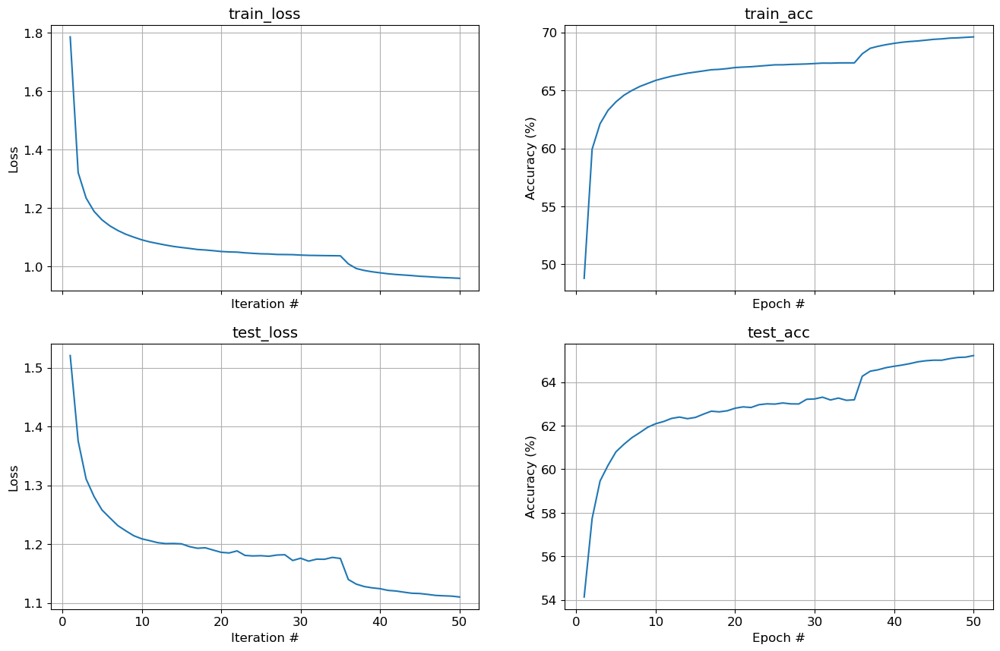

In [20]:
from cs236781.plot import plot_fit

def post_epoch_fn(epoch, train_res, test_res, verbose):
    # Update learning rate
    scheduler.step(test_res.accuracy)
    # Sample from model to show progress
    if verbose:
        start_seq = "ACT I."
        generated_sequence = charnn.generate_from_model(
            model, start_seq, 100, (char_to_idx,idx_to_char), T=0.5
        )
        print(generated_sequence)

# Train, unless final checkpoint is found
checkpoint_file_final = f'{checkpoint_file}_final.pt'
if os.path.isfile(checkpoint_file_final):
    print(f'*** Loading final checkpoint file {checkpoint_file_final} instead of training')
    saved_state = torch.load(checkpoint_file_final, map_location=device)
    model.load_state_dict(saved_state['model_state'])
else:
    try:
        # Print pre-training sampling
        print(charnn.generate_from_model(model, "ACT I.", 100, (char_to_idx,idx_to_char), T=0.5))

        fit_res = trainer.fit(dl_train, dl_test, num_epochs, max_batches=None,
                              post_epoch_fn=post_epoch_fn, early_stopping=early_stopping,
                              checkpoints=checkpoint_file, print_every=1)
        
        fig, axes = plot_fit(fit_res)
    except KeyboardInterrupt as e:
        print('\n *** Training interrupted by user')

### Generating a work of art
<a id=part1_8></a>

Armed with our fully trained model, let's generate the next Hamlet! You should experiment with modifying the sampling temperature and see what happens.

The text you generate should “look” like a Shakespeare play:
old-style English words and sentence structure, directions for the actors
(like “Exit/Enter”), sections (Act I/Scene III) etc.
There will be no coherent plot of course, but it should at least seem like
a Shakespearean play when not looking too closely.
If this is not what you see, go back, debug and/or and re-train.

**TODO**: Specify the generation parameters in the `part1_generation_params()` function within the `hw3/answers.py` module.

In [21]:
from hw3.answers import part1_generation_params

start_seq, temperature = part1_generation_params()

generated_sequence = charnn.generate_from_model(
    model, start_seq, 10000, (char_to_idx,idx_to_char), T=temperature
)

print(generated_sequence)

Act I.
  CASSIUS. The sons of Venus is a doublet hour,
    And the proceeding of the seas of Caesar.
    Therefore, for you must come to the disposing
    To the last night of parting. The gods do make
    The senseless souls of the strong.
  MARCIUS. Pray you, be strange;
    I am not so much to be made a case.
    I think it should be so against the child.
    I say you are not the first of your complaints,
    I will be there against the good of them.
    Therefore I came to this your hand that stays.
    I'll follow thee a word. I thank thee, gentle lord,
    To be a soldier for the meaner sons,
    And with a passion of our state can do
    That I am sure thou art not so to beat thee.
    Thy wife is made of words. The sea-moys enter,
    Who hath descended to his care of me.
    The field be here at hand, and there thy stand
    From the condition of the sentence of the charge
    Which the live of the state of conscience were,
    And there they say in thee as false as black,
  

## Questions
<a id=part1_9></a>

**TODO** Answer the following questions. Write your answers in the appropriate variables in the module `hw3/answers.py`.

In [22]:
from cs236781.answers import display_answer
import hw3.answers

### Question 1
Why do we split the corpus into sequences instead of training on the whole text?

In [23]:
display_answer(hw3.answers.part1_q1)


We split the corpus due to the following reasons:

1)**Preventing Vanishing and Exploding Gradients:** 
During the training of RNNs, backpropagation through time (BPTT) is used to update weights. 
If the sequences are too long, the gradients can either vanish or explode, leading to training difficulties 
and numeric instability. Splitting the text into shorter sequences helps mitigate this issue by limiting the
number of time steps over which gradients need to be propagated, thus stabilizing the training process.

2)**Memory Limits:** Since RNNs process each token sequentially, we need to keep the hidden state for each time step until we perform backpropagation. If the sequences are too long, the memory consumption can become excessive, potentially exceeding available resources. Splitting the corpus into shorter sequences helps manage memory usage more efficiently.

3 )**Batch Processing:** Even though RNNs process tokens sequentially within each sample, 
dividing the corpus into smaller sequences allows us to process tokens from different samples in
parallel within a batch. This parallel processing enhances computational efficiency, making the training process
faster.

4)**Focusing on Local Context:** For many language tasks, the local context (nearby words or tokens) is
most relevant for making predictions. Splitting the text into sequences allows the RNN to focus on learning from
these local contexts, making it easier to model short-term dependencies that are crucial for tasks like sequence
prediction.





### Question 2
How is it possible that the generated text clearly shows memory longer than the sequence length?

In [24]:
display_answer(hw3.answers.part1_q2)


During training, the model processes sequences of a limited length,
grouped into batches. Each sample in a batch continues in the next batch,
meaning that sample I in batch j continues as sample I in batch j+1. This setup ensures that the model's
hidden state, which captures the learned context, is transferred from one batch to the next. 
As a result, the model retains memory across batches, allowing it to understand a longer context than
the sequence length might suggest. Even though the optimization happens within the scope of each sequence,
the continuity provided by the hidden state transfer means the model learns from a broader context. 
During inference, this allows the model to generate meaningful longer sequences.
The batch size used during training influences how context is preserved across sequences.
A larger batch size tends to break the corpus into smaller, more isolated segments, as each position
in the batch retains its individual memory and context. In contrast, a smaller batch size allows the model to
carry context over longer sections of text,
as it processes more batches and maintains continuity across them.



### Question 3
Why are we not shuffling the order of batches when training?

In [25]:
display_answer(hw3.answers.part1_q3)


We are not shuffling the order of batches because each sample in a batch continues
into the next batch. Ensuring that batches follow one another in the correct order allows the model
to transfer the hidden state from one batch to the next, preserving the learned context across batches.
This continuity enables the model to understand longer sequences than the individual sequence length might suggest.
Shuffling the batches would disrupt this continuity, preventing the model from effectively learning the relationships
between consecutive elements and undermining its ability
to retain and utilize long-term dependencies.



### Question 4
1. Why do we lower the temperature for sampling (compared to the default of $1.0$)?
2. What happens when the temperature is very high and why?
3. What happens when the temperature is very low and why?

In [26]:
display_answer(hw3.answers.part1_q4)


1.Lowering the temperature modifies the softmax function to create a sharper probability distribution.
This means that the probabilities diverge more significantly, with higher probabilities becoming even higher,
and lower probabilities becoming closer to zero. Lowering the temperature is used to make the model outputs 
more predictable and less random by emphasizing more probable outcomes. When T=1, , as observed from the plot above,
many characters share similar distributions, so the output may become too random and lack coherence
(since each character is sampled based on the distribution).


2.When the temperature is set very high, the effect on the softmax function is to make the output probability
distribution more uniform. This happens because a high temperature effectively diminishes
the differences between the logits that are input to the softmax function.
The model becomes less able to distinguish between more likely and less likely outcomes. 
This can lead to less coherent or meaningful outputs, as the model does not strongly
prefer more probable predictions based on the training data.

3.When the temperature is very low the softmax distribution becomes very "peaky,"
with the probability mass concentrated on one or very few logits that have the highest values.
As a result, the model's output becomes more deterministic, with the most likely
outcomes chosen frequently. This can lead to more predictable and reliable output, 
but it may also cause the output to repeat itself often.
